# Example: Routing using OSMNX

> Use some Spatial-Utils functions to processing probable routes between NYC Citibike stations in SEP 2024.

__Notes__

* This example was run using DBR 15.4 on a 10 worker cluster (each with 4 CPUs and 32GB RAM); _recommend not using an auto-scaling cluster for this as the number of partitions is set against available CPUs during route generation._
* Uses 'spatial-utils-v1' branch with extra packages [route,viz].
* Requires a cluster with product `ST_` spatial sql functions enabled for KeplerGL Viz (may require photon cluster + spatial sql flag enabled).

---
__Author:__ Michael Johns <mjohns@databricks.com> | _Last Modified:_ 13 DEC 2024

## Setup

In [0]:
%pip install -U "databricks-spatial[route,viz] @ git+https://github.com/databrickslabs/mosaic.git@spatial-utils-v1" --quiet

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
dbutils.library.restartPython()

_Contact us to get spatial sql enabled, if needed; it is in private preview as of this example._ 

In [0]:
%run ./spatial_sql_flag

### Imports

In [0]:
from datetime import datetime
from pathlib import Path
from pyspark.databricks.sql import functions as dbf
from pyspark.sql import functions as F
from pyspark.sql.functions import col, pandas_udf
from pyspark.sql.types import *
from typing import Iterator, Tuple

import math
import numpy as np
import os
import pandas as pd

_Import the following from Spatial-Utils:_

* osmnx 
  * graph helpers - `graph_to_cloudpickle` + `load_graph`
  * pandas udfs - `osmnx_nearest_node_udf` + `osmnx_route_distance_weighted_udf`
* table helper - `df_to_interim`
* keplergl helper - `kviz:KeplerViz`

In [0]:
# - ROUTING UDFs
from spatial.route.osmnx import * 

# - TABLE HELPERS
from spatial.table import *

# - VIZ
from spatial.viz.keplergl import *
from spatial.viz.helpers import *

kviz = KeplerViz(spark)

## Citibike "Walking" Routes

### Config

In [0]:
# - CATALOG & SCHEMA
catalog = "geospatial_docs"
schema = "osmnx"
spark.catalog.setCurrentCatalog(catalog)
spark.catalog.setCurrentDatabase(schema)

# - TABLES
BRONZE_TBL = f"{catalog}.{schema}.cb_bronze"
STATION_TBL = f"{catalog}.{schema}.cb_stations"
INTERIM_PAIR_TBL = f"{catalog}.{schema}.cb_pair_interim"
INTERIM_ROUTE_TBL = f"{catalog}.{schema}.cb_route_interim"

In [0]:
# - VOLUME PATHS
OSMNX_FUSE_DIR = '/Volumes/geospatial_docs/osmnx/data'
OSMNX_FUSE_NYC = f'{OSMNX_FUSE_DIR}/nyc.graphml'
OSMNX_FUSE_NYC_PICKLE = f'{OSMNX_FUSE_DIR}/nyc.pickle'

OSMNX_FUSE_DOWNLOAD = f'{OSMNX_FUSE_DIR}/download'
os.makedirs(OSMNX_FUSE_DOWNLOAD, exist_ok=True)
os.environ['OSMNX_FUSE_DOWNLOAD'] = OSMNX_FUSE_DOWNLOAD

OSMNX_FUSE_UNZIP = f'{OSMNX_FUSE_DIR}/unzip'
os.makedirs(OSMNX_FUSE_UNZIP, exist_ok=True)
os.environ['OSMNX_FUSE_UNZIP'] = OSMNX_FUSE_UNZIP

In [0]:
# -- TIMEFRAME
YEAR = 2024
MONTH_START = 9
MONTH_END = 9

### Graph of NYC

> Our routes are focused around Manhattan, so we populate our osmnx graph using `graph_from_place`. This is stored at configured 'OSMNX_FUSE_NYC'. 

_See other ways to populate a graph at [oxmnx docs](https://osmnx.readthedocs.io/en/stable/user-reference.html#module-osmnx.graph)._

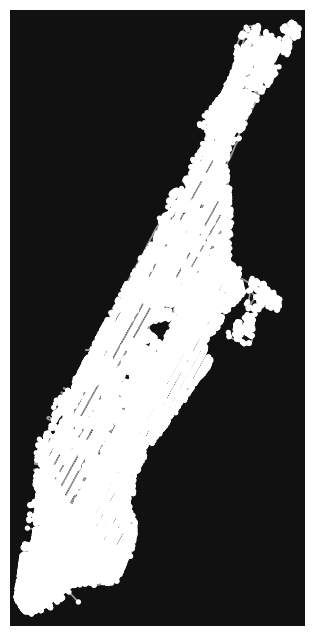

In [0]:
import osmnx as ox

if not os.path.exists(OSMNX_FUSE_NYC):
  G_NYC = ox.graph_from_place("Manhattan, New York, USA", network_type="walk") # <- more granular than "bike"
  
  # impute missing edge speeds and calculate edge travel times with the speed module
  G_NYC = ox.routing.add_edge_speeds(G_NYC)
  G_NYC = ox.routing.add_edge_travel_times(G_NYC)

  # save for faster re-load in UDFs
  ox.io.save_graphml(G_NYC, filepath=OSMNX_FUSE_NYC)

G_NYC = OsmnxMgr.load_graph(OSMNX_FUSE_NYC, False)
fig, ax = ox.plot_graph(G_NYC)

__Note: to speed-up loading in our UDFs, we want to pickle the graph object - the UDFs expect pickled paths.__

In [0]:
# save to pickle
if not os.path.exists(OSMNX_FUSE_NYC_PICKLE):
  OsmnxMgr.graph_to_cloudpickle(G_NYC, OSMNX_FUSE_NYC_PICKLE)

G_NYC_PICKLE = OsmnxMgr.load_graph(OSMNX_FUSE_NYC_PICKLE, True)
type(G_NYC_PICKLE)

networkx.classes.multidigraph.MultiDiGraph

### Citibike Ride Data

> Stations and Rides

#### Download Zip Files

In [0]:
for month in range(MONTH_START, MONTH_END+1):
  YYYYMM = f'{YEAR}{month:02d}'
  path = Path(f'{OSMNX_FUSE_DOWNLOAD}/{YYYYMM}-citibike-tripdata.zip')
  alt_path = Path(f'{OSMNX_FUSE_DOWNLOAD}/{YYYYMM}-citibike-tripdata.csv.zip')
  if not path.exists() and not alt_path.exists():
    try:
      os.system(f'wget -P {OSMNX_FUSE_DOWNLOAD} https://s3.amazonaws.com/tripdata/{YYYYMM}-citibike-tripdata.zip')
    except:
      pass
  if not path.exists() and not alt_path.exists():
    try:
      os.system(f'wget -P {OSMNX_FUSE_DOWNLOAD} https://s3.amazonaws.com/tripdata/{YYYYMM}-citibike-tripdata.csv.zip')
    except:
      pass

In [0]:
ls -lh $OSMNX_FUSE_DOWNLOAD

total 184M
-rwxrwxrwx 1 nobody nogroup 184M Dec 11 23:35 202409-citibike-tripdata.zip*


#### Unzip Files [CSVs]

In [0]:
for idx, month in enumerate(range(MONTH_START, MONTH_END+1)):
  YYYYMM = f'{YEAR}{month:02d}'
  try:
    path = Path(f'{OSMNX_FUSE_DOWNLOAD}/{YYYYMM}-citibike-tripdata.zip')
    os.system(f'unzip -n {path} -d {OSMNX_FUSE_UNZIP} 2>/dev/null')
  except:
    pass
  try:
    alt_path = Path(f'{OSMNX_FUSE_DOWNLOAD}/{YYYYMM}-citibike-tripdata.csv.zip')
    os.system(f'unzip -n {alt_path} -d {OSMNX_FUSE_UNZIP} 2>/dev/null')
  except:
    pass

In [0]:
%sh 
rm -rf $OSMNX_FUSE_UNZIP/__MACOSX
ls -lh $OSMNX_FUSE_UNZIP

total 932M
-rwxrwxrwx 1 nobody nogroup 186M Dec 12 00:11 202409-citibike-tripdata_1.csv
-rwxrwxrwx 1 nobody nogroup 186M Dec 12 00:11 202409-citibike-tripdata_2.csv
-rwxrwxrwx 1 nobody nogroup 188M Dec 12 00:11 202409-citibike-tripdata_3.csv
-rwxrwxrwx 1 nobody nogroup 187M Dec 12 00:11 202409-citibike-tripdata_4.csv
-rwxrwxrwx 1 nobody nogroup 187M Dec 12 00:11 202409-citibike-tripdata_5.csv


#### Write CSVs to `cb_bronze`

> This yields ~5M routes. __Note: some routes are missing start or end station.__

In [0]:
import glob

files = []
if MONTH_START <= 9 and MONTH_END <= 9:
  files = glob.glob(f"{OSMNX_FUSE_UNZIP}/{YEAR}0[{MONTH_START}-{MONTH_END}]*.csv")
elif MONTH_START >= 10:
  files = glob.glob(f"{OSMNX_FUSE_UNZIP}/{YEAR}[{MONTH_START}-{MONTH_END}]*.csv")
else:
  files = glob.glob(f"{OSMNX_FUSE_UNZIP}/{YEAR}0[{MONTH_START}-9]*.csv") + glob.glob(f"{OSMNX_FUSE_UNZIP}/{YEAR}[10-{MONTH_END}]*.csv")
print(f"files -> {files}")

_df_bronze = (
  spark
    .read.format("csv")
      .option("header", True)
      .option("inferSchema", True)
    .load(files)
    .select(
      'ride_id','rideable_type','started_at','ended_at','start_station_name','start_station_id','end_station_name',
      'end_station_id','start_lat','start_lng','end_lat','end_lng','member_casual'
    )
)

_df_bronze.limit(1).display()

files -> ['/Volumes/geospatial_docs/osmnx/data/unzip/202409-citibike-tripdata_1.csv', '/Volumes/geospatial_docs/osmnx/data/unzip/202409-citibike-tripdata_2.csv', '/Volumes/geospatial_docs/osmnx/data/unzip/202409-citibike-tripdata_3.csv', '/Volumes/geospatial_docs/osmnx/data/unzip/202409-citibike-tripdata_4.csv', '/Volumes/geospatial_docs/osmnx/data/unzip/202409-citibike-tripdata_5.csv']


ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
D86F678648E7A867,electric_bike,2024-09-10T22:50:16.212Z,2024-09-10T23:30:44.697Z,Hudson St & W 13 St,6115.06,Broadway & W 58 St,6948.10,40.74005708567285,-74.0052741765976,40.76695317,-73.98169333,casual


In [0]:
# -- takes ~1 minute
if not spark.catalog.tableExists(BRONZE_TBL):  
  (
    _df_bronze
      .write
        .mode("overwrite")
        .option("overwriteSchema", "true")
      .saveAsTable(BRONZE_TBL)
  )

  alter = spark.sql(f"ALTER TABLE {BRONZE_TBL} CLUSTER BY (start_station_id, end_station_id)")
  optimize = spark.sql(f"OPTIMIZE {BRONZE_TBL}")
  optimize.display()

In [0]:
display(sql(f"select format_number(count(1),0) as count from {BRONZE_TBL}"))

count
"4,997,898"


In [0]:
display(sql(f"select * from {BRONZE_TBL} limit 3"))

ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
BD5299CB404DEC67,classic_bike,2024-09-06T18:53:56.193Z,2024-09-06T18:57:08.782Z,Forest Ave & Summerfield St,4798.02,St Felix Ave & 61 St,4719.04,40.69922,-73.89795,40.69715,-73.8936,member
743B1F43BCC71F11,electric_bike,2024-09-02T21:09:09.862Z,2024-09-02T21:13:16.881Z,E 7 St & Ave B,5584.05,Rivington St & Ridge St,5406.02,40.7251285241158,-73.98131668567657,40.71850211,-73.98329859,member
1642CEBE805FA026,electric_bike,2024-09-17T07:29:14.311Z,2024-09-17T08:03:10.812Z,7 Ave & 20 St,3588.01,Central Ave & Woodbine St,4632.10,40.659053,-73.98854,40.69296,-73.91605,member


### Station Table

> There are ~2.2K bike stations in NYC.

In [0]:
# -- takes ~1 minute
if not spark.catalog.tableExists(STATION_TBL):
  import json
  from urllib.request import urlopen

  url = "https://gbfs.lyft.com/gbfs/2.3/bkn/en/station_information.json"
  raw_json = json.loads(urlopen(url).read().decode('utf-8'))

  df = (
    spark
      .createDataFrame(raw_json["data"]["stations"])
      .withColumn(
        "wkt",
        F.concat(
        F.lit("POINT("), col("lon"), F.lit(" "), col("lat"), F.lit(")"))
      )
      .createOrReplaceTempView("stations_update")
  )

  spark.sql(f"""
  CREATE TABLE {STATION_TBL} AS
  SELECT * FROM stations_update""")

  alter = spark.sql(f"ALTER TABLE {STATION_TBL} CLUSTER BY (station_id)")
  optimize = spark.sql(f"OPTIMIZE {STATION_TBL}")
  optimize.display()

In [0]:
display(sql(f"select format_number(count(1),0) as count from {STATION_TBL}"))

count
"2,231"


In [0]:
display(sql(f"select * from {STATION_TBL} limit 3"))

capacity,lat,lon,name,region_id,rental_uris,short_name,station_id,wkt
24,40.65458,-73.94716,New York Ave & Lenox Rd,71,"Map(ios -> https://bkn.lft.to/lastmile_qr_scan, android -> https://bkn.lft.to/lastmile_qr_scan)",3431.02,1814900752968579218,POINT(-73.94716 40.65458)
20,40.66559,-73.93712,Crown St & Troy Ave,71,"Map(ios -> https://bkn.lft.to/lastmile_qr_scan, android -> https://bkn.lft.to/lastmile_qr_scan)",3751.05,c45aa693-fedd-478f-ade9-bf176c4e32ff,POINT(-73.93712 40.66559)
31,40.796879,-73.937261,E 116 St & 2 Ave,71,"Map(ios -> https://bkn.lft.to/lastmile_qr_scan, android -> https://bkn.lft.to/lastmile_qr_scan)",7563.06,9b7e3b8b-97ef-4038-820c-7cd1c1a34fc7,POINT(-73.937261 40.796879)


Let's render the stations. __Note: we don't need to filter the table given its relatively small size.__

_Here is a screenshot of the rendered stations._


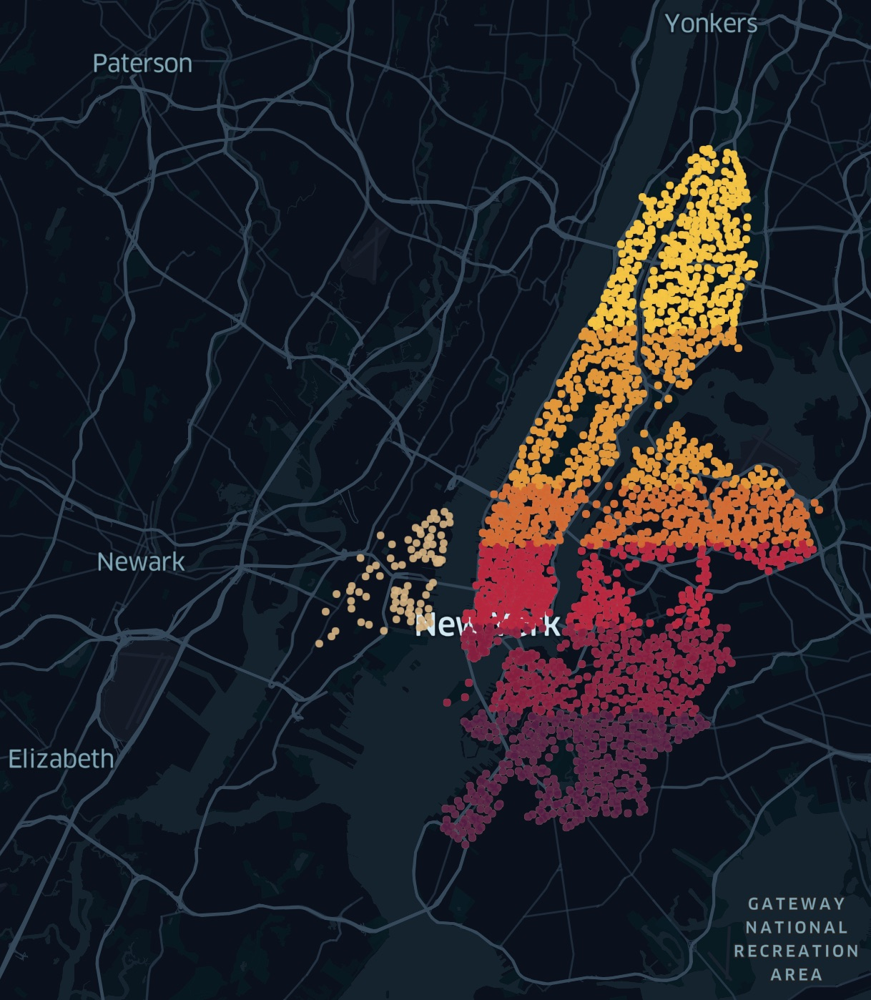

In [0]:
displayHTML("""<img width="50%" src='data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAkACQAAD/4QCSRXhpZgAATU0AKgAAAAgABAEaAAUAAAABAAAAPgEbAAUAAAABAAAARgEoAAMAAAABAAIAAIdpAAQAAAABAAAATgAAAAAAAACQAAAAAQAAAJAAAAABAAOShgAHAAAAEgAAAHigAgAEAAAAAQAABMKgAwAEAAAAAQAABXYAAAAAQVNDSUkAAABTY3JlZW5zaG90/+0AOFBob3Rvc2hvcCAzLjAAOEJJTQQEAAAAAAAAOEJJTQQlAAAAAAAQ1B2M2Y8AsgTpgAmY7PhCfv/iD/BJQ0NfUFJPRklMRQABAQAAD+BhcHBsAhAAAG1udHJSR0IgWFlaIAfoAAwAAgAJAAEAG2Fjc3BBUFBMAAAAAEFQUEwAAAAAAAAAAAAAAAAAAAAAAAD21gABAAAAANMtYXBwbAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEWRlc2MAAAFQAAAAYmRzY20AAAG0AAAEvGNwcnQAAAZwAAAAI3d0cHQAAAaUAAAAFHJYWVoAAAaoAAAAFGdYWVoAAAa8AAAAFGJYWVoAAAbQAAAAFHJUUkMAAAbkAAAIDGFhcmcAAA7wAAAAIHZjZ3QAAA8QAAAAMG5kaW4AAA9AAAAAPm1tb2QAAA+AAAAAKHZjZ3AAAA+oAAAAOGJUUkMAAAbkAAAIDGdUUkMAAAbkAAAIDGFhYmcAAA7wAAAAIGFhZ2cAAA7wAAAAIGRlc2MAAAAAAAAACERpc3BsYXkAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABtbHVjAAAAAAAAACcAAAAMaHJIUgAAABQAAAHka29LUgAAAAwAAAH4bmJOTwAAABIAAAIEaWQAAAAAABIAAAIWaHVIVQAAABQAAAIoY3NDWgAAABYAAAI8c2xTSQAAABQAAAJSZGFESwAAABwAAAJmbmxOTAAAABYAAAKCZmlGSQAAABAAAAKYaXRJVAAAABgAAAKoZXNFUwAAABYAAALAcm9STwAAABIAAALWZnJDQQAAABYAAALoYXIAAAAAABQAAAL+dWtVQQAAABwAAAMSaGVJTAAAABYAAAMuemhUVwAAAAoAAANEdmlWTgAAAA4AAANOc2tTSwAAABYAAANcemhDTgAAAAoAAANEcnVSVQAAACQAAANyZW5HQgAAABQAAAOWZnJGUgAAABYAAAOqbXMAAAAAABIAAAPAaGlJTgAAABIAAAPSdGhUSAAAAAwAAAPkY2FFUwAAABgAAAPwZW5BVQAAABQAAAOWZXNYTAAAABIAAALWZGVERQAAABAAAAQIZW5VUwAAABIAAAQYcHRCUgAAABgAAAQqcGxQTAAAABIAAARCZWxHUgAAACIAAARUc3ZTRQAAABAAAAR2dHJUUgAAABQAAASGcHRQVAAAABYAAASaamFKUAAAAAwAAASwAEwAQwBEACAAdQAgAGIAbwBqAGnO7LfsACAATABDAEQARgBhAHIAZwBlAC0ATABDAEQATABDAEQAIABXAGEAcgBuAGEAUwB6AO0AbgBlAHMAIABMAEMARABCAGEAcgBlAHYAbgD9ACAATABDAEQAQgBhAHIAdgBuAGkAIABMAEMARABMAEMARAAtAGYAYQByAHYAZQBzAGsA5gByAG0ASwBsAGUAdQByAGUAbgAtAEwAQwBEAFYA5AByAGkALQBMAEMARABMAEMARAAgAGEAIABjAG8AbABvAHIAaQBMAEMARAAgAGEAIABjAG8AbABvAHIATABDAEQAIABjAG8AbABvAHIAQQBDAEwAIABjAG8AdQBsAGUAdQByIA8ATABDAEQAIAZFBkQGSAZGBikEGgQ+BDsETAQ+BEAEPgQyBDgEOQAgAEwAQwBEIA8ATABDAEQAIAXmBdEF4gXVBeAF2V9pgnIATABDAEQATABDAEQAIABNAOAAdQBGAGEAcgBlAGIAbgD9ACAATABDAEQEJgQyBDUEQgQ9BD4EOQAgBBYEGgAtBDQEOARBBD8EOwQ1BDkAQwBvAGwAbwB1AHIAIABMAEMARABMAEMARAAgAGMAbwB1AGwAZQB1AHIAVwBhAHIAbgBhACAATABDAEQJMAkCCRcJQAkoACAATABDAEQATABDAEQAIA4qDjUATABDAEQAIABlAG4AIABjAG8AbABvAHIARgBhAHIAYgAtAEwAQwBEAEMAbwBsAG8AcgAgAEwAQwBEAEwAQwBEACAAQwBvAGwAbwByAGkAZABvAEsAbwBsAG8AcgAgAEwAQwBEA4gDswPHA8EDyQO8A7cAIAO/A7gDzAO9A7cAIABMAEMARABGAOQAcgBnAC0ATABDAEQAUgBlAG4AawBsAGkAIABMAEMARABMAEMARAAgAGEAIABjAG8AcgBlAHMwqzDpMPwATABDAER0ZXh0AAAAAENvcHlyaWdodCBBcHBsZSBJbmMuLCAyMDI0AABYWVogAAAAAAAA81EAAQAAAAEWzFhZWiAAAAAAAACD3wAAPb////+7WFlaIAAAAAAAAEq/AACxNwAACrlYWVogAAAAAAAAKDgAABELAADIuWN1cnYAAAAAAAAEAAAAAAUACgAPABQAGQAeACMAKAAtADIANgA7AEAARQBKAE8AVABZAF4AYwBoAG0AcgB3AHwAgQCGAIsAkACVAJoAnwCjAKgArQCyALcAvADBAMYAywDQANUA2wDgAOUA6wDwAPYA+wEBAQcBDQETARkBHwElASsBMgE4AT4BRQFMAVIBWQFgAWcBbgF1AXwBgwGLAZIBmgGhAakBsQG5AcEByQHRAdkB4QHpAfIB+gIDAgwCFAIdAiYCLwI4AkECSwJUAl0CZwJxAnoChAKOApgCogKsArYCwQLLAtUC4ALrAvUDAAMLAxYDIQMtAzgDQwNPA1oDZgNyA34DigOWA6IDrgO6A8cD0wPgA+wD+QQGBBMEIAQtBDsESARVBGMEcQR+BIwEmgSoBLYExATTBOEE8AT+BQ0FHAUrBToFSQVYBWcFdwWGBZYFpgW1BcUF1QXlBfYGBgYWBicGNwZIBlkGagZ7BowGnQavBsAG0QbjBvUHBwcZBysHPQdPB2EHdAeGB5kHrAe/B9IH5Qf4CAsIHwgyCEYIWghuCIIIlgiqCL4I0gjnCPsJEAklCToJTwlkCXkJjwmkCboJzwnlCfsKEQonCj0KVApqCoEKmAquCsUK3ArzCwsLIgs5C1ELaQuAC5gLsAvIC+EL+QwSDCoMQwxcDHUMjgynDMAM2QzzDQ0NJg1ADVoNdA2ODakNww3eDfgOEw4uDkkOZA5/DpsOtg7SDu4PCQ8lD0EPXg96D5YPsw/PD+wQCRAmEEMQYRB+EJsQuRDXEPURExExEU8RbRGMEaoRyRHoEgcSJhJFEmQShBKjEsMS4xMDEyMTQxNjE4MTpBPFE+UUBhQnFEkUahSLFK0UzhTwFRIVNBVWFXgVmxW9FeAWAxYmFkkWbBaPFrIW1hb6Fx0XQRdlF4kXrhfSF/cYGxhAGGUYihivGNUY+hkgGUUZaxmRGbcZ3RoEGioaURp3Gp4axRrsGxQbOxtjG4obshvaHAIcKhxSHHscoxzMHPUdHh1HHXAdmR3DHeweFh5AHmoelB6+HukfEx8+H2kflB+/H+ogFSBBIGwgmCDEIPAhHCFIIXUhoSHOIfsiJyJVIoIiryLdIwojOCNmI5QjwiPwJB8kTSR8JKsk2iUJJTglaCWXJccl9yYnJlcmhya3JugnGCdJJ3onqyfcKA0oPyhxKKIo1CkGKTgpaymdKdAqAio1KmgqmyrPKwIrNitpK50r0SwFLDksbiyiLNctDC1BLXYtqy3hLhYuTC6CLrcu7i8kL1ovkS/HL/4wNTBsMKQw2zESMUoxgjG6MfIyKjJjMpsy1DMNM0YzfzO4M/E0KzRlNJ402DUTNU01hzXCNf02NzZyNq426TckN2A3nDfXOBQ4UDiMOMg5BTlCOX85vDn5OjY6dDqyOu87LTtrO6o76DwnPGU8pDzjPSI9YT2hPeA+ID5gPqA+4D8hP2E/oj/iQCNAZECmQOdBKUFqQaxB7kIwQnJCtUL3QzpDfUPARANER0SKRM5FEkVVRZpF3kYiRmdGq0bwRzVHe0fASAVIS0iRSNdJHUljSalJ8Eo3Sn1KxEsMS1NLmkviTCpMcky6TQJNSk2TTdxOJU5uTrdPAE9JT5NP3VAnUHFQu1EGUVBRm1HmUjFSfFLHUxNTX1OqU/ZUQlSPVNtVKFV1VcJWD1ZcVqlW91dEV5JX4FgvWH1Yy1kaWWlZuFoHWlZaplr1W0VblVvlXDVchlzWXSddeF3JXhpebF69Xw9fYV+zYAVgV2CqYPxhT2GiYfViSWKcYvBjQ2OXY+tkQGSUZOllPWWSZedmPWaSZuhnPWeTZ+loP2iWaOxpQ2maafFqSGqfavdrT2una/9sV2yvbQhtYG25bhJua27Ebx5veG/RcCtwhnDgcTpxlXHwcktypnMBc11zuHQUdHB0zHUodYV14XY+dpt2+HdWd7N4EXhueMx5KnmJeed6RnqlewR7Y3vCfCF8gXzhfUF9oX4BfmJ+wn8jf4R/5YBHgKiBCoFrgc2CMIKSgvSDV4O6hB2EgITjhUeFq4YOhnKG14c7h5+IBIhpiM6JM4mZif6KZIrKizCLlov8jGOMyo0xjZiN/45mjs6PNo+ekAaQbpDWkT+RqJIRknqS45NNk7aUIJSKlPSVX5XJljSWn5cKl3WX4JhMmLiZJJmQmfyaaJrVm0Kbr5wcnImc951kndKeQJ6unx2fi5/6oGmg2KFHobaiJqKWowajdqPmpFakx6U4pammGqaLpv2nbqfgqFKoxKk3qamqHKqPqwKrdavprFys0K1ErbiuLa6hrxavi7AAsHWw6rFgsdayS7LCszizrrQltJy1E7WKtgG2ebbwt2i34LhZuNG5SrnCuju6tbsuu6e8IbybvRW9j74KvoS+/796v/XAcMDswWfB48JfwtvDWMPUxFHEzsVLxcjGRsbDx0HHv8g9yLzJOsm5yjjKt8s2y7bMNcy1zTXNtc42zrbPN8+40DnQutE80b7SP9LB00TTxtRJ1MvVTtXR1lXW2Ndc1+DYZNjo2WzZ8dp22vvbgNwF3IrdEN2W3hzeot8p36/gNuC94UThzOJT4tvjY+Pr5HPk/OWE5g3mlucf56noMui86Ubp0Opb6uXrcOv77IbtEe2c7ijutO9A78zwWPDl8XLx//KM8xnzp/Q09ML1UPXe9m32+/eK+Bn4qPk4+cf6V/rn+3f8B/yY/Sn9uv5L/tz/bf//cGFyYQAAAAAAAwAAAAJmZgAA8qcAAA1ZAAAT0AAAClt2Y2d0AAAAAAAAAAEAAQAAAAAAAAABAAAAAQAAAAAAAAABAAAAAQAAAAAAAAABAABuZGluAAAAAAAAADYAAK4UAABR7AAAQ9cAALCkAAAmZgAAD1wAAFANAABUOQACMzMAAjMzAAIzMwAAAAAAAAAAbW1vZAAAAAAAAAYQAACgUP1ibWIAAAAAAAAAAAAAAAAAAAAAAAAAAHZjZ3AAAAAAAAMAAAACZmYAAwAAAAJmZgADAAAAAmZmAAAAAjMzNAAAAAACMzM0AAAAAAIzMzQA/8AAEQgFdgTCAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/bAEMAAgICAgICAwICAwQDAwMEBQQEBAQFBwUFBQUFBwgHBwcHBwcICAgICAgICAoKCgoKCgsLCwsLDQ0NDQ0NDQ0NDf/bAEMBAgICAwMDBgMDBg0JBwkNDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDf/dAAQATf/aAAwDAQACEQMRAD8A/D+iiivcPPCiiigDo4fl8M3H+1OP/Zf8K5yuj+74Z/3rj/P8q5yql0Ih1FDMv3SR9KCSTk8mkoqS7BRRRQAUUUUAFFFFAGvp+q/Y4ntp4hcQSclCcYPqOtXseHLo5Uy2b/muf/Hv6VzVFUpEuC3R28Dxaf8AvZdWMsX8KLhyfz3YqxqF9bSWsd+LWO5t3+Vs8Oh/WuArpNE/0m0vdOPJePeg/wBof/XxVqd9DOULe8xP7W0kdNNT8W/+tR/bOnDppcX4kH/2WucoqOZl8iOrVLHXIGjtoUtbqPLIq4AcfgB/9aubRHinMbgqykqQeoNMilkgkWaJirocgj1rprmKLXbU31qAt3EP3sY/iA7j+n5U/i9SWrK3Q5iQ5diOeaZRRUGiVlYKKKKBhXX6TZTTaLMkQ+a5kC5PQKMZJ/WuTjjeaRYoxuZyAAO5Nd5eO1tYQaJppxIqf6RKeApPOAfU5P0H6XDq2ZVXsjKmv9P0lhbWEEc0kYw0z8/N3x/9Y1mXGu6ncZBmKD0j+X9ev60/7PpUTqk05Zk4YKDhj+AP0OKmzoQ6DP8A33Q2xJrtcwWZnbc5LE9zya17XTVVDc3x8uNedp4J+v8Ah1qY3elW5328W9+o4PBHu3T8BUtpBJqsjXl63lWcPJ5wOOw9/U0khuTa7GjYNFJt1G+XytPt2ysfQyFenHoD26E1u2uqaXqdxc6sWmgMEW0bugB9hnniuD1XUjfyBIxst4uI0HHHqff+VXl/0Xw2zdGupcD/AHR/+yfzrSMraIh09Ls6TSZr6G4jFlqaXULON0cvLYPHXlsj8Km1tjptw3njzrWY/vVI6bu457E9Pf2rzGvR9GvV13T3066Ia5iXKlv416c/yP50RldWFUp8r5jmrnQmcG40uRbiEnhQfmHt7/zrn3R42KSKVYdQRgitG4S40m7KwSMhxkEHBxkjB/KtFNat7xBDrFuJOwlQYYf59j+FRZPyNU3a+5zdFbOp6dDbRRXlnIZbeYkKSMEEdv59u1Y1S1YtO+pveG9eufDuqR38GWT7s0eeJIz1H17g9jXrnjTw3D4osrfxJorJvMalyx2h4j0J4OGToc9vpXgtevfD/wAYxW8y6FqICQT7UhcnKq4ULgg8APj8zWtKSfuS2MK0Wnzx3PJ54JraQwzoUcdj/P3B9ahrt/HPhl/D2qloQTZXOWgPUL6x/wDAe3tjvmuIrKUWnZm0JKSugooopFBRRRQAUUUUAFFFFAEsR+bHtTXYk47CnRDLZ9Ke6hhnoRk/WgybSmV6KKKDUKsRzfwv+dV6KCZwUlZmhRVSOUpweRVoEMMrzQcNSm4lac/Pj0FfTrXh8LeDI7q4X97aWkSBT3k2hFB/4ERmvCfBlhb6p4qs7a5+aLe0hH97ylLgH2JAz7V7T8RSJfC14i/wNE35Oua6aKtFyKqrWNM+bZpZLiV55mLySMXdj1LMck/iajoormO4KKKKACiiigDo9B/499Q/64H+RrnK6PQv+PbUf+vc/wAjXPojPnHareyIuk22MoooqCwooqxCo2lmAP8AnmgmcuVXK9FKeTnpT4Y2llSJBlnYKB7mgo6DxKdtzBAOFjgXA9OSP5AVlaaJTeJ5XGDlj2298/561o+JXD6mVU52oqn68n+tVpmSwtTbIczy/wCt77R6f5/wq5fEzJfCl3M+5kEtxLICWDOSCfTPHX2qCiioNUgooooAKKKcoBYBumRmgGCqzZx2602rhQKjbByRVOgzp1Oa7Ciiig0CuksP9F0O9uujTERL9Oh/mfyrm66TU/8AR9GsLQdZAZm/Hkf+hfpVR6sifRHN0UUVJYUUUUAFdH4d4e7k/u27f5/Sucro9C4ttRf+7Af5NVQ3In8JzlFFFSWFSRozHK9u5qOrEH8X4UEVJWi2hJ/vD6f1qCrE/wDD+NV6BUvgRteH5PL1WHPRty/mD/Ws+9j8q8nj/uyOP1NLYSeTewSf3ZFJ+meau6/H5eqzejbWH4gZ/Wq+yP7Rj0UUVJYUUUUAFFFFABRRRQAUUVe0y1a91C3tVGTJIq49s8/pQgbtqe7/AA/0SDQNDk13UMJLcx+azH/lnAvIH4/eP4DtXkGu6tP4g1ea/cEea22JD/Cg4Vfy6+9etfEq/fTtFtNIt22rcHa2OpjhC8fQkj8q8j0q3DE3Dfwnav1xz/Ot6uloI8+Du3NmrbQC3hWMderH1J61PRRUAFFFFABRRRQBT1CbyLSRwcMRtXnByeOPcda4wkk5PJNdXq8gSzKHq7AD8Dn+lcnUyOqivduTW8D3M6QR/ekYKPxrb16dEeLTID+6tVAPu5HP+fXNW9NtDpMM2qXe3KJiNc5O5vX+X51yru0jtI5yzEkn1Jp7Ite879hyxhh8p57jB/8Ar0rROo3dR7dqkjdFQA8Ek095Qq/IwzUGTnPmskU6KeiFzgYz796ZQb36BRRXd+A/D/8Aa+p/bLhc2tmQ7Z6M/wDCv9TTiruwpSUVdnWSwPoPw8+yXPyT3X8J4P7xskfUJ1ryiur8X6+db1V1gbNrbZjix0Y/xN+Pb2rlKqo03ZHBO99Q6cntVBjuJJ71ZmbC7fX+VVag6cPCy5gooooOgK9I+FkZfxMzf3LWRv1Uf1rzevWfhIoOq3r45EAGfq1aUl76Mq7/AHbIfiDqqw6hc6banDyvunI9MDA/H+VeWV0/jOUTeKdScHOJ2T/vjC/0rmKVSV5MdKNoIKKKKg0Ol8O+KtV8NzbrJ98LnMkD8o3v/st7j8cjivadJufC/jK7t9Yt1+zapakO6cCQjGCG7SL6N1HHTpXzjU1tcz2k6XNrI0UsZ3I6HBB9jWkKjjo9jGpRUtVozufiTZz23iWSWRCEnjjZG7NtG04+hHNcBX0BYXGn/EzQHsr0eRf2e0mQDO12Bw69Mq2DuX/6xrwKSN4ZGilUq6MVZT1BHBBp1Y68y2YUZacr3QyiiisjYKKKKACiiigD/9D8P6KKfsfG7HHqa9w85tLcZRS4OM44FJQM6Ob5fDNv/tTn/wBm/wAK5yujvPl8O2S+sjH9W/xrnKqREOoUUUVJYUUUUAFFFFABRRRQAUUUUAFdF4ZH/Ewdz0SJifzFc7XR6D8kV/P/AHID+oJ/pVQ3IqfCc6x3Ese5zSUUVJYVas7uaxuFuIThl6jsR3BqrRQDVzpNStIL63Or6eOD/ro+6t3P+P51zdaOmajJp0/mL80bcSJ2Yf4jtVzVtPijVdQsfmtZueP4Ce30/l0q3qrohaOzMKiiioLOv0CzS2t31a4wOCIs9uxP+e2axb3VJLjckOUjbO7P3mJ65ra14mz02y05eMpl/quOPz5rkKuTt7plBcz5mFFFX9PsJdRuBDHwo5duyj/PSoSuaN21ZLpemvqEp3HZDHzI56Aen1qfVtSW422dmNlrDwoHG4juf6fnUuqahEkQ0vTvlt4+HYdZD359P5/Sufq3poiUru7Cuk13/R4LKwHWKLcw924/mDWRp0H2m+gh6hnGfoOT+lWtdn8/VJz2QhB/wHg/rmkvhB6yRkVoaXenT7+G7HRG+b3U8H9Kz6ntreW7nS2gXdJIdqj/AD2Hekt9Cna2p2fjC0AZLuPlW+bI6Ybr+oH51wtel+KhCtrDYxvny0VSevPH64FebOpRip7VVRe8Y0JprlOj0v8A07S7rTTy6fvYvw7fn/OuarS0m6+x6hFMThSdrf7rcfp1pdYtPseoSxgYVjvX6Nz+h4pPVXNFpKxmUUUVJZ7VoHjDQ9e02Hw74tj3SAbFnl5RiOFYt95JMHG76nPOKy9b+Fuo27NNoUi3cB5WN2Cyj8cBG+uR9K8prp7Hxl4l0+USwX0hGADHId8ZA/2TwPcjB9629omrTMHSlF3pszrrQ9TsIpJtRgktQhVQJVKl2Y9FyOeATnpxWTXuWm/EfRdWtTZ+KrWNTnkiMyxN77SGKkfjSzeBfCHiJGn8NXywyYyURvNQZ9UY71/PA9KHST+BiVZrSorHhlFdtqvw/wDE2lksLb7XEOj22ZP/AB3Af9Me9cpPYX1qu+6tpoVzjMiMoz6cgVm4tbo2jOL2ZUoooqSgooooAchwwNXJIvlqkAScDqa0402JtPPrQc2IlytNGX04oo680UHSFFFFABSgkZAPWkooA7f4c/8AI4WP0m/9FPXrfikm40TX4Tz5LZH4RxvXkXw7/wCRxsP+23/ol69d1IedF4pt/wAv+BWkf+FdNL4DjrfxF8vzPm2iiiuY7AooooAKKKKAOj0L/j21H/r3P8mrIiXCehatfQv+PbUf+uB/k1Za/dX6D+VW9kctdtFdoD/Cc1CVZfvDFX6hmbC7f738qgKdaTdmVatP8kW38P8AGqykBgSM4NTySqyYXPPWg1qJuS00K9dH4ehiSaTUrkHybVSfqx9PfH64rnK6bUv+JdpcGljiSX97N/Qfn/Kqj3Kn/L3LUS6BqF6J/NmjkZ/MIYcccnsf51n6ho1zue8tSLmGQl8x8kZOen+FZ1h/y8f9e7/0rQ8OT+VqKxs5VZARtz8pbHGRVJp7k2au0YFFWb1JI7uZJRhw7Z/E1WrM1QUUUUAFKMAgnpmkooAtGZcfLyff/wDXVYksSx7nNJRQRCmo7BRRRQWFdH4k+Se3t/8AnnAo/Uj+lYdsnmXMUf8AfdV/M1reI336rIP7iov6Z/rVL4WQ/iRhUUUVJYUUUUAFdHo/y6Zqb+saj8w3+Nc5XR6d8uh6g3qVH+fzqobkT2OcoooqSwq6gXaCAOnWqVTxuxKoOn9OtBjWi2tCSVGYDbzjtVSrXngMeMgdKrorOwRBlmIAHqTQFFSStIltoJLmdIIgSzsAMdvf8K2PEkscmpFU5MaKjH1PJ/rV24mi0CH7JagNdyKDJKeduew/p+dcqzM7F3JZmOSTySTVPRWLWruNoooqSwooooAKKKKACiiigAru/h1Y/bPE0DkfLbgyE+hHSuEr234S2OEvNRYdcRj6da0pK80Y15WgzI+KN352vRWoPFvbrkf7Tkk/piuZtYzHYAAYZgW/Pp+lJ4suzfeJdQmB3DzzGvuI/kH8qvqgRBGOigAfQUSd5NnNHSKPa/CfwStfG3wh1T4geG9XmuNb0VpDeaU0S4CxfOdrAljuiyy8ckEV4UtwPI3+1e7/ALOvxIHw2+I8EeoPjRde22F+rfcUuf3Up7fIxwf9lmruNZ/ZyvW/aFj8F2tu6+Gr+b+1RMo+RLDdukjz0BDZjX6g1fJeKcd9jD23JUlGq9N16dV8jz/VPgvbeHvgta/FLxLq01pqOrSINN0xY1PmrITsLMSGGUBc4HC47mvD0uFijAkPNfQv7TvxGh8a+OzoGjMo0LwqpsLVY/8AVtMuBM4A4wCoRfZfeu98E6D4G+D3wbsvi94w0W38Ra94gm2aXZ3YDQxI27YdrBlHyoXZsE4IAxQ4JyajsgjVlGkpVNXJ6L8l9x8fLewk4zUj3MSYyetfZfgz43eD/if4jsvAfxG8B6JBZazILS3urKLy5IJpOI+SNwy2BuVlIODg1xvg/wCF+neEP2qrT4eapCuoaZFNPJAtwocSW8lq8sRYdCV4B/2hRybOLvd2H7ZLmU42aV+90fI2qXxkcwIAybRnI5DZzwfpVKwgN1dxxD13HPovJr7p8Z/Gf4c/BvxtrHhPwT8PtMvHs72Vb281DDSPLnLJFlGKopJA5xxwKZ8WdH8B/EH4N2Xx38GaLDoF/FdfZdStrcKiNvfy2yFCqzB9pVgASrHNJ0t9dUaQxbSjeFlLZ/8AAPO/EXw58LW/7MWl/EmGCQa5daq9tNMZXKNGJp0ACZ2jAjHIFfKOa+5PEqkfsReHgev9tkn6me6rL+Cnw+8L+APAt58d/ixZR3NoIzHoWmXCBvtcr5CvsbIO4jCZGAu5zxiiULtJdkKliOSEnLV8zSX6HxfmrVncRW84lmgE6DOUY4Bz+Br6B+DHgmD46/GF11yJbXSgJtSvobUeXGlvGQFhTGNilmVc9cZPWvUtX/aZ8E+F9Xn8N+C/hzoM3h2zle3DXESma5RGIL52kDdjI3bz61EYq3NJ2RvUxEub2cI3dtdbWPkX+2NK76YgP+8P/iaBq2kd9MXn/a/+tX0R+0F4D8HR6P4W+Lvw9tfsGieLEImsR9y2ulGSqgcAHDAgcAoSODX0h8WfD3wW+Duo6b8Rde0C31Ke5sIbXTNEjVEge4iy0k8ikFSArqMlTyOhJFaKEru7VkYvFwtG0W3K+nmuh+c/m+G7k/PFNbE91OR/7NXZDUbTQvBk9jp7l57ok7xwcSEDPHog/OvdvCF54Z/aZ+OeiQaloFtoGmWdjK09jZsNtyLbc4BKpHjcWAOB90GvQfEfx0svDur33hjQfhx4dTT9MuJLUWl5CqTusTFdx+QKpbGQCp4PU04LRyvptsKdeXMoKLvu1fb5n57JIUOB+VXcgLuPAxmvQvFVxba34r1DWbHwo+l2l3IJIrC1UvFANoBClVUYLAngAc1qWHg86oExprQoyqzSTExquRnAX7zEdOgGazjTb2NqrTs2rHjjsXYsa6bQ/B+u6+Q9pB5cB6zy/JH+Bxlv+Ag17FH4S8G+E421PVSshBypuDuUH0SPncfruNcX4i+J17dhrTQENnB93zTjzWH+yOiD8z7iq9mo6zZaquWlNGhJ8IJQD5WqKxxwGgKgn0OHOB715jrOg6noFwLbU4hGzZKEMGDgHGRg9PripLDxJr2mSmazvpkZmLMCxdWY8klWyCT6kV7PoniPQ/HNh/ZXiCKFbsdEY7Q57NESchvUA5+ozTShPRaMHKpDWWqPnyvbvhHbAQ6hdkdWSMH8CTVTVPhLcIWfRrxZFzxHcDawH++oIJ/4CK9B0fTZtB8P3UKxLE8UbFACAGKxj5ic4yWzyaqlTlGV2RXrRlC0WfNOp3P23Uru8H/LeeSX/vtif61Rpzo8btHIpVlJDA8EEdqbXMzsQUUUUAFFFFAHpvwpnaPxFLDztmtXBHbKspB/LP51zfiexW18R6lE3P8ApMjjHQBzuA/AGvRPh3pceh6XdeLNUPlJJGViyMHygck/8DYAKO+PcV5fqmoy6lf3GpXPDzuXIHbPQD6DitpaQSZw1Jv2j5DFMbBiACcelMqVpWbpwPSpAFmHzH5/b/PNYnTztK8itRT5E2NgdO1MoNE01dBRRRQM/9H8SIUZSSwI9M0k5OQvbrVg8dePrxVeQK7DDAcY5r3DxIS5p8zJIxsjyeO5/GqjHLEjuc1aeULlRy3t0BrU0WwV92pXYxa2/JJHDMOgppXdi6d1eciXVVMOkafA/wAr4Zip6jPt+Nc3V3UL2S/umuJO/Cj+6o6Cq8cTSH29acndmqfLG8iKinuQzEqMCmVJS2CiiigYUUUUAFFFFABRRRQAVv6HcW+LjT7hjGLtQocdjzx+OawKKadncUldWLd7ZTWFw1vMORyCOjD1FVK6mznh1m1GnXjbbhB+4lPf2P8Ann61zlxby2szQTrtdDgj/Pam11QovoyGiiipKCtnStSFozW9yN9rNw6nnGe4/rWNRTTtqJq6szV1XTTYSh4jvt5eY36jB7fX+dVbBUe+t0f7rSoD+JFa2lX8TxnS9Q+a3k4Rj/A3bnsM/lVC6s5tKvlWXorBlbswB61TS3RKb+Fmxqcv2rUbmwuDjlfJJPCsFGB/wLP+TXLurIxRhhlJBHuK3/EiNFqpflS6I4PT2z+lVbmCa9uraOJd008SZxxljnk0S3ZMNEilZ2k17OtvAMs3U9gO5NbmoXkOnwHSdOPtPKOrHuP8fy9as37QeH4P7Os333cijz5B1XPYf09K5Ch+7p1Gve16BRRRUGh0PhxFF3LdP923iZifc/8A1s1gyO0jtI3ViWP1NdDZ/wCjaBd3HRp3EQ9wP/1mubqnskRHVthXfeGLZLPTptXdcyuTHET6e345/KuBr0fUD9m8OWUMXCNErn3LAZ/9CNVT6szxErRscpqd88k+77wyeT39fzrHkkaQ5bHHpWkyq3DDOKpXKbXDDuP5VLuZUJxbtbUrV0uo/wCn6RbagOXh/cyf0J/z3rmq6PQXW4S50uQ/LcISuezD/Ofwoj2Omfc5yinOrI7I4wykgj0IptSWFFFFABUkUssEiywu0bqcqykqwPsRyKjooA9C0f4leIdN2x3TLfxDtNxJj2cc592DV3KeKPAviuJrbWYRaTS4DGX5MkdMSr6f7WPpXglFaqrJaPUxlQg9Voz2XU/hUsifafD16sqMMqkxyCPaRRg+3H415nqvh7WtFYjUrSSFc4D43Rn6OMr+tM0vXdX0Z9+mXUkHOSoOUP1U5U/iK9O0r4rOVFvr9mJUPDSQdSPdGOD+BH0p/u5eRP72HmeN0V78dC+H/jBS+lyJb3Lc4hPlPn3iYYI9wPxrjNX+F+u2O6TTmS+jHZfkkx/ung/gxPtSlRktVqVGvF6PRnmyHDqfQitVs7Tjrjis+5tbmzlMF3E8Mi9UkUqw/A4rRzWRjiujRj1YhT+Ij6VG8ZWTYO54/GrnA4HQUGlap7unUQqp6gflUbQoR8vympaKDlU5LZlFlZThhTa1oLf7TIIsgZ9faqdzavasFcg57A5I9jQdlOrzaM6r4ef8jjp//bb/ANEvXsTjGp+Jt/3CkJP/AIDjNeffCjTftGr3GpuPltItqn/bl4/9BB/OuwS+F3B4rvVPCSSxKR6QQhP1xmuqnpAwrO83bt+p89UUU+MZkUe+fyrlOxuyuNIKnBGKSr52n5W5z2qpKqq2F/Ggyp1ebRojooooNjpNBwLbUSenkH+TVkowZQR06Vq6H/x66l/1wP8AJqyIhiMe+TVvZHLXS1ZJVJ23MT27fSrUpIQ4+n51SqB4eP2gooooOkvaagk1C2QjIMqZHsDVjXJGk1WfJztYKPYACjQ136rbj/aJ/IE1W1Jt+oXLf9NX/Qmq+yR9os3BgsA1tAC0rLtkduwI6Afr/j2y0do3WRDhlIIPoRVxt0liJJOTHII1bvtwTj6DtVGkOK0NDUr7+0LgXHliNtoVsHOSO9Z9FFDd9RpW0QUUUUhj4yiyK0i7kDAsucZHcZ966D7foP8Az4N/32f8a5yimpWE43Oj+36D/wA+Df8AfZ/xq7p50XUbgW8diVOCxJY8AfjXH103hxHH2y5RSzRwkKAMkk5IA9+KuMm2RONle5nPa27Wk08BJZJDx6JkgD8uc+1ZVaUdnq0QdY7eYBxtYbDgj8qj/svUf+faX/vg1NmUnbqSaQnmanbL6SBv++ef6Uau/manct6SFf8Avnj+la/h/S79dTjkkt5FCKxyVI7Ef1qhPpGqT3Esot3+d2bnA6nPc0+V8pPMubcxaK218Pas3WED6uv+NTL4Z1M9fLX6t/gKXK+xXPHuc9RXR/8ACM3fQzwbuw3Hn9KzrnSNRtcmWFio/iX5h+nT8aHFoFOL6mbXR2vy+G7xv70qj8ilc5XRp8vhmT/an/w/woj1FPoc5SgFjgdTQAT0GanhhlaQYRj17H0qRydk2MMLAEnHFInRmPZf58VqC1uj0hk/BTVOb5UIIwSQD60HNGs5e6ynXQ6DAiNLqdx/qrVSR7v/APW/niuerpL4m10KzthwZyZW9x1H8x+VVHudE+xhXM73U73En3pGJP8Ah+FQUUVJYUUUUAFFFFABT0QucdPemVdRNi4796DKrU5V5kBhcdMGoiCpwQR9av0jKGGGoMY4h/aKFfS/guFdH8HrdSDH7uS4b6AEn+Rr5zgtWmuooByJHVcj3NfSPiuQaT4KngHDGGO3A9S5Ct+ma6KGl5CxMlJJLqfPdtvuL1Xc5Zn3k+p+8a6iud0oA3JJHRCR+ldFWSJkV7mMSRnNfo5ovxX11f2T7jxy4D63YWz6PHdEAv8A65bdZM9chWDH1YZr855RlDXttl8XdCtf2d734Rva3Z1a5vjMswVfs4j89JeW3bt3y4xt/Gtac+W/ozmxNH2kYq17Nfd1PBWQi2ZiSzNySeSSe5r7I+OQN1+zn8Kb61GbeKKGJyOiyfZtuD75RhXyCqboAp9K+iPhv8Z/C9j4Fm+E3xb0m41bw4ZDJaT2p/f2pZi2ACyn5WJKlWyMkYIpQtrF9S66k3GcVezPHvAUE138QvCtvaAtK+sWG0LyeJ0P6CvtjX5oJf24tFSIgtDYqkmP7/2OZuf+AsK8z8O+Pv2ZPhhf/wDCU+DNK1vXNbgVvsYvwFigdgRuySADg43bWIHSvIvB3xak0343QfF7xrHNcBp7ie5S1VS6rLC8SKisyjCAqBk9B61Saikr9UY1IzquUlFr3WterZxPx8/5LP4z/wCwvdf+h19EaIcfsP6yf+o0P/SiCvlT4l+JrPxn4/1/xXp8ckVtqt9NdRJKAHVJGyAwBIz9DXren/FPRLX9mrUPha9tdHU7rUxcpOFX7OIxJE/Lbt275CMbfxrOMlzSfkzrq05OnTVtnE+kvC/jiHwL+yL4f8QXOi2evL/aU0BtL4ZiJee4+fGD8w28cd6wfjqD8dPgpoPxS8GuyW/h1Hh1PRYiNlqcKruqgD/V4H/bIgjGDXhV58YfD9x+z5o3wmit7oapY6kbuWZlQW5QyyuAp3bs4kHVRyKb8F/i+Pgz4rvbbVreS+8NazD5eoWSYYkEECRFYhSwyVIJGVJGela+1TSi3pZfI5fqs4t1Yr3lJteaPSv2Gr21i8f6/p0wVp7zRm8pW/j8uVCy/iDz7CuI1j45eHLLVry0uvhV4W86C4lik82GTzAyMVO75vvZHPvXm+l/EKy+HfxVbxx8MklTT7e6kktba9UKxtpch4HCM3y4JUEHPAPWvobWPiR+yj8SbuTxL428Oavo2t3B33X2Fi0c0ndso6qSe5KKT3qIyvDlTs0aVaVqzqyi2mltuvxPGviL8dr34ieFNK8ER+H9N0PTNLu/tVvHYeYArEOCoDsQFO8njvXs/wC3DK58Q+DoSTsXRSwHYFpME/jtFeAfFXxB8I9Sl02y+FOhXWl21l5n2i5vHLTXRfbtyC8mAuDjnv0rpv2i/i54e+LmsaFqHh63ureLTNNFpKLpUVjJvLErsZhjmp5/dkm7vQ0jS/eU5QjZLm/E8c8GeINZ8LeKdO13w/dtZX1rOrRTLzgnggjBBVgcEHgg8194W/xh8DfES6ttI+MvhK1ae5ZLYazpxKSozkKrNgiRRkjOHYD+7iviP4ca74T8O+KoNQ8baQ2t6RsdJ7VG2SfNjDocrhlI45H1r64i8U/ss+F5rfxNDpniO8nhkSa30+4x5YlX5l3ZkwQpHdmHsaqjKyeq+ZOOinK7i79Gv8zzL4uWF98E/iFeeErKQahYtFHdWjz8SCGbOFcrgFlKkZAGQM15rN8TtbnwiQwQqchigbdg+hJIB/Cq3xS+IeofFLxvf+MtQiFv9p2xwQA7hDBENqJnjJxyT3JNefFtil/Tp9TUuq7vlehMYScUpfF+p1PiS/bVNJtLtmd2V/LLSHc/AI5Pc8cnjPoK4auj/wBZ4ZPfy7j+f/665ypm7u56NJWVgoooqDQ77wt4y1+yv7eze7ae3lcJsn/eAFuFwT8wAOOAce1fQVnqcc2lw6ldBYFkUMfm3Bcnjkdv5V8iQO8c8bx/fV1K/UHiveviJN9i8HWtpCdomkhjI9VVCx/UCuqjNqLb6HFiKSc0l1Oxu9B8M+IovtM1vb3QkHE8RG4/8DQgn864bUvhLYS5fSrySA9QkwEi/TI2kfrXitnqWoaexewuZrcnqYnZM/XBGa6yx+IviqzZd90LlB/DMinP/AgA360vawl8SH7GpH4JD9T+HPiXTovNSFbsbiCLclyAMYOCAxzz0HFcRNDNbyGKeNo3Xqrgqw/A8165Z/Fy8XAv9Pik9TC5j/Rt/wDOujXx/wCCtbTyNXgMY9LqESLk+hXfj6kCpcKb+FlqpVj8Ubnz3XSeGNBm13VbW32E27SgTMD0RRubPcZAIB9a9fk8B+CtejM+jT+X6m2lEign+8rbsfQFa2vCPg6Pwp9qf7Qbp59vzbNmFXPG3Lc5PXP4U40HfXYmeKjyu25w3xN15Y5YfDlr8sUCpJKqcDJHyJ7BV5x05HpXjzyM/B6elbPiVr2TXr6W/jeOWSd22uCCFyduM9gMAe1YdZVJXk2a0aUYpMKKKlhAL89un1qDWTsrk7kpHgnJIx/n6VTqecNkH+HtUFBnRXu37hRRRQan/9L8P6KKmt4JbmZYIV3O5wBXuHnljTrCXUbpLePgE/Mx6KvcmtXW71I1Gj2Lf6NAfmKnh3Hf3/x/CrF/PbaPZjTbBibmQf6RJ6H0H+eB71ylW9FYzXvO/QKnZiiCPHUc5qFQSwA65qecjgd+tQKeskivRRRQahRRRQAUUUUAFFFFABRRRQAUUUUAKCVIZSQQcgjqDXSJqtjqCLDrEXzgbROn3vx/yfpXNUU02hOKZvXehyJEbqxkW5gHOV+8B7j2rBq9YX8+nziaE8dGU9GHoa6G+0M31oNZ0xMI/Lwnhsnuo/z7VVr6ojm5XaRyFFKQQSCMEcEGkqDQK6Kw1tQqWmqx/aLbIB4+dQPT1/Q+9c7Vq0tJr2YQxDr1PpTTa2Jkk1qd7qltZeKLiG50643NGmx0YFTtzkAZ79fWqWotHoIIABvHQIg6+Wg/+v8An+FLLNa+HbYRxYe5YcD09z/n2HFcXcXM93M1xcu0kj9WY5NaSlbXqYwg36ETMzsXclmY5JPJJNNoorI6Aooqe1hNxcxQD/lo6r+ZoA3dV/0bSrCyHVlMrD3P/wCs1zdbviKYSamyL92JVQflk/qawqqW5ENgr0m7UT6Dp8fcwAD6hV/rXm1d/bytc+GoZ05exc7gO6DqP++Tn6iqh1RnXV0ji3uXBKhdpHBz1qszs5yxzWvqNkxY3sGGicBjjqMjr9D1rGqGVTjBK8UFWbO4a0uorlesbA/Udx+IqtUsMMlxKkMQ3O5wB9aRq/M2PEFusV958fMdyokUjpk9f8fxrCro9eeONLXTlbe9qmHI6ZIHH6VzlVLciHwoKKKKksKKKKACiipIoZZ3EcKNIx6KoJP5CgCOiuotPCepzjzLnZax9SZDzj6D+pFXPs3hXS+biZr+Ufwp93P4ED82NXyPqQ6i6anIwQ3E0gW2R3cHICAkj34r2fwjN44iGbq6j+yR4yl3+9fHsQQw49WwPSuAm8WTRoYdLtorSPtgAn69AP0Nc9cajf3ZJuZ5JN3UFjj8ulVGSjqiJRlNWaPpW/17wbfKLLV7i0lJ6rJhgp+vO365rl734a+HtTiN5oN4YFblSrCeH8Dnd/48fpXgtOV3TBRiuDkYOMEd6p1k/iREcO4/DI9C1HwBr9qokhRLsp/zyOGI+jY/TNcjPbz20hhuY3icdVdSrD8DXR2PivxBZ2X2mG6ZhEQpSX51YdB1yf1HH69JbePNG1iIWfimxUdvNQFlHvj76/8AASTU2g9tDH2c2ttjzKivT7rwLY6lEb3wxepLGekbtuH0DjkfRgT7155qOm6lpEvlanavBk4DEZQ/RhwfwNRKDW5Cg3sU6uR27S2reXGzzSsscQA3biSOFHUnrUml6Xf6zcC202Jp3PXb91R6segH1r2SwsNF8BWa6jr9yJr1lxGqjJUDqsScZ64LnH4Z5qFPm16BF2fmJpKL8PfB8l1qIQ3kzmQRA8tIwARM98AZbHTnGa53TGaz+HN9eSnL3hlJJ6kyER5rh/Ffie58T6gLh1MVvECsEWc7QepPqzd/wHau28S/8S7wBptj0M3lbh+Bc/rWvMne2yRvyNW5t2zyCiiiuY6x2985yc4xmkJJOT1pKKBWQUUUUDOj0f8Ad6bqU7dDFsH1IP8AiKx4EfYz/wAIIH4nP+FbIHkeGSe9xN+g/wD2ajkiEOnxJn5nbd+n/wCqreyRzVZaMyJ24C+vJqtT5G3OT27fSmVBtTjyxSCiiigs3fDi7tVjP91XP6Y/rUPkRYmv7obkLtsQHG4knvVjw023VFH95GH6Z/pVmyikaF7e4QPDvZV9RgnOfx6d8/pfRGM3ZmVcSQNZiO3RkBfzGDHODjGB6/jWZV+RMgoflIP8u1UnXYxXrioFRnfQbRRRQbhRRRQAUUUUAFW7W+u7Ld9lkMe/GcYOcfWqlFAWNb+3NV/5+G/If4U3+29V/wCfhv0/wrLop8z7i5V2O00XVdQEF7eyzsRDFhc4+8cn+g/OuabVNSbrcy/gxH8q1Iv3XhqYrwZZgD9Bj/CucqpN2SIjFXbLLXl2/wB+eQ/Vyf61Azu33mJ+pzTaKi5pYK07bWNRtcCOZio/hf5h+vT8KzKKabWwmk9zoz4kuDybeAsepKnk/nW7Jr91HoEVwsUILzEY2nH8Xv7V5/XR3vy+HrFPWRm/Vv8AGrjJ6mcoR00EPifUj0EQ+in/ABph8S6oejIPoorAoqeeXcr2cexuf8JHq2c+aP8Avhf8KvfatO1tRHd4tbrtIPusff8A+v8AnXK05FLsEHViB+dHM+oOnHoXrvTbmzuVtpQCZCNhXkNk4rR8SOBeR2yfdgiVfxP/ANbFdlrM2lWKJezRhbuOMJBGvQ++Ogx6/wBa8xnnluZnnmO53OSaqa5dCKcnLVkVFFFZmwUUUUAFFFFAE8KAneT909Ks09beOGx+2OcvJ8qL2HPU468D6VAkgfjofT1oOOtFt8y2JKKKmt7eW6mWCFdzucAf57Cg50jpvBWnNqOv2/y5SBg7f5+mf0r0P4rXfl6ZZ2IPM0xkI9o1x/Nq6Twp4ftvDWmGWbCzOu+Z242gc49gO/8A9avC/FWvP4g1eW8yRAv7uBT2jHQ49W6n610yXJTs92Ne9LTZFHSUYzO46BcH8f8A9Vb9Z+mIFtQw6uST+HH9K0KxWxo9wpNq+gpaKYgpCAeoBpaKAG7EHRR+VY2szqkItwBuk5PsoP8AU1t1yWrlTesBnICg59cdvwpPY1pK8tTMrsJEUeDYmUDJnOTjnq3/ANauPrtJsJ4MhU/xyn/0ImiHU3qdPU4vAro/EH76Oxvf+esIB+owf61zldJefN4dsmf7wkYL/u/N/gKS2Y5bpnN0YFFFSWGBRgUUUAdH4T0Ztd161siu6IMJZ+MgRIctn6/d+pFdn8Sr23m1iLT7YIFtI/n2rjEknJB9cKF+mTV74T2qRDU9XmGFjRIlf25dx+i15xeSvdyzahPxJczPJgdCWJZj+ZrV6Q9TgrybnbsUqguG5EY7cn61PkKCx6DmqBJJJPU1kXh43fMbej30Ue/T7wZtrjg/7LHv/np1qlqNhJp9y0D8r1Rv7y/561QrqLGWPWLP+zLpsTxjMEh747H/AD0+lWtVY6Xo7nL0VYubW4tJDFcIUYevQ/Q96r1BZs+HtPk1PWrOzjGd8ybj6KCNx/KvSvi3fKZ9P0tOsaPMw/3iFX/0E1ueBvD8PhrSX8QauPLuJk3BW6xxnoMHozd/Toe9eQ+KNaOv6zNqGMKcIg/2F6Vu1y07PdnMnz1brZHPUUUVgdIUUVJDDLcTJbwKXklYIijkszHAA+poA7DwHpFxqviCFoWZEtf30jqSMY4AyO5PbuM16l4r8fL4cvYdL0+NLp4gDcmRjlRjhQ2fvnqSc49yeLelWNr4E0BY5NrXk4Mk7j1UZP8AwFBwPU88ZOPnKWWSeV55WLvIxZmY5LMxyST6k10NunGy3ORJVZuT2R77B458HeJIltNdtxAxwMXCh0BP92Qcj6nbVPUPhjoupRfbPDt55Svyo3edCfowO4fXLV4VVu1v76xLGyuJbcvjd5TsmcdM7SM4qfap/Gi/YOP8N2O6uPhf4ohGYxbz+0cuP/Q1Wue1Hwh4k0qFrm+sZEiX7zqVkCj1Owtge5p9t4z8U2n+q1Kdv+uhEv8A6GGrrdG+KerW0oXWkW8hPVkURyL9MYU/TA+tL92+6G/bLszzUkrD8/JPAqrXvlx4d8H+OIWvdDnW2usZYRjGCf8AnpFx3/iGM+prgdW+HmtaXbST/wDHwYznESkgp3IPXI9CBxRKlJarUmlVitHozgaK6BPDmosisVAyAcFgCM07/hGtQ9F/76FRyS7G/PHuf//T/D+uws5E8P6Y10y/6ddDbED/AAocdR+v5D1rL0Wxjmdr264trf5mJ7sOQKpX95LqV207ZweEX+6o6D/GvfWiueXLV26FFmZmLMSSTkk9STTxE57Y+tSpCwYMcYFWD+tQZ1K9tIkUcQXnqfWq0jb2z27fSrZXcMOB14x/k1G0SBSQCSBQRTqJSvLcq0UUUHWFFFFABRRRQAUUUUAFFFFABRX09+zz8C/Dfxd07xFqviXVrnS7bQhCxa3CH5ZFkZmYurcKE7V28fwY/ZcvnFrYfFOSOeThGnRFjyemS0cY/wDHhWipSauck8bTjJwd7rsmz4qo68Cvc/jT8Cdd+Dl7YPLeRatpOqhjZX0C7Q5XBKsuWw20gghiCOQeteXWhs9JX7RKv2i6IyiD7qe//wBf8vWpcWnaWhtCtGcVOGqY+00630+Eahq4/wCucHdj7j+n5+lUp9cv5bkXEchiC/dRfuge47/jWfd3lxeTGa5Ysx/ID0A7V7L8GPhLb/FBfE897dT2kWgaTNfoYVDGSZQxRDuz8p2nOOfSmnd8sRTlGEXOoedC70zWQEv1FtcngTL90n3/APr/AJ1lXuk3lk4Vl8xXPyOnIb/69Zf3eDXY6FeiK2e0vGPlyD5Cesfvz+gpKSluOV4q6MGLT23Ks7bGf7sajdI2fbt9TXaxxW2h6NcTIm65XGMnO0sQBnH1/wA9ar2w0PTLdpROxuZGK+c43dc9Bj2/Os2cxjR7mOO4FzJLKJC3RiPl7ZPpVqy1Ibct9jlpZZJ5GlmYu7HJJqOkyfSjJ7CsrnQLRSZ9aMk9BmgBa3fDsIk1JZG+7CrOfyx/WsHPqMVu6Zcx2lhey/8ALSRfLT2z/wDrpxavcme2hlXMxuLiWc/8tHZvzNQUnPpRmlcoWt7RNZOmO0UqCS3l++vUj3rBopptO6FKKasz0aK58NSnMVybfOcoQQvPpkYH4cUi6RokhP2a5tnJOcEr1/M/yrzqir511Rl7Hsz0w+G1eM7Y4GBH8PX8DgVhjSzpV4t0FkzGc+X3weDg9xjt39a5SKaa3YSwO0bA8Mpwf0r0LQtVm1q3m0+9YNOi743xgkD6dwcfgaa5ZPTciUZRV73RyWv2/kalIw+7NiRT/vdf1zWLXbeJIVfT7a6PyujGIj1/ziuMRHkYJGpdj0CjJP4VM1qa05XjcZRXSWfhbVroB5EFunXMpwcfTr+eKv8A9n+GNM5vrpryUf8ALOLp/wCOn+bUKD6jdSPTU4+OOSVxHErOx6KoyT+ArorTwpqtwN8yrbR9SZTzj6Dn88Vbk8Vi3UxaPZxWyf3iMsffAwM/XNc7d6lf3xzdzvIP7pOF/wC+RxR7q8xXm/I6X7H4X0vm7uGvpR/BH93P4HH5tUcvixoUMOk2sVqnrgFvrgADP1zXIUUc76B7Nfa1Ll1qF7fHddzPJ7E8D6DoKp0UVFzRK2wUUUUAFFFFAGpHJu0yWMEAqykj1XPb8cVl1ftI2kilC91OfoMf/rrU8KaVdavr1rb2y58txM5PRUjIJJ/HA+pppXdjJSS5vIyLG9vrG4WXT5ZIpSQAYyQT7YHX6V9GeGo9fv8ATXbxbBAkJXIDjEjL3MifdUfkfUVi/Z/Cnw4gE9xm81KQZXIBlPb5R0jX36nnr0ry/wAReM9Z8RMY5n8i1zxbxnC/8CPVj9ePQCt1anvv2MZXq/CtO57nYa54UhSTTNAurSCQEgBAFUue4+6H/An615j4k8EeKL26k1FrldSdu+fLcDsAp+UAegP4V5ZW7pviXXNJwLK7kVB/yzY70/75bIH4VLqqWkkXGi4O8X95TfS76C8jsruCSCSR1QB1KkknHGetej/FCYRnTdPTgRxu5Hp0UfyNaXhrx6+sahbaXq1lHI0r4WROgYDIJVs+nUGtrxTovhrxFqfkS332bUI4wgXcBkHJHyN16/wmqUVyvlZEqjU1zrY+e6K77U/h1r1jl7QJexjvGdr4/wB1v6E1w89vcWshhuYnikHVXUqw/A1i4tbnTGcZbMhoooqSgooqSGMzTJEOrsF/M4oA6bUwIdNsrQjpF5jDp1x/Ums5pTPaRyMQqxsYxk8knn0xwPepvEkgbUvLHSKNUx+v9axzN/oywDPDs59DkAD+tXLc51S5ld9SE9Tj1pKKKg6AooooA1tDfZqtufViPzBFaFzJJaPcIny+ZcSnPtx0rK0hGfU7ZV6iQH8F5P6CtLxBLi5URnGC5I+px/Sr+yYVFd2RiySsrbV7VXJJJJ70MSxJPekqDSEFFBRRRQWFFFFABRRRQAUUUUAFFFFAHRyfL4Zj/wBq4P8AX/Cucro7njw1aD+9Mx/V65yql0Ih1CilAJOB1NWlhQdeT+lSE6ijuVKKklxvOBgcVHQUndXCuj1X5dI01PVWb+X+Nc5XR658tppsf92AfqF/wqlsyZbo5yiiipLCiiigDvZbmzOj2NhquW85S6zfxL6ZP0bH4c1y+o6VPYHf/rIG+7KvQ56Z9Kvat8+k6a/ojL+g/wAKp6dq8tkDBKomt24aNueD1x/h0rSTTdmYxTSujIororvSYbiI32jt5kfVov40/D+n8653pwahqxqpJhRRRSGFFFFAE0k8sqJHI2VjGFGAMD/IqGiigC3A0krrCql3Y4XHUmvdvAnhZbZRqV0oL/wn1Yensv6n6VwvgHQDqN2J5PlVgcHuEH3iPcngV6B8QdeXRdLj0XTm8qa5XB2nBSEcH/vo8fnXRSiornkcFa3NywOY8f8AjE3sj6Jpcn+jIcTyKf8AWMP4Qf7o7+p9uvldFKAScDkmsZzcndjjGysjptOUraJnvk/rV2mRoI41jHRQB+VPqkJhRRRQIKKKKAMy+1H7HIiBQ+QSRnGPTn865eeUzTPKf42JxnOM9vwqxqE3nXkjDoDtH/AeOP51SqGzspwSQV2eqfu/CunJ/ffd+jVxldj4hOzR9Hi9Yd3/AI6v+NVHZhPdHHV0er/utL02D1QufxAP9a5zrwK6PxJ8lzBbjpFAo/HJ/wAKS2Y5fEjnKKKKksKKKKAPctDiOl/DK4mUHzL/AMzg/wDTZhCD9Noz9K8v1EJH5UCD7i9fXP8A+qvZPFMY0vw7pejA/MioCR38lNp/MtmvE7mQTXLv/CDgc54H+NbVdLI8xyvd9zPnbACD6n+lVac7F2LHvTaxPQpx5Y2ClBIIIOCOQRSV6H4Y+Huo66iXt4xtLNsEMRmSRf8AZB6A9ifyNVGLk7Ic5qKvIyNJvptWlj0m8ga7807UKqWkU+vHPHr2716Z4c+HNtpU51XXZVkEB3xxHARAvO6Qngkeg4Hqe1qTXPCHgiFrLRoluLrG1yh3MSP+ekv1/hHT0FcXe+JLzxdBNp184h3HfEiZC/LyAfXH+elbpRW+rOGVVydo6Ir+N/Gz65O1jpxK2MZI3dDKehPsPT2rzmpJYnhkaKUbXQkEH1FR1hKTk7s7oQUVaIUUUVJQV7P4D0O00XTZPGetkIioTAGHKp034P8AE/RPY98jHkdhZzajewWFuMyXEixr9WOMn2HevX/ifdR6dpemeG7Q4jVQ7DJz5cQ2ID6g8n6qK1p6JyfQwrNtqC6nn/iDxfq2vXErSSGG3c/LCnACDIAJ6ng89iecVytFFZtt6s2jFJWQUUUUhhRRRQBPb3NxaTLcWsjwyocq6EqwPsRXsfhv4i6l9imk1mJbiO2UfvV+SRj6EfdJ/LrXitdLqH+gaPbWA4kn/eyD+QP6flWlOTjqjKrCMrJo9dHxR8LsMta3W48n91Gefrvpf+FoeFf+fa6/79R//F18+UVXt5kfVaZ//9T8YtYuI4UTRrLmOH/WH+8/v9O/v9Kx0i287iD7f/qqQADJHU9SeSaWvdbueDKq9oik5pKTPIHrn9KWkYhRSEhRknFQNOc/KOPf/wDXQXCnKWxAc5OetJTmYscmm0HoLYKKKKBhRRRQAUUUUAFFFFAH3p+yOCfhh8VgBknTwAP+3a6r4OggmuZlhgRndzhVUZJ/AV+gv7FmpNo3gn4jausaymxhguRG/wB1zFDcPtPscYNcJP8AtneLLbP9l+F/DtvOBxMlvJlT7YkGcV0yjF04uTtv+Z5UJ1I4iqqcb7dbdDuPjwk/h/8AZc+H+geJVK64Jbcxxyj97GkcMu4HPI2o6KR64FeOeHP2n9R8HaJp+jeGPCHh6FrS2ihnuprXfNcuigNI5QxnLEEnJJryPxt8RPGvxe8R2t54uv8A7TOzLb26BRHBAsjAYRF4AJ5J5J7mvrb4r+KvDP7Ns+l/D3wN4U0m81H+z4rm/wBV1OAzyzNIWXghlbkqSfm2jgAUnNuTnF2SshKioRjSqR5pNt26D9b1Lw1+0P8AAfxL43vNAstG8UeEmErXFigUSoAHOT94q6bhtYthlBBrrP2UfiVd33gLxTpkulacg8K6SkkUsUISS7ASdgLhh9/7mM+5qr4G+IMvxD/Z7+J+pXOiaZpFxb2UkUj6ZAYFuCYWYFwWbLLn17+9cN+ySgTwx8UtvfQ04/7ZXVaxl+8jJdV/mclSK9jUhJWSasr7bHifinx/rfxu1vQPDA0XSNLuJb2O3gOmWvkktcsEHmHJ3bc5r6S+JHxH8K/s330Xw9+HHhfS72/s7eBtR1LUY/NlklkXcAdu1iSpDH5go3YA4r5D+DWpW2k/FnwjqN6wWCPV7XzCeg3SBcn6ZzX2D+0R8U5vBvxK1LRpfBXhzUwsFvcR3Wo2bSzzo6DLFg6g7WBXp2rKnL3HO+p01ofvY0lG8bN2v5nM+JH8LfH34M638Q7PQrTRPFfhIrLeJZoFhurZuSSMD+HcRnLArjJBrpvh74O+G13+zZofjfxvZxJaaNqFze3ZijUT3gWeWJICwwWDFlABPbFeG6t+0lrqeFtT8MaX4X8O6PbeILN7e6bT7aSJ9jqV/wCehXIDHGQa9IvHZf2ItHUHAk1va3uPtcx/mBVKUXJvd2IqU6kYRjsnJW16WOA+JXxq0v4oWun/AA703wrp3hvTv7RtzDPAF8yONjswQqIo4bJx6fjXu/xa+INh+zXf6d4D8DeC9MNt9ijlfUr6381rtiSGG4FCzAj5iWPXoBivzx1ncuoueRwm3/vkV9QeEf2rtYh0W38J/E7QrHxlo8KrGDdoPtSoBj7zBkdgOhKhvVqiNXV8z17m9bCWUeSN4rdX/E4Hxt46i+OPibw/YWfhzT9D1KeZbF5LCMRrcyXEiqjOAAfk9y3U819P/EXx74M/ZkuLD4ceAfDem32qxWkdxqGpajD5sjPL0ztwxZgN2NwVQQAKxNf+H/w60LxX8K/jH8PUksNC8R63Zxy2UxOIJTICCu4kqAVYMMkAgEcGvJv2xLWe3+OeqSzKQlxaWUsRPQoIVTI/4EpH4VXvQTk97ozj7OtOFNX5bPTzTt+B7n4V1Twf+1b4Y8Q6BrHh+w0jxdpNobuxv9Pj8vzB0Gc/NjfhWViww2Rg1zX7MPh/wXefDb4i3XjTTI9Rs9NjhnmV0BlCQxTSMqNwyklexHIFY/7DUMg+Imu6i2RbW2iyCVv4RvmiIyfopP4V0fwCmiuPhR8a5oP9W9pMyf7rW90R+lXB3cZvfUyrx5FUpQeicfldmVo/7Weh2VzHpB8C6FD4bLLE1pFH++WHOCSSnludvUFOfWuI/ai+GfhXwT4/srvw6E0/SdfslvYoIx+7ikDFXCD+FSNrAdBk44r5Q7/ia+3/ANtL/j78Bf8AYDP/AKElZKblBuXSx1exjRxEFT0ve58i/wBl6OempL+K/wD16VdH0piB/akYyepUcf8Aj1c3RWXMux6HK+52B8N6Tu2rrUB/Bf8A45Tv+EZ0z/oMwfkv/wAcrkoR8+fQGrdPmj2OerOUXZM6hPDumKoX+14D68L/APF10eiaFa6Z5t4l3HIZlCRsFAA+nzHOTj8q4XSrM39/Fb4ypOW/3Ryf8K7+eeKJpJ34gslOB6sO1a07fFYwvJ313KGtDQLcQwalO0zQjPlR9ST646d8cjrXPv4pitVMWjWUduv95hlj+A7/AFJrlbm4kuriS4l+9IxY+3t+FQVnKo76HZGkkrPU0LvVNQvz/pU7uP7ucL/3yMD9Kz6KKhu+5qklsFFFFIYUUUUAFFFFABRRRQAUUVLCGaVVUZLHGPrQJuyuaNgTFPF6lsH/AIFxXteh20Hgzwdda7gNc3CeaCw4O44hXtxyCfqa870zR1udTtbeDILsEJ68nAyfoMniux+K+orBaWOhQfKD++dR2RPlQfTOfyremuVORwayko9zyPU9Wv8AWbj7XqMnmzYxv2hSRnOOABx2rNoorFu+53pJaIKKKKQzrPA67vFNgPRnP5I1TePn3eKbsf3RGP8AxwH+tHgAD/hKbQnsJPz2EVD44V18U3xcY3MhHuNij+laf8u/mZf8vfkVdM8V69pOFtbt2jH/ACzk/eJj0APT8MV3EHxC0vU4xbeJdOSRf76AOufXa3I/Ak15LRSU5IcqUXqevnwl4Q8QAyeHr/yJSM+Vndj6o2HH54rlNT8BeIdOy6Qi7jH8UB3HH+7w35A1xgJUhlJBHIIrrNM8b+ItMwq3JuIx/BP84/P7w/OnzRe6J5Zx+F39TlXjeJzHKpRlOCrDBB9wa6HwnZtd61EQAVgBlbP+zwP/AB4iu7Txt4a1xBB4j08I3TzAPMA+hGHH4ZrqtO8LaNbQPNoU+03IDAOd2FxwOzAc9+auFO7umRUrNRs1ZnhOtXDXWrXczcZlYfgp2j9BVSYqEijC4KrljjBJbn8gMf8A6q6jW/B2vafcTTfZWmgLsyvD842k8ZA5HHtWBPGbnZMNkZ27H3MF+dODwcdsdBWUk76msZKysZ1FTm2mALABgvJ2MGwPU4JxUFSaXCiiigDovDaKLuW6f7sETN+J/wDrZqjqRaZYLscq8YUn/aBOc1oWP+jaDeXHQzMIh7jp/U1DptvJLbNFKuYJskEEZVh3/T9KvokYt2bkYNFWWtLhZ2tlQvIpxhBuzWvaeG9QuWXzttuhIy0h6D6D+uKlRb2NHJLVnP0V27+D1MZFtdrLKOnGFP6n+tc1eaRqVg226gdR13AblI+oyKbhJbijUi9mZtFFFSWFFFFACqNxCjucU9o2QZPSmruyCvUc8VYuOg9yf0oM5SakkirRRRQaHR3/AMug2C+rMf1P+Nc5XR6r8ukaavqrH+X+Nc5VT3IhsXI41UBh1IH61JVIO44DHFTxOzEhjwB6VJzVaUvibJSqt94ZqMwp7/n/APWqWgkAZPAoMozktExi26swVckk4Az6/hW/4gWMXENvjPkxKv8An8KztH/0jU4U25UNu/BeefypmqXonv55AP4yq9xheB/Kq+yaONVszJdgO1RjHWoqKKk7IqysFFFFAzpbKez1GzTSrw+VJGT5MnbJ7H/PNYt7Y3FhMYbhcHsR0YeoNVK6jU5Xj0SzguTvmk+cFuqqOnv0Iq91qRs9OpgWl5cWUomt3Kt39CPQjvXQtHZ6/G8sC+TfIu5k/hkx/nr+frXK1PbXEtrMlxCdrocj/D6GkpdGOUeq3ISCpKsMEcEHtSV0uq28V/bjWbMdeJ0H8Lev+P51zVJqw4u6CiiikMKKKKAPoL4XwBtMN2eqqYgfq5J/kK848QSS6v4nv7gkFIrjy8Pn7kZ2gAe+2vRvhVLnSJof7rAj8S2f6V5Z4gkmsvEWqJC23ddSnoDwWJHX610z/hxPP/5eSMe9MX2hhCoVV447kdaLJPMuo16fNn/vnn+lVa1tJUGZ2yMhcY78nr+GK5+pob1FFFWZhRRRQAUUVDOsjwukWA7KQCTjGe/FAHFTGMyuYhhNx2jnp261FTmUoxRuqkg/hTazPQQV2Xi3ZGunWysG8u37ds4H9K5S1i8+5ih/vuq/ma1fEUvmapIo6RqqD8s/zNWvhZDV5IzLOPzbyCP+9Ig/MitHxDJv1WYdlCr/AOOj+tR6HH5mq26+jFv++QTVfUpPN1C4f1lbH0BxS+yH2ijRRRUlhW/4WsjqPiLT7TAIadGYHukZ3t/46DWBXpvwqsftHiCW8ZcrawMQfR5CFH5ruq4K8kiKsrQbND4l6lK2ux2kMhCwW6hgOzOST/47trzFjiNz7Y/Ot3xRqCah4j1CfdnM7Ip9Vj+RfzAFc/OcRBfU/wAqKjvJs4YQfMosp0UV6V8PPCcet3T6nqCbrO2YBUP3ZZOuD6qowSO+R70oxcnZHfOaiuZl7wN4GF4F1zXV2WaDfFE/HmAc7mz0Qfr9Otrxj47a936Vob7LXG2SZeDJ7L6J79/p11PGGvtfyS6PbHFonySbePMI6jI/hH/1/SvFJA9rM0D8hCR+Hr+PWtZy5VyxOLllV95/cS0+N3idZIyVZTkEdiKYCCMjkGisDI2NaSO7soNXUbJHPluOxIzz+n5Vy9dTdc+G4/8AZn/xrlqqZ30XeGoUUUoBJwOSak1PVPhXo/2rVZtXlXMdmm1Cf+esnH6Ln8xXOePtSGpeKLt0bdHbkW6c54j+9/49mvUEf/hA/AalhsvrgZAPXz5h3/3FHP8Au18/EliWY5J5JPetqnuxUTnp+9Nz+QlTJb3Ev+qjd/8AdUn+VaejWCXUzT3PFtAN0hPQ+3+NWLjxHfNIwtCsMQ4RQoJCjp1zWaStdmzk72RBH4d1qWHz0tJNnq2FP5Eg/pSp4e1ZusQX6sv9CaU+JdcaE2/2tghGOAoOPqBkfnWW95dyf6yeRvq5P9ab5ehK5+tjbHhm9UZmlhjHux/wo/sOzT/X6jCvsME/+hVzpJPJ5pKV12HaXc6u00/w8LqJZ75ny6jCrweenQ8Vf1rTrO81CQrfKjqAqpIMcY47j1zXDAlSGHBHIro/EAEwtNRXpPEA2P7w5/r+lUpKz0JcWpLUP+EYvDyJoCO3zH/4mj/hGL3/AJ7Qf99N/wDE1zdFK8exVpdz/9X8RvPb0H+fxpDM/bA/D/8AXUNFe4eWqUOxL5r7gSc4qwHQgHOM1SooFOjGRZnAKg5/+vVaiiguEeVWCiiigoKKKKACiiigAooooAK1tN0qW+zK58q3T78jcDjsP88VPp+lI0X2/UW8q1Xkdi/09v59qi1LVWvALeBfJtU4WMcZx3P+FUlbVkNt6RPfvhD8a/D/AMMvC3jTw1dWFzdHxFafZ7aSEqFRxHLHl9xBx+8zkZPHSvmuOMv04GetaNlpxuVM0p2RDue+Ov4e9aYtNPx/r+PqB/Sm3JpJ9DnajTlJw3e5jBfLKvESroQysOoI6GvsvUvjn8F/ijoumt8ZvDGozeINLt1t/tuluFWcL6nzYyAx+baQ2CTg18nmfTbFSoPmMw5x8xI/QU0SaTc9xGxHf5Mf+y5oi2tjKdLntKV7rqfUcf7RPg228C+Kfht4V8KPpGjalZNb2HluJJfOkUq8tyzsSS3y9C2MYrzf4D/GeH4SeJNQuNSsG1LRtXtvsl7BGQJCFJKum47TjLAg4yG6ivHLmS2s7d0tZA7zEDIIJCj6cfy6+1VXijhsIJTw7sTj1B7+vGB+dPnldO+w1hqfI42+I9O+KusfB+8vrK7+EGnalpeGeW5F6/yq5IKCIeZIQF+vpX0Lpfx++HnxQ0W00/43+EJ9SvNLhES6tpzESMO+QHiZS2MkBmUnnAr5H8EaZpWq+IorPVCfKIZkToJHXkKT6EZPvjFek/EHxNJoaLoel2ywNNFuabYAoQ/LiPjrxye3b1Fwuk59Aq0Yvlp63Wzvr951HxE8Y/s+/wDCJ3Gk/DjwdeJe3mxU1PUZSXgCMGPlgyy8kAg9ODWPdfGbRJv2f7D4RLp9x/aFrqJu3uGKfZynmySADndu+fHTHFeN2QF5od1a4y9ufNT1x1P9fzrm6iUne66o0hhoWs7uzvqzWfVVl1G1v5rdJEt2QtExysgRtxVuOjdPpX1RH4y/ZF1pU1LW/B2s6XehQZbWwmJtnYDnb+/XAJ9lr5BowKlSaNalBTtq1bs7H0F8Z/jdb/EEaFoPg/TDoHhzwyuNOtQwMm8AASMV4BUD5QCSMkkkmvVLn48/B34raNp1v8c/Dt8+tabEIV1PSmAMijrkeYhG48lSGAOSMZr4poqlUldvuZvB0+VRWltnfX7z7Su/jp8OfCvhHUfAfwG8P3enPrKGO91TUHBnMZBU7QHkJbaSFyVC5JAzXmvwt+MejfD/AMBePPCN9ZXNzc+KLb7PayRbPLjPlSxEybmB/jBGAa8a0MC3tL6/6FI9in3P/wBfFc5TdSWjJjhKdnD0v3G+9fQXx7+L+j/Fqbw1JpFlcWY0XTRZzfaNnzykgkpsLfLxxnB9q+f6KzTaVkdEqUZSU3uv1CiiikaFiAfeP0H5/wD6qkkk2EDGe5+lVVdl+6cUjMWOT1oMXSvPmex6B4XUQ2V3qeMH/VoSPxP6kflVPxLdGC1g02M/fHmyH1Pb9f5Vp6WQ/heLZxskIbHf5j/iK57xX/yEUHYRDH/fTVtLSJlTivaWOYoopwVm4UZrE6xtFOKsOo74ptAJ32CiiigAooooAKKKKACiiigArR0qLzLxSRkJ830x0/Ws6tvw/Z6hqGpR2GnLmSY4JxkKvdj6Ad6a3IqfC7HrPgOxa41ObUpFxFZoVVj08xxjg+yZJ/3hXmHi7WV13X7m+jJMORHD/wBc04B/Hk/jXq3jfUI/C3hyHw/pp2zXSlXcDBEf8bH3c8fTOOgrwStajsuQ58NG95hRRRWJ1hRRRQBoaTfNpupW1+n/ACxkVj/u9x+IzXonxMslaWy1iEZS4Ty2YdMj5l/ME15XXr98x1H4ZQTyfM9uUAPcbJPL/wDQa0hrFoxqaSjI8gooqWEZce3NZmsnZXIqKtvEHORwf51XdGTrQRCrGRueHNO+36ijSAGG3xJJu5BA6A9uT19s10moeMoMyvp0LJc4MaTdgmeo75PXGPrWbJPHpPhqO2hytzfktIf9j/8AZwPxNcdWvNyqyJ5VN8zO40z4g+INPwk0i3kY7TD5sezDB/PNdUPE/gvxEAmuWQtpjx5hGfydMN+Yrx2ipVR9SnSi9VoetXPw6sb6I3Ph3UElQ8hXIdf++l6fiK4PU/DOs6O4F/AUjJwJR80f4kdPxrKtby7spBNZzPC4/iRip/SvQtH+I15Ev2bXIheQNwXAAfHuPut+lVeD8ibVI7anmzo0bFHGGHBFNr2O68L+G/FcbXvhq5WC4wMw/wAPAwAUPKfUce1cTceHI9GkK69MI2HIij5LD6+n4fjSdNjjVi/Ural/o2i2Fp3kzK348/8As1all5Wk6cj343ySfNHGDyFPPNQX2v6RcSKY9P3rGoVfMI6D/vqrnjK4SOW2gjgjGYlcOvpkjbxjiq01aMp8zSjYZe6vdvaxyWCLEDncQuSP0xgHPauVuf7Qnj+03DvImcbiSQPw7D9KhhvbmBt0bkD+7/D+X+TWvPeG60p3ZcHcEOOnBBz7Vm5N7lRjKFjCjlliO6J2Q+qkg/pWtH4g1dCN1wZABjEgDcD3PP61i0Uk2tjdxT3OnXX7aVWF9p8Mzt/GPlI/ME/rQ994bl25sZE452t3/wC+hXMUVXOyfZrodH/xTMn/AD3i/X/Gj7F4ef8A1d86/wC8v/2IrnKKXN5ByeZ1MelaZj91qMWSMfNgf+zUS6ErgEXsG0Z5z/n+dctRRddiPZe9zXOj/sWwT/W6nCPZQD/7NR/YlnJ/x76jC3s2Af5/0rnKUAk4FF12L5X3Os8SWr2dnpkLMrYiblTnoFrkq7/W9IiupIILW6j8yGJV8t+Cf69vSuUuNG1K2yXhZlH8SfMP0/rVTi7k0pK1rmYAWOAMmrMKld24EdOv41FFlZBng8irRZR1IH41mZ15P4ULVSSTfwOgqdpI8H5uoIqnQKhT6tHSeHwIRd35/wCWERx9Tz/SubJJOTXRwfuvDdwy9ZJgpPsNtc5VS2SN47thRRRUlhRRRQBc0+2N5eRW/Z2G7/dHJ/SruvXIudRcL9yH92uOny9f1zVvQwLW3u9Vf/lkmxP94/5H51zhJYljyTyaraJC1lcSiiipLNPTNSfT5WyvmQyDbIh6Ef41oXWkw3MRvdHbzI/4ov4k+n+H865yrNrd3FnKJrdyjDr6EehHeqUujJceqKxBBwaK6rFhr4yNttfen8Mn+fz+tc5c201pM0E67XXt/Ue1DjYFK+hBRRRUlHsnwovl8+4sWODtLKPXJB/oa534g2X2PxRcsBhbhUmX/gQwf/HgaxfB2pf2X4htbgnCM2x/o1ej/Fey5sNRUdd8LH8mX/2auj4qXocNRctW/c8crqbK3FvAoIw7DLHvn0/CsCyh8+4VeoHzN34H+PSuqrGKCTCiiiqJCiiigAqnf3H2a1eQHDH5V+p/w61crB1xyEhTsSxP4Y/xpMumrySOdoooqDtNnQIvN1WHPRNzH8AcfrVC+l8+9nl7NIxH0zxWz4e/dC8vP+eMBx9Tz/7LXOVT+FEL4mbXh441aH3D/wDoJrOvBtu519JHH6mruhHGrW592H5qarakNuoXI/6bP/6EaPsh9opUUUVJYV7d8OANK8MatrzjnLkZ7rboWH5liK8Rr3TV0GgfDCGzDAvdLGu4ZGTM3mt1wfu5HIzWtLdy7GFfVKPdnhhJJ3E8k5z71YuScqpOcD9agUhWBPYg0sj73LDvWRo1eaZa06wudUvodPtF3SzuEUdhnqT7Acn2r6J1S4tPB+g2+jWJxK6GND3JwS7n3Jz/AJFc18OtDi0jTpvFWqDy98Z8rdxthHJb6v0Ht9a4DWfFD6xrpv5eIBmNF5O1fX9P/rZroj7kb9Wc9S9SVlsi915Nc5rcGHS5Ufe+VvqOn6fyro6rXcH2m3eHuRx9RyKyZMJWlc4xJCnHUelP89uwH+fxqCioOp04t3aOg0q8t3im06/bbFPyrdlb+nb8qkbwvf7j5bxMvZskZH0wa5ujJquZdQ5WvhOmTQUtB5+rTpHEOiocs3t0/lXoHgbS9O127+2fY/LttOkUxMf45OoB+nU8ntXkdlZ3GoXcNlaqXmncIg9z/T1PpXt3im9g8E+FoPDumti6uUKs44baf9ZJ6gseF9B06VrTt8XQxq30inqzhfiHrs2r621uMrbWeUiHZifvP/wLt7Ae9cDXSwata30YtdZTdjhZ1+8v1/z9RVO/0ae1X7RARPbnkSJzge/+PSs56vmNYWilEvao/wBg0y206DgTKJZT3YnHH5/yFcxXR+Jvlu4Y/wC5Ao/U1zlKe46fwhRRRUlhRRRQAV0kf+meHHTq9pJuH+6f/wBZ/KubrovDrq1xNZSfcuYiv4j/AOsTVR3sRPa5ztFPkRo3aN+GQlT9RTKVmVdH/9b8P6KKK9w88KKKKACiiigAooooAKKKKACiinxxvK4jjUszHAA5JNADOvArpbTTrfT4RqGrjH/PODux9x/T8/SpYre10GMXF5iW8IzHEOQnuf8AH8vWueurue9mM1w25j+QHoB6VduXci7ltsT6hqVxqMm6X5UX7iDoo/x96oKCxCjqTikqzZruu4R/tr+hqW77laJaHQ36LBZxwpwAQPqAD1/GueabBwoz71pa1MGmSFf4FJJz/e7fpWJQzCFJP3pDncucmm0V2fhfwVqfiRxMB9nsgcNO46+oQfxH9B69qFFt2Rs3GK10RxgGeBW3fW19KkIS0uFijQAF4mGff8gK9puNT8G+AESxtoftF4PvbArzA+sjnG3PoPyrH/4W2xc7dNUr2Hn4P/oFa+zitJM53Wk/eUdDy7RrPUxqVrPbQyqYpo28wIxCbWByeO1e+a/pEPjbw6k8SeVeIgkiDjDJJj5o27gHp+Rrml+LUZ4k0sj6T5/9pirtl8UdHaZUuLOW2R2AZ1KsBnu3Q4H4mtIciVrmNSc5NSS1R4/oLSWurraTKUaUmB0YYIYnGCD0O4YrKvbc2l3Lbn/lm5A+nb9K+n9R8NeGdRlXW7iNEkUrMLlH2A7cEMedp+pHSuR134ZwarL9t0u9EbMoG2Rd6tjodynI49jSlRlayNY4mLld6HglFd3f/DnxVZZKW6XSD+KBw3/jrbWP5Vx11Y3ti/l3tvLbv/dlQof1ArBxa3R0xnGWzKtFFKoLEKoyScAVJR0cv+i+HIo+jXUu4/Qf/qFc3XR+IiI5LaxU/LbwgfieP5AVzlVLexENrhRRRUlhRRRQAUUUUAd7oUoi8OXTynCCcAH67B/M1T8SxeZaWt4O2Y2Pv/kH86Wf/RvB0CdDczZP0yT/AOyir1wovdCnQclAJV/LP9K2e3L5HLtLm8zhoVVs5GSKnZgg5wMdBVIEjkHFJWJpKjzSu2SvKXXH51FRRQaxikrIKKKKBhRRRQAUUUoBYhVBJJwAOpNACUqqzsFUEknAA5JJrt9C8Aa/rJWR4/sduesswwSP9lPvH9B716lHZeDfh7As9yfNvGB2uw3zsRjOxeiDnrx7k1rGk3q9EYzrxWi1ZwXh34Z6nqQS51cmxtzzsI/fMP8AdP3f+Bc+1dvq2teHfh9a/wBnaNbo97IBlc7iPRpW6n1C5+mBXC698TNY1LdBpg+wQHjKnMzD3b+H/gPPvXm7u0jF3JZmOSSckk+pqnOMdIEeynPWo9Oxv3Wo3Op3T3WpStK8xyXPO09sDsO2Bxj6Csqa3KsVxtYdRVUMy/dJFasEkV0gjlbZIgwrE8Eeh9Mdj/8AWrHcl05U9UZHTg0VZmtZoXKMpFVunBpHTGSewUUUUFBXrvh8/avhzqcDdITNj/gKrJ/OvIq9dg/4lnwwkcfK92T+PmSbf/QBWlPdmNbZep5FRRRWZsSmVihU8+9S2cL3l1DbZJ3sB9B3/SqtdH4fRYTcalIPltozj3Y//W4/GqirshpRV0V/EFwJtQaNPuQARqPp1/XisSnO7SO0jnLMSSfc0iqWYKOppN3dykrISilPWkpDCiiigC3Y311pt0l5ZuY5YzkEd/Y+oNex50z4iaTj5YNTt1/EH+qN+leI1d0/ULvS7uO9snMcsZyD2PqCO4PcVcJ20exnOF9VuMvbK50+6ks7tDHLEdrKf89D2rp/FR8y20u47yQc/kp/rXdXFtYfEXSPtdmFh1W1XDLnv/dPqjfwnsfxFcV4mgltdK0y2uVKTxKUZT1BUKCKtwsn2IU+aSvucTW5pSytuhPlvE2GZH6/UcHpxWREgcnd0xWjbztbsGjIIGAeh4HbPaskxVqltCPVYI4LkLEMAopx6dv6Vm1vaw0TJE0ezdJ8xOPnIxxz6fWsGhmtN3iFFFFIsKKKKACiiigAq9psXn6hbxdjIpP0HJ/SqNb/AIbjD6kHP/LKNn/p/WnFakzdk2Vtcl83VJ2HRWCD/gIA/nUVvquoWvEU7YH8LfMPyOapSyGWV5T1dix/E5qOhvW4KKtZnUi403WgEvALW66CVfusff8A+v8AnWNf6Zdae+J1yh+668qf8+lZ9b+las8TLZXhElrJ8pD87c/0qrp7is47GBRWhqdi2n3bwH7v3kPqp6fl0qii7mC9M1LViuZWudCn/Isyf9fH+Fc5XTbNnhpxnP7/APwrmaqXQmm002goooqCy3YWv228itskB25I6gDk/pW5LoVtN5iaZc+bLESGjfg8cHnj/D3qLw6qpNcXr/dt4ifxP/1gaq6NHLdarEysQQ3mMwOOByfz6fjVpKyM5N3dnsXtVVtP0y10wjbI372Ud8+h/H+VczWvrmoPqWoyzschfkT/AHV/x61kUpb6FQWmoUUUVJQUUUUAKCQQQcEdDXS3rDU9GTUG/wBfbERSH+8OOf1B/OuZrpNF/f2WoWZ5LR71HuM/1xVR7ET7nN0UUVJY5GZGDqcFSCD7ivo3xhbjUvAqXOPmijt7hfxAB/8AHWNfOFfQ/imaSz+HlvBKCkksNrCwPUEBWI/8dNb0vhkcmJ3ieO6RHzJKR6KD+p/pW3VDTY9lqp5y5Lc/l/IVfrNbGb3CiiimIKKKKACuY1tiblFzwEBx7kmunrjdSkEl7KVOQCF/75GD+tJ7G1Fe8UaKKKg6jo7X9x4eupehmkCD6DH/ANeucro7/wDcaFY2/eRmlP6//FVzlVLoiIdWaejHGqWx/wBsD86t6ooOoXAIz+8b9aoaWcalbH/pqn6mtLVhjUZx/tfzAo+yc+I3TMdoAfunH1qFo3XqOPXtV2ipJjXktybQtNbV9Ys9NAJE8qq2OoQcsfwUE16T8V9UVrmz0SHASBPOcDoGb5VHthQfwNO+FulRz6lc6q6/8eqCNOP45c5IPqFBB/3q888QXkmsazd6mDuE8pKZ4IQcIPwUAVr8NP1KVSMqib6GHt+Tce5wK1tA0t9Z1i101ASJpAH9kHLH8FBrLkyCAeMAf5/OvSfhTbiXxHLMRxDauQf9pmUfyJqIK8kjaUrQcjf+KOrfYrWz8NWR8tCgkkCnH7tfljX6ZBJHsK8TrrfHV4174qv3JyIpPJX2EYC4/MGuSqqsryYUY8sEjptIu/MT7NIfmQfKfVf/AK38q2q4OKV4ZFlQ4ZTkV0FzqsL2hER/euMFcH5c9ecDpUpmdSm+bQw7p0luZJIxhWYke/v+PWq9FFSdKQUAEnAorvfh1ov9reIY55VzBYjz3z0Lj7g/765+imqjG7sTOSim2dz4Y0Wz8E6NJ4m14bbt0+SM/eQN0RR/ffv6DjjmvINc1m617UpdSu+GkOFUdEQdFH0/U810nxA1+XWNcmtUfNpZMYolHQsvDt7ktkA+gH48JV1JL4Y7GdKD+OW7Cum0KPV0cPbjFueW83hCO+O/4iqmi2KXEzXVzxb243uT0JHIH+NRajq91fyMN5WHPyxjgY7Zx1NStNWXLX3UXfFFzbXWp+ZakFRGqttORuBOa5yiipbu7lRVlYKKKKQwooooAKt2M/2W8hn7I4J+nf8ASqlFCBnp8mj2UsjSsuS5LE+55pn9h2H9z+VYtv4mSOCON0yyIqk+pAqb/hKYv+ef866PaI5fZyP/1/xKv4Ps17NB2RyB9O36VUrofEaK11FeJ924iVgfcf8A1sVz1e9JWZ5sXdXCiiipKCiiigAooooAKKKvWGn3GoS+XAOB95z0Ue/+FCVxN21ZBbW013MsEClnb9Pc+1dI0lpoCGKDE18wwz/wx57f5/H0qO51C20uI2Ok8v0ln7k+3+cD9a5kkkkk5J6mr+Hbcm3NvsPllkmkaWVizscknqajooqCyWGCW4fy4VLN/Ktrda6Um0Ylucdey5/l/M0rMLPSkeAbXmwCw685P/1qwCSTk8k09jP4vQkZpbiYscs8jdByST0A/pXWWPgfXNSjieyjDlnZZNx2rFjGMsfvZBz8ufxrtfAfg+GCEeJdfCpEF3QRy8KFP/LR8+33R+PpWtrnjye0glj0W2SOJWWC3lfGHc90QHARR3PcgYHIraNNWvMxnWfNy0yGw+H3h3w/ANQ8T3STFedrt5cIPpj7zn+fpWR4n+JO+P8As3wwDBCAFNxjado7Rr/CPc8+mOteb6zcarc3Zm1Wd7iRuQ7HIx6L2AHoAKy4wCwB560nUsrRVilSv783cRmZ2LuSzMcknkknuaEGWAqVV4xtxuz17URrgk9e2axNHPRktB5GKKKDnPcvhjqE19pd5pF05kjttoj3dRHKGyv0BHH1rC1syqJbK0kktr6DmJonMfEfylV2kcdvxFRfCq4261d2v/PS23/ijgf+zUvxAZ7LV/t0H3oZlyPUSICQfriupS/d3M4x/eHNWPxD8V2BCtci4Vf4LhA35sNr/rXX2vxYhmTydZ00OjcMYmDA/wDAH/8Aiq851u1jcJqtoMw3HLY/hfvn6/zzXPVl7ScdLnV7KnJXsfQUejeAvGULPpaxwXAUkrEPJkXPGTH0OD3wRn9eOl8CtpWtWytIrwIPMYO3zuUPVQByvK59M815rbXNxZ3Ed1ayNFNE25HU4IIr6Q8La9F4u0gLfoI7qMmNiBgMwA+Zfrnkf0rSDjN6rUwqKdNXT0Pn3XLhLnVrqWMYTzCq854X5f1xmsquq8V+F73w3fMkil7WViYZh0I/un0Ydx361ytYSTT1OuDTirBRRRUlBRRRQAUUVf0qCK61SztZ8+VNcRRvjg7WYA/pQgbPRfHGlwab4c0NYiwcoA4J4J2KSfzNYdvfRWFlHLOpZHjRCo6nIH9M13XxTty8ej2cIIXdMPoFCf0rybWJgZVtk4WIDgccn/AYrappJ2OSl70UmP1LTYI4E1DT3Mls5wc9UPoaw66Pw9Nvmk06XmK4RvlP94Dr+Wa5+SNopHib7yMVP1HFZy7o6It3sxlFORHkcRxqWZjgKoyST2Ar0LSfhn4h1GNZrkJYxt2mz5mPXYBx9GINEYt7DlOMfiZ53RXtq/DzwrpGG8QatluoUukAYemCWY/gaBcfCTT23Rxid19VnkB/77+U1fsX1djL26fwps8Sor3uPxJ8ObtJf+JZHtgQMc2iZ25A4xzxnmumsfDXhHUrZLyHSkRJOV8yNomI9dpwcelUqN9mTLE2+KLPBtG8I6xrnmrZIA8EoikD/KEPck+3oMmvV7Hw74Y8B2g1PXJluLs/dLLnn0ij7n/aP6Cuti8SeE7MtYwX9rBsY5CsAAxOSc9Cc8k889a4/UPDPg3Xbp7yfX3mnfv9qhbHsBt4A9BgVoqajtqzF1ZTdpaIz1+Iz61dnTrZDYRykLFJuBdjnG0nHylh0x0Pc1574our/wA9NMvRu+zKu2Vxl5CVG5txJOGOT/PkV6xafDXw8ksVzaXksjRMrqSyOMqcjgAVe1XwFFqlpFbz3BeSEYWYjD/jgEHPccUOE5R1CNSnGXu7HzfRXqk/wm1xXIt7u1kTsXLox/AIw/Wsub4ZeK4v9XFDN/uSqP8A0LbWDpT7HUq1N9Tz+lBIOR1FdNe+DfE+nxmW50+XYvUptlwPU7C3Fcx04NQ01uaJp7GpDdCRBHMNyjt3X/dP9OlMmhBTzB8y4OGHt2Pp/nFZ4OCCea2rUJNBOueQA68H+HOf50HLUhyO8TEoqWVFQ/KevaoqR1RkmroK9d8cf8S/wpo+k5w2ELD18qPB/Vq8x0u2+26naWhGRNPGh+jMAa7/AOKNzv1a1tB0hg3/AIyMf6KK0jpFsynrOKPMaKKKzNgrpbn/AEHQILccPdt5jf7o5H9Kw7O3N1dRW4/5aMAfYd/0rT8QXAl1AxJ9yBRGoHTjr+vH4VS2bIlq0jDqzCmBvPfpVcYzzxVnewl2fwjjHt61JNa7VkJOBgHHJ7/Sq1TzOc7OwxUFA6KfIrhRRRQaBRRRQBs6Drd1oGpR6hbE/L8sidnQ9Qf6e9eq/ETSW1TTrfXbAFxCpaVe+1sfN9Vxz/8AWrxyxtXvbqO2T+M8n0UdT+VeraZ4zgi15tNuABYyqICScqsgzk/Q52n6Zram/daZz1U+ZSjujx8EqcgkfSuit4ILOyF84MjYDYPQE8D+dbHizwjc6VqBlsY91nOS0ZBHyHuvJHTt7VSkktba1WzuZNpMe04BPbGen5VHK07Mc5KSVjlpppLiQyyHLH8h7CoqKKg3CiiigAooooAKKUAsQB3pWXaxU849KBXV7Da6Pwx/x/yD1hb+a1zldH4Y/wCQi57CJsn8RVQ3RNT4Wc5RRRUlhRRRQB04I1bRm3/8fFiMg92T/wDUP0965+FQfmzyO1a3h6ZY9QEL/cnVoyD09R/LH41UuF+xzPbyZzGduPUDofxHNU9Vc56nMk4xNiT/AJFt/wDrv/hXK10gJ/4Rpyx+9Pxn8K5uiXQulGysFFFFSanSQf6L4dml6NdSBB9B/wDqNLp3+gaRc6ieHm/dRf1I/wA9qXWEaK20/TEHzBAxHqzcfzzTNedYFt9LiPy26At7sf8AOfxrV6fIxWunc5yiiisjYKKKKACiiigAq3Z3k9hOLi3OGHBB6EehqpRQDR1MlrZ65Gbiw2w3Q5eEnAb3H+P51zMkckTtHKpVlOCDwRRHJJC6yxMVZTkEdRXTR3VnrkYt77EN2BhJhwG9j/h+VXpL1I1j6E/gfRP7b1+CKRcwQHzpfQheg/E4Fd38VNVDy2mjRnhM3Eo9zlU/IbvzFdN8P9CGhaRLdXW0Szkszdgi9OfSvHNRvn13xDPqBztklLrntGnCj8gBWsly07dWccpc9S/RF+JPLjSPOdqgZ+lPoorMQUUUUAFFFFAEF1N9nt5Ju6jj69v1rhySTk8k10Otz4VLYdT87fToP8+1c7UyOqjGyuFORGkdUUZLEAD3NNra0C38/Uo2b7sQMh/4D0/XFJK7saydlcseI2VLiC0U8W8Kr+J/+sBXO1bvrg3V5Ncf33JH07fpVSiTuxRVlYt6edt/bH0mT/0IVta0ManMP939VFYVqcXUJ9JF/mK6DXhjU5PdU/8AQRT+yc2J3Rj0UVc06yfUb+3sIzhriVIwcZxuOM49utScx7/4C0/+zvC8UjArJdb7hvo3C/8AjoB/Gvnbb8u6vrLENtAbGAbVt7cALjouCq8/8BNfKD8LiuiurKKM4shIBGDzXr/wntUV9SusY4hQH67if5CvIa9q8CN9g8HapqOMMGncH1EcQx+uaij8Vy5SfLY8V1OR7rULq76iaaSTP+8xP9az60KYyI3UfiKyZ1wxHSSKVFTtAf4Tn2NQkFTgjFB0RnGWwlFFFBQV9DWcFp4J8FXOoW+4TXCb1ZyCxeT5Yuw6AhsdufrXlngjw03iLV1Eyn7HbYknPY/3U/4ER+Wa3PiV4lGpX40azbNrZMd5HR5hwfwToPfPtW1P3YuRzVffmoL5nmJJJyeSaTrwKK1NGgW41KBHI2htxz3284/E1klfQ6G7K5pas39n2FvpUfBZfMmx3J7fn/IVzNa2tmdtSmadCmThQf7o4GKyacnqKC0CiiipKCiiigAooooAKKKKACiiigD/0PxjuP8AS/D0E3VrWQxt9D/la5uvfdP+GK21nPaXWoGRJ8cJFt2kd8ljnt27VVX4eeCkJim1aQy9CPPhUg/TaTX0boyZ40cRBXR4ZRXubfCfSpvntNSl2+6q+R9Rj+VcHrfgHxDpTvLHbfabcElWtyZML2yMBuB1OMVEqUlqaRrwk7JnEUUpBBIIwRwQaSszUKKK3tP0lGi+36i3lWy8jPBf6ex/XtTSbE2luV9N0qW+zLIfKt0+/I3A46gf54q1qGqxrF/Z+ljy7deGYcM/r74P61X1LVWvALe3XybVOFjHGcdz/hWPVN20RKTesgoooqCwoopyI8jBEUsx6ADJoA1bk/8AEqth6sT/ADrq/h34bh1zVXuL1N9rZgOyn7ryE/Kp9RwSR7e9cpqURgtrSJuqhs/U4Jr26waPwH4FF1MoF5ON+09WnlHyqf8AcXqPY1tTim7vZHNUm1C0d2ch8T/ERu75dBtW/cWnM2OjSnoPog/Un0rzB7mZ4I7Z2ykbMyj0LAA/hxxUcskk0jzSsWd2LMx6kk5JP1plZzk5O5tCCjFIu3t414yMw27VwR2z3I+tT6fYm5ZmLYCjt1yelZdammXq2shWT7j9T6YpCmmo2iNvbZ7d/KDBsjOenFQAbQB6VtEw32oDacpGvPo209vbmqF64e6kIGPmx+XFDRz3drFWiiikB2/w6uBD4tto/wDntFKn/jpb/wBlrqPHEH2zWrrS8fvJreKeL3YZX/2UV554Tn+zeK9Nkz1uET/v58v9a9X8cS2um65ZapLzNJCLeMeg3nJ/Dd/nNdNPWApK0012PPknstPgXw3cfMJxmZv7rnBH05/LiuNv7KWwuWt5e3Knsynoata5Gyarc7ySXffk/wC3z/WtSArrth9lcj7ZbjMZPV19P8+x9ayeuhvH3fe7nK16YtwmheHbNDNJBNJKsmYsb8g7up6AEDJwfTBrlrPR0t1F7rJ8mFTnyjw747Y6jP5/SoNe1f8Ate882NSkEY2xoeo9ScdyaI+6rhL32l0PYbL4ieHdWVtL1yE7HYoHkQSRSAHCkgcqT1+7getXJ/h94O1dTLpzmEknm2lDLkHBBDbsYPYYr52qaC5uLV/NtpGif1QkH9Kv21/iVyHh7fA7Hrd78I7xMtp1/HJ6LMhT9V3fyFche+AfFdlkmyaZR/FCwkz+AO79KzYfFXiO3kMkGoTpn+EN8n/fH3f0ro7X4n+KbcYleC595YsH/wAcKUr035DSrLqmc3/wiviX/oF3f/flv8K1rL4feK73B+x+Qp/imdU/TJb9K2v+FseI/wDn3sv+/cn/AMdqnd/E7xTcriJ4Lb3ijyf/AB8vStT8x3rdkdPY/CTMSnUr3bJ/EIBuX8CyqentW9a+DfA2hTxNd3Aa4WRWjNzcBG3gjACqUzz2INeI3fiPXr/Iu9QuJFbqvmME/wC+QQP0rOsyou4C52qJEJOM4GR2qlUgtokulUfxSPqvXDoAMH9uBD94RFwxxnG7lenQVw8nhL4eayzPY3qxO5JxDcqTk/7L7jWj8Qt+yyIHykyZPoRtx+fNfPd4pS7mUjHzsfwJyK0qzSdmjDD021o7HtI+FTWt1Hd6fqOdjBtksfUd/mU9x/s1e/4Vdp01xJd311IS7biiYVR68kZ6/SvFNP1vVtKI+wXUkS/3Ax2/l0z7jmur8Sa7c6ho1mXLk3CjzWLseU52gEngnnr2qFKFtjWUKt0uY9Fl1TwJ4HUpYRpNdgYxF+9l5/vSEkKPUZ/CvN9d+Imvaxuit3+w25/ghJ3kf7T9fywPauCoqJVW9FojWFCKd3qxSSTk8k0lFeieAfCA1+7N/fofsFueR082Trt+g6t+XfiIxcnZGk5qKuzX+HnhCaeVPEOo5ito8mFDx5vqx/2B+v060vHHjmfVJ30vSJTHYJ8runBnPfnrs9B36nsBtfEPxgqK/hnSCFVRsuXTgAD/AJZLj/x78vWvF61nJRXJEwpwc37SfyCiiisDpCtCz1XUrCVZrS5ljZDkYY4+hHQis+ii4NX3O/Xx9qMEUjWbTxzyY/1k7TRr6lVfIXnoP1wMU61+Jviq3/1ssNz/ANdYgP8A0DZXn1FX7SXcz9jDseyWvxdnGBe6cj+rRSFf0YN/Otpdb8AeMf3epxJbXLcAzARPn2lU4PsCefSvAaKpVpddSHh4bx0PZdV+E0gzLod4JFPIiuODj2dRg/8AfI+tcC+mano08trqlu8LmN1BPKnjPDD5TwOxpuh+Ldb0B1+x3DNACN0Eh3RkdwAfu59Vwa9rlj0n4iaD9ttAYbyIMisR80UmOUY4wyHPX0OeDkC0oz+HRmNTnirT1Xc+cpPvmmVNcRTQTvDcKUkRiGU9QRUNc52RVkkdj4Dtjc+KLTjKw75W/wCAqcfqRUXji6+1eJ71gcrGyxD22KAf1zXS/C23Dale3h/5YwKn/fxs/wDstec39z9svri7/wCe8ryf99MTWj0gjJa1H5FSiirVlate3UdsnG88n0A5J/KszZm5pKJp9nLrM45AKQA92PGf6fTNc27tI7SOcsxJJ9Sa29cu0kmWxt+ILUbAB3YcE/0rCqpPoiI92FSRsA4Zv88VHRUlNXVhznc5I6Z4+lNoooBKysFFFFAwooqzaWz3lzHbR9XbGfQdz+AoBm7pwGm6ZNqbcSzfu4f8fz/lWVp1qt3cHzc7VG4+59M1d165RrhLGDiG1XYB/td/y6VLogTypcH58jI9scf1q3vYxbai5dz1TQtYsvEVlL4bun/0iFMRsR128AjPUp39R+NeOazp99pmozWmoA+cpzu7Op6MPYjp6dKpW89xZXCXFu7RTQtuVhwVYV7HaXmlfELTRYajtt9UgUlHHr/eX1U/xL/9Yi786t1IUfZO62PFaK1NX0e+0S7azv4yrD7rD7rj1U9xWXWLVjoTvqgooooGFKAWIA6mhVLHA61OiOknt6+1BE5pLzF2+Spbqx4HtVatHvxxWexBYkcDPFBnRnzXuJXSaR/o+m6henrsEan3P/1yK5uukn/0bw5BF0a5lLn6D/8AUKqPc0n2OboooqSwooooAVWKsGU4IOQR2Irpr9Rq2nJqkYHnwjZOB3A7/wCe30rmK6rwwjxzyXM5C2QUiYt0PsPp39quGuhE9FzEOpD7LotlZPxI5MrDvg5xn/vqubrV1q9S/wBQlmhJMQO2PPB2j/HrWVSk9RwWmoVc0+D7TfQQ9QzjP0HJ/Sqdbnh2N31WJlGQgdm9htI/mRSirsJOybNpQt34gnupP9VZLyfQqP8AHJ/CuRurhrq5kuH6yMW+g7D8BXTXrLZaVKUPz38zsD/0zzn8iP51yNVMmC6hRRRUGgUUUUAFFFFABRRRQAVc0+2a9voLRRkyyKuPqeap16D8N9KkvvEEd2VzFaguW/2u1VCN2kRUlyxbPWPG+oLonhZrWE4knVbWPHXBHzH/AL5BH1NeJ6XAY4TK3WTp9B/jXU/EnUzqGux6ZC2Us1CdePNkwT+Q2j8DWQoCgKvAAwK1qu8vQ4IK0RaKKKgoKKKKACiiigDltZIe8CryVQA/XJP8jWSQQcEYq3JMJrt5ieGJ2/ToP0olUFMnt0qGdPPytRZTrufD+k3c+j3U9mjSXVywhhQDqOhOeg6nJPAxzXH2VpPf3cNlbLulncIg92OPy9a+htR1TTPh5olvaRIJ7t02xr03kdWY9lB7dT+ZGlKK1k9grTatGO7POY/hb4jllKkwRR9mlfkj6IH5/H8aZP8AC7xRDny/s8/+5Jj/ANDVay5viB4tmkaT7eYwSSFRECqD2Hyk4Hvk1GvjzxapyNRf8UQ/zWnel5itW7oSLwpr+n6lAuoWM0aLIrM4XfGADn7y5X9ag1wOuq3CvnKsAM+gAwfxHNejeFPiJqt9cfYdSijmIUsJVGxjj1A45z2A+la97rvw/wBYcprCRibO0uqPnI/6aIASP0quSLjoznrTne0keGV6f8M9FkuNSbWJUPkWyssbEcGVuOPopOfqK2Rofw0smNzNepOjHIjNxvC+2I/m/PNQ6x49sLC0XS/CUaqijHnbNqJn+4rDJbPcjH1pRgovmkzBu60Op8f6ne6dohWzjb/SW8qSZekaH+RboD0/HFfPEnavZvCHi4atu0HxBtmM4Kxu4GJM9Ubtk9j+HpXC+M/Dg8PakscBLWtwpeEnqMHlSe+3jn0Ioq+8udbCjvY4+vbLTFj8MNz8ecpDdsrLNt/9BNeMQwyXEyQRDc8jBVHua9o8coNJ8G2GkBsvuijP+0I0JY/99YpUtE5FvdHkeoRQROBGMM3JA6AVnUUx3VBz19KxKSbdkPJAGT0FUXYu2TSvIz9enpTKDtpUuXV7hU9rbT3tzFaWyGSWZgiKOpJ4FQV6T8LLRbjxI1wy5Ftbu6n0ZiEH6MaqEbtIupLli5HaapPb/Dzwmmm2Tg6jdAjeOpcj55PoowF/D3rwMkk5PJNdb46vrm+8T3v2hsi3kMEa9lROgH15J9zXI1VSV3ZbIijC0bvdhSgkEEHBHIIpKKzNjpLXVo7tFsdXTzUJwsv8ak/56/nmsrUrL7BePbZLKMFSe4NUK6TWv9KsrLUhyXTy3P8AtD/6+au91qRaz0OboooqCwooooAKKKKACiiigAorai0HUJY0lVRh1DD6Hmn/APCO6l/dH51XKxXR/9H8YtO1rUZ9Uhe+uppw7bD5sjP97gdSe+KytTg+zX88PQByR9DyP0Nehf8ACtb8MJLW7VipBG5AvI+jGtrXfA11PE01pDHPcSIoLF9pUjuO1fRezlbU8f2sFLQ8ftb69sixs55IC2MmNyhOORyMV3ek/EzxDp+2O8KX0Q7SjbJj2df5kNXNXfhXxDZZ8+wmwO6L5g/8dzWE8bxsUkUqw6hhg1CcomjjCe+p7pFrvgTxmwg1W1FrduD87jaflBJxKnUAD+PA9qoyfC2Fp4b3Rr5Lm1LB9k2DuUc8OgIYE8dBxXjUUskMiyxMVdTkEdq77whf63LdvKl40MEI3SBQo3nnA6c+9aRmpO0lqYzpygrweh09t4D1sRyyanBaXD8eWkSopBBzkttQnpjkn3qlqPgXxXrCwSSJDblAUMTS5UYJ2sNobPy4B+lYuofEXxS11IltdCGNGKgCKNjgHGSSp5+nFZEvjjxXN9/UpR/uBU/9BApudPbUIwq76HTx/CbX2P726tEHszsf/QBWjF8Ibk/6/U0T/dhLfzZa83fxN4ik+/ql4fbz3A/IGp7K8vp1murueaZYlJAeRiCcZ7k/5NTen2KkqqV+Y9RT4SWEYzc6lIR/sxqn8y1czrfww1mw3TaWwv4RztHySgf7p4P4HJ9K4qbWruTOzanoep/XI/Suv0Lx9qdjthllyo42yZaP8Dncv54p81N6WsRatHW9zz2aGa3kaG4jaKRDhkcFWB9weRVjTpHivIygLbjtKrkkg+w6+te3z/EWDZjUdJMsXdkdZRj1Ksq4/PHvTbH4geEonP8AZelyQ3EnXbDFFn1JZWzgfSl7OP8AMU6smvhGaF4Njnlj1jX18uC23OkUvygkYO589FGOh69+OvC+PvFEfiHUkhsmLWVoCsZ6b3P3nx6cAD2+tJ4r8c6j4h3WUeLeyDfcQkmTH95u49BgD19uDonNW5YjpUmvemFFFFYnQFKAScCkpyEBgTzQJ7G5pirGZJ25ESfz9Py/Ws4kk5PJNSCaRYmhB+RjkjA5P+RUVM5AoooCtIyxRjLyEKo9zxSGlfQ2NGt1gb+27ptkVuweP1Z1PGPof1/GvTvG6R+JfCFj4ntR89vhnA52rIQsg99rgfgDXmGvyLEYNMiPyWyDd7sR/h/OvQ/hlfQ6hYah4WvfmjkRpEHcpINkgHpjII9yTW8GvgHUTsqnb8jzzxDib7JfD/lvCM/UYP8A7NWLaXU1jcx3ducSRsGGen0Psa6XxVZyacbTTpvv2yMjHsSu0ZHscVyNZz+I2p2cTq9c3arAmtQsWBG2VP7h9h/P8DXKVsaPqC2cxin+a3nG2RT0Ge/+e1Rarp50+5KDmJ/mjbrlf8RRLX3hx090zKKKKgsKKKKACiiigApQSDkcEUlFAH0jb3Q8Y+CluPvXUS/MO/nRDn/vteR/vV4Jq9vIly05HySYwR6gYwffiu4+GGufYNYbSpmxDfDC56CZeV/76GR7nFdh4h8DybJrmw/fxuzM0GMMqk5+XnnH5+ldEk5xUkcKfsqjXQ8Bro5P33hqM97ecj8Dn/4oVmX9hJZSYOTGTgE9QfQ+/wDn6at4DaeH7SDGDcsZT7gf5FYxW51Np2sc1RRU0EE11PHbW6GSWVgiKvVmY4AFSaGr4e0K78Q6nHp9qMA/NK/aOMdWP9PU17J4t8QWng7SYvDuhYS5Me0EcmJD1c/7bHkfn6Zan2H4aeG8vsm1W8HT+9IB09fLjz+J9M8eFXV1cXtzJd3TmSaVizu3Uk1u37NW6s5kvayu/hRASWJZiSScknqTSUUVgdIUUUUAFFFFABRRRQAUUUUAFekfDHWP7P142EjYiv12e3mJkof5j8a83qW3nltp47mE7ZInV0PoynIP51UZcruTOPNFxPSfifpH2HVo7+NcR3gZs9t46j8zn8a8xr6R1y2i8deDkutPAacATxLnkSoMPGfcjI574NfODo8btHIpVlJVlYYII6gjsRWlaNpXWzMsPK8bPdHq3wrP+k6inrHGfyLf415XMuyZ0P8ACxH5Gux8Aal/Z/iKGNziO7Bgb6tyv/jwA/GqvjXTf7M8RXUajEcx89PpJyfybIqXrBDjpUfmcpXSaCBbx3epv0gjKrnux/yB+Nc3XS3f+haDbWvR7pvNf6dR/T8qmPcufY5sksSx5J5NJRRUlhRRRQAUUUUAFFFFABXS6TtsLC41Z8bz+6hHue/+ewNc1XRz/L4Zt/8AanJ/9C/wqo9yJ9jnSSxLMcknJNaOkuy3qKDw4YH6Yz/MVU+zuWCr82TitrTLBoWN3c/JszgHjHqTSRMpxcdyhq0QivGK9JAHx6E8H9RmqsL3NnMlzAzRyRkMrqeQRU08wurt5s/Ln5QfQcD/ABpWOwFvSh7kSqONonpmm+NdL1y2Gk+LoEO7hZ8fLnpk45Q+44+lZWv+ALm0Q3+hv9ttGG4KuDIq+2OHH059u9edEknJrpNA8V6r4fcLbP5luTloJDlD64/un3H45q1NPSRXs3HWH3HNkEEgjBHBBpK9l/tPwR4vG3UoxY3jcbyQhJ9nHyt/wIVg6v8ADjU7QGfSnW9h6gD5ZMfTofwP4UOm946jVVbS0PO42CNkjNXQcgEdDzUJtJ4ZmiuY2jZPvK4KnPpg81KSFGW4FZmFezdluRSyYyg6+v1qrTnO5i3qabQdNOCirCgEkAdTXReIiIntbIdIIQPxPH9KztItjdajBHjgMHb6Lz+vSjV7gXOozyqcru2j6Lx/Sq+yD1kZtFFFSWFFFFABWxpuqtZq1tOgmtpPvIffuKx6KadthNJ6M6O50QXEZvNGJnhxloxy6fh1P06/WucrQsr++0uXz7VzGWGCOoYehH+TW00NjrymW2xb3oGWjP3X9x/j+frVWT23IUrb7HK11+k2zQaduHE1+4iQ9wnOT+WT+Vc7FYXD3qWMiFJGYAg9h3P5c12jTRwy3Fyo/c6dF5MQ7GQ4z/QU4LqxVH0RzXiC4WW+MEfEduojUDpkdf8AD8Kw6czM7F2OSxyT6k02obu7mkVZWCiiikMKKKKACiiigAooooAkijaaVIk+87BR9ScV9I+H7W08J+F5dRlHCxmQ54LAfdH1Yn9RXjHgjSW1fX4YcfJHmRz6Af54r0L4oawsaW/h+3OBgTTAdgOEX+Zx9K6KXuxczjxEryUEeYQSzahqb3lwd0kjvM5/2mOf5mt+svTLfy4zMw5fp/u//XrUrJEMKKKKYgooooAKqX8vk2kr99uBjrluP61brB1yUbI4BjJJc+oxwPzyaGXBXkkc8v3h9atzHEf1IH9ap0u4kBc8CszpnC7T7HoXwxtFuvFCyuM/ZoJJh9eEH/oVUPiBqR1LxRd4OY7Ui2Qenl/e/wDH91dL8JEzq96/pbAfm4/wrz/xEc+INTPreXH/AKMatnpTRmtaz9DGooorE6DofDEhj1VcHG5GX+v9KoyLskdP7rEflT9CfZqtufUkfmpFTaguy+uF9JG/nVfZOPEL3inUyDC1COeKsVJyyFVmVgykgg5BHBBFew+PXF54O0u/b5pHeBtx64kiYn8zivIIo3mkSGIbnkYKoHdmOAPxNeu+PlWy0HSfDkAMszMioByT5S7OnqxYYran8Miepy3w5sI73XfMkXd9mTzBnoDnA/HOPwzV74o3vn6vb2QORbREn/ekOT+gFdvommW/grRQ9xsN9dFfMJYAbjwFBJ+6mfxP1FeX69Hp95qk1zdaimScEDDHPfOD6+1W4tU+UqKcndHDyvsXjqelUyc8mumePw2rZeeaYjjCjA/9BH86T+19NteNPsVyOjy8n+p/WsOXuzvpLlVktTBFtclPNETlP7204/OoK3T4j1UvvDqB/dCjH+P61P8A2/HPxf2UM3+0OD+oP86LR7ml5djm69b+FsiWl8Vf71+HRAfSEBj+ZJ/I1xGfDd11Etqx/Fc/+PV7F4L8OQ2rRazK6vFBb+XbHGAN2Wd/ybGfc1pSi+a6MMTP3LHkvjm3e28V6gr/AMcgkB7EOA39cfUVyddH4t1Mav4hvL9VZEdwqBwQdqKFBIPTOM4965ys5/E7G9O/KrhRRRUlhXSWP+maHd2nVoCJU+nU/wAj+dc3W74enEWorE33J1MZH15H8sVUdyJ7XMKirF3Aba5ltz/yzcr+A6VXqS0FFFFABRRRQAVZs4RcXcMB6O6qfoTz+lVq6HQbNvPGozYS3gySzcAnBHH0pxV2TJ2VztGv7aNjHnGw7cfSk/tK29a84ubmWa5llQna7sw+hOag82b+81bc6Of2TP/S/F+TxP4gLEPdupBwQFVSD+AFKnizxHGVKahN8nQE5HPseD+NV9UXzIre7KgNIvzkdM4BH9axq95yfc8yKi1sd/afEjxFb4E5huB33pg/mpH8q3k+I+mXi+XrGlBweu3bIPyYD+deRUU1UkS6MH0PZ4Ifh54jbybeMWlw/CqMxHPsAdppuueCr220lLDRCs0YYvIScO/fGeh/ToK8nsL1rC4FyiK7AEAN2z3ra03xfrumS+ZHcGVSclJfmU/1H54q1UjbVEOlJP3X95zs0MtvK0E6GORDhlYYINRV7XFceH/iHam3uEFlqkY+Vhgsceh43r6qeR+teeX3he90id11bEUSZ2upyJB6qcfp19qiULarYuNVbS0Zz0FtNcvsiXPqew+pro7drOBF013VnYENjoSe2fXsPp9KyrjUAE+z2K+VED94cM3+fzrKqb2G4uW5bvLYWsxjVg6nkH2yRg+4IqpSkkgAknHA9h1pKRa21Ltrf3FocKdyf3W6fh6VYm1RpInijiWLzPvEdSD1/OsqincTgr3CiiikUFFFFABSqcEHrikooAsh1PfH1qTBqBcKmWHU09GVuFBGKDmlHsPPAyelaugxK93JfTcRWqFz9ecf1NY8hAU+p4Fbk/8AxL9Bjg6S3rb29dg5/wAPzNVHe44rT1MC4ne5nknf70jFj+NdH4JuJrfxTpzQNtLzCNs9Cjgqw/I8e9ctXVeCYml8U6cAMhJQ5+i0Q+JGtT4GdR8WCRr1tGPu/ZVk/wCBM7Kf0UV5bXqnxaH/ABPbRvW0Ufk715XVVfjZND+Ggrp9Okj1WyOk3DASoN1u59u3+e30rmKfHI8TrJGSrKcgjqCKiLsXJXQssUkMjRSgq6HBB9ajrqrhE12z+2QgC8gGJUH8YHcf0/L0rlaGrBF3CiiikUFFFFABRRRQBYtLmWyuobyA7ZIJFkQ9cMhBH8q+uo54biGHVVmMcQiZ3HGwqRk7sj+HHB+vrXx7X0h4WuvtngSR2+YrbyxnP+wm3+ldGHerRyYuN0mJJrHgnWnK3VqHM5HzvDgvnocqd3581FqOn/D69gjt7uRLdYuI2Z3ixkDhS/B7evSuC0pFS5iZuEhwx9ABxXKR6VrniS9lnsLWa5EjnD4+QDsC7YUYHqar2jtsZ06eu9kj0efwV4BKiWHWSFY44uYWHvj5c13+k6DofhyFLlNsYACI8pUHLcDkgfM2f1x04HIeGfA1j4ciOueJnjM0I3qpOY4cc5PHzP6YyAemTg1xniX4gXWrXP8AoEYigibMRlAdgR0facqG/MjsetNNQV2tQcZVHyxd0dl4g0Tw1rOpyXuqawVmICiMSxgRqOigEZA7/jmsX/hD/BH/AEGD/wB/o/8ACvImZnYsxJJOSTySTSVi6ibvY6VSklZSPXv+EQ8D/wDQX/8AI0f+FJ/wg/hK4Oy11kb2+6DJE3P04JryKilzrsHs5fzHpt78MdSiUvp91FdD0I2H+ZH8q4fUNE1bSyRf2skQH8RGV/76GR+tLYa7q+mEGxu5YgP4d2V/75OR+ldzp3xLvUxDrFvHcwnhig2vj6H5T9OKfuPyD95HzPMKK9in8L+GPFcTXnhq4W2uMZaHoufdOq/Uce1ea6voOq6HL5eowMgJwsg+aNvow4/Dr7VMoNFQqKWnUx6KKKg0CiiigAooooA7zwP4w/4Rq5e3uwz2NwQXC8mN+m8DvxwR349OfTvEfg3SvFaR63pcqrLIu4vFjbOvv6MOmfwPt8611/hPxffeGbkKCZbKRszQfpuT0Yfkeh7EbU6ityy2OerSd+eG5m6jpN7olyJlziNwVfGCrKeAw7EGu/8AHsSavoWm+JIB1ULJjsJBnn/dYEfU12XiPTotW08eItEC3SSRh5YgM+dH3IHaRe474weQKxtBt7PXPCd9o9m4dMMYlPWMt8yj14cZq/Z2ul1M/a3tJ9DxOztzdXUVuP8AlowB+nf9K0/EFwJtRaNPuQKIwPp1/Xip/D8YhmuL6YYFrG3B4O49vyBFc/I7SO0jnLOSxPuaw2R07y9BlFFFSWFFFFABRRRQAUUUUAFdZL8vh2yXpmRz+rf41yddhLG0mn6XbgfKwZm+gxn+dVHqY11dWKdtarGv2u6IVFAYf0J/oO/88+/1Fro+XHlYh+bfX/Crer3kiv8AZYmAXaN2OvPb6YxWBSfYVKmkrsKcWYrtJ4ptFI3sFFFFABXQaR4o1rRCBZXB8of8spPmjP4Hp+GK5+imm1sJpNWZ7FB4x8NeIohaeJbRYXPAkxuUH1DD5lqpqXw6S5j+2eHbxbiNhlUdgePZxx+deUVpadq+paTL5un3DwnuAflP1U8Gr50/iRl7JrWDI7/TL/TJTDfwPC3+0OD9D0P4VRr1qw+IdnfRfYvE1mkiNwZEXcv4of6VPc+CNB12I3fhm8VCf+WedyZ9MfeWj2d/hYe1a+NWOD0n/QtNu9TPDkeVEfc//Xx+Vc1XceJ9H1HR7W309oH8iIbnlUZRnPuOnc8+tcPSnpoXB394KKKKgsKKKKAFAyQPWpkiO75xwP1qAHByK0D3xz6UGFabjoupHJIF4POeoqqHZHDxkqQcgg8j8aQkk5PU1Pa20l3cR28X3nOPoO5/AUFwgoI77RbyK4sjeaoFWVf3UEx4JJ45/H8OtZXiC2n0qwt9PfJMjGWRx0Y/5P6VdK25nCniy0tef9qUD9SP51jp4heeWSPUkE1tKfunkoO2PpW7atZmUU73RzNFb19o4WL7bpzefbHnjlk+v0//AF1g1i00dCaewUUUUhhRRRQAUUUUAFFFdR4T0Y6zqsUTf6tWXP1PT8sEn6U4q7shSkkrs9a+HmkR6DoVxrl/8jTqZCT/AAQxgn9eT+VeSXl3Lr+tT30//LZy5H91Bwq/gMCvWviTqqadpEGhWp2tcY3AdoY+g/4E2PyNeUaVDtiaYjlzgfQf/X/lW1XS0F0OCLbbm+prUUUVABRRRQAUUUUAFcfqk3m3j4OQnyD8Ov65rrZZBFG0rchFLHHtXCMzOxdjksck+5qZG9Ba3G0UUVJ0nsPwiXN5qT+kUQ/Mn/CvMtbbfrV+3rdTH83Neq/CFOdTk/64j/0KvItQfzL+5k/vTSH82NbS/hxOeH8WXyKdFFFYnQaWkI76nbBOokB/Acn9KvaqytqM5Q5G/H4jg/rWn4Vhjt4rzWbhAyQRlEB7seT+PQfjXOsxZizHJJyT9at6ROLESvKwlSpvYk9Qoyfp0/rUVa+nwboJXxy4Krke3r9f5VKRha503gHTf7Q8QxSOMx2gM7fVeF/HcQfwr1Z7O3GsXXirV2CQWUfk2wb+FUzvkx6liQvt9RWV8NtMNppEmoSLh7x/lz/zzjyB+ZJ/DFcX8QPFA1K5/sawb/RLZv3jKeJJB/7Kvb1PPpXTG0IXZktWc14n8SXPiK/M7Zjt0OIYv7q+p/2j3riq0Kouu1ivpXM227s7sNbVDaKKKR1hRRRQBr6FpE+u6rBplvwZW+duyIOWY/QfmeK9q8fawmg6HDoukyrFIPLjKggusQBxx77eSe31qh8P7S20Hw1eeKrtMvIr7OxMUZwFHoXcY/KvH9X1C41S/mvbpt0srFmPbJ7D2AwB9K3vyQ82ccv3lW3RGkmuRXSiLVrdZh03qMOP8+xFKdHs70F9IuQx6+VJww/r+n41zVKCVIZSQR0IrLmvudPJbYs3NldWbbbmNk9Ceh+h6Gqtbltr95CvlXAW5iPBWTk4+v8AjmrXk6FqXMLmymP8LfcJ/l+o+lFk9g5mt0czUkUjQypMn3kYMPqDmtK80W/s/nZPMj/vx/MMfzH5Vk0mmik09jofEUa/ao7yP7lzGrg+4/8ArYrnq6WX/TPDscnV7STaf90//rH5VzVOe9yYbWCiiipLCiiigDpRpml2UMU2pTOzSoHWNBjg+/8A9cVBd3z6rNHY2q+TbKQFQccDufoO1S6/xHYA9RAMj8qzrA+VHc3OcbI9o/3n6Vct7IyW3MXP7Xhj/dxwBkT5VO7GQOn8NH9tp/z7j/vr/wCxrBoqbj9mj//T/HG5slntBbKcFANhPqoxz+Fce6sjFGGGUkEe4rUt9XuIRtlHmr78N+f+NWdRihurZdQh46Bs8EjOOfcGveep5MLxdmYFFFFSbBRRVi2tZbqTy4h05JPQCgG7amho0EhululJQQEMGBwdw6c/rXrem6xY+N7G40LUSBcIMxvwC2Ojr7g9fb64ryi+mS0gGn2/XH7xhxnP9T39uKzbO8uLC6jvLViksTblP+exrSMuXQwcOf3vuJ9V0y50e+lsLsYeM8Hsy9iPY1nV7bf29p490Bb+0CpqFuOV77h1U+x7V4rJHJDI0UqlXQlWU9QR1FKcbPTYunPmWu4yiiioNAooooAKKKKACiiigBVzuGOuatEK3UZqKIclvSpqDCo9RkilgMdqEQrnPen0UEcztYntbU3l5BbDozfN/ujk/pU2u3QudQdU/wBXCPLUDp8vX9a0NLH2O1utVfqq+XFn+8f/AK+P1rlySTk8k1T0VjSmhK7b4fEf8JPbg9/6EH+lcTXVeCpfK8S2LdvMGfp1p0/iRdRe4zrvi2P+JvZN62xH5Oa8nr2b4u2jiXTr4cqVkiPsQQw/PJ/KvGaqt8bIw7/doKKKKyNi3ZXktjcLcQ9RwR2Ydwa19Ws4p4l1ewH7mT/WKP4G7/r+v1rAjjklcRxKXdjgKoySfYCvRfDPhPxQ8hElk0dpMNsn2giPr32n5v06VcE3oZzaj7x5vRXt8fws0u1LXOr6kY4Ac7V2xhR6GR85/IVKJPhXoX3RFdyr7Nc5/PMf8qr2L66EfWIv4Vc8TtrS7vH8u0hknf8AuxoXP5AGuusfh74qvsH7J9nU/wAU7BP/AB3lv0rurj4raZap5OkaY2wdN5WJR/wFN39K5W9+KHia5yLcwWg7eWm5vzcsP0p8tNbu4uaq9lY3Lb4RXTKDd6lHGe4jiLj8yV/lVpvh/wCDtNIXV9ZKuOdplihz/wABIY/rXld74h1zUci9v55VPVTIQn/fIwP0rHo54LaI1TqP4pHtTW3wjtTsll80juGuG/VOK9E0/wDsDTPDzXWmxY05kaXaMtvDcHhzn5umDXyvbwTXU8dtboZJZWCIo6szHAFfR+tW39j+CYNMbG5EghYr0LrhmI+pU1pTne7sc9eFrK7K0vi/w9p9lJfW2nFVQ7doSOMsTj0z61xupfFjUZk8vSbSO1GMb5D5rD3Awqj8Qa5/XCw0OMJyDN83t1/+tXC1E6stkaUaMGrs09T1nVNYl87U7mS4YdAx+Vf91RhR+ArMoorBvudSVtEFFFFAwooooAKKKKAJYJ57aVZ7eRopEOVdCVYfQivStJ+IbtF9g8SQLeW7ja0gUFsf7Sn5W/Q/WvMKKqMmtiZQUtz1288E6Lr0Dah4Tu0BPJhYkoCecf3kPsQfwrzHUdMv9JuDa6hC0Mg5w3Qj1BHBH0qKzvrvT51ubKZ4ZV6MhwfofUex4r1zS9d0nxtZjRfECrFef8spR8u5vVD2b1Xof0q/dltozL3ob6o8ZorofEPhq/8ADtz5VyN8Lk+VMo+Vx6ex9RXPVm01ozZNNXQUUUUhhRRRQB6L4B8YHQrsadfv/oFw3U/8sXP8X+6f4vz7HPp8uhf2L4jj13Sxi0vsxXca/dV35SQD0LYB9M56E4+a69s+HHjBXVPDWqNk422sjdCP+eR/9l/L0FdFKd/dkctem178fmc946Nvpt3dWNvH5b3bLOxAwCrdT/30CK80r6C+JHhw6hYpqFsuZrbPT+JDyV/DqPy718+1FZNS1Lw8k4aBRRRWRuFFFFABRRRQAUUUUAFeggolpZQtxIIA2O+MLn9a4rT7b7Xew2/Z2G7/AHRyf0rV1W8mfVnltyMQYjX0OOo/PNXHRXMauuhTv7O6a7kYI0gY5DAZGPT8OlZskckTbZFKnrgjFdhDfwShQTsdv4T2P16VU1pUNsrHAYOMccnIOR/n0pNdSYVbtI5eiiipOgKKKKACiiigAooooAK6jw4z2HnazvaNbdSF2nG5j2/p+Ncyql2CL1YgD6muj1t1s7eDR4TxGoeUjux/zn8quOmpE9fdOp0v4k3ifudbhW6ibqygBgD7dD+lbT6H4N8VqZtImFrckZKr8vJ9UP8ATrXi9OR3jcSRsUZeQynBH0Ipqo9pakOilrHQ6vWvBetaMGmePz4F58yPnA9x1H61yVd/onxB1XTisN//AKbb9CG4kA9j3/Hr610Wp+GNH8VWZ1nwsyRz9ZIPuhm7gj+Bv0P60+VP4Q53HSf3nj1FTTwTWsz29wjRyxnayMMEGoayNgqd5dy4HU9agooJcU9WFdXosDWto9+FzNMfJtwfU9/p/QGufsrV726jtk/jPJ9AOp/Ku0S5iFxctAB5OmwFU9N5Byf0x/8ArrSC6kVH0MXW7hbaKPSIGyI/mmb+8555/n/+quapzu8jtJISzMSST3JptRJ3dy4qysXrHULnT5fMgbg/eQ/db6ituSzstaQz6diG5HLwk4De4/zj1xXLU+OR4nEkbFWU5BHBFNS6MHHqtwkikhcxSqUZTgg8EUyuoivrPWEW21PEU44SccZ+v+cfSsa/0650+TZOvyn7rj7rf59KHHqgUuj3KFFFFSUFFFFABXu3wz0vyV+0uPmCbz6hpOF/8dBrxfTbQ3t7Fb/ws2W/3Ryf0r6BsJv7L8HX+qj5WkWUxn0x+7T8N3I9jW9Ba3Zy4mWnKjxvxRq765rtxdodyu/lQD/pmpwv59T7mtGKNYo1jXooxWJplqsjG4cAhDhQfXg5/Ct+s99WZuySSCiiimSFFFFABRRRQBl6vL5dmVHWRgvXt1/piuTrZ1ebzLtYe0WPzbBP6Yqk6BlwoGfyqGdEZKCSfUp1d0/Tr3VbtLLT4mmmk6Kv8yegA7k8VDDa3FxPHawRs8srBUQDlieABX0FY2+mfDjw4bq82vfTD58H5pJeyKf7q9z9T6Crpw5t9i6lXlWmrZc0PT7TwVpC6dJcRnUbvdIRn7zgAHaDglUH58njOB84XCSRXEscpBdHZWI6ZBwf1rXl1u91HW11a/kLyNIM+ipn7qjsADxUWvQeRqk2Oj4cf8CHP65pzkpLToTSg4yd3qzHor7b/Zx/Yr8R/HjwzJ411DXE8OaK0zwWcn2b7XNdNESsjKnmxBUVgVyWJJB44yfrvwZ/wTR8F6ZdzXPjXxXqOrositaLp8MdgAq8nzRILncc/wB0gYr83zrxU4ayuvUwuJxF6kNHFRk3fte3LddVfQ+nwfC2ZYmnGrTp+69m2l/wfwPym1TOl6HaaOOHl/ezD9cf99f+g1yVfb37Yv7M8HwSv9K8R+HdQudQ0PWC9sFu9pntp4VDbSyKisjqSQdoIIOc8V8++FfAcaRJrHiQBIwN6Wz8cdjJ/wDE/n6V9jkWd4TO8HDH5fLmpy2drbOzTXRpny+ZYGtgsRLD4lWkv+HON0TRLrVQpsrGWbjazkDygR1O5iFyfTr/AF9LsvAttbQ+frdykcKDLJGdigD1c4wPXAHsay9d+I7KTZ+HUVI0+Xz2UHOP7idAPc5+grzW+1TUdTfzL+4knOcjexIH0HQfhXs3hHzOFzkz3bxlePp/hR5dIcQoRFGjRjAEbYHy+mR0xXzxgYANe163L9q+GtvKOdsVsD/wBlX+leLHjmiu7tErYjKd81TnHRvwq2XzwKrzEBMHv0rA6KLakipRRRQegFTW8Et1PHbQjdJM6xoPVmOAPzqGvQfhrpY1DxIlw4zHZIZz6FvuqPzOfwqoxu7EzlyxbO1+IE8WieG7Dw7bHghQ3bKQgdf95yD9RXhRJJye9dz8QtV/tLxFOqNmO2xAv/AM7v8Ax8muFqqrvIxw0LRu+oUUUVmdAUUUUAaFnql9Y4EEp2/3G5X8j0/Ctb7fpGo8ahB9nlP/AC1i6Z9//rg1zNFUpNEuCep3+laOTFc29tMlzBcx/KQeQw9e3f8ASuYGgauTj7OQRxyyj+tVtMvpdOvYrmJiu1huweqnqPyroNbnuor5ttxJslAkUBzjB6459aq8WjCcpQehRj8M6mx/eBIh3LMOPyzT/wCzdFtvlvL4s/pEMgH8A39Kz2llf77s31JNUJlw+fXmpuuiFTqObsze/s/Qn/1eoFf95f8A6wqxbeHYLudI7O9inJYEoMA7e/c9q5Stzw7N5OrRHoWDKD3BI/yKcWm7NG0lJK6Zo6/bGe/KM5jkX92iOpCkD0bp1zVGHTr2S1WzhiJmmkJYDsq8cnoBnmu00vTtYnkl/tUobMM2DMAXcA8Eex9TVbVPEmnWjNp2mgquMNOnOG9s5z7mtHBfEzFTfwx1M0eCZcDfeRhscjbnB/Onf8IS/wDz+p/3x/8AXrnjDC5LnUCS3JJBzz680fZ4P+gh+h/xqbw7F+/3/A//1Pw/re06cXEMliwVWZDtIGM8Y5HqKwafHI8TiSMlWU5BFe6mebKN0WrjTrq3BZ03KP4l5H+I/EVSrfg1sji5jz7p/gT/AFqK8Om3UgkSbyzjnCEg+/Qc0W7EqUtpIxgCxCgZJ4ArcM66Xb/Z4ubh8Fz2Ukfrjt+dQxWSWxW7mmRo0II2HJZh0ArMlkaaRpX+8xJNGw9JPyGEliWYkknJJ6k0lFFIs3NA1+88P3ourXDK2BJGfuuv9D6GvSdX0LTfG1n/AG74edUvMDzYWwu4js3o/oeh/WvGwCxwOtaWmarqGiXa3djIY5B1B+66+jDuD/8Aqq4z0s9jKcLu8dylPBNazPb3CNHLGdrIwwQRUNe1ldC+IlnuXFpq0Kc+vH/oafqP5+S6ppV9o921nfxmOReh6qw9VPcGiULarYcKl9HuZ1FFFQaBRRRQAUUVdsLY3NwqkfIPmb6D/GgTdlcEjcYjCksRnGOeeaCCCQRgjgg1097cC2hJX77cL/j+FcvTaOS99QpQCTgck0lbGjWySXBupuIbYb2J6ZHT/GhK7sA/XGFpa2ulIeUXzJMf3j/9fP6VzFW766a9u5LluN54HoBwB+VVKcndnVCPLGwVseH5DFrFrIOoc/yNY9X9KbbqVsf+mqj8zilHcJbM+hviTYi98LSzKMtayRzr9M7T+jE/hXzVX13cwpqOgSW8nK3NoVP/AANOv615x4P8FadpWnp4h8RBfMCecqS8Rwr1BYHq3fnp6Zrqq03KV0cVCsoQaZwOh+AfEGtBZfK+yW7c+bPlcj/ZX7x9ugPrXfnwb4E8OKra/e+dKFBKSSbcn1WOP58Z7ZP41zfiv4j3uoyG00J3tLVSQZVO2WT3z1UegHPr6DzSa4nuX8y4keV8Y3OxY4+prK8I7K5uo1J6ydke1SfETwvoqND4d03d23KiwI3vnBY/iK5DUfiX4mvcrbvHZoe0K5bH+824/iMV59SqpY4HWpdWT0KVGC1aOps9Wl1UPp+tTvP5x/dyyMWZX7cnP4flXP3lpLY3DW8w5XoexHYimiA55bH0/wAiuoRV1yx+zSEfbIBmNz/Gvof6/n60vi06i9pFPRnH0V22geB9V1h/MuFNpaqfmkcfM2OoVe/16V15ufAnhE7IE/tC8j6niRgw/wBo/Iv4c+1Cpu12VKqk7LVnBaX4M8SaxGJ7OzYQsceZIRGv1G4gke4Brt7H4TXO3zdX1CKFRyywqX4/3m2gH8DWNqHxN8QXAaOw8uyj7bVDuB/vNx+S1w97qeo6k27ULqa4IOR5rlsfQE8fhVXprzJtVl1se2QX/wAPPBfFowvLtRzImJ5P+++I1+gIrrNaj/4STQC2nYdwyyKmRngZx7Eqcj6ivlmui0DxNqfh6+F5ayGRWCrLE5JSRFGAD6ED7p7fTINxrdGtDOeGb1T1OnxE8Umn3yEIx+YHIKsP1GCK5LUtEnsgZof31v13jqv1/wAele3yW2j+OLE6ro7iO8UASI3Bz2WQevow6++OPOJ3l066a0mYRTqdrxSEc57Yz37EfqKU499iKVRp2PO6K6+90aC93TaeBFN1aE8A+6n/AD+FcnJG8TmOVSrKcEHgisXGx2RmpbDKeiFzgcY5plTwfeP0pCqNqLaGSJsIA5BFR1YnPKj2z+dV6AptuKbCiiigsKKKKAClBKkEHBHIIpKKAPVvD3jC01O1/sDxYFlikAVJ3/TeexHZvz9aw/E3gi90Utd2WbqyPIYcug/2gO3uOPpXC13vhfxtc6OBY3+biy6AHlox7Z7e35elaqSlpIxcHF80PuOCor2XUfCei+Jrc6n4bmSOU8lBwhPuOqn/ACa8o1DTb3S7g2t9E0Ug7MOCPUHoRUyg0XCopepRoooqCwpysyMHQlWUggg4II6EGm0UAfS/gbxH/wAJPo7wX+HurbEc3bep+6/sTg5x3GeMgV4z430NdF1p1iGIZ8ug9DnkfqD+NTfD7V/7J8SQK7Yhux9nk9Mt90/XcB+BNeofE7Sftmji+jGXtjuPrt7/AKZJ+grpfv079Uca/d1bLZnzxRRRXMdgUUUUAFFFFABRRRQB0mgqtvHdam/SFNq/7x/yB+NZec85znnPrmtW+/0HRLayHD3B81/p1H9PyrBt97SCJAW3HGBVS6I56kHNNo2NPgMswdh8qc/j2H9aq6vcedc+WPuxfL+J6/4fhW8ALGzPdgOfdj+X/wCquSlTadxbcWOTnrSemhFGydmQ0UUUjrCiiigAooooAKKKKANPSrGa9ulEfCxkM7nooH9afrdxFdajJLCdycLnscDBxWleE6XpENih2zXP7yXHUL6f0/A1y9W9FYiOr5goooqCwrX0bVNQ0i7F5p8vlsuNwPKuPRh3FZFathb+bIsZ6feb6f54pryMq0rRsesN/YPxBttjYs9ViXg9yB/6Gn6j+fk2r6Nf6Jdm0v49jdVYcq49VPcf5NW5gNPmV7eVhKjbwynBT05Hf8q9G07xHpPiS3XQPFKqJyBsm+6N56DP8Ljv2J49jppPR7mFOco7LQ8aorrfE3hK/wDD0pkIM1mxwkwHTPQOOx/Q9vQYGnWbX93HbjoTlj6KOtZuLTsdSkmro2bEDStKk1FuJ7j93D6gev8AX8BTLU+T4fu5j96aQJn16f4mquuXq3N15MPENuPLQDpx1P8AT6CrN7+48P2cPQyu0h9xz/iKu/boRba/U5yiiiszUKKKKACtyw1gxR/Y79fPtjxg8sv0/wA/SsOimm1sJpPc3b7RwsX23Tm8+2PPHLJ9f8/WsKr1jqNzp8vmQNwfvIfut9f8a25LOy1pDcadiG5HLwE4B9x/j09cVVk9ibuO5y1FPkjkhdopVKupwQeCK29L06JozqWofLbR8gH+Mjt9P51KV3YptJXNfw3ptxgOg23F4VgtwevzHlseg6/QGvRfiHeW+kaBaeG7bq6oMdxFDjBPuWA/I1X+H1u2oXdz4mvAI7e2Uw2wPCrxl2/BcDPufSuF1a/bxLr1xqL58kHEYPaNeFH49T75re/LCy6nDN809ehHYR+XaoOMsNxx3z0/SrlFFZiYUUUUAFFFFABTXdY0aRuFUEn6CnVlavN5dr5YPzSHHXnA5P8Ah+NA4q7scu8jSSNK2MsxY+mSc1Osyn73H8qq10/hHQZPEGtwWpQtbxsJLhuwjXnBPq2No+vtUJNuyOqpCLV5dD0vwfo1n4d0xvF+vYjYx7oFPJSNuhA/vydh2B9zjy3xJ4hu/EmpPe3GVjHywxZyI09Pqe57n8K7L4o639r1SPRYG/c2Iy4HQysPy+VcAehJFeW1pUlb3FsRQp6c7Hxo0kixr1chR9TXuMnwT+L/AIttYtc8M+Dda1LTRCNl3BZSvHIBkkowHzjnqua/QH9mD9iP4a+KvhnovxD+IhvNQv8AW4he29vBcNbwW8BY+X9wBndlAYknAzjHGa/U22sbTTbSCxsIlhtoI1iijQYVEQYAAHQAV/PvGXjphctrywWVUvaVIyak5XUfd0922r1vrotOtz9EyfgariYqvi5csWrpLV69+39bH5u/sN/HzwFonw9sfgt4zvo/DviPRL65t4oNSP2b7Ubu5eUIpk2gSiSQoYzhsgYHNfpjvXOOtfnl8dP2F4/jJ8UL74iWHiiLw2t3FbB7eLTzcvLPCu1pWcXEO1mAA4BPGa8M1vx9+0/8EviVB4N8XeLJdQ8PaOtrdW48qAjUrUMcBp2iNwoOxlcGQkYxkg5P5rjOD8s4yxrxnD+KjHE1E6lSlPmVpPWXJLltLVvTp3S0X0lPOcTktD2WYUm6cfdjNW1S0V1e60P0W+MnwY0L4yadY6frN9d2f9lyyXFt9n8soZnXaGkV0YsFGcAMvU+2PwZ+Lt9rfgjx7r/gPV4187RLmWzVonOyQYykpGP41IYDtnHqT+zPhj9sz4K+MYTb+GptY1XWViaVtI0/R768usr1AMMLxYzwGLhfcV+LP7RL+N9Z+Keu+N/GfhjVPDB8Q3klza22pWslu/koAiAGRVDMqKu7bkZr77wSln+X162T5nF06MVeMZJJ8zevLfVpq7bV1sfPcbUsuxMIY3D2lNvVrVWt16J7eZ9vf8E2/A/hXXbnxZ4z1ayhu9U0mSztbIzKJPs6zLKzugPRm2gbuoAOOpr9Evi78Bvh38a9Hh0rxhY4e2mjmivLULFdIFYFkWTaTskX5WHPqOQDXxj/AME7/g7eaN4Ol+L8us3USeI2mtotNhKC2eGzmeLzJgysWcSK+zaV2j1zX1f8UvH3jP4dfEHwJLAsOo+GPFWpr4cuLIII7mC+ugZILlZSSGRVicMmBxzknAr8349xuLxXG1eeVYl+0h8OrjyuEfegntupdk2/v+kyDC0KWSU4Yql7st+t1J6N/evNHzr8cv2Ofh3o3wX1+fwEbvT7rQ7CbUI1mna4SZLTNxIjb+QWVSFIIwccEV+LZIA5r+pTxXoFt4r8L6t4XuJpbeLV7K4sZJoseYiXEbRsVyCMgMcZFfzefFDwnpvgH4ga94I1hz9q0O9ktmlhGFnQco4HONykEjtnGTX6v4G8YYvNqGIweZYh1KsGpR5tXyvR69Un0vpc+M49yKlhalOthaajF6O21+mnoeT1Tlbc3HQcCuoksLO/gabRnJkUfNC5w31Gf/1e9cs8bxOY5FKspwQRgiv3txsfC0IWbbGUUUUjqCvcfh3GujeFtS8QTDBcsy5/iWBTjH1ckV4dXu3irHh7wJYaIPlkmCLIo/2f3khH/A8fnWtLS8uxzYp+6o9zw+4keWeSSQ7mZiST3NQ0pJJJPekrI6IqysFFFFAwooooAKKKKACumuCb3QoLpf8AW2beW3+6eB/T9a5mui8PyLJJPp0p+S6jIH+8B/hn8qqPYia0uYwnB+8MU3bJcTCOBWkY8Kqgkn6DrT47O4lujZxoTKGKkehHXPsK6Z72Hw7AbSyCyXjYMkxGdnsP8Pz9KFHqyORRd47mfD4fnC+dqEiWkY67iC35Zx+uasJqOkaU6vp0JuJkIIll6Aj0H+AH1rnri5uLqQy3MjSOTnLH/OK7bwx4B1TX9l1cZtLJsESMPmkH+wvv6nj61UdXaKHKyV5snvk1LxRaw3VlM3ln5JIAGIDf7qBmb8j61oab8KtVusSX11HbRkZ4Vnf/AL5OzH44PtXoM994U+HtibaADzyATEhDXEhPQuTjA9zgDsK888V61qfiPTjqNjcsunx4WW2U7SG4zuxy3UZBOO4raUYrWWrOeM5vSGiNw+AvAsZKS60wdeGBuYBgjrwV4o/4QXwD/wBBpv8AwKg/+IrxGis/aR/lNvZT/mP/1fw/ooor3DzwooooAKKKKAClGMjPA70lFAF8BfvKByO3pVWZstgdBxQ0pwAmVAFRUGFOk0+aRPbXM9pOlzayNFLGdyupwQa9h0rWtK8cWg0XXowl6AfLkXjcR/Eh7N6r0P8ALxepIpZIJFmhYo6EMrKcEEdCKuM7Gk4KXqamuaLd6DfvZXQyBzG4HDp2I/qOxrHr2uwurL4gaK2nXxWPUrYZV++ezj2PRh/9avIL+wutMu5LK8QpLEcEf1HqD2onG2q2FTm3pLcp0UUVBoSrH0JIwa6XSUAhdwOS2PwA/wDr1zkCNLIEUFm/hFdPKy6daCNDl24B45J6n8P8Ka7nNVb2KWqSOZfKLKVGCFHUfX/PSsqmyucFiclj1PWoUfbwelJijBtXLIBYhVGSSAB6k9BW1qrrp1jHpMR/ePiScjuT2/z2ApdIhjiWTVbj/VW4O3/aftj/AD1Nc7cTyXM73EpyznJ/z7VWyLpxuyGiiipNwqzZtsu4G9JEP5EVWpysUYMOoIP5UAz7B0oH+y7UNz+5T8iBXmnxW1s29lBocJw1yfNl/wCuaH5R+LDP/Aa7TQPEFhqogtLHdlLRJZFYEFN2AgPYkjPTtg968U+Jtz5/iqWPP/HvDFH+Y3/+zV21pe5oebQh+91PPqKfHHJK4jiUux6KoyT+ArpLLwb4lvsGKxkRT/FLiMf+PEH8hXGk3sei5JbnMU5DtcE9M816ja/DC72+Zqd9FAo6iMF+Pq20D9avLpXw70I+ZeXYvpE/gLeZz6bYxj86v2T6mTqxei1PPtM0rUdYcpp1vJLjq2MKPqxOB+delWPh7RvCUKat4juFeccxxryAfRV6uf0H61i6n8SJxH9k8P2yWcKjCuwBYD2UfKv615zeX15qE5ub6Z55W6s5yceg9B7DineMdtWYqg27vRHpfiDxTe+ItNd9IZ7eGMkSwrxIy+5HbHYcfXFeVVe0+/l0+5WePkdHXsy+n+FaOr2MQVdTsebabkgfwMe3t/Q0pNy1N4JQ90wKKKKzNQooooA09I1e/wBDvk1DTpPLlTgjqrqeqsO4P/1xg4Ne0lfD/wATdP3DFpq0CfV1Hv03x5P1UntnnwOrNneXWn3Md5ZSNDNEdyOpwQf8D0IPBHBrSE7aPYyqU+bVaM6i7N/oF5/ZutQsssRyko5DL0DKe468jnsRnNaNzb2+t2ZZVX7Qqbo3HG4e/wDX0rutM1fRfiLp39j6ygg1BBuUrwSR1eInP/AlPb16ji4tF1HwzrH9nah80LZaCYf6t16HHoeRle30IJvlttszDm+UkecMpVirDBBwQexFJWvrVlPbX0sjoRHK7Mjdjk5/yKyKxas7HWndXCiiikMKKKKAHooZtp71aWNQB8ozjnvVeJlVst+FWyQMk9BQcteUr2RRfBc46Z4ptKSWJJ780lB0rYKKKKBl6w1K+0ucXNhM0Ljup4PsR0Ir1Ow8XaH4lt10zxTCkch4WbomfUHqh/SvHqKqM2iJ01L1O98SeBbzSUa+05jd2WN2Ry6D3A6j3H6VwVdr4Y8Z3uhMttcZuLEnmMnlAe6E/wAuldRrXhHTvEFqdc8JupLZLwDgMe+Afut7Hj6d7cVLWJCm4u0/vPIqKfJFJDI0UqlHQkMrDBBHYg0ysjYcjtG6yIcMpBB9CK+rdLuovEnhyN3wftEIVx23Y7/j1r5Qr274V6tmGbS5D9xsqPZskfrn8xW9CVpW7nNio3jzLoeP6lZPp1/PYyAgwuV56kdj+IqjXqnxT0n7LqkOpxrhLpdrf76/1Iryuspx5ZWNqcuaKkFFFFSWFFFFABRRRQB0fiLLvZy/34F/x/rTrW3h02D7Vdf6w9u4z2Huf88VpMsckWlyOASIGAz/AHlC/wD165zVmma7IkzsXhMjAxgZxVy3uYLX3SOS8lupyznCnooPAA/r71VnB3/hxUattYMO1LI+9s9BUFclp3Wwyiiig1CiiigAooooAK19Esxd3y7/APVxfvHJ6YHQfiayK6WI/YfD7zLxJePsB77Bkf0P51UdyZvSxk6neG+vZLj+EnCf7o6f41QooqWxpW0CiiigZPCmcsRkdOa6CC6so3DLvX5NpyBg47nHesSE5jHFTxo0jqi9WOBTRw1JNzZPM6qz3ZcSAH5eozJ2GD2Uc+nQVjEliWY5J5JNW72QNIEjyIoxtTPf1P1JqnQzqpxSWh6P4a8b/Zov7I8Qj7VYuNm9hvZFPGGH8S/qPfpW3eeGIdLL6toYN1p1ymWEZ3PEv95COWX17j3rx2ux8I+JNW0m9jtLVTcwTNhrcnjJ6lSfun36evqNIT6MidO2sSk/h6RrqIWzebaynIlHO1e+ff09ara5dxz3C21vgQ2o8tMe2M/yxXt2s6Ukun3LeGo0F5c5MiZ2gZHzEDorHt0BPNfPlxbz2sz29zG0UsZ2sjDBB+lOpHl0QUp8+rIaKKKxNwooooAKKKKACnxyPE4kiYqynII4IplFAHUxXtnrKLbaniK46JOoxn2P+cfStzUNFmkks7WfetpGscY8vBaWVzsVVB7nrnsM/jw2nxedfQRdmkXP0zz+le5+CI57/U7+efD21o6JEGGcSgc4+nX2OK3p+9ozmqvk1RN4vaLwx4Nj0exAj87bAdvoctIfX5sEc+tePaQTvlAPAC5HvzW54216PXtX/wBEYvbwjZH15OeSB79qigiEMSxD+Efr3pVJXloYQ0jruyWiiipAKKKKACiiigArlNXnEt15anKxDb/wLv8A4fhXUSB2RlRtrEYDYzj3xWbY+EdS1O5S207EpJ+dmG1Y1/vE88fr6A0mm9Ea0nFO7Zl6Hol9r+oJp9iuWbl3P3Y0HVmPoP1PFezatqmmfDrR00fSFEmoTLuLsO54Mj/+yr/TrFe6hpHw30f+zNLKXGqTAGRjgtux99wPuqM/Iv8APknxm41a8vEmW+c3LSt5m+Qksr8ZIPbI4I6dPQVppBW6lWdV3fw/mUpppbmaS4nYvJKxd2PVmY5JP1NT6fYy6leRWUGA8pwCegAGSfwAqnT4pJIZFliYo6EMrDggjoax9Toe2h+s/wAFP23vAXwk8BaV8NvHWn6rczaHAILe606OGcPBklFlWSWEq6g44yCMHjNfXMNr4v8A2jfDek+OvDfi3XPh/wCHr62kaytLFIBfXUcjYE9y581Y8hf3aRnIU5LZbC/IH7Ov7HHgX4x/DXSviX8SZ777Rqyym2trCZYEWGKRog0jFHZmYoWABAUHHNfp94E8G6R8P/CGleDNGeZ9P0e3W1tTcMHl8qP7oZlCgkDjOBX8Z+JeYcN4HM6tTIIv60qj521zQW/NyqV1fm30015T9i4Yw+ZVsLCOYP8AdcqtZ2fS12vL/gmxpdsLCzs9KkuDPLBbpGZH+/L5QClz7k8n3NZ3iXwV4T8W20tt4l0ex1OOWFoHF1AkreU2cqGYFgOT0Peuf8f/ABE8KfDOOw1vxlqEWmaTeXAsPtU3EcVxIC8e9v4VYIwJPAOM1H4X+Mvwv8b62fDfg7xRpWuaiLWS8aHTrqO5KwxsiMzGMsq/NIowTnn2NflNPA5nCEcxw8JqLu+eKaSs9dVordT6uVbCyk8NUavpo7fLRnzf+yL4C8G/DvWPit4Y8PCM3OmeLpbVSSGuE077NBJbRs33iqO8qgnqQc81a/bv03QL/wDZ61V9XWI3kF5YNpztjzFnNxGr+WTzkwGTOP4c19O+M7QP4W1ia1nfT7pLG5eK8gISWB1jZlcNj+EgHByD3BFfzx+OPip8RPiS0DeOdfvNYFrkwxzuBFGT1KxqFQMRxnGfev2bw7yPF8VcQf6wuty+xlTc023KTSWzslaXK77WTtqfFcS5jSynL/7OUL86klbRK7/S+nfyPsz9lj9rzwn8JPh/D8N/HNjetaabLPJYXdiizHZcSNM6SozoQRI7EFc8HGBjnnP2kf22bTxjr/hAfDrT54rLwtrFvrxk1BVjkubm2yETajOFjKs4Jzk56Dv9L/Cz9hT4XS+B9M1Dx4b7UdZ1C1iuZzDcmCGBpkDCONUAzszglicnnAHFfD/7QH7GPxE8D+PLi1+Gui6x4p8PT26XkN1FAZpIC7MrQSFAAzptyMKMqy8Zr7jKcR4fZhxNWxNO6r3k25u1OTeknG73d3vbe6R4eIpcQ0MshTnZ09NtZLqk/Ty+Z+2Pwu8cW3xM+H+hePLazlso9bs0u1t5WDNGGyMEqcHkcH07dq/Jf/goL8ApPCfiWP4x6CtzcWHiG4dNX3fvEtbvCiNt3VUlGQAeAy4zyBX0p/wT++Mlzr3hS8+C3iiP7Hrfg5cWsUwMc8lk0jB1aNgCGt5CEb2Zc89frb4+/D64+KXwg8T+BbJ447vU7Ii1aUZQTxOssee4yyAZ7ZzX5LleOxHBXGsqL92i58r1unSk7p362TUu91Z9T7DF0KedZKp7ztdd+Zbr5u6+Z/MhFLLBIJYWKOvQg4NdJHfWOsIINUAhn6LOvAP1/wA4+lcy6NG7RuMMpKkehHWhELnAr+3lKx+JSStdl+/0u609v3o3Rt92Rfun/A1nVv2epzWUfkTD7RbHho27D26/lUxstBvCTa3Rt2P8Eo4H4nH8zTsnsRGpoN8Jad/aniOwtCMp5okcHoUj+cj8QMV13xU1L7Rrceno2VtYgCPR5PmP5jb+Vb3w18PvY313qkzo6JEI42XkfOcsc9iAv615V4hnubzWLu+uY3j8+VnUOCCFJ+UfgOK0acafqZXU63oYtFFFYnUFFFFABRRRQAUUU+ON5XWONSzMcADqTQA0AsQqgkk4AHUmunstK/s947/Up1twhDKgOXbHb/8AVmnqlt4fiEkuJr5xlV6rGD/n8e3rXNXFxNdStNOxd26k1ekd9zO7ltsdrruoGxZH06FY0vE3+dj5m9cfofxrhSSxJJyTySa6pGXU/DrQsWa4sWyv/XP/APVn8hVfwroMniLWYbEZEIPmTsP4Y16/ieg9zTleTVhQajF36HV+BPBa6of7a1ldunxZZFfgSlepP+wvc9+nrWj4m+Jk0m+w8ODyYV+T7SR8zAcfIvRR6E8/SrnxI8RixhTwppgESCNfPK8YTHyxj2I5PtgdzXilXOXJ7kTOEPae/P5D5JJJpGllZndjlmY5JJ7knrXY+EctFqKSjdbeTmQHp3/LjNcXXYeDZrtL+WCLHkSJmcEZ4XOOfXk1nT+I1q/Azj6K7ifStPM8hRFCl2wBngZ+tRf2TY/3R+v+NV7J9yfbRP/W/Ee7t3tLmS2frGxH1HY/iKr11fiF4tRgttYt4xGHXy5FXswz16e4/KuUr3pKzPNi7rUKKKKkoKKKKACiiigAooooAKKKKALdjfXWm3cd7ZuY5YjlSP5H1B717FLDpHxE06OWKRbbVIF+Ze49iOpQnoR0/MV4lU1vcT2sy3FtI0UiHKspwQauM7aPYznC+q3L+raLqOiXBttQiKH+Fxyjj1Vu/wDOsqvXNJ8a6drNuNI8WRIwbgTkYQnsW/un3HH0rI8Q+ArmyQ3+isbu0I3bRy6g+mPvD6c03C6vEUalnyz0ZwKZyPKyuCDu75qzNPJLhpnJ2jAz/wDWqgcj5T24x6UEk9eazG6dx0jbm46CpbW2lu50t4RlnOPoO5PsKjjTd16V08aroWnmdsfbLkYQd0T1/wA98VUVcHJL3VuVdauIoUj0i1P7u3++f7z/AOf1+lc9SkkkknJPJJpKTdy4qysFFFT21rc3ky29rE80jnCqgLE/lSGQVq6Rp/2+8WOX5YUUyysTtAjXrz79M+pruNM+G166C51u4SyhA3MoIZwPc/dX8zXW2mseFtDt/wCzdB/4mM6kYVpeC3qHf5ceojB9cVrGn1kYTrK1oam34G08RJcaiyFZLhVQkoUBCvIRgMASApABI5AH0GHrumeDtP1a51fxBcie4mfeLfO7AHCjYvJ4HVjj6V3mi6hcXkd1cXKxpDG4EZQ5+UIGJbnrkn8K+Uru4e7upruT780jSN9XJJ/nW1WSjFKxz0Yuc27nqb/EbTbFfK0LSliXsW2xj/vlAf51V1nxn4gutOt7+ymFuj5WURIOG+pyRzn9K83gwQRgZHPvW5pt6kJa1uubaf5XB6KT/F/j+fasVUb0ZbUIytYxrrUL++bdeXEs5/6aOW/mTVOtDUrCTTrkwtyh5Rv7y/4+tZ9Zu99TrVraBRRRSGFbekailszWl181rPw4PRSe/wDjWJRTTtqJq6szT1TTn0+42/eifmN/Uf4isyum0yaPUrVtHuyAwGYHPYjt/ntXPTQyW8rwSja6HBFOS6oUX0e5FRRRUlBRRRQA+OSSGRZoWZHQhlZThlYcggjkEV7l4Z8Y2Hie3XQfEyp9pbAilOFEjdBg/wAMn04PT2PhVFXCbi9DOpTU1qe1a3oc+jsYbpPtNjIcJJjOM9m9CP17e3musaOtmourQl7dj35Kn/CvWvA2tjxRpFz4e1dzJPCmVkblmi4AOe7I2OT1yOvNcmY/JuJtKuMMC8kLDqNyZBx/3ya1lFNJo5YSlCTizzGinyI0cjRt1QlT9RTK5zuCiiigAHBzUzzF124xmoaKCXFN3YUUUUFBRRRQAUUUUAFbGja7qGg3QubCTGeHjPKOPRh/XqKx6KadtRNJqzPapIdA+Idr50BFnqsa8g9Tj1/vp6HqP0Pk2qaVf6PdNZ6hEY3Xof4WHqp7iqlvcT2k6XNtI0UsZ3K6nBBr2XQdc0rxxANB8SRhbrBMUi/LvIHVT/C+Oo6H9K0Vp6dTHWnqtjxSuq8GX7WGv27c7ZT5Z/mv/jwFZ/iDRZtA1WbTZjvCHMb/AN+M/dP17H0OaraQ/l6rZv6XEX/oQqFdSNHaUT6K8daSde8Mu9su6aDFzEO5Cj5h+Kk4HcgV8yV9Z2mpRW9/BpErYeeAyRe5jChh+Rz+Brwfx/4c/sLWDNAuLS9LSRY6K38afgTkex9q6K8b+8jmw07e4zhKKKK5TsCiiigAooooA6ieZ49E0+6j+9G7L7dxg/XFImr2cy7J1KgjkMNy/wBf5Uyw/wBL0S8tOrQkTL9Opx+R/Oubq2+pioJ3TOkubCyngee0IBUE/Icgkc4x2/DFc3XRW6vaaRK78F8kY6jcAo/xrnallU+qCiiikaBRRRQAUUUUAKAWIUck8Cui8QEQC109ekEQJ/3jx/TP41R0W3+06nAh6K28/Ref51Fqlx9q1CeYHILkD6LwP5VX2SHrKxn0UUVJYU9F3uF9aZUka7nHtzQTJ2TZcwBwOBV22SMRvLK2xT8gbGevX9OPxq7o3h/VdelMenQllU/PI3yxpn1P9Bk+1ev6T8O9L0+3EmtTfadh8xhny4VOOc85IHqSB7VpCnKWp5vMlqzwmSAyKEgJlZmIVVB3cdOPcVeh8JeJp4zLHplztH96MqT9AcE/hXvFx4s8I6AhW2VQq/Kfs0QAz7H5QfwzXK3XxdgBIstNdvRpZQv6AN/Or9nBbs2pTqWtGJ45dadqFidt7bTW5PQSxsn8wK34APD9n9qkA+3Tj92veMev+P5etey6B480nxIr2d9bG2bblxJh4DzwNxxyevK496wvGXw7e68zVdEZmlAy1sxzkD/nmex/2T17elP2VlzQ1L9td8lRWPMtL8W6xpbtJFJ5rNk5ky3Xrn1HtXoqS+H/AIh2vlzAWeqxrwf4uPT++vt1H615BdWNzZ489cZ4+h9D6GobeZreZJ0LKyHIKNtYEdCDzis1NrRm0qaesdzT1rQdR0K5NvfR4BPySDlHHqD/AE61jV7ToPiGx8X2reHtdT9+6ny3JGXwOoOBhx16YP6V5Zrej3WhajLp12DuQ5RsYDoejD2P6HIpSit1sEJtvlluZNFFFQahRRRQAUUUUAb3hyLzNTVz0iVnP5Y/rXs9jJ/YHw/uNRPyzXayTD133B2p+QINeWeHLN5LZ9n+tvZUto/X5jgkfmT+Fd/8U75bPTtP0O2OAT5hA7JENqj6Ek/lXRT92Dkcdb3pqKPHI5DFLG6ruIcfL612Vc5p1r50wlb7sRB+rdv8a6OsYik1ogoooqiAooooAKguLhLdNzck9B3JqZmCKWbgAZP0FaHhbwlc+J5zqF4TFYqxBIPzPj+FfQDuf69BJt2RMpWQ3w1pOqeJJcQosMEZHmzsCV/3VHdse+B3xkV22oeINN0GKTQ/D2DPHxNN12t0PP8AE/6D9KqeMfFFvodsPDfh3bC6LtkeLjyl/uqf757nqPr08u0ojMo7/L/WtHLk91bkr3nqJqtg9w73kZLysS0gJyWJ6n6/zrma9x+Hvw58ffFPxBN4d8CaLNq1xDGJZCjJFHFGeN0kkrJGoJzjLAnHANdR8TfgP8UPhJYw6l8QdAewsblxElyskN1D5h5Cs0DyBSccBsZ7V49TOcvhi1gZ14Ks9oOS5n6Rvf8AA9Slh8S6Lrqm3Bfas7ffsfM1fWH7Gfwr0j4p/GrTrDxTp732h6fBPe3MbRlreWSFR5UUpxt2liCVJ+YDHQmvnmSz027xsKox6bCAfy/+tmv6Lv2bPDfh/wAL/A7wXa+HIIYorjRrK7neJQDNc3EKyTSOR1YyMc56dK/PPFzi6pkWSuNCL5614Jp25bp+9fXVdNvXQ+m4PyyGYYy837sLNp6312PaNPstO0mxi03TraKztLZAkUMCLHHGg6BVUAAD0Ar4K1r9v7wVpvjNfDNn4dv761d/JSZZI0n8xWIdjGSyiIAZB37jzxXV/tV/F34peGdW0H4XfCKygu9d8X280auFJuLfnb5ikuERdu4lmBxtJrmv2UP2Qr34VXWreLfivBpWs+Irt41sXhZrtbWHafM/1sUYWVmOCV3AKMA8kV/OvD2R5Hl+UTzride0lVSdKmptTfvNSk7ba7N32ej0P0PMcdjsTjI4LK3yqHxycbpaJpf15HJfEjRPHv7cGm22i+FxB4V8I6JeefPdXxNxNc3ojKoixx4GESRifmAG4ck9PmTxN+zF+0H+yXqtv8Wvh/fw65b6WjtdXVjGQ0UJ++tzbOSzwsPvFS2MZO3ANftnGdH0S3yRb2ELyquflhRpJSEUdgWY4UdycCtC5gt7y3ktrlVkhlVkkVuVZWGCD7EUsL4sYrATWEwOGjHAar2MlzXT+K837zk73vtrtbQqfCdOtH2uIqN4jfnWln0stkl/TPws8a/tufGr4geEbnwtfx6VpEOoRGG6l02CaOd4nGGTdLNKFDDhtoBwcA18gTzx20RllOAPzJ9BX6dfHr9ibw9ot74Zn+F9xPaJrmsQaRcW15IZ0h+0B2E6McNhAjblJOeMEV6Vf/8ABOT4S3ujC2Gva+mpLGdtz5tuYfNI+8YfIztz235x3r92yvxH4IybAUp4CPs4VW3yxg7pp2blb8NX5H5/iuGs8x2JlHEvmcLat6a66HH/AAk/4KH/AA6tPBWlaN8RtO1S11jT7eK0lmsoY57ecRKEWQEyIylgAWBXAOcE1+mdre2upWsN/YyrNb3EayRSIQyujjKsCOCCDXgPwl/Zu+GHw28DaZ4bm8OaVqOoRW0f9oX11ZxTy3NyVHmsXkVm2ls7VzhVwBXy9+0r8If2j9I8RRTfs13GrWPhaXTg13pmm6nHaW9vdK7hhbW7zIUDR7TtiAXdnAyTX4HmOC4Zz7N5YfKZ/VU3J81SS9nLXp1j1sm3e9tD9Ew9bMsBhFUxa9rotIr3l69/PY97t/gBrGn/ALT9z8etGvbC10+709bG7sDG/nXLNGEkl3rhUbKJjIbdtOcZzX1kSqjGMnHeuV8D6fqOmeC9B03XXDalaaZZwXbBi4NxFCiyHc3LZYHk8mulOQxydwwMV8DnWaYjG1YQxE1L2UVTi0t4x0Xr6v8AyPeweFp0Yt01bmfM/V7n4Oft+fDfwn8Pvi/Yz+ErOLTode0tb+5tYFCRLcCaSNnVBwocKCQMDdk96+I4Su3A696/R/8A4KSeBJ9H8c+HfHhv57qPXra4tPImIK2psTGQseAPkfzi2DyGzzzx+atf3V4bYt4nhnB1XUc3y2bd73Taa110atfra5+E8TYflzGtT5eXXb8fx3LEsgPyLyO5qvRU0ETSyBVGSSAB6k9BX3B4qShE9t0kP4d+Gc12uUnvNz8nBBlYRgj6IN1eXL4jvAdkwS4j6EOME/l/UGvTvic66foGl6LGcLuHTusCbf8A2avD62qtp8q6HPQgpXnLqdN5ehal/qmNlMf4W+4T/L9RVC70S/tBv2ebH13x/MMfTqKyKv2mp3tif9HlIX+4eV/I/wBKzunudFmtihRXTf2jpOo8alb+TIf+WsX8z3/PNRTaBI6edpsqXUfsQGH9P89KOXsHP3OepyqzsFQFmJwAOSTUwtbkzi28thKTgIRg10ebXw/HgbZ79h/wGPP+fqaFEblbYpwaBPs8+/kW1iHUufm/L/H8qn/tHTNMDLpcZlmIx50nb6D/AOsKwLi5uLp/MuJGdvc9PoO1QUc1thcrfxD5JHmdpZWLOxySepNMooqSze8OX0djqaGdQ0Uw8pweQN3Q/gf0r3PwBoiaUupTqvE1wFiOP+WSqGGPbLkfhXzdX1B4Avmv/DFtJI26SMvE56nKnjPuRg10Yd3djkxSajdHzprl/JqmsXl/J1mmZgPRc4UfgABWVT5DmRj6k0ysG76nUlZWCu+0mP8As7QhOg/fX8mzPogz/QEj3NcDXphQLoumr/0zDfiR1/Wrp9WZVnokU6KYXA4o3j3oOU//1/xj0Rlu7e40iU8SqXjz2Yf5B/CudZWRijjDKSCPQiprW4e1uI7hOsbA/X1H4itbX7dFuUvYeYrpQ4Pv3/xr3t0eZtL1MGiiipLCiiigAooooAKKKKACiiigAqaG3mnJEKFsdcdqhrX0m7it5HSUhQ+MMfUdvp+lCJk2ldFGazubcZljIHr1H5jIro/D/jDVNAPlxnz7bvDITgf7p/h/l7VgXct4XMd07HHbopx3A4H41Spp2d0K3MrSPYzf+AfFTbr2P7Bdv1c/uyT/ALwyjf8AAhmotV+FjxW73WjXRulEe9EYDc2OeCBhtw6dPxryGuz8MeNtU8OOsOTcWRPzQOfuj1Q/wn26H071qpxfxoylTnFXpsg0rRLmJZdR1KJobe1ySsgwxZT02nng/meKwL+9kv7p7iTjPCj+6o6Cvpkjw/450t4W3YOPMT/VzxN1G4c/hnKmvL7/AOE+rxzN/Z1zBPD/AA+YTG/0ICsPxzz6VU6TS93VEU68bvn0Z5TSgEnA5Jr021+FusF86jcQ28fqpMjflgD9a2E/4QnwYDKjjUL5fu8iRgfw+VPr1+tZqm+uhq60fs6nM6B4A1HUwLrUibK16/MP3jD2B+79T+VdTeeLfD3hW2Gl+HIEuZY85fOU3HqWfqxPoOO2RXA694w1fXiY5X8i2PSCM4BH+0erfjx7VylPnUfhD2blrP7jd1zxBqGu3JmupX2HBEO792pA52gYHXpxnHUmqWlJ5mpWy/8ATRT/AN88/wBKz63vDULT6xAiDc3zYHuRgfqahXci3aMdD2vS5jZ+DNYvuhY3TKfUqgjH6rivnave/iHdponhi20K3OHuiFbHdEwzn/gTkfXJrwStK26Rlhlo5dySN9jZPTvirasrDK1QpyOyHI/KsSqtLm1W51Vq0eqWp0q4bE0Y3W7n0H8J/wA9PpXLyxPDI0UqlXQ4IPYilE0iSiaM7HU5BXjBFdOy2niBA6MIb5VAKn7smP8AP1FX8S8xxvFanJ0VNcW81rKYZ0KOvUGnLDkAt+IqC5TUVdleirjRpsOBjAzVOgUKilsOR2jdZEJVlIII7EV094i61YDUYR/pMA2zKO4Hf+v/AOquWrQ02/fT7pZ15U8Ovqv+PpVRfRjkuqM+itvWbBLeRbu15trj5kI6Ankj/D/61YlJqzsNO6uFFFFIYUUUUAejfC2Vo/FGxQSJLaRSQOgBVsn05FXdeHkeIL7gDybvzMn0fDn/AMdcit7whaweEPCtz4pv1Hn3KBolPUof9Wo/325Ptg9q80069mvbu6mu3Ly3DGVie5JO4/qK3fuxSe5yS96TktkUNdh8jVJx2chx/wACGT+uayK6nxHEzpbXvXcvlscY+Zef15rlqyktTog7xQUUUVJYUUUUAFFFFADlO1g3oc+tTXUXk3MkQGArHA68dv0qS0jXLXEozHCNxH95v4R+Jqq7M7F2OWYkk+5oF1G0UUUDCiiigAqSKWSCVJ4WKSRsHVh1DKcg/gajooA9n1WKPxz4Wj1a1Uf2hZAh0HUkD51xz1HzL+XrXj1s/l3EUn911b8jXU+C/EB0HVl85sWtziOb0X+6/wDwE/oTV7x14dGlaoLy2AWzvW3KR91HPLD6dx7fStZe8uYwh7suR7dDv/Fls41TTdYEnlJYxvKWzgkqQQPp6+3Hetu4TTfiL4YP2dhHKDlS3WGdex68EH8jnrXH/E64dNO023QjbJvLkdTtCkD6Z5/CuE8HeJZfDWqrMxJtJsJcIOcr2YD1XOR7ZHetXNKXK9jCNNygpLdbHO3tlc6ddy2V4hjmhYq6nsR/MHqD3FVa+i/Gnhe38U6emr6OUku0QGNkI2zx/wB3PTI/hP4H2+fbmyvLNgl3BJCxJAEilSSpwevoaxqU3FnTSqqa8ytRRRWZqFFFFAG74dmWPURE/wBydWjP8x/LFVZbGFbqS1SUh43K4cBdwz/CckE+gOM1RglaCaOZesbBh+BzW7r8Yj1GO6i+7OqSA+44/wAKr7Jm/iJ9aYraKo43OAfoAT/OuWrp9b/49k/3/wChrmKJCo/CFFFFSahRRRQAUUUUAdt4U01poLu9WRI2C+VHu/vHkn+VVZPB2qLkxvFIPZiD/KoNU/0LSrTThw7jzZPx/wDrn9Kw4ry7h/1M0if7rEVq3FaNGKUm3JM1X8M6yjBTBkE4yCMf41jTQyW8rwSja6HBHuK2rTxLq1rIrGYyoDyjgc/jjNdPe2Vr4sgGoaeyx3SALIh4498Z/A0uVP4R88ov3tjzmvTPBXgSfWlGpaiWhsifkUcPNg9j2X379vWtbwr8P7a5nW51KNpbdFVtxYqkjn+ELtDYXuSfbHXHQ+OfGsehwnRdGKi8KhWZMbbdMcADpux0HYc+laQppLmmY1arn+7gb+p67pPhi2/s3To0M0YAWBOFTPdyPzx94/jmvLb7VtT1Ji1/ctLk5CfdjX/dUcDHqcn1JrJgQpGNxLO3zOxOSznkkk8kk1Uv7ryU8pCQ7DqOwpTqNmCionN3guTM32ht7LwSOn4VUq1OflA96n0qz+3X0cJHyA7n/wB0dfz6VildnbTnePMzVl/4lmhpD0mvTub1Cf8A6sfma7HwV8QJNPMela45e14WKc8tF6BvVP1H06ee6zefbL93Q/u0+RPTC9/xNZVXzuL0B01KNpH0d408JQ67ZNqOmrvuFAkCxkATjHY4I3Y6Hv8ArXzkQVJVgQQcEHqDXr/w88WpZrDo1/cosTO6oJMgqW2lNrY27c7sgnqRipfiT4REZbxHpqfKxzdoo6E/8tAPf+L359a0qRU1zxMaUnCXs5fI8gt7ia0uI7q3YpLE4dGHZlOQa9a+Jzf2hY6Tq8YHlurDI/6aKrrz+Brx+vXvFH7nwBpME/8ArD5BUHqP3bH9AcVnD4WjWp8cWeQ0UUVmbBRRRQAVYtbaW7nS3hGWc4+g7k+wquBngV10EX9jWqJ/y/3hCr/0zUnH+ff6VUVcmUrHpXgjRopbxJVy1vpeVVj0e4cc/wDfIJz7n2rz7xnqg1zxJNPCd0cWLeH3CE8j6sSR9a9X1q4i8HeDEs7U7Z5UEKH+IySDLufccnPrivEtKh3StMRwgwPqf/rVtV0SgcMXduRsW8C28QjXtyT6mp6KKzAKKKKACiitXQ9C1jxNq1roOgWc1/qF7IIoLeBS8kjnsAPQck9AOTxUznGEXObslq2+g4xcnyxWpz1ystw8Wn2w3TXLqiqPc4H5mvZNcuo/BvhFLWzbbMEFvCR1MjZLP+HLfXFd5afsv/GnwTLP4y8b+F5rLTrKPKSLPb3O3dxvZYJZGQKM5LAAE+1fPHxC1r+1NbNpE2YLHMQx0Mn8Z/Pj8K58uzTB4yi6+CrRqK9rxkpK/a6b1HisLXozUK8HF72aa/M4NmZ2LuSzMcknkkmlR2jYOhww6Gm19c/sefAXQfjr4+v7XxZJL/Yuh2i3VzBC5je4eV9kce8fMq8MWKkHjAIzXDnecYbKsDVzHFu1OCu7avtZebeiNcBgquMxEcNR+KWx9f8A/BNvxJoM2jeLtAeSKLWmu7a58okCSW1EZUFc8lUfOQM43D1r6I/bbvdMPwA1jw7MySaprt1p1lpNpkGa4uzeQsFiU8lgqseO1eV/G39jL4TeGvhrr3jD4WW974V8QeHtPudTgurbULuTzBaRtK8bedM5XeqkAoVIOOo4P5v/ALOvh34lfGT43+GGtbyfV5/D19a6zcT6pdSSxw2tlcRSNl3LsN5AUKBySO2SP5yw2VZVxFm1XjjCYpwp0ZRnKE4pNSgk0uZSa5ZWXd7o/U5V8Xl+ChkdeknKacVKLurSbvo0ndXP0r/ZW/Yutfhk8/i74oRadrOt3MMIs7QxefFp2cmTJkG15TlRuC/Lg4Jya+vviRYeNbP4e6nB8Jlt7TxBDGradGUiEJcOu5SrjYAU3Y6c4rudR1Kx0TTbrWNTuEtrOyhe4uZpDhI4olLOzH0VQSfaqmk+JND8RaPBr+iX9ve6ZdRCeG6hkV4njYZDBgcYx+VfiObcUZrmuYLOMf8AvLSWjV6emqhy7Wa3W71b11Pt8HlOEwmG+pYf3dHqn72vW+9/Pofit8GfiZ4t0j9r/Tdb+ON/cpqM7XOj3JvVCi1uJInjhQIoCRoXYBdgwdxboc1+z3inxboPgfw9e+KvE17FYaZYRGaaeVtqgDoB6sx4AHJJwK/OrwFqvgHx3+3x4j1aF7W/gg0120yX5XR7+zhtLeR4z0LKvnYI7AkV+i3irT9D1Xw1qmneJooZtKntJkvEnAMRgKHfuzxgDnPavufFTEYbEZpl8qtB070aXNCNkknd8sFbS12vXpo7+HwpTq08LXUZqXvzs31tpdvrex+DXx+/aq+Lnxltv+EVv47XTtEguFulg0qKVGm8tswtO7ySElCAQF2jcM9hj7C/4J9/Gf4ieKLbWPAXiG01PxBY2Mou11u4ujMbPzVCC2kM77ip2FkCEkfNkAc191/A/wAM+HvDfwq8L2fhu2hit7jSrO5eSJRmeWeFXeRmH3i7MTk11Wg+CNC8La5resaJZ29k2vPBc3ghUJ5tzErIZGAAGSm3nuQSffu4o8QcjrZZieH8Hlypwi/3bv1UknJpJNNq/wBp9ndGeV5BjoYmnmFbEOTa95W6W232v5Ix/GvgzWfF9/4fuINSTSrfQdWh1XaIftD3Twq6CNssgjQrI2cbiTg8YwWeKvido3hbxboPgWa1vLnW/Ey3DaZFDFmGT7IoaYvMTtjWNSGbPOD8oY8V2U/iTRIb1NHa6R76RDILeIGWURj+NljDFV7bmwM8Zr4G+O/x607wH+0v8OL/AMTaRqWn+G9Dg1SCfVbm1kjilfVIkjLQ7ly6wmNS+OcMcDjn4LhvKcXnFdYOVJyjCnUlFLRtqMpR1teV52Vrt2va3T3sxxVHBwddSs5Sim9+qT8lZf8ABufU2iaL8bPDskk+o+IdF1+zn1NrqS1k02a2uLaynnLyQw3C3TrIYY2Ij3wruwAcdvZ7eaK+hS6t5FlhkUMkiEMrKeQQRwRWT4e8Q6D4t0W28ReGtQt9S029Uvb3Vq4likAJU7WU4OGBB9CCDzXgXwh8PWX7Pumt8OfFfiBLw6xqV7qWl3syG3jkWQRmS3Cs8ixtEeVXfhlORyCB5tWjLHQqyqWjXg1aChZyWvNokknCyurXabfRnTGaoSgo6wfVyvba2/f+tz6EvdWsrC/sLG6LiTU5ngtysbOpkSJ5iGZQQnyRsQWwCRgHJAOoWUjGPpWHaXmheIQl3YXEV6NPuiA8Mm5Y51jIIJU4J2Scj3q3fagtncWMWwYvLgwZLY2nypJAQMHJJTGPfPavFnS1VNRaklrf5v8AKx2xlu29On9ep+Gn7ZHxlvPjRqaxQ6ZJpumeEry7s4El+aSSUyCOaRiPlwfLXaBnAGc88fCFf1Xa94e0PxNot34e16yhvdNvYWgnt5kDRtG4wRgjH+Ffy3+KtPtNI8T6xpWnv5lrZX9zbwPnO6OKVkQ575UCv7P8IOMcFmuBlluDw3sY4dR05uZPmu73sndtNvffc/F+LMmr4SusTWq87qN9LWtbTd6WsYNdb4TsvtXiHTrYDP79Xb3Efzt+i1zUKEfO34V6L8NkRvE6M4yUhlZfY4A/kTX7LBXkkfDYipf3USfFW78/XIrVTkW0Cgj0ZyWP6ba8ursvHjO/ie/LnJEoH4BFA/SuNoqO8mbYf+GgoooqDYKs2j3SzqLMsJWOBsOCarV1VsiaHZfbZgDdzjESH+Eep/r+XrVRRMnY2pNYj0qKOHUAtzdMPmKAAoD/AJ9s1hvpljqbNNpt1+9YkmOY/MSffr/P61zUkjyu0khLMxySepJpoJByOCKbnfclU7arct3Vhd2TYuYigzgN1U/Qjiqdbtnrk8S+Rej7TbsMFX5IHsT/AFqa50eK5jN3oz+bH/FF/Gv+fTr9aXLfVD5mviOcopSCCQRgjgg0lSWFe+fCS4DaPe2ueY7kPj0DoB/7LXgdehfDTVv7P8RLayHEV8hhOem8fMh/MbfxrWjK00Y4iPNTZwl1byWlzNazcSQyNG3+8pwf1FQV3fxG04af4ondPu3aLcDjoWyG/wDHlJ/GuGVHf7ilvoM1Eo2djSErxTG16heDy7Wytz1jgTI/AD+lcl4f0aa9v1e4iZbeH95IWUhTjoMn1/lWodTGpandSKf3ahViH+wpPP4k5/GqjojGtrouhIVGTRtFOP0NH4H9KDnP/9D8P66a0/4mWiy2Z5ltT5kfqV9P5/pXM1p6RefYr+OUnCE7H/3W/wAOte9F66nmyWmhmUVqaxZ/Yr+SMDCMd6f7rf4Hisuk1bQad1cKKKKQwooooAKKKKACiiigAooooAeZHMYiJyqnIB7fT0plFFABSg4IOM+xpKKAN2DxLrdrOLm1umiZRtUKBtVcY2gEEAY7V6/4O+IH9sSLo2t4juZBtinT5BIfQ4+657EcE8cHGfA6VWZGDKSCDkEcEEVpGrKLMp0YyVrHoHjweJbDUPsWqXs1zauCbdj8qOmejBQFLr0PGeh6EV59XvPh/ULX4g6BNoes4+22ygiX+I9llA9QeGHQ598DxvWNF1DQ7s2moR7GydpHKsAcZB9+vrgj1p1I/aWxNKf2HujKooorI3CvX/hjoRkuTq0y8Jyuf0/M8/gPWvLtOsn1C8jtUz8x+Yjso619Aa3fR+CvCQigwl3OPLiA7Ow5b/gC9PcD1rajH7T6HPiJO3It2eUfEHVxq3iScRtuhtALePB4Oz7x/wC+ifwAriKCSTk0VlJ3dzaMVFJIKKKKRQUqsykMpII5BHUUlFAHT22qWt+i2usDkfcnHUH3/wA49fWoNQ0+bT/nb54W+7IvQ56fjXP1s6fq8lopt7hfPtm4aNucD2z/ACq7p7mFSjfVGS7lzk/lTK6G80iOWI32kt5sPVo/40/qf5/WueqWrGsbWsgooopFHRaPdRTRvpF4f3U3+rP91/b6/wA/rWNd2stlcPbyj5kPXsR2I+tVgSDkV1Rxr2nbhze2o59XX/P6/WrXvKxD9136HK0UUVBYV1Pg/QG8Q63DaOD9nj/e3B/6Zr2+rHA/HPauWr3zw6lr4M8FHWLl1jub9VkDEbjlwfKUDjdhfmx7nkDmtKUbvXYyrTcY6bs5T4m6+t7fx6FaEfZ7E/vAvQzYxj/gA4+pIrzGOR4nEkZKspyCKdPJ5s8ku5m3uzbnOWOTnJPc+tSoIwgyVJ/CpnJydxaU4JWOxR49Z0OdEH7yL5wPQjkj/PrXCV1fh2fyNQeLgLKgz7dv5nNYmqWv2O/mhAwobK/7rcinLVJipPojPoooqDcKKVVLEKoJJ4AHU1ato9lyBMh+QM5Vhj7oJ6H6UCbLP2NAnkMD9oMfmjn/AMc2+uOfrUKwraoJrlcufuRH+bD09u9VXlkeQzMxLk53d8013eRi7sWY9STk0xWfUlluJJV2NgKDkKoCjP0AqCiikVYKKKKACiiigAooooAK9m8KXdt4s0GTw3qRzPbBTEx6lFPysPdTwfb614zXTeDpZofEllJASCGYn3UKSQfqKum7MzqxvE7r4nKy29gjcGPKn6kf/Wrx+ve/idp8l5o8Oo2y7hC4aUdwpBGfwJ5rwSqrL3icO7wOz8IeLr/w7eLCN09nMwEkHXBPG5PRv0boexHtGq6NoHjm13LJsuIeki8SJkkfMv8AEpKnB6HHymvm2zunsrmO6iVWeM7lDDIz2P4dR70ovrxbr7ck0iXGdwlVirA+xGMcccU4VLLleoqlHmlzR0Z3+p/C7xDaMTYGO+TttYRv+KvgfkxrmpvCHie3/wBZplycf3EMn/oOa6Gx+J/iW0iWKbyLoLxulQ7yPqrKPxIrobf4vTDAutMVvUxzFf0Kn+dO1J9bE3rLomeTzaZqVv8A8fFpPFj+/Gy/zFTaRpNxrF39lgKoVXcxbsoIB+vWvaE+LekFR5llchu4BQj89wq7Z/FHQrudLfyLiJpGCguF25Jx1DHH5YoVOF/iE6tW3wnmMPhTS/Mkt5dSV5lUkJGBkEeoyTj8qi1eyjbQ7e4hnS4+yv5ZK9dp46ZPI4r2afx/oVvIIpmYMTtwCrdfoScUz/hP9MN9Jp4t5/MRN4OFww46fN71o6cNrmSq1L3aPD9aRjapgH/WD+RrmfLk/ut+VfSEHxF0qeJZVtrgBs8ELkYOP71Zx+LGhqSr2l4CDgjamR/4/Wbpw/mLp1ZpWUTwBo5FGWUge4xTK+jIPif4VugY7gTwKeD5sQZf/HGf+VWxJ8OtaBH/ABLnZ/ULDIfzCtR7FPaRX1iS+KJ80UV9IXHw08J3ih7ZZbcHo0MpYH/vvfXOXfwijJLWOpFfRZYs/wDjykf+g0nQmUsVTZ4lV3ToPtF/BD1DOM/Qcn9K7i++GHia0RpIBBdgfwxPhsfR1X9Ca5/QbeS31CZ7pGja0jcurDayt0wQeQcZqORp2Zp7SLi3FlHXZ/P1SY54QhB/wHg/rmsirgtr28dpYoJJC5LEohbk/QVrad4V1zUphFHbPFk4zKCn6Hk/lilZt6DuorVnO16v8PvCOoXNyusXYe3tAp2Ana02fb+77nqcYrs/Dnw30vSyl3qX+m3K8gMP3SH/AHf4j9citTxN4wtNHVrCxdJ9RYbVjHKxZ7v6YHO3qfpW8KXL70zlq4jm92Bp6zqqWEJsdPaIXhTMaOTtVRjJIXnvXzDfQSyavcQfMXad+XyWwWJyc89Oc10y3XiE3DXEmoSFpCS2W3DJ9FI2j8BVS+Nwkh1SZ1llQAN+7VC4OByVxyPXFTUmpBR9zRGgzKilnIUDua56+uIp5AyAgKMFj3H0qvLePdtlm+i9APwqlM/8A/H/AArJslQblykLMXOWrpLT/iWaLLeHia6Plx+oX1/mfyrN0nTzqFztbiGP5pG6YX0/GnavqAvbgLD8sEI2Rr2wO/4/yprRXOtr7KMmiiioNAr6U8Da/F4m0NrC/wASXECeTOrf8tI2BAb8Rwff61811veGtcm8PavDqMWSgO2ZB/HG33h/Ue4FaUp8rMa1Pnj5l3VPDM2neKF0E5KzTIIX/vRSNgN+A4PuDXT/ABPu1+22Wlx8LbxFyB0y5wB+AX9a9fu9N0/WJtN16Ih2tgZInHR45UIAP0JBHp+NfOPi69N/4jvpudqymJc+kXyfrjNaVI8idupnSn7SSb6HOUUUVznUFFFaelae2oXG1vliT5pG6YX/ABNNK+iE3ZXZf0i0it4m1i9H7qL/AFS/33//AF9Pf6VZ8PebrXiyxM43b7hWK9gqfNj6ACszV9QW7lWC3G22g+WNR0OO/wDh7V2fwssjceImuyuUtYHbPYM+FA/ImtI6yUUZTdouTND4p3jy6zbWW7McFuGx6PIxz+irXL2EXlWqer/Mfx6fpir3jSZdR8X3axncqOkOR28tQH/Ig0lE9ZtnLHSKQUUUUgCiiigAr7U/YK1HRLD46susSRRS3ejXdvYGUgZujJAwVCf4jEsmO+M18V12Xgexmm1qPUI2aMWBWZXQlSJQfkwRyCCMj6V43EOTLNstr5a58vtIuN+1+vn5rqduXY36nioYq1+V3sf0oXVnDf2k9ncqrwzxtHIrDIKuCCCO+Qa/KJv+CZ94NetM+OVudIfe17KbDyrtSPuiNTNIjbj1ZiNvoa6/9mj9qjw7pGuar4C+JniG7aeeSF7G81Caa5jEm3a8G9t5T+EgdCcjr1/TcbQvX71fxljqvEvh7j62X4araM7e9ypxnZbx5k9Y8zTs9976H7Xh4ZXxHh4YirG7j0vrHXZ2tvb/ACPx0+Ov7Alj8Pfh5qvjrwN4gu9SfQ7d728tNQjjG+2hG6Vo3jC4ZFBbBByBjIr5g/ZS+OupfBP4lx3kdidT0/Xlj028tY2CSEPIpjkjJ43o3Y8EEjI6j9fvjj8avhvHqA+AOoXMk+t+MJ7XQLq2VHiEFpq5WGSQysoUnyZTt2FjuIzjnHtelfCz4b6Jo0OgaX4Z0q3sIEEaRLaRdF6Enbkt33E5zznNfY0PEvGUMg+qcWYeVZYi/Le0L07LXRK+usXZeux5T4Xw8sw9tlE1B09+vva6eWm/5HVa/oel+J9B1Dw3q8TS2Oq2s1ldRq7IXhuEMcihkIZcqxGQQRXyP8A/2X9Q+AvxR8Razo9zZz+FNTsjb2aNJI2oxsZI5AJQYhGyrhlyJCSNpx1FdTH+0pM/xQ1T4X6V4L1jW7jRdQitL2+07ZLBBDJtPnShtpXarZKjJYg7fQfQniLxZ4a8K6fJq/ifVLTSrSNDI0t5MsChVGT98jOPTrX5ZGWfZLhp5Za1PFRT5dJcydnGSSbadrW2duh9U1gcbUjib3lSb12s9U1ruj50/aF/aG+E3g/4a+KtOk8SaZf6zPYXumw6XaXUVxdG6mjeEJJFGzNGEY/OXA24PevwJ0C81KJJYormZLYjDRq7BCx/2QcdOv1rpvjN4n0zxx8W/F3ivQgTYavrN5c2pK7S8Ukp2NjqCwwcHnmse1gW0t0iJAPGT6sf/r8Cv7B8OOB8Pw9lzjFtzqcspc1tHba3ldn49xPnlTH19klG6Vuqvv8AM9N+GNxeaJrdx4zs7mSym0pQlvcRvtMb48yRgR0wu0H1BIPFP8dftU/Hf4haReeGvEXiy6l0a8LB7SOG3t90RPEbyQRRyOuOCGYhu+a/XrwN+xT8IdF8BweG/FNnPq9/PCxv7v7VPb7ppvmkCLC6KEBO1cgnaBkmvlz4Y/sd+A9K/am8Q+DfEIOteHNB0q31mwtLo5837ZJsjSfGA6xFXBHRsLnuD87U8U+EMxnWryo888NFyUpU4ttJpfu222tWt+XuejS4UzjDKMOe0ajSspPTT7S+/uU/2A/jP8Y9Z8R23wznil1nwbpdrIHuGjUtpgIJgXziVJjLAqqfMwB4G1eP1J8e+OPDnw78NXninxZeR2llbITlyN0r4O2NB1Z3PAUcmrPhPwJ4K8EWk9n4L0HTdBhuHEk0em2kVokjqMBnESqGIHGTk147+0rrfgnTvCGiaB42ltxFrvifw/bQwTkYlEWpW0sxwf4FhRt56YOD1r+cM6zbA8TcTQrYbCunTm4qUYW5pa3lJ205t7u2y11uz9KweEr5blkoVKvNJJ2b2XZd7Hin/BPrwnqXhz4Ua3da3o1zpd/qevTXKvc27RGezMEHktGzAb4w2/BBIzmvYf2nPhhpnxl8H6P8OLu6isrvVNatntrhlDSxJbJJNcNGp6t5COvpkjNfR8e1EURYVQAFC9AO2Pavyp8V3/xQ8O/tQX3xXs9F8Ua9oHh2/uIYd8F1PY/Yp4fLuBauymJVBLEFCFyozxivWyGWL4k4jxOc4aoqNWKdSCb3klaEE5WWrtv0ucePdLLMup4OrFzg2otpdN27K/8Aw5+kfw18AaL8L/A2k+AdBluJbHR4WhhkumVpmDO0hLFVVc7mPQDit7StXsNcWeezinX7HcSWxe4tpbcsyhSxj85ELxnIAdcqxBwTivD/AIUftRfCv4v+KJvB3hWa9TWLe0kvJba8tjBtSNkRgGJKscyAjaTlcnpX0O0bSxSIsjRFlIDrglSRwRuBGR7gj2r8+zrBY/CYupDNqco1pPmfNo9W7tq2tz6HBVqFWjF4SScFpp5bL5GTqs2s262p0SygvGluo0ufPnNuI7cg75FIjkLuuBhMDdn7y9avX+m2OoiGO+to5hDKs0RdQxjlXIV0PVXGThhgjNR2FpNZWxjuL2a9feW8y4EYYA9APKjjXA7fLn1NfK/7T/7TqfBPTtP0rwpBY614q1GY4sZpSBbWqo2biUIcgb9iqpK7snHSqybJsbmuNp5flsOao27NXXzbeiSXkhY3GUMJQliMTK0V3PrC6t4ri3lspxuilQxuMkEqwweRg9O9fzl/Hb4c6B8NfjB4r0S0LPp1nfv9ihZtzBJVWQKSeTs3befTJ5r7Gk/4KH+PdL8P/ZtU0HR7jXPKx50LzJFvP8RiJYgDrjeM1+cvi7xbrvjjxFfeKPElybrUNRne4mc8DdIckKOwHQD0r+pvB7gHPeHcXiamZ2jTlFJJSTvJPSWm1lda2eux+R8acSYDMaNOOEbck97Wsrbffb7jn714ZZjJbxeUhA+XOefWuv8AhwSPFEQ9YpR/47XGEZ4r0P4dpbrrELxKzTkSJISwwqFSwYDHqMHnjPvX75Be+mfnN9DmviCNvim+Hq6H841P9a4mvQPiXA0XiieQ9Jljcfgir/MV5/U1PiZ6OH/hoKKK2NL0s3pM858q1j5dzxnHYf54qUr7GraWrLOkWUUcbatfcQQ/cU/xsOn6/rWVfXst/cNcTdTwB2UdgKuatqS3jrBbDZbQ8Rr0z7/4Vj02+iJivtMKKKKksKsW11PaSia3cow9Oh9iO4qvRQB1Im07XAEucWt5jAkH3HPv/wDX596w73T7qwk8u4XAPRhyrfQ1SresdZKILPUV+0WxwDu5ZR7euP8A9Rq7p7kWcdtjBro9E0jU5L23uoQLfypFkWSTgAodwIHU9PpW5JDp9lbfbNBgF2Ou9zlk/DGePwNcfd6le3p/0iUlf7o4X8hRZR3FzOS0PevG1vo99pdt4kuYjcx242/uzkESEDnBGdrDHXqTXk7+LpIcR6daQwRDoCM/ywK9B+G9zBrOgX3hq++dI84X/plNnOPdWyc+pFeN6lZS6dqFzYTDDwStGf8AgJxkexHIrWpJ2Ul1MKUFdwl0NmfxdrE9vLbExosqlWKrggHrgknqOK56388zxi2DGVmCoFGWLHgADvnpjvUNewfDzQLeytpfGGs/u4YFY2+7sADukx39F988dKzinN2NpuNON7HQ2/w/umgja4u0SUopdVQkKxHIB3cgGpv+Fey/8/q/9+z/APFVx8/xY1YzSG2tYBFubyw4bdtzxnDYzjrUf/C2Nd/59rb8m/8Aiq2/ddzl9nV7H//R/D+iiivcPPOmuv8AiZaJFdjma0PlyepX1/l+tczXQeHpgLt7KTmK6Qow9wCf5ZFYtxEYJ5ID1jdl/I4qpaq5EdG0Q0UUVJYUUUUAFORGkdY15LEAfU02tjRoPMuDMekY4+rf/WoJk7K5pxaPaxyb2LSAYwrdM/h1rM1a3tYGXyRtduSo+7j1x/kV1FcVfSCa7ldTkFsA+oHFUzCk3KV2ypRRRUnSFFFFABRRRQAUUUUAb3hrXJvD2rw6jHygOyVf70TfeH17j3Fen/FTT1urKx1+1IeIfIxHdZAGRvpxj8RXiVe+If7b+FZB5e3tyPcfZWyP/HV/I1tTd4uJzVlyzjP5HgdFFWrKD7Vdw2/Z3AP07/pWJ0s9a+Gmgb5Dqc68Lhhn/wAdH5/N+Arj/HfiD+3tccwtutbXMMOOhwfmf/gR6ewFew38q+HvA1xOnySSQ4XHXfNhVx7qCPyr5qrer7sVBHLR9+TmwooorA6gooooAKKKKACiiigC1aXtxYy+dbttPcdiPQiugaKx15TJb4t70DLIfuv7j/P19a5WlVmRgykgg5BHBBqlLoS431W5LPBNbSmGdCjr1BqGumg1K11KMWmsABgMJcDgg+/+cfzrL1DS7jT2Bf54m+7Iv3T/AIGhx6oFLWzM2rVldy2NylzF1U8jsR3BqrRUopq51Os6V5lumuWIDW8/LqvJRu5Ptnr6GuWrpPDurixnNrcnNrPwwPIBPGf8ar6/pR0y9IQfuJfmjPbHcfhVyV1zIzi2nysz9Oto7zULWzlk8pJ5o42c/wAAdgC3PoDmvWfizcSRf2bpcSFLdUeQY+6SMKAPdRn/AL6rxqvbfGGPEXgTT/EAw01vsMjYx9/93IB/20A/AVUPhkiKmk4tniVOQKWAbpTaKyNmtC4LkwzJNCfnXPbjntXV22sW2qoLe/hV3x3HX1wfX8j9a4inIzIwdDhlIIPuKpSaM/ZK1kdRPodrPuOnS7ZFXcYZeoHsfT8x71yteh2beZbSXfTFuT/30Aev4V55TktmFKTe5dDm3to2jwskhYlh94KOBg9snP1pv2+7MZiMpKsCDnBOD7kZqu8hcIpAGxdox9Sf60yoL5V1CiiigoKKKKACiiigAooooAKKKKACu6+H1g95rnmAfJDGSzehbgfmM1wte1aSieEfB0mozDFzdLuAPXLcKP8AH0rSmtbmVWVo2W7NSLxVZS+I7jw9dbWtpgYwzfd81s5X6EED615P4p8PT+HtRaEqTbSEtBJ2K+hPqvQ/nXOPJJJI0zsS7MWLdySc5/OvYvD+s2Xi3S28P6+QblR+7kY4Z8dGB/vjv6/nVc3Po9yOX2fvLbqeNUV0fiDwzqHh+crcKXgY/JMo+VvY+h9q5ysmmtGbppq6CiiikMKKKKACu0mufn0zWP7w8mU/of61xqI0jrGgyzEKB6k9K7bz7DRdMFhfRi7uS3mBP4Uz65/wOc1cOpnU6ELyfY9TmsZMBHbzIj0+/wA4/POKyNZttkguVHyvw3+8P8R/KtHxLctex2GoBQheLHy8YIwevsScVHdPJJo++XBZlQkj3YU5btGS0akcvRRRWZ0lm3vLuzbfaTyQN6xuUP6EV0lp468V2eBHqEkgHaYLLn8WBP61yVFNSa2JcU90eqWnxY1qLAvLW3nA7rujY/jlh+lat74003UdOOqvpv2eXzAjOjKZGxgDDbVJxnv6V4tXSan/AKNo1hadC+ZW/Hn/ANmrWNWVnqYyoQurI721vtP1zbsmd0DJGY8yRyIXOAzFH+YZ69u+eK9QtrDRPClm80UflhiA8nzSSSN2GTlj7DoOvqa+ePBMhXxNZR5IWZzG2O4YHH64r1L4qX88NtY2ETFUuDK8gHcIFAB9vnNawn7rmznrQtJQvoY3ij4iXN0rWGhkwIeHuActjuFI4z7j8D3rzvTnIuhu+YuGyScnPUn3JxVCtTS4i0rSkcKMA+5/+tXPKbk7slPotjcrmdXu5Gla0wAiEHPcnGfy5rfubhLaFpX7dB6nsK4qWR5pGlc5Zjk0pM6aMbu5HUkcck0ixRgs7nAHqTUddRp8aaTZHVrgZmkG2BD79/8APb60oq5vJ2E1KRNLshpFsQZHG64ce/b/AD2+tcxT5JHlkaWQlmYkknuTTKJO4RVkFFFFIoKKKKAPp74fz/avCFkG6oJIj/wF2x+mK+evEMJg1y+jIwfPdsf7xz/WvonwZbDSfCNq0vH7prh8/wC1lv5V8x3NxNdzyXNw5eWVizMepJrorfDFHJh/jk1sQ0VLDBNcSrBbxtLI5wqICzE+gA5NdXF4B8WyhSNPZQ2OWdFxn1BbI/KsFFvZHS5Jbs5W3gluZkghG53OAK6DUp49NtRo9oQWIzcOO5Pb/Pb8a6608OX/AIPtL3VdSVDIItsJUkjJ7HIHU4ry1mZ2LucsxJJPcmracV5kRkpvTZCKpZgqjJJwAO5NfRvh3TovBXhafUbwATtH50gJ6tj5E+pJxXD/AA68JG+uk1u/T9xAd0Sno7joT7DrUXjrxSNbv10y0l22Nu+C3aSTOC3uq9vzrSC5I873MK8ud8i+ZzOnxvM73853PIzHJ7knk/UmtWmqqooRRgKMD6CnVmiGFFFFAgooooAK9f01U8L+FZb+YASCMzuD3Zh8i/yH1rz7w1pv9qaxDAy5ij/ey+mxO34nA+h9q6D4o6p5VlbaRGfmnbzZP9xOFH4tz/wGtYe7FzMpu75TyfTLu7GuW2oI2+5W6S43N3dXD5OPcV/Sv8JPij4d+MHg238YeHfOSF3ME8c0bI0VzGB5kYJGHCk43KSp9c5FfHP7AHwx8Ef8Ki/4Tu60y1vdb1O/uopLm4iSV4YrdgixoWB2A43HHJzz2r75Mvh3w4lpY5tNMGoXXkW0QCQLPcyKz7UAwGdlRjgcnBr+N/Gji/BZvjHldOhL2uHlJKd9H/OuW210rO/Q/auBslr4Oh9bnUXJUSfLb7tb+e1j8bf2/vh5458KfFm2+NMMqLpepyWdvYXNsSs1peWUQKK+f4m8syIw44I4I5+qfgn8S/2zfiPaWWna54X0nw9YSWm8+JNUtJhIy4AVlsxcRl5XznoidSccA/XfxN+Fnhv4qWeh6f4iebydC1uy12FItmyWayLbY5QytuidXYMBg+9emRLtzjgDj8q+azDxFoYjh/CZdVwsKlaknFSkn7sVZRstm7b3utFeLPaw/D06eYVcRGrKMJNOye763/S2vmeK/BT4QXHwm0bWYNU1t/Emsa/q8+r6hqktsLWSaWdUXaUEkgCpt+X5sDOABXzp/wAFDv7Hk+A6W94qPqLavaNYLgGUMu7zWUdcCLcGx6ivvuvzO/b0+DemDwunxe0q/v4tRsb2KC6gnu5rm2lgum2/u4pndYSr7eIwq4zx0xx+HeOjmHF+GxWZVWpuaaaitZbRjZWUU9ForW0sltpxFQeHyirTw0bpRe72XV9bvrufkHY6bboUuRIZT1XjA/LrkV1XhvTJNd8RQ2xUi1sStxcHsxGCi/if0z6V7T8Afhjpvxx+Jtj4Gv5ZbG38iW9vZrbAk+zQYyqkghWdiFBIOMkjkV+qeufsZ/CNPCV9pHgeyl0PVpIXNvf/AGia4IuNuFeRJZGVhkDIAHHTFf1nxR4mZJw9j6eX5g5c0kn7quopuycrtdnsm7H5DlfDOPzGhLE4e1loruzb8tPzsXv2f/2kv+FySX3hyDw/fjUtAjjj1HUV8oaaZmGFAcyeaHYhsqI2xg84wT8u/HO//aJ+Anxiu/2l7iy0nUdAvYotFnsbK4mlSOxBHlJOzwxMrtINwkVWAdtuMHn0f9hnwt4m+FfhvxPovxA0jUdHlvryPUkvtQt3hglXy9jAysMAqRn5iCd2R3r3v9piHU/FXwZ1LSPB2jS+K7rUbixMVtZbJFZLe6indi5OzAWMgc5JIAHp/OVerl+U8Z1cFg6EHhKrjTld3jyTs5NS5rRs9d9OW3c/TKUcRislhWrTl7aKclZWfMr20td3/G56v8MfFHiPxp4F0rxL4o0FvDOpahEZpNMe4Fy8CMx8vLhI+XTaxBUFSdp5Ga+X/wBuP4KeNvjF8PtLi8EQW11eaBdzX8sEkhSeaLySpjg+Uqzk4OGZQcDBzX2NoOqWut6bb6rZh0imTOyVDHJGw4ZHRgGV0IIZSAQRV957b7Utq8qCV0Mix7hvZFIDMF6kAsAT2yPWvzHLM7r5TnKzLB01GUJNqOrS3XLq72SdtXc+nxOChi8G8NWk2pJJvS78+34H8+vwW/aI+Mn/AAsDwZ4G1/xpqi+HZNb06xvLe4l/5dWuESSN5GHmhduVPzcCv6CkRAqxqAEwAAOmK+RPiJ+xf8DvFOmajeaPoSaNrsplu4dQtppsi6Yl9zxtIUZSx5G3jtjivprwpoMfhrwxp3h5Lq4vVsrWOA3F1K000u1QCzOxJJP6V9t4kcR5HnkKGNyqDpTTkpQ5Iq+z57xdnfbXXT7/AA+Hcvx2ClOhinzR0ad2/lZ7fkattpem2CeRYWsNvGpJCxRqgBPJI2gck96/NWf9tO++E37QfjfwF8Ubq51fwpbXiw6bNbW8Hn6eQocqwjWNpkO/aSxZwUHXJr9HdPGrLqeoJdzwy2KmIWiKjCZMpmQSPvIbkjbhQQOpPWvzb/bs/Zx+H1h8PNS+MnhuyGma3ZXkEmoNG7sl8t7OsLM6sxHmB5A24YJGQc8Y5fDuGT4jNJZZnkXNYhKEWldxnJpp8z1i+l1fez0N+IZYunhVicC+V02213STurbPvr8tTk/2o/23vh547+GOofD74ZpfXdzrYjiub24hNtHbwJIsjBQx3s77dvQAAk57H83PBjLLLejf/pTR/IWOSR3/AFxmuKjt7iVDJFE7qvVlUkD6kVNYXs+nXcd5bnDxnPsQeCD9RxX9j8JcKZdw7hXg8uT5W2227tt2Wu3RLZI/HM5zPEZlP2uIetrK2iL8gcOwlBDgkMG657596ZX7b+D/ANgb4RSeHrW58crf3+t3UKSXUkF00EUcrqCVjRByFPGWzk81+Z37TnwVtvgT8T5PCGnXkl7p13ZxalYvNjzlgmeSPZIQACyvEwyAMjHFeTw74l5JneYzyzASk5xu7tWUknq4u/5pGWZ8LY/AYaOKxCXK+z1V+/8ATPnmux8A7v8AhKrPaSBiXd7jy2/riuOru/hzHv8AEqN/chkb9AP61+gw+JHzjIvinKTrscAOQsYf6FgBj8lB/GvMa7z4kTeb4quV7RiNB/37Un9TXG2Nqby7itgcb2wT6DqT+VTU1mz0qGlNF7S9L+2bri4Pl2sfLueM47CnapqgugLW1HlWsfCqON2O5qXWr1cjTLT5Le2+Uj+8w65+n8+awKTdtEWlf3mFFFFQWFFFFABRRRQAUUUUAW7O+ubGXzbZ9p7jqCPcVvmPT9dBeHFte45U/dc+3+c/WuVpQSCCDgjkEVSl0Jcb6o7Xwfez+HfFNsLoGNJj9nlz0KycA59A2Dn2rp/itonkXkGuwr8lyBFMR/z0UfKT9VGP+A1ythr1tfWy6Vrqb0H+rnXh1Y9Dn19/zr3S9sYvFHhZ7FnDyyRAB24ImTkE+mWHPsa3hFSg4o5ak3GopM8C8IeG5fEmrLbHK20WJLhx2TP3Qf7zdB+J7V1nxG8RxSMnhfStqWlntWXy+FLpwIwBxtTuP730rqNRaL4deEhaWPz390dpmA6SMOXPoFAwg9ex5rwJmZmLMSSTkk8kk1Evcjy9TSH7yXO9lsJRRRWJ0H//0vw/ooor3Dzy3YS+RewTdlkUn6Z5/Sr2vxeVqs3o+HH4jn9axq6TxB++Wzvf+e0IB+o5/wDZqpfCyH8SOcAJOB3oIIODwatxqoQEAfXvmo58/KPrUkKrefKV6KKKDYK7LToPs9oikYZvmb6n/wCtXO6fZPdShiP3aEbj6+1dVPcQ2yB5m2gnA4J5/Cqj3OetK/uoztYuWhhEKcGXIJ/2R1/PNctVy6nkvJjMRgdFHTCiq4ibvgUmy4WirMjop7JsxzmmUjRO+wUUUUDCiiigAooooAK90+FsyXuialo8pyqvkj/ZnTaf/QTXhdenfCq98jxBLaMeLq3YAerIQw/TdWtF2mjHEK9Nnms0TwTPBIMNGxRh7qcGur8F6c9/rEfHyqQufd+P/Qc03xppc9j4mvk8tgk85kjODhvN+bAPfBOK9G8AaesF8Lccm1h82Yj/AJ6S/Ko/IN+QohD37MVSp+7uhfi1f+TY2OlR8CV2lYD+7GNqj82P5V4XXqXxYn369bQDpHaqT9Wdv6AV5bRWd5seHVqaCiiisjYKKKKACiiigAooooAKKKKACtnT9YktVNtcr59swwY27D2/wrGopp22E0nozobzR0ki+3aS3nQHlk6un4df6/Wueq3Z3tzYS+dbNtPcdQw9CK32gsddUyWuLe8Ay0Z+6/uP8fz9aqyexN3HfY5Wu40uaPX9MfRrpgLiEboHPU4/w6H2rjJoJreQxToUdeoNLb3EtrOlxA214yGU/SlF2YSjzLQbLFJBK8MqlXQlWB7EV7f4ARb3wTqdpqDFbTfMm/uimMFiM8fKTuHvWBfaPbXkmn61MPJkkaLzoSgYMxIwGyRjn5SSD1FegmC38J+DF06T/WzRtEQOpmmBLH6Lzz6AVvThytt7HLWqqUUlufP1vpU0qGSY+SgGcsP6Z4H1qZ9Fl27oZFk4zjpn6VX1K7lmuJItxEaMVC9BxwfryO9ZwJUhlJBByCOoNc+h0pSetwIKkqwIIOCD1BpK2LzbPYQ3rgeazbWYcZxnr27VjjnikXF3R32jgHT/ALJK2DcRFQfrkj9DXCyxvDI0UgwyMVI9xXoFnB+9hx9yHk+mApA/WuCuZjcXEs5/5aOzfmauWyMaL1ZBRRRUG4UUUUAFFFFABRRRQAUUUUAFFFORHkdY4wWZiFUDkknoBQB0/g/Q21zWYonXNvCRLMe20dF+rHj6Z9K2PiBro1HUv7Ntm/0ayO3jo0g4J/4D0/OunnZPAXhUW8ZH9qX2ckdQxHJ+kYOB/tc968YJJOTyTWsvdjymMPflz9OglaNjC28XGSuw5XHByO+faq1vAZ3x0UdTW9HGznZGOg6dOBWRseh6P4rt7yD+yvESrJE42iVhkH/e/wAa5zxP4FmsAdQ0bNxaEbig+Z0Ht6j9a55lKsVbgiuw0DxFfaOoScGazPWM/eUHuvt7VqpKWkjGUHF80PuPKqK9o1vwlpviO3Or+HXVJmBLRjhXPfI/havHrm2uLOZre6jaKRDhlYYIqZQcS4VFLYgoooqCzd8PQCW/Ez/ct1MjHtx0/wAfwrKu5zdXMtw3/LRifoOw/Kt23/0HQJrjo923lr/ujI/+Krmqp7JER1bZ0sytceGYZQpP2eYqW7AHP+Iqe+2f2UfL+7tTb9MjFTW2V8F3Q7PcA/qg/pVTTLlbm2No/DouOxyvbg+lU+hk+/ZnNMjJjcMZGfwNNq1dW09tJifktzu6hvXmqtZm6d1cKKKKBksERnnjhXrIwUficVteI5Q+o+Sv3YUVAP1/rUXh+HztUiJ6RgufwHH6kVSuJftd/LN1DyM34Z4/Sq+yZyfvX7G54Jge48VaaidVm8w/SMFj+gruvipNu1Szt/7luX/77Yj/ANlqn8K9PMuuXV+y4W2h2r7NKeP/AB0GqvxHuFn8SuqHcIIo4zjseWx/49WtrUjjrzvPQ4eGIzSrEDjd3rqURY0CIMAdKydLhHzT5yeVx6dKsanctbWpKcM52g+meprJBCN9EYmq3f2ibykP7uM447t3P4dKyqKKk74pJWRd062+2XsNv2Zvm/3Ryf0q5rt2bm/dFP7uH92gHQY6/rVvQwLW2u9Ucf6pNif7x/8Ar4/OucJJJJ5J61WyJWsr9hKKKKksKKKmggmupkt7ZGklkYKiKMkk9gKAIakhieeVIIhl5GCKPUscCvV9P+HVlZWRv/F16LPkERK6Lj2LnIJPov5nt02k6p8MNLuAuntCkpOBJJHK2CPR5FOPwIFaqi/tOxhKuvsq56BPYM2jSaZGxybVoFYcHJTaD7V81+FvC76/cv58n2e2h++5HLEfwjPfHU9q+ooZoriJZ4HEkbjKspyCK8o8c2o03R7ix06Mwox80lVwGVyS6g9exJ9setdNWCer6HJQqNXj3MqfxzoGgKLTwzp6M8YCtLwqMRxncMtJ9SRn1qtYfFXXHukjubO3mWRgoSPdG2SccMWYfmK8lrf0CBDPJfT8RWqlyf8Aa7VzqpJvQ65UYJXaufQ114j8MXYfSdYlijMqDfFOQFwf9roPUcg9644fCqxe/W6t73dYsQ6xldzYPIAcHDD3x09eteJXVw93cSXEn3pGJ+noPwFeg6Zc3Oh+GZJxLIjXPCqGIGWHHGew5/Or9opP3kYuk6avFnY+MPEVrpenL4Y0Bw8zgpK0Z3GNP4hkcb27+gz04rxE2t47BTE4ycDKkDn3rS0xd93vYnKqW+pPH9a6OspS53dhB8hHFH5USRA52KFz9KkoooICiiigApCQASTgDkk0tdN4W0X+19RDTLm2tiJJPRj/AAr+JGT7DHenFNuyE3ZXPYPg18PtV8Tarp+g2Cqupa9Mqr5nAiiALZb/AHVDOw/Cvtnxb/wTr0bX7WfULXxjeJrPkhYhLbRmz3qOFKg+YFJzzuJGenatz9nH4A+KIr7w/wDFm51KDT40c3FvZvAZ5Li1ljaMksJEEZdXJU4fjBI7V+icYHJxk1/L/i14sY3CZpDBcPYpclNe/ZJ++pNNNyVmkkttLt3P1Tg/g+hWwkq+ZUvek/du/s2Wuj7338j8cP2KfFnxC+GvxYf4KaxLHHpd5qWoQXdrMC4iu7KGUFoHypHmPCFPBDAdAea/Yl9smPMUMFIIBHQjvXxp+3LpVlZfBW9+IlkTY+JfC19p13pOowHy7iKWW7ihYBhyylJGJU5HGccVjfs9yfGz48/ByPxF8RfGk+k2etrNBaHQrS2tr9oInaF5JJ5YplUuytjy41IHO7J4+D4vhQ4lwlPi2HJh43VKondt1F73NHlj714tb2a5d3ufR5KqmWVJZQ71Hbmi9NI7Wd3pZr8Tv/D/AO158KfGHiweAPCQ1HUvEkl1PZx2S2rIhkt93mMZyfLEShCxbJ+XoCcCvUPhh4a8aeDtM13/AITfWE1eTUdXvNXg8kzSC0huiHNrGJMsY4m3bNoHBwFHf87JPhD4a/Yr+Pngvx9d6tcXvg3WDe6fJdXiq1zZTywld0pjVVdTuDbgowA2RxX3t4k/aT+Bvhnw9c+Irjxrol3FBC0qW9lfwXNzMQMhI4Y3Z2ZjxjH1ri4myChSjRp8MUp1cNiIxfM4uUnOMpJxWnu26rfXVtWNsrzCpOU5ZnJQqU21a9lytJp7637nzl8Qf+Chnwv8La/aaL4S0+88UwsWF7PEHsvJbjaqLcRqzt/eyFAHcmvlT9oj9rC/+PejWvgLwpokml6a1wlzObmVXmnkiB2A7RtSNSdx5YkgemD8ValdR6nqdzqzRCNrmaSYAgZQSMW25Hpmu18DpFaaffeJ7v5YUVkiOOfLjG52HruYAD/dr+neG/CTh3K69HF0aTdWGqlKTevdpWjddNOz31PyzNeMcxxdOdGUkoy6Jfh1dvmfqj+xH8DND8KeFofidPK9xq+pm4iRgSqLGjmJ8jPOWQ7QThQBjnJP25rHiCLR9S0Swa1nm/tq9eyWSJdyQMttNcB5cfdQiEoD03Mo71+N37Nn7dNv8K/Dtx4O+Imk3up6alzNc2Fxp3ltPAJ3LvCySvGrIGJKkMCM4xX6Jfs+ftN+GP2h9Q8RR+HrCfTItDFoYo75o/tUy3Hmb5CkbOqqpQLwzdeeor+efFLhniCWcYzOMwpOeHi3yyurKDdoJddG1dW3u3vc/SeFMxy+ODo4OhNKo91bVy3l99tPkfSd99kSznOo7BaiN/O83Hl+Xg7t2eMYznPas7w1FpUXh3TE0CJIdMW0h+yRxpsRYNg2ALgYAXHFY3j2yttV0OHTb2KW4jn1LTd0MO4l1S8hZwwXkx7ATID8uzdnjNdpgxjH3R+Qr8eaSwy1d3J6dNEtfN6v0t56fYrWq9Nl89f+GK1td2t5JPFaOsjWz+VMF/hkwGxnpnBGfTvXzP448XXNz+018PfBHhm4iS+s9L1i91sSxlgNMuBAEjU8fO80KkYPG3n0P0H4Xm0i+0n7ToGw2bXN0FZBhWkWeRZGHqDIGOeh618o/G3Xdb0H9pv4PHwrpq39/d2ut2d+jfuw1jcfZiD5uCAYjG8gHPQ+tfS8K4NVcyq4dR95U61uaySapT1lfTv6O13pr5ua1uTDQqt6c0Nuq5lt/WqPqbxtp+vat4Q1nTPCd0lhrF1YzxWVzKvmJFO6EIxXIzg+/Ffmlqv7Sv7Vn7PHgvTbD4tfD+0vVjRbS31l7oOsjIuEE5tnlTzCB3KbvTrX6sR9Dj71fKn7ZV/4ftfgB4itNdkiD3ZtUs45CNz3CXEcg2A8kqqljjoAa7+AMfQnj6WT4zCQrU6tSKd0+eN9LxlFp2V7tO606bnPn9CpHDzxlKq4ShF7Ws+uqd/S+5p/sqa94h8a/DH/AIWZ4tujcat4tv7q8nhT5be0W3kNpHBAhJ2qqQAnJJLEknmsP9sL4e+PPir8PNO8FeBbZroX+rQ/2jCskcIFtFHJIsjPIygKkqJwMksRxgGvnT/gnR4i+IOu6R4ls7i8gbwfpl0q2tvJGWuEupxvcROGAWPaAzAq2WbIxzn9N1UqXdnJBIwpwAvbj6n1rv4pnPhrjKtiMMoSdKfNBWvFJr3Itaaxi1t1W9zDK4rMsmhTq3XMrN9W+rv5u5zfhHwX4e8CeGrHwp4bsYbLTrGFYY4o1ABCjBLf3mY8sTySea/CH9urwp4c8JftBalbeGraKzhv7G0v7iCEBY1uZgwkIUcLv2hyB3YnvX7JftFePPGngP4W6nqvw4sLjVfFBe3j0+1trKS/f5pk812iiVjtWHedx4Bx9K/ETQ7RPjP8bNJg+KNzeRa5reu2Vpq0V1mCVlkmjjZNrKpQ7PlULtKjtX6D4G5djFXxXEWJrfu1GSlG7cpPSTk123s76u67nz/HGKo+zpZdTh711Z20W6t/XQ/Q/wCFP/BQfwFqfhS1tPHWmanb69Y2yLdNZwxzW9w0YC+YhaVWXfjJVhweMnrX50ftIfGpvjx8SpfGcdk1hZQWsWn2EEhBlFtCzuDIQSN7PIxIHAzjnGT+/wDY/DX4fadoq+HLLw5pcWmpF5AtltIvLMeMYI285HUnmv55/wBoHwlo3gX40eLvCnh5PL02w1F1towciOORVkEYPom7aPYV9B4QYvhrHZzia+V4SVKqotq8+ZcravZWXK720102Z4vG9LM6GCpwxNZSg3bRWd0tL9+vY8dr0j4YR7tcuJP7tqw/Eun+Feb1618LbZvOvrwj5dqRg+pJJP5cV/SNP4kflzPNfGcvneJtQbrid1/74O3+lSeGbeNUvdUmJC2sR28dWIJ/pj8ab4jsLmbX7lLZXuJJ5ZJdsaFuJHJXB75B+ldBJoOr2Ogf2VHaObi5cSSnIAUcHHX2A/OpSfM2d6klTSuebsxdi7HJY5J9zTa6lPBniF+lsB9XX/GrSeAvET/8skH1b/AGo5Jdjb2sO5xlFd6nw58Qt18lfqX/APiatJ8M9ab780I+mT/MCn7OXYXtodzziivUk+F97/y0vEX/AIBn/wBmFWV+GMY/1uoD/vkD+pp+yl2J+sU+55JRXsB+G+nL969Lf7rKP5g1Xm+HFu4/0W6cH/a2v/LbT9lIPrMDyeiu9ufh7rUIzEyS+xyh/UY/WufuPDOu2xPmWcjAd0+f/wBBzUOElui1Wg+phUVJJDLCdsqMh9GBB/Wo6k0uFfSngtTbaJFrWpSeQssSr+8bapXOFY57kn5fY+9eReBvC7eItTD3Cn7FbEPMezntGPr39B+FdF8QvEA1K7TQrA/6LathwnSSUcADHZOgHrn2ren7q52ceIkm1Al+Kv22HUYQo/0e7hAJxyzRMSVz6DIOPU/THllva+dKqSMEDHGetfQHiizl1zwdZzzfJcRiKVyRuw20q4OOcbjzgHp0rxU6TqO/Ylu756Mg3Iw9Qw4I/GlWi+a5nTrNRsiyNGtMcl/zH+FH9jWnq/8A30P8KePDeskA/Z+vqy/40v8AwjWs/wDPD/x9f8ajlfYftpdz/9P8P6KmaFhyvI7VD04Ne4ebGSewV0dx/pHhy3k6tBKUP0Of/rVzldHpn7/RtQtf7gEoH05/9lqo9hT6M59ZHUYU8U0kscnmkoqSrK9woopyAM6hjgEjJ64FAzsdOhEFpGB1Ybz9WrL1lt8sUPOFUsfx4/pW2Z4RCZwwKAdRyP8APauWmlaeVpW6t29AOgqntY403fmIqKKKkCvI2Wx6cVHT3Qr15zTKDrja2gUUUUDCiiigAorV06ygulfznw3RQDhuOpx6VmOFDEKdygnBxjI9cUWEpJuw2tnw9eXGn65Y3dsQJEnQDPQhztYH2IJFY1FNOzuDV1Y+odcig1Cw/ty0dm+zJJ5saAN5gXhgwI5KEHH41V8DbG0YasYVgn1Kb5gCcMIyVGATx8oJxWB4b8UtYX+n6Be5YXMKqznqs2ABn13EEH3xXdTWrQ6npFlZQiO0txPM20YVdieWq/j5pOPb2ruTu7o8uSaXKzwj4kT+d4tuk6iJIk/8cDfzNcJXQ+LLpLzxJqNxGdym4dVPqE+Ufyrnq4pu8mz0qatFIKKKKksKKKKACiiigAooooAKKKKACiiigApysyMHQlWByCOCKbRQB00Oo2mpxi01cBXAwlwOCPr/AJx/Ooo7EaPqMM19l7cNuSRBlSRyM/Q9v51z1bWn6w9sn2W6Xz7Vhgo3JA9v8P5ValfczcbbHuXhtW1WSCeRo5oo3Mu4Dghc7O/UEj8q57xnqT3WpSRZ3JbblRR3GBz9dwb8MVp/DVbaE3kdlL5lvMFlRSeUYcMP1FYt5LYM0321GE0dzLABn73lsy5+nBNdMtYHDa02eOEkkknJPJJpK19cso7HUHhhXahAZRnOM9f1BrIrkas7Hop3V0bEI+16b9mj5lifcFzyR+P1qfSdJnnuVaRCu0/KDxkjv9BWHGHLqIs7yRtx1z2xXXXF1Jo1oY3kMl9OMsc8Rr7Dp/ieaqKvqzOaa0XUXXdTW3Q6XZN/12cdz6f57fjXG0pJJJJyTySaSpbuXCKirBRRRSKCiiigAooooAKKKKACiiigAr034f6HFuk8S6lhLazDGIt0LKPmf6KOnv8ASuH0XSbjW9Sh0+36yHLN2RB95j9B+teh+O9Vt9Ns4PCWl/JHEimfHoOVU+5+834VpBJe8zGo7vkXU4XxJrcuv6rLfPkR/chQ/wAMY6fiep9zWIiNI4RepplaOng5dsccDP8ASobu7s1SsrIvxRLEgRe3U+prQsv9af8Ad/wqmAScCtW2gMQLN949vShAxBAokeabpkkCqlxcGU7V4UfrSXEzSOV6KDwKzrqXyoTjq3AptgPsNfv9Iv8A7VYSEAEAofuOB6j+vWvR/wC3fBvi2JYtbT7HcqOJGO3n2ccY9mrxqinGbWhE6ak79T1a6+Ggmj8/Q9QjnQ8qJMc/8DTI/SuNvvCXiHT2xPZSMpOA8Y8xfzXOPxxWLa3t5Yv5lnPJA3rGxU/pXo/hnxvr8lz5N46XMMalmaRcMAOnzLj9QapcknYl+0ir3ucj4gZYWt9Nj+7bRjP+8f8A6wz+Nc8ql2CLyWIA+pr15/F3gzXWI13TvKduPN27uP8AfTD/AKUxvA/hrWQZPD2qBWPPlkiTHtj5XH45olC7vFijU5VaSsZM9sp8LXMEA5iKsR6hSCT+Q/SvO45HicSRnaynIIr2DS/Cmv6bNNa34F1ZzRMu6Jtxz2BBAbkE9iK8jubeW0uJLadWSSJirKwwQR7GionZMKLWqvc6YmPVbFtgw3of4XH+fyrkyCDg8EVuaHLh5YT3AYfhwf51U1VI0vG8v+IBmHoT/nNQ9rlQ0k4mbRRR14FSanS6V/oWl3monhmHlR/U9f1I/KsKAfeP0rd1r/RLOz0teqL5kn+8f/r5qho1hNqOowafFkG4dU6dAT1/AZP4VcuxhPWDZ714Es49F8LPqdz8pnD3Lk9RGg+X9BkfWvEL26lvrya9m+/PI0jfVjn9K928cSNZ+HU0qwX5p9sKopGfKjAJwOp6AceteCrC5nFuwKPkghhgjHXIrarpaJ5yu9S7pfDTf8B/rWbrU2+4WIdIxz9W/wDrYramePT7Qso5HAz/ABMfX/PSuPZmdi7HJYkk+5rB9jvoQ6jaUAsQqjJJwBSV0GhW0YeTUrj/AFNqN31ft+X88Ukrux0Sdlcl1bbYafb6Sp/eH97Lj1Pb8/5CuaqxdXMl3cPcy/ec5+g7D8BVeiTuxRVkFFFFIoK9c8FaZb6Dp8njDVgF2ofs6nqFPGR/tPnC+31ri/B2iLr+vQWM2fJUGWbH9xO34nA/Gug+I2tPcan/AGHbkLa2OAQvAaTH8lBwB9a1guVc7Maj5n7NHJa9r1/4hv2vb5vURxg/LGvoP6nvWJRRWbbbuzVJJWR1nhrxjqnhlmS22zW7sGeGTOOOu0g/KSO/P0NfQel6vovi7Ti8OJF/5aQvxJG3uO3sRwa+UK1dG1i90LUI9RsG2yR8FT911PVWHcH9Oo5ANa06rjo9jCrQUtVueqeIfhhKxe50NwzEk+S2FyPbsD+h9q4fWLC80DSYdOuYXiluG3SkjjjnGeh7dD2r2jw74+0rXI2WZWtJ4xlkb5lI/wBlgP5gV0E2s6BNEsV3c2/lz5AWchQ+Oow+M1s6cGrxZzKrUi+WS2PlPT7U3t5FbDo7fN/ujk/pXUeKLoG4j06L7lqvzAdN7cn8hx+de4x+D/DLz/2hYQpC5/jgb5D3+7yo/ACvPdW+GGqmWS5sbuK5LszkSAxuSTn/AGgT9SKzdKSjZFyrxkzgtIU4kcjg4AP0zmtmrMfhvW9KgK3tpIvJYlRvUDpyykjt61WrOzW4m7hRRRQIKKKKAJYIZbmZIIVLSSMFUDuTX6n/ALKH7NvgzxP4Nm8R+MEkvY/tT28dtHK8KM6KheR2jKueTtUZGAOc1+e3gfReus3C+qwA/kzf0H41+gf7JPxr8UW95rHw50XwdqXibS7Gb7S99pr28f2W4lAV4nN1LbxEEKCMSbs5+Ujmvz7xUq5pQ4bq1spq+zqJxu+ZRajfW0m1Z7dU7bH0XCUMLVzONPFw5o2elrq/S61P0MvtV8D/AAw8LWS6zqdj4e0TT44bC3l1G6WCFAibYo/NnYZbavGWLHHervhbxr4V8caUut+DdWtNYsN7xfaLOVZoy6HDDcpIyCK/Of8Aaxn+NHx21fw/8DPDXgTUNCtbu4OqSX2qy25ik+zKUyZLSW5iSOPzMsN5ckrhfX568QfsZftGfCTwZfat4b1CHUpZWQXFt4fvLlbnYSFyEaOHzMZ5wScHpX8y5V4eZZjcFTq5pmUaWKrNtJuM0021dtPeTvvL8dv1bF8Q4qhWlDC4ZzpQ0bSas/K62S8j7h/aV+EvjD9pnxFYeAvDPiaHR/DPh9Gm1uQJ9oV9RlKmCExoyF3iiy5VnUKJFOCSMfRvwN+G03we+FuifDu61JdXfR1uEF6sH2YSLLPJMv7vfJt2hwv3jnGe+B84fsWeDPiH8IvhtreifFjR5NEabVJdYS9uLq3mV45oIkfzTHK7RshiyxfAwevWvs3R9b0bxHpUOseHtQt9SsLncYbqzlSeCQIxRtsiFlbDAg4PUEV83xdj8Vh6P+rtCrGpg6Mlyyio2lKz95yV9XeWnM7JWtoellNClUn/AGjUi41prVNu6V9rO3Za2/M/Pr/gpbBby/CrwveF8TReIRGiZ+8slpOWOPYov51+Nemosl78y7tqbl9jkCv07/4KR+FvEtreeGfF1xrU93oc7TWcWnSBVjtLlVDl02Ku/wAxQclssNuAcGuR/wCCd3gjw5rfxA1vWdetYrq90iwinskmUMI5JpNpkCn+JFGAe241/Rfh/mtHIOAI5nJ+0jDmlZaauduXXs3q7eaut/zLiHCVMw4ieGS5W7K79L308j4MvIL2W4g02GJxLcsqrkEbtxwB9PX2r9UfC37CMvir4bafba14mfRZby3hl8i3tBOUjIDgOzSJ8zHDMAOORk1+hvjj4eeF/iNoM2g+JbRZYWBMUyqont5MYDxOynaw+mCOCCOK0dW1jw/4E8Lvq2u3q2Wl6TAgmuZ+QiLtQFto5JOBwOp6V8BxD47ZhmGEpUslg6NdyaktJ3WnKotx6tu65b6Kz1Poss4Aw+HrzqY5qcEtN42et72fT1PyH8Af8E9r+8+Kuu+E/HutSL4f0W2tbqG805Vjnv0vWlWPaJBIsW0wuHBDc4x1zX1JpX/BP7wX4R1eHxB8PPHPizw3eRqyNNb3MHmsrdt6QxHaccqcg158v7f3w40744azJLb3k/g+402y0+LUYYSZRc2clxI0vkttcxP9oK/3hsB24PH0L4e/bj/Zx8R6hDo1t4hntri4ljhg+06fdIskkrBVUMsbAHJA+bA965eJcz8SJyjVlTqcjpxuowTjrFc3NGz1ve6a07JHXluG4cScVKPMpPVys99LO60tsztPhB8PPGHw517XrXxl41v/ABkupJbS6TNqbn7RBFDvFxGE3FfvPGWZQN2RkcV9AXFvBc2j29yiyxSqVdHG5WU9QQeCDVW6sdPu5obie3illt93kysgMke/AbY33lzgZwRnFUdG0270qGe2ub2W+iad5LczndJDE+CIy5yX2nOGbnGAc4yfxLMcfPHVXi60kqml0kop200UUktEm9Frc+1w9BUI+ygvd16389b6hpcGg6JHaeFdHFtYra2w+z2EJWPy7aMhBsiGMRqcLwMDpW8wwQwGcV8e+INbt/hp+1Ha+IvHWuRxaL4v8MzabpLXO2GGxuLG5hkkiZ+FAm8wMHbqw2k8Cvq/TNc0jV4nk0q+tr0JjJt5UlAz0yUJ61vnGUVsNCjiruUKsVLms7NttSV3u4yTT80Z4PFwqSnS2cXa35fetV5Cw6lYT6lc6ZHIftNokcksZVlws2dhBIAYHaR8pOCMHmvmf9pL9mzRfjH4H1X+y4ni8UxQyTabcPcybWm+95LB2ZFjlxtOF+XOR0rvPjh8V7T4O+F7LxddpHMjapa2ksTHDvbzMfOKYySyIC4GOSuD1r1DQfE+h+LNGttf8OXsGoadeRrLDcW7iRHRhkcj9R1FdmW1M1yf2Ge4HmhFyaUr6OUbcydraO+z3Ta1szLExwmM58BXs3a7Xk72f4H5DfsKfEPXvhX8SNb+AfifQL03urXm8pEq+ZZXVrGwlMwZlHlGMA7wT0GMhhX37+1l4X+IHjP4Ja54d+HUUUt/P5M0waZoZzDayrcFbfapBlYxgAFlGM85r4Rs/ix4X8N/8FDNX8RajHNa6dqbJoQllheNluHtYLdZCjANseaPAbGCrbunNfsIUTbya/QvEfG1MFn+B4gjh1GdSnSqtO7i5rdf9u2St83ufP8ADtCNbAV8vdS8YylBd1Hp9+p4l+zpZ6ba/A3wO+lkOt1odjczy53vLczQq8zOxyS5kLZzyDxX5pf8FHrfTdA+Kfg7xHoJWz1ySweeeeDCS7radTbSkjncDu2t1+X2r9ffDXh3SPBuhWXhnw9bpaafp8KwwQxgBVVe/wBSeSe5Oa/Jf49fDHQ/ih+3pongTV7qdrDWrK2nvlWUlkW2tZ52hjJJ8sSLAOFxguWHJzR4YZjRlxVic2qzapQhWqPS7cez+Tv11Vg4mw81ldPCxS5m4RXk/L+up5zpP/BRf45W+lxaVd2OhXcyReWb5raZbliBjeQs/lb+5/d4z2r5j126j+IOo3niK4umfWb2V7i6eX70sjnLMwHueq8Dpj0/eDVP2V/2f9T8PS+HR4I0i0jeEwrdWtqkN4nGA4uFAlLDrkscnrmv5+/G/h4eD/G2v+FI5jMNE1W904TdC/2SZ4g3HQnbmv3Xws4j4azKpiVkuD9hNWctFqne1mr216bH51xjl2ZYZUnja3PF3tq9H/XUkXwwkeDeXkcQ79P5k16b4KXTbSSWzs5jKzRBlwQyFY2O45HG7LjPOcYrwdndzuclj6k5rvvhxdvFr4tc/JPE4wf7yjdkfgK/ZackpaI+Gex3sniDT9Ku5LOCzK+Q0hYgKqqAxGf+BHJHtz3rgLn4o3MkrNDZhVz8uXB47fwVZ+JBe3vjFEdi3JYvj+LCp+nP6V5BSq1Gnyo6sPTjJNs9Hf4l6w33IY1+pJ/liqcnxE8Qv0MS/QN/Vq4SisvaS7nV7KHY6+Txz4kfpcBfooP881Tfxb4ik+9ev+CqP5Cucopc8u4/Zx7Gw/iDW3+9ezfg5H8sVVfU9Sk+/dzt9ZGP9ao0UrsrlRfi1XU4f9Vdzp9JGx/OtKLxVr8P3btmH+0qt/MZrnqKOZg4p7o7i3+IGvQcHynHuGH8mA/StmH4nXg4ubNJB7Nj+an+deXUVSqS7kOjB9D2NfiHoV0vl6hpzEHrhVYfqa2NKsPAvid/9EscODyArxjoTztwMcd+Og714JX0Fob23gjwQmp3aqbi5Hmhe7vKMxp+CgE+nNa05OT97Y561NQS5N2dVNNoGg2TaTFcRWYVCzIjKsgUjlsDnOO+K4CPUPhzpj77cedKOjAO559CTjPvXj1/f3Wp3ct9eOZJpmLMfc+g7AdAPSqgJByOopSrXeiCOF01Z9RTanYz+E7q+06JJYYEZljGAuUIbPGcEHn1zXkMPiHV9Qk8ixiSLuWAJ2j1J6fpXfeCLWI+Bbo3BxFdfaWbnGF27Dz/AMBNeZX+rxQQnT9IURRdHderfj1P1/KrnJ2TOVKzaNcyYJEmry7x97DqBnvx2pPNT/oLy/8Afxa4OisvaFH/1PxIhO1GJ6ZqF3LnJ6dh6U3Jxjt1pK9w8xQSk5BXReGmBvZIG+7NEyn9P6Zrna19BfZqsB9Sy/mpFVHcc17rMplKsVPUHH5U2rmoJ5d9cJ6Svj6ZNU6llIKcjBTkjNNooE1csiRTxnGefqR/+un1X8vP3WB/SrHQYPag55pLYKKKiEoyc8DtQSot7DJfv/So6VjuOaSg6oqysFFFFAwooooAKKKKACtHSbb7VqEMRGV3bm+i8ms6ul0IfZre81I9Y02J/vN/9fH51UVqTN2R3HgvThrHiq51ib/j2037pP3TJgqv5YLfXFezWM91eWjSXCeQ0jSiID73lbiEYg9CVwcds1z/AIY0KLRPDUdpeYRpFM92W4GWGWDH0AAU+wNecav8QLWTW49QtQ8yWhIgUBowQeGyd+Dv94+BiuxNQWp58oupK0eh5trGmXWj6lPp12D5kLkZ/vKeQw9iOazK+gfE+kWnjnQIde0cbruOPKKPvMo+9E3+0pzj3+tfP5BBIIwRwQa5akOV+R20qnMtdxKKKKzNQooooAKKKfHHJNIsUSlnY4AHUk0AMoqWaGW3laGZSjqcFT1FMRHkYJGpZm4AAyT+FADaKUgqSrAgg4IPUGkoAUDJwO9BBBweDU8bRAAHg9ckVMVVwCefQ0GEq3K9VoUaKmmTa2QMA/lmoaDaMk1dBRRT40eV1jjBZmIAA7k0DPTvhVvTW5ZOdkkTRexP3v021L4yAh8UC0ToC85/7ajP881T0S7Gi61o2mxH5mnTzyPWX5Mf+PfkBXR+PYIovEC3jDBNquW7Y3N+ox+Rrp/5d2OKb/eX7o4N57TWHfT7xglwjEQzYxn/AGT/AC9/rXL3dpPZTGC4Xaw/Ij1HtUcrmWd5FBy7kgd+TXoelwpNbxL4hCiQHNvu++SOx9/bv3rJLm0N2+RXOfs4YtGtRqV2u64kGIIz29z/AJ6fWucmmkuJWmmbc7nJNXtXmu5r6T7YNrodoXsq9se386z0jZ+nT1qZPoWrJc0hlFTyRqi5BP0PeoKkcZKSugooooKCiiigAooooAKKKKACiiuk8KaI2u6xFasP3KfvJj/sL2/E8U0ruwm0ldnoHhyGHwj4Wm8Q3aj7VdKPKU9cH7i/j94+30ryG5uJru4kurhi8krF3Y9yeTXpnj6+Go3i6ZbttgsuAB90yY5/IcD8a81W2lMoiYY9+2PWrqP7K6GdJP4nuyxZQbj5zDgfd+vrWoiZIRB17CliiJxHGOnAFaQEdomTy5/z+VQkaXBI47VPMk5b/PSnW0rTM7N0GMD061nSSNK25v8A9VXbLhHNNMGjPJySfesW8l8yXaOicfj3rTuJPKiZu/QfU1g1IwooooAK6W0/0HQbi66PdN5Sf7vIP9a5quksv9M0K6tT962IlX6dT/I/nVRInsc3SqzKQykgg5BHBBpKKks6rTPGviTS2XyrtpkX+Cf94p9sn5gPoRXRNruheKmK67EttdNwJV4GfZu30bI968zoq1N7EOnHdbnpkHg26sme4tWFyjcIRwwXr0zg/hXDavFPFfS+fE8RzgB1K52jGRn6V0mmatfaVpKywzMm1SQrcrkk44PrxW7o3xBt3t20zxFZxy28x+aRF3en3kOc+uQcjsKr3XpsYxc03Lc8rrW0S1+1alEpGVQ+Y30X/wCvivQtS8BWOpQHU/CVyksbZPklsj6Kx5B9m/MVjaPYXui2d7cXti5kYiERlfnwOpHtz1HBxQqbT1LdVOOm5yGqXX2y/mnBypbC/wC6vAr0z4WaabvUZ9VkX5LRNiHsZJODj6LnP+8K5AaNp2pH/iXTm3nJx5E4Yc+g4J/nXunh6xt/CHhUvcEHyo3uZ2UY3MRnAz7AAetXSg+bmZjiJR5OVbnkXxM1X7f4iNohzHYoIhjpvPzOf1A/Cud0SIlZJ2Oedo/mf6VQ1BoLmWW+W6M0s0jO6vGUclySTwWXr/tV0trCLe3SL+6Ofr3/AFrJu8rlytGCiZWpNI04QjCqOPfPU1hTBVO1Rg9TW1czedKWHQcD6Cse5I8zAHQc0mjKg7zIo0eV1jjG5mIAA7k10WsOljaw6PCeVAeYjux5/wDr/lTNCijhWfVZxlLZflHq5/z+tYU80lxM88pyzksfxo2R17y9CKiiipLCiiuu8HeGJvEupiNwVs4cNcSDjjsoP95v0GTTSbdkKUlFXZ6H8KtKktba81y5TZHMojhc9Siklz9MgfiDXkGs3RvdWvbsjb51xI4HoCxIH4Divb9Y8UWserReF9MULbWqFZzH0BQYWNfZe/vx2OfBrtka6maPO0yMVz1wScVtVsoqKOejdycmtyvRRRWB0hRRT4/9YvG7kcevtQB1ssKaT4ZRwSLm/b5h6R8/0/nXKyXE8yJHLIzrH90MSQM+ldX4ylX7bBaxsGSKIH5egLHp+QFccAScCrnvYzp6rmZ1X2q50/w7AttK8LzzGQlGKnjPcYPpUmneNPFlrIsVvfyy5I+WbEufbLgkD6EVU1/9zFY2XQxQgke5wP6VX0W33StcMOE4X6nr+Q/nTbadkyfd5XJo9msfiBdqijUbWN2wNzQsUx68Hdn8xWx/bnhDWOL6JY3bjM0eG/77XOPzFeTUVoqsupxOC3R6tJ4O0HUUMul3JTsPLcSoD/P/AMern7vwJq0OWtXjuFHQA7HP4Nx/49XGRySROJImKMvIZTgj8RW/aeKtds8BblpVH8MoD5/E/N+tPmg90FpLZmbd6VqVjn7XbSRAdWKnb/30OP1rqvhT4esvG3xM8NeE7zL2eoapaQXhU7dtvJMiyfMOhIOB7kVZi+Ipgj36jabgPvNC2Opxwrf/ABVegaRPZQSW2sabEtldXISeN0VUmyuHUlkzyvBzng1jicO6tGdOjOzaaT7NrR/IqnV5JxlON0n95+89h4W8OaXosXhzT9MtYNMhiECWiRKIRGBjbtxjGK8a+AXgzwv8P5vH3hDwnbfZ7W18Uy3AUA4C3dnaTBVY9VjZ2QDPy7cV5Z4K8VftX+LvBdvfaTZ6DFHPBi2vtRR1uZVxhZQiyBOeoLIAeuMV9Q/DjRtT8P8AgfRdM11/N1iOzhbVJuCZtQdQ1zKSOCXlLNkcc8cV/Aee5ZismoYnCYrFQqynJJxhU5vei780l961s7t32s/6Hy/F0sbUp1qVJxSV05Rto1ay/P5DPFnxE8EeCNT0XTPFWqWunXeu3DWlgJ3CF3CFzyfuqdoGTgbio6kVpat428IeHnsk1zWbGybUZ0tbRZp0QzzS8IiAn5ifavl/9qD9mHUPjhq+ieIfD91p9hqGl2tzbyyXgk3TK5RogGjVsBDvzkfxV+HXxK8AeK/hb421Hwb4whEGq2EgZ2jbdHIsgDpLG+BuRwQQcA9iAQRX1/BHhpknEeEpSpZg417Nzp8qbXvNJrVabd9+l7HlZ1xLjsurTU8Pendcsr6PT0/y+Z/UXsSUFHwVYEEHkEGuQ8H+EPD3w28KR+GvDMEsWmWBuZ4IN3mMvnyvO6qWxxvdtoJwBx0FeI/sr/Dt/C/wu8NeJtY1zWdd1fW9ItryV9R1K6ubeGO8jSZYobeSUwoEBVQwTccHnBxXPftY/tM23wJ0WLQtO064u/EHiCzuDp0vyC1gKERs8h3byy7gVULhum4V+fUOH8Vis2lkGVzdW8rfypuF1zWbeiTlq9bXPoKuY0qOEWYYpctl6tXtp83Y/Of9q79pvSv2hbzR9C8K2FzZ+H9DkkujJehFnubmQBR8is6qiqDj5iTk5xxXjHwW8X+NfBvxAh8UeC75rD+zkKXTbQ8Vwj4JgdTwysQM9CMEgg4ryqysrlkisbNd13dOEQf7bdz1GFAyT0wK9luND8QaD4VGl+DtK1DU7pwfNns7WWfYx+/K5jVtpPRc/wBK/u/K+G8qyzKllcYL6uk01LVO+9773bPwLE5njMVi/rTl+9ezXS3a3Y+6fAn/AAUPtIPGlzoPxUtYINHEaomo6XBKxhuVJ3+ZGXkZ0IwMpyGB4IOR+lvhnxJovjDw5pvifw7OLvTdXtYry1n2sm+GZQ6kq4DKcHlWAIPBGa8S/Zf+HnhnwT8FfCkWi6fFb3Op6TZ3+ozFAJpru5hWSUysRuJVmKgH7oGO1e/2Wm2umo8dhEsKSO0jInCBm6kL0GTycdTk9TX8PcfY/IcRmFSOUYV0eWTXxLlklpflt7r/AO3mn2ufu+QYfHUsPH63V57q+2qvrvfX7j5x+Lv7JHwW+L13d61rmjtZ69dQeUNTsZpIJAy52u0St5MjDPV0JI4J4FflD4F/Y3+MSfGWw0PWfC1/L4c0vX4I77U2220E2nxXIDzRM7qWDxqWAjLOAema/fV7iJJFiYgSOCVUnkhcZI9cZGfrTx80fHWurhrxUz3JsJUwcJ+0hJWjztvk3V46q3ptoZ5lwtgcZVjWa5Wnd2sr+oxMooiAwAMDPoKqW8FxbxOs0rXLB5GVioU7WYlU44+UHaD3A5rxX45+PviD8NLPQ/FnhnSbfV/D1peE+KAdxu7fTiFHnW4DKP3eWZ8huB0AyR7tFcwTRJNAwdJFDIy8hlIyCD6Gvhq2BrUcLTxTs4VL2s02nF6p9U9U/NNM9uFeE6sqWt42/Ht3/wCAfir+0N4n8bftW/Gix+E/gjSjZT6I15aGK7cKbfy5At1NcOm9VXdGq4XdwBjJarX/AAx1+058B9KvvHHwz8WW8l7Bblrqz0eWdLieJPmIWOSLy5ivJCnn+7zwf0k8OfADw54a+OviD452N5KuoeIbD7DNYLGi26bvs5eXP3jI7W4JPA+Y8E816d4i8c+DfCF1aWfibWbHTri/lSC2huJ0SSZ5GCqEQnceSMnGB3r9oxHinWpQwuU8O0Iyw0YR5qbg5c0n70073bV76rzZ8ZS4WhJ1cXmNRqo5O0k7WW0Xp5dPkfiT8Q/hT+2R4v8ACR8WfETS9a1pYoTKomuLeSS2gIyxW0jk3qxXqBHu9enH6mfshafolh+zr4KGhRxItxYCa5MYGXu3dvOLkdWD5Bz0xivo6WWGKF55nVIkUs7sQFCgZJJPGMV+Q/7LXxttNG/ak8Y+Dk1/yPBPiDUtafR7RnX7EbyS8DwNESPk8yIOFCkKxYcE4p4vPsx404fxGGp0IUo4W1RKmmotWknG1373VW0dnotxUMBh8mx9OrKbk6t4tyabT01vpp0PW/29fhR4w1W/8H/Ff4f6Cb+88NPPLqk8AQyrHDJBLal0yHkVGEmSoO0E5wK/RLQpdRvdHsrnWbdbO/lt4nureN/MSKZlBdFfC7grZGcDNZ/ivxFofhbw7qHiLxLdRWumWVvJNcyzMAgjVSSOeuegHc8V82eFf23/ANnXWtAt9X1LxPHo9zJErXFjd28/nwyY+ZPkjYPg9ChINfCVJ5zneSYbCYfCyqRwzlFTjGUnab5lF2vtZ9NFZadfejHB4LG1K1Sqouok7NpLTS/z/wA/l9ASaD4uj8WJqtt4idtGkdmudLntYW2gRbUEEyqsijeAzB95OTgqMCpNR8D+E73U18SHSLBNbgYywamLaP7XHJsKbhNt3/dJUjOCpKng18U/Gj9v/wCFuh+E7j/hUeo/8JD4jn2pbB7S4htrfnmSYzpEWAGcKuST1wOa+X7j9uH9o/4taLe+EfAHhCA6hcW5jnudEs7u8uoY5AVLooaQRk84Zgcdua97KfDPinGUYYuVNUIL3W52pvl6uSsm1ra7TbscOL4kyujN0lLne6t72vZPp+h2ur/8FK9cn0S4stK8E29pqxR4kvH1BpoEkGR5gh8hGIzyFMn4mvzN1PUr3WNSu9X1OVp7y+nkubiVvvSSysXdjjuzEk1e1/wn4o8HXa6X4s0i+0a8KBxBf28ltIVP8QWRVJGe/SsOv664Y4TyTJqcp5PSUVUs203K9ttW3p5LQ/Es4znHY6ajjJt8uyslb5JLUK63wpItrrOl3I4Zrjyj7iQsn9a5KtuxZ4jYuOGS6QjPqHNfVp6o8iOzOu+KkTLqtnL/AAvAQP8AeVjn9CK8ilGJD78/nXtHxZKrNpjMcZWYfkU/xrxaRtzk9u1Fb42dOFT36DKKKKyO0KKKKACiiigAooooAKKKKANjQNN/tfWrPTicLPKAx/2By3/joNen/Fu7KnTdMjO1FV5mQdOyocew3Y+tcl8OIfN8XWjdollc/wDfDL/M1Y+Jt19o8VSRZyLaGKL8xv8A/Z62WlNs55a1l5I89oopRjPPSsToPoG9/wCJR8MYoejy20S4952DN+jGvDa9v+Jcgi0CwtrcfuWlXDDphEO0fjnP4V4hW1bex5Sd9QooorEZ/9X8P6KKK9w88Kuae/l39u/pKmfpkVTpysUYMOoIP5UITRq68nl6rOPUq35qDWRXQ+JlH9oLIOkkSt/Mf0rnqqW7FD4UFFFFSUPR9v0NTh1boaq1IgA+du3T60Gc4J6kjuACoznpVelJySfWkoKjGyCiiigoKKKKACiiigAooooAK9T8J6fHLeaRp0y5Ejtdyr6iJSygj03bQa4bRbKO4me5uSBb2w3vnuew/SvSPhzK+qeJrzUXB2Q2xSNf7u9lx+OAa2pLVGFaWjt0Oh+J2sSWthBpMDbTdktLjr5aY4+jE/pXhgwOnH0rsfHeonUPEtzg5S2xbr7eX97/AMeJrjqmrK8mcMdFY7zwL4n/ALEv/sl2+LK6YBif+Wb9A/07N7c9qv8AxJ8JC0lPiDTk/cTH/SVXokjH7/0Y9ff615pXuXgTX4db05/DurYlkjjKqH582Hpj3Kj9Poaum1JcjKjJwlzI+faK6rxd4am8Nao1vy1tLl7eQ909D/tL0P5965WsWmnZnpRkmroKKKu2NhcahN5NuBkDLE8AD3pJXG3bUrRRSTSLFEpZ2OAB3rqDJD4dh2RbZL+QAs3URj0/z160wz2Ohxulo4uLxhgyY+VPXH+H5+lcw7vI5kkJZmOSTySTV/D6kfF6HWyX1r4jUDUGS2u41wsnRWUduT+mfp6VCtxpejI7WT/abphtDkfKv0//AFmuWoo5+vUPZrboPd3ldpJDuZiSSe5PWmUUVBYVIkjJ05HpUdFAmk1Zk8kgdB2OeRUFFFAoxUVZBXTabFHplmdXuQDIw226HuT3/wA9vrVDSNPF7OXm+W3hG6Rj0wO34/ypmragdQudy8Qx/LEvTC+uPerWmopavlN3wXZyax4stDMS2yQ3Mh/65/MPwLACuo+KGobtT+yoeVjSM/T75/8AQgK0fhHp3/H9qzD+7bof/H3/APZa4XxdcDUNbuZg2cu236ZOP0xWj0p+pzTmva67I5qxuvsV3Hc7Q+w5IPcHg/j6Vs65C7vHq1vI0kMuCDn/AFZHb2/xrnCpU4PFbej6gsDGyuvmtZ/lYH+Env8A4/nWUX0Z0yX2kaEqLrtkt1GB9rt+JVHV19R/T8R6VhZCrnoAKszrcaHqTCB+VwVJ6Mp7EVpXFtDrUDXunjbcLzLBnqfUe/8AP602r+pjOF7djmHcu2T+FMpWUqSrAgjgg9RSVB0JJKyCiiigYUUUUAFFFFABRRRQAV7boNuvhLwpJqcy4vLwAqD1GfuD8Bya4TwV4dfXNTWSZD9jtiHlbsxHRPx7+34VveLvEEGrah9jtHzBZkoMdGboSPUDoK1h7q5jGfvS5F8zlWZ5HLtlmYlie57k0scbSttXrSIcNk9MEH8RilyY2DIfcEd6zNTQLR2ibV5c/wCfyrOd2dizHJNIzFiWY5JpKGx2CtG14t5D9f5VnVow8Wbn13U4gzl72XfJ5Y6J/OqVaV9D0mX6N/Ss2pAKKKKACuj0T/jx1PHXyP6NXOV0Phtwb2S2f7s8TLj9f5ZqobkVPhOeopzoY3ZG6qSD+FNqSwqzZwC5uUhY4DHnHoBmq1X9MZVvoixx1A+pBAoQpPRm9qcE81usNsoIBGQDjgdBjpiuVkikiO2RSh9GGK7t3WNGkbooJP0FZ0ckWrW0iFduCQM8kejVTRzU6jS20MPTNW1DR7gXOnTNC/cDlWA7Mp4I+tevab460XW7aOw15fs056ygYj3eoOSVz78eprxWaF4JWhk+8pwcVFTjNx2Np04z1PopvCzloo7WUzQzMC1xvAkVGwDtKgAAgZyuM4ANS/EXXF0fSoLNI1c3b7SjdPKjGT+pWuK+F+q376j/AGQZSbZEeUIecDoQPQZIP1+pz6nrS6Ze3SafdSmGcKGjYnaDuJwBn5GPH3euPSuuL5oXRwyTjUtLU+ZtQm02Yxy2MTQucmRT932xz/hXS3Ofs8mMfdPU4FLrngXX7K6llhh+1QszMHixnBOeVPIP0yPem6vb6jaW28wOmGG4OhwVOcjkVytNXudE2pWSZzQkwMnnHOfas5m3MW9TUjzFs4VUB6hc4/UnH8q0NEszeahGhGUj/eP9F/8Ar4FQtdC6dP2d2y/qn+gaXa6YOHf97L9T2/P+Vc1Whql39tv5Zwcrnav+6OB+fWs+nJ3ehrFWQUUUqqzMFUEknAA5JJqSi/pemXesX8WnWKb5ZmwM9AO7E9gBya9q1/UbLwB4fj0HR2zfzqSX/iG7hpW9zjCjtj25NFsLP4e+HpNa1VQdQuVAEf8AECeViH83Pt3wK8T1LUbvVr2XUL1980zbmPYegHoAOAPSt/gXmzm/iy/ur8TW8NZ+3TTvk7IWYk+pIrmzzya6Yf8AEs0LPSa+P4iP/wDV/OuZrKWyRtHVthRRRUlhWhpMPn6lbx9RvDH6Lyf5Vn10fh2MRyzajLxFboef9o+n4VUVqTN2RQ1mbztTuG7Btg/4Dx/SrOhWsclw95ccQ2o3tn17fyzWI7mR2durEk/U10Q/0Tw4T0a7lx77R/8As/rTWruxS0jYy5pJtVv2f+KVuAeiqOn5CurghS3iWKP7qisvRrcRwG4P3pOB7KP/AK9bNC7nPVld8q6BRRRTMgooooArXa77aQH+7n8ua990aSOPw9p97Jx5djFz9UUkfiQK8IlXfG6DjcpH5ivYrQ58GaerdGgtx/3yAf6VtR3ZlUWx+7/wm8X+HPF/w+0TU/D11DNDHY28MsaMC1vLHGoaN1ByrKRjBr4t+NnxV+M3ir47ReBP2bbiTVYtI0yL+3hayRi2hnaaQ4eaRliSQJgdck8Y4OOG/Yb+B/w/8c6T4n+JHjXTLfXLpNZm0i2tb5FntooreKJy5iYFGdvMAywOAvHU5/Srwp4B8D+BYrqPwXoOm6Cl46yTx6dax2qSsowCyxKqkge1fw1m1XKeFOIsWqEXiJxuoxqRXInKzfN7zc+VPTSN3qfv2Ehis1y2j7R+zTs24t81l200v6vQtXvifSNE0q31TxXd22hLKqhhf3EUSpKwyY95fYzDn7rHPasDxF8I/hX4z1R9Y8WeEdE1q+ljSJrrULCC5m8tB8qiSRGYAZ4AIr51/bv1bRLX9nnWdEvpEbU9YutPg0q2+9NNcpdRSHylHzEiNWzjtx3rD+HvxE/bD0b4d2J8R/Cy016+trVdtw2uQWN3Mir8pltjHL+9IxuG9ST/AAg8V89l3DOLnlUM4wVdUpynKFpVI07pKLTi5SjdXbT10aW/T0cRmNKOKlhK0HJKKldRctdVZpJ2fVaH3BYafp+jWFtpGmW0VrZWcKQW8EKhI4oo1CoiKOFVVAAA4Ar8F/2tvHviX4l/GDUpNVgih03wvPdaPYRQMXG23ndWlckD5pGXcewAUDOMn6k1P9vjxNPY3uk3GiWeg6xbubW588yu9rOxKldpAUupBB54IOQMV8Ry6JBqU8+pabqTSvdzPPMZG+0B3lYs7E5DBmJOSSeeua/oLwe8MMwyfGVszziEedq0LSUnr8UtG1qtO+/z/OOM+KsPjKMMLg5PlveWllpsvl9xzfgazht7a78UXxCQorpCzdok5kcf7xGBjsPev6APg5a6NbfC3wq+gxRx2lzpFlcgxgfO08KOzEjqxYkk+tfhX4j0WXUNCbRNOAhjdQuVwMBCCBjI4JHNeofArxT+17pTWPw/+F+py3umW7hzZtHaTfZ7feN+2S6RhEuCcDfgHoK+q8YuDsVnmV01h60acaTcpc7cYtWtduzs10uur1PL4KzqjgcVN1IOTmklZXf3eZ+3tq13DqtzbLAy2hhiljl+XYZWaQSKBncCAEY8YO7g5zWil7bvI9ukqNPHgvGGBZQehIzkA05VY7SwxnFNntIZ1eKSNWjkGHUgYYHrmv4ZlKEpXkvuP3hJpaH55f8ABQP4i3Phjw14R07wnrc+leKRra3SSWEzRXENkIJopCxQghHd4+Dw232r748N6Suh6TaaY11c30lvCkbXV5K088zADLu7kkljz6elSQaHpFtZf2RBZwLZ7Shg2AoVxyCCMHI6561et4Fs1WBGLKnC7ucL2H0HTnmvocyzujXynDZZRhy+yc25Nq8+ZprRLRR1sry3buefhsFOni6mJnK/NbTtb8797LYtlANxxnNeKfHjTfH+rfDq5svhfqEmneJnu7FLGVJPKUh7iNZhIcH92IC7NgbgFyOa9J1rxRonh3S7jXNXvoLazt0Z3ld1C4XsOeSegA5Jr8qvBf7T3xX1r466LrXxHnht/BVndXqpbWapGsSXMckUM0wDM8jRhhnkgAkgZr3eBuC83zOVTMsDTUo4f3rSTam0m1BK3vN2s1po/Q8/PM7wWFUcNXnZ1NNHayel79LX09D9b7H7QbaNrwILgovmiMlkD4+baSASM9CQKxfEnhLwr4vs0tPFej2Gs28b+ZHFqFtHcor9NwWRWAOO4rgtf+OPwt8PaHca6/iTTrtIYjIkFncx3FxKQMhUijZnLHp0471+Yugf8FE/iX4Sub+z8a+G4/EkLTs1rK0n9mSxKT9wlIJEdR0B2hvUmnw74ccS5nCpjcvpOLptbtwbbv8AC3ZaddVutwzDiTLMNKNDETT5k9veXztffpofTX7Rv7OHj/4h+KNA0H4ZeKNS8PeHtStbqPW7Nr65bS4IrfyhGY7RZAmZPMK+WNqHbnjBz9J/Cv4B/D74V+C9O8KaZpNhdzW8CLeX0tpGZry42jzJXLb2+ZskLuIUYA4FfEfwK/b0sPGnxP1a3+KRtfC+kajaW8Wjgybra1lgaQyCedgvzTBx85CoNgHGefu20+PHwcvdasPDeneM9EvdR1JmS1gtb6GcuygtgmNmVSQOAxBJ4FepxXhuL8FhqWR4unLkprm9xNqW7blKK95wT5XrZW+ZzZXWyitUljaUlzSdtXt0sk9r7/M+Av2vv2WPiR4x8f6TqHwzgmfw5qv2W3vrX7W32SyvHlZDOLYthIthQsY1wCCccmqVz/wTGtV0VjaeO5H1YRZUSaeq2rS4+7xMXCk8Z5PfHav0i+JPxI8L/C3whqHjXxZdJBZ2MTOE3ASTyY+SKIE/M7nAUDvXhN1+25+zbb6G2tR+K1ncReYtklrc/ambGRHsMQAbPGSQvvivSybjfjmrl2HoZRTk6dN8vNCnzcz0spNqWy9NNznxmSZJHEVKmLkuaWtnK1vTVfqeW+Dv+CdnwZ0/wzbWnjJ9R1XW2iBuruG6a3jWYj5hFGowFU9N24nvX0V+z58CdH+AvhjUvDGkE3QudTmuheyqouJoHVfKWQrjJjX5egBIJAGa439nH9q3w3+0Lc3mlafo1/pmp6ZD9puxKI3tRGz7I9sgfcWb02DGDzjr9YyssaNMzhFUFmJOAAOpJr5Xi7P+KY1auU57VldtNwbuk91a2iWuiWm3keplGAytwhi8DFaKya/G5+dH/BSCy0ZvhNoGoXCRf2pHr0cVtIQPN8h7ecyqD125VCe2QK/GCv03m+Fmuftn/Hnxtql14suI/A3hO++wWEsYEwO4YMdsmRGAShZpCCSCvXjHW+Jf+CZ9o5ik8H+NZYk58xNSsxKT6FWhZMfQr+Nf0HwTxbkfCeWUcjzbFWrW55Llk1DnXMotpPVJ6+bPzXiDI8wzfFzx+DpXhstVd8ul9z8m+TwOa2kIOqWkK9FmQn6swJr1f40/Ajxf8B/FkGgeKmhuYLqJrqzvrUnybiOM4bAYBlZSQGU9Mjk5zXkejqbjW7JT1kuogf8AgTiv3HLsww2Ow8MXhJqdOSumtmfAYnD1cPOVGtG0lumd58YB82kn2uP/AGnXi1et/Fq9lOqWmng/u1txMR/tMzL/ACFeSV2VvjZ04f8AhoKKKKyNgooooAKKKKACiiigAooooA9P+FEJfxFPKRxHaPz6FnQD9M1x/im4N14k1KYnP+kyqD/soxUfoK9L+EkPlxapfyDCDykDf7oZm/mK8ZlkeaV5pDlnYsx9STk1rLSmjCGtWT9COiiisjc9/u9niP4bR3ESnfaxK4B5Ia3yrf8AjgP514h717J8KbpbrStQ0mb5lSQPg91mUqR/47+teIzlxI0b8bCRj3FbVdUpHBGjebiiXzo/f8v/AK9HnR/7X5D/ABqpRWJ0fV4n/9b8P6KKK9w88KKKKAOj1395bafcf34MH6gD/Gucro7795oFjL/cdk/n/hXOVUtyIbBRRRUlhRRRQAUU9ELnAprAqSD2oFdXsJRRRQMKKKKACiiigAooooA6PRvm0/U0/wCmQb8g1dz8I3xqV/H6wKfyb/69cRpS/ZdMvb2bhJUMSDuxOR/M/wA6674SvjXrpPW0Y/lIn+NbU/iic9b4JHM+J12eI9SH/T1KfzYmsKul8Yrt8T6iP+mxP5gH+tc1Wc/iZxhUsNxPayrc2zmOWM7kdTgqw6GoqD0qRrc9u03UtN+I+iPpGplYdRhG4EDkMOkiDuOzL/8AWNeReIPDGq+HJ/Lv48xMSI5k5jf8ex9jzWNaXdzY3Md3aSNFNE25HXqDXtug/ELTNag/snxTFGjSDaZGH7iT/eB+4ffp9K3TU1aW51OMqbvHVHhVdvf2L+HdESMsPtN8cPjgqoHIHrjOPxrsdX+GSx3cd9or+bZkh3gY7nA6/If4gfz+teY67qVzqV+5mZisRKIp42gcHj1J696lxcE7lKaqNcuxi0UUVkbhRRRQAUUUUAFFFFABVyysbi/mENuuT3J6KPUmrGj6Y+q3i2ytsQDc7n+FR/WtC/1OC1RtN0f5YgSHmH3pPof6/lx1pR0uyHLWy3E1S5hs7VdIsWyF5mcfxN3H+P4CucorT0bT21XVbTTk/wCXiVUJHZSfmP4DJobuxpKKPfdDT/hG/AUcp+WaSEy+/mT/AHfxAI/KvCLxy9zIT2OPy4r2v4iailpa29gmAqKZWUcDj5UH868CWZgTvJbPfvWtZ7R7HDCEppyRM4RhhzjPSoFgkeVIVGWchV9yajZi7ZNdB4fjAmlvZv8AVWqFuf7xzjH4ZrFK7sdMYuEQ8SSIbyOEHc8USq7ep6/1/WsO3uJrWUTQMUdehH+elE8z3EzzyfekYsfxqGhu7uaxjZWOrD2OvqElxb3wGAwHyyf5/P61zt1aXFlKYbhCrdvQj1B71WBxyK6O01aG5iFjrA8yP+GX+JD7n+v55qrqW4rOO2xzlFa2paVLYYlRhLbv9yRff1rJqWrblJp6oKKKKQwooooAK09I0q61q/j0+0GXc8t2RR1Y+wrMr2jThb+B/Ci6rLGGv70DaD1ywJVfYKOT71cI3epnUnyrTcg8T6ra+FdIj8L6K2J3X99IPvKG6kn++/6D8K8tsGAkZT/EOPwqtc3E13PJc3Dl5ZWLMx6kmoQSDkUpyux04cqOk6cmpHy2M/KAMDOM8eoHc9e1U4J/KjT7TxI+SmeMDsT/AE/OrFSPcdkD7ox2znnFNoooKsFaK8WJP1/nWdVy440t/wDcP86aEznbu48w+Wh+Udfc1RoqyYRs4+8OvoaRMpqO5WoopQCTgck0FgAScDkmuptbeHQ4Rf3ozdMD5MWeRkdT/X0+tJb20GiQC+vgHum/1MX933P+ePrXPXNzNeTNPO252/ID0HtV/Dq9zN+9otiOaVppXmfG6Rixx0yTmo6KKg0CinJs3r5mduRnHXHfFTQ20ksscYBxIcBscEDqR9KBXOyt2Z4I2c5LIpJ9SRWHprrBqE1svCsWC/VCcfpmt75IIueEjX64AFcSk8kcwuAfnDbvqe/51bOanG6Zb1UEX0hIIztI9xgCs6utBtdXgG7IZeoH3lP+B/zzXPXtr9jn8rduBG5T3wfWpa6mtOf2XuegfClc+JJj/ds5D/4+g/rVP4lztJ4rmj3HEMcSgZ6ZUNx+ddD8I7NmvL/UCPlSJIQfUudx/LaPzrh/G10l34q1KZDkCXy8+8ShD+q1s9KSM461n6FrSPG3iOyaO2W4+0RkhVWcb8Z/2vvfrXe3Hj+4trdpZ7NJQuOAxHU49DXkWkRCS8DHpGC349B/OtfWJVS08vvIQB9ByT/n1qIzkluKpCLmlY9Bt/iH4WuozFq2lH5zz+7jmUj33bTx9DXR6c/w+mt5r/T2itUkwkrZaIL6AhsKOvXGK+ca6WUfZPDkcbcNdS78d9o7/oPzq41X1CdBdGekal8N9J1SF7zwxfoz/wBzeskTH03J938iK8g1HTb7SrprPUYWgmX+Fh1HqD0IPqOK6awvrnwpZpeWrbL65IIB5AjHOGHce3qfavStM8WeHPF1otr4hs0FxH1BQupz1aMjLLnuOv1puMZeTBSnDzR4DXsHgDwvFaxnxXroEMECmS3EgwMAZ80j0H8PqefSuvbTPh7YypMbSMuOVUxyyD8VII/MVxPiPxq2rTSaTfWr2unPjG7/AFjFTwzYyMA4OFJwfWhQUHdsTqOouWKOQ8XeJp/Eupmc5W1hylvGey/3j/tN1P4DtWFp9ob28itx0Y/MfRRyf0qC4SJJ3SB/MjDEK2MZFdBpn/Ev0y41RuJJP3UP17n8/wCVZbyuzo0jG0Slrt2Lm+ZI/wDVwDy0A6cdf1rGooqW7u5SVlYKKKKQx8cbyuscY3M5CgepNdFrEi2FpFo0JyVAeYjux5x/X8qXS7eLTrf+2L3ryIE7sT3/AM/WuemmkuJXnlOXclifrV7Ij4n5IktLWW9uEt4h8znr2A7k/StzV9s0ltptplo7f90XxwX4z+QHP4061b+y9Fa9QYnumKI3cKPT8j+laVvCsEKxqOg5Pqe5otpYznOzuSoixoqLwFAA+gp1FFM5gooooAKKKKAGswRS7dFGT+Fe4WWganrVp4d8J6LbPeareNBDaWsZw00qREkemAMsScAYySMV4hHYz6ve2+kWv+suHG49dqDksfYdfwr72/Zk0fWtT/aR8L3Wmae91Z+H7TULjU5sYS1jvLd4YWJJHzM/AUZJGSBwSPJ4gzb+y8pxOY6XpwlJXdk2ldL5uy+Z15bgvrmMpYbW0mk7dup618DfhN+1Z+y/oGsX1pp/h/xdpF4Pt9xoMOozRXwuFUAvDI1r5e8qoDLlg20Y56/fd3oOm/E3wZp8Xi+zlgW+gt7yW2tb24gaGV0DbRPA0EjbC2M/LkjOBXoXl4+8eKrBI7W0EVvHkQx7Y1z1CjgZOa/gTPOLsRm2J+v1IRhiL354Xi3pZX1tdd0k+7Z/RGCymnhaX1eMm6dvhlZr8vw2Py/1f9jjxon7TuheIvD2oTah4P0S50vW3l169muZIglyzSWcLOJXkYCHcN2BhlDN3r9Q53jtomnndY40BZnYgKoHUknoBXyz8B/2ih8SbfWZPHemyeDb5NRYafaamr26y2JjQRtHNMsaSvvDlwvTI4xgnwX9vz4p+Er/AOHWn/Dfw9q9vf69qWq28xtrOdZGjgjWQEylDhd7MqhW68nGBX1+Oy/P+I87wmR5mrSppQ5lHmst3JtO0vNppHjQxWX5bga2OwzupXlZu2uyXdH5/wD7RetaJ4j+NXifVvDUkcumXWoTXSSxEFJnP7kyDsVJjYgjrnPeqHwS8C698QPGbWHh21a7ukT7PCowEDP80rs/RVRQAxPr69cTxitloXh+x0tVR5oEB34AJCLg89RvY+/8q+wP2JfEXhn4b+MbK38V3cNhN4gsZbaGWciNTe3DxzBGY8KSkZQE8E4HUiv69zepWyHIKk8DH2k6FP3U9b8sUle2/d23PxrAwhmGPiq75VUlr83d2/I534t/s0ftC/Dzw7eeMLRNL1DTbFGnuksZnnuYYVGWcxyQxgqg5baWPevX/wDgnL4/tdau/GWh61cwDWJBYz2seFR5LdPNEmwdW2My7vTIr9APi/438K+B/htr+veKL2C3s10+5RVkcZneSNlSJFzl2ckAAdc1/M1pV5rek3UesaHPdWdzbHdHdWjvFJEfVZEIKnHoRX5Fwzmua+IHDeNwGaNU9YqM1FpNp81rX1s0r2ez7n22Y4HB8P5jRr4Vc2jum9e2/nf8D+m/4ofELwt8NfDcev8Ai7UU06za/sYA7vsLNLcRg47kKuWf0QEniu6GsWB07+1RdQ/YvL877TvXyvLxnfvzt245z0r8vvhT+xXcfGf4e6H43+OPjrxPqV5qtrHfWVtHfCZbW2uVDxgvdpcEuyEMQu0DOOcZrqr/AP4Jv+GPOtbLS/Hevpo6yg3VlceXIXg5ysbIERXzjkxsPavxTE8N8KUH9RxGZtVYSlzNUpSi9laOqd1Z67O/ZXf29LMs1mvb08MnCSVlzJP1f37dDh9A/bp+IOs/tC23w70OHRtU8Kan4qXS7S7aGVbprKe58lXSVZRGcA7lJjOQBnrmv1fJTHQ5r89tY/YE8AeG7aDxR8J9R1Sw8W6FLFqOlSXs6XFtJd2jCWNZkEanazKASrDHv0r7v0o61Jolq2tLBBqzW6G4WHc8CTlfm252sVDfQ4rm49rcO4qOHr8PJRik4zTXLJtWtJrZprqut79DTIYZjSdSGYO7buuqt2TPiyH9hbwteXWpan4k8Z+JLm/v726uQ1rLbwwxrNIzouySCYkqCATuAJ6ADiuy+BH7M+k/DaXxAfF7w+KbptRKabdXtvG3l6f5UbIPL27RLvZw7DrtGMDitHxH+1r8KvhxrN94N+KWoS6V4j0rYLiKGyuJ4bgSRrIksDxI4CyKwO1yCpyDnGT5l4O8f/tO/FPxPqPxO+F2l6NZeBdQhittMs/FMs0MlylsX/0qMWyO6GVmI+b5SoXGcZr6KeZcbYvL60cwxLp4eSjaU3yQlqnFU5WV7rWy0stTy1QyOjiYfV6SlUTd1FczXdyXSz7632KH7cPg/wAM+EvhYvxB8O6XY2Op2F/bW7eVCIlnhuCVKssewFlOGB5IwfWvcfhv+zz8MLLwVpKaxoVpql/dWUE13c3KmQvLKgZ9uT8qgnAA7e9flb+2Z8Wfj1rut2/w2+LGmWWgWtgy30Nrphd7e8JDIk/nOzGRR8wUYXac5XOMfY37KX7UHxM8S6R4d8LeMPAGsXekxQixHi2ytriW12wptjaZFgZT90K8iyYB5KgZx9Rm+UcVYXgvCvD4vm5ZSm+Wr9hpOKUrrmtaT5U3q1ZOx5uExGU1c6q+0o2uklePXrdW0vpq+xR+N37GFpbS6l4p8CWFlc6dFCbk6Y6brpSoJkELFTuGBlVLbuw7V4L8Ff2Q9K+Onh1/GFncromkPK8NvciOV5JnjO19kZeMBVb5d2eoI7V+oXj/AOPXwp8BaDqGs614l0x3s45MWUN3FLdSyqDiJYVYuXJ4xjjvivkf9h34/wDw3T4XWHwz1/V7TRdb0y8ulhhvZVgW7S+uZJ08lnIV23S7NgO7IHGCKrKfEHjV8K160ablOnKnFVHC8uVqXM9VaTTUU5NP4rvuYYzh3I1m9Om5WUlJuPNZXurLyvd6X6aHsnwp/Y0+FngTS3g8X2kPjjUJpGP2rW4VuY4ox91IYJTIkeB1PLE98YA9C8Qfsv8A7P8Armk3Gky+A9CtEuUZDNZWMNrcRkj7ySxKrqw6jBr3suq4A5xX56fHb9uf/hUvxJ1v4XjwwJJtOS3EeqteF4w1zbxzKzWwhDYTzMECQ5x74H5dkuJ4t4nzWSwNacq3xO0+RJJpXSvFJJtaJeiPrsbTynLMIvbwShttzN6bdW9up85/sZprvws/aT8d/DzRtHvde0qCe60m7vbcJ/oosbl1gmlLsiAOAwKg7iTlQcGv2FMtteGfTriFnUxASJLGfKdJNylckbH4B3AZwCM9Rn4i/Ydv9AvPD/jC+t7tLrWNb16XWLuQsGeRbmOP5gRyV80SHH8JY16z+1N8Z7j4IfCq68V6LPZjXnubSHTLa8BdLhmmTzlKKyMQIBIcgjBwa9/xGwuLzTi/+zIUrV/3dO9370rL332XotErnBw3Wo4bJ/rTl+796Vuyu9PX9T2nVL/wp4A8O6n4j1BLfSdL063kvb2aGHaEigUszlYlLMQo4ABJ6AV5p4b/AGn/ANn7xbbSS6P470ZBCdrrfXA09/XIS7ELMPcAj3r49+GWu/H79srT7SL4g2Gn+H/hfLMzai2l+bbXGr+QTi3VpJpZPJMgAkZdgIBGSeK+h/GP7F37P/iPwzc6Fp/ha10W6aFltr+y3pcQy4+VyxY+Zg9Q+Qa8bEcO5LllX6lxBXn9Zvr7JxnGC2tO9m5b3Seit10O6nmONxMPb5fBeztpzXTk/K3Tze/4n5//ALfPxi8FfEjxN4b0DwTfw6rFoEF21zfWzCS3d7wwkJHIMh9ohySvHzYBPOPijwNbi48UWSkZEZeQ+2xSQf8AvrFcffXBjvZogAUjcxgD0T5eOO+M16N8KYGuNavb4/dhtxHj0MjAj9ENf2zwrkOHybLqOV4Vtwgt3u7tyb+bbPwjOMXWxuKqYysrOXb7kjnfiNdG58WXa5ysCxxL9AgJ/wDHia4atPW7oX2sX14p3LNcSup/2WYkfpWZXtTd5NigrRSCiiipKCiiigAooooAKKKKACnxqHdULBAxALN0Ge5xk4FMpQcEEdvXmgD3XTI4vDvw2vrqCUTNceYfMX7u+QiEbcgHAI6nr16V4TXuXjqR7DwNpmnNtSSXyFkVQFHyRlmwBwAHxXhtbVt0jnw+qcn1YUUUVidB6x8JJMaxew/3rYN/3y6j/wBmrzrW08rWb+P+5dTL+TkV3nwnOPEdwPWyf/0ZHXI+LITB4m1OM97qV/wdiw/nWr/howj/ABWc9RRRWRuf/9f8P6KKK9w88KKKKAOjT974Zf8A6Yz/AM8f/FVzldHpn73RtRh/uhX/AK/+y1zlVLoRHdoKKKKksKKKKALUK4Xd6/yqKYYfPqBTVkdeAePTtQ778EjkcUGKhJT5hlFFFBsFFFFABRRVmJEdOVyR9aCZzUVdlapYIjPPHCDgyMqgntuOKm2RP0BHuPb9Kan+jXEUhOdjK35GgmNRPTqbGvzLG8elw8RWqj8WI6/kf1NdT8K32+JpB/etJB/48h/pXM6/atJN/akBElvMF+ZexAA5/L+lbvwyfb4qiH96GUfpn+lbR/iIif8ACZF45TZ4s1Eerxn84kNcW0+DhQD7mu0+JAZPFt3jgSJCT+Eaj+lcHUVPiZNKkmlKRKZpPYfhSyyhwAuR61DRUG3s43ukFFORHkbbGpY+gGTWxZ6Ff3EqeZC0cZYbmb5SB34PNNJvYptLc7fw54rvPCukRPc7rmKeT93AzY2J6qTnHrjpyK7C60vwr8RLZr3TZBb36rliABID6Sp/EP8AaB/HtXjGu3a3F6Yov9Vbjy0A6cdf14/Cs60u7qxnS6s5XhmQ5V0JUj8RWvtLe69UYOjf31ozR1vQNT0C6a21CPAzhZF5jf8A3Tgfkeaxa9Y0jx7bahD/AGZ4rhWWN/l8/bkHP95e31FQ634AWSL+0vDMouYGG4RbsnH+w3f6HmpcE9YlKrbSeh5bRUksUsEjRTIyOhwysMEH3BqOszYKKKKACiit7Q7SN5Hv7niC1G457sOg/Dr+VNK7sKTsrlqf/iTaULYcXV2Myeqp6f0/OuXq3fXcl9dPcyfxHgegHQVUpydxRVlqFenfCvTftWvSX7DKWUJIPpJL8o/8d3V5jXrvwjvNmo3+nnpNCsw+sTbf13/pVUvjVyK7fs3Y5/x9qb32sSlf9VvKqexEfyjH8/xrgq7bxLaqJLpEHNtcSKOOcKxU/h3+griambu7sKNuWyCumuv+JfocNoOJbs+Y/wDu8H/D9ao6NYLeXJkm4ggG+Qnpgdvx/lUGqXx1C8aYcIPlQeijp+fWhaK5T1djOoooqSwooooA6XRWF5a3OkSH7674s9mH/wBfB/OubZSrFWGCDgj3FWLO5a0uo7lOqMD9R3H4itTxBbLHeC6i5iulEintk9f8fxqt0QtJW7mFRRRUlhRRRQB0XhXSP7a1y3s2GYlPmzf9c05I/E4H41vfEXVxf6yLCI5hsV2cdPMblvy4H4Gui8JwDwz4YvPEl2oE06/uVbqVHCD/AIGx/LBry7zreWKR52LXM7ku7DOMnJP4nr3/AK6vSNu5gnzT5uxnVdtFiRXupgGVMBV/vOemfbimiBFfyJTtZvuybsoR2PTofXPH4VZjtJfsV1vUho2Uge65z+hrOxpJqxnSSPK5kkJZmOSTT47iWIYRuPQ8ioaKRZfXUHH3kB+nH+NTLqEePmVgfbBrKooA6JHV1DKcg1cvm2aYfcAfnXMQXDQN6qeoq7c3MLwlEOS2O3TmmmBThT+M9uBSzOPuD8agV2X7pxmm0jL2d58zCuptoLfRIFvr0B7pxmGL+77n/PH1rO0SzF3ehpP9VCPMcnpgdB+f6VW1K8N9eSXH8JOEHoo6f41a0Vynq7Fe5uZruZp523O36D0HtUGKKmi71A2+VENKqszBVBJPAA70rrtOO3aui0W3Cxtct1b5V9gOv5n+VNIUppR5jFuLO4tVVplwG9OcH0PvWpozqJDGjuQV3FSoCg8DIOT/ACGa1r61+1wGIHDAhlJ6ZFYulHyL54HxuIZMj1U//Wp2szPn5oMv6zM8duI1BxIcE9sDnH41y1djqNu1zalIxucEFRnHPTv7E1ycsTQvscgt3AOcexx3okOi1y2EilkhcSRMVYdxXU2tzbaigEqKZFHKsM/iM9q5Ktnw9Yz6lrdnY25KtNIFLDGVTq5544XJpR3sVUimrn0P4TsINA8MmcKF8xXu3GSeCuR1/wBkCvBJ9HaeaSd5yWkYuSVycsc8817j8Q9WOj+HDDbELJdMsCAfwrjLHHpgY/Gvny21W5gOHPmr6MefzretZWictBTac11N6xsVsg2H3s+MnGOB+dc/qlwZ7tlB+WP5R9R1/WpJ9XuZcrHiJT6ct+f+GKyqwb6I6YQd+aRbsLVr27itl/jb5j6KOSfyrrCsF/q5lmH+g6eu09lJXt+f6CoPDlnIIJr1B+8f91ET0Hq3+fSqOr3scMY0myP7qP8A1rd3fvk9+evv9K0WiuxN3lZFu78RWc0xljsUc9FaUgkAdOMH+dU28S6jjEIjhA6bF6fmTXPUVDmy1Tia0+u6vctvlunJ6fLhf5AVat9elKeRqMa3UX+0PmH49/5+9c/RRzMfJHsdBqGmW5+yzacG2XZICtztPGKXX5UjeHTID+7tUAPux/8ArfzNdBokf2jT7OTqbd5M+wIYf1FcJcSGaeSUnO92b8zVS0V11Ijq7PoQ1raZpT6gXdnEUKfekI4z6dRVSxtWvbuO2U43nk+gHJP5Vq6xexqP7Kshst4DhvV2HXP4/rUpLdlyb2RnX+m3WnybZ1O0nCuPut+Pr7Vc0jTluGa7u/ltYOXJ6MR2/wAa09C8TGyQWGpRi4tGOPmGWTPseCvt/wDqrS8ZTmO3tLOFFit33SKqAAYGMdOO9WoxtzGbnK/IzkdU1F9Qn342xJ8saeg/xNZtFSQxNNKkKfedgo+pOKzbuzVJJHV6lArtYWbh/KSEZKfwluMng9cVbggS3iEMedq569eatXMsLXbwow3xqqkd8AZ/L5qjrR7nHKTtYKKKKRAUUUUAFFFbXh/TBq2qRWr58vl5Mf3F6/n0/Gmld2Bu2p90fsCfD/RdU8e6l4k8Q2sdzdW2nmawjlAZYx5qIJAD3I5HpkGv2FHkRK7vtQBeWOAAB7+leKfs9+FPD/hj4V+Hp9EtoopdR0+3vLqZVG+SWZAzBm64UnaB0AGK8k/a88IfHn4kaVpXw/8Ag+0MWlavDe/8JBLLIluBHGYRDEZCS22XdJuVFJYLyQMg/wAP8b5jT4p4vlRdVUaMXyc03pFQvzPsrtNpdW0r6n7vw/hJZVk6nyc8371orVuWy+XV9j7OyqoCMHP615RN8VdJg+M8Hwae1db648PP4gS6LqIyi3P2fyQn3i5+Z89Nor5E+HetftefDy/8LfBK/wBE0fUYzZsItfvTLNBBaWgVW3vDIhdkDKqKwV245PLDL+KP7I3xz1vxuPjT4a+I0N940tGiNrB9hOmW8UUeR5MMnn3G1AGb5XUhsnceTXl4XgzLcLjJ4fNMdSUJwl7OUW5Jtu0ZPlTUVdO/M1bzO2pnOJq0VUwtCV01zJpJpdUr7vtY/QLxX4S0bxr4b1Dwv4hto7qw1KB4JopFDDDjGR6FeoI5BFfz4SfB7xF8L/iRqvhzxfGguNDICSRkmGfzl3RyoSBlTGc88gn1Ff0Gar4q0rw1oA1/xjeW2iW0aR/aJLudI4opHwNhkJCkljhcH5j0r8a/2sviVo3jDxtqOr+HW3208UVhBLjaZVhXEkgB5wc7R7YNfo/0d6+ZQx+Iw/K3hnG7fRTTSVntdpu66pJ9D5XxJp4aWHpVL2qp2S6uL3uvKx8k3sh8W+MLez+9byS7mB5H2aDnBHbfj8zX6nfs7fsw/D/4g6LYfEr4hW39tKs0w07T5GYWqGCQxvJKikeaS6Y2NlAByDmvzF+Gtqks2peIpTiNR9niY9Aq4Zzz/wABP51+jH/BPb46ap4kfVfg9qNnuh05LzW7K8VsbIZ7lTJA6nr+9n3KQehII4Gf1/xir5rR4YqVsqm4SUk5tOz5Nb2fry7a2ufI8F0sLPNY08VG6tpfVc3/AA1z7v8AHnwV+GXjvwrceFde8P6ebKSFoo2it44pLY4wrwuqho2XqCCK7Dw74Y8P+FtBtPDXh6xgs9Ms4Vght4UCxiNRjoODnuT171z3xd0/W9a+GfibTfDepSaPqUumXP2a8iCs0brGSOoOA2NpI5AOQQa/Djw1+3R+0L4Y8OweG7bVrO8itYhDDc3tos10iKMKDJkbyo6Fwx9Sa/l3hLgvOuKMunHB4lNU5q8JylZcy+LZrW1u+j+f6tm2c4LK8RF1qfxL4kl0e3Q/XHxR+1V8CvhT4tvfhz4x1VtDu9HjtlSNLK4ngMUsKSIENtFLt2q23awXGOOK4Xxj+35+zz4e04Xuharc+JLlnRBaWNnPE+xiNzl7mOFBtHON2T0r89v2YfgLJ+1j4v8AFHjn4o63fSW9nLC15JAyLdXl1chiBvZWVERI+gXoQFwBXs37R37BXhjwd4Dn8YfCObVrq+sJIRNpdwRdtcxzSLF+58uNXDqzg4+YEA9DX3EuCOBsDm9HJ8zxFV4n3FOzXs+eSWl+XmSk3ffS+66eIs7zythJ4zC04qnq1/NZPte2np95+inwS+OvgX48aFfa94Ga6WPT7kWtxDexLFMjlFcHaruCpDYBzyVPpXtRAPUZr8XP2TvH0f7L3iTUNE+Luj6r4a0zxVDbhdUv7C4ghS6tTIVU74wSrLK2SM7cDPBJH63+C/iH4L+IWlvrHgnWbTW7SKQwvLaSB1RwAdrdwcEHkV+ceInBcslzOp9SjKWFdnCe6d0rrmWl1K67n0fDudLG4WLrNKrreOz37b6qzPyZ/wCCj3w+tNL+IPhzxxpqzPd+J7S4gu4xllDaZ5CI68cbkmAI6fLnqTX6q/Cfw/eeGvhf4R8OalGkN5peh6fZ3MaHKrNBbojgHjPzA816C8ayqNwB+vPWuV8b+MfDfw98N3ni/wAW3f2HSdPVXuZ/LeXYHYIp2xqzHLMBwO9c+acX4rOMnwHD6ptyotpNO7nd2ilG2ll7qWt9NgwmS0sHjsRmLlpO2myVt3e/V69LH5B/8FL9c0y8+JXhfw/bHde6ZpMst0QOi3UuYlz3IEbHHbPvX7B+DbbQbbwvpUHhhYV0mOzgFiLfHlfZ9g2bccY24r54+Ct/8MvjrqGv/G6w0aC8lnvzotjc30CvMtlYRxldquD5fmSSO+OGKlQemBU/at+IHiv4G/Dew8e/DzyLeWy1SC1ns5Yd9lNbXCSZDxqVKEOFKsjKc8ZIOK+izmrUzWjl3B1Gm6dajeL5no5zs2mktLO6T13+ZxYSMcJLE5zOSlCdnotVGOl/O61M/wDbf8CeFfEXwJ8ReItTsoDqmhRQ3Vje7AJo386NGQP1KurFSvTp3Ar8DbW6uLG5hvLSRop4JFljkXhkdCCrD3BGa+oPjL+198WfjX4fHhTxANP0zSWkWSe20yGSMXLRncokaWWViqsAQAQMgE5rzTwF8CPi38Sr6wtvC3hjUpbfUWxFqMtrLFp6r1LtcsnlBQPQknoATgV/RfhxkWJ4XyKWHz2tFe85ay92MbLS7sujdlpr6n5bxPmFLNswVTL4N6Jbat3etl6pH2pov/BSrxhY+HYdP1jwfZ6jq0UIjbUFvngjkcDAdrcQvyepAkAPbFfW37JHh/QvH/gKT44+LtPstU8XeM769nv7yaBJDEltO9tDBCGDeXGkcS4UcnuTXgHwD/YE13wn4/h8QfGL+w9b0a0tZJIbK0mmnV7zcgj8+OaCJWjClzjLAsBkYr9QNF0PRtBshp2hWFrp1ohLLBaQpBEGPUhECrk9+K/CPEXO+F8LSlgOFqfLKo1KdSEnZrX3FduyvaTSstFp2/QeGcDm1WaxGbSuopqMWle+nvfdda3erJ7PStM0mExaXaQWaOxdlgjWJWY9SQoAJ96/JT9u/wAM+G9c+K1hpkt28epS6JFdIvmMxj3TTRkqjHbtYRDcox0zxnJ/Tb4nR+PpfB1+/wANLy3tPEMUe6yF5EJraR8j5HB5GR0YHg9QRxXwp42/YH8S/EXULjxr4w+J11feLbhFYznT1S1jkQfJHGqyhkjQ8LtxjrjJOeHwlzfLsmzT+2M1xSjG0octpSk27au0WlFd776W3t28XYLEY3C/U8JTbd076JLfu9X5H0x+yfq+jP8ABDwxoNjcQvd6JaCyvIkYBkljZssV6gPncDjvXnf7VP7Udx8LrVvCPgC3ttT8R3drMZZ2nATTcgBCUCnzJGySqllAwCeoFflvNd654X1vVfCnjNES40i5lsrmVM48+3kMb8Y+ZCV3KwwcEAjOTXN6/wCEtQ1sx33h/VFSFxvVGJ2E+odMkj2INfuGD8D8pq51LPK1Z1aM25qna2stVeSl70Ve6VlfS91e/wAFW48xkMGsBGHJOKUXK/bTa2j+f/A+fJklSVlnDLJk7g3BzXs3w6xpvhXWtaA+dd/4+RHvH6ualHgzWLm3ez1q1hnbHyXUDruHthgpH4DB9K27nQrrS/h/caPYIzXDgghsbm3yDdntylfudOm4u58PUrKa5fM+daKvT6bf22fPgdQOpxkfmOKo1zWOtO+wUUUUDCiiigAooooAKKKKACt3QNLTVL+GB32qZ4kIxnIdsH9Kwq7DwUf+JvAP+ni3/wDQ6qKuyKjai2jsfi7clrzTrPtHHJJ9d5A/TbXj1ewfF2PF7p0v96KRf++WB/rXj9XW+NkYf+GgooorI2PS/hUceJZR62kn/oaVm/EeDyfFt2w4EqxSD/vgA/qDTvhvN5Xi21UsVEqSp9fkLYP5fnWz8WbcprlrcgcS2wXPqUds/oRW+9L5nNtX+R5XRRRWB0n/0Pw/ooor3DzwooooA6bQpGjsNVx0aDB/Jq5muosHNj4fvJyBm7IiGfTpx+Z/KuXqpbIiO7YUUUVJYUUUUAFFFFABRRRQAUUUUAFPU8FMZ3Yx9aZTkyGDAZ2nJoFLYuKu1QvXFQz/AMP41YqvP/Cfr/Sg4qLvUuy/pmqNYsYZR5ltJw8Z569x7/zruvB1jFaeL9OubRt1tcrNsPofKY4/SvLq9Q8Gzx6QbafVX8oGdfs6n73z/KfoMH8ic1rSequdFZWi7dSL4lWdxN4qYwRPJugiPyqT6j+lcjF4d1KQbpFSFfV2/wAM16n8U5b+ymsrq1YpHKjROwA+8pyBk9Mgn8q8Wmubi4OZ5Xk/3mJp1LKTuKi5OCsbv9laTbf8ft+rEdViGT/7N/Kj7ZoFt/qLR52HeU4B/n/KuborPm7I05O7OhfxHdBdlpFFbr/srk/4fpWZPqV/ccTTuQewOB+Q4qjRQ5Magl0CiiipKCt3RfEeqaDLvsZT5ZPzRNyjfh2PuOawqKadtUJpNWZ7VHe+FvHcQhvUFnqOMKcgNn/Zbo49jzXAeIPB+q6CxkdfPtu0yDgD/aH8P8veuVBIIIOCOhr0Pw/4/vbBRZ6uDeWp+XLcyKPqfvD2P51pzKXxGPJKHwbdjzuivYr/AMIaJ4ktzqfhadI5Dy0PRCfQjqh/DFeVX+nXul3DWt/C0Mi9mHB9wehHuKmUGjSFRSK0MTzypDEMu5Cge5roNYljs7eLRrY5EYDTMP4nPOP6/lUmmwf2VaSatdLhyNsCN1Jbv+P8s1zUkjyu0kh3MxJJPcmjZB8T8kMoooqCwrpvB+qjRvEVneSNtiL+XLzgbJBtJPsud34VzNFNOzuKSurM9w8daWLbVvtYXMN+mW9PMQBWH/Al2/ka8UmiMMrxN1Qkemff8a+gLKT/AIS/wLGy/PeWYAx1YywDH5yIcf8AAq8b1CxkubyH7OMmf5eOmR3J+n8q1qrW66nLQlZ8rJtRYadpdvYQcNcKJZW7nOOP89hXMVv+IpY3vEgjO7yIxGx/2hmsCs572OiGwUUUVJYUUUUAFdNB/wATLQpIOs1kd6+pT/8AVn8hXM1o6Zftp1yJtu9CCrr6g1UXrqTJXWhnUV0sukW1+hudGcN/ehY4Zfpn+v50xfDlyq77yaK3X/abJ/oP1o5GLnic8FYgkAkDr7V2vgvwyddvvtF0v+hW5BkJ6O3UL/j7V3ngq38NPYyaVDKs147EynH3k9ecjaBxjPX61seLNNvdJ8NtZeGLcCIkiURn94qHlio75745A6e2saVlzMxnW15FozzTxz4lXVbkaZYkCytGwCvR3HGR7DoK4CiisZSbd2bxioqyL9mGcNHIMwdXJ/g4PzD0PH49K24njuLJoIZ9zspyZD8wBPf8DjNc2J5BC1uD8jMGI9x/n9KsWOxZN4J84A+Wp4Ut25z+mOemaEyZxvqU3Ro3ZHGGUkEe4ptPkWRXIlDB+p3defrTKRoFFFFABRRRQAUUV0PhXTf7W160szGJELF3VvulUBY59jjFNK7sJuyuTS/8SrRFh6T3vzN6hPT8v5muYrqvGpI8R3UGwRrDtQKOg+UE4+pJrlaqe9iYbX7hT0bafY0yioKaurFwgHgjNbemXMap5Dthi3y56YI6CsNd2Pm5NLTTORrodk7rGjSOcKoJP0FcWbpzd/az13hsew7flxViaa9ulEQYsoA+UdTj9W9aztrbtuDuzjHfNDZtSikrnfAhgGU5BGQa4q+jMd3Kp/vE8ejcj9DXZxY8tMLsG0fL0xx0/CuW1OaGWU4jaOUEBtwwePoxHp2/GqexFH4jLr2H4TaT5l1d61IvywqIIicY3ty59QQMD6NXm2haHfeINQTT7FeTy7n7sad2b/PJ4r6SWPTPA/hptnMVqhYk4DSyt6+7Hj2HsK0ow15nshYmppyLdnk/xW1L7TrUGmocrZxZYekkvJ/8dC15bVu+vbjUbya+um3SzuXc+59PQDoB6VUrKcuaTZvTjyxUQqWGGS4mSCIbnkYKo9SeBUVdf4USKMX2oMgeS1i3JntkMT/KiKu7DnKyuamuTpoNhBpdqwMzJ8xHVR3P1Pb8a88qe5uJrud7mdt0khyxqCicrsUIcqCiiipLCiiigDtvBc7RzXMTLvjZBlT2Pr+VQ32k6JLdSR2F2IChw0cvQEdcEkfzNQ6a76TpM+oZ2yXHyRD6ZGefqfyrl2ZnYuxyWOSfUmtG7RSZiotyckzq7ZdN0bzblbtLibyyqKo4yfoTXJkliWPJPJpKKhu5pGNtQrpfErMLi2gJJEUCgD05I/pXPwJ5k0af3mUfma2fEj7tUcf3UUfpn+tNfCxP4kYNb/h2ASX/AJ7/AHLdDIfr0H+P4Vm6dZtfXkVsOjH5j6KOp/Ku51S2s9JtLr7Gnli4KxgAk5AHPXPvTjH7RFaokrHDtJLc6h5hJjeaTOehG412Vc5YwNNMG6LGQxPv2ro6EYSnzWCiiimQFFFFABX1L+y/8FtZ+L2u6lFYTpZWtlGgubyRTIIg5JChAVLMxAwMgYB5r5ar92/2TfgRe/BfwfLPrV4JdU8QRW093bomEtmj8xlQNklmAkwxwBkcV+d+JvGa4dyadahNRxE9Kaavd3XM7be7Ft66Xsutn9Jwvkn9pY1U6kb018XTvb73ppruchonwo/aa+Cnh2LQ/hd4t0XxhZzX2TZ+INOlt/sEdw+ZHhkhuyzRoWLFG6DO30r6t8C6T4w0zRGj8c6vba1q8s8k0k9namzt0RsbYo4mklbagGMliW6ml8SeMbfw3dWlmNO1PVJrqaONxp1nLci3jkJBllZV2qi4JPO49gakHjfwnLrS+GLbV7KTW3UsunCZftYAXcWeHPmIoHJLKK/jLNc0zPNKXtcRRi5SblKcacVKXdycUrJdXZX3dz9uwuFw2FlyU5uy0UXJtL0u/wDPysWJvEGk/wDCT2nheO5hbVHt5r17fcDMlpEVjaTb1AMska89cn0rqgFUEivkn4D/ALJ+l/BfxpqvxCfxNf65q+r281rMksaQ2yxTSpMQFJkkJV4xtPmAY4xX1rKRsKsAQwIOemK8nPaGAo4lUctrOrBJXlyuN310etlt5nZgaledNzxEOWV9r306anzh+094l8NaP8JtW0nWrmFbrWFS2sLZ2BkmnV1kBRep2BC5OOAK/CX4j37m+ljUnFvEqAZ6GTkke/zD8q7HxG1j/wANFeMLWwlMthaaxq8NgN5dI4UuHVFTJOFC8ADjFea+PhM+r3UK/M8s6IB65UYH6Cv7m8MuEIcPZJ7KFRzdV87bXLa8VZWu9ktddz8G4ozaWY5gpSjyqKtvfq+un5HunwX+Hl747tdE8BWE62lz4hd42nYZ8uOUM8jgdykClgO5FfrJ8Gv2Svhv8DNd/wCEo8GXeqyao9m9lO95cJJFPFIyOwaNYl2/OikbSCMdxnPiH7FHw68PTRXfjG9hFxf6FLFZafu6QZgKvIB/eZH25PQZx1r9GHXdGSnDY44zz9OK/CvHHjvGSzaWR4Oo40YRUZrpKT1d+6SaXrc+94DyKisH9frRTnJtxfZLRfO9z8svjr+3qtjD4o+FvhXwvd2/iOKe80OW6uZo2hilVmt3eJUy0hyDszt7EjtXnvhf/gmZ4p1bw/a6h4i8aW2kanPEskljHpzXaQswzsab7RFkjocJgHpmvvmP9kn4GyaldeIte8OxavrmoX0upXeozzTiR7ueUzM6qsoWNQ5+VQMAYHPf6XTC556+tfMV/EjDZNhIYXg2Dotu9WUkpOTSSXLzOVo/F0T28z2IcOVMZWlVzhqaXwpNqy63tbXbqz4B/Zi+BnxP/Zk8SXnhzVxZ+IvD3iyWPN/pzskmn3FpHK6vPFMq5ilTK5RmIfaMYOR99hVYEDk+9NnDHBQjOR1547/jivMfH/xHfwbp9z/Zeg61r2rACO0s7DTriSOaeTiMNc+WLdEyRudpMKM56V8JmuZ47iPHrFVIp1pWUmla7Wik9bLSyb0Wl3rc9zC4ahl1D2UX7i2vrbyXV669WdJ4v8H+FfHGj/2F4x0+31PT2mhl8i5QOhlicOnB77gPqOOhrfis7aG1FlbRiCFU8tUhHlhFxgBduNuO2Olfjl8V/DX/AAUGvNDj8U+Lbmd7LRJl1RbfSZ7JJIHgO9XaK1CtN5eM4O/p0NcVpP8AwUT+N6z6Xa63FpEllb3Vs19NbWbpeXFtHIplQM0xiVpEBXIjGM8Yr9CoeEea43BxeWY2lXUW7qE21F6babtLXRbLfc+fnxbhaNZ/WaM4NpWbjq1/wD9cfhH4Q+InguDWrLxx4rPia1uNQmm0kTxMbmytGkcpDLcM5M52FOSoKkEZYEY4n4qeOvhT46162/Zv1XU0vtX8T3At76wtXzJb29pGb+QTsv8AqvMjh2qMhjvBAxzW3pn7TXwE1Tw/H4jj8daJBbyQiYw3F7FDdJkZKtbuwlDjpt25zXCfBzwH8K/iT4jvf2orGxe71XxHfSvpl1cFla1trBf7NQxoCApmWAuxYFsPtPAxXytDDVqNevm+c0p0pQ0g4wUF7b7CaslZWcpW1fL3evqzqQnThhMHKMk97u/ude+90l6+R9G+DvBXhHwHpn9ieDNHstFsd28wWUCQIz4Cl22gbnIABY5Jxya4n4/DQ5fgv43XxIIvsC6HflvNxtDrCxjIz/EH27e+7GKn+Kt18W10mGw+D9jpUmp3olSS+1e4kht7EBRtk2RxSNKxJwF4Axk5Ffjd+1L4W/az8HaJZw/GjxNJr/h+9nCrLYXLPY/aBllSVPKtzuwCV3IRxwcivR4D4UlneZ0cTXxsITck7OV6krO7aXfTS7T62a35s+zRYLCzpwotxs1orRV+/l6I+d/gz4Ybxn8UvCugtYTanZXGsaeL+GCJ5iLI3EYnZwgJWMRk7mPAHWv6aLK2trGGO0tYkgghQRxxooVUVRgAAcAAV+eP/BNnwxYWvwf1jxP9jWPUNR12eA3TJh5La3hg2KrYyUWRpOnG7Pevo/8Aaa1D4jWfw8ttL+FWonTvFOtatZaZYyKIyWE5YzDMivtCRK0jMo3KEJFfTeLGcy4h4mhktNqEaTcOaT927s5Sdlol89Fc8nhHLo5blksa/ec1zWS18ku9z0P4mfETQ/hx4Xvtd1G7gS5WNo7G2dx5l3eONsMEaZBZpJCFwPXt1qPwkvxUlsbG98ZXOhw3LwhrywsLS4wsjL91LmS5b7p6nyTntX512X/BOrxTpepWfjZPHsOqeIrS8h1N4LqxdYbi5ikExV7nz3k+dhy5jJ5ziv1ZUAoC5w2OR1ANfA8Q4TJsuw1OjlOJWIlJy55ODi1aySSl0d2+Zb9LWPosvq4zEVJTxdN00rWXNe+922vlofmh8d/26tT+HXjo/Du38KTWd1o2qWbatPNcJJ5tmrRzstsFAB86IjDORgHkZ6fQUH7a37OFzpKalD4qBmkQMtj9kuftW8j7mzysbs8Z3bffHNfPPhX4OeDvj7+1h8WfE/xH0xp7Twrc6bYW+mSSERzubcxLNL5ZBZSlvvVc4+fnpXZftJfst/B3Q/hhrXjvwZ4ft9C1fw7aPeRtZbkjmjTG+N49xUkrnDY3A98ZFfodXLOCamIwGS4qnUp1pRpucqbTjzVYxlZuXM2tVqtk+p88sVnUKWIxtKUZQTlyqV72i2tLWXTrufl18aPG0fjPxp4i1+0i8hNUvp70xNyyLcSFkUkcZCnn3rwuHUr+zkLWNzNb5PJikZM/98kVZ1C4lKv5xzPcP5j89F7Aj3z09Kxq/ryhRhQpQoUVaMUkl2SVl+B+OpyqTlVqbvX79zsLXx74stMKt+8ijtKqyZ/FgW/WvbfFHiuXwpp9lJPCtzczna67tgOxRvYHBxyRge9fMVe2fEVhfeE9G1Q/ecxnP/XaIsf/AEGuynOXK9TGrTjzx0J4vipo1yu3U9MkA9FKTD/x7ZQtn8NvFg8u0K6fcnhVX9w+fQKcxt+GTXhlFT7Zv4lc0+rxXwux6dq/wu1uy3SaY6X0Y/hH7uUD/dJwfwbJ9K85urS6spjb3kLwSr1SRSrD8DXQaP4x8Q6JtS0umeFf+WM37yPHoAeVH+6RXott8RfD+twiz8U2CoD/ABhfOjB7nH30/DJ96LQltoHNUjurniVFe3XPw78O65Cbzwtfqg/ubvNjB7A870/HJ9q861fwb4i0Ulrq1aSIf8tYf3iY9Tjlf+BAVMqUkVCtGWhy1FFFZmoUUUUAFdR4PkEeuW7McKJI2P4OtcvW/pkLWaNqEx2KF+UdzyDn9OKcdzOr8LR6h8X48w6XN/dadf8AvoIf6V4hXuvxLf7f4X0zU0GVkkjfjsJYy39K8KrSv8ZGG/hpBRRXpPhL4f3OsKmpasTa2GNwB4eVfUZ+6v8AtHqOnrURi5OyNZzUVdkPw30a4v8AxBFf7GFtZbnaTou/GFXPrk5I9K9P8X6VZ+MNJn/syQTXmmSyKoXrvUDfGf8AewMe4HvXMeIPH2n6Rbf2J4RjjAjGzz0H7tPXYP4m/wBo8Z55rifBPiZ9A1kPcuTa3ZCXGTnGTxJ9VJ59ia3UoxXIcrjOT9otLbHFkFSQRgjgg0lfV8vhLwxdSPdSafDI8zGRn5+Ysck8HvTP+EK8K/8AQNh/I/40fVn3D64ux//R/D+irN1aXNnJ5VyhQ9s9D9D3qtXuHnhRRWjpNv8AatRgiPI3bm+i8n+VNITdlc1Nb/0W0stNHBjTzHH+0f8A6+a5qtPWbj7TqU8gOVDbF+i8fr1rMpy3FBaahRRRUlBViBer/gKr1Mku1dpGcdMUGdVNxtEdMqAbujH9ar05mLtk02gdOLjGzCiiigsKKKKACpYnCHnv39KiooJlFSVmaBIxnPvmqckm8+w6VHXSWFra6farqt+N7N/qIvU+p/zxTSuZRpqGo6ysYNNgGp6oPmPMMJ6k+pH+cVjXt/cX1x9ombkfdA6KPam3t7Pfzmec5J4A7KPQVUpt9EaqPVn03qdvF408FiSD5pZYVmi9RPH1X88qfrXzKQQcHgivavhPrWRc6DM3T/SIc/gHH8jj61yXxF0IaPrzXEIxBfZmUdg+fnH5nP44rar70VNHNR9ybps4Giiiuc6wooooAKKKKACiiigAooooAu2Go3ul3AurCZoZB3U8H2I6Eexr2HS/Fug69ZxQeJ0hWfftUkfLu7N/sfnj+VeI0VcZuJnOmpHp/i3wfq29tRsXN7a4yqL96NfYD7w9xzXmJBBweCK6vw/4w1XQWEaN59t3hkPAH+yf4f5e1d9JY+FvHcTT2Liz1HGWGAGz/tL0ce45qmlLWO5ClKGktjxWit/WvDOr6C2b2BvJJws6jMbfj2PscGsCs2mtzZNNXQUUUUhnqnwq1ZrbV5dJcny7xCyD0kiBP6rnP0FWPEFvDpms6k0IC/Z4y6cdPOAYAfiMVmfCy0M/iRrjB221u7ZxwGYhQPxBP5Vb8bXonl1OYDbvnW3U+oiAGfxwa6I/w7s45r99oeWMxYlmOSTkk9zSUUVznYFFFFABRRRQAUUUUAPjlkhbfE7I3qpIP5inqs91Msa7pZZCFUdWYnoKhr1vwdoltotg/izWxsCKWgVuoU/xY/vN0Uf41UYuTsROairmjClr8PfD/nyhX1S7GMdfm9P91O/qa4HRPGesaRePO8jXMUzFpYpG4JJySp/hP049RWXr2tXOvajJfXGQp4jTPCIOg/x96xaqU9fdJjT09/dnsl/oGieNbU6t4ekWC8AzLCflyx7Oo+63+0OD79a8ql0y+t7p7K5iMM0edyvx9MeuTwOxpun6jeaXdLeWErRSp0I7j0I6EH0New6brmieNYEsNWRbbUVx5bDgMw5BQ55552H8PWnpP1IfNT80eJEFSVYEEHBB6g1pxSC3s1uIkRmLlGLjJB6jb7Y/WtbXvCms6PcsbiPzonYlZo/uvn26g+1ZNzDJDp8AKlQXYuDx83bj6Cos09TTmUrWKc91cXH+ucsB26D8hgVXooqTRK2wUUUUAFFFFABXqvwys1jlvtZl4SCPy1b6/M35AD868qr3zStKOn+ApFklW2a4iZ3kf+HzOmenTIFa0ld3Ma8rRt3PDr+6e+vri9f708ryH/gRJqpRRWRsFFFFAFmP7gp9Mj+5+NXbExtdLGw3E5xzjB9c+uOnvQcslqxIrSW4mMULbfLH7xj2bPQf5610cNuIwpkPmyKMB2A3Y+uM0+GCK3Ty4l2rnP51n6jqItR5UXMp/JR6n39B/k3sTdydokOr3gRPs0Zyzff9l9Px/lRHYXXiOe3j02LfO7eWy5OFHUMTjhQM5NZ6wPq91BBp8Ja7uG2mJBwW9R6DqTnpjJ9a960yx034faQgl/0jULtggVOXmlPREBxhR6/iewqoQ5nrsVOSglbc6Dwx4csvDVgLOAh53AaeXHLt/RRzgf1zXkvxP8Rfbr9dDtm/c2Z3S46NMR0/4AOPqTXpuuaqfCnh6a9uJPOvZiQhbA3TP0wOm1B29F9TXzfaWzalLK8suHzvYkZLFicnr61tWlZciMqEbt1JGdg43YOM4z2zSV0Ny1rp8C2gTzlkyzZbB4xg8D2/SqdtdWwuUH2eNEJAJOWI9DknArlsdindXsMv7AWgWRZNyueAeG/+v71ueHWRdK1kswUmAAZ7na9czc3D3UzTP36D0HpW3pfy6PqTeqqP5/41UNyZJ8tmc5RRRUGoUUUUAFXLC0e+uo7ZONx5Poo6n8qp11FjjStJk1BuJ7n5IfUD1/r+Aqoq7Jk7LQp67dpNci1g4hth5agdMjqf6Vh0UUm7u40rKwUUUUhksEvkTRzAZ8tlbHrg5rqJY7LxAsk1qDFeqASjHIcAY4/z9a5KpIZpIJVmhYq6HIIqk7aMmUb6o6azDaLpst9Iu25mPlxqeoAPP8s/gK1vER8/SoLyLoCrfgw/+uK5DUdTuNSdGmAUIMAL0yep/Gupdy3hOCA83EzbETuVDZz+QHNaJppoxnHZsydGk3iXIxjbz271uVR0+1NpBsYgsx3Nir1QtjGdr6BRRRTJCiiigB8MT3E8NrF/rJ5EiQf7TkAfl1r9/dN/aJ8I6Z4LtvEfj2z1rw95dsr3bz6LqMlshUYLC4itni2E8glgcdRX5mfsYfBrXfGXxN0b4gahoz3XhfRrmcG4lCrCblIZNjAOR5nly7QNobDcnGK/bW5tYLq3ktLuJZYJUKSRuAyMjDBBB4IIr+X/AB24iyqrjMPldem6kqd5OUJpOPM7OFuWSu+VN3V17vc/VOAMtxcKNTFwlyqWiTi2nbW+601tp5nP+DvGGgeP/DGneMPC9yLvS9UgWe3lwVJVuzKeVYHgqeQeDXlPjPwT4o/4Xd4M+JPhnTba5srLT9S03XWaVIrlobjyjbNGGHzmNw5ILD5Scc4r8dNU8cfFnw58UPEHw8+AF9rqabY6xfiDTdBM0qmCO4ZVKxRBsKEwNwHfmv380i7TVNPtr9Y5oVniSTy542imTcAdro4DKw6EEZBr824u4Wq8IYiGIw9VVKdeM0k78yhKNrTSa1tLRrS8b9LH1eT5pHOKcoVIOMoOLv0bT6eWn3M04mVkUjPIBwRg8+1ecfFTwXq3jzwrN4d0bxDf+G5Zyoe608osjQlh5kZZlZl3JkBkKsCc57Vb+JvjOb4c+B9Y8bxabJqyaNb/AGqa0ify5JIUI8wodrAsqZYAgA4xkdR86fB39tH4d/Grx1D4G0PTdT0u7ns5riOTU/IjV5ISn7mMRyyFnKszc44U18dkuR5vOjLOcBS5qdF3cvdai0r6p+XlY9jG4/CRmsFiJ2lPRLVXvpoz1rR/2dvgnoOlRaVY+CtGCxReV9oks4pLt8jBZrhlMpc92LZzX40fGT4YppH7TF18O/DiSXKJq1iLKInc7faIYpY48nrhnCknsMmv32v9Rt9OsZ7+9dYoLeNpZJHOFVUGSST6CvwZ07x7c2/7RGl/FDxcZLkrqNtqF5Ii5+VHG7av+yi4UD0Ar9z8DMdneInmGNlUlUjCGkZNvmqO7ja/lFp9feR8Dx5RwNNYeioqLb3SStHZ/mmvRn6OfBT4C/GL4VeIBqdr4k0g6TqUMKappMtvNMQ8ZciSGVWjAkAbbyNpHXOBX2xG3AU9R1rzF/jH8LLbRR4jm8V6QmnmISiU3kQJUjdwu7cWx/DjPtV7wj450D4o+EB4r8BX5msb4Tx2l5JbyIvmRs0Zby5BEzBHUjsDjg96/GOK8XnWb4iWaZtRcW2ouXs+VX6J2WrSXW7sj7bKKWBwdJYTCTvpdLmu7d1rtd+l2egGRTkdsUhQP8wNfk7q+q/Ff9i34n6N4n+Jni3V/iN4L121uNMMs9xMZrWTdHIWW3nnlQSLsGCH+ZNwyCMH9Jfh98Q9J+IugjXdHsdVsrd8bF1WwmsXdWAIdBKoDqc/eUkVHEHCFbLaFPHYaoq2HmvdqRTUb3s4tPVNNappGmX5vDETlQqR5Kkd4vf100t6HQ6r4k8PaHdWcGualaafJqEwt7RLqdITcTEcRxByN7n+6uT7VtF137icAdzX5t/8FEfFGl33grwz8OtDn+2eLLrX7e9tbGzzJdpHFDPHuCpllLPIoXuT06V8XeNE/bo0jwHOPGT+LIvDccG25Z5A5WDGD5zRkzBMfe3nGOtfXcPeFn9q5dh8bLFwoyqNrlqaNpOycF9q/bv1PIzDij6riKlFUnNRSd49PJ9v60P3V8Sa/ofhnQ77X/EN3DZ6ZZwvNcTzsFjWNQSck8HI7d6wfAPgTwh4G8KWXh7wnp9ta6ekKnESL++LjLSOcfOzk5JOc5r8T/2Uv2b779pE6rd+L/EGo2fhnQ3igMdvLummuJFLBY/NEkaKigEkoeoAr929D0az8NaFYaDpm/7JpttFaQeYxkfy4VCLuY8scDknrXkcb8PYXhybynD4x1at06iUXGKsvc6u8vefpfodmSZhVzFfW6lFRjb3Xe7euvRWWiPzQ+Mv7Cf/AAtD42ahq3g+7tPCfh6fTra5vJUt/PD6nLJMJFit1eILmNY3c7gMvkAknH1l+zj8IfGfwO8MzfD/AFrX7TxFoFoxm0qeO1e0uYmnd3nidDJKpTcdykNnLEdAK6Cf4t/Djwr8U9Q+GusapHp+tajbW2tILl9sUvmqbcxoxO1XVbZWKnGQ2RnmvZ7C/stQtkutPmjuIZCcSRsGU4JBwRwcEVPEXF3EGIyyjlmPu8PywceaC1stJKbV291e+11YeX5TgKeJniaH8S7vZ+e1tvwJnaNULMQgB7njnjvXzR+0f4Ftvjl4RPwb0nVbW01O8uba/nlYec1naWz5aUxqwJLMQiglcljzgGvT/jP8N4Pi38ONZ+H1xfzaYmrxKhuIArMpjdZFBDAgoWUbgMEjIBFfjp+yL8T/AA5+zd8aPFnhH4k3C2ltO0ujT36qzxQXen3DLlgoLCNiGG7HHGeMkdnAfDdXF4SvnOW1m8XhmpRpKN29rSvfWzv7vK72S6mOe5lGlVhg8TD91U0cr2t3Vvu1ut/I/Xj4GfC2L4J/C/Svh3Hqf9qLpJuna8aEWxl+03Ek5JTfIBt8zb945Az7D0jU9E0fWLrS7/UrdLmfSLk3tjIxP7md4ZLcuuCASYppF5yMN64I+YviN8afBvxK+H3ibwN8HLuPxx4k1rSLuxgsdKdXWIXcTQ+bPM5SGGNN2cu6liMKCa868GfG39oH4b+FNE8IfEv4Pa5qurwW62lveaLPb3kdytugVWm8hpVhfaBuJbBPIHavOnw1nGPdTMa01HEznJyhKUac2pJuU1GTj7ru07K3yvbpjmWDoKOHgr00lZpOUVbZXSeu39b/AHyUVTnOO+K+efiT+1B8F/hPrFz4d8ca29jq9vCtx9iWzuZnkSQZQo6RGM7sYHzjB64plz+0v8PfDug2Or/FBdQ8DXl3HlrHWLC6R1kUZZI5UiaKbHbYx46gV+JP7Vfxc0b41fGLUPF/huORdKit4LCzeVdkk0duD+8Knld7MxAPO3GcHgfQeHXhlXznMZUs1pVIUIxfvKyTkmkkpNOMk9dr97nn8RcSwweHUsLKLm3s+3dq6a+Z+x/7PPgPUG1nxF8fb2/mgPxPFtqUejBUMVvZBM2RkfBYz+S2X2kKCxHzYBrwH9vv41+K/CWjf8KtsNPitrDxFaCeXUvO3ySwpJh4Vj2gIdwG4ktlTgYzx9ifs9r4oi+C3g6y8Y6b/ZOp2WkWlo9uXDtst4ljjdsfdZ0UMynlScV+Tn7eXxDn8Z/F6fwrLp09ha+ErH7LuuAA88s5ExlQAkeWV27eecHOOle54fYF5rxzJ4qEakKN7aq0VT92m1Z+9a0Um76avuedxHX+q5ElSk4udvV82sr32vd9j4BkkaVzI5JJ7nmmUUV/YJ+SIK9r1krqHwrsrnr9mEOPYxsYT/OvFK9u0yMX/wAKbq2BybdZWPt5bib+Va0uq8jnru3K/M8RooorI6AooooAntrq5s5hcWcrwSr0eNirD8RzXo2j/FHW7LbHqSJfxjuf3co/4EOD+K5PrXmVFVGbjsROnGXxI97F98PPGZ23KLaXknGXAgkJ9nHyMfQEk+1YOr/Ci8izLotytwvURy/K/wCDD5T+leRV0ekeLdf0QhbG7fyh/wAspPnjx6YPT8MVp7SL+NGXspR/hv7zO1DR9U0qQx6hbSQH1ZeD9D0NZtfQPhzx9YeIiNM1q1WOZxgELvif8Dkqfz+tamofDfw1fv5qJJbE8/uGAH5EMKfsbq8GT9Y5XaorHz1plutxdAOAVQFiD3x0/Wnalffa5AsefKTp7n1/wr6H0/4deHdP3bRPNuxnzJPT/cC1q23g3wvaEGHTYCR0MgMn/oZamsPIh4mHNc5PUQknw5tftALpbJDFMo5I2N5LY90JyPcV44vhfXprgW9tYzzBjhJEQ+WwPRt/3QD6k8d6+sYoooU8uFFjXJO1QAMnk8D1NZOvX+padp7z6XYvfTgHaikAL7kZ3N9FBJ9utazpJ6syp12tEtzzXR/Bej+FbUa74tljeRMFYvvRqx6ADGZH9sYHPXGa4vxX471DxCWtbfNrYZ4iB+aQdjIR/wCgjge/Wub1vV9X1i8abWJXaVCQI2G1Y/UKn8PTnue+TWPXPKppyx0R2Qpa809WFFFFZGx0MPizxHbwpBDqE6RxqERQ3AVRgAfQVJ/wmPij/oJXH/fVc1RTuxWR/9L8XrbXH8v7NqUYuof9r74/Hv8Az96ll0aC7jNxo0olXqYmOHX8/wCv5msUwL/CSPrz/hSQ/aop1NtvEn8OzOT+XWve5ujPJjKL+BkUsMsDbJkZG9GBB/Wuh0Jfs1veamw4ij2Kf9o8/wCH51tWj6gsO/W2gWDuJQN5/Lj+ZplzrHhx7M6ZBHLFCzbnKABWI7+vYdh0q1FLW4pTb0scGTnk0V0FzpVrLaNeaTK0yx/6xG+8B69BXP1m1Y2UkwooopDCiiigAoop8abzjOOM0CbSV2MoqR4ynJIOajoBNNXQUUUUDCitOFQsSj15/OlMMZ6qPw4p8pyvFJOzRX0+0a+u47YdGPzH0UdT+VXtdu1uL0wxf6q3HloB046/4fhWlaomlabNqI4lm/dxZ7e4/n+FcnVPRWNoS5/eQUqqzMFUZJOAB3pK2NOhEMT6hKOIwdgPc/54qCpOyuP0G+n0jXbS7T5XhnVWH+yTtcfiCRXrnxcsy+nWF+P+WMzxH/tquf8A2SvDVEs8wCZaWRhjHUsx/qa+hPijIy+Fo1fAaS5iU49drE/yrenrCSMKulSLPnaiiisDpCiiigAooooAKKKKACigDPAqXyZPT9R/jQJyS3ZFT0Rnzt7VMsHd/wAhRJIFGxKDJ1bu0CtUkUssEizQuyOhyrKcEH2IqOig2PYPDvxHia3GleKYhPCw2Gfbuyv/AE0Tnd9R+R61Y1v4c2eowf2r4RmR0kG4Qbso3+4/b6N+Y6V4vW7ofiPVvD0/nadMVVjl4m5jf/eX+owfetlUTVpmEqTT5qen5GZdWV3ZTtbXcLwyocMjqQR+laNv4d1i4lMf2dogpwzyDao/Hv8A8BzXvGm+IdC8YWtvDe7ra6kyVRXKEtHywV1Izxg7T2PSszWtN8T6dMn9nQw3Uc9wsayBGJjR8AbwGzwerdMelV7Fbp6Gf1iV+W1mJ4N05/Cvhe91a6Ci4uMsuDuG1fliHHqxJ+hGa8t8RSMltbWrtudmaVs9eTxn8zXs3jGdUjstGjPBPmyD/YQYGfrz+VeB65c/adSlIOVjPlr/AMB6/rmirouVE0LylzMyKKKK5ztCiiigAooooAKKK2dB0W517UY7G34B5kfsiDqf8PemlfRCbSV2dD4J8Mf21dm9vVxY2xy2eBIw52/QdT+VL428T/21diysmxY2xwuOBIw43fQdB+ddB4x1q20WwTwnoh2BFCzsvUKf4c/3m6t/9evJK0k+VcqMoJyfO/kFFFFZGwVo2VhNdAyo2wJ0b1Yf561nVt3R+z6XBADzL8x9x1/mRTREm9kem6L4qEVlFpXiciZHJj85jk4ycFu5HT5uo71heJfC1zpjme0d7nTLrABJLmFm+7k55XOMHuODzjPBI7SKGdi56ZJyeO3Nd/4U8XHTsaXqn72xf5QW5Mef5r6jt29K0UlLSRxOThJ2PNGVkYowwVJBHuKbXqXi7wpBaxtq9kHmtZMPuiwxjBHGem5Pfr6nFeZvCyqZEIdP7y9vqOo/Hr2zUSi07HbCopK6IaKKKksKKK3vDmg3PiHUUs4crGvzTSY4RP8AE9AP6ZppXdkJtJXZueCvCx1q5+33w22FscuW4EjDnb9B1Y+nHfhPGvica5fC1tSfsFscIBwJG6F8enYe31rc8Z69a6daDwloX7uKIbJ2U/mme5PVz+HrXliKGbBOKuTSXKjGK5vfkWSAeozUbRD+E/hUtFZkKTWxW8t/SnRwySMVUdBk54AHqSelXEiBUyyNsjXgseefQDuarzziTCRLsjXoO592Pc/y7UG0Ztjt8Sjy05xyXOeT3wPT07/yBbEG8hK8fvF/mKqU5WZGDqcFSCD7igfIrtnfVxckMtxftb26NJJJKURFGWYk4A9yf1rr7SQ3cUbxqSZMAKOTu6YHrzXoOl6Lpfga0m8T64Q13IT5ScEoX52IO7tzk9h7ZJ1UOY5oT5L9y1omj6Z8PtHk1bVWV72RPnI5I9I0/Hqe5/CsjwPqepeKfE13ql+2YLeL5Ih9yNnb5AB3wA3PrzXB6p4iuPFfmw6hIsMhmElsDxEq7Svlk9uxDHjOc4zx6X8PrZ9F8N6lf3O0MrPIwXnCxRg4JHfr3OPrmtou8ko7ImcXGLcviZwHxD186zrJt4Wza2W6JPRnB+dvxPA9h71xthci1uA7fdYFW9ge9RSglc+lV65pSbdzppJcliafh/LD71jyqtgDIBJ7e5qGiipNQro9CIuIrvTW486Pcp/2l/yK5yrmn3P2O9huOysN3+6eD+lVF2ZMldFQgqSp4I4NJWxrtsLbUpNv3ZcSL/wLr+uax6TVnYad1cKKKKQy7p1m19dx269CcsfRR1q7rl4tzd+TDxDbjy0A6cdT/T6Crtr/AMSnSHvDxcXfyReoX1/r+VcxVPRWIWruFFFFSWFFFFABRRRQBc0+0a+u47YdGPzH0UdT+VdHNfiXWPs8IzDEhhXHQbeSf0xVbTh/Zulzak3Es37qH1+v58/hSaNbbY2un6vwv0HX8z/Kr2VjGbWrZt0UUUzlCiiigBkkixRtI3RRmm6DbX2v6uun2x2xvlnbH+riGMt9ew7ZIqncpc391BpVhE9xcXEixpFEpd5JHOERVXJLEngAZJxX66fs9fsOabp/giLVvig17ba5qY82SytpI0+yp/Ajttk3MByQDgE4r5fijjLKuHqEcRmdSybsktZP0XZdXsvVo9PKslxmZVHTwkb23b2XzPqj9mO68OyfBXw5p3hx4dmm25tLiKIgtFcIxLhx1DHO7nkg5r6EkbAABrx/4Q/BXwZ8FNCuNG8IxzSNfXMl1dXl2yyXVw7sSPMdVUEIDtXAHHuSa8E/ay+Mvir4M+Ivhpe6NrQ0zRtX1owa7C0EMwlsYpLdpWDSRu8ZEbOCUIPPqAa/iDF5fDiLiWtSymTaqznKPPo3o5tO130aXfS9un7zh68suyyDxa1gop2+S8vmfS/hn4ceFfC/ivxF4s0TS4LTUPETwSXtxGiq0piTb25GTyfVjnk13n2iGB0SV1VpTtQMQCzAE4GepwCagtL61vrWLULKdJ7edFljmjYMjowyGBHBBHevzr+K3wM+Ofx4+Ls3jXw74wj0nwfol7ANCVrqaNi8MMaXUsAt043SiVRIzbiM4+QjPFk+XRzfFT/tTFKlGEdZzu9koxglu35dEm+h04vEPCUl9Vpc7b2Vlvq3/XVo/SZgGUg8givmi5/ZZ+DeofEu8+KF5pBbVpvJZFgnltYoLmPJadBA0ZEsgK5JPbIGSSfpFRJGoUZIAxzzX53/ABA/bEX4UftD6t8OU0lvEelXj6f5hs5T9ps72SJEmVUCuJAIwjFBtIYHnnjTg7L87xdavQyKclPkbajLlvFNXV7pdb767EZxiMFShTqY5K3NpdXs7PU9G/ad+DfxH8X6XpFx8N9U1aeCC5Caloh1Ai2uINpIlPnyAsyMANm4ht2cZFfkl46ttS0bxdHpOoRyWs0SiGaGQbXSQO6kEHkEV/RhHdw3dul1CwaGRQ6t2KkZzX4V/tj6rpeo/HfVNV0aSOe3BgjLxEFHlt4o1kwRwcOCCfUV+/eAXFuOrurkVamuSnFz5krSvzJWk9ne+nXS2vT868QsooQ5MwhJ80ny26Ws3ddvPpqfU/7E3w88IeN/Dt/4r8X6Vb6pc2ckNvb29/CsscDbWLOI3BXcfuqxHABx1NfpRpulaZpNhHp+lWsFjaw7vLhto1iiTcSx2ogCjLEk4HU5r8W/2ZviX4n8C61oOmeFZoo7TxLqllp11BfIZY9tzdiPcBGykOgkIQhsdM5FftmrKV2txXwHjzgcww/ELrYmrzU6iUoK791JKLVtlrfbe997n0Xh/Ww1TLuWlC0otqTtvd339LH5+/tf+INIPxV+CfgzxFaZ0q48TRajPdT7fszeS8cIiOT6ygvkYwR15x98gKFwMbcfhivhj9rf9n/x3+0ffeH7PwbLp1haeGjfCW51OWWLz5rryRthEUUpIj8nDMcDJwM4NfIvxc8NftvfC/wdLYz6rq9x4W0y28q5v9PvkuP3IAXcWBF4qKOrFRjvxU4DhfA5/lGX4Sjj6dKvBSUqc5avmm2nHvJq3u+mxpiM1r4DGYipPDynTla0ku0VdPyv1HfBafwRZ/8ABQDXwWtlsm1TW49MOV8oXjbgAh6A/wCsC478Cv2dmtYbyCW1uEWSGVGSRHGVZWGCCO4Ir8bfhV/wTw8SeLfCWleNvEfjI+HdR1GKO/t7WCyNzLAsmJImeX7RERJghiFHynuTX6y/DXwre+BvBGj+FtV1a61y9sLVI7nUryWSWW5mA+eQmV3YAtnau4hRgdq5/FzFZRiMTRqZdjPa1KUY0pR5ZfYv7yk7J3e9r663NuEqWLp05xxFHljJuSd116W3+8+S/hn4Ctv2J/D/AIj1TxVrA1bwZqd7FdTXttYyRzaXKx8pBJCjzNJC2UXenzKwGVwSV8y+Pv8AwUE8I2fhb+y/gRqMmoa5dSJnUJrKSOC0iVgW/d3UamR3HygbCoBJzkAH1T9vr4oeHPCPwWvvBF1J5ms+LlWCyt1GcRW80Uk0rn+FVGAM9WIx0OPnf9nn9gjwN4y+GukeOfiRqGoyXev2sd9bWunypBFBbTqHi3M0bszshDHkAZxg4zXt5FRyXE4GPGPGSk6kqnLFJLlq8sVZuFtbNNPVRfLqm734sdPG067yfJ7KKjdu7vG7eid/83qenf8ABPy9/wCE70fxr8UfFlx/avjK/wBaFrdX0+0zraJbxPGqgACNC7OAFAHygdq+s/j78UZvg18L9R+IcEUdy+mXFiPs0hx56T3UUUsans5idip7EAnIyK8J8A/sWQfCHWr3XPhf8Q9f0SS8XYYXhtLqBkHKrNHJFtk2k8HCsM8Hk5/Mv9rbxv8AHJ/Ht98L/iv4iGrQaFMktstrBHaWsyTRh4pvLjUZYo2PmLbTkA9zWD4cy3jDi14nAYmMsOuWTptSjJQjZOEVblt9nSSsnsKtmOJyjKVTr02qmqUk01d3d273v11Wp+iNx/wUT+Ed3pEk3h/RvEOo6v5JaKwFogHmY4DyLKwCg9WAJx2r4N/Zn+E2n/tM/HbxHf8AxGWWG0U3evajaQloWmnu7gHyd3Dom6UkkENgYzzX6PfsF+FfDekfs9aH4g0y1hXUtalvZtQuQoMsjxXUsKKzdcJGigL0796P2nfidpH7O/ifwn8W7XSYby71R7nQ9VijIinubAqs4YNjl4ZI12buMOy8ZyNMvzfCZXmWP4a4Xw0o4ifNCNRzvLmhfRKyUU7Ozve9m32nEYSrisNQzLNKidONpOKjpaVut9el9O59BfDH4J/DD4Pw38Xw50SPSP7RMbXRE007S+SGCZaeSQgDceAQOa9TBUKQSMnt3rg90vxH+Hivbzah4bbxHpgZJYWjS/slu4sgqw8xFmQNwRu2npXxl4P/AGOPiJbeNtS13xh8XvFs1raN5OjXNjqMi37QOAz+dJceegAb5Sirhiu7jgD8qw+Co5jKvic5x/JWj/MpTlJrT4lfbbd6K+yPqalaeHVOng6F4Ps1FLrseq/tseF73xb+z1r2l6NpFzrWri40+Swt7K2kurkSLdxeYyJErPxD5m4gfdzmuR/Yp+C3hXw18F9K13WvDkSeJtWlu31F9RtR9riMNzLCkW2Vd0aqiA7cDkknrX2N4d0M+HNBsdGbUL3VWtIVia91GUTXdww6vK4Cgux5OFUegA4ritU+IOnaJ8WfD/w9muYUl8Q6Vqd4kJ/1jT2Ult5eMHjfHJMeRz5fHQ57MJxHjZZJU4cwV3FTlVck2m4xjqmv5bLm9UZVcuorGxzGtvyqNtN29Hfvrb0PTL+5tLC2kvbyWO2ghUtJLKwREUdSzHAAHrX4A/tm/EPwx8Qfi9q2t+EblLuwhgttOW6i5juJLcESMh/iXJKhuhC5HGK/b34x6jZaT8KfF+pasP8ARYdEvzIMbsgwOAMDPUkCv5j7pn/s21H8JLEn3ycf1r9b+jzkVOdTEZvJvmj7i7e9Zv5qy+8+P8RMbJKlg1az9599L2MqiinIjyMEjUsx6BRkn8K/qQ/Mhte7/DxZJ/CGpWoTJcylAwOGDRhB9RlSK8qtPCXia+IFvptxg9DInlr+b7RXvPgTw/f+H9NlttQxvlcPgEELxjAxW9CL5rs5MVKPLo9T5nkjaKRon+8hKnBzyKZXt0XwntI8zalqZC5yQiBAP+BMT/KpxoHww0n/AI/LuO5Zez3Bkb8Vix/Kl7GXXQv6xG2mp4VWhaaTql/j7FaTz57xxsw/MDFe0Dxj8PNJ/wCQbYiRh0aK2UH/AL6k2tVK6+LoGVsdN+jSy4/8dVf60ezit5B7Wo9onF2nw88WXeCbQQKf4ppFX9AS36V01p8I9QfBvr+GL1ESNJ/PZWRdfFHxPPkQfZ7YdvLj3H/x8sP0rm7rxd4mvMifUrjB6hH8sH8E2ii9NeYWrPqkeuxfDHwzYqJdSu5nA6l3WJP5Z/Wpgnwt0bqbKQr6k3Rz/wCP18/SSyzOZJnZ2PVmJJ/M1HR7VLaIewk/ikz3+4+JvhrT4zFpNrJN6BEWGP8AM8/+O1y9z8WtYeUG1s7eKMdVctIx/wCBAqP0ryiik602NYamuh6lH8T/ABBdXKRFbeBHOPkQk5PT7xbv7Viap408VG7kjOoyKoPAjCoADyB8oHTNcSCVIZTgjkGtrU1Fzbw36DqNr+3/AOo5FL2kn1D2cIyWh6/8NfEl/q8t5Y6nMZ5I40kjZj8xUEhs9uMjn865xviNruj61eWt0EvLeK4kjCMAjKqMR8rKPbuDWV8MboW/iqOI/wDLzBLEPwAk/wDZKxfGlqLPxVqUQ/inMv8A39Ak/wDZq055ciaZCpx9o010PW11jwL44QQ6giwXRGB5uIpQf9mQcN7An8K5PXPhZqNpum0WUXkY58p8JKB7HhW/Q+1eUV1eieNNf0LbHbXBlgH/ACxmy6Y9ucr+BFT7SMvjRXspR/hv5HNXFtcWkzW91E8MqcMkilWH1B5qGvdLfxr4R8UxCz8TWi28nQM/zIM/3ZBhk/Qe9Zes/C/dCb7wzci5jYblidgSw/2JB8p9s4+tJ0usXcar20mrHj9FbD+Htejdo20663KSDiFyMj3Awfwpv9g67/0Drv8A78P/APE1HK+xrzx7n//T/E+uhMp0TTBIuBd3WCuedqj2P+cn2qppFmtzOZpuIYBvcnocdB/ntWTqd8+oXjztkL91Aeyjp/jXvrRXPBow5nqVZ7ie5fzJ3aRvVjmoaKMd6g7jY0K6FrqCB/8AVzfu2B6fN0/Wqmo2psr2W37K2V/3TyP0qsy7MYPPWuh1cfbrC11VfvY8qX6j/wCvn8xVLVGd9brqc1RRRUmgUUUUAFWIB94/QfnVerUQ/dntnPNBlWfukMrbm46DgVHQevFFBpFJKyCiiigZYFzKOuD9RVu0aS7uI7ZF+aRgMjt6np2FZldToUS2ltPq0g5UeXED3Y9f8/Wqjqznq06ai20Jrjia5FlHlYbVQo927/XHT61zckbRtg/gfWtVmLMWY5JOSfc01lDDawyDTkr6nPDEOLt0MinBmClQSA2MjPBx60+WMxtjselRVB3ppq6O5+Hmlf2n4lgd1zFZg3D/AFXhP/HiD+FdJ8VtbFxeQaFC2UtsTTY/56MPlH4Kc/8AAq2fh7DBoPha98SXgwJdzj1McOQAPdnyPyrxS+vJ9RvZ765OZZ5GkY+7HPHsO1bt8tNLuc8VzVXLsVKKKKwOkKKKKACiiigAoqdY0ChpCRnpTxDGRlScfUf4UGTqxQ2FcAyH/PrUQkYMWHfrUsrBV8pe3Wq9AQXNeT6kjSs3HQegqOiig0UUtEFFFFAworoNL8K+INYw1jZSNGf+WjjZH/302Afwr0TT/hSsSfaNf1BYkUZZYMDH1kcAD/vk/WrjTk9kZzrQjuzzqyubm0tbK5tF3zRXc21cbt29IhjA55AxxzXvvhWbWbLRnu/EpW2hQAxRsXaREH99nZmyegXr/Ks61vfCPhlPs+h25uZwSdy5c7iACfMbOAQB93j2rnte8QTXaCfVsQwRnKW6HO5vVvU/l+HNdEEo63OOpL2miR3l5pdlryjWbCTfI8WwAkhSPofukV8z6lY3Om301ndqVljYg5GM+/410tl441fT9RF3bNiDobc/cZff39x0r1cr4b+JGnZGIb2NfbzYj/7Muf8AIqZWqbblx5qL97Y+daK3de8O6l4duvs1+nytny5V5Rx7H+nWsKudpp2Z2Jpq6CiiikMKKKKAJreCa6nS2t0LySMFVR1JNezTPa/D3w/5MRWTVLsZz1+b1/3U7eprK8AWNtYade+Kb5MiBWERPYKMsR7k/KK881nVrrW7+S/uz8znCr2RR0UfStV7qv1Zg/fly9EZ8ssk0jTSsXdyWZjyST1JqOiisjcKKKciNI6ooyzEAD3NAFyxt1mkMk3EMQ3Of6fjVuXVEklVjApUHB3Dcduew6A0y+22sMdhGefvykHqx6D/AOt9KyaZmkpas0o7iOWfyzGoR2IUquGUHpwuM4/E0OhR2Ruqkg/hUNh8twJSARGCxz7Dj9cVKSSSTyTQc2IST0O38K+LH0lhYahmWxk4weTHnrj1X1FWfFHhE2inXvDh32rje8cfO0HnK+qeo7fTp59XceDvFLaRdJZXzFrCVtrZ58st/EPb1Hpz9dIyT92RlGbi7o4k38ci7J7aNh22fIR+PNZ7bSx2AhewJyfzwK9C+IHhZdEvV1CwTFhdnIC8iOTqV+h6r+I7V54AWIAGSeABUSTTszvptNc0S1YWNzqV3FY2ab5Zm2qP6n0AHJ9q9c1S8tfAWhro+muH1K5G55McjPBc/wAkH4+uX6XY2vgLQP7bv1WTUbtQI0zyN3IQenq5/DnjPlF5c3GoXkt9eP5k0zbmPbPt7DoPQVfwLzMZTUn5L8SmyO5LsxLHk56kn3qJlK9atUVkNVX1GIWK5b/9dWwkcKCa5zg8rGOrfj2Hv37Uy0RBcxhl3KWAKnpzXVywxzp5cq7l9KaRDavc4y5uFnKBE8tEXAXcW6kknn1qtXZxafaQyGREHIAAPIHuM1ZeGGT/AFiK2PUA0+U09slokcHSgEkADJPAArenfTDI0aQeZJu2KqZGW/Djrx3z6V6f4V8J2nhy3PifxRtheP54YW58rPQkckyH+FeSPr0cYOTshyrKKu0avhTQYPDWkJrOugJMq7kjPWPdkgY/vnPTt+ePP/GOrXGt5upx+7jbEcYPEanjj1JOMnv7cYtax4vk8QXreYDFbo2II89jxlv9o/pn0BNUWVXUqwBB6g8itJSTXLHY5Y3Uud7nAV7npcz2fwtubuRmdrlZVJYkn538kdewArzKbSIRHI8K5cg7VzgD+ufqcZr0vxIP7O+G+mWajaZxbhh7splP/jwpU1a78jWtNSSS7njXXiquCckA4HX2q17mpNPcC8Tf912wfrnI/wDHgKxNKbtdhaRRpE95ONyIdqr/AHn/AMBUv2u0uIWjuI/KIIYGEAbsZGOfTNQ3zQKwtrdWURFgxY5y3AJ/T/61UKexolfVinGTjgds80lFFIs6PxL/AMfUH/XBf5tXOV0upf6Zo9nfDlov3T/0z+X61zVVPe5ENgq/plk1/eR24+7nc59FHX/CqFdPD/xKdGa4PFxe/KnqE9fy5/EURV3qOTstChrd6Lu8KRf6mAeXGB0wOp/H+VY9FFJu7uNKysFFFFIYUUUUAFWLS3e7uY7aPrIwH0Hc/gKr10ukKLGyuNXkHzAeXCD3Y9/8+9OKuyZOyHam4n1GDTbUkRWuEGDjBH3jn1AH51s1laVbNHGbmXmSbnJ64/8Ar9a1avfU5aj6LoFFFFBmFFFe8fs8fCzTfix48bRdblkj06xtHvrlYjteVUdEEYb+HcXGSOcA455rhzPMaGAwlTG4l2hBXZ14DA1cZiIYWgryk7I2v2UNN0LTvjX4b8YeJ3SDT7S6lVXnIEQneGRI3JbgBJGXB6A88Yr9/IZFdRtIIxkEdCK/NH4l/sv+CdV8AX+jeB7aXSdSht2e0Mc8sqyvGCyxSCVn+WQjBIwc856g+Ufs8n9o74EeKB4m+K0Gtah4Ki0+S1urZtVXUFsUZkdZ47VZ5MeVswdqghC30r+ZPEHDZbxso5plmI5K1OPJ7KpaMpu7kuT3tW7tdb6L1/XsjwOYcOt4XGUuaEnzc8LtR6Pm0VrWv95+wq5yzKeOwNfKH7ZHw2PxP+C19pWm6YupeIoruxOigACVbiW5ijk2scbVMLPv5xtBJ6V6Zonxg8N+N/Dlr4m8BXX2/Tr9ZPIumikhyY3aNsJKqNlXUjkYOO4r5r1Lxf4z8B/G/wAHa58SPGTX3gjUWutMt1uobe0Wz1SeFjC0zQJGriRVdVZgNpJ45zX5JwplWYYXM1ioPkrULzUJKSlJwTbhZLd2s02na61eh9dmsI1MBecb06llzK1kpaKW+2t01c+NNe/ZS/bD+H3gK4m0/wATTXGk2duzy6Lo+t3u5YQMuBblIoXwM5VCSewNfor+yz8U/BuufBLwjpsl9Dp1/oul2el3dpesLaUS2saxb1WQruSTbuVhkHPrmvpi41GwgthcyTx+W4ypDAh+M/LzzkelfPuvaLpXiPTLzRdatY7uwvY3imglUMjI4wRg/p6V7uacaVeJMH9UzakotTUlOC5XqmmnHXm8tU/MwyfhZYapKvhKjta1paruten3M+lXlUgMrDbjOQeMfWvgz9n3wFo9t+0V8YPiBd6ObaO51GCPQr25gMaTJN5rXklszgBw8qrlkzkHrg18cfs6eEv2j/FN3o+tXXirVYPAun6gqPYX2q3aLd21tJteOO3G9Wjyu0q+1TgjkV+nSkoRs4xV5nkf+rP1rK6GJjVlWioycbrlSmpWfm7Wa6Jta300ymg85hTxlam6ag7xv1umrry107sm/aG0n/hL/hT4k8MaQXl1qS1L2EcMvkyfaoyGRRJlVXdjDbmAIJBr8RfivpGo6JqNvp2q272t3AZklikGGUjYfxBzkEcEdK/bZ3eQkuxJPJ96/L/9tK5sbvx3Y/Y2V3tbNILjb2mLO+D77CtfpXgNm9bD1quSqN4STnfW6asvSz/M+X8UOH6NPDU8wU/fTUbaWd7v1uvyN39i34Y6X8QdW01NclkWDw6v9qotvIUZ7m2vA0PzrghVcBjjBOMHvX7RqAVzjmvwN+B3xr1X4FaRF450+yj1KIJLbXdm7+UJoZLvB2uAdrqQCDtPuOa/cfwL4y07x34M0TxlpQAtdZsYL1FDh/L85AxQsByyElT05FfPfSEy3M1mtLG1tcO4qMNdnvJNd3vfquullh4dYnDPCTox/iKTcvPs/wBDql8pMHhcnGOnJ5rnPGesaBoXhjVNW8TzQwaTa2kz3jzkCPyQp3A54ORxjv0r8u/+Ck/xOv7e+8MfDfSb0RIEbV7yOJsSrKrFLclgcrwHI6evpXG/s1/Daf42+ArnxD8YvEGveJ9O+2taWelXmr3htYxbqhMhUTAltzYUZAAHvx8tl/hnCGR0OJMwxPJTk/hUbyteys20rtJvWyS1uz31ntTEZhPKsJSTklu3Zba30bstup9n/A79rb4NeLvA/h6w1HXrfSdfS2tbCfTLkOszXSKseIQFPmh2Hybck5xjPFdx4oj/AGjNU+LWlP4Nm0/Svh+YootRa7WOa+ZlMjySxREZQsCkYDNxjcV7V86+D/2Wfhn4P+Nngfxn4Vt3sLe0vLkTWEs0lxFJMLOeSGRGmZ3DI6A43EHgjGOf0iyAM9q8vinE5Nl2OWIySnzxqwk2qqT5HKTVora8bXTblujqweDx8qboZhLllBrWDfvJJPV9n1VkfPnxQ/Zt+E3xfMt3420qS81Nrf7PDqH2mZZ4AM7TGA4jXBOduzaT1FfOPwr/AGnNC+E/hOb4bfErRtetx4CnuNAi1m10ya4sLy10yRreKXegIRtkY3Z+XuD6fV+o/ETV4PEsOj2WipLYSpO76ibrAjaJlCoYfLyTJuypD4ABz0AOxaeJGu5BZahbwtbz/u2ULxhuDkEkEHPNc2FzStDA/Uc4hKtRdpQXtLOFrp8ukrXWji0ujtsdk8jqyqvE4S0Jq6fu/Fs9dr27/K5R+Evxj8EfG/w1L4s8DzXEtjb3T2UouYGgkSdFRyuG4PyupypI59civzp/4KD/ALPkhW7/AGgtK1CSUK1naapZTBdsUfyW8MkLKAfvlQytnlsggDFfYXwu8JWPwaj8SaL4Zdf7P1fxBfaxHBsAithcFUWKILj5FSNeuec4wMCuc+L/AIy0D4i69o/wD1zT3mt9at/7b1JidsMltp0yvHCpB3ZedUL9tikZ549zhbEyyfif67kt/qyu3ezfsrKU07pa6aeaRxZrlNbF5XGljkvaSslbbneke+mup8//APBMq91a48NeM7W41GaXT7K7sxbWDEGKGSdZWkkUEZBfaoIBxxnGSTXvP7dXgHw14r+A2teJtVt0/tTwykV1p110eIyTRRyJnusinBHqAeoFdr4K8O+G/h01w3gfRdN0X7UqrOLO0jgE3l52eZ5YQvtycZORk8815X+054U+Ivxi+G934b0jW4bFYwLmSwhttkeoPB86xPI0jsg3AFccbgM5Fdss1hj+N6ed0p+xpupBu+6SSUk+VP4rNPprr1FU4dxOFySWCcfaNRe3fW2/b9ND279l/wCJUfxW+Cvh7xPJbPaTQwDTrhGwVeayAid0Iz8jlcjPI6dq9Z1TxTpelOfOZ5Y1zu8hDKyYBPKrlmz2CgnPb0+QP2VdN1T4e/Avw7owvPO/tCD+1j8g/df2gqzCMdeFDcnuc9sCvZ5JC4+b6k18jxDlWGjneKVD+Fzy5Uu133PfyXAVqmApTxLtJxX326nwz+0/+3fd201r4V+A2oXen3lncu2p6lc2CofkDJ9mWC9hLAhjudiikFQB1Nea/sR/FO/8YftL3viH4oa02oa3q+hXFlY3N4ygmcTQOIolAVEzGkmFQAdcDJr5t/aaksvEn7QfiOPwsovftFza2yC2+fzbpLeKOQLt6t5oIP8AtA196fsh/BePwB4evvEXiTS3h8SXN0YlmuYWjeK2WONgsO8AhWdm3MANxGO1f0TmmSZHkvBMvY0eSdamld8vtG52dnKybSe6slZWsj8swEsfmPEXsXUvGEn35bRurpXau+h+jHxDu9Js/Auvza7JHHYnTrpJjLjaVeNl24PUtnAHev54X8I+DLK2WDVtV3/Z8F181E9QMqAWHX1r9KP21NOh1f4FanqOoTTNNpNzZT2oMrBS8txHCwK5ww2SMcEcEA9q/HHS5FEzW8n3J1KH69v6j8a6PAPKqeEymviVJylOdmrWS5VpbXW/Nq/l0OTxLjUjjqdCW0Y3Vut3+FrHrP8Aafwp0oFra1F23Qjynl/9HkL+RpH+Kel2S+Vo+kbY+wLLCB/wFFYfrXi8sbRSNE/VSQfwplfu3tpdND879hF76npt18VfEU2Vtora3B6EIXYfizEfpVSx8deI5TPc3d+XMcYEceFQMzEDooGcDJz1Fee1NCG35wcEHmp9pLuKpSgoOyL+rzi5uRMJZZd67iJWLsjZORuPUeh/PmsqrE4+6fqKr1LNKLvBBRRRSNAooooAKKKKACiiigArf0orcW01lJ9R9D6D2PP1NYFbOiKTcO/YJj8yP8KaIqfCbvw8B/4TGwB4x52f+/L1a+JgjHiubYuCYotx/vHb1/LA/Ck8Ar/xW9uP7puP/QHFR/Els+Lrof3UhH/jimtf+XfzMv8Al98jhKKKlSJm5PArE3lJJXZFXQaF4n1jw9Lv0+Y+WTl4X+aNvqOx9xg+9ZLxLs+Ucjn61VpptaoiMozR7cnxei2L5mmNuwN2JhjPfHy9Kd/wt63/AOgY/wD3+H/xNeH0Vp7afcn6vT7H/9T8b9SddOsk0uI/vHG+Zh79v89h71y0oJGfSrU80lxM88pyznJqFhuGD617sndnh0/dIViyuc4JqVRsXntyadUcpwuPWkXzOTsQEljk1taTqMUAeyvV32sx+b/ZPrWJRTTsdDimrGpqmmPp8gKnfBJzHIOhHoff+dZdb2malEIzp2ojfbScAnrGT3+n8qqanpsuny4PzxPzHIOhH+NNpboUW9mZlFFFSUFSs/7sIPxqKigTinuFFFFAwooooAkhieeVIYxlnYKPqa6HW50tzb6XAf3dsAXx3Y//AFv51H4dRPtM1y4ybeJnX6//AKqwpZXmleaQ5ZyWJ9zVbRIa5nY0wQwDA5BpHdUXc1Z8UpjPqp6imySNI2T+A9KOY5VhXzeQssplOTwB0FLbW8t3cRWsA3STOsaD1ZjgD8zUNdf4CjWXxdpyuMgO7fiqMw/UURV3Y6naMdOh3vxJuU0jQ9N8MWZxGVBfnkpCAFyP9pufqteJ16D8Tbh5vFUsTniCGKNfoRv/AJsa8+qqrvJkUI2ggooorM2CiiigApyAFgD0JptTwpk7ueOmKCZysriT/wCsI9AKhqzLEzOWGDnFVyCpwetBNKScUkJRRRQaBRRRQAV7p4O8PWHh7RW8R69CrzygNEjqGaND90KD/G/X2HpzXlfhSwGp+ItPs2UMjTKzg8gpH87A/UA16f8AErVpEuo7CNvljQEr6O2effC4x9a2ppJObOXEzekESat8R7hcx2UawehP7yT/AOJH4g1yKavcanHNqOqySPFAP4mLZY9lHAH0HrXHxRS3MyxRjc7nA+taWtzR2ttFo8DbvL+aYju3p/n2pe0b1ZhThd2Q658TzkGOwjWBfU8t/h+ea5ye4nuX8yeRpG9WOahorNyb3O+MEtgq1ZXt1p9yl3ZSNFLGcqynB/8A1VVopFNHvmheLdH8YWg0TxHHGtw/A3cJIexU/wAL/wCR6V5/4t8DX3h52u7fNxYE8SD70eegcf16H2rhASCCDgjoa9b8I/EJ4wuj+Ic3ED4jSUjcwB42uP4l/X61upqatPfuczhKm+aG3Y8jor2rxP8ADZJw2p+GCpDZZrbPB/65np/wE/ge1eNTwT2sz29zG0UsZwyOCrKfQg81nODi9TWnUjNXRFT4opJpEhiUu8jBVUcksTgAfU0yuo8FWn2zxVpsRONswlz/ANcQZP124qUruxcnZNnd+MSPD3hSx8Ox8SSgeZ7hPmY/i5FeOV6Z8Vbh5fEUUBPyw2yAD3ZmJP8AKvM6ur8VjOh8F+4UUVJFE80gjQZZulZmpHV7TUD3sQPQEn8gTTHsbyM7WhfPsMj8xkVqadZy2rtdXK7EVCRnk8+30ppETkuUybx2e6lZjk7yPwBwP0qtTmYuxc9WJJ/GlijMsixL1cgD8aRWyL8KiK13H70x/wDHF/xP8qbVm6I83y1ztiAQZ/2f/r1WoZ585c0rmjBbrcWj7APNVuOeSPf6/hWdU1vO1vIJF57EeopkjmR2cgAsckDpmmSz2PwfqEXifw/deFNRO6WOEiJm5/d9FP1jbGPbFYWh+DH0W0n8ReISIPsm4xxNznbxu69SfujufwpPhppt5PrJ1KMlLe2Rlkbs7OMBB/M+mPcVd+Ld1fCexs92LN0aQAfxSg4Oex2qRj0ya6PsKb6FUW+bkXU821XVrjWbxrqdiEXKxRk5CKf6nv6ms+qqqWOBVofnXO3fU6akbMKKX3pKRmKpIYFTg54OcYNdnXK2djeahMLexheeU/wxqWP1OOg9zxXsuk+BZYrZJtcnW2jjQF0VhkYHO5z8o/WtIRb2InJLc4eOOSZxFErO7HAVRkk+wFdjYeBdQvYy2oSfYoiOcYMuP5Lx3PI9Kt3PjHwz4fVrXw7bC8nAwXjzs49ZDlmx14yPcV5nrXirXtdUm8mK27EgQxfJHkYOCOp/4ETWj5I76kLme2h6J/angXwUpj0mIX16owZFIds47yn5Vz3CD8K838ReJ9R8SXAkuyEiT/VwpnYvvz1b1P8AKucorOVRtW6Gihrd7j43Mbq64ypBGfauotrmO5QMvB6Fe4NcpWnpX/Hyf9w/zFQmNo6AxPORHGSrscKQM4Y8Djv16V2PxWk8q20uwiIVAZGx6BAqr/M1keHoftGt2UfX98rH6J839Kv/ABMi+16tbxo4DRwABT0JZif5Ct0vcbM7++jyZI/NcRdN5AGematm2trZ1E1wEZGBKqpJBHP+TirdvYLEoup3xs+chR0288n2xzxXOO7SO0jdWJJ+prA6acbklw6yXErocqzsQfYmoaKKR0IKKKKAOki/d+GZs/8ALScAfht/wrm66bUUNpolpZyfLKzmRl7456/mK5mql2Ih1Zf0y0+230Vufuk5b/dHJ/wqxrd59rvmCcRw/u0A6YHU/if0q9o3+h2N5qZ4Kr5Uf+8f/r4rmqHorAtZXCiiipLCiiigAooqSGKSeVYYlLO5wAKALmm2D6hciFflQfM7f3V/x9K2biVNSuksrbAsrXHToxHH69vxNOuyNNtl0ayO64mwZmHv2/z2+tS6dZi0hyc73ALe3t+FaWtoYTn1+40KKKKDmCiiigAr9mvgF8OPDfgb4faLe6dZRpqmqadb3N/dlQZ5HnRZWQv12ITgKDjjPWvyd8GaMt1cHVboYgtjld3RpBzn6L1+uPevc/DX7aninwZYHQYdItNY06yAis5ZpHhmEa8AEgMCo/h4BA6+35z4ncO5pm+WQoZY9ea8o3tzK33aPo/U+34CzvL8tx8quOW6sna9nf8AXuj9X/4vY0jxpJG0Uih0cFWVhkEHqCPQ18d/CX9rLwx4l0m8vfiHcQaHMJmkgdUkNv5BAGzcA5DowOd3Bzx6D6X8GePvCXxD0ybWfBuox6nZQXDWrzRq6qJkVXK/Oqk4V15AxzX8t55wrm2U1HHGUZJRt71ny67Wlsz+g8p4hy/MYKWGqJt30uub5x3OV8AT+GfC2uan8IfD9q1pDoMEWpW0YO6MW2pSyuUUkkjZMHAB4CFcd63viB8OfCnxN0q00Xxbafa7WzvoNQjTcVHmwZGGx95WRmRgeCGPfBrzj4/eLv8AhVHhtfivpVlBPqdlPb2MqSfJ9rs53w0LOBkbWw6HB2kHjBYHlfgD+0dN8d9X1bTH0BNEi0q2inbF4bppmkcqB/qYdqrg565yPx9ZZRmVbD/6yYK6hH458y5lPRSe6b5m76d9TznmOCp1v7ExNnKXwxto46tLayslbXsfUNtZ2lpBFaWsMcMEACxRxqFRAvACqOBjtirRNcb8RLvUrHwD4jvtIujZX1rpV5Pb3ACsYpYoWdWwwI4I7ivyn/Zb+KfieT4zaFp3i3xPqlxpdz9qjFvd30z2v2iSF/LLRu5jyX4Xj7xHejIODcRnGX4rMYVP4Kb5bNuWjenrbz/zeb8S0ctxdDBSh/E0vdJLVI/XXRYPs9k0f2X7GouLkrH8v3Wmdg42kgBwd2OozyAcivN/iVoPxS1fWvC+ofD3V7SwstMu2n1e0upZIhfw7oikQaOKUgYVwTx94dRXqOoX1lptjPf6jNHb2ltG0s0srBURFGWLE8AAVxfhj4oeAPFuhw+INE12xks5UDktOkbxccrIrEMjL3DAV4WAlioVHj6VLmSbTvHmjeSej87Xa69dz1MUsPKCwlSpytpPR2futa+m1/uPPPG/7TXwr+Hl5eaJ4nvLu31uyQM+miznaRiy7kCShPIYMCMN5mPXByB+cnxW8RN4yVvFrReSdWvPtYjznYs6M4XPfAwM19w/F79ljSvjZ4v/AOE4uPEUunpLZW9vBHb2yzKyR7mEhcyLndv4AHQDn0+P/jh8Ob74V21h4UvLlb1ES3NvcquzzY1R0yUy21sqQRk/Wv6H8JXw7R5oYKo/rU4LnjK+lt1HRKyfm356H4v4jxzqqozxUF9XjJ8rVtb7N6t6r0R6j+zt8BND+KvwtN94rurmKwluLi3jitGRJGaOdnLl3VwACRgbeor0/UvhF8RfgpLoNj8GvG/iC28OalqcVlfafNItwLZrpsefHtjVVQcl/lHOCTya4j9lf41eG/A/wztdA8WmS3ge8lkhukTegNxP5e2QDkANg5AIwTnGOf0VyMZHOa+Q494kz3Ls8lHHR58M37kJJOEopaNXT1V7t7p+R9JwnkOT4/KF9Wdqy+KSb5k7+q0dtOljyDUfgT8K9eeW58SaDBrV/cgC41DUC895MwGNzTMxcHHTBAHQACsv4V/DG++DGna5oejyjVPD817LqGm2g+W9t/MRQ0G92EcgyvylinuTnjkPFH7SUnhb4p3XgGbwlqF7pVjNbxXet2RknjgE8KSkvCkDf6svhh5mcDOM8V6rqXxj+FelaVJrV34r0j7NGhf93eRSSNj+FY1YuzHptAzmvhcRT4jjh40MRGU6VZRklfnXeNrN8rt00dna1j66hLJHVlUoOMJ0m038Pk90uZeequfnn8dv2uNa8S6ppWkfDqy1Dw9c6Bqgu2nugi3v2233xCLy42kUKNzBgWbd0Ix1/QX4L/Gj4r+MfBaD4paBPoerZ2iZLN447qF/uOEDSNE2DhwwUdxwcDv9L0nSdLikTSrWG2juJZLmTyUCiSWdjI7tgcs7MSSepNahIU7jwO5qc+4gyjGYGnl2FwChyNtTcuafnrbq+jcl2sZ5Zw9jaWLljsXiedy+zy2j+fTurHIeKNT8T6TLaX2i6ZHqlhF5rajGk2y92Bfk+zRsvlyNu5IaROOmTxXyf8Rv23PAWn+Gr+28Dm/ufEEkckFuJrVrdbWYgrvkMmDmM87QDkjBx1r7YS4t5AjxyoyyfcIYEN349a+dfFH7KHwS8UNqd3Por22panLPcyX0F3cCRZ52Ls6o0hi+82duzb2xU8M4rIadWP8AbtGT5bW5eurvzpvVf4bO2hvnuHzadN/2VUj71783TTTlaWnz9Twz4Y/tueBrLwZpulePbbU49X0+2jtppreJbiO58lQok3GRWDOBlgw+9nk17v4I0jS/i94g0X9oJZ9Q05YrWaz0eyVo0zaCSRJHuRtfc0rZIVWwqhed3TP+E/7MHwz8D+F4rHxBouneI9VkZ2urzUbWO5y24gLGsquI1UADA5J5JNdL4++Kvw2/Z40/RNG1SynsdNv/ALULKHTbdWih8lkd12bl2gmbKhQR16cV72b4nK8RjauH4Woz9tNyV9042fMox3V/PXlutNjycuoY6jhadbPqsfZQSdtmpXXK5PZ2/O257vvUMFJAJyQO/HWvKPjR8V9E+EPgi78S6mwkunBg0+0DAPc3Lj5VH+yv3nPZQe+Afzd/aK/amk+It/pNt8NZdT0S00lpZTeiU2l1NLKAuF8l8qiqD1bLE8gYGcHwl+zz8efjxotv4z1HVlltXDLZ3HiG/uZJZYweWiGydghI4J2g4yMjmvTyvwwpYWlRzPiGuqNO/vQej3do3v1Su+qVzix/HdTEVKuByek6k7aSW22rtbo9ujPb/hB+2t4V8MeBdL8LeOdK1FrvR7aKyhuNPSKWOaCBQkZYSSxlXCgA4yDjPGcV9q/DrxJpPxa8KWnxAS3njstWjnhgsrmQsgghmkiJliVjEXcoSThsDCg8HPz9+y1+zxL8Mn1zUvHenW0viGK8FvZ3CkTxCz8pHEsBYAje7MpJAb5MYHf6o8beJ4/BPhW98SG2+1LZeWfID+Vv8yRY/vbWxjdnoc4ryuL3lOIzV4Lh+i3VqTj76n7snLpFbJNta36NWSO7h1ZhRy9YrOai9nCL91x1Sj1k93ZJ6W/E8wtvgZ8MPC3xM0fx7oek2umXjLPaLbwIsduZmjZ1kSIfKkgRXGVAyDXv2c1w3hnUdJ+IfhjRvFN3Y28izgXtsj4nELgkKyMVHzgdGABGeK66OKSO4kmM7skioFiO3ahXOWUgbstkZySOBjHNfHZ7isTXnGhjZt1KScHd32k9E7u9r/h6H0uUUKFKMq2GglCo1JW03itWtN7fj6nxH+3tdrF8L9EtVuGjkn1yPMIcgSxJbzliy/xBH2ewJFfk4jMjB1OGUgg+4r9pv2w9J0jUPgRrl9qMMb3GnPaTWUrgb45nuYozsPUFkZlOOoNfivX9JeDeIjU4e5IrWM5J+uj0+TR+J+JVGUc4cpP4oxa/Fa/cb3lw6unmKRHcKPnHZh6/56dPSs9rcRMUdTuHr/kVXgnkt5BLEcEfkR6GukD2uqRgqwSUDoeo9R7j/PtX6vufm9WMl8L0MQADoAPpS1blsbiLkruHqvP/ANf9KqUjld+pFMMxn2INVKvMNykeoqkQQcHqKDrw792wlFFFB0BRRRQAUU4Ix7UMpXrQK62G0UUUDLFrB9puEhzgMeT7Dk11myDT7Z3jUAKuT6se2T7mszRIeJLg/wC4P5n+laOow+daOu4rt+bjvjsapI5qsrys9i58Ny0ni+3djklJmJ9yhp3jy2kufGOoBFJx5IGP+uScmpfhrCy+KYmJBxDL/Kl8cXUyeJ7+OM7RuTJHU/u0H+cYrT/l38zKpU/eXj2OJa0+zkLIQz4yQOQue31opSSSSTknkk0lYmcpuTuwqlIuxsduoq7VeZkYAA5IoNaDakV6KKKDtP/V/EuiiivcPDCq8py2PSpyQoyaqk5JJ70GtJa3EooooNwroNM1GJov7M1L5rd+FY9Yz259P5fSufopp2E1dWNHUtOl06bY/wAyNyjjow/xrOrotNv4biH+ytT5ibiOQ9UPbn09P8OmXqFhNp85hlGQeVbsw9f8abXVCi3syjRRRUlBRRRQAUUUUAdHony2WpS+kOPzDVzldJoOJ4b2w6NNFlfqMj+tc2Rjg1T2REfiYUUUVJYV23w7GfGFh7ecf/IT1xNepfCnT/tGtz6gwytpDgH0eU4H/joarpq8kZ1naDMT4inPjC+9hD/6KSuIroPFeoDVPEV/eqQVeYqhHdI8Ip/EKK5+lN3k2OmrRSYUUUVJYUUUUAFXFaNEHNU6KCJwUtGXGlRcd8+lVpGDOSOlMooFCko6oKKKKDQKKKKAPVPhPYefrVzfsMrawbQfR5Tgf+Oq1YnjC++3a5cyA5Xe2D7D5R/46BXoPw9jGmeDr3VQMSSPK4PqI12qP++s/nXmdlGs2r3Es/MVuvmEYHUAY/xrdr3FE4ZrnnJroPUrodj9pfBvJxiNT/Avqf6/l61yDMzsXcksxySepJqzfXkt/ctcS9TwB2VR0FVKyk+iOqnT5UFFFFSaBRRRQAV0WhwRwrLq1yP3duPkH95/8/qaw7eCS5mSCIZZyAK3NbnjgSLSLY/u7cDef7z+/wDP6mqjpqRLX3TU8P8AjnVNFvHlcme2lbc8JPAz/d9CK9ilt/Cnj+xEnBm2/K6/LPGfT3A9DkV8z1e0/UbvTJxcWjlGB5GeDWkKttJaozqUE/ejozqPEngXWPD5adVN1ZjpNGOVH+2vVfryPetb4fQfYdftPtKlJ7nzMKwwViVDzg9N7YwfQH1rsvDnxBW8jEV8u9gMNjG8e/ow/I+tdBb+H9CuL4eINB8tbjeC+Cdp5yRtz8jH6fhzmtY0435omE6slFxmjyr4o2rxeI/tWMpNEnPoyjBH5YNebV9C/EPwyurrBfwyeXPGpj5+6w+8Ae+evIB+lfP00UkErwzKVdCVZT2IrGtFqTZvh5pwSI63tGU7Lh48GTAC57devsTWDWjpc/k3agn5ZPkP1PT9azW5pUV4s3r57uKBXgbLllBwo7+gOe9Z1zb3KMJLmUSE9PUcc4HQD6VcnbVbcbktw9urcNGM4UHocE7eOORVGe7NyyuRtAHAznn64qmcs7qJWdFIyefrzSQkQSebGBuAIGecZ71KwyhI6Dv2qCpZhGbta4UUUUgCtXSNGvdbuha2QXcf4nOFzycZ55wD+VZ0UTzSLFGMs5Cj6mvcfBWjy6NBeajeAskKYhUYLfdDyEY6knCjvxgcGtKcOZibsXL/AFrRPh7pUGlxAz3OwssS4DOx6u5/hBPTr0wOleS+JvEl5r0EDX21ZJPmWJOUjjzweRkM3Pfp17YwdcuNSv799T1QFZbolwpOCqjgDb1CgcDPXHesaqnUb0Wx20qCir9S2AFGBVu0srq+cx2sZdh16ADPqTgVs2+gpJbi/nuljtByzujK5H+ypHzZ6cHH8q7TQfDes6yqiHfpOkjlccTS++epLep+X0BxUxptsxlKxx9v4S1e4lFuFVZCcbRucj67AwH4kCu/0/4a6fYR/bfEd6PLQZZFPlxj/ecnJH0x9a6TVNc8P+CLX7HaoJLvYAsQOXOOhkfkgfX8BXh+t+INT1+5NxfykqD8kS8RoP8AZH9eprSShDzZmuaW2x6bf/EDQPD8JsPC9mkhH8e3y4s9Mn+Nz9cZ9a8t1TxNrOuzq2p3DSRhgRCvyRjnso9uM9fesaUZXPpUSDLDNZyqSkdNOlBRv1N688pXMSsQiAFkjXAz6noPQA81UE8fltDswhGRzlgw6Hnj2OAOKluJVa3RcnL7X9vlBQ8574qhUMgKKeiPIwRBljwBT5reaDHmrt3dOQen0pAQ1u6RHhJJfUhfy5/rWFXWWkXk26RnqBk/U8mmhPY7fwREJddVj1ihkcfov/s1ct8R7lZPEpBYgRFR8v3gAF6fiDiu48AGKODUtZmAWCAeUJM9Qg3yHHoOPrivHPEF4+oanJePj96SwIIYHLE9vfIreelNIKMf3lyW71aGa3eKFXVnGMkDGO/c9q5+iisG7nXGKjsFFFFIoK39Fs4yX1K84t7bnn+Juw/D+eKyrO0lvblLaLqx5PYDuT9K1tau4kCaVZ8QW/DEfxP3z9P51UVb3mRLX3UZV9eSX1y9zJ/F0Hoo6CqlFamjWL6hqMMCKWAO9v8AdXk/n0patlOyRo6r/oWmWenDhmHmyfU//XJ/KuarV1q5NzqUzdkby1+i8fzrKpyeooLQKKKKkoKKcqls+wJ/KnwQyXEyQRDLucAUCuNjjklcRxKXZuAAMk11P7nw9b9nv5V+ojB/z+P0ouryLQ0FjYKhuNv72YjJye3+eBXLySSTSGWVizMcljyTV/D6kfF6Gzo6yS3MlzIC3By55O4kfriujqpYwRQW6iElg3zZPfI647VboRzVJXlcKKKKZAVasrSW/u4rOAZeVgo9vU/QDmqtek+DbCGxs5/EN8QiKjBGb+FF+8344wPofWqhG7sTJ2Vyv451KHw/oUPh3TztkuE2tjqIv4ifdzx+dd9+xr4U8P8Aiz4vSJ4gto7xNJ0ubULeGUBkNyksMasVPDbBIWAPQ4PUV2fgL9lLx78SdT0zxz4va103Qb6aKd7KWWRb5rEEFVVUjZULp6up5zgGv0l8PfDnwF4Skjn8NeHdM0yeGMxJPa2kUc+09QZVXec98k571+L+IviTl9LDVcswc3OpJON4vSPTV9/Q/UeB+BsbUxFPMMVDlhFppSWsuu3+Zb8YeDPD/jjw5eeFvEFpHcWV5C0TAqMxkj5XQ9VZTyCOQRXz98Ff2e/FHwQ1jbo/jAapoF87vqGm3Fj5JLiNhHLC4mfa4YKG4wye4FcRon7VWqad8bPEPw68eW1smiafdXNna32n2s7So8UmI2uAHlypTIZkRQG5xjp6J8UP2k/h5onhHV4fCmvQah4ie0mjsba1JeSOd0Ko75GECEhju9MYNfkeHybijCwWTUouVLEKLty88fe2ldp8rW7as1ZNn6ZWzLIa8nmdSSjUotrfllp0sn7ye3W97H0Vq+laZr2m3Gj6zbRXlldxtFPBModHRhggg8V+MHwtuvih8O/iNretfCDRL3Xbexu7rT5oobWa7t5bZZTtSUxDgkKrA5BHXoSD9/fBe4+LPxh+GQ1zx34kfSINVEsFsNGtYbe98qJ2id3llSVVLsrABI1IHIbnj3r4dfD/AET4ZeErPwhoBkktbQyN50+0zSvK7OWkZFUM3OM4HAFdWV5xT4Xo4zLcRy15yag4e9yK1+ZttK72Vl9+hz5jllTP6uGxtDmpRinJT05ne3KkrvTrd/dqfEtr8WfjF+0B4im+CF5oqeBUurSSbW5pI5jepp4KrIsaTBNvmlwmSDw3X16fVP2H/B+i6Ne3vgrVtUk1tIGNsuoyQSQPIBkKRFBGy7yMZycehr7kWztFuzfrDGLp4xE0wUeYY1JIUtjO0Ek4zjNVNW1C5sIoGs7GbUJZbiOLy4Si7EY/PIzSMqhUXJPJJ4ABJFefHj3GYevTjkMFh6as3FNNSl1cnLW3TV6I7ZcI4atRnLNputN6KTuml0SS6+i1Z+VOnfsq/tIeK7Ozg8S6v9l066eMzW15qUs7QRsQSTAN0ZZByFDdeMjt9EN+wb8KxYiJNX1z7YFH75poDGXHrGIAdp9A2cd6+3J5obWJ7m5kWKKMFndyFVVHUkngAVyXgjx/4W+Imm3WseErr7bZ2t7NYNMFIVpYMbihP3kIYFW6EciujG+I/EmKg6+Hfs6cXryRsrvbmbv201MsLwVkmHkqNZc85LTnd3Zb22Ovhiit4Ut4VCRxKERRwFVRgAewFfmb+2prK33jbTtIiH/HhbKjY5Jdv3n/AKDItfXv7RXirxX4N+Hy634Ov10+/wD7RtLcs0cUnmRTvsdQJVI3AHcMc8V+X/xM1m91DW7fUtRme5umL3EskhyzszDqf+A/gK+18FuFqkqs8/nJOKUoJa35na7fS1vN7nyfinxBBU45PCLu2pN6WtrZd9/TY+p/C/7HviTU/hhb6Vq+tQ6LqN1AXa3+zm6EPmSeZtdxJH8204bAIB6ZxXmfxN+JP7T/AMEkt/Cs+o3UOlWka2sGpvZw3EU+F+UJcyxMSwUdGbeDnPSv0w8IeOPDfjXTor7Qr2GZniWSS3Dr50O7s6ZyMHjPQ9qwPjH4Fl+JHw213wdarb/atQtttq10SsUdwjB43LKrsNrDqFJrxaXiJmEs0WE4noQnT5kuWcEnTu943XRd73S3PWlwXgo4B4nIa0ozs3eMm+fTZ69fK1n0O10O1srXSbWLTmEkBiV1lzuMu8bjIzfxM5O4seSTmvyw/bf+HN7pHj+HxxpOjvDo2o2MC3l7Cg8k6iJJVYPt+6zRCPkgBj0JOa+qv2ZLX4l+A7zWfhT8UrwSvp1vaXGgrvWSOSzzKs/kS7Vd0jbywVbmPI4AIz9WalpWna1aNYatbRXlszxuYpkDoWicOhKnIO1lBHuK+fy3N6nCnEEq8ZKtC26ek4ys00+6+aumvM9nGZdDiDJ40nF05ro1rGUdLPy/GzTPkn9jP4k+JPG/gS+0nxVd/a7vQZ4re2aRcTmzaMeWXb+PBVlDYzgckmvsU4YfNzUUkKtEYRlFZSoKHaVB44I6EdsVwGhfDuHS5bXUb/WtY1TV7aFofttzeybWD43f6KpFryQMZiJGBzmvnM3xuDzHG1sfBexUndQS5tbd0opK610vrome1l2GxOCw1LCSftOVWcnp17a6229N0djf6XY38lrc3MSGeymE1tMVBeJ8FSUJ5G5GZDjqrEVqcHtXyT8VvB37Ss9s+q+FvFun3UGk3K38GnQ2RtJ7lbdvMSOSTe4kPABUFFc+nQeV+Dv27rTUdY0zSvFvhpNMtp5FivNSivWkSHII8wQGAHbuxkeYSBk8459fD8EZhmGDWIyyca6jfmUXrHqtJKLd9bJJ63tqeXiOLMFgsU6GPjKk5Ws5LSXR6xulbS93sfSuj2Xxs8FabrCSR6R4wQXt5d6dG93Lp935E0ryrCzfZpomYBsL90DpkgZr4r8H+MLn9p39orS7D4j6XFaaX4et72SDRGJkRZYtodZiwUyMXALjaAQgXGM5/TbSNY0jxBYR6rod7b6hZzZ8u4tZFmibHBwykjg9fSvkrwv+y9ceGf2gJ/iqutPPp9zNqOpiGJPIkju7uXIgfDMJIdkr8/KTtAIr1uG8+wVKOOqY6MaWJcJKEkpJ8zTTSS91N97J7nDneU4mo8JHCt1KHMuaLaatdNO+7XldrY+ifEfww8BeKtBn8OatoVg9nPEYwEt40aLIwGjZVBRl6gqRg1J8MtHvfDnw78N+H9Ttza3WlaXa2M0bMjEPbRrGWzGzKdxXdwe/PNd4DXm/xcTTp/hj4os9UkSOG70q7tgz4I8yaJkjwD1beRgetfF4LEYrGuGWSk3Gc423bTemiv1vr3stj6fFUaGFUsekk4xd9ldLXV26W09WfOnxs+POt+GviVomgfDa9s7xrC2uT4gimQz2yCVovIVijKRMux8AMCA/IxXyp8f/ANpTxb4y00eDFe3tIiQ12tmrKDjorMzuSe+AQB9enleueINJ8Cad/wAI/wCHlVr0j52OG8skffkPdz2HQemMA+EySPK7SysXdyWZmOSSeSSfU1/XuR8B5RlNKio01OtTXxta3u3f8dOqVlfQ/nDNOLMxzGpVlKbjSn9hPT+tNe7PsP4Nftg+IfhX4Th8Halocev2VkWFk5ujaSwxuxYoW8qYOoYnbwCOmcYrJ8afthfFTxD4utvE3hudfDlvZQvBDYxFbqJllKlzN5qBZGJUYOxdoHGMkn5PorZcFZH9bnjnhoupO927tO+/utuOvV2E+J80+rxwqrtQja1tGrbarXT1P1k/Z5l1X9o7wrqPib4yXK69Z2GpGys9LMSQWaSRRRyNNJHEF81z5oC79wXBIGTWF+1f+z/8NtC+F97478KaTBol/o0ttuWzHlxTxXE8cBV0+7kGQMGAB4x0NfJPwD/aP1z4H/btPXTk1jR9QcTyWjS/Z3jnAC+YkmyTG5QAwKnOB0xz1Xxz/az1r4weGh4P0/Rk0PS5ZUluwbj7VLcGJg6Lu8uIKisAxABJIHIHB/Of9U+IcNxRCtgPcwaknaMlGCjpzR5E1q9fs6t3ufaf6wZPWyKVLF+9iXFq7TcnLo+ZrZaddtLHyJSgkHI4IpKK/bj8uNW31e5hwsn71ff735/45rXSXT9Q4GA57H5X/wDr8D3rk6UEqQykgg5BHUGncylSTN+7sTbr5iEsmcHPUVlyRh+Rwa6a0mW9swZPmJG1/qP85rCmiaCRo27dD6j1oaOTWDujOaJlGTjAqOtAjIx61WeHaCVOQPzpHRSrX0kQU+MZcY7c0yjpyKDdrQuVYm0+fyVmG1lwSSpzgfh/SqUbsxweau29xJbPvToeo7Gg5mnFmXRW9qMEM1sL6Bdpz83bOTj881Q0yHzrtM9E+c/h0/WnY3U043OptYfs9ukPdRz9Tyf1pt6dtrIfbH5mrVZmqBjCpB+UNyP5Gq6HFJ31Og+G2T4oUelvK38hWV40bf4o1A/9NAPyUCk8FXhsPFVhMSQkrG3Yevmgqv4biK0/iLZfZPE0so+7dRxzD8th/VSav/l38yJbo4WiiisRFJ2cnDHp2plWZIndx5ali3YDJyKvW+j3Eo3TERD06n8qD0IzjypmRRXU/wBi2n95/wAx/hS/2Laer/mP8KdmL20T/9b8S6KKK9w8Ma4LLgeuaqnjirHmKeORnjNQEYJHpQdFO60YlFFFBoFFFFABXT6fPHq1odKu2xKozBIevHb/AD2+lcxTkdkYOhKspBBHUEU07EyjcfNDJbytBKNrocEVFXVTquvWP2qIAXluMSKP419R/T8vSuVoasEXfcKKKKRQUUUUAaOk3P2XUIJScDdtb6Nwf50/Wbb7LqU0YGFZt6/Ruf8A61ZddJr3723sbt+JZYsMD1OMHP6mqXwkP4kc3RRRUlhXuvhiN/C/gC81ib93PdK0sR7/ADAJD+ZO4exry3wrojeINbt7Ag+TnzJyO0S/e57Z+6Pc13nxT1pTNb+HLXCx24EsoXgBiMIv/AV5/EelbU/dTmc9V80lTPIKKKKxOgKKKKACiiigAooooAKKKKACiiigAooooA978MnHw1k+k3/oZrzR/wDRtO1G56NPIIh7jAB/ma9O0RfsvwyDScGRXOP9+Ygfpg15fAf7Str7TG5kjdpYvXg9P6fjXTPZehxQ+KT8zkaKKK5jtCiiigAooq7p9m9/dpbJwGOWPoo6mhIG7GzpaLptjLq8w+dh5cAPcnv/AJ7A1zbszsXc5ZiSSe5NbWuXiTXAtbfiC2GxQOhI4J/pWHVS7ImK6sKKKKkofHI8TrJExVlOQRwQa77QfFiWsv2i6d4J0UjzI+kgA4Vhgg89OMfSvPqKqMnHVETgpKzPrO11mG78NQ63cxGVHt1lljjXdyPvgKTztOffj1rj78fDvUvN1HVbfyTGQjOwkj3EDoPLOGOOwyR0NHw9mku/Bk9rIrgQtPGhx1Vhu+UkYJDMa8Nv7+71Wbzp2HyjCIOFRfQD/JrpnU91NnFTpe81e1j1wWnwjUeaZQyn+HfcZ/IfNUyaj8LLEh7e2WUryD5Uj8j/AK6V4tbQ75kR8gFgPzNamqAC4VV4AQAAduTWXtfJFzhrbmZ7I3jvwrY2wubPTpCpOPkhjTB9/m/CqcXxV0ORmS606ZY24yux8j3B2/1ryKzuVhYxy8xPww6j64/nUd9prQ/v7f54SM8c7f8AEe/+S/bSCFKD0ke9xWngfxFDshhW3a6VXAVTAxxnBGPkJ6+pridc+G+oWLtPpkgubbkndxIgHqAPm+oGfavJa9T8F+PNRs500vUnN1bMCEZyd8eBn73JK8dD07cU1OE9JIU8M4q8WYa+Frp42aOeJ3Ck7F3buCucggEYBz0z09a5yWKSGQxSqUdeqnqK+ktU0jTfEdpNHaSi2uZlyzoBvwcffGckHaAeecYzivENY8Jaxoz7bmMMpYhZE5Rh2IJx+RwamrS5djCLuc5F5plUQbvMJwu37xJ4wMeteyeM7yTwv4U0/Q7WTbcy7AzKTnEWGdge2XI/AkVw/g2yhPiS1OpFYY4SZQZDhWdBlQD0znB/CpPHs13rOvTzooW1tV8iJpHWMMEzuI3EZyxOCOoxRDSDaNKUbzV+hwl5dS3t1JdzY3ytuOBgf5/U9+argFiABkngAUqI8jrHGpZ2IVVUZJJ6ADuTXvPhHwZaeHbb/hIPERRZ418xVflIB6n1f88duaiEHJnbUqRprUk8L+EvLih1XxADHFboGht5mzt2j/WTE8ZA+6vRB71Q8U/Ej79j4dPqr3RH/osH/wBCP4etcd4w8ZXPiG4NvCxh09GGyLoXwfvPjqT2HQfXmuJMieufpWkqttIHIqTk+aRNJJJK7SysXdjlmY5JJ7knrTKIg8pIRGOPQZ/lV4afcsiuq53ZyDwRg+9YGjVtGUsEg8ZAHP06VCsZDZJ6Guis7GaIt5pGx1IZQTnn9KZHpPP72TjP8I6j8elOwKdtEUVRZLZTI+wIzYyMkg4+768/zqCR1YbY12oO2ckn1JrpHsbaQgupYgAdSOB7DgfhTf7Os/7n/jxp2J5jP06e1hVvNIWQnGSD04/rUeo3STsI48EIfvep9vb+dan9nWf9z/x40f2dZ/3P/HjRZ7C03MWwt/PnGRlE+ZvT2H41r6jcmCERxZMsvyoBnPuRjv6e9WiYbWHJwkaCtTwporat4qt7mVhJBbD7QRtOMJ9wZ5B+Ygnnn0xVRjfRDTW72R1niVR4U+H8OjocT3AWF8dSz/PKfp1X6EV4Ws8ip5TfOn91uQPp3H4Yr0v4q6n9q1qHTUOUsossP+mkuCf/AB3bXl1Os/esuhtQj7l311CiiisjcKKK3tFs4yX1K74t7b5uR95h0H4fzxTSu7Cbsrltf+JFpu88Xl2OPVE/z+v0rluvJq5fXkl9cvcSfxcAeijoKpgEnApyfYUVbc0tM0u51Wcw2+AFGXY9FFd1aXmg+FYng3PcXUnEjRgE49OoCgfn/TDmu5tB0ldOgbbcXXzykdVHoPT0/OuQJJOTyTV35dtzNx599jqbvTLDUg11oJKgDLW7nLj8yf5ke9cu6NGxRwVZTggjBBrV0OGeXUovIYqVO5iPQdc0/Xmhl1CSWAfLnaT2LDqal6q4Kdp8hi0UVIkbP04HrUGraSuyTG2A+rf5/lXSW8J0Gx+33KYurhcQow6Ke/8Aj+VU9H046lqKwuP3MPzSemB2/H+VL4nv/t+qNtbMcIEaenHX9atKy5jCN27d9TAd2kcu5JZiSSe5NaNjpr3X7x8pF692+n+NV7aznuSpRTsLbS3YetbFlbaja3CxFsw8knquB6dwcn/9dSjScrKyZtqoRQi8BQAPoKdRRVnGFFFFAGhpWny6pfxWUXHmN8x/uqOSfwFdN8RdXjsbKDwzYHaGVWlC9o1+4v4kZP0HrWx4Zt4NC0W48Q3/AMu5Cw9RGOgHu7f0qH4DWml+N/j14ctvFUaXFtfXk00kUnKM0MEssSEHqu9EXB6jiufMsbHA4Kpipq6jFyaW9oq/6GuDwssXiqeGg7OTS+bdj9jfAnjPw9428Kaf4k0C4RrS4t0bbkK0JCjKOp+6VPB/wr518c/tA+OdT8c3/wAOfgR4etvFN3YWqtd6i02Le1uHLAqSWSI7RjrIMtkYO019bS2drPaPZTwpJbuhjaJlBQoRjbt6Yx2r59/Z2+Gt38O7HxjFdWSWcOp+KNQudOO4O76YrCO2LEcgEKzKCc4bPev4vymvlNKGKzCtS5pRt7OE3ePvPdtcrlypbJJPqf1PmFLMZyoYOlU5Yu/POK10XRO6V311sbnwC8D6x4M8BRP4vtEg8V6tdXd/rc26OSSa5nnkZWaSMsrDy9uADgdOOa9Q1Dwl4V1a6N/qujafe3JURma4tYpZCgzhdzKTjnpmvK/2ifiTdfC/4Yahr+kXkNrrLyW8OnCVVk8yRpU8wBG4bEQcn0618KaB+3j8Q9MtPsviDRtO1mdWOLgM1qxHoyoGQ46AgCvVy/hTiDiGNXO8Fa8ptWUnF9H7t9OVXsve0tboefjOIsmyecMpxN3yxTvZSXbW32nu9Otz9TdI0fStA0+LSdGtYrKzhLmOCFdsaeYxdtoHABZicDgZ4r48+IHxU8R/EP4uaF8JfhTrdxoiWt7eQ63qcSIWDWqsZIkSVSDs8thuxjeR1A58+1D9v/SW0VzpnhS5TVmjwgmuUNskhHUsq72UHnG1SfUV9E/s+fDbwvpfhHSfiLPZw3fijxPbrrl9qksatP5+pp50ixsf9WgEhXC4yM5zk1vRyOvw9SrZpn9FurK8aabjJObTvOS1TS313b2fTKrmtLOKlPAZPVSpqzm0nG0E1aMdmm/LZHZWHwy1PQIdTvdA8Xa4+r6hEB9o1SaO+h82NSEYwNEFVcnkR7MiuJ/Z9134warF4gh+MtpcW+oQXca2Tvarb28luAVPlFFCt84JJPzEEduntWp+MdC0jxPo/hLUJvK1DXYryWxBwEk+xeUZUzn7+JQVGOQG9Ody9ggubWa3u0V4ZkZJFboysMEH65r5Web15YWVHGUk3V5XGbiuZKLt7rSV1pa22llY9+OXUY141cNUa9ndOKb5W2r6rXXW9/O7uZ2sWOg61Cuha7Fb3cdwVmW1uAriQ27rIG2N94I4U9MDjNbEUaRII4lCKowFUYAH0FfF3gb9kW78H6rp/i+Hx3qqeI7MZ81Y0ltsMPniKSlmeMjggsM9eDjH2XLDM9sYBO0cpUDzowu4N6gMGX8CCKyzrCYKg40MDivaw1v7so2fdJ30atqnfTbY0yvEYqqpVcVh/Zy6ap3Xa663vpt57nHfErQdH8SeCdWsdbgjmhht5LqMuM+VPbqZI5FPZkYAg1+MHxCLTan5MZ+YWoUexJY/1FfW/wAU9X/a61zU9X8LWGlS3vh6xvmjN1p1otu1/bRsGAJZyzKy8OI8AnI5HFfNnj3Q7tpYLkwvFNGTDMkilHTuNynBUg5ByOtf0v4R5RPL8urUp14TcmpKMZX5U117N9rdD8K8SMxjjMbSqRpSgopq8la7v07pFj4aeINb1u1h0PQb++svEduPJhksJHS6bacKybDlxjAcd+/XNfrb8Lf+EnX4f6JB4z8/+24LVYb57nmSSWMlTIT33gBs9eeec1+cH7G0Ph3TPjTPbXrxvfzaRdtavJj/AFxlhJWPP8XleZ05wDX6rX1jaanZT6dfxLPbXUbwzROMq6OCGBHoQa+B8bM5hPG0ssnSS5Upc/2ne6svJeu/Y+x8LcrlDDVMdCo2pNrl6K1nf1f5H5y/toeK7nU/Gfgzw38O7q6uPFGli+kddIaRruH7SIQiAw/OGYRsSo5A5PBr6o/Zx1XxVc/CzSrHx9HqsHiG0e5iu/7ZjmS5lzM7xuGnAaRfLZRkE4xjtUfwv/Z38CfCLxXqniHwx5rnUraKGGO6YTPahGYy+XIQG2yZTIOSNvXBrd+P9tpN18FvGaaykTwx6NeSxebjAuY4maAjP8QlC7e+a+TzLN8vxmEwnDeCi3Ti42qte/eTd/d7JyenNut+r+iwWXYzDYjEZ1iWlNp+4n7topW17tRWtuuxf8R6/beIvFtj8OdD137FfRRvquqpabHn+wQlYxCWIbyTNLKnON2xWxjOa9UGOtfGP7J3wEsPAGhad8Srm+uJtZ8Q6UjPApVbaK1u/LnRNu0szgKpLbgM5AHr9mb1ztB5xnHfBr5XibD4TC4r6jgKnPCno5W5byv7z9Oi1eiPocirYivQ+t4uHJKeqV72VtP83tqcF8QPiZ4M+Gmky6t4t1O3s9sTyQ2zyL9ouCv8MUedzknA4GBnnAr8mPhp+zB8Svizo58W6UbDTNNuJX8iTUJJEM+1iGMaxxyHaDkZOMkcZr6s/bkgi8QWXgrwbpCLd+Ib/VXFpapgzGORPLP+6rSMnJwOM9jX1p8JPCupeCvhp4c8KawIRfaXYR28/wBnYvH5i5zhiFz78da+8yfOJcMcOQx+Ba9viJaqWtow5leK82933Pjs0ymOf53LCYtP2NCOnL1lLldm/Toj5r+EHirT/wBmzw8nwp+M1zDo9wk893pmoxCSaxvreVgzhJFj3LJG5IZXVeCCKyfi7+2l4W8O3ekQfDKSPxE0dyZtSJWSGBrcI6+SsjqDvZmDBlVgNvOc4r6E+L3wM8G/G1dJXxVc30K6ObnyfsEscZY3Hlh95eOTOPLGAMc5zX51/Gb9leP4ceJ9OGkalLc+HtRSRle52m6jeErvjJRVVshwVbaMc5Bxz63B+F4c4hzKNbH8zxdTmcobU29btaX2963No727HFxJiM6ybAyp4W31eHKlP7aWlr623929ttz1rU/2wPFHxK0O80Hwj4dPh1rmMwz6s96bh7dHGG8hVhi/ekH5W3fL1x0r5v8AiD8V9cgsk8NrrN/qtxCNpkvbuW68g4xnMrNmT+X6VyvinxhZeH7T/hGfCgWMxApJNH0j9Qp7uf4m7H36eKkliWYkknJJ6k1+85PwxlOTwdPLqKi73vq3f1ld/ifkeY55mGaTVTG1G1slsvmlZCu7yO0kjF3clmZjkknqSe5NNoor2TgCiiigAooooAKKKKACiiigDa0WfZM0DHiQZH+8P/rfyraurNLnBztYcZxn8646ORopFkXqhBH4V3UciyxrIvRgCPxqkcteOtzHfSpB9x1b65H+NVmsLpMnZkDuCD/9eukop8phZHJvYSCCSby8beTnIP4Csuu4uU3W8wXq0bDHvg1w9S1Y66LutRysVORTh5krBB1YgAdOTUdKpKkMvBByKRrZbndLCggFueU27PqMYqO1tYrRNkWeTkk9TUkM8VwnmQsGXpUtaHDd7BUU8fnQvH/eHH17frUtFAjk4pZIJUmiYq8bBlYdQynIP517P4qhi8V+ErbxFaKPPtl3yKOoXpKv/ASMjPYH1rx++i8q5cdm+Yfj/wDXr0f4aawsd1NoF1gw3YLxhuRvA+Zf+BL/AC96dN68r6mMl1PMI0aRwiDJY4ro7e0htwCBufux6/h6Ve1HQ/7D1u7s2GUQhoGPeN84/EdCfUGo6nltuax2EVVUbVAAHYcUtFFMYUUUUAf/1/xNC5qGRsDHrVkdcCqMhBbivcPEo+9IZRRRQdYUUUUAFFFFABRRTl27hu6UAy3ZXM9hMl3D24I7Edwa1NXs4pY11axH7mX/AFij+B//ANf6/Ws7gjjBH6Vb0zUI7Kd7eYbrWb5ZFPIGe4/z0qk+jOaFRyd7amJRWpqunNp9xhfmhk+aNuuR6Z9RWXSatozoTuroKKKKQyxa273VxHbx/ekYD6ep/AVreIZllvvJi+5boI+OgPf/AA/Cp9IVbCyn1eQfNjy4Qe7Hv+f8jWPHlgXY5ZyST61WyMZzs+YpUU5sbjt6Z4rovCeht4g1uCxIPkg+ZOR2iXr+fCj3NJK7sjVySV2es+BrCDwx4XuPEeoDD3Efnc9REv3FHu5OffI9K8VvpptSvJtQuXzLcOZG44y3OB7DoK9V+KWvRqkPhuzIATbJOF4CgD5E/rj6V5JEcxj24rWq7WguhxJyS9p3Img4+U5PvVetCqkww+fXmsTWjVbdmRUUUUHSFFFFABRRRQAUUUUAFFFFABRRT4igkQyAlAw3AdSO9AH0Lrqf2b4N0zTujbYEYf7qZb/x6vFra8MF+LpSQu87ge6MeR+VezfEcNLp9rcRHMJWXkdCWUFfzANeFVvWdpHlxelyxrloLTUH2fcl/eLj0br+tY9dPrGLnS7K8HJTMTfUev8A3z+tcxWUlqejTd4oKKKKksK6iH/iT6Qbk8XN5wnqqev9fxFZmj2P267Af/VR/PIT0wO3403Vr77feNIv+rT5Yx/sj/GrWiuRLV2MyiiioLCirMcaMmT19aieMoeuQaCFUi3ykdFFFBZ65pnxQTT7W2sRpirDb2/lkI+N0gxhvu8A85HJyevr5OpLSZUYyenYCo6fGcOPyqpTctzNU4xTcTQtv+PmL/fX+dWNSYm7YH+EAD8s0mnwmW5U/wAKfMfw6frVe5fzJ5HzkFjg+3b9KXQ5yGrtpePbNg5aM9V/qKqKpY4X0J/ADJptIC/daekyG6sDlT1jA6Hvj/D8u1WfClp9r1qNWXdGiSNIM4+UqV/mRWdBcS277oz16g9DWzayqtymqacFW6iyxjbo2Rg55HXPX86uNrpl875XFjbjxbrA1F7ywuGgQOTGoAwFHAyCOSR1zXqXhPx9Fr8q6LrsMYmmBVHA/dyn+6VOcMe3Yn04ryW60+LUWkutJUrIMtLZt/rE9SnTev05HpXPqzxuGUlWU5BHBBH9apVJRdynShONrHunizwnZach1aGKeaBZF8yJGG2JTnc2MZ2gc9c568Zx5L4heS4127yCW83YAOSduFH8q+ifCOvrrukIZSJLiGONZsEHeSvJIHQkg5B/kaZb+FNCt9Yk8U4OXQSqkgwkTYyXAIyDjsfunPtjeVNSV4nLTq+zb5tzm/Bfg+38PWp8Qa9tS5VC6h/u26Y6n/bI/Lp1rh/F3i258TXQtLMMllG37tOhkI/jb+g7CneMfGE/iK4+xWW5LCNvlXo0rDozD0/uj+vTJsbQW0e5x+8br7D0rKU1bkjsNXb557lW20qMYkuRubsvYfX1rTSCCM5jjRT7KBUtYt1rEcRKW4EhGfmP3Qf61noi1zS0RtUVw891PcnMzkjsOgH4VEkjxndGxU9Mg44pcxp7DzO7ZlQbnIUDuTgVVfULOP70ynP935v5ZrjCSTk8k0lHMUqC6s6p9ZtFOFDv7gcfqQada6mLouqxkFQCACMkZweuAMfWuTq7Yf61yQWURvuAOMjHT86OYbpRSOvSVJMhSNw+8uQSM+uKr3ktzFFvtow579yPw7/nWJY25t7tpZiESEsu5uAzYwAM+3NRW94y3ckqyFImZpGU45HXGCcZPSncz9nroV7u9mu2y5wgOVUdB/ia918ImHwz4Nm127TYJFMiKeGZBxGPq7EkdsMPrXK+GvCdr4ivo72ZCttCQ8mBgS55Cn3Pf2/CtT4lX5vQmj2RzHa4Z0TABk6AfRVzwO59q1gnFObJnKM2qaPHb28n1C7mvbpt8s7l3Puxz+XpVanMrIxVwVI6gjBptc52IKKKKALunWMupXkdpD1c8tjIVe5P0rZ8Qz29u66PYNugt/vEfxP3z9P51qoh8L6P57jGoXowo7xr/wDW7++PSuFJJJJOSeSTWj91W6mcXzO/QSt7QrWNpX1C54gtRuOe7DoPw6/lWJHG80ixRjLOQoHqTXRaxIljaxaNAc7QHmI7secf1/Kpj3HL+VGJe3Ul7cyXMnVzwPQdh+AqrRU8K5bceg/nUjk1GNzoNCuYbOZo5jsWVNpf0P1/z2qO/wBJuLQFz+9hPSReRj39P5VmVp6fqN3auIov3iN1jbkH6elUmrWZ5123c551KMVNSozeUVUc5A4966y/0y0voXntB5NxGnmNF1BHtj3qn4chhbU4WmTekYMp/wB4D5fyJo5NbHV7RSjruak7Dw3oq2yHF7djc57oP/rDj61xMMEtw+yJSzdavahdT6vqMk4BYuxCKOyDoPy61t6XbPb2/wC8GHc7vfHYGnJ3dlsXfkjd7lfTGvURopIvkj6Aja3Ppxg/j+dbVFFNHPKV3cKKKKCQrY0LS21fUorXnywd8pHZB1/PoPc1j16jpKw+FfDU+tXY/fSoHCnqc8Rp+JOT9farhG71Jm7I5r4j6wZZoPDGnjIjKtKqDOXPEaAD0HOPcelfYn7FnwhvtN1fXPF/jnw3d2N7araJo8mpWskOFl80zSRCVRlsKg3DlQffn57/AGVNMn8SfHrRdQv7OS/gt2u7q4k8ppIoZPs8pieQgFU/eY2bsDdjHNfs6zLGhdiAAMkk4AAr8I8YONK2GTyTDx1qRTcr6pc2yS7pa+TP1zwx4Wp12s2rP4JNJW303+TenmjyX486rquifCDxVq+h30mm31np7yw3MW3erKRwNwIBYZXI5Gcgg811vgzxl4c8beGrLxL4bvIrmxuYVcMjDMZxyjjqrIeGBwQRXw/rdn+0N+1H4c1C00250LQvBx1CeG2kPnxSanFazFUckeeSgZQeNgLDoQK+Ivit8GvG/wAF9YttI8U+S8V+jSW11ZyM9vOEIDgFlRgyZGQVHUYzXyOSeH+Cx2GWU4jGQhioylLlj7zs1G8X8N2rXsn7uum59TmvGGKwlZ5jRw8pYdxSu9FdN2a30d7ba6eR7B+2b420fxZ8Vo4tBvRe22j6dFYStG++EXQllkk2EHaSA6qxHdcdq6v4E/sfWnxL8E23jfxXrNxp8GpFzZ21miGTyo3ZN8jybgNzKcKF6YOecDwz9nvwjonjr4x+G/DfiOIT6fPNPNNCxwsv2a3lmVG9VZkAYdxkV+5VjZ2enWkNhp8EdtbW6COKGFAkaIvRVVQAAPQV9Lx3xLV4WwGGyDKpNTUU3Oy+HVeerau+y9TwODckp5/iq+cZhFOLk1y676P7kn8z8gfi5+yB408G+ILCw+H8V34pstSjldCsSpLbtDt3LM2RGAd42tkZ5GOOfYNA+OvxV/Zv8A6R4X+JXg+W98ofZ9OkkuPs22FB8sTSpHPG5jXgYwQMDnGa/SRCzMwZCoVsAkg7hgcjB6dufSvE/wBof4c6n8U/hbqXhPQ47d9UlmtZbN7ptiRvFMjO27DEExb14HOcV8jg/ERZq8PlfEdGFSldKU23GSu/ivFpKyevdJn02K4MeX+2x+TVZQqWdopJp/3bNNu7WnbQ/Jj4r/HDxt8ZPGVj4hEb6c+mArpVpYO7SWxJDM6yKFdpGIGWAHQYAxVmw+O/xo0jWdNm8Sa5q17b6fd2149jfTSKs4t5FkCvnBIO3vkfWv0T/ZU+Bmp/CTStbn8Y2NsniC5vvLiuYXEwNisUZXY+MqDKZNwwCdoyMYr1j40fB7RvjJ4U/sC/kSyu4poprXUPJEslvtceYFG5ch49y43AZIPOK+uxHiJw/hMdDKYYWLw0LRVRNOye7Ss3bXVp3er3PnIcG5xiMHPMHXary1cHpdro3dK+ml1ZbbGD4M/aa+EXjiWx07RtTn/ti+A2aWbS4Nx5mMsmVjMR24OWD7QBknFd9N4w8R25thceDdVX7Rdw2zSRz2UscCTSBPOk23Jk2IDufajEAH6188fCz9l+x+Cnjy28bxa+NSs1tprSVbm3WBoXuNqpIrh2BBPyEYB+br1r7JHI56V+R8RxyLC4pf2OnVpNXvNyTTu7xVlDbTe72+f6Hkcs3xGHf9ptU6ie0bPTTV35t9drf5O4rzbxn8JvAvjm2vY9Z02IXN7GUa8hHlzhsYDbh1K8dc9K4n4tfE/xn8I/D9lqa6LaeI0mcW8lyLl7HE5UlQYfKn4cKcESdeOOKsx+MPjZrfhcX+meB7TSdQuYNyR3+rK7xMw4PlpCAT6Kzr71GWZRm+CVLMsJWVOE24xn7SMb2et05KVlo2mvVbGmPzPLcV7TBYmk5yiruPI5WutLOzV+zT+Z+PXiXSdU8La7NDaXEtvf6VOxt7mB2jk+Q8MjKcgnHGOQeM19nfAL9si203Rrfwh8UhqOo34uPLtdTj23DyrM/wAqz73VsoWwGG75cZ6c+HeO/D97dC5+2wvBqunyyLPFIMSBlJ8xG9SDyCOD1GQc14eukRaZK2tXBIMZ82OIcMGXnPJ9ecf/AKq/rriHhfAZ5hFRxkVJaNSW68010f3M/nDI+IMXlWIc8O3F7NP8mu/5H9BEtvbzNHJJGrPESY2I+ZCRg7T1GRwcV+bn7UM2s+JfFGofD688RXJtLQw3cNoCiKBKgZRLGip5qqT8pOSOOc1maL+39q1ro8VtrfhGK+1GKMK1zFfmCORgOGMZgcgnuA30xXytqvxE8R/Ff4ijU9bEYvtcvoIITDmMW/mFYY1Q5zhFwM5BPJzzX5P4a8DZllGZ1MTm9OPsoxai24y1unzR3cdL66PU/ReOOKcFmOBhRy6b9pKSbSutLWtLZPW3fY/Xn9nvUNbv/hLoMevWyW8un266dFJE+9LiCzHkpKBgFSwTBU9we2K8a+O3hPx74l+OPw/0/S9dvNC0LVkubJ7jSrmW2ud9vG93MjlGXPmRx4jPIBBJHr9TeB/C1v4J8Kab4VtbiW7TT4innzkGSRmYuzHAA5Zjj2ry742eGfiZqt54W8S/DWPT5rrwvfTajJb3kzxvc74WgMMeEZfnjkkBLMuCRivy3Lc1of6yV8Rg3GEJuqoOeiXMpcj97bW2/wCR99jcvq/2HRo4nmlOPs+ZR3dmuZab6XNfTvgL8L9N8SWXjGPTLi412wdZItRvNQvLu4LKCuWaaZw3BPUYHbFertfWa20t4JVaGDf5jodwUxkhhxnlSCCOua+Z7L9piymeCx1LQZ9NvXmSCdZbhGit2LBXLNtU4Tk9B05xX1GCoXCYx2x0rz+JMqzrBSpSz1Su78vNLm0W6TvKy106eR2ZHmOV4qNSOUuNl8Vo21e19r7a/mfMOjftMfDvSLO9PjW//soR312baUwSyLNbyTO8WFjV33hGAYbeoz9PiH9p79pOx+J2o2WjeAjLFpGmpMGvZEMUty8+zdsVvmRFCAAnDEk8AdfPP2r47GD49eJ7fTmHkI9qdinKJK9tE8oA6D94WJA7k1861/SHCvBGS0K1HP8ABwlGU4qSi5XUeeOvRO9m1q7a6Lt+KZ9xRmdWlUyjFSjKMZNNpWb5Xp12ul0CitbTtNNyfNmyIh09W/8ArV0kdvBD/qo1XHGQOfz61+kpHw86qjoc9Z6WtzbNJIWRySF9MYGD0q/Lo8DRKkR2OMZfk5454z61sUVVjB1ZXuc5JobqhMcu9uMAjA/PNZ1zY3FoN0oG0nAYHIJ/n+ldpTJI0lQxyAMrdQaOUqNaXU4Kit3VbAR/6TAAqcBlHGPQ1hVLR0RkpK6CiiikUFFFFABXZ6fC8FpHHJ1649M84rntLtftNxuYfJHhj7nsK66qijnry+yFFFFUc5BcrM0Di3bbJjjpz7c+tcQUdcgqRt65HTtzXfU10WRGRhlWBBHsaTVzWnU5dDgaK6n+xbT+9J+Y/wAKcmj2iMGy5wQcEjBx+FTys29tEoaNcrGzW7Z+c5XAzz3rpKjEMSyNKqgOwwT3OKkqkc85Ju6CiiimQZ9/atOqvGMuvGOmR/8AWrHgmuLG6juIiY5oXV1J6hlORXUUx40kGHUNj1GaTXUTR6br6Q+I/D1t4itFG9EBcDkhejr/AMAb9M15rXf+BL+JGm0SYL5U4LouOC2MOuPdefwNcprOmvpWozWbZ2qcoT3Q8g/0PvW09UpEx090y6KKKyLCiiigD//Q/FrV5IFv7kWqhY/MYL+HXHtmsStLVovI1CeEdFdsfQnIP4jFZte69zyqUbRCiiikahUqxMwDZABqKrUcq4CnjH5UGdVyS90rEFSQe1JVqYqFxgZPf2qrQOnLmVwooooLHKzKcqcU2iigLHS6XcRX9udHvT15gc9Vb0/w/L0rBubeW0ne3mGHQ4Pv7j2NQglSCDgjkEV1J26/Y7gP9Otl5/6aL/n9frVrVW6kP3XfocrU1vA9zOlvHy0jAD/PtURBBweCK6Hw8BG91eEAmCFmBPY//qFTFXdhydlcbr06I8WmW/8AqrVQD7v3/wA+uayIDlSv5fjUDu0js7nLMSSfUmkBKnIOKG7smVO8eUUIxYIoJYnAA5JPpXvWk2lv8O/C8uq34B1C6A+Q9d5B2RD2HJY/XrgVifDrwusjf8JRqqhYYstbBuAWXrIfYdvfnsK5Dxp4obxLqe+Hctnb5SBT39XI9W/QYraK5I8z3MpN1JcnRbnKXVzPe3Ml3cuZJZmLux6knk06DOD6Z/Wq1WYD8rD0I/WsC63wE9Vp+qn2xVmoJ/uqfQn9aDmov30VqKKekbyfdGcUHc2krsZRVxLYhsyYI9qjmhKMNvRjgfWnYzVaDdkyvRRRSNQooooAKKKKACiiigD6Ejca38Oraf70ltGoPc5gJjJP/AcmvDnRo3KNwVODXsfw1kL+FdSiuv8Aj2SST5j6NGN4/Ac/jXn7afHd3aFshQN0rcABV/qen0HtW9RcyTPNlH3mkU5FEXht/NHMswMf6c/oa5WtjWdRF9OEh+W3h+WNR047/wCHtWPWUmd1KLjGzCjrwKK3dDtEkma+ueILUbyT3YdB/Wkld2Lk7K5buv8AiUaUtkvFxdDdL6hfT+n51y9W767e9upLl/4jwPQDoKqU5O4oqy1CiiipKLEDcFT9RROvRs+2Kr1MwLp5gOdv3h6e/wBD6+v4ZDH2dp8yIaKKKDYKKKUAk4FAFq2uJLeQSh8HHQ5OfrWtcJb3Nsb2EbWBG4ds8D/JrGXbwrLg/Sta4UW9jFAOGkO9u34Efl+VNHLO1ytbxuWEqFR5Z3Hd2C85x1I+lRTII5Cq8r1U+x5H6VHVy4hkjijd8cZUEHIK9QfxyfwoJKdOR3jcOhww6Gm0UgNhZVvirI3kXcfMbqcZx79f8Pzrb+xwa9FjUAtpqK/KJlxsnwOrD1wOSPr04HGgkHI4Ir2jwR4WNxFBr2uJ/qSXtlfjI7SMP5Z+v11ppydhSnyoveAPCF1oDS6tfz4aWMxiJchQuQSzFgDnjjjpnrmk8WeNNU8N+I7eBoA2nmMMwx80u48kN2KY4H59RjJ+IXiVbrT2srSVo42lAULuR5dn3iQwB8sHpjOTg9qfpF5a/ELw+2h6o4XVLUbopT1bHAf1Po4/H6btpe5AhRb/AHlRaD9U8M6ZqcX/AAlHhnEkUoLPCg6H+IqvUMO6/lXG9OTW/o0+qeCrhbS4Qhf+WsRPyvn+JT0+h/A1t+I9Ag1+wbV/DIWVpD+/gVtjEnrjsrjqQeCPrzm48yutxbO3Q8h1LU/Mzb25+TozD+L2Ht/P6dcOrt7YXVgyi4TaJASjZVgwBx1UsMjuM8VSrB36nfBJLQKKKKRQ5VLHAoZGQ4apoP4uPxpJ+o+lBl7R+05SCp7aaSCZZI2CnOCT0weufapILSSQo0gKRMeZDwoA9/5e9adtpywtKbyMNEq7g+emOTwD6fy707FSkktTQvLP7YiI74kTncqnGG9Bn29f51U0vw/e3mpw2Sx+Y0jgLjleOSWPZQOTnk9hWwpDIsiKW4yoXqQR0x7+hr2LQdOg8M6TJqmpfJO6Zcd1HZB7k9ff6VrCHMzkdVxVhNXvrbwfoSWdow88qQpI5/2pCB+nvjsK8SuIUW5k1K4YuAmQGOfm/H1/ma6HVNSn1W9kvbjq/Cr2VR0A+lctq86oqwOCUkByQeRgjH1+n6iipK/oKlF3sYH2qQjbJiRf7rDgfTGCB7AimP5JGYwynP3Tgj654/LH40PGFG5HDqfwI+o6/lke9RVidy8grp/DOnpNcNqV18ttZ/OxPQsOR+XU/h61zsEElzMkEQy7nAFdNrF8LOxj8P2pGyP5pmHVmPOPz5/IdquP8zJnf4UY+r6nLq1893JnaflRT/Cg6D/H3rMoo68CpbvqUlZWR0eixx2sE2sTjIhBWMern/8AXj86wJZXnleaU5ZyWJ9zXQ6z/odjaaWvVV8yT/eP/wBfNc1Tl2Jhr7wdeKvqu0BR2qhUiSMnHUelSRWg5LQ2bGS3jkJnHXG0kZArbllht0M5A+bHK4y3p9a5VXV/u/lTyzEBSTgdB6ZppnHqtGdNY3Ak+3XijAit9oz17n37iqOhHy7W8uu8UJGfc5P9Kfb/ALrQbyToZHWMfoP/AGapWt5LfR47OAfvLs5c/wB1Bzz+n5mtF0ZpDVfMr6RarFB55+/KO/YA/wBeta9MjQRxrGOigKPwp9JBJ3dwooooJCiiigDZ0DTv7T1aC1YZj3b5P9xeT+fT8a/S34afs/fD/wAZeDLHXPG9k2qveF5YoDPLDFEqsyLxC6FmwCeScZwBXwL4Ngi07TLvXrr5V2tg+kcfLY+p4/Cvd/gr+2TpfgXwwPCvjvS728S1lme0uNOEbuI5pGkMciSvGPlZjtYN0wMcZPw3iPh86q5QoZG2qnMnLldpctns9Otr21sfXcD1srhmbeapOHK7cyuubTda9Ln6F+Afhp4M+GOm3GleC7AWFtd3BuJF3vKxcqFxvkLOVAHAJOMnFZPxi8A698SfBsvhfw/4jm8NSzyhpriGLzfOh2OrQMA8bBXLAkhs/LjBBNfCup/tZeMviR8U/Dun/DNLjRdLjnWBoLjymkvmuJI1xMMSIgzhV2kkZJzzx+no55NfzNn+UZzkWIw2ZZhNOtUvLW05JxsvevdPpbf70fvOT5hlma0a2AwcbUoWjp7qad/htZ9+34ngPwTvdD8D+DLP4Wa1qljBr3hZWtb23aZEYh3aWOVAxUmOWN1YHHfB5Br5L/bj8ZeGPEEfh3RdG1C3vbnTJbmW4MDiRYzOI1VN6kruO0kjPAAz2r3jwJ4V0XxB+0/8TvEuu2MUuoaImiw6f5oEnlpcWnzSqDwGZY1weqgkd69U+PHw0sPib8NtZ0b+zkvdVhtJp9JPyJKt7GhaIJIxUKHYBGyQpBOeK+gy7Msvyriehj8SpOU1GctUoxlWgm2t7xXP3Xztr42OwGMzDIauCotJRcorRtyjTlZejfL2fyvp89fsU/DnwnH4DX4hT2UN1rl1e3EUdzKgd7aOH93tiJzsLcliOSDjOK+sPG/jSz8FHQrzVLiC1sNR1WPTriafOE8+GYxbWyApMyICSCNpPTqPy9/Z9+JXxR+D3jy0+EF/ZRwQavrNra3FlqMb77WW5dI2liKsvVSD/ErYBHqf1c8R+FPDXjCwGmeKNMtdTtUcSpHcxLIEkAIDpkEo4BIDLgjPWs/ELBTw/EH1rMp+0o1buLi7vkeitfRWvp06lcGYqFXJvq2AjyVadlK6subd3trr169DakuIIo1lklRUdlVWLAAlyAoB7liQB6mszw/pD6JpUenTXtzqDrJNI1xdyGSUmaVpNu487U3bEHZFA7V8VWf7HWrQ+Nl8WQ+MpbO30zV47/SbB7ZrtI4rWVZIVkLTxjI2gHA6c5zXtHxS/aR8E/B7VE0Lxdaak1/LardQC0hR4pkYsvyu0i4+ZSCGAI9xyfnMVw9Tq1Y4LIq7xMpatKDi1bbdu+jd7O3fue5h85nThLE5tS9ilom5cyd99ttla6ueX/ta/HXV/hf/AGDpvgXV4rfX3nkmu4Nkc4FmUwBKjhgu9yCvQ/KcHGc/YejW9/a6ZbQardG9vFiQT3BRYxJIB8xCIAqgnoAOnrX4Zatea1+0V8bnnto47K88VahHFErEslvDGixqWPBby4YwWxjJBx1r9y9Csr3TdHstP1K8bULq2gjilumQRmZ0UAuVGQC3UgV9Jx9w/h8myvAYJW9vaTnouZ3s1ql8MXzJa67+njcI5xWzPH4vFa+yulHXRWv07tWb0KPi7wxYeMvDt94W1Xd9h1OIwXIjba5iY/MFPYsBjPUZyOaq+EfB3hn4eaB/YfhyJ7TToWeYrNcTXBUkDcd87uwGB0zgdgK6W6vLWxgkvLyVIIIgWeSRgqqB3JPApt9ax39lcWUjPGtxE8TMhAZQ6lSVJBGRnjivzeniq6orCym1Sbu10vor26tI+1nQouq8RGKdRK1+tu3o2fOPj66tvjnBpfhr4b31pfW+j61Yapqt+zOLWOO2YuLdHVW3zS+i8KoyxGVB+lpJI4Y2lmYIiAlmY4AA7knoK+N/gbeeFvgn4n8afCHxHrEMEkepx6tY3t66W6XFtd20IWMsxCiSLZgjjOcgdhP+1F8TvAV98MNS8G2GsWepahqz2wENnOk5jihnjmd5ChIRSI9ozgknjocfd43h2vjMzw2S4GMnh7pwnyttxqcrc3stF00taz1uz5LDZ1Sw2Br5ni3H21mpRva0oXSit3+d732Pnb4m6zpHiD4t+KdY0G7W80+7e1CNGQYjJb28cMjIR1DFRz3xkcGvlPXba4S+uLW9DY3Mq5yNyZIBHsR3rW8B+I1uPEL6cUHlyrJ5DDrhQCQfYhMj0/l6LrN9ojXS6TrcYCyIHjkb7oySPvDlDkdemO9f17luAp4TA0sHTd404qKb68qtr9x/NeYYupXxlTE1FrNuWnm7nE/Dv4FeLPirc3EXhGyLRWgHn3M0oigjZuilmBJY9cKCccmrXxD+B3xF+CNzpniDVbdFC3Mb211DIJ4TPEd6rkAEP8uQrAbgDjOK/RP9kgaNpXg3VPD9pdLJctqb3ojYjeYJYYUUgj7wBRuR0z+ed+2v4j0Sw+E3/CP3NxH/AGnqN9bPaQAgy4gbe8mOoUKNu71YCvx7Fcd5pHi3+wnRXsXJR2fNZr4r3tbrta33n6Xh+FcA+HP7X9s/aJOW6tdP4bb36b3uYfgz9un4dasNM0/xTpuo6Tf3LRw3NwqxSWELtgFzIZVlEeeT+7JA9etfZtx4g0O00d/ENzf20emJCbhrtpV8gRAbi+/O3bjnNfz76ToMviLWLeCAERzHdOyj/Vhfvn8e2epNd58SNfhsraLwnpeI0RE88J/CigbI/wAsE+2PU0818E8rxE1WwdV0l1Vua/pdq34+hWX+KePpR9niIKo3s78tvWyd/wAD7y1X9lyf4wz3vjXV/FM2mWGvXU2o2FhaWoZUtblzJC0zO6lpGRgzLgBCcDpk998Kfh7+0B4Q8b/2B4q8XPq3gTTLQ/Y5CluLi6f5Vjicsj3KBASSRL/CADgkDO+E/wC1X8H7jwBo1p4j1pNG1PT7GC0ura4ilPzwIELIyIysrbcjByM4IzX034Q8a+GPHuiw+IvCN/FqNhMWVZY8ghlOCrKwDIwPZgDX5XxJnfEtGFXC5nRvRV4Rc6atHonCVt7LR3fffU/QMjyrI6kqdfA1LVHaUuWbvLq1KN9rvVWXY4nxt8Dfhf410jUNP1Hw7psFxepIft9vaxRXcczZIlEyqHLBuTknd3zmvwj06z+1zfN/q05b39B+NfqV+1J+0tqfg7UD8NvAD2z6hdWjDUL4MZJLIykqEQL8ok2ZYk52gjivzet4EtoVhTt1Pqe5r9b8IMtzShl08RmEnyVOVwTbbSV7vy5tLelz858ScwwFTGRo4OK54XUmlbtZedtfvJgAoAAwBwAKCQoLMcAcknoBS1S1ESGykWMEscDC9TkjP6V+vH5kld2IodVtZpREu5STgFgACfz71pVzNhpk5lWaYGNUIYA9SR7V01JF1FFP3QooopmYhAYFWGQRgg9xWCdDBkyJcR8nGOR6Dr+tb9FFioya2MuPR7NPvBn/AN4/4YqLUrS3jsmaONVKFSCBz1x16nrWzRSsNTd7s4FUd87FLYGTgZwPWhEaRgiAsT0A5Nd9UflJv8xQFc4ywAyQOxNLlNfb+RXsbb7LbrGfvH5m+p/wq5RRVGDd3cKKKKBBRRRQAUUUUAFFFFABRRRQAUUUUAT21xLaXEdzCcSRMHU+4r0jxVbxazotvr9oPmjUFh1OxuoP+439a8wr0XwRqCSrPod18ySqzID3BGHX8Rz+daU3f3X1In/MedUVo6rp8ml6hNZSZPlt8p/vKeVP4j9azqhq2hYUVQOp2KkqZehxwCR+YFJ/ath/z1/8db/CldFcr7H/0fxk1xBdwW2rRDiVAsmOzD/JH4VzVbOlamLUta3Q32svDqecZ7j+tR6rppsJQ0Z328nMb9eD2+v869966o8yOnusyqKKKgsKKKKACiiigAooooAKKKKACrFrcy2c6XEJwyH8x3B9jVeigDoNct43MeqWw/dXQyfZ+/5/zBp+mfutF1Gb+8FT+n/s1LosqXcE2jXB4lBaIns45/8Ar/nU7wG18NSo5xI1ztZe42kf/E1qv5jFuy5WcpXceBNDOu6oYJ7dJbOPEk7sCCuM7QpBByx4I6EZPauHr3/4erHo3g261mccO0s590iG0D81P50qUby1CvJxhocv8Q/FJe4/4RvSj5FrZFVkMfyhnTGFAHRY/T+8PYV5RUs80lzPJcSnc8rs7H1Zjk/rUVTOTk7sunBRVkFSxuEJz0NRUVJUopqzLiyo3fH14pJh8n4iqlLubG3PHpQYqglJNCVctP4/w/rVOrtoDhj24prceI/hst1We5VSy45HQ+9TSFghKjJ7VlEY4NNs5sPSUrtjjuPznuetNqzD8yFW6VC8ZQ88jsak64zV3FjKKKKDQKKKKACgDPAor1P4e+ETfXser3/+ptiJEjI+838BPsDzj2HaqhFydkROairs7O3sW8MeB006Ti8veGUDnfL94H/dT5SemRXlev3yWsZ0y2YF2H75h6en4/y+td14t14TTXF4jZitgYbf0LHq34n9BXi0kjyu0khLMxJJPcmtqsktEc9CDb5pDKKKK5zrHxxvK6xxjczEAAdya6PV3TT7OLRoDyAHnI7secf1/KmaLDHawy6xcj5YQVjB/ic/5x/+qsGaaS4leaU5dyWJ9zV7Ijd+hFRRRUFhRRRQAU+OQxOHXBxng9CDwR+IojiklJWNS5AzgDJxSvDNEMyIyD/aBH86BabDpYwoWROUfOM9QR1B9x+o59qhqaGRUJWQFo34YDqPQj3H/wBbvTZImiba3cAg9iD0IoBdiOpomA+X1qGlU4INApK6sbNtbBkNzPxCnPu3sP8AP/1oLm4e5lMjcdgPQVeYm/tYzA2WiADR8DnpkVlkEHB4IpnL1HRlA37wEqeuOo9xU90x3LHhcIMArnODzg5JII9O1RQHEqHeY+fvDnH8qnu2hJVY1KumVc4CgkewJFAFOiivSfBHgs6s66tqi7bFDlEPHnEf+yDue/T1pxi5OyFKSSuyx4G8F/byut6wu2zT5oo2480j+Jv9gfr9Ot/xJ4wm1O6/s/RmKWMJIkmXjziOML/sg/n+WbnizxEt6DpGnNttE+WQpwJMfwjH8A9uv068MAFAVRgDgAVs2orliZJX95kE1pb3DF5owzE5Ldz9SOTUtrGllKk9ooiljOVdRhgR79ahurqK0jEkuSCcAAZJrFm1tmTECbGJPJ547fj/AJ5rK5tGMpLQ9nsvEej+IoxoviBkjuv+WcgIXJ9Qf4W9uh/Sudj8P+LPA182o6T/AMTGzY/vUTOXT/aTk5HZlzj6cV5RbG3MplvHfC/NhPvu2em49PXPP0rsbT4ia/YzhoPKFuD/AMe5XKYPvncD7g4z2rRVE9ZblexlHSOx3mt6XYeMdBm1Tw4v+klxJLbnhvNXhgVzhXxnOPvcV4S6NGxRwVZSQQRggjqCK+gdC8beGNUuxcToNL1BwFdmOEl9mcYDD03gEdjUnjbwNFrkbatpAVb0DcyjAWcfXpu9D37+oucOdc0SadTkfJLY+eKKnubW4s5mt7qNopFxlHGCM+xqCuU7BysVOVrpIdJjJSWZm3jDFeMfSs+xsJGkjnnAWLII3EfN6DHufzrpzg4+bGTx798e/FUkc9WWug48jA71XaCJgyOWckAN8xBI5xnGOvPtVjGcZ7c1t6Fo8us362y5WNfmlf8Aur/iegq0ruxz3sb/AIG0IXe3V7pR5MRIhXGAXU4zg9k6dufTGKq+LdeOqXf2S2f/AESAnp/G/Td9ByB+dXPiB4mj0SxTw5pB8qaRAHKceVF6D0ZvzA57g15tBqNrOFw21mbaFbg5rSclFciEoN++y9XKaxL5l3sGcRqF/Hr/AFrev7n7LbM4Pzt8q/U9/wAK5RbhiojlHmIOgPUfQ9R9OntWEmdFGP2ivRSnGTtBAzwDycVf0uz+3X0cBHy53P8A7o6/n0pJX0OhuyubFiq6Pp7alKP9InG2BT2B7/1+n1rmWZnYu5yzEkk9ya1davftl8+w/uovkQDpgdT+JrIpyfRCiurCtfQ7X7VqMYYZSP8AeN9F6frispVZ2CICzE4AHJJrqJMaHpvlf8vl2Pm/2E/z+v0oiurFN6WRiandfbL6WcHKlsL/ALo4FUKKKllJW0CiiigYVbgZ5pFhA3M5CjHqaqVteHwDq0Ge28/+Ommld2IqRTWp0c0Sb7bQ4DlVIedh37n/AD9KzbzW8ahImN1vH8ihQMjb1I9cn9MVZimNrb3+qNw7yPFESc9/8/lWJZ2NrdqjiUhxzJGeScHt0OD+NXJ9jmpwSTcjpUZXUOvIYAj6GnUdOBRQZhRRRQAU+ON5ZEhiG55GVFHqzHAH4k0yu/8ACHh8tKmu3/yQwZaENwCcEFznoFGce/PYVUYtuxMpWVx3j68XRPDFvokDfPOAhPcpEAWP/Amx+Zr1f9jX4PeDviXq3iDW/GloNSg0RbVILOQnyXkuvNJeQAgttEeACcckkHArk4/gd8WfjMP+En8JaSh0UAwWlzc3EcC3CoTueNXIYgtkbsYOOvp2/wAFbD48fs7+MdVt7rwVqF/pt1DH/aCRQySwP5W4xPFcwJLGGXe2evBIIBxj4PjHNYY3A4nLspxUFiUkklOKkrNXW+jauum/Q+04Wy6eExVHG5lQk6Dd78ra2dntrrqfXXxY+DfgDwZ4Ou/H/gXQbLSNc8NmHU7V7ZPKjla1kWTy5FU4KsB1xkHFdb8Nf2j/AIf/ABM1i28LaSbqHXJIGnmtJITsiEagv+9GUIGeOcnI4r4v+LX7XeqePPB2oeH9M0MaJaXD+TNLJcm4lnVG+4o8uMICw+bOTgEcVw37E1pqmofHJby1kQR2ul3lxe7wSXhcpGAvo3myIfoDX5hW4Ixb4YrYniOT9vS55U7z5mlZaN+8mnJXSv8ANXPvqXFOHWe06OSpeyqcqn7tru71S0s0nZu35H6L618Iruy8X658UvAutXVl4p1W3jjaC72TaXMLeJY445IVRJAuEHzCTcCSQcEivU/DGuweJfDuna7bSRyJe20cpMZyodlG9epwVbIIJyCMGug4NcH8S7Yz/D3xGsV1cWEkel3csdzaTPbywvFEzqyyRlWGCATzgjg8V+M/X6mYeyw2KeqcYqVldR2s9LtLS2umvc/TXhIYL2mIoLRptxu7N737JvW+munY/Nv9s7xBBp/xv0bU/Dtwiano+m2ckkkWC0N1FcTSx7uvzKpQ4PYiuqtf2+dcj0lLe78IW02pLFta6W+aOFpMff8AI8liBnnb5n418A3N1c3txJd3ksk88zF5JZWLu7HklmJJJPcmoK/rWnwFlVTL8Ngcxp+1dFWTd0/PZrTyd0fzVPjHMaeNr4zBT9n7V3aVn6brfz0P2m+Hf7TPw38SeErC/wDE2t2ukawsCLf21yTFi4VQHMfUMjHlcEnBwea7jQYfhd8XWHxAtdPs9cWHzNNtru8thKAkEjF/LSVflBdjzgFgB2xX4XW91OJ4wzFhkLgk4weOg719E/C39pzxb8GrefQtNtLbVtLmkMxtrlmQxzEAFo3XOAQPmBBGRxjnPwWfeEUaVKpiciqSVVvSLkkuV7pNJfK720Z9rkniTKtUp0M2gnTS1aTbutm1d/gtz7K/aL0HwP8AB++8H/GvQtDtrS+0nXoba6isY0txdWs8M3mAqoVTIoX5WPrgnFezeCP2kPg98QNXsfD/AIc1wyarqAYxWcttPE+5EMjKWeMR5CqejnPbNflV8bP2ivGHxsWzsdWt7fTdKsZDNFZWxZg0xBXzJHblmCkhcAAAnjmv1U+E3wU+G/gzwloX2LQtPuNRjtoLiTUp7aOW6e4dAzSCVlLL8xO0KQFHSvleKeH6GW5Fhv8AWBzlivfjHlkmkt0pNp3UW9lbe1z6bIM3q43Na/8AY6iqHuuXMmrvZtJWs2l17Xse23MNvcwSQXSLJDIpV1cAqVPUHPGK8Z+F/wAdPDHxR1nVPDekW90l/oqlruRlQ2xG8opjkDknfjIBUYFe2SRxyRNFKoeN1KsrDIYHggg9Qa/P+y1rwf8As7ftIeIbSO2a30HxPaWX7u2QyG2u5WJASNcsUZiflUEjeMDAxXw/DGUUczwuLw8YSlXjHnp220dperaasvL7/qc+zGrgMRh68pKNFy5Z331Xu/JNP7z6R1/9n/wJ4p+IL/EDxKkuqSOiBtOuhG9kWiRUjYoEBYKFztcsCxz2ArQ8S/AT4SeJ9N/sy48M6fYoZI3MmnW8dnKQjAlC8KqSrDKsD2Jxg816vd/bDaS/2c0a3JQ+UZ1Yxh+24KQ2Poc1Xe2vLuwjhu5zb3JCNI9ocAOpBIXerfKSMcjkV58eIs0/dS+tSXs0oxs2uVLbRdPzOyWTYD95H2CfPeUrpO7fm+pww+DfwpS1FnB4S0a3VUKJJBYwxTICCuVlVBIGweu7Nfkb8aNNXRvGup6LbszpYNPaxsfvMIppUB+pxX318Svj9478F+PdQ8B22j2LQwWsVzFqjPISUnU7B5OMeYGDD7xGFzjnFfnJ451Z9X8R3l9PKZX3HzJWPLPks5P/AAInNf0V4S5RnGGw9XGY+pelVUXBOXNfd83W2nz7rQ/E/EjMssr16eGwcLVKbak+W1vLz/Ltucf4c8Z654ZkX7FMWhU58picDPXaRyp+nGeoNd/fahoPxHQRtug1hsAPL8zgDk/Nn94uMgdx6CvFK9B+HmhzajrA1Fxi2ssliRw7upUKPwOT6DA7g1+wU3d2sfl99D0Xw94am8JaZe3ESC+v5M7Anygqv3Fyx4yeW/rgV4TdSLqV1JLqGUuZHJeQcZY9dw+v0r9yfgbo2hWHw70nUtLjieXUYPtE9woBaR2JyC3ouNoHTiviT9u3wj4e0fVvDPibS7SK1v8AVxexXrRKF8/7P5JR2A4LDzCC3UjGelfmeW+JuGx2fSyKFBpJyipX3cb3vG2i0dnd+nb77HcCYjBZOs4dVO6i3G2yla2t9d1fRep8AXOm3Ntliu9B/EvP5jqP5UWN5qVs5j06eaFpOCIXZN31wR+tb2mzl4zCxyU6Z/u//Wq+sUSMXRFVj1IABNfpDgpKzPjY4hrXqU7CyNqGklbfLJ949f168960KKKtIwk23dhRRRQIKKovBdfbFnSXMQ4MZJAxjHbg+vNXqBtBWRNrNvGWWNWkKnGeAp/H/wCtU+qSeXZSYOC2FHvk8j8s1x9Js1pU01dnU2erJcSmKVRGWPyc5B9j7+n+c69ef10Flq6rH5d2TlcYfrke/uP889UmOpS6xOgopFYMAykEHkEdDS1RgFFFFABRRRQAUUUUAFFFFABRRRQAUVVuryC0AMpOW6ADJOP0qpa6tDcTeUy+Xn7hJ6+3sf8AP1LlKDauatFQzTxW6h5m2qTgHBPP4VzGo3cz3MsayMEU7NoJA468d+aTY4QcjraKz9Mnae0UuSWUlST3x0/Q1oUyWrOwVZs7qWxuoruE4eJgw98dvoehqtUFyJjA/kNtkAyvAPTtz60CtfQ9S8YW8Go6Tb+IrcgKiDeT/wA826Z91Y4/E14jqWpLIv2e2b5T99h39h7V6Z8NdYTUba88L6mxlSRGeMOc7kYYkTn65H1NeV65pU2iarc6ZNkmFyFb+8h5VvxGDV1HdKSNaNNKTi+hlUUUVgdZ/9L8P627DVlhh+xX0Yntieh6r9KxKK91O2x5zV9GbepabBBAl/Yy+ZbyttAP3lPPH6ViV0jqZfDKeX83lTkvjsOf8RXN05IUAoooqSgooooAKKKKACiiigAooooAkikeGRZYzhkIYH3Fdxr11FceH7ae3CHz5A0uByrAHj8+K4UKSCew711Ojxi5tLnSZG5kXfHnsw/yDVwfQxqyimmzlK928XudA8AWOjA7ZZ1iicdD8o3yH/vrg/WvOfB3hm617WI0aMi1tpFa5cjgBTnZ9Wxj269q3vinqkd7rcNjBIsiWURDBf4ZXPzDPqAFz6HjrVx92DZM/eqRj21PMaKKKxOgKKKKACiiigArRtwFiB+pNZ1aEce6AKeMjt6ZzTRz4n4VckjlST7p59KqXX+sH0/xqOSJ4jnt2IpruzkFuSBihsVOklLmi9B6SlRtIyP1psj7zx0FR0Ujb2cb8wUUUUFhRRRQB0WgaO2oTiWVC0SsFVR1kcnAUfj/AIV7xrNynhrQFsrfAurr5BtPO5sBiPpwo/Cs3whpFvomiRazqY2GKLegP8O/qf8AebOB7H3rh9R1l9V1C51i6P7q0BCLnIDdAo9wDz7tXVFckfNnBNupPyRyviO6/eR6ehysAy/u5/wH865mpJZXnleaQ5ZyWJ9zUdc0nd3O2KsrBVi1tpLu4S3iGWc4+g7n8BVeun04DS9Ok1SQfvphsgB/n/nsPeiKuwk7Ih1y5RDHpdt/qbYYPu/f8v5k1z1KSWJZjkk5JpKG7u44qysFFFFIYUUUUAFTxXMsQ2g7k7o3KnnPQ1BRQDVy3NEjJ9ptxiPgMuclD7+oPY/hUcKxvmOQ7S33WPQH0Psf0/OmRSeW2SNynhl7MPT/AD0606aNUIaIlo25Unr7g+4/+v3oJ8iIgqSrAgg4IPUGkqznz0VP+WijA/2x2H1Hb1HHYZrUDRJHLJC4kiYqw7it1Db6oFbcIpxww/ve4Gef857Vz1FO5M4KRtXcZsBhEYlgAJTjAbrwMEg49/5Vmo4K8nkda1JJH/scGdi7SPhSeSMH1/A/nWh4R8L3HibURFylpCQ1xKOy/wB0f7TdvTrT5W3ZGdlyvm6G54H8ISeIJ/t98pTT4m+hmYfwj2Hc/gOenbeJ/EqOv9j6OQltGNjunAYDjYmP4R3I69uOuf468UQaTajwvoREKxqEmMf8C/8APNfcj7x/DqTXn2lzeZAYyclDx9D0/rWzaj7kTltze+9jToopCQoLMcAcknoBWYyOaCK4Ty5lDL1rlb+wNkwIbcj5xnqMfz+tT3eqyPOGtmKomcf7WfUenpWfc3Ml1L5suM4AAHQAVLaOmnCSK9FFFSbhXWeG/GGq+HZ08uRprTPz27t8pB67c/dPuPxzXJ0U1Jp3QpRUlZn0ZrWi6T4/0dNU0p1W6Cny5DwcjrHIBnH9OoyOvgOo6beaVcm0vU8uQDOMg8ZI7e4I9a1fDfia/wDDV59otTvhcgTQsflcD+TDsf6cV7jfadoPxC0mPULQjzk4Vujow5McgGeP/wBY9a3aVRXW5ypui7P4TwDVG3mBx8qtECEz938P89KuWGqqQIbs4I4Vz3+v+P51T1qyvrDUprfUYzFMG6dtvYg9xjvWVWDumbqCcbHosMMtxKkECl5JGCqo6kmvVLm4svAXhxpn2yXL9F6GWYjp67V/l7msH4e6H/Y+lP4g1hvKDIZIg/AiixkufQsOnt9a8s8W+JJvEuqtcnK28WUt0PZM9T/tN1P5dq6E+SPN1ZyKnzz5eiMG6ubnUbuS6uGMs87lmPUlj/ngVfjt2sYhdlPOk5wBysZHc46kfkPWsaukS1WzMEkVwkYYDzNzcOODxn61zo65u2hkS30twpW5AfupGFKn2wOnqDVKp7mRJZmaNVRcnAUY47ceuKgpFpaBXTWP/Et0ea/PEtx+7i9cev8AM/gKwLW3e6uI7eP70jAfT1P4VseIJ0NxHYwcRWqhAP8Aa7/4VUdNSZavlMCp7a2mu5lggUs7fp7n0FQgEkADJPAArqZn/sLT1toiBeXA3SMOqL6f0/M0JX3HJ20Qpez8PoUiInviMFv4Y8/5+prmZppbiQzTsXdupNRkkkknJPJJpKG7hGNtQoooqSgooooA0dKsf7Qvo7dsiPO6QjqEHXHv2HvXZ2uqeGNOnMWm2ryTqxVJGG7ex4wCSTz9AK4rS7ia2vopIAWYsFKj+IHgiupWwt7fWp7zI8m3TzmH912zx/X8q1htoY1N9TO8SXADxWCYAjG9wvA3vz0/HP40ujweXAZXTDOeCepXjH61Zht50u5bmVwwnGWHo2ePwAq/SeruZSn7vKgooooMgoopyI8jrHGCzMQqgdST0FAHR+GND/tm9PnZFvBhpD/e9F/H+VfrD4P+A/w4l8F2FvrulR6lLe2kUlw8ruAfNQNsUIyhVXOBjqBzX5i6rqEPgXw4ltCVa/uAcd/nI+Zz7J0Hrx719U/DD9p34l6F8P8AT4Nf+Guu63bafapHDq9pDOkE1vEuEZ2MDpkKBlwxB64r828UcLnFXA0aeT1HGXN71pqDemmravbtc+78Pq2WwxdWeZQ5ly+7ePMlrrpZ/fY/QHRNE0zw7o9loOiwC2sNPgjtraFSSI4olCquWJJwB1JJPc1qn0FeS/Bb4r6Z8YfBUHiuySO1uDLNFdWKy+a9s6OwVWOFJ3R7WBwAc8VxX7TWs/Fbw34DbxH8MLkwHTxNLqXlpFJKLfaPnUSo/EfLMVIIHr2/l2jkWLr5x/ZeJkoVXJpub05td3re72fVtdz+gKubYellv1+hFzppJpRWtvJabde1j4j/AGgvhV4t+Inx38Q6N8L9Da/jso7Wa9EDRQwR3M8KM+6SRkjDtnO3dkkk+tWvgh4a+J3wD+K+gaZrPhmU3vikS2EkZljKG3+WWRkmjZ4t0PlhyM5IB9RX0r+xHrsGt/DPVpbq6N1rD65c3GovK2+eRpo4ikjkncQwBAJ7g16j8c/iT4V+GX/CI+IvEpDeVrgCog3TJDLa3EEsqr94rGJQWx14HUiv1/F8YZjTxE+EXh1VjGHs9ebmk1DSW+zavte3Xqfm+H4bwU6MeIlWdOTlz9OWKctVtulp69D13xK/iCLQL+TwmltLrAt3Nml4WWAzY+UOV5xn0x9R1r8jviV+1R8Y/Fmlal4E1yDTtGVnks9QWwgljnbYSkkTNJNKACQQ20DPTOK/SnUv2gvgzpujSa23i/SbiOOIyiC3uo5rp+MhVgUmTcemCox3xX4oeLteTxP4t1zxKsZhXV9Su78RnkoLmVpNpx6bsUeEXDinUrTzLCfA4uMpRaalror9tHtozn8TM9cKdKGAxPxJqUYyVmu7t3280c0VI6iggjqKlVs5oEgWRWxkKwJHriv6JaPw9bn1n4U/Yx+LXibQbXxA0+l6T9qjWaK2vppluAjDKlljhcISOcE5HcA8V+i/wj+Dfhb4eeB9L0WXSLJtU+yxNqdw0STPLdsoMv7xlyUDZCjgBQOK7vwT418N+PfD1n4i8MXkV1aXManCMN0TEcxuvVXU8FTVjXoPGBWebwxeaeknkgQwX9rJIhmXcctLHOhCsCBjYSMZ5ziv4+4m43zrNpvAY6SpJSvazjZ7Wb1bt5+p/T3D/CeVZbBYzCRdRuO9079brbfyPzu/ah/Z21PXfiNpr/CLw55k+o2ElxqMFp5VvbRvFIFWQl2jiRpA2MZG4qSBnNfYv7O9p8UNL+HNvovxXtFtNU0yY2dqPMild7GKOPymd4ZJEZsllzkHCjIzye1+H2meOrLTbu6+It7Y3msXt0ZQNOjdLa2txGipAnmfOwVg7bm5Jc1xf7QPxeb4M+BP+Eks0trnUZrqK3tLS5LATFjmQ/IQ3yICc9M49aeMz3MM5oUOGIRhVcWlGerk35Sb+G2m2yvcvDZTg8sq1c9k5U1JNuOiSXouvXfd7F348/ELXvhl8Pp/FXhu3tbm9jure3WO8DtGVnbYThGQ5X73XoDXw94V+DPxd+N2v2Pxf1O/sbeEahDeobwurXRtZBxHHGjBIl2bFJOevB6nyn4pftJeN/ipoEUeuW9ppunwy74LS0D/AL2YAgPIzsxbaCcAYHXgnFfff7MXxN8Ha38INB07+07a2v8AR7YWd5b3EqxSK8RI34YjKuMMGHGTjqCK+4nlGZ8H8Oe3o0YvE1JWlJLmcYNaL5tb7a97HyscywPEmdezq1GqEI3im+W809X8k/XT1PdfE/jvwZ4Kjifxdrmn6OZld4lvLhIWlEeN3lqxDPtyM7QTyPWvCtF/az+G+uteNa2erCC2meOKc26eVcKpwGjJkDfN1wygjvzXif7VOp+EfiPrPh/T9O1CG+t/D/217x7Zw8ZkuPJ2x+Ypx8ojJfB4yBwc4+QNe8UxrD/ZOggQ26DYZEG0ED+FMdF9+/8APs4I8JsuxuVU8fmqmpzu+W/LZXdul9VZ6nBxX4i47C5jPB5e4uEetr30XnbR3Wh6l8avjAvjHxVeajpcQhZ1WBDkExRxjABI4aQ8k44XOOcV8wanMVhIJJaQ9c8+pP8An1q5JJHEu6Rgo96p3Sw3UBkT94VB2lOeT9K/d8JhaWFw8MLh1aEEkl2S0R+RYrEVMRWnXrO8pNtvu2fc37GfwY8EeMtD1Xxz4u0+HV5Le/bTra1u0EtvH5cUUryGNvldm80AbgQMcda9h/ai+GfhLwt8INV8T+DNMtNBu9Pe3BFhClvHJHdTxwPlEAXdh8hsZGOtfNvwB+Kuo/A7w3qN7fwG80nUCt2bKR/KeOUKFDI20/NINqkEEHC9Oa5T47ftYa58XvD6+EdP0hdC0t5Ulu1+0faZbhoiGRS3lxhUVgGIwSSBzgYP5DjeHeKf9bo4+nUf1bmi78+nJpePLe93qtt3e/b9LwWccP8A+rksFOC9vZ/Z15ukua1tNOu2hg/C39qD4k/CjQF8MaQtjqOmRMzW8OoxSOYN5ywjaOSM7SxJwcjJ4xXn/wAUfi34x+L2txa14tmiJtkMVtbW6GO3gRiCwRSzHLEAsSxJwOcAY8lEjg5z1655q3CxmYRoCXPQetfpVDh/LaOMlj6VCKqy3klrrv8Af17nwmJzTMKmFWDqVZOktlfTT/LoaulqfOdscBcH8SP8K3aht4Ft4hGvPcn1NTV7aR5IUUUUwCiiigAooooAxNccCGOPuzFv++Rj+tc1XS62gMEcndXwPoR/9auaqJbnXR+EKKKKRqPSWSI5jdkJ/ukj+VaEOrXcRG9vMUcYbrj69c/nWZRRcTinud1b3EVzGJYjkHqO4Poamrh7a6ltX8yI9eoPQ/WuotdTt7nCk+W5/hbv9D3/AJ1aZyzpNao0KKKKZkFFFFABRRRQBWu5jbwmRcZyAM1Qh1T+Gdf+BL/hV68hE8BUsF2/MCenHr7VyjyqhKj5iPTpUtgoyb0L+sSxzGFo2DDDf0rFpzMzHLGm1LO6CajZkjzSyDEjsw/2iTUdFFBRt6JKFmkhP8YBH1X/APXXS1zmjQK0jTE52dvQnI/lXR1a2OOq/eCimSSJEhkkO1V5JNYOoarHJGYLU53jDNjHHoM/5/o7kxg5bFDStRn0jUrfUrf/AFlu4cD+8O6n2YZB+teu/EfTYNX0mz8WacNyhFEhHUxScqT7qxwfr7V4lX0P8OxDq3gyTTrob4lkmt2B/uuA3H/ffFVS968Dav7rVQ+eKK0r3Sry0vJ7TyZG8mV48hDg7CRn9KrfYrz/AJ4S/wDfBrPkl2NfaR7n/9P8P6KeyOvUUyvcPOTT2NzQ7tIrhrS45guhsYHoCeh/pWdfWj2N1JbP/CeD6qeh/Km2ltJd3CW8X3nOM+g7n8K1fEU8c18EjO4woI2b1YEk/wA6veJO0jBoooqCwooooAKKKKACiiigApQCxAHU0oViNwHHSrESbRuPU/pQZzqKKuOKfuyi11/g/wAPajq2oQtbAxwQsDLMQdoHcD1Y9hUHhjw5c+I7/wCzxHZBHhp5f7qnsPVjjivQPF/iuHwvbp4Z8NqsUsaASSDnyQew9ZG6knpnuTxrCGnPLY4k5T9xGx4p8Raf4O0w6bpKAXc4fbtHCMfvSOe7c5A/pXzqzM7F3JZmJJJOSSe5rponbVdFmjkYvcWrGQEnLMpyT7nv+lcvRVk5a9DrowUU11CiiisjYKKKKACiiigArVj/ANWv0FZVW4pgqBWOMU0znxMHJKxPOAYjntWbVqeXeoUH3OKq0MeHi1HUKKKKRuFFFFABXR+E9FbX9dt7HGYgfMnPpEnLfnwo9zVPQ7aO61GOOYBkAZip6HA4/WvevDljZ+HdEuNdktlgmmTcVBz8qkhAMcDcTnj1HpWtOnzavYwrVeVWW5ifELWSsiaXa8iHA2Do0r/dGP8AZH8zXl+sv9jtINKVtz/6yc9cseefx/pWq10J57jX7w71iLeX/tysfmI/HgfnXEzzSXEzzynLuSSfrTqSvr3Jo07IiooorE6S/ptk1/dpbj7vVz6KOv8AhVrW71bq5EMPEFuPLjA6cdT/AJ7Cr6/8SfSN3S6vRx6qn/6j+Z9q5ereisQtXcKKKKgsKfGhkkWMdWYKPxplaOmwSSzGVF3eUC2M4y38I/OgUnZXLeo6YsSCa1X5VHzjJOPfn9f/ANdYdaE1/cvAtq+V2/KxPU47H6VRU4YH0NNkwTS1Jo7WaX7ik/gT/KmSwyQELIpUnkZGP51r2F0LaQq/3Hxk+hFbV1bR3kBQ4JxlW9DRYx9s76nE1LFIF3I4yjjB9QexHuP8R3pJYnhkaKQYZTTACeAM0jo0aHEGN+GBI5DKfyI/zmnSMsn7zo5PzDsT6j09x+XoLENhPOrOo4UduST6f5/+tVMgqSrAgg4IPUGgSknsJSgFiFHJPApKs2UVxNdwxWkZlmZ1EaAZLNngUFM6GLSbvWtTtNDsQGZUAZscIONzN7AAfy6mvU9f1Ww8AaFHoOjHN7KpO7+Jd33pW/2j/CP6CtKNdM8BaQby6CHULsAN1Yu4H3QeuxO54z+Irx3ULc6zeS38l0ZJpTucnDdenTGAOwrofuLTdnApKbSeyOVkkeVzJIxZmJJJOSSa6TR4pEid5FI3Y257gf05qCHRWWbM7hoxzgZyfr6V0FYpG1WaasgrK1eWSO12oDhzhmHYf/Xp19eyW/EDREr99XPze2Bkf41zX2q58sxeY20kkjPXPX86bYqdN7leiiioOoKKKKACiiigArd8P+Ib/wAOXwvLJsqcCWIn5JF9D7+h7fmDhUU02ndCaTVmfS15ZaH8Q9DW6tztmAOx/wDlpDJ3Vvb+fUV5n4O8DXl/q7nWbdorayceajjHmP1CDsR3JHb61qfDyO+srySGzzIZDGbg5zEoz90Y6sBncRwOleq+KrrULLw/e3WlruuEjyp7qP4mHqVGSK61FSXPI4HKUG6cXozyr4leKxcSHw5pz4hhI+0lejOvRB7L39/pz5DSszMxZiSScknkkmkrlnJyd2dtOChHlQVqfMuk5kG4PLhM/wAOOpH1wRWXUskzyhFb7qDaoHQev4nvUjauRUUVqaTYfb7oK/EMfzSN0wo7fjTSvoNuyuzT05F0qxbVpxmWQbIFPv3/AM9vrXNO7SOzucsxJJ9Sa1NX1D7dc/u+IYvljXtgd/x/lWTTk+iFFdWdB4Yijk1iJpSMRhn5GQSBgfqc1l6hcvd3s1w5zvckewzwB7AVreGCBqLDuYmA+uRXPEEEg9R1ofwoS+JiUUUVJYUUUUAFFFXLCzkv7pLdO5yx9FHU0IG7G1o0C2lvJq8y7iuUgXGSznjI/l+dTakZ7LSkgnDC5vnMsuRg4POP5D866tIre0QXMuFhtUIjHYYHJ+p/z1rlUvJtZ1B76ZziMBFjKjGzkjn1zyeOtbSVlY5lO75i3aLMtui3B3SAcn/H3xViiipMWwooooEFdr4H09brU2u5Fylqu4em9uF/IZNcVX35+xv4K0TUl1XWtYto7ma2ELwJMoZR5xkG7aRgkCP5T23V5GfZ3SyjL6uZVouUaaTst3dpL8Wj0snyqpmWNp4Gk0nN7vpZNv8ABHxrp93pfiP41+HLDWdkmlf21p9nOsmPLaAXCrIG7bWJbPtX7pxxxxxrDEqqigKqqMKFHAAHTGK+ff2hvhx4M8QfCXxNe3ul2qXekaXd6jZ3UUSxzRT2kTSrtdQGwxXawzgg18bfs7/EX9ofx7qln4asfEkk1haqjv8Aa4YG22sLKHLzmIztnIQfNuJPXuPwbP3LjnB/2th5qiqHMpqbdrOzumlv0s0uh+xZNGPCeI/s6tF1XVs4uC1vqrNN/Pdn3f4K+D2leBvHviDxlo86RW+ur/yD44BGkDsyvIwcMc73DNjaMbvavQvFGmtr/h3WPD8EkazX9hcWoL8qpnjZAWA5xk1palqFppOnXWq37+XbWkLzzOFLlY41LMdqgscAHgDNfDXwV+PngXXPjF8RNdv7tNJ07xC+mDTbm+YQRyLp0LQEMzkBGfcHUMRwcdeK/N8Hg82ztVszfNOVCMdeW9+Vxilp2jeTer93Xe59xicTl2VOngNIqrKWl9rptvXvKytotdNrHm037Jfxa8AS6VF4H8UGJb+8httQv9Okms7i2ilYAyEIwLovoHz04wSR7z4i/Y28FeKbMSa74m8S6nrCQ7E1HUb4XbBh0ysiH5M/whhx3713Hxe/aL8AfDrwy2pWOq2Otam8sIttPs7mOaSQCRS5byy2xQgPzNxnAGTXGj9tP4Py6Ubu2GpSXvlbxYm22vv/ALpk3eX14yGNfaSzfjjM6VHGUKck02uaMEm9vi026dI79T5ZZfwpgKlTDVqis0naUm0t9td+vc/J/wAU6Bd+FPEuq+GL5le40m9uLKV1+6z28jRlh7ErkViCORlLqpKjqQOBXovirVv+Er8Tat4nu4I459Wvbi9kQDIVriRnKgnqBnFYwAUBVGAOgFf05ho1PYw9t8dlf1tr+J+AV40/aS9l8N3b06HJ7JNhcKdvc44/OtPQ9C1jxNqtvoegWct/f3b7IbeBdzu3t6ADkk8AckgVqXJxby/7jfyr7Z/Yc+H3iWDxRe/EK/0xo9Em0yezs7yQqN9wZoSfLUneQFRwXA25yM14nFOeQyfLKuPla8Vom7XfRf8AAWtj1OH8mlmePp4ON7N6tK9l1Z+i/hXwzpHg/QLHw5oVslpZWMKxRxoMfdGCx9WY8knkmuc8efFf4f8AwzSKTxtrEWmmdGkhjdXeSZUIDeWiKxbBIzjpkZ616BNPDbRNPcyLFGgyzuwVQPUk8CviD4z2MHxw+LvgTw94JSDXbXwdfC+8RTxyI1rBbzzW58lpM7WkZIH/AHYyeme9fx9w5l8M0zBzzGUlStKU5J2tZN6yd170rLXqz+ns6xksvwShgkvaXioxt5paJWeiu/RH2lBqdnd6amsWjtNaywi4jeNWYvGRuBVQNxJHQYzXwtoPwA0z9oe81T4neP8AWdaXT77U9QTRdPjlCPbWkVzJHh/PSQoSyECNQoUAZ9B98hQq7RwOnFc9fXdr4U0m/wBUuVJsrdpLpkt4vmjRvnlJAPzHeWckY4PTjJMjz+vl8asMtvGrNxSlu1HW8Vpu3bXTRNdSc1yiljJU547WnBNtdL6avXZK+nn5Hwvf/sn+FvD/AMYvBVu08upeFb03YksbwqX+0WkDTIjMioHjfbkjaOFIOQa+z9d+GfgLxFoMvhjU9BsH0+WMxCJLeNPL4wGjKqCjL1BXBBrrrnTtPvJ7a7uraKaeydpLaSRAzwuylGaNiMqSjFSRjIJHQ18kfFr44+NvCPinXfCtrDY21jbQwtb321zcBZYRJISC+wFCcA7T9OK+mwOKz/i7G0MPQrP2tOOrb5VpL4tOtnFPS7seFjKGUcOYWrXrU17OctElfePw69LpvtqfBXjCO18KaevhDTXyImaNm6Fo0Ygscd5G5P415YSACScAck1p6vqUurajPfyk5kY7QTkhR0H5dffmuR1a7AQ26nr97/D/ABr+vm3ZJ9D+aUrvTqZd/fNdSHZkRjgD+v411fgPw2+v6oJLgH7DakPNnOHPZPx7+31FcbZWk9/dw2VsN0s7rGgJwNzHAyewr6A1W5tPAHhaLTLBh9snBVD/ABNIR88v4dvwFOnG75pbI1rNQjyx3ZxvxI8Si8uxo1kw+z2hw+3o0o4P4J0+ua8oqxcMWYFjknJJPXmq9ROTk7svDwUYE0EL3Eqwx9W9a662sbe05jGW6Fjyar6XZ/Z4vMkGJJOoPYdh/jXf+C/BXiH4geIbfwz4Yt/tF7cZPJ2pGi/ed2/hRe5/AZJArOtWp0acq1aSUUrtvRJLqxqM61RUqSu3okurOUrK1HURajyouZT+Sj1Pv6D/ACfqLx/+yj8XPBXhe78So2malDYoZriOwmlknSFBl3CSwxhgo5OCTjOAa+MySxLMck8knvXDlmdYHMabq4CqpxTs2nszrxeT4rBTUMZTcG9Un1JFmmRi6SMrN1IJBP1q9Hq97H94q/8AvDp+WKzKK9G5i4p7nSR65Ec+bEy+m0g/zxWlDe2twdsUgLeh4P5HFcTSglSGUkEHII6g0+YydGPQ7+isrTtRF0PKl4lH5MPUe/qP8jVqjmlFp2ZFNBFcJ5cy7lzn8a5nU7FLRkeLOx88HnBHvXV1TvrU3duYlwGBBUnoCP8A62aTRdObT8ji6KtTWdzbk+ZGcD+Icj8xVWoOxO+wUUUUAFFFFAHbWU7XFrHK33iMH6jjP41aqjp0DQWiK+dx+Yg9s9qvVojhla7sFFFFBIUUVSub6C3gEwYPu4UA/eP/ANbvQNJvYx9amk88QhjsCglR0ySev6ViVrT6q0x5giIHTeNxH48Vk1DOyCaVmFFFFIsKKKKAN7SZlt4ZpJOmVxjqetbUN1DOPkbB/ung1xnmkJsHHvT47mSIhlPzA5BppnLKlJts6XVYnltTsGQp3H6AVyVWpL26kBDSHB6jPFVaGzWlFxVmFe8/CMS/2Zfk/wCq89dv+9t+b9MV4NX0R4Oki8PeAjqk4xkTXJH9452oP+BbVA+ta0PiuRifgt3LN6bf7ZcbtRgQ+a+VKZK8ng/N2qtm2/6Clv8A98f/AGdfPtxPLdTyXMx3SSuzufVmOSfzqGtPrC7Gf1V9z//U/EiZsDaO/X6VXVSxwvNSTAhyT3rW0awNxIbqchLaHmRm6HHOP8a91K+h5MLRp3Retl/sXTWvZBi6uRtiB6qvr/X8q5ckkkk5J6mtbVtTOoTsyghB8qD0Ue3qayKcn0RVO9ry3CiiipNAooooAKKKKACiip41CjzH6dqCZSsiXIhjAPX096hEzjrg1GzF2yavaRAl1qtlbSLuWW4iRlPcM4BFCM40kleR7dpMyeB/A39pXIzd3v71EPeSUfu1+iqMkfWvB7i4mup5Lm4cySysXdj1LMck1678XLz/AEjTtOU4CI8zKP8AaIVfy2mvHK2rPXlXQnDx93n7mtot59jv42Y/u5P3b+mG/wADUOqWn2K+lgA+XO5P909Py6Vn1096P7U0iK/Xma2/dyjuV9f6/iazWqsavR3OYoooqSwooooAKKKKACiiigAooooAKKKKACiiigDQ0m1S+1WyspCQlxcRRMR1Adgpx+de6+PtYl0mCCwtI18tYw5U9CM7FA+gBrxTw3/yMOl/9ftv/wCjFr0r4rSBb62TuYM/kzD+tbwdoNo5K/xxRyd49n4hto4tMItnhBP2duAx9Rj9D+eK4yaGW3kMUyFHXqDTEd42DxsVZTkEHBFdJDqdpqUYtdYADgYS4HBH1/zj+dZ3Ut9zdJx22OZrY0WxF5db5eIIBvkJ6YHQfj/KmahpNzYsDjzImxskXkHPT6GtK/I0rTE01P8AXz/PMR2Hp/T8D60KNtWNyurIydUvm1C8ef8AgHyoPRR0/PrWdRRUt31KStoFFFFIYVu2N5HZxujqxGQflA+h71ixgFxmrNCZjVfQfqhzfSkf7P8A6CKqRrls9hWvDJaywmC9zhASj91GOg/oOnb0rORdq4796bF7T3bIdXS6bzaqT6muaq5HeTwxLHG2Bz2B60JmLL+pR2suSzASpgY55B+n+fXtVS1snmYAqUj6k4xke3rVJ5ZJGLuxJPU1rafenIt5jx0Un+VG7JszXRRGBGi7VUDFZWqWBmX7RCv7xfvAdWH9SP8APatdmCj6nApsnmFD5JXd2J6VY4yad0cHXu3hHQLTwhpb+J9e+S4ZMohHzRq3RQP+ej/oOOOayfAPhSG5uH8RaoFNvAxMIONjOpO5z22r27Z+nOB4x8US+Ib/AGRErZW5IhX+96ufc9vQfjm4R5VzP5BWrc3uxMfXtbu9f1B766OAfljjB+WNOyj+p7msmNXdwsYJYnjFMresLTyl86QfOfuj0H+J/l+NQ3cyii7DGYowrMXPck55qO8uBa27S9+ij1J6VO7pGpeRgqjqTwK4y8upbqUtJwBwqg5AH9frSbN6cOZlrU7gySkFVZGCtGxGGCkeoxxnPWsqnM7MFDHIUYHsMk/zNNqWdcVZWCiiikMKKKKACiiigApVVmYKoJJOABySTSV658M/DCXUp8RX6/urdsW4bo0i9X+i9vf6VUIuTsiKk1CPMzvfDVovhTw3HPrUqpKVG4MQNm77sY9/X3+lQeD9a1DUb3U7HV8Fmfz4QPueU3ylV9l4/OuD+JGvx6tFaQ2j7rbzHZf9op8u76EHj2qh8P8AxBcwa9a2Nw2+KfMQLfeXI+UZ7jIFdXtEpKKOP2TcHN7s5bxPpy6Tr97YoNqRykoPRG+ZfyBrBr2f4leHZbnU49StCC8sQVkPG4oeoPrgjrXjkkUkLmOVSjDqGGDXPUi1JnXSmpRTI6KKKzNByIzsEQZZiAAO5NdNfsuk6eulxH99MN07D0Pb/Pb61Ho8MdnbvrN0OEysKn+Jjxn+n5+lYE80lzM88py7nJNVsiPifoRUUUVJZr6FJ5eqwHsxK/mCP51U1CPyr+4j9JGx9M8Vb0S1lub+N0O1YWEjsegCnP61Bqs8VzqE80H3Gbg+uABn8ar7JH2jPoooqSwpyqzsEQEsxwAO5NNrpdLii060OsXQDMcrAh7t0z/ntTSuyZOyNkeHLG2s4xcBp5WG6RojzGT2x3A+hPtWjpdjb2Me23DfMcs7qQx9BggdP898cxp9vqMkratcXBtY3+ZpD/EPYHjHpn8M1LqHiWRl+z6eSF7yt94/Qdv88Ctk4rWxg4yelxfEWpNdTLplscqrAPju/Yfh39/pVm0txawLEOo5Y+pPWsnSLNtxu5gd2SFz1z0JP8q36i93dk1Gl7qCiiigyCiiigDtvh54E1n4k+LbHwjoYUT3bFpJZM+XDBGN0kjY5wq9B3YgcZr9E0+CnxJ+FWnSeIPhZrlpfajaQYOlXVmyQXkUY/1W5Zid3Hyfd5xyATXy5+zl4i0H4X+JIvGHi2QWtpeQvavOwJ8iOUrsYgDOGcDOP4cHsa/SvQvif8OPE1/Fpnh3xRo+p3sys8dtaX0M8xVRkny0ctwOvHFfhvinxFnuAxccNhqd8LKF5JwUoy1d1JtO1kls01vfa3614e5JlOMw8q9edq6laNpOLjorNJNXu773XQ/Nb4o/GL9pXxv4Xfw94p8JzeF9DvyqXl1Fpt3biSI9UeWdnVVbuBgt0zg4P3J+zNoGhaN8ItFuNHhjSS9SSS5mUDdJIkrphm6nYF2gdsV7xPbW15byWt5Ek8MylZI5FDoynqCpyCD6EV5d8UNSuPhx8Kdf1zwXDZ6dPo9pJeQRCBRb7lIZgY02j5+eRg5Oa/L8fxVRzbLqeQ4HDKg5VE/db5XfRc2l92tddlofoOF4fq5djZ5viq7qqMGtVqrau3TZPtuemXMlhNJ/ZV00TvdQyt9ncgmSFdqyHaeqjzFDdvmGeteV+KPgJ8I/FmitoN74Y0+0gLKwk0+3js5kKkH5ZIVUgHoR0Ir8u9K/aW+KUfjJfitrV9Hd3FrbvYQWRj8u0NvKytJGEUgjcyKS2S2VGSQAK/XXwD4iuvFvgjQPFV7DHbzazptrqDQxEskf2qJZQoJ5O0NjNTxDwnnHCcKOIjXtzdYSatJX06XsupWTcQ5bxDKpRlSvy/zJO8dNevXoeDeIP2PPghqeiXFho+itpN80RFvew3VzI8cmPlYrLK6MM9QRyPSvyF09RBPNBIQHU7ceu0nOK/Yb9pP483HwW0ixttM077XqWvRXa2czuFht3t/LBd1wWbHmggDAOOSK/GFmZ2LMcknJPqTX7H4Q1M4rYGri8yqSnTm1yOUuZ6cylu20r2Vn1TPyzxMWWUsZTw+Bgozinz2VlrZx8m7X+86+isiwvHd/JlOcj5SevHavtL9n/wDZqsfipoU/ivxRqFzZab5z29tFZbFmlaPG9y8iuoUE4A2kkg9O/wClZ3nuDynCPG46XLBad229kkfD5TlOJzLELC4SN5P5aLqz4s1W6CJ5C9eC39B/Wv2//Z9vrTUfgr4Mmso3jSLR7WBw6GMmWFBHIwBAyGdSwYcMDkE5r88v2hf2YbD4ULo/ijQdQu9T0a71CGxuoLsK9zHJLlgVMSIrq4UrgKCDjrnj9Z7SCC2tYbe0jEUEcapGiDaqooAUAdgB2r8G8WeJcFmmV4Opgm5RlKTT2typJpp9fe/4e5+w+HOQYrL8diY4pWlFRTW973aafbT+rHx18d7bw98UfjP8PPg/eajK9rnUb7WrK3nZVaOKFZoElCnG5jC+M/MqkkYzmvqjwt4L8I+C7R7Hwlo9jpEMpUyrZwJD5jKMBnKgF2A7sSa/LH9o7xm/w9/ajPjHwQ0I1LTYbR7gAbke4eEpIkgGM74WCt359a/Rn4OfETUvir4JTxRfaYujtLK8CpFcfaCTGAGcFo02/NkAHd0618zxZkePw+QYCvRk/qvIrpu3vzk5tuPXdWeukeh9Bw9m2ErZvi6VWK9vzOztf3YpR0fTbXbVnrlfN/x8+Mfgnwt4R1/wn/akE/iK/sZ7CLT7eQPcQvdRFRJKoOY1VX35bGeAMkivpDHp3r80/wBpL4X+Ip/ilf8Ajm8szFouoR2tvHdIwYt5EKqVYKcozEHGccAYOeK8nw0yTBZpncKGNnZL3krpc0k1aOvfXbXQ7+Os1xOX5VKtho3b0ejdk09dO2m+mp1Pgj9sPxLqNktlqPhWO7a0XypNUF4YI5pFGCRD5Lktn72Hx9OBXzL8XPiNc+MtXvbmeRWuruRfP8v/AFcaRgBY1PsAAfpzyTXK+I/EywKdG0XEUUQ8t5I8AADjamOgHc/l7+d1/V2U8J5PlNeeIy6goTno3d7XvZXbSV+isfztmXEeZZjShRxlVyhHZab7Xdlq/Ur3UrQ27yL1A4/HiuSmQuTITz1Oe9dfPEJ4miJxnv71D4e8PSax4i0vRbgFItQvre1d1wdqzSKhb8Ac817NWahFzlstTyaak5pR3ZqfC6xS68RtcSJuFrA8insHYhR+hOKzvH95PfeJ7os5dICIY1GcIE4I5A5LZJxnr1NfufoHwn+G3hrS4tH0jw3pkVvHEIiWtY3lkA7ySMpd2PUkkkmvyV/ae+H9h4F+KWqxaGhTTbh45UTORFJLEkjJnrj5iRn+lfA8IeI+D4gxFTBUKUoOK5le2qul02eq019T7XifgzFZLRhjKs1JSfLpfR2b+ez1Pmt1Z0Dn7wHT2q1pdutxc5cZVBuIPQnsKQZJ461u6bam3jZ2GGkIOPQCv0BI+LjVfK0aQBJwK/Sv9lv4GeNfh9rUvjXxOLS3h1LSmt47QOzXcTSSRSAyLs2L8qHIDkgke+Pz48KaH4g1/XLa08NaVc6xeRyJN9mtkLsVRgSWPRV9WYgCv3Xi1C3aC2nuD9lN1tCRT4jk3t/BtJHzdsDvX4x4x8R4jCYSGW4azVVS5+rSVradL66+R+oeGOR0cTiJ46ve9Nrl6JvW+vW2mnmR6xavf6VfafFsMtxbSxKrnCkyIVG7AJxk88Gvxf8Ail+yp8S/hV4efxVqklhqemwsq3EmnySO0Ac7VZ1kjjO0sQMrnBPOBX7J2PhjStP8R6r4otlcX2sQ2kF0ScqVsvMEWBjg4lbPJzx6V4X+1P448M+GfhB4h0jVLyEX+sWjWVnabgZpJJCBuCZztQfMT0GPXFflPh9xJjcuzKngsuXPCrKHMnHXztrpy3evW12uh+j8Y5JhcZgp4nGvllTUuVp6eV+97LTzsu5+JNFFFf14fzoFFFWEtbmVQ0cTMD0IHH50A2QAlSGUkEHII6g12Wni4W1UXP3uSM/eweefesux0/yCbq9wgToGI6+p/pWzb3UN0rNC2dpwR0P1/HtVJHNVlfRFiiiiqMApnlxlxIVG4dGxz+dPooApzafaT5LxgE55Xg5Pfjr+NZx0NN+VlIT0Iyfz/wDrVu0hIHU4pWLU5LYzV0iyAwVZvcsc/pUsWnWcLiRE+ZemSTj86vUox1PQU7DUpSdrkbMUYBsYbgeuafWeSbq4BB+VCD+AOf1xWhSCpFJ2QUUUUzMr3cckttJHEcMykD39vx6VxBBUlWBBBwQeoNd/WFeaQ8sjTQyZLHJV/wCh/lSaNqM0tGc5RSkEHB4IpKg6gooooAKKKKACiiigAooooAOvAr3jx6P7J8EWGkrwS0ELD1EaEk/99AV5D4cs/t+vafaEZElxHuH+yDlv0Br0v4vXWZtNsgfurLKw/wB4qB/I1tDSEmc9TWpGJ41RRRWJ0H//1fxU0q1XUruO0mLBScs45KqOv+ea6LXLWZrZIdJxJYxdRGcsSPX1x/Pk0j29poukSX9nOJmuz5cRxhlHP+B7elcpaX11ZSeZbOVPcdQfqK+g0irM8hK75olSiuo+0aVrPF2BaXR/5aL9xj7/AP1/zrJvtKu7A5lXdGeki8qf8Klx6o1UujM2iiipKCiiigAooooAKe7lzzxjsKZRQKyvcK2vDf8AyMWl/wDX7b/+jFrFrb8MjPiPSx/0+2//AKMWnHdBLZnb/FlCPEFq/ZrNR+Ukn+NeW1678Xdn9oaeQfn8l8j23cf1ryKrrfGzKh/DQVtaHeLbXfkzcw3A8twenPQ/0+hrFoqE7O5q1dWLuo2bWN3Jbt0Byp9VPSqVdPdf8TbSEvBzPafJJ6lfX+v51zFOS10FF3WoUUUVJQUAZ4FFSwjL59BmgUnZXIqKtTLldwxx1qrQTTnzK4UUUUFhRRRQAUUUUAb/AIWjR/EWmmSQRhbqBhkEliJFwox3J/Ic13/xY/5CVqP+nb/2c1y3w/0l9U8S2zY/d2Z+0yH/AK5kbR9S+PwzW38Tr2K71cLFyLePyWPqytk/kTj6itl/DZyVX+9SPL6KKlghe4mSCPlpGCj8axOs63wzdS2sU11dndZQj7jc5b/Z+n8zUOo2Sawz6npj+YWOXhbhl9h/h+RqtrU8dvHHo9sf3cABkP8Aef3/AJ/X6VhW9xNayia3co47itHK3usyUbvmREyspKsCCOCDwRSV1QuNP1xRHd4trvGFlH3XPv8A4H8DWHfafdafJ5dwvB+6w+630NS49UWpdHuUaKKKkoKUEjoSKSigCQSuPQ1Kr7jjFVqljcLwelBnOCtoienN2+lNp7/w/QUHM9xlFFFAzesL7zMQTH5v4Se/t9a6LTNNn1rUYtMtyVDfPNIB/q4h1P1PQe9cCqs7BEBZmICgDJJPQD3NfQGn28PgTwzJfXm19QnXc4J5eTBKxg9SFGc/ia2pq++xnPTYxPiDrkOl2MXhXSSIxsUTBf4Ih91Pq3U+31rxoOMhT1PetK4eSe5e/wBUdmlmcyMv8TZ/9BH+RWfcGOWRmjXahxgenFTObbuVGCtZl6wgWaUlxlUGT6Z7V0VUdOhMVqm45Z/mP49P0qjqWpPC5t4OGAG5vTPYD6d6V+oRg2+VFHVbwzzGBeEiOPqw4P5dKyaUksSzEkk5JPUmkqGdsVZWCiiigYUUUUAFFFFABRRVm0tvtc6w+YkQIJLyHCqAM5NAN2Nfw3oFz4i1JLKAYQYaV+yp/ie1e7eJYTb6IPDujuLdREEcoMsIxjKgDnLjP+Tmk8Madp3hHw5JqVwcBo/OllIwzD+EAHGCegX6d68R1fxXq2qX0t2szwozZRFP3R257n/PSunSnHXdnE+arO62RJ4nRV+x+UjRRxwJF5b/AHkcKrkN77WXPuDWBp9ybO/t7tTgwypJ/wB8kGuz0PxjaxPHF4ksxqMSAgMwVmXPGdrDDHGRkkHmusfwZ4V8UL9t8K3wt3GGeEjeF+qMQy/qvpUcvM7xZrz8i5Zo6D4m20r6FFqMJKS2cytlTghX+U/hnFeMx6xbXqC31mINjgTIMMPrj+n5V9E+ILKfU/C13aznypmt9zHPAdMN1GeCR+VfKs0MkErQzKUdDhgexFXXupXM8LZxs+hvX/h+a3tBqVpItzat/EvLKPcen+TiquhaW2rajHa8+WPnlI7IOv59B7mn6Jrc2jzk7fNt3/1kRPB7ZHXB/nXqF7BpXhzQJtasF8qe+C+UhGOW6AKeQACWxWainqjWU5R91/I4Dxfd2b6iLHTVEdtaqE2g8eYPvfl0+ua5OlJLEsxJJOST1JpKzk7u5tGNlYKfFG80ixRAsznAA7k0yuosI00iyOq3C5mkG2BD79/89vrQlcUnZCahImk2Q0m2bMsg3TuPft/nt9a5inySPNI0shLMxJJPcmmUN3CKsgooopFCgFiFUZJOAK7a5sRcXVppnSG0iDzHoOf6nH61h6FYyXV4kxH7qBg7semRyBW1r92tpHJbRH99dHdKfRBwB+IGPz9a0irK7Mpu8rIwNX1A31yRGcQR/LGvQYHfHv8Ayq3p+mSRT+bcAfIAVAIIJP8Ah/OodIs/Mf7VIPlX7vuf/rfzrpAAoCqMAcADoKW+rIqTt7sRaKKKZzhRRRQAV1Xgzw5L4o8Q2elpwks0aux6DewUD8SfyzWDp+n32q30GmabA9zdXUixQwxLud3c4CgDqSa+uLf4BfF7wJ4Qm1+w0bz9TgT7X5UE8UkyyLyuEDfN5fUquScHAOa87HZtgsG1DFV4U5S+Hmkld+V3rqd2Dy3FYlOWHpSnFb8qbt92x9lSfs0/CO90WHR9a0htQ8tRuma5niZnxjdiKRFHXgYwK/MHxx8JvE/gL4/yeAfhbJd3Gowzw3OkyQvsuI0ljEo3SfKAIwSGYkAqMnrivqrRv2+tFj0aJPEfhe9Orxx7ZvsssYt3lUYJG/DoCe2Gx0ya6n4EeGPix4h+Nep/HPx7oC6VYa/pMkFnG0sZkgUtb+QPKLeYP3URBJUEk5wAePwfK8dxLkf1vG8QVLw5Jcsak01Od1ZRV9rXulbTQ/Y8dhMjzT6vhcnhaXMuZwi04x68ztve1m76/jPLf/tcfDuyj8Ua/LZ+JdN0+0dr6yUQmVsAEuPJiikJXBPyluvKnt7x43+H3iP4s+AB4X8Uar/YDahHG99DpaCXkYbyTLLyyBgM4VC2PTg+v3k9tDGFunVVlZYgGPDNIdoX3JJxVoYAr8sx/FdSvKliqOGp0qsHdShBK9rW913jdO7va+3Y+9wXD0KUalCpXnUpyVuWcr9766PVdNtz8FPjb4F1D4X+NJ/AV3IJorCOOSCZRtE8Uq5V8ZODjgjPDA9etfSXwh/bQvPA3guw8I+JtAbVl0qFba0uoLgQObeMbUR0ZGB2KAoYHkDkZ5P6a2OhaPHrd/4iS1h/tO62QS3G0GXyoRiOPd1CjJbHqxr4k/bp8G+Hl8KaP41itooNXGpLYyTou15reSGWTD4+9teNdpP3dx9a/WMBxvl/FFbD5HnOF5m7e/zW9/l1aSSaT1+18j87x3C+NyCjWzXK8Ry2v7tr+7fu73e3T5nxl8c/jdrHxs8Q22qXlounWGnRvFZWav5pjEhBkdnwu53KjOAAAAPc+IUUV+6Zfl+HwOHhhMLHlhFWSPxvG42vi68sTiZc05atigkEEHBHIIr9BP2XP2lfA/gTwhJ4H+IN1Jpwt7mSezvBDJPG6TYLI4iV3DK2SDtwQeuRX59V+lng39hDw1eeHLW78c63qUerzxLJJDp5hSCAuM7P3kUjOV6E5XJ6CvjPETEZGsujhc8m4xm/d5fiuuq0e19brqfV8C0M2eOeIyqKbitb7WfR6re2lux6NdftF/DH4k/FPwR4G8OTf2lZjUpb2e8nheGATw2lwLaNFmVGLmVlIO3AIAGSePsVnCKWchVUEkngAD3r5u8Afsq/CTwPpMFreaVDrmoxv5j6jfLmYuGypRQdse3jG3B4znNYPxK+C/xI8b+K30TQvHWpaJ4NuLBWvLYu1xJ5xZl8qMllkaN1GW3yEDpgg4H88ZjQ4fxuJhhsvrypUacWnKor83vNuS5dbu+i5Vstj9xwdbOMLQnXxdJTqTatGDtbS1nfSytq7vdkvgP9mP4RXOnnxZr2njxDfa5NJqgu7meVlWO6YyxKgVwCFRh8xyxPOegr6X0HQNH8L6Rb6FoFqllYWi7YoY84UEknkkkkkkkkkk8k143q+uXH7PHwkspNQjuPE9h4eitrFpYAlvciElYYSyMxVsEqpIYHocHk034Q+PvE3xcttQ8XO40bREnNlZ2MSxy3BeNVZ5ZJnUjneAFC4GOvrjm9LN8yw1bMK2Ic8LGVk5SfLfZKMN07P+VWX46ZbVy7A1qeDp0VHESjdpJXtu25bNXXd3Z68vifQ5PEsvhAXcY1WKzivjbkgOYJnkjDKM84aM5x0yPWvJ/2hda0mz+Ht5o91PGL2/e3FtDkeYfLmR3YL12hVIJ6c4715j8Sv2Tf+E38Qy+JdO8X6hZ3t8f9MuLxFupFVRhFgEZtxGoGRt6DORzmvmzxr+zp4l+C+qWniSTXP+Ej0rUSbCe4kjaCa3lYGSPcpklDKxQqGDcE4xzX1fA+QcPVM1wVanj/AN4nGXJyNXnHW3M9LNrbdrTqfO8W5vnMcuxVOeE9xprn5k/dfXl3vZ79GfKEqNHK8bDBRipHuDVaWZIVDyHALBfzP+TXTeKbT7Hrt0oGFkbzV99/J/8AHsiuer+ppKzsfz2nfUKlhmltpo7iBzHLEwdHU4KspyCD6g1FRSavowTPtPTf22fHFppEdnfaJp97fRx7PtZeSMOQMBnjXgnucMAT2FeK3/iK9+K9vqc/iecS6pdOZJJAoUA/8syqjoqABceg6814tWpo+pyaRqEV7HkhTh1H8SHqP8PevEybhrKsrrTrYGgoSnu127eS8lZHq5nnuYZhTjSxdVyUdr/1q/Nlnwt4F1nxH4lt/CWg2huNUuZTEqEgYK5LMWPCqq5JPp619GeIv2P/AIqeH9CuNbSXTdSNrEZXtLOWVrhlUZIQPEisQO27J7Zrd+C2t+HfCnxU0vxhqs8dvYX9tLZPcudscck4XyXYn7oYjYSemRnvX6ezSeVbyXCoZdiFwics+BnC+pPavzLxI47zbIc0pYbCQXs3FO7XxO7ur9Laba6+h97wPwhlub5fUr4iT502rJ/CraO3nr9x+fH7Bl1p9xb+MQxjGoebZELxv+zgS4x3278598e1fUvx98WWfgb4aXvi25jimn0q7sLq0hlOPNuIrqJlRTyQWUMCRyBk15R+zh8AfDPhnwvY+M9YtbpPE+oiWWZvtE9s9ojOQLcJE6fdAG/dklvYAV51+0f8KU8Q/F74daLd61qcujeJr2eG4sbm8lnigNqEd2g8xmKNLG5X2I49K+BzH+y824znWdZqEXzSvHf2UfejFp7NRdnZflf7HLlj8u4XhS9muZqy129o/dbTW6clpd/me8/Cn9pv4ffF3WovDegQajb6m1s91JFcwqqIsWNw8xXYHlgBxz7VjfE/9k34Y+P01jWbW2m03xJqTyXP9opczSKbluRvhd2j2E8EKq4HQivafC3wx+HfgqWK58K+G9L0y5iiMAure1jS5MZxkNMF8xs4GdzHPevmb4s/tleFPBF3r3hHQ9L1C68RaZLNZq8yRJZLOny794lZ2UHkDYCenFfP5WsXiM2b4OhUgrK6cl3+105dtHf5nuY/6vRy+3EkoSetrLy6db76qx+Y/wAOvh3r3xL8aWXgjQtiXd0775ZCfLhjiBMkjY5woHQdTgd6+zPEf7A2tadoNxfeH/FUep6lBEZFs5bE26TMoyUWTz5ME9srgnrivbv2ZP2a4fh5/Z/xK1zUbibXtQsGLWiBBbQx3YV9rZUu0gGMkMozkYPWvoH4l/GHwF8KtPmufFOqQRXi25nt9OV1a8uASVXZEDu2syldxG0YOTwa++4n8SczrZzDB8OS54x0aUb80ru+6vbbVW73Pkci4JwNPLZYnOo8snqm5W5VbTZ2v5O/ax+B8MDNdLbyAg79rDHIwefyrQu9SuEuGjt22RxnaAAO3HvWhp2geKvGup3c3hrR7/VJzI08sen20ty0fmMSMiJWIGehNfXPwS/Y21Xx9o0viDx/c33hyEyvDBZfZvLvH8s4Z3EwHlrnIAKknGeBjP7RnHEmX5VQdfH1VG1tN3d+S1/A/McuyPF5hWVLCwct/Jaeb0Piae6uLnHnOWx0HQfkMCmJKY0ZU4L8M2f4fT/H/wDXn6n/AGjP2aJfgla2Gv6Vqb6pot/P9k3ToI54bjYzqrbTtZWVGIIAxjBFfKddWUZxhMzwscZgp80Jddtt7p6oxzHLa+BrvC4mPLJdP+GOh0zUZZJBbT5fd91u4wOh9f5/0365HTLhYLgBk3GQhd3cZ9q66vVR49VWloFFFUbqSRXCqxAIzxTIjHmdi9VaScRODww6EdxWcWZvvEn602p5johSs73NhCkg3Qtj1Hb8qjuWPywKcb+pPpTYVFvCZX6n/IFIlzHKNk4HPft/9amXbqieONYl2r+J7k+pqSodkkXKfOnp3H09aejq4yp+vqKZyzg1qx9FFFBAUUUUAV/slqSSYUJPJJUE09YIUOUjVT6gAVLRQO7OHu3Z7qVm67iPwHAqvVi7XbdTD/bb+dV6hnctgooopDCnyRmNtpOchW49GAI/nR5b/wB0/lWpqVuqQ280bF12BNx46cjj8/ypk8yvYyKKKKRR6T8LtOe68RG+25jsomYt2DyAoo+pBY/hVH4jaimoeKJliOVtEW3z/tJkt+TMRXpWgQp4L8DS6pOoFzMnnkHu7jESH8xn0ya+fZJHmkeaVizuxZmPUk8k1tP3YKJzU/eqOfbQZRRRWJ0n/9b8c/EOl31vptgzR4SKPEiqc7GwvJx/OuLrqtQ1y7t9XmaN98akRlGOVIXr9Oc017Gx1hDPphENx1aBuAfp/nH0r6CSTeh5UG4r3jl61rDWLqyHl8SwngxvyMe3p/Ks2WKWCQxTKUdeoIwajqE2jRpNanUGx03VgZNMcQT9TC/Q/T/635CufubW4tJDFcIUb36H6HoagBKkMpwRyCK6C21zfH9m1WMXMX94/fX8e/6H3qtGTqtjnqK6KfREnjNzpEgnj7pn519v/wBeDXPsrIxVwVI4IPBFS00UpJ7DaKKKQwooooAK7r4e6LNq3iGG4GVhsGWeRv8AaU5RfqSPyBrh0RpGCICzMQAAMkk9ABXvlwYvh34NEMZX+0rvjcOczMPmP+7GOnbOPWtaUbu72RjWlZcq3Z598SNTh1HxNIsDbktI1t8g8FlJLfkWI/CuCpSSxLMSSTkk9SaSolK7uaQjypIKKKKko2NEvRaXgSX/AFMw8uQHpg9D+H8qranZGwvJLc/d+8h9VPT/AAqhXUTf8TbRluBzcWXyv6lPX8ufwNUtVYh6O5y9FFFSWFW449uGJOfSoIl3Nz0HJq5Qc1epb3URTfc/EVUq7IoZCCcY5/KqVBWHfu2Ciiig3CiiigAq3Y2N3qV1HZWMZlnlJCIMDOBnvx0qK3t5ru4jtbdC8srBEUdSzHAFfRmhaBpvgXSpNQvGEt264kkHcnkRx57Z/PqeBxpTp8z8jKrVUF5lTTrKy+Hnh+V55VfULpSzEDILqPlAHHyJnk9SSfUAeEahfyX0zyOxYEk5bqcnOT7nua3vFXiC51m9dpWPXBUdFA6KPYfqea5GipO+i2M6NP7ctwrotAjSIz6nKPktkO33Yj/Dj8a52um1H/iX6RbacOJJv3sv9Afxx+VTHubT7HOSyPNI0shyzksT7mmUUVJYV0mk6o0kkWm6gvn28zqnzfeXcccH2/8A1VzdSRSGKVJV6owYfgc007MUldGnrtjFp2qT2lvu8pdpTccnDKD+hOKyK6/xrEY9XRj/ABwK36sP6VyFOatJomm7xTCiiipLCiiigC2CGG4U9j09hiqPXirlBzThZhRRXQeGtCm8Q6pHYx5WP70zgfcjHU/U9B7mmk27Izbtqzt/ht4bFxKfEd8uIYCRbBujOPvP9F6D3ye1UvFep3Gvar50chS2tSVt067vVz/vf+g13PivUoNJ0+Lw/poEeYwrBf4IhwF+rd/b615hXRO0VyIyTu+Y5nUI5Fm82QY8wA9c4IAyPwqjXRXVibhgwc9GPJ79gPQVz7IyOUcYYHBFc7RqmdZb/wDHvF/uL/KuJl3+a/m/f3Hd9c812tt/x7Rf7i/yrmdWh8q7LAcSDd0wM9D/AI/jTexpRfvNGZRRRUnSFFFFABRRRQAUUUUAFdD4W0Vtf1u30/B8otvmI7RLy3PbPQe5Fc9XvXw/sLfw/wCGrnxLfja06NJkjkQx52gZ7ueff5a0px5pGVafLG63Mz4qa8AYPDlq2FUCa4C9P+macHt94gj+6RXjFXtSv59Uv59RuTmS4kLnuBnoB7AcD2FUaVSXNK46UOSKQVo6Xqt/o14t9p0pilXjPUFT1BB4INZ1FQnbU0avoz6e8MeL4ddghjuoxDPKgwR/q5HG7cq553DaWxz8ves7xH8O9M1gCTT3+x3Ma4A+9Gy9gR1GOgI6DjHAx4Vo+t3uj3KS28jeWGBaPPynBHIB4DDHB619BXax+L9Aj1PSX2X8SlreVGKMkndcg5AbHIJIzjPSuyE1ONmefOm6crxdkeU2PgHWLXWY4NVg/wBGQ7zKh3Rvg8AHtk9iAcZqt4/1Y32rrYxt+4skCKO29sFj/IfhXr0/iV/C+g2EviYvcXc+FkVFUNzknjhTtGAfU1gXPhfwh41R9Q0K6FvdN88gTn5j/fibBHPcYH1qZU9OWJcar5uaex4LRXYap4H8QaTcpFPD5kTsFE8WWj59eAV/ED2zVmew8N6MqRaiJLicjJCkj9AVx+dYezfU6fax6anP6Pp6XUrXFzhbaD5pCehx2/xqDVL9tQuTJ0jX5Y19FH9TWlq2s2lzax2Ol25toFJL56ue2ev8/wCVc3RKy0Q4pt8zCiiioLCiitLSLb7VqMMZGVDbm+i8/r0ppXdhN2VzopS1m2maTGdu5kkmA7ncDz+INNv9NW7vbmaViCxATHbaAM/pRblLrVrrVZj+4tM7T6lRgY/LP1xTbC9a88ySVwXZywTuq/1FaPsc8rpXRcijWGNYk+6owKkoopGAUUUUAFFFSwQy3MyW8KlpJGCqB3JoA+gv2X7eCP4w6Fq98dttbSzRgkZBmngkjjH4MwOe3Ffr1e3drp9rNfX0qW9tbo0kssjBURFGSzE8AAdTX55/svQaFovj220e9eL7W+nXL2gcjdJcK0W9kz3CFvfFffniBNJl0LUItfER01rWYXYmx5fkbDv3Z4xtzmv5f8aJwqcQUaLT0hFPzvKT0XfX5/n+/eFsZQyarVTWs215WSWr7aH4L69reg3Xxf1HxHCBJos3iSe+QBeGs2uzIAF9DH2r99NM1Cw1awt9U0ueO5s7mNZYJomDRujDIKkcEEV8U/se/CXwHL8KLHxrqekWep6rrM10XmvIUnMMdvO8CxxhwQgIj3Ejkk88AV9tWNhY6ZbJZabbRWlvHkJDAixRrnk4VQAOfavM8U+IcHjcVDL6EZKWHcoXdrO1k9PJrfqelwDk2JwtCWMqyVqyUrLdbtfg9uh5h8Prnwtrnirxvr+hSRXVymsR6dcXCMHx9lsrbKKewWRnBx1YH0r1OczmM/Zgm/plycD3wOT9OPrX5w/tAeKvFHwh+NXk/B5za6p4ssrOW5soIkmjuLtpZowxhYFd7Kq8gAknOetfX3wVb4wf8I3c/wDC5xbf2rJc+dbtbmIBLZo0AidYgFDK4Yk5bO7rxXjcR8MyoYSjm6rRdOcYcsZP95ZJR2tZpW3T26Hp5JnsauIq5c6bU4ylzSS9zVt79G/Nb9T5q+JerfH/APZ7vNR8dW+tad4o0XxFqKtcxXVnJHHYzyKEQJGs+5UKIqAiQglRkZOT8cfFv4y+Mviu8Nz4rlhWG0VhbWlohjt43cYLhWZ2LEd2YkDgY5r7P/bA+MHgS68AN4H0TVbXVdUvL2B5I7KVZ1t47V97GRkJVWLKFCk7uTxgV+Zr33mTiJljaLfjLDPGcZ64r948NcvjiMDDNMfhowxF3FS5FFuKSSdrJLqrpK6R+Ocd450cZLAYTESlR0bjzcyUnq119dXuzJr1T4K/DpPip8R9K8GXFw1rbXRlluZUALrDAjSOFzxubbtBPAJzg4xXn149mykRZLAYUKMKvPPp1/Gu++FXjLW/hT4z0v4hW+ny3FvZs4lV0ZI5oZkMbqHxgHaxKn1Ar7/OPrP1GtHBO1Vxlyf4rO2/mfFZYqH1yk8Ur0+Zc3+G+v4H6a67+xl8FtQ0GfTtHsLnTNQaIrDfrdzzOsmOGaOR2jYE/eAUcdMV3/wl+OvhL4lXMvhZJWtvFWlwy/2lp7RvtRrWRYZXjl2+W6GRht+bdg8rwaqfCr4+6H8bY9Rh8E6dqNnNp8SGe41GKIW8Uk24Io8uZmkPyk4AUEDllyK+PfGPwK+J/wCzneP8bfBniSLXrqC4LajG1k1uXS8kCsGiE0vmxtIw3AMpBwR0yP5iw2Cr5n7XKOI8RKOKVvYqbbfNJapu0koy93RtdOXrf+g6uIo4D2eY5JQToO/tHFJLlWzSum2ve1SfW5+oROegzXCac/iTRLjXPEHjS9sv7N8uOW3jtUk/0OCBWMnmM2TJnO4sAvHG3ArxH4T/ABa+NfiDV4/+FneBjoGhz2jPHfwxyApPlSvmo8jvHGV3ZJXg4yQM19HmbSfFOiXEenXkN3Z3kUtv59tIkyfOCjYZSVJGenrXw+MyuvldSWHxKi4ysnKLUktb2UldJ6bb/Lf6vDY+lj4KtQbUleyacenVOza19PmfL/xZ+J/hX4reGJfhf8MbyLxHrOvyQxr9mJ+z28cEiTvJLKQFAAj7ZPPSt74B/D/4h/BnwnqWieLFstZgku2v7caRK73CvKqK8ZSeOFSo2Agh89RjpXmPhz4RaN+zP8RPD/ia41kTeGdRWfR5Li7VYpLa9uF3wtIy/KUk8tl3YG1iM8HI+2Ita0aXyvKvrZ/PYLHtmQ72PIC4PJx6V9fxDjqGCy+nleTL2uDn77lJO8p3s9Vbl5UkrW2d3dM+bybC1cVjJ4/M37PEx9xRTVlHdd73bbvfy6GEPF6WsV1eeItOudAsLWMSte6hJbCDbzuLNDPL5YTuZNo56189ftMatq/ir4f2Gk/D7Sb7xH9sv7O+a706Fp7ZLa3cS7llUFX3kAAITxkn3+mPEeo6JpWhX2oeI5oYNMhgkN09wQIvKIIYNnjBHGO9atuIDDH9m2+TsXy9mNuzHG3HGMdMV8nlGZ08vxNLM4UbyhK6V3y3VvV367/Kx9DmOBnjKFTAyq6SjZ6Lms7+it02/wAz8QviLZSQXtvNKjI+14XVhgq0Zzgg8g8nivOa+mv2r7/TpvizqdhprKRAYmn8vG0TPDFuHH8QIO73PrXzLX9tZbj/AK7g6OM5eX2kYyt25knb5XP5Tx2E+q4mphb35JON+9m1c+1/2L/BfhrxHrviLW9ds4b240eOzW0SdRIiNcmbe+xsgsBEAD2ya+r/ANobwB4T1v4S+Jr+50+2hvNI0y61CzuY4kSWOa1jaRQGAztcrtI6EGvhL9jDVb0fHCawgu3htZtKuRNADhLgwlSoYHqULMwI5GPQnP6seIdC0zxTod94d1mET2OowPbzxk/eSQYPPY+hr+avEjH4nAcXwxLqy5VySVm/dS0aS21ab7O+p+78D4Ghi+G5UPZrmfOndbt6pv0ul8j+fTTdSa4PkXH3+qt0z7fX/P1/bP4dfBX4a6B4M0qzfw/puoTvaQyXF1eWsVxLNLIgZ2LSKxAJPAHAHAr52t/2BfAw0YR3XiPVjq3lczRiAWolx1ERjLlc9vNyR3FeYWn7U/xO+C0918KPEejWfiG68MObCO88ySJ3hiAERfAbcCm0g8HHXnJr63irNp8W0I4bhms3Km25Ru4XT0TTdrpPz6rQ+f4fyyHDtaWIzyklGatF2UrPdqyvZtfkdv8AE/RvBfw9+OOi6BBbRWmkX8dlqzWoUeSgW5dZ0ROgUrFvCgYB3YwMCv0MimhnhS4gdZInUOjqcqykZBB6YxX56/s13iftC/EbxR8UPiRaW17e6LFY2mmWfl5trSOYzsdqMTuK7OC2TlmPpj6L/aK8C2WsfCHXm0dX06+020e6tGsHNsWMXJiYRlQ6SDK7WBGTnrzXxfGDWLxWAyDH1JfWKSjCc/iV52a6pu11d9flr9LwzGWFoYzOMJCPsajcox+F2jdPo0r62XQ8S8Y/tq6T4G+IHiHwqNGGuaZYXKR2t5ZXKxncIk89GBRlbbPvG4EemOM1xfg/xXrv7W/xg0zWY2k8LaN4CjF/Atu6z3TTzSLjLugT5/LGcoQFUjndmn/sWfB7wN4j8Kar428WaTbavfJqUmnQw30SzxQJDFE5IjcFd7NJgkjIA4xzn7B1uw8DfBy1n8baD4WEPnNBZ3sOg2K+dJE74V/IhChzGxyTjIUnrwK7M1xOSZPi6mWZRhm8Yoqmqjd05NJSfK21eSur23e1jHL6GaZjhoY7MayWGb53Bb2TbWqV7J2dr7I6X4m69rvhT4fa94l8NwwXOoaVYT3kaXRIjYQIXcnbySFBIHAJ4yK/Or4Dfs3WPx40vU/in8SdVvQdV1C4Mcdi0cTyybsyyuzpIAC7EKqqMY69BX6J6dqej/FTwjfQGy1G20rVraazk+2QPZTSRTK0cgVJMSLwSNxUDnKk9ovDXhTwv8HfBMmk+GrK8Ol6eZblbaAS3twTI25wiDdI5JOdoyfSvkcn4irZNl9fAYVOGLnOK5kldRW8b9He2lu59HmWS0syxlLF12pYeMW7Xdr9HbqrefY6uKbTdBh0rR5ZmBnK2Np5g3NLJFA8mCVUAHy4XYk4HHqQKxvGPw/8F+PbGWw8WaPaaissRhEk0KtNGpz/AKuTG9CCcgqRg81pS2Gk+J7bSNUuoJs20sWpWe8yQSwzNEyAsqspz5crKyNkckEV5H4h+J/iLRvjv4Z+Ff2aybSfENjcXn2ohxdI1vHMxjHzbOWiXnHQkYyM187l2FxNWu54OTjVhGU5a2ty3baa126dz2cZiKNOko4mKdOTjFaX+KyV7+fUz/2XPDeh+GfhVDY6OI3lXU9UhvJ1A8yWW2vJoULkdxEiY9q+iz0HFRRxRwRCGBRGijCqgAAHsOlYHhPXtP8AEehW2oadfJqAUGCaZCpPnwnZKGC4CsHU5AAx6YrHNsVVzDE1sxknaUru+tua7Svt0svQ0y+hTwdClgk1dRt2va19Pmfnp+3R8UtL1KLT/hVZ29wLuwvY9Uu5poniQYilijWPeB5gYSsS6/LkYBJzj85a++/23Nni34kaLonhS1l1XVNL01xfpYxNcPEJZN0aOIwxBAycHoGHrXwjf6dqGlXLWWqWs1ncJjdFcRtFIM+qsAR+Vf1p4cUaFHIMNTpR5W1zNN63b39HutNrep/PXGlSrVzetOb5knZNLTRbeq2fmT6TLbxXBM+ASPlYngH/AOv6/wCNdBaXiXZk8vojYHuPX+dcXXRaGjBZpOxKj8Rn/GvvUz46rBWcjeqheAZQ/Wr9UbzPy8cc803sY0viKNWrWLzH3H7q1WVSzBV5JrRlYW0IiX7x/wAk1K7nWyvdTeY+1fur/OqtFFIZPFcSRcDlfQ1eBiuPmQ7JB+f/ANesqlBIORwaaYmjV3sh2zDHow+6f8KmqjFd5GycZB7/AONWAhUboDuX+7nj8DVXMJ0uxNRTFdX6cEdQeop9MwatuFFFFAjl9b/4+1/65j+ZrHra1tcXEb+qY/In/GsWoe520/hQUUUUizQY7Mt6VSMkhQRljsByFycD8KsCRCnzHtg+tVKDnoRte4V1Hg7RP7e163tHXdBGfOn9PLTGR/wI4X8a5evoDwLpsPhbw7ca/q37pp1ErZHzLCv3Bj1YnOO+QOtaUo3lqXWnyx03MX4sayGktdChbhP38wHqeEH4DJ/EV4zWnrOpy6xqlzqc3DXEhYD+6vRR+CgCsylUlzSuOlDliohRRRUGh//X/Hzx74Zn0bV5buGNjZXTGVXAO1GY/MhPQc9PY/WuFSR4nEkbFWU5BBwQa9j8P/FBTGLLxNHvUjb9oRc5H+2nf6qPwrVn8P8Aw88TP5unXcdtM38MDiMk/wDXJx/ICvo3BSd4M8aNWUFy1F8zyiPWLW9QQaxCHwMCZOGH1/8ArflTLjQmZPtGmSC6i9B98f4/ofavQ7v4RXChmsNRRz/Cs0ZT82Ut/KuI1Tw14k8KsLmZCsfTz4Tujz0w3HH/AAIc0pQkviRUakH8DOUZWRirgqR1B4IptdMuq2OoqItXhAfoJ4+CPr/k/Sqd9os1sn2m2YXFuRkOvJA9x/Ws+XqjRS6My4Lie1kEtu5Rh3H+ea6FdR0/VFEWqxiKXoJ04/Pr/UfSuYopKTQ3FM2L7Rbm0Xzo8TwHkSJzx7jt+orHrQsdUu9PbMD5Q9UblT+Hb8K2fL0rWv8AU4s7s/wn7jH2/wAg+1OyewrtbnLUVbu7K5sZPLuUKnseoP0NVKktO56D8M7C2vvEytcLu+ywvPGO29WVQT9N2R7gVU8f6tcan4kuYpeIrNjbxJngBTyfqx5+mB2rV+FRx4lkHraSD/x5K5bxcMeJ9T/6+ZP51q/4Zgl++d+xztFFFZG4UUUUAFa2jXosr1TJ/qpfkkB6YPf8P5Vk0U07O4mrqzNLVbI2F68I+4fmQ/7J/wAOlZtdO3/E20YP1uLLg+rJ/wDqH6VzFOS7Ci9LMswdGH0/rU9VYPvH6VaqTjrr3yGZsLt9f6VVqSVtznHQcCo6DqpR5Y2Ciiig0CiiigD174X6RAv2rxLeMoitt0KZ/hYAMzn0wpAH1NUvGPiaXUZS6krCuVhTpgd2P+0f0/Cs21jex0+KxDFd482ZQcAu+CAR/sjA9jmuV1a4MtyYwflTj8a2crR5UcXLz1LmWSScnqaSiisTtNTRrT7ZqEUZGUU73+i/4nim6vd/bb+WYHKg7U/3V4/XrWpY/wDEv0a4vjxJcHyo/p3P8/yrmap6KxC1k2FFFFSWFFFFAHf5i8Y2uPli1O3TjsHUf0yfwPsa4ORHidopBtZCVYHsRwauaXenT9QgvASBG43Y67Tw36E1reJLSL7UdTsjvtbnDhgOjHrn6nn61o/eV+plFcsuXoc1RRRWZqFFFFAEkYy2fSrFRxDC59akoOao7seiPI6xxgszEAAckk19DaLp1v4I8Ovc3QBu5QGk/wBqQ/cjHsO/4muQ+G/hoTS/8JBer+7iJFuD0Ljq/wBF7e/0p/irW/7WvvLhbNtbkrHjox7t+Pb2roprljzPc5ZvmfKjmppprmaS4uHMkkrs7Me5Y5/ADoB2FRM20ZwT9OaWkZgqlmOABkmsyznr2+eSTbA5EYA6cZP86WUC8g+0pjzYxiQeoHf/AD/SpblbK6YeQ4WUnuCA31461Qikls7jJBDLwynjIqCzpbb/AI94v9xf5Vm6zDvthKOsbfo3H88VqQukkSvHwpHA9PbiiWMSxPEejqR+dWKLtK5wdFKylWKsMEHBHuKSszuCiiigAooooA0JLTyrBbhx88kgx7Lg/wA6z6kaaV0EbuzKvRSSQMe1R0CSfU3/AAxokniDWYNOXIjJ3zMP4Yl+8fx6D3Ir0H4ma95bReF9PIS3gRTOq9MjBjT6KAD+I9K2/CVhF4N8LXPiLUk23E6B9jcEJ/yzT2LE5P1GeleGXd1PfXUt5ctvlmdnc+pY5NbP3IW6swj78+boivRRRWJ0BRRRQAV6V8L7+9g8QfYYctb3MbGZey7BlX+uePxrzWvZPCFvH4W8PXPii9GJZ0xEp6lP4R/wNsH6YrSl8VzKs1yW7nP/ABM1M3viNrRSfLskWMDtvYBmP6gfhXAwXFxayrPbSPDIv3XjYqw+hGDS3NxNd3Et1cNvlmdpHb1Zjkn860dO0mS8BuJ28m2TlpG4zj0/xpNuUrlRShFJnr2h+NL3TdFju/Ebm6R/usFAl2noOwY/Xn3pmqeENC8YxNrPhi7VJ2xvjJJjJx0ZfvRn8Meg715XrurDUZIoIOLa2UJGAMZ7Zx+GBWZYahe6Zcrd6fM8Ey9GQ449D2IPcHINaOqvheqMVRfxR0ZNqmj6lo1wbXU4HgftuHysPVWHDD6Gs2vadL8f6RrtsNJ8Y20eH484DMZPTJH3kP8AtKfyrP174aSCP+0fC8ovLZxvEW4F9p/uN0cfiD9TUunfWGpSrWdqmjPJqKklilgkaGZGjkQkMrAqwI7EHkGr+laeL+crI+yKNd8h77R6VmlfQ2bSVzMrpdFBtbK81LHzKvlR/wC8f/r4p7v4cumMO17bbwso6H6jn9R+Nati1lOy2lmpNraN5ryN/G/OP15/CrjGz3M5z02MjVG/s7ToNKQ/vH/ezY9T2/P+VQ6RZOrfapRjj5AevPf8q1Z7KC4u2vJdzsxzhj8ox049qt0PVmMqmlkFFFFBkFFFITgEnPHPHJoAR3WMZc4Hqeg+p7V6R4I0lFD65dYVIwyxFuAMfefPsOPzrzVZY2QyBhtGcn0x1z6Yr1TXZ7DRPBsVhNlIpolgITgjeMtjHuefataSV7voTNfZPsz9mb4R+HvGFifi94ps5Z7iS7ki0JXkeNYLW3O3z1VGU75JN/J6ADHqb/7b2matZ/DO31rStZv7W2+3RWd7YrcP9nuoplcgupJJKso4ztIJyMgV6Z+zT4+8Gan8JNB0ix1S1W50e1FncQSSokqtGSAxUkEhhzkevrkV9Bajpeka9aC01W0ttQtWIkEdxEk8ROOG2uCvQ8H3r+QM84nzHC8Wyx+YRbVObtF7cqeiV7rVa3XXU/pfKciwWI4djhMHJJzgryW/M972130t8j8bvg5+0Z42+C/hSbTbWK21LTriYy21pd7/AN07feKMjAhWPJByM8jBJz+iPhEftC+OdHs/FOq65o/hOK/tlmg0u3003kipIAyNLLNKNrkHlVBA+tfOfx2/ZN1/xl8R4pPhfaWOl6S+npNc/aHNvZxXRkdSsSxo5BZFUlVXaPbNfoVoVtd2eiWFpfrGtzBbQxzCJi0YkRArbWIUlcjgkA47Cvb494iyarSoZllVKn7arrPmjGUlorJxd43et3a+nnr5fCWS5nCpVwWYVJ+yhpGzcU9ejVnZaaX6+R+Uay+Ivhp+11pGqfGa/Sc/aGkGoMcwvb3MMsEEw4ARFkIyMAIVPYZr9YLnUtPtLB9VurmKKyjjMz3DuBEIwM7i+cYx3r86/wBvXwE7S+H/AIlpcAxgLoc1uR0b9/cxuD7/ADhh7DHevzza/v3txZvczNAOkRdig/4DnFfTPhKlxrgMHmvtvZyjDkklHT3W9ldcv4q1ux89PiefC2MxOXey505cyblrqlu7O/4P7zq/iVq2na98RPE+t6QQ1jf6xfXNswGA0Us7shx2ypBriaKK/b8PRjRpRpR2ikvu0PyCtVdWpKpLdtv7z2v9nXw/ovij40+F9E8QwpcWE1zK8kUn3JGgglljVh3DSIoI79K/cG606wvbGTS7u2ims5YzE9u6BomjIwVKkYxjtX8+HhmPxBL4h05PCi3Dax9pjNiLXPneeCCmzHcH8B34zX6pfDXW/wBrW28TaKnxS0uyj8NBnXUbqI2jXKqYXEbOIZmIAl2byqcDOcDNfh3i7kdXFYiljIYmEeSDtCUuWTabd4Lq3ovVL5frvhlmtOhQqYedCUuaSvJRukmkrSfRLf0bLv7Ovw58UfCTxN4/sdV0RrDw3qOpvcaPdieGUfZYJZljDokjSqDEyMCy8YO7Fei+JPjv8IP7S0bwvH4g03V7rWNStbdI7SeO5jiZZVcPM6FkQBlAAJyWI4649zkmihiaeZ1SNFLs7EBQoGSSTwAB3r4zl/Ys+G/iXVtU8U65qWqifWdQutQjjsZIreCCK5laSNFV4ZGyqsATnr0Ar8wwuZZbmmNq5ln85QlaKXIm7yStd3u7qyb1V/I/Q8RgsdgMLDBZRFTjrfmeybvZWto7tLTQ+0gM8nvSRxpEgjjUIq8BVGAPoBWboulpomj2Giwyyzx2FtDbLNO2+WQQoEDO3dmxknua5k69rUvxIj8PWsBfRodHmuLq5ERKpfGeJYYvNztDGLzGKdcYJ4xn4mGFdWc40neMU3fbRfq+i87H1MsQqcYOatJtLvq/8j5f/ax8VR6jolh4V/srUhYQatBNfalNZTwWcewtGqJNIiq5YvkMpK8DBOa+x9L0vTtG0630rSbeO2s7aNY4oolCoqKMAACsPx/baTd+CNfttdWNtPfTbr7SJcbPL8piSc+nX61+P+gftefG7w9oUOgW+qW91HbxiKG4u7ZZrhEUYUbzjcQOhcMfUmv03JshxfE2TU8HliUPYSfNzSdpOdve0W65bW7NW6nwuZZth8jzOeKxzcvbRVrJXio3032d737o/YDUfAfhHWIbi117TIdYt7mbz2g1MG+hR8ADy45y6RgY4CBQDzivi74/61q3wUvItL8F6zf2NhqNr5ttp63MhitnDFCsIJJjhAAIVSACcDAwBlfCj9rPxhD4MWbx3pUWqSW+4R6h9o+zSTRrnLSIInXI6Arjdjp3Pyn8YPivq3xS8Ty+KdZRbeGGIW9paocrDApJC5P3nYsSx7k9gAB93wLwHnuX5q5ZqlLDpPdqSk+jUXdpre7SfQ+P4u4uynGZeoZc2qza2Ti0uqb0v6JtHm97fPLLLfX8xeWZ2kklkbczuxLMSTyWJyT3NRowdFdejAEfQ1xl1dS3s25voijtn+tdjChjhRG6qoB/AV+7rsj8jnDlV3uUdD8QeIvAXiW28UeG7h7G+spTJbzIAVAbIKkH5SGUkFT1FfuB8CPG2t/EX4VaF4y8RfZxqGpJcNKLVDHEPKuJIlwrM5B2oCeeucY6V+Wvw8+AnxG+KGnSat4dsYl05WaIXN3KIYpGXhlTgs2OhIGM8ZzXv3wk+InjX9mrxRb/AAs+M9vHp3hi/EsunXiDzYoJXcEssiEjySxPmLjKMwY4BOfxjxRy/B5zh3h8vlCeLpO7imudxSd4pLXdp28vv/UuAMficurKtjIyjh6ispWfJzNqzfTo1c/RjWdSg0bSrzWLlJJIrGCS4kWJd8jJEpYhV7tgcDvXM+BJtD1fw9aeMdFs0tv+Emgh1aZtq+a7XUauBIw+8yKQnXgLgVR074m/DHxdex+G9F8SaVq91fxygWtldx3EjRhCX3CNmKgLnk4rsNK0bTdC0qHRdBtYbCztY/Lt4IUCxRKOgCjAxmv5xnSnhcO6FeEoVJNPW6Tjr09fJ7eR+2RqRr1lVpSjKCTWlm+bTr6fmeH+MvBHjnw/45j8efB2x0wXWp2rW+u219Ibe3uzCym3kPlqT5oDSDeO2Ac18nfHT9oT4u6FqK+AvHvhu10GxvEEkslnK1ybqLcMNFKSFKBh8y7Q3Y47/dfwr+IGnfEXwlbavbXUNxewZtdRSIbfKvITslGwklVLDcmeqkcmvgP9vbxT4f1XXfC/hzTrmK41HSY72S9WMhjCLkweWjEdGPlsdvUDB71+rcA1atTiGjl2YYWM50k1ztPmjy3cW3ezS0jFtaLltsj8/wCLqVKOTVMZg68oxqWfLdcr5rJpLddW7Pe9xPhz8YNa+Glnean4Ss7fXNO1FhdT2BkMPmShQplikCttkKqFZSp3YHRhz+h/w38U6p438EaV4q1jSJNCutSjeV9Plcu8K+YyplmSMnegV+VHDV+aH7HHwmn8d3mpeI9VvpIdE0qeKP7JGATcXJxJyWBCKqgbsDLbscYr9aMY4HGO1LxlxmTyx6o4OkvrN71Ja9tFbZt3u3a+iV9w8McLmcMI6mJqP2Fvcjp31fdJWsltqwJxSbgRwc5r82PiN4X8UfGD9qj/AIRd9XvofC0Kxx+ZaXG1I44LZZLiNArcM8wZSSM5PcACvt7T/htp/hnwfL4S8C39/oS+Wy21wLh7x4Hb+JVuzMuM8lQAOuMV8JnPC1DLKWG+sV/3tWMZ8vI7RjL+Z3vfyUX18r/W5bxBVx1Sv7Gl+7pycb8yvJrsrW+9nSrr88viaXw/BptxLBBbRTS6grRi3SSVmHkkFxJ5gVQ5wpG1hkjIz0TIrEEgEjocV8mfsk+OYvEPgvUdB1rVftvijT9WvTqQnk3XEpkk+WXnlkwNgIGBtxxgV9ZuJS0exlUBvnBXJZcHgHIwc4OeeARjnI8ziDLZZdj54KSs4aX197T4tej3Xkd+TY1Y3CRxSd+bW2mnl8uvmfFnx98YftSaBL4hi8E6FZHwpDEpg1a2VZNRWJoVaVvL+0Mco5dQRBwBn3r8pNP8SeItI83+ytUvbLzyWl+z3EkXmE9S2xhuP1r+iuUoqMZcbcc55yD2x3z6V+MXib9kn422q6hrtvoMb2okmnS2huoXnWHcWAEYfkhf4VJPYCv27wr4py1YaphMZClRa5EnpH2js1rzPVq19NNdkflvH2QY328MRhpVKl+bTfk9LLReuum7PvX9jXTdKh+COm6xaoh1HVLq+l1Gf70skyXMkab26nESpgE98969N+K/wN8A/GG2t08WWsi3VmHW3vbV/KuIw45GcEMucHawIz+v44/DX42fEj4RzvD4T1J7ezknWW6sJo0lglZCAwKyKxQsBtLJtbHfgV+xnwW+M2hfGrw1Nr+j2lzZSWcy213BcBflmKK52MrHcmG4JCn1Ar5jj7hrOslzOpn+HqPklJtSi3eN9ovy1srXTS1tse7wjneWZngYZRWh70YpOLWkrbtefV7O5+K3xS8CXHwz8f6z4HuJxctpc6okwGPMilRZYmI7ExuuR2NWLbwH8SLHTDqtx4Z1mDTAhmN3Jp062+0gfMZTHs2475xX7BfEH4E/DvxH400f4lXtkkWrWeqWUl1ISTHeqCkEaSoSVJU+XtIAPy4OQa99eNHQxSKGRgVKkZBB4II9K+mreNPssLh3So882v3jb5feVr2tfff0a0PCp+GPta9ZVKnLFP3LK+j2ve223y3P54jPM3Vj+HH8qYXduGYn6mu2+Jtpplh8R/FNloqolhb6zfx2yx/cWJJ3ChccbQOB7VxsERlcL26n6V+84at7alGqlbmSf36n5NWo+yqSpvo2vuLVrGI1M7+nH0qnLIZXLnv0+lagt7rULhdP0+JpZP7qD09ewA9TxXr/AIJ+GlhNrGmWWuzxGfUby2s41c/uUkuZFjUEHG85bp09jW02owc5aRSu36GV/eUVq3sjwlVZ2CqCxPQDk1pf2JrPlmb7Dc7B/F5T4/lX7Uaf+z58J9PsEsk0VXcIFafzpUdiB97COqg+wAHtX5sfGfXY/hf8RtX8E2sIvU0+WMhmYoRFPEk0YJwcsFkAJAx/IfF8K8fZTn2JqYXCcylFX95JXV0rqzfVrez19bfS5/wnmWU0YV8QouMnbRt2dr2d0uz2ufNhBBwRg0lex6R4n8N+OL230W502Q392wihj8vzC7t0VHT58n6Crfjj4F+OvCFs+u3GiahHpCfNLK0DM0C+r9Pl9yRjv7/X18Rh6UownUinLZNpN+ie587Rp1qico03ZbuzaXzPEakjleI5Q/h2qxNaqI/tFs5li4DEjayE9mGTjPY5wfrVOtdiU7moksVxjd8rjp6/gaUyeUwSUg56MP6jtWVVryJpJAJOVzgtnPA/HPtTuRNRtqaIIIBByD0NLRRVHGcrrE3mXXljpGoH4nn/AArJrS1JYDN50DZ8wncvQqwODkdRn3rNqGd0PhQUUUUigopyI8jrHGpZmIAAGSSegAr23wv4HstEtf8AhIfFRVTCvmrC/KRAd3GPmf0XsfU9LhByehnUqKCuzL8FfD+S5aLWddXyrZcSRwNwZMchnz0T26n6daXxE8WprNwulabIHsrc7ndTxLJ7eqr29Tk+lU/F3j2915nsrEtb6f029HlHq5Hb/Z/PPbz2rlNJcsSIQk3zzCiiisTcKKKKAP/Q/EKSN4naORSrKcEHgg0yuqjns9eQQ3eIbwDCSDgP7H/D8vSol0GK3Xdql0kG7hVU5J9/p+Fe/wAj6Hmc66lKw8Q65pmBYX08Sj+AOSn/AHycr+lejeH/AIn3Pm/ZfEyrNbyfKZkQBlz/AHlHDL9AD9eleeXWg3kC+bBi5iPIaPnj6f4ZrFIIODwRTUpRJcITR7L4j+HlvfRf2z4SdHjlHmfZ1bKsD3ibp/wE/h6V5bbXuoaPO0WGjKtiSGQEcjsQeQf1rW8N+L9V8NSEWzCW2Y5e3kJ2E+o/un3H4g16V/bngPxqAmsxfYbwjaJHOxhx2lHykDsH/Kr92WsdGZ3nDSSujzQ2+m62C9mRa3fUxt91j7f/AFvyrnrm1uLOUxXCFGHr0PuD3r07V/hbqVt/pOhTreR/eVGISUDtg/db65X2Fco17cW7HTPEls/HeRSsq+/PJ+o/WplF/a0LhNP4Xc5SitfVNLNkVmhbzbaXlH69ex/zzWRWbVtzVNPVG/aa2RH9k1JPtNueOfvL9D3/AJ+9OudFWWL7XpL/AGiLqU/jX2x3/n9a56rFtd3FnIJbdyje3Q/Ud6fN0ZLj1iegfC7K+KCp4P2aUY/Fa5zxiMeKNTH/AE8Mfzrv/h3dQaprpuDB5dzDbuXdfuspIH55Pf8AOuM8dWs8XiW/uGQ+VJKSrdjwM/jmtZL93oZRf7137HHUUUVgdAUUUUAFFFFAGppF99hvVkb/AFb/ACSD/ZPf8KNXsfsN68a/6t/njP8Asnt+HSsuunX/AIm2jFetzZcj1ZP/ANQ/SrWqsQ9Hc56AZbd2H9asO21S3ft9aEXYoXv3+tQTtyF9Oag5n+8qeRBRRRQdgUUUUAFaHkJb2kNw4zNNJujU9BGmQSR33NwP901n1u2ivqN79qkULHEFCqPugKMKo+g5P/16aJk7K5u3tyY4pbh2+c5Oe5Y/WuGYliWPet3WrnLLbL0HzN9e1YNOTMqMbK4VJDE88qQx8s7BR9TUddD4fhRZpdQm/wBXaoW/4ER/hn9KSV3Y2k7K4viCVI5IdNhP7u1QA+7Ef4fzrnalnme4meeT70jFj+NRUN3dwirKwUUVIImKbh+VIG0tyOiiigYVuaTqMcO6xvfmtZuCD/CT3/z9aw6KadmJq6saWp6dJp0+wndG/Mb9mH+IrNrptMuoL+3/ALIvz/1wk7qew/w/KsK7tZrOdreYYZT+BHYj2NNrqiYy6PcrUdeKKkjGWz6VJTdlcnAwMeldB4b0KfxBqsdjHlYx88zj+CMdT9T0HvWEiNIwRAWZiAAOSSegFfROg6ba+CfDzXN4AbqQB5cHlnP3Yx9P8TWlKHM9djhqSsvMZ4q1ODR9Oj0LTcRsyBCF/wCWcQ4x9W/lmvK6nu7iS9u5r2fBlnbc5/kPoBwPQVBVzlzMiMbIKr3RC20pY4+Qj8SOKsVBc26XMRjbjuD6GoKRyVW0nSRRFcjPZZOrL/iPaopoJLd9kgweo75HrUNZmh1FijxweWxBCk7WXoVPOfzq5WFpMhEjxdiN30I4/XNbtWiHucPdcXUw/wCmjfzNV6muHEk8ki9GdiPoTUNQzuWwUUUUDCiiigAr0/4deFU1a4bVb5Cba3cBAejuOT/3zx+frUHhH4f3WtBNQ1TdbWH3gOkko9s/dX/aPXt6ja8X+M7Gzsv+Ea8LbUhQGOSaL7oXuqHuT/E3885raEOX3pHPUm5e5Dcz/iP4qh1SdNF05g1tatmR1PyvIOAB/srz9T9K8toqaCCS4bag4HLMeFUepPas5ScndmsIqEbIljtHktZLodIyABjOfX8qqVoXV2GjW0t8iBPzc+p/Ht/kZ9SVG/UKKKKBnR+FtEbXtXitCD5KfvJj6Ivb6k8V0nxD1xbq9TRbQgW1lwwXoZMYx9FHH1zXQ2Kr4H8IvfSgDUL7G0HqGYfKP+ADk+9eQQRSXt2kZbLzPyx9SeSa1fux5erMI+9Lm6I19P0+1jthqeptiHOEjHVyKqajqs9+dg/dwL9yNegx0z6mrWv3CG4Sxg4itVCAf7Xf/CsCobtojSKv7zCiiipLCuj0HxTrPh2TNhNmInLwSfNE34dj7gg1zlFNNp3QnFNWZ77bal4O+IEawalCtrqO3auTtkzjjZJwHAzwrD8O9cpqfhC88J2WozySLPBJGFilAwecjDDscn1IP6VwWjaRea5qMWnWIzJIclj91FHVmPYD/wCt1r6ojW10TRkj1K5MkNtGqyTz87sYGW/GumHvq7XzOKo/ZtKL+R8jQxSTyrDENzuQAPc128arYqmmWpBKDdcv6sRwP89hXvMmj6BrEKXcUMLblzHPCFDYbuGA/nXmuo+CNQ0lXltSb2NmLu4H7zJ6kr/hUuk4rQbxClocrRQQQcGisyAooooAKjbDNhWIZew9D6j0OOv1xT2zg7cA44zyM1Qa4CYS+Tyz0EinKZIxweqnk/h3oGkbGlaNca3q1rZrETH5ivOy90Q8LjqSx7du2a/Ur4T/ALO2lxxnXviXpVpqFwQv2KwulW4igRgCzyRspQyk8DO7aBxgk1+f/hnUbLwBBY+INUBkK3dvMy4BZlVw20Y64UGv2c0PxLoPiPSLfXdDv4L2wukEkU8UgZCG9+x9QeQa/G/GTP8AMsBg6WEwV4xq35pK99LWimtr637rTufqPhjk+BxmJqYnFWcqduWL21vd2e9vw+4+d/i5+zd4E8UafYXHhnSINC1CHUbFJZdJt0g820muI47gSRxqEbZEzOGIO3bnOM19K6Vptpoul2mkWKsttZQx28Idi7CONQqgsxJJwOpNXY5BKiyJkKwyNwKnHuDgj8acSOtfzhjc8x+LwtPBYqo5Rg20m72vbv6fK5+3YXKcJh8RPFUIJSmknZWva/8AXyPMPAPi3+1tV8TeHtVv4Z9V0jV7iMxIBGRaMFe3ITJJAQhWPdgT3rc1rxzpukatBoNva3erajKhle206NZnt4RwJJtzosaseF3HLHOAcHHyJ+0l8FNNOteHNf8ACcz6dfeKfEttpmpbneWORr7e3n4ZiVKbD8qkAjHTFfVvw4+GHhH4XaRLpXhW2aL7VIJ7ueRy8txMFCb2JOBwPuqAo5wMk5+kzfBZHSwtLM6VSUnUX8Pl5UpKyk3JP4b6pJXe10eHluJzapXqYCpBRUH8d73T1SUWt7aNt+dj4g/a41/4ifEBtL8BaH4H11bK3uDqHnG0aeS4mSNoxsFuZQFRZGzk5JPQAc/n/rnhvxF4YuVsvEml3uk3DrvWK+t5LaQr6hZFUke+K/ohPQ15t8R/hP4K+K2nWmneM7NrmKyn8+FopDDIGKlSu9cNtOckAjJA9K+v4R8VsPldGngJ4VRoq93Ftu71vZ7+l/8AI+W4m8OK2YVamMjiOaq7WUkkrLS11/l/mfgbRX37+0X+yx4c8E6PY+Jvh1Fessl0tnc6eWe6Y+YjsskRwXyCuGBJHOexB+0vhD8KvBng/wCH2i2EGi2ouZrC3mvZbi3Rp5biWNWkMhcFvvEjaeFHGK/Tc18VMtw2W0syw8HUVRtKPwtW3vv5bXufA5d4dY+vj6mBryUORJt7p32tt+ljwH9kT4FeGdL8NaP8W9T33Wu3qzy2YLERWkTF4eFHDOyZJLZxnAAIzX3SUUgg8g9q+ePiR8avBvwBlsNF1XQdQTSLmFpbefSreNraKVpHLRMGeJUY/fABOcngAVx3h/8AbX+CGsQzSard3+hNG5VI7yzklaVezA2onUZ9CQa/CM8y7iHiCvLOY0Zzpyb5bLmtG7tFJdutlvdvufsmUYvJsloRyuVSMJxS5r6XlZXbb7/8A840z4SfELwv+0XoPhqbXNa8QeA5YrnVGt7m7ma0to4klEUM0RfyiFuPL2AL8wP3eDX6A187fCT4++Dvi94z8Q6X4bZlj023tfsrzr5ct3Hul82REPzBFZlGDzzkgZrY/aJ8Unwv8J9amgv306+vES0s5In2TGSV13CMjkHy9xyOQOeKjPqOa5rmuFyzG0+StaENrX5nfnaXWz97/DrsXlFXL8vy/EY/Cz5qd5S325dOVN9NNPU9wJxWPov9ki0kGjtG8KXFwj+W24CcSsJQTk/MHyDnnNfmvZ67+2bq2jRppuoNbabLEqwm4Fil4YSMbtzp5oYjkFiG/Gnfsk6t4gg+NmqeDdXvr62hstNu7iWxlnkVJr9ZYFZ5EJw77Hc5IOfvc9a9ev4azw+X4rEyxlOTpa8sG5XSv8W1n236nFHjGU8ZhqUsJOCq6c01y7223v57dDt/29PE/iDTtG8OeH9JvLqCw1D7Y2pxQ5WKVV8nyFlYDoT5mFJwcHIOBj85vB/hqTxLqq27ZW1hw9w47L2UH1boPxPav6AfE2h6P4m0G+0PxBBHc6feQPFPHKAV2EHJ56EdQex5r8XmS28CeHY9NtGDX1wCWkHUufvP9F6L/wDrr9W8Fs1o4nKp4KNPldF6v+bncmnstVa3XRLU/OfFHBVMPj44pzv7VaL+XlST/O/rcoeL9YiO3QdPwlvbYWQJwuV4CDHZf5/SvF9VuzPOYkP7uPj2Ldz/AErb1S8NvCQCfMlyAe/uc/55rG0qz+0S+dIP3cZ6EcMfT8K/YJy5mfmlGKiuZl3TtLMZW5uPvDlU9Pr716d4G8BeKfiNrf8AYHhKzN5dKnmyZYJHFHnG93YgKM8DuT0qf4efD3xH8TvE0XhXwwsX2qSNppJZ2KxQQIQGkfALYBYDAGSSB3yP0v8A2cv2ftT+CE/iG51XV7fV5NbWzCtDC0Ri+zGYsPmY5DeYPT7vSvguNuOMJkeFnCE4vE2TjB31u7Xdu2rs2r2PreFuFMRnGIjOpFqhezkrdFeyv8l1tc9V+DnhPU/BHw00PwtrMcUd7p8MiTiFt6bmld8hsDOQwJ461o+M/hn4I+IU+nzeM9Ki1UaWZjbRz5MatOFDEqCA3CDAORXeAgcZ59O9c14s8Rr4X0f+0jEtxJLd2dlBC0nleZNe3EdvGu7a2PmkB6HgV/JMcfjcRmMsVRk41qkm7xdtZt3s76btb7H9GvB4Wjglh6ivThFLXXSO1112PkL46/Dnwv8ABPTtO+Nfwr0y30bWtBvoYpLeEN9mvLe7zA8bxA4BO/grg9e+McT48/bH+IGneFylp4Gl0W8vIdq6lcSyy28LOMbkVreNWb+7lyO5z0P6B6poema4LRdVgFwlncJdxxvynnRg7GZejbCdy54DAHqBiTV9G0zX9MutF1m2jvLG8iaGeCVQyOjjBBBr6zL+MMv9jRjnOF+s1IN+/KbTUb3Uf71nd+9prY+exnDWM9rUlllf2MJL4VFWcrav+7fRe7rpcy/CGhaJ4a8Nafo/h2KOKwggTyvL/jBAJkJ/iZydxY8knNfB3xp/Zub4qfH+Wy8KyW+jWh0W11DWrsR7wlxNNcRoRErJuklWIHqo+UsTnr7x8QvCvxI+F/wx2/BXWNRvZdHEaQ6XeW8WpySW7ME2QN5Xm7ow24AlxtBGBxj5v/Z7+LOueAPH/iNP2gv7Q0XUPF62s0OoaxbvaxF7LzF2HcqKibZflIARcYOMiva4WwuYYeni89ynEKpO0ko6ubbkm24Na2jeWnMr99Tzc+r4OtPD5VmFFwjdNvTlVk7JSXd6dND6B+G3w9g/ZT8Ha9f6vq8muaFJLHe3MsNl5M9qVAjZ9glk8yMjbnBDLjOCM42fjFq3xR8bfDb7N8HtHvornVRFL9tuJotPmit1YSYSOWRZd8gAUh1X5Sc+leg3niPwb8UtKv8Awt4R1zTdYaRIvtbWc6XcUEDuM+YYmIBdVYKpIJPsCR6mQFGegFfK4nPK1PGQzLHUlLF8/M+dNKyUeVuC5db36pO2q6v3qGVUqmGngcJU5cPy2XK7u7b5kpO+n+e/b8OvCHxo+IPwl8eRXmt2az3ulTvDe2d1H5MpBBSRCVwFYg8NtIzg8iv2a8HeJz428HaZ4qtbWXTBq9ml1BFc7XeNJl3IWCNg5BDAZHB5weK+XvH/AOyT4c+LPj3WPiDquvXFrBqv2Y20NhHGRtht44i7O+4NvZCRgdMHJzXtVz42+H/wQ8O+HvCXjTXUsVt9PjtLKe4icfaY7FI4i37tWAYAruHqePb7Lj3PcDxFDC1MBTcsYkuZKMm0rczila0uVt30f3HzXCOU4rJZV4YuSjhm3yttJN3snvdXVv8Ahz4Q+K3w68L/AAc8e6TqGuG3kNzcDUbO6VGtvOe3lV5FfYdoYMVzkkEMDX31pHxw+FWtaamp2niOyCsgdozIPNQ9wVGSSPbOe1fFHxF1LQP2v/jHoHgXwbePHoXh2zvLq81Py2VpEleES+TG4B4KxqpYDlicEAZ7zxH+wv4KtNGmvPA+s6tb65aoZbRr2WGWB5U5CuEhjYBiMZB49D0r3+IMTlOZYTA4fiupKli1HXlilZSdlzqzSuknZLTXRHjZPhsxwOIxdXh6MamHb05nfVLXld03ZtrfXTUwtP8AHWua3+0/aeK5tcuV8FPcNFDYTXcy28ZFm1vHKbdj5S7psPnqCcnmv0Fu7y0sLOXUL2ZIbaFDJJK7AIqKMliemMV+JnjTVPEWnaHp/iDTvNsyQouIZIxwJAPvK4/hYbcj1rlbT4z+IhCtrqca3UK4wqyPH+hLL+QFfW8TeEuBzOph3ha3so04KFuXmuls73Wuur1ufO5D4h4zAwrLEUvaSnJy3tZvdWs9OyPqD4A/CDwH8aviZ8QPGfiG3a70W01id7Cx3PAkgvZ5pUaTYVcBIwMLkDnnpX6IeCPhv4J+HMN1b+CtMTSob11kniieRkd0GA2HZsHBwSMZ4z0r8zvg3+1Jonw+v7r7dZTtZ34QXEeASrR52sjLuJxuIIK8+tfSF/8AthaTq3kR+CbW3aQtmQXsoLsuPurGhVh9c/hXynHHBnFGY5nLDYJuWFaio++lFJJfEr78ybvbt8voeFeKMhwWAVfFxUa6cm/dblq3s7bWfc+2ThhyOnNeRfHrVLvR/g74s1OyvJLC4t9NkeKeF/LdXyAoVhyCx+Xjnnivkzxf+0B8U9eW2Tw5f2nhwQSiR2gtRcvMBxsYzOy7eegXPvXEa34h8efFkWfhTxlq9zq1nPcRlrK0gS2jlKtkFkt0Ej7euCxGRnGRXk5L4N5xh8TSxmOlCNOElKSvdpRd30s727+p35p4n5ZWoVMNhYzlOSaWlk21bvfT0PiGIyXO0qCzyc4HzEk/zrv/AA54N1W9YyXqGztz3cYkP0U/zP61+5OheGPD3hnRoPD+hafb2Wn26CNLeKNVTb3yMfMT3JySetfnr47+Dfiz4ifHXxH4I8D3kGg+H9OgtLm9uVj3eQ15EHEaKCGZmYMQoZAF6npn9D4a8WctzGtWjiabpQpxcuZu6aTS1SWj1Vkr329fj898Pcdg6VJ0JqpKb5bJWadm9NdVo9Xb/LxTwlYWF/4r034c+EEil1fVJjFljlY9is8kkz9TsRWbaOeMcZr6s1H9jWRprXxHpvjO8/4SHTJIruyaW2jFklzAwdMRKdyruA53MfXNeV/8M+67+y94l0b40R6mvijSNCuG/tOKK2Nrcw291G1s8iIZZQ4US5+8OcdskfpB4b8QaT4r0Gw8S6JKZ7DUoEubeQqyFo5BkEqwBB9iK+R8QvEPHt0MTkVa+FaabUdHO7vGSkrr3bOzSum36fRcGcF4OPtaGbU/9oTurvVR6SVnbe+utrHyR4L/AGvbXWvGVh8M/EPhq5svEkmpf2RdNDOj2kdykhikYE4faGBIGD6Z719GeJPhJ8MfF813d+I/C+lX15fKFnvJbSI3bYUIp8/b5oKqAFIbgAAdKh034O/DHSdXn8QW3hvT5NWuL+bU31CeBJroXc0pmaRJXBdCHYlQpAXtXgXx1/ag1z4U+MH8D6N4VGq3U1nFcW14bpwoebcApgWEltpXOBIMj0r87jRhmuYxp8J0pUpct5e/y9VdpuWiXa9z7SVWWX4OU+IJqpG9l7t+miaS38z55/Zz8LeG/BX7WHiLwnM6SR6XFqVvpLTkF/NWWLZgnrILfzASOetfp9qsunQ6Xdyaw0a2KQSG5aYgRiEKd+7PG3bnNfG2j/sb6Lqc/wDwmfjfxHrQ8YX8zahd3WlzxWscN3KxdvJzE7jYxwDuHTgDpXxl+0NefFzwZ4wvfhfr3jHVte0yRIprZZZ3/wBJt5vuCVAfmYMCpByCRkda+zxmWYTi/OKf1TG/vIQipXi9eV6yg9nq7627+nzOGx2I4dy2f1jDe5OTcbNac2ykvRefY4/xR4dj06G71fTSrWV1EuUXlVZnUhlxxtIyR6fSvL6+8/hz+yr8WE8LiLxFLpcMVxF5kVlPNI1xEsgy0UgWJoxnPQOcHI+nyn48+Huo+BvEFzpWpRvEIpCmw9UYc7S3OeMFSOo5r9/wHEGWZlUlTwFeM5R3Sd7efmr9Vofj2KynHYCCnjaUoqWza3/4PqecdOTWhaxyqu48A/wn+fsf8/SYW8KkMF5HNTV6qR5dSrdWQgIPsfSlprKGGOh7EdRSg5HPXvVGRg64smImH3Mn/vr3rnq7W9tvtVu0QwG4Kk9iP84rkJrea3bZMhU9vQ/Q9DUtHTRkrWIaKciPIdqKWJ7AZNdV4Z8LXWu6lHaSq0UOC0jcAhR14OfXjjrSSbdkaSkoq7O9+GHhtVV/Et+oAGVtt/QY+9J/7KPxrmvHnjFteujp9g5GnwNwR/y2cfxH/ZH8I/H6d38RtVi0TQYNA0/ERuV8vavG2BMAj/gXA9xmvAK2qPlXIjnox537WXyCiiisDqCiiigAooooA//R/D+nO7yNudixPcnJptFe4eeW7W+u7Jt1tIyeo6qfqDxXQI9lr67JwLe9A4cfdf6/5z6VyyLuYL61dVQn3eKpStoYVpqPqRXdlcWMvk3C7T2PYj1BqrXTQavDMv2HVV82HoJP4lPr7/Xr9aqaposthGl1E4mtpeUdecDtmhx6ouE725iXRvFGuaEw/s+6ZYwcmF/niPr8p4GfUYPvXrWl+LPD/jW2Gj+JII4LluEJOEZj3jYnKN7E8+p6V4LRVQqOOnQU6UZa9T1bVvC994X3xzBr3RpTzIBloc/3wOn1HHfg8V59qmmPYSBkO+CTmOQdCPQ+/wDOu58LfES601V07XA13ZEbA5+aSNemOfvr7Hn0Pau1vPCumapYm78POk9lPljAp+VT3MZ/hIPVDjB6Y6HTljNe6Y88oP3z58orY1nRrnRrjypwdr5KE8HjqCOxHen+HdIk13WbbTUyFlfMjD+GNeWP5Dj3xWHK72OnmVuboer+EYY/CXg278S3Sjz7pd8anuo+WJf+BMckjsR6V5Vba9dozre/6VFKSXWTkksckg/06V33xR1ePzrbw5Z4WG0VZJFXoGIwi+21Of8AgVeSVrUlZ8q6GNKPMnOXU6WbSbW/jN1oz57tAxwy/T/6/wCdc66PE5jkUqynBBGCDToZpbeQSwuUcdCDiuiTUbDVUEGrKI5eizpx+f8AnH0qNGa6x8zmKK1tQ0i5sf3n+thP3ZF5GPf0/lWTUtNblJp6oKKKKQwrW0W6NnfLMT+7+6/uD/h1/CsoAk4HetWKIRW5lbB3ZVQe57n6Dt7013Ma0rRsXdXsxZ3bbf8AVON6EdMHqPwrnWO5ix711/OqaM0HW4teV9Sg/wDrcfgK4+nJdURhlo2FFFFSdIUUUUAORGkdY0GWYgD6mutwmm2YRcFv5sepqhpFsEVryXAABCk9h3P+feqdzfi5nJPCDhPp6/jVLQ56t5aR6FGfeZCz9z165qGr5xtO7pVA9eKkqjPmVrBXT3o/s3R4rDpNcnzJfYen8h+BqjodmtzeebL/AKm3HmOT046D/PYVU1G8a+vJLg9CcKPRR0qlorlvV2KNFFFSWKu3PzZx7VfGMDHTtWfU0JcuEQZLEAD3NBjWp8yujRtrMXcpyAQgyecZPYH6/wAqzo7eWScW6j58levHHWuj8hTF9gWdY3P3wMFnJGTjkED9ce3WzZ2MdomDh3yTvxzVWM4z5Y2Mx9DbbmOUE4HDDAz35H+FUpNKvY+ihwO6n+hwa66inyoSrSOEaKaIjejIeoyCK6eJ01+z+zykC9hGUc8bx7/1/OrZu7fYX3DaGK57ZAzXPzThbozWp2BSCpXjGB6Uk7FOo30MuSN4naOQFWU4IPUEVLEMLn1rsWsbfxDa/bIyY7qP5ZABkNjvj6dKh0bwvc6pqkGnI42OcyOvVY1+82D+AHPUinyO+g5VU4nZ/Dbwz9om/wCEhvF/dxErbA/xOOC/0XoPf6VJ4t1k6rqPkwvm1tsqmOjP/E3v6D2+tdT4q1my8P6dFoViywyPEFVQceXCOM59W6Dv1NeWVtK0VyI5Fq+ZhRRRWRYUUUUAYOrIRKkn95cfkf8A69ZRVlxuBGRkZ7g11V1bLdR7GJUg5BHrSwW6xQCBsOBnqOuTnpUtalJ6GJpaM1zuGQFBJ988Y/z6VuXLmO3kdThgpwfft+tOjhiiLGNQu7rj2rJ1K53N5CHhfvY7n0/CnshSl1ObIKnBGKSr5AYYPIqm6hTwQRUHTSq82gyiuj0XQ4tQhe7upXSFGKBIl3SOwUtgfpjrnpXc6V8Lp57lp9Tn8mxU7kAGJnTr8wYDZx1yM57d6uNOT2KlWjHc8y07TL/VrlbTToHnlbso4A9SegHuSBXsej+BdH8NQrrPiu4jdo8ERn/Uq3pjrI3oMY9j1q1N4s8P+HymgeEYYZJ5HEfmc+SHPALuMtIfoce/avF9X1bVNYu2uNVmeWVSQA3AT2VegH0rT3YebMrzqabL8TsvF3j+71zfYadutrDoe0ko/wBr0X/ZH4+3niRySHbGpY9cKM1LBCkmWlkWNB1J5b8FHNWpb5EjEFgpiXjcx4diPcVlKTbuzWKUVyxRnEFSVYEEdQa0Ivm02cAkbHVj6EHjH9aDdR3ahLz5XX7swGTj0YDGR9P8alW4trOF44WFyZSMhkIUY9QetIbb7amTRT3KMcou0Y5GcjPt7fn9aZSLCu48CaD/AGxqwuJ1zbWeJHz0Zv4V/Pk+wrio43lkWKJSzuQqqOpJ4Ar2TVZE8E+Eo9KtyBfXoO9h1BYfO34DCitKa1u+hlVk7cq3ZxfjfXv7a1dkhbNra5jix0Y/xN+J6ewFc/o//IUtv98VmVr6FE8uqQ7BnYd7ewFTduVyuVRjZEOrf8hK5/66NWdV7U3SXULiSM7lMjYI781RpPcpbBQOeKKUEqQykgg5BHUGkM3pdFPlKYm/eAfMD0Jx2/GsSWJ4XMcgwy9RWxaaw6DZcguAOGHX8fX/AD1qvp9o2q3+2R9kfzSzSHjZGvLH8unvVWvsYxck3zbHuPw502HRvDsms3oWN7omTe3BEK8KMn1OT75Fa3jpTPo0dpK2yKSRXuD28uP5iP8Avrb+ArmtN+InhmPTvsF5BL5duqrFGYw4dV+6ACcArgdcdua4Hxb4xufEl4otPMtrVVVVjL/eYHO5scA9O/YV0ucYwsjlVOcqnM9B58V6rb3yTaXM0McQEaRgfKyj+8vQ5/TtXr+j+N7O7VYtTUW0pA+cf6sn+a/jx7149BD5aLvw0gUBn7k/Wp6zjUkiXBHuWqeHNK1pPOKhJWGRNFjJ+vZv5+9eY6v4X1PScyFfPgH/AC1jGQB/tDqP5e9VdK1/UtIYC2kzFnJiflD+HY+4xXp+keLtN1PEMx+zTnjY5+Vj/stwPwODWvuT8mR70TxaivZ9X8H6bqO6W3H2Wc85QfIT7rx+YxXAf8Ib4jk1ODSbOze7uLqQRwCEbg7H37ep3YwOelY1Y+zi5Sei6mtO9SSjBXb6HJOy52vleRg9BnI7j37HrXT+EtEudY1WOEx+dErKPd3JAVCOhyfp6Yr06f8AZ4+J1rbm6ubCIRopeQRzxyuqgZPyK2WPsuaPBiQweOfDHgrSg0YlvYXnnxkLHEfMYZ6bnCED0z9K8ynm+DqYapiqFSM4wTbs09lfoexLI8dTxVLB4mlKEptJKSa3drq56/r/AOyxe+J4IJLzxKtlJFHxbx2fmxrIeuX85CfTO2sn9kv4cah4T/aA1nTfEtl5r6Fps6RXQjLwLdSvAYmVyMBnt3cqDhsE19r/AD5rF8Oaxp2rLfX2lgRyw6hc2lztI3i4s3MBLY7lY1IzztIr+ecTxxm2NwOKw+KfNGceW6SXK36LVWutfv7/ANLS8NsnwuJw08H7kou+7fMkvN73s9PPTt9JnJXCnBI6jtXEeH9A1Pwdo+oNLq2peKLqWR7vOovAspk2AeVF5MUSIh2/KpXAJ64rB0/X76C9imup5JIVBVkzkEN3x6gjj8fWqer6tNfXkkgkbywxEagkAKOnFflNLBVqd6LacZWb07Pa+6+TR9a8nlVqXbs1ez9fLb70cfqmo2nxY0jwp4juI7nTobO5s/ENlAki7xOqb4fOO0ggK5yoOOTyeK9p0bxI2pzC2aAKyoWZg3HBHQY9/WvKJJ47S1knkGIoEZiFHRUGeAPYdKt6NqskQt9UsgQssayAOMEq4BwR2OPevWx+FjXoctONoRvyrtfW1+vzOqhllCleGjqtK7720uewa3bXl9pNzBp15Jp908beRcxqrNFJg7W2urIwB6hlINePfDjWfGOi6fPb/ELWBr13NN5qTQwJCIV2hfLG0IrLkZB2Kck9a6u78X3FxbvBFCsTMMFg+489cDAx+tcYNxOVHeuXAUpwws8LWjG0mneyclbtK10n1SZlRyOnUr/Wa101dJczS9XFOz8mz13QfEEOvfbhFbTW/wBiuRB++2/vQY0cSJtZvkO8rzg7lbitPUXvY7UvZIskoIwrdx39K+EJ/GnjrT/2l9O8OeH7oW+myaVbT6hEcMk1tDJK7ZVgQHYtsVhgjOc44r6+t/GNw1wq3UMYiY4JTIIz35JzWme8N1MFKjUptSjUgppa3V+j9Wns9jycorzxVSvGMH+6nKF3azt2+Vux89ftC3EF/wDC3xTJruz5bJtgkAAWZWHlBQf4vMxjvmviX9lr4CwfGDxJc6n4mhlPhjSRico5j+03LYKQBhhgNp3OVIIGBkbhUPxm8R+MvjN8Y9Y8IeEru51TSzfsthZo2y2CwKFeU/dXZuVmDt2PB5Gfv79lDwXq/wAM/AN74V8Tm2S+l1Sa9XyJPMVopIoUHJC/MDGcj0xzX67iq+I4Y4VlTpVEsRV5ZKK0cFJJOy3urWv0fofmtb2fE/EEcQqD+r0k4t2upNNvVrS2u3b1PXvAfwg+HPwykuZvA+ixaZLeKqTyLJLM7KmcDdM7kDnkDGe/aua/aIudEsvhLq2oa+ENtay2UvzgEhluovujruIyOOxNYvx9+McPw/8ADjaX4cuopPE2pEQ2sKESSQK+QZinPI6ICOWPfBFfMvjL4NfFX4n6TYR+NfGjyPCRK9k4ZoA+OhCFE3jpu2HHOM18Lw5kWKxFahn2c4r2cedWc3Jzmo220enS7dke9mWMjyVsoyfC+0ko6qKioRcr2vqtetlq/wAvqO1ura+tYr2ylSe3nRZIpYyGR0YZDAjggivy7+M/jW70b49ar4r8D6kbe7sZbdYru1YHE0VvHHIO6sAwKsCCDgg5rhPHM/jPwb4gv/Bl5e3Vkunt5LW0Fw6wMrKGDBVIBV1YMMjoRnmqvgXwdJrt0uo3y7dOgbJ3f8tmH8I/2R/Efw+n7nwlwLSy+vPEqqqsJxslbRxdnd6u90vQ/O+NPEGrmmFhhJ0PZShK711UkmrLRW3fmfVVn8fPi7r3g+efxrrKraXUf+rgtobd3hP95kVWzJ2AIBH1rx3wPoZ+J3xDsNG1GZoIbx5GkKcskMMbSFFzxkhcA46nOKxfFuvLqVwLKzb/AES3PVejuOMj2HQfnXLeGPHd74F8a6b4m02NZ30yRi0TkhZVkRo5FJHTKMQDjg84NfYVMro4LA1cPlFONOTTtypRXNbRuy79z8/wuPli8wpVs1nKcFKPNdtvlvql8j9ENX/Zp+EmqafJaRaVJaXDRlI7uO5naWNuzbXkZG55wVwa/O7U9OXw5d3elTMD/Z80sDsOjNExUn8SK+3rn9rDwtJpBn0zR9RN+8eY4rgRLAHI43OsjMVH+4CfavgLxNq0+o308kzbpriV552HGXkJY/qc18jwHhs8oqs83crO3LzO7vre2r02PuvEbFcP4h0I5Io3V+blXKraWvotd/1Pqf8AYn8Sx2HxjvUvI5GXUdHuIBIo3LBtlhlBc/wp8m3P94j1r9WNYvLG802fTo5laS+Q2qBMOQZ/3e4gHou7J9ga/PL9mD4SXfhPT0+IepXQM+u6eFhtFXiO2mZJUdnzyzBAcAYAPUnp9G+MvHuj/DrQp/E+q3EULWqM9vE7APPMgysaL1YscDjoDk8V+Rcf0aWa8Rc2B96StHTrJf1btpc/UeCMolgeHPa5g+RPmlrbSLWn3799Tp/Dn7PPw78EhNT0CXVLHV4bcw/2t/aVy82COS0byNbMM87GiKZ7V8H/ABPtv2mIPFEGt+KtQudZ0Lwvqy31heD7Mlu62soeGeS2ttpGQoyXT5cnkV9ReC/2rfBHxbubfwlZ2N/pOrzRGdlufJNtI0YG6KKRZN7tyWGY1yqnvwfQdbu9MsdIvbzWnjjsIbeRrlpcbBEFO7dnsRx71nlGPzjKMwbzmj7SpKytUXNJK7XuS1avqrLTyJfD2U5zlbq5dX9nGN/g0jdJP311to9bPzOa+Gv7Wng/4l65Y+ENI0XVv7culbeoSE2iGNS0jmYyhvLGDz5e7pgEmvcdNtvHekXur6tr+qwa1YSjzLPTbOwFtNahMnYszTN55YYHzhORkYzivgP9l34N+NPh54z0/wCIHiI2cFnc2U0MloXc3cSXCgqxURlAQQMrvyAT34r7s8T/ABf+HPhNzZ6p4g08aizRxxaetwj3byTkCMeSpMgDEjkgADknFeNxflGDw+aPBZBS9pTkle3vu/M7pOzcbaapp920RkNfHSy+OKzqTpyvpf3U1bRtbNvXR/cL8MPiz4S+LekXmseEnn8qxujaTx3UYilWQIr52Zb5SGwD3IPpXnn7UHw8uPiV8NhoWmR251Rb+3ltJrg7VhwSJWLAMwBjJBAByccVH4W8M6D4KVx4VsYNNeb/AF0sCBJpjknMsgG5zkk/MT1ryTRviJqi/G/xb4Q8WavcXVu0Ng+k/aAqwQZi82WEFFVAzGUYLfMwUAkkCllmU+zzSeYZM2o0ffUZayaTSa00e93toexj8LKOEo4POGn7Z8knHRJtNrfvay8yr+zf4G1X9nqfxDeeOL3T20rV4rUyXttJIVtGtDLzMJI0xGwlOXGQuMtgZI+1tH1/wp420me40LULDXdNkL2sz2s0d3bsSo3xOULKflYblPY89a+VfjL4o0Tw/wDDzW4NRuEFxqdhc2Nnbg7pbie5jaNFRBy3LZJA4HNcH+z14Q+Mfwd0e5tnfSLyw1Mi6fSbiaWKSC4KhcieOKQKxVQrja44GD6+hnWVSznD1M7xNRQxDaST91T5Uk7dmlbW9vRnFTpRyvGQyjLqbqUVFuVvecLt2v5PV239UfZqeJdN0uOLTNKsUis7RFhhSLbFGkcYCqqIq7VVQMADAAqDXvA3gL4mJYaj4r0W21f7CJltVvE3iLziokwuduW8teSM4HbmvBLz4ufD7Sp57DX9ZtdJ1C1IW5s7qTbNExAbGMfOCCCrLkMCCKx/hv8AHfxt4i8R3kXhrwt/afgp7lY7bWLi5+wlNigTOqOjtMpcHaqqCD94jnHiw4WzKnTli8MnCUFfmcuS99NJNpNtPo9Ve1z2szx+UT9nhYNVHJ25Uud6dZRV2kmlulZ7+Xr3h/4B+EvA3xFg+IHgGKHRVexn0/UNOjjZoLiOVo3V4zvHkujRjOFZWHGAea1dT8b6Zr+p6j4e06SWO60OdYNQglQxskkiLJGQejKyMCpBINekpr+lSW/2lriNFC7iGbBGOvHWvxv+JPx/1VPjd4k8efDa9MVhqBt7cCWMNFdR2kKQh2jb1ZSynhgD2yRXdwpkeYcTYip9abc6UFyyl35tIydrvRys91ZdEeHmub4PhidKahaM5O8Vvbl1lFbKz5brbXuz7d+NvhlPFfw01nTVtjc3YiV7QKpZ1mDrtK4BP1x2r8ibq0urG4e0vYZLeeM4eOVCjqfQq2CK/Yv4UeJ77xl8P9F8Tao0b3d/C7zGFdqB1kdSAMnGNuOtfLH7Z2naZGvhrVFjRdQla6hdwAHkhQRkBu5CM3HpuNfp/AGe1cFi3w/Xhd80tb7NLVWtt7r+/Y+c8R+HqOOwa4kw87Lkh7tt03o733tJL0W58J17R4O0iDwrpE/jDXE2yeX/AKPGfvbWHGB2aToPQfU1zXw08JDxb4mtrW44tI5YvOJGQS7AKp+pyT7A1+rj/DjwHNp8emXmg6feQxDAN1bxzOTjG7c6lt3J5B47Yr9C4k4uw2Rqm68HJzvZK3Td6+p+acL8F4viB1I4eajGFrt363slb01OL+C+haVcfDvSdbvLaG5vNWh+1zySIr4MhJEa7gcKi4XA9Mnkmvffh34T8LaRrmpa3p1hb2uoXUMUTNEioTGhYsQoGASWXcR1wua/PbxV8XfEH7P/AIs1H4eeHrW21DQrcx3NhDdmQyWqXKCRolkVgSgdm2hgSAetVfB/iH9oL41+Jh448I6nbeG49FV7SGVWZLYGXa0kewrOZmYBS28FRhenFfkmccNZnj4V8fVxShh6q5lKUnZptOMWlr2TXTpfr+sYbP8AK8PRo5Rh8K54qk1FxjFaSjpKSl97v1vrY/Tj4n+LJfBPgHWfE9sYxc2Vvm3Eql1ad2CRrtBBYs7AAA8mvGPgLoHiDwne+I9c8d6kLzVfFc9veTsesTxK6+WWAC4CsAABhcYBIr531z4b/tJ+NNQ0xvHPjPTNUsdLvYLxbVd1vHI0LhvmSC0jVjxwW3Yr6om1TTLe+i02e8t47ycbordpVWaQc8qhO49D0HY18bVyyll+VSy6hUhVlVbc5QTbUY8rjFNpO11zPRfgfR5ZhKmOx7xuPpzpKmkoKTSTcuZOVk2r2slqe9X1hY6pZTadqNvFd2lyhjmgmQSRyI3BVlYEMD3BFeOeH/Gek+F/FOofCqx0O7t7DQILeS2uoFQ2aQXKb0h+Z1YMh3BVUMAgGSK2x4s1aKxaC3WE3AQiKSVWZQ2OCyqylgO+CK+Pvgt8StS1vxj418P/ABA1C3Picas52riKORIB5BSAHqsfljA5baQTnk15GQ8O1a2DxU6vvQgk1FN35nJLnsuijzJ+p05nJUMywtGp7vO5Lm01STfLd9W7W9O59h23j3XLjxtZ+HxoSHRr1ZdmqLeZkjkjjaQLJbmEY37SFYSEeuDgH1EYPJr4e+OHxLsPh94SeWDUDba1NNbmwjgYG43Ryo7Ptz9wKpzn5Tnac5xVbR/G37TniO0064L2ui21w8LSyvbW/wBpEDEbmaJywB2knbgNXbLgSri8HDHUZ06MNY+/Jx5mteZXve97adVsceNzynhMxngKcKlaVlL3IqXLfTldrWta+vR7n2B418aeHfh/4avPFniq5Npptls82QI0rZkdY0CqgLElmA4HueMmvJ9H+Hnww+L8+nfGTWdHN9d6jBbzae1zI6m3toSWhwiOF3k/Oc5IJxnAqt4u0bT/AB9pI0TxjF/alnkMYpSUUuBgPiPYAwzwRjHaovhJda54F0m78FalbLNoujz+Tolz5ubiSzdRKEkXGP3LOY1bOWC8jufPwmB+qZdOrgqko4m+tnyp03paOzb5rN+XSyZ247LsTUxtOniacZ0WtFa7U1reV9ErXS8/VH0Pd3dpYwNdXk0dvDGCzySsERQOpJJAAFflj8XPFfhT4q+NfEdx4duVurSOWK3WZejPDEiCVPVCynaf4gPSl/bfm8Wazqeg6xdLCPDtsJba0WPPmR3UwDyeaTwd6xjbjjCnv1+ffgB4L13xp40NtpdwtraWsJlv5XBYeSSAFCgjLs33eQBgn2P7F4W8N4XJcI+IcXWvzQaa6RXNrd6tvRdFbVa7n5H4g4/G5njFkFCi1KMk13k7aeSWr1v56HJ3NtNZ3ElrOu2SJirD3H9Kgr7L+KP7PEkej3HiXQL43N1YwtLNbyRBTNFGMkowY/Oqg4GPm6ZzjPxqQQSCMEcEGv1zKs6wWZ03WwM+aKdno1b5NJn5nnWQY/KaqoZhT5ZNXWqd16ptCUgABJ9aWivUPHCmuiSLtkUMPQjIp1SwwzXMyW9tG0sshwiLySf89ScAdTxQBQuZ0srcyBQcEBVHGSfSvbfBekyafpS3N2gS5uwJGXuifwr9ccn3OO1U9I8LafokY1TW3jkniwwLf6qE/wCzn7ze5H0A76ek+LNL1jU5NPs5lZljLqB32kAnPTv0ropw5XeRnOXNH3UeIeN70a3qMupxE7YWMAB4IRDgZB6Hdk4964SvbNa0fRbHUb1LhpB9pmeUoD18wAnGBkDmuE8zwYn/ACyuJPxP+IrGcHfVnXSqK1kjjqv2ul6jen/Rrd3B74wv5niulTW/DtmM2OnsXHQyY/mSxqhd+K9VuAUhZbdPSMc/mf6YqOWK3ZrzSeyLKeEpYomm1K7htABkAncSfTqB+RNVPsfh6H/W3ckp9I1wP5H+dYEksszmSZ2dj1ZiSfzNR0cy6IajLqzo/M8M/wDPK4P4/wD16PN8M/8APK4/P/69c5RS5vIfJ5n/0vw/oopyqXbaK9w89smgXq34CnyvtXA6n9Keq7EwOcenc1SYljk96Dliuebk9hK19M1V7LMEy+bbScPGeevcf55rIopp22OlpPRm7qOlIkQv9PbzbV+eOSnsfb+XesKtPTNTl06XI+eF+JIz0I/xrS1HTLa4jOo6LloDy8X8SHvx6e3b6VTSauiU7aM5quh8P+J9V8OXHm2EmYmOZIH5jf6jsfcYP4cVz1FSm07opxTVmfQ8N34V+I1mLecfZ75VyUJxKpHdT0dR+eOoGam8N+FIvBaajqs7/amEZ8vaPm8tRuI/3mOB+ArwHSre5u9TtbWzcxzyzIkbqSCrMQA2RyMda+ldc8XaX4YubTT7/wA2QzR5ZwNxVR8oZuhOTnpzx0rqpyUvel0OGrBx9yGz6HzPqF3c399PeXmfOmkZ3zkYLHOMHoB0A7CqdfSl94a8L+L7X7bp7xlm6Sw+vow6g+x/EV5DrvgXWNGYsqefDnhl/wA//X9qxnSktdzop14vTZnE0UrKykqwII6g8EUlZG5p2OrXlh8kbB4z1jflf/rVrLJ4e1JWNwGsZ8cFOUJ9+Mfy+tctRVKT2JcE9TeuPD94i+balbmM9DGefy/wJrEkjkicxyqUYdVYYI/A1NbXl1ZuJLWVo2BzwePxHQ1uDX1u/k1e3S4B/jUYcf59sUe6xXkjKsbcTTKrHG7P5AZq7fsTOY8bVjAVR7VqjTdPu8HTbnY46RydePQ9f51W1WzvYIEnuYzuUEF05XHYk9Byf89KOV2OKUnNmVY35sr9Jx9wfI49VPX/ABFSa1ZC0vC0X+pmHmRkdMHqPw/lWPXT2v8AxNtIezPNxafPH6lfT+n5ULVWOy3LZo5iiiipNArSsrWC5RkZj5xdQoHRUGSzE4x6AD1NN0/T2vvOO8IsMZckjPTtWlokWEknPchR68cn+lNIznKydhuq3SxRrYwcAAbsdl7L61z9XNQcSXsrDjDbf++eP6VToY4KyF3MAVzwe1JRW5o1gszm+uvltrf5mJ/iI5A/x/KhK7sU2krlu6/4lWjpZjie7+eT1C+n9PzrmKvajetf3b3LcA8KPRR0qjTk9dBRVlqFFFFSUFPjkeJxJGSrKcgimUUAdZbr5l0t4Y/vwKSw6Bj1984/zzWpXMQ6mILEQRhhKucNgFeTn+XtUunaixmKXLMzSFVU9h17e9Xc5ZU3qzoqikiEmMswA7KcZ+uOalqNJY5ACjAg5x744NMxMy606FU3QhgxwFUcgk+uen1zTLuytIY/MyyE8AdRn36mtqsO9nNzKLWFsgkDO4bSfy/r+FJ2KVyzBM+l2bXFvIrsrqTjkclcrXtOkLZ+HtDn8TXkRjluIVldMfMFxlEHoSTk+556V5d4Y0mLVtfstKlQPDaqbmfkkHb0BHoWIz7Gt/x/4pmh19NKQhrW2Qecn955Bk/98qRj6mtqb5VzMJR5mor+keaajqtzrV/NqF4cyytnHYL2A9gOKqpJJHkozLnrg4rR1HTUt2F5aENazDKkfwk9v8/Ssziud3vqXK3QvpqV0nUhv94f4Yq2mrjjzY+3JU9/of8AGsSj3ouybI6ZNRtHIUvtJ7MCMfj0/WriOki7o2DA9wciuNqxBDdSndbJI5XugJx+VO4mjrKKzbLT/EE0qxrBdbOrExMePqRnmuk/sbWSpZbC5OBnHlNz+lWk2S7Iwry4+zxZH3m4X/H8K5skk5PJNdRN4a8UXb7zp04HQArjA/HFXrD4e+JbyTbLAtqnd5mH6Bcn9Knlk9kZuSPP5924c8HpXR+HvB+s+I3DWsflW2cNcSZCDHXHdj7D8SK9Vg8C+GfD0A1DxDcicRkHEnyRbvQIMsx9snPpXPa/8SLidDY+HkNnbqNolIAkIHGFXkIPTqfpV+zUdZm8a0uW0UdUjeFfh7ZLbyObq9XLhRhpSzgAnHSMEADJ7etcJq/i6+8WWt1p7A2zKPOhiiY4dUGWRz1c7csOMHHQd/P5ZGZmmlJdmOSzHJYn1J5JrUsoorZF1OKb95DtfOOAwwSMZGcj5cZ/+sOq3othxh9p7mFFI8MqTRnDIwZT6EHIrS12NE1W4aLlJiJkP+zKA4/9CpmrW0dvdl7cYt7hRND/ALj84/4Ccr+FT6kfPsNOu85PlNbtjsYW4/8AHWWs+jR031TMWiiipLCiiigAoorS0nS7nWdQh0+1HzynluyqOrH2AoSuDdtWdz8PNFjmuZNfvcLb2QOwt0LgZJ+ij9fpXJ+JtafXtWlvTkRD5IVPaNen4nqfrXe+M9TttC0uHwjpJxhB57DqFPOD/tOeT7fWvI60nouVGNNcz52FdRH/AMSjRzKeLm94X1VPX8v5isvSLH7deKj/AOqj+eQ9to7fjSavffb7xpF/1afJGP8AZHf8aS0Vy5auxmUUUVBYUUUUAFOV3QMEYqGG1sHGR1wfUZFNp8cbyuscYyzHAFADK3dIsyx+1twBwn17n+lVn0i7QrjawJAJU9M+vT9K6WKBIFCRZCj+EnI/Xp+HFUkYVKitZCqjh8g4HcdVOfTuDx9PqeamooqjmbCiiigDptI8V6npe2Jm+0QD/lnIeQP9luSP1HtX0p8FPF+g3vjGxd50heVJI0WUhTvdCFweh3dBj1r5FIyMGtXwl4fabVVuInZLSA+ZIvUbh90Ann3/AA61z4/C/XMLUwcnZTi437XVrnblmM+pYyljYq7pyUkns7O9j9fLiaC0gkurmRYoolLu7nCqo5JJrjPh3omnaH4Q02OwiCG7t47ud/45Jp1Ejlj1PLYHPAAA4Ffm+/xR1abxCNEt4pdStHlS3hijZmleUnaNgyQ2WOAMc+tfcvhuy+LXh/RI7a3t7KeNVBjtruTM0QPOwMrqvHoXIHavxHN+A4ZbgXQWNjzzknaT5E0k/N3s310P6ByTxEqZpmCxEsBNwhFq8F7RpyafZWTUbaanqF3ryWniTTfDgjDvqFtd3O8vgxramIY2YO7cZeuRjHftbl0nTjBdQW8f2Q3hZ5pbT9xKzt1femG3Z5zznvXx943sfip4d8Y2nxYvoJWuLKM262yMkkHlNndEojdgA4J4JyTyCSBX2Rpt7a6pp9tqtpu8i7iSePzFKNscbhuVgCpx1B6V8nxBkE8ro4etQqRnGas5Qd1zJt2vtomkvR6H2nDPEtLOK+JoYqnKEoO6jOPLJQaSvbfdNv1Wpb2YVQhOFAAySTge55P40jK7lCpVRn5sgkkYPQ5GDnHODx271LwBjGK4rxV8RfBXgnC+KdWg092jMqRybi8ijg7FUEvzxxmvmMPh61epyUYuUn0Su/uPsMVi6GGoudeahFdW0l951drOLqLzVRowHkQo+N2Y3KHoSMErkc9KzdW1uPRprGB7O9uRf3C2yvaW7zpAW/jmKZ8uMd3PA71+e0v7VvjHSvEetT6Db2t1pF7ePNaQX6OXhThRtMciEb8bipyAxOK/RbTbw3mnWt5IAHuII5WABABdQx4JyOvSvoc74axOUShUxkVyTvZJ67bP0v8AM+Z4f4rw2eRqUsFJ88LXbWm+6162+VywUKj1pfmXAzVX7DH/AGg2qedOWMSxCLzn8gYJO4RZ2bznBJGcAY75tgeZ97t6V8vOMU1yu59jSnOSftFbU5geDvDp8YHxwLc/219j+w/aPMfb5G7dt8vdsznvjNc38UPijpXwy0mKe7gnvNRvxMun2cEbMZ5IgudzAYRV3qSTzjoCa9IIwflpCkRmW5dFaRFZUfaNyq+NwB6/MVGemcD0ruw2Mg60KmNTnGKta9tFsr62V/wvY83G5fUWHnTy9qnObvzct7N7ytdXbX42ufCf7KMOs3vjXWtT1Sy8s2em+S8roY5A91MjINpGcMIX5HHFfcGsana6VpF9ql+pNtZ201xMFUuTHEhZgFHJOAeO9aCkltygZI59SB0GfxpJYUuYnguUWSGRSjxuAyurDBVgcggjgg9a9PP8/wD7WzH67Vhyr3VZO+i31+/oeRw5wz/YuVvL6c+aXvPmatq9tL+nU+BvgT8HJtc0628Q3O23isr2OUO+4maWBlfCqCPlUgAk8Z7Hmvv4MGzjNYVjDo2kSnQ9MhS0AX7QsMabIv3rMDswNucqSVHTIOMGm6n4k0HQbmzttZ1CCzmvpDFbpK4VpGCljgdgAOSeB68iu/inPsXnuNi4wfKr8kUtbP0vfbU83g/hzA8PZfL2lRc7t7STlpzK6Vr2stdOp8rfGL4Dax4h8aaj8Ro7m2n0+SKI3NmyHz0it4UQspOVY5TJ6EL0ya+dPE2vQW8H/CP6KFigiHlyGPgYH8C47f3j36euf0N8feM/Ctn4a1LTpdWtRdX9nPbwQxTo0zPMjIpVQScAnOenFfC3g34N6v4u8TLo0dykNmsbTzXe3cUjUgYCZGXJYADOO+eMV+u8CZzioZLOpmS5KdLRSat7qS++3fr6n4f4i5JhKme06WVPnqVrtxTv7zb+6+9r6eh4bf3gtIdw5duFHv6/QVg6baG6n82TJRDkk929P8a+2PHv7JcFtod3rHhnWbi5vrSFpRbXUaBJVjBJVWTBVsZxkEE8cda+TLa3S2hWFO3U+p7mvqsnz7BZrTlVwU+ZRdno018mfH55w9j8lnGjjocspK61TT+afQbeXItbdpT16KPVj0rimZnYuxyWOSfUmvV/APge5+KPjqz8LQz/AGa2KvLPOAGKQxjLlR3YnCrnjJz0r671r9jzwU+kzJ4f1PUotSEZML3UkUkLSAcB1WJGAJ7g8e/SuHOOLcty3ERw2LnaT12bstrs9Hh/gzNM0ws8XgoJxWm6V2tbLuX/AIQftDfDqPwJpGieJdQGkahpFnDYuk0cjJIlugjR0dFYfMqjIOCDntg14x8ZfiB4V+M3xH8HeFtEkeXSbe+S0lvNrReYdQmhSTYHAYKioMEgZJPbBPzL4d8PXGv+KtN8K7/Imv7+GxLkZ8tpZBGSR325zX6Zaf8AsyfCKwtII/7MuJLuAKRfG8uEn8xeRIAkixhs8jCYHpXxOaYXI+Hcw+vSc/a1OZxSs1G+jfTvpqz9ByjGcQ8T5a8ugoeyp8qk3dOXLqo9e2ui9e/sWl+FvDei2UOn6VplpbW9uoWNI4UAAHfpkn1J5NfO5+Fb+PPiN4ttPE2vavc+GtLurQW2lfbpWiM89vHcOGDM2EjLjaox16gCuV8ZfFz49+CtT1TRrXw0NV0/TXZItZfTbtllhABWR3jdYSwB+YgBdwPFdr+zJB4yvtA1fxr4quUuE8T3hvIcg+cWjzE7nHyqh2hUUDgL2GBXyEcvzDK8FXzKVeL5klFp3bbad1fZ8qe9nqz7SeY5bm+Pw+VRw0lytuaceVJRi1Z2dmuZrutEfSc91BaRPcXkiQQxjLSSMERR7knArwbWfhD4C+LXiAfES61C5uojGltZtYTLHF/ojurSbwpLHzAwBBxhQRnNUP2j38aax4ai8BeENCudTbXPnuLmLBSGO1kjk2HJAVmbbyxAxkDJ6ZfwA13xX4Z02x+FPi/wzqNjeWiXE9rd7ENs1sZC7F33AAo8m35dxORwK4Mty3E4XLHmmDrJVXdcqlG/s+st77q3oenm2a4TGZvHKMbQboqz5nGVnU6R2t8Lv5tr59T8a/iprnwh0nTL+xsIdVivHa2MlzI0bpMq7lZgi4cMAc424I9+Pd4thQSRkEOA25ejZA5/EVT1DStJ1YRx6pZ294sTboxcRLKFYjGVDA4OOMiuX8a2XjmTSba3+G9zptheRyhX/tCNjALfYw+QRqxDqwXAxtxn2rw/a4bE0aOGhFQqJy5pt6O+197W20Wtz3/YYrCV62KnJ1KbUeSCV5Rto7Xte9+r0seC+Pv2eL/xF8VLTxt4bew06xi+yXV1HJvDT3cMzNJhEUgBkVMknliTg819SXuqaZprRJqF5BatcNshE8qxmRsgYXcRuOSOB6iuW8M3epaB4dsLL4g6pZtrJEvnTiVY4p23s2Y94j4CsoI2jb0xjBOjr3hHw14rksbjX7GO9bTZhcWbMzAxScHepVhz8o/KurMcxq4mdLD4+bdOmnGMoq913Tdr3aW/T7jlyrK6OFp1sTlsFGrValKMnazfRpJ2sm9lv955j43/AGevAHj7X7zxNrbX6X96sau0E6oq+VGsa7VKMOijOc816v4c0K18NeHdN8OWTbodMtYbVWIALeUgXcQOAzfePua4D4jfGrwb8L72307xILx7i6gNxEttCJAyhiuMllAOR3rxL4DeMb34nfFXxd4uluLu0slit2t9NW5cQDIEKvJGpCO4jiGcgjLH0FegsBm2MyqVfFzksPTinG+qeqilH/PZWPNlmWTYHOY4fAwi8TVk1O2jS1k3L59N3c+vIb2zluptPiuInurdY5JoFdTLGku7YzJncofa20kYODjpXi3xi+F3gfVvh7rlyNIsrO706wuby2ubaBIZEkt42kA3IASrbcEHjB9cV7PDp2nWt3Le21rDFc3AAmmSNVkkA6bmABbHbNc9418LS+M9Fl8OSalNp1jeo0d6bVV+0SxNxsSRwyoG5DfIxI4BHfw8pxn1XGU6lKo4RTTb16b6LfrZeep9DneBli8DVp1qSnJppLTrtq9raXfldH5afDz4xeO/ABh0zRdVaDSnuFkmt5I45kAYjeU8xWKZHXaRk81t/HPVde8R+IdP1PVrmS7eW3MESYAVSj5IRFAUZ3joMmvp9/2OfBg1a2mh1nUv7NVW+0W8piad2427JVjVVXruBQn0Ndx41+BXhaTSY9YsGnF3oge7iEziRZBGh3BuAQeAwI/iUcV+64TjPhqWLjKlFKrUsubks9Xaze/5n8747gbiqGDkq0m6VNN8nPdaK94xvb8j0v4d+BPD3gjwnp2kaXZwo4gje4m2AyTzlRvkdsZJJ6c8DAHArjPi18WPEvw4uIV0nwfd6/aPatcTX0LyJBbMGYbZCkEi9AG5deD+NeR/D/43eN7zx/p3w2i0+31Cx3KjXO1/tEFtGvzszBthCYwCR6Dk9fsv5GBXqD1B71+UZ7gq2VZs/wC14qsnd25nqm9HpqvQ/ZOHcbQznJV/YsnQasm1BaNLVa6P1/U/I220j4g/tA+ONR1SwtkuL6fbLcvnyra2iACRqWOcABQqjljgnnk1+gXwL8F6x8L/AALLoPixrWCUX8s4limDRMkqxgZZguGypGCPTHtsfDf4aR/DzVfFOoQSQm31/UPtUEEKFRbxKXKoSeuN5wAMDpW/8SPDFz438C6z4Xs3SKfULfZG8oJQOrK65x7r+FenxJxZTzGpDK6NoYW8NbarRX8vdu1byPK4W4LrZZRnnFbmni7Tdm1Z6uy2veVk7367HSQa3os901rBqFrLMCAY0mRny3T5Qc89uK5jX/h9o3iDxdoXja8muor/AMP+YLZImQROJRhhKGRmPGcbWXGa4zwh+zx8MfB82nala2Etzq2nMkqX0tzMHaVf4jGriLGe2zGK9sIZ+c18biauHwla+WVZNWabcVHfR21ejXez8j7vB0cRjqFs3oxi7ppKTltqr6LVPtdeZXv7s2Nhc3xjMot4ZJtiEBn2KW2jPGTjHNeR/BCx0e/8J/8ACewWUUWpeKbq81K8mADPmW4k2xBzztjXCgcDIJ6k1yHxr+Puh+BIdT8HWtvcXGvva7IztAt4vtCfK7OW3HaDnaF5PGQOa9z8IadpumeFNIsNJjSOzhsoBCI8bdpQHPvuzknuTmu6phMRgsp9pUi4+2krPvGKbfybkmu9jzaeMwuYZ37OnNSVCLurXtOUkl80oyT7X8zwn40/B6XxT4j8NeKvC2kxTXtpqETapteKHzrVGV8vvZQ7LtIHUkHB4Ax9NnjrTRxke9eFfFz4Q618TdRspLDxHNoFpbWzxTrEjy/aC7ZAZFliXCjPJJ64qKOMeYqjg8fV5KdNStJpydnrZq+vZWLxGAWVyr47LaLqVKrjeKairrS6dtO7v/w/fjXvFOovenw7pNlPaQv5dpd3l+8CXRCjcyrFbTMEV8pkn5tuRwQa5Dwl8QLnRrmPwZ8U7iCw8TT3UhtSpJtb6K6mYwi2kIGdhYRbGw42jI5zXpfhvRx4b8N6V4fEgn/syyt7PzQuzzPIjWPdty23dtzjJx6mvOfiv8O08XJpfiuzlaLWvCUrajpyceRPJG0c3lSjBbDGEAEEbck4PSrwVXAVa8sFVio05PSavzXSai3e+jfxKyWt9LIzx9DMqWHjmFKblViruDty2dnJKyWsV8Lu3pbW7Ot8deBNC+Iejx6J4iEhtobhbpREVDeYiOgzvVhjDntn3q34a8E+EvB8Bi8LaTaabuRUd4IVWWVU6eZJje+Mn7xNdJC0zwxvKgjdlUumd21iORnvg8Zr5++Kfxp1r4d68PD1loEF+09ol1b3Ml60YG9nTDwiBidrIejjI9KzyyhmmZJZThJNxV3y8yS83q0n/VjbN8Rk+VP+2sZFKTsublbezstm1+Hmd1468d6BpujarpcF1Fc6mYpLX7Kj5ZJJU/5aEA7MKwbnn2r4g1nwlY6u5uoyba4YfMQAVY/7S+vuD+ddd8BvCUvjz4ka74v8azi6uIwLqS3jZkjkmnc7d6jGY0CkBDkdM5xX2B4j+H/hzWdMls7OxtbK62kwTQRLFtkHTdsAyp6EEHjpzX6vlec5TwnV/smqpSnLlc5aWTa6bOy37+p+M5xkGdcZ0nnNFxjCPMqcNU2k3vurvbe2nQ/MnV/DWpaMhmuFV4AQPNQ5UZ6ZB5H8s965+vrPxR4Y1DwvfnS9WVG8xQyOhLRyIcjIJAPUEEEA5rA8HfDTwp4q8UWmi6nExgmd5ZVWQq7LGjPtypDYOMck4r9Sq4zDRwbx8J3pqLlda6JX0Pxyll+KljY5dKFqrko2emrdrP5nz1o+mXeuzGLT13KrYklbIjT6nufQDk/TJHpFxJongDTXuij3Fy4AZgPnc9gT0RM/5J6/fD/CjwGmltpWn6XHYoIykUkBYPGccMMkgkHn5s575r8mPElvd22u6lY38xubi3upoJJW/jaJymfYccDsOK8HhvjDBZwprCxkpRtfmS67NWbPoeKuCcfkLpPGyjKM72cW+lrp3S7kGv8AifVfEVwZb6UiIHMcCcRoPp3PueateCLprTxVp0i/xy+UR6iUFP0zmuUroPCjrH4m0tn6faoh+LMAP1NfSRb5k2eBKKUGkek/EHZBrRvCfu2igDoM7m/U8D8K8Wr1z4rSmPUoYh/y1gQn6Kzf1xXkdOr8TMsMvcuFFFFZnQFFFFABRRRQB//T/D+pIiqtubsKjor3DzpK6sTtMTwvA/WoKKKBRgo6IKKKKCgq7Y39xp8wmgPsynow9DVKihOwNX0OnurC31SI3+lDEg5lg7g+o/zz9eK5kgg4PBFT211PZzLPbttZfyI9D6iujlgttejNzZ4ivFH7yI8B/cf4/n61fxbbkX5d9jX+Gdh9s8TxzsMraRPMfTJGwfq2fwrd8daXL4h1aW60yRJZLQC2aLcv8BJODnggk5DYrX+G1g+jaVqmr36GPBwc9dkKliR7Hd+leRSeINZkuHuftcoZ2LFQx2ZJz93p+la6RglLqYayqOUeh09tNf8AhDR2dw0N5c3H7tBIRhUA+Y7TyM8EZ54zkcV0uhfFIsBaeJYBIjfKZ41HT/bj6H/gP5V5w2utcQNb39tFODyGGUYN6jHA/ADPfNYNR7Rr4S/YqV+dan0Rq/hDRvENqNR0cxyhxlfLYc/7rdiP7p4+leOaj4ZvLN38nMgjOGUjbIvsR/n6VV0TxFqvh+48/TZioJ+eJuY3/wB5f6jB9DXtWl+IfDfjXy4btfsepqMKCcFvZG6OP9k89wOM1p7s/Jmdp0vNHz1RXpnib4ea1a3L3Omw/a4HyxEX3lP+5159s15xNBNbyGG4jaJ16q6lWH1B5rCUHF2Z0QmpK6IqUHBB9DSUVJZuWUKzXAVui/MffFa9xrt3aO0Ucgki2gOjjIzk8Z61naMN26TuqhfzP/1qoXSxvK4Qnbu4Oc1SbS0PPsk7M2vN8N6rIPORtPcjkryhP5Y/QVDHpeoabOl7YMt1GveM/eXuCPf2zXNuhQ4Jznmpre7ubRt1tK0Z74PB+o6GnzLqdijp7r0NzXNO2hdUt42WKbl1IIKOfUdsn9a5qur07XrmeT7BqTiS3uP3ZyoGCehyB+dUdW0C90uV8r5kK8iReePfuP5USV/eQRdvdkTaZ+50bULn++BEPx4/9mq7p2I9PjZ+AAzEnjjJP8qpSfuPDUS97iYn8Bn/AOJFW5z5GlkEciIIR7kAf1p9jOev3nJsxdi7HJY5J9zTaKKzOguWFlLf3K28Xflj2Ve5rU1i9iVV0uy4t4OGI/jYdfrg/rVhWOlaIrp8txek/N3Ce34fzrnfJbAOR9P8ireisZOSvd7ENFPaN16imVBomnsFFFFAwooooAKsWqGS5iQZ5cdOuM1XrY0+A29ws9yREFBIVj8xzx93rTRMnZGle3EsUvl4MiyLgLjAzx3HJ9xRHPPJEjQ+W7dDGPl2qPTJzRNq9vHwgLkfgP6n9K7jQfAd/eQHU9Suf7Oin+cxbcybfUljhM5z3+g7XGLb0ONuyuzzu/8AtatiUnY3IAOV+mcDPSo7SaK33tKgZuCuccYz+Ir2QWXw20jJvLyK7kAwWklM7fTbHx+ma4qx1XS2v7m20axjCo5a2cg73jBxjLEtu7jnnpgGqdOz1ZKcmrpHc/DjTvs9pe6/djY1y21c/wAMUQ5P4n+QNeSeJ7oXd9JcGMBriRpS/fkn5fXgYr6Bv3Oj+HFik2l3CxueEXMnL5x7Z6DJrx66gttTV4XXDFj5ZPUjJIGfUZ4Pfoa0qR0UUKlP3uZnM6NeGI/YbtSbW5O3kcKx4yD6Z6/nUepafLp1x5bco2Sjeo/xFdBZaZcSzLZWqPKpXYIQu4kk8knsOeewr0208I2UVksnih0KKQVj3YwewLA5J7YX8zWcYOSsXUqK9zxrSNA1bXZfK023aQKcPIfljT/eY8e+OvoK9TtfAHh3RbUXPie7V2PUb/KjHsOjN+n0ql4g8fPp2dI8OWq2kcQ2iVlA4/6ZoPlA9z+QNeU3V5dX0xuLyZ55W6vIxY/maPch5sn3peR6/wD8JN8OdMYR2em+fs6SLbq3/j0pDVbPxT0eJQlvYz7R0HyKP0JrwyjIP8qPbS6B7JdT3uH4kRzxCVLBgDnGZQOn/ADVK++Jc9tEHjsUJLYAaQn/ANlFee2oAtosd0B/MZrJ1V90qRj+AZP1P/6qbrTtuT7ONzu5PitrGP3dpbL/AL28/wDswrB1D4g+KtQysU62sZ6iBAv5MxLfkRXIBR6Z+tGQOtS5z6sa5U9ENnu5p5DLdyyzSnq8pLN+bEmofNXtmpTyeeapng4rI6oJS3AsT1qUTyiE24b92xyV9T/PtWikulTRLFLG0JUffHP5kdSfcVksNrFcg4OMjoaZqtdLG1F/p2jyW/WWwJmj94XIDj/gLYb8TSQZn0K5i4zazxzj12yAo367ap6dd/Yb2K5Zd6A4kX+9G3DL+IJratbP7Nq11pS4kS6gkSJuzBl8yJvxKr+NUtSZafmcvRRRUGgUUUUAFez6NbQeB/Dkmt36A390oEcZ6jPKp/7M35dq5rwF4dXULs6vfACzszuG7hXkHPPsvU/h71k+MPETeINTZ4yfssGUgX1Hdj7t/LFax91cxjP35ci26nNXVzPeXEl1cuXllYu7HuTUFSwwTXD+XAjOx7KM10NjozWh+3atiGGLDBSQSx7Dj+XeoUWzRySHTf8AEo0dbccXN58z+qp6f0/E1y9XtRvWv7t7hsgHhQeyjoKrJGXUn8veiT10ErRV5EVFKQVOCMUlSWFTQW9xctst4nlbrhFLH8gDUNftl+xv4W8OaR8EdF1vTLeL7fq32ia+uQoMryLPJGFLdcKqgAV4+d5usuw6rOPNd2tt/Wx6OWZe8XV9mpWsrn4nujIxRwVYHBBGCDXv3w9+AnxZ8Z6APEfh3wzcXdjIxMVwzQw+YoGCYxK6Mw91BBr6Z/4KAeFvDmm6j4W8SafbxW+qal9shuzGApmjh8oo7gdSC7DPf8K/RX4b6noOt+CNCvfCjxSabJY2624hI2qAgGzA6FTwR614eYcVVKeBpYuhT+O++yt6W36Ho4bIYVMRUw9Wfw2263+8/CLVtJ1PQtRuNI1i2ls721cxzQTKVdGHYg1nV+r37Q37K+pfFHxY/i7Q9btrG6WwhgazktyRNNCztuaYP8u5WVPuHG3r6flprOkah4f1a80PVYjBeWE7288Z6rJGSrD8xX0GTZ1QzCkpU37ySuux4GZ5XVwdRxmvd6PuZlFFFeweYFFFFADkRpHWNBlmIAA7k16fEbXRIdM8PytibVrqK2ZlOGXzmVHf/gIPFc34Ps459Qa5mXKW67uem49K5zX4L/xTra3ehSm5kEiw28MZxIG3YUL/ALRbp0NOV1TbTs/61NKKTqJSV1/Wh+q+hfD/AME+FrS2ttE0Syt/sgXypRAhm3L0cykFy/fcTnNdaXLAcV5z8Nj8UTpEMXxKh01ZlgTZLaTObhn7iePy/KDYxko5Ge1ekbXxn07V/HmaKssRKNap7Rr7SfMn8z+58llh3hYToUvZpr4XHla8rEF3bw3tt9luI1mjLxlkYDBCOrc564xn8Kt7lPINVWO41MnTOOlcbrTcFTvom399v8kd31SmqkqyXvNJfdf/ADZFG8spcSxmLa5VckEOo6MME4z6HByPTBPmPxc+Glt8UfDkGgSzJavDdpcLdMpd4lCsrbAMZLBuhIB7ngV6lJNFFE0spwiAk8Z6ew6n6VR07UY9V0y21GOGa3FzGsgiuYngmTI5V43CsrDoQRXZgsViMJVjjsNo4vR9L/M4cfhMNjaMstxfvKS1WztfyPivUf2MYPLQ6V4pbfkbhcWY27e5BWXIPtj8a+4FwAFC8KAOPaqN/qemaTClxq15BYwu4jWS4lWJC5BIUMxAyQCQOvFcFrHxj+G2g3K2NxrlvdXkilo7axzdyMR2/chlUnsHK16+MzHOs89nCsnU5b2tHva+y8vkeNgMsyDh11alGUaXNbmvPte27ff5npm2UysSy+SUXaoU7g2Tkls4IIxgYGMHk544LVvid4N0bXf+ESN8JvEEkkcMOnIj+a8soDIM7dqqQQSxOAOa6vRdc0/xBpsWpaU5eGQDIZSro2ASrqcFWGRkH+VeDfFvwfpeheKdB+Mdhbzz6rY6nZ2t3bxEubqCc/Z1CIeBKm4bcYDd+eawyjA0KuNeFxyalZpJae+tlK/R7NmmeZjiaOXrGZdKMoNpyb1tB7yjbqt0vw6H0BpUF9b6XZ2+pyJPdxwRpPLGCFeRVAZgDk4J555q6m1kzg456gqeOOhwf8acG+Tfg9M44B+nXrQWC8d68SpLmk5S3bPoKMXGEYQeiX/Dannvgz4jaX4z1jXNCsbC/s7nw/LHFdm7jSNS0pfYFw7NkhCeVAAxya7lluo5IwkivGXcy+YPnCkEqEKgDhsDkZx3z15YaPo3hPUvEfjySScHUoLea/UJ5iounxuoeNI08wnYTuHzE4G0djvaNq+na/p8OsaVN51rcDdGxRo29MMjhXUjuGAI9K9HHqk5Otg6bVJpLW7tLlV1d+d7eR5WWuryqhmFW9ZOT0srx5nZ2XS1r72Zoyww3EL286LJFKpR0cblZW4IIPUEda/NBvD2leCtY8RawQDGNQu4bFc7ttoszCFVPPLqAc+mPevp/wCMPjDxHZ+JbHQPDmqfZLJLWSTVI4kjZ3eQgRR72Ush2hi20g7SP7wNfNnhm0sviP8AErSPCl07f2W0spk8s4MogieVue27ZtB6gHI61+zeHOVVMqy6rnGKl7ko3SV9FG7bfy2t06n4R4pZzSzfM6OSYOP7yEuVydtXKyUV5X3v1PHr29nv7uS9uGzJI2T7egHsBwK9X+CvxrsvBPi9o/E0jyaRc2zWzXIUyPA5ZWDnGWZPlwQATzkcDFfdl78I/htfaXJpL+HdPijkjMfmwwJHcKCMZWZQJAw9d2a/LDV/CyeHPFOsaQ7GVNL1C5s4nYYLi3laMOQO525/yK9zKuI8DxPQr4HklFW1vbZ9U1fW/wDTPnM34WzDhHEYfMJTjJ30tfddGnbdfrsfpnrXxg8C3mgXp8P6pFf3ktvIkMMauDvdSFLhlBVQTk559Oa+S/hl8CL7x1cXzazdtp1hZ7U8yAB5JncE4QnhQo5JIzyOPTwIXT2R+1JIYjHzvU4Ir6S+A37Q2ieHlvdD8ev9kgncTW99HG8ihgNpSVYwzZIAwyrjrkDrXPW4enkOT11kfNKtKzu7N2v0VraK9tLnRh+JYcSZ5h5cQ8saEU1ZXjG7V9XdvV2vqd4/wssP2d72L4paRe3Op6bZD7NqlrOqecLa6ZY/MhZdqlkkKEqQMjPNdjr37VPwrsNGmvNEvJtTvwh8mzW2mhJkI4DvIioFB+8QScdAazvjP8QfDvjn4a6hoHgi8i1SfU/KXeoZI0SKVJW+ZlHzHZtA9+cYrwf4Jfs4WnjvTbzXPGk95YwQ3DWsNtbbI5XZFVmdndXGz5gBgc4Jz6/KQymliMvWb8VqcZxfKtLOUdLJq192+zsfaSzephcylknBrhKE48z15lGWqbUr22Ue6v0ufNnh/VdUtPFVjr9htN9bXsd8hYZTzI5BJlh/dyOfav0Z8N/tQ+CNe1zTvDEljqFvqN/PFal9sLWqTSkLjzDKHK7jjOzNeC/Gv4H6P8JfDS+JfCd1dTxT3CWky3jI8kRkDFXVkRBt+UggjOSDmus/Zu+C3gvxF4PXxr4otP7Su7q5lW3R5HRIEgbbkBGXLlgTk5wMY759zibE8P5llMc0rpySvGLWjTfS10tLX1+W+vhcJ4XiTKs5nlGHcYyaUpKWsWl1uk3re2nz2PuTAxg9Kw/Dum/2PpractvHbRRXN0YY4jlBDJM8iYAA2/K33e1ec/Eubxj4el8L6l4TuNQl06PV7W21awtbb7a72LEs8pby5JwEC7WIbBDevX1s3dqLY3rTIIFUuZSwCBR1JJ4AHfNfidXDTp4aE4tSjN9L3TjdWfnr56Pc/e6OLp1cXONSLjOmutrNSs7p7208tVqjH0TxToPiOfUbfRrtbmXSrk2d4gDK0UygEqQwB74z0yCOxqbWfEWg+Hfsr67fW9gLyYW0D3DiNXlZS20M2AMhfzx7V+c1/B8SPHPxY8VeJfgob1rZ7vy3vLO4W1hkCqF5kd0RwxUsBknBzjmver79mLUfF1hBc+PPGup6lqqR4DHEtvAzclUVzkjPUgrux0FfW4zhXLcFUpyxmL5IySbja84tx1TS216tL0PjMDxhm2PpVI4HB88oyaU78tOSUrJpt6u3RN663Pq63vLK9J+xzxT7MFjE6vtBzjOCeuDirPIb2Nfn/wDD/wAK/Gj4EeJ9YfTfDcniLR5dsc5t3VBcJFlo5YuWcMoc5XY3Uj0NdrF8W9e+P9xdfC7wzph8Ox3NvKdWvrqTz5YbRSElRIgqfO7MEOW6E9OtcuK4Lmqznha0Z4dJN1Lr3VbW8b3v2XX8uzCcfRdBU8ZQlDEttRptS9530tK1rd3pYr/tcarbaxpmj+GdHR7++t7t7m4W2Qy+QgjKBXKghWctkKecDPpn6A+G0vxHg8EadD4t0uzXULe1jjCrdsJpFRQF81fJKJIQBuw7DPPHQegaPpenaDpttouk26W1nZxrFDEgwFVRgfie56k81p/MF9687F5/Snl1PLaVFONNt80m7u/krWv1V3016v1MHwzXp5nVzWtXanUSXLFKysu7vzW6Oy66a2PkLwpokPxr+KXiTWPiZowt/wDhFY7bTrTSJHLonmmVy8rLgSE4yMfIQw64Br6H0P4feDfDOonUvDGlwaTcNGYpGtF8tZYzztkQfKwyAQcbh2Iyc9clrbQSy3UcMaT3G3zpFUB5NgIXewGW2g4GenapgpUkkjFc+Z5/XxM1Cg3CkoqKgm+VWSvp1u7vW711OrKOGsNhabniUqlVylJzaXM222nfpZWWllpofNWufHbXfA/i/WND8Y+GLy702wKGHUtIgd0ZHRZBvErBBhWAOJOCCOaXwd+1H4H8X+LIPDUdlfWC3zRQWc9yqky3EjbRGyRF9gJI2tuI6529/pfAI2nkHgg188Tfsz+AH8VP4ws7nUtPvPtqX0EdnJCkEEyMHGxGhfjeN2Ccc4xivWwOM4fr0pxxtB058qSlFtpy726d+q3PEzDA8S4atCWAxCqU+Ztxkkmo325uumnR/p9C4Y8k4rxXxd8TreeTXPBWjaZqNxqFvG1vPP8AZj9lUSoN22RSdzBX6YHv0rnPH/xz1jwB4gm8NXPh+G7dI45Ir37aYY5EkHDNF5LsuCCCu89ODzX0cmzaGixtb5gV6HPOePWuXC4OeTzo5hj6HPCWsPesnazu7XdtVo7fg0deMx8M9hXyzLsR7OcPdn7l2r3Vleyvo9Vfy3TPh34J3ulaF8Zr+11GRLebVdKMdoZCF3yiZXaME/xHBOO+2vuI8Z2jLDt718JftQeE7C88XaffWUMpuZIYUeO1XLyTTyMicAE5JCgepb3r7R8LQT2fhnSLO7ie3ngsLaKSKQhmR0jUMpIJBIIxkE19H4hUqeJWHzuDt7aK919LL8um3n1PmPDGtWwrxWQTV1Qk/fXW7/Prv5dLm6wyMUhDBcLjOOCeRmk3YJyOprlL3x74H0vUbnSdT8QaZZXtrsM0FzdxQyJ5ih1yrsp5Ug/Q1+cUaFSrJqlFtrsrn6pia9KhBe3mop6K7Su/8zz3xt8bbL4dX0ej+JdE1K4vZYBNHNYJE1pMMkfK8kqOvI5UoSv+0ME6Hwd+JGp/EvRb/UtT02PS3tLxoUjim83dGVDqW44IBweeSM4HSu3Om+DPGtvba1La6frduyMttcSRR3MezdhjGWDLgsOo64rV0vSdK0i3NrpFlb2EJO7y7aJYUye+EAGa9/FYvK1gXh44dxxGl5N6Jp62XS/Y+YwWBzh5isTLFRlhVe0UtWmtG3s7PW/b1PCf2k/BXhvW/h1qOvXsEEGo6aYJIL4qBIoaWONlZuCysrEbScZwe1fOPgPXfjzp3hm3t/Cdxqt5o8KFbZk06O4UIO0UkkUhZR0ABIHQV6T+0lF8XvFOot4M8L6RcXnh0RQXEslrAxM02SdjyE4YIQGCqBzjOcCvsaztraztIbSyjENvDGscUartCIoAVQO2B2r6vD50spyOhRxFOFdzk5JS95QjaNk10bu3958bichec8QYithak8OqcVFyiuVzleV2n1Ssk/kcB8Jb261PwHp2oalJNLqE7Tm+e5XZP9pWV1cSLhdrLgKFwNqgAAACvRs8nHNeIeNvh18QNV8WPr/gbxZ/wjdtcWsKXNsITMs9zGzgyspIUEx7E3AbiF56CvbgWAAYDd329M98V8RnMaE6n1ujUT9o23FXvC+vK9ErK9lboumx+g5BKvTpfUq9Nr2aUVJ2tO2nMtW03a7v1elz58+Kvx50n4ZeMNG0K4tZrwTRPLqAiX54oJcCJo92Fdt6HIz0HXNem+CPiB4Z+I+nXGoeHHllgt5fImW4haJgxUNja45GD15FU7PQrO6+Juq+I7+yQ3Vppen2llO2GYQs9zJIy/3Sznae+E9DXV+Ib3V9P0a6vNA08atqMSBoLIzLb+ccjK+a/wAq8ZOTxXZjZYCVGjhaFJqraN5uaSvL3tVa2l7Xurddjgy+OYxxFfGV6qdHmlaCg3JKPu6O99bXtyu/TcpeMPFWmeB/Dd74q1kStZWCo0qwqHk/eOsY2glQfmYdSOK86+EXizR/ig+rfEaDT1trhLr+yLZpMNOlnbokqhiMhS8k7swXjoMnGa+TfjJ8avGPjGdPhprWhHwtDJdQLqEMk3nzSAOpT59kaiMHDDaDuwDux1/QjRNC0jw3pcGi6Hax2dnbKEjiiXaBjufVj3J5J616OZZQsoyuP1mP7+s3ZqV0oLl000d32vp1PMyzO/7cziX1aX+z0Erpxs3N8yvZ2a5V3tr0OK+Kvi1fh54RvPHcFpFdXVgbeLy3byzNHPPGjR7wCRgNuHBwV6YzVr4d/EXw58SNCt9a0a4jFw0Ya6svMDTWsn8SOMBiAejbQGHI64rzwXU/iv486h4U16VLvSPD2mwalZWLIuwXcvljzZBj94yB22bshdwIGea+gdoGCABjj8K8vMKWHw+Dp0KsG6zSnzJ6KMkmo2tr3vpZu2p62V1sVicfVxNGajQTcHBrVyi2nK6ena2t0r6M8N+MugatqMVtq9rCJLSwibzirfvF3NnJXH3BgZIJ68gDmvjzVfGFx4E8X6b4msHU3dkBJHAwO2ZWDxyK+OilGIU9QTkZr9Lb60j1CzuNOn3CK6heFyuAQsilTjIIzg8cV+d37THwwHg280vxBYXL3FheIbPbKB5kcsZZxllAVgwY44GNpr9T8PuKMNiMD/YWMSvqoqztKLu2n579tD8b8UOEcXhMe+IsC3y6Sk7q8ZJpJry272Z9Q/Cv40zfFua+tdK0dtM+wQo09zNOJkR5twjCoFUuTtY8lRgfgfBvir+zIuieH9T8ZaFrFxfXFost9eQ3aIDIgy8rqyBQCoy2COR3rgf2cPir4d+G+sarZ+KHa3stYS3/ANKVWkEMluZNu5VBbawkPIBwQO2cfQXxe/aH+HT+BdW0Xw1qK6vqGrWk1kiQxyKka3CGNpHZ1UfKrEgDJJx2ya86pl2Z5Rnyo5NRaoScejkmut5O9rXfVW3PRo5llOfcNvEZ9XUsRBTtdqLT+zyxVr3SWtnfY/OCZcPnsea1vD0TNq9pOOFgmjkZv91gcVjMzMcsc1uWV19n09vLUu+49jtUnHU9K/alufhjuoWO/wDi5bbNR0+8/wCesDxf9+2z/wCz15FXuuoRnxp4Bju1+e/08ZbHJLxDDjpn50+bA74FeFVpWXvc3cnDy9y3YKKKKyNwooooAKKKKAP/1Pw/ooor3DzwooooAKKKKACiiigApyO8bB0Yqw6EHBptaGk2Lalqlpp6/wDLxMkZ9gxAJ/Ac0ITZ7lfXknh74dWzXH72e5jjUh/4jOd7A/RMj8K8i3eH9Q+8rWUp7jlM/wAv0FegfFq+VW0/SI+AitOyjpg/In5YavGq3qy96xz0IXjzdzen8PXar5toyXUfYxnn8v8AAmsSSOSJikqlGHUMMH9akgubi2bfbyNGf9k4zW3H4gaVRFqUEdynrjDf4fyrL3Wbe8vM52gHHIrpfseiX/NncG2kP/LOXp+BJ/qao3Wh6ja/MY/MT+9H8w/Lr+lDixqaPRvBnjvU4xJYaiTepGm6MscSADgjd/F178+9dlD4x8EeI4xBqXloT/BexgAfR+VH/fQNeD6HMbfVISeAzbD/AMC4/nVXUoPs9/PD0CucfQ8j9DWqqyUTCVCLl2PfL/4b+GtTtvM0p/srPgrJE3mxnHHQk5H0IrzvUvhj4ksyWtFjvU9Y2Ctj3V8foTXEWOp6jpj+Zp9zLbt38tyoP1A4P413UPj/AMTxaWk7XIaRZwilkU+YoUlg3HbK8jB5/M5qct1YOSrDZ39TnYLPUNPSa2uYJLecpkLIjISASCRke/FZNeqWfxTt7qL7N4i01Jo2B3GEBlPp+7k4/wDHqv8A9k/DvxPkaZdCyuHONit5ZLEdBHIMH/gFL2afwswmpXvJHhztuYtTa9Q1P4V65agvp00V8oA+X/VSH8GJX/x6vP7/AErUtLk8vUbWW3bJA8xSAceh6H8KzlCS3R2QnBq0WUASpDDqOa9H1F3S1vZ9x2PboFBPALbgcfXIrzeu4uLtZfCKtM2JmcRrx94K3+C1UHoxVFqjM1JS+l6WifxAjHucU/WpNtssYOC7jj1A/wDr4qYoZtN0oj+GRv8Ax0k/0rN1yTM0UWPuqWz/ALxx/SiRC1kl6mHU9rCLi5igY7RI6qT9TioKejmN1kXqpBH1FZnQza8QzF9QMAG1IFVFH4ZqiGDcg9ea0vEiD7alwv3Z4lb+n8sVz1VPcwdNTijQB9KYyI3UfiOKpgkdCR9Kd5jj+I/nUkewafusWRNjYHcZqOlLM33iT9aSg6Yp21CirEVpdT/6mF3/AN1SRWnF4e1SXkxiMersB+gyaai3sDkluYoJByOCKSust/Dln832/UoYSvO0YJP0yR/KtnTtI8LeeTHcS3ckI8woRhcL1ONo3Y9M1SpszlWihfAvh2C91uEXy+Y0Ki5aL+FFGCm/1LEjC+nJ9DofE7W9Qn1AaUjFLGMA4HSSQdd3+7xgfj3FemaENG0zSTrUED2xvtpcy5MsjEkLnJP3icj2Nc+48E6tFJJcL+5zuLSCRBwT84Y9ueWzg9Cegro5LQ5UzkVW9TmaPn2u/wDAOni+1OFcZHmhn/3Yxu/XpXSHw78N7nd5Op+Vu6ZnVdv03j+ea7Twf4Y0/RZri6068F7DIoVGGGKk4LfMpwcgLjgVEKT5jWtWXI0Z/jyX7TNDZRtk2ymZ0Bxndxn32gdPQ5rH8P8AhO41ZRdXLGC27HHzP/u56D3/AJ9untNDa81O68Qa3hIhITBGGzujXhWb6gfdHX+fC+K/iLdSs2m6CrWsC/K0rLtkYeiqfuL+Gfp0q52vzSMIRk/didjrXijRPB1s1lp6ie8x90sWOfV2znr2HT26V4fqXiPVtVvxqF3MzOuQiZ+RVPYDoM96xZJHlcySMWZjkk0ysJ1HI7KdCMd9zvQ0PiKxyuFuoh36n6+x/wDr+tchIjROUkG1lOCD2IqbTNQGnmR8MWOCuPUZ6/n71sXaRa9bG+tV23UQ/eRZzuHbHr7flR8S8zP2dn5HMPJnhen86jDEdD1pKKzOlRSVjsNLl82zTJyUyh/Dp+mKo6oP9IBHdB/M1FokwV5IGONwDKCe46/j/hW9LBFOAJBnHTtVo46sfeaOV7c0hVnYBQST0A5rpBYWoOdmfqTVpURBhFCj0AxQ0ZxVjmo9PupMHZtB7tx+nX9Ktw6KgYPO+7uVAwPz/wD1VuUUcpoptbGNJo0RjWOJyuCSSwDE5x346VnXenw2cWZGdmb7rKo2g+h5zXVVFPClxE0Mn3W9OtFio1ZX1OEroQ8t3pkN3ASLrTGCkj73kk5Rv+ANkewIrFuIHtpmifseD6jsafZ3k1jcLcwEbl6g8qynqrDuCOoqU7HS9VdGhqsaXCJrFuoWO4JEqjpHOOWH0b7y/iO1YtbV1q0c9ibK3tUtg8iySGMnDFQeMHLYyehYgdgO+LTla4RvbUK09H0q51nUItPtR80h5bsqjqx9gKzK9m0WK28FeGG126Ae9vVXylP+0Mon/szf/WFOEbvUmpPlWm5V8aarbaHpkXhHSDtAQeeR1CnnBx/E55b2+teZabZNqF2luMhTy5HZR1/wqvc3M13cSXVw5eWVi7se5NdDH/xKNGMp4ub3hfVU/wD1fzFNvmd3sJR5I2W4y61eOzDWWkIIkBw0vVmI4yP8f5VgS3E853TyPIf9ok/zqGiocmy1FIKtpIhAX7uPX/GqlFIU4KSsy8drHYcE+lVpUVCNvftX2v4R/YW+JXiXw1ba9f6pp+jzXcQmisrgSPKFYZXzCi4QkdhnHen/ALOHwYuND/aMPhP4m6YDJotrcXMKSqXtp7iPy/KZGI2yLsYuv06cV49TPcGoVJU5qTgm2l5HdRybExnBSTSlpqZX7F/w70XxZ8VJpvF2n/aINL01761guYz5Uk4ljRWIYYbYHJA5GcV+z+lwQQxtawRxxRRoXVFQBQV9ABisXUWhtNOnudyW4toJHWUgYiCqTu54wAOe2K/LbUPj7+2L4o0O11zR/DM9hp8JW5N3p2lT7bhE5+YyNJujPfaACO9fnWJ9vntd1otQirK0paLfbTqfaUfZZXSVNpybu9Efor8Vfh74S+Jnhi/03xbY28/+jS+TdNGoltmCkh43xuXaeTg4Pevw++F/j/xl8OfEOja/aXWqx6JZahb3V1a2800dtcRRyBnVlUiNtygjng19P+Gv2tviZ8TvF3h74eeJ00zTNK1fVLWx1KSzhkinlgklVZI2aSVwgcfK20A4Jr9WBpWljTxpH2SH7AI/K+zeWvk+X027MYxjtiuulXrZJSeFxkOdT6X0S2fTdmE6VPMpqvh5crj1tu/+ASaJqFvr2iWniCyLLBewJcxRzKYpirqGAKMAQ2D0Nfhx8aLy/wBQ+K3im91Oyk064m1Kd2tpRh4wT8uccZK4ORwc1+3dp4k8MXyXFzpepWklraSywyMkqbYmhJVlbn5dpBHNfjd+0t4n0Pxd8Y9c1jw9MlxZf6PAs8f3JXghSN2U9xuBAPfFbcDKUcZVXJpbftrt8/0OXiyzw0Hza3+/Tf8ArueD0UUV+oHwIUUUxwmN78bRndnGB1PPpxz2oA9o+HXhw619j0fzTbPrFwIfNA+ZEOQWXPUhQSPevsbQf2fPhT4bvbHVdK0mRL/T5Yporlry4ZzJEwYFlMnlnJHI2Y9q+GofFN74c0bw94y0kBpdLuoJxG3CuFDIyNjswJB+tfbPwt+Pnhj4qarJoOl2N/ZX8Fk17N9oWIwBUeONlR1kLMd0gxlF4B6dK/LPExZxHkq4KUlRjF83K7a+fdW9VuftHhN/Ycuejj4xdeUly8yvp05dHZ39Hse6E44rya/+JOraX4qn8MzeHbm5CSxlJrUvKxtJCF84xpG/A+bI3D7uOterfMG7nNUNN1PSdWNxc6VPFc+TKbWaWIhgHi5KFh127/wJNfi+VYnD0faTxND2sbW3a5X0d1+T3P3jO8Jia6pU8JifZSvfZS5klqrP5arY0iq9xUW7B+XjPJHv0pkltA1wl4YwZ40eNH7hHKlgPqVH5U5VJb2rypW+ye5Tu1ep0/r5EMd/p897JpyTxPd26LLJAGBkjV8hWZeqg84PepJD85ry6/8AhNZyeJb7xvpGtanp2v3g5uEkjeD5UCKjQNGVaMBVG3qcdc816NZQ3cNlbw38/wBquY4kWafaqebIAAzbVACgnkADiu/HUMLGnCeGq82iummmnbW3RxvtrfyPMyvE4ydWpDF0eVXdmmmmr6X6qVt9Ldn0Pmn9q+a5m+H2m6LZwPcXOpazbxRRxqWdiscpAUDksWwAKv8A7NHwv1TwD4e1C98V6Ytjrd9dkIzPHJJ9jWOMoMozbcyF8rweBkdKvfEbxVY6f8Zfh1oepAQ2kT3l5LPLgRedcQS29suT0YSZ69yMe30WSucGvpcXmeJweQ0MtUbRqpzb1195pLttFN+qPlMHlGFx3EmIzWUryotQUdNPcTbfXeTS22YpOAT6VVYK+A4DYIYBhkAqcg/UHkV8laJ8XvEmh/HbV/C3xOvf7O0h1uoNJSVEigCSTq1tI7qMNviUqHYnDccHNfXIjOenFeBm+TV8ulTVWzU4qSa2d+z8up9LkOe4bNKdV0k04ScWnZNW7rz1sStkrkDrTGPIHcetfm78dYF8A+OtTgS4muo9WcX8ayP88ZnJaTDd8SbivcAgdq+4fhXrEOv/AA48O6pBIZA2nwRMWYs++FRG24kk7srk5Ne5n3CSwGW0MypVeeNS32bWurrq/wBD5/hnjWWZZpiMqr0PZzpX+1zXs7PovLueickivK/jZHqknw21T+xb+402/VrY29xazPDIrGeNW+aMq20oWyOmOe1eoRkHKnvXyn8dPEl7perT211fO+nxQwyR2Y2qomYHjIG5mbg/MTtHQDmp4EyqeYZxShF2UPfd+qi1dfPYPEfOYZZkdWUk25+5G3RyTs/la583eI9QGh6Yuj280k13cAtPPIxeV9333dmJJdznrnA9OK4jw54k1Dwhrdp4l0twlzp7mVSw3KRghlYd1ZSQcc4PFZ15dz391JeXJ3SStuY9vYD2A4HtVGaITJ5bH5SRuHqPT8f5V/UFaEKkHTkrxatbpbsfyBRqzp1FVjJqSd79b73Prxf2ur+80tzbeGEtrx0xHLJeGWINj73l+SpIz0G7n1r5Svr261K9uNRvZDLcXUrzTOerySMWZj9SSaqABQABgDgAVTvbyK2jZS+2RlJQYyc9v19a8fKeH8vyzm+pU+Xm31b/ADbPbzriXM83cPr9Vz5dtErfclr5mJqt750n2eM/u0PPuw/oK9l/Zq8NaN4n+KVrba5Al1BaW092kMgDI8se0JuU8EKW3Y9RX2z8Ffhd4I0v4daHfPpFne3mqWFvfXNzdQJNIz3MaybQXBwqbtoAwOMnkmugT4JeBbTxlD440SGfRtRgGAunskNuSQQxMWwr86nDDofTPNfnec+IuDqRxOAipRdpRUvPbbdep+qZD4X42k8LmMnGavGUoeW++zflsemalpWn6pp8mmX0KPbyps2YHy+hX0I7EdK8Y8FaxqPwy0EaZ8S7ePT4pLk+Rf2zm4tneQD9221fMRiRlQVwc4BOK9yjEwkcTsrrnMW1SuEwAQxyQW3ZORgYIGOCT4Z+0T4u0Tw18PpoNQaOS7vbi1FrbEgyP5U6SO6jsFRTz0zgZ5r864cr1K9WOTVVzUaso3te8f70ezV9bpppan6fxThqOHoyz6g+SvRjK17Wl/ckut7aWaabujrPGHhPw38Z/CUOmzXt0mlS3AnE1qBFLI0G5cDzo2wu4nOVySOOOsvw2+HqfDTTZvDmm6hLe6T5hntkulX7RC7/AOsUyIFVkJAIGwEEnk54p/Bi4vLjwDYSzwmK3fdLZux5lgmJkDFeq8scZ6jmtPWfin4F8Oa/J4d8Q6mumXiRJKv2pGjjkSTODGxGG5BBI4zxnIOKzChjoYivkmAvUpQk2oq0tE/i0W+17baryIyvEZdPDYbiDMrU604pOTvFXa+GzduXe199He+p6AvU+tUZdM027jkS7tIJlmz5gkjVg/GPmBHP418q/GD9oix0uxt4Ph9qRNwJS010sCsjIFYCJBOhDbiQ24DACjBwTXh9r+178S7eyFtLZ6Tcyqu0XEsEokPuwSVEJ+ige1duB8PM7q4eOJglFv7LbjJebVtPvv5HHmPidkFLEzws25qP2klKLfZO+v3W8z7z8FaL4W8Mpqvh3wskUEdrftLPbREfuZLqOObGOoXaw29gvA6Vc8ReM/Cvg9rVPEuqW+nG+k8q3EzYMjZA4ABIAyMsflGeTX5DT+P/ABpLr994ni1q+tdT1J91zcWk727v6KTGV+VRgKvQAYFYera5rWv3X23XdQutRuAoXzruZ55No6Dc5Jx7Zr6//iFs62J9ti8RdNK9lq5W11fS/lsfEx8Xo4fCuhgsMk03y3fuqN9NFZ3tpva/3H7frjaMHI7Ed818Hx/FXwV4A/aM8SX0sKJpl6v2K4vLcb/Lm2wtI5VQSwE0bB8ZOSTg18pQfEn4h21gul2/ibV4rRE8tYUvZlRUxjaAH4XHYcVb+FSWE3xM8Mpq2xrZ9VtfMEvKEmQYDZ4wWxnNdmUcArLKOKniqnPGUHG0dHbe/rpocGeeI0s2rYSOEpeznCaleTur7W6aa6n6h+LviNbaT4Ru9f0HT9T1O4Ns72aQabdFWcr8jszRBVjB5JPbpnpXxF+zpLr3j342nxJrOq3D3tpaT39xLkbp1BSDyiMbQn70cAAADAxxj9K2O0cVyOkeAvB2ga1ceItF0i2stRvY3jnuIF2M6yOJGBA+X5nUE8Z4r84yjiPCYHAYnCwotTqKyldPR9HotPTqfqed8LY7McxwmLq106dJpuNmttbrV6+r2OvwO9fHvxE/an0nTdIv9F0fRNYstdlhaJE1W3W1FuZBjey+YzkqDkDaAT3r6924evjb9rLw2niHUvBWnaZFGdZ1O7msYSflLI5iA3HrtVmzntk1HBNHA18yjQx1O6eqd7Jcqb1XVaGniBWzDDZXPEZfV5WtGrXb5mo6Po9TqfhCfjP468EW+vat4sj023ugyWfl6fDPdNHGxTzHd8AEspx8rEjknmvqIF1QBv3jheSo25I64BPGfTP41x3w88KzeB/BWk+FZ7lbyTToDG06J5asSzNwpJ4G7HXnGeOldoPX1rzc+zKGKxlR0oxVNSfLyxUdL6PRJu6tv+B6fDmUzweApKrKTqOMebmk5a21WraVm3t+J+Xn7T0Xiub4iPq+v6XJptnPCkGnlnSRZYoOpLRsyhizElc5AI+p+8vgoS/wo8LvJO9yzafGxkkcu2Tklcnsn3QOwGK7LxB4W8O+K7eOz8S6bbalBC/mRpcxiRVfBG4Ag4OCRXMaf4EvPDlwLfwXqw0jRsbm0trYXMKSMxLNCzOrRBu6DK55AGTn38y4kw+Z5RRy6S9nKn6uLSTVusk/w8z5zKuFcVlOdV8zg3VhV80pJtp3d+WLV9NGntoXdc8KDU/FWi+ILaKHNk7/AGpm4ZlAHlEcclGyfb8q7aaWK3hee4dYoo1LO7kKqqOSSTwAPWk3kHA4xXzP8Uv2eb74l+KrjX08TyaVbTwQxtaC2a4UyRDaWx50SgFQvYnOa8TCYinmMqWHzKv7OFOLSlyuWnNe1l6u3ZKx7+OwlbKo1sVlWH9rUqzTceZR15bc12rdFdX1bbPfvDninw/4u03+1vDN/DqNoJGiMsLZAkUAlW7ggEHB7EHoa+Df2qfhdrGn+ILr4oRTpcadqctvBNGFKyW0kcCRJnkh1fy/vcYJxjvX1t8G/htdfCvwnP4buL6PUWkv5rsSxxmIBZFjRQVJbnCZPPGcc4yeb+O4tPEkHhz4WzNJFN4r1JAZVGfKtrLEszAnjfgqFHvk9K9vhvGwy7P3/Z8ualqm2t4L3m9lslf5Hz/FWAqZnw0nmUOSto0k9qj92K3e97fMzP2VL2+vPhLBHdz+YlrfXMFuMYMcQ2vsJ7/O7H6HHaux+N3j/WPhn4IPiTQobae5+1w2+y7V2TbIGyQEdDuBA74xmux8FeBPDPw+0ltF8K2z2ts8nnOHmkmLylQpc72IBIUZCgDjpX50fHv4p+MfGXiK78CailvFZ6Lqc8EcNmj5uJoXaJZG3MxJxnaowBuPU8115PltLPuIamJpJex5uaSlpo/JX3fn5nHnWa1uHeGaWDrSftnHki462kut3bZf5I/TDw/qkWuaFp2swSrNHe2sM6yJ91vMQNkY+vTtXxj+078UPF3hHxlYaP4R1yewV9NWS6hgKkB2kk2k5BKsVHbBxivpL4K6J/YHwt8O6bJbyWswtFmninVkkWaYl33K+CDuPT0rwr9qX4Zaz4uvPDur+EtIe8vGeWzvZoFGdrmMW/mc52gl/mPCjqQMVz8LQwFDiKVDEWdO80ua1tL2vfTpp52Oji+WYYjheGIw91UtCT5b31te1teuvlc+i/hj4ibxT8PtA11ll8y5sYhKZs72liHlyMSeSGdSQ3cEGtbxD4y8K+EBC3ifVLbTBdbzCblxGH2Y3BSeCRkZHvWd8OdB1Hwn4F0Tw5rBha8060SCU27F4yUyBgsqnpjPHXP1rg/jf8Ibr4uaXpltZ6lHp0umyyyDzYTIsnmhAcsGBXaFJ6Nk+nWvAp0cvrZvKniKnJQcpe8tbLW3R+R9LVrZnQyOFXDU+fEKEPdel3pzdVrv9x8zfFH9pC8s/iRFrHwzu0nsbSxWynM8bNbXjiR3J2Eq21N2FYFTnOODz94eGtW/tzw7pWuOAr6jZW90wUFQDNGrkAEkgc9Cc186r+yJ8Mhp/wBme51Q3OzBuROgO/H3tnl7cZ7fr3r6XsoFtLG3soyCtvEkIKjA/dgLx+VevxTjsmrYWhRyuLvDRyas2ul316+nY8Xg3Ls9o43EVs3kuWpqop3Sd9bLppb17nxF+0J4btPHPxy8J+EbeUW9xe2UUdzMo+ZIvNlfPuwRWI/Cvt+ysmstOh09LiWVoIViWech5WKrgO5wAzdzxzXz98V/Aut6n8SfA/jLwikZ1e0neC4M7EQizhzIWfGSAN7pwCSXAr6K5LYbiufPsw9rluBpU5XjGL06qXM02/J20OnhvK/ZZrmNWpG0pTWutnFxTSXmr6+bOe0jwjoWkXsmsx2kMusXCbbnU5Ik+1z5xkNJjcF+UYQYVQAAMAVpajpcGs2F5pWrATWV4piaOMvExiZQGVnRwxyc8rt4OPUnRDHeyAYAVSDnJ5z2/Cn181PFVnU9pKT5tLPt2t2t0tsfU08Fh1T9jCK5dbro+jv3v1vuec6jrvw++DXhzT7HUJxo2kCR7e1BWe4Adi0pXIEr85Y/Nx29BXzP+0T4z0P4ieDrVfCspvLWykGofaNjIHwpQhQ4VvlVmJyByMV9Q/EX4e6F8SPDc2ga3HkjdJazqcPbz7SFkX1xnkHgjivzb+F2o/abC68P3i70QGSMNyDHJw6n8ece5r9f8McrwGNqyzCq5PEQbvd6Xle0u7e+736H4h4uZtmOBoxyykoRw1RK1l71o2vHsknbZbdTxaSIs24Ec9qiEL5wePxrpvEOjTaFqs9jIrbFYmJyOHjPKnPfjr71iV+ytWdmfgca8krESwoOvJrUgYGyniJwBhh+JH+FUKKRm5t7no3w21j7DrDabK2Ir5doz0Eq5K/mMj3OK5rxr4fbQ9emhhTFtP8AvoMDgKx5X/gJyPpj1rIjW6tHju0DIyMHRvRlOQfbmvZPGTQeIPBltr8SjdEUcn+7vPluv4Pj8q2j70GuwRm4SujwcQSE4x/hTXieP7w49R0rRQcUNIifeIFZ2NViZ3tYzSjhdxBAppUgAkdelaBkjkXCnng4+lMZQ4INJlqu/tIo0U8o4OMGk2P/AHT+VI6PaR7n/9X8P6K6P+y9Hb7uoqPqv/1xR/Y2nH7upxfiAP8A2ave5WeZzo5yiuk+waHbc3V6Zj/diHH5jP8AMUf2losHy29h5g7mU8/ruo5e7Dn7I5uiuk87w5c/6yGW2Y9SpyP5n+VH9j6bPzZ6gmeyyDB/of0o5ewc/c5uit6Xw5qcYyipKPVGH9cVU/sfU/8An2f8qXKx88e5mV6L8MLD7X4lFywytnC8vtub5B/6ET+Fcb/Y+p/8+z/lXsfw5s20TQ9U1m+jMZySQ3B8uBC2R7EsfyrSlH3lcyrzXI7HnXj2/wD7Q8U3rA5SBhAvt5Yw3/j2a46pJpXnmeeU5eRi7H1LHJqOs5O7uaxjZJBRRRSKCr1rqV9Z4+zysF/unlfyPFUaKLiavudOmt2dyytqVqpcEESxcMCO/r+v4VtazolrqUiahp10hWVVHzdCenXr+GK8+rc0jVlsRJa3SCa1mGGU87c9xWkZp6SM5Qa1iV7nRtRtcmSEso/iT5h+nI/Gs0u+0RsTtUkhSeATjPHqcDP0rqLr+0NLC3Wn3DS2b8qT8wXPYg/zqH+27W641OzST/bThv8AH9RScUNSdrnN0V0v2DRL3/jzuzA5/glHH5nH8zVC70TULQbmj8xP78fzD/EUnFlKaLOmeKNf0fC2F7KiLwI2O+MD2VsqPwFeg2HxWeRPs+vWEc8bcM0PHHujkg/99AV4/RTjUktmTKlCW6PcRZ/DPxQf9Gcafcvj5VP2c5PQBWzGT/u81dvvB/g2K2t7PUdWMKwg7QZ4oy54ycMv8vWvHdAtlmvhNJxHbgyMT0yOn+P4Vo6tOdT0mK+A+ZJmXHopJx+m2tVNWu0YOm1JJSdj18ad4BFpbQC4Ro4yUhkErEbgDnlflz1zniqFx4A8La1IxsNSczKg+VJI5Qo5wSoG7r7ivP8ASbK7l0iHETfJOx5GOCp9cetR3Gk6pDfpe2862jRgYk3lWB56Ef41TknvEhRalpIoeJPCGq+GnDXQEtu5wk8f3SfQjqp9j+BNcrX0Fovi+xuIRpHia7trlpcIJMAK3oHwSoOf4uB/OuU8VeFdN8Mt9tFpLc2sjfKwPyxk9FbBGPY4wfrUSpLeOxrCs78s1qcZqf8ApGi2F13TMRP04H/oNYsNjeT/AOpgkceoU4/PpXbx6zGugSzWdpFF5UwAB5xnHPGOea5ebX9Ul/5a7B6IAP16/rUSUd2aQctkiSLw5qcnLqsQ9XYf0zU/9i2MH/H5qEanuqcn+ef0rBlubifmaV5P95if51DU3XRFWl1Z0mfDVv0E1yffgf8AstH9uWsP/HlYRIR0ZuT/ACz+tc3RRzPoHIupuyeINUmIVZBGDx8igfzyaypru6nz58zv7MxI/Kq4ODkV1OmeEfEOsYa2spFU8iWQeWhHrlsZ/DNHvMT5YavY5yLvXp3gHwtdalejVLlWjsogw5yPOLAjaP8AZ55P4Dnp12h/DzR9ChOo6/Klw8Y3tvO23jx65xu/4Fx7Vk+JPidFGjWHhpAcDZ9pYYVe37tf5E/lWsaaj70zllJ1JNUy98QfEGlwNDpjbZ2tz5hhXBAfGFDcEDAJ6569D1Hi+oard6i375tsYOVjX7o/qT7nJ/Cs93eR2kkYszEszMckk9ST3JptROo5M6adGMEFfVPg3ShpvhiztZBh5Y/Nl7HdL82OO4BA/Cvm7w/p39ra3ZacRlZplD/7g5b/AMdBr6L8ba1Do2ishk8qS6/dJtOGC/xEY54HHHTIrShZJyZhim3aCPOfGPj+5/tQ2OjMhtrUlXJAZZZB1x/sr0GDzyfSoLTxDDfW2/W7KMofoRj1w+cfnXFwJHcqfsMCImcGSUbiD7Dnn6nFaB0+GTBuS0zerEgD6AEAVHPJu42opKJqyweBb9isUptXPUjKDP8AwLcn5VWl8DmVfN0u9jnU9N3T/vpdwP5VzWrWQhYXEQwjcMB0U/8A1/51lxTzQNvgkaNvVCVP5ik5LqjWKbV4s2brwzrdpkvas6j+KL5x+S8/pWZbXNzp1yJY8pInBVh1HoRxW1a+LdctcDz/ADlHaUBv14b9a6jT/HOlySf8T/S0uU2kDaFkGf8Adf8AxoSj0Y25LdXLaeC9H12wTUdLvyZ5F3SrhSokPLAJwVwT0yeP15258AeIYsm2iW5Uf3DtP5Nj9Ca7KL4h+HdNTzNL05lc9UAWMcepGQPwzV+2+KNhdDM6Gyb0YGQfgVHP4gVram92YqVVbLQ8WvNN1LTHUX1tNbMSdpkQpnHoT1x7Vq2GrKw8q7bDdn7H2Pp9f8n2g+K/CeuwfYNWngaNj1cFVz6/MOD71xes/DqOVWvPDNwtxCeVjLA5H+y/Q/j+dQ6VtYu5XtFLSorGMrowBVgQeQQadXD3VpdWMzW93E8Mi9VcYNV6zuP2HmegVG8sUX+sdU/3iB/OuDoo5g9h5naPqFnHy0yn/dO7+WakguoLnd5DbtuM8EdfqB6Vw9b2hrJvlf8AgwB9T/8AWFCYTpJRuJriASxSd2Ur/wB8nP8AWsKt7XJcvFCM8AsfQ54H8jWDSe5pS+FBRRRSNDR0mxbU9TtbBc/v5VQ47KT8x/AZNd98Tr5WvrTSouEtYt5A6bn4A/BR+tQfDPTxcazLqDj5LSI4Po8nA/8AHd1T+E5NK8S/F/QxrpVtLvddsorjecIbUzohDe2zrTqT9nRc3/VjOEeeso/1qZGjfD/xfqMCax/YWpHSVXzXvBaTfZyg/wCmu3Zg/XpXN6vffbrxpF/1afJGP9kd/wAa/pIjtLS3slsYoY1twgjESqBGI8Y2hemMcYxX8+/xw0/RdK+L3i3T/Dqxpp0Gq3CwLF9xRu+ZVxxhWyB9K+XyDiR5jOdJw5ba73PezXJlg4xqKV76HldFFFfTnihT422Or4ztIOPpWpoOg6x4n1i00DQLWS91C+kEUEEQyzuew/mSeAK+hfEv7IXxw8LaBP4jvdKt7i3tYzNPFaXKTTxooyxKD720ddpNctfG4ejJQqzSb2Tdrm9LDVqkXKnFtLsj9cfhR8a/hn8SLLS59J1uxW8u413abLOkd0kwXLR+UxDNgg4wCCOa9s1TSpNQZn2jbgbecMCBwy+hHY1/Nt8Ptei8LePPDniW4Z0h0vVbK7mKZDeVDMjuBj1UEY71/Q1Z/EHQtW8Pp4is9YtJdKkiE32tZUEYjIzktkY46g8ivybiTIf7PrRlQbcZX+Xkfe5Nmv1qnJVUk1/Vz8hde/aT+LGr+OYfh9451ZbfQINeis9URLaO3kls4rkLKsrKAdpjB3AYBFfsTbG2NtEbPZ5BRfK8vGzZj5duOMY6Y4xX55+BfgJp3x8+O3iT4u6tZJL4FmuWbT1kYoNSmgWOHzNgGTAzK7E8bjjqCa+p/jT8PoLf4Ra9pXh25uvDh0vS7m5tP7LuJLWMC2jZ9hSNlVkYLtII710Z5LB1alHDUVySsuayVk3bt1XUxy2OIhCpWqe8ul3q0r/g+h+R3x105NY/aC8UWvw5tZbzOoK1vHpkbSv56xxmYxrECeJtxyO9db4h/aD/AGpvCmjx+GvFN7qWkJNF5SSX2mpbXToBg7ZpIlcnH8QOfevoP/gnxbaHMvi+/lEb62j2qqz4Mq2zhyxXPOGf7x+lfQ37ZVpoU/wG1ufV1i+0W8lq1gz43i4M6DCHrkxlsgdq+hxGa0qeOpZXVoqajyxu9Xdpank0sDUnhp42nUcW7uy266H4pQytPd77qWQ+a5aR93zFm/iJPXnqTXYxoI0CAk47sck/U1wVd1bMz28TOcsUUk+5FfeRPj6/Rk1FFFUc4V0Xg3wbeePvFNn4XsyYnuywaZmIjjjRS7sVDAnCg4GOTge9c7Xe/CvxlZ+A/Hun+ItShne0TzIZzH85WOZChcKG52kg4xzj1rhzOdeGEqywqvUUXyrztp+J6GUww08bRhjHak5R5n2jfX8D6rvv2X9Hk8IP4ZsdbuEmAyk80Kum4PvGUBBAzx94kD17w/CL9m6/8AX1r4pvdfli1hA6SQWiK1q0TdY3LjdIrYBJGzBxjkZr3+x8d+C9RSye01ywY6iUW1ja4SOaVpPuqsTkSbjn7u3PtXXbWHQ1/OGP4w4hVKWExsnaW/NFJ26rVbd/6v8A1fl/A/C8q0cZl8U3Hblm2r7p6S37anK6Lquvy+J9Z0PWY7UQWcNnc2U1uHVpYrkzK3mKzNhkaHHBwQc98DotTjvZrCePT5TBclD5UgCthhyOHDLg9DkdDUy28Hn/AGsxJ55QRmXaN+wHIXdjO3POOmajRbhHnaWUSJI4MShQvloFUFSf4ssCc8cHHbJ+Xq14yqKrCKVktLaNqyennu+m/ofW0cJONN0JycruWt9UndrXfTZW1282WMo3FcZrVl48udZsrjRb/T7bTLWYSS28sUjTXabCrI0oO2MZJI2oxyFJ7iuuXr061BqOqafo9lNqWr3MNlaW4DSzzuI4kBIA3MxAGSQB6k4rPB1pwqXhFSb0s1ffy79uvY3zHDQq0rVJuMVrdO23n279O+h4f4y/aO8C+Cry+0XUoL99ZsjsaxWHBLsoZf3mdm1gQQwJ4PTPFev6XrUeqeH4PEBsry1E1uJzaTQkXS5GdpjGSW9AOtcfJ8Lvh34h8Q/8LAvdMW+1K8NrdRTztINnkxoItsRKgYCgkMuc8H0r03JKn1r1szqZWqVOnhKclNfG5PrZXUV2vfV6niZRRzl1atXF1o+zekFFa2u7Sk+9raLQ5Dw7FY+IrGLxNqWkNa3l6hHk38IFzDAjsI42VxuTI+cr03Ma7BBj5QOB0x6UbRgE8Ed657w4dcl06K88VQ28OqO0uY7bJjhiZz5aAsSd2wKZOcb844Arzq03WUqrdop2Sve172Sv0SWr9O56dCmsO40IR5pNNyla12rXbt1bd0vXscZN4R8C+NPHt54h1K1ttXutHs7fTQk6LNDDJvlmb5WBVnxIvJzt5Awc11fjbxMPBvhe/wDEzQfaxZKjeSZPL3b5FT7+Gxjdnoaw/iNrfibwrpkGt+DdDbXb2W7jhuraJSZHt9kh35XnKMFAJyPmI9MfJ/xU+K3ibxho03hPU9P/ALEi+R76z+YXThTuVG3hdqkgH7ozjrX22QcOYnO8RQmnzUI2TTlqoq3MrLXXWzS67n5/xFxThcgw2IpyTjiJ8zUow0cpX5Xd3Xu3V0302sfPHj/xFrnxJ8fXOs65CbbeFCQgELFbR8KFJ659e5J+g+s/2a9F+Iema1cX2o6ZdQeFdSs/9FeSaNIhKjKVl8hpBJiRcgME5GO3I+ZvDFxYW3kv4uRRagqChXasMZIATg7toX1yefav1ft57SW3intHSSCRFaJoyCjIRlSpHGMdK++8SMxWW5bTy6hSXJUTWv2VG1kvPt6bM/OfC3LHmua1czr1X7Sm09LXk5Xu3fpprbvucp4o8X6H4f068c3sBvokZY4EdXl87HygoMkDOM5GMV+dHxJu9d1PUv7Q1F3mhkO7zSd26Rupb0OOFHTA47ivZv2l9Rk0zxILa2iaJ9RtY2abaQrquVbDdCcAKe4A+leH6D4pimh/snX8SRONiyvyMej/APxXbv617fAGRYPBZdHEUW3KqlJt200+HTomfN+JXEeOzDNJ4XEWUKLlFJX11+J36tfgeeUV1/iPwvLpTG7s8y2bc56mPPY+o9D+fvyFfbSi07M/PU09UVry4FrbtKevRR6selfYvwB+CfgzxZ4BtvFvjS1/tafUpJxBG7vEsEUMjQ4HlspLMyEkntip/hx+zb4S8UeEdP8AEPi2e8lnv4/Pjht5RFHHG/3c/KWZiuCTnAzjHc/RXgXwdcfD20j8LaLIt14eiMkkDXUpF3btKzOyALFslQsSwJZGXJHzcY/H+NeNaNSjPA5bWcasZav4bpXuk+97dr2drn7pwBwBWpVqeYZpQU6U46L4rN25XKPa1+9rq9t1xvxO8YN8CfBmkS+GNMiu9PF2mmxWk08mYg8ckibJGLsVHlkbTnGRggDFe12B1H7BA2piEXhRTOIQ3lhz1C7iSQOmT164HQUdV0DTtZvNOvNSTzhpc7XMETBTGLgoUWUgjO5FZgvIA3E4JAxsFDng1+Q43GUauGpwUf3t5Ocuru9F8ur638j9wy7AVqOLqzlO1G0VCGllZav5vRLpbTcarsDk15H46+CHgv4jeJLbxD4ljldra1+zeVA/leb8xYGRl+Y7QSFwR157V64ykYGc1j+I9fsPCmgX/iXUVc2unwPczrCAZGVBztDFQW7DJFZZZi8Xh66eDk1UeitvrpY6M5wWCxOGax0VKnH3nfbTW5padYW2mWVtpVjH5VtaQpBAgJO2OJQqjJyTgADmvgP9q/xHoJ8a6dbWypd6hY2OyU9Ui3yMyqTyNw64HTPat/4pfHWHx94bhsPCmha2mnCdLm4v5bbamIDuCqY2kGM8sSe2Md66DSf2ddD+I3hzS/E2talc2zXtulzAtqqA+TMoZC5cHJZSDjAxX6jwxlVHIbZ3nNXlm24qFru76u1330t536H49xZnFfiJvIMio88ElJzvZWXRXSVttb69F1PiW5nbxPaeccC9th9wcBl9h/nmuj+Gfwe8XfFO4uo9AEFvb2WBPdXbMkKu3RBtV2ZyOcAcDrjIz9O2n7HU9trM08XinyrJCptz9k8yZgfvLIPNRRj1BOfQV9HfC34fx/DLT77w+t0LwX12+oJMI/KJzHFE6ldzYKlQevO7619RnviFglg5SyuopVtLJp7dXqkrpdL/AJM+S4e8NMe8dCGbUnChdptOO/RaNtJvZ29N0fLHhL9j/V4/EMY8b6hbS6QkTO39myP5skgICxnzI12ggklgD0xwTmuy+J/7MHgOw8GaprfhT7TYX2l2st4A8zTRTLAhd0YPkglQdpBGD1yK+sNe1W60fT/t1npl1qsgljj+zWezzdsjBS48xkXCg5OSOK8m+KfiLxpe+F7jwx4a8I6nLfa/FJp6zzNbfZ7dZ0Ku8jRTylcITgsFXPfsfz3CcVZ7jsZRrOsoxula8Yxst2032/4B+l47g/h3L8FXoewcpWbT5ZSld6RSaXf/AIJ+T1e0fBT4RXXxZ125tjdmw0/TUSW6uEXfJmQkRogJA3NtY5PAA6HgV9pfAX4GR/D/AE68vfGNlZXOuXE5EUq4uFitgq4VSygKxfduwOQBzX0Tbadp9nPLPY2sFvLMFWV4o1RpBHnaGIGSF3HGemT619TxH4mU6ftcLl0bvZTumr9WlbXrbz6HyXC/hPVq+yxmZytHd07NO3S76a2urbdTyNtI8U/Cnw7fa7Brl94sstMtGmlsNUZBKIoAWZobhU3BlQE7XDBsYyp5rydvjN8XPirpLf8ACnvC8lisMy+fqNzPA65XkxoJgkZJ43feIB6DOa9h+MfiuLTNDi8D2yGXWvGiz6Tp0ZBEamYLFJLI+CFWISg46nsOuOp+HHg2P4d+C9N8Ixzi7+wrJvnCeX5jyyNIx25OMFsDknAFfEUsfQo4FZjjaEZ15S9zmTScVvJxjZOz013d97H39bLcRiMweVYDEThh4R9/labUn8MVKV5K8dXbRK21z5T0Dxl+0TcfFPQvAXjXUG0JdRMsjGGzs5FlhgjeV/Lk8uVCSE28H5SeRX1nqPw+8Javr1l4o1OyNxqunukltdPNLujMZyNq79gBPUBcH0rI8f8AhPXtfvvDuu+Fri0t9S8P3z3KG8VzHLDNE0UsW5AWXerYJwcde1d9aS3klnE+oQxwXDKPMjikMyKe4DlEJHvtFcmc5xGvCjicEo0nyuMow93W73tq01bq0tV69mR5FKhVr4THudZcylCVS8lay2vdKUZX6JvRrytPkjgcVxXxJ1jTtC8A69qGpTrbwrp9yiszbS0kkbKiL3LMxAAHOa7F5RBE00pxGilmJ7AdTWJq/hjwtryMmu6RZaiCST9qt45jkjGQXBI4446V87gJ0qdeFWvflTT03dj6nMqVarh50MNbmaa1vZXTV3Y5P4N6frmm/DPw/b6/efbbprOOUOVwyRSqHjiJz8xjUhSx64/PpdX8Z+HNB1a10TVLl476+jaW2hjglmeVUOG2iJH5XjI963rG0gsLK3sbNAlvbRJDEmSdqRgKoz3wBjmvOfBPi/T/ABl4q8U+XaiC48OXn9jgyFTKVjLF3GM7UkkBwM8hATzwPQdsZWxGNqQbgrydrK3M7Lo+r10PJ97AYfDZfSmlN2iua8r8sby6rotNd/I7TRddg1uS7+yWt5BFayLH5t3bS2nmORuPlpMqSMqgjLbQpJwCcHG0xIOB35pcgtxVGy1Sz1G5vbW1LmTTphb3G6N0AkaNZdqlgA3yOp3Lleeuc48yUFUcpUo2ivO9umr835dT2I1XRUY4iXNJ7aWvu7JXey89ldlxcqeec18fftF3vjXSPiB4E8Q6TZxGz0+88m0nZ8iS7u2QPFKMAorIgAIzkbvTFfYE00FtGZ7iRYo1wC7sFUZOByeOSazRJoWusEDWmoGxmWTAKTeTMAdrd9rgE4PBwa9TIMx/s/FfW5U+eKTTXqrfr17nkcTZb/aeE+pwq8k24tbfZd9t+l9OqNYbuN2PfFfIvgH4O6vpPx98SeLtdt/tulxtPdWV9KqruvLxo5RtTqTGjyKWA2gjjngfW5Vs4zwaUKQ2OorHLc6r4KnWpUdqseV+WvT8V8zozXIMNmFXD1a71pS5l56bP52fyEcqRnrTgVPC8UcLzikABfI7CvIPbdrWGurEnFZNxrFvA11Z2am/1C2h802UDL5vzA7AxZlSPeR8pdlB59K8c+PPhbU/Hdr4f8I+HLtbPVptQNy03mFGhsIonWeQ7TuK+Y8S4HVio9x13wm+HI+F/hqTQJNQ/tSa4u5LuW7MPks7OqqAQZJCdoXqW/Cvd/s/CUsDHGVat6ktqdnte13Ltp5N9H1PnP7Vx1fMJ4GjRtTjvUunra9lHvrvql1WtjnfF3x20bwDawP4w0HWdOuriMtFCYoZUdwOVWeKZojj/ezjnFXfgb4q1Dxx4Km8T6g+GvtUvpI4Aci2iMnyxA4BO3rk8nPpgV57+11cWCfDO2trhk+1S6pAbZDjeSqSbyo64CnBPuPWvn74TzftEfDy1aHwz4YubrTtRkSQW9/ayeUJHwokGHjdMjG4k7cDJ6Zr7PBcPYXHZA8RQUadWUvtSsmo9I32389tz4PHcTYzL+JFh8Q5VaUI/Yjdpy6yS328t72PvrxPrGjeGJdO17V/MVTK2niZAzrEt1hyzqufl3QoC2PlGTwM1zXin4x/Djwzo91q0uvafeSQIxjtbS5innlkH3UVEYnJPBJwB1JFeiabJfnT7U6usSX5gj+1LBkwifaPMCbjnYGztzzjrXy78ZPgnfeNfiV4Z8RaRpUU+nmaBNekEscW6COZCWKsys7eUWBKgkgAelfLZHQy3EYiOHzGTjGKeqkrO2ttVpfWzvrpofX8Q4jNsLhp4nLIqUpuPuuL5ley5tHrbS6a0tv0PEPBn7S/xB0zXdR8S+JtNk1nTdQSNWihVoIrbyd23yW2uoX5juDZJPO7I5+p/hR8Y5vjBfXraVpzaTYaP5LXLTSLNLcNOJAkagKAijYWZskngDGSa9zht7e3t0tLeJI4I0EaRooCKgGAoA4Ax2riPB3w88M+CL3W9Q8OReQ2u3QuJ0B/doYwQERRwqhmc/VsdAAPTzTPcoxtGrUhhPZ1bJQad1a6Wq0SfLs7M8nKeHc7wGIo0qmNdSi3JzTVnezektZNOVrq6/El+I//AAlp8E6qvghUfWWhK24YcncQH2ZIAkCklSeM1+Wl5ofjT4ZataN4i02507c4kCyKNkyrlWCuCVbCsRgHjNfsCAc5btXzD+1m9gPhrbR3JT7Q2qQG3BxvyEk3le+NvX8K9Hw74kq4PFQy+NNNVJav7W2nyX+Z43irwnRxuDnmsqzUqUdI/Zeuvo3t8kfJfxH0+PUtGttftWDLAASezRTYwfwOPwJrw+vb/BV1Hr3hu78N3bfNEjIuevlyZ2kf7jf0rxa4gltZ5LaYbZInZHHoynBH51/RNbW0l1P5bj2IaVWKMGXgg5H1FJRWJRq3V8k1uI0HzNjdntj/AOvXq7iPT/hfEt0oZXRW2udu4STeYMH1wcj3rzvwp4dl8QalFER/oyNunb0ReSO3LdB+fat34m+IBc3kfh+yIFvZ4MoXoZcYC/RBx9SfQVvDSLkyox55qJ5xLcxZZYA2w52lsBsds471RoorC53wpqOw5G2MGxnFW0kV+BwapU5WKnIoJqUlLXqXqKree3oP1/xo89vQfr/jQc3sJn//1vw/ooor3DzwooooAKKKKAJorm4gOYZHj/3WI/lVxNU1JmA+0y9f7xrNqeAclvT+tO7IqNKLZsf2pqP/AD8Sf99V7NrN5J4e8AWyXC+ZPcLHGyv3aXLuD9ACK878D6J/bOuRiVc29riaX0OD8q/8CP6A1Y+JXiA6nq50uBs21idpx/FN/Gf+A/d+oPrW0G4xcmcNOHNNI5vzPD99/rEeykPdeUz/AJ9hUFxoFwsfn2TrdReqfe/Ln9DWDVi3urm0fzLaRoz7Hg/UdDWXMnuju5WtmQMrIxVgQR1B4NJXSrrFnfKI9XtwT0E0fDD/AD/kUyXQfNQz6VMtzH/dzhx/n8KOXsHPb4jnaKfJFJC5jlUow6hhg0ypLCiiigDV03VZLBjG4823f78Z5HPce/8AOptV0+CKOPULFt1tOcAd1bnj9DWJXUW8Mt94dMMCl3inyFHXH+TVrVWIlo7nL1ftNTvrLiCUhf7p5X8jVJ0dGKOpVh1BGCKbU7FNJ7nTf2jpOocalb+TIf8AlrF/Mjr/ADqKXQHkQzabMl1H6AgMP6fyrnqvack8l7FFbu0buwG5Tggd/wBKq99GTy21TNxoZdK0MxyIUuL18bSPm2Dj+X863rPdpGhT20e1rkL57g87c/8A1lq0urLcX0wvIkltdPQfMRyHHp24x+Yqvpa6drF3dS20ro88RDxydFHQY+g9zWqWuhzuTt7xSstV1K40S5uXdiIJlJKDGEyuRxjtmsTXUZ/LuCST9wknPuP61Z8N3n2S9l0q8H7m6zE6N0D9B+fT8qvX9i6QS2LZZkGFOeW28qST6jGah6q437szhq9Y8G+N4VhHh3xMRLZSL5ccsvIQHjZJn+D0P8Pf5fu+T0VEZOLujecFJWZ7PrvgS607Tr5NHVrq2lYSxovzSJyuVx1bpwRzj9fG5I5InMUqsjqcFWGCD7g16Z4U8a6rpelXETstzFaAGJJTyF5+UMDnAxx1xXQD4uWmA50t/MI+b96Mfntz+layUJWd7GEXUjdWueNxWF9P/qbaWT/dRm/kK0YvDPiKb/V6ZdkHuYXA/MjFenP8X/8AnnpX4m4/+11Uf4u3xB8vTol/3pGb+QFLlp9yuer/AC/icxY/DvxVesA1qLZD/HO4UD8Bub/x2uyg+GmiaXGLnxJqgVePlUrCmfTc+S34AGuM1D4h+KdQDKLoWqNxtt1CY+jHLj/vquNmnnuZTNcSPLI3V3Ysx+pPJpc0Fsrj5ast3b0PbB4o+HvhvjRbL7TMucSImSD/ANdJfmx/u5Fc9qXxV1y5yunxRWSnocebIPxb5f8Ax2uDttJuZ8NJ+6X/AGuv5f41sppFkowys/1J/pin7ST20I5acXrqzHvdY1LVn3areTzDqATuAPsuQo/Co4k0zGZZJc/7oH+NdEunWSHIiU/XJ/mTU629uhykSKfUKBUWb3KdVdDm/N0oL8lvI7AfxHGfrg/0pGXcB5Onke7b2H9K6Oa6t7dd0jqMds8n6DrSLe2jAMJk555YA/kaLC530R0Hww09p9fmvpIfKFpBgDBHzynAPzZ/hDVB8QNdjk8SyW5iEoslWNCW4BIDMQMHBycZ68V6Z4FgSHRXviRi4dmDA8bE4/mDXjWqWdvqd9cXz7keeV5Dg93Oe+entWslamkjGM1Ko3Ixl1tUXaluFA7BsD+VI2uSY+WJR9Tn/Cs+7sZrM/P8yE8MOn4+hqlWF2dahB6o0pdVuZjhwmzHKbcqfc55/Wqv2qUdBGP+2af/ABNV6KLlqKQ5mZ2LMck02iikMKKKKACtfStd1TRZPM0+doxnJQ8o31U8VkUU07bCaT0Z7Np/i/w34lRbDxXbJE3aU52Z9mHzJ+ePep7n4YaRqMZuvD2pAoegYrNH9A64I/HJrxKt/RrLVPm1G1nksoIhl7lSy4A67QvzMfYfjitVO+klcwlT5dYuxpaz4E8R6LE9xNAJ4E5aWBt4A9SMBgPfGBXHV7Do/wASL+K5S1eGS+tEAVpZNqz/AO9kYT6KeT/erodS8GeHvE4Or6IyxzNy8a/LGzf7SjlG+nB645zQ6afwEqu46VEeCQW01y22FSfU9h9TXWwRxWFqA5ACDLt6k9f/AK1aN7aSaOzQXsf2fy+SCMDHtjgg+3WuNuLmfVLlLeFThnCxpnGWY4Ge2T+lZ2sVd1PQrXlx9quGmAIBwAD2AqrVi5tLqzk8q8hkgf8AuyKUP5ECq9Sbq1tAooAJOBV/T9MvdTv49NtImaeR9m3B+XnBLccBe57UJDbseraNC/h74d3Wqt8st6GK/wB4bz5af/FfjXmmh2f2m8E0h2xW/wC8dunTkf59q9X+JZi03w9pehQNwHXAHUpCm3ke5YfjXm17jSdKj09eJ7n55vUL6f0/A1vNWduxzUm2m+56vN+098bxpb6BaeK7uPTtnkouyIzCIDaB5xQyjj/azXjGj6VqfifW7XSLAG4v9TuY7eIMSTJNO4Vcnnks3JrHrv8AwVqF14L8V6H4sEP2g6TqFrfmJTy32eRZNv44xXnrDwoxlLDwSb7K135nZUxEpcqqybXnrZH3TD/wT0uW0MSz+MFTVzFuMIss2wkx93f5oYjPG7b+Ffnn4m8O6n4S8Q6j4Y1mMRX2l3MlrOoOQHjYg4PcHqPav2nT9sP4CPoo1WTxA0c3lb2sTazm5D4zswI9hOeM7se9fjr8TPF48feP9e8ZLCbdNXvpblIjyUjY4QH3CgZ96+a4bxeaVqtRY9PlW11bXstFc9zOKGBhTg8K1d9nfQ9U/ZS8WeH/AAb8bdF1bxNMltZyJcWonlwEilnjKIzE9Bk4z2zX7S+K/GnhXwp4au/Euv39vFpsMDSF2kUrKMcKnPzlugAznNfzm199/s6fsi6N8VPBEPjrxvqt9b2l9JKlja2DRoxSF2jZ3eRJBy6kAAdB1rDinKsLOccbiajilZWSvfd6duprkeOrxi8NRhd772t6ntnwN/ZL+FOueANM8YeNtPk1e+8QQLqKIbiaCK3huR5kSKsLpkhCMkk818kftX/BHRvg14r0xPCkko0fXoZZYLaVzI0EkDKroGJyynepGcnqMmvvbxn8TYP2TfC/h/w1qVjeeI9DMb2em3Syxx3UQtwCIZhtVGwpG11xwMEcZPwd45+I/jz9pb4l6Xr2ieF72703w/JF5VhZRPdtHD5qvIZXVQN0m0eg4AFcuS1swqYuWMqTboO+708rLo7+X/B3zKnhIUFh4x/e6bLXz16n6xfs62Osad8HfCFteWR067tNJt4JrWbCvlFA3EDON+N3PPPNanxq8I+IPiN4Ru/B+ja2mgG/gkgu5hbfaXaOQYMYPmRhAwyGOCcHjFdEmsaeliuo3Eq2kIjEri5/cNEuM4kV8FCO4PSvFbn9rD4CXE97K/iq3ha1keJkaOXLmPgmPCEOrEfKR1r4enDFVsTLE0KbbTvor2bfz/E+nnKhToqjVlZWtq7XPyXt/CfxI+D3xttvAWk6rJpOuyX9rp8V7asQkkd66LG+DwyMHBKsD6V+unin4A+DfiBoVrpXxDuNS8QXNtHhbya8lhYSkYMiwwslupz0/dnjjmvzL17xBdftG/tS6ffeCJDpwnu7ZdPuZk+aOLTU83z2T1xGzBfoK/Z64M8WkuLRftGopAfLMh8uKSYLxuwCVVm64zivqeJ8ZXg8NJvlq8t3bRp+vbfS54WSYelJVo2vC+l9V933H8+/xK+HUvw++JWteB/NNzBpN0EWdht3xOqypnHG4o4zjvWdXUeNtd1zxN4v1jXvEoQapeXkr3Sp91JFOzYPZAoUewrl6/S8KpqjD2rvKyv621PgsVOMqsuT4bu3oFFFFbnOFRQ/bbm6is7azmmlmcRosYDlienAOalr0j4VmH/hLEWTHmNbzCLPXfgE499gb8KxxFV06UqiV7I9fIMtjmGZUMDOXKqkoxv2u7XPtn4eeBvC1nolhf32nWuo30b+alxPGspheNsL5W4HYV2jDDBzznsPbBMJFDLxnmvnPQvFV/okJtFiW4gyWVWO0qT1wfSqSfGDx1Y61dPceGUvNDWMCBLe5RL0OuSz4YlWDZwEyCMDuSK/nbPMhzfMsZVxEnzatq8ktL7JN6W7eR/assrwHDuHp4bCUXyLT3IuTsl8U+VN+rfXbrb6Vmu7e1XzbuaOFM43SMFGfTJIGafG6SoJYXWSNuQykFSPqOK+Zda8YXvihYrlka3tnVZY7dgNyB1BAf1YZwe1aXhrxjqOgIYI0Se2Ylmjk3ZBxxsYHC++VOfavPlwXilhue/7z+X/AIPc+lWXydBV6erlbTyfrb1Pd0/taDVL2e6MJ0sQRfZ0j3tOsibzKWXbzuBUAKSfl6c8eLeJPiv4Z8SXGh+HdFs73U7TU9TsTc3kljcQ2cEMM6Sgs80aBtzoo4+UAkk9j2bfELTrrQb2aeWPTbsL5UKyygeZLLlY1jJwWcngKBnNeLb/AJs55r0OH8gU5zq4yDjKFkrOyvbfzto9GtdzwavD+IxUamGjX5f5k1zPXW26tFq62emzVj60df4q8m+KHgLVvFdumoaP4p1nQbu1jCxw2FwY7WUg7iZI12FnI4BL4HHHXPzT4T+KnxL8P/Em4i1OHVNZ8LedNaiMRblhBIw8cjAbvLYFcF8bcgc4r6W8Q/FLw3Hbw2tibmW7vCY4QbWVY0faW/eSMoReAcc8n865p8M5rlWOpyw6U76ppXXmpX287/eeBhsxwWc0Z4fGQlGKnyu94pu9k1JWum9mmeL22pfEFbyxOqeMb69tbO4gna2+z28Hn+Q6uEkkijWRkbbhhnkHk19R+H9Wm1vTIr2aJYnk3HahJGASO/0r5gYODuPFd74a8bnRbQWV1E8qISY2QjIBOSDnqM17vE+T/WsPF4WmlJPolHR77WW9vM++pcOYXCU39Ti7u17ylJ6ecm9PI+gk4GD2ry7xj8KvAHj7XLfVvEMDSajaRCFGhuGhcxhiw3BCNwBJxnPBri9f8b+INVv7WbSrhrCzhSUTQKAWmZwNrFu2zB4HrnNcsL67juhfiZ/PVg3mZO7P1ryMr4XzDDWxNOt7Odvs3uvJvT8LnmS4fpZnCpQzCkuVPRSSaeid15a276M9Xj+CPwxewFheaMl6v8UlxI7SMfdlZcf8BAr0TQtG0vw9pVvoejxiKzsUEUMWS2xeSBk5Pfvz714Rd+LdTm1hdTtZHhCbVWMMSpUdmHQ5ya8E+JvxA8QakjaxHNLptxemKLy7aVk8uNAW27l2k4I5PfJ+lezguEM5zlyjjcS+VLmd25Wl0Vr9r6o/OeMsdlfBUMPVw+GjzVLxSilF8qs5XdnfXl33O9/ax1HTpP8AhH9LSRHvomuZnQEF44nCAbvQOV4/3TXxrU1xcXF3M1xdSvNK5yzyMWZj6knk1DX7Bw9k6yvAU8Cpc3LfXbdt/qfzJxNnjzjMquYOHLzW03skklr8jtPDvip7ACw1LMtm3ygn5jGD7d19vy9D9X/BD4Y+DNQGoeJ7yzg1ENIsVtDOqzQRDbuZlVsqS2RjIO3HHWvhyvqT4RXvxE+HyGWBLG50y/USSaddzSQyo/8AC6yJHKIyQfmG1sjqAenFxlHE1spqUMLPlqO1tbX11V/NH0HhplssTnlOp9XdWELuSS5krppNryf/AAEfbVxNpvh7TQdiWtnAEjWOJAqICQoCquAAM9AOKlgv7O4VfLlU+ZjacjDfSvlfWvjZD4i1V/CGtWf9gXUIWVElmEsV0DnBjl2oCPQFQTz3GK3fB5tr3xNp8EV1AsiyiUIZVDssZBO1Sct+Ar8Qq8FV6WFdfGS5Z2cv5k1buuu/c/rnKMfl2LwkqtOqo8rcWn7rTi7WcXZp9rrsfTWcnb6V4B8QZvHml6zbwab4o2WDqk5ie1iM6vG4IVmRY90bY9VOMggjmvWfEvjDw74TVJNavEieU4SEENKw7kLnO0dyePxr548SfETwh4q1g3Om6jAmxFiCTzRI74ycqNx7nGM5p8G5NjZVvrcqF6VnrKKav5XXfseDjswyHFYuOV47Fckn9lVHBvS9pNNaNd2vLc6Xxj8frbwZosepXmiT3rOwizDKqRiYqSN27LKrYOMBsdD2z8tX/wAf/FXxW1jRvBWuw2Wm6DqWrWUN9Hah1eW2adAySSO7fKBydoXOOeOK6/4naXL4i8NDSdNmgNxJPHJhnJGxM55UNgkkYBrxjwX8KNTl8TC38V2U0VjDC04dciOZlZVVPMXBXO7OOGIU49a/Usq4TyzC4d4yVHlnq03dtdmk306H5dxrmmOx3EKyLJsR7Sk+VOKa5bvdSkldrvdvqtT9Ybe2t7S3jtLWJIYIVCRxoAqIijAUAcAAdq8q1j40fDTwlrF54Y13UDpk+l+TGVNtM0RR4kddjQxuoADBcHBBHTpXnp8UeK49MfTtN1SW3fyfKgmZUneM4wpzKrFsd85J9e9eKeAtCsdT8Ppruvxpquo6pJLNc3F4onYsJGXA3g45XPrz6AY/P8s4Hg1Uq5jUbjolyvW76u6a2T77n6rm9LNYZhhssy+MIylGUnKV3FRjZNJK0r3lHsvxt9jWPxH8N6rGt1YXP+jTRxywzSIyrLHIoZWAIBGQejAH2rpdJ1y11lpWsiJEt8K7jIBZsEbc9sDn8K+YIYooVWCILHHGoVEUYVVUYAAAwAB0FdX4L8dr4e12fQNRs3Fpd25uoLyM7huhZUdXXqP9YuOvQ+vGGY8H0oUKlXBXcktE2vn6u3Q+nzKlSwtGlGtdzk4xuk2ubz0dk2rK73aR79qWqWulWjX16SsUZGSoyeTgcfU1i2Xjfw5fcJdeU24DbKpUnPp2rz/xh40s9TsPsFjmQSEb32lQACDwDyTkV5duDOCOg4riynhJV8M54rmjK+np6W9T1MPlcZ071E0z6zWeGdgI3BzyMGuH+JHj2D4c6LBrMtp9t+0Xa2oj87yTlkd92dj5xsxjHevA7vxBr/hi2fWvDNol/qUGBBby5MchchW3YZDgKSc7hyB9Dwks3i74rag198V7FILfTgq2Gmwbo7XfJnzJWxI7O4AAGXIHPFejl3Ayhi41sVJToL4le0n5JJ37a3PiOJ6+MjVWUZQn7eaVp8vuQ3b5pWaukm7Wbd1pqfTnw81u0+IFo3j3VrG3S6guJrSwUYma1hCoW2uQP3kjHLsAuVCjHHPf6v4j03QNMm1XUnYQQKXIVS7nAJwAOp4+nrgV83eE7uLwLbSWWhQxwWk0okaBixjMrAICAW4ZsAcYzxVvxBr2oeJoHs7wiGB0dNsI243qVJyc84PGcj2qcZwr7fM+ZaYe+ivqo9le/wB/z3PUyrh7H4fLXRrTjLE8rbktnPWzekd7LtpotEfTsE/nwRTxoyrKiuAw+YBhnB9/WsDWfGHhHw5Mln4h1rT9NuJIxKkN1dRQyuhJAZUdgzAkEDAOSMV4rF+0f4C8ObvD/iyW5t9T05Io5THbtJHNmNWV0K5xuUglTjByMkcn5t8Q/F/RfiX8WNMvU0/yLGDZaWclxt8wlS7I7DkKxkbgAnHHOa5Mn4DxeJxU44uEoUopvm79kr73Pic446w2FVLDYecXXlOMHF/Zd7ScrbcrPvex8TeGtetET7RHtnY7YZ/3bsFf5co2CN2AwBAOCMitDWNd0Dw9Ctx4g1K002JyQj3c6QKxAyQpcjJA7CvmPHOec14D8Y/H1n8Sbyz0a4vY7a30DzLePDBvOm4R5WYgZ3bBtA6Duc16mF8PHjMXGnSm1S1b2uu1u99j2ePc+pcMZfHEX5609ErWu1u9Nkrv5ux+mUTq8SOmdrAEZ4ODz0r4m0Tw34o8CfFXxdrWoXZju9Rm+1Qm2YiCW3vJJJNzIepVlKANnaQ2Oua9jk+KGqahb2l3paRwRTW8UvzAOSXQMeemMnAxXgvxO8beLLbxhZeIbaxjvre402OyuLZX8stJbTSyK6k5wcT46EHnjpjThLIMfQr1cPOC5akWmnq9He3buHEEcHhKWDz/ADPWlTkm7dOeLSk4+TcX3R9m6T4gs9QWOSKdG80fcLAMD6Y68VO+taBpqXV0b2AtJIJJVWRXYNtSMfKuW6KPWvknw54nnvI0W+slsLu6iZVTz/NZG+8QCFQFtgbIx9DxW3tJ4zisMVwA8NXdOpNpO2mm1+/yPo8gx+UcQUZY3L6nNThLlvZrVJN72e0t7H0Bdz+GvHenXWh6jBHqOnOYjPC4YIxRxIgPQnDID6cVzXiTS9K+EvgvW/FHgDTLOxmtYBcy2wVhb3CxHncqsMMFJ2sMHOM5HFfOGm/tCeD/AAw881tJNfZG1rdImUuVJxh2AUfXJ49a9Ci+Llp8XPB91bR6U1nY3ErWtxFNL5jSIgRsZULgEnB9ce9RLhPMsLiYwipfVeZOSb0e17x0u9O3bXQ+bxeLyXNcW8JlNaEsS4PlktXGyevMk7Wb289nc+ivB+tSeJfCWi+IrhEjl1TTrW8kjjJKI88SuyrnnCkkc81458ctBfxDNpFm+r39lawiSWS1s5FiEsgK+W7sVYnb8wx0+hFeW+IPH3if4W+CVPg94I7axkRFtrmMzRrHK2MISwZcMQQM7cZ4ry/w38ef7de6m+Id4UvGk3QzJCTCIsACMJErFdpyehznk56+hk3BuLw+OeY0bOmnKyWr120t0T7s4sbnWV0MZT4f4jdm4pybdqb00966dm090uzPvq08b+HZLEX+oX9rYoAC5uZkhCnuCXIrxHxl8L/Gfj/xW/jrwZ4vk8O2V1ZW8EDWjTBrqNNzCRvLeMbWL/J97K88ZxXnTR+F/iBoSMw/tHTZZNy/62HLRkj/AKZvwc+1fTHhzxj4Y07w/Z2+o39ppcVnDFbL9qnWFQI1CqA0jAHgcc5rysZlVXJH9Yy+7m7xacU0l6O93ddVoe1nuSUsygqtSUXhLKUZRm029dbqy5bPRqWvpv8AJPhG7134KfHAj4s6pNqCatpb2kGqySyXCeXJLG6MxfLqoaIqw/hJz05r7N1Dxz4ft9PN5Y3kN8ZI98AgkWRX3DKncpI2n19K8m8X+JNF8T38N/oNxDe20UbQrdQEOjlXIYK46qGGODjPrXFvKsJLTuEUn7zHAz6ZNeticohmyo4zGRcKiilJLRO22ltPNfkacIcJxy/Czf1hSoTblHulLvO/vfd82fNun2XiXT/jH4TX4k6jLqsZ1G1Md1d3ElxEyeaMANLyoD43KcY+hyf1RIzx61+WPxZv9P8AFviXQPDGkXMcsyTPDLKhDxo908agZB5K7MtjpnHXNe7RaPrKaONFbxV4gaEReUW+3sG24xgccD2544r1uLeHnmccPVc1BpNWtpa+6t+R8NwfgauFzLMcJk8PbUoSVpuau3y/DfrZ3V/v3PrqXxN4biiM0uqWe1W2Ei4Q5cHG0Ybls8Y654rzeT4n3a3hENpEbUNgZLCQr65zgE/SvzEurd/AnjkRuftP9k3scoP3TKisHH0LLjPoa+qrD4n+C9TMUVleSS3M33LVLaZpi2M7QFQgn6HHvjmuReHeGwq57uqpLe1rfc/xPb4M4+wONniMPnPLRqwduWUt907Xtd30srs9Nu/if4o8S/G+y+HvhbVVstIe0Se8ZYI5J42ETTOiM6sAxBVckHaSfSvdtQubHwFoESWMMk0YmZVWWZ5HZ5meV2aSQuxJYseT34wK/Oa31Hx94L+I5+KcWgzeTHOxaByrbrd08oq5jLFSU/ixgNzz0r7V8R+N7bxHo62b6fJbyMEl+aVSYpAOVIUENjJGQfeuDPeF3Tr4alhoJ0OVc1mk3JXu5Wabdmu/W3nHAdeeOzHF/WoT5lUbXOpK1KT923NaydndKzdvLTA1zVtQ8baxpsK6le6L5c6xpJp1w8ThJXTzA+MK4YKB8wOOox39w1fwX4U8Q2yWuv6Va6mscZiSS8jFxMqnriVwZAT1yGzmvmWKR4pFljOHRgykdiORXqUHxQ1dY2t5tOhysaeXc+cTvfkPui2DbtwDw5znoMVy51k2LapLLPdUL7OzV3vfdn32ccP4N1VONFN1NHpdOydm1stFv6LsfCGuada/Dz4vX+gac7GygvTbKGOSIZwrKGPfZuGT321zXxI0v7Dr32xFxHeoJPbzF+VgP0J9zXpnxX8DhUvvHkF7PNevcie7E5VtxmkCgptVdu1mA28jHTGOWeM7VNT8NJdywlzH5cpVfvgSYU7P9oZBx3xiv3TKKzr4KKlLmkkk35pa/efw5xlw7iskzWphcVT5L3lFJ3XK27Wa9LfI+dau6fp15qlytpYxNLI3YDIA9T6AV6JpPw1ubrbc6jcG3tz823YVlK+4bGw/UHHpXQ3Hi7wt4Uj/ALO0GAXDA/OYj8mfVpDkufpkdsiu9Uus9D5fm7HT+FtAbQNJa2XaLiUlmbrzjA3euD2Hbj3Pn978KLyeSS4TU0eWRixEkRAJPqwZj+ldiNal1PwdqGp28u6SKOd1YYypQbxkADBUY4/U9T85JqWoxSedHdTJIf4lkYN+ec1pUlBJKxth4TbbTsdxdfC/xRbgmEW9z7RyYP8A4+EH61gXXg3xTZ/63TZ2/wCuS+b/AOi91Fr4y8UWn+q1O4b/AK6t5v8A6GGretfif4ptxiVoLn3liwf/ACGUrL92+50/vV2ZwVxa3Vo/lXcMkL9dsilD+RAqCvcNJ+KFvqEsdjrdgo81gu+L50yeBlG6D/gRrYvPCfgrxM0h06RLe6X732chWB6/NEeMfQDPrT9kn8LE67i7TVj53or2BvhFe7jt1GIjPBMbA4+mTSf8Kiv/APoIQ/8AftqXsZ9ivrFPuf/X/D+iiivcPPCiiigAooooAKUMR0JH0pK7LwLoP9u69Ekq5trbE02ehCnhf+BHA+macVd2RM2km2ep2scHgPwdPf7g93c4ZCRjdI4xGoHooy2OuM96+fGZnYu5LMxJJPJJPevSvibrv9o6wNLgbMFhlWx0Mzfe/wC+R8vsc15nWlV68q2Rlh4WjzPdhRRS4OM449ayNxKlimlgcSQuyMO6nBqKigDo49cjuUEOrwLOvQOow4/z7YpTpmj3B3Wt+sYPIWUdPbJK1zdFVzdyOTsb83h65SNpYZoZVH91uf5Y/Wvbbf8AZs8WX/wfT4taXdxXcZSSd9Ojjbz1gikaN3DZwxXaWK4zjOK+c8kcg4Nfqd8OvifY/C39nPwDrWsR+dp97fPp90MbisU085Z8HrsClsd8YrWlCEm+bTQ48bWq0oxdPVtn5ZMroPnUqT6jFexah8KtY8P/AAk0j4vrqcf2fV71rNLRFYSLtMo3M2dpGYjxjvXof7Rnwytfh34kTWNHjW68JeJAbrTpovmSF3G5ogfQA7k55Q+xrt/GsSyfsaeC0iYY/tqTaT/v3lJU7OSe6QTxXNGnKG0n/mfIqa5b3SCLV7dZeMeYnDj/AD7EVTvbK1CC506QyxH7yt95f/rV9SfCD4X/AA/0f4bah8a/i1bzajp1tc/ZdO0yBiv2mRSFy2Cu7LkgDOAFYnPSuz8H+L/2efi5rkfw/vPASeE7nUyYNP1GylG5ZsEoH2qmC3QZDgng9c0KDaXM1dhLFKLfJFtLe2x8IZFdNoafZbe51eRciNSkfHVz/kD8a+q/gr8KvC0Pxo8TfCjx/YQahLFbXEVnK4ICzQkMsiDI+/E2/Bz0rxvwT4OvNV+JWjfDW5RvLOr/AGa9GOqQyHzuf91GNSoNWf8AVzR4mErpdEn8jza8uEtdJjs0fM1yxlnPf1wf0/KrOlM1nppe3YLc3LjBPRUHc+3X86+pP2nfh/4C0d/D/iLwPp62Om3kt9plyICcfabKZo93LN97a/1AHFZUngrwro/7MM/jK8sI5tc1jVvsumXLk+ZHDG4RgvOMYikP41bhJSa7GccVCVOMrfE7HzzqcOk3V4lzY3QE67TIjDClhjof/wBdbGqXMMlwrq2dyj8xXoPgH4ifCHwb4dsrLXPh5H4j8QMz/aLm8nKwnc7bAqMJF4TbnCDmvf8ATdH+EP7QHhXxHb+GvCyeEvFWgWf2yI2rgxSDDFR8gVWViNrAoCMgg04rmWjV+xnWrOD96L5V10/qx+f2oRiG7kA6Mdw/H/69Us5r7A/Zz+FGgfFfQfHFpqVtHJqVvaW6abcyEj7NLMJvnABweVXqD0qfxT4o/Zs8EaBqfgLw/wCGZPEOsLaTWza7NtIF6VI3oXbIVH/uKo44z3z9m+Xnbsjf62ud0oxbaOLtfhToA/Zvn+LCz3X9rNqH2Qxb1+z+WJPL+7t3Zweu6vmsHAr7ltBn9iGUf9Rs/wDpQK4n9n/4R+Hb7SdS+LvxUQR+D9Fjfy4ZMj7dOONowQWVT8oA+85A7Gm6d3FR7GVLE8kak562k0v0R8o5pa6DxXq2m654hvdS0bTotJsJZWNtZw/dhiz8qknJZsdSSefbFc/WR6Cd1dkkUZllSIHBdgufrXTWOlpb4lmw8g5Hov8A9esjS7Zp7kSdFiIYn37CtDWLsootYzgty+PT0/H/AD1pruZVG2+VD7nWYoyyQL5jDjceF+vqf0rHm1G8mbJkKDsEO0fpz+dUaKLsuNOKJmubhxteV2B7FiahoopFhRRSgFiFUZJOAKAPpC+m/sP4bqUGx/sEUeBwQ84VWP1yxNeEWerSoyx3J3p03fxD/H+de4fE1xa+E0t16STwxD6KC3/stfOtb13aSRyYeKlFt9Wd5LGk0ZjkG5T1HrjmuDrstNJNjFkk8Hr9TXNaggjvZVXpuz/30Mn+dZM0o6NxKVFFFSbhRRRQAUUUUAFWrW0mu2KxY46kngZqex057wM5bYi8ZxnJrpra1itE2RDr1J6mmkZTqpaLczoNFhTDTsXPoOF/xra/gSP+GNQqj0A7CmSSJEhkkIVV6k1gTaxNK3l2keN3AJGWJPoBx/Oq2MFzTOgJVFLMQoHUngVDB4mOkz+fp8reaMj5funHZs8EH8apW3hPxbq53rYzkZ+9N+6HPp5m3j6V11l8JdVl+bUL2C3GM4jDSt+OdgH5mqUZv4UO1OPxM6Gw8VeGvG1qNJ8RwpbXHVCzYXd6xv8Awt7Hr79K0dB+HWmaRqkWrR3T3Qiy0aMowGIwGyDzjtx1qppvw78HxuwluHv3j4kXzQFU9eRHhh9Ca67TV8Macz22iraLKnDrEylxjsx5b866Ixb1mYTkldU27DvEvh2PxLpn9n3EoiZZRIkqpkrgnjBPdTjr15x2rkR8J9BO3zLi54GPkKjJ9TlW5+mBSeNPHcmkLHaaNLC10xPmn/WeWoH1xuJPfPA6V5bP488Wzgq+ouAf7iIn6qoNTUnTvqiqVOry6OyPovwp8KorqZ9P8N6de6jcPtd1h8ySTCE4z5YGByc9j3rfufBN14Kne0vdIm0q4nzIwuImSSTPcl/mYZ96+o/2DtQtb/4b6zPLdNcauNXdbkySF5Vg8qPyhySQmd+McZzVv9u6bTIfhNZSzyiPUxq0AsiG2ykbX83GDkrtxn3xXyD4slHNf7PVL3b2v19fQ+j/ANXObAfW3U9617dPQ/O6+8Da9qPiB9Y1SeK5jzmJY2IKhfuLtYAADrweTz3NeTeI7PUrPVZk1KJonLHbkcFBwNp6EfSum0jxT4g0/R7i+N9NI29UjEzeaBjHQPnjn9K7uyv9J+Jejvpt+FttSgG8beSrdN6Z5KE8MuePXoa+tajJWW54ClODvLbY8MsZYYblJJwSo9Ox9ffFdaZjJErWameSUhIkQFmd24ACjknPbrXM6tpV7ot9Jp9+myWM9uVZT0ZT3B7f48V9dfsL6fol/wDGeU6ukcktrpNxcWKy4I+0rJEu5Qf4ljZ8dxya8zH4v6rh512r8qvY78NhFia0Kadrs+Wda8G+MvD8CXviLQ9T02GY/JNe2k0COT6NIqg5+tczX9DHxf03QdU+GHie28SpE9gNLupHMuMIyRMUYE9GVgCp65r+eevJ4fzt5lTlOUOVxZ6ebZYsHOMVK6YV+jP7Mf7V/hDwH4Ftfh342trxG0+Wb7DcWcP2gSpPI0pRkUhgwd2xgEEYr85q+7f2B9G0HUviRrV9qcUU19p+mrJYiQAlGeULI6g/xAYGewNXxHRoTwE5YiLajrpo77fqTk9SrHFRVJ2b01PqjV/D2i/te3UT6nb6vovhPwzM6xiaH7JeX95OiksBIrbIY0wAcEsW7Yr6Q+F/wg8IfCPwgdE8GpKIGuHmne4ZZJ5Hc4G51VchRgKMcCul8T+MNI8D+EtX8Sa/uGn6bayXcpjAL4jXOFBIBZuABkZJr5I8L/tW+Gfi58TPDvw+8GxahZWV1LNc3l1ckWzy/ZYXljhRY5GO1nUbskZAxjk1+YL65i6EoUE1Qhra90rK7vtdn2z+r0KilVadSWl+rvp9x6D8b/hx4N+KPibwR4Z8SFTKt9c3ckaNtmmsoLdy8eR8wRpTFn8cU3xv+y78GvEnhW70fT/Ddho90IG+zXtlCsM0Uqj5WZ15cZ6hs5FfR0silhcT7WMQJDPztGME5PTivAv2d/jw/wAbbPX5P7Ii06fR7pLQBLg3HmrIGPmAFE2g7eB831rOhisaqCqUJNRpWvr1bfT/AIcqrQwzq8lVJyn5dkfjL8J/H0/wq+I2j+N4oPtX9lzP5sOdpkilRopAD2Oxzj3r9RL39uT4Vvoc11oFtqVzqgi/d2s0AiRZWHAeTeRtB67c5Ffad58MfA+umK78ReH9M1C6jBAlubSKZ1U/whnU4FfNPx3/AGXPhNfeFNX13w9otvoOsW9pNdRz2IMMTNboX2vCp8vDAEEhQfevdrZ7leZ4mm8ZSkntdPTfrtp+J5Ucsx2CoTWGmn11X5eZ+QF/eTajfXGoXHMt1K8z46bpGLH9TVSmRyJKgkjO5W5Bp9fqySSsj85d76hRRRTEFd58KNKmufGZ1G4LGC2jZol3cGTYcHAPbBz9a4OvW/hla6hP9pl01ljmjbdvf7igLjnqSDnGMc5rLEfwp620evbQ9nh1XzTDr2TqLnjeCV3JcyvFLzWh9Ayszhmbkk56dxzmqmTnOazNPPiNXxrTWLJs/wCXVZVYvkdnJAXGe+elayBWYA8Zr82nGzte5/ohgcQqtL2vs3DykrPQeys+HOOn0qPH905rgvCXxBi8ZTvBYaXdRQw8T3DMhhjOCQAcgsWIxgDODk8V6BtjOWzgDk9gAO9XWoTpS5KiszkybPcFmeF+t4GfNT2vZpab7pbd9unQy72xa71HTriaJHismln3MeRKV8tNq4PQMxJOMcY9thVXIdfrUNpc21/bR3dlIs0Ew3I6chgf88ioQJRcSSiYSW0kSxrBtUqrqz+Y+7GTuBVcZwNp9aTu9JaWIoujBuphvfdZ3vdWtypJ/wCFJJdXd+ZYkwAqrgLjgDpjtim738pljUNJtOwPwu4crkjnGaZ1wAMYGABT1Ij+aQhB0y3FZpu90enOnBUOSporelvQc+WfaVIAUEtkEZP8I53ZHrgCszV9W0jQrT+0NXuktbcHG58kk+gVQWP4Dir0NxDKvnwSLNG2drowZTgkHkZHBBB9xWTquhaZrd5Y3OqQJcxWaz4ilAZDJJ5e0sp+8FAbAIxk56gVtSVPn/e6Ly3PKzSpj4YLmypxnUbVnL4bNq7fLa6Su/PubMMiXUUdxGd0UgWSM9Mg4ZT6+h5p7SI7EsPy6URpGgVY/ljUBQqjAAHAAHYCo8DIUg/hWT/A9alDaU7c1lex57488Saxo15oej6P5Y/tiWWOWVlLSRxxGPJjwQAdrtyQcY4xXmPxAud1zaWgP3EaQj/fOB/6Ca628ns9T8SX3iqW4Eun6ZEbazbOY12DNxIv/AsqD3APbFeKXGsSa7czanLwZZG2r/dQcKv4LjPvzX6DlWGVDCRTXvS1Z/CPihxFLOOIa9SE3KlTfLDW6VrJuPS0mr/MioooruPz4K+xtP8AEGjaxarqFhdxSRSDP3wGQ91YZyrDuDXxzVYafbSTBxCGkZumCck+3Qn8K83McujilG7tY/Q/D/xAr8L1a0qdJVI1Erpu2sb2s7Pu7qx13xburbxH4ujfSpVmhtLSO2kmU5jMivI52kfexvAJHGcioND+Dmv67YJqMVxBbQycx/aNys6/3gFDcehOM9uKy9V8OeL7e1eaPSLxIkUs8vlN8qjqcYyAO5I4/WvqH4f6nY6r4Q0o2Eqym2tILaZV+8ksMaowYdRyMj1HNcWMxLwmGjHDu9tL7n2HCPD8OKuIsRWz9Ok5pzUV7rldra6u0l21Z89N4Q1jwVNeLesX/cZgKtmN+vKnjuMcgEfz8elgmhbEyMp9x1+h719cfGGy1a+0aFNJtbmeSHe0hgjdtqu0fdR/snPoK+WIdWnRTFcKJlxjDcH8fX8RXpYHEuvh4Tlv1+8+B4zyCGTZzXweGblSTXK31Vk3rs7NtXXY9M+Cc0h8YpA08iolvNIkQchGkGBkrnBIBJHpjPavrrBY4z1NfCOk3VtbahDqWlyva3cDb02naQfpyCMdhxjgjFdnr3xN8cz2klms6xwyKVeWKNA5UjkZA+X3IrzMzyqriaqnGStax+ieHHifl3D2WVcHiKEnUcnJONrPRJKTbTVrdnoz6s07ULbWdLh1GzaRI7pGKEja6clQfmBGQRkcY6da8h1e61r4TWqDS4n1nRp3d9s5xLaScE5dF2+W+cjKjBB9ecz4d/FPw1YeHLfSPEFw9pcWYZA7RySrKhYkEGNWIIBwcjtnNReKfjNo7X0Fpo8LXtkmWmnIaIljjGwMAcAZzuAyT2xk8OFwNT606M4fu236dba/8E+z4k40y+rw3RzbD4tPMIxio2aU1JuPtE4LTldnvG2it0PUvA3i+08ZaQNQiCRXasy3Fsrbmiwx2nkAkMuDnGM5Hasnxv8AEDTfBup6bDcDz3lLi5ijwZY4GAw2DjBLgEA4yAfrXm2kDwN42uvJsdNY3ajzSqwNGwAP3maL5ev941P4j+E0V5Kb5J5rR3AXLKJI8gYHTaQcD1r0FkFBVr86s/s/0z46t4z55WyaNNYZqceW9bVq8WnquXlTdlfW3lqez6J4l03xLbx3WlpcvbuSBM8DRoSvUAsBnnjIyM8VvzB2jeOPKuykK3YEjiqOh2Q03Q9OsQVYQWkEYZRgHYgBI/Ec+9XmdIc+c6pn5vmIHB789uK+UqwtUcYLY/pfKcVKpltKtj60W6kU7r3V7yvaOr/O5x3gPw7rHhvSJ7TXLsXtzJdNIJhI8hMWxAoJcBhghuO3PrXYOQzbc4FeHeOvGthD428M22m6lsS0uSNQeGX90IppIgUcqdpACEsDnA617qUVgMd+mK2xlOp7tapvLU8jgvMsB+/yjAO8cM1FO6d1Jc1/k24t9WrnBfEbVbrQPCsuqWbL5kFzaSAMOG2To+Ovfbz7Zrm4fjh4Oe2WaaO8il25aIRKxDdwG3AEehOPoK29G15fEfjbV9MZ4Z7HQxD9lCjOZ2GJJGJJyyMGRSMAA+vNb3jnTrLVPCeqxX8SyiK0nmjLDJjkjRmVlPYgj8uOlbwVKHLQrwu97p23t5Hg4uvm2Nlis8yTFRjTScFGUeZSdJyvJPm927bS0d1Zvy+MPF2vnxR4ivddMXki5ddseclUjRUXJ9dqjPvXOglSCDgjkEUlSRRSzOI4UaRz0VQST+Ar7aEFGKhHZH8dYrFVcTXniazvOTcm+7bu39507+OfGMlsbR9ZvDEV2EGZslemC2dxH41h6Vp8mrapZ6VCwSS8uIrdWboGlYKCfYE1sWfgzxRfY8nTplB7ygRD/wAf216f4R+Hp0a/tNc12ZfNtZ4pobeM8GRGBQM3UksBhV6+vanGg1F+zVi5Zi69an9dqSmk0t23a+qR9LabY/2ZptppkbmVbSCKAO4wzCJQoJxxk4rz/wAd6pomk6jFf6tPsNrFthj3El2kAZisY+8egyeB7V3MWsGadYl0++iRzgPLGiqB1yfn3AfVQfbtUOoeG/DesvJLqemWd1LKoR5ZIEMpAGB+8xvGBwCDx2r4rAYtYTEOrVjd6/f3/M/sbjLh2fE+Qwy7KK3JBON+ZSV4paRd1fflfy1PkS++JOuT6oL+zKwRxMDBH3THfcCDuPet+X4v6zqdpJYas0gimXY5twiMVPUZVUYZ74bmvPPFelQaJ4k1HSbYkw21w6R7jk7M5UE9yB1rn6+zfJWtUkk+10fx+q+Oy2VXB0asqerjJRk0nbR3s7P5nZf2d4Wvv+PS9a2c/wAMvQf99Y/9Cr1XwBr1/wCC7OfTnhTUrGaUzo0DhJUcgKeG+VgQo43DB+tfPFTQ3NxbNut5XjPqjFf5UV6NKvD2dWOgZNnGOynFxxuX1OWpHrZPfdNPdH1/PHcfFTS5bOaKbSNLhnUSFtr3FxIgDbRjKIi7gSfmLHHTBrybx/8ACWPwtpDa7pV3JcW8DIs8cwAdQ7BVYMuARuIBGB1/Lb+FfxK0vTLG40fxNcmFjMZ4bh1LKQyqpRtoJBG3IJ4OTzwM9D4/+Jfgy90SXQ7aRtS+2FBJ5SsFjVHVwSzbcklRgD8ff56nDE0cWqNFNU79tLdXc/c8fiOHM44Xnm+bVoyx7g/tWkpq/LFQTS5dvs2s2273Z0Hwj03xDpPhlLXW4YoLZyZ7bLnz1WTnDptwAT8w+bcM4Iq58TfC2seL9EjsNHlhUQS/aCkmQ0zqpVVVui8MevU45Fdzp2p2Gu2EepaTKs9tONyMvb/ZYdmHQg8g1NDKsiZhZZBuKkqQwBHUHHceleLPE1FiHX5bO5+yYHhnL6/D1PJPrDnSlBJPmV2t9LLby100eh8/fAi81EnVtIuJXFvbeW6wMPuSuWDEZGR93BHTPbNeteO9H0/VvCWpw30Qk8i2muYmP3o5Yo2ZWB7dMH1GQa5PU/B0nhTUh4p8IXBguby8igu4Lr97byLezrGDgbWG2RwfvdO/r6XqumQazplxpV28ixXUZilaE7GKtwQDzgH0544Oa3xdaEsRHE03ZP71bc+f4VyfF4fIMRw1jaXNUhGVrtOElPmcLPpa1mraNXPnX4G+HdMv5L7XL2JZrizkiS23DIjYgsXA6buBtPbnHNfQes6rBoGl3OsXu94LVC7rGAXI6YAJAzk+tcj4D8A/8IQ94YtRe6iu2/1RjCqFQnYc5zvwecYHtwDXe3KWt3DJa3UEc8MnDJKodWAORlWGDzz0qMwxEKuJc73jp9x6HAGRYzK+HI4L2KpYlqd27Nczb5ZSs3eyto9dLWPCfB3hTQ/iJNqfjbxHbmX7bdvHBaiR0WOONVAJZCrM2OOoHGcc8ekaL8P/AAv4a1f+2dGgNtJ9neAx73lU72Q7wZCzKwCkcHBBrprWztLNPs2nwRW0WSwSFFjXJ6nCgDJq4EYZJ5ODj8Kzr46pOTUW1Ha3Sx6WR8B5ZgqFKeLpQniE+Z1LLmc273vvv02B5YFieScgRKrNJu6bAMtn2x1rl7Lx54Ov7SO9j1iyiWRd3lzzxxSr6hkZgwI//VXTRA5zWFB4N8KWxlKaRZs00ryu0kCSMWkJY8sDhQTwBwBWFJ0uV+0vfyPazWnmyxMJZc6fJZqXOne+nLa3z0/EdoHiHTvE1rPeaMzPbwXL23mMMCRkVWLL32/NxnB4q9rGsWPh/SptV1SRktbbbvYKWI8x1QcDk/MwrllspfCerv8A2Lb28ekXy+bLbAmMx3I+UvEFUqFZAoZemRkY5rI8X+OPD1tZG01QxLhlka33CaV2X5k+TAwMjIJGMgHIr1sPktSvONSCtSfW626/M/Mc58WcNlOBrYLGT5swp3XKovlcvstO1uWzTs2pW03Ha7r0fi/RDYaEjiG6aNmu7mJkRVRhIDGjbWdtyjBwF9z0qO38u3szHC4nNupU5YfeUZwSM4/pXgXiL4k6tqu630zNhb56qf3zD3YdB7D8zXd/C/VrjUNNurW6kMr28isC3LbXBHXqfu9/WvscBhqOGj7GifyzxbxJmOfYz+0cxa5rKKSVkkru3Xq293ucL4s8SarrV/Lp8UhW2jO3yozhWK9S3rg8c8ccCuLeCaNA7oVU9yP84rqWtBZ3NzCR86TyoxPU7HI/pS1Urt3Z86oqx3vw6i+0+HtS0uYbfMdsg9ds0YTp/wABNeCOjRu0bjDKSCPQivcvhtO66tqdq7Z3xxuPohIH/odeXeLrdbXxLqMKdBOzf99fMf51U17iZrhn77RzlFFFYnaWLQkXUJXqJFx+YroPFCfYtbMlrIyuUR9wO1g2McEewrD04btQtl9Zox/48K2fFrbtblH91EH/AI6D/WrXwszfxoF8ZeKFUKNTuMAY5bJ/MjNO/wCEz8U/9BKf/vr/AOtXMUUuZ9yuSPY//9D8P6KKK9w88KKKKACiiigAr3zRI08D+B5dWnUC8u1EgU9d7jESf8BHzEdua8x8EaF/b2vQwyrutoP30+ehVTwv/AjgfTPpXR/FDXft2qpo8DZhsfv46GZhz/3yOPqTW1P3YuZz1ffkqf3nmMkjyyNLIxZ3JZmPUk8kmmUUVidAVeQbUUe1UhjIz0zzV4MrdCDmg5sReyRDPgKOBknrVappjl8egqGg1pK0UFFXINPvrn/UQOw9cYH5nitZPDlyq77yaK3X1Zsn+g/WmotlOSW5zh6V9s/EH/kzTwH/ANhd/wCd5XyPLbaDaxndcPcydggwv+fxr37xV8VPCmo/s7+FPh7psjtrWlajJcXELxMESPM5B3/dOfNHAOa0hZKV30OXEqUnBxWz/Rno/wABPE2mfFfwJe/s8+PZNjPG03h68k+9FImWEak90OWUd0LL6Vt/GTwlqPgz9lfwz4U1jEd1puvyxSnsSHu/mHsc5HtXw1b+I9Zsr+21WyuGt7mzkSaGSL5WR0OVYHrwa+t/jf8AtC+HPi38GNE0ZjJD4mhv4Z7+28phF+6ilRpEf7u1ywIXORnGOM1pGpHkae9jlq4apGtGUF7rd35Pv8z0+z17wZpP7InhjUvEmiN4j0+2vWhktY7lrbbcGacb2dQ3TOMY/iFeEaV8afgnoeqWus6Z8MZIruymSeCT+2JCVkjIZTgxEcEVD8EvjX4S8O+ENV+FXxS0+bUPC+rSGVZIBuktpG27jtyDjKqwKncrDIBzXUTeC/2N7Rv7U/4TTWrqD74sUibzD/sbvsoPt1H1oc20nFrbrYhUlTlONSMndtq17a+hxGm/Gj+2/wBpDTPin9mOmwXOoWyTQeZ5myF41tpMthc/ISegr6Vs/Ch8F/tJePfGN2mNL0bSLrXY3I4El3Ceh9d3mj61+d/iSXQn8RX83hWOaDSTcyNYpO2Zkg3HYGPdgK+3fiP+0P4H8T/CCfTdHmmbxdrmmafpmoI0LqFEEhaT94VCtu3OBgnIIqac93J9bl4mhJOKprRrlfktP+Ccf4du5fiN+zh4nspEM2qeHNcj1aP+JvLuyRIR9WkkJqf9o7zfDfw7+Gfw0t32yWOlDU7tc4PnTqADj/eMv51yn7P/AMRfCnw08SarpnjOV49F1fTFguGSNpf3ySK6ZVQTypft3rhPj/8AEKw+JHxMvvEGhyO+lxRw2lizKYyYIV67TgrlixwRRKS9nvrsVClL6xa3urX71b/M9+bwp8MPgz8PvDGueOtBk8W+J/E9v9sjtpZzFbW0RVW5wCDtDqMlWJYnGAK9T/Zw8ZfD7xdqPip/C3hFPDeow6RJ58kN000csJbAXZsQAggHP+NeX6Z8SPg58Vvht4f8PfFTUbzw5rfhmD7JBfwRNMk0SqqfwpJ95VXcpAwwyDitP4dfFz9n74T3uq6N4afULyPUrGRLnW7iE7pJV4jijiVFZUwxJJXqBk1rCUVJNNWOSrTnKnKMoyc/nbf7tip+yJcT2fhH4pToSk1vpUciMOoZYbogj8RXwrNazRr5rDch53DkD6+lfVPwA+JnhHwR4X8e6X4gupI7nXtNFtZKkTSF5BHOmCVHy4Mg5OBXgMGnautqWESXERHO04YfgeDWG8IpeZ6FJONapJre35H3V8MNe8NeG/2SF1Pxboq6/py6vNG9iz+WHZ5gFO7B6H2qh8b5E+KH7PPh7xV8L0+xeHNCcjUdEh62xUBAW243eSeeRyH3+teU2vxC8Mr+zcfhhvlGvHVvtPkeU2wRecH3b8beg6ZzVT4EfFBfhZ4gubDxIhuPCuuxGDUrcDzAhIIWUIM54JVgOqn1ArbnTSg9rfccPsZKUq0V7yk2l3X9bM+WfstwNoEbHcMjAz/KrttpdzO37wGJR1LDn8BXpHiez8OR+LtRg8D3LXehvMz2Tyo0brG/IRg4B+TpnHIGaoSW0VsvmXk6RL9ck1zqB6jrO2iMkLDY25CjCoPxJ/xNcrds0rea33ief8+1dNc6noJOxkluAOhGQv8ANf5VSbUtE/hsWb/eb/65oa8yYRnzczRzVFdH/bGnL/q9MiP+8Qf/AGU08a3j/U6fCv0XP8gKVl3OjmfY5mtEaPqzKGWyuCCMgiJjkH8K6G11fXJpALO0jUjvsIA/EkCtNtQkshv1W7TzOvlRLk/iTk/y+tUoImU5LZHGf2Nq/wDz43P/AH5f/Cum0bwZ4ia/064nsJFtpJ4mZjt4jDAsWGcrx6gZr0Xw9pmraiq6jeD+zbBfnAcDzpVHc5GEX3OSR09a6zR/E9lrOpzabpCGS2sox5lzn5NxOFVB1IOD8xx04z1rWNGPUwniJapIZ4y8OXHifTobC3mSHy5xKzOCeArLgAd/mrz7/hUE2B/xNFz3HkHH/odet39/YW7rDesyAgEMN3c4HK8/0x1rn9Q0O41G1nbRtYuEd1whE52K4JZeU5A5weCSMegradOLd2jnp1ZRVk7I5uD4cXNvAkK3kbbRjOwjP61g3Pwo1eWaSVL23O5iRuDjg/gavXMHjXSbcNdTXcgjTLSRyNKDtHJ4JP5gV5wPGPihemp3H4vn+dYS5Fo0b01UbbizrW+E3iAfdurM/VpB/wC0zUDfCrxKvSS0b6SN/VBXPr448WL01KX8Qp/mKmXx/wCL16ai34xxn+a1N6fZmtq3dGm3ww8Ur0WBvpL/AIgVA3w18WjpbRt9Jk/qRUK/EXxgOt8D9YYv6JUy/ErxaOtxG31iT+gFH7rzD995EB+HfjAdLAH6TRf/ABdaVt8LfE020zm3twcZDyEkD/gCsP1qjL8R/F0n3btYv9yGP/2ZTV+z8ReI7qDz7vUJy0hyAreWAv0XHWhez8xSlVSu7HcWnw5kiiWOS8RAoxhIy36kr/KrbeEvDlkN2o6lsx/ekjiH/j2a86murq45nmkk/wB9i3864rU7t7icp0jjJCj19/x7e1U5xWyMIU5TerPZLp/hdZyK1zKt3JH90K0ky/8Ajn7s/jVRviV4e0tTH4f0fbnqcJbg+/yBifxxXizIygFhjNNqPbPorHRGhFrV3PRb74n+JrrK2xhtBngxR7mx6EuWH5AVhWsniLxdfpp8l3PceYdzeY7GNFHVtv3QB7DrXO29vPdzx21shkllYKir1JNeys1n8O9CCrsl1a7HPfn+exP1P6CblrJ6Dkow0gtSPxHq9p4R0tPDuikC5Zf3jjqoPVj/ALTdq8a3vv8AMDHdnO7POfXNPnnmuZnuLhzJJIxZmbkkmoqmc7s0hDlQpJJyeSaSiioLOo8KeNvFvga/bU/CGr3ekXLrseS1lMe9fRgOGH1BqTxZ468Y+O7xL/xhrF3q88S7Y2upS+xT2UdF/ACuTq3YGBb63NyN0IlQyD1TcM/pWTo0+f2vKubvbX7zRVJ8vJfTt0PdNK+A3xf8T+BrLW/D3he9urGTdMJBsQyKN2GRHZXcHttBz2r9Qfg/+zR8L/CXg3SH1TQLXUtamtYp7u8vYvMmE0qAuqbv9Wq5K4GOOtfSmk3Gm3Oi2Vxo7RtYyQxtbGLGzyivy7cdgOMdq+Evin+24vw++IWueEdP0G31+109oooruO8MGJfKQyKwEUgbZISMgj0r8zxGb5pnEnQw0eXl10dnbbVtr9PQ+zo5fgcvj7Ws7301V/u0PH/2nfhR4Z07xc2g6KywSSWUeoWyE7jAJXkQoe5jZozjqR+HPwvZ33iHwVr6Xunzz6Zquny7o5YmKSRuO4I6gj8CPau++IPxh8Y/EHx7J8RNU229yVWGGGMHyI7ZCdsPP3l5JJPJJzwcY6HUbDS/iRoi6npu2HUrddpVjyG6mNz3U9Vb/wCuK/SsBRqPCQp4l3mlZ9b/AOZ8Ti6sIYiU6OkG9PI+3P2dtJ8V/tG+B9Q1n40eIr7XNEjvTYwaVGy2UUrQojs87WqxSSffAALY6k16la/sbfB7TfHGm+KdNsGTT7RJDLpU8r3FvLPx5T/vSzEL8xKkkHivhT9nX9pe5+A0Wo+EvEulTX+k3FybgxwMqXNvcbVRsByFZWCjIJHTINdn8V/24PEfiPUdJf4aWkuh22mXH2p3u9kkty+1k2SIpKiLaxyNxJPcYr4PF5Vm312dPCe5Sd7Wdo2t2XX5XPrMPj8B9WjOv70131f3vp8z73+L/wAIfh34n+HWt2d5olhbPa2FxPbXMFvHDJbyQxs6srIoIAI5HQivw28LeLfEfgnWoPEPhW/m03UbfOyeE4OD1BBBDKe4IINfRvj/APbH+LfxA8M3PhW6TTdLtb2MxXUmnwyJNLGeGQtJLJtDDg7QDivlCvc4cyrE4WhOljHdSe268/vPNzjH0a9WM8OrW67f1Y9j8dfH74ufEnShonjDxDLeWAYMbdIobeN2XoXEMab8dt2a8v0bWdU8Para63olzJZ31lIs0E8R2vG69CD/AJzWZTkcowZcZHqAR+R4r6GlhqNKHs6cUo9kkkeRUrVJy55ybfqfS/iH9rr44+JfD83hy+1iGGC4jMM0trbRwzyIRggyLyNw67cGtn9jT4kw/D34xWqanqAsdL1mCWzn8xsQNMRmAvngYcYB7bq+VvtORh4o3/4Dt/8AQdtKZbVgMwFT32Pgf+PBq46uU4WWGnhqcVGMlrZfj8johmFdVo1pttx7s/qAj1uwFgL6e4iSIJuZy4VenXJOMV+bv7T37XNo89/8Mfh8kF4ZrR4NQ1VJfMji83KyRRBRhm2nBbdgZ4GRX5jx2wuIommnnmi2grHK+5QCPTt+FW4YY7dPLiGFznGSf55r5zK+B6GGrKtWnz22VrL83c9LMeKqlak6VKPLfd3v+g9UVFCoAqjoAMCnUUV9yfIhRRRQAV7n8JriC2tblJ3Efnv8hbgFlxxntn+deGV778J022Es5ToHAYjOCWA49CQCPpmuPMOX6rU59rH2Xh6sQ+JMEsK0p863V1brpp0v1R6y4ZnK46U2Pg7j/DTS2W3DiqxW/OpBlMZ0/wCztuGD5puN42kHONuzdkY649ePzuMbn9+163slFOLd2lotr9X5dyDTtLtdK+2myjSFL26a6KoMAM0caMcdizITx6/loIzK2VOKmRlb5WHHpWTcQ61IUSO+t4iDlitqST7fNMwA/DPvWl+d3kziUY4GiqOGoOUddI8qtd3+04rqXb7TrDUliGoRrKIJFlj3dnU8fUE8EdDU8o53etZUmki/tvsutzG72SpMpi32wVkOUPyPuJU85LYzggAiqmq3OsW+u6OljtmsbuSSC6jZf9XtjaRZFcDIPyEYbIJwOOtXyc/uKW1/T5Hmyxjwcp42rh+VTcI6Wc7t8t5JaWTataUnbobinDVLu2kseucVGwKt79acCH4Iya50fSy9B6sCp+XjJ4HqeT+JJzUZ5bLgjPSkaaNRH5YMoaUxkxYcIykq2454CkYbqQe3WpWYMGHOQccjHP41bi92cdHGYaU/ZUpK/b/Lv8tijcyXVu0L20P2iLeftAX/AFioFOCgJG4hsZAySM4Ga4fUPi14IsLaWWK9NzPGDtt0hlV2cfw/OiheeuSMfpXowkXBLYUAEkk4AA6nNfPPw4s9H1r4i+JdaVY7gQXEsto2AV/eyt+8X3wOD23V34SlSnTlOqnaK6dddmfA8X5pmuDzDD4LLa0ebEycbTV+S0dZQs122ldc21tSHwskeofD1odu8yRXQdfVy7n+oryyC3itkKRAhSc4znFfcFwq3FtLbzDfG6NkHnBwfmHuOtfFlxEbe4lgbrG7If8AgJxX2OAzFYunzKNmtO5/KXiBwJV4YxkKE6yqRqJyTtyvR2aau/vuQ0UUV3HwIV1XgK5to/HOkW8+z948v38YDCF9n4l8bfeuYjjkmkWKJS7uQqqoyWJ4AAHUk10H/Co/HlzfR3Dwx24MqYfz03RJkfNgN1UckA5z05rkxlSmqbhUko3TR9Pwnl+Pq4+ni8FhpVvZSjJpRbWjvZ2Tte3U+uhnNYmlaJoWk27HRLaGOK4Zp98ajL+ad+d3UrzhR0AwBTRoFtJpQ0m8uby5Ux+XJM9zKk0nGCWZGXr6Yx65qt4Y0O88O6d/ZT3/ANut4WZbXzI8SRQj7qMwb59o74HoOK+CXKoNRn8u5/cc3iauOo1MRg048svevGThJ20d7aO28W7vyN9ZcD5iSa+OPi5okuleMrq6W38i01DZPAygBXbYvmkY6HzMkj3z0Ir7IjjOAsjJJKBltg2jkkZ2ksQPqT9a+bvj5qNnLcaTpcUivc2wnklQcmNZfLCg+52njrge9ejkc5RxXKtmmfCeNOGwuJ4b+sVHyzhKLitLtv3XHr0bbt/KeE6b8k7T4z5MbPj1wMf1qePV541H8bF2Zt3TBxgDnjvWUrumdjFdwwcHGQexr3Pwj8F5Nc0aDWNVv2tBdoJIYY4w7eW3KszFgBuHIAHTHPavrMRiqdCPNUdkfyzkXDWYZ1iXhsup88krvVJJebbSPJjFaajE72qeXOoyUzgHp+H8uetelfDz4Vx+LdMfWdUupLa2MjRwpCAXcr95iWyAAeBwSSD071/EXw8PgfUYJ7vUEksrgMIn27HYrjcrLk4xkHIJz7V6N4I+IfhXQLBtB1OVrIRO0sUrI7pIJSWP3AxDBs9QBjFcmOrVJYX2uE1v27H1PBuS5fhuJHlvFK5IxTupOy5rKyck7Wtqnez01119G8G+CNM8FW9zBpskk32plaR5Qu/5MgDKgDHPTFR/Ee8+w+CdUuQ4RljQRk/89C6hce+a8q+I/wAVrC4sILDwdfSm484SyXMIeIIigjYCwUsWJ54xgd+3hWreJfEGuokesahcXaRncqSOSgbpkL0zjvjNeThMtxFWpHE1nZ3XrofqXE/iJkOV5fX4cyeipwcZRTi04e/e+urdm/PtdGzpvxF8a6Uvl2urXBjznZI3mLn2DZx+GK6u1+L+qs+/V7SO6Y9XR2Rj7ndvz+leP0V9TF8r5o7n83VatSrTVGpJuK2V3Zei6HvVvq/gHxk/2K7tFtLqXAVpFWJ2Y9AsiHk56Bup7Gn6h4R8W2sAs9E1+/NoFKJA9w6xqvQKQrAAfRSK4f4deHG1jU2v5srb2eOf70jdAPoOT6cV7PceIbHT5UsrSMzRW7CKcxZYwgA4woBLkEYIHI/AiulU41I3qI4o4mthptYebXezOO8G+CvFHhjUhqkGo29tJt2NGqNOkiHBKuD5fGQOhyOxr0XxD4hs7zTZNK13U7a1jlG2ZYHELSJ3Qhnd8HvtIJHHSvOPH+h6zqUKarotzLcWoT95bI7HuTvVc4b0IxkY4z28GrmrYah7RTlBNrqz2MBxDmtHBzwWHxMo0pbxTstd/v69z2v+0/hVpAJtbQXjdx5Ty/8Ao8hfypsnxVsLRfJ0fSQkYHy7mWID/gCKR+teLUVp7aXTQ8r6vF/FqekXXxS8SzgiAW9sOxSMsf8Ax9mH6Vu/DPXr/WfiBYSa3dNOyxziAPgIshjb7qjChiM9BmvGqfHJJDIs0LMkiMGVlOGVhyCCOQQa58QpVacqbe6setkmMjl2Po45QUvZyjK3ezTsfonL2rI1q9utM0i81HTrc3lxbQtJHB03kfTk4HOBycYHNeB/CDxf4g1XxRJp2sX11ewvZS7FkLSKrqyMGY9vlBAJ7kDvX0o88cEbzYZhGpcrGpZyF5wqgZYnsBya+DxOElhqyhPXZn9v8O8V0eI8mq4zCXpfFG7s3Fpb9tL3R+eupahc6tqFzqd6wae6laWQgYG5zk4HYeg9KpVNcW9xaTvbXUTwzRkq8cilXUjsQcEGoa++iklZbH8K1ZTlNyqfE3rfe/W4UUUUzMKKKKACvaPhd8SdO8I2dzo+sRSm2mmNxHLCAzK7KqsGUkcEKMEcg9uePF6KwxGHhXg6dTY9jIc9xmT42OPwMrTjfdXVno00fdugeJvDvjuznNgs0kdpcW7nzV8seZG4mjIwcna6A9vfIyK29W1OPRdMu9WuleSG0iaV1jA3kKMkDJA/WvkX4bfEFfBNzcxXsD3FlebDII8eYjx5wygkA5BIIJHbnjn3/wAO/ErQvG2qnQbGxmaJ7eSSY3ioFKqVG0IrOGzu5ycY4wc8fKYzLJ0qrai/ZrX5dT+oeE/EjCZjlqhVqxjmFS8UuV/E21C2jXKrpvXv13XR/i14L1GwS4u7wafOR+8t5g5KHvhlXDD0I59QDXUad4o8L6rHEbDVrSZpyBGgmVZGJ4C+WxDgn0IBqW/8I+GtUtH0+60218qVSmY4URkz3QqAVI7YrwTw34BHh/UrfV76SIfYZknJcli3lnPXKrGMgc/OcdxWuDy2hjVN0bprvZrU5OKOPc/4SqYalmns60KifvRUoy923M2rtXs1skn5H0yiBcEjmvmXxfo/xB8S+K5RcSJawae7R2s0ZaCMRthtyrlpCzDBJyRkYzgV6Zqfxi8D6eWWKee7df4IIw3PpvJCEe4J+navAPEfxT8Ra5dzS2hXToZD8qQ/NIFHABkPOQB1ULXXkmBnSqylXjZW/E+X8Y+NcvzPLqFDKcTzScrySbty205l3vayeq1PcbbWtQ8O2IHiHxCZ8Jt3TJDH0/ukL5rN7liawrz456TYQpa2Fi9+0ShBJu+zoVXgdVZiQP8AZFfMk089zIZriR5ZG6u7FmP1J5qKvbq4TDTjyezVv67H41l/GGfYOusTTxlRyS5dZOSt2tK6toeieJ/id4o8SzljMLG3A2pDbZXC+7/eYnvyB7AcV56zM7F3JZicknkk02itYRUIqEdkeNi8XWxVeeJxEnKcndt7thXqHwpvPJ12azY8XFu2B/tIQf5Zry+tXRNUl0XVLfU4RloHBxnGVPDD8VyK0hK0kzjqx5oNHoXicC28T31qeA7LMh9d6gsP++s1kV6H410mHVLK28VabhjGitIR/Fbtzu+q5/L6V55Ws42kcMHdHSeALm1TxJNGN5mmidM8BAq7Tj1JJHtXIfEK3MHi299JPLkH/AkXP65qnY6lNpGri8jyNkys4HVkVw5GffFdx8VbBJTYeILY74p4xCWHQ9XjI/3gW/Ki96bXYui7VPU8eooorA7zS0dd2q2g/wCmyH8jmrvig51y59tg/wDHRVPRpo4NVtZZeEWRcn0zxn8KveKYXi1ucv0kCup9RgD+YNX9gz+38jnqKKKg0P/R/D+iiivcPPCiiigApyI0jBEBZmIAAGSSegAptex/Dzw1DbQnxZrGI4oVZoBJwAAOZTn0/h/P0qoRcnZEVJqCuze0u1g+HfhSa/vSv2+5Abae8hB2R+4Xkn8favApZZJ5XnmYvJIxdmPUsxySfqa6rxd4luPE+qF03C1iJS2ixzt7sR/ebqfTp2rJt9B1O4wfK8tfWT5f06/pVzd3yx2RnTjypynuzHorpf7M0mz5v7zew/gh5/Dv/Sj+19OtONOslyP45eT/AFP61HL3NOe+yMWCwvbn/UQu49QOPz6VrJ4cugu+7lit177myf8AD9arz6/qk/Hm+WPSMbf16/rWS8kkrbpGZz6scn9aPdD3mdF9m8PWv+vuHuW9IxgH/P1pP7asrbjT7FFI6PJyf8f1rm6KObsHJ3NifXtUn487yx6Rjb+vX9aynkeRt0jFie7HJplFJtvcpJLYKTApaKQwpMClooAMUmBS0UAFb+g20Xmy6hcD91aqW+rdv0/pWBXTaj/xLdKg0xeJJv3s3+B/Hj8KqPcifY5+4ma5neeT7zsSfb2/Ckt7eS5mSCFdzucAVGAScDkmuqQLoFl5jAG+uB8oP/LNf8/r9KEr6scnbRFTWfItoINLhIZoRmVh3Y//AKzXPYFOZizFmOSTkk9yaSk3djirITAq9b6jfWnFvO6D0zkfkeKpUUrjavudTZeJ5YH3XdtHccYz9w5PfuP0oM+hXvDST2jn/aJXP6/0rlqKrnfUj2a3R0zaFcSAyafdpcL7Ng/zI/Wse6sb+3ObmKQY/iPI/MZFU1dkbchKkdwcGta317U7fA83zFHaQbv16/rReLC0kZKqzkKgLE9AOTW9b6E4j+0alILWH/a++fw7fz9qe3iS6AxBDDET1KryT+dYlzdXF3J5txIXb36D6DoKPdQe8/I3m1m0sB5WjwAessgyzf1/z0qE+JdTPQxj/gP/ANeufrrvDHg7U/EsoeMeRZqcSXDDj3Cj+Jv0Hc005N2QpKEVeRBaXXiLX7hdOsNzySdowFwO5ZuwHc5r1HTfCOh+C7Vte8TTLczRkFBtJRXPQIp5d89CcY64GM1uPe+GPANp/Z1oFNyUaRkyDK+1Sd0jds9APU8DGa8H1rXdV8SXonvnLsTiKJM7Ez2Veev5mtXaG+rMIt1NI6ROw1fW/E/judbPTbaSOwdwqRqCFbH8Uj9DjqR0Huea9h0LR9P8IaL5RYfIPMuJscu/8/ZR/U1B4Q0ifSdGtzqeBdCLD5x+7QEkLn2XAPOOPz4vxT4mMqSXckckUNrK0drDIMefKMYlI4O1ecDpjnrjGqXL70tzCT53yR2RzXjTxTJLdy2didjOczPn5lOMBAegIAGSO/41xUes6w91BJFdyxzIFiR0Yo2M9yMZ9yck96yXdpHaRyWZiSSepJ61s6Lbh5HncAhMBcjPPXI9x/WuVzcmdnJGET1KL4gappsBkvEW8RMdfkfkgfeAx+YNWf7e+Hniv5dWgW0uX6vKvltn/rqhwQP9oj6V5prDlLPb/fYL/X+lcpV+1ktHqZU6MWr7M9su/hTZXKC40TUSY25USASA/R0wP0rmT4MuNDmEmrRecpkAjZVLQhRyzOQODt5AJxkHOa4rT9W1PSpPN066lt2zk7GIB+o6H8RXsB+JNzpcNkmowC7M8CSOykI2GRTnABU5bdxgdKpOm9bWCSqx0TueKXExuLiWcgAyOzkDgDcc1DXuvmfDXxZ98LYXT9zi3fJ9+Y2J98msLWPhXfWyGfR7lbtM5EcgCPj2bO1v0qHSe61NFXjtLQ8utoTcTpCv8R59h3/Su4VQoCqMADAHtWTZaRfadcyf2hbvA6jaodSM57g9D+Fa9SkRWld2RBcyeTA8g4IHH1PArlq1dUkfesWflwGx781lVMjmbCoHhB5Tg+lb1hEDE7TRrt4IZh+fPpVzwzo51vWI7fbiBD5kvfCA9Px6UKLZSk4ao63wjpVt4b0qbxVrAxJsPkoeoU9Mf7Tngeg+przDVtUutYv5b+8bc8h4HZV7KPYV6D4/1lLu6XRrY/uLT74HQv6f8BH615o8JHK8j9auo7e6jejUTd5bkFFFFZnUFFPRHldYolLu5CqqjJJPAAA6k19C2v7Knx5uNKj1s+FZ0tHQSnM9uJxGRnPkeb5ucdtufasK2Ko0be2mo32u0vzNadCpUv7OLduyueLafYWiWjanqW7yg21EXq5/z/I1+tn7H3wx+Hk3wusfHdxolnd6pq8tyXluIkmaFIJniVE3gheE3HHJzX5KeIZ9tz/ZiKY47LMRQjBDrw2R6jGPrmva/g9+058RPgzps2haGtpqOlyyGZbS/R2WKRvvNG0boy7u4yQTzivM4iwWIxWE9jhHZ3XlddrnZk+Io0MR7XEK6t9x9g/tvxX/AIF0fw/q/gjVb/QI9Rnnsrux066ltbWZQgcOYY2VNw5BIHIIzXxJ+zl4b0Txn8bfDOh+J1W4sbm5lkmjlOVmaGGSVEb1DuoBHfNZ/wAX/jh42+NWqW1/4reCKGxVltbO0UpBFvxuIDMzFmwMkk8CvLNM1PUNF1G21bSbiS1vLSRZoJojteORDkMD7Gs8ty2vRy54epK1Rpq/a97a+RpjMZSqYz20F7ia09N/vP6MdX8KeG9c0KXw3qunW0+mTRGFrZol8sIRjCjGFx2I6V/Pq2pSeC/GGoroz+ZbWt5PbhSflmgjkZRk+4AIPY17Xq/7Yfx11nQZNAuNYghjmiMMlxBaxx3LIRg/OBwSOpUA18wEliWY5J5JNcfDGTYrL/aOvJO9rJN9L6m+d5hQxfKqcdu59J2tr4T8fLFrRtmaS3cLIGBQkgZ2PjhxyD1Pp6iu4WztEAVII1A4ACAYH5V5V9sl8GfDq1ltcJeXe1lbbnDz5fJB7rGMc9wK8eGva4JGlXULpWclmKzOMk8noa+2dVR3Wp8mqDnez0R9P38+tWwI03TILgds3Aj/AEMeP1rz/XtS1hroJqnh5XwgwY3WYEH/AID2PFcd4SufiR4r1u28O+FJb3UdRu22xQK3mE45JJfIAA6kkAV7B46+D/7RXgPRpPFPizTN1hAB500L21wIV9XWEllXJ5OMD1rkrZlh4TVKpNKT2Ta1Oqjl9dxdSMbpddTymW48Ovxe6JcW/qfI2D81INQR6R4S1fdb6ZM0FwRlVYt1+j9foDms2Lx3q6cSRwSD/dYH9Gx+lXV8dq5BudPRyOQQ/T81P8615osnlmtvzOP1PSrzSbgwXaYz91x91x6g/wCTWbXumjazpPjSRNCbS7q7uZfuQ28DzyMR3CxBm49cV+s/gr9lH4M+GvDVtpmoeGbPU7uSJWuLnUIvOmaRgC20vygB4AXGK8LO86w+XRi56uWyW562WZdWxjaWlurPxVS7hghUSrJGEAXLIe3HUAirqOsiK6HKsAQfY19OftCfBG0+H3xCn0rwntGmXVtHeQW7ucwiQupjBI+6Chxk9DXz5J4c1i1GGtXKjpsAYAAdBtr1cJXjiKMa9P4ZK6PHxNJ0asqUt07GRRUskE8JxNG6H/aUj+dRVsYhRRRQAV9G/DFGXw623OGZS35vj+Zr5hsvDOseKNfOnaTAXdwGLvlY0RQAWZscAH6nPAya+tvA/hi+8LaXHZXtxFIwiCMsJYqXznPzIvTnHfmvIzivS+rzpSlaTW3zR+ueEWT5j/b2FzShh5TpRk1KSWi5oNXv5XudYBkgetU7rWNH0y8t7C/vYbe4uwfJjlcIZMEDjPGSSAB3PTNN17TJNV0W806CaWCWeJhFLHI0bJIOUO5SDjcBkdCOK8HPwY8SwXEWsprEN5qFu6Tqsyvh3jIYDzGJPUYyQPwr5PCYehNN1Z8p/T3FvEGeYKpGnlWC9qrJuV9Er6rl0bdtrP5H0blzzjGOmajIZjuArlLHxvp9zJaWt7Z3+n3V3IIViubaRVEvQr5mNhAwec8jnFdZJkHA6VzVaM6btNWPqMqznBZjB1MFUUkt7dOtmt0/J6kJlJuGgMbjbGjmTH7s7iwCg92G3JHYEetR3l9Hpmn3eoPyttBJMwJxkIpOM++MVbVWA+XkYyajXbyHwVIIIIyCD2IqU1daHRVpVZUKkIT953s7bX208vxHPkhWYbGKjKk5IPccccU0KSM9vWhs7jk0wxzLLvMimEooWPHO/JyxPXpgAfWptfU2c3TjCLvJvS+nbd7f10LIkB+8eahwWG7OcdaN2SM9qe+P4QOR1pXNkktEYfiLRYvEuhXehTzNbrdIq+agyylXVxweoJXBHcZ5r5b03QPiN4D1ifUdJ0+4k+zNJE8iwtJDPEp5OByUbAYEYI65FfXdWlYADmvQweYyoQdOycX0Z+e8Y+HuGzzFUswjVlSr01ZSjvo7r7m29LPXc4PQJPiHqcCy+IE0ywguIT+6gEwuF3YwH3F1AIzkA57HuK8P8b6Lc6L4guI51ws585GHKtv5OD9f0xmvqxWUhjuB2Ehzn7pHXPpXj/i650jxha3n9nyrN/ZpMSzKcoZY13sFIPK4faT0yM84Fe9kWKqVKkqKilHfRdT8V8ZuF8DhMBRzJ4qdSvdQ96XNzRs7tLpZ9tNddTwWiiivoz+dTovCU8Fr4m02e5YJGlymWbgLk4BJ7AHnNfXLYA+aviSvUPhnr62uvC01S+dIZrdoLdJZD5XmlkYKATgEhTj8u9eDneAdWPtov4VsfuHg1x1TynFf2RXguStNe9e3K7W101T06qzPd9Z1P+xdKn1Nraa7W3Uu0VttZ9i9W+dk6Dk4yR2BrD8G+M9M8Zac11p6tFPBtFzbvnMTPnGGwAwO04I59QK6khjJ34P5VkWmmpZa/f3ltbLHHe28DyyLhd88bSDp3JVhk/7I7mvlYOm6ck173R3/AAP6extPMaOZYetTrXoSvGUHFXu02pKSs90k76WbZtAIJd+xRIyhS46lQSQM+gJNcD8SPBk/jPR4LWxEKXkE6sk8xKhIyCHGQGbB44APIH1q/wCPtev/AA34XutX06Ay3EbIqnAZYg7YLuM8qOnGeSO3IxPA3jZteJbVLpFN0kX2aIhUXeu/eoPdzkcE5O3iuvCYbEKm8ZS+z958zxXn+RVMbHhTME0661dkoq92veb+JtWVk9WtbniurfCHU/Dmmy6zqtxFc29vgypa7yyr03HcoO3PXHTqcDmvYfBnxJ8Hz6DZ2c95Hp8tlBHbGK4bZ8sShFZWPBBAB65B610PxF1nTtG8Jamt/KqSXlpNbQRk/PJJMhQbV6kDOSewFfNPh34SeKvEemx6rA1taQTcxfandWkX+8AiP8p7ZxnqOOa9WFWOMw18Y+Wz0ex+W4rA1+E+JPY8JQdZzp+/B+9y691Zro1d9fNG38Y/GGj+JLrT7HRZftMdiJWknUEIzy7BtXOM7QnJ6HPFeZTKdSso5YjumhGHXuff8cZH496k8S+F9X8J6idM1eNVkKh0dDujkQ8blOBxkEcgEdxWJBPJbSCWI4I/Ij0Ne5g6dOnRjCk7xPxbivMcdmGa1sXmMeWs3qrWtZJWs9dEkiIgg4PBFJW4ZNO1Ft02beXucjB/HGPzxSS6JMozFIr+x+U/1FdNj5/2i66GJUkMMtxKkEKl5JGCIo6szHAA+pqaWyu4f9ZE2MZyBkAfUZFevfDnwkY9vifVAERFLWyPxxjmVs9Bj7v5+lVCDk7CnUUY8x0l3JD8PvBiwQlftjjap/vXEg+ZvcIOnsAO9fOxkkMnmljvzu3Z5z1znrmu08d+JV8Rati2YmztQY4fRiT8z4/2sDHsBXEVVWV3ZbImjBpXluz0Hw58QtV0ZlhvCbu1z8ysf3gH+y2eufWu3nsPAPjeT7Ra3AtL6XqFIidmPqjfK59SvJ9a8HooVV2tLUJUVe8dGelat8L9essvp7R38Y7KfLk/FW4/Jia89urS6spTBeQyQSDqkilG/I4roNJ8ZeI9G2ra3bvEuP3U37xMDsAeVH+6RXpOm/EPRNeC6d4psoow3SRh5kO73BGU9jk49RTtCW2hPNUjuro8OruPAPgyTxrrLWBn+zQQRGaaQDc23IUKoyBuJPfgDJ56He8VfDqW1U6n4czc2jDeYVO50B5yh/jX9R79ar/Cvxdp/hLXZpdW3LaXcPktIqlvLYMGViByRwQcZPNceOVWFKXs173Q+j4Ujl1fNcPDM5WoOS5tbaeb6K+77H0f4N+H2leCJrmewnnuHu1RGM235QpJ42gdSefoK7Zcl/fPNczpPjzwlrt+mmaRfi6uZFZggikX5VGSSXVR0/GuuKhsg55GMg4PPoe1fA4l1nPmr35n3P7l4bjlNHBexyPldGLfwS5lzbtX17rqfJvx1W2XxdbNEFErWEZm29S2+QDd77cfhivFq0tYnubjVbuW8ne6mMzhppG3O+04BJPsKza+8wtL2VGNNu9kfw1xJmizHNK+OjDlU5N27f8AB7+YUUUV0HiBRVm0sru/nFtYwyTyt0SNSxx64Hb3rt7P4Z+KbrBliitQe8sg/km41Si3siZTjHdnn9Fe12fwiXhtQ1En1WGPH/jzE/8AoNaT2fw88FHdcYurteiuRPKCP9kAIp9yB9a09jLd6GTxEdo6nlGjeENf13a9lassLf8ALaX5I8eoJ5b/AICDXtXhbQNM+H00Wr6hfx/bGymWIRGDDmNVPzNn1GDx2rgta+KWq3e6HR4lsoum9sPKR+Pyr+RPvXmlxd3V3Obm6meaYnJd2LNx7nmpkqdnFq9zShVxFOpGtTlySi001umtnfyPqPxL8aYdIuPsWnWJMxTd57tuVMnjany5PoSeOOD0rw5vHeo380i60Bc2srZ8rAAQegHAOPfn3qt4uUTtZanHylxCBn3HP/s1cdWNLD08O3GjGyZ6+ccQZjnMoVczrOpKKsr9O9krLXr3O1l8P6fqam40G5UnqYXPI/qPx/OuVu7G7sZPLu4mjPbI4P0PQ1XjkkhcSRMUZejKcEfjXVWniqUx/ZtWiW7hPBJA3f4H/PNbe6/I8f3o7anJUV2zaHpGrqZdEuBHJ1MEn+cj9RXL3um32nvsu4mT0bqp+h6VLg0OM09CjRRRUlhRRRQB7N8NfFK/8izqLZR8/Zmbkc9Yzn16j8R6VQ8R6W2haqbVs/Z7jL2znuO6E+qk49xjvXlaO8TrJGxR0IZWU4II5BB7EV7/AKZew/ELw09tPtTU7Mq27GB5gzsf/dfBDDtzx0reD5o8r3OKvT5XzrY8vu7Fbg71O1/Xsfr/AI16RpMT+J/At1oUvzXdkNkYyM5T54foCPk+gNcPKrQSSRTAo8RKurcFSOuc1u+B9TjtfEXlpKDHer5LrnGHXlG569CvHrRT0lZ9TGX8yPIOnBortfH+lHS/EtyVULFdYnjx0+f73/jwNcVWMlZ2PRhJSipIK7TV/wDia6BaaqOZbf8AdTevpk/jg/jXF11/hWZJ/tWjTn5LqMlfZgOce+Ofwqodu5NTRc3Y5CippoJYJXhkUho2Kt9VODUe1vQ/lU2Zd0f/0vw/oro/sGgwf8fF80pHaJev6N/Oj7Z4fg/1Nm8xHeQ4H8z/ACr3uXuzzOfsjnKuxadfz/6q3kYeu0gfmeK1v+EieLiztYYPoMn9NtT6ZPr/AIh1GLTbSUh5TglQFCL3YkDOAKaSBylubXhPwJeatfrJqK+VZwkNKM5Z/RBj17+grrPG/inRnX+wYnLwQELLHDwrMnRMjA2rjoD1+lXfFWtweDNDi0DSpS19KnMjHLqp+9Ix/vMeF9PwFeBE55NayaguWJhCLqPnlt0OjbxB5AKadbR246Zxlj/L9c1kXOoXt3n7RMzA/wAOcL+Q4qnRWLk2dCikFFFFSUFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAbOh2gur5Xk/wBVAPMcnpx0/Wqmo3ZvryS4PRjhR6KOlbLf8SvQgnSe+OT6hP8A9X86o6Rpy3Ttc3J2WsPLse+O3+NXb7KM77yZb0u2hsbf+2L4cL/qE7s3Y/4fnWHdXMt5O9xMcs5/ADsB7Creqai2oT5Hywx/LGnYD1+prMpN9EVFdWFFFFSUFFTQjL59KdORwMc9SaDP2nv8pXooooNAooooAKACTgVe0/Tb7VbpLLT4Wnmfoq9h6k9AB3J4r3TRfCuh+CbP+2tfmjkukwQ55SNv7sS4yze+M+gHObhTcjKpVUPU5rwn8N5LgLqXiMGGAfMtsfldh1zIf4R7dfXHfS8T/EO10+I6P4WCfuxs89APKjA4xGOh+vT0z24/xZ48v/EBe0tN1rYdPLz88g9XI7f7I49c1wFW6iirQM40nJ81T7iWaaa4lee4dpJJCWZ3JZmJ7knrXtHw38H7BH4j1JOSM2sbDoP+eh/9l/P0rgvA+gjX9eihmXdbW486cHoVUjC/8CbAPtmvXviH4lOhaWun2RC3V4pVSvHlxDhiPQnov4ntTpRVueQq822qcd2cV498cXF1dPpGjTNFbwNiWaNsGR17Aj+EH8z7Yry+5vby82/a55JtmdvmMWxnrjJNVqKznNyd2bwpxirIK63SI9lkp/vkt/T+lclXdW8flQRxnqqgH6gVMSK70sY2uScRRAjuxHf0H9a56r+py+beSc5CfIPbHX9c1Qoe5dNWikFSyzSzlWlYsVVUGeyqMAfgKiopFhXVaZ4r1ezmjL3kwijXYiLjy1Gf7n3eB7ZrlaKabWxMopqzPdbLxqJovL1KCO5if+JMcj3U5U/pV7+zPDOuA/2bL9mnPOzpz/uHr/wE15PoyFbPcf42JH8v6VrAkEEHBHQ1sp9zglTSbsP8TeFNY0uX7Q8YmgxxJFk4A/vDGR/KuOikMUiyAAlTkA9K7HSfiFqWnzNDf/6bbbiBuPzquezd/wAfzrt00XwZ4xhFxpswtrpuWVCFYf70Z/mOvrS5FL4GE6co6s8jmv5JovLxtz1IPUelen2Cr4N8KPfyjF9e42g9QzD5B/wEfMffir2kfDSKy1AXOpTrcwxEMigFQSORuHP5VwvjbXBrOsOkB/0a0Jiiwchjn5n/ABPA9gDT5XBcz3M/iOPd2kdnclmYkknqSetRSbtny8n+lPorAqLs7mfRX7Gfs4fs6fC5fhfovibxJodlr2p67aR3sst/CtwsazDcscauCq7VIycZJr5I/bQ+D3hL4Y+JdE1bwdbLp9pr8Vz5llH/AKqKW1MeWjH8KsJBx0BHFfPYTiTDYjGvBQTvqr9Hbc+pq5PWp4VYqTVtNPU8o/Zm8Da143+MPh0aZZC7tdJv7bUNQZyBFFbQyKxLE8ZOMKOpNfvde240uzkv7qWNIIlLySlsIiDksScAADvX5F/sM+OPC3gXXNetvFl5Bpw1+O1jsp7lhHGZLZpSULtwu/zOM8fLX2D+038YvAmjfCLxDow1m0vdQ1uxmsLS0tZ0mctOuzeVRjtVAd2T6V8lxTRxOKzSGHUXbRJ23vu/l+h7+R1aNDAyq82ut/lsj81vGXww8c/FT4heLvFnw08OXuq6Fc6zevb3VvFtgkUyscozFQ2evy5614FrGi6v4e1KfR9ds5rC+tm2TW9whjkRvdWANfvn8CLrQrv4PeEH8OtG1omkWkZEWMLMkaiYNjowk3bs85r5L/aQ+A3iL46fF6E+B2srdNK0mGDVb65crGtw0krJEdiuzSCMqSMcKRmvWy3ij/aZYWvFRhBNXe+mmvr+Zw4zJP3Kr0neUunr2Pytor3f4yfs8+Pfgn9kufEv2a70+9cxQ3tk7PF5gGdjB1RlYgEjIwQDzXhFfY4fE0q9NVaMrxfVHztajOlJwqKzCtHSLBtU1S005c/6RMkZI6hSfmP4DJrOr0v4W6d9q8QPfMMpZQswP+3J8o/8d3flXTCN5JHPUlyxbPq7wr+zvrPx1u9kepLo2iaP8stx5XnvJcSAERpHuQZRACSTwGHrWr4w/wCCePj3TFF14R8QafqdvtyUvVks593YAKJkOfUstfVf7GVvcS+AtZ1jU3VbHU9duZrAoclo7dI7Vi3HQtAcfjX174m1rSdM0s3t/eQW1sDl5ppFjRdoJ5LEDtX5hnfFWPpZnUpUJLlTta19vxv8z7bKsiws8DCdVe81e9z8nP2KvAPi3wj8Yddj8SeH7yD7LYz6c100JMMN0JYn2+Zjbl0U4IPT619/fGrxF4f8K/DPxJd+KJoobeTTbqBY5SAZpJY2RI1U8szMQAB9a9I0S7svE2lW+v8Ah7bPYXkYkimQbRKMY3jOCc44PcYr8nv+CgFxpjfEbQrW1kU30Oln7ainlcyHyt4/vbc9ecY7VwUJSznNouquV9ba/D+R2VYrLsA+T3u3z/M+B6KK7P4d+Drj4geONF8GW0ogfV7uO280jIjVuWbHfaoJxX6zUqRhFzlstT4KEXKSjHdn6Ef8E97DQn0/xbqRSJtYjntogxwZUtWRj8vcKz5zj0Ffbvxw+L0Xwm+Gd/4vns47+4tXgitrd5vJ86SWRUxu2sflUljgche3WvIPCv7JvgnwAn9oeBNY1vR9dEBiGox3QbexH/LSBkMTpnnaV/GvzM+LHxK8ea94kv8Aw18Q9duNSm0G9uLPa6rHCJIHMbMscSheSvXGcV+bUsvoZ1mcsTCfuJptO6dvLydu69D7CrjK2WYJUZQ953s1a3z8/kV/GHxb8X/ErxFP4y1m48m4ufkSCEkRQxISEjUHPAHc8k5NZMHi/WYvvuko/wBtf8MVyENzb3H+pcN3x3/I81PX6dRhGlBU6eiWiPgK0nUm5z3Z3sfjcsNt3Zqw7lT/AEINTf2z4UvP+Pq08snuYxn815rzyitfaPqZciPQ/wCzPCF7/qLjyie2/B/JqZJ4KgkG60vQQem4A/yIrz+pI5pYjmJ2Q/7JI/lT5l1Qcr7nufw30S40XV7kXLxn7RBsjIPJYMDt5Hcfyr1nVbn+zNPnvpY3fylJSMA7pJP4UUdSzHgCvki21/WLdh5dy7ezfNn8+a+ltN0CC6sbO8vZJBODHOojKgDbyM7g2c+2OD1z0+czjA4dy+s1ZtLa1r3P3/wo4zzpYR8O5XhlUl70lNy5eRO121b3rN6aq+xq2La/ILeTUUtLfIJnhjLysMqcBXOwAhsZO0jggetaLyx+Z9mDr5pG7ZuG7bxzjrjkfmKJLm3gIFzLHCWzt8x1QHHXGSPWs6bw/o8usQ69LATf24ISYSyLgFQpBVXCEEDoQQa+VXLK7noull1P6Vl9Zw/LRwMlVmpR5+edmotbqydm7KysovV6GqzbVC4Bzjg8jj/Cm4PIb5uCQB9447D3NBCydDyPX/IH5VEpAbJrC+p73I5QbjpJr5r/AIYmJEXTg1Em0thqlkzJkkgkH9MDr79/xpI8g5yMjp602tQo1OeDla26+5tf8Ffl0EYbFAIBPP6VF/SnOWdzk5Occ0KBnDH2pM1gmo+9v/XqIMqc4poiKF3Ls3mvvwxyqfKq4XjgfLnHPJJ71MQxG0sKjOR8pNF7ClCMmm+mv4NfqOQYcDrTl27mzjrxTVcrwPY8HHTntigsGByOe1Ae9zNPY81+Ifw6Hjieyube5js5rVZI5HaPe0isVKDIK8KQ3/fVchYeFtR8E+GNU07UWjcuZ5YpYzlHRo1UHnBByMEHv7YNe7AEnA615N8Wdaijt7bRYHBmfLz4/hXI+X65X9CK+n4fxtf2io7xSfy/pn84eOHCOTYfAzziL5cTOcdL/Hsn7vktW1133PB6KKK+pP5aCtnwnp1lrPjTRtL1FBLbSPNLJG33XMMTOoPqCV5HccVjVXj1ePStSiuoXMN1Bh45lUEoew7n8MYIPvWVeLlTlGLs2j0snxNLD46jiK8OeEZRbj3SabXzWh9vlEjUbRtCgAKvAAHQAdgKq2ltPa/aWkuJbk3E7TL5m390rKqiNAoA2qF+pJJJJNeMeFvi1da1q9lpV9Dbul04h3whkkDtwG2sxGM/ewBxyOmD7mpfcOABX5/isLVw0uSp1P7x4Z4lyviGgsbgLv2Tas042bXa9no9N7EQGMlxxyCD3z2rxHWvhVObHVv7PniNvPJJc29qEK+UD82xTkg4PQcelXPBHiPxtN4mu9C8Txy3lpatJbC8itiI/tEbDBZ0ULhlz19RmvZi5/u5HvXTTrVsvq+607/c0eDjMuyfjzLPaVqUoyg5JX92UZfJtNX9U7dz86XRo3aNxtZSQQexHWvvvwzvh8NaRFPG0MiWFsrRuMMrLGoII7YNaTafp00Jhe1gaJhgxmJSpHptxire4MpbIPJBIOeRwR9QetXmWZrFRUVG1ji8O/DipwziqtatXU+eKVkrap3e7d+n6nlPxJ+H1944ksZ7C6ht2tElUiYNht5UjlQcAYPavlPU9B1TSdZl0C6gY3sUgi8uP5y7Ngrtxy24EEeua++p7q1sIPOvp4rePON8rqi/mxAr510jWdJ1v44m/tJFlgdWit5OzyR2+zK/Uhgp78YrsynG1o05RavGKbX+R8f4rcH5TVzDD1qdXkxGIqxhLW/utW5uXpay7J3PKrv4eeNbG0e+utJnWGNdzkbWKqOpKqSwA78cd65GOeaH/VOy85wDgflX6MqpdgqjJNfPM3hXwJ4dvJ7y7MJ3Su8ZunXaFLEgJHwCB24Jr1sox1TGc3MrWPzbxQ4EwnDH1d4aq5+05tJWv7ttdLaO/b5nCeAdCvdbc6lqYBsY2wgK4MrjsMY+Udz3PHrjV+IHiN7q1l0XRZAUjYpdFOp29Y1I9P4sdenqDT8S/E1GhfTvDaFUK7PtLDaQOn7teCOOhOMenevNtFnxLJAx++Nwye46/n/SvblNRXLE/JFCTftGvkYVFb+oaU5fzrUZDHLL6H1Ht7f5GG8ckR2yKUPowxWDR1RmpLQZRRRSKCtvw5oVz4l1u00O0ZUkunK726KqgszH1woJx3rpvhx4Nh8aa29neSvDa20RmmMeN7chQqk5AJJzkg8Cvoqx+GvhnwleR+JtM+1CfTkll2NIHWRDGyuMED5ipO3kDOM8V5mMzKnRbpX962nr0P0PhPw8zDNqUcycV9WUlzO9pOKa5+VdbK/z2J/D3w5j8OQGC11W5njI/wBVMFMQb1UAbkz7MR7E1wF74H0HxzqFzDpsgtNTtpZIbooBhHjYq5lTjODn5gfm9T0r6HJbdjHHvXjnhTwzqOifE7xFfTqJLe7t3ukmUYH+l3G9UIJzkFHHf7ue4ry8DnVZU6ntXeyurn6xxp4U5TLGZfHLaTpxqT5ZuLb0tdXu3Z6PX7+h2OgeBPCfh2S3n0yzAurcYFy7MZWJGGJOcfMCcgADnGK89+Ivjnxvomp3ekaPYqLV40MV4kErSKHUbsNuKbgcjOOPrXr2q6lZ6Pp11q12+yG0jaVs8Zx0A92OAPc15B4d1vx947M2swWGn29jvKRNM8sYYLxtUqJCxXu20AnP0HPlcY1akq+Mfurq+56/iVOWWYOjkXC1NwxFR3caSs+RJpuVu7tq9dHqfL0kcsbYlVlb/aBB/Wo6+r9Z1XUfDrhfE1hFDbuPluIZ/OicjqAGRGBHoQD6ZrlT4z+Ht2cXMMZ/662oYf8AoJr7OmqdSKnCd0z+TsbQxWDryw2LpOM47p7o+foYZriVYYEaSRzhUQFmJ9ABya9T8P8Awuvrvbc67J9kh6+UmDKw9zyqfqfYV1DeOPAmis0mkWqtI4wTa24iz7EsE4+ma8+8T+P9T8QKbW3Bs7Q5DRo2WkH+22Bx7Dj1zV8sI6t3OVzqT0irHcaj4x8OeELdtK8L28c844Zl5jDDu7/ekPsD7ZHSvPrv4heLLon/AEzyVP8ADEirj6HBb9a4qiolVk9jSNGK31Zp3Ws6ve5F3e3EwPZ5WYfkTisyiis7miSWwUUUUDOyi/4mXhKSPrJYSbh67ev8mP5VxtdZ4SuI1vJbGYjy7uMpg92Hb8ia56+tJbC7ktZgQ0bEfUdj+Iq5apMzhpJxKlFFFQaDlZkYOhKsOQQcEV09l4pu4k+z6gi3kB4If72Prjn8a5aimpNbEyinududL0LWhv0mb7NOefJfp+A/wyK5W/sLrTpzb3S7WHII5BHqD3qmCQQQcEdDXbadqdrrkK6RrZAk6Q3B4IPYE+v8+/NXpL1Id4a7o4iitTVtJutIumt7gZHVHA4dfUf1HasuoatozRNNXQV2PgXWv7F8QwSSNiC4/cS+gDng/wDAWwfpmuOooi7O6FKKkrM94+Itmto8epPbrPb3A8qQZ2skg5Uqw5AYdQcjI6ZNeXSRray2d1pwkSY4nVWIYoVb5TkAdxnp0xXtekSx+NvBP2aZgbjy/JdjyVmiwVY/Xgn6kV5fIV86SNRt8lzDjoQIvlGffAFb1V9pdTzYqz5X0PRfE+lReN9Bi1HTCDd2wJEeeckAtGfRh2/+vmvnplZGKOCrKcEHggjsa9W0TWrjQ7z7TFlomwJo+zqP/Zh2P4dDWt4y8MWmv2a+KvD2JDIu+ZEHLgdWA/vr0YdfxByprnXMtzWlU9m+V7HiNWbK6eyu4rqP70ThseoHUfiOKLu2azuHtnYMyYDFemccj8Dx+FVqx2O7Ro90SKyuEW4VEYSgODjqG5zTvslp/wA80/IV4smo3yKESdwqgAAHoBTv7T1D/n4k/wC+q39u+xz/AFfzP//T/D+iiivcPPHKrOwRAWZiAABkknoAK+hLGGx8BeHn1fUIYk1G5QApHkbn5KxjJIGOrEYHHsKx/Bng3+xGfxH4j2RC3UvErEEIB1kbtnH3R179cVwPijxFP4m1Rro5W1hJS3jPZf7x/wBpup/Adq3j7i5nuclSam7LZb/5HOahqF1ql7Lf3r75pm3Mf5AegA4A9KpVbeJW5Hyn9KqspU4PWsDenUjJWQlFFFBoFFFFABRRRQAUUUUAFFFFABRRRQAUUU+ON5ZFijGWchQPc0AMrQ0uzN9fRwEfLnc/+6Ov59K6K7l0eyaPS7m3EgjQbpV4YMevoffrWtY6EI9NnvNHk86S5G2IN8pVeh5OPr07VoqeplKroc3drLrermC3/wBVH8gPZVXqfxPSotXvogi6XY8W8PDEfxsO/vz+Z/CtTVlt/D9mul2jlruZQbl/7vHQfXt7fWuMok7aBBX16BRRRWZqFFFFAFiJ0UbTwSetQu25i3rTaKCFBKTkFFFFBYV1fhnwjqfiab9wPJtUOJLhx8o9lH8Tew/Eiut8J/DiW8Cah4hDQWxwUt87ZJM/3u6g+n3j7d/SvFOv2vg/RVFpHGsrDyrWEDCDHU4H8Kjr6nA75reFLTmnsc1SvryQ3Ma91Dw58N9PFlZR+beyqG2Z/eSY4DyN2X0H1wOpHh2ta7qWv3Zu9Sl3t0RBwiD0Vew/U9zWfd3dzf3Ml5eSNLNK253bqT/noOgFV6idRy0WxpTpKOr1YUUVYtLaW8uobOAZknkWNB6s5AH6mszU+jfh1oQ0jQUu5APP1ALOxHOIyMxr+Rz9TXkHxC1H+0PFN0FOUtQtuv8AwD73/j5avpKeWDTNPkmI2w2kJbHTCRrn+Qr49uJ5LmeS5lOXldnY+rMcn9a6q/uxUUcWG96bmyGiiiuU7Se2j824jjPIZgD9M8120jFI2cAttBOB1OK5jR4WkufO/hjBz9SCBXVVUTlrPWxwBJJJY5J6k0laOqgi+kz324/75FZ1SdKd1cKKKu2UdrLIyXT7AR8pzjn69PzoBuyuUqVVLMFUZJOAB3JrcfRSw328ysDyN3p9RnP5Vd0/TBbfvZsNJ29F/wDr07EOrG1y/aw+Rbxw91HP17/rU9FITgE1ZyPVnAVpaRp93qmowWVjkSuwww42AdWJHTFZtexeDreLw74bu/E12v7yVT5YPXaOFA/3m/pShG7OypLlWhq+JvFTeF7K20W1kN3c7AJWlYswTvk5zubt6CvOpLjRdZfcqjT5z/DxsJ/Qfyrlry7uL+6lvLpt8szFmb3P9B2qtTlUu/IzWHjbXc3b7T7qw+aRN6f305XH9PxqgrK4ytTWWsXtiNiNvi7xvyuPb0rTA0bVTmM/Ybk9v4CfboP5UrJ7GboWR9UfCD9snxT8KvDEPg6/0eHX7GzyLRnuDbSwITnZuEcgZQTwMAj1ryj4ufFvxN8fPFltq2spHZ21pGYrWzhJaO3iJBc7jyzsQMkgZ46V4zfaVfWJLTpuT/novKn8e341rp/xJtJL9Lq8GB6qn+f1PtXnUcowlLEPFQppTe7/AK01PQqY7EToRoc94roeg/DnwDc/GH4kaX8PtMnFpbNvMs+N3lwwrukcDucDC+9fe3in9gbwGfDdwPCWrapHrUULNC93JFJBLIoyFZFiQqGPGQ3HvX5/fAjx7qXw3+KOi+JdLsZNTk8xrV7OL/Wzx3I8tkT/AG+cr7iv2q8c+N/FujeAL3xH4c8J6jeamtq0sVnI9urxMVzl1WZidnUqoJOK+U4ox+YUcZSWHnyxe2q1d+t+m3kfRZHhcJUw8/axu167eR+E2i+OPHfg5J9O8O6/qmkRl2EsVleS26FhwcrGygmv0e/Yl+L3hSDwpq3hHxVrEVrrcmqS6gJdQnCNdpNHGpIkkPzOpjOQTnBFflvcPLLcSST58x3ZnyMHcTzx9ahr6TNMppY2g6MtG7O68vzPHwWPqYaqqi1t0Z+pf7cnxS8E6p4FsPAui6na6nqkmpRXsi2sqzLBDDHIuXZCQGYuABnOM1+WlFFXlOWQwGHWHg79bk4/GyxVZ1ZKwV7j4JA0DwPqGvsAJJvMeMnuIxsjH/fefzrxBVZ2CIMsxAAHcmvcvHpXQvBun6BGQGkMcbY/iWEBnP4vtNevS0vI8qvraHc+1v2Fvizd3+jyfCWfTLiZNLM15Dfw7TFFDPIXZZtzAgmRjtIyTnGOK7D9uHwn498UeFdIfQLKK+0LS71bm7WJma7M0g8mM+XtxsAcjgk5NcZ/wT/8F+KtLt9f8U6hYrb6NrsVvHZ3UrbWke1eTO1Ouw+Yfm6ZWvqz43/GfwR8IdOgh8TXMc17dzW5isYyJJXh81fMl2joiKCcnqQAK/JcdU9lnzng4czvtvdta+j39D9CwsPaZUo4iVlbfy6HvWlabc2+mWyWAFvCsKCOEHbsUKAFx0GBxivzw+OP7Jvij4yfFDVvGuk6pYaVZzRW8C/aFkeSeaCMI7kIMKuRtzkk4zjFfaNv8S/BE3h4eJ4PENj/AGS0XnfaftKCMJjPPOQfbr7Vr+Dddh8b+H7fxNZxPZ295veBLoeVI8QYhJNp5CyKAwzg4NfP4LF4vATliKSs9rtfO2vXQ9bE4ehioqjPVb7n4AfFL4XeKPhH4qk8KeKo088Is0M0JLQzwsSA6EgHGQQQRkEYrtfAPw/+NfgzU9I+Kui+D9Umt9Jmjv45Gtn2SRpycrjdtZcjIHQ19J/tPeLvD2tftQeDdF1aEx6f4dutOt9RkuEKxyJLdLLIRuA3RhD16Hmv1MjaEwq8RXytoKlcbduOMY4xivusw4lr0MJRdSmm6kbu+1v+Cj5jCZNSq4iooTaUHp/XkfBM37fvgV9JxZ+HdW/tll2iCUQi2WU8cyCUuVB/6Zg49K/O3XtVufEes3+ualte51K5mupuODJO5dsD0yTXrviv4I+Mvi58WvG178JtIW80W31i4RbkSxwWofd8yo8jKrfNk4XPFePeM/hr8RPhlrlvo3jXTriwlk2yId4lhkjBwSskbMjAd+eO9e3kmGy7DSccM0pySbTd2utreR5GbVMZXSlW+GN7O1k/My0hhjO6ONVJ4yoANS0UV9IfOhRRRQAUUUx3CDJz/wABUt/IGgDb8PWK6lrthYOSqz3EaMRyQpYbj+Wa+vMLAqRQ8JGoRV6kBRgZNfKXgYyf8JRZPG0bSQsZQpGMgcDIznqRk19WSAB2x0ycfSvluJJSXIumv3n9PfR3oYZxxtXl/erlV/7rvovnG7+Rnaxo2ma5FbrqcTSpBJ5qhWKZYcDJXBx1yAeRwa05CzfPnIJzSLjG1uAe9WE8vG3PHqRnjvx9P8mvnHVnKMYSei2P6GpZdhsLWrYyjT/eVLOTW8uVWW/ZbLRb92QJsLKpH1NK5hRzHuUuDjaGycipBjdtUdeM9qwbHRtOjvpdbMbG9uTv3ygho1ZQAgXoCFA3Zyc55xgUQjBpub9PUzx2JxccRRp4WCkpP3rtq0Vu1ZO71so6X7qxqiHyjLJuYmZ1dgTkLhFTC8cDCg/XNWY0CnPXufoKaScBWOCc8+wx+Henl2VCoPDcH6VF+rO2MYxg4Uu7/HV/ncazR5ZgAc5wM9Krk5PTFBxnjmp1U9DjPY/59qW5u2oK7Y1lCpz1/rUX1pXJLkn1pPNKzC3aNz8m/wA0AbF5ACk5zuPbAPAPShK5NStGmk5vdpfNjhGSPf0pdjAdORTnZOo60z77fLwaDRNjJpo7a2luJG8sop2HOCXIO3H48+wr4/1bVW1rVLq/BzEZCkP/AFyTgH8Tk/U17f4g8Wpq/h/Vp7WJoIrI3UEbuQTK8a7N4xkBd+QOT6+w+d7NdltGP9nP58195lGDeHw65t5av9D+GvFvi+Ge541h3ejRXLF66veT189F5JFmiiren2U2pX1vp9vjzbmVIk3cDc5AGfbmvTbSV2fmNOnKpJQgrt6IpkhQWY4AGST2FdR8JfDml+Ktfvr7WIhcQ2aK6QPyjNISF3DuFCng8E9a9ct/hHoMIjN/cXF1jHmICI45PUcAsFP+9nHeu903QND0MPJo9jBaNKoRzEgUsByMkdce9fN5hnVKVN06Ld31P6I4E8Gc1o5hSx2cQgqcXdwb5m9PK60dtG9bD7TQ9E0ufzdM06zs5HXYXt7eOJip7ZVQcU7U9UttCsZdRv8AzDDEBkRI0rkk4ACqCck/Qepq82Qw5zUqk7yDXy/PeV56n9OPBKjhpUcCo0207Wjon35U1f70UdIv7fUtJtdTt4/Kju4Vn8vujSDcynH8QYkH3zVyPJ4xkGue1WHXP7d0m60vL2KmddRi3qu8MoETAN1KsSTggkAA9q3mlheR4I5EZ4iBIqsCybhldwHIyORnqKurBfFHZ/hr1PPyjGy97A4mLjODUbtWU/dUuaHfrdK/K01tq/NY/FviLXNX1TQPDlnFaS2jMqT36OBtQhWkIB6b8hQAeMEjqBqeA/Cd/wCFYL86tdR3l3qNz9okmQHLEjvkDncSfxrvQcgBW4B5/lU1uollCZx7npXRVxfND2VOKina/d28zw8v4VeHxn9p5niZV6sHJxvpGEZK1lBX6X13OR8aaHP4n8NXmhWZQTXPlBTIcKu2VGLZPoAT79Kq+Hfh94V8LqhsLTzblQA13K7+a59eGAQH0UDtnJ5rs/lB2jGemK861z4k6Z4eubm2udM1WWO1IU3MNupt2OATiRnXgE7c46jjNPC1sS4+yw7a1vpp2RjxNlnDdHF/2tnsYtuKguePMkouUm0rPXXVvayStfXx34qeLvF+l+I7zQrfVJorIqjosTFHKOoOGfO84OQecEdq8OkkkldpJWLuxyzMckn3Jro/F/iSXxZr9zrckQhEu1Y4wc7EQBVBPc8ZPua5mvtsNCUaUVPe2vqfxnxDi6OIzGtUw0m6XNLku27Ru+Va67dAqe2mMFxHN/dbnHp3/SoKK3PGaO2vLkWtu03BPRQe5PT/ABrAOs3LAhkjIPUFTz+ta1iyXmnrHIAQB5bD6dPxxg1yZBBweCKpswpQWqZYupo55A8cSxALghehPr0FVqKKk3SseyfBC+mt/F8lmigpd2siuSeV2YdSPXkY+hr6su7Vry0ns3cos8TxFlGSu9SuR7jOa+NvANl4y0vXLHXdG0W6u0bKgtEyQSxuCrDziNi8dGJwDj6V9I+I/FvifR9Fn1C38N3HmxpklpoZUiJ/iZYnZ2VepwAPUivlM3oOeKi6bV3bqtz+nfCrP6GB4ar0cwhU5YuUtITa5XFbSSaWt92t77HoEgk3k579uK5+TU7ew16ZdRb7PDLZ23lXEg2QM6yT7o/MPyeYMghc5IPArkvhz4x1bxTavZ61aiC6tYkYzBuZxnaWMeBtI4zzgk8AV6De2tvf2c2mzoHinRo3DAHqOuD3B5HoRXlVKEqFV0qy/rufq2BzennuVUsyyad3FtpSW7ScXGXbe115PVGZ4q0mbxF4dvdGtXSN7yNUWSTOwAspzwCTwMjHeo/B2jnw5oFn4clmjmuLJGMmz0kkdlbHXa2Tg+oI6g10LSwW6hZZFQAcbmA4FfI/xl1zT9W8Vw/2VcLOLO0WCSSI5XzN7sVDDg4DDOOM5FdOBoTxKeGWkd72+R81xxnOEyCrDiJpSxHKqThzJXi3zO2jaaet7Wtp1TO8+PWpWX9n6do4kVrsTm4aMHLJGEK5YdtxPHrg18y0pJJyeTSV9bg8KsPSVJO9j+VeLeI6me5pUzKpBQ5raJ3skklrpfbsFFFFdR82FFFTxxBl3Nnn0/8A1UEykoq7IKKt+TH7/n/9alEUY7Z/Ggy+sQKdFXRGg52j6n/69V5sF8g5yO1BUKqk7JDEZkYOhKspBBHUEV3Eyp4o0v7TGANQtBh1HV1/+v1HvkVwtX9N1CbTLtLqHnbwy9mU9QaqMraPYqcb6rcodODRXW+IdOhljTXNO5t7jmQD+Fz3/E9ff61yVKUbOw4y5lcKKKKRQUUUUAdnp3iGG6g/s/Xv30fAWVuSPqev4/8A66i1Hww6p9r0pxcQnnaDlgPb1/z1rka0tP1a90yTfbOdueUPKn8K0U09JGTg1rAzmVlJVgQRwQeCKSu8E+ieJFCXAFpeHgN2Y/Xofx5rm9T0S+0tszLviPSReVP+FJw6rYqM03Z6M6v4ca+dJ1oWM7Ytr/EZyeFkH3G/E/Kfr7V0/jPSW0/XDewriC/QyH0EyYDf99Ag+5z6V4rX0Tol7F448LfZZWC31qFViefnUEK/0cZB98+1aU3zR5DmxEeWSmeaOQEYngAGrvgXxLLo2pJZTv8A6FdOFcHojngOPTnAb2+grL1XzLRJLeYGOYHYUPXOeeK5Az4JGMjPFZ8zi7oz5HPRHffEfw//AGTqwvbdMW17lxjosn8S/iTkfX2rzmvd9RkfxB8L0vrkB54VDhjyQYZDGW+pQHP1rwinVSTuup04dvl5X0Ciiiszc//U/GrQvBeva/tltofKtz/y3m+VCP8AZ4Jb8ARXptt4b8G+CfLvdcuhc3ifMiuM/MOhSJcn8WyAeeKxfFfxGkfOl+GT5EEfyG4UYLAcYjH8Kj16+mO/kssss8jSzO0jucszElifUk8mvorxhtqzx1Gc/i0R33jHxyfEkf2K2ikhtldWXcwy23P3lHrn+8QMfjXAI5Q5HTuKZRWcpOTuzWNOKjypaF7euzeORVIkk5PU0lFSKnTULhRSgEkADJPQV6LYfDfWdUkWeMCztZArA3ORKufvDZjJIOcZ2gjnNVGLlsVKcY/Eec0V77D8JNHVQLi9uXbHJTYgJ9gVbH5mrJ+E/hzbgXF4D674/wD43WnsJmP1qmfPNFe63PwisWU/ZNQljPbzEVx+m2uL1H4aeJrHLW8cd4g7wthse6ttOfYZqXSmuhUa9N9Tz6irV3Y3thJ5V7BJbv8A3ZUKHj6gVVrM2CiiigAopzo0bFHBVlJBBGCCOoIptABXUeGYbVJpdSv8iG2Q4I/vn/AfqRXMAEnA5JrpdVI0/TbfSl++/wC9m+vp+f8AKqj3Inr7vcux+HH1288zS7lbkyyAuvRlDH+g9cV6Z4lfS/B+hxRRMG1FkVIVySMA/MSvQKOeepOB9IvDdlD4F8L3HiDUQGublFYRg9j/AKuMH1JOWPYfSvFdU1S91i9k1C/k8yWU8+ijsqjsB2FbNqEfNnOoupLfRFWe4mupnuLhzJI5yzN1JqGiiuc6wooooAKKKKACiiigCSKKWeVIIVLySMERVGSzMcAAdyTXuOm+HdA8B2a614ikE96QDHHgHa4Gdsa/xMD/ABngcdOpzfh14ehF6fEcpItreBTEzdPNZSspzxwmG4I/iHPFZEcd18RfF7yMWFhCevTZbqeAPRn/AJk9hW8I8qv1exzVJ8zcb6Lc9J0DUb3Wll8VayRaafCGNrbk/Kqr96Zz/Eey9hzgdz4b4p8QTeI9XkvnysK/JAh/hjHT8T1Pua9D+JXiGKCGLwrpZCRxqv2gJ0CqBsj/AA4J/D3rxmitP7IYeH27BRRRWB0hXpvwy0H+0dXOrTrmCwwVyOGmP3f++R83scV5vDDLcTR28Cl5JWCIo6szHAA9ya+sfDWix6Bo1vpy4LqN0rD+KRuWP9B7AVtQheVzmxNTljZdTB+I+oix8LzxBsSXbLAvrgnLf+Ogj8a+Z69G+JWupqutCxt33QWAMfsZSfnI+mAv1BrzmlWleRWGhyw1Ciiisjc6LQ0IWZ+xKj8Rn/Gt6sfRXU2rIBgqxzz1z3rYq1scVT4mY2sWvmRC4QfNH191P+H+NcxXfkBgVYZBGCD3FUU0yyTP7sHOfvEnr+P/ANek0aU6tlZmHaaVNcYeT93Gefcj2H+Nan9i2n96T8x/hWsoCqFHQDApadiJVZNlK1sIbRmaIsdwwcmrtFQXFxFaxmSU8dh3J9BTI1kyUuikBmAJ6AnriszVbpYbcwqRvk4x6L3P9K567u5buTfJwBnao6AGqtS5HRGjbVmpoumSaxqdvp8Wf3rgMR2UcsfwFegfEbU44Ra+HLPCxW6q8gHTgYRfwHP5VZ8A2UOk6XeeKL4YUIyx567F+9j/AHjx+FeW397NqN7NfXBzJO5c+2eg/AcVfww9R/FU8kVKKKKyNj9Mf2UP2Zfh14z+HkPxA8eWR1iXU5p0trZpZIoYYreRoiSI2UszMhPJwBjivPf2w/2fPBvwtstJ8YeBoWsLLULo2NxYmRpUSXY0iPGzlmAIRgQSecYrmv2ff2tbz4OeHG8Ha3pDaxpKSyTWphlEM0DSnc6/MpVlLEnsQSayPjf+0FqHx+vLOCTTxpHh3RWa4W3aTzZJZmGN8jgKOFyAAOAT3NfHYfB5v/bDqTk/ZXfXS3RW7/I+hrYnL/7PUUv3ll01v11Pn7Qpbmztze30hFko+WN+d59s9vp1rn9W1FtUvXutvlqcBEzkKo/x607U9Sk1CUYGyGPiNB0A9frWXX2kpaWR83GOvM9z2j9njxFofhT40+FNe8SSJFp1teMJZX+7GZYnjRz6BHZWJ7YzX7v6h4h0LS9Hl8Qahf28OmxRGZrppF8rywM5DZweOmOvav5uKsNd3bwi3eaRol6IXJUfhnFfK55w3HMa0arny2Vtr6Xv3PdyzOXg6cqfLe+pv+NtRsNY8Z6/q+lLssr7VLy5tlxjEMszugx2wpFcxRRX0sIqMVFdDx5Su22FFFFUSdL4OtBe+KNNgIyPPEhB6ERZc/8AoNdR8VNQ+06/HYqcrZwqCPR5PmP/AI7trnfA90LTxXp0rchpTF/39UoP1atn4n2jW/ih5z0uYY5Af90bP/Za1X8N+pg/4yv2P2G/Zf8AiJ4P8SfB7w5pmm31vHe6LYQ2N7as6pLHLAoVmKkg7XxuDdDmvUJdD+GHxK1Ea7cWemeIrjQ5JtOEsscd1HA7COSRBuDJuwVye351+Dvw7+HviX4oeKrXwh4VhWW9uQzlpDtjiiT70jtzhVz6HkgV+hfhv4W/tB/ss+FtV8Q+E9Q0fxLpaobvUNKdJsp5a/NNF9wkqo+bBGQOhxX5dm+Q0KFeTpYi1STuovTd66/lex93l+aVatJKdK8I7ta7eX/DnXftR/s5eG/E9r4bm8A6TZaTr2oaxFppNtEtvDJDLFLI7yJGApMQiLZxnGRX37p2iQQ6XbwQSrmCFIwoGFGxQMAdhxxX4tL+2N43134meF/F3iy3t49I0C5klOnaerIrCeJ4JJCZGdmdUkbbk49ua/YT4a/ETwd4/wDCVv4u8JXRvbO6aRQ3lsjq8bFWRlYAqQRz27jIryc/wWYYfDUaeJ1SvrvZt7X9EvxO/KsThK1apOjo3bTbRdbfM+GX8L/Dj9oH9qfW7i/RNT0zwho1tazQ/wDLK6vUmkB3YxuSPdtPYlfSvcPj74Etj8F9fi8NXl54fOi6ZPd26adcyW0LJbRl2heNGCMjqpGMV12r2Gn6P8dvhvq2lpFaah4p1afQtSKKA1zZNazXALAY3NFNEhVjyNxHQ17n+0T8KovH/wAKfE3gbw5rbW2uXlq0drKI9sLOpDNBI3zEJMAY2I+7nPtXVTp1631fFRmo0Y2S5pLRrfTrfyRy1K1Gk6uHcXKo7vRPVPb0t6nxN+xN4l8Paj8FbDQNPni/tPTLi7F9ACBLulmeRJCOpDIyjPtivLv27te0a5svDnh+zm87VbWee5mWEB3ggZAuH4IXc2CAeeM16l+zH+z54c8FeA7fUPF+gQSeKbqW5W++3RJM9uYpniESbtygYQHK/eznOMV+jPwH8IeE/D+ha1pujaPZ2kF5dteTpFCoV5ZY1jfjGMFY146V2Zb9VqcQuVOT3k1ppezvrfbexy5lOvTyf3orZX9NPLfa5/L9byeYoIbcAO45z+GB+lWKW+2QarqKgBVW6nCgcAAOcCvQ/h58Gvi/8W2b/hW/hPUtahjOHuYotlqpzjBnlKRA+27PtX6fc+DktTzuivb/ABz+zB+0T8NdLk1zxj4G1K202Fd0t1B5d5FEvcyNbPLsA7lsD3ryXwj4b8U/EDxBb+FfBOmTavq10HaG0gx5jhBubG4gcAZouJK+xmxRSTSJDEpZ5GCqo6kk4A/OvZ4Pg5K0CNdaqsUxXLokG9Vb0DeYuceu2ucvPhp8SvAnjzTvCvjLw/daLqx8u9S3vF8vMCtnzNwLDb8pGRnnjrxX0zFDJdTra26F3lYIg9SxwPzrwM5zCrQlGFF27n7p4PcB5XnlLE4nNqblGNlHWUY9W3dNXa00vpfbU8m8OfDQ6PN9tm1FXnK4ASE7VOc/eLAnoP4a7DRtam1c3tveW32O8064NvOm4MjMVDq8Z67HVgRkAjNdzrOg6x4Z1CXRtfs5rC9tyBLBcIY5EJGRlWAIyCCPbmuM09ZRcanNLbm38+93LuKkyKkMUQcFSRhgnHcdCAa8DE42rXi44jdbdGtdUfu3DnCWWZLiqNbIG1Tq359XOM4qLcZXd0mm1azSab0fTU+tPjUsSo78UwAk4FZ2ra5pvhuyfU9Xl8mBDgD+ORz0RB/ExxwPxPAJrz4Qcnyx3P0LG4ujhaE8RXmoxirtvZG0VPlgryCBg9jnpg+9VztOMV+iv7Q3jT9nz4wfByys7bVrdPEGlLYa1pCNayLcxTxeW7wM/l7VaSPdG67hhsZ5FfnZlw3T9K7cdhYUJKMJqXp0/FnxvAfFWOz3DVMRjcJKhytJKV/eVr8yvGOn3+pIpWRDgkgMy590JU/qDUTDadvWv0Z+FvwD+FXhj9n+X4kfFDSm1O5ukn19iLmaJkhlVUt4IzHIoAkREbB/jkNfn3rd5bX2p3V7ZWcdjbTys8VrGWZIUJ+VAWJYhRgZYknGSSaWLwUqCi5Ne8r26j4O41pZ5Ur0aNKS9jJwlJ8vK5J293W+q12VtrmQBk4rF16DxBdwpFoTR2skEgcTTMPnKjgALv8AkOedwBPTHruqWQ9OtampaRq2hyRxavZXFm86CaJbiNoy8bdHAYDKnsaww9V0pc6in6nvZ9lUMyofUp1pU1L+RpSdul2m1byszxDSvE/xGXxXbaB4i0i1jgdiJLq3jlZSoVmDB/MZPmIxyBj0zxXrshYYGTiuY8Rp4l8y1vvD0UM7xNtaKRhG4BOdwZjtIHdSAfQnpXUoxkVS3yuVG5R0DY5x14z7muvG+xlCFSlZNrVLoz5bgtZrhcZjMtzJ1KkYSTp1J6qUGtFf+ZO9/wBBqhScgf4VNc6dN9lUyrNbrdRuYpFGxigZkLoWBBG5WAbBGQcdKtR6dqL6fLqgtZvsdvnzbkRt5Me0Anc+Nq4BBOTxX00Pglrfjf4EeFfit4Qlhvbez03URfRNIEIt7W9u5POjLYDgKTkA5IAIzWGHw1WpeVOLdtT1+IuJssy+dLDZhXjCNVuLu7acre91yrS133WqPzv8e+F7Hw34AntNGMvliSNCsrBm/ezBidwA4zxgjvXhygKoVeABgV7X8T/Gmj3eiQ6XpkouWunEzsFIVI4jkcMAdzNjHGMKfwz1/Z7+O7+Ek8enwXqMfh6S1W+XUZRHHB9mZQyyEu4wpBB5Ar7bLaleVBPE/F+Nj+M/EbC5JRzucchknRsr8rvHm68ru7rbrvc8lq7puqJomoWuryrvSzmjmKg4LBGB2j3PSsq3m85N1fXXhbRdKsNAsY4baIPLbxSysygu8jqGYknnqeB2HFLMsdDD005K99C/D3grFcQ4+VPDVVT9klLmavrfSy9SbQ/FGj+JrRbvSWmkjfjc8EqKrDqpcrsyO+GNbxQheuR6UkMUUUfkRRrHGuQqIoVQDzwAMDnmopBeLJGkEcTQk/vWeRldR/sqFIb8WX8a+Elyyl7mi8z+4cHLFYfCxWOkp1NLuEWk/ld/fe3oO+Xtmp025zkE0xxleBg/Sqd/dQaZY3Gp3LYhtYnmkI/uoMnHOMnoPeoUW3ZHfXxFOnSlVqStGKbb7Jas0F6dMc1ALq2n8yOF1kaCQxShT9yQKrbT77WFcnp1hp/i2xtvEeoRzq97AhSFLqaNI4SSyriNkDMQ2WJGcnA4Ard0fw5pfh7T5bbRojDDJcNK0Zdnw7qASC5Lc7e5PNbTpwinFt8y8tPPW/6HgYPMcZiqlLEKnFUJaqXM3Jpr3Xy8qS5r/wAzava29tAKjPG5fygj5POA2VZQD7ZP54qVvmyi/e9KjEQcbZF3LlWAP95SGB/AgH8Kk8xQetZyacUluerRo1o4mrNtOLs13TtZ38tFb5jXIXp971oBWYNHIocOCGUjIYHqCO+fSvHdE+IumaTr2v6F4pupYHi1O4e1luA7r5DHCxg4JVVxlf4cNxXpuoQ3GpWNu2lziKOaWGSV+Qz2uQzqvGVZ14zwQD1Fb1cLOlJKeifXoeDlnFeCzPB1KmESnUjdOmmuZNNxs10TfVq1j4a1nTJYdT1A2VvIbOK5mWN1UlBGrkD5sYxisKv0ajCKirGAqKNoUDAAHYDsPaviD4mWFlpvjnVbTT0WKBXjcIn3VaSJHcAdhuY8dulfVZbmn1mTpuNrI/l/xC8NJcO4anjlXU1OXK1y8tm03pq7rR9uhwlFOTbvXfnbkZx1x3rpL6ddPMYggTO35WI5GOo9e/rXspH5LKVnZFHTLS5Fyk7IVRc5J46g9jzVK+iaG7kVu7Fh9DyK0If7a1Bw8AcgHII+VPz4B/HNdLc6JBPHFNfyhJFHzJH1Ptz79KpRbWhk58sryNX4XeArLxpdXk2pyyJaWIjBSIhXkeXdgbiDhQFOeM9K9W1f4L+GoIorzTXlia3mieVJpN8UkIceYDxkHbkg5x2x3Hn/AIE8faL4Iu7mynsZ1tbsIXlXBkDR7gp2k/Mp3HPP09K6jxv8YNC1Pw9d6Rocc8k97GYWklQIiRtwx65LEcAYxznPY/PYuON+tpU2+TT08z924Yq8Gx4VnPHqLxSU9783Nd8nL5W5dtN79T6EkUKgRVChcAADAAHbHoKz9WvbbTtGu7+9dY4YYJGdm6YwePcnoB3JxXxva/FLx7Z2qWcGrP5Ua7F3xRSOFHA+d0Zzj1JzT7We/ntf7b8U3tzdQht8MM8rSb3PRtrEjnt+fSuahw9Uc7zmrH1Ga+PWBeCdHB4WXO4te80optW0tfmX/gJ734Z+GEVlFZ6vearqC6psEjtbyJHGhcZKKpRgQM4OeG9O1dvrfjHwr4Zuo7LWb/7PPJCsoEkbsWUkruzGhXkqeOPpiqugeKbjUdNtptR0nULG4dVDo1u7Lk4G4EDO09fmAwPzpfEvgLw34suUvNZhkeaKLyUdJWQhAzN0BxnLHqDXm1arnWf1xu2u1v6sfd5TgKeEyeMuD4QVRqLanzpNNauSunzaaP8AQ8za68P/ABW8ew26q8+k6NZySliGjFxKzoMHowXkYzgnae1ehaj8NfBeqWUlkmm29szqQk1ugSSNuzAjGcHscg96ofDvw7ZeF11zQoJRNJBqAbeQBIYJIIni3Y9CXHoSDitTx7rdx4Y8J32rWUiJdKEjg3/35XVcgZ5ZVJYfTnirq1ZuvGjhpNJWS179fxOLKMpwUcixWccR0oTrS9pKp7qbXLePJF62ty2Vnv56nwzRRRX2x/HQUUUUAFXY8FBiqVLk4I7GgzqU+ZWLTzKvC8n9KhMznvj6VFRQEaUUKSTyTn60lFFBoFFFFAHTeHtVjtZG0+9+a0uflYHopPGfoe9Uda0qTSbwxctE/wA0Teq/4jvWPXcaXPFr+mto14wFxCM28h6nH+HQ+orRe8uVmUvdfMvmcPRU1xBLazPbzrteMlWHuKhrM1CiiigAooooAK6TTPEt3ZL9nuh9ptzwUfkgexP8jXN0U1JrVClFPRnbTaLpusxtdaFKEkAy1u3GPp6fqKp+GtduvCuriZ0baD5c8R4JU9fxHUf4VzdvcTWky3Fu5SRDkEV2wNj4rgw2231KNeD/AAyAfzH6j6Vond3W5jONlyy1R3fjbQYdcsYvFOhjzmKAyhBkyRjo2P7y9CPT6V4UylWKntXfeG/Fup+Dp5NOvITNblstEx2lG/vIeeCO3Q16FCfAHjO5G6Dyr6UH5cNFI3cnKnYxx35OKpxU3daMwi3RdnqhPBcP9ofD64ssZ3LdRAe7Akfqa+fq+vdE0Sz0Cy/s+x3mLez/ADkFst15AFc7/wAIj4LtWbzYoAc9JHUEH9K1nSbSJp4hRlJ9z5kor6e/4Rvwd2EH/fxaP+Eb8HekH/fxaz+rvua/W49j/9X8P6KKK9w88KKKKACtrQdBv/EN8tjYr7ySH7sa+p/oOpqLRdLvdY1KGxsI98rMDz91VB5Zj2Ud/wBOeK+jZDofgHR5bhvvSuznp5k8rZOB7Dt2Ue+SdadPm1exhWq8ukdzOXTvCPw+skv7hN0/3VkYB55GxzsBwF98YHqa8+1v4o6ve7odJRbGI8b+HlI+p4X8BketcRruu33iC/e/vm5PCIPuxp2Vf88msanKr0johQoL4p6s0bjV9Wu+Lq9uJge0krN/M1WS7uouY5pE/wB1iP5Gq9FZXZvZGzb+ItetWDwajdKVOceaxX8QTg/iK7XTfinr1rhNQjivUHUkeVIfxX5f/Ha8xoqlOS2ZMqcZbo+jLHxh4T8Xx/2ZqcQid8YiuQNpY/3HB6+n3T6Vy3iL4WTRbrrw9J5q9TbynDj/AHW6H6HH1NeOV6L4V+IOoaK6WmpM93Y8LgnMkQ9VJ6gf3T+GO+iqRlpNGDoyhrTfyOBubW5s5mtruJ4ZUOGRwVYfgasaZZPqF/DaJxvYbj6KOSfwFfUFzYeHfGOnJPIsd3C4/dzJw6ewb7ykHqD+IrzW48FTeGrgvZ77uK6lSFZNvMEROXL47nHBHGR+FDoNO62BYlNWejOJ8U6grXr2kUMaKFDMSuWDSgOcdgeQCQMkjrXIVqa3d/btVurkHKtIQpHdV+Vf0FZdZTd2b01aKNvQbVZ73zpeIrceYxPTjp/j+FUL66a+vJLg8b2+XPZeg/St24jfSdDjhYbZr7529Qnp+WPzNctTlorBHV8x7z8VY9mg6eEOUScLweD+7bB/IV4NXulsh8a/DsW6gteafhVHOWkgX5e/JeM45/iPtXh8UUk8ixQqXdzhVUZJNXW1aa6mWH0i4voR0VeudOu7SJJpkGxyVDKwcBh1UlSQDjt1qjWNjoTvsFFWI7S7l/1UMj/7qE/yFXY9C1uX/VafdP8A7sDn+Qp2YroyqK6KPwj4nk+7plyP96Mr/PFMvPCviKwj8660+dE7sF3AfXbnH40+V9hc8drmBUkMMtxMlvCpeSVgiKOpZjgAfU1HXqXwv0L7dqj6xOuYbLiPPQzMOP8Avkc+xIohHmdhVJqMXJnY6vZXOleG7DwVow8y9vlKOw4Cx/emcnBwpJxz2OByKq6lfaf8ONBXSNMYS6ncLuLkDOTwZGHYDoi/z5J6XxPrlh4Vim1NwJtRu1EcKHrtToPUIpJJ9Sfpj5rvb261G7lvryQyzTNudj3P9AOgHQDiuirJR23OWjBzWu35kEssk0jTTMXdyWZmOSSeSSfU0yinxxyTSLFCjO7HCqoySfQAVynaMq/pul6hq9yLTTYHnlPOFHAHqSeAPckCvSfDvwvvbzbda8xtITyIVwZm+p5C/qfYV6Le6x4V8C2n2OFUjfGRbwjdK5xwXJOef7zH6VtGi7XlojnniFflhqyDwf4HtPDiC8uys9+w5k/hiB6hM4/FuCR6CuZ8bfEKJI30nw/LukbKzXKfdUd1jPcnuw4HY55HDeIvHmta9vgVvslo2R5MROWU9nbq3uOB7VxFVKqkuWBMKDcuepuFFFFc51BRRRQB0OhHiYf7v9a365/Qv+W//AP610FWtjjq/EwooopmYUUUUAQ3E32eF5tpfaM4H+enrXGXFzLcv5kpyew7Aegrr5r61t22yyAN6DJP6Dj8a5y/SxZRPZuMlsMnTrzkA84/SpZvR03RmVc06xm1K+gsIBl53CD2z1P4Dmqdeq/DrToraO78S3vyxW6MkZPbAy7fgOPzohG7sbVJcsbk3j++h0zTrPwtYnCqitKB/dX7oP1PJ+leSVpavqMuralcahN1mcsB6L0UfgMCs2nOV3cKceWNgoooqCxQCxCqMk8AV0uruNPs4dIh4JUSTEd2Pb8/6VU0C2We+E0n+rtx5jE9OOn68/hWdfXLXl3Lct/GxI9h0A/KqWiuQ9ZWKtFfXnhT9ij4x+KvDlv4jVtL01buITQ2t9PIlwyMMqSqROq7h0DMD64r5l8WeFdd8E+Ib3wv4ltmtNRsJPLmibnnGQVI4KsCCCOoNcOHzDDV5yp0ZptbpM66uErUoqdSLSZztFFFdhzn3/8AsK/DPwf4w1PxH4m8T2MGpTaN9kitILlBJEjXHmFpCjZUn5ABkHHNfUn7UHwM8JeKvhxc33h7RLO18RWs9pHp8tpCkDSPcXEcHlPsADK3md84IzX5d/CH4v8AjH4NazNrfhSSJhdoI7m1uVLwTopyu4KVOQScEEEZ969s1v8AbM+IXijxJ4duNet7Oz0bSNUtNQubPTkdTci3kD4dpHc8YyAMDODXxWY5RmU8z+uUJe6rNa9ltbz/AFPosDmeB+pvDVF72vT8b+X6HpB/4J7+IhoX2oeLbU6t5W/7H9jbyPMxnZ5/m568bvLxX5/6zpF/4f1e90LVYjDeafcSW1xGf4ZYmKsPwIr9zT+1F8Cx4f8A+Eh/4SuyKeV5v2Td/pmcZ2eR9/d26Yz3r8UPiH4nTxr478QeLoojBHrGo3N4kZ6ok0hZQfcAjNb8NY7MsROoscnZbXVtexGc4XB0oweGer87nJRSyQSpNExV42DKw6hlOQfzr2r4hQjW/DGm+JoE+4FMgGPlScDr/uuAv41F8GPgX4w+N2rXVh4caC1tbBVa7vbosIot+dqgKCWZsHAHYZNfSXxC/Zw8YfCT4XX0uqX1tqmnxRzhri1VlMQYFwGRwOrZAIPU9q+kWaYSNf6nOolN9PyPDqYHEOmsTGD5V18jyb9kX4keG/hp8WP7R8VzLa2GpafNpxunHyQPJJFIrMey5j2k9s1+mvxZ+Pfwr8O/D/WLqPxFpupXF1YzwWtpZXUVzLNJNGVUbY2YhcnknAAr8PI9M+0DdazpIB1zlSPw5qN9LvkyfLyB3BB/rmvHzLhqhjMVHFTk01a6XWx6eCzyeHouhFL/ACuZ9fvz+zPpuleGPgn4Tj8OLGsd9ptve3LKAfMup0DTMx9Q5K+2MV+Bj288YzJG6j1KkCvePhd+0J8VfhzYHw94b10wab8zRW1xFFOiOxGfL81WK59AcUcSZPWzDDxpUZJNO+uzDJ8xp4Oo6lRXVuh+m3i+6ef9uT4JKbp2LG4Zrfd+7jOyYBwvQFxkE99tffuqvNpeqLp94hV3LZJ9jwfofWvw+/ZY1zXviB+1voXirxjqMt5qMMV5cwSOwB3xWzqqqowFVQ5YAAAYr9sNSjjuJB5+GYoeTy2Ceea+H4kjHCYehgJazgr3W2r7fLf+l9HkrliK9XGR0jKyt10/4cxvEHhy4sdQt/EdtdxT2V3A63Vjty0dxGwCShwcgPGcMpHVQR1Nd/8ADXVpbeU20aKsV3IVZQOhC8EGsDweIPEF9DoV5MscsiybckbnRFJOFJG7HGfavVvCXgVvD7zzXsiStHLKbfyyceWeFZsgYbHUcgHuaeQ5djMRiqeNwseWEWk3fslfzd/TqZZ1j8JQw9TCYiXNJptK3du33H8y3wc+G/8AwuD4/aJ8OJPM+y6vrci3pi+8tnC7y3BB7HykbB7Gv28/aw/aY0z9j7wd4a8GfDnQbCTUr+GSPTrOQNHZWNlahV8xkjKs5LMAo3DJDEn1/Mf9gCa1h/bHsVuSoaWLXEh3H/lp5Mh499oav1J/a/8Ai1+zf8ONQ8PWfx38FyeLbi/gnk0/bZQ3YijjZQ/M0kYByw4Ffrkdmz85ra1FFq6PEf2Sv2/tf+NHxDg+FXxS0fTLW51iKYade6eJI4nliRpGglileTO9FO0g9Rgjnjwb4m+D9H/ZX/4KB+CvEnhyIaf4b8UXdvdCCP5YoF1J3sruNQMAIrt5gXooYDoBXdeFv2zf2GPBGsw+IfCHwov9H1K3yYrqz0qxilTIwcMt0DyK+Qf21f2mvDH7RvjLwz4h8DadqGmQ+HrKWHzL8RpM8skokBURvIAF2jHzdTSk9Bwg+fRWTP0I/wCCiWkWGkeIvh58QrxhDFIuo6DPM3CI0ojuYNzdgTHKM9Bn0r5N8I+D9d8VPb3WmW0h06SVA+o7T9kiVnCbmmxswGOOuSeBzX2d+126/Gz9g/TviNaASzW9po3iNj1KsQsVyP8AgPnPn6V5P8S/GFp8L/2TvBH7OukGW217UdD0rVNQuYgALXzplvmUg8l5JQR7L9a8fMstpVqntqkrfqfsPhr4gZxl2DlkmWYaNWcnKSbduXRXb6NKy6rtfU5L9p/SNZ0v4y+IX1ZJAt3Ok1tI4O2S3KKEKnoQANvsRXzqs0TMyK4LL1A7V9LfGP45ab8bvhLpAuLCaw8T+EbiFZmSUyR3NpPA0UsxICkDzVjyjAgMwIORmviWO5nhk8yNyrHqfWvExOXRnUlKErp6n9CcF8TYqGVUcLj8P7OdJKDSad1FJJq2mu9rs9Qh28kc8VBcPYYFvcmJvmVgkmCNynKnB7ggEH1rzPX9Q1e4tdFs9IuGt7+W/aX7QU3RxwwxvvDjo24NgL/Fz061ekuUe5eWRTlmJ5Occ1jTy2W8me1U4qo161bDQpXUeW7ezvG9vVaXW2q8z05VMn7vBJbgAcnJrvfEnw+1HwLqmj2PjBvs0OqaVHq2+La7xpIGKwPHkSJMxXAyuwAglq+W/wDhJfiB4a+JnhbxB4QklaLTnhujHMzGwdreZnZJhhlIZMAjBJBGBnFfUnxk+LWk/FD4laj4ts4Lm0t9QS2WOO52kxmKBI2XKkjG5SR04PIFOpl6pUue/M+3ZdzxcBxjis0zh5fTg6NGnzc09HzS0tGN1po3JvytpuRaz8UfHWu6OPDt3rt8dGSGK2TTVndbRIYNvlJ5IIQhNqkEgnIznNeeFt5C5A96pS3sEMqxZyHOGOcbRg4PQ55wO3BJ7YNiea3ijMjOAAPXrXnTVSVnK7ufoGCp4Khz08NFRs9bJLW277+pZLyQsq7sbeQV4PtXV33iPxP43u7eLxDrEuoTW8ciwy6rej5E++VE1w4AyRwC3J4HJ58+h1FLh8SYXoBz1FZup6hbGFTbyLMjnKsjBlIGRwRx1rWnh6nP7N9dznxmOwjo/WIOLmk+W+99nbZ9r2sega1od/oUlv8A2isam4iE8flyxzBo2JAbMbMACQe+ayhA7obqIN5asFZscKzAkAnpk4OB7GuX0fV9zR2kqEBjtVgcjJ7V1vxLm8WfDv4RReNzYsunal4isrONZ1KLciO2vHfYcZ+XK4YZGT35FWsDUlW9lFeh5WY8V4XLMr/tHGzVk4p203aTsm220nfd3sa83jTxdY+AvEPgTT9Uni0bXLK4gubMsWgZpUA37DwH+VfmGCQMV+kH7MZaf9gXTCq/M/hfXQAPXzLwV+Qdnrtxrthaaooa2S5gSUQq+4LvUHBbC7uvoK/VT9hn4lXUfw38V6BrxUaL4LiS9tykYHlW84uJpkwMAgGMsB6sa+jyX2lF+yqPf8D+ffGjLMLmNCGfZfFJRS5nazmpNcr9VfrrZ+R+an7IP7OC/tDfEyzu9Uikfwn4d8q41mXrFPsJMVop6bpT9/B4j3HqRn7V/wCCjX7Qsmi6JH+zt8PW2TXcMb+IJLUYFtZAAxWYC/dMgAZx2jCr0Y19ofs4ftGfBX4522rWPwogfTJNJdJLrT5rSOykKS8LOqRMyshI2ls5BABHIz+GX7Quj+LfhH+0F4t0bx2H1Ke/v5dTt9QYkNdWl47SRSjcWzgHYRn5WUjPFfQpI/nZNynqtuh88+FYLc6/pcNwqmJruAOH+6QXHBz2Pevre6u7K3fbcShGPbqf0Brx5dJ0Lxjp73ohKK+UMuPJlDY5wf4iP+BAV14tkiWOJ5GuGjjjQyyNud9qgZY92OOT3NeBnOEhVnF8+i6I/o/wRzTEYGhiYyoNKfLJTaaTtdWTtr9/c8k8Z+J/iIPGd9p/hp714I0iMMVtAZR5RQHeBsbqxOW9eO2B7l4KvtR1Dw1ZyatFcxX8aCK5W6jeOUyL/FhgMhhggjjnHWtHR45Uhd3XCuRtJHUD+gJq61zDAxM8ioP9o4rwcZXjJKhCC0tqt3ofr/CvDOKwuMqZxWxkpqpze5K7jFOV1a8tGrdttLdSdXRtzBlZcleCCMqSCOO4PBrw/wCO0si+HLARSSIj3ZV0ViEcbC3zAcHBUEZ6c4r22J7W4QyQFW3NuYr3OAMn3wAPwFY/iTTrG/0kx30SyRxzRyRq4yDKpyPrgZqMtTWMgrdTfxEarcJ4xzmk1Fu6291p29Xa3q7ajvDumNpGgadpgkZzbW0cZZupIHP4Z4A9KranbeK5tYtJ9JvbW30+3ibzoZY2kaeV253YK7VVVXaQc5JyCOKp6b4sOofakWFW+xSi1Mof/WSqis+VxxtDKCcnJzwMc7MetWiwvNfyxWqJjc8jBEGTgZZjgZJA69aqvhq9GrNtXeq77hk+Y5TnGTYWNOcoU1GLWrg1yWsm+ya762uYuqS+JTJ9meS1tbYlG8yINLLKAcsmG2rGCBgn5yQeMHkbWnaql7KYXj8uQAkd8gda5HXPG/hMXUdkmpRSyBS5aHMsQ9jIgZQ3fBPT8Mw3Vpb6vaS2d6gls7hVDJuZd6ghh8yEMBkDoR6V0QwinRXPGzOSlndKhi6/1Cuq0lunNPa9o3SfKk21dL1uz53+JUqa7481ObRg14gMMe6FS4LRxIjY2g5wwIz3xX2BYX0ZsrfzR5UgiTfGxGUbaMqcHGQeOOKpeF9H0rQ9IWx0e3W3hLM7AEsWZj1ZjljjoMk4AAqvqyR25WSQrGDnLMQq8e54pYivDEOOGSso6J/16HBwtw1icieJz3FVYueI96UUrRi3JvSTetubsjVTzLu6ne3u3jgjVYvLSNf9aRvL7nVsjaygADGQapWfhvQIEaP+z7eVnJeSWaNZZZWY5ZpHcFmJPqfpgV5tB8YPCumX1zpdx50sUbjZdQKHjc7QGHUHAIwGGQfpgnV1X4hanCYpND8OX91Gw3SSToYtqnH3YwGduOeQtZTwGJjLkgrL7jfC8acM1qEsXiqiqVIuV1aU2vefwx960WktVo0eeeP/AApoOjeJYBp6RWSXyRvsA+VZHdkOxf4QducDgHPavYrb4ceDbZYt+nrcyQjiWZ3LMf72AwAJ9gMV8teM/FOp63qZv7xUSUFPL2kYiCElQiklgAc8nqSfWvXbL496YbNDqOmTi6CjeIWUxMw6kFiCoPpg4969nG0caqNOFJu63s+p+QcGZ1wc83zDFZnSiqc5XpqcOZKN3dJJSUW9PyR558Q4X8O+MZNNilZbB1SaNehVZByCepCsD+FeX3k8lxcOzuXAY7eeAPatnxX4jufFeu3Gt3SCIzbVSJTkRxoAFXPfgZJ4ycnArnK9qj7T2cVU+Kyv6n5BnDwcswr1MArUXKXIu0bu34E6rc3ThEDzPjAABY4Fd94L+G2s+MGnkV1sba2YI8sykkyEZ2qvBJAIJyQACK9W+Ftrb2/hSO5gQCW6lkMzj7zFGKqCfQAZA9ST3r1Oz1W205i2pXcVtbt8itPIsaeYeQAWIGSAePavMxuPqRjJUlqj9Y4O8N8Fio0Mbmlb91JXcdtGtE5X01tfTyuaGk+H9D0ixj02ws4UhjULyilnx1LkjLMe5NeK+K9IiT4uaHBbQlrXy4b6SFF/dxbJHDNgcBf3YJ9+B2Fdv4z+JWh+G9O8/Sbm11HUJGAihjlEqAZ+ZpCh+UY6cgk+2a8p8A+KbvxH4xv77WZU+2XlqEhUfKu2NgfKjBPYc46nBJya8vLqOISnWnezT+Z95x5mnDlXEYPI8Go+0hODukuWKV/dv3lorfNn0xBqlldSeVFJlz0BBGfpmvPNU+L3hDSL66024N1JNZyNE/lRqysy8Ha28A88c45qxqFzbadY3Oo3DCKO3jZ2fO0jA4AP94ngdya+S9K8M69rqPNpdnJPGh2tJwqbuuNzEAn2zmrwuU0JNyqN2NOOvEjNsBOjhMrgnUldvTmdunu/e7+Wx9uHwxpCaxN4iMcq6jMEEkiXEqLhFChCqOqso2jhgcnn2rZnt7bULaS1vYkmglBWSORQyMD2INc54e167u9Ht5fEMH2S/K7Zo0YSAkcbvlJA3ddvJFeNeL/ix4u0jVLvRrTT4LMf8sJHDSylCOJFIYIc9R8pA6HJBrzoYHFVanKunn+R9bjeL+Hcoy1YmpTdq2rSg7yk1d890ld63vv6HhviOxg0zxDqmm2uRDaXtxBHk5OyORlXJ78CsapZpJpZnluGZpXYs7OcsWJySSeck19F/C3SNPh8OJqfko91cySbpWUFlVG2hAT0HGTjrnnoMfY1Kvsqab1P5NyTJJZ1mLw1BqCd5d7Lt57pHzfRX2bJp2mS3ollsrZ5gmPNaJDJjPTcRmvP/idoWlHw4+pRW0UNzayRlZI0CMyuwUq2ANw5yM9McdTWMMcpSUWtz6jNvDTFYHCVMX7aMlBXtZq6X6+X4nzlRRRXcfmgUUUUAFFFFABRRRQAVLBNJbzJPCxV0IZSOxFRUUAdl4kEd5p9jrAQJLONsmOhwP6YNcbXYXmX8H2Tf3J2B/OSuPq6m9zOntYKKKKg0CiiigAooooAKfHI8TrLExV1OQRwQRToYZriVILdGkkkIVUQFmYnsAOTXs2g+CdN8PWv9v8AjB4wYxuWBvmRD23AZ3v6KMj69rhBy2M6lRRWpFpHhm78ZaUlxqsRtGGPKucfNIvqF9D74B6iujaXwr8PLQm3jee5cbS+N7t7M+AqDPYYz6HrXnPivx/fa6Ws9P3WlhyCoOJJR/tkdB/sjj1z2wtN8TXNqn2a9UXVseCr8sB7E9fxrb2kU9N+5zujOS97bsejaL8S5b3X4ob9Vgs5sxj/AGWb7pPpzwTk9ay/ibp19p2opqVvLILW84KhiFWUDkdf4hyPfNc7Noem6vGbrQZQr9Wgc4x/Ufyr0bQZf+Er8PXHhPXQY762QCN3GWKr9yQepQ4DYPI6nk0/ekuViajBqcV6ng/my/32/M0ebL/fb8zXSTeC/E8Mzw/2fM+xiu5FyrYOMg9we1R/8If4n/6Blx/3xWHJLsdPtIdz/9b8P6KKK9w88Ku2GnXup3cdlYxNLNKcKoHb1J7Adz0FdV4Y8Dar4iK3DA2tlnmZxyw/2F/i+vA9+1ezXOr+GvBFrBp7SDzVRUVAA0pUdGcjAA75OM9h1raFK6vLRGFStZ8sdWQabp+j/DzQXu7xw0zAedIPvSydkTPYdvxJx28G8Q+IL7xHfte3hwoyIogfljT0Hv6nufyq14r16/1zU5DdXCzRQsVhEYKxqO+0HnJ7kk59cYrmKVSpf3VsFKlb3pbsKKKKyNwooooAKKKKACiilUFiAOpoA6Lw54o1Lw1c+dZtvhcjzYGPyOP6N6EfqOK+ktB8RaX4jtBPZSDdj95C2N6HuCO49+hr5UEKDrk/5+ldbo/grxNqMiXWnxNaIOVnlYxAH1Xq5z6gEVtSqSWi1OKr7OfWzO68R/C1J5Hu/D0ixFuTbSZC577G7fQ8e4FeYx+HNTttUjstTtpIOdzbx8pVeuGGQc9Mg17xodl460/bFqd3ZX0I/vFxIB7OEGf+BAmu0khiuIvKuY0kVh8yMAy/qOa2dGMtdjP6xKOjdz5I1zUX1K/eQnKR/u4/Tavf8TzWbBb3F1KsFrE80jfdSNSzH6AZNfVq+E/DKyeaNMtd3vEpX/vnGP0ragtbW1XZawxwr6RqFH5ACp+rtu7Zf1uKVoo8y+HPh/XdFSWW/iEMVyQTG7fONo4OBnkk4wcYH5V00Pgnw3bS3Ny1vuNy7O5ZyAoY5Kjbtwvt+dZ3izxTZ6VNDaf2g9vLkmSOKMM+3jGSyttB9sE9jXbQGeSGF5QFZkBkUjuR/jW0Yx+HsYTlP4npczo4PD0K/ZYks0EYB8sBPlAzg47Dk1EuueF4PuahYR/SaIfyNRxeGtJt57i8kDOZS5O9sLGrncVXG3C5yeScZOKwZfCPw9ZyzxW6lmPS5dRkHkACQAYPYdKbv0JXK92zoW8V+GV66pa/hKp/kabH4t8MyuI01K2LHoN4Gfzrnv8AhDPh8rAGOHPobp//AI5TU8MfDu3mEym2Vozn5rokAj1BcjipvPyL5Kfmd2l7ZyHCTxknPG4Z49qsAHO7cSD24x/KuLii8EwMW+12zk5+9chgM9cDdgZzzgc960k1rwvaDEFzajHQIyk9/T61al3M3B9A1/wpo/iONRfxssqZ2SxHa4z17EEH3B9qivHtPBnh1jptm8qW4wkcYLFmPVnIBwO7H/61V7jxUrsE05Y3ByC7yKSD2IQHkevzA+mafH4ttYZfK1OJ7dRtH2nG6AscDkgkpyf4hj3pPl3Q1zbPbsfNWq6tfa1eyahqEnmSv+Cqo6Ko7Af55rOr6R17wToPimP+0NOkjhnccTwYaKT/AHgvB+o5+tee3PgODRpl/tWV5Iuu9RsjIHPJwwA9cla5JUZXud8MRBqx59p2nXmrXkdhYRmWaU4AHQepJ7AdzX0Zo+iaF4E0k3l88YmA/fXLDLFj/CnGcegHJ6n20vDuiaZoOnm4hgSBnTfI+PmCdcFjlsDrzXgvjXxHda7q8qM2LW2dkhjB4GOCx7Fj3P4CtLKmrvcycnWlyrY6PxH8Tr++3WuhqbODoZT/AK5vp2T8Mn3ryx3eRzJIxZmOSzHJJPcmm0Vzym5as6oU4xVohRRRUlhRRRQAUUUUAbGizBLhoj/y0Xj6rz/LNdRXBxSNDIsqdVII/Cu6R1kRXXkMAR9DVRZy1463HUUUVRiFFFFAHGaid17KcEc459hiqVdRrf8Ax6p/10H8jXL1DO2nK8R8cbSyLEvV2CjPqeK9e8aTR+H/AA5ZeGrQ4MqgyN0yq8sf+BNXmGjR+bq9lF/euIgfpuFd18UJN2s20f8ActwfzZv8KuOkWyJ6zijzOiiiszYKKK9b+Hvwg8feOoH1rw/oN9qVlbNy8ERKM69gxwD9AaidSEFzVGku70KjGUnaKu/I4uf/AIlOjrbdLi8+aT1VPT+n4mvdPgf+zB41+M9hL4isbq20rSLebylubpXfz5EwWWNE6he5JAzxXg/izTtd0nXbnT/EVjcabewtta2uUMckY7AqQPz6Gv0w/Y4+Ofw70f4bReAfFGr2miahpdxcSI19KtvFcRXEjShlkchdylipBOcAV4/EGNxNHB+1wSu7rpfTuehlGFo1MR7PEu34a9j791PUdI8OWEV1rF/Z2Nvtx5k0yQxgqMkAuV6D9K/Dn9qjxx4f+IHxm1XXPDEy3NhFFb2iXCfdmaBNrOp7rngHuBX0f+278Z/AvjPQ9G8DeENSt9Ymtb/+0Lm5tHEsEYSKSJYxIpKszeYScE4wK/OavC4QyR0Y/Xat1Jpqz00vv87HqcQZkqkvq0Lcq1uFOTbuG7pTaK+4PmWWnlAHyHJNVaKKCIU1FaBRRXY+FvBmpeJZBKB5FkrYedh1x1CD+I/oO/pTUW3ZDlJRV2fb/wCwj8TPDPhqXxB4N16dbGXUpILy3uZflhPlqUZHc8KeQV3EA8177+2R8XPBEXwiv/Aelarbahq+uvbokVrKsvlQwzpM8jshIUHZtAJyc+xr4EutU8OeArH+ztOjD3BG7y1OXZv70r9v84GK8X1fVbvWr6TUL0gyPgALwqqOgA9BXg4jhfDzx6x7m+a6dul1t+R1x4jrRwrwsYq2qv5MybQNbNvwCwP4VsLqXTen1IP9Ky6K+hPBdRt3Ntb+3brlfqP8M0/zLOUhyUJByC2Mg/jWDRQCqM+r/wBj2KOT9qn4ehukuoSRPgkbke2mBX8QTX6F/wDBRf4i+MPhDdeENA8AahJpkXiC3v5LudP+Plfs7whRHJ1QEOc459xX4o6Zqeq6HqdtrWh3k+n39nIstvdWsjQzQyL0ZHQhlI9Qa2vEvjjxx41u4L7xlr+pa7PbIY4ZNSupbto0Y5IQys20E9cda4sRgMNXkp1qak1s2jto4+tSVqc2l1SZ6Zpnxt+Kuh+NdE+IcXiO/vNX0C4We1a7neZMdHjKsSNkikq47qTX9LnwO+Mnhv47fDLTfiH4cYIt3EY721JzJZ3kYHnQP7qeVP8AEpDd6/k/hubiSVYydwJwRgdO/wCQruPDvjPx34Oiubfwf4k1XQ4LzP2iPT72a2SXIAO9Y2UMSABz2rqpwjTXLBWRzVP33vSepufD7x5d/Cz4zaV8R7JGlbQNd+1yRr1khWUiaMcj78ZZevev6APi38KPhB+3T8LdH1XQdfVWti11pWrWWyaW1eZQJILiEkHB2gPGSrBlBB45/m9jgCqQx3FuSTySa6Hwv4p8YeBdSGseCNc1DQr0EHztPuZLdjjs2xhuHsciqWhVSPM7p2aP0+tP+CT/AIta9CX/AMRbBLMNy8OmytKV/wB1plUHH+0a+DP2k/gvafAL4s3/AMNrHV21uC3tbe5W6dFjc+epJVlUkKykcjNT6h+05+0lqtq1jffEnxE0LjaypfPESD6tGVb9a8Tne6vruW/1G4lu7qYlpZp3aSR2PdmYkk+5NKy6II8y+Jn62/A74s29z/wT18Q+GdQhTUJdLv7nwy8MxO1bfUmEyMcEHCrK4XkcqK+TfFvizxN4x1c674ivpNQujFHCXk2jbHENqIoUABVHAAHFeP8Awye5g0jV7OK4lW3upoDNAsjCJigYoxTO0nk4JGeK9BtrQq7HJcBGJAHscE/Q142NqN1HHsf0f4X5RQw+VLHcq56jk79bXta/qmz2D4N+PfC3gbWtRm8aaC+vaVqtj/Z1xbLMIiIzPDOz4KtuP7kADK9etcp8VYfhqnja9l+F7Xh8NyiKS1W7H7yNmQeYmSclVfIUnnHc9a88KXIYj5v6VHN8uFDBwhKEqQwDqfmXIzyDwR1Fc19LH30MBRhjHi4yalJWavo7W15drra6to9bmiyK8abB9wiSPnjOGTn8GPpzVN0kmcB1CnuaSCUdBnO0j6nrUlsisS7MGJ7d6VrHdGCi211/4b9DQGI4md5FhiTG5nO1eTgAk8cmu50L4b+N/EltNeaZo961lb2c19NeGBxbx20MZkeTzCNpG1SRg89q8pvNAiv7yea+uZ2iYp5VusmI0HlruJHIG454GMevTGtd3vjeLw4PDmi+MvENjoyRNbS6VHqc62b28oKsgjDhQhB2suOQa3o0ac5KPNqz89zviPOsJQrYyjho+yjdJuWujs5WW67K6dtSAahYTW32mG7gaFlyJRKvl49d2cD8afNGVttj8FP515VBq+geGt9nY2AknjO1pNixZI/2sFj+IqaX4k6m0kbR26bE4KSu0gK9Nv8ADjjp6V2Tyxpe7LU+VwHjCnNRxeHtHTWL+92fT5nqNqtwrRyO3yqQcHuB2r618F/8E/PGGifCFvF9l4lttZu9RitdUsNOP+jwQ2M0RlbdLMQomKuhYfKnynk8GvizT/Ew1TTpb2wtSZo9w8l5BtDgZGWABI/AZ9q47xV8afjP400lPDfijxjq91pEKLCmnC5aK0WNAFVPJj2oVUAAAg4ApYfCTtJVVozn4045wlTEYXFZPUvUptt6O1nbRp2ve2v5nuPgzXNE0z4j+G9PnuoZJDr1ha7YJFkQs1yiFhIhMZVeuQxzjj1r9Ef+Cpiaefg94RXUBmAeJ0yAG/59Lj+5zX4VJbGB45rVjDLEwdJIztZWU5DAjBBB5BrrPE3jf4geNYre28ZeJtX12G1bfDHqN7NdJG2CMqsjsAcEjI5wa66FBUk0up+dcScSYrO8RDEYmy5VZJbfi2/xO0j8d6Fo2iwWWm2kk/2dAsY3GIBTk4ZnDHjPHy57V+1X7M+i6HF+xZqnjDT7UQah4n0DWrrUH3FyzQLdQxrk4wEReB6knvX8/bIGTZXVad4/+JGj+H38JaT4r1qy0SRZEfToL+eO0ZJsiRTCrhMPk7hjnPNX7GCn7RR1OTE59mOIwUcvq1m6Sto/LZd2l0TOt/Zy+MmqfAX4qaH8RLHfJZwP9m1W2Q/8fGnzkCZMd2A+dP8AbUV+zH7ePwZ0r48/BKx+L3gTZfat4dtF1OxmgG432k3Ch5YxgEkqCJUHqGHVq/AoQpHEI2IAOAM+prrrP4ofFHRNLj8Kab4u12z0V0MSWkGo3EdqAeqeWrhQCO2K0WiseTKPNJST1PUvBFzFc+FbEwuG8oOjgHlG8xjg+hIOfoa6kiXJVgfLYAjI4JGa+XbPQvFE+JvDaXPGUklhfyhxghS+5QTznGa6jwVdeKNF8WQ6HrzTRQ6l5hdbg7/MdY22MjknksAvynnoe2PGr4b3pSUlfex++cL8dyhhsLhK+Gkoe7Dn+z/Kntb117+h9Bprp0u1k3OxhUpkInm7AWALbQGIUAkkgcdaxb6XzLlmI5yc/XNX4o1iOY+D696Wa2ia42kbmY9umT9DiuJcq2Wvc/VKVKdPETn7RuMkrRu7Jq92lsm7q+nQyruzvNS0o2tlqEmmSu6hbiJirqVO4gbSCSUDcd6u2llLBpy2Mt/dXs8avsnu3Mhd25Gck7RnA4zgevWorjSIzq9rfmdwtpDInkKPkMknU8kAHAUHjPFanlMqrJIMKeRyPmx2H+eK2p15UmpU3r6Hy+OyHCZtKtLMYSs3aK5mk0ldSSTs3dvdPRI8i8CeJtISebw3aW12081xJcmTbuG8hRIZCWyo+Uc4xnrXTeO7m+t9FktrXTXvo52jWaQFWSJA6tkqCXJyBztCj1zWF4H8Oap4f1rUZNWjjD36b4ZIm3I21i0iAkAgjKnBAyASMgHHokxczIq5xwf1rStUXt/aR9TyOGMnxeI4fnl2JquD96NrK8V2d9dU/LR6MuKq26rDbqIY4fljROFQDsMdKzb7U5rYPMun3d4irvZ7XyXJIzkBGlSQkY6BTntV0/Y4FeS6cRq+1AS20GSRgiD6liBUioVIRRgjjFcl+p91UpRcPYYefI4pbJaLpo76fdtucd4L8b33iTUNSks82+nWaQxxwOqmRpJS5MjNzjhcbQSOnoc9DqVpZahf219qMCXVxACkLy5YRhuu1M7Mk99ufevOvAf77xN4su7SZTavdYVUAKuzSSFXB9AAwA77vau71q7utM0a81GERTTWsRmRZQdhCcsDtKnJUHHPXFa1KUY1fcVtvyPncgzCpiMjdbM26ijKcnfVPlk7OK2SVtFptoXZ9J0y/kha7topGt5FmidlAZHjO4EN2GRyOhHWr/zbu+7P45rh2tPEPirw4kd1dQaSL+MM6QwtPJ5LjIUs0qBdwPIAJxxnqK8m8US+O/C9wbCXVbu4tjGGjuUZhlDlcFuWVhjBG78SCKunR53y82pxZjxPDLY/XY4OXsppe8rK71tdbpW2bS9DJ8eeVca5f3MGCY7uSKTaON2ef/Hs/ia4q3t57udLa1jaWWVgqIgLMzHoAByTV7TIr2/m/sqzhNxLeEKiA87+ufTA6knjA5OK9o8E/D/WfD+ux6rqLWxSOKRQEcs4Z12/3QOhI616tSrGlCzetj8SyrJsVnGNbo03ySnq0rqKk/0PL7rwN4ss7Z7u402URRrucqVcqo6kqrFsDvxx3q/4b+H2s+JbM6jA8NtbbiqPMWzIRwxUKpyAeMnAzwOhx9RPL5WGHJzwKzNF0yPRNMg0mJjJHB5pD7doxJI8mMZOAobHXtn2rheOm4+Z+ow8LcJTxkHKcpUbO+qTurW1XR3b20tvqec2tr4k8GXmlaDYtC2nX84WSYqZAJD9/g7WV9oz1w2Pbj0fXND0fxDAlvq1uZYoslAJHTaTxu+VgC2OhIP5cVzHjq51JLPTZNDtJ7+4t9QjutsETzIFhVwVcoCBu34xnOM07RfHOk+I74aLHBdWd8VZmjnVQoaPlkDBtxIGeqDoeKym5ztVX4HoZVHKcDiK2S16jlTk48ineUdd4rpdS/Q8N17wNrmjy3c8VrLNp8DvsuFw2YgeHYKSV46kgAV75o3gnw5p1hbwmxhnmVFLzSoHdpMZLAtnaM9AMYHvzXXoEjGHwEUfMW+7tA53e2OvtWPo/nXOiabO0xLSWdu7NjBJdFbJ564PPr1pVMTOcbPodOT8F5dl2YyVudSi2lJJ8tmr/fdW06PUxrzwLoOo3Mk1693cRkgrbSXDmGJsclBndz9cDoPbodMs7TSrZNKsYvJt7cHy1BJ4Ylickkkkk1U1nxDY6HJp1ncQ3E1xqDvFCIEVtzoUHO5lwTvGOvTnFUfFlh4ov7aKHwzdQ2hT95KzuVldsECMEKyADPUtgnHIxzneUrKT0PVSyzL5VquBoc1aHxKK973tbX7W1Svtouxvwq8O95QQhPBxwT7VYVovM3oFErIFZgMOUBJCk9SAWJA9Sa8s+GepX11Pq9lrVxJJqUUib0nctJsj3KQAe0bZyBwN3vXaeKdYXw9os+sfuzNHhYFlztkkYgBcAqTgZJwegzROm1Pk6nTgeIMNi8s/tWquWMeZtPVrlbX326edjivi9Z20uhW+pOgNzFdJCsv8XlujkqT3GVBHpzjqasfDjRdf03Qlmlu4o7e9xcRW0kJlKK4GH3CSPaXGDt+YYweDXC6Vr974/wDFumWGvrGbKMyyC1hBWItHE75bJZjkqAcnpkDGa95aKSEhYF2xqAqKgwqqBgKAOAAOABxit6vNTpqi99z5Hh7B4bOs3rZ5RvGmvdVnytysrt26WffXqedeLvF/ibwjqEPnQ2V1ZXSN5TLG8TlkI3ZzI5DDcO5UgjvnHlvijx9qvii2SxmjjtrZHEhSLJLsOAWYk5AycAAD1zxXRfFjXLHUb6z0u0YvLpxnFwwHyrJJsBQepTZ83bJx2NeSV2YajHkU5LU/PeLs9xX13EYGhiJSoX2vforq+9k7r5BRRRXYfDBRRRQAUUUUAFFFFABRRRQB2KHzfBkn/TGf+bD/AOKrjq7HTR5nhPUI/wC7KG/9AP8ASuOq59DOn19Qooq/p2l6hq1x9l02B55ME4UdAO5J4A+pqC20tWUKK9Etfhh4ouBmVYLb/rrJk/8Ajgeujg+E8ECibVdVCIB8wRAoH/A3bH/jtaKlN9DJ16a6njFddoPgnXdeZXhhMFues8wKrj/ZHVvwGPUivTbK0+HHhgif7Wl3MrbkdmE7A4PA8tdo/EVl6x8S5Jy8GlRPDA0RUOSFlDngEEbgAB075qlTitZMxniW9II2o4PDHw4tS+ftmpuuOceYc+3Plp+p98V5D4j17UdfuhdX8nAyI4l4jQf7I/meprIuJJmk852LMxO4sckk8nPrmqhJY5Jyamc76LYdGm787YlFFFZnWSwzTW8glgdkdejKcGvQNE8bywSxi/yGQgrKvT/gSjse9edUVUZuOxE6alufVkfjHQHjVzcqNwBx160//hLtA/5+lr5Qorb6xI5/qce5/9f8idJ+F+vX22TUGSxjPZvnkx/urx+bA16LZ+BfCPh2H7bqe2fy+TLdsPLB9k4X6A5Nec3fxS8S3ClbcW9tnoyRlmH/AH2zD9K4jUtX1PWJRPqdzJcMOm48L9FHA/AV9Hz047K54rhVn8TsvI9Y8TfE5AhsfDI7bTcsuAB/0zU/zI/DvXjM001xK087tJI53M7kszE9yTyajorOc3Lc2p04wVkFFFFQaBRRRQAUUUUAFFFPRC5wOnc0CbSV2CIz9OnrWrp+m3V/cpZ2ETTTScAL1+p7ADuTxWv4f8Naj4guPJsk2xIR5kzfcQf1PoBz+HNettc6D4Dtxp2nqLjUZQNxP3jxnc5H3V7hR/8AXrSFO+r2OCrWcnZEGk+HdF8F2qaprjrNfNwigbgG/uxqep9WPT2Gc8x4k8d63cK0WnyCzRgcCMZkx7uenttArKvr24vrh7+/kMshB+Y9FUc4UdAPYfjk1ykshlkaQ9zVuelo6Iyso6vcntNZ8R391Hbf2neHe2D+/k4Hc/e9Kk8Qaxd3F4YI7iUxwDYPnY5I6nr+H4U7TUGm2dzqjj5j+6h+p7/59DXLkkkknJPJNZttKx6EbN3Q4ySMdzMSfUnmtOy17WdPlSWzvZ4yhyBvJX8VJII9iKyaKm7NGk9z6E8O6lpfj+BRrFkv23T2jfzF4B5yMHqAxHKnj+npFzd21onmXMixjtnqfYDqT9K4fwdptr4V8Lfb74eVLOguLhm6jP3Ex14B6f3ia8x1nxJqOrXckxkaKMn5EU4wvYEjk12e05Ypvc8/2XtJtR2R2HjHW7a8jNpMzmF9y+XGQH4xy2c7cg55BOMcV5ve3T3tw07jAPCr12qOg/z1PNVmZmYsxJJOSTySTSVzTqOTOynSUFYKKKKzNQooooAKWYtcII5mLKo2gE9BnOPpmkooAbY3WraNL5+j3UkLd1B4P1B+VvxFe5+EPFMnimGS0v7ZBLCoM2R8hyflIBBByR68Y714dXvvgbSv7M0NJpRtluz5z57L/APy5/GujD3vbocuKUeW73Oh1a1mv7CaztphBLIhCvjO09jgEd6+Xdd8M6x4em2ajCRGThJl+aN/o3Y+xwa2PFfiu71DxC97ptw8UdqTHA8bFSQOrZHZsfQjFdLo3xPZovsPie3W6hcbWlRRkg/34z8rD1xj6GnUlCbsyaUKlNXWp5FRXt174E8O+JLdtR8I3aRMeTFktFk84IPzxn6g+wrynV9A1fQpvK1O3aLJwr9Y3/3WHB+nUdxWMqbidEKsZaLcx6KKKg0CiiigAooooAK6zR5Gks8N/AxUfTg/1rk667SYWhtAW6yEvj0Bxj+VOJlW+E0qKKKs5AooooAx9b/49U/66D+Rrl67S/t3urcxR4DEg89OKwp9ONoqs5D7up7A+lTJG8KijHUueEoGuPEdgijP74N/3yC39K2viPMsviVkU58mGND7Hlv/AGat74e2KRvd67dfLDbRlVY9M4y5/BR+teZ6pfyapqNxqEud08jPg9geg/AYFVtD1CnLnnzdihRRRWZ0l/TbJr+8S3H3ern0Udf8K/en9ni68P3XwZ8Lf8I40TW8VhHFMIscXSDEwbH8W/PXnGK/C21JsNBmu0G2W4fy1b/Z9v1q14a+IPjnwbHLD4T1/UtIjmOZEsrqSFWPqVRgCfevD4hyaWYYeNKEuVp38j0sozFYStKpKN01Y+1f+Cgk2gyeMvDEVkYjqsdjc/btmN4iZ08gPjnP+sxntX59Ve1LVNS1m9l1LV7qa9u523Sz3EjSyOfVmYkmqNduV4L6phYYZu/L1/E58difrFeVa1rhRRRXecoUUUUAFAGeBTlVnYIgLMxwAOSSewr3Hwr4WsfC9g3ibxNtSZF3oj8+SO3HeQ9h2+vS4QcmZ1KigjG8LfDzdGNY8UH7NaoN4gc7CQOcyE42L7dfXHex4l+I6RRf2V4UUQwxjZ9oChRgcYiXsPcjPoO9cx4l8U3vieYhpGisVb93bqcDju/95v0Hb35hYo0+6orRysrQON1E3epq+w2Jp3LPOSxYlizEliT1Jz61NRRUGM5czuFFFFBIVNDC07lEIBAJ5qGpIkkeQLFnd7cYoGty3/Z8/qn5n/CozZXIOAufcEf1rajDhAJCC2OSOlPoNeVGTa2sqTh5F2hQT1H0rWoooGlYKKKKBhRRRQB23w9e4bxC8UczxQpbNLKgAKzfMFVWzngbi2RyMDBGa95srtYG2OPkYgsV+9j091PQg181+H9c/wCEe1A6gYhMjRNFIpbZ8jFWJBwcEFQeR7cZzX0Dp1zp+rWkVxbM7C5iEke4BRyNwBwW5PTHrXlYuhUdRzitLH7bwDn+TUsq/s3G1LTlK1nfW7VrNaL8LPUh8yIzb1kI5yF/h+nNcb4c09bDxN4ngSKQ2zTW86yucr5ssfmSJknJOZAR14HJ6Z6KQruOwEDNWT8qsYxxMN7n1cKFyf8AgKgfQCuFOya7n67jst9vicPiE7OnJvzs4tNfO6v6FYjJJToD2FadjalpI/l3SFxgf41lLIyHK9+PWjxT4hudI8PJc2KpHPI6W5YKOjqx3dM5+XBGcHPTsapw55KF7XM+Ic2eWYCpjeRzUVsrfr072u/IyYtY0LwhYJp+uao8t7JK8rSOC7P5rbiSFBKgHOCc59eKx9e8dWpjig0UtIfMDyyMpVCgz8gB5OTySQMYGM15VdM167yXZMrSHcxc5JI9aSvZ+q01U9pE/mafGuaTyz+ypyTha17a27X7fK/mek6hY2niexGpafhbpRhl6E4/hPv6GvOHR43McgKspwQeCCK0tJ1S40q6E0PzKcB07MP8fSvTPEXg9tQiS8t5Ibe8ZQWjkLAc9nKq2GHtn0roq1acVeTszwsrybHY+bp4Kk523t09TjvBmo/Y9T+zSHEd0NvP98fd/qKqeKtO+watJtGI5/3i/j1H5161pGj6Np9nBD9mt5J4lVpJnjWRmlH3mVnXIGeg4wMcZzWX480K98RaXHc6BGn2y3cbkDIm4Hg4DkADBBPYY7ZxXLTx9OXuPQ+vzTw2zTBYSOMdpN2vGKbav8tbbOx4rTWdEGXYKB3JxXR2Hwv1zVSW164TTTGoVVXZcu/U7sJIFUdvvZz2xWN4k+Gms6M0TaZ5mrQycEwQt5qMP70alyAexBI9ccZr61ScuVM8epwdm9PDfWqlCSh6a/d8X4FAXVsxCrKhJOAAwJJqeuEmhmt5XguI2iljJV0cFWUjqCDyDXSaXeiZFtipDxr1HQqMD863Urnz9Si4mqyq6lWAIPBBrq/DPg1vEVpcS3Vx5dqj+Uh2b3dgAxB5GAoI+bOST6gmuWr1HwTr+i2GmPp97cR2komZ1MpCJIHA6MeNwIOQcZ7Z5rnxUpxp3p7n0fBuEy7FZnCjmcrU7Pd2TfRN6W+87rRrFNH0220dZDL9mQjzCNpcsxYkjJ55x17V5z8XpUi0nTmDbbhbovEQcOFVTuKnqMHZn3xVvxh450iKw+xaPqIN5OygTWx3LCoOSS3T5sYxzwTnHFeB6ve6je3jPqd1JdyqAoeRy3y9QBnoOeg4rhw2HnKXtZH6XxlxXl9HBSyLAR5klFJp3ikraJ9Wrd/nc+uNF+1w6HaCad7i5a3RpJpMM7O6gnnHQZwO+OpJq7bO8q4PUHFeG6J8WRZaZb2OpWLTS20axCWKQLvVBhdykcEAcnPPXFY8/iDVviD4lttPjMlnYyYRreOVivlLlnZ8YDMR3wOwrOOCqSnZqx60vEbKsFl1N4e85pJcuqastbyaf63Po3zYEs1vjcRNbFQ3n7wEweASTjAPYnr1HFUtN1rS9a89dKukuvsj+XJsOQD1yPVTnAYcEg4rxb4p6yiC28N2hCpGBLMq8AYGI1/AZOPpVv4YeGNGvdLn1rUYRcTee0Maycoioqknb0JJbvnAHHWtcVgoUk3zHn8N+IGaZti6eGp0IdW9WtEvR2+53Ou+I15Y2+mWtnc3T21zJdJLB5TFZFKKw8zjkAFsZ9/Y1u6P4evdJXF5reo30xGJfNlWSLI/uLIkhXHqDk+3SuP8V+BNP1e28/w5bR2+owncFU7EmUdVx90NnG08ehPTHoQubi50+3uriBrOadQ0sDkFomPVTj/9eOoByK5ZSXs4xj53Po8Bl1Wrn1etmMGnyx5OVy5bK6bvp7229vIlNnDc2f2PUxDqKiRn/fwIV6nb8pBGVU4z1znGAcVzniLw7P4hfZaaveacmwxzRRMzQyL0HyeYoXAyCBwfQd+gKi3t2uky3lIzkL/EFBJH6VhaN4u8NajZLeC/t7SST/WwXMyRSRv3X5yu4A9GHB9jwIjzL3ontZjhsndsDjWryV9W1Jpf3rpv0v8AgcR4Rsb7wT4vbwtNturfVovOinX5CBAsjA7TnB4YMufQg+vql7YjUrG50+7crFcxPExj+8A4wSMgjP4Vz8FrZ6/4gtfFFjdh4NMElsmwZE0jgiQhj/AFfaCBy2ccAE6mv69beG9MbVL6OSVA4jVIcFizAkZLEYHGCecehqqknOSa3/U8vIaNDA5biYVn/sqlLlbd1yNa2tra/Nr13RJp15azWUttaTrLLpxFrcAcMkkfyH5TztYqSp6Ee+cX7UARsCQ27O4dQQeoI7571xXw71BdW0a9vyEWW41G4mnRf4Xlww98bcAfQ+9dDqcGo3FpLBoFytndtgCd13Kozzjg4PoQMjtUyhaTiz18nzCVbJ4Yrl5/ddkt2lolq97b+ZxvhjwVbadrN94kjYrsu7yKyt48bEjV3hbdxk/xKAMYxkk5xXpFrK1w/lYw9c54X0zWNG8OJpuriMzwSTbGjk8zzIncvvJxwSzNwecYyAa27NN24j7x+XA6806snKTbdxcKYGjhssh7KnyOXvST3Unvv2tZeSRFBYSWElxMt1c3rTyGQ/aZN4jBJO2MYG1ecYyegqxd2y3sD2l3Fm3niKyK2V3I4IIyCCOO4xXNz+PfCFnLLaz6iPOt3aN0WGViWQlTtIQockcHdg1neFvG9z4q1K9sHsJooI/mhmGMRQ42qJQSOSQT8uTkkYIGaXs525mtjmhxBk1OVPLqVRT57qy9/wD8C338/wAjrrWaG2hS0jQRwwqI41QYVUXgACvC/iwwtfFFne2beTcNaRytJGdr71dwrZHO7CgZ64Ar3QRqqtlSz9AMECsHW/Auh+IllluYjFfzKqrdK75VlAVcqWKFQAARjp0IPNaUKkYT5pGXGuR1sfln1bBRV4tNdNEnpHTfp0Xmct8OmvfEmm3l34gu576PzPIWCVz5ZAUMxcAjfncMBsjjpnGPVF+z2sSwjEUcaKkSIo2qFGAABjAAGK+ZPBXjmTwoJ7aa3+1WtwwfaG2OjgY3A4III6g+g5Hf3vQdXsvFWmDVbTKHc0bxMQWiZScA4/vLgj6+xq8VSlGTk1oeL4f5zl1bDQw3N/tNnzXvzPX+Z7q1tL/I0Z9M07Ur6x1K5ZvN04uYWU4VTIMMWXnORjng8D6HUYqkJuXZVhC7zKSBGF/vbvu4984qklpKjBm4Trkd8VPPb29y0LXMCTmB/MiMihvKfBG5c9D/AJ64xys+7lhXSc6mEUeaWrvfV7XbXZdLdN0ee6d4N8Pa7cXPia4Ms7X1zNJDtdolWNXKKw2lWJfbuyT0IGM5rL8Q/C6LUrqOXSr54QFIkjuWebHoUJycHuCfp149WaGSScSI3zMQDuP4VTsb6G7tpNReK4slVgjrex+QwPbqSCD2wfritVXmnzJnzWI4TyV0Y4bFwXPLVyV4ttat36Xvs36bHHeD/ANj4bf7Zdst1qKuTHKpZViQjGAvAJPO7ORjgd86XjfX77wzoX9oaeI3medYQZQWCh1Y7gAQCQVGM5HqPWzceKNNTW7LRNPKX13elg3lSrtgRAWLOQG5wCdo5wPcZXxj4abxVpqabFd/ZVjk84Fo94eQAqu7BBVQGPTPXPOAKfM3UUquzMpYfDUcpxGC4eV5x093fm0fxPRtLzbWx8lzTS3ErzzsXkkYu7MclmY5JJ9Sajr6N+HXhazsdNuZtTs45L8XUsDtKofYITt2pkED5gckdeKr/FLQ9KXQV1OC2iguYJkXzI1CF0fIKtgDdzggnkY969BYuPtPZpH5LLgXFrKXm0prbm5db29e/kfPVFFFdh8MFFFFABRRRQAUUUoBY4UEn2oASirSWN7J/q4JW+iE/wBKlbStSQbjbS49lJ/lTsxXRv8AhaeKb7Vo1wcLeIdp9GAOf05/Cuau7WayuHtp1KuhIPv7j2NMAuLaRXw8Tqcg4KkEV6rYeHtS8YaaGvbVrWeMfu7mRdiuD04xkg98DHoe1WlzK3UylJQfM9meYWsDTsqRIZJHbaqgbiSegA717tAlr8O/DZmmCyand9F9Xxwv+5Hnn1P1FPtdN8N/DqzW7vpPtN/ICFOBvY9xGv8ACvqx/PkCvJvEOu3XiHUXvbj5VHyxR5yI07D3PcnufyF29mr9TiqSc5eRau/GXie8GJdQlUekWIv/AEAKa56aea4kMtxI0rnqzksT+JqKisXJvcVgooopAVpydwHbFQVZnxtHrn9KrUHfRfuIKKKKDUKKK0LbS7+7wYYWKn+JvlX8zTSvsJu25n0V0P8AwjOp/wDTP/vr/wCtR/wjOp/9M/8Avr/61Pkl2F7SPc//0Pw/orp4vBnieZQ6afIAf7xVD+TEGraeAfFT9bML9ZY//ijXvckux5ntI9zjaK7KbwD4pi6WgkH+xIh/mwrJn8NeILc4l065+qxlh+agihxfYanF7Mw6Kmmt57dtlxG8TejqVP61DUlBRRRQAUUV0/hzwpqviSR2slVYYSPMllJCZPYYBJOOcdPXGRlpNuyFKSSuznEjZ+eg9a9K8JeBLnWAl7fbrew6g9Hl/wB30H+0fwz26y28J+D/AA55V1rd6s8yDcY5CNhI7iJQXIHocj2ql4h8VvrMbWVjmKyPynacNIB646D2/P0GypqOszz51ZVNFsbOqeJbHSrUaP4aRERBt81Pur67f7zHuxz+NeXC2b7Ubp5GdiSx3csSepJPWrSqEUKvQDA/Cqd3dCEbE5c/pSlJvcSSRUu7sSjyovu9z61TijaaRYk5ZyFH41HWvpRSBJ9SkGUt1IHu57D37fjSW5CTkyp4huEV4tNhP7u2UZ92P/1v51zdSSyPNI0shyzksT7mo6zk7u56cI8qsFdz4H0HT9b1aBLiZmMJM0sHl5VkQjGWzjBJAIx/jXDV718KdKFvp9zq0g+e5YIme0aZz+Z/kKulG8rGdeXLBst/ES+YW0NsmQsc6s46bjtJH4CvL/tynqn65/pXS+Kr03kEUxBUyzSMRnONvGPYjOCOxzXE1VaXvCw8bQNH7Vbt95P0Bo8yybquPw/wrOorLmNrGjtsW6HH5ijyLVuj/wDjwrOoouBo/Y4z91/6002J7P8Ap/8AXqhWhZrhWlc8Dp/WnuBNNAWjWOMDjuarfYn2E5G709aYss002FYgMfXoKsXU7RkJGcHqaNHqGpb0HR5NU1m3sHUhGbfJ7Rry359Pqa9Z+IGtjRPDzxW52T3f+jxAcFVI+dhjGMLwCOhIqn8PdNdLOXWLgfvLj93Hx/yzQ8n/AIE38q8+8bXT+I9cnWKTFvYf6PF3DOOZD/31xnuAK3XuU7rdnHNqdWz2R5lRVy4sbm25kXK/3l5H/wBb8ap1zHYmnsW7K+vNOuFurGZ4JV6PGxU49D6j1B4r1bR/ibHcQ/2f4qtUuInG1pUQEEf7cZ4P1XH0rx6irjNx2JnTjLc9tv8A4f6Dr9udR8I3iJnnyyxeLPp3eM+xB+gryvVvD+s6G+zU7V4lzgSY3Rt9HGVP0zmqVjqN9pk4udPnkt5B/FGxGR6HsR7HivTdJ+Kd4ii21+1S8iYbWkjAVyO+VPyNn0+WrvCW+jMrVIbar8Tyaivcf7D+H/jAbtHnFhdt/wAs0+Q5x/zybggf7GB71xms/DnxFpe6S3jF9CM/NBy4Huh+bP8Au7ql0pLValxrRbs9GcDRTnR42KOCrKSCCMEEdQRTazNS1ZW4urhYmOAck+uB6V2iKERUXooAH0FcrpMHnXQc/di+b8e3+P4V1lVE5a71sFFFFUYhRRRQAVas7CTU7lLKNQxkODkZAHcn6VVrv7XyPCWhy6xej/SJVwid+fuqPr1NVGN3qJ9kYfjXU7XQtKTwvpWFaRf3xHZD1z7uf0rxyrV7eT6hdS3t02+WZizH6/0FVaznLmdztpw5VYK19J037bI0s52W0XMjnjp2z/nFVtPsJtQuFgi4HVm7KvrWlq1/EsY0vT/lt4uGYfxsP5jP5mhLqxyfRFbVtS+2yLFANltDxGg46d/89KyKKKTd9ykrKyCiiikMKKKKACrdjbw3VykE862yMcGRwSB+X9cD3qbTdI1PWJ/s+mW73D99o4X/AHmOAo+pFevaF8PrLQims+KrqHEJDCIkCJW7bmbG4/7IGM+tXCDkZVKsYrV6m74T8M6bpMDancWyxCLJjmlO52VRzIcj5AeoAPIwT6V518QvEkWuXUMNjc+Zaw7gY1B2788OW6MSOmOBjryaf458XS6/KbLT3ZbCI5xypmYfxMOuB/CD9TzwPP4SpGwDk9fetKlRW5Y7HNTX/L16srqzIcqcGr0Vwr8Nw386rzQrH8wPXtVesdjocIVVc2KKoRXBT5W5X9auqysMqciqTOGpSlDcdRRTlVnYKoyT0FMzJIYXnfanbqewrbggS3TavJPU+tFvCIIwvc8sfep6DeMbBRWTdX7owEA+X+8Rw2OuPbtV62uY7lMrww6r6UrjLFFFFMAooooAKKKKACvavhxcq+jTW/Be0LLGOpRXKkNj6swX0x7V4rXefD7U3sNZeAYK3UTIUblWK/MAfwB/GpnGUoOMd2enk2LoYXH0cTiY80IyTa8kekyqyOVJyR3q7YkhiwJyARjtg8GsOXxHosF9cWurP9kmibj5XeN0YZUrtDMCAcEHvyD2HOav45gs38nw7iYlTuuJVbCk9PLU7TkerDGe3HPifVavNyW/yP6Wr+IORwwX1tVlK/2V8Xpy9PV6HQar4m8OWtzNELpneB2jZVibJZTg4zhevvg1wnirxVb6zaw6dp8TpbxuJWeUAOzgFRwpYAAMe5zntiuHJLMzsSzOdzEkkkn60V6dPBwg1LqfhudeIGbZlh5YSrJKD3SVm/V/5WCiirFra3F7cR2lpGZZpWCoi9STXU3bVnxMYuTUYrVhpen61q+oKuj2rzrZyJJMdyxrwc7dzlV57DPP4V9H3kErtmMGQKSCVGawfC2nXOiaX9hv9qStO8mFIYchR94cdvWulOpR6dJAksqxfa5DBHuP3pSjFQv+1xgEevvXhYqtzz02R/SXA2RvJMseLqtqpU5eZS91LVpLa631v+BRjtPMTeGA2cuM8/l396rvKF2rF0U5z6mrd4zAKg75qmIJnbaqEnGenpXOj9LXdiCWUyB85b6VatSzTMX+9iozaug3llGKwPGj+LraCE+D41lfIM8qKkkhzwFWORTlcnLMBn6AElpXdjz81zKGBw0sRKEpJdIq7/r1Z5T8X0jXxDauoAkkskLkdWw7gE++Bj6AV5ja3L2kwlQZ7EHuK+tLfRNGKL/adtb396wXz7i6hSZ5JMYOCykKueFVcKBgCvDPiL4bttN19I9EtnEdxbidoY1LKj7mU7QM4U4Bx2OccYFelhcQrKmfhHGnCuLp8+cTSUakvhW8b7X6N97de5Ust+oRGWzjkkC/e2qTtPvxXM6xJvlTCqVx8sg5Jx1GenB7f419hwWtvp8MdjZoIoLcbIkXoFXp+J6k9zzSQMIzM8arCZJC0hQBDI2ANzEY3NgdTk1H9ot/ZPUpeEM+WE/rKu9/d29NdfwPiSivYvi7pdvBfWWqW0IRrlZFndFwrPGVwTjjcQ2Ce+BXjtdtKpzwUj83znK55djamCqO7i9+/VfgFe1/DWwg0vSr7xVffKm1kQkf8so+XI9dzDA91rxZEaR1jQFmYgADqSelfXM3g/TX8NW/ha4knVYo41neB1Tc6YZgNyNxv5J71bxEKPvTKyrh3HZvOVHBRvbVtuyS/wCCfKeqahPq2o3Go3P+suJC5HoD0A9gMAewr0P4d+MY9Ib/AIR/UdiWV3MXWdjjyZGUDLdijbVBzjb1z1Fc3408MDwrq4sopTNBNEJoWbhwhLLtbHGQVPI6jB4zgVfCegjxFrltpkrtFDIWaWRRkhUUsQM8ZOMDPQmsqjhUpuT23OrLP7QyzNYUsOrVoy5bd23az6WZ9ZrAlrE1zM4SMLkyMcIAe+en+PapSqPthbLFgMAghjkccHBB9jyO9cfY+AvC2k3MOoWdo/n2rCSNmlZjuXoSCduR14A5rtV3EgrnPbHXNeJK3Rn9N5fVx9S8sbCMOyTcvne0belvmeC+O/Hd9bahLoeg3EYtY1CTSRgMXc5LpvyflGQp24zgjJFd54S0LQbzQ7XVLrTbWe6vI/MleaJZecnAUOCAAPTknqeldJ/wjvh0l3fSrJnmdpHMkCSMXkJZjuZSRyeADgdsVx+teMtK8CzR6DFYSSRLEJoQkm0Rq7NlPmDEgMDt9AQOcV1KbnD2VJf8E/PKmWvLcxec8QzjOErxWjkoNu6VmnpZNabP1udqJNF0U29hEsVkbyYpDFGhVHkOOAFG1SfwFZ3ifQT4n0h9Lef7HmRXEhTzPuZ4IyuMnHOeMdKh0+bWdfbTtVurO30+zVhNHG8rS3BRwMscRhRuX7ozwOo5zW3q+p6XpERbUryK3Rk3BmPJU5GQoyx5GMAZzWPK4tOLu/vPpMPjcNi8LXpYyHs8K7KF/cvFrV7q2t7LR2PLtE+GeraQ/wBot9b8qVgNwtmkijcDnazYyR/wHFeszS+VKyRR/Lnj/IyKhhvdPNqtwl3A0G3d5wkXy8eu7OAPrXPQ+O/B7qwTU4x5bMp3qyk7TjIyOQeoxnjrg8U5znUd2r28gynCZLkfuUa6SmlpKas7dVfbfpv8jpPNfG6NCwPX2PpT7VzmQ4UBvlKlQeO+cjvXL6d4x8MalP8AYNNvxJczOyxo0boWI9CygYOOOQfYV0S2hwGLYbqazlFrSSsfTYTH4TG03PDVIzjs7NP5MzNL8LaLo2qXOq6bbpDJcIi4UcRH5t3l/wB0PxkD0OODiugYzu6KhZlycr1/HFeQWviLXLz4mnTUkWC1iMlq8ZUsskVtvYk8j52bOGH3c46ZB9M13SLbxBpsulXLyQRSkEtCcMCpyuc53AHBx0OOxwQ6kGpLne58zkOYUamExH9l4f4JySWkVJ779N+2mhsLECQZgQo59CcccfnWfevqMdjcyaYkcl6sbG3VzhTIOmePyHQnAJA5ryP4X6Bq1jquoX94oFsiy2YkZjl5Y5BnYMElQVIJOBk9yCK9riZA6lyVOC4GDztIHXoOSOCc4pVIKErJ3OvKc1nmmXSxFWDpOV4pX17JptK7fTQ8et/g9pKwKt3f3Dz4+dogqx7u+AwJIH1GfavL7vRdU8OeKv8AhH7W9eKSWWKJLiFmj3JMRtJAOeM8jPUHmvp6e4mWRkXCgenNT2dzKVMZcnHPXjk+nSuiGKqK/NqeFmfhtl9alBYL91KL31d12eu/mUbPTrDREc2okaSRVWSSaR5ZJdmcFyxPPJ6YAycVftZwclSQzDkE8EUjwyXk8qeU8XklcZBIkVwDuQ4HQ8Ec4/lgeI9ZsPCdiby6kAuGwIIHyWkJIBO0YO1Rkk9M4HeudRcpcvVn1Kx2XYHASrwtGnC+iVtVuraXbf37kGm+JLm/8W6r4dmigSKyjWWEoHEjKdudxZyDjcOgFdHqEC3djcWL4xdRPDhuh3gjng8c1xvgi30m4s28U+WHv7+WWR7mbBkHzFSE5IQHB+7jIOOgxXZm7QkYTIUHnHNVViozsun5nDwy8RjMt9pjNVUcmru75JbJ+iPC9O8J6t8P9VtPE+qGG6sbd2S4NqzM0SzI0W8q6oSAX7Z544zXuEN9a6hYLf6fMs1vL9yVc4ODg4BAPB46dainhi1aCWxvI99tMpVwOuO3UEZB56VNp0Ftb2KWFsUZLMC3ZUwApUZ5UfdLAhse9VVqc65pb/oc2SZNLJsa8Jhn/s81za6vnVk0vJxs9nsOldCiyhiWXABzzXP+NvD0nifRDZ20zwSwkzxpwUmkUHar8ZHUgEHAJ5B7QeIPFWkeFr+ys78blutzS7ctJAoxscqD91iSMYzgZHTB6S0vI9RihvtPlElrKA8cgUjcPowB/MCoXNG00eliq2X5qq+VOd5JWkr2fR306JtfPRnyMmg6s/SAgf7TKP61aXwzqGMyNFGP9pv8Aa9M+Kei2+m29rqunM9v5sphliV28skqWVgucKeCDjjpx1z4mzMxyxJPuc17tKrCceZI/mPOcoxOW4uWDxDXNHts76o6H+wYE/4+NQgT6EH+ZFH9n6FH/rr8t/uL/gGrnKK05l2PL5X1Z0ePDMXe4m/T/wCJo+3aBH/qrFm/32/+u1c5RRzeQcnmdINbtlIFvp0Cn1OCf5CvXfDmgPdxLql9NALErvVYgy7gB1ZiQFA74/MV4RY2017ewWluu6WaRUQerMQBXuHj+8OkaPYeHbNyqmMB8H5jFEAqg+zHn/gNbUno5M5MVo0kXJfHPhTS3aLTrV5yBjzI0Cq3tuc7j+WKZB4/8OXLFbixMWBnLqjDj9f0rxSin7WRy2PZX+IvhWEtNDp0pkTJVhFEuT9d2R+VYA+J2p6jeRwR2628LyKpCPlwCQOWI/kBXmjrjkUiuyOHU4ZSCD7iodaZrHltqjtfEH9inV5Xu0lE7hWaRTkHI+vp7VkfY9Dl/wBVeNGf9sf/AFh/OtHVgNY0iPV4FBmgG2ZR1wOv5dfpXEpKGO0jBNKb12KUJSjfsdJ/Yayf8e15DJ+OP5E1FJoGpJ91Ff8A3WH9cVi1KlxPCMxyugHoxFRePYgsSabfxfft5PqFyP0zWfMzQ/KykN6HjFXf7e1KPiKdj7sA3881OviW/wAbZkilH+0v+BotE6IUXu0c+SScnrSV0f8AbOny/wDHzp0R9SmAf5f1o83w1N96GaA+qnI/mf5Ucq6M6eZroZFnY3V+5S2TcV+8c4Az6k1s/wBiWdp82qXiIe6R8t/j+lNu7+ztLEWOkOx8xi0khGGx2GcD9O31rnOvJpuyDV+R0v8AamlWXGnWYdh0km5P5c/0rPuda1G6yHmKqf4U+UfpyfxNZVFLmY1Bbjt7/wB4/nRvf+8fzptFSUf/0fx1uPiF4omcslwkIP8ADHGuB/30GP61Sbxt4pfrqD/gqD+S1y1Fe9zy7nmezj2Oqi8beKIfu37t/vqjfzU1rQ/ErxHHgSfZ5f8AfjIP/jrLXn9FCnLuDpwfQ9bt/iLp+oJ9l8R6ckkZ/iQB1H/AW5H1BzUjeEvCPiJTL4dvhBKefKJ3AfVGIcfnivIKVWZGDKSCDkEcEEVXtL/Erkext8DsdtefD3xNbSFYoEuV7PE6gfkxU/pWc/g3xOn3tPlP02t/ImltvGXia0jEUV/IVXpvCyH83BNX0+IXilPvXKP/AL0Sf0Ao9zzD975GhoHw81O8mWbW0axs15bdgSNjsBztHuf1rT8T+MLbTYf+Ef8ACTrHBGoV54jxjrhGHX3bqT09a5PWvG2v67bi0vJlSH+JIl2Bz/tHJJ+nT2rkqbmkrQBU3J3qGoZS5EhJJbk56nPWtS31FEjCSg/LwCB2rChOU2/3T/Opazucco8smjWuNR3gCDK45J6Gs3zCSS3Oeajpkj7Fz3PSi7Ek5OwssxJEUWSxOOPfsPetfWGFjZW+kRnkDzJcd2P/ANfP6VBoFur3TXs/+qtVMjE/3u3+P4VlXly93cyXL9XbOPQdh+AqulzthBJ8q6FaiiioNizZWsl7dxWkX3pXCj2z3/DrX1NosC2GhvHAu1YkYID6KgA/lXifgLTUea41m5ysFqjDdjpxliPfbx+Ne1aXcyz+G/t1xH5JuUeRY+6o+RGPrtxXVQj1OLFSvoeIX6PDpGlwykmQxyTNnr+9YNz781i1sa7eG81CTGNkRMaY9F/xNY9c89zqpp8uoUUUVJYUUUUAOVS7BR1Jq/dMIolhTv1+g/xptnH1mboOB/Wq7Frifj+I8ewqugi1aKI42nf8PpUmlafNrWqQ2UfBmf5m/uoOWP4CortwiLAvTv8AQdK9Z+HmifZbJtXnX97dfLHnqIgev/Aj+gFXCPNKxlVqckeY2fE+rQeFPDjNbYR1QW9qn+2RgH/gI5P0r53s9XjjRYZ1Ix/GOc5PJOefrXQfEPxB/bWttbQNm1scxJjoz/xt+YwPYVwNOrO8tCKNFcnvbs7yKaKdd8TBh7f19KpXGl2s4yq+W3qvA/EdK5JHeNg6MVYdCDg1sW+tTJhbhRIPUcH/AAP6VnddRulKOsWQXGlXUGWQeavqvX8v8M1mV21veW9yP3Tjd/dPDfl/hRcWVtcg+ag3H+IcN+f+NHL2BVmtJI4mitq50aWMF4G8wDJ2/wAWP6/pWLU2NoyT2Cu00fx94j0jaguPtUI/5Z3GX49myGHtzj2ri6Kak1sEoqSsz3BPFvgnxWoh8R2YtZzgCRgSOvGJUwwH1AWqF/8AC2O4Rbvw3fpPA/IWUhsj1WRPlb2GB9a8ervNC1y7hG+xke3kTG4Jwh9OOhHsa1VRS+NHPODgrwZO2hXWhbobmGSMs33nHB46Bhwfwpleg2XjlnT7PrNss8bDDMgGSPdG+U5+o+lXm0Pwvr4L6TcC3mOTsX+sbYOP90gVXs0/hZzub3keYUV02o+EtZ0/LiL7RGP44fm/Nfvfpj3rmenBqGmtxpp7BRRVywsptQu47SEfM55PYDuTSQzS8G2o1a6kvpo8WdqeHY8Ow9sdB1rk/GniI67qRSBv9EtiViA6Me7fj29q7Pxpq1voOmJ4b0o7XlUmUg8qpPOfdjXjVVN2XKjoowTfOFTW9vLdTLBAu53OAP8APao1VnYIgLMxwAOSSa7WWO28NaYFb5tUuRnPXy1/+t+p9hWcY31NpStotzPvriPSbX+yrJsytzPIOufQf54HvXMUpJYlmOSeST3pKTdwjGwUUUUigooq5p9hdaneRWFkhkmmbaqj8yT6ADknsKAbEsbC81K5SzsIWnmkOFRRz9T2AHcngV7Fpnw40nSbcah4rulIXBMQbZED6FuGY+wx+NazS6N8NNFWJQlxqc65OOGkb1J6rGp6ev1ya8a1DVdQ1m4N7qUzSyNnAJ+VAeyjoB9K3tGG+rOOpVlJXjovzPUtR+IdhpsP9n+FbREjTgSMmyMe6oME59Wxz1Bry7UdU1DVp/tOozvPIOhY8Ln+6BgL+AFUKUAkgAZJ6AVnKpKW5zryEq21qYkSfA/ejPHb/wDWK0I7S1iiUXRAdufmbGMdQPp3rTZVZdrAEehpJF8uhw87Mz/MCPQGosHOMc+ldRc6aD80Q3d9p6j6Gs1kG75hyp79jRY2WI5UlYyirKdpBz6VoQx+WvPU9alKgkEjkdKnhged9q8dyewFIyqVnNcqIa17G32jz3Ayw+X2Hr+NP+wQZQjPynnPO761eqkiYxsFU75pkgJh/wCBEdQParlFMow7NzcIbSZS6AZDd1/z2/w6aNraLag4YsWxk4wOKsRxRxAiNQoJycU+kkCCiiimAUUUUAFFFFABV3Tbs2N/b3gz+6kVjjuoPI/EcVSooQHoXj60AubW/TkSoYyR0ypyPzB/SvPa9Pvf+Jx4IinHMlsqk+uYjsbP/AcmvMK0q73IhtYKKKKzLCuq8FTwweJLV5nWMMJEDMcDc6MoGe2ScfjXK1e0my/tTV7XTeqyvulH/TJOX/MDaPc1M4c8XDudeAxksJiaeKiruElL7nc+kZQsSu1xiNYwWcvwEA6liegHfNZy2OmXcMM8sKXYx5kclyomcCT5+C+Sq88KMADHFRa54c0rXIreLVvNnWJNwTzXSMF8HopGSAB16dqfCIYLRLOBmWO2jEUYLbiVXhRk8nAwPXA5zXz9SEYScYu9j+qcor4rM408VjcPGEHG6XNzPWz1VklptuzP8QXGu20Euo6BGl5IF+eCYqy7lI5QFlfJXsh6j3xXK634i8Rf8IK97fW50q9cqxCJJC/yyjYf3hZgOAeDya7LdnC+lWr+wstZ0w6PqkTSwPtkwGKFWU+o557gYzgVvRrwi1zxTPE4l4OxuIpVHl2JnHmd+Rv3el0uy621VzG8Napfa54U0/U74h7mXzWkdVCbtsroOFAHAUduua6CzWe5JgQ5JxjJx36ZPc9hTdH0ey0iwXTdOzHBG5cLK5cIrHLbCeepztOQSe3Oc7XdA/tuSBluXi+xv51vGgKhph0LEN17DsM+5NYpQlPV2Vz1Y4/MMDlSpww8qlanFJ6qzdtXzN3feyu+ljWaxLykLlTnkEdPX6UtvdvcQJ5sZgb5h5bAq+0Mdu4HnOOce/QVwXhT4jW+vagmjTidrhlbyXlC7SyLk8bjhtoOMD8q9BMKSsCRz69KeJo+ynyt3HwvxB/bdF41x5FFuPLe+tk+a9lbsvVkLKJJWR/ugA/nUFyP4RnaqjH50WWr6X4ksRd6Y26BZZI9wUqdykcc9cDB/GiNFMrQnJQdqiUeVuL6H0OWY+GNwsMXTTUZK6vv+pFBHFMJLW4RZYJlKSRvyrqeCCPevlPVPDGu6QjXF9YzRW4fb5rLlOTxlhkDPbNfYKxWiQhBtExYsAW+ZkXAJA9FLDJ9xVa+trS80+7tdQdY7WW3lSZ2YKFQqectwCDjaT/FitcPXcJadT5DjXhvD5tQeIc+WVJS7a6J2f3aep8ueANLGqeJ7VXGY7bNw/8A2z+7/wCPEV9Fat428KadfSWt9fi3uBhpI2ilfaWG7qiMMc8c5rzOfxV4Q8H2c9l4WjFxdOOXXLxlxwC8hOWABJAXIzkcZJrxO4uJ7ueS6uXMksrF3Y9Szck17OJw8JxUZb+R+D8N8TY7Ka062FStJWakr3ts9Gnp6npXjHxvp+r6qJtNs1kjt4xCk0wwz4YsW24yoyeBnOOTg8Vj6H43vNK1e3vpokkgjJEkSDaSjAqcE5wRnI9xXQ2fwi1ue2Sa6uoLaSRQ3lMGZkz2cgYB9QM4rz7W9Dv9A1OTSr5QZY8EFDuV1YZDKeCQfz7HmsadSm4+yi9DrzTC5vQxCzjGU3GUpKSlbrutOm2ifY96n+LPhmO3aW3juppduUiZAmW7Bm3EAepG6tT4d6hqGqaFLqepXElxNdTyg+Y25UjGBsUHoM5/DA6dYdM+G/hW2sIIryz+1XAQGWV3cFnI5wFYAAHgYGcdTmun0nSdP0qyNjpMZtoVld9u9n+ZsZ5Yk4wBgf1ya8uo6XK4wTP2vJ8vz2vjKWMzaUXBRfuxvo3bdWs382l0KviXXh4Z0uTVpYmuwJFTy9+w5fPO4q38q8CudO8W/EO+n1+1sd0ZIjXDpHGioOEUyMu4jq2O5yetew+OPDmveJYLawsZYo7GM+ZMz8M0wyB35AU8ADqTntjp/D+ltouiWWlsQxt49pK9Mklj+ZJNXTmqVPnjbmf5Hm5vlmJz7OJ4HEOcMLTV1pZSktNHaz389noa9tBcfZod0RRjEhZBhthxyuVJHB44OOOK4HVdOPirXWgtrqL7DYQiK6bb5uZ3Zj5a8gZVRljnAzjBPTI+KlzpcFrpyahD58peVolBwQuFDE8jgnA98H0rJ+H3jLQLSK40u7WPTQz+bE7H5HJADBmxhSMDGeDzz0y6VKUaft4PU586zvC4nM48OZgkqMWuaV7XtG6T25dbJu/3Hdad4Q8KWsYtV02GRh96SZRKzN3OWztHoBwB+debeIPAtivjXT7OwgePT73y5J0U8JhmDqhJJAKrkdcE+mK9YtdZ0i+v0t9Juor2cgyOkTgqkQIDOzgMB1AA5JYgcDJGnNa2f9qrqEoMkyII4CRhYlBJ+7uIZyxJ3Hp0AFRCtKMm5N7HqZtw9l2YYenhsrpQajKN5K1klq05bybWlld3abtuRQaFoNr5Zt9NtI/KwUZYEDKV6EPjduH97O7POc0luNQt5p5767W6glb9xGsIjaNSSRucEbiBgfdHc1dkZoIy2DNmSFCu7aQskqRs2cH7qsWx3xULNMT5Zj+XoBj+tYJtn2FLAYSNZKjHlcLP3bxTTva9rKVrbO9vmaMciOVMnzJnPPbPGR1wcHrTWLAuY1EhUMY1ZtgdgPlDHB2gnqecV5Fe/EZ9L8YHRblEh0q3lMUsgQtMcx43MdxG0SHd8qg7R3PX0GTxR4ZhiM76tZsoGcRzpI5z2CKxYn2x9cVUqM4203PLwvE2WYr28YVeRwbi72T0+0r/AHfLYp+DtUi1bRwFUR3VvLOt1bj70UjSuxyPRs5z0zkdQa6tiyRSRgjeSPlPUEdz6cHj86xR4c8OxvIy6ZaO0jvI0ksKSSMzkliWcFuSemcDtXn51zRPh9rt5o8sUiWN6EvIfKG8wuwKOpBIJUlMjqR056h8vtJNx9bHFSxtfKMJhqWZcqpq0XJN6WXu3VuttXffyPRHillkHmAKW/pVu3to4W3SN1+Xk4GW4UfixH415rcfEnT9Ru7HSNAaZbi9u7eFrh41xFG8ihiqvu3MRxyuAD616dcQ291E8FzEksMmN0cgDKcHI69wRkEcg8jFTOEo25lY9nB57QzBVYZe1LkS1+zd30vvp10CSQwpvHUdPrXBap8NvDusLPPHG1peXJaQSxsdgkc55Q5Xbk8gY46VVS/8X2njhNGZZrzRJGASWeIBQhiEhIuNm52iORyxLYweTmvRpmulimazRHnVGMCyNtVpAPlDHBwCf8jrT96nble55rqYDO8PVji8O70m4tNa3S15Wt/K2u2mxhaBawnw1pKxhVC2MH3Om4oC/wCO/OffNXYTsR8qWBGMjpUPh/QbXw5p6afA8lwVJZ3lkcqznliqbtignsB9SetW5vNKLGqkDocdM0m05Ox7eSxrQwVKniIKMlFKyd9kSRC4AXBUr/SvJtM8Np4m8X+IdR1C4mgitro26JbOYzJtyqlm64CKMjqSe2K9H1PUl8PaTc6veK0sNsqsY4yNxLuqKBngfMwyew7HpXi3hH4hW2manqk+sQuItTnNyGgG7ypCSdu0kZUg4znIx0Oa3owm4ylA+O4yx+WLMMJhMwl7qbk1ra1mot/9vfrfQ2/Gnw60mx0W51jTJJlntsSOsr+YsiEgHkjIYZznJGBjHesLwp8TToWlR6Rf2ZuUgLCGSN9rBWJbawIIOCTg5GBxzW14x+JGj6loc+laQkskt0AjSSLsREyCcckljjHQAA5zXh1dlGlKdO1Y/NuIc3wuXZssRw7NRXLZ8usb3d9Hptbyv5neeNPG83ixoII7f7La25LKhbe7u3BZjgDgcAAcc8nNcHRRXXCCguWOx8Vj8fXxteWJxMuact2FFFFUcgV2mk+AfEmrwx3MUCQwSjckk7hQQeh2jLYPbjmt/wACeC1vsa9rahLGLLxpJwJdv8TZ/gH6/TOW+KPiPqV3dyW2hTG2s0+RZFA8yTHVsnlR6YwcdfQaqCS5pmEqkm+Wmdp4d8F6V4Rmj1XVr1JLrGyPOEjVmHIQE5duoB447V5X4g1WbWdWuL6bIDNtRD/Ai8KP8cd8muXlu7m4n+0XUrzSH7zyMWYj6k5qxz0FEqitZLQ5q1OSd5O5PRVYuq9WAqMzr7mo5iFSk9kWnIxioqrGdv4QB+tRmRz1Y/ypNm0cNLqdh4avGgvxaMN0dyCjKfocGue1e1Sx1O4toidsb/L7A8j8s1NoDrHrFqzdN5H4kED9an8TqV1u4z32n/x0VX2DWnDklYxjO3YAVEWZuWOaSioNowitkFFFFBQUUUUAFFFFABRSgFjhRknsK17XQdWvMGK3ZVP8T/KP15ppN7CbS3Meiuv/AOEN1HvLCD/vH/Cj/hDdQ/57Q/8AfR/wqvZy7E+0h3P/0vw/ooor3DzwooooAKKKKACiiigAooooAKcHYcgmm0UBYnWdh94Z/So3fe2e3b6UytfRbMXl8gf/AFcX7x89MDt+JppXdiOWMfeSNC9/4lmjxWI4muf3kvqB6fyH4GuYrQ1S8N9eyT5+XO1P90dPz61n05PUcVZBSqpYhVGSTgAdzSV3Xw/0B9a1tZnX/RrLEsp/2udi/UkZ+gNKMW3ZBKSirs9S0Lw3LFpNlpoISNZFlvG7vj5jGPXcSAf9nPtU/ibXEe3ubSwIdLZCHeIhsTA4CYXkbepz/Q4r+M/FC6ZCdG0p9ty4xLIp5iU9gezn16gc9cY8ahd7fHkM0eO6kg/pXTOoo+6jjp0nP35DaKVmZmLMcknJJ7k0lcp3BRRRQAUqgsQo6nikq9Zx5JlbovSmkA+4IhhWFep6/TvSWiBFaZunb6d6rOTcT8dzgfSrN0wjjWBfTn6Cn5iLmiaZJr2rxWgyFdt0hH8Ma9f04HvXrvjbXE8N+HzHaERzzL9nt1XjaMYLD/dXp74qDwDov9naYdRnGJrwBhn+GIfd/Pr9MV4z438Qf8JBrkksTZtbfMUHoVB5b/gR5+mK3XuQv1ZyP95Vt0Rx9FFFcx2BRRRQAVp2+q3UOFY+Yvo3X8+v55rMoouJxT3O3tLpLuISpwejA9jXP6tZ+TJ9ojHySHnnox5/WqlldtaTB+Sh4dR3H+Irr3SO4iKthkcfoe9Vujna9nK/Q4SirFzbvazNC/OOh6ZHY1XqTpTuKqs7BVBJJwAO9drZ2q2kAjHLdWPqaydHs/8Al7kHsn8ia6CqSOatO75UFKCVIZTgjkEUlFUYHU6d4v1iwwjyfaYx/DLycezdfzyPaumGseFfEOF1SEW0543txz/10XHA/wBoAV5hRVqo1oyXBHf33gWXZ5+kXC3EZGVVyAxHsw+U5/Cm2Vv/AMIdot3q+pBhO5ISNiCQc4Cg+559MVzOjX99aXkMVpcPCssiq2DlfmIGSpyDx6ivYZZJL+7bTbrT0nsTFveaQqV354TyyDnjnPQVrBReqJba0ex8o3t5PqF1LeXLbpZWLMf89hWjpV/awg2V/CJLeVwWYD516DI7nHtzX0PHpfg/Vkk0+yFq5iyjxxlSyY4PHUc965C48EweFxcavaRtfgL+6hZctGc9jznPrjIHrWfsWtbnV7eLXK0czJouneF2k1eRzMoAFujYyHI6Z7n0OOBmvO7y7nvrh7q4bc7nJ9AOwHsKs6lql/qc26+kY7SQE6KnsB/k1m1lOSei2NqcGtZbhRRRUGgUUUUAKqszBVBJJwAOSSa920TTrX4e+H5dc1VA+ozrtWPPIzysQPP1cjp74GcfwD4Zt7S3Pi7XcRwQAyW4k6YX/lqR/wCgep5HY1ynijxFP4j1E3LZSCPKwRn+FfU9tzdT+Xato+4uZ7nHXq3fItupzWp6leavfS6hfPvmlOT6AdgB2A6AUL91foP5VC0HzArwD+lSO4QZ/IVi2OrJSSUR9SwXMVrOryqWGD06j396rxvvGehHWmyoXAI7ZoMoRSnaRGxku7glQS8jEgdev+FdfZ27W0CxM5c9Tk8D2HtVbTrAWib5OZWHP+yPT/GtOrSNqs76LYKzprJpMuCPMLE89Mdh07CtGimYNXOZZWQ4cYPoRXSLnGSAGIGcVTvYJJgpjwdueO/OKbYvMQ0cg4TpnqPb/PSlYmKs7GhRRRTLCijI6UUAFFFFABRRRQAUUUUAFFFRyypDGZH6CgB+RXT6J4U1TXYXubYxQwo2wSTMQGYckKFVicZ5OMe9eWyyGWRpD/ESfXFfRnwyvLe68Mx2cDhp7V5BLGPvAOxZWx12kHGfUYrlxVaVOHNE+r4KyfCZpmccJjJWjZvR2ba6fr8i5oXh6/0qxudN1AxywT5KvExZfnXayncFIOADyMHPHevGJ4Xt55LeT78TsjfVTg19BatrNrptzY6dPKEnvZwoiP3tu1sMR2G7aBnrnjoa8j8ZWRtNbkkAwlwBKvpno36jP41thqsqtBTluY8YZRhcszaphMJK8Ek9Xdptaq5ylFFQziYxEW5Ak4xu6dea0PmkSkgAknAHJNdv8PLVobXUfFWoRtFEimNGYH5Y0G9zz26fkax/ABa68SwQajbAlEkkTjdGWVSRnqOOuOeRX0I2ZlkikHmJMpjkRvmEiOMFWHcEcEVx1sb7Gola5+hcLeH887wVTFe2ULOyVr3aSeuqstfM8u8F+OF8ThtIu0MV+oklVsjy5Yw2do5yGVT0wQVUnI6V2ssQjOA2T3x2rkNO+FmjaZL58s9w10kjPG8MpjES5ygUqN24LjJz17eveMFtoh1ZlAUO53O2APmY4GSe545ry60oObcD9s4MWZ0sBCjmSWiXK7q9uia7r/h9RDbPLYz/AGF1jn8qQRTSLlUmKkISMHIDYOMH6Ummpq0GnpFq0y39yGAMkSJEcNgHK4Rdq9cjnk8HssNzIR5fXcw4x+HH50X99p9h5S6hdQ2pldVjErhC7E8AA/z6DvisrvY9fH0KSqxxVas4OO3vWj809Hv1XoXZG8to1UoVdiJGYkFRjjaNp3ZOM5IwOmTxVKZneXaG2qOSelTXVtcPtZY2K4644omtzJtcghVzuapVj06aUW5c17+mnp/TOA8deG01a1t77RovL1O3nTbNbqfMKYY87OSQwBU9Rz6121jayLpEWn6jK15IYgly8vJkZh84I4+XORj065NGY4ZE8t+P4jVTUtQt9JsbnVzmSO3Xe8Y4LZIUAE+rEVq5OUVA+elkmCwWKxGa1XaEo+8re6klq2ura8vzOHv9I8ReGNUYeBYt1jdoJZrR0eWOOUHaWXGWUEY/i9ugAHqUY2xorlJHUYeRRtDnvgc4HoM5A7mqWk6nLq2k2t9NbNZNMHJgcksu2RlBOQpJKgHp34rK1vW7DwpZjUNR81oJJRCqwqGfcQzdGZRgBTk57iibc7RtqvxOTJ8LhMvo1My9s1QnaUYu6jBPXRed9rabJGxLa2V7dRai0RWaAMkTh2DIG6gYIAz345HXNeXeNvC3ifWNS+yaXdTy6dLEkzwPIfLjk3MuMnAI+XK7iTyR2qtH8YdOG8HS5lUMdmJlbcueCcqMH1xkV6L4X8RjxRo66ksawhZZIjEG3GPacgE4GSVIOcAc8VpGNSi+dxPFxVbI+IUsvwVXllJ8zaTTaW920r3879+hy3w/8Gv4ba6u9QjzeMUWKQqP3aYOdjAkZY9SOeMdzXQ+NrfTrnw9dXGqw+etoomjP8aMpH3TkEbuhGcHP0pnjXxJdeGNDF/aCJ5HuEjWOYFlfIYngFTwB1BHb1rwbxB8Q9e8RWB025W3t4HIMi26spk2nIDF3c4BGcDHPWtKcKlap7XzPMzbMMpyLLauQtOU+V20Wrldpt91p9ysfSFt4g0TUYFvbS+gaKUbxukVWXPZwTlWHcGuc0+40jxN4k1CaPy7uDTIbeBWHzI8spkZmyDhlXbgdieeRivMvCvwxXW9Ii1a/vGgFxkxRRoGOwEjczE8EkcADpzntXqnhLwrp3hiO4WwmmlecKJjKV2koTtIUAYxkjqep/CJKFK/JLXY9LA1M3ztYZ5hhYqhdSbbXvaPl93td3t1Okvrn7DbXWozEtFbwyzuqgZIjUuQOgyccdqwfCXiL/hKdNuNRithaIl00KDf5jMFVWJbhQD8w6cflzq6la3GpxXWkMfs9tPbqrXCMGkdZdyuiqVwmApBYluGGACcrR0HQbXwjpU1nYm5u0acShMI0m6TbGf7g2jCk5+6AT06YLl5ddz6OvisZ/aEKtO6wsFJS0WsldbfE0u60+Wpv+Y3mCNhxjgj170XFsLiJYpTMibg4MUrwlioIwWjZWI+bOM4yB6VHKPOb7NNE6xFQ7P5gXLqylUGxtxz1JyBgbeQ1SrCA4ECpFvfcwRQoZjgEnaBk4AGfasz2uf6w3TlD9353V+uzW22t+5y9x4K8NXWpxapd28s86ZGJ5pJ0kOON4lZydvYZA9Qal1fwl4e1PT5rNrG1t2kUiOaKFI3jf8AhYFADgHqOhHauD1T4vWkaQtothLKN+ZmuwEGz+6mxm+Y/wB4nj0Oa1PDvxM07xBqaaZd2n9nmQHyZHuBIry5G1D+7QDIzgk9cDvXV7KulzO+h8LTznhKpVng4qP7x2b5dG3po7WX4a6h4G8Dal4U1K5vr65tpYpLZoj5TPlTuV8/Mi5XCnPOfavQkey1KBrmzuoJkjO0yRSLIoOM4ypPOKt+eIS8m1pDCC5jRSXbYM7VHdjjAHrXG/D+I2/gzTY5kMTMJ2ZWXaSTM+CQcZyuOfTFZTlKd5y30PcyzC08qxNPKsH/AA5RlPXVqzitH53v5WZ0wRYo3lR9zYxkcdeKVRcrh2YbcZOa5Lxx4gl8KaZa3lkI2lmu0RoZORJCquXA7jnb8w5GRXTW9xPd6dDd3tsbSSUK5g3+YyAjOGO1QD7Y474PFLldlLoz2KWdYepjp5fG/PBJvTSz81ovnbyLaraS5GyM7uWXaMHPXIxznvnrXy34/wBPtNL8WXltp8Ygh/dyLGvAUuiscDsMkkDsOK+oBFEdssZwSeMjIz7gYOPxFY+laLb6dd3F1fSLf6jeSb5Lt4VjbbgBY0XLbFUDAAPPfoMa4er7NuR83xhw1LNoUsLh4qNndzstFZ6W3bba8tNWeZWnxkdbZF1DTPOuFGHkjn8tXPrtMbbSe/JHpjpWtpXhm18eRHxd4iLhrwsttbwNtjihiYxgEkFiSynuPXvgTfFDRLC502zvI4Uju2vIrfzlUAlJQ2Q2PvYIBGenPrXoNlpcOkWMGm6XlLe2Uqisck5JYkn1ZiSe3PHFXOcFBSpqzZ42V5NmGKzKeAzmoq1GjFNdE3L4W0tXZKW7Z4l428HW3g5LLxDoM8kfl3KLskIcpKAZEZTgcfIcg55xzzx3vg/xs3jB5bKa0FrNbxLLIySblk5CnCFQVGSP4m61W+IGn694itrPRNLsjJH56TTXTOqorAMgAGd20BiWOPp0qhpvwuvdGnW+0rXmgvEUgOLcbCSOVYFzlD3yp/3apzhKl+8fvdP6RwUcJmGX57VlklGX1dW546JPTXl5rX8rfkenNPIreTDwAcfXFV7/AFzTNGtjc6xcR2wAJCFh5km3GRGn3mPI6DAzyQK4O0+IumafvsPEkUsGqWjtDcNGgeKR0OC64IxuxnGAPTjgcB4o1h/iH4gsdM0KFgiBo4jNhWZm+Z3bBIVVVfc4BPfFZwwzcveVl3PoM548wlPBc2XSUq8rJRad03vdd1+LPSNE+KOi6vcWljPb3EF5dyxwbVVXiDyMFBDbw23JyflyPfv6QVZkC7sYOcgAcn19a8Oi+Emq2TR3un6rF9tt2WWLMZVfMQ5GHJPccEr9cVYf4v3FoWtb/RQLuEmObFxsUSqcN8nlsQM9tx+tVOjGb/ca/wBeZw5TxVi8uh7PidOD+w+W97b/AA31/wAzJ+KPijUX1G48LJsjs4TC7FQd8paNZAGOcYUtwABkjJ7Y8grS1jVbvXNSn1W+IM1w25towoAAVVA9FUAD2FZtenRp8kFE/F88zOePx1TFSk2m3a/SN9F8kFFFalpoes3xUWljcS7wCpWNipB75xjHv0rZK+x5DaW5l0V6Zpvwt1+7w1+8VkncE+ZJ+S/L/wCPCuvTwR4I8PqJNcuxM45xPKIwfoikMfpk1oqMnqzKWIgtFqeCdeBXe+CfCNzrOqxy39s62EP7yRnUqsmOiA8ZyeuO34V6BL8QPBujL5Wi2nmleB5MQhT8WYBv0NcnqfxU1i8ikgsbeK0SRCu7czyrnurAqAfT5aajCLu3chzqSVoxsXPiJ4uWVj4b0ltsEPyXDJwGZePLGP4Vxz78dBz5FRRWc5uTuzanBQVkFKWYjBJIFJRUlhRRRQAUUUUATW8pt7iKcdY3V/8Avk5rqPF8GbyLUI/miuYwVYeo/wDrYrka7bTv+J14fm01uZ7T54vUjsP5j8q0hqnEzno1I4miiiszQKKKtWtld3r7LWJ5T/sjgfU9BQBVorsIPCjxJ5+rXMdrH3GQW/M8D9am/tLw3pPGn25u5h/y0k6Z+p/oKvkfXQz9ovs6nP2Wianf4MEDBD/G/wAq/mev4Vvjw/pWmgPrV4C3Xyo+v/xR/IVlXvibVbzKiTyI/wC7F8v69f1rAJLEsxyT1Jp3itkFpvd2O1PiPS7EbNJsQO29+CffuTWRdeJdXusjzvKX+7GNv69awKKTnJjVOKJjc3BOTK//AH0aPtFx/wA9X/76NQ0VN2XZH//T/EJE3nHTvSMpU7T2p8Jw+PUYp8sbsxYc9K9w8rntOz2K9KAScDmpFidjyMD3qyqKgwv50CnWUSkQQcHtSVekjVwM8H1qtJHsAOc5oHCspadSKiiig1CiiigAooooAK6cf8SvQy3Se+OB6hP/ANX86y9Isft94sbf6tPnkP8Asjt+NLq999uvGdP9UnyRjttHf8ataK5D1djLoooqCwr6N8IWw8M+CW1CVf3sqPeMp77h+7X8VA+hJr5/06AXWoWtsRkTTRxkf7zAf1r6E+I7vFolukTMgNyoIU4BXy3G0+o9q3o6JyOavq4w7nj0rG5d7ydiWdmaTJ5Zyc8H3zVM8nNO5VAM8MS38h/Sm1izeKCiiikUFFFFACgEkAdTWjORBAIl6tx/jUVnHucyHovT61FKxnmwvc4FVshE9mgUNM3QcD+tbPh3Rzr2rRxy58r/AFkgxjEan1/2ug/Osm5+SNbaM4LcZ/z717Z4Q0mPR9Ka8uAI5LhRI5PASJR8o9hjk/WtKcOZ2MK9TljoUfiHrbaPoLWlp8s12PKG3jy4ujHjpx8o+tfOAhlMRnCnywdpb0NdF4o8Qza9rVxfIxWEjyYV9IVPH03dT9cVo28MUdskK4ZNvXqGz1P40VJc8iYL2UFfc4eitu/0ox/vbUFl7p1I+nqP8/TErE6IyUldBRRRQUFFFFABW9o92Q32R+QclD6HuPp3rBrqdJs/Jj+0OPnkHHsp/wAaa3M6rXLqT6jZ/a4coP3icrzjPqPxrm7O0e5uPKIKhfv+wHb612lIFUEkAAnk471TRzxqNKwKoUBVGABgD2paKKZmFFFFABRRRQBzeqTXkF0CkjohAZNpI6dfxzWsfHniU2TWYudpYbTKoxJt9ARwD7gZ96yNbdzMiFSEVTtPqT1/pWJU8zWx1winFXRpaTazXV9EkDNGVO8upwUA7gjofT3r1TS/iYbXUPsOpr59gCIxPy0iY4LH++uev8WOeTxXAt/xJtJ29Lq8HPqqf/qP5n2rl6pScNhOCqb7H0z4g8H6J4ktku4AkUjJujuIAMMG5BOOHX9fQ14PrvhjVfD8uLyPdCThJk5Rvx7H2P610PgnxtL4fkGn6gWl02Q9OphJ6so7qf4l/Ec5B9wniWeEPEiX2nXKEsMhyFIyNq4IdT6ZyO2R025Y1FdbnPzTpOz1R8m0V7Hrvw3S6L3fhphnktbO2Bn0Vj0Ps35ivLodH1W4u3sILSaS4iYo8aoSVI4OcdKwlBp6nVCpGSujNr0rwZ4Dm1gpqmqgw6epDBTw04Hp6J6nv29R0nhL4bi3Yal4lRSynKWuQyj3kI4PsoJHr6V2/iFILq2MWo3Qs9MQYkVW2GUf3Wbsv+yvJ9e1awpdZGFSvd8sDzXxdrN74svV8PeGomlsrYgOYhhHdeASeAEX+HsTzzxXnl7pt/pN29hfp5ciYJ5DcEZBBHGCP85r0HUfH1jpsB07wpapHGvHnMu1fqq9SfdvyrzW41G6vbh7m9kaaWTks3X/APV7dqio03vqNQly2S0JPLfbvCnb644/Oqk6nhu38q6XTbuGeFYlG10HK+vuPrWi6LIhjcZVhgj2NRYzjeErnBqzKcr1q7YyH7VGsmSC4/CtImLSZli2nbKDmX+Ic8Y4xx39f0qT7K08kN4pDOjqrlSCHAONwx0PqP8AJVjok090bdFFFWcoUUUUAFFFFABRRRQBianYzyyC6t+WUDIHDZHcVY0u5luYG87JKnAbGMj/ABFadIABwBjv+dKxfPeNmLRRRTICiiigAooooAQkAZPAFc7eXRuJMKf3a9B6+9WdQu9xNunQH5j6+1ZNS2S2FKGKnKkg+orvfh3oen63rciamnmw20BmEWSFd9yqA2OdoyTx1wO1ezan4K8O39jLbJYwW8jIfLlhQRsj4+U/LjIz1BzkfnXHVxcacuVo+0yPgTH5pgJZhQlFRV7Jt3dt+lvvPmayeVb2GWMkSJIrhu4KnOfwxX0BqkSeKPDcd/Av+kRKXAHUMvDp+OOPXivF7SzW2+cnc5GD6D6V6R4G1X7NePpkp/d3PzJntIo/9mH8hXo0v5X1PipJ2ucJWPI1jfurx3BjlUYUg7evscZ/Cu38a6Vc6Tfs9iimO4PmIG4Az95RyOh/Q153dytdstsLQi6kdVUAbmbPAC4wSSeAMGonpozekubY6fwaniJ9fsJ7KK5ntIryKKW5iiZkRC4DkuAQPkJzuOMdeK+nU+SYXEZIYNuXB4B68CsfRYY9N0ew0x0EL29tEjxgcCTaN+ccZLZJPc1T8W64PCnh5tTiRJJ5JPLgSXOwscdgQSANx69q8OpKWIqWij+ksiwGG4VyqWKxc21Plb02b0sl89TZt7u3lubqwtrd4E0/yYc4AiYtEkgWPBz8qsMgjjjnnFUb0bNVhkuRHHbvC0EM5b5vPkZW2OCAFDBPlwTkjHBIFZnhO21qx0h5/EB33t7cvdSAclBIqABhgAMNuNo4UYHsLfiDSV8T6RPpPmm2WYofN2eZgowb7u5euMdawSSlvoe7BYrEZVDEU4v2i9+MXZbNuMH8rL8Tct9Mk8zfMMRx5Z+COF5PWs2fR/Dl98k2m2cvy7BugUuF9N5G/wDHOfeuY8LeDLbwjC86zfar2dTHNIOIwm7IVBgN2GST1HQV1MGPOQ4JwwJHTj60S0bUXp9x3YOg8fRjiMzw8Yzs7RdpNJ+bXXqjg7T4VaNZX51A3U8iRz+dFAhCqIwciN2ILNkcEjbXos0xng3DjBAI9B7e1T317Y2MST3UyxK5C8qfvYyeBnAPUVS0+907VYZJrEOY45mjLurIHZQpJVWwdvzY5AzTlKpJc0tjlybC5Pl1V4PBpRqy1cb3l31V3Za+nYGiLLEQvXrgVfWOGPCkJ+8OFD4O5k+cbc9WXbu46bc1Rmigv1NhOreSG34jlkhbcvq0TIxHsTjv1rNs/DGjW179uUXE9zFJuikubiSVocgfLGS3C/XJ9SRUaW1PSxtTHOfsqVKMoPduT263XK/RavzOk2CR1JG5s8epNfKfi+78T6peNcayty1vFI6W5eExxBS3G0BVXLADnqeK+n5ZrxNXtmil2wPDMJIwi43qU2MG27gcFsgHHA96mmufLBCt85x7981rQq+zd7XPnuJMgnn0PYRqumqbaatdSbUWm0nsr6X11ei65+laXpukWENhawxxrEgVvlAZmA5Z+5Ynrn+VcbqXhS6k1z+1fD2oHRbe4RVu1gU5kkUk7hGCEOQR1I5yep5754EuAXiJLN6dzVa4ls47XzWuIUjT5mkaRQgHc7icfrURm07o9XHZHllTD06FdKKhqrPlat2as0u+p5T4w8AancadLqzaxPqEllE0nlXI48tRufYQcKcDOMc4656+E19O+JvGnhy10C7ggvYrq4nt5IIo4GDktIpXJIyAFzk5PPQV5N8PfCFr4ou7qXUHcWtkI9yRnazvLu2jODhcKSe/QcZzXo4erKNNyqbI/F+K8lwdfN6WEyVqUprX3uZX16tvorvU9k8FNcTeENKdeB5LLwf7kjKP0FdLbeaGYIAfXNSabY6fothFpVmrRQxsfKBJk27jkj5jnBJJ68E0t1cWOk209/dyeTbQgNJIwLYBIHRAT1I6A15spc0nZH7llalg8vp0sVZezgk3fT3VZu/bS/QpR6pOfEtxok0PyCyjureVOQUDFJBJnGG8w/LjPHWt2FWlDDBV/wCEevr/APqryXTPHmh6j41lYyi3tWs1tYJ5vkWR0kLknP3A24gZx0GcE16BeanpMkJtDf26yXf7iICRXZnl+VcKpJIyeSOg5p1Kbi0mrHi5NnuFq4avUjXUkpytdpO17peafTyehqTmGOGSW6cRQxKXkkY4CKvUk9sV5j4f+KKa1rdrpcWmfZ/PcjzXuPMwFUt90RpycY68Voz/AA50q5tRa3up6pOigf6y4DLkdwhUgD25+veuIg+E+tWc6Xmm6rAs0L+ZA+105U5Uk4OD+BGe5Fa04UXFqT16HiZ9juJpVaUsNh+WnvJRcZN7XTdlbTRW7s94b5ozE4DRldhQgFCvTbt6Yx26V8v2UFlpvxLW3ULFbwaqyRqT8seJCEGT/dOOT6V0snxH8aLf/wDCPy21lBfeaLUyGNt6yltu7HmGPrz93b6DFdp/wq3w3IC17Jd3NxIS0s7S7Wd25ZgNpAyeec+5NXTXsU+fquh5ebVv9ZZ0nlFLWi7yc7R9I9X016I9HYPyoB3dAO+apvcj7s4LuPvFuua87HgLxEyy258WXiWuSkKL5kh8nHCvmVACOhAyP5V30z6ZpscEeoXkCyNGvzTSrGzlRhmwzZ6/X61zOMV8LufoGXZviKt5Y3DujFbOUo6vqtP1tc+efiml2PFBnnLmGeCJ7cMxZQgXawUZ+Ub1Y49896+htP1qx1ywj1axbzIbjOQOWR+CyMOzLnn16jgiiXT9I1VUuLq1s75do8qR445xsPI2sQwwevHB96sQW9pYQGK0gitoFJISFQi5J5IVcAe+BWlSqpQjG2qPIyPh+vgMzxGNhUi6VZ3t13bVnt1fysYl5qi6RrUX9oP9m027tkjjmdgsK3aO7FX5whaMjDHAO3GaXUPEGhxW7zQ39pNcqp8iKOdHaSTHyjCEnbnqcdM98VoX+m6Xr1qLbU4zLCkqSCJsgOyg4yQc4GfXnp0zWReeDPDM0OY9PhgliIkikgURsrpyPu4yMjkHPHvzUwcLrmudGPpZ3RjiFgnFxd3FyvzJtapW0dvs3+Zy3iDw3478UwWyXs2n6ekLCUW6NIWWUcAyMFYFlBIG3gZPfNWbXx5djXYfCuvWAtb53EMk6TAxM7jKsq7eA+Rgbu/4V39tqOn30C3lncxzQSDcsgYYwfXngjuDyO9cp4g8A6Fr+oHU9Rlu45tqowhkjVcJwPvRsc/jVxqRfu1FoeXiMmxdHlx2R13OrJx5+aSanFJ91p2VraNnXyqsUBTp2/GoDNMsYUrt6DdXO+HtE1vS727lv9XfU7PZ5dpHKd74yrb3JPDLgoOueTwMCtLXdcs9B0qXUtUVtisESNeTJIwJVQR93ODkngfXAOXLraOp9Xh82/2OWMxtN0lG91K3Trp07dxupaF4f1CKS31GyhkacYeVYlEwJ/iD43Bh16898iub8IeArXw2n2y5ZLnVQX2zRs2yJGBXaoIXJZSdxI74HTJ3PCus2virT01KHAnBInt1O5omBIGe+CMEHGOcdQaoeKfG+l+FbqK2mja5uJQTJHG4DRKuNu4EdWycDIOBnuK0XtLulE8LFf6vNUs+rctls7dW1a6Su2n5XWp0k2p22mwPc6tOltCn/LSUhQTgnaP7zEA4AyTjpXyPrd9HqetX+pQgrHd3U06huoWRywB98Gux8a+Pm8VW0On29sba2ik85t7b3eQAqDwAFADHjnOevp51XoYSg4Jyluz8m494qp5riI0cLrShs7NXb336dgooorsPz8vaZp11q1/Dp1mu6Wdgo9B6k+wHJ9q971rWLbwFpFrpGmr590yYVpMkAL1ducnJ+6oOB9Bg5XgvSrbwroM3irV12zTR5jU/eWM/dUf7Uhx+GOnNeb61r95r0vnXwUsruyFeNqtj5fcDHB61uvcjfqzgrz55WWyNmbxLr+tW0gmvpEYH7sR8tcdgQuMj65riJkLFi+d4zknr75qzDcS2+7yzjcMGoJN0m45yzZ59zWTlfcmDs1Yz6KKKk9EKKKKACiiigAooooAKKKKACtfQ9QOm6lFcE4QnZJ/ut1/LrSWOianqGDBCwQ/xv8q/mev4VvjQNI00B9ZvAW6+VH1/qT+Qq4xlujOc47MzPEOlva6qy26FkuP3kYUZ69QMehqSz8K6ncgSThbaPqWkPOPp/jiu2tdah1Gwlh0ZAtxaoBGJRkso9Oc84xyeuM15ne6nqN8xF5M7c/c6KP8AgI4q5KK1IhKbVtrHTeR4W0n/AF0jX8w/hXlc/hx+ZNVbnxbeMnk6fElpGOBtALfywPyrk6KjnfTQtU19rUmnuJ7l/MuJGkY92OahooqDQKKKKACiiigAooooA//U/GO+063njGqacf3J5kQdUPfgf5H0rEacc7R+NT6dqM2nTeZH8yNw6How/wAa0dR06GWH+09M+aBuXQdYz349P5fSvfavqjyHBX94xfPORkcd8VYBBGR0qhU0LYbB6N/OoFVoq14ltnCKSOcVRdy5yf0q467kIHcfrVEAnoM/SgnDqNm+olFFFB1BRRRQAUUVs6JZC8vN8v8AqYBvcnpx0H4/yppXdhN2V2afl/2Xo/l523F5yx7qnp+X8zXLOhQ4NbWoXhu7p5ycIOF9lHT86wyckmnJ32MKMpSbfQSiiipOg6Xwdb/afE+nR4yBOr/98fN/SvaPiWf+JTar63AP5I1ebfDKya58R+cB8tvEzk+hyAPz5r0X4mH/AIl1mPWcn/x010wX7pnJUd60UeOuCFQN12/zJxTKkkbdsyMEIufyzUdc7OqOwUUUUhhSgEnApKuWcW9956L/ADpoCaU/Z7cRj7zcf40yzj6zN0HA/rUM7mebC8jO0VYuGEMKwr1P8v8A69MRueFdJOva4vmjNvb4ll+gPyr1/iP6A12fxO1/+z9LXR7dsT3o+fHVYR1/76PH0Brf8L6bD4a8Pm4vSI3dTcXDH+EAZA/4Cv65r518QaxNr2rXGpzZAkbCKf4Ixwq/gOvvk1u/chbqzkj+9q36Ixq0bLUJbRgrZaLuvpnuKzqK5jraTVmd3DPFcJ5kLbl6fjWZf6Ws+6aD5ZDyV7Mf6E/59a5+2uprR98R69Qeh+tdbaXsN2gKHD45Q9R/iPervc5pRcHdHGMrIxVwVI6gjBptdle2Ed4uT8sg6N7ehrk54JLaQxSjBH5EeoqWrG8KikQ0UVLBC9xKsMfVjSLNDS7L7RL5sg/dxnv3Pp/jXV1FBClvEsUf3VFS1aRxTnzO4UUUUyAooooAKKKKACql5cfZ4sj77cL/AI/hVokKCzHAHJNcxdTm4lMnboo9qTYmxLq5lu4lik2/Kc5xyT0qXRrAS3BubobYLYb3J6EjoP8AGqqI0jrGgyzEAAdya19ZmWxtI9IgPzYDzEdye3+e2KUe7NaU5P3UYeo3r3929w3APCj0UdBVKiipbOxK2gV6b8PNa8QwzyaXp0X2uDaZNjn5Yj65yMBjwQM88gHkHzKvoPQYLbwJ4OfVb1R9ruFEjKerOw/dR/gDk+mSa1or3rmGIa5bWvcWb4naFaXk0U9jcpPGxikKomfkJGMlgcA561uaT4pn10+dplg8FpnLXFyQu499qKTu+u4D+VeVeFfDr6/eTeIdd5ty7SndwJXJySf9kHt3qDxV42nv2fS9IPkWKfJuT5WkA47dF9AOo6+la+1aV5GDoRb5Yna+J/iJBp7NZ6Xtu7heGkJ/dIfw+8foce9eManq+o6xN5+oztM3YE4Vfoo4FZtFYTqOW51U6UYbBRRRUGg5WZGDISpHQg4NdTp2oi5HlS4Eo/Jvce/qP8jlKmMM0caXGCFY/Kw9R/KmmROCktTsLu1S7iMT8EcqfQ1g2CyWWoiGUAFgVz2IPIx9SKvafqgmIguMB+it2Y+nsf51rPDFIyu6hihypPY1W+pz3cbxZJRRRTMgooooAKKKKACiiigAooooAKKKKACiiigAr0n4fabYXX2y6u4EneIxpGJFDqu7cWO05GeBg9ua82rovD3iO68PSymFFmhnCiSNuMlc7SCOhGT6jnp6Y4iEpU3GG57/AAvjcJhM0pYjHR5qaburX6NJ262dmei+MPDmi3Hh29lSzggmtomnjlijVHBjGSCVAyGAIweO/WvnCC2muD+7HA6selev6542uNY0+TTY7ZbeKbAlO8uzKDnaDhQASOeOenTOeHACgADAHQCscJSnCNqh6vHWaZbmGYRrZbG0VFJu3Ld3etvSyNPwtqJ8L35vYoxP5kZilVjt3ISDwcHaQVBBwfyru734imW1lhs7IxSyKVWR5NwTPGQAoyR2OeD2NeZUVrPDU5y5pLU8nL+J8zwWFlg8LVcacr3Vl13s2rr5MKgm1BdOK3CtiVCGjA67hyD+B71HJeRR3CW3LO3XaM7frVLUbO3+ztIxIlzkMeWdj2/H26fSt/Q8SMdVc9uvT/wmvg9b2wwt1s8xAMHbMnDpz68gfga8T8MX6x+K9Mu9RcIsdxGGdvlCc4BPpgnJPauz+GWq3GmX76JfI8UV788O9So81RyBnH3lH5gV6hpvgjR7TVr3XJbeOc3bjylkUMsTYzIQpGMsSCD27VGLqL2PtPkfQcLZZWxWbU8JRspX5k3tpr+h2X2XzpAnllnPAA6n8qpa7o2j6+lvBq1p562oAQGWVQGAxnCMo+nHc+prSto7RSFkjwsaEIIzsx7ccYOMc9M8VnXss5laTdgSMWwBgDPavnoyaXuvU/qCrg1jaro5hQjKEbOLb5k2730a0t033J5ZW2sW/wBY2SF7kEnnHpVFRcxDgHHX2qlrYhsdNl1xYo5LzToXmhldfmAVSWTd12OpZSM98jnBq7pd42radaamFMAuYUl8rdv27xnG7Az+VK1lfodNLMF9clgqitK3MrdY3tr2afT0few8DqnmEjnk/U1KrNFF5ioPmHJ9+lOuGubm9gERi+zrvF0rAhycfuyhHHDfeB6jpWdrniHQ9AhI1a4WNjH5iQr80si5IG1R6kEZOAD1NCTeiRdfMqNCnKrinyRi95WSel9O/wCd1sWLnTbXUrfy9VhFxGjCRFJKlWUHBDKQQeex+taUiLMF3cBQAoHAUdgB2A9K8Vm+Mi+S/wBl0nbMVwhkn3ordiQEUsPbI+tey2AuYrK1F7L9ouEjXzpWVV8x8ZY7VAGM9O+OvNXUpzgvePFyfPsszHFzll65pcq5pctvRO6TfXutDPXVtNOsTaHb7vtsaqzZwy8xiQknORwemD9fS4yGLDtLhj17g/hXL2vhnQrXX28RxG6+2NK0pZ5t6/OCGXBGdpBIwSTg9a7GeK2nm3RNwEVjHu3MqsSAT0wCQQPXFKbjpy9vxOvJ6mYRU1mlk3N8trP3eifmtdeq8xsfluX2tvyecjHH0pkVtty7ocbjtJ6EVjeI79tJsfOtJreC7mYJCtxkh8cthQyk4HU84yPWvDbhvF/9vwa7fyvdbJonf7M+0eXGwOxUG3jHQAfqc1vRwk6kXOOx8/xHx/g8pxSwfK5T0vrZJPz118rHtPiHTNf1K2WDw9qK6cjCRZtycvuxjDgF0xz93HWvlvVtLvNF1GfS79Ak8DbWAOQcgEEHuGBBHsa+wBq2lGMTfbYFjYbtzyKmAf7wYgqfUHBHer0UoZBLCwKygOHTgOCBtbI6/LjBPbFKjiJUtGjl4i4Qwme1Y4jD4i0t9+dctuivprbZpb9Ty7wf4E8OnQLO9v7Vbu5u4lmd5C2FDjKqqggAAEZOMk55xxW7YaXYeF/EMNpo8HlW2sxSmaPcSIpLMbkdSxJw4kKlc8HBHHFS+KPG+n+GLmC3v4JpWnQuGi2ngHHIJX881x2j+LNT8X+MLO402wI0/To5Vl3OAwWcAF2bgZyq7UGc4PPUgtVmnOW2vX+upy1auSZdKhgMMl9ZhKCvGL5t1ztu2qcb6Xe/3equkzOruAQp6L1psdzp2piWGCe1vFiIWeNHSYKWzgOoJA5U8H0qLXdWtvD+lT6vco88cGPkiBLEscLk9FUnALHpnucA+JfC1Ndu9ZvtRtJYorVsfaxIhdXZyWUKoZTuHJB3AAdc5wc4U+aDn2Poc64mjhsxoZZTp87qX5kt0rab6d736I9P8W+H9GvPDuoNJZwrJb2s08Ukcaq6PEhcYYDOCRgjoR+FeXeG/hv4ntbrT9cZrSFopY7j7PPJIsmFIba2yNwu4e+R3GeK9H+Ic2tW3hyeXTHiMGAt3lCsvlMQpCfMVwc4bjODxxmu2s7u31W3TUNOk+0W843pInOc9j6MO4PIPWqjWnCnpszx8XkWWZlnUo1ounKnGLVrR5rt+8t78tkr935HK6t428O6TdSadqk0ttOuNyNEzEBhkEFcqQQc5B/XityPV9GWASrqFqYQufM85NmPXOa+dviff2d/4ob7HIsot4EhdkOV3gsxAI4ON2D7g12ek/COxk0+GbVbucXMqK7JDtVY9wztywYsR3PAz+daSoU4wjKTtc4cFxbnWIzDEYLBU41owbSd+XROybd7O/lbyPVodP0ScjVLO3hkN6sdx9oMY8xw6KVOWG4DbjA4x9c1l654n03wskDaw8hFwX8ry03sfL27u4H8Q6muA1DxTqvw7li8O3MceqWqwiS0mLGKURElQj43A7SpA46Y5xgDd07Srf4gafbeIfEi7kfzFtbSF2SOJA5RmYj5mdmTk5AwBx6Z+y5fen8J6VHiCVWm8uyumo4z7SatGLTXM29nvpa97pnRaV4u8NapZJdwX0EG770VzKkUqN3BDEZHoRwax9W0DRPH1ylwbxpLPTzJButWX553CMwDkMu1F28gHJJAPHLIvhz4MsrtrqWF3UoAsM0pMSHPLDoxJ9GJH9Okgbw94c0uaa3MNnYRMZZTGGcBn2pnCBjzgDgUnZPmpXOqOGzHF0VRz9U1SjrKzd5cuqb6JX1evTotC5pthb6RptvpFtLM4gUrG8xVm2ZzglVUcdBx079K0VDYVfvFdx3dOOp46dqx9L1vRvEEUlxo119oMDBSwjdACwzj51Unj0GK1Y1kHDneSeMDpWMk767n1eA+qzw0PqjTpr4bO6000fkKuyfO052fN6YxUDxExyLNIxR0ZTt4YBgRkHnBGePQ0+a4hghlnkYbII2lfnoqAsf0FeQ/8Lh01wok0ufDEBwJl+UZ5IO3kgdBgZ9RV06U5/Cjz844hy3L2qWPqcvMnZWbutnsmaP/AAqPw35eYbu+SXHyyM0bKG7EoIwSPbd+NdrFqkeqicxgrLZzPb3MfOElUkHaT95DglT6dQDxWnYX1pqdpFeWjOIplDRmSKSMkN0OGUDHuCR6E1ZkXzowjktwADRKpKT98xyjKMDhqir5VaMJL3ktVJfZd76Na663vr0ay7cyiQbBn1FcB4n1LSPGtzY+D9Kut8ktyZriYK22KOFHLD5gNzntjjjrzx2D61qFhrsOlQ6LdTxGWFWvNpWALIFZmztOdgJB5AyOa6ZyzRGKM7ExgKvCjHQADjFNS5HzW9Ccxj/bClg6E7U07VLxd3Zr3Yt2XRpyV+ljy2X4R+GniZIbi8jkK4SRnRwG7FlCLkewI+tfPl/ZTabfXOn3GPNtZnhfacjdGxU4PpkV9cjxDpiasNDczS3i7PMSKCRgquAd5bbtCgHk5wP0qtd+D/CmoTz3Nxp0LvcyPJI25txeQlmO4MCCSc8ED8K6KWKnB/vLs+Jz3gfBZkl/YfJFwbUtXa/bS+q6/ifIlFb3ifSY9D1+90uFi8UEn7st97YwDLn3AIB96wa9WMlJJo/FK9GdGpKjUXvRbT9VoFd34C8Mf8JBqnnXK5srQh5c9Hb+FPx6n2+orire3mup47W3UvLM6oijqWY4A/OvcvEF7D4D8LQaDpzj7dcqdzjrz/rJPbP3V9P+A1tTivieyOStJ/DHdnNfEDxJ/at//Zlo2bSzYgkHiSUcE/Reg/E9688qJ3IjDr3/AEqKJ8Ng/wAX86iUnJ3ZyxovluWqOnJpjyKnB5PpVV3Z+vT07VJVOi5a9AkKlyV6Uyiig7UrKwUUUUDCinIjyMEjUsx4AAyTXR2fhXVLkeZMBbR9S0vXH+71/PFNRb2E5JbnNVatbK7vpBFaRNKxOPlHAz6noPxrq/I8LaT/AK+Rr+Yfwrymfw4/Mmq1z4tvCnk6dElnGOm0At/IAflV8qXxMjnb+FE0PhCaFPP1idLWMdRkE/n0/nT/AO0vDek8afbm7mH/AC0k6Z/EfyFY0XiLVUP72Xzweol+b9etWftuh33F5bG2c/xxdPyA/oapOP2SHGX2vwIr3xNqt7lfM8mP+7F8v69f1rAJLHLHJPc10baAlwpfTLqOcddpOGH+fcCsa5sLy0P+kRMg9cZX8xxUSUt2aRcdkP06+l028ju4eqH5h/eU9R+NbXiu0jhvkvIAPKu08wEdC3f88g/jXL12cn/Ez8Jo/WXT32n12f4YI/KiOqaFLSSkcZRRRUGgUUUUAFFFFABRRRQAUUUUAf/V/FA28W3njHejTtRl06ffH80bcOh6MP8AGqss7SADoO/1qCvdv2PJpQkk+c6LUdKjktzq2mfNbH76jrGfp6fy+lc7Wnpmpy6dKcZaF+JI+zD/ABq9qmkhIBqth89nKe3VCe30/l0qmrq6KT5dGZkbb1BP4/WlZTgqvyk81WhBDg9jkfXip5EZwADj1+lQcs4qM7JlKinuFDHZ0plB2p3VwooooGAGeBXUXh/sjS47BDi4uPnl9Qvp/T8DVTQrRJJ2vLjiC1G9iehYdB/Ws2+u3vbqS5f+M8D0A6D8qtaK5D1diu0jsME8UyiioKSS2Ciiux8D+H/7f1uOOVc21viWf0IB4X/gR/TNOKbdkKUlFXZ7H8O9BGjaKtzOu26v8StnqqY+RfyOT7msX4m3uXstOU9A0zj6/Kv8mruPEXiLT/DVmLu7+Z2O2KJfvP649AO5/wDrVwPxHsYXNlr0LllmUW/B+UjDSIR9RursqJKHKjgpNuopy6nmT4+UjoVH6cf0plS/eix3Q/of/r1FXEeggooooGFaT/6Nbbf4m/metV7SPfJuPRefx7UlzIZZtq8gcCqXcRLZx8mVui8Cup8H6Qdb1sXMy5trTEjZHBYfcX8+T9K5ub91AsCAlm4wBkn1/OvbtGtLbwj4aae8wrIhuLkjqXI+6OmccKK1pQu9ehhiKlo2W7OQ+KfiDyLaPQLZvnnxJPg9IwflX/gRGfoPevCa0dW1K41jUZ9SujmSdy2OoUdAo9lGAKzqzqT5pXNKVPkjYKKKKg0CnxyPE4kjJVlOQRTKKAOssNSS6/dyYSUduzfT/Cr1xbxXMZjlGR2PcH1FcLXQWGrD5YLo+wkP/s3+P5+tUn3OedJrWJmXljNZt8/zITww6fj6Gt/TLL7NF5j/AOskHI9B6f41plVcYYAjrzz0paaREqrasFFFFMyCiiigAooooAKKKKAM28vUjYwbN+RhsnHWsI4zx0rYvbFAr3CNjGWYHpWfZ2z3lwlun8R5PoO5/Kpd7kM1dMjSztpdXuBkRgrEPVjx/wDW/P0rlZpZJ5XmlOXclifc102s3cTOlhbECKAbRju3Qn8On1zXMvGydenrRLsdOHaWj3I6KKKk6ie2iae4jhVGkLsBsQZZsnoB619Q+KvD9vr9nbR3UvkW9tL50nQZUKRjOQFHPJrzbwhptp4e0eTxXq/DOmYFIyQh6Y/2nPT2rf8ACnxCOsXb2GoxKjuSYtvQqOxz3A+gNdNJJK0upx1nKT5odDB8bayINJh0/RGVrKT9280JBTj+DI9cfTAx9PH6+jNYv/A0ML6dq1qltHIOAkQB+bJyBFlgcjrjrXzxOIRPILcsYt7eWW+8Vzxn3x1qKy1vc0w7urWIqKKKxOgKKKKACrtreGEGGYeZA3DIf5j0P+fcUqKBNX3N+LSIJm82OYtCemPvfQ+n5VtwJJGhSR9+D8rHrt7Z9T71laVZukJmZmQyYxjsB3wcg5+lbKKVXDMWPqcZ/TirRy1JO9rjqKKKZkFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVg3+qrtMNock8M47fT/AB/Kuw0vw7ceIJpUef7PZQqvmsgzIzPnCAE4AIBye2O/AqfWPh1bRWck2j3EslzGNwt5NrNKB1CFQDux0GDu6DnGYlPoe1hMkxVah9ZhG8f8vI4vS5bZLZ5mwrqT5jHknPT35/nXaeAJkvtZurwoN1tDiDIyU3sAzj0bjGewNU/AGiTR6nJqOqWbpDDE4heZCqfaFdVxhhhio3HHZhnqK9il1N4lIaQyeYCNpO4HP41OstEj6Hh3IZTnHGzez0Vt/wCvmV7qQS201up3uVLIo+ZhKoyjKOfmVsEd81saJ4gfVfDy39nGkkkse7ymO0LOgIK56rzxyDxg46Vh2qWzN5kIO4Hv1FcdpPiOHSvHeo6VIwFrfTgHGNqXW0Bj/wACfKn3x6VoowbdOa0Z3cVuthalHMMJPlqRdk1v/X+Z3Wv+Nrnw74attTNmiXd20SSQu27Af53TOBj5QRkDIbB6cVJdvc3U7SecyR5+VQcYH4VneL/D03iFrO3d/LsomaW4ZcFxt4UJnIyxbGe2O/StG3iVIY7VCztHGI43kbliowu8gY9ASB74JrKdCnTn7kdkehwvnubYunUr4uq5Rb/FdkvIytRurjVLxPDNy2LFrP7TcEZE022XYItwPyoeCxA3HBGRmtyxnTTYIbSBVitYF2JHljtHOBuYs2Mn3wOnpWNZt9vtINUeNYru5tkBZc/JGx8wRjJPAJye5bJ6YAu2yxzJJHcygshGMA89SO3qMfjn2OaoQcXdH0OCxdf2jxzm+eWz3fL0Xp1ttc149VhjuDF5ThXbh+vXpxXifxSvrTVfENtZafIs720PlSshyqyFiSuRwdo646EkdQa9PvNR03TFL6ldRW4VPMKs6+YV/wBlM7mJ7YFfOck2FuNQxtku5HEY7gMcsf6VEMPTjNSh0PG424nr1sGsBJptu776bbef5G9oHhGPV0lvLm4aC0R/LjZVDPM6gbtvIAUZ6nPUAA84+hYtZiTTU/dz3MkQjil8lN8hBIQyBBycZywHPUjjp534TT7b4WsktvmltBLHMmMMpaV3U49CrDB6ZyO1dPbWc9s6y3A8pWzt3HG7/Oa1qUKdWPvPU6OF4vA4ZVsHK05pXe/yttp952UlhJErSMQI1GWdjtUD1JPAH1rgPD95ZeI/G95q1uxeLR7aO1t2ViFlLO7GQgfeXO7aDwRgkZramYM0cLokiFi4DqHCso4YZBw3PUc1ahmli3iFQxkG08ZbGc8HrXH9SlFOz3Pq8fm9TG16CrxSpQkpNb8zS09EnrbW47xXo2ka5pd4b2GJ7lYHaOfCiVHRSV+fG7aD1XoRXE+A7aG18NWtzHky3fmO7NyRskZAq5+6MLnjqTz2x2LXQhw7Hbg8d+azPLs7gJFbgQrEoVI4xtVFHQAf59a3wtCcF72x5+e4bBYrMIYuhBWUWnpu76P5K+vmUvFEc02mxy2unLfTLMqOqqBmJlYkscY4KgZI74z0rV8La1fi2+x6hp0ltDaRqsfmoRuzwqI6ttIUA9iQAB6U6Se3giiTcWO07j15DHr+FV9R1qy0fTWvr9n+zM6IPLwWMjZxgEjOBknnpW1WHNG0lofPrAQweKeY0ajp97aJrzsY3ivwtF4oMt80zpfJHtgyf3IC5Ij24yASTyD1OTmovhRp93p39qWl1HslkMLoAQ29U3gkY/u5Hvz9a2dN1Gw8QaZdT2MsiLh4EkMfSRl6gEgnYGB9ORWXoXhvU9H1CK7i1F76CJXLxyx4ZGxhXBJbIU89QQccemU6cJU3T2MITq0c2oZtgYKau+Zt73um++zetmd94ggS70a6sHkWM3iNboW5+ZxjOOp2jLH2FcjoVhZ+D7WSHT/MmSZ1aQzMuSQMfKFA2j2Jb61tF5X3BWYPJkEg8nP880XWneeRAk0YbgjcSPwPGAfx61NHDQguWbumfW43He3zCOYJWnFWXktb/ffsLeTf8JBp82lyRGJLkIhO7qhdd+OOoTcR6nArMNjpVtBsSytlhRcCPykK498g7j7nJNWrhxp1tK6yRPNbqQkayIXMq9FwCcfN1J6fXisOyuPE11HCNX0qKJJtu947hVJU4+cR4bHqAWUHtgVpClCD91aHiY/OKGKxi9t78+W2ivZJvey03M6x0DwrY3j3Z09ZxMdxjmbzEiyTkRrgDH+9uI7GvTLvVrLS7U6hqU6w2h24kIJA3dBhQT+QrjDp1wHKnGAcbgcj61xPxC1HUxbQeGIbd2hhKzzShWJLkHanTACqcnrye2KnFYWM3Hl/pHo0s8oZDgqsqUIpv4dN5edrNrd76dDm/iH4isPEWtxzaYWe3t4BCJGBXzG3MxYA8gfNgZweM4Few+Ap7rT/AApZ2uoxqpAaSAIcsYZWMgL9gSWJGCflIzg1JBoml6XGLC1tYgkHyFmjUvIV4LOSMkk888DoOKnM0FviOaWGHj5E3ImIxwMLkYUYwMDHGKToRlBQex4+VxxeFzCebV6i553ultr09NPwNDWjDcRxzh2VF45AxkgHoDn1HODweMYJ5e606HV9MvNLW58n7SiKX2k4CyI/C5GT8vHI/CtG31fStSuJ9GtJ47iaEJMwQhlbO4EKRwxQYJx03exw64FpZQrdXEsdrCjgGSQ7VLNwFz6nP4Dk4AJrakoxp8lz0sRj44yFSpWmmndN9LbW+4peD9Hh8Ii5iN758NztYrJH5ZVkBwVIZs5BwVIGeORjB6ePWZlDSyRxyqMFQucgggg59RjPSubaMXsongkSWBuFlidZEOOoDKSCQevNKkLwFbZ5FV7ncIl5y3ljc5H+6vX60nhqL96XU3wWMlhMNHD0J2p9FutXtr3fS/U7+CWGTa8JXcwBGMZ5r5O1fS57jxLqiabaSTW8N/OoFvGXRUEjYA2ggDHSvoa2iWKZHhX5wQB79sfjVTToLey02zs7UBIkgiZVHcugZmPqWJyTWFLD+zm+V7mHFc/7a9jSkuXlu77vpp0O+f7x6Y7Y6Y7Y9sdK8i8YePNQ0DxFHo1h9nWFUiM7Mhd0ZySf4tvCEHBBrM+Iut6xpsGlmwvri2Lm4VvKlZMqnl7eAR0LHn8O1SaN4N0ObTLe91WJr+7vI0uZZZJZBzMofA2sucA8k5JOawpYPld5alZ3xXi8d/wnZcnTnGzlLmsrW2Vtdb/ge2yFmdi/JJ5rnbu/vEcx2UkMagYDSQNIyn14mQH2BA/GsvTpls4ms7UymKIhUWWV5BGoGAqEncFGOAzMR2OOKzGmvJZGEZ+6SDitMPgHd+0PosbxBPE4eNOEXCXWz/BNW0Og8LW2owWN5Hq0y3U8l5IzXCjaZkZEKkjtjJGOgOQPWr9891plrJeWdu16ylVEIby87iBksQQAOpOOgry/Xz4wsb631DwzJJult/IuFUI6bo3LKSsgK5w+AcZGDzzXVafdeIE0XHiObzbyOVmdAiR7FdV2AhAoIOGw2OecHAqHg5SqXb0ueNl3FFPDYb+yKUJQqLmSlZNdXe73fXbc8r8XeG9RubyXVpNxuLli7ggeWT/djI4+UYABJOMZNeZyRvE5jkUqynBBGCK+lF/4mYezvAXgkwWCnayleVZWHRgen5EEEg+dPHpj3d1p2u2rsbWeSJLzYyJIsbFQSwxtyOcZxXqcqT5dj8mz7KauDqe1cnOMr69b9bnP/D+2Nz4tsRglYy8je2xGIP8A31irXxJumuPFlzGxytvHFEv02hz+rGvT/BNhpdveXU1ja+SIolHmsdxYSEk4JJOBt56V4PrN+dU1a81HnFxM7qD1Ck/KPwGBWk48sLHzUJc9Ry7IzcnpSUUVgdIUUVYt7S5u32W0TSH/AGRnH1PagCvRXX2vhG42+bqMyW6dSM5b/AfrVwXHhfR/9Sv2qUfxfe5+vT8q09m+uhm6q+zqYVl4Z12/jWa3s5DE4yHIwuPX1rX/AOEf0rSsNrt3+8/54x9fx6t/Ktmx+JV9ayrE8CG0HG0cuAPQ8A/Q/nV7xjokGt2EXijQ1Mu9R5qrySvTOOuVPBHp9KtRja8dTNzne0tEcs/ia0slMWiWSRDp5kg+Y/gOT+JrnLzVNQvzm7nZx/dzhfyHFUCCCQRgjqKSsnNs2UEgoooqSgooooAVWZCGUkEdCODWzba/qNuNrOJk6bZBu4+vX9axaKabWwnFPc6X7Zod9/x927Wznq8XT8h/ga6Tw7p9sGuba3uUuLe6jKsv8QIz2+hPpXm1auhTm31e0kBx+9Vc+z/Kf51cZ66oznD3XZjbnR9StZHjkt3OxiCyjcOO/GazWVlO1gQfQ8V1uu6lqNjrNxHDOwXIYA4YfMAe9U18SXbDbcxQzD/aXn/D9KTUb2HGUmrnO0V0n9paLPxc2Hl57xH/AA20v9l6Vec6feBWPSOXg/nx/Wly9h8/dHNUVrXOh6lbZLRF1H8UfzD8uv6VlEEHBGCO1JprcpNPYSiiikMKKKKAP//W/D+iiivcPPCtfS9Vk09zG/7y3f78Z5HPce/86yKKadthNJqzOn1HT4o0GoWTb7Vxxj+DPY/y/SsGQ+ZHuj6D747jng/T+v4ZuaZqb2DlHHmW8nEkZ5BHqPf+dWtR05YFXUdObfbPzxzsz1B9u3P0PvTSeqMI01GWpgUVakCTReeiBCrYcLnb82SCB27g9ulVag3TClVWdgqjJJwB6k0lb3h6FHvWuJR8luhk/Ht/jTSu7BJ2VyxqjLpthFpER+dgJJyO5Pb/AD2ArmanubiS6uHuJfvOcn+g/AVBRJ3YoqyCiiikUKAWIVRkngAV9GaNBY/D7wt9s1Pi4mw8ijG9pWHyxr9B+HU15J4H0b+19bjaQZgtcSyemR90fif5VZ+IGutq2sm2R90FlmNeeC/8R/Pj8K2g+Vcxz1VzyUOnU5zXNbvdf1B9QvWyzcIg+7GnZV9h+p5r2Tw7/wAVb4DOl7h9qs8RKTjIMZDR/QFfkz9a8DrpPDHiO68N6il1CS0DsouIh/y0QZ/UZJHv7VMJ2fvdSqlO8bR3RMVe3maOVSrISjqeCMcEH3pki7GK9R2PqK9X8QeHbTxJbDxJ4cdZWlXdJGv/AC0wOcejjup6/Xr5YyttKOCskRwQeDjuCOvBpTg46DhUUtSCiilU7WDYzg55qDU0v+Pa2/2m/mf8Kz0cxuHGCR61JPOZiDjAHbrWloWjT65qMdlDkL96V8cIg6n+g96rd2RLdldnYeCNCOqXv9tXif6PbNiJTyHkHIP0Xr9cehqv8UvESyOnh21bIQiS5I/vfwJ+H3j+Fej61qVj4P8AD5liUKIVEVvH/fkI4H8yx9M18s3FxNdzyXVw5kllYu7HqWY5Jreo+SPItzlpJ1J+0ey2IaKKK5jsCiiigAooooAKKKKANWw1J7Y+XNl4j+JX6e3tXURyJKgkjO5W5BFcFVy0vZrRsocoTllPQ/4GqTMalK+qO0oqvbXUN0m+E5x1B6jPrViqOZq2jCiiigQUUUUAFFFc9f6rIrvb2/y4JUv3z3x6dx/KhsqMXJ2Qmq35JNrCeOjkd/b/ABqxosjQadf3EfEiIAremc1zQBYhVGSeABXTXm3SNMGnrg3FyN0x67V9P6fnSjvc6XFJKJzHXk04sxAUngU2ioNbBXV+D/D7a/qqxyD/AEWDEk59uy/Vjx9M1y8UUk0iQxKWeRgqqOpJOAPxNey6hIngTwqmnW7D+0b3O9hyQxHzt24UfKvvz61cIrd7GVWTXux3ZzHj/wAQLqV+NLtCPslkdvy9GkHBP0XoPxrio72aG2a2hxGHOXdeHYDoCc9AecDHPXtVOik5Nu5cYJKxJLNNO5lndpHPVnJYnHuajre0mygmQ3EuHwSoU9B9fXrU8+ixP81uxT/ZPI/xH60rdSXVinY5qiunOiWxVRvYMMZPHPrxUj6PaNHsTKt/ezk/j2/lRysXtonKVYtYPtM6w527s8/QZqKRDG7Rt1UlT9RTQSpDKcEcgjtSNHtoXLqwntCS43Jnhx0/H0pLK2aeTdsLomCwBxkZ6A+tadnqwYCC9AIORvPTnsR/X/8AXW3BFBEn+jgBXO7jkHNVa5jKpKKs0LFLHMu6M5AOCOhBHYjtUtQNbRtKs4yjjqy8bh6H1FT1Rzu3QKKKKBBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAdL4X1y002W6tr8NDDMEcTkZRWj3cEDLYIY844I9Dkdg6SW9xvuRyDnAIOf6Yrx7UI/Ms5QTgBSx99vIH54rufA2r2eoaUmn39wpu7QlI0lfBaDqoUkjdtORjqBjt0lS5Xd7M++4TznlX1OrZLWz/Gx28Nwb1WW4Yu3+0cnb2/Knw2EYm2oRJIqh/LDbnVDkBivUAkHB9qdJF5lsLiynhXZNGkhUqzeWjK0qrgNhygwM4xuzkcZsLqkl0zMJG91J4x6Y6YqeeT/h7H3KqOTfs9u/f0IzbvFMWZNgx6YO739OP51n6vpWm64sMWqxtK0Lb4nVtrjHVd3XYc5IHccYqe1ht1tVjtYY7WMsX2QKI13HqcDqTgde3HSuW1XxmNF1/wDsu9g32LQxlWiUGZZD/ESxAYE54yABg9QcqX9448fXo06K+upWbs+q/r5HqVjc29zG9jcps3x7VlUksCuGBIJOc7fasBvtEdwuzaFUgnIOT3xg1LC9xa3hclGVCRtwSGHI56Hn2q/riC4ht7yy/dGVMOCc4K5Xg/h+XvT66vcKNFYasqdKKVN9F/Nv+K/L7+G1/XrPwnY2MMdq8yNvjH73BQR4IHKkkYbA5yMd639PSG5tku9OY3MFx8ySKM5z2IHRh0I6g1g+INGt9Q0O6jvjueGN545T1iMY3HHswGCOnfqBXjJuUt4CkJVbaQ7VdPmKsRzvVuv+FJJq6TPCzLOa2W4n2fLzU2lZbW6b2/A3viPcwXWvwwW0gle3tlgkC8hZPMkYrkdSAwz6HI7VpeArWJtXaSVBJ9gtCVcjKxzu6gnPTcASB6deo44SC8j+0COaOFB2lRQCCejc/wBRx3r6A0O1ig0Cxtkw0bQJISOjvINzPnuSSefw7UW0seLk8HmGZuvU0t71tzUuCk9vJDcr58Mow8bE4bPuOQR2I5B6VgyzzSOTKc/7PQDHYDoAOwFacImeSJbC5+zJFJulLRCXzF4wgJPyrwd2ASQcVVjlTUr6+t5LX7LJYyqjhZPMWRZF3I44BCsMkA5OOpzVwcYys0fffWIQxHs5Rab2dtH1tfy87eQtm+qNqsvmF001LSMRJ5YCSTSE5bzCMtsA7HgnHAyDLqqXP9jXy2txLBOIWkjlj4cNGN4UEDIDYwcc8/UG8XCFIgDg5wAeBgcGrVr5nztx5iglcEjAAOSPVvT2z7VnKNk/MTwy9lOEpN81/wAf8jj/AAnL4j1G2uJPEUEyzW7oUMtv5GUcdRhFDYI5PJ5FbGreZp2mXOsWsBkkhUBFClgzsQuAB1xnP0HNa0bSCRTHkvnjvknt+NZWiNGmlIsL5hea4YMWLbwJnVSSeuFAUewpXkvdRz06VWnTjhFO7afvPfp0679zS8hJlUwp5kUnMZC5DA9Me/qOoPBqRZZ4EFurbEQnAQ4HPPbrXI+KdDHiFbONZhCYpSsk/UrCVYkEZG75gAoJ4JPYmtXT9MuNM0saZpk4mePP2c3q71BJzszGYyFJ7ndtzxxSu9pIpYmuqsoTp3jHqnu7X0T/AOCaD3SsHCJucOWkKgAsxAGSepOFAyewHpU6MAoZurBW2bmVgA2VJ2kHG5CMZ5wQeODm29yjWlvdRwuouokn245XzBnBz6dvUYPer67OZFk3b41Bj24KOpYg7s+h5GPfNVJLlXKtGdfNGUIuCvF/kyRnlYq0Mgt5BKjlwoIZAQXTBBxlc4K4OazRfR7irKwIqxJKy3drai3eRLhZGa4X7kDR44cY6NkAHOOenXEd7dWOn2sl7qUiwwJlWYkbmOM7UHVmI6Afy5ojKCbbJValFzm3tvfp9/qZdz4c0m/nkvZ4pYp7gAySQzOjZAAyOdueO6muklV1YE5IblSe47VyWkeMtA1i9gsoDcRyTZ+R4xldoLHkNggAHn9O1al1ounXNzNcg3MDTsGcwXMiE7QFHAO08AD7vSpvr7qOHDyoO9bARi297O3n23Of8V3HjOHVbK10H7YkJiXe0MLMiOztnLBSAQME88d67YeUmFWKNwv8UsaO7HuzMVJJPU9vSmGUyDzTxkA49B2A9AKjgdXVGwQvcZ5Iz2Pb9auMXa7LpZXTVadar7zl3W3oRX17q8108lra2kkRA2lpnjYsBhtwCSA/NnBypx155PlOveKdVGrGy1zTbdJIwqKg5VYzyCpO7cDnOc8k168qqm2NP4vujqTk/wA68g+Ilrd3+sRPY2806WtqsMskcbMiyCSRyu4DGVDDPocjtSXuPRnh8T4P/Zk+dtX+Hp/SPXz9is3MFrFFaxocLGihenr6n1J5NMhmE8WTHGgyRtRFVTz6AY5pt5aQT3MlwGJWRi4IOQytyCD6Ec1nXTatGEGiw2s0YTkTyPGxkyeOm3bjHO4c5p2hy3sfSyVGlTUlC6XZX/Iv6cbeGB0tLeG2R5S7JFGqqz/3iMdf09Kqy6Xpd5qS6wyz/aoWxGxnk2x7eMRqCAqnnKnI5PbivPz8R5rF2s9T0cJdQuySrFMYlDA9NrJIQR3+Y5r00i4SNN8UcUxXM0asSquc5AJ5OBgE9zkjjFK0W7WOLC4rA4393Tjfl1ta1v0uQz3n2fWLGNb3yhd+ZiBo0yzxrnarbR8pJXgcnpz3hvZ4vOy6mSTqWzg5P86lgWG48u4ljSWSJ9yF0VijcfdyDjoKt3i20rrdJHukf/WKvQMOM9hzVQXLLVHZhcPOlUm5SupO630029DzPxh4WvtTu01dtQRkmyqQyLs8gDkRrgkFeeDgEnOeeT1WjagbbS7e01FczW0aQhrfDK6RgKpIYptO0AHqD14zXHfE66Cx6fYhGy4a4ZyPl/uhQfUclvqK09I8BaQmn28t400tzLGskhVyiqXAO1QOflzgkk5PpSi49j4z2GLjmlZZdL1vrvbv5no1vax4aScNatIwIVzvcqRkMyrwh/2dzHHXHSuX1HV7rSb2WAaPcOhwyTLNGRKp/iCjO0Zz3J9cHIromneV3klG1mc/Qk88fnSQXt1bptlnaPDEqu8jH4UKMurPsMRhsTKlGNKraS3dk7/LQSBSYo5yjR+eizbWOSA4BxnAzjOOnUVzOux6x/buj3Olxs6nfDcsQTCbcsOJcfwrl2HcHkc4rp45ZZL5b8Xbm3QLvtfLVo2kViWYEnjeMA4HXJ703etxE2Oj5z260nFtamTpVcTSdGunFprVdbdV2GSAQmRoVAiGSBjDY7ZxxVuOd5As24kkDknPGOh9sVzl34l0DR3ew1K+UXEAHmRLHI7ZIyFyE2bsEcFhg8EiuDk+Kd6kr/YtPto4wx8otuZ1UfdzklS2Ovy4zVOSehljc+weG92UuZ9lZ/edRLqdhp17faHpsiWyurq0aDJRiOQvXG0kjHavC4rO7nYrDC8hBwdqk4/Ku4s/GJn1CNp7OPfNJhpM/NlzyScep5qvrHifU7e9mtbcRwqp4IXJwRkdeO/pWzs4q72PyaUm6spRja+pk2/hXWZ8FohED3kYD9Bk1pDwra24DajfxxjuFwP1J/pXOT6xqlz/AK65kIPYNtH5DArOJJOSck1N4rZDtN7s7X/ikLDn57tx25IP8lqvceLZwnk6bBHaxjgYGT/gK5Gil7R9NAVNddS1c3t3eNuuZXkP+0ePy6VVooqLmgV1vhvxff8Ah0NAirNbO25o24we+09s1yVFNNrVClFSVme2JeeC/F4C3Ma2103r8j59iPvfTNc9qvw5u4QZtKmW4j7K3B/McfmBXmldRpPi7WdJIVJTNEP4JCTx7HqP1HtWnPF/EjH2co/AzCu7C9sH8u8heJu24cH6HofwqpXttl4u0HXE+z6lGsUj8FZAME/U/KfxwajvPBnh+fLwho88/u2I/Rtw/Kj2V9YsftbaSR4tRXeah4GuogZdMlFwv9xsK/4Hof0riri1uLSQw3UTROP4XGDUOLW5pGSexBRRRUlBT4nMUiSr1Rgw/A5plFAHXeMkH9oxTr0lhU59SCf6Yrka7LxD+/0fSrzr+72E++B/ga42rqfEZ0vhCiiioNC9banfWmPImZQP4Scr+R4rWGvR3AxqNnHOf7w+Vv1z/MVzdFUpNEuCZ0mfDVz2mtSf+BD/ANmo/sK2n/48b6KQnorcH9CT+lc3RRzLqhcr6M6A+GdT/wCmf/fX/wBaj/hGtT9E/wC+v/rVheZIOA7fnS+bL/fb8zTvHsO0u5//1/w/ooor3DzwooooAK1NM1OSwcqw8yCTiSM9CPUe/wDOsuimnbYTSaszprnTYU/0uzYNZXClSf8AnmTyM+wYDr06GuaIKkqwIIOCD1BrT0zU5NPkII8yCTiSM9CPUe/8609X0+KW3GqWT74sDI7gdOe+R057fTJpq6uiE3F2ZzFdJY/6LoV5cnhp2ES+46H+Z/KsawtTe3cVsDjeeT6Acn9K0tbvVeQafbDbb23yADuw4JpR0Vxy1fKYVFFFSWFFFdR4Q0Y61rcMLjMMR82X02r2/E8U0ruwpNJXZ6Dp6r4O8FvfSDbeXgyoPXc4wo/4COTXi7MzMWYkknJJ6kmvQfiHrIvtVGnQH9xZDbgdDIev5Dj8689q6j1suhnSTtzPdhRRRWZqdH4c8T6l4au/OtG3wuR50DH5JB/RvRh09xkH2K/03TPGemr4h0EAXX3ZIzhS5H3kcZwHAPB6HjORgj56r1D4W6w9prL6S7fur1CVXkgSxgkEdhlc59cCtqUvsvY568NOeO5zcttLE7IysGXqrDDD6g1Xr0nxq0Wg6h5t5E15bX7l4kJwYSoG/a2M8k5AyMVwWqXFjb3fkhHVGAdJM7gyMMowOATkdeODxk0pwsVTqOS2K0cbyusUalnchVA6kngCvobwt4fj0DTgkgBuZcNO4557KD6L/PJrj/AHhyPC6/c5fqLcEYB9Xxz9B+J9KufEfxL/AGXpp0q0fF1eDaxB5SL+L6Fug/GtaUVBc8jnrTdSXs4nmHj3xL/b+rmK2fdZ2mY4sHhz/E/4ngewHrXC0UVzSk27s7IxUVZBRRRSKCiiigAooooAKKKKACiinIjSOsaDLMQB9TQBs6Nbu0puMkKoK8HqT/Qf4V0tQ28K28KQr/COvqe5qarSOKcuZ3CiiimQFFFczqd7L9qEcZKeSeDyMkjrj9P/ANdJsqEHJ2RtX9z9ltmkH3j8q/U/4da4uppria4bdM5Y9s9B9B0FTWFnJf3SW0fGeWPoo6mpeux1QjyrU1tGt4reN9Yux+7h/wBWP7z+39Pf6ViXNxLdzvcTHLOcn29B+Fa2t3kbulha8W9t8ox3YcE/596wqcn0Q4r7TCiiipLPTvhzpET3E+vXeBFZghCegfGS3/AV/n7VxfiDWZtd1Wa/l4UnbEv92Nfuj+p9ya9Lvlbw58PY7ZQRPeAB/Ueb8zZ+i8V41Ws9EomNP3pOYUUUVkbD0keNt0bFT6g4Nb1lq67fLvDgjo+M59jjv/n689RTTJlBS3O7inhnGYnVuM8HkZ9R1FS1wAJBBBwR0Nalvq9zDxJ+9X/a6/n/AI5p8xhKg+hqX+l/aXM8TbXOMg9Djj8OK5uaCa3bZMhU+/f6Hoa6231G1uMBW2seNrcH/A1alijmQpKoZT2NNoUako6SODqzbXk9q2Ym47qeVP4Vq3ejMMvaHcP7hPP4H/H9axGjkTIdSuDg5GME1OxupRkjqbbVref5Zf3T/wC0fl/P/GtSvP6v2uo3FrhQd6D+Fv6Ht/KmpGUqP8p2NFUbXULe6ACna/8AcPX8PWr1UYNNaMKKKKBBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBBczrBEWI3k/KqjqxPashrSeztC9umZpDhyvJRT2Xqfx5/w0L28azMbFN0bEhjnBB4x/Wr1ItNxR23gGS1g0h9MadPtaTNK8GQG2uqgEf3unOOnGeCM9gtrEHZo2AIxvVWGV3ZxkdQDg49cGvA77TPtcnmrJtbGMEccfTn+dR6Jr+o+FbyYQKkiyALLE+SjbeVYEEEEZOD7nI7VHvR2Pt8o4p9lThQqx0XVdvQ+jLGzEl0sYdtrZ+U8jIBP1xUF5aabezm4uLC0kYgLl4Ed9oGAN5XdwO+fpXlF18QNWlg8uzjS0clSZUJZxgg4BPABI54yRx0zW1/wsSFbRLu60/DscEJNtRm9VGxioOM4yeO9S027tHrrijLa03Cp8K7q6b16anpTvFNcykxzQoNp3sq7GZlDEJ8+4gZxnaB7+moss82klBbIPldY1L7suhJVtwAwTu5GOAcc4zXI6Jqz69pMOpFkZvmSRY+RCQx2oepHy4Iz1HvmtIatFp13badO4BvW+6TyuAQrEdgxOB68+lFHdKQs7rSnlqxtGq01aS269Pknb8zyDxR4zvLjTpNJjtktZJTsucyeZIoHOwcLjP8RwfTODzetfhjCtun9o3ci3BUGRI1G2Nj/Dkk7iO54GenrWb8TtBOn6sNWgXEF9ktgcLMv3v++hz7nNd9b+NfD1/Ct292lvJJ80kUmQ0bHqOmGGehGePQ8VU48srHiZLWw+PqSqZlO7srXdl59titoPgaw0NJp7xYr95pCsEksYIWJVUk7GyFcsSCecBeDzz0OoXD6fpD/Y4UIt3iKRIgAKtKodeMYDBjzxzg1yVr40TUfFUWk6cRNYSRFC7AqTLGJJC8ecEA5C4I5AzjpjubdPJLM580OMMsgypGc4x/kjtWcVdan1WAhh54apTwGjV0n59Hfe2xXma3jRoLCWOViMgRsC2D3IzkHHUHkVZs3mhjjRiXwclDyDznGKq21lp1q4ns7WKOTk+aUVpjvGDmQjccg4xnAHAGKuGRS6PCGRo+pznLdc1pdtWZ62HdZ017e3N5bFbUbZ3fEZy0fy54XdjjPGBk4zxx6VxnirxB/YulGy3uuo3ABgKZBjQMP3hb1+UgAc554xz6ESrwZKKvlgRgqNvptwBhQFAI6enTHOZNpemX91bXV/CjS2rxtFMeGTy23AE9CueoORyT15qXJ8nK+hzY+nXqYaVKi7Pa77dTzaRfireWbBgVSZOVUW0M+0jpgbZQSO3BNdH4Mth/wi9vDMG3LNOWVicpJv2lcHpgKDj1Oe9doyvvKsDvzgg9c14vrHibVNI8T6pFpc6+RJKpljZQ6GVUVXIz0bcCCQRnvmkrpqx4WJhTyqpDF1ZynutXd97r/LzPSLeJ5fMhHHGfxBq4NQs9ORo7uZGuIF3fZlYGVsjco4zt3Ajlscc+1eT2/jnXlukllljSLOGVIYxwe+du4kdeTWLrGl341GTUVWaZJiZvOwz5J65fnoa2nJyWuxw43jSM4cuDg792v0TPc7WWWHTbAzxOsjWsO5cA7SEAPTscZHsRUUctwzPLAoKs3I7jFQaLrNhfaTZuLpGkS3iilSRwJA8aBWyCc4JGQehHvmqy65omn6jHpb3QkluXRF8oGRVLnABYfLnnnB4788VMJxUT6rC4/DrC05zmtUvvsdJHIkiMiSZkTb50f9wsCVJ9cjOD7EVBIS8q27KHiYZYMoYZHTr3HY9ay7i4uN7RFztVvu9s+uOmajvbvxJi1fRLaK8jKNHPFLKsaoVOUZdzphjuIJGQQBkcCiUXFXep016jpU+aceZX6K+np1t1+8XXFsdMsW1wWkbT6eySoyqEYqzrG6FgM4ZHIGc4OCKbpPivRNYvYrK3NwkkyuyrJFt/1aFyCQSvRTzk1T0TWdZ1HUrmx1jTls4rOAzFWUsTKkkaruLcYXcWAA+8AecDHSRaw3m4feUc4b5s5B4P6VnGEndxR5mDk8RN4jCSShs1bdrd9LaafI1RdDd80SFenTJAPoWz+GeB2Fc0/iLw82ovo9vegXXntapE0cgPmhigG4IU5boc49cVRHi2yk1N9GtbG8l1BHePyHEaR7487sy7zhBgktt6dqxtI8JarYeJG8Sanc2UhLTzOsJkyJJVblQ0ajhm454qU1f3SauYznOEcAuZXtJ2dkvw1/pnbQyRxIEWQF1568561MLibyRPIT5irn0Ix/KqMU1rJOu2Mhyw2n37V5fL408UXWtTabppjuy1zJHADErMybjtBPGRt7t25Jrepo9UdmY5nSwbj7VN83Y9fS7mltQz7PutgbFxySfTueaorfRhANpBx6cVDFcatKqRXelLGGwspgulk2A8MypsywXrtVmY9ASa10g82BWgAkidQEdSCjA9MMODntg1MZwWlrHTRxNKatHTyaa/Oxiz6FouosbrULGGWWUDzG5UnAA+8pBHA7GunljSeQzRSIFkJfDMAVzzzzj+tYLWs4TiU8L938OlWIvntQCP4SMD2pumt0zSGHpwk5QSTe9lv6lmBII8AqcEktg+vpxUphbZviAkA4YxqQN4ALYBJIBzkZJ4PXOayk+3DaAF2gDrV3zS0QeQkhVxz2A7USg73TLcXzJplJLWK6XfqEEU/JKrNGsgUHrgMCOaz9S8VaHp+o/wBlMk0c6iJRGke9WLqpATBJ74wRW3YvG8eWUgZOOc/pxke2R9a8umsDYeKV8QeLL2NWhu45AIBwyxMuzaOTtCqMDk46nNKUW5Ox4GfZg8EoSpqzk7Xt0PSWnitZpIXLMwcgnHHHHrS/Y0mJllDBWOUI4BX1H41aFvDdxLdRKs0LDcsycxlfXd0x9enfFeH+JPFN9Fr95/YeoSfZCY1UI2Yi0caIxUHjGVOCOop+0X2dzszLN6WDpxqP3r9vTf8AruexQAWe4XLpErHKF2CggdSCSOPWvMfF3jK6g1MWvh29CwRRBZXiVCGm3MSUfBPAIGQcZHHrXnF7f3upT/ab+eS4lwF3SMWIUdAM9APQcVUpO8ndnxuZ8S1cTH2dJcqvvfUe7vK7SysXdyWZmOSSeSST1JplFFB8yORijq69VII+oroPEig3kdyv3Z4lb/P4Yrna6TUv9I0SwuepjzEf5f8AstUtmiJbpnN0UUVJYUUUUAFFFFABRRRQAUUUUAFa9hruqabgWs7BB/yzb5k/I9PwrIpyI8jBI1LMegAyTTT7CaT3PTNP8eQOQupQGNv+ekXK/ip5A/E11yS6LrsGwNFcp3B5I/A/MteR2nhXxFe8wWE2PV18sfm2K6qw+G2vl1lmuIrQjnKsWcf984H61tGUuqOecaa62LWpeAYZA02ly+Weux/mT8/vL+Oa8/1DRtS0xsXkDKvZx8yH/gQ4/rX0BZzWnhuJVvL1biRRy8zKD/30cf1NTDxx4YfdE91H5rggKeVOf9rG3H1NU6UX1sRGtNdLo+ZaK9yvPBHh/V4/NsZfs0zcgpjac/7P3T/wEivP9V8Da9phZ1i+1RDndDyce6/e/LIrKVKSN41ovQJf9J8GxN1NtNz+JI/9mrja7TR1Mvh3U7NwQ0eXweoIGen1WuLpT6MdPdoKKKKg0CiiigAooooAKKKKAP/Q/D+nxxyzSCKFGkc9FUEk/gKZX1J+xwqv8cbAOAR9ivTg88iPIr3oR5pKJ5Vep7OnKp2R81f2Vqv/AD5XH/fpv8Khmsr62XfcW8sS9MuhUZ+pFfoD49/a1+KHh/x1r3hvRNG0qS00u/ntInmglLssLlAWYTKuTjPArxX4nfHf4kfFfwz/AMI34ksNKtLRZkuN1qjrJuTpy0kgx7cVcoRSdn+BzUsRWk05QST8/wDgHhGoeCPFmleGrLxhqGmTQaNqMnlWt44AjlfDHC856Ke2OKm8P+APGfirSdS13w9pM99YaQhkvJ4gNsShSxzkgkhRnCgnHavrv4qwx/8ADJHw3jmfaovhlh/u3VeP/C/RfiVf+BvGV/4B1qWy0LTbVpdXt/PMXnoYnJCqF6lFYZypxxmh07SS8v0COKlKm56Kzt+Nj50FdboVrqkOJQg+yy5EiycDHrgj0/A967v4U/DzW/ifqF5p3hmXTLCSwhWeSXUZfLBDNtAUhGJOea9pl/ZF+KepE2zeIfDspkI2xpeSdR6AQ88Zopwk1zJF1sTTi+SbSPmad9B0S4M9lIbmZlOFU5RM9s//AFya4lmLMWY5JOSfc133jz4b+IPh94zfwLq7282oqYQDbyboiZwCnzMFxnI6gYr3qw/Y98WSRoNZ8U+HNLupQCltJdl5PmGQDhQM/TNLllJ2S2G8RSpxUpS3PkU8CuqvPBPizT/C9n40vdNmi0TUJGhtrxgPLldSwIHOf4T1Hauw+K3wW8bfCC8t4PE8UUtre7vst7auZLeUryQCQpVgCDggcdM19fD4e+JfiX+yb4G8OeFoUlu/7RaZjI2yNI1e6DO7dlG6iNJttPdImtjIxjCcWuVu1z86K9n8Pxp4T8IT61OALm6XcgPXniNf6mvXZ/2MfH8Nmb7S9X0XWpbfDy2dpcP5pxyVUsgUntyVr588a6rqF9eQ+HDbyRTWbmKS32kOJwdmwr13L0xjOTVKLhrJDVaFb3abuupwMkjyyNLISzuSzE9STyTTK+rdD/ZB+It9psOo+ItR0nw0bkAw2+pXBWdsjIBVFYKfbOR6V5T8RPgt44+GOs2Wk+JoYhFqThLS+gffaTZIHD4BBGQSCAcc8iolTmldouGKozlyxkrnlQjlMZlCMYwcFscAntn1rT0LQ9Y8T6tbaFoFrJe392xSCCIZd2ALEDOBwAT+FfpDpv7P+pW37NuoeBf7a0b7ff6sl+b37TmyAVo1CGbb97CY6dTXzv8ACTwHqHw6/aV8J+HtSvLK+l8xpxNYS+dAyvDMBh8DJG0544qnRknFPrYwjj4TjNw3jf52PmPWdG1Tw9qtzomtW72l9ZuYp4H+9G46g4yM0aPfHTdVtL8EgW8ySHHdVIyPxGRX3N8RP2X/ABz8QPih4m8Sm903RdOvdQka1k1CVkkmAwuURVJxxkEkZB4r5t+K/wACPHfwgMFx4ijhudOunMcF9aOZIWcDO1shWRiOQCOcHBOKJUpx1toXRxlKolHmV2tjY8dajo2vaI9pYP8AarqNUuoPLBIKbijkHHOBnIHOcV5/4P0E+K5o7S63CCxYM8g7xNk+VnsSwyPQFvaqvh37bd2ymzQyz2FxH5aA8vHckq8fsMjOcHGTX0XY2dloensBshjQNLM+NoJ6sxraMed8zJnL2UeSJDq+pW2gaWZVVV2KI4I+gJAwBgdgOvtXyjfX11qV3Le3shkmmYszH37D0A7DsK6/xZ4vfX55DDlYVZo4VI6RcfMf9pz+Q4964Wsq1Tmdlsa4ak4q73CiiisTpCiiigAooooAKKKKACiiigArd0W23O103RflX6nr+Q/nWNFE00ixJ1Y4FdxDEsESxJ0UYppGNaVlYkoooqzlCiiigBGZUUsxwAMk+gFcJNKZpXlbq5J9cZ7fhXcS7/KfywGbacA9Ce1cHUyOigt2FdS3/Ej0zb0vLsc+qJ/n9fpVXRLOMs+pXfFvbfNz/Ew6D8P54rLvryS+uXuZOrHgegHQU1ormr1dipRRRUFhW14d07+1datLEjKvIC/+4vzN+grFr0n4YRodanlbBZYCq+24jJ/IfrVQV5JEVJWi2aPjvxDHHqyaYqbo7ZBuIPR35xj2GO9cYNV0+QCN0KqB/EoI49hmqPiIynXb8zklzO5yfQnj9MVjjBIBOB605SbbIjSjyo6pYNMvlIhVcr3QbSM/gP5VBJocR/1UrL/vAH+WKzoXa3YNFxj9fr9a6W3uEuE3rwR94dwaS1MPaO+jOek0W6XJQo/oAcH9eP1qm9heRnDQt+A3fyzXZebHv8veu7+7kZ/Kn0+UtVpdTgCCDgjBHakrvnRJBtdQw9CMis240m2m+aP903+z0/L/AAxS5S1XXU5OtC21K5tsLneg/hb09j2/l7Ulxp11bDcy7lH8S8gfXvVCpNdJI7K11C3ugAp2v3Q9fw9ausqsCrAEHqDyDXAVrWurTQ4SbMqepPzD8e/41SkYzo9Yly70YH57Tg/3CePwP+Nc+6PGxR1KsOoIwa7a3u4Lpd0LZI6g8Efh/kUlzaQXS7ZVzjoRwR+NDQo1WtJHEV0OkXdxLI0Mrb1C5BPJBz6/jVSXR7pGIixIoGQc4J9sE1qaVZtbxGSUYkfseoWhXuXUlFxNaiiiqOUKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMvWE32ZbP3GDf0/rWjE4kjSQdGUN+dQXyK9nMrdAhP4ryP1FJYOJLOFh2UL/AN88f0pF/ZLdYup2iTyxrCv76TJLdBtUd/0xxW1WdaEXFzPdDlQfKQ+y8n8CeaGEG1qZiaVfL8vmIFPB5JwPbiotXdfNjtk+7CoH0J/+sBXU1HJFFKMSorj3GaLFRqe9do5OwhvXffaO0eCFZ1bbgH8RmtiVZNPsppPNLTOw/eHIYk4HXOcgZNTTSwaXCBHE21iSMcjd7knjNc3cXlxdYEzZC5IAGBzU2SNU5T9D6IIj8e+CMkA3TJkdBtuovzwG/wDQWp/h3TbTTdFso7eARPJbwyysVxI0kiBm3HrwTgDoBWX8MpGs/DMhTBe4uncFhkKqqq8A8ZJBzntiuqv9QQKIin70fxphePQjGP8A61VN+0a0Pu+FMmqUb4mok4yWndfh1GWwjR7iOCGOASEeYYkEZkJHVioGT9f55o+zHaE3OUBz/wDWzU9ldW00DxupLAHDfxZ9yOo+vSpYpDGghcl4t24qe5+vap+G6SPtoxjBcsFYpLEsUu5WID5G3tnHWrpcsF3KDsUgBcLuPbJwe/U4P41DcIHZxEzICfl56YqJBcBkLOPk64Gcn8aH7yuOV2tB9zaKHlhLscOcH/dyBXCeMfEs2g2/9kwxeZPeW7ETs3CI5ZDhcctgHBzx6cV0Hi3X7nQdHgvrSC3kdZ0tyJVfBQoxGNjpjbsx7g+1eSxaZ4l8d3U2rOY9ikR+Y52RLjkRoACeAc8A9ck5OTHM2rSPmM7zOol9Sw6ftH2XTqd/4Jtbi50JLvUb28n87ckUX2mWNIokO3A2OpySDxnAHasbxh4X0fTdPiv9LiNuwlWOSMOzqwYE7suWIIIwecHPQY509Mu7rwVpiWHiG3eS33t9nubTbIMty0bBihBzkgnk5PBA457xZ4utNatI9P06KRYxIJZJJgFcsoIChVLADkknPPHTHMxt0PEzCtgI5Z7Cqv3yWzT5k/8AL8LHJ6fFFcajZ29x/qpZ40fnHyswB5+hr6SLuCMfIYwFRV+UIF4AUdgOgHavl1ui12lp4+16FohcPHOEwCzxguQPU9GPuQSe9XJa3PJ4ZzrD5f7RV4t81tVbpfQ7WysrQePdRmEKBoraOdVAGElfy8yY6ZO4n2LZHOK7C7KXFu8F3ukikxkZyQ2eGUno6nlT2NeKXuqanpWuf29azF3ussWf5lkDY3Kw6bTxgcY4xjAr2Up9piWX7jOinCk7Q2ATgEk4z6k0KCvyyPqeGMbh8TGtSjC15Nv0k9F8tiy1vaXNwHnUhTjJBAOfU4AHPfAHt6Uog+z/ALlRjH657++ajijuI4keXa2WI5J5Ax/jWZY6IljdLdw6lqBjj3t9kedjAzueu1doCjJJUggnHbIJJtaLVH09adWDiqceZetrf11OWmvriX4iixjnJjW3aOZQcqWWBvlPuDtB9CPaulihnjmB8rOD36Vt21taLcowt4gxO3csahl3cHaccHB7YrkdP8a2GrTm10ayvLq5CF1jkWOKPju8nmHaoOMnHPQcmiM3FO552HdPAc6ry1nJySV/LRIw9H8R/wDFbX9jdOkUMslxBCz/AC/Mr/KC2cAsFx9TXpVxaXE0Zi2lDkDLfKM54GT69vWvANa8JeJLZLjV72FJFLtLM0Thtpc5JK9cZPUDA71rfDNlOuXBkILJZSGLceQ2+MHb77C2fbNTzSWqZ8/lGZVsLV+p1KdnOV9dN/LqezzLbWEc15dgRRWo3TOBkqB6Y6kngAd68s8MXlj/AMJGk82nvYPdeasUsmVQPIDhcnAy33R7mvTJbl0UNayYfIGVPIB+lSzvF5Tpcp5sUw2SRtyJFbqD9atqZ9FmOWTxNWnWU7cmqVt356+XYmkWVVk8tWDxqT0OVx39sVWj1NPND+Y4k/v1zegeD20zUo7o6tNKkSyKsUq4Q70ZRzvIHX0rfurLyV3rCQzMAMg45/SiDi3yyO/CVqlSL9tT5X2un89Ci3ivRv7c/sZoz53nCFgshA3nGQFKHoeMbuvpXTfbLjIIfAAwFwNoHpiucudF0ieX7bNbrDdCUTrdQKqTLMG3b+mGO7qGBB/WtWe4SGQ3DJmPd/qgcde2alRvo0c+BpYqEprEy5lfT07bL8SB76xN+dLjmP2jZnBAwDs34+9np7fhUzw+YuHYkhduST/LpXPz+F7O9vTqtrLLb6i8gmin3blEucruUjBTsQMcflXAH4n6lsytjbCXHX5ygPrtzn8CcUKTWh539r1MG5LMVa7bjbXTt6o9UubW9EnlqQqqF+6cDkA15n8TLKBP7PvlXE8gkhkf++Iwm0keoyQT3GKs+GPGOpzaZfreqLuW1DTxuxIc79zFWI4I3dOMjOM4wK4LxF4lvvEc0T3SpFFACIoowdq7sbiSSSWbAyc9hjFU3JpXR42bZ/hMZg3Sinz6dNvn6HO0UUUHxoUUUUAFFFFABXSWv+keHbmLq0EgcfQ4/wDr1zddH4d/em7sj/y3hP5jj+tVHexE9rnOUUUVJYUUUUAFFFFABRSgEnA5Jr0Pw74Cu74LfayTZ2a/MVb5ZHUc9/uj3PPt3qoxb0RMpqKuznNA8M6l4hlK2ihIk+/M+QgPpx1PtXd/8ID4d00A61rAU/3QUh/RixNV/EHjS2srf+w/CirDBGCjToOvrs+vdjye3rXljMzsXclmY5JPJJNW+WOm5mlOWt7I9c+0fDHSsmOJr2Rf9l5M/wDfZVKa3xH06yXy9G0lY17ElYx/3ygP868kope0fQPYx66nfXfxH8R3GRC0NsP+maZP5uW/lXNXfiHXL3P2m+ncHqA5VfyXArGoqXNvdmihFbIUksSzEknqTSUUVJRfstU1DTm3Wc7x/wCyDlT9VOQfyr0fRfiXJAog1eDzFz/rI+v4qf6EfSvKaKqM2tiJ04y3PpiwvPDHiQSfZWjeSRMOPuybenIOGxz9K838QfD2S1Qz6OWlGeUY9B7N0z9TWP4F027utUF1BG7JHlMqMjcw7noAByT9B3Fe3WWlvo8U11q+pARbi3zYRY1J4Uux+b8RXSlzx1RxyfspWiz5guLa4tJDDcxtE4/hcEH9agr6nWTwjq6lVlt7odwCGA+o6VjXvw68P3q+ZaoqZ6FGwP8Ax35f0qHQfRmqxS+0rHzjRXrt/wDC6SMbrWaQegZRJ+q4x+VcxN4B1yJiB5TD1yy/oVrJ05LobRrQezOJorsP+EI1v/pj/wB9n/CnL4G1x2Cr5JJ6Def8KXJLsP2ke5xtFdsfh/4jBx5cR9/MFJ/wgHiT/nlH/wB/BT9nLsHtYdz/0fxw/tTwva5+y6c0x9ZTwfzLfyr6L/ZI1Rb/AOOeniK3S3QWN7hU/wCuR9AP5V8h19Tfsbf8lysP+vG9/wDRRr6KlNucV5nhYyCVCb8meyfEO5/ZNXxxrqeJbnX01YX8/wBuFqHEQuNx8zbhem7NfKPxdk+ErahYD4Sy6lLZ+S5vDqJYt5u75du7HG3rXsPxU/Zt+M2ufEjxLrWkeHnurK/1O5ubeZLiAB45ZC6nDSqRwe4rx3xX8Bfix4J0WbxF4n0CWy063KCWcywyBC7BFyI5GPLEDpTrc7veP4GOE9jHlaqXfa6/I+hvix/yaD8Nv+v0f+gXVJ+zT/yRD4wf9g0/+k1xS/Fj/k0H4bf9fo/9Auqb+zT/AMkQ+MH/AGDT/wCk1xVr+KvT9DB/7tL/ABf+3Hw8CR0OK+3/AIL6TY/BH4e3fx88YrnUb6JrXw3p7sVMzSD/AFrL6NjOeyAnqwryT9nD4PN8WvHAiv1xomkbLrUT3kUk7IR7yEEH0UHvivWvjx4T+NfxP8Zt9l8H6lD4d0lDZ6TaxoipHCuB5mAxG58Dp0UAdqypRaj7RL0OnFVozn9Xbst36dvn+R8f6tq+u+MvEk+sX8kl7quq3O9iAS8k0jYAUDJ64CgdOAK+g/8Ahlb4lC1j1DxPqWi6JPdKJEg1PUFSds/3sBhn15OK5j4VaNd/Dz46+FrT4g2baY0F/C0kd2oXZ5gZYnPbAkwc9sV6T+0V8Ivi5rXxe1jU7bR7/V7PUZ1awuIFM0Qg2gLHnOI9nQg4Hf3pRgnFyavqVVrtVI04SSVr3/RHpfxj8M67oP7JuhaV4tnhvdR0rVY0huIZluEMLGYJtkHUbDj1wADjpWN4t1rVtH/Yt8ILpd1La/bNQNtOYm2M8JkunKEjnBKjOOvQ8Vp/E7wrqXgn9kDSfDOtSI2o2mrxm5jRxJ5DySTP5RI4ygIBxxnpxWg3gLXPiJ+yJ4P0bw3Gtze2t4959m3BZJYo5blXEeeCwD5xkcD169DT5ml/KedGUVCLk9Od+h83fA/UtT8D+L/DfiO3nkia/wBStreVASBLbXEixMrDowYMSPwPUV9I6z4I0u4/bfsoDEogmWPWXjwNrTRWxfOD3MsYY+9cD8NfhB4/8S/ETw6NT0O70jRNBuor28uLuMwJi1YOqLuwWLFQOOOcnpUHiP4xaRD+1zD44huEOj2F3Hpj3A5Q26xm3lkB7qGZmB9BUq0Yq+11/wAE3q3nVk6e/K/+Abfxu+CXxT+IPxJ1nXpdT0f7Kbho7KG51OKNobdMKi+WSdhIGSOuTk1q+MvDmqaJ+ytfeGPH+p6featoupQz6V5F5HcusDSIuxWBLHAeQY7D2Arj/wBoT9nv4gXfxA1Lxl4N06XX9G16X7dFLZETNG0oBZWUHO3dkqwBUqRzXzt4k+EHxI8H+Hh4o8UaJcaZp7TpbK9xtRzI4Yj5M7gMKeSBU1Lxcvdet/62KoKNSFP94tLaW19Nz6Yikk/4Ydm+Zv8AkNhev8P2lePpXin7MZz8dfCX/X1L/wCiJa+gfBGg6l4+/Y41Pw34ViN/qljq7SyWsfMpCSpKQB3JQ5A74wK8U/Z80LWfDv7QXhTTddsp7C7W5kYw3EZjkAMEuDtYA4OKTXvU36DhJezrx63l+Rm/tL63q+p/GjxNBf3cs8VjetBbIzfJFGirhUXoP5nvXulhqF54n/Ym1h9cle8k0fVY4rOSUlnjRJoNoBPOAJWUexxXzt+0T/yWzxh/2EpP/QVr6B8FxNP+xV4phT70mtoo/Ga0px+Ofox1UlQpesTwf4T6VJ5N1q0y4jZ0SH3ZA24/QbsfXPpS/E7xSqofDdm2Wba1ywPAHUJ9TwT7Y98dhNqFn4P8HQyoB+6hVIUP/LSVhn9Tlm/Gvme5uJru4kurlzJLKxd2PUsxyTTnLlgoI6KUeeo6jIaKKK5jtCiiigAooooAKKKnt7eS5lEUQ5PU9gPU0A2QUVqXOk3MHzIPNX1Uc/l/hmsuiwlJPYKKKmt4WuJlhXqx/IdzQNm3otr966cf7Kf1P9PzrfpkcaRIsaDCqMAU+rSOGcru4UUUUyQrE1C6YyCKJiNh5IP8X/1q265SeIwTGJjyOR7j1pMTv0EudRuHi8gsOfvEcEj0qnaW0l5cJbxD5nOPoO5P0qORGViTznvXS24Gi6abtx/pd0NsYPVV9f6/lSSvudkbRj7pX1q5iiVNJtD+6g++R/E/fP0/n9K56lJJJJOSeppKTdzSKsrBRRRSGFdd4GvfsXiS1ycLOTC3/Aun6gVyNdJ4R06XVPENnBGGISQTOV/hWP5sn05AH1NVD4lYmduV3NDx/afZfEs5AwJ1SUfiMfzFcXXffEe+ju/EJgjAzaxrEx9W+8R+Ga4GnP4mKlfkVyaKTb8rdP5VfileFxJGcH9CKyquxrtQDr3/ADqDnxEEveRPNK00hlfGW9OnHFLFNJEwKsQAQSAcA1FRQcx0NtePcNgREL3bOQP0q/VSyVFtk2c5GSffv+XSrdaI0CqFxp1rcZZl2sf4l4P+FX6KBptbHJ3Gk3MPMY81fVev5f4ZrLr0Cql1Y292P3gw3Zhwf/r/AI1LibxrfzHGKzIwZCVI6EHBrbtNZZTsuxuH98DkfUf4frVaSzn0+TzmRZoh1JGRg+o7H/OaBbWt4CbNvLk/55OevH8J/wA/hSVzSXLJanURTRTJviYMvqP88VJVa0tUtIREnJ6sfU1Zqzkdr6BRRRQIKKKKACiiigAooooAKKKKACiiigAooooAKKKKAAgEYNU/s0kcIgtZPKAYkEjdwcnHPuauUUDTsZxsrhyDNdyED+4An8quQQpbxLDHnavr1qQkAgEgZOB7mop3kjiZ4k8xgMhfWgd29Caq9xObdRIULIPvkdVHrjuPX0rKs9YDny7rCknhh0Gex+nr+frU8txAZpEJTBIBJOUYgfdf+6fQ+3tilcrkaepoo8NxFuUh0YfUfjWT/wAIzqV5cBNItprkOwGI0Z9mf7xAIA9yR+hNYq3MlrcO1sdq7j8ucggHgH1+tfS+iW9xaaJYxXMfks8IlKdOZMkk+/Y/THapbPcyTKfrmIdJyskr/wBfeRQ2Vp4H8NRadcRXFze5MipAhaSSR8bgEx/q1454x7kgGvBLbX1kL+83abI7Y8q8KwvgcAgMRuDe3I+mCd7z7hz5TsfKUDb6dScfh1x71xPxCIbw4sjjPkXUbRE9mbIIH+8Mkj29qTk07rQ+3p4XF5ZhXNVueMb6NdPXf+renUW9tcW4cQSiGTeoZniEgMa53Lt3L97gZyCBnHXI47xH43n8P302nrpymUKHgmaffGwboxTy1Jx3XdwRjJHXoYPFPh27iW6iv4I1kG4xzOEkQnqrBiDkeoyD2qn4t8M23jLSLXVvDssc8ttHtMudiSIXJK5bGCjMcZ5PPHIqbc7cjPO8yUaUZYOp782lZa3Vn01t8rFbwd4puPEcc0d/AFltY133CPjzXY4XMe3gkAliGxkcDnjsbu7jis57h4+beJ5VC4GRGu7b+ODgnnJ9Onl/hvTdV8HNc3OqW5lsp1RZJLYiR4nBwjFOGKncQcDjI+h9A1mO9OlXENhb/aLq5heJIy6x7PMUqS5crgqDwvXPBxUXS0OjLcVV+ptV7+0inpbXy0tqeK+K/GT+IoYrGCD7Paxv5pDNvd5ACAScAAAE4A9TknjHo/w/nhuPDUcMDAvaySLMg+8pdiysR6EEAH1BHavN9L8A67qdu1w3lWah2QC5Lq7FCVbCqjEYYEc45Bx0NVtU0HVfC08azuB5oJjngY7HxjIBwrAjIyCAefQiquuh8pSx+NwtX+0q9NyT0vt+mn3HpvxCkSLQooZGCvNcIyRn7zBFfLAegzjPvXjCrnk09mlnYyTOzserMck/iaa/AAFWl1Z87nGZvHYl1+W3S3oNY5NNopQpILDoOv40HmnsOh+E7K/8PW41eSVnlHmxiFlTy0PKgllfJI57YBx9OuUpZ262nnmWKFEijYj9+AuRh2ACMAAAGAU+o4yee8KeI9OvNMtrFmdLu2jWJo1ikk3KnCsvlq3GMZBxzW1MqQSywyjzMv8AeQ8cenrTpxUnruj9e4fwmB9hCrhfisr2et+qfz/4BeViyxNHKTGvBDZbg9cAZOfYDJqhfalqKlLXQbN7ieT5nluYZILaOJSN2WkVCzHgALyM5HOK0Iba2VAY5C7xt86H/lmXUMufqpyP/rGpJDKq+au4xJkyY6c8D9aU1zfCz2a9OVaPLTnZd1v8n0+45++m8YNEIdMsrVJJfkNwLguIMjl9rIhGOxw2D2zisvwr4avPC8d9NdzW8zTCNU8kuThS2c7kXgkj8q6yGVr2VIoVIO4Hnvjt+Nai2Msp2TIyp1Yn5eBycE4GalpQfvM5f7MpqvHEVZuTjtdrT7kc6sst5vtpiTDMjRShcA+W4Ktg/QmuN8FaJc6Pruq208T/ALpHijmeMqskSyAMyE9Qfl6dj6V6FMiuiByIixGVHzfhuwM4+gzUxuprV4o4DgOcHgEYHHf2PWrn71nEvE4GGIrUsStHHy3BY2h3tZhVmKOEJ24yQf73y/nxXF2Op+I9Pn8zxnBHBZONq3EQSRY5sjaZPKZtqsMjoBkj0rr7i4e3CYGUJOfXPbmqX25pGEbgCNuGHUEe4PvzQ6cpe8jTFYSpUkqlOo4tfc/VdTQsruwv0kktLqKZY8BjE6yFWYHbkA+x6kdK8/ttAvPBKS63Z3P9pRRxlLm2dPJYwkg7o23SDcpAJ46Z6jNd1IotwPs0SAtwQqgFsDjJAycds1SuY7i/srmynZYRcwyQq7KcBnUqOBzjJqXTbjc58XgHWp+1n/EinytXWvp925xMvxPs1A8nTXkJZciWUABc842jJOOh4APOD0rQm+IPhidNrLegHBwIkJB/7+AfrXMaj8N7y1s5bqzu0uXhQu0RQxsyqMnbywJA5wcZ7ZPFea0k9dGfH185zbCz5a+jfdL8LHuk3xF0K0gMlkJp50H7pCm1dw6byTwB3xnPT3rwuiinbqePmGZ18Y06z22sdP4flkhtdTkjYr+4wcfRq5iuj0r5NI1J/VVX+f8AjXOVctkeZHdhRRRUlhRRRQAUUUUAFa+hS+TqkB7MSh/4EMD9ayKlgkMM0cw6oyt+RzTTs7ikrqxPqMXkX08XQLI2PoTkfpVOug8Rw4vhdJzHcIrKw6HAx/LH51z9ElZii7pMKKK1NL0bUtZn8jToGlP8TdEX/eboKSVxtpasy66fQvCWr68waCPyrfPM8nC49u7fhXeW3hbw54VhW/8AE1wlxPjKw9Vz6KnVvqePauf134g6hfqbXSV+w233QV/1hH1H3foPzrXkS1kZe0ctIfedKI/CHgVd0h+36kBwOGYH6fdQfr9a4DxB4u1XxAxjmbybYHIgjPy8dCx6sfrx7Vy5JYlmJJJySepNJUym3otio0knd6sKKKKg0CiiigAoqyiK8QGOfWiVVSMKPX86DL2qvylaiiur8L+EdR8TzN5GIbaM4kuHGVB/uqP4mxzjt3IyMtJt2RpKSirs5iKKWeRYYEaSRzhUUFmYnsAOSa9X0D4bbIv7T8Vyi1t0G4w7wpwP+ej9FB9Ac89Qa3pb/wAIfDyNrewj+26njaxyGkBPZ3xhB/sgZ6ZHevJte8T6v4im36jL+7U5SFPliT6DJyfckmtbRhvqzDmnU+HRHqd58RdA0aEab4btd0cfAdV8uP3Iz8xPuRyfWuP8ealc3M0EbMSkqeYzEk5I4C+gA64HGTmvPK7vVLaTVdG0y5iILIuxieg4wf1WnzuSaF7OMJJnDI7xsHjYqw6FTgj8a6rTfGmvaaw2zmZR2k5P/fQwfzJrm7q2ktJfKkwTgEEdCDVesU2tjdpSWp7jpnxTgkATUIjE3dsbl/NcH/x2uyh8a6RKoczw7T0xKv8AIkV8uUVsq8luYSwsHsfWsGv6PfBjBLDNtxkK6sRn15qeOfTrh/KjgBZgfuqp4+qk/wA6+RASCCDgjoa1bXXdYsrmO7truVZogVRid2A3UfNkEex4q1iO6M3hOzPqj+ztO7wP+b/40f2dp3/PB/zf/GvngfEXxhj/AI/h/wB+Yv8A4ml/4WN4v/5/h/35i/8Aiar6xDsT9Vn3P//S/EQwuAScDHvWnoPiHXfC2pprPhy/n069jBVJ7dzHIA3BGR2NViMgj1qk6FDg17h5FKpzpqR6x/wvn4z/APQ5av8A+BLVja98WfiZ4o0yXRfEPiXUdQsZ9pkt552eN9jBlyp4OGAI9xXn1FU5SejZao007qK+46C98W+KNR0K18MX2qXM+k2L+ZbWckjNDE2CMqp4BwxH40aR4t8UaBp9/pWiapc2VnqcZivIYZGRJ0IKlXAOCCCR9DXP0VJXJG1rHVeF/HPjHwS9xL4S1i70lroKsxtZTH5gXJXdjrjJxXYf8L5+M3/Q46t/4EtXktFNNrRMmVKDd2kbfiDxLr/ivUDq3iS/n1G9ZQpuLhy8hVegyT0Hau7s/jl8XLDSl0S18V6nHZogjVBOSyoOMK5+cADoA1eU0UJtaphKlCSs0dTP4o8SXujy6BcatdzadNc/bJbaSZ2je4P/AC0ZWPLe/rXonh3U/F2neGrbVJddvba10fzH02JJ3QQbiSxjAPBdifrn3ryvQtOm1bUY7CHrIRk/3VB5P4CvQPiJqUVpb2vhmy+WOJVeQD0XhF/r+VXBWTkznlF8/J0G638dPi94i06TSNW8U6hNZyja8QkEYdf7rFArMPUEnPevJ8UtFQ23udMKcYK0VY9H8LfF/wCJ3gq1+w+GfEl9ZW3aASb4l/3UkDKv4AVmeLPiN488dFf+Et1y91NEOVjnlJjU+ojGEB98VxdFF3a19BKlDm5rK51vhLx74z8CXMl14P1i60p5gBJ5EhCyAdNyHKtjtkHFSXvxC8b6j4oTxrea1dya5Fjy7/zCsyAAqApXG0YJGBxgmuOoou9h+zje9tS9qmp6lreoT6tq9zJd3l05kmnlYs8jnuxPJNezeAbbxbd+EpdKOq3EGhXNx5osBIwgkkUjMhToeVAHuteRaFo9xruqQabbggyN87AZCIPvMfoPzOB3r3TxzrUPhfw/Fo+m/u5p4/IiAPMcKjDNn1xwD1yc9q1pRWspbGNd7U47nlXjfXv7V1BLG2fdZ6ePKjIPDuOGf8SMD2HvXE0UVlJ3d2bxioqyCiiikUFFFFABTirBQxBAbODjg49KbWvp96iL9kugGibpuGQD7+38qEKTaV0ZkUTzyLFGMsxwK6uy06O0AcktLjk5OPpj0+tPtrCC2leWIEbgAAeceuPrV6rSOapVvogqnc2NtdcyLhv7y8H/AOv+NXKKZkm1sctc6RPFlof3q+g+8Pw7/h+VXtHtTGjXEgwzZUA9QB1/X+VbdFKxbqtqzCiiimZhRRRQA1mCKXbooJPfpXE3Vw91M0z8Z6DrgDtW/ql/5K/Z4T+8b7x/ug/1Nc7DDJcSpBEMu5AA+tS+x00Y2XMzX0e0F5KZ7o4t7b53J6H0H+P/ANeqep3z6hdNOcheiL6KP881q6vNHY2yaNanhcNOw/iY9v6/lXNU3ouUuCW4UUUVBoFWrOxu9QmFvZRNLIeyj+Z6D8a6nwv4OvPEDfaJSbexU4aXHLY6hM9fc9B+ldjdeJ/DnhOFtO8OQC4nHDy5yu71L9WPsOO3FaRhpeWxlKpryx1ZkaZ8Nr2VRPrFwlpEOSq/M2PcnAH61unxB4T8GWM9t4dAutQcBfN++CfV34GB/dXqfTqPMdV8R6vrLH7bOxQ9I1+VB+Hf8c1h0+dL4UL2bl8bJrm4mu7iW6uW3yzO0jtwMsxyTxx1qGiisjYKljlK8HkfyqKigmUVJWZfUhhlTmlqukkaJx17j1pBOe4H4f8A66DjdGV3Y6TS5Mo8R/hOR+Natc7pcsYn+ZlG5MAE9yRxXRVa2Js1uFFFFMAooooAKprYWyXC3Ea7GXPA4XkY6f4VcooGm1sFFFFAgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqFzqNvayCJ8lj1287R7/AOf/AK9+sS/0sTMZrbG/PzLnqfb0P+fqmXBK/vFm5gi1GFZIJPmTlGB6Hrg+n8xVa01Fom+y3+VdTgMf6/49P51gxTz2kmYyUYHBB9uxFb+i6Jf+K7+REkWJY13yyvnai5wAAOST2H1JPU1LlbU66OFnUkqUFdvY6iz8CvrkTaiJ1tIyxUfJvMjDGSFyMAZ5JPJ6c5rE8SeDr3w7bpeCdbm1lbymdQUZWPIDLk8HBIIJHHOOM+0aJpv9j6VBpxmM/kK5MhXYNuS/95sAA+vQVHqWnWviaFNKjnSRPOjkuDEwbZEuTgkZCuxwFB5xk445nVuyPsMTkmFwuW+0ru1RK+/XtY8++HXhIX0w1/U0H2SAkwq3SR1/iP8Asr+p+hr2WbU7fVbWD7Id9uAzK/diTyQf7vHA/GlvItLOlDRoYVaFk8p1VmVURTjYNpB7fNk9OPWqcSWdjp0Vhp9tGrQHCI0zoPLJJPJSUkhjwOBg9RgA6VJJLliti+F8prUpLMKy0a0S1av127Drk3dwkCRXTW8EG4SoiozS5+5jerBCPm3MBk8D3ri/GHh6XWNLaVL2ffZK8wik8sRMqjLnCInzhQSCc56cZrZu9YudKYzazHDDpkhVUlgLzPBLz/rvkVirjgFFIBA4yeeZ8QeN9BGkXVvptx9suLqKSBVVHRUEilWZi6r0BOAM89cVz6a9z2MfVwLo1Y1XZu+jbTv0aV+u+3qdnFpOl2EYtLa0hSKL5ADGpZgO7kjLE9yarafDBphvWtPksruSGVbeMYSOVA6yMB0AbKnA4znoMVz/AIR1++8Safci/wBomtTEnmpkGXcGyXzkbvlHIxnmt62M8UvlvwgBLbuFAAySSeAB1J6YraEE1c9HBRwuIpU8TTjZLbpbdM6GzdRMsqkkAc7VLn5uB8oyTyfwHPQVA0ciuY2U7/TvUSh4Y9twcMvDZrz3xrH4itbuDxJpksstgixvOscp2rIjkfvIwchWAXLYwSeTk1nK6d1sVmOMeFp+2UeZeXTz9DuLu+mWQNs+XavJ9gM/rVZbaDU4/wDiYwR3EQJKJIuQM9cdxnHUEGsyLxr4UuIRK16IN4y0UkchdM/wnahB+oJ/CsVfHloqubDSry4gjLBXzgOB3JCtt+nOPWr548trGNfNsudPlqTTT6b/AHpX/E4TxRY22la5c2Nnu8lNjIGOSokRX2577d2M+1c6ST1r1seEpPEf/E+1m58me+VJVhgQbY4io8sFmPJ2beMfU5zXEeJvDr+HrqOMS+fBOpaOTbtPBwysMnBHHfBBB9hKloj8vzPJ8RR5sUqdqTem2ib003RzVaVrE0Ub3Uowm3AB/jB7ew6VXso1kuUVhkckj6Crb2t/cZaUgY6KT/IDIq0eOl1PWvAcaJ4czGADNNJ5jDqzLgAE/wCyMEDtn3rQEc28xJuJU9q8d0zX9Y0Lzbewn2xu3zoVV0LDjIDA4PuMHFe8QRtLbW7yufNMKeY6AJvcjLHAGOvT2x1p05crsz9V4UzSlXw6wsYtOC17f0/Qkgsooo2uyn7+4RYZWzncsRLL+Pz4z6KPepfMjtLd98iQQDBkZyFQc4GWPTJIHPHrQ1vkvOZHIljih2bvlTyi7bgPVt/JPPB7HFYmuaVLqOhXmmWivJLOqlBux8yMGGSSBjjnPHfsKyv7rZ7tScqdCc6cdVzNLu/+Cb1lc2L3cSLdQZyWAWRSzbAWO0A5bgE8VzGj+F9K8Nyy3mnG5llli8lvOdCNpZWJCqgIOVHc8Z61x/h/wbr2g6vb6qyQ3Yh3h4YZP3hWRGRtu4KpZQ2QM8kYr1d9sUzI+SiE5dcEYHpzQtZanFgZPFtVcXS5Zxel77Pr+AySNzFvMRZQV6g456Z9KuJJFIfLaNBuyFbHKsehJ5P1xx7VnGK2d5Lm2ghhkmyxkSNQ53Hcctjccnk81zWs+M9N8Pzy2kyST3sKowjVcRlnQOu5iQcYYZwCe3vTltqduJxVOhT9piHyr1/4bU5+z+JNpLerbalYi3t2yryhzK0bdjgBcr2bgnHT0PQyeKPCT7VW7EjFgqJFG6sxY4HLKAB6k9B2J4ryvwXodrr+ryJqBYwQRGd0U4Mh3KoXPYEtkkc4HGDzXqdx4C8N3kL21pa/ZJ5OIpkklbY/bId2BXPXjOOhpXavZnzGWYvNq2HlVptNee/ytp950EtkG3fM2/PVu3tWVNrekW2oRaLqVz5N0AJAzgLDyMqGckbSR0yMe4rnPCviXxTf3dna6jYCa2cMWu3hlDMqqWBLhghJwBnHPfJr0mSaSVDHM3mRsNrI/wAyFfQqeCPbFV7ST0R7+Hx0sbR9phnytPqvw3/ExdQ1rS9Ns5by4uocRoSiK6s8jY+VVUEk5PfoOp4r5kr0HWfAeuDULubSrIPZ72eFUmjZvLPIULv3kjpjGa8/IIJBGCOCDSXc+Ez3GYmvVj7eHLa9t9fPUSiiiqPCOjtx5Hhy4duPPlCr74I/wNc5XSa3/o1pZacOCkfmOP8Aab/6+a5uql2IhtcKKKKksKKKKACiirFtaXd4+y0hkmYdRGpYj8gaAK9FdZa+B/E93grZtGp7ysqfoTn9K0pPhv4lQZVYH9lk/wAQKrkl2IdSHcyNPI1XTpNLkI86Eb4Cf5f57H2rBt7O6urgWttE8sxOAijLZ+lekaD8P9Whu1vNTkWzigOThgzMO44OACO5/Kup1jXdI8MWX2nw/ax3DXDENOuCm71Zhy3fpx71p7O6vIy9qk7Q1Ob0vwBbWUP9peKrhYYl+Ywhsfgzf0X86NU8f21lD/Z3hW3WCJOBMVwPqq/1b8q891XWtS1qfz9QnaQ/wr0Rf91egrLqXO2kSlSvrPUnubq5vJmuLuVppG6s5yTUFFFZmwUUUUAFKo3EDpn1pKKALIgHcn8KeIox2z9aWNt65PUcGrMURb94wPlKwDn0BNBwSnO9myEADgDFQGCSSQhBnccjHP8AKt4QojiaJQ6Shs7hhUGQc4PYV2fhvwxLrd0s8e2KxTiSVVG5j/dQ9M+vp+QqowbdkEZuGpz/AIW8D32vXYNxmCziI82QdT32r23H9ByewPVeLvGFrpNr/wAIv4VxDHCPLlmiP3fVUPXcT95uuffJD/GnjCHTrb/hG/DRESIDHLNGfu46oh9T/E3X8cmvGK0k1BcsdzWnF1PfnsBJJyaKKKxOoK9E0F/tHhySLvbyHH0OG/qa87rt/Bsgc3tkT/rIww/DIP8AMVpT3sZVl7pymoeYLyVZCThjjJzhTyB+tU61dYjCXhPd1DH+X9Kyqhlwd4oKKvTWL265nkRWIyFySx/IH/CqNIaaewVbsrRryXyw20AZJ68VUrptEi2wPKf42x+C/wD66aJqStG48aLad2f8x/hR/Ytp/ek/Mf4U0ySEklmGeeCf8aTe/wDfb8z/AI09DPkqdz//0/xTiiaaQRJjLdM9OKffWghIQEnjIJ7nvUlpAkzF5WCxpjdk4znoKW5vDMvlqqrGOnHOB/L8K93ofPRdtUYdFSSMrOSv/wCuo6R6Cd1cKKKKBhRRRQAUUVt+H9EuNe1KKyhBCE5lkxwiDqfr6e9NK+gm7K7PRPh3psdjaXPiS8G1dpSIn+6PvEfU8CvNNZu5r/U7i8uM+ZK5Yg9uwA9gOK9C8d63DZxw+F9LwkNuF87b04Hyp/U++K8+vSLm2jvB94HY/ucda0nouVdDmhfn531MqiiisjqCiiigAqxa2txe3EdpaRtLNKwVEXqSauaRo2o65drZabEZHPLHoqL/AHmPQD/Iya970nQtA+H+ntqWpTq1yw2tMw5JP8ES9f6nqcDppCm5a9DKrVUdFuXvDmgaf4L0aS6u2XzxH5l1N7KM7V9h29T+Ar5+8Ra3P4h1abUpsqrHbEnXZGv3V/qfcmtbxX4z1DxLMYgTBYq2Y4AeuOjOe7foO3qeNqqlRP3Y7EUaTTcp7sKKKKxOgKKKKACiirFtHFNKIpWKb+Aw5wff60A2V62dM04T4uJv9Xn5V/vY9fatSPSbNFwylz6sT/TFWobS3tyWhQKSME5J/mapROedVNWRYACgADAHAApaKKo5wooooAKKKKACiiigBpdFYKzAM3QE8nHpXI3181xcb42IWPhCOD7n8ata3/r4/mz8v3fTnr+P9Kpafp17ql0tnp8LTzPkhV9B1JJ4A9zUvsjppQSXMymSWJZiSScknqTXTaei6TYNqsw/fSjZAp9+/wDnt9a9I0/4a6NptpHe+J73Y4ILL5iRwAnopZhlvzFa194a8D6tKksmqJ8i7VSK5hCgfTFaxpNavciVeL0Wx8+O7SO0jkszEkk9yabX0DH4A8DN926Z/wDt5Q/yFR3XhL4c6aN19cKnfa1z8x/4CpyfwFL2EupX1mOyTPENP0zUNVuBa6dA9xIeyDOB6k9APckCvXtE+GVtZJ/aHii4Tag3GFW2xrjn53OM47gYHuRS33xC0LQ7b+z/AAjaI4H/AC0KmOIH1xw7n1zj6mvMNR8Ta5qpl+3XTyLNgMvAUAHICgDCj1x175o9yO+ofvJ7aL8TpfFXjV9QVtJ0UfZ9PT5MqNrSqOMY/hT279/SvPKKKylJt3ZtGCirIKKKKRQUUUUAFFFFABRRRQAqkqwYdQc13kUiyxrIvRgGGevNcFWpplmbiYSOP3aHPsSO3+NNMyqxTV2dZRRRVnIFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRVa4uo7YLvyS3YdaAFnt1mAIOyReUcdQf6j1FWNJ0rWNZka2hjCSwgFrhm2wAHgbiASc/3QpPcY7VPttsYjMWwq9Qev5V1nw2vY55NStjJ++kaKSONmyzIu/OM9dmenoc+tRN2Vz1slwlPE4qFGq7Rf+W3zOT17wRrGkWr6lI0FxCpHmmB3Yx7jjJDohwSeozjjJ9e78G2SL4WhltlHmTyyPMR1YoSqgn0VeQO24nvXVauGu9F1GC0Uzym2lVY0GWYsMYUdyM5wOeOK4r4ZmaDT725nmJtTKES3ONnmBQWfONwOCowpGe/QVF2pH21DAU8DmsIUk2pJ/L+v1OxtUlZ2tmHyOpEisMgqwwQQfUHFb1paWGn6RLZaUkenvuzvjXdneMFtrHBcYAHbHbjBhk1DTI7Oe6kG1oI9w8oZaQ5AC4dlGeeDkfyqi8TXlsl0A8fmokipKNrKGGcEZOCM1rzXlfZnvY3C4PGT+rYhJySv52v37Eum2dnoukyQtJcTeT5s4dyskj5y7L/AAAknJBJ6nk1l6P4j0bXZJDZPJHPF8phuAscjKedyqGbPOQQCSOD3pYnYSIkj4VGz1zXPfEmGKbQobyRQ00VwkaSn72x1clM9wcAgdscdTUTg47Mzx/tMHRVTDtckF8L6r16E/j+/tINAmsnlX7RctGqRAgvhWDFiOoX5cZPUnjvXg9FFJI/OczzCWNre2kraWOl8N+J7zw3NK0CLNDcACWJ8gErnawI5DDJx1HJyK3Nb+IF3qthJp9tarapONsr7zI5XOdoOFAB78EkceufPqKOVEU8xxMKLw8JtRfQ9g8Aa1f6q82k6hP58dvAHgRwu4KhAIDY3MACOCSAB6CvVIpLeAM93tFqiN5+4ZXySMOCMcgqSMd84718oQTz2syXFtI8UsZyroxVlPqCORW0viDWrqeCO+v7ieESo5SSVmUkEckE4J96LPZHtYLiN0cI8PUi5PWzv/Wx3/iT4dCGePUtDzNYSOpliU7mjRjyyH+JcfiPcdPVT+6IjRREsWERFG0RheAqjsBXj9h4zvfDGty29xuuNPlKs0WcsmQMsmenPbofY817RLNBfJBq9vc+dHcx7o1VF24HG9iQSSem0jORz6VpVjH4okcIYx060qEo3clo15b3KPnpJJMgk8yaHa0yYIZPMyUzng7gMjFcL490m+v7a0vLVVaG2D+dk4ZDIQBkY+7wBkZ5POOM9nZabDbPdXELzSzXL+dO0rBs7RgY4GAB25wOmBUN9m70y8jtgZX8lsIoOW6dB3x1x7Vkr2uz63NcNLE5fUhW0er08tUvyPBP7MuEfMUi8dDkg/oP61dtraeORpZ5CxPGAcgj8f0xWgql2VF6sQB9TwK9DPgzT1j8p7mZpRw0ke0LnvtVlJI+p59u2jaR+XZflWJxjl9Xje2+tjy/TfDF/rN5LBY7EjiAdpZSVRA2doOAzEkggAAk4J6V7Ppcd/b2EVjqU0DXUWESSDcQ0KjC7t6r846cdQOea5zw5A2iX+r6PNObiWMQ3EZAIDxHI3Y5AKl1BHYk46V1Fpvvr2IONgBxuA/Ic+9Slf3+iPv+FsphQo/WZXU9U12s7Wt+JakjmaSOWG4WJwojkWRDJHKgLMPkVkIkUsdrBgMEg5GMWIluHkCpOka7W3KIyDJxwC5c7R7Y57muXTxbo82sxaKsVx5ko+SUpkBzjauxC7EEZy3Y44xkjob5Vht2EwdhKRCPKXzCGlOwFtuQqgnJLY49+Kxkoq57FLFYSrGdajO6Tvu7X9PP8SWWNkjkMx8lEUl3f5VQepJ6YrPuJbqOZ4BHkKSucEg4460R6PosMSQR6famOMAKJIUkbA7l2BYn3z9K2GEFwRIkyjzMlgQflPfoDxmtYya1kjvpSq71El6O/r0RgXFzqlrsj03ShfJsB3/bYosP3Uq4DDB+uRjnPA5Hw/osWuS6hrnia28y/a7a3MMgKJD5SJwFzzwwUZzgL3JzXbyMNPUQv8zkk8d/f6Vkarq1zodvJq8kP2m0ndPNjU7JYZNojDg4IdGVVUj5SCB68qcWnzdDy8wwsFOOIxEnKCbumk0r9bJX087li203TdPuJItOtY7aSZArSRghiAc464AyOwGe/Ste0aS1LSTOJCg3oCTnI/A5x6cfWvOD8RITKrwaPPNgEFjLsb2wBG4/n+Hfq9B8QRa6kxezexuIvuxysW8yPGcqxVASDnIAzjHXnFNq1ktAwucZdKSw9CSV/K36WNqK9W4kJDMH689a4w+MJT4sbw9PBbpbmU2/mfOHD7cD+PaDvwDxiuogjeWRyge2yCBKgG9Ce6hwy5+o+mDyPD9T8J6xbajcQSusxDk+czcyBvmDnOTlgcnPNE4+9aJx8SZhWwipypaK+r7+R9CKj7xGqncDgDvmvmfxJJFN4g1KWFldHu5iGXlWy55Hseor3rwnFqVroUYvrqW4mnLMzPK0m1FJRUXceAAM8dc+wxkeN9G0+/0sXUzRW08Ei4uCACVbIKMcjPOCM9MHHU1K5r6mGd0543L44uOiS5rbngVX9Lt/tWoQQkZBcE/ReT+grU/srSE/1mpK3+6v/wBc12fg628J2s1zeXlw0ixoF3OGCrnr0XrxW0YNvU/O51Ek7Hn2tXH2nU5nHRW2D/gPH86yq9efSvhnIxYX7DJJ/wBY39Vpv9gfDhvu6mw/7bD+q03Tbe5KqpK1n9x5HRXrv/CNfD1umrY+s6f4Uv8AwingM8rq4x/13j/wpeyY/bR7M8hpQCTgDJPYV69s+GWldW+1uPd5c/lhaQ+P/D+njbo+kgY7kJEP/HQxo9mlux+1b2icXoPhHVdbuVTynt4BgvNIpAA/2c43Gu+1LxFpHgq3GjeHokmuVP7125APfeRgs3sOB+lcxqfxG1q+he3t0jtEcYLR5MgHsxPH5V5+SSSSck9TT5lH4Rckp/Ht2Oxu/H3ie6yBciAHtEgX9Tk/rWZH4q8RxnK6jcfi5b+eawKcoywGM89Kjnl3L5IpbG1f+JNc1OEW99eSSxD+HhQfrtAz+Nafhu5iu4ZtAvD+7uATEf7r9eP5j3HvXLSptOR0NMjkeGRZYztdCGUjsR0oUmndiSjKPukt1bS2dzJazDDxsVP+P0PWq9drrcaaxpkOvW6/vEAjuFHbHf8AA/oRXFUSjZlQldBRRV9rWP7IlwhJzkN7MO35VISko7lCiiigoKKKKAHxvsbPbvXX2Yhms0UfMvce4Of51x6I8jrHGpZmICqBkknoAPWvY/DHgaLS4P7e8Vy/Zo4/mFuzbRjt5hHXJ6IOvAPdauEW3oc9flS5nuU/DvhS/wBfl33qfZdNjIyR1lx2Q+nq3QdOvTT8W+Mbaztv+Ee8NFY4o18uSWLoo/uIf5t/+uqXiXxpLrNrPY6Pm3tY/lJHyvLGP/QV9hyQOeuK8wrVyUVaJxWbd2RTDKfQ1Uq8w3KVHcVAIG7kD/P0rFrU7KNRKNmQUVM8WxdwOahqTeMlJXQV0fhSfydaiHaUMh/EZH6gVzlW7Cf7NewXHaORGP0B5qouzuEldNG/4ngMc+QOFkdf++uR+grla9C8WwAh3xnhHGP++f5V57TmrSIou8DbuYzeR2pQgN5RLO3AwvXJ56H+dZklrJFGJXwFY/Lnqw9QOuPrite3aOTSWE2QkbEHHUjIIA9MkisaeeS4kMkpyTwB2A9B7VLHC+xDXaQR/ZrFUPBVOf8AePP8zXF12Ks0unoynJKKST7Yz/WhCq9ClRRRSNT/1PxFaZifl4FNeRn46D0qOivcPMVOK2QUUUUFhRRSgFiFUZJ4AFACdeBXWaV4K8QarhktzbxH/lpP8g/AY3H8Biu68P6LpnhHSz4h8Rxhrk4aGMjJQ9gAf4z1J7fnXKa38Qdc1V3W2f7FAeAsXDke79c/TFa8iSvIx55SdofedMnhTwj4cUTeIr0XEwGfKztH4IuWP48VVvfiNBaRfZPDdikEa8B5FAH4IvH5n8K8qd3kYvIxZmOSSckmm0vadI6B7JPWbuTM0t1OXkJeSVizMeSWY8n61oXjRwwR2i/eUEuB0yfU9yMVTs3aO4RkGTngevtVi4ijEzDnCEqB7AmoJqySkr7GbRUsqbG46HpUVI3jJNXQV3PhXwNqPiJluJc2tiDzKw5f2Qd/r0Hv0rs/CHw4i8uPVPEID7lDx2vQAHkGT/4n8/SrPiz4jQWKtpfhsq8ijY1wADHGBxiMdGI9fujtntvGmkuaZzyrOT5KZt6nrfh34fWA07T4Ve5YZEKH52OPvyt2z+Z7DHTwXWdc1LXrs3mpSmRudijhIweyjsP1Pck1myyyzyNNO7SSOSzOxLMxPUknkk1HUTqOWnQ0p0lHXdhRRRWZqFFHXgVMIWIySAfSgmUktyGitX+zJ1QSFCRjkdT+XWrC6PIyEthG7ZOT/hTsR7aJhqrOwVQSScADvXUWGlrb4ln+aXqB2X/E1YsrCO0TPDSHq39B7VfppGVSrfRBRRRVGIUUUUAFFFFABRRRQAVBc3CWsLTP26D1PYU+aTyoXlxnYpbH0Fcld6hNeIqSBVCnPy9z+Pt/n0TZpThzMqSyvNI0rnLMcmvavh9p0GgaHd+LdSG3fGfLz1ESnt7uwAH0HrXmPhjQ5fEOsQ6emRHnfMw/hjX7x/HoPcivRPifrMcMdt4XscJHEqvMq9AAMRp+A5x9KumrJzZpVfM1TX9I8317xBqHiK9a7vn4yfLiUnZGvoo/me9YdFFZNtu7N0klZBRRRSGFFFFAD413uqZAyQMngc+tbN3pTErJZKSrDlScEH8SDzWIqliFUEk8ADqa7Oxkle3AnVldPlO4dcd/f/GmkZVZOOqOMIKkqwwRwQaSu4a0tXJZokJPJO0ZNQHS7EjHlY/E/wCNPlEq66nIvGyBGP8AGu4fTJH9KZXbfY7fyFgZA6oMDI5/Pt+FZkWiIu/znLAgbSvBHr1yKXKCrLqc5RWgdLvh/wAss/Qj/GqzWtygJaJwB1JU4pWNVJdGQUVdg0+7n5VCq/3m4HP8/wAK3LPSY7dvMmIkYdBjgH+tNImVSKM+x0ppts1x8sZ5C92/wFdKiLGoRAFUdAOBTqKpI5ZzctwooopkBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVk6pnav7vP+36e3/66ytTvXluPLTKrCxA5/iHf/CvRPBWh2+t6XNe6s7TRiYwJEGKfcVWYuwwxB3DABHfJ7VEpHoYLLa2LqKlS3Z5ZLJuO0dB+td38PtK1NvEFlqQtZvsuJwJ/Lby9xidRhsYzuwOvBrb8XeDNIsdGm1XTFa3e1KF0LF0dHYJxuJIYFgeuCM8V6vIkcbeVAAsMYCxKv3RGPuhfbGMVm3fQ+synh2dPFctZ25LPTW+v/A1K005twGAJbOAB61lDSre080229TeXMlzIGIKLJLjIUBRheOM5rZmEjsZlkdnEaRiNz+6XYWO4D+8wYAnjhR1qBZJpt8DgxttIZkbDLuHDKR0YdQexrSP81tUfd8ik1UlHVXt/XmZCWkVzI9ncxiaF1ZJFOQCpGDyCCPbmqOtane6JqOm2cIRdEm2xMXQn7MAwD/vBjCgMGGcgc8ZyT18iwpbExPiRIwCHO53KjG4tjkk8njrVLT5VUHy2O/q2ff8ApRK81zI5cZgVXtVi+Wouv5rpdEx05GxEEOeoI7g989CPfpXhfjXX5dT1B9Nt5lews32xBPuu4GGcn+Ik5wemOnU5peI0nj8QXul2HmCJrgqltEW2gsc7FQehOAMVTuPDHiC0ge5uLCdI4xuc7c7AOpYDlQO+ajmbtzM+LzjOK+Lg6EINKL1s77fLYwqKKKo+WCiiigAr0P4faLYand3VzqEQnW1VNkbfdLyE4Zh3wFPHTJ59K88rpvDHiWbw3dyTCIXEM67JYi2wnHKlWwcMPoRgkYpS2O3LqlGGJhPEK8U9T2rXfDGm61ZzxraRi78pjbyRKI38xQSqnGAVY8HPQHIwaq6NY3+gaLFpF5NG8iSuyPCWKrG+DsyVXo+45HHNNsvGBvFspbXTpjFcvsmkXdN5CNld21FHQ9/TOBmty/VzJ9n8sllxyOnPP5Yp0179mfomXxwGIxH1rCbrTRWX3WLVmLmKOZmbeWjYjnoByefcDFZkd7d+crRthgwIAHQio/FepNoGj2F7auwDTJHOu0O7SRkOIxyAI3C8nknGOO8VhrV/fynGg3Nn8u//AEp/Kj9gHZAzfRUJx+dP2iTba3N1nGHWInh2nzRt0bv9yZ5Jrp/s/wASXPlZKQXO+NT02g7l/Q/zr2SK/i1q2jvNJZjA+Qd3ysjjBKN6kZHIyDWdpHh4RXd5qWuR2t1e3crMoA3xxoeTtV1GDk4BIyAOOprev7600HRLq4FshjgAkVI1EfzsyqTkAdRxznoKiMmrM8LIcBXwKqYuelN3fK1qkr2/DoV0QLcbUjT7SIjGZ9vz7SwcrnuMgdc47YycyyX82lWz31zby3TRMojht0LvI5yQDt+6vHLHoPU4BVAb2C3vrfMLTwRSMM7sF1DEZ46Zx71Gl4sTssjM/bI6HFa25o+6fWOPPSbouzl1t36mDoNwza5i5tVgml09mj3rtlBDx7lGRn7hOfbNdvA6pMkjEKqnc5PACD7xPtjOfauB+IMzjw9aajbMyTW17GIZlJV4w6SFgpHIyVU/UfnV8Hpf6zps914gnnuIZW8qKGRmSNwoBZm2lfM5IAzkdc5OMZTbbdz5jLZPAVHlcFzPdPZarrv+o1PidpEkiLNp843ECRkkVRz1KrtJ98Zru5JorOU2m1iYyV4HpXJ3/hTQLl4lsoVtbuGRJFeMHYwUglHXOMEdCBkH2rtnHJfnaScM3HTuTVL3d1oeplUMbRc442fMlaz0879F+JQa+86e7tvJLy2TwqrNyGSaJXG3v8pyD25HvVLUxql5pM9vZxxrcStCiCQkL80qAn8Op9s1PYN59xfXsRSS1cxJbyI2fNaMFZSOxUH5Q2eSpxkci8sm9yoH3cE5PIOcjp2qYtuGhvGH1nCTpyd1LmXybdvwOVPhOYps/tR1fH+sWBduf90sTj8c07RfDN3ZbLrV7ySW6jlLLHFtWHYjELu+XcwcDdwVwCO/TcutUs9NiE2rTJaoTgMckMcZ4CgsT+FczbfEbQbsyC7MloY3KxsyFxJED8hOwEq2OCMY96JSd7XPHqZfk+FxEVKykvP0s3rp5HTtJdySmJCF29SPf61l6h4csL7V7PVbhGk2ErcRkkxylU/dlhnAwV+YcBh265wLv4i6Fb3JW0t57kFRumBCDI7BGGSPckfTvXcQbLq3S552XUUcoDdldQy/oaptS02PUdfBZj+5TUuVp7dn/SLCRRJsVF8uNTnZEAi89cADA/KvBPFXinUtZc6bOsUVvbTN8kQI3uuVDMWJJIGcYwBk8V6T4r8RXfhe1t1sIw8tz5oWaQ5EWzbghehbk4ycexrwUksSSck8kmlbXyPmuKMxV1hKLatv26WErpJf9D8Oxx9Hu5Nx/wB0f/qH51z8UbTSpCn3nYKPqTit3xHIv2qOzj+5bRqgHuR/hirWzZ8VLVpHPUUUVJYUUUUAFFFFABRRRQAUA45FFFAFzIlT6/oaqEFSQeop8bMrYXnPGPWnzxTod0yMmeBkY6UGMI8srdDf8M6ilrdNZXODb3Y2MD0DHgH8ehrM1jTn0u+ktWyUzujPqh6f4Gsyu7wvifR1VSPt9mOh6uv/ANf+daL3lYcvdlzdDhK0tOnAc2sv+rmwPo3Yj8azmVlYqwIIOCD1BFJWZpKKasyzcwNDIVIxg4P1/wDr1WrZci+s/P8A+WkeFk9x2NZJjcHGCfpzQZU5/ZluhlbGjaJfa5eJZ2UZdm6nsq92Y9gP16Dmt7wr4L1DxFKJWHkWanDzMM5x2Udz+g79gfRNT8SaL4LtDo3huNJrocSSE7grDqXYfef2HA9ulawp3XNLYyrYi3uwJ7XSPDXw7tRqF+/2u/bPlsQN5PpGv8Ix1Y8+/OK8v8QeJdS8RXHmXbbIVOYoFPyIP6t6k/hgcVkXt9d6jcPd30rTSueWc5P0HoB2A4FVaqU76LY5ndu8tye3mMEqyDp3HqK1rq1tTAZlGzABDLzkH296wq6SyUm0RZBnIPB54J4/SoKXY5unKrOwRAST0Aro3srVzkxgH24/lxS7IrOBmQAbR1PUntk/WgOU5iVGVWRgVIHQjn1qhWrLK88heQ8nj2A9KyqmR04Z6NBRRRUnSenahm+0i1uB1mg2k/7RX/HNeY16NpL/AGjwyo6m2lK/mc/yauDntnSeSNEIVWIGeOM8da0qdGc9JqLaZf0vMsNzbA8unyg9M4I/wrGrZ0qOSK7BOMMpB9fX+lS6np+JDcx52t94AZwfX6H+dR0GqkeZmDXV6SwksfLI4Usp988/1rAispbhtsPOOpPAFa+jh4nntpflZSDtP6/0oQ6jTjoOIKkqeoOKStcwxkkkDJo8iL+6PyquVE+2/r+mf//V/D+iiivcPPCiiigAr1bwXoFpYWZ8V63hYogXgVumB/HjuT/CPx9K5Pwl4efX9SVHBFtCQ8zeo/u/j/Kug8f+IEuZ10KwIFta437eAXHAH0X+f0rWCsuZmNRuT5Ecx4m8R3PiK+M8mUgjJEMX91fU/wC0e9c5RRWbd3dmqSSsgooopDJ7Z9kofuORn1rUu1XzBKn3ZRvH1PUfXNYlaFtfyQqEbDqpyoYZwaZz1qbeqLBsbiSEsE6/dBOCfpXd/DfwoNTuv7bv0za2zYiVhxJKO/uqfqcehFcVo6Xesa5Z2yEl5ZVT6J/EfwXJr6Q12/tvCnhyWe1QIII/LgQDjzG4X9eT681tSgn7z2RjNyguRbs80+JXi13mbw9pspVI+Lp1ONzH/lnkdh/F6njsa8cpzu0jtI5LMxJJPJJPU02s5zcndnXTgoRsgoooqCwpyqzHCjNSQwPMwVQef1rqLfTIIkQONzA5Pofb3H+enFNK5lOqlotzAt7S4YhlQsDkA4/r0rXtLGZJlklUAKehOT046Z71tUVXKcsnzO7CiiimIKKKKACiiigAooooAKKKKACiiigDI1e5WO3MAPzyY4B5Cg9f6Vy1amrq4vWLHIZVK+w6fzBqnaWst7dw2cPMk8iRJn+85AH6moe52U0lE9v8BQ23h3wnd+Jb1cGbc4PQmOP5UUe7PnHrkV4pf30+pXs9/dHdLO5dj7nsPYdB7V7L8Rpks9O0/wAMWIPlqgdkXOdkQ2pnHUE5P1FeRNpVwEL7SMY44JOfYVrV0tBdDno1I3c31MuirpsLgfwN+Kn/AAqu0EqnBXBFYnSqkX1IqKf5b/3T+VSR208pxGhY+1BXMu5BTlVnYIgyzHAHua2YtElZcyyBD6Abv6ir9npSWswmZ95AOOMYJ79adiHVitizZ2UVogwAZCBubrz7e1XaKKs5G23dhRRVaa7trfiaQKfTqfyGTQCV9izRVMahZsAwk4Psf8KX7faE48z9D/hRdCLdFRrNE5wjqx9AQaJJoosea6pnpuIGfzoAkoqo9/ZoMmZT9Dn+WazbnWkXK2y7j/ebgfl1/lRctQk+htu6RqXdgqjqScCse41mFBi3HmH1PCj+p/SufmuJrht0zlj2z0H0HQVDUuRvGiluaP8Aat9uz5gxnONox9OmasLrdyCNyIR3wCD/ADrGopXZfJHsdJFrkbOFljKKf4gc4/DAraR0kUPGwZT0I5rgauWN21nNv5KNww9R/iKakZzoq3unaUUyORJUEkZ3K3IIp9UcwUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAMkEhXMZAYc4PQ+x/z/AIV0Oj+HNR1eyF6PLtUJKqJywLFTgldqtlQe/APbvjBr1/QHW60a2a3O/wApPLdV5KMCeCO2eo9c/Wok7HvcO5fQxmJdKu9LX9TyrVPh3r7XjS2/kSwuAfNWQBQemMMA+f8AgP8AQnpPC6al4XVND1e2PlX07PbXMJV0ExUBkfkEAhQRxng4B7egeU6zSliMoq70yNyA5wWXqoPbI5rG1SC71SCJdMlSGe1uYrmN5gTEWi3YB25ODux06VDTaunc+3p5FSwn+0YSTcl6PTqvuLr2i3cMttqSrPBMNrxHIUgEEcjBGCAQQa86s5fFcHiR/COiXp+yW7Ao80UcxhtyAwyXQn5QwAGQM9MVuf8ACaTf2p/Yp0eb+0N/l+QJgU39c79udmOc4+7znvXf6XpkWjWtxfXbLJf30heVoxgM4HCjOSI4wQFB5P4nFxSk+aS0POzvHxxVSnSy5v2zutLxaXVN6Gdqmu+H9Nu4NLub4re+WgdXR5GYnhSTGrYZhyRgevQirMH2KZ5WtZi7IF8x2QrFnsFJ+Yt6gqP8eC1Tw7ZaHbX3ikTTXd3Hh2FwVJJkYLuBULg5YZGOFzj0q34DvTqGhyu0geZLmRpl7gvjaxHYEDA7fLjtSlb7Oh0ZVjMxp4qGAxbSst+svnf/AIOh2r2yqRMHDFsIBxgnr8vOSfUYB/DmuZ8TXcnh3S3v7Vdl1IwjiLLuC5OWYg5XgDAz3PAOOOpRQBubbvA8yIN97KkKXUf7IbBI6bqoXE8SA280fnJMpSSM9HRuCD16/p1qE5u6TPo8VSrVaNSlSnaT0T7HnngzT0a2uPFEpaW/eeSNHY5K5ALv7u28jJ6DPc8d7p11NJcLGcMT0z0989sY6+1c5Gg8DaOxmZr+yabc5RBHLC7gDO0sVdG2gdVKn61xPiLxzBf2L6fo9u9uJ+JpnwrlO6KFJwD/ABHPI46ZzUZLlatqfP4PHUMswSoVlaot13b632t5nn115X2mbyP9X5jbP93PH6VBRRTPgW7u4UUUUCCpIoZbiVYIEaSRyFVEBZmJ6AAck1taH4c1PxBJItgqhIQPMlkO1F3ZwM8kk4OAATxXqPgzwdqmh6pPfXYhlQWrqjxNuKOzoOhCsMpu5AxjPNS5WPSwOV18TKNovlbte2h0nhWCax8OWOn3EZglQO0kTja+5pGOWU85xgc9sVpSy2+n7rm9uI4IZGCqZG2gtjkDtwOtVpbr/SVCxqxRsc55x9COK82+IOk61PfQXUTXN9a+WwQCMEQEH5lPlqq88HdgE9DnGatrlt5n6Dj688uwUVh481rLy9WtNz12e4H9niexuEmhnUSpJFyMqzJw2M8EHpXOb5Xwck7ec9cVs+GbA6N4ah0PUyJLiIyMGQZEBkO7bncN4DHkcDPQ9zPYw3Vk0s10YcuSkS24ZVMeARIXJ3hySRhSoGDw3UEaqitFc3wmLrOlF1abU5elr266u3z18irqEstnYfb1h82VdqRIW2eY7EAgHB6DJ6Hp71JqGmrqGn/2deyrCZNpuEjTzlJUghN5ZMqGAJ+XkjuOvNeLNPlNlHqGkpL59rKjvDEXk86MsM8EswIJHTAxnIrqvOjeOOeIOY5lDplCrbT/AHgeQfUGoveVjliquKr1cPi9I2Vop6NO93eyfl0PPbzxvc6BOdF1bT1eS1VESW3l2q8O0bDgoeduOePcZzXVJLYXdok2lyJdxvht6HJXd0DgHKN7H0rD8R+CoNb1CTUZNR8hQiIFSHzThRySS6YOScDnjGcHgaPhLw/Z6CLjyrqSaK5CiTcgXDx52sACSMbjkZPB9cU4SlFXRhl/9o0a7pzjeitE3a6S2838zbOi2us2lvp2ooHWGZZkGSBlWDMrDoQ4G055HrxRqBR1DysQw4XA/QDjAFW5Y0nhuLcu3lTxPFvj+RwrjBKk7gDgnGR39ayhbXkMA+2XQ1KRXbbIYxGRHxtDbcbn4+Y+vr1px/iXPZjCMMQ5Rh8S1em679SS2jVCbiQn7u7cwwADxyeazfE/hWDxElmz3ZiMSuw8tBIrLKFIO7cB0GeM5Bqp4s1K2tvDNyLkiOS4XyYYz1dsjOB6KDknoOB1Iqx4e1X+0PD9jLZxndDElrIG7PAipkeoYYP4kdqJNynY5MTVoYnEPAVVdWvv57afebemaXFo+k2enx3AnESuoLAIxO8sfkyeBuHIJ/DNNliuFlaW3xhwOcjtx/MYrlPGWh6jrum2YtVDXEFwR5Y6Ms21c56DaVGfYk9qvadYXGj6Ta6PdTpI1vvw0QOza7l8ZIBOCTzgUU783KVhq1SOJeDjTtCKVn91l+Zg/EaGZtCtbiVgDHdbGUDrvRipH02tn1yK8Yr3XxpZqPClwZWyY5oZUx03ZKf+gufyrB0z4bwz2EFzf3brLPGsnlxKMIHGQCxzk4PPAweOaTaTaPlM8y2vicxlGgruyf6foeUV7V8O7+61HS7ywvJDJHZNAIAfvIknmblz1K5UYB6dq878U+HG8OXyW4m+0QzJ5kcm3acZIKsMnBBHqcgg+w9X8DaRaadosOoQqTd3sZMshOQELfKgHTGACTjOe/ApX2sc2QYbEU8x5LWcb8yv02+e6N7Ube3vdLu9JCrIZoZAkZ6eaFPlnJ4DBsYP9K+ap7ee1me2uY2iljYq6OMMpHUEGvpexCl3DL869+9eM/ENkbxPOAQXWOJZMf3gg4PuFwD9KuatI9Xi7CR5IYi+u35s57Q4/M1W3Hoxb/vkE1X1KTzdQuH9ZWx9AcCtTw0o+3vK3SKJm/kK59mLsXPViSfxp/ZPgl8Q2iiipLCiiigAooooAKKKKACiiigBQSDkda6mCSLVbUxycSL972PY/jXK1ZtpmhfKnaT3/ofammZVY3V0Ld2j2cvluQ2RkEen+NLY3s+n3KXVucOh6diO4Psa1tQiM0cdwNxVlAJIwQex/H8qwzEwUse38qNnoKFRNWkdfrFlBq1n/b2mj5sf6RGOoI6n6jv6jmuLrY0bVpdJuvMA3xP8sqeo9fqO1Xtf0mKDZqenfNZXHzDb0Rj29ge3p0q37y5kVF8r5WYllc/ZpgW5jb5XHYqf8K9E8J+DX1q9NzdcadCwJYf8te4VT6Y+8fy9RxvhzRZdf1eHTo8gMd0jD+GNfvH8unqeK9l8Y30WmaUvhbRWWIiNVkAP3Yj/AA59X7+31qqcVbmlsc2JacrLcx/FvjaKKI6H4bIjhQbJJovlGB/DHjoPVh+HqfJakkhlhO2RSpqOiUnJ3ZzpWCiiipGABJwK62NBGioOQoA/KuTVirBl4IORXWowdQ69GAI/GgqI6uf1Cd3maIN8i8YHr3z+NdBWHqNtsbz0Hysfm9j/APXoGzLqBoSzE5ABJ+tT0UmgjNx2IRAnck/p/jTxGg6KP50+nKjucIpb6DNFkDqTfU7Hwu3m2d9Z8fdDqPfBH9BVKWzhmbe2Qx6kHrUnhYTQanh0ZVkRkORgZ6jr9KuXMRgneI/wsR+HaresUJeZlwWQhl8wtuxnAxjGfx9KvUUVNihoRVJYAAt1IHJx60u1d27HIGM98UtFABRRRQB//9b8P6KKK9w88KsWlrNe3MdpbruklYKo/wA9h3qvXuXw88JSW8I1m9TbJMuYgw5VD0OPfr9Me9XCDk7IzqVFCN2M1Ce38DeGlsrUj7bcDGe5Yj5mP0/wFeIszMxZiSScknkkmvfNZ8IaRrOoPd6lriAheI1Ma7FHJ6sfqTim6b8OvB92vmW11c3iD+JXXyzjsGVMfrW06cpOyMIVoRV3ueCgEnA5JrqtL8E+JdWw0Fm8UZ/5aT/u1x688n8Aa90kXwX4LjDslvayY+XjzJ2+mcv/AErz3XPireT7odChFsnTzpQGkP0XlV/HdUunGPxMpVpz+BfeX7L4Rr5ROo6gfMI4ECfKD9W5P5Cqtz8IrtT/AKJqMbjP/LSMoQPwLZrz4eLPEwYuNUusk55lYj8s4Fa+n/EHxLaTq1xdvcRfxI4UnHscZzQpUtrA4VlqmdtF8IojBibUmE2OqxAoD9CQT+Yrm/EXw8utCsZ7+KQ3cabT8owY1z8xYd8cdPc9q6+48Xa9NZpe6HNa3SDG9ZQAy5A6kMoBznIOPb36HQ/GJvwltrNlJaTSDAdQZLd85/jGQv0bj3rXkpvRGCqVVq2cN8J9H825udblX5YR5ER/225c/ULgf8Cqt8TPEcsurR6VZyER2QzJjkNK46Hsdq/qTXsMsVr4c0e5k0y1ASBJZlhiH3nOW6emfyHSvky4nlup5Lmdi8krs7sepZjkn86ip7kFA0pfvJubLtxbpcQ/bbVcL0kjA+4R3Ht/n6ZlWrS7ltJN8fIPDKehFW1l0t38143jI+YouChOen4/gK5zpu1oQxWDsnnTsIYv7zdT9B3pyx2csywW6SSE8biwUfXG08VFNJLqF2SgJLHCr6Af55rprGxSzT+9I33m/oPahIicrK73JLe0ht+UBJxjJpLq+gtB+8OWIyFHU/4Ut3dx2kW9+Sfur3J/w9a46aaS4kMshyzfp7VTdjKnT5tXsbl5qBmsllt3MbbwrqDgjIJ6/hVCPVr1Dy4cDswH9MH9azaKm50KmkrHdW8plgjlbALKCcdM45rK1O4V1jELhhksdp6Y6dKyY55jbiAMdgzwKjY7VzjpTbObl96x0unXDTwkOcshxn27ZrQrkLS5McgfkKCNwB6gfl0zxWi2uJhdkRJ/iycAfTrn9KaYezd7I3qKy4NXtZcB8xscfe6ZPuP64q/DIJU3jGCWAI5BAJANO5Li1uS0UUUEhRRRQAUUUUAUrywhvAC2VcdGH8j6ium+H3hxTry3sreYtojSD5cAOflXv15JH0rGr0zw5jR/DF3rDYDy7ih/3fkQH/gZNXTinK4SqSUbI5HxNe/b9auZAcpG3lJ9E449icn8awaKgmure3/10iqfTPP5Dmpbu7gl0RPRWWusWbOVJZQP4iOD+WT+lWbe9t7ossTcr2PBI9RSuU4SW6LdFFFBIUUySRIUMkh2qvU1AL60aMyiVdo9Tg/l17UDSZapkkiRIZJDtVeSTWXJrNsoPlguwAI7A89M4z+lYV1fT3eBKQFXoq8DPrSbNI0m9y5eatJN8lvmNOOejH8ulY9FFRc6oxS0RZgbqh7cip6pwnEg/GrlBxV42kHv6VSkOWIB43Ej05q7jIx68Vn0GmGW7Ciiig6gooooAKKKKACiiigCSKV4XDocEEHHY112nXD3NsJJCCwJU49v89v/AKw5ixijnukilBKtnocdBmuyjjSJBHGNqqMACqic9drYfRRRVHOFFFFABRRRQAUUUUAFFFFABRRRQBXurlLWFpn5xwB6k9qzP7aiMDNtKygcKeQT9f59Kt2Ghar4r1ZrO1Ty0g+/I+dka+px1LdgOv0Ga9Ai+F2iWaZ1fVXyehXZAP8Ax/fn9KahKWqNP3cV7z1PHIdQuYZjNvLbjlgeh/w9q6bRtA1fxZLLdQultbwHb5jk7QTztUAEs2OT0HqRwK7/AFL4VWclkG0W6PnLkqZjuWQHsSvA9iB9R3Gh4R03U9A0Oaz1K1eORb2R15BV1aOMZUjOQNvP1HviakJxsme3kOGoYzFxpT21/A4keFtQ8JX1nr81ws1nb3MJuWh3CSNC4yWUjkHpwTzgHqK9gSa3ljE0M0UkJGRKrr5ZHruzgfj071ha7Ddav4fvrKzi3XEqxqkbOqbsSKxOXKjAA+ucVi+Bfh1fWd2NX12ABojut4w6SLlesjMhZRt7AnIPJxxnNRfNy3PqcVXlktSUcPTcoSt30lqrX/Q9CsPD9haarfeIrhv3syxIHK5KIkaoFQccuVzzjj6HLbeCWaa5ea5MpkkMkKGPaEjCgbBgsSeM9Bkk+oFNv7x7u2EdrujYOzMrEBjtZlBwM4BHzDvgjp0qlpkzNMYrlmG3nI+8DnH04zn6VpNPltF6I7ciylQh/aGIj++ld9dL9Lf0xt5JD5htrqNJImBDI6rIjc9wcgjIzWJqGg6ReNHHZJ/Z1ynKXFiFgbaeqsEADA+vUeuOK39QtMZDj506Fec56fnVZIpIGWTaG+UA9iKFGEo3PoK2FoYiNqkU/wCu5xLeCNct9Vg1TTdYYsgO+e4yZY+23aS3mBgTxwOuQB17q0tpILR59TukuJ4t7vMY1gURAA9Ado28knjj6UybVdKt7xLC5uPJndSUMoMcLYIyokbClu4wSMd88Vl+I9b0ux0W98y5iaSe3mgjiR1Z2aVCgO0HIUZySeOMdcVzpreLPHpU8Fg41K1Ce19ObS9u1/8AgnM+OfEeky6M+m2VwlzPcum7yjuVEQhslhxkkAAA+uccZ8ZoorRKx8BmGPqYyt7apvtoFFFFM4Qrvfh3p9pf65K15EswtbZp0RwGTfvRASDwcbyQD3xXBVqaPq97od8moWDASKCpVhlHU9VYdwfz7jkA0pK6OrBVYUq8KlVXinqfSF286GNoydoPKjpz7VW1/wDtCPSZY9NaRL2colssZ2u7h1Y7enCqCzHoAOa8oufiVrc0EkUEFvbvIpXzYw+9M903MQD7nJHbnmpvhnIW1q7VnzI9owXceWAdCQPXgZ+gNKT0sfc1M/oYmawdBaT0vta/Zdz0+xN59hgN/DHFqITbOm9Xyy8bwUyuX6kA8GrGnS53ZJEmdxNNu4SjNelgkcSmSRmOAip1JP0rgfEXjqztAkfhmRZbhjuluDGSir/dVZFGSTySVwMDGcmtG0o8u57OJx9DA0Uq07tLy5n+R6TFcW0cn2Oa7tluFAZo3njWQAgEEqzA8qQc+9cgvj6wm1k6PBDLdwlljt5bdQXeVuGG1ygKE9DkYxnvx5NpF9cXOui6u5GlluC/mOxyWJBP86seH7i20rxZBLdsI4Yp5I2c9FDBkDH2BOT7VnKLa5mfHVOKMRXrRhG0Fffy21+R7r5sUV3IZGJIJUdMAfgT+nFXokuW3ySBmUt8rHJBHpmnNp32gh/L3BhkOPukeu4cEe/SvONQ8IavrOqvqV5eiO38zZDEd3mC2RjsBUABNy84+9zlgDmqlUT0R9njcZOlGKow52/O2ne56KmnTsJ4xgl2+6CNyk+ozkGqFqk8OY2j+VjycjgfSr4kSeP93hVA2qoGAgHAAHYDsKzZdU03Tf8AR9SvYIZUALK7jeFPIO3luRg8CmptJ850yrKnHmrSS/Ank1bQrW/k0p70JNCgYxtHIW2EAggqpU5DDHOfUDoOftPHPhe6jLm4azYMw8udGJIzwwKBl5HJGcg8cjk+Y6r4itbnxXNq1sGNswSIEjDFERU3Y7ZIzj04rD1fThZyLPAd9tP80bDnrzj/AAqVFuN7nwWI4qxUa7jTs4pu2m/rr+VjqPHniLT9bmtLbTGMsVoJGMxBUO0u3IUMAcKEHJAJJPGMZt+DPF+naNp8um6ksijzTLHKg3D5gAVYZBGNuQRnqa80ootoeOs2xCxTxifvP7ux7uvxE0QX9pbwGQRSOy3E7rtVEZGUYGST8xBY4GAOM5rrrg2Dw+fPPCsIGfOMi+Xj1DZwfwzntXy1RSSad0z1sPxViYOTqRUr/Kx2PinxXda5I1jCVTToZWMKqpVpAuQjyZJJbb24AycAV6hpHjDw/cabbGa7S3mSJEljlypV1ABIOMFSeRg5x1FfP1FHL2PPwmd4mhWlX+Jy3udz471uw1jUYV01zLDbRlTLgqHdjk7QQDtAwOQMnPbFaHh3x8ulaZHpl9atMIMiKWNgG2EltrKRzgk4ORxxXm1FPlMFmuJjiZYqErSZ32vePdQ1GSNdJ8zTYowdxjkIlkY92ZdvA7AdOeTXBszOxdyWZiSSTkknuTTaKErHNicVVxE3UrSuzo9F/dWOo3HpFtH1IP8A9aucro7f914buG7zTBR9Bt/wNc5Vy2RyR3bCiiipLCiiigAooooAKKKKACiiigAooooA1LC7VCYLjmNxg/4/hWxDp9vguX8wHOMHAH5d65Ortney2jjBJjJyy+v096aZhOjfVEmoWX2WT5MlGGc46c9K0NG1n7Gj6fdp51pPwUJxtJ7j/PvWpLFb3sKsTuUjKsOv+fasDTtKl1TVLfTrbJ+0SBA2PuqTySPYZNNXT0JjNNcsz27wzY2PhTw/fa88HlyneBvbczJG21FzgAb39AO3pXlNvfXF9f3FzdNvluCZGb3z0Htzx6V6P8TtTWC2tNBtzgHE0g/2V+VB+JyfwFePRSNDIsi9VNbVNPdXQ5E23zM3tQh823LAfMnzD6d652uuVlkQOvIYZH0NcvcQmCZo+wPH0PSsypENFWba1kuT8vCg8sf88mughtoYB+7Xn+8eT+dAKJz0VrcS8ohwccngYP1robaN4oVjkILLxx6dqnooHYKKKKBlRrG1Y5MY59CR/I0q2VqhyIx+PP8APNWqKAI1iiQ5RFX6ACpKKKAJIpGhkWVOqkEVs6vGsqRX0f3ZAAfr2rCrf01hd2ktg55A3J/n2NXHXQT7mBRSspVircEHB/CkqBhRRRQAUUUUAf/X/D+iipIopJ5UhiUu7sFVR1JPAFe4eedh4H8OHX9YXzlza22JJj2Pov4n9K9w8S+J/D+hQG11HFw5UAWiAOSp/vKflC/734CsMfZvh54QydpvZh07vMw/ko/lXz7PPNdTPcXDmSWRizsxyST1NdPN7ONlucnL7WXM9ketj4naXa/8g7Qo48dDuWPH4LGf51i6t8Tdf1CPybMJYIepi+aQ/wDAj0/AA+9ecUVk6snpc2VCC1sPllkmkaWZ2kdjlmYkkn3JplFFZmoUUUUASRyyxNvidkb1UkH9K9f+G6X+sTStqDGe1tHR1aX5m83nABOTxwfy968cr6c8NWcPhDwiJ70bHWNrq47HewyF+oGF+tbUFeVzmxLSjbqxur+ObDRvEUOi3QHlNGDNN/zyd/uZHpjk/UH1rh/H3ghI1fxBoaAxN89xCnIAPPmJj+H1A6denTynUL6fUr6e/uTmS4kaRvbJ6D2HQV6Z4C8cLp+3Rdak/wBEPEMr8+V/st/sHt6fTpftFN8sifYumlKHzPJ6VVZ2CqCSTgAd69p8U/DYTb9U8NFWD/vDbZGDnnMR6YPofwPQV53pdjJbtI91G0cqsU2upVlx14PT0rGVNxdmaqtFx5kWtPsVtI9zcysPmPp7CrNxcR20RlkPA6DuT6CkuLmK1j8yXOCcDAzk+lcjd3cl3LvfgD7q9gKG7GcYubuyOeeS5kMspyT+QHoKhooqDqSCiiigCaLqamqGLvU1BzVPiEJIU4qpVpvun6VVoNKWwVoQalcwR+UDlQCFz1Xg9/qe/pWfRQaNJ7nVaMjLaFmzhmOOeMD/AOvmtauFjubiIARyOoHQAnH5VoJrF0iBSFc5JLNnJz9CKpMwnSbd0dVRXPxa5xiePn1T/A/41oPqNutuZldS20HZkZye2KdzJ05I0Ka7pGu6Rgo9ScCuebWP9KWVA3lbdrKfXPUc9aybmYzzvMc/MxIz6dv0o5i40W9ztIZobmdLaB1eSQhVVSCSTwAK734hakNC0bTtDtcM7YLZ6FIhjkAj7zHP4GuA+HemDUvE8DuMx2YNw2fVOE/EOQfwqP4g6n/afii52nMdri2T/tnnd/4+WrRO0G+4vZL2iXY5ibUrybrIVHony/y5/WqNFFYHUklsFKCVIZSQQcgjqDSUUDNWLWLqMKrBXAwCTnJA989auXmqXFvcvDGqFVxjIOeQD61gxhC48w4Xvjrj296dPK08rSt1Y9PQdh+Ap3M3TjfYuXWpz3SmMgIh6gd+h6n39MVnUUUi0ktEFFFFAwooooAchwwJ7EVcZ0XqRVGigynSUndlkz4+6PzqtRVgQZAO7qM9KA9ymV6Kn8hvUfr/AIVEylDg0FRnF6JjaKKKCwooooAKKKKANHSgjXio6hgwPUZ966+uS0mJpLsMr7TGN3TOR0I/HNdbVROWt8QUUUVRiFFFFABRRRQAUUUUAFFFFABUsEMlzPHbxDLyuqKD6scCoq7PwRp/2rVjdOMpaLu/4G2Qv9T+FVFXdhN2VzS8Va3b+CdMg0jSFC3NyrHzDglAMAyN6sx+7xjg9hivDGkaZmldi7OSWYnJJPJJPqa1/Gmr/wBs+Iru6R98MbeTD3GyPjj2Jy341y4JByDipqzu/I1jh7xT6nV6BrGp2GqWlrY3cluk08aOAcph2AOVOV6H0r3vWZrm7mF0xwEG0KOAgB4AHYV8s7mDbwcHOcj1r1jQvHtxqN3Bp2veRHFICrXWCjFwMqXO7YNxABOAOcnuahTcXd7H2HC2Nw2EnKNVWcrJP+tj0C3mP2hZpyRlcA9j2rqFS9GnvIu4WzON3oSO/wBB398VjyL+5CworgYwRhgB656Y963bDUmtZAtw4MUh2uzfeAPGQ3Xj0PBonLms0foVec+TmopS+f5b6mDcR7BJdRo8kkMTyCOMZaTYpIQAAnLHgdetP+xiwLGTd83IZgVyD04PP4dau3MEVvIIYnEgVc7twY/MSxBI9CcDvgCsu7vbW1uLKO7lETXLyW8JY4UkgOQe2NyqBnoW9zUynJddDL61+6jXlpF20elr/wDDmJc6ZenxDB4ktlSaKK2MMtuCRcOPm5QEbSwyCFLDOMd61tT8yOQRMPlBIPPUj/CtGGRDdLCSVYNgnGMYrnpPFHh+csL2dbWYMRNbzhlkhcH5lPHOD3XOR+VEXyT1M4+wwlSTlO3O29dr9bP7tCLxQYbrwpf+YAUWMON38DqyhSPQ5O36HHevnWu78Y+J01Ob+zdJlb+zYwpYY2iaUEkucgNgZAUH0zgEmuEoW7aPz7iDHUsViualsla/ffUKKKKZ4YUUUUAFFFFABUsM01vKs9vI0UiHcroSrKR3BHINRUUAmat3rutX8Jt76/uZ4iQSkkrMpI6EgnBNZVFFFipzlJ3k7suadJ5V/bydhIufpnmreux+Xqs47MQ3/fQB/nWSCVIYdRzXQ+JQGu4p16Swq348/wBMVS+EyfxI9W+HcccfhvfEoBmuJPMYdWKAYUn0Ucgdtx9a6qCKZLiQkHyzk57cnivnnSPEesaGskem3HlxykF0ZVdSR3wwOD7jBo1fxJrOuJHHqVx5kcRJRFVUUE98KBk+5yahNq6PtcFxNRw+DjRUG5L7vv8A+AejeLPGU+k362WgzQOVTdO4VZQshP3QTlSQAM9Rk46g15Ld3dzf3Ml5eSNLNK253Y5JJ/zwO1V6KEj5vHZhWxdRzqPToui9ArodIvYpIzpV/wAwS8Ix/gY//X/Wueoqk7HBJXVi5f2U1hcNbzDpyrdmXsRVOuptJI9bs/7PuDi6hBMMh/iA7H+v59q5mSOSGRopVKupwQexpyXVCi+j3GUUUVJQUUUUAFFFFABRRSgFiFUZJOAKAOivP3Xh6zi7ySM5/DP+IrnK6PX8QpZWOfmghG7HqcD+lc5VT3IhtcKKKKksKKKKACiiigAooooAKKKKACiiigAooqWOPdy3T+dBMpKKuzV0m7aImGU4iPQns3+Br1zwBokMd9ca4/ypChjTPQM3LEH2Xj8a8ZAJwqj2AFe+ag//AAjHg+2012xdXSiJj33ON0n1wPlz9K2o73fQ8+rPmZ474h1Vta1i61Ak7JHxGD2jXhf0HPvWLW1e2O7M0A56lR3+nvWOEYtsCkt6Y5/Kk3fUVjV024bd9nYjbglfXPp/OtGe1huCpkHK9xxken0qpZ2JhYSyn58cAds/zrTpFIQAKAAMAdAKWiigYUUUUAFFFFABRRRQAUUUUAFWbS4NtcJMOgPP071WooTA19YgEdwJ0+5MN3496yKuxvLf6VcWytm4sm3oPVDyB+XFY9reR3S8cOOq/wBR7VUt7iRbpm9d/l/xEbvwFPqhJJtv4UH8SMD9Dz/MVJSL9FFFAj//0Pw/r1H4d6IhmbxFfACC2z5ZboWHVvw6VxXh7RJ9f1KOyiyqfelfHCoOv4noK7zxzrkFhap4V0jCRxqBOV7AdE/Hqa+hpq3vM8mo2/cRj+NdTn8R3Yv7dw1pCpWNB2Uclvcnv3HArz+t7SoTJa3GWIDgoOpxxycfiKwmG1iuQcHGR0NRJ3d2VT093sJRRRUmgUUUUAFFFFAHZ+BND/tvxBCsq7re1/fzZ6EKflX/AIE2OPTNegfFbW/KtoNBhb5piJp8f3FPyA/Vsn/gIrd8AaTFoHhptSvMRyXS/aZWP8MSglQfYLlvxrwrV9QuPEetz3xB3XEh2Kf4UHCj8FHNdD9ynbqzkXv1eZ7IxKK1ZriC0It7aNJNh+d3XO5u+PQf59zr6f5d1B5ssMYO4gYQAYH1rCxvKpZXsX/CHi/WNFmW0jzdWZOWhc/cHco3O36dD6Z5r2ua00Lxfa+fC22YDG8ACVD6MO4/yDXiyRpGMRqFHoBion1qXSWNxYTbLlTtG0jIz6juPYjFbQqWVpbHJOPPK8dGaXibw5e6fm2u1IjZgYbgDMbN6E/wntg/hmuBurKW0CeYRl89PY/4YNe+eGfHFj4kgOm63CsczrsYsuYJvbnIUn0P4HtWT4s+HLSW4n8PjcYiW+zs3IU9QhP6A/ge1OVJNc0C6dVxfJPQ8NoqSWKWCRoZ0aORDhlYFWB9CDyKjrnOwKKcFLdKQqy9RigV1sSxd6mqvGwXOc1J5q+9BjOLctBXDFcLVap/NHoahJySfWgummlZiUUUUGgUUUUAFFFFABRRRQB7Z8NkTTPDmr6+y5Zd/XutvHv/AFLfpXi0kjyyNLKxZ3JZmPUk8k17YgOlfCdj92S5Q59/Olx/6BXiFa1NEkYUdZSl5hRRRWRuFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFXUP7tSfT+VUqKDOpT51YuGVAcE/j1FRzMhUYOTntVeigmNFJpoKKKKDYKKKKACiiigDW0Zgt4Qf4kIH6H+ldVXIaUCb6MjsGJ+mDXX1cTlrfEFFFFMxCiiigAooooAKKKKACiiigAr0Tzj4Z8CT3wO25u1JjPGd0owhH+6vz/nXF6VYtqWo29kucSuA2Oyjlj+ABrT+KWqobm20aIjy7ZPMdR03vwox7Lz9GrSOkXIl6ySPHKKKK5z0gooooA6jwfqlzpWuRS26CRZgYpkPG6I4ZuecEbQQfUdxxXtun6nZ+IPPktgyizm8p0YgnkZByOxIYdO1eG6AogS61JxxBGQvux//AFY/Gs2w1bUtLuGurC4eGVwQxU8MDzhgeGGexFNqyutz2cnzurg6nLe9Pqv8j6dkv7TSoZNRvlzDEFVjt3EeYwUYHfBOcDJwDgVx/jfSbq18Q6L4pkd/7PjurdZcr+6twHVgy44CuMk8dR1OQBy3gvWtT1vxAn9q3LT/AGaGSWBCAqLLwu4KoA3BSSDjI69q9hRfNzC6iRZhsdG5V1bgqR3BqL6NNH0jw883f1qnUcYx0Ud02tbvW3UZ5b7wgBLHpjnOehGOoPavnjxzcQXXim9ltnWRB5SFl5BaOJEbB74YHnvWI2o6jCj2UV3OtuCVEYkYJt/3c4rOoSd7s8POM9+u0o0lC1nfe4UUUVR88FFFFABRRRQAUUUUAFFFFABRRRQAV0er/vdL0649EMZP0wP6Gucro3/feGUP/PCfH4HP/wAVVR6kS3TOcoooqSwooooAKKKKAHxyPE6yxsVZTkEdQRXT3Maa5Z/bYABdwriVB/EB3H9Py9K5WrdjeTWFwtxCeRwR2YdwapPoyZK+q3KlFdFq1lFNENWsB+5k/wBYo/gbv+v6/WudpNWHF3VwooopDCiiigAre0KzElx9unwsFt8zMem4cj8utZllZy39ytvD1bknsoHUmtbWLyKONdJsf9RD99h/G46/kf1+lVFdWRJ391GRe3LXl1Lct/GxI9h2H4CqtFFSWgooooAKKKKACiiigAooooAKKKKACiiigAq8jBxkfl6VRrb0HRdR12/Wz05Nx6yOeERfVj2/me1NK+iMa0E43O7+Hfh/+0tROq3K5trIgrno0vUD/gP3j+FVPF+uP4h1nbaHdb22Y4SOh5+Z/wAT+gHeu08R3dv4W8Pw+GNJbdczLtkK/eCt99z6FzwM9B9BXnFtAII8HBY/eIraei5F8zgjG7uywKbtXdvwN2MZ749KdRUGoUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUANtrv7BqsE7f6uYGKT0weh/P9KytXtm0nV2KD5CfMT3Vuo/mKtX8Xm2r+qfMPw6/pmrd9/xN/D8N8OZ7M7JPUjgH+h/OjdWDrcyDq44xF/49/8AWqpNctLPFdtGVRSo9QcEnrgVY0hhukQ9cAjj8+fyrRvoxJayDuo3D8Of5VO6L0TLdFVoZ0MMZdhuKgn64+lS+dF/eFO4uU//0fysP2f4f+G8cNqV4P8Ax/H/AKCn8/rXi0ssk8jzSsXd2LMx6knkmtfxBrdxr2pSX02VT7sSZ4RB0H19axK9+cr6LY8unCyu92b2huA0sZPJCkD6Zz/MVA+jXSglCr+gBwT+fH61lxyPE4kjJVlOQRWsNau2IUJGSTgcH/GpVuopRkneJkOjRuyOMMpII9xTa7WaxtrgEyoNzclhwc4x/kdKwLzSzbhnikDhRkr/ABAevHX68UNBGqnoZNFKqs7BVBJJwAO9aLaXOvylkMmwvsBJbA/DrSNHJLcza6Xwloh17XbexYZhB82c+kSdfz4X6msS0USu1uf+WqkLk4ww5X/D8a99+Gehf2ZpD6rdLsmvTkbuCsKdOvTccn6YrSlDmkZVqnJF9yP4n60NP0iPR7c7ZL0/MB/DCnX6bjgfTNeGWZMUNzcA4KoEHY5c9R9K2PGGqT61rtxfOrLFny4AwI/dpwMZ9fvH3NY1zi3gSy/j3eZJ7EjgA+w606k+aVxUocsEihXb2cP2e2jiPUDJ+p5NcjZhWuolcZBcDH4129REVd7IydWu5LaNY4uGkzlu4Ax0+uf89uXUgMCw3AEZHTI9K1dacNdhQc7UAI9CST/LFZFJmlKNonRNIHt447C4jhjC8h22vk/hx+FdboXjvVvDvl2mqH7fZsPlYNmRR/sseoHofwIrzCtwQfbbG2JfBjZlY9lXnr9ABVRk1sTOCtaWx71eaX4W+IFj9stnHnAYE6DbKhH8Lqeo9j+B714f4h8J6t4blxeR74GOEnjyUb6/3T7H8M0+01r+zrsiyla3Ea7Y5oyTggHJI6EHP49/b1fQ/Hum6rAdN14xyFl2u+wiNx/tIc/iRx9K1vGe+jMFz09tUeER424H40SY24PfpXrniP4cAxtqnhVhLG43/Z9wYY65ibv9Cfoe1eeafHaLIVlVkuUOGSTghh1wCB+R5H61lKDi7MtST95HP7H/ALp/Kja/90/lXXvp9tIWYg7mOcg9P6UyWzRbbyI1BY4+fAHI7nnOPzxmp5SvbHJ7H/umm1POGjlZCfunHB44qPedmztSNk21cZRRRQUFFFFABRRRQAVJEYxKhlyEDDdtAJx3wDwT9ajooA+hPHt22keF7CGCGIo0kUZjkQMgVY2OMexA/KvAbiYXEzTCNItxzsjBCj6Ak17j8SH8/wAHaZcdd00Df99Qua8Irau/eOfDL3bhRRRWJ0BRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABUkaBycnpUdXIgAgI685/Ogyqy5Y6CeQmMgn/P4VGYGH3Tn9K6TTolAZnU7weMjoPapryG2ETSOoDYOCOMsfp1p2OdVZrqcgUZeoIptXnfYN3ft9ao0jopTcldoKKKKDUKKKKANbRmC3mD/EhA/Q/0rqq4uwIF5FnOC2ODjrxXY4cdDu578d/b0HtVxOWsveH0UgbJxgg/579KWmYhRRRQAUUUUAFFFFABRRRQB6F4GtY4hd6zcELHApQMeg43OfwGPzNeJ63qcmr6pc6hJn99IzAHsOw/AYH4V7XZf6L8PtUmPHmx3GP+BKI/518/VVXSKRph4pycmFFFFYnYFFFWbO3N1dRW4/5aMAfp3/SgDcu/9C0G3tuj3Tea3+71H9K5qtzxBOJdQaJPuQKI1Hbjr+vH4Vh1UtyIbXLum3N9aX0E+mu0d0rgRMnXceMehznBB4I4NfQHxA1mfQvDsVtbOqXt4RC8yDa5RV/eMvZcnAO0Dhq8m+H+m/2l4otAwyltm5f28v7v/j5Wtb4o6n9s8QrYocpZRKhHbfJ8zH8io/CqUVyOTRccXXhL2VKbSe6Ttc89UrKNr8N2NQujIcH86bUhkYrtP596zM1FxemxHRRRQaBRRRQAUUUUAFFFFABRRRQAUUUUAFdHpv77RNQg/ubZPy5/9lrnK6Pw7+8kurX/AJ6wMP6f1qobkT2OcoooqSwooooAKKKKACiiigDW0nURYytHMN9vMNsi9eD3/wA9aNW077DKHhO+3l+aN+vB7Z/zmsmui0q8iuIW0i/P7qT/AFTH+Bu3/wBb/wCvVrXRkNWfMjnaKt3tnLY3DW8w5XoexHYiqlQWncKcqs7BEBLMcADqSabWvoWP7Wt8+rf+gmmld2E3ZXNOdl0Kx+yxEG8uBmRh/AvoP6fn6VytXtTLNqNyXJJ81xk+gJA/SqNOT1FFWVwoooqSgrX0q2tblnWYEsuCBnAI/Dnj696yKcrMjBkJUjoQcGgUldWRvXGjbW325yvUoTz+B9P1rHkgZSQM8dQeorcs9TfaFuuc/wAQHOPcf4Voy29vdqH6+jLVWvscntJJ7nFUVr3Vg8XLDK9nX+tZjxsnPUetSbwqp6dSOiiig1ClAJOBSqpY4FW0QIOOT3NBnUqqPqReQdvXn9KrkYODV59207Rk11XhLwVe+I5vNlzDZRnDy92x/CnqffoO/YFxi27IyhWsnKbM3w14W1DxNdeVbDy4EI86dh8qD+reg/kOa9hv7/TfBOnJomgIpu5SQ0jYYqwALPJ/ebB4Xp9BwYNY8T6V4dtv+Ed8OxktGCrvAR+7PfBIbc/qe3rnp5b9oYXCpc7gELlWY5b5znLHuT61veMFZbnNOrKo9djSO55HnlZpJZTud3OWY+5ooorMoKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCpfuUtJCOpGPzOD+lTeFyLiK+05j/AK6LI+vIP8xWXqsyFVgBywbcfbj/AOvTvDc/kaxBngSZjP8AwIcfrihP3hte6ULBkhuszNswCPqemDXTVzusQfZtUuYugEhI+jcj+damnTNNbDfyUO3Prikuw33MCS3lR2QKx2kjOOuKZ5Uv9xvyNdM33j9abRZBzM//0vw/oqWKCaY4iRm+g6VYaxlRWLsgdckx7gWwBknA9q9w866KVXdPgee6TYcbDvJIzjHtkd6rRQyTuEiUsT6VorcyaW728aKXyN7Ekg+mOmOtNCk9LLc1NXufKt/JVhvk4I77e/59Ko6TbwMTJMyFjlUTcM++R7/yrHkkeVzJISzMckmiORopFkXqpBGfai+pCp2jZGrJcRWDPFaxlZdzAu46L2C9fzPX+WclxKkyz7izIcjJJ9yPxzzUTu8jmRzlmOSabQWopHa6Ho0Ova5bC2f5JGDyL/EmOSfboT7n61698QtYTRPDv2K1+SW8H2eMDjbGB85H0X5fxrE+FWh/Z7KbXZ1+e5Jihz2jU/Mf+BMMf8Brzvx5rn9teIJjE2be1/cRY6Hafmb8Wz+GK6E+Wnfqzk5eerbojn49Yu40CHa+O7Ak/wAxWYSWJZiSScknqTSUVzXOxRS2NzTNO8zbdynABBQDuQe/tXSVWs1CWsKj+4v5kVZq0cc5Ns4zUXEl7Kw7Nt/754/pVKr+pQmG8kHOHO8Z/wBrr+uaoVLOuOyClycbc8HnH0pKKRQU5HaN1dThlIIPuKbRQB3XhnxJq2h3n+hN5tm4MrWzthME87c/dIORkdccjFepahonh/x9ZfbbY/Zr5RgvgCRT6SL/ABL6EfgeorwK0vvsy4KFsHIw2OuMg8HIOBWvBq91oUy3GmSNFK4D4zlVBwdpGPmz3z2/OtYVLK0tjkqU5c146Mjv9O1XwtqTWV4gDsBg8mN1J4ZTxn+lZt9ePcyIzAAIOAPf/wDVXvsU2lfEfw/5TskV9EmWwMtBIeMjPOxiPXp714PqOl3Wl3cllfoyTxnBB7+hB7g9jRUhbVbDhUTfvbmWSScmkqZkVUz34/OogpbpWR0KSauJRTipXrTaCrhRRRQAUUUUAFFFbXhyw/tPXbGxIyss6bx/sKct/wCOg00ruwm7K56x49U2ngbSbK4/1ym3Uj3jhYNXhteufFu+8zUbLTlPEELSn6ynHP4J+teR1pWfvGOHXuXCiiisjcKKKKACiiigCWJFcncenanSxgDcvTvTYThx78VaIypA7jFBzVJyjPyKFFLg5xg5FJQdIUUUUAFFFFAD41DOFPStrTrcSSg/wx8/j2rIjjcMDjAzzW/pk2HMB6NyPqOv6U0claXvWTNuuZu5zcTEg/KOFHt/9etfUZ/Kh2D70nH4d65mWTaNo6n9KcmZKLk7Ihlfc2B0FRUVYijV13HJOelSdrahEr0VPMUOMYJ7kVBQOErq4UUUUFE9qcXMJ9JF/nXc15+Dg5rvwQwDKcgjII7iqic9dbC0UUVRzhRRRQAUUUUAFFFFABRRRQB32rZtvhhIOhdV/wDH5x/Q14DXvvjf/RfAFpB0Lm2U/XaWP8q8Cqq26Xkb4X4W/MKKKKxOkK6Lw8ixyT6hJ922jJH+8f8A6wNc7XSy/wCg+Ho4+j3j7j/uj/8AUPzqo73IntY52R2kdpHOWclifc0yinIjSOsaAszEAADJJPQAVJZ7Z8KbKO2sdQ1yfCqSIgx/hSMb3P0OR+VePalevqWoXN/Jw1xK8hHpuJOPw6V7lrMbeE/hyunMdtxMggbHPzzktIM+y7hn6V4BW1XRKJz0felKYUUUVidAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVueHXK6tCoyd4ZcD6E/0rDrsvClt5EravNEzpH8kYAJJc8Ej1wOPx9qqCvJEVHaLOWvYjBeTwkY2SMuPoarVu+JIpI9ZuDKCDIQ4z/tAf1zWFSkrOw4u6TCiiikUFFFFABRRRQAUUUUAdVbumu2f2OYgXkAzE5/jA7H+v5+tcxJG8TtHICrKcEHqCKWKWSGRZYmKuhyCOxrpbyKPWrQ6jbDFzEAJox3A7j/PTjtV/EvMj4X5HLVt6BbyS6gkq8JDl3Y9AMf1rHjR5XWOMFmYgADuTXS6g6aTYrpUBzNKN07D37f57fWlHuEn0RhX8qTXs8sRyjyMwPqCaqUUVLLQUUUUAFFFFAEiSMnHUelX7e6eNt0TYJ6r6/41mUUGU6Slr1Ovt9QilG2XCN7/AHT/AIfjTbjTkfLwfI3p2/8ArVzKTEcPz7961La/liAwd6eh7fj2qr9zlnBx+IpTWxRirAo3oen+fpVURMW2kY967BJLa+Taef8AZPDD/PtWbcafJEN0Xzr/AOPD/Gk0VGrJIy1UKMCnUV3/AIF8K/25d/br5CbG3PIPAlfsv0HVvy704xcnZGEpdWL4R8Ez62y3+obobBTkdmmx2X0X1b8B6jpvEPimNYjoHhgrDBEvlyTx8AD+7Hj9W/L1Nfxv4nlknPhzR3EcMY8uZk4yR/AMdFUdcfTp14yGJYYwi/ifU+tatqPuxFGPNqxYokhQIg+p7n60SRRy48xd205FSUVBqFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZmoWkk4VoQCQSSOhOcf4ViW8pgnjmHWN1b8jmuonkVY3UOFYISMnp7461yNS+5aOq8WxAX0V0v3Z4gc+pH/ANbFVNJYeQ69w+fzA/wrR1X/AEvw7YXg5MR8tj+GP5isbSHxLJHjqoOfof8A69VL4iV8Njb2IeSo/Kjy0/uj8qdRQI//0/xHku7mUbXkO3GNo+VcfQYFNt53tpRNHgsuevTmoaK9w86ytY1o9UEERS3gSNj1bORn6dfpzxWbLK8zmSQ7mbqajoouCilsFFFFAwrQ0rTp9W1G3022/wBZcSBAcZ2jux9lGSfYVn17T8KdD5n8QTr6wQZH4uw/RQfqKunHmlYzqz5Itna+KtRg8KeFTDZfu38tbW2HcEjG76qoJz6/WvmGvRviVrn9p64bCFswWAMfHQyn75/DhfwNec1VaV5WXQjDw5YXe7CnxuY3DgAkdmGR+Rq9HpV44yyiMernH+Jpk1hNHtaL9+rD70Y3DI6jis7GvNHa50lhereRk42uuAw7c9x9avVgaMkkTyrIjLuCkZBHTP8AjW/VI5KiSlZHFX0xnupHOQAdoB7Acd+nrVStDUrdoLp2P3ZGLKc+vJ/U1n1LOuNrKwUUUUigooooAcgJYY61umKylHmTSZVgiqAfmGBg5HbpWB05FWwcgH1oMat9zW0nUbvw1q8d/bnmI4kUHh0PVfcEcj0ODXt+taLpPju1FzYzrFe2pMZOMkYJ+SQdcZ5U/iM18/ySSSxrBt3sSEQ87uTwBzzX0F4c8Kf2RfS6jfzn7RdSB44Y2KgBAR82Pvfe5HQcZroo6+70Oerayk3qePXfgrxLBcNatYTSFOd8S742Hsw4/Dr6iuemt5bSQw3EbQuvBV1KsPqDzX1Vf67pmkbjqt5DDxlYxkyY/wB0ZZvwWuVl8X+BdcItdQ2uDlVNzAcDPoxHy/XIpyox2TIjVlbVaHznKctxzgVHXseufC8SRm98MTrNGw3CCRgcj/Yk6H8fzrya8srvT52tb6F4JV6pIpU/XnqD2PQ1jKDjudtKcZL3WVaKKKg0CiiigAr2H4YaNHF9p8UX2I4bdWSJn4AwMyP9FXjPTk+lec+HtDufEOqxabb/AChvmlfskYxub+g9SRXpHxA1u10uxi8G6MPLjiRfP2noo5CZ7lj8zH6dcmtaat77MKzv+7XU838R6qdb1u71LJ2SyER54xGvypx2+UDPvWJRRWbd3dmyVlZBRRRSGFFFFABRRRQAoJByKuqwcZH/AOqqNPRtrA/n9KDKrT5ka0Vk9xGzRMobuP4vb8/896yHUoxRhgqcHNaCsyNuUkEdwaJmE7+ZIoLEDJHGcd6Dnp1eXczaKtyQEr5iKcZx04J/xqpQdUJqSugqRIy+cHAFEce8nnAFWwFXO0YHegzq1VHRbigYAHpTlZkYMpwR6VWacdFGfc03z254Ht/nNBh7Gb1J552z8zF2xwSc4FUaCc8mig66dNRQVbhxsx75NVKkjcI2SM8YoFVi5RshZtu7C444OB3qKlJySfWkoKirKwUUUUFBXTaPdeZGbZ/vRjK+6/8A1q5mpYZnt5Vmj+8p4zTTInHmVju6Kq2l3Hdx704I+8vcH/PSrVWcbVtGFFFFAgooooAKKKKACiiigDt/iZJu8K6aB0eaJvyib/GvCK928doZ/AmnTjko1uWPsYyD+uK8Jqq3xHRhfgCiiisToJraFri4jgXrIwX862fEUyvei2j4S2QIB79T/QfhTvDsSi5kvZPuW0Zcn3I/wzWHNK08zzP952LH6k5qtokby9CKvW/hl4aFzcHxFer+5tiRbhujSDq/PZO3+19K890DRbnX9Vh0y248w5d8ZCRj7zH6Dp6nA71674/1i28PaLD4U0nEZliCuAeUg6EH3kOcnuM561pSSXvvoZ1pN/u47s4Dxz4obxFqjJbsfsNsSkI7OR1kI9+3oPxriKKKylJt3ZrGKirIKKKKRQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBcsLKW/uVt4+/LH+6o6mug1DXZ7UJpmlv5dvbfLkAEs3c5I9f1pkpGh6asCcXd0uXPdF9P6fXNctV35VZGdlJ3ex0vid3nure7Y582BTn8T/jXNV0eq/vtI064/uqYz+GB/7LXOUp7jp/DYKKKKksKKKKACiiigAooooAKvadeT2V0ssALE8FB/ED2qXStLn1W5EEPyqOXc9FH+elb9/qGm6PKbTRYVaRBtkmf5vmHXH+QM9qtL7REpa8ppS6db6ZHJ4iCEBl/dxEYKu3XI7f059q8/mlknlaaU7nckk+5rbstcnWdhqDmeCbiRW5Az3A6fgKr6tpv2GRZITvt5eY369e3+etOWquiYLldpGRRRRWZqFFFFABRRRQAUUUUAFPRyhyKZRQJpNWZq20/lSLMgDY7H/PBrpYJ0uE3x9Ohz2NcTG+w+3etOG5lhU+S+A30P86aZxVIOD8jrrLQP7dv47SHEbucs/oo6kjvx0969a1u6t/CuhR6dpYEUjqY4e5X+9IfU859ya4b4Yme51e5nlbcsVvgcAfM7D0HoDWh47uPN1eOAHiGFQR/tMST+mK6YWUOZGD1lY4KG3SIs+Szt1ZuTzU9FFYmoUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVvLj7NCXHLHhfqatVi6uf8AVLn+8cflSY0YzMzksxJJ6k8mkqSKMyyLGONxAz1xmtm402JbcmEEuvOSeSPT0qbF3NTS/wDS/Dd9aHkwnzFH6/zFc3p77LtOcBsg/iOP1re8JTKt7LaueLiMjnuR/wDWJrn5onsb1o3HzQydPXaePzqnsmSt2jqaKYsiOodSMMAR+NO3L6j86YrM/9T8aF0e0iGZHJPYk4FYU8URmKxHHqPQ+3+f/rWLu7IzHGct3b0rMBIORXus85p20JXhKjIOfWoa0MjG7tjNZ/XmkZUZuSdwooooNizZ2s19dQ2Vsu6Wd1jQf7THAr6dv57bwV4TIgx/osIiiyPvzN0JHuxLH8a80+FWh/ab6bXZlzHa5ihz3lYfMf8AgKn/AMe9qb8VdZa4v4NHiz5VqPMc9mlYcfXav/oRrph7kHI46v7yoodEeUO7yO0khLMxLMT1JPU1f0tQbxXbG2MFiT0GB1/Os6tqK2dbUQRkrNON544K84Xd2yAT+hrnR0zeljMuZfOuJJc5DMSPp2/SiG5uIOIZGUegPH5dKlu7NrMorurMwJIHaqdBSs0dHpV7c3EzRTNuATcOACCCPT61u1y+if8AH0//AFzP8xXUVS2OSqkpaHM63EFnSYf8tFwfqvf8iKxa6u/003cnmrJtIXGCMg4z37Vg3Gn3VsNzrlQcbl5HP6/pUtG9Oata5SoqUQttzkD2qMgg4NI0Uk9hKKKKBhVmM5Qe3FVqljfbwelBFRXR3XgLR/7W8RwO65hsv9If0yp+Qf8AfWD9Aa9b8Y+Kbbw5ERbhX1KdNsYPOxP7x9s9B3PsKrfD7S49H8OtqVzhGux57sf4YkB2/hjLfjXiWv6rJrer3OovnEr/ACKf4UHCj8v1rpvyQ03ZwP35eSMyeaW5me4ncySSMWdmOSzHqSaiqNGZic9KkrmN2raM0tK8SazoU5fTblo1z80Z+aNseqnj8eD7163pfizw54zgXSvE1vFDcnhCxwjMf+eb53Ix9CefU9K8GJyc0qjLAeprSNRx06Gs6UWr9T0PxZ8P73Qt99p+66sByT1kiH+2AOR/tD8QO/ndeueEPHU2nyLp2tSNLZt8qyNy0X17lPbt29K0fGXgBbsf2z4aRT5mGkgQgKwb+OPt7kdO49KpwUlzQMqWI+zM8SpyI0jBEBZmIAAGSSegAqe7tLixmNvcqEkXqAwbHbqpIr0X4XaPDf6xLqFwm9bBFZAeglcnafwAOPfBrOMW5cp0Tmox5jq4Et/hv4VaeXa2rX3RTz8+OF46pGDk+pPXkV4VNNLcTPcTsXklYu7HqzMckn6muu8da4db8QTPG2be2/cQjthT8zf8CbJz6YrjaqpK7stkRRg0uaW7CiiiszYKKKKACiiigAooooAKKKKALaSJsG44IGMc9qcrqxwpqlUsP+sA9QaDnnRjZyRoRTywkmJtuetXEt4dQixwkyDtwGHYkYrOqWGVoZBInbqPUelM5YyaZCInhZo37H8arSyEkqOAK6C+jSaNbyLoQA3+fXtWFMoxuzz/AEoZtSkue8itRRRSOwKKKKACiiigAooooAKKKKACiiigCaCeS3kEsRwR+RHoa7WCR5YVkkXYzDJXOcVwlW7W8mtZfMU7gcBlJ4IHT8u3pTTMqlPm2O1oqGCeO5iEsRyD+YPoamqzkaCiiigAooooAKKKKAPQLxTqfw1uIxy9uhP08mQP/wCgV8/19D+D1F/omqaSf4wwz/12Qr/7LXz7MhSQqRj2qquyZrhpWbiRUUVJDE00qQp952Cj6k4rE6zoR/oPh0npJeP+O0f/AKv1rmq6HxFKouIrGL7lrGFH1I/wxXXfDfwsdUvhrV4n+iWj/uwekkw5H4J1Pvgc81pyuUuVGXMoxcmdp4Z0228DeGZ9b1RcXUyB5F6MB/yziGehJPPueeBXhmp6hdaxfz6ldndLMxdsdAOgA9gMAe1d58SfEv8Aaupf2TaPm1smIYjo83Qn6L0HvmuBtVwpb1/pVVJL4FsjGLcIupLdlGirstvn5o+D6VSIxwaxsdEKimroKKKKCwooooAKKKKACiiigAooooAKKKKACtvQrRJ7o3E/EFsPMcnpkdB/X8KyreCW6mWCFdzucAVv6nNDp1oNHtSGY4adx3Pp/nt+NVFdWRJ9EY+oXjX13Jct0Y/KPRR0FUqKKktK2h0Z/feGR/0wn/n/APtVzldHpn77RtRg/uhZPy5/9lrnKqXQiO7QUUUVJYUUUUAFFFFABQAScCiuk0uyjtI/7X1D5Y05iQ9Xbscfy/PpTSuKUrI1ZZU8O6GlvEwN9eDc+OsY/wDrdB75rhqs3d1Le3D3Mv3nPTsB2A+lVqcpXJhG2+4V0Gk38TRnS9Q+a3l4Vj/Ax9+wz+Rrn6KSdimrovahYTafcNBLyOqt2ZfWqNdPYXEWrWv9lXrASrzBIeufQ/55HvXPXFvLazNBOu10OCP89qbXVCi+j3IaKKKkoKKKKACiiigAord0uwguIGlnAbLYAyRjH0NZl5avaTGNuVPKn1H+PrTsSppuxVqWOTYcHoaiopDlFNWZ7v8ACiNPI1GYfeZ4l/ABiP51z+v3ButavZic/vmQfRPlH6Ctv4RE/ZtSUnjfCQPqH/wrkJG3uz/3iT+ddDf7tI83ltNoZRRRWZYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVh6uo3RN3II/LH+NbZIUFmOAOSTXMzXIuLpZJP9WGHB7Lnn86THE2LG1SCJXI/eMMknqM9qku7tbVQSNzMeB06dat1z2pzpLKqIc7Mg/XP/1qHog3ZVtrlra7S6QAFHDYHTr0rpvE9qJpbfUbcZW6VRx/e7fmK5Cu28PXMWoWjaPc43xnzISfbt+B/SiGvujlpqc5/ZNz/eT8z/hS/wBk3H95PzP+FdG8bI7Iw5UkH6im4NPk8hcx/9X8P6KKK9w88mE3y7WUEYx3HSmOVJ+Vdv45plFBKglqgqSKKSeVIIVLySMEVR1LMcAD6mo69M+GOhf2hrDapOuYbAArkcNM33f++Rk+oOKqMeZ2FOajFyZ67bRWvgvwp+8wRZQl3I/5aStycf7znA/Cvmt9Se9mlbUmaQTyGVmH3ldjkkZ7H0/yfVPivrmTb6BA3TE8+PyRf5k/hXi1a1pa8q6GGHh7vNLdmokmkowbZM2OzbcfzFW/7cwM+Tljkn5sAenY9qwKKxubumnuPkcySNI3VyWOPU0yiikWbGif8fT/APXM/wAxXUVy+if8fTf9cz/MVtaixW0fBxnA/OrWxyVviL1IQGBBGQeCDXIeZK6iLcxHAC5JH5V1kSGOJEbqqgHHsKE7mbVjmLiBoZHUqQuTtJ7gelUZV43Vo3z77tznIBx9Mf8A16pmoZpF2dynRUsoAPAA/wA+lRUHVF3Vwra8PaS+t6za6audsrjzCO0a8sfyBx71i17h8KNGEcFzr04wZP3EJP8AdXlz+JwPwNXTjzSsRVnywbNT4l6ymlaJFo1oQkl58mF/hgTGfpngfTNeBpID944NdB4x1h9a8QXVyciONjDEp7JGSP1OT9TXORLk7j0H86dWXNIyhTUaepPgDgcUh4U/Slpkhwh9+KzJWrK1FFFB1jxI69Ca9S8KfEWTTnt9P1NALJUWLenJjI4DY7g/xD8R3B8qoqozcXdGc6UZbo+g/E3w/tPEcw1jR7lIZJ1DNxuil44YEdOPTIP89DQtEbwR4Yv5ppFkuRHLPIyfdyinYq5AJHHfua808B+MLrSLqPSrrMtjK3TvCepZf9nuw/Ec9fcNWhOp6PItiRKtyEYYb5XjOCcHkYZeuOo6cmuuHLL31ucVXnjaEnofI5OeTRV3ULNrC8ltWz8h+UnglTyp/KqVcTR6Kd9QooooAKKKKACiiigAooooAKKKKACpIf8AWD8ajqxJa3USLLLDIiPyrMpAP0JHNApK6sTllX7xAqMzIOmTVSigwWHj1LX2uURtEhwjYyOvSqxJJyeTSUUG0YKOwUUUUFBRRRQAUUUUAFFFFABRRRQAUUVpWGlXd+cxrtj7yNwo/wAaaV9hNpbmeqs7BEBZjwABkmrV3YXNj5f2ldhkGQMgn8a3HvdP0ZTDpoE9xyGnbkD6f/W49zXOzzzXMhmncu56k02khJt+ha0+9a0lAJzG5G4enuPp+tdhXn9dpp8/n2kbE5YDa3OTkcc/XrRExrR6lyiiiqOcKKKKACiiigDsPBN6trrHkyNtW5QxjPTfkFfx4IH1rifHmiy6Vrlw2wiG5czwt2IflgP91j09MetTqzKwZSQQcgjggivTUW28deH30+7IS+twCr46NjAf/dbow/8ArVolzR5epN3GSmj5xrpNHgjtIH1m6Hyx5EK/3m6f/W//AFVWGhXqas2l3EbRPGx8zP8ACo6n39j34q5eeZrGoQaNpi5jRhFGB0LdC30H+etZRVtTuclJaEGi6Te+KtaW0iOGlJklkxkRoD8zY9s4A7nAzXu3ifVrPwV4cjstMAjlZTDaoMZH96Q+uM5J7seetbGhaJpnhXS2ChIsJvuJj1bYOrH0HPsMnFfPHi7X28Ra1NeKT9nT93Ap7Rr3x2LHk/XFbtezj5s5k/bT/uo5gkk5Nasa7EC+grOhXdIo98/lWpXPEeKltEKhlhWQZHDetTUE4GapnLGTi7oyWRkO1utNq++1gS/T+VUKzPRpVOZahRRRQahRRRQAUUUUAFFFFABSgEkADJPQUldLpltDYW/9sXw6f6hO7N2P+H5+lNK4pSsSqE0Cy3sAb64XgH/lmv8An9fpXLEliWY5JOST3NT3VzLdztcTHLMfyHoPYVXpyd9hRjbV7hRRRUlHR+HP3k1zbHpLAw/Hgf1rnK2vD8nl6rD6PuU/iD/Ws69j8q8ni/uyMPyNU/hIXxMrUUUVJYUUUUAFFFdDp2mxRxHUtU+SBPuoern6en8/pTSuKUrBpunQxw/2nqfywLyiHrIe3Hp/P6VnajqM2ozeZJ8qLwiDoo/xpdS1KbUZt7fLGvCIOij/ABrOpt9ETGPVhRRRUlhRRRQAoJUhlOCOQR2rqgY/EFptOFv4F4PTzF/z+R9jXKVLBPLbSrPC210OQapOxMo323GMrIxRwQynBB6gim12+oWtrr+njVdMj2XMIxcQjktjv7n0Pce4xXEUSjYIyuFFFW7GYQXcbtjGcHPYHjP4VI3sSy2Jt7UTTvtkYjbH3I75rPrd1xAJYpO7KV/75Of61hU2TB3Vy1aXclpJvTkH7y9iP8fSullSDVLXdGRnnaTwVb0P9f8A9VchV6xvXs5M/ejb7y/1HvQmKcL6rcqSRvE5jkG1lOCKRVLHArpryyiv41ubYjeR17MPf3H/ANY+2QYjCTGw2kdQetDRnKvZeZ6/8JBtGppnP/Huf/RlcRHcRyO0ecMpIwe+PSu2+E/+s1P/AHYP5vXls3E8hH98/wA61k/cicXM+Zs6OiufS6nQ5Dk+zcit2N1kQOvQioTuWpXH0UUUygrrNB8CeM/FETT+HdEv9RiTrJbW7yIP+BAYz+NVPCWjjxD4o0nQmO0ahe29qT6CWRVJ/I19d/tBfFrxf4D8XxfD/wABXf8AYelaPZ26rHaoilmkQNySpOApAAHfJNS3u3shNu6hFXbvvskv+HPjrWfD+ueHbr7Fr2n3OnXGMiO6iaFiPUBgMj3FULS0ur+5isrKF555mCRxRqXd2PACqMkk+1d98RdV+ImuXOm6t8RPtLzzWaiymuYljMttuLBl2qoYZY816d+zJoVtJ4vv/HOqqP7O8I2E2oyM3TztjCMfUAMw91FTCTlou/8AX4F1PcjzS6Lp+nzPAdY0HWvD9ytnrthc6fOyCRYrqJoXKEkBgrgHBIIz7U3SND1nX7o2Oh2NxqFwEMhitomlfYuAW2qCcDI5r6q+MM7/ABP+Dvhj4sBd1/p00ulamRyQCx2E/Q4/7+V80+EvGfiTwLqh1rwteGxvTE0PmhEc+W5BYYdWHOB2obfTXb7mKD5ldqz1VvNGl/wrD4j/APQr6x/4Azf/ABFclfabqGm3smm6jbS213EwWSCZCkisecFWAIPPpX334t+LfxA079nfwr41stVaLWdRvmhubkRRkugNwMbSpUfcXoO1fC+pa7qvibxE+u63Obm+vJ1knlKqpduBnCgAcDsKKj5VeLvpf8AoNzvzpLW2jfR27G1/wrD4j/8AQr6x/wCAM3/xFczq2iaxoN39g1uyuLC52h/JuY2ik2t0O1gDg444r9PPi9YfH+71yxf4VXQg0sWMYmXzLZCbjc2TiYZ+7t6cV+dnxK1Hxnf+L7uLx/cG61qy22s7HZx5fRcxgKcZ6inWUoS5Vf5rQjC1Y1o87t6J3fzRzer+Hte0BoU1zT7nT2uF3xC5heIun95dwGR7ilv/AA5r+lWNtqWp6ddWtpeAG3nmheOOYEZGxmADcc8E8V9XfFK0m+Ifwm+FviO2HmXbuNDmYcnzW2xLn/gURP416J8dzYeJPht4h0DTgHb4f3+mooAGVheBYmHHoWbP0pe9Zu+yT9dL/kNVVeKa1baflZ2/Ox8Ey6DrcGlRa5NYXMenTuY4rtomEDuM5VZCNpPB4B7VmRxvK6xRKXdyFVVGSSeAAO5NfV3x6l/4R34Z/Df4fL8rw6d/aVyv/TSYDGR/vNJXn/7PHhFPFvxQ0wXag2OlbtTuyw+QJbYZQ3sZNo+mafvX5eun3sfPFw9pbTX7k3+djynWfDXiHw6Yl1/TbvTjOCYhdQvDvC4yV3gZxkZx61R0/Tr/AFa8j0/S7eW7upjiOGFDJI5AzhVUEk4HavtL4jaunxr+Dmr+K4B5l94S166Ze7f2dcvlffARl+gQ18Y6Rql9oeqWmsabKYbqymSeGReqvGQwP5ilJu3uu/Ven9XHSfN8Ss9mvP8AqxBqmlXunXM2l6vbTWtxGQssMyNFIhPOGUgEcc1R1XwP4h0mzt9TvLC5trS8G63luIXjSYEAjY5AVsjnjtX394t+H9n8e9W8DfEnQ0CW2tlbTXlTrA1qpd889dqPGD/uetfP/wC0N4/h8a+OpLHSWA0XQE/s6wRPuFYuHcD0Zhgf7KiiSl/l59fy/EmnWjJ2trbXye1vm/wPnK3sJI1AkmcAfwoSB/n8qbPpcTDMB2H0PIP9a1aKuxXMzlTZXO8oEJK9cdPz/wAmmW1xJazpcQnDxsGFdYABnAxk5Pua5zUbfyZvMUfJJz9D3H9aTVtSk7nocfiLSnjV3ZQzAEg9QT1p/wDwkGkf31/OvKaKr2sifZxP/9b8P6KKK9w88KKKKAFAJIAGSeABX1N4d0638JeGFF3hDFG1xdN/tkZb64ACj1wK8W+HWh/2vr6XMq5t7DEz+hfP7tfzG76KRXefFTXPs1hDocLYkuj5kuO0SHgf8Cb/ANBropLli5s5K755qmjxXVdRm1bUrjUrj79xIXx6DsPoBgD6Vn0UVzs60gooooAKKKKAOl0SNRDJL3Ztv4AZ/rVjVSfsy+7j+RpNIj2WQb++xb+n9KXVf+PZf98fyNX0OOb99mfpkPmT7yMiMZ/HtWxe3P2aEkffbhf8fwqPTVC2ikfxEk/nj+lZeqSbrnZ/cUD8Tz/Wlsid2Z5JJyeSaD69aSlqSit1cbhjJp5iHY4qXANFBbqPoNt7O4uriK1t13yTOsaAd2Y4Fe/eK71PB3g+DSLFts8qC3jYcHGMyv8AU5/AsDXHfDPRvturPqkq5isl+XPQyvkD8hk+xxXOePNc/tvX5TE2be1/cRY6Hafmb8Wz+GK3j7sObqyLupNReyOMALHA71aAAGB2qOJcDd61IWC9awNakruyFqKU8Ae9P3qehFQOxJwSDj0oFCLuMooooOgKKnhtbm4OIInk/wB1Sa1ofDmpyjLqsQ9Xb/DNNRb2E5JbsyrSaWC5jlgG5w3C4zuzxgjuD0xX0xouv6PZ6QltNcRRGyRYxE0g37Qo2gZI3egI64rxfTdO0jTZmnv7xWkVT5fl8lH7MMZ5HbI60s2u6Vbi38uxF09uojWSbrtXp65x2yOK2py5NzkquNRqKPT/ABr4Nj8R266vo+37WqZwOFnTqB7Nzwe/Q9iPnyaCa2laC4Ro5EOGVxhgR6g16ronxAjtJFUjyIs8wnmPn0IGVP4Aetd/caf4T8bQi4baZiMb0YLIv8wauUIz1juKFSVLSa0PmaivXdQ+EuopLnS7yKWM9p8ow/75DA/Xj6VTT4TeID/rLmzX6M5P/osVj7KfY3Vena9zy6ivXk+EeoH/AFmoQr/uozfzxVxPhB3l1X8Ft/6l/wClP2M+wfWKfc8Vor3ZPhHp4/1uoTN/uoq/zzS/8K18JQHFzqUwPTBliTn8Vp+wmT9Zh0PCKekbysEjUux6BRkn8K92XS/hdonNzPDcOv8AflM5/FI8j/x2pT8RfB+lKY9JtHI6DyIViT9Sp/Sj2SXxMPbt/DFnlFj4M8T6hgwafKqn+KUeUMevz4z+Fd5YfCpYY/tPiHUEhjXllhwAB7yOAB/3z+NZ2qfFXWbnKaZDHZJ2Y/vZPzPy/wDjprzy/wBV1LVJPN1G5luGzkeYxIGfQdB+FF6a21C1WW+h7pDdfDzw0qtYLb3Mqn/WLIkrg9M7nbIz/s/lVVvi3pfawuD9WUf1NeDUUe3f2dA+rR+1qe3/APCWfDrWif7V07yHf70jwDJ/4HES/wCgqQeEPh5rPzaXqHkseiRzgn8VkBavDKe0bKoY9/0o9rf4kDpJaRk0e5j4beEY/wDXanN/3+iX+aGpE8B+AlYKdQLsexuo8n8gK8Foo9pH+UPZT/mPoIeD/h1AQZbiJsdnuwP5MKk/sb4Xxfeey49bon/2evnmin7VdIi9hLrJn0H/AGF8Nb5vLtprZGPGI5x/7MTWZqHwnt5FMmlXe0nkLIMr7cjJrw+t3R/EmsaG4On3LomcmInMZ/4CeKPaRfxIPYzXwyF1jw1rOhSFNQt2Ve0i/Mh+hFYNfQOifEXSdYjFlrcSwu/B3DdG350az8ONH1VDeaLIIHbkBTujP+H+eaHRT1gxLEOLtUVj5+orodX8L6xoshS6gYqOjKMjH+e/SuerFprc6VJNXQUoBJwOSaSux8O6fFDFJrd+uY4FLRKe5Hf/AAoiruwpy5VcdY+Hra0g/tDXXCRgZEQPJ+v+ArP1jxBNqCraWy/Z7SP5VReCR74/kOPrWdqeqXWqTmWc4XPyoPuqP8fes2qcltEmMHvLcKKKKg0Cp7adraZZk/hPI9R3FQUUAzvkdZEV0OVYAg+xp1Yei3O6NrZuqfMv0PUfn/OtytDhlGzsFFFFBIUUVbs7C81CTyrKF5m4ztHAz6noB9aAKlaOlX9zpt/FdWgLODt2D+MHqv4/zrs9N8BSuBJqs3lg8+XFy34seAR7A/WtttT8K+GlMdmqPMMgiL539wznpz2z+Faqm1q9CHNbIn1rQv8AhILQTWzmzmuI1V2kQ70Xr93j5h07fXgVi2+l+Efh3D9vupWe6dWCu53Sv0ysaDAAz37Z5arGk+NXv9VS1uYUghm+VCCSwftk8Ag9Og5xXlPxF0660/XMSbmt5VLwOxJ3bmLOCT/ErHHrt21pOaS5kOlFt8jeg/xX4/vvECSWFqn2awY/d6ySAHjec4A77R+Zrz6iiuOUm3dnoQgoqyLlqo+Zu/SrqgFgCcAnr6VjqxU5U4NaUUnmLk8GmmceIpu/OX7m2+z7fm3bs9sdMe9U2GRUrSSOMOzMPc5qhcSn/Vr+NNmMIc0rIglk3HA6D9aiooqD04xUVZBRRRQMKKKKACiiigAooq9p1hLqFysEfA6u3ZV9f8KEJu2rLmkactyzXd18trBy5PRiO3+NV9U1F9Qn3Y2xJ8saeg/xNa2pmedV03TLeT7NDxlVJDt65x0/n1qhHoGqyc+TtH+0wH9c1bT2RCavzMxqK6P/AIRydObm4ghHu3P64o/szR4f+PjUQ3/XNc/y3UuRj9ojnKK6PPhmHtPP+n/xNH9q6TF/x76cre8hz/PNHL3Ycz6IyNPcx39u47Spn6Z5/StbWNMvX1WfyYJGViGBCnHIB69OtL/wkt0nFtDDCP8AZXn+YH6VpeI9X1Dz4ZIpiiSwq2FAHOT3xn0qly2JblzIxY/D2qydYgg/2mH9MmrH/CPeV/x93kEP45/ntrEku7qb/WzSP/vMTVepvHsVaXc6P7DoEP8Arr15D6Rr/wDWP86PtHhyH7ltLMR3Y4H8/wClc5RRzdkHJ3Z148R2FtalLDT40nbq7AEDHTBGCf0/GuevdRu79g1y+4L91QMAfhVGihybGoJaoKKKKkoKKKVVLHAoBu2olFXFiULg856moGiZcnqBQZRrRbsRUUUUGpo6XqdxpV0tzByOjoejL6H+h7Vu65psNzANd0sZgl5lQdUbucfXr6H2PHI1u6HrDaXOUl+e1m+WVOoweMgev8xVxa+Fmcou/NHcwq6HT7OKGD7fIRIQpYAdsf1/lU+reH2hnSbT/wB5aXHzI45CZ5wT6en+NTzW6w6a8AY4RCc9CT1/U0uVp6kTmmkkzmru7ku5N78AfdXsB/j61VooqTZK2iCiiigZoafevaShTzG5G4enuPf+dbWpwEgXC/w4DD27GuVrrtTfFuqg/eYceoH+RVLY5cQlueo/DmNdP8O3+ryjAZ3Y+6QJn+ZNeNMxdi56sST+Nez3X/El+GsUI+V7iFB+Nw29h/3yTXi1aVdEonD1AAk4Fb1nC8MWH6sc49Ko2EIdzKwyE6f73/1q2KzijWC6hRRRVFmz4d1eTQNf07XIRufT7uG6VfUwuHx+OK+2fiT8L9O+PesW/wARfh54i0sC9tYUurS8lMcsUka7eQqsQQuAQQORkEg18G0oZh0OKlrdWumJq7Uk7NeV9/I+q/2oBaWcngvQIb22vLjSNDSzuTbSCRVkj2r25GdpIyAcV2XgbxF4U+EXwES/1qxg1278W3p+0ad54RjbgEJ5mAxChUzgjkviviLJNGTS9/mcl1/DYPZQdNU5N2Xyvu/lqff/AMPvHnw7+J3hfxT8M7DQLXwhDeWD3EQ+1BopJxgKwDKgDK2w8ckD2r4FuIZLaeS3lGHiZkYdcFTg/rUOcUU7ybV+g4QhC/L11/p76n1p421Cwl/ZY8F2EVzE9zFqcheFXBkUbrrkrnI6j86+U7Q4uoSf+ei/zqDJpKlxk42fa34WLjyxd13b+93P0h+Nnw01P4leIrDWvDni7SdOt7fT47Z4pr1o2Miu7E4jyOjAc88V8Q/ErwNf+Adej0rUtUtNXnnt1uTcWcrTJhmZdpZgDuG38sV57k0ZzTkuafPaz9f+ARRi6cPZ810vK36n3l+zLqeh654Cn8O+Iby3tv8AhHtdttXt/PkVMjG7C7jzhkbp61xnwf8AEVj418bfETQ9ZuooLbxjaXkiSTuEjEqykxZJ44WT68V8gZIoyaPe93y/H+kT7KF5u7963y9Pnqe8ftI+I7fxD8VdRWxkWWz0yKCwt2RgyFYUBbaRxjezdK9T+COseHfhf8JPEfxC1mOHULvVZk0+HT/OEcstuDtYd2VWLMScdEFfGec0uTR76lzLfX8f8hunB0/ZPbT5pf5n3/8ACH4sfDHxRqeo+Arbwna+FbTXrKaOeZboNHMVQjawZEAO1m2nPX618L+INJk0LXL/AEaR1kayuJIN6kFXCMQGBHBDAZH1rHziim+ZtX6BCEI3cetvPbzeux9kfs++JpdK+EnxHtRqK20sNm01lG0iqwlaCUM0YPOTtXp6Cvjgkk80ZNJQk9E+n+dyrRTlJdbfgrBRRRVCCoLiBbiIxNxnkH0NT0UAYv8AZB/56/8Ajv8A9ej+yD/z1/8AHf8A69bVFKyK5mf/1/w/ooor3DzwoortfAegf27rsfnLutbTE02RwcH5UPB+8eo9AacU27ImUlFXZ7V4J0dPD3hyNrn93LMDc3BbjbkZAPptXGffNfPniTWH13WbnUmzskbEYP8ADGvCj8uT717h8TNb/s3RP7OhbE9+Shx1ES/fP48L9Ca+c63ru1oI5sNFu9R9QooornOsKK0rLTZLtTIW2J0Bxkn6VduNEwga2csw6hu/0/8Ar/nTsQ6kU7GBRSkFSVYYI4IPakpFncWm37LFs6bFx+VNvYvNtnUdQNw4zyP8elZujXSGP7K5wwJKj1HX885rcq1qcU01IzdLkD22zuhI/A81napCYZTPyVf9D6VY2NptyH6wyHHfge/uP1rSu7cXVu8J6nlT6EdKXSwLe7OOMp7ChZGLAHoTUNFSdXIi72qe1tZ725itLZC8szBEUdyaS2ijnQvLcRQ4OMOWyffCq1ez+AfD9rpdo/iS+kV96kQNhgAnTcN4U5Y8DjkdOtaQpuTscs7xWo/XLmHwD4Ti0mxYfbrsEbx13EDzJPwGFXv064NeBV0virWpPEWuT3o/1Q/dQj0jTp+Zy341zjKVODRUld6bG9GPKrPdiBivSgkk5NJRWZtbqFFFFABRRT4o2lkSJPvOwUfUnFAHfeJdSvLaKxFs/lrJAM7QO2Pbjr2rlbQ3N/NieV3B6ksTgDr1/Ct/xYF821s1P/HvFjPXrj/CsOznFqrYXLFcA+h/wzWlR+9Y43OPJZEUyokrpHnapwM9eKpznhR+NT1VnOXx6D/69Zk0FeZDU0M89u/mQSNG3qpIP6VDRQdxs2/iLXrQj7PqN0gHYStt/InFazePPFrKFOovgeiID+YXNchRVc0u5LhF7o6GTxb4ml+9ql0P92Vl/wDQSKoSazrE3+tvrl/96Zz/ADNZtFLmYKKWyJJJZZTmV2c/7RJ/nUdFFIoKKKKACiiigAooqSNN7Y7DrQJtJXYsSbmyRwKt+9RPKE+VRyPy/nVYuxbdnmg5nCVR3ehfyTUErIFION3aof3pXPJWmEk8nmgcKNne4lFSmMCPeTye1RUHQpJ7BRRRQMK6bRPFmr6HIPs8pePvGxyMVzNFNNrVClFNWZ79p3xN0DUEFvrcJg7lmTzIyR7DcwP4GtER/DXWmJUWTO3JwTC34/cNfOFa+jrOs/mohaM/Ix9M8/59q2VdvdHNPDpK8XY+gY/BHgqTBtoIznptlL/+hM1aV34Q0q5tHs8FI3XbgAADHTGAOleFXkghiFwHKPCyujDOdwPA49en61reINb1LT4LRrG6kjM2XyrdQB/9etVUjZ6GCpzbXvFvV/hXqduDLpMq3S/882Ox/wACeD+lebX2m3+mTfZ9Qt5LeTsJFK59x2I9xXa6X8SPEFg4+0st3H3WTOfwOa9O0/xf4W8Vwiw1JER348m5A2k/7LdM/kaz5acvhdjfnqw+JXR830V7hrvwqjlfztAnEQP3oZySo/3WAJ/A/nXGap4I1HTYLhvs8j7JVaNxyfKIbcDt4JBA6dufUDN0pLc0WIg1e5wYBJwOTVqK3zy/5CnqipwB/jUyk4xiszCpiG9IksR8hg0XykVtW14sx2MNr9vQ1kwwTXMiw28bSyNwqICzH6AcmvQtE+Hms3EiXF+y2UY5w3zyEf7oOBn3II9KuEZPY5lOz1MCt3TfDer6phoISkTf8tZflTB7juR9Aa9EXT/CvhkCS5KNMMEGX95J7EKOn1A/GsLUvHsz5j0uHyx/z0l+ZvwUcD8SfpW/JFfEyuZv4UaVp4N0jTY/tOrziXb13Hy4h+uT+eD6Ul54z0rT4/s2jwCUL02jy4h9BjJ59hn1rzW7vry/k828meZuxY5xn0HQD6VUpe0tpFD5L/EbepeItW1TK3ExWM/8so/lTHoQOT+JNYlFFZtt7lpW2FBIIIOCOQRXpltcaZ400j+xNXO27UZV+AxZRw6e+PvD69unmVOVmRg6EqynIIOCCO4pxlYTVzI8Q+DtY8OyFriPzrbOFuIwShz03d1PsfwJrlK97svHl9BCsV1AlwVGN+4ox+vBGavf8J9BJxPpwI/66Bv0KCm6cHszVYia0aufO1WYZOiHt0r3uTxJ4UuebvR0kI55hif/ANCxUSD4eayPKls10+Q52koIMe+6MlP++j+FL2S6MU6ylGzR4lub1qrOy8LjJ9fSva9R+GdstpJNosslzIUzEskigEnpyFwR+Wa8e1LSdU0mXytTtpbdiTguvDfRujfgTUShKO4sOk3e5m0UUVB3BRRRQAUUUUAFFFFAEsMMlxKsMQ3O5wBXXSan/wAI7a/2ZY7Hnc7p5CM4JHQdP/1fWq0SroNl9olAN7OMRqf4F9T/AF/L1rl3dpGLuSzMcknqSav4fUztzPyNeTX9Vk487aP9lQP6ZqhJfXsv+snkb2LHH5ZqrRU8zLUUtkHXrRRRSGFFFFABXR6r++0nTrj+6hjP4YH9K5yujP77wyP+nef+f/7VVHqiJbpnOUUUVJYUUUUAFFFFABRRRQAVJGxVxzgHrUdFAmrqxoUVDFJkbT1HSpqDzpxcXZlWWPadw6H9KSOIvyeB/OtWGymuFLKAF6ZbofpUDxtExjcYI7f/AKqDb20lGxWkiBGUGCO1TQwBPmblv5U9CAealqkjGVWXLynQ6FqUVuDp15zbSn5SekbH+QJ/I81b1jTHjD2jHhxlG+hyP1HNcnXSaXfLcKLC7PPSN+/sP8PyrTdWJjNp3Zw0kbxOY5AVZTgg0yux1bTWmGAAJU6H+8vpn+Vcy9heRnDQt+A3fyzWTVj0IVE0XrTSftFv5zPtLfdxyOPX/PFMutJktoWmDhwuMjGOK0tJhuoFZZl2o2GXJ5z9P8a12VXUqwyCMEH0NOxlKq1LyODSOSU7Y1LH0AzXXmxmvvskC581mSMj3cgfzq4iJGu1FCj0AwK6XwpbfadetQRlYyZD7bASP1xVRjd2M6tTmRr/ABMmEVpp+kwAkAtLtHOFjARf/QjXlkenzNy5Cfqf8/jXo3jW7FxrrxAgi3jSPj1I3H/0KuSqqusmYQgrakcUaxII16CpKRmVRuYgD1PFUZrxgm6FCV/vkHbUll+iudNxOxyZG/A4/lTo55xIrBmY5wAT1z259anmJ50dEqOwJUEgdcdqFVmOFBJ9BX2h+yZPotpo/ju78RRrLpsVpatdK67x5J88Pkf7pOfaqWifDF/hx+0f4atLb/SNE1K4e60y4zvSS3eJ/kLdCUyAfUYPei07KXd29NbD9rDnlB7pX9dLnx2QVOCMEUqo7nCAsfbmu9+KwA+JnikD/oMXv/o5q95+ArWnw+8BeJ/jDqkKyNG8Gl2CyKG3M7oZSoPsV/75NJN9/wCkXJpLmSvtZeb6HyQQVOCMEU5YpHGUUt9BmvoX9pjwvbaJ8Qjr2lqP7N8S20Wp2zKMKTIAJAMf7Xzf8CrmPhn8aPEvwvtLrT9DtLC4ivpkllN5E0jAqNuFIdcDHsaUpOOj6bjhacVKCvfZXt+NjyT7PP8A882/I1EFZjtUZPoK/R39oD41eJPhvquk6ToVjpskWp6WtzMbiBmYO7Mp2lXXAwPevj74E7ZPi/4XDAENqC5B6EFWpz5lPkTv8vTzIpTU6ftHG3Xe/fy02PJGVkOGBB9DT4oJp22QI0jeigk/pXrvx+VV+MXihVAAF4AAOAAI0r6U8W+Lm/Zy8B+EtE8FadZf2xrNn9sv724i8x2bahboQTlnIGTgKvShN63e3+dhykko8qu5bK/ld626eh8GPHJExSRSrDqCMEfhSKjvwgJx6V9ueI9Ttfjj8BdW8d6zp9rbeJPDN0Fa5to9nmxZjLA8k4ZJM4JIDLkVyH7ITwR/EHVpbpQ8UeiXDupAbKrLCTweO1NXbUU9+v8AwCXUShKbXw3ur+nW3n2PlEAk7QMmhlZTtYEH0NfWPjz4bWPhj4oeFPGPhMCbwv4k1SyubN4+VhkaZGeE+mOqjsMj+E1wX7Siqnxo8QqgCgNbAAcAf6PFU3knZ+n4N/oVGcJJcvVX/FK34nhiqznaoJPoKGVkO1gQfQ19Nfs46ZbaXJ4m+KOqRq9p4V0yV4d6hla7mUhBg9TgEfVhU/7SWl2urf8ACMfFTSYwtp4o02Pz9gAVbqFRuHHQlTj/AIAaq7tzf12v94udc/s7fPz3t92p8vKrOcKCT6CkIKnBGCK9/wD2YEV/jRoiuAylLvIIyD/o8lee/FRVT4leKFUAAaxegAcAATNRrv0vb8LlXV+Xra/4tfocDRRRVCCiikPSgCibq5BIFsxGePm/+tSfarr/AJ9W/wC+v/rVJ+//ANn/AL9n/wCKo/f+i/8Afs//ABVIo//Q/FHT7NZy00/EMfJ7Z9v8a0bQ6XcXAEMRSRfmUscDI9ACajvLmKWMW0C7YgeccZ/D071n26m3mWYEkqcjtx3zx3r3TxXVUr3ZVmjaOZ4yu0hiNo5/LNfT/gjw/wD8I/occcy7bq4/fT+oYjhf+Ajj65rzfwn4bj1nXYtUkAa2tQJHHZ3/AOWf19T7D3r0rxrqUthocsVqQtxd5hQ5xtDfeb8F6e5FdNGPKnNmVepzWgjwTxnrn9va/Pco2YIj5MHpsTuP945P41yldEuhKD88xI9lx/U1Oui2g6l2+pH+Fc7u3dnSqkIqyOWqza2z3UyxLxnkn0FdMdP06Eb3RVA7sxx+pxSC70y2JWNkUn+4M5/EA0W7g6t17qINVxb2SQw/IpYLgdxg1S0i7kWVbU8o+cZ/hOCePr/n3uajF9otTczZjKZKL7Egc+5/SsKzYrdwkf31H5mh7iik4NMsarH5d65AADgMMe45/XNZ1beuIRNHJn7ylcf7pz/WsSk9zSm7xQoJUhlJBByCOoNdDpupNI5guWyzH5GPHPp/h/8AqrnaUDJxQmOUVJWZ3FxD58RQcN1U+jDpSuxhgLOwyq8scAE/iQOT7iphwMVnar/x4yf8B/mKs44q7scicZOOR2zSUVYs7Wa+uobO3G6WeRY0H+0xwKzO47vwj4MOt3sElxuFpHGstwem5mJKxqfdcE+gP0rqfGXiS3lMmm2z+VZW4a2Voxw0+3BIA/giBC8d2yOgNdV4i1ax8H6FHp9sSJ3jEcSocOQoALk9uOAfy6V8/XVxLekbtqKowiKMKo9AOfxPU966J2guVbnAp88uZ7FdIxGMd+5okClTv6CnkgZJ4pvyyLjqK5yU23zMo1IibuTwKeYcN1yP1qZVZiFQEnsAM0HXKqre6R+WnTFMaNQCRnipyCCQRgjgg0lBmpsrMhTGe9a3h9Y21m0EnTfn8QCR+uKy5eo+lWdMl8nUbaXOAsyE/TIzTjub6uJs66ztq1z5nUPj8AOP0rIroPE8Xl6vIf76o36Y/pXP05/EzzhTVKb/AFh/D+VXKqTD58+oH+FSb4f4iKiiig7QooooAKKKKACiiigAooooAKKUAk4HJqwYwqc9cZ/GgmU0tCuAWIUdzirIVokY8N0qCP8A1i/7wq07qg55z2oMazd1FFMkscnrVmKQBcMcYOBVWig1nBSVjR570xkRuoqGIkjH9zkD61OxCgk9BQcUouDsmRyFVjKjAz0HWqlSPKzjHAFR0HZSi4rUKKKKDQKKKKACrkF9NDC9v96N1YYPbcMZFU6KBNJ7l17wyWaWrICUOQ5PP4fyrpdUH23wzYXo5a3Pkt7D7v8A7KPzrkoIZLiZIIV3PIwVQPU11+uyw6Vp0Xh+2IZjiSdvfr+p/TFaR2bZnJapI4uiiiszU7/wz8QdU0LbbXeb2zHARz86f7rHt7Hj0xXuGn+LNI1BFdWeHeEIMikJl8YG8ZTIJwRnrXyhV2xvGs5hJ8xUZbaDgFwpCk/QmtoVpLRnPVw8Zarc+przw94c1tPOntYJt/Ilj+Vj770wT+dc+vw28OJIZGa4K5zsMgCgfgoOPxr54tLq7t2220kiBuWCMQD+RFaTXV5IpSWeV1PVS5IP15qnWi94nHUpcjtc9zm8S+DvC0bWulokkoGClsAxOP78hPP5kj0rgdW+IWuahlLVlsof7sfLke7nn/vnbXB8Dj1p6glhhdx9MZz+FRKtJ6LQzS1OoZmdi7ksxOSSckmm01SSoLDaSOR1xTqR0BRRRQAUUUUAFFFFABRRRQAUUUUAamnaxf6UNtjJsXcW28lcnGcrnB6eldfa+N47mI2uu2aTRPw2xQVI90fIP5/hXnlFWpyWxLimd1ceCvB/iRWl0Of7HPySqZK594mwQP8AdIFeY+IvBms+Gx5t0qzWxOBPFkqD2DZAKk+/HoTWukjxOJImKMpyGU4IPsRXc6R4ykA+xa6ouLdxsZyuWAPB3Dow9e/1p+5LfRlxqTj5o8Dor17xV8PFMZ1jwv8AvoHG9rdDuIHrGf4h/s9R2z0HkRBUlWGCOCDWMoOLszshUU1dCUUUVJYV0el2kVrAdYvx8if6lO7t2P8Ah+faqek6cLyRprg7LaH5pGPGcdv8abquom/nAj+WCP5Y06YA7/U1S01ZDd3yop3d3Le3D3ExyzHp2A7AewqtRRUlpBRRRQAUUUUAFFFFABXR6X++0fUbf+6FkA+nP/stc5XR+GzvuLi2PSWFh+PH+NVDciexzlFBGDg0VJYUUUUAFFFFABRRRQAUUUUAFWFn5G4cdzVeigmUFLc6+xuo5EEOAjKOAOh9xVO9sXQtNH8ykkkdx/8AWrEhkIIUnHofeuhg1NQAkykYwNw5/PPP86q5xTjyuzMap4op5v8AVKW9+35mtO6sFkxLbYGccDoQe4q9aw/Z4RGcE9SR6mhIjl7nPuJIm2yqV/D0/nQD3FdFJJb8xyunurEfyNZ1zYlTvgGVPVfT6f4UyZQ7G1Z3n9o2/kS4+0RjKk8bh/nr+frWPJq8ETtFJHKrKcEEDII/Gs5ZJImEsRIdeVI9RWnNCPEFsbm2TF9CP3sYH3wO4H8vy9Kp6+prRs/iJU1G1eEzBsY/hP3s/Sqh1cZ4i4/3v/rVgohTIPXuKsQwTXMqQW6NJI52qiDLEnsAKzuy3FJ6Gi+rSn7iKPrk/wCFe0eGbAeF9Dm1/XDi4ePdtPBRD91AP7zHGfwHY1l6F4U03wtaDX/FDL56YaOI/MsbdgB/HJ6dh17ZHE+J/E934justmK1jP7qHPT/AGm9WP6dB3J3XuK8tznqTT0RhX97LqN7PfT/AH55GkIHQbj0HsOlQebKBtDtgdsmo6KwuZgck5OSfU81rvxpoHrj+dZFa9xxp8Y9dtCNqe0n5GRT438uRXIztINMopGKPs74Dn/i2XxYIP8AzBY8f98T16X+zN8Q9M8UDTfh74vYNqGhT/bNAuXPzbVUh4Mn0UnaO6/7or4Q0nVtQtrKW2tLqaGOYeXMkcjIsqjOA4UgMMEjn3qW3ubizmS5tJXhmjO5JI2KOp9Qw5BqoSlGSkun463NqlKFSMk3vb5WVv68ju/ikjS/E/xRHGCzNrN6ABySTM2AK+xPGcvwo+HXw78KfCv4i22pXTrapqc0WmlU/wBIkLbmkJdSfnZwvsPpXwBJdXM1y15LK7zs/mNKzEuXJzuLHnOec9amvtR1DU5hcalczXUoUKHnkaRgo5AyxJxyeKUeZX0Wv9MqpCMlHV6f5WX6n3B8UI/CfxN+AVn4j8DJdCDwZci1WO82m5S2wqOrFS2QA0bA56LXwqn31+oq5b6rqdpay2Nrdzw20+fNhjlZY3yMHcoOG445FUM96J80r37DoxjTsk7q9/6+dz68/a/IPijwzjn/AIkcX/ox68g+A3/JYPCv/YQT/wBBavL73UtQ1J1k1G6mumRditNI0hVR2BYnA9qhtrm4s50ubSV4ZozlJI2KOp9QRyKbu25W63JhBRgqd+jX33PXPj//AMlk8Uf9fv8A7TSvpD4l+CtZ+PPgLwZ4u+H/AJWoT6fY/Y76081I5I5Nqbh85Ayrq2QSCQQRXwpdXVzezvdXkrzzSHLySMXdj05Y5Jq/pWv67obtJouo3Vgz/eNtM8Jb67CM0knrdb/53Q5R+HlesdtPKz6n2XfeH7v4Kfs5a54f8WPFDrnii7Ahs0kWRlT92DkqSDtRGJIJAyB1rg/2T/8Akc9f/wCxevP/AEOKvmnUdW1TWJ/tWrXk97NjHmXErSvj0y5JpllqOoaa7yadczWrupRmhkaMspwSpKkZGQOOlPVNSS2J9mnCUZPWV7u3p0v5H1b+zp8Q9NuZE+FPjVg+m3d3FdaVNIebW+jcOqgnoJGHH+0SP4jXnn7S3/JavEX+/bf+k8VeFpJJE6yxsUdSGVlOCCOQQexFTXd5d39w13fTyXE743SSuXdsDAyzEk4AxUrnUFDt/k9PxL5Ie1lVXXp81r+B93ad/wAK/wDhh8BNF8P/ABGgvpR4wkbUJ4NP2rMwGx0DkspCqnl9/vVYuB4A+KPwG13wz8OYL+NfCbLf20GoFWmU/PIwQhmJVl8wDnqfpXwfe6pqWpCNdQu57oQjbGJpGk2DjhdxOBwOBRY6rqemiQaddz2omAEnkytHvAzgNtIyOT1qrytayta3n9/rqZuir83M73v5Xv29ND3P9l/j406H/uXf/pPJXbeP/wBmz4s65411/W9O02CSzvdRurmFzdQqTHLIzKSC2RwelfKNnfXmn3C3VhPJbTLnbJC5jcZGDhlIIyOK2f8AhMPFn/Qa1H/wLl/+KpK/LaS630fkl2Zco+/zwfS2qv1b7ruYM8TW80kD/ejYocdMqcGoqVmLEsxyTySe9JVRvbUcrX0Co5TtjY7S4xyAAT+R61JVG7kMZQ7yA3G3aGBx3PQ/rTEUTnPEB/8AAcf/ABVHP/PA/wDgOP8A4qoGa0LEnZknJ+R//i6TNn/sf98v/wDF1JpdH//R/EMSOvQ/nzV2x02/1acx2cTSMMbiB8q56ZP4fU9s1nV618KbYzXt3JsOyIRsX7Z+bC/XJz+Fe/TjzSseVUahFySPWPC2hJ4e0aHT87peXlb1kbk49h0H0rxjxx4rku9elt7cK9vZ5hQ88uPvHr/e49wK9k8Xaw2h6Bc30X+t2iOL2d+AfwzmvlEkkkk5J5JNb15WSijmw1PmbnIlkubiUESSMwPJBJx+XSmRyPE4eNirDuKZRXKd1hSSTk8k06NzHIsg5KkMM9OKZRQB1mpSxvpzMGGJApXPU8g/yrlASDkcEUlFNsiEOVWOt+XVLDtvI/Jx+eP8DXKyRyRMUkUqw7Gp7S7ktJN6cg/eXsR/j6V1Y+y6hAGIDoex6g+nsae5nd035HFVasozLdxKoz8wJ+g5P6Ut5bG2nZNrBM/KW7j6jitrRrbZG1yw5f5V/wB0dfzP8qSRpOaUbm3WRrLOtqAMbWYA+vqMflWvXN6rfF3e0QKUGMt33Dnjn8KpnNSV5GHXqnwr0dbvVZtWmGUslCx/9dJMjP4Ln8SK8rr3rQh/wjXw3n1E/JNcxyTA990v7uP9NpqqK9676GuIbUbLqeaeLNWOta9dXitmIN5UXoI04GPry341zlRJIMfOefWmtITwvArNu7uQqT2CVyzY7CliDA7ugpkaqx5/CrNIubSXKgqeaBoAokI3nOVByVxjGfrVvTo4JWxJ98MCvOOnOOvP5fjVGV2kld24LEnHp7UzIjooopAV5fvfhTASCCOo5p0n3z+FMoOqOyO68VYkuLa4GMSwDHvgk/1FcrXT6yyyaDpd0eSqeXn3wB/7LXHic9wPwq6nxHEqUnsWajlXcvHUc0iyoeDx9elS1BNpQdzPop8gAcgdKZQegndXCiiigYUUUUAFFFFABRRTlUswUd6AbJ4FABY1OQCCOxpuzH3aQEig4Ze8+ZCJGEYe5HP0qKf7w+n9TU68nJqOZGbDKM460FQl76bKtFFFB2Cg4IPI+lW5Ruj3nIHWqdSGRimw9PXvQZzg200R0UUUGgUUUUAFFFWbK2a8u4bVOsrhfoCeT+AoA29N8OvdWwv72dbS2J4Z+rD2yQAD2/lWj/aHhfS0aK1tPt7kYMkvT8NwOPwX8areLbzffLp8RxDaoqhR03EZ/QYFcnWjai7IyjFyV5M7mDxVpVvKJodHiidVIVkKg5+uwVxk88tzM9xM255GLMfc1DRUube5cYJaoKKKKkoKKKKALluykbT1FWiwArLVirBh2rQUBsMOQaDhxFOz5hy5Y7j2roLO3MKbnA3t+g9KqWFtuIuJB8v8A9ff/D8/SteqS6mcY2CiiiqKCiiigAooooAKKKKACiiigAooooAKKKKACiiigDoNC8RXmiy4U+ZbscvETx9V9D/PvXR674U0bxlbNq2iOsN6fvHort/dkUdG/wBofrXnlXLLUL3TpfOsZmicjBI5BHuDkH8RVxnpaWwtU+aO5wt9pGoaZdNZ6jA8EinkMOCPVT0IPqOKLTTZr2dYYO/LE9FHrXs9v490+6A0/wAVWSMh6SqnmRH3KHJGPbdzWy3hrQ9U06dvDc0CicFd8WCFJHHK8jHoaFST+FlfWJ310PDtWvYo4xpNhxBFw7D+Nh1/X9a56tHVdKvdFvpNP1CPy5Y/xVgejKe4P+eazqxle+p2xStoFFFFIoKKKKACiiigAooooAK2NAk8vVYfRtyn8Qf61j1aspPKvIJf7siH8ARTjuKSurC38fk3s8f92RgPpniqlbXiCPy9Vm9H2sPxAz+tYtEtwi7pMKKKKQwooooAKKKKACiiigAooooAKuRMWX5u3f1qnViKQkhCPbIoMa8bx0NqwvPKPkyH5CeD6H/CtmfPkSbc52nGOucVylbGm3LE/Z3ORj5T347VSZxpmPV62vpICFb5k9O4+lW7vTxgy2456lB/T/CsYgg4NLYWqNi+iUFZ48bX649fX8apW9xPYXcd/bffjOSOm5e4P1FW7CVZY2s5O4JX/Pr3qm6NG5RuoOKoL8r5kd1caXaa1cRz2UCOZTGGO5lY+ZtKnCAjPzDJIGOpNeiw2Wh+BdNkvZFR7gJ/AMO/IGFyS2MkZJJ69ulYvw8h+1RR3e5sWqPGy8bS7EbT9Qgx7ZrB8WXK3xvL1WeRHUeUT91U3xjaOhHKZxjqWrp0Uea2pLfNochrmvX+v3ZurxvlGRHEPuRr6D39T1NYtFFcjbbuyAooopAFa95xZRD/AHf5VkVr3/FvEv0/QU1sa0/hkZaxSMMqrEeoBNDRyIMspH1GK+2P2atP8Mr8OvHPifXtDsdbk0SCK5gjvIUk+4kzFQWUlQ20ZxXW+Hk+Hnxz8C+L5f8AhDbHwzqOgWRube7sflQnZI4DYVAeY8EHOQeMUkm7aq7vp6X/AMiJOKvdOytd6dbed+p8E6aw3uncgH8v/wBda+DXV/B+ws734reHdNvoY7m1n1O2ililUOjo0qgqynggjgg19j/Evx34N8B+M9Q8LWfwq0nUIrIxhbnyFTzN6K5wBAw4Jx17UKXu8zdl8zVXUlTUW3r26O3U+DKK6nxDfReKvFlzeaVpsWlrqNyBDYQY8uEuQoRcKvGfYV9f+NNS+G/7Ow0zwjY+EbHxFrktlHcX95qOH5ckcBlfG5lJAXAAx1ojLmV/68iqnuNRtdvpp03u9tD4XpcGu4+IPivS/GXiE61pGiWugQvDGjWdoAIvMXO5/lVOWJ9PavrLVtY8F/DX4P8AgTX5vBWja3d6zaBZ5LqFFcsiK24sEYsTnnNNSereiXr3sEvdsrXb0tp2vvsfClGDX1f8b/Cvgy7+G3hX4qeF9Ij8Pza3IYrixiY+Wcq5DKuAOCh5AGQw4pf2XNF8P6pJ4vu9f0i01gadpiXMMN3Eso3oXOF3Btu7GDimruSj/W1yHUiqbqa2XTre9vQ+UMGkr6f8R/GDwxf6Ff6fH8LNK0x7qCSFLxECvA0gKh1PkL8yk5HI5r5lhikuJkghUvJIwVVHUsxwAPqahVU72d18zb2ctOZWfy/QiwaK/Q7Uvhn4Lk8J6l8I7PS7P/hLNL8M22q/bViUXT3YdmkQyAbjkhRj+61fnoPkf5h0PINXLmjvv/WhnSnCprHa/wCHR/Mbg0mDX6FfBfxV8OPijfajpM3w80axbS9ON35vlRymUoyrggxLjOc55r5X+JvxH8MeN7S0tNA8H2Hhp7WV3eWzK7plIwFbbGnA69TQ3ZJp3v6ihLmm4OLVvNfLqeO0V9TeBfDug3v7NnjXX7vT7abUrO+RLe7eJWmiU/Z+FcjcB8x6HvXB/AT4e2PxI+IltomrBjp1vFJeXSqSpeOLACZHI3Mygkc4zSTldLvt99inKCUpPaN7/JJ/qeLYNJX2nJ8afhRF4qPg9fhzpJ8Prd/YjcmOP7RsD7PNx5f4435x3zXjP7QHw80/4b/EO40jRwy6ddQx3tqjEsY0lJBTJJJCupxnnGKd9L3uTGV5csk09+n6dddjxKivv/Tfg54W8efALw/HptraWfiuezlu7OdUWOW7eB2DxuwGXDKQOc4OD0Brxj4YeGdMl+FfxQuNa02GTUtJt4Fhe4iVpraT96HClhlDkc49KT51a/VX/C4RqU5c1ujt+Nr+h8mXt7NHc+XH8ojIP+9kd/b/AD9IJrs3TA7doUYAzn+gq3qNnPPMJIlBAUA8gHqapi0uI1G6M/hz/KjUdRWViHA9KMD0o3L6ijcvqPzpGFmf/9L8P6+pfA+if2J4fgikXbPcfv5vUM44H/AVwPrmvCvA2if234ggikXdBb/v5vQqh4X/AIE2B9M1774v1weH9DnvFIE7jyoB6yN0P/ARk/hX0tCNk5s8PFScmqaPN/F/jS1l1abSWtvtVnADDKwbBJPDlfp06jkdR1rgJNBS+jkvNBk+0Rry0DcTJntj+L+vbNYEN1cQTfaIZGWQ5ywPJz1z6g989a6PRtS0uK9S8ulktJkOd1ucROB1BTBI3Djg4+lZ8/M/eNVDkXuGdqmktpsUBbcXbckuRgCRcHC8dAGAzyCQcVjV1er+IdQa/vIBIsluXliClFI2HK8EDPTkHNcpUStfQ0hzW94KKKKksKKK0bHTzeDfvAVWAYZ+bHc9D+FAm0ldmdVq0u5LSTenIP3l7Ef4+lOvrZbWURqTyu4g4yMk8cegxUMFvLcyCOIZPf0A9TTFdNanbIyyxrIBwwDDPvUlRQRCCFIgc7ABn1pZnMcMkgwCqkjPTgVZxddCtfXa2kJfgu3Cj39foK40ksSzEkk5JPUmnPJJKd0jM56ZY5OPxplQ3c7KcOVFmytZL68gsofvzyJGv1cgD+de1/FG5j0/RNP0K3+VWYHH/TOBQoB/Ej8q8++H0Sy+L9PDDIUyv+KxsQfwOK0/ihdPP4nMB+7bQRoB/vZcn/x79K1jpTbMp61Uu2p5zRRRWJ0CqCSAOta1lAJ5xG4yuMsemMf/AF6oRrtGT1NdBZbY7CWWI/Phsn0IHH+NNHNUld6EiNpschlj4KtjcM4BbP4Y4NZF1GyzyEggbzg9ueR+lOht5bhJHUhQpBOeBn+QwMmppUuxF9lkjZwjAqwBIx9ccj+VMzM6irFxB5BQE8sobB6jI/xzUzWyhDMcqvlq+3vlsgAe3GfXFTYZmtGGOQcE01IJZJFiRdzOQox6mrKI8riOMFmY4AHUmu0trW08O2v9oX2HuWHyJ6E9h7+9VGNy1Va0KPiiSO0tLPRo+fJUO3twQPzya4qrV7eTX9y91Ocu5z7AdgPpVWiTu7m8I2Vgq4kikY6YH8qp0VIp01JWZdZUkGevoRUfkD+8agR2Q5H5VbR1fp19KDnkpw2ehVdCh9uxplW5jhMep/lVSg3pSco3YUUUUGgUUUUAFWYF4LevFVqtw/6v8T/Sgxrv3CWjjuM0e9FBwgABk0vag+npQcYFAN9yCZBt3AAEVVq86l12g4JqjQduHleNgooooNwooooAKKKKACus8JQJ9rm1GbiO0iLE+hIP9Aa5Ou2mRtG8MeRJ8txfPkr3C8f0HPuauG9+xnU2t3OQuZ3uriW5f70rs5/E5qCipBGShf06e9QW2luR0UUUDCiinKhbp2oBu242inshTGe9LGhc+w60EuSSuLHHvOTwo71sWNqbnkgiEHr03Y7D29f84SxsxcHLcRIcH3Pp/jXRgBQFUYA4AFUkcs582rAAKAAMAcAClooqjMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAz9TiMlo7L95BuB9h1/SsPS73U9MnGoadI0LRHJYHCtjnaezA/3e9dZWXqEU0yLaQRDacHecYXHp6f4UmuprTlb3T1OePTfiZ4f8+ALBqlqMYP8Dn+E9zG/Y9j7gg+D3NtPZ3ElrdIY5YmKujdQRW/YX974T1OG+spQ5I+dOgdM8qw9D2Pr9K9O8TaPYeNtFTxRoWPtUafvE6M4QfMjD++nY9x6ggjRrnV+o4v2bt9lnhdFFFYHUFFFFABRRRQAUUUUAFFFSQxmWVIh1dgo/E4oA3/Enzz29x0MkCkj8Sf61zlb/iSQNqXlDpFGqY/X+tYFVPcin8KCiiipLCiiigAooooAKKKKACpYJBFNHKRkIwYj6GoqKAOkv7COeEXNooBAzhRjcp56etc4CQcjrW7a3DppEx67CUXtgNj+ROawabM6aeqZdRw4z0PcU+q1vHNLIFgXc3p2x71YBB6fzzSOWrT5XoadnfPG+yZiyN3J5X/61TanB0uEHs2P0NY9alpdgr9ln5VvlB9M9j/nj+Tv3Ml2M1GZGDocEHINa+oIAyP3YEH8P/10w6U5kIDgJ6nk/l/9erOoL+5RickHGfqP/rU0DWh6d8LJCbbUIuyvEw+rBh/SuKl1w/brqyu40+zyyujdcqASB1JGPoPeuy+Ff+q1L/eh/k9eX6yuzWL5P7tzMPyc1tKTUEZdSXV9Jk0yYc+ZDJzHIOh9j7j9aoWyRyTKspwp/U+ldBo9/DdQHRdSOYn4ic9UbsM/y/LpWLqFhPp1y1vN25Vh0ZexFZNLdDTs7kd1bG3fjlD90/0qrWxbzLdxG3m+8BwfX3+orMmheByj/gfUVLNKkF8UdiKtfU+FjX6/pispRlgPUitPVDzGP97+lC2HD4JH27+y5qzaD8K/iNrSW8N01jaxTiC4XfFIY45ztde6nHIrrZvF2qfFT9n7W7nwTb2miapp0rf21p+mQLEl1aYJJUAFhlOeDztYV8JaF498UeHNH1DQdHvZLax1VPLvIUwFnTBGG4JxhiOCOtP8KfELxb4Je7k8M6hLYtep5c/lkYkTOdpBBBHNJVJW5OlmvvbM3SpuXtL63TW/RJWZ03wRDr8X/C4k+9/a1rn/AL/LX3L8VvGn7Rml+OtU0/wRpd1caJGYhbSR6cJ1YNGpf59hz85I61+beneIdT0nWofEGnSeRe28gmikQAFJFIYMOMZBHpXtaftAfGF1DDxTfYIB6p3/AOAUQk1Hld16FTpRnNSVna696/e99ji5f7W8M+MY7jxBaS2t/Z3sV1cW8yGN1YOsuCp5GQcj2NfVf7TngLxP4u8T6b488I6fcaxpWp6ZAFlsozOUZSxG4ICQGVgQenUV8f65rureJNVn1vXLl7y+uSGmnkxucqoUZwAOgArsvC/xd+JHgyz/ALP8Oa9dWlqPuwErLEmf7qSKwX/gIFKCajZr+le34GtW8pKcWrq/ezva/nutDkNb8Pa34avV0/X7KawumjWUQ3CFJAj52kqeRnHevuvxD8Qj8Pvgr8NLttG03WYru2VJY9QgE2xERSTHnhWIOM818M+I/FGv+LtTbWfEl9LqF66hDNMcttXoBgAADPAHFT6r4x8S63o2n+H9Vv5bnT9KG2zt3xshGMYXAB6epppzV7bv/MJ04T5ebZO7310a0+Z9QftUf2trFv4Y8WaXdG48H6hZqdPgjRUitZioLKQoHLKBjPTDKOlS/shy3sE3jabTQWu49JRoAq7iZVMhQBecndjjvXy/J438VTeGY/Bs2ozSaLE/mR2bYaNG3FsrkZHJJ4PeneFfHPizwRNcXHhTUptNkulVJmhxl1U5AOQehNUpy9p7Rr+rWM3RXsPYprt+N9fPue++OPEH7Svi7w3d6N4s0S+OlsFmnP8AZnlbRCd+4uqAgDGT7Vx/7OHg5fF3xT037Sgay0jOpXJYZUC3xsB7cyFfwzXPXfx0+LV/azWV34mvZYLiNopUYphkcYYH5ehBxXHeHfGXibwkLv8A4RzUJbD7fF5NwYcAyR8/KSQTjk9Kiz5k9WvM15f3bgrRfSydtfkfeejeJPgwPjM/xAtPHM82q6jMbT7G9rILdllAhWLf5Y+UYXBzjIzXyH8dPBv/AAg/xO1nSYk2Ws832y1Hbybn5wB/uklfwryWOWSKRZYmKuhDKQcEEdCK6LxP4x8TeM7uK+8UX8uo3EEflJJNjcEBztyAMjJ71blJ7rrfTz3M4UVCV1JtWtr5bbJeZ9L/ALIH/Iz+J/8AsByf+jEr5Ef77fU10fhrxh4l8H3E914av5dPluYjBK8WMvGTkqcg8ZFc2Tk5NJXulba/42L5UnKV97fgmfX/AMPP+TVfH3/YQj/9tawP2Sdas9K+KwtLyRY/7TsJ7SEscZl3JIFHuwQge9eB2XjDxLp3h+78K2V/LDpN+4kubVceXK424LcZ/hHftXPwTzW0yXNtI0UsbB0dCVZWByCCOQQehFEXJNSttb82KVOLjODfxX+V0l+h7vP8DPiWfiG2ijQr0xNqJAuxETbeSZc+b5v3Nu3nrnt1rqv2utZs9S+KMdhaOsh0vToLWYqc4lLPIVPuFcZrzxf2gfjEtl9gHii88vbt3ERmTH/XTZvz77s15Hc3NxeXEl1dyvNNKxeSSRizuzcksTyST1JoS05Yp/O3TbYEpOanUa0vtfra719D7C8YeJdW8IfBr4ReItDmMF5ZSXUiMOhw3KsO6sOCO4r2LVL7wn4s+C3jn4k+GFFvP4i02Manaj/lje22Q+fdg4Of4hhu9fnrqPivxDq2jWHh7Ub6SfTtL3fY7dsbId/3tuBnn3o0zxX4i0bStQ0PTL+a3sNVUJeW6n93Mq9NwOfzHNEZSSenS34WuTOhF2s7NO9/Lmvb+upz560lFFUti27u4UUUUxH/0/zP+Guif2ZoQvpVxPfkSnPURj7g/EZb8a80+JOvf2rrX2CBs29hmPg8NKfvn8Pu/ga9o8VazH4b0CW6iwsgUQ269t7DC4Hoo5+gr5TZmdizEkk5JPJJNfS1nyxUEeFh05ydRiUUUVzHaFFFFABRRRQAVp2moizhaNIsuxJLE9+3GOg+tZlFAmk9GPd3kcySHLMck11umQeRaJnq/wA5/Hp+lcgBk4rv6qJjXeiQVx13qNxd5Vjtj/uj+vr/AC9q7GvP6JE0EndhRRRUnSd58NmRfFtsG6tHMF+uwn+QNHxJBHi25JHVISP++BWP4Qu/sPibTbjoPPWMn0EvyH9Grs/i1aCPV7O8Ax58BQ+5jb/BhWy1pv1Od6Vl6HlFSRgFue3SkRdx9h1qwAByBisTSc0tBa2NKcN5kDcgjOO3of6Vj1v6fZNF+/lyGI4X0B9f8P8AIaOd7ES6UwlP7zEfbH3sHt6dP/1VNPfxQP5CDhQBlccEdsGqd1qMzM0cQ8sAkZ/i/wDrVmEknJ5Jp3tsL1NB75JsNPAruvQgkD8u9JLdLcRbp87lb7qttGCDzgg9PX3rPp8aebKkI6yMEH1PFK47HZaRa22nWbaxeDYCv7sMcnHr7k/yrj9T1KbU7kzScKOEX0H+J71v+MJtt1BYRn93BEvyjpk//WFcfVzdvdRtSh9phRRRWZsFFFFABQDjkUUUAOZy+M9qbjPSrsYAQcc461Jk9KDlddR0SKPluf4T+VMrQqN4w/I4P86BxxF3aRTopSCpweCKSg6RVG5gPWrwAUYFVIlJcexyau49xQcmIlqkb8VoYrYwsQSzAtg8YyMjPB6CsSUKsrhOgY4+meKvvdJJZeU5xIMDkdcHr+VYzzANtAyO/rTZkouWkSWlP8qRWDLuX6UUjNq2gh4Un0BNUKtyqWUY6iqlB2YdLluFFFFB0BRRRQAUUVbsbKbULqO0gGWc4z2A7k+wFCBs3PDmmxzyPqV7gWtp8xJ6Mw5x+HU/hWZq+pyarevcNwg+WNf7qjp+J71t+Ib2G1hj0CwP7qDHmn+8/XB/Hk+/0rkKuTsuVGcFd87JI03tjsOtXOnSo0KL+7U5P86kqDlrTbZWeIjJXkeneokALYOfwq9Tdqk7sc+tBca7taRUZCpA6k1Oi7Vx3708jHWmkhQSTxQU5uSsKQGwOualhiEkyQR8M3c9h3P1qurkBnI68L710VhpwhAmn5mPP+77cfr+VNIlq2+xoxRJDGsScKowKkooqzIKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACobiR4omaJC74O0AZ5qaigEcOqXF7MSoMkjck/54Ar074Zas+m6xLo1wcRXmQh/h86L0+q5/SuXnvbSxDKuGckkqvXJ5yT2/zxWauqagLmO5hcwGJxIm3g5U5Ge5/l7UovldzecuaLTVkafjjRP7D8QTxRrtt7j9/D6BXPK/8BbI+mK5Cvf/ABjaw+LPCEGvWQBmtk87A5IXGJU/4DjP/Aa8Ap1Y2loXQnzQ13CiiiszYKKKKACiiigArV0SLztUt1/utu/75Gf6VlV0XhsBLme6bpBCzfj/APqBqo7kzfuszNUl87UbiTqDIwH0HA/lVClJLEsepOTSUmxpWVgooopDCiiigAooooAKKKKACinIjyMEjUsx6BRkmleKSI4kRkPowI/nQBuaYqz2M9txuJJwenI4P5iqA0y683y5F2KBkufugDvn+lT6XBKrC8V0VFJVwxI44z7V0TCC7hZAwdG+UlSDg/4iqSuc8puMnY5WW6SOI2tpwh++5+8/+A9v/r1TRyh9j1qW5t3tZmhfnHQ9Mj1qvUm3KmjVt1jklRZG2o3U5x/OpLtIY5isDblwOhzWXFJtOD0P6Vt2lj9oXzHbamcDHU/Ttimcc4cvul3T7p5QYnBJUZDe3v707UWHlovctn8h/wDXq9HHHEu2NQo9q3NI8LXev3cDujJZISZZemQMfKvqT0z0H6VpFN6IzlojrPh3a/2boV3rFySscxL/APbOAHJ/Mn8q8au7h7y6mu5PvzyNI31ckn+depeNfE0FtAfC+ihVRVEUxTooHHlr7/3vy65ry5LS4fBCEA+vH6dadVrSK6GKTepWrsLKeHXrMaZettuohmCU9Wx2Pr7+vXqK53+z5/VfzP8AhVyGyERVw7CRSCGXjBHpURui1BmZNFPZ3DRSApJGcH61pjy9QgweJF/Q/wCBreuYE161JGF1C3XnHHmL/n8j7VxkUktvJuwVZTgqf1BoasOEuXR7CojLOqMMEMAR+NXdTP7xB7GrRSO78u4j4ZWGfwPINU9TP79R/sj+ZpW0NZQ5YMzqKKKk5gresn32685K5B/z9Kwa1NOkGGiPX7w/rTW5cHqalFFFWahRRX238J/gv4A1bwNo/wDwmdux13xe18dKk854/KjgjOxtisA3I3cg5yKWrfLEmc4wjzT2PiSir+qaddaPqV1pV8hjuLOaSCVT2eNirD8xX1N8J/B/wwb4N638RPHeiy6q+laiYcQXEkTmNhAqqArqvDSE5NJSbtb8S5tQ1fdLTz+4+SqK+uNa8A/Cfx38K9b+IXw2sr7RLvw/IBcWl1MZUkQbS2Ms/wDC2QQw5GCK8g+B/hrRvF/xP0bw74gt/tVhdtOJot7Ju2QyMPmQhhhgDwaLvRd7fi7CUotOWul799Ff+tTyaivsbxPqX7MXhXxFqXhu88GarNPplzLayPFdPsZomKkrm4BwcdxXyTqsljNqd3NpcTQ2bzyNbxOcskJYlFJyeQuAeTS5/e5br5f8Mioq8eazXqlr+LM+ivtP4OfCD4f6r4J0i88e2zPqfi2+urfSn86SIxRwwuQ4VWAbLocZHcV8ha9o934e1q+0K/XZcWFxLbSgjHzRMVP4HHFNN6N9SFKLcox3X9afPQyaKKKoYUUUUAFFFFABRRVCXU7OJgu/eSRnZyAD3z0/rQNJvYv0VEs0TqHVxhhkc44NO8yP+8PzFA+V9j//1PyG+JWvf2prX9nQNm3sMpweGlP3z+H3fqD615xTmZnYu5LMxJJPJJPem170pczuzzYQUYqKCiiipKCiiigAooooAKKKKAJrZQ1xEp5BdR+Zruq5PSIPNug56Rjd+Pb/ABrrKqJy13rYK8/rvZJBFG0rchFLHHtXBUSKodQopVVmYKoJJ4AHepnjSIFXOZPRcYX6nufYfn2qToGRSNDKkyHDIwYH3ByK92+J8a3mi6dqcYyokwP92ZN3/sorwWvfL7/ibfC6CcfM0EERB94GCN+gNbU9YyRy4hWcZHhwAAwBiloorEkvacivdLuI+UEgHuf88/hWrqFzNbqoiGN38fUD2+tc/HI0UiyJ1U5rqGWK9tvZxkHrg/4iqWxLOWd2kYu5JY9SabT5I2ikaN+qnFMqSgrd0ixzqdg7n7zl9vptGQevfFY0QUyoH4UsAfpnmus0d47jX42j5EcbDPbjPT86qCuxN2Oe8RyebrV03owUfgAKxKv6o/maldN6zP8AoSKoUpbs64r3UFFFFIoKKKKACnohc4H40iqWOBV1FCDA7fqaDGrV5VpuL0GPSiiig4QooooAjlAKEnt0qnWhweDVZ4do3Kcj3oOqhUSXKySADYT71Nn04qujokY9fT3pBIzuoHA7/wBaCJU5Sk2SSPsXI6npVOrzKGGDVNlKHBoNMO1a3UmhcAbTx6VYrPqaOUjhuR/KgKtG/vRLXTn0qgx3MT61ZlcbAB/F/KqtA8PCyuwooooOgKKKKAHxxyTSLFEpd2OFUDJJNdlDNB4YtJFKiTUbhMAj/lkP/wBfPuR6VDYrF4egGo3aB7qRSIYj/Dnuff1/KuVnnluZnnnYvJISzE9yav4depm/e06EbMzMWYkknJJ5JJpKKKg0Cp0mI4fketQUUEyipKzNAEEZHIoqirshyKto6v06+lBx1KLjqth9RPGWYHOF71LV+ys/tB3v/q1PI9SO309f84CISaehJpllki6mXH/PNT2Hr/n61u0UVokXKVwooooJCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqnfo727BJfJxyT6j0455q5WRf29zI+5MugHCjtj270mF2tUYaxqh45I70+lZWU7WBBHY8GrlvYzT/MfkX1Pf6DvUEtuT1Ou8E+KzoNybK8y9jcsNwAJMbnjcB3B6MMZPGOmDueIvh3FqP/ABN/CTxPFMN5gDAIT/0zboB/skgDsew4eWKGytnMY+YjaGP3jn39v6VHovijU/Dc3mWLhkfO+FyTG3vgEc+45raMlblnsOCkpe5uYd/peo6ZMYNQtpIHHZ1IBA4yD0I9xxVCvcLX4n6VqUf2LXdMJSTCkJiZG+qNg/zq22i/DLV2YQSxW0v8QSYxEHp91zt68cCj2Sfws6fbyWk4nglFe43PwlsZV8zTdSkVTyvmIsgP/AlK/wAq52f4U+IY2xBPayr67mU/iCv9TSdGa6FLEU31PMKK9ctfhHqT4+238EX/AFzVpP57K1x8NvC2m4fWNUbjkhpI4FP1zk4+hFCozE8RT7nhldJp37jQ7+4/56ERD+X/ALNXqGPhRpPUxXDj/rpcZ/mlPb4i+EtNgA0jTyWBOEWJIQPfIz1+mapU0t2TKrKWkYs8btdF1i+G6zsbicescTMPzAxXR2vw88WXOCbPyVP8UsiLj6jJb9K6a6+LmpP/AMeVhBF/11Zpf5bKxm+JHiC6R4ri4MAb7r2yKGU+mGzkfiD79qSVPuNyrPZI0ovhLrbITNd2qN2Cl2/M7R/Wlk+EutCINHd2zSZ5U7wuPrtJz+FcBL4g12dt82o3TntmZ+PpzxTl8ReIE4XU7wfS4kH/ALNS5qfYfLV/mOzu/hb4gj2tamGQFRuUyYIbvglQCPTp9Ky/+Fc+MN237CMf3vOix/6Fn9KZY694xaISw6pNtOceZIX6fUNW1H4k8ZgYfVsfSGNv5qKf7t9GQ51F1RUh+GHimU/OsEX+/Ln/ANBDVt2vwjvWXN9qMUR7iJGkH5sU/lWXca34queJdYmC9/KVYj+aAVz91Z6jfN/puoTXAGMeazOf/HmNHuLoLnm95JfI9D/4QfwJpp/4mmrb3X7yNPHHn/gIG79aeL74UaX/AKmFLlh2Mck2f+/ny/rXmA0NMHMxz24ph0I9pv8Ax3/69HPbaIWi/ikz1RvihoFipTSdLkA9MJAP/Hd1RQ/Fy2kJS80tlQ9dkofj6FV/nXlJ0S67PGfxP+FQNpV8DgRg+4Yf1NHtpj9jRPY0i+G/i/PlKLC6KliAPs7ADqe8TH8zVK5+HOr6Yjtos8V7GzBhHJ+6fHoDypJ45JH0rgLBLy2HlJHGuR8xeNH4YYI3EE8jsDiup03WtX0oBbKZEQf8s9h8v/vkMF/SqUov4kYttaR28ylf+Hb+ZQLuzuYjGTzsPHqM4Kke4zWSdGs0BR0bd6kkEfyH6V6vZ/ECZU239qrv/ehJQH/gLbv51P8A8LA02UFp9OnO312MfwyaOSD6i9pNaHkMWlWURGVMhzxuOfwwMA10FroGv3ahNO06RU7PKPJQD1AbaT+Fdy3xK0ZAVtrG4MvQKVRf1BJ/SudvfidqsmVsrWG3Hq5MjD/0EfpStTW7IlVkzb0nwhFpELal4ruomRORGDiMf7zYBYn+6P16VDrPjR7mL7JooNvb7cCUfK5X/ZA+4P1+leZapreqazIJdSuGm2/dXhVX6KMAfXGansphJEE/iQAH6dqPaLaJMdXqWUjSPOxQCep7n6nqafRRUGwUUUUAU7i5ns54bq3O10J57duD7GtLUbWHWbT+19PXEqj9/EOuR3/z1FU54hNEyd+o+tZ2m6hPpd0Jkzj7siH+Ien19KL9HsZTWpFYyuk6qvR+CKu6hbs/79edowR7etXtY0+Mous6WcwS8sF4KMf5DP5GsSK9miDAnfn+9zipatoy4TXLyyKdFB5OaazhetSZJX2HU5HaNw69Qc1CsgbOeKmgXz5liXPPUjsO9A+R3sdIjB0Vx0YA/nTqOnAorQ2N7wvoN34o8Rab4dsQTPqNzFbpjt5jAE/RRyfYV+ifjvwxoq+PPCt7p/jXQ9Eh8ERQW8OnXU6rL+7ILhxuG3egCnjpX57+DfF2q+BvEFt4m0RYTe2m/wAozp5iKXUqTtyOcE4rO1/XdR8S63feINVcSXmoTvcTMBgF5Dk4HYDoB2FRfdW7fh/wRTpuTT5rJJ+er06+R9BftVeEotD+I3/CQ2AVrDxJbpfRuhyjSgBZcEcHPyv/AMCr0j4Oapoui/s1+KtS8Q6Wus2EOrDzrJpDEJdwtlA3ryMMQfwr5g8UfE7xP4w8NaP4W1xoJrXQkEdnII8TKgQJhnz8wIAzx2FRad8R/EemeBdQ+Hlq0I0jU5xcXAMeZS42EYfPA/drxihzak5Jd+3Vf5i9jenGnKW1u+yf52Pqv4jataS/s9WmqfCfS7bSvDurXOzXLeIM9xDKCAFaQtypdQpJGcFcYBrwz9mn/ktPh3/fuf8A0nlrjvC/xQ8UeE/DereEdPaCbStZBF1b3MXmrkrtJXkFSRjkdwPSsHwf4t1bwP4itPFGhmMXtkXMRlXemXRkOVyM8MaOZ8yk1tb8H0/McaNqcoJ73t8119Nj6p+Jvxiu7LxZ4j8PL4E0O6EV3dWovXsi1w4DMvmF+798+tfI+i6Lfa5rtloFmhN1e3MdtGpHIeRgoyPYnmvoT/hrb4uf89NO/wDAMf8AxVeN6d8QNd0zxwfiDbiBtWN1LeZePdEJpt24hM9txxzxUVLuV9X8rfqXQjyQ5bJfNu7+7Q+8/iB4P0ePxH4PtdO8baJoMfgWK3WKxu51WYyoUZmddw271VRyOhJ718+/tZeFIdL8d23i7Tdr2HiW1S4WWP5o2miAVyGHB3LsbPfOa+c/EniLU/FevXviPWHEl7qExmmZRtXcewHYAYAHpXTa/wDE3xN4m8I6T4L1doJrDRMCzfy8ToApXaXzyNvGMdh6VpKd7+7vr+n5GNKhKDi3O9k0/nrp8+555RRRVGgUUqK0jiNAWY9FHJP4Vpx6VOV33DLAg6lj0ppN7AZdSxQTTHESM+PQU+bVfD+ncBjeSjsvK5+vA/nWHeeL9QmHl2ipbJ22jc35nj8hTsluy405PYut4euZc3GtXaWsWchNwOPbsM/nUf2/wzpXFjbm8lX/AJaSdM/j/QVx8089w/mTyNIx7sST+tRVPOlsjoVPuzsT401DPywwgdhg/wCNJ/wmmo/88Yf++T/jXH0Ue0l3H7KHY//V/D+iiivcPPHohc4H4mleMpznIpqMUbIq4CrrxyO4oMKk5Rd+hRoqaSLb8wPHvUNBrGSkroKKKKCgooooA6LQ0ISZ+xKj8s/41vVl6Om2zDf32Lf0/pWpVrY4qjvJmVrE3l2vljrIQPfA5P8Ah+NcqQRjIIz0rsrqa1hKtOAzjlRjJHuM9KrLqcEhKTJtQ9z8w/EY/wAaTLhU5Vaxh2scrW9w0KszYVPl64Jyfftj8apEFSVYYI4IPau5t/IMe63ACMSflGB6dOKiksLSUlniBJySRxnP0xRylKsr6o4qve/AX/E08DXumHkqbiED2kQMP1Y15Nc6KuC9qxzydjd/YH/GvR/hHclJdTsH4OI5ADwQQWVv5itKOkrMmvJSp3XQ8iorT1i0NnrF5ZqP9VcSIo9QGIH5is0qVOGBBHY1iyRK2NKuCGNu3Q5Zfr3H9ax60tMiZ7gS/wAKA8+5GMU0JljVouEmH+6f5j+tYtauqXAdxChyE5b6+n4VlUPcFsFdV4RX/iYSyf3IW/UiuVrrvCv7tb+f+5EP6n+lVT+JClscVO2+eR/7zsfzNRUUVB3BRRRQAUoBY4HJNKqM5wKuIioOOp6mgyqVVH1ERAgwPxqQ+lJSnnH0oOFtt3YlFLx60vXoDQIbRTvqMU1mCgt2FA0r6EMshU7V69zVcuzDBOaQkkknqaSg74U1FBU8A+Yn0FQVbhHy8HOe3pQKs7QZLUcmzbhzj09aGlQLlefQVUJLHJ5JoMKVJ3u9BKKKKDsCiiigAooooAK6bT7OHT4Bq2oj3giPVj2P+H5+lQ6Xp8SRnVNR+W3j5VT1kbtx6fzrO1C/l1G4M0nCjhF7KP8APWrWmrIersh13evezGab5mft2Ueg+lU2jwfl5zUVTJJ2Y/Q1BPK4q8SIqV6ilXaT83SrJAPX/OagaJh05/nQEal9GSrGAMdc1Cy4Py5IPSpUVl4PSnk4BJoIUmn3KlPRSzYH500As2ByTVxEK4ROXYgD3JoNKk7aLcnhheZxHGMk+v8AM10ltbrbR7FJOeST3NNtLZbaMDq5A3N6n/CrVWkcewUUUUwCiiigAoorI1WWSMRqjFc5Jxx0xigEa9FFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVe4uoLVd0zYz0A5J/D/IqSWVIYmlf7qjJ/wA+9cPLI80jSv8AeY5NJuxrTp825rz61MxIgUIvYnlvr6fzqOLWblMCULIO/Y/px+lZFFTdnR7OO1jp11u3KjdG4PcDBH8xUi6vbPyqv9OM/wA65SlBIORwaOZkSoq2h3mI5FBwHHUd/wAafXIpI6fNGxXPPBxV+PU50/1mHHU54P6f4VXMcl+he1GGaWNREMhSSR39q5aUM8uwAk52gd8+n510Z1eLy96RsxzyOmPXHrSfbtLlZbmTiROmVO4flkH+lJ2Nad072Kcnl6VF5cfzXMg5bsoPp/n6+lZEUzxSeYvJ5yDyCD1B9QaW4ma4meZurHOPQdh+AqGkzqjHTU3ILi8tIzeaLczQBeZEjkZWT8iMr/n1rdtPEfiOGL7Ze6nciPHyoXJLZ+v6f4Vx1tcy2snmxYzjBB6EUT3U9zt89t23OOAOv0ApqTIcL6M1tQ8Ta5qLk3F7cbD0jEjBQPoDgn3rCJJOTyTSUUm29zRJLRBRRRSGFFFFABRRRQBbhvrq3Ty4pNq5zjAP8xQb68Zt5mfI9DgfkOKqUUXFyrsa0Ws3acPtkGe4wcfhj+VaEWtwNxKjJz1HzDH6H9K5mindkOlFnYf2rYf89f8Ax1v8KP7VsP8Anr/463+FcfRT5mT7GP8AX/DHWtq9kBkMzewU/wBcUxNZtXdU2uNxAyQMDPrzXK0UczH7GJ6BRUUMnmwpL/fUH8xUtUcjCiiigBu1d2/A3YxnvimvFHKMSKD/ADqSigDOfTkJyjlRnkEZ/LpVmC2jgyUJJPrViilYVkFFFFMYUUUUAFc1KQ0jsO7E/rXS1zLqUYo3UHBqZGdQ2tF1X7BKYZxvtZuJFPOM8Zx/P1FGs6V9gkE9ud9rNzGw5AzzjP8AKsOum0XUYmjOkaj81vNwhP8AAx/kM/kaad9GZnM1BIykcdRWrqmnSafdPaP83Qof7wPT/CqMdhdS9EKjpluP/r1NuhrTj1Kdb+lQBYjOer8D6D/69Ng0pV+a4O7/AGV4H59f5VrABQABgDgAU0jVsWiiiqJCiiigAooooAKKeiPIwRAWJ7Cn3V1Y6Qu64ImuOqxKeB9f8/nTSGk3oiVLZViNzdOIYQM7m6n6Cs2XXdHt+II3uD6twP6fyrl9Q1S71KTfcN8oPyoPurWdSc+x0Ro/zHYf8JLaf8+f/jw/wp48T2XewB/4Fj+lcZRS9oy/ZQ7HZnxPZdrAf99//WpP+Ens/wDnxH/fVcbRR7Rh7KHY7JvFaW0YTSLOO2cj55D8zE+vbP1Oa5q81G+1BzJeTPKSc4J4H0A4H4CqVFJzbKjCK2Ciip41MnyRRF26nGT/ACqRt2IQrNwozT9ir99vwHJ/wrbi0eZwPtEgUcfKv+cfzrVhsLSDBSMFh/E3J/Xp+FNIxlVOR+Tsh/Oj5f8AnmfzNd1RT5SPa+X4n//W/D+iiivcPPClDFTkHFJRQA95C+M9qZRRQJJJWQUUUUDCiiigDuoIVt4UhXkKMZ9T3NTUUVoeezlb2QyXUhPY7R+HFVanuf8Aj5l/32/nUFQzQ6mxKm0jKjAxj8Qef1rGmvblLiTY5A3EAdR8pI75rX07/jzj/wCBfzNc9cf6+T/ro/8A6Eab2FbVm5ZX5uW8t1w2M5HQ/wCFd74GVIvEfmqMNNA8bY6EDDDPuNteZaX/AMfX/ATXpvgv/kPw/wC5J/6Ca0p7oiezK3i20ht/EV1IigGXY5PflRn9RXO9eDXWeNf+Q9L/ALkf8q5OifxMUdkQfZrf/nkn/fIqlcX0VuHgiQq68DAAUE9/8itSuWvv+PuT6j+QqC0VSSSSTknqaSiioKCux0mJrbSNVJI3CPHH+4T/AFrjq7m1/wCQRq/+5/7TrSnuJ9DzqiiisztCpY49+SegqKrNv0b6j+tBFVtRbRMAAMDgU49aSlPU/Wg84SjPaiigBR0zTXbaoZskdKd2P1qKf/VD/eoHFakTTn+EY+tRM7N945ptFB6EYRWyLAiA+9yf0psiqoAA59asdx+FQT9RQZRk3IgpQxU5U4NJRQdAUUUUAFFFFABRRRQAV0Hh/R/7VmleRgIrYB3Xu2c4A/LmufrvfBP3NR/65p/7NVQV3qRUbUbo5fVdRe+m2qNkEXyxoOgA4z9f5VmKxU+3pSv99vqaZSb1Goq1iZf3vynAxyMe9NVPn2nt1p0H3j+H8xTh/rWpEN2ukIcxjI5HoakBBAPqM0yX7n405Oi/Q/0oM38NwZgoyajY7woHUmnS/c/Gmr/yz+v9aBwXUmVFjUnqcc10lhbLFEsp5d1Bz6A84H9a51/uN9K6y2/49ov9xf5U4mCbauyaiiirEFFFFABRRRQAVTurRbrZuYrtPbuDVyigAooooAKKKKACiiigAooooAKKKKACiiigAooooAp38Yks5VJxhS3/AHzz/SuLruLv/j1m/wCub/yNcPUyOmhswoooqTcKKKKAJRK4AA7e1NMjn+I/yplFBPJHsFFFFBQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUASxIHYg54GeKnEUY7Z+p//VUVv95vp/UVZoOOtOSlZMaFUdAPyqKf7q+xqeoZ/uj60EUm+dXKtFFFB3nW6Q++yVcfcYr9e/8AWtOsjRf+PRv+uh/kK16tbHFU+JhRRRTICiiigAooooAKKKKACiiigArPuLPzpwwOAR83rx6VoU0/fH0P9KTC19ymunwA5JZvYnj9AKmW0t1OQg/HJ/nViiiwWRvXYF3pcV43EkXyMfUZx/8AXrBrfH/IBP8Av/8As1YFaT6ExCiiioKCiiigAooooAKnt4TPJsBxwST7CoKv6d/x8H/camtwZkavrB04tY2KbZMDdK3J59K4l3eRy8jFmY5JJyTW34i/5Ckn+6v8qwqmb1sdlJJRuFFFFQaBRRRQAUUUUAFWrW1ku5DHGQCBnmqtbOi/8fLf7n9RQJ7GhDo1tHzKTIffgfkOf1rVREjXaihQOwGBTqK0scTk3uFFFFBIUUUUAf/Z'/>""")

In [0]:
## -- uncomment to render in databricks
#displayHTML(kviz.map_render(spark.table(STATION_TBL), "wkt"))

### Determine Nearest Station 

> This provides routing node nearest each stations using our register pandas udf `osmnx_nearest_node` from Spatial-Utils.

```
@pandas_udf(returnType=OsmnxMgr.nearest_node_schema)
def osmnx_nearest_node_udf(lng: pd.Series, lat: pd.Series, graph_pickle_path: pd.Series) -> pd.DataFrame:
    """
    Get nearest graph node from lng/lat coords.
    - loads / uses graphml file for the route in a "pseudo" grouped manner (maintains original index order);
      expects graph to be pickled
    Returns Struct[<nn>,<nn_meters>] for distance of coords to nearest node.
    """
    return OsmnxMgr.nearest_node(lng, lat, graph_pickle_path, pickled_graph=True)
```

In [0]:
df_station_nodes = (
  spark
    .sql(f"SELECT short_name AS station_id, lon, lat, '{OSMNX_FUSE_NYC_PICKLE}' as graph_path FROM {STATION_TBL}")
      .withColumn("node", osmnx_nearest_node_udf("lon", "lat", "graph_path"))
      .selectExpr("* except(node, lon, lat, graph_path)", "node.*")
      .distinct()
)
df_station_nodes.createOrReplaceTempView('station_nodes')

In [0]:
%sql 
-- quick sanity check on identifying nearest routing node to station location
select * from station_nodes limit 100

station_id,nn,nn_meters
6450.05,9419131185,10.199687676289985
3791.02,9770642876,5897.272554843655
7563.06,10170834269,32.397731200308414
5270.05,8307641624,16.551403770899036
8541.04,42446228,2304.332239112889
7814.01,10171599215,3.492796947155696
8182.02,748724996,3410.711877546278
3391.10,9770642876,6974.702450659901
7922.01,3039864976,3582.3402325137067
7807.04,1242838984,2478.1489190111092


### Generate Route from Nodes

> There are ~615K distinct non-null station pairs (SEP 2024).

DataFrame Helper function `df_to_interim` is also used from Spatial-Utils to generate `INTERIM_PAIR_TBL` as well as `INTERIM_WALK_TBL`.

</p>

```
def df_to_interim(
        df: DataFrame, tbl: str, overwrite: bool, skip_if_exists: bool = False,
        max_records_per_file: int = 100_000, do_max_records: bool = True,
        add_seed_col: bool = False, seed_col_name: str = "seed_group", num_seed: int = 10_000,
        debug: int = 1
) -> DataFrame:
  """
  Helper function to write dataframes to interim tables with partitioning (alt to `repartition`).
  - The final table is written to delta lake.
  - The write will use either overwrite (also allows overwriteSchema)  or append based on `overwrite`.
  - The write can be skipped based on `skip_if_exists`, default False.
  - Each file size is controlled by `max_records_per_file`,
    default 100_000 if do_max_records (default True)
  - Can add a column that places rows in a 'seed_group' column, default is False and 10K groups.
  - The operations sets the following table properties to false (avoid partition coalescing):
    (a) delta.autoOptimize.optimizeWrite
    (b) delta.autoOptimize.autoCompact
  Returns DataFrame backed by the written table.
  """
```

In [0]:
# This takes ~2 minutes
# - adding seed groups to help control parallelism
do_overwrite = False

spark.catalog.clearCache()
exists = spark.catalog.tableExists(INTERIM_PAIR_TBL)

if do_overwrite or not exists:
  _df_pairs = (
    spark
      .table(BRONZE_TBL)
        .select("start_station_id", "end_station_id")
        .filter(F.isnotnull("start_station_id"))
        .filter(F.isnotnull("end_station_id"))
        .filter(F.col("start_station_id") != F.col("end_station_id"))
      .distinct()
      .join(
        df_station_nodes.selectExpr("station_id as start_station_id", "nn as start_node", "round(nn_meters,2) as start_node_meters"),
        on=["start_station_id"],
        how="left"
      )
      .join(
        df_station_nodes.selectExpr("station_id as end_station_id", "nn as end_node", "round(nn_meters,2) as end_node_meters"),
        on=["end_station_id"],
        how="left"
      )
        .filter(F.isnotnull("start_node"))
        .filter(F.isnotnull("end_node"))
        .filter(F.col("start_node") != F.col("end_node"))
      .select("start_station_id", "end_station_id", "start_node", "end_node", "start_node_meters", "end_node_meters")
    .cache()
  )

  pair_cnt = _df_pairs.count()
  num_seeds = math.ceil(pair_cnt / 25_000)
  print(f"num_seeds? {num_seeds:,} (for {pair_cnt:,} pairs)")

  df_pairs = df_to_interim(
      _df_pairs, INTERIM_PAIR_TBL, 
      overwrite=do_overwrite, skip_if_exists=not do_overwrite,
      do_max_records=False, add_seed_col=True, num_seed=num_seeds
  )

  alter = spark.sql(f"ALTER TABLE {INTERIM_PAIR_TBL} CLUSTER BY (seed_group)")
  optimize = spark.sql(f"OPTIMIZE {INTERIM_PAIR_TBL}")
  # optimize.display()
else:
  df_pairs = spark.table(INTERIM_PAIR_TBL)

display(df_pairs.limit(3))

start_station_id,end_station_id,start_node,end_node,start_node_meters,end_node_meters,seed_group
6079.03,6682.03,6716668062,4918486723,4.69,2.66,3
6889.12,7062.07,4207313498,3037153884,18.31,987.0,8
6197.08,5752.07,3875091645,589100791,29.91,1199.25,2


The primary function used is pandas UDF `osmnx_route_distance_weighted` from Spatial-Utils.

</p>

```
@pandas_udf(returnType=StringType())
def osmnx_route_distance_weighted_udf(
        start_node: pd.Series, end_node: pd.Series, graph_pickle_path: pd.Series
) -> pd.Series:
    """
    Generate routes from start/end graph nodes.
    - start_node, end_node, graph_path are all Series (None and NaN values are identified and handled)
    - loads / uses graphml file for the route in a "pseudo" grouped manner (maintains original index order);
      expects graph to be pickled
    - weight used is 'length'
    - uses 1 cpu (same as spark defaults)
    Returns each route as a json string (list of dicts) which can be parsed out.
    """
    return OsmnxMgr.route(start_node, end_node, graph_pickle_path, weight='length', as_string=True, pickled_graph=True)
```

Also, uses the schema from `OsmnxMgr.route_schema` to populate from JSON.

In [0]:
OsmnxMgr.route_schema

ArrayType(StructType([StructField('step', LongType(), True), StructField('node_u', LongType(), True), StructField('node_v', LongType(), True), StructField('osmid', ArrayType(LongType(), True), True), StructField('oneway', BooleanType(), True), StructField('lanes', StringType(), True), StructField('name', StringType(), True), StructField('highway', StringType(), True), StructField('maxspeed', StringType(), True), StructField('reversed', ArrayType(BooleanType(), True), True), StructField('length', DoubleType(), True), StructField('speed_kph', DoubleType(), True), StructField('travel_time', DoubleType(), True), StructField('wkt', StringType(), True)]), True)

__Iterate over pairs (by SEED GROUP) to better control the parallelism on the cluster.__

In [0]:
# -- use this for small number of seeds
df_pairs.groupBy("seed_group").count().orderBy("seed_group").display()

seed_group,count
1,24665
2,24586
3,24690
4,24690
5,24405
6,24707
7,24937
8,24866
9,24733
10,24559


Databricks visualization. Run in Databricks to view.

It will take ~2 hours to process all 615K pairs. There are 25 seed groups, each with ~25K route pairs and each group taking ~5 minutes to process. __You can adjust the number of seeds processed, which is initially capped at 1 group below for the sake of demonstration.__

In [0]:
# adjust settings for future runs
# - this takes ~5 minutes per seed group
skip_if_exists = True
DO_EARLY_STOP = True
EARLY_STOP_LIMIT = 1

# clear cache
spark.catalog.clearCache()

overall_start = datetime.now()
try:
  if not spark.catalog.tableExists(INTERIM_ROUTE_TBL) or not skip_if_exists:
    print(f"START @ {overall_start.strftime('%H:%M:%S')}\n")
    
    # iterate over seed groups
    seed_groups = [r[0] for r in df_pairs.select("seed_group").distinct().orderBy("seed_group").collect()]
    num_seed_groups = len(seed_groups)

    # set repartition number
    # - overhead per iteration is high
    #   due to need to load graph,
    #   so better to match cpus / slots
    num_parts = sc.defaultParallelism

    # turn off AQE
    # - for repartition
    spark.conf.set("spark.databricks.optimizer.adaptive.enabled", "false") 

    df_routes = None
    for i, group in enumerate(seed_groups):
      # clear cache
      spark.catalog.clearCache()

      if DO_EARLY_STOP and i >= EARLY_STOP_LIMIT:
        print(f"-> EARLY STOP @ {i} of {num_seed_groups} seed groups")
        break

      group_start = datetime.now()
      print(
        f"... writing seed group {group} ({i+1} of {num_seed_groups}) " + 
        f"@ {group_start.strftime('%H:%M:%S')}"
      )
      try:
        # prep the group
        _df_routes = (
          spark.table(INTERIM_PAIR_TBL)
            .filter(F.expr(f"seed_group = {group}"))
            .repartition(num_parts) 
            .cache()
        )
        group_count = _df_routes.count()
        _df_routes = (
          _df_routes
            .withColumn(
              "route_row",
              osmnx_route_distance_weighted_udf("start_node", "end_node", F.lit(OSMNX_FUSE_NYC_PICKLE))
            )
            .select(
              F.expr("* except(route_row)"),
              F.from_json("route_row", OsmnxMgr.route_schema).alias("route_row")
            )
            .selectExpr(
              "* except(route_row)",
              "inline(route_row)"
            )
        )

        # overwrite only 1x
        do_overwrite = False
        if df_routes is None:
          do_overwrite = True

        # write this group to the interim tbl
        df_routes = df_to_interim(
          _df_routes, INTERIM_ROUTE_TBL, 
          max_records_per_file=100_000, overwrite=do_overwrite, skip_if_exists=False, debug=0
        )

        # capture duration
        group_end = datetime.now()
        print(
          f"\tgroup done -> count? {group_count:,} @ {group_end.strftime('%H:%M:%S')} in " +
          f"{round((group_end - group_start).total_seconds() / 60, 2)} minutes ..."
        )  
      except:
        print(f"... write failed for seed group {group} (may have not yielded any valid routes)")
        continue

  overall_end = datetime.now()
  print(
        f"\nDONE @ {overall_end.strftime('%H:%M:%S')} in "
        f"{round((overall_end - overall_start).total_seconds() / 60, 2)} minutes."
  )
finally:
  spark.conf.set("spark.databricks.optimizer.adaptive.enabled", "true")
  spark.catalog.clearCache() 

if spark.catalog.tableExists(INTERIM_ROUTE_TBL):
  spark.table(INTERIM_ROUTE_TBL).limit(3).display()


DONE @ 19:42:58 in 0.01 minutes.


start_station_id,end_station_id,start_node,end_node,start_node_meters,end_node_meters,seed_group,step,node_u,node_v,osmid,oneway,lanes,name,highway,maxspeed,reversed,length,speed_kph,travel_time,wkt
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,0,701654214,4024150291,"List(1185795656, 1185795657, 1185795655)",false,,,footway,,"List(false, true)",110.511,40.2,9.9,"LINESTRING (-74.013026 40.700549, -74.013117 40.701252, -74.013116 40.701336, -74.013108 40.701424, -74.013107 40.701432, -74.013095 40.701517, -74.013091 40.701539)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,1,4024150291,11014607103,List(399717853),false,,,footway,,List(true),10.365,40.2,0.9,"LINESTRING (-74.013091 40.701539, -74.012969 40.701529)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,2,11014607103,7687868850,"List(1185795666, 399717853)",false,,,footway,,"List(false, true)",28.521000000000004,40.2,2.6,"LINESTRING (-74.012969 40.701529, -74.012956 40.701528, -74.012834 40.701518, -74.012782 40.701518, -74.01274 40.701525, -74.012668 40.701543, -74.01265 40.701548, -74.012638 40.701551)"


### Route Rendering

> Use `kviz:KeplerViz` we previously instantiated from Spatial-Utils.

In [0]:
sample_route = spark.table(INTERIM_ROUTE_TBL).select("start_station_id", "end_station_id").first()
start_id, end_id = sample_route
print(start_id, end_id)

2861.02 3625.04


In [0]:
df_kepler = (
  spark.table(INTERIM_ROUTE_TBL)
    .filter(F.expr(f"start_station_id = {start_id} and end_station_id = {end_id}"))
    .select("start_station_id", "end_station_id", "step", "length", "travel_time", "wkt")
)
df_kepler.display()

start_station_id,end_station_id,step,length,travel_time,wkt
2861.02,3625.04,0,110.511,9.9,"LINESTRING (-74.013026 40.700549, -74.013117 40.701252, -74.013116 40.701336, -74.013108 40.701424, -74.013107 40.701432, -74.013095 40.701517, -74.013091 40.701539)"
2861.02,3625.04,1,10.365,0.9,"LINESTRING (-74.013091 40.701539, -74.012969 40.701529)"
2861.02,3625.04,2,28.521000000000004,2.6,"LINESTRING (-74.012969 40.701529, -74.012956 40.701528, -74.012834 40.701518, -74.012782 40.701518, -74.01274 40.701525, -74.012668 40.701543, -74.01265 40.701548, -74.012638 40.701551)"
2861.02,3625.04,3,5.795,0.5,"LINESTRING (-74.012638 40.701551, -74.012623 40.701555, -74.012573 40.701569)"
2861.02,3625.04,4,16.296,1.5,"LINESTRING (-74.012573 40.701569, -74.012616 40.701712)"
2861.02,3625.04,5,5.492,0.5,"LINESTRING (-74.012616 40.701712, -74.012631 40.70176)"
2861.02,3625.04,6,68.972,6.2,"LINESTRING (-74.012631 40.70176, -74.012657 40.70184, -74.012811 40.702359, -74.012812 40.702365)"
2861.02,3625.04,7,9.522,0.9,"LINESTRING (-74.012812 40.702365, -74.012752 40.702399, -74.012716 40.702408)"
2861.02,3625.04,8,8.815,0.8,"LINESTRING (-74.012716 40.702408, -74.012722 40.702429, -74.012739 40.702486)"
2861.02,3625.04,9,49.659,4.4,"LINESTRING (-74.012739 40.702486, -74.012236 40.702718)"


_Here is a screenshot of the rendered route._


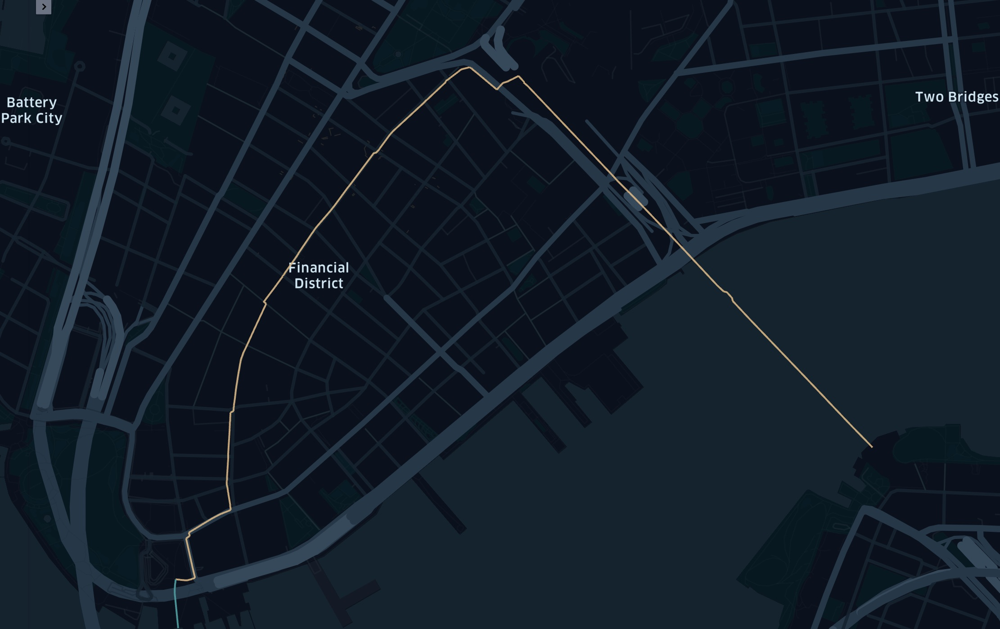

In [0]:
displayHTML("""<img width="50%" src='data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAkACQAAD/4QCSRXhpZgAATU0AKgAAAAgABAEaAAUAAAABAAAAPgEbAAUAAAABAAAARgEoAAMAAAABAAIAAIdpAAQAAAABAAAATgAAAAAAAACQAAAAAQAAAJAAAAABAAOShgAHAAAAEgAAAHigAgAEAAAAAQAACK6gAwAEAAAAAQAABXYAAAAAQVNDSUkAAABTY3JlZW5zaG90/+0AOFBob3Rvc2hvcCAzLjAAOEJJTQQEAAAAAAAAOEJJTQQlAAAAAAAQ1B2M2Y8AsgTpgAmY7PhCfv/iD/BJQ0NfUFJPRklMRQABAQAAD+BhcHBsAhAAAG1udHJSR0IgWFlaIAfoAAwAAgAJAAEAG2Fjc3BBUFBMAAAAAEFQUEwAAAAAAAAAAAAAAAAAAAAAAAD21gABAAAAANMtYXBwbAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEWRlc2MAAAFQAAAAYmRzY20AAAG0AAAEvGNwcnQAAAZwAAAAI3d0cHQAAAaUAAAAFHJYWVoAAAaoAAAAFGdYWVoAAAa8AAAAFGJYWVoAAAbQAAAAFHJUUkMAAAbkAAAIDGFhcmcAAA7wAAAAIHZjZ3QAAA8QAAAAMG5kaW4AAA9AAAAAPm1tb2QAAA+AAAAAKHZjZ3AAAA+oAAAAOGJUUkMAAAbkAAAIDGdUUkMAAAbkAAAIDGFhYmcAAA7wAAAAIGFhZ2cAAA7wAAAAIGRlc2MAAAAAAAAACERpc3BsYXkAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABtbHVjAAAAAAAAACcAAAAMaHJIUgAAABQAAAHka29LUgAAAAwAAAH4bmJOTwAAABIAAAIEaWQAAAAAABIAAAIWaHVIVQAAABQAAAIoY3NDWgAAABYAAAI8c2xTSQAAABQAAAJSZGFESwAAABwAAAJmbmxOTAAAABYAAAKCZmlGSQAAABAAAAKYaXRJVAAAABgAAAKoZXNFUwAAABYAAALAcm9STwAAABIAAALWZnJDQQAAABYAAALoYXIAAAAAABQAAAL+dWtVQQAAABwAAAMSaGVJTAAAABYAAAMuemhUVwAAAAoAAANEdmlWTgAAAA4AAANOc2tTSwAAABYAAANcemhDTgAAAAoAAANEcnVSVQAAACQAAANyZW5HQgAAABQAAAOWZnJGUgAAABYAAAOqbXMAAAAAABIAAAPAaGlJTgAAABIAAAPSdGhUSAAAAAwAAAPkY2FFUwAAABgAAAPwZW5BVQAAABQAAAOWZXNYTAAAABIAAALWZGVERQAAABAAAAQIZW5VUwAAABIAAAQYcHRCUgAAABgAAAQqcGxQTAAAABIAAARCZWxHUgAAACIAAARUc3ZTRQAAABAAAAR2dHJUUgAAABQAAASGcHRQVAAAABYAAASaamFKUAAAAAwAAASwAEwAQwBEACAAdQAgAGIAbwBqAGnO7LfsACAATABDAEQARgBhAHIAZwBlAC0ATABDAEQATABDAEQAIABXAGEAcgBuAGEAUwB6AO0AbgBlAHMAIABMAEMARABCAGEAcgBlAHYAbgD9ACAATABDAEQAQgBhAHIAdgBuAGkAIABMAEMARABMAEMARAAtAGYAYQByAHYAZQBzAGsA5gByAG0ASwBsAGUAdQByAGUAbgAtAEwAQwBEAFYA5AByAGkALQBMAEMARABMAEMARAAgAGEAIABjAG8AbABvAHIAaQBMAEMARAAgAGEAIABjAG8AbABvAHIATABDAEQAIABjAG8AbABvAHIAQQBDAEwAIABjAG8AdQBsAGUAdQByIA8ATABDAEQAIAZFBkQGSAZGBikEGgQ+BDsETAQ+BEAEPgQyBDgEOQAgAEwAQwBEIA8ATABDAEQAIAXmBdEF4gXVBeAF2V9pgnIATABDAEQATABDAEQAIABNAOAAdQBGAGEAcgBlAGIAbgD9ACAATABDAEQEJgQyBDUEQgQ9BD4EOQAgBBYEGgAtBDQEOARBBD8EOwQ1BDkAQwBvAGwAbwB1AHIAIABMAEMARABMAEMARAAgAGMAbwB1AGwAZQB1AHIAVwBhAHIAbgBhACAATABDAEQJMAkCCRcJQAkoACAATABDAEQATABDAEQAIA4qDjUATABDAEQAIABlAG4AIABjAG8AbABvAHIARgBhAHIAYgAtAEwAQwBEAEMAbwBsAG8AcgAgAEwAQwBEAEwAQwBEACAAQwBvAGwAbwByAGkAZABvAEsAbwBsAG8AcgAgAEwAQwBEA4gDswPHA8EDyQO8A7cAIAO/A7gDzAO9A7cAIABMAEMARABGAOQAcgBnAC0ATABDAEQAUgBlAG4AawBsAGkAIABMAEMARABMAEMARAAgAGEAIABjAG8AcgBlAHMwqzDpMPwATABDAER0ZXh0AAAAAENvcHlyaWdodCBBcHBsZSBJbmMuLCAyMDI0AABYWVogAAAAAAAA81EAAQAAAAEWzFhZWiAAAAAAAACD3wAAPb////+7WFlaIAAAAAAAAEq/AACxNwAACrlYWVogAAAAAAAAKDgAABELAADIuWN1cnYAAAAAAAAEAAAAAAUACgAPABQAGQAeACMAKAAtADIANgA7AEAARQBKAE8AVABZAF4AYwBoAG0AcgB3AHwAgQCGAIsAkACVAJoAnwCjAKgArQCyALcAvADBAMYAywDQANUA2wDgAOUA6wDwAPYA+wEBAQcBDQETARkBHwElASsBMgE4AT4BRQFMAVIBWQFgAWcBbgF1AXwBgwGLAZIBmgGhAakBsQG5AcEByQHRAdkB4QHpAfIB+gIDAgwCFAIdAiYCLwI4AkECSwJUAl0CZwJxAnoChAKOApgCogKsArYCwQLLAtUC4ALrAvUDAAMLAxYDIQMtAzgDQwNPA1oDZgNyA34DigOWA6IDrgO6A8cD0wPgA+wD+QQGBBMEIAQtBDsESARVBGMEcQR+BIwEmgSoBLYExATTBOEE8AT+BQ0FHAUrBToFSQVYBWcFdwWGBZYFpgW1BcUF1QXlBfYGBgYWBicGNwZIBlkGagZ7BowGnQavBsAG0QbjBvUHBwcZBysHPQdPB2EHdAeGB5kHrAe/B9IH5Qf4CAsIHwgyCEYIWghuCIIIlgiqCL4I0gjnCPsJEAklCToJTwlkCXkJjwmkCboJzwnlCfsKEQonCj0KVApqCoEKmAquCsUK3ArzCwsLIgs5C1ELaQuAC5gLsAvIC+EL+QwSDCoMQwxcDHUMjgynDMAM2QzzDQ0NJg1ADVoNdA2ODakNww3eDfgOEw4uDkkOZA5/DpsOtg7SDu4PCQ8lD0EPXg96D5YPsw/PD+wQCRAmEEMQYRB+EJsQuRDXEPURExExEU8RbRGMEaoRyRHoEgcSJhJFEmQShBKjEsMS4xMDEyMTQxNjE4MTpBPFE+UUBhQnFEkUahSLFK0UzhTwFRIVNBVWFXgVmxW9FeAWAxYmFkkWbBaPFrIW1hb6Fx0XQRdlF4kXrhfSF/cYGxhAGGUYihivGNUY+hkgGUUZaxmRGbcZ3RoEGioaURp3Gp4axRrsGxQbOxtjG4obshvaHAIcKhxSHHscoxzMHPUdHh1HHXAdmR3DHeweFh5AHmoelB6+HukfEx8+H2kflB+/H+ogFSBBIGwgmCDEIPAhHCFIIXUhoSHOIfsiJyJVIoIiryLdIwojOCNmI5QjwiPwJB8kTSR8JKsk2iUJJTglaCWXJccl9yYnJlcmhya3JugnGCdJJ3onqyfcKA0oPyhxKKIo1CkGKTgpaymdKdAqAio1KmgqmyrPKwIrNitpK50r0SwFLDksbiyiLNctDC1BLXYtqy3hLhYuTC6CLrcu7i8kL1ovkS/HL/4wNTBsMKQw2zESMUoxgjG6MfIyKjJjMpsy1DMNM0YzfzO4M/E0KzRlNJ402DUTNU01hzXCNf02NzZyNq426TckN2A3nDfXOBQ4UDiMOMg5BTlCOX85vDn5OjY6dDqyOu87LTtrO6o76DwnPGU8pDzjPSI9YT2hPeA+ID5gPqA+4D8hP2E/oj/iQCNAZECmQOdBKUFqQaxB7kIwQnJCtUL3QzpDfUPARANER0SKRM5FEkVVRZpF3kYiRmdGq0bwRzVHe0fASAVIS0iRSNdJHUljSalJ8Eo3Sn1KxEsMS1NLmkviTCpMcky6TQJNSk2TTdxOJU5uTrdPAE9JT5NP3VAnUHFQu1EGUVBRm1HmUjFSfFLHUxNTX1OqU/ZUQlSPVNtVKFV1VcJWD1ZcVqlW91dEV5JX4FgvWH1Yy1kaWWlZuFoHWlZaplr1W0VblVvlXDVchlzWXSddeF3JXhpebF69Xw9fYV+zYAVgV2CqYPxhT2GiYfViSWKcYvBjQ2OXY+tkQGSUZOllPWWSZedmPWaSZuhnPWeTZ+loP2iWaOxpQ2maafFqSGqfavdrT2una/9sV2yvbQhtYG25bhJua27Ebx5veG/RcCtwhnDgcTpxlXHwcktypnMBc11zuHQUdHB0zHUodYV14XY+dpt2+HdWd7N4EXhueMx5KnmJeed6RnqlewR7Y3vCfCF8gXzhfUF9oX4BfmJ+wn8jf4R/5YBHgKiBCoFrgc2CMIKSgvSDV4O6hB2EgITjhUeFq4YOhnKG14c7h5+IBIhpiM6JM4mZif6KZIrKizCLlov8jGOMyo0xjZiN/45mjs6PNo+ekAaQbpDWkT+RqJIRknqS45NNk7aUIJSKlPSVX5XJljSWn5cKl3WX4JhMmLiZJJmQmfyaaJrVm0Kbr5wcnImc951kndKeQJ6unx2fi5/6oGmg2KFHobaiJqKWowajdqPmpFakx6U4pammGqaLpv2nbqfgqFKoxKk3qamqHKqPqwKrdavprFys0K1ErbiuLa6hrxavi7AAsHWw6rFgsdayS7LCszizrrQltJy1E7WKtgG2ebbwt2i34LhZuNG5SrnCuju6tbsuu6e8IbybvRW9j74KvoS+/796v/XAcMDswWfB48JfwtvDWMPUxFHEzsVLxcjGRsbDx0HHv8g9yLzJOsm5yjjKt8s2y7bMNcy1zTXNtc42zrbPN8+40DnQutE80b7SP9LB00TTxtRJ1MvVTtXR1lXW2Ndc1+DYZNjo2WzZ8dp22vvbgNwF3IrdEN2W3hzeot8p36/gNuC94UThzOJT4tvjY+Pr5HPk/OWE5g3mlucf56noMui86Ubp0Opb6uXrcOv77IbtEe2c7ijutO9A78zwWPDl8XLx//KM8xnzp/Q09ML1UPXe9m32+/eK+Bn4qPk4+cf6V/rn+3f8B/yY/Sn9uv5L/tz/bf//cGFyYQAAAAAAAwAAAAJmZgAA8qcAAA1ZAAAT0AAAClt2Y2d0AAAAAAAAAAEAAQAAAAAAAAABAAAAAQAAAAAAAAABAAAAAQAAAAAAAAABAABuZGluAAAAAAAAADYAAK4UAABR7AAAQ9cAALCkAAAmZgAAD1wAAFANAABUOQACMzMAAjMzAAIzMwAAAAAAAAAAbW1vZAAAAAAAAAYQAACgUP1ibWIAAAAAAAAAAAAAAAAAAAAAAAAAAHZjZ3AAAAAAAAMAAAACZmYAAwAAAAJmZgADAAAAAmZmAAAAAjMzNAAAAAACMzM0AAAAAAIzMzQA/8AAEQgFdgiuAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/bAEMAAgICAgICAwICAwQDAwMEBQQEBAQFBwUFBQUFBwgHBwcHBwcICAgICAgICAoKCgoKCgsLCwsLDQ0NDQ0NDQ0NDf/bAEMBAgICAwMDBgMDBg0JBwkNDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDf/dAAQAi//aAAwDAQACEQMRAD8A/HPUH8uylYDOV2/99cf1qDSFxZg46sT+gpusOVs9o/jYKf5/0q1Yrss4lIxxn8zXv9Tw/sFuiiimZhRRRQAUjfdP0paRvun6UDQi/dpH+7Sr0pJPu0D6n6n0UVzfi/w3B4v8Nah4auLmezjv4vLM9s5SVCCGBBHUZA3L0ZcqeCat7aHUjpKK+Wvhv8SPEHhDxanwV+Jj/atQjwml6rGTJ9piYZiWUDLBioOHbnjDc/MfqWpp1FNXRUo2Z+efx8cr8R9aUfxNaA/T7LEa8U6RfU17D8fmz8UtXTuBan87aH/CvHpBtCKeOM/nUS3OGp8RF14qV/lAjHbk/WowSDkdqlIV1L9COvoakzIaKKKACmyzFU2HnPb2pxIAye1UWbcxb1oN6ELu7EOM8cCkoooO0KKKKACiiigAooooAKKKKACiiigAqwjBlVPTk1XqROFZvbH50CaT3FjjkuJ1ijGXkYKo9SxwBX2NZWqWVnBZx/cgiSJfogAH8q+YvAth/aHimxjIysTmdvbyhuH/AI8AK+pq68MtGzhxktVEKwwv2nxCZDytla7R6b7hsn8QsY/Bq3Ky9LXctxdnrc3Dv/wFMRpj2KoD+NdDORdzUqrfXcdhZXF7L9y3ieVvogJq1Xn/AMS9R+xeGZIFOHvJEhHrt+836Lj8aUnZNjpx5pJHzhPNJcTSXEpy8rF2PqWOT+tIPljJ/vHFR1O2zAjPBA6/WvNPZIKKUjBx1pKACiiigAooooAKcrMjBlJBHQjim0UAbdrqxGEuRn/bH9RWs6QXcfzYdT0I7Vx1TwXE1u26Jseo7H8KpMzlT6o7BYRDEqJkqgx78VxTsWdmbqSSfxrp7bVopwEk/dv79D9DUlzBpvEt78vbK5yfyHNN6mcG4uzRyVFdFLo8NzH5+lSh17oTyP8APoawJI5IXMcqlGHUEYNQbKSewyiiigoKKKKAL2nJvvE9Bk/kK6C7bCKPVv5c/wA6ydHTMsj/AN1cfmf/AK1X79sAD0B/X/8AVVLY5qz1M2YlmD/3hUVWdoIEfQgZqPyj1JGPWpOQSIEuMUskggVgOrdcfyqQtHAhI+8R1PYVku5dsmg1pU+Z+QjMWOTTaKKDvStoSwTzW0qzW7tHIvIZTgivRNG8bg7bfWF9hOg/9CUfzH5V5tRVRm47ETpxlufRcM0NxGs0DrIjDIZTkGpa8C03WL/SZN9nIVBOWQ8o31H9eteo6P4tsNS2w3GLa4PG1j8jH/Zb+h/WumFVM4amHlHVbFjWPDGnatul2+RcH/lqg6n/AGh3/n715bqug6jpD/6Sm6In5ZU5Q/4H2Ne7U10SRSkihlYYIIyCPcU50lIKdeUdOh840V6lrHgmCfdPpREL9TE33D9D1H8vpXm11Z3VjMYLuNopB2Yfy9R7iuaUHHc7YVIy2K1FFFQaBRRRQAUUUUAFFFFABXrngzSDZWRv5hiW5AKg/wAMfb/vrr9MVwnhrSDq+oqkg/cQ4eU+o7L/AMCP6Zr24AAAAYA6CuijD7TOTE1PsIWuD8Uzpft/Z4JCRHLEHq//ANaug8Q6sukac86kec/yRD/aPf6Ac14zBqFxAxJYuCckNzkn3qqs7e6Z0KTfvBc2E9tlsb0/vD+o7VRrrLa9guRhThv7p6//AF6gudMimy0X7t//AB0/hXPbsdSqW0kc1RU01vNbttlXHoex/Goak1CiiigAooooAKKKKACiiigArptG8UahpO2Jj59uOPLc8qP9k9vp09q5mimm1qhSimrM950vW9P1ePdayfOBlo24dfw7j3HFa9fOcUskMiywuyOpyrKcEH2Ir0DRvG7Jtt9YG4dBMo5H+8B1+o/I10wrJ6SOKphmtYnf32n2epQ+ReRLIvbPVT6g9Qa8x1nwbd2W6fT83EI52/8ALRR9P4vw59q9VguILqJZreRZI26MpyKmq5QUtzKFWUNj5wIIODwRSV7brHhnT9XBkI8m47SoOp/2h/F/P3rkNL8HXcerKuoKrW0Pz7gcrJjoPX6g9vrXO6Uk7HZHERaudD4P0b+z7L7bOuJ7kA89Vj6gfj1P4eldjRXP+JNYGkaezof38uUiHv3b/gI/XFdKtFHC25yOJ8aaz9quRpdu37qA5kI/ik9P+A/z+lcXCmTuPQfzpg3SPycsxySf51cACgAdBXHKV3c7KjVOHIh6qT9Km6Ug4AFLTSOFsKKKKYhD0NQVK5wMetRVDLiA54FWGXagUHv81MT5F8w9egojOSVP8X86Qx4wOvQ8GmgbSVPbpTvrScEBWJBHQ1T7krsIxwKhqUqejj6EVGRikxpCUpBHWnIMnNS0JA2V6KU4zxSUhhT0Qv0IpgGeKnA2rgdW/lQAvBPHQcCiiirSIbCiiimIQkAc1Va3UqXHHoPU1Ocu20USMCdo6DgVDZrCTjqjO+eNgRlWHQiti11UjCXPI/vD+oqmQGGGGRVZ4ivK8j9aEzrjVjPSW51bpBdx/Nh1PQj+hqDT/DUl9fpEjfuAd0jd1UdvqegrAs5LpZljtcs8jBQg53E9Bivc9KsRYWixsB5rANIR/e9B7DtWtOPM9SasnTWheiijgiSGFQiIAqqOgA6VJRRXUcIV5t4013JOj2rcDBnYH8k/qfy9a6rxDrKaRZkow+0S5WJT692PsP514jIZGdnkJLMSSTzknqawrTt7qOrDUrvnYyiiiuY7gooooAKKKKACpD80YP8AdOKjqSPnKf3hQAwAscDvSHjipR8i7u7cCoqACiiigBWBU4Pakp7sGwR1xzTKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAop5A2Kw75zTKANKw+YSQno68fyrOIIJB6irdm+yQfX+fFNvU2XLejfMPxoF1KtFFFAwooooAKVVZ2CICWY4AHJJNJXpPg3QMBdYu15P8AqFI/8f8A8Pz9KqEXJ2IqTUFdneafB9lsbe2xgxRIh+oAFY/iZx9iSE8+Y/I9QAa6OvKfFWvJNqUcNqd0druViDw7NjI/DHX1rqqNKJ59KLlI5W+s2tX3pny26H09qz67J1S5gK/wyLx+PQ1xxBUlT1Bwa5GjvpyutRKKKKRoFFFFABRRRQAV1GmPvtFH90lf6/1rl63dGfiSP6MP6047mdRe6Zt+nl3cg9Tu/Pmqla+sJiZJP7y4/L/9dZFD3Ki7oKKKKRQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBPBbtcFgpA2jPNQVoaa2JyPVTVFxtdl9CRQA2iiigAooooAKKKKACiiigAq/prYvE98j9DVCrNm226iP8AtgfnxTQpbG5qy5tQfRwf51jRHMY9sit7UV3Wcntg/qK5+A/IR6H+dORyz1pk1QTLxkdv5GrGDTGKkYJH0z61JFGVpFGilYFSQe1JQdwU+N2jdZF6qQR+FMooA7H5Lq3/ANmRf51yDo0bsjdVJB/Ct7SJ90bQE8pyPof/AK/86r6pbN5wljUkOOcDPIqnqjGHuy5THoqytndN0if8Rj+dTLpt4f4MfUj/ABpWZrzIgtDi5jPvj86deDFzJ9QfzFXodKuVkRyyDaQcZOePwq3caX50pkMm3OOMZ/rRZk88b7nOUV0K6PAPvOx+mBUy6XaDqpb6k/0xT5WL2sTmKK61bG0XpEv48/zqYRQR8hEX8AKOUXtUS+A5CuqTR9ngP5hl/wDr16xXnegXMI1WKMOuXDKACM9Cf6V6JXTS+E4q7vK54hq2m3Y1W8CJ8jTORkjoWJHevQPBccsGlyQS4yszEYOeCF/rmue8Q3kNtrE8LBix2twPVQe5FbPg6/S7+1RIpXZsbnvnI/pUQSUzao5OnqdVqUP2nT7mDp5kLrn0yprxxdHh/ikY/TA/xr28gEEHoa8Gl1O7V2jO1SpIOB6fXNOtbQnD82qRoLpVoOoZvqf8MVOthZr0iH45P8659tQvG6yEfQAf0qFrm4b70rn/AIEawujp5JdWdWIIE5EaL+AFBnt04MiL/wACArjiS3LEn60lHMHsu7Osa/s16yj8Mn+VQtqtoOhZvoP8cVzNFHMP2SOgbWIv4Y2P1wP8ahbWX/hiA+pz/QVi0UuZj9nE1G1e6PQIPoD/AFNQtqN43/LTH0AH9Ko0UXY+Vdidrq5brK/5moizN94k/Wm0UirH/9D8a9Ut57hI1iG4BssO/oPw9a0YlKRIh6qoH5Cn0V9BY8FydrBRRRQSFFFFABSN90/SlpG+6fpQNCL0pJPu0q9KST7tA+p+p9cx4zm8VQeGNQl8E28F1rQiP2SO4cIhf1yflLAfdDFVJxkgZrcjv7CWNZYrmJ0cBlZXUgg8gg56Gn/bLT/nvH/32P8AGraurHUjxT4R/CP/AIQzz/Ffiqb+1PF2q5kvLyQ7/J38mOMn8mYYzjAwoAr3Oq32y0/57x/99j/Gj7bZ/wDPeL/vtaUIKKshttu7Pzv+O8n/ABdjXFHUfYxn0/0WGvIZmLSHPbivV/jdNBdfFjXJbeRZY91qu5CGXKW0SsMjuGBB9xXkjHJJ9TWT3OGp8Qg54FSyHAEY7dfrQnygyH6D61F15pEBRRSMwUbjQNK+iIJn/gH1NV6Ukk5PekoPQhDlVgooooLCiiigAooooAKKKKACiiigAooooAKkPEQHqc1HUknGF9BQB678I7Dfd3+pMP8AVxrCp93O5vy2j869zrz/AOGlh9j8LxTEYa7leY+uM7B+i5/GvQK9CkrQR5OIleoyC6kaG3kkjGXVTsHq3YfieKW3hW2t47dPuxIqDPooxSTrvMceMguGPqAnzA/99AVPWhl0CvBPizqPnanaaYpytvEZGH+1Kf6BR+de918leKNR/tXxBfXoOVeZlQ/7CfKv6AVhiJWjY6cJG879jDjGXApGO5ifWnJwrN+FR1xHpBRRRQAUUUUAFFFFABRRRQAUUUUAFKST1OcUlFAEsM8tu4khcow7it+PVbS+QQarGM9BIo6f1Fc3RQS4pm5daJKiefZN9oiPIxy2Pw6/h+VYhBBweCKtWt9c2bboHIHdTyp+orcFzpmrDbdr9nn6Bx0P4/4/nQK7W+pzFFal7pF1Z5fHmR/31/qO1ZdBSaeqOi0dMQO/95sfkKS+O6UL7gf5/OrenpstIx6jP5mqEx33PqASap7HHWZET8zt6DFMACLvf8BUi4EZduhbp61nTzGRiB0qTOnBydhkspkbPaoqKKD0IxSVkFFFFAwooooAKKKKAOq0fxZqGmbYZj9ptx/Cx+ZR/st/Q8V6lpms6fq0e+zkywGWjbh1+o/qMivA6kimlgkWaB2jdTlWU4IP1FawqtbmFTDxlqtz6MqlfafZ6lD5F7Esi9s9VPqD1BrgdH8bsu2DWF3DoJkHP/AlHX6j8q9FguILqJZ7aRZI26MpyK6IyUlocUoSg9TyzWPBl3Z7p9OJuIRzs/5aKPp/F+HPtXEkFSVYYI4INfR9c/q/hvTtXBeRfKn7SoOf+BDo38/es50esTeniekzw+it3VvD2o6QxaZPMhzxKnK/j6H61hVztNaM7IyTV0FFFFIYUqqzsFUEknAA6kmkruvBWj/abo6nOv7q3OI8/wAUnr/wH+eKqMbuxM5qKuzuvD2krpGnJAwHnP8APKf9o9voOlbZIAyeAKWuL8Z6x9isxp8DYmuQd2Oqx9/++un512NqMTzUnOXqcJ4l1c6vqLOh/cQ5SIeo7t/wI/piueooribu7s9OMUlZACQcita21SSP5J8uvr/EP8ayaKVwaT3OxV4LuPjDqeorJudJIy9sc/7B/oax45ZIm3xsVPqK3LbVVbCXI2n+8On4+lVdPcy5ZR+EwmVkYq4II6g02uwmt4LtMuAw7MOv4GsC502aDLJ+8T1HUfUUmi41EzOooopFhRRRQAUUUUAFFFFABRRRQBpabq1/pUvm2chXP3kPKN9R/XrXqWjeLbDUtsNxi2uDxtY/Ix/2W/of1rxuirhUcTKpRjPc+kKK5LwdHqI0wS30rNHIcwI3JVB3z1wew9PrXW12Rd1c86ceV2Gu6RI0khCqgLMT0AHJNeF69qz6xqD3HIiX5Il9EHf6nqa7bxtrIihGkQH55MNMR2Tsv4nk+31rzSJNzZPQVz1p/ZR1UIKMeeRNEm1dx6n+VS0vJPqTQQQcHg1gYyk5O7JFbPB60rMAPeoaKdyLCgkdKdvNMopDFJJOTTkXccdu9MqVvkXYOp60ALICfmXlR09qhpysVORT/kk6fK36GgB+cgN69frR1pEDDKMMZ6fWjI/KqTJaBGZXCryPQ0EKWPln8DQMqM/xN+gowPSla42xM44IxRuX1p+5vWjcfY/UVWpOgwqG5FREEdam4PX5T6jpSHI4YfSpKERR36Dk07qdx70p4+T8T9aKcUJsKKKKokKaxwKdTFG9ix+6KTY0g/1af7TfoKipzMWOTTagsKrTP/AO3WpZH2L7npXT+E/D/wDaU32+7U/Zom+UH/lo47fQd/Xp61UYtuyN6SUVzyN/wf4f+zoNVvU/euP3Kn+FT/F9T29B9a76isnWNVj0q180jfK52xR/3m/wHUmuxJRRhKTnIui8tjdGyEg85VDlO+Dn/DpRd3dvY273V04SNBkk/wAh6k9hXieoXsu9izlp5W3yP0OT6ent6Cs17u4m4uJHmA7OxbH0yax9v5HQsL5m3qV+mv3LTuxjfoik8Bew/wAaxJI5bc7JVyvb0/Co9mfmjOfbuKtxXp2+VcjzE/WsG76s6krKyKLBf4T1/Sm059pYlBhcnAPpTaRQUUUUAFFFFABUkY+cHsOTUdSt8i7O55NABMcyE9u30qKpG5RW9OKjoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAOvAp7o8bbXG0+hoj/1i/UVc1H/AI+P+AigChRRRQAUUUUAFFFFABS4OM0lSDmMj0OaAI6KKKACiiigAooooAKKKXBHWgB45iPsajqT7sfu38qjoAkjOHHvxV++G+OKf1GD9f8AOazBxzWsP31m6d1+Yfz/AMaBMyaKKKBhRRWjpem3GrXiWdv1blm7Ko6k0JXE3ZXZr+F9BOr3XnTj/RYCC/8Atnso/r7fWvZwAoCqAABgAdAKq2Nlb6fax2lsu1Ixj3J7k+5qlrmsQ6NZG4fDSN8sSf3m/wAB3rshFQWp51SbqS0MLxdr/wDZ8H9n2rf6RMvzMDzGh/qe35+leSVNcXE11O9xOxeSRizE9yahrmnPmdzupU1BWOn0uTzLUKeqEr+HWsbUY/Lu3x0bDfn1/Wrmjvh5I/UBh+H/AOujWE+aOX1BU/hz/Wl0EtJ2MWiiipNQooooAKKKKACtHS32XYH98Ff6/wBKzqlgfy545P7rAn6U0KSurG7q6brdX/ut+hrna669TzLWVf8AZz+XNcjTkRSegUUUVJoFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAW7I4uU98j9KjuhtuJB/tE/nTYDtnjP+0KsX4xcsfUA/pQLqUqKKkWGV/uIx+gJoGR0VaWxu26RN+PH86mXS7w9VC/Uj+madmLmRn0Vrro85+86D6ZNTLow/il/Jf/AK9FmTzxMKiujXSLcfeZz+IH9KmXTLNf4CfqT/jT5WL2sTlqfG22RW9GB/KusWztV6RL+Iz/ADqTEMXZU/IUcovaobdIXtpVAJJU4A9a5hLS8P3Y3GfUYrtNykZyORWW2pWa/wAefoD/AIU2Zwk7WSMVdMvD1QD6kf41Muj3B+86D8z/AEq82r2w6K5/Af41A2sr/DET9Tj+lLQ0vPsOTQyRlpvwC/8A16eNHtx953P5D+lXLG+N1GxKhSpwR14PSs/Uby6t5tqEBWGRxT0ITm3a5aXTLMdVLfUn+hqZbK0XpEv4jP8AOuca/u26yn8OP5VC08z/AHpGP1YmldF8kurOwQQwnICoPYAUsl3aqvMqf99CuJoo5hex7s6ttRs1/wCWmfoCf6VA2rWo6Bz9B/jXN0UcxXskbzayg+7ET9Tj+hqJtZlP3Y1H1yaxqKV2P2cTSbVbs9Nq/Qf45qFtQvG6yH8AB/IVToouyuVdiZridvvSOfqxqIknk80lFIZs+HpPK1uyb1mVf++vl/rXu9fPNlJ5N7bzf3JUb8iDX0NXTQejRxYpapnknjWPy9cjf/npCh/Vl/pU3gSTZqlxD/ehJ/FWH+NWPH0e26spv7yOv/fJB/rWT4Rk8vxDGv8Az0WRf/HS39KjaoaLWiex14BrEfk6reR9lnkx9Nxx+le/14h4rj8rX7sdmKt/30oP860rrS5lhX7zRz1FFFcp3BRRRQAUUUUAFFFFABRRRQAUUUUAf//R/H+io0mikZkRgxXqB2qSvoD58KKKKACiiigApG+6fpS0jfdP0oGhF6UpGRSL0p1APchMVJ5VT0UBzMzL5QsQjzgucfgOT/h+NYLqC2e3atS+l3SNjovyD+v+FZlQ9yXLUkiG0MR2FMALEAd6kHERPqcUL8iF+54FIgSQjIQdFqOiigAqrM+TtHQfzqeR9i579qpUHTh4faYUUUUHWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAOQZYD3pxDSS7VGWY4AHc9BRHwS3oM10fg2w/tHxNp9uRlVlErem2L5zn64xTSu7Ck7K59P6XZrp2m2tgvS3hSP67QAT+NXqKK9NHit31GYzJuIHyjAPfnr/ACFPpAOp9aWgRh+JdR/srQb6/Bw0cLBD/tt8q/8AjxFfJTJgblORXvfxY1Aw6Rbach5uZt7f7kQ7/VmH5V4GrFT7dxXFiJXlY9LCRtC45uEVfXmo6mYCQ5Q846GoiCDg8VgdQlFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBp2WrXVlhVO+P+43T8D2rUMGl6v8ANbt9muD1U9Cfp0P4VzFKCQQRwRQS4LdHaqnkxBeyLj8hWGpBd5G4HIq1aaxFIyxXiYVhguDx+Xp+NR6tay2oEkXzQt0Yds+v9DTbOScJNpMyribcdq8DpVSiikdcIKKsgooooKCiiigAooooAKKKKACiiigArR07Vb7SpfNspSmfvKeVb6jp/Ws6imnbYTSejPYNH8YWOobYbzFtOeOT8jH2Pb6H8zXYV83102j+KdQ0rbEx+0W448tzyo/2T2+nSt4VukjlqYbrA9pZVZSrAEEYIPIINcNrHgq2ucz6WRBJ1MZ/1Z+n93+X0ro9K1zT9XTNrJiQDLRNw4/DuPcVr1s0pI5VKUGfPV5Y3enzGC8iaJx69D7g9CPpVSvoW8sbTUITBeRLKh7HqPcHqD7ivNdY8FXNtun0smePqYz/AKwfT+9/P2Nc86LWqO2niFLSWhx1laTX91FZwDLysFHt6n6Ac173YWUOn2kVnAMJEuM9ye5PuTzXH+C9Fa1hbUrpCssuVjVhgqg6nHYk/p9a7utKMLK7MMRU5nyroQXVzDZ28l1OdscSlmPsP614JqV/Lqd7LezdZDwOyqOgH0Fdp431jzJF0iBvlTDzEd27L+HU++PSvPazrTu7I2w9Oy5mFFFFYnSFFFFABSgEnA70lSr8i7+54FAFiK8ltSFiPyjqD0NbltqENxhT8j/3T3+hrlqKaZEoJnUXOnQ3GWX5H9R0P1FYFxazWxxIOOzDoas22pzQ4WT94nv1H41vRTwXSHYQwPVT1/EU9GReUd9jj6K37nSVbL2xwf7p6fgaw5I3iYpIpUjsaTRpGSewyiiikUFFFFABRRRQAV0PhvRm1i/CuD9niw0p9uy/Vv5ZrDhhluJkghUvJIwVVHcmvddF0qLR7BLVMF/vSN/ec9fwHQe1aUoczMK9XlWm5qqqqoVQAAMADgACsrWtVi0iwe6fBf7saH+Jz0H07n2rVZlVSzEAAZJPAAFeI+JNZbWL8tGT9nhysQ9fVv8AgX8sV0VJ8qOSjT55a7EC3A1SQpeN++ck+Ye5NMltHtflPKj+IdDVKFMDcep6fStKG7eMbJPnT0PWuM1rTTfKtiqjFGDr1ByK0RJBeDbKNknYjvTXtY5l8y1OfVaz2UqSrDBHY0GJNNbyQH5hkdiOlQVdhu2QeXKN6HjnrT5LVJF821OR3X0oCxn0UpBBwRgilRdzYoEPQBR5h7dPrUZJJyac7AnA6DgUygAooooAeJHXoelTlopXBPB7+lVaVWKnI60ASkkMd/BPSnU1HXbtfJFPKxqAyudp9qaYmhKKN0fr+lJuj9TVcyFysWiN9gLNyvYUDY52/MajkYE4X7o6VLdxpWHgZ5j5z1HenYPoargkHI4NSiTfw5IPrQmDQ/afSl2t6VCwdepOPXNRNJsXcTT5mChd2RM/Xb3pHO1Qgz78dTVFWIBlY89vrUbOzYyelSdqw0UXN3+y35D/ABpNx/un9P8AGqeTVqys7jULmO0tl3SSHA9B6k+w70FewgtWaejaPPrd/wCTykSYMrf3V9B7nt+de2wQRW0KW8ChI4wFVR2AqjpOl2+kWa2sAyerv3du5P8AT2rSJCgknAHJJrspw5UcVWpzOy2K93dwWNtJdXLbY4xkn+g9z2ryHUdUlvZn1O54z8sEZ/gXsPqepNaGu6wdbvDBC3+g2xz7SMO59vT2+tchdXBnkyPurworGrO+iOqhS5Vd7ldmZ2LscknJptFFYnSKCQcilZi3Wm0UAFFFFABRRRQAUVIoDAr36g0wAk470APQAZc9F/nTCSTk96e5HCDov86aFZugzQAqn5SuCc9KZUsYCyfOcYpH2o5AHQ8E0AR0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQA5Pvr9RV7Uv+Pgf7o/maoL94fWr+pf69f9wfzNAjPooooGFFFFABRRRQAVJH97B6EYqOlBwc+lACHjiipWRmkwgJzzgc1YjsLh+WAQe9AFKitPyLKH/XSbz6D/AOtSfbYouLeID3P+f60CuVo7O4k6IQPU8VZ+xRRc3EoHsP8AP9KrSXlxJ1cgeg4qtQGpswNZmURwx7j3Y+n41Dfz/argIAAsfy8frSw/6LaGY/fk4X6dv8aoD5ULd24/CgEtbjXbc2R06CmUUUDHou5ueg5NX7GXNwyno4xj6VSPyR47t/Kkify5Vf8AukGgGJIhjkZD/CSKZV/UE2z7x0cA/wBKoUAh8UUk0iwxKXdyFVRyST0Fe2+HdEj0azCsAbiXBlYevZR7D9awPB2gfZ4xqt4n71x+5U/wqf4vqe3t9a7+uqlC2rOHEVb+6iC6uYbO3kurhtscY3Mf8968M1rVptYvWuZMqg+WNP7q/wCJ71t+LNf/ALSuPsVq3+jQnkjpI47/AEHb8646s6s7uyNqFLlXM9wooorE6C9pz7LtPRsr+f8A9etjVU32hb+4wP8AT+tc2jFHVx1Ug/lXYTKJoHUc71OPxHFUtjKekkzjaKKKk1CiiigAooooAKKKKAOxt3E1ujHncoz/AFrkXUo7Ieqkj8q6PSn32oX+4xH9f61l31rMbtzHGzBjnIBPX/69UzGGkmjNoq4un3jdIz+JA/mamXSrtuu1fqf8M0rM15l3M2ithdGl/ikUfQE/4VMujJ/FKT9Bj+po5WT7SJg0V0q6TajqXP1P+FTLp1mv/LPP1JP9afKxe1RylHWuxW1tl6RJ/wB8inF4Y+rIn4gUcova9kcisEz/AHY2P0UmplsLtukR/Hj+ddG17aL1lX8Dn+VQtqlmOjFvoD/WiyDnl0RkLpV2eoVfqf8ADNTjRpv4nUfTJ/wq02sW4+6jn8hUkmpYtlnSPOTjBPTrRoF5lddGX+KUn6DH9amXSLYdWc/iP8KotrFwfuog/M/1qFtTvD0cD6Af4UaBafc2006zQg+Xkj1J/wAasvBAzbmjUn1IBrlGvbpusrfgcfyqFpZH+87H6kmi6D2curOwzDF3VPyFRteWq9ZV/A5/lXIUUcwey7nUtqdmv8ZP0B/wqFtXtx91XP4Af1rnKKOZj9lE3W1kfwxfm3/1qhbWJz91EH1yayKKV2PkiaDapeHowH0A/rmoWvrtusrfhx/KqtFF2VyokaaV/vux+pJqOiikM7C0bdaxH/YA/KuTlXbK6+jEfka6bTWzZp7ZH6muevV23Uo/2ifz5qnsZQ+JorUUUVJqaOlzeXchD0kG38e1aeqw+ZbiQdYz+h61zisVYMvBByPwrsVKXNuD/DIvP41S2sZT0akcbRT3Qxu0bdVJB/CmVJqFFFFABRRRQAUUUUAFFFFABRRRQAV9FW8nnW8Uv99Fb8xmvnWve9Dk83RrJ/8ApggP1UY/pW9DdnJi1omcr4/jzaWk392Rl/76Gf6VxehS+VrtlJ/ekVf++/l/rXofjiPfom7/AJ5zI355X+teWW0vk3VrP/cdG/75YGlU0ncqhrTsfQdeQeOItmtB/wDnpCjfkSP6V6/XmPj+LFxZzf3kdf8Avkg/+zVrW+E58M/fPPaKKK5D0QooooAKcEY8gU2l3MBjJoAf5T+mKPLx1YD8ajooAk2IOr/kKMRDuTUdFAEmY/7pP40b17IKjooA/9L8ZdIA/eH0C/1rarN0xcQMcdW/oK0q99bHhVH7zCiiimQFFFFABSN90/SlpG+6fpQNCL0p1Io+XNLQD3CiiigRyjklFYnJ5zUVSn/VL9airMzJtpKonrk0yRtxwOg4FTSfIvuRgfSq1ABRRUUr7VwOp/lQVGLk7Igkfe3HQdKjoooPRiklZBRRRQMKKKKACiiigAooooAKKKKACiiigAooooAkHEZPqcV6t8JbDzdTvNRYcW8IjU/7Upz/ACU/nXlLcIq/jX0J8K7TyPDslyRzc3DkH/ZQBR+oNa0FeZhiZWps9MoopCenHU13nlC0UUEgDJoA+efiPf8A2zxE1upylpGsXtuPzN/PH4V540Ktyvyn9K0tRumvr+5vXOTPK8n/AH0SapV5s3dtnTCTjsUWVkPPFOEnGHG4frVzqMHkVA0OeU49jUnXCunpIi2A8oc+3eo6UhlPPBqTeG4kGffvQdBFRUhj4yh3D9ajoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACtjTtUNsPs9yPMt24Knnbn09vaseigTSaszc1HSxEn2yyPmW7c8c7f/rfyrDrS0/UprF8ffib7yH+Y9607nSoL1Dd6UykHlo+mD7en0NBPM1pI5qinyRvE5SRSrDqCMGmUFhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAD45JInEkTFHU5DKcEH2IrvtH8byx7YNXUyJ0Eyj5h/vDv9Rz9a8+pQCTgck1UZOOxE6cZKzPoi2ure8hE9rIssbdGU5H/66nrxRb640BI4bN9ty2JJjjPHZCD7da9M8O6zJrVk1xLF5bRvsbByrHAPHcdeldFKspo4q2HdPXob9Zes6iNK06a8xuZRhB6seBn29a1Kayq6lHAZSMEEZBFaswVr6nzpLJJNI00rFndizMepJ5Jpleo614Khn3XGk4ifqYSfkP8Aunsfbp9K81uba4tJmguo2ikXqrDB/wD1Vxyg47np06kZLQgoooqDQKKKKAHIu5sfnSu248dB0px+RNvduv0qKgAooooAKcrsjBkJUjoRTaKANy21bolyP+BgfzH+FbPl211FudVlXt/9Y9q5Wxjglu447lgkZPzEnH4Z7Z6V1dvZ2lvOdpeBpBhUZsoT6qejfTOaiVZR0ZPsb6xMG80pov3lsTIn93+If41j9ODXoF1EtuokdlVSccnHJrLubGC55I2v/eH9fWri4yV4k8zi7TOToq3c2U9scsNy/wB4dP8A61WLWPSzBi6lcSu2AVBxGB3Prn2pSdjSOuxmUVZurf7NL5YkSUEBgyHIIPT6H2rV8PaO2sX6xMD5EeGmPT5fT6mnH3thSfKrs6/wVonlp/a9yvzOCIAey92/HoPb616HTURY1CIAqqAAB0AFZusapFpFjJdyYLDiNT/E56D/AB9q7opRR5kpOcjlPGut+RF/ZFs37yUZmI7Iei/Vu/t9a8yjTe3PQdafPPNd3DzzMXklYsx9SanRQi4/P61yTlzO51u1KHKtx1FFFQcg9JHjbchwavrPBdDZcDa/QMKzaKB3LM9rJDz95fUVDHI8TbkODU8F3JF8p+ZPQ1Ya3huAXtjg91NAegokt7sbZRsk7Gq80LWw2nnd3HpS29szS4lGFTls0lxcebJ6oOgoAqUVKUBG6Pn271FQIKKKKACiiigAp6MACrdDTKKAHshA3LyPWmU5WKnIqYbMeaRg+nqaAGH92u3+Juv0qKlJJOT3pKACiiigB6uV46j0quyrO4EZwB2P6mkmfA2jqf5VDEcSCg66FP7TEkOTgdBwKZUu4Pw/X1pjIV9x60HSIqs7BVBJJwAOSSa9n8MaAukW3nTjN1MBvP8AcH90f196wvB3h/YF1i8XkjMCHsP75/p+fpXowBJwOprppU7e8zixFW/uoSvPvFutsxOi2Jyz8TMOw/u/4/l617jZ6XBBGDKoeQ9SeQD7Vm6r4S0TVI3zbRwTkELNEgVwfU4xuHsa2nBtWRz05xjK8j5ku5FgjFpF2+8azKvalZXGnX9xY3f+ugkZHPqQeo9j1FUa4D1FsFFFFAwooooAKKKKACnBGI3Dmm09AxOV496AGjOeOtWwgKmQnDenf60zfH06N/e7VCwdTuJ/GgBdyL91cn1NIXZupp25X4fg+oprIV56j1FADKtoquNxGTj+VVKsQNgkGgiom4uw6ZcqCB09PSqtaHvUEkOeU6+lBhRq292RWopSCDg8GkoOoKKKKACiiigAooooAKKKKACiiigAooooAKKKKAFHUVoan/rl/wB3+prOrS1L/Wp/u/1oAzaKKKACircVlPKAwACnoSan+xQx/wCvmA9h1/z+FArmbSqrMcKCT7Vo+Zp8X3UMh9//AK9I2ouBiJFQUAQpZXL/AMG0f7XFLPZSQR+YzA84OO1RvdXEn3nP0HH8qt2Z86CW3PUjI/z9aAZWjmeJQ8Z5+6eKiknml++5Pt2oTlWQ+mfyqKgYUUUUAFT20JnmVO3U/SoVBYhVGSegrUVfsNuzNjzZOAPSgTILyTzpxGn3U4H9aqSEFsDoOBUiKdpbI3HoO9QkEHB4oGJT0Xc3PQcmmVKfkjx3b+VADHbcxNNoooA05/3tlFL3Tg/yrd8KaB/adx9sul/0WE9D0kcdvoO/5Vn+HrS51G8FlGuYj80jEcIvc/j0xXtNrbQWdulrbKEjjGFAralC7uzmr1eVcq3J+nArgvGHiD7NGdKs3/eyD96w/gU/w/U/y+tb3iHW49Gsi4INxJkRIfX1PsP/AK1eJSyyTyNNMxd3JZmPUk9TWlWdtEZYeld8zI6KKK5TuCiiigArrbF/MtIz6Db+XFclXSaJIDC8Z6q2fwP/AOqqiZVfhMiaznE8ipGxAY4IBxjtQunXjf8ALM/iQP6101xdW8DDzX25GehP8qpNqtovQs30H+OKLISnJrRGYuk3R67V+p/wzUy6NIfvygfQZ/wqdtYi/gjY/XA/xqFtZb+GID6nP9KNB3mSro0Y+9Ix+gA/xqZdJtR13N9T/hWc2r3J6BB+B/xqFtSvG/5aY+gH+FF0HLN9TeXT7NekY/Ek/wBamFtbr92NB/wEVyrXVy3WV/zIqEszfeJP1NFw9m+rO3iePJRSvrgEVHc3EMGDKwXPT/IrmdNfZdp6Nlf8/jWtqybrXd/cYH8DxTvoZuCUrDm1S0Xoxb6D/HFQtrEA+6jH64Fc9RS5ma+yibbayf4YgPq3/wBaoW1e5PRUH4E/1rKopXZXJHsX21K8b+PH0A/wqFru6brK/wCBx/Kq1FF2PlQ5ndvvMT9Tmm0UUhhRRRQAVpL82mt/st/X/wCvWbWla/NZzp6c/p/9agTM2iiigYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB0mkNm2I9HP8hWVqa4vHPqAf0q/ozfJKvoQfzz/AIVW1cYuVPqg/map7GS+NmVRRRUmoV0OkTboWhPVDkfQ/wD1656runzeTdIT0b5T+P8A9emtyZq6J9Vh2XAlHSQfqKy66jU4fNtSw6p834d/0rl6GKm7oKKKKRYUUUUAFFFFABRRRQAUUUUAFe2eEZPM0C29V3qfwc4/SvE69d8Cyb9HdP8AnnOw/AhT/WtqPxHPiV7hpeKo/N0C7HcBW/75YH+VeKHmJfYkV71rEfm6TeR9zBJj67TivBRzEfY5p19ycK/daPoW1l862im/56IrfmM1xHj+LNnazf3ZWX/voZ/9lrp9Al83RbJ/SFF/75G3+lZHjaLzNDL/APPOVG/PK/1rWesDnp6VEeO0UUVxnpBRRRQAU9ELnAIGKZT422uD27/SgmV7aEwgHdjTxFGO2fqf8MVJQSB1OPrQcLqzfUqyoFwyjA6VDV19pQ5Ix/WqVB1UZNx1Ciiig2P/0/x1sl22yAjHX+Zq1UcIKxIp4IUZ/KpK99bHgS3CiiimIKKKKACkb7p+lLSN90/SgaBPu0tIv3RS0A9wooooEcoQRFgjBDYpiDLge9X76Py5Hx0Yhvz6/rVKL72fQE1mZjiAzMT60woR05p6dPrTqq2hLepXPHXtVF2LtuNapANV3gB5HHuP8KTRvRqRi9ShRUjxsnJ5HrUdI7k01dBRRRQMKKKKACiiigAooooAKKKKAL0NvbzRjMu2TuD0ofT515XDj2NUalSaWP7jkfyoENeN0OHUr9RimDnitBdRkxtlVXH5VKjWE7DKmNuvHT/CgLmdL9/HpxX1V4NtPsXhfTYcYJgEh+suX/8AZq+aE0xrqVUtZFcyMFAPqxwOlfXEESQQxwR/djUIPoowK6cMtWzjxktEiWmc+YMHgA5H1xj+Rp9QRlWmlYdV2ofwG7/2aus4SesvW7n7Jo19c5wY7eVh9Qpx+talcb4+ufs/ha8wcGXZGP8AgTjP6A1MnZNgtz5tooorzTcKKKKAEIDDDciq7wkcpz7d6s0UFwqSjsUASp44NSb1f74wfUVZZVf7w/HvVdoWHK8j9aDrhWjLcYYyBkcj1FMpVYqcg1JlH+98p9RQbEVFPZGXnqPUUygAooooAKKKKACiiigAooooAKKKKACiiigAqWGea3cSQOUYdxUVFAHSx6lZaioh1NAj9BKvH69v5VSvdGuLYebCfOi67l6ge4/qKx60LLU7qxOI23J3RuR+HpQRytfCZ9FdQYtM1j5oT9muT/CehP8AI/hzWFd2NzZPtnXAPRhyp+hoGpJ6FSiiigoKKKKACiiigAooooAKKKKACpYZWgmSZACyMGAIyOKiooYE4E97chVBeWZ8AdyzGvd9I06PSrCKzTkqMu395z1P59PauB8D6T5sz6tMvyxZSLPdj1P4Dj8favUK6aMLK5w4mpd8pFNNHbwvPM21I1LMT2ArP0vWbDV4t9pJlgMtG3Dr9R/UcVyfjjVvLiTSYW+aTDy47KOg/E8/h715rDNNbyrNA7RyKchlOCKc6tpWCnh+aN2fRdZ2o6VY6rD5N5GGx91hwy/Q/wCRXF6L42VttvrA2noJ1HB/3gOn1H5V6FHJHMiyxMHRhkMpyCPYitFJSRjKEoPU8d1rwnfaXungzcW453KPmUf7Q/qOPpXKV9IVx+teELPUN09li2uDzwP3bH3A6H3H5GsZ0esTop4npM8fqRAM7m6CrV9pt7ps/wBnvIijH7p6hh6g9DVVyFAjHbr9a52rHWmnqhjEscmkoooGFFFFABRRRQAVftdRuLZfKOJYT1jflT9PSqFFJpNWY07bF24vp7hDCWPkhy6ITu29cDceeAcU621Ca3wp+dP7p7fQ1QooSS2E9dzrre7gul+Q891PWqdzpUcmXg+RvT+E/wCFc8CVOVOCO4rXttVdcJcjcP7w6/j61d77mTg1rEofZLnz1thGTI5Cqo/iJ4GK9u0LSY9HsEthgyN80rern+g6Csrw5YRyIupOAwP+pyPwLf0FddXRShbU5K9Vy90QkKCScAckmvFPE2tHV74iIn7NDlYx6+rfj/Kux8aa39mg/sq2b97MMykfwxnt9W/l9a8tRN7Y/OorT+yjTD0+Vc8iaFP4z+FT0dOBRWBlOfM7hRRRQQFFFFABUkRYSKVODmo6lj4DN6D+dAGmt/HLEbedcZJ+cVSmtHjG9PnT1FVKsQ3MkB+U5X+6elA7kAJByOKkysnDcN61f8qC8G6H5H7jtVOSNrdsEfN79PwoCxE6MhwwplSCRv4vmB9ae48zlOg/h7igRBRRRQAUUUUAOVdxx+dK7ZOB0HSnN8i7B1PWoqACiiigApGYKMmlqFmBO7+FenuaDSlDmdhrA7CerHlh6Coo/vikDMG3d6lVC7qYlLEkDaOTk+g96D0NiFvvH6113hXQX1Sf7TcqfskR5B/5aMP4fp6/lXc6H8KzKiXWuTlC3zfZ4+oz2ZvX1A/Ou8n0IafbgWePJjGNgGNoFdFOi95HJVxK+GJlAAAADAHQVc09VkvoY2PVs49doz/Ss64nhtYXuJ2CRxgszHsBVXwDcy63qV/rcg2wwqttbqewY7m/E4XP1xW99UjkUbpyPVKKKo6peppunXWoP0t4nkwe5UEgfieK1Mkr6HzH43uEuvFWozR/d80R/UxqEJ/Na5Wp2maV2ecly5LMT1yeppsijhkHy/5615knd3PairJIiooopDCiniNjz0HqacETpksfQUARU8RseTwPfinFypIUBcce9Rkk9TmgB+I16kt9KfuEgCfd57CoKehIOAcZ7mgT20JxAvck/p/jS+UBjb27HkVLnPI70UHD7Wd9yq0YJwPlb0P9KYGZDj9KuEAjBGRUbJxg/MP1H+NB0Qrp6Mhwj/d+U+namEMp54NOaMgZXkfyoD8YYbhQbj1l5+br61OGHf8APtVUoDyhz7d6arMvT8qDOdKMty4yq33hVZ4mXkcipEkzwOPY9PwqYMCcdD6UGHv0/NFCirjxK3PQ1VZGT7woN4VYyG0oBY4FJUp/drj+I9fag0E8pu2D9DTSjL1FNpdxxjJxQAlFFFABRRRQAUUUUAFFFFABWlqX34z/ALNZtaWo9Yj/ALNAupm0UUUDJPNl2hN52jtnio6KKACiiigAq1ZyeXcKex+U/jVWrMVrcSYKKQPU8UAOuE8m6Ydic/garMMMR71uXUNqdklxIAwXBUf5zVb7XCh/0aLJ/vH/ADmgSZUjs7iXouB6txVn7JbQc3EuT/dH+c1G808p2ySbc9l4/lVUsi9FyfU0AXxdRpxaw/8AAj/n+tU3JZzJM24+lRF2PU/hTKB2HMxY5NOEnGHG4frUdPRC5wPxNAm0ldkixBzuU8Dk57VE7bmJrS2rFHsA5br9KqtCDypx9elBjHERbsyrUsEEtzMlvApeSQhVUdyair1rwjoH2GEaldL/AKRMvyKRzGh/qf5fjVwhzOxdSooK5uaFo8WjWQgXDSvhpX/vN/gO1X729t9PtZLu5bbHGMn1J7Ae5q0SFBZjgDkk9q8a8Ua8dWuvIgP+iwE7Mfxt3b/D2+tdMpKCOGnB1JamNqup3GrXj3dwevCL2RR0A/z1rOoorkbvqeilZWQUUUUhhRRRQAVq6S+24Kf31/UVlVZtH8u5jf8A2gD9DxTW4pK6NbWEzHHJ6Ej8/wD9VYFdZqEfmWkg7gbvy/8ArVydEiKT0CiiikaBRRRQAUUUUASRP5ciSf3WB/Kusuk822kUc5U4+o5FcfXYWj+ZbRt1yoB+o4qomVXozj6KkmTy5Xj/ALrEflUdSahRRRQAUUUUAFFFFABRRRQAVpadz5sf95f8/wA6zav6ccXGPVSKBMoUU+Rdsjr6MRTKBhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGxo7fvZF9VB/I//AF6frK8xN6hh/Kq2lNi7x/eUj+v9Kv6wv7lG9Gx+Y/8ArVXQyfxnPUUUVJqFFFFAHYW8guLdXPO5cN9ehrlJ4jDM8R/hOPw7VsaPNkPAe3zD+RqLV4dsizDowwfqP/rVT1RjHSTRj0UUVJsFFFFABRRRQAUUUUAFFFFABXp3w/lzBeQ/3XRv++gR/SvMa77wBJi9uof70St/3y2P/Zq0pfEjGurwZ6fKgkjeM9GUr+dfO6ggOp6j+lfRdeAX0Yh1K7hPAWWRfyY1pX6GOEe6PWPB8vmaBAO6M6/+PE/yNWfE8Xm6DeL6IG/75YN/SsbwHLu0qaI/wTk/gVWup1SLztNu4f78Ei/iVNaR1gYz0q/M+faKKK4z0gopQCenNSrbzt92Nz9FNAENFXFsLxukR/HA/nUy6VdnqFX6n/DNOzFzLuUPMcjG40ythdHmP3pFH0yf8KmXRl/ilJ+gx/U0WZClBbGDRXSLpFsOrOfxH+FTLptmv8GfqT/jT5WHtYnK0V2C2lqvSJPxAP8AOn4hj4+VfyFHKL2vY//U/H+iiivoD58UdDSUvakoAKKKB1oAU8U1vun6U49aa33T9KBoB90UtIKWgHuFFFFAjP1FQY1Y+u38/wD9VYoUor5+lauqviNE9Wz+Q/8Ar1mM26JQepP6VD3Ie4g6ClooqzIKKKKAIJ1Uoc+5/Ks6rty2Fx68VSqHuehhk+QKKKKR0BRRRQAUUUUAFFFFABRRRQAUUUUAFSJwrN7Y/Oo6k6RfU0AdH4MtTeeKdNhHaYSH6RAv/wCy19W188fCq087xDLckcW9u5B/2nIUfpmvoeu3Dr3bnm4t+/YKq2jb0eQ9Wlkz77WKD9FFTyyJDE80hwqKWJ9gMmq2nI8dhbJJ98RJu/3sDP61sc3QuV5h8U7jZpFpag8y3G76hFP9WFen14l8VrjdfWFpn/VwvJj/AK6Nj/2Ss6ztBjhueUUUUVwGwUUUUAFFFFABRWhZ2P2mNpHJUdF/qenSoJ7Sa3JLDK/3h0/+tRYpxaKbxq/J4PrVZ42TnqPWrlFBcK0olFXZelP+R/8AZP6VM0St0+U+1VmRk6j8aDrhVjLYGRl602l3HG3PFJQaBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAAkHIrdtNadU+z3y+fEeDnlgP61hUUCcU9zo5tIguozc6VIGHeMnkewz0+hrn5I3icxyKVYdQRg06Gea3cSQOUYdxXQR6lZaigh1NAj9BKvH/6v5UE6rzOaorYvdGuLYebCfOh6hl6ge4/qKx6Ck09gooooGFFFFABRRRQAVZs7WW+uorSAZeVgo9vU/QDmq1em+B9J2Rvq8y/M+Uhz2X+JvxPA+h9aqEeZ2IqT5Y3O5sbOKwtIrOAYSJQo9/Un3J5pby7isbWW7nOEiUsff0H1J4qzXmXjjV/MkTSIW+VMPNju38K/gOT9R6V2Slyq551ODnKxw17dy393LeTnLysWPt6D6AcVVoorhPUSCtnSdd1DR3zbPuiJ+aJuUP8AgfcVjUU02tUJpNWZ7ho/iPT9YUIjeVP3ic8/8BP8X8/augr5wVipDKSCDkEdQRXeaL41nt9tvquZo+glH31+v94fr9a6IVukjjqYZrWB6XdWltexGC6jWRD2bt7g9j9K8w1rwZc2u640wmeLkmM/6xfp/e/nXp9rdW17CLi1kWWNujKf84PtVitJQUtzCFSUHofOBBUkEYI4INJXtus+GbDVwZCPJuMcSoOv+8O/8/evKdV0S/0iTbdJlCcLIvKN+PY+x5rmnTcTvp1oz9TIooorM1CiiigAooooAKKKKACtzQNIfWL9YDkQp88rei+n1PQf/WrGjjeWRYo1LO5CqB1JPQV7loGkJo9gsHBmf55W9WPb6DoK0pw5mY1qnJHTc2I40iRYowFRAFUDoAOgqjq2pQ6VYyXk3O0YRf7znoP89q0SQBk8AV4t4o1o6tfbIWzbQErHjox7t+Pb2rpqT5UcVKnzyMC5uJ724kupyXkkYsx+v9PSpY12LjueTTLZDnzOmOnvVxkDDcowe4rj8zevU+wiGiiikc4UUUUAFFFFABUvSL/eP8qiqdkJwOgUck0AQVLsCjMh/DvRvVOE6+pqIknk0ASGRv4flA9KuR3auvl3Q3L696z6KAL0tnhfMgO9P1qrFw+TxilimkhOUP1HY1ogw3Sc/u5G4z60DM7csn3vlPrTGUr1/OpJoJIThxx2I6UxXK8HkelAhlSoAo8w/hQEDnKnAH50123HjoOlADSSTk0lFFABRRSEhQSe1ADXJxtHVv0FVXYH5V6CpHYgEn7z/oKs6bpd5qtwLezTcerMeFUepNCVz0IRUI6lOKGWeVYYULu5wqqMkmvbfAfgpbW5XVNTAeaHDInVUbt9WHX0B/OjRPD1no0YKDzLhhh5SOfoPQV6fo6qLFCvUlifrnH8q66VK2rOSviG9I7GpSEAjB6Glrk/HGoXWmeGby4tFJkZRFuH8AkO0t+APHuRXQ3ZXOSMeZpI8C8S+I5tWne2g+Szjc7VHV8HhmP8hXuXw80/+z/C1qSMPdFrhvfecL/44BXzN5mfvgN/OvqrwbcC58L6bIOggWP/AL95T/2WuWg7ybZ24qPLBRR01ecfFDUfsnhz7Ipw95KseO+xfnP6gD8a9Hrx34u27Pb6ZcDOEklQ/VwpH/oJreq7Qdjmw6TqK54aBngVMD5Q9WPbsKTIj4HLevpRGm9snoOteeerKSSuxQVf+Dn2qVUbsAv6mldwgwOvYVWaR24J49KDKMpz1WiJyIl5c7j+f6UCZOmCB9Kq0UDdFP4mWwkTvuznPYf5zTHgI5Tn271XqeKUg7WPHv2oJcZx1i7kFKoJOAM1dZFb7w/xpQoUYUYoJeJVttRQMDHQUYopQcUHO2pavQSilLR5wflJ/KgjFAnFoYVB56H1qJ4wevHuOn4+lT0UFwrSiUSGQ+nvT9yvw/B9RVgoMfL09D0qBo+fl6+hoOyFSMthjIV56j1FOR+Pn5A6H3pqsynA/Kp2VSAF4A+99aCxiTEcPz796nLJt3HBH51VZCBleRTVUscCgxlQi3dDscGQfLzwKYSScmnOwJwOg6Uyg2CiiigAooooAKKKKACiiigAooooAK0tQ6Qn/Z/wrNrSv/uQH/Z/woE9zNooooGFFFKqliFUZJ6CgB8UTzNsjGTV4WMUQ3XMoHsKe5FjD5aczP1PpWeQF+Z/mY9j/WgRfFxbRcW0W4/3jUUlzcP99wg9FqmZGPfA9qZQFiUsg6DcfU0ruxRWHA6HFQ1InzKyfiPwoGMBwQfSnSDDn35oWN26D8atGAFFZj044oIlUit2Uqesbt0HHqeKvJBjkKB7mpMRr1O4+1BhLEfyoqpb5PPzH9KtZWIbU5Pr2FODb1KKAp6jHeoKDnlNy3FJJOTVaZ/4B+NSSPsHHU9Kv6Fo0us3ogX5Ykw0r+i+g9z2ppXdkbUYJLnkbvhDQPtsw1K7X9xE3yKR99x/Qfqfxr1iooIYraFIIFCRxgKqjoAK5/xLrq6PabIiDczAiMf3R3Y/Tt6n8a7IpQiYSk6k9Cvruqo2/T7dgSPlmI7d9v8Aj+XrXlF/CsNyyIMKcED6/wD160NJmZ5JVclmf5yTySe5/Wm6xHh45fUFT+H/AOuuacubU66ceR8pi0UUVmdAUUUUAFFFFABRRRQB2SETwAnpInP4iuOZSrFT1Bx+VdPpj77RR/cJX+v9aw79PLu5B6nd+fNUzKno2inRRRUmoUUUUAFFGCaeI3PRSfoKAGV0mkvutin9xj+R5rBFvMf4D+PFaulb4ppIXGCyhvyP/wBemtzObTVipqabLtj/AHgG/p/Ss+tvWU5jk+qn+YrEoe5UHdBRRRSKCiiigAooooAKKKKACrVm225Q++PzFValhbbMjejD+dAD7sbbmQe+fz5qvV3UBi5J9QDVKgEFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAXdPbbeRn3I/MGtrVVzaE/3WB/p/Wuftm23ETejr/Oulv13Wco9s/kc1S2Mp/EmcnRRRUmoUVYjs7ub/UwSP8A7qE/yFaEfh/W5fu2Uw/3l2/+hYppNickt2ULObyLhJD0zg/Q10d/D51q6jqvzD6io4/B2vyfegVP96Rf6E11tt4Z1DyUW4kiDAAHBJ6fhVxhLsYVKkbppnlVFekr4Ay5Z7zapPAWPPH1Lf0q7H4C01f9bcTv/u7V/oafspDeIh3PKaK9mj8GaCn3onk/3pG/9lxV+Lw3ocX3bOI/7wL/APoRNP2EiXionhVSxwzSnEUbP/ugn+VfQEWn2EP+ptoU/wB2NR/IVbAAGBVew8yHi+yPA49E1eX/AFdlOR6mNgPzIFX4/CWvyf8ALrtHqzqP65r22iqVBEvFS6I8ij8Day/33gj+rE/yU1fj+H9wf9deIv8AuoW/mRXp1FP2USHiZnAx+ALIf666lb/dAX+e6t7SvDen6PObi1MrOyFCXYHgkHoAPSugoqlCK2REqs2rNhVP+ztP8xpfs0O9iWZvLXcSe5OM1cqlc6jYWbbLq5iibGdruAcfQnNU7dSFfoW1REG1FCj0AxSkBgVPIPBrNtdZ0y+nNtaXCyyBS2Fz0HvjHetOmncGmtzyCbS7O3nkhEYPluy5JJzg49aUW9uv3Y0H/ARWNrUtzHq15EZXwJ5MDcem44/SsgszfeJP1NcTdmeioNq7Z2Jlgj4Lov4gVE19aL1lX8Of5VyNFLmH7JHUNqlmOjFvoD/XFQtrEA+6jn64Fc7T9jnop/KjmY/ZxW5strJ/hi/Nv/rUyXVrjjaqDI9zWUIpD2/pTpFZVTcMHmldglDZFptTvD0cD6Af4VC17dt1lb8Dj+VVaKLsvlRI0srfedj9STUdFFIZ/9X8c0v7V8fPtJ7MMf8A1v1q0ro4yjBh6g5rlzCexBzTNjqc4P4V73MfO8x13YUlcwt3cp0kb8ef55q0mqTDG9VYd+xP9P0p8yHzI3aUday01SI/fVlPtyP6VbS8tXziQD68fzxTuO5YpD0P0oBDAEHIPQilPQ/Q0DQ1elOpq9KdQD3CiiigRh6oxMyJ2C5/M/8A1qonqi+gzU16Q92+DkZA/ID+tRHmRj6cVHUzkLRRSFgOpqzMWim7l9aDyOKVx2KE7ZbHp/M1BUkgbcWIIBPFR1B6lNWikgooooLCiiigAooooAKKKKACiiigAooooAKkfhVX2z+dMAycU+U5c+3FAHt/witNtnqF8R/rJI4gf9wFj/6EK9hrhPhvafZfCls5GDcPJKfxYqP0UV3dehSVoI8iu71GzJ1xsaXPH3nC24+s7CMfq1a1YesNvuNMtP8AnteKx/3YUeXP/fSr+dblWtyHsgr50+Itx5/iidAciCOOP/x3d/Nq+i6+V/Etx9r8QahP1BuJAPop2j9BWGIfu2HDcw6KKK4zUKKKKACnxRtNIsS9WOPoO9Mrb0y32IbhvvPwP93/AOvRYuC6mmiLGgRRgKMCnUUVoMzrjTo5PmhxG3p/Cf8ACsaa3lgOJFx6Hsfxrqqayq42uAwPY8ik0DVzkaK2p9MU/NbnB/unp+dZDxvG2yRSp9DUtENWKzQg8rx7dqrsrKcMMVeo2h/lIzmkbQrtaMz6KtS24Vj5ZzjsarEEHB4NB1RmpbCUUUUFhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBoWWpXVicRNuTujcj/61bHlaZrHMJ+zXJ/h7E/yP4c1y9AJByKCXHqi3d2NzZNtnXAPRhyp+hqpW7aa06p9nvl8+I8HPLAfj1/GpptIguozc6VIGHeMnkewz0/H86BczXxHOUU+SN4nMcilWHUHg0ygsKKKKANDStPk1S/iso+N5+Zv7qjqfy/Wve4IY7eFIIV2pGoVR6AVx3grSfslkdRlH725Hy57Rjp/30efyrtq66UbK55+Iqc0rLoZ+qahHpdhLeyc7F+Uf3mPQfia8EnmkuZnuJm3PIxZj6k12XjXVvtd6NOiOYrY/NjvIev/AHyOPrmuIrGrO7sdGHp8sbvqFFFFZHQFFFFABRRRQBf0/U73S5vOs5Ch/iXqrD0I716povi2y1LbBdYtrg8YJ+Rj/sk9/Y/rXjlFXCo4mVSlGe59IVHLFFPG0MyB0cYZWGQR9K8h0Xxbe6btgus3NuOME/Oo9ie3sf0r1PT9TstUh86zkDj+JejKfQjtXVGakcNSlKBw2teCfvXOjn3MDH/0En+R/OvO5YpYJGhmRkdDhlYYIPuK+jKyNV0Sw1ePbdJhwPlkXh1/HuPY8VnOinqjWniWtJHg1FdFrPhq/wBIJkI863zxKg6f7w/h/l71ztc7TWjO2Mk1dBRRRSGFFFbOhaTJrF+lsMiNfmlb0Uf1PQU0ruyE2krs67wVomT/AGxcr0ysAP5Fv6D8favSajiijgjWGJQiIAqqOgA6CqeqajDpdlJeT9EHyr3Zj0A+tdsYqKPMnJzlc5fxlrf2O3/sy2bE04+cj+GP0+rfyrypEMjBRUt3dTXtzJd3B3SStuY/0+g6CrMEWxcn7x/SuSUuZnW7UoeZMqhQFHQUvuOtFFM4b9RrKH5Xhu4qGpz+tDLv6feHb1qGrFJ3IKKf5b+lNIIODSGJSgEnA5p4j43N8op24kYjG0evegBURVYBuTnoKZK5djnpmnIApLf3R+tQ0AFFFFABRRRQAVLJxtX0H602MZcCnnDZJ7mmkDZPDeFR5cw3ofXrT5LRJV821OR/dqkykfSiOR423IcGkNMaQVJB4PcUlaivHerscBZAOD61nPG0blGGCKAGUU1nRep/Ac1o6fpWpaof9CgJTPMj/Kg/H/DNNJvYpQla5Qqa1sLzUpfKs4Wl29cDjPuTwPxr0TTvBdrDiTUpDcP/AHF+WP8ATk/p9K7GGCG3jEUCLGi9FUAAfgK2jRfUFNQd1qzz7TvAuSJtWlyevlRdPxY/0/Ou8tLK0sIvIs4liT0UdT6k9SfrVqql5f2Wnx+beTLEvbceT9B1P4VvGMY7ESqSnuW60fDmu2Fzez6NDKHmiXzSByByFYZ9RxmvGde8YyXga00vdFCRhpDw7ew9B+p9q5rQ9YudB1OHU7UBniJyrdGVhgg/UfkeazdZJ6GscM3Ft7n19UNxbwXUD21yiyRSqVdGGQQeoNZuh65Y+ILBL+xbKnh0P3o37qw9f5jmtiulNNHG007M+ZvGng2bw5cfabUNJp8rfI3Uxk/wN/Q9/rXrHwxuPO8Kxx5/1E0sf5nf/wCzV3N1a297byWl3GssMqlXRuQQa5fwtof/AAjL3mmK5e2nm8+2Y9cFQGU/7S4H1HPrjKNPlndbHRKtz0+WW52FeefE61kuPDJljUsbedJDgZIXBUn6fNXodMlijmjeGVQ6SKVZTyCpGCD9RWko3VjCEuWSkfFwGTgVdJESfT9TXS+KvDMnhzWHhUE2suZLdjz8v90n1X/A965OZstt7L/OvOaadmek2qkklsREljk8k0lFFI6AooooAKKKKALcT7htPUfyqWqsP3/wq1QcFaKUtAqN5Ag9T2FEkgQe9VCSTk9aCqVLm1ewEljk9TViEyMDgFgo5I7VWqxbXDW8m4cg/eHqKDsa0sWeCAy8g0lPuAtvKCv3JBkr6U0jHPUHoaDhq0+V3WwlBAIwelFRyHgIOrfyoIhFuVkRhhgyHk9FzUGT+dSzYyu3pioaD0hVYqcg4qYOhBGNrHv2qCigBzKVODTaerkDB5HoaRtuflzj3oAbRRRQAUUUUAFFFFABRRRQAUUUUAFaV9/qrf8A3T/IVm1pXv8AqLc/7P8AQUAZtFFFABWpbxraxfaph8x+4PrUFnbiQmWXiNOT71HdXBuJMjhRwooF5EbTMztI3LHv6VETnk0UUDCnKjN90U+KJpTx0q+IwowxCgdhQY1a3LotymsH94/lVqKLawZV6dzT9yL9xc+5phdm6mg5ZVZPdkjLGGJLZ9hUnmBIztGN3TPWq6ruYCldtzcdBwKDMaWZupzSUUUAKCQcjtTpiFHmdj/P0pn1qq8pf5MZHag1pU+Z+RJbW1xf3SW1uu+WU4A/z2Ar3HR9Kg0iyS1iwW6yP3du5/w9qxfCmgf2Xbfa7pf9KmHQ9UQ/w/U9/wAq613SJGkkIVUBZiegA6muqlCyuxV6vM+WOxS1LULfS7OS8uD8qdAOrMegHua8L1C/n1K7kvLg5ZzwOyjsB7CtXxHrj6zefuyRbRZESnv6sfc/oK52sqs+Z2Wx00KXKrvcvadJ5d2no2VP4/8A162NVTfalv7jA/0/rXNoxR1cdVIP5V2Eyia3dRzvU4/EcVC2KnpJM42iiipNQooooAKKKKACiiigDc0Z/wDWRfRh/I0zV0AljkPRhg/h/wDrqtpj7LtR/eBX+v8AStTVk3Wwf+4wP4Hiq6GT0mZCwwkZwxyAfSniGLsh/E0lucoB+FWaSRyVKs1Jq5CVjX/lmv8An8aXcB0VR+FOfpUVDRHPJ9STzHHQ4+gpDI5/iNMopCF3N6mpLZ9l5Ex/iyp/H/65qKmOSoDjqjBvyoRpS+I2tUTfaE/3CD/T+tcxXZTKJrd1HO9Tj8RxXG1UjrpPSwUUUVJqFFFFABRRRQAUUUUAFAODminKrOdqAsT2AyaANDUhmRHHdf8AP86za6GfStTuYIGhtJmIGDhG9B7UR+Fdfl6WjD/eZV/maai+xHPFbs56iuwi8D60/wB8wx/7zk/+gg1oR+ALs/667jX/AHVLfzxVKnLsS60F1PP6K9Pj8AWo/wBddyN/uoF/mWrQi8D6Kn3zNJ/vOB/6CBVKjIl4mB5BRXt8XhTQIulqGP8AtMzfzOKvx6NpMP8Aq7OAH18tSfzIzVewfch4qPRHgQBJwBk+1XI9N1Gb/U2sz/7sbH+lfQCRRxDEaKg/2QB/Kn0/YeZLxfZHhcfhrXZfu2cg/wB7C/8AoRFaEfgvXX+8kcf+84P/AKDmvZKKpUYkPFSPK4/AOoH/AF1zCn+7ub+YFX4vh/GP9desfZY8fqWNei0VSpRIeIn3OLh8C6TGQzyzuQc/eUD9F/rW3/YGlFSrw7wRg7mbp+YrZoqlCPYh1JPdmTHoOixfcsof+BIG/nmr8drbQ/6mJE/3VA/kKbLe2cP+unij/wB5wP5ms+TxDokX3r2I/wC627/0HNGiD3mbNFctJ4y0GP7szSf7sbf1AqhJ480tf9VBO/1CqP8A0I0nOPcapT7HcUVwA8cCWKSSG0x5Yz80nX8lrHk8eam3+qggT6hmP/oQpOrEpYebPV6K8ml8V61PZ+dDKsbqfm2op/8AQgawpfEWuS/evZR/unZ/6DipdaJawsj3aopLiCH/AFsiJ/vMB/Ovn6S+vZv9dcSv/vOx/maq1Lr+RawndnvcmuaPF9+9g+gcMf0JqhJ4u0CPj7TvP+yjn9cYrxOil7dlrCx6s9hXxrpMknlRJM5PQ7QBx9W/pWbcePYo3ZIrNmKkjLSBen0Brzmzbbcxn3x+fFF4NtzIPfP51LrSKWHgdpJ4+vj/AKm1iX/eLN/IiqEnjbXH+60Uf+6mf/Qia5GipdSXctUYLob0nifXpfvXjj/dCr/ICjTtX1F9TtGuLqaRRPHuDSMQRuGeCcVg0+NzG6yDqpBH4UuZ9yuSNrJH0bXmXje2Q6hb3DZ+aIL/AN8sT/WvTFYMoYdCMiuD8cp+7tJPd1P6Yrqq/CeXCTT0MDwoqQa9GF/jV1/8dz/SvXK8d0STy9Ztm/vOo/764/rXsVTQfujm23dniPiuLytfuh2Yq3/fSg/zrna7LxzFs1lX/wCekKN+RI/pXG1zz+JnpUneCClU4YH0NJRUlmjyOKSjORn15ooPLCopxmMH0OKlpkozEfag1ov30UqKKKDvCiiigD//1vxTl+9j0AFNDsOhNLIcufrTK9w+bJPNb+IA/UUu6M9Vx9KipQpY4AzQBJtjPRiPqKDCwOAQfoaeiqh3Mcn0Hao2Rh82dw9RQADzYzuXcp9RxUy310i4EhI9+f161XDuOhNOMpwdwBoGjQj1SQD54wfTBx/jVxNSt2OG3L7kcfoTWGDGRypH0NLsQ9G/OnzMfMzpEubeTG2ReegJwfyPNT1yflN2wfpSh5ohhWZB7EinzBzDt3mTs/YsWpF5yfU0kfAZvQfzpV+6KS3IkDHAqGpZOgqKh7ggo6UUUhkpT04qFoVPVfyqyKKvlJU2tigYB2OPrVatC4bCe54/Os+oPQoSlKN5BRRRQbBRRRQAUUUUAFFFFABRRRQA+MZce3NNJySfWnx8Bm9B/Or2j2n2/VrOyxkTzxxn6MwB/ShCbtqfVuh2n2DRrGzxgw28at/vBRn9a1aKK9RHit3dznZ28/xTaQ9razmmP+9K6Iv6K1dFXL6Y32jxLrNx1EC21qp/3VaRh+cldRUx7lT6IinlWCGSd/uxqzn6KM18hyO0jtI/LOSx+pr6h8V3H2Xw5qM2cH7O6A+8nyj+dfLdc2JeqRVMKKKK5iwooooAmt4TcTLEOh5Y+gHWupACgKowBwBWfp0HlQ+Y33pOfw7f41o1UUavTQKpzXsUEoifJ45I7ZqeaUQxNI38I6ep7Vy8jtI5duSxyabZLZ1UciSrujYMPan1zNn5zTqkLFc8sR6D/PeumoTuPpcKimWJoz5wBUAk57VLWRqdxgC3Xvgt/Qf1psLmOxBYlRgZ4HXFSL8i7+54FMRdzY/Oldtx46DgVmZjKRlDDDDNLRQNO2xWaA/wnPsahIKnBGKv0HkYPIoN44hrcz6KtNCp+78v61C0Tr2yPUUHRGrGWxHRRRQaBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABUsM81u4khcow7ioqKAOlj1Ky1FRDqiBX6CVeP8A9X8qpXujT2w82E+dCeQy9QPcf1FY9aFlqV1Yn902U7o3K/8A1qCOVr4TPra0DS21fUo7Yg+Uvzyn0Qdfz6VeMemawMxH7Ncn+Hsx/kfw5rvvCejtpdi0kwHnTtkkf3B90f1/GtKceZmdSryx8zqVVUUKoAAGAB0AFY+vaoukabJc8eYfkiHq56fl1P0rZrxrxdq39o6iYImzBbZRcdC38R/PgfSumpLlRx0afPI5ZmZ2LuSWYkknqSabRRXEemFFFFABRRRQAUUUUAFFFFABVi1urmymFxayNFIvRlP6e49qr0UA0eqaL41guNtvqoEMnQSj7jfX+6f0+ld2rBgGUggjII6EGvnCug0fxJqGjkIjebB3ic8f8BP8P8vat4VukjkqYZPWB7eQGBVhkHgg1w2teC7e63XGl4gl6mM/6tvp/dP6V0Ok67p+sJm2fbIB80TcOPw7j3FbNbtKSOVSlBnzxd2dzYzG3u42ikXs38x2I9xVavoK/wBNstTh8i9jEi9j0ZT6g9RXluteEL3Tt09nm5txzwPnUe4HUe4/IVzTpNbHbTxClo9zkURpHWNAWZiAAOpJ6CvcfD2jro9gsTAefJhpmH970HsOlch4K0Te/wDbFyvyrkQA9z0Lfh0Hv9K9MrSjC3vMxxNW75UFeM+K9b/tW98mBs21uSEx0Zu7f0Ht9a7Hxjrf2G1/s+3b9/cD5iDykff8W6fTNeSUq0/sovDUvtssW8e9tx6L/OtCo4l2RqvtUlZJHPWnzSuFFFAyen5npTuZATihVbK4HzuQFz2zTS6r93k+pqSNwWRzkmNgxHcgHPFQ3c0hZPU1106AZyzknuT0/Ks64h8mUoTuO3cpPp7+9a6Xdu6hhIoz2YgGsm6nWZzIv3Qu1T3PvTaRcncpgFvmbmn0i8AUHgZpoxYh4jJ/vH+VQ1LJwFX0H86iqCwooooAKKKKAJY8hWb2wPxp444qJpI0RQx688VGs0krCO3jZ2PQAZJ/AVSK9lN7Is1DI0S9WANbVp4V16/w0iC3Q95Tt/8AHRlvzFdVZeBLCLDXszzt/dX5F/qf1FXySfQahCPxS+480Wd94EKktnj1z7AV1q+HtX1mOGRoxbjGGMmV/wDHev04r0q002wsBizgSL3UfMfqepq9WkaC6jdZL4Ecnpng7S7HElwPtUo7yD5AfZen55rqwAoCqMAcADtS1z2peJ9J0zKPJ50o/wCWcXzHPueg/PNa+7FGV5Tfc6GsrUda03S1/wBMmCt2jX5nP4D+vFeZan4y1S+zHbH7LEeyH5yPduv5YrkmZnYsxJJ5JPJNZSrfynRDCv7R3WpeObyfMemxi3T++3zOf6D9frXEzzzXMhmuJGkdurMcn9aiorCUm9zqjCMdkFFFFSWdB4c8RXvhvUFvLU7kbCzRE/LInp7Edj2/OvqHSNWstbsY9QsH3xydR/ErDqrDsRXx9XT+FvFF74ZvvPhzJbyECeEnh1HcejDsf6VtSq8uj2OevQ51dbn1bTWUN17cj2NUtM1Oz1eyjv7CQSQyjIPcHuCOxHcVfruTPMd0FFFFAjn/ABLoUPiDS5LJ8LKPnhcj7sg6fgeh9q+U7u1ubK5ktLuNo5omKurdQR/n8a+zK4Pxr4Nh8R232m1Cx6hEvyN0EgH8Df0Pb6VhWpc2q3OnDVlB2Z8z0VNPBNazPbXKNHLGxV0YYKkdQahriPTCiiigAooooAmgHz59Af14qaSQIOOtRBvLTA+83P0qEkk5PNBg6fPLmewEknJpKKfHHJK4jiUsx6AUG4ytKG1SJfPu+B2Xuf8APpU6Wv2JRJIjPL2ABOKzrh55G3zAj0BGAKBXvsFzcG4k3YwAMAUQy4/dt0P6VXqWCMyyrH6nn6d6AaTVmXCMdarnLH3f9FqzcvEJGiXgLgf4iqJkyG9T/KgypUuVtiO248dBwKZRRQbBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVp3Y3W9vjqVH8hWZWld/wDHrbn2/oKBEH2G6/ufqP8AGpI7CQ/NMRGo6561XFzcD/lo3502SaWXAkYsB60BqWrq4TYLe3/1a9T61QoooGFKASQB1NJVq1j3NuPQUEzlyq5bjxDGMck/yowj9DtPv0prtubPbtTKDzm76jmRl6im09XZenT0pw8tzz8p/SgQD5Ez3bgfSoqmlVs5H3e2KhoAKKKjlfYMDqf0oKjFydkRTPn5B+Ndz4O8P+e41a8T92h/cqf4mH8X0Hb3+lYHh3RH1m8CuCLeLBlYfoo9z+gr2yONIY1iiUKiAKqjoAOgrelTv7zNq01CPJEfXmPjHX/NY6RZt8in9+w7kfw/Qd/fiuh8Va+NKtvs1s3+lTDjH8C/3vr6f/Wrx0kk5PJNVVqfZQsPS+2xKKKK5jtCutsZPMtIz6Db+XFclXQaO+Ynj/utn8//ANVVEzqrQxrqPy7iRPRjj6dqgrT1aPbc7/76g/iOKzKTLi7q4UUUUhhRRRQAUUUUASRP5cqSf3WB/Kusuk822kQc5U4+vUVx9dfZyeZbRv8A7IB+o4qomVXozmrY8kVeqiV8m5ePphiv+FWy4HXj60J2OTER9+6FblTUNOaZB1I/PP8AKoTLGO+foP8AHFJsiNOXYkoqEzr2BP6f41LFHd3H/HvbvJ/uqW/lSNPYzFprjKEe1acWg+IJ/wDV2brn++An/oRFaUXgzXpfvmKL/ef/AOJBqlCT6AoWd20RWL+ZaRt6Lj8uK5e4Ty55E9GOPpXqGn+EJ7aHy57lTyT8ik9fqRVhvBOmyzGaeWZicZClVHH4E/rWnspM1VaEWzyGiva4fCOgRc/Z95Hd3Y/pnH6VqQ6RpUHMNpCp9RGufzxmmqD6sHio9EeCRwyzHbEjOfRQT/KtOHQdan/1dlN9WUqPzbFe8KqqNqgADsKWqVBdWQ8U+iPGofBmuyffjSL/AH3H/su6tSHwBeN/r7qJP9xS/wDPbXqNFUqMSHiZnBQ+AbFcefdSv/uBU/nurTh8G6DF96J5f99z/wCy4rqqKpU49jN1pvqZMOhaNB/q7KHjuyBj+bZrTjiiiG2JFQeigD+VQzXtnb/6+eKLH99wv8zWXN4m0KH794h/3Mv/AOgg07pCtKRu0Vx0vjjRY/uCaX/dQD/0Iis+Tx/bD/U2kjf7zhf5BqTqR7lKjN9D0GivL5PH92f9TaRr/vMW/ltrPk8ca2/3fJj/AN1Cf5k1PtolLDTPYKK8Qk8Va/L1u2H+6qr/ACFZ8mr6rN/rLydvbzGx+WcUnXXQtYWXVnvzMqjLEAepqlJqemw/626hTH96RR/WvAHkkkOZGLH1JzTKn2/kWsJ3Z7nL4m0GL714h/3QW/8AQQaz5PGuhx/daWT/AHUI/wDQsV45RUutIpYWB6pJ4+sB/qbaZv8AeKr/ACJrPk+IEp/1Nkq/70hP8gK87oqXVkWsPBdDtZPHWrv/AKuOBB7KxP6tWfJ4u1+Tpc7B6Kij+ma5qil7SXcpUoLoasuu6zL9+9n/AAcqP0xW7a3E09rG0sjOSOSxJ6cd642uo0ts2aj+6SP1z/WkmyakUloc7cLtnkX0dh+tQ1cv123ko98/mM1TpM1WwUUUUhmlp/zCWP8AvL/j/jWbV/TmxcY9VIqnINsjL6EigRcsJAJDC33ZBj8aqSxmKRoz/CaarFGDL1ByK0L5RIsdynRxg/WgOpm0UUUDCiiigCSI7ZUb0YH9ataiuLjPqoP9Ko1pagNwimHRl6/rQLqZtFFFAwooooA+gtMk87TbSX+/BG35qK5zxrHu0yKQfwTD8irVqeGZPN0Gzb0Qr/3ySv8ASofFce/RJj/cZG/8eA/rXZLWB5TVpNHmVpJ5V1by/wB0qf8Avk5r3CvB16Rn0JFe5W0nm28Uv99Fb8xms6HUUjzf4gRYuLOb+8jr/wB8kH+tee16l4+izZWs392Ur/30uf8A2WvLazq/Eehh37iCiiiszYsCfCgbegx1pPPPYD8f/wBdQUUGfsodiXzn7YH4f/rpyu77lY9QagqSL74oKUIrZEdFKRg4pKCgooooA//X/FAnJzSUUV7h82FWMYAQemT+NV6tHop9QKaE9htIWKjIpajkPQVT2JW4vyP1+U/pUbqyg59KShmO0rnioNEA6UUDpRQDHI21g3pTvMf1qOigROXzESQMk4zSimD5o8DqpzQjZ4NVEUhzDIxUFWKhYYNEhRG0UUVJROOgpaQdBQeBV9COpQuWy+PSoVR3OEUsfQDNTwwyXc2yPvySewrpoIIrSLavAHLMe/1qUrnopqEUjk2ikXlkYfUYpldlHNDPkRsHx1A96wNRshbkSx/cY4x6Gm0VGd3ZmZRRRUmgUUUUAFFFFABTl25+YZFNooA0YYLeSE5l2MWxg4rs/AOkGTxTaTbleOAPKceykD/x4ivP34RV9s/nXrXwjtd9/f3pH+qhSIf9tGz/AOyVpSV5oyrO0Gz3aiiqGq3f2HTLu9zjyIJJPxVSa9BnkpX0MDwc3n2l/qPUXuoXMqn/AGAwRfyC111c14NtvsvhfTYum6BZD/21+f8A9mrpamHwoqp8TOB+JFz5Hhl4s4+0TRx/XBL/APstfPNe0/Fa4xbafaA/feSQj/dAA/8AQjXi1cdd++XDYKKKKxKCrFrCJ51jYgL1Oe4HYVXooGnZ3OworBg1GWPCy/Ovr/EP8f8APNbEM8U67o2z6juPrVplJkpAYFWGQeoNZlxpqv8ANAdh/unp/wDWrUoptDKFhbG3jLSDDuefYDoKv0UUJWG3cjlkWGNpH6LXLSO0jmR+Sxya0dTn3OIF6Lyfr/8AWrPjAzuPRalshsU/Im3u3X6VFSsSxJPekqSQooooAKKKKACmSNtQn8Pzp9V5z0X8aDSlG8kivRRRQegFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBpaRYPqWowWa5AdhuI7KOWP5frXvoAUBRwBwK8+8Cabshm1SQcyHy4/90feP4nj8K9Crroxsrnn4md5W7BXG614Ps9Q3T2WLac8kAfu2PuOx9x+VdDHq2nyX0mnLMouIsAoeM5GeD3x3A5rRq2lJamUZSg7o+fL/TrzTZvIvYjG3Ynow9QehFUq+h7uztb6E293GssZ7N/MHqD7ivMta8F3NruuNLzPF1MZ/wBYv0/vfzrnnSa1R2U8QpaS3OFopSCpKsMEcEHtSVidIUUUUAFFFFABRRRQAUUUUAFFFFAD45JIXWWJijqchlOCD7EV6FovjZl22+sDI6CdRyP94Dr9R+VedUVUZOOxE6cZKzPouGaG4iWaB1kjYZDKcg1LXg+j6xfaTcK1qxZGYb4eqv8Ah6+hHNe7IxdFYqVJAJU9Rnsa64T5kefVpODBESNQkahVXgADAH4VT1G/h0yzkvJ/uxjgd2J6Ae5NXq818eLqBaBiP9DXoR/z0P8Ae/Dp+NOcrK6FTjzSszg728nv7qS7uDmSRsn29APYDgVBEu+RV96ZVm1xvPriuLdnoVHywdi/R9KKQtiMkHqcVTdjzEhWKr97k+g/rUTOzdenpTKlEfd+B6d6gsjCljgDNTKBGc/eYfkKXtgcD0oppEuQbpO2BQxLKrN1U4NFKBnK/wB4frTaBMSkxkgepoByKUHBLf3QTTb0ElqRSHLk0ymNKg6nP05p9vFeXr+XZwPK3+ypbH17D8ag3VKT1CmNIi9Tn6c11Np4K1e6w15IlsvoTvb8l4/WussvBej2uGnD3Lj++cL+S4/XNaKlJhaEd3f0PKohcXL+VaxNI57KCx/IV0dp4O1q8w1zttkPPznJ/BVz+uK9agt4LZPLt40iQfwooUfpU1aqguovbW+BHF2XgjTIMNdvJdMOxOxPyHP611dtZWlmmy0hSIf7CgZ+vrVmitVFLYzlOUt2FFRv5p4j2j3bJx+Axn8xVCXT5rn/AI+LuYKf4IcRL+Yy/wD49TZKRPd6jY2K7ryeOL2ZsE/QdT+FcvceNbPd5Wm2814/sNo/kW/StuHw9o0Lbxao7HktJmQk+uXzWskccS7I1CKOyjApNSZacF0ueY3h8Y64Sogkt4D/AMsx+6GP9osQzfy9qht/AepSc3E8UQ9Blz/ID9a9XoqfZJ6sv6xJK0VY4SDwFp6f8fNxLIf9kBB/Jv51XufAEJybS7ZfQSKG/UY/lXodFP2cexPt573PHLnwVrcGTEsc4/2HwfybbXOXVld2MgivIXhYjIDjGR7etfQ1UNR02z1S3NteJuXqCOGU+oPY1nKiuhrHFO/vHz9RXQa54evNGkLMDJbk/JKBx9G9D/OufrnaadmdsZJq6CiiikM6zwn4ru/DF7vXMtpKR58Oeo/vL6MP16H2+nNP1C01SzjvrGQSwyjKsP5H0I7jtXxvXZ+DvF1x4ZvNsm6SxmI86IdQf76/7Q/UfgRvSq8uj2ObEUOZc0dz6hoqvaXdtfW0d3aSLLDKoZHXoQf8/hViu08wKKKKAPOfHXgtNehOo6eoXUIl6dBMo/hP+0Ox/A9sfObo8btHIpR0JVlYYII6gjsRX2lXlnxA8Fx6lBLrmmqFu4lLTIOkyqOT/vgfmOPSuetSv7yOzD17e7I+fqKKK4z0AooooAKKKKACteAnTovtB4mbhR6f571XsokO64l+7H/Oq9xM08hc9Ow9BQJ66Ex1C6JJZ8k+wp6ag5+WdQ6nrxWfRQFkXru3RAs0P+rf9DUdnKIpwzdDwfbNTWcykG1l+4/T2NVJ4mgkMbduh9RQHkS3kJhmPcN8wP1qrWon+mWhQ/6yLp7isugEFFFFAwooooAKKKKACiiigAooooAKKKKACiiigAooooAK0rr/AI84Pp/Ss2tK5/48oP8APagDNooooAKKKKAFAJOB3rRTCR7F6nis4EjkcUFiepJoMqtNz0uaGD6U3IHUgfU1QooMvq3mXty/3h+dJ5kf97+dUqKClh49WXhOq/danfaIG+8Cp9QOP51n0UDWHiXWcAZUFh60WVnc6ndpa243SSHr2A7k+wFVFDMQqZJbgAdTntXs/hjQl0i082YZupgC5/ujso/r71dOHMxT5aSutzX0zTbfSrNLO3HC8sx6sx6k/WmavqkGkWT3cxyeiJ3duw/x9qvzTRW8TzzMEjQFmY9ABXh+v6zLrN6ZTlYY8rEnovqfc966ZyUVoc1Km6krszLy7nv7mS7uW3SSHJP8gPYdqrUUVxnopBRRRQAVqaS+25Kf31I/Ec1l1PayeVcRv2DDP0PWmhSV0bOsR5ijk/usR+f/AOqufrrb6JprWRFBJAyAOenNYcOj6rP/AKqznYevltj88YptGdOStqZ1FdLD4R1+XrbiMeruo/TJP6VqQ+AtSbmaeFB7bmP8hTUJPoN1YLqcNRXpsPgCAf6+8dv9xAv8ya1IfBGiR/fEsv8AvPj/ANBAqlRkQ8TBHj1Fe6w+G9Dg+5Zxn/fBf/0LNakVra2/+ohjj/3FC/yFUqD6sh4pdEeBw6dqFx/qLaaTP92Nj/IV1+k6HrH2fZJbsmGON5C8H6nNeqUVaopdTKeJbVrHl0/gnU7m4aXzIY1bGckk5+gGP1qzD8P+897+CR/1J/pXpFFV7KJH1ie1zi4fAukR8yvNKfdgB+gB/WtSHwtoMPK2isf9tmb+ZIroKY8iRjdIwUerHAquSK6EurN9StDp2n2/+otoY/8AdRR/IVcrLm1vSIP9ZeQgjsHBP5Ak1ly+MdBi+7M0hHZEb+oAo5ooXJN9DqKK4Obx9p6/6i2mf/e2r/Imsybx/dH/AFFpGn++xb+W2pdWPctUJvoen0V5NB4y1i5uUjZo41bIwie3H3iafqerao0AcXMi4YZ2Nt4PHbFL2y6D+ryvZnqpIAyeBVGbVNNt+JrqFD6GRQfyzXgs09xMx86R5MH+Ni386gqHX7I1WE7s9um8WaBDwboOfRFZv1Ax+tZc3jvSk4iinkP0VR+pz+leS0VLrSNFhoHo0vxAfpBZAe7yZ/QAfzrLm8c6zJ/q1hi/3VJP/jxP8q42ipdSXctUYLob03ifXpvvXbr/ALgCf+ggVmTX99cf6+4lkz/fdm/maqUVDky1FLZBRRRSKCiiigAooooAKKKKACiiigAooooAKKKKACiiigArotHbMDr6Pn8wK52tzRm/1q/7p/nTW5FT4Spqq4uyf7yg/wBP6VnVr6wv75G9Vx+R/wDr1kUPccNkFFFFIotWbbblCenI/MU26AFxJj+8f1qvRQAVp2n7+3ktj1HzL/n61mVPbS+TMr9s4P0NAmQdODRVy+i8uckdH+Yf1qnQMKKKKACtOH/SLN4f4o+VrMq1Zy+VOpPRvlP40CZVoqzdxeVOyjoeR9DVagYUUUUAeyeCpN+hIv8Azzkdf13f1rX12PzNHvF9Imb/AL55/pXMeAZM6fcw/wB2bd/30oH9K7S7j821mi/vxsv5giuyGsDzKqtNnhq/cHswr2fRpPM0q1b0jVf++eP6V4sv+rYemDXrnhiTfo8Q/uM6/qT/AFrGhuTIo+NovM0Nn/55yo355X+teO17l4ni83QbxfRA3/fDBv6V4bRX+I7MK/cCiiisTpCiiigApynDA+9NooAc4w5HvTakl+/n1ANR0AFFFFAH/9D8T8YoqTzX9c0eZnqoP4V7h82R1bIBVdp/hHBqHeh6p+RpHYNjbxigCT2NQMckml88KdjkH6/403qMjke1NsOVrUKQ9DS0h6GkNCjpRQOlFAMKKKKBD0bawPboaVkKnI6djUdOV2XpQBIGB+tO60z5H/2T+lB3Jww/GqUu5Lj2GlD2o2GpAQelLRZBzManT6VFcNtjPvx+dSng59ap3TZYL6UPaxpRjzTRc0dsTuvqn8iKt6uJTEhTOwE7sfhjNYkEz28olTqP1rtIXDxK5G0sASD2zQtrHZU918xymmrJ9rQoDgZ3fStjVADaMT2IIq0bq1BP71P++hXP6heC5kCRn92nT3PrRsgV5SuZ1FFFSbBRRRQAUUUUAFFFFAEkv38emBX0B8KbTydAnuiObi4bH+6igD9c18/y/fP4V9TeCbT7H4V06LGC0Xmn/tqS/wD7NW+HXvHLi3aFjqq4z4gXLW/hW7RPv3BjgUepdhkflmuzrz7xw32m80DSe1zqCSMP9iLGf0auqfws4aS99HdWsC2trDbL0hjWMfRQBU9FFWZng3xRufM1yC3B4htwT/vOzE/oBXmldb46uftPim+YdI2WMf8AAFAP65rkq86o7yZutgoooqBhRRRQAUqsyHcpII7jg0lFAGvb6mRhbgZ/2h/UVrRyJKu6Ngw9q5KpI5ZIW3RsVNUpFKR1lQXMwghaTv0A9TVK31JH+WcBD6jof8KpX9x50u1DlE4GOhPc02xtlH5mbJ5JP51I5CgRjt1+tCfKpkP0FRVBAUUUUAFFFFABRRRQAVSdsyFuoz+gq27bUJ/D86o0HVho7yJtgcgp0PUelB8skj7uO/akiJQmQfwj+dRk5JPSg6hxjYDI5HqKZShivQ4qTerffHPqKAIqKk8snlDuH61HQAUUUUAFFFFABRRRQAUUUUAFFFFABU1vBJdTx20Iy8rBFHuTioa7vwNpvn3kmoyD5LcbU/32/wAB/OqjG7sRUlyxbPTLK1jsbSK0i+5EgUe+Op/E80zULyPT7Ka9k6RIWx6nsPxOBVyvPfHOoSKsGmxg4kzI5xwccAZ/U/hXXOXLE86nHnlY82lnlmne5kYmR2Llu+4nOfzrtNF8aXNrtt9TBni6CQf6xfr/AHv51xrRoTiM89x/hUJBBwa5Iyad0elKEZKzPoW0vbW/hFxaSLKh7r29iOoPsatV8+WOo3mmzefZymNu+OjD0I6EV6jovjGzv9sF9i2nPGSf3bH2Pb6H866YVU9GcNTDuOq2NHWPDWn6uDIw8m4xxKg5P+8P4v5+9eU6toWoaO+LlN0ZPyyryh/HsfY17vTJI45kaKVQ6MMFWGQR7g050lIVOvKOnQ+c8HGccetJXqet+EPMgzpGF2ksYWPB/wB0np9D+deYzwTW0rQ3CNHIpwVYYIrllBx3O6FSM1oRUUUVJYUUUUAFFFFABRRRQAUUVoaXp82qXsdlD1c/M3ZVHUn6ChK4m7K7Os8FaL9pn/tW4X93CcRA/wAUnr9F/n9K9Uqva2sNlbR2tuNscShVH+e57029u4bC1ku7g4jiXJ9/QD3J4FdsI8qseZUm5yuWqhuLeG7ge2uFDxyDDKe4ry/SfGFxHqcj6g2ba5fJHXyuwx7Adfz69fVFZXUOhDKwyCOQQe4ojNS2CdOUHqeH69oc+i3Ww5eCQkxSeo9D7isSNijgj1r6CvrG21G1e0ul3I4/EHsR6EV4jq2l3Wi3bW0wyp5jkxwy+o9/UVz1KdtVsdlGqprlluJtxzKce3elDsRhQAvpVSGXccSHn1PereRWaOScXF2YowOVAB/Oj3ooqkrGbdwoqFp4175+lWrWx1XUf+PG2dlP8ZGF/wC+jgU/QtUpPUjqFp405zkj05rsbTwLdzYfUrlYx12RjcfzOAPyNdXZeFdFssFYBM4/imO/9Pu/pVqnJlcsI7u55Vb21/fOVsLd5QT1AOB9T0H510tn4J1KcZv50gVsZVfnbj6YUfma9RVVUBVAAHQDgClq1RXUPbW+FWOXsvCGi2eGeM3DjvKcj/vkYX8wa6WOOOJBHEqoo6KowB+Ap9FaqKWxnKTluwooopkhRRRQAUVlXuuaVp+RdXKKw/gU7m/IZNcpc+PrVCRaWryehdgn6DdUucVuzSNKctkegUVwb+Jb24j3W+yIMMqwG4jP1OP0rh77WdcaRorm7l47K2xSPouBUOskXCg5Ht01zb243XEqRD1dgo/U1iXHirQrfg3SufSMF/1Ax+teJMzOSzksT1J5NSQQS3MohhXczf55rN130RssKurPUJPHNq7iKxtJZnY4AYhM/luqhq/ivV7Ty1jW3jLrkgAsyn8Tgj3xWbY2M8FxBpOjW0uo6vessUMFvG0sru/CqiKCzEnooGTX3x8Mf2cfAvwr8LyfF79o2WKa4t4luE0W4CyQweZny1mi5+0XD4wsX3FOQQxGU8vMs4p4SKdR3k9ordvyO7A5Y8TL3FaK3b2PiTw74Z+Lnj6RF8LaTq2pK4ZhJZ27iEBcgkyqqxgZUjluTx14r6f8Ffsj/tB6r5UuvXGnaHbspZlvphczjrtGy3DjJ4JBkGAf7wK1r+M/2+fEbn+zvhn4dstI0+KNYopdQBnmCqMDZFE0cUQAwAp8wYHvgfMHiv8AaI+NfjTemt+LtREL5DQWbixhK/3WS2EYYf72ffmvLVbO6+sVGkvNuUvw0PSdHLKWkrzfkrL/ADPtzxB+yXr+mWl5NoviGy1eTT4I2mjMJt5HnZnZ18tZJjCFh8tgXYhskkqor5i17QNY8MarPouu2stneW5G+KVSjYYZVgCAcMCCD3FeH+B/iP41+HOvr4k8Iatc2F3vVpgkjeVdKDkpcJnbKhOcq2euRg81+oGg+LPhR+154aSwlaPQPHllDuMTD96CANzRnIFzbkj7ud8fUhcgvX9o47LpJ45+0pPeSVnH1S6f12Tyll+FxkX9UXJU6Rbun6N9f68z4TliinjaGZQ6OMMrDIIryzxD4Rlst15pgaS36tH1ZPp6r+o/Wvo7x98PvEnw4119C8RwbG5a3nTmG4iBwJI27g9wcMvQgGuIr6iE6demqlN3T2aPnn7ShNwkrNbo+b6K9V8QeEI7vdeaWBHOeWi6K/07A/ofavLpoZbeVoZ0KSIcMrDBBrGUHHc7adRTWhHRRRUGh3XgvxlP4bufs1yWk0+Vv3idTGT/ABr/AFHf619KW9xBdwR3Ns6yRSqGR1OQQe9fGNd94L8azeHJfsl5ul0+Q5KjlomP8S+x7j8evXoo1baPY5MRh+b3o7n0tUcksURQSMFMjbFycZbBOB74BrmV8b+FWg+0DUoQuM4OQ/8A3zjd+leNeOPGv9vzw22mb4rS1fzFc/K7yjo/qNv8PfnP06J1YxVzkp0JSdmrH0fUcskcMTyzELGilmJ6BQMkn8K8P0j4r3FvbrBq9p9pdBjzo2CM2P7ykYz7gj6Vh+KPiHf6/btYWsX2O1f/AFgDbnkHoTgAD1A6+tS68bXLWFnezPPpCrSMyDCliQPQdqZRRXCemFFFFABRRRQBpL8mmsf77f1/+tWbWnZESxSWrdxlazSCCQeooEhKKKKBhWrxfW//AE1j/X/9f86yqlglaCQSL26j1FAmOt5jBKH7dCPap76EI4lT7knP4069hUgXUX3H6+xp9qwuIGtX6jlTQHmZlFKylWKtwQcGkoGFFFFABRRRQAU+NQTk9ByaZUrfIoTueTQAeYGPzjj26ikMfdDuH61HSgkHI4oASipdyucOMH1FRkYJHpQBPbQefKE6DqT7VHKqLIyocqDgGtBf9Esy/SSXp7CsugQUUUUDCtKf/jwh+v8AjWbUzTu8KwnG1TketAENFFFABRRRQAUUUUAFFFFABRRRQAUUV2nh3wpLqIjv707LbOQn8UgH8gfXv+tVGLbsiZzUVdmp4N0D7usXa/8AXBCP/H/8Pz9K9IpFVVUKoAAGABwABSOquhRujAg844P0rsjFRVkeZUm5u7PK/GGv/bJTpdo2YIm/eMP43Hb6L+p+lcTHFLKdsSM59FBJ/Sve4dH0qDmKzgUjv5a5/PGa0FVVG1QAPQcVk6Tk7tm8cQoq0UeDQ6DrM/8Aq7KbnuyFR+bYrUh8Ga9L9+JIv99x/wCy5r2aimqMRPFS6HlsPgG9b/X3USf7gZ/57a1IfANkv+vupX/3Aqfz3V31FUqUSHiJvqcrD4M0GL78Ty/77n/2XFakOg6NB/q7KHI7sgY/m2a1qqTahYW/+vuYo/8AedV/marliiOeb6llURBhFCj2GKdWBN4o0GH712rH/YDP/IGsubxzo8fEazSn2UAfqR/Khziuo1Sm+h2dFecTfEBekFkT7vJj9AD/ADrLm8d6s/EUcEY/3Sx/VsfpUurEtYebPW6K8Rm8V69NwboqPRFVf1AzWa+o6ldHE11M4PXdIxH5ZqHXXRFrCy6s96lubeAZnlSP/fYL/OsubxFocH372I/7h3/+g5rwo9Tzn3pKl130Rawq6s9jm8a6HH9xpZf9xMf+hbay5vH9sP8AUWjv/vuF/kGrzCipdaRosNA7ubx7qLf6i3hT/e3Mf5isubxhr0v3Z1jHoiL/AFBNc4/KIfqKjqXUl3LVKC6GnNrWrz/628nIPYOQPyBxWc7vIdzsWPqTk02ipbb3LSS2CiiikMKKKKAJYH8uaN/7rA/rXVXi77WUei5/LmuQrsoyJoFJ/jQZ/EVUTKpo0zkZfvZHcZqOpZAQoz1GVP4VFUmoUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWto7YuHX1TP5EVk1oaW2LxR6gj9M01uTPZl3WV4ib0LD+VYVdHq65tlb0cfqDXOUS3FT+EKKKKRYUUUUAFFFFAGm3+k2Ib+KLr9P/ANVZlXrCQLKY2+7IMfjVaaMxStGex4+nagSIqKKKBhRRRQBp3H+kWiT/AMScNWZWhYyL88Ehwrjv61QIwSM5wetAkJRRRQM9F+H8mJL2L1EbD8Nw/rXpdeS+BJNurSxno8DfmGX/AOvXrVdlH4TzsQvfPCZI/Knnh/usy/8AfJxXpHg2Tdp0id1lz+aj/CuF1WPytZu09ZXP/fRzXWeCZPkuYz/sEfhuBrCnpOxm9jrtTi87TrqH+/DIv5qa+fa+jyAwKnoeDXzs8JSR0JAKMVOfY1ddbHVhHuiGipNijq4oxF/eP5VznWR0VJmL0Jo3oOifrQBHRUvmHso/Kl3SnoP0oAR1YhSAen8qb5b+lTnzWRRkgjPtURRv4mH50AJ5Td8D8aPLHdl/OjYg6v8AlRiL1NAH/9H8T6KKK9w+bCjjqelFRynCH34oKiruxUJ3Ek9zmgEg5HFJRQekSCWQd8/Xmn+fwdw/KoKQ9DQQ6cX0LizRsOuPrUowenP0rOX7opaDKWHT2ZoUVTEsg/i/Pmnic9xn6cUGTw8lsWaKiE0Z7kfUf/rqQEN905+lBk4SW6Fp6uy8dR6GmUUEku1H5U7T6GkyynDCo6kEhHDfMPei4WEZt3ArPdtzlqvyBdhaM8+h681nEEcGg6sNHdktvH506R/3mGfp3/SuovJfJtncdcYH1PFZGkRbpmlPRBgfU/8A1qn1iXCpCO53H8OBVLY0lrJIwaKKKk2CiiigAooooAKKKKACiinKMsB70AS+W8s6xRjLOVUD3PAr7GtoFtbaK2T7sSKg+igAV8r+FLX7d4p0+DGR9oVyPURfOf0Wvq+uvDLRs4MY9UgrzjUW+2/EjTLYcrY2kkzD0Zww/wDiTXo9eZeHW+3+P9ev+ot0W2HtggH9YzW0+iOel1fkem0UVR1S4+yabd3WceTBJJn/AHVJq2ZHyzqtx9s1S8us586eR/wZiaz6KK8tnQFFFFABRRRQAUUUUAFFFFABTlXc2KbUv3E/2m/lQA12BOB0HAplFFABRRRQAUUUUAFFFFAFedui/jVenyNucn8qaBk4Heg9GnG0Uh5+WMD+8c1HUkh+bA6Dio6CwooooAUEjkcU/wAzPDjP86jooAl2BvuHPsetRkEcEYpKkEh6N8w96AI6KlwjfdO0+hpjIy9RQA2iiigAooooAKKKKAFAJIAGSegr3jQtOGl6XBakYfG6T/fbk/l0/CvLvCOm/b9WSRxmK2/et6ZH3R+fP4V7RXTQj9o4sVP7IySRIo2lkO1EUsxPYDk14hrepvqd092VKKcKgPYd69G8W6uunWBtkJ865BVcdlHUn8+K8ffhVX2z+dRXd3bsXhYWXN3I6nDDy/3gznoe4qJV3MBSu2W46DgVidQpTjKHcKjpQSpyDipPlk4OA36GgDo9G8VX+lbYZD9otxxsY8qP9k9vp0r1XTNYsNWi8yzkyQMsh4dfqP69K8DIIODUkE81tKs1u7RyKchlOCK1hVa0ZhUoRlqtz6LrL1PR7DVovLvI8sBhZF4dfof6dK4/RfGyvtt9YG09BOo4P+8B0+o/IV6DHJHKiyRMHRhkMpyCPYiulSUlocUoSg9TxnWfC1/pW6aMfaLcc+Yo5Uf7Q7fXpXMV9IVxmteDrO/3T2GLac84A/dsfcdvqPyrGdHrE6KeJ6TPIqKu32n3mmzGC8iMbds9GHqD0IqlXO1Y7E77BRRRQAUUUUAFex+EtF/syy+0zri4uAC2eqp1C/Xuf/rVxfhHRf7Rvftc65t7Yg89GfqB9B1P/wBevYa6KMPtM48TU+wgryfxnrX2u5/s23bMMB+cg/ek9P8AgPT65rtPE+sjSLAiI/6RPlYh3Hq34fzrxT5nbuSx/Ek060/soWGp/bYld54T8RSWjLpt7k27HEbn/lmT2P8Asn9PpXOD/Qo1RFDSNyxPQUv2uX/Z/L/69YRk4u6Nqs4WtI92rP1PS7PVrf7NeLkZyrDhlPqDXG+HvE6xqLLU3wo/1cp7D+6cdvQ16AjpIoeNgynkEHII+tdcZKSODVPQ8d1jwjqGm7prcfaYBzuQfMo91/qM1ygYr0JH0r6PqE29uzB2jQsOQSoyPxrOVBPY6I4p2tJHiVjo2uX2DbQPtP8AG42r+bYz+Ga6u08CSPhtTuvqkQz/AOPN/hXpFFUqMVuZyrP7KsYdl4c0awwYbZWcfxyfO3154H4YrcoorRJLYycm9wooopiCiikJCgsxAA6k0ALRXPXvijRbHKtcCVx/DD85/MfL+Zrkb3x7cPldPt1jH96Q7j+QwB+ZqHUiuprGjOWyPT6xL3xFo9hkTXKs4/gj+dv06fjivHb3WdU1DIu7l3U/w52r/wB8jA/SsysnX7I3jhf5mej3vj5jldOtsejzH/2Vf8a5G98Qavf5FxcvtP8AAnyL+Qxn8c1jUVlKpJ7nRGlCOyCiiioNDV0698lvJlPyMeD/AHT/AIVrXtoLqPjh1+6f6VyldRpTzSQYmHA4Vj3H/wBaqT6GVRW95GDb2Vxcz/Z41+Yfez0X617H8OPhp4p+IWvL4Q8BWi3N+VD3d3MdltaRE48yZwG2qOygMx7Kx4r174I/sweJvixqI1zUHufD/h+JR5l6YsSXYYAhLcONrcEEyEFV44J4r2b4mftJ+DPgl4af4RfACCJdS09xDc6ukUclqkwAE0ily/2m5LLhmdSg6AtgAfP47Npe1eEwC56vX+WPm3+h6uFy+MoLEYp8tPt1l6f5nUw23wW/Yx8Pf2pevF4o+I1xEEkjFwBdN5wBYKvz/ZLbg4kZC79Mt91fz2+Knxg8b/F/Xn1rxbes0SsTaWETMLO0UgDEUZJAJAG5jlmxyTgY4HWdZ1XxFqt1rmuXUt7f3srTXFxM255HbqSf5DoBwOKzK1y7KI0JPEVpc9V7yf5Lsh4vMHVj7KmuWmtkvzfdhRRRXsnnBWjpOr6poOpW+saLdzWN9aSCWC4t3McsbjoVZSCDWdRSaTVmNNp3R+pPwe/aN8GfHHRo/hh8d4rVdZlKx2WosiwxXUrYRCrLgW90SeNoVH5AAzsPl/xZ+CXif4X3r3MsbX2hSSFbbUIxkDJ+VJgOY5Mevyt/CTyB8DV99/AP9rGGDT4vhd8bFGp+HrmP7HDqU48x4I22qsdyOrwqM4k5kTjOQAV+dlhcRlk3XwC5qb1lT/WHZ+X/AALeo6lHHQVLFu01tP8ASXl5nilc14g8OW+sx+amIrpBhX7MPRvb36ivsf4zfs/HwnZjxp4BlfVfDVwgnYIwne1icb1cOuRLbkHIfqoxuJ+8fl2vpcDj8PjqKrUHdfin2fZnz2KwlbCVfZ1VZ/n6Hzxd2dxY3D2t0hjkQ8g/zHqD61Wr3fWdEtNag8uYbJV/1coHzKf6j2rxnU9Lu9JuTbXa4PVWH3WHqDVVKbibUqymvMzqKKKzNgoorS0rSdS1u/h0zSLSe+u7htkNtbRtNNK/91EQFmPsBSbSV2NK+iM2r2maXqetX8GlaPaT397ctshtraNpppWP8KIgLMfYCvtv4U/sSeKfEKnXfirdN4U0eFTK8ClDeuiM4cMzkx24ULu3sHypHy9SPYNR+P8A+zr+zpYzeHvgnolvr+sbfLmvIGzA7D/nvfuHknGfmCQ7ouoDJXgYjP4OboYGDqz8vhXrLb+tz1aWVSUfa4qXJHz3foj8uGR0CsykBxuUkYDDJGR6jII+optfrF448C+Av2wfhlb+P/hxFDpfivSoXiFiCibJNzyvZTgYUK8ju8MuACXLHGWA/KvU9M1HRdRudI1e2ls72zlaG4t5lKSRSIcMrKeQQa68szWGLUotcs4u0ovdf5rzOfG4GWHaad4vZ9yjRRRXqnCFFFFAEsEnkyrJ6Hn6d6s38YSbev3ZBkfXvVGtP/j5sfV4f5f/AKv5UCMyiiigYUUUUAX7KZebeXlH9exqF1ezuOP4TkH1FVq1VxfW+0/62PofWgRHexq6rdR/dcc/Ws6tGycMGtJej5x7GqUsbRSGNuoNALsR0UUUDCiiigCSMDO49FphJJJPejccbe1JQAUUUUAA4OalOGlGOQSKip8X+sTP94fzoAu6kT5yr2Cjis+r2oHNyfYCqNAkFFFFAwooooAKKKKACiiigAooooAKKKKACilALHCjJ9qdHG8sixRqWdyFUDqSegoAu6Zp1xqt4lnb9W5Zj0VR1J+le9W8CW1vHbx/diRUX6KMVieHdETRrPDgG4lwZWH6KPYfqa2rq5hs7eS6uG2xxjcx/wA9666cOVXZ51epzuyJ6RmVRuYgAdzXiOp+JdTv7mSSKeWCEnCRo5UBe2cYyfWsKSaWY7pXZz6sSf51LrrojSOFb3Z73Nq+lwcTXcCn0Mi5/LOay5vF2gRcfad59ERj+uAP1rxUAk4FSeTJ6fqKl130RX1eC+Jnqc3jzTF4hgmkPuFUfzJ/Ssub4gSniCzVfd3LfoAP51wO3HyPxnoaiZSpwah1ZGkaFPc6+bxvrUn3PJi/3Uz/AOhE1lzeJddn+/eSDP8Acwn/AKCBWHRUucu5oqcVsizNeXdx/wAfE8kmf77lv5mq1FFSXYkCqw+X7w7etRkEcGipQwk4bg9j/jQBFRUnlPnp+NGxR95h+HNAEdSn5Ex3b+VKkak/eBx29ajcksSetADaKKKACiiigCTrF9DTkhLAMTgGmryjD6GrEX+rX8f50GVabjG6I2g4+U8+9QEEHBq/UM5G0A9e3tQZUq0m+VlWiiig6goopQCegoASuq0599mnqMj8jXLEEcHiug0d8wuno2fzH/1qqJnVWhmXabZpk9H3D8eao1r6imLs/wDTRP1HH9KyKT3Li7oKKKKQwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKt2LbbuI/7WPz4qpUsDbZo29GB/I0IT2Ok1Nc2bn0IP61y1dderutJR/sk/lzXI1UjOlsFFFFSahRT1jd/uqT9Bmpls7pukT/iMfzosFytRV9dMvG6oB9SKnXR7g/edB+Zp2ZPOu5lAlSGHUHIrRvQJY47pf4hg1aXRv70v5L/APXq/Fp8KwmBmZlJzRysl1InKUV1K6ZZr/Bn6k/41Otpar0iT8QD/Onyi9qjj6lWGZ/uRsfoCa67MMXdU/IVG15ar1lX8Dn+VHKHtG9kc2thdt0iP48fzqZdKuz1Cr9T/hmtdtUs16MW+gP9ahbWIB91HP1wKLIOafYqro8v8cij6ZP+FTroyfxSk/QY/qajbWT/AAxfm3/1qhbV7k/dVB+BP9aNA9863w1ZQWmrROhYlg68n1U/4V6dXiWiandf2xZh3+VpkUjA/iOPT3r22umi9DjxEWpankfiVPL1+Y9n2N+aj+tafg19t/LGf4o2/MMKq+NIyusRuM4eFT1wMhmFV/CzGHXI1IAEm9SR7qT/AErHaoHs1y3uet14Jq8Kxatexk7cTyYHsWJFe914l4si8rX7odmKMPxUZ/Wta60uXhX7zRgYi/vE/hRmL0JqOiuU7iTeg6IPxo8w9gB+FR0UASea/rTS7nuabVyGylnQSKVAPrQBTzmitL+zwP8AWTKv+fwqWGys3kCNPnP93H/16BXMiitR006J2QlmKnHf/wCtTfPsF+7CT9f/ANdAXP/S/E+iqXmPnIJ55qQTt/EAf0r3Dwnh5dCzVWdssF9P61KJkPXIqqx3En1oLo02pXYlFFFB1BSHoaWkPQ0AC/dFLSL90UtABRRRQAUUUUAPErjofz5qQTnuAagooIdOL3RbEyHrkVIGVuhBqhRQZPDx6Fmc4wv41EJMjDjcP1qOnIhd1RerEAfjQawjyxsdPp0Iitgw/jO7/CsPUJfNu3PZflH4f/Xrr02pGFXgKMAfSsi50uGYl4z5bHn1B/Cra0MoTXM2zmqKsz2k9uf3i8f3hyKrVB0JhRRRQAUUUUAFFFFABUkX3x7c1HUicBj7Y/OgD0X4W2v2jxK1wRxbW8j5/wBpiE/kxr6Lrxr4RWmINRviPvPHEp/3QWP/AKEK9lruoK0Dy8U71GNd1jRpHOFUEk+gFeYfC8Nc2uqas4+a7vDnPsN383rsfFV39i8N6jcA4It3VT6M42j9TWL8OLb7P4TtWIwZmklP4uQP0AqnrNEx0pt9zuq5Pxxc/ZvC18wPLosY997BT+hNdZXmvxQufK0KG3HWa4XP+6qsT+uKdR2izKO54LRRRXnG4UUUUAFFFFABRRRQAUUUUAPRQTk9ByaRm3Nmnv8AKojH1NRUAFFFFABRRRQAUUUUAFNc7UJp1XbW5sI0MF9FuEhzvHJGOnuO/IoLgryMKpIx82T0AzW7Noiyp5+myiZP7pPI/H/HFYzxyQKySqUYnGCMHig71JPYrnnmiiigoKKKKACiiigAooooAKersvAPHpTKKAJcxt1+U/pTTGwGRyPUUylDMvQ4oASipd6t98c+opPLJ5Q7hQBHRRW74d0satqUcDgmNPnk9Ni9vxPFNK7sKTSV2eleENN+waSsrjEtyfMb1C/wj8ufxrqaQAAYHAFc/wCJ9TGmaVIyn97N+6jHfJ6n8B+uK7dIo8vWcvU8w8RX7arq00yHMUZ8uM9tq9/xOT+NYso5DKcjFMZy3HQelIrlfcdxXE3d3PUirKyHj5Ez3bgfSoqmceZ8ydAOnpUNIYUUUUAShg42v17GmMpU4NNqRXGNr8j+VAEdbOk67qGjvm2fdGT80Tcofw7H3FZLIV56g9DTKabWqE0mrM9v0fxJp+rgIjeTPjmJzz/wE/xfz9q6GvnAEqQynBHII7V3Oi+NLm122+qZni6CQf6xfr/e/nXRCt0kcdTDdYHpl3ZWt/Cbe7jWVD2Pb3B6g+4rzLWvBlzabrjTM3EXUx/8tF+n978Oa9OtLy1voRcWkiyxnup/QjqD7GrNaSgpbmEKkoPQ+cCCpIIwRwQaSvbtZ8Nafq4MhHk3GOJUHX/eH8X8/evKdV0PUNHkxcpmMn5ZV5Q/j2Psa5p03E7qdaM/Ux6s2dpNfXUdpbjdJK20f4n2A5NVq9X8GaL9ktv7TuFxLOP3YP8ADH6/Vv5UoR5nYqrU5I3Or02wh0yyjsoPuxjk92Y9SfqaszTR28TzzMFSNSzE9gKlrF8RJ5mh3q+kRb/vnn+ldj0Wh5q96Wp49rWqS6vfyXb5CfdjU/woOg/qfemWUaopupOi8KPU1m1q2bebbyQ9SvzL/n61wt31PUatGyGyOXYse9MopQCTgck0jzWJWrputX+lt/o0mUzzG3KH8O31FT2fhzV7zBSAxqf4pfkH5Hn8hXU2fgmFcNfTlz/djG0fmck/kK0jCW6E2i/Z+MNLmjBui1vJ3BBYfgQP5iukt7qG6TzICxU9CVZQfpuAzVWz0jTbDBtrdFYfxEbm/M5NaVdUebqToFFFRTTw26GWeRY0HVnIUfmaoRLRXJ3vjPRrXKws1y47Rj5c/wC8cD8s1yN7451OfK2iJbL6/ff8zx+lZupFG0aE30PV3kSJS8jBFHUscAfjXOXvi7RbPKrKbhx/DCNw/wC+uF/WvH7q+vL1t93M8p/22JA+g6CqtZOu+hvHCr7TPQJ/HlzJKFggWGLoSTvf69h+GDUF/LNqkJW4lZw3KnPAPYgdK4atnTL3YRbSng/cPofSo529zR0lHWJlSxvC5jcYZetR10+oWf2mPzEH7xRx7j0rmCMcGoasaxldBRRRSKCiiigAoorXsNPMmJpxhOy+v/1qBOSWrG2GnmbE0wwnYf3v/rV90fsnfBiDxbrM3xA8X6fHceF9DVyYLm0kulvpQj5WCJDmVoSFJXy5A2doUtjGB8AP2cb/AOJM3/CVeMBLpPg6zBke4f8ActehM5WFmGBEuD5kvQYKr82Smz+0N+1Hay6fN8IPgqIdP8L2kP2G41C1BQ3KLw0NsQfltz0d+Wl5wQhJk+dzPHVMRN5dgPi+1LpFev8AN5f0vUwOFjTSxmL+H7K6yf8Al/XrS+L/AO1zrnxDguvCXgJH8PeGkPkr5f7q8urYKFCuUYiKM4IMaHlTtYkZB+LNSsvLY3EQ+Q/eA7H/AANZkUrwSCSM4Irq4ZoruHcOQwwynt7V7OBwFDC0vZUI2X5+b7nnYvFVatT2tV3OQoq7e2htZOOUb7p/pVKukhO+qCiiigYUUUUAFFFFAH1h+zp+0/r3wev49C8QvPqnhGdv3lqCHms2OB5lsWI44+aLIU8kYbJP1n8Rvgz4a+JOjj4p/Aq4ttQtLtTLPYWo2K5UEsYUIVo5RwGgZVbJ4APyn8nK9p+DPx18a/BPWmvvDsi3WnXTKb/TLgn7PcqvGQRzHKB92RehxuDLlT4WMyyrTrPG5e+Wp1X2Zevn2f8Aw56VHF06lP6tjFeHR9Y+nl5HVyxSwSvBOjRyRsUdHBVlZTggg8gg9RWXqWmWmq2xtrtcjqrD7yn1Br7/ANR8K/Dn9qPwm3xD+G00Wn+JkRfttoxVW87DfurpF+67EfJOBhwOcj7vxLrWiat4c1OfRtctJbK9tnKSwyrhgQccdiD2YZBHIJFerleb0sbFwty1I/FF7r/NeZ5GPy2rhJKV7we0ls/+D5HzprWh3eiz7JfniY/u5QOG9j6H2rrvh18JfH/xV1FtO8E6TNfeUVE9wcR21uG6GWZyEUkAkLncwB2qSK+hfh58KtX+Luur4asIN1oNr31y4/dW0OfvE/3zghFHLH0AJH0X8cPi5pH7N3hCH4TfBaELfIuy5vyVlGnttRSWGzbJczYLMW4QnOOQq8Oa5hOnWWEwUVKq9ddorvL9P+Gv6OXYeNSk8RinywX3t9l/X/A8+8I/sFzWtsur/FbxTbaXap5bSwWGGIDkAq1zOEjjbJCjEciljwTxnt9Y+PX7PP7OWnNoHwW0a21/V5oisl5ayq8TEMVP2i+O+SX5l3rHGDGR90oCK/N7xT498a+N7j7T4v1y/wBXfIKi7uHlRCM42ITtQDc2AoAGT6muSrh/sOviXfMazkv5V7sfn1Z2/wBp0qKtg6fK+71f/APZvif8ffih8XHki8WaqRpzSLIml2a+RZRlclfkBLOVJOGkZ2HrwMeM0UV71DD0qMFToxSXZHlVas6kueo7s9M+FHxX8VfCDxVD4o8Lzekd3aSE+RdwZyY5APzVhyp5HcH7R/aA8G+Bfjl8LJf2lfhsfL1HTo4E12xiQPIfmSNxOqDcs1uH3GQja8K7s7Qpr84q+sf2cP2mdV+EF0PC3iFTqHg2+l/0m3CBpbRpM7pYv74OfnjbO4D5cHr4+bYGpzxx2EX72O/Tmj1i/wBD0MBiYcrw2IfuP8H0f+Z8nUV+hv7QP7NPhzXtAPxm+Afk32kXKfarzTLAAxJGVDNLaxqAUC9ZICAU52gAbB+eVd+XZjSxlL2lL0ae6fZnLi8HUw8+SfyfRryCiiiu85Qq3ZzrDId/3GGDVSigBzbdx29MnH0ptFFABRRRQAVLDK0MgkXt+oqKigDVzZ3LbwxikznJ9f5VPf2rPCLlcEqMNj0rDqUTSrGYldgjdVzxQK3YiooooGFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVpLYsgkzkH0qrV23ZlTI45IoMq0mo3Q3yU9/z/8ArUCGMep+pq4uyTOeCBnjvTcRep/Kg4/aT7lfy4/7v6ml2IP4RU+Iv7x/KnLGjDO449cUC55dyvtX+6PyFShCPmY7R+tLuVPucn1NQySYG5uT2oErt2FmuNg2x8E9+9egeDtA8hBq14n7xx+4U/wqf4vqe3t9a57wtoJ1a5+2Xa5tYjzn/lo3936Dv+VewgADA4Aroow+0zSpJQXJH5hXkHizX/7SuPsVq3+jQnkjpI47/QdvzrovGHiD7NGdKs3/AHsg/esP4FP8P1P8vrXllFaf2UaYel9thRRRXOdZbjj2DJ6n9KlqBJs8P+dT0Hn1VLm94RlDDBqDbk+U3J/hNSu+wZ6k9BUBOwH++3X2oN8OpWv0ImUqcHg0lSg71KnqOlRUHSFFFFABTkXceeg5NNqSP+L/AHTQAMzOcDOOgFOWBj944/WnQD7x+gqxQc1Ws0+VFR4ynI5HrQpEnyt17GrdVmASVcd6B0q3NoyCinOMMR702g6AooooAkj5JHqDU8Jyg9qrxnDip4Tjcnoc0GNde4TVTlz5hz68fSrlVZxh8+o/lQYYd+8Q0UUUHaOVtpzgH604yP61HRQAEk8mtfR3xM6f3lz+R/8Ar1kVe059l5H6HI/MU1uTNaM0NWXDQy+5BrDcYYj3rpNVTdabv7rA/wBP61zsnJDeooluKm/dI6KKKRYUUUUAFFFFABRRRQAUUUUAFFFSrDM/3Y2P0BNAEVFW1sbtukTfjx/Opl0q7PUKv1P+GadmLmRnUVsLo8v8cij6ZP8AhUy6Mn8UpP0GP6mizJ9pEwaK6VdJtR1Lt9T/AIVMun2a9IwfqSf60+UXtUcpSgE8AZrsRbW6/djQf8BFBmgjGC6L+IFHKL2vZHKLbXDfdic/8BNTLp143/LPH1IH9a6Br+zXrKPwyf5VA2q2g6bm+g/xxRZBzy6IzF0m6PUov1P+FTroz/xSgfQZ/qKmbWYh9yNj9SB/jUDazIfuRAfU5/wo0C8zoXiV0ZWJwwIP41mLpdoOoZvqf8MVegmaWGOQ4yygnHrXNPe3pkMfmHIJHAA6U2ZwUtdTdWxtF6RL+PP86mEcEfIVE/ACuXZrt/vOx+rf/XqPyXPJYfr/AIUuYb5esjqmurZesqf99CoW1GzX/lpn6An+lc75A7t+lKIE7k/5/CjmJ5qfc2m1e2HQO34D/GoG1lf4Yifqcf0rOEUY7Z+ppwRB0Ufz/nS5mL2lPsWW1iY/dRR9cn/CoTqd65wpA+i/45poAHQAfQU7JNF2L20eiI2ub5+ruPpxUTC5f7zE/Vs/1qxRSuL6w+iK3kN6j9f8Kd5A7t+lT0UCdeZCIE7k/wCfwpwijHbP1NSUUEOpPuNCIOij+f8AOlAA6AD6ClooJcm9wjk8m7t5/wC5Ipz/ALpBr6Ar55nHyg+h/nXv9rJ51tDN/fjVvzANdFDqVU+CLOB8cR4uLSX1SRf++Sv+NYGjP5esWresifqcf1rrfG8ebS2l/uyMv/fQz/7LXCW0nlXNvL/dKn8jUVNJkrZHuVeReOYtmsq//PSBT+ILD+leu15l8QIsT2c395HX/vkg/wBa2rfCVhn7555RRRXIeiFFFFABWkvzaa3+w39R/jWbWlafNaTp6DP6f/WoEzNqzaHFzGffH51WqSFtsqN6MP50DJbwbbmQe+fzqtV7UBi5J9QDVGgEf//T/D+iiivcPPCiiigAoAycCirdjH5lwuei/MfwoAtrDBaYMv7yU9FHb/PrQ0sUyn7RDzjqpBP9DUcjeZI0nqcD6Dp/jTD0NByyrNSshws7eUf6PLg/3W/zmoJLO4j6ruHqvNSYDAZGakWSeP8A1chx6NyKCo111M3p1orVN0j8XUIP+0vP+fzqC5t41jWeDJQ9fag3UkyjRRRQMKKKKACiiigArR0uLzLoMeiAt+PQVnV0WkRbYWlPVzgfQf8A16a3Im7IdqsxjgCKcF2/Qc/zxWfb6pNF8sv7xf8Ax78+9Jqsu+52DogA/E81mUN6ijBcup18N1b3IwjAk9VPX8qq3GlwS5aL923t0/KubBIORwRWnb6pPFhZf3i+/wB786d+4uRrWJVns57c/vF+X+8ORVWuugu7e5GEbk9VPBqvcaZBNlo/3be3T8qLdgVTpI5mirVxZz2/31yv94ciqtSap32CiiigAqQcRH3OKjqRuI1Hrk0AfSXw0tPs3hWGQjBuZZJT+ewfoorvqx/D1p9h0LT7QjBjt4w3+9tBb9c1sV6UFaKR41SV5NnnPxRu/s/hgwA83M8cePZcv/NRXWeHLb7HoGnWxGCltFu/3ioJ/WvNfinIbq90jR0PMrsxHu7Ki/1r2NVVFCKMBRgD2FRHWbZpPSnFeoteMfFa4zPp9oD91JJCP94qB/6Ca9nr56+JVx53iVos/wCogjj/ADy//s1Ku7QM4bnAUUUVwmoUUUUAFFFFABRRRQAVKgCgyHt0+tRqCxAHenyEZ2jovFADCSTk0lFFABRRRQAUUUUAFFFFABVOU5c+3FXCcDPpzWfQdOGjq2TQzzW7+ZA5RvUf55rdj1i3ukEOqQhh/fUcj+o/CucooOlxTOhm0RZk8/TJRMn90nkfj/jisGSKSFzHKpRh1BGDToZ5rd/Mgco3qDW9HrFvdIIdUhDj++o5H9R+FAveXmc5RXQzaIkyefpkolT+6TyPx/xxWFJFJC5jlUow7EYNA1JPYjooooKCiiigAooooAKKKKAClGc8daSpUG0GQ9un1oAJTyF6kdTXr/g/SvsGmC4kGJrrDnPUJ/CP6/jXnHh7Szq2qRwuMxJ+8lP+yO34nivcgABgcAV0UY/aOTFT+yha84164g1S5KcSQxZRSOee5B+v8q6bxPqn9l6W7xnE037uP1BPU/gP1xXi8FzNbtuibHqOx/CnVn9kihSbXMXrrS5IsvD86en8Q/xrKrp7XUYZ8I/yP6HofoafdWENzlvuP/eHf6+tYW7HSptaSOWBIORxUmUf73yn1FSXFpNbHEg47MOhqtUmqY9kYc9R6imU4MV6Gnea3oPyoAjoqTzW9vyp6SEthsc0AL80UYx1bn6VH5rd8H8KaxbJB9eabQBJuR+GG0+oprIV69PWm05XK8dR6UAW7DUbzTZvPspDG3cdmHoR0Ir1HRvGFnf7YL3FtOeMk/u2PsT0+h/OvJtqvynB9DUZBBwauFRx2M6lKM9z6PpksUc0bRTKHRhhlYZBHuK8b0bxVf6VthlJuLccbGPzKP8AZP8AQ8V6ppur2GrReZZybiPvIeHX6j+vSuqFRSOCpSlA5ubwRYNfx3EDFIA26SE8g47KeoB7g12wAAAAwBwAKWiqUUtiJTlLcKr3dut3azWrHaJo2jJ9AwIz+tQRy3y3skU8QNu2DFIh5XjlXB5znkEZHrV+jcWx4bqXhzVNNn8owtMh5WSJSwI/DofY1BY6fqpnAgtJXY8EFCB+JPA/GveaKx9gjp+tO2xwFj4QaUCTUNsOeqRnJ/E4xn8DXWWOj6dpw/0WFVb++fmb8zz+VadQz3EFtGZriRYkHVnIA/WtIwjHYwlNyepNRXE3/jjTbclLJGumHf7ifmRk/lXH3vjHWbvKxutsh7RDn/vo5P5YpSqxRccPNnr1xd2tonmXUqRL6uwX+dcre+N9Jt8rbB7lv9kbV/M8/kDXkss0s7mSZ2kc9WYlifxNR1k6z6HRHCxW52F7411e5ytvstlP9wbm/Nv6AVy09zcXT+ZcyvK3q7Fj+tQUVk5N7nRGEY7IKKKKkoKKKKACrNtbPcNxwo6tT7a1Mx3v8sY6n1p9xdAr5Fv8sY4yO9AjetruKUmBWyyDqe/+NZup2eM3MQ/3x/X/ABrHjkaJxIhwynIrq7W4S7h3jr0ZfQ/4VS10MpLld0cjRWhf2ZtpNyf6t+nsfSs+pNU7q4UUVuWGndJ7ge6qf5mmkEpJK7G2GnbsT3A46qp7+5r7q/Zz/ZpHjWJPiB8RVay8L2/76CB28o3wj5ZnY42WwAO5sgtztIA3U/8AZ/8A2c7TWdOHxV+K7ppvhSyQ3cNvcnyheRRgsZpWJGy2GMjvIOmFwW4D9pD9qW8+J6P4F8DRvpXg+1cRnb+7l1FYiAhdAF8qBcApD7Bn5wqfOY7HVsVVeBy92t8c+kfJd5fl+XqYXCU6MFisYv8ADHv5vy/P89v9p79p5fGiv8M/hm4s/CVmBbzz248oX4i+VY41XGy1TACqAN+AT8uBXw5RRXq4DAUcHRVGitPxb7vzOTFYqpiKjqVH/wAD0CrdpdNay7hyp4Yeo/xqpQBngV2nOzsZEiu4NvVXGQR2965SeB7eUxP1HQ+o9au6fe/Z38qU/u2P/fJrZvLVbqLHRxyp/p9KrcxT5HZ7HJ0U5lZGKOMEHBFNqTYKKKKACiiigAooooA63wR458T/AA68R23irwjeyWN/bH7yn5JYyQWilXo8bYG5TwevUAj9TtC8a/Cr9rvwgbTUpYPDfjTSbZpZTKctbxxn5pFkYKJrQ5yyk7oieccM/wCQlSwzzW7mSCRo2KuhZCVJWRSrLkdmUkEdwSDxXlZhlUcRKNanLkqx2kvyfdeX9PuwuNdKLpTXNB7p/p2Z+xvxH8ReGv2cvBFv4B+H8kb+KL6Ii5vhjzY0cDzLhxk4dyoEKHhFyQePm/P26zfGU3hM5nLGUyHcXLcksT1JPXNeNaT4t1KyujJeyyXkUm0OJXLvhQFG1mJPCgADpgAelet2d5bX9ut1auJI36EdvYjsR6V25Pl8cLTfNLmqS1lJ7t/5dkedmmKnWmrLlgtIpbL/AIPmeW+JPCr6duvbAF7Xqy9Wj/xX37d/WuLr6PIBGDyDXmviTwjsDX+kp8vWSAdvdPb2/L0rvqUusTno4i/uyPOqKKKwOsKKKKAPof8AZ5+Puu/BPxOm95LrwzqMyDVbD72FOFNxCCQBOi/QSAbW/hZfpH9o79nHRfFWi/8AC8fgd5V/pt/Eb2+sbIZR0OS9zbIBkEHPnRYBUgkAEMtfnPX1T+zT+0hqXwX1b+xda8y88JajMHuoF+aS0lbCm4hHc4A3p/EBx8wGfnszwFaFX6/gf4i3XSa7Pz7M9bBYqnKH1XFfA9n/ACv/AC7nytRX35+1D+z3og0pPjd8HUW88Paiv2rULaxAeC3R+ftUIXkQk/6xAP3RyeEyE+A69PLswpYyiq1L5rqn2Zx4vCTw9T2c/k+jXdBRRRXccoUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVagPykeh/nVWpoGwxU9/6UGVZXgy4jbWBpXXaxHbtTKn2mRFx1HFBwDEAALt0HQepprOzdac7AnavQdKjoAQkAZPQVY0rTZ9av1toshOrt2RO5+vp71TCS3UyW1upd3YKoHUk17VoOjRaNZCFfmmfDSv6t6D2HatKcOZm/8ON+rNO0tYLG2jtbZdscYwB/U+571keIdbj0ayLqQbiTIiQ+vqfYf/WrUvb230+1ku7ltscYyfUnsB7mvC9V1O41a8e8uD14VeyqOgH+etb1J8qsjOjS53d7FKWWSeRppmLu5LMx6knqajoorkPRCiiigAqWOUpweRUVPRQTk9ByaBSimrMfn/lo3U/dFREknJpWYscmm0DStoh6HDg+9IwwxHvTRUkv3zQBHRRRQAVJF9/HrkVHTlOGB96AJoP4h9KsVTbKPuHrkVZWRWXOQPY0HJXpu/Mh9V5/4T9alMiAZyD7Cq4y53vwB/nFAqEHzcwkv36jpzNuYt602g7Ap6pkZJAFMooAlHlqQclsenFPyFl3Z+Vv61XqVfmQr3HIoE1dWLdBAIweRVJJGTp09KsCZCM9x2oOKVGUXoQSKEbA+v0qOlJJOT1pyKGOD6cUHbFNKzGUUUUDCpIX8uVH/usD+RqOpUgmf7iMfwoA6q8Tfayr/sk/lzXJkgoB3FdrFGWhTzOpUZH1FZy6VaL1DN9T/hirauc9OaWjOYorrVsbRekS/jz/ADqYRQR8hEX8AKXKX7VHHKjt91SfoM1OtndN0if8Rj+ddQ1zbJ96VB+IqFtRs1/5aZ+gJ/pRYPaPojDXTLxuqAfUj/Gp10i4P3mQfiT/AEq82r2o6Bz+A/xqFtZX+GIn6nH9KNAvN9Bq6N/el/Jf/r1Ouj24+8zn8QP6VTbWJj91FH1yf8KhbVLw9GC/QD+uaNAtPubC6ZZr1Qn6k/41Mtpar0iT8Rn+dc019dt1lb8OP5VC0sr/AH3ZvqSaLoOSXVnX5hi7qn5Co2vLVesq/gc/yrkKKOYPZI6htTs16OW+gP8AhULaxAPuo5/IVztFHMx+yibjayf4Yvzb/wCtUDavcH7qoPwJ/rWVRSuyuSPYvtqV438ePoB/hUDXdy3WV/zIqvRRdj5UOZ2b7xJ+pzTaKKQwooooAKKKKAOr09t1nGfYj8iawJhsvZB/tt+tbOktm1x6MR/Wsq/Gy/Y9OVP6CqexhbWSCiiipOIKKKKACiiigAooooAKK/Qn9nX9h/w18dPhlZ/EDUviVa+G7i6ubmA6dLbRSuggkKBiWuojhwMj5a+hrz/glLoenQx3OofFqK1ilIEck2lpGjkjPylrwA8c8VXKwbinZs/HCivdv2jvg3p3wH+JT+AdM8Rw+KYFsre7+3wRrGu6bfmMqkkoyu3n5u/T18I3D1qSuV7oWikyKMigOVi0UqqzuI41LseiqMk0siPE5jmRo3HVWBB/I0ByvchmGYz7YNe3aDJ5ui2T/wDTBF/75GP6V4nIPkYe38ua+y/2QvgJc/tI+IL7weviJvDy6Tpb3/nLbfavMIuEj2bfNixxJnOT06VrRlZlNXp69GeG+MI9+jlv+ecqt+eV/rXl2cKjehr9hr//AIJy+FNQeXw/B8btMfUWfyltGtYTJ5qn7hjF8XzkYIxn2r89f2i/2dPG/wCzX4vg8J+L5be+gv4PtWn6jabhBcxA7XGGAZHRuGU9MggkEUVdXciNmrJla1fzLaGT+/GrfmBXE+Pos2NrN/dlK/8AfS5/9lrS0nXbQadbo5+ZIlU8/wB0YqHUrzQtQvNLt/ED3FvpRvrdr6SBQ062jOBK8StwXCFiueCa2nJOBVKLU07HkFFfRP7R1l+znY+JtMj/AGcbzV73SWsQdQbVFdcXW448vzESQ5X7+RtB+73r57igmuG2QRtIwGcIpY4HfiuQ9CLurkVFfenwC/Zj8BfE/wDZk+Jvxh8QXOpQ654PF8bCO3lRLZvstmlwvmI0bMxLEg4YcfTn4LptCjNNtLoFaWnctJH/AHl/z/OqUkE8Sq8sborfdLKQD9M1ZsiYrgbwRle/HBGR+dIbKPTigcc1Ykgl+eZY2MQYjfg7evr0qvQM0tS5dH9V/wA/zrNrTuVkmtopkjYogwz4O0HA79KzKBI//9T8P6KKK9w88KK/oc+KHxl8I/sy/s1/CvxcPAOk+JJ9b0vSbJo5kit9p/s9JS7P5EhYnb6Vy/wj8X/BL9vrwH408O+Ivhtp3hXVtCtYzHf26xSPCblZfKmhuEhhdDG8WWQ5Vh14zV8py/WHbmcdD8C604MwWby/xSfKv8q9F+EPwg1/40fEiz+Gfhi8sbW+vTPsub+RorYJbqzuxZVduVU4ABzX303/AAS68dXunyx+HfiR4Y1XVbWMubCLzQu8fw+Yu8rzwC0Y98VKTexrUqxjo2fl5wox2HFIWBBr6N+FX7Onibxv8cLr4J+Jr2x8L6xpLTG8XVJCkTPaugaFWXdlpFbKEAgjkcV+lv7eP7JVh4k1FfiD4W1vw14VsfDnhhw2kzEW11eNZmaTdEiKFYlMICT1FNRdjkaSkk92fiLuAp3Wv2o/YJ/Zn0o/CjxT8Q9Uv9D1ifxjoP2WwjmAd9IcrOHNyWV/KJbY25cnaucdq/Nj49fs+an8CfEGj+HX8R6R4rm1mJ5Im0OQzhGVwgjYdd7EjAxzRy6XFZNuK3Pn6prZh5ht2GUkGcehr9HvCX/BM34rapoNpq/jrxRoPg251BVa20++kaW5yyghZNu1FcZwVVnI718nfHT9n34i/s5+Ll8N+PoYSLqFpdPv7RjJa3cSthjGzKrBlONysoZcjsQSmmaUWuayZ8/yoI5GQHO0kZ+lMr9C7P8A4Jv/ABt1bXvDmmaZf6XcWmvaXHq8+olpUt7CGbBVJcoWeU54VAcnvjJHNS/sPa8n7Qjfs6J4x0n+3H0tNUt7t4pVtpgQzPDwWcSKq7sYORk8Y5OVnR7aHc+GaK9B+Kvw28QfCH4ha38OPE+w6jodyYJHiz5UqlQ6SJuAJR0YMMjoa9m8T/sp+K/B/wCzxo/7RGv6xYW+na9JAljpeJDeyfaGby25AQAxo0nBJ29qLFua08z5YooopFBXYwoLe3VDwEXn+tczYxebdRqegO4/hzW9qUvl2jY6v8o/Hr+lUu5lU1aiczI5lkaQ9WJP50yiipNQooooAAccitO31SeLCyfvF9+v51mUUXE0nuddBeW9yMI3J6qeD/8AXqvcaZBNlo/3be3T8q5npyK0rfU54cLJ+8X36/nVX7mbg1rEgnsri35dcr/eHIqpXWwXtvc8I2G/utwf/r1DcaZbzZZP3beo6flRbsCqdJHMVpWFqb3U7OxAz50sUX/fbAf1qGaxngPzLlc/eXkV1fgK1+2eL7PIysJeU/8AAFOP/HsURV5JFSklFyR9OgY4FFFFekeMeJ6239p/FKxtOotTCMf9cwZj/OvbK8N8Jt/avxH1DUOqxG4dT7bhGv8A46a9yrKlrdnRX0tHsgr5c8WXH2rxJqMuc4nZB9I/k/pX1C7rGjSOcKoJJ9hXyHcTNcXEtw3WV2c/Vjms8S9EjOmQ0UUVyGgUUUUAFFFFABRRT0Xceeg5NADh8ibu7dPpU9tZPcozg7QOFyOpqvhp5QiDljge1dRFGsUaxp0UYppXNIrS7OYmglgbbIuM9D2NRV1zKrja4DA9jyKyrjTFwWtzg/3T/Q/403Elx7GNRT3jeNtkilT6GmVJIUUUUAFFFFAEUxwmPWqlTzn5gvp/WoKDvoxtAKKKKDUKKKKAJYZ5rd/Mhco3qDW9HrEF0gh1SEOOzqOR/h+Fc5RQS4pnQzaKkyefpkolT+6TyPx/xxWFLFJC5jlUow7EYNLDPNbv5kLlG9RW9HrMFygh1SEOP76jkf4fhQL3l5nOUV0M2ipMhn0yUSp/cJ5H4/0OKwpYpIXMcqlGHYjFA1JPYjooooKCiiigBQCTgU+Q9EHRf50J8ql/wFbPh3SzquqRwuMxJ+8l/wB0dvxPFNK7shSaSuz0fwhpX9n6YJ5Ria6w59Qn8I/Ln8a6ygAAYFc74n1X+y9Ldoziab93H6gnqfwH64rt0ijy3ecvU838V6p/aWqMsZzDb5jT0JH3j+J/QCuZooribu7npxioqyCtG11KaDCyfvE9D1H0NZ1FIbSe52EU0F2h2EMD1U/1FZl1pQOXtuD/AHT/AENYqO8bB4yVI7itu11UNhLng/3x0/EVV7mXK46xMN0aNirgqR2NNrsJoILpPnAYdmHX8DWBdadNb5dPnT1HUfUUmi41EzOooopFkrjd869xz9aipysVORT/AJX/ANlv0NAEVFKylTgjFJQAVIHDDDjPv3qOigB7IQMjketekeCNGKA6xcDBYFIQfTu349B+NcdoOlSavfpbLkRD5pWHZB1/E9BXuccaQxrFEoVEAVVHQAcAVvRhd8zOXE1LLlQ+is7VdRh0qxkvJudowq/3nPQf57V5HY+KNVsrt7kyeasrl5InPyknrj+77YraVRRdmc1OjKabR7bRXHW3i2O4jEgt+D1w/IPpjFJe+L47aEyR2ryN7sAo+p5P6Ue0j3F7KV7WOyrH1DX9K0zK3M6+YP8AlmnzP9MDp+OK8p1DxRrGo5RpfJjP8EXyjHuep/OudrKVfsdEML/MzvtR8d3UuU02IQL2d/mf8ug/WuKury7vZPNu5Xlb1Y5x9PSq1FYym3udMacY7IKKKKksKKKKACiiigAooooAKvW1oHXzpztjHP1p8FqiJ9ouuFHRT3qC5umuDj7qDotAh9zdmX93H8sY6D1qlRRQMKs2ty1rKJF5HRh6iq1FAM7Flhu4MfeRxx/n1FcrcW720pif8D6irmnXhgfynP7tj+RrqY7FryeGKOJpp2cLEiKWYuxwAAOSSeg9ap6owvyOxg2GnbcT3A56qp7e5r9FPgH+znpWiaUnxh+NJistLsoje22n3g2xiNcMtxdBv4e6Q4yxxu4+RrXwt/Z/8O/CLTl+Lv7QF3ZWcFmiT2WmStv2T7S6iZCB5twNvyQJvyeTkjA+YP2if2k9e+NeqnT9O8/TPClq2bXT2YCSdh/y2ugjFWk/uoCyxjgEnLN8visbWzGbwmAdofan+ke78z3cPhYYWP1jGK8vsx/V+Re/aU/aU1X4zaq2h6G0tl4Rspc29uflkvJF6Tzj/wBAToo5PzdPlSiivcweDpYWkqNFWijz8RiKleo6lR3bCinohc4H4mkKNu245rqMOZXsIAScCrccYTk8n+VLHGEHqTVgIFG6T8BQclWtfSOxVkhLfvBwO5rT0y93AW0p5H3D6+1U2ctwenp2qm0bCQLHnJ5AHUU0yqUuZcjN3UbLzl8+IfOo5H94f41zldjbSExqsxHm45A7+9Y2pWWwm4iHyn7w9D602uprCVvdZj0UUVJqFFFFABRRRQAUUUUAFbGj63eaNP5lud0bf6yM/dYf0Poax6KadtUJpNWZ7/peqWmrWwubVsjoyn7yH0IrRrwKw1K70qRLm0fa2TkfwsPQjuK9i0TXbXWoN8XyTIP3kRPK+49R711U6nNo9zz6tBx1WxgeJPCaXga+0xQk/V4xwJPcejfoa8rZGRijgqynBBGCCOxFfR1cp4h8MwashuLcCK7UcN0D+zf0NTUpX1RdHEW92R41RU1xbzWszW9whjkQ4ZW6ioa5juCiiigD6w/Zn/aPu/hDqp8N+KGlvfBupMRcQY8w2Uj4BnjTBJUjiWMfeHzAFhhuv/aZ/Zrh8Mwn4s/C1VvvB2qKt7LDa4dbFbgB1ki28G0cMCpH+ryB93BHxBX2x+y5+0w/gG4j+HHxClF14Ovy0UctwPMGnNLnIwQd1tITiRCMKSXH8Qb53McFWw9V5hgVeX2o/wAy/wDkl/Xn6+DxFOtT+qYp6fZf8r/y/r0+J6K+2/2pf2aP+ECmb4jfDuD7T4Pvtss8cDeaNPklOVIxnNtJkbGyQpO0kApu+JK9bAY+jjKKr0Xo/vT7PzODFYWph6jp1FqFFFFdhzhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFKCQcjqKSigC+DuAYd6sI2InUdeDms6KTb8rdD+lXoucj1FB59SDiyOoJpMDYOp61I7hBnueldT4R0D7fP/AGldjMETfKD/AMtHH8wO/qfxqoxbdkVTikueWx0XhDQPsUI1O7XE8q/Ip/gQ/wBT+g/Gu3JCgsxwBySe1LXnXjLX9obR7RuT/r2HYf3P8fy9a69IRMkpVZnPeKNebVrryID/AKLASE/227sf6e31rlacq7sjOD296Qgg4Nccm27s9GMVFWQlFFFIoKKKKACpI8ZIPGQRUdFAEnlju4o2x93/AEqOigCeNYiw5JA5NQsdxJ9asxqV4Bwe5/pTHjz7N6dj9KCeZXsQUUUUFBRRTlUsfQDqaAJI/mBV/ujv6U3Ef94/lVhUGORwOg/xqSg5510nZFPEX94/lSy5B2j7o6VYdFfr19agxnMZ6r0NBpTqqRDRRRQaBRRSgFjhQSfagBKVSVII7VYSzuX6IR9eP51YGnOBmWRUH+fpQFyi4AOR0PIplarxWEQVXkLEDoP/AK1M+1Wkf+qhz7t/k0CuUFjd/uKW+gzVqOyuSQ23b/vGntqM54QKo+marNcTyfedvoOP5UBqW/sCpzPMq/596MadF1LSH/P0qiIpG6Kfx4qUWrn7xAoIlUit2WftsMf+phA9zUT6hcN0IX6D/GlFsgGSScVSIwSD2osEKkZbHWadO8tqpY5IJBJ+tY97d3cdzJGJCADxjA4PNW9HfMUif3WB/P8A/VVPVk23Ib+8oP5cVT2JilztFFri4b70jn/gRqIknk80lFSbBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRUsON+CM5B60Ck7K5FQRjg1fwo5AH5CmGJGYsc8nPX/wCtQYLELqV0jLjIIprKVYqe1XFVUGBS4U9QD+AoJ+se95FaJFfO7PGOlTeXEOoH4nH+FSVBP90H0P8AOghTc52vYrkYOKSiig7ToNHb91IvowP5j/61U9WXF0D6oD/OptGb55V9QD+Wf8aTWV+eJvUEfl/+uq6GS+MrZzzRTV5VfoKdUnC1Z2CiiigQUUUUAFFFFADT8p3qSCDkEdq/aL/gpOzf8M9/B9cnDPFkZ6409K/F1ulftD/wUn/5N8+Dv+/F/wCm9KuOzNLtuN/M/Pj9jfxRp/hD9pXwNfatFDNY32ojS7hbhFePbfqYFYhsj5ZHVgfavsXxR8ELS5/4KcWfhdbGJtIvdRtvE7QCMCH7PFbfaZAUxt2meJlIxg5xX5W6fqF1pOoWurWLmO5sp47iFx1WSJgyn8CBX9Jeqx6NNrdp+2ZGi/Z4PhPdSiQcqJ22XcYJ/vbXdPzFEdSZye/yPhr/AIKXeG9A8T6T8O/if4ItYVtru71Pw/L9mjVFeaKUeTnYACSY5QO+MVzX/BRyHR/AfhL4QfBvS7O2t59H0QXN68UaLI5jjitYtzAZOWjlPJ68167+xholr+0b+zpF4N8Tubu58F+P7bV8v8zeRNiU/gS835V8T/8ABQnxt/wmf7UfieON91v4fjtdFh54Btow0o/7/SSU3tcdP4lHsfdV7rPhH9gX9mPwR4h8PeFtN1vx740jgluLy/jyRJLALiUs4xJ5cIdY0jVlBJ3E5znQ+G3jPwt/wUK+DXjvQPH/AIU0rSvGfhqBZbDUNPjIZHmjka3kjZ90igSRFJELsrKfyyf2svBHij9o/wDZS+Enjz4TafN4jbR7aF7uzsF824VZbWOKbbGvzM0M0OxlALDOccGo/wBgX4deL/2f/hl8Uvi58W9LufDFlNYwm3i1KM20zxWEc8juY3w6hmkVE3Abj0p9bdCLe7zdf+CfiawKBkk+UjKnPr0r9Uv+CTbZ+LHixf7vh1/1urevyjnlM88k7dZGZj/wI5r9U/8Agky//F4vF8f/AFLZb/ybgqIbnTWp8tOR3fiT/gm98YfEfxH1fXIvEfh+zsNR1i6vkuFnuDeQxzTtKpWMQgeYoPA3gZHUVw//AAVH8dT6v438JfD3+zb6CHwzY3Mh1G9t3hW/luTEjGBnA8xEEIywyCzH6njfGX7Lf7VepfE3xBqOheFNaUXet3s9nfJeRwxiKW4do3EnnLtAUg57Cvor/gpkbXSvgj8KvDPim6iu/GttJH58m4NM6RWYju5M/e2PPs56MR7GtJbGEX78bu56lpTfBn4dfshfCb4y/Ebw7ba1J4e0a2/s7ThDF/p2p3qJ5ZkLKQSgjZssGAGWwSAD+efxk+O93+0d8W/AetX/AIYs/D0GmXllZLbW8nnrMj3aPlyY0z8uFxjGK+pP2gyR/wAE8/gqueDPpGfwsrqvz78Mgf8ACZeEv+wzp/8A6UR1ajdBDR382fWf/BVXStP034v+DrPSLOG0jfw4D5VvGsSlzdTLnaoAzgAfQCvp7x/498Gf8E8Pgr4E0Hwd4Q07VfGHiW2339zdjY0skMcbXUs8qjzHHmSBI0DBVA9ufnL/AIKvzNb/ABq8FXCctF4dVx9VvJzXsX7fnw48aftCfDP4V/Fr4U6Tc+JbSOwla5g0xDczRx6hHBIjiNMswVo2R9oO04zis3u7FqzjBS2PSPA/xt0T49/sb/GXxtYeFLPwpqSaZq1pqkNgR9nup0sd6zj5VO4pIA2QTxyx4x8a/wDBMD4c+B/GfxF8WeIvFemW2s33hrTIJ9Ls7pFlQSzyOHlWNwVLoEVVJB2l89cGvoP9nb4W+Pfhb+wn8ZrT4gaNcaHd6tZavfW1reL5dx9n/s9Yg7xk7kyyNgMAcDNeIf8ABK3SdBu/iP401OW5mtvEFloarpj7Ha2jimcieSXGEOxliwrkAgnHI4XVXDRQnyn1J+zH+0j8Qv2jPi5rfwu+K/w30aLw5aWtzcKraZJ/oMlvIqxxTfaDJGxbdj7qncMjivl34deA9K/ai/b88UW3jG0srzw14VuL9ntbKFILWez0iUWdnEwjA3qzFN56soIzjivunx34K/bO8Z6PeaX4B+L/AIRJnWQE2VsLe5kU5G0SxxzmM443Lgj1FfCn7Ddr4h/Z2/bH1P4WfFSNdP1fWtMn0wvJKHSW5cxXcDJJ0kE6xkKepLAdcim+gotWlKO9j6K139rXxv4Z+K9x8L9E+Bsc3w0stS/skmLSLjdLbLJ5TzoFj+zbDyyoUIK9Wycjwn4x/sw/DHwz+3h4D8HLaw2fgrxw8GqNp6nZAsimUSWyjjbFNLEoCjoJNo7V6F8dtV/4KS+FPilrun+BZ9b1Xw3Neyy6RcaXp1pdQi0kYtEjHyXZGRSFYORyOOMV8HfFfT/2qviR8Y9A8FfFlr65+IBtYzpFrN5EFxHGweeMIbcKiuxQkdCG6kYOE2XTh1TS07n6g/tK/tH/ABa/Zs8VTeGPCnwc0iT4c2cMK2181lKbWdTGpk+e3xBDtYldrrnjJzmvw8+Ivi2Hx5451zxlb6XbaJFrN7Ldpp1mAtvaiQ58uMKqjavbgV+zH7K/xI/bog+IGl/DD4w+EtU1nwtMWt9RvtdsDE9pbbTmT7ZhUnHGNrmQvnAPevzU/bP8NeDfCH7S/jfQPAkUVvpVvdxMLe3AEMFxLBHJcRoBwAszMNo4U8dqUtVcqhaMuW2vc//V/D+iiivcPPP6Ifjd8Q/g38Ov2XfhHqHxn8FN430+703SILOzDKohuBpysZCWZR9wEfjXMfAD4h/A/wDaL8CeN/gz+z1pF58H9au9Pa5uZrW3tma4hb9zlpRvdlBkCsMo4DfK3Wua8TfFH9h/43/Av4f/AA8+K/j6Wxl8N6ZprMlhHcxTQ3cNmkEiMxtJUYDkHA+hrn/AXxo/YM/ZE03W/EXwa1bVPF/iTVLT7OqOk7yOqHesZlkgt4Yoy+C5ALcDAOMVqeao+7azv+B+d3wK/Zl8f/Fr426l8I9Jvl0W60F72LWdSG9ktYbaQ28uAhUuZGOxV3KGBOTjNfe/7PvwZ/Za+Gv7QnhuPwJ8brvVvGOmX0ls2nJZOttfyFHjltxMi+XggnP7xxx3r5g/Y4/ah0b4U/HvxD8QPiYXj0rxwl2mpXMETSm2uLi4FysmxfmMYfcrBQSA2cHFfQHh2H9gT4D/ABX0/wCMOgePtS8U3a6j5+n6VBEzwWBuWKtNNIIUYrAjsyqTuJAGCeRMbG9Vyu4u+3Q8d/bBgit/+CgR8hQnmav4ZdtoxlmitMk+5rtv+CrxJ+OHhhCTt/4ReM47ZN3c5/lXzx+1n8WvCvjT9qvUPip8PL5NX0qCbSbm1nCPGsr2MMIYYkVWA3xkcivsL9qzxn+yN+1B4Nh+Lcfj6fRPGGi6DPb2uiPCwkuJ13SxW8iNE3SV2G9GKkHqOoO5DuuT0E/4JtZHwW+Oi54FhGQPc2d5XwZ+yJo+m67+0z8ONP1ZVkt21y3mKtyGe3DTRg/V0Wvon9gD9oP4bfCe58Z+AvizdtpuheNLWGJb4Ru8cUsayxOkhQMyK8cxw20gFecZrxD4rWHwp+Bfxa8M+Iv2d/GknjCHSpoNVNxIu37PdW84dId6xoHUqoyRnqc0dECT5pLufot+2p8NfgH49+NM178UPja3hHU7GxtIYtEk02a6S0i2bw6MhCjzSxckdzjtXhv7avxT+C3iz9nn4e+AfBPjlPHPiDwneRW737QSxXElots8bvJ5igZYrEDgnJGTXqXxC8Z/sI/tjCw8a/EDxRf/AA+8XW9nFbXQYeSzquT5bM0M0MwQsQrqVbHUY4HwX+0z4T/Zf8Hw6Hpf7PvinUPFN6jTf2vcXat5W3C+V5beTChOd2QoPbmmwoR1Sd7o/Rj/AIKBfFDxf4I/Zz+FvhXwrqNxpkXiezhGoS2sjRSyQWdnARDvUhgjNKCwB52gHivxz+H/AMRvEXw++IWg/EbTbmWXUtCvYLuNpHLF1iPzRktk7XTKEehNfdn7dHxz+FvxY+G3wl0LwBrkerX3h6ylTUokhmj+zu9taxhSZEUE7o2Hyk9K/NUAsQqjJPAAqZPU3oRtCzXc/X39vL4VW/xl8SfCr43fDlDcWXxJhsNGkkjG7bcTMptWfHAYpI0behixXLf8FMPFtrp+q+BP2evDLD+zPBGjwzXEa8Dz5Y1hgU+6QR7v+2tfR3/BN7xe/iX4Fax4b+IljINF+HerJq2maldKVghVd9yyqzH71s6u5xwFkxX43/Gj4kX3xV+LHin4i3DsDrepTXEIJPyWwOyBP+ARKq/hTb0uZUovn5X9k8veOSM4dSv1FMq+mozAYkAce/FP8ywm++hjPqOn6f4VB1lrR4v9ZMf90fzP9KZrEuZEhH8I3H6mti1gSC3VEOR1z65rlrqXzriSTsTx9BwKp7GcdZXK9FFFSahRRRQAUUUUAFFFFABWjb6ncQ4V/wB4voev51nUUXE0nuddbXsFyQFbDf3Twf8A69ejfDrToBql3qCIAyQiPI6fvGz+fy14fHxub0FfQvwtt5E0CS7lJJuJ22k/3IwFH/j26t6OsjlxEeWDaPS6p6hdCysLm8PSCGSU/wDAFJ/pVyuV8ay7PDN7GG2tMoiU/wC+QD+ma7JOyucEVdpHnvwjt2aXU75+eIowfUsWZv5CvbK8/wDhtpraf4c3SDD3M8kh+gwg/wDQf1r0CopK0EaV5XqNmL4juPsmgahODgrbyBT/ALTKQP1NfKtfRHxHvPs3hmSIHBuZY4h9Ad5/9Br53rnxD96wobBRRRXOWFFFFABRRRQAVK3yLs7nk0kYAy56D+dOhia5mEY/iOSfQd6BxV3Y09Mtxg3LDk8L9O5rXpqqqKEUYCjAHsKdVpWNGwoqnNexQSiN+c9SP4frVpHSRQ6HcD3FMQkkUcq7ZFDD3rHn0x1JaA7h/dPBH49626KTQHIMrKdrAgjseDSV1FzDBJGTMOFBOe4rmDjJx07VLViGhKKKZIcIT7Y/OkCV3YqM25i3rTaKKD00raBRRRQAUUUUAFFFFABRRRQBLDPNbv5kLlGHcGt2LWYblBDqkIcf31HI/Dt+Fc7RQJxT3Ohm0VJ08/TJRKv90nkfj/jisKWKWFzHKpRh2IxSwzSwP5kLlG9QcVuxazDcoINUhEi/31HI/D/Cgn3l5nO1LH82Y/Xp9a3ZdFjnQz6XKJV/uE8j8f8AHFYTxy28myVSjDsRigpST2EkIztHReK9h8IaV/Z+mCeQYmusO3qF/hH5c/jXnPh7TP7W1VI2X9yn7yX02jt+J4r3HpwK6KMftHLip/ZQV4p4q1X+09UcRnMNvmOP0OPvH8T+gFekeKNU/szS3MZxNP8Au4/UZ6n8B+uK8SorS+yLCw+0wooornOwKKKKACiiigC1b3c1sf3ZyvdT0roba/hufl+4/wDdP9PWuUoppkSgmdNdabDPlo/3b+3Q/UVgT28tu22Vceh7H8avWuqSRYSfLr6/xD/GtxWgu4+MOp6j/PSnoyLyjucdRW1daUy5e25H909fwNVLW2t5i8U8vkS8bNw+XPcE9qmWmrNYtS2Kgfja3IoKZG5OR6d6a67HZMg7SRkHIOPQ9xSAkHI4oGJSqrMwVQSScADkkmpNyv8Ae+U+tdz4K0X7RN/a1wv7uE4iB7v6/Rf5/SqjHmdiJzUY3Z2XhzR10fT1jcDz5cPKffsv0X+ea6CiuN8Ya1/Z9n9hgbE9yCDjqsfQn6noPxrsdoo81JzkcX4r1r+1L7yIGzbW5Krjozd2/oPb61ytFFcUnd3Z6cYqKsie3uZbZ98Z+o7GuntrqK7TK9f4lPb/AOtXI09JHjYPGSrDoRQmKUEzYvdMxmW2HHdP8P8ACsSumstQS4xHJ8sn6H6Ul7pyz5ki+WT9G/8Ar02uxMZtaSOaopzo0bFHBDDqDTak1CiiigAooooAKKKUAsQqjJPQUAJWnFbx2yefc9f4VpyRxWSiWb5pD91fSs+aZ5n3ufoOwoFuOuLh7htzcAdB6VBRRQMKKKKAClAJOByTQAWIVRknoK7Dw/4evtRv7bT7C2kvNQu5Fht7eFS7tI5wqqoySxNGiV2JuxV0rSZXljVY2luZWCRxICzFmOAAByWJ4AFfpz8G/gp4a+Bvh9vjH8a5YYL+1RZbKzkw/wBjZhlPlP8ArLxjwirkR9c7uUpeAfhl4K/Zf8Mf8Lb+M80MviMIf7P0xGSV4JiOI4AGKzXBBG5wdkQJOcDfXw18bPjv4w+NuvjUNZb7Fpdq5On6VE+6G1BGMlsKZZTj5pCB6KFX5a+XxGIq5rN4fCO1FaSn/N/dj+r/AKfs0aEMFFV8Sr1Psx7eb/y/pdF+0B8YvEXxr8QHVLgyWmkWRK6fpgcmONOf3jjO1p2B+ZsdPlHAFfN9dTYXguY9rf6xevv71m6lZeWxuIh8h+8B2Pr9DX0dDDU6FJUqKtFHjzxFSpUcqru2ZFSJGXPoPWljj38npVsAAYHQVqYVa3LotxAAowOlOCljgDmnKhbk8DuaUuANqcDue5oOO/Ud8sfT5m9ewqIkk5PNNJAGTwKrPKW4XgUFwpuWw+SUDhOT602C4eBmZQCSMc1BRQdsIKKsiZbiVZROGO8HrXU288d3DuHcYZfT2rkKtWly1rKHHKnhh6immE4XRJfWZtZMrzG33T6e1Ua7Flhu4MfeRxwf89xXK3Fu9tKY3/A+ooaFCV9GQUUUUjQKKKKACiiigAooooAnZC0SsvIGQaW1uriynW5tXMciHIYf55FRxvtyD0NStGHG5Ovt3oA9f8PeJINYjEM2I7tR8ydnx3X+o7V1FfOUckkTrLExR1OVZTggj0r1fw34qTUAtjqDBLnor9Fk/wAG/n29K6qdW+jOGtQt70dja1vQrXWoNsg2TKP3coHI9j6j2rxnUNOu9MuDbXibWHIP8LD1B7ivoKs3VNKtNXtjbXS+6OPvIfUf55p1KfNqtyKNZx0ex4DRWtq+jXmjXHk3IyjZ2SD7rj+h9RWTXK1bRnoJpq6CiiikM+3f2af2lrfwrbH4U/FQi/8ABupRvaRy3A8wWSTgo8UgOd1q4Yhl/gySPlyK5L9pj9nC7+EOqjxJ4XWW98G6kwNvPnzDZSPkiCR8klSOYpD94fKSWGW+T6++f2Xf2g9HGmyfBL4xyx3nhvUoxaadcXuGhtw+Qbadm6QNx5Tn/VMMZCEFPm8dhamCqvH4JXT+OPfzX95fj+fsYavDEwWFxDs/sy7eT8j4Gor6p/aW/Zv1L4L6t/bWi+ZeeEtRmKWs7fNJaStlhbzHucA7H/iA5+YHPytXt4PGUsVSVai7xZ5uIw9ShUdOorNBRRRXSYhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFTxTtFjABx61BVi1tZr24jtbdd0kjbVH+ew70EySa1NPRdJm1y/EI+WNfmlcfwr6D3PavcIIIraFLeBQkcYCqo7AVnaNpMOj2S2seGf70j/AN5u5+npU+pahb6XZyXlwflToB1Zj0A9zXZCHKrs8+rPndo7GT4m11dHtNkRBuZgRGP7o7sfp29T+NeLMzOxdyWZiSSeSSat6hfz6ldyXlycs54HZR2A9hVVELnA/E1z1J8zOynBU46joo9xyegqZ0BHPT17ipAABgdKWszB13zXWxRZSpwabV1k44GR6f4VWdNvI5FB1QmpK6I6KKKCwooooAKniT+Lv2/xpkabjz0q2Bigyq1OVeYuMcCkIBGDS0UHDd3uQumfvfg3+NVmUqcGr9RlAcKfun9KDrpVr6MrIhY+1W1UAfToP601QFOFxt7H1qSgmvUa91BTGkVOG6+godwgz3PQVDBC1zLszjPJPtQRSpc2r2FM5PCr/WhYLmVtwRs+uMVca4gtP3duoZu7Gqz31y/8W36DFB1Rgl8KJhp87ktIVSl+y2cf+tmyfRf8mqJZ5D87E+5NNZSp5oKNDzrCP7kZc+//ANf/AApDqLgYijVB+dZ1FAWLL3ly/VyPpx/KoPnc92P502pIjiQfl+dAS0V0SyQuXz0B5Gf8mpBaj+JifoMf1qwfmiB7qcU5TkA00jhnXn0IhbxDtn61KFVfugD6UtFXYwc5PdhRRRQSFZkwxI351p1Rulwwb1FTI6MNK07FzSHxO6f3l/kan1lPlif0JH51n6e+y8jPqSPzFbWqJutCf7rA/wBP60LY65aTTOYoooqTUlSLeM5wKc0O1cqSSKfAflI9D/OpqDknVkpWKaxvkEqce4qw8YKkKBmpKKDOVZtplYQv1yAf8+1Wtx9TSUUEzm5bla4+8Pp/U1BV15FXKnPI7VSoOui3y2Ciiig2CiiigApVYqcjrSUUAW4nLA56g/zqWook2DOc7gOKloPOqW5nyhRRRQQFIwUj5sY680tMk5jagqO6Ksm3edvSmUUUHopWVjU0hsXRHqh/mKt6yv7uNvRiPz//AFVnaa2LyP3yP0Na+rLm1z6OD/MVS2M5fGjHi/1a/wCe9PqKH/V/ialqTjqK0mFFFFBAUUUUAFKAScCpBH3c7R+tK7eWSiDHv3NADDExHzYX6mvVfH3xu+KvxP0TSvDnj/xJc6zpuiY+wW8qRKsGEEY2lEUnCDHJPFeT9aKClJoeWXGFX8TzXsb/ALR/xsT4df8ACoz4svD4SNr9i/svZF5f2bOfK3+X5m3PYN7V4zUE4GAe/wDSi5dLWVmeq/DD48/Fv4MDUF+GHiO40FdVMRvFhSKQTGDd5ZIlRwCu9umOteb69rur+KNbv/Eev3T3upapcy3d3cSY3yzzMXdzgAZZiTwAPSsmig7VFLZHuvwn/aW+N3wRt5bD4beKbrS7GaQyyWTpHc2pkPVhFOkiKx7lQCe9Xvit+1P8efjVpw0X4h+K7m+0sOshsIY4rS1Z15UvHAkYcg8jfnB5FfPlFO7Dkje9tQr0/wCFXxe+Ifwc16bXfh1rc2hXd7CLO5nhSOQvbl1cqRKjj7yg5AzxXmFFIbSasz9Bm/ay/apkQqfiNe4YdVgtQfwIgyK+WfijrHi3xZq6+KvGesXmuajc/upLq9meaT5eVUFvur1wowB6VpeGr77fo1vKxy6Dyn+qcfqMH8al1+z+3aTPEBl1XzE/3k5/UcfjXXKKcdDzLuMrDJvi/wDEzxV4Y0D4XeIfEE934W0V0bTtPdIxHbsiuiYZUDnAcgbmPWtF47uKW0u7CY29zZSpPDKOqSRkMrDgjIIB6V4pDK0LRzp96Jgw+qkEfyr3OORZY1lTlXAYfQ81NF3TTHKT0Zyvxq+I/wAR/iV4ktdT+JOuTa9eWtosFtPMsalINxOweWiD72TyM810Hws/ao+PfwY0ttC+H3i26sdLYsVsZkiu7aNmOS0cdwkixknk7MZPWuH8f22Y7S8A+6zRMfqMj+RrzSsaitI7aVpQV0e/61+1N+0D4ii8Qwa1411G7h8U2q2WqxSeWY57ZN+2ILsxEo8x+I9n3jXvP7D3x++GPwll8b+B/iv9psdE8eadHYPq9mjPNZ7VmjYHYGcKyzEhlVtrKCQR0+B6Km7LlTi48p+sPgb4dfsK/CDxhpvxQtfjpqWp/wBh3Ud/bafZ27pcTPEd6RuYoS7AnAYYTIyCRmvjP9qf46w/Hf45an8TfD8E+mWarbW2mbjsuVhs1wkrFT8sjNl+D8uQM8V81UUN9CY0rPmbuz7C0n9uT9qrwto0Oj6f49u5rcJtje8t7a8nUAAAedPE8hx2yxrwrWfjL8UvEPj6D4pax4lv7jxXatG9vqpk23EJiyEEZUAKFBICgAYJ4rhLj5rKF/Tj9P8A61ZtF2VGEVsj7Km/bu/aw1PQpdIl8eXCRhNjTQ2lpFclcf8APZIQ4PuCD718e3d3dX91Ne300lxcXDtLLNKxeSSRzlmZjksxJySeSatafyJU/vL/AI1m0XHGMVsj/9b8P6K+2v2Kf2XfDH7T/iLxNo/ifWL/AEiLQrK3uYmsFiZpGnkZCG81WGAF7V9QQ/sNfsfa5rB8I+HPjsreIJJWtobWSewlc3AOPL8oeWzNnjaGBJ6V7yizypV4xfKz8ha0dqxWGSPmkP8An+Ve9ftLfs3+K/2aPHkXg/xFdQ6na39uLzTdRt1MaXMO4o2UYkpIjDDLkjkEEg15np/gXxx4hgiutB8N6vqVnFgtNaWM88ePdkRh29aVi1JNJo5eZRHFDB3A3N/n6mq+B6Vav4rm2vZre9hktp4T5bxSqUkQjqGVgCDz3FTy6Rq8AtzNY3UYvCBb7oXXzs9PLyPnzkdM0jlq8zloZ3ApDjBr3P4NfDB/EHxy8C/D/wCImkX9lYeINXtLa4guY5bOWW2mkCsULBGAI43L+dd7+2t8KfBXwX+PGpeBfAFpJZaPb6fYzxwyzSXDCSeIM53yFmOT78U7aXM0tbdT5QAGKWtS40LXLOwj1S8028gs5QpjuJYHSFg4yuHKhTuHIweR0rLpCaaJIIxJOoIyFBY/yFUJ2Dyuw6Z4+gr7y/ZW/Ym1/wDaB0S9+IPiLW4/CngyzleFr6SMPNc+QMzGLeyRpHH0aRyQDkYODj6A1n9kf9g6awvbDw58bCNatIJXUPqlhOkkkSFtoQRR7skYwj59KrlZ0QqxiuVn5EVr+H9ZufDmu6d4hso4pbjTLuC8hSdd8TSQOJFDrkblJUZGRkV9CfsvT/A638aakfjh4V1nxbphsWFlb6Okkjx3G4fPJHFJE5BXgHdgHqDXl+geB7n4gfEtPC3hHTb23s9Q1pLOKJ42mlsbe5uPLjE5xw0anDFsZKmlY35tWmfQ/wAWv28/jt8XfBs/gHUX0rQ9FvU8u9g0W1a3a6TOWWR3kkYIx+8qlQ3Q5FfFtfWP7V37Nv8AwoH4lz+D/CzaprekWum215NqM9vlUklDF1ZokEahQAeTkAjNfM114e1+xsY9TvdMvLezl2lLiWCRIW3jK4dlCncORg80O/Umny8t47GPU1vF50yRf3iAfp3p9nZXmo3KWWnwS3NxKSEihQySMQMnCqCTwM8CtmDStQ0vUWttVtZrO4RAfKuI2icbuh2sAcEe1CRcnZF27l8m2kccEDA+p4FchW9rEuESEdzuP4dKwaciKS0CiiipNAooooAKKKKACiiigAooooAkHEbH1IFfWPhax/s7w7p9oRhlgVmHoz/O36k18waVZHUNWstNAyJpo0b6MRuP4Cvr4AAYHAFdWGW7OLGS0UQryr4nautnDYWJG4TO8r46gIAB+e4/lXqteB+Lz/bnxBtdLHzJE0EDDtgne5/ANz9K1rP3bI58PFOd30Pa9HtvsmlWltjBSFAf97GT+taNFFaowZ418VrzMlhYKeivMw+pCr/Jq8grufiHO9x4lmJ5SJEiU/7oyR/30TXDV59V3mzeK0CiiisxhRRRQAUoBJwO9JUq/IpfueBQAkhAwg6L/OtrTbfy4zM4+aTp7L/9esq1gNxMEI+Ucsfb/wCvXT04o0WiCmSSLFG0jdFGafTWRXXa4DA9jVgcpI7Su0j9WOakt2nEqpbttZjj2/H6Voz6Z1a3P/AT/Q/4/nUmnWrRbpZRhj8oB9B1/Oos7hGNndmpRRUU0ohiaVv4R+Z7VYGZqdx0t1Pu39BWPT3dpHLt1Y5NMqGyGwqCc8BfxqeqkxzIR6cflSNaEbyuRUUUUHcFFFFABRRRQAUUUUAFFFFABRRRQAUUUUASxTSwOJIXKMO4OK3YtZhuEEGqQiRf74HI/D/Cudre8N6X/auqRxOMwx/vJfTaO34nj6U0ruxE7Wuz1Hw5pNtptoZYM5ucSEt1C4+UdAffnnmuhorI1q+FnaFVYCWXKoO/ufwFdqtFHmNuTPKvFOqf2nqj+WcwwZjj9Dj7x/E/piubro7rS45cvB8jen8J/wAKwJYZIW2SqVP8645Xbuz0qbjayI6KKKk0CiiigAooooAKKKKACpIpZIX3xMVNR0UAdFa6pHJhJ/kb+9/Cf8KuXFpBdL8457MOv/165GtNZrzTJPJmHYEoSDgH6ZxT5ujMnT6xGT2Elq4aUF4sjLLwcfrg/pUN0tqJAbNmKMMkOPmU+nvXVRTLPDHKeFkztB6nbwaz7vS4pSXtzsb07H/CjlvqmNVLaSMvS9Om1W+js4erHLN2VR1P+e9e82ttDZ28drbrtjiUKo9h/Wuc8K6IdKszNcLi5n5bvtXsv9T7/SuqrqpQsrs4q9XmdlsVb28hsLWS8uDhI1yfc9gPcngV4NqF9NqV5LeT/ekOcdlHYD2ArqvGWtfbLn+zbdsw25+cg8NJ/gvT65riKyqzu7I6cPT5VzPcKKKKxOgKKKKAAHHIrcstT6RXJ+j/AOP+NYdFNMUop7nW3VpFdpzww+6w/wA8iuZnt5LZ9kg+h7H6Vbs9Qe3xHJ80f6j6VvukF3Fg4dG6EU9zK7ho9jjqKu3djJanP3oz0b/GqVSap31QUUVJFE8z7EGT/KgY1EaRgiDJNagEVguTh5iOnpSM8Vghjj+aUjk+n+fSstmZ2LMck9TQLcdJI8rF3OSaZRRQMKKKKACnKrOwVRkngAUIjOwRBkngAV6d4A8Aa/408QWnhrw1aNe6nethQOEjQfed26KijlmP+ApSlGMXObskGrajFXbMnwv4W1XWtTtdH0a0l1DVL1xHBbwKXdmIzgAegBLHoACSQATX6ceF/Cvw7/Y/8Cjx78Q2j1DxffKY7eKHa8okZebe03dAob99NwMHHdVaO6g+GP7Fngn+1LgRa74+1WBo4Scq8pJ5CLk+RaxnG9vvyEYyflVPzB8dePPFPxI8SXPivxfete6hc4XcRtSKNc7Y4kHCRrngDuSTliSfl5zqZy+Sm3HDrd9Z+S7R/r09mFOGX+/U96s9l0j/AMH+vXc+K/xX8VfGDxVN4o8UTesdpaRk+RaQZyI4wfzZjyx5PYDzOiivpaNGFKCp01ZLZHk1Kkpyc5u7ZJFK8MgkjOCK6uCaK7g3AZDDDKe3tXIVatLprWXcOVPDD1FapmM43Jrq3aym4yY26H+n1FSKqgB2PB6D1rckjiu4Nucq4yCO3vXNsr28rQzfgf6/Sho55x5lfqTs5b2A6ComYIMn8B60ySUJwOT/ACqqSScnk0iaVFvV7DndnPPTsKZRRQdiSSsgooooGFFFFAGlp979nfy5D+7b9D61t3dql3Fjow5Vv89jXJV1OkedJas8v+rQhVJ/z2qk+hlUVveRzDo0bFHGCDgim10uo2Xnr5sQ/eL2/vD/ABrmqTRcZXQUUUUigooooAKKKKACno7RsGXtTKUdeeaAL0lrNs+0G3kEbchwp2H8elVAYwcjcK9usPEGi3UKeVcRxcAeW52FfbnA49quT6ZpV8u+a2hl3fxbRn/voc/rW/sb7M5frLXxI4vw74uX5LDVHPok7foHP9fz9a9GBBGRXI3HgrRJs+WskB/2Hz/6FurW0nTbrS4/szXJuIB9wOuHT2zk5HtgYrWCktJHPU5HrEvXtlbahbta3aB427dwfUHsRXjWu+HrrRZdxzJbMfklA/RvQ/z/AJe30ySNJUaOVQ6MMFWGQR6EGnOCkKlVcH5HzlRXsGoeCtLu8va7rWQ/3fmT/vk/0Irz/V/Deo6OPMlAlhJx5iZIH+8Oo/l71zSpyR3QrRlojn6KKKzNT9GP2cf2jtF8VaL/AMKO+OPlX+m38QsrG+vTlHQ4CW1y5OQQceTLkFSACQQrV84/tE/APWvgp4pfyY5bjwxqErHS74nfgdfImYKoWZBnsA6jcvRgvzrX6O/s7/GvQfit4bH7OvxpX7bHfxfZtKv5nIabZ80cMkhOVnjIHkSfxYCH5sb/AJjFYaeW1ZY3CK9N/HH/ANuj5rqv6Xt0K0cZTWGru0l8Mv0Z+cVFe7/Hj4D+JPgj4k+xXu680S8ZjpupBcLKo58uTHCTIPvL3+8vHTwivoMNiademq1F3izya1GdKbp1FZoKKKK3MgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK9h8K+HxpcH2u6A+1TDp/zzU/w/U9/wAvryvg7Qvts/8AaV0v7iFvkBHDuP6L/P8AGvWa6KMPtM48TV+whrukSNJIQqoCzE9AB1NeJ+I9cfWbz92SLaLIiU9/Vj7n9BXReM9e8xjpFm/yqf37DuR0T8O/vx6153Sqzv7qKw9Ky5mOVgOoyDVhCqjj7p7/AONVacrFTkVgdEoqSsy9RUKOD938V9PpUoIIyKDhqU3HcWmlc8jg/wA/rTqKCIyad0VXj7qMHuKhq8wyPcdDUWxXALA7j2HcevtQd1OpzK7K1OVWc4UZqyIwOwH15NSAY7mgHWghqAAfL0p9R4KnK9/yP+Bp4Ofb2oOaqm3zdBaKKKDEOlVpX/hH40+WTbwOv8qq0HdRp8qu9xysV6VIHXsSnt2qGig2avuTMrOc7gx/Kr1qDb28s7cHoP8AP1rLrTuz5dtDCOhGSfX/ADmgVuhmUUUUDCnq5XjqPQ0yigCQhCMqcexqOiigAooooA1YiGJHZhxQncHtUELYVW64/pVtygbIGN3PtTR5k1ZtCUU3cO3NL856KfxqrozsxaKTa38TBab+77sWpcw+UdkDvVa4AZMryQan3oPur+fNMeR2QgccHpSbLp6STKEbeXIr/wB1gfyNdbdL5ltIvqpx+Fcf15Ndjbt5lvGx53KM/lzTid1XozjqKc6lHZD/AAkj8qbUmpNCwDEE4GKtAgjI5rPq1AcoR6H+dBy16f2iaiiig5QooooAgnUkqQM8Y/L/APXVarbTKpIwSR/n1qsx3MWHGTmg7qLlazQ2iiig2CiiigAooooAf5j4xuIxxxVmIlkyexIqCOLeM5xzirCIEGM5oOWs42stx9FFFByhRwRg0UDrzQBVlKHGzGec4qGiig9KKsrFi0bbdRH/AGwPz4ro9RXdZye2D+RFcujbXVvQg/lXXXS7raUf7DfyqlsRU3TOXg6N9RU9V7cMzMB6Zq55TntUnLXXvsjoqXyj3IH405REvGct2J6UGRGqEjJ4HqadvVOEHPqaSTfn5/8A61R0AKSScnmpJOQreo/lUVSLIyrtAFADQrHoDThE57YpDI56mm5Oc0AHQ89qoyAhyCc+9aUnOHHfr9aqTrlQw7dfpQbUJWlYq0UUUHcFFFFABRRRQB6D4Cvtlxcaex4kUSp/vLwfzB/SvT68A0m9Onalb3naNxu/3Tw36E178CCMjkGuqjK8bHBiY2lfueM6tZ/YdQubYcKGLL7KeR+hr0rw1c/adGt2Jy0YMZ/4AcD9MVznjTTZZpIL2BckgxMeOMcr/WrfgwTQwXNtLjAdXXnP3hg/+g1MFyzsJxXs73NLxXa/atCuABlogJR/wA8/+O5rxKvoyaJJ4ZIJOVkUo30YYNeNto1tBI0cm5mRipye447YorR1uaYeokmmcvSgEnA5rrUsrRPuxL+PP86lLwQjBZE/ECseU39r2RyiWly/3Ym/LFWU0u7bqoX6n/DNbbahZp1kB+gJqs2r24+6rN+QFFkHNJ7IVdNdrQQSOAQc5Az/AIU1dItx95mb8hVdtZfokYH1Of8ACqz6pdt0IX6D/HNGgrTN+CztoDmNMEjGSSaf5UEfRUUfQCuUa7uX+9K354/lUBJJyTmi4/Zvqz//1/OP+CR//I8/EL/sE2H/AKPkrwyL9hb9qDXPjBNex+E5tMsJ9fkuhqc93bJFDCbgyCX5ZWc4XkBVJJ4Fe5f8Ej/+R5+IX/YJsP8A0fJXyJ8RP2vP2l38T+ItET4ia1DZR6jeW6R28ywFYkldVVXjVXACjHBr39OVXPE9/wBrLl8j69/4KweL9B1Hxp4E8FWU0c+q6JZXt3fFSC0S3jQiFHxyGPks+D2IPeul8J/tGf8ABRDxNpFjrngf4bW48OQQxC2jOlmNbiBAACGmmjdwwH3o1A9K/Kn4eapp+p/FrwxqvxBuJL+wn17T5NWmu5GleW3+0R+cZHclm+TOST0r9pv20PBf7Z3if4n6K3wEvNVXwa+n26W66HfpYxQXIZvMa42yRkgqVKsdy7eBzkFp31JlBRUabt8zx7/gpx4WsL/wN8Mvi5qOipofinV0Nnq8AULIGkt0n8qUjl2t5A6KTk4PpX0d46+J/gn4C/svfCH4x6roFvr3iXTvD2nab4dt58LGl1fWUUkkzMFJGxITyPm+YgYLZHin/BSaHVrH9nb4S2PiK/TVtWtbxLfUb1H8wT3kNjsuH3dyZVbPfPWuV/bd2t+xf8AwW2g2+mf+mqm92ZRjzRivNngnhL9oPxd+0f8AtlfCfxn4wsrGwubLVtO0+KGwV1i8tbh5AT5juxbMhBOe1favx8/Y68afHH9sX/hLtbsDb/DxNPsZr3UPNjzcfY4sNaogYyBpHAUkqAFyc9M/lt+yfCyftMfDJhIHU+JLD/0YK/TP4/ftW+M/gf8Attpo2q6vdS+AZdPsLa/0tmzbQpewgPcovaSNyHJ7gEd6Sempc4yUko9j4v8A26P2g7b4q+Orf4deDglv4L8CFrCzjiXZHcXcf7uWUDsibfLiH90E/wAVfCbHCk+gr78/b++Alv8ADD4jwfEjwrGh8J+PA17C8OPJgv2AeeNSONsufOTHGGYDha+A1xI4jXnPXHoOaiW+oQje3Lsftj8aZJvh5/wTC8HaT4bkNumuWujRXjRHaXXUS15cAkdQ7ja3qDivw/r90/gtY6P+2F+ws3wNtNVt7Xxd4VWO2RJm5ieymMllI6gFvJkhPlFlBwd3cYPw43/BN79qiGW5+1aJp0FvbRyStctqdu0bLGC3yqjNISccAoOeuKqSvsaUZxjeMnrc9n/4JMxo3xi8YMygsnhsFSRyCbuEHHpxXi37NnxS8VfDT9sRrLwy8KQeKvFjaHqKyxh91pcahhgh6qwOCCPSvbf+CTKlPjF4zRhgjw2AR7i7hr448C6vYaB+1zpGtapKIbOz8fxzTyN91I11H5mPsByfajohtXnNPsfoD/wUY/ab+KXhHx5rHwK0aeyTwtrGgW/2uOS1WSdvtgcSYlJyv3eMdKk/ZW1G1/aa/Yy8cfs4amVl8QeFoHn0ffguUYmezZe/7u4RomPZGUd65b/gpf8AAn4oav8AFC4+Mej6M974St9BtEu9Qikj22zW7SBxIpYOB8ykEAg59a+Mf2OvjM/wP+PXh7xRdTGLR7+T+ytYGfl+x3ZClyM4/cvtk/4D702/e1JhBOiuTff5n0H/AMEzPh2msfHrUvG2uRCKy8B6XcXUrTDAhu58wJuz0KJ5ze22vlz41fEST4t/GHxd8Rif3Gr6nM9oP7tpEfKtx/36RSfcmv1//aH0Dw/+yd8DvjD4i8KyJDqPxb10Qad5TBTHHqEIMqpjtGGumXHTK+tfhYm22td3ZFz+VFraCjLnbmvQ5/UZfNu39F+Ufh/9eqNKSSST1NJWZ2JWVgooooGFFFFABRRRQAUUUUAFSRgZ3HovNR1IfljA7tz+FAHf/DOy+2eKEuGGRaxSTH0yfkH/AKFn8K+ka8d+EdjttL/UmH+skSFT/uDc357h+VexV3UFaB5eKleoBIAyeAK8A8E51vx7c6s3KoZ7kZ7BzsUfgG4+leweKr7+zvDuoXYOGWBlU+jSfIv6kV5z8IrLEGoaiR990hU/7oLN/wChCies0h0tKcpfI9lpGYKCzHAAyT7UtYPii8+weHr+5BwRAyqfRn+Qfqa1bsrnMjwnUZU1See4Y5FxI0gPpuJIrl57WWA/MMr/AHh0qS2vHt/lI3J6en0raimiuF+Qg+oPX8q8/c6tzmaK2LjTlb5oOD/dPSsl0ZG2uCCOxqWhNDaKKKQhyLubH50rtuPHQdKcfkTb3br9KioAejvG25CVI7itWDU+i3A/4EP6j/D8qx6KaY0zrkdXXchDA9xTq5OKaSFt0bFTWzb6kj/LP8jeo+7/APWqkykzTopAQwBByD0IpaYwrC1K43v5C9EPPuf/AK1a1zMIIWk79APc1y5JJJJyT1NTJkyYlFFFSSKH8siTAO3nDcg47Gtbz9L1cbbgfZ7g/wAQ6E/XofxrDmOEx6mqlB1UIe7c073SbqyyxHmR/wB9en4jtWZWpZavdWeEz5kf9xv6HtWmbbTNWG61b7POeSh6H8P8PyoN+Zr4jmKKt3Vjc2TbZ0IHZhyp+hqpQWncKKKKACiiigAooooAKKKKACiiigAr2fwlpX9naYssgxNc4kb1C/wj8ufqa848NaX/AGrqkcbjMMX7yX0KjoPxPH0zXuFdFGP2jjxVT7CCvE/E+rHUtVZom/dW/wC7jIPp1b8T+mK9H8Var/ZmluIzia4zHH6jP3j+A/UivFKK0vshhaf22bNrqrLhLn5h/eHX8a2CsF3HziRD3/z0rjqmhuJbdt0TY9R2NYpnRKn1RoXWlSR5eD519P4h/jWSRjg10trqcU2El/dv+h/Gp7mxhuRkja/94f19aLdhKbWkjk6Kt3NnNbH5xlezDp/9aqlSaJ32CiiigYUUUUAFFFFAEkMhhlSVQCUYMAeRx61e1Ce0uiLmLekzk+Yh5XPqD7+n8u+bRUuKvcd9LCgkHIOCO9eg+EILjUZmnuRuhtyMMf4n7D3x1P4etcPZWc1/dR2luMyStge3qT7AcmvedOsIdNs47KD7sYxnux7k+5NdFGN3c5cTNJW6l2uf8SanLpunObYEzyDamOqju34fzrbnmitoXuJmCxxqWYnsBXlU2uJq900jZQ5wiN/dHTHv61tUlZWOWlBt36HFEknJ5JpK6e706K4y6fJJ69j9a52aCWB9kq4Pb0P0rkaPRjNMiooopFBRRRQAUUUUAFWrW7ktWyvKnqp6H/69VaKAaudhDNDdxZXkHhlPb61jXumtFmW3GU6le4/+tWZFNJA4kjOCP1rp7O+juhtPyuOq/wCFVuYtOGqOaggknfag+p7Cr0s0donkW3L/AMTVrXdu/lMLTCseSBxn6e9cswKkqwwR1BpNFxlzCEknJooopFhRRRQAU+ON5XCRjcx6CliieZxHGMsa9y+EPwe8UfFHxAugeGYM7Nr319IMQWkLHG5z6nnag+ZyDgYBIzq1YUoOpVdordjjGUpKEFdvZGd8LvhV4n+I/iKHwz4UtxPeSjfNPIStvbQjrJK4DbUGQOAWY4CgkgV98694q+G37F3hM+HvDqxeIfH+pxRvcGXjg/xyleYrdSCY4gd7kgk4y4s/ED4q/Dn9kzwUfhr8NBDqfi+aPdcSErIYZ2AHn3pU8Pg5ig7LjOFILflXrOs6r4i1W61zXLqW9v72Vpri4mbc8jt1JP8AIdAOBxXzMI1c4lz1U44dbLZz835eR7HuZerRd6z3fSPkvM0/F/jHxJ488QXXifxZfS6hqN2xZ5ZDwoySEReiRrnCooCqOgrmaKK+ohCMIqMVZI8iUnJ80nqFFFFUSFFFFAGpp175D+VIf3bHg/3T/hWxe2guo8Dh1+6f6VyddBpl7uH2aU/MPuk9x6VSfQynFr3kZtxbxW8YVmzNnkDoKo10Op2fmKbiIfOPvD1H+IrnqTRcZXVwooopFBRRRQAUUUUAWrO1kvLhYI/4up9AOprW1i7SMJptrxHDjdjuw7fh396sxgaLpxkb/j6uOgPVR/8AW/nXLkknJ5JoM17zv0Om0+8Fwmxz+8Uc+49apanZbSbmIcH74Hb3rIjkeJxIhwynIrrLa4S7h3gDPRl9DVLXQmS5XdHIUVfv7M20m5f9Wx49vaqFSap3V0FFFFAwooooAKcVZQCwIB5Ge9NrSguI5UFvc9Oit6UAUY+SVP8AEKfDc3Nq263leJvVGKn9KfcWstud3JTPDDp/+uot4bhx+I60C3N638V67b4xcmQDtIobP44z+tbtt4+u1wLu1jk942Kfz3VwRQjlfmHqKWGJppViXqxxVqpJdSJUoPdHs1j4psLyISOkkOT/ABDI/Q/0roYZoriMSwuHU9xXkzNHawE9FjXgfSsnStfvtKumniO9JDmSI/db/A+hrVVrbnL7Dmu4nulIyq6lHAZWGCDyCDWdpeq2mrWwuLVs9nQ/eQ+hH+c1pVunc5mmnZnnus+CFmcz6Qyxk8tE5O3/AICecfQ8VxV54f1ixUvcWr7F5LLh1A9SVzj8a93orOVGLN4YmS0Z8305HeJ1kjYo6EMrKcEEdCD2Ir1zWvB9nf7p7HFtOeSAP3bH3A6H3H5V5dfafeabObe8jMbds9GHqD0IrnnTcdzsp1Yz2P04+A3xs8MfHvwlJ8D/AI3GO71SaPyrK7nO1r5UHyESfw3kXUMMGQc8tu3fEfxw+CfiT4I+Kv7E1c/atOvN8ml6iq7UuoUIzkc7ZY9yiRM8EgglWUnxuCea2mjubaRopYmDxyISrIynIZSOQQeQR0r9NfhF8UvCf7T/AIOb4JfGgKfEEcRfTdTyqTXDxLhZYmP3buMZLKARKm7II3Cvkq+HnlVV4rDq9F/HFfZ/vR/Vf0voKVWOOpqhWdqi+F9/J/p/V/zFor0z4r/CjxV8IPFU3hfxRD6yWl3GD5F3BnAkjJ/JlPKng9ifM6+mo1oVYKpTd09meNUpyhJwmrNBRRRWhAUUUUAFFdh4O03T9RvJhfASGJAUjJ4bJ5Pvjj86veKfC6WaHUNMQiEf62MZOz/aHt6+n06X7N8vMZurFS5GcDRRRUGgUUUUAFFFFABRRRQAUUUUAFFFFABWro+lTavfJaRZC9ZH/uoOp/w96yq9q8LaR/ZenK0q4uLjDyeoH8K/gP1JrSnDmZlWqckfM37a2htLeO2t12xxqFUewrA8T64NIstkJ/0mcFY/9kd2/Dt71uXt5BYWsl3cHbHGMn39APcngV4Rqeoz6reyXk/VzgL2VR0A+lb1J8qsjkoU+eV3sUSSxLMck8knvSUUVyHoBRRRQAAkcirCSZPox/I1XooE0mrMvg5+vcUtVEkxw34HuKn3P1wNv94ZoOWeHd/dFY9vw+p9P8acBj696RRjn9PQU6gznJW5Y7BRRRQZBTSO4/8Ar06igqM3HYQHP+eKY7hR6+nvT9uT9euehqnITvIPag6aUIN8yGkknJpKKKDpCiiigArSm/e2EUndDg/y/wAKza0rX95aTQ+nzD/P4UCZm0UUUDCiiigAooooAKKKKALMB+Uj0P8AOrwYeVkjJU4rOgOHx6g/41fT7rj2oOGurTE81v4QB9BTS7HqTTaUAnpQYiUU8Rue1O8sD7zAfrQBFRUv7odyf0o3qPuoPx5oAy2GGI9Diun0x91mo/ukj9c/1rn7nfvywwO3GK19HfMckfoQfz//AFU4nfJ3hcy75Nl3KPU5/Pmqlaurpi5Vv7yj8xWVQ9y4vQKtiWMD09gP/wBVVKKQpwUty+pDKGHelqKHOzkd+KloOCatJoKKKKCSpKD5nA64qMgjqCPrWgPT1qnJIHxgdKDso1G9LEVFFFB0BRRRQAUUUUAOV2X7pxV1TuUH2FU41DttJxVxRtUL1xQcuItt1FooooOUKKKKAKUn32+pplWZY+smfTiq1B6NOSlHQK7Nf3kI/wBtR+orjK6+zbdaxH/ZA/LiqiTV2OXgZlfAOMg1dX5vvc1TI2XLL6OR+uKtp1pdTnxO9yTavpS0UVZyC5I+npTDGG+7wfQ06ik0NMaSI8DALd80quzhlPQimOO9JGcOKgsZRSsMMR6GkoAeFBQt3GKZ14PenoygMpIGRUBljHfP0H/6qClGT2RVZSrFT2ptSSOHOQMVHQejG9tQopyoznagLH0AzWnDpM8nMpEY/M07A2luZVWYbS4n5jQ49TwK6KHT7aHBC7m9W5/+tT5r22t+HcE/3V5NPl7mbqfylCHSEXmdtx9F4H5167o04n06HHWMeWf+A8D9MV41Nq8rcQKEHqeT/hXXeBdRke5ubKZyxdRKuT3Xg/zH5VrSklKxjWhJxuzudXj83TZwASVTeAOvyc8fXFcX4X1OOXVTbKGAkiOM9yMH+Wa9GIBGDyDXkVhCdK8WxW/QJM0Y/wB1wQv6EVpU0kmZUknGSPXa8S1+6u4NXu4A+1RKxGAOjcj+de214140h8rXZH/56xo/6bf/AGWlW+EeG+KzOZeeaT78jN9SaioorlO8KKKKACiiigAooooA/9D8dPBfxI8f/Dm4ubvwD4i1Lw9NeosVxJpt1JbNKiHKq5jYbgCSRnpXIXNzPeXEt3dSNLNO7SSSOcs7ucsxJ6kk5JqGivcPPsFezab+0T8dtG8M/wDCG6V498QWuiiMxLaRX8yokZGNinduVMcbVIFeM0UCaT3Ou1nx/wCN/EWg6f4X17XtR1HSNKeSSysrq5klgt3lJLtGjEhSxY5I65qbXviP4+8UaDp3hbxH4h1LU9H0gKLCxurqSW3ttilF8qNiVTCkqMDgcVxdFAWRqaLrWr+HNWtNd0C8n0/UbGVZ7a6tnMU0MqHKujqQVYHoRWn4o8beLfGurS+IPGOrXmualKixvd38z3EzIgwql3JbAHQVzFIehoCy3PRdV+KvxA8R+GbPwb4i8Satf6DY+X9m064u5JbWHyhhNkbNtXaOBgcVx32q2gGLZMsf4j/nNZa/dFLQHKjb0DxL4i8KarFrnhjU7vSdQhO6O6sp3t5lOc8PGVPXtmvZ9a/at/aQ8Q6W+jav8RvEE1nIux41vGiLqeoZo9rMD3yTXz7RRcHFPVo7Dwd8QfHPw91CbVvA2v6joN5cxmGafT7mS3kkjJDbWZCCRkZ5rlrq6uL25lvbuRpp55Gllkc5Z3cksxJ6kk5JqCigdj1+8/aA+Nuo+Dn+H+oeN9bufDskP2d9PmvJHhaH/nm24klP9knGOMYr0n9nPRf2U9Rh1G7/AGjtf1nS57W5hewtdMhkeO6gVSZFlaOGUglsAYKnGeRXyvRTuS4K1lofeP7Yv7UGkftDeJdB8N+AbW4sfA/hC3Menx3K+XJPMyqhlZMttVUVUjBJIGSeWwPjLVZNlsIx/GcfgOf8KZpEW2FpT1c4H0H/ANeqOqy77nyx0jGPxPNU3oZRilJRWyMyiiioNwooooAKKKKACiiigAooooAVRuYD1qXa80m2MZPYD0FNj4Jb0FamkwPM5WPl5GWNP95jgfrigTdj6N8CaedO8L2cTjDyhpm/7aEkf+O4rr6ht4VtoI7dPuxIqD6KMCpq9OKsrHjTleTZ5f8AFa+8jQoLJT811OMj1SMEn/x4rWz8O7L7H4UtSRhrgvM3/AmwP/HQK82+Kt41zrtrp8fzfZ4RwP78p6fkFr3TTrRbDT7ayXpbwpF/3woH9KxjrUbN5+7Riu5crzf4nXnkaDFag83M6gj/AGUBY/rivSK8O+Kl55mpWdiDxDCZD9ZDj+SiqrO0GYQ3PLKcrMh3KSCO4ptSKgYcH5vQ1wGxp2+og4Sfj/aH9avyRQ3CfMAwPQj+hrnFTkhuMDNSQ3EsByh47g9DVJ9yk+5PcWMkXzJ86/qKo10Vvdx3Hyj5X9D/AEqte2gYGaMYI+8B396GuwNdjHJLHJ60lFFSSFFFFABRRRQBPBcy25zGeO6nofwrag1CGXh/3be/T8/8a56immNMvX9wJpsKconAPqe5qjRRSEFFFFAFWc5YD0FQ05juYt6mm0HpQjaKQUoJByOCKSigo3LXW5UXyL1ftER4OeWx/X8fzqzJpVpfIZ9LkGepjbt/UfyrmqfHJJE4kiYow6EHBoIcOqHTQTW7mOZCjDsairoodYhuUFvqsYdf+egHI98D+Yptzou5PtGmuJoz/Dn5h/j/ADoDntpI5+inMrIxVwVI6g8EU2gsKKKKACiiigAoorofDOlf2rqiI4zDF+8l9CB0H4nj6ZppXdhSkkrs9H8J6V/ZulrJIMTXOJH9QP4R+A5+pNdRRXM+K9V/szS2WM4muMxp6gH7x/AfqRXbpFHl6zl6nnHijVf7U1RzGcww/u4/QgdT+J/TFc5RRXE3d3PUjFJWQUUUUhhV+11Ca3wrfOnoe30NUKKBNJ7nXwXMF0vyHPHKnr+VULrSkfL2/wAp/unofp6VgqzIwZCQR0IratdV6Jc/99j+o/wqr33MnBx1iY0kckTFJFKkdjTK7F44LuMbgHU9CP6GsK60yWHLw5dP/HhSaKjUT0Zl0UUUjQKKKKACiiul8MaMdWvwZVzbQYaT0Pov4/yppXdkKUkldnZ+DNF+x239pXC4muB8gP8ADH/i3X6YruKQAAYHAFY2vaumj6e9xwZX+SJfVj3+g6mu1JRR5jbnI43xtrW9xo9u3yrhpyO56hfw6n3xXndPkd5XaSQlmclmJ6knkmtC30uWeAXLSRRRH+J2x3I/pXFUqK92elTp8q5UPtNUeLCT5dfXuP8AGtzbbXkWGIdG6H/PSubure0gjHlXImkzgqqkAD1yetQQXEtu26Jseo7H8KIyuKVPsXrzS5bfLxfOn6j/ABrKrqbXUIrnCH5H/unv9KZd6dFPl4/kf9D9aduxKm1pI5mipZoJbd9kqlT/AD+lRVJqFFFFABRRRQAUqsVIZTgjoRSUUAdDZakJMRXBw/QN2P196s3djHdDcPlkHRvX61yta9lqTRYiuDlOgbuP/rVSfcylC2sTMlhkgcxyDBH61HXYTQw3cWGwQeVYdvpXM3VpJathuVPRh0NJoqE7lWpIonncRxjJNLDDJcSCOMZJ/ID3r6x+AP7NviP4s3i3h3ab4ct5FF5qUikNNg/NFaggh5OxJ+ROrZOFbnxWKpYek61eVoo2pUp1ZqnSV5MwvgT8BfEHxc1s2OnE2el2pB1HVHTckQPIRBkb5G7LkYHJIHX6x+Nfxt8Ifs6eHP8AhTvwPigh11VAv79VSVrViAC8z4xNduP7wIjGBgAKo5v41/tKeHfhZor/AAX/AGe4obRLMSW19q0JLiFzw4tpN2ZJych52ztPCZbDJ+bbu8rtJIxd3JZmY5JJ6knuTXz1LDVszqLEYtctFaxg+vnL9F/T9aVWngoOlQd6j3l28o/5/wBKW6urm+uZr29mkuLi4kaWWWVi8kkjkszMxJLMxJJJOSagoor6hI8YKKKKACiiigAooooAKegcuojzuzxj1plKpKkMpwR0NAHYwSbkCSkGUD5gP51h6lZeUxnjHyMeR6H/AANZ8c8scomVjuBzz3+tdVDLFdw7gMqwwynt7VW5i1yO6OPoq5e2rWsuOqNyp/pVOpNU76hRRRQMK3NGs0d2vbjiGDnnoWH+FZdrbSXc6QR9WPX0Hc/hW1q9zHBEmlWvCRgeYR3Pp/U0ETf2UZV/ePfXLTNwvRR6LVKiigpK2iCrNrcvbSiReR0YeoqtRQNnYkQ3cH95HH+fxFctc2720pjfp2PqKs6feG2fY5/dsefY+tbt1bJdxbe/VW9D/hVbmK9x26HI0U+RGjcxuMMpwRTKk2CiiigAooooA29OvA0ZsLnDRv8Adz2Pp/hVG8s3tX45Q9DVMEg5HBFbsF/ayoIrzIBGCccUE7O6MIMVOQcVuaTCSWuXHX5V/rVebTlaTNk4kjJwMnmt0BLSDHRY1/l/jVJEVJaWRk6vcfdt1P8AtN/SsmCCS4cRxjJ7+gHvU8cM2oTs44ycs3YV0cMMNnFheAOWY9/rRa4N8istyXTA2ksJbdsSfxN2I9D7V3+ka/Y6tmKJws6feQ9/dfUf5+vj99qDT5ii4j7nu3/1qz4ZpbeVZoHKSIcqynBBq41OUzlQ5ld7n0ZRXF+HfFcepbbO/Ijuuit0WT/Bvb8vSu0rqjJNXRxSg4uzCsvVtJtdYtTbXIwRyjj7yN6j+o71qUU2r6CTad0fP+pabdaVdNa3S4Ycqw+6y9iPaq1rdXNjcw3tlNJb3FvIssUsTFJI5EIZWVgQVZSAQQcg17nrGj22s2pt5xtcZMcg6o3+HqO9eJahp9zpl01pdLtdeh7MOxB9DXHUp29D0aNbn9T9S/hn478D/td/Dw/Cz4mKIPF+mW/mQ3igCWZo1C/bLc8ASdPPi+62cgbeE/O74qfC/wATfCPxfc+EfE0Xzx/vLa6RSIbu3b7ssRI5B6MOqsCp5FcXo2s6r4d1W11zQ7qWyv7KVZre4hba8br0IP8AMdCODxX6i+FPGngn9sz4cTfD/wAaC30zx3psLS2txs581QB9ptxlSUbAE8OenPZSvx9SnUyiq6tJXw8nqv5H3Xl3R9HCccwgqc9Kq2f83k/M/Keiuy8e+AvE/wANPE934S8W2htb61OQRzFNEc7JYnwN8b44P1BAYEDja+pp1Izipwd0zxJwcW4yVmgoooqySxa3U9lcJdWzFJIzkEf56Gva9D1q31y03ABZVGJYj2z3Hqprwyrun39xpt0l3ath06jsw7g+xrSnPlZjVpKa8zp/FPhs6c5v7Jf9Fc/Mo/5Zsf8A2U9vTp6Vxde9abqNlrth5iAMrDbLE3O0nqCPT09a8t8SeHZNHm86AFrSQ/KepQ/3T/Q96qpD7UdiKNV/BLc5eiiisTpCiiigAooooAKKKKACiinojyuscYLM5CqB1JPAFAHUeEdI/tHURPKuYLbDtnozfwj+p9hXstZGiaWmkadHajG/70jDu56/l0HsKXW9UTSdOkuzjf8AdjU93PT8up9hXZCPLHU82rN1J2RwXjfV/PuF0uBvkhO6XHdz0H/AR+p9q4KnyO8rtJISzOSzE9STyTTK5ZSu7nfCHLGwUUUVJYUUUUAFFFFABU8R+UD/AGh+tQVLGcKx9MH8qBNaFuigEHkHIooPMCiiigAooooABxzVWcYkNWqr3A+ZT6ig6MM9WivRRRQdgUUUUAFX9OfbPtP8QI/rVCpYH8uZH9GH5UAxsibJGT+6SKZV2/TbcE/3gD/SqVABRRRQAUUUUAFFFFADlO1g3oa1IsDcG9DWTVyK4IzhQTtPXnNBhWpuVrFneo4VB+PNOzMRkDA/KqBupjwCFHsMVCzu33mJ+poM1hn1ZosQPvyD881EZYR3LfpVGig0WHity0bkfwp+dMNxKeM4+lQUUGqhFbIcWZupzWnpD4uGX+8v6isqrlg+y7jPqcfnxTW4SV0aWsp8kcnoSPz/AP1Vg11GqJutGP8AdIP9P61y9Etyab90KnhdVBycelQUUipRUlZmh159eaKZGcxj8qfQedJWdgooooEFVJEYMxwcZ61bqGVwo2EZyKDajJqVkVaKKKDuCiiigAooooAUEg5BwatQszKdxJwe9VK0M5AY8AjPNBz4h6WsFFRPKq8D5vxqPz29B/n8aDBUZvUs0hIHUgfWqvnSev6VFQaRwz6svMVKkbhyPUVRoooN6dPkCup01s2ae2R+prlq6PSGzbMPRz/IVUQq7GPdjZeyf7+fz5qdeGFN1NcXjH1AP6YqMzJnPJ+gpPcxrRckrFyiqJuWPQU9UvJeUjbB9uPzNO5isNLqWtw9ajMqDqf1pV0y8k++Qv8AvNn+Waspow/5aSk+yj+tGpSoRW7KDXCdOv0H/wCqovtGPur09a300y0Tqpb/AHj/AIYq0sUEIyqomO+AP1osWo010ObxdTsTFG2D/s/1qVdNvZPv4Uf7Tf4Zrae+tI/vSqfpz/LNVH1eAfcVm/QUWRor/ZREmjD/AJaS/go/rVpNLtFHILfU/wCGKz31iY/6tFX65P8AhUH22/chgxHpgACjQbUurLc+kHObduP7rdvxqWHSI1wZ2Ln0HA/xpI9V2ri5jIPqvQ/rUE2qXDg+Smxf72Mn/CjQV5M2gILZONsa/lWfNq0KcQgufXoP8awHkeRt0jFj6k5plHMUqa6lya+uZ8hm2qey8CqdFFSaJJbBWvoN59g1e2uScKHCt/uv8p/IHNZFFNOzuDV1Y+kK848Wwiz1ey1NeAWQn/eiYc/kR+Vd7Yy+fZW8/wDz0iR/++lBrkvHMW7T4JP7spX/AL6Un/2Wuup8NzzqOk7Hb15f4/h23dpcf342T/vg5/8AZq9FsJvtFjbz/wDPSJH/AO+lBrj/AB7Du0+3n/uTbf8AvpT/APE0VdYhQdqiPKqKKK4z0gooooAKKKKACiiigD//0fw/ooII604qy/eBH1r3DzxtFFFABRRRQAUh6GlpD0NAAv3RS0i/dFLQAUUUUAFFFFABRRVuxi826jXsDuP0HNAm7K500CC3t1Q8bF5/ma5KWQyyNIf4iT+ddNqMvl2j+r/KPx6/pXK1UjOkuoUUUVJqFFFFABRRRQAUUUUAFFFFAEg4iJ/vGu+8C2P2nWdPjIyFkM7e3lgsD+YWuCYH5EHX+pr234Z2QN7d3eOIIUhU+8hyfyCD860pK8kjKvK0Gz2Kiis/Vb0adpl3fn/l3heQfVVJA/E16DPJSvofP+f+Eh+JIP3kN9+cdv8A0KpX0hXz38K7Q3PiCe9fkW8DHJ/vyEAfpur6ErGhs33OjFP3lHsFfMnjW8+2+J76QHKxyeSPbygFP6g19LXEyW0ElxJ92JGdvooya+RZ5nuJ5LiT70rs7fVjk1GJeiRlTGBSRkU7b8vPWngYGKCMjBrm5SuYWJ9wMb85HHrTDGDyhz7d6aRsIYU5+0i8Z/nUlDAWRgRkEV00TebErH+JRn8a5wSA8OM+/erkV1LHFsiwwHTPUU0xplMRuZDEoyckY+lXTbWsPEzkt/dFRJdCKMhF/esTuY1TJLEsxyT3pASztCzDyFKgDvUNLnPWjFAhKKKKACiiigAooooAKZIdqE+vH50+oJzwF/Gg0pRvJIrUUUUHoBRRRQAUUUUAFWLa6uLR98DlT3HY/UVXooA6Zb/T9TUR6igil6CReB+fb8ciqN5o1zbDzYf30XXcvUD3H+FY9X7PUrqyP7psp3RuV/8ArUEcrXwlCiuo/wCJXrH/AE7XJ/In+R/Q1j3mm3VkcyrlOzryv/1qBqV9GZ9FFFBQV7T4T0r+zdLV5Bia5xI/qB/CPwH6k15v4Y0r+1NURJBmGH95J6EDoPxP6Zr2+uijH7Rx4qf2UFeI+J9V/tTVHaM5hh/dx+hA6n8T+mK9H8V6r/ZulskZxNc5jT1A/iP4D9SK8WorS+yGFh9phRRRXOdgUUUUAFFFFABRRRQBYguZrZt0TYHcHoa6C11GG4wrfI/oeh+hrl6KaZMoJnVXWnw3OW+4/wDeHf6+tc9cWk1s2JBx2YdDVm11KWDCyfvE9+o+hreimguozsIYHqp/qKejM7yjvscfRXQT6QrktbsFP91uhPse1Z9oIrS9BvlKiLLbcZywGQPoT/nFRLRGsWpbFdbS5e5WzEbeczBQmOcnpXuejaXFpFhHaJgt96Rh/E56n+g9q5XwhpbzSSa9ej55SRCD2HQt/Qe1d/XVQg0rvc4sTUu+VbDWZUUu5CqoJJPQAV4f4i1htY1BpVJ8iP5Ih/s+v1PWuz8a615MX9kW7fPKMzEdk7L+Pf2+teXVNaf2UXhqVlzsK19O/fWt5adzGJV+sZz+tZIBY7VBJPYVd024S1vY5ZOE5Dd/lIwa5aivHQ7I7lGipFVHmCBtqM2NzdgT1Nafl6PB9+WW5b0Rdi/rz+VNysCRkVr2mqPHhJ8svZu4/wAarXV1bSxiK3tlhAOd2SzHr3PaqNVFsmUU9Dsn8i9i+bEinof89DWBd6bJDl4sun6iqcFzLbNuibHqOxrorXUIrnCn5H/unv8ASq0ZlaUNtjlqK6a602O4y8XySH8j9a56aCWB9kqlT/Ok0aRmmRUUUUigooooAKKKKAL1pfSWp2/ejPVf8K6SNobyL5cOjdQe31rj0RpHCIMljgCvevgz8KNZ+J/i+z8JaPmONiJtQvNuVtrVSPMkI7nnai5G5iBkAkiKtaFKnKrUdorVsj2TqSUKavJnov7OX7Pd38Wdda6uc2vhnTJk/tG4z+8mbhhbxd9zL1boinPJKg+tftJ/tO6founz/BT4KhLDTbBPsF7qNp8ihUyr21rjkKOjy5yxyF4+dur/AGifi/oHwj8O2/7PvwmdbGWK32ancROfMt45cN5QkBybifJaVjyqsAOW+T84rvT4rnLD5JPUd/rXzeDws8zqrH4pfu18EX/6U/N9P6v7FevHAweFpP338Uv0XkjlqKmnt5bdtkq49D2P0qGvpzygooooAKKKKACiiigAooooAKKKKACrdndNay7uqNww9v8AGqlPjUO2CcUCla2p1ssUV5BtJyrDII7ehrlJoXgkMTjkfrWvZXAt28pv9Wx/75P+Bq9fWguo/l4kX7p9faq3MKc0vQ5WilIKkqwwRwRWzo9ks8puZ+IIPmJPQkc4+g6mpN27K5etwuj6ebqQf6ROMID2Hb/E/gK5hmZmLMcknJJ7k1f1K9a+uTJ0ReEHt/iaz6BRXV7hRRRQUFFFFABW3pl7jFtKev3D/T/CsSimmKUbqzOm1Cy+0J5kY/eL+o9K5mum0+9+0J5Uh/eL+o9aqanZYzcxD/fH9f8AGm11M4Ss+VmJRRRUmoUUUUAFFFOVWdgijJY4H40AbOjwtuac5wPlA9T3rSu4nudsAO1Dy7ew6AVYtoFghWPso/M96ZcXEduhkkP0Hc1dtDmcryuhP3FnD2RF/wA/nXOXl89020fLGOi+v1qO6u5Lp9z8KOi9hVWpbNYwtq9wooopGgA45FejeHPF+wLY6u+R0Sc9vZ/8fz9a85oqoycXdETgpKzPo8EMAQcg8gilryDw74pm0xktL0mS0JwD1aPPceo9R+XofW4pY541mhYOjjKspyCPY11wmpLQ86pScHqSVja1ottrNr5MvyyLkxyAcqf6g9xWzRVNX0ZCbTuj57vrG5065e0u02SJ+RHYg9was6FrmreGdYs/EGg3UllqGnzJPbXEZ+aORDkHnII9QQQRwQQcV7DreiW2tW3lSfJKmTHJjlT6H1B7ivFL2yudPuXtLpNkiH8COxB7g1x1aStZ6pnpUa3Nqtz9TdHuPBP7bnw0ax1oW+jfELQIyFlj+8uQMTKudz2kzHDpkmJ+/wB1n/NLxr4K8SfD3xJeeFPFdm1nqFm2GU8q6n7skbdHjccqw6/XIEHhLxb4h8C+IbPxT4WvJLDUrCTfDMn5MrKeGRhkMpBDAkEV+o9wvw+/be+Gga2aHRfHOiR7trfM9vIR91jjfJZzN3HKNg4yCG+Qk55PVvvhpP8A8Ab/APbX/Xn9GlHMYW2rL/yZf5/16fkpRW74m8N614P8QX/hfxFbNaalpk729xC/8LoeoPRlYYZWGQykMCQQawq+qjJSSlF3TPClFp2e4UUUVQjU0nVbnSLtbm3OR0dD0dfQ/wBD2r2mCew13TtygSwTrtZT1B7g+hH/ANcV4FW5oWuT6LdeYuXgfAlj9R6j3Fa0520exhWpc2q3Ha9oc+i3Ww5eCQkxSeo9D7j/AOvWDXvsken69p2DiW3nXKkdQfUehBrxfWNJudHu2tpxlTzG/Z19fr6jtRUp21WwUavN7stzKooorI3CiiigAooooAK73wRpHn3DapOvyQHbFnu56n/gI/U+1cXZ2st9dRWkAy8rBR/j9B1r3ywsodPtIrOAfJEuM+p7k+5PNbUY3dznxFTljyrqW68b8Xav/aOomCFswW2UXHRm/iP9B9K7/wAU6v8A2XprLG2J7jKR+oH8TfgP1IrxVcA/MMiqrS+yZ4an9tiUVIyYG5eRUdc52BRRRQAUdODSjrT5fvmgCOiiigBQCTgVKX8v5EP196T/AFa/7R/QVFQBYVs8x8HuvY1Mrh+nXuO9UamDBsZOGHQ0GVSkpepaoqNX52vwf0NSUHFKLi7MKKKQkKMmgSV9EIzY6ck9BULFW+Rjz/e96R3I6/eP6D0qCg7qVPlXmOZSpwabUiuMbX5H8qRkK8jketBqMooooAKKKKANK9/eQwz+owaza1dobT2Tq0Zz/X+tZVAkFFFFAwooooAKKcFY9ATTxE3fAoAiqSL7xHqDUog9Sf5U8IqHcADjmgh1IrqU6Kc4w5HvTaCwooooAKKKKACnxtsdXH8JB/KmUUAdjcr5ltIo5yhx+XFcdXY2reZbRsecqM/1rkZF2SMn90kflVSMqXVDKch2uD702ipNGr6F5ZFfOM8ev/66dUEKMp3HoRU/Tk8UHBUilK0QooBB6HP0ooMwqOSPeQc4xxTDOOy/rTDO/YAf5+tBvClUTuiJhtYr6HFJSkljk9TSUHYr21CiiigYUUUUAFFFFABRQATwKspZ3Un3Ym/EYH60BcrUVqJpNy33iqfU5P6VbTRox/rJCfoMf407MhzijAorqk020T+Dcf8AaOf/AK1WQsEAyAkY/AU+Ul1V0OUS0uZPuRsffGB+tb+l2s8COJQFyQRzn+VSvf2idZAf93n+VOtdQiuJGSMNwM5PFNImcpNbEd3pyXEwkdyPlAwPbNImm2ifwbj/ALR/yKbqd5Lb+X5QA3ZzkZ6YrDe9u5ODI3/AeP5YobQRUmtzpwkEAyFRB68Conv7SPrID/u8/wAq5fZK5yQSff8A+vThAe5A+lLmE1Bbs2n1iAfcRm+vA/rVR9YnP3EVfryaqCFB1yf8/SnhEHRR/OlzMl1Ka2QjXt7L0dv+A8fyqExyucufxJzVnOaKRLxD6IriD+835VIIox2z9T/+qpKKDN1ZvqIAB0AH0paKKDO4UdetFFAFJkZfvDvimVeddylfy+tUaDvpVOZahRRRQahRRRQB7p4al87QrN/SPZ/3wSv9Kq+L49+hyv8A883jb/x4L/I1W8ES+ZogT/nlK6/nhv61s69F52jXqdf3Lt+KjP8ASuzeB5r92r8yDw1L5uh2p/uqU/75YgfoKq+MIfN0Gc942Rx/30Af0NVvBU3maSyHqkp/IgH+ea3dZh8/SbyIcloXx9QCR+tC1gD92r8zwKiiiuM9IKKKKACiiigAooooA//S/FvS4Gk/fy8qD8oPc+v4Vss0Zby2K5P8JP8ASqOluDbeXkEoSOPQ81HPpZuLnzQ/ysRuB64HpXvrY8eWstR19ZRPAzxoFdRn5RjOOtc1Xdui7SB3GK5uXR5l5iYP7Hg0miqc9LMyKKmlgmh/1qFfcjj86hqTYKQ9DS0h6GgAX7opaRfuiloAKKKKACiiigArc0eLmSY/7o/mf6Vh11lhF5Vqg7kbj+NOJnUdkZmsS5dIR2G4/jWNVm7l865kk7E4H0HAqtQyoqysFFFFIoKKKKACiiigAooooAKVRlgPWkqSPglvQE0AWLZfMu19Ac/lX0d8PbTyNANwRg3U0kn/AAFf3Y/9BJ/GvnfTxt8yY/wr/wDX/pX1ho1l/Z2k2diesMKI3+8ANx/E5row6965x4uXu2NKvP8A4l332TwtLCDhruWOEeuM7z+i4/GvQK8O+Ll9uuLDTVP3Eedh/vnav/oJroqu0GcuHjeojZ+Etl5Wk3l+RgzziMe6xLn+bGvWK5TwPZfYfCunxEYaSLzj/wBtSXH6EV1dOmrRSJrSvNs5bxrdmz8MXzg/NJH5I/7aEKf0Jr5kr374i30cFlaWTOFM8rPgnGRGMfzavIZbaGYcjB7MOtc1fWRpTg+W5hh+xqQHPSnT2ksOW+8vqP61WBI6VjewnEkk6AUiMB8rcqaazbsU2kwQ902n1B6GiM4cfWlR8fK3KmlKFSGHK560his4LFXHQ9R1ppj7odw/WiX75pgJByOKAEqxb28lwxVMADqT0pgdX4f86t2twlpv3gljjp3FCGiS7j8iFYFXg8lvesuumjliuE+UhgeoP9RVG408H5of++f8KpobRj0U50ZDtYYIptSSFFFFABVOU5c+3H5VbJ2gt6VQoOnDR3YUUUUHWFFFFABRRRQAUUUUAFFFFABWxZ61c2w8uX99F02t1x7H/GseigTSe50zWGnampk09xFL1MbcD8u34ZFYNzaXFo+ydCp7HsfoagVmRgykqR0I4IruvDEs+sXX2S8jWaGIb2Zh6dAexyfxppXdiG3BX6HX+FNL/s3S1aQYmuMSP6gH7o/AfqTXTUVzHizU207SnWLIluP3akdgfvH8uPqa7dIo87WcvU838Tap/amqSOhzDD+7i9CB1P4nn6YrnqKK4m7u56kYpKyCiiikMKKKKACiiigAooooAKKKKAHIju21FLHk4AyeOTSo7xsHjJUjuKWGaSCRZoWKuvQitbz7HUeLsC3nP/LVB8jH/aHb61Lk100GkmSWuqg4S54P98dPxFdHZaXFrM6xyDdGPmZx1C+x964N4WWcwIRIwbaCnIY9OPWvbfDukDR9OWF+ZpPnlP8AtHsPYdK3pLmZy17QV1ubccaRRrFGAqIAqgdABwBVDVtSi0qxkvJedowi/wB5z0H+e1aVeMeKta/tW+8qFs21uSqY6M3dv6D2+tdFSXKjlo0+eRztzcS3c8lzO26SRizH3NaOnPpIGL5CHAJ3EkqeePlXn8/SsepZYJoQhlQqHUMpPQg88VwTV9Gz1I6bHTnVtOhG2Aug/wCmMaoD9S2TXLSFGkdowQpYlQeoHamUUoU1HYcpNhRRRVkhRRRQAUUUUAa9pqjx4SfLL2b+If41tsIL2P5sOjd/T/A1xtTwXMts26I/UdjVJmcqfVF680uW3y8X7yP26j61lV1VrfxXICn5X/unv9KZc6ckp82HCSDnp8p+ooa7CVS2kjmKK6HUjFPaC4mjWK7VwjY/jGOoH9fwrnqzjK61Rs/IKKK1dNs/OfzpB8iHgep/wFUiW7K5t+G9Bv8AUr23sdOtpLu/vZFht7eJS8ju5wqqo5LMa/TnUL/w/wDsbfBVIlWCb4geI42wQFlJuQvVjwfs1oGAA6O56fOSOY/Zv+HHh/4WeD7n9ob4pstnHHbGXSI5gN0cEgIE6qeWmuMhIFHJU5Gd42/Bfxd+KfiH4v8AjS78Wa9IdjExWNsPuWtorExxKPUZyzdWYk18xiZf2pivq0P4NN+8/wCaX8vouv8Awx7OHj9So/WJ/wASfw+S7+r6Hnuoahfatf3Oq6nPJdXl5NJcXE8rFpJZZWLO7MeSzMSSe5NWbTU5IcJNl09e4/xrKor6daaI8aS5tzsf3F3F2kQ/5/A1h3emSQ5eHLp6dx/jVCC4lt33xNj1HY/WujtNQiucKfkk9D3+lVozKzjtsctRXT3enR3GXj+ST17H61zs0MsD7JVKn+f0pNGkZpkVFFFIoKKKKACiiigAooooAKkjQs3HAHeo6vJt2jZ0oMq03FaDvrWpYXPS3lPI+4T3A7fUVl00CSSVIofv5Bz6YppnLSu3Y1r3TmuXV4AA5IDemD3/AApNVnjs7dNKtTwoBkbuT6H69TWzGcIATkgcn1rmdUtDHKblMlXOT7E/402jeDu7MyaKKKk6AooooAKKKKACiiigB6O0biRDhlOQa6u1uUu4t3foy+h/wrkasW1w9tKJE+hHqKaZE43RZ1CzNu+9B+7Y8ex9Kzq7EGG7g/vI4/z+Irl7q2e2lMbcjqp9RQ0KEr6PcrUUUUjQK3NIsyz/AGmQcD7o9T61UsLI3L73H7tTz7+1b1zcpZxb+/RVHf8A+tVJdTKpL7KH315HaR88sei+v/1q5OeeS4cySHJ7DsPpTZZZJ5DJIcsajpN3KhBRQUUUUiwooooAKKKKACuq8N+I5NIl+z3BL2jnkdShP8Q/qK5Wimm07omUVJWZ9GxSxzRrLEwdHAKsDkEGn14/4Y8SNpcgs7slrRz16mMnuPb1H4/X15WV1DoQysAQRyCD3FdkJqSPNq03B2Y6sPXNDt9attj4SZM+XJ3B9D6g1uUVTV9GRGTTuj55vLO4sLh7W6QpIh5Hr7j1BrofBXjXxJ8PfEln4r8KXjWeoWbZVhyrqfvRyL0eNxwynr9cEeka7oVvrVttbCToD5cnp7H1B/SvFbu0uLG4e1ukKSIcEH+Y9Qexrhr0YtOEldM9PD12/ei7NH6ieIND8Gftq/DdPFXhgW2k/ETQ4hHc27NgnG4iCQ8FoJTloZSDsbK5HzivzF1nRtV8O6rdaHrlrLZX9lK0NxbzLteN16gj+R6Ecjiuo+GvxE8R/CvxhY+M/DEoS7tCVeKTJhuIXGJIZVBG5HH4hgGXDKCP0n8deBvAv7Yvw4j+JHw/Edh4ysITHJbuyCRpYwT9juTkAg/8sJjjgjOBkL8nGpLJ6qpz1w8no/5G+j/u9ux9C4RzCHPHSqt1/Mu/qfk7RV7U9M1HRdRudI1e2ls72zlaG4t5lKSRSIcMrKeQQao19Ummro8Nq2jCiiimI6fw34hk0afypiWtJD869dp/vD+o716nqGn2Wu2HluQyON8Uq8lSejD/ADzXgtdl4W8RnTJBZXjE2sh4P/PNj3/3T3/Otqc/sy2OatSb9+O5zeo6fc6XdvaXIwy9COjL2I9jVGvdNb0a21y02EgSqN0Uo5wT/NT3rxS7tLixuHtblCkkZwR/Uex7VNSHKy6VVTXmVqKKKzNgoorT0fTZNV1CKzTIDHLsP4UHU/4e9NK+gm7K7O78D6R5cTatOvzSZSHPZf4m/E8D8fWvQWYKpZiAAMknoAKZFFHBEkMShUjUKqjoAOBXGeNdX+yWY06Fv3tyPnx2j7/99Hj6Zrs0hE813qTOB8Qaq2r6lJcAnyk+SIf7I7/U9axQCTgdTSVZgXq5+grjbu7s75NQiIUaP5kOR3pm1X5Tg+n+FW6ieINyvBpGNOv0kVCMcGipic/LIMH1pNsY4LZ+lB1DFUscClchmJFS7kXdHjGe/eoWQr7jsaAG1KoCje34CmoueT0HWkZtxz27UAISScmkoooAKKKKAJFfjY3I/UVPlo/lLKR79ahA2Deep6D+tRkknJoFKKejLJl/2h+A/wAaQOrHqd3bPSq1FAlCK2QrAg4brSVIrgja/I7H0prIV9wehoKG09XK+4PUUyigCRkBG5OR3HpUdKrFTkVJgScrw3pQBFUo/djcep6UiKBln6D9TTGJY5NAGjp53+bCf41/+t/Ws4gg471Zs32XKH1OPzp12WjuHUYAznj35oF1Kwjc9qXYB95gP1phYnqSaSgZJ+6Hq36UeZj7qgVHRQBZiYsSGOeM1P2x2qnEcSD34q5QcWIvzBR14PQ0UUGBUlB4J7jn6ioqsSjhvZs/nVeg9OLurhTxHIf4T+PFMrQznn15oMqtRx2KwgPcgfrUcibDjOcjNXagnHANBlTrScrMrUUUUHWdPpb7rQD+6SP6/wBaxNQTZeSD1OfzGa0tGf5ZU9CD+f8A+qq+rpi4V/7y/qDVPYyjpNoyaKKKk1LCzKEAIJI/z61HJJvI4wBUdFBmqcU7okSRkBAwfrQZZD3x9KjooK5I3vYKKUAscKMn2qyljdyfdib8eP50FNlWitVNIuG++yr+pq2mjxD/AFjs304/xp8rIdSKOfpQCTgDJrqk0+0TpGD/AL3NWMwQDqkY/BafKT7VdDlUs7qT7sTfjx/OraaRct98qv45P6VrPqNon8e4/wCyCf8A61VH1mMf6uNj9Tj/ABosg5pvZAmjRj/WSMfoMf41cTTrRP8AlnuP+0c//WrIfVrlvuBU/DJ/X/Cq7XN7L1d8H04H6cUXQmpdWdP+4gH8EY/BarvqNon/AC0yf9kZ/wDrVzXkyE5b9T/+unCD1b8hRzEPkW7Nh9YiH+rjZvqcf41UfV7hvuKq/hk1VEMY9T9T/wDWp4RB0Ufz/nSuxe1prZDGvLuXrI30Xj+VQ+XKxyQc+/8A9erftRSJ+sPojPrU0g4uiPVD/MVnSffb6mrmmHF4g9Qw/Q01udT1iaGsj93G3oxH51lwH5CPetnVxm2U+jj+RrEg6N+FEjCf8InooopHIFFFFABRRRQAUUUUAFFFFABRRRQAVUmXD5HQ81bqOVdye45oNaMuWRTooooO8KKKKAPT/AEuba8g/uOj/wDfQI/9lrvJ4xNDJCejqV/MYrzDwDLtv7mD+/CG/wC+WA/9mr1Suyl8J5tdWqM888BykC6t264RgPpkH+legsodSjdGBB+hrzfw2fsvia7tegPnoB/uuCP0Br0qil8Ngr/Hc+c5YzFK8TdUYqfqDio61teh8jWbyPp++dh9GO4fzrJrkas7Hop3VwooopDCiiigAooooA//0/xEimlgbfExU1rJrLKvzx5b1BwKxKK9255rinudDbahcXEjO+1Y0HIA/rTY9YQnEqEe68/pWck0cdmyKf3jnBHt/wDqqjRdi9nE6+K6tp+EcHPY8H8jTJbC1l6oFPqvH/1q5OrMV5cw/ckOPQ8j9afMT7NrZmjLo7DmGQH2b/EVmzWlzCDvjOPUcj9K04tYYcTR591/wP8AjWhHf2so4cKcdG4/+tRZMOaa3OTX7opa697O2nXLoD7jg/mKzpdHU8wuR7Nz+oo5RqqjBoq7Lp91F1TcPVef/r1SII4NSWmnsFFFFAyWCPzpki/vED8O9dVdSeTbO44wuB9TwKxtIi3TtKeiD9T/APWzVnWJcIkI/iO4/hVLYylrJIwKKKKk1CiiigAooooAKKKKACiiigAqQcRk+pxUdSv91FHpn86AOr8LWP2zULC1IyJ7lCw9UQ7m/wDHVNfUleF/Dmx8zXPNI+WztmP/AAOQhR+m6vdK7cOvduebi5XnYK+ZPG076x4zuLeE5xJHax/VcKf/AB8mvpaeZLaCS4lOEiRnY+yjJr5m8HRPrHjS1nmGSZ3unPoVy/8A6FiivraI8LpzT7H0zBClvDHBGMJGqoo9lGBUtFFbnIfPHxUvfP8AEMdop+W1t1BH+05LH9Ntef21/PbfKDuT+6f6elafiq9/tDxHqN0DkNO6qfVY/kX9AK5+vOnK8mz2KcLQSZ1ttewXPCHDf3T1/wDr0k9lFLynyN7dD+FcmCQcita21WSPCT/Ovr/EP8aV77kTo32ElhkhOJBj0PY1GOTiuhjlhuY8oQ6nqP8AEVSn08HLQHH+yf6Gho5ZQaM7yn7c/SnoXCMvII5FRMrxttYFSKcssgPXPbFSQL5it98ZPqKPLDfcbPsaRlBG9OncelR0AOKsOoNSL8w2OPoaWJ2yVJ69KYZJAcE0AA8yNsrkEdxWpb6iD8s/B/vDp+NZfmyetLuRvvjB9RTTGmdDJDFcL8wz6Ef41j3FlJD8y/MvqO1Nhlmt+YzuT07VrQXcU/A+Vv7pp6MejOdoreuLGOX5k+Vv0NY0sMkLbXGKTQmirMcJj1P8qqVNOctj0H86hpHdRjaCCiiig1CiiigAooooAKKKKACiiigAooooAK9r8K6V/ZmloZBia4xJJ6jP3R+A/UmvN/C+lf2pqiCQZhg/eSehx0H4n9M17bXRRj9o48VP7KCvM9S1SDVruQxMHjjyij2HfHoTXR+LdV/s7TGijOJrnMa+oX+I/lx9TXjSuyMGQlSOhFOtPoTQpXXMzdutKVsvbfKf7p6fhWG8bxsUkBVh2NbVrqoOEueP9sf1FacsMF3GN4DA9GH9DWFrnRzOOkjj6K0brTZYMun7xPUdR9RWdUmqaewUUUUDCiiigAooooAKKKKACiitHStNm1W+js4uNxyzf3UHU/5700r6Cbsrs67wVovnzf2tcL+7iOIQe792+g7e/wBK9RqC2t4bS3jtoF2xxqFUewqO+vINPtJLy4OEjXP1PYD3J4rsjFRR5lSbnK5z/izUJrbT2trTmaYYbHVY+5Huen5141XYJq51Wd5ZvllY529sdsfSs+/07zMzW4+bqy+v09656j5ndHZRXJ7rOfq9HqFwlu1q22SJhgK43bT6r6EflVHpwaKxaT3OlOwUUUUxBRRRQAUUUUAFFFFABRRRQAdORXTWl08FkLm8Y4dtsfGWYDqT7CuZrY1MmW3srlfuNFswOgZDg/TNS5NNJByprU2XWC8j5w6noR2+npWBd6bLBl48un6j61Vt7mW2bdGeO4PQ10dpfRXWF+7J/dP9PWtNzG0obbHO2ts1zKI14HVj6CvtD9l34F/8LQ8S/wBs6zEB4Y0GWNrpGGReTfeW2HI4I+aQ84XA6sCPJPhb8KPEXxT8TR+HPC8AUtiS8u2U+Raw5wZJCPyVRyx4Hcj7C/aK8baN8Dvhvp/7PXw9vPL1G/gxqV2GRXhtpB+98zYMiW7OTzysZIyFKY+fznHTusBhH+9n1/lj1f8Akerl2GjO+Krr93H8X0X+Z4P+1z8fD8SvEv8AwhHhaXZ4V0CUoPL4W9vI8o0vHHlRjKRD/efJ3AL8b1ZubSezfy51xnoeoI9QarV6WAwdLC0I0KOy/Hz+ZhisROvVdWpuwooorsOcKKKKANe01Ro8R3GWXs3cf41tMsF3Fzh1PQ1x1WLe5mtm3RnjuD0NUmZyp9UWrvTZIMvH88f6j61m11drfRXIx91/7p/p61Bd6ZHNl4cI/p2P+FDXYUZtaSOboqSWKSFykilSKjqTUKKKKACiiigAp6OUOR+IplFAmk1ZlzzRtyvJPGO+a3bC0+zp5j/6x+W9vaqOl2ecXMg6fcH9f8Ks6jeeQnkxn52HPsKpdzn5EnyxK95qTJOEgPyxn5v9o+n0rUikiu4NwGVYYIPb2rj6uWV21rLk8o33h/WhSNZU9NBLy1a1k2nlTyp9v8aqV2E0MV3DtJyG5Vh2965OWJ4JDHIMEUmhwlfRkdFFFIsKKKKACiiigAooooAv2F4baTa3+rY8+3vXQXNul3DtOPVW9DXIVtaZe7SLaU8H7hPb2qk+hlOP2kZEkbwuY5Bhl61YtLR7qTaOFH3j6f8A163r2xF2AU+WQd/Ue9XLa1WGIRRdvzJ9TRyidXQjZobSDJ+VEGAP8965W4uHuZDI/wCA9BVjULiWaco4KBDgKeCPr71QpNlQhbVhRRRSNAooooAKKKKACiiigAooooAK7Xwv4mOnsthfMTasflY8+UT/AOy/yriqKqMmndEzgpKzPo8EMAykEEZBHQilryjwt4nNkV07UGzbk4jc/wDLMnsf9n+X0r1YEEZHINdkJKSujzalNwdmLWBr+gwa1b44S4jH7uT/ANlPsf0/nv0U2k1ZkRk4u6Pne6tZ7Od7a5QpIhwwP+eleifCj4r+KvhB4qh8UeF5vSO7tJCfIu4M5McgH5qw5U8juD0PiHw/DrUG5MJcxj92/r/st7fy/OvGLi3mtZnt7hCkkZwynqDXn4nDQnB06ivFnq4bEu6nB2kj9P8A4qfD/wAKftbeB4fi58JWjj8V2EIivtNfYks5QZ+zzHjE6AfuZCdrrhSQMFPy/ngmtppLa5jaKWJikkbgqyMpwVYHkEHgg9K9R+EHxf8AFXwZ8VR+JPDcnmQybY7+wkYiC8gBzsfGdrLklHAyh9QWVvu/40/Bbwl+0X4SX43fBFo5dXljL3tkgEbXjRgb45Ez+7vI+hBOJBjk5Vj8vRrSymosNXd6Evhl/L/dl5dn/S96pTWPg61JfvF8S7+a/X+r/l1RUs8E1tNJbXMbRSxMUkjcFWRlOCrA8gg8EHpUVfUnhhRRRQB3/hLxJ9nZdLv3/dE4idv4D/dJ9D29Pp06zxH4fj1m33x4S6iH7tv7w/un29PQ14pXpnhLxL5mzStQf5vuwyHv6Kff0/Kt6c01yyOWrTafPA83mhlt5WhmUo6Eqynggio69h8UeHBqkX2y0UC7jHTp5ijsfcdj+H08fZWRirAgg4IPBBFZzg4s2pVFNXEr2DwdpH2Cw+2TDE10A3PVY/4R+PU/h6VwPhnRzq+oqJB+4gw8vuOy/wDAv5Zr24AAYFa0Y/aMMTU+wiG4uIrWCS5nO2OJSzH2FeCanfy6nfS3svWRuB/dUdB+ArvPHepSIsWlxghZB5kjY4YA8AfQ8n8K80qa0ruxWGp2XMxR15q8MYGOnaqFSRyFOOo9KxLrU3JaFyim712788f54pEdX6dfSg4+R2uKyqwwaqOuxsZzirMj7Bx1PSqdB04dStd7Ekv38+uKRXK8dR6Usn8J9RUdB0k7AMo8voOo75qClBIORxUnyyf7LfoaAIqKUgqcGkoAKkRQBvboOg9aRFB5bhR1pHbcfQDoKAEZixyaSiigAooooAKer44PK+lMooAkZONy8r/Ko6crFTkU8qGG5PxFAEVSRoXPHbkmmqpZgo6mpyrIQi9AeT60AQyPvPsOlMpz43HHrTaAFUlWDDqDmtDUQC6Sjo6/y/8A11nVpS/vNPjfuhwf5f4UCZm0UUUDCiiigBQSCCO1WjMg6An9KqUUETpxk9Sczt2AFRmSQ/xH8OKZRQCpxWyJI+Qy+o/lUdSRffFR0FhVhZgqgYJIqvRQTKCloyYzt2AFMZ2b7xplFAKEVsgoopQCTgDNBRp6S+25K/3lP5iresJmOOT0Yj8//wBVUbCGdLqN9jAZwSRjrxXSXFrHPHskyQCDx7VS2MZtKaZxVKqsxwoJPtXWJYWkfSMH68/zqUyQQjDMqD0yBRyj9r2OYSxu5OkRH14/niraaROfvsq/qa031O0Toxb/AHRVR9ZXpHET9Tj+WaLIOab6D00eEf6x2b6YH+NW0sLSPpGD/vc/zrJbUb5+FUJ+H+NV2e8l+/Ifpnj9OKLohvvI6QtBAMEpGPTgVWfUrRP49x/2QT/9auf8gD7xNPEUY7Z+p/wxRzEOUF1NJ9ZQf6uMn/eOP5Zqs2qXcnEYC/QZP61CFUdABS0rsXtYrZDGmvZfvu2Prj9BUXkMTlmH86sUUiXXl0IRAnck/p/SniNB/DT6KCHUk92A46cfTiiiiggKKKKACiiigAooooApzDEh/D+VT2JxdxH3x+dRTjDg+opbY4uYj/tr/Omj0IawR0OqDNmx9CD+tc9B1Ye2a6XUBmzlHsD+RFczAfnx6inIz3pstUUUVJxhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFJ12sR+VMq1OuVDDt1+lVaD0KcuaNwooooNDqvBkvl69Ev/PVHT/x3d/SvZq8H0CXydasn/6bKv8A30dv9a94rqoP3TgxS95M8yY/Y/G4PQPNj6+bH/ia9NrzDxUfsniK2u+g/cyZ/wB1iP5CvT6qnu0TW1UX5HjXjOHytdkf/nqiP+m3/wBlrlK9A8fw7bu0uP78bJ/3wc/+zV5/XNUVpM7aLvBBRRRUGgUUUUAFFFFAH//U/D+iirEFuZ95BA2DPNe4eeV6KKKACiiigApD0NLSHoaANZJZLWwTy2Ks5z/WnRavMvEqhx6jg1QmuPPVABtCjGKr07k8qe51EWp2svBYof8Aa/x6VZeK3uFyyq4Pfr+tcdT0lkiOY2Kn2OKfMQ6fY35dIhbmJih9DyP8azZdMuo+VAcf7J/pT4tVuU4kxIPfg/mK04NUt5mCMGRmIA4yMn6UaMXvodpkJhtsuCGckkHg+lYuoy+bdvjonyj8Ov612HGPXFY82l28pLLlGPPHI/Wm1oTCa5rs5mitSXSbhOYyJB7cH9az5IpIjiRSp9xipsbqSexHRRRSGFFFFABRRRQAUUUUAFSScFfYCo6kl+9+AoA+hPhfDu0afUHXDzy7M+qxDj9WNemVzXg+x/s/wzp9sRhjCJGH+1L85/LdXS16NNWikePVlebZyHjy++weFb5wcNMggX380hT/AOOk15r8JLLzNSvr8jiCFYgfeVs/yStn4uX2yysNOU/62R5mHtGNo/PcfyrU+Fdl9n8OyXZHzXVwzA/7KAKP1BrJ61fQ6F7tBvuemVR1O7Gn6bdXx/5d4ZJf++FJq9XC/Ea9+x+FblQcNcskI/E7j/46praTsmzlhG8kj5mJLEsxySck0lFFeae0FFFFAD45HibfGxUjuK3LbVlbCXIwf7w6fjWBRTTJlFPc7N0huEG4BlPQj+hqtHZi2LTcuAPlHeudt7qa2bMbcd1PQ10dpqCXXyY2uBnHr9KejOedK2pkeY28v6nkUMoI3p07j0q9qMQX/SB0PDf0NUkPG5e/X0NJo5pJrci6c1LJzhx3/nSMn8S8g/pSt8qBO/U+1IRFRRRQAoJHSlww5FCjJqUkKKaQmy3b6g6fLN8w9e4/xrVBhuE7OprmSDjce/emtI8aFkYqenBxQmXG7djak0y0ck7SpPoT/Wsi/sVtQrxsSrHGD1zUCX12nSVj9ef51HPczXBHmtnHQdBTdjujGSe5BRRRUmgUUUUAFFFFABRRRQAUUUUAFFFdJ4W0r+09UTzBmGDEknocdB+J/TNNK7sTKSirs9H8K6X/AGZpaGQYmuMSSeoz90fgP1zXS0Vyvi7Vf7P0wwxtia6zGvqF/iP5cfU126RieZrOXqeb+JNU/tXVJJUOYY/3cXptHf8AE8/SsGiiuJu7uepGKSsgqzb3c1scxnjup6Gq1FIbR1Vrfw3Py/cf+6f6etMutNiny8f7t/UdD9RXMVq2uqSRYSfLr6/xD/Gqv3MnBrWJQnt5bdtsq49D2NQ12KtBdxcYkQ9v89Kx7rSmXL23zD+6ev4etDQ41OjMailIIOCMEdqSpNAooooAKKKKACvZ/Cmi/wBl2PnTLi5uAGfPVV7L/U+/0rivB+i/b7z7dOuYLYggHo0nUD6Dqfwr16uijD7TOPE1PsIK8l8Za19tuv7Ot2zBbn5yOjSd/wDvnp9c12nijWv7JsCkLYuZ8rHjqo7t+Hb3rxUnPJp1p/ZQsNT+2xVZlYMpwRyCK6Sx1BbgCKXiT9G/+vXNUoJByOCK50zrlFM6K/08TZmhGJO4/vf/AF650gg4PBFdFYagJsQzHD9j/e/+vTr6wW4Bki4kH5N/9em1fVEKTi7SOaopWVlYqwwRwQaSpNQooooAKKKKACiiigAooooAK2IP9I0ieI9bd1lX6NwR/WsetWxuoPIewuwVilYN5i9Vbtn1FRUvbQqO5lV93/s2/s1+GfE3g/Uvil8X7ibS/DqxSLZsriBtiEeZdbzn5VIKIu07mz6AHyT9m/4D3fxk8dfZ7zcPDWkOsuqXUeQHXnZBGf78pGM/wrubnAB90/bA+OlvezD4PeCmhj0LRTFFctB92W4txtEK9vKt8AYHWQeiivBzLF1a9eOX4OVpbykvsx/zfT+relhaFOnSeKxCutoru/8AJHo3in9qf4G/C3wzqXh34DaQRqF66MZvJeG2D3ERYzlmPms0PCeWdgDH5eAc/nnq2oz+J7261jWbhr28vpXuJ7iQ7nkkkOWYn1JNefEkkknJPJNdBp1sba0bUblpFiyMKmOQTjJB7Z9Oa7sBluHwKk4Xcpbtu7fzOXGYqribJ2SWyWiRSvLCeIBlJkjUYHcqPT6Vl118V7aTtthc59GGDVa70tJgZYcI/f0P19K9S3Y4FNrSRzNFSSxSQuUlUqRUdI1CiiigAooooAUEg5HBFbFpqhXEdzyP7/cfX1rGoppicU9zsZIoLuMbgHU8gj+hrnrvT5bbLr88fqOo+tQW13NbNmM8Hqp6Guktr2G6GF4fup6//Xp6MytKG2xyVFdFd6WkmZLfCN/d7H/CsCSN4mKSKVYdjSaNIyT2GUUUUigq9Y2hupMt/q15Y+vtVaCF55ViTqf0HrXVxpFaQbc4VBkk/wA6aRE5W0QlzcJaQ7+PRV9TXJyO0rmRzlmOTU93ctdSlzwo4UegqrQ2EI2QUUUUizW0298phbyn5GPyn0P+BrTv7MXUeV4kXp7+1ctXRabe+aot5D86j5T6gf1FUn0Mpxt7yOeIIJB4I60lb+p2W4G5iHI++PUetYFJo0jJNXCiiikMKKKKACiiigAp8cbyuI4xlieKaASQAMk8AV09hZC2Te/MjdfYelNK5MpWRfgzHEFlbcyjlvWsC71SU3Aa1YqsZ4I/iP8AhTtSvt2baE8fxEd/asWm2RCHVnVA2mux4bEN2o4PZsfzH6iubuLeW2lMMy7WH6+49qjVmRg6EqwOQRwRXTW93bavELS/wsw4SQcZP+Pt0NSPWPocvRVy9sZ7GXy5hwfusOjCqdBonfUKKKKACiiigAooooAKKKKACiiigAr0Dwp4m+zlNM1F/wB0eIpG/g/2SfT0Pb6dPP6KqMnF3RE4KSsz6QorzXwr4o27NL1J+OFhlbt6Kx/kfwr0quyMlJXR5s4ODswrmfEXh6HWYfMjwl1GPkfsw/ut7eh7V01FNpNWYoycXdHzpPBNbTPBOhSRDhlPUGvbfgP8cvEHwR8Vf2rZBrzSL3bHqenFyFnjB4dOyzR87GI7lTwTVbxF4ci1mLzYcR3SD5XPRh/db+h7V43PBNbTPbzqUkjJVlPUEV5uLwkKtN0ayvFnrYXFSjJVKbtJH6YftB/Bnwv8a/CB/aA+Crfbb2WITajY265e8VMK7CMcpdwj/WR/8tAMjL48z8yq95+Anx38Q/BLxOt5bNJd6DeyIuqadnIljHHmRAkBZ0H3TkA/dbjp9MftDfAbQviFoR+P3wMaPUbDUYzd6nYWq4JI/wBZPFGACsikHz4iNwbLYzuFfN4StUyyosHinem/gk+n92X6P+l7eIpxxsHiKCtNfFH/ANuX6/1f87qKKK+nPEClBIORwRSUUAeteFvEo1BF0++b/SVHyMf+WgH/ALMP16+tQ+K/DQu1bU7BP36jMqKP9YPUf7Q/X69fLUd43WSNirKQVI4II7ivavDOsyazYl50IlhIR2x8rnHUe/qK6IS51yyOOpB03zxJfDekjSdNSNx+/l+eU/7R6D/gI4+ua36KwLrXobHVl069jMUUqAxzn7pbuD6Dpz2PXittIo5tZtsvappdrq1qba6X3Vh95G9R/nmvFNW0m70e6NvcjIPKOPuuPUf1HavfKo6jp1rqls1rdruU8g/xKfUHsampT5vU0o1nB2ex8+0Vs61ol1otz5U3zxN/q5AOGH9CO4rGrkatoz0E01dBSgkHI4NJRSGKzFjk9aSiigB7MCqjuKZRRQAUUUUASBwRtfkevcUvlEnjlfWo1BY4FS+YU+RD8vf3oAY7A/Kv3RTKlKhhuT8qioAKKKKACiiigAooooAKUEg5HWkqVQEXeevYUAOdtvbDHrjtUO5sYzxQSScmkoAKKKKACtK0/eW00Ptkf5/Cs2r2nvtuNv8AeBH9aBMo0VJKnlyunoSKjoGFFFFABRRRQAUUU8RsevA9TQAsWd4xTG+8frVhWAVhGOg6nvVxbxQR5VuF9aAM5YZX+4jH6CrC2Fy38IX6mrEt1chiNyoP8/WqrTu335WPsOKBalj+ztv+tlVf8++KPJ09PvSFj7f/AFhVIFSflQsfeptsuxSqheue1Am0t2WRJaL/AKuAt/vf/XzTjeyKMIiRj3Of5VS8qQ/ef8qQwcfKcn3oI9rC+5M19cBgVk6c8DFdS8jPETGcFl+U/UcVxFdbYv5lpG3oMflxVRFVWzMEtcS48yZufc45/Kmm2Cctk+/ap5V2SMnoxH4Z4/SkV2Xp09Kk5pVZXtchCIOij+f86sKq7aR1+b5Rw3IqVIyEJY4x2poyk292NwPSlooqzMifrTKkk6A1HUPctbBRRRSGFFFFABRRRQAUUUUAFFFISB1IH1oCwtFRmWMd8/Qf/qqMz+i/nQaKlN9CxRUSpdy/cRsH0Xj86sLpl5Jy+F/3jn+Wadi1Q/mZTnIJBBz24qJDtdW9CDW2mjD/AJaSH6KP6mraaZaJ1Ut/vH/CjlZvGUYqxZuhm2lH+w38q5KI4kH4/wAq7aZQ0LDHVSK4iP76/UU5Ew1i0XaKKKk4wooooAKKKKACiiigAooooAKKKKACiiigAIBGD3qgQVJB7VfqvOvIf14NB0YeVnYr0UUUHYTW8phnjmHWN1b8jmvooEEZFfN9fQemy+fp1rN/fhjb8SorooPdHHi1szhfHsXzWso/iV1/75IP9a72xm+0WVvcf89Ikf8A76ANcn45jzp9vN/cn2n6Mp/qBWz4Zl83Q7Q/3VKf98MV/pVx0mzKWtJMwPH0O6wtp/7kxX/vtSf/AGWvK69o8Yw+boM7dTGyOP8AvoD+Rrxesay946cM/cCiiisjoCiiigAooooA/9X8P60rT5bWd/UY/T/69ZtaNtLb+Q1vMSu45z+Ve4eczOorRbTyw3QSK4qnJBNF99CPftQO5FRRRQAUh6Glq5PBHDaKzf6x+fwoApL90UtIv3RS0AFFFFABWhpkXmXSk9EBb/D9az66HSItsTynq5wPoKa3Im7RJdUmMVuFQkM7DpwcDmsmLU7qLgsHHo3P69ak1aXfcCMdEH6nn/Csum3qKEVy6nQxavC3EqlD6jkf41oJNb3AwjK4Pb/61cdRRzA6S6HUy6bay8hdh9V4/TpWbLpEq8xOH9jwf8KqRX91FwHLD0bmtGLWF6TR491/wNGgrTRkS288P+tQr79vz6VDXXxXltNwjjJ7Hg/rTZbG1m5ZAD6rx/KjlBVLbo5KituXRz1hkz7N/iP8KzpbO5h5eM49RyP0pWLUk9irRRRSKCtKxs21DVLawXrPLHF/30QP61mivQPh3Y/bPFsMhGVtUeY/gNo/8eYGqirtImcuWLZ9JKqooRRgKMAegFOooJxya9I8U+bvidffavE724OVtIUi9sn5z/6Fj8K9y8LWX9n+HdPtSMMsCMw9Gcbm/UmvmyZj4i8UsRki/vcD2SR8D8lr6xACgADAHAFc9HWTkdmJ92EYC14x8Xb3Een6cp6tJMw+mFX+bV7PXzX8TL37V4plhBytrFHCPrjef1aqru0DPCxvUPP6KKK4T1AooooAKKKKACpIneOVXj+8DxUdXdPi827Qdl+Y/h/9ehCb0Otk8ryW83Gzad3071ytsMR59TXQXckSw+XKcCQ7c/WuamgltHyp+U9GHQ/WqZzezcotIvKSpyPxHrUci87xyDUMdyrcP8p/SrQP5GlbscsouLtIrU5Vz9KcUGcg8fqKk6UJCeg0AKKiJyc0rNn6U2hsEiVTiJs+uBVOc8Bfxq4/CKv41nSnLn24/Kkb0I3lcjooooO4KKKKACiiigAooooAKKKKACiiigAr2zwtpX9maWnmDE0+JJPUZ6D8B+ua848LaX/aeqIZBmG3xJJ6HH3R+J/TNe110UY/aOPFVPsICccmvDfEeqHVdTkmQ5hj/dxem0d/xPNej+L9V/s/TDBE2JrrKL6hf4j+XH4141RWl9keFp/bYUUUVznWFFFFABRRRQBJFNJC2+Jip/nW/a6pHLhJ/kb1/hP+Fc5RTTJlFPc624s4LoZYYbsw6/8A16565sZrY5Ybk7MOn4+lOtb+a2wv30/un+npXQwXUF0vyHnHKnrT0Zn70PQ5CiuhutKR8vb/ACN/d7H/AArBkjkiYpIpUjsaTRpGSewyrdjZzahdR2duMvI2B7DuT7AcmqleteDdF+xWv9o3C4muB8gPVY+3/fXX6YqoR5nYmrU5I3Op0+xh02zis4B8sYxnux7k+5NWJ54raF7iZtscalmJ7AVLXmXjbWvMcaRbt8qENMR3bqF/Dqff6V1Skoo8+EHOVjkNY1OXV7+S8kyFPyxqf4UHQf4+9ZdFFcbd9T00rKyCiiikMK6Cw1HzMQ3Bw3RW9fr71z9FNMmUU1ZnUXtityu9OJB0Pr7GuZdGjYo4ww4INbVhqPSC4PsrH+Rq9eWSXS5HyyDofX2NNq5mpOLszlaKfJG8TmOQbWHUUypNgooooAKKKKACiiigArr/AAH4H8QfEbxXp/g/wzB599qEgRc5CRoOXkkIB2oigsxweB0J4rlIopJ5UhhUvJIwVVUZLMeAAO5Jr9Yfhf4Q0P8AZG+D138SvGcEcvjHWoVjS0ZtrqZDviskbBI+6JJ2AwCuOdik+Vm2Y/VaSVNXqS0iu7/yXU7cDhPbTbm7Qjq32X+Y34veL/Dn7K/wms/hB8PpFOualbu91d8LMglASW7cDP72bGyIZ+RV6kIM/lFcTvcSmV+/Qeg9K6rxz4x1jx14l1DxLrk/n3l/O08zgYUs3ACjsqjCqOygCuPp5Vl31Sk1J3nLWT7v/JdCcbi/b1LpWitEuy/z7hVy6v7m8I89vlUABRwo/CqdFenZXuctwBIORWxaaoyYjucsv97uPr61j0VSZLinudi8cF3F82HU9CO30rn7vTpbfLp88fr3H1qtb3U1s26M8d1PQ10drfQ3IwPlfup/p609GZWlHbY5Siuku9Mjmy8OEf07H/CuflikhcpIpUik0aRknsR0UUUigooooAKUEqQynBHQikooA3LTVekdz+Dj+tak0EF3HhwGB6MOo+hrj6t215Nan5Tle6npVJ9zKVPrEfdWEtsd33k/vDt9apAEnA5Jrrbe7hul+Q891PWiPToEm+0IMHsvYH1FHKL2ltJEdjaC1jy3+sblj6e1ZWpXnnP5EZ+RTyfU/wCAq9qd55K+RGfnYcn0H+JrnKG+g4Rv7zCiiipNQooooAKcrMjBlOCDkGm0UAdZZXS3UWT99eGH9fxrG1Gy8h/NjH7tv/HTVKCd7eUSp1HUeo9K6qN4ruDPVXGCD29qrcxfuO62OPoq1d2rWsuw8qeVPqKq1JsncKKKKACiitnTbHfi4mHA+6D396EKTSV2WdNsRGBPMPnP3R6D/Gl1O8MI8iP77Dk+g/xqa+vRaptTmRunt71lxypep5M5/eD7retU3bQyim3zMyqKklieFyjjBH61HUmwUUUUAdFZanDcRfYdT+ZDwsh6j6n+v51Q1DTJbFtw+eFvuuP5H3rMrc03VDGv2O6Hm27cc8lR/h/kUEOLWsTDora1HSvIT7VaHzLducjkr/8AW9/zrFoKTTV0FFFFAwooooAKKKKACiiigAooqSKKSeRYolLMxwAKAEjjeVxHGpZmOAB3r1zRNWFnFb6Zqs4M7/LGx/RSf0BPWuJ/0bQYe0t44/BR/h/OualmknkMsrFnY5JNVGTi7oxnH2mnQ+jKK4Hwp4m+0hdM1B/3w4ikP8f+yT/e9PX69e+rsjJSV0cE4OLswrmPEfh2LWIvOhwl2g+Vuzj+639D2rp6KbSasxRk4u6PnSaGW2leCdCkiHDKeoNfTH7Nn7RGq/BTXv7N1Atd+E9UnVtQtRy0DsAhuof+miqAHXpIqgHkKV4vxH4di1iLzocJdoPlbs4/ut/Q9q8bmhltpXgnQpIhwynqDXlY7A069J0KyvF/1956+DxkoTVWm7SR+h/7Tn7OmlaxpX/C7/gvHFe6TfRG91K0sTuTY3zG7t0Ufd6mZByh+bGN+3866+q/2a/2lNV+DWqroeuNLe+Eb2XNxbj5ns3brPAP/Q06MOR83Xu/2m/2ddP0ixHxn+E7C/8ACerBby5gt8yLaC4G8TxH/n2fPIPMTHH3ThPn8BiauBqrAYx3i/gl3/uvz7dz2cVRp4mm8Vh1Zr4o9vNeR8M0UUV9MeKSwwyXEyQQqWeRgqgdya950nTo9KsIrKPkqMu395z1P59PauF8D6RvdtXnHCZSEH+9/E34dB+NemV1UY2VzhxNS75UFZuqaXbataNa3I90YdUb1H+eazdK8Qw6nqd3YxgbYeYmH8ajhj+fT2rpK10aOdpxZ53pmsXfh+7/ALE1w5iHEU3YKenPdf8A0Hp9PQwQwDKcg8gisjW9Gt9ZtDBL8si5McndW/wPcVxGja5daBdHRtaBESnCsefL9CPVD+n6VCfLo9jVxVRc0dz0S9srbULZ7W7QPG/5g9iD2IrxfXdCudFuNr5eBz+7l7H2PoRXuKsrqHQhlYZBHIIPcVBd2lvfW72t0gkjcYIP8x6EetOcFJCpVXB+R88UV0Wv+HrjRZt4zJbOfkk9P9lvQ/zrna42mnZnoxkpK6CiiikMKKKKACiipVAUb2/CgAP7tcD7x6+wqKlJJOTSUAKCQcipD86lv4h1qKnxnDYPQ8UAMopSMEj0pKACiiigAooooAtQWssqmVVyqn8zUUqyBv3ilfTIqTzZIQFjYr3OO5qddRmAw4VvqKBalJY5G+6pP0GamWzuW6Rn8eP51M2o3B6bV+gqFru5brIfw4/lQGpMunXB6lV+pp/2CNf9bOq/596oF5H6szfU5oCOexoAv+Vp6felLfT/AOsKfHPp8UisiMSD1/8A1ms7ym74H1NOWIHPzjgZ45oCxb1ML9q3Ku0MoP8ASs6ta78t7eGY5bjHpVItEOVwPbGTQC2K4Vj0Gaf5bfxYH1NPMo7ZP44/lTPNPYAfhQMcIx6k/QU7ao/hA/3jUJdz1JptAFjeB/Fj/dFMLp6E/U1FRQBL5rD7uF+lMLsepNNooAkk5w3qKsqqYBCjkA+tQABowWONpx+dWEKlBtOccUHPiL2TQ6iiig4wopCwHUgUwyxjvn6D/wDVQUoSeyK8oxIffn863tIfMDx/3Wz+BrBkcOQQMYGK0tIfE7x/3lz+Iprc7Wnyak18u24Y/wB4Bv6f0qnWpqS/cf6j+o/rWdGMuKHucc9yR3ZFEY4wOfxohOSw9RULHcxPrUkP+sA9eKRA+iiitDMa/wB2oanPSoKiRcQopCyjqQKYZUHQk/Qf/qpFqEnsiSikVbmT/Vwsfcjj+lWF0++f7xVPx/wzTsWqL6kHbNMMiDqw/nWiujg8yyk/Qf1NW00y0Tqpb/eNHKylTit2YBnXsCf0/wAaeq3Uv+riP1x/jxXSiOCEZVVQeuAKie/tI+sgP05/lT5S0o9EY66beyffIUe5/wAKsJoy/wDLSQn2UY/WpX1iAfcRm+vAqo+sTn7iKv15/wAKNDRc/RWNFNMtE6qW/wB4/wCFWljghGVVU98AVzD393J1kI+nH8qrMzMcsST780XH7NvdnVvfWkfWQH6c/wAqqPq8A+4jN9eBXO0Ucw1SRrvrEx/1aKv15P8ASqj393J1kI/3eP5VTopXZSikdlbsXt42JySi/wAq485ViPQ/yrq7E7rSI/7OPyrmLgbZ5F9HYfrTkRT3aLZ68UlAOQD6jNFScAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAU1l3qV/L606igadndGfRUsy4fI781FQelGV1cK9w8LS+doNo3dVKf98sR/IV4fXr3gaXzNGaP/AJ5TMv4EA/1rai/eMMUvcLfjCLzNBnYdY2Rx/wB9AfyNV/BU3maQyd0lYfgQD/MmtrXIvO0e9j6nyHI+qjI/lXIeAZsx3UB/2GH6g/0rV6TRzx1pM7HWofP0i8iHJML4+oBI/WvAq+jnUOpRujAg/Q186SxmKR4m6oxU/UcVFdbM1wj0aGUUVbt7C+u/+Pa3llz3RCR+YFc513KlFdRb+D9dnwWhWEHvI4H6DJ/Sty38ASnBu7tV9RGpb9Tj+VWqcn0M3Wgup53RXsNv4J0WHBlEs5/23wP/AB0LW3DomkW4xFZwj3KBj+ZyatUH1Mnio9D/1vw/ooor3DzxysyHKkg+oq5Hfzpw2HHvVGigLGn51jP/AK1PLPqP/rUhsFcbreQMPQ//AFqzaUEqcqcH2oFYvQ2UvnqsqkKOSe3FRX03nStj7q8CgXtyFK7859etVD0NAAv3RS0i/dFLQMKKKKACuxt4xBboh42rz9eprmLKLzbqNe2cn6Dmuh1GXyrV8dW+Ufj/APWqkZVNWonMSyGWV5D/ABEn86jooqTUKKKKACiiigAqxFd3EP8Aq5CB6Hkfkar0UBY2otYccTID7rx+laMWoWsvAfafRuP/AK1cpU/2d/LDjnd2p8xlKMVvodVJbW83zOitnv8A/XFQHTbM/wDLPH0J/wAa5oPNF91mT6EipBeXS9JX/E5p3QuR9Gb39k2hIxuH4/8A669Y+Gmjx2q3upKSxkZYVz22/M3bvkflXiMeoXgyfMyAO4H+FfTPgq1ktfDVl53+smTz24x/rDuH/juBW1BJyMMRzRhZs6qsXxFctaaFfTIdriB1Qns7jav6kVtV518StYXTdGitgu57uUDbnHyR/MT377fzrqm7RbOOnFuSSPOPAGhyt4ntp5SrJbq8pxnqBtHb+8wr6MryT4Xn7WL7UCmwLshU5zknLN/7LXrdRRVommIk3PUK+P8AW73+0dXvb4HInnkdf90scfpivqzW7tbHSLu6YhfLhbBPHzEYX9SK+bprS3uF+dR7MOD+dZ4jWyNMK7XbOQorRudNmgyyfvE9R1H1FZ1clj0E09gooooGFFFFABW7o8XEkx74UfzP9Kwq62xi8q1jXuRuP4804mdR6GVrEuZUiH8IyfqaqQXjRr5ci+Ynoe1RXUvnXEknYnj6DgVXoZUVpY1Ps9rc827bG/umq5W4tThx8v6fnVOr0V9Kg2yfvF9D1pA4pqzI2uSW+UYXv60/zuAD0PQ1M0FvdIXtvlcclazssoK/mDQR7KDVrF6lAyQPWqKOydOnpV63kV2z0IGcUHLOi46jpWwxPZf6VmVcmb5D/tGqdBvh46XCiiig6AooooAKKKKACiiigAooooAKKK6Xwrpf9p6ohkGYbfEknocfdH4n9AaaV3YmUlFXZ6R4X0v+zNLQSDE0/wC8k9RnoPwH65royQBk8AUVyfjDVfsGmm3jbE11lBjqE/iP9Pxrt0jE8xXnL1POPEWqHVdTknU5iT93F/ujv+J5rCooribu7s9SKSVkFFFFIYUUUUAFFFFABRRRQAUqsyMGUkEdCKSigDbtdVIwlz/32P6itaSOC7jG4B1PQj+hrn7nTmih+1W8izwcZdeCuf7wPIqOwe7+0JDaZZ5GChOoJP8AnrRGaexnOnbVHT6J4Z+16irSHdaxHc+ep9F/Hv7V64AAMDgCqWn2a2NqkAwWAy5Hdj1P+FXGYKCzHAAySewrthDlR59So5PUxdf1dNH095xgzP8AJEp7se+PQdTXhju8jtJISzMSzE9ST1NdF4ov7nUNRaVwRAnyQ+m31+p6mubrmqzuzuoU+WIUUUVmbBRRRQAUUUUAFbVhqO3EFweOise3saxaKLilFNWZ1l3aR3ac8OPut/ntXLyxPC5jkGCK0rDUDFiGY5Tsf7v/ANati5tYruPB6/wsP89KrcyTcNHscjRU08ElvIY5Bg9vQj1FQ1JsFFFFABRRX0d+zV8Cr341eNkivUeLw3pTLNqtwuQWXkpbof8AnpKRjP8ACu5uSADhisTTw9KVaq7RRrRozqzVOCu2fQH7HvwQ062t5Pj38R1S10jSA1xpIueELQZL3j5/hhK4i6kvlhjau757/aK+Nuo/GDxlJqABt9Msw1tp1tnJjgzku3A/eSkbm9BheQua9/8A2vfjhY3Hl/BrwMIYdB0IxwXBt8COWa2AVIEAAAitsYwCQXHbaCfz3ZizFmOSTkmvFynDVK9R5lilaUvhX8sf831O/HVoQisHRfurd93/AJISiiivoTywooooAKKKKAClBIORwRSUUAblhqMrusEoL54DDr+NbstvBPHslUMPXuPp6Vl6bZ+QnmyD53H5Cor3UmhlEUGDtPz56H2q+mpzyV5e6ULvTpbfLp88fr3H1FZ1dXa30N0MD5X7qf6etQ3elxyr5sJCP6dj/hSa7FqdtJHNUVJLFJC5SRSpFR1JqFFFFABRRU1vA9xKIk6nqfQetAFvTbZpphLyEjOSRxk+ldLLdRW4HnNt3HAqILFZQYPyqg5/z6muWurhrmUyNwOij0FVsYW535HT3FtDdr845xww6iucurKa1OWG5OzDp+PpS2t9LanA+ZO6n+npXRQXMF2nyHPHzKeo/CjRj1h6HIUVu3elA5ktuPVP8Kw2VkYqwII6g0mjSMk9hKKKKRQUUUUAFXbG7NrJzzG33h/WqVFAmr6M6+eGO7h2nkEZVh2PrXKSxPC5jkGGWtTTb3yyLeU/Kfuk9j6fQ1oX9mLmPcn+sQce49Kp6mSfK7M5eilIIODwRVuztGupMdEX7x/p9ak1btqTafZG4fzJB+7X/wAePpW5dXKWkW49Twq/57U6SSK0g3HhVGAB39q5a4ne5kMj/gOwHpVbGSvN3exHJI8rmRzlm60wEg5FFFSbGkJ4rmEpcHbIgyretZtFFABRRRQAoBJwKkYhBsX8TQcRjA+8evtUVAGnp+py2LbD88LfeQ/zHvV+90yKeL7dpnzIeWjHUfQf0rnauWV9PYy+ZCeD95T0YUEOPVFOiunuLS21eI3dhhZh9+M8ZP8Aj79DXNOjIxRwVZTgg8EGgcZXG0UUUFBRRRQAUUVPb28t1KIYV3MfyA9T7UAJBBLcyrDCu5m6Cukd7fQoPLjxJduOT6f/AFvbvRJNb6HCYLfEl04+ZvT/AD2H51y7u8jmSQlmY5JPUmgz+L0FkkeVzJIxZmOST3plFFBoKCQQQcEdDXq/hbxOL5V0/UGxcgYRz/y0A7H/AGv5/WvJ6VWZWDKSCDkEcEEVcJuLuZ1KamrM+j6K4vwv4mXUVFjfMBdKPlY8CUD/ANm9fXrXaV2Rkmro82cHF2YVzHiPw7FrEXnQ4S7QfK3Zx/db+h7V09FDSaswjJxd0fOk0MttK8E6FJEOGU9Qa+vv2XP2jP8AhWWot4I8dTNc+CtU3Rski+athNKcGQKckwOCRNGAeu9RncH8l8R+HYtYi86HCXaD5W7OP7rf0PavG5oZbaV4J0KSIcMp6g15GY5fSxNJ0Kyun+HmvM9nA46VOaq03qv6+4+3f2nf2Yk8Go/xO+GKC98I3oW4ngt280WIl+ZZI2XO+1fIKsCdmQD8uDXxVp9jNqN5FZQfekbGewHcn2A5r7S/Zg/aZh8Exr8MPiUVu/CF7vghmnUSLY+eTvSRSCHtpCx3gg7ck/dJFdR8aP2cbL4YatJ458Extc+FdXCNEUbzVsGlOfL3gktDJkGJyf8AYJJwX8XK8XWw9dZdj3d/Zl/Muz/vf15v0sfRp1KLxmFWn2o9n39P69PALS1israO1gGI4lCr+H9TXN+LtX/s7TjbxNie5yi46qn8R/oPrXUyOkSNLIQqoCzE9AByTXhGt6m+rajJdtnZ92NT2QdPz6n3NfW1Zcqsj5mhDmldkej350zUoLz+FG+f3Q8N+le+ghgGU5BGQR3FfOFe0eEdQ+3aPGjnMlt+6b6D7p/Lj8KzoS6G2KhopHUVga/oUOtW2OEuIwfKk/8AZT7H9KtJqSR6k2l3PyyMokgY9JEPUf7ykHjuOfWtWuhpNWORNxd0eS6H4gutBuDpeqK3kK20g8tEfUeq98fiPf1eKWOaNZYmDo4BVlOQQfSua8SeHY9Yh86ABbuMfK3QOP7p/oe1cJoOv3Wg3DWV6rG33EPGfvRt3IH8xWSbg7PY6JRVRc0dz16eCG5heC4QSRuMMp6EV454i8OTaPJ50OZLRz8rdShP8Lf0PevZIZoriJJ4WDo4DKw6EGiWKKeNoZlDo4wysMgg1c4KSMqdVwZ850V1viPwzLpLm6tQXtGP1MZPY+3ofz9+SrjlFp2Z6MZKSugooq/bWy7ftFx8sY5APekUUyjqocqQrdD60snJU+wqa5uTO2AMIvQVXLEgD0oAbRRRQAUU8Rue1PELHuPw5oBsbJyA/r1+tR1aEXyFTk9/T+dMZUj6qT+NBKnFuyZBSgE9Kf5mPuqBQZH9aChBG57UvlkdWA/GmEk9STSUAWHWParFs8Y4HpUf7oepo6xfQ1HQBJvQdE/M0eYewA/Co6KAJPMf1ppZj1JptFABSqcEH0pKKANXHmWUif3DkfTr/jWVWrZEPujPR0x+XH9ayyCCQeooEhKKKKBhRRRQAUUUUAFFFFAEicoy+2fypUl2LtxnnNJEfnAPfimEYOKBSimrMlMznpgfh/jmoy7NwSSKQAnoCaeInPbH1oEoRWyI6Kk2AdWH4c0fuh6n9KCiOrdi/l3cZ9Tj8+KjXLcRxlv1qZLS6Zg4Tbgg88dKBPaxv3y7rcnupB/of0NY8X+sFdFJGZYWUfxKR+YrESyvCdwCx/7xz/KqaOKUW9ipTlIVgx4GetaC6YTzLMfoox+tXIdNs1GSm8nuxzS5RezS3ZhvcICcHPPbmlAuJP8AVxOR64wK6Hy4Lf7qqgHfAFQPf2kfWQH/AHef5VVio049FcylsL1+uyP6nP8AjVhdJz/rpifYDFK+sQj/AFaM314H9aqPrE5+4ir9eTS0NVB9EaaaZaJ1Ut/vGrIjghGQqoPXAFcw99dydZCPpx/KqrMzHLEk+9Fy/Zt7s6x7+0j6yA/7vP8AKqj6xAPuIzfXgVztFHMNUkaz6xOfuIq/Xk1Ue/u5OshH+7x/KqlFK7KUUhWZmOWJJ9TSUUUigooqdLad/uxt+WKAIKK0F06c8uVUfXNO+y2kf+tmz7D/ACaBXM2lAJOAM1o+bp8f3Iy59/8A69IdRYDEUaoP8/SgCslpcP0Qj68fzqyunSYzI6oPzqB725fq5H04quzMxyxJ+pzQGp1tmiJbKiuHC5GR9a5q9G27lH+0T+dbeknNqR6OR/KsjUhi8k98H9BVPYzh8TBDlF+gp1RxH92vtn+dSVJxTVpNBRRRQSFFFFABRRRQAUUUUAFFHvTS6Dqw/n/KgaTew6iojMg6ZNRmc9gPx5oNFRm+hZo6cmqZlkP8WPpxVu303Urw5t7aWXP8QQkfnjFFi/q/8zIpShXGRkdMVVrqrfwZrk+C8aQg95HH8l3Gt238AHg3d5j1WNP6k/0q1Tk+hrGcIK1zzivS/h/LmO9gP8LRuPxBB/kK2LfwXocOPMSSc/8ATR8fou2uhtNPsbAEWcCQ7upVQCcep6mtqdJp3ZjWrxlHlRYljEsTxHo6lT+IxXB+EdG1XTbqSa8h8uN4yoywJzkEcAn0NegUVq4ptM54zaTj3CuYPhDRXuJLmZHlaV2chnIUFjnA244rp6KbSe4oya2ZnW+kaXa4+z2kSEd9gLfmcmtGiinYTbe4UUUUCCiiigD/1/w/ooor3DzwooooAKKKKACkPQ0tIehoAF+6KWkX7opaACiiigDb0eLmSY9sKP5n+lJrEuXSEdhuP49K1LSEW1uqHg4y31NczdTefcPIOhPH0HAqnojGOsrleiiipNgooooAKKKKACiiigBVG5gvrWpJxhB0UVTtU3Sg+lWWO5iaDjxEruw2mlEPVR/KnUUGCbWxb0/Tft91BZRZDXMyRDHONxxn8K+to40ijWKMbUQBVA7AcCvAPh3YfavEEUzDK2kTzH/eb5V/9Cz+FfQVdmHWlzOrNy0YV88fFTUPtOvx2KnK2cKgj0eT5j/47tr6GJAGTwBXyVfyyeIvEkrxctfXe2P2DttX8hiniHpY2wkfecn0PoH4faf/AGf4WtNww9zuuG9/M+7/AOOBa7WooIY7aCO3iGEiRUUeiqMD9KlraKsrHNOXNJs81+KWofZfDy2Sn5ryZVI/2I/nP6ha+f7e8ntj8hyv909P/rV6P8VtQ+0a5DYKcrZwjI9Hl+Y/+Oha8urirSvM9LDwtTVzqrbUILjC52P/AHT/AENJc6fBcZYDY/qO/wBRXLVo22pTQYV/3ie/UfQ1nfuW6bWsSC4s57Y/OMr2YdKq118NzBdL8hz6qev5VSudKjky8HyN6fwn/ChrsCqdJHO0VLLDLA2yVSp/nUVSak1vH50yR/3mAP0711N3J5NtI44IXA+p4FY2kRbp2lPRB+p/+tmrOsS4jSIfxHcfwqlsYy1kkYFFFFSbBRRRQBJFI8Th0OCKvXSJPCLuIYPRhWbWjYOCXt3+7IDj60CZnVJHghlzgnpSSIY3ZG6qcUygZJiR2WM8nOAD71vvokQi+SRvMA6n7pP0rO02MzXSs3IjG7/Ct66vVtVXeCdxxx1x61SRjNtNKJys1vLbttlXHoex/Goa7FWgu4+MSIe3+elZF1pLLl7Y7h/dPX8DQ0VGp0Zi0UrKVJVgQR1BpKk0CiiigAooooAKKKKACvb/AAzpP9laaqSDE037yTPUE9B+A/XNec+EtLOo6oszj9za4kb3b+Efnz9BXs9dFGP2jjxU/soQkAZPAFeGeIdUOq6nJOpzEnyRf7q9/wATzXqfiW4kj0x7eBwktx8gPov8X6cfjXi00EsDbZVIPb0NFeXQMLFfEQ0UUVznYFFFFABRRRQAUUUUAFFFFABVi1uDbS+YESQYIKuMgg9ar0Umr6MC1dSW0kga1RolIBZCcgNz09sV6H4J0Xy0OsXC/M4Kwg9l6Fvx6D2+tcboGkPrGoLAciFPnlYdlHb6noK9zREjRY4wFVQFUDoAOgrehT6nLiatlyodXF+LdbNgkVmikibJkYdlGOB9c8+1dXeXUVnbvcSkBVHevCdV1CTUrx7lycE4Ueg/+vVVqtnyozw9Hm957HQRywXcZ2kOp6g/1FZV1pXV7b/vg/0NY0cjxMHjYqR3FblrqqthLn5T/eHQ/X0rG99zocXHWJhMrIxVwQR1BptdfNbQXaDeM8cMOv4GufutPmt8sPnT1Hb6ik0XGaZQooopFhRRRQAUUUUAFaljqBgIil5j7Huv/wBasuigTSaszr54IruLa3OeVYdvpXL3FvJbSeXIPoexFWrG+a2Ox8mM9vT3Fb8sUN3Dg/Mp5Vh29xVbmSbg7PY4+irNzayWr7H5B6N2NQxRyTSLDCpeR2CqqjJZjwAAOpJqTZa7HV+BPBHiD4jeKtP8H+GIPPv9QkCLnISNBy8khAO1EUFmODwOATxX6a/Fnxb4c/ZY+EFn8IfAUijxDqUDPd3K48xBMuye7fv5spXy4R/Cozn5FDJ8K/BugfslfCK7+Jfjy2ik8Y6vGEgtiR5qtIu6GyQkZQ5G+4YZwB/FsGfzQ8eeNNb8e+Jr/wAS69cG5vb+YzTSdi2Aqqo7IigIi9AoAFfLL/hWxV/+XFN/+ByX6L8fy9mT+o0eVfxZr/wGP+bOTubh7mUyP+A9BUFFFfUnjIKKKKACiiigAooooAK1dMtPNfz5B8iHgep/+tVO1t2uZRGvA6sfQV1DtFaQZ6IgwBVJGc5W0RXv7sW0W1f9Y/T2965YnPJqWeZ55Wlfqe3oPSoqTZUI2QoJByOCK2LTVWXEdzyP7/cfX1rGooTG4p7nYSRQXcQ3YdT0I/pWBd6dLb5dPnj9e4+tV7e6mtmzGeD1U9DXR2t9DdDA+V+6n+nrT0ZlaUNtjk6K6O70yOXLw4R/Tsf8KwJIpIXKSAqR2NJo0jJPYYoLEKoyScAV1djai0jGf9Y3LH+lUtMs9g+0yj5j9weg9ak1O+Cf6OnU/exxhfT6mmtNSJPmfKjP1K9+0SeWh+RT19TWZW3nRbqMjD2kgywPLr9PX+X9KxKzUr9DXlsrIKcjvGwdCVI6EU2iqA6C01RXxHc/K397sfr6VdubSG6X5hhuzDr/APXrkqv2t/LbfKfnT+6e30qk+5lKn1iRXNnNat84yp6MOlVa7CKaC7jO0hgeqnr+IrKu9KIzJbcjun+FDQ41OjMSilIIOCMEdqSpNAooooAK6PTb3zl8iQ/Oo4P94f4iucqWBZXlUQ5354x2ppkyjdG7e6abiQSw4BJ+f/Gr6JFaQYHyogyTVqMhY8uRkD5j0FctqN79okMcZ/dKePc+v+FU9DCN5aEF5dvdSbjwg+6P896qUUVB0pW0CiiigAooooAKlGIxk/ePT2oUBBvb8BUZJJyaAEooooAKUAk4HWkq5HHsGT1P6UGdSooohgnmtZRLCxV1/wA4NdIRaa7HkYhu1H4Nj+Y/UVhPGHHoexqsDJDIGUlWU5BFBMZqe246eCW2lMMylWXtUNdRBdW2sxi1vsJOOEkHGf8APp3rCvLKeyl8qYf7rDow9qDSMuj3KlFFWrOzmvZhFCP95j0UepoKbG2trNeSiGEZJ6nsB6mugnuLfRoTaWeHuG+/J6f57D/JLq7g0mE2NhzMf9ZJ3B/x/lXMEkkknJPJJoM7c2r2BmZ2LMSSTkk9SaSiig0CiiigAooooAcjvG6yISrKQQRwQR3FeweGPEi6rGLS6IW7QfQSAdx7+o/H6eO1JFLJBIs0LFHQhlYHBBFXCbizOrTU1Zn0ZRXLeG/EcesReROQl3GPmHQOB/EP6jtXU12Jpq6PNlFxdmFcx4j8OxaxF50OEu0Hyt2cf3W/oe1dPRQ0mrMIycXdHhmk6JcX2rDTp0aPyzmfPBVV6/n0H1r9JfgD8abHSbT/AIVZ8QgLrw1qCfZLZ5vnS0EnymJx18h84Bz+7PP3SSvySIYlladUUSOArMByQucAn2zUlefjcso4ug6FX5Pqn0a80d2HzGrRqqrT+7o+6Z6l+1Z8Fta+FAF9oSS3fhjUZtoufvNaE8iCYj+8fuP0YDB56/DwVjkgE461+r3wI+Lei+ItF/4Ux8XFTVdP1BTaWdxefOjo7fJbS9xtOBC+cqQoyCFI8F+MfwiuPgtrn2OTb/Yd25OnXrBY1kGMmN8YUSp0I43D5gMHA8fLcZXjWeX5g/3i+F9Jrv691/wT1MZRpeyWLwa9x7r+V9vTsfDVdP4V1hdK1DbMcQXGEkP90j7rfh39jXre7TbrvBNn/db/ABqJ9F0eX79lAfcRqD+gr6FUWndM8eWITVpIqa/pP9qWYMB23UB8yBwcEMO2ff8AniqnhzxANUjNpd/u72Hh1PG/HUgevqK6aONIo1ijGFUAAegFec+LtKlsrlNf08lDuHmlf4X7N+PQ+/1rSd17yMadpe4/kek1xvijw2NTjN7ZqBdIOR/z0Udv94dvy+l/w7r8WtW+18Jcxj94g7/7Q9j+n5V0dVpJEpypy8zz7wPqTGOXSJyQ8RLxg8HBPzL+B5/E16DXI61o7w3cev6Wv+kQNuljX/lqn8WP9rHHv9a6mCaO5gS4hO5JFDKfUHmlC691jqtN8yHuiSIY5FDKwwQRkEHsRXk3ibwu2nFr6wBa1Jyy9TF/ivv27+tesqwYcdRwR3BpSAwKsMg8EHoRTnBSWoqdRwd0eAW9sqp9oueEHQHvUFzctcN6IOgrtvFnh2a3zf2QLWw5eMdY/ceq/wAvp04CuOUXF2Z6MJKSugoopQCxwKksQDPAqzHHjnv/ACoRMcDr3Pp7CpwMDAoMKtXl0W4Diiiig4m7hUM4+UH0P86mpkozGfbmgum7SRSooooPRCiiigCROQy+o/lUdSRn5x78UwjBI9KAEooooAKKKKACpNsY6tn6Co6KAL9q6rIhXPDYOf8Aa4qG8TZcuPU5/Oo4/wCID0z+VX5ALy1Eo/1kfB96BGXRRRQMKKKKACilAJOAM1OlpcP0Q/jx/OgCvSglTkVoLpsuN0jKg/Ol+z2Uf+sm3H2/+tmgVykJnBB4/KpHaQyEKufoKs+fYx/6uIsff/6+aRtSlIwiKo/OgCNbe8f+Ej68VKNPfrNIqj8/8KrPd3D9XI+nH8qrkljliT9aA1NHybCP78hc+3/1qPtNnH/qoc+7f5NZtFAWNBtRmPCKqj6VWe6uH+9Ifw4/lUFFA7HZafMJLOMnqBtP4cVDJeBXZEQsVOOTiqmjvmF4/wC62fz/AP1Uy/BWbOfvAH+lXfQ46nutkz3c/YomfUZP86nsppHDh5N5GO2KyW5jU+nFWtPbExX+8P5UkzNTezKurpi4V/7y/qKyq6DWEzFHJ/dbH5//AKq5+k9ztg/dCiiikWFFFFABRRRQAUUUUAFPQqrhmG4A8j1plFAGl/aCpxDEq/59sVC99cv/ABbfoKp0UCsPaR3++xb6nNMoooGFFFFABRRRQB0Gjn9zIvo2fzFUtWGLrPqoNWdGP+tH+6f51FrA/fo3qmPyNV0Ml8ZTh+5+JqWoIMkMPcfrUxZR1IFSctVe+xaKjMsY7k/Qf/qphnzwq8+9AlSm+hPRUsVhq1z/AKi1mYHusZx+eK04vCXiCfG+HYD3kdf5Ak/pVKLeyK9lb4mYpZR1YUwzIPU/Qf8A167KDwDft/x8XMUf+4Gf+e2taHwDYr/x8XMsn+4FT+e6qVKQWpLdnmhnPZfz5qMyyHvj6V7ND4Q0GHBMBkI7u7H9AQP0rZt9N0+0x9mtooyO6oAfz61aoPqx+1prZHhkGl6neYMFtNJn+IIcfn0/Wty38F65PzIkcA/6aOP5Lur2SirVBdSXipdEeb2/gAcG7vPqsaf1J/pW7b+DNDgxvjeYjvI5/ku0V1dFWqcV0M3Wm+pRt9L060/49raKMjuqDP54zV6iirsZtt7hRRRQIKKKKACiiigAooooAKKKKACiiigAoprukYy7BR6k4qjJqunxnDTqf93LfyBpNpDsf//Q/HNY4o1EaqFU9vWqsunWsvO3YfVeP06Vjs7scuxY+pqaO6nj4DZHoea9654Kq2YS6PKvMLhh6Hg1my288P8ArUK+/b8+lb8eoj/lov4r/hVxLiGXhWHPY8UWRtGszjqK6yWwtZeSm0+q8f8A1qzZdHccwuD7Nx+tLlNFUTMWkPQ1ZltbiH/WIQPXqPzFVj0NI0uC/dFLSL90UtABWhpsHnXAY/dj+Y/XtWfXVadB5FuMj5n+Y/0poicrIZqc/k25Qfek+UfTvXMVe1Cfz7g4Pyp8o/DrVGhsIRsgooopFhRRRQAUUUUAFFFHXgUAaFsu2JpPXpRUhASJU/zxUdB5s5Xk2FKBkgetJUkQy49uaCT3L4ZWHlafd6gwwZ5RGv8AuxD/ABY/lXp1YXhmx/s7QbK1IwwiDuP9t/mb9TW7Xo042ikYSepzfi/UP7M8N390Dh/KMaHvul+QY+mc/hXhvw20/wC3eKIZWGUtEec+mR8q/qwP4V3Pxa1Dy7Cy0xTzNI0zD/ZjGBn6lv0o+Eun+Xp97qbDmeVYlP8AsxjJx9S36VjL3qqXY7Ie7Qcu567RRXO+LNQ/svw5f3YO1hCUQ/7cnyL+ROa6G7K5xxV3ZHzL4g1D+1dbvdQBys0zlP8AcBwv/joFY9FFea3fU9pKysgooopDFVmUhlJBHQiti21ZlwlyNw/vDr+NY1FNMTinudjmC6j7SIf8/hWRc6SRl7Y5H909fwNZMU0kLb4mKmt211RJCI5xtY8Ajof8Kd0zLllHVE2mQtDb5cEMzEkHgjHFY+pS+ZdsOyYUfh1/WuvIGK5W706eNmlT94pJJI68+1N7E05JyuzLoooqDoCiiigApyMUYOvVTmm0UAal5EZgtzCNwYfNisup4bmWA/IePQ9KvBrW9IVx5cp4BHc0C2L2kxbIDKesh/QVn6rL5lzsHSMY/E8mug2rbQAfwxr/ACFcc7mR2durEk/jVPYzhq3IdFLJC2+JipretdUjkwk/yN/e/hP+Fc7RSTLlFPc664tILpfnHPZh1rn7qwmtstjen94f19KbbX01twp3J/dP9PSuhtryC6GFOG7qev8A9enozP3o+hyVFdJdaXFLl4f3ben8J/wrAlhlgbZKpU/ofpSaNIzT2IqKKKRQUoBJwOSaSut8H6V9v1IXMq5htcOc9C/8I/r+FOKu7Eykoq7PRvDmlDSdMjhcYmk/eS/7x7fgOK3CQASTgDkk0tcp4s1P7HYfZYjiW5yvuE/iP49K7XaKPLbcndnF6pr7XWoySOubcHbGR1Cjv+PWgG3u4u0iH/P4Vz1Im+JvMgbY3cdjXHzXep0Qmtti1daUyZe2O4f3T1/D1rHIIOCMEdq6O31JHIjuB5b+v8J/wq1cWcF0MuMN2Ydf/r0WvsdCqNfEcjRV25sZrbkjcn94f19KpVJqnfYKKKKBhRRRQAUUUUAFORWdgiAszEAAdSTTa9A8E6L50p1e4X5IyVhB7t3b8O3v9KqMeZ2InNRjdnZ+HtHXR9PWFgPPk+eU/wC16fQdK3aK4vxjrX2G0+wW7YnuB8xB5SPufq3QfjXY7RR5qTnI4vxVrX9q35jhbNtbkqmOjHu349vauXoorik23dnpxioqyCiiikUWra8mtj8hyvdT0ro7W7iu0JXgj7yn/PSuSp8cjwuJIzhhTTIlBM1b/TjHmaAZXqV9Pp7Vj11dnepdLj7sg6r/AFFUL/TsZntx7so/mKbXYmM3flkYdFFFSahRRRQAUUUUAFX7K+e1ba3zRnqPT3FUKKBNX0Z2LLDdw4OHRuhH+etfb37JPwI061Wf45fElYYtB0hJJ9LF19xng5e7dSCCkWCI+5kBIHyjPhX7MnwQ1j4xeLwLlXh8LaY6vq1yON2QSlvEeMySYwSPuJljztDe+/tV/Gyy1TZ8HPATQxeG9HEUN01o37qeS3CiO3QKMeTblRwCQXA6bAT89muJqYqqsswrs38b/lj/AJvp/TPSwNGOHpvGV9l8K7v/ACR88ftHfG/UfjB4yku4y8Oj2Jkg0u2Y4MduxGZHHQSz7Qz46AKuSFBPzfXQ3kEMdi/2jBlV/wB06j5m3cnf24/z789XtYahToUlRpK0Y6I4atWVWTqTd29QooorcgKKKKACiiigApyqzsFUZJOAKbW/pdnsH2mQfMfuD0Hr+NNImUrK5es7ZbWHb/EeWPv/APWrC1C7+0ybEP7tDx7n1q/ql5sH2aM/Mfvn0Hp+NYFNvoRCP2mFFFFSahRRRQAUoJByOCKSppZRKIwI1TYgU7RjdjufegDUtNVIxHc8j+/3H1ra8mC7QM4Dr1Brk7a3e5lEa/Un0FdUGisoOPlRB/n8TVowqJJ6bhdu9vAzxqWPYAdPf6CuPZmdizHJJyTXWR3iyv5cqtDL/ccYP4ZqvdabFPl4/kf26H6ik9dgg+XSRzNFTTW8tu2yVceh7GpobKW4gknhIYxnmMffx649KhtLc3WuxTooopgFFFFAD45HiYPGxVh3Fb9pqaS4SfCP2PY/4VztFNMmUU9zrLqyhuhk/K/Zh/X1rm7i1mtmxIOOzDoas2moy2+Ef54/TuPpXQJJBdxHbh1PUH+op6MzvKG+xx1FbF3pbJmS2yy/3e4+nrWRg5x3pNGqknsCqWYKoyScAV1FjZi1TLcyN1Pp7VDp1j5IE0o/eHoP7o/xpmpX2wG3hPzH7xHYen1prTUyk3J8qK+pX28m3hPyj7xHc+n0rHooqWaxVlZBRRRQMKKKKAClHBzSUUASuN/zrz6j0qKlVipyKkIDjcnXuKAIqKKKALMKjG/qen0qeqKsVORVtHDj0PpQcdeDvzD6ayhhg06igwTtqik6Mh9uxroLPUobqL7DqnzKeFkPUH3P9fzrMIBGDyKqPFhgF5zQdcKino9zYk0G6F0Io/mibkSdgPf3/nVm7vYdMhNhp33/APlpJ3z/AI/yrMGp3cFv9kjk+XpnuPYHtWZQaKLfxATnk0UUUGgUUUUAFFFFABRRRQAUUUUASwzS28qTwOUkQ5Vh1BFey+HPEMWsw+VLhLqMfOvZh/eX29R2rxWpre4mtJ0uLdykkZyrDtVwm4syq0lNH0VRWB4f1uPWrQyEbJosCVe2T0I9j+lb9did1dHmyi07MK4zXvF0elXLWVtEJpVA3MWwqk9uOSfyrsiQOpxniuH8UeGBfBtR09cXAGZIx/y0A7j/AGv5/WpnzW900pcvN75xd54r1u8yPP8AJU/wwjZ+v3v1r9EvgF8bPCfxq8Ir8A/jaq3N5NELfTr64clr3b/q1MrEsl5H/wAs3z+86ff4f8yyCCQRgjqKVHeJ1kjYo6EMrKcEEdCD2Irws0y6GNpck3aS1i1un3PewOKeFnzQV09GujR7r8ePgP4k+CPiT7Fe7rzRLxmOm6kFwsqjny5McJMg+8vf7y8dPDUnmi/1UjJ/ukj+Vfpv8C/jp4Y+Ovhg/Az45iO6v7qMQWF/Odpviv8AqwZP4LxP4H/5a9D8/wDrPjr48fAfxJ8EfEn2K93XmiXjMdN1ILhZVHPlyY4SZB95e/3l46cGWZnU9p9Rx2lVbPpJd1+q/wCCl1Y3BQ5PrOG1pv74vszzrRvGF7YYgvs3MHqT+8UexPX6H869Ptrqw1izLwss0EgKsp/UMOxr5+rtvCdn4mjm+26XZS3Fs3Eg+6jgehYgZHbFfS06jvZ6ng1qMbcy0ZV1fS73wvqKXlkzeUWzFJ6eqN+H5ivSdD1u31q18xMJMmBLH/dPqPY9q1LywS7tTbX8DKkq8pIMEf8A1we4rx69s9Q8J6ok8DEoSfLf+F17q3v6j8RWjXI7rYyTVVWe57RVRY/srkpxC5JI/uMepHse/oefWq2katbaxaLc25wRw6Hqjeh/oe9ala76o5mmnZlK7jnX/SrQZlQcxk4Eij+H2P8AdPY+xNOsr23v4BPbtkZIZTwysOqsOxFWVG35R07e3tXNarb3Gm3J1zTU38f6XAP+WiD+If7S/wCe+U9NSopPQ6YgMCCMg8EGvJvFPho6ezX9iubZj86j/lmT/wCyn9K9Qsr231C2S7tX3xuOPUHuD6EVYdEkRo5AGVgQQeQQeopSipIdObhI+c1UscCp0UHhendvX2FdL4l8PyaQ5ntgWs5Dwe6E/wAJ9vQ/5PNxOCAvQiuOSadmd06nuc0CYAAYHAFFFFI4QooooAKQjII9RilooAz6Kc4w7D3NNoPTTvqFFFFAxQcEH0p0gw5/OmVI/IVvUfyoAjooooAKkkADcdDzUdSPyqH2x+VAEdFKAT0GaeInPbH1oAYCQcirUU7REyxY5+8pqDYo+8w/DmnK0aNkZNAF7zLK5/1i+U57jpTfsMA63C/p/jVBxtcgUygVjS+zWScvPn6f5NHm6fH9yMuff/69ZtFAWNI6iV4ijVB/n0qKa8uGwQ+0EA8cVSqbazxgqCdpIOBQFgDNIrBiSevPNQ1JH97pnPXFKIXPt9f85oE5JbkVFOZGQ4NNoGnfVBRRRQMKKKKACiiigDW0h9twyf3l/UVoaivyo/ocVh2L+XdxN/tY/PiukvV3W7e2DVLY5qyMZeY2Hoc062bZOh98fnTIuSV9QRTOQfpUnIbWoJvtJB3ADflXKV2hAmix2df5iuMIIOD2qpHfSeglFFFSahRRRQAUUUUAFFFFABRRRQAUUUUAFFXoNN1G6x9ntpZAe6oSPzxitq38H67Py0KxA95HH8hk/pVKLeyJc4rdnL0V6FB4AnODdXaL6iNS36kr/KtuDwNo8WDM00x7gsFH/joB/WrVKTMniII8iqSOGWZtsKM59FBJ/Svc7fw/ottjyrOLI7uN5/Ns1roiRrtjUKB2AwKpUH1Zm8UuiPHNG0bVjI5NpKqsvBddn/oWK17zwjqt60ZUxR7c53t9P7oNenUVoqKMXiJXujzWDwBJ/wAvF6B6hEz+pI/lWtD4F0iPmV5pT7sFH6DP612lFUqcexLrzfUwoPDOhQfcs0b/AH8v/wChE1rQ2ttb8W8McX+4oX+VT0VSSWxDk3uwooopkhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRUMlxBD/rZFT/eIFUJNa0+PpIXPooJ/XgUm0tx2Zq0VzUniOMf6mFm92IH8s1Qk1++fhAkf0GT+tS6kR8jO0qOSWKIZldUH+0QP515/JqF9L9+d+ewOB+QqoSScnk1LqlezO8k1jT4+soY+ign/wCt+tUJPEUA/wBVEzf7xC/41yNFQ6rHyI3pfEF43Eaog+mT/n8KoSanfy/fnYf7p2/yxVCipcmyrIczM53MST6nmm0UVIz/0fxPqWPjc/oP1pro8Z2upU+9OIIiAA6nJr3D5sPMB++oPuOKMRnoxH1qKigC0klxF9xsj65FWk1AjiVfxHH6VmAkdDiniVv4gG+tO5SkzcS6gk6MAfQ8VHNY2swO5ADjqvB/SsjMZ9V+lPVpYwfJk49Af6HinzFxqDpNHwMwSfg3+I/wrOls7mH78Zx6jkfpWzHfyIMTJn3HFXEvLd/4tp9G4/XpRZM3jVZzllB9ouFQj5Ry30H+NdDfT/Z7dmH3m+Vfqf8ACr6RRrlgoDN1IHJrM1Cye6IKPjb0UjjP1p2sHOpS1OXoq3LY3UPLISPVeRVSoN009gooooGFFFFABRRRQAVLCu6Qe3NRVdtFGSx/zigzqytFk8p+bHoMVHSk5JPrSUHnhW54dsP7S1i1syMrLKob/cBy3/joNYden/DCw87VZr5hlbaI4Po8nA/QNVwjeSQm7I91oopGYKpZugGT+FeiYHzb8TL43fiiWD+G0ijhH4jef1bH4V7f4R0/+y/DdhaEYfyhI477pPnOfoTivA7q2bXfHTWrci4vAr/7gI3fkoNfUAAAwK56SvKUjrxDtCMAryz4qTzNpVtp8HJllMrgdSsYwB+bZ/CvU68G8ca1b3HiSWzLYFqqRAn7pJG4/iCcfhV1naJlQTc7roeSkEHBGCKSuuuLOC6GXGG7MOv/ANeufudPnt8tjen94f1HauFo9OM0yjRRRSLCiiigArQ0yETXIJ6J835dKz66TR4tsTSH+I4/z+lNbmdWVolm/uXtIN6YJLADP51FbajDcYVvkf0PQ/Q1R1mXdKkQ/hGT9T/+qsWm3qRCCcbs6u5sILnLY2P/AHh/X1rn7myntjlxlf7w6f8A1qlttRngwrfOnoeo+hregu4LpfkPPdT1o0Y/ej6HI0V0dzpcUuWg/dt6fwn/AArCmglgbbKpU9vQ0mjSMk9iGiiikUFaOmReZdBj0Qbvx7VnV0+jwBbcynrIf0H/ANfNNbkVHaImqzbLbyweXOPwHWuZrotUtJ5mEkXzBBjb3rniCDgjBHY0SFTty6CUUUUjQKUEg5BwRSUUAbFrqrphLj5l/vDqPr61s/uLuLtIh/z+BrjqlimlgbfExU/ofrVJmcqa3Rp3WlOmXt/mX+6eo+nrWQQQcEYIro7XVIpcJNiN/X+E/wCFWbmzguhlhhuzDr/9ei19iVNrSRyaqWYKoJJOAB1JNe7aBpY0nTY7YgeYfnlPq7dfy6fhXL+HPCRtpl1DUCGKENFGPXsze/oK9BropQtqznxFVS91DWZUUuxwqjJJ7AV4zrF42pahJdOdqZ2xg9Qg6fn1+pruPF+p/ZbNbGI4kuPvY6iMdfzPH515fUVpa8pzxRL+6HYmjMX90/nUVFYFA4VsjHHoakhuLi14Q74/7h/pUdFBcZuJvW93BdLhDz3U9f8A69VLrS45cvBhG9P4T/hWUVBO7lWHQjrV6DUZIvluRuXs46/iKq99zeEk/hMiWGWBtkqlT/Ooq7EiC7i5xIh/z+BrFutKkjy9v86/3f4h/jQ0bRqJ6MyKKCCDg0VJoFFFFAGlpGmy6tfR2cXAY5dv7qDqf8PeveLe3itYI7aBdscahVHsK53wrov9lWPmzLi5uAGfPVR2X/H3rqK66UOVannV6nNKy2Kl/ew6daSXlwcJGufcnsB7k8V4Nf3s2o3cl5cHLyHOOwHYD2ArqfGOtfbbv+z7dv3FufmweGk7/wDfPT864qsqs7uyOnD0+VXe7CiiisToCiiigAooooAcjtGwdDhh0IrprK+W6Xa3yyDqPX3FcvSqzIwZTgjkEU07Eyimb1/p2/M1uPm6so7+496wK6axv1uB5cnEg/JvpUd/p4mzNCMP3H97/wCvTavqiIyt7sjnaKUgg4PBFJUmoUUUUAFdt8O/AHiD4neMNO8GeGovMu7+UK0jA+XbwjmSaQjoka8nuegBYgHjoIJ7qeO2to3mmmdY4441LO7scKqgZJJPAA6mv1f+HPhvQP2QvgzP4/8AFUAl8b6/CqLaSNhw7/NFaKAflSL/AFk7dcgjJIQHyc2zF4Wmo0lepLSK8+/oup3YHCqtNyqO0I6t+X+bKvxv8c6B+zb8MbH4IfDlvK1S5s917fxsI54kkwJJ3KYP2i5IIXnKJ06JX5cDU5hcmbqh42dsf41s+MvFWreL9evdc1m6e7vL2Zpp5nYsXc+mc4VR8qjoAABwBXKAFiFUEknAA6k1plWXLB0eVu83rJ93/l2M8binianNa0Vol2R2CPDdw5GHRuCD/X3rnb2xa1bcvzRnofT2NTNDe6SyyOPlbG4DkA9dpPZsc1txTQ3cORyp4ZT29jXppqSujz2nB+Rx9FaN9YNbHfHloz+n1rOpGqaaugooooGFFFSwQvPKsSdT+g9aALen2n2mTe4/doefc+lbt3craQ7v4jwo9/8AAVIixWkGOiIMk1y91cNcymRuB0UegqtkYr33foQMzOxZjkk5JptFFSbBRRRQAUUUUAFOVWdgijJJwBTa6LTLIxr9pkHzEfL7A/400iZSsrly0tBaQjP3m5Y/57CsLULz7RJ5aH92h49z6/4Vf1S9IH2aM8kfMR2HpXP02+hEI/aZpf2k8tube7QT4GI3Jw6H69x7U+11SSLCT5dfX+If41lUVEUlsay97c7EGC7i4xIh/wA/gay5LG4tJBc2DHK847j/ABHtWPFNLA2+Jip/n9a37XU45sJNhH9f4T/hV6PRmPLKOsTnGLFiXzuzznrmkrrLmxhuRkja/wDeH9fWudubOa2PzjK9mHSk0XGaZVooopFhRRRQAVJFLJC4eJipFR0UAdLaalHNhJcI/wChq8bKCSQTso3jkH1+tYGn2Pnt5so/dqeB/eP+FdMksYmjgdsGQ4UfSrXmc01Z+6ZuoXgtl8tD+8bp7D1rmCSTk8k1b1BHjvZkkOSHPJ7g9P0qnUt3NoRSQUUUUiwooooAKKKKACiiigApQSDkUlFAEuBIMjhvT1qKipciQYPDevrQBFSgkHIoIIODSUAW45A/B4P86lrPqyk3GH/Og5KtHrEmZgoyaru23P8AePX2HpSs+PmPU/dHoPWq9BrSp8qu9wooooNgooooAKKKKACiiigAooooAKKKKACtbR9HudZuhBAMIMGSQ9EX/H0FN0jSbrWLoW1uMKOZHP3UX1Pv6DvXtum6ba6Xara2q4UcknqzdyfetadPm1exhWrcmi3F0/T7bTLVbS1Xaq9T3Y9yT3NXqpahqFtplq13dNtReg7sewA7k1yHh7xU+o6lNbXpWNZcG3XsMfw57kjn6/gK6eZJ8pxKEpJyO2uIFuYHgckBwRkcEHsR7g8isDR9YladtI1UeXew8AngTKOjL747f/Xx0tYmt6NHqsIZG8q6h+aGUcFSOxI5x/LrRK+6FFraRz/inwuLwNqOnL+/HMkY/wCWnuP9r+f16+VEEHBr2nQtce6dtL1MeVfwcMDx5gHce/c/mOKx/FPhf7SH1LTk/ejmWMfx/wC0B/e9fX69cJwv70TqpVXF8kzzBHeJ1kjYo6EMrKcEEdCD2Ir9OvgX8dPDHx18MH4GfHMR3V/dRiCwv5ztN8V/1YMn8F4n8D/8teh+f/WfmHXpvgTwQdbA1e+keG1jfEQiO2R3XuG/hAPcc56YxXkZjlUMdBQeklrGS3T7nq4XMJYSTnvF7ro0epfEb9nDX/hZ8RbbRdVDX3h68eSax1ELhZ4owW8qTHCTDgMvcfMvHTs0RI0WONQqKAFVRgADoAOwr7M+GHxQ8OfEPRIPhZ8UYzcXM4W2s76U7jO2NsYeQnctyDwsn8Z4J3H5/B/in8LNZ+Ges/Zrndc6ZcsTZXoXCyKP4HxwsijqO/UcdFk+Y1YVHgMerVls+k13X6r+lhmuEhOCxmEd6fVdYvs/8/6fk1xbxXMRilGQeh7g+orz/WtGjnik0++Xcj8qw/Rh6EV6PVe6toruIxSD6HuDX0jVzwoysz5aYal4Q1bI5U9D/BLH/j/I/r61puo22qWiXdq2Vbgqeqt3B96y/HMFra6ZLBf7fO4MH94tnqvfGOteWaJrVxot150fzRPgSx9mH9COxrkvySt0O7l9rDm6nu1FVbO8t7+2S6tW3xuMg9x6g+hFWq6DjatocJfRz+Fr06nZqX0+4YfaIR/yzY/xL6e35emO1t7iG7gS5t2DxyDKsO4p0sUc8TQzKHRwVZT0INedrLc+DdR8iTdJplw2VPUof8R39RWb930Nl76t1/M9DmhiuIngnUPG42sp6EGvGfEWgS6Lcb48tbSH92/dT/dPuO3rXs8Usc8azQsHRwGVhyCDUd3aW99bva3KB45Bgg/zHoR2pzgpIVKo4M8Cjk3cHr/Opau67odxol1sbLwucxSeo9D6EVmxybuD1/nXG007M2qU1bnhsS0UUUjAKKKKAKsw+fPqB/hUNSzMrMMc471FQejTvyq4UUUUFhUoBaPgZINRVLGThwDjj+VACCJ+4x9aNij7zj8OaYST1pKAJP3Q9T+lL5uBgKMD15qKigB5kc98fSmkk9akSGV/uIx/CrKafcN1wv1P+GaAKNFaX2O3j/10w+go36dH91TIff8A+vQK5SkBZgQOoFPS1uH6Ifx4/nWvNdhbSOWCNV/h/wA4x6VlPe3L/wAePpxQCbJ106TGZHVB+dL5FjH/AKyUufb/AOtms9mZjliSfc5ptAGl9pso/wDVQ7j/ALX/ANfNNfUZiNqBUFZ9FAWJYThx78Vbqgp2sG9Dmr9ByYlapkMwymfQ/wA6q1ecZRh7Z/LmqNBrh37tgooooNwooooAKKKUAk4FAACVIYdRzXZHE0J2/wAa8fiK4yus0999pGfQbfy4qomVVaXMZTtcfWkcYcj3qS4XZM6+/H0pJeSG9RUnCzas23W6e3H5VzN4nl3Uq/7RP581vac2Y3T0Ofz/AP1Vmasm25D/AN5R+YqnsdVBmXRRVuCwvrr/AI9reWX/AHELD9BUnTcqUV0tv4R16fBNuIge8jAfpkn9K24PAF22PtN1HH/uKX/ntq1Tk+hm60F1PP6K9ag8CaVHgzyzSn0yFH6DP61tW/hvQ7bHl2cZ93zJ/wChE1aoyMniodDw5I5JW2RqXY9lGTWtb+Htbuf9VZygHu42D/x7Fe5xxRQrthRUX0UAD9Kkq1QXVmbxT6I8jt/A2ry4MzwwjuCxY/oCP1rag8AW45urt39o1C/qd38q9Coq1SiZvETZzEHg/QYMFoWlI7yOT+gwP0rat9N0+1/49raKM+qoAfz61doq1FLYyc5PdhRRRTJCiiigAooooAKKKKACiiigAooooAKKKKACiiigAoqrJfWcP+smQH0zk/lWfJr1gn3C8n+6uP54pOSW47M2qK5aTxG3SGED3Zs/oP8AGs+TXNQk6OqD/ZUf1zUOpErkZ3NV5Lu1h/1sqKfQsM/lXn8t1czf62V29ixx+VV6l1ew/Zncya5p8f3WZz/sr/jis+TxGOkMJPuzY/Qf41y1FS6siuRG1Jr1+/3Csf8Aurn+eaz5b28m/wBZM5HpnA/KqtFQ5NjsgooopDCiiigAooooAKKKKACiiigAooooA//S/HFXhuEypV1/Oq72S9YWKn06iuXV2RtyEqR3HFacGrTJxMBIPXoa9666njyo9ieWBk5kXH+0vSq5jbqvzD2rYgvrafhW2t/dbg0+S1ifkDa3qvFHKYOmYFFaUtrKvVRIPUcH8qpGMZIU8jseDU2M3FoipD0NOIK8EYpp6GgSHh324zxVqyg86YE/dTk/4VTAzgCuktoRBCFPXqx96aRVtRt3P5ERKnDNwP8AGs+K+mzhlD/of6j+VV7ufz5SR91eFqrQ2Pma2N5byBuGJjP+2Mfr0/WnSW9vcDLorZ79/wAxWGJHHfI96ckgU5XMZ/2Dj9OlPmLVRFmXR0PMLlfZuRWbLp91F1TcPVef/r1rJdzqoOVlH/fLf4VZW+hPEmYz/tDj8+lGhtGo+mpyZBBwaK7F4re4XLqrg9//AK9Z8ukRNzExQ+h5H+NHKaKqupz1FXZ9PuYOSu5fVeapVJaaewVpxDZCfy/xrPjXc4H+eK0n4VV/E/jQc2JlsiKiiig5Qr6E+G9h9l0D7Sw+a6kLZ/2U+UfqDXz9GhkkVFGSTjHrX1lpVmNO021sR/yxiRD7sByfxNdGHj71yJvQv1n6pL5VlJ6v8g/Hr+laFc7r0vMUA93P8h/Wutma3PLPAFl9t8ZajqTDK2pmKn0eVyo/8d3V7rXnHwzsvK0WfUWHzX9w7g+qIdo/XdXo9RSVomuIlefoRzSpBE88pwkalmPoFGTXx1f3b399cX0v37iV5T9XJNfS/j7UP7O8LXjKcPcAW6+/mHDf+O5r5drDEvVI6sHHRyLttfz23AO5P7p/p6V0FtewXPCna3909f8A69clQCQciudM6ZQTOmudMhmy0f7t/bofwrAntprdsSrj0PY/jV621SSPCT/Ovr/EP8a3EkguoztIdT1B/qKejIvKO5x1FbtzpIOXtjj/AGD/AENYro8bFJAVI7Gk0aKSew1RkgepxXZ2sflW6L04z+dctYxebcKvbPP+fpXT3kvk2sjjg7cD6ngU49zCs7yscrdS+dcSSdi3H0HA/Sq9FFSdCVlYKUEqcqcEdxSUUDNe21V0wlwN4/vDr/8AXraVoLqPjbIp6j/PSuOqSOWSJt8bFT6iqUjOVNPVGvc6SeXtj/wE/wBD/jWM6MjFXBUjsa3bbVlbCXI2n+8On41oywQXSfOAwPRh/Q0WT2JU3HSRyCqWYKvJJwPxrsl22sGP4Y1/kKzYNLMN0sgbdGuTz1z2qTVZdlt5Y6yHH4Dk0LQJNSaSEt9VilO2b923r/Cf8KtT2kF0PnHPZh1rkat297PbH5Dlf7p6UJ9xun1iTXOmzwZZf3ieo6j6is6uqttQguMLnY5/hP8AQ0lzp8FxlgNj/wB4f1FFuwKo1pI5airdxZT2x+cZX+8On/1qqVJonfYKKKKBhXXeEYLi+1FYmO63hG9weQMdAPqf0zXI17Z4W0r+zNLTzBiafEknqM9B+A/XNaUo3kYV58sTpKp319DYQmWU5P8ACo6sfQVc6cmvIdU8RpealKSMwIdkTD+6O+O+Tz9K6Zz5UcVOm5MzdUvbi/vpLi5XY7dE7Ko6Aeo96z66ErBdR84dT0P+ehrLnsZIvmizIvp/EP8AGuRp7mrp9ilRRkHpRUmQUUUUAFFFFAAhkhbzIG2nuOxrWt9RjkIjnHlv79D9KyaQgMMMMimmaxq9JG7c2UNyMsNr/wB4df8A69c9c2U1scsMr2YdP/rVagup7bhf3kf909R9DW1BdQXS/IcnHKnrT0ZvGbWq1RyFdp4O0X7dd/b7hf3Fuflz0aTqB9B1P4VT/sL7dOkVn8jucYP3QO59sV65YWUOnWkVnbjCRjGe5Pcn3J5rSlTu7smtWXLZblyuY8U61/ZNjshbFzPlY8dVHdvw7e9dDcTxWsD3E7bY41LMT6CvCNX1OXVr+S8k4B4Rf7qDoP8AH3rarPlWhhQp80rvYzKKKK4z0QooooAKKKKACiiigAooooAUEg5HBFdNpt21ypSQfMv8XY//AF65yKNpXEadTWhcTC1Rba3OCOWbvmmmTKKehc1W0DL9pjHK/ex3Hr+Fc/XX2twt1CH4z0Ye9c7fWptpiB9xuV/w/Cm11Ipv7LKVFFfQ/wCzh8DdR+NPjaK3nidfDmmSRzavcqdn7s5KwI3/AD0l2kDH3Vy3YZ5sViaeHpSrVXaKOqjRnVmqcFds+h/2OvgnY2sMvx9+Im2z0fR1kn0kT/KjNCG828fP8EWCI+u58txtXd89ftC/GrVfi54xm1KRjFptrvg0y26eRbZ+83rJLgM5PThRwBX0F+118a9KkSL4NeAVht/D+hFIrsWwCRS3MHCW8YXjyrfAz6ydvkBb89ndpGLucknJNeLlGGqVqjzPFK0pfCv5Y/5vr/SO/H1oQisHRfurd95f5IbVi0uXtLhLhACUPQ9DVeivoGrqzPLNC/1CW+cZGyNfuoOgz1J9SfWq1vcSW0nmRn6jsRUFFEUoqyB67nXwXEV3FuXnsynt9axL/TzATLCMx9x/d/8ArVQhmkgcSRnBH5EV1FrdR3ceRwf4lPb/AOtV7mLTg7rY5Kita/08xZmgGU7r/d/+tWTUmqaaugAzwK6mwtPs0W5v9Y/X29qoaXZ7j9pkHA+4PU+tW9SvPITyoz87/oKpdzObu+VGfqd35r+RGfkQ8n1P/wBasqiipZolZWCiiigYUUUUAFFFWbW2a5lEa8Dqx9BQDLem2RuJPMcfIp49z/hWzf3n2SLapBc/dH9fwqQvFZwZ+6iDA/z6muUnne4lMr9T0HoPSq2MUud3exESWJZjknkmkooqTYKKKKACiiigDQtdQmt8K3zp6HqPoa6CG4gukOwhh3U9fxFcfTkd42DoSpHQimmRKCZuXWlA5e24P90/0NYboyMVcFSOoNblrqobCXPB/vjp+IrRmt4LtBvAPow6/gadr7EKTjpI5Cir91p81tlh86eo7fWqFSapp7BV2ys2upOeI1+8f6VFbWz3MojXgdz6CupAhtIOPlRB/n8aaRE520QkssVnDuPCrwqjv7VzRuZ5Lpbnq6sGAHbHQUXVy93Lk8L0UelPRAgwPxNDZnKSgtdzW1y2M2zUoBujdBuI5x6E/wAq5uuisL82pMco3Qv95TzjPeotU0sQj7XZ/Pbtzxztz/SkOlVT0MKiiig3CiiigAooooAKKKKACiiigApQCTgUlS/6sZ/iP6UAEh4CnkjqaioooAKKeq5BYnAFMoAKKKKACiiigAooooAKKKKACiiigAooooAK09J0m61e6FtbDAHLufuovqf6DvRpWlXWr3QtrYe7ufuovqf6DvXtml6Xa6Tara2q8DlmP3nb1Na06fNqYVqygrLcXTNMtdKtVtbVcAcsx+8zdyakvr62062e7u22on5k9gB3Jpb6+ttOtnu7p9kafmT2AHcmvFNb1u51q582T5IkyI488KP6k9zW85qKsjlpUnUd3sJrWtXOtXXnS/LGuRHGDwo/qT3NZ9sF37icMOV7fjValBIOR1Fcl9bs7pQ93lWh7H4d18Xyiyu2xcKPlY/8tAP/AGYd/WusrwS3uGyJEJV0IIIPII6EV6voGupqcXkTkLcoOR0Dj1H9RXVTqX0Z5cotOzDX9CGpot1aHyr6DmKQcZxztJ/ke1R6Br51DdYX48m/hyHQjG/HUgevqPxHHTqK5PxHoL323UtOPl30GCCvBcL0Gf7w7H8PpTTWqNISTXLIyfFPhfzt+p6an7z70sS/xerKPX1Hf69fVfAM0E3hOwEGP3asjgdnDHOfr1/GuD8O+Il1VDaXf7u9i4ZSMb8dSB6+o7fy14Jbjw7ePqWnoZLWY7ry1Xqf+msY/vjuP4h70QsnzIc+Zr2ctz1hWZGDoSrKQQQcEEdxX2x8L/ihonxR0Q/C/wCKAWe7nURWt1KcG5I+6C38Nyv8Lfx/733vh20u7a/to7y0kEsMqhkdehB/zz6VaVmRg6EqykEEHBBHcVxZrlVLHUlGTtJaxkt4vuv1Rtl+YVMJU5lrF6NPZo9Q+Kfws1n4Z6z9mud1zplyxNlehcLIo/gfHCyKOo79Rx08tr7k+F/xM0H4r6Afhl8SVWW+kjEcE8hwbvYPlYOeVuV65/i69cg/MvxN+GWt/DTWzYagDPYzlmsr1Vwk6Dseu2ReNy546jIIJ4MozWq6jwGPVq0fumu6/Vf8FLrzLL6agsZg9aT++L7P9P6v4r4k8O2XiTT2s7kbZFy0MoGWjf19we47/XBHy7q2lXui30mn36bJYz/wFlPRlPcH/PNfYVcp4t8M2viTTXjZQLqFWa3kHUNj7p/2W6H8692rS5tVuebh6/I7PY+dvD+vTaLc5OXt5CPNT/2Ye4/X+XtVvPDdQpcW7h45BuVh0Ir51IIODXU+G/EUmjzeROS1pIfmHUof7w/qO9c9KpbRnVXo83vLc9nqlqFhb6naPZ3Iyjjg91PYj3FWo3SVFkjIZXAZSOhB5Bp9dW5wptM8v0vUbrwrqDaRqhJtWOVfsuejD/ZPcdj+vp6srqHQhlYZBHIINYmvaLDrVoY2wsyZMT+h9D7HvXE+HNfm0m4OjatlY1YorN/yybPQ/wCyf0+lZJ8js9jdx9ouZbno19Y22o2r2l0u5H/MHsR6EV4jrGk3OjXZt5uVPMcg6Ovr9R3HavegQRkVnappdtq1o1rcjg8qw6o3YinUp8y8yaNXkdnseFxybuD1/nUtLqemXWk3bWtyMEcqw6MvYioEmGPn6j9a5GraG1Sl9qGxMSAMnoKqySluF4H86Y8hf2HpTKRrSo21luFFFFBuFFFFABUkRw49+KjpyhsggE0APiheV/LTrV3+z9vM0qqP8+uKpSbkkOCQfao8Mx7mgDR2adH95jIf8+mKPtsEf+phH1NURE57Y+tGxR95h+HNArFp9QuG6EL9B/jVV5pX++7H8aMxDsT+lHmY+6oFAxgVj0BNP8pu+B9TSGRz3puCTxyaANONQ9hIgOShzx+dZda+nQzFnRkIV17jH8/rWUylGKnqDg/hQJDaKKKBhRRRQAVeQ5RT7fyqjU0cu3g8igxrQcloTSnEZ/KqdTSyBgFWoaAoxcY6hRRRQbBRViC0u7k4toZJT/sKW/lW1b+FNeuMEWxjHrIwX9Cc/pTUW9iXJLdnO0Akciu8g8A3z4+03MUf+4C5/XbW3b+A9NTBuJ5pT7YQfyJ/WrVKRm8RBdTywuGHzD5vWt3RmLxPEBkhs4Hv/wDqr1CDwxoVvytojn1kJf8ARiRWzDbwW67YI0jHoihR+laRovqzGeJTVkjyabR9RuJ8xWkrhgDnG0enVsCtCHwjqcwAlVIQP7z5P/juRXp9FV7GJzOd+hxdn4PjtyWluS2RyFXH6kn+VaZ8L6PIVM8bTFM43MR1/wB3FdDRVqEV0EpyWzM+DSdMtf8Aj3tYUI7hBn8+taFFFXYTbe4UUUUCCiiigAooooAKKKKACiiigAoopCQoyTgD1oAWis2XWNLhyGuY2YdVQ72H4Lk1Qk8SWS48mOWUHuFCj8d5B/Sp5l3K5X2OhorkJPEdy2RFBGnoWYv+YAX+dU21rU3IPmhPUIgx/wCPbj+tS6sR+zZ3dFecyX17L9+4lH+65X/0HFUWjEhJlZ5M/wB92b+ZNS6vZDVPzPTJLu0h/wBdNGmP7zgfzNZ8viDRYfv3kZ/3Tv8A/Qc1wAtbYf8ALJP++RS/Zrf/AJ5J/wB8ik6r6FKnHqdg/i7RgcRPJKfRIzn/AMexULeK42z5FnO2P7+1P6muaAAGAMUtT7SQ+WPY3z4ku2Py20aD1Llz+W1f51C2vaiw/wCWan/ZX/Emsailzy7hyrsab6xqL9ZiPoAP6VSkuJ5v9bI7/wC8SahopNtjsFFFFIAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA/9P8P6KKK9w88KuQX1zBgK2VH8LciqdFAmr7nRwatC/EwMZ9eoq+UguFBIVx2I/oRXG1JHLLCd0TFT7VXMZukuh0clkwH7ptw/uv/j/jWZOhiHzoY/ryPwPSpYNXcfLOu4f3l4P5VrR3NvcqRGwbI5U9fyNFkzKVPuihp0HmP5rD5U6fWrt/P5UXlr95/wBBVyKGONNsYCDrgDArGvILppWl2717bTyB9D/SnsjLl7GfRT1XdwD8w6qeD+VNIIOCMVBm01uJUpWNOGyW7gdKYpwwPvSyAhzmgQ/fGV2FcD1zzThu/wCWb59jVeigCw2yJ8LmNh1KHH6dKsR3k6/xLKPRvlb8+lVB+8XH8S9PcVFTuWps6CC4WbK4KsOSD/Q96w9UtxFMJVGFk/mOtX9NXcXkP8OEB/U/rVXWJMyRxDsCx/H/APVTex009zPtk3Mfyq1Idzn8qbbLsTd6DP4mnqpzk0kjmrSvJseAAMUxwB061JUTnnFN7GS3Om8G2H9oeIrOIjKpIJG9MR/N+uMfjX03XjHwssN093qTD7iCJT7ucn8go/OvZ668OrRuRN6hXC63OWmuZF58tWAx/sj/ABrsL66Wys57t+kMbPj12jOPxrkbGH7VeIjjcCdze4HJ/OtZdhR7nS6LYDS9Js9PHWCFEb3YD5j+Jya06KKpITd3c8U+Lmoc2GlKf71w4/8AHU/9mrxauw8eah/aPii9dTlIGEC/SLg/+PZNcfXn1ZXk2etRjywSCiiiszUKfHI8Tb42KkdxTKKAN621ZWwlyMH+8On4itOSGC6QbwHU9CP6GuOqxBdTWxzE3HcHkGqTM3T6xOhs7D7NMzg7lxx61X1qXCRwj+I7j+FatpN50CysNpbnFV7yzhuzlvlYcBhT6aGCfv3ZyNFXLmyntuWG5f7w6f8A1qp1B1J32CiiigYUUUUAFWILqa2OYm47g8g1XpyqXYKvUnA/GgGdlZ3HnwCVl2lu30rA1eYSXWxekYx+J5NboC20GP4Y1/kK493Luzt1Ykn8apmFOK5nIbRRRUm4Vo22pTwYV/3ieh6j6Gs6ii4mk9zr4LqC6X5Dz3U9ap3OlRSZaH923p/Cf8K50EqcqcEdxWtbarImEuBvH94df/r1V77mbg1rEzprea3bbKpHoex/Goa7FXguo/lIkU9R/wDWrLudJHL2x/4Cf6H/ABoaHGp0ZP4W0v8AtPVE8wZhgxJJ6HH3R+J/TNe2VzvhjSjpWmIsgxPN+8k9ieg/Afrmui6cmuqnGyOGvPmkcp4v1X+z9MMEZxNdZRcdQv8AEfy4/GvGq6bxRc3F9qT3DAmBPkiI6bR/UnmuZrnqSuzsoQ5Yk0NxLbtuibHqOx/CugtdSinwkv7t/wBD+NczRUJmkoJnWz2cU+W+4/8AeH9R3rHmgltz+8HHZh93/wCtUNrqE1vhW+dPQ9voa6CC5gul+Q545U9R+FPRnPOn3MCitSfThy1thf8AYPT8PT+VZjBkbY4KsOxpNGEoNaoSiiikQFFFFABTSvzBwSrDow61IqM3Suh8N6R/ad7vlGbeDDPnox7L+Pf2pxTbshqTWqO08LWE8FkLu8wZph8vGCE7Z9z1/KuporD8QawmjWDTjBmf5YlPdvU+w6mu1WiidZyOY8aXlxOg0+1+aNDumx1JHQfQdT7/AErzKuot9Tjum/enbIxyc9CT7066sIbnLY2P/eH9fWuWb5nc7ab5Fys5WirNxaTWxxIOOzDoarVmdAUUUUAFFFFABRRRQAUdeBRWlaRLGhu5uAv3R6mgGPGLCDcf9dJ0HpWWSSSTyTUk0rTSGR+/b0FRUAXbG6NtNk/cbhh/X8K6G7t1uoSnfqp965Gul0SSa8dNPiRpZ2YJEiAszljgKoHJOeAB1qk+5nUi/iQ7wf4P1/x14p0/wd4ctjcanqUwhij7DAJd3PO1EUFnbsoJr9PviZ4h8Nfsn/B+3+F3gG7C+KdUjMlzdqR9oTzBia7crgozY8u3HVQMjJQkz/Dbwj4V/ZS+GVx8T/HcKN4y1iAxw2uQZk34MdpGCRzwr3Dj7vTnaN35n/EXx5rvxD8UX3iXxBcfaLy9lMkrLwigcLHGCTiONQFUZPA7nmvlf+Rtir/8uKb/APA5L84r8fy9y/1Khb/l7Nf+Ar/NnHX15LfXDXErFixJ+Y5PPUk9ye9VKKK+oPHCiiigAooooAKkileFxJGcEVHRQB1lpeR3accOPvL/AJ7VVl0lZJhJH8qE5df8PrWBHI8TiSM7WHQ11dhfx3KbW+WQdR6+4qk7mE046xHTzR2kG48BRhV9T2FclJI8rmRzlmOTXQarbSTgSxEkIPuf1Fc5RIqkla4UUUVJqFFFFABRRRQA5EaRgiDJY4ArrrO1S1hIJ56s3qf8Kp6XY+WvnScOw4z/AAj/ABNQapeAE20Rz/fP9P8AGqWmpjJ8z5UUr+6a5fCZ8pDge5Pf/Cs+uosr+ymUxShLfd/rEI/cv6kD+FsVztx5PnP9nyI9x2564rKM2200b8qS0IaKKKsQUUUUAFFFFABRRRQAVbtrya2PyHK91PSqlFAmr7nWW17DdDCna/dT1/8Ar1XudLjmy0GEf0/hP+FZVlZSXLb8lEU/e759q6lXWFPnOFUcsx/matamEvdfuleC3js4tnTHLMe/vXP396bl9qcRqePc+tdHdxi6gMQbAbkEf56VyEsTwOY5BgikyqWur3JreIt84I47VOylThhiqccmw4PQ1oKQ42Mfoakwrp812RVpWF+1qfLk+eFvvL1xnuP8KziCDg9qME9BQYXLmqaWIl+2WfzQNzgc7c/0/lWFXQWWoPZN5cil4n+8uM4z3H+HemanpaxL9ts/mgbkgfw5/p/Kg7qVRte8YVFFFBsFFFFABRRRQAUUVIij77dB+tACqAo3t+AqMkk5NKzFjk02gApyqWOBTQMnAqVjsGwde5oAa7A/KvQUyiigAooooAKKKKACiiigAooooAKKKKACtLS9LutWultbYe7ufuovqf8APNJpmmXWrXS2tquSeWY/dRfU/wCea9s0rSrXSLUW1sOerufvO3qf6DtWtOnzamFatyKy3F0rS7XSLVbW2Hu7n7zt6n/PFWL29ttPtnurp9kaDk9yewA7k0t5eW9hbvdXThI0GSf6D1JrxXXdcuNaud75SBD+7j9B6n1Jrec1BHJTpuo7sbrmuXOtXPmSZSFM+XH2Uep9Se5rEoorkbbd2eikkrIKKKKQx6OY2DCte3uHjdLi3Yo6nKsOoIrFqaGUxtz909aadjCvS5ldbntuh61HqsGHwtwg+dfX/aHsf0rdrw22vJbOZLm2fa6cgjv/APWNetaNrEGr23mJ8sqYEkfofUex7V10530Z59jC8S+H5JX/ALY0rKXcXzME4L47j/aH6/zu+G/EKaxD5M+Eu4h869N4/vAfzHauorz/AMSaBNBN/bmj5SWM75ETrnu6/wBR3/OiScXzI2hJTXJL5He6fLLo1y09oC1tM26e3HTceskfo3qOjfXk+hQTRXMSzwMHRxlSP8/pXjvh3X4tat9r4S5jH7xPX/aX2P6fz7KwvnspD/FGx+Zf6j3/AJ/ljSElbQxqRadnudxFLJDIk0LtHJGwZHUkMrA5BBHIIPQ19vfDb4kaB8YNAb4Z/ExVk1CRQttcsQrXDKPldGx8lyn5OM8HJB+GYZo54xJE25TViKWSGRJoXaOSNgyOpIZWByCCOQQehrzs1ymnjqaTfLNaxkt0/wCtzry7MZ4SbaV4vRp7NHf/ABK+HmrfDfxHLot/umtnzJZ3e3alxFxyOuGXOHXPB9QQT5Xq+qW2jadPqN2wVIVJAJwWbso9yeK+0vCnxJ8M/Gjw+vwj+Id2lv4lnhlbTLtlXzJWiUBZYy3H2iPJLJx5iA8EbwPzP+Nngf4hfDvxbJ4a8eSPPtzJZXKDba3UGcCWIABQezD7yng9ieHLc4qOTwWMVq0fukv5l+q6fl3YvKoNLFYZ3pS+9Pszx12Luzt1Ykn6mm0UV3knqXgjV/PgbSp2+eEbos907j8D+h9q76vnmxvJrC7ivIDh4m3D39R9COK98sruK/tIryA5SVQw9vUfUHg11Up3VjgxFO0uZdSbJWTaej9PqOo/r+ded+ONH+7rEC+iT4/JW/ofwr0V13qVzg9j6EdDUMkcV5bvBOuVkBR1Pvwf/rH8a0nHmVjKnPlfMeeeE/Ewj2aVqD/L92GQ9vRT7eh/D6emV4BqunS6Xfy2UvOw5Vv7ynofy/Wu98J+JjNs0rUG/edIZD/F/sn39D3+vXKnU+zI3rUbrnidXrWj2+s2ht5vldeY5O6t/ge4rxG+sbnTrl7S6XbIh/AjsQe4NfQtYWvaHBrVtsbCToCYpPQ+h9jVVKfNqtyKNbl0ex4ZRU91bT2c721yhSSM4YH/AD0qCuQ9AKKKKACiiigCTzMfdUCkMjnqTTKKAJ2fCocAnHU+1RmRz3x9KXrF9DVmE2Sx5mDM/cf5xQBTJJ681IkEz/dRj744q79uij/1MIHuaie/uW6EL9B/jmgWoq6dcN97C/U/4VJ9jto/9dOPoMf/AF6otLI/33J+pqOgDS36fH91DIfU/wD16DqG3iGJUH+fTFZtFAWNO3vrhrhNzYBOMAY61VvF2XLj1Ofz5quCVIYdQc1o6iuWSYDhl6/5+tAdTNoq1bWV5eNttYZJT/sKTj646V0tp4J1i4wZ9luv+22W/Jc/qRVKLewpTjHdnIUV6nb+ArFADdXMsh77AEH67jW5B4V0K35FqHPrIS36E4/StFRkYvEwWx4iAScAZJrSt9F1a6x5FpMwPcoQPzOBXusFpa2wxbQxxD/YUL/IVYqlQ7szeK7I8dt/BOtzY8xY4R/tvn/0ENW1b+AOhurz6iNP6k/0r0iirVKJk8TNnJQeCtDh/wBYsk/+++P/AEHbW1b6NpNrjyLSFSO+wE/mcmtOirUUtkZupJ7sQAAYHAFLRRVEBRRRQAUUUUAFFFFABRRRQAUUUUAFFFRyzQwrumdYx6sQB+tAElFYsviHR4iVFwJW9IgZD/46CKz5PFMf/LtaSv7uVjH8yf0qHOK6lckux1VFcLJ4g1WTIjWCEdjhpD+pUfpVCS91KbBmvJfcIRGP/HQD+tS6q6Fez7s9GeSOJd0jBF9WOB+tZcuvaREdv2lXb0jzIf8Ax0GuAMETEtIvmE93O8/m2amqXVfQrkR1MnieDH+j200nu22Mfqd36VQk8Rai+fKihhHvukP/ALJWLRUucn1HyrsW5NR1Ob/WXTgdwgVB+YG79aovGspzNmU+shLn82zT6Kh67lXCiiigQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH/9T8P6KKK9w88KKKKACiiigBVYqcitvTIQ+65kXpkKffuax4YmmkWJOrHFdY3l2lseyRr/n86pIzqPSyILy9e32xxYdjywPpUcWqQP8ALKDE3vyPzrnZJXmcyv1Y5ppYnqc4pcwKmrHYtHb3K5YLIOx6/kaqPYn/AJZPx/df5h+fWucjlkiO6Nip9jWnDq8q8TKHHqOD/hTuiHTfQdJbvHnepQeo+ZfzHT8aAMoTJyvQEc1pw39tN919p9G4NSSWsMmTjaT3Xg0cvYxdNehieUT90g03y3zjFaEti45TD/8Ajp/wqrKrrhORx0PH/wCuk0ZuDGYEYOTkkYwKh+tGMdaUKWIUdScfnSJiruxuWKFLZc9Wyx/GsG5bz71z1AOPwXiukkYQQsw6IvH4CuYiU7cnlm5qmdLlZNlocIB/eOfyp1B+9j+6MUU4nFIKgPJ+tTMcA06zge6uoreMZeR1VR7scD9aT7DifRHgKw+xeHIGIw1wzTH6Hhf/AB0A12dQWtulpbRWsX3IUWNfoowKnr0YqysZN3ZyfjCY/YILBDhr25jjOOuxD5j/AKJj8an0KLMkkx/hAUfjyf5Vj65L9p19Iuq2Nvn28y4b+YVB/wB9V1ekxeVZIT1clj+PT9BUrVlvSKRpVT1G8TT7C5v5Pu28Tyn32gnH41crz34mah9i8MvbqcPeSpEPXaPnb/0HH405uybFTjzSSPnCWR5pHmkO53Ysx9STk0yiivNPZCiiigAooooAKcql2CL1YgD8abWhpkXmXak9EBY/0/WhCbsrnRMVt7ckdI14/AVztvqM8Bwx8xfQ9fwNauqy7LbYOrkD8BzXNVTZnTjdXZ10F3BdL8h57qetVLnS45cvB8jen8J/wrnQSpDKSCOhFa9tqrphLgbh/eHX/wCvRe+4nBrWJmTQSwNtlUqf0NRV2IMF1HxiRDWRc6SVy9scj+6ev4GhoqNRbMxaKcysjFWBBHUHim1JoFaOmReZdBj0Qbvx7VnV0mkxbLcyHrIf0H+TTW5E3ZC6rLstvLHWQ4/AcmuarS1SXzLnYOkYx+PU1m0PcIKyCiiikWFFFFABRRRQA+OR4m3xsVI7iu58KmTVb3bMmUgAd2HQnsCPc/yrg69v8M6V/ZelokgxNN+8l9QT0H4D9c1rSjdmGIklHzOhrl/FOsLpdksa8y3BKgZwQg+8f6fjXTkgAknAHU14Z4h1Q6rqck6nMSfJEP8AYXv+J5rerKyOWhT5pamnBdQXS/IcnHKnr+VUbnSkfL2/yN/dPQ/4Vz6sykMpII6EVs22rMuEuRkf3h1/EVy3vudbg46xMmWKSFtkqlSPWo67ErBdxc4kQ9/89KxbnSpI8vB86/3f4h/jQ4lRqJ6MyKcrMjBlJBHQjikIIODwRSVJobdrq3RLkf8AAx/UVrOkF1GM4dT0I7fQ1x1TwXM1s26Jseo7H8KpMzlT6o1Z7KWH5kzIn/jw+vrVVPLYZLflWra6jDcYR/kf0PQ/Q1LcWUU2XX5H/vDv9R3ot2OeVPvoY+IvUmlzEP4SaSWKWA4lGB2YfdP+H41HUmDi1uWIo5ruZLeFcs7BVUepr2fS9Oi0uyjtI+SOXb+8x6n/AA9q5bwfpHlx/wBqzr8zgiIHsvdvx6D2+td1XVRhZXZDY13WNGkchVUEknoAOprw3xBq76xqDTAnyU+SJf8AZ9fqetdl421ryoxpFu3zuA0xHZey/j1Pt9a8xqK07+6jsw1Ky5mFaNrqU0GFk/eJ6HqPoazqKwudLSe52EU8F0h2EMD1U9fxFZt1pIOXtjg/3D0/A1ho7xsHQlSO4rctdWBwlyMH++On4iqvcy5XHWJhujxsUcFSOxptdhLBBdIN4DA9GHX8DWBdabNBl0+dPUdR9RSaLjUT3M6iiikWFFFSRRtK4jTqaAJrS3898twi8sf6U67uPObYnEacD396nupFgjFpD/wI1mUCXcKKKKBhX6S/srfAnTPBmiD9oT4r7bK0soDe6RBcHaEjIBS7YZGWfOIEPLEhgMlK85/ZM/Zyh8f3X/Cy/HkSx+E9KlZoYp8Kl/PBhmLbhg20f/LQk4Zhs5w+KH7Un7RVx8RtXfwp4VnMXhXTX2W6R5VbyROPtDqQpCDpEhHAG48nA+azDEVMdWeXYR2S+OXZfyrzf9dT18NShhqaxdZXb+Fd33fkjjPjh8YtT+M3i6XWbgNDpdrvt9NszjMFuTzv29ZZMBnOTzhQdqivmu7tmtpjGfu9VPqKsafdmCbbIfkkPJPY+tbV9ai5hIH315X/AA/GvocPh6dGlGjSVorZHjVas5VXUqO7ZylFKQQcHgikrQoKKKKACiiigAooooAKcjsjB0OCOQRTaKAOosb5bkbH4kHb19xVe/04SZmgGG6svr9PesBWKkMpwRyCK6Sx1BZwIpeJO3o3/wBeqvfRmMouL5onNdODRXR3+niYGaEYk7j+9/8AXrnSCDg8EUmjSMk9hKKKKRQVq6bZ+a3nyD5FPA9T/gKqWlq11LsHCjlj6CunkkitINxGFQYAHf2qkjOcuiK9/di2jwv+sb7vt71y5JJyeSakmmeeRpX6n9B6VFSbKhGyCiiikUFFFFABRRRQAUUUUAFFFFABVuztHupMDhB94/571Hb28lzII0/E9gK6pEhtIcD5UQZJP86aRE520QO8NpDk/KiDAA/lXL3N1Lctlz8vZewp95dvdSZ6IPuj/PeqdDYQhbVmtp9/5JEMx+Q9D/d/+tWvdWsd3Hg8MPut/ntXJVtaZdvuFu+WXsf7v19qafQU4/aRkyxPC5jkGGFSQyfwH8K6a9s47qPHRx91v8fauUkjeJzHIMMOopNWFpONmaokbYzd+AKgM0zMIoss7HAAGatWNldXsShPkXJzIfQenqauPeWOkoYbBRLMeGkPIB+v9BxSOeNKz1Eh06K0QXWrSY9Iwc5Pvjr+FA8Q/vwvlAW2NpXHOPX0/CufnuJrmQyzsXY9z/T0qGg6eS/xG7qWmIifbrE77d+SB/D/APW/lWFWppupPYvsf54X+8v9R/nmrOpaaip9usfnt35IH8P/ANb+VA02nZmFT1UEbmOBSIu4+gHU0rtuOB0HSgsGQrz1HrTKcrlenT0qVIjOwSEEuf4QMn8KAI0XceeAOpodt3A4A6CnzK0TGAgqUOGB9RUNABRRUiAffboP1NACj92u4/ePT2qKlYljk0lABRRRQAUUUUAFFFFABRRRQAUUUUAFaGm6bdardLa2q5J5Zj91V7kn0p+n6bcalMlpbpmRuc9lXuW9q9o0fSLXR7UW9uMseZJCOXb/AA9B2rSnT5jGtWUFZbi6TpNro9qLa2GSeXc/edvU/wBB2q3d3dvY273V04SNBkk/yHqT6Ut3d29lbvdXLhI0GST/AE9SfSvFte1641q4ycpboT5cf9T6sf0/n0TmoI46dN1JXYmu67ca1cbmykCH93H6e59Sf0rBoorkbbd2ejGKSsgooopDCiiigAooooAmik2/K3Tt7VrWN7cadcrdWzbXXqOxHcH2NYdWYXz8h69qEzlr0vtI910vU7fVbUXEBwejoeqt6H+hrSrwzTtWl0m6W4gbPZ07Mvof85Fey6fqFvqVst1bHKngg9VPcGuynU5jjlBrVnC+IdFuNJuhr2jZQKd0iL/AT1IH909x2+nTrNC1y31q18xMJMmBLH6H1Hse1bZAYEEZB4INeY61pF14dvBrWj5EO75kHITPUEd0P6flSa5XdbG0Wqi5ZbnrNrdzWj74zweqnoaTWvH2naKg861uXkcfIAFCE+m/PH5E+1YOj6tbaxaC5gOGHEiZ5RvT6eh71cu7O2vrdra6QSRv1B/mPQ+9aXdvdMUkpe+jxnVPE2ranrSa75z29zA6PbNCxRoDGdyGNgQQytyGBznmv03+HHxA8B/td+AT8Lfiasdp4vsYS9tcpgSTNGuPtVsW/wCWgA/fw9GGWHy5Cfmh4g8M3GkOZ4cy2hPD909m/wAelZOjazqvh3VbXXNDupbK/spVmt7iFtrxuvQg/wAx0I4PFfO5vlaxcU78tSOsZdn/AJPqfQ5djlQdkrwejXdf5nb/ABW+Fnif4QeLZ/CfieMF1Hm2tzH/AKm6t2JCyxk9jggqeVYEGvNa/WDwV41+H/7Zfw/b4f8AxAWLTfGmmxNLBPEoD7wADdWoONytgefBnGPTCsv5p/EHwD4k+Gfiq98I+KbVra8tGO1iPknhJOyaJujRuBkEdDlThgQOfKsznWbw2KXLWjuu67ryZvjsFGmlWoO9OW3l5PzOLr0bwJqRDTaVIeD+9iz69GH8j+dec1e0y9fTr+C9T/lk4JHqvQj8RmvdhKzueVUhzRaPoKom+SQOPutgN9ex/p+VPR1kRZEO5WAYEdwelKyhlKtyCMH8a7jyzjvGeki90/7bEuZrXkkdTH/EPw6/nXkQJByOCK+i1+ZSknPY57j/AOvXh3iDSzpOpSW6j90/zxH/AGD2/DpXNWj9o7MNU05Gd94W8TC/VdPv2xcqPkc/8tAP/Zh+tdvXzirMjB0JVlIII4II7ivYPDHiNdViFpdMBdxj6eYo7j39R+P0qlUvoyK9G3vRLHiPw9FrMHmRYS6jHyN2Yf3W9vQ9q8Zmhlt5WgmUpIhKsp6givoyuS8T+HF1WE3VqALuMcdvMUfwn39D+H0dWnfVCoVuX3ZbHjlFOdWRijgqykgg8EEdQabXKd4UUoGSBQw2sR6UAJRSgEnAGSa07fRNXuv9RaTEHuVKj8zgU0m9hNpbmenKsvtn8qjrsrTwVrUhzMIoR33Pk/8Ajuf51s2/gCMc3V4T7Rpj9ST/ACqlTk+hm68F1PNKK9mt/BuhQY3xvMR3kc/yXaK3LfS9Otf+Pe2ijI7qgz+eM1oqD6mTxUeiPCrfTdQusfZraWQHuqEj88Yrbt/B2uz4LQrCD3kcfyGT+le0UVaoLqZvFS6I8zt/AEpwbq7VfURoW/Ukfyrbt/A+jRcymWY/7TYH/joB/Wuxoq1Tiuhk6831Mq30PR7XHk2cQI6EqGP5tk1pGONk8tlBQjG0jjH0pxIAyeBS1SSM229xqqqKEQBVHQAYAp1FFMQUUUUAFFFFABRRRQAUUUUAFFFIzKoLMQAOpPAoAWioop4JwTBIkgU4JRg2D6HFMnu7W2GbiaOL/fYL/OgdmWKKwJfE+jxnakxmYfwxIzfrjH61nSeKmYf6LZSNnvKwj/T5jUOpHuV7OXY7CiuAk13WpchWggHbYpc/+PHH6VQknv7jH2i8nf1CtsU/guKl1V0H7Puz0ia5t7cbp5UiHq7Bf51kS+JNHjO1Z/Nb+7Epc/mBiuEFrbgkmMMTyS3zH8zmrHTpUuq+hXJE6OTxUD/x62cr9syMsf6fMf0qhJr+sS5CeRAO2FLt+pA/Ssuioc5PqOy7Esl1qM/+vvJm9QhEan8FAP61T+zQElmQOT1L/MfzOanoqfUq4UUUUCCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD/9X8P6KKK9w88KKKKACiirFrAbiZYh0PJPoO9AM2NJttqG4bq3C/T/69Qavc5/0ZDwOW+vYVrzypawF8YCjCj37CuQkZnLOxyWySap6KxjBcz5mNX7opaRfuilqTYKKKKACrMN3cQcRuceh5FVqKAsb0OsKeJ0x7ryPyrUjmguF+Rlcen/1jXG0oJByDgjuKrmM3SXQ6uSyif7uV/UflUUdnIJFZ2UKhyAuecdM+n61kw6ncxcMfMH+11/Orb6z8n7uPDe54H+NGhm6crl3UWxB5f98gfgOTWVGMvn05qPzZZv3kzbiensKlThCf73FJu5z1HrYcOeT35paKKs5yOQ8AV2fgCw+2+I4GIytvumb/AIAOP/HiK4pzlq9p+FthstrvUWHLssKn6fM38x+VOmrzRT0ies0UVm6xdPZ6Xc3EXEgjKx/9dH+VP/HiK72ZJX0OIt2N7dXN2OTd3LFf9xcRp+BVQfxr0dEEaKi9FAA/CuL0O0RZ4YUHyW6DH0UYH9K7apiVN6hXgnxZ1DztUtNNU/LbRGRv96U/0Cj8697r5L8Vah/aniG/vQcq0zKh/wBhPlX9AKyxErRsb4SN537HP0UUVxHpBRRRQAUUUUAFdBo8WInlP8RwPoK5+uwtoxBbIh42rk/U8mqiZ1XpYxNWl33AjHRB+p5/wrKqWaQyyvIf4mJqKky4qysFFFFIZJFNJC2+JiprdttVjfCXHyN/eHQ/4Vz1FNMmUU9zsJraC6UbwD6MOv51gXOmzQZZP3ieo6j6ioLe8ntj8hyvdT0roLbUILnC/cf+6f6HvT0ZnaUdtjl1UuwVepOB+NdgAltB/sxr/IU37FA8yz7cMpzkd/rVXVpDFb+X3kOPwHWmlYTlzNJHNuxdy7dWJJ/Gm0UVBuFFFFABRRRQAUUUUAdR4T0r+0tTWSQZhtsSP6E/wj8Tz9Aa9orA8N6X/ZWlxxOMTS/vJfXceg/AcfXNbxIUEk4A5JNdtOPKjza8+aWhyXjHVfsGmm2ibE11lBjqE/iP9Pxrx2trxBqh1bU5bgH90vyRD/YXofx6/jWLXNUlzM7aMOWNgooorM1JoZ5YG3RMQe/oa3rbVIpcJN+7b1/hP+Fc3RTTJlBPc624s4LoZYYbsw6//Xrn7mxntuSNyf3h/X0otr+e2wAd6f3T/T0roLe8guhhThu6nr/9enozP3oehyVFdHdaXHLl4cRt6fwn/CsGaCWBtkqlT+h+lJo0jJPYirRtdSmgwr/vE9D1H0NZ1FK42k9zsIp4LpPkIYd1PX8RU+m+H1v71VjO2BTulX/Z9AexNcZD5vmqIc+YSAu3qSegr3fRrB9PsUimIM7ANKw7t6fQdK2px5nqctb3EaaqqKEQAKoAAHQAVnavqcWk2El5JgkcIv8Aec9B/j7Vp1474v1Ga+vgg4touIsdGPdvr2+lbzlyo56NPnlY5e4nlup3uJ2LSSMWYnuTUNFFcR6YUUUUAFFFFAFm3u5rY5jPHdT0NdDa38Nzhc7H/un+nrXK0U0yJQTOnutNhnyyfu39R0P1Fc/PbTW7bZVx6Hsfxq9a6pLFhJvnT1/iH+NbiPBdx8YdT1Bp6Mi8o7nHdeBWqMWEGT/rpP0rQGmxwuZ48sAMhPf2NYE8kkkrNICG9D29qTRompbERJJyeSaSiikUFfTv7Mv7P158a/FButVEtv4W0l1bULhQVM79VtonwRvbguc5RDnqVzwHwU+EGvfGjxrb+GNJDwWceJtSvgoZLS2BwXIJAZ2PyoucsfYEj7v/AGgviv4T+CngdPgX8IillPHEYdRnt2Be2jcfOjPgl7mfJ3tkMg9CRt8HNcfVc1gMH/Fl16RXd/p/w1/TwWGgovFYj4F0/mfZfqcN+1X8edLt7GP4M/DKSO20DSkS1vXtDtjmaEbVto2VuYIx/rOPmcY6D5vzukkeVzI5yzHJNSXFw9zIZH/AegqCvRy/AU8HRVGl831b6tnHicTOvUdSp/wy7IK6XTLrzo/Kc/Og/MVzVSwytBKsqdVP5+1dyZzSjdWNPVLXY32lB8rH5vY+v41j12KmK7gz1SQc/wCfUVytxA1vK0Tduh9RTaJpy6MgoooqTQKKKKACiiigAooooAKUEg5HBFJRQB0VhqAmxDMcP2P97/69SX1gtwDJFgSD8m/+vXM1v2Go78QXB+borHv7H3qk76MylG3vRMFlZGKsMEcEGnRxtK4jQZZjgV0t7YrcrvTiQdD6+xpun2Rt18yUfvG7ego5R+0Vrlm2gS0h2cccs3qa56+uzdS/LxGvCj+tXNTvMk20R4H3z/T/ABrFob6Cpx+0woooqTUKKKKACiiigAooooAKKKKACpIonmkEcYyTTVVnYIgyTwAK6mytFtY+eXb7x/oPamlcmUrIktreO0i2j6sx71g396bl9icRqePf3qbUb7zSYIj8g+8R3P8AhWRTb6Ewj9phRRU9vbvcNtXgDqfSpNBsMLzvsQfU9hV+WaO0TyLflz95qSa4S3T7Pa/8Cb3rMoFubWn6htIguDwfuse3sa2mtrWaRXuE3bP1+vrXF1uafqHS3nPsrH+Rqk+hnOHWI3UdVuJibZF8iJeNg4J+v+A4rFrqL6yW5TevEijj39q5fpwaTRVNq2gUUUUiwrT03UnsX2t88L/fX+o9/wCdZlFAmk1Zm5q1nHAqXFp/x7zc8diecfSsOuj0idLqB9KuT8rgmM+h64H8xWFcQSW0zwSDDIcf/X/GgmL6MhqWGaS3lWaI4ZDkVFRQWdLqcMeoWq6rbDkDEq9+P8P5VzVa2kX/ANjn8uXmGXhweg9/8fam6pp5s7nEYzFJyh/p+FBEdHyszUXcfQDqadJnO3oB0pWIUbF/E0isCNj9Ox9KCyOinMpX3B6Gm0AFFFFABRRRQAUUUUAFFFFABWlp+nzahdJb2g8x26eijuW9AKr2dncX9ylraoXkc4A/qfQCva9D0S30W18qPDyvgyyd2PoPQDsK0p0+b0MatVQXmSaPo9vo9t5UXzSNgySEcsf6AdhWhc3MFnA9zcuEjjGWY0txcQ2sL3Fw4SOMZZj0ArzvUNYXW1+T/j25AQ9fq3v/ACrplJRVkcMYubuzmvEGvXGtT90tkP7uP/2Y+p/lXPVcvLZ7aTYeU5KH2/xqnXG227s9KKSVkFFFFIoKKKKACiiigAooooAKKKKACt/Qtan0m5DJ80bcOnZh/iOxrAopp21RE4KSsz6HtLuC+t0ubZtyOOPUex9CKmkRJUaORQysCGU8gg9q8f8ADWqX1jcAou62c4lB6H3X/aH6/wAvX4pY5o1liYMrDIIrshPmR5s6bg9Ty/UbC98JagNS07LWjnBU9AD/AAN7eh/r19E0zU7XVrRbq1PB4ZT95G7g1bngiuYXgnQPG4wynoQa8uuIb3wZqgubfMllMcYPRh/dPow7H/64qfgd+hqv3is9/wAz1RlV1KOAysMEEZBBrzHxF4QaDffaUpaPq8I5K+6+o9uor0SzvLbUrVLq1fcjjgjqp9D6EVC+ow2ky21+wiZ/9W54R/x6BvY/hVSipLUinKUHoeKaNrOreHdWtdc0S6lsdQsZVmt7iFtskci9CD/MdCODxX6eaDrfgn9tT4anwr4le30r4jaJCZILgJtOQQDNEAcvby8CaP8AgYggcIx+ItU8OaXqwLyx7JT/AMtY+G/HsfxrlNNtPFvw/wDEFj4s8L3DLeaXOtzb3EI+dGQ9HT+JWGQ68qykhuCRXg5tk7xCVSk+WpHWMu3k/J9Ue3l2aRptwmrwluv8vMw/GvgrxJ8PfEl54U8V2bWeoWbYZTyrqfuyRt0eNxyrDr9cgcpX6028nw9/be+G7Q3KRaJ470KIZZQS1vI/Rlz80tnMw5UktG3vhn/Lzxj4Q8QeA/El94T8T2rWeo6fKY5UYHDD+F0JA3RuMMjDhlIIrnyrNfrPNQrrlqx+JfqvJ/159OOwPsbVKTvTls/0fmd74N1D7ZpIgc5ktT5Z/wB3qv6cfhXW1414P1D7Fq6wucR3Q8o/738J/Pj8a9lr6WlK8T5yvDlmNIwd34H6f/Wrl/Fuk/2lppmiXM9tl19Sv8S/lz9RXVUVbV1ZmcZOLuj5vqSGaW3lWaFijoQysOCCK3/FGk/2XqbCMYgnzJH6DPVfwP6YrnK4WrOx6kWpK6PavDniGLWYPLlwl1GPnXsw/vL7eo7V01eC6as1rKl+HMXlHcp7n/63869e0TXLbWoC0fyzR8SRnqPcexrqpVL6M4a9Hld47GN4n8L/ANpf6bYKBdcB1yAJB656Bh+ormrfwJqsmDPLDEPTJZv0GP1r1qim6cW7kxrzSsjgbfwDZrg3V1JJ/uAJ/PdW5D4V0KE7vswkb1kYt+mcfpXRUjMqAsxAA6k8CmoRXQl1ZvdkEFpaWwxbQxxD/YUL/KrFZFxr2jWufOvIsjqFbefyXJrEuPHGjxcQrLMf9ldo/wDHiD+lNyiuolTnLodlRXC2vibV9XcppOnqFBwZJWJQfXAX8gSa661iu0TdeTCWQ9Qi7EH06t+Z/ChST2CUHHcuUUVRvdRs9PQPdyBC3CqOXY+iqOTVEpX0ReqOWWKFDJM6xovVmIAH4msqO41S+5ih+xQno8w3SkeyA4X/AIET9KuR2FujCWQGaVekkp3MD7dl/wCAgUrjatuVzqMk3Gn27z/9NG/dRf8AfTDJ/wCAqamSG+k5uZ1T/YhXH4FmyT+AWr9FAX7EaRInKjn1JJP5nmpKKKZIUUUUAFFZl5rOl6edt3cxow6rnc3/AHyMn9K5y58daVFkW8csx9cBV/MnP6VLmluy405PZHbUV5XcePNQkyLS3jiHq2XI/kP0rLfVvEmo9biQKc/6vEY+mVx/Os3Wj0NVh5ddD2Oa4gt13zyJEvq7BR+tYdx4q0K34N0HPpGC/wCoGP1rzEaPNKxe4myx7klifzxVqPR7VMbizEdewP8AWpdaXRD9lBbs6qfx5YrkWttLKR/eIQfpuP6VkyeNtXnO20to0z67nYfqP5VXSztUGBEv4/N/PNWenAqHOb6lfu1sjPk1TxTeD5rh41PZAsePyw1U20y7uW3Xly0h9WYuf1xW5RUu73Y/aNfCrGfb6clt/q5JBkYba20N9cc/rU62lsucRqc8nd8x/XNWaKLIlyb6h06UUUUyQooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD//W/D+iugudKR8vbnaf7p6f/WrDkikhbZIpUj1r3WjzYyT2I6KKKRQV0umW3kw+aw+aTn6DtWNY232mcKfury309Pxrob24FtAWH3jwv1/+tVLuZVH9lGNqlz5s3kqflj6/73/1qyj0NKTnk0h6GpNErKwL90UtIv3RS0DCiiigAooooAKKKKACpIo/NcJ0z1PtUdXoV2Rbj1fp9KCKkuWNx1WD8oVTxxn8TUKDcwFWCxye49DTR5rG0UYXt8v6imsGC9M+46VVxWIwNzAepr6d8H2P9n+HbOIjDSJ5zfWT5h+QIFfOWkWbahqVvZr1mkVPpuIBP4CvrBFVFCIMKoAA9AK2w0d2KbHVzPiSTK2tp/z0kMrD1WIf/Fsp/CumridWk87VJT2hRIh9fvk/juA/CumWxEd7mvoUWElmPchR+HJ/nW/VLTovJs4l7kbj9W5q7TQnuY3iLUP7K0O+vwcNFC2w/wC23yr/AOPEV8iV9BfFbUPs+i2+nqcNdzZI9UiGT/48Vr59rkxErysejhI2hfuFFFFc51BRRRQAUUUUAWbSLzbmNO2cn6Dmuj1CXyrVz3YbR+P/ANaszR4syPKf4RtH407WJeY4R7sf5D+tUtjKWs7GJRRRUmoUUUUAFFFFABRRTlUuwVepOB+NAHUaW8v2YNKS2SduewFZOrXHnXOwdIxj8T1reAS2g/2Y1/kK492LuXbqxJP41TMaavJyG0UUVJsFFFFABRRRQAV1XhHSv7R1MTSDMNriRvQt/CPz5+grlQM8CvcvDml/2VpccLjE0n7yX/ebt+A4rWlG7Ma9Tljob1ch4y1X7Dpv2SI4musrx1CD7x/Hp+NdcSFBZjgDkk9AK8J17Uzq2py3IJ8sfJEPRF6fn1/Gt6srI5MPT5pXfQxqKKK4z0QooooAKKKKAClBIOQcEUlFAGvbaq6YS4+df7w6j/GtoG3u4+MSIf8AP4Vx1SRTSQtviYqaaZnKmt0atzpTLl7b5h/dPX8Kx2UqSrAgjqDXQ2uqxyYS4+RvX+E/4VsQaTHrE6QEdeTIvVV9aq19iedx+IseCdF8yQ6vcL8qErCD3boW/DoPf6V6dUNvBFawJbwLtjjUKoHoKhv72HTrSW8uDhIxnHcnsB7k8V1Rioo4ak3OVznfFOvJpkaWcfzSzffweVj9fqe341x37i7h7Ojf5/OuZvr2fULuS8uDl5Gz7AdgPYDiktbuS1fcvKnqvY1zSndnbGjyx03JLyyktWz96M9G/oao12EUsN3FlfmU8EHt9awr3T2t8yRZaP8AVf8A61S0XCfRmZRRRUmgUUUUAFFFFABUkcskLb42KkelR0UAdDa6qkmEuPkb+9/Cf8Ku3FpBdL8457MOtcjVy2vZrY4U7k/unp+HpVJ9zJ0+sR11YTW2WxvT+8P6+ldD4E8DeJPiP4osfCHhW2Nzf3zhR18uJP4pZWAO2NByzYPHQEkAlncx3zLFCCZXIUR4yxJ7Ad6/TzwDoWg/sjfCC68eeJLJJPGXiJUjjtWYeYGKlorbsUjjPz3BXOSB1IQDyc3zB4WmlSXNUk7RXd/5Lqd+X4f2826ukI6t+X+bJ/GninwZ+yD8L4fhz4IMdx4u1G386a5ZQX3yZV7ycjHTDLAnbAzkBt35Q6tql1q97LeXcsk0krtI8krF3kdzlndjklmJySea3vHHjDWvGniG/wBe124a5vr6ZprmUgLvfpgKAAqqAAoHAAAHGK42llWWLCU25vmqS1lLu/8AJdCsbjHiJqytBaRXZf5sKKKK9U4wooooA1dMuvKk8lz8jnj2P/1609RtftEO5B86cj3HcVy9dTp919oi2sfnTg+/oapdjKas+ZHLUVqana+TJ5yD5HPPs3/16y6lmid1cKKKKBhRRRQAUUUUAFFFFABRRVyytWupcdEXlj7f/XoE3bU3NKkmkhzNyo4Vj1NaU4LRlUO1iOD6VVmlitINxGFUYVR39BWNbarIsh+0fMjH8V/+tV3OflcnzIzp4JYJCko5657H3qGuwlihu4gGwynkEf0rmrqzktXw3Kno3+e9S0bQnfRlSiinFWChyDtJIBxwSOv86RY2iiigAooooAKKKKAClAJOByTSV0Gm2OwC4mHzH7oPb3+tNImUkldk2n2X2dfNkH7xv/HR6VW1K+xm2hPPRyP5f41oT3cSP9m3Ydh1HbPT8a5ieF4JCr/gfWm3bRGcFd3ZDRRVu2tTOd7fLGOpqTYbbWz3DeijqasXFykafZ7XhR1Yd6bc3QK+Rb/LGOMjvVCgQUUUUDCiiigDptNuvPh8tj88fH1HY1napbeVL56D5XPPs3/16o207W8yyr26j1HeuqkSO7gK5yrjIP8AI1W6MX7srnHUU+SNonaN+CpwaZUmwUUUUAPR2jdZEOGUgg+hFdHqCJqdimpQj95GMSqPQdfy6/SuZrX0e+FpceXJ/qZflbPQeh/x9qCJLqjIoro5fD87XbrGQkHUMTnAPbHtUnn6VpPFuv2mcfxHkA/XoPwoD2i6FG00W5uB5k37iLrluuPp/jW6DY3kB0uGUu8afI555Hoe+PbtXO3N3eXxzcNtTqEHA/L/ABqJMwMssPDodyn6UGMpq9mypLG8MjRSDDKSCPcVHXTajEmpWi6nbj51GJVHt/h/KuZoN4yuh6vgbW5U0Mu3kHIPSmVLxIAOhHT0NBRFRSkEHBpKACiiigAorTRI7u3CoAssY/MVmkEHB6igBKlggmuZkt4ELySHaqjqTTY43ldYo1LO5AVRyST2r2Pw14dj0eHz7gBruQfMeoQH+Ef1NXCDkzKrVUFcs+HtBi0W2+bD3Mg/eP8A+yj2H6/ljdlljgjaaZgiICzMeAAKezKil3ICqMkngACvIPFHiNtUlNnaMRaRnr08xh3PsOw/H6dMpKCOKEJVJXZW8R+IZNZn8qHKWkZ+RehY/wB4/wBB2rEsrtrWXPVG4Yf1qnRXI5Nu7PQUElyo7CaKK8h2k5VuVYdveuUmieCQxyDBH6+9aOm3vlMIJT8jHg+h/wADWpfWYuo8rxIv3T6+1PczT5XZ7HK0UpBUlSMEcEUlSbBRRRQAUUUUAFFFFABRRVy2spro5UbU7sen/wBegTdtyoqs7BVBJPQCty10ro9z/wB8D+taNvaQ2q/IOe7HrVG61REylvhm/vdh9PWqtbcyc3LSJoTTwWqAuQoHRR1/AU7RvFctjdBJ1zaOcMo5K/7Q/qK5B5HkYvISxPc0yhTad0P2StZn0ZFLHPGs0LB0cBlYcgg1FeWlvfW72t0geNxgj+o9CO1eU+FvEZ0yUWV4xNpIeD/zzY9/oe/5/X18EEZHINdcJqSOGpTcJHkyyXvgvVfKYma0m+bH99fUdg616NJHp+vadg4lt51yCOoPqPRhVLxJpA1fTmRB+/iy8R9SOq/8CH64rzXw74gl0W4MU2WtpD+8Tup/vD39R3rO/I+V7GtvaR5lui/Je654Ru/shk862PMYk5Rl9u6kdwDwfWux0rxdpmo4jlP2WY/wyH5SfZun54Nat9ZWOvWHluQ8cg3RyLyVPZhXiuqaZdaTdta3I5HKsPuuvYilJyhtsVFRq6PRn0Z4d1PUPCXiO08XeGrhtP1a0bck8XHmKfvRyr92SNxwysOR0wcGvuLxT4b8E/tg/Dp7qzSHTfHmiW7eSc4ZJMEiJzyz2kzdG5MTHI53B/yf0vxJqmlYSKTzYR/yyk5XHt3H4ce1e0+APixc+HNctNe0K7bTNTtmyu85jkB+8jHo6N0KnGa8bNcrji7V6D5K0dn+j7p/11PSwGNqYW9KqualLdfqvM8R13Qtc8Ja5daDr9pLp+p6dMYp4JRh45F5HqCCMFWGQwIIJBBr2fS75dR0+C8X/logLD0YcMPwOa/QTxZ4P+H/AO134MTxNosEFl400mERzQuQshzkiGR1wzQscmGTopJBAO4D4JbwxceD7q60C8gmtLi2mZZref78TjAK89uMjrnqOta5NmP1hSp1Fy1I6Sj2fdd0+jMs1wqpWnB3g9n38vVC0Uwb9zZxt4x6+4p9e4eMc94l0n+1tNeOMZni/eRe5HVfxHH1xXihV4JdsqFWQ8qwwcjsRX0BdX0FkY/tJ2JK2wOfuhuwY9s9j0/rm6z4fsNaTdIPLnx8sy9fbP8AeH+QaxqU+bVHTRrcmktjxa4uZLg/Nwo6KOlSaff3OmXSXlq2107HkMO4I7g/55qzqui32jy+XdJ8hPySLyjfQ+vseaya5tUztVmtNj3nRtZttZtfPh+V14kjJyUP9QexrXr5/wBM1O50q7W6tTyOGU9HXuDXt2l6pbataLdWx9nU9UbuD/nmuqnU5tHucFajyO62MDxXFrUcH2zTbmRYkH72JMAgf3gQM49eeP5eTTXNxcHdcSvKfV2LH9a+iuvBrzrVfBLT6gsunMsUEpJkB/5Zn/ZHcHsOx9uk1abeqNKFWKVpHntraXN9OtvaRmWRuij+Z9B7mvSNI8Dww7ZtVbzX6+Uhwg+p6n+X1rq9K0iy0iDybVPmP35D95z7n+nStSnCklqyamIb0jsMiijhjWKFFRFGFVRgAewFNmnit08yZwi5xk9yegHqT2FSHPbio1gjV/NI3P03NyR9PT6DArY5/UzHl1K9+W0X7JEf+W0y5kI/2Y+3/A8f7tTWelWlm5nAMtw33p5TvkP4noPYYFaVFKw+bogooopkhRUcs0UEZlndY0XksxwB+JrjNQ8cafbkx2MbXLDjd9xPzOSfy/GplJLcuNOUtkdvVC81TT9PGby4SL2Jyx+ijk/lXkd94s1q+yol8hD/AAwjb+vLfrWCsU87kgM7Hk9Sf8aylXXQ6I4X+ZnpN948to8pp8DSn+/J8q/kOT+lcbfeJNZ1DKyTsiH+CL5B+nJ/Emo4dGlfmUhB+Z/T/GteHTbWLnbvP+1/h0rJzkzRezhsjl4bWec4jUn1/H1rVh0VjgzMF6cDk/4fzroQAoCqMAdAKWp5RSrN7FOGwtYcbU3Ed25/TpVyiiqsZNt7hRRRQIKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/9f8WrbViMJcjI/vD+orWZYLuPnDoeh/z0rjqmhuJbdt0TEeo7H8K95M8uVPqjQudKkjy8Hzr6fxD/Gsogg4PWujttTilws37tv/AB0/4Vea0gndZXUblIII7/X1otfYnna+IgsLb7PAAw+duW/w/CsPULn7ROQp+ROF/qa6a5ikaFkjYBmGMntWAdHuAMhkP5/4U2hQavdmTSHoakkjkibZIpU+hqM9DUG4L90UtIv3RS0AFFFFABRRRQAUUUUASRJ5jhe3f6VeY5PHQcD6VUt2w+3+9xVxkZevT1oOTE3uh8Q6t6CnUKMRj3OaKqJySCo3OOB+NSVATk5okET0T4bWH2nXftTDK20bSf8AAj8g/mT+Fe/15p8MrDyNKnvWGDcShR/uxj/4pj+Vel120VaBnN6iEhQWY4A5JNcDbq13cKWBBnkLkem85I/DNdbq0vl2Eo7yDyx/wLg4+gyaxdFh33RlPSNf1PH+NW9xrY6wDHAoopGYKpZjgAZJ9AKog+dPijqH2vxGLRTlbOFUx/tv85/QgfhXm9dDrsV3fand6jjzBcTPIMdQCeBj2HFc+QQcHg1503eTZ7FJJRSQlFFFQaBRRRQAUUU+NDJIsY6sQPzoA6fTYvLtFz1f5j+PT9KwL6XzbqRuwO0fhxXTTOLe3ZxwEXj+lcdVMyp6tyCiiipNQooooAKKKKACtHTIvMugx6IN349qzq6TSYtluZD1kP6Dj/GmtyJuyF1WXZbiMdZDj8Bya5qtLVJfMudg6RjH496zaHuEFZBRRRSLCiiigAoopQCTgck0AdX4Q0r+0NTE8gzDa4dvQt/CPz5/CvZKw/DuljSdMjgYfvX/AHkv+83b8BxW2zKilmOABkk9ABXbTjyo82tPmkcf4z1X7Fp32OI4lusrx1EY+8fx6fnXkFa+u6m2ralLdZPl52RD0Ren59T7msiuWpLmZ20YcsbBRRRUGoUUUUAFFFFABRRRQAUUUUAHXgV7X4X0htK08GfPnzfO4P8AAOy/h3964nwbov227/tC4XMFuflB6NJ2/wC+ev1xXrddNGH2mcWJqfYQV5H4x1r7dd/YLdv3Fufmx0aToT9B0H412nirWv7KsfKhbFzcAqmOqju3+HvXi9Faf2UPDUvtsKKKK5jsJoLiS3fzIz9R2P1rqLa6iu0yvX+JT2/+tXI1JFK8LiSM4YU0yJQTNS+00pma3GV6lfT6e1Y9dVZ3yXQ2n5ZB1Hr7iql9pu/M1uMN1K+v0ptdiYza0kYFFBGODRUmoUUUUAFFFFABRRXrnwS+E2rfGPx7ZeE7ASR2eRPqV2gyLa0Qje/PG5uFQd2I7ZrKvWhRpurUdktWXTpyqSUIK7Z9PfsdfA6y1KWT43+PPJh8PaCZZbJbkYjlmtgWkuXJIAitsZBOQXHohz5T+0D8aJPi78QJryJ2TSbENbaTCw24gzzIw7STEbjnoNq9hX0J+1z8VNK8L6LZ/AbwDi10zSIYU1EQEBG8sAxWvHXbgSS9y2M8hq/Np3d3MjHLE5zXhZRRqYiq8zxC1ekF/LHv6v8Ary9DMJxpw+pUnovifeX+SOi1Cx88ebEP3g6j+8P8a5sgg4PBFdFp9+JgIZj+8HQ/3v8A69JqFh5wM0I+cdR/e/8Ar19I1fVHjxlyvlZztFFFSahRRRQAVPbTtbTLKvbqPUVBRQDOxdYruDHVHHB/z6VyU0TwyNE/VTWrpV1sb7M54blfr6fjVvU7Xzo/OQfOg59x/wDWqnqYx92Vmc3RRRUmwUUUUAFFFFABRRRQBJFG80gjjGWaurghjtIdoOAoyzHv6mq+n2f2ePzHH7xuvsPSqGp3m8/Z4j8o+8fU+n4VS0MZPmdkU726N1LkcIvCj+v41TooqTVK2hctL2S1bA+ZD1X/AA966VHgu4sjDo3UGuOqe3uJLZ98Z+o7EU0yZwvqi7dacYZAwP7kkAt12A9yB1xTdQuo5Slta8W8PCdtx7sfc1uW11FdpleD/Ep7f/WrLvdM25lthx1Ken0pOF3cUKjXusxaKKKDQKKKKACiitPT7L7Q3myD92p/76P+FAm0ldk2m2O8i4mHyj7oPf3rQvr0WqbV5kboPT3qW6uktItx5J4VfX/61cpJI8zmSQ5ZutVsZJczuxrMzMWY5JOSa04ZUu4/s0/3h91qy6AccipNrGjHYMHJuPlRe/r/APWqO5uvMHlRDbGOPrTZ72e4RI5CMIMccZ+tVKBJdwooooGFFFFABRRRQAVuaTc9bZz7p/Uf1rDpyOyMHU4KnIppilG6sbuq225RcoOV4b6djWBXYQSpdQB+oYYYe/cVzF3bm2mMZ6dVPqDTa6mdOX2WVqKvWmn3V6f3KfL3c8KPx/wrZ+z6VpXNy32icfwDkA/Tp+f5VJbkloZNnpd3e4KLtT++3A/D1rW/4lOk9f8ASrgfkD/IfqazrzWLu7yinyo/7q+nue9ZNArN7mndand3zbHfYh/gXgfj3NQJGqc9T61Tq7G+9cnqOtBjXTS93YfRRRQchZsLz7DdfPzDNw47D3/D+VR6tYfY590fMMvzIR0Ht/ntVeQAoQ3H+NbGmzR6jaNpdyfmUZib6f4fyoOunJ25jmqKlmhkglaGUYZDgioqDpJQQ/D8HsajZSpwaSpFYEbX6dj6UAR0U5lKnnp2NNoAkikaJxInUVoTwi6QXNuMseGUdc/41l16r4R8PPaINRvgRI4zHGf4R/eI/venp9elQi5OyM6k1BXZP4W8NDTkF/erm6cfKp/5Zg/+zHv6dK7QnHJorzTxZ4m379K05/l+7NIvf1UH09T+HrXW2oI4EpVZFTxV4mN6zadYN/o6nEjj/loR2H+yP1+nXhaKK5JScndnowgoqyCiiipKCuh0298xRbyn5x90+o9PqK56pYUleQeUDuByCO1NMmUbqxt6nZbx9oiHzD7wHcetc/XZwSBkCyEGQD5gP51gajZeQ3nRj5GPI/un/Cm11IhL7LMuiiipNQooooAKcqs7BUBJPQCrVrYzXRyPlTux/p610Vvaw2q/IOccsetNIiU0jPtNKAxJc8n+4P61oz3EFqg3nHoo6n6Cs+71RUzHbfMf73YfT1rCd3kYu5LMepNO9tiFFy1kXLq/mufl+4n90f19ao0UVJqklsFFFFAwr1/wdrH2+x+xTHM1qAOerR9j+HT8q8grS0nUZdKv4r2PnacOv95D1H+e9XTlysyq0+eNj36vIvGWkfYb77dCuIboknHRZO4/Hr+desQTR3MKXELbkkUMpHcGqmqafFqljLZS8bx8rf3WHQ/gf0rqnHmRw0p8krnlXhvxI+kSfZ7nc9o5yQOSh9R7eoqfxZrtlq5t47IFlh3EuwxktjgDr2rk7iCW1ne3mXa8bFWHuKhrl53blO/2cebnCiiioND0b4Y/FLxd8JvFNr4q8KXRjlhzHNbyEm3uYGILwypnlWwOmCpAZSCAa/UrVNI8FftaeAoPH3gho7DxPax+VPBIy+YsqDm2uSvUHrDLgZUg4AyF/G+vUvhB8VvE/wAIfGVr4m8OT4QukV7auT5F1blvmjkH05VuqnkdwfFzTLZ1ZRxWEfLWjs+jXZ+R6GDxcIxeHxCvTluu3mvM7jxHJL4Umlt9btp7ea3nNvPEyYkikGch1OCMEYNJbXMN5bpdW7b45BuU+1fd/wAZfAfh39pz4bS/EH4bBF8S2MB+1WJAE87RAMIJMf8ALZQpEL9HB2k4xs/M7wdqM1ldTaBfq0Tq7bUkBVkkXh0IPIPHTsQa9LKs2ji42kuWa0lF7p/5PozzMfljw/vRd4vVPuv8+56DdWtvewPbXSCSJxhlPeq9jp6acvk28khhH3Y3O4L/ALpPI+hJFaFY2tXGp2dt9s01Ul8rmSJwSWX1XBByK9d23PMjd+6ac9vBdRNBcIskbDBVhkV5hrvg2a13XWlAywjkxdXX6f3h+v1rVtfH1q2BeWzxn1jIcfkcf1ro7XxLol3/AKu6RD6Sfuz/AOPYB/Cs3yTNoqpTex4cUYcEH8q1NH1S70e7FzBkqeJEPR19Pr6HtXt0Wo6fM4ihuoXduirIpJ+gBq5UKj1TNJYnSziQW063VvHcIrKsihgHG1hn1Bqeiiug4wooooAKKKKACimu6RoZJGCqoyWY4AHua4XVfHFtBuh0xPPcceY3EY+g6t+lTKSW5cISk7I7iWaKCMyzusaLyWY4A/E1w+q+OLWDMWmJ579PMbIQfQdT+lefXmoalq8oa6kaU5+Vf4R9FHFW7bRmOGuDt9hyf8B+tYSrN6ROmNCEdZsq3l/qWryhrqRpTn5V/hH0UcU+HSLiTBf5Bx16/l/+qukigigG2JQvr6n8alrK19ynW6RRmQaVbRcv859+B+VaKoqDagCj0AwKdRTSMnJvcKKKKYgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA/9D8P6KKK9w88UAsQo5J4Fdjap9mgWNjnaOSaxNKtt8huGHCcL9f/rVc1W58uIQKfmk6/wC7/wDXqlpqYz958prGQOuVwQRkGsn+1BHMYriMx44JBz/TpVTTr5Yh5E5wv8J9Patia3gukG8BvRh1/A09yeVRdmK6QXcfOHU9CO1YV3pckYLwZdfT+If41I9reWLGS2YunfH9R/n8KuW+pxTDbL+7f/x0/jRuNXWsdjmgCBg0tdXPYwXK5YbX/vDr/wDXrAubGe25Ybk/vDp/9apaNIzTKdFFFIsKKKKACiinohdwo70AWIF2gyHqeBVhXZThfypGG3CYxinRDLg+nNB59WfNK5M5GeOMcU2g0VojnYjHANRxjLgUsh6CtrwzYf2lrVpaEZV5V3D/AGF+Zv8Ax0Gp3di1sfRvh6x/s7RLOzIwyRKWH+2/zN+pNbNFFeilZWMGc7r0v+pgBHdyO/oP61b0aHy7TzD1kJP4DgVi6m5nv2VecEIv4f8A1811sUYiiSJeiAD8qS3KexJXJ+NtV/sjw5dXC/6yUCBB6mTg/kuT+FdZXh/xb1LdPZaQh4RWuJB7t8qfkA351NWVotl0Ic00jgYNUt5eH/dt79Pzq1Lb29yMuobPRh1/MVx9Tw3E0BzE5X27flXDzHpOn1iac+kMMtbtu/2W4P51kyRSQttlUqfetmDVwfluFx/tL/hWor29ynylZF7jr+lFkxc8lucdRXRT6TC/MJ8s+nUVkT2Vxb8uuVH8S8ilY0U0ypWlpcW+63nogJ/HpWbXR6RFtgaU9XP6D/6+aFuKbshNXl2wLGP425+g/wDr4rna0tUl33WwdEAH49azaHuEFZBRRRSLCiiigAooooAcql2CLyWIA+prsPktoP8AZjX+QrntLi8y6DHpGN349q1NVl2W4jHWQ4/AcmqWxlPVqJzjsXYu3ViSfxptFFSahRRRQAUUUUAFdb4P0r7fqQuZVzDa4c+hf+Ef1/CuTAJIAGSeABXunh/SxpOmR27D963zyn/bbt+A4rWlG7MMRPljbubdcZ401X7Hp4sYjiW6yDjtGPvfn0+ma7FmVFLucKoJJPQAV4PrepNqupS3Z+4TtjHoi9Pz6n3NbVZWVjlw8OaV+xk0UUVyHohRRRQAUUUUAFFFFABRRRQAVc0+xm1G8js7cfPIcZ7AdyfYCqdeu+DtF+wWn2+4XE9wPlz1SPsPqep/CrhHmdjOrU5I3OosbKHT7SOztxhI1x7k9yfcnmpbi4itYJLmdtscalmPsKmry/xtrXnSjSLdvkjIaYju3Zfw7+/0rqlJRR59ODnKxyOr6lLq1/JeS8BjhF/uoOg/z3rNoorjbvqemkkrIKKKKQwooooAcrMjBlOCOQRXR2OoLPiKX5ZOx7N/9euaoBxyKaZMopnS32nrcZli4k7+jf8A165xlZGKsMEcEGt2x1LfiG4PzdA3r9at3lil0Nw+WQdD6+xp2vqjNScXaRytFSSxPC5jkGGFR1JsFFFFAE1vb3F5cR2lpG800zrHHHGCzu7HAVQOSSeABX6w6NYaZ+xz8B2v7pYZPHXiUcEruxcFcrGcn/VWitluzSHH8Qx5R+xj8HtNtILr4/ePhHb6Ro6zHSjcgiPfCCJrw54Kw4KR/e/ebiMMi5+bv2hPjDf/ABc8c3WsMWi0+H/R9PtyTiG1Q/LkdA8n339zjoBXzGLf9pYv6nH+FT1n5vpH/M9ij/slD6w/jlpHyXWX+R4xrGsXmr6lPqN3K00s8jyySOctJJISzux7licmseiivp/Q8cUEg5HBFdLYXwuF8uQ4kH/jw9a5mlVmRgynBHIIppkyjdG9qNhuzcQj5urKO/uPesCuosb1bldr8SDqPX3FU9RsOtxAPdlH8xTa6kQlZ8sjDoooqTUKKKKAFBIOR1FdXZXQuYQx++vDD3/+vXJ1atLk20wf+E8MPammRON0Taha/Z5dyD92/I9j6Vn12E8Ud3AU6hhlT6Hsa5KRGido3GGU4NDQQldDKKKKRYUUUUAFbWmWW4i5lHA+4D3PrVOxtTczDcP3a8sf6fjXXnaFwOnYVSRjVnbRGRqN59nTy4z+8b9B6/4VzNamo2kySNOSXRjnPcexrLpMuCSWgUUUUiwooooAfHI8Th4yVYdxXS2V+lyNj4WQdux+lcvSgkHI4Ipp2JlFM6K+04TZlgAD9x0Df/XrnWVlYqwII6g1v2WpB8RXBw3QN2P196tXljHdDcPlkHRvX607X1RmpOLtI5WipJYpIXMcgwwqW1tnupQi8AcsfQVJrfqSWVm11JzxGv3j/QV0cssVpDuPCrwAO/sKUCGzg/uog/z+JrmLu6e6k3HhR91fQf41WxlrN+RHcTvcSGSQ9eg7AelQ0UVJsFFFFABRRRQAUUUUAFFFFABRRRQAUoBJwOTWjb6ZPNhpP3a+/U/hW5BaQWoyg57seT+dNIiVRIp6Xb3EJJl+VG/hPXPr7VrSwWpxLPF5vlgkDufw71mXGqQw5WL943t90fjU9leG7iy+N6nBA/Q1WmxjJS+IzbvW7mceXAPIi6AL1x9f8Kxa0tStvJm8xR8knP0PcVm1BvFK2gUUUUFBT432Nnt3plFAmrqzNConlVeB8x/Sq29tu3PFNoOeOHV/eHMzMcsaWOR4pFljO1lOQfcUyig6LdDpr6NNUsl1GAYljGJVHoOv5dfpXM1p6XfmxuMtzE/Dj29fwqTV7AWkwlh5hl5THQe3+HtQRHR8pkUUUUGg9XwNrcqaRgAeDkU2u78KeGTeMupX6/uFOY0P/LQjuf8AZH6/TrUYuTsiZzUVdlzwn4Zzs1XUU44aGNv0Yj+Q/H0r0miuK8U+JRp6NYWLZumHzMP+WYP/ALMe3p19K60lBHnNyqyKnizxL9nDaXp7/vTxNIv8A/uj39fT69PL6UksSSck8kmkrklJyd2ehTpqCsgoooqSwopyqzsFUEk9hWilvDar5l0ct2QUBcgt7N5vnf5I+uT3+lTSXccK+VaDHq1V7i7kn4+6nZR/WqtArE0U8kMomU5YHnPf611UUkV3BuAyrDBB/lXH1csrtrWXPVG4Yf1ppkzjfVCXlq1rLt6o3Kn2/wAaqV2E0UV5DtJyrcqw7e9YEWmXDylGG1VOCx7/AE9aGhRmralBEZ2CoCxPQCt210pVw9zyf7nb8a0ILaG1T5Bjjlj1NZ91qoXKW3J/v9vwp2tuJyctImhPcw2qfOcccKOprnbq+muTg/Kn90f19aqO7OxZyWJ6k02k2VGCQUUUUiwooooAKKKKACiiigD0rwPq+5W0iduVy8OfTqy/1H416NXz9py3a3MdxafK8TBgx6Aj1/wr3izuUu7ZLhP4hyPQ9xXVRldWZwYmCUro4DxxpH3dYgX0SbH5K39Pyrzevoq4giuoJLeZd0cilWHsa8F1TT5dLvpbKX+A/K395T0P4j9aitCzujbDVLrlZn0UUVgdIUUUUAfY3wY+Kmu/DrU9P8S6W7SW86RJqFmTiO6hH31PUBxyUfGVPqCQfof43/Bfwv8AHbw2fjf8EZFfXId73tnCuHu5Lf78bRrkpex4xj/lqMYJyrH4xsYl03S4Yn4FvCN/1UZY/nTPgf8AH7xP8GfFcmq2xa90bUZd2qaaWwkwJ/1keeEmTPyt3+63HTyc6y2q5xxuC0rR+6S7P9H/AEurKcbC0sNiNab/AAfdfr/V2aNqyarbFipiniOyeJhhkcdeDzitevqH46/C/R/iNosf7SHwLZL1Z4fM1rTrdMPchTmSby15W5jz++Qj5gu8fNnzPlKwvrfUrSO7tmyjjp3U9wfcV6OU5pTx1HnjpJaST3T7Hn5nl08JU5d4vZ90ea+LvDps5G1OyX9w5zIoH+rY9/8AdP6Gua0rR73V5/KtU+UH55D91B7n19ute8SRpNG0UqhkcFWU8gg9RUVraW1jAttaRiONeij+Z9T7mu90U3c5o4lqNupmaNoVlo0W2Eb5W+/Kw+Y+w9B7Vt0UVqklojncm3dhRRRTEFFFQXNzb2kLT3UixRr1ZjgUAT1g6x4i0/R1Kyt5k+OIUPzfj/dH1/WuN1nxpNcFrbSAY06GYj5z/uj+Ee/X6Vy9rp0103nTkgE5LNyWzzkZ6/WsJ1ukTphQ6zJtU1vU9bk2yttiz8sSfd9vdjTbbR3fDz/IPTv+Xb8fyrcgtobcYjXB9T1P41YrGzerNXVsrRIYbeKAYiUD1Pc/jU1FFMxCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD//R/D+nxo0rrGnJY4FMrd0m24Ny49l/qf6V7qR5snZXNRFjtLfb0WMcn+dcpPM1xK0rdzwPQdq19WucAWyHry39B/WsKm2TTj1YVZt7ue2P7tvl7qelVqKk0aOpttRhuMKfkf0Pf6Gku9PguAzD5Hx94d/qK5etC31KaAbX/eJ6HqPoaq/cydNrWJOkl7puFkG+Lp6j8D2rXt7uC6XCHnup6/8A16Le5guk+Qg8cqev4iqdxpak+ZbHy2HOO34elP0Idno9GFzpccmXg+RvT+E/4VhSwywNslUqf51rxX89s3k3qn/e7/4GtYCC8jx8siH/AD+FKyZXM477HG0Vs32lGBfNtyWXuD1H+IrICkgnoBUmsZJq6G1bgXau89T0qsi7mx271fPHHpQZV58sbDxIcYcbhUqhQpZT14warVZxhQPxpo4GJRRSE4GasgiY5Jr1H4YWHm6lPfMOLeLA/wB6Q4H/AI6DXloGTgd6+hvh1Y/ZdA+0kYa6lZx/ur8g/UE/jVUVeZUtjvaa7BEZ26KCT+FOrN1aXy7JwOrkL+f/ANau4xRhaYhudQEjc7SZD9f/ANZrr6wtDh2wvOf4ztH0FbtJbDkFfJ/i7Uv7W8RX12pynmGOP02R/KMfXGfxr6T8Tal/ZGg3t+DteOIiM/8ATR/lX/x4ivkiubEy2R24OG8gooorlO4KcrMjbkJUjuOKbRQBqwarNHgTASD16GtiC+tp+FbDf3W4NclRTTIdNM6ufT7afkrtb1Xj/wCtVuOAW8KxryEH4muf024uDOkO4lOpB54FdDNcxQoDKdoJxn3qkYzUk+U4yUs0rs4IYkkg+9R12MkMFyoLhXHYj+hFZU+kd7d/+At/jScTWNRdTDoqWWCaA7ZVK/XofxqKpNAooooAKKKfGGLBFGS3yj8aAOh0mLZbmQ9ZD+g4/wAazdUm8y52DpGMfj3roPktoP8AZjX+Qrj2YuxdurEk/U1T2MoatyG0UUVJqFFFFABRRSgFiFUZJ4AHegDrvB2lfbtS+1SrmG1w/PQv/CPw6/hXsNYugaWNJ0yK2I/eN88p9Xbr+XT8K2HdY0aRztVQSSegA612048qPMrT5pHGeNdV+yWAsIjiW64bHaMdfz6fnXklautak2q6jLdnO0nbGPRB0/x+prKrlqS5nc7qMOWNgoooqDUKKKKACiiigAooooAKKKmt7eW7njtoF3SSMFUe5oA6Lwrov9q33mzLm2tyGfPRj2X+p9q9orN0nTYtJsY7OLkqMu395z1P+e1aDukaNJIQqqCzE9AB1NdtOHKjzK1TnkZ+qXwsbVnB/eN8qD39fwrxG+s5oXaVyZFckl++T6+9amreIZ77UnuYz+4X5I0PTYO/1PX9KtwXEN3HlcHj5lPUVhUlzM6acHTVzkKK2b3TCmZbYZXqU7j6VjVk0dKaeqCiiikMKKKKACiiigArYsdSKYhuDlegb0+vtWPRRcTinozrrm1iu0w3B/hYdv8A61cvPbyW7+XIPoex+lXLLUGt8RyfNH+q/St6WKG7iw3zKeQR/Sq3Mk3B2exx9e3fAH4Pah8Z/iBa+HY98Wl22LrVLkA4itkIyoPQPKfkT3OegNeTQ6LqF1qNvpdjC1zcXkqQW6RjLSSSEKqgepJAxX6sNJpP7GvwKj063MMvjnxEpeQ7g+LrZhpeVIaG0DAKCMO5/wBo48TOcdUowVDD61Z6RX5v0R6uX4eFSTq1f4cdX/l8zzX9sD4yafo9nB8DfABitdJ0mKKHUltjhC8QHlWa442QgBpeTl8KcFGB/N5mZ2LscknJNaGrandatfTX15LJPLM7SPJKxd3dzlnZjklmJySTkms2uvLcBDB0FQhr3fd9WYYvFSxFV1Z/Jdl0QUUUV3HOFFFFADkdo2DocMOQRXU2V4t0nPEi/eH9R7VylSRyPC4kjOGFNOxMo3NTUbDy83EI+U/eUdvf6Vj11tpdR3ceRww+8v8AntWPqFh5JM0I/dnqP7v/ANam11REJfZZlUUUVJqFFFFAG7pV1/y7OfdP8KfqtrvX7Sg+Zfve49fwrBVmRg6nBByDXW2twt1CH4z0Ye9UtdDGa5XzI5Cirl9am2mIH3G5U/0/CqdSap31CpYYnnkEaDJP6VEAScCupsLQW0e5v9Y/X29qaVxTlZE8UcVpBtBwqjJJ7+prCk1Oc3HmxnCDgKehHv71Jqd55jfZ4z8in5j6n/61ZFNsiEOrOut7qG7TK9f4lPUf/WrLvdM25lthkdSn+H+FZEcjxOHjJVh3FdHZ6glxiOT5ZP0P0ovfcTi46xOZorpb3TluMyRfLJ+jf/XrnHRo2KOCrDqDSaNIyTG0UUUigooooAK17LUjHiK4OU6Bu4/+tWRRRcTSejOwmtoryPa3OeVYdqWK3jsodo4AGWY9/c1BpcbwW48wn5+cegq5L5VzG0ZwyHg49R/hWhytu9uhzF9em6favEa9B6+5qhV+8sXtTuHzRnofT61QqGdUbW0CiiikMKKKKACiiigAooooAKKt29lPc8oML/ePT/69b1vp0EGGI3v6n+gppESmkYlvp89xhsbE/vN/QVvW9jBbcqNzf3j1/D0ouL6C24J3P/dHX8fSsG4v57jIzsT+6P6+tPREe9I2rjUYIMqp8x/QdB9TWFcXs9zw5wv90cCqlFJsuMEgqzaXBtphJ26MPaq1FIto7CeFLqApnhhlT79jXIurIxRhgqcEVu6Vc7lNs55Xlfp6fhTNWtulyg9n/of6VT11MYPlfKzDoooqTYKKKKACiiigAooooAK6TS54762bSro9sxN3GO34fyrAhgluHEcKF2PYV0tvpttpu25v5MyDlUU9/wCv8qDOo0lqc3PBJbTNBKMMhwahrpdXe0vLVL1SElDbNp6sPw9Ouaf4b8OyaxN504K2kZ+Zuhc/3R/U9qaTbsgVRcvMy14W8NnU5Be3ikWqHgf89GHb/dHc/h9PXVVVUKoAAGABwABTYoo4Y1hiUIiAKqgYAA7VgeINfh0WAAYe4k+4noP7x9v5muuKUEcM5SqS0K3iXxEmkQm3tyGu5BwOoQH+I+/oK8cd3kdpJGLMxJYnkknua0dSDzSm+LGTzjlmPqazK5pzcmdtKmoLQKKKUAk4HJqDUSrNvayXB+Xhe7HpVmKzSNfOuztH93uaiuLxpB5cQ2RjjA6mgVydpoLRTHbgM/djWa7tIxZyST3NNooHYKKKKACnIjyMEQFmPQCrlrYTXJ3fdT+8f6etdLaW0NsNsY5PVj1NNIznUSINOt5bePZM2cnIX+7+NaEnCkjkjoPWqOozSxQGSAcjgn0HrVPTr4yjyJjl+xPcf41XkYuLl7xlXd5PcMUf5FB+59PX1qlXQanZbx9oiHzD7wHcetc/Us6INNaBRRRSKCiiigAooooAKKKu2thNckNjan94/wBPWgTdtymqs7BVBJPQCtq10rOHuf8Avgf1NadvawWq/IOe7HrVG61VEylv8zf3uw+nrVWtuZublpE0JJYLSMbiEUdAP6CtLwx4iA1D7DKNkM/CE9pO2f8Ae6fXFcBJI8rF5GLMe5poJUhlOCOQR2pqdncHSTVmfR9cZ4y0f7dY/boVzNagk46tH3H4dfzrW8O6sNX01JmP76P5JR/tDv8AiOa3CARg8g11tKSPPTcJeh84UV0HiTSDpGotGg/cS/PEfQHqv/AT+mK5+uJqzsz1IyTV0Fami232zVrS3xkNKpYf7K8n9BWXXa+BrbzdWe4I4giJB/2m4H6ZpwV5JE1JWi2d54oufsuh3TA4Mi+UP+BnB/TNeHV6f4+udtta2YP33aQj2QYH/oVef6fpt5qk4t7OMu3c9FUepPYVpW1lYxw65YXZ7/8As4fHrWfgv4sjjmM954Z1KQLqWnx/M2SNqzwKTgTJxkceYo2nnay/Yvxo/Z70W6s5/jR8JmEum6nCLy/061X90wf5jdQpjKnH+tjwNvJwMED4a0Pw5Z6Mgk/1tyRhpSOnso7D9TX1T8CvjrqPwv1EaTqxku/Dd3JmaEfM9q7dZoR/6GnRhyOevgZjldelV/tHA/xF8Uek129ezPUwuY0akHgsV8D2f8r/AMu588UV9cfH34M2Vtb/APC1/h00d54d1PFxcQ2qgpbGTnzYwoAEDH7wwDG3HQ4X5Hr28uzCljKKrUvmuqfVPzR4+NwdTDVXSqfJ9Gu6Ciiiu45AoprukaGSRgqqMkk4AA9TXmmv+MHn32WkEqnRpuhP+76D361MpqKuy4U3N2R0mt+KrLSt0EX7+5HG0H5VP+0f6D9K8xu73U9cuN9wxc/woOFUew6D60WmmSTnzZiQp5yep+n+JroooY4F2RLtH865ZTcvQ6ly0/h1Zn2mlxQgNNh29Oq//XrVoopJGbk3qwooopiCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//0vxCjQyOsa9WIA/GuvYpawEgfLGvA+lYGlRb7neekYz+J4FX9Xl2wLEOrnn6D/69e8tjyp6yUTAkkaV2kfqxyaZRRUmoUUUUAFIehpaQ9DQAsbMmGUkEdCK2rbVmXCXIyP7w6/iKxF+6KWmmJxT3OxIguo+0iH/P4UlrYpaFmjJO/wBew9K5/TVla5HlsVA5bHoO1dPLdRQIGlO3JwPrVLuc8017qGC6jklaAHDp1B7/AErNv9O3KXthg9WX1+laQWGcCTh8cqw7H2IqUDPGefemJPl2OH5BI6HoaekrLx1Hoa6O+09ZwXQbZP0b61zTo0bFHBDDqDUNG6cZrUuxMJSAPXmrJYMxHpVG0O12b0X9am6UJnFWgoysixTHPGKZvakJJ602zFIlgQySqqjJPQDua+sNMs10/TraxX/lhEiH3Kjk/iea+dfBdh9v8QWcbDKpJ5remIvm/UgD8a+mK6cMtGyaj6BXN67KC8UI7Asfx4H8q6SuVYfbdYx1VW/RP8cV0MiJ0NpD9nto4u6rz9Tyf1qzRRTEeQ/FrUvKsbPSUPM8hmcf7MYwAfqT+leE12vxB1L+0vFF1tOY7XFun/bP73/j5auKrz6sryZ61CPLBIKKKKzNgooooAKKKKANzR4uZJj/ALo/mf6UzWJMyJEP4RuP41p2EXlWqDuw3H8f/rVzl3L51zJJ2JwPoOBVPYyjrO5HFPLAd0TFfp0P4Vrwav8Aw3C/8CX/AArDopXLcU9zsY5oLlfkZXHcH+oNUp9KgkyYiY29uR+Vc4CVOVJBHcVpQapcRcSfvB79fzp37kcjXwkM9hcwcldy+q8//XqlXVwahbT4AbY3o3H/ANanT2NvccsuG/vLwaLdgVRrSRyVaOlxeZdBj0jG78e1ST6TMnMJEg9OhrR0uBoYSzgqznoeDgcf40JajlNcug3VZdluIx1kOPwHJ/pXN1p6nIZbkqPuxgD8e9ZlJ7jgrIKKKKRYUUUUAFdj4O0n7ZqX2uUAxWuH9jIfuj8Ov5Vx6qzMFUEknAA6kmvd9C0xdJ02K1wPMI3yn1duv5dB7CtaUbu5hiKnLGy6mxXE+NdV+yWI0+I4kuvve0Y6/mePpmu0d0jRpJCFVAWYnoAOprwbWtRbVNSmuyflJwg9EHQf571tVlZWOXDw5pX7GVRRRXIeiFFFFABRRRQAUUUUAFFFFABXqHgrRfJi/te4X55ARCD2Tu349vb61xvh7R21jUFiYHyI/nmP+z6fU9K9wVVRQiAKqgAAdABW9GH2mcuJqWXIh1eeeNta8tBo9u3zPhpiOy9Qv49T7fWuv1jU4tIsJLyTBYfLGp/ic9B/j7V4RPPLczPcTMWkkYsxPcmrqzsrIyw9K75mRU+OR4nEkZ2sO9MorlO86ez1BLgBJMLJ6dj9KsvY253zGJWkZCADwuT3+tcgCQcjgity11Ys2y7PJ6PjH5gU730Zk4OLvExHRo2KOCrDqDTa665tIrtPm4P8LD/PSuZuLaW2fbIOOxHQ0NFRmmV6KKKRYUUUUAFFFFABV2zvZLVsfejPVf6iqVew/A/4S6r8YvHtl4Xsg8dkpE+o3SrkW9qhG9ueNxyFUd2I7VnWrQo03VqOyWrKhSdSShFXbPsf9jr4Z2Uf2v44+MDBbaNpMUq6fLdEKglUfvrk7uAsS5UN/eJxytfJnx6+KuofFnx9qGuSyv8AZA5gsIW4ENmjHy0A7M3339WY19c/tdfF3Q/Cvh21+APgOMQWmnJAmoNCwCIsSgx2w2n5jnDzbh97aOTux+a0m5vnJ3A9+/414OT0p4irLM66s5aRXaP+b3/4c9HHyjRhHBUndR1k+8v+ARkEHBpKmfIQbxyeR9Khr6I8wKKKKACiiigAooooAlhmeCQSRnBH611VtcR3cW4fRlPauQqa3nkt5BJGfqOxHpTTInC5cv7E27eZHzGT/wB8n/Cs2uwhmiu4dw5B4ZT29jXP31k1q25OY26H09jTaFCfRmfRRRUmgVdsbo202T9xuGH9fwqlRQJq+h113brdQlO/VT71yTKyMVYYIOCK6DS7ren2dz8yfd9x6fhU1xpyXFws3Rf4x646VTVzKMuV2ZU0uz6XUg/3B/X/AAqxqN55CeTGfnYcn0FWrq4S0h38Z6Kvqa5R3aRzI5yzHJND00CK5nzMZRRRUmwUA45FFFAG5Zan0iuT9H/x/wAa0bq0iu0+bhh91h/npXJVpWeoPb4jk+aP9R9KpPuZSh1iVLi3ltn2SD6HsagrsWWC7i5w6N0P+e9c5eWMlqdw+aM9G9PrSaHGd9GUaKKKRoFX9PtvtE2W+4nJ9/QVRVSxCqMknAFdbawLawBO/Vj700iJyshl9c/ZoCR99uF/x/Cudt7qW2fehyD94Hoade3JuZyw+6vC/T/69VKGwhCyszr4J4buPK8g8Mp7fWse+04xZlgGU6le4/8ArVmRSyQuJIzgiuntL6O6GPuyDqv+FPchpx1RylFb97pofMtuMN1K9j9PesEgg4PBFJo0jJNaCUUUUigoqaG3muG2xKT6nsPxrct9Kjjw053t6D7v/wBemkTKaW5iwWs9ycRrx/ePAFbtvpcEOGk/eN79B+FW5biC1UbyF9FHX8BWJcapLJlYf3a+v8X/ANanojO8pbHQNLGgKZBZRnaOtc3c6lPNlU/dr6Dqfqar2sxjuFdjwTg/jS3kXlTsB0b5h+NJsqMEirRRRSNAooooAKKKKAHxyNE6yJwVORXXRvHdwBuquMEfzFcdWrpdz5UnkOflfp7N/wDXppmdSN1dFG4ga3maJu3Q+o7VBXTanbedD5ij54+fqO9czQ0VCV0FFFFIoKKKu2dhc3rYhX5e7HhR+NAN23KVbllok0y+ddHyYhzzwxH9PxrTjg0/SuT+/uB37A/0/U1Subue6bMh47KOgppHLUxCWkS893FZx+RpkYA7ue5/r+NYkplcmWYknqSeaUqKWzs7jVrxLC1Odxyzdgo6k+w/U0WexhG83qXNE0WfXbvHKW0Z/eP/AEH+0f0r2e3t4bWFLe3UJHGNqqOwqHT7GDTbSOzthhEHXux7k+5pL+9isLdpn5b+Bc/eb0/xNdcIKKJqT5nZbFHXNbt9FtfMfDzPkRR92PqfYd68Tu7u4vrh7q6cvJIckn+Q9AO1WNVury8vZLi+z5jduwXsB7Cs6uepPmZ20aSgvM0LOZSDbS/cfp7Gqs8LQSFG/A+oqGt5IVurUPdfIY+cngkf/XrM1ehjwwSTttjH1PYVfzb2Iwv7yX+X+FRTXgVfKtRsT17ms+gCSWaSZt0hyf0FR0UUDCiir9rp8tzhj8if3j3+lAm0tymkbyMEjUsx7Ct210tEw9xhm/u9h9fWtCGCC1Q7AFHdj1/E1mXeq9Y7b8XP9Kq1tzJyctImjcXcNqvznnso61z8+oXEzhwdoU5Cjpx/OqTMzsWYkk9SaSk2XGCR2EEqXUAfGQwww/mK5m4he0uCoJGDlT7dqs6Zc+TL5Tn5ZP0btWpqVt58O9R88fI9x3FPdEL3ZW6Eljdi6j54kX7w/rWRqNl5DedGPkY8j+6f8KoQzPBIJU6j9R6V1cUkV3BuAyrDBB/lRuDXK7rY4+ird5atay7eqNyp9v8AGqlSap31CiiigYVJHFJM2yNSxPpV+10yWbDy5RP/AB41vJHBaR/LhFHUn+pppGcqiWiKFrpaR4e4w7f3f4R/jVy4u4LVcMfm7KOv/wBasu61UnKW3A/vHr+ArGJLEsxJJ6k0722JUHLWRbub6a5OGO1P7o6fj61TooqTVK2wUUUUDOi8M6v/AGTqStIcQTYSX2HZv+An9M17cCCMjkGvm+vX/B2sfb7H7FM2ZrUAc9Wj7H8On5V0UZ/ZZyYmn9tGl4j0gavpzxoP38XzxH/aHUf8CHH1xXh5BUkEYI4INfR9eR+M9I+xXov4VxDck7sdFk7/APfXX86daH2kThqn2Gcais7BEBZmIAA5JJ6CvbPDeiDRrLEnNxNhpT6Y6KPpn865rwZoOANYu1658hSP/H/8Pz9K9DmiWaMxPna3DAcZHp+NFKFveYYird8qPPr/AE2bxXq/nQsY7G3Ai80j75BJbYO/JxnpxXcWGn2mmQC3s4wijqe7H1J7mraqqKEQBVUYAAwABTq1UUncwlUbVugUUUVRmfTX7P3xv/4QK9bwn4ukafwrqG5Crr5gs5ZDy4Ug5hfJ8xAO+4DO4NrftBfAZPB+7x14JTz/AA5dsHmhi+cWZk5VlIzmB8/Kc/KSB0Ir5Pr6y+Afx3Xw6q/Dzx64ufDd8DbRTTnIsxL8pRyetu2ec/c69MivmMywNbC13mOAV39uP8y7r+8vx/P3sDi6WIpfUsY9Psy/lfb0/r0+TapX+oWmmW5ubyQIo6Dux9AO5r6A/aS+Es3wdm/4STQIZr/w1qDj7NIPnFpK+SIpX5+T/nm5+8Pl5YZPxNKl/rFx9s1Nz/sqONo9FHYfqf1r2MLmVHE0VWw7un/WvmedWwNShUdOvpb8fQdq2tah4hk8mJTHbA5WMd8dC59f0/nTrTTYrfDPh3HI9B/jV6OKOFdkahR7VJVbu7Jc9LR2CiiimQFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH/9P8X9HMYikGQH3ZOfTHH9aztRnE1ydpyqDaCP1qp92P3Y/oKjr3b9DzVHW4UUUUigooooAKQ9DS0h6GgAX7opaRfuitDTrb7RPlh8icn3PYUCbsrm1p1t9ngBYfO/J/oKxtSufPn2qfkj4Hue5ra1C5+zwHafnfhf6n8K5WqfYzpq75mTx3EsWDExXHp3+tasGr9FuF/wCBL/hWHRSuW4p7nbw3EU65Rgw/z1qG8sIrtf7rjo3+e1cgjsjbkJUjuOK2LbWZI/kuBvH94cEf407mLptO8TOnt7i0fbICvoR0NIs/94fiK6pZoLxDtIdT1U/1FZlzpKtlrc7T/dPT8DRyjvGWk0Z4IYZU5paqSRywPtcFGFSRyksFYZz3FSZTw73ie0fC6w/e3eoMPuIsKn3c7m/LA/OvY647wJZCz8N274w1yWnP/AuF/wDHQK7GvQpRtFHDPcimkEMLyn+BSfyrC0OIs8ty3J+6D7nk/wBKuazL5dmUHWRgv4df6VPpsPk2canqw3H8f/rVfUOhfqhql8mmadc6hJ923ieTHqVGQPxPFX68z+KWpfZNASwQ4e9lCkf9M4/mb9dv50pytFsdOPNJI+e5ZXmleaU7nkYsxPck5JqOiivNPZCiiigAooooAKlgj82ZI/7xAqKtXSYt1wZD0Rf1PH8s00KTsrm3dSeRbO44wuB9TwK4+ug1iXEaRD+I5P0Fc/TkRSWlwoooqTQKKKKACrUF7cW/3Gyv91uRVWigGr7nR2+qxykJKpRicDHIJP61ucY9q5DTIvMugT0Qbv8AD9a2NSuHghAjbazNxj0HWrT0OecFzWRBcaZu3vC3zOckN69etYs1tNAcSoR79vzrSg1dx8twu7/aXg/lWvFcW9yMIwbPVT1/I0tGVzSjucfRXTT6Xby8p+7b26fl/wDqrIn065h5C719V5/TrSaLU0yhRRT0QyMEXljwAOSSegpFnX+C9K+26gb2UZitcMM95D938uv5V69WToemrpOmxWnG/G6Qju7dfy6D2FackiRRtLIQqICzE9AByTXbTjyo8ytPnlc4vxtqv2WyXTojiS55b2jH/wAUePpmvJq09Y1F9V1Ca8bIDHCA9kHAH5dfesyuWpLmdzvpQ5Y2CiiioNAooooAKKKKACiiigApyI8jrHGCzOQqgdST0FNr0PwTou9zrFwvyoSsIPc9C34dB759KqMeZ2IqTUY3Z2WgaQmj6ekHBmf55WHdj2+g6CtskAZNFcT4y1r7Fa/2dbtie4HzkdVj7/i3T6ZrsbUUeak5yOL8Ua1/a1+UhbNtBlY8dGPdvx7e1czRRXFJtu7PUjFJWQUUUUhhRRRQBo2eoPbEI+Wj9O4+ldB+4vIezo3+fwNcdVi3uZbZ90Z47jsaaZnKF9UWLywktiXTLR+vcfWs+uutrqK7T5ev8SnqP/rVmXumYzLbD6p/h/hTa7CjPpIxKKOnBoqTUKKKKANjSfD2u69PFb6Np9zevPKsCCCJpMyOQAuQCMkkce9frDbWtn+x78DktdOsjfeO/EChpPKjM2boA5ZyoP8Ao9orkKOjueMb2I9V/YZ1C8+Hv7KGq6vr8T2dhJqOp687lCXewt7eLLhQNxBMDsMDLADHBrx1P+Cq3ijRXlstE8AaW1oJHMb3F5MZmUn5TJtXbu24yBwOlfM4n/hTxf1Vfwab97+9LpH0XX/hmetTcsFh/b2/eS+HyX83z6f8OfmroPhTx/8AF/xs2g+F9MvNd8Q6hJNKbaIbpnYEvK7liAvOSzMQM9653xL4b8Q+CfEF94W8U2E2matpsxgu7O4XbJFIvUMOnQ5BGQQcjivqz9mpPiL8Zv2p5NQ+H/iP/hAtf8Qz6rqbX1pF56W8cgeeWFY2IDqR8oDccCuN+JXw28Ua3+1XqXwq8T+JX1nXdS8TQ6Pc69cxEGaa5eOPzmiDcBdwwoOABgYGK+ntpoeLz+9ZnzMzFjk0lfrF/wAOw7bw5rl1D8S/ivovh3SmlWLTJ5Y40uL7KKSwjnuI1Ta7FMbmJK54BGfl/wDap/Y+8Vfsyy6XqsurW/iLwzrjvFY6nAnksJVG8RyxFnALJ8ysrMrAHpjFPlYo1oSdkz49or7J/Zz/AGWfC3xn8KX3jnxt8TNF8B6TYai2nFL/AGfaJXSKOUsnnTQJjEgHBY57V7B8Vv8AgnsugfDPUvit8GviDp3xB0jRoZLi9jtkjVxDAN0rRSQzzxu0a/MyHa2OmeAVysHWgnytn5rUV9ffsy/si+IP2nNC8Xal4b1u30298MrbCG1uISy3ctyJCq+YGAjH7ojJB5I96+r9P/4JhaJrFjcaNo3xi0W+8Y2qFp9Nt4UliideqvsuWnUA8bjF/wAB7UcrCVeEXZs/JKiuy8ZeAfE/gTxzqfw68QWhTXNKvm0+a3iPmbpg21fLI+8HyChHUEV+j3hb/gmVe2Xhi18Q/G74j6R4ElvUVo7ORUkaJmGdkss09vH5i5G5U3AepoSY5VYx1bPzD0TRdW8SavZ6BoNpLf6jqEyW9rbQKXkllkOFVQOpJro/iB8N/HPwr8Qt4V+IWjXOh6qsST/ZrkDcYpM7XUqWVlOCMgnkEdRX0Dq3wP1b4WftPeFfhh4D8c2t/f3uoaW+l+JNNGEgkvJQsb4V3BaM8kByD61Z/bg8H/EDwP8AG5tE+JPjGbxxqx0mznGpzQC2IhkMgWJYlJVQhUn5eCST1JotoCneSSPka2uZLaQOnTuOxFdOssNzblx8yEHIP8q/QXwb+wf8Kb3w/pOp+P8A47+HND1DWbO3vIdPjNuZIhcxrIquZ7qJiQGH8C14f+09+yX4t/Zgn0rVX1e28SeF/EG5LLU7ZPKzIq7/AC5I9zgEodyMrMrDPPGKpJozc4Sdk9T58vfhZ8QbLwXF8SZvD+oR+FLiXyodXeBhaO5cx7RIRgnepX6ivPq/Y3xcFl/4JTeGu4bUIv8A06z1+Pl1avbMM8q3Kn/PelJWLpVOa9+5VoooqTUsWqytcIIfv5yD6fX2rthjbWRp1p9nj8xx+8fr7D0qU3YFyIBjZ0J/2qtaHNVkmzD1NpTdMJOg+76baz66bUrbzofMUfPHz9R3rmalm0HdBRRRSLCiiigAooooAtW13LatlOVPVT0NdLBcQ3ceV5/vKe31rkKkilkhcSRnDCmmRKFzUvdNMeZbcZXqV7j6e1Y9dTZ36XI2thZPT1+lRXWmLcNvhwjE8+h9/rTa7EqdtJFTSrXc32l+i8L9fWrOq3Plx+Qh+Z/vey//AF6vt5dpB6JGP8/nXJTStNI0r9WND0VhR96V2R0UUVJsFOVmRgykgjoRTaKAOjstRWbEU2BJ2PQN/wDXqW9sEuRvTCyDv2P1rl627HUsYhuTx0Dnt9f8apPuZShbWJli2nMphCHeOorYt9JVcNcHcf7o6fia3iFxXP3eqOjNFCu0jgs3X8BRZIlTlLRGo8kFrH8xCKOg/wABWNcas7ZW3Gwf3j1/+tWU8jyNvkYsT3NMoci400tWKzM5LMSSepPWkooqTQK05v8ASLNJurR8NWZWhYOCzQP92QfrQJmfRT5EMbsh6qcUygYUUUUAFFFFABR05FFFAHWWNz9pgDH768N9fX8awtQtfs82VHyPyvt6imWVybacMfuNw309fwroruBbqAp36qfeq3Rj8MvI5GnxxvK4jjUsx6ADJqzZ2q3F0LeWQRZJBLeo7fX610JurLTUMOnqHfo0h5/Xv/KpKqVVEr22jQ26C41NwPSMHr7H1/CprjUWZfJtV8mIcADg4/p+FZzySzMZJmLMfXtTapI4KlWUgooqKWQRrnuelUZxi27IbIzu628ILSOQoA65PQfU1674c0NNGs8OAbmXBlYdvRR7D9TWF4P0AxKNXvV/eOMwqf4VP8X1Pb2+td/W1KH2ma1GorkiQXNzDaQSXNw2yONSzE+leR3HiKTU79mmGyJjtiH90dgfr396l8Wa/wD2lP8AYrRv9GhPJHSRx3+g7fn6VxtRVqXdkdFGhZXludPqVr58O9R88fI9x3FcxXVWFz9oh+Y/OnDe/ofxrG1G18ibeo+R+R7HuKyfc1puz5WJA1rBGJn+eTsvpVae4knbLnjsB0FQUVJrYKKKKACnxxvKwSNSzHsKu2uny3OGb5E9T3+ldBFDBaRnYAoHVj/U00iJTSKFppaR4e4w7f3ew/xq5c3kNqvzHLdlHX/61Z13qvWO2/77P9KxGZmJZiST1Jp37EKDlrItXN5NdH5zheyjpVSiipNUrbBRRRQMK6uwuftMALffXhv8fxrlKt2VybacOfunhvp/9ammRON0S6jbfZ5tyj5H5Hse4qOyu2tZc9Ubhh/WujuoFuoCnGeqn3rkSCpKsMEHBFD0FB8yszr5ooryHaTlW5Vh2965SaJ4JDHIMEfr71o6be+UwglPyMeD6H/A1tz2MV1taXqvTHGR6U9yE+R2exysFtNcttiXPqewrobXTobfDN87+p6D6CrLvBaR/NhFHQCsK61OSbKQ5RP/AB40aId5S2NW61CG3yq/O/oO31Nc9PczXLbpWz6AdBVeik2aRgkFFFFIoKKKKACiiigArS0nUZdKv4r2PnacOv8AeQ9R/nvWbSgEnA5Jpp21E1dWZ9FQTR3MKXELbkkUMpHcGob2yttQt2tbtN8bEEj3BzXPeELfU7XTfKv02JndCrH5wp6gjsM8jvya6yu5O61PLkuWWjEVVRQqgAAYAHAAFLRRTICiiigAooqKaaK3iaadwiIMszHAFAEtcZrHiVgzWOj/ALyb7rzdUj+nYn9PrVPVNXudSzBBut7Xoe0kg9/7q+3X1rLjjjiXZGoUe1YTqX0ibRglqz7v/Zk+OemXWjr8Evi48N9pN4jW9hd3p3IPNbP2WYtnKZP7pyQUIC9NmzyT9oj4Cah8H9d/tDTVe48LalLtsbljuaGQgsbeY4HzgBih/jQZ6hgPm6vvr4CfG3RPHuiH4G/Gny76yvYxbabe3THLkECOCSTqsinBhlyDkBc7tufksZhauX13j8Irwfxx/wDbl59+59DhsRDG0lhMS7SXwy/R+R8C0V7Z8bfgl4h+DfiH7Hd7rvRrtmOnaiFwsqjny5McLKo+8vfqOOnidfQ4bE069NVqLvFni16E6M3TqKzQUUUVuZBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB/9T8Rp42RsdQvGagrTdWByec9xWfIVLnb0r3DyKVVy0Yyiiig3CiiigApD0NLSHoaABBkACuus7cW0AU/ePLH3/+tWLpNt5sgmYfLH0/3u35Vpanc+TD5Sn5pOPoO9Uu5lN3fKjGvrn7TOWH3V4X6ev41TooqTRK2gUUUUDHxrucDt3qQxAEgc9MfU06BerfgKmj+Z8/U/0H6UGEqjUm+iKas8TZUlWH4Gti21YjCXIz/tDr+IqCVVZcMKovCw5XkfrT2FCrGatI6v8A0e7j/hkQ/wCfwqrb6A91ew29o3MzqgB7bjjOfaucimkhbfExU+1es/DYPqWrGeZBi0jL7h0LN8o/Hqfwq4LmdgneCbR7lBDHbQR28IwkSKij0VRgfpUtFISFBJOAOSTXoHlnPapm5voLQdBjP/Auv6CuiAAGBXOaZ/pd/NeHkDO3/gXA/SujpIbCvnL4n6l9s8RfY0OUsolj9t7/ADN+hA/CvoieaO2gkuJjtSJGdj6Koyf0r481C8k1G+uL+b79xK8h9txzj8KwxEtLHXg43k5FOiiiuM9AKKKKACiiigArpdKi2W289XJP4DiubALEKOp4FdiAtvbgdo1/kKqJlVeljndSl8y6YDogCj8Ov61n05mLsWbqTk/jTalmiVlYKKKKBhRRRQAUUUAEnAoA6LSItsLSnq5wPoP/AK9UNVl33PljpGMfieTW9Ei29uqngIvP4da5GRzLI0h6sSfzqnsYw1k2MpQSDkcGkoqTY0YNTuIuHPmL6N1/OtiDUrabgnY3o3+PSuWop3IdNM66a0t7gZdRk/xDg1qeGPD6nURfO2+K35UEc+Z2/Lr9cVxFtcXUbrHAxJYgBOoJPbFe7aZaGysooHxvxmTHQuev+FbUoqTuc9ZuCtfcv1xHjbVBbWQ06NsSXAy2O0YP/sx/ka7V3WNC7nCqCSfQCvINat21W9kvQ5VnOFVugUcAe3H61rVlZWRhQScrs5CirE1pPb/6xCB6jkfnVeuM9K4UUUUAFFFFABRRRQAUUUoBJwOSaANPR9Ll1e/jtI8hT80jD+FB1P8AQe9e7wQRW0KW8KhY41CqB2ArnvC+jDSbANKuLmfDSZ6qOy/h3966auylDlWp51epzSstinqF9DptnLeTn5YxnHdj2A9ya8GvrybULuS8uDl5GyfYdgPYDiuo8Y6yb68/s+EnybYkH/ak6E/QdB+NcZWNWd3ZHTh6fKrvdhRRRWJ0BRRRQAUUUUAFFFFADkd42DoSrDoRXR2eopcYjl+WT9G/+vXNUU0yZRTOnvNPS4y8fyyevY/WubkjeJykgKsO1a1lqZXEVycjoH7j61rT20N2mG54+Vh1FO19jNScdJHIV9K/sxfA2b4z+OVXVIpB4a0jbPqkq5USf887dWBBDSkHJHIQEjBxXi/hnwTr/i/xRp3hHQYPtF/qk6wW4zhMnksx/hVVBZj2AJr9Ofir4l8M/sr/AAftPhR4EkRfEmq2zNdXaBfOUOAs93LyGDycpBkfKBwfkGfBznG1IcuDwv8AFnt5LrJ+nQ9fL8PCV8RW+CP4voj9Dfhx46+HE3wf+IniiGwh1fw94NW/0u6tI40+zXENhZxyzwwrjb5eH8npt+U7crgn82fFn7XH7GWteF9Y0jRvgRb6fqF9Y3NvaXa2OnqbeeWNljlBTDDYxDcc8VzX7P8A+0/8Lfh3+yP8RfhF4luLxPEviNtXFhBFbPJEwvbKK3jLSj5V+dTnPYV+a9engMFTweHjh6Wy/F9W/U83EVJ4mvOtV3e3p2PvX/gmv/ydfoH/AGDtV/8ASV6uePP+Ukbf9lG07/0pgryb9jP4teD/AIJfHrSfiB46lnh0i1tL6CV7eIzyK1xC0a/IvJGTzip/Fnxf8Hap+2O/xssZJ5PDX/CYWmtK5iKzG0gmjdj5Z5DYU8da7L6GLi/aN+R7h/wVIuJ5P2loIJJGaOLw5p/loSSqbpJy2B0GT1xXtv7Qc82o/wDBMr4WXt+5nnS80tVkkO5wEjvIxyeeEAH0r42/bi+M3gf47fGweOPh9PcXGlDR7Oy33MDW7+dC8pb5G5xhxg16T8Uv2kPhp4r/AGJfA3wJ0ea7fxToVzaS3sb27JAqwC43bZT8rZ80Yx6UX3M+R8sNNhnwK/ZP+GOpfA64/aO/aF8UX+geEhdPb2Nppkatc3OyTyd25lkOXlBVEVM/KWLAV+gH7KNl+zvB8Gvi7B8ANW13UtOmsJW1G211FR4JDZ3Cp5YVVBWRQcnk/KAelfGP7P8A+0j+z9rn7OT/ALMv7SqalZ6XZ3b3Gn6lYI8gCNKbheYlZ0ljkZ8Eo6srYNeqfDj9qH9jT4HeE/Gnwz+F1vr32HWtKuSdcv4mmm1C/aJoootgVDHGoc4YogHORzmnGxFVTldO/wCliH/gmNLJD8MPjdNCxSSOxtWVlOCrC2vSCCOhBr4o/Ydv722/au+H0sE8iPcalLFKwY5kSW3lDq3qG75r1r9ir9o/4Z/A7wP8TtA8ez3cN14ps4YtOFtbNOrPHDcxkMV+7zKvJ96+Z/2aPHvh74X/AB28HePvFkksWkaLfm4u3hjMsgTynX5UHLHLClfY25Xefn/kfcfxn0jSNS/4KiaVp+qRobSfX/DryKcBXdba2dQfXc4A964r/gqNq2uXX7R8OlX8sp0+x0GxNhExPlqszSNK6jplpAQT32j0rwz9pv43aN4//ac1H4z/AA0nm+yx3OmXWnTXETRP52nwwqGKEhgPMjzjjivu/wAW/tG/sM/tW6LpOqftAWuq+FvFOl2whaa1jnY4+88cU1ukokhLklRLGGXPGDk09HdEJSi4yt0sfmt+zB/ycX8NP+xp0n/0pSvqv/gppZXWpftV2+nWUZluLrQtKghjHV5JJJlVR9SQK8a1Lxh+z54H/ad8HeL/AIOx6lF4D8OahpV1cy3gkkuppLWfzLiYLId/K4wuF6cLWp+2X8d/CXxc/aCtfih8MbieWysLDTo4JrmBoH+02bvJnY/OASPrS6WNLN1FK3Q+g/Gn7Kn7Jn7OemaNpH7RXjPxFceLdYslu2tNCgTyrdSdpIBjkJUOCoZnBbaSFAr2D9tuHwmP2FPhiPBN9daroMGpaZHpV5fLtupLRbO6WMyDAw20AHgdOlcp8TPjx+wn+07YaJ48+NL+I9D8WaTYpaT2OnRyZmVWaQxCRY5Inj3sxRiY2AbnFeT/ALT/AO1R8F/iv+zb4Y+FHw20290SfQNYiaDTZ4yUg06zjuIYSZssrO6OhYZJDZ5PWm7WMIqbcXK97nrPix/L/wCCUfhh/TUYf/TrcV+U2yG6twD8yMB/n619u+Iv2jvhnqX7BWifs/2txdnxfZXqSzQG2cQBFvprgkTfdPyMOOuTXwFY3rWr7W5jbqPT3FJs1hB2fqyG6tXtZNjcg/db1FXdMtPNfz5B8ingep/+tW48MV7FtPKtyGHb3FDmKzh54RBge/8A9c0WKdRtW6kV3ceSmFPzt09vesLJzmpJZTO5lP8AF0+lR1Ldzkk7s6C2mE0Qb+IcH61zuoW32ec7R8j8r/UfhVy0m8mUZ+63BrTvLcXMBQfeHKn3/wDr090b0pnJUUEEHBoqTrCiiigAooooAKKKKAFBIORwRXYae8rW6tP95uh9u2a5uxtvtM4B+4vLf4fjXQXlwLWAuPvHhR7/AP1qpGNXX3R2oW5uotiHDA5HoT6GuSdGRijjBHBBrbsNRziC4PP8LH+Rq5e2S3S7l4kHQ+vsaGrhFuHus5ainujxuUcYYdRTKk2CiiigAooooA3dMvcgWsp6fcP9P8Kn1Gy85fOjHzqOR/eH+Nc4CQcjgiunsLwXMe1v9Yo59x61S10Mpqz5kcvRWxqdl5ZNxEPlP3h6H1/GsepZondXCiiigYU5GKOHXqDmm0UAaN+obZcJ0cc/Ws6tK0dZo2tJO/KmqDo0blG4IOKBIZRRRQMKKKKACirdvZT3PKjC/wB48D/69btvp0EGGYeY/q3T8BTSIlNIxLewuLjBA2r/AHm/p611NrEIYliJLFRjJqrcX0Ftwx3P/dXr+PpWK+qXDSB1+VVOdo7/AFNPRGbUplnV7bZILqLgHAbHZuxqpEwfDf5zXQ/uruD1SQf5/KuZIa0maKQbgDj/AOuKGupEoc0bdUXaKRHjkGVP50pBXr09adzjcWhGYKCx6Ctvwxobaxdfbbtf9FhPQ9HYdF+g7/lWVp2nza3fJZwZEY+aR8fdXuf6Aete12lrBZW8drbLtjjGFH9T7nvWlOHM7vY1/hx82WAABgVwXjDxB9mjOlWb/vZB++YfwKf4fqf5fWt7xDrcejWZdSDcSZESn17sfYV4lLLJPI80rF3clmY9ST3q6s7aIvD0rvmZHRRRXKdxZtLg20wkHTow9RXTzwpdwFM8MMqffsa4+t7SrrI+zOeRyv07iqT6GdSP2kYbo0bFHGCpwabW7qtrkfak7cP/AENUrXTpbjDt8iep6n6UrFKatcpRxySuEjUsx7Ct+00tIsPPh29Ow/xq9FDBaxkKAqjqT/U1lXWqk5S24H98/wBKdrGbk5aRNK5vIbUYY5bso6//AFq5y5vJro/OcKOijpVYkscsck9zSUmy4wSCiiikWFFFFABRRRQAUUUUAdFpdz5kfkOfmTp7r/8AWqrqtttcXKDhuG+vr+NJp1nP5i3B+RRzz1I+npXRTQxzQtG3Rhir3RhKSjLQ4auj0y/LqLaU/MPuk9x6fUVgTRNDI0T9VNMVirBlOCDkGpTsayipI6DVLRpR9oTJZR8w9vauerq7G7F1HzxIv3h/WsjUbLyG86MfIx5H90/4U2upEJW91mXRRRUmoUUUUAFFFFABRRXb6H4NuLzbc6lmCE4IT/lo4/8AZR+v86qMW3ZEzmoq7OZ03Sr3VZvJs4y2PvMeFUe5/wAmvWNE8L2Wk4mfE9z18xhwp/2R2+vWt+1tLayhW3tI1ijXoq/55PuasV0wpKOrOCrXctFsFFFFamAUUUUAFFIzKilmICgZJPAAFcBrXjRIi1to+JH6GYjKj/dHf6nj61MpKOrLhBydkdXqms2Okx7rqT52HyRjlm+g9Pc8VwjaxJrR8+X5fLJAjByq+h9yR3+vauZjsrvUZGubp2Jfku/JP09f5VWjabTL3DAkDg8feQ9xXNKq36HVGjFKyep19FNVldQ6nIYZB9jTqRkFFFFAH6UfBH4xeHPjh4Wk+DPxkKXepSp5dnczfK16qD5CJP4buPqG4Ljnlt274x+Mvwi134O+LG0DVG+02dwpn0++VSqXMGSORyFkQ8SJk7Tg8qyk+UwzTW8yXFu7RSxMHR0JVlZTkEEcgg8giv0d+FnxB8OftNeCpvg98U2/4qS3jMthqCoPMmEK8To2MC4jGfMXgSISe7Y+Vr0J5TVeKw6vRl8cf5f70fLuv6X0FKrHMKaw9Z2qr4Zd/J/o/wCn+b1Fei/E/wCGHib4UeJpfDfiSL1e1ukB8m6hzgSRk/kynlTwexPnVfTUa0KsFUpu6ezPCqU5U5OE1ZoKKKK0ICiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/V/E15WjXCnrxiq2Efp8p/Smu+9s9u1Mr3Dy6UOWI5lK9RTacuGZVY/Ln8hXUNp9pJGFC444Zev596aVypSS3OVorQudNngyy/vE9R1/EVn0rDTT2ClCs52KMk8AUlbGl224tcMOFyF+tNIJOyua9tElpbKmeFGWPv3NcxdTm5maU9OgHoBWxqlzsjFuvV+W+n/wBeufpt9DOmvtMKKKKk1CiinIu5gvrQJu2paUbYuOuP1NTxDgn8B9BUTnke2T/hVhRsQD0HNNHDN+56jHPOPSmUU5RlqRkNe3Vueh9a9++Gel/YdDe7cfPdyEg/7Efyj9d1eGwxvNMkUY3MxAA9SeAPzr6r06zTT7C3sU6QRqmfUgcn8TzXTQj71xSqS5eVl2uU8ban/Zfhm9nU4kkTyY/XdL8vH0BJ/Currxz4n3Ml9e6X4btjl5nEhH+058uP/wBmroqO0WTRjzTSPRvDke3SYJe8yK/PXGBit2ooIY7aCO3hG2OJFRR6KowP0qWqWxm3qcT8Qb2Sz8MXEcAJkuisAA64bluP90EfjXzEQQcHg17l8RtWiTUrXTHbaI4vNOehMhI/QL+teeSQW9yuXUNnow6/mK462sjvw75I6o4+itO+sBaqJI2JUnGD1FZlYHWmnqgooooGFFFFAF7TovNu09E+Y/h0/WtnVJfLtSo6uQv4dTVbR4sLJMe52j8OTVfV5d0yxDogz+J/+tVdDJ6zMmiiipNQooooAKKKKACrunxebdID0X5j+H/16pgZOK3tIiwskx7naPw601uTN2RZ1OXy7VgOrnaP6/pXL1r6vLumWIdEGT9T/wDWrIoYqasgooopFhRRTkR5HWOMFmYhVA6knoKAO08FaUbq/a/mX93a/dz3kPT8hz+VetVl6Npy6Xp0VoOWAzI3q56n+n0rQlljgieaVgqIpZiegA5NdtOPKjzKs+eVzivGurtaW0en277ZZ/mcjqIwf/Zj+gNcBBq8i/LOu8eo4P8Ah/KoNVv5NT1Ca8k/jb5R6KOAPyrOrlnO7ud1OklGzOvhu7e4GEYZP8J4P5VBPpttNyo8tvVen5dK5er8Go3MPBbevo3P69aV+4Om18I6fTLmHlR5i+q9fyrPIIODwa6aDU7eXh/3bf7XT86sy21vcjMihs9GHX86Ldg9o18Rx9FbM+kOPmgbcP7rcH8+lZUkUkTbZFKn3pWNFJPYjooopDCu38G6L9suv7RuFzDbn5ARw0n/ANj1+uK5XT7GbUryOzgHzSHGeyjuT7AV7zY2cOn2sdnbjCRrge57k+5PJralC7uznxFTlXKt2Wq5fxRrn9kWYSAj7TPwnfao6sR+g9/pXQ3NxFaW8lzO22ONSzH2FeEatqUuq30l5LxuOEX+6g6D/Petas7KxzUKXM7vY1/9E11O0N2o/BsfzH6iucnt5baUwzKVYf5yKjVmRg6EqwOQRwRXSW97barELTUcLKOEl6ZP9D+hrkO3WO2xzNFXb2wnsZNkoyp+6w6H/wCv7VSoLTvqgooooGFFFFABRRRQAUUUUAFXrS+ktTtPzR919PpVGvrv9kz4Cx/FbxRJ4n8VW27wjoL5uTISkd1dBQy2+e6qCHl54XaD98GuXG4ynhaMq9V6L+rfM2w+GliKipQ3Z9D/AAN8KeGPgZ8Nf+F8fEJLuLVdWgePSIltXla2jmVvLOBlFe5ABDTFFCkLkbjn4P8Air418QfEbxVqHjHWypnv5Q7pFnZEqgLHGoJJCIgAHJPc8817p+1V+0K3xJ8Tp4W8H3BXwloTlIlQbY725TKtNgHBjUfLDnGFy2BuwPmW1vIrpeOHHVT/AJ5rzsmwlRuWOxS/ez/8lj0iv18zozKvGNsNQ/hx/F9X/kcnRW9e6YGzLbDB6lPX6VhEEHB4Ir3GjgjJPYSiv3F1z9ij9iT4c+CfDfij4r+JdY0Ea7aQPHJPqCqks7QpJIqBbZjxuz7CuKvP2BP2cfjH4Y1LVf2XPiO+o6rpyE/ZLq5iu4Gk6qku2OGaDfjCuQw9jzT5GYLEwPxvor0/wPp8PhT4uaVpPjnwxc6+ulayttqXh6PK3F08MhSS2G0EliwxjoenQ1337U934bvfi1cz+Ffh7d/DOxNla40O9h+zzb9p3TmEALGJOwXg7c9SaVjbm1sfOVFeseFPgR8afHOlf274P8D69q+nYyt1aafNJC4/2HC7X/4CTWDZfDH4iah4sPgS18Naq3iFeW0w2cq3aKMZZoiu8KM5JIxjnpSsPmXc4Wiv0P8A2tP2LL74PSeGU+Fuh+IdetZNGN5r175L3cUF0pwwLRRBY1wGOD2718Jaf4Q8Varol74l0zR7670jTWVby+ht5JLa3ZsYEkqqUQnIwCR1ptWJhNSV0c7RXfat8K/iVoPhW38c634X1bT/AA/duqQaldWksNtKz/d2u6gHd2I4Pavovx9qXgK4/Zf8LWekfB3UdD1uOaAXPjiaNltb5gH8zZLj955x6IflQD5c4osNz2sfG1FbGg+Htf8AFOpRaN4a0271W/nOI7ayhe4mf6IgZj+Vdv4x+Cnxe+H2nrq3jjwbrmh2LlVFzfWE0MO5uAC7KFBJ6AnJpDur2PMKK/RfwV+xDqmt/sqeJ/itquieIR48t75E0XR0gZTNZ7rcGT7OY/Nk3CSRgQcYXgda+AvEPhvxB4T1abQfFGm3Wk6lbbfOtL2F4J49wDDcjgMMg55FNomNSMrpGLSgEkADJPAFJW5pdp/y9SD/AHB/WhIqUrK5qWEJtYBGxyTy3sT6VJJ5F3Ht4dD3HrWbqd35SeRGfnYcn0H/ANesa2upbVt0Z4PVT0NVfoYKDfvFu4tJLM7ly8R79x9ajBBGRyK3re6hu0ynXHzKeoqhc2BjJkthlT1T+o/wpNdjOceb1KFbVlP5ieW33l/UViAg9KmhkMUgcdv1FJMxi7PUNUtvLl89R8r9fZv/AK9ZVdjLGl1AU/hcZB/ka5GRGjdo3GCpwaGjupyurDKKKKRoFFFFABSgEnA6mkrX0q13v9ocfKn3fc//AFqaQm7K5rWduLWAIfvHlj7/AP1q5+/uftM52/cThf8AH8a19TuvJi8lD88n6L/9eubpt9DOmr+8wrbsNQxiC4PHRWP8jWJRSTNJRTVmdXeWaXSf3ZB0b+h9q5eSN4nMcgww6itaw1DZiCc/L0Vj29j7Vp3dol2no4+63+e1PcyTcXZnJ0VJLE8LmOQYYVHUmwUUUUAFSRSvDIJIzhlqOigDr4Jo7uHcOQwwynt6iudvbQ2svHKN90/0ptndNay7hyp4Ye3+NdLJHFdwbScqwyCO3vVbmPwPyOPoqWeF7eQxP1H6j1qKpNgooooAcrFGDKcEHIrSuVF1ALpB8y8OP8+lZdXLOfyZNrfcfg0CZTorRfT52mKQrlDyGPQCtO30uGLDS/vG9/u/l3ppCc0jFt7Oe5P7tfl/vHgVuW+mQQ4aT943v0H4VZnure2Hztgjoo6/lWHcapNLlYv3a+3U/jT0RneUtjauLyC2GHOW/ujk/wD1qw7jUp5sqn7tfQdfxNZ3Xk0Umy400gooopFmxpVztc2znhuV+vp+NW9UtvNj89B8ydfdf/rVzoJUhhwRyK620uFuoA/fow9//r1S10MZqz5kcmrFTkVchNxdSJa2ykySEKFHcmm31t9mnKj7jcr9PT8K9P8ACOgf2fB/aF0v+kTL8qn/AJZof6nv7cetOEHJ2FVlFLne5uaHo8OjWQgTDSthpX/vN/gO1Xr69t9PtZLu5bakYz7k9gPc1aZlVSzEAAZJPAAFeMeJ9ebV7ryoTi1gJCf7Z7sf6e31rpnJQRyU4OpLUyNU1K41a9e7n6twqjoq9gP89aiSMKpU85602KPA3HqelXAAgGRkt29q427m1Wp9mOxlupRsGm1fniBJC9R0/wAKoUHRSqcyCno7RuJEOCpyKdDDLcSCKFS7HoBXRR2dlpKCe/IlmPKxjkA/57nigqUktDRgxNCsjrjeoJU+9Vbu7itOG5Y8hR3qjHrMs93++wkb8AD+E9uas6ha/aIcqPnTke/qKu+hgo2l7xz9zdzXLZkPA6KOgqtRRUHSFFFFABRRRQAUUUUAFFFaNpp0txh3+SP17n6UCbS3KUUUkzhI1LE10FppkcOHmw7+nYf41cSOC0jO3CKOpP8AU1kXeqM+Y7b5R/e7n6elVaxk5OWkTRur+K2G37z/AN0f19Kq2GoPNM0UxHzcr6D2rnySTk0qsyMGU4IOQaOYr2atY6DVbbfH9oQfMnDe4/8ArVz1dfbTLdQB8deGHv3rmry3NtOU/hPKn2oa6ipv7LIoZngkEqdR+o9K6uKSK7g3AZVhgg/yrj6uWV21rLnqjcMP60kypxvqhLy1a1k29VblT7f41UrsJooryHaTlW5Vh2965SaJ4JDHIMEfr70NBCV9GRUUUUiwq/p+mXuqT+RZxl2/iPRVHqT2rpdD8H3V/tudQzbwcEL/AMtHHsP4R7n8q9Ss7K1sIFt7SMRxr2Hf3J6k+5raFJvVnPVxCjpHc5/RPCtlpW2ebE9yOd5Hyof9kf1PP0rqqKK6VFJWRwyk5O7CiiimSFFFIzKilmIAAySeABQAtZOq61YaPFvun+cjKRry7fQenueKwNX8VpHuttMw8mD+9I+UfQd/r0+tcDDaS6jM91cylyW5Zjlif/1f/qrGdW2kTWlTT1kW9T1vVPEEnkgGODORCh4x6se/48U+10uKHDS4dvT+H/69aMUMcK7Il2ipKw3d2buelo6IKgltoZ2V5FyU6f4H2qeimQnbYAMcCiiigQUUUUAFXdO1G/0i/t9U0u4ktLy0kWaCeFikkciHKsrDkEGqVFJpNWY02ndH6f8Agzxj4J/a1+H5+H/jtlsfF2nx+bHOgVXaVF2/a7cfKGB/5bQ8DB4wNrL+d/jvwP4h+HXia88K+JbZre7tW+ViPkmiJOyWM8hkcDII6HIOGBAwdI1fU9A1O21rRbmSzvrORZoJ4m2vG69CD/MdCODxX6UaTceDv2yPh21lrAt9I8eaGhAlj+8MgYlVfvPayscOmSY37/dL/KSg8mqupDXDyeq/kb6r+6+vb8/oIyWZ0+SWlaOz/mXb1PzGorp/GPg7xD4D8Q3XhjxPaNaX9o2GU8q6n7skbdGRhyrDr9eBzFfVQnGcVODumeBKLi3GSs0FFFFUSFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB/9b8P6KKK9w88Kt297PbH5Dlf7p6f/WqpRQJq+51NtqMFxhSdj+h/oaW50+C4y2Njn+If1FcrWhbajPBhW/eJ6HqPoaq/czdNrWIkmnXMcgTbuDHAYdPx9K6HEdpbY6JGv8An86mtJkuIxMoIB7GoNQtzcwmJG2nr7H2NOxm53dmcpLK08jSt1Y/lUdSy281uQsq49D2P41FUHQvIKKKKBhU8A5Len9agq5H8kefqaDKs7RsOA3Pj3x/3z/9erDAkYFRQr3PYY/HqanqktDjrP3rLoRBcqSOo/lSxjqaGOG44NOHC0luZvY7PwJp/wBv8Q25YZS3zO3/AGz+7/4+RX0XXl3wx07yrK61FhzK4hQ/7KDJI+pP6V6jXbRjaNzKb1CvFdE/4qT4kXepn5oLDdsPb5P3aY+pywr0/wAR6l/ZGh3uoA4aKI7D/tt8qf8AjxFcX8K9N+zaHLqLj572U4PrHHlR/wCPbqc9ZKJrT92EpfI9PpCQBk8AUtct401P+yvDV7cKcSOnkx+u6X5cj6Ak/hWjdlcyjG7SOW1uz0/xIrvNiRHOYpUIJUdip+n4GvHtU0nUvD83LFoWPySr91vYjsfb8qND8R3mjOEH722Jy0RPT3U9j+hr1y1u9O1yyLxbZoX+V0Ycg+jDsf8AIrl0qep2+9S0eqPDLi8nuQBKRgdgMc1VrrvEfhiXSna7tAXtGP1Meex9R6H8/fkawkmnZnXCSavEKKKKkoKKKKAOus4/JtY0PXGT9TzXL3EnnTvJ/eY4+nb9K1ZNWV4CioRIwwT2Ge9YlU2Zwi7tsKKKKk0CiiigAooooAK6+1j8i2RDxgZP1PJrmbOLzrmNO2cn6Dmujv5fKtXPdhtH4/8A1qpdzKpq0jmZ5TNM8v8AeJI+naoaKKk1CiiigAruPBWli6vTqEi/u7b7uehkPT/vkc/XFcVHG8sixRgs7kKoHUk8AV71o+nJpWnw2a8lRlz6ueSfz6e1a0o3dznxE+WNl1NOuD8car5FqmmRN88/zSY7IDwPxP8AKu3mmjt4XnlO1I1LMT2A5NeB6pfyanfzXsnHmN8o/uqOAPwFbVZWVjnw9Pmld9ChRRRXIegFFFFABU8NzPAf3Tke3UflUFFAG9Bq6n5bhcf7S9PyrUVoLpOCsint1/SuNpyuyNuQlSO44quYzdNdDoJ9JifmElD6Hkf41jz2dxb8uuV/vDkVbg1aZMCYCQevQ12vhyGLVpjNg+VCQWBHU9h6fWmo8zsiHKUFdmp4P0X7BZ/bp1xPcgEA9Uj7D6nqfwrsqKwfEWsLo+ntKp/fyZSIf7Xr9B1rrVoo4W3ORxnjXWvOl/si3b5IiDMR3fsv0Hf3+lcBTmZnYu5LMxJJPUk02uOUuZ3PShBRjZBRRRUlm/Zaokkf2LUh5kR4Dnqv1/x6iq2o6U9n++iPmQN0Yc4z6/41k11umyfYdLa4uyWjdsIh54PHAPrzQZyXLqjkqK373S0eP7bpp8yE8lR1X6f4dRWBQWpJ7BRRRQMKKKKACiip7W1ub65hsrKGS4uLiRYooolLySSOQqqqgEszEgAAZJobA774VfDTXfi143sPBWgYjluiXnuHG5La2jwZJmGRkKDwMjcxC5Ga+9f2mfidoXwR8CWf7O3wocWs5tBHqkqHM0FtMNxVnXb/AKRdbi8hxwjZAG9SOn8PWPhz9jD4IP4j1uKK48e+JItqR4JZrgrujt88hYbUNulIwHbjJJQD8sNY1jU/EGq3eua1cyXl/fzPcXE8py8ksh3Mx+pP0Havl6K/tTFe3l/Bpv3f70u/oun/AA6PbqP6lQ9kv4k9/JdvV9f+GM2nKzIwZCQR0IptFfUHiHR2epLLiOfCv2PY/wCBp2o2kcieaBtcd/X61zVaMV+/leRN8y9j3FUn3M3Czuj9lv8Agpj/AMkF+Dn1H/pDFXzH/wAEx9X1DT/2oLPT7WV0t9T0bUoLqME7XSOMTLkdDh4wRX6Z/tOfsx+Lf2m/g98N9F8I6lp2my6Lbw3UragZQjrNaRIApijkORjJyK8x/Z0/ZV8M/sSXes/G/wCN3jPS2nt9PltLRbfekMSSFWkKGXbJNO4UIiKnc9c8W0+a5xxqx9i4dT5E8a6faad/wVEtrezVVjk8baROwHTzLiO3lk/N2JP1qj/wUTOjr+2RaN4hBOlCx0M3wGcm23HzcY5+5npXlXw5+Ir/ABX/AG7fDvxImQwJrvji1u4o2PMdv56rCrH1WJVB+lekf8FIrBtY/a5XSYpFje80vR7YOx+VGl3KC3IwBnJ9qnozaKtUin2P0k/aWuP2rTpnhnxH+x1e6dc+C4NLjJtNMjs5Z5CpOxohcKyvD5W0KkZDAg5U8V+OupftC/H2H9ou0+I3im5k0Tx1am20a8zZJbSLAu2N43gkUqpdCdxCjrkYr7O+D37Jf7d/wW8a6YngXxDaW3h43UMlyyaqJdMktiwZzJZyAliVz9yMnPRu9eYf8FKfFPgq7/aa0Wbw/JBcXui6ZZR63LbEN/pEdxJIsblc5kSEqCDyAQD0py7kUeVS5FZ+f+Z9N/8ABSf4/wDxc+E/ijwz4X+H/iCTSdN13RLptQgSCCUTEymM5MsblfkOPlxWF/wTsm8M2f7LPxQ1bxlbC80XSdZfVby3PIlTTrS3ugpHQgtEODwehrof+CgfwK8b/tA2HhP4x/C02WreHtK8P3M93L9pRGFuxFwsiA/6wFcjC5II6enln7GDKP2F/j2uRkRarxn10tAPzp/aISj7FJb/APBPkX9oD9tr4s/tBaHc+DfEEGmad4Ze9ivLaws7crJD5G4RKZmYs+A3PABPQCvsn9oD/lGN8LP+vrSf/Rd3X441+xn7QDL/AMOx/hYuRn7TpPHfiO7/AMalO9zepFRcVHudF+zdqVl+y9+wbrX7QmlaZa3XirX7iQ280ybjhroWNtG5BDeVGytKVBG4nn2+Bvid+2z8fvjB4L1PwB481SyvdH1R4JJI47GG3eNreVZk2PEFONyAENu49+R99fsrx+H/ANpz9ibXP2Z21i1sPFGkyzCzjnPzKn2kXttPsHzNH5paNyoJUD1xn4c+Kf7Cfxy+DngbWfiF45Gj2+k6OYVJgvfPluWnmSFREipnjfuO/bhQe/FDvbQinyc7597/APDH6OeCfj78WP8Ah3RrPxbbXXbxXpkz2lpqJhh3RxRXsFsg2bPLJWNiOVOepr8TPiD8RPGPxT8U3PjTx7qLarrN4sSTXTRxxF1hQIg2xKiDCgDgc96/XX9mXwzc/HL/AIJ5+Lfg54JubaTxPHqFwv2WaUR4Y3MF3HuJ+6siqVVjxuB9DX5I/EX4b+K/hX42v/h74xt0tta01oluYYpFlRWljWQAOvythWGSMjOcE9aJbIqgoqUl1ucfZWpupcH7i8sf6fjXR3E6WkG/jgYVfU9hRbwJaQBMjjlm9T61zl7dG6lyPuLwo/r+NLZGnxvyKzu0jmRzlmOTTKKKk2HxyPEweMlWHcV0dnqCXGI5Plk/Q/SuZoppkyimdVc2Sy5kj+V+/ofr7+9Y7oyNtcEEdjViz1MriK5OR2f0+tbEsEdwnPPHDCna+xy1Kb6lGwn6wN9V/qP6/nUGrW3S5Qezf0P9KilhltnDehyrduK2UaO6gyR8rjBHp6j8KF2CnKxx1FTXELW8zRN26H1Haoak7AooqSKJ5nEcYyxoAktbdrmURr06sfQV1LNFaQZ6Ig4H+e5qO0tUtItucseWNYeoXf2mTYh/doePc+tVsYv33boVJ5nuJWlfqe3oKhooqTYKKKKACtew1AxYhnPydm9P/rVkUUCaTVmdbdWkd3Hg8MPut/ntXLSxPC5jkGCK0rDUPJxDMcp2P93/AOtWvdWsd3Hg8MPusO3/ANaq3Mk3B2exyVFSzQyQSGOQYI/Woqk2CiiigArU0698lvJkPyMeD/dP+FZdFAmrqx1d9aC6j+Xh1+6f6VyrKVJVhgjgit/TL3eBbyn5h90+o9Pwo1Oy3g3EQ+YfeHqPWqeupnF8r5Wc/RUsUEs7bYlLH9BW3b6Si4a4O4/3R0/+vSSLlJLcxobaa4OIlJ9T2H41t2+lRR4ac729P4f/AK9X5JYLVBuIRR0A/oKxbjVpHytuNg/vHr/9anZIz5pS2Nua5gtk/eMF9AOv5VhXGqyyZWH92vr/ABH/AArLZmYlmJJPUnmkpNlRppCkknJOSaSiikaBRRRQAUUUUAFaelSlLny88OCMe45rMrq/DXh651OdLt8xW0bZL93x2X+p7VUU29CKjSi7nU6Pokd9NHf3S5jgYlFPRm9/YfzrvKZHGkSLHGAqqMADsK5rxPry6Ra+VCf9KmBCD+6O7H+nv9K60lBHnazlZHP+MvEH3tHs2/67uD/44P6/l615/AgJ3OMjsPemIrzOS2Tk5Y9T/wDrq2AAMDgVySk5O7OmbVOPJHcl80/wgCnpIGYbxk9jVYlRwSB+NN3lmCQgu7HAAFSYRhJ7IdI2zJfr/OprHS7i/bzD+7izkuf6ev8AKtCHTYLRPtmrvyekfUk+/r9OlUb/AFea7HlR/uoRwEHce/8Ah0oOqnG2kfvL82o2mmxm20xQz/xSnn/9f8q5ySSSVzJKxZm6k9aZRQbKKQV1GnXX2iHax+dOD7jsa5erFtO1tMso6dCPUU0wnG6Lep2vky+ag+ST9DWZXYSxx3cBXOVcZB/ka5KSNonaNxhlODQ0TTldWGUUUUjQKKKKACnxxvKwSNSzHsKuWmny3OGb5I/U9/pXQxQwWkZ2gKo6sf6mmkRKaWiKVppiRYefDv6dh/jVm6vorUYPzP2Uf19KzbvVScx23A7v/hWMSScnkmnfsSoN6yJ7i6muWzIeB0UdBVeiipNQooooA0dNufIm2Mfkk4PsexrZ1C2+0QHaPnTlf6j8a5Wup0+5+0QYY/OnB9/Q1S7GVRWfMjlqK0tStvJm8xR8knP0Pes2pNE7q5rabe+UwglPyMeD6H/A1qX1mLqPK8SL90+vtXK16P4d0W+vLdZL5WhiH3Sfvuv0PT6mrim9DKraPvHDWWm3uo3H2a0iZ3H3uwX3Y9q9V0TwlZ6ZtuLrFxcjuR8in/ZB7+5/SultrS3tI/Lto1QHk4HJPqT3NWK6IUktWctTEOWiCiiitTnCiiigAopGZUUu5CqBkk8ACuG1jxeke630rDv0Mx+6P90d/qePrUyko7jSOm1PWLLSo99y/wA5Hyxryzfh2Hua811XXr3Us+YfLh/hhU8fVj3P6VjSu8khnunMkjHJyck/WowC53PnngAdSfQVyzqtlxj2BM58xjgDvW9p67bYHGNxLfmeP0qK2stpEs+CR91Oy/4mtKpSNbJKwUUUVQgooooAKKKKACiiigAooooAK6Xwh4u17wL4isvFPhq5NrqFi++N8ZVgRhkdejI6kqw7g1zVFTOEZxcJK6ZUZOLUouzR+nupxeCv2xvhw15pSwaX490WIYSRsNG2cmNiPmktZTnY2CY3Oeu4P+autaLqnh3VrvQtbtns7+xlaC4gkHzJIhwRxkEehBII5BIOa2PBPjXxD8PvEtn4r8MXH2e+s2yMjdHIjcPHIv8AEjjgjr3BBAI/QfWtB+H37YHgs+JfDRh0bx9psKrNC7fNlOkUwGDJbuT+7mC5XgHoyV8tFyyapyyu8PJ6Pfkb6P8Au/l+fvyUczhzLSsv/Jl/n/Xp+ZtFbniPw1r3hHWLjw/4lsZdO1C1IEsEwww3DIIxkFWByGBII5BrDr6mMlJKUXdM+flFxfLJWYUUUVQgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//X/D+iiivcPPCiiigAqa3ha4lWJe55PoO9Q10WlW3lxGdh80nT/d/+vTSJlKyuX5HjtLct0VBgD+VYsOrSLkXA3g55HBH+NGq3O+QW6nhOW+v/ANasc9DTbIhBW1OxjeC7i+XDqeoP9RWXc6T1e2P/AAEn+R/xrFhkeIh42KkdxW5basrYS5GD/eHT8RRdPcXLKPwmG6PGxRwVI7Gm12EkMF0g3gOD0Yf0NYdzpcsWWh/eL6fxD/Gk0VGonuZgG4gDucVdbGAvYn9BVNWKNnHTtVhGMh5Htx79aQpxbkn0RbjHyDPfn86fRTWOBV7Hmt3dyP7zVMOWHtzUaDnNdJ4V0/8AtPXrS2IyhlDv/uR/Mfzxj8aSV9Cj6D8Paf8A2XotpZEYdIwXH+23zN+pNbNFFeilZWMDyb4q37/Y7LRbf5pLubeVHUhOFH4s36V6TpNgml6Za6dH0t4kjyO5A5P4nmvJ2/4qT4nhfvQaWPrjyP8A7a1e0VnDWTkb1dIxh8wryH4tPctYWcUXMCSGSb2Yjah+n3vzFevVwuoypd3UpOHTO0A8jC8VVRXjYilLllzHzLWjpmqXek3IubRsHoyn7rj0Ir3N5NPt22yPDER2JVTTJbfTdTUCVIbkDpnD4/GuZUbbM7HiU91oU9H1mz1y1LIAHAxLC3JGf5g+tcJ4l8KPaF7/AE1d1v1eMcmP1I9V/l9K7IeF9NguFu7AyWkqnOYn4PsQ2Rj2rol3Yw+Ce5HQ/hWjjzK0jFVFCV4bHzjRXpHiXwnw1/pKe8kK/wA1/qPy9K83rllFxdmd8JqaugooqzaJFJMEl5DDA7c1JZWqTy8jKHd/OlmiMMjRnsfzFRgkcigBKKl8wNxIM+/ekMeeUO4frQBHRRRQAUUUUAbejxcyTHt8o/mf6UmsS5ZIR2G4/j0rTsYvJtUXuRuP1Nc1dy+dcySdicD6DgVT0RlHWdyvRRRUmoUUU+KN5pEhiBZ3YKoHUk8AUAdv4I0v7TdtqEq5jtjhM95CP/ZRz9SK9WrN0nT00vT4bJOSgy5/vOeWP59Pars80dvC9xMdqRqWY+gHNdsI8qPMqz55XOG8car5NumlxN883zyY7IOg/E/yry2r2p30mpX017L1kbIHoo4A/AVRrlnLmdzvpQ5Y2CiiioNAooooAKKKKACiiigCe2tpru4jtoF3SSsFUe5r3jStNh0qxjs4edoyzf3nPU/57VyXgrRfIh/ta4X95KMQg9k7n6t29vrXfV1UoWV2cGIqXfKhkkiRI0shCogLMT0AHJNeGa/qz6xqD3HIiX5Il9FHf6nqa7LxtrWxRo9u3zNhpyOw6hfx6n2xXmdRWnf3Ua4anZczCiiisDqCiiigCzZ2zXdykC/xHk+g7n8q1NcuVaZLKHiO3GMD+9/9YVY0xVsLCXU5B8zDbGD/AJ7n9BXNszOxZjkk5J9SaCFrK/YuWV/PYyb4jlT95D0P/wBf3rZuLK21WI3enYWUcvF0yf8AH9DXM1NBcS20omhYqw/zg0Dceq3I2VkYo4KsDgg8EU2up/0TXU7Q3aj8Gx/MfqK5ye3ltpTDMu1h+vuPagIyvo9yGiiigoK/Rz9lD4QaN4H8OTftI/FNvsVhYQST6TFMmdsXKG7ZMFizk7bcDk53AHchrw39ln4AXHxj8WDV9biI8J6JMj37Z2/apRhltFwd3zjmQj7qcAhmU11X7XHx/i8f6wvw58EymHwpoMnlSCIKkV7dQEoGUL/ywiHyxj7pOWx9zHzeZ154ut/ZuHdv532Xb1Z7GCpxw9P65WX+Fd339EeG/HH4wa18afHV14o1DfBYR5g0yxJytraqflHHBkc/PI3djgfKFA8door36FCFGmqVNWitEeVVqSqTc5u7YUUUVqQFFFFAHb2vxJ+INqiQxeJtZWGNQixrqFwqqqjACgPgADoKfe6tqPiMrcavqN1qTLwDdzPMy56jLsSK4WpYZ5IH3xHB/Q/WmmRKN9jWe3u9MuI7/TZZIpIWEiSRsUkjZeQyspyCOxHIqrqmr6trd2b/AFq9uL+5YBTNdSvNIVXoCzknA7c1tWl9HdDH3XHVf8KqXumrJmW3GG6lex+npTa7ExnZ2kdBZ/Fj4padpn9i6f4x1+20/bt+yw6ncxwhfTYsgXHtiuCkkkmkaWVmd3JZmY5ZieSSTySaayspKsCCOCDSVJokjrbHx9460zRZfDem+ItWtNImDCSwgvZ47Vw33g0KuEIPfI5rJs9f13TrG50vT9Su7WzvARcW8M7xwzAjafMRWCvkccg8VkUUBYK15/EGvXWmRaLdaleTafAQYrSSeRoIyOhWMtsX8BWRRQMu6dqWo6ReRajpN1PZXcJ3RT28jRSofVXQhgfoa6bxH8RviD4wt0tPFvibWNagjwUi1C/nukUjoQsrsAa4yigVjoNB8S+JfCl2dT8KatfaRckbTPYXEltLj0LRMpxWi1zqur302u6/d3F/qF0d0lxdyNNM5xjLu5LMcDuelY2jxFpzMw+RRjPvXSSglDtOGI4PXBqkjGpPWyOf1S7/AOXaM/75/pWSIWK57+lWHtpIZiJ+W6g+vvTqTInU5fdiZ5GODRV14w49D2NU2UqcGkbU6qkJRRRQaD442lcRoMk1tfbVsNlug3gfe9Rn0rGjleJt8ZwaYSWJJ5J60Cavudijw3MWVw6HqP8APeoIYntpSo5ifp6q3v8AWubguJbZ98Z+o7H610trexXS8fK46qf881adzCUOXVFfVLbzYvOUfNH191/+tXN13e3eOO/UVz9zoWoRzHbbyLC3IdkIUD3NJoqnNbMyYYZJ3EcYyT+n1rqLW1jtI8Dlj95j/npTre3itItq/VmPesW/1AzkxQnEfc/3v/rUbA25uy2HX+oGXMMBwnQn+9/9asiiipNUklZBRRRQMKKKKACiiigArVsNQMBEMxzGeh/u/wD1qyqKBNJqzOvuLaK7j2t9VYdq5aeCS3kMcgwex7Eeoq7Y35tyIpeYz/47/wDWrcngiu4trcg8qw7VW5km4Oz2OQoqe4t5LaQxyD6HsRUFSbBRT443lbZGpY+grZt9J6Ncn/gK/wBTTSE5JbmRDHNJIBACWByMdq7K3DmNTNjfjkDpUP7i1j/hjQf5/GsubWNrYt1yB1Ld/wAKpaGMrz2NiXybWMucIg9Bj+VYdxqzNlbcbR/ePX8q2EkivId33lcYIP8AKuZu7VrWXaeVPKn1FDCml13KzOzsWclie5ptFFQbhRRRQAUUUUAFFFFABRSqrMwVQSScADkkmvTvDnhAQ7L7VVDSdUhPIX3b1Pt2/lUYOT0IqVFBXZleHPCb3hW91NSkHVIzw0nufRf1NeqIiRII41CqowFAwAB6CnVy3iHxNBpCGCDEt2w4XqE92/wrrSjBHnylKpKxt3moW9nhHYGVlLJHnkgd/p714XqV5c319Nc3Z/eMxBHZQOAo9h0qSPUrltRXULmRpHLfOT/dPBH5dBVnXbcRXnnJ9ycbh9e/+P41zVKjkddKlyMqxkxqFQ8dfrUc8qjmPv8ApVUM+NgPB7Vu2mjqkf2rU28qIc7TwT9fT6dazF7JJ80zNstPub98RD5Qfmc9B/ia2nuLHRVMVqBNc9Gc9B/n0H41UvdYLp9msV8mEcccEj+grCoNbOW+xNPcTXMhlnYsx9e309KhoooNAooooAKKKKANzSrr/l2c+6f1FP1W13L9pQcrw3uPX8KwlZkYOpwVOQa623mS7gD46jDD37iqWuhjNcr5kchRVq8tjbTFP4Typ9qktbCW5O77if3j3+lTY15la5USN5WCRqWY9hW9aaWkeHuMO393sP8AGr0MEFpGduFA6sep+prLu9V6x2v4uf6VVrbmTk5aRNK5vIbUYbluyjr/APWrm7m7muWzIcKOijoKrkliWY5J6k0lJsuMEgooopFhRRRQAUUUUAFWbS4NtOJO3Rh7Gq1FANHYXEKXUBTP3hlT79jXOWmnXl9c/ZLaJnkzggdF9yegFdl4Y0m7v4A1wrRW6n5HPVx6L9PXpXpFrZ21khS2jCA8sR1Y+pPc1vGnzas5JVuS8UcvofhG007bcXuLi4HPP3EPsD1Pua7GiiuiMUtEckpuTuwooopkhRRTWZUUu5CqBkknAAoAdWXqesWWlR7rl8uR8sa8s34dh7muY1jxeqbrfSvnboZiOB/ujv8AU8VwcjSTO0905d25JJyxrGdZLRFKJq6prl9rDFWPlwA8RqePxPc1jblThOT60hLP8qjA9Kv21i0mGbheufX6f41zNtvU0jG5TiheVuAWPpW9b2iwgM+Gk9fT2FWI40iXagwKfTSL20QUUUVQgooooAKKKKACiiigAooooAKKKKACiiigArp/B3jHxD4D8Q2vifwxdtaX9o2VYcq6n70ci9GRhwynr9eRzFFTOEZxcJq6ZUZOLUouzR+pDR/Df9snwOkgaPRvG2kwngEGWA+hH3prN3IIPVGPUEkN8J+LPgR8W/Bb3B1rwzfm3tdxe7tYjdW2xSw3mSLcFU7c5bBAIyBkZ820jWtW0C9Go6Ldy2VyEkj82FijbJVKOpI6qykgg8EGvrjwX+2t8TNHvoF8YxWmv2G4CciFbW62nAJRogseRgnBTkkjIGMfMxwOPy9tYC06W6jJtNeUX29T3ZYvCYxJ4u8Z/wAy2fm1/kfGlFffn7QfwL0nxdof/C9fhFsurDULf+0NQs4FChkIy9xEoxtdcHz4yNwYMcbtwr4Dr2MtzGljaXtKejWjXVPszzMdgqmGqck9uj6Nd0FFFFegcYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB//0Pw/ooor3DzwooooAs2lubmdY/4erfQV01zMtrblx2GFHv2qvptt5EG9h88nJ9h2FZWp3PnTeWp+SPj6nvVbIxfvSt0M4ksSzHJJyTTT0NLSHoak2BfuilpF+6KWgCxBczW7ZibA7g9D+Fb1tqUM+Fk/dv79D+NczRTTJlBM6y4sYLnkja/94dfx9axJrOWxcGXlCeGHTPuKWxv5YJERjujJAIPYH0rd1FPPtHUDlfmH4U9zF3XuvYww5HvQzZxioY/9Wv0/rTxycUrnJKNnYlHC5r134X6dmW71NhxGq26H3b5n/kv515IMbgOw5P4V9KeDNPOneHbSNhiSZfPf6ycj8lwPwrajG8vQzk9DqajmkEMTynoik/lUlY+tTbLURDrI2PwHJ/pXaZozfC+lWthFPcQRhXnfLueXc9SSepyTXVVWtIfs9tHF3VefqeT+tWaSVlYJO7uzD8Sal/ZGhXuoA4aKIhD/ANNG+VP/AB4ivnzwhrq6fO1leSBbeY5DN0R/6A96958R31pCkdnPLGjSHftdgCQOOh9/5VyRstMuRkwQSj12K39KynFuV0zenJKDTW5Q1zQrTW4Buwk6j93KOw9D6j/IryC9sdR0S78qbdFIOVdCQGHqpFe8wwxW8YigQRovRVGAPoO1VNQ02z1SA295GHXsf4lPqD2NROnfVbmlKs46PY8hsvFet2bAmczp3WX5s/j979a73S/Gem3gCXn+iy/7XKH6N2/HFcteeBdSidjZyRzp/CCdj/rx+tc3daNqtluNzayoq9WC7lH/AAIZH61kpTjudDjSnsfQ1hAL6ZEjYbGG4sORt9RXSReH9EhLMthblnOXZolZmPuSMmvDfhhq32TXfsNxKRFdRMkak/KJchhx0BIBHua+ia6abUlc4a0HCXKeUeNPh/ZXNnJqWhQLBcwgs8MYwkqjk4UcBh2x16da8DBIII6ivtOvn74j+E/7NujrdimLW5b96qjiOU9/ZW/Q/UVlXpfaR0Yatf3JHnl3JHPFHMCN/Rh3rPoorlO4KUEjkUlFAEvmBuJBn370hjzyh3D9ajpQSORQAlTW8XnTpF/ePP07/pUsEsJJFyu4EYDDtWxp9lGJTPE+5MYHsTTRMpWRcvJfJtnccHGB9TxXIV0Os+YI0QAlc5J7e1c9TkTSWlwoooqTQK7vwRpX2i7fU5V+S3+WPPeQj/2UfqRXEwwyXEyQQqWeRgqgdyele96Vp8el2ENlHz5a/Mf7zHlj+J/StaMbu5z4ipyxsupoVwHjnVfKgTSom+ab55cdkB4H4n+Vd1PPHbQSXEx2pGpZj7CvAtSvpNSvpr2XrI2QPRew/AVtWlZWOfDQvK76FGiiiuQ9AKKKKACiiigAooooAK3/AA7o7axqCxMP3EWHlP8As9h9TWHHG8sixRgs7kKoHUk8AV7noOkpo+npb8GVvnlb1c9voOgrSlDmZjXqckdNzZVVRQigBVGABwABWXrOqRaRYSXcmC33Y1P8TnoP6n2rUJAGTwBXivijWjq1+ViObaDKx+jerfj29q6ak+VHFRp88jn55pbmZ55mLSSMWYnuTUVFFcR6YUUUUAFWLW3a6uEt06ucZ9B3P4Cq9dLpSLY2U2qSjkjbGD3/AP1n+VBMnZEGuXC+ZHYQ8RwAAj/ax/QVg053aR2kc5ZiST6k02gcVZWCiiigY5WZGDoSrA5BHBFdJb3ttqkQtNRwsvRJenP9D+hrmaKCZRTLt7YT2Mm2UZU/dcdD/wDX9q7b4W/DXxB8WvGll4L8OBVnud0k08mfKt7ePmSV8c4UcAdWYhRya5uy1RHj+xakPMhPAc9V+v8Aj1Ffq54O8HWf7JPwE1bx5Hp8us+KtRgSaeSGIzLAZR+5idlBCW1vnfK5wHbIzzGB4+c5k8LSUaWtSbtFeff0R6GW4T2826mkY6t+X/BOC/aN+JHh74B/Dy0/Z7+FRez1KW2RtQuoTtkhgmyZGZ87vtF0eTj7sZ4wCmPzBrS1jWNT8Qard65rVzJeX9/M9xcTynLySyHczH6k/Qdqza2yvLo4OjyXvJ6yfdk43FvEVOa1ktEuyCiiivSOMKKKKACiiigAooooAVWZSGUkEcgit+y1ISYiuDhugbsfr6Vz9FNMmUU9zq7uxiuhn7rjo3+Nc1NBLbvslGD+h+lX7PUmhxHNlk7Huv8A9at144LqMbgHU8qR/SnuZpuGj2OQZdqgk8ntTKvXlnLbsWb5kJ4b/GqNSap31QUUUUDCpYYXnlWJOp/QetRV0+n2n2ePe4/eP19h6U0iZysi0ixWkGOiIMk1jx6s4nJkGYieB3UUzU7vzH+zxn5VPzH1P/1qyabZEYaXZ2LLBdxDoynkEdR9PQ1iz28lu2G5U9G7H2PoapWt3JavleVPVex/+vXTRTQ3kRK/Mp4ZT2+tG5nOnbc5+msoYYNXrmzaDLplo/1X6+3vVOpOZpxZSdCh55HrTKsTP/APxqvQd9NtxuwooooLCnKzIwZCQR0IptFAHpfguVb6WaScAyW4XHvuzzj1GK9EIBGDyDXhGiaxNo16LmMb0YbZE/vL/iO1e22N9bajbJdWr743/MHuCOxFdVGSasefiINSv0PP/FuiXMEZu7IZtusqL1Q+vuv8v5edV9HkAggjIPBBryrxR4XNkW1DT1zbnmSMf8s/cf7P8vpU1afVGtCt9lnC0UUVznWFFFFABRRRQAUUUUAFFFFABWjY37Wx8uTmM/8Ajv0rPVWchVBJPQDrWvb6TI+GuDsH90df8BTVyZWtqbEsMV5FtPIPKsO3uKy4tGIbM7/KDwF7/wCFbEQhtI9owiD1P+NZt3rCD5LYbiP4j0qnbqYRctol9VgtY+Asajv0/wD11mXGrgZW2Gf9pun4CsaWaWdt0rFjUVLmNVTW7JJJZJm3yMWPvUdFFSaF6xuzayfNzG33h/Wuinhju4dp5BGVb0PrXH1saZe7D9nlPyn7p9D6VSfQznH7SMuWJ4ZDHIMMtR11F/Zi5j3p/rFHHuPSuYIIODwRSasVGV0JRRRSKCiiigAqaCCa6mWC3QySOcKqjJJqxp+nXep3AtrNN7Hkn+FR6k9hXsuh6BaaLDhMSTsPnlI5PsPQf5NaQpuRlVqqC8zO8PeF4NKVbq6xLdkdeqx+y+/v+VddSMyopdyAqjJJ4AAry/xH4ua432OlMVi6PMOC/svoPfqf59LcYI4VGVWRq+I/FqWoex0tg8/3XlHKp7D1b9B/Ly13aRi7kszHJJOSSfU02iuSU3J6noU6agrIK6mONtW0hI0wZoGCjJxx/wDq/lXLVr6PffY7na5/dS4Vvb0NSE07XRpBbDRFy+J7rHA7L/h/OsG7vbi9k3ztn0UdB9BVjVrNrO7YclJMshPPXqPwrMoCCXxBRRRQWFFFFABRRRQAUUUUAFaGnXX2ebax+R+D7HsaqQwyzyCKFS7HsK6GOwstLQT6iwkl6rEOR+Xf8eKCJtWszQltYp9plUMVOQDVe5u4bVfmPzdlHX/61FpqC3m/C7Cp6ZzwelY+qWxjl89fuv19m/8Ar1bMYxd7SKlzeTXR+c4Xso6VUooqDoStsFFFFAwooooAKKKKACiir1hp15qc4t7OMu3c/wAKj1J7ChK4m7aspqrOwRAWZjgADJJPpXpOgeDQm271hQx6rB2H+/6/T8/Suh0Lw1aaMolbE1yRzIR932Udvr1NdJXTClbWRxVcRfSIgAUBVGAOABS0UVucoUUUUAFFNZlRS7kKoGSScACuF1jxeqbrfSvmboZiOB/ug9fqeKmUlHcaR0+p6zZaVHuuHy5Hyxryx/wHua8x1TXL/WHKMfLhB4iU8fUnuaypGkndp7lyzMclmOWJpmWf5UGBXLOq5FJBlY+nzN69hTkieRgCCSew6/8A1hVq1s2l+YcL/eP9BW1FDHCu1B9T3P1qErmqjbcqW9iiAGbDH+71X/69aFFFUkNu4UUUUxBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH0z+zv+0HqHwh1T+x9X33fha/lDXMK/NJayNhTPCO/AG9P4gOOQM9L+1P8GdJ8GX1r8SfB0sbeHfE8+9YIlPlwXEyGYeUwGzypVDOi5G3kKNoGPkGv0v8ABenH9oX9lRPBWmS+XrvhxoraL7QymNp7Nt0K5JZ1R7ZggbCgNkDKqRXy2awjgMVTzCnopNRn2aezfp3PfwEni8PPBz1aV4d7rdL17H5oUVd1HTr/AEi/uNL1S3ktLy0kaGeCZSkkciHDKynkEGqVfUJpq6PBaadmFFFFMQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH//R/D+iiivcPPCrthbfaJxuHyJy3+H41SrrLG2+zQBT99uW+vp+FNIicrIL64+zQFh95uF+vr+FcnV6/uftE52n5E4X/H8ao0NhCNkFIehpaQ9DSLBfuilpF+6KWgAooooAfGhkkWMdWIH5118z+VCzdcLxnue1c/pUW+53nogJ/E8Vq6i+I1jH8RyfoP8A6+KpbGFV6mR04HanoOc+lMqReFz60kcLNXRrA6nqdtYj/l4mVD7J1Y/lmvqpVCqFUYAGAB2Arw/4Z6d52rTXzD5bOLap/wCmkvH/AKCD+de412YePu3M572CvIdYurrW/iHaaNbzSLbWYVplRiFYqPMbdg85+Va9ZnnjtoJLmY7Y4kZ2PoqjJ/SvJfhpBJqN/qvia5HzzyGNT6Fzvcfh8oq6mrUTSlopTPX6KKz9Wv00vTLrUZOlvE8gB7kDgficCtGYpX0OB8SaLpmtaq1zeq0jRqIl+cgALk9B7k1kR+FdAiOVtRkdy7n+bV5dJ4n1+UlnvJMk5OAF/kBVV9b1h/vXtx+EjD+RFcbqwvex3qhUStzHsdxokEkYFnLNZuvRoXIH4rnB/n71gSTeLdHffKF1K2B5Krh9v0HIP4NXF6f4r1iwODKbiPusxLfk3Ufy9q9D0rxbpupukDbredzgI/IJ9Aw/riqUoy20JlTnHdXRsabqlpqsHn2rZxw6NwyN6EVoHGOenvXNa5p9xGBq2kDZdwcuqjiaPqVYd/bv+mNDStTtdashNFjJG2SM9VbuD7ehrRPWzMHHTmWxg6x4Qt7hjeaU32a5U7wAcIzDnjH3TnuOPavTPCet3Op2ZtdUjMOoWoCyqf8AloO0i9iD3x0P4V5/candaFcomo5msZWwlwBl4yeiv6gevUj1NdJvlUx3dm4EsZ3xnPysCOVOOqsOD+Y5AojZO6Km24pSPSKrXlpb39rLZXaCSGZSjqe4P9fSo9PvotRtEuogV3cMp+8jDhlPuD/nFXa2OfVM+SvEuhTeHdXl06Ql0GHic/xxt0P17H3BrAr6I+J2hf2ho66pCuZrAktjqYW+9/3ycH6Zr53rz6sOWVj1qNTnjcKKKKzNQooooAvQXSJH5MyBkz+NdPZW6W8I8vIEmH59GAI/SuX02zbUL+CzX/lq4Un0XufwGa9f1+CxtdOlvXTa0KBU2nGT0Uf57VpCF02c1eVmorqca43E9x0xWRc6VFJloP3ben8J/wAKs219Bc8Kdr/3T1/D1q7160biV4nGTW8tu22VSPQ9j+NQ12zxrIu1wGU9jWaNBa7uEiszgyMBhugHc/gOanl7Gsaq6m94H0jzJG1eYfLHlIc92/ib8BwPx9K9OqtZ2sVjaxWkAwkShR+Hf6nrSXt5FYWkt5OcJEpY+/oPqTxXZGPKrHBUm5yucv4o1Sw40a4cqZVDORwFGflBPuea86vNGuLcebCfPi6hl6ge4/qKz7y7lvrqW7nOXlYsfb0H0A4qaz1K6sT+6bKd0blf/rVyTlzO53QpuC0KFFdRt0zWPu/6Ncnt2Y/yP6GsW80+6smxMvy9nHKn8ag0Uk9GUaKKKCgooooAKKK1dF0uXV7+O0TIT70jD+FB1P8AQe9NK+gm0ldnYeCdF3MdYuF4XKwA9z0Lfh0H416XUUMMVvCkEKhUjUKoHYCq+o30Om2cl5P92MZx3Y9gPcmu2MVFWPMnNzlc5XxlrX2O1/s23bE1wPnIPKx//ZdPpmvJqtXt5Nf3Ul5cHLytk+3oB7AcCqtck5czuehSp8kbBRRRUGgUUUUAT20D3M6QJ1c4+g7n8K2dcnRDHp0HEcAGfrjj8h/OpNIRbS1m1SYdAVjHr/8ArPH51z0kjSyNI5yzEkn3NBG8vQZRRRQWFFFFABRRRQAV+p37CnijxtrfhfxJonii4S48EaRbCC2ku8E288gLPEjuChgWLLSI4KrlcYBYH8u7Gyu9SvbfTrCJp7q6lSCGJBl5JJGCqqjuWJAFfqL8Z7qx/Zq/Zj0z4R6U8Z17xPDJbXjpglxMobUJfdSGECZ52MP7tfN8SctanDBRV51GreSWrl8kezk96c5Ylu0YrXz7I/OLxRpmnTarf3/hqU3OnPczNA3lrExi3nY3lqFVMrglAoC9AMcDjau2V/PYyb4jlT95T0P/ANetm4srbVYjd6dhZerxnjJ/x/Q19HFWVjw3Jp67HM0U5lZGKOCrA4IPBFNplhRRRQAUUUUAFFFFABRRRQAVbtbyW1b5eVPVT0//AF1UooE1fc7CGeG7iJXkHhlPb61jXumtHmW3GV6le4+nqKzIppIHEkZwRXS2d/Hcja3yyenr9Kq9zJpx1Ry1FdHe6as2ZIMK/cdj/gaxre0kmn8kgrg/N7ClY0U01cu6ZaeY32iQfKp+Uep/+tWhqN39nj2If3j9PYetWneK0gz0VBgD+lcnNM88jSv1b9Pam9DOK5ndkVFFFSbBUsM0kDiSI4P8/rUVFAHV2l7HdLj7rjqv+FVruxYAyWw/4B/h/hXPqzIwZSQRyCK6Ky1FZ8RTYWTsezf/AF6q99GYTp21RzhznnrSV097p6XALx4WT17H61zbxvGxSQFWHUGk0axkmMooopFBRRRQAVt6Hrlzotz5kfzwvjzI88MPUehHY1iUU07aoUopqzPoWxvrbUbZLq1ffG/5g9wR2Iq0QCCCMg8EGvC9D1y50W58yP54Xx5keeGHqPQjsa9qsb621G2S6tX3xv8AmD3BHYiuunPmR51Wk4PyPNPFHhc2RbUNPXNueZIx/wAs/cf7P8vp04Wvo8gMCCMg8EGvKfFHhc2RbUNPXNueZIx/yz9x/s/y+nTOrS6o3oV7+7I4aiiiuc6wooooAKKK1LTS5blRKx2IenqfpQJtLczACTgDJPYVqW+lSyYaY+Wvp/F/9atqG1gtR8igEdWPX86qXGqQxZWH943r/D+feqt3M3NvSJcigt7VDsAUd2PX8TVG41WKPKwDe3qfu/8A16xZ7qa4OZWyOwHAH4VXo5gVPrImmuJrht0rE+g7D8KhooqTUKKKKACiiigAooooA6TTrzz18mQ/vFHB/vD/ABqDU7LObqIf74/r/jWIjtGwdDgqcg11lpcpdxbv4hwy+/8AhVLXQxkuV8yORorR1Cz+zPvQfu2PHsfT/Cs6pNU7q6CtrRtDu9an2QjZEv8ArJSPlX/E+1X/AA94an1hxPNmK0U8t3f2X+pr1+1tLeygW2tUEcadFH+eTW1OlfVmFauo6R3K2maXaaTbC2tFwOrMfvOfUn/OKt3FxBaQtcXLiONBlmboKrajqdppVsbm7favRQOWY+gHc141revXetT7pPkhU/u4geB7n1PvW05qKsctOlKo7s0PEPiefVma2tiYrQHp0aT3b29BXJ0UVySk27s9CMVFWQUUUUigooooA6i2YavpzWbn/SIBlCe4HT/A1zBBUlWGCDgirFpcvaXCTp1U8j1HcVr61bRuE1K25jmxu9m9fx7+9BC912OfooooLCiiigAooqWGGWeQRQqXY9hQBFWtYaRPdjzZP3UI5Lt3Ht/j0rQjsLLS0E+osJJeqxDkfl3/AB4rMv8AVbi+O0/JF2Qf19aCOZv4TSm1O10+M22lKC38Up5z/j/KudkkeVzJIxZj1J5NMooHGKRPbztbyrKvbqPUd66p1ju4NvVXHBrjq2tKusH7M54PK/XuKpMmpHqjJlieGRo3GCpxUddDqtrvT7Qg+ZPve6//AFq56k0VGV1cKKKKRQUUUUAFFKAWIAGSeABXoegeDWk23msKVXqsHQn/AH/T6dfX0qoxcnZETmoq7Of0Pw3eaywlOYbYH5pCOvso7n36D9K9e0/TbPTIBb2cYRepPVmPqT3NXERI1CRqFVRgADAA9hTq64U1E8+pWc/QKKKKsyCiiigArK1PWbLSo91w+XP3Y15Y/wCA9zVHxLqN/p1mslmq4dtjSHlkJ6YHTn1ryqQySu01y5Z2OSScsTWVSpy6IpI1NU1y/wBYfY52Q54iU8fUnuayPlj/ANpv0FKCzfLGNo9f/r1ZtrV5j+74H/PQjj8PWuVtt6mkY3K4RpGAbJZuijrWvb2AADT4Pog6D6+v8quQ28cAIQcnqTyTU1NR7lqy2CiiiqEFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV6L8MPif4m+FHiaLxJ4bl9EurVyfJuoc5McgH5qw5U8juD51RWdajCrB06iunui6dSVOSnB2aP0l+J/gHwz+1B4KT4vfC8+X4ksofJvbBgA9wYV3GCQD/l4QH91J0kXCnjaU/N6aGa3me3uEaKWJijo4KsrKcEEHkEHgg16h8IPivr3wi8WweIdKd5bOQrHqFiH2x3cAP3TkMA65JR8ZU+xYH7S+M/wh8M/Hbwgnxq+Dy+dqk0ZkurONQr3mziRWjz8t3Fg5Az5gGBuJUn5mhWllNVYWu70JfDL+X+6/Ls/wCl7tWlHMabr0VaqviXfzX6r+n+bNFOdHjdo5FKspIZSMEEdQR602vqj58KKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD//0vxQudNngyyfvE9R1H1FZ1dTbajBcYUnY/of6GludPguOcbH/vD+or3rdjylUa0kY+mW3nTeYw+SPn6ntWrqVx5EGxT88nA9h3NWre2FpAE9OWPv3rmLy4NzO0n8PRfoKNkJe9K/Qq0UUVJsFIehpaQ9DQAL90UtIv3RS0AFFFKAScCgDotJi2W5kPVz+g/yar3r77hh2QBf6n+f6VrxKtvbqp6IvP4da54ksSzdWJJ+p5qnscVWW7EqdRllHYcmokGWq7aW0l5cR2sX+suJFiX6scUjnPfPh7p/2Lw8k7jD3jtMfXb91f0GfxruagtreO0torWEYSFFjUf7KjA/Sp69GKsrGLd2cJ8RtT/s/wAMTxqcSXjLbr9G5b/x0EfjWn4M0z+yvDVlbsMSOnnSeu6X5sH6AgfhXC+Ns694w0nw2nzRxkPMB/t/M35Rrn8a9iAAGBwBUx1m2bT92mo99Qry/wCKmp/ZdDi05Dh72Ubh/wBM4sMf/HtteoV82/EzU/t3iR7ZDmOyjWEem4/Mx/M4/ClWlaA8NDmn6HntFFFcB6gUoJUhlOCOQRSUUAez+FtdGrWfkzt/pUIw+f4x2Yf19/rWHrNtc+G9TGu6eM28zYmjHQE9fwbqD2P5VwGn30+nXcd5bnDxnOOxHcH2Ir2+2uLLXtM8wLuhnUq6HqD3B9wf8a6YS51bqcVSPs5cy2YsUlhr+m7sCSCcYKnqD6H0IrF0a5bTNQfw1cuXCDfayN1aMjO0/wC7z+R9qzNCjm8P67Lo07FoLob4WPQlentnGQfcD2rQ8WQPALXXLcfvLKQb8d42Pf8AHj8TVX05uxHKr8nR7HpOiXCw3LW54FxyP99R/VR+grrK80ErTW6XFo3zELLE3bIwyk+2cZ9q7+wvYtRsob2HhZkDYPVT3U+4PB963i+hzSXUsyxxzRvDKoZHUqynoQRgj8a+SvEejyaDrNzpr5KxtmNj/FG3Kn8uD719cV5H8WNJjlsLbWUH72B/Ic+sb5Iz/usOP941nXheN+xthalp27ng9FFFcJ6YUUUUAd/4DsPMup9QccQr5af7zdT+AH61c8e3+Et9NQ/eJmcew4X+v5V0/hqw/s/RoImGHkHmv/vPz+gwPwryXXr7+0dWuLkHKbtif7q8D8+tdEvdhY5Ie/Vcuxj1pW2pzQ4WT94vv1H41m05VZzhQSfQVz3OppPc6+3uorkZhbnup4IruvD1j5cZvZBhn4T2Xufxrzrw/pV3cajGo+RSDv8AUJ3r2hFVFCIMKoAA9AK6KKvqzhr2j7qHV5f441bzZl0qFvkiw8uO7noPwH6n2rvdY1JNK0+W8fBKjCKf4nPQf4+1eDSyyTyvNKxZ3YszHqSeSadaVlYeGp3fMyOiiiuY7gras9amhXybkefCeCG5IH1PX6GsWigTinudLJplnqCGfS5ArdTE3b+o/lXPzQTW7mOZCjDsabHJJE4kiYqw6EcGt+HWILqMW+qxh17SAcj34/pQTqvM52it660Rtn2jT3E8R5wPvD/H+dYRBBIIwR1BoKUk9gAJOByTXtfhjRhpFgDKP9Inw0p7j0X8P51xfgzRftdz/aVwuYYD8gPRpPX/AID1+uK9Yrpow+0zjxNT7CCvIfGGtf2hefYoGzBbEgkdGk6E/QdB+Ndp4r1r+y7HyIWxc3AKrjqq92/oPf6V4zSrT+yh4an9thRRRXOdgUUUUAFSwQvcTJBH95yAKiro9GjS2gm1SYcICqe57/n0oJk7IbrcyRLFpkH3IQC317f4/jXPVJLI80jSyHLOST9TUdARVlYKKKKCgooooAKKKKAPsn9if4Xv42+Kkfiy/gEmleEgt4xcZV758i1Uf7SMDMD2MYz1rzH9pT4oP8Vvizq+tW84m0qwkOnaUUOYzaW7MBIvtM5aX1wwHavt7xHIn7KP7K0Hh63YQeMPFQZJGU4kS7u0BuHBHOLWHEasON+0/wAVflNXzeVv65jKmYP4V7kPRbv5v/I9jHL6vh4YVbv3pevRfIKmguJbaUTQttYf5wahor6Q8c6n/RNdTtDdqPwbH8x+ornJ7eW2lMMylWH6+4qNWZGDoSrA5BHBFdJb3ttqkQtNRwso4SXpz/Q/oaDPWO2xzNFXr6wnsJNkoyp+646H/wCv7VRoLTvqgooooGFFFFABRRRQAUUUUAFKCQcjgikooA37HUt5ENx948BvX61uiNevc9TWBpdp/wAvMg/3Af51dudRS1dYiN2eWx2FWttTmnG8rRMzVpJTKI2BEa/d9CfWsiux/cXcPZ0b/P4GufvNPkt8yR/NH69x9aTXU0hJbGdRRRUmoUUUUAFFFFAG1ZantxFcnjs/p9a07m0iu0+bg/wsP89K5KtGy1B7ciOT5o/1H0qk+5lKHWJVuLeS2fZIPoexqCuwZILyHnDo3Qjt/wDXrnLuyktWz95D0b/Gk0VCd9GUqKKKRYUUUUAFbeh65c6Lc+ZH88L48yPPDD1HoR2NYlFNNp3Qmk1Zn0LY31tqNsl1avvjf8we4I7EVaIDAgjIPBBrwvQ9cudFufMj+eF8eZHnhh6j0I7GvarG+ttRtku7R98b/mD3BHYiuuFRSPOq0nB+R5n4o8LmyLahp65tzzJGP+WfuP8AZ/l9OnDV9HkBgQRkHgg15T4o8LmyLahp65tzzJGP+WfuP9n+X06Z1aXVG9Cvf3ZHDUUVo2FkblvMfiNf19q5zqbsrsk0+w88iaUfux0H94/4V0fnxR7Y2IDNwo9arXE8VpFuPbhVHf2rlpp5J5TK55PT2+lVsY2c9XsdJqNvJcxZjY7l5254P/165Ygg4PBFdFp9+JgIZj+8HQ/3v/r0X9gJgZoR+8HUf3v/AK9DV9RxfK+VnOUUEY4NFSbBRRRQAUUUUAFFFFABRRRQAVYtrh7aUSL06EeoqvSqrOwVQSScADkkmgGdhIiXMBXqsi5H49DVvw74RkuWW81RSkI5WI8M/ufRf1P8+j8OaBJbW0U2pL+8HKx9do7bvf27V2NdMKfWRwTrNXjEaiJGoSNQqqMAAYAA9BWNreu2miwb5fnmYfu4geW9z6D3rP8AEPieDSUNvb4luyPu9Qnu3+FeQ3NzPeTNcXLmSRzks1OpVtogo0ObWWxZ1LU7vVbk3N2+T0VR91R6AVn0UVyt3O5JJWQUUUUDCiiigAooooAK6HRbhZVfS7jmOUEr7Hv/AIj3rHtbSe8lEUC5Pc9gPUmugea00SIwwYlu2GGbsv8An0/Ogzm7q3U566tntJ3gk6qeD6jsar1092q6tpy3sY/fwDEgHUgdf8RXMUFRd1qFFSwwyzyCKFS7HsK6GOwstLQT6iwkl6rEOR+Xf8eKAlJIz7DSJ7sebJ+6hHJdu49v8elX5tTtdPjNtpSgt/FKec/4/wAqzb/Vbi+O0/JF2Qf19azKBcrfxD5JHlcySMWY9SeTTKKKCwooooAKVWKsGU4IOQaSigDr7WdbqAPxnow965y9tjbTFR91uV+n/wBanafdfZ5sMfkfhvb0Nb97bC5gKj7w5U+//wBeq3Rj8MvI5KilIIODwRSVJsFWrOyudQuFtrSMySN2HYepPYe9ami+H73WZAUHlwA/PKw4+g9TXsGmaVZ6TbiC0TH95zyzn1J/p0FawpOWr2MKtdQ0W5jaD4WtdJC3Fxia667v4U/3f8ev0rq6KK6kklZHBKTk7sKKKKZIUUUUAFVrq7t7KEz3LhFAJ9Sceg71l32uQQAx2pEsnTIOVBHXkdSK5Ke4muZDJMxZj69vp6VnKolsWodyprfiJtWAghHlQq24BvvMemT2H0rmhGd3zZYnoF5Jq/Np0jT4iwI25ye3titK3tYrYYQZbux6muV3buzSMUtypBYdGuMcchB0/H1rTACgADAHAApaKaVimwooopiCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr2z4JfG3xD8G/EP2y03XejXbKNR04thZVHHmR54WVR91u/Q8dPE6KwxOGp16bo1leLNaFedGaqU3Zo/QH4+/BrRfiPoA+PPwfJv49QT7VqllD8zPx+8mRASVmjIxNF1yCwAYNu/P6vob9nz47X/AMG/ELpeLJeeHdSZRf2qsd0bDgXEKkhfMUcEH76jaSCFI93/AGjvgBpOraSfjN8IlS8068T7XqFpZANGY2BZruAD+Ef8tUA+XlsABsfPYTFVMurLAYt3g/gk/wD0l+a6M9rE4eGNpvF4dWmvij+q/U+AqKKK+oPACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD//0/w/rodIkuGDF2LRrwM+v1rBRGkdUQZLHArro0jtLcLnCoMk/wA696J5dV6WLDyxk+VkbiM7T1xWVc6XFLlof3ben8J/DtWFPO08zTHgk8ew7VfttVkjws/zr6/xD/Gi6IVNx2KE9tNbtiVceh7H8agrsI5be6Q7SHU9Qf6is250lTl7Y4P909PwNDRaqdGYNIehqSSKSJtkilT6Goz0NSaAv3RS0i/dFLQAVcsIvNukB6Kdx/CqdbujxcSTH2UfzP8ASmtyZuyL1++23K/3yF/Dqf0rEq/qEm6ZYx/Aufxb/wCsP1qhQzhqPoSJwCa7/wCHunfbPEMczjKWUbSn03t8q/jzn8K4NR0B/GvdPhnp/kaPNqLjDXkp2n/Yj+Uf+Pbq1pRvJIwb0PSaQkKCScAckmlrlPG2p/2X4ZvZ1OJJE8iP13S/Lx9ASfwrtbsrkRjdpHE+BQdc8Vav4mkGUBMcJP8Atnj8VRQPxr2GuJ+H2mf2b4YtiwxJdZuW/wC2n3f/ABwCu2qKatHUutK83Yr3dzFZWs15McRwRtIx9kBJ/lXx3d3Mt7dzXkxzJPI0jH3ckn+dfSfxDvPs/hqe3RsPdERjHXA+ZvwIGD9a+ZKwxEtbHXg4+65BRRRXMdgUUUUAFdX4S1eTT9RS2c/uLpgjA9mPCsPTng+1cpWlploLu42sSoQbsg4Oe1VFtO6Jmk4tM9b8UQO2mG7g/wBdZOs6H02nn8MfyrSRrfWdLB6xXcXI9Nw5/EH9adaypqOnI7/Ms0ZV/c9GH55rl/CFw9u93oM5+e1kZkz3XODj2zz+NdfX1POt7vmjQ8KzyCyk024P76wkaFvdckqfp1A9hXfeFg0BvrTOU84Txj+6Jh8w/wC+1Y/jXAXC/wBm+JIbscQ6inkSeglTlD+I4FehaGwF06/3k/kRTh27E1O/c6quT8c2n2zwpqMeMlIvNHt5RDn9Aa6yq93brd2s1q/3Zo2jP0YEf1rWSurGUHaSZ8Z0U+RGjdo3GGQlSPQipHt5I41lbAD9B3rzD2iCtXRLH+0dVt7UjKM+5/8AcXlvzAxWfDDLcyrBAheRzhVUZJNex+HPDkejRedNh7uQYZh0Uf3R/U1pThzMyrVFGPmXfEN9/Z+j3EynDsvlp/vPwMfTr+FeLQ2NzMQFQjPr/h1r2vVLOK/eCGUkhGLbQcDJ4ye/AzUyRaZpq5UJHjv3/OtpwcmctKqoR0Wp5tYeELyfDSIVU93+Ufl1rsbLwpZW4HnkyH+6vyr/AImpLzxRZW/EZ3Gqmm6rf6zdCONzFCmHk2qMlc9Mn16cYOKlRgnbcUqs3u7HVwWtvarst41jH+yMZ+vrU9FYHiPVhpOmvKh/fSfJEP8AaPf8Bz9cVu2kjFJydjz/AMZav9uv/sUJzDakg46NJ3P4dPzrjqUkk5PJNJXDJ3dz1IRUVZBRRRSKCiiigAooooAtWt5cWb74HK+o6g/UV01mLPxHMtrJGYrlujqOMDqc+g964+vYPCGi/wBn2f2ydcXFyAcHqsfUD6nqfw9KunHmZjWkorm6nTWVpDYWsdpbjEcS4Hv6k+5PJqWeeO2heeXOyNSxwMnj0Hc1LXm/irxLJFdf2dYlSIv9axGcv6D6d/f6V1Skoo4YQc5WOO1i5vdRvJL+6jdFY4UFSAqjoP8APesiugh8QXG7F0iyxngqBg//AF6ll0u0v0NxpTgHvEeP/wBX8q4276noKXLo0c1RUksUkLmOVSjDqDxUdI0CiiigCSGJ55Uhj5ZyAPxre1qVLeKHS4T8sYBf3Pb/AB/GjRYkgjl1Of7sQIX3Pf8Aw/GsKaV55XmkOWckn8aCN5ehFRRRQWFFFFABRRRQAV9Rfsi/C9/iP8XbC6vIBLpHhsrql6XGUZ42/wBHiPYl5QCVPBRGzkcV8u1+qnhdoP2Wf2UH8TsBF4s8XpHNBuG2Rbm9jP2dCCAQLWDMjKRxJuH8VeJn2KnTw/saPx1Hyr57v5I9LK6EZ1faVPhjq/l0PlH9r/4mP8QvjFqNjaTGTSfDJbSbRei+bEf9KfGSCWnDKGH3kRDXyzTnd5XaSRi7uSzMxyST1JPcmm16WDwscNQhQhtFW/r1OPEV5Vqsqst2wooorpMQooooA37LVUeP7FqQ8yE8Bj1X6/49RVfUdKe0/fQnzIG5DDnGfXH86yK1tO1R7P8AdSjzIG4KHnGfT/Cghxa1iZNFb97pcckf23TT5kR5KDqv0/w6isCgpST2CiiigYUUUUAFFFFABV2xtTdS4P3F5Y/0/GqsaNK4jQZZjgV1tvClpAE9Blm9T3NNIicrIS5nS0hL8ccKvqa5J3aRy7nJY5Jq1e3Rupcj7i8KP6/jVOhsIRsixb3Mts+6M/UdjXS2t5FdL8vDd1PX/wCvXJU5WZGDISCOhFCYSgmbt5pgbMtsMHqU7H6VgkFSVYYI6g10FnqayYjuPlfs3Y/4Vau7GK6GfuuOjD+tO19iFNx0kcpRU08Etu+yUYPY9j9KhqTYKKKKACiiigC1a3clq+V5U9VPQ/8A166aGaG8iyvIPDKe31rj6lhmkgcSRnBH6/WmmROF9TQvdOaHMsOWTuO6/wD1qyq6u0vY7pcfdcdV/wAKpXumbsy2wwepT1+lNrsTGdtJGDRSkEHB4IpKk1CiiigArb0TW7nRbnzI/nifAkjzww9R6EdjWJRTTtqhNJqzPoWxvrbUbZLu0ffG/wCYPcEdiKtEBgQRkHgg14Xomt3Oi3PmR/PE+BJHnhh6j0I7GvarG+ttRtku7R98b/mD3BHYiuunU5vU86rScH5HnuueEVhuPtllxbHmSMdUPt/sn9KzJZYbOHceFXhVHf2FewEAjB5Bry7xb4emgY6jaZe3H30H/LP3H+yf0+nSKlO2qNKVTmajJnD3FxJcyGR/wHYCoKKK5juFBIORwRXSWF8LgeVKf3g/8e/+vXNUqsVIZTgjkEU0yZRujoNQsPNBnhHzj7w/vf8A1656unsb4XK7H4kHX396rajYbs3EA56so7+4ptdSIys+WRg0UUVJqFFFFABRRRQAUUVYtbW4vZ0trVDJI5wAP88D3oAjhhluJVhgUvI5wqqMkmvXvDvheHSkW6ugJLsjOeqx57L7+p/L3s+H/DkGjRebJiS6cfM/ZR/dX29+9dISFBZjgDkk9q6qdK2rOCtX5vdjsLXGeJfET2ds8OnEGXO1pOoQH09T/KsTxB4vaSU2eltiFT88o6vjqF9F9+/06537m7g/vI4/z+VKdTpEIUWrSkcgzM7F3JZmOSTyST3NNqzdWz2suxuVPKn1FVq5jvQUUUUAFFFFABRRRQAVoWGnTX8mE+VB95z0H+Jqxp2lNcj7RcHyrdeSx43Y9Pb3qW/1VSn2PTx5cC8Ejgt/9b9TQQ5X0iT3WoQafGbHTMZ/jl6nPsfX37dq5wkkkk5J6mkooKjGxp6VffYrkF/9VJ8rj+R/CtSXQC92zIwS2Pz7vQHqB9P5VzFdRYS/2np8mnSNiWMZQ56gdPy6fSgid17yGTana6fGbbSlBb+KU85/x/lXOySPK5kkYsx6k8mkdGjYo4wykgg9iKbQVGKQUUUUFBRRRQAUUUUAFFFFABXSaZdedF5Ln54/1X/61c3V3T47qS7jSzjaSUnhV7jvn296aJmrotapa7H+0IPlf73+9/8AXrptA8HyXO281UGOE8rF0Z/97+6P1+ldppuhw2oEtyBJLwcHlVPt6n3rfrojS6s4pYh25YkcUUUEawwqERBhVUYAH0qSiitzmCiiigAoorj9b8XWmnbrezxcXA4OPuIfcjqfYfmKTklqyowcnZHSX1/aadAbi8kEaDpnqT6AdSa8r1vxdeaiWgs829v7ffce5HQew/Oubvr+71Gc3F5IZHPTPQD0A6AVTrlnVb0R3UsOo6vc2dOvBBJtc/upTz/st6/j3rp64SMcHd901s2erLFbmOfLNGAEx/EP6YqEx1ad9UdFRTI5ElQSRnKsMg0+qOYKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvpz9nn9obU/hHqa6LrTSXnhW8kzPAPme0dus0I/9DTow5HzdfmOiuXGYOjiqLoV1eLN8NiamHqKrSdmj7N/aN/Z+s9DgHxT+FyJeeEtRRbmeK0bzI7PzeRLFt/5dnyMYz5Z44XGPjKvrX9mr9oKP4cXUngrxqzXPhPVG25ceaunySZDuEwd0Mmf3qD/AHlGdwfY/aO/ZxTwkj/Ef4cILzwreAXE0NufNFkJfmWSNlzutmzlWGdmeflwR4mBx1XCVll+Od7/AAT/AJl2f95fj+fq4vC08TSeMwi/xR7ea8v69PjKiiivpTwwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD/9T8W9Jtutyw9l/qf6U7VrnCi2U8nlvp2FabGO1gz0SNf8/nXJSyNLI0j9WOa956Kx5MfelzEdFFFSbDkd42DISpHcVs22rHhbkf8CH9R/hWJRTTE4p7nYlbe7j52yIe/wDnpWLdaS6gtbncP7p6/wD16zYppYG3RMVP8627fVY3G24GxvUfd/8ArU7pmXLKOxz+1l+VgQR1Borrpbe3ukG8A+jDr+dYlzpk0OWi/eL7dR+FJouNRMzK62xi8q1jXuRuP481zFvF506Rf3mAP0711V0/lW7sODjA+p4FOPcmq9kYcsnmyvJ2ZiR9Og/QUxRkik6celSIOppbs4Zu7uTxxvMwiiG55CEUDuWOMV9VaXYJpenW2nxnIt41TPTJA5P4nmvmjQUMmt6Yg/ivIT+Acf0r6mrqw63ZlPsFeZ+M7d/EGu6T4XQnystd3WO0a/KPofvAe5FemVg6fpnl6tqOsS8yXLJFHn+CKJQMf8CfcfyreaurBTlyvmN1VVVCqMADAA6ACloqjqeoW+lWE+oXRxHAhY+56AfUnAFVsQlc8n+I1zLcanBaQuNttHllPTfJz+HAFeXy20Z/10JT/aTkfp/UVqXWpXl9dS3spWYzMWODgjPYdRgdunFRrdwniTMZ9HGP16frXnzak7npQUoRSMM2CuM28ob2P/1qqSW08X30OPUciuqkt4JvmZQT/eHB/MVAbWZOYZcj+7Jz+o5qeU0VRdTmVikdGkUZVepqOuplUJa7Z4uXPzFOfx45rJ+xwS/8e8oz6H/OaktSuZlbejHY8kntj+tZ0lncR8lcj1XmtCyUrb+haQfpj/CgJao9O8LysbeaA9I5Mr9GH/1v1rmdauho/i+O9XhXVDLjurZVv0GfrWl4TuQZ7iP0Kr+hrF8epjU7eT+9AB+TN/jXRf8AdpnLGP71p9T0LWIkksHlbg2xFwp9GhO79QCPxro9Lk2XsRB4Y4/MVhXP77TJf9uBv1Wl0W6M2n2V3nJMcbH/AHgBn9a3T1OVr3T1GikBBAI6GlrUxPlbxDpvkeKtRtiMItw8n0WQ7wPyNYkvm392tvbKZCTtRV7n/P6V6V8R7SRPECraoWm1COMjHUlcp/ICtDw74dh0aHzJMSXTj537KP7q+3qe9cPs25tHp+2UYJvcPDnh6PRoDJLh7qQfO3ZR/dX29fX8qW/8V6VZO0KM1xKvBWIZAPuxwP51ieI/Ev39P05/9mSVf1VT/M15/wC1VKoo+7E5W7u8jrbvxVNOTJCpjZu2c4Hpn/61c/Pf3dy2XcnP+frVYRllBXn19qXKx8Ly3rWDk3uFx6RsXVQC8rkBVHJya9e0LS/7LshHJgzSfNKR69h9BWF4V0LyEGp3i/vXH7pT/Cp/i+p/lXb100qdtWQ2FeJeJ9W/tXUmMbZggzHF6H1b8T+mK7zxdraWFm1jC3+k3C446oh6n2J6CvIKmtP7KOvDU/tsKKKK5zrCiiigAooooAKKKsWttNeXEdrbruklYKo9z/Qd6AOk8J6L/ad79onXNtbkM2ejN2X+p9vrXslZ+l6dDpVjHZw8hBlm7sx6n/ParskiRRtLKwVEBZmPQAck12048qPMq1OeRh+I9YXR9PaRT+/lykQ9+5+i/wCFeHszOxdiSzHJJ5JJrZ17Vn1jUHuDkRL8sS+ij+p6msWuapPmZ20afJHzCpIppYHEkLFGHQio6KzNjpYtTtNQQW+qIFb+GUcY/wAP5VSvdHnth50J86HruXqB7j+orHrRsdTubE4jO6PujdPw9KCOVr4TOp8UbzSLFGMs5AA9zXSm307WAXtSLe46lD0P4f1H4ijTNPewkmvL1dogU7e+fcfhx+NAnUVvMi1iRLW3h0uE8IAz+57fmea5ypriZ7iZ55PvOSfp7fhUNBUVZBRRRQUFFFFABRRRQB7v+zj8K3+LnxT0zQLmMvpNmft+qt2+yQEZQn/pq5WP1G4ntXrv7cPxL/4TD4pL4OsH3ad4SiNsSrblkvpwrztwcfINkWCMhkbsRXt/wJW2/Z4/Zf1r4xalCv8AbXiL97Yo6EMVyYLGNgeqs5eckdY2HcV+Y17e3epXtxqN/K09zdSvNNK5y8kkhLMzHuWJJNfN4S+MzGeJfwUrxj/i+0/0PYr2w+DjRXxT95+nRfqVaKKK+kPHCiiigAooooAKKKKALtlfz2Mm+I5U/eU9DW1PZ22qxG70/CzDl4umT/j79DXMVNBPLbSiaFirD/ODQS49VuRsrIxRwVYHBB4IptdSPsmvR4OIbtR+DY/mP1Fc5cW81rKYZl2sP19x7UBGV9HuQ0UUUFBRRWlp1p9ok8xx+7T9T6UCbsrs0dMtPKTz5B87jgeg/wDr1Bql3/y7Rn/fP9K0L26FrFkffbhR/X8K5QkkknknrVPsZwXM+ZiUUUVJqFFFFABWpZ6k8GI5csnr3H/1qy6KBNJ7nYssF3Fzh0boRXO3lhJbHcvzx+vp9ahtrqW1bKHIPVT0NdLb3UN2nydf4lPUf/WqtzLWHocjRW5eaX1kth9U/wAP8KxCCDg8EUmjWMk9hKKKKQwooooAcrMjBlJBHQiuhstRWbEUxCv2PZv/AK9c5RTTJlFPc6e909LgF0wsnr2P1rm5I3icpICrDsa17LUiuIrk5HQP6fWtS5tYrtMNwf4WHb/EU7X2M1Jx0ZyNFT3FvJbPskH0PY1BUmwUUUUAORGkYIgyWOAK73RLl9EA2Hch5lB6H39sdqw9Ms/KTz5B87Dgeg/xNQapedbWM/75/p/jVrTUxn7z5T2qyvbbULdbq0cPG3fuD3BHYirJAYEEZB4INeF6Jrdzotz5kfzxPgSR54Yeo9COxr2qxvrbUbZLu0ffG/5g9wR2IrqhNSRx1aTg/I8z8UeFzZFtQ09c255kjH/LP3H+z/L6dOGr6PIDAgjIPBBrynxR4XNiW1DT1zbnl0H/ACz9x/s/y+nTKrS6o3oV7+7I4aiiiuc6xysyMHQ4I5BFdPY3q3S7W4kXqPX3FctTkdo2DocMDkGmnYmUbo2tQsOtxAPdlH8xWHXV2V4t0nPEi/eH9RWdqNhtzcQDjqyjt7im11IhK3uyMWiiipNQoorS0vS7vVrkW1qvuzn7qD1P+eaaV9BNpK7IbGwutRuVtbRC7t+QHqT2Ar2jQ9CttFt9qfPO4/eSkcn2HoKm0jR7TR7fybYZY/fkP3nP9B6DtWjPPDbQvPcOI40GWY9AK6qdNR1ZwVaznoth0kkcSNLKwRFGWYnAAHrXk3iXxS+pFrKwJS1HDN0Mn+C+3fvVXxF4lm1eQ28GY7RTwvQuR3b+grlazqVb6I2o0Le9LcKvWN4bV8NzG33h6e4qjRWB0tX0Z2E0MV3DtPIPKsO3vXKzwPbyGKTqOh9R61e0++8hvJlP7tjwf7p/wrZu7VLuPHRhyrf57VW5km4Oz2OSop8kbxOY5Bhl4NMqTYKKKciNIwRAWYnAA5JoAbXQ2WlxwxfbtTOyMchD1P1/wqeCzttJiF3qGGmP3Ixzg/4+/QVh3t9PfSb5TgD7qjoBQZ3ctFsWdR1SS+PloPLhX7qDvj1rKoooLSSVkFFFFAwqe2uJLWdJ4/vIc/Udx+NQUUAdFrFvHPEmq23KSAB/Y+v9DXO1vaLdJltOuOYp8gZ7Mf8AH+dZd5avZ3DwP2PB9QehoIjp7rKtFFFBYUUUUAFFFFABRRXa6B4Rnv8Abdahuht+Cq9HkH9B79fT1qoxbdkTOairsw9H0O91mXZbjbGp+eVvur/ifavYdJ0Wy0eHy7Vcuw+eRvvN/gPatCC3htYlgt0WONBhVUYAqauqFNRPPq1nPToFFFFaGIUUUUAFU76/tNOgNxeSCNB0z1J9AOpNc9rfiq308NBZAXFx04PyIfc9z7D868pvr+81Ccz3shkf36KPQDoBWU6qWx0UsO5avY6PW/F13qO63s829ueDj77j3I6D2H5muPopVUscCuWUm3dndGCirISpQgX5pPwFGVj4HLevYVGSScmkUKzlvYdhTaKKAOi0XzwrAYMRPX0b2rerjtPvDaTZP+rfhh/X8K7AEMAynIPIIq4nJWTUri0UUUzIKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvs39nH9o5PCSJ8OPiO4vPCt4DbwzXA80WQl+Vo5FbO62bOGU52Z4+XIHxlRXFj8BRxlF0ay0/FPuvM6sJi6mGqKrSev5+TPrX9pX9n2P4cXUfjXwUrXPhPVG3YQ+aunySYKIXyd0Mmf3Tn/dY52l/kqvs39nL9oGz0OA/Cz4oul54S1FGtoJbtfMjs/N4MUu7/AJdnyc5z5Z54XOOO/aG/Z9v/AIVam3iDQFa88JahJm2nUlzaM/KwStkkjH+rcn5h1O7r5WXY2rh6qy/HP3vsy/nX/wAkuv8AV/QxuFp1qf1zCL3ftR/lf+T/AK8vmOiiivojxQooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP//V/F/V5tsaQjqxyfoK5+rl/L5105HRflH4f/XqnXuvc82CsgooopFBRRRQAUh6GlpD0NAFm1u57bHltx3U8g1v22pQz4V/3b+h6H6GuXX7opaaZMoJnarbQtL520Bx3HvWfqbYKQ+5c/hwP51Lpe9LRSxJ3EkZ7DpWddyebcyN6HYP+A//AFyapvQ5Z3VytTw2BimU5RlgPeoOc6vwfF5vinTYv7rlv++FLf0r6XrwP4bWnn+IZLsjIt4mwfRn+UfpmvfK7cOvdMp7hRRRW5AV438WdWZYLTRom4kYzS4/2eFH6k/gK9jZgqlm6AZP4V8veO71r3xBLuOfKRV/E/N/7Nisa7tA6MLG87nHq7ocoSp9jirqahMoxIBIPfrVCiuE9SxsRXNsTlGaBvbp+XStBJ7gDI2zL6g7T/UH9K5eno7xnKMVPtTuS4pnWC9hOFkzGfRxj9en60sltbzjLoGz/EOv5iueTUJQNsoEg9xzVmK4ticxs0Dex4/LkU+YzdPsXzZyp/x7zHH91/mH59aai3ZkAmjAC5O5eQT0pyz3KjPyzL6r8p/w/lWjBMske7BXnBDDmiyZLlJblnwcjm9mZwR5hDD6A/8A16k+ICYlspPVZB+RX/Gn+HXKeITHnh7d+O33gf6VP4/TNtZyf3ZHX/voA/0rVL92yL/vkzs7P99psH+3An6qKpeG12aHZj/pnn8yTVrR939k2W4YP2eLIP8AuinaVGI9NtUHQRJ+orddDlezXmeg6PdC80y3uB3Tafqh2n9RWlWVocPkaPZR9D5CE/Vhk/qa1a1WxjLc4/xHpkM1/Zao337dJYwPd9uD+AB/OvNfF+sSWqJp1s+15lLSkdRH0A9tx/QV6r4hmWMR7ztVFZ2J6Acc/pXzZqF8+pX8983SVvkB7IvCj8uvvXPWlZadTantd9Cn0p6JuPPQdTUuA6B34x+tWrGwvNUl+z2ceQOpPCqPVjXIlcZTLZPlwg8nHHUmu20LwpIXS81MbVU7lhPUntu9B7fnXR6P4dtNKAlb99cd5CPu/wC6O31610NdMKNtZEuQVka1q8OjWTXMmGc/LGndm/wHerV9qFppsBuLyQRoOnqx9AO5rxLWdWn1i9a5lyqDiNM8Kv8Aie9XUnyrzNaNLmd3sUbq6nvbiS6uW3ySHLH/AD2Haq9FFcZ6IUUUUAFFFFABRRRQAV6n4K0X7PAdVuF/eTDEQPZPX6t/L61xnhzRzrGoKjg+RFh5T7dl/wCBfyzXt6qqqFUAADAA4AArejD7TOTE1bLkQtedeNta2qNHtm5bDTkdh1C/j1P4V2GtapFpFhJdvgv92NT/ABOeg/qfavCZppbiV55mLySMWZj3Jq607KyIw1O75mRUUUVyncFFFFABRRRQA5SwYFMhs8Y65rtbu+isoYLS+UzmRP3nQnjvjvz/ACrndGtvtF+mRlY/nP4dP1qLU7n7VeySA5UHav0Xj9etBnJc0rGnJpFtdoZ9KlDesbHp/Ufj+dYM0E1u5jmQow7GkjlkhcSRMUYdCDit6HWYrhBBqkQkX++ByPw/qKB+8vM52iuhm0VJk8/TJRKn9wnkfj/Q4rBkjkicxyqVYdQRg0DUk9hlFFFBQV6n8Fvh1N8VfiZofgpd6295P5l7KoP7u0gBkmbIB2kopVSeN7KO9eWV+m/7H3hfTPhX8MPEv7Qvi8GGOe0lhsweGNjbsC+3PVri4VUQHugx96vKznHPC4WU4fE9I+r2/wAzuy7DKvXUZfCtX6I4r9uj4kWVxq+j/Bnw6I49N8NJFc3ccQARLlotkEQHYQwMen/PTH8Nfn7Wx4h13UfE+vah4j1eTzb3U7qW7uH5wZJmLtjJJxk8DPArHrbLMDHCYaFBdN/N9X95njcS8RWlVfXb06BRRRXecoUUUUAFFFFABRRRQAUUUUAOVmRgyEgg5BHUV0lvfW2qRCz1HCy9El6c/wBD+hrmaKCZRuXr7T57CTbKMqfuuOh/+v7VRrfsdVR4/sWpDzITwGPVfr3/AB6iq+o6U9p++gPmwNyGHOM+uP50CUne0jNgheeVYk6nv6D1rrFWK0gx0RByf89zVbT7T7NFuf8A1j9fYelZup3fmv5EZ+RTyfU//WqtkQ/edkUbm4a5lMjdOgHoKr0UVJsgooooAKKKKACiiigApyO8bB0JVh0IptFAHR2epJNiObCv2PY/4GpruwjuRuHyyevr9a5ataz1NosRz5ZOx7j/ABqk+5lKFtYmdNDJA5SUYP8AP6VFXYSRQXcQDYZTyCP6Gucu7GW1OfvIejD+tJoqM76MpUUUUiwooooAK0bK/e2IR8tH6dx9KzqKBNJ6M7FlgvIecOjdCP8APBrm7uyktWz96M9G/wAaZa3ctq+U5U9VPQ100M0N5ESvIPDKe31qtzLWHocfWpptn5z+dIPkQ8e5qeXSGMw8k/uyec9VH9a1WaKzg9EQcD1/+uaEhynpZEN9di2i+X77cKPT3rliSTk8k1LPO9xKZX6noPQelQ0my4Rsgrb0TW7nRbnzI/nifAkjzww9R6EdjWJRQm07obSasz6Fsb621G2S7tH3xv8AmD3BHYirRAYFWGQeCDXhWia3c6Lc+bF88T4EkZPDD19iOxr2uxvrbUbZLu0ffG/5g9wR2Irrp1OY86rScH5HmfijwubEtqGnrm3PLoP+WfuP9n+X06cNX0eQGBVhkHgg15T4o8LmxLahp65tzy6D/ln7j/Z/l9OmdWl1RvQr392Rw1FFFc51j45HicSRnDDpXVWl2l3HkcOPvL/ntXJVJFK8LiSM4Ipp2JlG5p6hYeUTPCPkP3h/d/8ArVkV1trdR3ceRww4ZfT/AOtT7PwtNqV2DCfLts5kb+77L6k/pT5b7GaqW0kY+jaLd6zceVANsa/6yQj5VH9T6CvaNM0y00q2FraLgdWY/eZvUmpbKyttPtltbRAkadu5Pck9yaZqOo2ul2zXV2+1R0H8TH0A7muqEFFXZyVarqOyJby8t7C3e6unCRoOSf5D1J9K8Z17xDc61Lt5jtkPyR/1b1P8qh1vXLrWrjzJfkiQ/u4h0Uep9T6msSsalW+iOmjQ5dXuFFFFYnQFFFFABW1pt9txbzHj+Ent7Vi0UIUkmrM6m+sluk3LxIvQ+vsa5dlKkqwwRwQa39OvvMAt5j8w+6T3Hp9as3emfa2WRCEYkBiehHr9ap66mUZcrtI5yC3luZRDCu5j/nJrpP8ARNBj7TXbD8Fz/IfqaZcXltpMRtNPw0x4eQ84P+Pt0Fc2WeVyzEszHJJ5JNSV8W+x01rdx6xC1jekCbkxvjHP/wBb9RXOXFvLbStDMMMv6+49qTbLEwdcgqcgjtiulBj1202nC3cI47bh/gf0NAk0tVscrRTnR43McgKspwQexptBqFFFFABRRRQAoJByOCK6eYDWNNFwvNxb8MPUd/z6iuXrR0y9NjdCQ/6tvlce3r+FBE11RnUVsaxZC2uPOi/1M3zKR0B7j/CsegpO6uFFFFAwqWGGW4lWCBDJI5wqqMkmr+laPe6vP5Vqnyg/PIfuIPc/0617Do2g2WjRbYRvlb78rD5j7D0HtWkKbkY1ayhp1MLQPCENltu9TCyzjlY+qJ9fU/oP1ruKKK6oxSVkefObk7sKKKKokKKK5vXPEtno6mIfvrkjiMHp7se306n9aTaSuyoxcnZGzeX1rp8BuLyQRoO56k+gHUn2FeV634uu9R3W9lut7focHEjj3I6D2H5mud1HU7zVJzcXkhc/wjoqj0Udv85qhXNOq3ojupYdR1e4uTUh/eLuH3h1qKlBKnI4rE6Bypkbm4ApWfjanA/nTSzN1OabQAUUUUAFFFFABW9pF7gi0lPB+4ff0/wrBooRMoqSsz0Cis/TrtrqH94MOmAff0P41oVocTVnZhRRRQIKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvuf9m349aKNJPwZ+LJS60K/BtrG6vDvihSQBRazFukOeY3z+7JwSEwU+GKK4Mxy+ljKLo1fVPqn0aOvBYyphqntKfzXRrsz6c/aG/Z51P4R6m2taKsl54VvJMQTn5ntHbpDMf8A0B+jDg/N1+Y6+/8A9n79oDSPE2kf8KY+M/l32n30Ys7K9vDlHQ4C29wx5BBx5UuQVIAJBCtXgf7QXwL1D4N+JFNn5t34c1ElrC8dclG5Jt5mHHmoBkHgOvzDkMq+ZlmYVqdX+z8f/EXwvpNd/Xujvx+Dpzp/XMJ8D3XWL/y7Hz5RRRX0R4oUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAf//W/D+iiivcPPCiiigAooooAKQ9DS0h6GgAX7op6qXYKvUnA/GmL90Vo6bF5l0pPRAWP4dP1oQm7K50RK29uT2jX+QrnBnHPXqfqetbOoviFY/+ejAH6Dk1j1UjhqPQlUIwwQQR3p6R7W3ZBAGaYg4zUiqz/KgyzkIo9zStoY31PZ/hnZ+TaPcsPmn3N+AIUfyP516pXKeFrVbW3MC9IY44x+Gf8K6uvQgrRSMpPUKKKKskztVl8qyf1fCD8ev6V8marc/a9SurnORJK5H+7nj9K+kvGN99ksZWBwYoXk/4FjC/rXy7XJiHsjvwcd2FFFFcx2hRRRQAUUUUAPSR4zlGKn2rsrUuIEEnJxzXJWsfmzovbOT+FdioCjnsKqJjV2sX/DyLN4jZ1H+otySfdiB/I1qeLojey6Zpg/5eJyT7KoAJ/ANVHwOvnTahen+JkVT7ck/0ronh+0+JY5Dytna7h7PMxH/oKmuiKvA5pu1T0Rc1i6Gn6TcTpwUjKxgf3m+Vf1Iq1Zwm1soIG/5YxIh/4CoFYWvP9ovdM0of8tp/Ocf7EPOD9f6V2Nlb/abqKI/d3Bm9MLyQfY4x+NaLVmL0ijt40WNFjXooCj6Cn0UVsYHkPxP1T7NCtjEf3lyoTA6hAct+eQK8ciQdD91Rz/n3ro/GuoHU/Fd46tujt2ECf9sxtOP+BZNdL4Z0FIoVvr2MNI2GjVhnaP72PU9vSuKd5z0OuXuxUTD0jwxc6iVub3MFv1C9HYew7D3Nek2tpb2UK29rGI0XsP5n1NWKhuLiC1iae4dY416sxwK2jBR2MdWTVymueKrTSt1vb4nuhxtB+VP94/0HP0rmNd8Yy3Aa203MUZ4L9Hb/AOJH61wTMWJZuSaynW6ROqlhusy5f6healObi8kMjdvRR6AdAKpUUVztnalbRBRRRQAUUUUAFFFFABT4o5JpFhiUs7kKqjqSeAKZXo3gnRck6xcrwMrAD+Rb+g/GqjHmdiKk1GN2djoWkx6Pp6WwwZG+aVvVz1/AdBWwSAMngClrh/GetfZLb+zLdsTTj5yP4Y/T6t/LNdjaijzYpzkcX4n1k6vfkRN/o8OVjHY+rfj/ACrm6KK4m23dnqRikrIKKKKQwooooAKKKkijaaVIk+87BR+NAHQ2X+gaPNeHh5ztT+Q/qa5quh12VYzDYRfdhUE/XoP0/nXPUEQ2v3CiiigsmhuJrZ/Mgco3t/X1rej1a1vUEOqRA9hIo6f1H4VzdFBLimb9zobFPP09xPGeQMjd/gawmVkYq4KkdQeCKmt7u4tH3wOVPcdj9RW6uo2GoqI9SjEb9BIv+cj9RQL3lvqP8FeEtV8d+LNK8H6Im+91a6jto+MhNx+Z2x/DGuXY9lBr77/bb8W2fg3wx4U+APhVjDp9nZQXN0m4lzb2wMNpG7dGyUeR88llVj2y/wDYt+H2l+F7PxL8dPErKNO0q2ktrCduSqohkvJFXuQmyNGXrudevFfC3xP8d6p8S/Hms+NdW3JLqVyzxxMc+RAvywxD/rnGFX3Iz3r5t/7bmiX2KP4zf+S+5ntR/wBnwN/tVP8A0lf5nBUUUV9IeQFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFdFok1xtkiLfucdD2Y+n9a50DPArr7WEW1uqHggZY+/emjOq9LFq4QtGyo21iMA+lcbcW0ts+2QfQ9jWmNWYXDbhuiJ49QK1wYLuLjDof8/gap6kRvDc46itW70x4syQZdO47j/GsqosbJp7BRRRQMKKKKACiiigAooooAKKKKALVreS2rZXlT1U9DXSwXEN3H8uDx8ynqPrXIU+OR4nDxkqw7immRKCZr3mmFcy2wyO6dx9Kxa6az1FLjEcnyyfofpS3mnx3GXT5ZPXsfrTt2JU2tJHMUVJLFJC5jkG1hUdSahRRRQAVNbyTRyqYCd5OAB39qhroNMs9i/aJB8zfdHoPX8aaRMmktTbjbCAvgNj5vTNcrqN59pl2p/q0PHufWruqXm0fZozyfvn0HpWDTbM6ULe8FFFFSbBRRRQAVtaJrdzotz5sXzxPgSRk8MPX2I7GsWimnbVCaTVmfQtjfW2o2yXdo++N/zB7gjsRVogMCrDIPBBrwrRNbudFufNi+eJ8CSMnhh6+xHY17XY31tqNsl3aPvjf8we4I7EV106nN6nnVaTg/I8z8UeFzYltQ09c255dB/wAs/cf7P8vp04avo8gMCrDIPBBrynxR4XNiW1DT1zbnl0H/ACz9x/s/y+nTOrS6o3oV7+7I4aiiuw8OeF5dUK3d4DHaA8Do0mOw9B6n8vbCMW3ZHTKSirsj8MaDdajcC6JMVshwz/3/AFVf6ntXsEUUcEaxRKFRRgAURRRwRrDCoREGFVRgACsjW9ctdFt/Ml+eVh+7iB5Y+p9B6muuMVBHnTnKpLQs6pqltpNo11cZOOFUdWPp/wDXrxTVdWu9XuTcXLcDhEH3UHoP6nvXSyagdXzcSndu4Knovtj0rl76xa2benMZ6e3saxqTcttjpoQUXruZ9FFFYnUFFFFABRRRQAUoBYhVGSegFPiikmcRxjJNdNZ2MdqNx+aQ9W9PpTSuTKSRWsdNEeJpxl+oXsP/AK9bAuI9/lbhvxnb3xWPe6kseYrc5foW7D/69YSyyJIJgx3g5z7072MuRy1Zr6nZYzcxDg8uP6/41mwbcH+9/SumtJ1u4d+MHow96wr60a1k82Ifu2PHsfShrqJ+8uRjaFeSGVbiA4kTke/1pqMHXIp1ScqbizYuoI9Ytvt1qMToMSJ64/zx61y9alvcS2U4uYf+Br2YVe1OyiuYf7UseVbmRR2Pc/4/nQdlOat5HO0UUUGwUUUUAFFFFAHS6dImo2T6ZOfnQbomPt/h/KudkjeKRo5BhlJBHuKdBM9vMk0ZwyHIrodStf7Rji1GxQu0mFdFGWz0HA79qDP4X5HM112geFLjVNt1d5hteoPR3H+z6D3/ACrotA8HJBsvNWAeTqsPVV/3vU+3T616AAAMCuiFHrIwq4jpAr2lpbWMC21rGI416AfzPqferFFFdBxNhRRRQAUjMqqWYgADJJ4AAqpfahaabAbm8kEaDp6sfQDua8i13xPd6uxhjzDa9kB5b3Y9/p0qJzUTWnSc/Q6PX/GQXdaaO2T0af8A+I/x/L1rzdmZ2LuSzMckk5JJptFckpuT1PQhTUFZBRRRUlhRRRQAUUUUAFFFFABRRTkRnO1RkmgBACTgVrWOmtPiR/lTPX1+n+NXrLSwgElwOf7v+P8AhW3TUe5z1KvSJHHFHEuyNQo9qkooqznCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvvz4CfGzQfHugt8DvjUUvbW9RbbTLy6P3+yQSSZysqnHkSZByNud23PwHRXn5ll1PGUvZz0a1TW6fdHZgsbPDVOeOq6ro12Z7d8cPgnr3wc8RtaXAe60S8d203UMZEiDny5CAAsyD7w4B+8vHTxGv0W+BXxg8L/F3woPgb8Y8XV1Mnkafe3L/NdgZ8tDIeUuoukb9ZAAD8/3/lX42/BLxD8G/EP2O73XejXbMdO1ELhZVHPlyY4WVR95e/UcdODLMzqe1eBxulVbPpNd1+q/pdeOwMOT63hdab++L7P9H/T8Tooor3zyAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD//X/D+ipJYZYW2SqVPvUde4eeFFFFABRRRQAUh6GlpD0NAAv3RXQ6PFiJ5T/EcD6CueX7orsbaMQWyIeNq5P1PJqomdV6WMu/k33O3tGuPxbn+WKp0pcyM0h/jYt+fT9KFGSBSZxVHqTDhfpW74ctftWr26EZWHMzf8B6f+PYrCxkhfU13/AILtvlub5h95hEv0Xk/zFXBXkkZLa57DoK/uZW9WA/If/XrdrI0RcWZP95yf5Cteu9bGT3CiiobmXyIJJf7qkj69qYjyL4iX2NPuAD/rpUiH0Xn/ANlrw6vRviBc5e0tAegeRvxwB/I15zXBWd5Hq4aNoBRRRWRuFFFFABRRRQBr6RFulaQ9Bx/Wti+l8q0kbuRgfjxUGmReXbBj1bn8/wD61VtZlwscI7/Mfwquhg9Z2O/8DQ+XozSHrLMzfgAF/mDXTW0QWa4uO8rgD/dRQuPzBP41n+GofI0KzT1j3/8AfZLf1rUup0s7WW5fhYkaQ/gM/rXZFWijiqO83Y5eyf8AtDxZeXHVLGEQL7Mx5/XcK9U0KDCyXB7/ACD8OTXlngy3kXTpb6f/AFl5K0mfVRx/PNe02UPkWscXcLk/U8mnS2uKs9bItVma1qC6TpN3qLf8sImdc92x8o/E4FadeVfFbU/s+kW+lofnu5dzD/Yiwf1Yj8qucrRbIpQ5pJHjOi28mo6xBCxLebJukJ5yo+Zs/UZr3evMvAVjumudQcfcAiT6nlvyGPzr02sKK9250YlpzsihqGoQafD5kpyzcImcFj/9bvXm2ty3mq4k38pnbHnCjPp7+5qz4v1WP+01smXckCAkjqHbn+WKy7e9hlACtn+f5VnUnd2NKVNxSkjlpYpIm2yqVPvUddu6RTrtkUOvvzWRPoytlrZ9v+y3T86y5TojVXU5+ip5rae3OJkK+/b86gqTQKKKKACiiigAoopQCxAAyTwAKANXRdKk1e/S1TIT70jD+FB1/E9B717tDDHbxJBCoVI1Cqo6ADpWB4Z0YaRYDzAPtE2GlPp6L+H8810ddlKHKjzq9TmlZbFLUb+HTLOS9n+7GOB3YnoB7k14Ne3c1/dSXdwd0krZPt6AewHArpvF+tf2jefY4Gzb2xIyOjSdCfoOg/GuPrCrO7sdOHp8qu9wooorI6AooooAKKKKACt7QYA1y91JwkCk5Pqf/rZrBrpX/wBA0NU6SXRyfof/AK386CJ7W7mDdTtc3Ek7fxsT9B2H4CoKKKCwooooAKKKKACtXQtE1LxJrVj4f0aE3F9qVxFa28Q6vLMwVR7DJ5PYVlV+gH7D3w4sv7S1j42eKNsGk+GYZorSaUfIs/ll7ib6QQHH1fjla4MzxywmGlXe62XdvZfedWCwzr1lTW3X06nf/tQ+KbT4H/Brwr8APCcqJeXVpE2oPGME2kLbpXK5ypvLrcxI4IWRTwa/OUalp2oAJqMXlv08xf8AHqP1FdT8ZPiJe/FT4j6140u9yx3k5S0hY58m0i+SGPg4yEALEcFizd68xrHJsC8LhlGfxvWT83v/AJFZliFiKzlH4VovRG9caFKF86xcXEZ6YI3f4GsNkZGKOCrDqCMEVNb3dxatugcp6jsfqOlbiatZ3qiLU4RnoJF7f1H616pwe8t9Tm6K6CfQ96edp0onQ9sjP59P5VhSRyROUlUow7EYNBSknsMooooGFFFFABRRRQAUUUUAFFFFAGlpkHm3HmMPlj5/HtWpqdx5UGxT80nH4d6nsbf7Pbqp+8fmb6n/AArnr6f7RcMw+6vyr9B/jVbIxXvSKdTQzy2774jg9/Q/WoaKk2OptNQiucK3ySeh7/SmXemxz5eLCSfofrXM9ORWzaaoyYjufmX+93H19apPuZODWsTKlikhcpKpUio67GSKC7iG7DqeQR/Q1zt3p8ttll+eP1Hb60miozT0ZQooopFhRRRQAUUUUAFFFFABRRRQAVsWeplMRXHK9A3cfX1rHoppiaT0Z180EF3GA2GB+6w7fQ1zl1Zy2rfN8yHow6f/AFqLW9ltTgfMndT/AE9K6SKaC7iJXDKeCp7fUU9zLWHocfRWveaY0eZbfle69SPp61n28D3MoiTv1PoPWlY1Uk1ct6dZ/aJPMkH7tevufStq9ultYsj77cKP6/hUv7mzg/uog/z+Jrlbi4e5lMj/AID0FPYyXvu72IWYsxZjkk5JpKKKk2CiiigAooooAKKKKACtrRNbudFufNi+eJ8CSMnhh6+xHY1i0U07O6E0mrM+hbG+ttRtku7R98b/AJg9wR2Iq0QGBVhkHgg14Vomt3Oi3PmxfPE+BJGTww9fYjsa9xgmW4hjnQMokUMAw2sM+o7GuyE1JHnVqTg/I5A+CtPOp/a8/wCjfe8jtu9M/wB32/pXZqqooVQAAMADgAClrF1/ULnTNNkurSEyuOM9kB/iI6kCnZRVyHKU2kyvr3iG20WLaMSXLj5I89PdvQfzrxq8vLi/uHurpy8jnkn+Q9APSo555rmZ553LyOcsx6k1FXLObkehSpKC8ye3uJLaQSJ+I7EV1MUsN3DuHzK3BB7exrj6s2t09rJvXkH7y+oqEypwvqia+smtW3LzG3Q+nsaoV2KvDdw5HzI4wQf89a5u9s2tX45Rvun+h96GhQnfRlKiiikaBVq2tJbpsJwo6segqez097gh5MrH69z9K6AtBaQ5OERe3+epppGcp20Q2CCG0jwuAByzHv8AWse91IyZitzhOhbufp6Cq15fSXR2j5Yx0X1+tUabfYIw6sKmtxCZB55wtQ0VJoaf9otHIvkDbGvb1H9K3laG7gz95HHI/wA9xXHVesbw2snzcxt94envTTM5wvqhLiB7KbaeVPIPqP8AGnAgjI6Guhnhiu4dp5BGVYdveuZKvbSmGXjB/wAmhoxnHnV1uTVasbxrCYseYX4kX+oqrRSOeMuVlrVdPSAi7tfmt5eRjkKT/Q9qxa6HTrxLfNpdDdbS8c/wk/0P6VQ1LT3sZsD5on5Rv6H3FB3U530M2iiig0CiitzRdBu9am2xDZCp+eUjgew9T7U0m9EJySV2ULDT7vUrhbazQu56+ij1J7CvZtC0KHRbbywxklbl3PTP+yOw/U1c0zS7TSbYW9ouB1Zj95z6k/5xWjXVTpqOr3PPq13LRbBRRRWpgFFFISFBZjgDkk9AKAFrnNc8SWejKY/9bckfLGD092PYfqf1rndf8ZBN1po7Bj0afsP9z1+v5etebO7yMXdizMckk5JJ9TWE6ttInVSw99ZF3UNSvNUnNxeSF27Doqj0A7VQoormbudqSWiCiiigYUUUUAFFFFABRRRQAUUUUAWLe2kuHCIOv8vWups7CK1AYjdJjr2H0/xqho92hH2VwA3VW/vex9/6VvVSRy1ZSvYKKKKoxCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAkhmmt5kuLd2iliYOjoSrKynIII5BB5BFfpJ8IPi/4W+P3hZvg38ZFSXVZUC2d4xCNdsgOySN8fu7uPtjiQZ4OWU/mvUkM01vMlxbu0UsTB0dCVZWU5BBHIIPIIrzM0yunjaaTdpLWMlumd2Ax88NO61i910aPUvjD8Jtd+EHi6bw7qm6ezkzLp9+EKx3cHHI6gOhO2Rc/K3qpUnymv0f+F3xI8LftJeC5Pg/8WnQeI40J02/YBZJ2Rfkmibj/SY+d6cCRM8EbwPiX4n/AAw8TfCjxNL4b8SRer2t0gPk3UOcCSMn8mU8qeD2J5srzKc5vB4zStH7pL+Zfr2N8fgYRisThtacvwfZ/wBf8HzqiiivcPKCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//0Pxwzb3cf8MiH/P4Vk3OkkZa2Of9k/0NZEcskLb4mKn2rattWVsLcjaf7w6fiK966e55PLKPwmG6PGxRwVI7Gm12EkVvdxjcA6noR/Q1i3OlSR5aA719P4h/jSaKjUT3MmilIIOCMEdjSUjQKQ9DS0h6GgCzYxedPGnbOT9BzXSX0nl2z46v8g/4F/8AWrL0WLJeY9htH49asak+ZI4h/CC5/kKpbGFR6+hn9OB2p6DnNMqVBx9aS3OFseDjc3oP1NewaDafY9JtoiMMU3t9X5/TOK8q0+2N5eW9rjiaQbv90df0r3S0h864jhHRmAP0HX9K3oK7bE9jsdPi8mziQ9SNx+rc1coorsMQrG1uXZbLEOsjfovP88Vs1xniO8SF5JXPyW0RZvwG4/pSb0HFangni67+165MAcrABEP+A9f/AB4muZqSWV55XmkOWkYsx9ycmo682Tu7nsxjZJBRRRSKCiiigAp8aGR1QfxECmVoabF5lyD2UfzoE3bU6aJQqKo7CuY1GTzrtsc7flH4V1EjiON5D0UE1zOmRG61W1iPPmTpn6Fhn9Kt9jGn1ke8W0It7aKAf8s0VP8AvkAVh+JfMntItMhOJL6ZYvog+Zj9ABzXR1lrD9o1Vrlvu2sflJ/vyYZz/wB87R+ddbWljhi9eY29Ks4xLb2kS4jjAAH+yg/+tXe1y+gpvmml7RgJ/wACbk/iBj866itI7GUtwr5n+IuqHUPE80aNmOzUW6/VeW/8eJH4V9F6lex6bp9xfy/ct4nkPvtGcfj0r5O0+CTWdZjjmO5riYvKfUE7nP5ZrHEPaKOrCR3m+h674bszZaPbo4w8i+a/rl+efoMD8K2pHWJGkc4VAWJ9AOTTwABgVy/i+9+x6LKqnD3BEI+jct/46DVP3YmSvOXqeQ31017eTXb9ZXZvoCeB+AqqCRyKKK4T1UXodQuISMncPfr+dbMGqQSYD/Iff/OK5iimmS4Jnc5WRcHDqeo6/pWZcaTby5aE+W3p1FYENzPAf3bED07Vswawp+W4XH+0Kd09zPklHWJl3Fjc2/Lrlf7w5FU67eOWOZd0TBxVSfTrWfnb5beq8UOPYaq9zk6K0rjS7mHlR5i+o6/lWcQQcEYNSaJp7CV3XgzRftVz/adwv7qA4jBH3pPX6L/OuT02wm1O9jsoPvSHk9lUdSfoK95s7SGxto7S3G2OJdo/xPuTya2pQu7s58RV5Vyos1yfizWv7Msfs8DYuLgFV9VXu39B7/SulurmGzt5Lq4bbHEpZj7D+teDapqM2qX0l5N1c4Vf7qjoPw/nWtWdlY56FLmd3sZ9FFFch6IUUUUAFFFFABRRRQBasrc3V1HB2ZufoOT+laOu3AlvPJT7kI2jHTPf/D8KsaIi28NxqUg4jUqvuep/oK553aR2djlmJJPuaCFrL0G0UUUFhRRRQAUUUUAFfqp8XGf4Efsh6F8Poy9tq2swxWtyodQ6y3BN1eg92QOxi4/hIBOOD8U/sxeA4PiH8aNA0e/gFxp9pI2o3kbHCtFaDeFbg5VpdikdwcZGc16f+3B47/4Sj4uN4ctZd9n4ato7MBX3Ibh/3kzY7MCwjb/rnXzmYf7TmNHCdIe+/lpH8T18L+5wdSv1l7q/NnxlRRRX0Z5AUUUUATQXE9s/mQOUb27/AF9a3Y9ZgukEOqQhx/fUcj8O34VzlFBLimdFLosU6GbTJhKv9wnkfj/jisKaCaB9kyFG9CMUkUssLiSFyjDuDit2HW1mTydTiEyf3gOfy/wxQL3l5nPUV0b6Ra3ambS5gfWNj0/qPxrDntp7Vtk6FD79D9D0NA1JMgooooKCiiigAq/p1v59wCR8qfMf6VQrqtPg8i3GR8z/ADH+lNETlZCajceRbkD7z/KP6muWq9qFx59wcfdT5R/U1RobCEbIKKKKRYUUUUAWra7mtWyhyp6qehro7a7hul+U4bup6/8A165KnKzIwZSQR0IppkSgmb13pavmS2+Vu69j9PSsFkZGKOCCOoNdNpl29wGEo5THzeuatXlpDdKA4w3Zh1FO19jNVHF8sjjaKt3NnNat84yp6MOlVKk2TvsFFFFAwooooAKKKKACiiigAqSKWSFxJGcEVHRQB1FnqEdzhHwknp2P0rQW3jQs6KFZvvEd6xdLs8D7TIOT9wf1rRlv4YpRbyNgnqew9M1a8zmmtbRMTU7ppZTAMhEPQ9z6/wCFZddZdWcd0nPDj7rD/PSuZmgkt38uUYPb0P0qWjWnJNWRDRRRSNAooooAKKKKACiiigApQCxCqMk8AClRHkdY41LMxwFAyST2Fes+GvCyacFvr8Bro8qvUR/4t79u3rVwg5MzqVFBXZV8NeExb7NQ1Rcy/ejhPRPQt7+3b69O/orgfEviwW2+w0tgZeVklHIT1C/7Xv2+vTq92COD3qsju0kSTdsYNtO1sHOCOx96cQGBVhkHgg968L0XXLrR7rzkJkjkP72Mn73v/vehr2qxvrbUbZLu0ffG/wCYPcEdiKUKikOrRcPQ8y8UeFzYltQ09c255dB/yz9x/s/yrh6+jyAwKsMg8EHvXlHijwubEtqGnrm3PLoP+WfuP9n+VZ1aXVG9Cvf3ZHD0UUVznWW7S7e1k3DlT95fX/69dN+5u4f7yOP8/jXHVdsbmWCUKgLK5wVHf6e9NMznC+qG3do9rJg8qfut6/8A160LLTM4luRx2T/H/CugEasAWAPce1Z1/d/ZFCqMu3Q9hTsjNVHLRElzdRWiZbk/wqO//wBauYuLmW5ffIfoOwqOSR5WLyEsx7mmUmzWMEgooopFhRRRQAUUUUAa+m3vlMLeU/Ifuk9j/hWnfWYuo8rxIv3T6+1crXQabe+YBbyn5h90nuPT6iqT6GU4295GTGzKfKk4IOOev0qatHUrLzVNxEPnH3h6j/GsqOTeMHqP1pNHPVhf30SEAjB5FathdRXMZ0m+5U8ROeo9Bn19PyrKqpKf3hI7f0pBQV3YlvLOWynMMv1U9mHrVWuptpU1u2+xXBxcpzG/c/57/nXReH/Buxhd6woJB+SHqPq3+H5+lVGDk9DodVRXvGJ4e8Kz6oVu7zMVr1HZpPp6D3/KvWoLeG1hWC3QRxoMKqjAFSgADA4Apa64QUdjgqVXN6hRRRVmYUUVlapq9ppMW+c7pGB2Rj7zEfyHvSbtqxpNuyLV7e22n27XV24SNe56k+gHcmvI9d8UXerkww5gtf7gPL+7H+nT61latq15q1yZrtsAcJGPuoPYfzPesuuapVb0R30qCjq9wooorE6AooooAKKKKACiiigAoopyqW9h3NACAFjgVJ8kfH3j39qQsFG1PxPrUdAD3UDleh6UoQAZkOM9h1pY32nB5Bprhg3zc570ABBjYFT7giur06++1x7ZCPNTr7j1/wAa5VGBGxuh6H0pUeSCUOh2spyDTTInDmR3dFVbS7ju4vMTgjhl7g1aqzjatowooooEFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBNbXNxZ3EV5ZyvBPA6yRSxsUeN0OVZWGCGBGQRyDX6Z/D/AMd+CP2qvA5+GnxGVLXxXZRF7e4XAklaNcfarYn/AJaAD99F0YZYfLkJ+Y1aOkavqeganba1otzJZ31nIs0E8TbXjdehB/mOhHB4rys1yuOMgnF8tSOsZLo/8u56GX494aTTV4PRruv8zsvid8M/Enwp8Uz+F/EcYLKPNtrmP/VXVuSQsqfXBBB5Ugg155X6f+EPF/gX9rnwK3gXx0sen+L9PjMsM0QAfeAAbm2BxuU4HnQ5xj/gLL+dvjjwP4k+HfiS68LeKbU217bHII5jmjOdssTfxxvjg/UEBgQMcpzOdZvDYpctaO67r+ZeT/A0zDARppV6DvTls+3k/M5KiiivbPLCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD//R/D+iiivcPPJ4bia3bdExHqOx/Cty21WKT5Zv3bev8J/wrnKKaZMoJnXz2tvdLlxz2YdfzrCudMmhyyfvE9uo/Cq9veT2x/dtlf7p5Fb1tqUE+Fb92/oeh+hp6MztKO2xy9IehrrLmxguckja/wDeH9fWsV9OuIpAu0OjHG4e/r6Umi41EzY0yLyrNPVvmP49P0rKnfzbiWTtu2j6LxW9K6wWzMPl2rx/SufELKgxzx2ps5aj0v3G1NjAwPpUajJ+lTD72ew5NJbHO9zrvCFr5upSXJHy28e0f7z8fyBr2bQ4d07zHoi4H1b/AOtXnXhG1MGleew+a4dn/AcD+RP416zpEPlWaseshLH+Q/SuyjG0URNmpRRRW5mISAMnoK8X8c6gU0ucg4a6kCD6E7j+gxXrWpS+TZSHuw2j/gXH8q+d/Ht55l5b2SniFC7f7zn/AAH61jWlaJ0YeN5o4KiiiuE9QKKKKACiiigArodIi2xtKe5/lx/jXPDngV2NrGIoESmtzOo7Iq6rL5drsHVzim+EYfO163J6Rh3P4KcfqRVHWJd06xjoo/nXSeAod2oXE/8Azzh2/i7D/wCJq46yREtKbPVarlo7W3eaU7VQNI59OpNWKxNUzfXlhoCcm/mHmgdRBH8z/mBj8662cEVd2PQ/DkLxaRDLMNstyDO4PUGTkKf91cL+FblAAAwOAKK0S0Mm7u55n8UtT+yaAlghw99KFP8A1zj+Zv12j8a848BWW+4uNQYcRqI0/wB5uT+QH61J8TdT+3eIzaIcx2Uaxe29vmY/qB+FdV4XsvsOiwIww8o85/q/I/JcCub4ql+x2/BRS7nQ15R46vfO1CKyU/Lbplv99+f5AfnXqrMqKXc4VQST6AV8+6hdtf30943/AC1dmA9B2H4Diis9LCwsbyuU6KKK5TvCiiigAooooAekjxtujYqfUVrW+sSLhbhd49Rwf8D+lY1FO4nFPc7OC6guBmFwT/d7/lST2kE4/eoM+o61xwJByDgjvXe+EILjUpmkuRvggIO49S3Zff1P/wBeqj7zsYTjyLmR1XhnQo9Kga4bJmnxyeqp2H49T+HpXUUVz/iPWBo+ntIn+vlykQ9+5/D+ddekUcWs5eZxnjXWvtE/9k27fu4TmUju/p9F/n9K4KlZmZizEkk5JPJJNJXHKXM7npwgoqyCiiipKCiiigAooooAKKK09ItvtN9GCMqnzt9B0/XFAm7K5panix02308cM/zP+HP8/wCVc1Wjq1z9qvpHByqnYv0X/E1nUCgrLUKKKKCgooooAKKKKAP0R/4J7aIH8T+L/FUo2R2OnW9l5jABQLqQyt8x54+zgnHHr2r4b8e+Ip/FvjbXvE9w299U1G6u884xLIzADOCAAQAMDA7V+hv7N4/4Qn9kbx74zl/dy351NoHb5QQlultFhh8x/fFh1HPAx1P5i9eTXz2V/vMwxVfs1FfJa/ietjfcwtCl5N/e9Aooor6E8kKKKKACiiigAooooAekjxsHjYqw6EHBrcg1xink6hGJ4z1OBn8uhrAooE4p7nStpdhfqZNMmCt1Mbdv6j9aw7mzubRts8ZX0PUH6HpVdWZGDKSpHQjg1uW2uTovlXii4jPB3df8D+NBNpLbUwqK6Y2GmaiN2ny+VJ/zzb/Dr+WRWLdWF1Zn9+hC/wB4cqfxoGpp6C2Fv9ouFU/dX5m+g/xrfv7j7Pbsw+83yr9T/hUWmW/k2+8/ek5P07Vk6lcedcFFPyx8D696rZGfxSM6iiipNgooooAKKKKACiipoIjNMkQ/iOD9O9AHR6bD5VqpPV/mP49P0qhJqckV2+PmjBxj6dxWtcyi3t3ccbRgfXoK4+qbsYwXM22dhFNBdxkqQwPVT1/EVk3ellcyW3I7p3H0rJjleFxJGdrDvXQWmpRzYSbCP69jRe4OLjqjnCCDg8EUldVdWEVyN33X/vDv9a5ye3lt32SjHoex+lJouM0yCiiikWFFFFABRRRQAVoWFobmTc3+rTr7n0qpBC9xKsSdT39B611iLFaQY6IgyT6//rppGc5W0RHd3K2kO7+I8KPf/AVyjMzsXY5JOSanurlrmUyNwOij0FVqGxwjZGnZai0GIpctH29V/wDrVuyxQ3cQDfMp5DDt9K4+rlpeyWrYHzIeq/4e9NMUodUJdWklq+G5U9G9f/r1UrsVeC7hyMOjdQa5+9097cmSPLR/qPrSaCM76MzqKKKRoFFFFABUsEEtzKkECF5HOFUdSaktLO4vrhLW1QvI54A/mfQD1r2TQPDttosW84kuXHzyensvoP51cIOTMqtVQXmV/DnhqHSIxcXAEl2w5PURg9l9/U11dIzKqlmIAAySeAAK8r8TeK2vC1hprFYOjyDgyew9F/n9OvU2oI4YxlVkXPE3izO/TtKfj7skyn8wp/mfyrziiiuSUnJ3Z6EIKCsgra0TW7nRbnzYvnifAkjJ4Yf0I7GsWiknbVFNJqzPoWxvrbUbZLu0fej/AJg9wR2Iq0QGBVhkHgg968K0TW7nRbnzYvnifAkjJ4Yf0I7Gva7G+ttRtku7R96P+YPcEdiK66dTmR51Wk4PyPMvFHhc2JbUNPXNueXQf8s/cf7P8q4evo8gMCrDIPBB715/q3geKZjPpTiIk5MT/d5/unt9D+lZ1KXWJtRxCtaZ5pFFJM4jjGWNdPZ2UdqufvSHq3+FWhp50wGKVCjDlmbv759Kwb7UTJmGA4ToW7n/AOtWNrbmzk56LYvTatHDKI0G5QfmI7fSrkiQ3cOD8ytyCP51x1aFjfNbNtfmM9R6e4oTG6fYr3NtJbSbH6dj2IqvXYTQw3cO08qeVYdvcVy1xbyW0hjk/A9iKTRUJ3IKKKKRYUUUUAFFFFABSglSGBwRyDSUUAdTY3guo8NxIvUevvWfqNmYm+0wjCn7wHY+v0NZUUrwyCSM4Irq7eeO7h3Dvwynt7VW5jJcrutjlDLIe/5cU+3tp7uZbe2RpJHOAq8k1tReHry9vRBZrmNuS5+6g9z/AC9a9V0bQ7PRYdkI3yt9+Uj5m9vYe1VCm2TOrGC0Mvw94Wg0oLdXWJbvHX+GPP8Ad9/f8vfrqKK60klZHDKTk7sKKKKZIUUVwviDxWluHs9MYNKOHm6qnsvq36D+Uykoq7LhBydkauveI4NJQww4luiOFz8qe7f4dTXkN7fXF9O087l3c8sf5D0HtUU7tId+SwY5JJySfc+tV65Jzcj0KdJQRKf3i5/iHX3FRUoJU5FPcAjevQ9fY1BqR0UUUAFFFFABRRRQAUUVKFCDL8nsKAEVONz8D+dIz54HA9KRmLHJptABRRRQAVIpDDY34Go6KAFIIOD2qQHeNp6jof6UDEi4P3h096i6UAWbW5ks5hIvPZlPceldlBMlxEssZ+VvzHtXE/6wZ/iH61bsL57STB5iY/MPT3Hv/P8Ak0zKrT5tVudhRSKwYBlOQRkEdxS1ZyBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGjpGr6noGp22taLcyWd9ZyLNBPE2143XoQf5joRweK/R/SNY8Gfth/D8eGteeLSfH2ixeZFNtGWYAAyx8AtbynHmxjmNsHshP5n1veF/E2t+DdfsvE/hy6az1HT5PNgmXBwSCrAg8MrKSrKeGUkHg15OaZZ9ZiqlJ8tWOsZfo/J9T0cvx/sG4VFenLdfqvNFnxj4O8Q+A/EN14Y8T2jWl/aNhlPKup+7JG3RkYcqw6/XgcxX6lW7eBP2yfh0RcLFo/jTRk2ll+ZoJCPvAZ3SWkx7HlGyM5ALfmx4s8Ka74I8Q3vhfxJbNa39hIY5EYHDD+F0OBuRxhlYcEEGoyrNfrPNQrrlqx+Jfqu6f9edZhl/sLVaT5qctn+j8znKKKK9k8wKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//S/D+iiivcPPCiiigAooooAvW1/Pb8Z3p/dP8AT0robW7iulYpkFRyp7VyFdJpUe21LkcuTz7D/JqkzKpFWuLqjjZHCP4zkj2XmssEjocVauis1y2Gx5YCgH16mq5jcdsj2pM5Kj1sMqeNXcBF5aRgq/jUFdJ4ctftOsW6EZWAGVvqvT/x7FCV3YzPV7G0EMUFlF/Aqxj8OK9HRBGiovRQAPoK5LR4fNvA56Rgt+PQV19ejFGMgoooqiTnddl4igHu5/kP618xa5d/btWurkHKtIQp/wBlflH6Cvd/Fuo/Zre9uwceUhRD/tfdH/jxr5zrkxEuh34SO8gooormO0KKKKACiiigC1Zx+ZcoPQ5/KuvGFHsorA0eLLNKe3H5c/4VrXkvlWzv3IwKpbGNTWVjM03S7rxFrS2FpjfMxyx6Ki9WP0H5nivovQvBmjaDA0UCvLJIF8ySRjliucYAwAOT/wDXrzz4R6funv8AVGH3FWBD/vHc38lr2+uqhBW5mcmKqPm5FsczqOlJDGZ7bO1fvKecD1FcV4IH9s+I9R108w2qC1tz25OSR+Az/wACr0TX50ttD1CeQ4VLaX89pwPxNYfgDTP7M8MWoYYkuc3D/wDbT7v/AI4BWjV5JGUXaDfyOzqvd3MVlazXkxxHBG0jH/ZUEn+VWK89+Jmp/YPDb2yHEl7IsQ9dg+Zj+Qx+NVJ2VyIR5pJHg1us2va4DNy95OXk+jEs35DNe7AAAADAHAFeXeA7HzLue/YcQrsX/efr+QH616lXPRWlzqxMry5exzXiy9+xaLMFOHnxCv8AwL73/jua8UrvPHl75t7DYqeIU3t/vP8A4AfrXB1lWleR0YeNoBRRRWRuFFFFABRRRQAUUUUAWLS1mvbmO1txuklYKo/z2HevedM0+HS7KOzh6IPmbuzHqT9TXJ+C9F+zW/8Aatwv7ycYiB/hj9fq38vrXd11UoWV2cGIqcz5UNd1jQu5wqgkk9gK8m8T3v24NK33QwWMeg/+uK6zxBqgMh0yA5KgNMR2z0X+p/CvOtYk/wBXEPdj/If1qasug6ENbsw6KKK5zuCiiigAooooAKKKKACul0//AEHSp748PL8qfyH65/KudjjaWRY0GWchR9TW/rjrCkGnRn5YlBP16D+v50ET1aic7RRRQWFFFFABRRRQAUUVasrSbULyCwthmW5lSGMcnLSEKOgJ6nsKG7asEfpt46hk+Hn7B2h6JIPIn12Oy3hflYm/ma/IbPJOwYYdeMcAEV+X9fpp+3tf2eieGPA3gDTG2QWyzS+SGHyw26RwwEqOem8A8Dg4zzj8y6+e4ZTlhHiHvUlKX3u36HrZzZYj2S+ykvw/4IUUUV9CeSFFFFABRRRQAUUUUAFFFFABRRRQAoJByOCK3tP1a7Lray4mR/l+bkgfXv8AjWBWnpKbrrd/cUn8+KaJmlbU6pgu3gVz8+kZy0D/AIN/jU+qXEkCRiJirFs5HoP/ANdVYNXYfLOuf9pev5VTsYwjJK6MuW3mgOJUK+/b86hrsIri3uRhGDZ6qev5Gqs+l28vKfu29un5f/qpcpaqdzmaKvz6bcw5IG9fVef061QqbGiaewUUUUDCtjSId0jzHoowPqf/AK1Y9dZYQ+Taop6t8x+ppozqOyKGsTYCQDv8x/kKwqtXk3n3LuOmcD6DiqtDKgrKwUUUUijUtNSkhwk2XT17it39xdxdnQ/5/A1x1TwXEtu++I49R2P1ppmcqd9UXbvTZIcvDl09O4rLrqrS/iuRt+6/909/pUV3psc2Xiwj/oabXYSnbSRzVFSSRSQuUkBUio6k1ClAJOByTSVuaXZ/8vUg/wBwf1/wppClKyuXbC0FtFlv9Y/Le3tWXqV55z+RGfkQ8n1P+Aq9qV55KeRGfnccn0H/ANeucpt9DOEb+8woooqTUKKKKAJ7e4ktn3xn6jsRXT211Fdplev8Snt/9auRp8cjxOHjO1h3ppkSgma97pu3M1uOOpX0+lYtdRZX6XI2PhZB27H6VDfacJcywDD9x2b/AOvTa7Exm1pI52rthp91qdytraJudup7KPUnsKn0zSLzVbv7Jbrgr/rGYcIPU/0HevaNJ0m00e2FvbDk8u5+859T/QdqqnT5iatZQVluQaJodrotvsj+eZx+8lI5Y+g9B7VryyxwRtNMwREBLMxwABTbi4gtYWuLhxHGgyzHoK8d8ReJJtYkMEOY7RT8q93I7t/Qdq6JSUEckISqO7LPiPxTJqZazsiUtQeT0aT6+g9vz9K46iiuSUm3dnoRgoqyCiiikUFFFFABW1omt3Oi3PmxfPE+BJGTww/oR2NYtaVlp73BEknyx/q30pxbTuiZWt7x7dp2qWWqQ+dZybh3U8Mp9CP8itCvIvtCaegkRvK2fd28H8K1NL8cnzRDqcf7snAlTqo/2h3+o/I11RqrqcDoPeJ395ZWt/A1vdxiRGHQ9R7g9jXjGvaDcaLcYOXt3P7uT+h9GH6/y9ujkSVFkjYMrAFWByCD3FQ3dpb31u9rdIHjcYIP8x6EetOcFJCpVXB+R88UVva7oVxotxtbLwOf3cnr7H0I/WsGuRpp2Z6MZJq6NGwvjbt5chzGf0PrW/PBFdxbW5B5Vh2964+tTT78wEQynMZ6H+7/APWpp9CJw6oozwSW8hjkHI6HsR6ioa6XU/Ja13MRu42H/D8K5qk0VCV1cKKKKRQUUUUAFFFFABXa+F/D95eSC8mzFan16yf7o9Per/h3wh5gW+1ZSF4ZIDwT7v7e35+lelgBQFUYA4AHQCt6dLrI5K1f7MSOGCK3jEUKhFHYVLRRXScQUUUUAFNd0jQySMFVRksTgAD1NQXl5bWFu1zduI406k/yA7n2ryPXvEc+rN5a5itQflizy+O7/wCHQVE5qJrSpOb8jV8QeK3ut1ppzFLfkNIOGk9l9F/U/wA+BZy3sB0FSSfvBvH4j0qGuSUnJ3Z6MIKKsh6Njg8g9aR12n1B6Gm1IjDGxuh/SpKI6ejbTg9D1pGUqcGm0AOddp9QehptTxOuDG4yD0Poaa0eM7efbuKAIqKKKAClALHApyoW9h60pYKNqfifWgBciPpy3r6VGSScmkooAKKKKACiiigAooooAAcHIqUjeNw6jqP61FSqSpyKAAEg5FSMAw3r+IpHUEb16HqPSmqxU5FAGvpd+IG+zzH92x+Unop/wNdPXBuo+8vQ/pW9pWoBgLSY8jhGPf2+vpVJnPVp/aRvUUUVRzhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHT+DvGPiHwH4htfE/hi7a0v7Rsqw5V1P3o5F6MjDhlPX68j9FtTi8FftjfDhrzSlg0vx7osQwkjYaNs5MbEfNJaynOxsExuc9dwf8AMKup8F+MvEHgHxJZ+KfDNyba+snDDrskT+KORQRujccMPTpg4I8bNcr+sONeg+WtH4X+j7p/15+nl+P9jejVXNTluv1XmZmuaFq/hnV7vQdetJLHULGQxTwSjDo4/QgjBBBIYEEEgg1k1+mHiHw94O/bC8Cf8Jh4TCaX440WJIbm3kbudzLBK2BuikIYwy44OQRwwH5wavpGp6BqdzoutW0lnfWcjQzwSrteN16gj+R6EcjiryvM1iouFRctWOko9vNeT6MjH4B0GpwfNCWz7/8ABM6iiivWPPCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//T/D+iiivcPPCiiigAooooAUAk4HU12CqtvbbT0jTn8BzXN6fF5t2g7L8x/D/69bepybLRkHWQhR+NUjGpq0jEjJZd7dXJY/jUyZzwSKjAAAA6DpUyDjNJbnFN3bZKDlgGANd54Ktvkub5h99hGv0Xk/zH5VwGcBm9BgfjXsWg2n2TSbaHHzFA7Dvufn9M4rWkveuQ3oegaHDst2mPWRsD6L/9fNbdQW0Qgt44v7qgH69/1qeu5GTCoppBDC8p/gUn8qlrI1qXy7Tyx1kYD8BzQwR4x49vSllDaZ+aeQu3uqf/AFyPyrymus8Z3f2nWmiBytuixj6/eP8APH4VydefVd5M9ahG0EFFFFZmoUUUUAFFFSwp5kqp6n9KAOm0+LyrZc9Tz+fNVdYciNIx0J5NayLhVWsW7mmvblNNhAO+RVX1LMcAfrVPaxhHWVz374dWH2HwtbMRh7pnnb/gRwv/AI6BXc1XtLaOztYbSL7kEaxr9EAA/QVYr0YqyseZOXNJs4zxvvutPtdEiJD6pdxQHHURg73b6ALzXYoiRoscY2qoCqB0AHQVzDx/bvF0bHmPSrQsPaa6OP0RD/31XU0lu2OT0UQr55+Kep/a9dj09DlLKIAj/ppJhj/47tr6CmljgieeU7UjUuxPYKMk18ls0viLxA0j53XtwWP+yrHJ/wC+V/lWWIenL3OjCR95yfQ9R8KWP2LRYAww8375v+B9P/HcV0RIUFmOAOSaFVUUKowAMAegFc94pvfsOizsDh5h5K/V+v8A47mn8MTPWcvU8f1O8OoahcXh/wCWrkj2Xoo/AYqjRRXC2eolbQKKKKBhRRRQAUUUUAFdD4b0Y6vfhZAfs8OHlPqOy/8AAv5ZrCiiknlSGJS7uwVVHUk9BXumh6VHo9glsuDIfmlb1c9fwHQVrShzPUxr1OSOm5rgBQFUYA4AHQCs3V9RTS7GS5bBYDCKe7dv8TWkSACScAdTXkfiTVjqU7+Wf3CBljHqO7fj/LFb1J8qPPgrsrWLyTI91MS0k7s5Y9TWJqUnmXbei4Ufh/8AXrooEENuinjaoz/WuRkcyOznqxJ/OuVnoU9ZNjKKKKk2CiiigAooooAKKKKANzQYBJdm4f7kCliT6np/U1mXdwbq5knP8bEj6dv0rc/5B+h+kl0f/HT/APY/zrmqCI6tsKKKKCwooooAKKKKACvX/gBof/CRfGrwZpZG5TrFtcON23Mdq3nuM/7sZ6cntg15BX1/+w7o/wDafx5tLz/oE6ZfXn3N331W265+T/X/AHv+A9+PPzWt7LBVanaL/I68BT58TTh5o3/29Nc/tH4v2ekKfl0nSYImGMfPKzzZz3+V19v1z8Q175+1BrY1748eMLoZAt79rLli3NmogPJA/wCefA7DgEgZPgdLKKPssFSh/dX5Bj6nPiak/NhRRRXonIFFFFABRRRQAUUUUAFFFFABRRRQAVv6OmI5JPUhfy//AF1gV1WnJstE9Wy35/8A1qcTOq9DK1d91wqf3F/U1lVZvH8y6lb/AGiPy4qtQ9y4qyFBIORwavwancxcMfMX0br+dZ9FK4NJ7nUQanbS8MfLb0bp+dTzWtvcDLqCT/EOD+dchU8NzPAf3TkD06j8qq/czdP+U0p9IdeYG3D0bg/4VlSRSRNtkUqfetqDV1PFwuPden5Vpq9vdJgFZFPUdf0osmLnkviOWtYfPuEj7E8/Qda6a9m8i2dx1xgfU06CwghkMsQKkjGOorK1mX5ktx2+Y/yFPZC5lKSsYlFFFQbhRRRQAUUUUAAJByK2rTVCuI7nkdn7j6+tYtFNMTinudhLDBdxgNhlPIYf0Nc7d2Etsdw+dP7w7fWo7a8ltW+Q5U9VPSuktrqG7X5OvdT1p7mXvQ9DnrG0N1L833F5Y/0rormdLSHfxxwq+pqylvHCu2IBRnJA9a5K9uHuJiTkKuQoPYf40bCT535Fd3aRzI5yzHJplFFSbhRRRQAUUUUAFFFFACgkHI4IrtPD0V1rDmIqQseN8uOAPT/erK0Hw/c61NnmO2Q/PJj9F9T/ACr2azs7awt0tbVAkadAO59T6k1tSpt6s5q9VJcq3C0s4LKLyoF2jqT3Y+pPei9vbbT7drq7cJGnfuT6Adyah1LU7TSrY3V22AOFUfeY+gFeMazrd3rNx5s52xrny4x91R/U+prac1FWRz0qTm7vYs67rd7rTecVaO0VisaDpkd29Wwf8O9c7W5pupRxx/Yb1Q9u3A4+7n+mfxFRalpbWn76E+ZbtyGHOM+v+NcjbbuztjaPumRRRRSNAooooAKKUAk4HJNb9jpojxLcDLdQvYfX3ppEykkrsgsdNL4muBheoX1+vtWrc3UVomW6/wAKjv8A/WqK8vktRtX5pD0Hp9a5mSR5nMkhyxp7Gai5asknuJLl98h+g7CoKKKk2Ox8MeJW0xxZ3hLWjHg9TET3Ht6j8fr66jq6h0IZWAIIOQQe4r5xrtPDHiZtNYWN8xa1Y/K3UxE/+y+o7da3pVLaM5a9C/vR3PU7yzt7+3e1ukDxuMEf1HoRXiuu6FcaLc7Hy8Dn93J6j0PoRXuSsrqHQhlYZBHIINVr2yttQtntbpA8bjkdwfUHsRW04KSOelVcH5HzzRW5rmh3Oi3Plvl4XJ8uTsR6H0I71h1xtNOzPRjJNXQUUUUhhRRRQAUUVcsLC61K4W2tELuevoo9SewoSBu2pXhhlnlWGFC7ucKqjJJr1jw74Uj07beX4WS56qvVY/8AFvft29a09C8O2mjR7hiS5YYeUj9F9B+proa6qdK2rOCtiL6R2CiiitjmCiiigArM1TVrTSYDNcNliDsjH3nPsP5ms/XfEVvpCGOMCa6I+WMH7ue7eg9up/WvIry+ubq4a6uZDJO3fso9AOwrKpVS0W50UqDlq9i3q2sXeqT+ddtwD+7iH3UH9T71jfM7eppUR5WwASScfjXUWWmpBtkl5fqB2H+Jrlu2zslKMFY5+S3uLULJIhCv0z/I+n41XdQPmX7p/Su4nhjuImhkHyt6dR71x9xA9nMYZOVPIPqPWhoVOpzaMqUU912n1B6GmUjUlUhxsb8DUZBBwaSphiRTuOCvegCGpgS4yOGX9RTdsfd/0pR5YOQx/KgBPNPcA/UUeYP7gzTmCSHMfB9DURBBwaAFZ2bqfwptFFABRRRQAUUUUAFFFFABRRRQAUUUUAORtp9QeopXXHI6HpTKkRh91vun9KAERtvB6HrQQY2DKfcEUjKVODTkYY2N0P6UAdTpt/8Aak2ScSoOf9oev+NadcGrSQSB0O1lOQRXY2V2l3CHHDDhl9D/AIHtVpnLVp21RbooopmIUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB3nw4+I/ib4XeJoPFHhefy5o/kngfJhuYSQWilUEZU4+qnDKQQDX6DeOvBXgz9rD4fR/EHwCIrbxdZRKkkLOFcyKMtaXJwMnr5MpAB45Ck7fy9r0X4YfE/wATfCjxNF4k8Ny+iXVq5Pk3UOcmOQD81YcqeR3B8PNcqlVksXhHy1o7Po1/K/I9XL8fGnF4fEK9OW67eaOH1HTr/SL+40vVLeS0vLSRoZ4JlKSRyIcMrKeQQapV+kvxP8A+Gf2oPBSfF74Xny/EllD5N7YMAHuDCu4wSAf8vCA/upOki4U8bSn5vTQzW8z29wjRSxMUdHBVlZTggg8gg8EGunK8yji6buuWcdJR6p/5dmY4/Ayw01Z3i9U+6/rcjooor0zgCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD//1Pw/ooor3DzwooooAKKKKAN3R4uJJj3wo/mf6Umpyb51i7RqWP1NaVlF5VrGvcjJ+p5rBkk82SWX+8xx9B0qnsc05bsB0qccD6VCgyRUx549eKF3OOW9i5p9sby8trTGfNkBb/d6n9K9702HzryJMcKdx+i815P4PtvO1KW6I+W3TaP95+P5A17ZoUP+snPsg/mf6V00I6XJkzoqKKK6TIK5LxBcqkvznCQIWY+nc/oK62vHvG2o+Xpd3KD81w3lL9G6j/vkGom7K5dON5WPE7q4a6uZbl/vSuzn/gRzUFFFeceyFFFFABRRRQAVp6VFvnLHoo/n/wDWrMrpNJi2QFz1bn+lNEzdkajNtBapfBUB1nxhaysgCW+Z2A/6Zj5T/wB9FaoXcyQoGc4Hp/Ku9+Edhxf6ow/uW6H/AMeb/wBlrSCvNI55PlpuR7TRRVW9eRLSUwnEjLsjP+2/yr/48RXeeajN0OPel1qLfevbh5Af+maYjj/AogP41uVFBDHbQR28QwkSKij0VRgfpUtJDk7s4b4ian/Z3hi4RTiS7It1+j8t/wCOgj8a8f8AAll5t9NfMPlgTap/2n/wAP51ufFfU/P1W20tD8trHvcf7cv+CgfnWn4SsvsWiwlhh58zN/wL7v8A46BXM/eqeh2L3KPqdNXl/j2933NvYKeIlMj/AO83A/ID9a9PJAGTwBXgOr3p1DUri8zkSOdv+6OF/QCis7RsGGjeV+xnUUUVyneFFFFABRRRQAUUVr6HpUmsX6Wq5EY+aVv7qDr+J6CmlfQTaSuzsfBOi9dYuV9VgB/It/QfjXpFRxRRwRJDCoREAVVHQAdKr6hexadaSXc33UHA7sewH1rtilFWPLqTc5XOa8Wat9nhGm27YlnHzkfwp6f8C/lXnCgSTrH/AA5A/CpZ7qa7nlvZzmSQ/wCQPYCobb/Xx/7wrknLmdxx0Na+fy7SVh6Y/PiuSrqtS/48pP8AgP8A6EK5WlI76WwUUUVJqFFFFABRRRQAVZtIDdXMcA/jYA/Tv+lVq6LQ0WFJ9Rk+7EpA+vU/0/OgmTsrkOvXAkuxbp9yBdoA9T1/oKw6fJI0sjSvyzksfqaZQOKsrBRRRQMKKKKACiiigAr9G/8AgnvpEaar408WXHypZWdpaBs5+WZpJZPlGSceSvP5Z5x+clfp3+y+B4X/AGUfiH4qf93LcNqpif7uRFZRxxc/Kf8AWs3Rj7c5FfP8TSf1F0lvNxj97R6uTK2JU39lN/gfnN4u1eTX/FWr65L9+/vri5bjHMsjN0BOOvSudpWYsxY9Scn8aSvfjFJWR5bberCiiimIKKKKAClVSxCqMk9BSVLA2yZG9GFADGVkYqwwR1FNq7qC7bkn+8Af6VSoAKKKKACiiigBQCTgdTXY8QQe0af+giuXsk8y6iX/AGs/lzXQak+y0f1bC/n/APWqkZVNWkcqTk5NFFFSahRRRQAUUUUAFOVmQ7kJUjuOKbRQB1Wl3Ms0BMp3FWxn2wKxtU/4/GJ7gH9Kv6Of3Ug/2h/KqWrDF0PdB/WqexjFWmzMoooqTYKKKKACipFilf7iM30BNWFsLt+kRH1wP50WE2kU6K1F0m6P3iq/U/4VYXRv78v4Af8A16dmJzj3MOtnSbclzct0Xhfr3q4mj22eSzfjgVpFIbW3OBtSNSfyppGc6qtZDHu4lkWB2w7DIqne2CXI3phZB37H61zk0rTytK3Vj+VatjqW3ENyeOz/AONFxezcdUZEkbxOUkBVh2NMrrbq0iu0weGH3WH+elczPbyW77JB9D2P0pNGkZpkFFFFIsKKKKACup8O+G5tYkE8+Y7RTy3dyOy/1ParXhvws+pFb2+BS1Byq9DJ9PRffv29a9ajjjhjWKJQiIAFUDAAFb06V9Wctavb3Y7jYIIbaFLe3QRxoMKq9AKz9W1e00e2M9ycseEjH3nPt7ep7VBrmu2ui2+6T55nH7uIHk+59B714vf391qVy11dvvdvyUdgB2ArSpUUdEY0qLnq9ibVNVu9XuTc3TeyIPuoPQf55rNoorlbvqd6SSsgrX03VGtP3E48y3bgqecZ9P8ACsiikDSejN3UdLVE+22B8y3bkgc7f/rfyrCrR0/UprCTj5om+8h/mPetK902G6i+36Z8ynlox1B74H9PyoJTcdGc5TkRpGCICWPQCnwwyTuI4xk/y+tdPaWcdonHLn7zf57U0rhKaRFZWCWwDyfNIe/YfSo77URDmKEgydz2X/69QX2pdYbY/Vx/T/GsOm32JjC+shWZmJZiSTySaSiipNQooooAKKKKAO18MeJ205lsL5ibVjhWPJiJ/wDZf5V60rK6hlIIIyCOQQa+cK7fwv4nOnsthfsTbE4Rz/yzJ/8AZf5VvSqW0Zy16F/eienXtlbahbPa3Sb43/MHsQexFeK63olzotz5cnzxPkxyY4Yeh9CO4r3QEMAykEEZBHQiqt9Y22o2z2l2m6N/zB7EHsRWtSHMjnpVXB+R89UVta3otzot15UvzxNkxyAcMP6EdxWLXI1Z2Z6Kaaugoorq/D/hi41ZhcXOYrQH73Rn9l9vehJt2QpSUVdmdo2h3mtTbIBsiX78rD5V9vc+1eyaXpVppNsLe0XHdnP3nPqT/nFW7a1t7OFbe1QRxoMBR/nrU9dcKaiefVrOfoFFFFaGIUUUySSOJGllYIijLMxwAB6mgB9cR4h8VralrHSyJLjo0g5WP6erfoP0rG13xbJeb7HSSUiPDTdGYf7PoP1PtXHIojGF69zXPUq9InRGmormn9wjmZ3aR3LSOSXdjkknr70yK0kml8tPmq3bwSXMmyPgD7zdgK6OC3it12xjr1J6msErm3tZbshs7KO1QdC56t/Qf55q7RRVmTbbuwqrd2kd3Fsfhh91u4P+HrVqigE7ao4ZkaJ2gmGCpx9D/hUTKVODXWajYi7j3IB5qfdPTI9P8K5cc5ikG1gcDPGD6GoasdkJ8yIakHEbH1IFMIIODUh/1Q+tIsjAJOBW3YaWX2zTcIecdz/gKxUYo4cYODnB5FdpaXcd3F5icEcMvcH/AD0ppGVWTS0KF1o8Unz258tvT+H/AOtWHNDNAdlyhHof8DXa010SRSjqGU9QRkVTRjGq1ucKU4yh3D9ajrpbjR1J32jbD/dPT8+tYksTRtsnQxt644NS0dMZqWxVp21gu7HFSKgU8/Mew7VZlt7i3RZph8jnGD+fSkO6KFFPddp45B6GmUDCiiigAooooAKKKKACiiigCVSGGxvwNRkEHBpKl/1gx/EP1oAFO8bD1HQ0+2nktJhKvUcEeo7iq9SsNyB24P8AOgGrnawTx3MQliOQfzB9DU1c1pAuVlOwZjb72eg9/r7f5HS1adzinHldgooopkBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHp3wp+K3ib4R+Jo/EHh6TzIZNsd9YyMRDdwg52PjOGGSUcDKn1BZT9tfF/4QeFvj94WX4yfBtkl1WVC15ZqAjXbIBvjkTP7u7j754kGOTlWP5r17R8EvjPrvwb8T/2nZhrvSrzbHqNgWIWaMHh07CVOdjEdyp4Jrwc1y2rKaxuCdq0fukuz/R/8OvXy/GwUXhcVrTf3xfdfr/V/G5oZreZ7e4RopYmKOjgqyspwQQeQQeCDUdfo38dfhB4Z+MfhY/HP4QyC6u5YvOv7OFSWuxGAGIjXJS6jAw6Y+cDP3vv/nJXZleZ08bS54q0lpJPdPsc2PwM8LU5Xqnqn0aCiiivSOEKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//9X8P6KnuIGt5Wibt0PqO1QV7h54UUUUAFTW8fnTpH/eYZ+nf9KhrX0iLdM0p6IMD6n/AOtTQpOyua95J5NrI464wPqeK58Dam30FaeqPkxQep3H6Cs1uhpyOKb0SJYxxmpAfmz/AHRmmoMKKciNJiNBlpWCqPXsKOhh1PUPCNr5GkiZh81w5f8AAcD+Wfxr1/TofJs41PUjcfqea4jTLNUFtYp91Aqfgo5P5V6JXfTVkZyYUUUVZBT1CXybOVwcHbgfU8V89+PrvMtrYqfuqZWHueF/ka9x12XCRwD+Ilj+HAr5m8R3f23WrqUHKq/lr9E+X9SM1z4iWljrwsbyuYdFFFcZ6IUUUUAFFFFACqCzBR1JwK7KBBHEqD0rmbCPzLlf9nn/AA/WurOF+gH8qqJjVfQwNYly6xDtz/T/ABr6I8Aaf/Z/hazDDD3ANw3v5hyv/juK+b3je+1FbdOskixL9Scfzr68tljS2iSEARqihQOm0Dj9K3w61bOfFO0VEnqGRd7xr2B3kY4O3p+pBH0qakxyTXWcItIzKil2OAoySewFLXH+O9T/ALL8MXcinEk4+zp9ZOD+S5P4UpOyuVGN2kj58vJpPEviWWYZ/wBMufl9RHnA/wC+UH6V7aiLGiogwqgAD0AryrwLY+dqEt6w+W3TC/778fyz+der1zUVpdnXiXqoroYHia9+w6LcSA4eQeUn1fj9Bk14dXofj293TW+nqeEBlce7cL+QB/OvPKyrSvKx0YaNoX7hRRRWRuFFFFABRRRQAoBYhVGSeAB3r23w1ow0iwCyAfaJsPKfT0X/AID/ADzXEeCtJF3eNqMy5itj8mehk7f98jn64r1mumjD7TOLE1PsIK8s8Uam+oXf2aA/6PbkjPZn7n6DoP8A69db4m1gabaeREf384IX/ZXuf6D/AOtXlKku4z60q0/so5oofKjIAvUDqR60lv8A6+P/AHhTfMIcsOmakjXFxHjoWUj86wRaNPUf+PKT8P5iuUrq9Q/485PoP5iuUpyO+lsFFFFSaBRRRQAUUUUAFdLqH+g6VBYjh5fmf+Z/XH5Vl6Vbfar6NCMqp3t9F/xPFO1i5+030hByqfIv4df1zQQ9ZJGZRRRQWFFFFABRRRQAUUUUAFfpzNIPC/8AwT6gjGVm1Vdu4ggk3OptJ0ORjyhgHgHqOa/Mav01/aRkTw/+yB8NvD24NLdLo27JzxHYSSOV6HAcqBx0684r57PPfrYWl3mn/wCAps9bLfdp15/3WvvPzKooor6E8kKKKKACiiigAooooAt3c6XDKygjC4OaqUUUAFFFFABRRRQBq6Qm64Zz/Cv6mrOsv8kcfqSx/D/9dQ6Of3sg/wBkfzp2sj5oj7N/Sq6GT+MxaKKKk1CiinpG8hwilj7DNADKKvx6bdv/AAbR6scf/Xq5Hox6yyfgo/qf8KdmS5pGJR16V1EemWidVLn/AGj/AIVaCQQDICRj14FPlIdVdDO0eKVRLuRgDtxkYz1p1/p81zMroVAC45PufatCG8tnk8pHDMRnj29+lR314LZFfYWycdcf40+hnzS5tEZa6Mf45fyH/wBerC6RbD7zO34gVUbWJj9yNR9cn/Cq7aneN0cL9AKWhpabNtdPs06Rg/Uk/wBanEUEXIVE/ACuVa6uX+9K/wCdQEknJOaLh7NvdnXNeWqfelX8Dn+VV21S0Xoxb6D/ABxXMUUcw/ZI321mMfcjY/U4/wAajTU7qeQRwRrk+uTj+VZEUUkziOMZY11FnZpapgcufvN/Qe1CbYpKMS2rMifOwyBknoK5rUL9rlvLQnyl/U+tS6jfeaTBCfkH3iO5/wAKyKGwhDqwoooqTU07LUGt8RyfNH+q/St2SOC7iw2GVuQR2+lcfVy0vJLVuPmQ9V/w96pMzlC+qEu7OS1bB5Q9G/z3qpXYo8F3FkYdG4IP9a56+sWtm3JkxnofT2NJoITvozPrvfDXhRropf6mpWHqkR4L+hPov8/p1t+GfCn3NR1VP9qOFh+RYfyH516RW9Ol1kYVq/2YiABQFUAADAA6AVzfiDxHb6NF5aYkunHyR9l/2m9vbvUHiLxNDpKG2tiJLth06iPPdvf0H+T5BNNLcStPO5eRzlmbkk1VSrbRGdGhze9LYku7u4vrh7m6cySOckn+Q9APSq1FFcp3hRRRQAUUUUAFaelS3cVyDbdP4wfu49/6VWtbWS6favCj7zdhXTRxw2kOF+VV5JP8zTSM5yVrFvy0ZmeJArOckAdTXNX9+8pMEeVQcNngn/AUS6tP56yW52Kh4H9761pvFa65CZoMRXaj5l/vf59fzptkRjy6yOWop8kbxOY5VKspwQaZUm4UUUUAFFFFABRRRQAUUUUAdx4X8TmxK6fqDZticI5/5Zn0P+z/AC+lerghgGU5B5BFfOFd14X8UGyK6dqDZtzxHIf+Wfsf9n+X06dFKr0ZyV6F/eielX9hbalavaXa7kb81PYg9iK8T1nRrnRrowzfNG3McgHDD+hHcV7uCCAQcg9DUcsEM+3zo1k2MGXcAcMOhGe9aTpqRhSrOHoea+HfCDTbL7VlKx9UhPBb3b0Ht37+/pyqqKFUAADAA4AApaKqMVFWRFSo5u7CiiiqICiisnVtZs9Hg825bLnOyMfec+3t6mk3bVjSbdkXLy9trC3a6u3Eca9z3PoB3J9K8h1zxFda25iTMNopyEzy2O7ep9ug/WqGqateazObi7bbGp+SMfdUe3v6msln3cDgelctSrfRHfSoKOr3LiBAvydPWrtrZSXOHPyx55Pc/SsmKTYw3DK55FdpBJHLErxY24xj09qzSuTVhZ8w9I0jUJGNqjoBT6KKsxCiiigAooooAKxNU08y5uYfvgfMvqB3HvW3RQVGTTujhP8AWDH8Q/Wmq23g9D1FbGp6eID9pg4TPzL/AHSe49v8/TJI8wbh1HUf1rM7IyTV0Nddp45B6GprW5e0mEqc9iPUVEjD7jdD+lNZSpwaBtX0Z3ME0dxEssZ+VvzHtUtcdYXz2cnPMbfeX+o967BWV1DKcgjII7irTuclSHKxajkijmXZKoZT2NSUUzMoQ6bbQS+agJ7gHkA/56VckjSVDHINytwQafRRYbk3qzjrq2NpMYXyY25Rj/nt3qkylTg129zbpdQtC/fofQ9jXIywyQubeYYZfunsR/hUNHVTqcys9ypRSkEHBpKRqFFFFABRRRQAUUoBY4AzSUAFAODkUVMF2+7enpQA4hcB3HzH+GtCz0+S6Pmynanr6/T/ABqxY6aX/fXIOD0U8E/4Ct8AKAAMAcACmlcwqVeiEREjQIgwo6CnUUVZzBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAe3fA/wCNmvfBzxGt3bl7rRLx0XUtPzkSIOPMjBICzIPungH7rcdPoz49/BLRPHuiD45fBby76yvYzc6lZWqnLkEmSeOPqsinImiwDkFsbt2fgWvoj9nz48ah8GtekgvEe88Oam6fb7VTl4mXgTwgnAkUHDLwJFABIIUr4GZ5fVjU+v4H+Kt10muz8+z/AKXsYHGU5Q+qYr4Hs+sX3Xl3R870V9//ALRn7P2kavpD/Gf4R+XdaddR/bL+zsxvjeN+WurcKOAOsqY+XluMMK+AK78tzKljaPtaXo11T7M48dgqmFqezqfJ9Gu6CiiivQOMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD/1vxn1C1+0RbkHzpyPcelcvXTadeCeMROf3i/qPWquoaf1uIB7so/mK95q+p5UHZ8rMOiiipNQrp9Li8u1DHq5Lf0Fc0il3VF6sQB+NdgxW3gJHSNePwFVEyqvSxhXL+bdyN2TCD8Ov61FjPFMjztyerZJ/GpVHU+1Lc46j94kzha3/Dlr9q1mBSMrbgyt/wHp/48RWAvLKPTk16D4Ktv3VzfMP8AWMI1+i8n+Y/KrgryRmeqaHDuuHmPRFwPq3/1q6msrR4vLsw/eQlv6CtWu9bGL3CiimSOI42kbooJP4UxHB+J9QFst3d54t4yF/3gOB/31XzWSSSSck8k16747vWTTBDn5rqUbvdV+Y/rivIa4q7vKx6eFjaNwoopccZzWB0iUUUUAFFFFAG7o8XDSn8PwrVuJBHCzHsM/lUdlF5Vsq98c/1qpq0u2Hyx/EQP61XQwesyz4NtftWtpK3IgVpT9eg/U5/CvfLHVWtU8qVS6DpjqK8q8BWnl2dxesOZXCL/ALqD/E/pXe11UVaJy4h3mdLNrsW0+RGxbsWwAPyJq3pV39pg2u2ZFJ3e+TnNcfTkd42DxsVYdCODWvMc9j0KvCvivrCT3Vro0LZ+zgyzY6b24UfUDJ/Gu8l1W7ETGWYhFBLHgYA68gZr58leXXdbLc7ruYAeyk4H5LWVeell1OjCw97mfQ9Q8IWX2PRY3YYe4JlP0PC/oBXUUyONIo1ijGFQBQPQDgVj+Ir37Bo9zMDh2Xy09dz8cfTr+FUvdiZu85ep49rV7/aGqXN2DlXchP8AcXhf0FZdFFcTd9T1ErKyCiiikMKKKKACpIYpJ5UgiUs8jBVA7k8Co67/AMD6T5s76rMvyQ/JFnu56n8B/P2qoR5nYic+WNz0DStPj0uwiso+dg+Zv7zHkn8/0q7LLHDE80p2oilmJ7Adakrh/GWp+VAmmxH5pfmkx2QdB+J/lXZJqKueXq3dnDanfyaley3b5AY/KD/Co6D/AD3qrHxub0FRVJ0i/wB4/wAq4m76lkdSQ/65D/tD+dR0+P8A1i/7woQ1ubV//wAecv0/rXJV119/x6S/7tcjTkd1LYKKKKk1CiiigAoopyI0jqijJYgAe5oA6PTMWWm3GoH7z/Kn8v5/yrmq6PW3W3ht9Nj6RqGb3PQf1Nc5QRDX3gooooLCiiigAooooAKKKKAJYIZLiaO3hG6SVgiDIGWY4AyeOtfpX/wUBnj0zQ/h74WhOVhW+chRsUCBLaJDt6c7mxz8uMd6+Gvg1o7698WvB2koARPrlhv3LvHlpMjPle4CA8dPUgc19O/t+6v9s+Lmk6UjZj0/Qody5+7LPPOzcZIGUCdgfwxXz2O9/NsND+VSl96sethvdwFaXdxX6nwvRRRX0J5IUUUUAFFFPWORvuqT9BmgBlFWVs7pukT/AIjH86lXTbxv+WePqR/jTsxcyGRwI9rJLzuQ8emOKqV0Frp86RSxybRvGBzn19qhXRn/AIpQPoM/1FFmTzx7mLRW+ujR/wAUjH6AD/Gpl0m1HXc31P8AhijlYe0ic1RXVjTrNf8Alnn6kn+tTLa2y9Ik/wC+RT5SfaoxNH/4+HH+wf5irmqW803lCJSxG7+lbESIvKgD6UTuscZduijJxzxTtpYzdS8ro5mPSblvvlU/HJ/Srsejwj/WOzfTj/Gkk1iMf6uNm+vH+NUpNWum+5tT6DP86Whp77NqOxtI/uxg+7c/zqR57eEYZ1XHbP8ASuUkuZ5f9ZIx9s8flUNHMHs292dLJq1qv3Nz/QYH61Sk1iU/6uML9Tn/AArHopczKVOJckv7uTrIQP8AZ4/lVQsWOWJJ96SikUkkWrKTyrqNv9rB/Hiug1GPzLR/VfmH4f8A1q5XpyK7JCLiAE9JF5/EVSM6mjTONopzKVYqeoOD+FNqTUKKKKACp7e3kuX2Rj6nsBT7W0kun2rwo+83p/8AXrpooobSLC4VRySe/uaaRE520Q22torSPC9f4mPf/wCtWRfaiZMwwHCdC3r9Paor3UGuCY4/lj/VvrWbTb6ImEOrCiiipNQooooAKKKfHFJNIsUSl3cgKqjJJPpQBLazywShoskkgbR/F7V7Do+iqiJdXqfvCAyxtzs78+/8v5U/DfhZNNC3t8A90RlV6iP6ere/bt79nXVTp21ZwV6qbtEK47xF4kFkGsrBs3B4ZxyI/wDFv5VPq+uLte1sXyxyrSqfu9iFPqPXtXnLW7QkrIcrnKn1+tKpUtojJRsrspSQeYjSMSZGO4knJPqT65rNIIOD1FW5zJHKJe9PZFuY/MjGGHUVzHXTk4pN7MoUUEY4NFB0hRRRQAVbtLSS6fA4Qfeb/PenWdk90391B1b+g966T9xZw9kRf8/nTSM5ztogAhtIccIi/wCfxNc5e3r3TYHyxjoPX3NNu7x7p8nhB91f896p0NhCFtXuFSRSyQyCWJirLyCKjopGh1SPa67F5cuIrtBwezf4j27VzdxbzWsphmXaw/X3HtUSsyMGUkEHII6g109tdW+rxCzv8LMPuSdMn/H270Gesdtjl6Kt3llNZSmKYf7rDow9qqUGid9QooooAKKKKACiiigAq3ZWN1qNwtraIXdvyA9Sewq7o+iXmsz+XbjbGuN8h+6o/qfavZdK0mz0i3EFqvJ++5+859Sf6dq1p03LfYwq1lDRbiaNp8mmafHZyzNOydz0H+yvfA7Z/wDrDUoorrStoee3d3YUUUUCCiiuE8R+LUtN9jpjB5/uvJ1WP2Hq36ClKSSuy4QcnZGrr/iS20ZPKjxLdMOI88L7t6fTqf1ryO6uri+na8vnLu3r/IDsBUDMzMZp2LuxydxyST3NIkck7hVGSeK451HI9CnSUELu80bTwR0qCuiXRgbflts3Ueg9j/n/AOviSo2SGG104YVNi4zT2IK0bC8NrL83KHgis4DPAqXy+MZ+b0pDaurM7lHWRQ6HKnoadXL6bf8AkN5Uv3D+h9a6cEEAg5B6GrTOOcHFi0UUUyAooooAKKKKAEIDAqwyDwQehFcnqFm1nNvjB8pvun0PpXW0yWNJo2ikGVYYIpNFwnys4ZlBG9encelKpDDY34Gp7m2lsZdj8qeh7MP8arOuPmX7pqDsTvqhpBU4Na+l3/kN5Ezfum6E/wAJ/wAD/nvWYP3g2n7w6H1p1usTTqk7bFJwT6UIUkmtTuaKZGixoI1zhRgZOafWhwhRRRQAVRvrJbyPg7ZEztP9D7VeooGm07o4Z1YkqwxIhII+lQV1Op2PnL9ohH71eoH8Q/xH/wBb0rm2AYb1/EVDR2QmpK5FRRRSLCnKpY8dO5ptSIQR5Z4B6H3oAGcAbU6dz60pHmDI+8Oo9ajIKnBqWGKSVwsYOTwMUAORCCEQbnPHHOP/AK9dDY6aIT5s+C/UDrj6+/8An6WLOwjtQGOGk9ew+n+NX6pLuctSrfRBRRRVGIUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAfTn7PP7Q2p/CPU10XWmkvPCt5JmeAfM9o7dZoR/6GnRhyPm691+0l8C9Ptrf/AIXJ8LvKvPC+qhbi6gs1zHamQf6+ILwIHP3hx5TnH3ThPimvrH9mv4//APCub9vBvjSVrjwfqW5GV181bGWU8yBSCTC4JEsY9d4Gdwf53McBUoVv7RwK9/7Uf51/8kun9X9rBYuFan9Sxb937L/lf+R8nUV9l/tLfs5x+CN3xD8Ap5/he8ZXngh/eCxaXlWVhkG2ckbW/hJC5wVr40r1cBj6OMoqvRej+9Ps/M8/GYSphqrpVVr+fmgooortOUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/9f8S3QqwmhJBBzgdq3bK9W6Xa3Ei9R6+4rH5U88Go2VlYTRHay88V7qdjxIT5/dluXtQ0/GbiAcdWUfzFYldTZ30dyAjfLIOoPf6VFd6ak2ZIcI/p2P+FNq+xtGdtJGXpkXmXQY9EBb/CtbVHIgES9ZD+g5/wAKbpdu8KSNIpVi2MH0FUNUmJuQinGwY/E8/wCFGyE9ZaEXHQdB0qUDCGqAnYdcGrAuYypByvFJHLOjNdCdThWb14Fey6Ha/Y9KtoSMNsDt/vP8x/LOK8n0y3W+vbS0HIkcFv8Ad6n9M17dW9Bbsynpodbo90klsICcPHkY9R61r15bdu6SRujMhTJDLxz9asRa3qMbq5lZ9vQHlW+o6/rXTz9GRyX1PSqytYm8qzKDrIQo+nU1iDxUwT5rXD/7+B+ozVCW9mviJpSOnAHQfSnzLoLlfU4Dx7CW063mAzsmwfYMp/wrymvbfFRVdHklYZVHQn6E7f615N5Wnlsh2OTwBk/0rirL3j0cM/cMuit6PT1k/wBVaXEv+7G5/kKvx6Hev/q9Nm/4GAv/AKEaz5WbOaW5yVLmu7j8M6s3/LlFH/vSJ/7Luq9H4U1U/ea2jHsWY/8AoIqlTl2IdaC6nm4Rz0Un8KswW0rSpuRgueSQQMV6YnhG5P8ArLxB7LET+pb+lNk8G3B/1eoY9jCP57qfspdifrEO5goPlUVzeqSb5wg6KM/nXpP/AAjFyigRzoSBgbgR/jWWvhXUjNGLpIJULDcyMeB34YD9M03Tl2IhUim3c7LQrT7DpFrb4wwjDN/vN8x/U1rVS8y6j++m8eo/z/SnreRHhsqfeupWWhxu7dy1RTVdX5Ug/SnUyTlPGN/9j0d4lOHuT5Q/3erfpx+Nch4GsvP1N7xhlbZOP99+B+mag8aX/wBr1b7Mpylquz/gR5b+g/Cu28G2X2TRklYYe5YyH6dF/QZ/GsPiqeh1/BR9Tq6818fX2WttOU9MzOPr8q/1r0qvBtevf7Q1a5uQcqX2p/urwPzxmqrO0bEYaN537GRRRRXIegFFFFABRRRQBNbwSXU8dtCMvKwRR7k4r33T7KLTrKKyh+7EuM+p7n8TzXmPgew+0ak964+S2Xj/AH34H6Zr1uumjHS5w4qd3ykNxPHawSXExwkalmPsK8RvruXULyS6l+9I2ceg7D8BXceNNQKRxabGfv8A7yT6A/KPz5/AVwEfAYjqBUVpXdjBICEThhuPfmnZSRQo+XH5VBRWIxSCpwe1Oj++PrTpeSG9RTE+8KENbnTTQLLC0bE4YYOKxzo0XaRh+ValxK8dvI69VUkfhXPDVroddp+o/wDr1bt1OqmpW0LJ0b0m/wDHf/r0w6NJ2kU/gRTBrE/dE/X/ABqQay3eIH6Nj+lLQ098iOkXI6Mh/E/4VGdKux0Cn6Gro1le8RH0Of6VINYg7o4+mD/WjQLz7GWdNvB/yz/Uf41o6PYyLerLcLsWMFhnu3Qf41MNWtT13D6ircV9bvGzq3C9cg8fpRZClKdrWMC+Fzc3Uk5ifDNx8p6DgfpVExyL1Uj6iupF/ZnpKPxyKkF3anpKn/fQFFgU2uhx9Fdn5sD/AMaN+INBigfqiH8AaOUfte6OMorsDaWp6xJ/3yBUZsLM9Yh+GRRyh7VHJ0V1J0yzPRCPox/xqM6TanpvH40crH7VHNUV0J0eD+F3H1waQaPEDlpGI9MAUuVj9pE97/Y9s1uv2gvDcrI0v2RL64EaYDMy2kyryWUDBYNye2O9Sftbveav+0N4rbZhIHsoEz0Cx2kIPOBnLZPfGcV6t+wzpFufi/e3EIVZLXQ7mUM67yQZ7aMgcjaSrnkfka8H+OmrpJ8YfG0l0+6Rde1GIKMk7Yp3jUc/7Kj+nFfP01zZ3Nv7NNL75XPVnNrLYqPWb/BHj6aMuP3khz7CpxpFsOpc/iP8KpyaxKT+6RVHvyarNqd4ejgfQD/Cvobo8i031NtdNs1/gz9Sf8alWztV6RJ+Iz/OuZa9um6yt+Bx/Komllb7zsfqSaLoOSXVnX4hi7Kn5CmNd2y9ZU/MGuPoo5g9l3OqOo2a/wDLTP0B/wAKibVrUdA5+g/xrmqKOZj9kjoDrUY+7ET9Tj/GoG1mT+GID6nP+FY1FLmY/ZxNNtWuj0CL9B/jUTajeN/y0x9AB/SqNFF2PlXYsG7uW6yv+ZFS2sMl5MEYkqOWJPb/AOvVNVLMFUZJOAK620tltYQvc8sff/61NainLlWg6eaO0g39Aowo9+wpLWcXUAkPU8MPfvXPX90bmb5fuJwvv7/jUumXHlT+Wx+WTj8e1F9TP2fu36la8t/s07R/wnlfoaq102p2/nQeYo+aPn6jvXM0mjWEroKKKKRQUUUUAFFFFABXT6XJvtAv9wlf6/1rmK2dHkw8kXqAw/D/APXTW5FRXiU9Qj8u7f0b5h+P/wBeqVbWsR/NHL6gqfw5FY6IzsFQEk9AKHuODuhtX7OwkuSGbKx9z6/StC00tUxJc/Mf7vYfX1q/cXcNqvznnso600u5EqnSI/8Ac2kPZUX/AD+JrBu7wznD8IOiD+Z96gmvZZ5N7/dHRR0H/wBeqzrjnqD0NJscIW1YMuORyD0NMp6Nj5W5U0Ou33B6GkaDKKKKACiirVnZXN/cJa2qF5H6Adh6k9gKEgbI4Lea6mS3t0MkjnCqvUmvYfDvhuHR4xPPiS7Yct1CA9l/qe9WdC8P22iw5GJLlx88mP0X0H8632ZUUu5CqoySeAAK6qdO2rOCtX5vdjsKSAMngCvM/E3izzN2n6U/y8iSZe/sp9PU/lVPxN4qa+LWGnMVt+juODJ7D0X+dcPU1KvSJpRofakX7G9a1fa3MbdR6e4rpSEnj65UjIIri609Pvvs7eVKf3Z/8dP+FYpm1SF9UW5oSG8txkHof89qqysbUBYgMdzXQSIJUx+RrIMXlsyyDKDqKTVjktyvXYoyRi4Tzoh83cVQrYd5EIMYG0/qKqzwiQGWMYI+8v8AWkbUqttGUav2Vi1025vljHU+vsKWxsWuW3vxGO/r7CugllhtIcn5VHCqO/sKpI2nO2iFd4bSHJwiLwAP6e9cxdXcl0+5uFH3V9P/AK9Jc3Ml0+9+AOi9hVak2OELasKKKKRYUUUUAFFFFAHR2Wow3kQsNT5B4SQ9Qfc+vv8AnWZqGnTWEmG+aNvuv2PsfQ1n1vafqibPsOoDzIG4BPJX/wCt/Kghpx1Rg0VralpbWZ86I+ZA33WHOM+v+NZNBSaaugooooGFdT4f8M3GruJ5sxWgPL939l/x6Ctbw74Qe42X2qqVi6pCeGf0Leg9up/n6eqqihEAVVGAAMAAelb06V9WctbEW92JBaWlvYwLbWqCONOgH8z6n3qzRRXScLYUUUUAFNZlRS7kKqjJJOAAPWoLu7t7GBrm6cRxp1J/kPUn0ryTxB4iudYbybfMdoDwndiO7f4dKic1FGtOk5s0/EPi6S5LWOlMVi+60w4Z/ZfQe/U/z4hmCgFuX/lTMiMYXlu59Ks2dnJdSYHAHJJ7VySk5O7PQjGMFoRQW8t1JtQZJ7/1rqrOyS0TsXPU/wBB7fzqW3torZNkY69SepqxQkc86jlogrK1GxEqm4hH71RyB/GB2+vpWrRVGcZNO6OIAG0vH1NV8kHPeuh1SzZc3VuPeQD/ANC/x/8A11hMAw3r+IqGjtjJSV0B+cb16jqP61uaZqHS3lPsp9Pb6Vz6sVORUh4xInT+VIJRUlZnd0Vk6bfeePKkPzAcH19vrWtWhxyi07MKKKKCQooooAKKKKAK11bJdwmJ+O4Poa5CSN7aVoZh9fT6iu4qhf2KXceRxKo+U+vsfb+X800a0qltHsciy7Dx07GnHEgyPvDr70DjMUgxg456g0whkb3FQdZv6VfggWsx56IT/wCg/wCH/wCqt+uEYBhvXg9xXUabffak8uT/AFqDn/aHr/jVJ9Dmq0/tI06KKKowCiiigArn9TsmRjeQDg/6xR/P/H866CgjPBoaKjJxd0cG6j7y/dP6VHWtf2Qs33pzC5xj+6fT/Cst12n1B6Gszti01dDaeqZG5uF9aVUAG5+nYetaFnZSXbbm+WNevt7D3oBtJXZDBay3jgIOB3Pp7muptrWO1Tagye7dzUkMMcEYjjGAPzJ9TUtWkck6jkFFFFMzCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAPs39nH9o5PCSJ8OPiO4vPCt4DbwzXA80WQl+Vo5FbO62bOGU52Z4+XIHPftI/ACb4c6k3jLwfF9o8G6kyPE0TGUWLygYjdsnMTk5ik6YIQndgv8AKdfaP7OXx40+xtB8HfiiiX/hfVj9ltZro7ktDMQvky7uBbsejceU3P3eU+ax2CqYOs8wwSvf44/zLuv7y/H8/cwuKhiaSweKf+GXZ9n5fl+XxdRX05+0N+zzqfwj1Nta0VZLzwreSYgnPzPaO3SGY/8AoD9GHB+br8x17eDxlHFUVXoO8WeVicNUw9R0qqs0FFFFdRgFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAf/9D8VAwcbX69jTGUocGnvHj5l5H8qEbOEYZH8q9w+bIDCZT+74ccir1rqTxkQ3gPs3f8ajkHlDavOep/pUW5WXbKMr6+lNM3VbpI6pdjoGBBBGQRWJcaUs0jSrIQWJPIyP6VkLNcQ8wSMEzwAeB+FWo9XuF/1iq/6H/D9Kd0bKnKOqI5NLu4/ugOP9k/41RaKRDtdSpPqMV0MerW7cSBkP5j9P8ACryTQTqdjq/HT/61FkVzyW6LPga18/Uprwj5bePav+8/H8ga9VrnvDVpDbad5kShTM7M2Bjodo/lXQ1101aJw1p80rjfldezA1Va0XdmNimeoqz5Uf8AdH5UoRF5VQPoKqxncrraQjk5b6mpYlZVIYADcdoHp2/GpaKdguRTwQ3MTQXCCSNsZVhkHBz/ADoigggXZBGkajsihR+lS0UBfoFFFFAgooooAKMg9KKKACiiigAprIj/AHlB+tOooAqNZxnlCVPtTHW8hVjERLgEhT1J9Of8avUUrDueMXHh7UZbwearq88nLOpxlzycjjvXscMSQRJDGMJGoVR6ADAqSiphDlNKlVztcx9fvf7P0i5uAcNs2J/vPwPyzmvB6961nSU1i1FrJIY1DbuBnJHT0rz688C6hHlrSRJh2BO0/rxWVaMm9DfDzhFWb1OGoq9d6bfWD+XeQvEfVhwfoehqkeDiuc6009hKKKKBhRRWhpVkdR1G3sx0kcBsdlHLH8gaEhN2V2eteErD7Do0TMMPcfvm+jfd/wDHcV0xOOTSKqqoVRgAYAHYCsPxJffYdJmZTh5f3SfVuv5DNd3wxPKk+Z3PMNZvDfanPck5Vmwn+4OB+lZ0ZCtz0PBpx+dA3deD9Kiribu7lD2Rl9x6ihUJPPAHU09WKxEg9TgVGXZhgmkArsDwOAOlNHX86VVLHAofbk7egB/lQNbm/df8e0v+438q46uxuf8Aj2l/3G/lXHVUjupbBRRRUmoUUUUAFaVl80Nwn+z/AENZtaWm8vInqtAmZtFFFAwooooAeJJB0Zh9DUgubkdJX/76NQUUXAtC+ux0lb8eakGpXo/5aZ/Af4VRop3YuVGkNVux1Kn6ivRfhV4W1b4pfEDR/AdhLb20upyybpZWZFWK3ieeXDBZMMY42CfIRuxnAya8or6m/YxtPtP7Qvh+bDH7LBqM3y9Bm0mj+bjp8/tziuLMsRKjhKtWD1UW16paHRg6EKleFOS0bX5n2d4w+K3wY/Zki1L4ffDTRGufEqwCC8uISY2jaaNZAZ7yVXkkZQ6uI0Vo1bK5Qgivyk8Q397qut3up6jM9zd3czTzzSsWeWWT5ndieSzMSSe5r6V/aauTd/HjxhKXEmLq3jyMY/dWsEYHHdduD3yOea+XdQ/4/JPqP5CuHI8BTo4aNfVzmk5Nu7bt+RvmOKnUxEqWijFtJJWW5Tooor2jhCiiigAooooAKKKKACiiigAooq3ZWpupgv8AAvLH2/8Ar0CbtqaWlWmP9JkHsg/rT9Uu9i/ZkPzN972Hp+NX7idLSAvgcDCr79hXJO7SMXc5LHJNU9NDKK5nzMbR05FFFSbHW2dwLm3Dn7w+VvqP8a529t/s85UfdPK/Q/4VNptx5M+xj8snB+vatfUbfz4Cyj54+R9O4qt0Yr3ZHL0UVbgsbu5/1MTMD3xgfmeKk2btuVKK6FNAZF8y9nSFfrn9TgfzqVW0G1O1Fa5f1PI/XA/Q0Ee0XQ56KCadtsKM5/2RmteHQLxxunKwr3ycn9OP1p8uv3GNlrGkCjpgZI/p+lZcs11c/NcSsR/tHj8BQHvPyNkW2h2n+ulNw/8AdXp+n+NKdStmlitraARLvGSMA8gjnH19awFxkLECzHgf/WFbFnphBE1x1HIUevvTRMkl8TNC8tTdw7AduCDk0tvaw2qfIOccsepqzNcQwRF5GAGOnc/SuUur6W5OD8qdlH9fWqbM4KUlboaN3qgGY7bk/wB/sPpWGzM7FnJJPUmm0VLZvGKWwU9GA+VvummUUihzLtPqOxpytxtb7p/ShWGNjdD+lNZSpwaABlKnn8DTakVhja/Tt7VoaTpF3rFyLe2GAOXc/dQep/oO9NK+iE2krsi07TbvVLkWtom5jySfuqPUnsK9n0XRLXRbfy4fnlb/AFkpHLH+gHYVY0rSrTSLYW1qvu7n7zn1P9B2q3dXVvZwNc3LiONBksf89a6qdNR1ZwVazm7LYfLNFBE00zBEQZZmOAAK8h8R+KJdVZrW0JjtAfo0mO59vQfn7V/EPiOfWZPKizHaoflTux/vN7+g7VzNZVKl9Eb0aHL70twooorE6QooooA2NOvthFvMflP3Se3t9K2Z4RKhHfHT1FcdW9pt9uxbzHnohPf2qk+hjUh1RFsZG2gEg9QauwWit838B/M+30q69sJWD5I9QP4setMnuEt155b+FR3/AMBRY5lDUWaaO2jyR7Ko7/SuWuZ5biUvLwRwF9PatNi7Hz3O5z2/uj6elVpYlnG9eG70mzSFWKZm0UrKVOGGDSUjrCiiigAooooAKKKKACiiigDY07VGtf8AR7geZbtwVPOM+nt7VJqOlrGn2yxPmW7c8c7f/rfyrDrb0Oa/N0tpZxmfzOsfQfXPb3NCRElb3kY8cbyuscSl3Y4VVGSSfQV6n4d8JR2gS91NQ8/BSM8rH7n1b9BWxonh620otcOFe6kyWYDCpn+FB2Hv1NdFXVTpW1ZyVcRfSIUUUVscoUUUUAFZmq6tZ6Rbme6bk/cQfec+gH9e1Z+u+I7XRk8sYluWGVjHb3b0H6n9a8gu7u61O5a6u5C7HqT0A9AOwrKpVS0W50UqDlq9i5q2s3ut3G+c7Y1+5GPuoP6n3rL37AUj79T600tn5E6fzrYsNMMm2abhOuO5/wABXK22ztbjBFex097hwz5VB1P+Hv8AyrqI4o4V2RqFHtTwAoCqMAcAClqkrHLObkwooopkBRRRQAVzF/Ym2lM8Y/cueQP4c/09Py+vT01lV1KOMhhgik0XCbi7nDSR7CNpyp5BFOTEYy/Q/wAPrV26tWsZdp+aJvusex9/cVmuCGO7rUHYmmrokBaFw6HjqCK6uwvBdR4YjevX3HrXJIw+43Q/pU0bS2rhwcc5BFNMmcOZHbUVWtrlLmPevUfeHpVmrONqzswooooEFFFFABRRRQBj6pYeevnwrmRfvAdWH9SP89q5xTvGw9R0Nd3XO6rYEE3cI46uB2Pr/jUtHRSqfZZhglG9xUoZonWeE4IOeOxpv+sH+0P1pqttPPI7ipOg7Kzu0u4Q44YcMvof8D2q3XFQTvaTLPHyvceo9K7CCaO4iWWM/K35j2q0zkqU+V6bEtFFFMyCiiigBkkaSoY5BuVuCDXJXVu9nKYmBZDzGT3/AP1d67CmSRxygLIoYAg4PqKTVzSFTlOesdOeZhNPkJ1Hv9Pb3rolVUUKgCgdAOKdRQlYU5uT1CiiimQFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB99fs4/H7TNW0z/AIU18XpI7zS7yMWenXV4NybG+UWs7E/d6CJzyp+XONuPE/2hfgHqfwe1v+0LANdeF9SnZbG56tA5BYW03+2qg7W6SKCeoYL84198fAb43aL480UfAz40BL+yv0Frp19ctgkj/VwyyEgrIpA8mUHduwuc4NfL4vCVMurPHYNXg/jgv/So+ffue9hsRDGUlhMS7SXwy/R+R8D0V7h8cvglrfwb8StaS+Zd6HeMW03UCoAkXqY5McLKnQjjcPmAAOB4fX0OGxNPEUo1qLvFnjV6E6NR06is0FFFFbmQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH/0fxTEhBz+lO3oBlBhj+lMWKVxuRGYeoBNTLZ3TjIiP4kD+de4fO8jIVcr15B6imyhdh2NyeMGry6bdMMnavsT/gDWXeoYZjCxyUAzjpkjNBpSp3krlfDx+oqTKsm5xznGRTYy56Hgdc9Ke5WRfkGNvUevvQdwzy88oc+3ekYFYiDwSf5VHUkuTGp68HmgDrPDvix9Kg+yXaNNBnKlT86Z6jnggn6Yr0yx1WG/tI72KOQRyZxuAzwSOx9q8CX7or3HwsNugWg/wBlj+bE10UZN6HHiYRS5kawvIT1yPqKkWeFujj8eP50/CuMsoP15qNraBuq4+nFb6nJoTAg9DmkZlUZYgfU4rnPEUSWujXU8edyquM9OWA/rXka31zI2C+CfYdaznU5XaxvToc6vc94e8tI/wDWTxr/ALzgf1qs2saYnW5T8Dn+VeFG7uT1kP4cVGZ5z1kb8zWft32NVhV1Z7g3iHSV6TFvojf1Aqq/irS0/wCeh/AD+ZFeLFmPUk/jTaXtpFfVYnr7+M7BfuoT9XUf41TfxxCPuQqPq5P8lryynBHPRSfwqfayK9hTW56WPHS5O6NPbAapE8bxt/yyT/voj+YrzLyZD2/UUNGyDJxR7WXcXs6V7Hq6eMA5CpbKxPpL/wDY11S3kTD5sqa8b8M2LXes2uRlEbzW+icj9QK9tKI33lB+orelKTV2c1aMIu0RFljf7rA0+oTbwnqg/DinJEqfdJ+mTitTEkoqC5nS1t5bmT7sSM5+ijNcpa+ONImwLgSW59WXcv5rk/pUuSW44wlJXSOyoqlaajYXwzZzxy45IVgSPqOoq7VCaa3CiiigQySKOZDHKiup6hhkH8DXJ6h4N0u7y9uDbOf7vK/lXX0UnFPcqM5R2Z4zf+EtVsSXRBcRjunP6da5mSN42IdSvsa+jKzb3SdPvwftMKlj/EOG/wDr/jWEqHY6YYp/aPAa9D8BWG6WfUnHCDyk+p5b8hj86mvfCD28yfYYxNHIwUlsApnufUfT8q72ytIbG2S1gACoPTGT3J+tKnTaldlVqycLR6lqvMvGd9517HZIcrbrlv8Affn9Bj869InnitoXuJm2pGpZifQV8/XV3Ld3ct45w8rlz7ZPT6CrrSsrGFGk53LKNtznkHrTtgYZjOfY9aqLKcZZT9RzTxIhPDYP5VyjlTkt0WXVgqqAemT+NNETntT5ZGyPm4wOartIv8TfrmglRb2JmIQbF69zUJ+630P8qjM0Y9T9B/8AXphnBBAXqCOvrQaRpTvsdVccwSY7o38q42uyhPmW6E/xIM/iK44gqSD24qpHVS6oSiiipNQooooAKv6ccXGPVSKoVbsTi6T3yP0oBleQYkYehIplacthM8ruu0BmJGT600aZN3ZR+f8AhQK6M6itL+zsfelUUfYYB964X9P8aAuZtFaX2WzHWcH6Yo8nTx1lY/5+lAXM2itLbpo/iY/n/hRv00fwMfz/AMaAuZtfX37D0LS/Hi1cBiIdMvnJUnABULlscEZbHPGcd8V8p+fp46Qk/X/9dfcv7BMNnd/FDWriOPy5bbRGKuApO1riDcvIOA2BkjDY6EZOfIz+fLl1Z/3X+Oh6OUx5sZTXmeQ/tBf8ls8Z/wDYUk/9BWvnG/8A+PuX617H8Sbya++I/iy6uCWkk13UyzHuRcyD0/IdhXjd7/x9y/7xrvwcOTDU4vol+RwVpc2IqS83+ZVoooroEFFFFABRRRQAUUUUAFFFWrW0kunwvCjq3p/9egG7EcMElw/lxDJ7+g+tdXaWgt4hGvJ6k+ppIoobOLC/Ko5Zj3+tZT6zIk6vbj5EPIP8X+FVsYSbnoijfXRuZjj7icKP6/jVKukvrSHUIP7SsB83/LSMdc9+PX+dc3UmsWraBRRRQUFdpZF5LWOSZSGYd++O/wCNZlhpsUMX9oal8sa8qh6t6ZH8h3qtcazcTXIlX5Y14WPtj39/5U0zKa5tEas0ljpqiSO0EjEn5jyAfqc4/AVlz67fzcIwiX0Qc/mc1sI8N3BkfMjjBB/z1rmby0e1k2nlD90/570NCgk9HuV3kklbdKxdvVjk0saktnoB1NIi7s5OAOtKWLYVRx2HrSNhSYskgE1NDbTXj/IML3Y9BV600stiS54H9zufr6VrySwWkY3YVRwAP6CqSM5VOiGW1nDajKjLd2PX/wCtVO71RI8x2+Gbu3Yf41nXeoS3OVX5I/Qd/rWfQ32FGn1kPd3kYvISzHuaZRRUmoUUUUAFFFFABTw3y7W59PamV03h/wAN3GsyebJmK1U/M/dj6L7+/QfpTSbdkTKSirsq6Jod1rVxsj+SFD+8lI4HsPU+1ez2Gn2umWy2tom1F6nux9Se5qS0tLext0trVBHGg4A/mfUn1qvqeqWmk2xubpsDoqj7zn0ArrhBQVzgqVXUdkTX19badbNdXbhI1/MnsAO5NeL67r1zrU+XykCH93EDwPc+pqDV9Zu9ZuPOuDtRf9XGD8qD+p9TWTWFSpfRbHTRoqOr3CiiisjoCiiigAooooAK2LDTzJiecYXqq+vv9KfYadnE9wOOqqf5mtG8vEtU9XP3V/qfaqS7mUp392Jd89FYRsRvboPXFZ93bhpPtQBJAww9vUfSubeaSSTzmY785z6V0djei5Ta/Ei9R6+4p3uRKnZGTK7RsJAcg9x6Gp0CuPNHB6getXLq2VQWA+Q/eHpnv/jWZOXgjjA9ev0qWjDkvaK3HSIlx1G16znRoztYVrRlZEEjD5u2e9McCY7JRhvWkOnVcNHsZNFSyxNE2GqKg7U01dBRRRQMKKKKACiium0Dw1c6y/nSZitVPL45bHZf8eg/Smk27ImUlFXZn6To15rE/lWy4QEb5D91B/j6CvZdJ0ez0e38m2X5j9+Q/ec+/t6CrdnZ21hbra2iCONOgHf3J7k+tWq64U1E8+rWc9FsFFFFaGIUUUhIUFmIAAySegFAC1xHiPxZHYBrPTmElz0Z+qx/4t+g7+lZPiTxa0m+w0piqdHmHBb2X0Hv37e/AKoA3v07e9YVKvSJ10aF/ekPdpLiRp7hyzMcszHJJphJf5VGAKcqyTsFUZ9AOa6ex05LdQ8oBk646hf/AK9c251TmoorWOlqoEtwOeoU/wBf8K3KKKtKxySk27sKKKKZIUUUUAFFFFABRRRQBDPBHcxmKUZB/MH1HvXJXFu8Eht5OSOVb1FdnVW7tI7uLY3DDlW7g/4etJo1p1OV67HIpHg89f0FK4JO1znP3T/Sk/eQSNFMCpB5B7GpyAwwehqC51XGWuwy0uXtZQ3pwR/SuvhmSeMSRnIP5g+hrjGXJw33h+oq1a3r2ku/70TYBA/p7immXUgpK6OuopkciSoJIzuVhkEU+rOQKKKKACiiigAoIBGDRRQByeo2P2NxLF/q2PHqp9P8KoEbxvHUdRXcSRpKhjkG5W4INcfd2z2U+3kqeVY9x/8AWqWjqpVL6Mqo2PlblTV+yu3sptrcxMfmH9R71T3Rr8y9T29KIopJ5AqgksfzqTWSTWp3KsGAZTkEZBHcUtU7K2a1h8tn3d8dh9KuVocL30CiiigQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB+i3wK+MHhf4u+FB8DfjHi6upk8jT725f5rsDPloZDyl1F0jfrIAAfn+/8p/G34K698GvEg0+8Ju9JvS76bfgYEyLjKOB92VMjcOhyCODx4zDNNbzJcW7tFLEwdHQlWVlOQQRyCDyCK/ST4QfF/wt8fvCzfBv4yKkuqyoFs7xiEa7ZAdkkb4/d3cfbHEgzwcsp+UxNCplVZ4vDK9F6ziun96P6r9NvoKFWGPprD13aovhl38n+n9X/NeivUPiz8KfEnwj8Uy+H9diLW8haSwvFH7q6gB4ZT2dcgOnVT6gqT5fX01CvTrU1VpO8Xszw6tKdObp1FZoKKKK1MwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACio5ZY4V3yHaOlV/t9p/wA9P0P+FAFyiqf2+0/56fof8KPt9p/z0/Q/4UXQXRcoqql5bSMER8segwf8KtUAFFFFABRRRQAUUUUAFFFFABRRRQB//9L8f6Kyn1e3UHaGJ7ZwAf1/pVV9aP8AyzQA++W/wr37o8NUpdjfJAGT0FcPIxnled/lDMT69e1XZtVnlDL0VgQVAGMH8z+tZjOW9gOgqWzelBx3FZ8/KOFHamqxU5FJRSNR7gcMvRqaHKg9wRyKf1i+hoi+/n0B/lQKTsriBo8D5f1r2/QVZdCtNnAMQIH15rxzAPUA/UZr2zSFxpVio6eTGf8Ax0GtqO7OKtV5lY0gHAAyPyow/qKfRXUc1znPFIJ0O4R+jGMcdfvqa8lWG3UgkNgHrmvWfFZI0dwO7pn868qIyMVzVlqVGpJaJhLbQKfY8g81H9ngPTH5mpS5CKx5HQigAYyvT+VYItzl3Ixaxe3504QQL2B/DNOoq7EOpJ9RQI16L/SoHD5+XB9uh/lU49eg9aY0gH3PzqXYcZNO5Dtlzyjflx+lLtlH90fXIpyuR15qXrQkaOqusTtPBEHz3V5IPu4iUg592/pXoW9fWsTw5bfZdIgBGGkBkP8AwLp+mK3a7IRtGxjJpu6Q3cvqKXIo2j0FJsX0qxaHLeMrpoNGaFPvXDqn/ARyf5Y/GvGyCpwQR9a9C8ZTiS+jtVbCwpkj/afn+QFcc0W9dqyY+o/+vXHVd5HVRqKKsZwJUhlJBHQitm013WbUFobyQKOznePybNUfsUo5YgL60x43OAuMDpUJtbHQ5wejZ2dr48vo8C8gjmHqpKN/UfoK6S18baNPgT+Zbn/bXK/muf1FeSeRKei/qKcLeT2/z+FWqskZSp0WfQVvc291GJbaRJUP8SEMP0qevn63e9spBLazNE/qhI/PjmuusPHN5bkRalEJ1HBdPlf646H9K2jWT3MHQv8AA7nqdFY+na9pepgC1mG8/wDLN/lf8j1/DNbFapp7GLTWjCiisLxBqp0yybys+dIreWewwOT+GeKG0ldhGLbsji/GmuefL/ZFs37uM5mI7uOi/Re/v9K4CpSUY7nZix5J96TEXqa4pS5nc9SEFFWQ0Mw6HFO8wn7wBo/derUfuv8Aa/SpLFm++cVFU8jRFyQDTMxeh/OgBgxnmnMUI+UEGlzF/dP50hKY4GD9aAOp09t1nGfYj8jiuaul2XMq+jn+db2ktm1I/usR/I1kaku28f3wf0qnsZQ+Joo0UUVJqFFFFABSgkHI4NJRQA8ySHqxP400knrSUUAFFFFABRRTlUHqcUANoqTYn98flRsT+/8ApQBHX6B/8E+LdG8d+Kbok749IijA7YknUnPv8gx+NfAGxP7/AOlfo9/wTytA2reN7wAMIrfTYi+BlfMe4IA74bZk44457V4PE8rZXVfkvzR6uSK+Np/P8mfF/ia5N74o1y8ZxKZ9UvpS64wxe4kORjjBznjivNrz/j6l/wB812UksNxNPcQNvjlnmdDgjKs7EHB5rjLr/j5l/wB9v517sI2gkePe9STK9FFFMsKKKKACiiigApVVmIVQST0ArTsLE3G4yqQpHyt059vWtuC0gtF+Qc92PWmkRKokZVrpROHueB/dHX8TWu8kFpHlsIo6Ad/oKz7rVUTKW/zt/e/hH+NYUkskzb5GLE+tO6WxCi5ayLN3eyXTY+6g6L/jVKiipNUraIu2N9LYTeZHyp4ZexH+Na2oWEV1D/aWn8q3LoOoPc4/mK5ytHTtQlsJtyZZG4ZPX6e9BMovdGdXR2NhDaRf2hqXAHKRnqT2yPX0FaE1pptlIdSlBAYApER/GeeB6/yrmL2+mvpfMlOAPuqOiigV+bYfqGoTX8u5/lQfdTsP/r1QoooLStoi5Z3bWsmeqN94f1+tdJJHFdwbTyrDII7e9cfW9o/n/Nn/AFPv6+39apdjOovtFL7Bc+YbYL3yX/hxW1a2MVsN33n/ALx/p6VpsBiuXv724Z2gAMag4Pqfxp6IhSc9C9d6nHDlIcO/r2H+Nc/LLJM5eRixNAUMvH3h+tR1LZtGKWwUUUUigooooAKKKKACiivRPDfhHzAt/qyYXrHAe/u/t7fnVRi5OyInNRV2Z/hzwrJqW29vwUteqr0aT/Bffv29a9YiijgjWGFQiIMKqjAAFPAAAAGAOgrm9f8AEdvo0flJiW6YfLHnhfdvb26mupRjBHBKcqkrFzWdbtNFg8yc7pG/1cQPzMf6D1NeNanqd5q1w13dHPZVH3UB6Af55qteXlzf3DXV05kkc8k/yA7Aela2lXVtJE2mXigJIcq3T5j6n19D+Fc9So5HXTpKmr9TAoq7fWUtjOYpOVPKt2IqlWZunfUKKKKACiiigArdsNPxie4HPVVP8zT7DTvLxNOPm6qvp9ferF9fLbDYnMh7enuapLqZSk2+WIt7fLartX5pD0Hp7muZd3kcu5yx6mkd2di7nJPJJptJu5cYJBT0do3DocMpyDTKKRR1lndpdx56OPvL/ntVS6tQikf8sm6f7BP9Kw4ZXgkEkZwR+tdVbzx3cW4d+GU9vaq3OecLaowLrfGkYHAAAq3Gf3QaQDd6+lSXNvsIVuUJ+RvQ+hquzbJFjP3SNuff/wCvUmElpYD837uUbgehqhPbtCfUVpAmJAHGc/p9KZ93Ib5kb8aBU6jiZFFW57Yx/MnK9fpVSg7oyUldBRTkR5GCIpZmOAAMkk+gr1Hw74RS22X2qKHm+8kXVU929T+gqowcnoKpUUFdmR4d8IyXRS91RSkHBSI8M/ufRf1NepIiRII41CqowFAwAB6CnUV2RgorQ86pUc3dhRRRVGYUUVQ1HUrXS7c3F02B0VR95j6AUN2As3FxDaxNPcOI40GSxryvX/EsuoloICYrUHGP4n+v+FZ+s65c6rLvm+WJT+7iB4H+J96wWbHLct2HYVy1Kt9EdFKi5avYGP8AG/8AwFaWGCW6kCqMk/oP8KltLSW7k46dST0FdVb20dsmyMdepPU1klc6pzUFZEVnZJap2Lnqf6D/ADzV2iirOZtt3YUUUUCCiiigAooooAKKKKACiiigAooooAzdRsRdx7kA81Pu9sj0/wAK5mNih8pxgg457H0NdxWJqmnmXNzD98D5l9QO496lo1hJNckjIZdw9COhqLsdw/3h6e9LFJu+Vuvb3pzFQQ57frUlUuaMuRl/Trw2x8iTlCc/T3H9f856WuI4bkcD+E+h9K29NvjkW8p9lJ7H0+npVJlVaf2kblFFFUcwUUUUAFFFFABUFxbx3MRikHB6H0PqKnooBOxyKaZctOYWGCvOf4cdjn3rpba1jtk2oMnu3c1ZopJFyqOW4UUUUyAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKkhmmt5kuLd2iliYOjoSrKynIII5BB5BFR0UAfpD8L/iT4T/AGkvBTfB74sMq+JIoydP1BsB7h0U7Jojxi5jH306Srk8guF+I/if8MPE3wo8TS+G/EkXq9rdID5N1DnAkjJ/JlPKng9ieAtrm4s7iK8s5XgngdZIpY2KPG6HKsrDBDAjII5Br9JPhl458L/tS+CZvhb8UvLi8T2EfmWN8m1Jrjap/wBIhGABKgH76MfK6ncBjcE+VrU55RUeIoq9Bv3o/wAr/mj5d1/S+gpTjmMFRqu1VfC/5vJ+fZ/0/wA1aK9F+J/ww8TfCjxNL4b8SRer2t0gPk3UOcCSMn8mU8qeD2J86r6ajWhVgqlN3T2Z4VSnKnJwmrNBRRRWhAUUUUAFFFFABRRRQAUVQm1Ozh/j3n0T5v16frVuKVZo1lT7rDIoG4taklFFZGqK4CuGOw/KRnjPUcUCNGS4gizvcAjqM8/kOaqtqVspwNze4H+JFYKqWOBT/wB0vqx/Sp5ieY2f7TgPRXP4D/Gn/b4/7jD64/xrCMrdFwo9qYST15o5mHMzfOoL2Qn8RTBqDE48sf8Aff8A9asKilzMV2b5vpB/yyH/AH3/APWpv9on/nmP++//ALGsQMw6Ein7lfh+D60XYXNf+0v9hf8Avv8A+tSf2kf7i/8Aff8A9asZkK9enrTaLsLs0bicXGWcA7RwB0GevNU96f3B+dCfdf6VFSES+Yv9wUeYv9wVFRQBbgb97EygA+Yo49DXS1zFv9+P/rqv866eqiaL4UFFFFUAUUUUAFFFFABRRRQAUUUUAf/T/D+iiivcPPCiiigBy7c/NnHtTtyDov5mo6KAJy/7rGAMnt7U2Lqf900knG1fQU+EEBm7EYoM6rtFlkdK9k8Oy+dpFq/92PZ/3wSv9K8azgcV6v4OcNo4Qf8ALOVl/PB/rW1F+8cEl7tzqqKKK6jIyNeh8/R7pPRN/wD3wd39K8er3SWMTRPE3R1Kn6EYrw1lKMVbqDg/hWFVa3AjHKuvpzUQJU5HFPQ4k9jxSmJ+3NcxoAlbuAaPNPYAU0o47GmkEdRQArMzfeOabSgEnAoIIOD2oASrFrC9xcxW6dZXVB/wI4qFWC9QD9a6jwrb/aNUWUphYVL5A79B/PNOKu7AeqIixosaDCqAAPYUpYDqajAc9TgU8KB0rvIE3jsCfwoLNjOMAdyafWPr90bTSLmVfvFNi/V/l/TOaTdlcDyjUbtLy+nuiC3mOSPp0H6VT8zH3VAqKiuBlknmtnnkehpSivyn5VFR05FAEy9MdDTqb/rB/tj9aAwxzwapMlocSB1qFmyacFZ+eg9TS7kT7oyfU0mxpFaSIriXOz+ddVo/iPU4YjGJPOCMBiTn5frnPrXMvlwQx61Y0YH7aEPTIz+Yoi2nodlNqULPoe8Vw3jM/LCPSOT+ldzXB+MjzGP+mT111fhZzUPjR5XRRRXGekFFFFAAeaKKKACiiigDe0ZvllT0IP55qvq64uFb1T+RNLo7YndfVc/kam1leIn/AN4fyquhl9swqKKKk1CiiigAooooAKKKKACiiigAooooAKKKKACv0r/YO2af4N+JGsHdFtW0zMN3AghuX4x3Xfnjnke1fmpX6V/sm7NP/Zq+KWsHdFtXU8zDdwINND8Y7rvzxzyPavnuKNcBKHdxX/kyPXyPTFqXZP8AJnwBp/8Ax5xfQ/zNc1c/8fMv++3866ax/wCPSL/drl5+Z5D/ALbfzr6N7Hhw+JkVFFFSahRUscMsxxEhb6VqQaRISDcMFHoOT/hTsJyS3MuKGWdtkSlj/Kt610uOPDzYdvT+Ef41fCwWkRxiNB1/z3rJn1V8g24wmeSep/wp2SMuaUtEaNxeQ2owxy3ZR1/+tXPXV9PdHDHavZR0/H1qS/QF1uE5WQfrWfSbLhBIKKKKRYUUU5VZ2CqCSTgAdSaAEAJIAGSeABXT2tpBpMIvr/mY/wCrj7g/4/yogt7fRYRd3mHuGHyR+n+e5rn7q6mvJTNMck9B2A9BQZ35tFsOvLya9mMsx/3VHRR6CqtFFBolYKKK1rDTzNiaYYTsP73/ANagTaWrGWNg1wRJLxGPzb/61bs00NpFluAOFUd/YU24uYrSPLdeiqO//wBauXnnkuJDJIfoOwHtVbGSTm7vY2LTVDJKUnwAx+U9h7VevLUXCcffHT39q5Ouh02+8wC3lPzj7pPcen1oTHKNtYmIyNE2R2P5exprgEb16Hr7Guhv7QuDPEMuB8y/3h/jWCML8y8qeo9KTRcZXVyCinOu0+o7Gm0igooooAKcqs7BEBZmOAAMkk9hUkEE11MsFuhkkc4VV5JNev8Ah7wxBpKC5uQJLsjr1Eeey+/qf8m4QcmZ1KqgtTP8N+E0tAt9qahp+CkZ5EfufVv0H8u7orzzxJ4t8otYaS+X5Ekw/h9l9/ft29ur3YI4PeqyNDxH4qj03dZ2JEl10Zuqx/X1b2/P0ryaWWWeRppmLu5yzMckk0wksSSck8kmkrlnNyZ306SgtAoooqDQ6axuYtTt/wCzr4/vB/q37/8A6/5isG6tZbSZoJRgjoexHqKgBIIIOCOQRXUQSRa3bfZrghbqMfI/97/PcfjQZv3XfoctRUs0MlvK0Mo2spwRUYBYhVGSeABQaAAScDkmuhsNPEOJphl+w/u//Xp1jp4gAll5k7Dsv/16S/1AQgwwnMnc/wB3/wCvVJW1ZlKTlpEdfX624McXMh/Jf/r1zbMWJZjknkk0EknJ5JpKTZcYpBRRRSKCiiigAqe3uJLaQSJ+I7EVBRQDOxjeK7h3D5lYYIPasqeAo3lScj+BvX2PvWdaXb2sm4cqfvL6/wD166YiK7h/vI3II6j/AAIqtzlqU7GHNMYSqMMgDBFSRMjEFeM87T0NJcQNzDJ9/qp7MBVSNXT5Wxx+YqTFxXL5k5l2Od56noadHpdxezLFYpvdzwvT6/TFaenaTcatMqRp93G5yPlUep/w716rpulWulw+XAMsfvOerf4D2rSnTcvQlVOTWJk+H/DVvo6CaXEt0w5fHC57L/j1PtXUUUV1pJKyM5ScndhRRRTJCiiuS17xNHp+61s8SXPQnqsf19T7fn6UpSSV2FjR1nXbXSI8N+8nYfJGD+p9BXk19f3OoTNc3b7m7dlUegHYVBLNLPI00zF3c5ZjySarvwRnn0HvXJOo5G9KnzOxESV+duWPQelXbGwkuX3vkIOp/wAPf+VWLHTnmYTT8Iefr/8AWro1UKAqjAHQCoSudVSpb3YjIoo4U2RqFFSUUVZzBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAc5qVgsLfa4x8hPzr6E9x7VjSA5znIPQ13ZAYFWGQeCD0Irlr+zFq/GfJc/Kf7p9Klo6aVS+jMxG28HoetTc5yOSOh/vCoGUqcGno38B/A+hqTc6bTr3z18qQ5cdCepH+IrVriSxiYN0bPIB7juK6myuhcRhWP7wDn3HqKpM5qtO2qLtFFFUYBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABV3TtRv8ASL+31TS7iS0vLSRZoJ4WKSRyIcqysOQQapUUmk1ZjTad0fp34C8e+Cf2rfBL/Df4kJHaeLLSMyQTxhUeV0X/AI+bbsHA/wBdD0IyQNuQnwT8T/hh4m+FHiaXw34ki9XtbpAfJuoc4EkZP5Mp5U8HsTxekavqeganba1otzJZ31nIs0E8TbXjdehB/mOhHB4r9MfB/jPwR+1x4CfwD452ad4tsU86KWIAN5irj7VbgkblPSaEnoeMfKy/J1adTJqrrUVfDv4l/I+68u6Poac4ZlD2dR2rLZ/zeT8z8vaK7z4j/DjxN8LvE0/hfxRB5c0fzwTpkw3MJJCyxMQMqcfVTlWAIIrg6+ppVYVYKpTd09meBUpyhJwmrNBRRWLqGqeSxgtsFx95uoX2Hv8A5+mgoxcnZG105NUJtTs4f4959E5/Xp+tcpNczznMzs3OcE8fl0qGp5jeNDubc2tytkQIEHPLcn6+n86y5rmec5mdm5zgnj8ulQUUrmsYJbBXRaLcZV7dj935l+neudpyNtcGhMU43jY6+bUIIuFPmH/Z6fn/AIZrKnvZrgFTgIf4R/nNVlQseOnrTtypwnJ9aGzz2wP7tdv8TdfpUVKSScmkpCCiiigAooooAKKKKAHo5Xg8g9RQ6benIPQ0ypEb+Buh/SgBU+6/0qKpgNqyA9sVDQAUUUUAWrb78f8A11T+Yrpq5iBgpVmOArqT9Aa6CK5hnYrE2SOemP51UTRPSxPRRRVAFFFFABRRRQAUUUUAFFFFAH//1Pw/oqd4dhKtuQjqGFMMbdRyPavcPPI6KMY61KQicEZP1oAjII4PFSKqrhpPy70pnO7cFUEe3pTZOTv7NQA5l3tuB4J6+lWMALgdMVTUsD8tWwo2kZwf7lBjVhzdRUBcj07/AE/+vXpXgqXMV1D/AHWRv++gR/SvPEAC4H412fgyXbfzRf34s/ipH+NbUtzhqz5nZbHpFFFFdRmFeM6xD5Gq3UeMfvWI+jHI/Q17NXl3i6Hy9W8z/nrGrfiMr/Ss6q0A5Egg1K65kOOMYpHGRmpG++x+n8q5Lal30G4I6E/nTst6mkoqrIm7FDHdtOMkcHFQhGZiPTrTsF2+Xt3okkzwvTv71LLDKJ0+Y+p6V6P4LtyLOa8frK+1f91P/rn9K8zr2Tw3F5OiWq92Uuf+BMTWtFe8J7G5RRRXUQFcb41m2adDADzJLk+4UH+pFdlXm3jefdd29v8A3Iy//fZx/wCy1nVdosa3OIooorjLCiiigBQSDkVOxTAkxkn8s1XqWMg5Q9G/nQAfNJyx49KcFA6UL0x6cUtWkQ2RyHoKu6KhlvgF6tIiD86oMRnPYVv+EYfMvoc/89C3/fIz/OktWdNHSLZ6/Xn/AIycCVV9ICfzJ/wr0CvLPGE268nX+4qIPxAb+tdNZ+6Rh175wVFFFch6IUUUUAFFFFABRRRQBoaY228Qf3gR+ma1NXXNsG/uuP5GsS1ci6iJ7MB+B4rotRXdZye2D+RqlsZS+JHKUUUVJqFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFfpd8DXGk/sS/EG8GYftZ1kFiCQ5mtYbfjIPB+7kcA++TX5o1+l3hhxpP/AAT81e8GYftZuAWIJDmbUkt+Mg8H7uRwD75NfPcR60qMO9SC/E9fJ9KlSXaEmfn/AGX/AB6Rf7ormGjklncRqWO49BnvXXWSD7JDn+4v8qbJJBbj52VB6dP0r6Ro+fjOzdjBh0md+ZSIx+Z/wrTh021i5K7z6tz+nSoJtXiXiFS59TwP8ay5tQupuC20ei8f/XpaGlps6OSe3txh2VMdh1/IVmzawo4gTPu3A/KsGijmGqS6ll7mWaTdM2c8Y7AfSmKMMY271DUrfMofuODUmhftv39u9q33l5X/AD9ayyMcGrUcvlSpOOnRv61JfxBJfMX7snI+vegXUo0UVqWGlXF6d/8Aq4h1dv6etANpaszo4pJnEcSlmPQDmunjit9DgE8+JLpx8q+n+e5/Ko5L+y0xDb6aoeTo0p5/Xv8AyrnZZZJ3MkzF2PUmgjWXoOuLiW5lM0zbmb9PYe1Q0UUGgUUVuWGndJ7ge6qf5mmkKUklqMsNO34nuB8vVV9fc+1al3dx2ic8sfur/ntTLy9S1XA+aQ9F/qa5iSR5XMkhyx6mnsZJOTuxZZZJ3MkhyTUdFFSbBSgkHI4IpKKAOosL0XKbHOJF6+49aqahZmMm6gHH8a/1/wAaxUdo3EiHDKcg11VpdJdx56MOGX/PaqWuhjJcrujmwFkXA/L0quQQcGtS/szbP58P3Cf++T/hVJykqb84cdR6/Spsap31RXq5Y2F1qNwtraIXdvyA9SewFWNJ0i71i4EFsuFH35D91B7+/oK9o0rSLTSLYQWy8n77n7zn1P8AQdq0p0+b0MqtZQ06lTQ9AtdFh+XElww+eUjn6D0H8+9bzMqKXchVUZJPAAFRzzw20LT3DiONBlmboBXkPiLxPPqrtbWpMdoD06NJ7t7eg/OuiUlBHHCEqkrsv+JPFj3Rax0xisHIeUcF/Yei/wA/p14OiiuWUnJ3Z6EIKKsgoooqSgooooAKfHI8TiSMlWU5BHY0ynIjSMEQEsegFAHTt5WuWu/hLuEc9gw/wP6GksrAWo3ycyH9PYU6ws1tBvbmQjk+nsKvS4mjKI2NwxuXt9KtI5nL7K2Mi/1ARZhgOX6M393/AOv/AJ+nPE55NTXEElvIY5OvY+o9ahqWzeKSWgUUUUigooooAKKKKACiiigAq/Y3rWr7W5jbqPT3FUKKBNX0Z2MscdzEOevKsO3uKsaPoFzqUheYGKNDhpMcN/u+v9KueFdBupY/tGoApbHmNDwze/sp/WvSURY1CIAqqMADgAV0Qp31ZwVZJPlRDa2kFlCtvbKERfzJ9Se5qxRRXQc4UUUUAFISFBJOAOSTUc88NrE09w4jjQZZmOABXkniHxVPqha0tMxWmcHs0n19B7fnUTmo7mlOk5vQ2PEHjAEmy0lvl6POO/sn+P5etcFJKc/J8xPJPWoFQY3PwP509TJIwWPgdABXJKbk7s7lQgiUMx6jb61s2em8ia4H0Q/pn/CrFlp6whZJvmk6gdQv+JrToS7mUppLlgFFFFUZBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABTJI0lQxyDcrDBFPooA466tXt5PJk6HJjb1H+PrVXiPgct/KuzurdLqExP36H0PrXJSQSWzMjj51/LHqKho7KdTmWu5FwnzPyx7U+G4eOUPnkHIPp/8AWqsSTyaKRodvbXKXMe5eGHDL6H/D0qzXG2d09vIGXk9Meo9K62GaOeMSRng9u4PoatM46lPlemxLRRRTMwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArR0jV9T0DU7bWtFuZLO+s5Fmgniba8br0IP8x0I4PFZ1FJpNWew02ndH6d+FvF/gv9rnwBL4F8ZLDp/jTT4XltZlAB80LgXNv0JQkDz4c9On8LL+ePjjwP4k+HfiS68LeKbU217bHII5jmjOdssTfxxvjg/UEBgQMPSNX1PQNTtta0W5ks76zkWaCeJtrxuvQg/wAx0I4PFfohoniLwT+2T8Prjwhr8lvpfxB0WF3t7iP5WJwB58YxloJGws8YzsOCMHY1fKyhLJqjqQV8PJ6r+R91/d7rp+f0EGszhyS0rLZ/zLs/M/MHUtT2Zt7c/N0Zh29h7/yrnK6vxr4K8SfD3xJeeFPFdm1nqFm2GU8q6n7skbdHjccqw6/XIHKV9LCpGcVODumed7J03ytWaCiiiqAKKKKADrwKvxQLGN8vXstNtUCqZm7cL9akJJOTQclar9lDmctx0HpTKKKDmCiiigAooooAKKKKACiiigAooooAs/fiZh14BqDa3ofyp6EqjkHHSkDyHoTQA3a3ofyo2t6H8qly/wDeNN3SbtoJ5p2FcUAiJsg9RTYpGikWROq9KlMuP3ROVP3vrUDKVbBpDOqilWaNZE6NUlc9YXPkybHOEfqSeh9f8a6GrTNAooopgFFFFABRRRQAUUUUAf/V/H1kRxtdQw9CMiqEul2khyoMZ5+6a0aK+gseApNbHGzxm3ujblvMCkckewNU3O5ifU1YMglllnfI3En16np+FMQKThF/E1md17K7IgrN0GatRQFgUc4zyKkBwOKeisTkcY70HNLEfykPlheBx7jrUqxFVJX5fc1K0q7soB9aYyyOu7rxQYSqSluyT5WxtPzd/Q10HheXy9ahB43h1P8A3yT/ADFc4FCAF+T2FaOk3LJqlq5xjzkGfQEgfyqoOzIaPaqKZuYfeH4inAgjIruMxa4PxrD/AMetwP8AbQ/oR/Wu8rmPFsPmaSZMf6qRW/PK/wBamavEDy0/1FOb7xpB94Z7cmkHTPrzXJ1H0FpOWO0fifSl5zgdTTHYD5F6d/c0mxpCMwxsTp/Oo6KKkoK93sovIs4IP+ecaL+QArxKyi8+8gg6+ZKi/mQK92rooLdkyCiiiugkK8f8UTedrU+Oke1B+AGf1zXsFeEXk32i7nuOvmSM/wCZJrCu9LFRK1FFFcxQUUUUAFKDgg+lJRQBOeHI9eRSsAPvnHsOtIzkKpHcdfpUHWncVh0ku1G2qAMd/fiu18FQ7p/MI+7Gx/Fm/wAK4OY4T6mvUPBkOy3lkPoi/kCT/OrpK8kdC0pNna14v4jm825nb+9OwH0UkD+lezO4jRpG6KCT9BXg2puzeXu+8QWP1Na13okLCrVsyqKKK5juCiiigAooooAKKKKAHK21gw7EH8q7C4XfbyKO6HH5VxtdlAd9vG3XKDP5VUTKr0ZxtFOZSrFT1BxTak1CiiigAooooAKKKKACiiigAooooAKKKKACv0u15TpX/BPfTbQMY/tZhJWTAZxLqzXGBkDjjcMc7R3Ga/NGv0u+NCnSv2IPAdoGMf2s6QSsmAziWCa4wMgccbhjnaO4zXz2e61cLD/p4n9yZ6+V6Qry/uP8T4DtSRbRAf3F/lXHuxZyxOST3rsLf/j3i/3F/lXGnrX0cjw6e7CiiipNQooooAKkjIztPRuKjooAlXjMbd/51Lm4mCWoUuQflAHJqMqZF8wfjW/oEgPnRK22Yp8hOCP8eD70EydlcIdNtNPjFzqrAt/DEOf/ANf8qoX+rz3g8pP3UI4CL3Hv/h0qhcvO87m5JMgJDZ7EdqgoEo9WFFFFBYUdeBSgEnAGSe1dFYaeIcTTDMnYf3f/AK9NImUktxlhpwjxNOPm6qvp9ferF7fLbLsTmQ9B6e5pl9qAt8xRcyevZf8A69c2zFiWY5J5JNNu2iM4xcnzSFd2kYu5yx5JNNooqTYKKKKACiiigAqaCd7eQSx9R1HYj0qGigDsIpYryHcOVbhge3sai0/wtdahebUOy1HLSnt/sj1P6Va8K6FeXkn2uXMdp3z1kx/d+nrXrEcccKCOJQqqMACt4U+bVnHUqcjtEr2Nja6dbra2iBEX8yfUnuTUlxcw2sRmnbao/M+w96parq9ppFsZ7luTwiD7zn0H9T2ryW91XU9RvReTttA+5Hn5VU9sfzJ5rWc1HQwjDm96TLvijUb3UJFcsVtVPyxjoD6t6k/p/PkK7JGjuIjkZB4INc1e2jWsnHKN90/0rmldu520pK3KilRRRUGwUUUUAFFFSRRPM4jjGSaAEjjeVxHGMse1dRZ2SWq5+9Ierf0FOtLSO0Tjlj95v89qy7/Ud+YLc/L0Zh39h7VWxi25OyH3+o9YLc+zMP5Cq2n332dvKkP7tv8Ax0/4VmUUrmnIrWOuurZLuLaevVW9P/rVyssTwuY5BgitPTr7yyIJj8h+6T29vpWpe2a3UfHEi/dP9DT3M0+R2ZylFOdGRijjBHBBptSbBRRRQAUUUUAFFFWLW1uL2dba1jMkj9FH+eB70AQqrOwRAWZjgAckk16d4d8ILBsvtVUNJ1SE8hfdvU+3Qfy1vD/hi30hBPcYluyOW6hPZf8AGuqrpp0rayOGtiL+7EKKKK3OUKKKKACqGo6naaVbm5vH2r0UDlmPoB3NU9a1200aDdKd8zD5IgeT7n0HvXj2o6hc6vcG5uZMt0VeiqPRRWVSoo6Lc3pUHLV7FnW9eu9amzJ+7gU/JEDwPc+prGChRuf8BTivlff5b09KsWtpLeSe3cnoBXK227s79Ioiihlun2oMn0FdVZ2UdqnYuep/oKltraO1j2J17nuasU0jmqVHLRBRRRVGQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVK9sxdICp2yJ909vofY1dooGm07o4WWMox4xgkEehFQgZ4FdZqFkJlM0Y/eAfMB/EB/UdvyrKsbEzHI+6OrHt7D3qGjrjUTVyC1s5JWwoy36D611NvbrbR7FOSeSfU/0p0MKQII4xgfqT6mpapI551HIKKKKZmFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFc9q1++5rSLKgffPc57D29fX6dU2VGLk7IbqWplybe2bCj7zjv7D2/n9OrPDniHWPCeu2PiTw/dSWeoadMs8E0bFWVl7HHVWGVYdGUkHgmsWis5JSTjLZnbBcnwnsnxo+Nvin43a9a614jhtrSOxgEFrbWqYWMMFMh3tmRt7jcAzEL0Hcnxuiis6FCnRpqlSVorZGtWrOpNzqO7YUUUVqZhRRUkWPMGaBN2Vy+42KqDoB+tMqWX7w+gqKg81u+oUUUUCCiiigAooooAKKKKACiiigAooooAlX/VN9RSIO9KP9U31FOAwMU0Ji0qjIZhwcYFJT05yPUVTJRUPvUw/eLtPUdKa69xTl/djzD1/hFQWiGug0+586Py3OXTue4/+tWKcS8jhvT1piO8T7kJVhTTGnY62isWHVGGBMuf9pev5f/qrVimimGY2Dfz/ACqkykyWiiimMKKKKACiiigD/9b8ebeR5YUkkG1mGcD/AD3qDUZPKspW65Xb/wB9cf1q4AFAVRgAYArC1yUBI4RjJJY+oxwPzya9/oeFBXkYJ4jA9Tmp4l2pnueaaW+ZY8A8AVbzERjBH05qDTES0sIibvYDqaV3yNq8KP1od8/KvCio6DkCpm2sBh8YGPSoaQ9DQCJHbc2R9KarFGDKcEHIPuKQdKKBs94tJxdWsNyvSVFf/voZqUqRyv5VzvhO48/Ro1JyYWaM/wAx+hrpa74u6uZiBs1nazD5+lXUfX90zD6ryP1FXz8rZ7Hg05lDqVbkEYP40PVWEeCg4Rm9eKdwop1zGYHNueqMQfqDio0+blui8muG9i2hSdi5P3m/QVDTmYscmm0hhRRRQBueG4vO1u1U9FYv/wB8qT/MV7JXl3guLfqkkp6Rwn8yQP5Zr1GuqivdJkFFFFbElHU5/s2nXM/dInI+uOP1rw2vW/Fk3laLKo6ysifrn+QrySuau9bFxCiiisBhRRRQAUoUt0GaVVLHAp7MANidO59aAJPKYxY4yD0qLy2CljxilfhFX15pokcdDQBVlG5kTuf617L4Yi2aZu/vyMfywP6V5CGEl1GpUcEcj869u0ePytMtl9UDf99fN/WtqC943q6UkhNZk8rSrpuhMTKPqw2j9TXiOotm4A/uqK9f8USbNLMf/PWVF/I7/wD2WvGrxt1y59Dj8qK71sXhVpcrUUUVidQUUUUAFFFFABRRRQAV2OmOGso/YEfka46ul0ls2pH91yP5GqiZVleJfeaFWKmRQQemRSeZAf40P4iua1Jdt5J74P6CqNHMJUrq52eYD/c/SjZAf4UP4CuMoo5h+y8zs/IgP/LND/wEUn2a3PWJP++RXG0uT60cwezfc7D7Lbf88k/75FN+x2p/5ZJ+VclvcdGP507zZezt+Zo5g9m+51X2K0/55LTfsFn/AM8h+tcx58w6SN/30ad9puB0lf8A76NF0HJLudJ/Z1n/AM8/1P8AjSf2bZf88/8Ax5v8a5z7Vc/89X/76NO+13Q/5av+Zoug5JdzoP7Ms/7h/wC+j/jTf7Ls/wC6fzNYX227/wCerUv2+8/56n9KLoOSXc2/7KtP9r86/R/9o6yil/ZD+F8LFtqf8I/jB540mcV+Y/8AaF4P+Wh/If4V+lP7TV5c2H7JnwsspMrcsNDL8KQDFpUqsD1GcsMY4/r87nNvreE/xv8AI9jLYyWHxGv2f1PgRYlSNUXOFAA/CuErtvMbyck87c/pXE19FI8ajfW4UUUVJsFFFFABRRRQBJGc5Q/xfzp9vPJazpMnDIc/X1H41B05qSTnDjv1+tAG7rUCSrHqdvykwAb2Pb/A1z1dDo06TxyaXcfclBKex7/4j6ViTwvbzPBJ95Dg/wCfegiGnushpyqzsFUZJ4AFCI0jBEBLHoBXT2Vitqu5uZD1Pp7CmlccpJDLGwW3Akk5kP5L9Kjv9QEOYYDl+5/u/wD16jv9R25htzz0Zh29hWDTbtoiIxu+aQpJJyeSaSiipNQooooAKKKKACiilALEADJPAAoASu88N+E3uit9qalYOCkR4L+59F/n9Ouj4b8I+UVv9WTL9Y4T/D7t7+3bv7eh10U6XWRx1sR9mIiqqKEQBVUYAHAAFYms69ZaMgEzbpn+7GOuP7x9B/PtVDxD4ng0lDbWxEl2R06iPPdvf0H+T5BPPNdTNPcOZJHOWZuSTVVKttERRoOWstjsdRLaqfMuW3MeVbsPYe1YpUoTE/BHSotNvdhFvKflP3Sex9PpWxcQecuR98dPf2rDfUdWm1oZsUrwPkdO49a1HSK5h2tyrD/P41k4LcH7wqW3nMTYP3T1FMzpzs7GNc2720pjfp2PqKr119zbx3UWw/VW9DXKSxPDIY5BgioaO+E7ojooqe3t5LmQRxj6nsBSLGwwSXEgjjGSfyA966m2tYrSPA69WY9//rUsFvFaRbV47sx7/WsS/wBQM5MUJxH3P97/AOtVbGLbm7LYdf6gZswwnCdz/e/+tWTRRUmqSSsgooooGFbunX+cW0x9lb+hrCoppilFNWOnv7IXK704kXp7j0rmSCCQRgjgiuh0+/8ANAgmPzjoT/F/9ejULDzgZoR846gfxf8A16bV9TOMnF8rOdoooqTUKKK6LQvDt1rMm/mK2U4eQjr7L6n9B/NpNuyFKSirsoaXpN5q9wLe1Xpy7n7qD1J/p1NeyaPolno0Hl243SN9+Vh8zf4D2q7Y2Frp1uttaIERfzJ9Se5q5XXCmonn1aznotgooorQwCiignHJoAK53VdcS1ZrOzxJc4+Y9Vjz3b1PoPzqhquvPKxtdMbC8iS4Ht1Cep/2ugrnlVUGFH19SfU+prGdTojWMOrOOvjdvdu14xeZjksec+49qr8R8Dlv5V2F5ai6iKjhwPlb0P8AgaxrLSnL7rkFVU9O5/8Are/5VzNHbGquXUrWNg9y+5uFB5P9B7/yrqYoY4E8uMYH86eqqoCqMAdAKWqSsYTm5BRRRTICiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAo6dKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooprusaNI5wqgkn2FAC5GSuRkckd+a5XWECXhYfxqGP8v6VTe7ma5a6RijMc8enYe9Purx7tYxIo3ICCw/izjtUtnTCm4u5ToooqTcKKKKACiiigApQcEEduaSigDVb513jqOv09aiqK2l2naassnG5OR/Kg82cXF2ZHRRRQSFFFPEbt0BoAZRUnlN3IH404RDaWLjigCGipNsf94n8Kdti27st1xQBDRUuIvU/lSbY/736UAR0VJsT+/+lL5a/wB8UACnERPuKfnjNOSImMjcvX1o27eE598007CauIBjBbgfqadvI4XgU3a3pmja3pTQmPDgn5xmmSKrnKtz6GjB9D+VJg+hodgVyPy5B2qQKZOGGCO/Sjp7Uxzkdc0rDuMZWXqKQEggg4I6GnK5XjqPQ07EbdCVPpSGW4dRnjwHxIB69fzq6NUhx8ysD7YP9RWR5Dn7vNNMUgOCpp3Y7s3l1G1YZLFfYg/0zUq3ds/SRfx4/niub8t/Q0m1/wC6fyp8w+Y6tZY3+46tj0INPrkdreh/Kgb1OVyD7Ucwcx//1/x/rktWdnvmU/whVH0Iz/WutrkdR51F/qv/AKCK9+R4tD4isvMx9hU9V4+ZWP1/nVioIxHxBRRRQYBSHoaWnBCwPYY60DQ0dKeI2PbH1p25UGE6+pqMszdTmgGd74Kn2SXNpnduCyAD24P8xXf7m/umvIPDVz9m1m3JOFkJjP8AwMYH64r2Kuui7xIZG25hjb+tG5gOVOfbmpKK1Fc8X1+Ew6vcqR95t4/4EAf61mH5YwP73Ndx40thHNBebcrIDG31XkfmD+lcPIMjeDkDj6VxTVpNFkVFFFQAUUUUAeheBosJdznuUQfhkn+Yrvq5TwbF5ekF/wDnrKzflhf6V1ddtNe6iHuFFFFWI4nxvJiyt4v70pb/AL5Uj+tea13njmTMtpF/dV2/Mgf0rg646vxFrYKKKKzGFKAWOBQAScCpTiMYH3j1PpQAjEINi9e5pqKDyeg600DJAHep2XgIOg/WgBs7F2Vj/dFQ1LJ0X6VFnHPpz+VABZDfeZHOMkfyr3yKMRRJEP4FC/kMV4l4ch87Uol9XQH6E5P6Cvca6KC3ZtiuiON8XSfLaQerPJ/3yAP/AGavJJW3SO3qxNek+LZv+Jgqdobfd+LMf/iRXmdZ1X7zOjDq0EFFFFZmwUUUUAFFFFABRRRQAVv6M2UlX0IP5/8A6qwRjPPStjR2AlkQdCoP5H/69NbkVPhI9XXFyp9UH8zWVW3rK/NE3qGH5YrEoe44fCFFFFIoKKKKACiiigAooooAKKKKACiiigAr9K/22VbSPhR8M/DqDEcS4+ViVBtbWKMcHk8OcE8/nX5t2tu93cw2sZAeaRY1LdAWIAz145r9IP8AgoVLHB/wgGkW+5I4ItUbbkldv+iInU5JUKevr15NfPZnrmWDh5zf3RPXwWmCxEv8P5nwXJ8sDeyH+VcZXZXH/HvL/uN/KuNr6OR4dLYKKKKk1CiiigAooooAKkT5gU9eR9ajpyffX60ALHI8UiyIcMhBB9xXSajB/advDqFsMucJIvp/+o/pXPpDJPMY4xk5P0FdVaQrZwmLOc/MxPTNNK5lUdtVuRWdmlqn95z95v6D2rOv9RzmC3PHRmH8hUd/qJkzDAcJ0Lev/wBasim32CMHfmkFFFFSahRRRQAUUUUAFFFWbSzub+4S1tUMkjngD+ZPYD1oBsiiiknkWGFS7ucKqjJJNes+HPCsem7by+Akuuqr1WP6ere/bt61e0Dw5b6NH5r4lumHzSdl9l9vfqa6QkAEk4A6muqnStqzhrV7+7HYWuE8SeLEtA1jpjBp+Q8g5EfsPVv0H8s7xJ4u8wNYaS+F6STjv7J7e/5eted0qlXpEqjh/tSHMzOxdyWZjkknJJPc02iiuY7ArodNvfMAt5T84+6fUf41z1KrFSGU4I5BppkyjdWOquoN372MfMOvvWcxBOe/etCxvBdJhuJF6j196jurfafMQcHqPSrOCrTsJa3Gw+W5+U9PY1NfWYuo8jiRfun+hqhgJy3J9KvWtwWPlyHnsf6UBTqNaM56C0mnlMQGCp+YntXTwww2cOBwo5Zj39zVtkVQWAx3PvXKXt89y2xcrGDwPX3NLY6k3MW+v2uT5cfEY/NvrWdRRUGySSsgooooGFFFFABRRRQAoJByOCK6awvRcL5chxIv/jw9a5inKzIwdDgjkEU0yZRujb1Gwzm5hHPVlH8x/WsKursbsXaBf+Wo4Kjv7iut0nwjbx3Av75QTwywH7oPq3r9Og/lag5bGXteRWkc74d8JyahtvNRDR23VU6NJ/gvv37eterRRRQRrDCoREGFVRgAVJRXTCCitDiqVXN6hRRRVmYUUVVvL22sITPcvtXoB1LHsAO5NDdgSuTSyxwRtNMwREGWYnAArhdT1eXVAYId0NrnB7PL9fRfbqagvr+51GbdP8sK/chHQe7Hu36D9aqVzzqX0RtGPKIAFAAGAOABS0UVmUFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFYWtXOFW1U8t8zfQdB+dbUjiKNpG6KCTjrxXDzSvPK0sn3mOTSbNqMbu5FRRRUHUSxx7854A/nTGUocGriLtUKP8mnSRH7sgIPv1oOX2/veRn0U90KHB/CmUHSmmroKKKKBhRRRQAdORU6XEiHOc/WoKKCZRT3L4uIG5dSp9ulSb7fGcn8xWZRQZPDx6F5rpF4iX8TTUupWcDG7Jxjk9ap0AkHIoKVGC6F24FxbP5cybCQGAPoeneo1uWAKlQQa3NTAvtNg1Bfvp8sn8v5/wA654YQbjyT0FARhFrYsuzhQypwfXP+NN89vK5A+9/SoldijcnIOaGZmi+bnDf0oH7KHYd5/wDs/rS+eP7v61WooF7GHYs+eP7v60vnr3B/z+NVaKA9hDsa4ST7GbnYfK3Y3cfTpnNU/Oj/ANr8h/jWwePDg95P/Zq5ygiNGLuWxMnuKd56/wB4/rVKigf1eJf89f8Anp/P/Cl+0Ds/86z6KBfV4ml55/vj9KcJmPRgfyrLqSNtrc9DxQL6su5o+a3fbT3kYKuMDI7VlszqSuTUzMxi+Y54FAfVl3LJdz3NGZPes91C4Htk0ygX1bzNLc47mje4/iNZwJHQ4pd7/wB4/nQL6s+5o+Y/rS+Y/rWd5kg/iP50eZJ/eP50B9Wfc//Q/H+uSv8A/kIyH0x/6CK62uRvzjUZPqB+gr35Hi0NynD98/SrVVYyEc7jjtVkEN905+lQRiE+a4tFFPRdx56DrQYCqoA3v07D1pruWBHQY6UrtuPHAHSgKApd+nYetA0IiFhnoPU07EQ4yx+lNLs3X8qbQDJkdI3WRCwZSCDxwRXt9pcG7tYrlMYlRW/MV4VXqfg678/Szbk/NbuV/wCAtyP1zW1B62JZ1e4g4YYp1NYZFKDkZrqIMLxLafa9HnAGWiAlX/gPX9M15DGwBweh4Ne9squpVhkEYI9Qa8OvLJ7S8mtm4ETlcnuB0P5VzV11KiU2XaxFNqdwrKCpyV4NQVgUFFFAGeBQB7R4fi8nRrRPWMP/AN9kt/WtiobeIQW8UI/5Zoq/kMVNXelZWM2FFFFMDy3xpJv1VE/uQqPxJY1yNdB4ok8zXLnHRdi/ko/rWAFLHAGa4pv3maISnKpY8U/ai/fOT6Cms5IwOB6CoAduVOE5PrUVFFAEsQ+fPoM0+kiGFY/hS1USZDZei/jVaQ4jarUv3VP1qlOfkx6mpZrSV5I6nwXDv1FX7KWP5Kf6mvXa838CQ/NLN6IR/wB9Ef8AxNekV10V7oYl3meTeJpt+oXz9l2Rj8FXP6k1xFdLqZku3uZIxuMtxI3/AAHccfpisM2dyP8Alma5pO7bO6mrRSK1FT/Zbgf8s2/KkNvOP+WbfkakshorSu7cpFDsjIJX5sD6daLC1WWRlmQkYHXI60CuZtFa2o20UKIYk2knn8qyaBoKKKKACtLSmxdgf3lI/r/Ss2tPTbeYyrcqPkQ4J+oxTW5Mti9rC5hRvRsfmP8A61c9XT6oubRj/dIP9P61zFEiaXwhRRRSNAooooAKKKKACiiigAooooAKKKKAOo8D2I1Txr4f01gCLvVLKAhiQMSTIvJHIHPbmvt3/goJdvJ4+8K6ec7IdJkmHzcZmnZTgdj+7GT349K+S/gjafbvjJ4HtiFZT4h0xmV+VKpcxswIwc5AIxX0h+3lePcfGrS7Y5CW2g2iAbsgl7i5csB2JyAfoK+exXvZxQj2jJ/foevQ0y6q+7ij5Puv+PaX/cb+VcdXX3pxay/7prkK+jkeHS2CiiipNQooooAKKtxWN1L92MgercD9a0YtHPWaT8F/xP8AhTsyXNIw6sW9vNcOBGO/LdhXSRWFrF0QMfVuakkuraDh3UY7Dk/kKfKQ6vYILeO1jOPqzHvWHf6gZ8xQnEfc/wB7/wCtWzDcWuo+ZYS5QuAY2z1/+v7d65m5t5bWZoJRhl/Ij1FDfRCgtddyCiiipNgooooAKKKKACiitrRdDu9an2RfJEp/eSkcL7D1PtTSb0Qm0ldlbTNLu9WuRbWi5PVmP3UHqTXs2jaJaaLb+XCN0rf6yUj5mP8AQegqzpumWmlWwtrRcDqzH7zH1Jqe7u7ext3urpxHGgySf5D1J9K6qdNR1Z59Ws5uy2JZZY4I2mmYIiDLMxwABXk/iPxVJqW6ysCUtejN0aT/AAX279/SqPiDxJcazJ5UeYrVT8sfdvdvf26D9a5msqlW+iOijQtrLcKKKKxOkKKKKACiiigCSKV4XEkZwwrrLW5S5i3r16MPQ1x9WLW5e2lEi8jow9RTTInC6Nm5gMTbhyp6VVG7JzW2rRXMQZfmVhWZMgtiS34H2qjz507PQ0LecuoSQ/MP1FZmpWPW5hHu4H8/8azZLpy4aMkYOc9ya6Kzu1uo89HH3h/X6Ub6HVBSirs5OitXUbHyT50Q/dk8j+6f8Kyqg6E7q6CiiigYUUUUAFFFFABU9tbT3cy29shkkc4Cr1q1pml3erXItrRcnqzH7qD1J/zmvZNF0K00WDZCN8rD95KRy3sPQe1aQpuRjVrKHqZ3h7wvBpKrc3OJbsjr/Cmey+/vXWUUV1pJKyPPlJyd2FFFFMkKKK5TxB4nt9JU29viW7P8P8Ke7e/tSbSV2VGLk7I19T1WDTYxuBkmcfJEp5b3PoPeuGnmnvJ/tN2weT+ED7qA9lH9eprCsdUa6mcXjbp5DnzD/F7e2OwHH9dquaU+Y35OTQKKKKkQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFYmqWlqsLXGNj54x0Yn2/wrbrl9YuTJOIF+7H192P8AgP60maUk+bQx6lhXc2ey1FWxZWu/7/Cry319Kg3rStGyLFrEqL9pm4Vfuj1qpNK00hdu/T6VLdXHnNtXhF6D+tVQMnFBwsQqGGD0qm6FDz07Gr7gKxA7UwgEYPSg0p1XH0KFFSSRlD7etR0HcmmroKKKKBhRRRQAUUUUAFFFFAHRaHIsqz6dKfllUlfr0P6c/hWDLE8UrROPmRip+op9tO1tcRzr1RgfqO4/EVsa7CFnjvYfuTqDkeo/xFBG0vUyFUopJGcjGB2psm0IFAIJOTUW5gc5Oakb94m89RwfegsiooooAKKKKAOjl48ORe8h/wDQmrnK6K548PWw9ZP6tXO0EQ6hRRRQWFFFFABSgZIHrSUq8EH3oAfIctj04qU8xgeoFRsqsSQw5NPUYGCwPIPX0oAjlPzmo6UnJJ9TSUAFFFFABRRRQB//0fx23Xn8SR/99Ef0NcrfbxeyGbG7IJ28jpx1rs+tczrcW2dJQAA649yV9fwIr3nseLRl71jKlxvyOh5qKpSpdFI5IyKjKsOoNSdQ4SOOjH8eauRyM0e0jqe3t/8AXqhV2MYjB9aDGtGKi3YlRdzAUStuJ9B0p6fKrP8AgKhPQ0HEhR0ooHSigGFdb4Ou/I1Q27H5bhCP+BLyP0zXJVZtLhrS6hulzmJw31welVF2dxHu9R7gjYPfkU5HWRFkQ5VgCD6g00oAMjqOa7SBcM3fA/WvM/Gdp5N/Hcr92dOf95OD+mK9OByM1zPi20+06S0qjLW7CQfTof0OfwqKkbxBbnlKNtbnoeDQyMDjBNMqeR3DYBPQVxlkO1vQ1d02EzahbREcPMgP0yM1U8x/Wtnw+Wl1m1Rjkb8/kCf6U47oD2SimbF9KNi+/wCdd5Gg4sB1NN3jsCacFUdBSk4GTQB4rq0kcmqXUpO4mZ8D6HArNMjEYHA9BRK5lleQ/wAbFvzOajrgb1LCiiikAUUUUAWQMRqPXmkpzcED0AFNq1sQ9xJPuL9TVCc/dH1NXZTyF9BVCblwPQYqGdOHXvHq/gqHZp7yf3io/IZ/9mrr5pBFC8p4CKWP4DNYvhqHydIi/wBosfyOP6U7xJN5GhXj+sez/vshf612Q0gZT96ocGCCMggg80uM+lc5ezSQiKKNiu1ecVSF5cj/AJaGuXmOz2R2G32FGwYztH5VyP266H8f6D/Crj6k/wBlRVbMmeePrRzD9k+50bc4yAcUqYU8ACuSGo3I/u/lTxqdwOy/kf8AGjmF7J9zqnIYDcM1HsjP8Irmxqs4/hX9f8acNVl7qPzNPmQeyZvmGE9UFN+z23/PJfyrE/tZ/wC5/wCPU7+1z3Q/99UrofJLubBtLQ9YV/Kp0jjUbEXaoxwPasD+1R3VvzqVdVjA6OD+f9aLoThLubc0Ec0TRvkg9fwrM/sq09G/OtBZDJErqfvqCPxFct/aF6DgyHj2H+FNkwUujNj+ybX1f8//AK1J/ZFt/ecfiP8ACsn+0r3/AJ6f+Or/AIUv9p3n9/8A8dH+FK6NOWfc1P7Htv77/mP8Kb/Y8HZ3/T/Cs7+1Lz+8PyFO/tW79V/Ki6Dln3L39jRf89G/Sk/saPtIfyqn/a11/s/lS/2vdeifkf8AGi6C0yz/AGMvaU/98/8A16T+xv8Apt/47/8AXqD+2Ln+4n5H/Gl/ti4/uJ+v+NGgWmTf2Mf+e3/jv/16b/Yz9pR+X/16b/bE3/PNf1pf7Zk/55r+Zo0D94H9jSf89F/I0n9jzf8APRf1p39sv3iH5/8A1qd/bJ/54/8Aj3/1qNA/eHs/7OGjuPjn4MaUxuq6nG2DzyqsQeR1BAI969O/batrmT47ySkl0TTrBQMk7VwxOB2GSTx6muQ/ZWLa18dvDESwsfsslxeFUZd7fZ4JHAG7avLAZyw4zjnAPR/tX67/AGx8evEFqcZ01LS1GE2ZVYUf++27lzz8uR/CO/z0kpZ5G3Sm/wD0o9dSlHK5N9Z/ofM9+cWkv0rkq7qaGOWNkcZB6iqqWlsn3Yl/EZP619E1c8WFRJHIojyHCKWPoBmr8Wl3UnLAIP8AaP8AQV0LT28QwzquO2R/KqMurW6cRgufyH60rIvnk9kNi0iFeZWLn0HA/wAavpBbwDKIqY7/AP16wZdVuX4jxGPbk/rVCSWSU5kYt9Tmi6Dkk92dNLqNpF/HvPovP/1v1rOl1hzxCgX3bn9OKxqKXMUqcUWZbu5m/wBZIceg4H5Co4cb8GoqVTtYH0OaQ5R0aRoyKWjWRTh0PB/WtcFNctPLbC3kI4PTcP8AA/oay05DJ7cfhUKvJbyrcwHDpz9f896DkpT+yyk6NG5jcFWU4IPY02unu4I9Xtf7QtRiZBiRB1OP6+nqK5ig64yuFFFFBQUUV2vhvwq+o7b2/BS16qvRpP8ABffv29aqMW3ZEymoq7KHh/w3cazJ50mYrVT8z92x2X/HtXsVpaW9jAttaoI40HAH8z6k+tSxRRwxrFCoREACqowAB6Vka1rlpotv5kx3yt/q4geWP9B6muqMVBHnzqSqOyLWp6naaVbG5u2wOiqPvMfQCvGda1y71qfzJjsiU/u4geFH9T71V1LU7vVbk3N22T0VR91R6AVn1hUqOWi2OujRUNXuPZcYI5B70ypEYfdb7p/SmspU4NZG42iiigAooooAKKKKACiirUdvuXc+RnoB1oJlJRV2S2N4bV9rcxt1Hp710FxBHdw7CevKt6H1rmpodo3KPrV3Tb3yyLeU/Ifuk9j/AIVSfRmV1Nc8TMlieFzHIMMKWGZ4JBLGeR+o9K6S+sxdJleJF6H19q5dlKkqwwRwRSasaRkpI6+GaK7h3DkHhlPb2Nc7fWZtZMrzG33T6e1RWt09rLvXkHhh6iuo/c3kH95HH+fxFPcj4H5HHUVZurZ7WUo3I6qfUVWqTZO4UUUUAFdBofh671mUMAY7dT88pH6L6n+X89Pw74Ul1LbeXwMdt1VejSfT0X3/AC9a9Zhhit4lhgQJGgwqqMACtqdK+rOatX5dI7law0+00y3FtZoEQdT3Y+pPc1doorqOFu+rCiiigQUUySSOGNpZWCIgyzE4AArh9T1iTUd0FuWituhPKvL/AFVf1P06zKaiVGLYzxF4tW3LWOmn5yMNOOi9vl9T79B/LzKQOSZGJfccls5yT611l7YJdxBVwjoPkPb6H2/lXJMJIXKMCrKcEVyTk29T0KCilZDUDFgU4I5z6V1en363I8lz+9Ucnsw9a5ktvj+UAEfex3qOOR4nEkZ2spyCKlMucFJHe0VRsb1byPONsi/eH9R7VeqzjaadmFFFFAgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKhuJlt4jIecdB0yaAJqKrwXMVwPkPzd1PUVYoAKzrvTYLnLAeXIf4gOv1HetGigabWqOOksZraX96PlHIYdDWkCf7P+X+9z+dbzKGBVgCD1BrJkRrFiQN8DHkf3c1LQTk5O7MhF3NipN6A8LwO9WpbYY8+1OV64HUVV4l6cN/OpMiInJJ9aACegzQQQcGpclEGOCeaAItjHgg/lUDQDtwferPmP606X734CgqM3HYzGRk+8PxptaGMgj14rPoO2lU5lqFFFFBqFFFFABRRRQAV0tr/AMTDR5LU8yW53J646j+ormq1NHuvs18hJwsnyN+PT9aCZrTQy6lk4CqOmM1c1S1+yXskYGFY71+h/wAOlUj/AKsZ654+lA07q5HRRRQMKKKKAOjveNBtB/tg/o1c5XR6jxo1kPXB/Q1zlBENgooooLCiiigAooooAKKKKACiiigAooooAKKKKAP/0vx/rJ1mLfaeYAMxsDnvg8cfjitaobiLzoJIsAllIGeme3619AzwYuzTOGBI6GnCRx3NMorM7iTzW74P1FWlP8Ppj9ao1cTliR/EAfy4oMqy9xlnrF9DUJ6Gpk5Vx7Z/KoT0NBwoUdKcqsx4FOUIFBY59hQ0hIwOB6CgGLhE+98x9B0pjOW68AdBTaKBHsHhi7+16PDk5aHMTf8AAen/AI6RXQV5x4Ju9txPZMeJFEi/VeD+YP6V6PXbTd4kPcYvBK/iKbPClxDJA/3ZFKH6MMUrnBB7/wBKkBB6VXkB4LNA8E727/fjcofqDimynLmuo8VWn2bVnuAMLMgcf73Q/wAs/jXJ9ea4ZKzsWFdF4VXdrluf7oc/+OGudrqvBy7tYz/dic/yH9aqHxIGerUUUV2mYVUv5PKsbiX+5E7fkpq3WP4gcx6NdsO8e3/vogf1pPYEeL0UUVwGgUUUUAFHTmiigC0eQGHeheWFMiOVKfiKf0Rm/CqT0Ja1K7HcxNVQN9yq/wC0B+VWKSxQz36Kv8TcfjUnVh92z3PTI/K0+3TuI1J+pGTWB4yk26XHD/z2uI1P0GW/pXWKoVQo6AYH4VwnjKTdcWFuOg8yQ/gAB/M12VNIGFLWomec6g265I/ugD+tUanuW3TyH/aP6VBXGemgooooAKKKKACiiigAooooAKKKKAOr0599nH6jI/I/4Vzt4nl3Uq/7RP581r6O+YpI/wC62fzH/wBaqWrJtut395Qfy4/pVPYyjpNozKKKKk1CiiigAooooAKKKKACilAJOBzVyLT7qXkJtHq3H/16BNpblKit+LR4xzM5b2XgVpR29vbjKIq479/zNVykOquh7t+xxILH9oDw7JdfuknjvoFdyFG97WXaPmI+8RtGMksQO9a37VWmzaV8ePE73KBFuntbmN+zxvbRAH8CCp9wa8a8C+M4/B3jjQfElvKA+m6jbXB7qUSQFwxyo2suQfmHB6ivrP8A4KCaHHZ+NfDHiJB5Y1TTZbeTaABI9lKGDHCjLBZwDljwFGBgZ+drfuc7pz6Tg4/OLv8AketTvVy2cf5ZJ/Jqx8T3jv8AZpChKkKSCOvFcg8ssn33Zvqc1182JIHA/iQ/qK4yvopHkUloFFFFSahRRRQAUUUUAFFFFAGhC33G/D+lOcbWIqvAcqR6H+dW5AWCuB1HNB51RWk0MtrmTT7gTxcqeGXsR/npV7VLKKWManY8xPy4H8J9f8azyMjB71Z06+OnzGKX5oJPvDrjPfH8/Wg3pzb9TGorfvdEuPND6fG08UnKhBuIz9O3vXb+G/CaWYW+1NQ9x1SM8rH7n1b9B/K4QctjWVaMVczvDfhLeFv9WT5escB7+7+3t+fpXpQAAwOAKWuL8SeKk03dZWBD3XRm6rH/AIt7du/pXUlGCOFuVWRe8QeJLfRo/KjxLdMPlTsvu3t7dTXj13d3F9cPc3TmSRzyT/IegHpUUssk8jTTMXdzlmY5JJqOuWc3I7qVJQXmFFFFQahTixKhT2ptFABRRUqxMV3fkPWgTkluRUUUUDCilAJOBV+KNYeXG5j29P8A69BE5qKuxsMG35n5PYelWQMUuO45B7/40VUUefVqOT1CqEsBDfIM57Cr9PjcxsHABx602hUqjg7mhZymKNILhx5hHHqR6VV1Ky8wG4iHzj7w9R/jWPceb5vmsTknIPpW/YXouU2vxIo59/ektdGdv9+Jy9X7G8Nq+1uY26j096s6lZbCbiIfKfvAdj6/Sselsaq0kdfPDFdw7TyCMqw7e9crNE8EhjkGCP1rR06+8kiCU/ITwf7p/wAK2rjT21ECKFS038GP6+38qe5mnyOz2OQALEKoyTwAK9K8OeENm2+1dMnqkB7e7/4fn6VreHvCsGlhbq7xLdY47rH9PU+/5e/X1vTpW1kYVsRfSIAADAooorc5AooooAKrXd3b2UJnuW2qOPUknoAO5PpVfUNTt9PQeZ88jZ2Rjqff2Hqf61wtxcXF5N9oum3P2UfdQeij+Z6n9BnOdtEXGF9WT3+oXGpSAzfJCpykI9fVj3P6D9ap0UVzt33NQrK1HTxcqZohiUD/AL6H+PpWrRQOMmndHAqxU5FOcD7y9DW7qtgMNdwjBHLgd/f/AB/OsJGA+VuhqGjtjJSV0OgnktpBLEcEfkR6GuytblLqESpx2I9D6VxLKVODVi0u5LSXzE5B4ZexH+PpQmTUp8y03O2oqOGVJ41ljOVYZFSVZxhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVkajJvkSAHgfM39P8+9a/Tk1zMkpkaSY/wAZwPp/+qkxMYGVmyp2MDwRxWpBqBBEdzwezDp+NYlSLJgbW5WpTJTOrBBAIOQehFLXOwXEtvzEd6d1PatqC5iuBlDz3U9RVJlJlikZQylWGQeCKWkZlQFmOAKYzFaKWym3J/qm59vofemyQx3Kma24butQ3lyZ5MD7o4xVWOR4mDocEVmyBxfBxIuSOOaU4l5HDDtV4iK+XI+SUD86oGJlk8t/lNAWI8c4NPlzvNPaTB+UcjjJpnmyetAiOqcoxIfz/OtRHYgs5+UdTis15izFto5OelB04ZatkNFTx+ZK22OMMfYVb+w3Y/5YD8x/jQdTaW5m0VfNncjrAfwpptpx1t3/AAzTswuilRVowSDrBIPwP+FNMeOsbj8KVh3K9FSkRjqGFJiL1agDodQ/0/S4b8cvF8sn8j+uD+Nc4zbvbFdDokkT+dp7klZlJAPrjn9P5VgzRNBK8L/eRip/CgiGjcSKiiigsKKKKAOj1TjSrEf7IP8A46K5yuj1jjT7Bf8ApmP/AEFa5ygiGwUUUUFhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH/9P8f6KKK+gPnzib2LybuWPAADEgDoAeR+lVgMnA71ua1b7XS5UcMNrfUdPzH8qwqhndB3imS4ROvzH07VNCxkOMcjpioH5Acd+v1pqMUOR+NIcldWNZAkbfOc54wKhlG0kdKehDLkdDStgrtbpjg+lOx5r0dmQjpRTihXGenrTaQMKKKKBGno139i1O3uCcKrgN/utwf0Ne2k4Ga+f+vAr2rSLo32m28rddgD/7y8H9RXRQl0Jkaaj+I96CoHzA4p9MHznP8I6e9biOP8YWjT6al3j5oHGf91uP54rzKvdr62W9s5rVv+WqFfoT0P4GvC2VkYowwVJBHoRXNWjZ3KTG12XglM6lM/8AdgI/Nl/wrja7rwOubi6f0RB+ZP8AhU0viQM9GooorsICsTxJ/wAgS6/3R/6EK26w/En/ACBLr/dH/oQpS2Y0eN0UUVwFhRRRQAUUUUAORtrBh2qab5VC+pzVepZOifSgCLOOfTmrfh4D+1YGboHTP/fQqmfukDuCKl0aTy7+NvcfoQaa3Omh8LPfK858Wbhq8bn7q2ox9S7Z/lXo1cH4wiZpIin3niZB+B/+vXXW+EwofGeWE5OT3pKtNZ3K9UJ+nNQNFIv3kYfUGuM9IZRRRQAUUUUAFFFFABRRRQAUUUUAa2kPidk/vL+oqfWU+WOT0JH51nWD7LuM+p2/nxW5qib7Rj/cIb+n9apbGUtJpnL0UUVJqFFOVWc7VBJPYc1fh0u6lIyAgP8Ae/wosJtLczqUAk4AyT2FdJHo0MeDKxk/Qf4/rV1Ugt1yoWMevA/Wq5TN1V0Oci026l5K7B6tx+nWtKLSIl5lYufQcD/GppdUtY+FJc+3T86zZdWuH4jAjH5n/P4UaCvNm4kVvbrlFVAOp/8Ar1Wl1O1i4DFz/s/49K5uSWSU5kYsfc5qOjmGqfc1pdXmbiJQg9ep/wAKzpJpZjmRy31NRUUrmiilsFfph+2R/wAVb8Dfht8QYf8ASlbyN9y3+sH9o2iyncB03ND83owA61+Z9fphqf8AxWf7AFpcW3NxoXl+ZFFzj7JfmI7s9P3D+acV85nf7vEYXEdp8v8A4ErHsZZ71KvS7xv9zPgGA77eMnui/qK44jBIPaussW3WkR/2cflxXL3A2zyL6Ow/WvpJHh092RUUUVJqFFFFABRRRQAUUVctNOvr9ttnA8vuo4H1PQfjRYTaW5XicISTnBFTfamX7n612Fj4Ev5cNfSpAvdV+dv6D9TXYWPhLRbLDGL7Q4/imO7/AMd4X9K1jSkzmqVKV7vU8qtrPUdU+S0ieVgcHaML+J4A/E12mmeBOkmqy/8AbKL+rf4fnXoqIkahEUKo4AAwBSkhQSTgDkk1rGiluYyxD2joVrSytbGEQWkaxIOw/qep/GrVcnqfjDS7DMcB+1SjtGfkB926flmuEuvF+r3UwfcI4gf9UgwCPc9TVSqRiKNCctTo/Evi3yi+n6U3zjKyTDt6hff3/L280JJJJOSeprpr+yj1CIajZjBI/eIeufXHr6+vWuZIIOD1FcspOTuzroqKVoiUUUVJsFFFFABRRRQBNCiscnt2rQI8wblHzdxWWrFTkVeil6OvUdaDkxEXe/Qhljz8y9e49arqrOdqjJNa7BJBuHBPeoiixkqg256n1oFCvZWYyOMRDC8v3Pp9KlVQPrSgAdKWrSOac3J3Y3lDuX8RUgw4yvXuKQYxk8D1qEsM/Jxile2wt9yWigOJOvDfzpcH6AdTTuKwxlDjbjOe1UAZLaUOhwQeDV5n42pwO57moWTcpyOKls3pVOTR7G/bXCXcO4Yz0ZfT/wCtWDf2Rtn3pzGx49j6VDBLLazgoM54x/eFeoaf4eF3EJdRUrG4B8o8Mf8Ae9P5/SrjFy0R0OShr0OA0fQb7WZMQLsiU/PKw+UfT1PsK9j0zS7bS7dYYcswADO3LN/9b2q9FDFBGsMKBEQYVVGABUldEKaictWs5+gUUUVoYhRRRQAVh6rrCWX7i3AkuD2/hT3b39B1PsOapanrg+e209uRlWmHIB7hfU+/Qe56cuBj+eTyST3J7msp1OiNIw6sc7PLI00rF5H+8x6nH8gOwHFJRRWBoFFFFABRRRQAVy+qWAgbz4V/dt94Dop/wP8AntXUUhAYFWGQRgg9xSaLhNxdzhV+ddp6jpUVaN/ZNZy7kH7pj8p9PY1Tb5xvHXvUHYmmrot2F89pJg8xMfmHp7j3/n/Lr1ZWUMpyCMgjvXAVr6Zfm3YQSn90x4J/hP8AgapMyq076o6miiiqOUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqV7dC3jwp/eN0HXHvU88ywRmRu3Qep9K513aVmnm5z0FJsTZCXYtvJO7rnPNaVvqTJhJ/mHTd3H19az/ADF7IP50vmA8Oox7VNybnURyJKu+Ngw9qfXLo0kR3wMfw/qK1YdTjYYnGw+o5H+NUmUmadFNVlcbkIYHuORTqYwooooApahL5dswHV/lH49f0rCdSUXbyAO3rXUMquNrgMD2PIrOl01eWt2KH0PI/wAf51LQmrmFRVuWJ4zi4Qr6MOhqAxnGVO4VJDQwEqcjipVYEhlOxx0I4qGpEUE5PQcmgDZt75uEuF5/vDp+NQX12SfLTgA/n7/4VmNIxOckUocEbZOR69xTuO4vmA/fGffvSMoxuTkfyoZCORyPWkRipx1B4IpCEUsGBTr2xWmjrcqI5xtcfdYVRcrESqcn1qIOw5BNAyzcW7o2cZ+lVkXcfbua1ILhZl8uXn37iql+rW6/JyrfxD+tA4xcnoUZ5NxEMY9uPetO30mNQGnJY/3RwKZpdp/y9SDk/cz/ADqbUb0wAQwnDnkn0H+NUl1Z1JW9yJfLQWqc7Y1/Kqf9q2mcZb64rm3d3bc5LH1JzTaOYtUl1OoGqWZ/iI/A/wCFO/tKyP8Ay0/Q/wCFcrRRzMfskdaL+0P/AC1H604Xlqf+WqfnXIUUcwvZI7IXNuekqf8AfQpfMhb+JT+INcZRRzB7JHaoIwwZAuR0IxSSRQysXkjViepIBNcXSgkdCRRzB7LzOuNnan/lkn5U02Fof+WQ/WuWEso6O35mnC5uB0lf/vo0cyD2b7nSf2bZH/ln+p/xpP7LsyR8pH4mufF5dD/lq/5mrVpeXT3MaNISC3NF0Jwl3Ohu7SK5ijjkyBEMLg9BwP6VnHR7bsz/AJj/AAq3fzyw2ryIcMMY4HrWCNUvB/ED+A/wpuxNNStozQOjw9pG/SmnRl7Sn/vn/wCvVQatdD+6fwpw1i57qn5H/GloXaZOdGPab/x3/wCvTDo0naRfypBrE3eNf1pw1lu8Q/P/AOtRoHvkZ0e47On6/wCFNOkXQ7ofxP8AhVkayO8P/j3/ANanDWY+8bfnRoF5lE6Vdjsp/GmnTL3+5/48P8a0xrEHdH/T/GnDV7U9nH4D/GiyDmn2Mg6feD/lmfzB/rTDZXY6xN+Vbo1W0Pdh+FOGp2R/jx/wE/4UWQc8uxzptbkf8sn/AO+TTTBMOsbD/gJrphqFmf8AloPyP+FPF7aH/lqv50WQc8uxyZRx1Uj8KbXYi6tj/wAtU/76FOE8B6SIf+BCjlD2j7H/1Px/ooor6A+fK91CLi3eHuw4+o6frXEEFSVYYI4INd/XNararDJ9pC5WQ88/xf8A1+tTJG9GVnYyUHyNu4X+tRU5mLHJptSdJatpMN5bdG6H0NXCeCDwazEXJyeg5NXo5WlB8wA56HoaaZy4in9omHAxjI9KbiM9CV+tOUZHynd/Om5XuMH3FByah5an+MUvlDu35UuQe9GQO9Owrh0HyDHueteg+C7rME9m55RhIufRuD+oH515+Pm6c1t+HrxbbVoR/DKfLJ9d3T9cVUGkw1Z6w25xkcD+dSAgjIpAwxnpTFPzYA4PNdYiWvHvE1p9k1iYAYWXEq/8C6/+PZr2GuG8bWm+3gvVHMbGNvo3I/Ij9azrK8QiecV6F4GX5Lx/Uxj8t3+Nee16V4ITFlcSesoH5KP8axo/EU9jtqKKK6yArE8Sf8gS6/3R/wChCtusTxJ/yBLr/dH/AKEKUtmNHjVFFFcBYUUUUAFFFFABUr/cT6VFUjf6tPxoAjFRWZKXSZ45IqWoSRHcJJ2yCfwoOjDvVo+hEbcob1AP51x3i+zNwlrKHZPLZxlf9rB5/Kt3RLn7VpsTE5ZB5bfVeP5YpNdgkuNLnEOPMRd659V5/UZFdsveic8bxmeXmxmBylwwz6rmgW10v/LVW+qY/kabc6i0GFCg4AJ49fxquNZ9UH6//Xrk0O60y0beY/fWJ/zH9DTDYxn70Sf8BP8A+qoxrCf3P/Hv/rVINWhPVf1FGge+RHS4W6KV/H/9dRNo+fusR9cGrv8Aalv/AHG/T/GpBf2zdmH4f4UWQXmY7aROPukH8D/9eoTpl2OiZ+lb/wDaFmOrkf8AAW/wpwvrM9Jh+PH86LIOeXY53+zbz+5+tL/Zt5/c/Wuj+12n/PZfzFL9ptz0lX86LIPaS7HODS7z+4Pzp39k3n90f99Cuj86M9HzSGZR0yf8/WiyD2kuxlW+lOgDyfeByMHuK2JomkieMAZZSBn17VGJ/wDYb9P8asrIpUGmjOTluc62kzvgs6D1xn/AVai0m3TmQmQ/kP0ok1QpJJF5X3Ced3XH4VmS6pdScKRGP9nr+ZpaGnvs6ECC2XjbGv4Cqj6rbIwCZc57cD9a5pndzuclj6k5ptHMNUl1O3l3SRMEbaWHykVxcjyOx8xixHHJro9Ln8232H70Zx+HasrU4PKuS4+7J8w+veh7Cp6NxM6iiipNgooooAKKKKACv0w/ZY/4rP8AZi+I/gGT97LF/aHkBvmEf2uzBhwi/N8s8TOPUnjpX5n1+hX/AAT21z7P4y8W+Gs/8f8AplvfY29fsUxjzu7Y+1dO/wCFfP8AE8X/AGfKpHeLUl8mv0PWyWS+txg9pJr70fDumNmzQehI/XNYN8u27lH+1n8+a7/XdE/4RnxT4g8M42/2Rq17Y43bsfZ5Wjxu7/d6964nUov9MdmIAIH8q+gjJSgpLZni8rjUcWZlFOZdrFfSrlnpmoX5xZ27y+4Hyj6noPzoSLbS3KNFd5Y+BL2XDX8yQD+6nzt/QD9a7Cx8J6LZYbyfPcfxTfN+n3f0rWNKTMZYiCPILTTb+/bbZwPL7qOB9T0FddY+BL6XDX0yQD+6vzt/QD8zXqaqqKFQBQOgHAFOrWNFLc55YqT2OasfCWi2WGMPnuP4pju/8d4X9K6NUVFCIAqjoAMAVl32u6Vp+RdXKBh/Ap3N+QyR+NcffePUGV062J9HmOB/3yp/qKpyjEhQqTPRqyr3W9K0/IurlFYfwA7n/wC+Rk14/feItYv8ie5ZUP8ABH8i/p1/EmsSs5V+yNo4X+Znpl949jXK6dblj2eU4H/fI5P5iuPv9a1TWFIuJWKjny04TH0HXHvmsOrdk+2bH94EVlKcnubezjBXSI1gPVjj2qdVVfujHv3qd1H316dx6Goqg5ZVZS3LtjevZy7hyjfeX1/+vVjVNPSRBfWmDG3JA7f/AFv5GsqtXTbw2xKS8wP1B7fT+tBMJNO6OaIxwaK3tV03yD58HzRP0I7e3+FYNB3wmpK4UUUUFhRRRQAU5GKNkU2igTV9GaUUgxnqp6ipSdvyv8ynoay43KH2PWtCN1ZdrfdPQ+lBw1afK/IcQycr8y044UZf8F/xpgZ4mwKU+W/OSD780XMrDGYsefypVTI3HgDvUiwk5bIKj0qN2JOMYA6CgAZgSNowB0pCzNwTnFIAT0GakEZ6vwP50ANRN3J4A6mrdraXWoTC2soy59ugHqx7Ct7SvD0mrxpMS0MIPLEfe/3R/Xp9elekWNhaadCILSMIvc92PqT3NawpN6sG7GLo3hm10zbPPie5HRyPlT/dH9ev0rpqKK6kklZENt7hRRRTEFFFVru7t7KBri5cIi9z3PoB3J9KASJ3dI0MkjBVUZJJwAB6muM1PWJLpjBakpB0LdGf/Bf1PfA4Odd6vLq53YMdurfu0zySP4m9eeg7Y/Gqtc8ql9EbKFtw6cCiiisygooooAKKKKACiiigAooooAjliSaNopBlWGDXH3FtLYzbH5U9D2Yf412lVrq2S7hMT8dwfQ0mjSnPlZxbrtOR0PSmVZljktpDBOOn+cioWTbyOQehqDsTNzSr85FrMeOiE/8AoP8Ah+VdDXn9dRpd/wCevkTNmRfuk/xD/Ef571SZz1af2kbFFFFUc4UUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABTWZUUuxwAMmnVhX10Z38iI5Qdcdz/gKTYmyC4mN3LuPCL0Ht/iagP7znoB0obHEa9O59afUpXM2xmwUxhg4qaoW5Y02hJiAkHIOKk3K/wB8YPqKiqdYHxuf5R+tSUCtNAd8TED1HT8RWjBqfRZx/wACX+o/w/KqDF0HycL3xz+dR70b76/iKdx3OmimimGYmDfzH4VLXKqpB3xNyPTg1ei1KaMhZ13D16H/AApqQ+Y3KKrw3UE+NjDJ/hPB/KrFUUIQGBVhkHqDWdNpyMd8B8tvTsf8P88VpUUWA5qWKSM7Z068Bh3pkibV2pyOpNXL2XfcH+7EMD/ePX/Cs0OwOQetQyGNoqbCydPlb07GoiCDgjBpCFVmU8flU/7tXXjJ4yOwqONTncQcLzTCGJJIPPtQAsmd5z600Ak4FTDLja4OexpDiAZf738qAGSOIExn5j1/wqXTWlndo5Bui/iz29hWaBJcShFGSxwBXUwQx2kG3OAoyze/c00jrUeSPmLdTpaQ7+PRV965F3aRi7nJY5JqzeXRupi38C8KPb/69VKGzaEbIKKKKRYUUUUAFFFFABRRRQAUUUUAFFFFABVux/4+4v8AeqpVyw/4/Ivr/SmhPY3NU/482+o/nXL10+qf8eh/3hXMU5EUtgoooqTQKKKKACiiigAooooAKKKKACiiigAooooA/9X8f6KKK+gPnwqOaJJ4mif7rDBqSigDhriB7aZon6g8H1HY1BXW6nZ/aYfMQfvI+RxyR6f4f/XrkwSDkdqho7ac+ZE3I/dLg561dXyhEUHBxjJ5qqm3duH8XT6+lSnoaRz15PmsSeWwAI5HqKl3ER5YAnOBkVHGOMgkfSpN0n96nY5m9RI33MFwB9BTPNf2p3mup6An6UoZ+wC/hSAafNcYOf5U5AYmVy2GUgjHXIo5PUk0FQRinysXMe3WUqXVtFdjnzUVvpkdPwqw3Y+hrlPB135+mtbMctbuQP8AdbkfrmutYZUiu2Lurk9RazdXs/t2m3FtjLMhK/7y8j9RWipyAaWm1cR8/wBepeC1xpLn+9Ox/wDHVFcHrlp9i1W4gAwu/ev+6/I/LOK7vwU2dKkHpO3/AKCtc1JWnYt7HX0UUV1EBWH4k/5Al1/uj/0IVuVieJP+QJdf7o/9CFKWzGjxqiiiuAsKKKKACiiigAqU/wCqX6moqlHMR/2T/OgCKo5Vyn05qSj60FRlZ3PQfBN9vSS2Y9VDD6rwfzGK78gEYNeJeHLz7DqSFjgBufoeD+hr22uqi7xsPERtK/c8X1yz+y3MkPaNyo/3Typ/LH51y544r1PxfZEulyo4lXYT/tLyM/UfyrzCUfNn15rnmrSsdtKXNFMjoooqTQKliJDjHvUVSRfe/A0ANDuO5p3mv3wfqKjooAk3qeqD8OKMxHsR9DUdFAEmYvQ/nThKB90Y/E1DRQBbNxKiqyMRnPc1uaXO0sDbjkqx/I1zjf6tfqa1dHfEkkfqAfy//XTW5FRaEOp70u2wcBgD/SsytvWU5jk9QVP9KxKHuOD91BRRRSKL+nT+TcqD91/lP49P1rZ1KDzrYsPvR/MPp3rl66+0mFxbq55JGG+o61S7GVRWakchRVi6hNvO8XYHj6HpVepNUFFFFABRRSqpYhVBJJwAOpJoASvrr9iG9itfj3YQSS+WbzTr+BFyR5jCPzdvHXAjLc/3a8H8M/DjX/EV1FbQ207yzECO3t4mmuJCeABGoJ6+2fav0H/Zx/Za8Y+E/G2k+PdXt00WPTJnIW6fzLuZHRonCxplUUqzAltpI6Ag5ryM+q0aeBqwrTUW4u1927aabndlSnLFQdKLdmr22Xz2PlH486Rqdv8AHjxrZfZpBm/EwYoFDCaNJA5IAXMgcN2znNeYv4LmvZUlupxCAMFVG5j+PAH619aftF69oviP4r6rqOiBtirFbzsygb57dfKZgQSGXCrtYEhlwRxXh1enlNNvBUnNWfKvyPLzGtbFVOR6Xf5nO2fhbRrQh/I85x/FL836fd/SuhVVUBVAAHQDgCsi91/SbAHz7hSy9UT52z9B0/GuPvvH3VdOtvo8x/8AZV/xr0XKMTjUKkz0isi917SdPyLm5TeP4FO5vyGcfjXj17r+r6hkXFy+w/wJ8i/kOv41j1lKv2No4X+ZnpN94+HK6dbZ9HmP/sq/41yF74h1jUMie5cIf4E+RfyHX8axaKylUk9zojShHZBRRRUGgUUUUAFSQttlVvcVHRQJq6saxbZIR2PUUx12nI5B6Glc7lR/UVNFwNsmMN0z2oPMIVUAb36dh601nLew7CnS53kHn0qOgDY069UL9iuuYX4BP8Of6fyrN1PTpLOUkcoeQfUf4+tQ1vWVyl3F/Z93zniNu/8A+v0oNKc3FnI0Vfv7KSzlKMOOxHQj1qhQd0ZKSugooooKCiiigAqWOTYcHoaiooFKKaszVUiRdpPI6H1qMgg4NVIpCp2np29qvn94Mj7w6+9B59SDi7CxZGT0GOTTkZsFm6AcZ9aiJYqB2qeNGuHSGFGklbhY1HJP+HvQSlfYaGbG9zgdh612uieF3udt5qylU6pAeCR/t+g9uvr6Vr6H4ajsWW8vsS3PVV/gi+nqff8AKusrpp0ushOVthFVUUKoAAGABwABS0UVuZhRRRQAUUVk6zq0Wj2TXL/M5+WNM/eY/wBB3pN21Y0m3ZD9U1a00m3M9y3OPlQfeY+3+NeTXWpXuu3YkuGwpJEcY+6g7kepx1PU1mXt5dahcNJcuXkc5Y9h6ADsBW3pluEj84jlhhf93/69cs5uTstjtjTVON+ppKqooRRgKMD6CnUUUjEKKKKACiiigAooooAKKKKACiiigAooooAoX1il4mR8sij5W/ofb+Vcn80bNHIOhII9CK7usnU7BbhDPEP3qjkD+ID+vpSaNqVS2jOYZMfMOVPemglSGUkEHII6g05X2+4PUUMoA3Lyp/SoOo6zTr4Xce1z+9X7w6ZHqP61o1wUcjxOJIztZTkGuys7uO7i3rww4ZfQ/wCHpVpnLVp21RbooopmIUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUVUu7oWyccu33R/U0AV9QuzGPJjPzEfMfQf4mstB5aMT94j8qjXjMr8k9M9zQCSjMe5FQ2Q2Ig6mnkgdaiDEDAptCZNiQue1OK+YN6fQ01UGN78D+dIzk8DgelK47D8rH935m9ewqNmZjljk02igBysVORTpAA2R0PNR1K/KK34UAEfBLnov8AOkErdG+YehpX+VAnc8moqAJf3bf7J/SrsV5cw/e/ep79fz61m0oZl6HFFwudHBfQTYBOxvRv6Gp55fJhaTuBx9e361zPmBvvrn3HWpVOQED5QHO09iM/41XMVzEUhIAUnJ6sfc1FUzRuxJ6596Z5b+lSSCruyScAda7rRPDa31st3eO6Rt/q0XAJHqSQeD29u9c7pGlyaldxWuCEzvlb0Qf49BXsaIkaLHGAqqAoA6ADoK2pQvqxNnJTeDrJyTDPNH7HDD+QP61mS+Crkf6m8Vv95Cv8ia9CorZ0o9ieZnkF/wCH9X09fMdfNjHVostj6jGR+VctNO0vyk5A719EViX/AIe0rUX82aELKDnenykn37H8azlR/lNqVSMXeSPLtNtPJTzpB87jj2H/ANequqXeT9mjPA++ff0rs9W0PUbSF5LJftPpt+8Pfb3/AAzXmjq6uVkBDA8g9c+9ZSTWh1U2pPmG0UUVBuFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFXdO/4/I/qf5GqVXtN/wCP2P8A4F/I00KWzNjVf+PT/gQrma6XVv8Aj1H++P61zVORFL4QoooqTQKKKKACiiigAooooAKKKKACiiigAooooA//1vx/ooor6A+fCiiigArltWs/Il89B8kh59m/+vXU1HNEk8TRSfdYYNJouEuV3OHQj7h6H+dWAxIIP3h1/wAahuIHtpWhk6qeD6jsaTcSu4feUc+4qDpqQU0XYzjipj04qqjBlDL0NThxjnrVJnnSWpGc55qUMMc1Gxyc02lewWuPLntxSbm9a19PtInhE0qhiScZ54HHTpV2WzglUjYqsc4YDHP4daerNHBIm8H3fkaoYGPy3CFf+BLyP0zXqleEW00lldxzjhoZA2P908ivdUdZEWRDlWAYH1BroovSxlIROMj0NPpnR/qKfWxLPPfG9ph7e+UdQYmP05X+tXvBB/0CdfSbP5qK2vENp9s0i4jAyyL5i/VOf1GRWB4Hb/RrpfR1P5g/4Vja1QrodzRRRWxIVieJP+QJdf7o/wDQhW3WH4k/5Al1/uj/ANCFKWzGjxuiiiuAsKKKKACiiigAqWPncvqKipyttYH0oAbRT5Fw3HQ8imUARkmKZJh0BGf8/SvbdEvlvrCNs5eMBH+oHB/EV405QAooBB4JNdD4b1X7BdrHKf3bDa3uvY/Vf5VpSnys2+OHL1R6je2kd7avbSdGHB9D2NeH6nZS2ssiSDBVyD7Hv/8AWr3oEEZHINcV4r05WUXyrkHCS/8Asrf0/Ktq0Lq4sPUs7M8koqzc27QPjt2NVq5TvCpI+p/3TUdSR/xf7poAjooooAKKKKACiiigCQ/6ofWrWnPsu09Gyv5j/Gqv/LL/AIFSRv5civ8A3WB/KhCaurHR6qm613f3GB/p/WuZrsblPNtpFHOVOP6Vx1VIzpPQKKKKk1CtjSJ9sjQHo/I+o/8ArfyrHqSGVoZFkTqpzTTFJXVjb1eAlFuAPu/KfoelYFdkwju4ME5SQf5/KuWurWS1k2vyD91uxFNrqZ05aWK1FegeAfhd46+JmpDS/Bmk3GoSZG+RFxDEDxmSRsIgzxliBnvX6IeA/wBkf4b/AAq0qPxj8ctWt554P332VXY267WjIAUL5kzZO11VWHzDBPBPmY7NcPhbRqO8ntFayfyPQw2Cq17uC0W7eiXzPg74Z/A34jfFa8EPhfSpntlYCW7kHl28eefmkbCg45Azlh90HpX6DeDv2Pfhp8NLWPXvix4gt5PLUu8QlFtC+3aGXzX2yuMnGI1jYkr3OCzxh+1amm6cnhf4P6THpOn2sYghvLmNS6ovA8m3+ZF55DSFywPKA18YeLfG13qF7JrPizU57++mHLzyGWZgOiqCeFHYDCjoMVxxoZpjPem/YQ8tZv57R+WqLniMDh/divaz+6P/AAfnofd+oftK/C/4f276V8IfDEUuX+a5Mf2OF8ty33TPJkAAb9uBjsu2vk/4jftHeNPFZubXxHrzQWk/DaZYZig2jPyMiEsy85/es2eMngY+XtX8ZX99mGyzawnjIP7xh7nt+H51x5JJJJyT1NdmFybA4aXPCHNP+aWr/H9LHPWx2Lrx5akuWPaOi/r7z0i/8eMPl0+2wDyHlP8A7KP8ar31/fahbuskrbXU4A+UcjjgVwQkIAAAyO9dTYymW1jY9QMH8OK9Xnb3OGVKMVdHL/Kqlc5J9Kiqe5j8q4kT0Y4+naoKzOgKKKKACiiigAooooAKKKKACiiigDTt2H2fJGShppJY5NR2hyHj9RkU+g8+qrTZKpDjY3XsajIIODSVN/rBj+IfrQZkNAOORRRQB0MEkeq2/wBluCBMgyrev+e9cvdW0lrKY5Bgg1bi3hw8Z2lTnd6VvusWsW5xgXEY/wC+h/gf0NBrTqcrOMoqWaJ4XKOCCDjn2qKg7k01dBRRRQMKKKKACrls53AHgDv/AEqsqZG5uF9a6XQ/D11rTBzmG0U8vjlsdl9T79B+lNJt2RnVUeX3iCzsrvV7n7NYpnH3nP3EHqT/AEr1XRtDtNHixF+8mcfvJWHzN7D0HtWjp+nQWUSWdhFtHYDksfUnua7Sw0pIMS3ADydh1C/4muunSsedOellscw8bRYEgwxGcdwD61HV/U1Zb6Xd3OR9COKoVoQFFFFABRRWLrGuWmjxZk+eZh8kSnk+59B7/lSbS1Y1Ft2Rfvb610+3a5u3CIv5k+gHc141rmsS6teG4cFUUbYY/wC6vqfc96g1PVbvVLkzXDbm6Ko+4g9AP696itLKSZvl9fmc9B/ia5alTm0R30qSprmluMs7ZpZQh6t1PoveuuACgKowBwBUMFvFbrtjHXqT1NT1KVjOpPmYUUUUzMKKKKACiiigAooooAKKKKACiiigAooooAKKKKAOf1awGDdQrz/y0A/9C/x/P1rBVip9u4rvq5bVLAwP58K/um6gfwn/AAP+e1S0dNKp9lmYygjenT09KfbXD20olj7dR6juKiVipyKcyhhuT8R6VJu1c7a3njuYhLEcg9u4PoamrjLG8azm38lG4Yeo/wARXYRyJKgkjO5W5BFWnc46kOVj6KKKZmFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRSEhQSTgDkmgCOaVIEMkhwB+p9K5x3e5lMkh4/kPSpbq4e6l2r9wH5R/U1WcgDYvQdT6mobIbAkyMAOOwFEhH3B0WlX5E3dzwKipCCpVUAb36dh60BQo3P+ApjMWOTQAMxY5NNoooAKKKKACrCLuRR2yT+VV6tbjHCuOrZ/KgCMoWJZztz60mIjxkj3pgDOev50/wArtuX86AEMbdV+Ye1R9KdhkPoad5hPDgNQBHRUuYj2Io2xno2PqKAIqkjyzdTgcml8vPRga09K09r69isuzndIR2ReT/hTSvoB6F4Ws2t9O+0SDD3J389Qg+6P6/jXTUiqqqFUYAGAB2ArE8Ran/ZWlyzqcSv+7i/3m7/gOfwrtVoxJScnZGyJI2YoGBYdQDz+VPr5zjmmilE0TskgOQ6khgfXPWu20vxxeW+ItST7Qg43rgSD+QP6fWs41k9zonhWvhPVqKzdP1fT9UTdZzK57oeHH1U8/wBK0q2T7HM01owrG1XQdO1dc3Me2XGBKnDj8e49jWzRSaT3BNp3R4xq/hPUdM3SxD7TAP40HzAf7S9R9RkVy1fSFcxq/hXTdU3SoPs85/jQcE/7S9D+h96wlR6xOuniukzxaitvVfD+paQSbiPdFniVOU/H0/GsSsGmtzrTTV0FFFFIYUUUUAFFFFABRRRQAUUUUAFX9N/4/Y/+BfyNUKv6Z/x+J9G/kaaFLZmrq/8Ax6j/AHx/I1zddHq//Hsv++P5GucpyJp/CFFFFSWFFFFABRRRQAUUU5UdgSqkgdcDpQA2iiigAooooAsxWs0yb4wMZx1p5sLr+5+o/wAarLJInCMV+hxTxc3A/wCWjfmaAP/X/H+iiivoD58KKKKACiiigDL1Sz+0xeZGP3kYyPUj0/wrlAxXkV39cpq9n5DmaMfu5M/g3/16lo6KM/ssoowjIx9xuR7VaBweeaoxEMuw9+n1qeJz9xuo6VIq9O/vItlQRxUVPRscGnFMnPSg4r2NqwulkRYG+V1GB7gf1/z9L7sqKXbgKMmuWCEEEHBHQ06aSaTmRyw/T8ulUpFqYrsZ5Glf+I9K9X8NXguNIiBOWhzER/u9P0xXlCKSuegHrXa+DblVuZrQnh0Dr9V6/of0q6T94h+Z3+wn5j97t7U9TkUtMb5TuH411EjiARg8g1x/hi2Nle6pZngRyJt/3Tux+mK7HrWfHbCLU5rlek8SA/70ZPP5EUmtUxmhRRRVCCsTxJ/yBLr/AHR/6EK26xPEn/IEuv8AdH/oQpS2Y0eNUUUVwFhRRRQAUUUUAFFFFAEo+dCvdeRUVKpKnIp7AMN6/iPSgCOlBIII6jkUlFAJnq/hfVlvbQWsrfvoRgDuV7fl0rppI45o2ilUMjgqynkEGvDbG8msblLiE4ZTmvZdM1CLUrVbiPAPRl/un/PSuqlO6sxS/mR5xrujtZTGHlo3yYnPp/dPuP8A69cVJGY2wa+gL6yhv7ZraboeQw6qw6EV5Dq2nS2szxSr86fex0YdmFZVYcrutjsoVeZWe5zQBJwKk+VARnJIxTtpiG49T936etQVkdIUUUUAFFFFABRRRQBIP9U31FR1Iv8Aq3/Co6AOwtH8y2jb/ZAP4cVyrxbZ2i6YYj8q39Jfda7f7jEfnzWXfp5d8T2bB/OqexlDSTRnUU5xhiPem1JqFFWLa1ubyUQWsbSyH+FRn/8AUK+ovg7+yx42+JzpfiNLbTA5V7udikAKY3KCoLyNz0QYzwWFZV69OjB1a0lGK6sqnCVSahTV32R87eHbPVdQvEstNt5LkyuqbEGfmY4GPc+nU9q/QT4UfsbXeq29v4k+K0v9laWMTGykHl3BCOMrMJNvkhxnBOW9VXjPukUvwG/Zds5Y9BVdc8WRxmExCUNOCSNyuyKYbVe5G3zSOu/rXyZ8Ufjd4w+JMzTa/drY6XGBs0+3d47RdpJVnVmPmSf7Tf8AAQo4rxY4nHZjpgl7On/PJav/AAx/V/gdtSlhcG74l88/5U9F/if6H0r4m/aB+Hfwy0hvCfwH0q1EikJJemBhbYUEZDMyzXEi9A0mVx0Ljivizxl461jxFey694y1WS6nkYsXmIABIAIjjUBV4UDaigcDivJdX8cRR7odJTzG6ec4+Uf7q9T+P5GvOru8ur6Uz3crSue7Hp9B0A+lepgcswuCvKkuab3k9ZP5nDicViMXZVHaK2itEvkdvq3jiaXdDpS+UvTzXGXP0HQfqfpXByyyzyNLM7O7HLMxySfcmo6K7ZSctzOEIxVkFFFFSWFdBo8mYpI/7rA/n/8Aqrn609Jk23Oz++pH4jmmtyJq8RdWj23If++oP4jisuug1iPMSSf3Wx+f/wCqufoe4Qd4hRRRSLCiiigAooooAKKKKACiiigCxattmHvxVphhiPes9DtYN6GtOUfNn1FBx4he9cipykBgTTaKDnLTtk4fG09CO1Q+UckHgDqaEYY2N0P6VJyR5TH/AHTQA3zF+5j5KliL20okicBh09/Y1WXCuN3Y806QHdk8g9DQBu3lqmp2/wBqhXEoHzL64/r6etcg6FGKtW5b3UlmyOn4j1X0q5qNlFeQ/b7TkHl1HUHuf8aDelU5dzlaKUgqcHgikoO0KKkhhluJVhgQvI5wqqMkmvVfD3hKKw23mohZLjqqdVj/AMW/QdvWrhBy2M6lRQV2Yvh/wlLdbLzVgUh6pD0ZvdvQfqa9XsrFpisFsgVFAHAwqj8Ku2Omy3Z3tlIv73c/SushhigjEcS7VFdkKaS0PNq1XJ6lezsYbNPl+Zz1Y9T/AICrtFFamJRvbCK9ALEq68Bh/WuOmjMMrxHnYxXPriu/rD1LS2uH8+3xvP3lPGfcUmikzl6Ksz2stohlusRIOSWYduvf/wCtXlviHxd5oe00tikZ4ab+JvZfQe/X098pSUdzWnTc3ZG1r3imLTt1rZYkuBwzdUj+vq3t+fpXlU0895K8sjl2c5Z25Jpio8xGemeAO+a6Cz04KA9wv0Tt+Pr9K5JTcmdyjGkvMqWWnGTDuCsfXPdv/rV0CIkaBEGFHQU6ihKxhKbluFFFFMkKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigApGUMpVhkEYIPcUtFAHH39i9pJkcxMflPp7H3/nVBWKnIrupoUniaKT7rDH/wBeuOu7SS0l8t+QeVbsRUNHXTqX0e5EVDjcnXuKvabf/ZH2SZMTnn/ZPr/jWaCVORUu3zAWUYI6ikaNJqzO5BDAMpyDyCOhFLXNaZf+QRbXHCE/Kx7E+vt/n6dLVpnFOLi7BRRRTJCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsTULrefs8fQH5j6n0/D+dWb+7ESmKM/vD1I/hH+NYyAKPMb8BUtkti/6tcfxH9BUaLubHbvSEknJqQ/Im3u3X6VJI123HjoOBTlAUb259BUXXipJOoUfwjFADGYscmkoooAKKKKACiiigAHPFSSnkL2UYoiHzbj0UZpoBdvcmgB/3Y892/lUVSSHLYHQcVZt4I2RppiQi/rQBWEhxhvmFKUDcxnPt3q5nT3PRk/P/AOvR9mtn5imwff8AyKB2M8gjqMUlaZtLgcq6sKqyq8RxNGOaAsQKNzAV6d4RsPKtpNQkHz3Bwnsi/wCJ/lXB6bafb7pLaIENIQueuB3P4CvaIokgiSGIbURQqj0A4Fb0Y63JbJK8g8aan9s1L7JGcxWo2/WQ/e/Lp+Br0vWdRXS9OmvD95RhB6ueB/j9K8FZmdi7klmJJJ6kmqrS0sdGFhrzDaKKK5jtHxySROJImKOpyGU4IPsRXa6X43vbbEWor9pjH8Y4kH9D+P51w9ORS7BF5LEAfjVRk1sROEZL3j37T9UstThE1pJuB/hPDD8K0K8ijIs4QVJURLnI4PFSab43vrZtl+ouI89R8rqPr0P4/nXQqq+0cToN6xPWaKytN1rTtVXNnKC3eNuHH4f4ZFatap32MGmtGIyqylWAIIwQeQRXFat4KsrvdNpxFtKedv8AyzP4fw/hx7V21FEop7jjNxd0fP8AqGl32mS+VexGPPRuqt9D0NZ9fRc8ENzE0NxGsiN1VhkGvP8AV/Aytum0h9p6+S54/wCAt/j+dc86LWx208SnpI80oqxc2tzZymC6jaKQdVYYP/1xVesDpCiiigAooooAKKKtW9je3ZxbQSS/7iFv5UBcq1oaX/x+L9D/ACrVh8I69Mu77OEH+26g/lnNaNj4S1qC4EkkSYAPRwatQl2MpVIWepl6x/x7p/vj+Rrna9A1Lw1rFxEqQwhiGyfnUdvcisT/AIRDxB/z7D/v4n/xVEoy7Cp1I8u5zVFdIfCPiEf8un/kSP8A+Kph8KeIB/y6H/vtP/iqXJLsX7SPc56it/8A4RbXx/y5t/30v+NIfDOvD/lzf8x/jRyy7D9pHuYNFbZ8N64P+XOT8h/jTT4e1sf8uU3/AHzRyvsHPHuY1TwXEluSU6HqD3rQOga0P+XKf/vg006HrI/5cbj/AL9t/hS5X2Dmj3HKYL1XzHtkUZyKyK6Gx0nVYpW8yznUFepjbHb2rLfTr9CQ1tMMHvG3+FFmCa7lKipmt50+9G6/VSKiII4PFIoSiiigD//Q/H+iiivoD58KKKKACiiigAqG5hS4geKT7rDtU1I33T9KBrc4SSF7eQxSfeX0pT8w8wcEdf8AGuk1Kz+0QiWMZkjHQfxD0/DqK5hG2n2PWoaO2EuZFtHDrnv3qwrZ4PWqSr5Tbi3yn8yKuCRQMxjr3pHFWpcr8iYLxliFHvTS69EXPuaYMEbjz9aUMvrTSMBu4s2HrV0m6+xajb3BOArgN/utwf0NZDHLcUoc9+aE7O4NXPfaKytEu/t2l285OW2BW/3l4P54zWrXcndXJGD5Tt7HpT/emtjac01WPR+DQMkooopiCsPxJ/yBLr/dH/oQrcrJ16PzdHu19Imb/vn5v6UpbMaPFaKKK4CwooooAKKKKACiiigApysVORTaKAJWUEb06dx6VFSqxU5BqTCydPlb07GgCKt3QtWk026B6o3DL6j/AD096wyCDg8UlNOzugPe4Jo7iJZojlHGQay9Z0tdRt8oAJ4+UPr/ALJ9j+hrjvDOufZ3+y3Lfu2/Q+v+P516SCGAIOQeQRXXGSnEWsXdHhN/ZSQuyupUKcFT1Q/4VjkFTg17zqekW+pRncAkoHyuBz9D6ivLNV0Sa0m8p1weoI6Ef7JrnnTcTupVlLTqcxRTnVkYqwII9abWZuFFKAScDmn+U/t+dAEdFSeUfUfnR5f+0v50ACfdf6VHU6Ko3AuORQISehJ+imgDT0d8PJH6gN+X/wCunatExkikUZ4IP4f/AK6saZaJGTKQdxACg9efaunHhi71NFE5+zRhgSSPmI9AP8auMW1ZGEpqM7s87aOSSby41Lsx4VRkn6CvU/Afwh8T+ONYt9H060kuLu4yUtYiokKryS7sQkagdWY4HfFfV/wB/ZrsvHVnN4j1C/i07Q7GQxXMsciPeuUXcwJIKwqAQdzjpyFI5r6A8TfHj4cfCPSZfBfwb023vLpE8qTUI9n2fzFQBZmkUFrtwSeSQvoxHFeLis1aqvC4KHtKq36Rj/if6I9KjhE6axGJlyU3t/M/RfqY3gr9m/4Z/B/Qh4m+M17aCQbmisElPkPhR8pG1ZrmYZ+6h2j/AGhzXLfFH9qfW9bil8P/AA8Q6BpEWYhdxtsupYk4UptC/Z1wOiksB/EOlfJPj/4t6t4i1FtQ8U6pPrN+MhUZxsizyVVQBHEuf4UUDPavC9V8Q6lqxKzvsh7RJwv49z+NKhkqlUWIzKXtKi2X2Y+i/ViqZjLkdHBR5IPd/afqz0PXPHFtDLKYGN9dOxZ5GYlS5OSWbqxJ5OOvrXmOo6tf6rJ5l7KXAPyoOEX6Dp+PWs2ivblNs4YUox2CiiioNAooooAKKKKACp7aTyriN/Rhn6d6gooA62+j8y0kHoN35c1yVdjA4mt0Y871Gf61yDqUdkPVSR+VVIypdUNoooqTUKKKKACiiigAooooAKKKKACtPO+FG644NZlaFud0DL6UHPiF7twooooOMKlVlYbX4x0NRUUASSMGPHakWRlGB+tMpyqW9h3NAEqnzflbqOh9KsWN61nLz80bcMv9R71UZgBsTp3PrUdAGpqmnIVF3a8xPzx/Dn+n8qoadpd1qFwLa2j3v/FnhUHqx7V0Wg6dqWoqYom8q1J+eRhn6hc9/wCX8/UNM0uG0QWlhFyeT3Zj6se9a06TlqzWNdxVjK0Tw9Z6OmYx5lwww0pHPPZfQfzrv7DSM4muxgdQn+P+FXrDS47XEkvzy/ov0/xrVrsjFJHLObbuxAABgcAUtFFWQFFFBIAyaACsLWtfstFt2mncZXt7+nufYc1h+JvGVpo8RSFt8rD5QDyfp6D3/LNfPuq6xe6vcmadyx52qPuqPb+p6msalZR0W500cO56vY2PEniu81yYqSyQ54jz19N2P0HQfrXNw28kz9CzHkD/ABqe0sZJmyvr8zHoP8TXTQW8duu2MdepPU1xtuTuzscowXLEgtbJLcB2+aT17DPpV2iiqOdtvVhRRRQIKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACq13ax3cXlvweqsOxqzRQNO2qOFlgkgmMMowwP4H3pJGO7aOAO1dZf2KXaZHEqj5W/ofb+Vcrje2yTKuDg59vWoasdlOfMhoJZG3duldDpN40qi3kByo+VvUDsfpWRBayXJEcIyo5J6fnXU21tHax7E69z3NCM60laxYoooqzmCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKrXVwLeLdwWPCg9z/9appJFiRpH6KM1zM0r3Mxc9+g9BSbE2N+aVzJIc9yaY7bj6AdBTnIA2L0HX3NR1BBJGATuPReaYxLEk96kPyxAd2OaioAkiGWyeg5phOST61IPliJ7scVFQAUUUUAFFFFABRRSgFjgUASYKxdPvH9BQnyqX9OB9aJZjH0PC8CkiuwzbTyO+RQUoSaukR1pxeXcWwtw2xhzz3qn5ts/IKj2PFLsQjIXI9VOaBWa3JmsJx02t9DUDWtwvVD+HP8qUHZ913SpluJl6Sg/wC8KA0KyLPnagYH2zWxBC80flXhAHZieRVQ3dyVwNmfUVFDb3V9cx24yzSMFGegz/hQB6B4T0oWwlvGIbcSkbeo7n+n4V2dQWtvHaW0dtEMJEoUfh/jUWoXiafZTXjjIiUkD1PYfia7orljYz3eh5t441Pz7xNNjPyW43P7yMP6D+ZrhKlnmkuJnnlO55GLMfUk5NRVxyld3PUhHljYKKKKksK1NKh8ycynpGP1PSsuuq06HybZc/ef5j+PT9KaIqOyINWm2QiEdZDz9BXOVd1CbzrliOi/KPw/+vVKh7jgrIcjvGwdGKspyCDgg12Wl+NdQtMRXw+1RDueJB+Pf8efeuLpyI0jhF6sQB+NOMmtglCMlZnvem6vY6pEJbV+T/Aw2sPw7/hkVp15Cu20gBU4ES5yODx/Wl03xrqNq2y8AuYie/DqPY9/x/OuhVV1OF0G9YnrtFY2ma9pmrAC1lAk7xP8rj8O/wCGa2a1TT2MGmnZlK+0+y1GLyb2JZF7Z6r7g9RXnGr+Cbm33TaWxnj6+W3Eg+nZv0PtXqlFKUFLcuFWUNj5xdHjcxyKVZTghhgg+4pte86pomnasmLuP58YWReHH49/ociuesfA1hbymS8la5APypjYuPfBJP5iud0XfQ644mNtTzSy0691GTyrKFpT3IHA+pPA/Gu+0zwIi4l1WXef+eUXA/Fup/DH1r0CGCG2jENuixovRVGAPwFS1pGiluYzxMnpHQy7fRNJtMeRaRKR0YqGb8zk/rWoAAMCqtze2dmAbueOEHpvYLn6ZPNYc3i7RIjsikedvSJCf1OB+taNpGKjKXmdNRXFTeMY0XctvtH/AE0cZ/IA/wA6zG8eTZ/d2QYepcjP6VPtY9yvYzPSKK80HxAk72K/9/f/ALGnD4gnvYf+Rv8A7Cj2sO4/q9Tsek0V5wPiCO9h/wCRv/sKcPiBH3sT/wB/f/saPax7h9Xqdj0WivPB8QIO9k//AH8H+FOHj+172kn/AH2P8KftI9w9hU7HoNFcCPH9l3tZf++hTh4+sO9tN+a/40e0j3F7CfY7yiuF/wCE903vbz/+O/8AxVdJo+sW+tW73NujoqOUIfGcgA9ifWmpp6IUqUoq7RrUUVzFx4u0i1uZLWYyK8TlG+TIyDj1ptpbkxi3sdPSEBhhhn61zC+MtAPWdl+sbf0FTL4s8Pt0ux+KOP8A2WlzR7j9nPsbbW1s33okP1UGoTpunNy1rCfrGv8AhVBfEuhN0vI/xyP5iphr2inpewfi4FF0HLPsf//R/H+iiivoD58KKKKACiiigApG+6fpS0jfdP0oGhF6Vy2qWf2aXzYxiOQ8ADhT6fj2rqV6UyeFLiJoZPut+lJouM+WVziVIYbD+FOifadjdP5GmzQvbytFJ95T2ob513DqOtQdUoqSsXRn7vrTwg71VifcMHqKtqcj3oPNqRcXZkRGDikqcgHqKjZcdKBJnoXgi73Q3Fkx5RhIv0bg/lgfnXd15B4ZufsmrQsxwsuYj9G6f+PYr10nHA6110n7pL3Eblgv4mnEAjBpAMfWnVqIZkpweR60+imYK8jkelAD6guYvOtpYf8AnojL+YIqYEEZFLQB8/0VZvYvJvJ4f+ecrr+RIqtXnmgUUUUAFFFFABRRRQAUUUUAFFFFAEocMNsn4HvTWQrz1HrTKerlfcdxQAiO0bB14Irs9L8QzWSK7Ay2/wDGg5ZPdf8ADvXHMqsN6fiPSprWUxSZJ+T+L6U02ndDXZnt1rdW97AtzauJI3GQw/zwaS6tLe9iMNwgZe3qD6g9q8ktNQ1DSLn7Zp6mS2kxviwSpH9D6HtXp1trWnXMSyeaIywBKyfKRnt6V1wqKS1HOm4u6Mi48JWsowkpx28xQ38sVhzeB5N37soR7MR+hBr0OG4guF3QSJIPVGDD9KmodKLEq00ebr4InxgyRqPZmz/6CKnTwMn8Uqfkx/qK9BopeyiP6xPucOngm1X70wP/AGz/AMSatJ4P09ert+CqP6GusZ0T77BfqcVA17Zp96eIfVwP60/ZwXQXtqj6mInhbTV7yn6sP6Cp18OaUOsbN9XP9KvNqumr1uYvwYH+VQNrukr1uB+Csf5Ci0A5qj7li202xtDut4VVv73U/mcmr1YH/CS6UXVI3kcswXiNgBk4ySwHFfZP7LHw30Hxt4h1PWfEVpDqNroccRFpMcq01x5mwtEyFJVxGwwzgA4JBHTkx+PpYPDTxM9o9vuX4m+EwdTE140Y7vueq+AI9W1/9kzxDpOsWtzZxaZbX0tjPKjotxDEpvEZG+UlSxeMkErt4+YZWvya1fxbqOpbooT9mgP8KH5iP9puv4DAr66/ag/aW17x7C3gvw9bR6d4UmKlQyEXc5hI++Q5RU6YRR0PzE8Y+G68XJcPiKSq1a65faS5uXe1+77s9rMKlCp7ONN83IrX728gooor2ThCiiigAooooAKKKKACiiigAooooA6bSpN9rt/uMR+fP9ax9Rj8u7f0bDfn/wDXq3o8mJJIvUBvy/8A107WI/mjl9QVP4ciq6GS0mYlFFFSahRRRQAUUUUAFFFFABRRRQAVcsz85X1FU6mgbbKpoIqq8Wi2Rg4pKklGHPvzUdB5wUUU9UyNx4A70ACpu56AdTUnmKR5eML61Gz5G1eFFRjcziKJTJIxwFXkk+lA1FvRDmG0kZ6d67DQfDEl7tu78GO36qh4aT39Qv6n9a1dA8JrBsvdWAeUfMkPVE9z6n9B716hYaXJc4llykX6t9Pb3rop0eshSaWhR0/TmlCwWyBIkAGQMKorsrWzhtE2xDk/eY9TU8cUcKCOJQqjoBT660rGDYUUUUxBRRVG+v7ewjLzMM4zjOOB3PoPegC1LNHBGZJW2qO9eT+LfHaW++ysSDJ0Pov+96n/AGfzrmPFXjma9Z7awcheQZBxx6J6D36ntXm6o87ZbPJ49T9K5atfpE7qOG+1MfPcXF9M0szl2Y5ZmPJ/z6Vp2WnF8O42x9c92+noKtWenKq7p1+if1Pr9K1650r6s2nV6RGoiRoEQYUdBTqKKo5wooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKz7rT47iQTD5X6E9iPf3FaFFA02ndEUMMcEYjjGAPzJ9TUtFFAgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACkJABJOAOSTS1jahdnJt4zx/ER/L/GhsGyre3X2iTahPlr0HqfWq5/drj+I9fYUKAo3t+AqMkk5NZmYlKBk4HekqSL7/0oAJT82B0HFR9eKDzzUkYy2T0HNACy8EKP4RUVKTkk+tJQAUUUUAFFFSRrk7j0XmgBuNpG4VNHIeSAAAO1QMSxJPepDxGB3Y5oApzt0X15NRD5Yy397ikc73JHc8UsnBCj+EUHo042ikR0Zx0oooLJluJl6OfoeaU3Eh64/KoKKCXCL3RYE57qPwr0TwVYF2k1KUEBP3cYPqep/AcfjXnlvC8kiRxruklYKi+pJwK9502yTTrGGzTny1wT6seSfxNbUY3dzlxEYxWi1L1cX4l1SDz00wSAMuHcZxyfuj8ufyrrLu5is7aW6mOEiUsfw/xrwC8upb66lu5vvysWPtnt+HStas7KxnQp8zuzop7C3nySu1v7y8Viz6ZcQ5KfvF9R1/Ko4L+4t8ANuX+63P8A+qtmDU7ebCv+7b36fnXNozq96JzPTg0V181pb3Iy6jJ/iHB/OsWfSpo8tCfMHp0NJoqNRMpWsPn3CR9iefoOtdPdzC3t3ccHGF+p6Vn6Tbsm+aQEH7oBGD71Dq82XWAHhfmP1PT9KeyJl70rGNRRRUmwVraTBvmMxHCDj6msmutsoPs9sqH7x+ZvqaaIqOyKerT7YlgHVzk/Qf8A1656rV5P9ouHkHTov0FVaGOCshQSpDKcEcgjtXXaX4y1Kx2xXX+lRDj5jhwPZu/45rkKKIya2CUFJWZ7rpniDTNVAFvLtlPWJ/lf8PX8M1t184AlSGU4I5BFdvo3jS6tNsGpA3EQ4D/8tF/+K/Hn3rohW6SOSphmtYnrFFVLO+tNQhE9nKsqHup5HsR1B9jVutzkatuFeeeJfEes2MptYbf7Kh4WY/OXH+yfuj6cke1eh1DcW8F3E0FzGskbdVYZFTJNqyZdOSi7tXPnuSWe6m8yZ2kkc8s5yT+JrTZhaBbeEDdjLMRXV6t4Kkhf7TpBLoDkwsfmGP7p7/Q8/WuWvUMc5VgVYAZB4I61xyi09TtlWTjeJVYljubk+p5pKKKk5G29yCSLPzL17iq1dXY+HdWv8NHCY0P8cnyj/E/gK62y8D2MbCW/kadu6L8ifmPmP5irjTkzeniFFWkeVxRSzuI4UaRz0VQST+ArTXQNabpZT/ihH869pSLTNIgJRYbWMdTwufqT1NZb+LvD6Ej7Vkj0jc/rtrT2SXxMf1iT+FHmC+GddbpZyfjgfzNSr4T8QN0tD+LoP5tXobeM9BHSV2+kZ/rXZeFprLX4pL6JXMMT+WN427mABP4AEVSpQbsmKVeoldo+fLjRNXtf9faTADuFLD8xkVmEEHBGCK+zvIgK7PLXb6bRiuS1zw9ZzI0jQJLER8ysuSvuD1x/KnLD9mTHGd0fLteqeAW/0C5X0mB/NR/hWbrPgiSPdPpBMi9TCx+Yf7p7/Q8/Wp/AswglvNOnBjmyrhGGDxkNwe44rOEXGeprVmp024no9eEeIl265ej/AKasfz5r3euA8YeHvtCHVbJP3qD98o/iUfxD3Hf2rWrFuOhhh5qMtTy6iiiuQ9AKKKKAP//S/H+iiivoD58KKKKACiiigApG+6fpS0jfdP0oGhF6U6mr0p1APcydVs/tEXnRjMkY6Duv/wBbtXLqxU5Fd9XJ6pZ/ZpfNjGI5DxgcKfT/AAqWupvRn9lmew2kOnQ8iraOCAw/GqiN/A3Q/pT438lzvGR6VJVanzLTc0Rz0pWUY+cgfzqIyMRxwPanAKeRTSPPtYVZBGQY8lgcg9Oa9n0q+j1Gyjuk4Zhhx6OOorxZ1zyOtdN4Y1YWN4LeVsQ3BCn/AGX7H+hrWlLldmD1PVaKKK6iQooooAYVIO5fy9acGB+vpS1GRl/Q44pDPHfEMXla1dr6vu/76Ab+tYtdV4vhZdWMhH340Y/hlf6VytcU/iZYUUUVIBRRRQAUUUUAFFFFABRRUvlgD522+1AEVFS7E67uPpRiL+8fyoAYrFDuqGR9xzFyp6ipJfK8s8mokaOEbvm3H+VB1YeC+JmtDcTW9j+4IO1ujcgZNbW47MsM8ZxXNx+W9i4AON/9RXQsRtPHY1US6i1MyZNPh+ZBsf72FYjH5GpE16eFNkdzOF9N7H+bVjTyD7RKNoPXrz0qn5h7AD8KV30NFFW1OibX7huDPM31dqrNqrv1Dt9STWN5r+uKTzH9aLsfKjVN/J/DH+dNN9cdkFZe5vU03JNIdkaZvLn/AGR+VN+1XJ75H+zWdUsRKZkHbgfWgLGj9tuIVO1g57kjpX6NfsYeJ1i8emxkKhdc0pwoJAPnQlZQBnk4QSZA+vQV+a2RkSdm4NfUX7OfiVvD/jLwzqZZgtlqscEhUkN5M7BH6cn93IRjoenSuPMsP9YwVaj3i7eq1X4muGq+xxNKr2a+57lP9pXwwfD/AI48QaeFYCz1aZ49wIIguT5kfXk/Kyc9D1HWvmKv0m/bc8MCHxm2oxKuNY0qOU4ADGe1LJzjk/KkeCfp0FfmzSy3EfWMHSrd4r71o/xHiaXssRUpdm/u3QUUUV2mQUUUUAFFFFABRRRQAUUUUAFFFFAFzT5PLu4z2Y7fz4/nW3qke+0Ld0Ib+n9a5pWKsGHUHI/CuwkAnt2A6SJx+I4qlsZVNGmcbRRRUmoUUUUAFFFFABRRRQAUUUUAFKDggjtzSVN5D+T5/G3OPegC/JyqsPTH5VFToT5kQTvjj8KcqADe/AFB5jVnYFTI3Nwo/WmSSjHPAHQVcs7K/wBWl8mwiLY6ueET6n/P0r0TSPCFlYkT3pF1OOfmH7tfoO/1P5CrjTciuVLWRxGleHdT1fbIq/Z7c/8ALVx1H+yOp/l716fovhuy04hLKIyTkYMjcufX/dH0rq7LSprnDv8Au4/XufoK6m3tobZNkK49T3P1NdcKSRnOq7WWxl2WjxxYkucO/wDd/hH+NbdFFbGLYUUUUCCimsyopZyABySegrhPEvjC10yEqrcsDtA4d/p6L70nJJXZUYuTsjc1rxBaaVA7s6gr1Y9AfQep9q+fPEXiu71iVo4yyQk/dJ5b3b/DoKyNV1m91iffMx2j7qD7qj2H9ajs7B5Tle3Vj0H+JriqVXLRHoUqMaa5pble3tZJnAxuY84/qa6e1s0twGbDSevYewqaGCOBdsY69T3P1qas0hTqOWiCiiiqMgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiq9zcJbx7m5J+6PU0AQX135C7E++w/Iev+FYKLuOT0HWlJeaQsx3Mx5NDkAbF6D9TUNkNjXbcc9uwptFFIQVJF/rBUdPj++PrQAw8cVKvEbH1OKY33j9ad/wAsvq1AEdFFFABRRRQAVK/yqIx9TQgC/vD26e5qMkk5NAAo3MB60XD43EdvlFSR8bn/ALo/U1SnOSF/Gg0pRvJIjjHO49F5phOTk1I3yLs7nk1FQegFFFFABSgZIA70lTRKx5UEsflUDqSaAO28F6b9pv31Bx+7tRtT3dv8B/MV6pWVounLpWmw2nG8DdIR3duT/gPYVoyypBE80p2pGpZiewAya7YR5Y2PMqz55XOB8dan5cMelRHmTEkv+6Puj8Tz+FeY1f1O+k1K/mvZP+WjZA9FHAH4CqFcs5czud9KHLFIKKKKg0LMF3Pbn923H908itq31WOUhJhsY8ZHINc5V/TofNulz0T5j+HT9aaZE4q12dfgbeawrvSzNI00b/Mxzhun51Z1C4a3t8xnDMQB/Os6HV5F4nUMPVeD+XT+VU7bGMIyWqM6a0uIP9YhA9RyPzqvXXQ3ttPwjjJ/hPBpk2n2s3JXa3qvH/1qXKaKpb4kYFhB59yqn7q/MfoP/r1vahP5Ns2D8z/KPx6/pT7OwFqGIO4seuMcDtWPq0jNcCMghUHGe5PWjZCvzSMqiiipNgooooAKKKKALdnfXenzC4s5Wicdx0PsR0I+teqaB4sg1Ira3u2G56A9Ek+meh9vyryCirhNx2M6lKM1qfSFFeW+H/GElvss9VJeLos3Vl/3vUe/X616fHJHMiyxMHRhlWU5BHsa64zUloefUpuDsx9ZGp6JYaqv+kJtkAwsq8MP8R7Gteim1fRmZ5/b+B8SE3dzmMHgRrhiPcngfka6uz0bS9OG6CFQy8+Y3zN+Z6fhWrXM6/oc+qJvt7h0YD/VMx8tvw7H3qORRV0h3uX21zTzcpZwSefM5wFi+YD1JPQAd+c+1aNxPFawPcTHakalmPsK5fwvocmnJJdXi7bhyUC8HaoPt6n9KyPGOreZINLgb5Uw0pHduy/h1Pv9KOdqN2FtTjNXvJtUu5LyQn5j8q5yFUdAP881j1oVb0q2hn1ixjnx5MlzCsgPTYzgN+lcm7OylWsuVnbeHfhne6rapfalP9jilG5Iwu6RlPQnOAue3U+wr2Pw3oEfhvTjp0UzTJ5jSBmUKfmxxx9K6Ciu+FKMdjjqVpT32CjrwaKK0MjjtbtY9PU3gG23/jPaP3Povv0HfiuU1LSor8JcwMIruIhoZ1HII7H1U9xXrbKrqUcAqwwQeQQa871HTG8Pv5sOW0xz06m1J7f9cj2/u9OnSJI1g+25R0+8a7jZZ08q4iO2aP8Aut6j1VuoNX6qT2+91uYSFmQYB7Mp6q3sex7Hn1BsI4ddwyPUHqD6GpQO26PJfFnh/wDs6b7faL/o0rfMB/yzc9voe3p09K4yvoueCK5heCdQ8cgKsp6EGvENe0WbRbwxNloXy0T+q+h9x3rmq07ao7sPV5lyvcw6KKKxOk//0/x/ooor6A+fCiiigAooooAKRvun6UtI33T9KBoRelOpq9KdQD3CoZ4EuImhk6N+h7GpqKBJ2OEmieCVoZPvKcGgfvFx/EOnuK6TVbPz4vPjHzxjp6r/APWrlwSDkVDR2wlzK5PC/wDAfwq0rYqkwyPMX8fY1YR965796RzYinb3kSliabRRQc5674Z1X+0rERynM8GFfPUjs349/cV0deJ6PqT6XfJcr9z7si+qHr+XUe9e0xyJKiyxkMjgMpHQg9K7KU7ohofRRRWggph+8p+op9MfsfQ0AjgPGkZW5tZx1ZGX67SD/wCzVwxQMMoMEdRXpHjSPNnbzf3ZCv8A30M/+y15yR3HB9a5KsfeKTIKMYqf756YcfrSEbhWdhtkNFHSikMKKKKACiipUAUb2/AUALxEOnzH9KQKTy3JoAJO5utPqkiWwqFsZ4qaoX+9RIIkbAEZPY5/Q1VVJJn2qMk1oCIyqEHG9gM+3Oa2La1iijwo6/maSR3UpWgU7W3VFFszbmJ3kDsBj/CtWVgsZPehRFFxwuf1P9arIRNctOx2wQZBz/Ee/wCAqtgbu7mDfRvDceZ2f5gaqsAw3r+I9K6a8MV8B/cx8jDtXOyRyW0m1h/gRUG0XoV6KkZeNy9P5VHQUFFFFABUj/Kqp+JpEG5gKRjuYmgBycoy+2fyr0PwJdYnuLUn78ayD6ocH/0IV55F9/HrxXReFrn7NrFqScB2aI/8DHH/AI9irpu0kZ1Y3g0fq1+0oB41+Dfgr4hJ++dfK85u6/b4AZchcJxLCFPHXpgZr8ir+2Nnez2p/wCWUjIPoDx+lfrr4M/4r39knW9Ek/f3GgfafL7yL9kdb1MFtx+4xQbQMr8gr8qvGdt9n1x5AMCdEk/H7p/Va8HIF7OjVwn/AD7nJL0eq/M9LM3z1oYj+eCfzWjOUooor2zhCiiigAooooAKKKKACiiigAooooAK6vT5PMtIz3Ubfy/+tXKVv6PJlJIvQhh+P/6qcTOqtDIu4/LuZE9GJH0PNV61dXj23CuP41/Uf5FZVD3Li7oKKKKQwooooAKKKKACiilAJIAGSegoAStOy/ewS257jIrT07wlq9/h2j+zxn+KXg49l6/yrvtL8Iabp5Ekxa5lx1bhfwUf1JrSNKTMZ1oRPMdNsb6++SzgeVgeoGFH1Y8Cu7sPBe91n1eQNjH7mM/L+LcH8vzr0u00q4kVVhiEUY6ZG1QPYf4V0Fvo1tFhpiZW9+F/Kt4UEtWcUq2raOVsdOOxbexhCxrwAowo/pXVWekxQYkmxJJ/46P8a11VVAVQAB0A4FLXQkYOQUUUUyQooooAKguLmG1j8yZsDsO5+lY2u+JNN0CDzLuQeYfuRjlifp1rwLxD4z1HWXZdxhhP8APJH+0fT2H45rOpVUTalQlP0O58UePYkD29mRI44AByin3P8R9hxXjdxcXWoTtNO5d2PLMajjjeZsnOD+vsK6K005UG6cD2TqPx9TXFKbmzvUYUloVbLTi2HfhD+bf4Ct5EVFCIAoHQCnUUJWMJTctwooopkhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFADXdY0LucKOprmbm4e4k3HoOFHoKnvrrz38tPuKfzPr/AIVVQBB5h/AVLZLYp/drt/iPX2qGlJJOTSVJIUUUUAFOU4YH3ptFAD5Bhz9ac3+qX6mh/mVX/A0j/cQfWgCOiiigApyLuOO3ekAJOBU28RLsAy3c0AMkbJAHAHSkCpjLNj2xTWYscmlUbmAoAmLCNQq8huTmqOA7GROfQelTXD/eP4CqcXDZ7Ac0HVho7yEZJM5INAjc9AaQMw6E0FmPUmg6hWQqMmmUUUAKAScDk12fhHTDd6ms0i/urMBznvIfu/l1/CuMBI5HFe2eFbA2OjxGQfvJ/wB62evzfdH4DH41pSjeRjXnywOjrh/G+p/ZrFdPjP7y5OW9o1/xP9a7ckAZPAFeD65qJ1TU5rrOU3bY/wDcXgfn1/Gt6srI5MPDmlfsZFFFFch6IUUUUAFdFpMOyFpT1c8fQf8A1655VLMFXkk4H412KhLaAD+GNefwqomVV6WMHVZt9wIx0jH6nmsunyOZHaRurEk/jTKTNIqysFW4b65g4RyR6NyKqUUgavudNDrMBQCZSjdDgZH+NXA8FynBWRfTr+lcbSqzKdykgjuOKrmM3SXQ6ObSYJOYiYz+Y/KsmbTrqHnbvHqvP6dakh1S4j4fEg9+D+da0Op20vDHyz6N0/OjRi9+Jy/Tg0V2Elvb3Ay6hs/xDr+YrLm0fvA/4N/jRylKonuYdFTzW08H+tQgevUfnUFSaXCiiigArodD8R3mjOEH722Jy0RP6qex/Q1z1FNNp3QpRTVmfQOnalZ6pbi4s33L0I6Mp9COxq/Xz5Yajd6ZOLmzkKMOo7MPQjuK9g0LxJaayojP7q5A+aMnr7qe49uo/WuqnVUtHucFWg46rY6OiiitTnGuGKMEOGIOCecGvDdQtru0u5Ir0ES5LMT/ABZ7g9wa90rK1bSLXVoPKnG11+5IOqn+o9RWdSHMhpnilKCVIIOCOQRV3UNOudMuDbXK4PVWH3WHqDVGuRq2hZ9E+C/F0Wu2wsrtgt/CvzA/8tVH8Q9/7w/Hp07uvkK2uZ7OeO6tXMcsTBkdeCCK+jPCHiqHxHabJcR3sIHmxjow/vr7Hv6H8K66NW+j3MpR6o7GiiiuggKa6LIpRwGVgQQRkEHqCKdRQB57qGnNoT7o8tpznCk8m3J6K3/TM/wn+HoeMGmY5yO/WvQ3RJEaORQysCrKwyCD1BHcGuA1DT30WQbctYOQEYnJgY9EY/3T/C3boexObVjRO/qMrO1TS7bVrRrS5HB5Vh1VuxFaNFDVxp2d0eB6rpN3pFybe5Xg8o4+649R/Udqy6+g7/T7XUrdrW7Teh6Hup9QexrxjXNCutFn2yfPC5/dygcH2PofauSpSa1Wx6FGupaPc//U/H+iiivoD58KKKKACiiigApG+6fpS0jfdP0oGhF6U6mr0p1APcKKKKBBXJapZ/Zpt6DEb8j0B7iutqKeCO4iaKQfK3p1HuKTRdOfKzh0baeeh4NPB8p/VT/KnXVs9rMYn57g+o9aSNxgoRz/AAk9qg62lJFmioo3LZV/vCpaDz5xcXZhXo3g7VfMjOlzH5ky0RPde4/DqPb6V5zU9tcS2lxHcwHa8bBlP0/pVwlyu5DR7zRVPT72LULSO7h6SDkf3T3H4GrldqICmPzgeppxIHU0wEM/B6CgZz/iuPfo8jf883Rv12/1ryuvY9ci87SLpPSMt/3z839K8crCruIQj06jpS5BG714P1ooAySv97+YrB9yl2EIB61GUI6c09Tke9Op2uK9ivRT3HemqpY4FQWORdxyeg61J947j+A9KXgAKOgoqkiWwoooqiQprjjNOpG6Gkxot2ShgPWtRjtU449KzLDqPrWnJ9xh/nrSWx1U9kZUWnXLXKTB96+rHmrSW13aTySbkMTHLJk/n061R3ukMGGIxKFPPuRTpMk3WT/CP/QaR0tMs3EKQD7RaEPGx+eIfqR/hURWK5ix95D0PcVhQTyQPuQ/UdjWtGwk/wBItfvfxx+v/wBf3pDtYzZoZLV8HlT0PY1EVDDcn4it8GK5jIIyvQg9VNY1xbPbNkHKno1BSZVwcZxxSVYDB0IUYY9feq/SgZJH/EfRTUdSJwjn6Co6AFU4IPoatxSNBN5qfejdZF+qnNU6sDllP95cUAfrB+xnrNvqD+J/CF1iW21GzhvVTO0lBmGXoA3zCVBncNuOOpNfnv8AFvQZtD1aWwnyZdNvLmwlJXaS0TleRk45Q8ZNfRP7Ifif+y/iJ4baQ/u71ZtLl9fnRhH3A/1ix5znjoM4pP2xPDCaZ8RPEBgXCXi2+poMdDIoEp98urnj1xXjUf3WcVqfSpCMvnHQ6p+/l9OfWEnH5PU+F6KKK9k5QooooAKKKKACiiigAooooAKKKKACtLSpNl1t/vqR/X+lZtTQSeVMkn91gT9KaFJXVjb1ePdCkn91sfgf/wBVc9XXXsfmWsi/7Ofy5rkaciKT0CiirFvaXV2/l2sLyt6Ipb+VSaFeiuws/BOr3GGuNlsp/vHc35Ln9SK66w8CabGw88y3b/3fuqfwXn9a0VKTMZV4LqeRojuwRFLMegAyTXQ2fhTW7zBEHkqf4pjs/T736V7vp/hn7Ou22t47VT1IABP1xyfxrfh0S3TmZmkPoPlH+P61tHD9znni/wCU8VsvAMAIN9cNIf7kQ2j8zkn8hXe6X4SgtMNZ2axH/no/3vzbLflXoUVvBAMRIq/Qc/nU1bRpRWxzzrSluzAh0KMczyFvZeB+ZrVhsrWDmKNQR3PJ/M1aorSxlcKKKKBBRRRQAUVmaprGm6NB9o1GdYV7AnLN7Ko5NeSeI/iNfTxbNCX7PC/BmIDSn6fwr+p9xUTqRjua06Up7HqWs+I9H0FA2o3Co7fdiX5pG+ijnHucCvH/ABH8RNbuHMOmBbG3PR+Glb15PA/AZ9680mmllkaa4kLSOcszHe7H1JPNaUUT3ltt24ePoX6kf/qrknXk9juhhox1epnz3F1dymeaR5pG6ySEk4/HtTrewkmOVUt79F/OtqzsrfZvcb2BwQ3QH6fT1rVrNK+rHKrbRIp2tmluAzYaT17D2FXKKKowbb1YUUUUCCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsjUbrANvGTn+M+3p/jVq9uhbx4U/vG6e3vXPAM7epPU1LZLYqKDyeg60jsWOfypzsMbF6D9aYAScCpJEoqXYqffOT6Ck8xR91QPrzQAqlSMFM+4pTGp+6efQ8U0yOe+PpQJXHXn60AMIIODxSVY81GGJF+hHaomQjkcj1oAdH8wZPXkfWkk6IPamKdrA+lTXAw4A6YFAEFFFSIo+83QfrQAo/druP3j0qKnMxY5NNoAKlj+UM/pwKiqV+FVO/U0AUp26L+Jpn3Y8d2/lSf6yT2J/Smu25ie3ag9GnHlikNooooLCiiigDV0TTzqeqQWhGULbn/ANxeT+Y4r3oAAYHAFefeA9P2Qzam45kPlR/7o5Y/icD8K9CrroxtG55+JneVuxzfivUPsGjy7TiSf9ynr833j+Az+NeJ12XjXUPtWpi0Q5S1Xaf99uW/oPwrjaxqyvI6cPDlgFFFFZG4UUUUAaOmReZdBj0jG78e1amqy+XbbB1kOPwHJp2jwhIDI3WQ5H0FWbuzhuiN+QV6EGrS0OeUlz6nH0VqzaTOnMREg9OhrNeN4ztkUqfQjFTY3Uk9hlFFFIYUUUUAFFFFAE0U80JzE5X27fl0rUh1hhxOm73Xg/lWLRTuS4p7nXxXdtccI4JP8J4P5VFNp1rNzt2H1Xj9OlcrVyG/uYeFfcPRuR/jTv3I9m1rFlibSZ05iIkH5Gs10eM7XUqfQjFb8OrxNxMpQ+o5H+NaP7i5T+GRfzosugueS+I42irt/bC2nKqMIwyv+FUqk1TurhTkd42DxsVZTkEHBB9jTaKBnp/h/wAYrNts9WIR+iz9Fb/e9D79P6+gggjIr51t4vOmVOxPP0FdjpviqfTbwW85MlmMIV6lPdfp6V0QrdJHJVw/WB6zSAg0yGaK4iWaFg8bgFWHIINKyn7yfeHr0Psf88fz6DiKWpaZbapbm3uR7qw+8p9RXkOp6Xc6VcGC4HB5Rx91h6j+o7V7XHIsgJHBBwQeoPoarX1hbajbtbXS7lPQ91PqD2NZ1KfN6jTseF1csL+60y7jvrJzHNEcqR+oI7g9xVvV9HudIn8uX5o2/wBXIOjD+h9qyK5HdMs+nvDHia18SWXmpiO5jAE0OeVPqPVT2/Kumr5L0vVLzR72O/sn2SRn8GU9VYdwa+l/D+vWfiGwW8tjtcYWWMn5o39D7Hse/wCddtKrzKz3MpRsbtFFFbEBTJI45o2hmUOjgqysMgg8EEelPooA89vrCTRpQhJeykYCKQ8mInpG59Oyt36HnBLa9AmhiuIngnQSRyAqysMgg9QRXB3ljLpMoicl7WQ4hlJyVJ6RufX+63foefvQ1Y0Tv6kdNZFcYcBh7jNNcsg3KNwHVR1/D3pyOsih0OVPQ0gP/9X8f6KKK+gPnwooooAKKKKACkb7p+lLSN90/SgaEXpTqavSnUA9wooooEFFFFAFS8tEu4tjcMOVb0P+HrXGyRvE5jkBVlPIrvazNSsftce+PHmp0/2h6f4UmjalUtozmCdw3rwy9asqwZQw71TBaNuRgjgg1KG2HI+636VBpWp8yutyxSgFjgc05U3DcThfWlL4G1OB+poOE67wtqP2K7/s+ZyI7kjb6B+3/fXT8q9L2Dvk/jXhltN5Usbk4Mbq6n0wc17qrBhkV00XdWZLE2qOwoKg06itySF9rIY5gGVgVPoQeMV5XrmjPpk+6PJt5D8jHt/sn3/mK9YcZX6c1BdWsF9btb3C7kcc+3uPQiolDmGeJbT7GmkOMEA8GtPVdLn0u5MMoJQn5Hxww/x9RWSwwMqSK5WmhqwPlH9jzRvFOX96MNnI703bETgMalMdhrHOAKf9wbR949fYUBfL+ZuvYVFk5z3pDJ6KhX7wqarTIaCiiimIKQ9DS0UAWbD734/4VqyfdasiyOG/GtaX7pqVsddPYxpuIT/szZ/Ns/1qVx89wPWMH+dMuR+4n9mB/wDQalf78nvGP61J13Ocp8cjxOHQ4IplFBRtxyrcfvYfkmA5U9GFWY5I7hCpHsynqDXPxSNE4kXqK1+GljvIOjkK4+tBLRQubUwHenzRnofSoMiThuG7H1rYmAWC4AORnp6ZwawqBolIKxkHrmoqmZyYVB7E896hoGFTA/Kh9GxUNSp8ylO55FAHsXwn12bQ9Uiv4MmXS763v4gG2ndGwYYODjlBzg49K/QP9s/Q7PU4vDPi61IeHUbSexd8YLRYEsJwcHkSSdQMfjX5k+DrnydbWM8C4iZP+BL839K/Uzxn/wAV7+yTomtx/v7jQPs3md5F+yO1k+Qu4/cYOdxGV+c14uafusZhMV/ecH/28tPxOvCLnoYmh5KS/wC3XqfkFIjRSNE4wyEqR7jimV1fiDShDrFyWkEayP5i5/2+T+pNY62MBYL54JPYY/xr22rOxxRldXMyir99aw2uxY5N7EHcPSqFIadwooooGFFFFABRRRQAUVYt7S6u22WsLyn0RS38hXS2ngvWrjBlVLdT/wA9GyfyXP64qlFvYmU4rdnJU9UJGcgD3r1G08B2MeGvJ5Jj6KAi/wBT+orr9O8M2MODY2K5HRyu4/8AfTZ/nWioye5hLFRWx51Y2N3e28bRRM4ZRk4wp9eTgUtp4Cu3Oby4SJc9EG9sfoB+te3Q6HM3M7hB6Dk/4Vqw6TZRclPMPq/P6dK2VBdTl+sNbHleneCtKhI2W7XTjvJ8w/IYX8xXb2ugSqgQKlug6KoHH4DiuuVVUbVAAHYUtaqCWxlKpJ7mTDo1pHzJmQ+5wPyFaccccQ2xqFHoBin0VZncKKKKACiiigAoorD1HxLoWlZF9exIw6oDvf8A75XJ/Sk2luNJvRG5RXk2o/FawjymlWklw39+QhF+uBkn9K4W/wDHfirU28tbj7KrfwWy7W/765f8jWUq8Ubxw03vofRF7f2WmwNc386QRL1Zzj8B6n2HNeRa98UJGDW/h6LaOn2mYc/VU/q35V5mLK9upPOuGJZsEvKxZz/M/nV6HTLePmTMje/A/KsZVpPbQ2jSpx+LUxrm4vdTuGnupJLqZuSzEk//AKh+VXLW2mIe1uRsVvugdf0rdVFQbUAUegGBUNwhZQ6/eTkVjY2VW7tYxltY7diAvzDueTVqKQxuG7d/pU84EqCdfoap1JuXyRbz7+iSdT6f/qq7WfFiaExH7y8ip7WQupRvvJx9RVJnPWj1LNFFFUYBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABUM8y28RkbnHQepqRmVFLscADJNc1dXDXEpbnaOFB7D/69JsTZFJI80hkflmNKf3a7R949faljUgbsZJ6D+tB2ocn5m/SoIGrGSMngetKXC8R8e/emMxY5NNoAKKKKACiiigApyuVOR+VNooAkdQMMvQ/pTpmJYA/wjFCDem30P6UyQ5cmgBlSv8AKBGPqfrSRjkuei0wksc9zQAlPVMjJIFOICLgjLH9KioAnRIy3JJx1xVed+Gb14FTH5E2925P0qnN8zKg/wA5oNKUbyREPlQnu3A+lR1JIctgdBwKjoPQCiiigAqSKN5pUhjGXdgqj1JOBUddj4K0/wC16p9qcZjtV3f8Dbhf6n8KqKu7EzlyxbPU9Ps00+yhs4+kSBc+p7n8TzS392lhZTXkn3YkLY9T2H4nirdefePNQ8u3h01DzKfMf/dXgD8T/KuyT5Y3PNhHnlY80mleeV55Tl5GLMfUscmo6KK4T1AooooAKciGR1RerEAfjTa09Ki8y48w9Ixn8TwKEJuyub5KW0Gf4Y1/kK52C9vAxKvuGckNyOa09Wl2QCIdXPP0H/16yIlwme55qmznb5YcxrxaqnC3CGM+o5FXwYLlONsi/nXO+1MCAHdGSjeqmjmM1Ui99DWm0mF+YiYz6dRWTNp91Dzt3j1Xn/69XI7+7i4cCVfyP+fwrQh1K2l4LbG9G4/XpRobRnLpqctRXXy2tvcDLoDnuOD+YrLm0cjmB8+zf40uUtVE9zEoqaW3mgOJUK+/b86hpGgUUUUAFFFFABW1ou4TO38IXn69v61i11GmQ+Vahj1f5vw7U0Z1H7poTxRTKFkUMPesabSI25gbafRuR+fX+dUb26k+2M0TFdnyjB9P/r1NDq8q8TKHHqOD/hTuiFCSWhRms7iDmRDj1HIqtXWw3ttPwj4Po3BpJtPtp+qbW9V4/wDrUcvYpVLfEY1mBDDJdN6YX/P1rNJJOT3robqxZYo4FYLGOST14qhmxtun71h+I/wqS1JPVG74X1250yUW8qtJZuecc+WT/EPb1H9evryOkiCRCGVhkEcgg18/yahO/CYQe1dP4X8Rz2c4srotLbyHgjLNGT3A9PUfjW9KpbRnPXo83vI9SmhcsJ4DiVRjB6OP7rf0Pb8wVtrqK6UlOGQ7XQ/eRvQj/ORVoowAJBAIyCeARWTfWUrSC+sCEukGMH7sqj+B/wCh7H8a6Gca10Zbu7S3voGtrlA6P29D6j0IryLWtGn0i42Nl4X/ANXJ6+x9xXsFvI8sKSSRtE7D5kYglT6ZHBqO8s7e/t2trldyP+YPqPQionBSQk7HhNbGh63e6BfLfWbdOHQ/dkXup/oexrbk8E6h5rCKaIoD8pYkEj3AB5p6+CL4/fuIh9Ax/wAK51Cad0iro940XWbLXbFL6ybKnh0P3kbure/861q8Z8N6PfeHbwXUN6GRuJYfL+V1+u7gjsccV6zb6ha3K7lcKR1Vjg12wk2tdzJrsXaKj86I9HX8xWVrMmoC0Euj7JLmORGCMwVXTOGBJ9R+uKtiS1NmopoYrmJ4J0DxuCrKwyCDSQStLCjyp5TsAWQkMVPpkEg1NQI8/vrR9JkCTNutnOIpmPQnojn+96H+L69YFjRGZlGN3Jx0J9frXoF1bQXtvJaXSCSKVSjq3Qg186rf+JfD91cad9nmu4IJXjjaSNzwrEAhgOQQPp6VlN8u5vTjz7bn/9b8f6KKK+gPnwooooAKKKKACkb7p+lLSN90/SgaEXpTqavSnUA9wooooEFFFFABRRRQBg6tYAhruLqPvj1Hr/j/AJzhRuB8rjKmu7rl9UsPIfz4V/dN1A/hP9Af89qlrqdFKp9llDzHVtrnK9qnqmrAjY/TsfSpEcxnY/TsfSpCtRv70SxXudg4uLG2n7vEjZ+oFeGV7H4al87RLVu6qU/75Yj+Vb0N2jikbW4rw350+imbccr+XaukgfTE4BX0NGW7r+RoQ5JPQ+lIZFdWlvewNb3KB0bsex9R6GvL9b0C40vMseZbc9Hxyvs3+PSvWKZJtKlGAYMMbTyCDUzgpISPBwCYjjsefpUVd7rfhiWAG70sbkHLwjkj/d9R7da4jcit9wgjsfWuSUXF2ZoKyM0a+o/OoOlOLMTuzzT/ADA3Egz796kBqA5zUtM2HrGcj9aA/Y8VSZLQ+iiiqJCiiigCW0+9+f8AKte44ikP+yf5VjWv3iPQ1tTDdG49VP8AKpidVPYzLgZjmHqmf5/4U4fNg/3o/wDP86D80JP9+P8Ap/8AXoh+ZIj/ANM/8Kk6zm6KKUAsQoGSelBZLBC08gRenc+grZjYGUQxf6uEcn1aokiMEYt4v9bIMs390f56UEBz9it+FX/WN/nvQS2R799nPIf4nJH04rJq/eTq2IIuI0447mqFA0SH/Vr9TUdSN/q0/Go6BhQDg5FFFAGvpd0La/tro8COVC3sM8/mK/Wv9mF18a/Czxn8Nbt0IIcRBxyi6hCyBgSGHySR7gQpKsc85AH5BRH5tvqK/Rr9jPxULP4gWtnLIFTXNMlttrZwZ4gJR0GMgRuBkgckdcV5Gf0XUy6o4fFG0l/267/kdmWVFDG0+baV4v5/8E+L/HkP2K8hN5AwcB4mRxhkeM8hgeQeentXBf2ht4hiVf8APtivqL9qTwmvh7x74ksIIykcGofbIh1AivFEoA4+6PMA9sYJyCa+S69WnWVanGtHaST+9HD7N03KlLeLa+4c7tIxdzknrTaK1LTRNWvsG2tZGU/xEbV/76bAq0m9htpbmXRXeWngO+kw15PHCPRQXb+g/WumtPBejW+DMr3DD++2B+S4/XNWqUmZSxEEePojyMEjUsx6ADJNb9p4W1y7wVtjEp/ilOz9Dz+lez21la2o8u0gSIHjEagZ/LrWxDpd7NyI9g9X4/TrWsaHcwli30R5PaeAOhvrr6rCv/szf4V09p4W0O0wVtxKw/ilO/8AQ/L+lejQ6FGOZ5C3svA/OtWGytYP9VGoPqeT+ZraNJI55V5PqcdbabcOoWCHYg6cbVrYh0Inm4kx7IP6n/CujorTlRlzFGHTrODlYwT6tyf1q9RRTJCiiigAooooAKKr3N3a2cZlu5o4UH8UjBR+ZrjNQ+IvhuyysMj3bjtCvy/99Ngflmk5JblRhKWyO7pCQoyxwB3NeE6j8VdRmymnW8duOzNmR/6AfrXDX/iDXtVJN5dSup7Ftq/98jArGWIitjojhJvfQ+jtQ8V6BpmRc3kZcdUQ72/IZrz/AFb4qxIDHpFtlv8AnpP0/wC+VOT+YryWLTbiX72QPf5R/j+lakGlxR4L8n0H+PX+VYuvN7Gqo0o76i6h4o8R6wSLq7l2N/Ap8tMHttXGfxyazI9MuJeWH/fXA/Lr+ldFHFHEP3age/f86krNpvcv2ttIozItMhT/AFhLew+Uf4/rWgkccYxGoUewxT6KErGTk3uFFFFMQUUUUAVABFKYz9yTp9apPGySFMZPatOaPzEIHUcj61UN0QPu/PjBJqGjrpSuhYoTGRLI20DtUTyhZ/Nj6d/cd6hZ2c5Y5ptI0tfc2wQwDKcg8g0tUbSTrEx91/qKvVomcUo2dgooooJCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAoorL1C72A26dWHzH0B7fU/59gCrf3fmt5UZ+Qdcdz/hVGNQTuf7o61HUshxhB0A5+tZmYryluF+UVDRRQAUUUUAFFFFABRRRQAUUUoBJwKAJojsR29RgfWoKlkwAEHbr9aIkydzcKO9AA/yqE/E0oAiGT949B6UM6gkqMn1NREknJ60ABJJyafGuWyegqOpXOwBB16n60AIyuzZIPNUzkbpTxnhamllZVxuOT71VV8kh+QaDrw8dOYjooNFB0hRRRQAV7V4T0/7Bo8bOMSXH71vo33R+WK8p0WwOp6nBaY+Vmy/+4vLfpXvYAAAAwB0FdFCPU5MVPRRFJAGTXg2u6gdT1Se6ByhbbH/ALi8D8+v416t4q1D+z9HlKHEk/7pPX5up/AZ/GvEqK8ugYWG8gooornOsKKKKACun0uHy7YOesh3fh2rnIozLIsa9WIFddI629uzDoi8D6dBVRMqr6HPahJ592UHRPkH9f1pPYdqrQgs5c8/4mrNSc9d6qPYKKKKDAKQqrfeGaWigabWwkbTQnMEhX2PI/z+FX49UdOLmP8A4Ev+f61Rop3NFVf2tToIrm3uRhGDZ/hPX8jVebTLaXlRsPqvT8ulYhjQ84wfUcVPHdXcH3W8xfRv8/1p37mkZroxJtKuI+Y8SD24P5VnMrIdrgqR2Iwa6KLVYWO2YGNvfkf41eKwXKchZF9etFuxrztbo42iugm0iNuYGKH0PI/xrKmsbmDl0JHqvIpWNFNMghjMsqRD+IgV1s8gt7dnHAReP5CsXSId8zTEcIMD6n/61ad/E0yLFuCrnLH+VNbXM56ySOVJzyanit5pvuKcevQV3GleCtWvsNbWbbT/AMtZ/wB2n1GeSPoDXd2vw/sbbD65flj18m3+QfQscsR9AtVGlJ9AnXhHqeMpYxIQJ33MeiJyT/U13GleFPE1+q/ZrT7LD2e7JTj2Xl/0r1iyXw9owxpNkqN/fA+c/V2y5/GpZdbun4jVUH5n9eP0raNBLdnNPEt7I5yH4Z2U6qdXu5ZmH8MAEaD89xP5j6VfTwL4JsuZoA7D/npM5P8A3yGA/SpJby6m/wBZKxHpnA/IcVWrXkiuhj7SfcvpZ+E7P/j10y3YjoxhUn82BNXBq6xIUtbZIR2x0/IAViUVV+xD13HO7SMXclmPJJptFFIAooooAKKKKACiiigAooooAKKKKAHBmHQkfjVhL27QYWZ/zz/OqtFAH//X/H+iiivoD58KKKKACiiigApG+6fpS0jfdP0oGhF6U6mr0p1APcKKKKBBRRRQAUUUUAFIyq6lWGQRgg+lLRQBx19YvZycfNG33W/ofeqikMNjfgfSu2ngjuYzFKMg/mD6j3rjbm3e1maF+3Q+o9aho66VTmVnuCOUOx+leteDJd+lPGf+WczD8CAf5k15EpDjY3Xsa9G8AzNi8tn/AIfLYfjkH+laUX7xjiKWnMj0Wiiius4gpjDB3DqP1p9VLu9t7FUe5bYrtsDHoCQSM+g460mBZLjGRznpQq45PJNIgGN453c8dKfQAVhar4esNUBdl8qbtIg5/EcZ/nW7RQ0nowPF9U0O/wBKYmdN0WcCVeVP19D9ax699l8vy2EoBQjBBGQR9K4PVfDVncMZdMYQuesbfcP0P8P8vpXPOjbYtM8/BIORxUm8NxIPxHWn3NrcWcphuYzG47H+nYj6VXrAZLsI5Q5FAcd+KjBIORxUgcPw4z7jrTTE0ODA9KCcDNMMZ+8h3D260wk96fMLlLNsfnOO5FbuMqPcVg233/xX+ddIgGwA+goibQehi23zQR/7uP6VHDKkcEJc4B+XPv8A5FTxoIFaJv8AlmSc/wCySSDVdrfdC0BIwTlG+vNSdplXFs8D46q33SKu2duYl8+RfmPCKetOQ30AEWwP/dbqP6VM0ksSAN887/dA6CgbZHNI0X7mI7ppT8x9P89qZKPssPkRn525ZulPRFs1aec7pW6CsiSR5XLuck0Ahdi/3xR5Z7MD+NR0UFHXeEfBniDx3rtl4Y8NwLPfXjMkQd1jj3BWfDOxCrkKcZIyeK9hv/2SP2hdO3GXwjLKo3Ya3u7SbcF7gJOW57AgE+ma9G/ZJiWysPF2vSE7YUtkAPypiNZpGy35fQfWuKs/2x/2hLNPLHiOOZAFVFlsLQ7AvAAYQhj7lix469c8OYQx8VGeDcGnupX/AAa/yM8sx+FrYmvhsRGS5OWzTWt1fZrp6nkl38IPitYFRdeDdeQSAMjf2bcMjggHKsIyrDBHQmuSm8Pa/byGG40y8ikXGUeCRWGRkZBXPSvtCy/b++LsI232j+H7oYPIguY3JJzyRclcAcYCj6+vYwf8FDdfWNRceC7N353Ml86KeewMTEce5rzPrmbx3w8X6Tt+Z7f1fL3tWa9Y/wCR8l+Ef2ffjP40MUmg+E9RMMrlVuLqP7HAdudx8y4MakDaQSCeRt+9xX3/APBj9mW6+F1/pHiT4ieK7DTbrTGOpraQEFBDDJH5wknn2IFUSqjlVwGkGG4Bb5x8Xft1fGPWf3PhyPTfDkYA+e3txdTE5BJLXPmR44IAEY4J6nBHzVrHxH8a+Ldbt9d8V6xeazd24CJ9qlaQLGcApGudqA9woGTyeeal0c2xScK0o0oPRpe9K3bXT7hOeAo2lTTnJaq+i/DU+xf2k/F/h3x/8Rbq70OOOWxhtYrP7THL5sd4oBfzMbV2kCTyyMn7nbpXyrF4F0hH3SPNIP7pYBf0Gf1rrba4juYVnQMA4zhgVI+oNT5FfUYPB08PQhQhtFW1Pm8Ri6lWrKrLRydzMtNG0uxwbW1jQjo2Nzf99HJ/WtOiiutI5m29wrX0zT1uyZZc+WpxgdzWRXW6K6tabB1Rjn8aaJZoxW8EAxEip9Bz+dTUUVZAUUUUAFFFISFGWOAO5oAWis2fVrGAEtJux/d5/Xp+tcfqXxB0qzyqSIzDsv7w/pwPxNJyS3KjCT2PQqxtR8RaJpORqF7FEwGdm7dJ/wB8Llv0rxfVfiJeX0TxWYdAwI3scEZ9FHGfxNedrHJJyiscnkqM81zzxCWkTqp4Vv43Y9x1H4qabBldNtZLgjo8hESfUfeb8wK4LUfiN4jv8pDMtshz8tuuDj/ebJ/EYrlItMnk5Kke7nH6df0rUi0uJOZGLewG0f41i6s2bKFKBi3Fxe3knnXUrSOf45GLt+ZzUkWnTy9VY+7fKP8AH9K6SK3hh/1aAH17/n1qao5e43W/lRjw6SF5kfHsg/qf8K0o7eGLmNQD69T+Z5qainZGUpt7hRRRTJCiiigAooooAKKKKACiiigArOuo9rbx0br9a0aZIgkQoe9JouEuV3MainMpVip6im1B2iglSGXgg5FbEcglQOvesarNrLsfYejn8j/9fp+VNMxqwurmnRRRVnKFFFFABRRRQAUUUUAFFFFABRUckqRj5jz6d6z5LmR+B8o9v8aTZcabkamc9KKz7SXa3lHo3K/XvWhQmKceV2CiiimSFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVLu6FsnHLt90f1rmySSSTknkk11E9tHcLtccjoR1Fc/cWstu3zDK5wGHQ/4VMiZIgX7w+tSTrhyR0PSo0++v1FPMjKzDqMng1JJFRUuEf7p2n0PSmMrL1FADaKKKACiiigAooo68CgAqb/VL/tH9KcsRXkjLenpQRt+Yjcx/IUAMCADdJ+Xc01nLewHQUESMckE/hR5b+lADKKe8bx4DjGadvA4RcH16mgBUUqPMYcDp9ahZsZZjU0hOAh5PU/WqbOCSf4U5+poNKcOZ2GEjO5xknoPQVE+Nx29KQkk5NJQeglbRBRRRQA8KrDGcH36UjIy9R+NNqWESvIsUWSzsFUepPAoA9I8B6ftin1OQcufKj+g5Y/icD8K9Dqnp9mlhZQ2aYxEgBI7nqT+JyadfXaWNnNeSfdiQtj1I6D8TxXdFcsbHl1Jc8rnlvjbUPtWprZocparg/wC+3J/IYFcXUs00lxM88py8jF2PqWOTUVccnd3PShHlikFFFFSUFFFFAGrpMW+cynog4+p/+tVzV5dsSwjq5yfoP/r1Y02HyrVSer/Mfx6fpWJfSfaLxgOgOwfQdarZGO879hsS7UHqeakooqTik7u4UUUUCCiiigAooooAKKKfHHJM4jiVnduiqMsfoBzQAwgEYPIqMBkcfZ2YSE4CrySfSu20zwXqF4ym8b7OrdET5pT/AEX9TXq2ieC7LTlDJGIjjlvvSn6sen0/StoUZMtVFDqeWaRoWt3Kh75Vgjxxv4kP/AR0/HBroIfCeryOFggDKf8AloSAv64P5CvVS2k6f0AZx6fO3+A/SqM+tzPlbdRGPU8n/Ct/ZRRDrSbObtPAMEf7/VbkLnlliwAT7uw/pW7BF4e0khtPtUeVekhGWH/AmyR+HFZ0s0szbpXLn3NR1SilsiHJvdmlPqt5PkBvLX0Xj9etZxJJyeSaSimIKKRmVQWYgAdSeBWdLq1jFx5m8+iDP69KTY0jSorg7nx1aLkW0Rb3Y/0H+Nc/c+M9QmyEJQeiAL+vJ/Ws3VijaOHmz1p3SNd0jBVHcnArOk1nS4yQ1whx/dy38ga8Yn1i7nbdIdx9WJY/qapteXLdXI+nFZuu+iNVhe7PaZPEWmxrvDO4/wBlf8cVnSeMLAcRox/3mVf8a8xiZriylRiWZDkZOff/ABrLqXWkWsNDqeyWXiu1ubkQzqsKtwrbw3PvwOtdZXzfXo3hXxRt2aXqT8cLDKx6eisf5H8K0p1b6SM62HsrxO5v/t0ey6sz5nl58yDj94vfaeoYducHpVm1uobyBbi3bcjfgQR1BHYg9RVisa5tprOdtRsFLbubiAf8tAP4l/2x/wCPDjritjmVnoaN1FJNA8cMrQyEfLIoBKn6Hg15Pf674p0u6e0urkq69D5aEMOxB28g161bzw3UKzwMHRxkEf561l63olvrVr5UnySpkxSY5U/1B7ipnFtaM0pTUXaSPLh4v8QD/l5B/wC2af8AxNa+i+M71dTt/wC2JBJZltsoCBSFPG7KgH5TzXG3tlc6fcva3SbJEPPoR2IPcGqtcvPJPc7vZwa2Pr2PS9OmjWWLLI4DKytkEHkEH0NL/Y1l6P8A99f/AFq8R8B+NzpDrpGquTYucRyH/lgx/wDZCevp19a+gwQwDKQQRkEdCK7ac1JXR5tWEoOzMK50OMwOLRys2DsL8pntkDBx9KydN0+S9t8zMILqI7LiEjOxx6HPKsOVPcGu0rLvtM+1yLPBPJaTgbDLFtyyddpDAggHkcZHOOpzTRCl0Z//0Px/ooor6A+fCiiigAooooAKRvun6UtI33T9KBoRelOpq9KdQD3CiiigQUUUUAFFFFABRRRQAVVu7SO7j2PwR91u4P8AnrVqigadtUcLPBJbSGKUYI/Ij1Fdj4HudmqSRNzvhP6EGku7SO7i2Pww+63cGqHhsSWPiO2jlGCSyH0IZSBj8aUdJI3c+eDXU9p600sB9aY25OV6fyp6gDpznvXYeeJlz0GPrXN+LId+iyueSjI36gf1rp6ydeTzNGvAO0LN/wB8jd/SlJaMa3seZ6T4putJdYJMz2w4KE8r/un+nT6V6pYajZ6nALizkDr0I7qfQjsa+fau2OoXemzi4s5DGw6+jD0I7iuaFVrRndPDJrTc+g6K5bQvFNpqwWCbEF102E/K/wDun+nX610s0nlxs/pXUpJq6OKUHF2ZVnJmlEC9By1WWgiZdpUYH4VDbJsj8xuWfmmm3lUl4pCCeSDSAp3ulRXUXlSoJU6gN1H0Pb8MVyN14Thcn7JMYm/uTDI/76AyPxBruvtMsfE6H6iknlgkiLDDHoPUVMoRY9TyO80PVLHLTQMUH8afMuPXI6fjis9RgV7VFPHDCozuJ6gdqp3OnaNqGTPEquf4h8jfmOv45rP2S6MTueRY5yOD60rBW+9wfWvQ5/Btq4zaXDr/AL4Dj9MViXXhHVIgTEYpV9m2n/x7A/WolTYkznreFi6J6ncfoK3N2M+nT8ar2ts9vFiQfP3xzj8RWbql4UH2aI4bgsR29qhaI6qUL6GlNHnDDqP1FYjyC1kMEo3QvyvtWxaT/abdX/iHDfWq19aGaP5ByOR/UUNdTaDs+VlNb21VdoZ8fiaiN1EufswO4/eZucD8apC2f+67f7qmpPsl4w2x28uP9wn+lKzNdCvLIZGyST9aiq8NM1I9LSc/9s2/wqxDoWszttjspvqyFB+bYFHKx8y7mTRXY2/gjWZcGbyoB33Nk/8AjoI/Wty38AQjBu7tm9RGoX9ST/KrVOT6GbrwXU+i/g3u0z9nPxtqSAebKdS2kHoBaRouQQRwxJ9/5fE9fod4V0ax0f8AZ51KzgUvFc/aDIGOC3mSrGckdeB+XFfO1vYWNp/x7W8UXuiAH8wK6alJtRXkfOZRiF7bEztvP8keF2+kapdY+z2szg99hC/meK6Cz8EaxOQbjZbL/tNub8lyPzIr1+ioVFdT2ZYqXQ4m08EaZGw+2PJcMoHGdin8Bz+tdRa6Zp9kMWlvHF7qoyfqep/OrbcMD+FOJA61ooJbIxlUlLdjdpH3T+B5phypzjB9u9PLgDgE/Smku65XA7imSSAgjIpaij4yM5zyKlpiYVq6PKI7wKxwJFK/j1FZVAOORQB6JRXDyeKV06PF7NEMdN5wx/AHJ/KuVvfiRC8nk2xd88AqNi/mfmpupFbhGlKWyPXpJooRmV1Qe5xWPd+INPtELu4wP4mIRfzavn3U/GWryyvHEyxDOMqMsfqTk/liuSnu7q6ffcSvI3qxJP61jLELodEMI/tM931L4k2EGVt33n0jGf8Ax5sD8hXn+o/EHU7skW6iMdmc72H0zx+lef0VjKtJnTHDwXQ0LvVdRvzm6neQehPH5dKz6KKybNkktjW0eUpdeX2cEdfTmuqrg4ZDFKkg6qQRn2ruwQwDKcgjINVE5661uLRRRVGAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFK7i/5aj6GqFbZAYFT0PFY8iGNyp/P1qZI6qM7qwyiiipNjWgl82PJ+8OD9amrIhk8qQMfunhvp6/h/jWvVpnHUjysKKKKZmFFFFABRSEgDJ4FU5LsDiMZ9zRcqMXLYts6oMscCqMl2x4jGB6nrVVmZzljk02pcjohRS3Akk5NFFFSbB7jgjkfUVrwyiVA3Q9CPQ1kVNZzEzFIwWUj5j2Hp/n/AAppmVaN1c1qKKKs5AooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigApGVWBVhkHqDS0UAYlzp7IfMt8sP7vcfT1/nWflZBzgN6+tdXVG4sIZyGHyNnkjv6/j71Lj2FypnO09ZGXjqPQ10M1jBLGEUbCowpHb/GsCaGSBykgx6HsfpSasJoP3Tc5K/rSbE7OKjopEknl56Mv50vlY+8wFRUUAS/uh6t+lKs7IcxgKfpmoaKAJTPK3VjTfMf1plFADt7n+I1KC0Y3MSSegpiYUbzz2AphJY5NAASScnk0+MAtk9F5qOpT8seO7fyoAgmchS3c8fnVZvlQJ3PJqR/mkC9l5NQM25iaDuoxtEbRRRQbBRRRQAV1/gvT/ALXqv2lxmO1G/wD4GeF/qfwrkK9p8I6f9h0eN3GJLn9630P3R+XP41pSjeRjXnywOnrgPHeoeXbQ6ah+aY+Y/wDur0H4n+Vd/wBOTXg+vah/aeqz3QOU3bY/9xeB+fX8a3rStGxy4aF5X7GPRRRXIegFFFFABUsERmmSIfxHH4VFWxpEO6Vpj0QYH1P/ANamhSdlc2LiQW9uzjjavH16CuWgGWLnt/WtfWJcKkA7/MfoOlZsS7UHvz+dORzSfLD1JKKKKk5QooooAKKKu2en3uoP5dpE0h7kfdH1J4FAFKrFta3N5J5VrG0r+ijP5+ld7pvgqMFX1GQyN/zzj4H0J6n8MV6Xpvh0QxhVjW1iHOAME/59TW8aDe5LkjyzTfBMshVtQk25/wCWcXLH2J6flmvUNJ8KwWceEjW2Q9ccu31J/rWubrTtOBS1XzJO56/mf8Kx7m/ubriRsL/dXgf/AF66IwjHYlybNlr3T9PUx2ih36Ej+rf4Vj3F/dXJO98L/dXgf5+tUqKpsLBRRTWZUUs5CqOSScAUgHUVz134o0e0yBL5zD+GIbv14H61y9342unytlCsQ/vOdzflwB+tRKpFDsz0msS98R6NYZWa5VnH8Efzt+mQPxxXlV3quo32ftVw7g/w5wv/AHyMD9KzUh8+5jj7Hr9ByaydfsjWnTTdpHot/rx1CNVgjaOI84f7x9MgHj6ZrjNV1Bzm1jbr98j+X+NX7ub7PbvIODjC/U1yJJJyeSazlNs6qVNbiUUUVmdAUUUUAX9OfExQ9HBH5U1rC5DHauRnjkf41TBKnKnBHcVL9puP+ejfmaBEn2K6/ufqP8arujRsUcYI7VL9quP+ejfnV9Wjv02PhZlHB9aAO18K+KN+zS9Sf5uFhlY9fRWPr6H8K9Fr5ydHico4wRXp3hTxN9pC6ZqD/vRxFIT9/wD2T/tenr9evRSqdGclej9qJ01xFLp0zX1opeJzuuIV6n1kQf3vUfxfXrqwzRXESzwsHjcZVh0INSViSxSaVK13aqWtXO6eFRkoT1kQf+hL36jnrvscq106jde0K31q22nCToP3cnp7H2P6V4pdWs9lcPa3KFJIzgg/56HtX0LHJHNGssTB0cAqw5BBrn/EXh+LWrfcmEuox+7f1/2W9v5VlUp82qN6Nbl92Wx4lXsHw+8bC1Meg6vJiE/LbzMfuHsjH+6ex7dOnTySeCa2me3nQpJGdrKeoNRVzxk4u6OycFONmfalFeNfD/xwZfL0DWJPn4W2mY/e9EY+v909+nXGfZa9CE1JXR5NSm4OzP/R/H+iiivoD58KKKKACiiigApG+6fpS0jfdP0oGhF6U6mr0p1APcKKKKBBRRRQAUUUUAFFFFABRRRQAURRI15bTdHhmRwfYMMj6EUUA4ORQFz1Cmfc/wB3+VEbiSNXH8QB/On12HOFQ3MQnt5YDyJEZP8AvoYp33Dg/d/lUlAz5voq5qMXkahcw9PLmkX8mIqnXns9dMUEggg4I6Gu70bxe6oLHWCXiPAn6uvpu/vD36/WuDqRAOWboKqMmtiJwUlZnulvK1wgNnMk0XZlIOP8Kt4u4v8ApoP1/wAa8Dhuri3l863kaJ/7yEg/pXXaf441K3wl6i3Sev3H/MDB/L8a3jVXU5Z4eS+E9QW7jb5ZAVPv0pWtoJRuXj3XpWFZeKND1LCNJ5LnjbMNvPs3I/Wto2o+/A5XPT0rVO5zuLi9dCAW0sDh0AcDtUnmW7nbMmxqf5tzF/rF3j1FOE1tOMPj/gX+NAhv2VD80LkfTms/VEmSzcySegA9ckVoG1wd0Llc1Q1Ozb7G7LukcEE/TvQ9hp6nOWNutxcKjH5ep/MCu2+zRDHyIcY6qO1cTa3BtpRIBn+ddVBq1tJhXYAnv/8AWqIWRU79BNRsxNBwqqV7iuRRnt5Q38Snkfzr0ENHKp2kMD6Vx+pwojeYpGc7SPX3pzXUIvozp7K4W4gVgc8Vcrk9GmaIuTkoCM/jn/CuojlSXOw5x1qou6IkrMkoooqiQooooA+kdMYH4B3YBBI8wH2P2kGvm6vpHwSy3/wX1+1yAbYXhPrhI1lHr16f5zXzdVz2R4uU6VMRH++399gooprMqKWchQOpJwKg9oaw3Nt7DmnBFHasC58TaLZbvMuVd8/dj+c/mOB+Jrmbvx8OVsLXPo0x/wDZV/xqHOK3ZrGlN7I9Hqnc3dpZDzLiaOIHs7Bc/TNeN3finW7zIa5Man+GIbP1HP61hMZJWLuSzE8k8k/jWUq66I2jhX9pnrtz4w0m3JEBadh0AG0fm2P0BrAk8dagZlMVrGsQOSpYliP97gD8q4uO2nlT/Vsy84IB7VVZWXvkHp6Vm6sjaNCmeo/8JskqMIYAkgGfnfI/TGf0rkL3xXrF5lfOMan+GP5B+Y5/WuaopOpJ9So0YLZEjyySEs7Ek9ajooqDUKKKKACiiigAq1b2c1yCYhnHXp/UiqtbWizbZmhP8YyPqP8A61BM20romi0TvK469Bzx+lbsUYijWMEkKMAnrin0VaRxym5bhRRRTJCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3UW9N46r/ACq1RQOMrO5h0VNPF5T4HQ8ioazO5O6ugrQtJAU8o9UHH+7/APW6Vn05HMbhx27eoppk1I8yNqikVgyhl6EZFRSTpHweT6CrONJt2RNVaW6ROE+Y/pVOSeSTjoPQVBUuR0Qo9ZEkkryHLH8O1R0UVJslbYKKKa7qgyxxQMdTGkAO1QWY9FXk1LFbXFxy2Yk9/vH/AArUht4rddsa49T3P1NNK5lOqlsUI7B5PmuTgf3F/qa00RUUKgCgdhTqKpI5pSctwooopkhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFRSxJMhjkGQfzB9RUtFAHOXNlLASwBZP7w7fX/OKpV2FU5rGCY7iNreq8Z+v+c1LiLlRzdFXprCeLlR5i+q9fyqjUktBRRRQIKKKUYzzQBI/Cqvtn86iqWXO/27VFQAoGTipZ8I2M5CimxDL59Oaju2+QH+8B/jQVBXaRUJIQk9XP6VFUj8qre2PyqOg9IKKKKACiiigDT0ewOp6lBZj7rtlz6IOW/SvfAAoCqMAcACvOPAVh/x8ak4/wCmKfzb+lekV10Y2jc8/EzvK3Y53xTqH9n6PKynEk37pPq3U/gM14jXb+OL5rjUUtF/1dsvPpvfk/kMVxFY1ZXkdOHjaFwooorI3CiiigArq9Pi8m1QHq3zH8f/AK1c3bRefOkXYnn6d66i7l8i2dxwQMD6ngVS7mVTW0TnLuT7TdsR0ztH0H+c1JVeBeS3pwKsVJz13ry9gooooMApQCxCqMk8ACr+n6ZeanN5Nqmf7zHhVHua9j8O+CEsws7jMp6yuOn+4vb61pCm5CbscJo3hGWfbcanmND0iHDt9fT6dfpXrOn6E6xKiotvCo4GMcfT/GtRn0/SxiMebOPXkg+57fzrHutQubrh2wv91eB/9euuMFEhts1jcadpo226+bL/AHuv6/4Vk3N/c3XEjYX+6vA/+vVKiqbCwUUVWury1so/NupViT1Y4z7D1P0pAWaimnht4zLO6xovVmIAH4muQvPFEsmU02HA/wCe0wx+ScE/iR9K5qYy3UgmvZWuHHQv0H0UfKPwFZyqJbG0aT6nV3filGymlRecR/y1kykX4fxN+g964DVNQ1q5c/2gzPHnICcIPwHH581bl1C2tshm3H+6vJpI9Qtpzw4U+jcGsJSctzaMEumhz6ur9Dz6d6fW7NZW03LIAT3Xg1ny6bOvMEm4ej9fz/8A1VnykumnsylWhpke6SSc9B8i/wAzWZILiDiWMr6Htn68iuitYvs9siHggZb6nk00iowcVdmVrE2WSAdvmP17Vi1NcSmed5f7x4+naoaTOqKsrBRRRSKCiiigAooooAKUEqQynBHQ0lFAGsrR36bJMLKo4PrWa6PC+1sqymmAlSCDgjvWojx30flyYWVeh9aBbHoXhbxOL4Lp+oNi4Awjn/loPQ/7X8/rXc185sskEmDlWU5BH6EGvXfDOvvfwLbX/wAtwOFY8eaP/iv59a6aVS+jOKvRt70TXZDpUjTxAmzclpYxz5RPV1H90/xDt1HetdWV1DoQysMgjkEGlrGbOkOXUZsWOWA/5YE9x/sHuP4evTptsc/xepQ8SeHY9Yh86ABLuMfK3QOP7rf0PavG5YpIJWhmUo6EqynggivosEEAg5B5BFcn4m8OJqsRurUBbuMfQSAdj7+h/D6ZVKd9Ub0K3L7stjx0Eg5HBFe7+DfiFazWn2HxDOsU0CjZO/SVRxg/7Y/Uc9c14S6PG7RuCrKSCDwQR2NNrCE3F3R11KcZqzP/0vx/ooor6A+fCiiigAooooAKRvun6UtI33T9KBoRelOpq9KdQD3CiiigQUUUUAFFFFABRRRQAUUUUAFFFFAHoemv5lhA3+wB+XH9Ku1i6DLvsAn/ADzYr+fP9a2q64vQwe4daYMqcHp2NPpCARg0xHh3iiLydevF9XDf99qG/rWDXZeNbcJrIfIBkiRue+Mr/SuS8o9SQB61wz+Jnq03eCIwCTgd6e5A+QdB/Ol3Kv3Bz6mjyZiu8IxU98VJZFRRRQAVbtr+9szm1uJIvZGIH5A4qpRRcGjq7bxnrlvgSOk49JEH812mtuHxxbS8X1kVPdomBP5HH8685oq1Ul3MnRg+h6/beJNHlx5F35RP8MwK/ryv61vw3rzLvi2TL6xsG/UE14DT0keJg8bFGHQqcH9KtVmZywy6M9kv7OOU+bChic9VP3T/AIViNbTjnYT9Oa5C28S65bABLp3X0kxJ/wChZNax8Tak9qblxEGBwuEAFDnFkexkjXzLEeCyH8RTkElxIFBLMeMk1y7eK9YYYLRj/tmv+FV/+Ej1YcrKq5/uxoP6Uc6H7GR7Bp1rDZwlTIru5yxzx9KlcrDcLIuNr8HFeN/8JJrHefP/AABf8KX/AISTVv8AnqP++RVe2j2J+rS7nuVFeFHxJrh/5fJB9MD+lRNr2tMNpvZ8H0cj+WKft12F9Vl3Pd3kjiXfIwRfVjgVj3HiPRLbPmXkZI7Id/8A6DmvDpZpZm3zO0jerEk/rUdS6/ZFrCrqz9CfgHrtn4k8J+KtLsA8jRYyjDbu+0ROq4xludhHT6d6+M7jx9fPxbW0UX++S5/TaK+iv2P70x6z4k07IxPbWs2MjP7l3Xp1/wCWn+eK+S9ashpusX+nAEC1uZoQCCCPLcryDkjp3q6lSXs4v1PFy6lGOZYqm1/I181qXrjxTrtxkNdMg9IwE/UDP61jtPPcyBriV5D1Jdix/XNVqkXhGb14rmbb3PpFFLZDGOST60lFFIYV1WlLDJbCTYN4JBYjJz7fhXK1uaJKFkeE/wAQBHPp2/WmtzOqvdOkri7lPs1zJDj5Q3A68HkfpXaVzetxESxzDow2njuOevvn9KpmNF2lYxygI3JyPTuKjpQSpyKkwsnThv0NQdRFRSkEHBpKACiiigAooooAKsWspguI5eeCM49O9V6KAZ6BRXOLrRSBEWPLhcEk8ZH863LWb7RAk2MFhyPerTOKUGtWT0UUUyAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCGeLzUwOo5FZNblZt1FsfeOjfzqZI6KM/ssq0UUVJ0EqyuqeWpwM54681FRRQJJBRRRQMKQkAZPApgcu3lwje/oOg+pq9FYDIe5O9h0UfdH+NCIlUUdymizXHEC/L/AH24H4etacFnFCd5+eT+8f6DtVoAKAAMAcAClq0jmnUcgooopmYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVWmtIJ+XXDf3hwf8AP1qzRQBz82nTRjcn7we3B/KqBBBweCK6+oJraGcfvF57MOCKnlFZHLUVpzaZKhJhIcenQ/4VmsrKdrAgjqDwamxLRIjAjY3TsfSo2UqcGkqwAGjAb738NAhi8RsfXiq10crGPY1ZcFVVD16mqc5yPocUG9BXkRLyjL6c1HU0eEG9hkHgD1qN12n2PSg7RtFFLg4z2oASgDPAoroPC9h/aGswIwzHEfNf6J0/NsCmld2FJ2V2euaLYjTdLt7TGGVAX/325b9TV64mS2gkuJDhY1LH6AZqauR8Y3v2fTltVOHuWwf9xeT+uBXa3yxPJvd3Z5ncTvc3ElzIfmkYsfqTmqrRI3bH04qSiuE0Umtiq0DD7pz+lREEHB4NX6eqKwJcZUUG8cQ+pmUVbniiVN6Agk4A7VCVjHykkHv6UHVGSkro1dHiyzznt8o+p607WJvuQD/eP8hWjYw+TbIvcjcfqa524k+03TP2Lcf7o/8ArVT0RmneTl2HRrtQD8T+NPoq5Y2F3qM3kWkZdu57KPUntUpXOKTu7lOu28P+C77VZFkuVaKHg7ejsPfP3R9efT1rvPDfgOCyC3eoYaQc5YYA/wB0Hp9Tz9K7GbU7e0T7PYKDj+Lt/wDXNdMKPWRDn2EsNJ0vQbZRhV29ABxn2HUn3PNVbzV5p8pBmNPX+I/4VlyzSTuZJWLMe5qOui/REW6sKKKzNS1jT9KTdeShWIyqDl2+g/qcCpbtuUk3ojTqleahZ2C7rqUIT91erN9FHJrh5PFN7qW4Wa/ZYBxv4Mjf0H6n3rJYohaWRuT953OSfqTyazdVdDVUX1OjvPEl3NlLFBAn/PSTDP8Agv3R+OfpXPPmSQzzu0snd5DuP5noPYYFZU+rRJlYBvPqeB/jWLPdz3B/eMceg4H5VhKd9zphS+Rvz6nbw5CfvG9un51iz39xPwW2r/dXiqVFQ2bRgkFFFFIssQ3dxB/q3IHoeR+VakOsdp0/Ff8AA/41h0U7kuKe52VvcW9ycRsG7kd/yqeeNZImTO3cCMj3rG0iHbG056scD6D/AOvSX+oTQ3AjiIwo+YEZyT/9aquYcnvWRVm0mdOYiJB6dDWa8ckR2yKVPuMVuw6vE3EylD6jkf41orJb3K4UrIO46/pSsuhfPJbo46iulm0q3k5jzGfbkflWXNpdzFyoEg/2ev5UrMtTTM6ilZWU7WBBHY0lIsKKKKACiiigApQSCCDgikooA0lvkYATxByO9QTXcskqyKSmw5TBwQR3z61UooFY9g8MeJF1SMWd2Qt2g69BIB3Hv6j8fp15AIweQa+c4pZIZFliYo6EFWBwQRXsfhvxHHq8X2e4IS7QcjoHA/iH9RXVSqX0ZxV6NvejsaKg6Q+3rYseP+mBPb/rmf8Ax36dNmkIDAqwBBGCD0IrMTdpzrCxJtGOI2PWInop/wBk/wAJ7dD2rXY59/U57xR4ZXUUa/sVxdKPmUf8tQP/AGYdvXpXkpBBIIwRwQa+j64DxL4TkvbgX2lqvmSH96hIUE/3hnv6/n61jVp31R00K9vdkf/T/H+iiivoD58KKKKACiiigApG+6fpS0jfdP0oGhF6U6mr0p1APcKKKKBBRRRQAUUUUAFFFFABRRRQAUUUUAdN4clw80J7gMPw4P8AMV1VcJo0vlahH6PlT+I4/Wu7ropv3TKe4UUUVoQeZfECLE9nPj7yumf90g/1rzyvZfGOntfaUGj+/BIHHuDwR+oryW1tnmnEWCCDg5HTHX8q46ytI9ChNcnoXLXSzcwGTdsbPy56H1//AF1C73tifKfgDpkZU/Q11qIsaBFGAowKSSNJUKSKGU9QanlJVZ312OU+3RycTwhvcf8A16Nmny/dYxn3/wAmrd3o7LmS1O5euw9R9PWsNlKkqwII4IPUVNjojJPY0DpzEZhkVxVV7W4j+8h+o5/lUKsynKkg+1WkvrlP4tw/2hn/AOvQPUqU5l2gH1Ga24riG4tpJJ4gWQ9R6VWK6fPjaxjOMYP/ANegLmXRWi2nORmJ1cflVV7aeP7yH6jkfpQO5BXR29ssiQ27jK7SzD8P8TWBEnmSqnqQK661XMkj8cAKP5n+Ypozqysiq+i25HyOyn1OD+nFU30OUH93IpHvx/jXSUVXKjnVWRyD6VeJk7MgehB/TOapyQyw481GTPTIxXd1l6wm6zLf3GB/p/Wk4mkKzbszk6KKKk6AooooA+m/2UL0W3xLubZicXelTxgZONyyRSA49gp/OvI/irZHT/iV4ntsAD+1buRQAAAssjSKAB6BhXY/s5Xhs/i/oi7tqXC3UL9ed1vIVHH+0F68fzqD9oayFl8X9fVF2pM1tMvTkyW8RY8f7Wff+dbvWivU+ep+5nU4/wA1NP7pWPFqkfhVX2yfxpqDcwFDncxNYH0I2iiigAq1ZTeRdRyHgA4P0PBqrR05oE1fQ9ArP1SHzrN8dU+cfh1/TNT2cvnWsb8/dwc9cjio727gtUAnUsJMjAGcjvnP1rQ44pqWhxlFFFZnaSBww2v+B7ikZCvuPWmU9XK8dQe1ADKKkKAjdHz6juKjoAKKKKACilAJ6DNWIrSeX7iEjOMgZFANlaul0STMLxf3Wz+f/wCqqkeizMuXYIfTqf8AP41Z0i2ZM3AYYIKle+fTtj9aaMakouLN2iiirOUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKZIgkQqfw9jT6KBp21MQggkHqOKSr13H0lH0NUaho7YS5lcKKKQjIIBxnvSKGtIqkDksegHJNWIrKaXDXB2J/cHU/U1ctIYEjDxA5bOWb73vzVuqUe5zTqvZDI444l2RqFHtT6KKowCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArN1MoIACAWY4BPUDqcVpVganJvnEfZB+p5/wpPYT2KKLuPPQcmlJ3vx9BSn5E2926/Ski+9u/ujNQQSTYf5/Tg/hWWJDzuGQTkir+/bFIxGeP51SYRKeQfXig68MtGxjEucAdOgqVUyux2APUZNRmQ4wo2j2qOg6SURNnnp60GQ5+XoO1RZooAk3I33hj3FepeBtPENnLfnkzttQ/7Cf4nP5V5ZFG80iRRjLOwVR6knAr6CsbRLGzhs4+kSBc+pHU/iea2ox1uc2KlaPKW68j8VXv2vVnRTlLceUPqPvfrx+FeoahdrY2U123/LNCR7nsPxNeGszOxdzlmJJJ7k1deWljiiNoopQMkD1rmKHhBtDM2M0MVChFOe5NEhBbA6DimD1oGlfQjlOXVD0QZNMtYvtFyiHoTk/QUx2+Vm7sf0Faujw/fnP+6P5n+lNHofDE0b6XybV2HUjaPqa5NWKnIrf1HNzPHZxKzOeQqDcST04HNdRoHghpLiKTVjgMyhYR3JPG8+nsPz7VXK5OyM1KMY3kVfDXhO817bOwaO3J64+Zh7Z4A9/0r2qy07SPDkCxRorSL0VfX1Pv7nmpbu6WwUafYARrGAGIHP0FYZJJyeSa64wUdjz5O7Lt3f3F2cOdqdkHT8fWqNFFUIKhnuILWJp7h1jjXqzHAFc1rPi2w0zdDBi5uBxtU/Kp/wBpv6Dn6V5ZqWr3+qy+ZeSFgPuoOEX6D+vWsp1UjenQlLV7HZaz43Z82+jjaOhmYcn/AHVPT6n8q4WMS3t0PNdneRsszHJPqcn2qrW5o8P35z/uj+tc7k5PU7FGMI6GrI8VpBuxhUGAB/KuVnuJLiQvIfoOw+lamsTZKQDt8x/pWJSbHTjpcKKKKk0CiiigAooooAKUAsQo5J4FJWhpkPm3QY9I/m/HtQhN2VzoY1W2twp6Rrz+HWuRlkMsjSN1Yk10WqzeXb+WOshx+A61zVVIzpLqFKCVOVOCO4pKKk1NCHU7qLhj5g/2uv51qQ6tbycSAxn35H51zdFO7IcEzsitvcpyFkX161nTaRC3MLFD6Hkf41gpI8Z3RsVPqDitGHVrhOJAJB+Rp3XUjkkvhIJtPuoeSu4eq8//AF6pV1EOp2svDHYf9rp+fSrElvb3Ay6q2e46/mKLD9o18SOPordm0cHmB8ezf41lzWdxB/rEOPUcilYtTT2K1FFFIoKKKKACpYZpbeVZ4GKSIcqw4IIqKigD2nw54ii1mHypcJdxj517MP7y/wBR2rpWVXUo4DKwIIPIIPavEdDEkLm8jJV1OFI/M16xpWsQaiDDuC3EYBdPY9x7fyrrpzurM86tTs7xNCINCRCxLJ/Ax5OPQn27Hv355NikIBGDQM9+a1MD/9T8f6KKK+gPnwooooAKKKKACkb7p+lLSN90/SgaEXpTqavSnUA9wooooEFFFFABRRRQAUUUUAFFFFABRRRQBLDIYpklHVGDfka9KBBGR0NeYV6Hp0vnWML99gB+q8H+VbUn0M6hdooorYzKt7F59pNF1LIcfUcj9a81EUayGUKA7DBNeqV5vdxeRdSxdlcgfTPH6VjVXU0psr0UUViaBVS6soLsfvBhh0YcEVbooGm1qjjrvT57U5I3p/eHb6+lUK9ArGu9Iily9v8Au39P4T/hUuJ0QrdJGNZzRpvilOFkGM+lJNZPGN8Z8xPUdarzQS27+XMpU/zp0NzLAfkPHcHpUm3miFWZTlSQfarSX1yn8W4f7Qz/APXqzi1ven7qU/kf8aqSWlxGSChYeq8igDWsrlJ3Mk0S/IM7q2LQfuQ+Nu8lvwJ4/TFYGwwwR26/6yU8/wCfyFdMihFCL0UAD6Cqic9YdRRRVGAVn6p/x4S/8B/9CFaFVL9A9nMD/dJ/Ln+lBUfiRxVFFFZncFFFFAHonwku/sXxO8LzYzu1W1h9f9c4j9R03V6h+1Vam3+KCSnP+k6ZbSjJB6PJHxjp9zvXgfh68Gna/pmoM20Wt5BMW44EcitnnjjHfivqf9r622+JPD93tx5tjNHuz18uTOMe2/8AWt4/wmfP4r3c3oS/mjJfdqfIicBm9sD8ajqRvljVfXmo6wPoAooooAKKKKAOj0SXMckJxwdwHfnr/Sp9ZjL2m4fwOCfocj+ZrG0uXyrxATgP8p989P1rpb2MS2kqEZ+UkAeo5H61S2OaelS5xNFFFSdIUU9Y3cgKCSelTzWdxbxrLKuFbjn1+nWgV1sVgSDkcVKAJegw36GolIBGa7KCzs1RWRAwYAgtzkfQ00iZz5TlorK4lOEQnnHt+fSo54JLaQxSjBwD+dd1WDrcGUS5Ucr8rfQ9P1/nT5TOFW8rMztLCveIjgMDng8jgGuvri9PYpeREd2A/Piu0oiRX3Cs2D9xfzQE/LKBKvPfvx7nNaVZ1/mMw3a5/dPhsY+63B/pTZnHsaNFFFMkKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAEZQylWGQax3QxuUPatmql1HuXeOq9fpSaNaU7OxnUUUVB1lm1l2SbD91/8A0Lt+fT8q06w61beXzI+fvDg/4/jVRZzVofaJ6KKKowCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigBCQoLE4A5Jrly3mytM3TJb/61bl/IY7ZgOrnaPx6/pWC/ygRj6mpkTIjYliSe9SD5Yif7xxUVSycBU9Bz9akkglOIT7kfpVWT+E/7IqadvlC+9RZV1wTgjpQehRjaKIqKKKDQKKKKAOt8G2H2vV1nYZS1XzD/AL3RR+fP4V7HXIeC7D7JpP2hhh7pt/8AwEcL/U/jXX12Uo2iebXlzTOG8a3uy3hsEPMh8x/91eB+Z/lXnFamvaml/q08mfkRvLQ9RtTjP4nn8aywQRkciuapK8hODjugqWPgF/T+dRVK/wAqKn4moERUxycYH+c8U+pLS0ub+dYLWMySPyAPyGewA7mg3oR1u+hnyH5to6LxXY2No0cEcZGDjn1ya6Gz8OWuiWTXdztmvCMBjyqM390HuPWpNJg8+9TP3U+c/h0/Wto07blVKyex0mn6Xaaeu6KMCZwPMk6sx+vp7VqxOYpEkHVGDfkc0yiupK2xxt33LF2we4kkU5VyWB9jz+lV6K4jX/F8ViWtNN2y3A4ZzyiH+p/QfpSlJLVjhBydkdXd39rZKDcOFLfdXqx+grzvXdZ1i+DQ2mIbc8FUb52+p449h+tcYdQu3u/ts0hllJ5LHOfb6fyrVi1eF+JVKH16j/GuaVW+h1xocmu5gPG8Z2yKVPoRimV2SyW9yuFKyD06/pVSXS7WTlQUP+z0/Ks+U2VXucx14FdhbxC3t1jPG0Zb69TWdBpLx3CuWDopz6HjpVnU5TDbFejSfKPp3oSsKclJpI524lM8zyn+I8fTtUNFFSbBRRRQAUUUUAFFFFABXS6VD5dv5h6yHP4DpXOxoZJFjXqxAH411zsttbkj7sa8fh0qomVV6WOf1ObzbkqOkY2/j3rOpWYsxZuSTk/jSVLNErKwUUUUDCiiigAooooAKlinmhOYnK/Q8flUVFAGxDq8i8TKGHqOD/n8q1Ib+1m+6+0+jcGuTop8xm6aZ1s1jbT8sgB9V4NZc2juOYHDezcH86zobu4g/wBW5A9DyPyrUh1jtOn4r/gf8ad0yeWa2MmW3mhOJUK+/b8+lQ12EVzbXAwjhs/wng/kagm021l5C7D6rx+nSjlGqnc5aitWbSZ05iIkHp0P+FR2VrIbtVlQrs+Ygj0/+vSsXzK1zft4xb26oeNoy316mudjv7iC++32zlJFbcpHp6H1GOK2tSm8q1YDq/y/h3/SuXptkU1dNs9y0HXbfWrbcMJOg/eR+nuPUH9P571fPunX82m3sV5CeY2BI6bl7g+xFe66fqFtqdqt3aNuRuDngqR1BHqK6ac+ZWe5x16XI7rY/9X8f6KKK+gPnwooooAKKKKACkb7p+lLSN90/SgaEXpTqavSnUA9wooooEFFFFABRRRQAUUUUAFFFFABRRRQAV2Xh+XfZtGesbn8jz/PNcbXReHZdtxLD/fQN+Kn/wCvV037xMtjrqKKK6TEK4nXovLvy/8Az0UN+XH9K7aud8RQ7oY5x/AxU/Rv/wBVRUXulQepyNFFFcxsFFFFABRRRQBFNDFOnlzKGWudu9Iliy9tmRfT+If4109FJouM3HY8/wClWkvblBgPkD15rqLvT4LsZYbX/vDr+PrXMXVlPaH94MqeAw5BqWjphUUi5YF7u9WSTnbzxwBj/wCviuprA0SP/WSnPTA9Oev8hW/TiYVn7wUUUVRkFV7v/j1m/wCubfyNWKZKgkjdD0ZSD+IoGtzgqKKKzO8KKKKACvtn9qUrq3hLwVrrEGSUSEEHIIuYopCQRgdUHb6Yr4mr7X+LDf2t+zj4L1RQWa0/s5XYlicLayQsTx3cDk/n670vgkj5/Nly43CVe0mvvR8VyHLn24plFFYH0AUUVNbxiaZIicbiB+ZoAhp4R26Amupi0m2j5bLnGPQfpz+taCRRRf6tFXPXAxT5WYOuuhwqEq6lTgg9a70EEA+tcrexJb6jlxlHIcgdcE8/rmupRVVQqfdAAH0FNE1ndJnJrpdy0jIFOFbG48A84zz/AEzWrBo0SYMzbjxwOn5//qrZoo5SZVZMijhihGIlC/Tqfxpl3B9pt3h6Fhx9RyKsUVRnd3ucAQQcHgiuu0uXzbNc5yhKnP8An3rC1WDybssPuyfMPqev68/jVrRJQsskJx84yPqKhaM6anvQujpKhuIRcQPC38Q49j2P51NRVnKmcNATFcIzAgo2SO/FdzXK6nbmK83qPlkw3Hr3/wAfxrqVYMoYdCMj8albm1V3SYtRTRLPE8TdGGPp7/hUtFUYlOwkMlsobho8ow9CvFXKzov3F/JF0WZRIv8AvDgj69zWjQipb3CiiigkKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMiaPy5CvbqPpUVatxH5kfHVeRWSWCjLHAqGjspzuhafFOsEoLH73BHUnPt7VHFHPc8xDan99v6CtOC0hg+ZRuf+83J/+tQkxVKkbWLVFFFWcgUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZOouQ6g9FGfqTx+mKxiSTk1q6tt3xgfe28j27f1rJqHuQ9ySMDJY9FqKRyAT3JwPqamb5VCdzyapbt0hPZBxSNKUOaRHIfmwOg4qOg880UHeFFFFABVmytXvbuG0j+9K4Qe2T1/Cq1dz4FsPOv5L9x8tuuF/334/QZ/OqgruxFSXLFs9ThiSCJIIhhI1CKPQKMCsrX7/+ztJuLlTh9uxP95uB+XX8K2a8y8e3+6WDTUPCDzX+p4X8hn8665u0bnnUo800jzylBIOQcUlFcR6hOs7D7wz+lT+ashznn34qjXd6B4Plu9t3qimKA8rH0d/r6D9T7VUYuTsjnq06aV3oZulaFeau2Iv3cPRpWHA9cDua9U0vSLPSYBBarz/E7csx9z/Sr8MMVvEsMKBEQYVVGABUhOOTXVCmonC5u1uhzGvT5eO3B+6Nx+p4FWtCg2QPOeshwPov/wBeueuZWu7t5F5LthR7dBXcwRCCFIV6IoFEdXcqWisS0ySRIkaSVgiKMlicACq19f2unQG4unCKOg7sfQDua8q1nX7rV38v/V24Pyxjv7t6n9BTnUUSErmh4j8WyT5stMYpEQQ8vRnHoO4H6n+fAU923OTTK5JScndnp0oKMbBRRRUmgoJByDg1di1G6i43bx6Nz+vWqNORDI6ovViAPxoE0nudjZXBngErrt3fj0p7vDMTHlX28FeD+lRkpbQZ/hjX+VceXYuZMncTnPuatuxzxgpNs6SbS7aTlMxn26fkay5tLuY+UAkHt1/Kmw6ndRcMd49G6/n1rUh1a3k4kBjP5j86Whfvo5xlZTtYEEdjxSV2RW3uUyQsi+vWs6bSIW5hYofQ8j/GjlKVRdTnqKuzafdQ8ldw9V5/+vVKpLTT2CiiigZq6TDvnMp6Rj9TVzV5tsSwjq5yfoP/AK9WNNh8q1Unq/zH8en6Vh383nXTkdF+Ufh/9eq2RitZlKiiipNgooooAKKKKACiiigAooooAKKKKACiiigAq5Df3UPAfcPRuR/jVOigTSe50EOrxNxMpQ+o5H+NbUDpKgkQhlboa4dVLsEXkscD8a7AbLWD/ZjX+Qq0zCpBLYw9XlD3PlKeIx+p61k053Mjs7dWJJ/Gm1LN4qysFdJ4e8QSaI8oZDLFKAdgOMMOh/LOfwrm6KE2ndA4pqzP/9b8f6KKK+gPnwooooAKKKKACkb7p+lLSN90/SgaEXpTqavSnUA9wooooEFFFFABRRRQAUUUUAFFFFABRRRQAVoaXKYr+Fh/E20/8C4rPq3Yf8ftv/11T+Ypx3E9j0WiiiuswCqeoRCaymQ/3CR9V5H8quVBdf8AHtL/ALjfyNJ7DW55tRRRXIbhRRRQAUUUUAFFFFABWHrkmIoosfeYtn/dGP61uVz+u/8ALD/gf9KT2NKXxI0NLQJaKR/ESfy4/pWhVLTv+POP/gX8zV2hbEy3YUUUUyQooooA8/p6oW5FMqeLofrWZ6BGyFRk0yrEv3fxqvQBq2emG7TzN+1c49Tng/1r3nUviHFqPwms/hhLp7E2nlkXxnzzHK0gAi2dNp28vx6cV45o/wDx6n/f/oK1auDaTsebi6MKso+0V+V3XqjAutJhitnkjZtyDdyRjjr29K56u3vP+PSb/cb+VcRUtHbRk2tQqa3fy5kkHO0g/lUNPj++KTNHsd7RRRWhwGPrMIe2EveNv0bj+eKsaZMZrNSeqfKfw/8ArUmq/wDHjJ9V/mKi0X/j0P8Avn+QpdTX/l2a1FFFMyCiiigDJ1iIPaeZ3jII+h4I/wA+lYFi5ju4mH94A/Q9a6XVP+PCX/gP/oQrl7X/AI+Y/wDeFTLc6aXwM7iiiiqOYKOnAoooAKKKKAM7UQUWO6XrC4PXGVbgj8eK0aoan/x5v9V/9CFX6Cn8KCiiigkKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqn2KEytK435OQp6D8Kt0UDTa2CiiigQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFKOtAHLXUpmneQ+uB9BUcYBbntzTX++31NPi+8foazMyCZztLdzx+dVekX+8f5VPN/q/+BD+tQn/VL9TQduHXukVFFFBuFFFFABXtfhKzS00SFhy0+ZWPu3T8gBXile7+Hv8AkCWX/XJa2obnNivhNmvAdXvGv9Tubp/45DgHso4A/ACvfq+dbj/Xyf77fzq6+yM8ItWQ0UUVzHae8fDzwdYpYxa/fqlxNP8ANArDKxKD1wRy2R17dq9aZEddjqCp7EZFcv4H/wCRU03/AK5H/wBCNdVXoU4pRR5dVtydzjtUtEtZx5XCuMgelc5qkxhsZGXqw2/99cV12vf62L/dP864zWv+PBv95f50S6kLcwNHiEt8pbogL/iOn6mt/WdUTR7Frx0MmCFVRx8x6Z9qxtC/4/W/65n+YpPG/wDyBD/12T+tZrSNzRq8kmeeX2pXWqy/arl92chV6BR6AVnudqMR2H8+KIv9Sv1NJJ/q2/D+YrjbuVFe+kUqKKKD0QooooAK09KjD3O8/wAAJ/HpWZWxo/8ArpP93+tNbkz+Et6vIVgWMfxnn6Cucre1n7kX1P8ASsGh7k0/hCiiikaD0d4zujYqfUHFaMOrXCcSASD8jWXRTuJxT3OvtrpLpNyAjHXNOltoJ/8AWoCfXofzrP0j/VN9a16s5no9DEm0ccmB8ezf4j/CsmOHdcLAx6sFNdielcrF/wAhBf8Arp/WpaNYSbTOjuJPIt3df4V4/pXHV1t//wAecv0/rXJUSClsFFFFSahRRRQAUUUUAFFFFABRRRQAUUUUAFFFFADtp2hvWm1If9WPqajoA0tLjEl1uP8AAC349K0tWkKW4Qfxtg/Qc1S0f/Xv/uf1FWdY/wBVH/vH+VUtjKXxo5+iiipNQooooA//2Q=='/>""")

In [0]:
## -- uncomment to render in databricks
# displayHTML(
#   kviz.map_render_items(
#     DFMapItem(
#       df_kepler.filter(F.expr("step = 0")), "wkt", 
#       RENDER_TYPE.GEOMETRY, geo_format=GEO_FORMAT.WKT, layer_name="start_seg"), 
#     DFMapItem(
#       df_kepler, "wkt", RENDER_TYPE.GEOMETRY, geo_format=GEO_FORMAT.WKT, layer_name="steps")
#   )
# )

### Route Analysis

In [0]:
BIKE_SPEED_METERS_SECOND = 4
result = sql(f"DECLARE OR REPLACE VARIABLE BIKE_SPEED_METERS_SECOND INT DEFAULT {BIKE_SPEED_METERS_SECOND}")

### Calc Step Times

In [0]:
%sql 
CREATE OR REPLACE TEMP VIEW cb_route_step_v AS (
  SELECT *, round(((length / BIKE_SPEED_METERS_SECOND) / 60), 2) as bike_minutes
  FROM cb_route_interim
);

SELECT * FROM cb_route_step_v LIMIT 3;

start_station_id,end_station_id,start_node,end_node,start_node_meters,end_node_meters,seed_group,step,node_u,node_v,osmid,oneway,lanes,name,highway,maxspeed,reversed,length,speed_kph,travel_time,wkt,bike_minutes
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,0,701654214,4024150291,"List(1185795656, 1185795657, 1185795655)",false,,,footway,,"List(false, true)",110.511,40.2,9.9,"LINESTRING (-74.013026 40.700549, -74.013117 40.701252, -74.013116 40.701336, -74.013108 40.701424, -74.013107 40.701432, -74.013095 40.701517, -74.013091 40.701539)",0.46
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,1,4024150291,11014607103,List(399717853),false,,,footway,,List(true),10.365,40.2,0.9,"LINESTRING (-74.013091 40.701539, -74.012969 40.701529)",0.04
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,2,11014607103,7687868850,"List(1185795666, 399717853)",false,,,footway,,"List(false, true)",28.521000000000004,40.2,2.6,"LINESTRING (-74.012969 40.701529, -74.012956 40.701528, -74.012834 40.701518, -74.012782 40.701518, -74.01274 40.701525, -74.012668 40.701543, -74.01265 40.701548, -74.012638 40.701551)",0.12


_Here is a screenshot of 'Step-Length-Bins' shown in the databricks dashboard._


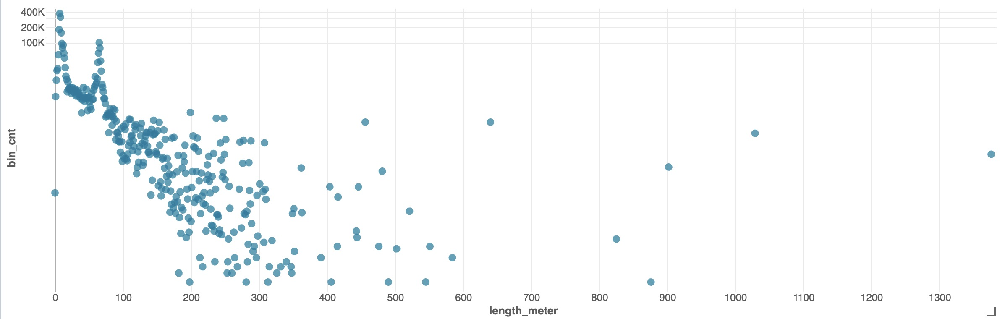

In [0]:
displayHTML("""<img width='50%' src='data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAkACQAAD/4QCSRXhpZgAATU0AKgAAAAgABAEaAAUAAAABAAAAPgEbAAUAAAABAAAARgEoAAMAAAABAAIAAIdpAAQAAAABAAAATgAAAAAAAACQAAAAAQAAAJAAAAABAAOShgAHAAAAEgAAAHigAgAEAAAAAQAACU6gAwAEAAAAAQAAAvgAAAAAQVNDSUkAAABTY3JlZW5zaG90/+0AOFBob3Rvc2hvcCAzLjAAOEJJTQQEAAAAAAAAOEJJTQQlAAAAAAAQ1B2M2Y8AsgTpgAmY7PhCfv/iD/BJQ0NfUFJPRklMRQABAQAAD+BhcHBsAhAAAG1udHJSR0IgWFlaIAfoAAwAAgAJAAEAG2Fjc3BBUFBMAAAAAEFQUEwAAAAAAAAAAAAAAAAAAAAAAAD21gABAAAAANMtYXBwbAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEWRlc2MAAAFQAAAAYmRzY20AAAG0AAAEvGNwcnQAAAZwAAAAI3d0cHQAAAaUAAAAFHJYWVoAAAaoAAAAFGdYWVoAAAa8AAAAFGJYWVoAAAbQAAAAFHJUUkMAAAbkAAAIDGFhcmcAAA7wAAAAIHZjZ3QAAA8QAAAAMG5kaW4AAA9AAAAAPm1tb2QAAA+AAAAAKHZjZ3AAAA+oAAAAOGJUUkMAAAbkAAAIDGdUUkMAAAbkAAAIDGFhYmcAAA7wAAAAIGFhZ2cAAA7wAAAAIGRlc2MAAAAAAAAACERpc3BsYXkAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABtbHVjAAAAAAAAACcAAAAMaHJIUgAAABQAAAHka29LUgAAAAwAAAH4bmJOTwAAABIAAAIEaWQAAAAAABIAAAIWaHVIVQAAABQAAAIoY3NDWgAAABYAAAI8c2xTSQAAABQAAAJSZGFESwAAABwAAAJmbmxOTAAAABYAAAKCZmlGSQAAABAAAAKYaXRJVAAAABgAAAKoZXNFUwAAABYAAALAcm9STwAAABIAAALWZnJDQQAAABYAAALoYXIAAAAAABQAAAL+dWtVQQAAABwAAAMSaGVJTAAAABYAAAMuemhUVwAAAAoAAANEdmlWTgAAAA4AAANOc2tTSwAAABYAAANcemhDTgAAAAoAAANEcnVSVQAAACQAAANyZW5HQgAAABQAAAOWZnJGUgAAABYAAAOqbXMAAAAAABIAAAPAaGlJTgAAABIAAAPSdGhUSAAAAAwAAAPkY2FFUwAAABgAAAPwZW5BVQAAABQAAAOWZXNYTAAAABIAAALWZGVERQAAABAAAAQIZW5VUwAAABIAAAQYcHRCUgAAABgAAAQqcGxQTAAAABIAAARCZWxHUgAAACIAAARUc3ZTRQAAABAAAAR2dHJUUgAAABQAAASGcHRQVAAAABYAAASaamFKUAAAAAwAAASwAEwAQwBEACAAdQAgAGIAbwBqAGnO7LfsACAATABDAEQARgBhAHIAZwBlAC0ATABDAEQATABDAEQAIABXAGEAcgBuAGEAUwB6AO0AbgBlAHMAIABMAEMARABCAGEAcgBlAHYAbgD9ACAATABDAEQAQgBhAHIAdgBuAGkAIABMAEMARABMAEMARAAtAGYAYQByAHYAZQBzAGsA5gByAG0ASwBsAGUAdQByAGUAbgAtAEwAQwBEAFYA5AByAGkALQBMAEMARABMAEMARAAgAGEAIABjAG8AbABvAHIAaQBMAEMARAAgAGEAIABjAG8AbABvAHIATABDAEQAIABjAG8AbABvAHIAQQBDAEwAIABjAG8AdQBsAGUAdQByIA8ATABDAEQAIAZFBkQGSAZGBikEGgQ+BDsETAQ+BEAEPgQyBDgEOQAgAEwAQwBEIA8ATABDAEQAIAXmBdEF4gXVBeAF2V9pgnIATABDAEQATABDAEQAIABNAOAAdQBGAGEAcgBlAGIAbgD9ACAATABDAEQEJgQyBDUEQgQ9BD4EOQAgBBYEGgAtBDQEOARBBD8EOwQ1BDkAQwBvAGwAbwB1AHIAIABMAEMARABMAEMARAAgAGMAbwB1AGwAZQB1AHIAVwBhAHIAbgBhACAATABDAEQJMAkCCRcJQAkoACAATABDAEQATABDAEQAIA4qDjUATABDAEQAIABlAG4AIABjAG8AbABvAHIARgBhAHIAYgAtAEwAQwBEAEMAbwBsAG8AcgAgAEwAQwBEAEwAQwBEACAAQwBvAGwAbwByAGkAZABvAEsAbwBsAG8AcgAgAEwAQwBEA4gDswPHA8EDyQO8A7cAIAO/A7gDzAO9A7cAIABMAEMARABGAOQAcgBnAC0ATABDAEQAUgBlAG4AawBsAGkAIABMAEMARABMAEMARAAgAGEAIABjAG8AcgBlAHMwqzDpMPwATABDAER0ZXh0AAAAAENvcHlyaWdodCBBcHBsZSBJbmMuLCAyMDI0AABYWVogAAAAAAAA81EAAQAAAAEWzFhZWiAAAAAAAACD3wAAPb////+7WFlaIAAAAAAAAEq/AACxNwAACrlYWVogAAAAAAAAKDgAABELAADIuWN1cnYAAAAAAAAEAAAAAAUACgAPABQAGQAeACMAKAAtADIANgA7AEAARQBKAE8AVABZAF4AYwBoAG0AcgB3AHwAgQCGAIsAkACVAJoAnwCjAKgArQCyALcAvADBAMYAywDQANUA2wDgAOUA6wDwAPYA+wEBAQcBDQETARkBHwElASsBMgE4AT4BRQFMAVIBWQFgAWcBbgF1AXwBgwGLAZIBmgGhAakBsQG5AcEByQHRAdkB4QHpAfIB+gIDAgwCFAIdAiYCLwI4AkECSwJUAl0CZwJxAnoChAKOApgCogKsArYCwQLLAtUC4ALrAvUDAAMLAxYDIQMtAzgDQwNPA1oDZgNyA34DigOWA6IDrgO6A8cD0wPgA+wD+QQGBBMEIAQtBDsESARVBGMEcQR+BIwEmgSoBLYExATTBOEE8AT+BQ0FHAUrBToFSQVYBWcFdwWGBZYFpgW1BcUF1QXlBfYGBgYWBicGNwZIBlkGagZ7BowGnQavBsAG0QbjBvUHBwcZBysHPQdPB2EHdAeGB5kHrAe/B9IH5Qf4CAsIHwgyCEYIWghuCIIIlgiqCL4I0gjnCPsJEAklCToJTwlkCXkJjwmkCboJzwnlCfsKEQonCj0KVApqCoEKmAquCsUK3ArzCwsLIgs5C1ELaQuAC5gLsAvIC+EL+QwSDCoMQwxcDHUMjgynDMAM2QzzDQ0NJg1ADVoNdA2ODakNww3eDfgOEw4uDkkOZA5/DpsOtg7SDu4PCQ8lD0EPXg96D5YPsw/PD+wQCRAmEEMQYRB+EJsQuRDXEPURExExEU8RbRGMEaoRyRHoEgcSJhJFEmQShBKjEsMS4xMDEyMTQxNjE4MTpBPFE+UUBhQnFEkUahSLFK0UzhTwFRIVNBVWFXgVmxW9FeAWAxYmFkkWbBaPFrIW1hb6Fx0XQRdlF4kXrhfSF/cYGxhAGGUYihivGNUY+hkgGUUZaxmRGbcZ3RoEGioaURp3Gp4axRrsGxQbOxtjG4obshvaHAIcKhxSHHscoxzMHPUdHh1HHXAdmR3DHeweFh5AHmoelB6+HukfEx8+H2kflB+/H+ogFSBBIGwgmCDEIPAhHCFIIXUhoSHOIfsiJyJVIoIiryLdIwojOCNmI5QjwiPwJB8kTSR8JKsk2iUJJTglaCWXJccl9yYnJlcmhya3JugnGCdJJ3onqyfcKA0oPyhxKKIo1CkGKTgpaymdKdAqAio1KmgqmyrPKwIrNitpK50r0SwFLDksbiyiLNctDC1BLXYtqy3hLhYuTC6CLrcu7i8kL1ovkS/HL/4wNTBsMKQw2zESMUoxgjG6MfIyKjJjMpsy1DMNM0YzfzO4M/E0KzRlNJ402DUTNU01hzXCNf02NzZyNq426TckN2A3nDfXOBQ4UDiMOMg5BTlCOX85vDn5OjY6dDqyOu87LTtrO6o76DwnPGU8pDzjPSI9YT2hPeA+ID5gPqA+4D8hP2E/oj/iQCNAZECmQOdBKUFqQaxB7kIwQnJCtUL3QzpDfUPARANER0SKRM5FEkVVRZpF3kYiRmdGq0bwRzVHe0fASAVIS0iRSNdJHUljSalJ8Eo3Sn1KxEsMS1NLmkviTCpMcky6TQJNSk2TTdxOJU5uTrdPAE9JT5NP3VAnUHFQu1EGUVBRm1HmUjFSfFLHUxNTX1OqU/ZUQlSPVNtVKFV1VcJWD1ZcVqlW91dEV5JX4FgvWH1Yy1kaWWlZuFoHWlZaplr1W0VblVvlXDVchlzWXSddeF3JXhpebF69Xw9fYV+zYAVgV2CqYPxhT2GiYfViSWKcYvBjQ2OXY+tkQGSUZOllPWWSZedmPWaSZuhnPWeTZ+loP2iWaOxpQ2maafFqSGqfavdrT2una/9sV2yvbQhtYG25bhJua27Ebx5veG/RcCtwhnDgcTpxlXHwcktypnMBc11zuHQUdHB0zHUodYV14XY+dpt2+HdWd7N4EXhueMx5KnmJeed6RnqlewR7Y3vCfCF8gXzhfUF9oX4BfmJ+wn8jf4R/5YBHgKiBCoFrgc2CMIKSgvSDV4O6hB2EgITjhUeFq4YOhnKG14c7h5+IBIhpiM6JM4mZif6KZIrKizCLlov8jGOMyo0xjZiN/45mjs6PNo+ekAaQbpDWkT+RqJIRknqS45NNk7aUIJSKlPSVX5XJljSWn5cKl3WX4JhMmLiZJJmQmfyaaJrVm0Kbr5wcnImc951kndKeQJ6unx2fi5/6oGmg2KFHobaiJqKWowajdqPmpFakx6U4pammGqaLpv2nbqfgqFKoxKk3qamqHKqPqwKrdavprFys0K1ErbiuLa6hrxavi7AAsHWw6rFgsdayS7LCszizrrQltJy1E7WKtgG2ebbwt2i34LhZuNG5SrnCuju6tbsuu6e8IbybvRW9j74KvoS+/796v/XAcMDswWfB48JfwtvDWMPUxFHEzsVLxcjGRsbDx0HHv8g9yLzJOsm5yjjKt8s2y7bMNcy1zTXNtc42zrbPN8+40DnQutE80b7SP9LB00TTxtRJ1MvVTtXR1lXW2Ndc1+DYZNjo2WzZ8dp22vvbgNwF3IrdEN2W3hzeot8p36/gNuC94UThzOJT4tvjY+Pr5HPk/OWE5g3mlucf56noMui86Ubp0Opb6uXrcOv77IbtEe2c7ijutO9A78zwWPDl8XLx//KM8xnzp/Q09ML1UPXe9m32+/eK+Bn4qPk4+cf6V/rn+3f8B/yY/Sn9uv5L/tz/bf//cGFyYQAAAAAAAwAAAAJmZgAA8qcAAA1ZAAAT0AAAClt2Y2d0AAAAAAAAAAEAAQAAAAAAAAABAAAAAQAAAAAAAAABAAAAAQAAAAAAAAABAABuZGluAAAAAAAAADYAAK4UAABR7AAAQ9cAALCkAAAmZgAAD1wAAFANAABUOQACMzMAAjMzAAIzMwAAAAAAAAAAbW1vZAAAAAAAAAYQAACgUP1ibWIAAAAAAAAAAAAAAAAAAAAAAAAAAHZjZ3AAAAAAAAMAAAACZmYAAwAAAAJmZgADAAAAAmZmAAAAAjMzNAAAAAACMzM0AAAAAAIzMzQA/8AAEQgC+AlOAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/bAEMAAgICAgICAwICAwQDAwMEBQQEBAQFBwUFBQUFBwgHBwcHBwcICAgICAgICAoKCgoKCgsLCwsLDQ0NDQ0NDQ0NDf/bAEMBAgICAwMDBgMDBg0JBwkNDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDf/dAAQAlf/aAAwDAQACEQMRAD8A/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH//Q/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQBFPPDawyXNzIsUMSs8kjkKiIoyWYngADkk9K+cvgn+0bo/xw8X+L9D8O6c0Ol+G2gFrqLzbmv0maRfM8ny18pcx5XLMSpGQpyB5V+078T9L1nxZpv7PD6/b+GNO1SNLzxXrFzOlsIdMzkWkLORuluQMMBkBSAQVMgXj/wBnrxf8LdA/aC+Jek+F9W0qDS9Sj0Kw8OxRXCCK7NvbmPy4Dn94wbAOCSSecmgD1rXf2o9aufF+u+GfhR8PNS8dW3heUwavqFtdLaxRzoSHjgUxSGdlKsAAVLFTtBXDH0zwv+0F8PfE3wkuvjIlxJaaPpscn9oxSqPtFrcRBd1uVBw0hLoEAPz71x1rxn9giKE/A6a/3b7q+16/nu3PLtNtiXLH12qp/GvjLx3Pe2Hwz+PelaYCmlD4lRx7EOECfabksAOmA0UP5D0oA+x7T9sLV7Wx0/xj4y+GesaB4F1W4jitvELXC3G2KY4jmltliV0jYcghm3D7m8kA+w+NPjHeeG/i78Pvh3p1nbXlh40jvJZL0yNviW3j8xDGF+Vg3qe3Ss39pfTNIh/Zp8W6YkaCxtdHiW3QAbF+zvEYNv0ZVxXxH8RdT+IFpL+zbe+AbZb3xU/hNYtOjlAdTLPaQxCRtxC/IjGQlztGMtlQcgH2j8a/2hl+H2t6Z8OvAWlf8JZ491iRBBpMT4S3ib5vMuGH3MqCQCRhcyMVQAt9A6A2uvotm/idLWPVWhVruOyLtbpKeWWNnwzKvTcQM4zgZwPzx/ZgDfCf44eKvhr8X7aJ/H+vYvrHxFJI839pQON7wxSyBThypcEKC7K6P80aLX6QzvLHEzwx+a4xhNwXPPqaAJaKyvtep/8APh/5GWj7Xqf/AD4f+RloArf8JDZf8JP/AMInsl+1/YP7R34XyvK83ysZ3bt+7nG3GO/anar4m8N6FLHDrmrWOnSTY8tLu5jgZ8nA2h2BPI7V4J8V/Gr+AdW1DxdAANaGgLZ21ky71UTXXy3DSfdIVsjy+px6Gvzk1TWNS1W+uNW1eVri6uXMk000gLO7ckkn/IFe1lmUPFRc5O0T5rPeIo4CSpQjzSevkkftXbXVte28d3ZypPBKoaOWJg6Op6FWBII9xU9flj8Bvifrng/xjp2nxySXGj6rcJaz2glBj3zHYkig5CsjkFiBkqCPTH6c/a9T/wCfD/yMtcuY5fLCVORu6ex3ZNm8MwoupFWa0aNWisr7Xqf/AD4f+Rlo+16n/wA+H/kZa889c1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloAu3Fylt5e8E+bIsYx6t0z7VYrmr+4v3+zebaeXtuEK/vVO5hnC8dM+taH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AaMsiwxPM2SEUscdcAZoikWaJJlyA6hhnrgjNY13dai1rMr2WxTGwLeapwMHJx3xRaXWorawqllvURqA3mqMjAwcds0AbtFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatV7e5S58zYCPKkaM59V649qpfa9T/wCfD/yMtZ9hcX6fafKtPM3XDlv3qjaxxleeuPWgDpaKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1aKyvtep/8APh/5GWj7Xqf/AD4f+RloA1ar/aU+1fY8Hf5fmZ7Yzj86pfa9T/58P/Iy1n/aL/8AtXzPsn7z7Pjy/NX7u772enXjFAHS0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq1XuLlLby94J82RYxj1bpn2ql9r1P/nw/8jLWff3F+/2bzbTy9twhX96p3MM4Xjpn1oA6Wisr7Xqf/Ph/5GWj7Xqf/Ph/5GWgDVorK+16n/z4f+Rlo+16n/z4f+RloA1aKyvtep/8+H/kZaPtep/8+H/kZaANWisr7Xqf/Ph/5GWj7Xqf/Ph/5GWgDVorK+16n/z4f+Rlo+16n/z4f+RloA1aKyvtep/8+H/kZaPtep/8+H/kZaANWisr7Xqf/Ph/5GWj7Xqf/Ph/5GWgDVorK+16n/z4f+Rlo+16n/z4f+RloA1aKyvtep/8+H/kZaPtep/8+H/kZaANWo5ZFhieZskIpY464AzWd9r1P/nw/wDIy1Xu7rUWtZley2KY2BbzVOBg5OO+KANmKRZokmXIDqGGeuCM1JWFaXWorawqllvURqA3mqMjAwcds1Y+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaALtvcpc+ZsBHlSNGc+q9ce1WK5qwuL9PtPlWnmbrhy371RtY4yvPXHrWh9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AXftKfavseDv8AL8zPbGcfnViua+0X/wDavmfZP3n2fHl+av3d33s9OvGK0Ptep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgC7cXKW3l7wT5sixjHq3TPtViuav7i/f7N5tp5e24Qr+9U7mGcLx0z61ofa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBoyyLDE8zZIRSxx1wBmiKRZokmXIDqGGeuCM1jXd1qLWsyvZbFMbAt5qnAwcnHfFFpdaitrCqWW9RGoDeaoyMDBx2zQBu0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq1Xt7lLnzNgI8qRozn1Xrj2ql9r1P/AJ8P/Iy1n2Fxfp9p8q08zdcOW/eqNrHGV5649aAOlorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVorK+16n/wA+H/kZaPtep/8APh/5GWgDVqv9pT7V9jwd/l+ZntjOPzql9r1P/nw/8jLWf9ov/wC1fM+yfvPs+PL81fu7vvZ6deMUAdLRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrVe4uUtvL3gnzZFjGPVumfaqX2vU/+fD/yMtZ9/cX7/ZvNtPL23CFf3qncwzheOmfWgDpaKyvtep/8+H/kZaPtep/8+H/kZaANWisr7Xqf/Ph/5GWj7Xqf/Ph/5GWgDVorK+16n/z4f+Rlo+16n/z4f+RloA1aKyvtep/8+H/kZaPtep/8+H/kZaANWisr7Xqf/Ph/5GWj7Xqf/Ph/5GWgDVorK+16n/z4f+Rlo+16n/z4f+RloA1aKyvtep/8+H/kZaPtep/8+H/kZaANWisr7Xqf/Ph/5GWj7Xqf/Ph/5GWgDVorPguL+SVUmtPKQ5y/mq2OPQVoUAf/0f3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAcTrvw0+HPii/bVvEvhXRNWvmVUa5vtOt7mYqnCqXkjZsDsM8V4h8PP2ctI8HfGPxj4/udG8Pf2RqTadJ4dt7a1TztNkto9szohgWO3Z3+YGFiW6nBr6looA+G7f4PftB/B3XfEtt8A73w9deFvE96+oRWeteas2k3M4IkaERgIyKAoXcXyqKChIJbsfDH7LenWnwF1n4SeKNTN7qniaeTU9U1aNd2NTdkdJIw+GZImiQYJUyAMfk3kD6zooA/P3UPgx+1P478Kad8F/H+t+HYPB1qbWO+1awM8mp31paFWjiIlUKXBRSWKR5KgszchvcPF3wV1bU/i58MfGfh2SxtNB8CW11azWsryLOYpIfKhWBVjZGCgAHc64HTNfSVFAHzd+0d8CJPjJoWn33hq7j0jxl4euUutG1N2eIIQ6s0cjxq7hcqHVlUsrqCOC2fbPBy+LU8L6bH47Nk2vxwKl++nO72kky8GSMyRxMA4AYqUG0kqCQAT0tRTvLHEzwx+a4xhNwXPPqaAJaKyvtep/8APh/5GWj7Xqf/AD4f+RloA+aPjp4aHijWNbtBKsMln4R/tBHc4QfZL3zWB/3kVlHYEg9q/JHVL29vbpze7kZTgRnICe2K/bbWtLh1zxtf2VySt1qHhiawkshgkWs0xBnEpyn3jt2EZ79K/L3xX4T1fwvrU+g+J9NEV5atgrJtYFTyHRsYZW6gjrX2nC2KUYTpvfc/N+OcFKVSnXS0as36bHnXwzv7rRvF+l66sZmtdNu4bqeIkhZFicPsyCOW2jkdOtfu/p1/bapp9tqdmxa3u4Y54iRglJVDKSDyOD0r8afC/hnXfFmsW3h7w5Ym4u7hsIiEBVX+J2PRVXqSa/XrRbe+0TRrDRoLAGKwtYbVCJVUbYUCDA5xwOmTWHFNSE5QfXX7jo4Fp1IQqr7OmvmdRRWV9r1P/nw/8jLR9r1P/nw/8jLXyR+gGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtABqv/AC5/9fcX9a1a5q/uL9/s3m2nl7bhCv71TuYZwvHTPrWh9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBbv/APjxuP8Ark//AKCaLD/jxt/+uSf+gisy7utRa1mV7LYpjYFvNU4GDk474otLrUVtYVSy3qI1AbzVGRgYOO2aAN2isr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWisr7Xqf8Az4f+Rlo+16n/AM+H/kZaANWsrSv+Xz/r7l/pR9r1P/nw/wDIy1n2Fxfp9p8q08zdcOW/eqNrHGV5649aAOlorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVrK/5jf/br/wCz0fa9T/58P/Iy1n/aL/8AtXzPsn7z7Pjy/NX7u772enXjFAHS0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq1lar/wAuf/X3F/Wj7Xqf/Ph/5GWs+/uL9/s3m2nl7bhCv71TuYZwvHTPrQB0tFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatVb/AP48bj/rk/8A6Caqfa9T/wCfD/yMtV7u61FrWZXstimNgW81TgYOTjvigDTsP+PG3/65J/6CKtVhWl1qK2sKpZb1EagN5qjIwMHHbNWPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgDVorK+16n/z4f8AkZaPtep/8+H/AJGWgA0r/l8/6+5f6Vq1zVhcX6fafKtPM3XDlv3qjaxxleeuPWtD7Xqf/Ph/5GWgDVorK+16n/z4f+Rlo+16n/z4f+RloA1aKyvtep/8+H/kZaPtep/8+H/kZaANWisr7Xqf/Ph/5GWj7Xqf/Ph/5GWgDVorK+16n/z4f+Rlo+16n/z4f+RloA1aKyvtep/8+H/kZaPtep/8+H/kZaANWisr7Xqf/Ph/5GWj7Xqf/Ph/5GWgDVorK+16n/z4f+Rlo+16n/z4f+RloA1aKyvtep/8+H/kZaPtep/8+H/kZaANWisr7Xqf/Ph/5GWj7Xqf/Ph/5GWgA/5jf/br/wCz1q1zX2i//tXzPsn7z7Pjy/NX7u772enXjFaH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQAar/wAuf/X3F/WtWuav7i/f7N5tp5e24Qr+9U7mGcLx0z61ofa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AW7/wD48bj/AK5P/wCgmiw/48bf/rkn/oIrMu7rUWtZley2KY2BbzVOBg5OO+KLS61FbWFUst6iNQG81RkYGDjtmgDdorK+16n/AM+H/kZaPtep/wDPh/5GWgDVorK+16n/AM+H/kZaPtep/wDPh/5GWgDVorK+16n/AM+H/kZaPtep/wDPh/5GWgDVorK+16n/AM+H/kZaPtep/wDPh/5GWgDVorK+16n/AM+H/kZaPtep/wDPh/5GWgDVorK+16n/AM+H/kZaPtep/wDPh/5GWgDVorK+16n/AM+H/kZaPtep/wDPh/5GWgDVorK+16n/AM+H/kZaPtep/wDPh/5GWgDVorK+16n/AM+H/kZaPtep/wDPh/5GWgDVrK0r/l8/6+5f6Ufa9T/58P8AyMtZ9hcX6fafKtPM3XDlv3qjaxxleeuPWgDpaKyvtep/8+H/AJGWj7Xqf/Ph/wCRloA1aKyvtep/8+H/AJGWj7Xqf/Ph/wCRloA1aKyvtep/8+H/AJGWj7Xqf/Ph/wCRloA1aKyvtep/8+H/AJGWj7Xqf/Ph/wCRloA1aKyvtep/8+H/AJGWj7Xqf/Ph/wCRloA1aKyvtep/8+H/AJGWj7Xqf/Ph/wCRloA1aKyvtep/8+H/AJGWj7Xqf/Ph/wCRloA1aKyvtep/8+H/AJGWj7Xqf/Ph/wCRloA1aKyvtep/8+H/AJGWj7Xqf/Ph/wCRloA1ayv+Y3/26/8As9H2vU/+fD/yMtZ/2i//ALV8z7J+8+z48vzV+7u+9np14xQB0tFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatZWq/8ALn/19xf1o+16n/z4f+RlrPv7i/f7N5tp5e24Qr+9U7mGcLx0z60AdLRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWV9r1P/nw/wDIy0fa9T/58P8AyMtAGrRWfBcX8kqpNaeUhzl/NVscegrQoA//0v3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAFFfJXxxn+LXjD4n+FvhB4FvNT8MaDf2smpa34k0+CTdGiGUJbJcDCxufL6Bg2XQ/dBDed6ZJ49+Av7Qvg/wCHb+NdW8aeHPG9vcLJa65Obu9spIFYrKshyVTcO21WXeCpKqwAPvmivzv+H9h8T/2przxN8SYviFrng7QLTU59N8OWGiytBGUgCsJrhVZRMCHXcGOWbeAVUBam0X9pjxr4a/Z78cah4taG68c+BNWfwz5xX5Li5aQQxTuMAMyHzCwwA/lZPLGgD9CqK/OLxX4J+PXwh+F0XxwX4la3q/iLTltdS1jRNQkafSpIp3QSwJAWwgi3/My7cqrbAh2463x54/Gs/G/4CeK4L2TTtG1vSL7Vp45JzFCsMtmJwZuQmI1PJbgYoA+8KK/PrWfFfjT9rvxhL4O+G19d+H/hfoV0q6x4gty0Nxqk8eG8m3PBxjBVTwoIkkBzHGfu3QNC03wzotn4f0eNo7OwhWGFXdpX2r3Z3LO7E8szEkkkk5oA2KKKKAPL/wDmtH/cr/8At5XZ6/4X8O+KbVbLxHpttqUKElFuYlk2E8EoSMqSO6kGuHnngtfjFJc3MiQww+FGkkkkYKiIt5lmZjgAAckngCudv/2kfhNYakdObVJJwjhGuILeSSAZPJDAZYDuVDZ7ZrehRrTd6Kba7HJi8ThqUbYmSSfe2v3nrGh+FfDPhhHj8O6VZ6aJP9YbWBIi+Om4qAWx2znFb9ZWja5o/iKwj1TQr2C/tJPuzW7iRc9wSDww7qeR3FatZzcnJ8+/mb0lBRXs7W8tgoooqDQKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/AK+4v61q1lar/wAuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/r7l/pWrWVpX/L5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/26/8As9atZX/Mb/7df/Z6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP8A6+4v61q1lar/AMuf/X3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/wDHjcf9cn/9BNWqq3//AB43H/XJ/wD0E0AFh/x42/8A1yT/ANBFWqq2H/Hjb/8AXJP/AEEVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/AJjf/br/AOz1q1lf8xv/ALdf/Z61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf8Alz/6+4v61q1lar/y5/8AX3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFF//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/r7l/pWrWVpX/L5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/5c/+vuL+tatZWq/8uf8A19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA/9P9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFAHy/8efjT4m8I6/onwq+GVna3fjPxNE88U+oSCOy06zQsrXM2SN33H2jOMoeGO1GqfCP4H6F4a8TS/EPx34s/4Tb4g38LwtqMsyCO0SQENHZQg/INpK7uPlyEWMMyn0D4g/s7fB34qa6niXx7oB1TUo7dLVZjfXkG2GNmZUCQTxoAGdj93JJ5rG8K/srfAXwT4hsfFXhjwv8AYtU02TzrWf8AtC+l8t8Fc7Jbh0bgnhlIoA8f/Yc1jT9G+Fuv+B9YnhstX8Ia5fx6pBK6o0CcfvXycBNySLuPAKHNfJfiDQ7rxn8C/jZ8TdGSSXS9T8fjUrVgCDJaQzyZkC91AvFJI/unP3TX6KfEH9lv4K/E3xA/irxPobHVJtn2m4tLma2NyEGB5qxuEY4wCwAcgAFsAV67ovgvwp4d8LReCNG0q2ttBht3tVsAgaAwyZ3q6tu3+ZuJctkuSSxJJJAPm79o/wCJvhTUP2WtX8UWN9DJbeKNNgt9NUOu6aW8ZP3aqTkvGu5nXqoRsjIr5k+KHwoTxR4i/Zz+E/ieSexEvh77JqHlY85DBbwyTRqW4BJQoCQduc4OMH670H9kH4A+HPE8HirTfDf+k2sqz28E91PPaxSqchxFJIwYg8gPuUHGAMDHsetfDvwd4h8WaJ441jT/ALRrfhwTDTLrzpk8gXC7ZP3aOsb7h/fVsdsUAfCV9ZP+xX8YLfVtMWb/AIVL43kjtrqEs8w0q9UcPuYsx2jLg53PFvXDNEpr9GP9D1OzV0ZZ7a4RZEdGyjocMrKynkHggg81geM/BXhf4heHbrwn4y09NT0q82edbuzpkxsGUq8bK6MGAIKsD71Z8K+F9E8FeHrHwr4bhkt9M02PybWGSeW5aOPJIQSTvJIVXOFBYhVwowoAABb/ALE0z/nj/wCPt/jR/Ymmf88f/H2/xrVooA+Bf2r9ev8ATNc07wVYTNFpmoacLy5gGMPJFOQpLEF8ZAOA2MqDjNfFl9d6bpyhrtgpP3VGSx+gFfox8cPhncfE3x2thpsqRalYeHftNp5hxHIftZVo2ODjcDwcfeAzgZr8rvEWma5Hrt5a39nNHcQzvC0ZQ/KYyU28ccY596+94adKph/Zp6rc/KOMqdenjHVkvdla3yWq+/8AM+uv2XfiT4c07xy/h7Vbo21hq8JRVn3LH9qUjyzuB2oSNy5PByAe1fpv/Ymmf88f/H2/xr8LvDWiTWJe8vFCyuu1FzkqD1J9zxX6+/s++Ir3xJ8LNJudRkeW5tDLZvK5yXWByEOepxGVBJ5JGa87ibAwjL6xTfkz2eCs0nOLwVRbXa/y/U9U/sTTP+eP/j7f40f2Jpn/ADx/8fb/ABrVor5M++Mr+xNM/wCeP/j7f40f2Jpn/PH/AMfb/GtWigDK/sTTP+eP/j7f40f2Jpn/ADx/8fb/ABrVooAyv7E0z/nj/wCPt/jR/Ymmf88f/H2/xrVooAyv7E0z/nj/AOPt/jR/Ymmf88f/AB9v8a1aKAMr+xNM/wCeP/j7f40f2Jpn/PH/AMfb/GtWigDK/sTTP+eP/j7f40f2Jpn/ADx/8fb/ABrVooAyv7E0z/nj/wCPt/jR/Ymmf88f/H2/xrVooA5q/wBLsIPs3lRbfMuERvmY5U5yOTWh/Ymmf88f/H2/xo1X/lz/AOvuL+tatAGV/Ymmf88f/H2/xo/sTTP+eP8A4+3+NatFAGV/Ymmf88f/AB9v8aP7E0z/AJ4/+Pt/jWrRQBlf2Jpn/PH/AMfb/Gj+xNM/54/+Pt/jWrRQBlf2Jpn/ADx/8fb/ABo/sTTP+eP/AI+3+NatFAGV/Ymmf88f/H2/xo/sTTP+eP8A4+3+NatFAGV/Ymmf88f/AB9v8aP7E0z/AJ4/+Pt/jWrRQBlf2Jpn/PH/AMfb/Gj+xNM/54/+Pt/jWrRQBlf2Jpn/ADx/8fb/ABo/sTTP+eP/AI+3+NatFAGV/Ymmf88f/H2/xo/sTTP+eP8A4+3+NatFAGFd6Pp0VrNIkWGSNmB3NwQCR3otNH06W1hkeLLPGrE7m5JAJ71p3/8Ax43H/XJ//QTRYf8AHjb/APXJP/QRQBU/sTTP+eP/AI+3+NH9iaZ/zx/8fb/GtWigDK/sTTP+eP8A4+3+NH9iaZ/zx/8AH2/xrVooAyv7E0z/AJ4/+Pt/jR/Ymmf88f8Ax9v8a1aKAMr+xNM/54/+Pt/jR/Ymmf8APH/x9v8AGtWigDK/sTTP+eP/AI+3+NH9iaZ/zx/8fb/GtWigDK/sTTP+eP8A4+3+NH9iaZ/zx/8AH2/xrVooAyv7E0z/AJ4/+Pt/jR/Ymmf88f8Ax9v8a1aKAMr+xNM/54/+Pt/jR/Ymmf8APH/x9v8AGtWigDK/sTTP+eP/AI+3+NH9iaZ/zx/8fb/GtWigDK/sTTP+eP8A4+3+NZ9hpdhP9p82Ld5dw6L8zDCjGBwa6WsrSv8Al8/6+5f6UAH9iaZ/zx/8fb/Gj+xNM/54/wDj7f41q0UAZX9iaZ/zx/8AH2/xo/sTTP8Anj/4+3+NatFAGV/Ymmf88f8Ax9v8aP7E0z/nj/4+3+NatFAGV/Ymmf8APH/x9v8AGj+xNM/54/8Aj7f41q0UAZX9iaZ/zx/8fb/Gj+xNM/54/wDj7f41q0UAZX9iaZ/zx/8AH2/xo/sTTP8Anj/4+3+NatFAGV/Ymmf88f8Ax9v8aP7E0z/nj/4+3+NatFAGV/Ymmf8APH/x9v8AGj+xNM/54/8Aj7f41q0UAZX9iaZ/zx/8fb/Gj+xNM/54/wDj7f41q0UAZX9iaZ/zx/8AH2/xrP8A7LsP7V+zeV+7+z79u5vvbsZznPSulrK/5jf/AG6/+z0AH9iaZ/zx/wDH2/xo/sTTP+eP/j7f41q0UAZX9iaZ/wA8f/H2/wAaP7E0z/nj/wCPt/jWrRQBlf2Jpn/PH/x9v8aP7E0z/nj/AOPt/jWrRQBlf2Jpn/PH/wAfb/Gj+xNM/wCeP/j7f41q0UAZX9iaZ/zx/wDH2/xo/sTTP+eP/j7f41q0UAZX9iaZ/wA8f/H2/wAaP7E0z/nj/wCPt/jWrRQBlf2Jpn/PH/x9v8aP7E0z/nj/AOPt/jWrRQBlf2Jpn/PH/wAfb/Gj+xNM/wCeP/j7f41q0UAZX9iaZ/zx/wDH2/xo/sTTP+eP/j7f41q0UAZX9iaZ/wA8f/H2/wAaz7/S7CD7N5UW3zLhEb5mOVOcjk10tZWq/wDLn/19xf1oAP7E0z/nj/4+3+NH9iaZ/wA8f/H2/wAa1aKAMr+xNM/54/8Aj7f40f2Jpn/PH/x9v8a1aKAMr+xNM/54/wDj7f40f2Jpn/PH/wAfb/GtWigDK/sTTP8Anj/4+3+NH9iaZ/zx/wDH2/xrVooAyv7E0z/nj/4+3+NH9iaZ/wA8f/H2/wAa1aKAMr+xNM/54/8Aj7f40f2Jpn/PH/x9v8a1aKAMr+xNM/54/wDj7f40f2Jpn/PH/wAfb/GtWigDK/sTTP8Anj/4+3+NH9iaZ/zx/wDH2/xrVooAyv7E0z/nj/4+3+NH9iaZ/wA8f/H2/wAa1aKAMr+xNM/54/8Aj7f41Xu9H06K1mkSLDJGzA7m4IBI71u1Vv8A/jxuP+uT/wDoJoAzLTR9OltYZHiyzxqxO5uSQCe9WP7E0z/nj/4+3+NW7D/jxt/+uSf+girVAGV/Ymmf88f/AB9v8aP7E0z/AJ4/+Pt/jWrRQBlf2Jpn/PH/AMfb/Gj+xNM/54/+Pt/jWrRQBlf2Jpn/ADx/8fb/ABo/sTTP+eP/AI+3+NatFAGV/Ymmf88f/H2/xo/sTTP+eP8A4+3+NatFAGV/Ymmf88f/AB9v8aP7E0z/AJ4/+Pt/jWrRQBlf2Jpn/PH/AMfb/Gj+xNM/54/+Pt/jWrRQBlf2Jpn/ADx/8fb/ABo/sTTP+eP/AI+3+NatFAGV/Ymmf88f/H2/xo/sTTP+eP8A4+3+NatFAGV/Ymmf88f/AB9v8aP7E0z/AJ4/+Pt/jWrRQBzVhpdhP9p82Ld5dw6L8zDCjGBwa0P7E0z/AJ4/+Pt/jRpX/L5/19y/0rVoAyv7E0z/AJ4/+Pt/jR/Ymmf88f8Ax9v8a1aKAMr+xNM/54/+Pt/jR/Ymmf8APH/x9v8AGtWigDK/sTTP+eP/AI+3+NH9iaZ/zx/8fb/GtWigDK/sTTP+eP8A4+3+NH9iaZ/zx/8AH2/xrVooAyv7E0z/AJ4/+Pt/jR/Ymmf88f8Ax9v8a1aKAMr+xNM/54/+Pt/jR/Ymmf8APH/x9v8AGtWigDK/sTTP+eP/AI+3+NH9iaZ/zx/8fb/GtWigDK/sTTP+eP8A4+3+NH9iaZ/zx/8AH2/xrVooAyv7E0z/AJ4/+Pt/jR/Ymmf88f8Ax9v8a1aKAOa/suw/tX7N5X7v7Pv27m+9uxnOc9K0P7E0z/nj/wCPt/jR/wAxv/t1/wDZ61aAMr+xNM/54/8Aj7f40f2Jpn/PH/x9v8a1aKAMr+xNM/54/wDj7f40f2Jpn/PH/wAfb/GtWigDK/sTTP8Anj/4+3+NH9iaZ/zx/wDH2/xrVooAyv7E0z/nj/4+3+NH9iaZ/wA8f/H2/wAa1aKAMr+xNM/54/8Aj7f40f2Jpn/PH/x9v8a1aKAMr+xNM/54/wDj7f40f2Jpn/PH/wAfb/GtWigDK/sTTP8Anj/4+3+NH9iaZ/zx/wDH2/xrVooAyv7E0z/nj/4+3+NH9iaZ/wA8f/H2/wAa1aKAMr+xNM/54/8Aj7f40f2Jpn/PH/x9v8a1aKAOav8AS7CD7N5UW3zLhEb5mOVOcjk1of2Jpn/PH/x9v8aNV/5c/wDr7i/rWrQBlf2Jpn/PH/x9v8aP7E0z/nj/AOPt/jWrRQBlf2Jpn/PH/wAfb/Gj+xNM/wCeP/j7f41q0UAZX9iaZ/zx/wDH2/xo/sTTP+eP/j7f41q0UAZX9iaZ/wA8f/H2/wAaP7E0z/nj/wCPt/jWrRQBlf2Jpn/PH/x9v8aP7E0z/nj/AOPt/jWrRQBlf2Jpn/PH/wAfb/Gj+xNM/wCeP/j7f41q0UAZX9iaZ/zx/wDH2/xo/sTTP+eP/j7f41q0UAZX9iaZ/wA8f/H2/wAaP7E0z/nj/wCPt/jWrRQBlf2Jpn/PH/x9v8aP7E0z/nj/AOPt/jWrRQBhXej6dFazSJFhkjZgdzcEAkd6LTR9OltYZHiyzxqxO5uSQCe9ad//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAVP7E0z/nj/wCPt/jR/Ymmf88f/H2/xrVooAyv7E0z/nj/AOPt/jR/Ymmf88f/AB9v8a1aKAMr+xNM/wCeP/j7f40f2Jpn/PH/AMfb/GtWigDK/sTTP+eP/j7f40f2Jpn/ADx/8fb/ABrVooAyv7E0z/nj/wCPt/jR/Ymmf88f/H2/xrVooAyv7E0z/nj/AOPt/jR/Ymmf88f/AB9v8a1aKAMr+xNM/wCeP/j7f40f2Jpn/PH/AMfb/GtWigDK/sTTP+eP/j7f40f2Jpn/ADx/8fb/ABrVooAyv7E0z/nj/wCPt/jR/Ymmf88f/H2/xrVooAyv7E0z/nj/AOPt/jWfYaXYT/afNi3eXcOi/MwwoxgcGulrK0r/AJfP+vuX+lAB/Ymmf88f/H2/xo/sTTP+eP8A4+3+NatFAGV/Ymmf88f/AB9v8aP7E0z/AJ4/+Pt/jWrRQBlf2Jpn/PH/AMfb/Gj+xNM/54/+Pt/jWrRQBlf2Jpn/ADx/8fb/ABo/sTTP+eP/AI+3+NatFAGV/Ymmf88f/H2/xo/sTTP+eP8A4+3+NatFAGV/Ymmf88f/AB9v8aP7E0z/AJ4/+Pt/jWrRQBlf2Jpn/PH/AMfb/Gj+xNM/54/+Pt/jWrRQBlf2Jpn/ADx/8fb/ABo/sTTP+eP/AI+3+NatFAGV/Ymmf88f/H2/xo/sTTP+eP8A4+3+NatFAGV/Ymmf88f/AB9v8az/AOy7D+1fs3lfu/s+/bub727Gc5z0rpayv+Y3/wBuv/s9AB/Ymmf88f8Ax9v8aP7E0z/nj/4+3+NatFAGV/Ymmf8APH/x9v8AGj+xNM/54/8Aj7f41q0UAZX9iaZ/zx/8fb/Gj+xNM/54/wDj7f41q0UAZX9iaZ/zx/8AH2/xo/sTTP8Anj/4+3+NatFAGV/Ymmf88f8Ax9v8aP7E0z/nj/4+3+NatFAGV/Ymmf8APH/x9v8AGj+xNM/54/8Aj7f41q0UAZX9iaZ/zx/8fb/Gj+xNM/54/wDj7f41q0UAZX9iaZ/zx/8AH2/xo/sTTP8Anj/4+3+NatFAGV/Ymmf88f8Ax9v8aP7E0z/nj/4+3+NatFAGV/Ymmf8APH/x9v8AGs+/0uwg+zeVFt8y4RG+ZjlTnI5NdLWVqv8Ay5/9fcX9aAD+xNM/54/+Pt/jR/Ymmf8APH/x9v8AGtWigDK/sTTP+eP/AI+3+NH9iaZ/zx/8fb/GtWigDK/sTTP+eP8A4+3+NH9iaZ/zx/8AH2/xrVooAyv7E0z/AJ4/+Pt/jR/Ymmf88f8Ax9v8a1aKAMr+xNM/54/+Pt/jR/Ymmf8APH/x9v8AGtWigDK/sTTP+eP/AI+3+NH9iaZ/zx/8fb/GtWigDK/sTTP+eP8A4+3+NH9iaZ/zx/8AH2/xrVooAyv7E0z/AJ4/+Pt/jR/Ymmf88f8Ax9v8a1aKAM+DS7C2lWaGLa65wdzHqMdzWhRRQB//1P3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAFFVL6/sdLs5tR1K4itLW3QyTTzusccaLyWZmICgdyTXnvwo+K/hn4x+GZvFnhKO7jsIr2exBvI0jd3g25dQjv8jBgVyQ3qBQB6bRXzD42/az+GngzxVqHg+Kx13xFeaOD/asmh2Iu4NPK/eE7tJHgp/HtDBSCpIYED13QPil4D8S+Av8AhZml6tC3h1beS5mu3yggSEEyrKp+ZHTBDKRnPTORkA9Bor5H0b9tL4RarqFpDc2mvaTpWoXX2S013UrAQaVPLkrxOJWKjI5Lqu0cttAOPWvFvxd03wn8TPB/wznsJri48YLdNBdRuoigFqm87lPLbu2KAPXqK8N+M/x78KfBm30+1voLjWdf1iZItO0TTwHvLje23dt52rn5VOCXb5VB5x61oF9qWp6LZ6jrGnNpN5cwrJNYvKsz27Nz5bOnyMyj723IzkAkckA2KKKKAPL/APmtH/cr/wDt5XzB8dP2f/EU3iG78Y+CbV9Rt9Ske4vLSMjzoZ3OXZFJBkWRiWwuWBJ4xyPp/wD5rR/3K/8A7eV6bLLFBE80zrHHGpZ3YhVVVGSSTwAB1NdmCxtTDVOen9x52Z5ZRx1H2Vb1T6o/KPw18EPiZ4l1KLTxoV5psbth7nUIJLaGNRjLEuoJ68BQSe3fH6aeCPCGneBPC9j4W0pneCyRgZJMb5Hdi7u2P7zMcDsMDtVGy+Jvw71G9OnWXiTS5rgAkIt1H82M52ndhsYJ4J456V3NdWZZjXxFo1I8q7HBkmTYTB806EuaT0vp92gUUUV5J9AFFFFABRRRQAUUUUAFFZ2r6vpmg6ZcaxrFwlpZWiGSaaQ4VVH6kk8ADJJIABJxXzlJ+1j8Nk1E2i2uqyW4bb9qWCPYecbtjSh9mOfu7v8AZrpoYStWTdKLdjjxWYYbDNKvNRb7n09RWH4d8SaH4s0mHXPDt4l7ZT52SpkcrwQysAysO4YAj0rcrnlFxfLJanVCcZRUou6YUUUUigooooAytV/5c/8Ar7i/rWrWVqv/AC5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFF/8A8eNx/wBcn/8AQTRYf8eNv/1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/5fP+vuX+latZWlf8vn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf/br/wCz1q1lf8xv/t1/9noA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/5c/wDr7i/rWrWVqv8Ay5/9fcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//AMeNx/1yf/0E1aqrf/8AHjcf9cn/APQTQAWH/Hjb/wDXJP8A0EVaqrYf8eNv/wBck/8AQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/wCvuX+latZWlf8AL5/19y/0rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAyv8AmN/9uv8A7PWrWV/zG/8At1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/wCXP/r7i/rWrWVqv/Ln/wBfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/8A8eNx/wBcn/8AQTRYf8eNv/1yT/0EUX//AB43H/XJ/wD0E0WH/Hjb/wDXJP8A0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/5fP+vuX+latZWlf8vn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf/AG6/+z1q1lf8xv8A7df/AGegDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/6+4v61q1lar/y5/wDX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD/1f3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAeWfE74LfDn4xRadD8QdMfUk0ppmtQt1PbhDOEDk+TIm7OxfvZx2xk186/sEnyvgNcFVLbNcv8KOpwkPFfbtfLv7Inw68ZfC/4US+GvHOn/wBmak2r3d0IPOhn/cyrGFbdA8iclTxuyO4oA4f9g+0juPhBqfim6xNqfiDX766vrhgDJI6hFAY9SAdzAHoXJ7mvjjxZqFz4Y+D/AMdfBGiKYNGt/iLHaQxRjEccLXExKDHQAWkKntjAr6h8MaF8ev2ab7xN4P8Ah/4HTxx4U1fUZdR0KeK+jtWsJLhcGKdH3OyoFQH7inaWDguQu14f/Zc17U/2evFPgvxndwJ408aahJ4gvLkHzIrfUC6yxRM6Z3LlCJGUMAZH27gFJAPRf2kfB+gWX7LviLwzDBHHY6JpFv8AYlAA8o2LRmLb6H5AOOoJHQmvjz4m+O/Enhu9/Zx8b6Zpsmu66nhb/R7M7me7u7i1hhQkICzbncOQMFugIzkeoeI4P2q/ir4Bs/gTr/giLQTOtpa614ql1CGaCW0t2VjIkURz5khRS4V3zyNqhsr694t+EHiOL4yfBvVPCmnGXwx4HsbqwurgzwobaIW4hgBR3WR8hQPkVsd8UAeGfssrDdfHPxgPjlbzH4vwsJrU37o8Udk0Y3rZKmY1dUYcqx/cECPCiTP6STzxW0TTTNtRcZOCepx2r5P/AGmfgl4j8ato3xP+FJFt8QvCs0b2Tq8cJvLcPkwO8hVPkLFl3nYVLo2Q/H0h4O1HxFq3hfTdR8W6SdD1maBTfaeZopxBOOHCyQvIjIxG5CGJ2kbgGyAAaH9t6Z/z2/8AHG/wo/tvTP8Ant/443+FatFAHl2R/wALO/4SL/mH/wBg/YvO/wCm/wBp8zZt+993nOMe+a+Rf2rvibLPrMfg+0uZItMsbdbm7RGIW4lk+dQ64GdgAKgnqc46Gvrv/mtH/cr/APt5Xxn+3D4QawNn42sju/tJUtbmIAlt9vyJOB93ZgHnjaPXj2uH403jYqfy9T5ri11Vls3S8r+n/D2Phi68YX0khNsEiQHgEbmI9yePyFfoT+yv+0dLrscfw88cSlrqEEaffszMZVwSIJMgnIAOxs8jCYHy5/LTz52P3jn0FfQX7P8ADdX/AI90PTrMhNQk1SzlRicALFKGLdR9wZJA5PbmvvM3wFGrhZKa21T7H5hkWZV8NjISpvd2a7p9P8j9rv7b0z/nt/443+FH9t6Z/wA9v/HG/wAK1aK/KT90Mr+29M/57f8Ajjf4Uf23pn/Pb/xxv8K1aKAMr+29M/57f+ON/hR/bemf89v/ABxv8K1aKAMr+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CtWigD4S/a48VXE0ug6DbXDDTnSa6kQKyiSZSEXdng7FJwO2457Y+LvtEX979DX6VftQ+FtE1b4fSeI76YW19ojbrRsAmdpyqGD1+c4Of4duema/J66m8Wy3BVI3jAJ2iMLt4/2j1/E19/w/wAtTCJR0te5+ScWwnSzCUp68yTXpt+aZ9xfsneKJ7HxlqWiNM/9n3dg9xJHhiqzQyRqj4AOPlcqemcj0Fff39t6Z/z2/wDHG/wr8+/2PdesdJ8S32i+IFB1fV4FW0uAQEVYcu8OAB8z43Z6fJge/wCjNfNZ/G2MenRfM+14SlfLo631fy8v1+Zlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4Vq0V4p9MZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hWrRQBzV/qlhP9m8qXd5dwjt8rDCjOTyK0P7b0z/nt/wCON/hRqv8Ay5/9fcX9a1aAMr+29M/57f8Ajjf4Uf23pn/Pb/xxv8K1aKAMr+29M/57f+ON/hR/bemf89v/ABxv8K1aKAMr+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CtWigDK/tvTP+e3/jjf4Uf23pn/AD2/8cb/AArVooAyv7b0z/nt/wCON/hR/bemf89v/HG/wrVooAyv7b0z/nt/443+FH9t6Z/z2/8AHG/wrVooAyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8K1aKAMr+29M/57f+ON/hR/bemf8APb/xxv8ACtWigDK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CtWigDCu9Y06W1mjSXLPGygbW5JBA7UWmsadFawxvLhkjVSNrcEAA9q07/wD48bj/AK5P/wCgmiw/48bf/rkn/oIoAqf23pn/AD2/8cb/AAo/tvTP+e3/AI43+FatFAGV/bemf89v/HG/wo/tvTP+e3/jjf4Vq0UAZX9t6Z/z2/8AHG/wo/tvTP8Ant/443+FatFAGV/bemf89v8Axxv8KP7b0z/nt/443+FatFAGV/bemf8APb/xxv8ACj+29M/57f8Ajjf4Vq0UAZX9t6Z/z2/8cb/Cj+29M/57f+ON/hWrRQBlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4Vq0UAZX9t6Z/z2/wDHG/wo/tvTP+e3/jjf4Vq0UAZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hWrRQBlf23pn/Pb/xxv8Kz7DVLCD7T5su3zLh3X5WOVOMHgV0tZWlf8vn/AF9y/wBKAD+29M/57f8Ajjf4Uf23pn/Pb/xxv8K1aKAMr+29M/57f+ON/hR/bemf89v/ABxv8K1aKAMr+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CtWigDK/tvTP+e3/jjf4Uf23pn/AD2/8cb/AArVooAyv7b0z/nt/wCON/hR/bemf89v/HG/wrVooAyv7b0z/nt/443+FH9t6Z/z2/8AHG/wrVooAyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8K1aKAMr+29M/57f+ON/hR/bemf8APb/xxv8ACtWigDK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CtWigDK/tvTP+e3/jjf4Vn/2pYf2r9p83939n2btrfe3ZxjGeldLWV/zG/wDt1/8AZ6AD+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CtWigDK/tvTP+e3/jjf4Uf23pn/AD2/8cb/AArVooAyv7b0z/nt/wCON/hR/bemf89v/HG/wrVooAyv7b0z/nt/443+FH9t6Z/z2/8AHG/wrVooAyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8K1aKAMr+29M/57f+ON/hR/bemf8APb/xxv8ACtWigDK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CtWigDK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CtWigDK/tvTP8Ant/443+FH9t6Z/z2/wDHG/wrVooAyv7b0z/nt/443+FZ9/qlhP8AZvKl3eXcI7fKwwozk8iulrK1X/lz/wCvuL+tAB/bemf89v8Axxv8KP7b0z/nt/443+FatFAGV/bemf8APb/xxv8ACj+29M/57f8Ajjf4Vq0UAZX9t6Z/z2/8cb/Cj+29M/57f+ON/hWrRQBlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4Vq0UAZX9t6Z/z2/wDHG/wo/tvTP+e3/jjf4Vq0UAZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hWrRQBlf23pn/Pb/xxv8KP7b0z/nt/443+FatFAGV/bemf89v/ABxv8KP7b0z/AJ7f+ON/hWrRQBlf23pn/Pb/AMcb/Cj+29M/57f+ON/hWrRQBlf23pn/AD2/8cb/AAqvd6xp0trNGkuWeNlA2tySCB2rdqrf/wDHjcf9cn/9BNAGZaaxp0VrDG8uGSNVI2twQAD2qx/bemf89v8Axxv8Kt2H/Hjb/wDXJP8A0EVaoAyv7b0z/nt/443+FH9t6Z/z2/8AHG/wrVooAyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8K1aKAMr+29M/57f+ON/hR/bemf8APb/xxv8ACtWigDK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CtWigDK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CtWigDK/tvTP8Ant/443+FH9t6Z/z2/wDHG/wrVooAyv7b0z/nt/443+FH9t6Z/wA9v/HG/wAK1aKAMr+29M/57f8Ajjf4Uf23pn/Pb/xxv8K1aKAMr+29M/57f+ON/hR/bemf89v/ABxv8K1aKAOasNUsIPtPmy7fMuHdflY5U4weBWh/bemf89v/ABxv8KNK/wCXz/r7l/pWrQBlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4Vq0UAZX9t6Z/z2/wDHG/wo/tvTP+e3/jjf4Vq0UAZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hWrRQBlf23pn/Pb/xxv8KP7b0z/nt/443+FatFAGV/bemf89v/ABxv8KP7b0z/AJ7f+ON/hWrRQBlf23pn/Pb/AMcb/Cj+29M/57f+ON/hWrRQBlf23pn/AD2/8cb/AAo/tvTP+e3/AI43+FatFAGV/bemf89v/HG/wo/tvTP+e3/jjf4Vq0UAZX9t6Z/z2/8AHG/wo/tvTP8Ant/443+FatFAHNf2pYf2r9p83939n2btrfe3ZxjGelaH9t6Z/wA9v/HG/wAKP+Y3/wBuv/s9atAGV/bemf8APb/xxv8ACj+29M/57f8Ajjf4Vq0UAZX9t6Z/z2/8cb/Cj+29M/57f+ON/hWrRQBlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4Vq0UAZX9t6Z/z2/wDHG/wo/tvTP+e3/jjf4Vq0UAZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hWrRQBlf23pn/Pb/xxv8KP7b0z/nt/443+FatFAGV/bemf89v/ABxv8KP7b0z/AJ7f+ON/hWrRQBlf23pn/Pb/AMcb/Cj+29M/57f+ON/hWrRQBlf23pn/AD2/8cb/AAo/tvTP+e3/AI43+FatFAHNX+qWE/2bypd3l3CO3ysMKM5PIrQ/tvTP+e3/AI43+FGq/wDLn/19xf1rVoAyv7b0z/nt/wCON/hR/bemf89v/HG/wrVooAyv7b0z/nt/443+FH9t6Z/z2/8AHG/wrVooAyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8K1aKAMr+29M/57f+ON/hR/bemf8APb/xxv8ACtWigDK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CtWigDK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CtWigDK/tvTP8Ant/443+FH9t6Z/z2/wDHG/wrVooAyv7b0z/nt/443+FH9t6Z/wA9v/HG/wAK1aKAMr+29M/57f8Ajjf4Uf23pn/Pb/xxv8K1aKAMK71jTpbWaNJcs8bKBtbkkEDtRaaxp0VrDG8uGSNVI2twQAD2rTv/APjxuP8Ark//AKCaLD/jxt/+uSf+gigCp/bemf8APb/xxv8ACj+29M/57f8Ajjf4Vq0UAZX9t6Z/z2/8cb/Cj+29M/57f+ON/hWrRQBlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4Vq0UAZX9t6Z/z2/wDHG/wo/tvTP+e3/jjf4Vq0UAZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hWrRQBlf23pn/Pb/xxv8KP7b0z/nt/443+FatFAGV/bemf89v/ABxv8KP7b0z/AJ7f+ON/hWrRQBlf23pn/Pb/AMcb/Cj+29M/57f+ON/hWrRQBlf23pn/AD2/8cb/AAo/tvTP+e3/AI43+FatFAGV/bemf89v/HG/wrPsNUsIPtPmy7fMuHdflY5U4weBXS1laV/y+f8AX3L/AEoAP7b0z/nt/wCON/hR/bemf89v/HG/wrVooAyv7b0z/nt/443+FH9t6Z/z2/8AHG/wrVooAyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8K1aKAMr+29M/57f+ON/hR/bemf8APb/xxv8ACtWigDK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CtWigDK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CtWigDK/tvTP8Ant/443+FH9t6Z/z2/wDHG/wrVooAyv7b0z/nt/443+FH9t6Z/wA9v/HG/wAK1aKAMr+29M/57f8Ajjf4Uf23pn/Pb/xxv8K1aKAMr+29M/57f+ON/hWf/alh/av2nzf3f2fZu2t97dnGMZ6V0tZX/Mb/AO3X/wBnoAP7b0z/AJ7f+ON/hR/bemf89v8Axxv8K1aKAMr+29M/57f+ON/hR/bemf8APb/xxv8ACtWigDK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CtWigDK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CtWigDK/tvTP8Ant/443+FH9t6Z/z2/wDHG/wrVooAyv7b0z/nt/443+FH9t6Z/wA9v/HG/wAK1aKAMr+29M/57f8Ajjf4Uf23pn/Pb/xxv8K1aKAMr+29M/57f+ON/hR/bemf89v/ABxv8K1aKAMr+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CtWigDK/tvTP+e3/jjf4Vn3+qWE/wBm8qXd5dwjt8rDCjOTyK6WsrVf+XP/AK+4v60AH9t6Z/z2/wDHG/wo/tvTP+e3/jjf4Vq0UAZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hWrRQBlf23pn/Pb/xxv8KP7b0z/nt/443+FatFAGV/bemf89v/ABxv8KP7b0z/AJ7f+ON/hWrRQBlf23pn/Pb/AMcb/Cj+29M/57f+ON/hWrRQBlf23pn/AD2/8cb/AAo/tvTP+e3/AI43+FatFAGV/bemf89v/HG/wo/tvTP+e3/jjf4Vq0UAZX9t6Z/z2/8AHG/wo/tvTP8Ant/443+FatFAGfBqlhcyrDDLuds4G1h0Ge4rQoooA//W/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHl//ADWj/uV//byvCv2wdCurzQfD+uooe1sbi5tZxjODdrGUJ7bf3JBz3YDvVL48fFu++HnxOSDw2In1S48OpE0kgDrbK907Z25wXIXgNwAQSDkCvmfUPjf8TLi1uhqesvqFtLCyz2l1DFLbypjlWjKAc46rhh1BB5r6LJ8txHPHFRtbz69D43iPOsH7OeBldt7tbJ79/vPmzV9E0aznLC7FuXOfK2eYQDj0OR369a+p/wBjbQtIuPigup2t1HLNp9lcOfNYRyMZV8sLHGeW4YsSOgByR0PzHYaXpWvK16zTJLu/eoHBAY+5BOD25rvtBlm8MXVvfaDI9lc2sglimiJDq69Gz3/Htx0r7THRdTDyoKWrVj84y2rGhioYiUbqLTP20orD8M6x/wAJD4b0nX/L8n+07G2vPLznZ9ojWTbnvjdityvyqUXFuLP3eElKKktmFFFFIoKKKKACiiigD5o/avtjJ8KGv2nSCLTtRtrmUO2DIhEkO1R/EQ0gbHopPavzCi8SaPLIIxPtJ4BZSq/mRx+NfU37Tvii/wBb+JF3oEszPp+jJFDBCfuB5YkklbGByS205zwvBxxXyZceEtOmk8yJpIQeqqQR+GelfomR4dUsLFVHvr95+PcUYv2+Pk6S+H3fVrqe+fBHS7vWPin4bisgzeRex3cjIAQsVv8AvGJJ4AIXGevOBziv1lr40/Y1sNLs/CutRwW4N5BeJG104JkaB0BSPeeMKwY7QBjIznivsuvls/r+0xThbSOn6n3XCWE9jgVUvdz19OlgooorxD6cKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/wCXz/r7l/pWrWVpX/L5/wBfcv8ASgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/wCvuL+tatZWq/8ALn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP+vuX+latZWlf8vn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/wDr7i/rWrWVqv8Ay5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUX/APx43H/XJ/8A0E0WH/Hjb/8AXJP/AEEUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/AJjf/br/AOz1q1lf8xv/ALdf/Z6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf8Alz/6+4v61q1lar/y5/8AX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD/9f9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAfl9+1Lpt9Z/HCS9ueYL/R7eW3Oc/JG3lsPYh0Jx6EHvXgzosilHGVYEEHuDX6f+MfBPhrx58Uv7F8T2gurceGvMjIZkeKQXZAdGUgggE+x6EEcVytl+yV8Pbe8We5v9VuoFbPkPLEgYZ6MyRK2MddpU+hFfXYDPKEKEadW6a0Pz3N+FsVVxUqtBpxk76va+5+TpXVtIlvI9NDm38wL5qru5XPHtjOCfWtPQpPEM93G0zyfZlYGTzR95epALDOSOhHSvdPiT4Xm8H+Oda0J7f7NFDeTPbKBhTbSOWiZfYoR3POR1Brh6+rjilUgpJbnwdTCypVHCT1TsfsR4A8QaL4n8HaTrHh5PJsZbZEigJyYPKGwxE+sZXbnvjNdhXhv7Omjapovwq0yLVY2ie5kmuoo3zuWGZyUyD03D5wB2YHrkD3Kvy7FwjCtOMXomz9zy+rOphqdSas2lf7gooornOsKKKKACiiigD4y/aN+Cms69qTePvCUD3s8kccd/ZRKWnYxLtSWNRkv8gVWQDdwCAcnHyJpnw+8c6xefYNN0DUZp921l+zSKEJOPnZgFQZ7sQK/Qz4r/tB+E/hbNNpkkEuq6rBEJZLWFhGkSsNw82QhtrMuCFCscEEgAg1+cHi/wDaL8WfELVpZ9bubjT7OVtsVnazMLWJAQQCo27jkAlmyc+gwB9vkrx06Kjy+6tm/wDLqfmPEsMsp4lzU3zt6xXfrr0/HXofqB8Fvhy3w18GRaTe+W+pXUjXV68fI8xgAqBj1EagD0zkgc8+t1+WXwy+N3izwPrNqby/n1HRnkxdWk8hlGyQrueMsSVdQMrg4PI7mv1LVldQ6EMrAEEHIIPQg187m2DrUa3PVd+bW59hw/mOHxOH9nh48vJZWf8AXUdRRRXlHvBRRRQBlar/AMuf/X3F/WtWsrVf+XP/AK+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/wD48bj/AK5P/wCgmiw/48bf/rkn/oIov/8AjxuP+uT/APoJosP+PG3/AOuSf+gigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVpX/AC+f9fcv9K1aytK/5fP+vuX+lAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/8At1/9nrVrK/5jf/br/wCz0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW/wD+PG4/65P/AOgmrVVb/wD48bj/AK5P/wCgmgAsP+PG3/65J/6CKtVVsP8Ajxt/+uSf+girVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/l8/wCvuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/y5/wDX3F/WtWsrVf8Alz/6+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb//AI8bj/rk/wD6CaLD/jxt/wDrkn/oIov/APjxuP8Ark//AKCaLD/jxt/+uSf+gigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVpX/L5/wBfcv8AStWsrSv+Xz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8AMb/7df8A2etWsr/mN/8Abr/7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/wAuf/X3F/WtWsrVf+XP/r7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB//Q/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHl//ADWj/uV//byvUK+K/jF8c7X4efFlhoMdtqN9FoSWlx5rnybdzcmQq20gl9oHy5GM8nPFYHhL9r3WDfqvjDS7OewkbBm03fHLFk8nbJJIsgA4C5Q98k9fTpZPiqlL2sY6Hh1+IsBRrewnPXrpovmfWXj74YeD/iRaJB4ltWaaBWWC7gfy7iHd12tgqR/surLnnGa848M/sx/DXw5qcWqy/bdWkgffHFfyI0AZTlSUjjj344yGJU/3e1efftAfHS90uKz8NeBLsJ/aVlHey6nbt84gn3bEiPVGZRuLj5gCMYOSPi+z8VeJdP1FdWstVvIrxX8zz1nfeXzuJJJ+bJ65znvXqYDLsZOhpUcU9l/Wx4WbZzltPF60VOS3en9M/ZmivAf2fPiff/EbwvcQ64wk1bR5EiuJgAPOilBMUhAAAY7WVgBg7c98D36vnsRQlRqOlPdH2GDxVPE0Y16WzCiiisTpCiiigAooooA/FvxxLqWtazrkmqM5vrm4uRKZchhIWYYIbkbTxjsBivnuWKSGRopVKOhwwPUGv1l+Mf7Nl14l1mfxV4Fkhjur2Rpb2zuH2I8rkbpImCkAscs6scZyQf4a8h8PfsfeJfEGpRP44W30yxUnzWhmEt0wA4CbMpyTjLNxgnaeAf0bBZ5hY0eaUreXX7j8cx/DOPeIcIwb136PzufNvw78P654yfTNB0eBrm/uyY416AKpPzMT0VUGSfQV+0+nWa6dp9rp6MXW1hjhDHqRGoUE/XFcl4M+GngX4fRPF4P0eDTvMXYzqXllKZB2+ZKzvtyAdu7GecV3NfI5xmixk1yK0V+p+gcO5G8upy9pK8pWvbbQKKKK8c+jCiiigDK1X/lz/wCvuL+tatZWq/8ALn/19xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3//AB43H/XJ/wD0E0WH/Hjb/wDXJP8A0EUX/wDx43H/AFyf/wBBNFh/x42//XJP/QRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/9uv/ALPWrWV/zG/+3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/AOvuL+tatZWq/wDLn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/8Ax43H/XJ//QTVqqt//wAeNx/1yf8A9BNABYf8eNv/ANck/wDQRVqqth/x42//AFyT/wBBFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/wCY3/26/wDs9atZX/Mb/wC3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK1X/AJc/+vuL+tatZWq/8uf/AF9xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/wDx43H/AFyf/wBBNFh/x42//XJP/QRRf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/8Abr/7PWrWV/zG/wDt1/8AZ6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/r7i/rWrWVqv/Ln/ANfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/R/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFZ2sapaaHpF9rd+WFtp9tLdTFRuYRwoXbA7nAOBWjWVruk2+v6JqGhXbMsGo2s1pIy/eCToUYj3w3FVC3MubYipzcr5N+h+BXjXX9T8UeNNV13V3L3V5cTzP6KXkLYUdABnjFZunalcabcLNCx2g/MmeGB6jFem+Pfh5qug+NLrQNahNjqFvbhnBGUk+fCup/iVl6MOtO8DfCLWPGniS00CxLTvcSKH8lCwii3ANK5OAqKDkk/TOSK/XY4mgqPNf3bfgfgE8LiJV3Czc2/nc9U13wj4gt/BPhrxtPbytpepW0kUczZOxknlKKwI+QOhBTPDAEiuAr9iLix8K+FPA6aXrgt10DSbCK2lF2oeH7PboqKGRgwbO0ALgknAGTiviKXx/+zdo+vvdaT4Gnv40ckTTSM0L7jyVtp5Wj2/3Qyj6Cvl8Fm86ylam3Zu1v+CfZZpw9Tw8oc1aMbpXTve9tWrJ6fcep/sl+ENR0rQdW8VahG0Sau8EVorqVZobcOWkHYo7SYU/7B7GvrquI8AeOfC/j3QI9V8LPi3ixE9s6rHLbFRwjopIXjpglSOhrt6+Ux9adXESnUVn27H3+U4elQwkKdGXNG2/e+oUUUVxnohRRRQAUUVj694g0XwxpsuseILyKxs4cbpZmwMnoAOrMeygEnsKcYtuy3JlJRTlJ2SNivzs+Nnx58Uat4ivvDXhTUH07R7GVoDLaM0U1y6cOzSjDhA2QFXAI5O7Ix9W6V+0D8JdYvl06211YpXcJG1xBNBG5JwPnkRVX/gRH86/OL4ieGtS8JeNNW0TU1fzIrmR0kbP72KRiySA99ykH65HUV9JkeCSrS+sRs0tE1+PyPi+Kczbw0fqlS8W7Nxf3LTvr9xt+EvjH8QvCGoR3lprFzdwrJ5klpeTPPBLnO4MrNkZyclSDnB7Cv1E8H+J7Lxl4Z07xPp6PHBqEIlCP95GBKsp9drAjI4OMivxtVWdgiAszEAADJJPYCv1p+Dfhe+8HfDXQ9C1TK3ccLzTIc5je5kaYxkE8FN+1scbgT3rfiKhRjCM0rSv+By8G4rETqzpSbcEr69Hf9dfuPTaKKK+TP0AKKKKAMrVf+XP/AK+4v61q1lar/wAuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/r7l/pWrWVpX/L5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/26/8As9atZX/Mb/7df/Z6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP8A6+4v61q1lar/AMuf/X3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/wDHjcf9cn/9BNWqq3//AB43H/XJ/wD0E0AFh/x42/8A1yT/ANBFWqq2H/Hjb/8AXJP/AEEVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/AJjf/br/AOz1q1lf8xv/ALdf/Z61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf8Alz/6+4v61q1lar/y5/8AX3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFF//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/r7l/pWrWVpX/L5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/5c/+vuL+tatZWq/8uf8A19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA/9L9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUV478d/GOp+Cfhzfaposggvp5IrSGbIzEZT8zKCOWCBseh+btg60KUqtRU47vQwxOIjQpSrT2irnn/jvxP8JV+L32Px5c6ZdQQaB5RinjF35NyLrO0hFcxvt9cHB9DXuHghPAn9kCfwAmnrYSnJbT1RVYgn7+0A5Bz97kV+MjMz+IC7kszWhJJOSSZOpNe6/AzxleeDviNpUkTt9k1OePT7uPJ2tHcMEViB1MbEMO/BHc19RiMh5aDVObbWtuj+R8LhOLOfFr2tJJPS63Xz6/gfSf7YGsX1poPh/RomKWd7cXM9wRwC1qsYjDH0/escZxkA9uPzeuvF9nDIY7eJpgpxuyFB+nBr9U/wBrDRodY+Deohot0tvc2skUwH+pLSCMseR8rKxQ9fvdO4/GnUra7sLl7MhWdMZZTkc8/wCc163DEYVMJZ7pv/P9TxONPaU8wbvo0mvLpb8Ln3J+yP4xM/xSi020YxjULK5iuIX5DLGvmqy4OCQyAZIyASMc1+otfgN8NPF2peBfGOleJrWOOeezu4ZNjgcqG+ZAe28Egnr6Eda/dzwz4j0rxdoNl4k0SQy2V9H5kZYYYYJVlYc4ZGBVhk8g143FODdOvGql7rVvmj6PgbHxqYaeHk/ei7/J/wDB/M3aKKK+VPuQooooAK/M/wDab8WahrPxHu9EmmcafoixxQRMQEDyRo8r4AHLE4ySThR06D9MK+Ev2rfg5rOopf8AxC8K2wmj+xO2qxIQJF8hDmcKcblMY2uFywxnBBJHtZDUpRxS9ppdWXqfM8WUa9TAP2KvZ3aXbX9bM/PC/wDFt1JKVsAIo1PDMMs358Cvqj4NfFLw/wCMdMsvh98X9Nt7+wgf7JYasq+Vd2KyY8tDKpDeSrZz2GRkFVwPh37TltscbN79K9a8Exw3kMWnWPz3s8oVoyQpLuQqgEnG3oM5xnriv0HHYSnKjZq3Z9V53PyjLsbVpVuaOqe6eqa7NH7A+E/gd8NfBt8mqaVpYlvYiGinu3ado2U5DIG+VWHZgARjrXrdVrOOeK0giuXEkyRosjjOGcABiM5PJ9eas1+U1q06kuapK7P3bD4elRhy0oqK7JWCiiisjcKKKKAMrVf+XP8A6+4v61q1lar/AMuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/wDHjcf9cn/9BNFh/wAeNv8A9ck/9BFF/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/wCY3/26/wDs9atZX/Mb/wC3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/wDx43H/AFyf/wBBNWqq3/8Ax43H/XJ//QTQAWH/AB42/wD1yT/0EVaqrYf8eNv/ANck/wDQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/6+5f6Vq1laV/y+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/8Abr/7PWrWV/zG/wDt1/8AZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/wCXz/r7l/pWrWVpX/L5/wBfcv8ASgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/wCvuL+tatZWq/8ALn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//9P9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAVwPxO8Ep8QvBWoeF/NWCa4VJLeZhlY54mDoTgE7SRtbAJ2k45rvqKunUlCSnHdGdalGrTlTmrpqzPxS8T+E/EXg3xk+j+JbGWxuVsyVEg+WRRIRvjcfK6Ej7ykjt1r6Y/Z/wDg54k1XxVpnjHW7KSy0fTZFu4mnXy3uZU5i8tWGSofDFsYIGAcnj7F/wCa0f8Acr/+3leoV71fiGrUpOmo2b6/5HyeF4PoUsQq0ptpO6VvzfX7kZWuaNYeItHvdC1SPzLS/ge3mXvtkBBIPZh1U9iAa/EL4m/DPWfCPjvXNAUfaFtL2VYmYhHaFjviZg2AC0bK3HHPFfulXx5+2Dp3gXTvAU3i/Vh5PiICOy0x4pBHJOWcblZSDvWJCz5xkcDIzycO4+dDEeySupafPuXxflUMThfb3ScNfl2/yPzG0yxsdIuln1e4jWZOUiUltp9WwOvoK/U79lrxX4XX4d2mkya9pb313fXD29kt3F9qCsQoVodwkDMUZgMZKkEcGvxnub1nc7nJBOTx1+vOTWjpniS40ydZoFBOMMpOFYe4r7fM8q+uUuRysz83yXOHl9f20YX0tuf0a0V+Wnwc/bN1fRLKHQvHMUN/Y2YCJOrFLwRYIC7ncrJtO3GcHbkZPGPuq++NHgy78Aar408IapZ6obGyNwkG87w7YSMSxDEqAyEKcgfUdR+eYzJsVhqihON03ZNbH6zl/EOCxdJ1ISs0rtPfz9fkenalrWjaMsb6xf2tispIQ3MyQhiOoG8jOParNlfWOpW63enXEV1A33ZYXWRD9GUkGvxl8T+KNU1+/ufEPiW8kurh/mkllYthR0VQeijoqjj0qD4dfH3Xfhn4jTU9Eiaawdtt3ZyyssVymCAWVQQHTOUbBIPHIJB9b/Veo6d4SvL8D5+PHFJVuWpTtDvfX1sftXXxv+2d8R4/CPgGz8N2VyE1LW7obogxB+xwqxdmCkHBkKAAgq3zele0/Cr4yeHvinbTR2UMlhqdoivcWUpD4VjjfHIMB0zwSQpB6qAQT+RPx08V3PjLxne69qly08s8sqLGRjyIlY+UgT+AKuBg88ZOSSTjkOVyljf3ytya2/I6eJ88pxy7/Z3f2mifl1+fQ8dklF1KZFmKu5JI6Ak+g4FdT4R1a80nXrWfTpmiulLRmRcA7JlKNt9DtY8jkHBGCK4ZInc/u/mx74/nXSRWWoafFDq2GVLpGRJVBwGU7XUN03Y6gdjX6NUinHlfU/JYNqXMuh79YeLNW0fVRqen6tNa6hvDmVJysrMpyN3OW+hyDX6ffA34l3HxL8IG91NFTVNPl+y3hRdqSnaGSUDoN4PIHRgcAAivw6JJOTX6M/sO6/PaXOt+GNRVy+owx31s7c7VtjsZT3+bzQy9gFPqK+W4hy+DwrqreP8ATPsuEc0qRx0aLfuyv9/T53P0Tooor89P1sKKKKAMrVf+XP8A6+4v61q1lar/AMuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/wDHjcf9cn/9BNFh/wAeNv8A9ck/9BFF/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/wCY3/26/wDs9atZX/Mb/wC3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/wDx43H/AFyf/wBBNWqq3/8Ax43H/XJ//QTQAWH/AB42/wD1yT/0EVaqrYf8eNv/ANck/wDQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/6+5f6Vq1laV/y+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/8Abr/7PWrWV/zG/wDt1/8AZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/wCXz/r7l/pWrWVpX/L5/wBfcv8ASgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/wCvuL+tatZWq/8ALn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//9T9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUVVvr6z0yzm1DUJktra2RpZppWCoiKMlmJ4AAppX0Qm0ldnnP/NaP+5X/APbyvUK+Prr9oj4ZW/xdGopd3M9n/YX2M3EVu+wSC6L9G2uV2jOQp6j3r6p0LxBovifTk1fQLyK+s5GZVlhOV3IcEHuCD2Nb1cLWpJSqRaXocuHx+GrycaM1JrszWZlRS7kKqgkknAAHUk1+Mf7WfxYuPiV41jtbEGPRdFSS3sxu3+czv88/HA8zaoAH8Kjvmv2E8SWN1qfh3VNNsSFubuyuIISTtAkkjZVJI6ckc1+IXivwxcXUzwSJ5N7as8EscuQcoSCh9GVs19JwpTpe1lWnutvK/U+O46xFZUYUIfDLV+drafqfPZyTk0laN5p9xazywtGw8tmU98FTg9KomNgMkYxX6Inc/KxUfa2TXaaJ4pu7GxfT0IAJLRvkhlzjjPpxyO+TXD1LG+33qZRUlZjTa1R7Hruo/wBo6FbzxgrukXzV5G1tp4Pt3HrXN6Tps2pXaRop8sMDI+OAo6/j7VseEfEUtxpl5omo3UYs5IlXZKkfGwgqVZlOGHtye/FeleCdJGv3M2nf2tpFmkUbzLcXM32ZCqDkMApG89gOW6AZrhnU9jFq2x1wpe1mrbs6nwX40u/h/wCII/FFjKsU1tBdKm9sIWkgkVdwOQ4DENt7leMHkfN2rm0e9le3lM0czlslSDljznIHfpXqviBfDFr4ivdIh1y21ZI1+zpPDuSBtyguYy4GfmJAbvjivNL7Q9RsZShiaVM/K6KWBH4ZwfY1GFhBS5+rS+7+mXip1HFUnsm/PXS/5FLTtAubq6TyYXADfMWyEAHXJx/9ev0q/aG+FOh+F/hD4d1DQIENj4cgW2lhYIslwt3tYy4JJaQy5ZgCcByR8qk14j+zT8KNW+JV6tzqym30XR5l+0yPjfLj5khVGBznoSRtCg98A/cn7TOkalqvwrun05S4sbqC7uFBOTBHuVjgddpYMfQAntXgZrmP+3UaMZbPX56ffa/3n1eSZQ3leIxE4/Evd76av5Xt62Pxda5xcGeCNIucqoG4DHT72a+3f2OdcgHxDI8QIftN9ZzW+my4AUyDEj7hjglI2CnpkkYORjwJrCxeQyvbRM55LFFJP44r1n4L6Pf6x8UPDVvpyndb38N3IV4Cw2rCWTJ4wCqlfckDqcV6eZzhVw04vTR6nhZMp0cbSnHV8y0P1qooor8uP3MKKKKAMrVf+XP/AK+4v61q1lar/wAuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/r7l/pWrWVpX/L5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/26/8As9atZX/Mb/7df/Z6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP8A6+4v61q1lar/AMuf/X3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/wDHjcf9cn/9BNWqq3//AB43H/XJ/wD0E0AFh/x42/8A1yT/ANBFWqq2H/Hjb/8AXJP/AEEVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/AJjf/br/AOz1q1lf8xv/ALdf/Z61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf8Alz/6+4v61q1lar/y5/8AX3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFF//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/r7l/pWrWVpX/L5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/5c/+vuL+tatZWq/8uf8A19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA/9X9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAV8afte+Ib+103QfDNtI0drfPcXN0o48w2/liJSQeVBdiVIxkKeor7LrxT44fCr/haHhyGOxkWHVtLaSWyZ+EfzAN8THsH2rhuxA7ZrvyyrTp4qE6ux5OeYerWwNSlQ+Jr9dV9x+Tf/ADHv+3T/ANqV9f8A7J/iG/svHN14cWRjZajZySvF1UTQEFXHPB2lgT349Bj58u/hf8RbLxo+hzeHNSa9js9xjht3mBTzdu8PGGRkzxvDFc96+8/2evgtf+AUn8VeKAI9YvYTbx2oIYW0BYM25gSpkcqOh+VRjOSQPrc2xdD6rJOSd9j8+4fy/FfX4SUWlHdtW07fPax9QV4b8Q/gB4G+IF3Jq0iy6XqsrBpbq0IxNjA/eRsChOP4l2sTySele5UV8TRr1KMuem7M/T8ThKOIh7OvFNeZ+a3xJ/ZI1Lwxc/8ACQeDEn8QwMm64hKr9ohcAAskS480P1AUMwPY9a+OvG3wp8RaREupf2Tf2UMrlW+0wPFGHwWAVnC8kAnHJ4r97q4/x34J0j4geGrnw1rIZYpsPHKn34Zk+5Iue47juCR3r6LA8T16bSrarv5Hx+ZcFYeopTwz5X0XS/r0P54rmzNugbO7P4YqhX6BeL/2L/iM8s6aPb2d2dxMc0N0sSOPdJdpUkHkAYBHUjk/Cmq6NqOiX0umanbyW91AzJLFIpV0ZSVIIPOQQRX3mEx9DEq9KSZ+a43LcThGliION+6M2OVojlTih5pHbcWOfrTXjZDhhim4rsOEsLI33ifrXbaD4wvbCD7EYftCKRs3HBVe4+np6VwPJ4rX04hHIbqw4qJxUlZjjJp3R+xH7JHjDwTqHg0+HNIldNb3vfX8cwAEjMQmYSCSUjQIpBCnOW24avrW6+zfZpftuz7PsbzfNx5fl4O7dnjbjrnjFfjL+yxdanB8ZtDi03cTLKRIo3EGLaRJkLzxGWPPHGTwK/XL4gade6v4F8Q6XpoJurvS7yGJQNxd5ImUKB/tZ2+vNfmWfYKNHG2UtJa+mp+x8LZjKvlt3HWF1p1sr/efjb8X/Gfhy/8AGV8vw2sm0fSI32IGYyNIwzucLJu8sMeig/L0GK3fgl8f9d+FWslp7eDULC9dBd+ZGiXBRcjCzBdyjJBxyMgHHXPgWqRPZX9zDcgxvHK6sGGCDk9qy1u4WbbkjPrX6A8DRnQ9jNXVuu/3n5VHMa9PE/Wab5ZXvpovu2sf0O+H9e03xPotn4g0eXzrO+iWaJsYOD1BHZlOQw7EEVsV4r+zxo9/ofwe8O2epFvOeGS4CsCNqTyPIg5A6qwbpjJ4yOT7VX5LiacadWUIu6TaP3jB1ZVcPCrNWbSb+aCiiisTpMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/wCXz/r7l/pWrWVpX/L5/wBfcv8ASgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/wCvuL+tatZWq/8ALn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP+vuX+latZWlf8vn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/wDr7i/rWrWVqv8Ay5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUX/APx43H/XJ/8A0E0WH/Hjb/8AXJP/AEEUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/AJjf/br/AOz1q1lf8xv/ALdf/Z6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf8Alz/6+4v61q1lar/y5/8AX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD/9b9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAeX/8ANaP+5X/9vK9Qry//AJrR/wByv/7eV6hQAUUUUAFFFFABXyR+0D+zDp3xRY+JvC0kem+Ik/1ocYt7xe+/Aysvo3Q9G67h9b0V04TF1cNUVWi7M48dgKGMpOjiI3T/AKuj8DPGHwj8aeCNdOk+I9KuLeZ/mjMiARSAcErICUcA8ZDEVj6j4QhsdJW6ZN84cGXaTtVDnp9DjNfvF4t8FeGPHOnDS/FFil7AjF49xKvG5BG5HUhlOD2PPevmjx/8IfhB8KvCeq+MZrYXFzbQk2Nvqlx5lu1wRsQeUQBMNzBmRwwIGDhc19phOKFVUYTi+by6n5xj+Cp0XKpTmvZrW73S+7U/KqPT9IGjeXcSLDcu5ePA3HaQMBsAkA4yPwOPXU8AfCzxl8R9fGieDbVb64SNp5D5ixpHEvBZ2cgKCcKM9SQO9RaovhpJN1rLJK7Es0cTDAyfVgcfr/j23w58fR+B/EVlrWhK1jd20qsJGbcsq9GSQ8fK4JUjGMHtX0tWdVUpOl8XS58bh40nWiq/w9bb2P0j/Z1/Zti+EPm+IvEN1HfeIrqMxf6OSba2ibBKoWVWdzj5mIAxwB3P1bTIn82JJdrJvUNtYYYZGcEdiO9Pr8mxeKq4iq6tZ3Z+84HA0cJRVCgrRR+R37UXg3w9d/FvVoNLtxprQrA0xi5WWeeNZ3kKk4BPmAEDA46dz4NpvgrTbGUT3DtdOpyAwAT8V5z+eK/TT9or4Kax4xu4PGPg+3W51COIQ3tqGVHmRMlJELEBnUfKVzkjbjJGD8Q3vg3xfptrc3uoaJqFrBaLumkuLaSFE+YIAzSBQCWYKATySBX3mV5iqmGhBT1SSeup+UZ7lVSljak5Q0bbTS0tv6adT7m/ZN8SajqvhHVNCvpHmj0i5j+zO7FikU6n90AeiqyEjn+IjoBX1dX5F+EPjF4x+HGiz23h+W2sEkdp7lxCJnlIGFDeaWUFRwNirnPOTit9P23PiLcKlrPFptpszidLdnkl5/jUuyjj+6BXi43IMTXryq0UrPzPpsr4rweGwsKFdvmS7f1sj9VaK+Mfg1+11oPjbUofDHjRItK1Kc7ba6QGO1nbgKjBmcxufUttP+zwD9nV89i8FWw0/Z1lZn1+AzHD42n7XDyuvy9TK1X/AJc/+vuL+tatZWq/8uf/AF9xf1rVrlO4KKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3//AB43H/XJ/wD0E0WH/Hjb/wDXJP8A0EUX/wDx43H/AFyf/wBBNFh/x42//XJP/QRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/9uv/ALPWrWV/zG/+3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/AOvuL+tatZWq/wDLn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/8Ax43H/XJ//QTVqqt//wAeNx/1yf8A9BNABYf8eNv/ANck/wDQRVqqth/x42//AFyT/wBBFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/wCY3/26/wDs9atZX/Mb/wC3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK1X/AJc/+vuL+tatZWq/8uf/AF9xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/wDx43H/AFyf/wBBNFh/x42//XJP/QRRf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/8Abr/7PWrWV/zG/wDt1/8AZ6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/r7i/rWrWVqv/Ln/ANfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/X/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHl//ADWj/uV//byvUK8v/wCa0f8Acr/+3leoUAFFFFABRRRQAV5J8T/jJ4X+F0cUGpiS81K5jMsFlBjeUBKh3Y8IhYEA8kkHAODj1uvyi+Ot7qF98V/ETaiX3w3XkRKx+7DGqiPAGAAVw345OSST6uUYGGJrONTZK54HEWaVMDhlOl8TdvQ+ldF/bA0a4vRF4g8Pz2FoxH7+3uRcsgx1ZGSLIB5JBzjoCRz8f/ErxxefFPX77Xr2V2tbrfHZxFsiC1yfLRQOAQOWI6tk964+k0rwvr2m6GdTmtJjpb3EqW91sPlELs3DOMDDSAehJwK+yw2XYbDydSmrPb+rn5vjc5xuMpqjWldLXb87HzpLFPFISwOc9feu40DRLjUmiuZ0Mdv1JP8AFjsAff8ACvQNP+E/izx1rLWvgiwk1C4kO+SJAFSIHJLPIxEaKSOCxAycDnivqzwB+yh43ubi2tfFwTRtNgUeayzRT3D4zxGIy6Ak9SxAAPQnivSxma0KMPemk+3X7jzcDk2KxMv3VNtd7affsfaPwX1C91T4W+HLzUWZp2swhZixZliZo0YliSSVUEnv24r0+qtjY2mmWNvpthEsFtaRJBDEv3UjjUKqj2AAAq1X5VWmp1JTSsm2fueGpunSjTk7tJL7kFfLP7WPijQtL+Glxpt1qltBeNc20ptC+Z5YlfHyxg7uGIOSMYB9OPoLxj4itvCPhTWPFF46JFpdlPdkvjBMSFlXkrkswCgZBJIA5Nfgd4/8far401mfUdQne4kmkaSWaU5klc8ZOOAAOFUcAcDjAHv8O5XLE1vbN2jFr7z5bi7OY4TD/Vkrymn8l3LeteLU1Gzkt4Idse5SSX+YgHuMfSuESUz3AYddw/ACsvec56e1W7eRI5g8eQO46/Wv0qFNRVon5BKTk7s7HSlkbUrURfe81CPwIJ/Sv2y/Z88Q3/iT4W6Xc6nI01xatLZmRuWZIGwmTk5ITAJ74/GvzJ+EPwh8QePbhH8MWc0qMypPe3KeTBbK/OWJzzjnC7mI6Cv128EeENO8CeF7HwtpTO8FkjAySY3yO7F3dsf3mY4HYYHaviOKsXSnGNJfEmfonA2CxEaksQ1aDVvV3/Q1tV/5c/8Ar7i/rWrWVqv/AC5/9fcX9a1a+JP0oKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArC8S+JNH8I6JdeIdenFvZ2ibnbGSSThVUd2YkAD1NbtfK37W637eANNNurG1XVYzcFf4T5UoTcMfdJJ5zjOO5GOrBUFWrxpSdk2cOZYqWGws68VdpHlPiD9rrxNcSypoOiWNvZneuLtpJ5mQgAHKPEqnqejAZA5xk/RHwb+NuhfEu0/sx4RpmsW0ak2jyeYJY1AHmRNhd2P4lxlfcc1+Xcn+rb6Gvav2dGvx8WvD62DMpbzxNjkGEQSFwwyBjA4z0bB6gV9bjsnwyw8nCNmk3f0Pz3KuI8c8ZCNWXMpNJqy66adj9UaKKK+IP1AKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/9uv/ALPWrWV/zG/+3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/AOvuL+tatZWq/wDLn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/8Ax43H/XJ//QTVqqt//wAeNx/1yf8A9BNABYf8eNv/ANck/wDQRVqqth/x42//AFyT/wBBFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/wCY3/26/wDs9atZX/Mb/wC3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK1X/AJc/+vuL+tatZWq/8uf/AF9xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/wDx43H/AFyf/wBBNFh/x42//XJP/QRRf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/8Abr/7PWrWV/zG/wDt1/8AZ6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/r7i/rWrWVqv/Ln/ANfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/Q/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHl//ADWj/uV//byvUK8v/wCa0f8Acr/+3leoUAFFFFABRRRQAV80/G/4Cn4jXMfiPw3NDaa0iLFMtwSsNzGg+XJVWKyKOAcYIwDjANfS1Fb4bE1KE1UpvU5cbgqOKpOjWV0z84dF/ZW+I17qUcGstZ6dZB082cTCZjGeWMaKOWHTDFRkjnGSPvjwn4T0fwd4ctPDGkwqLW1iEbEqN0z4w8kmAAXkPLcd8dOK6aiunGZnXxKSqPRdjiy3JMLgW5UVq+rILe1trOIQ2kSQRjokahFHGOgwOgqeiivPPXStogooooA+Gv24vFuoWPgvTfBtiXjg1aY3F865AeG3KhIj2IMjB2HYovrX5IzwtFIUb14PqK/cf9o74T3nxK8M291o6LNqOkecy254NzBKF8xFP98FAU/EdTX5Van8KPEMeojTfsVzHcM5VLae3lSfIYKVC7dxIbjGOvHWv0XhnF0I4RU07NXv/XofkXGWExLzB1ZJuLSt/l99zwXHOKmQkcKMk19s237FnxGm8JP4hWCM6jIH8vTJHEdwqqMq/wA5CAt02MQw6+w+Q7zQtU08L9og8veSFJZTnHXvmvocPjqFdtUpJ2PmMVl+Jwyi68HG+1z62/ZN+LR8H+OrTS9Zfy9M1KE2U8oPyoQcwu4OeFb5d3G1WPvX7BV/OXawtbfOGO/1B6V+rn7LPxb17WDF8PvFUzXckNksljcSsokQQKoaA8BpOMspJLAKQcjG35HifKub/a6XzX6n3HBmeKH+wVtm/dfr0/y8z7D1X/lz/wCvuL+tcR8T/inoHwt0eLUdXV7i4uy62lpEQHmaMAsSx4VE3Dc3OMjAJrtdXZUW1dyFVbqMkk4AAzkk1+Zn7X/i7TdX8X7dI1a2voYNLhijFtOkqKzTSeaBsYjdj73cDGeAK+byjArFYhU5bdT7DiDM5YHBurT+LZHST/t2a1bagQPDljd2gf7sc0kT7d3IEh3AkLxu2YJ5xjivqv4PftC+D/i+Gs7GOTTNVRN5srhlYvgZbynGN+zqQQDjkDAOPxOr1j4O6hqel+L7G/0oyfaILy1eIR8sZBIMKBg53cjGDkcYPSvssfw7hHRbpR5ZLqfnmWcXY+OIiq0uaLeqsvwP3Uoorz/xr8UPBHw/VB4m1JIJ5QTHbRq007Ad9iAlR6M21T61+eU6c6kuWCuz9brVqdKLnVkku70PQKK8g8HfHP4c+Nr+PSdK1B4L6YgRW93GYXkJBOFPKEjHTdknpmvX6qrRqUpctRWfmRh8TSrx56MlJeQV5B4g+PHws8N3p0++1uOadCQ4tEe5VCMZDNEGUHtjOQQQaxf2j/Euo+GfhjdPpcr28+o3MNj5seQ6JJud8MD8u5UK59DjqQR+YFe3lOTwxMHVqvTyPmOIOI6mCqqhQim7XbZ+y3hnxd4a8Y2A1PwxqMGoW/G4xN88ZPQSIcPGx9HAPtXRV+OfgT4tan8KPFEGoaQi3Mt5G1vLayFhFIj5Cs+3n5Hwwxg8EZAJr3zTv2tfH0N+k+qadpl1abj5kESSQMVPZJDJJtI7Flb6d6rE8O14y/c6x6X3IwXGOFnTX1nSXWyuvU/RCiuP8CeNtI+IHhq28S6MWWKbKSRP9+GZPvxtjuOx7gg967Cvn5wlCThJWaPrqVWNSCqQd09goooqSwooooAKw/Enh3SfFmh3nh3XIfPsr1NkqZ2nghlYEdGVgGB7ECtyinGTi1KO5M4RlFxkrpnwR4h/ZF1uG6mfQNctZNOALZvFdLhFAJIxGrI5HHOUz6DHP0D8GPgro/wysv7SkmGo6zeQqsl0U2LFGwBMUS5OBkcsTlsDgDivbL//AI8bj/rk/wD6CaLD/jxt/wDrkn/oIr0K+a4mtT9nOWh5GFyDA4er7alD3umrdvQtUUUV5x7IUUUUAFfKv7Q3xs1PwPNb+FPCMqRapPGZru5ZA5t4m4jVAwKl35JJB2gDjLZH1VX5w/tU+Hb/AE74iLr8iM1nq9rCYpduFEkC+W8ee7AKrfRh6GvWyWjTq4lRq9tu7Pn+JsTXoYFzoOzuk32X9afM8qs/i58T7C8W+g8U6q0ituCzXTzxZznmKUtGR7FcV9hWH7SluvwlbxVexwyeIoLhdPNoOEluCu9ZioIZYigLHHRhtHUV+fFd0/w98Qp4AT4itCw0yS8+yqcDleV80YOdnmKYzkD5sYJ7fWYzAYapy+0SWq+fkfn2W5tjqPP7FuWjv1t/e+R0Oo/HX4salem+k8RXUDZO2O32wxKD22IoBx2LZPvmvsL4AfG29+IXneGPEyqdas4DcLcoFRbqIMFYlFAVHUsvC8MDkAYOfzir6U/ZZ0O+1D4lrq8C/wCjaVazPO/GAZ0MaL1zkkk/RTWGaYLD/VZPlSstOn9XOrIc0xn16EedyUnZpu/z+W5+klFFFfCH6uFFFFABRRRQAUUUUAFZWlf8vn/X3L/StWsrSv8Al8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/7df/Z61ayv+Y3/ANuv/s9AGrRRRQAUUUUAFFFFABRRRQAUUVzvi3xRpfgzw7feJdYfbbWMRkKggNI/RI0yQC7thV9zzxVRi5NRjuyZzjCLnJ2SOior81tf/ai+Jupak9zo01vo9pvzHbRwRzkICcB5JUYsSOpUJ04Ar3/4IftBzeONSTwj4tijh1WRJHtruL5Y7kqSxiMePkdUyQckMFPQ43erXyTE0qftZJW623R4GF4nwOIrKhBtN7NrR/152PqqiiivIPoQooooAKKKKACsrVf+XP8A6+4v61q1lar/AMuf/X3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/wDHjcf9cn/9BNWqq3//AB43H/XJ/wD0E0AFh/x42/8A1yT/ANBFWqq2H/Hjb/8AXJP/AEEVaoAKKKKACiiigAoor4Q+Jv7UmtHVZ9I+HPk29lbuY/7RkjE0s7LwWjV8xrHnpuViwAPHSuzB4GriZctJHnZlmmHwNNTrvfZLdn3fRX5++AP2qPE9lqUNp49EWo6fM6rJdRxCKeAHAL7YgFdR1KhQ3XB6Cvv+KWKeJJoXWSORQyOpDKysMggjggjoaeMwFXCyUavXqLLc2w+Og5UHtunuh9FFFcR6QUUUUAFFFFABRRRQAUUUUAZWlf8AL5/19y/0rVrK0r/l8/6+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/Mb/wC3X/2etWsr/mN/9uv/ALPWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/y5/8AX3F/WtWsrVf+XP8A6+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKL/8A48bj/rk//oJosP8Ajxt/+uSf+gigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVpX/L5/19y/0rVrK0r/l8/wCvuX+lAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/wDX3F/WtWsrVf8Alz/6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAf/9H9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAeX/8ANaP+5X/9vK9Qry//AJrR/wByv/7eV6hQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAfM/wAefjlN8OzF4a8NIkmt3MQmeaQB47WJiQp25+aRsEgHgDBIOQK/LDx7b6nq9xJrzTl5XkeSZAiqu6Q5ZwqgBRnqAMfSvsP9qfSL+x+Jh1O4DG21Kzge3f8Ah/cr5boPcEZI/wBoetfNdfoWSUqdGhGpTWrWrPyDibFVsRi50qr0i7Jfr8zz7wvpNndKL2Z/MkibBix8oPYn19RX3d+yt4O1K78WTeN54zDpel280SzuCFkuJV2lVOQDsQsWPO3gY5yL37MXwi8J67pOteKfFOjwXNu1zBHaNMWVA1uHeZtoYKynegOQVO0jsRXC/G39oLVpdH1PwV8O4rfSPDdurWCPaoN9xBv2synG1IpF6KFBKsdxOcBY3FTxlWeDoLybeyTLy7BUsBSp5jin3cYrdtbX7LqWf2nv2jrHWbqLwR4Onkn02Bt99PH+7S5kBZQivuJeIDn7oDHByQBXyI8ul+LITbNmC4QEruAJx3xz8w9RxXnGqapczzLLcv5z4APABAGcdPrTdP1Vre9hnwRsdTleuM8/mK9vCZbTw1FU6W66nz+YZrWxld1q3Xp2Xkey+B/gV488eXF5aeF44L42KJI4M6RSbHJAwJWQHBHPzfzFaWvRyfBvVo9Ht3guNespN8xiYSx2syEjDOOGmjcDhdyLjGS2Qv6GfsveBL7w94QvfGV1GPtmvIjWUbEf8esalo2PII812OQTwqqeMmvy28emRL6O9u3ZppAyyByTJvDEktnnJLHJPcVwYPHSxeKqUZNckbfNnpY/LY4LBUa6TVSd36JbW83ddTr7D4w+LJNSF9e6vqMV07DN2l5N5gIzgli27gn14yakj8b6z45v7nVPEl295qTbd80hyzooCr0wPlAA4FeEPfoFOAQe2a1tO0rVpLf+0YI5JI2+UFMls8dAOce4GK9WWDpLVJJniLGVpLllJtb2PcYpZIZEmhdo5I2DI6khlYHIII5BB6Gv13+FviG/8VfD7Qtf1Rdt3dWo84/33jJQv0H39u78a/ID4S+HPEnjrxVZeD1YQG/ZljuLvKrH5aF27Zb5VOAOrYGea/ajQ9GsPDuj2WhaXH5dpYQJbwr32xgAEnux6se5JNfGcTyhFQpfa3+X9fkfoXA9Oq3UrfY2+f8AwF+ZynxP8DRfETwXf+GGdIZ5QstrM4yIriIhkJ4JAblGIBO1jivy8174deN/Deoy6Zqui3qSROyh0gkeKQKcbo3C7XU+o/nX2l8Yf2kJfBetT+FPCNlDdX9oQt1dXW4wxMRkxpGpQswBBLFgAeMN2848IftZ+IotShg8aWNrPp8kv72e0jaOaFGzkhS7K4U44wDgHkkjGWVwx1Ci5RgnF62vr8jXPqmVYvEqFSo4zWjaV16P07nxprPgfxFofiSK78S2U2n+bbx3NrFOhjkeJgUDlThgNytjPJx6Vbr9P/i94W+GnxC8M2Wo+INZs9Ikkg8/S9VklRCYpArnCO6eajBlO3OQSMEE8/P3hj9luw12cXMXjOw1HTkcb30wLM7Jlh94OyISVx/EMg9cV6dHPKU6XPX91rTZni4vhfEU6/s8Naaeu6v81/Wh237H0N6ugeIriQt9je8t0iGG2iVI2MpB+7kq0ecc8DPavsSvlpPjr8GfhbCngvw7BeXltp+Y2k06KOSMyg4ctJJLF5jkjJddynscV7L4E+J3g74jW0s3hm8Mk1uAZ7aZDHPEGOASp4IP95Sy9s54r5fMqVapUliXBqLPuslr4ajRhgo1VKcez67u3c9Aoooryj3gooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACiiigArD8ReG9D8WaTNofiKzS9sp8b4nyOV5BVlIZWHYqQR61uUU4ycXzRepM4RlFxkrpnz1Y/sxfCmyvlvXtbu6VCpFvPcEw5Ug8hQrHOMEEkEE8dK9wudD0a80iTQLiygfTZYjA1rsAh8s/whQAAB2x07Vq0VvVxVaq06km7HNQwGGoJqlBK+9lufM19+yj8Mrq9+1W02qWcRfcbaG4RowvPyqZInk9OS5OPfmvcfCngzwz4I03+yvDFhHZQEhnK5Z5GAxukdss5+p47V1FFOtja9WPLUm2iMPluFoTc6NNJ+SCiiiuY7gooooAKKKKACiiigArK0r/l8/wCvuX+latZWlf8AL5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv8AmN/9uv8A7PWrWV/zG/8At1/9noA1aKKKACiiigAooooAKKKKACvnD9qay1C7+FplsQ5jtdQt57oKM/udsic+wkdDx/LkfR9QXVtb3ttLZ3caywTo0UsbDKujjDKR6EHBrfC1/Y1Y1bXszkx2G+sYedC9uZWPxOr0/wCDGmX+qfFHw3Fp6sWg1CG6lIXcFhgYSSE+gKgjPqR3r6x8Q/sj+GNQ1Brrw9rFxpFs7hjavF9rVF7qjtIjj2LFz9a9f+GPwc8LfC+GSXTN93qdwnl3F/P/AKxkyDsRR8qJuAOBkk43McDH1uKz3Dui/Z6ya2t+Z+fYDhTGRxUXWSUU73vvbt1++x6zRRRXxZ+mBRRRQAUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW/wD+PG4/65P/AOgmrVVb/wD48bj/AK5P/wCgmgAsP+PG3/65J/6CKtVVsP8Ajxt/+uSf+girVABRRRQAUUUUAY/iK1u77w/qdlYMyXVxZ3EULKdrCR42VSDkYIJGDkfWvxilikhkeGZGjkjYq6MCGVgcEEHkEHqK/bWvnz4jfs6eEPHuqSa7BPLo2oz8zvborxTPkZd4zj5yM5KsuScnJzn3clzKnhnKFXZ9T5XibJa2NjCdD4o3073PzMVWdgiAszEAADJJPYCv2O8EWF7pfgvQNM1JSt3aaXZwXCk5IlihRXBPf5gea8V8AfszeEPB2pQ6zqtzJrl5bPHLAZU8mGOVCTu8sM27nBAYkAjP0+kqedZlTxPLClsupPDGS1sEp1MRo5aW/wAwooorwT6wKKKKACiiigAooooAKKKKAMrSv+Xz/r7l/pWrWVpX/L5/19y/0rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAyv+Y3/26/8As9atZX/Mb/7df/Z61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP8A6+4v61q1lar/AMuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/wDHjcf9cn/9BNFh/wAeNv8A9ck/9BFF/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/wCY3/26/wDs9atZX/Mb/wC3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//S/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CfHH7Qf7Xfhn4Qyaz4P0aGS78Z2MdrJbw3VuzWDfaDG53yJIjcQsSMY+bArl/D37f3wfl0HTZPEy6lDrD2kDahHaWWbdLsovnLEWlLGMSZC5JOMZr1T9or4T/BDXPBfiLxj8R7SHSnWCBrnX7aFG1GMQvGI1jZlbc0mFhAwchttfCGlfHb9jnRdKstHX4V3eqfYbaG2N9e2lkLq5MSBTLNtlK+Y5G5iOCSazLPs/wDZx/aQ1b48eMfGlkmnW9t4f0RoW0uZY3S6kinklVPtGZZE3skecIAAc9a+u6+SP2Wvix8JfiFFr2kfCrwh/wAInDpf2Wa7UQW8IuGuPNCEmFiXZfLIy/QEAV9b0AFFFFABRRRQAUUUUAFFFFABRRRQB5f/AM1o/wC5X/8AbyvUK8v/AOa0f9yv/wC3leoUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFeU/FT4t6B8LNNinv0a91C7z9lsY2CNIF6u7kHYg6bsEk9AcHHq1fmb+1BJeP8AFm7W6LmOOztFt9+cCIpuOzP8PmF+n8Wa9PKcHDE4jkqbJXPD4gzGpgsI6tL4m7Ly8zW8Q/tE2njqI6T478JWV9pZkLJ5E0kV3bg5w0cxz844zwqvjBGDx6R4Y+A/wR1nQV8eW+ualcaHFG00yXE0MfleUAZEnKRKyle4XB5BUkEE/Dde5eFh4hPwC+Ig03LWwn01mVSSwAZjKQAeOkWSP4Qc8Dj6rE4NUoJYeThqlv3dvvPgsDmTr1ZPGQVRqLautdE303WnU0/Hf7YyabZ3fgv4Y+HrO30mGB7GC4uS5/dkMhZIkKBSQcjczc8ndnA+OdP8W2ur7tM1aERecNu5T8uffP3cdc5NcFPciI7VGW/QVUikSW5QyDbllyU64zycHrX0OGyyhh4tU42v16nzWNzbE4ualXle2y2SXZFzVNMuLfUZrZQX2ylV9SM/Lx7jFeheHfC72zx3uoqA6BSkY5IYd2Pt2HrX29bfsn6Lrvgnw14s8N6v5mtahBayzNdMGtC0sIO1TErEMjjaWO/jPGRVrQf2S/G11fRjxDf2FjZB/wB60DvPMVB/gXYq8gdWYYyODyK86pn+FcWue1t+56kOF8epJ+zunqrba9z6B/Zdub64+FUK3kjOkF9cxW+4g7YRtbaO+N7N1/livz1/aF8MpqHxZ8SS2MSWQW8KfZ2QpGcAZcfeI8w5k6YJbIwDivpz4y/tAaf8FUtvhP8ACxY45dKiC3NxhZ/IdyXMY35QykndIWVsFsYBzj4Z1/4ha74u12TXr+682/uinnCdUUSsgCghkVQDtAHOAevWuDJ8JX9vPG2tGe3ffsepxDj8N9Vp5dfmnTtd9LpWaT8jjLvwVcwWzXTbHMeGMcZLEr3646e1dj4RleTSijZxFIyL6AYBwPzr3LwZ8JvGnjPR18SQ2qadoqxzSz6heSKkMMdvnzSQpaQ7cHopzisfXNS8IQPFpvhTRLdLazO0X8zT/ab1lzulkjEohQOfmCBMqMAs1evLGqo3TWrXbp6nzqwEqcVVn7qe176+n+ewzwX4hXwTrtp45urd57XSJWkwDtV5vLcxpuwcZPJ77Qcc4rs7n9ub4lrqP2mDTNHFmrH9w8UvzJxj5hNuDYHqRk9D0rwb4rfEC91fTdG8PTWdpawabCwiFnH5IfexLPIuSDIxCguMZCjIzk14TPds6bSMDPanTyyjXXtMRBN7fI0/tfE4X91hKjUd+2p6lP8AEqfWL2e+urUG5uJXmnJk+88jFmI+XuSfWro8Z6Wts0swZJVGfK6lvoemPrivGYyQ++MkHB5FVeXkyxySa9H6rT2SPJ+sTvds9503xodYhtk1i6lkuEQQxtMSVWNCRHGpydqquABwBXR3HivxB4UsLm40G9ntPtSi3uVhkZFmhfIZHCkBlIJHOcZyOcGvm23leF/p+or6s+Fvw48QfF2G10TTYHMTjbc3jA+Tbxo2N7PgjdgcL1Y/nXJiqdKkvaT+HqdeElWrT9nSu5va25iRussayJyrgMPoea9I+EutX+g/Efw9eacz+ZJqEFs6RnBljuHEboeDkMG6Y69OcGt/xD+z/wDE/wANXj2UOiz6lbRsUhubICdZUXo21SXTI7MAc+vWvdvgZ+z54g0nxHb+MPHMIshpz+ZZ2W9XkkmGQJJChIVUPzKM5ZsZwBhvFxePwyoSlzJpr7z3suynGvFwioNNNXdrWt1v/Vz7eoorjfEHxD8D+FbkWfiHW7KxuSAfIklBlAIyCUGWAPYkYNfn8ISm7QV2fr1SrCmuao0l5nZUVlaNrmj+IrCPVNCvYL+0k+7NbuJFz3BIPDDup5HcVq0mmnZlRkpLmi7oKKKKQyrf/wDHjcf9cn/9BNFh/wAeNv8A9ck/9BFef/FX4iaN8NvCsusaqrTyXBNva20ZAeaVlJ6n7qqASzHgcDkkA/IFt+1z4yidANF0w2ioFWPM3m8dMyeZtOB1+QZ9q9DC5ZiMRHnprQ8jH55g8HNU60tfJXP0Jorz74cfEnw/8TdEbWND3xPA/lXNrNtE0MmMjIUkFGHKMOGwehDAeg1xVKcqcnCas0elRrQqwVSm7p9QoooqDUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/wCY3/26/wDs9atZX/Mb/wC3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/wDx43H/AFyf/wBBNWqq3/8Ax43H/XJ//QTQAWH/AB42/wD1yT/0EVaqrYf8eNv/ANck/wDQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/6+5f6Vq1laV/y+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/8Abr/7PWrWV/zG/wDt1/8AZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACiivHfj5rOoaF8KNcvdNLpM6w2/mIzKY0nmSNmypBHysQOcZPOeh1oUnUqRprq7GGKrqjRnWe0U39xy3ir9p34deG9Sk0u1W71iWBykstkieQrKSCBI7rvwe6gqezV2/wAOvjF4M+JYeDRJpLe/iTfJY3ShJggON64LI657qxI43AZFfk3XZfD3Wr3w9450LV9PcpNBfwDg43JIwSRD7OjMp9jX11bh+gqT5G+ZdT88w3F+KeIXtUuRva2y8j9hqKKK+MP0oKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/8Abr/7PWrWV/zG/wDt1/8AZ6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/r7i/rWrWVqv/Ln/ANfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/T/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CfL/wC2Tp9pqH7Oniv7beCxS3FlOsjK7q0iXcISMhAW/eMQgOMKxDHABNfIvwX+Pv7JWg/DnRdC8ZeErS21qwtY4L6abRYb03U68NP5213bzD82HwVztHygV+hnxlvPAOnfDLXtQ+KFqt94ZtoEmvbZhu84xyo0MajcuXaYIEG4DdjJAr4Y+HUH7PHxD+E3jj4q23wk0+zh8I/amhs3vJXa6W2thON0gUCItnBAV9vqazLPq74FfEz4G/EGbWY/g7p9tYyWK2zah5GmLp+9ZTJ5WSqJvwVfHXGfevoevkP9krxP8EfGGgarrPwp8NxeFdUDW8OtacHMki4DmFg5OJIjmQK21TkMCo4r68oAKKKKACiiigAooooAKKKKACiiigDy/wD5rR/3K/8A7eV6hXl//NaP+5X/APbyvUKACiiigAooooAKKKKACiiigAooooAKKKKACvGPi/8ABrSfipYwy+f9g1eyUrbXe3epQnJikXIyhPII5U8jIyp9norWjWnSmqlN2aMMThqWIpujWV4s/P8AsP2Q/F76isep61psVhvO6WDzpZygPGI2jRckdf3mB719Ba9J8MPgZ8OYvC+sxPeWF6JYxaMqy3F/IwBldh8q8ZXLcBPlA5xXv1fmz+1Pe6hcfFA2l2XFva2NutqpPy7HyzMAPVywJOSdvXAAHuYSvWzGsqVaXurXTTY+WzDC4bJ8LKvhYe89LvXf/hj4D8UWtrJ4h1KXS4Da2r3czQwO+8xRlyVXdgbsLgZwM10Ph3wlbOI9Qup0nXOVSPO3I7MSAfqMVX8dNbxXSeR8tw6gyEHqOgyOxwK4C3vb63cmC4liIOSUcrz+Ffo8VKdNcrsfkrajN8yP2y/Z4+2/8Kk0T7UCIv7Um+zZOcxea2cccfvN/rX0ZfzS21jcXEIVpIondAxIUsqkgEjnGetfiX8L/jV4+0GS1tLDWblfsTJ5UMshlt2RT90wuSmRzyAG5OCDzX6q2fxq0H/hVMPxN1GN0Vl8qS1iBZvtgJUxKewLDIZuApBPPFfnGc5TWpYhztdSfTzP1zh7PsNWwqot8rhHW/Zdf+Afi94tuL+98R6hqOqSNNdXtxJdSyvy0jTMXZj7kk5965ZrmBTgt+XNen/Fm8OtazcazYWcNha31xJJHaREnyN/JUO3Vc/QDoBiuA8O6DHql55V02xUG9lzy4B6DFfotGa9kpPQ/JK0P3rinfXfufph8I9K1bUP2Sdca0cTzaibm5iRT5jeXCIUkXau4hm8lyBgH5geAc18dV9D/sxeKNQ8P/ESy8O2rkadrCPbzwDlQ0MTvE4H95Su3P8AdY+1emfHH4PfCvw1I3iJtak8PPeEumnQQfbWuHBJkMMbSxFcll6uI16DGQB8pDELD4udKp9t8ysvw/A+0q4OWNy+niKOns1yyTdttbpuy1v+mp+aPiiLz9YninOAWQKScAAqMYNM/wCEKa6kYaff288fuSHH1A3Vc1SfR9VvpJjJMH3lYZpFAQRg8bkBJHHueavWPhfUBNHcJdRIgwyyxMWJH+zwM19VzuMVrY+L5byelzcsvgb4zuvB954z02BbvTLK5NpczITmIlFYsVxnaNwyRnGRnFeRXmj3enztFOmJF6gfzHqDX7zfBiPRLn4U6D/Zlilta3FntmhYBhJKMxzM/wDe8x1J56g4wOlOuvgd8Ir29F/deFNNkkGcIYf3PIx/qf8AVd/7v8hXyseLPZ1JwrQ2btb9T7qXA7q0adTD1Fqk3fz7H4xfCj4ReL/ip4hh0bQLUiJz/pF3Kp8i2jz80jn0ABAHVm4HNfud4Q8K6R4J8N6f4X0OIRWenwrEnHLkD5nb1Zzkn3NX9I0LQ/D9t9j0HTrTTbfIPlWcCQR5AwPljVR046Vq18/nGdTx0krWiun+Z9Zw/wAO08ti5N803u/Lsj5w+Lv7QumfDvUB4e0a0TVtWQBrhWkKQ2wOCAxAJZ2U/dGMAgk9j5J4V/a61U36Q+NNHtTaSuqtPp/mRvCh6sY5Hl8zHoGX8elfMnxGW/Xx/wCIxqisl0dVvDIG55MrEYOBlcY2kAAjGOK4yvfw+S4X2KUo3bW58bjOJsf9ZlKErJPRW/M+hv2jvj3q2t3t5pfg3VHi0KyEaRy2jsn2uY43O7Da21GJCpnbldxycY+EodQvYLg3Ucz+azbmYsTuJ6ls9c+9eu6j4X1SHRUTUYZIbfUxJcWMzqdskYkIyp7hXUqe+PYivHrmzubOYwXEZRwcY9foe9fQZbh6NGl7Kn0/E+ZzbGYjE13WrvV/h6eXY+rfgR8RNR8N+L9I1WykaK2vrmKy1CH7yvBJIFbjuVzuUjkHjOCQf12r8rv2a/gz4h8R6tpOr6pZT22i2c4vpZ5UKpM0TBkhTdjduIAcrwozyDjP6o18PxLKk8QlT3W/6H6VwXCvHCSdVWi3p+vyCiiivnT7E/Pr9sH7Z/wl2jl1/wBF/spvKbB5l81/MGehwuzjtn3FfGWr6idM0zz0GZG2omeRuI7/AEAJr9ifij8OdA+JPhqTS9bDxyW2+e1uYcCWGQKQcEggow4dTwcDoQpHwX49/ZL8a23he41iy1GyvobGJLpY41lFxJGB+8Aj2Fcqp3Y3nOMfX7XJczwypQo1XZrQ/M+JcixjxE8TRjzReunTQ+R/Ck95dX9xNPI8i+VhixJwSwx/Wvv39nH4x6+niK18A+Irl76x1DetnLOxaW3mVWcLvJyyPgqFOcMRjAzn4u0zTINLt/IgySTudj1ZsY/Aegr6Q/Zz8Fat4j+Ien63FbsdM0WX7Rc3BHyLIqMYkGeC5fBwOQMn0z6mcKjUoTdTZLT16HhcPzxFLF01Rbu2r+a638rf5n6c0UUV+bH7SFFFFABRWB4n8T6L4P0W41/X7hbaztlyzHlmY/dRF6s7HgAV8p3n7Yekpf8Al6f4ZuZrLcv76a7SGbb3PlLHIuR2Hmc+orrw2Ar103Sjdf13PPxua4TCNRxE7N+r/K56p8WvjvofwwnTSI7V9U1iSNZvs6v5UUUbkgNJJhsE4yEAJI5OAQT4t4f/AGvbiTUYofE+hRR2cjhXntJW3woT97y2Db8DqAy56j0r5D8VeLI/Gni3W/EKgo13fTSmJsbokdiUQkAA7UwNw64z1zWHX11DIsPGko1Y3l1PzvF8VYyeIc6E7QT0Vlt5n7WafqFlq1jb6npsyXFrdRrNDKhyro4ypH1FXK+fP2YpNRk+E9n9uLGNbq6W1LZ/1AfsT1Ak3jjjt2NfQdfG4mj7KrKmnezsfpWBxDr4eFZq3MkwqteXlpp9rLfX88dtbQIZJZpnEccaLyWZmICgdyTivEfjh8Y0+F+mQWmmQpc63qAJt0lVjDFEpw0j4xu54VQQcnJ4GD+Y3xO+MvxI8SzxWGsa3cT2zH7S1t8qQFiSF/dqAuFwcccZz15r1MtyOti0p3tE8POeJ8PgJOlZymu2y9WfqT/w0J8Ift/9n/8ACQJu6eb5E/k59PM8vb+OdvvmvXrO8tNQtYr6wnjubadBJFNC4kjkRuQyspIYHsQcV+GehauNVtj5gCzRYDgdDnoR9a+ivAfxl8SeB/A+ueG9PmfddGIafKWybKSRiZmRT2ZAcY+6+Gxya9HGcNqC/ct38zxsu4zc5P61Fctna1/u3e+x+jmq+P8AwNod7/Zusa/ptndA4aGa6jR0z/eUtlev8WK6a0vLTULZLywnjubeUZSWFxIjDpkMpIPPoa/FOWWSaR5pnaSSRizuxJZmJySSeSSepr6I/Zu8fat4d8eWXho3BbStac28kEjHYkxBMckY/hcsAp7MG55CkY4rh72dFzpyu0b4DjD22IVKrTtGTsnfa+1z9LaytK/5fP8Ar7l/pWrXOLqdho1hqeqapOlraWs80k00h2oiLjJJ/wA5PFfNJNuyPt20ldnR0V8UeIv2vY4r2SDwtoIntkchbi8mKNKo7iJF+XPUZcnHUCvZ/hP8c/D/AMUGl077OdK1eINILJ5PNEkS4+eOTagbGfmXAI68jJrvrZXiqVP2s4aHk4fPsDXrewp1Ly+evoz3CiiivPPXCiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/wCY3/26/wDs9atZX/Mb/wC3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/wDx43H/AFyf/wBBNWqq3/8Ax43H/XJ//QTQAWH/AB42/wD1yT/0EVaqrYf8eNv/ANck/wDQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/6+5f6Vq1laV/y+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/8Abr/7PWrWV/zG/wDt1/8AZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACsXxFoGm+KdDvvD2roXtL+FoZQuAwDdGUkEBlOGU4OCAa2qKcZOLutyZxUouMloz8wvFn7OPxL8PalJbaZYNrdlu/c3dqVBde2+ItvRsdRyuejGvXfgj+zv4h0nxJa+LvHcKWa6a4mtLEskzyTAHZI5RmVBG2GUZLFgMgAc/cFFezVz3E1KXs3bXr1Pm8PwpgqVdV1d2d0m9P8AP8fW4UUUV4p9MFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/wAvn/X3L/StWsrSv+Xz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z61ayv+Y3/26/8As9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv/Ln/wBfcX9a1aytV/5c/wDr7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB//9T9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8J88ftV+Ctd8f/AnxL4f8NQvdaiEt7uG2j5acWk8czxqOSzFEYoo5ZwAOtfD/AMJf24/Dvw0+HGmeANc8GXP27Qrf7HmzkjiinaMkF5UdQ0cjHPmcOS2T3wP1nrktU8AeBNcvhqmteG9I1C8B3C4urGCaYEDGd7oWzj3rMs+A/wBhTSNf1zxh8Qfi7Lph0bQvEM7LZ2yDFu0stxJOyQ8LuS2BCbgAPmwOQQP0prw/49a3qvhH4bxXvhm4bTZo9Y0O1RrcBNsE1/bxPGBjAVo2KkehxXuFABRRRQAUUUUAFFFFABRRRQAUUUUAeX/81o/7lf8A9vK9Qry//mtH/cr/APt5XqFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV4b8avg1bfFLTobmxmSz1uxUrbTy58qSNjkxy7Qzbc8qQCVOeDk17lRW1CvOjNVKbs0c+KwtLEUnRrK8WfiR8c/gd4++HstrrGv2sX2G5JhW4glEsYkXPynADLlRkZAz+Bx82yQmFyv459a/o61TS9O1vTrnSNXto7uyu42inglXckiNwQQa+Z9S/Y3+Buo37Xo028tUdw/wBngvJBCOmQA+5gCecBuM8YGAPtMv4sgqfLio6rqj86zPgar7TmwUlyvpJ6r521PyP8F2cz6gLvGI4+p9zwB/n0r6g+I2vP4T+Fnh3wfsf+1DfXGq31vKrKLZblFW2DDj5niXzMdlccjOK+9NF/Z2+E3guewudK0fzZYryIxm6ledVPP8BOxjkA5ZSR618J/HCwuT8T/FNpq8eTLfyPtI25hkw8J4PeMqc5z34NdNHNqOOxKUU7R1169P1/I87F5HiMswjlUavP3dOnXy10+658tajrt5qVv5NysZCsHUqNpBAx+RBqho+oS2+pRT20LzFNxIHGQQR2B7muk1zwvHZ2U95BcEImDsYdAWx97PYH0p/hG+0jT7NkmmVZpJD8xVvugDAzjHXPevouePs24K58nyy5/eZ9Z/s1+IPCGi+J7nxh44vP7HfTLORrKCZSWnklBjcoQMllQkCPAZt2RwprzX40/GSx8bfEPUdZEd0LGIJbWiyhQ0cESjA2hjjc5Z8Z6sfpXjvim7mXULNYCcIolQqeCzNj+n61b8TeHZdS3XVjt84rh0Jxvx0wTxntz2rzaeBpLEfWZ7tW9D1amZVnhFg4Jcqd33b8zyi5ld5GdSfLYkrjpj0/Ct3QfE2o6fi1ixNETgLISVTPceg/SqFlpmoTrcxJGR5SF33cbdvXjrmrenWDzyx2luuWc84/U/gK9mXK1ZnjRunofrF+z/8AHLw62l6J8NdWtX069jQWttch1e2uJWJbBztaN3c4UYYMf4skA/Y1fidY/aYrm3+w7zcI6eTsGX8wEbdoHU5xj3r9qrXzvs0X2n/XbF8zp9/Az046+lfmWfYKnRqKpD7V/v8A6Z+w8J5nVxNGVKr9i1n5dvlY8f8Ajf8AFL/hWHheO5sVSXVtSdoLKOTom1cvMR/EseVGO7MvbNfnxdfGL4pXmoHU5vFGpLMSDtinMMPH/TGPbF+G2vp79r7QdQnsvD/iSCMvZ2j3FrcMP+WbzbGjJ74bYwzjAIAzlhXwvXr5HhaP1ZVLJt3v/kfO8U4/FLHOkpNRVrW06bn0x4d0a0/aKmuv7SvE03xtaW6yPc7B9m1OGPCBpI0A8uWMbVLIMFcHbwcdz4Z/ZE1FdRim8W61bGzjfdJBYq7PKoIwvmOE2bh1IVsdB6jmP2TtA1C78cXniFN8dnYWUkTttbbJJOVCx7vu8AFiCc8DjnI/Q6vPzPMK2GquhQlaNvu8l/Wh6+R5Rh8dh44rFwvK71u9fN/r36nL3/grwnqmgw+GNQ0q2n0u3jWKG2dAViVBtXYfvKQOjAg+9c3oPwc+GPhm9/tHR/D1qlzu3LJNvuTG3rH5zPsPuuMfjXplFfPrEVUnFSdn5n2EsJQlJTlBNrZ2WgUUVWvLc3dpPahzGZo3jDgAldwIyAeDjPesUbvY/Oz4o/tG+LNd1yez8F30mlaNbO0cTwYE1ztyPNZ8blDfwqCMDBOT0wPAf7RPj7wpqEX9s302u6azr58F45lm29CY5W+cMB2JKk9Rk5rxfXNGv/DusXuhapH5V3YTvbzL1G+MkEg91PUHuMGs2KKSaRIYUaSSRgqIoJZmJwAAOSSegr9GhgMN7L2airf11Pxmpm+O+sOq6jUr7fpbb5H7NDVbLUfDf9twSAWl1Y/akkZl2iKSPeGJBK42nOcke9fPl5+1R8M9HMdlFHqOoLCBG89tDH5R2qBlTLLGWG7gcAHk+meI+Mw1jwN+zz4b8KOWguLj7Pa3u1yCAIpJXj+XAI34BByMDvwR+X+q6tPqUuNxECcRoOBgdyPU14uUZDSxKlUm7q7SPqs/4pxGElCjSilKybv3fQ/ZjQtB+BXxngk8U6bplnfy79lxt3QTow4HmpGy8sFypOcjoete26ZpWmaLZR6bo9pDZWsIwkMCCNF+iqAPr61+Efwz8beJPAfiy11nwzeyWc5OyUKxEc0eQ2yVc4dMgEg8cevNfuD4H8WWPjjwppviiwwI76EO6A58uUfLIn/AXBHuOa5M9yyrhGvfcoPa/TyPQ4YzmhjlL92o1VvZb+ff1Orooor54+tCiiigD4x/bEvLxNN8L6ejMLSee8mlXnaZYViWMntkLI+PqfevhWv14+JXw90r4l+GJfDupObeQOs1rdKu9reZeAwXI3AglWUkZBOCDgj4Xv8A9ln4oW1+bWzSxvLcvtW5S4CJtOPmZXAcYzyAG6HGeCfsMlzDDww6pTlZq+/U/OOJsnxdTGOvSi5RlbbW1la36ni3w++Gt58Q/GaaXo1xFaXk1tM7NPnym8pcruK5YcgDIVvpX0t4c/ZG8TTX/wDxVerWdrZI3P2EvPNIB/d8yONVB7E5I/u19E/Br4K6d8Lbaa9uZlvtbvE8qe5UFY44shvKjB527lBLHliBwMYr3KuTH5/VdRxw793a9j0sp4ToKip4yPv3va/4MzNF0fT/AA/pNpomkxCCzsYUghjHOEQYGSeST1JPJPJ5rToor5ttt3Z9pGKilFbH5+/tdaRfReMNI15kc2dxpy2qybRsWWGWR2TI74kBwffB7D4g8SaNLqCJdW3MsQIKf3l68e4/Wv3F8ReG9D8WaTNofiKzS9sp8b4nyOV5BVlIZWHYqQR6187r+yZ8PF1D7Ub7VGtt5b7MZY8YP8O8RhsA++cd+9fWZVn1KjRUKmjj+J8BnvCuIxGJlWoNNS7u1j8xvh74W8R6tfSppmm3d074hVIYXcl8gkYA6jIz6Zr7u0r9mLWz8MdRe+2jxRdPDd2lpvAWIW4ceSz52F5VkPJO1WC/MBuNfavh/wAO6J4V0qHRPD1nHY2UAwkUYPXuzMcszHuzEse5NbVc2O4jq1pXpLlV/vsduWcG0KEH9YlzNq3ZK/b9PyPxT1DT77Sr2bTdTt5LW6t3KSwzKUdGHYqeRX0v+zX8M9Z1jxZaeNb62kg0jSy0sMz5j8+cghBGCp3qucsQQOgz2r9BbnSdKvZ1uryzt55kACySxK7qAcgBiCRgnI96vKqooRAFVQAABgADoAKWJ4glVpOnGFm+twwPCEKGIVadTmSd0rW9Ljq+Yv2jLq+tvhTqaWe8R3GsRRXJUH/U53fMR0BdUHPHOO9fTtcld6DpvifRdY8P6xF51nfSzQyrnBwcYIPZlOCp7EA14mEqqlWjUktEz6jH4eVfDToxdnJNH46V6L8I5LyP4n+Fmsd3mHVbVW2kg+UzgS9COPLLZ9ute2eIf2SvGVrqBTw1qNlf2Lk7XuWa3mTqcOoV1PoCrcnnaor3P4Mfs/W/w6vf+Ek8Q3MWoa2qskHkbvItldSrlCwVndlJGSowCQBzmvs8Xm+F9hJxldtbH5pl/DuO+tRU4cqTTb9O3c+lKKKK+EP1YKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/wDbr/7PWrWV/wAxv/t1/wDZ6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/AK+4v61q1lar/wAuf/X3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/8AHjcf9cn/APQTVqqt/wD8eNx/1yf/ANBNABYf8eNv/wBck/8AQRVqqth/x42//XJP/QRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/6+5f6Vq1laV/y+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/9uv/ALPWrWV/zG/+3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK1X/lz/AOvuL+tatZWq/wDLn/19xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/8Ax43H/XJ//QTRYf8AHjb/APXJP/QRRf8A/Hjcf9cn/wDQTRYf8eNv/wBck/8AQRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/wCvuX+latZWlf8AL5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv8AmN/9uv8A7PWrWV/zG/8At1/9noA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/wCXP/r7i/rWrWVqv/Ln/wBfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/1f3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRXhv7R/xI1f4T/B3XvGmgIjanbiC3tGkXekctzMkXmMvQ7AxYA8FgAeDXwD4V8Nft5/EDQLLxlpvie5gstXhS6tvOv4LcyQyDcjiJFwisuCBgHB6VmWfdn7Tv/JLV/7D/h7/ANOdtX0JXyb+zd4M/aA8PzeIB8edV/tiC4WzOmpJdLdiN42lMpwANucx/l7V9ZUAFFFFABRRRQAUUUUAFFFFABRRRQB5f/zWj/uV/wD28r1CvL/+a0f9yv8A+3leoUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBi+IvEGmeFdEvPEOsyGKysYzJKwUscZAAAHUsSAPc1+dPir9pn4la3qUk2iXaaLYhz5NvBFG77cnb5kkiszNjrjauf4a+yv2gNI1LWvhPrlrpimSSNYrl0BOWit5VlfA74VS2Pb1r8ntS1CHTbVrqbnHCqOrMegr6vh/BUasHUmryvbU+B4vzPE0asaNKTjG17rS+vfyPuT4S/tEa14h13TvCXjoxTyXl5EtrqCqsLeaflWKREUId5OFYBcNwQc5X0/4+eC/hf4gFpf+Ltdg8O6qiMkNxxJLNCAxAaAEM6K3IIxj7ufmFfk3p/jHXYtZsr2xZIpba4jnjAXIVom3hievGM/hXoF98RdV+I2t3eueIpd+pXDF2UZ8tY8/KkYJO1EBwFycDuea9SrkLhiFXovlVtbf1Y8SjxRz4N4bFR9o76X7eb3v2/Mm8deGtBTU7bStL8RQ61amATzG2hlg+ZyQEImCvkAZPy4G7rnOPMrzwhdwyEWBWSH+EE7WA9Dng/Wt/xDpd1ctFf6fn7RBxgHBK9Rj3Bzx3zXbaPoniDXBa29lpl3LdXiLshihdnLMM/KMZ98+nNe3Co6UE+a/r/SPmp01VqNKNvS/wDwTxjTLC71TzLZZtjWeZIAvQkkZyw+gI962rCPxTZXQTY8yA4ZZHDIR7Enj/PFdfb+DdX8Faje6V4hgNtqULiOaBsZj28jkEg7gQcg4xjFacUUk0iQwo0kkjBURQSzMTgAAckk9BVzxCfw2aM44drSV0z71+Fn7NPw4vfB1pr3iSAatqGswQ3RuIZZYEiikUMsahCm4gHDFwTngYxXwL8b7fwn4J8fan4b+Fp22FuVWSaSQTkS4y6Rv82UU8Ddk+/ev1/+GOg3XhjwBoWhXx/0i1s0Eo+b5XfLlfmww2lsYIGMdB0r8PPi1pep6B451jStU3/aUupRI7gguQxBbkKfmIznAyCDjmvnOH686+Lq+0m2lsum/Y+z4pwlLC4CgqVJRb3dtdtr+d/wK/hXxvrPhnXrPWmnjvHs5VlWG4VZYyynjcjgqfoR+RwR94/ET9q688ReFrCDwpLJok0sG7VbiNwHR2xtjgcHeoI+bdw2GA7HP5kVtmS/s9Pjim3LBPmWMHoSML+gr6PF5ZQr1I1JrVHyWCzfE4alOlSlZS3PZ5Pivqfmyhr/AFCZLgnz/MmZlmBxnejMQ4OBkNwcc19s/BX4c/CH4z+HP+ElMVxbahaTiLULK1uNkG/7ysEKl0SVewYYIIXAANflMzM53Mcmvsb9jH4g33hH4kp4dmkH9leJgtrMrDO24TcLZ19CZH2emHz2BHHnGCksLKeHdpLXTr3/AAO/IMdB42FPFpShLTXWzez+/fyP1s0Hw/ovhjTYtH8P2cVjZw52xQrgZPUk9WY92JJPc1sVzN5418G6df8A9lahr2mW17uVfs015DHNuboNjOGyewxzXSKyuodCGVgCCDkEHoQa/MZqfxT6n7TTlTtyU7adF0HUUU1mVFLuQqqCSScAAdSTUGg6ivzm+KX7SHizXdWuNM8HXT6RpNvIUSWAr9puNh++ZVLbVJGQEI46k5rmPCf7TfjjwROt14jvJdc0vzE8+G5O+42k4PkyEghuc4YleO3Jr3Y8P4mVPnVr9j5WfF+CjW9m78v83T/Ox92+Pfg34E+I0v2zXrR478II1vbWQxThAeAcho3x23oxA6YrJ8D/AAD+HngPUE1jT4Li+v4TmG5v5BI0ROeUVFjjB54YqWHYjnPyZqH7WXxEvrkXWl2+nWVqTujiELSlkPI3uz5Jx3UJ9K+oPgt8b7L4nwy6XqUKWOvWqGWSGLPkzxAgGSLcSRgkBkJJGQQSM4MRhMww9C0pe71Se3/ADCZjlGLxd4RXtOjatd/5+up3HxV8D2nxB8D6j4duX8mQp59tN18q4iBKMR3U8qw/uscYOCPxf8d/Cjxr8PNbbRNesGBYB7e4hy8FxE3IeN8DI55BAKnggGv3av8A/jxuP+uT/wDoJrIudA0PxBpNvaa7p9tqEPkqNlzCkqjIUnG4HHIB47gHtU5RndTBXja8X0Nc/wCG6WZWqJ8s116Nef8Amfz4w29xPchQCzE7URecmvo/wH4m8R/D2a1vfDl9LaTwhPMVGIjmAO4pKgO10yTwcj055re+Ivwzl+GXi290Z7H7PbNLI9hPtB8+1LHy23gckLgOOzZ/Hl9N02/1i/g0vS4Huru6cRwwxjc7u3QAf5xX3dXE08RTT3iz8qp4ethazjqpp203ufsF4L8T23jLwppnie1QxpqFuspQ/wADjKuvPXa4Iz3xmuorhvhp4Xm8GeA9F8NXOwXFnbDzwn3RNITJKAcnOHY89+uBnFcD8UPj74X+G142iiCTVdYREd7WJhGkQcbl82UhtpKkEAKxwQSACDX5p9XdWvKnh1fV29D9r+uRw+FjWxkuV2V/W2p7Nq+r6ZoOmXGsaxcJaWVohkmmkOFVR+pJPAAySSAAScV823X7Wnw6t71reCw1W5t1JHnxxRKGxnlVeZWwePvbT7evyf8AGb9o678f2OmaBd6cdJtllkmlMVw0qTEBQgddqABPmOTu5IxjBz4yCGAZTkHkEd6+jwXD0VT5sUtX0ufF5pxhP2vJgWuVdWt/vP2R8JeMvDnjjSV1rw1eJd25IVwPleJ8AlJFPKsAeh+oyOa6ivzo/ZR1y/sviDcaJHIxs9RsZWliz8vmQFWR8f3gNy/Rj7V9m/F3xjc+BPh9qviKwZFvY1SG13jcPOmcIDg8HYCXwePl5B6HxMbl7pYpYenre1vmfT5XnCxGBeLqq3Le/wAux0WueNvB/hmVbfxBrVhp8zgFYri4SOQg99hO7HvjFbGm6tpes2ovtHvLe+tmOBNbSrNGT1wGQkdCO9fjDfX15qd5NqGoTPc3Ny7SzSysWd3Y5LMTySTXq3wS8e6p4J8daaIJ3GnajcxWt7b7j5TpKwQOV3Bd8ZbKsenI6Eg+rW4d5aTlCd5I8HDcZ+0xChUp2g3a99UfqxRRRXy590FFFFABRRRQAUUUUAFZWlf8vn/X3L/StWsrSv8Al8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/7df/Z61ayv+Y3/ANuv/s9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv8Ay5/9fcX9a1aytV/5c/8Ar7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/APjxuP8Ark//AKCatVVv/wDjxuP+uT/+gmgAsP8Ajxt/+uSf+girVVbD/jxt/wDrkn/oIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/wAvn/X3L/StWsrSv+Xz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/ALdf/Z61ayv+Y3/26/8As9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/Ln/wBfcX9a1aytV/5c/wDr7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv8A/jxuP+uT/wDoJosP+PG3/wCuSf8AoIov/wDjxuP+uT/+gmiw/wCPG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8vn/X3L/StWsrSv+Xz/AK+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/AO3X/wBnrVrK/wCY3/26/wDs9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv/Ln/ANfcX9a1aytV/wCXP/r7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAY+t+IdC8N2gvtf1C2063LBRJcyrGpY9huIyfYVleHvHngzxWzR+HdZs76RW2mOKUeZnBb7hw2MAnOMcH0Nflv8T/HWq+PvF19q9/cGW3SaWKxiBzHDbBjsVeAORgs2AWPPsOK03Ur/R7+DVNLne1u7VxJDNGdro69CD/nNfVU+HE6V5TtL8D4Ktxo413GFO8E/m/PsftVRXDfDTxRJ408B6L4lnx595bDz8AAGeImOUgAkAGRGIHYcV3NfMVIOEnCW60PuaNWNSEakNmr/ef/1v3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwnhX7S/h3xH4s+CHijw74T0tNZ1W+itorezcKQ+bqEyMN7IoeOMM6HIIZQRyAK+APBA/b++H/h608K6Do9y2mWCCK1huotPuDDGCSEWRm3lRnChmIUYAwABX0Tq3gn9ruXUPibJp2vbLbUpmPhJftkQ+zRnVIpVH3f3eLEOnzZ646814//AMKz/wCCgv8A0NR/8GUH/wARWZZ9Rfs261+0fq9xr4+PeniyiiS0/ss+TbRbmYy+f/qGOcAJ978O9fVNfKf7Nfhf9ojw7ceIG+OurHU4p0tBpgNzHceWyGXzvuKNuQU69ce1fVlABRRRQAUUUUAFFFFABRRRQAUUUUAeX/8ANaP+5X/9vK9Qry//AJrR/wByv/7eV6hQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFADWVXUo4DKwIIIyCD1BFfnN+1X8D/DWhW+m+JvDVvNYW1zcyRXcURU2sTlAYyikbk34fIzt44A7/o3Xwv+1543uLhYPhlZPst57cXeoEY+cuxEKZ6jZtLn13L6GvZyGpVji4qm9Ovp/Wx83xVToSy+brLXp3v/AFv5H5h3d/BZs400kLkAO2PMYfXHyg+g7dc1h2WrXun3a3EMu0rnnAbAIweoNN1Gxe1LK2VKMVZSOQaoRdx3r9UUVY/FLs+pPhBo2t/FrxBF4Y0pEW4K+ZLcEEQxQKQGdu+Rn7o5Y9Pb9l9A0a18O6Hp+g2WTBp1tDaxk9SsKBATjucZPvX4gfArxHqPg34laF4hsc/6HLsuBt3BoJlMUi4yASVY7ckc4Pav3Vr8/wCLOeNaEV8Nr/PqfqXAipSoVJ/bvZ+nT9Tz3xv8LvBPxCRD4l09ZZ4v9XdRMYp1HpvX7y9sNkDqADzWP4R+CHw48FX6ato+mb72P/Vz3UjTvGeeUDfKrc43AA+/r5h8dfj5eeA9RHhPwkkEmqCIPd3EwLi18wBkVU4Bcqd3zZABHBzx8w2P7UXxQ8Mztq+q6hHq9sP9ZaXMEao5Y/wGJY2Q88YO0d1IGK4sLl2Pq0PclaL2V3qd+PznKaGLftIXmt5JJ2frvdeR+o9fFv7WXwIj8e2EHjnQ7UtqmmxmO+EAHmT2wGVfbj52i5H94qe4UCvD7v8Aap+KHiSQanpF9DpNuWO22t7aKQJgYwzTLIzHHuATyAOAPqD4GfHx/Ht3/wAIp4qRItaKySW08Q2xXSrlmTZ/C6KM8ZDKCeCOap5fjcvksVG2m68utyaucZbm0XgZXXNs2uvS2r19bdj8tLLwNpdvKJbh5LgqchThU/EDk/nX1Dpf7MfiPxz8M9T8RPbPaahEkcui2sqbDcxrgy8HlVdP9VwNzAEEKcn9NZNA0Ga8GoTabaPdAsRO0CGUFhgneV3cjg88itet8TxRWnZ01Zr5/I5sHwRQpuXt58ys1orfPrt0P56pPB+rWt09tLZMksbFWDHG0g4IOTwQeoPI9K1BLceEnge1fGosyyl0JHlIhBUAjByWGcg9vxP7i618Lvh54hvX1LWPD9jcXUhJkmMQR5Ce7lcFj7tk1+bX7XXgqTSfHSHTLJLXT1soGsYYECxeSF2SKirgAiRWYr1+bcfvZPvZfn8MZVVGUbaHy+b8LVcvovEKd1e3mfKh8W6tBmZ3R1BzsKAA+3GD+teieE/i149vEi0Y69qEVpbo32aCK5kjSDkZVQrDCnrXil3GxiZcHcp6d+K63wHp0vmzajICI1Hlp7sev5Cvcr0aXI3JI+ZoV6sZ+7Jo/Q74EfHrxH/wkln4O8Y3cmp2mqSpb291cMXuIJ2AWNS5yXR2AU55DNuz1B+6NWs21HSrzT0YI11bywhj0BkUqCfpmvyi+D/hu+8UfEfQrGyRmW3vIby4Zcfu4LZ1d2JPA4GB7kDnpX621+dZ9SpUq8XSVm1qfrfCeIr18JKNd3Sdk36ao/FbVdMvdF1O60jUozDdWUzwTIf4XjJVh+Y6964Lxgkj2cBTJXzcED1IOOPzr9jvH/wW8CfEaYXut20lvqGFU31k4inZV6K25XR+OMshIHAIrznUfgZ8G/hz4S1jXtYsJ9XS1tZnMl9Nul+YYVIhGscaOzEBH2blY53Cvaw3EVH3W4vm7HzeL4OxMZS5ZrkWt3281Y/NnT4HtrGC3k+9HGqtj1A5r339nK3vp/i9or2RwIVuZJzkAeT5Eitkd8lgAPUg9sj5o1PQry/u3lS+dIS2UjIzsGeBwVBI9cDNfRv7OXjwfDDxRHp92FubDW5ILS6uJiBJBl8LIrn7salsuvQjnqBXq5jFvDT5NZNPQ8DKJQjjaTqu0U1r6H6j3/8Ax43H/XJ//QTRYf8AHjb/APXJP/QRRf8A/Hjcf9cn/wDQTRYf8eNv/wBck/8AQRX5kft5R1rw9oXiO0ax1/T7bUIGUrsuIlkADYztyCVOQDkYIIB6gVmeH/Avg3woxk8O6NZWErAgywwqJSD1BkxvI9s4rq6KtVZqPIm7GTo03P2jir97ahX42+M7vUb7xdrV3q5Y3sl/cmfcwYhxIwK5HGF6DHGBxxX7JV8kfGH9m6bxfrVx4r8HXMFteXSmS6tLglY5phj5kZVbazjO7IwW5yMkj2cixlKhUkqul+p83xVltfFUIugruL29f8j85ta0pdVtREGCSIdyMenuD7GvTfBfwa+KWtaDp1zYaBcTw3SsYJtyLGyB2UHc7KFHHG4jjB6EV754V/ZO8X3uoIfFt5badYKf3n2aTz7h/ZBt2DPqx4/umvvnTNMsNGsINL0uBLW0tUEcMMY2oiL0AH+cnmvazDiCNKKp0GpP8D5rKOEqleTqYtOC6d3+Z8/fAj4OyfC+wvfEHiaWH+1r2EJIFI2WduhLsnmZw28hWc9BtABOCT5X8b/j74K8T+H9S8EaLaXGpLMBtvw3kwrNC4dCgILSLlcEnaMdM9a9u/aQ1C+0/wCEuqmy2gXElvbzMQCRDJIobGe5OF6HgnGDyPy8rmyrDfW5vG13d30+R259jf7Opxy3CK0WtW9W73/p/hYy7LVYruZrWRHt7hOTFIMEj1B7ivoz4D/C/V/G/i6w1ia2dNC0u5S4ubl1xHI8JDrAhIw7MwAcD7qEkkEqD5p4AZo/Hnh2WKFbiQanaIIiofzBJKqsmDwQ4O0jjOa/YlVVFCIAqqAAAMAAdABXZneZSw8fZ01rJb9jzuGMlhi5OtVlpBrS2/zHUUUV8MfqQUUV5X8T/i54a+F1lE+qb7u/ugTb2MBAkdRn53J4SPIxuIJJ6A4ONKVKdWShTV2zHEYinQpurVdorqeqUV8d6R+1/oVzfiDW/D1zY2jNjz4Llbl1B6FoykXHTOGJ64B6GL4m/tTQ6XenSfh1FbagECGTUZsvCWPJSNFKk46FiRg5G3jNd6yfFuag4W/L7zyZcR5cqTqqpdLyd/uf/DH2TRXwJ4M/aw8SW+ow2/ja1truwllHm3FtGY54UIwSFDFXAODjAOMjJyMfelrc297bRXlpIssE6LLFIpyro4yrA+hByKwxmArYZpVVudWXZthsdFyoPbdPcnrK0r/l8/6+5f6Vq1laV/y+f9fcv9K4z0jVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/wCvuL+tatZWq/8ALn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP+vuX+latZWlf8vn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/wDr7i/rWrWVqv8Ay5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUX/APx43H/XJ/8A0E0WH/Hjb/8AXJP/AEEUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/AJjf/br/AOz1q1lf8xv/ALdf/Z6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf8Alz/6+4v61q1lar/y5/8AX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooA/LP4z/CjWvAPiW+u4bSaTQbmYzWt4qs8SLKciKR8YV1OVG45YDI715r4X8Ka/4y1eHRPDto93czMAdoOyNT1eRuiIO5P86/ZRlV1KOAysCCCMgg9QRTIYILdSlvGkSk5IRQoz64FfSU+I6kaXLKF5d7nxdfgyjOu6kalot7W/J/8A5nwN4ZXwb4Q0nwwsglbT7ZIpJAMB5fvSMBgYBckjPOOuTzXV0UV87OblJyluz7GnTjCChHZaH/1/3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwngn7TnjzxB8Nvgl4j8WeFj5epwJb28E+0N9nN1PHAZcHIygc7cgjfjII4r86PAv7GnxN+MPg+z+Ker+NIotR1qP7ZaLeGe7ndGPyvNcb9yM2M4AcgYzzkD2H4wfD39tjxnrnizQdNuIbzwZql7eR2lpLNpoRtPeRjCuHXzFKptwSd6sAc5Ga818M/Bf8Abv8ABvhz/hEvDF9Pp+kjd5dvFqtn+6DHcRE7OXiBOTiNlGST1JzmWe+/sU+N/iNLq3jj4RfEC+l1aTwXdLbxXUsjXDQyJLLBLB5znc8e6LMQPIAYdMAff1fDX7Gvwe+LHwmm8YH4lWkVuutSWdxDKJ4LqeedDN5zSSxlpD99SA7YyzEDJYn7loAKKKKACiiigAooooAKKKKACiiigDy//mtH/cr/APt5XqFeX/8ANaP+5X/9vK9QoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr4c/ar+HmrT6jbfEDS4HuLQWwtr/wAtcmAxElJGA52MGILHhSoyeRX3HTJYop4nhmRZI5FKujAMrKwwQQeCCOorrwOLlhqqqx1PPzTL4Y3DuhN27Psz8Ktb0Gx1WP8AerslYhfMXg+2ex/nTE+B/i/RraG/1/SdQs4rpRLbu0DFXj6bg2MDOQcHnBGQMjP7L3/w/wDAtvqFnq1v4e0uK8+1xt5yWcSvuJLFshfvZ53dfevRK+llxXKKSpw083+R8bT4EjK7q1Nell+Z+ZfwD/Z71jVdYsde1Szm07RLWWK6aW4BSW9MTBlRBw2xu7jAAzt56fppRXnnxZ1+98MfDjX9b01zFdQWjLDIOsbysIw45HKlsj0I6HpXg4vGVcfXjzei+Z9Rl+W0Mqw0uTW2rfeyPzQ/aD1LTtG+LviOC4nV3e5WUCP58CSNWwduQCDwQSDkcgV86eLdZsrvToRZSiR/M3FcEYABGSD7niu31XTrfWmMmobpJWLMZd37ws3JJJznJ55zzXm+taBFpNzb3DFp4CcMD8ucHJU49RX6RgqcIRjBvVL7z8cx9aVWrOolZSbfpdmLpeqalaREwTugLbsD7ueOcHjtX1l+zHdX3iX4qaGluoFxYytczkMFHkIjBmHOTnOCB6+nTw2fwdZO+baV4V/uY3AfTJB/PNfbv7GPg59P8Ra34hto5BaxWIsXlYcSTSyRyABsjlFjyQAcBhnGRnmzjE044Sclvb89Dt4fwlSpmFKHS9/u1/Q/Quiiivy4/cArgfiD8N/DPxK0ldM8Qwt5kO4211EQs9uz7dxQkEYbaAwIIIHqAR31Z+rala6Npd5rF8SttY28tzMR1EcKl2IzjsDWlKc4TUqbszKvTp1KbhVV49bnx9a/sdeFrW+W/wBb19rm1jeNmQWiQMQGGQ0pkfG7oCACM968o+OP/CntA1KHw14B0G3+2WUaLc3UE8n2UAqGVNqv+9lwcvJuBySG3tnb5T4++IfiP4i61Jq+uzt5e4/Z7RGPkW6dlRemcdW6setfOL6je6VrNw4ZseexdM/K4J9Pp0NfoGCy/EzkqmIqttLZaL8Nz8jzHNcFGEqODoKKb+J6v5Xvb7z7L+F3xyvvhs/2SDR7CawmcGfy0KXRBcEnzixZsLkKrZA46c5/Snw/r2m+J9Fs/EGjy+dZ30SzRNjBweoI7MpyGHYgivxcikWWNJU5V1DD6HkV+oP7NVpe2vwk0w3ilFmmupYARg+U0rYOMDqQSPUEHpivH4hwdKMFXWkr29T6Hg/Mq86rws3eKV15ar/M96rzf4v+G5vFvw217QraRYpZbYTRsxAUtbOs4Uk8AMY9pJ6ZzXpFfmv+0b8SNa8ReM7/AMJxXDR6PpEogEEZZVmmjHzvKDjcyuSq8YAHGep8XKsJOvXXI7W1v6H02fY+lhcJL2qvze7b1R81LcQO5iSRGdSQVDAkEeoruvh34WvvGXjPStAsAd01wjyPgkRwxndI5wDjCg4zxnA715vcaPp9zMLh4tswORJGSjZ9cqRk+9fqF+zOfDl38OodQ0jS7awvY5DZX80WWluJYFUh5Hb5ssGDbclVLHGM4r7PNMZ9Woc8Fd7eh+a5DlyxuKVKcrJa+qXQ9/v/APjxuP8Ark//AKCaLD/jxt/+uSf+gii//wCPG4/65P8A+gmm6eytZQBSCVjQMAeh2g4P4EGvzo/ZC5RRRQB5x8V/HS/DvwRfeIkQSXQAt7NG5U3MuQhYZGVXBZgDkgECvyv1/wAV+JPFGpPq2v6jcXt07798j8KQSRsUYVAMnAUADsBX6U/tB+D9R8Z/De6tNIi8+8sJ47+OIY3OIgyuFz/FsdiAOTjA64P5bsrIxRwVZSQQRggjsRX2PDtOl7FzXxXPzfjKtX+sRptvktp2b6/M+rf2evjL4isPE1h4I1+7e90rUZDDbmUb5be4kJKlX+8UdjghiQMgjHOf0Jr8tfgB4L1HxX8RtLu4Ym+xaNPHqFzMQQi/Z2Vo1DYwXZ9uFzkjJ6A1+pVeXn9OlHEL2e9tT3uEateeDftndJ6X7f5GP4g0HTfE+i3nh/WIvOs76JoZVzg4PQg9mU4KnsQDX56eKv2XPiNpWpSR+G4YdasWcmGRJ4oJVTJwJFmaMBsddpYfyH6R0Vw4LMq2Fv7PZ9GepmeS4bH29te66rc+Rfgl+ztf+D9bh8X+M5YHvbZSbOzgbzFid1Kl5WKhS6gnaFJAPzbsgV9dUUVjisXUxE/aVXqdOAy+jg6XsaCsvzCiiiuY7Qr8pfjzd3t38WfEJvnd2huFhjDcbYkjUIAOwxz75z1JJ/Vqvmf45fAZviJMviXw1LFba3GgjmSYlYrqNAduWCttkXoCRgjAJGM17GSYunQr3qaJq1z5zifL62KwijQ1ad7dz8365rwv9pFnNDc5zFO6c+vBb9a+udI/ZY+Jl9fi31MWem2wb57hp1m+X1RI8kn0B2/UV734i/ZQ8E32kWtt4du59Kv7WIRvcMonS6bJZpJk+U72J+8rAAcbSAAPqqudYSn7jle/bWx8FQ4ZzCsnNQtbo9G/Q/PCv1p+C9nqOn/C3w5a6orpcLZhismd6o7M0YIbkYQqMdhxXing39k3QtI1JNQ8W6o2sxQsGjtIovs8Lkf89SWdmX/ZG3pySCRX1wqqihEAVVAAAGAAOgAr5/O8ypV4xpUtbO9z67hfJMRhJyrYhWbVkh1ZWlf8vn/X3L/StWsrSv8Al8/6+5f6V86fZGrRRRQAUUUUAFFFFABRRRQAUUUUAFYWoeKfDGkTi11XV7CymJwI7i5jicnG7G12B+7z9Oa8x+Pfj688AeAprvSX8vUtRlWytZME+UXBZ5B23Kinbk8MQecYP5d3d5d39y95fTyXM8py8szl3Y9MlmJJ49a9vLMmeKg6k5WR8vnfEkcDUVGEeaW77I/a1WV1DoQysAQQcgg9CDTq/OP9mr4k6zoXi6z8EzSmbR9XkdBE+T5E+xmV4/TewCsOnOeor9HK4swwMsLV9nJ37M9TKM0hj6HtoKz2a8wooorhPUCiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKw9Y8TeG/D3l/wBv6tY6Z52fL+2XMdvvx12+Yy5x7U4xcnaKJlOMVzSdkblFVrS8tNQtkvLCeO5t5RlJYXEiMOmQykg8+hqzSatoxppq6CsrVf8Alz/6+4v61q1lar/y5/8AX3F/WgZq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/APjxuP8Ark//AKCatVVv/wDjxuP+uT/+gmgAsP8Ajxt/+uSf+girVVbD/jxt/wDrkn/oIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/wAvn/X3L/StWsrSv+Xz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/ALdf/Z61ayv+Y3/26/8As9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHj/AMS/i34H8AzWVnrt6WvTMkv2S2TzZhGATuYDCoDwF3EE9sgEjP8ABX7Qfw78carFollLdWF7cHbBFfxrH5r8/IrI8ibjjgFgTkAZPFfmZ4q1+/8AFOv3niLVG3XOoXRnf0XceFH+yowo9ABWYrMjB0JVlIIIOCCO4NfZQ4do+ytJvm7+Z+bVeMsT7fmhFcl9urXr3P22orzz4Ta/e+J/hxoGt6k5lup7RVmkPWR4mMZc8nliuT6k9B0r0OvkKtNwm4PdOx+iUaqq041I7NJ/eFFFFQahRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/APjxuP8Ark//AKCaLD/jxt/+uSf+gii//wCPG4/65P8A+gmiw/48bf8A65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8AL5/19y/0rVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/wC3X/2etWsr/mN/9uv/ALPQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/8AX3F/WtWsrVf+XP8A6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAf//Q/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHl//ADWj/uV//byvUK8v/wCa0f8Acr/+3leoUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8ALn/19xf1rVrK1X/lz/6+4v61q0AFc94s0fSfEHhnU9G11kSwuraRJ5HIVYkxnzMtwvlkbgTwCM10NfLX7WOsalYeA7HT7J2jt9Rv1jumVsF0jRnWMjurMAx91FdWCoyq1404uzb3OHMsTGhhalWauktu5+cXiK9ttC1W4sLcyalbQytHHeW8bCKZR0ZQ+1hkdiBXvHwI+EUfxa1IajqqoPD+nTI15FIcTTMDlYdgIkRXwcvxxnad3TxGvc/2c9bvtI+K2lW9o5WLUhLaXKYLB4yjOOB6OinPbHPGa/QMdKccNJ0naSW5+Q5VGlLGwVdXi2tPXb5H1d/wyl8MPty3fm6r5QYE2v2lPJIA5BPlebg9ThwfQivf9B8P6L4Y02LR/D9nFY2cOdsUK4GT1JPVmPdiST3NbFFfn1bF1qySqybR+wYbL8Nh25UIJN9gooormOwKytd0m31/RNQ0K7Zlg1G1mtJGX7wSdCjEe+G4rVopptO6FKKknF7H4zeJvDOteD9auNA1+3a2vLZsMp5VlPR0boyMOQR1rlW8IJ4rvY7aF0t5zwbiRljijQdWlZsAIvqSPQc4B/Xf4pT/AA80rw1PrvxC062vrSHbGiyW6TTvIc7I4S2CHOWx8ygAkkgZNflZ8Wvi/a67qlvpnhrw5YeH9Ks1L/ZrUANNNISRJKyKm4qmFUEHb82D8xFfoGVZhWxavCFu76H5HnmT4fAStOpe+0etvPovX8D3LwL4G+BFt4gt7LxB45/tKCF1SOP7DNYW02zGBLPIWCoeQeVHo/TP2L8WfiZYfDLwQt7oQtZbuXyrbTrdeYVDLkNtjwAiRjKjIB4ANfjRqnip7yBLey3QMRmbB5HooPHHfPH86yo5r6fTt8bufsMgYFc7lWQHncOgBX9a1r5C69SNStUbS6O36WM8JxP9Vozo4ekk5dVfT773t01R9N6j8VfiVql6dQuvE2qCbJIMN09ui7uu1IiiLn0UDivP7/WNW1TXbq81iR7qW9Y3BuWAy0h++HIAG4nkHHI9SK5zw3q0mpWzx3HMsGAW/vKeh+vHNfV/7M3g658R/EFNXmt0l0vSLedrrzo98UjXMTwJEQcglt5bBGMIfat8R7PCU5TcVovQ4cLGvj60KPM3zPrd+r+SPlrVNah05lgRGnuH6RJ1x79cflX1j8Cfj5Y/DvQE8Na9o7+Tc3bXU11BKGeNpdiHMe0bgqKDw2cjGPTyr4u2FrZ/FHxJHDYwWQivpEjjhhWFVjXhCFUAYZcNkdc57157Sq0qWKoKM1o7PcdDEV8BipSpS1Ta2Pqv9oP443niG8fwr4OvjHokcMck1zbOUa9aaMPtJGGEaBtpQgZYHdnAx8c3njDXfCUtvceGr+402/ZP+Pi1kaKRYz1AZSDhu46EVv8A9havZ6U+tT20q6deXMsdvcFSI2dEQuobpkE/5wccD4rsZZI7e+jUsqJskx/COoP065/CtMBhKFKKpR2/P1M8zx+JxFR4io2pdPJeR1uj+JNQ1VTrVzcy/blkJluDI3mFwMl95O7JB65r6P8ABP7XvizTtI/4R17eLWbu0csl/fu7PJB02ttIZ2Vv42bJBwQetfJWn2V1Y+GrkkFJpVeQDHzBcAfngE/jVfwhYyq8moOMIymNPfkEn6cVricFh60X7SN0tjLB5lisNNOjNpvc/Ur4ZftOaV4t1K38P+KrNdKvrt/LgnibdayO2AqncdyMxyBnIzjnmvZNf+Enw48UX7apregWs93J/rJlDQtIT3cxsu9v9psn3r8inn+yobnLL5Q35X7w288Y7+ld/wCN/iZ4w+IN6934gvpTA5VksUkYWsO0YG2MHaW9Wxkn8q+dr5G/aqeGlyLrv+B9bheKk6Dp46HtGrW0X46dPQ/WPQvD+h+GbBdL8P2MGn2isX8qBAiljjLHHVjgZJyeK2K/Hfwj+0H4q+FOoLBpFy1/a/dm0+5dntQCMZC5BRxwcoQTgA5HFfVPhT9rySa9WPxho8UdnLjFxp5YtHkjlo5GO4AZJwwPoDXl4vh/FwfMveXfqe9gOLcBUioS9x9ui+aPt+vA/jf8aYfhhZQ6bpcSXWvXyebDHKCYoIdxXzZACC2SCEUEZIJJwMH3OzvLXULSC/sZUntrmNJoZYzuSSOQBlZSOoIIIPpX5r/teSR6D8SYdQvc+XqGnwNDtAJbyyyMOvbA6461y5PhIV8UqdRfI7uI8fUwuBdWi9XZX7X6lSz/AGmPi9a3i3M+qQXkatk281nAImGc4JiSOTHbhwfevu34UfE7Tfih4c/tW2T7Ne2zLDfWuc+VKRkFT3R+Sp9iDyDX45WvinS7mQRNvhJOA0gAX8wTj8a/Qj9jzT74WfiTVmLCylktbeMc7HljDu5HbKq6e+G/P388y2jTw7qKKi1bbQ+S4XzjFVMYqM5uUZXvd3tZXufalFFFfFn6WFFFFABRRRQAUUUUAFZWlf8AL5/19y/0rVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQB4j8fvAN94/8BSWukI0upabOl7bQqQPO2hkePnjJRiV7llA7mvy8uba5sriS0vIngniYrJHKpR0YdQynBBHoa/bGue1Twl4U1u6S+1rRdPv7mMAJNdWsU0igcgBnUkY+te5lmcvDQ9lON0fLZ5w2sdUVenLlls+zPgT9mj4darrvjG28ZXMEkWk6OWkScjas9zgqsaE/e25LMRwMAHqK/RymRRRQRJDCixxxqFRFAVVVRgAAcAAdBT64cwx0sVV9o1ZdEerlGVwwFD2MXd7t+YUUUVwnqBRRRQAVlf8AMb/7df8A2etWsr/mN/8Abr/7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAecfFnxlL4C8A6p4jtCgu4lSK1DrvBmmcIvy5XO3JY89B0PQ/k5qWpX+sX8+qapO91d3TmSaaQ7nd26kn/OK/WX4seDrjx54B1Xw1ZMqXc6JJbFjhTNC6yKpPYPt2knpnPavya1LTb/R7+fS9Uge1u7VzHNDINro69QR/nNfYcN+z9lK3xX/AAPznjX23t4X+C2na+t/nax658DfiPq3gXxlZWkcrNpWq3MVte2xPyHzCEWUZICuhIOe4yD7fqdX5dfAj4a6r428Z6fqMttINF0y4S6urkriNjCd6QqTwxdwAwHIUk+mf1Frz+InT9uuT4ra/oexwcq/1SXtPhv7v628v+CFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tfPn1xq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/wDjxuP+uT/+gmrVVb//AI8bj/rk/wD6CaACw/48bf8A65J/6CKtVVsP+PG3/wCuSf8AoIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/wCXz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAfnR8Z/2e/E+k6/PrvhC2k1XS9QuvNEMXz3FvJMxJj2fedAT8rDJxw3TceU8F/s8/EXxRqsdvqenTaJYK4+0XV4vllV7+XGSHkYjOMDbnqwr9LdV/wCXP/r7i/rWrXuwz/ERpezsr9z5Wpwjg51/a3aW9un+djM0XSLLQNIstD01SlrYW8dtCCcnZEoVcnucDk9zzWnRRXhttu7PqYxUUorYKKKKQwooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/8Ax43H/XJ//QTRYf8AHjb/APXJP/QRRf8A/Hjcf9cn/wDQTRYf8eNv/wBck/8AQRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/wCvuX+latZWlf8AL5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv8AmN/9uv8A7PWrWV/zG/8At1/9noA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/wCXP/r7i/rWrWVqv/Ln/wBfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/0f3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB5f/wA1o/7lf/28r1CvL/8AmtH/AHK//t5XqFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABXn/AMTfAVl8SPCF34aumEMrFZ7ScjPk3MedjY54IJVu+1jjBwa9Aoq6dSVOSnB6ozrUYVabp1FdPRn5Yav+z78WNJ1JtOXRXvgCNlxaOskEgJxkMxUr9HCkdSMYNfTnwB+A+p+CtRbxh4yRI9UVHhs7RHWX7OJBh5WdCVLlcoApICk5JJG36zor1sTnmIrUvZOyvvY+fwXC2Dw1dV4ttrZPZfgFFFFeMfSHDePPiL4W+HGlLqniW4KeaStvbRAPcXDLjcI0JXO3I3MSFXIyRkZ8M0v9rbwPd34ttS02/sLZs4uSEmCkdN6I24Aj+7uIPbHI+cv2mNU1G++LGo2V2XFvYRW0VqjElQjwpIzKMlRudj0x0GRkGvAK+vwOR0J0Izq3bav6XPzrNeKsXTxcqdCyjF21V72/roftVpmp2Gs2EGqaXOl1aXSCSGaM7kdG6EH/ADg8Ver4V+BnxJl8FfB/xNqWoDzotIul+wRu3yvPdLxCABuVd43E9PmJ4wSfnDXvin8QvEd9Jf6lr9+C771igneGGPnICRoQq4wO2eASSea86nkNSdWcFK0Yu1z2a3FdGlh6dSUbykr2XTp+a0Pqf9sRr77F4XRB/oZlvDIeP9cFi2A8ZHyl8YPPORwK/OnxNos94yXtou91AR0HUjPBH0zzX1z4M+Iz+OrZvht8VbufUNMv232eovulu7C8jQrG+7kyIRkMCCSWJzya+Wde03V5tRuIdK1BDYxyusEoDwvJGCQrsuCVLDnbu4zj3r6nJ6csPH2Et49ejTPhuIK0MXV+uU9pdOqaS/DrfzPLY9J1SW7PkWsz7V/eYjY7BkLluOBkgZPevUNB0g6bZstwAZZuZBwQAMgD34617H8GPH198LdUY3YTVdN1IxxanFcxrIzQhusbEFlK5J25KsfvDgFf0m034VfCh5Y9e07w5pcn2lFmicQrJCVf51ZI2zGuc5BVRgYx0FGaZ28PLknDR7Ndf8ism4c+uw56VRKS3TW3a1t/wPkf9n/9mzw3r2g3HirxfZ3UEd7NGbGFJmiEkCKS0hGN2yRm+Ugg/LkfKQT90+HPDOg+EdKj0Tw3ZR2NlESwjjycserMzEs7HAyzEngc1u0V8NjcwrYqblN6duh+n5ZlGHwVNRpRXN1dtWfOXxm+AVt8SbseIdFvE07WkiET+apMFyE4TeVyyMo43hWyMDbwCPn7QP2TvHF3qSR+IbyysLFX/eSQyGeVlBH3F2gfN2LEY7jsf0OorahnGJpU/ZRenTyObFcOYHEVvb1I6vez0fr/AMCxxK+B/Cum+Cl8Hx6dDNpNpbusdvcIJlyQxLncD87MzMW65JrE0H4RfDPTFhv7Tw3YCd44yWkj80A7cfKsm5Vzk5wBnvXo9/8A8eNx/wBcn/8AQTRYf8eNv/1yT/0EVwrEVVe0nrvqeq8JQdrwWm2i09DyHXvhr8D/AAxHJ4p8QaJpVjBAxLPMuLfc+flEGfLYnJwgQ+w4GPjDxH4K+FXirxHIvw08V2enrdSgRWGpwXNrAjOwUCGfym+Uk8IygqO5Gdtj9pnxXqOt/Ei60KWV/sGirHDbwkjaJJI0eRwAOrE45JOAOnQfO1fZZZgqqpKrOo7teqt8z82zzNMPKvLDwoR5YvfZtrR6q36n1lqvwH8LfDLwnqHiD4maxHd3k9rNbWFjZoSpu3UhGVn2tLtyCcoqr1JPFfB9x4tvoLh4ntUTYxBVidwx6npX0F4k8Y+IvEngrw9pmq3Ek9to0t3bQlizZBETJvYjkqrbE5OFXAA5z83eL5luNQFqVG2FRnjkswB5P0xXsZZSqa+3fM39yt2Pn84r0G4rCx5YpL1bau7s5+GaTWb9gnM00hyCQcZPrxwK9qiQRxpGDnYoXP0FeN6PojahdOtqRGyxlsnO3ORjJ6j9a+1/2ePgm/xIjuLrxFqqR2ukzxpNBArNPOjjco8xgqoDhhuG5uOgyDXVmOIp0aftJvRHJlmEq4mqqNJXkz7b/Z3bUG+EWhnUN+cXAh3jB8kTOE98Y6Z6jHbFfnb8a7y48Z/ELxDNroO+K/mtYlHBhjtXMSKuehCqN3HLZJGTX662NjaaZY2+m2ESwW1pEkEMS/dSONQqqPYAACvin9oL4AeINW1PUfHPgaOO5NzE013YhhFMJlX5pYi2FbdjLDcG3dA27A+IyjHUljJ1J+7zbeWp+k8RZXiJZbTo0ve5LXXeytc/MbUYLC0umgtpHnCHBY4UZHUcdfrxX6Jfsz/tD6PpXhrS/AfieyWxghka3tr+DlMySMw+0KcEfeC+YN3YsOrV+e9r4c1W4kCNCYlzgtJwB+HU16bZWkdjax2kZysYxk8Z7k/ia+zzPDUsTR9lU1PzvKMfXwVf29HTp6rsfuFRXLeBvtx8E+HzqbM15/ZVl9oZiGYzeSm8kjIJ3Zye9dTX5XOPLJx7H7pTnzQUu4UUUVJYUUUUAFFFFABWVpX/AC+f9fcv9Kq+JPFPh7whpr6v4kvorC0T+OQklj6Iigu7eygn2rxTw7+0d8Kry/ubF9QmtRJcysk9xAyQsoAIO7kjPQbgOfwzvTwtapHmhFtehyVsfhqMlCrUSb6No+iqKZFLFPEk0LrJHIoZHUhlZWGQQRwQR0NPrA6wooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/wDbr/7PWrWV/wAxv/t1/wDZ6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigArI1HQNB1hlfV9NtL5lACm5gSUgDOAC6npk/ma16Kak07omUVJWkrkFta21lbx2lnEkEEShY4olCIijoFUAAD2FT0UUmykraIKytV/5c/wDr7i/rWrWVqv8Ay5/9fcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//AMeNx/1yf/0E1aqrf/8AHjcf9cn/APQTQAWH/Hjb/wDXJP8A0EVaqrYf8eNv/wBck/8AQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/wCvuX+latZWlf8AL5/19y/0rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAyv8AmN/9uv8A7PWrWV/zG/8At1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/wCXP/r7i/rWrWVqv/Ln/wBfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/8A8eNx/wBcn/8AQTRYf8eNv/1yT/0EUX//AB43H/XJ/wD0E0WH/Hjb/wDXJP8A0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/5fP+vuX+latZWlf8vn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf/AG6/+z1q1lf8xv8A7df/AGegDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/6+4v61q1lar/y5/wDX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD/0v3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB5f/wA1o/7lf/28r1CvL/8AmtH/AHK//t5XqFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFAHzJ8dvgS/wAQJU8TeGCkWuIqQzRSNsiuYlOAS2PldB37qMdhXyvpX7OHxZ1DUUsbnSVsIy2HuLieIxIMgE/u3ctjr8oOe1fqHRXr4bOsRRp+yjZrpfofO47hjB4qt7eV03vbZ/gflZ8YvEK+D/CEnwX8HGO4j0i7N1q2pBCJLy/GRIqJuIVIQRGcgsTGOmMt8lWnijU4JQ07+fHn5lIAOPYgZr37x9pV1ofjfXdKvFKy2+oXK8jG5TISrAHs6kMPY186+IpLW41GRLWMRLGSrFPl3sOpOOOvp1619/ltOHs+W176t97n5TmtWcqzb0tol2S2R9LfCrwZf/E3xHaaZpBZIjG1zPOAcQxRjPJDLhmbCD5h8zDkda5HUNPvdKvrjTNShe3urWRoZonGGR0OGB+hqt8Ovih4l+D1lBe6DeSQyTkySWTEtDOCTjzYycHjo3DDPymvaNd+NPhr4o3ttrfi/wAJW5yqo0+n3UkF2sYBBVmYPHIVY5XcmeMZANctVYiFZtRvT6W3v8+51UlhKmGSc+WrfW6dmn6X29Op5Bp+n3uq31vpmmwvcXV1IsMMSDLO7nCgfU1+yHhnSpdC8N6Toc0nnSadY21o8mSd7QRqhbJweSM180fD3Vf2avAdna+I9G1GGO+uo2AlvZGuL6EEkFHjjDCFsZBwqll7kHn6b0PxDofiWxXUtAvoL+2fpJA4cZyRg45ByDwea+TzvFzrNJQaiurXU/QOF8up4VSk6kZTlbRO9kbFFFFfPn1wUVwfxJ8eaf8ADjwndeJL5RK6kQ2sBO0z3DglEzg44BYnsqk1+fWs/tJ/FjUb5r221VNNhU7kt7a3iMaAepkSR26fxMR7V6WCyqvik5Qsl5niZpn+FwMlCrdyfRf0j9CvG3jvwh4M06RvE+q29g00T+XE5LTOMEZWJA0jDPBIUgHisrwN8VPAPjZYNO8OavHc3iwBjbskkMuEVd2FkVS2M9VyOvPBr8h774j618QtbvdW8TzGbUbnc4bogQZxGi/wqg4AHb366Fjc3FlLb3lpI0U8DJLHIpwyOhBVgfUEZFe9/qxGMOWcnz/gfKvjeo6t6dNez/H/AC/A+2f2jPgr4h1jXm8c+D7J79biFRqFtAAZlkiAUSIgw0m9cAqoLArnkHj5O0vwH411q7Sy0zQ7+eaRgoAt3VQTn7zMAqjg8sQK/Vj4deIrjxb4G0TxFdjFxe2cbz/LtBmUbZCB2VnBI9iK7SvPo53Ww0PYTim46fcetiuF8NjKn1qE3FS1t6/l+J84eFv2fdDi+FQ8E+J40Oo3cjXtxdwnc8F2RtQxsRyI0wpH3WO4/wAVfD3xj/Za8a+C5W8Q21zBqukNxNcQRyLLAEwA8se0qqkY5DsAcgkcZ/XCisMHnmJoVHUvdN3a/wAux2Y/hfBYmjGlazirJr9e5+GuiaItgotLUNPPOyqSq5aRjwoCjPrwK/Uv9nb4c6n4B8HzS64vlajrEqXMkGMNBEqARxvkA7xliwzxnHUHPs9n4d8P6fdm/sNMs7a5K7TNDbxxyFTjjcqg44HGa+SfjV+0dqmg63ceEfAJijlsWMV5qEiCVlnU4aKJHBT92RhmYNlsgAbct3YjH1sz/cUY26ttnk4TKsNkn+14md3skl/wf+AfZ1Ffmf4V/aY+JOi6nDPrt4NasN+ZraWOKN2UjB2SIgZSOozkZHTk1+i3h3X9N8U6HY+IdIcvaX8KzRFsBgG6qwBIDKcqwycEEV5GOy2thbe01T6o+iyvO8Nj7qjdNdHv6ny18S/2XI/EWs3GveCr6GwkvHkmntLoEQCViD+6MaEop5JBDYPTjgfNOveEdI+Emux2fiqW28Q6zbbJzp1qzfYY8/NH9qkdVd9wwxhVFypGXAOD+qtfkZ8XPtw+J/in+0FZZf7VutoYBT5O8+UcDHBi2kHuOa9zJMXWrt0qkvdS+f3ny3E+X4bCRWIowtKT+S+W36H0F4f/AGvNbGoxjxVo1q9gznzG08Os6R4ONollZXYHHUqCPSvt7RtY03xBpVrrWkTpc2d5GJYpEIIKntx0IPBHUEEHkV+LVfph+y8t6PhRbG6z5TXt0bbK4/dbgDg4Gf3m/nn0zxgZ53ltClSVWkra2NeFs6xWIrvD13zK179UfRFFfJ3x2+P+oeCNV/4RHwctu+oJGkl3dyDzRbl8kRKn3fM24YlsgKwGM8r86aB+0n8VNGv1ur7UU1a36SW13DGEYeoaNUdWHYg49Qelefh8kxNWl7VWV9rnsYvijBYeu6ErtrdpaL+vI/TyiuP8CeNtI+IHhq28S6MWWKbKSRP9+GZPvxtjuOx7gg96l8X+N/C/gTTl1XxTfJZQO/lxgq0jyPjO1EQMx9zjA7kV5nsanP7K3vdj3ViaXsvbcy5bXv0sdXRXzlpH7Unwu1S/FjO2oaarNtW4vLdRCT2yYpJGAPqygDPOBnH0VFLFPEk0LrJHIoZHUhlZWGQQRwQR0NVXwtWi7VYtGeFx2HxKboTUrdj81f2nvEuoav8AEy50OeR/seiRxRW0TcBWuIo5ZWA2g/MSBznIUEHGBXzdD/H/AL5r9Av2h/ghrXi7UE8a+D4hdXohWG8swwV5ViztlQsQCwXClepAG0E5B+PNF+FfxF1e+k0+28PahHIshEj3Nu9tFFxnMkkoRE455P0r7jLMVQeFioySstf1Py3PMvxax1Ryi3zPR2vddPuWh9sfsoeJdS1fwXf6JfM8kejXKpbSNk4inUt5YP8AsMCR6BgOmK+p6/Kfw38Y9f8Ah9oknhbwQ9rbS+fNLe34VbiS5kJVUZBIuERFXCgg5yWIBOB7Z8M/2o9YfWYNK+Ipt3sbg+X9vij8p4HJJDSKvysnIU4ClRzzznxMxyevOpOvTSt26/09z6jJuI8LTo08LWk+ZK1+npfy2vax92UUUV82faBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV4b8TvjN4X+GGsRQ6ikt9qE9qpS0t8blQyH55GYgKvBx1JPbGSPcq/IL4r31/qPxS8TXOphhONQuYtrHJWOGQxxrnuFjVQD0wOOK9fJ8BDE1WqmyPnuI81qYHDp0fik7eh9leHP2tfCmp38dnr+k3OkRSuEFysouY0Bz80gCowHT7qt1Ppz9YRSxTxJNC6yRyKGR1IZWVhkEEcEEdDX4lV+nH7M17fXnwnsVvWdlt7m5hgL4/wBSr5AU9SoYsBnpjA4ArtznKqNCmqtHTW1jy+Gs/wARi6zw+I1drp7f1/Xy+gKKKK+bPtQooooAKinngtYJLm5kSGGFGkkkkYKiIoyzMxwAAOSTwBUtfNf7VOqajp3wzjgsS6JfajDbXLoSB5PlyuVOCOGZFHIKkdecVvhaHtqsaV7XZyY7FLDYeddq/KrmVrn7WXgfTr+Sz0nT77U4omKm5XZDG5HdAxLFfdlU+1eyfD/4peEfiVbTzeHJ5BNbbfOtbhRHOgYAglQzArk7cqSMjr0z+RlevfAfVdQ0r4raA2nsR9ruPsky5wHhmBDg+uPvAeqivqsXkNCNFyp3TSPgsv4sxc8VGNazjJ2sltfsfq1RRRXxx+kBRRRQAUUUUAFFFFABWVqv/Ln/ANfcX9a1aytV/wCXP/r7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/8AjxuP+uT/APoJq1VW/wD+PG4/65P/AOgmgAsP+PG3/wCuSf8AoIq1VWw/48bf/rkn/oIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f8AX3L/AErVrK0r/l8/6+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/ADG/+3X/ANnrVrK/5jf/AG6/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8ALn/19xf1rVrK1X/lz/6+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/8A48bj/rk//oJosP8Ajxt/+uSf+gii/wD+PG4/65P/AOgmiw/48bf/AK5J/wCgigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVpX/L5/19y/0rVrK0r/AJfP+vuX+lAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/+3X/2etWsr/mN/wDbr/7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/AMuf/X3F/WtWsrVf+XP/AK+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAf/T/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFeJ/F/wCNWj/CyCKzEB1DWbuPzYLQNsRIySollfBwuQQAASxBHA5Htlfmb+1BBfQ/Fm7ku1xFPZ2klqcAZhCbCepz+9Vxzj+teplGEp4jEclTZK/qeFxFmFXB4N1KPxNpX7eZHZftQ+MI/iSPEl/pmnTxnTPsj20QliPkedv+WQu+Hz/EVYf7Pp+g3gTxtpHxA8NW3iXRiyxTZSSJ/vwzJ9+Nsdx2PcEHvX4wf8x7/t0/9qV+g/7HseojRPEk0ob7C11bLAedvnqjmbHbO1os456Z7V7Wc5bh6eHdWmrNW+Z81w1neLq4tYetLmUk/lbX/gH2RRRRXyJ+hBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tatABRRRQAUUUUAFFFYviTWoPDfh/U/ENyhki020nu2QEKXEKF9oJ4y2MD3NOMW3ZEzkoxcpbI15ZYoUMkzrGg6sxAAzx1NKrK6h0IZWAIIOQQehBr8fvHPj/xL8QdYl1bxBdO4ZyYbZWIt7degWNCSBgdT1bqSTXQ/Cr4qa78Ntft54Lh30iaVFv7M/MkkOSCyg/dddxZSpGSMHKkg/Ry4cqKlzKXvdv+D/wD4yHGlF1+R02od7/jb/gn6GfET4NeC/iWVutbhlt9QjQRR31q+yYIpJCsGDI65P8AEpI7EV+WHj34RL8OvGuoaFqm+4EUrS2zyYCTW7sTFJgdcrwRkgMCO1fs99pt/s32xpFWDZ5pkY7VCYzuJOMADk56V+Z3xq+NZ+JVy+lafp9tFpFtJ/o1xLDm+cDq3mEkxq39xccH5ie2nD2KxXO6cdYdfL+uxnxfgsD7JVpWVR7WW/r/AJnxh4r3/wBrtv6eWm36f/rzXRK0+i+GMkFZyDx3UyN+hAP516Do9l4bvbiK012IQyM6rFqY3O9v1xvjLbHjyQWIAdQMqTyrfRU37HfjfVopbO61nSYrWRQyXETTSknOVIQxIOwz82MHgmvq6+Y0KXLGs7L8z4TC5TicRzSw8eb06ev9WPivwa0jJdlySpZCM/3juz+PSvoj4N+MdS8HfEDSLmznaO2vLqG0vY84SSCZwjbgSBlM7lJ6Eema4XWvAGufDi6bw/rtjNZyozYeRTsuNpwZI3xtdT6rx2616N8O9Bi0DULL4ieNY5LPQtKukmiVo8zX9zCwZYbeNmTfgjc7E7FAwx5wcsbVp1KcnumtPP0NMvo1qOIivhlF69Ld7n338a/iRJ8NPB7anYrG+pXkgtrNJclQ5BLSYAO7YBnBIBOOex/NTUfH/jfVr1tR1DXdQluGffu+0yKFbj7qqQq9BgKABivQ/j18drP4jWVitroc9pDpdxK6zG5WR3ilABLRCMBSCoPEhA569R4Na3UF7AtxbtuRv0PofcV52UZd7ChzVI+89z2OIs5eKxXLQneCta116voen+Jvin4m8XeE9O8K+JJ3vTp10ZobuRmaZ1ZGBWViTvK/wsfmwSCT284r6I/Zu8Cz+K/HB1K8tRNo2n210l55qExSm6heAQ5/vESF/YKe5FfQ2r/sl+Br3UmutL1G/wBOtXIJtVKzKnPIR5AXAx03FjnuegdXMsLhajoPTrp5k0Mlx+PorFRd+mr1suv6fI/MTS/Buuy63JNpFjcXdrbq80j28bS+TGw2jzNoJUbmC5PBJHevc/AXwo8aePb2C00rT5obViomvp42S3hXuSxA3EdlXJP61+lfhH4beE/hxoN1Y+GrUq8sLCe6mIe4nKg43uABxk4CgKOwrrZdV0zRdEj1LWLuGytYYULzTuI0X5R1ZiB9PWvOxPE05ycaMPJP/gHtYPgmEIqeJqebS2+//gDPC+gWvhbw7pvhyyYvDpttFbK5GC/lqAXIHALHLH3NZ/jjxjpfgLwxeeKNW3NDaKoWJCN8sjkKiLnuSefQZPQGsnSfiz8N9d1AaVpfiGynui7Ise8pvZOuwsAG9ipIPbNfHH7XPxjtr7T28BeGVMzabfpJqF1kiMSRCSMwhf4trMCxPAZQADjI8bBYCtiMUqdSL11fTQ+kzLNsPhMFKrRktFaNtden3HK67+038VNU1B7rS72HSLYOTFbQW8UoVegDPMkjOcdTwCeQo4A9R8D/ALWgttLvLb4hQLNfxRF7CS0URm7cf8snXJVG5zvUbdoPy5A3fnLZeLbxJgL4LJEeCVGGHuO1bupK95qukywfPDlnDAcYGGJz7gV9tVyTDSSpygku6/zPzOhxJjoTdWNRt9nqvu2+4+0pv2t/HrakLiDTdLjsw/8Ax7MkrOUz0MvmD5sdwoGf4ex+VrrXP7d1fUbuVTHcyXMkssbHcQZWLghu4OevX1pK9a+Cvwv0/wCJvjC50+/86CGHT5ZHuoDho2DII85BVssfukZK7sEEZExo4bCQlUUbK3QUsTjcxqQozlzNvS/meS1+pn7O+mXul/CTRI7+MxPcCe6RT18qeVnjb/gaEMPYiuQ8L/sr+AdDv01DV7i61rymDJb3BWO3JHILog3Pg9i20jhlIr6ZVVRQiAKqgAADAAHQAV8znOa0sRBUqW173Pt+Gsgr4OrKviNHayW/9bDq8A+LnwD0X4l3H9uWdy2ma2EWMzY3wTovQSp13KOFZSOOCGwMe/0V4dDEVKM/aUnZn1OLwlHE03Srxuj4X8Pfsh6iNQjk8U63b/YkdS8VirmWRecgPIqhOcc4bjPSvtjStL0/RNNttI0mBLaztI1ihiT7qIowBzyfcnknk81oUVti8fWxNvavY5svynC4JP2EbN9d2flL8eNK1DSvitr66gpH2u4+1wtjAeGYAoR64+6T6qa8hr9c/iB8LfCPxKtoIfEcEgmtt3k3VuwjnQMCCAxVgVyd2GBGR0658f0D9k/wLpl+t5rF7eatEnItpNsMbH/bMfzEewYe+a+lwmfUI0Eql00vvPicw4Txc8VKVGzjJ3u3tfv/AMA0f2VtL1HTvhnJPfB0S+1Ga5tkcEDyfLiQMMgcMyMeCVI6c5r5R/aO12+1f4q6paXJdYNMEVrbxM5YKvlqzMBkgb2YngDjGec1+nsEEFrBHbW0aQwwoscccahURFGFVVGAABwAOAK+Q/2g/gXrHirU28ceDovtV9IiJfWW5VeQRLtWWMsQCwRQpTOTgbcng+dluOpvHSrVdOa9vI9nO8qrLKoYah73Ja/mtf16HwRX6N/sp69far8PbnTb2R5RpV+8FuzZO2F0RwgJH8LFsc8AgYAxn4/0j4F/FTV9SXTV0C6tCSd092vkQIAcEl24P0XJPYGvp7xbrq/s2fDPS/CHhySG48Q6lJLNJcMmVDcebOUPXHyRRhuCFyc7SD6+bTp4iEcNSacm9PLzPnuHqVXB1ZY2unGnFO91vfZLvqfX9fnv+058TtdW51X4baBO9rbhZHvmiJWWaSZcrCSDny9hUkfxFsHgc+FzfFH4jT6kNWk8S6p9pD7wy3UioDnOBGCEC/7IXbjjGK5nWNd1nxZqt3rerbri6KR/abkD7/lqsIdwOhICAnoWPqayy/I3QrKrUaaX5nRm/FKxeGdCgnFt/h1/rsfPEckkTiSJijLyGU4I+hFeqeGL641i3WAq0tyrrGAoJZy33cAdSemB3qpqHhayvJDNA5t3Y5bA3KT9OMfnX6D/ALLf7P1p4W01fHPiy1eTVbiUS6fDOMLBCFGyYx84kYkld33QAwwTx9DmeZUaFD2kt+iPlMmyivi8SqNPbq+yPsLQLO507QdN0+8YPcW1pBDKw6F40VWIxxyRWvRRX5bJ3d2fuMYqKUUFFFFIoKKKKACiiigAooooAKKKKACiiigAooooAK+O/jX+z5d+MfFVx4n8HSxR39zbLLdWcx8tJnTCbo3AwrsAMhsAnJLAk19iVlf8xv8A7df/AGeunC4uph5+0pPU4sfl9HGUvY11dfkfnj4a/Za+I+qaksPiBLfRrJH/AHk7zR3DsgPPlpEzZJ7byn9D+g/hvw9pfhPQrLw5o0flWdhEIowcbj3ZmIABd2JZjjliTW5VHU9TsNGsJ9U1SdLW0tUMk00h2oiL1JP+cnit8ZmNfFtKf3I5ctybC5epSpbvdvt+Reor5Yvv2tfh/b3v2e00/VLu3V9rTrHEgK8/MivIGPbAbYfp3918E+PfDHxB0xtV8M3YnSNyksTDZNE2TjemcruAyp6EdO+Mq2Br0o89SDSOjDZphMRP2dGomzsqKKK5DvCuP8d+CdI+IHhq58NayGWKbDxyp9+GZPuSLnuO47gkd67CiqhOUJKcXZoirSjUg6c1dPc/MPX/ANmz4qaNfta2OnJq1v1jubSaMIw9CsjI6sO4Ix6E9a+jPgX8AL7wRqg8XeL2gfUVieO1s48SC2ZzgyGToX2gqAuQAx5J6fWFFetiM7xNWl7J2V97Hz+E4XwWHrqvG7a2Tei/rzCiiivHPowooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/wDx43H/AFyf/wBBNWqq3/8Ax43H/XJ//QTQAWH/AB42/wD1yT/0EVaqrYf8eNv/ANck/wDQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/6+5f6Vq1laV/y+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/8Abr/7PWrWV/zG/wDt1/8AZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/wCXz/r7l/pWrWVpX/L5/wBfcv8ASgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/wCvuL+tatZWq/8ALn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//9T9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAV5X8UvhL4f+KWmJb6gxs9RtgRaX8a73i3EFlZMqJEOPukjB5BHOfVKK0pVZ0pqdN2aMcRh6dem6VVXi+h+dGnfsr3X/Cz18PavrsZtRpH21pbaE+ayfaPL2AOdqseufmA9DX3t4W8L6N4N0O18PaDAILS1QKOm+Rv4ncgDc7Hlj/Tgch/zWj/uV/8A28r1CunFZhXxCSqyujjwOUYTBtyoRs313CiiiuI9IKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK1X/AJc/+vuL+tatZWq/8uf/AF9xf1rVoAKKKKACiiigArmfGfh//hK/Cer+Gw6xNqNnNbpIwyqSOpCMR6K2Ccc+nNdNRVQk4yUluiKkFOLhLZ6H4savpGpaDqVxo+sW72l7aOY5oZBhlYfoQRyCMggggkGtjwZ4Q1fxz4js/DejRs81y4EkgXKQQ5AeV/REByfXgDJIB/WbxJ4I8I+L/KPibSbXUWg/1bzRgyIOeA4+YKc5K5wTzjIFWNA8J+GPC0TQ+HNKtNNVwA5toVjZ8dN7Abm/4ETX1MuJF7PSHvfgfBw4Kare9U9z8bdu3zKHivRribwBrHh/RVYzvo91Z2i7sMXMDRxjd65xzX48srIxRwVZSQQRggjsRX7bV4B8Qv2dfBfjzVm15JZ9Iv523XL2oUxznuzRsOHPGWUjPJIJOa4smzOGHco1dn1PU4kyOrjVCph946W8v6/rv+ZMUUk0iQwo0kkjBURQSzMTgAAckk9BX7O+HbW7sfD+mWV+zPdW9nbxTMx3MZEjVWJOTkkg5OT9a8e+HP7Png34fX0etF5dW1SL/VXFyAqQkjGY414De5LEdiK95qc5zKniXGFLZdSuGslq4GM51370radrBX50ftZX19P8RbOxuF2W9tpkTW/A+cSySF3z1+8NuOny+5z9v+LfiT4G8ChB4q1iCxd+Viw0sxH97yoldwv+1tx71+Xv7Qnxp034sakb/wAOlLS10pGhtZSpW6uI2brJnkKW5UAfLk5Jya24ewtV4hVOX3bb9Dn4wx1BYN0Odc91p1079jgSARg8g19Gfsz/AAs8F+Nb/X4/EOmPcQWq2sqeXNJDGruZAVPluv3wvYfw8Ed/z9a71S6lBvpmlUnq7ZC59B/SvuD9mv4i3nw11u08PvItzo2uXMUd1uABjkl2xpMjdQqcZXJBXPG7Br63NaFWOFkqL94+CyKtQeNg8Srw89d1Zaep+kKweFfht4UuJbS2i0zSNKgkuHSFccIMseTl3bGBklmOBnNfnj4z/aL+IviLVpptH1GTRtNEmba2tgqOqKflMkmC7MRjcN23PQYr7t+Mui6h4h+GHiDStKUvdSWwkRB1fyJFlZRwcllQgDuT261+StfNZBhqVWMqtRXlfrqfYcXY2vQlTw9B8sLX00+Wnbt5n1t8KP2jPEEd/wD8I148uW1Gzv8AMMF44UTW0kmQu4qo8xGYgHPK9QcDFcP+0b44u9c8YvorytHpmgQRQpHk7DL5YeWVl6bstsB/uqPU14Tax+bOq/vNq5d2hUs6xoCzsAP7qgt7YzVH40eJtU8aeIb/AMT6fAbS0vVjBgjJZwI0WMFzySWCgnHAORjHX2qOW0ljFVgraP0vp+aufN186rzy54erJv3l6tWd7vsnY891DxXeyTMLAiGIcKSoZm9zkHH0pdC8V3M7m01kiUOxQysPmy39/sR61wNrPK8ixN8244Hrk16T/wAIraxWCPdSmG4YjcVG4FmwAuM8ntwRX0NSFOK5Wj5iEqkndF648H2UspeCV4VJzswGA+nf+dfpd8HvgN4Lvvgpp+na5YsLvWolu5rxWIuVHmSPbtEXUrHiJx0XawJzuBzXyH4VuvhlomuRXPieLVNbsLd1YLGsVqsm1h/rI2eQupGTt8xCTgE4zn9Q/A/jXwj450SPVPB15Dc2ceImjjGxrdlH+rePgoQOgxgjlcjBr4/iDG11TjGF0r3v+S/4c++4Sy7DSqzlVcW2rcu783+mnc+Rrn9j3U/t0gs/EkH2PcfLaW2bzguOAyhtpIPGQRnrgdK+oPhl8LtA+F+jyadpBee5uirXl5Jw87Ju2/KDhVTcQqj1OSSST6VRXzOIzPE14clSWh9rg8kwWFqe1owtL1bt6XCiiiuA9YKKKKACiiigAooooAKKKztW1fS9CsJtU1m6is7SBS0k0zBEUD3PUnsBye1NJt2QpSUVd7GjXxN+174ev5RoXiiGNntIFls53HIjdyHjzxwG+YZz1AHpn0iT9qj4WR6ibJTqMkIbH2xbYCAjOM4ZxLjHP+rzjtnivbrO98MeO/D32i0e21fSNQRkOQJIpFzhlZWHBBHIIyCPWvSw6r4GrGvUg7HiYx4XNMPPC0aib8tdn+R+NVfV37Jfg+fVPEGseJL61EulQW72WZUDRSXEjxSbcNkNsVdxGOCVPcZ+kJ/2avhJPqDXx0yZEd95tkupVg9wAG3AE84DDHQYHFeq+FtJ0zQ7CbS9HtYrO0t7iRI4YVCqoGB0HU+pPJ716uYZ7Tq0XTop3ffoeBk/ClahiVWxElaOyXX8D4j+LfxB8FeC/E0uifDPw5o0Oo2Mx+16k1lFJ5Nwhw0UCOuxShXDMBwcgAHJPO+Ff2o/iNpWpRyeJJodasWcCaN4IoJVTIyY2hWMBsdNwYfzHjHj7Tr3SfG+u6fqKutxFqFzu3/eYNIWVup+8pDA5OQa5GvapZfh5UVGa5tN3q/vPmcRnGMhiZSpy5LPZaLTy2fzP2g8P69pvifRbPxBo8vnWd9Es0TYwcHqCOzKchh2IIrYrxT9nnTr/TPhHocWoI0bTLPcRIx5EM8zyRn2DqwcezZ617XXweJpqnVlCL0TaP1jBVpVcPCrNWbSb+aCiiisTpCiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/wDbr/7PWrWV/wAxv/t1/wDZ6ANWvkr9rjWdQsvCWkaPbEra6ldu1yQPvfZ1VkUnHGWbd2+7X1rXnHxT+Hll8S/Cc3h+4kFvcI4ns7gjd5U6AgEjqVYEqw9DnqBXZl9aFLEQqVNk/wCvuPNzfD1K+DqUqXxNf0vnsfkdX0D+zLq17YfFnTtPt5XWDUobqG4QHCuscEky5HfDIMdCPXqDlar+zx8WdL1BrBNFN8uTsuLSWN4HA7gsyMvsHVT7V9afAb4GzfDsy+JfErpJrdzEYUhjIeO1iYgsN2PmkbABI4AyATkmvr8yzDD/AFaSUk7qysfnWSZRjPr0JODiotNtq23+ex9MUUUV8Ifq4UUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/wDX3F/WtWsrVf8Alz/6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb//AI8bj/rk/wD6CatVVv8A/jxuP+uT/wDoJoALD/jxt/8Arkn/AKCKtVVsP+PG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8vn/AF9y/wBK1aytK/5fP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//AOPG4/65P/6CaLD/AI8bf/rkn/oIov8A/jxuP+uT/wDoJosP+PG3/wCuSf8AoIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/y+f9fcv9K1aytK/wCXz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/t1/9nrVrK/5jf8A26/+z0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/wDLn/19xf1rVrK1X/lz/wCvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH/1f3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB5f/wA1o/7lf/28r1CvL/8AmtH/AHK//t5XqFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFZmtakujaNf6w8ZlWxtZrkoDgsIUL4B5xnGK06gura3vbaWzu41lgnRopY2GVdHGGUj0IODTja6vsTNPlfLufi/4m1jU/FOpajrWqzGW91F5JZHPTc+cBQTwq8BV6BQAOBXzncsE3ws22RD0PUMp6Gvqb4+/DjxF8KNQTSpA09hqLStZ3sYyJII8ZVuBtkAZdw6c8Eg184WXhy51aZT5bRx5G+UjAxnnGep+lfrmAnTdFVIP3XsfgOY0qsK7pVU+dbmdGTKqlRktjAHPJr3/wbNpljrWi22tzeXBbSWz3ZVDIVhjZS+FAIJIBCg8E9+prvv2e/B3gOXxm+m+KdKOspJp9zJapJIyss9shm+XYyZ3Ro4xg84IxgmvJtY1Wy0zzbwwpG1xIzrDENoJJyQM5O1c9ycDFZVcQq1R0Ip6L87/5G1PDOhSjiW1q3p6W3+9H66+DPjR8PPHd4dN0TUgl8ThLa6QwSyjGf3e7h+/CksACSMc1ynjD9m34c+Lb+XVY47nSLqdt8psHVYnfuxidHUE99m0E8nJzn8jLXx5qNleRXtrEsUkEiSxsjEOjoQQQ3YgjI4r9pvhH8QrH4meBNM8S20itcvDHHfRdGiulUeYpAAwCTuXAxgjFfG5nltXLbVsPJpPQ/RclzihnCeGxkE5LVefp5nmfiH4D+FPCvw08S2vg2yln1i406VVupz9oupAnzmNBhUQyAFf3aqTkZyQBX5uR/wCrX6Cv2xv/APjxuP8Ark//AKCa8D8Tfs5fDzxk6avtudJvJ0R5WsWRY5XblmaN0cbmzyV25PJzznPK85VJyWJbd9b7l57w066hLBpLlVrbf0z8ubL4eN4t1600nRdyXupTpBGgGULyEDJ/ugdWPQDntXvvxu+EmmfC/UdFs7W4uNQe4t5ZmuZ1VFMgYKQir0wOTkn73Wvvf4f/AAX8D/De5kv9ChmnvpE8v7VeOJZVTuqbVRV3dyFBPTpxTfi98KrH4qaBFYPOtnqFk7S2d0yGQIXADowBHySbRk9QQDg4we2fESniYJNqmt/n/kedT4PlDBVG0nVdreVunqz8SNb1WfUbp1LEQxsVRAeMA9T6k12Pwq8V6/4Q8TLq/h26e0uYYy4dcEHBAwynhlIOCpGDVnx98H/HPw/8QSaNr9h5RkHmwSrIrRSxnujZ5wTgjqDUGmacmgWTzyAzXEm0FU5yeyr+J5P+FfYSqUalG0LNM/P1Tr0a95pxlF+jR+1nw+8WL458GaV4qEQga/hLSRg7gksbNHIAfQOpxnnHXmuyr8gNF+KXxH0bRNP0XT9cubC1sFfyoLVhEimVzK4O0Zk+difnLegwOK+q/gT+0FrWt63beCvHMqXL3YMdlqBUJIZgBsil24VtwBCtjcWwDndkfn+NyKrTUqsLNK+nkfq2V8V4es4UKqak0ld2s3/wXsfalFFFeAfWhRRXxR+1P8StV0+7tPAOh3Mlqklv9q1F4m2tIJCVjh3DDAAKWYdGDL6EV1YLCSxNVUonBmeYQwWHdeprbp3Z9hQ67olzenTbfULWW7XGYEnRpRldwygO77vPTpzWrX4lRSyQyJNC7RyRsGR1JDKwOQQRyCD0Nfon+zF8R9Y8YaFf+H9fla5udE8nybmQlpZYJt+A7Enc0ZTGTyVI6kE16mYZI8PS9rGV0tzwsn4ojjK/1ecOVvbW59RUUUV4J9YFfDH7Xuvakt/ofhlHdLBoHvZFB+SWbeUXIx1jAOOT9/oO/wBysyopdyFVQSSTgADqSa+QvjvJ8MPiXZR2um+KNLh8RaQX+zmSZUgnV/vQPOf3YyVyrFsK3BwGJHq5O1HExnJXS8tvM8HiSLngZ04SSk+l7Xs9Uj4Gr7C/ZE8QX6eItY8KlybKWyOoBOMLNFJFET0z8yyDvj5enp4DH8JPiZNOLeHw1qMm5dyyJAzQMvqswzEwPUEMcjkZGK+8fgL8Hbj4Z6dd6hrrRS61qO1HER3LBAhJEavxuLH5mIAHAHOMn6TOcVQ+rSg2m3sfE8NZfivr0aii0o7t6fL5n0HWVpX/AC+f9fcv9K1aytK/5fP+vuX+lfDH6oeYfE34I+E/idLFf37S2GpQqEF3bBd0iA/dlVgQ4AztOQR644rznwv+yf4P0fUlvtf1C41qOMhktmjFvEWBz+82szOPYFR65HFfVVFdtPMcTCn7KE2keZWybBVavt6lNOX9brZjIoooIkhhRY441CoigKqqowAAOAAOgp9FFcR6YUUUUAFFFFABRXy/+0d8XNS8DWVr4Y8NSG31XUozNLcjaWhtTuT5OdyyM4+V8cBTjnkfAi+KPEy3v9pLq98LvKn7QLmQS5XG07927jAxzxgV7mByOpiKftXKyex8vmnFFHB1vYKLk1vrax+zdFfOH7PHxavPiDo9zoniBg+saQkZM3AN1btlRIRnO9CMOcYOVPUnH0fXlYnDzoVHSnuj3sFjKeKoxr0tmFFFFYHUFFFFABRRRQAVlf8AMb/7df8A2etWsr/mN/8Abr/7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/wAuf/X3F/WtWsrVf+XP/r7i/rQBq0UUUAFFFcl4h8eeDPCkiweI9Zs7CZ13LFNKBIVyBnYDuxz1xVQhKbtFXZFSpCmuabsvM62isDw94q8OeLLRr7w3qVtqMKNtdoJAxRueHXqpOMgEDI5HFb9EouLtJWY4TjOPNF3QUUUVJQUUUUAFFFFABRRRQAUUUUAFFFFABVW//wCPG4/65P8A+gmrVVb/AP48bj/rk/8A6CaACw/48bf/AK5J/wCgirVVbD/jxt/+uSf+girVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/wBfcv8AStWsrSv+Xz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8AMb/7df8A2etWsr/mN/8Abr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/wAuf/X3F/WtWsrVf+XP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/wDjxuP+uT/+gmiw/wCPG3/65J/6CKL/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8vn/X3L/StWsrSv8Al8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/7df/Z61ayv+Y3/ANuv/s9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv8Ay5/9fcX9a1aytV/5c/8Ar7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB/9b9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAeX/8ANaP+5X/9vK9Qry//AJrR/wByv/7eV6hQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/wAuf/X3F/WtWsrVf+XP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABXjPxu+KDfDHwql5YRpNqmoyG3s1flUIUl5WH8QTj5c8lh2zXs1fJX7WnhXUtX8NaR4jsY3mj0WadLlUBJSK6CfvTgfdVogCe24dskd2W06dTEwhV2f9fmeXnVatSwVSpQ+JL/h38kfAXj/xB4w8bqt9q+rXl/d27tJEJZmKqH+8saZCpnA4UAcV5jb+Lr2032N3EZblehf5CPZhjk/lXpFcLpdpPL4mu7iRDthkkO4jj5jhR+Rz9K/TaCgoOLWiPxOvKcp87buz2b4H/EK48E+LofFPiHTBdWawyw+VH8ku2YbSwD7gcLkAHbuB64rmvjp4FHh/xLa3vhuT+0PDurWa3+lTREu4t5HYbJRjcskbAqwI7c4OQKVxcwWsRmuHEaDqTXu/g7xX8K/FfwvtfCPjK5vNOv7O9uJNO1OO085LaKZl3BlRg8iM25mXGfQ5AFcVSTo1ViYReujS7dH8v1PSw6WIoPB1JJW96LdlrpdX8136peZ8badoF/fTKrxPDFn5ncbcD2B6mv0g/Y3NzBf+IbGEP9jS1tM9SqurOqZ/hBK7vc446Guc0n9lbxPrSQajp/iHR7jSbpVkhuoWmdnjbHzBPKC5xnjf1GDjt9f+FfDvgb4JeE47Ca+t7KJ3DXN9eSLE11cEAE8n8FQZ2j1OSfIzvNqVei6FPVvoj6HhvIcTh8UsVWXLGOt21rpb+melX/8Ax43H/XJ//QTRYf8AHjb/APXJP/QRXNWHjHwp4otL2Pw5q9lqTwwuZEtp0kdARwSoJIB9cYzXS2H/AB42/wD1yT/0EV8VKEou0lZn6XCcZrmg7obqGoWWk2NxqepTJb2trG000rnCoiDLE/QV8na3+134cs757fQtDudSt0fb9olnFruTAyyoUkbrnAbbx1x0HV/tU3+o2fwvWKwZ1ivNSt4LvaCf3GySTBI6AyIn16d6/NmvpMmyqjXpOrW18j4riXP8Tha6w+HdtLt2v+Z+qPgf4heAvjhos9jcWUUksG1rrS9QRJivpIgOQ6AnAcAFT1C5GeD+PHww8P2Xwv1C58HaJaWU9nNDdzmztkWV7eMkSBmUBtiA+YeoG3OO4+Q/gZf3+n/Ffw6+nl9010IJVTndDKpWTcMHKhSWPHGM8EZH6usqupRwGVgQQRkEHqCK58dTeX4mLpP3d7XOvKqyzfAzWIiufWN7eW//AAD8Sa9R+C2j3utfFLw3b2Ifdb38V5IyjO2K1Pmvk5GAQu3r3xgkgH7h8R/sx/DLxDqMmpRpeaS0rFmh06SKKDJAHyxvFIEHGcLgZJ9seE/tGf2L8Cvh/b+Fvh7bmxu/EQkivb4FjdyQRFMqZ9wKh2blFG0gEYAJz7cM2p4q2Hop80tNenn8j5ipw9WwN8XiWuSGum710S7X/DzPqnXfjd8JfDV+dL1rxVpsF2snlPEJhI0bjGQ/l7tmM87sfoa7/R9b0bxDYpqeg31vqNpJws9rKssZI6jcpIyO46iv53Zr4byeXYkkknqT785r6S/Zc+LepeBviRp2lPcOmk63cRWV1bs5MJMzBFk29AyMQQwGcZXOGOc8ZwmqdBzozbktdev9fM7cv45nVxKp4imlBu11uvXv+B+0lfDn7Vfw81afUbb4gaXA9xaC2Ftf+WuTAYiSkjAc7GDEFjwpUZPIr7jpksUU8TwzIskcilXRgGVlYYIIPBBHUV8rgcXLDVVVjqfbZpl8Mbh3Qm7dn2Z+JVfod+y58PNW8LaJqHibXLc202tCFbaKQFZUt4i5LMpAK+YWBA7hQeM8+9xfD/wHBff2nD4c0lLvf5gnWyhEgfJO4NsyGyclhye9dfXq5jnf1il7KEbJ7ng5Nwv9Tr/WKs7tbW/MKo6nqdho1hPqmqTpa2lqhkmmkO1ERepJ/wA5PFXq+WP2tr+8tvh9p9rAWW3utTjW4YcKQkUjqjc9Cw3AY6p7V5GDoe3rRpXtc+hzHF/VsNOulflR82/tEftQ2/iW3h8J+F7e4t9Kcs95LMyxvdBSvljaNxVAyscFstxkDGK+adK1uw1hGNo+HT70bYDD3xnp715JrlzPqly145LH7qr6J2AHNZNg88V5E9uWEob5dvWv1PC5ZRoUVTpqx+IY7Nq+LrutWd/8vI/Wv9k3x1ql9JqPgXUbh7iC0the2IfLeUiusciBieEy6FVxgHcRX2rXx1+yN4G1HTvDs3xA1YCJ9bgSG1hGNyxRu3mM/GRudRtGeAuSORj7Fr83zl0/rc/Z/wBPqfr/AA2qqy6n7bfp6dPw/AKytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9K8s901aKKKACiiigAooooAKKKgunlitpZYV3yIjMi4JywBIGBycmhIGz82v2xfEeiQ+N7CfT5jfXdrYizvIo8bLd0keRAz8/O3mHIA+XAzycV8lWHiuzu5Vhnja3dzhSTuTnpk4BH5Yrrb2WTUpp7i/b7RJcu0kzSfMZHc5YtnqSTk1gjw7owfzPsy5znG5sflnH6V+o4KjTo0I0ZatdT8LzLFTxOJniFpzPY+8f2VNAk0bT/EHxG1hhaaYtubeOWQEAxwfvbiT/cTaoyAckMMgqQfPfGv7TvjzXNSf/hFphoenI58lERJJ3UE4aV3DjJB5VcAep6n6bgsNQ1/9meGwt4AbqTw4giiiGS/kxgpgZ5Z1UE/7RPHavzPrw8DTp4qvVrVUm07Jb2SPp81r18BhKGFw8motcza0bb/yPsf4S/tMa8dcttC+IcyXdndskCX+xIpIJCTtaQIoV0JIVjgFQNxzzn7xr8WNI0q91zVLXR9NjaW5vJVhiRVZiWY46KCcDqcA8V+0UEbRQRxO5kZEVS56sQMEnr1rys/wtGlOMqate90e9wjmGIxFKcK7uo2s3vrfQlooor58+vCiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/wCvuL+tatZWq/8ALn/19xf1oA1aKKKAOU8deIj4S8H6x4kWMyvp9pJLGgxzIBhAc9txGevHY9K/IDUtSv8AWL+fVNUne6u7pzJNNIdzu7dST/nFfsb4o0C18U+HdS8OXrFIdStpbZnAyU8xSA4B4JU4Ye4r8lvGvgPxN4A1Z9J8R2jwNkmGYYaKaPJCujqSOcZxncOhANfV8NzppTj9r9D4DjWnXbpzXwL8/P8AQj8C+MNS8CeKLHxLpruGtpF86NWKieAkeZE3qGHr0OD1Ar9hYJluII7hAQsqK4B64YZGa/Kf4T/CjXviRrkCxW7xaPDIGvb2RSIgi8lFOVLu2NuFORnJwOa/VtVVFCIAqqAAAMAAdABWHEc6bqRUfiW/6HVwXTrxo1JT+BtW/W34DqKKK+bPtQooooAKKKKACiiigAooooAKKKKACqt//wAeNx/1yf8A9BNWqq3/APx43H/XJ/8A0E0AFh/x42//AFyT/wBBFWqq2H/Hjb/9ck/9BFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/r7l/pWrWVpX/L5/19y/0rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAyv+Y3/26/8As9atZX/Mb/7df/Z61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP8A6+4v61q1lar/AMuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/wDHjcf9cn/9BNFh/wAeNv8A9ck/9BFF/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/wCY3/26/wDs9atZX/Mb/wC3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//X/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHl//ADWj/uV//byvUK8v/wCa0f8Acr/+3leoUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8ALn/19xf1rVrK1X/lz/6+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUyWKKeJ4ZkWSORSrowDKysMEEHggjqKfRQB4fe/s5/CK9vRevopi4AaGG5mjibGOdquMcDHykZ5PXmsDx/+zX4M8UafAnhlI/D17Zx+XE8MQaGVRk4mXIZmJP+sLFgOu7AFfR9FdkMwxMWpKb08zzamT4KcZQdKNnvZW/FH41fFz4Tal4K8Vw+Htav4bmNLdLlTbBgGErMOdwGDhPfHrXMRRRwRrFEoREGFUdAK/Sj9oH4MXvxFt7bxD4b2trenxeR5DsqLcwbiwQOxCq6MzFckA5IJ6V8QR/CP4nyXn2FfC2qiTcF3NausWSQP9aQI8c9d2O/avtsBmkK9CLnJXW/Q/Mc3yOrhcVKNKm3F7PV/I+l/wBkfxNeCHxB4du5WaxtI476JTkiIsWWXHPAbCnAHUE9Tz8tfEHxzq/xB8TXPiDVZWYMxS2i+6kECk7EVdzBeOW5OWJOea/Q/wCB/wAJf+FZeHblNUkWfVdX8tr5VO6FFi3iONcgZ2h23HuTgcAZ/P340/DnXPhRqV8JoHbTJGdtNvPvRyxt9xSw6SJnDqcHIyMqQTxZfWw9XH1XDd2t597Hp5vhcZRyqhCpeyvzeX8t/l92x55b+I5PDN7FqdlffYb23O+GRHw6nBHTuCOCCCCCQeDX68fDLxvpHj3wZpeuaZdW80klnbm6hglWQ287IN0bAElSGzgNgkc1+DscN5qdwwQNLK+WZj+pJ7Cvpn4W+M9W+GetafqmjzssMXlx3UJYiO4g/jV1Gc8ElTg7WwR0r0M7ymNemnF++v6seXw3n0sHVamv3ct/Lz/zP1f8aeENI8d+G7vwzrasbe6UYdOJIpEIZJEPOGUj6EZByCQfgDWf2W/idYX8lvpcdrqdsOY7hJ0h3A9mSQqVb1AyPQmv0oor4rBZnXwqcaez6M/SczyPC45qVZNNdVufMPwQ+AB+H96PFXiiaK51oIyW0UBLRWqyLhzuIBeQqSpwNqgkAtnI+nqKK58TialeftKr1O3BYGjhKSo0FZBXy1+1d8Kb74i+AW1PRBv1TQI57iOIYzNCQrSKDx8w8sFR6bgOSK+o2ZUUu5CqoJJJwAB1JNJ+6ni/hkjkX2KsrD8iCKMJiZ4erGtDdBj8HTxdCWHqbSX9M/m5kikicxyqUYdQRg12nhDRLue+j1KRWjhgYOrEEbmByNv4jrX6V/En9lLULnWZdU+H7WrWU7FzZXT7HgdiSVibYVMYzwGIZenzdan+Gn7LGoRalDq/xFeD7NAwcabA/mGVh0ErgBQmeqqW3dMgdf0SfEeFdHnT+XX7j8jjwnj1iPZOHz6et/6Z9jeFp7y68MaRc6gxe6lsLZ52OMtK0SlyccctnpxW7RRX5rJ3bZ+ywjyxUQoooqSgrkvHHg7S/Hvhi88L6tuWG7VSsqAb4pEIZHXPcEc+oyOhNdbRVQnKElKL1RFSnGpBwmrp6M/Ez4p/s9+O/hlrUlrdwC90yQl7bUYeIXjyB84PMbqWClT3PykjBqP4a/CrxN4l1VLXRLGS9vJDtLoD5Fuh6tJIRtUepJ9hkkA/tqyq6lHAZWBBBGQQeoIpkMEFupS3jSJSckIoUZ9cCvqf9a6zpckorm7/APAPh5cCYf2/PCo1DtbX7/8AgGL4V8PWnhPw5pvhuxZnh062jgV2+85QfM59CzZJA4GcDit+vljxz+1P4a8M6xLo/h/TX142zmOa4W4Fvb7h1EbBJTJg8E4A9CRzXTfDP9ofwr8QtQTQri2k0bVJQTDDNIskMxH8Mco2kv1+UouR0yeB4lTLsXyOvODs9f6W59JRzjL/AGiwtOorrRLW3pfb8T6BrK0r/l8/6+5f6Vq1laV/y+f9fcv9K889c1aKKKACiiigAooooAKKKKAPiH4r/sx6vqGtXfiPwDJDKl9M08unzMIWjkkbLmJzhCmSTtJXaOBngVy3gX9lfxbe6rb3Hjkw6dpkZDzwRTLLcy9f3amMMi5x8zbuAeAT0/QeivXjnmKjT9mmvXqfO1OFsBOv7dp97X0/r5kFrbW9lbRWdpGsUECLFFGowqIgwqgegAwK+fPG37NHgLxZftqtg0+iXUztJP8AZMNDKWySfLcEI2f7hVeuVJOa+iqK8+hiatGXPTlZnsYrA0MRD2deCa/rbseLfDj4E+CvhxdDVrITahqgBCXl2VLRBlKsIlVVVNykgk7mwSM4OK9pooqa1epVlz1Hdl4bC0sPD2dGNl5BRRRWRuFFFFABWV/zG/8At1/9nrVrK/5jf/br/wCz0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUyWKKZDHMiyIeqsAQcc9DT6KAGqqooRAFVQAABgADoAKdRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/APjxuP8Ark//AKCatVVv/wDjxuP+uT/+gmgAsP8Ajxt/+uSf+girVVbD/jxt/wDrkn/oIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/wAvn/X3L/StWsrSv+Xz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/ALdf/Z61ayv+Y3/26/8As9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/Ln/wBfcX9a1aytV/5c/wDr7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv8A/jxuP+uT/wDoJosP+PG3/wCuSf8AoIov/wDjxuP+uT/+gmiw/wCPG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8vn/X3L/StWsrSv+Xz/AK+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/AO3X/wBnrVrK/wCY3/26/wDs9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv/Ln/ANfcX9a1aytV/wCXP/r7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB//0P3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB5f/wA1o/7lf/28r1CvL/8AmtH/AHK//t5XqFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFct438LWnjbwnqnhW9O2LUbdog39xxho2x32uAcd8YrqaKqE3GSlHdEVKcakHCaunoz8Z/FfgzxB4GvptG8QafJYyrvCEoRFMq8F4nwFdT6r+PNd/8GvhVrPxF16zb7O6aJayxyX106kRmNCC0SMQQ0jjgAZ25yeOv6k6pBBcafcJPGkiiNyA6hgDtPPNSacqpp9siAKqwxgAcAAKOBX0VTiOpKnyqNpd7nxtHgyjCupyqXgulv1/4Bcooor5s+1Cs7WNUtND0i+1u/LC20+2lupio3MI4ULtgdzgHAqDXvEGi+GNNl1jxBeRWNnDjdLM2Bk9AB1Zj2UAk9hXhus/Gr4QeOdI1LwauvranVrWezS4uYJoIVaVCqsXdFVQCd3zlRxg+ldNDDVKj5lFuPVpHFisbRopxlNKTWibSv2Pzo+Lfxk8S+L9akvtTnLNLnybRXb7PaxZ+VVTPJ4BJPJIye1ct8Pvjt8RvhxqaXuh6iXtSwM9hMoa2mUZ4ZRgg8n5lKsPWuT+IWh6r4e8UXWm6vE0U0eAO6MqjG5GHyujYyrKSrAggkGuFWaIyiIt1IBwM49fyr9Vo4Og6ChypxsfhlbHYqOJdVzamnvfU/er4W/EbTvif4Uh8R2Uf2eUOYbq33b/ACplAOAcDKspDKcDg+oNejV+avwC+KmgfDDwRrmtTMNRkv7m2trCwiYRyO9rGzSSSEgmOPEqDcVOWBCg4bHW2X7XvitdQD6joenyWO8ZigaWOYJ3/eM7qT/wADt7j8/xOR1nWmqEfdW1/wCuh+q4LijDLDU3ipe+1rZX+bt33Pv2iuP8C+N9E+IXh2HxHoLsYZGaOSKTAlgmTG6NwCQGAIPXlSCODXYV4c4ShJxkrNH1FKrCpBVIO6ewUUUVJYVxHib4k+BPB0y2viTWrWyuGx+4LGSYBhkFo0DOqkdCQAfWj4k+Jbjwf4E1rxJaBTcWVqzQbhlRM5CRkjByAzAkd+mR1r8iL6+vNTvJtQ1CZ7m5uXaWaWVizu7HJZieSSa9rKsqWKTnN2ij5nP8/eAcadON5PXXZI/Y/wAPeKvDniy0a+8N6lbajCjbXaCQMUbnh16qTjIBAyORxXN/Fq7vbL4Z+JrnT2KTpps4DA4KqykMQcjBCkkEcg9K/MH4e+N9X8AeKLTXtKmaNVdUuos/JPblhvjcYOQR0OCVOCOQK/Xq6tre9tpbO7jWWCdGiljYZV0cYZSPQg4NTj8B9SrQle8d/u6F5Tm39qYapG3LNKz+admj8Tqntrm4srmK8tJGingdZY5FOGR0IKsD6gjIr6t8b/sqeK7TVZ7jwPJb32mSPuhgmm8u5iB6qxdQjBezbskdRnr1vwp/Zi1LStctfEXj+W3KWTpPBYQOZN8y4ZfObaF2oeqqSGI5O3Ib6meb4VUvac1/Lr9x8HT4dx7rqlyNa79PW59pQGVoI2uFCylFLqOgbHIHJ7+9Z+lf8vn/AF9y/wBK1aytK/5fP+vuX+lfnx+vo1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKK4rxj8RfBngKKOTxVqcdm0wJii2tLNIB3WOMM2M8bsbc9TVwpynLlgrszq1YU4udRpJdXodrRXl3hT4z/Dfxpe/2ZomsRm8JASC4R7d5Cegj80KHP8AsqS3fGK9Rp1KU6b5aiafmTRxFKtHnpSUl5O4UUUVmbBRRRQAUUUUAFFFFABWVqv/AC5/9fcX9a1aytV/5c/+vuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW//AOPG4/65P/6CatVVv/8AjxuP+uT/APoJoALD/jxt/wDrkn/oIq1VWw/48bf/AK5J/wCgirVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/AJfP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/+3X/2etWsr/mN/wDbr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/AMuf/X3F/WtWsrVf+XP/AK+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/wD48bj/AK5P/wCgmiw/48bf/rkn/oIov/8AjxuP+uT/APoJosP+PG3/AOuSf+gigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVpX/AC+f9fcv9K1aytK/5fP+vuX+lAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/8At1/9nrVrK/5jf/br/wCz0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH//0f3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB5f/wA1o/7lf/28r1CvL/8AmtH/AHK//t5XqFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBBdXNvZW0t5dyLFBAjSyyMcKiIMsxPoAMmvirxT+11JFfy23g7RoprWN9qXV875lUZG4RJtKg8EZbOOoBOB758fftx+EPiP+z1ZpfIh3BQGPk+fH5pwc8CLcSew5r8p6+lyPLqNaEqtVX1tY+J4pznE4WpGhh3y3V2/na34H6TfCb9orSfiBqA8Pa5appGrSki2CyF4LnqdqkgFHAH3STu7HJ215P8AtE/GvxBa6/P4F8KXjWNvZqFvbi3YrPJK6gmPfgFFQHnYeT1PavkDSdVOh6vp+rLP9me0u4Jo5QNxSRJAykAAkkEZAwfpWj8XPHPh/VPiHq2taYl2bDU5RcwvOqh8sq7wQHbAV8gc9McV61HJaUMWpwj7ttuiZ4GI4lxFXL3SnO0rpX2bVn2892WNJ8c+MPD1y2oaNrF5bTEMWIlZlfd1Do2UcHAyGBBwPSv09+DXjxfiH4BsNckVUu4s2l6iAhVuIQucZJ4ZWVwMnG7HavyRS4hurYz27h0ZThhX6d/sy+EdQ8K/DSObVYzDcaxctfCJwVeOEokcYYHuwTePZxnkVz8Q0aSoqbVpXOvg7E4h4p0024Wu+y7M+hqKKK+MP0o/Nn9qDxZqesfEa48NyO6WGiRwxww5YK0s0SyvKVP8R8wID02qCOpz82193/tG/BPVtfv38feEoHvLpo0TULKMFppPLARJIlAJchAFZRzhQQDzXyBpnw+8c6xefYNN0DUZp921l+zSKEJOPnZgFQZ7sQK/QMrxFB4WPK0rLX16n5FnuDxSx9Rzi3zPTrddPw0PQJLjRvFH7PepWPibT476+0XU7ez0m+kXE1rFdAyMkcoyxUBJP3Z+QblPJVQPluDwVYxSZaZyn90AKT9TzX6reGvgIln8Hb/wHqc0aarqxF1NcR7ikdym1olJz8yxlQGwADk4GeT8OeI/hb4/8K6kNM1bRLvzHOIngjNxFKM/wPGGVuo4+8MjIB4p5bmVKUqkKcut/wDgr53DOcoxMIUalWF/dSemzu9H52tv6dD5x1fVG0TX1jsgNscaRiP+EIRnB9eTn61fh8bbJFF9EioTyUJyB64Oc03UPCWo/b9Rl1qKWzltXlOyVdsu9SThlbBAGO+PavPWtJXcs7g5PWvpIwpzWup8nKU4Psfqz+xfq9tf23imG2uklj3WMkcYYbs4mEjbT82MFATjHQV9x1+HXwz1nVvCcdjreiTm1u7WZpYpFwc4b+IdGBxgg8EV+1fhvVxr/h3S9eChBqVlb3e0EkL58avgEgHjd3FfnnEeCdLEOsnpL9EfrPB2YxrYT6s170PxTbf4Hm/xt+Jc3wy8IjUbCJJtSvpvstoH+7GxVmaVh/EEA6dyR2zX5pap438Ya1fvqmp6zfT3MmcuZ3XAOOFCkBV4HCgD2r7t/ar8Lalrfgiz1rTo3mXRLlpbmND0glXa0m3GW2MFyR91SxPAJH5016eQUaX1fnS96+p4XF2JxH1z2TbUUlbt6/efYHwl+IWqfFDS9T+Dnji8kum1WxkXTb6Qlp1mhBk2yN96TG0OCxzhCCTuGPmzxd4H8T+B9Tm0zxHYS2zRPsWbaxgmBztaKTAV1YAkY54IIBBA9l/Zf8J6nrHxGt/EkaOlhokc0k02GCtLNE0SRBh/EfMLkdNqkHqM/pNXPi8wjgcS4Uo3TSbW1n/w1jrwGUSzXAxqV5NSi2k97x8+9ne2p+W3wf8Ag74j8ea9YX1zZyW+gRTJLc3c0eI5Y4zkxxh+JC+NuQCq5yemD+pNFFeFmGYTxc1KSslsj6vJ8np5fTcIO7e7CiiuQ8d+MtN8A+Fr7xRqYMkdog2QqQGmlchUjUn+8x5ODgZbGBXDCEpyUYrVnqVakacHUm7Jas6+srSv+Xz/AK+5f6V+ZWv/ALQvxT1y/a8h1ZtMi6JbWSiONB9TuZj7sx9sV71+zz8d9V8RayfBPjJhc3l7JNJZ3wVULOibjFIqqq8qpKsMEnggkg17GIyLEUqTquztuj53CcVYOvXVBJq+ib2f49T7QooorxT6UKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigAr8cPGvim/8AGfifUPEeoSvK13O7Rh/+WUO4+XGoy21UXAAyfqTzX7H1+Xv7QfwxuPhxr9zr0OyTRtWnmntUiI82Ikhnh8rg4Qv8pXI24yQc19Hw5UpqtKEvie36nxnGdGtLDwqQ+GLd/wBH+f3nhkUskMiTQu0ckbBkdSQysDkEEcgg9DX66/CvxHe+Lfh7ofiDUgPtV1bYmI/jeJmjZ/beV3Y7ZxX4/wDhy7t9e1a106fzNNguJkje8uUIhhRmALttJOFByQK/Zzwdoum+HfCuk6JpEwubOztIo4ZwwYTLtB8wEEg7yd3Bxzxxiu3iayhCLXvX/A83ghTdWpNP3bL7+n6nSUUUV8efooUUUUAFFFFABRRRQAVlar/y5/8AX3F/WtWsrVf+XP8A6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/AP48bj/rk/8A6CatVVv/APjxuP8Ark//AKCaACw/48bf/rkn/oIq1VWw/wCPG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8vn/X3L/StWsrSv+Xz/AK+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/Mb/AO3X/wBnrVrK/wCY3/26/wDs9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/Ln/ANfcX9a1aytV/wCXP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/8AjxuP+uT/APoJosP+PG3/AOuSf+gii/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8vn/AF9y/wBK1aytK/5fP+vuX+lAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv/AC5/9fcX9a1aytV/5c/+vuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH/9L9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAeX/8ANaP+5X/9vK9Qry//AJrR/wByv/7eV6hQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/wAuf/X3F/WtWsrVf+XP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAQXVtb3ttLZ3caywTo0UsbDKujjDKR6EHBr4c8U/si6qb+WfwbrFqbSR90cGoCSN4VOfl8yNJd+OMEque/TJ+6qK7MJjq2GbdJ7nnZhlWGxqSxEb226M/IH4ofC6++G/iay0nWbuK8nNkt4hhBESmSSSPgthmOI+pVcHOAep8+uLa3u4/JuY1kTIOGHcV+oPx1+DjfE7TbW/0eSODWtNDrEZeEnhYEmJiASCGwUboMsD1yPiCP4E/FmS+XT/8AhHLpJGcpvYxiEbTgky7tmPQ55HTNfZ5fmtOrRUqk0pLfofmucZDWw+JcaNNuD2smzsf2WvBnhbUNY15NR0qK8+x2i3lu87F1gmUleIySGLA5yehQd8EfpFYf8eNv/wBck/8AQRXiHwg+EafC3wvqBvZludX1OINePHzFGIlfZHHkAkDcdzcbj2wBXt9h/wAeNv8A9ck/9BFfKZvi1iMTKcXdH3/D2AlhMFGnUjaW7+/S5aoooryz3AooooAKKKKAPmv4yfs7aZ8Sbp9d0a6TS9WlTZcb0LQ3QwFBfaco4XjcA2QACO9fnF40/Z78cfDrUjB4piVrHJMd5abpIJVG3o7KpXlwDuAOegNftjRXuYDP8Tho8m8f66nzGa8KYTGydVe7N9Vt81/wx+Q3w++GHiDxrcxRaZaPb6RAw+16gy7be2hTmRtx4ZlXJCjLE/nXQ+OPi/4o8QXCaVot/PpmgadGtpYWlpI0KmCFfLRpCgjLsyjkEADOAor9SNWsRqel3mmklRd28sBIJUjzFK5BHI69RX41azo+peH9VutF1eB7a8s5DFLG4IIYfXqCOQehBBHBr3MuxscdUlKpFe7st992fKZzlk8rowp0ZNqW7222Xpv11+R6X8PvjR4x8D6rHNLe3Gq6W523Wn3czSRSRt97ZvLeW/cMOp+8COK+6l+Cfwa8Vi18VQ6HG0d/Gl4nkyzQRSpOodSYkdVHBzgADseOK/MXTdNv9Yv4NL0uB7q7unEcMMY3O7t0AH+cV+xHhDQz4Y8K6P4dd1kfTbG3tXkXIV3iQKzDPIDMCQO2a48+aouM6L5ZPe2l15no8JqWKjOliY88I2tdXs/K5a0Hw/ovhjTYtH8P2cVjZw52xQrgZPUk9WY92JJPc1sUUV8pKTbu9z7+MVFKMVZIKKK8Z8ZfHr4b+CdQk0jUL2S7voX2TQWUZmMJ5yHYlYwQRgqGLA9QK0o0KlWXLTjdmWIxVGhHnrSUV5ns1fPP7Tuh3+tfC6aawVn/ALMvIb6ZVOCYUWSNjjHIXzAx6YAz2rvPA/xb8C/EI+R4fvx9rAJNncDyrjCgEkISdwGeSpIr0eWKKeJ4ZkWSORSrowDKysMEEHggjqK1pSqYWvGU42aezOevGljsLKFOV4yVrrU/EqvU/gRomoa58UdESwRm+xXqX07Lt+SG3ZWYncRweF45545r7O1/9lb4c6vftfadLfaQr8tb20ivCD6qJUdlz6btvoAK5Dxff+G/2cvCUtn4FsQmu61dzww3twPOkEdv5Zkd2YYO0OoVAAu5txBwQfrJ5xTxEfY4dNzlpr09T8/p8OVsJU+s4tpU4atrd9kvV97H2NRX473fxB8d3t8NSufEOptdBtyyC7lUqcAfLtYBeAOmK+v/AIQfHTxB4h8JeI9J1qYXWv6NpN1qFhcMiqZ0gjOFk6KXRyvOPmU5OSCT42KyGtRhzqSfc+lwHFmHxNX2Ti49vP8A4J6X8RP2ifBXgLUJNEjjm1jU4CVmhtSqxQuMfJJKxxu55ChiCCGweKd8Pf2iPBXj3VE0Ly59J1CX/UJdlPLnYnASORW5c9lIGegya/MaWWSaR5pnaSSRizuxJZmJySSeSSepoilkhkSaF2jkjYMjqSGVgcggjkEHoa9n/V7D+z5debv/AMA+a/1wxnt+ey5O3l673/qx+2tFYfhm/u9V8N6Tql+nl3N5Y208yY27ZJY1ZhjJxgk8ZNblfFSjZtM/TYSUoqS6hRRRSKCiiigAooooAKKKKACiiigAooooAKyv+Y3/ANuv/s9atZX/ADG/+3X/ANnoA1aKKKACiiigAooooAK/L/8AaQ1u91X4rapaXDt5GmLDbW8e5mVV8pHYgE4BZmJOAO3U8n9QK+T/AI+fAfVvHWpp4v8ACBibURAIru0lk8v7R5fEbRsw2h8HaQzKpAHIOc+xkmIpUcReq7XVrnznFGDr4jB8tBXaabXdan571+in7KGv3up+A7zSLty6aTemO3z/AAxTKJNuc84fcenGfy+TdK+AfxY1W8W0XQZrQFwrTXbLDEmRnJJOSAOu0Nzx1r9Ffhh4BtPhv4PtfDUDrPMrNPd3Crt864k+82PQAKi99qjPNezn2LoSoezi02306HzfCeXYqGL9tOLjFJ7q1/L9fkeg0UUV8cfo4UUUUAFFFFABRRRQAVlar/y5/wDX3F/WtWsrVf8Alz/6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb//AI8bj/rk/wD6CatVVv8A/jxuP+uT/wDoJoALD/jxt/8Arkn/AKCKtVVsP+PG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8vn/AF9y/wBK1aytK/5fP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9atABRRRQB84ftC/F3UPh3plpo3h4BdW1ZJGFwwyLaFCAWAI2s7EkL1C4JI6Z/P8Ak8ceNJbz+0X17UzdBiwm+1yhwSSeCGyOSelfVn7XXhXUXvNH8Zwq0lmkB0+fAJETh2kjY84AfewzgcqATyK+Kq+6yWhR+qxlFJt7n5VxPi8S8fKEm0lay8rbn6Tfs7fFrUPiDpV3ofiJkfVdISJhOOGubdsrvYZ5dGGHYYB3LxnNfSVfCv7Ivha/Gq6x4ymieO0FqNPgkbhZnkkWSTbxzs8pQTkY3Y55x91V8vm9KnTxUo0tj7rh6vWrYCE6++uvdX0CiiivNPbCiiigAooooAKKKKACiiigAooooAytV/5c/wDr7i/rWrWVqv8Ay5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUX/APx43H/XJ/8A0E0WH/Hjb/8AXJP/AEEUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/AJjf/br/AOz1q1lf8xv/ALdf/Z6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf8Alz/6+4v61q1lar/y5/8AX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD/9P9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAeX/8ANaP+5X/9vK9Qry//AJrR/wByv/7eV6hQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/wAuf/X3F/WtWsrVf+XP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/wDjxuP+uT/+gmiw/wCPG3/65J/6CKL/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKALVFFFABRRRQAUUUUAFFFFABXB+L/hj4F8dss3ifSIbq4RNi3CloZwvYeZGVYgHkAkgZPHJrvKKunUnB80HZ+RnVo06seSpFNdnqedeDvhP4A8B3DXvhrSkgu3UqbmR3mmCnqFaRm2A9DtxnvmvRaKKKlWdSXNN3fmKjQp0o8lKKS7JWCiiioNTgfinrl54c+HfiDWdOZo7q3sZPJkXO6OST5FcYB5QtuHbjnivyIllkmkeaZ2kkkYs7sSWZickknkknqa/aLWtIstf0i90PUlL2t/byW0wBwdkqlWwexweD2PNfmX46/Z/+IXhDU3h0/TbnXNPdyLe6sImnZl6jzIowzxsB1yNuejGvqeHsTRhGVObtJ/ifCcY4LEVZQq003FK2nR/8E8g0fxVdeCNWs/Fdk+yfTJlnjGcbyvVD6hxlSO4Jr6E1n9qr4k6hfG40hbTS7TeWjtxCJ22HGFkkk+8RjkqEzk8DjHjvin4OeNdL8HDxl4lsjpOl211CJEvGENxIGyB+6bDAbsZ3YPcAjJHmkOvaRPJ5Udyu48DcCoP4sAK+ilhsNif3nKpNadz42GMxuCXslJwUrO21/Pufpl8EPj8PiBdr4W8TxR22tlGe3kgUrDdLGu5htLMVlCgsQPlIBIxjFefftS+F7670yy8W2+XttPvbm0uVGTs88oY364ALKVJx1K9eMfP3wMsL/UPiv4dTTw+6G6E8rJxthiUtJuORhSoKnnnOOScH9RbKCC6g1C2uY0mhmuJo5I5FDI6MAGVlOQQRwQeCK+WxyhgMbGpRWlr2/A+7yqVXNssnRxD1vZP0s19x+MNfV/7J3he/v/F2oeJmRl06xs3tXYj5JZrgriPnhgEUsw7fLn7wr6Uk/Zu+EcmonUP7IkUFtxt1uZhBuzk/LuyAemAduOABXsmk6RpehWEOl6NaxWdpAoWOGFQiKB7DqT3J5PetsfntOrRdOknd9zmyjhStQxMa+IkrR1Vuv5HwP8RP2X/Ftjq91f8AgWKLUtMmdpIrbzViuIFPJQiTarKucKQxYgcjPV3w5/Ze8V3+rW9/47jj0zTIHWWS28xZbi4AOfLxGWVFYD5iW3DoFzkj9B6K4f7exXs/Z6evX+vket/qngPbe2s/S+n+f4jIoooIkhhRY441CoigKqqowAAOAAOgp9FFeKfShRRRQAUUV5Lqnx0+E+j376ZfeIYBcRuY3EUU06K4xkF4o3TgnnnA59DjSnRqVHanFv0VzGtiaNFXrSUV5tL8z1qisrRtc0fxFYR6poV7Bf2kn3ZrdxIue4JB4Yd1PI7itWoaadmaxkpLmi7oKKKKQwooooAKKKKACsr/AJjf/br/AOz1q1lf8xv/ALdf/Z6ANWvFPjN8YbT4V6bbLBbrfatqG/7NAzYjRI8bpJMfNtywCgY3HOCMEj2uvzs/a0sryL4h2F9MrG3uNKiSF+duYpZd6j3G4Egf3ge9ellOGhXxKhU2/M8TiHG1cLgpVaPxaK/a/Uwof2ofixHd/aXubKWPfu+zvaqIsZztypWTGOPv5x3zzX3D8KPidpvxQ8Of2rbJ9mvbZlhvrXOfKlIyCp7o/JU+xB5Br8lq+0/2PLW++2eJrxSVsvLtImBzh5sylccYOxd2ecjcOOa+hzjLsPHDOpCKTXY+Q4bznFzxsaNWblGV99baXufctFFFfGH6UFFFFABRRRQAUUUUAFY/iDXdO8MaLea/q7tHZ2MTTSsql22j0Uckk8CtivCv2kLC/v8A4S6qtgHbyJLeeZE/ihjkUtuGRlV4c9cbc9sjfDU1UrRpyejaRy46tKjh51YK7Sb+5Hy54o/ap8falqTSeGUt9IsUJEcbRJcSuM8GRnBGfZQAPfrXsfwa/aOm8YaxbeEvGNvDb390CtteQnZFNKMkRujH5GYDC4JDNxgEgV+fld18MNOv9V+Inhuz0xGe4/tO2lG04KrDIJHfPUBEUsT6Cvt8TlWF9g0opWW5+X4HP8f9ajJzcrtadNey6fI/X6iiivgT9aCsjV2VFtXchVW6jJJOAAM5JNarMqKXchVUEkk4AA6kmvya+LfxW134la48880kGkxTBbOxVz5SIuQHYcBpG6liMjOBwAK9HLsuni5tJ2S3Z42c5zTy+mpSV5PZH6yRSxTIJIXWRD0ZSCDjjqKfX49eB/H3iX4f6xFrHh66aIhh50DfNDPHkFkkU8YYDGRhh1Ug81+tvh7W7TxJoWn6/Yhhb6hbRXMYYYYLIobB9xnBq8yyueEad7p9TPJc9p5gpJR5ZLpubFFFFeWe6FFFFABRRRQAV8GfEb9qbXjrNxpvw/S3t7C2doheyxiaSdkcjzIwTsWNgPlBUkg5ODgD7Q8YWl9f+EtbsdM3fbLjTruK3243ec8TKmMkDO4jHNfjYysjFHBVlJBBGCCOxFfR5BgqNZynVV7dD43i3M8RhlClQfLzXu15dD7J+HH7VGrjVotN+IqQS2E7BPt8EXlyQMcDc6KSrpnrtUMMkjPC191qyuodCGVgCCDkEHoQa/EyKKSaRIYUaSSRgqIoJZmJwAAOSSegr9lvClpeWHhbR7HUf+Pu30+1in6/61IlV+pJ+8D1NLPsFRouM6StfoHCWZ4nEqdOu+ZRtZ9dehv0UUV86fZBRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8vn/X3L/StWsrSv8Al8/6+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/Mb/7df/Z61ayv+Y3/ANuv/s9atABRRRQBVvrGx1O0lsNSt4ru2nXbLDOiyRuvoysCCPYivGW/Zy+ED3pvToh+Zy5iF1cCLJ9FEnAzzgcdsY4r3CitqWIq07qnJr0ZzV8HQrtOtBSt3SZT0/T7DSbKHTdMt47W1t0CRQwqERFHYKOBVyiism23dnQkkrIKKKKQwooooAKKKKACiiigAooooAKKKKAMrVf+XP8A6+4v61q1lar/AMuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/wDHjcf9cn/9BNFh/wAeNv8A9ck/9BFF/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/wCY3/26/wDs9atZX/Mb/wC3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//U/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHl//ADWj/uV//byvUK8v/wCa0f8Acr/+3leoUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8ALn/19xf1rVrK1X/lz/6+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/8A48bj/rk//oJosP8Ajxt/+uSf+gii/wD+PG4/65P/AOgmiw/48bf/AK5J/wCgigC1RWfqmq6bomnz6tq9zHaWdsm+WaVgqIvTkn1PAHUk4HNeCy/tR/ChL42iz30kQbH2pbVvJIx1wxEuO33M+1dFHC1qqbpxbscmJx+Hw7SrzUW+7PoqisnRNe0bxJp6aroN7Df2khIWaBg65XqDjoR3B5Fa1YSi07Pc6YyUlzRd0FFFFIoKKKKACiiigAoorw3xV+0P8NPCeqPo9zdz31zCzJMLGISpE6nBVnZlUtnOQpOMYODW1HD1Kr5acbs58Ti6OHjz1pKK8z3KivP/AAP8T/BfxEjlPhi/E09uN01tKpinRc4DbG6qePmXIGQCQeK9AqKlOdOXLNWZpRrU6sFUpSTT6oKKKKg0PzS/ag8WX3iL4gXXhicsNN0aOOCOAsdjySIJJJSvTcd+wH+6o6EmvkGbwbbs+6C4aNc/dZQ35HIr9Df2kPgzr2p66fHfhOze+S4hA1C3hUGVJIVwJVUcuGQAEAFgVzzu4+K7u2urA7byCWFiSoV0ZSSOowR1Hf0r9GyjEQ+rQVF9NfXqfjfEOFrLG1JYhbt2fl0/A+5f2N9F0O18LanfJB5msW9x9kkvXYmRrVlSRIwD8qKGBzjk4G7ouPrjSv8Al8/6+5f6V8ZfAT4r/C7wJ4ai8O6ndzW2oXtwZ7q6ktmEIkcBVQurO21AoGSqrkk4HzGvsrRpYp4rmaF1kjkuZGR1IZWVgCCCOCCOhr47OY1PrUpzTs3pc/RuG50vqMKdOSbS1t09TYoooryj3gooooAKKKKACiiigD5w/ad8Y3/hjwFHp+lySQT61cG1eWMgYtwhMq5IJ+cYXjHBPPY/mtX6u/Gr4dTfErwVJo9i6R6hazLeWZfhWlRWUox7B1YjPQHBPSvzB1Twr4l0W7ex1bSry0njYqySwOpyPTIwRgggjgggjg19pw/Vpew5F8V9T8z4woV/raqSTcLK3bzPav2aPGOpaD8RbPQFnb+zdb8yGeEn5PNWNmicAnAfcoXPcEjniv0vr4c/Zv8Ag1r+n6+njzxXZPYxWsTjT4JwUmeWVdplaM8qioWADYJYgjpz9x14ue1KU8Ten219T6fhSjXp4G1bS7bSfb/h7hRRRXin0oUUUUAFFU9Q1Cw0mym1LU7iO1tbdC8s0zBERR3LHgV4Dc/tRfCq3vpLNZr6dEYr9oitswtgdV3Mr4zx939Oa3o4WtWv7KLdjkxOOw+Hsq81G/dn0VWV/wAxv/t1/wDZ6g8O+JND8WaTDrnh28S9sp87JUyOV4IZWAZWHcMAR6VP/wAxv/t1/wDZ6xlFxfLJanTCcZRUou6Zq1xfjrwD4c+ImitoniOFmjDb4ZoiFngf+9GxDAEjggggjqDXaUVUJyhJSg7NE1aUKkHTqK6fQ+MY/wBjvTReb5fFE7Wu4fuls1WXbkZHmGUrnGedn4dj9W+FvC2ieDdEt/D/AIftxbWdsDtXJZmZjlndjyzMeST9BgACuhorpxOPxFdKNWV1/XY4sHlOEwknLDws36v8wooorjPRCiiigAooooAKKKKACmSxRTxPDMiyRyKVdGAZWVhggg8EEdRT6KAPkrxV+yX4a1fUpL7w5q82ixzOXa2eAXUSEknEfzxMq+gJbHrjAHqPwy+CPhP4Yu9/YtLqGpyoI3vLkLlB/EIlUDy1bvyzdt2K9koruqZlialP2U5to8ujkuCpVfb06aUv62Wy+QUUUVwnqEU8K3EElu5IWVGQkdcMMHFfjj488I6r4H8S3XhzVonjktpz5TsPlmhyfLlQ91cDOexyCAQQP2TrjfGfhjw94ptLOy8Q6fb6hCt3GVWdAxUnOSrdVJxg4IyODxXq5XmX1STurpngZ9kn9oU48srSjt21PyI0vStR1vUINK0i2ku7y5fZFDEpZ3brwB6DknoByeK/YHwV4dHhLwlpHhrzBK2nWkUDyDOHkVfnYZ5ALZIHYUzw/wCBfBvhRjJ4d0aysJWBBlhhUSkHqDJjeR7ZxXV1ea5r9btGKtFGWQZD/Z/NOcryfbZIKKKK8c+kCiiigAooooAK+afiF+zL4V8Z6tPruk3smh3l0d86xxLNbvISCZPLyhVmGd2HwTzjOd30tRW+HxNWhLnpOzOTGYGhioezxEbo+bfh1+zT4X8EarBr2qXsmt6haSCW2LxCCCJ15V/KDSFnU8glsA4IAIBr6SoooxGJq15c9V3Y8JgqGFh7PDxsgooorA6goopkssUETzTOsccalndiFVVUZJJPAAHU0APor581j9pv4WaTqR01Lm6vwrBXubOEPAp5z8zOhYDHVAwOeM849W8HeOPDHj3S/wC1vC94t3CrBJVKlJInxna6MAQffoexI5rpqYOvTjzzg0vQ46OY4WtN0qVROXZM62qt/wD8eNx/1yf/ANBNWqq3/wDx43H/AFyf/wBBNcx2BYf8eNv/ANck/wDQRVqqth/x42//AFyT/wBBFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/wCY3/26/wDs9atZX/Mb/wC3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK1X/AJc/+vuL+tatZWq/8uf/AF9xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/wDx43H/AFyf/wBBNFh/x42//XJP/QRRf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/8Abr/7PWrWV/zG/wDt1/8AZ6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/r7i/rWrWVqv/Ln/ANfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/V/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHl//ADWj/uV//byvUK8v/wCa0f8Acr/+3leoUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8ALn/19xf1rVrK1X/lz/6+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/8A48bj/rk//oJosP8Ajxt/+uSf+gii/wD+PG4/65P/AOgmiw/48bf/AK5J/wCgigD4k/a88R6kl9ovhSGZ47Jrd72aNSQsshfYm/nnZsJAxwWJ54x8WV+ofx1+EsvxP0S1k0qRIdX0tpGtjKdscscgG+NiAcElVKk8A57EmvgeT4N/FOLUTpjeGNRMwbbuWEtBnOP9euYiM99+Mc9Oa+3yXF0PqyhdJrf/ADPy7ibL8U8dKryuUZWs0r9Nj3X9kPX7+PxJrPhbdmynsTqG0/wzQyRxZX/eWX5v90V98V86fAH4N3vw1s7zV/ELxtrGpIkZiiO5baFSW2bhwzO2C2MgbQAepP0XXzeb1qdXFSnS2PtuHcNWoYGFOvo9dOyuFYGueKvDPhhEk8RarZ6aJP8AVi6nSIvjrtDEFsd8ZxVnX9Xi0DQtS16dS8Wm2k926g4LLAjOQDg9QvpX4+eJvE2teMNauNf1+4a5vLlssx4VVHREXoqKOAB0q8ryv6225O0UY59nqy+MVGN5S+6x+wOjeIdB8RW5utA1G11GJcbntZkmC56BthODweDzWxX42+EPFuteCNftvEOgztDc27fMAfkljJG6Nx0ZGA5HbgjBAI/YLSdRi1fS7PVrcERXtvFcID1CyqHGfwNLNMseEaad0ysizxZhGScbSiaFcvrnjbwf4ZlW38Qa1YafM4BWK4uEjkIPfYTux74xWF8WPGFx4E8A6r4kstv2uBEjttyb186Z1jUkZHC7snJ7d+h/JjUNQvtVvZtS1O4kurq4cvLNMxd3Y9yx5Na5XlP1pOcnaK0MM+4h+oSjShG8nr5JH6lfFnxpDZ/CTXvEvhW/hutsMcEVzZzJIqm4ljhJV13LlVkz6+hHWvypr0H4d+IJtP1hfD93I76Lr7Jp+o2247GjnIQTBM4MsBO+M4yCMdCa6HxX8CPiZ4X1CW0XRrrVbdXAiutOia5SVTnB2xgunTBDAYPqCCfosBQp4K9GUtXqm9Lrt8v1Pjc2xdbNFHE04O0VZpa2e9/n+hxfgLxBqPhfxjpGt6UX8+3u4vkQkeajMFeI4B4kUlTx3r9iq/P/AOCf7PviO58Q2vibxvYvp+n6dMs0drcDbNcyxklcx8lY1YAtuxuHABBJr9AK8LiDEUqlWKpu7S1Z9VwhhK9HDzlWTSk9E/z+f6BXIar4/wDA2h3v9m6xr+m2d0DhoZrqNHTP95S2V6/xYrzv9oTx3qXgTwC1xospgv8AUrhbGKVQS0Sujs7qcjawVcK3JBIIHcfl7LLJNI80ztJJIxZ3YkszE5JJPJJPU1OWZN9Zg6s5WRpnnEn1GqqFON5bu+x+1lpeWmoWyXlhPHc28oyksLiRGHTIZSQefQ1+aP7TGu3urfFW+sLguINJht7W3RuAFeNZmbH+00h56lQPYDT/AGafH+q6B44tfCkkzyaTrTPE0DMxSGfaWSRFzgMxUIx7qcn7or2j9of4Ia14u1BPGvg+IXV6IVhvLMMFeVYs7ZULEAsFwpXqQBtBOQerCUIYDHclV6NaM4cxxVTNsq9ph4u6l7y32XTvumfAdfoV+yT4g1DVPBOp6RelpItKvtlu7HJEcyBvL65whBI9mwOnHyJpnwY+KOqaj/ZsXhvUIH3hGluYWggXnBbzHAUqOuVJ46Zr9DPgx8PLT4b+FpdFjcT3kl08t7OBxJNtVSFyAfLXGFB9z1Jrrz7FUXh/Zppyb0PO4TwGKji/bOLUUne+l/L9T12iiivjT9JCiiigAooooArXd5aafbPeX88dtbxDLyzOI0UdMlmIA59TXO6L478F+I7n7HoOu6ff3JDEQQXMbykKMkhA24gdzjFfnb+0L481fxR4+1LRHuW/srRblra3tkb92JYhskkYcBnL7hkj5R8o7k+DxSyQyJNC7RyRsGR1JDKwOQQRyCD0NfT4bh7npKc52bPhsbxj7LEOnSp3ina99/Q/bWivHfgV44vPHvw8tNT1NjJf2cj2N1KSCZZIQpDnHdkdS2f4snpivYq+drUpUqjpy3R9lhsRCvSjWhs1cKKKKyNwooooAKKKKAPjL9r7X72307w/4agcpbXklxd3CgY3tAEWIZz0HmOSCMZ2nqK+FK/VL43fC9vid4VSzsJEh1TTpDcWbPwrkqQ8TH+EPx82OCo7Zr897n4O/FK0vhp0vhfUmlJI3RQGWHgkf66PdF267umD0Ir7XI8VRWGVO6TV7/5n5jxTgMU8c6qi3F2tZX6bfeeufsoeItSsvHVz4cjkLWOpWkkskRJwssGCrgeuCVPqD7Cvv3/mN/8Abr/7PXzv+z78FbzwBHL4p8TALrV7CYEtlYMttbsVYhiBgysyjOCQoGAeTX0R/wAxv/t1/wDZ6+fzmtTq4lypbfmfYcN4WtQwMYV9Hdu3ZM1aKKK8o94KKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/6+4v61q1lar/y5/wDX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAK+X/ANq3X9Q0rwFaaXZb0j1W9EVxKrMv7uNGfyztwDvOMgnGFPB6j6grzj4p/Dyy+JfhObw/cSC3uEcT2dwRu8qdAQCR1KsCVYehz1ArrwFWFPEQnU2TPPzahVrYOpSo/E1p/XmfkdXu37OOvX2j/FXS7S2kcW+qCW1uY1yQ6mNmQkAH7rqDnHAzyATXMav8GPijo1+dPn8N6hcMGwstnC11Cw7ESRBlAOf4iCO4Bzj6t/Z7+Bms+D9Ufxn4zhS3v0jeGys9yyND5gAaZmQsoYplAoJwGbPOAPtMxxmHWGleSd1pqfmeTZZi3joWg1ytNtpq1j68qrf/APHjcf8AXJ//AEE1aqrf/wDHjcf9cn/9BNfAH64Fh/x42/8A1yT/ANBFWqq2H/Hjb/8AXJP/AEEVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/AJjf/br/AOz1q1lf8xv/ALdf/Z61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf8Alz/6+4v61q1lar/y5/8AX3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFF//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/r7l/pWrWVpX/L5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/5c/+vuL+tatZWq/8uf8A19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA/9b9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAeX/8ANaP+5X/9vK9Qry//AJrR/wByv/7eV6hQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/wAuf/X3F/WtWsrVf+XP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/wDjxuP+uT/+gmiw/wCPG3/65J/6CKL/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKALVeC/GT45ab8MFh0uxt01LWrlC4gLhYrdOMPNg7vmJ+VRjIBJZeM+9V+XX7R8OoxfF3WW1AuVkW2e2LZ2mDyUA2ewYMDj+IHvk162TYSniMRy1Nkr+p4HEmYVcHhOeju3a/bf8AyOw0r9rH4g2uoLPq1np99aEjfbpG0DYHXZIGbaT6srj2r7m8DeNNH8f+G7XxLorHypxtkjb78Mygb4291J69CMEcEV+O1foL+yLbX0XgzWLiaNltZ9RHkMQAHZIlEhHcgfKM9M5A5Br187y6hToe1pqzX4nznDGc4urivq9aTlFp79PmfUGtaXBrmjX+i3JKw6hbTWshABISZChIB4PB78V+RnjnwJ4h+H2uS6F4ggKOpJhnUEw3EfZ42IGQe46qeCAeK/Yaq11Z2l9F9nvoI7iIkHZKgdcjocMCK8bLMzlhG1a6Z9JneRwzCMXzcsls9z8ivAPw88R/EXWo9I0KBvL3D7Rdup8i3Tuzt0zjovVj0r9ctOsYNL0+1022z5NpDHBHnGdkahVzgAdB2AFS29rbWcQhtIkgjHRI1CKOMdBgdBU9LMszli5LSyRWSZJDL4ytLmk92cJ8S/ByePPBOqeGS2yW5i3W75wFniIePP8As7gAfYmvyY1vQdZ8N6lLpGvWc1heQnDxToVbGcBh2ZTjhhlSOQSK/aKqN7pmm6ls/tG0guvLzs86NZNu7GcbgcZwM/StcszaWETg1eLMM84fhmEo1FLlktO90fmN8C/hnqnjjxjYX01tKuiadOtxd3OCqMYTuWJW43M7ABgpyqknjiv0c8beMdJ8B+GrvxPrW829qFAjjwZJXdgqogJAJJPrwMk8A11EUUUKCOFFjQdFUAAZ56Cvk/8Aa7t7x/Bej3ERb7LFqe2VQTje8T+WxHTgBgD2zjvVzxP9o4uEamkdrf13M6eCWT5dUnSfNLe/4L5I8Y1P9q/4jXV552nW+nWNurfLD5LSkrngO7Pye2VC/Svp74LfG+y+J8Mul6lCljr1qhlkhiz5M8QIBki3EkYJAZCSRkEEjOPzDr3H9nK3vp/i9or2RwIVuZJzkAeT5Eitkd8lgAPUg9sj3cwyrDfV5OMbNK9/Q+TyfP8AGvGQjUm5KTSafn27WPuH46/D+5+IXgSax01S+p2Ei3lmgbaJHQFWj5IHzIxAz/FjnGa/Le9sb3TLuWw1K3ltLmBtssM6NHIjejKwBB9iK/a6s+50nSr2dbq8s7eeZAAsksSu6gHIAYgkYJyPevBy3OZYWDpyjdH1udcNwx1RVoy5ZbPS9z8//wBmb4Z6pq/iuDxvqdtLDpWlq0ltI4KLcXJG1AvQsiAliw43AKc5Ir9EKaqqihEAVVAAAGAAOgAp1cWPxssVV9pJW7I9PKcrhgKHsYO73b7sKytK/wCXz/r7l/pWrWVpX/L5/wBfcv8ASuI9M1a+VvjJ+0YvgjVJvCnhO1ivNVttoubi4y1vAzDdsCqyl3AIz8wVTwckED6pr8efiHZahp/jvxBa6qH+1DUrp5C4wz+ZIzh+/wB8MGHsa9vI8HSr1X7XW3Q+Y4pzKvhMPH2Gjk7X7f8ADnvvhf8Aay8Y2V+g8VWVrqVgzDzPs6fZ7hB6odxRsDnay8njcvWvvjSNWsNd0u11nS5lntLyJZoZFOQyOMj6EdCOx4r8WK/UH9myC+g+EWki9UoryXT24Oc+S0zkHB6ZbcRjggg967c9y+jSpqrTVnex5fCmb4mvWlh68uZWvd7rX/gnofj7x1ovw78OTeI9bZjGrCKGFPvzzsCVjXsCQpJJ4ABPavhvUP2sPiNcXwuNPtdNs7ZHytuYnl3LnOJHMgJ44JXZ+Br1b9r+11CTw/4eu4UJsobudJ2AztlkRfKyc5GQr9sH8s/BNbZLl2Hnh/a1Fdu/yObibOsXSxbw9GTjFW2631/4B1Pi3W5PGHiPVPFCWYtTeSfaZ4o2LpG8hAYgkltrPzk4ALBR2rkLib7PC0uxpCuMKgyxJOBj8TX0P+zJa31z8WLI2pP2eK0vGvVwSr27RFAGABGPNaM84GQO+Afdv2rvD8Nn4M0q90myit7ePUdtz9njEYy8TiNnCgZA+YAnoWx3r05Y+NHEwwnLul1/rseJTymeIwVTMXLVN3Vt9tfx/A+YfAHxu8dfD/QI9D0NLCGIzvdTBoTI0kkm0fMxcdFVV+UL0r7h+C3xxs/ifHLpOp26WGu2kfmyRR58ieLOC8W4sy7SQGRiSMggtzt/MWvcf2cre+n+L2ivZHAhW5knOQB5PkSK2R3yWAA9SD2yMs0y+hUozqWtJXdzoyHOcVSxNOhzNwbSt5PTT0P1Hooor4M/VwooooAKKKKACiiigArK/wCY3/26/wDs9atZX/Mb/wC3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/wDx43H/AFyf/wBBNWqq3/8Ax43H/XJ//QTQAWH/AB42/wD1yT/0EVaqrYf8eNv/ANck/wDQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/6+5f6Vq1laV/y+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/8Abr/7PWrWV/zG/wDt1/8AZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/wCXz/r7l/pWrWVpX/L5/wBfcv8ASgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/wCvuL+tatZWq/8ALn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA//9f9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAeX/8ANaP+5X/9vK9Qry//AJrR/wByv/7eV6hQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/wAuf/X3F/WtWsrVf+XP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAfH3x0/aD1PwrrEvg7wOyR31rt+23zosojdlDCOJWyhYAjeWBwflxkEjwTQP2k/ipo1+t1faimrW/SS2u4YwjD1DRqjqw7EHHqD0rlfjXpOo6P8U/EkGpFne4vpLuJzkhoLk+bGAT1CowTjgFSO1eW19/g8uw31eK5U7rc/I8yznHfXJv2jjZtJJ2Ss+x+yHgzxXpvjfwzYeJ9KyIL2PdsYgtG6kq8bY7owI9+tdRXzv8Asv6Veab8K4ZrtXUahe3F3CHAH7o7YwR3wTGSM8nORxivoivicZSjTrzpw2TP1DLq862Fp1ais2k2Vb//AI8bj/rk/wD6CaLD/jxt/wDrkn/oIov/APjxuP8Ark//AKCaLD/jxt/+uSf+giuY7C1Xl3xO+E3hv4oWEMGrb7a9tT/o97CB5kasQWQg8MrY6HoeR3z6jRWlKrOnJTpuzRjXoU61N0qqvF9D4o039j2FL4HWPErTWQPK21qIpmGezO8irkezYPrX1/4f0DSfC+jWmgaHbrbWNknlwxrzgZJJJPJZmJZieSSSea2KK6MTj6+Isqsr2OTA5VhcG28PCzfq/wAwooorjPRCiiigDzP4rfEmw+GHhdtbuY/tN1O/2eyts48yYqWy3cIoGWI9h1Ir4Bvf2ivi9d3jXaa59mBbKww20AiQZyAA0bEj/eLE9zX0b+17pd/ceGtC1aHcbSzvJop1HQPcIDGxGOg8tlzkYLAc5GPgCZDJC8YOC6lc/UV9lkeCoSw6qSim331PzbinNMXDGOjTm4xSVrO179T3ef8Aa++IviW3/sewa00ye3+9eW0WZLgKcZAkLqme+0c54wOK2PD/AMf9c1JH8M/FIL4g8OagPJu1aNI7iJWZSJEaNVLGIjcoxnPQggY+JfC9vN/bIOCPJV/Mz24K4+uTXqKqzsEQFmYgAAZJJ7AV7VbK8LD3IQS/NfM+bpZ5jpvnnUb6WezXZrZn2tP+yNZ6hMl94e8U/wDEruVSWAzWomkETgEHejor5ByCFTPoOtfRvww+Evhz4W2E0OlM93fXe37TezACRwvRFA4RAcnbySTyTgY6P4e6ZeaN4E8PaTqG4XNpplpFMrAgo6xKCnPPyn5fw7V2FfCYvMcRUTpTneK/E/VMvybB0GsRTp2k15u1+13oFFFFeceyFFFFABWVpX/L5/19y/0rVrK0r/l8/wCvuX+lAGrXhHxV+Avhz4m3K6uly+k6wAqPdonnJNGowFkiLoCVHCsGU44O4AAe70VtQr1KM+ek7M58VhKOJpulXjeJ8b+Gf2RdKtL8XHirWn1G2TBFvaxfZ957h3LOdvsuD7ivQPjZ8ZIvhNZWGg+HbS3l1S5h3QxMNsFpbJ8iMUUrnJBVFGB8pz0AP0RX5w/tWaXd2nxIi1KVGFvf2EJifHyloiyOoOeq8E9PvD8fYwFSWOxUY4p3ST0Pm81owyrASlgI8rbSb3f4/d8zzjWvjR8RfElldaZ4g1JdQsLwMJbWa3h8vk5UrtRWQo2CpVgQR6ZB7v4b/AvS/inpT6voXiE2H2eQRXdncW3nzW7HkEOrxrIrryp2pzlf4cn5xr7k/Y+0q+itfEmtSK6Wlw9rbxEghZJIvMZ8HodgdfX73bv9DmL+rYaU6HutW2SPj8mX17HRpYu8077t3Vk3vf8A4Gp9C/DH4UeHPhfpr2ulbrm9ucfar6YASy46KAPuIOygn1JJ5rovHkXhqbwdq6+MI1l0ZbWSS7Q9SkY3jbyDvDAFMHO/GOcV1teYfGjS7/WPhb4jsdM3faDZmUBfvMkDLK6gYOSyIVAxznHHWvioVJVsRGVSWra1P06rRhh8JKFGCsouy+W3zPyJ121nudTuH0C7ktdOMjfZ451SScR5+XzHUKrNjrgAZ7V9Rfsw/ELT/Buvr4Y1i2hkOuSJCNVIKzrIeI4352eUW44UHc2WLADb81Vu+GNKvNc8R6Zo9grtcXl3DDHsALAu4G7nj5epJ4AGTxX6Hi6UatB0qm1j8dy/E1MPio1qXxX29eh+zdFFFfmR+4BRRRQAUUUUAFFFFABWV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/wDX3F/WtWsrVf8Alz/6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb//AI8bj/rk/wD6CatVVv8A/jxuP+uT/wDoJoALD/jxt/8Arkn/AKCKtVVsP+PG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8vn/AF9y/wBK1aytK/5fP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//AOPG4/65P/6CaLD/AI8bf/rkn/oIov8A/jxuP+uT/wDoJosP+PG3/wCuSf8AoIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/y+f9fcv9K1aytK/wCXz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/t1/9nrVrK/5jf8A26/+z0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/wDLn/19xf1rVrK1X/lz/wCvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH/0P3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB5f/wA1o/7lf/28r1CvL/8AmtH/AHK//t5XqFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB5n8RvhP4T+JtpFFrsbw3Vv/qb222pcIvJ2FmVgyEnO0jryMHmvKfD37KXgTSb+O+1a8vNXWJtwt5dkULEYxvCDcw9RuAPfjr9RUV2UsfiKcPZwm0jzq+U4OtV9tVppy/r7xkUUUESQwosccahURQFVVUYAAHAAHQU+ivjf9qj4kavoh0/wPolxLZteQfbbyWI7GaEuyRxqw5ALRsWwRnAHQkGcHhZYmqqUepeY4+ng8PKvNaLofTN54y8ISCfTY9c01rtoXItxdwmUgqcYTdu/SulsP+PG3/65J/6CK/E6T/Vt9DX6A/srfEbVfEWlXfgzW5WuH0iCKWymc5f7MfkMbEnJEZ27DzwcZACivWzDI3h6XtYSvbc+eyfilYvELD1Ycre2t/kfXVFFFfPn14UUUUAFFFFABRRRQBR1PTLDWbCfS9UgS6tLpDHNDINyOjdQR/nB5r5fvv2R/A89751lqupWtsRzBmOQg8/dcpkDpwQx6888fV1FdOHxlahf2UrXOLF5dhsVZ14KVj5p1b9lX4YXmnR22kpdaXdx433kcplefHeZXyhOM4KBMfQYrV8Bfs4+BvBGpxa3K9xq9/buslu91tEULoQyukaKPnBHBYtg8gA819A0VrLMsVKLg6jszCOS4GNRVY0kmvL9NvwCiiiuE9QZLLFBE80zrHHGpZ3YhVVVGSSTwAB1NY1h4m8N6rdvYaXq1jeXMed8MFzHLIu3GcqrEjGRnjvXwJ+0z8R9W1vxbceCLaVotJ0hkWSJTxPclQzO+DyE3bVU9CCep4+Zba5ubK4ju7OV4J4mDRyRMUdGHQqwwQR6ivpMLw+6tFVJys3sfF4/i+NDEOjTp3UXZu9vWx+2NFeI/AHx9feP/AUd1q7tLqWmzvZXMzADztoV0k44yUYBu5ZSe4r26vAr0ZUqjpz3R9ZhcTDEUY1qezVwrK0r/l8/6+5f6Vq1laV/y+f9fcv9KyOg1aw9V8TeG9Cljh1zVrHTpJseWl3cxwM+TgbQ7Ankdq4r4yeOLn4f+ANQ1/T9n28mO2s94yommbG7B4OxdzgHglcHivyk1DUL7Vb2bUtTuJLq6uHLyzTMXd2PcseTXtZZlDxUXUlK0T5nPOIlgJqjCPNJ6+SR+0ttdW17bx3dnKk8Eqho5YmDo6noVYEgj3Fcz4x8D+GPHul/2T4os1u4VYvEwYpJE+MbkdSCD7dD3BHFfnZ8AfiJq/hHxzpmjtdOdH1a5S0uLZm/dB5zsjkUHIRlcqSR1XIPqP1Arnx2DqYKskpeaex2ZVmVLM8M3KPk09V/wx8nWv7IvgqK+8661fUp7VXLCD90jFc5CtIE544JCqT2xX05omiaT4c0u30TQ7ZLOxtVKwwx/dUMSx65JJYkknkkknmtWiufEYyvXSVWV7HZhMtwuFbdCCTYUUUVyncfNfjD9l/wN4m1aXWNOuLnRZLht0sFqsZts9ykZUFCTyQG2+gFdv8ADj4K+DfhpLJfaSkt3qMilDeXZDSKhP3UChVQHuQMnuccV67RXZPH4iVP2Upux51PKcHTq+3hTSl3CiiiuM9EKKKKACiiigAooooAKyv+Y3/26/8As9atfL/7SXxC1XwRpcFjoUrW19rULQLcxuUlgiidWkaPA4Yghd2QV3ZHOCN8Nh5V6qpQ3Zy43FwwtCVepsj3278YeErC+/sy+1vTre8Lbfs8t3Ek27AONjMGzgjjFdCrK6h0IZWAIIOQQehBr8S2ZnYu5LMxJJJyST3Jr7A/Zb+JGtp4gHw+1GWS7sLqGSSz8x2c2rwLuKpuOFiZQflA4bBGMtn3MbkDo0XUhK9tz5bLOLViMQqFWHLzaJ3v9597UUUV84fZhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXPah4t8KaReDT9V1rT7K6IyILi6iilIxnOx2DdOenSvGv2jviHqvgXwhbW+gy/Z9Q1idoFnXcJIoY13SPGRwHyVUEngE4GeR+aEssk0jzTO0kkjFndiSzMTkkk8kk9TXu5bkrxNP2s5WXQ+VzriZYKt7CnDml18j9s1ZXUOhDKwBBByCD0INZmq/wDLn/19xf1r4V/Za+IuqWviQfD++meex1BJJLNHYkW80KNIwT5SQropyMhQRkck5+6tV/5c/wDr7i/rXnY/BywtX2UnfsexlWZQx2HVeCt0a7M1aKKK4z0gooooAKKKKACiivLvjJ44ufh/4A1DX9P2fbyY7az3jKiaZsbsHg7F3OAeCVweK0pUpVJqnHdmOIrwo0pVZ7JXO11XxN4b0KWOHXNWsdOkmx5aXdzHAz5OBtDsCeR2rVtrq2vbeO7s5UnglUNHLEwdHU9CrAkEe4r8WtQ1C+1W9m1LU7iS6urhy8s0zF3dj3LHk17Z8AfiJq/hHxzpmjtdOdH1a5S0uLZm/dB5zsjkUHIRlcqSR1XIPqPoq/DrhSc4Tu0fHYTjKNXEKnUp2i3a99vU/UCiiivmT7cKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP+vuX+latZWlf8vn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKx9T8ReH9EKrrOp2dgX27RdXEcJO4kDG9hnJBA9TXM/E/xifAfgbVfE0Sq9xbRBLZXBKmeUhI9wHVQzAkZGQMZHWvyT1LUr/WL+fVNUne6u7pzJNNIdzu7dST/AJxXs5ZlLxSc5OyR83nvEMcBKNOMeaT19EftHbXVte28d3ZypPBKoaOWJg6Op6FWBII9xU9flV8FPiPrHgPxjZQ28rPpep3MNtfWzEmMpK6r5qqDjzEHIPcfL0NfqrXPmWXywlRRbunsdmS5xDMKTmlZrdBRRRXnHsGVqv8Ay5/9fcX9a1aytV/5c/8Ar7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/APjxuP8Ark//AKCaLD/jxt/+uSf+gii//wCPG4/65P8A+gmiw/48bf8A65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8AL5/19y/0rVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/wC3X/2etWsr/mN/9uv/ALPQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/8AX3F/WtWsrVf+XP8A6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAf//R/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHl//ADWj/uV//byvUK8v/wCa0f8Acr/+3leoUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8ALn/19xf1rVrK1X/lz/6+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV8b/tVfDrVNYSy8d6RC90bCAWd5HEpZ0gDs6SY3cqrOQcLkZyTgcfZFFdWDxUsPVVWPQ4cxwEMZh5UKml+vZn4iSf6tvoa+/v2VvhxrPhyxvfGGu27Wr6nBFBZwyBll8gHezspwArnbtzk8E8A8/SF14P8JQvPq8OiadHfBJGF0tpEJwxy2fMC7s55znrzXR2H/Hjb/wDXJP8A0EV62YZ469L2UI2T3Pnso4VWErrEVZ8zW2haooor58+vCiiigAooooAKKKKACiiigAooooAKKKKAPzm/aY+HGraJ4uuvG1tAX0fV3jZpUJbybnYFZZM/d3kFlOSOSBjGK+Y4opJpEhhRpJJGCoiglmYnAAA5JJ6Cv2zZVdSjgMrAggjIIPUEViaf4W8MaRObrStIsLKYnJkt7aOJycbc7kUH7vH04r6TC8QOlRVOcLteZ8Vj+EI18Q61KpZSd2rfkeVfs/eAdS8AeBBa62nlahqVy17NDnJhDIiJGe24KuT6FiO1e5UUV4NetKtUdSe7PrcJhoYejGhT2SsFZWlf8vn/AF9y/wBK1aytK/5fP+vuX+lYnQcL8YfA938QfAV94e06RY70tHcW284RpIWzsY4OAy5APYkE8Aivyi1DT77Sr2bTdTt5LW6t3KSwzKUdGHYqeRX7WVi6n4b8O60yvrOl2V+yHKm5t45ip45BdTj7o/Iele1lmbvCxdOUbxPmc84djj5qrCXLJaeTR+bf7Pvw81Lxh46sNXe3f+x9GuFurm4IIjMsOHiiUkEMzPtLL2TJPbP6fVBbWttZwrbWcSQQpnbHGoRBk5OAMAZJzU9cuY4+WLqc7Vktkd+TZTDAUfZp3b1bCiiivPPXCiiigAooooAKKKKACiiigAooooAKKKKACvl79pP4e6t430y2v9Bha6v9FieYW0a7pJoZWCyCMAEs67VYKOoBAy20H6hrK/5jf/br/wCz1vhsRKhVVWG6OXG4SGKoSoVNmfi/LFJDI8MyNHJGxV0YEMrA4IIPIIPUV9f/ALK/w51KbXn+IWp28kFlZwvFp7yKVFxNMCjuhP3kRNykjgs2AflYV9p33g/wlql2L/U9E067uRnE09pFJJz1+ZlJ5+tdCqqihEAVVAAAGAAOgAr3Mbn7rUXShG19z5bLOElhsSq9SfMo6pW69L+g6iiivnD7MKKKKACiiigAooooAKKKKACiiigAooooA+fv2i/h3qfj3wdDNoUZn1HR5muY4AAWmiZcSIncvwrKM87SMEkV+ZTKyMUcFWUkEEYII7EV+21c9eeEfCmo3q6lqGi6fc3aHK3E1rFJKCe4dlLD8693Lc6eGp+ynG66Hyud8MrG1vb058suvmfEP7Lvw31e48UL4/1K3ltrDT4pFs3cbPtE08ZQlQeWRY3Y7uhJGCcHH3Vqv/Ln/wBfcX9a0ooooIkhhRY441CoigKqqowAAOAAOgrN1X/lz/6+4v6152PxssVV9rJWPYyrLYYHDqhB36t92atFFFcZ6QUUUUAFFFFABXmHxh8D3fxB8BX3h7TpFjvS0dxbbzhGkhbOxjg4DLkA9iQTwCK9PorSlVlTmqkd0Y4ihCtSlSns1Zn4p6hp99pV7Npup28lrdW7lJYZlKOjDsVPIr3H9n34c6j4v8cWGsz28i6Po8y3k1wVIjeWEho4lJGGJcAsP7oOe1fpDqfhvw7rTK+s6XZX7Icqbm3jmKnjkF1OPuj8h6Vp21rbWcK21nEkEKZ2xxqEQZOTgDAGSc19DiOInOk4QhZvzPjsJwdGliFUqVLxTva2/qT0UUV80fbhRRRQAUUUUAFFFFABVW//AOPG4/65P/6CatVVv/8AjxuP+uT/APoJoALD/jxt/wDrkn/oIq1VWw/48bf/AK5J/wCgirVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/AJfP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/+3X/2etWsr/mN/wDbr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB5/8AFLwhJ468A6x4Zt2C3NzCHticAefA6yxqSfuh2QKx7KTX5MatpGqaFfzaXrNrLZ3cDFZIZlKOpHseoPYjg9q/aesXV/Dfh3Xwo17S7LUggIX7Xbxz7QSCQN6tjkA17OV5s8KnCSvFnzee8PRx8o1Yy5ZJW8mj8yfgf8NtV8e+MLO4SJ00nS7iO4vbnoo8s71iU93cjGB0GT9f1QqtaWdpp9slnYQR21vEMJFCgjRR1wFUADn0FWa58yzCWLqKTVktkdmS5RDL6LgndvdhRRRXnHsGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//AOPG4/65P/6CaLD/AI8bf/rkn/oIov8A/jxuP+uT/wDoJosP+PG3/wCuSf8AoIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/y+f9fcv9K1aytK/wCXz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/t1/9nrVrK/5jf8A26/+z0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/wDLn/19xf1rVrK1X/lz/wCvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH/0v3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAFFFFABRRRQAUUUUAFFFFABRRWRr+u6V4X0O/8R65Otrp+mW0t3dTMCQkUKlmOBkk4HAAJJ4HNAHIfYb3/AIW3/aX2eX7J/wAI55H2jY3leb9r3bN+Nu/bztznHNejV8Owftj6yNJj8e6h8L9atPh7LcLEviE3MbuImkEYme0EYwm44yJSpb5QxJxX2npep2Gt6ZaazpU6XNlfwRXVtPHyksMyh0dfZlIIoAv0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRXHeM/iF4H+HlgupeN9csdFgdZGi+1zLHJN5QBcQxk75WAIyqKx5HHNcR8CPjFB8cPBU3jS10ttJhTUbmxjhefz2dIAhWQkJGFLB+Vwdv940AeralG8n2XYpbbcxscDOAM5J9q0q+SvEn7TusN451rwT8KPAGoePH8Mt5es3dtdJaQ28wJDRR7opPNdSrLtypLKwUMBmu+8JftEfD/AMUfCfUPi48k2nadowlj1W1uFxc2l1DtzAV6M7F0EeD829Rw2QAD3eiviK0/bC1e1sdP8Y+MvhnrGgeBdVuI4rbxC1wtxtimOI5pbZYldI2HIIZtw+5vJAP2xBPDcwR3Nu6yxSqrxuhyrKwyCCOoI5FAEtFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRXnnxS+Jnhv4ReC77xv4pd/slptSOGIbprieTiOKMHA3Me5IAAJJwDXzVN+1p4s8Mf2VrfxS+Fmq+FPCmrzRwx6w14l00HmjKGe2EMbx5HJVmD4B2qxGCAfZ96rPZzqoJJicADkkkGiyVks4FYEERICDwQQBXgHxe/aAtvhzrmieCfC2gXPjLxb4gjNxZ6TZSrCPswz++kmKybVO1ipCkYRixUDJm+E3x6i+IXiXVfAHijw9eeDvGGjwrcz6TeSCcSWzbR5sMyqiuoLrn5RwwK5GcAH0FRXxlfftZ6xqeq66/ww+HOqeM/DfhuV4NQ1u2ulgjLwjMn2eIxSGcKPmG1gxUg7QCCfpP4bfETw58VPBun+OPCsrvY6gh+SVdssMqErJFIvOHRgQcEg9VJUgkA7qiiigAooooAKKKKACiiigAooooAKKKKACiiigAoqC5uYLO2lvLpxFDAjSSO3CqiDLE+wAzXxNJ+174r1LS73xr4M+FOsa34IsZZlbXPta27SQwEiSaO2MDs0aBSSd2FwQxUggAH3BWbpsbx/at6ld1zIwyMZBxgj2rxDX/ANpL4faF8GbH415uLjS9WVI9Ps1ULdz3bllNtgnaHjaNw5yVARipbjPE+Gf2ntZXxVoPhj4tfD/UvAQ8UuIdIvLm5W7gmnbaEilxFE0LsWC4IJBI3AAkgA+t6K+afif+0PP4R8dW/wALvh/4Tu/HPix7cXl1ZWtwtpFZ27AFWmmZJArEFTgqBhly2WUHpfg58cNM+LD6zot3pN34a8TeHZlh1XRb75pYd+djo4CiSNiCM4BGMkbWUsAe40UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFcf498c+H/hv4R1Lxp4nn8jT9MhMr4xvkY8JFGCRmSRyFUdyeSBk0AdhWb5b/wBsebtOz7Nt3Y4zvzjPrXjHwb+OVj8T/hRP8Vtbsk8O2Vo96blGuDcpDBZDc8hfy4zjaCSNvbvXisX7Y+szaTJ4+T4X623w9juPK/4SEXMfmeUJPLMv2Ty/uhuCRKVDcbs8AA+46K8M+Jvx98HfDrwBpfjyFZtdXxEYE0KysQfP1GS6QPGEBGVXaQWJUkZA2liFPFeDf2k9Tu/HGl/D/wCK3ge/8Aapr6M2jvc3K3lteOuP3XmpHHsl5+6QcHAOCyggH1RRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUV4T8bvjTc/CJfDtrpXhyfxTqviW+eys9PtpxBIxjTczA+XJuwSoxgdc54oA92rN1KN5PsuxS225jY4GcAZyT7V4D8O/jL8UPGHiu10HxN8J9W8LafOkrSapdXayxQmNGZQV8iMnewCjnqawPFv7TGrQ+PtU+Hvwp8CX/j298PKP7ZntrpLO3tJD/yyV2jkDyDBBU7SWUqu4qcAH1fRXhHgX9oXwL4z+Guq/Emcz6Nb+HfPTW7K8Qi5sJ7cZaNlA+csMbNoyxO3AcFR4tbfti6xDplp458R/DHWtJ8AX1wkUXiE3CTMsUj7EmktViDLGxPBEjA9ELkgEA+4KKrWV7aalZwajYSrPbXUSTQyocpJHIAysp7hgQRVmgAooooAKKKKACiiigAooooAKKKKACiiigAoork/HPjXQPh14S1Pxr4nmMGm6VCZpmUbnYkhURBkZeRyEUZALEcjrQB1lVr1WeznVQSTE4AHJJINfE7ftd+LdI03TfG/jT4WapongTVJ444tb+3JPKkU3+qmktBCrqjjBGWAOfkLkgH174wfH6w+Gd9ofhjw9otz4w8VeJAZNN0exkEZeAdZpJdsmyM4ODsIO1icKpIAPerJWSzgVgQREgIPBBAFWa+d/hX8fh458W6h8OPGXhq88F+MNPt1vP7MvJVuEuLY4BkgnRUV9pIyMDIOVJ2tt4PVv2qtavvEWvab8K/h1qfjfSPDEzW+qata3S28Qmjz5i26GKQ3BXBwFYM3UDaVYgH2JRXnnwt+Jvhn4ueDLLxv4Vkc2l1uSSGUbZreePiSGQDIDIe4JBBDAkEGvQ6ACiiigAooooAKKKKACiiigAooooAKKKKACiisvXL660vRdQ1Oxs5NRubS1mnhs4jtkuZIkLLEpwcNIQFBweTQBqUV8WyftM/GaGN5pvgP4gSNFLMzXmFVRySSbTAAHetfwv8Atb6DqXwY1P40+KtAutB0+0vzp1ja+cLmTUptqlfs7GOFT85ZWOCF8tyT8pAAPqnTY3j+1b1K7rmRhkYyDjBHtWlXx/oH7U2tW+vaBpfxZ+Hmp+BLHxRKtvpWpXFyLuBppMeWk4EMTQM5IGGGVzlgFDMOw+Kv7QcngjxnYfDPwP4Xu/G/i69t/tj6daTrbR2ttzh5p2SQITjIBXGMEkbl3AH0hRXhHwe+Olh8Ur/WfC+qaNd+FvFnh5lGpaJfMHkjjfG2WOQKokjORztHUHG1lJ93oAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACivl74g/tF6pofxCufhZ8M/BV7458RabareanHDdJY29nHIqugMrpJucq6kjAHzKAWbIXc+EH7Q2g/E7TPETa1ptz4S1jwgT/AG7p2otn7IgDt5nmFU3IBG+7KKyleRgqWAPc/Lf+2PN2nZ9m27scZ35xn1rSr4dX9sbWbvTLzx1pHwv1u9+H1nO0b+IVuESRo0bY8q2jR5KKc5Pm7VxhipBA9w+IP7QHgbwH8MrD4no8ur2WtiBdGtrRSJ7+a5UtGihgCmFBL7hlcEYLYUgHuVFfJ/hP9pjVn8Z6L4J+LXgPUPAF14lymjT3N0t5b3U2VAhZliiMchLBdpBIZlDY3CvrCgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKK8L+M/xx0/4SnR9Hs9Hu/E3ibxFM0OlaLYkLLN5eN7u+1/LQbgM7WJPbAYry/w9/aI1LXPH8Xwv+Jvgy88CeIr63e60yKe6S9tr2OMFnCTIkY3hVY4AYfKQWDYBAPorUo3k+y7FLbbmNjgZwBnJPtWlXyv42/aS1PT/AIgX3w1+Fvge+8e6tosSy6u1tdJZ29mXAIj81o5Q8mDyvy8/KCWDBey+HX7QXgvx54F1rxrdLPoJ8LmdNfsL5SLjTpLYMzhwBlshTtwMkgrgMCoAPdqK+HYP2x9ZGkx+PdQ+F+tWnw9luFiXxCbmN3ETSCMTPaCMYTccZEpUt8oYk4r7T0vU7DW9MtNZ0qdLmyv4Irq2nj5SWGZQ6OvsykEUAX6KKKACiiigAooooAKKKKACiiigAooooAKKKKACivmXxL+1J4A074ieE/hz4TuLPxTe+I78Wd1Np96jw6cjEKru0aSJI5Yn92GUgKdxHGfQvjJ8X/D3wX8InxRrsM17LPcJZ2FhagGe8upQSsa54AwpZmPQDgFiqkA9PvVZ7OdVBJMTgAckkg0WSslnArAgiJAQeCCAK+WPCf7TGrP4z0XwT8WvAeoeALrxLlNGnubpby3upsqBCzLFEY5CWC7SCQzKGxuFbXxP/aHn8I+Orf4XfD/wnd+OfFj24vLqytbhbSKzt2AKtNMySBWIKnBUDDLlssoIB9LUV4P8JfjzovxMi16x1XTrnwrr/hZ9us6TqTDfapgkSiXCq8R2n5sAjGSNrKW8Xb9sTWL6x1Hxn4Y+GOs6v4B0uaSObxClwkTtHEcSTJatFlo16k+YAo+/sIIAB9wUVz3hPxTofjfw3p3izw3cC70zVIFuLaUAqSjdipwVZSCrKeQQQa6GgAooooAKKKKACiiigAooooAKKKKACiiigAoryr4o/GXwB8JNGu9Q8V6vZwX0No91a6W06Le3hG4IsUXMhDuuzft2qckkAGn/AA2+KOneOvhZpfxT1aOHw9ZX1rJdzrc3StDaxxyOhLzusS7RsyWKqBQB6lWbpsbx/at6ld1zIwyMZBxgj2rwfwf+0h4R8f8AxlvPhV4MEOrWdjo76lLrdvc74GnSWNGt40Ee2RQsit5qyYzldvGat/GX482nwt1PRfCWiaFdeLPF3iEsdP0WykETtEhIaWWQrJ5acNg7DnaxOApIAPf6K+d/hX8fh458W6h8OPGXhq88F+MNPt1vP7MvJVuEuLY4BkgnRUV9pIyMDIOVJ2tt4rXf2o9aufF+u+GfhR8PNS8dW3heUwavqFtdLaxRzoSHjgUxSGdlKsAAVLFTtBXDEA+vaK80+EvxU8M/GPwZbeM/C5kSF3a3ubaYYmtbqMAyQyAZGVDAgjgqwPevS6ACiiigAooooAKKKKACiiigAooooAKKKKACiuO8Z/ELwP8ADywXUvG+uWOiwOsjRfa5ljkm8oAuIYyd8rAEZVFY8jjmuI+BHxig+OHgqbxpa6W2kwpqNzYxwvP57OkAQrISEjClg/K4O3+8aAPaKzfLf+2PN2nZ9m27scZ35xn1r5c1/wDaZ1+88aa14M+D/wAP7/x2/hqU2+rXsd4lhbQ3Clg8SNJFJvZSpX+ElgdoYAE9P4F/aZ8EeLPh14g8f6zBc+Hn8Is8OvaZdgG5s504EYGFLmR8xx5VGLgqVBFAH0dRXxFafthava2On+MfGXwz1jQPAuq3EcVt4ha4W42xTHEc0tssSukbDkEM24fc3kgH1/4w/HzS/hh/YWk6LpNx4t8SeKGxpGkae4Vp4xgmV5dr7I+eG2tnk42qzKAe/UV84/DH9oJ/GHjS5+GXjvwveeB/F0NsL2DT7uZbmK7t+dzwToiK+3BJGMEA4J2tj6OoAKKKKACiiigAooooAKKKKACiiigAooooAKKoapqul6Hp8+ra3eW+n2Nqu+e5upVhhiXpueRyFUZ7kivBPAf7R3hT4k/GDV/hf4Ojj1Gx0nSDqLa5Bcb4JpllhieGOMR4ZV84HzRIQSCAuPmoA+iqzdSjeT7LsUttuY2OBnAGck+1eEfFj49zeA/Fum/Dnwb4WvfGni3U7Vr8adaSi2jgtAzIJZp2R1UMysAMYGPmK5XdF8If2gX+InizVfh14t8LX3gzxbpNuL19Ou5BcJLa7lQyRzBIw2C68bcEMCpbDbQD6Oor4yvv2s9Y1PVddf4YfDnVPGfhvw3K8Goa3bXSwRl4RmT7PEYpDOFHzDawYqQdoBBPrkf7Qfw6k+DTfHAXMv8AYKQb2i2D7ULjf5X2XYTjzvNOzrs/i3bPmoA9xor4u039rfVrCXRdU+J3w61Pwd4W8QzJDYa7PdLcwjzgWiaeIRRtCHUbuSTtywBAJr7RoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/9P9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAV8u/tnT3Nv+zZ4ve2JUsNOR2BwRG9/bKw+hBwfYmvqKuQ8feC9J+IvgzWPBGubhZaxavbSOmC8ZblJEzkb43AdcjGQM0AePeKtN0qH9knU9OiRGsbf4fyiEYyoEOmlo2HuCoI96vfsqzXc/wCz14Ie8JMg04oMnP7tJZFj/wDHAuK+epvgv+1dqHgSD4Dahr3hpfB0aR2T67GLhtTbTIn+SAxnC5EYVdoC5UBTKRkn7q8L+HdN8IeG9L8K6OpSx0izgsbcMct5VugRSxwMsQMk9zzQBu0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHJeKfAXgjxwtsvjPQNN1wWZc241C1jufJMu3fs8xW27tq5x1wPSvlP8AYFAHwKmA6DXr/wD9Ahr7Zr54/Zj+EniP4L/DeTwf4pubK6vX1O5vQ+nySSQ+XMsYUZliibcNpz8uPegDyj9g4Gf4X+JdVuvm1G98W6g9655cyiG3OGPU4LE/8CPrXxr8TJ7uy8O/tEadphZdOk8d6X5iqcIGe4vnlGOn+tjj/IelfZj/AAh+Pnwk8XeKNQ+Ad34fvPDvi28bUZNN1zzkbTrybd5jwCLahQZGCSflCqUOzc3ReFv2WbaL4JeJPhv421X+0Ne8ZXUmq6vq8KZC6kzrJG0QYIzJE6AnO0vl/uBsAA6z9pfTNIh/Zp8W6YkaCxtdHiW3QAbF+zvEYNv0ZVxXcfAiS4m+CfgKW6yZG8NaUSSckj7LHtJPqVwTXynqHwY/an8d+FNO+C/j/W/DsHg61NrHfatYGeTU760tCrRxESqFLgopLFI8lQWZuQ33ppmnWWj6baaRpsQhtLGCO2giXokUShEUewUAUAXqKKKACiiigAooooAKKKKACiiigAooooAKKKKAPM/iv4M+HXjPwuqfFFYzoejXKas0k9y9rDFJbq6h5HV0yoV2BVjtOemcV8ffEfxl4l/a+tf+FY/CHR7iHwW19C+r+LtRiMFs6W779lpG4DyEMAccOTgMqIS9e/ftP/Cvxz8Y/h/a+DPBN5p1oW1OC7v/AO0pp4YpreBXIi/cRSs2ZSjEHbjYCDmuF03w1+2lo2n2+laTefDOzsrSNYYLeCG/jiijQYVUVYAAAOgFAHPfD+whg/bf8YWEuWj0XwZY2umiQ7mSAJYBiCe+5mBP+0fWsX44T3emftbeGL7QyyX7+BNb8wodpKxW2ovCTj/pqBj6D0FepfE/4O/E6Xx7oXxs+E+oaXbeMbHTRpmr2OoCRdO1KDBY8xjfkOcAMVyFQ7lKfNN8Jvg/8Q5PiPqvxp+OF3plz4hvdPGk2Gm6WrNZWFkSGcZlBYsxyMZYAM5LNuwoBF+xHaWdt+zf4amtlVZLqfUprgr1aUXs8YLe/log+gFcx+w7Glv4J8b2NmANPtfG2pxWgHRUENv8oHYAbTj3rD0r4N/tLfB6DWvA/wAE9V8P3XhLVrqafT5tYaYX+kfaFAbZtBjOw9DtlDMN+xSzA/S/wN+E9l8GPhzp/gi2uPttxE0lzfXe3b9ou5zmRwOygAIuedqjPOaAPXaKKKACiiigAooooAKKKKACiiigAooooAKKKKAMvXLXSr7Rr+x13Z/ZtzbSwXfmv5aGCVCsgZwVKgqTkggj1FfKPxe8O/GDw/8ADxfBv7Nek6CfCJ0aaFkEskmoL55kMn2MvJ5LBkbIZizFicc4r6h8W+GtP8ZeFtX8JaruFnrNjcWE5TAdY7iNoyyk5AZQ2QfUV8YeHfAP7Y/w/wDCa/CzwpqXhG80i0jktdO126+0pfW1sxOz5AGQOgPygxyhem5gBQB8+2eoeFdZ8H/sxaL4a+0DRIvFM0V/BeFWf+0Y7y3d1cL8pV5JpGj/AOmbgEA5FfS37ewEfwf0e9hyL218T2Elmy8MJvKuMYI56ZP4CrOofsjQQfArRvhx4a1r7L4n8OagNdsNaZPLU6rkltwUM6REbVBXLLsRiGKlTWHwj/aB+LPi7wzP8eLzw9aeG/CN8mpLZaGJmfVLyD/VPKJchU67uV+VmUJ825QCT9n1Ptv7Sfx31PUQGvoL3S7WFm5cWxE4AH+ztii/IUeHo0t/28PE/wBhAH2rwTFLe44y6y2iKx9SFVAD6Gtzx/8ACD4r+HPizefGj4EXmktfa3ZJaa3o+tGVba5aEIscsZi2/PtQZyyFSCdzB2Wuk+Bnwf8AF/hXxJ4m+KnxUv7PUfGnixokmFgrC0srSEAJBEWCseFQHIPEa8scswB9MUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFfnb4j+KHw7+L/AMc5LDx94j0zRvAnw3vD9nsNRuUgbWtbiLIZXicjdb2xBC54b3Ejqv6JV5xdfB34R31zNe3vgfw5cXFxI0s00uk2jySSOSzMzNESzMSSSTkmgD8yvAXjLRk/YV8YeE9L1S3PiCAzXE+npKv2pLKa+tYpJGjzuEZWTBOMc471902en6Un7IkdhtX7Cfh58xA4Ktpm5n+pJLZ9ea5b4MfsvaZ4O+EGq/D/AMd2ekT6xrcV/ZXmq6XGGnNndkFEFxLBHKTGyq6qwKh1UjOK80/4Ux+1fF4D/wCFDRa94abwe0bWH9ukXB1NdLLkeQYz8mfK+TYAQF+TzcfMADxb4bGfVbv9lmz1z57WJvEE8PmHI823u5DD17r5UO304xX01+2WixD4V6jaj/iZ2/jnTltWHDANlmAPUZdI/wAhXV/E39m86z4B8GaP8NtRTR/EXw5aCXw/fXQzGzRBBIs5RWP75o1diEYFhgqQSK5vR/hL8cPiT8SvDPjf493OhWmmeCpWutM0rQvNZbi+ypWeUyliAGRGHzH7oUIu5iQD7PooooAKKKKACiiigAooooAKKKKACiiigAooooAK+Sv2gPhl8XfHfxI+H+v/AA0ubHS08MjUXk1O82Si1lvUSPeLdg3msET5BtI3EZIGTX1rXzN8Y/hf8T9S8c6F8WPg9rVra67o1q9jcaXqzS/2bf2rM7AMIuQ4MjA9CflIdCgyAed6X49+N3wc+MXhf4efFzXrPxloHjhpbfTdUis4rC6truHaCjRQhVKl5EBDbshwysNrIZf2JE+0eHfiHrN6AdUvPHGpC7c8u2yOFxuPXh5JMe5NbPhj4Q/F/wAb/FTQ/ir8eL3RoU8KxS/2Loeh+c8KXE4w80zzchhhThWbcVX7oUhsm/8AhD8dPhZ4+8UeKfgFdaDe6N4xuBfXuk66Zl+yXzsxklg8oqu3LE/eHBClG2K1AHyP8U3nsLb9puz0gbbGbXvDr3O04Aklu5pHOP8Ablzu9a/QD4v6Xo8H7LPiHS40T7BaeEStsoHyD7PbKYNo9mVMVyvgj9mCO3+E3i7wb8RNTXVPEPxAuZNQ1zU7dPlS8ZvMhMIZU3LDL+8GVXLFuFGAPMbz4LftV+JvBVl8DPE+u+G4fB0At7a51q1899TuLC2YGOEq4ClgFXPypu2gNIw3bgD6a/ZwlupvgN4Ee8z5g0OzUZOf3aIFj/8AHAK9rrK0LRtP8OaJp/h7SY/KsdLtYbO2jznZDboI0GfZVArVoAKKKKACiiigAooooAKKKKACiiigAooooAK+Hv2/727tPgnp0Vupkiu/EljDcRjOJIlhuZQrY5wZI0/HFfcNeT/Gz4U6d8Z/h3qHga/uDZyTmOezuwu8211Cd0b7cruHVWGRlWOCDg0AfJHxNvP2oPhf4HHxI8dar4b8S+H7eS1Or+EDpcItLeCaVERIpvLMj+U7IAxYhThvnA53fBGp2Pi39tKTXggFmPh3aXmjK4A8uG5a2YbAOB8s8owPU1Jr/wAKv2qvir4etvhd8TtY8M2PhgSW/wDauq6X58mpajDbEOoCyKIwzOqsx2xDcM8gFG774qfAzxcPF3hf4o/A68sNM8R+GLAaQbLU/M+w3umorBInMYLbl3Ec9QVO9CgJAOF+NTTWP7XHww1HR1/4mb6BraNjgtHFa3bxg+oDM5APeuk/YTtbSD9nzT7i3A8681LUJ7ojq0wl8sFvU+WifhitX4W/CL4l33xSuPjh8cbrS312PT/7L0jTNIDm1sLdiS7bpMsXbc4A3PxI2W6KvCad8HP2i/gzda/4d+BGoeHbnwnr15Jd2ces+aLrR5Z1w5jCDy2VMKFz5gO0Exg7twBrfsaotqfipp1kNumW3jnUVtFXhQOFIA6D5FSvtavGPgL8I4fgv8Pbfwk13/aGoTTy6hqd5ggXF7cbd7Dd821VVUBPLBckAkgez0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHx/+0/4l1jxHqfhj9nTwddm11Xx7M39qzx8va6JCGNw2OP8AWqjgdmWN0P3q4z9prw1pHh9/gV4A022S38NQeMNNtGt/+WflxPFGofP3iUeTcx5JJJ5Jr2rw98I/EkH7RniT4z+Irmxn0+50mDSdDtonke4to1ERlaQPEiIWdHI2O3EhBrb+P3wfX4z+BD4ftL7+y9Y0+6i1PSL7kCC9gDBNxX5gjBiCV5U4YAlQCAeOft6RWzfASS4l4ntdZsJbVhwyzZdMqex2M/NUfgmj3v7WPxi1TV1UanBZ6RbR56rA8MZYL/snyoyfwqG6+EH7Q/xf1vw5pnx4vvDtv4V8M30WozQ6KJWm1e5gGIzKJBhVILBseWAHbCZwV7D4k/B/4naT8Vz8b/gZeaWusX9gLDWtK1nzFtb6OMKsbq0WDvARByyY2AhsFlIBz2xbX9vHOnDBvPA26/28bis2FLevEcQ59BX2tXzD8EvhB430Hxp4k+MPxcv7K98Y+JIo7RYNNDfY7Cxj2kQxlwCc+WgI5xsyWdmY19PUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAH5r3b/ABN1T9qfx7qP7NYtRJb21paeKJdcKnTTeomxFiEYMwI8sjjnzFkz8uM+ZaXf+INA8LftD6D8QUnT4n3thHe6jKGja1m0tiiZtzGPlUJc/MOhRkGAVYD6k1j4Q/G34afE7xP8RPgPc6HqFj4ydbnVNH13zUEd2pZvNieIpuG55G5dfvkENgMNX4c/s9+Jb7U/G/jf46X9nqXiHx1pjaLcW+lBltbPTmRUZI2dQS5CR4O35SmdzkkgA674f6ZpC/sn6Np7Rp9huPAsbXCgDaftNhvnz/vM7E+5NfBXgIy6hoX7LFhqpzY/29r8sYZsh5LfUY2iyP8AZf5V9jivfYfgv+1Zovga4+BOi674bm8G3Cz2UetzicanDpk7nfCUwUy0bMoUB9oO1ZVAUr6x8Qf2ZoNW+FHhPwb4A1IaRr/gGWC80DU5l4+1RYaQzbVcqJpAJGKqcOFOCAVIByn7cgMPgnwPqNoMahb+NtN+yuOHDGG5bAPUAsin6gV9s18U2fwl+PPxS8f+F/EPx5utAs9D8GXX2+007QvOb7dfRkGOWXzSwChlBOT90FRGN7MPtagAooooAKKKKACiiigAooooAKKKKACiiigAooooA+L/ANoDQ/GPhT4zeAvj54e0K+8T6b4ft7nTdV0/TY/PvIobhZUE0UQ5Y7Z2JIwAUAYhTkeGfEX4o658Uv2gfgtqOn+FNb8NaXZ6y0dpPrdt9jur0ySWxvNkQZv3MUSqNwYgl2Bxgivrn41fD74o6z4i8M/EL4Ra1Baaz4caZJtK1KWZdN1GCcYKyLEcb1BYDI/iyGUqCeW8CfCn4p+JvixafGX45T6XDd6FZy2eg6Lo7SSW9q04ZZZ5GkzmQqzDgtkkHK7FFAHNfseRLNqvxe1e7A/tO68b30d0T9/bEzMgPsGkkx+NfL/xhkn0zWP2nbbRcx2cw8MvcFDtHmzXVv5nA67mklB+p96+qta+EPxr+G3xK8SePvgFc6Hdaf4xdbnVNH10zKsV9uYtPCYiucl2Y5dT8xBVsKRtfDz9mmS1+HnjbRfijqUereI/iRLJca7e2i4jikO5oBBvVQfIkdpFJRVDHAXaoyAdJ4q03Sof2SdT06JEaxt/h/KIRjKgQ6aWjYe4Kgj3q9+yrNdz/s9eCHvCTINOKDJz+7SWRY//ABwLivnqb4L/ALV2oeBIPgNqGveGl8HRpHZPrsYuG1NtMif5IDGcLkRhV2gLlQFMpGSfurwv4d03wh4b0vwro6lLHSLOCxtwxy3lW6BFLHAyxAyT3PNAG7RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB+fPxx8A+B/BPx2+BT+DtA03RGvtfu/tJ0+1jtvO8t7PZv8tV3bd7Yz0yfWus/aXjS7+OvwD0+9P8AoTa5fTlSflaeBrNosj1DYx/vGvU/i/8ACTxH8QPiR8MPGGjXNlDZeCtTub3UEuZJFmljma2KiAJE6sw8ls72Qcjnriz+0F8G734ueHdMl8NaimjeKvDN/Hquh6hICY47iPB2SEK7BGKq2VUkMinBAKkA8k/bkBh8E+B9RtBjULfxtpv2Vxw4Yw3LYB6gFkU/UCl/Z9T7b+0n8d9T1EBr6C90u1hZuXFsROAB/s7YovyFOs/hL8efil4/8L+IfjzdaBZ6H4Muvt9pp2hec326+jIMcsvmlgFDKCcn7oKiMb2YbXj/AOEHxX8OfFm8+NHwIvNJa+1uyS01vR9aMq21y0IRY5YzFt+fagzlkKkE7mDstAHgHxmefTvj78Y5dEGJLr4VXT32047W0RY+4iCgH0r6u+A+l6Ov7MPhnTiiGwufDZa5UD5T9pjd7jI93d8++awPhR8BdfguvG3jP41Xdnq/ib4gW7affxWAItLXTTH5X2aJmVWOU2qcg4CLyxyzeT2nwX/ao8IeDL74I+Dtc8OXPg68+021rrF5566pZ2F0xMkW1RsDEM2MLJt3Ha6/LtAPR/2GZbqT9nbRUuM7Ir3UUgyf+Wf2h2OP+Blq+va4T4ZeAdM+F/gLRfAWju0ttpFsIvNYbWmlZjJLKVBO0ySMz4ycZxmu7oAKKKKACiiigAooooAKKKKACiiigAooooA8E/aE8A+B/EHw18YeJtd0DTdQ1fTvDGqfY765tY5bm38m2mkj8uVlLpskJZcEYY5HNYH7MGlaZrn7MnhHSNZtIb6xu9PniuLa4jWWKWNriXKujAqwPoRXtPxE8PXvi34f+JvCmmvFHd61o9/p8DzlliWW6t3iQuVVmChmBYhScdAelc18D/Aur/DT4U+HfAuuzW09/pFu8U8lozvAzNK8g2M6RsRhh1Uc0AfMvgrwt4b8H/tu6ro/hTS7TSLEeBxKLayhS3h3vcQbm2IAuTgZOOa2NLT7f+3lrDakA39m+B0On7+du6a3DbPT/XTfma9VtPhP4it/2lb34yPc2R0W58NLoyQB5PtguBLG+4p5fl+XhDz5mc44rn/jN8HPHWreP9B+M/we1CxsfF2i2z2Fxa6pvFlqFi28hJDEC24F2GDjOQdyFASAcP8AFRPs/wC2b8JLvT1BvptI1aGUZxvgjt7pkDH0BZyPepP2CIoT8Dpr/dvur7Xr+e7c8u022JcsfXaqn8a6b4W/CP4mXvxTuPjh8cbvTH16LT/7L0jTNIDm1sLdiS7bpMtvbc+Buf8A1jZb7qrxlv8AB79oP4O674ltvgHe+Hrrwt4nvX1CKz1rzVm0m5nBEjQiMBGRQFC7i+VRQUJBLAFv9kkG38bfG7TrYbNPt/G139nRfuKxmuFYKOmAqoPoBX2zXiHwA+EL/BvwK2hajfDVNa1O8m1TWL5Qds17cbQ2zd82xVVQCcFjlsLu2j2+gAooooAKKKKACiiigAooooAKKKKACiiigDkvFPgLwR44W2XxnoGm64LMubcahax3PkmXbv2eYrbd21c464HpXyn+wKAPgVMB0GvX/wD6BDX2zXzx+zH8JPEfwX+G8ng/xTc2V1evqdzeh9Pkkkh8uZYwozLFE24bTn5ce9AHC+IfiN8Jf2brzUfA3w50e78Q+M/Ed/Jqb6Bpry3dzJeXKBt9xIxkMCFVDbQGYKdwTaS1fKHxX+Gfj7wH+z1468cePfKtvEXxF8TadfarYWrBobS3jlmmjiJBZS3nSHIDMAAvzEg17V4M+B/7VHw/8R+JfFHhu98APqPijUJ7+7vL43890FmcuIVkFsu2JSchQOvXOBj2V/hh8XPij8PvFfgH4/X/AIeaLVYrYaVceHEuC1tNEzSGSUXCR7tsixFQp+ZQ6kjINAGn+0vpmkQ/s0+LdMSNBY2ujxLboANi/Z3iMG36Mq4r5e+Cvnap+0N8MptcAaWw+EemSWBc5OXi2bhn+JkkkyevWut1D4MftT+O/CmnfBfx/rfh2Dwdam1jvtWsDPJqd9aWhVo4iJVClwUUlikeSoLM3Ib1j4tfArxLd+IPCPxH+Ct5Y6R4o8G2o0y3t9QD/YbvTFVlFvIYwzjaGYKMchz8ykBgAcn8bkW3/aq+CN7YDF9L/a0EzDhjbCMcE+gEkvHua+1q+SPhv8JPinrPxZT43fHS60oarptg2naJpOjeYbazSUMskrNISd5V3H3nJ3nLAKqj63oAKKKKACiiigAooooAKKKKACiiigAooooAzNY0bSPEOmXGi69ZQajYXS7J7W6jWaGVQQcOjAqwyAeR1r4e+GHhvw/4T/bd8aaL4Y0210nT4vB0LJa2UKQQqzyWDMQiAKCxOTxya+9K+d9C+EniPTP2lvEXxlnubJtF1fw/FpUECPIbxZ0a1JZ0MYjCYgbBEhPI464AOu8QeGdNg1vXvG3w9s9Jn+JDaWtgkl/cSlPJ3I6RzxxvmOM7Q2VVSSBzXxD4X1bx/pH7QHjG8+Ndstn491LwXeDw1/ZjJ/ZZtoI5JWER3NLv3QkruYsMSbhyle+/EL4RfFjQvi/c/G34HXmkyX+sWEdhrWk635oguRCqJHIjx4OQscYxuQqUzuYOy0/4efBr4ma18Vx8a/jre6TLqllp76bpOkaOsjWlrDMGWRnaXksVkkBGXzvzvwAoAJ/2I7Sztv2b/DU1sqrJdT6lNcFerSi9njBb38tEH0Ar8/7iGIfAK70GP5NBf40GzwDhfs32M/Jj+4AFb619e6V8G/2lvg9BrXgf4J6r4fuvCWrXU0+nzaw0wv8ASPtCgNs2gxnYeh2yhmG/YpZge8X9lDQf+GdP+FISX+b4v/aJ1YR9NW3b/O2HnZj9zjO4xdw3NAF79tS2tJP2a/FTTIubdtMeHj7j/b7dPl/4CxH0Jr3r4ezXdx4B8NXF+SbmXR7B5iTk+Y0CFsk9ec18c6t8G/2mvi1aaL8PfjNq3h6HwjpVzbz6ld6S07X+rrbDgPvCqGbu22IBjv2sVC196IiRIsUahEQBVVRgADgADsBQA6iiigAooooAKKKKACiiigAooooAKKKKACiiigD/1P3E8Df6rWv+wxdfySu4rh/A3+q1r/sMXX8kruK0q/EyKfwhRRRWZYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFec/F/XtV8LfCrxf4k0Kf7NqOl6Jf3dpNsWTy54YXdG2uGRsMAcMCD3BoA9Gor5O/Y6+JvjT4pfCi98T/EDUxqWoQa1c2q3BhhtwsEcMDqpWBI04LsckZ55PAr1e0+PPwWvtZHh+08b6FLfs4jSJb6LDyMdoRH3bHcngKrE57UAetUVy/ijxt4O8E28N34x1vT9EguXMcMmoXMdssjgZKqZGUEgc4Fcjd/HP4OWOtjw5eeNNEh1HcEMLXsQ2ueis27Yrc/dJB9qAPVqKz9U1bStD06fWNavLewsLVPMnurmVYYYkH8Tu5CqPcmvNbL49fBbUbS6vrTxvoTQWTKtxI19Egj3ttUnew+Vm4DdCehoA9aor45/aW/agi+FHhLQ9Z+HF9oGuahq9xHILeeb7Tu06SOUrcpHBPG5jaSMKJMlCcjrXJ/tBftE+ItL/Z78M/En4W+ILCLVdQ1TT7PUpdPFtfxQSzWE1xPassonWN0cISrfvFGMnnkA+8qK+dfBH7QXw5Twb4Pj8eeNNHtvEup6DpV5fR3FzDA/2m6tYpnaRV2pCXL7gpCjBGBjFfRCsrqHQhlYAgg5BB7g0AOoorkda8f+BvDesWfh7xB4g0zTdU1DZ9ks7u7ihuJ/Ncxp5cbsGbc4KjA5Ix1oA66ivN/D/wAYfhV4r1aTQvDfi3R9S1CLeTbW95E8jCMFnKAN+8VVBLFMgAZJp/h34u/C7xdrT+HfC/ivSNV1JAW+zWl5FNI4UZYoFY7wo5JXOO9AHotFcp4t8d+DPAVimpeNNasdFtpWKRPezpD5rAZKxhjl2A5woJxVbwt8RvAXjewuNT8I+IdN1a2tFD3L2tzHJ9nUgkGYA7oshSfnA4B9KAO0or4R8J/tfprX7QWrfDvVb/wzbeDLbz1sdZW42G4dFTywLlrg2772JACqM44r6z8ZfE/4efDwQjxv4i07RnuFLQxXc6pLIoOCyR53soPBIBAoA7uiue8NeLPC/jPTf7Y8JatZazZbzGbixnS4jDgAlGZCQrAEZU8jPIripPjp8GYtKn1s+NtCextpEhlmjv4ZFWWUMUTCMSWYIxCgZIUnoDQB6tRUUE8N1BHc27iSKVFdHHRlYZBHsRUtABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUV8zfs6ftF/8AC/v+Eg/4p/8AsL+wvsX/AC+/bPO+2ef/ANMIdmzyf9rO7tjn6ZoA/9X9xPA3+q1r/sMXX8kruK4fwN/qta/7DF1/JK7itKvxMin8IUUUVmWFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXkXx/8A+SHePv8AsXNT/wDSd69drhfif4Yv/Gvw48T+ENKkhivNa0m8sLd7gssKy3ETIpcqrsFBPJCk46A0Afj/AKP4p1fw1+wvqVrpMrwjXvHL6XdOnDG2eyjndcjkBzCFb1UlTwTXCN4DtdY+E+n2fh34R+MZPE8qQ3S+JI47uezukkYMdsCwmIwtGf3bJ82cEsRkH9C/Av7ImoQ/s76x8FviBqNkL+91iTVrK/0xpLiO1m8qFInIljgLHKOrrgAoxwwPI8mtf2cP2yItAtvhanjuwtPCVm6iKWC6kR0hV9wVXS2W6IXqsRkEY4UEAAgA8i+PN940vf2WPhhF8QLS+s9ZsdUvrKRdRikhuXigV1hZ1lAf/VbRk/exnvW5+0D+zj8Ovhv+zl4X8baDazJ4ilk04ahevcSyC6+2W7vIPKZvLQCQApsVSFGCSTmvpz42fsqeLPGvwm8G/DfwfrkF3c+G7iae61DX7icSXTTqxdwyR3DcyMdqk4RMKCcV6L8e/gj4q+KXwS0n4beH7vT7fU7CXTnklvJJUtiLSFo32tHFI/JPy5QcdcUAfAv7SfjXxDe/s+fBLw3NdSfZdS0lrq8ZicTyWSQwQb26nYruWznJYHqBXWftW/st/DT4Q/CXSPFPg83MWp217b2F3LPO0ovxNG5MhRiVSQMm4CPau0sCDwR6h8evhV8P9F+APgHwD8VfFNp4c8S6DbSQ6VqMdvdXlnNLGqC5hPlw7xFJmM7iqsCoIDAMp+Q/jL4Z8b6V8NdFuPG3xV0nxfZQyww6DpGlahJffuTG26eQOkRQRIoQFldgX25XkEA7/wCP/g7w3H+y/wDCXx6lmBr01rY6U935kmTZpBcTCPy93l8SHO7bu7ZxxXoP7SHgbwt4F/Y98D2vhSxFhFq2t6Rqt4okkl829udJnEspMjuQW2L8q4UY4Ar1/XvgJ4h+M/7JXw58K6Nd2+n6tp1np2pxC93rDIj2zgxsUV2QlZQwO08jB65FTxT+zj8e/iB+z1pXwt8W63odxrmi+ILe5sp3kkjtk0e1sWtooS8NpueZZHY5ZCSvJcnigDwf4i/s4fDnwv8Asg6N8UNPtpv+EomstH1O4vmnlPmrqhj3QmIt5KognAUqgb5BknJz94/siahean+zl4Kub6VppEtbm3DOckRW13PDEv0SNFUewrN+IXwT8VeLf2YtO+C2nXenx63aaTodi9xPJKtkZdN+z+aQ6xNJtbym2ExgnIyBziL4Ya14M/Zs+Gnhv4VfFTxXoun67YW1xOyC5YRyRXN5cSI8fmpG5XkrkqPmUjnGaAPqevya/bf0SDxL+0d8P/Dl07xQ6rYadZSPHw6pcajNGxXIIyA2Rx1r72/4aU+An/Q96L/4FLXgvxT+C+s/Hz4q+AfjX8O9c0S78NaOtlvle4m8yf7DfySy+T5cEiN3UbnX5wQcDmgD45/aW+Bvgn4e/HHwd4J8DRz6VpniS3sop0E8kzo9zdPayurys7fNHjKkkZzxg4rb+O3wv8J/Av8AaK+HMHw1hm0yC4k0y7aNp5JiJ0vTGzB5GZsOqjcudvXAwcV9jfHv9nXxr8UvjH4K+IXh++0u307w59j+1RXksyXD/Z7w3DeUscEiHKHA3OvPXA5qP9oT9nLxt8Wfiz4O8d+Hb7SrbT/Dy2q3Ud7LMk7+TdGdvLWOCRTlTgbmXn25oA+IvjxrFz45/a21Sx8TaBq3i/StDkFlFoWl+Yty9rbwbtsZiVnVGmYyuwGSpIBHBFv4W+GvGOgftE6Rrfgr4ceKvDHhDV7mLTL/AE+/tr2SGOxvlEFwJp2jUmJS3mqZGOwqCT8oNfXPxx/Zh8e6v8UIfjf8Dtdt9F8TYQ3UN0zIryRxeT5sT7JUO+IKjxOmxgCSeSKk+EHwC+ObfEeP4ofHTxrJezWpEkGlafdSeRLKEKL5yIkMCRx8MEjQh25YjkMAfLHw5+D/AMOb/wDbL8QfDm70dZPDulG7ltLI3E4Eb26xtGfMEnmNtYk4ZyD3zXlv9qJ8RP2gPGPiTx34M134hQJdXqjS9KaeOWBY5hDbiRrdWkWKGJdgAK5bGSeQftnxj+zT8bNM/aBv/jL8I9e0mzj1SZZJFvS3nxpKiJcRlGt5o2VtpKsCGGR0IyYPHn7Lvxf8JfFTVPiv+zl4itdMn1tp5byzuyFZHuWEkyr5kU0MsTygyAOF8s4C5wCADyL9kbSPiJ4L/aAuorLwf4k8PeDfEMd7E8OqWl0sNtHGrT23mSvGkbSIU8pXbkhyOrc+S/sf/s9+FfjrqfiOfxldXken+H47PbbWbrE0016ZsFnZXwqLAcgAElhyACD+gX7PvwG+KPg7xTqHxE+MPjCfXNZvFlSGwt7qaWyiM5BeVw4jQvjKoiRiNB0J421v2Rv2dvGvwDHiseML3S7z+3f7O+z/ANmSzS7Psn2nf5nnQQ4z5y7cbs4OccZAPsOytIbCzgsbcERW8SRICcnagCjJ78CrNFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFcz4x8Y+HPAHhy78W+Lbv7BpNh5X2i48qSbZ50ixJ8kSu5y7qOFOM5PGTQB01FfM3/DYn7OX/Q3f+U3Uf8A5Fo/4bE/Zy/6G7/ym6j/APItAHzN/wAE6v8AmoP/AHBf/b6v0yr8zf8AgnV/zUH/ALgv/t9X6ZUAf//W/cTwN/qta/7DF1/JK7iuH8Df6rWv+wxdfySu4rSr8TIp/CFFFFZlhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBwnxD+Gfgn4q6AfDXjvTI9SshIJowWaOSGVQQJI5EKujAEjg4IJByCRXgXh79iH9n7w/qceqPpF1qjQyrLHDqF280AKnIDRrsWRc9Vk3A9CCOK+uKKAGRxpEixRKERAFVVGAAOAAB0Ap9FFABVK503TrxxJeWsM7gbQ0kauQPTJB4q7RQBlf2Fof/QPtf8Avwn+FaEMENtEsNvGsUa/dRFCqM88AcVLRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFcz4x8HeHPH/AIcu/CXi20+36Tf+V9ot/Nkh3+TIsqfPEyOMOinhhnGDxkV01FAHzN/wx3+zl/0KP/lS1H/5Ko/4Y7/Zy/6FH/ypaj/8lV9M0UAeZ/Dr4O/Dj4Tf2h/wr/SP7K/tXyftf+k3Fx5n2ff5f/HxLJt2+Y/3cZzznAx6ZRRQB//Z'/>""")

In [0]:
%sql
SELECT length_meter, count(1) as bin_cnt FROM (
  SELECT bround(length) as length_meter
  FROM cb_route_step_v
)
GROUP BY length_meter
ORDER BY length_meter

length_meter,bin_cnt
0.0,111
1.0,8687
2.0,18240
3.0,28079
4.0,30604
5.0,57665
6.0,179742
7.0,372361
8.0,317202
9.0,155174


Databricks visualization. Run in Databricks to view.

### Calc Total Length & Time

In [0]:
%sql 
CREATE OR REPLACE TEMP VIEW cb_route_total_v AS (
  SELECT *, round(((length_meter / BIKE_SPEED_METERS_SECOND) / 60), 2) as bike_minutes
  FROM (
    SELECT start_station_id, end_station_id, start_node, end_node, round(sum(length),2) as length_meter
    FROM cb_route_interim
    GROUP BY start_station_id, end_station_id, start_node, end_node
  )
);

SELECT * FROM cb_route_total_v LIMIT 3;

start_station_id,end_station_id,start_node,end_node,length_meter,bike_minutes
4214.03,6072.06,9770642876,6213315377,4635.12,19.31
5558.04,3928.08,8272069551,1390643946,5249.93,21.87
6398.06,5419.04,10166333021,3236038864,4619.77,19.25


_Here is a screenshot of 'Length-Bins' shown in the databricks dashboard._


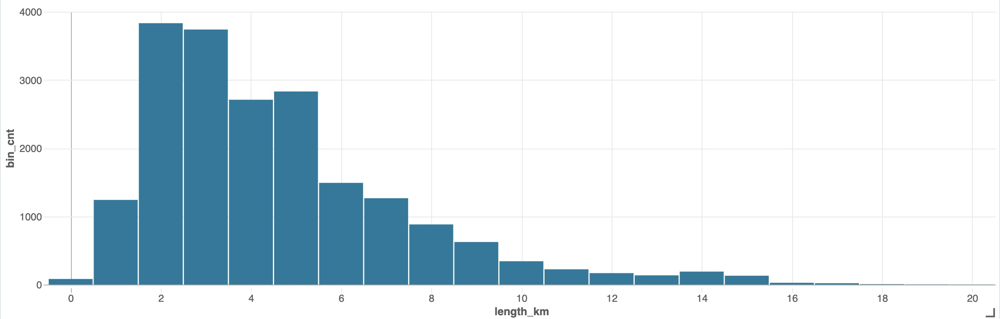

In [0]:
displayHTML("""<img width='50%'' src='data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAkACQAAD/4QCSRXhpZgAATU0AKgAAAAgABAEaAAUAAAABAAAAPgEbAAUAAAABAAAARgEoAAMAAAABAAIAAIdpAAQAAAABAAAATgAAAAAAAACQAAAAAQAAAJAAAAABAAOShgAHAAAAEgAAAHigAgAEAAAAAQAACU6gAwAEAAAAAQAAAvgAAAAAQVNDSUkAAABTY3JlZW5zaG90/+0AOFBob3Rvc2hvcCAzLjAAOEJJTQQEAAAAAAAAOEJJTQQlAAAAAAAQ1B2M2Y8AsgTpgAmY7PhCfv/iD/BJQ0NfUFJPRklMRQABAQAAD+BhcHBsAhAAAG1udHJSR0IgWFlaIAfoAAwAAgAJAAEAG2Fjc3BBUFBMAAAAAEFQUEwAAAAAAAAAAAAAAAAAAAAAAAD21gABAAAAANMtYXBwbAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEWRlc2MAAAFQAAAAYmRzY20AAAG0AAAEvGNwcnQAAAZwAAAAI3d0cHQAAAaUAAAAFHJYWVoAAAaoAAAAFGdYWVoAAAa8AAAAFGJYWVoAAAbQAAAAFHJUUkMAAAbkAAAIDGFhcmcAAA7wAAAAIHZjZ3QAAA8QAAAAMG5kaW4AAA9AAAAAPm1tb2QAAA+AAAAAKHZjZ3AAAA+oAAAAOGJUUkMAAAbkAAAIDGdUUkMAAAbkAAAIDGFhYmcAAA7wAAAAIGFhZ2cAAA7wAAAAIGRlc2MAAAAAAAAACERpc3BsYXkAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABtbHVjAAAAAAAAACcAAAAMaHJIUgAAABQAAAHka29LUgAAAAwAAAH4bmJOTwAAABIAAAIEaWQAAAAAABIAAAIWaHVIVQAAABQAAAIoY3NDWgAAABYAAAI8c2xTSQAAABQAAAJSZGFESwAAABwAAAJmbmxOTAAAABYAAAKCZmlGSQAAABAAAAKYaXRJVAAAABgAAAKoZXNFUwAAABYAAALAcm9STwAAABIAAALWZnJDQQAAABYAAALoYXIAAAAAABQAAAL+dWtVQQAAABwAAAMSaGVJTAAAABYAAAMuemhUVwAAAAoAAANEdmlWTgAAAA4AAANOc2tTSwAAABYAAANcemhDTgAAAAoAAANEcnVSVQAAACQAAANyZW5HQgAAABQAAAOWZnJGUgAAABYAAAOqbXMAAAAAABIAAAPAaGlJTgAAABIAAAPSdGhUSAAAAAwAAAPkY2FFUwAAABgAAAPwZW5BVQAAABQAAAOWZXNYTAAAABIAAALWZGVERQAAABAAAAQIZW5VUwAAABIAAAQYcHRCUgAAABgAAAQqcGxQTAAAABIAAARCZWxHUgAAACIAAARUc3ZTRQAAABAAAAR2dHJUUgAAABQAAASGcHRQVAAAABYAAASaamFKUAAAAAwAAASwAEwAQwBEACAAdQAgAGIAbwBqAGnO7LfsACAATABDAEQARgBhAHIAZwBlAC0ATABDAEQATABDAEQAIABXAGEAcgBuAGEAUwB6AO0AbgBlAHMAIABMAEMARABCAGEAcgBlAHYAbgD9ACAATABDAEQAQgBhAHIAdgBuAGkAIABMAEMARABMAEMARAAtAGYAYQByAHYAZQBzAGsA5gByAG0ASwBsAGUAdQByAGUAbgAtAEwAQwBEAFYA5AByAGkALQBMAEMARABMAEMARAAgAGEAIABjAG8AbABvAHIAaQBMAEMARAAgAGEAIABjAG8AbABvAHIATABDAEQAIABjAG8AbABvAHIAQQBDAEwAIABjAG8AdQBsAGUAdQByIA8ATABDAEQAIAZFBkQGSAZGBikEGgQ+BDsETAQ+BEAEPgQyBDgEOQAgAEwAQwBEIA8ATABDAEQAIAXmBdEF4gXVBeAF2V9pgnIATABDAEQATABDAEQAIABNAOAAdQBGAGEAcgBlAGIAbgD9ACAATABDAEQEJgQyBDUEQgQ9BD4EOQAgBBYEGgAtBDQEOARBBD8EOwQ1BDkAQwBvAGwAbwB1AHIAIABMAEMARABMAEMARAAgAGMAbwB1AGwAZQB1AHIAVwBhAHIAbgBhACAATABDAEQJMAkCCRcJQAkoACAATABDAEQATABDAEQAIA4qDjUATABDAEQAIABlAG4AIABjAG8AbABvAHIARgBhAHIAYgAtAEwAQwBEAEMAbwBsAG8AcgAgAEwAQwBEAEwAQwBEACAAQwBvAGwAbwByAGkAZABvAEsAbwBsAG8AcgAgAEwAQwBEA4gDswPHA8EDyQO8A7cAIAO/A7gDzAO9A7cAIABMAEMARABGAOQAcgBnAC0ATABDAEQAUgBlAG4AawBsAGkAIABMAEMARABMAEMARAAgAGEAIABjAG8AcgBlAHMwqzDpMPwATABDAER0ZXh0AAAAAENvcHlyaWdodCBBcHBsZSBJbmMuLCAyMDI0AABYWVogAAAAAAAA81EAAQAAAAEWzFhZWiAAAAAAAACD3wAAPb////+7WFlaIAAAAAAAAEq/AACxNwAACrlYWVogAAAAAAAAKDgAABELAADIuWN1cnYAAAAAAAAEAAAAAAUACgAPABQAGQAeACMAKAAtADIANgA7AEAARQBKAE8AVABZAF4AYwBoAG0AcgB3AHwAgQCGAIsAkACVAJoAnwCjAKgArQCyALcAvADBAMYAywDQANUA2wDgAOUA6wDwAPYA+wEBAQcBDQETARkBHwElASsBMgE4AT4BRQFMAVIBWQFgAWcBbgF1AXwBgwGLAZIBmgGhAakBsQG5AcEByQHRAdkB4QHpAfIB+gIDAgwCFAIdAiYCLwI4AkECSwJUAl0CZwJxAnoChAKOApgCogKsArYCwQLLAtUC4ALrAvUDAAMLAxYDIQMtAzgDQwNPA1oDZgNyA34DigOWA6IDrgO6A8cD0wPgA+wD+QQGBBMEIAQtBDsESARVBGMEcQR+BIwEmgSoBLYExATTBOEE8AT+BQ0FHAUrBToFSQVYBWcFdwWGBZYFpgW1BcUF1QXlBfYGBgYWBicGNwZIBlkGagZ7BowGnQavBsAG0QbjBvUHBwcZBysHPQdPB2EHdAeGB5kHrAe/B9IH5Qf4CAsIHwgyCEYIWghuCIIIlgiqCL4I0gjnCPsJEAklCToJTwlkCXkJjwmkCboJzwnlCfsKEQonCj0KVApqCoEKmAquCsUK3ArzCwsLIgs5C1ELaQuAC5gLsAvIC+EL+QwSDCoMQwxcDHUMjgynDMAM2QzzDQ0NJg1ADVoNdA2ODakNww3eDfgOEw4uDkkOZA5/DpsOtg7SDu4PCQ8lD0EPXg96D5YPsw/PD+wQCRAmEEMQYRB+EJsQuRDXEPURExExEU8RbRGMEaoRyRHoEgcSJhJFEmQShBKjEsMS4xMDEyMTQxNjE4MTpBPFE+UUBhQnFEkUahSLFK0UzhTwFRIVNBVWFXgVmxW9FeAWAxYmFkkWbBaPFrIW1hb6Fx0XQRdlF4kXrhfSF/cYGxhAGGUYihivGNUY+hkgGUUZaxmRGbcZ3RoEGioaURp3Gp4axRrsGxQbOxtjG4obshvaHAIcKhxSHHscoxzMHPUdHh1HHXAdmR3DHeweFh5AHmoelB6+HukfEx8+H2kflB+/H+ogFSBBIGwgmCDEIPAhHCFIIXUhoSHOIfsiJyJVIoIiryLdIwojOCNmI5QjwiPwJB8kTSR8JKsk2iUJJTglaCWXJccl9yYnJlcmhya3JugnGCdJJ3onqyfcKA0oPyhxKKIo1CkGKTgpaymdKdAqAio1KmgqmyrPKwIrNitpK50r0SwFLDksbiyiLNctDC1BLXYtqy3hLhYuTC6CLrcu7i8kL1ovkS/HL/4wNTBsMKQw2zESMUoxgjG6MfIyKjJjMpsy1DMNM0YzfzO4M/E0KzRlNJ402DUTNU01hzXCNf02NzZyNq426TckN2A3nDfXOBQ4UDiMOMg5BTlCOX85vDn5OjY6dDqyOu87LTtrO6o76DwnPGU8pDzjPSI9YT2hPeA+ID5gPqA+4D8hP2E/oj/iQCNAZECmQOdBKUFqQaxB7kIwQnJCtUL3QzpDfUPARANER0SKRM5FEkVVRZpF3kYiRmdGq0bwRzVHe0fASAVIS0iRSNdJHUljSalJ8Eo3Sn1KxEsMS1NLmkviTCpMcky6TQJNSk2TTdxOJU5uTrdPAE9JT5NP3VAnUHFQu1EGUVBRm1HmUjFSfFLHUxNTX1OqU/ZUQlSPVNtVKFV1VcJWD1ZcVqlW91dEV5JX4FgvWH1Yy1kaWWlZuFoHWlZaplr1W0VblVvlXDVchlzWXSddeF3JXhpebF69Xw9fYV+zYAVgV2CqYPxhT2GiYfViSWKcYvBjQ2OXY+tkQGSUZOllPWWSZedmPWaSZuhnPWeTZ+loP2iWaOxpQ2maafFqSGqfavdrT2una/9sV2yvbQhtYG25bhJua27Ebx5veG/RcCtwhnDgcTpxlXHwcktypnMBc11zuHQUdHB0zHUodYV14XY+dpt2+HdWd7N4EXhueMx5KnmJeed6RnqlewR7Y3vCfCF8gXzhfUF9oX4BfmJ+wn8jf4R/5YBHgKiBCoFrgc2CMIKSgvSDV4O6hB2EgITjhUeFq4YOhnKG14c7h5+IBIhpiM6JM4mZif6KZIrKizCLlov8jGOMyo0xjZiN/45mjs6PNo+ekAaQbpDWkT+RqJIRknqS45NNk7aUIJSKlPSVX5XJljSWn5cKl3WX4JhMmLiZJJmQmfyaaJrVm0Kbr5wcnImc951kndKeQJ6unx2fi5/6oGmg2KFHobaiJqKWowajdqPmpFakx6U4pammGqaLpv2nbqfgqFKoxKk3qamqHKqPqwKrdavprFys0K1ErbiuLa6hrxavi7AAsHWw6rFgsdayS7LCszizrrQltJy1E7WKtgG2ebbwt2i34LhZuNG5SrnCuju6tbsuu6e8IbybvRW9j74KvoS+/796v/XAcMDswWfB48JfwtvDWMPUxFHEzsVLxcjGRsbDx0HHv8g9yLzJOsm5yjjKt8s2y7bMNcy1zTXNtc42zrbPN8+40DnQutE80b7SP9LB00TTxtRJ1MvVTtXR1lXW2Ndc1+DYZNjo2WzZ8dp22vvbgNwF3IrdEN2W3hzeot8p36/gNuC94UThzOJT4tvjY+Pr5HPk/OWE5g3mlucf56noMui86Ubp0Opb6uXrcOv77IbtEe2c7ijutO9A78zwWPDl8XLx//KM8xnzp/Q09ML1UPXe9m32+/eK+Bn4qPk4+cf6V/rn+3f8B/yY/Sn9uv5L/tz/bf//cGFyYQAAAAAAAwAAAAJmZgAA8qcAAA1ZAAAT0AAAClt2Y2d0AAAAAAAAAAEAAQAAAAAAAAABAAAAAQAAAAAAAAABAAAAAQAAAAAAAAABAABuZGluAAAAAAAAADYAAK4UAABR7AAAQ9cAALCkAAAmZgAAD1wAAFANAABUOQACMzMAAjMzAAIzMwAAAAAAAAAAbW1vZAAAAAAAAAYQAACgUP1ibWIAAAAAAAAAAAAAAAAAAAAAAAAAAHZjZ3AAAAAAAAMAAAACZmYAAwAAAAJmZgADAAAAAmZmAAAAAjMzNAAAAAACMzM0AAAAAAIzMzQA/8AAEQgC+AlOAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/bAEMAAgICAgICAwICAwQDAwMEBQQEBAQFBwUFBQUFBwgHBwcHBwcICAgICAgICAoKCgoKCgsLCwsLDQ0NDQ0NDQ0NDf/bAEMBAgICAwMDBgMDBg0JBwkNDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDf/dAAQAlf/aAAwDAQACEQMRAD8A/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArzH4r/8AIu2//X6n/ouSvTq8x+K//Iu2/wD1+p/6LkrSl8SIqfCf/9D94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwoorH8Q67pvhfQdS8S6xIYrDSbSe+unVS5WC2RpJCFGSSFU8Dk0AePftA/HnQPgL4Sj13UIBqWp30vkadpgl8l7hlIMrl9rlI4lOWbafmKr1YGtnxD8ZfDng74QWvxe8VI9rZ3Om2d6LSEiWV5r2NHjt4idgdiz4yQowCxwAcfml458aeDfir8PvH/wAYvGuv6WfFOq26ab4U8OfaY3udK0yK7j3fu8k/aJgGZyBkIWIIV9q+rfF7xJ4Z8a/BX4I6Tpeo2mp6XH4h8O6dq4glWRIZ47NVeGYA8MEdtynpQB7fo/7V2sWepaEPir8O9T8EaH4mmSDTdYuLpbqDzJRmMXCCGJoN45w2SBkkbQzDvvi58fx8PvFWlfDvwj4au/GfjDVoTdR6XaTC3WG2BYeZNMySBM7WIG0jCksVBXdxn7ctvaTfs661LcqDJb3unSW5PUSm5RCR6Hy2cfSuI+Cpn1D9rv4g6hrJzqNv4W0SKMMdxVJrSxeXGfVwCfc0Ae7/AAh+PFp8S9b1jwVr2hXfhLxhoKrLe6LeuJW8h9uJopVVBImXXJ2jhlIyGBry++/az1jU9V11/hh8OdU8Z+G/DcrwahrdtdLBGXhGZPs8RikM4UfMNrBipB2gEE8Z8V573Sv2vre80AGO6m+GuoyTGM7Szxi+MRJHU744wPoK9P8A2I7Sztv2b/DU1sqrJdT6lNcFerSi9njBb38tEH0AoA93+G3xE8OfFTwbp/jjwrK72OoIfklXbLDKhKyRSLzh0YEHBIPVSVIJ7qvif9h2NLfwT43sbMAafa+NtTitAOioIbf5QOwA2nHvX2H9r1P/AJ8P/Iy0AatFZX2vU/8Anw/8jLR9r1P/AJ8P/Iy0AatFZX2vU/8Anw/8jLR9r1P/AJ8P/Iy0AatFZX2vU/8Anw/8jLR9r1P/AJ8P/Iy0AatFZX2vU/8Anw/8jLWXpfiU6z9r/s22877DdSWVx+827J4cb0+ZRnGRyMg9jQB1NFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLTJL/AFGJGkewwqAsT5y8AcntQBsUVjx3+oyosiWGVcBgfOXkHkdqf9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFZX2vU/+fD/AMjLR9r1P/nw/wDIy0AatFYsupX8GzzbHb5jhF/eqcseg4FS/a9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy1FLqV/Bs82x2+Y4Rf3qnLHoOBQBtUVlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vi/2lf8An/ZvsP7zZv2+av3c4znGOtS/a9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLUX9pX/n/ZvsP7zZv2+av3c4znGOtAG1RWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWV9r1P/AJ8P/Iy0fa9T/wCfD/yMtAGrRWLFqV/Pv8qx3eW5Rv3qjDDqORUv2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0Vlfa9T/58P8AyMtH2vU/+fD/AMjLQBq0VjyX+oxI0j2GFQFifOXgDk9qI7/UZUWRLDKuAwPnLyDyO1AGxRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLTJL/UYkaR7DCoCxPnLwBye1AGxRWPHf6jKiyJYZVwGB85eQeR2p/2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWV9r1P/nw/8jLR9r1P/nw/8jLQBq0Vlfa9T/58P/Iy0fa9T/58P/Iy0AatFZX2vU/+fD/yMtH2vU/+fD/yMtAGrRWLLqV/Bs82x2+Y4Rf3qnLHoOBUv2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLQBq0Vlfa9T/AOfD/wAjLR9r1P8A58P/ACMtAGrRWV9r1P8A58P/ACMtH2vU/wDnw/8AIy0AatFZX2vU/wDnw/8AIy1F/aV/5/2b7D+82b9vmr93OM5xjrQBtUVlfa9T/wCfD/yMtH2vU/8Anw/8jLQBq0Vlfa9T/wCfD/yMtH2vU/8Anw/8jLQBq0Vlfa9T/wCfD/yMtH2vU/8Anw/8jLQBq15j8V/+Rdt/+v1P/RcleiWs11Lu+02/kYxt+cPnrnp0xXnfxX/5F23/AOv1P/RclaUviRFT4T//0f3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCqt9Y2Wp2VxpupW8V3aXcTwT286LJFLFICro6MCrKykggggg4NWqKAPmn4u/s3+BvF/wAOdb8OeBfCvhjR9evYY0sr46dBa+S6yozHzYIGlTKKRlQTzjpVDxV+zPoPiT4EWXwts4bDQtXsobG8S/06BYojrNnAsRuX2JG7+Z8ytIR5m1s9RivqWigD4R1L4O/tH/GC40Dwn8cdR8Ow+EdCvIby9bR/Oa61l7dcKJN4CgMCwbAiALFtjEKF7/4p/B74j2/xStPjh8D73TIPEBsDpmrabq/mLZ6jbL9w7ohu3jagwWQfu0IYYIb6vooA+WPg78HvHdp491/4yfGi80+88Ua3ZrplvY6aGaysLAFS0amQZJYooxzgBiXcuceZaV8G/wBpb4PQa14H+Ceq+H7rwlq11NPp82sNML/SPtCgNs2gxnYeh2yhmG/YpZgfvSigDyL4G/Cey+DHw50/wRbXH224iaS5vrvbt+0Xc5zI4HZQAEXPO1RnnNeu0UUAFFFFABRRRQAUUUUAFeX/AAx/5mz/ALGjUv8A2nXqFeX/AAx/5mz/ALGjUv8A2nQB6hRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW/wD+PG4/65P/AOgmrVVb/wD48bj/AK5P/wCgmgAsP+PG3/65J/6CKtVVsP8Ajxt/+uSf+girVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv8Ay5/9fcX9a1aytV/5c/8Ar7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/wDX3F/WtWsrVf8Alz/6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/8At1/9nrVrK/5jf/br/wCz1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/ADG/+3X/ANnrVrK/5jf/AG6/+z0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/l8/wCvuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKL//AI8bj/rk/wD6CaLD/jxt/wDrkn/oIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/APjxuP8Ark//AKCatVVv/wDjxuP+uT/+gmgAsP8Ajxt/+uSf+girVVbD/jxt/wDrkn/oIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/wAuf/X3F/WtWsrVf+XP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/t1/9nrVrK/5jf8A26/+z0AatFFFABRRRQAUUUUAFeY/Ff8A5F23/wCv1P8A0XJXp1eY/Ff/AJF23/6/U/8ARclaUviRFT4T/9L94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACuZ1Txr4N0O7NhrWvaZp90qhjDdXkMMgVuh2uwOD2OK6avxx/bt/5LdD/2BLP/ANGT16mT5fHG4j2MnbRs8TP81ll+F+sQjd3S+8/Vf/hZnw3/AOhr0T/wY2//AMco/wCFmfDf/oa9E/8ABjb/APxyv52qK+q/1Opf8/X9x8X/AK/1/wDnyvvZ/RL/AMLM+G//AENeif8Agxt//jlH/CzPhv8A9DXon/gxt/8A45X87VFH+p1L/n6/uD/X+v8A8+V97P6Jf+FmfDf/AKGvRP8AwY2//wAcqre/Ev4cNZ3Cr4q0QkxOABqNvzwf+mlfzyUUf6nUv+fr+4P9f6//AD5X3s/obsviX8OFs7dW8VaICIkBB1G344H/AE0q1/wsz4b/APQ16J/4Mbf/AOOV/O1RR/qdS/5+v7g/1/r/APPlfez+iX/hZnw3/wChr0T/AMGNv/8AHKP+FmfDf/oa9E/8GNv/APHK/naoo/1Opf8AP1/cH+v9f/nyvvZ/RL/wsz4b/wDQ16J/4Mbf/wCOUf8ACzPhv/0Neif+DG3/APjlfztUUf6nUv8An6/uD/X+v/z5X3s/pE0fxF4f8QxyTaBqdnqccLBZGs7iO4VGPIDGNmAJHrWxXwP/AME/P+Sc+JP+w3/7bxV98V8dmOFWGxM6Cd7H32U414vCQxMlZy6fMKKKK4j0QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP8A6+4v61q1lar/AMuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/6+4v61q1lar/y5/wDX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAyv8AmN/9uv8A7PWrWV/zG/8At1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/ANuv/s9atZX/ADG/+3X/ANnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/r7l/pWrWVpX/L5/19y/0rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/8Ax43H/XJ//QTRYf8AHjb/APXJP/QRRf8A/Hjcf9cn/wDQTRYf8eNv/wBck/8AQRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/wDHjcf9cn/9BNWqq3//AB43H/XJ/wD0E0AFh/x42/8A1yT/ANBFWqq2H/Hjb/8AXJP/AEEVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/8Ar7i/rWrWVqv/AC5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/9uv/ALPWrWV/zG/+3X/2egDVooooAKKKKACiiigArzH4r/8AIu2//X6n/ouSvTq8x+K//Iu2/wD1+p/6LkrSl8SIqfCf/9P94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvxx/bt/5LdD/2BLP/ANGT1+x1fjj+3b/yW6H/ALAln/6Mnr6XhT/fvk/0Pj+OP+Rb/wBvL9T4xooor9LPx8KKKKACiiigAooooAKKKKACiiigD9Rv2I/E+g+DPg74t8S+J7xLDTLPW4/PuJAxWPzYoI1yFBPLsB04zzxX05/w1B8A/wDocrH/AL5m/wDjdfnl8Nf+TMfil/2F7H/0bZV8VV8hLIaONxFarUk01K2luy8vM+7jxNicuwuHoUYppwvrf+aS6Ndj94v+GoPgH/0OVj/3zN/8bo/4ag+Af/Q5WP8A3zN/8br8HaKv/U/C/wA8vw/yJ/19x3/PuP4/5n7xf8NQfAP/AKHKx/75m/8AjdH/AA1B8A/+hysf++Zv/jdfg7RR/qfhf55fh/kH+vuO/wCfcfx/zP3i/wCGoPgH/wBDlY/98zf/ABuj/hqD4B/9DlY/98zf/G6/B2ij/U/C/wA8vw/yD/X3Hf8APuP4/wCZ+8X/AA1B8A/+hysf++Zv/jdH/DUHwD/6HKx/75m/+N1+DtFH+p+F/nl+H+Qf6+47/n3H8f8AM/eL/hqD4B/9DlY/98zf/G6P+GoPgH/0OVj/AN8zf/G6/B2ij/U/C/zy/D/IP9fcd/z7j+P+Z+8X/DUHwD/6HKx/75m/+N1paP8AtEfBbxBqtpoei+KrS8v7+ZLe2gjSYvJLIQqqP3eOSep4HU8V+Bdeyfs9f8lw8Ef9hq1/9DrGvwnhqdKU1OWib6f5G2G44xtStCm4Rs2l16v1P34ooor4E/UQooooAKKKKAMrVf8Alz/6+4v61q1lar/y5/8AX3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/wCvuL+tatZWq/8ALn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/8Abr/7PWrWV/zG/wDt1/8AZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/9uv/ALPWrWV/zG/+3X/2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/wCXz/r7l/pWrWVpX/L5/wBfcv8AStWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFF//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt/8A8eNx/wBcn/8AQTVqqt//AMeNx/1yf/0E0AFh/wAeNv8A9ck/9BFWqq2H/Hjb/wDXJP8A0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/wDr7i/rWrWVqv8Ay5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/AJjf/br/AOz1q1lf8xv/ALdf/Z6ANWiiigAooooAKKKKACvMfiv/AMi7b/8AX6n/AKLkr06vMfiv/wAi7b/9fqf+i5K0pfEiKnwn/9T94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvxx/bt/5LdD/2BLP/ANGT1+x1fjj+3b/yW6H/ALAln/6Mnr6XhT/fvk/0Pj+OP+Rb/wBvL9T4xooor9LPx8KKKKACiiigAooooAKKKKACiiigD7V+Gv8AyZj8Uv8AsL2P/o2yr4qr7V+Gv/JmPxS/7C9j/wCjbKviqvMy/wDiV/8AH/7bE9jNf4eG/wCva/8ASphRRRXpnjhRRRQAUUUUAFFFFABRRRQAV7J+z1/yXDwR/wBhq1/9DrxuvZP2ev8AkuHgj/sNWv8A6HXNjP8Ad6no/wAjrwH+9U/8S/M/fiiiivxg/oUKKKKACiiigDK1X/lz/wCvuL+tatZWq/8ALn/19xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/wCXP/r7i/rWrWVqv/Ln/wBfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//wAeNx/1yf8A9BNWqq3/APx43H/XJ/8A0E0AFh/x42//AFyT/wBBFWqq2H/Hjb/9ck/9BFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/wDbr/7PWrWV/wAxv/t1/wDZ6ANWiiigAooooAKKKKACvMfiv/yLtv8A9fqf+i5K9OrzH4r/APIu2/8A1+p/6LkrSl8SIqfCf//V/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4Y/8AM2f9jRqX/tOvUK8v+GP/ADNn/Y0al/7ToA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr8cf27f+S3Q/9gSz/wDRk9fsdX44/t2/8luh/wCwJZ/+jJ6+l4U/375P9D4/jj/kW/8Aby/U+MaKKK/Sz8fCiiigAooooAKKKKACiiigAooooA+1fhr/AMmY/FL/ALC9j/6Nsq+Kq+1fhr/yZj8Uv+wvY/8Ao2yr4qrzMv8A4lf/AB/+2xPYzX+Hhv8Ar2v/AEqYUUUV6Z44UUUUAFFFFABRRRQAUUUUAFeyfs9f8lw8Ef8AYatf/Q68br2T9nr/AJLh4I/7DVr/AOh1zYz/AHep6P8AI68B/vVP/EvzP34ooor8YP6FCiiigAooooAytV/5c/8Ar7i/rWrWVqv/AC5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf8Alz/6+4v61q1lar/y5/8AX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAyv+Y3/26/8As9atZX/Mb/7df/Z61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/8Abr/7PWrWV/zG/wDt1/8AZ6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/wCvuX+latZWlf8AL5/19y/0rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3//AB43H/XJ/wD0E0WH/Hjb/wDXJP8A0EUX/wDx43H/AFyf/wBBNFh/x42//XJP/QRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/8AHjcf9cn/APQTVqqt/wD8eNx/1yf/ANBNABYf8eNv/wBck/8AQRVqqth/x42//XJP/QRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK1X/lz/6+4v61q1lar/y5/wDX3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigArzH4r/8i7b/APX6n/ouSvTq8x+K/wDyLtv/ANfqf+i5K0pfEiKnwn//1v3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+GP/ADNn/Y0al/7Tr1CvL/hj/wAzZ/2NGpf+06APUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK/HH9u3/kt0P/YEs/8A0ZPX7HV+OP7dv/Jbof8AsCWf/oyevpeFP9++T/Q+P44/5Fv/AG8v1PjGiiiv0s/HwooooAKKKKACiiigAooooAKKKKAPtX4a/wDJmPxS/wCwvY/+jbKviqvtX4a/8mY/FL/sL2P/AKNsq+Kq8zL/AOJX/wAf/tsT2M1/h4b/AK9r/wBKmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/AGGrX/0OvG69k/Z6/wCS4eCP+w1a/wDodc2M/wB3qej/ACOvAf71T/xL8z9+KKKK/GD+hQooooAKKKKAMrVf+XP/AK+4v61q1lar/wAuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/9uv/ALPWrWV/zG/+3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf/AG6/+z1q1lf8xv8A7df/AGegDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFF/8A8eNx/wBcn/8AQTRYf8eNv/1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/+vuL+tatZWq/8uf8A19xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/ANuv/s9atZX/ADG/+3X/ANnoA1aKKKACiiigAooooAK8x+K//Iu2/wD1+p/6Lkr06vMfiv8A8i7b/wDX6n/ouStKXxIip8J//9f94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvxx/bt/5LdD/2BLP/ANGT1+x1fjj+3b/yW6H/ALAln/6Mnr6XhT/fvk/0Pj+OP+Rb/wBvL9T4xooor9LPx8KKKKACiiigAooooAKKKKACiiigD7V+Gv8AyZj8Uv8AsL2P/o2yr4qr7V+Gv/JmPxS/7C9j/wCjbKviqvMy/wDiV/8AH/7bE9jNf4eG/wCva/8ASphRRRXpnjhRRRQAUUUUAFFFFABRRRQAV7J+z1/yXDwR/wBhq1/9DrxuvZP2ev8AkuHgj/sNWv8A6HXNjP8Ad6no/wAjrwH+9U/8S/M/fiiiivxg/oUKKKKACiiigDK1X/lz/wCvuL+tatZWq/8ALn/19xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/wCXP/r7i/rWrWVqv/Ln/wBfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//wAeNx/1yf8A9BNWqq3/APx43H/XJ/8A0E0AFh/x42//AFyT/wBBFWqq2H/Hjb/9ck/9BFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/wDbr/7PWrWV/wAxv/t1/wDZ6ANWiiigAooooAKKKKACvMfiv/yLtv8A9fqf+i5K9OrzH4r/APIu2/8A1+p/6LkrSl8SIqfCf//Q/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4Y/8AM2f9jRqX/tOvUK8v+GP/ADNn/Y0al/7ToA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr8cf27f+S3Q/9gSz/wDRk9fsdX44/t2/8luh/wCwJZ/+jJ6+l4U/375P9D4/jj/kW/8Aby/U+MaKKK/Sz8fCiiigAooooAKKKKACiiigAooooA+1fhr/AMmY/FL/ALC9j/6Nsq+Kq+1fhr/yZj8Uv+wvY/8Ao2yr4qrzMv8A4lf/AB/+2xPYzX+Hhv8Ar2v/AEqYUUUV6Z44UUUUAFFFFABRRRQAUUUUAFeyfs9f8lw8Ef8AYatf/Q68br2T9nr/AJLh4I/7DVr/AOh1zYz/AHep6P8AI68B/vVP/EvzP34ooor8YP6FCiiigAooooAytV/5c/8Ar7i/rWrWVqv/AC5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf8Alz/6+4v61q1lar/y5/8AX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAyv+Y3/26/8As9atZX/Mb/7df/Z61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/8Abr/7PWrWV/zG/wDt1/8AZ6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/wCvuX+latZWlf8AL5/19y/0rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3//AB43H/XJ/wD0E0WH/Hjb/wDXJP8A0EUX/wDx43H/AFyf/wBBNFh/x42//XJP/QRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/8AHjcf9cn/APQTVqqt/wD8eNx/1yf/ANBNABYf8eNv/wBck/8AQRVqqth/x42//XJP/QRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK1X/lz/6+4v61q1lar/y5/wDX3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf8A26/+z1q1lf8AMb/7df8A2egDVooooAKKKKACiiigArzH4r/8i7b/APX6n/ouSvTq8x+K/wDyLtv/ANfqf+i5K0pfEiKnwn//0f3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+GP/ADNn/Y0al/7Tr1CvL/hj/wAzZ/2NGpf+06APUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK/HH9u3/kt0P/YEs/8A0ZPX7HV+OP7dv/Jbof8AsCWf/oyevpeFP9++T/Q+P44/5Fv/AG8v1PjGiiiv0s/HwooooAKKKKACiiigAooooAKKKKAPtX4a/wDJmPxS/wCwvY/+jbKviqvtX4a/8mY/FL/sL2P/AKNsq+Kq8zL/AOJX/wAf/tsT2M1/h4b/AK9r/wBKmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/AGGrX/0OvG69k/Z6/wCS4eCP+w1a/wDodc2M/wB3qej/ACOvAf71T/xL8z9+KKKK/GD+hQooooAKKKKAMrVf+XP/AK+4v61q1lar/wAuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/9uv/ALPWrWV/zG/+3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf/AG6/+z1q1lf8xv8A7df/AGegDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFF/8A8eNx/wBcn/8AQTRYf8eNv/1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/+vuL+tatZWq/8uf8A19xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/ANuv/s9atZX/ADG/+3X/ANnoA1aKKKACiiigAooooAK8x+K//Iu2/wD1+p/6Lkr06vMfiv8A8i7b/wDX6n/ouStKXxIip8J//9L94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooqpqC3rWFyumtGl2YZBbtLnyxKVOwtgE7Q2M4B4oA5LVvid8NtA1T+w9d8WaJp2o5A+yXeo28E4JxgeW8gbJzxxzXaGWIReeXURhd+/I27cZznpjHevzM8SfDn9nr4EfDKfQfj4INf8fa7b3+oPewx3dxd3dw8j+WYLhlHlEZQMZGQM+5mzmsHXbzxxpv7G/wANPh7cXzwXvjnWINJ80S+a66TdTTSQxl1Y8FTCNgPEf7sgcigD9JdB+IXgHxTeyab4Y8S6Pq93DkyQWF/BcyoB13JG7MMd8itTxB4n8N+E7H+0/FOrWOjWe4J9o1C5jtYt56LvlZVyewzmvgv9pb4KeCPg38L9M+Jnwo05PD2v+Cr+xkhvrZmE1xFJIIGW4bP70szqWLckZX7rEGymlaP+0L+1fqNj41txqPhrwT4csriy02Vi1s91qMVvOXkTgNxMwb+95aZyBigD7x0XXtD8SWC6p4d1G01SyckLc2U6XELEdQHjLKevrWLrPxD8AeHdUj0PxB4m0fTNRlCtHZ3l/Bb3DhuhEcjq5B7YHNfFGmxaX+zx+1Hq/hrwnGbTwv4k8H3GvvpKORbQ3dkJmLRqc7SVtX9gJCOgUCv+zT8CvAnxa+E958Sfinp6eINf8c3moTz31wW86BEmktwICD+6YPGzBl55C/dUAAH6GqyuodCGVgCCDkEHuKdXx/8AsU69rV98K9S8K69dNdz+DtfvdChlclm+zQLG8YyxJwpdkQdFRVA4AA+q/wC29M/57f8Ajjf4UAatFZX9t6Z/z2/8cb/Cj+29M/57f+ON/hQBq0Vlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4UAatFZX9t6Z/z2/wDHG/wo/tvTP+e3/jjf4UAateX/AAx/5mz/ALGjUv8A2nXd/wBt6Z/z2/8AHG/wrg/AhGjf8JD/AGl+5+3a9e3tv/Fvgm2bH+XOM4PBwR3FAHqNFZX9t6Z/z2/8cb/Cj+29M/57f+ON/hQBq0Vlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4UAatFZX9t6Z/z2/wDHG/wo/tvTP+e3/jjf4UAatFZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hQBq0Vlf23pn/Pb/xxv8KP7b0z/nt/443+FAGrRWV/bemf89v/ABxv8KP7b0z/AJ7f+ON/hQBq0Vlf23pn/Pb/AMcb/Cj+29M/57f+ON/hQBq0Vlf23pn/AD2/8cb/AAo/tvTP+e3/AI43+FAGrRWV/bemf89v/HG/wo/tvTP+e3/jjf4UAatfjj+3b/yW6H/sCWf/AKMnr9ef7b0z/nt/443+Ffj/APtyXMF38aopbdty/wBiWYzgjkSTeuK+l4U/375P9D4/jj/kW/8Aby/U+OKKKK/Sz8fCiiigAooooAKKKKACiiigAooooA+1fhr/AMmY/FL/ALC9j/6Nsq+Kq+zfhvdQJ+xz8ULZmxLJq1iVXB5Alsu+Mdq+Mq8zL/4lf/H/AO2xPYzX+Hhv+va/9KmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/ACXDwR/2GrX/ANDrxuvYf2fpUh+NngqWQ4VdZtST1wN3tXNjP93qej/I68B/vVP/ABL8z9+6Kyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8K/GD+hTVorK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CgDVorK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CgA1X/AJc/+vuL+tatc1f6pYT/AGbypd3l3CO3ysMKM5PIrQ/tvTP+e3/jjf4UAatFZX9t6Z/z2/8AHG/wo/tvTP8Ant/443+FAGrRWV/bemf89v8Axxv8KP7b0z/nt/443+FAGrRWV/bemf8APb/xxv8ACj+29M/57f8Ajjf4UAatFZX9t6Z/z2/8cb/Cj+29M/57f+ON/hQBq0Vlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4UAatFZX9t6Z/z2/wDHG/wo/tvTP+e3/jjf4UAatFZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hQBq0Vlf23pn/Pb/xxv8KP7b0z/nt/443+FAGrRWV/bemf89v/ABxv8KP7b0z/AJ7f+ON/hQBq0Vlf23pn/Pb/AMcb/Cj+29M/57f+ON/hQBq0Vlf23pn/AD2/8cb/AAo/tvTP+e3/AI43+FAGrRWV/bemf89v/HG/wo/tvTP+e3/jjf4UAatZWq/8uf8A19xf1o/tvTP+e3/jjf4Vn3+qWE/2bypd3l3CO3ysMKM5PIoA6Wisr+29M/57f+ON/hR/bemf89v/ABxv8KANWisr+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CgDVorK/tvTP+e3/jjf4Uf23pn/AD2/8cb/AAoA1aKyv7b0z/nt/wCON/hR/bemf89v/HG/woA1aKyv7b0z/nt/443+FH9t6Z/z2/8AHG/woA1aKyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8KANWisr+29M/57f+ON/hR/bemf8APb/xxv8ACgDVorK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CgDVorK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CgDVorK/tvTP8Ant/443+FH9t6Z/z2/wDHG/woA1aKyv7b0z/nt/443+FH9t6Z/wA9v/HG/wAKANWisr+29M/57f8Ajjf4Uf23pn/Pb/xxv8KANWisr+29M/57f+ON/hR/bemf89v/ABxv8KAD/mN/9uv/ALPWrXNf2pYf2r9p83939n2btrfe3ZxjGelaH9t6Z/z2/wDHG/woA1aKyv7b0z/nt/443+FH9t6Z/wA9v/HG/wAKANWisr+29M/57f8Ajjf4Uf23pn/Pb/xxv8KANWisr+29M/57f+ON/hR/bemf89v/ABxv8KANWisr+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CgDVorK/tvTP+e3/jjf4Uf23pn/AD2/8cb/AAoA1aKyv7b0z/nt/wCON/hR/bemf89v/HG/woA1aKyv7b0z/nt/443+FH9t6Z/z2/8AHG/woA1aKyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8KANWisr+29M/57f+ON/hR/bemf8APb/xxv8ACgDVorK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CgDVorK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CgDVorK/tvTP8Ant/443+FH9t6Z/z2/wDHG/woA1ayv+Y3/wBuv/s9H9t6Z/z2/wDHG/wrP/tSw/tX7T5v7v7Ps3bW+9uzjGM9KAOlorK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CgDVorK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CgDVorK/tvTP8Ant/443+FH9t6Z/z2/wDHG/woA1aKyv7b0z/nt/443+FH9t6Z/wA9v/HG/wAKANWisr+29M/57f8Ajjf4Uf23pn/Pb/xxv8KANWisr+29M/57f+ON/hR/bemf89v/ABxv8KANWisr+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CgDVorK/tvTP+e3/jjf4Uf23pn/AD2/8cb/AAoA1aKyv7b0z/nt/wCON/hR/bemf89v/HG/woA1aKyv7b0z/nt/443+FH9t6Z/z2/8AHG/woA1aKyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8KANWisr+29M/57f+ON/hR/bemf8APb/xxv8ACgDVorK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CgA0r/l8/6+5f6Vq1zVhqlhB9p82Xb5lw7r8rHKnGDwK0P7b0z/nt/wCON/hQBq0Vlf23pn/Pb/xxv8KP7b0z/nt/443+FAGrRWV/bemf89v/ABxv8KP7b0z/AJ7f+ON/hQBq0Vlf23pn/Pb/AMcb/Cj+29M/57f+ON/hQBq0Vlf23pn/AD2/8cb/AAo/tvTP+e3/AI43+FAGrRWV/bemf89v/HG/wo/tvTP+e3/jjf4UAatFZX9t6Z/z2/8AHG/wo/tvTP8Ant/443+FAGrRWV/bemf89v8Axxv8KP7b0z/nt/443+FAGrRWV/bemf8APb/xxv8ACj+29M/57f8Ajjf4UAatFZX9t6Z/z2/8cb/Cj+29M/57f+ON/hQBq0Vlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4UAatFZX9t6Z/z2/wDHG/wo/tvTP+e3/jjf4UAatFZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hQBbv/APjxuP8Ark//AKCaLD/jxt/+uSf+gisy71jTpbWaNJcs8bKBtbkkEDtRaaxp0VrDG8uGSNVI2twQAD2oA3aKyv7b0z/nt/443+FH9t6Z/wA9v/HG/wAKANWisr+29M/57f8Ajjf4Uf23pn/Pb/xxv8KANWisr+29M/57f+ON/hR/bemf89v/ABxv8KANWisr+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CgDVorK/tvTP+e3/jjf4Uf23pn/AD2/8cb/AAoA1aKyv7b0z/nt/wCON/hR/bemf89v/HG/woA1aKyv7b0z/nt/443+FH9t6Z/z2/8AHG/woA1aKyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8KANWisr+29M/57f+ON/hR/bemf8APb/xxv8ACgDVorK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CgDVorK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CgDVorK/tvTP8Ant/443+FH9t6Z/z2/wDHG/woA1aq3/8Ax43H/XJ//QTVT+29M/57f+ON/hVe71jTpbWaNJcs8bKBtbkkEDtQBp2H/Hjb/wDXJP8A0EVarCtNY06K1hjeXDJGqkbW4IAB7VY/tvTP+e3/AI43+FAGrRWV/bemf89v/HG/wo/tvTP+e3/jjf4UAatFZX9t6Z/z2/8AHG/wo/tvTP8Ant/443+FAGrRWV/bemf89v8Axxv8KP7b0z/nt/443+FAGrRWV/bemf8APb/xxv8ACj+29M/57f8Ajjf4UAatFZX9t6Z/z2/8cb/Cj+29M/57f+ON/hQBq0Vlf23pn/Pb/wAcb/Cj+29M/wCe3/jjf4UAatFZX9t6Z/z2/wDHG/wo/tvTP+e3/jjf4UAatFZX9t6Z/wA9v/HG/wAKP7b0z/nt/wCON/hQBq0Vlf23pn/Pb/xxv8KP7b0z/nt/443+FAGrRWV/bemf89v/ABxv8KP7b0z/AJ7f+ON/hQBq0Vlf23pn/Pb/AMcb/Cj+29M/57f+ON/hQBq0Vlf23pn/AD2/8cb/AAo/tvTP+e3/AI43+FABqv8Ay5/9fcX9a1a5q/1Swn+zeVLu8u4R2+VhhRnJ5FaH9t6Z/wA9v/HG/wAKANWisr+29M/57f8Ajjf4Uf23pn/Pb/xxv8KANWisr+29M/57f+ON/hR/bemf89v/ABxv8KANWisr+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CgDVorK/tvTP+e3/jjf4Uf23pn/AD2/8cb/AAoA1aKyv7b0z/nt/wCON/hR/bemf89v/HG/woA1aKyv7b0z/nt/443+FH9t6Z/z2/8AHG/woA1aKyv7b0z/AJ7f+ON/hR/bemf89v8Axxv8KANWisr+29M/57f+ON/hR/bemf8APb/xxv8ACgDVorK/tvTP+e3/AI43+FH9t6Z/z2/8cb/CgDVorK/tvTP+e3/jjf4Uf23pn/Pb/wAcb/CgDVorK/tvTP8Ant/443+FH9t6Z/z2/wDHG/woA1aKyv7b0z/nt/443+FH9t6Z/wA9v/HG/wAKANWsr/mN/wDbr/7PR/bemf8APb/xxv8ACs/+1LD+1ftPm/u/s+zdtb727OMYz0oA6Wisr+29M/57f+ON/hR/bemf89v/ABxv8KANWisr+29M/wCe3/jjf4Uf23pn/Pb/AMcb/CgDVorK/tvTP+e3/jjf4Uf23pn/AD2/8cb/AAoA1a8x+K//ACLtv/1+p/6Lkr0S1vrW83fZn37MbuCMZzjqB6V538V/+Rdt/wDr9T/0XJWlL4kRU+E//9P94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwrC8U/wBvf8Izq/8AwivlDWvsFz/ZvnAGL7Z5beRvBwCvmbc+1btFAH5+6F+1p8IdY+HMml/tBWqp4usEuLTVdDutIldppUZgFiVo2jTeuARI6FXznAwx8X074W/Eqw/ZM0LxLFpdx/aHhfxd/wAJbp+lyq32iPSlGCmwjf8A6wGfpkoS2ORX6tTaTpdxdpf3Fnby3Mf3JniVpF+jEZH4GtCgD82Pjf8AHbwn+0j4L0X4PfB83Wqa74rv7M3sLWs0Y022gYSyNO7KFOxwu4oXQKrEsPl3dH4g1jT/ANmn9py98b+Lkng8EeN9DtLBNTjheaO0vdPihiWOQRKzklLfOFXJ8wEZCvj73t9N060nmurW1hhmuDmaSONVeQ+rsBlj9amuba2vIHtbuJJ4ZBteORQ6MPQqcgj60AfAvgqWy/aT/aJ174l6FDP/AMIZofheXwzZ6lJC8S3lzd+ZvKJIFJCpcS5HDKNm4DeBXNfBD9oPwp+zz8O9Q+EPxfS60nxJ4Our1LazS2llOoRTyPcRmGRUMY3vIwVnZUKlWDEE4/SC3tre0hS2tIkhhjGEjjUIij0AGABUFzpunXssM95awzy27boXljV2jb1QkEqfcUAfL/7HXg3xB4X+E8+r+KrZ7PU/FmsXevyW8ilJIUuRGkasp5G5Y/MAPID8819W0UUAFFFFABRRRQAUUUUAFeX/AAx/5mz/ALGjUv8A2nXqFeX/AAx/5mz/ALGjUv8A2nQB6hRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABX44/t2/wDJbof+wJZ/+jJ6/Y6vxx/bt/5LdD/2BLP/ANGT19Lwp/v3yf6Hx/HH/It/7eX6nxjRRRX6Wfj4UUUUAFFFFABRRRQAUUUUAFFFFAH2r8Nf+TMfil/2F7H/ANG2VfFVfavw1/5Mx+KX/YXsf/RtlXxVXmZf/Er/AOP/ANtiexmv8PDf9e1/6VMKKKK9M8cKKKKACiiigAooooAKKKKACvZP2ev+S4eCP+w1a/8AodeN17J+z1/yXDwR/wBhq1/9Drmxn+71PR/kdeA/3qn/AIl+Z+/FFFFfjB/QoUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv/Ln/wBfcX9a1aytV/5c/wDr7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/Mb/7df/Z61ayv+Y3/ANuv/s9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8AL5/19y/0rVrK0r/l8/6+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/8A48bj/rk//oJosP8Ajxt/+uSf+gii/wD+PG4/65P/AOgmiw/48bf/AK5J/wCgigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW//AOPG4/65P/6CatVVv/8AjxuP+uT/APoJoALD/jxt/wDrkn/oIq1VWw/48bf/AK5J/wCgirVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/Ln/ANfcX9a1aytV/wCXP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8AMb/7df8A2etWsr/mN/8Abr/7PQBq0UUUAFFFFABRRRQAV5j8V/8AkXbf/r9T/wBFyV6dXmPxX/5F23/6/U/9FyVpS+JEVPhP/9T94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvxx/bt/5LdD/2BLP/ANGT1+x1fjj+3b/yW6H/ALAln/6Mnr6XhT/fvk/0Pj+OP+Rb/wBvL9T4xooor9LPx8KKKKACiiigAooooAKKKKACiiigD7V+Gv8AyZj8Uv8AsL2P/o2yr4qr7V+Gv/JmPxS/7C9j/wCjbKviqvMy/wDiV/8AH/7bE9jNf4eG/wCva/8ASphRRRXpnjhRRRQAUUUUAFFFFABRRRQAV7J+z1/yXDwR/wBhq1/9DrxuvZP2ev8AkuHgj/sNWv8A6HXNjP8Ad6no/wAjrwH+9U/8S/M/fiiiivxg/oUKKKKACiiigDK1X/lz/wCvuL+tatZWq/8ALn/19xf1rVoAKKKKACiiigAoor5L/bB+JXjb4X+ANI1zwLqR0y9udYS0llEMM+6FoJnK7ZkkUfMinIGeOuCa6MJhpYitGjDd9zkx2MhhaEsRUTaj23PrSivw3/4a+/aK/wChub/wXWH/AMjUf8NfftFf9Dc3/gusP/kavo/9UMZ/PH73/kfKf6+4D+Sf3L/5I/ciivw3/wCGvv2iv+hub/wXWH/yNR/w19+0V/0Nzf8AgusP/kaj/VDGfzx+9/5B/r7gP5J/cv8A5I/ciivw3/4a+/aK/wChub/wXWH/AMjUf8NfftFf9Dc3/gusP/kaj/VDGfzx+9/5B/r7gP5J/cv/AJI/ciivw3/4a+/aK/6G5v8AwXWH/wAjUf8ADX37RX/Q3N/4LrD/AORqP9UMZ/PH73/kH+vuA/kn9y/+SP3Ior8N/wDhr79or/obm/8ABdYf/I1H/DX37RX/AENzf+C6w/8Akaj/AFQxn88fvf8AkH+vuA/kn9y/+SP3Ior8N/8Ahr79or/obm/8F1h/8jUf8NfftFf9Dc3/AILrD/5Go/1Qxn88fvf+Qf6+4D+Sf3L/AOSP3Ior8yf2U/j/APFz4k/FiPw34119tR07+z7q48j7JawfvI9oU7oYY24yeM49q/TavCzHL6mDq+xqtN2vp/SPo8pzWlmFH29FNK9tf+A2FFFFcJ6YUUUUAFZWq/8ALn/19xf1rVrK1X/lz/6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/t1/9nrVrK/5jf8A26/+z0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/wBfcv8AStWsrSv+Xz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv8A/jxuP+uT/wDoJosP+PG3/wCuSf8AoIov/wDjxuP+uT/+gmiw/wCPG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/AP48bj/rk/8A6CatVVv/APjxuP8Ark//AKCaACw/48bf/rkn/oIq1VWw/wCPG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/wDLn/19xf1rVrK1X/lz/wCvuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/8At1/9nrVrK/5jf/br/wCz0AatFFFABRRRQAUUUUAFeY/Ff/kXbf8A6/U/9FyV6dXmPxX/AORdt/8Ar9T/ANFyVpS+JEVPhP/V/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4Y/8AM2f9jRqX/tOvUK8v+GP/ADNn/Y0al/7ToA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr8cf27f+S3Q/9gSz/wDRk9fsdX44/t2/8luh/wCwJZ/+jJ6+l4U/375P9D4/jj/kW/8Aby/U+MaKKK/Sz8fCiiigAooooAKKKKACiiigAooooA+1fhr/AMmY/FL/ALC9j/6Nsq+Kq+1fhr/yZj8Uv+wvY/8Ao2yr4qrzMv8A4lf/AB/+2xPYzX+Hhv8Ar2v/AEqYUUUV6Z44UUUUAFFFFABRRRQAUUUUAFeyfs9f8lw8Ef8AYatf/Q68br2T9nr/AJLh4I/7DVr/AOh1zYz/AHep6P8AI68B/vVP/EvzP34or5p8U/tZ/Bzwb4i1Dwt4gvb2DUdMne3uI1s5JFDr6MuQQRyOeh5weKwf+G2fgJ/0Er//AMAJv8K/KI5VjJJSjSlb0P3GWd5fGTjKtFNeaPrSivkv/htn4Cf9BK//APACb/Cj/htn4Cf9BK//APACb/Cn/ZGN/wCfUvuZP9vZd/z/AI/ev8z60or5L/4bZ+An/QSv/wDwAm/wo/4bZ+An/QSv/wDwAm/wo/sjG/8APqX3MP7ey7/n/H71/mfT+q/8uf8A19xf1rVr48vv20fgRP8AZ/L1G+PlzpI3+gy/dXOe1X/+G2fgJ/0Er/8A8AJv8KP7Ixv/AD6l9zD+3su/5/x+9f5n1pRXyX/w2z8BP+glf/8AgBN/hR/w2z8BP+glf/8AgBN/hR/ZGN/59S+5h/b2Xf8AP+P3r/M+tKK+S/8Ahtn4Cf8AQSv/APwAm/wo/wCG2fgJ/wBBK/8A/ACb/Cj+yMb/AM+pfcw/t7Lv+f8AH71/mfWlfCX/AAUA/wCSV6D/ANjBF/6S3Ndz/wANs/AT/oJX/wD4ATf4V4v+2L440D4jfALwr4x8MSSS6Zf+ISIJJYzEzeTDdxP8p5GHRhz1xnpXoZTgcRRxtKdWDSv1Xkzy88zPCYjLq0KFRSfLfR36o/L+iiiv08/GQooooAKKKKACiiigAooooAKKKKAPsT9hv/kucf8A2Cb3/wBkr9mK/Gf9hv8A5LnH/wBgm9/9kr9mK/NeLP8Afv8At1fqfr/A3/Iuf+J/kgooor5k+xCiiigArK1X/lz/AOvuL+tatZWq/wDLn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/wDbr/7PWrWV/wAxv/t1/wDZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/AJjf/br/AOz1q1lf8xv/ALdf/Z6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/6+5f6Vq1laV/y+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/APx43H/XJ/8A0E1aqrf/APHjcf8AXJ//AEE0AFh/x42//XJP/QRVqqth/wAeNv8A9ck/9BFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf8Alz/6+4v61q1lar/y5/8AX3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf/AG6/+z1q1lf8xv8A7df/AGegDVooooAKKKKACiiigArzH4r/APIu2/8A1+p/6Lkr06vMfiv/AMi7b/8AX6n/AKLkrSl8SIqfCf/W/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4Y/8AM2f9jRqX/tOvUK8v+GP/ADNn/Y0al/7ToA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr8cf27f+S3Q/9gSz/wDRk9fsdX44/t2/8luh/wCwJZ/+jJ6+l4U/375P9D4/jj/kW/8Aby/U+MaKKK/Sz8fCiiigAooooAKKKKACiiigAooooA+1fhr/AMmY/FL/ALC9j/6Nsq+Kq+1fhr/yZj8Uv+wvY/8Ao2yr4qrzMv8A4lf/AB/+2xPYzX+Hhv8Ar2v/AEqYUUUV6Z44UUUUAFFFFABRRRQAUUUUAFeyfs9f8lw8Ef8AYatf/Q68br2T9nr/AJLh4I/7DVr/AOh1zYz/AHep6P8AI68B/vVP/EvzLf7SX/JdvGv/AGFJP/QVrxCvb/2kv+S7eNf+wpJ/6CteIUsD/u1P/CvyKzH/AHur/il+bCiiiuo4gooooAKKKKACiiigAooooAK+1vHv/JkHw1/7GG9/9HalXxTX2t49/wCTIPhr/wBjDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2//SonxTRRRXpnihRRRQAUUUUAFFFFABRRRQAUUUUAfYn7Df8AyXOP/sE3v/slfsxX4z/sN/8AJc4/+wTe/wDslfsxX5rxZ/v3/bq/U/X+Bv8AkXP/ABP8kFFFFfMn2IUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/AO3X/wBnrVrK/wCY3/26/wDs9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/wAvn/X3L/StWsrSv+Xz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/wDjxuP+uT/+gmiw/wCPG3/65J/6CKL/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8uf8A19xf1rVrK1X/AJc/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9AGrRRRQAUUUUAFFFFABXmPxX/wCRdt/+v1P/AEXJXp1eY/Ff/kXbf/r9T/0XJWlL4kRU+E//1/3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+GP/ADNn/Y0al/7Tr1CvL/hj/wAzZ/2NGpf+06APUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK/HH9u3/kt0P/YEs/8A0ZPX7HV+OP7dv/Jbof8AsCWf/oyevpeFP9++T/Q+P44/5Fv/AG8v1PjGiiiv0s/HwooooAKKKKACiiigAooooAKKKKAPtX4a/wDJmPxS/wCwvY/+jbKviqvtX4a/8mY/FL/sL2P/AKNsq+Kq8zL/AOJX/wAf/tsT2M1/h4b/AK9r/wBKmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/AGGrX/0OvG69k/Z6/wCS4eCP+w1a/wDodc2M/wB3qej/ACOvAf71T/xL8y3+0l/yXbxr/wBhST/0Fa8Qr2/9pL/ku3jX/sKSf+grXiFLA/7tT/wr8isx/wB7q/4pfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/yZB8Nf+xhvf/R2pV8U19rePf8AkyD4a/8AYw3v/o7Uq8zMvjof41/6TI9rKP4eJ/69v/0qJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/AMlzj/7BN7/7JX7MV+M/7Df/ACXOP/sE3v8A7JX7MV+a8Wf79/26v1P1/gb/AJFz/wAT/JBRRRXzJ9iFFFFABWVqv/Ln/wBfcX9a1aytV/5c/wDr7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/Mb/7df/Z61ayv+Y3/ANuv/s9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8AL5/19y/0rVrK0r/l8/6+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/8A48bj/rk//oJosP8Ajxt/+uSf+gii/wD+PG4/65P/AOgmiw/48bf/AK5J/wCgigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW//AOPG4/65P/6CatVVv/8AjxuP+uT/APoJoALD/jxt/wDrkn/oIq1VWw/48bf/AK5J/wCgirVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/Ln/ANfcX9a1aytV/wCXP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8AMb/7df8A2etWsr/mN/8Abr/7PQBq0UUUAFFFFABRRRQAV5j8V/8AkXbf/r9T/wBFyV6dXmPxX/5F23/6/U/9FyVpS+JEVPhP/9D94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvxx/bt/5LdD/2BLP/ANGT1+x1fjj+3b/yW6H/ALAln/6Mnr6XhT/fvk/0Pj+OP+Rb/wBvL9T4xooor9LPx8KKKKACiiigAooooAKKKKACiiigD7V+Gv8AyZj8Uv8AsL2P/o2yr4qr7V+Gv/JmPxS/7C9j/wCjbKviqvMy/wDiV/8AH/7bE9jNf4eG/wCva/8ASphRRRXpnjhRRRQAUUUUAFFFFABRRRQAV7J+z1/yXDwR/wBhq1/9DrxuvZP2ev8AkuHgj/sNWv8A6HXNjP8Ad6no/wAjrwH+9U/8S/Mt/tJf8l28a/8AYUk/9BWvEK9v/aS/5Lt41/7Ckn/oK14hSwP+7U/8K/IrMf8Ae6v+KX5sKKKK6jiCiiigAooooAKKKKACiiigAr7W8e/8mQfDX/sYb3/0dqVfFNfa3j3/AJMg+Gv/AGMN7/6O1KvMzL46H+Nf+kyPayj+Hif+vb/9KifFNFFFemeKFFFFABRRRQAUUUUAFFFFABRRRQB9ifsN/wDJc4/+wTe/+yV+zFfjP+w3/wAlzj/7BN7/AOyV+zFfmvFn+/f9ur9T9f4G/wCRc/8AE/yQUUUV8yfYhRRRQAVlar/y5/8AX3F/WtWsrVf+XP8A6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/+3X/2etWsr/mN/wDbr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv8A7df/AGetWsr/AJjf/br/AOz0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/AC+f9fcv9K1aytK/5fP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//AOPG4/65P/6CaLD/AI8bf/rkn/oIov8A/jxuP+uT/wDoJosP+PG3/wCuSf8AoIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/wDjxuP+uT/+gmrVVb//AI8bj/rk/wD6CaACw/48bf8A65J/6CKtVVsP+PG3/wCuSf8AoIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/y5/wDX3F/WtWsrVf8Alz/6+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/ADG/+3X/ANnrVrK/5jf/AG6/+z0AatFFFABRRRQAUUUUAFeY/Ff/AJF23/6/U/8ARclenV5j8V/+Rdt/+v1P/RclaUviRFT4T//R/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4Y/8AM2f9jRqX/tOvUK8v+GP/ADNn/Y0al/7ToA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr8cf27f+S3Q/9gSz/wDRk9fsdX44/t2/8luh/wCwJZ/+jJ6+l4U/375P9D4/jj/kW/8Aby/U+MaKKK/Sz8fCiiigAooooAKKKKACiiigAooooA+1fhr/AMmY/FL/ALC9j/6Nsq+Kq+1fhr/yZj8Uv+wvY/8Ao2yr4qrzMv8A4lf/AB/+2xPYzX+Hhv8Ar2v/AEqYUUUV6Z44UUUUAFFFFABRRRQAUUUUAFeyfs9f8lw8Ef8AYatf/Q68br2T9nr/AJLh4I/7DVr/AOh1zYz/AHep6P8AI68B/vVP/EvzLf7SX/JdvGv/AGFJP/QVrxCvb/2kv+S7eNf+wpJ/6CteIUsD/u1P/CvyKzH/AHur/il+bCiiiuo4gooooAKKKKACiiigAooooAK+1vHv/JkHw1/7GG9/9HalXxTX2t49/wCTIPhr/wBjDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2//SonxTRRRXpnihRRRQAUUUUAFFFFABRRRQAUUUUAfYn7Df8AyXOP/sE3v/slfsxX4z/sN/8AJc4/+wTe/wDslfsxX5rxZ/v3/bq/U/X+Bv8AkXP/ABP8kFFFFfMn2IUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/AO3X/wBnrVrK/wCY3/26/wDs9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/wAvn/X3L/StWsrSv+Xz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/wDjxuP+uT/+gmiw/wCPG3/65J/6CKL/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8uf8A19xf1rVrK1X/AJc/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9AGrRRRQAUUUUAFFFFABXmPxX/wCRdt/+v1P/AEXJXp1eY/Ff/kXbf/r9T/0XJWlL4kRU+E//0v3i8N/8i7pf/Xlb/wDotavajqFlpGn3Wq6lMtvaWUMlxcSv92OKJS7scdlUEmqPhv8A5F3S/wDryt//AEWtWNZ0mx1/R77QtTQyWepW01pcIrFS0U6FHAYcglWPI5FVP4mKOyPkjU/22vhLZfEbSPCNld295oN/avPd+IlndIbKVVmKwtAYC7ljGgyGAHmD0Odnxv8Atl/BLw14Xvta8Pa5beI9Rt1T7PpkDSwyXDM6qQJGhZUCqSxJHQeuK+Yvi7+zb+zN8JvG2ha54u8QNo3hqa2lSbw/i6u76+nUS4mjmiZ5IkVmjzlQmUIzlq5SI/8ABOqORXYaxIFIJRv7SCsB2O0g4PsQakZ+onw58YL8QfAmheNltGsBrdjDei2Z/NMQlXO3ftXdj12jPpXaVyfgO78M3/gnQbzwZGItAm061fTI1RowlmY18lQrfMuEwMHn1rrKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4Y/wDM2f8AY0al/wC069Qry/4Y/wDM2f8AY0al/wC06APUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK/HH9u3/AJLdD/2BLP8A9GT1+x1fjj+3b/yW6H/sCWf/AKMnr6XhT/fvk/0Pj+OP+Rb/ANvL9T4xooor9LPx8KKKKACiiigAooooAKKKKACiiigD7V+Gv/JmPxS/7C9j/wCjbKviqvtX4a/8mY/FL/sL2P8A6Nsq+Kq8zL/4lf8Ax/8AtsT2M1/h4b/r2v8A0qYUUUV6Z44UUUUAFFFFABRRRQAUUUUAFeyfs9f8lw8Ef9hq1/8AQ68br2T9nr/kuHgj/sNWv/odc2M/3ep6P8jrwH+9U/8AEvzLf7SX/JdvGv8A2FJP/QVrxCvb/wBpL/ku3jX/ALCkn/oK14hSwP8Au1P/AAr8isx/3ur/AIpfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/wAmQfDX/sYb3/0dqVfFNfa3j3/kyD4a/wDYw3v/AKO1KvMzL46H+Nf+kyPayj+Hif8Ar2//AEqJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/yXOP/ALBN7/7JX7MV+M/7Df8AyXOP/sE3v/slfsxX5rxZ/v3/AG6v1P1/gb/kXP8AxP8AJBRRRXzJ9iFFFFABWVqv/Ln/ANfcX9a1aytV/wCXP/r7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/Mb/wC3X/2etWsr/mN/9uv/ALPWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8AMb/7df8A2etWsr/mN/8Abr/7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8vn/X3L/StWsrSv+Xz/AK+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/wD48bj/AK5P/wCgmiw/48bf/rkn/oIov/8AjxuP+uT/APoJosP+PG3/AOuSf+gigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW/8A+PG4/wCuT/8AoJq1VW//AOPG4/65P/6CaACw/wCPG3/65J/6CKtVVsP+PG3/AOuSf+girVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/+3X/2etWsr/mN/wDbr/7PQBq0UUUAFFFFABRRRQAV5j8V/wDkXbf/AK/U/wDRclenV5j8V/8AkXbf/r9T/wBFyVpS+JEVPhP/0/3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZH5WftcaZ4Hg/aj8Fan8V7gTeEbvSoYr6CGVhcQxRS3OC6QnzlhaVgSycsBIFO5a9Lj8N/wDBPOSNXWbw+AwBG7UbxWx7hpgQfrzWl+2DpP7N1lq+l+K/jJ/bF1rc1iLGxsdGlAmktoJZJN7K+2NVDzEbmcE9FB2nHlfxI+CP7IHwo1DwxZ+NIvElrB4qillt7yO5EkFssXlZNxtHmKD5o5RH75wOakZ+kvgyHwzb+EtGg8FmI6BHY266YYHMkRtAg8rYzEsy7MYJJJ710tc34O0PRfDPhPR/D3hxzLpWnWNvbWUhkEu+3iQLG28cPlQDuHB610lABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5f8Mf+Zs/7GjUv/adeoV5f8Mf+Zs/7GjUv/adAHqFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFfjj+3b/yW6H/ALAln/6Mnr9jq/HH9u3/AJLdD/2BLP8A9GT19Lwp/v3yf6Hx/HH/ACLf+3l+p8Y0UUV+ln4+FFFFABRRRQAUUUUAFFFFABRRRQB9q/DX/kzH4pf9hex/9G2VfFVfavw1/wCTMfil/wBhex/9G2VfFVeZl/8AEr/4/wD22J7Ga/w8N/17X/pUwooor0zxwooooAKKKKACiiigAooooAK9k/Z6/wCS4eCP+w1a/wDodeN17J+z1/yXDwR/2GrX/wBDrmxn+71PR/kdeA/3qn/iX5lv9pL/AJLt41/7Ckn/AKCteIV7f+0l/wAl28a/9hST/wBBWvEKWB/3an/hX5FZj/vdX/FL82FFFFdRxBRRRQAUUUUAFFFFABRRRQAV9rePf+TIPhr/ANjDe/8Ao7Uq+Ka+1vHv/JkHw1/7GG9/9HalXmZl8dD/ABr/ANJke1lH8PE/9e3/AOlRPimiiivTPFCiiigAooooAKKKKACiiigAooooA+xP2G/+S5x/9gm9/wDZK/Zivxn/AGG/+S5x/wDYJvf/AGSv2Yr814s/37/t1fqfr/A3/Iuf+J/kgooor5k+xCiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/9uv/ALPWrWV/zG/+3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf/AG6/+z1q1lf8xv8A7df/AGegDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFF/8A8eNx/wBcn/8AQTRYf8eNv/1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/+vuL+tatZWq/8uf8A19xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/ANuv/s9atZX/ADG/+3X/ANnoA1aKKKACiiigAooooAK8x+K//Iu2/wD1+p/6Lkr06vMfiv8A8i7b/wDX6n/ouStKXxIip8J//9T94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2R+Vn7XzaV4R/aa8E+PPiHo0mueDzpsMUlvsDxym3luDJEFYhJGjMscpRiFcMFPBNZ37Uv7SHwA+K/wz/sHw3YXGoeIY2h/sy7lshbnTlEsbTDzGIYLJGmwom5SSCfugj9QvFHhHwv420mTQvF2l2ur2EhDGC7iWVAw6MuRlWHZlwR2NeWeHf2ZfgN4V1ZNb0Xwbp8d5E4ljkn826EbjoyJO8iKQeQVAweRzUjND9njTdb0j4H+CdO8RI8V/Do9sHjkBV40K5iRlPKskRVSDyCMGvZa8k07xjrVz8b9b8CSvGdKsfDmnanCoQCQXFzc3Ebkv1IKxrgdq9Rvrr7FZXF75bzfZ4nl8uMFnfYpO1QOSxxgDuaALVFfn14G+GXxw+Nnhm9+Jfjz4heKPA2qajPdHTNG095dPtbCKJjGhmtyyOykqeDtYphi5LGuT0z9qD4kS/suRa1HIl142vPEh8H2GoBUPnSMizC6CbQjMI28sHG0yYYg8ggH6Y0V+dfxB0H4v/sw6Bo/xXj+Iet+M4LW9toPEml6vM89pNFc5Vntg7MYcPhV75KknAKnsPH3iHxv8avj1/wAKV8E+KL/wn4d8P6PDq+s6hpTNDe3ElysbxRpMCGUbJoyBkDlywbCgAH3JRXxN8NfF/jT4TfGnWPgh8RPEdz4m0aTQ28RaLq2okvfJDFkSxSvyXAEcvJJ5jyMbyBwXw28N/GX9pPQdU+MVx8Rdb8ILfXd1F4b0rS5misYYrdiitcIpAmG8FGyNx2lixyFAB+i1FfOX7LnxS174rfC9dR8WqBr+iX9xoupuqhBLcWoRvM2jgMySLvxhd4bAAwB9G0AFFFFABRRRQAUUUUAFeX/DH/mbP+xo1L/2nXqFeX/DH/mbP+xo1L/2nQB6hRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABX44/t2/8luh/wCwJZ/+jJ6/Y6vxx/bt/wCS3Q/9gSz/APRk9fS8Kf798n+h8fxx/wAi3/t5fqfGNFFFfpZ+PhRRRQAUUUUAFFFFABRRRQAUUUUAfavw1/5Mx+KX/YXsf/RtlXxVX2r8Nf8AkzH4pf8AYXsf/RtlXxVXmZf/ABK/+P8A9tiexmv8PDf9e1/6VMKKKK9M8cKKKKACiiigAooooAKKKKACvZP2ev8AkuHgj/sNWv8A6HXjdeyfs9f8lw8Ef9hq1/8AQ65sZ/u9T0f5HXgP96p/4l+Zb/aS/wCS7eNf+wpJ/wCgrXiFe3/tJf8AJdvGv/YUk/8AQVrxClgf92p/4V+RWY/73V/xS/NhRRRXUcQUUUUAFFFFABRRRQAUUUUAFfa3j3/kyD4a/wDYw3v/AKO1Kvimvtbx7/yZB8Nf+xhvf/R2pV5mZfHQ/wAa/wDSZHtZR/DxP/Xt/wDpUT4pooor0zxQooooAKKKKACiiigAooooAKKKKAPsT9hv/kucf/YJvf8A2Sv2Yr8Z/wBhv/kucf8A2Cb3/wBkr9mK/NeLP9+/7dX6n6/wN/yLn/if5IKKKK+ZPsQooooAKytV/wCXP/r7i/rWrWVqv/Ln/wBfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//wAeNx/1yf8A9BNWqq3/APx43H/XJ/8A0E0AFh/x42//AFyT/wBBFWqq2H/Hjb/9ck/9BFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/wDbr/7PWrWV/wAxv/t1/wDZ6ANWiiigAooooAKKKKACvMfiv/yLtv8A9fqf+i5K9OrzH4r/APIu2/8A1+p/6LkrSl8SIqfCf//V/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFfCP7T/7SXxF+H/jzR/hT8JdKiv9c1G1S6kka3a7lJmeRI4YYVI+YCMuxYMMEcDBNePD4nf8FBSM/wDCLyf+CuD/AOKqRn2Xo3/J0Pif/sTNH/8ASy8r3+eeG1gkubhxHFCjSO7HAVVGST7AV5/8OtPvrrw9ovi/xfpsNr4yv9FsoNYmEKxz+Yi+Y0LbeipK7kLnAJNdrq2l2OuaXeaLqcZls9Qt5bW4RXaMtFMpRwHQq6kqSMqQR1BBoA+BIfEfxD/a0F28OvxfD74WPNLaqsUqDWdZijbY+4scRRsAVYfcBJUrMASD9pTwd4R+GPwp+HV34ItlPhzwV4usLm7ED+eRG295JZWBJZ3kCgk93AAAwB7P/wAMW/s0f9Cd/wCVTUv/AJKr1Hwx8FPhf4P8F6l8PNA0GKHw7q8ss17YTTTXSTSTIkbsWuJJHHyxpjDDaVBGDzQB8/ftqeKdH1D4DxaDo9zFf3njO/06DR4rd1ka7AmSffEAcsmFUbhxl1H8QrnvhssHw+/bH8V+GNdlWCTxH4Y0ltKklb/j6Nlb28LohPJJaGYgekZr2rwT+yl8Dfh/4ni8XeHdAI1C1ffaG6uZrqO1bs0SSuw3DqrNuZTyCDXbfFD4K/Df4xWltbePdJW+exLm1uY5ZILiDf8AeCyRspKnAJVty5AOMgGgD5V8X2UfxP8A2wb/AE7w5KJx4b8AXum30sbDZHd3f2iNYi443D7YmQTkFW7qa7H9jDxn4etf2drbT9SvIbGbwdPqUOsLcsIja5uZrrfIGwVXy5PvHjKsOoIH0D8Mfg/8Pfg/pdxpXgLSlsFvHWS6mZ3muLhkBC+ZLIWYhcnaoIVckgAk58+8afsnfAvx74lm8Wa94fI1C7l868a1up7aO6fjJkjjdVyxGWZArMckkk5oA8+/Yft7m4+G3iPxbLE8UHibxXqWo2YbjdbkRR7sdB+8R1OP7tfXX2TU/wDn/wD/ACCtO0XRdJ8O6TaaFoVpFY6fYxLBbW8ChI440GAqgf8A6z1PNadAGV9k1P8A5/8A/wAgrR9k1P8A5/8A/wAgrWrRQBlfZNT/AOf/AP8AIK0fZNT/AOf/AP8AIK1q0UAZX2TU/wDn/wD/ACCtH2TU/wDn/wD/ACCtatFAGV9k1P8A5/8A/wAgrXB+BAbr/hIf7NP2HydevYrj/lt5867N83zfc35HyDgY4r1GvL/hj/zNn/Y0al/7ToA7v7Jqf/P/AP8AkFaPsmp/8/8A/wCQVrVooAyvsmp/8/8A/wCQVo+yan/z/wD/AJBWtWigDK+yan/z/wD/AJBWj7Jqf/P/AP8AkFa1aKAMr7Jqf/P/AP8AkFaPsmp/8/8A/wCQVrVooAyvsmp/8/8A/wCQVo+yan/z/wD/AJBWtWigDK+yan/z/wD/AJBWj7Jqf/P/AP8AkFa1aKAMr7Jqf/P/AP8AkFaPsmp/8/8A/wCQVrVooAyvsmp/8/8A/wCQVo+yan/z/wD/AJBWtWigDK+yan/z/wD/AJBWj7Jqf/P/AP8AkFa1aKAMr7Jqf/P/AP8AkFa/H/8Abkjnj+NUS3EvnN/Yln820Lx5k3GBX7K1+OP7dv8AyW6H/sCWf/oyevpeFP8Afvk/0Pj+OP8AkW/9vL9T4xooor9LPx8KKKKACiiigAooooAKKKKACiiigD7N+G8c5/Y5+KEiy7Yl1ax3R7Qdx82y53dRXxlX2r8Nf+TMfil/2F7H/wBG2VfFVeZl/wDEr/4//bYnsZr/AA8N/wBe1/6VMKKKK9M8cKKKKACiiigAooooAKKKKACvYf2fldvjZ4KWN9jHWbXDYzg7uuD1rx6vZP2ev+S4eCP+w1a/+h1zYz/d6no/yOvAf71T/wAS/Mn/AGjVdPjl4zWV/McanJlsYydq9hXile3/ALSX/JdvGv8A2FJP/QVrxClgf92p/wCFfkVmP+91f8UvzYUUUV1HEFFFFABRRRQAUUUUAFFFFABX2f47jnH7FHw4kaXdEfEF6Fj2gbT52o87upr4wr7W8e/8mQfDX/sYb3/0dqVeXmXx0P8AGv8A0mR7WUfw8T/17f8A6VE+KaKKK9Q8UKKKKACiiigAooooAKKKKACiiigD69/Yjjmk+N8awS+S39lXvzbQ3HydjX7FfZNT/wCf/wD8grX4+fsN/wDJc4/+wTe/+yV+zFfmvFn+/f8Abq/U/X+Bv+Rc/wDE/wAkZX2TU/8An/8A/IK0fZNT/wCf/wD8grWrRXzJ9iZX2TU/+f8A/wDIK0fZNT/5/wD/AMgrWrRQBlfZNT/5/wD/AMgrWff29+n2bzbvzN1wgX90o2sc4bjrj0rpaytV/wCXP/r7i/rQAfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBzX2e/wD7V8v7X+8+z58zyl+7u+7jp15zWh9k1P8A5/8A/wAgrR/zG/8At1/9nrVoAyvsmp/8/wD/AOQVo+yan/z/AP8A5BWtWigDK+yan/z/AP8A5BWj7Jqf/P8A/wDkFa1aKAMr7Jqf/P8A/wDkFaPsmp/8/wD/AOQVrVooAyvsmp/8/wD/AOQVo+yan/z/AP8A5BWtWigDK+yan/z/AP8A5BWj7Jqf/P8A/wDkFa1aKAMr7Jqf/P8A/wDkFaPsmp/8/wD/AOQVrVooAyvsmp/8/wD/AOQVo+yan/z/AP8A5BWtWigDK+yan/z/AP8A5BWj7Jqf/P8A/wDkFa1aKAMr7Jqf/P8A/wDkFaPsmp/8/wD/AOQVrVooAyvsmp/8/wD/AOQVo+yan/z/AP8A5BWtWigDK+yan/z/AP8A5BWj7Jqf/P8A/wDkFa1aKAMr7Jqf/P8A/wDkFaPsmp/8/wD/AOQVrVooAyvsmp/8/wD/AOQVrP8As9//AGr5f2v959nz5nlL93d93HTrzmulrK/5jf8A26/+z0AH2TU/+f8A/wDIK0fZNT/5/wD/AMgrWrRQBlfZNT/5/wD/AMgrR9k1P/n/AP8AyCtatFAGV9k1P/n/AP8AyCtH2TU/+f8A/wDIK1q0UAZX2TU/+f8A/wDIK0fZNT/5/wD/AMgrWrRQBlfZNT/5/wD/AMgrR9k1P/n/AP8AyCtatFAGV9k1P/n/AP8AyCtH2TU/+f8A/wDIK1q0UAZX2TU/+f8A/wDIK0fZNT/5/wD/AMgrWrRQBlfZNT/5/wD/AMgrR9k1P/n/AP8AyCtatFAGV9k1P/n/AP8AyCtH2TU/+f8A/wDIK1q0UAZX2TU/+f8A/wDIK0fZNT/5/wD/AMgrWrRQBlfZNT/5/wD/AMgrR9k1P/n/AP8AyCtatFAGV9k1P/n/AP8AyCtH2TU/+f8A/wDIK1q0UAZX2TU/+f8A/wDIK0fZNT/5/wD/AMgrWrRQBzVhb37/AGnyrvy9tw4b90p3MMZbnpn0rQ+yan/z/wD/AJBWjSv+Xz/r7l/pWrQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBlfZNT/5//wDyCtH2TU/+f/8A8grWrRQBhXdrqK2szPe71EbEr5SjIwcjPbNFpa6i1rCyXuxTGpC+UpwMDAz3xWnf/wDHjcf9cn/9BNFh/wAeNv8A9ck/9BFAFT7Jqf8Az/8A/kFaPsmp/wDP/wD+QVrVooAyvsmp/wDP/wD+QVo+yan/AM//AP5BWtWigDK+yan/AM//AP5BWj7Jqf8Az/8A/kFa1aKAMr7Jqf8Az/8A/kFaPsmp/wDP/wD+QVrVooAyvsmp/wDP/wD+QVo+yan/AM//AP5BWtWigDK+yan/AM//AP5BWj7Jqf8Az/8A/kFa1aKAMr7Jqf8Az/8A/kFaPsmp/wDP/wD+QVrVooAyvsmp/wDP/wD+QVo+yan/AM//AP5BWtWigDK+yan/AM//AP5BWj7Jqf8Az/8A/kFa1aKAMr7Jqf8Az/8A/kFaPsmp/wDP/wD+QVrVooAyvsmp/wDP/wD+QVo+yan/AM//AP5BWtWigDK+yan/AM//AP5BWj7Jqf8Az/8A/kFa1aKAMr7Jqf8Az/8A/kFar3drqK2szPe71EbEr5SjIwcjPbNbtVb/AP48bj/rk/8A6CaAMy0tdRa1hZL3YpjUhfKU4GBgZ74qx9k1P/n/AP8AyCtW7D/jxt/+uSf+girVAGV9k1P/AJ//APyCtH2TU/8An/8A/IK1q0UAZX2TU/8An/8A/IK0fZNT/wCf/wD8grWrRQBlfZNT/wCf/wD8grR9k1P/AJ//APyCtatFAGV9k1P/AJ//APyCtH2TU/8An/8A/IK1q0UAZX2TU/8An/8A/IK0fZNT/wCf/wD8grWrRQBlfZNT/wCf/wD8grR9k1P/AJ//APyCtatFAGV9k1P/AJ//APyCtH2TU/8An/8A/IK1q0UAZX2TU/8An/8A/IK0fZNT/wCf/wD8grWrRQBlfZNT/wCf/wD8grR9k1P/AJ//APyCtatFAGV9k1P/AJ//APyCtH2TU/8An/8A/IK1q0UAZX2TU/8An/8A/IK0fZNT/wCf/wD8grWrRQBlfZNT/wCf/wD8grR9k1P/AJ//APyCtatFAHNX9vfp9m8278zdcIF/dKNrHOG4649K0Psmp/8AP/8A+QVo1X/lz/6+4v61q0AZX2TU/wDn/wD/ACCtH2TU/wDn/wD/ACCtatFAGV9k1P8A5/8A/wAgrR9k1P8A5/8A/wAgrWrRQBlfZNT/AOf/AP8AIK0fZNT/AOf/AP8AIK1q0UAZX2TU/wDn/wD/ACCtH2TU/wDn/wD/ACCtatFAGV9k1P8A5/8A/wAgrR9k1P8A5/8A/wAgrWrRQBlfZNT/AOf/AP8AIK0fZNT/AOf/AP8AIK1q0UAZX2TU/wDn/wD/ACCtH2TU/wDn/wD/ACCtatFAGV9k1P8A5/8A/wAgrR9k1P8A5/8A/wAgrWrRQBlfZNT/AOf/AP8AIK0fZNT/AOf/AP8AIK1q0UAZX2TU/wDn/wD/ACCtH2TU/wDn/wD/ACCtatFAGV9k1P8A5/8A/wAgrR9k1P8A5/8A/wAgrWrRQBlfZNT/AOf/AP8AIK0fZNT/AOf/AP8AIK1q0UAZX2TU/wDn/wD/ACCtZ/2e/wD7V8v7X+8+z58zyl+7u+7jp15zXS1lf8xv/t1/9noAPsmp/wDP/wD+QVo+yan/AM//AP5BWtWigDK+yan/AM//AP5BWj7Jqf8Az/8A/kFa1aKAMr7Jqf8Az/8A/kFaPsmp/wDP/wD+QVrVooAq2sN1Fu+03Hn5xt+QJjrnp1zXnfxX/wCRdt/+v1P/AEXJXp1eY/Ff/kXbf/r9T/0XJWlL4kRU+E//1v3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWuH+NOq/EDRPhnrOqfC2z+3+J4Psv2G38oTb91zEs3yEgHEJc9eMZqp/ExR2R8Kfte3Xj/AMLftB+EPH3w18N3t7qmjaPHKb+C0nu7ebfNdRm2lSNdvEZYEhlcrL1GFIpx/tlftLBFEvwr3Pj5iunakoJ9gScfma7Txf8AEj9tez0/wtJ4b8Lma4u9EWfV1GnI/lagbu6Qpjf8v+jrC23/AGs9+OJ/4Wt/wUA/6FBv/BWn/wAXUjP0c+H+u6r4o8D6B4j12y/s7UdT062u7q02unkTTRqzx7X+cbWJGG5HeuvrkPh9eeJdR8DaBf8AjKD7Nr1xptrLqUOzy/Lu2jUyrtBIXD5GM8V19ABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5f8Mf8AmbP+xo1L/wBp16hXl/wx/wCZs/7GjUv/AGnQB6hRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABX44/t2/8AJbof+wJZ/wDoyev2Or8cf27f+S3Q/wDYEs//AEZPX0vCn+/fJ/ofH8cf8i3/ALeX6nxjRRRX6Wfj4UUUUAFFFFABRRRQAUUUUAFFFFAH2r8Nf+TMfil/2F7H/wBG2VfFVfavw1/5Mx+KX/YXsf8A0bZV8VV5mX/xK/8Aj/8AbYnsZr/Dw3/Xtf8ApUwooor0zxwooooAKKKKACiiigAooooAK9k/Z6/5Lh4I/wCw1a/+h143Xsn7PX/JcPBH/Yatf/Q65sZ/u9T0f5HXgP8Aeqf+JfmW/wBpL/ku3jX/ALCkn/oK14hXt/7SX/JdvGv/AGFJP/QVrxClgf8Adqf+FfkVmP8AvdX/ABS/NhRRRXUcQUUUUAFFFFABRRRQAUUUUAFfa3j3/kyD4a/9jDe/+jtSr4pr7W8e/wDJkHw1/wCxhvf/AEdqVeZmXx0P8a/9Jke1lH8PE/8AXt/+lRPimiiivTPFCiiigAooooAKKKKACiiigAooooA+xP2G/wDkucf/AGCb3/2Sv2Yr8Z/2G/8Akucf/YJvf/ZK/ZivzXiz/fv+3V+p+v8AA3/Iuf8Aif5IKKKK+ZPsQooooAKytV/5c/8Ar7i/rWrWVqv/AC5/9fcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/AG6/+z1q1lf8xv8A7df/AGetWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf/br/wCz1q1lf8xv/t1/9noA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv8Al8/6+5f6Vq1laV/y+f8AX3L/AErVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/wDx43H/AFyf/wBBNFh/x42//XJP/QRRf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/APHjcf8AXJ//AEE1aqrf/wDHjcf9cn/9BNABYf8AHjb/APXJP/QRVqqth/x42/8A1yT/ANBFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP8A6+4v61q1lar/AMuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/wCY3/26/wDs9atZX/Mb/wC3X/2egDVooooAKKKKACiiigArzH4r/wDIu2//AF+p/wCi5K9OrzH4r/8AIu2//X6n/ouStKXxIip8J//X/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota4z4x65448NfDbWdb+G+nDVvEdqsBsbMwtceaWnjST92jKzbYmduD2zVT+Jijsj4/8A2tfjJ8WrX4i6D8C/g9JLZalrNrFPLcW+1LmZ7iSREijlfAhRBEXeQFTz95Qp3eE+KdG/bX/Z704fEbWPFdzq2l2jxG8EupvqtvGJnWNVmguudrswXdGMqWGGU81y/ju4/a78e+N9B+I154Bv9M8ReHFCWd7p2lTxsUVy6pIsrSo6qzPgbcEOwbIIxq/FDxL+2t8WvDT+EPEvg7U4NJnMZubex0eSH7SYXEiGRm3tw6hsKVXIHHFSM/V74aeMl+Ifw/8AD/jdYPsp1rT4Lt4ASwikkUb0BIBYK+QDgZHNdxXnPwgtL7T/AIVeELDU9OGk3dtolhDNYBXT7NJHAitFtkZnBQjB3MWz1JOa9GoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/AMzZ/wBjRqX/ALTr1CvL/hj/AMzZ/wBjRqX/ALToA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr8cf27f8Akt0P/YEs/wD0ZPX7HV+OP7dv/Jbof+wJZ/8AoyevpeFP9++T/Q+P44/5Fv8A28v1PjGiiiv0s/HwooooAKKKKACiiigAooooAKKKKAPtX4a/8mY/FL/sL2P/AKNsq+Kq+1fhr/yZj8Uv+wvY/wDo2yr4qrzMv/iV/wDH/wC2xPYzX+Hhv+va/wDSphRRRXpnjhRRRQAUUUUAFFFFABRRRQAV7J+z1/yXDwR/2GrX/wBDrxuvZP2ev+S4eCP+w1a/+h1zYz/d6no/yOvAf71T/wAS/Mt/tJf8l28a/wDYUk/9BWvEK9v/AGkv+S7eNf8AsKSf+grXiFLA/wC7U/8ACvyKzH/e6v8Ail+bCiiiuo4gooooAKKKKACiiigAooooAK+1vHv/ACZB8Nf+xhvf/R2pV8U19rePf+TIPhr/ANjDe/8Ao7Uq8zMvjof41/6TI9rKP4eJ/wCvb/8ASonxTRRRXpnihRRRQAUUUUAFFFFABRRRQAUUUUAfYn7Df/Jc4/8AsE3v/slfsxX4z/sN/wDJc4/+wTe/+yV+zFfmvFn+/f8Abq/U/X+Bv+Rc/wDE/wAkFFFFfMn2IUUUUAFZWq/8uf8A19xf1rVrK1X/AJc/+vuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/ALdf/Z61ayv+Y3/26/8As9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/5fP8Ar7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/APjxuP8Ark//AKCaLD/jxt/+uSf+gii//wCPG4/65P8A+gmiw/48bf8A65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/wD48bj/AK5P/wCgmrVVb/8A48bj/rk//oJoALD/AI8bf/rkn/oIq1VWw/48bf8A65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8ALn/19xf1rVrK1X/lz/6+4v61q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/7df/Z61ayv+Y3/ANuv/s9AGrRRRQAUUUUAFFFFABXmPxX/AORdt/8Ar9T/ANFyV6dXmPxX/wCRdt/+v1P/AEXJWlL4kRU+E//Q/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4Y/8AM2f9jRqX/tOvUK8v+GP/ADNn/Y0al/7ToA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr8cf27f+S3Q/9gSz/wDRk9fsdX44/t2/8luh/wCwJZ/+jJ6+l4U/375P9D4/jj/kW/8Aby/U+MaKKK/Sz8fCiiigAooooAKKKKACiiigAooooA+1fhr/AMmY/FL/ALC9j/6Nsq+Kq+1fhr/yZj8Uv+wvY/8Ao2yr4qrzMv8A4lf/AB/+2xPYzX+Hhv8Ar2v/AEqYUUUV6Z44UUUUAFFFFABRRRQAUUUUAFeyfs9f8lw8Ef8AYatf/Q68br2T9nr/AJLh4I/7DVr/AOh1zYz/AHep6P8AI68B/vVP/EvzLf7SX/JdvGv/AGFJP/QVrxCvb/2kv+S7eNf+wpJ/6CteIUsD/u1P/CvyKzH/AHur/il+bCiiiuo4gooooAKKKKACiiigAooooAK+1vHv/JkHw1/7GG9/9HalXxTX2t49/wCTIPhr/wBjDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2//SonxTRRRXpnihRRRQAUUUUAFFFFABRRRQAUUUUAfYn7Df8AyXOP/sE3v/slfsxX4z/sN/8AJc4/+wTe/wDslfsxX5rxZ/v3/bq/U/X+Bv8AkXP/ABP8kFFFFfMn2IUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/AO3X/wBnrVrK/wCY3/26/wDs9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/wAvn/X3L/StWsrSv+Xz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/wDjxuP+uT/+gmiw/wCPG3/65J/6CKL/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8uf8A19xf1rVrK1X/AJc/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9AGrRRRQAUUUUAFFFFABXmPxX/wCRdt/+v1P/AEXJXp1eY/Ff/kXbf/r9T/0XJWlL4kRU+E//0f3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+GP/ADNn/Y0al/7Tr1CvL/hj/wAzZ/2NGpf+06APUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK/HH9u3/kt0P/YEs/8A0ZPX7HV+OP7dv/Jbof8AsCWf/oyevpeFP9++T/Q+P44/5Fv/AG8v1PjGiiiv0s/HwooooAKKKKACiiigAooooAKKKKAPtX4a/wDJmPxS/wCwvY/+jbKviqvtX4a/8mY/FL/sL2P/AKNsq+Kq8zL/AOJX/wAf/tsT2M1/h4b/AK9r/wBKmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/AGGrX/0OvG69k/Z6/wCS4eCP+w1a/wDodc2M/wB3qej/ACOvAf71T/xL8y3+0l/yXbxr/wBhST/0Fa8Qr2/9pL/ku3jX/sKSf+grXiFLA/7tT/wr8isx/wB7q/4pfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/yZB8Nf+xhvf/R2pV8U19rePf8AkyD4a/8AYw3v/o7Uq8zMvjof41/6TI9rKP4eJ/69v/0qJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/AMlzj/7BN7/7JX7MV+M/7Df/ACXOP/sE3v8A7JX7MV+a8Wf79/26v1P1/gb/AJFz/wAT/JBRRRXzJ9iFFFFABWVqv/Ln/wBfcX9a1aytV/5c/wDr7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/Mb/7df/Z61ayv+Y3/ANuv/s9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8AL5/19y/0rVrK0r/l8/6+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/8A48bj/rk//oJosP8Ajxt/+uSf+gii/wD+PG4/65P/AOgmiw/48bf/AK5J/wCgigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW//AOPG4/65P/6CatVVv/8AjxuP+uT/APoJoALD/jxt/wDrkn/oIq1VWw/48bf/AK5J/wCgirVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/Ln/ANfcX9a1aytV/wCXP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8AMb/7df8A2etWsr/mN/8Abr/7PQBq0UUUAFFFFABRRRQAV5j8V/8AkXbf/r9T/wBFyV6dXmPxX/5F23/6/U/9FyVpS+JEVPhP/9L94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvxx/bt/5LdD/2BLP/ANGT1+x1fjj+3b/yW6H/ALAln/6Mnr6XhT/fvk/0Pj+OP+Rb/wBvL9T4xooor9LPx8KKKKACiiigAooooAKKKKACiiigD7V+Gv8AyZj8Uv8AsL2P/o2yr4qr7V+Gv/JmPxS/7C9j/wCjbKviqvMy/wDiV/8AH/7bE9jNf4eG/wCva/8ASphRRRXpnjhRRRQAUUUUAFFFFABRRRQAV7J+z1/yXDwR/wBhq1/9DrxuvZP2ev8AkuHgj/sNWv8A6HXNjP8Ad6no/wAjrwH+9U/8S/Mt/tJf8l28a/8AYUk/9BWvEK9v/aS/5Lt41/7Ckn/oK14hSwP+7U/8K/IrMf8Ae6v+KX5sKKKK6jiCiiigAooooAKKKKACiiigAr7W8e/8mQfDX/sYb3/0dqVfFNfa3j3/AJMg+Gv/AGMN7/6O1KvMzL46H+Nf+kyPayj+Hif+vb/9KifFNFFFemeKFFFFABRRRQAUUUUAFFFFABRRRQB9ifsN/wDJc4/+wTe/+yV61df8FBPEFpczWreDbNzDI0ZYX0ihipIzjyjjOOmTXkv7Df8AyXOP/sE3v/slfJmr/wDIWvf+viX/ANDNeBVy/D4rHVPbxvaMbb/3ux9PRzXFYLLaX1afLeU77dFHv6n6Df8ADwvXv+hLtP8AwPf/AONUf8PC9e/6Eu0/8D3/APjVfnRRW3+r2X/8+vxf+Zj/AK1Zr/z+f3L/ACP0X/4eF69/0Jdp/wCB7/8Axqj/AIeF69/0Jdp/4Hv/APGq/Oiij/V7L/8An1+L/wAw/wBas1/5/P7l/kfov/w8L17/AKEu0/8AA9//AI1VW6/4KBa7c+VnwbaL5Uqy/wDH8/O3t/qq/PKij/V7L/8An1+L/wAw/wBas1/5/P7l/kfov/w8L17/AKEu0/8AA9//AI1R/wAPC9e/6Eu0/wDA9/8A41X50UUf6vZf/wA+vxf+Yf61Zr/z+f3L/I/Rf/h4Xr3/AEJdp/4Hv/8AGqP+Hhevf9CXaf8Age//AMar86KKP9Xsv/59fi/8w/1qzX/n8/uX+R+i/wDw8L17/oS7T/wPf/41R/w8L17/AKEu0/8AA9//AI1X50UUf6vZf/z6/F/5h/rVmv8Az+f3L/I/o68Ia1L4k8J6J4injWGXVNOtL140JKo1xEshUE84BbAzXRVwfws/5Jj4Q/7AOmf+k0dd5X5bWio1JJd2ftOGk5Uoylu0vyCiiisjYKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//wAeNx/1yf8A9BNWqq3/APx43H/XJ/8A0E0AFh/x42//AFyT/wBBFWqq2H/Hjb/9ck/9BFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP/r7i/rWrWVqv/Ln/ANfcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/wDbr/7PWrWV/wAxv/t1/wDZ6ANWiiigAooooAKKKKACvMfiv/yLtv8A9fqf+i5K9OrzH4r/APIu2/8A1+p/6LkrSl8SIqfCf//T/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4Y/8AM2f9jRqX/tOvUK8v+GP/ADNn/Y0al/7ToA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr8cf27f+S3Q/9gSz/wDRk9fsdX44/t2/8luh/wCwJZ/+jJ6+l4U/375P9D4/jj/kW/8Aby/U+MaKKK/Sz8fCiiigAooooAKKKKACiiigAooooA+1fhr/AMmY/FL/ALC9j/6Nsq+Kq+1fhr/yZj8Uv+wvY/8Ao2yr4qrzMv8A4lf/AB/+2xPYzX+Hhv8Ar2v/AEqYUUUV6Z44UUUUAFFFFABRRRQAUUUUAFeyfs9f8lw8Ef8AYatf/Q68br2T9nr/AJLh4I/7DVr/AOh1zYz/AHep6P8AI68B/vVP/EvzLf7SX/JdvGv/AGFJP/QVrxCvb/2kv+S7eNf+wpJ/6CteIUsD/u1P/CvyKzH/AHur/il+bCiiiuo4gooooAKKKKACiiigAooooAK+1vHv/JkHw1/7GG9/9HalXxTX2t49/wCTIPhr/wBjDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2//SonxTRRRXpnihRRRQAUUUUAFFFFABRRRQAUUUUAfYn7Df8AyXOP/sE3v/slfJmr/wDIWvf+viX/ANDNfWf7Df8AyXOP/sE3v/slfJmr/wDIWvf+viX/ANDNeZQ/36r/AIYf+3HsYj/kW0P8U/ygZ1FFFemeOFFFFABRRRQAUUUUAFFFFABRRRQB/RB8LP8AkmPhD/sA6Z/6TR13lcH8LP8AkmPhD/sA6Z/6TR13lfiuI/iy9Wf0RhP4EPRfkFFFFYnQFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/AO3X/wBnrVrK/wCY3/26/wDs9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/wAvn/X3L/StWsrSv+Xz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/wDjxuP+uT/+gmiw/wCPG3/65J/6CKL/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8uf8A19xf1rVrK1X/AJc/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9AGrRRRQAUUUUAFFFFABXmPxX/wCRdt/+v1P/AEXJXp1eY/Ff/kXbf/r9T/0XJWlL4kRU+E//1P3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+GP/ADNn/Y0al/7Tr1CvL/hj/wAzZ/2NGpf+06APUKKKKACiiigAoorG8Rat/YHh/U9d8rz/AOzrO4u/K3bPM8iNn27sNt3bcZwcehpxi27ImUlGLk9kbNFfnT/w8L0D/oS7z/wPj/8AjVH/AA8L0D/oS7z/AMD4/wD41Xs/6u5j/wA+/wAV/mfP/wCtmU/8/vwl/kfotRX50/8ADwvQP+hLvP8AwPj/APjVH/DwvQP+hLvP/A+P/wCNUf6u5j/z7/Ff5h/rZlP/AD+/CX+R+i1FfnT/AMPC9A/6Eu8/8D4//jVH/DwvQP8AoS7z/wAD4/8A41R/q7mP/Pv8V/mH+tmU/wDP78Jf5H6LUV+dP/DwvQP+hLvP/A+P/wCNUf8ADwvQP+hLvP8AwPj/APjVH+ruY/8APv8AFf5h/rZlP/P78Jf5H6LUV+dP/DwvQP8AoS7z/wAD4/8A41R/w8L0D/oS7z/wPj/+NUf6u5j/AM+/xX+Yf62ZT/z+/CX+R+i1FfnT/wAPC9A/6Eu8/wDA+P8A+NUf8PC9A/6Eu8/8D4//AI1R/q7mP/Pv8V/mH+tmU/8AP78Jf5H6LV+OP7dv/Jbof+wJZ/8AoyeveV/4KE6G7BE8F3e5jgZv0AyemT5J/lXg37dv/Jbof+wJZ/8AoyevYyDLsRhccvrEbXTtt0t2PA4ozbCY3LZfVZ83LKN9Gt723S7HxjRRRX3x+YBRRRQAUUUUAFFFFABRRRQAUUUUAfavw1/5Mx+KX/YXsf8A0bZV8VV9q/DX/kzH4pf9hex/9G2VfFVeZl/8Sv8A4/8A22J7Ga/w8N/17X/pUwooor0zxwooooAKKKKACiiigAooooAK9k/Z6/5Lh4I/7DVr/wCh143Xsn7PX/JcPBH/AGGrX/0OubGf7vU9H+R14D/eqf8AiX5lv9pL/ku3jX/sKSf+grXiFe3/ALSX/JdvGv8A2FJP/QVrxClgf92p/wCFfkVmP+91f8UvzYUUUV1HEFFFFABRRRQAUUUUAFFFFABX2t49/wCTIPhr/wBjDe/+jtSr4pr7W8e/8mQfDX/sYb3/ANHalXmZl8dD/Gv/AEmR7WUfw8T/ANe3/wClRPimiiivTPFCiiigAooooAKKKKACiiigAooooA+xP2G/+S5x/wDYJvf/AGSvkzV/+Qte/wDXxL/6Ga+s/wBhv/kucf8A2Cb3/wBkr5M1f/kLXv8A18S/+hmvMof79V/ww/8Abj2MR/yLaH+Kf5QM6iiivTPHCiiigAooooAKKKKACiiigAooooA/og+Fn/JMfCH/AGAdM/8ASaOu8r8f/wBq28u7Pw18IjaTyQF/CNsGMblN22ODGcEZxk4+tfG39tax/wA/1z/3+f8Axr8/ocMPFQ9v7S129Leb8z9QxPGawc/q3sb8qWvNbon2P6SaK/m2/trWP+f65/7/AD/40f21rH/P9c/9/n/xrf8A1Nf/AD+/8l/4Jh/xEFf8+P8Ayb/7U/pJor+bb+2tY/5/rn/v8/8AjR/bWsf8/wBc/wDf5/8AGj/U1/8AP7/yX/gh/wARBX/Pj/yb/wC1P6SaK/m2/trWP+f65/7/AD/40f21rH/P9c/9/n/xo/1Nf/P7/wAl/wCCH/EQV/z4/wDJv/tT+kmiv5tv7a1j/n+uf+/z/wCNH9tax/z/AFz/AN/n/wAaP9TX/wA/v/Jf+CH/ABEFf8+P/Jv/ALU/pJor+bb+2tY/5/rn/v8AP/jR/bWsf8/1z/3+f/Gj/U1/8/v/ACX/AIIf8RBX/Pj/AMm/+1P6SaM9q/m2/trWP+f65/7/AD/41+jH/BPm8u7vUPHBu55JisOl7fMcvjLXPTJOK4sw4YeFw8sQ6l7dLedu56OU8YrG4uGF9jy819ea+yb7LsfpjRRRXyp9sFFFFABRRRQBlf8AMb/7df8A2etWsr/mN/8Abr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z61ayv+Y3/26/8As9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/wCXz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/8AjxuP+uT/APoJosP+PG3/AOuSf+gii/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb//AI8bj/rk/wD6CatVVv8A/jxuP+uT/wDoJoALD/jxt/8Arkn/AKCKtVVsP+PG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PQBq0UUUAFFFFABRRRQAV5j8V/+Rdt/+v1P/RclenV5j8V/+Rdt/wDr9T/0XJWlL4kRU+E//9X94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAK474if8k/8AE3/YHv8A/wBJ3rsa474if8k/8Tf9ge//APSd61ofxI+qMMV/Bn6P8j+dSiiiv2s/nYKKKKACiiigAooooAKKKKACiiigCe2/4+Yv99f519j/ALdv/Jbof+wJZ/8Aoyevji2/4+Yv99f519j/ALdv/Jbof+wJZ/8AoyevMxH+/UfSf/tp7GF/5Ftf/FT/APbz4xooor0zxwooooAKKKKACiiigAooooAKKKKAPtX4a/8AJmPxS/7C9j/6Nsq+Kq+1fhr/AMmY/FL/ALC9j/6Nsq+Kq8zL/wCJX/x/+2xPYzX+Hhv+va/9KmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/Yatf/Q68br2T9nr/kuHgj/sNWv/AKHXNjP93qej/I68B/vVP/EvzLf7SX/JdvGv/YUk/wDQVrxCvb/2kv8Aku3jX/sKSf8AoK14hSwP+7U/8K/IrMf97q/4pfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/yZB8Nf+xhvf8A0dqVfFNfa3j3/kyD4a/9jDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2/wD0qJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/wAlzj/7BN7/AOyV8mav/wAha9/6+Jf/AEM19Z/sN/8AJc4/+wTe/wDslfJmr/8AIWvf+viX/wBDNeZQ/wB+q/4Yf+3HsYj/AJFtD/FP8oGdRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfan7W3/IsfCD/sUrf/ANFQV8V19qftbf8AIsfCD/sUrf8A9FQV8V15mT/7pH5/+lM9jPv9+n6R/wDSUFFFFemeOFFFFABRRRQAUUUUAFFFFABX6R/8E8f+P/x1/wBcdL/9Cuq/Nyv0j/4J4/8AH/46/wCuOl/+hXVeLxF/yLqny/NH0fCf/I2o/P8A9JZ+nNFFFflJ+2hRRRQAUUUUAZX/ADG/+3X/ANnrVrK/5jf/AG6/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/wC3X/2etWsr/mN/9uv/ALPQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8vn/X3L/StWsrSv8Al8/6+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb//AI8bj/rk/wD6CaLD/jxt/wDrkn/oIov/APjxuP8Ark//AKCaLD/jxt/+uSf+gigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW//wCPG4/65P8A+gmrVVb/AP48bj/rk/8A6CaACw/48bf/AK5J/wCgirVVbD/jxt/+uSf+girVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/Ln/wBfcX9a1aytV/5c/wDr7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv8A7df/AGetWsr/AJjf/br/AOz0AatFFFABRRRQAUUUUAFeY/Ff/kXbf/r9T/0XJXp1eY/Ff/kXbf8A6/U/9FyVpS+JEVPhP//W/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACivmj4hftReAPB3inw34K0C5s/E+s67rdvpNzb2V6hGnxyyCF5ZnjSVfMjdlAhOxm55XbXrHxO+JHhz4TeC9Q8ceKXcWdiFCxRANNPNIdscUakgFnY9yABliQASADv6K+N9H/au1iz1LQh8Vfh3qfgjQ/E0yQabrFxdLdQeZKMxi4QQxNBvHOGyQMkjaGYd98XPj+Ph94q0r4d+EfDV34z8YatCbqPS7SYW6w2wLDzJpmSQJnaxA2kYUlioK7gD6KorwL4Q/Hi0+Jet6x4K17Qrvwl4w0FVlvdFvXEreQ+3E0UqqgkTLrk7RwykZDA15ffftZ6xqeq66/ww+HOqeM/DfhuV4NQ1u2ulgjLwjMn2eIxSGcKPmG1gxUg7QCCQD7Norhfht8RPDnxU8G6f448Kyu9jqCH5JV2ywyoSskUi84dGBBwSD1UlSCe6oAKKKKACiiigAooooAK8v8Ahj/zNn/Y0al/7Tr1CvL/AIY/8zZ/2NGpf+06APUKKKKACiiigArjviJ/yT/xN/2B7/8A9J3rsa474if8k/8AE3/YHv8A/wBJ3rWh/Ej6owxX8Gfo/wAj+dSiiiv2s/nYKKKKACiiigAooooAKKKKACiiigCe2/4+Yv8AfX+dfY/7dv8AyW6H/sCWf/oyevji2/4+Yv8AfX+dfY/7dv8AyW6H/sCWf/oyevMxH+/UfSf/ALaexhf+RbX/AMVP/wBvPjGiiivTPHCiiigAooooAKKKKACiiigAooooA+1fhr/yZj8Uv+wvY/8Ao2yr4qr7V+Gv/JmPxS/7C9j/AOjbKviqvMy/+JX/AMf/ALbE9jNf4eG/69r/ANKmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/Yatf/AEOvG69k/Z6/5Lh4I/7DVr/6HXNjP93qej/I68B/vVP/ABL8y3+0l/yXbxr/ANhST/0Fa8Qr2/8AaS/5Lt41/wCwpJ/6CteIUsD/ALtT/wAK/IrMf97q/wCKX5sKKKK6jiCiiigAooooAKKKKACiiigAr7W8e/8AJkHw1/7GG9/9HalXxTX2t49/5Mg+Gv8A2MN7/wCjtSrzMy+Oh/jX/pMj2so/h4n/AK9v/wBKifFNFFFemeKFFFFABRRRQAUUUUAFFFFABRRRQB9ifsN/8lzj/wCwTe/+yV8mav8A8ha9/wCviX/0M19Z/sN/8lzj/wCwTe/+yV8mav8A8ha9/wCviX/0M15lD/fqv+GH/tx7GI/5FtD/ABT/ACgZ1FFFemeOFFFFABRRRQAUUUUAFFFFABRRRQB9qftbf8ix8IP+xSt//RUFfFdfan7W3/IsfCD/ALFK3/8ARUFfFdeZk/8Aukfn/wClM9jPv9+n6R/9JQUUUV6Z44UUUUAFFFFABRRRQAUUUUAFfpH/AME8f+P/AMdf9cdL/wDQrqvzcr9I/wDgnj/x/wDjr/rjpf8A6FdV4vEX/IuqfL80fR8J/wDI2o/P/wBJZ+nNFFFflJ+2hRRRQAUUUUAZX/Mb/wC3X/2etWsr/mN/9uv/ALPWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8AMb/7df8A2etWsr/mN/8Abr/7PQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8vn/X3L/StWsrSv+Xz/AK+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/wD48bj/AK5P/wCgmiw/48bf/rkn/oIov/8AjxuP+uT/APoJosP+PG3/AOuSf+gigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW/8A+PG4/wCuT/8AoJq1VW//AOPG4/65P/6CaACw/wCPG3/65J/6CKtVVsP+PG3/AOuSf+girVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVqv/AC5/9fcX9a1aytV/5c/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/+3X/2etWsr/mN/wDbr/7PQBq0UUUAFFFFABRRRQAV5j8V/wDkXbf/AK/U/wDRclenV5j8V/8AkXbf/r9T/wBFyVpS+JEVPhP/1/3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCiiigD4A/ad8A+CPC/jH4T6z4b0DTdLv8AUPHdh9rubO1jgmn3TI58x0UF8t8xyevNdP8AtqxLfaV8NtIvgG0y98b6dHeBvuFSsi4b1BVnr1X46fCfxF8TtT8A3ug3Nlbp4V8S2us3gvHkRpLeBlLLF5ccgaQgcBio9xW98ePhFa/Gn4e3PhF7r7BfRTR3+mXmCfs97AGEbHHO1lZkYjkBiRyKAPJ/25be0m/Z11qW5UGS3vdOktyeolNyiEj0Pls4+lcR8FTPqH7XfxB1DWTnUbfwtokUYY7iqTWli8uM+rgE+5qbUvg7+0f8YLjQPCfxx1Hw7D4R0K8hvL1tH85rrWXt1wok3gKAwLBsCIAsW2MQoXv/AIp/B74j2/xStPjh8D73TIPEBsDpmrabq/mLZ6jbL9w7ohu3jagwWQfu0IYYIYA8u+K897pX7X1veaADHdTfDXUZJjGdpZ4xfGIkjqd8cYH0Fen/ALEdpZ237N/hqa2VVkup9SmuCvVpRezxgt7+WiD6AVa+Dvwe8d2nj3X/AIyfGi80+88Ua3ZrplvY6aGaysLAFS0amQZJYooxzgBiXcuceZaV8G/2lvg9BrXgf4J6r4fuvCWrXU0+nzaw0wv9I+0KA2zaDGdh6HbKGYb9ilmBANz9h2NLfwT43sbMAafa+NtTitAOioIbf5QOwA2nHvX2H9r1P/nw/wDIy15v8DfhPZfBj4c6f4Itrj7bcRNJc313t2/aLuc5kcDsoACLnnaozzmvXaAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlrg/AhNr/wAJD/Zo+3edr17Lcf8ALHyJ22b4fm+/swPnHBzxXqNeX/DH/mbP+xo1L/2nQB3f2vU/+fD/AMjLR9r1P/nw/wDIy1q0UAZX2vU/+fD/AMjLR9r1P/nw/wDIy1q0UAZX2vU/+fD/AMjLXIfEK61I+AfEoax2g6Pf5PnKcDyHr0SuO+In/JP/ABN/2B7/AP8ASd61ofxI+qMMV/Bn6P8AI/nUooor9rP52CiiigAooooAKKKKACiiigAooooAmtv+PiL/AH1/nX2D+3JJPJ8aomuIvJb+xLP5dwbjzJucivj+2/4+Yv8AfX+dfY/7dv8AyW6H/sCWf/oyevMxH+/UfSf/ALaexhf+RbX/AMVP/wBvPjGiiivTPHCiiigAooooAKKKKACiiigAooooA+zfhvJOP2OfihGsW6JtWsd0m4DafNsuNvU18ZV9q/DX/kzH4pf9hex/9G2VfFVeZl/8Sv8A4/8A22J7Ga/w8N/17X/pUwooor0zxwooooAKKKKACiiigAooooAK9h/Z+Z1+Nngpo03sNZtcLnGTu6ZPSvHq9k/Z6/5Lh4I/7DVr/wCh1zYz/d6no/yOvAf71T/xL8yf9o1nf45eM2lTy3OpyZXOcHavcV4pXt/7SX/JdvGv/YUk/wDQVrxClgf92p/4V+RWY/73V/xS/NhRRRXUcQUUUUAFFFFABRRRQAUUUUAFfZ/juSc/sUfDiNotsQ8QXpWTcDuPnajxt6ivjCvtbx7/AMmQfDX/ALGG9/8AR2pV5eZfHQ/xr/0mR7WUfw8T/wBe3/6VE+KaKKK9Q8UKKKKACiiigAooooAKKKKACiiigD69/Yjkmj+N8bQRec39lXvy7gvHydzXylq2f7VvM8f6RL/6Ea+tP2G/+S5x/wDYJvf/AGSvkzV/+Qte/wDXxL/6Ga8yh/v1X/DD/wBuPYxH/Itof4p/lAzqKKK9M8cKKKKACiiigAooooAKKKKACiiigD7M/awknfw18IxNF5QXwnAFO4NuHlwc8dK+M6+1P2tv+RY+EH/YpW//AKKgr4rrzMn/AN0j8/8A0pnsZ9/v0/SP/pKCiiivTPHCiiigAooooAKKKKACiiigAr9Gf+CfUtzFfeOPs0Hn5i0vPzhMfNc+vWvzmr9I/wDgnj/x/wDjr/rjpf8A6FdV4nEX/IuqfL80fR8J/wDI2o/P/wBJZ+kn2vU/+fD/AMjLR9r1P/nw/wDIy1q0V+VH7aZX2vU/+fD/AMjLR9r1P/nw/wDIy1q0UAZX2vU/+fD/AMjLR9r1P/nw/wDIy1q0UAc19ov/AO1fM+yfvPs+PL81fu7vvZ6deMVofa9T/wCfD/yMtH/Mb/7df/Z61aAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlo+16n/z4f8AkZa1aKAMr7Xqf/Ph/wCRlrP+0X/9q+Z9k/efZ8eX5q/d3fez068Yrpayv+Y3/wBuv/s9AB9r1P8A58P/ACMtH2vU/wDnw/8AIy1q0UAZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLWrRQBlfa9T/AOfD/wAjLR9r1P8A58P/ACMtatFAGV9r1P8A58P/ACMtH2vU/wDnw/8AIy1q0UAZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLWrRQBlfa9T/AOfD/wAjLR9r1P8A58P/ACMtatFAGV9r1P8A58P/ACMtH2vU/wDnw/8AIy1q0UAZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLWrRQBlfa9T/AOfD/wAjLR9r1P8A58P/ACMtatFAGV9r1P8A58P/ACMtH2vU/wDnw/8AIy1q0UAZX2vU/wDnw/8AIy0fa9T/AOfD/wAjLWrRQBlfa9T/AOfD/wAjLR9r1P8A58P/ACMtatFAGV9r1P8A58P/ACMtH2vU/wDnw/8AIy1q0UAc1YXF+n2nyrTzN1w5b96o2scZXnrj1rQ+16n/AM+H/kZaNK/5fP8Ar7l/pWrQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBlfa9T/58P8AyMtH2vU/+fD/AMjLWrRQBhXd1qLWsyvZbFMbAt5qnAwcnHfFFpdaitrCqWW9RGoDeaoyMDBx2zWnf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRQBU+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZaPtep/8APh/5GWtWigDK+16n/wA+H/kZar3d1qLWsyvZbFMbAt5qnAwcnHfFbtVb/wD48bj/AK5P/wCgmgDMtLrUVtYVSy3qI1AbzVGRgYOO2asfa9T/AOfD/wAjLVuw/wCPG3/65J/6CKtUAZX2vU/+fD/yMtH2vU/+fD/yMtatFAGV9r1P/nw/8jLR9r1P/nw/8jLWrRQBlfa9T/58P/Iy0fa9T/58P/Iy1q0UAZX2vU/+fD/yMtH2vU/+fD/yMtatFAGV9r1P/nw/8jLR9r1P/nw/8jLWrRQBlfa9T/58P/Iy0fa9T/58P/Iy1q0UAZX2vU/+fD/yMtH2vU/+fD/yMtatFAGV9r1P/nw/8jLR9r1P/nw/8jLWrRQBlfa9T/58P/Iy0fa9T/58P/Iy1q0UAZX2vU/+fD/yMtH2vU/+fD/yMtatFAGV9r1P/nw/8jLR9r1P/nw/8jLWrRQBlfa9T/58P/Iy0fa9T/58P/Iy1q0UAc1f3F+/2bzbTy9twhX96p3MM4Xjpn1rQ+16n/z4f+Rlo1X/AJc/+vuL+tatAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy0fa9T/wCfD/yMtatFAGV9r1P/AJ8P/Iy1n/aL/wDtXzPsn7z7Pjy/NX7u772enXjFdLWV/wAxv/t1/wDZ6AD7Xqf/AD4f+Rlo+16n/wA+H/kZa1aKAMr7Xqf/AD4f+Rlo+16n/wA+H/kZa1aKAMr7Xqf/AD4f+Rlo+16n/wA+H/kZa1aKAKtrNdS7vtNv5GMbfnD5656dMV538V/+Rdt/+v1P/RclenV5j8V/+Rdt/wDr9T/0XJWlL4kRU+E//9D94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAK474if8k/8AE3/YHv8A/wBJ3rsa474if8k/8Tf9ge//APSd61ofxI+qMMV/Bn6P8j+dSiiiv2s/nYKKKKACiiigAooooAKKKKACiiigCe2/4+Yv99f519j/ALdv/Jbof+wJZ/8Aoyevji2/4+Yv99f519j/ALdv/Jbof+wJZ/8AoyevMxH+/UfSf/tp7GF/5Ftf/FT/APbz4xooor0zxwooooAKKKKACiiigAooooAKKKKAPtX4a/8AJmPxS/7C9j/6Nsq+Kq+1fhr/AMmY/FL/ALC9j/6Nsq+Kq8zL/wCJX/x/+2xPYzX+Hhv+va/9KmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/Yatf/Q68br2T9nr/kuHgj/sNWv/AKHXNjP93qej/I68B/vVP/EvzLf7SX/JdvGv/YUk/wDQVrxCvb/2kv8Aku3jX/sKSf8AoK14hSwP+7U/8K/IrMf97q/4pfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/yZB8Nf+xhvf8A0dqVfFNfa3j3/kyD4a/9jDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2/wD0qJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/wAlzj/7BN7/AOyV8mav/wAha9/6+Jf/AEM19Z/sN/8AJc4/+wTe/wDslfJmr/8AIWvf+viX/wBDNeZQ/wB+q/4Yf+3HsYj/AJFtD/FP8oGdRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfan7W3/IsfCD/sUrf/ANFQV8V19qftbf8AIsfCD/sUrf8A9FQV8V15mT/7pH5/+lM9jPv9+n6R/wDSUFFFFemeOFFFFABRRRQAUUUUAFFFFABX6K/sB6lYaMvxE1fVJ0trOys9OuLieQ4SKKL7Uzux7KqgknsBX51V9r/stf8AJK/jr/2Kj/8ApLf15OeQU8FOD62/9KR7vDVR08xhNdFJ/wDkrP0g/wCGh/gf/wBDto3/AIFLR/w0P8D/APodtG/8Clr8CKK8f/U/D/8APx/h/ke//r9i/wDn3H8f8z99/wDhof4H/wDQ7aN/4FLR/wAND/A//odtG/8AApa/Aiij/U/D/wDPx/h/kH+v2L/59x/H/M/ff/hof4H/APQ7aN/4FLR/w0P8D/8AodtG/wDApa/Aiij/AFPw/wDz8f4f5B/r9i/+fcfx/wAz95v+Ggvgn/a/nf8ACa6Ps+zbd32lcbt+cflWj/w0P8D/APodtG/8Clr8CKKP9T8P/wA/H+H+Qf6/Yv8A59x/H/M/ff8A4aH+B/8A0O2jf+BS0f8ADQ/wP/6HbRv/AAKWvwIoo/1Pw/8Az8f4f5B/r9i/+fcfx/zP33/4aH+B/wD0O2jf+BS0f8ND/A//AKHbRv8AwKWvwIoo/wBT8P8A8/H+H+Qf6/Yv/n3H8f8AM/fqL9oL4KTyJDB4z0mWSRgqJHcB3ZmOAqqMkkngAck17FX843g//kbdE/7CNp/6NWv6Oa+cz3KKeBcFTk3e+/lY+s4Zz2rmUajqxS5bbed/8gooorwD6gKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/5jf/AG6/+z1q1lf8xv8A7df/AGegDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFF/8A8eNx/wBcn/8AQTRYf8eNv/1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/+vuL+tatZWq/8uf8A19xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/ANuv/s9atZX/ADG/+3X/ANnoA1aKKKACiiigAooooAK8x+K//Iu2/wD1+p/6Lkr06vMfiv8A8i7b/wDX6n/ouStKXxIip8J//9H94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAK474if8k/8AE3/YHv8A/wBJ3rsa474if8k/8Tf9ge//APSd61ofxI+qMMV/Bn6P8j+dSiiiv2s/nYKKKKACiiigAooooAKKKKACiiigCe2/4+Yv99f519j/ALdv/Jbof+wJZ/8Aoyevji2/4+Yv99f519j/ALdv/Jbof+wJZ/8AoyevMxH+/UfSf/tp7GF/5Ftf/FT/APbz4xooor0zxwooooAKKKKACiiigAooooAKKKKAPtX4a/8AJmPxS/7C9j/6Nsq+Kq+1fhr/AMmY/FL/ALC9j/6Nsq+Kq8zL/wCJX/x/+2xPYzX+Hhv+va/9KmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/Yatf/Q68br2T9nr/kuHgj/sNWv/AKHXNjP93qej/I68B/vVP/EvzLf7SX/JdvGv/YUk/wDQVrxCvb/2kv8Aku3jX/sKSf8AoK14hSwP+7U/8K/IrMf97q/4pfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/yZB8Nf+xhvf8A0dqVfFNfa3j3/kyD4a/9jDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2/wD0qJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/wAlzj/7BN7/AOyV8mav/wAha9/6+Jf/AEM19Z/sN/8AJc4/+wTe/wDslfJmr/8AIWvf+viX/wBDNeZQ/wB+q/4Yf+3HsYj/AJFtD/FP8oGdRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfan7W3/IsfCD/sUrf/ANFQV8V19qftbf8AIsfCD/sUrf8A9FQV8V15mT/7pH5/+lM9jPv9+n6R/wDSUFFFFemeOFFFFABRRRQAUUUUAFFFFABX2v8Astf8kr+Ov/YqP/6S39fFFfa/7LX/ACSv46/9io//AKS39eZnH+6S9Y/+lI9rh/8A36PpL/0iR8UUUUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAHR+D/8AkbdE/wCwjaf+jVr+jmv5xvB//I26J/2EbT/0atf0c18Jxl8dL5/ofpnh/wDBX9Y/qFFFFfFH6IFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z61ayv+Y3/26/8As9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/wCXz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/8AjxuP+uT/APoJosP+PG3/AOuSf+gii/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb//AI8bj/rk/wD6CatVVv8A/jxuP+uT/wDoJoALD/jxt/8Arkn/AKCKtVVsP+PG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PQBq0UUUAFFFFABRRRQAV5j8V/+Rdt/+v1P/RclenV5j8V/+Rdt/wDr9T/0XJWlL4kRU+E//9L94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAK474if8k/8AE3/YHv8A/wBJ3rsa474if8k/8Tf9ge//APSd61ofxI+qMMV/Bn6P8j+dSiiiv2s/nYKKKKACiiigAooooAKKKKACiiigCe2/4+Yv99f519j/ALdv/Jbof+wJZ/8Aoyevji2/4+Yv99f519j/ALdv/Jbof+wJZ/8AoyevMxH+/UfSf/tp7GF/5Ftf/FT/APbz4xooor0zxwooooAKKKKACiiigAooooAKKKKAPtX4a/8AJmPxS/7C9j/6Nsq+Kq+1fhr/AMmY/FL/ALC9j/6Nsq+Kq8zL/wCJX/x/+2xPYzX+Hhv+va/9KmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/Yatf/Q68br2T9nr/kuHgj/sNWv/AKHXNjP93qej/I68B/vVP/EvzLf7SX/JdvGv/YUk/wDQVrxCvb/2kv8Aku3jX/sKSf8AoK14hSwP+7U/8K/IrMf97q/4pfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/yZB8Nf+xhvf8A0dqVfFNfa3j3/kyD4a/9jDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2/wD0qJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/wAlzj/7BN7/AOyV8mav/wAha9/6+Jf/AEM19Z/sN/8AJc4/+wTe/wDslfJmr/8AIWvf+viX/wBDNeZQ/wB+q/4Yf+3HsYj/AJFtD/FP8oGdRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfan7W3/IsfCD/sUrf/ANFQV8V19qftbf8AIsfCD/sUrf8A9FQV8V15mT/7pH5/+lM9jPv9+n6R/wDSUFFFFemeOFFFFABRRRQAUUUUAFFFFABX2v8Astf8kr+Ov/YqP/6S39fFFfa/7LX/ACSv46/9io//AKS39eZnH+6S9Y/+lI9rh/8A36PpL/0iR8UUUUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAHR+D/8AkbdE/wCwjaf+jVr+jmv5xvB//I26J/2EbT/0atf0c18Jxl8dL5/ofpnh/wDBX9Y/qFFFFfFH6IFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z61ayv+Y3/26/8As9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/wCXz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/8AjxuP+uT/APoJosP+PG3/AOuSf+gii/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb//AI8bj/rk/wD6CatVVv8A/jxuP+uT/wDoJoALD/jxt/8Arkn/AKCKtVVsP+PG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PQBq0UUUAFFFFABRRRQAV5j8V/+Rdt/+v1P/RclenV5j8V/+Rdt/wDr9T/0XJWlL4kRU+E//9P94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAK474if8k/8AE3/YHv8A/wBJ3rsa474if8k/8Tf9ge//APSd61ofxI+qMMV/Bn6P8j+dSiiiv2s/nYKKKKACiiigAooooAKKKKACiiigCe2/4+Yv99f519j/ALdv/Jbof+wJZ/8Aoyevji2/4+Yv99f519j/ALdv/Jbof+wJZ/8AoyevMxH+/UfSf/tp7GF/5Ftf/FT/APbz4xooor0zxwooooAKKKKACiiigAooooAKKKKAPtX4a/8AJmPxS/7C9j/6Nsq+Kq+1fhr/AMmY/FL/ALC9j/6Nsq+Kq8zL/wCJX/x/+2xPYzX+Hhv+va/9KmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/Yatf/Q68br2T9nr/kuHgj/sNWv/AKHXNjP93qej/I68B/vVP/EvzLf7SX/JdvGv/YUk/wDQVrxCvb/2kv8Aku3jX/sKSf8AoK14hSwP+7U/8K/IrMf97q/4pfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/yZB8Nf+xhvf8A0dqVfFNfa3j3/kyD4a/9jDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2/wD0qJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/wAlzj/7BN7/AOyV8mav/wAha9/6+Jf/AEM19Z/sN/8AJc4/+wTe/wDslfJmr/8AIWvf+viX/wBDNeZQ/wB+q/4Yf+3HsYj/AJFtD/FP8oGdRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfan7W3/IsfCD/sUrf/ANFQV8V19qftbf8AIsfCD/sUrf8A9FQV8V15mT/7pH5/+lM9jPv9+n6R/wDSUFFFFemeOFFFFABRRRQAUUUUAFFFFABX2v8Astf8kr+Ov/YqP/6S39fFFfa/7LX/ACSv46/9io//AKS39eZnH+6S9Y/+lI9rh/8A36PpL/0iR8UUUUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAHR+D/8AkbdE/wCwjaf+jVr6q/bE8UeJdH+O2r2mkavfWMBtbBzFbXMkSbjboCdqMBk4HNfKvg//AJG3RP8AsI2n/o1a+jf21f8Akv2rf9edh/6IWvLrJPH00/5ZfnE9mhJxyyq0/tw/KZ89/wDCe+Of+hj1b/wOn/8Ai6P+E98c/wDQx6t/4HT/APxdcnRXo+yh2R5ftqn8z+86z/hPfHP/AEMerf8AgdP/APF0f8J745/6GPVv/A6f/wCLrk6KPZQ7IPbVP5n951n/AAnvjn/oY9W/8Dp//i6P+E98c/8AQx6t/wCB0/8A8XXJ0Ueyh2Qe2qfzP7zrP+E98c/9DHq3/gdP/wDF0f8ACe+Of+hj1b/wOn/+Lrk6KPZQ7IPbVP5n951n/Ce+Of8AoY9W/wDA6f8A+Lo/4T3xz/0Merf+B0//AMXXJ0Ueyh2Qe2qfzP7zrP8AhPfHP/Qx6t/4HT//ABdH/Ce+Of8AoY9W/wDA6f8A+Lrk6KPZQ7IPbVP5n95+x/7DOqanq/wh1K71a7nvZ/8AhIbpfNuJWlfaLa1wNzknA9K+za+JP2CP+SM6l/2MV3/6TWtfbdfk2dK2Oqpdz9x4cbeW0W+wUUUV5Z7QUUUUAFZX/Mb/AO3X/wBnrVrK/wCY3/26/wDs9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/wAvn/X3L/StWsrSv+Xz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/wDjxuP+uT/+gmiw/wCPG3/65J/6CKL/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWq/8uf8A19xf1rVrK1X/AJc/+vuL+tatABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9AGrRRRQAUUUUAFFFFABXmPxX/wCRdt/+v1P/AEXJXp1eY/Ff/kXbf/r9T/0XJWlL4kRU+E//1P3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+GP/ADNn/Y0al/7Tr1CvL/hj/wAzZ/2NGpf+06APUKKKKACiiigArjviJ/yT/wATf9ge/wD/AEneuxrjviJ/yT/xN/2B7/8A9J3rWh/Ej6owxX8Gfo/yP51KKKK/az+dgooooAKKKKACiiigAooooAKKKKAJ7b/j5i/31/nX2P8At2/8luh/7Aln/wCjJ6+OLb/j5i/31/nX2P8At2/8luh/7Aln/wCjJ68zEf79R9J/+2nsYX/kW1/8VP8A9vPjGiiivTPHCiiigAooooAKKKKACiiigAooooA+1fhr/wAmY/FL/sL2P/o2yr4qr7V+Gv8AyZj8Uv8AsL2P/o2yr4qrzMv/AIlf/H/7bE9jNf4eG/69r/0qYUUUV6Z44UUUUAFFFFABRRRQAUUUUAFeyfs9f8lw8Ef9hq1/9DrxuvZP2ev+S4eCP+w1a/8Aodc2M/3ep6P8jrwH+9U/8S/Mt/tJf8l28a/9hST/ANBWvEK9v/aS/wCS7eNf+wpJ/wCgrXiFLA/7tT/wr8isx/3ur/il+bCiiiuo4gooooAKKKKACiiigAooooAK+1vHv/JkHw1/7GG9/wDR2pV8U19rePf+TIPhr/2MN7/6O1KvMzL46H+Nf+kyPayj+Hif+vb/APSonxTRRRXpnihRRRQAUUUUAFFFFABRRRQAUUUUAfYn7Df/ACXOP/sE3v8A7JXyZq//ACFr3/r4l/8AQzX1n+w3/wAlzj/7BN7/AOyV8mav/wAha9/6+Jf/AEM15lD/AH6r/hh/7cexiP8AkW0P8U/ygZ1FFFemeOFFFFABRRRQAUUUUAFFFFABRRRQB9qftbf8ix8IP+xSt/8A0VBXxXX2p+1t/wAix8IP+xSt/wD0VBXxXXmZP/ukfn/6Uz2M+/36fpH/ANJQUUUV6Z44UUUUAFFFFABRRRQAUUUUAFfa/wCy1/ySv46/9io//pLf18UV9r/stf8AJK/jr/2Kj/8ApLf15mcf7pL1j/6Uj2uH/wDfo+kv/SJHxRRRRXpnihRRRQAUUUUAFFFFABRRRQAUUUUAdH4P/wCRt0T/ALCNp/6NWvo39tX/AJL9q3/XnYf+iFr5y8H/API26J/2EbT/ANGrX0b+2r/yX7Vv+vOw/wDRC15lX/kYU/8ADL84nsUf+RZV/wAcPymfJ9FFFemeOFFFFABRRRQAUUUUAFFFFABRRRQB+wP7BH/JGdS/7GK7/wDSa1r7br4k/YI/5IzqX/YxXf8A6TWtfbdfkmd/7/V9T914b/5FlH0CiiivKPbCiiigArK/5jf/AG6/+z1q1lf8xv8A7df/AGegDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFF/8A8eNx/wBcn/8AQTRYf8eNv/1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/+vuL+tatZWq/8uf8A19xf1rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/ANuv/s9atZX/ADG/+3X/ANnoA1aKKKACiiigAooooAK8x+K//Iu2/wD1+p/6Lkr06vMfiv8A8i7b/wDX6n/ouStKXxIip8J//9X94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAK474if8k/8AE3/YHv8A/wBJ3rsa474if8k/8Tf9ge//APSd61ofxI+qMMV/Bn6P8j+dSiiiv2s/nYKKKKACiiigAooooAKKKKACiiigCe2/4+Yv99f519j/ALdv/Jbof+wJZ/8Aoyevji2/4+Yv99f519j/ALdv/Jbof+wJZ/8AoyevMxH+/UfSf/tp7GF/5Ftf/FT/APbz4xooor0zxwooooAKKKKACiiigAooooAKKKKAPtX4a/8AJmPxS/7C9j/6Nsq+Kq+1fhr/AMmY/FL/ALC9j/6Nsq+Kq8zL/wCJX/x/+2xPYzX+Hhv+va/9KmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/Yatf/Q68br2T9nr/kuHgj/sNWv/AKHXNjP93qej/I68B/vVP/EvzLf7SX/JdvGv/YUk/wDQVrxCvb/2kv8Aku3jX/sKSf8AoK14hSwP+7U/8K/IrMf97q/4pfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/yZB8Nf+xhvf8A0dqVfFNfa3j3/kyD4a/9jDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2/wD0qJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/wAlzj/7BN7/AOyV8mav/wAha9/6+Jf/AEM19Z/sN/8AJc4/+wTe/wDslfJmr/8AIWvf+viX/wBDNeZQ/wB+q/4Yf+3HsYj/AJFtD/FP8oGdRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfan7W3/IsfCD/sUrf/ANFQV8V19qftbf8AIsfCD/sUrf8A9FQV8V15mT/7pH5/+lM9jPv9+n6R/wDSUFFFFemeOFFFFABRRRQAUUUUAFFFFABX2v8Astf8kr+Ov/YqP/6S39fFFfa/7LX/ACSv46/9io//AKS39eZnH+6S9Y/+lI9rh/8A36PpL/0iR8UUUUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAHR+D/8AkbdE/wCwjaf+jVr6N/bV/wCS/at/152H/oha+cvB/wDyNuif9hG0/wDRq19G/tq/8l+1b/rzsP8A0QteZV/5GFP/AAy/OJ7FH/kWVf8AHD8pnyfRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfsD+wR/yRnUv+xiu/8A0mta+26/P/8AYz8X+G/A/wAANW8QeK75NO06LxLcRvcShiitJb2gUHaGIyeM9M19Ef8ADT3wE/6HOw/KX/43X5Xm2FrVMbVlTg2r9E2fteRY7DUcuowq1IxfL1aX5nvFFeD/APDT3wE/6HOw/KX/AON0f8NPfAT/AKHOw/KX/wCN15/9n4r/AJ9S+5/5Hrf2tgf+f0f/AAJf5nvFFeD/APDT3wE/6HOw/KX/AON0f8NPfAT/AKHOw/KX/wCN0f2fiv8An1L7n/kH9rYH/n9H/wACX+Z7xWV/zG/+3X/2evHP+GnvgJ/0Odh+Uv8A8brO/wCGmPgR/a3n/wDCY2Hl/Z9m7EuN2/OP9X6Uf2fiv+fUvuf+Qf2tgf8An9H/AMCX+Z9E0V4P/wANPfAT/oc7D8pf/jdH/DT3wE/6HOw/KX/43R/Z+K/59S+5/wCQf2tgf+f0f/Al/me8UV4P/wANPfAT/oc7D8pf/jdH/DT3wE/6HOw/KX/43R/Z+K/59S+5/wCQf2tgf+f0f/Al/me8UV4P/wANPfAT/oc7D8pf/jdbHh/4/fB7xVrNr4f8PeJ7S/1G9fy7e3iWUvIwBJAygHABJJ4AFTLA4lK7pyt6Mcc0wcmoxrRbf95f5nsFFFFcp3BRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/l8/wCvuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKL//AI8bj/rk/wD6CaLD/jxt/wDrkn/oIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/APjxuP8Ark//AKCatVVv/wDjxuP+uT/+gmgAsP8Ajxt/+uSf+girVVbD/jxt/wDrkn/oIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlar/wAuf/X3F/WtWsrVf+XP/r7i/rWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/t1/9nrVrK/5jf8A26/+z0AatFFFABRRRQAUUUUAFeY/Ff8A5F23/wCv1P8A0XJXp1eY/Ff/AJF23/6/U/8ARclaUviRFT4T/9b94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAK474if8k/8AE3/YHv8A/wBJ3rsa474if8k/8Tf9ge//APSd61ofxI+qMMV/Bn6P8j+dSiiiv2s/nYKKKKACiiigAooooAKKKKACiiigCe2/4+Yv99f519j/ALdv/Jbof+wJZ/8Aoyevji2/4+Yv99f519j/ALdv/Jbof+wJZ/8AoyevMxH+/UfSf/tp7GF/5Ftf/FT/APbz4xooor0zxwooooAKKKKACiiigAooooAKKKKAPtX4a/8AJmPxS/7C9j/6Nsq+Kq+1fhr/AMmY/FL/ALC9j/6Nsq+Kq8zL/wCJX/x/+2xPYzX+Hhv+va/9KmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/Yatf/Q68br2T9nr/kuHgj/sNWv/AKHXNjP93qej/I68B/vVP/EvzLf7SX/JdvGv/YUk/wDQVrxCvb/2kv8Aku3jX/sKSf8AoK14hSwP+7U/8K/IrMf97q/4pfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/yZB8Nf+xhvf8A0dqVfFNfa3j3/kyD4a/9jDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2/wD0qJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/wAlzj/7BN7/AOyV8mav/wAha9/6+Jf/AEM19Z/sN/8AJc4/+wTe/wDslfJmr/8AIWvf+viX/wBDNeZQ/wB+q/4Yf+3HsYj/AJFtD/FP8oGdRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfan7W3/IsfCD/sUrf/ANFQV8V19qftbf8AIsfCD/sUrf8A9FQV8V15mT/7pH5/+lM9jPv9+n6R/wDSUFFFFemeOFFFFABRRRQAUUUUAFFFFABX2v8Astf8kr+Ov/YqP/6S39fFFfa/7LX/ACSv46/9io//AKS39eZnH+6S9Y/+lI9rh/8A36PpL/0iR8UUUUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAHR+D/8AkbdE/wCwjaf+jVr6N/bV/wCS/at/152H/oha+cvB/wDyNuif9hG0/wDRq19G/tq/8l+1b/rzsP8A0QteZV/5GFP/AAy/OJ7FH/kWVf8AHD8pnyfRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfavhr/kxnxZ/wBjbF/7Y18VV9q+Gv8AkxnxZ/2NsX/tjXxVXmZb8Vb/ABv8kexm3w4f/r2vzkFFFFemeOFFFFABRRRQAUUUUAFFFFABX0F+yt/ycB4O/wCvuf8A9Jpa+fa+gv2Vv+TgPB3/AF9z/wDpNLXHmP8AutX/AAv8jvyr/faP+KP5o/dqiiivxs/oEKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/wCXz/r7l/pWrWVpX/L5/wBfcv8AStWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFF//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt/8A8eNx/wBcn/8AQTVqqt//AMeNx/1yf/0E0AFh/wAeNv8A9ck/9BFWqq2H/Hjb/wDXJP8A0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/wDr7i/rWrWVqv8Ay5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/AJjf/br/AOz1q1lf8xv/ALdf/Z6ANWiiigAooooAKKKKACvMfiv/AMi7b/8AX6n/AKLkr06vMfiv/wAi7b/9fqf+i5K0pfEiKnwn/9f94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/hj/wAzZ/2NGpf+069Qry/4Y/8AM2f9jRqX/tOgD1CiiigAooooAK474if8k/8AE3/YHv8A/wBJ3rsa474if8k/8Tf9ge//APSd61ofxI+qMMV/Bn6P8j+dSiiiv2s/nYKKKKACiiigAooooAKKKKACiiigCe2/4+Yv99f519j/ALdv/Jbof+wJZ/8Aoyevji2/4+Yv99f519j/ALdv/Jbof+wJZ/8AoyevMxH+/UfSf/tp7GF/5Ftf/FT/APbz4xooor0zxwooooAKKKKACiiigAooooAKKKKAPtX4a/8AJmPxS/7C9j/6Nsq+Kq+1fhr/AMmY/FL/ALC9j/6Nsq+Kq8zL/wCJX/x/+2xPYzX+Hhv+va/9KmFFFFemeOFFFFABRRRQAUUUUAFFFFABXsn7PX/JcPBH/Yatf/Q68br2T9nr/kuHgj/sNWv/AKHXNjP93qej/I68B/vVP/EvzLf7SX/JdvGv/YUk/wDQVrxCvb/2kv8Aku3jX/sKSf8AoK14hSwP+7U/8K/IrMf97q/4pfmwooorqOIKKKKACiiigAooooAKKKKACvtbx7/yZB8Nf+xhvf8A0dqVfFNfa3j3/kyD4a/9jDe/+jtSrzMy+Oh/jX/pMj2so/h4n/r2/wD0qJ8U0UUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAH2J+w3/wAlzj/7BN7/AOyV8mav/wAha9/6+Jf/AEM19Z/sN/8AJc4/+wTe/wDslfJmr/8AIWvf+viX/wBDNeZQ/wB+q/4Yf+3HsYj/AJFtD/FP8oGdRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfan7W3/IsfCD/sUrf/ANFQV8V19qftbf8AIsfCD/sUrf8A9FQV8V15mT/7pH5/+lM9jPv9+n6R/wDSUFFFFemeOFFFFABRRRQAUUUUAFFFFABX2v8Astf8kr+Ov/YqP/6S39fFFfa/7LX/ACSv46/9io//AKS39eZnH+6S9Y/+lI9rh/8A36PpL/0iR8UUUUV6Z4oUUUUAFFFFABRRRQAUUUUAFFFFAHR+D/8AkbdE/wCwjaf+jVr6N/bV/wCS/at/152H/oha+cvB/wDyNuif9hG0/wDRq19G/tq/8l+1b/rzsP8A0QteZV/5GFP/AAy/OJ7FH/kWVf8AHD8pnyfRRRXpnjhRRRQAUUUUAFFFFABRRRQAUUUUAfavhr/kxnxZ/wBjbF/7Y18VV9q+Gv8AkxnxZ/2NsX/tjXxVXmZb8Vb/ABv8kexm3w4f/r2vzkFFFFemeOFFFFABRRRQAUUUUAFFFFABX0F+yt/ycB4O/wCvuf8A9Jpa+fa+gv2Vv+TgPB3/AF9z/wDpNLXHmP8AutX/AAv8jvyr/faP+KP5o7b4s/tC/GnQPij4v0TR/Fl9bWNhrmo29tCvllY4o7h1RBuQnCgYHPArz/8A4ac+PX/Q56h+UX/xuua+OP8AyWbx1/2MWqf+lMleWVlhsFhnRg3TWy6Lsb4vMcWq80qst39p9/U94/4ac+PX/Q56h+UX/wAbo/4ac+PX/Q56h+UX/wAbrweit/qOG/59x+5f5HP/AGnjP+fsv/An/me8f8NOfHr/AKHPUPyi/wDjdH/DTnx6/wChz1D8ov8A43Xg9FH1HDf8+4/cv8g/tPGf8/Zf+BP/ADPeP+GnPj1/0OeoflF/8bo/4ac+PX/Q56h+UX/xuvB6KPqOG/59x+5f5B/aeM/5+y/8Cf8Ame8f8NOfHr/oc9Q/KL/43R/w058ev+hz1D8ov/jdeD0UfUcN/wA+4/cv8g/tPGf8/Zf+BP8AzPeP+GnPj1/0OeoflF/8bo/4ac+PX/Q56h+UX/xuvB6KPqOG/wCfcfuX+Qf2njP+fsv/AAJ/5nvH/DTnx6/6HPUPyi/+N1+vn7PGvax4n+DPhfX/ABBdy32o3ttLLcXExy8jmeQZP0AAAHAAwOK/Auv0qvPjN4z+DP7M3wt1TwcbUyait5bzrdw+chVJHZSMMpBBz3xg9OmPn+IMtjUp06WHilJy7W6Nn0/C2cTo1qtfFTlKMY92/tRXV+Z+mVFfjd/w3V8cP7mi/wDgG/8A8do/4bq+OH9zRf8AwDf/AOO18/8A6qY7y+//AIB9X/rxlv8Ae+7/AIJ+yNFfjd/w3V8cP7mi/wDgG/8A8do/4bq+OH9zRf8AwDf/AOO0f6qY7y+//gB/rxlv977v+CfsjRX43f8ADdXxw/uaL/4Bv/8AHaP+G6vjh/c0X/wDf/47R/qpjvL7/wDgB/rxlv8Ae+7/AIJ+vmlf8vn/AF9y/wBK1a/GaD9uL42W/meWujfvZGkbNm/3m6/8tasf8N1fHD+5ov8A4Bv/APHaP9VMd5ff/wAAP9eMt/vfd/wT9kaK/G7/AIbq+OH9zRf/AADf/wCO0f8ADdXxw/uaL/4Bv/8AHaP9VMd5ff8A8AP9eMt/vfd/wT9kaK/G7/hur44f3NF/8A3/APjtH/DdXxw/uaL/AOAb/wDx2j/VTHeX3/8AAD/XjLf733f8E/ZGivgL9ln9pP4i/GH4g6h4a8Yf2etlaaNPfqbS3MT+bHPbxDLF2+XbK3GBzjn1+/a8XHYGphKvsau/kfQ5bmVHHUfb0b221CiiiuM7wooooAKKKKACiiigAooooAKKKKAOV1zx14J8MXSWPiXxDpWk3MkYlSG+vYbaRoySocLI6kqSpGQMZBHasb/hbvwn/wCh18O/+DW0/wDjtfmv/wAFACG+Jvh5lOQdBQgjv/pM9fB1fZZfwxTxGHhXc2m0fn2a8Z1sJi54eNNNRdt2f0M/8Ld+E/8A0Ovh3/wa2n/x2j/hbvwn/wCh18O/+DW0/wDjtfzzUV2/6nUf+fj+5Hn/AOv+I/59L72f0M/8Ld+E/wD0Ovh3/wAGtp/8do/4W78J/wDodfDv/g1tP/jtfzzUUf6nUf8An4/uQf6/4j/n0vvZ/Qfe/Fz4UtZzqvjTw8SYnAA1W1ySQf8AprRZfFz4UrZwK3jTw8CIkBB1W1yCAP8AprX8+FFH+p1H/n4/uQf6/wCI/wCfS+9n9DP/AAt34T/9Dr4d/wDBraf/AB2j/hbvwn/6HXw7/wCDW0/+O1/PNRR/qdR/5+P7kH+v+I/59L72f0M/8Ld+E/8A0Ovh3/wa2n/x2j/hbvwn/wCh18O/+DW0/wDjtfzzUUf6nUf+fj+5B/r/AIj/AJ9L72f0M/8AC3fhP/0Ovh3/AMGtp/8AHa6LQfF3hTxUJz4X1rTtYFrs8/7BdRXPleZnbv8AKZtu7acZxnBx0r+cSv0//wCCeX/IJ8b/APXxpv8A6BcV52acN08JhpV4zbat+LSPVyXi+tjsZDDTppJ31u+ib/Q/R2iiivkT7wKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/wDHjcf9cn/9BNWqq3//AB43H/XJ/wD0E0AFh/x42/8A1yT/ANBFWqq2H/Hjb/8AXJP/AEEVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytV/5c/8Ar7i/rWrWVqv/AC5/9fcX9a1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/9uv/ALPWrWV/zG/+3X/2egDVooooAKKKKACiiigArzH4r/8AIu2//X6n/ouSvTq8x+K//Iu2/wD1+p/6LkrSl8SIqfCf/9D94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAoorwzxZ+0t8DfA/iR/CXifxZa2mqxMEmhSKedYWP8MskMTxxsO6uwI7igD3OiqWnajYaxp9tqulXEV5ZXkST29xC4kilikG5XRhkMrA5BFXaACivzp/b78ReIPD58CnQdTvNNNx/a4mNpcSQeZs+x7d3lsN23ccZ6ZOOpr86/wDhY3xB/wChn1n/AMGFx/8AF19Pl/DU8Xh44hVEr30t2bR8bmvGFPA4qWFlSb5ba37pPt5n9FVFfzq/8LG+IP8A0M+s/wDgwuP/AIuj/hY3xB/6GfWf/Bhcf/F12/6m1P8An6vu/wCCef8A8RApf8+X9/8AwD+iqiv51f8AhY3xB/6GfWf/AAYXH/xdH/CxviD/ANDPrP8A4MLj/wCLo/1Nqf8AP1fd/wAEP+IgUv8Any/v/wCAf0VV5f8ADH/mbP8AsaNS/wDadfhL/wALG+IP/Qz6z/4MLj/4uoIPHnjm28z7N4i1aLzXMsmy+nXfI3Vmw/LHuTyaP9Tan/P1fd/wQ/4iBS/58v7/APgH9GNFfzq/8LG+IP8A0M+s/wDgwuP/AIuj/hY3xB/6GfWf/Bhcf/F0f6m1P+fq+7/gh/xECl/z5f3/APAP6KqK/nV/4WN8Qf8AoZ9Z/wDBhcf/ABdH/CxviD/0M+s/+DC4/wDi6P8AU2p/z9X3f8EP+IgUv+fL+/8A4B/RVXHfET/kn/ib/sD3/wD6TvX4Df8ACxviD/0M+s/+DC4/+Lr68/ZT8SeItftPiYuu6pe6kIPCV2Yhd3Ek4QsG3bd7HGcDOOuKxr8MTw0Pbuona3TzNsPxnTxk/qypNcyet/J+R8I0UUV+hH5WFFFFABRRRQAUUUUAFFFFABRRRQBPbf8AHzF/vr/Ovsf9u3/kt0P/AGBLP/0ZPXxxbf8AHzF/vr/Ovsf9u3/kt0P/AGBLP/0ZPXmYj/fqPpP/ANtPYwv/ACLa/wDip/8At58Y0UUV6Z44UUUUAFFFFABRRRQAUUUUAFFFFAH2r8Nf+TMfil/2F7H/ANG2VfFVfavw1/5Mx+KX/YXsf/RtlXxVXmZf/Er/AOP/ANtiexmv8PDf9e1/6VMKKKK9M8cKKKKACiiigAooooAKKKKACvZP2ev+S4eCP+w1a/8AodeN17J+z1/yXDwR/wBhq1/9Drmxn+71PR/kdeA/3qn/AIl+Zb/aS/5Lt41/7Ckn/oK14hXt/wC0l/yXbxr/ANhST/0Fa8QpYH/dqf8AhX5FZj/vdX/FL82FFFFdRxBRRRQAUUUUAFFFFABRRRQAV9rePf8AkyD4a/8AYw3v/o7Uq+Ka+1vHv/JkHw1/7GG9/wDR2pV5mZfHQ/xr/wBJke1lH8PE/wDXt/8ApUT4pooor0zxQooooAKKKKACiiigAooooAKKKKAPsT9hv/kucf8A2Cb3/wBkr5M1f/kLXv8A18S/+hmvrP8AYb/5LnH/ANgm9/8AZK+TNX/5C17/ANfEv/oZrzKH+/Vf8MP/AG49jEf8i2h/in+UDOooor0zxwooooAKKKKACiiigAooooAKKKKAPtT9rb/kWPhB/wBilb/+ioK+K6+1P2tv+RY+EH/YpW//AKKgr4rrzMn/AN0j8/8A0pnsZ9/v0/SP/pKCiiivTPHCiiigAooooAKKKKACiiigAr7X/Za/5JX8df8AsVH/APSW/r4or7X/AGWv+SV/HX/sVH/9Jb+vMzj/AHSXrH/0pHtcP/79H0l/6RI+KKKKK9M8UKKKKACiiigAooooAKKKKACiiigDo/B//I26J/2EbT/0atfRv7av/JftW/687D/0QtfOXg//AJG3RP8AsI2n/o1a+jf21f8Akv2rf9edh/6IWvMq/wDIwp/4ZfnE9ij/AMiyr/jh+Uz5Pooor0zxwooooAKKKKACiiigAooooAKKKKAPtXw1/wAmM+LP+xti/wDbGviqvtXw1/yYz4s/7G2L/wBsa+Kq8zLfirf43+SPYzb4cP8A9e1+cgooor0zxwooooAKKKKACiiigAooooAK+gv2Vv8Ak4Dwd/19z/8ApNLXz7X0F+yt/wAnAeDv+vuf/wBJpa48x/3Wr/hf5HflX++0f8UfzRyHxx/5LN46/wCxi1T/ANKZK8sr1P44/wDJZvHX/Yxap/6UyV5ZWuF/gQ9F+RjjP94qer/MKKKK3OYKKKKACiiigAooooAKKKKACvtP4yf8mqfB/wD6633/AKE9fFlfafxk/wCTVPg//wBdb7/0J68zH/xqH+L/ANtkexln8DE/4P8A2+J8WUUUV6Z44UUUUAFFFFABRRRQAUUUUAFFFFAH2v8AsJ/8lU8Q/wDYqX3/AKVWdfFnmy/32/OvtP8AYT/5Kp4h/wCxUvv/AEqs6+KK8zDf77W9Ifqe1jP+Rbh/Wf8A7aSebL/fb8zR5sv99vzNR0V6Z4pJ5sv99vzNHmy/32/M1HRQBJ5sv99vzNHmy/32/M1HRQBJ5sv99vzNHmy/32/M1HRQBJ5sv99vzNHmy/32/M1HRQBJ5sv99vzNHmy/32/M1HRQB9qftr/8jP4H/wCxSs//AEbLXxXX2p+2v/yM/gf/ALFKz/8ARstfFdeZk3+50/66nsZ9/v8AU9V+SCiiivTPHCiiigAooooAKKKKACiiigAr7e/Zxvr3TPgF8Z9Q024ltLq3tLKSGeB2jljdVnIZHUhlYHoQciviGvtT9n//AJN2+Nv/AF42n/oE9eZm6vhrP+aP/pSPYyJtYu6/ln/6RI+bf+Ft/Fb/AKHPxD/4Nbr/AOO0f8Lb+K3/AEOfiH/wa3X/AMdrz2iu36vS/lX3I8/63X/nf3s9C/4W38Vv+hz8Q/8Ag1uv/jtH/C2/it/0OfiH/wAGt1/8drz2ij6vS/lX3IPrdf8Anf3s9C/4W38Vv+hz8Q/+DW6/+O0f8Lb+K3/Q5+If/Brdf/Ha89oo+r0v5V9yD63X/nf3s9C/4W38Vv8Aoc/EP/g1uv8A47R/wtv4rf8AQ5+If/Brdf8Ax2vPaKPq9L+Vfcg+t1/5397PQv8AhbfxW/6HPxD/AODW6/8AjtH/AAtv4rf9Dn4h/wDBrdf/AB2vPaKPq9L+Vfcg+t1/5397PQv+Ft/Fb/oc/EP/AINbr/47R/wtv4rf9Dn4h/8ABrdf/Ha89oo+r0v5V9yD63X/AJ397Pevhj8UPiXqHxK8J2F/4t125trnXNNhmhm1K5kjkjkuY1ZHVpCGVgSCCMEcGv3ir+eT4Tf8lU8Gf9jBpf8A6VR1/Q3XwnF1OMatPlVtGfpfAdWc6NVzbeq39Aooor5A+9CiiigAqrf/APHjcf8AXJ//AEE1aqrf/wDHjcf9cn/9BNABYf8AHjb/APXJP/QRVqqth/x42/8A1yT/ANBFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf+XP8A6+4v61q1lar/AMuf/X3F/WtWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK/wCY3/26/wDs9atZX/Mb/wC3X/2egDVooooAKKKKACiiigArzH4r/wDIu2//AF+p/wCi5K9OrzH4r/8AIu2//X6n/ouStKXxIip8J//R/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACiiigAooooAwvFOrPoPhnV9ciUO+nWFzdqp6EwRM4H47a+PP2O/hz4T1v4CjxF4l0221e+8bXOpT6tPeRLNLcKtzLb7GdgW2/uy2M/eZm6nNfamo2Fvqmn3WmXYJgvIZIJQOCUlUq36Gvzs+GnxI8f/sy+E9Q+DXirwF4h8QXulXd3/wAI3e6RZtPYahHcMZkVpQcrmRyx2K7KG2lAy4IB6f8AsO3N3b/DTxF4SuJ3uIfDHirUtNtGbtbqIpMDtzI8jH/er6A/4XP8Nf8AoMf+Stz/APGq88/ZV+GviD4afCtbbxcnla9r2oXOt6lCSCYZroIoQ443CONCwHAYkds19J0Afmb+2bNH8WP+EP8A+EAP9qf2V/af2vg2/l/aPsvl/wCv8vdu8tvu5xjnGRn4c/4VJ8Qf+gV/5MW//wAdr+hWivoMFxHicLRjQpxjZd0+rv3R8vmPCWDxuIliaspKUrbNW0SXVPsfz1f8Kk+IP/QK/wDJi3/+O0f8Kk+IP/QK/wDJi3/+O1/QrRXV/rfjP5Y/c/8A5I4f9Q8v/nn98f8A5E/nq/4VJ8Qf+gV/5MW//wAdo/4VJ8Qf+gV/5MW//wAdr+hWij/W/Gfyx+5//JB/qHl/88/vj/8AIn89X/CpPiD/ANAr/wAmLf8A+O0f8Kk+IP8A0Cv/ACYt/wD47X9CtVbW+sr7zvsVxFcfZ5Wgl8p1fy5U+8jYJ2uuRlTyKP8AW/Gfyx+5/wDyQf6h5f8Azz++P/yJ/Pp/wqT4g/8AQK/8mLf/AOO0f8Kk+IP/AECv/Ji3/wDjtf0K0Uf634z+WP3P/wCSD/UPL/55/fH/AORP56v+FSfEH/oFf+TFv/8AHaP+FSfEH/oFf+TFv/8AHa/oVoo/1vxn8sfuf/yQf6h5f/PP74//ACJ/PV/wqT4g/wDQK/8AJi3/APjtfTv7N+k6l8P4PHqeLIDZHWvDlxY2OGSbzblg22P90z7Sc9WwvqRX68UVhieJ8VXpulOMbPyf+Z04TgzBYeqq0JSuu7XVW/lP56v+FSfEH/oFf+TFv/8AHaP+FSfEH/oFf+TFv/8AHa/oVorf/W/Gfyx+5/8AyRzf6h5f/PP74/8AyJ/PV/wqT4g/9Ar/AMmLf/47R/wqT4g/9Ar/AMmLf/47X9CtFH+t+M/lj9z/APkg/wBQ8v8A55/fH/5E/nq/4VJ8Qf8AoFf+TFv/APHaP+FSfEH/AKBX/kxb/wDx2v6FaKP9b8Z/LH7n/wDJB/qHl/8APP74/wDyJ/PV/wAKk+IP/QK/8mLf/wCO0f8ACpPiD/0Cv/Ji3/8Ajtf0K0Uf634z+WP3P/5IP9Q8v/nn98f/AJE/nq/4VJ8Qf+gV/wCTFv8A/HaP+FSfEH/oFf8Akxb/APx2v6FaKP8AW/Gfyx+5/wDyQf6h5f8Azz++P/yJ/PV/wqT4g/8AQK/8mLf/AOO0f8Kk+IP/AECv/Ji3/wDjtf0K0Uf634z+WP3P/wCSD/UPL/55/fH/AORP574fhN8QEmjdtK4VgT/pFv0B/wCutfSv7WOjal8TPilH4j8EQ/2lpy6XbWxm3LB+9jeUsu2Zo34DDnGOetfr3RWE+J8VKrGs4xvFNbPrbz8jpp8G4KFCdBSlaTTeqvpe32fM/nq/4VJ8Qf8AoFf+TFv/APHaP+FSfEH/AKBX/kxb/wDx2v6FaK3/ANb8Z/LH7n/8kc3+oeX/AM8/vj/8ifz1f8Kk+IP/AECv/Ji3/wDjtH/CpPiD/wBAr/yYt/8A47X9CtFH+t+M/lj9z/8Akg/1Dy/+ef3x/wDkT+er/hUnxB/6BX/kxb//AB2j/hUnxB/6BX/kxb//AB2v6FaRmVFLMQABkk8AAUf634z+WP3P/wCSD/UPL/55/fH/AORP56/+FSfEH/oFf+TFv/8AHaP+FSfEH/oFf+TFv/8AHa/oUVldQykEEZBHIINLR/rfjP5Y/c//AJIP9Q8v/nn98f8A5E/nq/4VJ8Qf+gV/5MW//wAdo/4VJ8Qf+gV/5MW//wAdr+hWij/W/Gfyx+5//JB/qHl/88/vj/8AIn89X/CpPiD/ANAr/wAmLf8A+O0f8Kk+IP8A0Cv/ACYt/wD47X9CtFH+t+M/lj9z/wDkg/1Dy/8Ann98f/kT8ifBGk6ho/7Mvj74e6jD5XiDWtStJ7Gz3K3mxxyWrM3mqTEuBGxwzg8cDkZ+YP8AhUnxB/6BX/kxb/8Ax2v6FaKwo8T4qk5yjGPvO70fZLv5HTiODcFWjCMpS91cq1W129fd8z+er/hUnxB/6BX/AJMW/wD8do/4VJ8Qf+gV/wCTFv8A/Ha/oVorf/W/Gfyx+5//ACRzf6h5f/PP74//ACJ/PV/wqT4g/wDQK/8AJi3/APjtH/CpPiD/ANAr/wAmLf8A+O1/QrRR/rfjP5Y/c/8A5IP9Q8v/AJ5/fH/5E/nq/wCFSfEH/oFf+TFv/wDHaP8AhUnxB/6BX/kxb/8Ax2v6FaKP9b8Z/LH7n/8AJB/qHl/88/vj/wDIn89X/CpPiD/0Cv8AyYt//jtH/CpPiD/0Cv8AyYt//jtf0K0Uf634z+WP3P8A+SD/AFDy/wDnn98f/kT+er/hUnxB/wCgV/5MW/8A8do/4VJ8Qf8AoFf+TFv/APHa/oVoo/1vxn8sfuf/AMkH+oeX/wA8/vj/APIn89X/AAqT4g/9Ar/yYt//AI7XpXwc8C+K/CfxT8LeJNesPs2nadqlvcXU3nRSeXEjZZtqSM7YHZQT6Cv3LoqKvFeLnBwcY2ats/8A5I0o8D4GnUjUjOd077rp/wBun4efGzwR4o8YfFjxR4m8PWJutN1HUJJraYyxR+ZGQAG2u6uM46MAfavLf+FSfEH/AKBX/kxb/wDx2v6FaKVLivF04KnGMbJW2fT/ALeHW4IwNWpKpKc7tt7rr/26fz1f8Kk+IP8A0Cv/ACYt/wD47R/wqT4g/wDQK/8AJi3/APjtf0K0Vp/rfjP5Y/c//kjL/UPL/wCef3x/+RP56v8AhUnxB/6BX/kxb/8Ax2j/AIVJ8Qf+gV/5MW//AMdr+hWij/W/Gfyx+5//ACQf6h5f/PP74/8AyJ/PV/wqT4g/9Ar/AMmLf/47R/wqT4g/9Ar/AMmLf/47X9CTyJHjewXcQoycZJ6Ae9Po/wBb8Z/LH7n/APJB/qHl/wDPP74//In89X/CpPiD/wBAr/yYt/8A47R/wqT4g/8AQK/8mLf/AOO1/QrRR/rfjP5Y/c//AJIP9Q8v/nn98f8A5E/nq/4VJ8Qf+gV/5MW//wAdo/4VJ8Qf+gV/5MW//wAdr+hWij/W/Gfyx+5//JB/qHl/88/vj/8AIn89X/CpPiD/ANAr/wAmLf8A+O19QeLtJ1DU/wBljwP8N7GLzfEWj6zdXd7Z7lXyoZJb1lbzWIibImThXJ56cHH660VhX4nxVVwcox913Wj7Nd/M6sPwbgqKnGEpe+uV6ra6enu+R/PV/wAKk+IP/QK/8mLf/wCO0f8ACpPiD/0Cv/Ji3/8Ajtf0K0Vv/rfjP5Y/c/8A5I5f9Q8v/nn98f8A5E/nq/4VJ8Qf+gV/5MW//wAdo/4VJ8Qf+gV/5MW//wAdr+hWij/W/Gfyx+5//JB/qHl/88/vj/8AIn89X/CpPiD/ANAr/wAmLf8A+O0f8Kk+IP8A0Cv/ACYt/wD47X9CtFH+t+M/lj9z/wDkg/1Dy/8Ann98f/kT+er/AIVJ8Qf+gV/5MW//AMdo/wCFSfEH/oFf+TFv/wDHa/oVoo/1vxn8sfuf/wAkH+oeX/zz++P/AMifz1f8Kk+IP/QK/wDJi3/+O0f8Kk+IP/QK/wDJi3/+O1/QrRR/rfjP5Y/c/wD5IP8AUPL/AOef3x/+RP56v+FSfEH/AKBX/kxb/wDx2j/hUnxB/wCgV/5MW/8A8dr+hWij/W/Gfyx+5/8AyQf6h5f/ADz++P8A8ifj5+ypoeqfDX4rx+JfGsH9naaNPuoDPuWf95Jt2jbC0j84POMe9fPGofCrx9c39zcR6Udks0jrm4t84ZiR/wAta/oKorCPE+KjVlWUY3aS2fS/n5nTPg3BSoRw7lK0W3ur62v9nyP56v8AhUnxB/6BX/kxb/8Ax2j/AIVJ8Qf+gV/5MW//AMdr+hWit/8AW/Gfyx+5/wDyRzf6h5f/ADz++P8A8ifz1f8ACpPiD/0Cv/Ji3/8AjtH/AAqT4g/9Ar/yYt//AI7X9CtFH+t+M/lj9z/+SD/UPL/55/fH/wCRP56v+FSfEH/oFf8Akxb/APx2j/hUnxB/6BX/AJMW/wD8dr+hWmPIkeN7BdxCjJxknoB70f634z+WP3P/AOSD/UPL/wCef3x/+RP57f8AhUnxB/6BX/kxb/8Ax2j/AIVJ8Qf+gV/5MW//AMdr+hWij/W/Gfyx+5//ACQf6h5f/PP74/8AyJ/PV/wqT4g/9Ar/AMmLf/47R/wqT4g/9Ar/AMmLf/47X9CtFH+t+M/lj9z/APkg/wBQ8v8A55/fH/5E/nq/4VJ8Qf8AoFf+TFv/APHaP+FSfEH/AKBX/kxb/wDx2v6FaKP9b8Z/LH7n/wDJB/qHl/8APP74/wDyJ+Q/7Q+k6j480H4b2fhaE3k+g+HIbHUULLF5FwqRApmRkV8FTyhZeOvTPzF/wqT4g/8AQK/8mLf/AOO1/QrRWGG4nxVCmqUIxsr9H1d+504vg3BYiq605Su7bNdFb+U/nq/4VJ8Qf+gV/wCTFv8A/HaP+FSfEH/oFf8Akxb/APx2v6FaK3/1vxn8sfuf/wAkc3+oeX/zz++P/wAifz1f8Kk+IP8A0Cv/ACYt/wD47R/wqT4g/wDQK/8AJi3/APjtf0K0Uf634z+WP3P/AOSD/UPL/wCef3x/+RP56v8AhUnxB/6BX/kxb/8Ax2j/AIVJ8Qf+gV/5MW//AMdr+hWij/W/Gfyx+5//ACQf6h5f/PP74/8AyJ/PV/wqT4g/9Ar/AMmLf/47R/wqT4g/9Ar/AMmLf/47X9CtFH+t+M/lj9z/APkg/wBQ8v8A55/fH/5E/nq/4VJ8Qf8AoFf+TFv/APHaP+FSfEH/AKBX/kxb/wDx2v6FaKP9b8Z/LH7n/wDJB/qHl/8APP74/wDyJ/PV/wAKk+IP/QK/8mLf/wCO19Q/APSdQ8FeAfixoniaL7He+JvDz2Olxbll+0XBgu02boi6p80qDLlRz1wDj9dKKwxPE+Kr03TnGNtOj6O/fyOrB8G4LDVVWhKV1fdrqmv5fM/nq/4VJ8Qf+gV/5MW//wAdo/4VJ8Qf+gV/5MW//wAdr+hWit/9b8Z/LH7n/wDJHL/qHl/88/vj/wDIn89X/CpPiD/0Cv8AyYt//jtH/CpPiD/0Cv8AyYt//jtf0K0Uf634z+WP3P8A+SD/AFDy/wDnn98f/kT+er/hUnxB/wCgV/5MW/8A8do/4VJ8Qf8AoFf+TFv/APHa/oVoo/1vxn8sfuf/AMkH+oeX/wA8/vj/APIn89X/AAqT4g/9Ar/yYt//AI7R/wAKk+IP/QK/8mLf/wCO1/Ql5ib/ACtw343bc846Zx6U+j/W/Gfyx+5//JB/qHl/88/vj/8AIn89X/CpPiD/ANAr/wAmLf8A+O0f8Kk+IP8A0Cv/ACYt/wD47X9CtFH+t+M/lj9z/wDkg/1Dy/8Ann98f/kT+er/AIVJ8Qf+gV/5MW//AMdo/wCFSfEH/oFf+TFv/wDHa/oVoo/1vxn8sfuf/wAkH+oeX/zz++P/AMifgH4d+GHjrTvEGmahdaWVhtry3mkIuICQkcisxwJcngV7V+0/4d1n4i/F/UfFHg62+36XPbWccc+9IdzRQqr/ACTMjjDAjlRntxX7JUVhLifFOsqzjG6TWz628/I6Y8GYKNCWHUpWbT3V9E1/L5n89X/CpPiD/wBAr/yYt/8A47R/wqT4g/8AQK/8mLf/AOO1/QrRW/8ArfjP5Y/c/wD5I5v9Q8v/AJ5/fH/5E/nq/wCFSfEH/oFf+TFv/wDHaP8AhUnxB/6BX/kxb/8Ax2v6FaKP9b8Z/LH7n/8AJB/qHl/88/vj/wDIn89X/CpPiD/0Cv8AyYt//jtH/CpPiD/0Cv8AyYt//jtf0K0Uf634z+WP3P8A+SD/AFDy/wDnn98f/kT+er/hUnxB/wCgV/5MW/8A8do/4VJ8Qf8AoFf+TFv/APHa/oVoo/1vxn8sfuf/AMkH+oeX/wA8/vj/APIn89X/AAqT4g/9Ar/yYt//AI7R/wAKk+IP/QK/8mLf/wCO1/QrRR/rfjP5Y/c//kg/1Dy/+ef3x/8AkT+er/hUnxB/6BX/AJMW/wD8do/4VJ8Qf+gV/wCTFv8A/Ha/oVoo/wBb8Z/LH7n/APJB/qHl/wDPP74//In5E6HpOo2f7KfiH4a3MOzxHfeIo763stynfbqLXL+aCYh/q34Zw3HTkZ+YP+FSfEH/AKBX/kxb/wDx2v6FaKwocT4qk5OMY+877Pf7/I6cRwbgqygpSl7q5Vqtlf8Au+Z/PV/wqT4g/wDQK/8AJi3/APjtH/CpPiD/ANAr/wAmLf8A+O1/QrRW/wDrfjP5Y/c//kjm/wBQ8v8A55/fH/5E/nq/4VJ8Qf8AoFf+TFv/APHaP+FSfEH/AKBX/kxb/wDx2v6FaKP9b8Z/LH7n/wDJB/qHl/8APP74/wDyJ/PV/wAKk+IP/QK/8mLf/wCO0f8ACpPiD/0Cv/Ji3/8Ajtf0K0zzE3+VuG/G7bnnHTOPSj/W/Gfyx+5//JB/qHl/88/vj/8AIn89v/CpPiD/ANAr/wAmLf8A+O0f8Kk+IP8A0Cv/ACYt/wD47X9CtFH+t+M/lj9z/wDkg/1Dy/8Ann98f/kT+er/AIVJ8Qf+gV/5MW//AMdo/wCFSfEH/oFf+TFv/wDHa/oVoo/1vxn8sfuf/wAkH+oeX/zz++P/AMifz1f8Kk+IP/QK/wDJi3/+O17D8AfB3iPwR8YPDXinxPZ/YtL0+4le4n8yOXYrQyIDsid3PzMBwp/Kv20orOtxVi6tOVOUY2aa2fX5m2H4JwNGrGrGcrxae66a/wAp+E/xU+H/AIv8S/E3xX4h0XT/ALRp+pa1f3drN50KeZDNO7o215FZdykHDAEdwDXBf8Kk+IP/AECv/Ji3/wDjtf0K0U6fFmLhFQUY6eT/APkiKvA+AqTc3Od277r/AORP56v+FSfEH/oFf+TFv/8AHaP+FSfEH/oFf+TFv/8AHa/oVoq/9b8Z/LH7n/8AJEf6h5f/ADz++P8A8ifz1f8ACpPiD/0Cv/Ji3/8AjtH/AAqT4g/9Ar/yYt//AI7X9CtFH+t+M/lj9z/+SD/UPL/55/fH/wCRP56v+FSfEH/oFf8Akxb/APx2j/hUnxB/6BX/AJMW/wD8dr+hWij/AFvxn8sfuf8A8kH+oeX/AM8/vj/8ifz1f8Kk+IP/AECv/Ji3/wDjtH/CpPiD/wBAr/yYt/8A47X9CtFH+t+M/lj9z/8Akg/1Dy/+ef3x/wDkT+er/hUnxB/6BX/kxb//AB2j/hUnxB/6BX/kxb//AB2v6FaKP9b8Z/LH7n/8kH+oeX/zz++P/wAifz1f8Kk+IP8A0Cv/ACYt/wD47X058StJ1LxD8APhv4H0iAz61oL3bajbbkTyBIzbP3jMI33A5+Rmx3xX680VhW4nxVSUJSjH3XdaPs138zpocGYKlCcIyl76s9V3T093yP56v+FSfEH/AKBX/kxb/wDx2j/hUnxB/wCgV/5MW/8A8dr+hWit/wDW/Gfyx+5//JHN/qHl/wDPP74//In89X/CpPiD/wBAr/yYt/8A47R/wqT4g/8AQK/8mLf/AOO1/QrRR/rfjP5Y/c//AJIP9Q8v/nn98f8A5E/nq/4VJ8Qf+gV/5MW//wAdo/4VJ8Qf+gV/5MW//wAdr+hWij/W/Gfyx+5//JB/qHl/88/vj/8AIn89X/CpPiD/ANAr/wAmLf8A+O0f8Kk+IP8A0Cv/ACYt/wD47X9CSSJJnYwbaSpwc4I6g+9Po/1vxn8sfuf/AMkH+oeX/wA8/vj/APIn89X/AAqT4g/9Ar/yYt//AI7R/wAKk+IP/QK/8mLf/wCO1/QrRR/rfjP5Y/c//kg/1Dy/+ef3x/8AkT+er/hUnxB/6BX/AJMW/wD8do/4VJ8Qf+gV/wCTFv8A/Ha/oVoo/wBb8Z/LH7n/APJB/qHl/wDPP74//In5F/snaTqHwz8fazrfjeL+zbK68PXVjDLuWfdcST2zqm2AyMMrGxyQBx1yRXy9/wAKk+IP/QK/8mLf/wCO1/QrRWEOJ8VGrKsoxvK3R9Pn5nVU4NwU6EKDlK0b21V9bX+z5H89X/CpPiD/ANAr/wAmLf8A+O0f8Kk+IP8A0Cv/ACYt/wD47X9CtFb/AOt+M/lj9z/+SOX/AFDy/wDnn98f/kT+er/hUnxB/wCgV/5MW/8A8do/4VJ8Qf8AoFf+TFv/APHa/oVoo/1vxn8sfuf/AMkH+oeX/wA8/vj/APIn89X/AAqT4g/9Ar/yYt//AI7R/wAKk+IP/QK/8mLf/wCO1/QrRR/rfjP5Y/c//kg/1Dy/+ef3x/8AkT+er/hUnxB/6BX/AJMW/wD8do/4VJ8Qf+gV/wCTFv8A/Ha/oVoo/wBb8Z/LH7n/APJB/qHl/wDPP74//In89X/CpPiD/wBAr/yYt/8A47R/wqT4g/8AQK/8mLf/AOO1/QrRR/rfjP5Y/c//AJIP9Q8v/nn98f8A5E/nq/4VJ8Qf+gV/5MW//wAdo/4VJ8Qf+gV/5MW//wAdr+hWij/W/Gfyx+5//JB/qHl/88/vj/8AIn5D/tQaTqPxG17wreeDYTqEGm+HLWxuX3LBsuEeQsmJmjY4BHIBXng9a+Yv+FSfEH/oFf8Akxb/APx2v6FaKww3E+KoUlShGNl5P/M6cXwbgsRWlWnKV32a/wDkT+er/hUnxB/6BX/kxb//AB2j/hUnxB/6BX/kxb//AB2v6FaK3/1vxn8sfuf/AMkc3+oeX/zz++P/AMifz1f8Kk+IP/QK/wDJi3/+O0f8Kk+IP/QK/wDJi3/+O1/QrRR/rfjP5Y/c/wD5IP8AUPL/AOef3x/+RP56v+FSfEH/AKBX/kxb/wDx2j/hUnxB/wCgV/5MW/8A8dr+hRmVFLMQABkk8AAUKyuoZSCCMgjkEGj/AFvxn8sfuf8A8kH+oeX/AM8/vj/8ifz1/wDCpPiD/wBAr/yYt/8A47R/wqT4g/8AQK/8mLf/AOO1/QrRR/rfjP5Y/c//AJIP9Q8v/nn98f8A5E/nq/4VJ8Qf+gV/5MW//wAdo/4VJ8Qf+gV/5MW//wAdr+hWij/W/Gfyx+5//JB/qHl/88/vj/8AIn89X/CpPiD/ANAr/wAmLf8A+O19O/B/SdR8LfBr4peEtegNrqniO0to9Mg3LJ9odFmDDfGzImCw5cqOeD1x+vFFYYjifFVock4xtdPZ9Hfv5HTheDcFh6ntISlezWrXVNP7Pmfz1f8ACpPiD/0Cv/Ji3/8AjtH/AAqT4g/9Ar/yYt//AI7X9CtFb/634z+WP3P/AOSOb/UPL/55/fH/AORP56v+FSfEH/oFf+TFv/8AHaP+FSfEH/oFf+TFv/8AHa/oVoo/1vxn8sfuf/yQf6h5f/PP74//ACJ/PV/wqT4g/wDQK/8AJi3/APjtH/CpPiD/ANAr/wAmLf8A+O1/QrRR/rfjP5Y/c/8A5IP9Q8v/AJ5/fH/5E/nq/wCFSfEH/oFf+TFv/wDHaP8AhUnxB/6BX/kxb/8Ax2v6FaKP9b8Z/LH7n/8AJB/qHl/88/vj/wDIn89X/CpPiD/0Cv8AyYt//jtH/CpPiD/0Cv8AyYt//jtf0K0Uf634z+WP3P8A+SD/AFDy/wDnn98f/kT+er/hUnxB/wCgV/5MW/8A8do/4VJ8Qf8AoFf+TFv/APHa/oVoo/1vxn8sfuf/AMkH+oeX/wA8/vj/APIn4NfDz4c+MtC8f+Gdc1XT/IstO1iwu7mXzoX2QwTo7ttSRmbCgnCgk9gTX1H8ZPir+0BL8SdYk+FOtzjwsxtjYbRaqP8Aj3i87AuVEo/fb/vfh8uK/UKiuOtxDWq1VVq04uytZptfnud+H4Vw9Cg6FGrOKbTumk9E1a6W2p+N/wDwtH9sP/oN3P56d/8AE0f8LR/bD/6Ddz+enf8AxNfshRR/b0v+fFP/AMB/4I/9WI/9BNX/AMD/AOAfjf8A8LR/bD/6Ddz+enf/ABNH/C0f2w/+g3c/np3/AMTX7IUUf29L/nxT/wDAf+CH+rEf+gmr/wCB/wDAPxv/AOFo/th/9Bu5/PTv/iaa/wATv2wZEaN9auSrAgjOncg9f4a/ZKkZlRSzEAAZJPAAFH9vS/58U/8AwH/gh/qxH/oJq/8Agf8AwD8bk+J37YMaLGmtXIVQABnTuAOn8NO/4Wj+2H/0G7n89O/+Jr9j1ZXUMpBBGQRyCDS0f29L/nxT/wDAf+CH+rEf+gmr/wCB/wDAPxv/AOFo/th/9Bu5/PTv/iaP+Fo/th/9Bu5/PTv/AImv2Qoo/t6X/Pin/wCA/wDBD/ViP/QTV/8AA/8AgH43/wDC0f2w/wDoN3P56d/8TR/wtH9sP/oN3P56d/8AE1+yFFH9vS/58U//AAH/AIIf6sR/6Cav/gf/AAD88tH+Nvxf0b4LRSvcR6p8Qf7YbzYL5I2jOnlTht0bRwjBAwFcNnqDzXDf8NJftX/9ATQ/+/af/JdfqNRXNHNEm26MHd32f3LXY655K2opYiorK2klr5vTc/Ln/hpL9q//AKAmh/8AftP/AJLo/wCGkv2r/wDoCaH/AN+0/wDkuv1Goqv7Wj/z4p/c/wDMj+w5f9BNX/wJf/In5c/8NJftX/8AQE0P/v2n/wAl0f8ADSX7V/8A0BND/wC/af8AyXX6jUUf2tH/AJ8U/uf+Yf2HL/oJq/8AgS/+RPy5/wCGkv2r/wDoCaH/AN+0/wDkuj/hpL9q/wD6Amh/9+0/+S6/Uaij+1o/8+Kf3P8AzD+w5f8AQTV/8CX/AMiflz/w0l+1f/0BND/79p/8l0f8NJftX/8AQE0P/v2n/wAl1+o1FH9rR/58U/uf+Yf2HL/oJq/+BL/5E/Ln/hpL9q//AKAmh/8AftP/AJLo/wCGkv2r/wDoCaH/AN+0/wDkuv1Goo/taP8Az4p/c/8AMP7Dl/0E1f8AwJf/ACJ+XP8Aw0l+1f8A9ATQ/wDv2n/yXXf/AAv/AGhvjdf+N9OtfijZaXpvhpxP9subWINKhWFzFgRzzN80oQHCHg9hyP0HoqKmZqcXH2MFfqk7/LU0pZNKE1P6xUdnezkrPyemx813H7TnhqGeSGPwz4iuEjdlWaJdPEcgBwGUSXyPtbqNyq2OoB4qH/hqHw7/ANCn4l/7503/AOWFfTVFcXtofyL8f8z0fYT/AOfj/wDJf/kT5l/4ah8O/wDQp+Jf++dN/wDlhR/w1D4d/wChT8S/986b/wDLCvpqin7aH8i/H/MPYT/5+P8A8l/+RPmX/hqHw7/0KfiX/vnTf/lhR/w1D4d/6FPxL/3zpv8A8sK+mqKPbQ/kX4/5h7Cf/Px/+S//ACJ8sXv7TGgXPkbPCniQeVOkhyNN6LnOP+Jh1q7/AMNQ+Hf+hT8S/wDfOm//ACwr6XeRI8b2C7iFGTjJPQD3p9HtofyL8f8AMPYT/wCfj/8AJf8A5E+Zf+GofDv/AEKfiX/vnTf/AJYUf8NQ+Hf+hT8S/wDfOm//ACwr6aoo9tD+Rfj/AJh7Cf8Az8f/AJL/APInzL/w1D4d/wChT8S/986b/wDLCj/hqHw7/wBCn4l/7503/wCWFfTVFHtofyL8f8w9hP8A5+P/AMl/+RPmX/hqHw7/ANCn4l/7503/AOWFdT/w0D4EFjaXbR6gJbhC0lsLcGW2Ix8kpDeWW5/5Zu68HnGCfcaKmVSL2il9/wDmVGlNbzb+79Ejwn/hofwL/wA++p/+Ay//AByj/hofwL/z76n/AOAy/wDxyvdqKXPH+X8/8x+zn/O/w/yPCf8AhofwL/z76n/4DL/8co/4aH8C/wDPvqf/AIDL/wDHK92oo54/y/n/AJh7Of8AO/w/yPCf+Gh/Av8Az76n/wCAy/8Axyj/AIaH8C/8++p/+Ay//HK92oo54/y/n/mHs5/zv8P8jwn/AIaH8C/8++p/+Ay//HKP+Gh/Av8Az76n/wCAy/8AxyvdqKOeP8v5/wCYezn/ADv8P8jwn/hofwL/AM++p/8AgMv/AMco/wCGh/Av/Pvqf/gMv/xyvdqKOeP8v5/5h7Of87/D/I8J/wCGh/Av/Pvqf/gMv/xyj/hofwL/AM++p/8AgMv/AMcr3aijnj/L+f8AmHs5/wA7/D/I8Vsvj78P7ppFme9tAiFwZrZiHI/hXyy53HtnA96P+F+/D7+/e/8AgK1e1UVPNHsVyStbm/I8V/4X78Pv797/AOArUf8AC/fh9/fvf/AVq9qop88f5Q5JfzfkeK/8L9+H39+9/wDAVqP+F+/D7+/e/wDgK1e1UUc8f5Q5JfzfkeK/8L9+H39+9/8AAVqof8L18B/2p9q3Xvl+R5efszfe3Z6fSveaZ5ib/K3DfjdtzzjpnHpRzx/lDkl/N+R4x/wv34ff373/AMBWo/4X78Pv797/AOArV7VRRzx/lDkl/N+R4r/wv34ff373/wABWo/4X78Pv797/wCArV7VRRzx/lDkl/N+R4r/AML9+H39+9/8BWo/4X78Pv8Anpe/+ArV7VRS5o/yhyS/m/I5fw34z8NeL/tH/CO3n2v7Js8791JHt8zdt/1iLnO09M9Oa5n4r/8AIu2//X6n/ouSvTq8x+K//Iu2/wD1+p/6Lkp0viQ6nwn/0v3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+GP/ADNn/Y0al/7TrpPGnjrwj8O9Cl8S+NtUg0nTYmCGack7nbJCIihnkcgEhUUsQCccGuN+GHxf+D/xKkvYPhnrFnezozXd3BFBJaTszkK0zRTRxSNk4DPtPOMnkZAPXqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/wDx43H/AFyf/wBBNWq83+I3xa+G/wAKrKC6+IWt2+lR3u9YI3V5pZtgG/ZDEryMoyAxC4GQCeRQB31h/wAeNv8A9ck/9BFWq8x+G/xh+GXxXtp5fh5rlvqgstonhVJIJ4gfuloZkjkCHoG27SRgHivTqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrVf8Alz/6+4v61q1natf6ZpOm3Or6zNFbWVhE91PPOQI4Y4VLNIxPQKoJJ7VgeBPHnhb4leGrfxf4NvDfaVdtKkU5ikhLNC5jf5JVRxhlI5HNAHYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/AMuf/X3F/WtWvCfHn7SPwO+HWvHwz4z8S29tqcJV5LaO3uLtoCRlfMNvFKI2wQQrENgg4wc0Ae7UVieHPEmg+L9EtPEnhi+h1LTL5PMt7q3bfG6gkHnsVYFWU4KsCCAQRW3QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRSMyopdyFVRkk8AAUAZf/Mb/wC3X/2etWvnBv2sv2c01/8AsM+MrL7Z5n2fzhBcG1znGPtYi+z7M87/ADNnfNfRkckcsayxMHRwGVlOQwPIII6gigB9FFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/7df/Z6w9e8f+EfDHiDQvCuuagttqviaSaHS7by5JGuHgUNJyisqBQw5cqDnAJNXfFXinwv4H0a58VeLb+30vT7RAJru4OAATwowCzMx4VVBLHgAmgDpKK8h+Hnx6+EfxVvpdL8B+I4NSvYUMrWzRTW0xjUgFljuI4mZQSMlQQM8169QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRXHjx94RbxyfhquoK3iRdO/tVrERyErZ+YI/MaQL5QO4j5C+/BB24OaANvSv8Al8/6+5f6Vq1wHj34l/D/AOFWlprPjrV7fRrW5lKxl1Z5JpAMtsiiV5HIHUqpxxnqKx/hx8cfhV8Wpbi38AeIINTubVPMmtjHLb3Cx5A3+VOkbsgJALKCoJAJyRkA9XooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/wDHjcf9cn/9BNFh/wAeNv8A9ck/9BFcvoHj7wd4t13xB4V0HUEvtR8Myw2+rwLHIFt5LgOUQuyCNyQjA7GbaQQ2DxXVzTW1lbPcXDpBb26F3dyEjjjQZJJOAqqBkk8AUAT0Vwvw++JPgz4p6HL4j8C3/wDaWnRXUlm03kywjzogrMAsqIxGHU5Awc8Gu6oAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf8A/Hjcf9cn/wDQTVrpya43wT498HfErR5tb8Gagmq6dFczWUkyxyRoZocb1AlRCwG4fMAVYHgmgDqLD/jxt/8Arkn/AKCKtV4p8QP2h/gz8KtUTw/418Rw2GobFf7JDBPdSRowBUyLbxyeXkEFQ+CRyARXo3hHxj4Y8eaDb+J/B+ow6ppl0D5VxATglThlZSAyMp4KsAw7igDpaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAoorL1vWtL8OaNfeINbuFtdP023lu7qdgSI4YVLuxCgscKCcAEnsM0AJqv/Ln/ANfcX9a1awPDfiHQfGmgaf4o8Pzi+0zUYlurOcxvHvRvusElVXU/VQa8W1T9rD9nvR9fk8NX/jK1F7FL5MhjguZrdZM4wbiOFoMA9TvwMHJFAH0RRVezu7TULSG/sJo7m2uY0mhmhcPHJHIAyujKSGVgQQQcEdKsUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z68p8f/ALRXwY+GGsf8I/418TQWOpBUd7WOGe6ljVxlTILeKXy8jkBsEgggYIz3fhfxz4K8a+Hl8aeF9VtL/SSj7r1HCrGsY3Osu/a0RQcsrhSo5IFAHYUV4LoP7T/wF8TeI4/Cei+MLSfU5phbwo0U8UUsrHaqRzyRLDIWPC7XO4kYzkV71QAUUUUAFFFFABXmPxX/AORdt/8Ar9T/ANFyV6dXmPxX/wCRdt/+v1P/AEXJWlL4kRU+E//T/eLw3/yLul/9eVv/AOi1rarF8N/8i7pf/Xlb/wDota2qqfxMUdkFFFFSMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD4X+Nlla+Pf2s/hZ8N/EES3Wh2OnXmuy2knMU04FwU8xT8rgNapkEEbSw6MaZ8ftK07wN+0B8FfG3hm1h0++1XWX0K+NvGI/tFtcNBCodVwDsSeQZIzyOflFdJ+0T4Z8Y+HfiV4F/aB8EaNc+In8L+fp+r6bZqZbqSwugyb4YlBLlBNLnGcMUYjaGI4231LxD+018b/BHiS18K6z4e8F/D959Skutct/sk11qEmwxxxoC6tskijPyscLu3bSVDAH3zRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXzjrXwf0GH41Xvx98e6vYz6Vp2irY2dpqEKJBppjZWa4M8smwdZcZUY8wnORX0dX5t/tETeKPFfxzj0fxj4I8aeKPh14ctYXt7DQLC4a01DUZUSRpZZUCiREDmM7XyrIVG3c+QDc+GN3o/xL/a5v/iX8JbJrfwjpWiPpusanFAbe11O/csfk4Xe3zRHkZIh3HhlLfoRXzP8Jfi8us6rYeAtM+FHivwVpiQy+TPfaR9h023WJS4TIAVS5GBxyx96+mKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAPiX4varffH3xxd/A7wvcPH4T8MqL7xtqMDEebLHl4NMjccbi65l9Cp6GMq3SfsPf8m5eH/8Ar51L/wBK5azp/wBjbwbYDVrvQ/GHjfTjqM1xezW1hq0cEMk82SSUS2+bPA5ySMDNZ37Ffwm1XwR8P7fxL4il8Rafq1+t1bTaHqjvDZ2qrckpJFZyRo8cjqoJYk7gxI4NAH2xRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGbrOorpGkX2rOu5bK2muCucZESF8fpX5R/s5fEbWrDwPrutaB8Kb/AOI2raxfXd14p1eR4oUdpmLfZYt0MzXP7siR4lGd0p4wRX6y3lrDfWc9jcDdFcRvE49VcFSPyNfnn8JfHPir9l/w9qPwg8Y+AfEutzWOoXUui6joNh9qtdThnO5Czh/kckZIG9lU4ZQy4YA9+/ZPuPhjdfCkXPwoF/BpMupXL3FlqUolnsbwrH5kGRwEC7XTBOQ+48kgfS9fLn7Jvw78UeA/AGp3/jKzGl6r4q1q61x9NXgWUVwEWOIqCQrYQtjqoYKwDKRX1HQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXnXxe086v8K/F+ljUYNJ+16JqEH265fyoLcSQOpeV+dsYz8zdQuSOa9FryP48+C9a+Ifwg8UeDvDsnl6lqNlttgW2CR4nWXyix4AlCeWSeMNzgUAflbL8XvDp/ZYX4eD4a3DyRA2Y8Rm23aYtwZstdrc7N4nJ42+vGSvy1+svwb02HR/hP4P0q31GLVo7TRLCFb23fzIZwkKDdE2ATH/cyAduM818SQfGzXLf4IJ8C5PhT4qbxWugnw6bX+zj/Z5YQ/ZhcmXO4o3+sPyYzn58fPX2D+z94F1f4a/Bzwv4L19g2o6fau10oYOI5bmWSdotwyD5Rk2ZBIO3g4oA9jooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACmsu5SuSMgjI6jPpTqKAPzP8U/CG3+GH7T3whvv+El1/xPd63d3wmudfuxeTItpGuxUfYhC/vWyDkemK9P8A2mrOLxt8a/g18LtVHm6Je6jeapf2rcxXJtFVkR1PBGxZEP8AsyGuq+NnhvxFqv7QXwX1rS9LvbzT9LudVa+u7e3klgtRIkIQzSKpWMNg43EZxxTf2nvB3jT+1vA3xj8AabLrep+AtQlludLtwWnu7G68sSiJVDMzAIVwoJw5bB24oA439qnQtI8E+KfhP8TPDdnBp2p2Hiqz0t3tIliaazuAS0T7ANyhY2QDsHYDGa+66/PvWtf8SftS/EvwJp2j+Edd8P8AhLwhqa65rN7rtr9kMtzbkGO3jAZgx4KHDFj5hJVQmW/QSgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMPxNoj+JPD+oaCmoXulNfwPAL3TpfIu7feMb4ZMHY47HHFfAvwg+Hdr8Mv2zda8P22ranrhm8HveS32rzi4vJZJp7YHfIFXdgKAMjOO9fotXyRp/hrxEn7aOp+Kn0q9XRZPBa2qakbeQWbXHnwnyhPt8syYBO3duwDxQB2HjP4L6P4h+MulfGbxlqdrLovhnR3t4tLvYVNvDOHkc3bySSeWNofPKcFFbPyjHztoWo+Hfir+2JovjH4O2gfRfC+m3UHiPW7WIw2d3LJFNHHGCAqzNl0CseXCllykatTv2pZ/Fvif4q6L4T1bwn4x8Q/DjS7OO81C08OWFw6ajqDszKkk6AIY41EecNuU7gMMdy+xfCX4uW0mpaT8PNB+D/i3wZpUhkRLi60c2enW22NpC0rgAAuVxuPLOwySTQB9WUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXDfEPwS/xA8OP4dTXtY8Ob5UlN5odz9ku8JnMfmbW+Rs/MMc4ruaKAPgD9jTwxa+C/iV8a/Cllc3F5BpWradbJcXbB55QjXw3yMoUF26kgDJrvfjNrmq/GPxxF+zd4IuZbewVI7zxvqtucfZNPJBWxRunnXPGR/dIBDL5gEn7PPhnxJonxl+N+qazpV7YWWra3Zy6fcXVvJDDdxq14WeB3ULKo3rkoSBuHqKt3v7H/gu48S674p03xd4z0a68RX8+o30el6pFawtNPI8pAVbbJVS7BNxYgHr1yAc5+wdDHbfB3VbeEbY4vE+oooznCrHbgDJ9q+1q+Dv2LPg5rHgzSdU8UeI38SaXff2jf2Mekaiz29lJbnyGS7+zSRIzSsVIEoOCAQBX3jQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHkPxc+EUHxc0+00q88T+IPD9rbidZ4tDvBapepOEBW5VkcSKu35QeBubOc8eB/sCLt+BMqjtrt8PySGvtqvkL9iXwz4j8KfBqXS/FOlX2j3p1q9lFtqFvJazGN1i2vslVW2nBwcYOKAPk79nn4o65PP4z8a+HfhhffELxPrurXN1ql/50dvBaWMuDFaxSyRzFmJLkxqFyuwYIUY+xP2Tb34Yah4O1y9+Gdlf6KLjWZ5tW0S/YFtNv2VQ0UShVCw7QoTjOFwQGUqPF/hl4i1/9k258UfDbxL4I8Ra3pF7rU+qaDqugWQvI7qK4RI1ik+dFjkVYl+XcWBJ427Wb179lXwJ4s0O28afETxnpj6Df+P8AXJdXj0iTPmWdszSSRiQHBWQtM2VKhgANwBO0AH1pRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFfIP7WXwft/GngbxH40vfE3iC0i0PQZ500W0vAmk3E1kss6STW5RtzliAWyDtUYxivr6vLfjhp9/q3wc8baXpVtNe3l3oGow29vbxtLNLK8DhURFBZmYnAABJPSgDzv4LWj3/7KugWMd8umNc+FpIlvXbatqXhdRMzHAAjzuJ7Yr87vDfxW8P+HP2a9f8AhlN8OZNdmtn1CzfxLbW4n0p7id5BHeNcmPcskIdPK7kKpDJnA/QbwX4E8R6z+yTafDx4ptJ1u+8JzacIbxHt3huJoXQJMrLvQEkB8rkKTxXz/wCB/jXrfw3+EFv8GNd+E/iifxPp9jcaWtnb6d5unXhk3jzGlUkssm/MhRHDEkgkHgA+sP2a9Lt9G+BXg3T7XVIdZjj04N9sgcyRM0ju7RoxCnELMYsEAjZggEEV7jXz7+y98PPEHwv+C2h+FfFI8rVAbi6uLcOHFubmVpFiyOMqpG/BI37sEjk/QVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAfJfh3wD8Ov2d4fGfxG+K2uabeXfifVrm+fULy2CSiCbLizhjZpZJWyXJWMZYY+XC18L3l1rnh/9nv4teM9BsLjQPCfxA8TWcOgWbqYSli0s0szog+VY5YvLhO35SFKgkAV32n6nq+tfFHXviR8Z/hN4+8ZXC38qeHrL+xp30yw09GPlDyJFVXkIxkMpXI3nLtkfRPj2TXf2o/g34t8HWHgrxB4Q1PTRY3Wmx+IrQ2CXkyOz+XCWwD8kZQngKZEJOKAJv2gvgz4H0P9lvVPD+m6XaW7+F9OgurK5SFFmW4tWQySbwNxecBhISSW3nPOK+ifg/rl74l+FHg7xBqTtLeahoWnXFzI3V5pLdDI3/Amyfxr4h8b/F74n/GP4YRfBHTfh54ksPGusx2lhrF3f2TW2m20aMjTXAlbLBJdmPnVQqscMzBd36A+D/Dlv4P8JaJ4TtHMkGi6da6fG56slrEsQY+5C5NAHR0UUUAFFFFABXmPxX/5F23/AOv1P/RclenV5j8V/wDkXbf/AK/U/wDRclaUviRFT4T/1P3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKK+W/jx+0p/wAKT8W+F/C3/CO/2z/wkmf3/wBu+y/Z8SpF9zyJd/38/eXpj3oA+pKKKKACiiigAooooAKK8J0H9oXwR4i+L2pfBWxtdTXXdLExmmlhiFm3kKrNscTGQ8MMZjHf8eT8M/tJr4j/AGgdW+BP/COm3/ssXB/tX7bv8z7Oiv8A8e/kLt3bsf604xQB9RUUUUAFFFfL/wCzZ+0kP2ho/EMg8OnQP7BazGPtv2zzvtYm/wCmEOzb5P8AtZz2xyAfUFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRXM+MfGPhzwB4cu/Fvi27+waTYeV9ouPKkm2edIsSfJErucu6jhTjOTxk0AdNXmPxX/5F23/AOv1P/RcldR4O8Y+HPH/AIctPFvhK7+36Tf+b9nuPKkh3+TI0T/JKqOMOjDlRnGRxg1y/wAV/wDkXbf/AK/U/wDRclaUviRFT4T/1f3i8N/8i7pf/Xlb/wDota2qxfDf/Iu6X/15W/8A6LWtqqn8TFHZBRRRUjCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK/Ln9u//krPww+p/wDSuGv1Gr84v20fA3jXxV8Tvhzf+GPD+qava2JP2qewsprmKD/SYm/ePEjKnygn5iOBmgDz79qj4z+KfEHxxHwasPFz+CPDOl+RHqGoxSSoryywC4kklMGJXVVcRrDnaXGT1BXkvgx8ZPEHwr+PGj/D+w8fS/EHwZrtza6d58pnKI123lxPHHcO7W8kUzDeFYq6dcnaV779pP4SeMvB3x9T45aP4Mj8e+HNQ8mS/wBKa1+1xrKlsLaRJogsjAMqiVJthVZDyOAGv/B6Dxr8TfirpusaP8GfDXgXwhp08F3NdXmhRi5TyTvH2e5eKBpJ3dQFaOPEXDHoNwB500nxn+J/7Ufjf4W+F/Hmr6Fp899qaTyfap5YrSxgmVsQwiRQhLBEGxoztYru2lgem+CGrfEv4O/tZn4F634pvPEWk3HmwTfaZJHicPYm+gmjjlkk8mTO1X2seCwy3Br0D4K+BvGulftnePfFOqeH9Us9FvBq/wBn1G4sporObzbmFk8udkEb7lBK4Y5AJFQX/gXxu/8AwUBh8Zp4e1VvD4eInVhZTGwGNFER/wBI2eVxJ8n3vvfL14oA8l06++L/AO1/8aPElhoXjG88MeHNDaR7YW8sohgt45THb4hhkiEk8vLs7NkYIDYCrUvwmv8A4z6Z+1rF8KfHnjPVr6W1hv7GRvts728iLpUptpxEXCltnly5Yby/zMS+WqzZeEPj3+yn8YvEGseAfB134u8Pa2ZVhFpbTXUcls8vmw7jbBnhmhPyHcu0/NgEFSOf+CV/451n9uO01b4jWi2PiG6N7cXtqgAW2WTSpDDFgM23y4iiYYlgRhvmzQBzXw/+FHi6+/au1jwBD491W11bTHuJLjxFH5v2y8WARs6vi5D4kB2tmVuByD0rY1fwv418a/tp+LPCvgXXZfDV7qV1dxXGqQgmS3sxArylNrK+5goUbWQknG4Ak16Nrln8Tfg9+2DrfxGtPA2reJNL1aV0glsoZjA8N7HGC4mjhlUNEwIZCAeD0BBruvh54G8a2X7cfifxbe+H9Ut9DuBf+VqctlMllJvhjC7ZygjbcQQMNzQB518KNU+J3wQ/axtvgtqviu98R6PfOIpvtbyNFMlxaG4jlSKWSXyZEkIDFW+bBBJBFfrFX5t+L/Avje5/bv0fxfbeHtVl0GJ7MvqiWUzWK7bEo264CeUMN8py3B461+klABX8/Hwe+Puq/BjwL410jwwjJr3ihtPhtb3jZZQ263ImlHcy/vVEYxgEliflCt/QPX4t/A79k/XfHfgP4hW/jHw1qmheJLe3sW8Nz6pbXFirTjz3lRVlCK6ybI43YhvLDZGD1APpKx8HfEH4dfspeKvHnibxtrWr+J9Y0eG8gm/te5uIdPglaN41t380qZGVsvKp5ztQ7QWf5d0fw18dvGn7P1/8a7j4k6wtt4ZmlWz05ru5MssccqmWY3AlBDq0jbdyucKBuUYA9h+HNx8YNQ/Ze8dfBvxb4O8SRX+madv0J7jSrtTc2zzJutULRfPJCxyigkmNsKNsZruPhv4H8a2P7Dvibwle+H9Ut9cuF1HytMlspkvZN8ildsDIJG3AZGF57UAfPFvYfH/4pfAbUPjZqnxG1GG28Jr9ltNNjllia6isynmTySxSIDMPMOHdXkcr8zDg1+gH7H3xC8R/Ef4Jafq3iu6e+1Kxu7nTpLuU5lnSAq0bSH+JwjhSx5bbliWJJ8E+GHgbxrp/7EPivwnf+H9UttcuRqfk6ZNZTR3snmMm3ZAyCRt2DjC89q9e/Yi8M+JPCfwUOleKdKvtGvTrF5L9m1C2ktZtjLEFbZKqttODg4wcUAfX9FFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV8zftif8AJuXi7/uG/wDpxta+ma+Zv2xP+TcvF3/cN/8ATja0AH7Hf/JuXhH/ALiX/pxuq9L+K/8AyLtv/wBfqf8AouSvNP2O/wDk3Lwj/wBxL/043Vel/Ff/AJF23/6/U/8ARclaUviRFT4T/9b94vDf/Iu6X/15W/8A6LWtqsXw3/yLul/9eVv/AOi1raqp/ExR2QUUUVIwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAPz/wDF37H3j7T/AIhan4/+C3xAm8NyavNNLNazeavlfaHEkkayRFg8RflUaMbcLySM16F8BP2VY/hV4tv/AIkeMPEM3irxXfLKv2l0KRxfaCDK5Ls8kkr4I3kqApI285r6+ooAKKKKAGugkRo2zhgQcHBwfccivn3/AIZm+HH/AD+eJf8AwotS/wDkivoSigDxLQfgB4E8OazZ67p91r73NjKs0S3Gu388RZem+OSdkdfUMCDXttFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXzN+0X+zp/wv7/AIR//ioP7C/sL7b/AMuX2zzvtnkf9N4dmzyf9rO7tjn6ZooA/M3/AId1f9VB/wDKL/8Ad1H/AA7q/wCqg/8AlF/+7q/TKigDzP4O/Dr/AIVN8ONI+H/9of2r/ZX2n/S/I+z+Z9ouJbj/AFfmSbdvmbfvnOM8ZwG/Ff8A5F23/wCv1P8A0XJXp1eY/Ff/AJF23/6/U/8ARclaUviRFT4T/9k='/>""")

In [0]:
%sql
SELECT length_km, count(1) as bin_cnt FROM (
  SELECT bround(length_meter/1000) as length_km
  FROM cb_route_total_v
)
GROUP BY length_km
ORDER BY length_km

length_km,bin_cnt
0.0,82
1.0,1241
2.0,3832
3.0,3739
4.0,2710
5.0,2831
6.0,1491
7.0,1266
8.0,882
9.0,624


Databricks visualization. Run in Databricks to view.

_Here is a screenshot of 'Time-Bins' shown in the databricks dashboard._


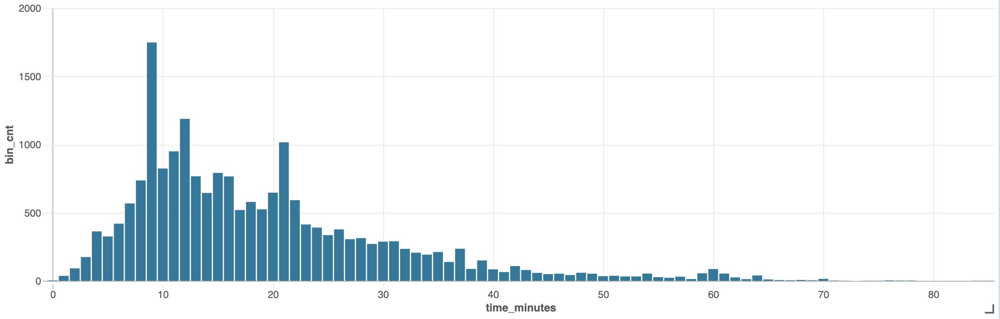

In [0]:
displayHTML("""<img width='50%' src='data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAkACQAAD/4QCSRXhpZgAATU0AKgAAAAgABAEaAAUAAAABAAAAPgEbAAUAAAABAAAARgEoAAMAAAABAAIAAIdpAAQAAAABAAAATgAAAAAAAACQAAAAAQAAAJAAAAABAAOShgAHAAAAEgAAAHigAgAEAAAAAQAACU6gAwAEAAAAAQAAAvgAAAAAQVNDSUkAAABTY3JlZW5zaG90/+0AOFBob3Rvc2hvcCAzLjAAOEJJTQQEAAAAAAAAOEJJTQQlAAAAAAAQ1B2M2Y8AsgTpgAmY7PhCfv/iD/BJQ0NfUFJPRklMRQABAQAAD+BhcHBsAhAAAG1udHJSR0IgWFlaIAfoAAwAAgAJAAEAG2Fjc3BBUFBMAAAAAEFQUEwAAAAAAAAAAAAAAAAAAAAAAAD21gABAAAAANMtYXBwbAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEWRlc2MAAAFQAAAAYmRzY20AAAG0AAAEvGNwcnQAAAZwAAAAI3d0cHQAAAaUAAAAFHJYWVoAAAaoAAAAFGdYWVoAAAa8AAAAFGJYWVoAAAbQAAAAFHJUUkMAAAbkAAAIDGFhcmcAAA7wAAAAIHZjZ3QAAA8QAAAAMG5kaW4AAA9AAAAAPm1tb2QAAA+AAAAAKHZjZ3AAAA+oAAAAOGJUUkMAAAbkAAAIDGdUUkMAAAbkAAAIDGFhYmcAAA7wAAAAIGFhZ2cAAA7wAAAAIGRlc2MAAAAAAAAACERpc3BsYXkAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABtbHVjAAAAAAAAACcAAAAMaHJIUgAAABQAAAHka29LUgAAAAwAAAH4bmJOTwAAABIAAAIEaWQAAAAAABIAAAIWaHVIVQAAABQAAAIoY3NDWgAAABYAAAI8c2xTSQAAABQAAAJSZGFESwAAABwAAAJmbmxOTAAAABYAAAKCZmlGSQAAABAAAAKYaXRJVAAAABgAAAKoZXNFUwAAABYAAALAcm9STwAAABIAAALWZnJDQQAAABYAAALoYXIAAAAAABQAAAL+dWtVQQAAABwAAAMSaGVJTAAAABYAAAMuemhUVwAAAAoAAANEdmlWTgAAAA4AAANOc2tTSwAAABYAAANcemhDTgAAAAoAAANEcnVSVQAAACQAAANyZW5HQgAAABQAAAOWZnJGUgAAABYAAAOqbXMAAAAAABIAAAPAaGlJTgAAABIAAAPSdGhUSAAAAAwAAAPkY2FFUwAAABgAAAPwZW5BVQAAABQAAAOWZXNYTAAAABIAAALWZGVERQAAABAAAAQIZW5VUwAAABIAAAQYcHRCUgAAABgAAAQqcGxQTAAAABIAAARCZWxHUgAAACIAAARUc3ZTRQAAABAAAAR2dHJUUgAAABQAAASGcHRQVAAAABYAAASaamFKUAAAAAwAAASwAEwAQwBEACAAdQAgAGIAbwBqAGnO7LfsACAATABDAEQARgBhAHIAZwBlAC0ATABDAEQATABDAEQAIABXAGEAcgBuAGEAUwB6AO0AbgBlAHMAIABMAEMARABCAGEAcgBlAHYAbgD9ACAATABDAEQAQgBhAHIAdgBuAGkAIABMAEMARABMAEMARAAtAGYAYQByAHYAZQBzAGsA5gByAG0ASwBsAGUAdQByAGUAbgAtAEwAQwBEAFYA5AByAGkALQBMAEMARABMAEMARAAgAGEAIABjAG8AbABvAHIAaQBMAEMARAAgAGEAIABjAG8AbABvAHIATABDAEQAIABjAG8AbABvAHIAQQBDAEwAIABjAG8AdQBsAGUAdQByIA8ATABDAEQAIAZFBkQGSAZGBikEGgQ+BDsETAQ+BEAEPgQyBDgEOQAgAEwAQwBEIA8ATABDAEQAIAXmBdEF4gXVBeAF2V9pgnIATABDAEQATABDAEQAIABNAOAAdQBGAGEAcgBlAGIAbgD9ACAATABDAEQEJgQyBDUEQgQ9BD4EOQAgBBYEGgAtBDQEOARBBD8EOwQ1BDkAQwBvAGwAbwB1AHIAIABMAEMARABMAEMARAAgAGMAbwB1AGwAZQB1AHIAVwBhAHIAbgBhACAATABDAEQJMAkCCRcJQAkoACAATABDAEQATABDAEQAIA4qDjUATABDAEQAIABlAG4AIABjAG8AbABvAHIARgBhAHIAYgAtAEwAQwBEAEMAbwBsAG8AcgAgAEwAQwBEAEwAQwBEACAAQwBvAGwAbwByAGkAZABvAEsAbwBsAG8AcgAgAEwAQwBEA4gDswPHA8EDyQO8A7cAIAO/A7gDzAO9A7cAIABMAEMARABGAOQAcgBnAC0ATABDAEQAUgBlAG4AawBsAGkAIABMAEMARABMAEMARAAgAGEAIABjAG8AcgBlAHMwqzDpMPwATABDAER0ZXh0AAAAAENvcHlyaWdodCBBcHBsZSBJbmMuLCAyMDI0AABYWVogAAAAAAAA81EAAQAAAAEWzFhZWiAAAAAAAACD3wAAPb////+7WFlaIAAAAAAAAEq/AACxNwAACrlYWVogAAAAAAAAKDgAABELAADIuWN1cnYAAAAAAAAEAAAAAAUACgAPABQAGQAeACMAKAAtADIANgA7AEAARQBKAE8AVABZAF4AYwBoAG0AcgB3AHwAgQCGAIsAkACVAJoAnwCjAKgArQCyALcAvADBAMYAywDQANUA2wDgAOUA6wDwAPYA+wEBAQcBDQETARkBHwElASsBMgE4AT4BRQFMAVIBWQFgAWcBbgF1AXwBgwGLAZIBmgGhAakBsQG5AcEByQHRAdkB4QHpAfIB+gIDAgwCFAIdAiYCLwI4AkECSwJUAl0CZwJxAnoChAKOApgCogKsArYCwQLLAtUC4ALrAvUDAAMLAxYDIQMtAzgDQwNPA1oDZgNyA34DigOWA6IDrgO6A8cD0wPgA+wD+QQGBBMEIAQtBDsESARVBGMEcQR+BIwEmgSoBLYExATTBOEE8AT+BQ0FHAUrBToFSQVYBWcFdwWGBZYFpgW1BcUF1QXlBfYGBgYWBicGNwZIBlkGagZ7BowGnQavBsAG0QbjBvUHBwcZBysHPQdPB2EHdAeGB5kHrAe/B9IH5Qf4CAsIHwgyCEYIWghuCIIIlgiqCL4I0gjnCPsJEAklCToJTwlkCXkJjwmkCboJzwnlCfsKEQonCj0KVApqCoEKmAquCsUK3ArzCwsLIgs5C1ELaQuAC5gLsAvIC+EL+QwSDCoMQwxcDHUMjgynDMAM2QzzDQ0NJg1ADVoNdA2ODakNww3eDfgOEw4uDkkOZA5/DpsOtg7SDu4PCQ8lD0EPXg96D5YPsw/PD+wQCRAmEEMQYRB+EJsQuRDXEPURExExEU8RbRGMEaoRyRHoEgcSJhJFEmQShBKjEsMS4xMDEyMTQxNjE4MTpBPFE+UUBhQnFEkUahSLFK0UzhTwFRIVNBVWFXgVmxW9FeAWAxYmFkkWbBaPFrIW1hb6Fx0XQRdlF4kXrhfSF/cYGxhAGGUYihivGNUY+hkgGUUZaxmRGbcZ3RoEGioaURp3Gp4axRrsGxQbOxtjG4obshvaHAIcKhxSHHscoxzMHPUdHh1HHXAdmR3DHeweFh5AHmoelB6+HukfEx8+H2kflB+/H+ogFSBBIGwgmCDEIPAhHCFIIXUhoSHOIfsiJyJVIoIiryLdIwojOCNmI5QjwiPwJB8kTSR8JKsk2iUJJTglaCWXJccl9yYnJlcmhya3JugnGCdJJ3onqyfcKA0oPyhxKKIo1CkGKTgpaymdKdAqAio1KmgqmyrPKwIrNitpK50r0SwFLDksbiyiLNctDC1BLXYtqy3hLhYuTC6CLrcu7i8kL1ovkS/HL/4wNTBsMKQw2zESMUoxgjG6MfIyKjJjMpsy1DMNM0YzfzO4M/E0KzRlNJ402DUTNU01hzXCNf02NzZyNq426TckN2A3nDfXOBQ4UDiMOMg5BTlCOX85vDn5OjY6dDqyOu87LTtrO6o76DwnPGU8pDzjPSI9YT2hPeA+ID5gPqA+4D8hP2E/oj/iQCNAZECmQOdBKUFqQaxB7kIwQnJCtUL3QzpDfUPARANER0SKRM5FEkVVRZpF3kYiRmdGq0bwRzVHe0fASAVIS0iRSNdJHUljSalJ8Eo3Sn1KxEsMS1NLmkviTCpMcky6TQJNSk2TTdxOJU5uTrdPAE9JT5NP3VAnUHFQu1EGUVBRm1HmUjFSfFLHUxNTX1OqU/ZUQlSPVNtVKFV1VcJWD1ZcVqlW91dEV5JX4FgvWH1Yy1kaWWlZuFoHWlZaplr1W0VblVvlXDVchlzWXSddeF3JXhpebF69Xw9fYV+zYAVgV2CqYPxhT2GiYfViSWKcYvBjQ2OXY+tkQGSUZOllPWWSZedmPWaSZuhnPWeTZ+loP2iWaOxpQ2maafFqSGqfavdrT2una/9sV2yvbQhtYG25bhJua27Ebx5veG/RcCtwhnDgcTpxlXHwcktypnMBc11zuHQUdHB0zHUodYV14XY+dpt2+HdWd7N4EXhueMx5KnmJeed6RnqlewR7Y3vCfCF8gXzhfUF9oX4BfmJ+wn8jf4R/5YBHgKiBCoFrgc2CMIKSgvSDV4O6hB2EgITjhUeFq4YOhnKG14c7h5+IBIhpiM6JM4mZif6KZIrKizCLlov8jGOMyo0xjZiN/45mjs6PNo+ekAaQbpDWkT+RqJIRknqS45NNk7aUIJSKlPSVX5XJljSWn5cKl3WX4JhMmLiZJJmQmfyaaJrVm0Kbr5wcnImc951kndKeQJ6unx2fi5/6oGmg2KFHobaiJqKWowajdqPmpFakx6U4pammGqaLpv2nbqfgqFKoxKk3qamqHKqPqwKrdavprFys0K1ErbiuLa6hrxavi7AAsHWw6rFgsdayS7LCszizrrQltJy1E7WKtgG2ebbwt2i34LhZuNG5SrnCuju6tbsuu6e8IbybvRW9j74KvoS+/796v/XAcMDswWfB48JfwtvDWMPUxFHEzsVLxcjGRsbDx0HHv8g9yLzJOsm5yjjKt8s2y7bMNcy1zTXNtc42zrbPN8+40DnQutE80b7SP9LB00TTxtRJ1MvVTtXR1lXW2Ndc1+DYZNjo2WzZ8dp22vvbgNwF3IrdEN2W3hzeot8p36/gNuC94UThzOJT4tvjY+Pr5HPk/OWE5g3mlucf56noMui86Ubp0Opb6uXrcOv77IbtEe2c7ijutO9A78zwWPDl8XLx//KM8xnzp/Q09ML1UPXe9m32+/eK+Bn4qPk4+cf6V/rn+3f8B/yY/Sn9uv5L/tz/bf//cGFyYQAAAAAAAwAAAAJmZgAA8qcAAA1ZAAAT0AAAClt2Y2d0AAAAAAAAAAEAAQAAAAAAAAABAAAAAQAAAAAAAAABAAAAAQAAAAAAAAABAABuZGluAAAAAAAAADYAAK4UAABR7AAAQ9cAALCkAAAmZgAAD1wAAFANAABUOQACMzMAAjMzAAIzMwAAAAAAAAAAbW1vZAAAAAAAAAYQAACgUP1ibWIAAAAAAAAAAAAAAAAAAAAAAAAAAHZjZ3AAAAAAAAMAAAACZmYAAwAAAAJmZgADAAAAAmZmAAAAAjMzNAAAAAACMzM0AAAAAAIzMzQA/8AAEQgC+AlOAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/bAEMAAgICAgICAwICAwQDAwMEBQQEBAQFBwUFBQUFBwgHBwcHBwcICAgICAgICAoKCgoKCgsLCwsLDQ0NDQ0NDQ0NDf/bAEMBAgICAwMDBgMDBg0JBwkNDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDf/dAAQAlf/aAAwDAQACEQMRAD8A/fyiiigAooooAKKK82+LvxL0r4Q/D7VfH2rwvdRaciCK2jYK888zrHFGGOdoLsNzYO1QTg4wQD0mivgnWvjn+1L4F8KW3xW8c+DPDjeEnNvLd2NlNOmq2ttclVR3Z5XjBJdQQEYgnDKvJHpfxS/aG1XTrnwZ4S+DmlQeIvFPjy0TUtNjvWaO1t9OdPMFxOFZGIZQxADLgI5JyArAH1XRXyr8OvjZ8QYvigvwY+N+iafpPiC/smv9IvdHkd7C+ijDmRAJWd1dVRiMn+Fshfl3cgPjv8c/iT4o8Rw/APwxol94c8LXb6fNf61LKr6jdRffS1McsaLnqu7cNpVmK7toAPtmivl3wv8AtP8AhzVvgfrHxe1uwm0648NPJZatpRP7xNSQoiwoWAO2V5UCsw+XJDcqa8pl/aH/AGi/CXhWw+LnxC8EaMngS9kt5JodPml/teys7tgsU0gklMbFt64G1SWIDCPPAB98UVS03UbLWNOtdW02VZ7S9gjuIJV+7JFKodGHsVINXaACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/kfx/wBgcf8Ao816BXn97/yP4/7A4/8AR5rah8RnV2P/0P38ooooAKKKKACuF+JEfw/Hg7UL34nwWE/hywQXd2NRiWaBfKPynYwbc+4gIACzMQFBJAruq8Y+PPwnvPjV8P5fAVtrn9gR3N1bz3Fx9l+1+ZFAS4i2edDjMgRt24424xzkAHzJ4j1j4pftf6cfCvgrSX8H/C+5mjN5ruppi81OGB1cLawA8R7lB4JUleZF+aM6ul6Jpvhb9tXQfDka+XZaf8PIrLR0c5KxWztGqgnqQiSZx7+9dXbfAP8AaCsraKzs/jtcwQQIsUUUfhq1VERAAqqoucAADAA4Arq/iT+z/qfjq08IeINP8WT6T4/8H28UUHiWO1VvtbCMLMZrbeFCzPubbuZVDspDqSCAeffHINcftS/BO10wr/aCDV5ZO5EHlAgsBztwkvt196X9gf7OPgVIkfFwmu363YP3hPti4bvnZs6813fwt+AviHQPH1x8Wvit4rbxl4tez/s+0lW2S0tbG253LFGnG5snlVQDc+QWYtXJ6v8As1/EDw/4o8Qa18D/AIhSeDtO8WTm51PTJLFLuOOeTd5kts7sTGWLEgKEZegfAUKAfEXj2K8n+Gnx6v8ATjnS3+JceGTmNlFzc7sEcYy8JH4e1foz+0zPpKfs2eL5lMZsX0iMW5GAh3vGINvb7xXb+GKt+Fv2cfA3h74MXnwWu2n1HT9WWSXU7x8JcXN5KVY3I+8EdGRDGDu2hFDFjknxZP2T/iRrGmaX8PPHXxQuNY+HukSQNHpUVglrczxW/wDq4JJ1cv5acAbmkAwNqqQpUA+jvgfFfw/A7wHE20XK+GtJAEgIAH2aLAIHOQvH1r0f/ief9Ov/AI/V+3t4LWCO1tkWKGFFjjRBhVRRgADsABgVNQBlf8Tz/p1/8frB13xDfeHv7O+2pE/9p38GnReUGO2WfO0tllwo2nJGT7Guzry/4nf8yn/2NGm/+1KAO7/4nn/Tr/4/R/xPP+nX/wAfrVooAyv+J5/06/8Aj9H/ABPP+nX/AMfrVooAyv8Aief9Ov8A4/R/xPP+nX/x+tWigDK/4nn/AE6/+P0f8Tz/AKdf/H61aKAMr/ief9Ov/j9H/E8/6df/AB+tWigDK/4nn/Tr/wCP0f8AE8/6df8Ax+tWigDK/wCJ5/06/wDj9H/E8/6df/H61aKAMr/ief8ATr/4/R/xPP8Ap1/8frVooAyv+J5/06/+P0f8Tz/p1/8AH61aKAMr/ief9Ov/AI/R/wATz/p1/wDH61aKAMr/AInn/Tr/AOP0f8Tz/p1/8frVooAyv+J5/wBOv/j9H/E8/wCnX/x+tWigDK/4nn/Tr/4/R/xPP+nX/wAfrVooAyv+J5/06/8Aj9H/ABPP+nX/AMfrVooAyv8Aief9Ov8A4/R/xPP+nX/x+tWigDK/4nn/AE6/+P0f8Tz/AKdf/H61aKAML7TrH2r7Hi23+X5mfnxjOPzqx/xPP+nX/wAfo/5jf/br/wCz1q0AZX/E8/6df/H6P+J5/wBOv/j9atFAGV/xPP8Ap1/8fo/4nn/Tr/4/WrRQBlf8Tz/p1/8AH6P+J5/06/8Aj9atFAGV/wATz/p1/wDH6P8Aief9Ov8A4/WrRQBlf8Tz/p1/8fo/4nn/AE6/+P1q0UAZX/E8/wCnX/x+j/ief9Ov/j9atFAGV/xPP+nX/wAfo/4nn/Tr/wCP1q0UAZX/ABPP+nX/AMfo/wCJ5/06/wDj9atFAGV/xPP+nX/x+j/ief8ATr/4/WrRQBlf8Tz/AKdf/H6P+J5/06/+P1q0UAZX/E8/6df/AB+j/ief9Ov/AI/WrRQBlf8AE8/6df8Ax+j/AInn/Tr/AOP1q0UAZX/E8/6df/H6P+J5/wBOv/j9atFAGV/xPP8Ap1/8fo/4nn/Tr/4/WrRQBlf8Tz/p1/8AH6P+J5/06/8Aj9atFAGV/wATz/p1/wDH6r/adY+1fY8W2/y/Mz8+MZx+dbtZX/Mb/wC3X/2egA/4nn/Tr/4/R/xPP+nX/wAfrVooAyv+J5/06/8Aj9H/ABPP+nX/AMfrVooAyv8Aief9Ov8A4/R/xPP+nX/x+tWigDK/4nn/AE6/+P0f8Tz/AKdf/H61aKAMr/ief9Ov/j9H/E8/6df/AB+tWigDK/4nn/Tr/wCP0f8AE8/6df8Ax+tWigDK/wCJ5/06/wDj9H/E8/6df/H61aKAMr/ief8ATr/4/R/xPP8Ap1/8frVooAyv+J5/06/+P0f8Tz/p1/8AH61aKAMr/ief9Ov/AI/R/wATz/p1/wDH61aKAMr/AInn/Tr/AOP0f8Tz/p1/8frVooAyv+J5/wBOv/j9H/E8/wCnX/x+tWigDK/4nn/Tr/4/R/xPP+nX/wAfrVooAyv+J5/06/8Aj9H/ABPP+nX/AMfrVooAyv8Aief9Ov8A4/R/xPP+nX/x+tWigDK/4nn/AE6/+P0f8Tz/AKdf/H61aKAMK3udYufM2C2HlSNGc7+q9ce1WP8Aief9Ov8A4/RpX/L5/wBfcv8AStWgDK/4nn/Tr/4/R/xPP+nX/wAfrVooAyv+J5/06/8Aj9H/ABPP+nX/AMfrVooAyv8Aief9Ov8A4/R/xPP+nX/x+tWigDK/4nn/AE6/+P0f8Tz/AKdf/H61aKAMr/ief9Ov/j9H/E8/6df/AB+tWigDK/4nn/Tr/wCP0f8AE8/6df8Ax+tWigDK/wCJ5/06/wDj9H/E8/6df/H61aKAMr/ief8ATr/4/R/xPP8Ap1/8frVooAyv+J5/06/+P0f8Tz/p1/8AH61aKAMr/ief9Ov/AI/R/wATz/p1/wDH61aKAMr/AInn/Tr/AOP0f8Tz/p1/8frVooAyv+J5/wBOv/j9H/E8/wCnX/x+tWigDK/4nn/Tr/4/R/xPP+nX/wAfrVooAyv+J5/06/8Aj9H/ABPP+nX/AMfrVooAyv8Aief9Ov8A4/R/xPP+nX/x+tWigDGlk1qGJ5m+ykIpY435wBmiKTWpokmX7KA6hhnfnBGav3//AB43H/XJ/wD0E0WH/Hjb/wDXJP8A0EUAVP8Aief9Ov8A4/R/xPP+nX/x+tWigDK/4nn/AE6/+P0f8Tz/AKdf/H61aKAMr/ief9Ov/j9H/E8/6df/AB+tWigDK/4nn/Tr/wCP0f8AE8/6df8Ax+tWigDK/wCJ5/06/wDj9H/E8/6df/H61aKAMr/ief8ATr/4/R/xPP8Ap1/8frVooAyv+J5/06/+P0f8Tz/p1/8AH61aKAMr/ief9Ov/AI/R/wATz/p1/wDH61aKAMr/AInn/Tr/AOP0f8Tz/p1/8frVooAyv+J5/wBOv/j9H/E8/wCnX/x+tWigDK/4nn/Tr/4/R/xPP+nX/wAfrVooAyv+J5/06/8Aj9H/ABPP+nX/AMfrVooAyv8Aief9Ov8A4/R/xPP+nX/x+tWigDK/4nn/AE6/+P0f8Tz/AKdf/H61aKAMr/ief9Ov/j9H/E8/6df/AB+tWigDK/4nn/Tr/wCP1XuLnWLby94tj5sixjG/q3TPtW7WVqv/AC5/9fcX9aAD/ief9Ov/AI/R/wATz/p1/wDH61aKAMr/AInn/Tr/AOP0f8Tz/p1/8frVooAyv+J5/wBOv/j9H/E8/wCnX/x+tWigDK/4nn/Tr/4/R/xPP+nX/wAfrVooAyv+J5/06/8Aj9H/ABPP+nX/AMfrVooAyv8Aief9Ov8A4/R/xPP+nX/x+tWigDK/4nn/AE6/+P0f8Tz/AKdf/H61aKAMr/ief9Ov/j9H/E8/6df/AB+tWigDK/4nn/Tr/wCP0f8AE8/6df8Ax+tWigDK/wCJ5/06/wDj9H/E8/6df/H61aKAMr/ief8ATr/4/R/xPP8Ap1/8frVooAyv+J5/06/+P0f8Tz/p1/8AH61aKAMr/ief9Ov/AI/R/wATz/p1/wDH61aKAMr/AInn/Tr/AOP0f8Tz/p1/8frVooAyv+J5/wBOv/j9H/E8/wCnX/x+tWigDK/4nn/Tr/4/R/xPP+nX/wAfrVooAwvtOsfavseLbf5fmZ+fGM4/OrH/ABPP+nX/AMfo/wCY3/26/wDs9atAGV/xPP8Ap1/8fo/4nn/Tr/4/WrRQBlf8Tz/p1/8AH6P+J5/06/8Aj9atFAGV/wATz/p1/wDH6P8Aief9Ov8A4/WrRQBlf8Tz/p1/8fo/4nn/AE6/+P1q0UAZX/E8/wCnX/x+j/ief9Ov/j9atFAGV/xPP+nX/wAfo/4nn/Tr/wCP1q0UAZX/ABPP+nX/AMfo/wCJ5/06/wDj9atFAGV/xPP+nX/x+j/ief8ATr/4/WrRQBlf8Tz/AKdf/H6P+J5/06/+P1q0UAZX/E8/6df/AB+j/ief9Ov/AI/WrRQBlf8AE8/6df8Ax+j/AInn/Tr/AOP1q0UAZX/E8/6df/H6P+J5/wBOv/j9atFAGV/xPP8Ap1/8fo/4nn/Tr/4/WrRQBlf8Tz/p1/8AH6P+J5/06/8Aj9atFAGV/wATz/p1/wDH6P8Aief9Ov8A4/WrRQBlf8Tz/p1/8fqvb3OsXPmbBbDypGjOd/VeuPat2srSv+Xz/r7l/pQAf8Tz/p1/8fo/4nn/AE6/+P1q0UAZX/E8/wCnX/x+j/ief9Ov/j9atFAGV/xPP+nX/wAfo/4nn/Tr/wCP1q0UAZX/ABPP+nX/AMfo/wCJ5/06/wDj9atFAGV/xPP+nX/x+j/ief8ATr/4/WrRQBlf8Tz/AKdf/H6P+J5/06/+P1q0UAZX/E8/6df/AB+j/ief9Ov/AI/WrRQBlf8AE8/6df8Ax+j/AInn/Tr/AOP1q0UAZX/E8/6df/H6P+J5/wBOv/j9atFAGV/xPP8Ap1/8fo/4nn/Tr/4/WrRQBlf8Tz/p1/8AH6P+J5/06/8Aj9atFAGV/wATz/p1/wDH6P8Aief9Ov8A4/WrRQBlf8Tz/p1/8fo/4nn/AE6/+P1q0UAZX/E8/wCnX/x+j/ief9Ov/j9atFAGV/xPP+nX/wAfo/4nn/Tr/wCP1q0UAZX/ABPP+nX/AMfqOWTWoYnmb7KQiljjfnAGa2aq3/8Ax43H/XJ//QTQBQik1qaJJl+ygOoYZ35wRmpP+J5/06/+P1bsP+PG3/65J/6CKtUAZX/E8/6df/H6P+J5/wBOv/j9atFAGV/xPP8Ap1/8fo/4nn/Tr/4/WrRQBlf8Tz/p1/8AH6P+J5/06/8Aj9atFAGV/wATz/p1/wDH6P8Aief9Ov8A4/WrRQBlf8Tz/p1/8fo/4nn/AE6/+P1q0UAZX/E8/wCnX/x+j/ief9Ov/j9atFAGV/xPP+nX/wAfo/4nn/Tr/wCP1q0UAZX/ABPP+nX/AMfo/wCJ5/06/wDj9atFAEUHn+Uv2nZ5nO7Znb14xnnpXCXv/I/j/sDj/wBHmvQK8/vf+R/H/YHH/o81tQ+Izq7H/9H9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/id/wAyn/2NGm/+1K9Qry/4nf8AMp/9jRpv/tSgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/r7i/rWrWVqv/Ln/ANfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/wCY3/26/wDs9atZX/Mb/wC3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//AMeNx/1yf/0E1aqrf/8AHjcf9cn/APQTQAWH/Hjb/wDXJP8A0EVaqrYf8eNv/wBck/8AQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/kfx/2Bx/6PNegV5/e/8j+P+wOP/R5rah8RnV2P/9L9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/id/wAyn/2NGm/+1K9Qry/4nf8AMp/9jRpv/tSgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/r7i/rWrWVqv/Ln/ANfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/wCY3/26/wDs9atZX/Mb/wC3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//AMeNx/1yf/0E1aqrf/8AHjcf9cn/APQTQAWH/Hjb/wDXJP8A0EVaqrYf8eNv/wBck/8AQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/kfx/2Bx/6PNegV5/e/8j+P+wOP/R5rah8RnV2P/9P9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/id/wAyn/2NGm/+1K9Qry/4nf8AMp/9jRpv/tSgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/r7i/rWrWVqv/Ln/ANfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/wCY3/26/wDs9atZX/Mb/wC3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//AMeNx/1yf/0E1aqrf/8AHjcf9cn/APQTQAWH/Hjb/wDXJP8A0EVaqrYf8eNv/wBck/8AQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/kfx/2Bx/6PNegV5/e/8j+P+wOP/R5rah8RnV2P/9T9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/id/wAyn/2NGm/+1K9Qry/4nf8AMp/9jRpv/tSgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/wBuv/s9atZX/Mb/AO3X/wBnoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/r7i/rWrWVqv/Ln/ANfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/wCY3/26/wDs9atZX/Mb/wC3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//AMeNx/1yf/0E1aqrf/8AHjcf9cn/APQTQAWH/Hjb/wDXJP8A0EVaqrYf8eNv/wBck/8AQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/kfx/2Bx/6PNegV5/e/8j+P+wOP/R5rah8RnV2P/9X9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/id/wAyn/2NGm/+1K9Qry/4nf8AMp/9jRpv/tSgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArifiL4+0X4YeDr/xx4ijuJdP04wCZbVFkm/0iZIF2qzIDhpAT8w4z1PB7avmf9sP/k3TxZ9dN/8AThbV1YKlGriKdKWzaX3s48xryo4SrWhvGLa9UmzhP+G8fgp/z669/wCAkP8A8kUf8N4/BT/n117/AMBIf/kivx2or9C/1VwPn95+U/67Zn3j93/BP3P+Fv7T/wAOvi94nPhPwpb6ol4ttLds15BHFEI4iqnlZXO7LjAx68+v0bX45fsJf8ltm/7Ad5/6Mgr9ja+Mz3A0sJifZUtrJn6DwzmVbHYP29fe7WnyMr/mN/8Abr/7PWrWV/zG/wDt1/8AZ61a8Y+hCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/AJjf/br/AOz1q1lf8xv/ALdf/Z6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/6+5f6Vq1laV/y+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/wD8eNx/1yf/ANBNFh/x42//AFyT/wBBFF//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/wCXP/r7i/rWrWVqv/Ln/wBfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/br/wCz1q1lf8xv/t1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/5fP8Ar7l/pWrWVpX/AC+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//wAeNx/1yf8A9BNWqq3/APx43H/XJ/8A0E0AFh/x42//AFyT/wBBFWqq2H/Hjb/9ck/9BFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8/vf+R/H/YHH/o816BXn97/AMj+P+wOP/R5rah8RnV2P//W/fyiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4nf8AMp/9jRpv/tSvUK8v+J3/ADKf/Y0ab/7UoA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK+Z/wBsP/k3TxZ9dN/9OFtX0xXzP+2H/wAm6eLPrpv/AKcLau7LP98pf4o/mjzc5/5F9f8AwS/Jn4d0UUV+xH4CfZ/7CX/JbZv+wHef+jIK/Y2vxy/YS/5LbN/2A7z/ANGQV+xtfmnFf+/fJfqfsHA//It/7ef6GV/zG/8At1/9nrVrK/5jf/br/wCz1q180fYBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/8At1/9nrVrK/5jf/br/wCz0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/AJfP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//wCPG4/65P8A+gmiw/48bf8A65J/6CKL/wD48bj/AK5P/wCgmiw/48bf/rkn/oIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/8AX3F/WtWsrVf+XP8A6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/+3X/2etWsr/mN/wDbr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/wAvn/X3L/StWsrSv+Xz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/wDjxuP+uT/+gmrVVb//AI8bj/rk/wD6CaACw/48bf8A65J/6CKtVVsP+PG3/wCuSf8AoIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXn97/yP4/7A4/8AR5r0CvP73/kfx/2Bx/6PNbUPiM6ux//X/fyiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4nf8AMp/9jRpv/tSvUK8v+J3/ADKf/Y0ab/7UoA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK+Z/wBsP/k3TxZ9dN/9OFtX0xXzP+2H/wAm6eLPrpv/AKcLau7LP98pf4o/mjzc5/5F9f8AwS/Jn4d0UUV+xH4CfZ/7CX/JbZv+wHef+jIK/Y2vxy/YS/5LbN/2A7z/ANGQV+xtfmnFf+/fJfqfsHA//It/7ef6GV/zG/8At1/9nrVrK/5jf/br/wCz1q180fYBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/8At1/9nrVrK/5jf/br/wCz0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/AJfP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//wCPG4/65P8A+gmiw/48bf8A65J/6CKL/wD48bj/AK5P/wCgmiw/48bf/rkn/oIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/8AX3F/WtWsrVf+XP8A6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/+3X/2etWsr/mN/wDbr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/wAvn/X3L/StWsrSv+Xz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/wDjxuP+uT/+gmrVVb//AI8bj/rk/wD6CaACw/48bf8A65J/6CKtVVsP+PG3/wCuSf8AoIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXn97/yP4/7A4/8AR5r0CvP73/kfx/2Bx/6PNbUPiM6ux//Q/fyiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4nf8AMp/9jRpv/tSvUK8v+J3/ADKf/Y0ab/7UoA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK+Z/wBsP/k3TxZ9dN/9OFtX0xXzP+2H/wAm6eLPrpv/AKcLau7LP98pf4o/mjzc5/5F9f8AwS/Jn4d0UUV+xH4CfZ/7CX/JbZv+wHef+jIK/Y2vxy/YS/5LbN/2A7z/ANGQV+xtfmnFf+/fJfqfsHA//It/7ef6GV/zG/8At1/9nrVrK/5jf/br/wCz1q180fYBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/8At1/9nrVrK/5jf/br/wCz0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/AJfP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//wCPG4/65P8A+gmiw/48bf8A65J/6CKL/wD48bj/AK5P/wCgmiw/48bf/rkn/oIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/8AX3F/WtWsrVf+XP8A6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/+3X/2etWsr/mN/wDbr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/wAvn/X3L/StWsrSv+Xz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/wDjxuP+uT/+gmrVVb//AI8bj/rk/wD6CaACw/48bf8A65J/6CKtVVsP+PG3/wCuSf8AoIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXn97/yP4/7A4/8AR5r0CvP73/kfx/2Bx/6PNbUPiM6ux//R/fyiiigAooooAKKKKACiuPHj7wi3jk/DVdQVvEi6d/arWIjkJWz8wR+Y0gXygdxHyF9+CDtwc1lfEP4s/D34U21nefEDWI9Ii1CR4rYvFNKZGjALACFHIwCMkgDmgD0WivFvA/7Q/wAG/iRryeGPBXiSPU9TkjkmW3W2uYiUiGWO6WFF4HbOaZ43/aM+Cvw51/8A4Rfxj4ot7HVAFL2yQz3LRbwCvmmCORYiQQQHKnBB6c0Ae2UVi6Z4j0DWdBh8UaXqFtc6RPB9qjvY5FMBhAJL784AUA7s424OcYNeP6D+0/8AAXxN4jj8J6L4wtJ9TmmFvCjRTxRSysdqpHPJEsMhY8Ltc7iRjORQB71RRRQAV5f8Tv8AmU/+xo03/wBqV6hXl/xO/wCZT/7GjTf/AGpQB6hRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV8z/ALYf/Juniz66b/6cLavpivmf9sP/AJN08WfXTf8A04W1d2Wf75S/xR/NHm5z/wAi+v8A4Jfkz8O6KKK/Yj8BPs/9hL/kts3/AGA7z/0ZBX7G1+OX7CX/ACW2b/sB3n/oyCv2Nr804r/375L9T9g4H/5Fv/bz/Qyv+Y3/ANuv/s9atZX/ADG/+3X/ANnrVr5o+wCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/wDbr/7PWrWV/wAxv/t1/wDZ6ANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/l8/6+5f6Vq1laV/y+f9fcv9K1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUX/APx43H/XJ/8A0E0WH/Hjb/8AXJP/AEEUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/5c/8Ar7i/rWrWVqv/AC5/9fcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/AG6/+z1q1lf8xv8A7df/AGetWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/AJfP+vuX+latZWlf8vn/AF9y/wBKANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt/8A8eNx/wBcn/8AQTVqqt//AMeNx/1yf/0E0AFh/wAeNv8A9ck/9BFWqq2H/Hjb/wDXJP8A0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArz+9/5H8f8AYHH/AKPNegV5/e/8j+P+wOP/AEea2ofEZ1dj/9L9/KKKKACiiigArD8TaI/iTw/qGgpqF7pTX8DwC906XyLu33jG+GTB2OOxxxW5RQB+dPwg+Hdr8Mv2zda8P22ranrhm8HveS32rzi4vJZJp7YHfIFXdgKAMjOO9dF+09qesL8dPhbBpng+48bLpNtq16dKjUCK4kvIxDH5krxyRosTRCQlgQAPeu90/wANeIk/bR1PxU+lXq6LJ4LW1TUjbyCza48+E+UJ9vlmTAJ27t2AeK2fi58Rvit8LfiFpOv2ugXnif4dXNi0Oo2+j2ouNRs74MxEuBgmMrsAywXO4Eg7dwBzPwu+Megf8LI/4Vz44+Gsfw38XzWslzp4Rbe4ivIUVmcRXMMUXJVGIC7kOxhuDAKeR/Ys8LaJ4v8Ah54j+I/izT7TVNZ8Ya5fvfT3UKzFoPlzD84b5DI0jEd8jOcDD9Km8U/tCftAeEPiFbeFdX8M+D/Atvcypea3bfY7q/urpdoSOPc25AwU5BZQqtuILKtcp8OfFniz9k0eJfhd4j8EeIvEWknVJ77wzqOi2puobmK5UBIJXyojYbFLAB3Vmf5Su0sAeDav4jvvAXwI+Nnww0WaVNN0vx1/ZFmdzForO4nkDxhsn5XS0wy9DvbPLHP2J+0F8GfA+h/st6p4f03S7S3fwvp0F1ZXKQosy3FqyGSTeBuLzgMJCSS2855xXmekfs5+O/GP7OXjkeI7RbHxx471qTxSllKRGYZFlEsdvJk4R5AZeCRs81Q+CrAVvG/xe+J/xj+GEXwR034eeJLDxrrMdpYaxd39k1tpttGjI01wJWywSXZj51UKrHDMwXcAfbHwl8Q3uv8Awj8H+JdSMlzeX+habcXLBcvJNJBGZGx/tMSfpXb/ANq/9Od3/wB+v/r1R8H+HLfwf4S0TwnaOZINF0610+Nz1ZLWJYgx9yFya6OgDK/tX/pzu/8Av1/9euD8dn+0/wDhHuDafZNesrr/AEr9353l7/3UXXdK2flXjODzXqNeX/E7/mU/+xo03/2pQB3f9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr182fteX/AJ/7PPiqL7NcR5OnfM8e1Ri/tupzX1RXzP8Ath/8m6eLPrpv/pwtq7ss/wB8pf4o/mjzc5/5F9f/AAS/Jn4d0UUV+xH4CfZH7DU/2f40zSeXJL/xJLwbY13N/rIO3Ffr/wD2r/053f8A36/+vX5D/sJf8ltm/wCwHef+jIK/Y2vzTiv/AH75L9T9g4H/AORb/wBvP9Dmvt//ABNfP+zXH/Hvs2eX8/3s5xnp7+taH9q/9Od3/wB+v/r0f8xv/t1/9nrVr5o+wMr+1f8Apzu/+/X/ANej+1f+nO7/AO/X/wBetWigDK/tX/pzu/8Av1/9ej+1f+nO7/79f/XrVooAyv7V/wCnO7/79f8A16P7V/6c7v8A79f/AF61aKAMr+1f+nO7/wC/X/16P7V/6c7v/v1/9etWigDK/tX/AKc7v/v1/wDXo/tX/pzu/wDv1/8AXrVooAyv7V/6c7v/AL9f/Xo/tX/pzu/+/X/161aKAMr+1f8Apzu/+/X/ANej+1f+nO7/AO/X/wBetWigDK/tX/pzu/8Av1/9ej+1f+nO7/79f/XrVooAyv7V/wCnO7/79f8A16P7V/6c7v8A79f/AF61aKAMr+1f+nO7/wC/X/16P7V/6c7v/v1/9etWigDK/tX/AKc7v/v1/wDXo/tX/pzu/wDv1/8AXrVooAyv7V/6c7v/AL9f/Xo/tX/pzu/+/X/161aKAMr+1f8Apzu/+/X/ANej+1f+nO7/AO/X/wBetWigDK/tX/pzu/8Av1/9ej+1f+nO7/79f/XrVooAyv7V/wCnO7/79f8A16P7V/6c7v8A79f/AF61aKAMr+1f+nO7/wC/X/16z/t//E18/wCzXH/Hvs2eX8/3s5xnp7+tdLWV/wAxv/t1/wDZ6AD+1f8Apzu/+/X/ANej+1f+nO7/AO/X/wBetWigDK/tX/pzu/8Av1/9ej+1f+nO7/79f/XrVooAyv7V/wCnO7/79f8A16P7V/6c7v8A79f/AF61aKAMr+1f+nO7/wC/X/16P7V/6c7v/v1/9etWigDK/tX/AKc7v/v1/wDXo/tX/pzu/wDv1/8AXrVooAyv7V/6c7v/AL9f/Xo/tX/pzu/+/X/161aKAMr+1f8Apzu/+/X/ANej+1f+nO7/AO/X/wBetWigDK/tX/pzu/8Av1/9ej+1f+nO7/79f/XrVooAyv7V/wCnO7/79f8A16P7V/6c7v8A79f/AF61aKAMr+1f+nO7/wC/X/16P7V/6c7v/v1/9etWigDK/tX/AKc7v/v1/wDXo/tX/pzu/wDv1/8AXrVooAyv7V/6c7v/AL9f/Xo/tX/pzu/+/X/161aKAMr+1f8Apzu/+/X/ANej+1f+nO7/AO/X/wBetWigDK/tX/pzu/8Av1/9ej+1f+nO7/79f/XrVooAyv7V/wCnO7/79f8A16P7V/6c7v8A79f/AF61aKAMr+1f+nO7/wC/X/16P7V/6c7v/v1/9etWigDmrC/8r7T/AKNcPvuHf5I84zjg88EdxWh/av8A053f/fr/AOvRpX/L5/19y/0rVoAyv7V/6c7v/v1/9ej+1f8Apzu/+/X/ANetWigDK/tX/pzu/wDv1/8AXo/tX/pzu/8Av1/9etWigDK/tX/pzu/+/X/16P7V/wCnO7/79f8A161aKAMr+1f+nO7/AO/X/wBej+1f+nO7/wC/X/161aKAMr+1f+nO7/79f/Xo/tX/AKc7v/v1/wDXrVooAyv7V/6c7v8A79f/AF6P7V/6c7v/AL9f/XrVooAyv7V/6c7v/v1/9ej+1f8Apzu/+/X/ANetWigDK/tX/pzu/wDv1/8AXo/tX/pzu/8Av1/9etWigDK/tX/pzu/+/X/16P7V/wCnO7/79f8A161aKAMr+1f+nO7/AO/X/wBej+1f+nO7/wC/X/161aKAMr+1f+nO7/79f/Xo/tX/AKc7v/v1/wDXrVooAyv7V/6c7v8A79f/AF6P7V/6c7v/AL9f/XrVooAyv7V/6c7v/v1/9ej+1f8Apzu/+/X/ANetWigDK/tX/pzu/wDv1/8AXo/tX/pzu/8Av1/9etWigDK/tX/pzu/+/X/16P7V/wCnO7/79f8A161aKAMK71LzLWZPstyu6Nhlo8AZB5Jz0otNS8u1hT7LcttjUZWPIOAOQc9K07//AI8bj/rk/wD6CaLD/jxt/wDrkn/oIoAqf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r0f2r/053f/AH6/+vWrRQBlf2r/ANOd3/36/wDr0f2r/wBOd3/36/8Ar1q0UAZX9q/9Od3/AN+v/r1n39/5v2b/AEa4TZcI/wA8eM4zwOeSewrpaytV/wCXP/r7i/rQAf2r/wBOd3/36/8Ar0f2r/053f8A36/+vWrRQBlf2r/053f/AH6/+vR/av8A053f/fr/AOvWrRQBlf2r/wBOd3/36/8Ar0f2r/053f8A36/+vWrRQBlf2r/053f/AH6/+vR/av8A053f/fr/AOvWrRQBlf2r/wBOd3/36/8Ar0f2r/053f8A36/+vWrRQBlf2r/053f/AH6/+vR/av8A053f/fr/AOvWrRQBlf2r/wBOd3/36/8Ar0f2r/053f8A36/+vWrRQBlf2r/053f/AH6/+vR/av8A053f/fr/AOvWrRQBlf2r/wBOd3/36/8Ar0f2r/053f8A36/+vWrRQBlf2r/053f/AH6/+vR/av8A053f/fr/AOvWrRQBlf2r/wBOd3/36/8Ar0f2r/053f8A36/+vWrRQBlf2r/053f/AH6/+vR/av8A053f/fr/AOvWrRQBlf2r/wBOd3/36/8Ar0f2r/053f8A36/+vWrRQBlf2r/053f/AH6/+vR/av8A053f/fr/AOvWrRQBlf2r/wBOd3/36/8Ar0f2r/053f8A36/+vWrRQBlf2r/053f/AH6/+vR/av8A053f/fr/AOvWrRQBzX2//ia+f9muP+PfZs8v5/vZzjPT39a0P7V/6c7v/v1/9ej/AJjf/br/AOz1q0AZX9q/9Od3/wB+v/r0f2r/ANOd3/36/wDr1q0UAZX9q/8ATnd/9+v/AK9H9q/9Od3/AN+v/r1q0UAZX9q/9Od3/wB+v/r0f2r/ANOd3/36/wDr1q0UAZX9q/8ATnd/9+v/AK9H9q/9Od3/AN+v/r1q0UAZX9q/9Od3/wB+v/r0f2r/ANOd3/36/wDr1q0UAZX9q/8ATnd/9+v/AK9H9q/9Od3/AN+v/r1q0UAZX9q/9Od3/wB+v/r0f2r/ANOd3/36/wDr1q0UAZX9q/8ATnd/9+v/AK9H9q/9Od3/AN+v/r1q0UAZX9q/9Od3/wB+v/r0f2r/ANOd3/36/wDr1q0UAZX9q/8ATnd/9+v/AK9H9q/9Od3/AN+v/r1q0UAZX9q/9Od3/wB+v/r0f2r/ANOd3/36/wDr1q0UAZX9q/8ATnd/9+v/AK9H9q/9Od3/AN+v/r1q0UAZX9q/9Od3/wB+v/r0f2r/ANOd3/36/wDr1q0UAZX9q/8ATnd/9+v/AK9H9q/9Od3/AN+v/r1q0UAZX9q/9Od3/wB+v/r0f2r/ANOd3/36/wDr1q0UAZX9q/8ATnd/9+v/AK9Z9hf+V9p/0a4ffcO/yR5xnHB54I7iulrK0r/l8/6+5f6UAH9q/wDTnd/9+v8A69H9q/8ATnd/9+v/AK9atFAGV/av/Tnd/wDfr/69H9q/9Od3/wB+v/r1q0UAZX9q/wDTnd/9+v8A69H9q/8ATnd/9+v/AK9atFAGV/av/Tnd/wDfr/69H9q/9Od3/wB+v/r1q0UAZX9q/wDTnd/9+v8A69H9q/8ATnd/9+v/AK9atFAGV/av/Tnd/wDfr/69H9q/9Od3/wB+v/r1q0UAZX9q/wDTnd/9+v8A69H9q/8ATnd/9+v/AK9atFAGV/av/Tnd/wDfr/69H9q/9Od3/wB+v/r1q0UAZX9q/wDTnd/9+v8A69H9q/8ATnd/9+v/AK9atFAGV/av/Tnd/wDfr/69H9q/9Od3/wB+v/r1q0UAZX9q/wDTnd/9+v8A69H9q/8ATnd/9+v/AK9atFAGV/av/Tnd/wDfr/69H9q/9Od3/wB+v/r1q0UAZX9q/wDTnd/9+v8A69H9q/8ATnd/9+v/AK9atFAGV/av/Tnd/wDfr/69H9q/9Od3/wB+v/r1q0UAZX9q/wDTnd/9+v8A69H9q/8ATnd/9+v/AK9atFAGV/av/Tnd/wDfr/69V7vUvMtZk+y3K7o2GWjwBkHknPSt2qt//wAeNx/1yf8A9BNAGZaal5drCn2W5bbGoyseQcAcg56VY/tX/pzu/wDv1/8AXq3Yf8eNv/1yT/0EVaoAyv7V/wCnO7/79f8A16P7V/6c7v8A79f/AF61aKAMr+1f+nO7/wC/X/16P7V/6c7v/v1/9etWigDK/tX/AKc7v/v1/wDXo/tX/pzu/wDv1/8AXrVooAyv7V/6c7v/AL9f/Xo/tX/pzu/+/X/161aKAMr+1f8Apzu/+/X/ANej+1f+nO7/AO/X/wBetWigDK/tX/pzu/8Av1/9ej+1f+nO7/79f/XrVooAyv7V/wCnO7/79f8A16P7V/6c7v8A79f/AF61aKAMr+1f+nO7/wC/X/16P7V/6c7v/v1/9etWigCKCXz4ll2PHuz8rjawwcciuEvf+R/H/YHH/o816BXn97/yP4/7A4/9HmtqHxGdXY//0/38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvmf8AbD/5N08WfXTf/ThbV9MV8z/th/8AJuniz66b/wCnC2ruyz/fKX+KP5o83Of+RfX/AMEvyZ+HdFFFfsR+An2f+wl/yW2b/sB3n/oyCv2Nr8cv2Ev+S2zf9gO8/wDRkFfsbX5pxX/v3yX6n7BwP/yLf+3n+hlf8xv/ALdf/Z61ayv+Y3/26/8As9atfNH2AUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z61ayv+Y3/26/8As9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/wCXz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/8AjxuP+uT/APoJosP+PG3/AOuSf+gii/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8AL5/19y/0rVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/8j+P+wOP/AEea9Arz+9/5H8f9gcf+jzW1D4jOrsf/1P38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvmf8AbD/5N08WfXTf/ThbV9MV8z/th/8AJuniz66b/wCnC2ruyz/fKX+KP5o83Of+RfX/AMEvyZ+HdFFFfsR+An2f+wl/yW2b/sB3n/oyCv2Nr8cv2Ev+S2zf9gO8/wDRkFfsbX5pxX/v3yX6n7BwP/yLf+3n+hlf8xv/ALdf/Z61ayv+Y3/26/8As9atfNH2AUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z61ayv+Y3/26/8As9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/wCXz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/8AjxuP+uT/APoJosP+PG3/AOuSf+gii/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8AL5/19y/0rVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/8j+P+wOP/AEea9Arz+9/5H8f9gcf+jzW1D4jOrsf/1f38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvmf8AbD/5N08WfXTf/ThbV9MV8z/th/8AJuniz66b/wCnC2ruyz/fKX+KP5o83Of+RfX/AMEvyZ+HdFFFfsR+An2f+wl/yW2b/sB3n/oyCv2Nr8cv2Ev+S2zf9gO8/wDRkFfsbX5pxX/v3yX6n7BwP/yLf+3n+hlf8xv/ALdf/Z61ayv+Y3/26/8As9atfNH2AUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z61ayv+Y3/26/8As9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/wCXz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/8AjxuP+uT/APoJosP+PG3/AOuSf+gii/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8AL5/19y/0rVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/8j+P+wOP/AEea9Arz+9/5H8f9gcf+jzW1D4jOrsf/1v38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvmf8AbD/5N08WfXTf/ThbV9MV8z/th/8AJuniz66b/wCnC2ruyz/fKX+KP5o83Of+RfX/AMEvyZ+HdFFFfsR+An2f+wl/yW2b/sB3n/oyCv2Nr8cv2Ev+S2zf9gO8/wDRkFfsbX5pxX/v3yX6n7BwP/yLf+3n+hlf8xv/ALdf/Z61ayv+Y3/26/8As9atfNH2AUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z61ayv+Y3/26/8As9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/wCXz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/8AjxuP+uT/APoJosP+PG3/AOuSf+gii/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8AL5/19y/0rVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/8j+P+wOP/AEea9Arz+9/5H8f9gcf+jzW1D4jOrsf/1/38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvmf8AbD/5N08WfXTf/ThbV9MV8z/th/8AJuniz66b/wCnC2ruyz/fKX+KP5o83Of+RfX/AMEvyZ+HdFFFfsR+An2f+wl/yW2b/sB3n/oyCv2Nr8cv2Ev+S2zf9gO8/wDRkFfsbX5pxX/v3yX6n7BwP/yLf+3n+hlf8xv/ALdf/Z61ayv+Y3/26/8As9atfNH2AUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z61ayv+Y3/26/8As9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/wCXz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/8AjxuP+uT/APoJosP+PG3/AOuSf+gii/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8AL5/19y/0rVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/8j+P+wOP/AEea9Arz+9/5H8f9gcf+jzW1D4jOrsf/0P38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvmf8AbD/5N08WfXTf/ThbV9MV8z/th/8AJuniz66b/wCnC2ruyz/fKX+KP5o83Of+RfX/AMEvyZ+HdFFFfsR+An2f+wl/yW2b/sB3n/oyCv2Nr8cv2Ev+S2zf9gO8/wDRkFfsbX5pxX/v3yX6n7BwP/yLf+3n+hlf8xv/ALdf/Z61ayv+Y3/26/8As9atfNH2AUUUUAFFFfMv7Tvxs8SfBDw5o+t+HLKxvn1C9e1lS9WQqFEZcFTHIhByMHOetb4XDTxFVUae7OXGYunhaMq9X4VufTVFfkr/AMPAfif/ANC9oP8A3xc//H6P+HgPxP8A+he0H/vi5/8Aj9e3/qvj/wCVfefO/wCuuWfzP7mfrVRXyZ+y58ffFHx0TxLJ4ksLCxGimxWAWKyjf9p8/fvMkj5x5S4xjvnPGPrOvGxeFqYaq6NXdf8ADn0OBxtLF0I4ij8Lvb5O36BRRRXMdYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/7df/Z61ayv+Y3/ANuv/s9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f8AX3L/AErVrK0r/l8/6+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKL/8A48bj/rk//oJosP8Ajxt/+uSf+gigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv8Ay5/9fcX9a1aytV/5c/8Ar7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/ADG/+3X/ANnrVrK/5jf/AG6/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8vn/X3L/StWsrSv8Al8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb//AI8bj/rk/wD6CatVVv8A/jxuP+uT/wDoJoALD/jxt/8Arkn/AKCKtVVsP+PG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/8j+P+wOP/R5r0CvP73/kfx/2Bx/6PNbUPiM6ux//0f38oorzX4q/Ffwp8HPDCeLfGRuRYSXUdmv2WLzpDLKrsvy5XjCHJzQB6VRX5yeDv+CgvhOfxB4li8dWj22jRXSr4ek0+0drma13ygtdh5iofYIiAgAyW9qv+IP27tG1rxX4S8NfCTT2vzrGqQ2Wotq1s8ZSO4lijQW/lzDMh3NywIGBweaAP0MooooAKKKKACiiigAooooAKKKKACvL/id/zKf/AGNGm/8AtSvUK8v+J3/Mp/8AY0ab/wC1KAPUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvmf9sP/k3TxZ9dN/8AThbV9MV8z/th/wDJuniz66b/AOnC2ruyz/fKX+KP5o83Of8AkX1/8EvyZ+HdFFFfsR+An2f+wl/yW2b/ALAd5/6Mgr9ja/HL9hL/AJLbN/2A7z/0ZBX7G1+acV/798l+p+wcD/8AIt/7ef6GV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PWrXzR9gFFFFABXwD/wUE/5EHwx/wBhh/8A0Q9ff1fAP/BQT/kQfDH/AGGH/wDRD17GQf8AIwpev6M8Dij/AJFdb0X5o/KGiiiv1g/Dj9Nf+Cd//Ht49/39I/ld1+k9fmx/wTv/AOPbx7/v6R/K7r9J6/K+JP8AkY1Pl/6Sj9s4R/5FNL/t7/0phRRRXhn0gUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZX/Mb/wC3X/2etWsr/mN/9uv/ALPQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8vn/X3L/StWsrSv8Al8/6+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb//AI8bj/rk/wD6CaLD/jxt/wDrkn/oIov/APjxuP8Ark//AKCaLD/jxt/+uSf+gigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv/Ln/wBfcX9a1aytV/5c/wDr7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/Mb/7df/Z61ayv+Y3/ANuv/s9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVpX/AC+f9fcv9K1aytK/5fP+vuX+lAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW//AOPG4/65P/6CatVVv/8AjxuP+uT/APoJoALD/jxt/wDrkn/oIq1VWw/48bf/AK5J/wCgirVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFef3v/I/j/sDj/wBHmvQK8/vf+R/H/YHH/o81tQ+Izq7H/9L9/K5rxX4N8K+OdMGi+MNKtdYsVlWcW93GJYxKgIVwD3AYgH3rpaKAPyN8Ra7+x98E/iN4t0W68NX3jS5uL799btbWjafpMsbymS1tGZo3+QvscbWA2KN2Qa634cftF/stnxzoVn4U+FZ0zVr7ULaytL37JZ7reW5kWJZA28shUtyV+bGcV5Z4R8bfBH4T/tEfE2D4paVF4nsrnV7uOyvpLFbz7FOt1K06NDcAHdltjSoGJMfy5Vya+r/DH7QX7Heq+JNJ0vw/odhFql5fW1vYyL4fSJkuZZFWJhIIgUIcghs8daAPumiiigAooooAKKKKACiiigAooooAK8v+J3/Mp/8AY0ab/wC1K9Qry/4nf8yn/wBjRpv/ALUoA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK+Z/2w/+TdPFn103/wBOFtX0xXzP+2H/AMm6eLPrpv8A6cLau7LP98pf4o/mjzc5/wCRfX/wS/Jn4d0UUV+xH4CfZ/7CX/JbZv8AsB3n/oyCv2Nr8cv2Ev8Akts3/YDvP/RkFfsbX5pxX/v3yX6n7BwP/wAi3/t5/oZX/Mb/AO3X/wBnrVrK/wCY3/26/wDs9atfNH2AUUUUAFfAP/BQT/kQfDH/AGGH/wDRD19/V8A/8FBP+RB8Mf8AYYf/ANEPXsZB/wAjCl6/ozwOKP8AkV1vRfmj8oaKKK/WD8OP01/4J3/8e3j3/f0j+V3X6T1+bH/BO/8A49vHv+/pH8ruv0nr8r4k/wCRjU+X/pKP2zhH/kU0v+3v/SmFFFFeGfSBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv/ALdf/Z61ayv+Y3/26/8As9AGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/wCXz/r7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/8AjxuP+uT/APoJosP+PG3/AOuSf+gii/8A+PG4/wCuT/8AoJosP+PG3/65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8uf/AF9xf1rVrK1X/lz/AOvuL+tAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlf8xv/t1/9nrVrK/5jf8A26/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8AL5/19y/0rVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/8A48bj/rk//oJq1VW//wCPG4/65P8A+gmgAsP+PG3/AOuSf+girVVbD/jxt/8Arkn/AKCKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/8j+P+wOP/AEea9Arz+9/5H8f9gcf+jzW1D4jOrsf/0/38ooooA/N3Xda/Zq8UftI/8KntfhzaazqepandR6zrcs7xIt9tkmn2RLuMjCQFXJMYDbgAQMmXTNS/Zg8LftGSfCPUfh7Z6LqWm39kuka0k7yxSXrxxXEIeMlTExkYKhzIGbGdoNeM2HxE1D9kf9ofx7deM/DMuqWfia8uLizvFISc2stw88ckEjqVcOJAsyAjDqMnK4Ob47+Kdz+1x8ZfAWmfD7w1caZLo14HlvnZZLgQNNC7zTFAFjitljLLlmyzEDkgEA/ZWiiigAooooAKKKKACiiigAooooAK8v8Aid/zKf8A2NGm/wDtSvUK8v8Aid/zKf8A2NGm/wDtSgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr5n/bD/wCTdPFn103/ANOFtX0xXzP+2H/ybp4s+um/+nC2ruyz/fKX+KP5o83Of+RfX/wS/Jn4d0UUV+xH4CfZ/wCwl/yW2b/sB3n/AKMgr9ja/HL9hL/kts3/AGA7z/0ZBX7G1+acV/798l+p+wcD/wDIt/7ef6GV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9atfNH2AUUUUAFfAP/BQT/kQfDH/YYf8A9EPX39XwD/wUE/5EHwx/2GH/APRD17GQf8jCl6/ozwOKP+RXW9F+aPyhooor9YPw4/TX/gnf/wAe3j3/AH9I/ld1+k9fmx/wTv8A+Pbx7/v6R/K7r9J6/K+JP+RjU+X/AKSj9s4R/wCRTS/7e/8ASmFFFFeGfSBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlf8xv8A7df/AGetWsr/AJjf/br/AOz0AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/AC+f9fcv9K1aytK/5fP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//AOPG4/65P/6CaLD/AI8bf/rkn/oIov8A/jxuP+uT/wDoJosP+PG3/wCuSf8AoIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/wDX3F/WtWsrVf8Alz/6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/8At1/9nrVrK/5jf/br/wCz1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8vn/X3L/StWsrSv+Xz/AK+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/wD48bj/AK5P/wCgmrVVb/8A48bj/rk//oJoALD/AI8bf/rkn/oIq1VWw/48bf8A65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/8AI/j/ALA4/wDR5r0CvP73/kfx/wBgcf8Ao81tQ+Izq7H/1P38ooooAydY0HQvENr9h8QadaanbZ3eTeQJcR56Z2yKwzj2qHQ/DPhvwxA1r4a0mx0mB8Fo7G2jtkOOmVjVQcZ9K3KKAPE/gR4g1rxH4a1271y8kvZrbxTr1nE8pyUt7a9kSKMcD5UUAD2r1DxM3iRfD+oN4PWyfWxA/wBgXUTILQz4+TzvK+fZnrt5rxf9m7/kUfEf/Y5+Jf8A0vlr6EoA/O74R/8AC0x+2Xqy/F270651oeDX8pdJ3/YoLRrm3aOKLzFV8Bi7HduOWPJ7dV8dIdR+MP7QHhf9nya/ubHwrFpUmva8lnIYpLsBpFjhc91BROOn7wt95VI1dN/5Pv1X/sRE/wDSiCsj4laxY/Cf9r3wz8RPFDix8N+JvDsmhyalL8sFvdxyM4Er9EUgRDJIADEnAUmgDN0Xw6P2a/2jvCngjwfe3Y8D+P7O6jfTLudrhLS+s0ZhJCXyygkxg85Idsk4XHH/AAg+FWkftYR+JvjL8Vb3U5zd6tc2WgWtvdNAmmWkAVkaILwGG8LgjBZCzBmYmu38TeI/D/xq/ax8AaZ4JvINb0rwPYX+papf2UgntUe5TakayoSjNvWIEqxA346qwGT+yj8SPBvwh8HeJ/hR8TtZsvDuteEdavTJHqEq2/2i2cKVkgEmDMWZWIVAxKlCAQwoA4nTvjn478Afs6fEfw3qOqyXvifwNr7eFbDU35l8mWUxLIWJLF4ljmMbEnGEHOOdTx9+zVF8HPg83xb8Ia1q1t8RfD8Vtqt/qZu2dbyUun2mOSNsq0a7mKgglgu1ywY15Zc+CdZ+Iv7Onxd+KmmWU3l+I/GMniGwgKEyyWFpPJ5kgx1CLcS5/wCuTe1fRXx0/aM+HHjP9nG7h8M6va3+v+LrO2sLbRbeVZb+O4umTzY5IE3SJ5a7xlgFZgApO5cgH2P8P/Ex8aeBPDvi9oxE2t6VZag0anIja5hSRl/4CWI/Cuurz/4a+Frnwt8MPC/hC+YxXWlaNYWdw0TYImghRZNp54Lg/hXV/wBlf9Pl3/39/wDrUAateX/E7/mU/wDsaNN/9qV3f9lf9Pl3/wB/f/rVwfjsf2Z/wj3Ju/tevWVr/pX7zyfM3/vYum2VcfK3OMnigD1Gisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVorK/sr/p8u/8Av7/9aj+yv+ny7/7+/wD1qANWisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVorK/sr/p8u/8Av7/9aj+yv+ny7/7+/wD1qANWisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVorK/sr/p8u/8Av7/9aj+yv+ny7/7+/wD1qANWisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVorK/sr/p8u/8Av7/9aj+yv+ny7/7+/wD1qANWisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVorK/sr/p8u/8Av7/9aj+yv+ny7/7+/wD1qANWisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVorK/sr/p8u/8Av7/9aj+yv+ny7/7+/wD1qANWisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVr5n/bD/5N08WfXTf/AE4W1fQf9lf9Pl3/AN/f/rV82fteWHkfs8+KpftNxJg6d8ryblOb+26jFd2Wf75S/wAUfzR5uc/8i+v/AIJfkz8S6KKK/Yj8BPs/9hL/AJLbN/2A7z/0ZBX7G1+Nf7DUH2j40zR+ZJF/xJLw7o22t/rIO/Nfr/8A2V/0+Xf/AH9/+tX5pxX/AL98l+p+wcD/APIt/wC3n+gf8xv/ALdf/Z61a5r7B/xNfI+03H/Hvv3+Z8/3sYzjp7etaH9lf9Pl3/39/wDrV80fYGrRWV/ZX/T5d/8Af3/61H9lf9Pl3/39/wDrUAatfAP/AAUE/wCRB8Mf9hh//RD190/2V/0+Xf8A39/+tXwT+33Z/ZvAfhlvPmlzq7jEr7gP3D9OBXsZB/yMKXr+jPA4o/5Fdb0X5o/K6iiiv1g/Dj9Nf+Cd/wDx7ePf9/SP5XdfpPX5m/8ABPm0+02/jv8AfSxbX0n/AFTbc5F314Nfo7/ZX/T5d/8Af3/61flfEn/IxqfL/wBJR+2cI/8AIppf9vf+lM1aKyv7K/6fLv8A7+//AFqP7K/6fLv/AL+//Wrwz6Q1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1ayv+Y3/26/8As9H9lf8AT5d/9/f/AK1Z/wBg/wCJr5H2m4/499+/zPn+9jGcdPb1oA6Wvyo8S/t1/FLQ/Eeq6Jb6NoEsWn31zao8kNzvZYZGQFsXIGSBzgAZ7V+oX9lf9Pl3/wB/f/rV/PL4+Xb478RrknGrXwyepxO/WvquF8FQxE6irxva36nxPGmYYnCQpPDzcbt3t8j6+/4b/wDix/0AvDv/AH5u/wD5Kp8X7fnxYkkSP+w/Do3sFz5F3xk/9fVfCNT2v/HzF/vr/OvsHkeA/wCfSPgP9ZMz/wCfzP6VaKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9avyU/dTVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoA1aKyv7K/6fLv/AL+//Wo/sr/p8u/+/v8A9agDVorK/sr/AKfLv/v7/wDWo/sr/p8u/wDv7/8AWoANK/5fP+vuX+latc1YWHm/af8ASbhNlw6fJJjOMcnjknua0P7K/wCny7/7+/8A1qANWisr+yv+ny7/AO/v/wBaj+yv+ny7/wC/v/1qANWisr+yv+ny7/7+/wD1qP7K/wCny7/7+/8A1qANWisr+yv+ny7/AO/v/wBaj+yv+ny7/wC/v/1qANWisr+yv+ny7/7+/wD1qP7K/wCny7/7+/8A1qANWisr+yv+ny7/AO/v/wBaj+yv+ny7/wC/v/1qANWisr+yv+ny7/7+/wD1qP7K/wCny7/7+/8A1qANWisr+yv+ny7/AO/v/wBaj+yv+ny7/wC/v/1qANWisr+yv+ny7/7+/wD1qP7K/wCny7/7+/8A1qANWisr+yv+ny7/AO/v/wBaj+yv+ny7/wC/v/1qANWisr+yv+ny7/7+/wD1qP7K/wCny7/7+/8A1qANWisr+yv+ny7/AO/v/wBaj+yv+ny7/wC/v/1qANWisr+yv+ny7/7+/wD1qP7K/wCny7/7+/8A1qANWisr+yv+ny7/AO/v/wBaj+yv+ny7/wC/v/1qANWisr+yv+ny7/7+/wD1qP7K/wCny7/7+/8A1qANWisr+yv+ny7/AO/v/wBaj+yv+ny7/wC/v/1qALd//wAeNx/1yf8A9BNFh/x42/8A1yT/ANBFZl3pvl2sz/arltsbHDSZBwDwRjpRaab5lrC/2q5XdGpwsmAMgcAY6UAbtFZX9lf9Pl3/AN/f/rUf2V/0+Xf/AH9/+tQBq0Vlf2V/0+Xf/f3/AOtR/ZX/AE+Xf/f3/wCtQBq0Vlf2V/0+Xf8A39/+tR/ZX/T5d/8Af3/61AGrRWV/ZX/T5d/9/f8A61H9lf8AT5d/9/f/AK1AGrRWV/ZX/T5d/wDf3/61H9lf9Pl3/wB/f/rUAatFZX9lf9Pl3/39/wDrUf2V/wBPl3/39/8ArUAatFZX9lf9Pl3/AN/f/rUf2V/0+Xf/AH9/+tQBq0Vlf2V/0+Xf/f3/AOtR/ZX/AE+Xf/f3/wCtQBq0Vlf2V/0+Xf8A39/+tR/ZX/T5d/8Af3/61AGrRWV/ZX/T5d/9/f8A61H9lf8AT5d/9/f/AK1AGrRWV/ZX/T5d/wDf3/61H9lf9Pl3/wB/f/rUAatFZX9lf9Pl3/39/wDrUf2V/wBPl3/39/8ArUAatFZX9lf9Pl3/AN/f/rUf2V/0+Xf/AH9/+tQBq0Vlf2V/0+Xf/f3/AOtR/ZX/AE+Xf/f3/wCtQBq0Vlf2V/0+Xf8A39/+tR/ZX/T5d/8Af3/61AGrWVqv/Ln/ANfcX9aP7K/6fLv/AL+//WrPv7Dyvs3+k3D77hE+eTOM55HHBHY0AdLRWV/ZX/T5d/8Af3/61H9lf9Pl3/39/wDrUAatFZX9lf8AT5d/9/f/AK1H9lf9Pl3/AN/f/rUAatFZX9lf9Pl3/wB/f/rUf2V/0+Xf/f3/AOtQBq0Vlf2V/wBPl3/39/8ArUf2V/0+Xf8A39/+tQBq0Vlf2V/0+Xf/AH9/+tR/ZX/T5d/9/f8A61AGrRWV/ZX/AE+Xf/f3/wCtR/ZX/T5d/wDf3/61AGrRWV/ZX/T5d/8Af3/61H9lf9Pl3/39/wDrUAatFZX9lf8AT5d/9/f/AK1H9lf9Pl3/AN/f/rUAatFZX9lf9Pl3/wB/f/rUf2V/0+Xf/f3/AOtQBq0Vlf2V/wBPl3/39/8ArUf2V/0+Xf8A39/+tQBq0Vlf2V/0+Xf/AH9/+tR/ZX/T5d/9/f8A61AGrRWV/ZX/AE+Xf/f3/wCtR/ZX/T5d/wDf3/61AGrRWV/ZX/T5d/8Af3/61H9lf9Pl3/39/wDrUAatFZX9lf8AT5d/9/f/AK1H9lf9Pl3/AN/f/rUAatFZX9lf9Pl3/wB/f/rUf2V/0+Xf/f3/AOtQBq0Vlf2V/wBPl3/39/8ArUf2V/0+Xf8A39/+tQAf8xv/ALdf/Z61a5r7B/xNfI+03H/Hvv3+Z8/3sYzjp7etaH9lf9Pl3/39/wDrUAatFZX9lf8AT5d/9/f/AK1H9lf9Pl3/AN/f/rUAatFZX9lf9Pl3/wB/f/rUf2V/0+Xf/f3/AOtQBq0Vlf2V/wBPl3/39/8ArUf2V/0+Xf8A39/+tQBq0Vlf2V/0+Xf/AH9/+tR/ZX/T5d/9/f8A61AGrRWV/ZX/AE+Xf/f3/wCtR/ZX/T5d/wDf3/61AGrRWV/ZX/T5d/8Af3/61H9lf9Pl3/39/wDrUAatFZX9lf8AT5d/9/f/AK1H9lf9Pl3/AN/f/rUAatFZX9lf9Pl3/wB/f/rUf2V/0+Xf/f3/AOtQBq0Vlf2V/wBPl3/39/8ArUf2V/0+Xf8A39/+tQBq0Vlf2V/0+Xf/AH9/+tR/ZX/T5d/9/f8A61AGrRWV/ZX/AE+Xf/f3/wCtR/ZX/T5d/wDf3/61AGrRWV/ZX/T5d/8Af3/61H9lf9Pl3/39/wDrUAatFZX9lf8AT5d/9/f/AK1H9lf9Pl3/AN/f/rUAatFZX9lf9Pl3/wB/f/rUf2V/0+Xf/f3/AOtQBq0Vlf2V/wBPl3/39/8ArUf2V/0+Xf8A39/+tQBq1laV/wAvn/X3L/Sj+yv+ny7/AO/v/wBas+wsPN+0/wCk3CbLh0+STGcY5PHJPc0AdLRWV/ZX/T5d/wDf3/61H9lf9Pl3/wB/f/rUAatFZX9lf9Pl3/39/wDrUf2V/wBPl3/39/8ArUAatFZX9lf9Pl3/AN/f/rUf2V/0+Xf/AH9/+tQBq0Vlf2V/0+Xf/f3/AOtR/ZX/AE+Xf/f3/wCtQBq0Vlf2V/0+Xf8A39/+tR/ZX/T5d/8Af3/61AGrRWV/ZX/T5d/9/f8A61H9lf8AT5d/9/f/AK1AGrRWV/ZX/T5d/wDf3/61H9lf9Pl3/wB/f/rUAatFZX9lf9Pl3/39/wDrUf2V/wBPl3/39/8ArUAatFZX9lf9Pl3/AN/f/rUf2V/0+Xf/AH9/+tQBq0Vlf2V/0+Xf/f3/AOtR/ZX/AE+Xf/f3/wCtQBq0Vlf2V/0+Xf8A39/+tR/ZX/T5d/8Af3/61AGrRWV/ZX/T5d/9/f8A61H9lf8AT5d/9/f/AK1AGrRWV/ZX/T5d/wDf3/61H9lf9Pl3/wB/f/rUAatFZX9lf9Pl3/39/wDrUf2V/wBPl3/39/8ArUAatFZX9lf9Pl3/AN/f/rUf2V/0+Xf/AH9/+tQBq1Vv/wDjxuP+uT/+gmqn9lf9Pl3/AN/f/rVXu9N8u1mf7VcttjY4aTIOAeCMdKANOw/48bf/AK5J/wCgirVYVppvmWsL/arld0anCyYAyBwBjpVj+yv+ny7/AO/v/wBagDVorK/sr/p8u/8Av7/9aj+yv+ny7/7+/wD1qANWisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVorK/sr/p8u/8Av7/9aj+yv+ny7/7+/wD1qANWisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVorK/sr/p8u/8Av7/9aj+yv+ny7/7+/wD1qANWisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVorK/sr/p8u/8Av7/9aj+yv+ny7/7+/wD1qANWisr+yv8Ap8u/+/v/ANaj+yv+ny7/AO/v/wBagDVrz+9/5H8f9gcf+jzXdwReREsW95Nufmc7mOTnk1wl7/yP4/7A4/8AR5rah8RnV2P/1f38ooooA/JvWviJ+1V8dPi14w8PfCLU5NL0nwxfTWnlQyxWccMUcskMbSyOPMeSYxsxXJAwQAAK7nwd8Mf25bLxfod54l8UvNpEGpWkuoRHU0cPaJMpmXbt+bMYIx3rzvXPBP7XPg343eN/HPwo8PT6fba1qt4A1utm9te2gnYwyvDM7De64cvhX3Mx43MD6Z4P8W/t7T+LdEg8UaII9Gk1G0TUX+y2C7bNpVExyr7hiPdyOfSgD9H44ooQVhRUDMWIUAAsxyTx3J6mpKKKAMVfDfh1NefxSml2S61JB9lfURbxi8a3yG8oz7fMMeQDt3YyBxTPEfhfw34w0x9F8V6XZ6xYOwc219Ak8W9c4YK4IDDJww5HY1u0UAch4P8Ah/4J+H9nLYeCdDsdFgnYPMtnCsRlZcgGRgNzkAnG4nHasvxX8JPhj46v49V8X+F9K1a9iCqtzdWsbzFUztVnxuZBk4ViV9q9DooAq2djZadZw6dp9vFa2lvGsUMEKLHFHGgwqIigKqgcAAYArz3Sfgx8JdC19fFOi+D9GsdVRt0d1BZRRvG/96MKuEY92UAn1r0yigAooooAK8v+J3/Mp/8AY0ab/wC1K9Qry/4nf8yn/wBjRpv/ALUoA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK+Z/2w/+TdPFn103/wBOFtX0xXzP+2H/AMm6eLPrpv8A6cLau7LP98pf4o/mjzc5/wCRfX/wS/Jn4d0UUV+xH4CfZ/7CX/JbZv8AsB3n/oyCv2Nr8cv2Ev8Akts3/YDvP/RkFfsbX5pxX/v3yX6n7BwP/wAi3/t5/oZX/Mb/AO3X/wBnrVrK/wCY3/26/wDs9atfNH2AUV+Of7ZPiXxHpHx01K10nVb2yhNlYuY7e4kiQsYQC21GAyQBz7V8s/8ACc+Nv+hh1X/wNm/+Lr63C8Kzr0Y1lUtzJPbufC43jeGHxE6Dot8ravft8j+jKvgH/goJ/wAiD4Y/7DD/APoh6/Mv/hOfG3/Qw6r/AOBs3/xdfXXxmurm9/ZJ+FV3eTSTzy3100ksrF3dibjJZiSSfc114bIZYHF0arne8rbeTODGcTxzLA16MafLaN97/aiu3mfDdFFFfcH5wfpr/wAE7/8Aj28e/wC/pH8ruv0nr82P+Cd//Ht49/39I/ld1+k9flfEn/IxqfL/ANJR+2cI/wDIppf9vf8ApTCiiivDPpAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKyv+Y3/26/8As9atZX/Mb/7df/Z6ANWv50viB/yPviT/ALC9/wD+j3r+i2v50viB/wAj74k/7C9//wCj3r7Tg346vov1PzzxA/h0fV/ochU9r/x8xf8AXRf5ioKntf8Aj5i/66L/ADFfeM/Mj+lWiiivw8/pAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv8Al8/6+5f6Vq1laV/y+f8AX3L/AErVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/wDx43H/AFyf/wBBNFh/x42//XJP/QRRf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/AOvuL+tatZWq/wDLn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/wDbr/7PWrWV/wAxv/t1/wDZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/r7l/pWrWVpX/L5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/APx43H/XJ/8A0E1aqrf/APHjcf8AXJ//AEE0AFh/x42//XJP/QRVqqth/wAeNv8A9ck/9BFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8/vf8Akfx/2Bx/6PNegV5/e/8AI/j/ALA4/wDR5rah8RnV2P/W/fyvmb9oTw58edf1DwlJ8FdU/s63tZro60PtCQebGzW/k8Op3YCy8D196+maKAPze8dfDz9uS98beIL3wl4lMGhT6pey6ZF/aEKeXZPM7QLtKZXbGVGDyKg8HfDv9uq08XaHd+JvEpm0eHUrSTUI/wC0IX32iSqZl2hMtmMMMDrXkGteGPiv+118dfGfhW48QHR9E8KXtzbrbTtI0FrDBO9vGEtkIEk8hQtI7Ed/mwFWn2/g/wCLv7HPxZ8FWFt4jGs6D4r1FbQ2du0oiuY1lhimWS1clUmVZ1MTqzEN3xkEA/YSiiigAooooAKKKKACiiigAooooAK8v+J3/Mp/9jRpv/tSvUK8v+J3/Mp/9jRpv/tSgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr5n/bD/AOTdPFn103/04W1fTFfM/wC2H/ybp4s+um/+nC2ruyz/AHyl/ij+aPNzn/kX1/8ABL8mfh3RRRX7EfgJ9n/sJf8AJbZv+wHef+jIK/Y2vxy/YS/5LbN/2A7z/wBGQV+xtfmnFf8Av3yX6n7BwP8A8i3/ALef6GV/zG/+3X/2etWsr/mN/wDbr/7PWrXzR9gfiz+2z/yXvUf+vCw/9FCvkmvrb9tn/kveo/8AXhYf+ihXyTX7BlP+5Uv8K/I/BM8/5GNf/FL8wr7d+Lv/ACaF8J/+v25/ncV8RV9u/F3/AJNC+E//AF+3P87iozD+LQ/x/wDtsjTK/wCDif8AB/7dE+IqKKK9M8Y/TX/gnf8A8e3j3/f0j+V3X6T1+bH/AATv/wCPbx7/AL+kfyu6/SevyviT/kY1Pl/6Sj9s4R/5FNL/ALe/9KYUUUV4Z9IFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/+3X/2etWsr/mN/wDbr/7PQBq1/Ol8QP8AkffEn/YXv/8A0e9f0W1/Ol8QP+R98Sf9he//APR719pwb8dX0X6n554gfw6Pq/0OQqe1/wCPmL/rov8AMVBU9r/x8xf9dF/mK+8Z+ZH9KtFFFfh5/SAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8vn/AF9y/wBK1aytK/5fP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW/wD+PG4/65P/AOgmiw/48bf/AK5J/wCgii//AOPG4/65P/6CaLD/AI8bf/rkn/oIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/AMuf/X3F/WtWsrVf+XP/AK+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/wAxv/t1/wDZ61ayv+Y3/wBuv/s9atABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVpX/L5/19y/0rVrK0r/AJfP+vuX+lAGrRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVW//wCPG4/65P8A+gmrVVb/AP48bj/rk/8A6CaACw/48bf/AK5J/wCgirVVbD/jxt/+uSf+girVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFef3v/I/j/sDj/0ea9Arz+9/5H8f9gcf+jzW1D4jOrsf/9f9/K+Yf2ktM/aJ1GHw/wD8KAvBavG15/auZLWPcGEPkf8AH0CDgiT7vrz2r6eooA/HSw+AP7bOleNbz4iaXtsvEGo5+2Xltf2MP2jIGfNiRhE+SoY7kOWG45bmuj0P4C/teav8W/Cnj/4igap/Y2q2k7zXd/Z3CW9ssytMYoNxRCFBYeWgIYBlwwBH60UUAFFFFABRRRQAUUUUAFFFFABRRRQAV5f8Tv8AmU/+xo03/wBqV6hXl/xO/wCZT/7GjTf/AGpQB6hRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV8z/ALYf/Juniz66b/6cLavpivmf9sP/AJN08WfXTf8A04W1d2Wf75S/xR/NHm5z/wAi+v8A4Jfkz8O6KKK/Yj8BPs/9hL/kts3/AGA7z/0ZBX7G1+OX7CX/ACW2b/sB3n/oyCv2Nr804r/375L9T9g4H/5Fv/bz/Qyv+Y3/ANuv/s9atZX/ADG/+3X/ANnrVr5o+wPxZ/bZ/wCS96j/ANeFh/6KFfJNfW37bP8AyXvUf+vCw/8ARQr5Jr9gyn/cqX+Ffkfgmef8jGv/AIpfmFfbvxd/5NC+E/8A1+3P87iviKvt34u/8mhfCf8A6/bn+dxUZh/Fof4//bZGmV/wcT/g/wDbonxFRRRXpnjH6a/8E7/+Pbx7/v6R/K7r9J6/Nj/gnf8A8e3j3/f0j+V3X6T1+V8Sf8jGp8v/AElH7Zwj/wAiml/29/6Uwooorwz6QKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsr/mN/wDbr/7PWrWV/wAxv/t1/wDZ6ANWv50viB/yPviT/sL3/wD6Pev6La/nS+IH/I++JP8AsL3/AP6PevtODfjq+i/U/PPED+HR9X+hyFT2v/HzF/10X+YqCp7X/j5i/wCui/zFfeM/Mj+lWiiivw8/pAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/r7l/pWrWVpX/L5/19y/0rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/8Ax43H/XJ//QTRYf8AHjb/APXJP/QRRf8A/Hjcf9cn/wDQTRYf8eNv/wBck/8AQRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/lz/wCvuL+tatZWq/8ALn/19xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/8Abr/7PWrWV/zG/wDt1/8AZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv8Al8/6+5f6Vq1laV/y+f8AX3L/AEoA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3/wDx43H/AFyf/wBBNWqq3/8Ax43H/XJ//QTQAWH/AB42/wD1yT/0EVaqrYf8eNv/ANck/wDQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/kfx/wBgcf8Ao816BXn97/yP4/7A4/8AR5rah8RnV2P/0P38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvmf8AbD/5N08WfXTf/ThbV9MV8z/th/8AJuniz66b/wCnC2ruyz/fKX+KP5o83Of+RfX/AMEvyZ+HdFFFfsR+An2f+wl/yW2b/sB3n/oyCvK779pD46W97cQReM9TCRyuigupwFYgclcnj1r1T9hL/kts3/YDvP8A0ZBXx9qf/ISu/wDrvJ/6Ea8aFCnUx9X2kU/djur/AMx79TEVaWW0PZSavKezt/Iewf8ADSHxz83z/wDhMtS8zbs3bkztznH3fWuh8LftE/G7UfE2kafeeMdTkt7q/toZU8xV3RySqrDIUEZB6gg184V0/gn/AJHPQP8AsKWf/o5K7KmCw/K/3a+5f5HBSzHFuaTqy37v/M+j/wBtn/kveo/9eFh/6KFfJNfW37bP/Je9R/68LD/0UK+SajKf9ypf4V+Rrnn/ACMa/wDil+YV9u/F3/k0L4T/APX7c/zuK+Iq+3fi7/yaF8J/+v25/ncVGYfxaH+P/wBtkaZX/BxP+D/26J8RUUUV6Z4x+mv/AATv/wCPbx7/AL+kfyu6/SevzY/4J3/8e3j3/f0j+V3X6T1+V8Sf8jGp8v8A0lH7Zwj/AMiml/29/wClMKKKK8M+kCiiigAoor5I/aD/AGoJvgV4l03w+nhtdaXULH7Z5xvjalD5jx7dvkS5+7nOR1xj16cLhKuJqeyoq7/rucmNx1DCUvbYh2j6N/kfW9FfmX/w8QuP+hCT/wAG5/8AkSj/AIeIXH/QhJ/4Nz/8iV6n+reY/wDPv8V/meL/AK35T/z9/wDJZf5H6aUV418CfixJ8Z/Ao8aSaYuk7rye1Fss5uMCEL8xcpHnJJ/hGK9lrx61GdKo6VRWa3Pfw+Ip16Ua1J3i9UFFFFZGwUUUUAFFFFABRRRQAUUUUAFFFFABWV/zG/8At1/9nrVrK/5jf/br/wCz0AatfzpfED/kffEn/YXv/wD0e9f0W1/Ol8QP+R98Sf8AYXv/AP0e9facG/HV9F+p+eeIH8Oj6v8AQ5Cp7X/j5i/66L/MVBU9r/x8xf8AXRf5ivvGfmR/SrRRRX4ef0gFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/AJfP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//wCPG4/65P8A+gmiw/48bf8A65J/6CKL/wD48bj/AK5P/wCgmiw/48bf/rkn/oIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/8AX3F/WtWsrVf+XP8A6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/+3X/2etWsr/mN/wDbr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/wAvn/X3L/StWsrSv+Xz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/wDjxuP+uT/+gmrVVb//AI8bj/rk/wD6CaACw/48bf8A65J/6CKtVVsP+PG3/wCuSf8AoIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXn97/yP4/7A4/8AR5r0CvP73/kfx/2Bx/6PNbUPiM6ux//R/fyiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4nf8AMp/9jRpv/tSvUK8v+J3/ADKf/Y0ab/7UoA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAoryX4lfG/wCHfwkubG18dX8ti+pJJJbFLeWcOIiA/wDqlfBG4dcZzxnnHmX/AA2d+z5/0H7j/wAF93/8arspZfiqkVOnTbT6pM4K2a4KlN06tWKkujaTPqevmf8AbD/5N08WfXTf/ThbVQ/4bO/Z8/6D9x/4L7v/AONVxvx8+J/g74r/ALLfjPxB4Iu5L2xtrrT7OSV4ZIMTpe2cjKFkVWOFkU5xjnrwcduBwGJpYqlOrTaXNHdNdUedmWZ4Svgq9OjVjJ8ktE0/ss/Hyiiiv1c/Dz7P/YS/5LbN/wBgO8/9GQV8fan/AMhK7/67yf8AoRr7B/YS/wCS2zf9gO8/9GQV8fan/wAhK7/67yf+hGvLw/8Av9b/AAw/9uPZxX/Itof4p/8AthRrp/BP/I56B/2FLP8A9HJXMV0/gn/kc9A/7Cln/wCjkr0anwM8qj8cfU+j/wBtn/kveo/9eFh/6KFfJNfW37bP/Je9R/68LD/0UK+Sa4sp/wBypf4V+R6Oef8AIxr/AOKX5hX278Xf+TQvhP8A9ftz/O4r4ir7d+Lv/JoXwn/6/bn+dxUZh/Fof4//AG2Rplf8HE/4P/bonxFRRRXpnjH6E/sVeJ/+EK8BfFnxf9m+2f2LZ2N/9n3+X5v2eK9fZv2tt3YxnacdcHpXU/8ADxGL/oQW/wDBwP8A5Dryv9mX/kh3x2/7AUX/AKTX1fENfN/2VhcVjK8sRG7Tj1a+yuzPrnnWNwWAw0MLPlTUm9E/ty7pn6Zf8PEYv+hBb/wcD/5Dr0T4Tftor8UviFo/gJPB50w6q8y/azqXn+X5MMk3+r+zR7s+Xt+8MZzzjB/Imvo39kn/AJOG8If9db3/ANIripxvD+Ap4epUhT1SbWr6L1Ly3ijNKuLpUqlW6cop6R2bXkfufRRRX5qfr4V+Tf8AwUD/AOSjeG/+wJ/7cS1+slfk3/wUD/5KN4b/AOwJ/wC3EtfRcL/7/H0f5HynGn/Isl6r8z4Hooor9OPxo/UD4BfFS3+Dn7K6+NLrTn1SGPxBPbPBHKIX/fbQGBKsDggcccHrxg2f+Hhfh3/oTb3/AMDY/wD41XiUX/Jis3/Y0j/0Ja+I6+YoZNhMVUq1a0bvna3Z9jiM/wAdg6VCjh52jyReyffuj9Sf+Hhfh3/oTb3/AMDY/wD41XtnwK/ah0344+J77w3YaBPpRsbBr5pprlZd22WOMIFVF6785zxjpzx+JVfeP/BP7/kqHiD/ALAL/wDpTb1hmuQ4KhhJ1acLNLuzpyXibMcRjqVGrUvFvXRf5H610UUV+en6sFFFFABRRRQAUUUUAFFFFABWV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PQBq1/Ol8QP+R98Sf8AYXv/AP0e9f0W1/Ol8QP+R98Sf9he/wD/AEe9facG/HV9F+p+eeIH8Oj6v9DkKntf+PmL/rov8xUFT2v/AB8xf9dF/mK+8Z+ZH9KtFFFfh5/SAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZWlf8AL5/19y/0rVrK0r/l8/6+5f6Vq0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/8A48bj/rk//oJosP8Ajxt/+uSf+gii/wD+PG4/65P/AOgmiw/48bf/AK5J/wCgigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv/Ln/ANfcX9a1aytV/wCXP/r7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/Mb/wC3X/2etWsr/mN/9uv/ALPWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/y+f9fcv9K1aytK/5fP8Ar7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/APjxuP8Ark//AKCatVVv/wDjxuP+uT/+gmgAsP8Ajxt/+uSf+girVVbD/jxt/wDrkn/oIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXn97/wAj+P8AsDj/ANHmvQK8/vf+R/H/AGBx/wCjzW1D4jOrsf/S/fyiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4nf8AMp/9jRpv/tSvUK8v+J3/ADKf/Y0ab/7UoA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD8v8A/goZ/wAhjwT/ANe2o/8AocFfnHX6Of8ABQz/AJDHgn/r21H/ANDgr846/VuHf+RdT+f5s/EeK/8Aka1vl/6Sgr7g8Cf8mKfEX/sZrb/0bpVfD9fcHgT/AJMU+Iv/AGM1t/6N0qts2+Cn/jh/6UjDI/jrf9e5/wDpLPh+iiivUPEPs/8AYS/5LbN/2A7z/wBGQV8fan/yErv/AK7yf+hGvsH9hL/kts3/AGA7z/0ZBXx9qf8AyErv/rvJ/wChGvLw/wDv9b/DD/249nFf8i2h/in/AO2FGun8E/8AI56B/wBhSz/9HJXMV0/gn/kc9A/7Cln/AOjkr0anwM8qj8cfU+j/ANtn/kveo/8AXhYf+ihXyTX1t+2z/wAl71H/AK8LD/0UK+Sa4sp/3Kl/hX5Ho55/yMa/+KX5hX278Xf+TQvhP/1+3P8AO4r4ir7d+Lv/ACaF8J/+v25/ncVGYfxaH+P/ANtkaZX/AAcT/g/9uifEVFFFemeMfb37Mv8AyQ747f8AYCi/9Jr6viGvt79mX/kh3x2/7AUX/pNfV8Q15eC/3rEesf8A0lHtZh/uWF/wy/8AS5BX0b+yT/ycN4Q/663v/pFcV85V9G/sk/8AJw3hD/rre/8ApFcVvmX+6Vf8MvyZzZP/AL/Q/wAcfzR+59FFFfjh+/hX5N/8FA/+SjeG/wDsCf8AtxLX6yV+Tf8AwUD/AOSjeG/+wJ/7cS19Fwv/AL/H0f5HynGn/Isl6r8z4Hooor9OPxo+3Iv+TFZv+xpH/oS18R19uRf8mKzf9jSP/Qlr4jrzMs/5ff45foexm/8Ay4/69x/UK+8f+Cf3/JUPEH/YBf8A9Kbevg6vvH/gn9/yVDxB/wBgF/8A0pt6jPf9wq+hpw3/AMjOj6n610UUV+Sn7oFFFFABRRRQAUUUUAFFFFABWV/zG/8At1/9nrVrK/5jf/br/wCz0AatfzpfED/kffEn/YXv/wD0e9f0W1/Ol8QP+R98Sf8AYXv/AP0e9facG/HV9F+p+eeIH8Oj6v8AQ5Cp7X/j5i/66L/MVBU9r/x8xf8AXRf5ivvGfmR/SrRRRX4ef0gFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/AJfP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//wCPG4/65P8A+gmiw/48bf8A65J/6CKL/wD48bj/AK5P/wCgmiw/48bf/rkn/oIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/8AX3F/WtWsrVf+XP8A6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/+3X/2etWsr/mN/wDbr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/wAvn/X3L/StWsrSv+Xz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/wDjxuP+uT/+gmrVVb//AI8bj/rk/wD6CaACw/48bf8A65J/6CKtVVsP+PG3/wCuSf8AoIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXn97/yP4/7A4/8AR5r0CvP73/kfx/2Bx/6PNbUPiM6ux//T/fyiiigAooooAKKKKACiiigAooooAKKKKACiiigAry/4nf8AMp/9jRpv/tSvUK8v+J3/ADKf/Y0ab/7UoA9QooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD8v8A/goZ/wAhjwT/ANe2o/8AocFfnHX6Of8ABQz/AJDHgn/r21H/ANDgr846/VuHf+RdT+f5s/EeK/8Aka1vl/6Sgr7g8Cf8mKfEX/sZrb/0bpVfD9fcHgT/AJMU+Iv/AGM1t/6N0qts2+Cn/jh/6UjDI/jrf9e5/wDpLPh+iiivUPEPs/8AYS/5LbN/2A7z/wBGQV8fan/yErv/AK7yf+hGvsH9hL/kts3/AGA7z/0ZBXx9qf8AyErv/rvJ/wChGvLw/wDv9b/DD/249nFf8i2h/in/AO2FGun8E/8AI56B/wBhSz/9HJXMV0/gn/kc9A/7Cln/AOjkr0anwM8qj8cfU+j/ANtn/kveo/8AXhYf+ihXyTX1t+2z/wAl71H/AK8LD/0UK+Sa4sp/3Kl/hX5Ho55/yMa/+KX5hX278Xf+TQvhP/1+3P8AO4r4ir7d+Lv/ACaF8J/+v25/ncVGYfxaH+P/ANtkaZX/AAcT/g/9uifEVFFFemeMfb37Mv8AyQ747f8AYCi/9Jr6viGvt79mX/kh3x2/7AUX/pNfV8Q15eC/3rEesf8A0lHtZh/uWF/wy/8AS5BX0b+yT/ycN4Q/663v/pFcV85V9G/sk/8AJw3hD/rre/8ApFcVvmX+6Vf8MvyZzZP/AL/Q/wAcfzR+59FfnJ46/bn13wb421/wlH4TtLpdF1O709ZzeOhlFtK0Ycr5Z2ltucZOPWuU/wCHhev/APQl2f8A4HSf/Gq/OYcOY+UVJQ0fmv8AM/Wp8XZXCThKo7ryf+R+o1fk3/wUD/5KN4b/AOwJ/wC3Etb3/DwvX/8AoS7P/wADpP8A41XIft13kmoeMPB1/MFWS58ORTMF+6GkmkYgZJOMn1r1ckyvE4THQdeNrp21T6eR4nEWdYTHZbUWGlezjfRrd+Z8MUUUV98fl59uRf8AJis3/Y0j/wBCWviOvtyL/kxWb/saR/6EtfEdeZln/L7/ABy/Q9jN/wDlx/17j+oV94/8E/v+SoeIP+wC/wD6U29fB1feP/BP7/kqHiD/ALAL/wDpTb1Ge/7hV9DThv8A5GdH1P1rooor8lP3QKKKKACiiigAooooAKKK8y+MnjPVfh58Mtf8aaJFbzXulW6zQx3Ss8LEyIpDBHjYjDHow5/I6UqbqTVOO7dvvMq9aNKnKrPZJt/I9NrK/wCY3/26/wDs9fk9/wAN/fF7/oCeG/8AwHu//kuq/wDw3r8W/tX2z+xfDm/y/Lx9nu8Yzn/n7617/wDqtj+y+8+X/wBdcs7v7j9fq/nS+IH/ACPviT/sL3//AKPev0i/Z9/a1+InxZ+J+n+CvEGm6La2N1BdSySWcNwk2YImdQpkuJFGSBnKnj86/N34gf8AI++JP+wvf/8Ao9697hzAVcJXqUq29k/xZ8zxbmdDHYajWw97KUlrp0X+ZyFT2v8Ax8xf9dF/mKgqe1/4+Yv+ui/zFfXs+CP6VaKKK/Dz+kAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytK/5fP+vuX+latZWlf8vn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf8A/Hjcf9cn/wDQTRYf8eNv/wBck/8AQRRf/wDHjcf9cn/9BNFh/wAeNv8A9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf8Alz/6+4v61q1lar/y5/8AX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAyv+Y3/26/8As9atZX/Mb/7df/Z61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/8AHjcf9cn/APQTVqqt/wD8eNx/1yf/ANBNABYf8eNv/wBck/8AQRVqqth/x42//XJP/QRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/kfx/2Bx/6PNegV5/e/wDI/j/sDj/0ea2ofEZ1dj//1P38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA/L/AP4KGf8AIY8E/wDXtqP/AKHBX5x1+jn/AAUM/wCQx4J/69tR/wDQ4K/OOv1bh3/kXU/n+bPxHiv/AJGtb5f+koK+4PAn/JinxF/7Ga2/9G6VXw/X3B4E/wCTFPiL/wBjNbf+jdKrbNvgp/44f+lIwyP463/Xuf8A6Sz4fooor1DxD7P/AGEv+S2zf9gO8/8ARkFfH2p/8hK7/wCu8n/oRr7B/YS/5LbN/wBgO8/9GQV8fan/AMhK7/67yf8AoRry8P8A7/W/ww/9uPZxX/Itof4p/wDthRrp/BP/ACOegf8AYUs//RyVzFdP4J/5HPQP+wpZ/wDo5K9Gp8DPKo/HH1Po/wDbZ/5L3qP/AF4WH/ooV8k19bfts/8AJe9R/wCvCw/9FCvkmuLKf9ypf4V+R6Oef8jGv/il+YV9u/F3/k0L4T/9ftz/ADuK+Iq+3fi7/wAmhfCf/r9uf53FRmH8Wh/j/wDbZGmV/wAHE/4P/bonxFRRRXpnjH29+zL/AMkO+O3/AGAov/Sa+r4hr7e/Zl/5Id8dv+wFF/6TX1fENeXgv96xHrH/ANJR7WYf7lhf8Mv/AEuQV9G/sk/8nDeEP+ut7/6RXFfOVfRv7JP/ACcN4Q/663v/AKRXFb5l/ulX/DL8mc2T/wC/0P8AHH80cH8b/wDks3jr/sY9V/8ASqSvLq9R+N//ACWbx1/2Meq/+lUleXVthf4MPRfkc+M/3ip6v8wr7d/bd/5GPwN/2K1v/wCjHr4ir7d/bd/5GPwN/wBitb/+jHrjxX++0P8At78kehg/+RfifWH5s+IqKKK9M8Y+3Iv+TFZv+xpH/oS18R19uRf8mKzf9jSP/Qlr4jrzMs/5ff45foexm/8Ay4/69x/UK+8f+Cf3/JUPEH/YBf8A9Kbevg6vvH/gn9/yVDxB/wBgF/8A0pt6jPf9wq+hpw3/AMjOj6n610UUV+Sn7oFFFFABRRRQAUUUUAFeC/tP/wDJA/Gf/Xiv/o6Oveq8F/af/wCSB+M/+vFf/R0ddmX/AO9U/wDEvzODNf8Acq3+GX5M/B2iiiv2Q/n4+rv2LP8Akv8Ao/8A16ah/wCk714B8QP+R98Sf9he/wD/AEe9e/8A7Fn/ACX/AEf/AK9NQ/8ASd68A+IH/I++JP8AsL3/AP6PevMp/wDIwn/gj+cj2av/ACKqf+OX/pMDkKntf+PmL/rov8xUFT2v/HzF/wBdF/mK9NnjH9KtFfNHxd/al8DfBnxTH4S8Tabq13dS2cd6sljHA8Xlys6AEyTRsGBjORgjGOew8u/4b/8AhJ/0A/Ef/fi0/wDkqvyGlk+MqQVSFNtM/ea2fZfRqOlVqpSW6Puiivhf/hv/AOEn/QD8R/8Afi0/+Sq+qvhj8Q9I+Kvgyx8c6Fb3NrY6g06xR3YRZh5ErQtuCM6jLIcYY8Y78DPE5bisPHnrQaWxrhM3weKn7PD1FJ76djvqKKK4T0gooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMrSv+Xz/r7l/pWrWVpX/L5/19y/0rVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAq3/APx43H/XJ/8A0E0WH/Hjb/8AXJP/AEEUX/8Ax43H/XJ//QTRYf8AHjb/APXJP/QRQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/9uv/ALPWrWV/zG/+3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/wCvuX+latZWlf8AL5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArz+9/5H8f9gcf+jzXoFef3v8AyP4/7A4/9HmtqHxGdXY//9X9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/id/wAyn/2NGm/+1K9Qry/4nf8AMp/9jRpv/tSgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr408d/tp+Cfh/wCMNW8GaroOq3F1pNy1vJLbmExPjBBXe6tyCMgjg8c9T9l1+C37S/8AyXjxp/2Em/8AQFr6Hh3L6OLrShXV0lf8T5XizNcRgcPCphnZt22v0PvH/h4H8Of+hb1v/wAl/wD47R/w8D+HP/Qt63/5L/8Ax2vybor6/wD1Yy/+V/ez4P8A1zzT+dfcj9AP259bh8TWnw08SW8TQxarpNzfRxuQXRLgW0iq2ONwDAHHGa/P+vt39rb/AJEb4Mf9iun/AKItK+Iq68kio4OEVsr/APpTODiObnmE5y3aj/6Sgr7g8Cf8mKfEX/sZrb/0bpVfD9fcHgT/AJMU+Iv/AGM1t/6N0qnm3wU/8cP/AEpBkfx1v+vc/wD0lnw/RRRXqHiH2f8AsJf8ltm/7Ad5/wCjIK+PtT/5CV3/ANd5P/QjX2D+wl/yW2b/ALAd5/6Mgr4+1P8A5CV3/wBd5P8A0I15eH/3+t/hh/7ceziv+RbQ/wAU/wD2wo10/gn/AJHPQP8AsKWf/o5K5iun8E/8jnoH/YUs/wD0clejU+BnlUfjj6n0f+2z/wAl71H/AK8LD/0UK+Sa+tv22f8Akveo/wDXhYf+ihXyTXFlP+5Uv8K/I9HPP+RjX/xS/MK+3fi7/wAmhfCf/r9uf53FfEVfbvxd/wCTQvhP/wBftz/O4qMw/i0P8f8A7bI0yv8Ag4n/AAf+3RPiKiiivTPGPt79mX/kh3x2/wCwFF/6TX1fENfb37Mv/JDvjt/2Aov/AEmvq+Ia8vBf71iPWP8A6Sj2sw/3LC/4Zf8Apcgr6N/ZJ/5OG8If9db3/wBIrivnKvo39kn/AJOG8If9db3/ANIrit8y/wB0q/4Zfkzmyf8A3+h/jj+aOD+N/wDyWbx1/wBjHqv/AKVSV5dXqPxv/wCSzeOv+xj1X/0qkry6tsL/AAYei/I58Z/vFT1f5hX27+27/wAjH4G/7Fa3/wDRj18RV9u/tu/8jH4G/wCxWt//AEY9ceK/32h/29+SPQwf/IvxPrD82fEVFFFemeMfbkX/ACYrN/2NI/8AQlr4jr7ci/5MVm/7Gkf+hLXxHXmZZ/y+/wAcv0PYzf8A5cf9e4/qFfeP/BP7/kqHiD/sAv8A+lNvXwdX3j/wT+/5Kh4g/wCwC/8A6U29Rnv+4VfQ04b/AORnR9T9a6KKK/JT90Cvx3/aj+K/xO8M/HfxRovh7xXrOm6fbmx8m1tb6aGGPfY27ttRXCruZixwOSSepr9iK/Dj9r7/AJOK8XfXTv8A0321fUcJ04zxclNX91/mj4zjirOngYODafOtvSRwH/C9PjR/0PPiH/wZXH/xdH/C9PjR/wBDz4h/8GVx/wDF15TRX6D9VofyL7kfln13Ef8APx/ez+gv4I6hf6t8IfB+qapcy3l5d6PaTT3E7mSWWR4wWd3YksxJySTk16jXkXwB/wCSJ+B/+wFY/wDopa9dr8exitXml3f5n73gG3hqbf8AKvyCvBf2n/8AkgfjP/rxX/0dHXvVeC/tP/8AJA/Gf/Xiv/o6OtMv/wB6p/4l+Znmv+5Vv8MvyZ+DtFFFfsh/Px9XfsWf8l/0f/r01D/0nevAPiB/yPviT/sL3/8A6Pevf/2LP+S/6P8A9emof+k714B8QP8AkffEn/YXv/8A0e9eZT/5GE/8EfzkezV/5FVP/HL/ANJgchU9r/x8xf8AXRf5ioKntf8Aj5i/66L/ADFemzxj7Q/bz/5LTZf9i/af+j7mviivtf8Abz/5LTZf9i/af+j7mviivMyX/caXoj2uIv8AkZVv8TCv29/Y3/5N48Nf9dNR/wDS2evxCr9vf2N/+TePDX/XTUf/AEtnryeLv9yj/iX5M9vgP/kYS/wP84n0/RRRX5wfrYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGVpX/L5/19y/0rVrK0r/AJfP+vuX+latABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFW//wCPG4/65P8A+gmiw/48bf8A65J/6CKL/wD48bj/AK5P/wCgmiw/48bf/rkn/oIoAtUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlar/y5/8AX3F/WtWsrVf+XP8A6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/+3X/2etWsr/mN/wDbr/7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/wAvn/X3L/StWsrSv+Xz/r7l/pQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVVv/wDjxuP+uT/+gmrVVb//AI8bj/rk/wD6CaACw/48bf8A65J/6CKtVVsP+PG3/wCuSf8AoIq1QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXn97/yP4/7A4/8AR5r0CvP73/kfx/2Bx/6PNbUPiM6ux//W/fyiiigAooooAKKKKACvmz48fFb4heB/EPgrwX8L9K03Vte8Xz6gkcWpF1iWOwijkY7kkj28OTkkjA6V9J18lfGj4M6x8Vvi54X1XR/HC+Fz4f065DxafMU1lRdFkkkgww2K6ERlz054PSgDq/htrn7Td/4ojt/il4c8N6boJhlL3GmXEklwJQP3YCtNIME9eK8wHx3+OfxJ8UeI4fgH4Y0S+8OeFrt9Pmv9allV9RuovvpamOWNFz1XduG0qzFd20YmmP8AEb4B/Hvwr8PJ/GOqeMvCvjuC7SGPXJTd3tjc2yZDCU5OwNt6bUKs+U3IGrd/YH+zj4FSJHxcJrt+t2D94T7YuG752bOvNAHa+F/2n/DmrfA/WPi9rdhNp1x4aeSy1bSif3iakhRFhQsAdsryoFZh8uSG5U15TL+0P+0X4S8K2Hxc+IXgjRk8CXslvJNDp80v9r2VndsFimkEkpjYtvXA2qSxAYR54+UvHsV5P8NPj1f6cc6W/wAS48MnMbKLm53YI4xl4SPw9q/Rn9pmfSU/Zs8XzKYzYvpEYtyMBDveMQbe33iu38MUAe/6bqNlrGnWurabKs9pewR3EEq/dkilUOjD2KkGrteR/A+K/h+B3gOJtouV8NaSAJAQAPs0WAQOchePrXo//E8/6df/AB+gDVry/wCJ3/Mp/wDY0ab/AO1K7v8A4nn/AE6/+P1wfjvP/FPf21/0HrL7J9l/5+vn8vzd/wDyy67tvzdMUAeo0Vlf8Tz/AKdf/H6P+J5/06/+P0AatFZX/E8/6df/AB+j/ief9Ov/AI/QBq0Vlf8AE8/6df8Ax+j/AInn/Tr/AOP0AatFZX/E8/6df/H6P+J5/wBOv/j9AGrRWV/xPP8Ap1/8fo/4nn/Tr/4/QBq0Vlf8Tz/p1/8AH6P+J5/06/8Aj9AGrRWV/wATz/p1/wDH6P8Aief9Ov8A4/QBq0Vlf8Tz/p1/8fo/4nn/AE6/+P0AatFZX/E8/wCnX/x+j/ief9Ov/j9AGrRWV/xPP+nX/wAfo/4nn/Tr/wCP0Aatfgt+0v8A8l48af8AYSb/ANAWv3U/4nn/AE6/+P1+E/7SPm/8Lz8Zeft8z+0m3bM7c7F6Z5r67g//AHmf+H9UfCcff7pT/wAX6M8Qooor9CPyo+3f2tv+RG+DH/Yrp/6ItK+Iq+1f2r/tX/CEfBv7R5e3/hGE8vZnOPItPvZ7/SviqvLyb/dI+sv/AEpns5//AL9L0j/6Sgr7g8Cf8mKfEX/sZrb/ANG6VXw/X2x4G+1f8MOfEPZ5fkf8JJbbs5358zS+nbHSlm3wU/8AHD80Vkfx1v8Ar3P/ANJZ8T0UUV6p4h9n/sJf8ltm/wCwHef+jIK+PtT/AOQld/8AXeT/ANCNfXX7DX2r/hdM32Ty9/8AYl5/rM7ceZB6c5r5E1PP9o3Wevnyf+hGvLw/+/1v8MP/AG49nFf8i2h/in/7YUq6fwT/AMjnoH/YUs//AEclcxXTeC93/CY6Fsxu/tOzxnpnzkr0anwM8ql8cfU+kP22f+S96j/14WH/AKKFfJNfV/7aX2j/AIXvqP2rZ5n2Cxz5eduPKHrzXyhXFlP+5Uv8K/I9HPP+RjX/AMUvzCvt34u/8mhfCf8A6/bn+dxXxFX2r8WvtX/DJHwq8zy/J+2XOzbnfnNx17VGYfxaH+P/ANtkaZX/AAcT/g/9uifFVFFFemeMfb37Mv8AyQ747f8AYCi/9Jr6viGvtb9mr7V/wpL45eR5fl/2HF5m/O7H2e++7jj86+Ka8vBf71iPWP8A6Sj2sw/3LC/4Zf8Apcgr6N/ZJ/5OG8If9db3/wBIrivnKvoj9lDzv+GgfCX2fb5nm3m3fnb/AMec/XHNb5l/ulX/AAy/JnNlH+/0P8cfzRxHxv8A+SzeOv8AsY9V/wDSqSvLq9O+Nfmf8Li8cebjf/wkWqbtvTP2mTOM9q8xrbC/wYei/I58Z/vFT1f5hX27+27/AMjH4G/7Fa3/APRj18RV9q/tq/av+Eh8EfavLz/wjFvt8vOMeY/XPeuPFf77Q/7e/JHoYP8A5F+J9Yfmz4qooor0zxj7ci/5MVm/7Gkf+hLXxHX2pF9q/wCGHZv9X5H/AAlA9d+7cv4Yr4rrzMs/5ff45foexm//AC4/69x/UK+5v2Drk2XxB8U3ip5hg8NzShCdoYpcQHGcHGcdcGvhmvtX9iL7V/wmni77J5e7/hGLnd5mcY86HpjvSztXwNReX6j4edsxpNd/0Z7h/wAPDNC/6Eu7/wDA9P8A4zR/w8M0L/oS7v8A8D0/+M1+XVFc3+rWXfyfi/8AM7f9cM2/5+/+Sx/yP1m8Ift16N4u8W6J4Uh8I3NtJrWpWmnLM18jLEbuZIt5URAkLuzjIzjGRXxd+19/ycV4u+unf+m+2rzP4Nb/APhb/gbysb/+Ek0jbu6Z+1xYzjtXo37XHn/8NC+LPtOzzM6fu2Z2/wDHhbYxnnpWeEy+hhMwUaEbJwfVv7S7muOzXE47KnPEyu1UVtEvsy7JHzhRRRX0J8ofp542+N/jf4LfAr4Q3Hg37GTq2jBLgXkJmH+jw25Qrhlx/rDnrnivDv8Ahur44f3NF/8AAN//AI7Vr9ov7V/wof4Jef5fl/2TN5e3O7HkWn3s8flXxVXz2W5bhatH2lSmm25a2/vM+qzfN8bQxHsqNVqKjDRP+5E+y/8Ahur44f3NF/8AAN//AI7Xs+n/ABk8ZfGX9mP4oav4xNqJdPW3toVtIfKQIzI5JBZiSSfXGAOOufzNr7V+Dn2r/hlX4teV5fledb792d3/ACz6Y4/OjMMtwtGEZ0qaT5o62/vIWV5tja9SdOtVbjyT0b/us+KqKKK+hPlj6u/Ys/5L/o//AF6ah/6TvXgHxA/5H3xJ/wBhe/8A/R717z+xn9o/4X3pH2XZ5n2S/wAeZnb/AMe756c14J4+3f8ACd+I9+N39rX2cdM+e/SvMp/8jCf+CP5yPZq/8iqn/jl/6TA5Kp7X/j5i/wCui/zFQVPa/wDHzF/vr/OvTZ4x9oft5/8AJabL/sX7T/0fc18UV9n/ALdf2r/hctl9r8vf/YFp/q84x59z696+MK8zJf8AcaXoj2uIv+RlW/xMK/b39jf/AJN48Nf9dNR/9LZ6/EKv2t/Y+/tT/hn3w39m+z+X5mo437t3/H7PnOOOteTxd/uUf8S/Jnt8B/8AIwl/gf5xPq+isr/ief8ATr/4/R/xPP8Ap1/8fr84P1s1aKyv+J5/06/+P0f8Tz/p1/8AH6ANWisr/ief9Ov/AI/R/wATz/p1/wDH6ANWisr/AInn/Tr/AOP0f8Tz/p1/8foA1aKyv+J5/wBOv/j9H/E8/wCnX/x+gDVorK/4nn/Tr/4/R/xPP+nX/wAfoA1aKyv+J5/06/8Aj9H/ABPP+nX/AMfoA1aKyv8Aief9Ov8A4/R/xPP+nX/x+gDVorK/4nn/AE6/+P0f8Tz/AKdf/H6ANWisr/ief9Ov/j9H/E8/6df/AB+gDVorK/4nn/Tr/wCP0f8AE8/6df8Ax+gDVorK/wCJ5/06/wDj9H/E8/6df/H6ADSv+Xz/AK+5f6Vq1zVh/av+k+R9n/4+H37933+M4x29O9aH/E8/6df/AB+gDVorK/4nn/Tr/wCP0f8AE8/6df8Ax+gDVorK/wCJ5/06/wDj9H/E8/6df/H6ANWisr/ief8ATr/4/R/xPP8Ap1/8foA1aKyv+J5/06/+P0f8Tz/p1/8AH6ANWisr/ief9Ov/AI/R/wATz/p1/wDH6ANWisr/AInn/Tr/AOP0f8Tz/p1/8foA1aKyv+J5/wBOv/j9H/E8/wCnX/x+gDVorK/4nn/Tr/4/R/xPP+nX/wAfoA1aKyv+J5/06/8Aj9H/ABPP+nX/AMfoA1aKyv8Aief9Ov8A4/R/xPP+nX/x+gDVorK/4nn/AE6/+P0f8Tz/AKdf/H6ANWisr/ief9Ov/j9H/E8/6df/AB+gDVorK/4nn/Tr/wCP0f8AE8/6df8Ax+gDVorK/wCJ5/06/wDj9H/E8/6df/H6ANWisr/ief8ATr/4/R/xPP8Ap1/8foAt3/8Ax43H/XJ//QTRYf8AHjb/APXJP/QRWZd/2x9lm837Ns8tt23fnGDnGe9Fp/bH2WHyvs2zy127t+cYGM470AbtFZX/ABPP+nX/AMfo/wCJ5/06/wDj9AGrRWV/xPP+nX/x+j/ief8ATr/4/QBq0Vlf8Tz/AKdf/H6P+J5/06/+P0AatFZX/E8/6df/AB+j/ief9Ov/AI/QBq0Vlf8AE8/6df8Ax+j/AInn/Tr/AOP0AatFZX/E8/6df/H6P+J5/wBOv/j9AGrRWV/xPP8Ap1/8fo/4nn/Tr/4/QBq0Vlf8Tz/p1/8AH6P+J5/06/8Aj9AGrRWV/wATz/p1/wDH6P8Aief9Ov8A4/QBq0Vlf8Tz/p1/8fo/4nn/AE6/+P0AatFZX/E8/wCnX/x+j/ief9Ov/j9AGrRWV/xPP+nX/wAfo/4nn/Tr/wCP0AatFZX/ABPP+nX/AMfo/wCJ5/06/wDj9AGrRWV/xPP+nX/x+j/ief8ATr/4/QBq0Vlf8Tz/AKdf/H6P+J5/06/+P0AatZWq/wDLn/19xf1o/wCJ5/06/wDj9Z9//av+jef9n/4+E2bN33+cZz29e9AHS0Vlf8Tz/p1/8fo/4nn/AE6/+P0AatFZX/E8/wCnX/x+j/ief9Ov/j9AGrRWV/xPP+nX/wAfo/4nn/Tr/wCP0AatFZX/ABPP+nX/AMfo/wCJ5/06/wDj9AGrRWV/xPP+nX/x+j/ief8ATr/4/QBq0Vlf8Tz/AKdf/H6P+J5/06/+P0AatFZX/E8/6df/AB+j/ief9Ov/AI/QBq0Vlf8AE8/6df8Ax+j/AInn/Tr/AOP0AatFZX/E8/6df/H6P+J5/wBOv/j9AGrRWV/xPP8Ap1/8fo/4nn/Tr/4/QBq0Vlf8Tz/p1/8AH6P+J5/06/8Aj9AGrRWV/wATz/p1/wDH6P8Aief9Ov8A4/QBq0Vlf8Tz/p1/8fo/4nn/AE6/+P0AatFZX/E8/wCnX/x+j/ief9Ov/j9AGrRWV/xPP+nX/wAfo/4nn/Tr/wCP0AatFZX/ABPP+nX/AMfo/wCJ5/06/wDj9AB/zG/+3X/2etWua/4mv9q/8u/nfZ/9rZs3fnnP4YrQ/wCJ5/06/wDj9AGrRWV/xPP+nX/x+j/ief8ATr/4/QBq0Vlf8Tz/AKdf/H6P+J5/06/+P0AatFZX/E8/6df/AB+j/ief9Ov/AI/QBq0Vlf8AE8/6df8Ax+j/AInn/Tr/AOP0AatFZX/E8/6df/H6P+J5/wBOv/j9AGrRWV/xPP8Ap1/8fo/4nn/Tr/4/QBq0Vlf8Tz/p1/8AH6P+J5/06/8Aj9AGrRWV/wATz/p1/wDH6P8Aief9Ov8A4/QBq0Vlf8Tz/p1/8fo/4nn/AE6/+P0AatFZX/E8/wCnX/x+j/ief9Ov/j9AGrRWV/xPP+nX/wAfo/4nn/Tr/wCP0AatFZX/ABPP+nX/AMfo/wCJ5/06/wDj9AGrRWV/xPP+nX/x+j/ief8ATr/4/QBq0Vlf8Tz/AKdf/H6P+J5/06/+P0AatFZX/E8/6df/AB+j/ief9Ov/AI/QBq1laV/y+f8AX3L/AEo/4nn/AE6/+P1n2H9q/wCk+R9n/wCPh9+/d9/jOMdvTvQB0tFZX/E8/wCnX/x+j/ief9Ov/j9AGrRWV/xPP+nX/wAfo/4nn/Tr/wCP0AatFZX/ABPP+nX/AMfo/wCJ5/06/wDj9AGrRWV/xPP+nX/x+j/ief8ATr/4/QBq0Vlf8Tz/AKdf/H6P+J5/06/+P0AatFZX/E8/6df/AB+j/ief9Ov/AI/QBq0Vlf8AE8/6df8Ax+j/AInn/Tr/AOP0AatFZX/E8/6df/H6P+J5/wBOv/j9AGrRWV/xPP8Ap1/8fo/4nn/Tr/4/QBq0Vlf8Tz/p1/8AH6P+J5/06/8Aj9AGrRWV/wATz/p1/wDH6P8Aief9Ov8A4/QBq0Vlf8Tz/p1/8fo/4nn/AE6/+P0AatFZX/E8/wCnX/x+j/ief9Ov/j9AGrRWV/xPP+nX/wAfo/4nn/Tr/wCP0AatFZX/ABPP+nX/AMfo/wCJ5/06/wDj9AGrVW//AOPG4/65P/6Caqf8Tz/p1/8AH6r3f9sfZZvN+zbPLbdt35xg5xnvQBp2H/Hjb/8AXJP/AEEVarCtP7Y+yw+V9m2eWu3dvzjAxnHerH/E8/6df/H6ANWisr/ief8ATr/4/R/xPP8Ap1/8foA1aKyv+J5/06/+P0f8Tz/p1/8AH6ANWisr/ief9Ov/AI/R/wATz/p1/wDH6ANWisr/AInn/Tr/AOP0f8Tz/p1/8foA1aKyv+J5/wBOv/j9H/E8/wCnX/x+gDVorK/4nn/Tr/4/R/xPP+nX/wAfoA1aKyv+J5/06/8Aj9H/ABPP+nX/AMfoA1aKyv8Aief9Ov8A4/R/xPP+nX/x+gDVrz+9/wCR/H/YHH/o813cHn+Uv2nZ5nO7Znb14xnnpXCXv/I/j/sDj/0ea2ofEZ1dj//X/fyiiigAooooAKKKKACvnD4ufAjVPGvjDSfif8P/ABPN4Q8ZaPbNZJerAt3b3NqxZhFNC5CnBdsEhgQcFThSv0fRQB8w/D34AeINO+Ikfxb+LXi6Txn4ns7VrPTdtpHZWdhG4ZXMccZwzlWYBgEGGYkMxDDldX/Zr+IHh/xR4g1r4H/EKTwdp3iyc3Op6ZJYpdxxzybvMltndiYyxYkBQjL0D4ChfsiigD5+8Lfs4+BvD3wYvPgtdtPqOn6sskup3j4S4ubyUqxuR94I6MiGMHdtCKGLHJPiyfsn/EjWNM0v4eeOvihcax8PdIkgaPSorBLW5nit/wDVwSTq5fy04A3NIBgbVUhSv3VRQBDb28FrBHa2yLFDCixxogwqoowAB2AAwKmoooAK8v8Aid/zKf8A2NGm/wDtSvUK8v8Aid/zKf8A2NGm/wDtSgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr8Fv2l/wDkvHjT/sJN/wCgLX701+C37S//ACXjxp/2Em/9AWvruD/95n/h/VHwnH3+6U/8X6M8Mooor9CPyo+3f2tv+RG+DH/Yrp/6ItK+Iq+3f2tv+RG+DH/Yrp/6ItK+Iq8zJv8AdI+sv/Smezn/APv0vSP/AKSgr7g8Cf8AJinxF/7Ga2/9G6VXw/X3B4E/5MU+Iv8A2M1t/wCjdKpZt8FP/HD/ANKRWR/HW/69z/8ASWfD9FFFeoeIfZ/7CX/JbZv+wHef+jIK+PtT/wCQld/9d5P/AEI19g/sJf8AJbZv+wHef+jIK+PtT/5CV3/13k/9CNeXh/8Af63+GH/tx7OK/wCRbQ/xT/8AbCjXT+Cf+Rz0D/sKWf8A6OSuYrp/BP8AyOegf9hSz/8ARyV6NT4GeVR+OPqfR/7bP/Je9R/68LD/ANFCvkmvrb9tn/kveo/9eFh/6KFfJNcWU/7lS/wr8j0c8/5GNf8AxS/MK+3fi7/yaF8J/wDr9uf53FfEVfbvxd/5NC+E/wD1+3P87iozD+LQ/wAf/tsjTK/4OJ/wf+3RPiKiiivTPGPt79mX/kh3x2/7AUX/AKTX1fENfb37Mv8AyQ747f8AYCi/9Jr6viGvLwX+9Yj1j/6Sj2sw/wBywv8Ahl/6XIK+jf2Sf+ThvCH/AF1vf/SK4r5yr6N/ZJ/5OG8If9db3/0iuK3zL/dKv+GX5M5sn/3+h/jj+aOD+N//ACWbx1/2Meq/+lUleXV6j8b/APks3jr/ALGPVf8A0qkry6tsL/Bh6L8jnxn+8VPV/mFfbv7bv/Ix+Bv+xWt//Rj18RV9u/tu/wDIx+Bv+xWt/wD0Y9ceK/32h/29+SPQwf8AyL8T6w/NnxFRRRXpnjH25F/yYrN/2NI/9CWviOvtyL/kxWb/ALGkf+hLXxHXmZZ/y+/xy/Q9jN/+XH/XuP6hX27+w1/yO3jD/sV7n/0dDXxFX27+w1/yO3jD/sV7n/0dDSzr/cqnp+o+H/8AkYUvX9GfEVFFFeoeMel/Bf8A5LF4E/7GbR//AEsir0r9r7/k4rxd9dO/9N9tXmvwX/5LF4E/7GbR/wD0sir0r9r7/k4rxd9dO/8ATfbV5cv+RjH/AAP/ANKR7cf+RRL/AK+R/wDSZHzVRRRXqHiH27+0h/yQL4Hf9gmb/wBEWlfEVfbv7SH/ACQL4Hf9gmb/ANEWlfEVeZk/+7fOX/pTPZz/AP3x/wCGH/pEQr7d+DH/ACad8Xf+u1t/KOviKvt34Mf8mnfF3/rtbfyjpZv/AAY/4of+lIMj/jz/AME//SGfEVFFFeoeMfV37Fn/ACX/AEf/AK9NQ/8ASd68A+IH/I++JP8AsL3/AP6Pevf/ANiz/kv+j/8AXpqH/pO9eAfED/kffEn/AGF7/wD9HvXmU/8AkYT/AMEfzkezV/5FVP8Axy/9JgchU9r/AMfMX/XRf5ioKntf+PmL/rov8xXps8Y+0P28/wDktNl/2L9p/wCj7mviivtf9vP/AJLTZf8AYv2n/o+5r4orzMl/3Gl6I9riL/kZVv8AEwr9vf2N/wDk3jw1/wBdNR/9LZ6/EKv29/Y3/wCTePDX/XTUf/S2evJ4u/3KP+Jfkz2+A/8AkYS/wP8AOJ9P0UUV+cH62FFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBlaV/y+f9fcv9K1aytK/5fP8Ar7l/pWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVv/APjxuP8Ark//AKCaLD/jxt/+uSf+gii//wCPG4/65P8A+gmiw/48bf8A65J/6CKALVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8ALn/19xf1rVrK1X/lz/6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/y+f8AX3L/AErVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/AP48bj/rk/8A6CatVVv/APjxuP8Ark//AKCaACw/48bf/rkn/oIq1VWw/wCPG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/wDI/j/sDj/0ea9Arz+9/wCR/H/YHH/o81tQ+Izq7H//0P38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArI8QavF4f0LUdeuI3mi020nvJI48b3SBDIwXJA3ELgZIGe9a9cV8Sf8AknXir/sC6j/6TyVpSipTjF9WZV5uNKUlukz5E/4eA/C//oX9f/74tv8A5Io/4eA/C/8A6F/X/wDvi2/+SK/JOiv0v/VfAfyv72fj/wDrpmn8y+5H7KeCf21fh/478W6T4O0rRNZhu9Xuo7WKS4W3WJGc9WKTM2APQGvze/aX/wCS8eNP+wk3/oC1W/Zz/wCS5+Cf+wvB/WrP7S//ACXjxp/2Em/9AWjA5dRweOcKC0cL/iLMs2xGPy1VMQ7tTttb7J4ZRRRX0J8qfbv7W3/IjfBj/sV0/wDRFpXxFX27+1t/yI3wY/7FdP8A0RaV8RV5mTf7pH1l/wClM9nP/wDfpekf/SUFfcHgT/kxT4i/9jNbf+jdKr4fr7g8Cf8AJinxF/7Ga2/9G6VSzb4Kf+OH/pSKyP463/Xuf/pLPh+iiivUPEPs/wDYS/5LbN/2A7z/ANGQV8fan/yErv8A67yf+hGvsH9hL/kts3/YDvP/AEZBXx9qf/ISu/8ArvJ/6Ea8vD/7/W/ww/8Abj2cV/yLaH+Kf/thRrp/BP8AyOegf9hSz/8ARyVzFdP4J/5HPQP+wpZ/+jkr0anwM8qj8cfU+j/22f8Akveo/wDXhYf+ihXyTX1t+2z/AMl71H/rwsP/AEUK+Sa4sp/3Kl/hX5Ho55/yMa/+KX5hX278Xf8Ak0L4T/8AX7c/zuK+Iq+3fi7/AMmhfCf/AK/bn+dxUZh/Fof4/wD22Rplf8HE/wCD/wBuifEVFFFemeMfb37Mv/JDvjt/2Aov/Sa+r4hr7e/Zl/5Id8dv+wFF/wCk19XxDXl4L/esR6x/9JR7WYf7lhf8Mv8A0uQV9G/sk/8AJw3hD/rre/8ApFcV85V9G/sk/wDJw3hD/rre/wDpFcVvmX+6Vf8ADL8mc2T/AO/0P8cfzRwfxv8A+SzeOv8AsY9V/wDSqSvLq9R+N/8AyWbx1/2Meq/+lUleXVthf4MPRfkc+M/3ip6v8wr7d/bd/wCRj8Df9itb/wDox6+Iq+3f23f+Rj8Df9itb/8Aox648V/vtD/t78kehg/+RfifWH5s+IqKKK9M8Y+3Iv8AkxWb/saR/wChLXxHX25F/wAmKzf9jSP/AEJa+I68zLP+X3+OX6HsZv8A8uP+vcf1Cvt39hr/AJHbxh/2K9z/AOjoa+Iq+3f2Gv8AkdvGH/Yr3P8A6OhpZ1/uVT0/UfD/APyMKXr+jPiKiiivUPGPS/gv/wAli8Cf9jNo/wD6WRV6V+19/wAnFeLvrp3/AKb7avNfgv8A8li8Cf8AYzaP/wClkVelftff8nFeLvrp3/pvtq8uX/Ixj/gf/pSPbj/yKJf9fI/+kyPmqiiivUPEPt39pD/kgXwO/wCwTN/6ItK+Iq+3f2kP+SBfA7/sEzf+iLSviKvMyf8A3b5y/wDSmezn/wDvj/ww/wDSIhX278GP+TTvi7/12tv5R18RV9u/Bj/k074u/wDXa2/lHSzf+DH/ABQ/9KQZH/Hn/gn/AOkM+IqKKK9Q8Y+rv2LP+S/6P/16ah/6TvXgHxA/5H3xJ/2F7/8A9HvXv/7Fn/Jf9H/69NQ/9J3rwD4gf8j74k/7C9//AOj3rzKf/Iwn/gj+cj2av/Iqp/45f+kwOQqe1/4+Yv8Arov8xUFT2v8Ax8xf9dF/mK9NnjH2h+3n/wAlpsv+xftP/R9zXxRX2v8At5/8lpsv+xftP/R9zXxRXmZL/uNL0R7XEX/Iyrf4mFfsz+y94v8AC/gv9mnwtqni3VbXSLOW61CBJ7yVYY2la8uWCBmwNxVWIHoD6V+M1fb/AIx/5MT8C/8AY0T/APoepVy59hliKdKjJ2TmvyZ18MYyWFq1sRFXcYN/jE/SD/hfvwT/AOh40L/wOi/+Ko/4X78E/wDoeNC/8Dov/iq/ACivN/1Pw/8Az8f4f5Hsf6/Yr/n1H8f8z+ifwt8RvAfje4ntfCGvWGsy2yCSZbKZZvLVjgFtpIXJ6Z64OOhrta/Kn9gjUrLRtQ8e6xqUnk2ljpdtc3Em1m2RQtM7ttUFjhQTgAk9hX2h/wANW/s+/wDQ4W//AIDXX/xmvl8wyipRxMqOHi5JW1tfdX6H2WVZ9Sr4SGIxUowcr6NpbO3Vn0NRXzz/AMNW/s+/9Dhb/wDgNdf/ABmtbQv2kfgn4m1mz8P6F4nhvNQ1CZLe2gS3uQ0kjnAGTEAPckgAck4rieXYpK7pSt6M9GObYGTUY1o3/wAS/wAz3CiiiuM9AKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK0r/AJfP+vuX+latZWlf8vn/AF9y/wBK1aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKt/8A8eNx/wBcn/8AQTRYf8eNv/1yT/0EUX//AB43H/XJ/wD0E0WH/Hjb/wDXJP8A0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/5c/wDr7i/rWrWVqv8Ay5/9fcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf8A26/+z1q1lf8AMb/7df8A2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt/wD8eNx/1yf/ANBNWqq3/wDx43H/AFyf/wBBNABYf8eNv/1yT/0EVaqrYf8AHjb/APXJP/QRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/AJH8f9gcf+jzXoFef3v/ACP4/wCwOP8A0ea2ofEZ1dj/0f38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigArndU8X+E9DuvsOta1p2n3OwSeTdXUUMmxiQG2uwO0kEA4xwfSuir8fP29f8AktGn/wDYvWn/AKUXVeplGXrGYj2MnbRs8XPs0ll+F+sRjfVK3qfqh/wsf4ef9DRo3/gwt/8A45R/wsf4ef8AQ0aN/wCDC3/+OV/OtRX1P+p1P/n6/uPiv9f63/Plfe/8j+k3TNV0vWrRdQ0e8gvrVyyrPbSrNExUkMA6EqcEEHngjFX6+Xf2Nf8Ak3rw5/121H/0smr6ir4vGUFRrzop35W19x+iYDEvEYanXatzJP71cK4r4k/8k68Vf9gXUf8A0nkrta4r4k/8k68Vf9gXUf8A0nkqMP8AxY+qNMV/An6P8j+diiiiv2o/nY9q/Zz/AOS5+Cf+wvB/WrP7S/8AyXjxp/2Em/8AQFqt+zn/AMlz8E/9heD+tWf2l/8AkvHjT/sJN/6AteZ/zMf+3P8A249n/mVf9xP/AG08Mooor0zxj7d/a2/5Eb4Mf9iun/oi0r4ir7d/a2/5Eb4Mf9iun/oi0r4irzMm/wB0j6y/9KZ7Of8A+/S9I/8ApKCvuDwJ/wAmKfEX/sZrb/0bpVfD9fcHgT/kxT4i/wDYzW3/AKN0qlm3wU/8cP8A0pFZH8db/r3P/wBJZ8P0UUV6h4h9n/sJf8ltm/7Ad5/6Mgr4+1P/AJCV3/13k/8AQjX2D+wl/wAltm/7Ad5/6Mgr4+1P/kJXf/XeT/0I15eH/wB/rf4Yf+3Hs4r/AJFtD/FP/wBsKNdP4J/5HPQP+wpZ/wDo5K5iun8E/wDI56B/2FLP/wBHJXo1PgZ5VH44+p9H/ts/8l71H/rwsP8A0UK+Sa+tv22f+S96j/14WH/ooV8k1xZT/uVL/CvyPRzz/kY1/wDFL8wr7d+Lv/JoXwn/AOv25/ncV8RV9u/F3/k0L4T/APX7c/zuKjMP4tD/AB/+2yNMr/g4n/B/7dE+IqKKK9M8Y+3v2Zf+SHfHb/sBRf8ApNfV8Q19vfsy/wDJDvjt/wBgKL/0mvq+Ia8vBf71iPWP/pKPazD/AHLC/wCGX/pcgr6N/ZJ/5OG8If8AXW9/9IrivnKvo39kn/k4bwh/11vf/SK4rfMv90q/4Zfkzmyf/f6H+OP5o4P43/8AJZvHX/Yx6r/6VSV5dXqPxv8A+SzeOv8AsY9V/wDSqSvLq2wv8GHovyOfGf7xU9X+YV9u/tu/8jH4G/7Fa3/9GPXxFX27+27/AMjH4G/7Fa3/APRj1x4r/faH/b35I9DB/wDIvxPrD82fEVFFFemeMfbkX/Jis3/Y0j/0Ja+I6+3Iv+TFZv8AsaR/6EtfEdeZln/L7/HL9D2M3/5cf9e4/qFfbv7DX/I7eMP+xXuf/R0NfEVfbv7DX/I7eMP+xXuf/R0NLOv9yqen6j4f/wCRhS9f0Z8RUUUV6h4x6X8F/wDksXgT/sZtH/8ASyKvSv2vv+TivF3107/0321ea/Bf/ksXgT/sZtH/APSyKvSv2vv+TivF3107/wBN9tXly/5GMf8AA/8A0pHtx/5FEv8Ar5H/ANJkfNVFFFeoeIfbv7SH/JAvgd/2CZv/AERaV8RV9u/tIf8AJAvgd/2CZv8A0RaV8RV5mT/7t85f+lM9nP8A/fH/AIYf+kRCvt34Mf8AJp3xd/67W38o6+Iq+3fgx/yad8Xf+u1t/KOlm/8ABj/ih/6UgyP+PP8AwT/9IZ8RUUUV6h4x9XfsWf8AJf8AR/8Ar01D/wBJ3rwD4gf8j74k/wCwvf8A/o969/8A2LP+S/6P/wBemof+k714B8QP+R98Sf8AYXv/AP0e9eZT/wCRhP8AwR/OR7NX/kVU/wDHL/0mByFT2v8Ax8xf9dF/mKgqe1/4+Yv+ui/zFemzxj7Q/bz/AOS02X/Yv2n/AKPua+KK+1/28/8AktNl/wBi/af+j7mviivMyX/caXoj2uIv+RlW/wATCvt/xj/yYn4F/wCxon/9D1KviCvt/wAY/wDJifgX/saJ/wD0PUqWZfFQ/wAa/Jhk/wAGJ/69v/0qJ8QUUUV6h4p9u/shf8ix8Xv+xWk/9FXFfEVfbv7IX/IsfF7/ALFaT/0VcV8RV5eE/wB8xH/bv/pJ7OO/3HDek/8A0oK9s/Zx/wCS6eCv+wtD/WvE69s/Zx/5Lp4K/wCwtD/WuvG/7vU9H+RxZd/vVL/EvzP3wooor8YP6ECvh39rn46fEL4O6r4bt/BVzbwx6pb3T3C3Fuk3zQvGFKk8jhznnHT8fuKvy8/4KGf8hvwV/wBeuof+hw17XD9GnVx0IVFda6P0Z89xTiKtHLZ1KMnGStqtOqPH/wDhtz48/wDP9p3/AIAR0f8ADbnx5/5/tO/8AI6+RqK/Rv7JwX/PqP3L/I/Jf7czH/n/AC/8CZ+337J/xR8XfFv4d6j4l8ZzQz3tvrU9lGYIVhUQx29tIBtXqd0jHJ559q+nq+Hv2A/+SOax/wBjLdf+klnX3DX5jnFONPG1IQVkmfsmQ1Z1cvpVKju2tWwooorzT1wooooAKKKKACiiigAooooAytK/5fP+vuX+latZWlf8vn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf8A/Hjcf9cn/wDQTRYf8eNv/wBck/8AQRRf/wDHjcf9cn/9BNFh/wAeNv8A9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf8Alz/6+4v61q1lar/y5/8AX3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAyv+Y3/26/8As9atZX/Mb/7df/Z61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrSv+Xz/AK+5f6Vq1laV/wAvn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf/8AHjcf9cn/APQTVqqt/wD8eNx/1yf/ANBNABYf8eNv/wBck/8AQRVqqth/x42//XJP/QRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/kfx/2Bx/6PNegV5/e/wDI/j/sDj/0ea2ofEZ1dj//0v38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAr8fP29f+S0af/wBi9af+lF1X7B1+Pn7ev/JaNP8A+xetP/Si6r6ThX/fvkz5Hjb/AJFr/wASPiaiiiv0w/HT9OfA3xe1n4K/sf8AhDxZolla389xrV3YPFd7wgjlnvZCw2Mp3Axj1GCfw4P/AIeCfED/AKFnR/8Avq4/+OVgeLv+TE/BP/Y0Tf8Aoeo18Q183g8rwld1alaCb55fmfW5hnWNwyo0qFRqPs4afI+/f+HgnxA/6FnR/wDvq4/+OV7R8L/2jvEvxz8JfEWw1vS7HTotK8N3UyG08ws7TRSryXcgABfTnPXjn8mq+3f2P/8AkX/i3/2K0n/ouelmWUYOjh3UpU0mrd+6KyjPsfXxUaNaq3FqV1p/Kz4iooor6U+QPav2c/8Akufgn/sLwf1qz+0v/wAl48af9hJv/QFqt+zn/wAlz8E/9heD+tWf2l/+S8eNP+wk3/oC15n/ADMf+3P/AG49n/mVf9xP/bTwyiiivTPGPt39rb/kRvgx/wBiun/oi0r4ir7d/a2/5Eb4Mf8AYrp/6ItK+Iq8zJv90j6y/wDSmezn/wDv0vSP/pKCvuDwJ/yYp8Rf+xmtv/RulV8P19weBP8AkxT4i/8AYzW3/o3SqWbfBT/xw/8ASkVkfx1v+vc//SWfD9FFFeoeIfZ/7CX/ACW2b/sB3n/oyCvj7U/+Qld/9d5P/QjX2D+wl/yW2b/sB3n/AKMgr4+1P/kJXf8A13k/9CNeXh/9/rf4Yf8Atx7OK/5FtD/FP/2wo10/gn/kc9A/7Cln/wCjkrmK6fwT/wAjnoH/AGFLP/0clejU+BnlUfjj6n0f+2z/AMl71H/rwsP/AEUK+Sa+tv22f+S96j/14WH/AKKFfJNcWU/7lS/wr8j0c8/5GNf/ABS/MK+3fi7/AMmhfCf/AK/bn+dxXxFX278Xf+TQvhP/ANftz/O4qMw/i0P8f/tsjTK/4OJ/wf8At0T4iooor0zxj7e/Zl/5Id8dv+wFF/6TX1fENfb37Mv/ACQ747f9gKL/ANJr6viGvLwX+9Yj1j/6Sj2sw/3LC/4Zf+lyCvo39kn/AJOG8If9db3/ANIrivnKvo39kn/k4bwh/wBdb3/0iuK3zL/dKv8Ahl+TObJ/9/of44/mjg/jf/yWbx1/2Meq/wDpVJXl1eo/G/8A5LN46/7GPVf/AEqkry6tsL/Bh6L8jnxn+8VPV/mFfbv7bv8AyMfgb/sVrf8A9GPXxFX27+27/wAjH4G/7Fa3/wDRj1x4r/faH/b35I9DB/8AIvxPrD82fEVFFFemeMfbkX/Jis3/AGNI/wDQlr4jr7ci/wCTFZv+xpH/AKEtfEdeZln/AC+/xy/Q9jN/+XH/AF7j+oV9u/sNf8jt4w/7Fe5/9HQ18RV9u/sNf8jt4w/7Fe5/9HQ0s6/3Kp6fqPh//kYUvX9GfEVFFFeoeMel/Bf/AJLF4E/7GbR//SyKvSv2vv8Ak4rxd9dO/wDTfbV5r8F/+SxeBP8AsZtH/wDSyKvSv2vv+TivF3107/0321eXL/kYx/wP/wBKR7cf+RRL/r5H/wBJkfNVFFFeoeIfbv7SH/JAvgd/2CZv/RFpXxFX27+0h/yQL4Hf9gmb/wBEWlfEVeZk/wDu3zl/6Uz2c/8A98f+GH/pEQr7d+DH/Jp3xd/67W38o6+Iq+3fgx/yad8Xf+u1t/KOlm/8GP8Aih/6UgyP+PP/AAT/APSGfEVFFFeoeMfV37Fn/Jf9H/69NQ/9J3rwD4gf8j74k/7C9/8A+j3r3/8AYs/5L/o//XpqH/pO9eAfED/kffEn/YXv/wD0e9eZT/5GE/8ABH85Hs1f+RVT/wAcv/SYHIVPa/8AHzF/10X+YqCp7X/j5i/66L/MV6bPGPtD9vP/AJLTZf8AYv2n/o+5r4or7X/bz/5LTZf9i/af+j7mviivMyX/AHGl6I9riL/kZVv8TCvt/wAY/wDJifgX/saJ/wD0PUq+IK+3/GP/ACYn4F/7Gif/AND1KlmXxUP8a/Jhk/wYn/r2/wD0qJ8QUUUV6h4p9u/shf8AIsfF7/sVpP8A0VcV8RV9u/shf8ix8Xv+xWk/9FXFfEVeXhP98xH/AG7/AOkns47/AHHDek//AEoK9s/Zx/5Lp4K/7C0P9a8Tr2z9nH/kungr/sLQ/wBa68b/ALvU9H+RxZd/vVL/ABL8y1+0hPNF8dPGiRSOijVJDhWIGSqk8D1NeI/a7r/ntJ/32a9p/aU/5Lv40/7Cb/8AoK14dSwK/wBmp/4V+QZj/vdX/FL82WPtd1/z2k/77Nfav7XAA8GfBsD/AKFZP/RNrXxFX27+1z/yJnwb/wCxXT/0Ta1y4v8A3uh6y/8ASTtwH+44r0j/AOlI+IqKKK9Q8Y/Xv9gP/kjmsf8AYy3X/pJZ19w1+U3wa8XeIvAv7GfjfxV4UvGsNUsvE8fkXCokhTzf7Mif5ZFZDlHYcg9cjnBrwn/hrb9ob/ob5f8AwCsv/jFfn+KyGvjcVWq0pJJStrfsvJ9z9SwXE2Gy7BUKFaMm3FPS3drq12P3Por8MP8Ahrb9ob/ob5f/AACsv/jFfT/7JPx1+K/xJ+Kc3h/xtr8mpafHpNzdLCbe3hHmpJEqtmKNGOA54JxznGQK48VwxiaFKVaco2Sv1/yPQwfGWDxNeOHhCV5O2qX+Z97j4ofDQjI8W6F/4Mrb/wCOUf8ACz/hp/0Nuh/+DK2/+OV/PRqH/H/c/wDXaT/0I1Tr2f8AU6l/z8f3Hzv+v9f/AJ9L72f0Sp8TPhvI6xx+K9EZmICqNRtyST0AHmda7ev5zfAv/I7eH/8AsK2X/o5K/oyr5/O8ojgJQUZXvf8AA+q4bz6eZxqSnBR5bbed/wDIKKKK8I+mCiql1qFhYlBe3MNuZM7fNkVN23GcbiM4yM/Wqv8Ab2h/9BG0/wC/6f41ShJ6pEucVo2Glf8AL5/19y/0rVrldL13RB9rzqFr/wAfUv8Ay3T296v3fiXw/Y6dd6tdajbJZ2MZmuZ/NVkhiXku5BO1QBkk8ADNP2cuwvaw3ujboryD/hoD4Jf9Dxof/gbH/jR/w0B8Ev8AoeND/wDA2P8Axrb6liP+fb+5nN/aOF/5+x+9f5nr9Fea6H8Y/hX4l1W30Pw94q0vUdQuiVhtra5SWWQqpZtqrknCgk+gBJ4FelVlUpTpu000/M3pVqdVc1OSa8ncKKKKzNQooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCrf/8AHjcf9cn/APQTRYf8eNv/ANck/wDQRRf/APHjcf8AXJ//AEE0WH/Hjb/9ck/9BFAFqiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsrVf+XP/r7i/rWrWVqv/Ln/ANfcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/wCY3/26/wDs9atZX/Mb/wC3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/6+5f6Vq1laV/y+f9fcv9KANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt//AMeNx/1yf/0E1aqrf/8AHjcf9cn/APQTQAWH/Hjb/wDXJP8A0EVaqrYf8eNv/wBck/8AQRVqgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/kfx/2Bx/6PNegV5/e/8j+P+wOP/R5rah8RnV2P/9P9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/id/wAyn/2NGm/+1K9Qry/4nf8AMp/9jRpv/tSgD1CiiigAooooAKKKKACiiigAooooAK/Hz9vX/ktGn/8AYvWn/pRdV+wdfj5+3r/yWjT/APsXrT/0ouq+k4V/375M+R42/wCRa/8AEj4mooor9MPx0+3vF3/Jifgn/saJv/Q9Rr4hr7e8Xf8AJifgn/saJv8A0PUa+Ia8vKvhq/45fme1nXx0f+vcP/SQr7d/Y/8A+Rf+Lf8A2K0n/oueviKvt39j/wD5F/4t/wDYrSf+i56ec/7pL5f+lIWQf79D0l/6Sz4iooor0zxj2r9nP/kufgn/ALC8H9as/tL/APJePGn/AGEm/wDQFqt+zn/yXPwT/wBheD+tWf2l/wDkvHjT/sJN/wCgLXmf8zH/ALc/9uPZ/wCZV/3E/wDbTwyiiivTPGPt39rb/kRvgx/2K6f+iLSviKvt39rb/kRvgx/2K6f+iLSviKvMyb/dI+sv/Smezn/+/S9I/wDpKCvuDwJ/yYp8Rf8AsZrb/wBG6VXw/X3B4E/5MU+Iv/YzW3/o3SqWbfBT/wAcP/SkVkfx1v8Ar3P/ANJZ8P0UUV6h4h9n/sJf8ltm/wCwHef+jIK+PtT/AOQld/8AXeT/ANCNfYP7CX/JbZv+wHef+jIK+PtT/wCQld/9d5P/AEI15eH/AN/rf4Yf+3Hs4r/kW0P8U/8A2wo10/gn/kc9A/7Cln/6OSuYrp/BP/I56B/2FLP/ANHJXo1PgZ5VH44+p9H/ALbP/Je9R/68LD/0UK+Sa+tv22f+S96j/wBeFh/6KFfJNcWU/wC5Uv8ACvyPRzz/AJGNf/FL8wr7d+Lv/JoXwn/6/bn+dxXxFX278Xf+TQvhP/1+3P8AO4qMw/i0P8f/ALbI0yv+Dif8H/t0T4iooor0zxj7e/Zl/wCSHfHb/sBRf+k19XxDX29+zL/yQ747f9gKL/0mvq+Ia8vBf71iPWP/AKSj2sw/3LC/4Zf+lyCvo39kn/k4bwh/11vf/SK4r5yr6N/ZJ/5OG8If9db3/wBIrit8y/3Sr/hl+TObJ/8Af6H+OP5o4P43/wDJZvHX/Yx6r/6VSV5dXqPxv/5LN46/7GPVf/SqSvLq2wv8GHovyOfGf7xU9X+YV9u/tu/8jH4G/wCxWt//AEY9fEVfbv7bv/Ix+Bv+xWt//Rj1x4r/AH2h/wBvfkj0MH/yL8T6w/NnxFRRRXpnjH25F/yYrN/2NI/9CWviOvtyL/kxWb/saR/6EtfEdeZln/L7/HL9D2M3/wCXH/XuP6hX27+w1/yO3jD/ALFe5/8AR0NfEVfbv7DX/I7eMP8AsV7n/wBHQ0s6/wByqen6j4f/AORhS9f0Z8RUUUV6h4x6X8F/+SxeBP8AsZtH/wDSyKvSv2vv+TivF3107/0321ea/Bf/AJLF4E/7GbR//SyKvSv2vv8Ak4rxd9dO/wDTfbV5cv8AkYx/wP8A9KR7cf8AkUS/6+R/9JkfNVFFFeoeIfbv7SH/ACQL4Hf9gmb/ANEWlfEVfbv7SH/JAvgd/wBgmb/0RaV8RV5mT/7t85f+lM9nP/8AfH/hh/6REK+3fgx/yad8Xf8Artbfyjr4ir7d+DH/ACad8Xf+u1t/KOlm/wDBj/ih/wClIMj/AI8/8E//AEhnxFRRRXqHjH1d+xZ/yX/R/wDr01D/ANJ3rwD4gf8AI++JP+wvf/8Ao969/wD2LP8Akv8Ao/8A16ah/wCk714B8QP+R98Sf9he/wD/AEe9eZT/AORhP/BH85Hs1f8AkVU/8cv/AEmByFT2v/HzF/10X+YqCp7X/j5i/wCui/zFemzxj7Q/bz/5LTZf9i/af+j7mviivtf9vP8A5LTZf9i/af8Ao+5r4orzMl/3Gl6I9riL/kZVv8TCvt/xj/yYn4F/7Gif/wBD1KviCvt/xj/yYn4F/wCxon/9D1KlmXxUP8a/Jhk/wYn/AK9v/wBKifEFFFFeoeKfbv7IX/IsfF7/ALFaT/0VcV8RV9u/shf8ix8Xv+xWk/8ARVxXxFXl4T/fMR/27/6Sezjv9xw3pP8A9KCvbP2cf+S6eCv+wtD/AFrxOvbP2cf+S6eCv+wtD/WuvG/7vU9H+RxZd/vVL/EvzJf2lP8Aku/jT/sJv/6CteHV7j+0p/yXfxp/2E3/APQVrw6lgf8Adqf+FfkPMf8Ae6v+KX5sK+3f2uf+RM+Df/Yrp/6Jta+Iq+3f2uf+RM+Df/Yrp/6Jta5sX/vdD1l/6SdmA/3HFekf/SkfEVFFFemeMfcHgf8A5MS+IX/Yz2//AKM0qvh+vuDwP/yYl8Qv+xnt/wD0ZpVfD9eXlnxV/wDG/wAont5x8GG/69r/ANKkFfaX7CH/ACWy5/7AV5/6Nt6+La+0v2EP+S2XP/YCvP8A0bb085/3Gr6Mnh7/AJGVH/Ej451D/j/uf+u0n/oRqnVzUP8Aj/uf+u0n/oRqnXpo8dnVeBf+R28P/wDYVsv/AEclfs58Sf2qvhp8K/Flz4N8T2+rNfW0cUrNa28ckTLMgdSrGZT0ODlRyPTmvxj8C/8AI7eH/wDsK2X/AKOSvon9tf8A5L5qn/XjYf8Aola+fzPAUsXjKdKttyyf4xPqMnzOvgMBVrYe1+aK116S/wAj7Y/4bw+Cf/Ptrv8A4Bxf/JFH/DeHwT/59td/8A4v/kivx0orP/VXA+f3mv8ArtmfeP3f8E/S39srxppPxD+C/gbxnocc8dhqepzyQLcqqS7UjkjyyqzgZKkj5jxjODxX5pV9ufGD/k0b4S/9fdz/ADnr4jrsyOlGnhnTjspSX3SZ5/EVaVXFqrPeUYN/OKCvt79mj/khfx0/7AkX/pPe18Q19vfs0f8AJCvjp/2BIv8A0nva0zn/AHV+sf8A0pGfD/8Avq/wz/8ASJHxDRRRXqHin0h+yN/ycR4Q/wCul9/6Q3FfuZX4Z/sjf8nEeEP+ul9/6Q3FfuZX51xf/vcP8K/Nn6zwF/uE/wDG/wAohRRRXyh9uFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAVb/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCKL/8A48bj/rk//oJosP8Ajxt/+uSf+gigC1RRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWVqv8Ay5/9fcX9a1aytV/5c/8Ar7i/rQBq0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAZX/ADG/+3X/ANnrVrK/5jf/AG6/+z1q0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWlf8vn/X3L/StWsrSv8Al8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb//AI8bj/rk/wD6CatVVv8A/jxuP+uT/wDoJoALD/jxt/8Arkn/AKCKtVVsP+PG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/8j+P+wOP/R5r0CvP73/kfx/2Bx/6PNbUPiM6ux//1P38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAooooAKKKKACiiigAr8fP29f+S0af/wBi9af+lF1X7B1+Pn7ev/JaNP8A+xetP/Si6r6ThX/fvkz5Hjb/AJFr/wASPiaiiiv0w/HT7e8Xf8mJ+Cf+xom/9D1GviGvt7xd/wAmJ+Cf+xom/wDQ9Rr4hry8q+Gr/jl+Z7WdfHR/69w/9JCvt39j/wD5F/4t/wDYrSf+i56+Iq+3f2P/APkX/i3/ANitJ/6Lnp5z/ukvl/6UhZB/v0PSX/pLPiKiiivTPGPav2c/+S5+Cf8AsLwf1qz+0v8A8l48af8AYSb/ANAWq37Of/Jc/BP/AGF4P61Z/aX/AOS8eNP+wk3/AKAteZ/zMf8Atz/249n/AJlX/cT/ANtPDKKKK9M8Y+3f2tv+RG+DH/Yrp/6ItK+Iq+3f2tv+RG+DH/Yrp/6ItK+Iq8zJv90j6y/9KZ7Of/79L0j/AOkoK+4PAn/JinxF/wCxmtv/AEbpVfD9fcHgT/kxT4i/9jNbf+jdKpZt8FP/ABw/9KRWR/HW/wCvc/8A0lnw/RRRXqHiH2f+wl/yW2b/ALAd5/6Mgr4+1P8A5CV3/wBd5P8A0I19g/sJf8ltm/7Ad5/6Mgr4+1P/AJCV3/13k/8AQjXl4f8A3+t/hh/7ceziv+RbQ/xT/wDbCjXT+Cf+Rz0D/sKWf/o5K5iun8E/8jnoH/YUs/8A0clejU+BnlUfjj6n0f8Ats/8l71H/rwsP/RQr5Jr62/bZ/5L3qP/AF4WH/ooV8k1xZT/ALlS/wAK/I9HPP8AkY1/8UvzCvt34u/8mhfCf/r9uf53FfEVfbvxd/5NC+E//X7c/wA7iozD+LQ/x/8AtsjTK/4OJ/wf+3RPiKiiivTPGPt79mX/AJId8dv+wFF/6TX1fENfb37Mv/JDvjt/2Aov/Sa+r4hry8F/vWI9Y/8ApKPazD/csL/hl/6XIK+jf2Sf+ThvCH/XW9/9IrivnKvo39kn/k4bwh/11vf/AEiuK3zL/dKv+GX5M5sn/wB/of44/mjg/jf/AMlm8df9jHqv/pVJXl1eo/G//ks3jr/sY9V/9KpK8urbC/wYei/I58Z/vFT1f5hX27+27/yMfgb/ALFa3/8ARj18RV9u/tu/8jH4G/7Fa3/9GPXHiv8AfaH/AG9+SPQwf/IvxPrD82fEVFFFemeMfbkX/Jis3/Y0j/0Ja+I6+3Iv+TFZv+xpH/oS18R15mWf8vv8cv0PYzf/AJcf9e4/qFfbv7DX/I7eMP8AsV7n/wBHQ18RV9u/sNf8jt4w/wCxXuf/AEdDSzr/AHKp6fqPh/8A5GFL1/RnxFRRRXqHjHpfwX/5LF4E/wCxm0f/ANLIq9K/a+/5OK8XfXTv/TfbV5r8F/8AksXgT/sZtH/9LIq9K/a+/wCTivF3107/ANN9tXly/wCRjH/A/wD0pHtx/wCRRL/r5H/0mR81UUUV6h4h9u/tIf8AJAvgd/2CZv8A0RaV8RV9u/tIf8kC+B3/AGCZv/RFpXxFXmZP/u3zl/6Uz2c//wB8f+GH/pEQr7d+DH/Jp3xd/wCu1t/KOviKvt34Mf8AJp3xd/67W38o6Wb/AMGP+KH/AKUgyP8Ajz/wT/8ASGfEVFFFeoeMfV37Fn/Jf9H/AOvTUP8A0nevAPiB/wAj74k/7C9//wCj3r3/APYs/wCS/wCj/wDXpqH/AKTvXgHxA/5H3xJ/2F7/AP8AR715lP8A5GE/8EfzkezV/wCRVT/xy/8ASYHIVPa/8fMX/XRf5ioKntf+PmL/AK6L/MV6bPGPtD9vP/ktNl/2L9p/6Pua+KK+1/28/wDktNl/2L9p/wCj7mviivMyX/caXoj2uIv+RlW/xMK+3/GP/JifgX/saJ//AEPUq+IK+3/GP/JifgX/ALGif/0PUqWZfFQ/xr8mGT/Bif8Ar2//AEqJ8QUUUV6h4p9u/shf8ix8Xv8AsVpP/RVxXxFX27+yF/yLHxe/7FaT/wBFXFfEVeXhP98xH/bv/pJ7OO/3HDek/wD0oK9s/Zx/5Lp4K/7C0P8AWvE69s/Zx/5Lp4K/7C0P9a68b/u9T0f5HFl3+9Uv8S/Ml/aU/wCS7+NP+wm//oK14dXuP7Sn/Jd/Gn/YTf8A9BWvDqWB/wB2p/4V+Q8x/wB7q/4pfmwr7d/a5/5Ez4N/9iun/om1r4ir7d/a5/5Ez4N/9iun/om1rmxf+90PWX/pJ2YD/ccV6R/9KR8RUUUV6Z4x9weB/wDkxL4hf9jPb/8AozSq+H6+4PA//JiXxC/7Ge3/APRmlV8P15eWfFX/AMb/ACie3nHwYb/r2v8A0qQV9pfsIf8AJbLn/sBXn/o23r4tr7S/YQ/5LZc/9gK8/wDRtvTzn/cavoyeHv8AkZUf8SPjnUP+P+5/67Sf+hGqdXNQ/wCP+5/67Sf+hGqdemjx2dV4F/5Hbw//ANhWy/8ARyV9E/tr/wDJfNU/68bD/wBErXzt4F/5Hbw//wBhWy/9HJX0T+2v/wAl81T/AK8bD/0SteZV/wCRhT/wy/OJ7FH/AJFdX/HD8pnyZRRRXpnjH258YP8Ak0b4S/8AX3c/znr4jr7c+MH/ACaN8Jf+vu5/nPXxHXl5T/Cl/in/AOlM9nO/48P8EP8A0hBX29+zR/yQr46f9gSL/wBJ72viGvt79mj/AJIV8dP+wJF/6T3tGc/7q/WP/pSHw/8A76v8M/8A0iR8Q0UUV6h4p9Ifsjf8nEeEP+ul9/6Q3FM+MHxV+KOmfFjxnp2neMdftbS18QanDBBDql1HFFGlzIqoiLIFVVAAAAAA4FP/AGRv+TiPCH/XS+/9IbivP/jb/wAll8df9jJqv/pVJXkOnGeYtSV/cX/pTPeVWcMpi4Nr949v8MSv/wALj+Lv/Q8eJP8AwbXf/wAdo/4XH8Xf+h48Sf8Ag2u//jteb0V6P1aj/IvuR5X1yv8Azv73/mf0i+H3eTQdNkkYszWcBJJySTGuSTWvX5tftO/HP4pfCvWPCekeBNa/s2zvPDttczRG0tbgNLvdN26aKRhlVAwDjjpnOfmP/hsT9or/AKGpf/BbYf8AyNX5zh+GcViKarQlGz7t/wCR+sYnjHB4Wo8PUjJuPZK3/pSP3Bor8Pv+GxP2iv8Aoal/8Fth/wDI1foZ+z/8bp9S+CsfxB+MGvwo8mq3Fkb6eKO3jUKB5aEQRog6HBI5JxnoKxx3DuKwtNVJtPW1ldv8kdOW8V4PG1XSgnGybvKyWnzZ9a0V4p/w0d8DP+h10n/v9/8AWo/4aO+Bn/Q66T/3+/8ArV5n1HE/8+5fc/8AI9n+08H/AM/Y/wDgS/zPa6K8msvit8OPHtjq+k+D9fstXuodNuJ5YrZi5WILsLNxgDcwHvn61+Df/CV+KP8AoMX/AP4FS/8AxVepleQVMXzqUuRxtuu9/Q8POuKKWA5HCPOpX1Uu1vJ9z+j2iv5wv+Er8Uf9Bi//APAqX/4qvSPg34j8Q3Pxe8D29zql7LFJ4j0lXR7iRlYG7i4ILYIr06vCEoQc/a7Lt/wTx6PHkalSNP2O7S+L/gH760UUV8afoIV+eH7fWu63odp4Ik0XULrT3lk1RZGtZnhLgC1IDFCMge9fofX5uf8ABQ//AI8fAn/XXVf/AEG1r2+HUnmFNPz/APSWfO8WNrKqrX93/wBKR+en/CwPHn/Qyav/AOB8/wD8XR/wsDx5/wBDJq//AIHz/wDxdcjRX6j7Kn/Kj8W9vU/mf3n61fsG6xq+t+D/ABRdazfXN/MmpwxrJdTPM4QQ5ChnJIGSTjpkmvvKvz8/4J8/8iR4q/7CsP8A6IFfoHX5Xn6Sx9RLuvyR+2cLtvK6LfZ/mwooorxz3wooooAKKKKAKt//AMeNx/1yf/0E0WH/AB42/wD1yT/0EUX/APx43H/XJ/8A0E0WH/Hjb/8AXJP/AEEUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytV/5c/8Ar7i/rWrWVqv/AC5/9fcX9aANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDK/5jf/AG6/+z1q1lf8xv8A7df/AGetWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/AJfP+vuX+latZWlf8vn/AF9y/wBKANWiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACqt/8A8eNx/wBcn/8AQTVqqt//AMeNx/1yf/0E0AFh/wAeNv8A9ck/9BFWqq2H/Hjb/wDXJP8A0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArz+9/5H8f8AYHH/AKPNegV5/e/8j+P+wOP/AEea2ofEZ1dj/9X9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/id/wAyn/2NGm/+1K9Qry/4nf8AMp/9jRpv/tSgD1CiiigAooooAKKKKACiiigD4E1v9vXw5oWs3+iXPhK+km0+6mtZHS7j2M8LlCVygOCRxkA1mf8ADwnwr/0J+of+BcX/AMRX5xfEP/kf/E3/AGGL/wD9HvXHV+n0+G8vcU3D8X/mfjNXi7NIzcVU6/yx/wAj9T1/4KD+F3YIng+/3McDN3EBk+vyGvCf29f+S0af/wBi9af+lF1XxZb/AOvj/wB9f519p/t6/wDJaNP/AOxetP8A0ouqmllmHwmOpewja6lfVva3f1Lr5xi8dltb61K/LKFtEt+a+3ofE1FFFfRnyR9veLv+TE/BP/Y0Tf8Aoeo18Q19veLv+TE/BP8A2NE3/oeo18Q15eVfDV/xy/M9rOvjo/8AXuH/AKSFfbv7H/8AyL/xb/7FaT/0XPXxFX27+x//AMi/8W/+xWk/9Fz085/3SXy/9KQsg/36HpL/ANJZ8RUUUV6Z4x7V+zn/AMlz8E/9heD+tWf2l/8AkvHjT/sJN/6AtVv2c/8Akufgn/sLwf1qz+0v/wAl48af9hJv/QFrzP8AmY/9uf8Atx7P/Mq/7if+2nhlFFFemeMfbv7W3/IjfBj/ALFdP/RFpXxFX27+1t/yI3wY/wCxXT/0RaV8RV5mTf7pH1l/6Uz2c/8A9+l6R/8ASUFfcHgT/kxT4i/9jNbf+jdKr4fr7g8Cf8mKfEX/ALGa2/8ARulUs2+Cn/jh/wClIrI/jrf9e5/+ks+H6KKK9Q8Q+z/2Ev8Akts3/YDvP/RkFfH2p/8AISu/+u8n/oRr7B/YS/5LbN/2A7z/ANGQV8fan/yErv8A67yf+hGvLw/+/wBb/DD/ANuPZxX/ACLaH+Kf/thRrp/BP/I56B/2FLP/ANHJXMV0/gn/AJHPQP8AsKWf/o5K9Gp8DPKo/HH1Po/9tn/kveo/9eFh/wCihXyTX1t+2z/yXvUf+vCw/wDRQr5Jriyn/cqX+Ffkejnn/Ixr/wCKX5hX278Xf+TQvhP/ANftz/O4r4ir7d+Lv/JoXwn/AOv25/ncVGYfxaH+P/22Rplf8HE/4P8A26J8RUUUV6Z4x9vfsy/8kO+O3/YCi/8ASa+r4hr7e/Zl/wCSHfHb/sBRf+k19XxDXl4L/esR6x/9JR7WYf7lhf8ADL/0uQV9G/sk/wDJw3hD/rre/wDpFcV85V9G/sk/8nDeEP8Arre/+kVxW+Zf7pV/wy/JnNk/+/0P8cfzRwfxv/5LN46/7GPVf/SqSvLq9R+N/wDyWbx1/wBjHqv/AKVSV5dW2F/gw9F+Rz4z/eKnq/zCvt39t3/kY/A3/YrW/wD6MeviKvt39t3/AJGPwN/2K1v/AOjHrjxX++0P+3vyR6GD/wCRfifWH5s+IqKKK9M8Y+3Iv+TFZv8AsaR/6EtfEdfbkX/Jis3/AGNI/wDQlr4jrzMs/wCX3+OX6HsZv/y4/wCvcf1Cvt39hr/kdvGH/Yr3P/o6GviKvt39hr/kdvGH/Yr3P/o6GlnX+5VPT9R8P/8AIwpev6M+IqKKK9Q8Y9L+C/8AyWLwJ/2M2j/+lkVelftff8nFeLvrp3/pvtq81+C//JYvAn/YzaP/AOlkVelftff8nFeLvrp3/pvtq8uX/Ixj/gf/AKUj24/8iiX/AF8j/wCkyPmqiiivUPEPt39pD/kgXwO/7BM3/oi0r4ir7d/aQ/5IF8Dv+wTN/wCiLSviKvMyf/dvnL/0pns5/wD74/8ADD/0iIV9u/Bj/k074u/9drb+UdfEVfbvwY/5NO+Lv/Xa2/lHSzf+DH/FD/0pBkf8ef8Agn/6Qz4iooor1Dxj6u/Ys/5L/o//AF6ah/6TvXgHxA/5H3xJ/wBhe/8A/R717/8AsWf8l/0f/r01D/0nevAPiB/yPviT/sL3/wD6PevMp/8AIwn/AII/nI9mr/yKqf8Ajl/6TA5Cp7X/AI+Yv+ui/wAxUFT2v/HzF/10X+Yr02eMfaH7ef8AyWmy/wCxftP/AEfc18UV9r/t5/8AJabL/sX7T/0fc18UV5mS/wC40vRHtcRf8jKt/iYV9v8AjH/kxPwL/wBjRP8A+h6lXxBX2/4x/wCTE/Av/Y0T/wDoepUsy+Kh/jX5MMn+DE/9e3/6VE+IKKKK9Q8U+3f2Qv8AkWPi9/2K0n/oq4r4ir7d/ZC/5Fj4vf8AYrSf+iriviKvLwn++Yj/ALd/9JPZx3+44b0n/wClBXtn7OP/ACXTwV/2Fof614nXtn7OP/JdPBX/AGFof61143/d6no/yOLLv96pf4l+ZL+0p/yXfxp/2E3/APQVrw6vcf2lP+S7+NP+wm//AKCteHUsD/u1P/CvyHmP+91f8UvzYV9u/tc/8iZ8G/8AsV0/9E2tfEVfbv7XP/ImfBv/ALFdP/RNrXNi/wDe6HrL/wBJOzAf7jivSP8A6Uj4iooor0zxj7g8D/8AJiXxC/7Ge3/9GaVXw/X3B4H/AOTEviF/2M9v/wCjNKr4fry8s+Kv/jf5RPbzj4MN/wBe1/6VIK+0v2EP+S2XP/YCvP8A0bb18W19pfsIf8lsuf8AsBXn/o23p5z/ALjV9GTw9/yMqP8AiR8c6h/x/wBz/wBdpP8A0I1Tq5qH/H/c/wDXaT/0I1Tr00eOzqvAv/I7eH/+wrZf+jkr6J/bX/5L5qn/AF42H/ola+dvAv8AyO3h/wD7Ctl/6OSvon9tf/kvmqf9eNh/6JWvMq/8jCn/AIZfnE9ij/yK6v8Ajh+Uz5Mooor0zxj7c+MH/Jo3wl/6+7n+c9fEdfbnxg/5NG+Ev/X3c/znr4jry8p/hS/xT/8ASmeznf8AHh/gh/6Qgr7e/Zo/5IV8dP8AsCRf+k97XxDX29+zR/yQr46f9gSL/wBJ72jOf91frH/0pD4f/wB9X+Gf/pEj4hooor1DxT6Q/ZG/5OI8If8AXS+/9IbivP8A42/8ll8df9jJqv8A6VSV6B+yN/ycR4Q/66X3/pDcV5/8bf8Aksvjr/sZNV/9KpK8uP8AyMZf4F/6Uz2pf8iiP/Xx/wDpMTy+iiivUPFPt39t/wD5GnwT/wBitbf+jZK+Iq+3f23/APkafBP/AGK1t/6Nkr4iry8l/wByp/11Z7PEH/Iwq+v6IK+3F/5MVb/saf8A2YV8R19uL/yYq3/Y0/8Aswp5n/y6/wAcf1DJ/wDl/wD9e5fofEdFFFemeMfbv7Dv/I4eM/8AsVrn/wBHRV8RV9u/sO/8jh4z/wCxWuf/AEdFXxFXmYb/AH2v6R/Jns4z/kX4f1n+aCvTvgp/yWTwJ/2Mukf+lcVeY16d8FP+SyeBP+xl0j/0rirsxX8Gfo/yPPwf+8U/Vfmf0HUUdelFfix/Q4V+bn/BQ/8A48fAn/XXVf8A0G1r9I6/Nv8A4KHEGx8C4/566r/K1r3OHP8AkY0/n/6Sz5vi7/kU1f8At3/0pH5j0UUV+qH4mfqz/wAE+f8AkSPFX/YVh/8ARAr9A6/Pz/gnz/yJHir/ALCsP/ogV+gdflHEH/Iwq+q/JH7hwt/yKqPo/wA2FFFFeMfQBRXwXq/7enhDRdWvdHuvC2pPNY3EttI0c8JQvC5RipODgkcZAOO1Z/8Aw8G8E/8AQq6r/wB/of8AGvYWQZg1dU396/zPAfFOVp2dVfc/8j9BKK/P1P8AgoH4MldYo/Cmqb3IVd08IGTwMnnj8K/QKuPF5fiMLb28bX2+R34DNcLjeb6tPmta+/X1S7FW/wD+PG4/65P/AOgmiw/48bf/AK5J/wCgii//AOPG4/65P/6CaLD/AI8bf/rkn/oIrjPQLVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZWq/8ALn/19xf1rVrK1X/lz/6+4v60AatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGV/zG/wDt1/8AZ61ayv8AmN/9uv8A7PWrQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVlaV/y+f8AX3L/AErVrK0r/l8/6+5f6UAatFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVb/AP48bj/rk/8A6CatVVv/APjxuP8Ark//AKCaACw/48bf/rkn/oIq1VWw/wCPG3/65J/6CKtUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5/e/wDI/j/sDj/0ea9Arz+9/wCR/H/YHH/o81tQ+Izq7H//1v38ooooAKKKKACiiigAooooAKKKKACiiigAooooAK8v+J3/ADKf/Y0ab/7Ur1CvL/id/wAyn/2NGm/+1KAPUKKKKACiiigAoqpfahYaXavfancw2ltFjfNPIsUa7iFGWYgDJIAyeprnf+E/8Cf9DHpP/gdB/wDF1cacpaxRnOtTi7SkkdbRXJf8J/4E/wChj0n/AMDoP/i6t2PjDwlqd3HYabrenXdzLny4YLuKSR9oLHaqsScKCTgdATTdGa1cX9xKxFJuykvvP59viH/yP/ib/sMX/wD6PeuOrsfiH/yP/ib/ALDF/wD+j3rjq/aKPwR9D+eq/wDEl6smt/8AXx/76/zr7T/b1/5LRp//AGL1p/6UXVfFlv8A6+P/AH1/nX2n+3r/AMlo0/8A7F60/wDSi6rz8T/v1H0n/wC2nq4T/kW4j/FT/wDbj4mooor1DxT7e8Xf8mJ+Cf8AsaJv/Q9Rr4hr7e8Xf8mJ+Cf+xom/9D1GviGvLyr4av8Ajl+Z7WdfHR/69w/9JCvt39j/AP5F/wCLf/YrSf8AoueviKvt39j/AP5F/wCLf/YrSf8AouennP8Aukvl/wClIWQf79D0l/6Sz4iooor0zxj2r9nP/kufgn/sLwf1qz+0v/yXjxp/2Em/9AWq37Of/Jc/BP8A2F4P61Z/aX/5Lx40/wCwk3/oC15n/Mx/7c/9uPZ/5lX/AHE/9tPDKKKK9M8Y+3f2tv8AkRvgx/2K6f8Aoi0r4ir7d/a2/wCRG+DH/Yrp/wCiLSviKvMyb/dI+sv/AEpns5//AL9L0j/6Sgr7g8Cf8mKfEX/sZrb/ANG6VXw/X3B4E/5MU+Iv/YzW3/o3SqWbfBT/AMcP/SkVkfx1v+vc/wD0lnw/RRRXqHiH2f8AsJf8ltm/7Ad5/wCjIK+PtT/5CV3/ANd5P/QjX2D+wl/yW2b/ALAd5/6Mgr4+1P8A5CV3/wBd5P8A0I15eH/3+t/hh/7ceziv+RbQ/wAU/wD2wo10/gn/AJHPQP8AsKWf/o5K5iun8E/8jnoH/YUs/wD0clejU+BnlUfjj6n0f+2z/wAl71H/AK8LD/0UK+Sa+tv22f8Akveo/wDXhYf+ihXyTXFlP+5Uv8K/I9HPP+RjX/xS/MK+3fi7/wAmhfCf/r9uf53FfEVfbvxd/wCTQvhP/wBftz/O4qMw/i0P8f8A7bI0yv8Ag4n/AAf+3RPiKiiivTPGPt79mX/kh3x2/wCwFF/6TX1fENfb37Mv/JDvjt/2Aov/AEmvq+Ia8vBf71iPWP8A6Sj2sw/3LC/4Zf8Apcgr6N/ZJ/5OG8If9db3/wBIrivnKvo39kn/AJOG8If9db3/ANIrit8y/wB0q/4Zfkzmyf8A3+h/jj+aOD+N/wDyWbx1/wBjHqv/AKVSV5dXqPxv/wCSzeOv+xj1X/0qkry6tsL/AAYei/I58Z/vFT1f5hX27+27/wAjH4G/7Fa3/wDRj18RV9u/tu/8jH4G/wCxWt//AEY9ceK/32h/29+SPQwf/IvxPrD82fEVFFFemeMfbkX/ACYrN/2NI/8AQlr4jr7ci/5MVm/7Gkf+hLXxHXmZZ/y+/wAcv0PYzf8A5cf9e4/qFfbv7DX/ACO3jD/sV7n/ANHQ18RV9u/sNf8AI7eMP+xXuf8A0dDSzr/cqnp+o+H/APkYUvX9GfEVFFFeoeMel/Bf/ksXgT/sZtH/APSyKvSv2vv+TivF3107/wBN9tXmvwX/AOSxeBP+xm0f/wBLIq9K/a+/5OK8XfXTv/TfbV5cv+RjH/A//Ske3H/kUS/6+R/9JkfNVFFFeoeIfbv7SH/JAvgd/wBgmb/0RaV8RV9u/tIf8kC+B3/YJm/9EWlfEVeZk/8Au3zl/wClM9nP/wDfH/hh/wCkRCvt34Mf8mnfF3/rtbfyjr4ir7d+DH/Jp3xd/wCu1t/KOlm/8GP+KH/pSDI/48/8E/8A0hnxFRRRXqHjH1d+xZ/yX/R/+vTUP/Sd68A+IH/I++JP+wvf/wDo969//Ys/5L/o/wD16ah/6TvXgHxA/wCR98Sf9he//wDR715lP/kYT/wR/OR7NX/kVU/8cv8A0mByFT2v/HzF/wBdF/mKgqe1/wCPmL/rov8AMV6bPGPtD9vP/ktNl/2L9p/6Pua+KK+1/wBvP/ktNl/2L9p/6Pua+KK8zJf9xpeiPa4i/wCRlW/xMK+3/GP/ACYn4F/7Gif/AND1KviCvt/xj/yYn4F/7Gif/wBD1KlmXxUP8a/Jhk/wYn/r2/8A0qJ8QUUUV6h4p9u/shf8ix8Xv+xWk/8ARVxXxFX27+yF/wAix8Xv+xWk/wDRVxXxFXl4T/fMR/27/wCkns47/ccN6T/9KCvbP2cf+S6eCv8AsLQ/1rxOvbP2cf8Akungr/sLQ/1rrxv+71PR/kcWXf71S/xL8yX9pT/ku/jT/sJv/wCgrXh1e4/tKf8AJd/Gn/YTf/0Fa8OpYH/dqf8AhX5DzH/e6v8Ail+bCvt39rn/AJEz4N/9iun/AKJta+Iq+3f2uf8AkTPg3/2K6f8Aom1rmxf+90PWX/pJ2YD/AHHFekf/AEpHxFRRRXpnjH3B4H/5MS+IX/Yz2/8A6M0qvh+vuDwP/wAmJfEL/sZ7f/0ZpVfD9eXlnxV/8b/KJ7ecfBhv+va/9KkFfaX7CH/JbLn/ALAV5/6Nt6+La+0v2EP+S2XP/YCvP/RtvTzn/cavoyeHv+RlR/xI+OdQ/wCP+5/67Sf+hGqdXNQ/4/7n/rtJ/wChGqdemjx2dV4F/wCR28P/APYVsv8A0clfRP7a/wDyXzVP+vGw/wDRK187eBf+R28P/wDYVsv/AEclfRP7a/8AyXzVP+vGw/8ARK15lX/kYU/8MvziexR/5FdX/HD8pnyZRRRXpnjH258YP+TRvhL/ANfdz/OeviOvtz4wf8mjfCX/AK+7n+c9fEdeXlP8KX+Kf/pTPZzv+PD/AAQ/9IQV9vfs0f8AJCvjp/2BIv8A0nva+Ia+3v2aP+SFfHT/ALAkX/pPe0Zz/ur9Y/8ApSHw/wD76v8ADP8A9IkfENFFFeoeKfSH7I3/ACcR4Q/66X3/AKQ3Fef/ABt/5LL46/7GTVf/AEqkr0D9kb/k4jwh/wBdL7/0huK8/wDjb/yWXx1/2Mmq/wDpVJXlx/5GMv8AAv8A0pntS/5FEf8Ar4//AEmJ5fRRRXqHin27+2//AMjT4J/7Fa2/9GyV8RV9u/tv/wDI0+Cf+xWtv/RslfEVeXkv+5U/66s9niD/AJGFX1/RBX24v/Jirf8AY0/+zCviOvtxf+TFW/7Gn/2YU8z/AOXX+OP6hk//AC//AOvcv0PiOiiivTPGPt39h3/kcPGf/YrXP/o6KviKvt39h3/kcPGf/YrXP/o6KviKvMw3++1/SP5M9nGf8i/D+s/zQV6d8FP+SyeBP+xl0j/0rirzGvTvgp/yWTwJ/wBjLpH/AKVxV2Yr+DP0f5Hn4P8A3in6r8z0v9ri5uYv2h/FyRSui77DhWIH/Hhbehr5w+3Xv/PxL/323+NfRH7Xn/JxPi7/AH7D/wBILavm2sMsX+x0v8MfyR0Zu/8Ab6/+OX5stfbr3/n4l/77b/GvtT9pUlvgR8DWY5J0eYkn/rhZ18Q19vftKf8AJBvgZ/2Bpv8A0ns6xxv+9Yf1f/pLOnL/APc8V/hj/wClxPiGiiivUPFP1Z/4J8/8iR4q/wCwrD/6IFfoHX5+f8E+f+RI8Vf9hWH/ANECv0Dr8o4g/wCRhV9V+SP3Dhb/AJFVH0f5sKKKK8Y+gP5z/Hv/ACPPiL/sLX3/AKPeuTrrPHv/ACPPiL/sLX3/AKPeuTr9tpfAvQ/nSt/El6stWX/H5B/11T+Yr+lKv5rbL/j8g/66p/MV/SlXxXGf/Ln/ALe/Q/RPD7/l/wD9u/8AtxVv/wDjxuP+uT/+gmiw/wCPG3/65J/6CKL/AP48bj/rk/8A6CaLD/jxt/8Arkn/AKCK+HP0ctUUUUAFFFcl4+1G90jwL4j1bTZTBd2Wk31xbygBjHLFA7owDAqcMAcEEeoqoQcpKK6kVJqEHN9NTraK/DL/AIa4/aH/AOhvk/8AAKy/+RqP+GuP2h/+hvk/8ArL/wCRq+p/1Qxf88fvf+R8X/r7gP5J/cv/AJI/c2ivyE+CX7Svxu8XfFnwt4a8Q+JpLvTdQ1COK5g+y2sfmJycbo4FcDjsRX69142Z5XVwM1Cq021fT/hkfQZPnNHMacqlFNJO2tv0bCiiivNPXCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK1X/AJc/+vuL+tatZWq/8uf/AF9xf1oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMr/mN/9uv/ALPWrWV/zG/+3X/2etWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArK0r/l8/wCvuX+latZWlf8AL5/19y/0oA1aKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKq3//AB43H/XJ/wD0E1aqrf8A/Hjcf9cn/wDQTQAWH/Hjb/8AXJP/AEEVaqrYf8eNv/1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArz+9/5H8f9gcf+jzXoFef3v8AyP4/7A4/9HmtqHxGdXY//9f9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACvL/id/wAyn/2NGm/+1K9Qry/4nf8AMp/9jRpv/tSgD1CiiigAooooA8I/ac/5IL4z/wCweP8A0alfg1X7y/tOf8kF8Z/9g8f+jUr8Gq/ROD/91n/i/RH5Rx7/AL7T/wAP6sK+rP2Lf+TgNF/69dQ/9Jnr5Tr6s/Yt/wCTgNF/69dQ/wDSZ693Nf8Acqv+F/kfNZJ/yMKH+OP5o8E+If8AyP8A4m/7DF//AOj3rjq7H4h/8j/4m/7DF/8A+j3rjq66PwR9Dgr/AMSXqya3/wBfH/vr/OvtP9vX/ktGn/8AYvWn/pRdV8WW/wDr4/8AfX+dfaf7ev8AyWjT/wDsXrT/ANKLqvPxP+/UfSf/ALaerhP+RbiP8VP/ANuPiaiiivUPFPt7xd/yYn4J/wCxom/9D1GviGvt7xd/yYn4J/7Gib/0PUa+Ia8vKvhq/wCOX5ntZ18dH/r3D/0kK+3f2P8A/kX/AIt/9itJ/wCi56+Iq+3f2P8A/kX/AIt/9itJ/wCi56ec/wC6S+X/AKUhZB/v0PSX/pLPiKiiivTPGPav2c/+S5+Cf+wvB/WrP7S//JePGn/YSb/0Barfs5/8lz8E/wDYXg/rVn9pf/kvHjT/ALCTf+gLXmf8zH/tz/249n/mVf8AcT/208Mooor0zxj7d/a2/wCRG+DH/Yrp/wCiLSviKvt39rb/AJEb4Mf9iun/AKItK+Iq8zJv90j6y/8ASmezn/8Av0vSP/pKCvuDwJ/yYp8Rf+xmtv8A0bpVfD9fcHgT/kxT4i/9jNbf+jdKpZt8FP8Axw/9KRWR/HW/69z/APSWfD9FFFeoeIfZ/wCwl/yW2b/sB3n/AKMgr4+1P/kJXf8A13k/9CNfYP7CX/JbZv8AsB3n/oyCvj7U/wDkJXf/AF3k/wDQjXl4f/f63+GH/tx7OK/5FtD/ABT/APbCjXT+Cf8Akc9A/wCwpZ/+jkrmK6fwT/yOegf9hSz/APRyV6NT4GeVR+OPqfR/7bP/ACXvUf8ArwsP/RQr5Jr62/bZ/wCS96j/ANeFh/6KFfJNcWU/7lS/wr8j0c8/5GNf/FL8wr7d+Lv/ACaF8J/+v25/ncV8RV9u/F3/AJNC+E//AF+3P87iozD+LQ/x/wDtsjTK/wCDif8AB/7dE+IqKKK9M8Y+3v2Zf+SHfHb/ALAUX/pNfV8Q19vfsy/8kO+O3/YCi/8ASa+r4hry8F/vWI9Y/wDpKPazD/csL/hl/wClyCvo39kn/k4bwh/11vf/AEiuK+cq+jf2Sf8Ak4bwh/11vf8A0iuK3zL/AHSr/hl+TObJ/wDf6H+OP5o4P43/APJZvHX/AGMeq/8ApVJXl1eo/G//AJLN46/7GPVf/SqSvLq2wv8ABh6L8jnxn+8VPV/mFfbv7bv/ACMfgb/sVrf/ANGPXxFX27+27/yMfgb/ALFa3/8ARj1x4r/faH/b35I9DB/8i/E+sPzZ8RUUUV6Z4x9uRf8AJis3/Y0j/wBCWviOvtyL/kxWb/saR/6EtfEdeZln/L7/ABy/Q9jN/wDlx/17j+oV9u/sNf8AI7eMP+xXuf8A0dDXxFX27+w1/wAjt4w/7Fe5/wDR0NLOv9yqen6j4f8A+RhS9f0Z8RUUUV6h4x6X8F/+SxeBP+xm0f8A9LIq9K/a+/5OK8XfXTv/AE321ea/Bf8A5LF4E/7GbR//AEsir0r9r7/k4rxd9dO/9N9tXly/5GMf8D/9KR7cf+RRL/r5H/0mR81UUUV6h4h9u/tIf8kC+B3/AGCZv/RFpXxFX27+0h/yQL4Hf9gmb/0RaV8RV5mT/wC7fOX/AKUz2c//AN8f+GH/AKREK+3fgx/yad8Xf+u1t/KOviKvt34Mf8mnfF3/AK7W38o6Wb/wY/4of+lIMj/jz/wT/wDSGfEVFFFeoeMfV37Fn/Jf9H/69NQ/9J3rwD4gf8j74k/7C9//AOj3r3/9iz/kv+j/APXpqH/pO9eAfED/AJH3xJ/2F7//ANHvXmU/+RhP/BH85Hs1f+RVT/xy/wDSYHIVPa/8fMX/AF0X+YqCp7X/AI+Yv+ui/wAxXps8Y+0P28/+S02X/Yv2n/o+5r4or7X/AG8/+S02X/Yv2n/o+5r4orzMl/3Gl6I9riL/AJGVb/Ewr7f8Y/8AJifgX/saJ/8A0PUq+IK+3/GP/JifgX/saJ//AEPUqWZfFQ/xr8mGT/Bif+vb/wDSonxBRRRXqHin27+yF/yLHxe/7FaT/wBFXFfEVfbv7IX/ACLHxe/7FaT/ANFXFfEVeXhP98xH/bv/AKSezjv9xw3pP/0oK9s/Zx/5Lp4K/wCwtD/WvE69s/Zx/wCS6eCv+wtD/WuvG/7vU9H+RxZd/vVL/EvzJf2lP+S7+NP+wm//AKCteHV7j+0p/wAl38af9hN//QVrw6lgf92p/wCFfkPMf97q/wCKX5sK+3f2uf8AkTPg3/2K6f8Aom1r4ir7d/a5/wCRM+Df/Yrp/wCibWubF/73Q9Zf+knZgP8AccV6R/8ASkfEVFFFemeMfcHgf/kxL4hf9jPb/wDozSq+H6+4PA//ACYl8Qv+xnt//RmlV8P15eWfFX/xv8ont5x8GG/69r/0qQV9pfsIf8lsuf8AsBXn/o23r4tr7S/YQ/5LZc/9gK8/9G29POf9xq+jJ4e/5GVH/Ej451D/AI/7n/rtJ/6Eap1c1D/j/uf+u0n/AKEap16aPHZ1XgX/AJHbw/8A9hWy/wDRyV9E/tr/APJfNU/68bD/ANErXzt4F/5Hbw//ANhWy/8ARyV9E/tr/wDJfNU/68bD/wBErXmVf+RhT/wy/OJ7FH/kV1f8cPymfJlFFFemeMfbnxg/5NG+Ev8A193P856+I6+3PjB/yaN8Jf8Ar7uf5z18R15eU/wpf4p/+lM9nO/48P8ABD/0hBX29+zR/wAkK+On/YEi/wDSe9r4hr7e/Zo/5IV8dP8AsCRf+k97RnP+6v1j/wClIfD/APvq/wAM/wD0iR8Q0UUV6h4p9Ifsjf8AJxHhD/rpff8ApDcV5/8AG3/ksvjr/sZNV/8ASqSvQP2Rv+TiPCH/AF0vv/SG4rz/AONv/JZfHX/Yyar/AOlUleXH/kYy/wAC/wDSme1L/kUR/wCvj/8ASYnl9FFFeoeKfbv7b/8AyNPgn/sVrb/0bJXxFX27+2//AMjT4J/7Fa2/9GyV8RV5eS/7lT/rqz2eIP8AkYVfX9EFfbi/8mKt/wBjT/7MK+I6+3F/5MVb/saf/ZhTzP8A5df44/qGT/8AL/8A69y/Q+I6KKK9M8Y+3f2Hf+Rw8Z/9itc/+joq+Iq+3f2Hf+Rw8Z/9itc/+joq+Iq8zDf77X9I/kz2cZ/yL8P6z/NBXp3wU/5LJ4E/7GXSP/SuKvMa9O+Cn/JZPAn/AGMukf8ApXFXZiv4M/R/kefg/wDeKfqvzPRP2vP+TifF3+/Yf+kFtXzbX0l+15/ycT4u/wB+w/8ASC2r5trHLP8Ac6X+GP5I6M4/3+v/AI5fmwr7e/aU/wCSDfAz/sDTf+k9nXxDX29+0p/yQb4Gf9gab/0ns6wxv+9Yf1f/AKSzpy7/AHPFf4Y/+lxPiGiiivUPFPuX4H3t5p37KvxXvtPnltbmC6tXimhcxyIw8rBVlIII9Qa+UP8AhZfxG/6GrW//AAY3H/xyvqb4N/8AJpXxc/6+Lb/2jXxHXk4GnGVau5L7X/tsT3MxqzjQwyi2vc/9vkdt/wALL+I3/Q1a3/4Mbj/45X09+x94z8X658dNJsdb1zUtQtvst8/k3V5NNHuWB8Ha7EZHY4r4rr6w/Yq/5L9pP/Xnf/8AohqrNaUFg6rSXwv8iMlr1HmFBOT+KPXzR89+Pf8AkefEX/YWvv8A0e9cnXWePf8AkefEX/YWvv8A0e9cnXo0vgXoeXW/iS9WWrL/AI/IP+uqfzFfo3+178afij8O/irBofgzxBc6XYS6RbXLQRrG6mZ5JkZh5iMRkIvAOOM4yTX5yWX/AB+Qf9dU/mK+yv28f+S1Wn/YBtP/AEdcV5WMpQqY2jGok1ae+v8AKezl9apSy7ETpSafNDVO38x5Q/7UXx8kRo38Y3hVgQR5UHIPX/llQn7UXx8jRY08Y3gVQAB5UHAHT/llXgVFdv8AZ+F/59R+5f5HB/amN/5/S/8AAn/mfu9+zD4p8QeNfgpoPibxTeyajqd69959xLgM/lXc0ScKAowiKOAOmepJPv1fkN4wllh/YV8AyQu0bDxPcfMpIP8ArNU7ivin+0tR/wCfqf8A7+N/jXxseGli6lSrGpyrmkrW7P1R9/Pi94GlRoyp875Iu/NbdejP6T64X4oEf8K18WjPJ0LUjj/t2kr+er+0tR/5+p/+/jf419rfsk3FxceE/jAZ5Xl2+FpMb2LYzFc9M1OI4Y+qw9v7W9mtLW6pdy8Lxl9dn9W9jbmT15r9G+yPhyiiivvz8uPbv2bv+S6+Cv8AsKxfyavsn4p/tp+PPAHxE1/wZZaHpF1b6ReyW8U0onEjovKltsuM4OCRgHrgdK+Nv2bv+S6+Cv8AsKxfyaj9pH/kuvjX/sKy/wAlrw8Vg6OIx6jXjdKH6n0mDx+IwmWOeHnytz/9tPov/h4H8Rf+hb0X87j/AOO0f8PA/iL/ANC3ov53H/x2vgaitv7BwH/Ppfj/AJmH+suZ/wDP5/gf0ceDtYufEXhDQ/EF6qJcanptpeSrECI1kuIVkYKCWIUFuMknHc10lfmr8dPjX8SPhN4M+Flv4E1RdPi1Lwzbvcq1tBcB2ihtwpHnRuVwGPTGe9fN3/DZP7Q3/QyRf+C6y/8AjFfFUuGsTiI+1pOKi27Xb727H6HW4wwmFl7CtGTkkr2S6pPv5n7d0V+In/DZP7Q3/QyRf+C6y/8AjFfbnwQ/aL1g/ATX/i18Wbi41YaRrhsibK2t45hDIlmkarGvkRnEk5JJOcE8nAFY4vhvFYeCnJp3aVle938kdGA4uwWKqOnFSVk220rWW+zZ9v0V8Rf8N8/Br/oF+I//AAFtf/kuj/hvn4Nf9AvxH/4C2v8A8l1y/wBh4/8A59M7f9ZMs/5/I+3aK+b/AIT/ALUXw++Mfih/Cfhay1eC8jtJL1nvoIY4vLiZEIBjnkbdlxgbcYzz6/Ncv/BQyCGV4m8BuSjFTjVhjIOP+fSinkmNqTdONPVWvqlvtu/IK3EeXUoRqzq+7K9mk3ta+yfdH6SUV+bH/DxC3/6EJ/8AwbD/AORK1ND/AG/Idc1rT9Fj8DtC2oXUNqJTqocIZnCbiv2UZxnOMjPqK2fDuYpXdP8AFf5nOuLcqbsqv/ksv8j9E6K5nUPGvg3SLyTT9V17TLK6i2+ZBcXkMUqbgGG5HcMMqQRkcg5ql/wsf4ef9DRo3/gwt/8A45XkKjUauov7j3XiaSdnJfednRXGf8LH+Hn/AENGjf8Agwt//jlfLf7Xfxb8T+CfBfhrxJ8MdfW3GoX88D3VoYbmKaNUOQCyyIdrrjI5BBGetdOFwFWvWjRSs332OTG5pQw1CWIbuo9Fa+9v1Pteivws/wCGsf2hP+hwn/8AAW0/+MUf8NY/tCf9DhP/AOAtp/8AGK9//VDF/wA8fx/yPmP9fcD/AM+5fh/mfunRX53/ALNfx98f6x4B+JPjbx5fSeIm8KWlteW1u4itsqI7l5EDRRDG/wAtRkq2McDrnI/4eIW//QhP/wCDYf8AyJXnS4fxntZ0qcebltezXVX627nqx4qy/wBjCtVk4892k029G10uuh+k9Ffmx/w8Qt/+hCf/AMGw/wDkSvRvhJ+2dF8VfiHpHgGPwi2mHVWnH2o6iJxH5EEk/wDq/s0e7d5e37wxnPOMGKuQY+nB1J09ErvVdPmXR4oyurUjSp1bttJaS3fyPuGsrVf+XP8A6+4v61q1lar/AMuf/X3F/WvHPoDVooooAKKKKACiiigAooooAKKKKACiivgr4w/tmap8LPiPrPgKLwtb6kmlPAFuWvGhMgngjm5QRPjb5m37xzjPGcDswWBrYubp0FdpX7fmcGYZlh8FTVXEysm7bN6/L0PvWivy/wD+Hhur/wDQkW3/AIMX/wDjFH/Dw3V/+hItv/Bi/wD8Yr0v9Wsx/k/Ff5nkf64ZV/z8/wDJZf5H6gUVx/w+8Ty+NfA2g+L54FtX1nT7e+MCMXWL7QgfYGIBbbnGcDPXA6V2FeHODhJxluj6OnUU4KcdnqFFFFSWFFFFABRRRQAUUUUAFFFFABRRXzr+038X/EXwV8B2Hirw1a2V5c3Wrw6e8d8kjxiKSC4lJAjkjO7dEuCSRgnjoRvhsPOvVVKnuznxeKp4ajKvV+GOrPoqivyO/wCG/wD4sf8AQC8O/wDfm7/+SqP+G/8A4sf9ALw7/wB+bv8A+Sq9z/VbH9l9581/rrlnd/cfp58Srq5svh14qvLKaS3uINE1GWGaFzHJHIlvIVdHUhlZSAQQQQeRX4T/APC7fjL/AND14k/8G11/8dr9Cvhf+0R4w+OPgP4n2niex02yj0jw1cyQ/YI5ULtPBcBt/myycAIMYx1PWvymr6Hh3LnR9rRxEU5Jrz3R8rxZmqxHsa+Fk1Fp+Wzsemf8Lp+MPmeb/wAJx4j3427v7Vus464z5nSvY/gB8V/ijrvxm8I6TrXjDXr6yudRjSa3uNTuZIpVwx2ujSFWGRyCMGvlCvcf2a/+S7+C/wDsJp/6C1e5jcNRWHqNRWz6LsfN5fi67xVJOb+JdX3P3ror89viT+25q3w/8ea74LTwnb3y6PeSWy3BvXiMiqeCU8psHB55P9K4j/h4bq//AEJFt/4MX/8AjFfncOHcfOKnGGj81/mfrFTizLKc3CVTVabP/I/UCivy/wD+Hhur/wDQkW3/AIMX/wDjFfpD4U1iTxF4W0fxBNGsMmp6fa3jxqSVRriJZCoJ5IBbArkxuVYnCJSrxtfzT/I7suzvB46TjhpXa30a/M36KKK849UKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKytK/5fP+vuX+latZWlf8vn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqrf8A/Hjcf9cn/wDQTVqqt/8A8eNx/wBcn/8AQTQAWH/Hjb/9ck/9BFWqq2H/AB42/wD1yT/0EVaoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArz+9/wCR/H/YHH/o816BXn97/wAj+P8AsDj/ANHmtqHxGdXY/9D9/KKKKACiiigAooooAKKKKACiiigDM1rWdL8O6Tea9rdzHZ6fp8D3FzcSnCRRRgszH6AduT2r5a0b9tL4RarqFpDc2mvaTpWoXX2S013UrAQaVPLkrxOJWKjI5Lqu0cttAOKX7dep3mn/ALPeo29qSE1DUbC1nI/55CTzefYtGo/Suk/aR8H6BZfsu+IvDMMEcdjomkW/2JQAPKNi0Zi2+h+QDjqCR0JoA+oAQQCDkHoaWvG/hV4ju4vgR4M8R39teajct4d0l5Y7WPz7qZ3giUuFyNxOd7c9MmtT/hZ//Up+KP8AwW//AGygD1CvL/id/wAyn/2NGm/+1K4jWPi98SINRmi0D4bXt7YLt8qe8uLi0nfKgtuhjsLhVw2QMStkAHgnA4TxP4/+MPiT+yf+LaPb/wBl6pbal/x+3b+Z9n3fu/8AkFrt3bvvc49DW6w8mr3X3r/M55YmCdmn/wCAy/yPsKvgz9uPx54z8DWPg+fwdrd9oz3cuorObOd4fNCLbld4U4bbk4z0ycdTXrP/AAuP4wf9Esk/8GN3/wDKmvB/2l/DPxB+O2jeFY9J8L6hpl7pJu5L6O5gneEPcCEKsMiQlpAPLOWaOM9Pl5IHo5TGnRxkJ4hrl1vqn0fa54+fOriMBUp4VS59LaNfaXe3Q+Ff+Ggfjd/0O+uf+Bkn+NH/AA0D8bv+h31z/wADJP8AGuz/AOGUfjH/ANAtv/Ae8/8Akaj/AIZR+Mf/AEC2/wDAe8/+Rq+7/tDKf5o/d/wD81/srPP5Z/e/8z3H4e+NvF/jf9l74s33i/Wb3WJ7cW8UL3k7zGNPlYhQxIXJPOOvfoK/Puv0b+Hvwu+IHhL4KePPhvqGg6hLqfihoTZyw2k5tkCbQ3ms0auDwcbUbNfO/wDwyj8Y/wDoFt/4D3n/AMjVy4DNMDSqVvfSTlp6cqOvMslzKtSofu5NqNn680n+Vj5sr6s/Yt/5OA0X/r11D/0mesb/AIZR+Mf/AEC2/wDAe8/+Rq9q/Z8+DPxH+E/xQ07xt4i0S9ubG0huo5I7K1uHnJnhaNdqyRRqcMRnLDj16VrmOcYKphakIVE24v8AIxynIMwp42jUnSaSlFv7z4z+If8AyP8A4m/7DF//AOj3rjq+sPFX7Mvxb1zxPq+t2mkypBqF/c3USyW12HVJpWdQwEDAMAecEjPc1hf8Mo/GP/oFt/4D3n/yNXVTzvAqCTqo463DuZOcmqL3PnK3/wBfH/vr/OvtP9vX/ktGn/8AYvWn/pRdV55H+yn8YkkVzpbHawP/AB73nb/t2r6E/aZ+Fnj/AOM/xBtfFfhfQtQtbSDS4LFkv7SeOUyRSzOSBFHKu3Egwd2cg8dM8VfN8G8ZSqKorJSv8+Wx6OGyLMI4CvSdJ8zcLL05r/mfnLRX0n/wyj8Y/wDoFt/4D3n/AMjUf8Mo/GP/AKBbf+A95/8AI1eh/bmA/wCfqPK/1bzP/nyz0vxd/wAmJ+Cf+xom/wDQ9Rr4hr9Hdd+F3j/U/wBmzw78HLfQtQXWdI1mTUZ53tJxZtE7XZARxGZC/wC/XgxgcHngZ+df+GUfjH/0C2/8B7z/AORq8/Ls3wcFU56iV5SfybPVzXIswqSpOFJu0IJ+qWqPmyvt39j/AP5F/wCLf/YrSf8AouevNf8AhlH4x/8AQLb/AMB7z/5Gr6I+BHwu+IHwu0vxzY69oOoXEnibRX06zNnaTuqTMsqgymSOMqmXHKhj149TNM3wdTDShCom9PzQsmyHMKWLjUqUmlr/AOks/OSivpP/AIZR+Mf/AEC2/wDAe8/+RqP+GUfjH/0C2/8AAe8/+Rq9D+3MB/z9R5f+reZ/8+Wct+zn/wAlz8E/9heD+tWf2l/+S8eNP+wk3/oC17B8Kf2ffin4E+I/h3xhqujXE1npN/Fczx29tdNMyIeQgaBVLY6AsB7ip/i78Afih4/+JXiHxlo+jXUFlq1408Md1a3KzKhUD5wkLqDx2Y15/wDa+D+ve09orctvnc9T+wsw/s72Xsnzc97eXLY+JaK+k/8AhlH4x/8AQLb/AMB7z/5Go/4ZR+Mf/QLb/wAB7z/5Gr0P7cwH/P1Hl/6t5n/z5Z6V+1t/yI3wY/7FdP8A0RaV8RV+jfxw+F3xA+Jnhv4faPoeg6hbz+FNFXTr1ru0nWOSYRwITCUjcsmYjywQ4I464+d/+GUfjH/0C2/8B7z/AORq8/K83wdPDKE6iTu/zZ6mc5FmFXFynTpNq0fwikfNlfcHgT/kxT4i/wDYzW3/AKN0qvMv+GUfjH/0C2/8B7z/AORq+i/DXwu8faP+zZ4r+Dt1oWoNrWu6xDqFvPHZzmzWKN7JiJHMYkDYtnwBGw5Xnk4WZZvg6kaahUTtOL+SepWUZFj6U6rqUmrwml6taI/OGivpP/hlH4x/9Atv/Ae8/wDkaj/hlH4x/wDQLb/wHvP/AJGr0f7cwH/P1Hk/6t5n/wA+Wd5+wl/yW2b/ALAd5/6Mgr4+1P8A5CV3/wBd5P8A0I1+gv7Nfwo+IPwb+Isni3xPoWoXVm+nXFmEsLSeSUSSvGwJEscS7cIc/NnOOK8Gu/2V/jFcXU1wNKcCWRnANvd8biT/AM+1efRzfBrGVajqKzUbfLmuepiMhzCWAo0lSfMpTuvXlt+TPmWun8E/8jnoH/YUs/8A0cle2f8ADKPxj/6Bbf8AgPef/I1a/h79mL4u6Rr+matcaTK8VleQXEix292XKxSK5Cg24GSBxkgZ713TzvAuLSqo86nw5mSmm6LLn7bP/Je9R/68LD/0UK+Sa/QP9of4O/Eb4t/E288Z+HNDvbaxntraBEvbW4SbMMYViVjikUDPTDHj06V4f/wyj8Y/+gW3/gPef/I1cmW5xgqeEpwnUSaS/I7s3yDMKuNrVKdJtOTa+8+bK+3fi7/yaF8J/wDr9uf53Fea/wDDKPxj/wCgW3/gPef/ACNX0R45+F3xA8T/AAJ8EfC+x0HUI9V8NXE0t3NLaTi1dZDLt8pljZyfnGdyKOvPrGNzfBzqUXGotJXf/gLLy7IswhSrxnSacoWXm+aL/Q/OSivpP/hlH4x/9Atv/Ae8/wDkaj/hlH4x/wDQLb/wHvP/AJGr0P7cwH/P1Hl/6t5n/wA+Wel/sy/8kO+O3/YCi/8ASa+r4hr9Hfg/8LvH/wAPvhz8SvCGs6FqE154x02OzsHtbSd4o5FiuYyZi8aMq5mU5VXOAeOmfnX/AIZR+Mf/AEC2/wDAe8/+Rq8/C5vg44ivOVRWbVv/AAFI9XG5FmE8Jh4RpO8VK/leTf5HzZX0b+yT/wAnDeEP+ut7/wCkVxU3/DKPxj/6Bbf+A95/8jV6v8DvgZ8TPhn8VNC8ca9ot3cWGlvcNNHZ2ty87CW3liG1ZIY1OGcE5YcZ78Vtj84wU8NUhGom3Fr8DDLMgzGnjKVSdFpKUW/RNHzN8b/+SzeOv+xj1X/0qkry6vsX4i/s5/Fbxf4/8SeK9N0ieK01jVr2/gSe2ullWK5meRA4WBlDBWGQGIz0J61xv/DKPxj/AOgW3/gPef8AyNWmHzrAxpRi6qvZGGK4ezKVaco0XZt/mfNlfbv7bv8AyMfgb/sVrf8A9GPXmv8Awyj8Y/8AoFt/4D3n/wAjV9EftE/C74gfF3VvDd/4b0HULaPR9Fh06cX1pOjNMjsxKCOOUFMEYJIPt68uIzfByxVKaqKy5r/NI7cLkOYRwVenKk7vlt52bufnJRX0n/wyj8Y/+gW3/gPef/I1H/DKPxj/AOgW3/gPef8AyNXof25gP+fqPL/1bzP/AJ8s9Ji/5MVm/wCxpH/oS18R1+jUfwu+ICfs2yfBxtB1D+2X1oaiJxaT/Y/JyDgv5fmb+MYEZHv6fPH/AAyj8Y/+gW3/AID3n/yNXn4DN8HD2nPUSvJtemh6eZ5DmFT2PJSbtCKfrqfNlfbv7DX/ACO3jD/sV7n/ANHQ15r/AMMo/GP/AKBbf+A95/8AI1fRH7OPwu+IHwf8Ra9q3iXQdQuoNU0WbTohY2k8jrNJJG6lhLHEAmFOSCTnHHoZrm+DqYScIVE2x5LkWYUsbTqVKTST/Q/OSivpP/hlH4x/9Atv/Ae8/wDkaj/hlH4x/wDQLb/wHvP/AJGr0P7cwH/P1Hl/6t5n/wA+Web/AAX/AOSxeBP+xm0f/wBLIq9K/a+/5OK8XfXTv/TfbV1nw+/Zw+K3hTx74a8U6jpE8lpo2r2GoTpBbXTStFazpK4QNAqliqnALAZ6kda6747/AAP+JXxQ+K2u+OtA0W8t7DUzamGO8tblJ18i1hgbcscUijLRkjDHjHQ8Dz5Zvg/ryqe0VuVq/ndHrRyLH/2ZKj7J83Onby5WrnwhRX0n/wAMo/GP/oFt/wCA95/8jUf8Mo/GP/oFt/4D3n/yNXof25gP+fqPJ/1bzP8A58s9K/aQ/wCSBfA7/sEzf+iLSviKv0b+LXwu+IHj34ZfDjwXpGg6hDe+ELGS1vpLm0nWGR2jgQGEpG7MuYmOWVDjHHXHzv8A8Mo/GP8A6Bbf+A95/wDI1eflmb4OnQ5Z1EneX4ybPUznIswq4pzp0m1yx/CKT/E+bK+3fgx/yad8Xf8ArtbfyjrzX/hlH4x/9Atv/Ae8/wDkavojwB8LviB4U+CPjr4a6hoOoS6n4nkha0mhtJzbIE2bvNZo1cH5TjajdvwMyzfB1KUYwqJvmi/ukrhlORZhSrSlUpNLlmvm4tL8T85KK+k/+GUfjH/0C2/8B7z/AORqP+GUfjH/ANAtv/Ae8/8AkavQ/tzAf8/UeX/q3mf/AD5Zt/sWf8l/0f8A69NQ/wDSd68A+IH/ACPviT/sL3//AKPevtD9nv4NfEf4TfFDT/GviLRL25sbWC6ikjsrW4ecmeJkUqskUakAkZyw49eleX+KP2Zfi3rfiXVtatdJlSG/vrm6jWS2uw6pNIzqGAt2AYA84JGe5rz4Zvg1jZ1HUVnGK/GR6lTIsweXQpKk+ZTk7eTUf8mfKFT2v/HzF/10X+Yr6M/4ZR+Mf/QLb/wHvP8A5Gp8X7KnxijlSQ6Ux2sG/wCPe87H/r2r0HnmA/5+o8v/AFbzP/nyz0H9vP8A5LTZf9i/af8Ao+5r4or9GP2mPhX8QPjN8QrfxZ4X0LULWzh0uCyZL+0njlMkUkzkgRRyrtxIMfNnOePX56/4ZR+Mf/QLb/wHvP8A5Grz8qzfB08HTpzqJNI9XO8ix9bH1atOk3FvRnzZX2/4x/5MT8C/9jRP/wCh6lXmf/DKPxj/AOgW3/gPef8AyNX0Vr/wu8f6r+zZ4b+DlvoWoLrWj6zJqM872k4s2idrsgI4jMhb/SF4MYHB56ZMfm+DnKk41E7STfpZhlmRY+nGup0mrwaXm7x0/A/OKivpP/hlH4x/9Atv/Ae8/wDkaj/hlH4x/wDQLb/wHvP/AJGr0P7cwH/P1Hlf6t5n/wA+Welfshf8ix8Xv+xWk/8ARVxXxFX6N/Ar4XfED4YaP470/XtB1C4l8T6K+nWZtLSd1SYpKoMpkjjKpmQcqGPXj1+d/wDhlH4x/wDQLb/wHvP/AJGrz8Nm+Djia05VFZ8tvkj1MZkWYSweHpxpO8ea/leVz5sr2z9nH/kungr/ALC0P9a6f/hlH4x/9Atv/Ae8/wDkavQvhP8As/fFLwH8SPD3jHVtGuJrPSb6O5njt7a6aZkXqEDwKpbngFgPeujF5zgZUJxjUV2n+Ry4Lh7MYYinOVF2TX5njf7Sn/Jd/Gn/AGE3/wDQVrw6vtj4ufAD4o+P/iV4h8ZaPo11BZateNcQx3VrcrMqEADeEhdQeOzGvOv+GUfjH/0C2/8AAe8/+RqMJnOCjQhGVRXSX5BjuH8xniak40XZyf5nzZX27+1z/wAiZ8G/+xXT/wBE2tea/wDDKPxj/wCgW3/gPef/ACNX0R8cvhd8QPid4e8AaVoeg6hbz+FdFXTr03dpOqPMI4UJhKRuWTMZ5YIcEcdcc+JzfByxNGaqKy5r/cdWDyLMI4TEU5UneSjbztK5+clFfSf/AAyj8Y/+gW3/AID3n/yNR/wyj8Y/+gW3/gPef/I1eh/bmA/5+o8v/VvM/wDnyz03wP8A8mJfEL/sZ7f/ANGaVXw/X6PeHPhf4+0j9mvxT8HLnQtQbWtc1iLULeeOznNmkSNZMRI5jEgbFs/AjYcrzycfOn/DKPxj/wCgW3/gPef/ACNXnYDN8HCVZyqJXm2vSyPWzTIsfUjQUKTdoJPyd5afifNlfaX7CH/JbLn/ALAV5/6Nt64D/hlH4x/9Atv/AAHvP/kavoL9mr4U/EH4N/ESXxb4n0LULqzk02ezCWFpPJKJJXiYEiWOJduEOfmznHFVmmb4OphKkIVE20yclyLMKOPpValJqKauz89tQ/4/7n/rtJ/6Eap19M3P7K3xinuZZhpTgSOzAG3vONxz/wA+1Q/8Mo/GP/oFt/4D3n/yNXes8wH/AD9R5b4czP8A58s8W8C/8jt4f/7Ctl/6OSvon9tf/kvmqf8AXjYf+iVqDw5+zH8XNG8Q6Xq9zpMrw2N7b3Mix212XKQyK5Cg24GSBxkgZ716r+0N8HPiP8Wvide+NPDuh3ttY3FvawpHe2twk2YYwjErHFIoBI4wx49OlefUzfBvGwqKorKMl+MT1KWRZgsvqUnSfM5RdvJKV/zPz+or6T/4ZR+Mf/QLb/wHvP8A5Go/4ZR+Mf8A0C2/8B7z/wCRq9D+3MB/z9R5f+reZ/8APlnpPxg/5NG+Ev8A193P856+I6/Rvx38LfiB4o+Bfgf4Y2Gg6hHqnhmeaS7mltJxaushk2+Uyxs5PzjO5F78+vzv/wAMo/GP/oFt/wCA95/8jV5+W5vg6dOSnUS96T++Tsepm2RZhVqxlTpNpQgvmopM+bK+3v2aP+SFfHT/ALAkX/pPe15p/wAMo/GP/oFt/wCA95/8jV9E/CH4XeP/AIf/AA3+JPg7WdB1Ca88Y6dHaWElraTvFHIsVxGTMXjRlXMynKq5wDx0yZpm+DqYdxhUTd4/hJMeS5Fj6WKU6lJpWl+MWl+J+cdFfSf/AAyj8Y/+gW3/AID3n/yNR/wyj8Y/+gW3/gPef/I1eh/bmA/5+o8r/VvM/wDnyxn7I3/JxHhD/rpff+kNxXn/AMbf+Sy+Ov8AsZNV/wDSqSvpz4F/A34l/DH4q6F4517Rbu4sNMa5M0dna3Lzt51tLCu1ZIY1OGcE5YcZ78Vy/wARP2cvit4u8f8AiXxVpukTx2msatfX8CT210sqxXMzyIHCwMoYKwyAxGehPWvPWb4P686ntFblSv53Z6ssix/9mxo+yfNzt28uVK58d0V9J/8ADKPxj/6Bbf8AgPef/I1H/DKPxj/6Bbf+A95/8jV6H9uYD/n6jyv9W8z/AOfLPSv23/8AkafBP/YrW3/o2SviKv0b/aL+F3xA+L2teHdR8N6DqFtFpOiw6dML60njdpo3diUEccoKYYYJIPtXzv8A8Mo/GP8A6Bbf+A95/wDI1eflWb4OnhIQnUSa/wAz1M6yLMKuNqVKdJtP/JHzZX24v/Jirf8AY0/+zCvNv+GUfjH/ANAtv/Ae8/8AkavoYfC34hD9m4/B3+wb/wDtg63/AGj5/wBluPsnkZzjd5Xmb88Y8vHvRmGb4Ofs+SonaSfyDLMizCn7XnpNXhJL1dj85qK+k/8AhlH4x/8AQLb/AMB7z/5Go/4ZR+Mf/QLb/wAB7z/5Gr0P7cwH/P1Hl/6t5n/z5Z6V+w7/AMjh4z/7Fa5/9HRV8RV+jf7Ofwu+IHwg1/X9U8SaDqF1DquizadCLG0nkdZpJI2UsJI4gEwpyQSc449Pnf8A4ZR+Mf8A0C2/8B7z/wCRq8/D5vg44qrN1FZ8tvkmepisizCWCoU40ndOV/m1Y+bK9O+Cn/JZPAn/AGMukf8ApXFXov8Awyj8Y/8AoFt/4D3n/wAjV2Hw8/Zx+K3hLx94a8VajpE8lpo2r2N/OkFtdNK0VtOkrhA0CqWKqcAsBnqR1rqxGdYGVKUVVV7M4sLw9mUa0JSouya/M479rz/k4nxd/v2H/pBbV82193fHX4HfEv4n/FXXfHOgaLd29hqbWphjvLW5SdfJtooW3LHDIoy0ZIwx4x34Hkn/AAyj8Y/+gW3/AID3n/yNWWAzjBQwtOEqiTUUvwN8zyDMamMq1IUm05Sa9G2fNlfb37Sn/JBvgZ/2Bpv/AEns680/4ZR+Mf8A0C2/8B7z/wCRq+ifi58LviB4++Gnw38GaPoOoQ3vg/T5LW+kurSdYZHaO3QGEpG7MuYmOWVDjHHXGWLzfByxFGUaism7/wDgLRvgcizCGFxEJUneSjbz95P8j846K+k/+GUfjH/0C2/8B7z/AORqP+GUfjH/ANAtv/Ae8/8AkavQ/tzAf8/UeV/q3mf/AD5Z6T8G/wDk0r4uf9fFt/7Rr4jr9G/AXwu+IHhX4HeOvhnf6DqEmqeJpYXtJobSc2yCPZu81mjVwflONqN2/D53/wCGUfjH/wBAtv8AwHvP/kavPwWb4OFSs5VFrK6/8BR6eYZDmE6VCMKTbjGz8nzSf5M+bK+sP2Kv+S/aT/153/8A6IasL/hlH4x/9Atv/Ae8/wDkavbf2evg38R/hN8T7Dxr4i0O9ubG2guonjsrW4ebM0TIpCyRRqQCRnLDj16VeZZxgqmFqQhUTbi/yIynIMwpY2jUqUmkpJv7z4r8e/8AI8+Iv+wtff8Ao965Ovq7xL+zJ8XNa8R6rrNrpMqQ399cXMayW12HVJpGdQwFuw3AHnBIz3NYn/DKPxj/AOgW3/gPef8AyNXVTzvAqKTqo46vDuZObaovc+drL/j8g/66p/MV9lft4/8AJarT/sA2n/o64rg4P2VfjFDPHKdKchHVsfZ7zsc/8+1e/wD7S3wq+IHxl+IcHizwxoWoWtnFpkFkUv7SeOUyRSSuSBFHKu3Egx82c54rir5vg3jKVRVFZKV/ny2PRw+RZhHAVqTpPmbhZenNf8z86KK+k/8AhlH4x/8AQLb/AMB7z/5Go/4ZR+Mf/QLb/wAB7z/5Gr0P7cwH/P1Hlf6t5n/z5Z6b40/5MT8Bf9jPP/6M1Svh+v0e8Q/C/wAf6t+zZ4Z+DltoWoLrWi6zLqFxO9pOLNona8YBHEZkLf6QnBjUcNz0z86f8Mo/GP8A6Bbf+A95/wDI1edl2b4OnGop1Erzk/k3oerm2RY+pKk6dJu0IJ+qWqPmyvt39kT/AJFP4w/9iu//AKKua81/4ZR+Mf8A0C2/8B7z/wCRq+ifgX8LviB8MND8e6Zrug6hcS+KNFfTrM2lpO6JMUmUGUvHGVTMg5UMcA8dMvNM3wdTDShCom9PzQsmyHMKWLjOpSaVpf8ApLR+cdFfSf8Awyj8Y/8AoFt/4D3n/wAjUf8ADKPxj/6Bbf8AgPef/I1eh/bmA/5+o8v/AFbzP/nyzmv2bv8Akuvgr/sKxfyaj9pH/kuvjX/sKy/yWvaPhN+z/wDFLwF8SfD3jHVtGuZ7PSb1LieO3trppmRcg7A8CqW54BYD3o+LP7P/AMUvHvxJ8Q+MdJ0a5gs9WvXuII7i2ulmVGwBvCQMobjkBiPeuD+18H9d9p7RW5bfO56f9g5h/Z3svZPm5728uWx8U0V9J/8ADKPxj/6Bbf8AgPef/I1H/DKPxj/6Bbf+A95/8jV3/wBuYD/n6jzP9W8z/wCfLPSv2u/+RT+D3/Yrp/6Ktq+Iq/Rz46fC74gfE/Q/AWmaFoOoW8vhfRU068N3aTojzBIVJiKRyFkzGeWCnBHHXHzt/wAMo/GP/oFt/wCA95/8jV5+V5vg6eGjCdRJ6/mz1M5yHMKuLlOnSbVo/wDpKR82V9weC/8AkxPx7/2M8H/ozS68y/4ZR+Mf/QLb/wAB7z/5Gr6L8PfC/wAf6T+zZ4m+DlzoWoNrWtazFqFvOlpObNYkazYh3MYkDf6O/AjYcrz1wsxzfB1I01ConacX8k9R5TkWPpyqupSavCaXq1oj84aK+k/+GUfjH/0C2/8AAe8/+RqP+GUfjH/0C2/8B7z/AORq9H+3MB/z9R5X+reZ/wDPlnoP7B3/ACWq7/7AN3/6Ot6+Nb3/AI/J/wDrq/8AM1+hv7NPwq+IHwa+Ic/izxPoWoXVnLpk9kEsLSeSUSSyROCRLHEu3EZz82c44rwCf9lX4xTTySjSnAd2bH2e87nP/PtXn0M3waxlWo6is1G3y5rnq4jIswlgKNJUnzJzuvXlt+R8z11ngL/kefDv/YWsf/R6V7P/AMMo/GP/AKBbf+A95/8AI1bfhr9mT4uaL4j0rWbrSZXhsL63uZFjtrsuyQyK7BQbdRuIHGSBnuK7amd4FxaVVHnUuHcyU03Re479tX/kv2rf9edh/wCiFr5Pr9AP2hfg38R/iz8T7/xr4d0O9trG5gtYkjvbW4SbMMSoxKxxSKASDjDHj06V4l/wyj8Y/wDoFt/4D3n/AMjVy5bnGCp4WnCdRJqK/I7M2yDMKuNrVKdJtOTa+8+bK+3PjJ/yaV8I/wDr4uf/AGtXm3/DKPxj/wCgW3/gPef/ACNX0R49+F3xA8VfA7wL8M7DQdQj1TwzLM93NNaTi2cSb9vlMsbOT8wzuRe/4xjc3wc6lFxqLSV3/wCAsvL8hzCFKvGdJpyjZeb5ov8AJH5yUV9J/wDDKPxj/wCgW3/gPef/ACNR/wAMo/GP/oFt/wCA95/8jV6H9uYD/n6jzP8AVvM/+fLPS/2a/wDkg3xz/wCwND/6T3lfENfo58I/hd8QPAPw0+JHgzWNB1Ca98YafHa2MlraTtDG6x3CEzF40ZVzKpyqucZ46Z+dv+GUfjH/ANAtv/Ae8/8AkavPwmb4OOIrSlUVm1b/AMBSPVx2RZhPC4eEaTvFSv5e83+R82V9Jfsh/wDJxPhH/fv/AP0guaX/AIZR+Mf/AEC2/wDAe8/+Rq9b+BXwO+Jfww+KuheOdf0W7uLDTGujNHZ2ty87edbSwrtWSGNThpATlhxnvwdcfnGCnhakI1E24tfgYZZkGY08ZSqTpNJSi36Jo574o/tSfHjw78S/FmgaP4oa3sNN1zUbO1h+w2T+XBBcSJGu57dmbaqgZYknuSa4CX9rb9oSbZ5vi1m8tw6/6BYDDDof+Peu1+If7OPxW8W+PvEvirTtInjtNZ1e+v4EntrpZViuZ3lQOFgZQwVhkBiM9Cetcf8A8Mo/GP8A6Bbf+A95/wDI1YUMRk3s483Jey6L/I6sThOIHVk4Opa7t7z7+of8NeftE/8AQ3N/4L7D/wCRq95/bI+IXj7w34s8KReHPEur6THdeHLeeeOwvp7ZJJWllBdlidQWIAGSM4A9K8G/4ZR+Mf8A0C2/8B7z/wCRq+iP2jPhd8QPi/r+gap4b0HULWHStFh06YX1pPG7TRySMxURxygphhgkg5zx64VMVlccVSlTcUvevZLytfQ6KWCzqWDrQrKbk3G1231d7a/efF3/AAub4w/9D14l/wDBvd//AB2j/hc3xh/6HrxL/wCDe7/+O16T/wAMo/GP/oFt/wCA95/8jUf8Mo/GP/oFt/4D3n/yNXp/2nlf80fu/wCAeR/ZGd/yT+//AIJ9N+FPjN8Q/B/7JcfxCtdVl1HXB4ie1a51VnvWeF/l2s0rFiBgbcMMY9Mg+Kf8NyfHP/nrpP8A4Bf/AGderH4W/EI/s3D4O/2Df/2wNb/tHz/stx9k8jOcbvK8zfnjHl496+ef+GUfjH/0C2/8B7z/AORq8nC1spk6kq/Ldydrrp0PbxtDPIxpRw/OkoK9n169TsP+G5Pjn/z10n/wC/8As6+kf2a/2jviZ8V9b8S6f4pns1i0vQZ763+y2yxkTq6KrEktnAJ46c85r4+/4ZR+Mf8A0C2/8B7z/wCRq+iP2dPhd8QPhDrXiLUfEmg6hcxatos2nQixtJ5HWaR0YFxJHEAmFOSCT7VOYzyh4eXsOXm6WReVUs+WKh9Y5+Trd6bep5P/AMNyfHP/AJ66T/4Bf/Z0f8NyfHP/AJ66T/4Bf/Z1x/8Awyj8Y/8AoFt/4D3n/wAjUf8ADKPxj/6Bbf8AgPef/I1dvtMj/ufcef7LiT+/9/8AwT2T4b/ti/GXxV8Q/DHhjVJdMFnq+sWFjceVZ7X8q4nSN9pLHDbWODg4NeMftc/8nEeL/wDrpY/+kNvXafDv9nL4reEvH/hrxVqWkTyWmj6vY386QW100rRW06SOEDQKpYqpwCwGepHWuo+OnwN+JfxO+Kuu+OdB0W7t7DU2tjDHeWtyk6+TbRQtuWOGRRlkJGGPGO/FYUcZltDGqdGUVHla073R0YjL83xGXOniIylPnTV+3K/1PhOivpP/AIZR+Mf/AEC2/wDAe8/+RqP+GUfjH/0C2/8AAe8/+Rq9j+3MB/z9R4H+reZ/8+Wfclz+0Hb/AAG+CXwpluNDfWV1vQYVGy6FuYjawW57xSbt3m+2Md88cL/w8O0z/oR7j/wZr/8AI1c98Xvhd4/+IHw3+G3g7RtB1CG88HadJaX8l1aTpFJI0VvGDCUjdmXMLHLKhwRx1x87f8Mo/GP/AKBbf+A95/8AI1fM4Wnk1SHPiWuZuXV93bbyPscdW4gpVfZ4RPkSjbSL+yr7q+9z6q/4eHaZ/wBCPcf+DNf/AJGr3/4Y/tQeHfHngPxD8Rdd0yTw9pPhyeKC4bzWvXIkC/NtjiVsAuo4DHqeAK/Nb/hlH4x/9Atv/Ae8/wDkavojwJ8LfiB4X+Bfjj4Y3+g6hJqniaeGS0mitJzaosZj3eazRq4PyHG1G7c+kY7D5L7NewavddXtfXfyLy7F8Q+1bxMW4pS3jHeztsk97dT6e/4bL/Z6/wChim/8F15/8Zo/4bL/AGev+him/wDBdef/ABmvzZ/4ZR+Mf/QLb/wHvP8A5Go/4ZR+Mf8A0C2/8B7z/wCRqf8AZuR/8/396/8AkR/2xxH/ANA6+5//ACR+qvgb9pH4RfEfxHB4U8H6tLe6lcJJIkRs7iEbIlLsS0saLwB65r4i8Qft3/ErRte1LR49B0ORLG8ntldkuQWEMjICR5/U4zVX9nn4OfEf4S/E6y8aeItDvbmxt7e6heOytbh5szRlFIWSKNSATzlhx69K8q8R/sx/FzWfEOqavbaTKkN9e3FzGsltdhwk0jOAwFuRkA84JGe9GFoZPSxEoykpQsrN97u+1vIWNxOf1sNCcIOM7u6iullbe/W56R/w8C+Jn/QvaF/3zc//AB+pYP2/PibPPHAPD+hL5jqmdlycbjjOPPFeM/8ADKPxj/6Bbf8AgPef/I1TW37K3xiguYpjpTkRurEC3vOdpz/z7V6Vsh/u/iePfib+/wDgfuHRX5ufH3w38b/iH46TxB8OR4i0LSxYwwPbP9ttGaeNnLSbLdXQ5VlG4ncduMYArxL/AIVD+1d/0Gdf/wDArVf/AI1XydDLcNOmpyxEU30s9D7nEZvi6dWUIYWUknumtT9kK+Hv2/P+SOaP/wBjLa/+kl5Xyh/wqH9q7/oM6/8A+BWq/wDxqvYPGvgH4oeMP2efDfwvvtM1e78TaXrL6je395BcywzRH7YEAmZGmd1SeNcMgACkA4Az14XD4bCYmnWVdSs9bdN9ThxuLxmOwlbDvDSi3HS7WrutD806K+k/+GUfjH/0C2/8B7z/AORqP+GUfjH/ANAtv/Ae8/8Akavt/wC3MB/z9R+cf6t5n/z5Z6V+yN/yJnxk/wCxXf8A9E3VfEVfo38Dfhd8QPhj4e8f6Vrmg6hcT+KtFbTrI2lpOyJMY5kBmLxoVTMg5UOcA8dM/O//AAyj8Y/+gW3/AID3n/yNXn4bN8HHE1puorPlt9x6mMyLMJYTD040neKlfyvK582V7j+zX/yXfwX/ANhNP/QWrov+GUfjH/0C2/8AAe8/+Rq9F+EfwA+KPgD4leHvGWsaNdT2Wk3i3E0dra3LTMgBB2B4UUnnuwroxec4KVCcY1Fdp/kcuB4fzGGJpzlRdlJfmeJ/tHf8l08a/wDYWm/pXidfavxY/Z++KXjz4keIfGOk6NcQ2erX0lzBHcW10syo3QOEgZQ3HIDEe9ee/wDDKPxj/wCgW3/gPef/ACNRhM5wMaEIyqK6S/IMbw9mM8RUnGi7Nv8AM+bK/aLW/wBovwn8DvA3gGw8TadqN6dV8O2U0LWCxMFEUESsHEkkePvDGM556Y5/PD/hlH4x/wDQLb/wHvP/AJGr6I+Ovwu+IHxP0fwJp+g6DqFvL4Y0VNOvDd2k6K8wSJSYjHHIWTMZ5YKenHp52a4zL8XUpQqVE4q9/u0/E9bJcBmuBpVqlKk1NqNrrfXX8D1X/h4B8Kf+gD4h/wC/Vr/8k0f8PAPhT/0AfEP/AH6tf/kmviL/AIZR+Mf/AEC2/wDAe8/+RqP+GUfjH/0C2/8AAe8/+Rq5vqWQ/wA/4s7P7R4m/wCfX/kqP1x+Dvxe0H41eGLnxV4cs7yytba+ksGS9WNZTJHHHISBG8i7cSgDnOQeOmfWK/NXwN4L+LPgb9n7Xvhro1jrOneKdR1ldQs9RsIbqGKGH/RQ4MyokysywyKQqEEMATgnHmX/AAgP7ZP/AEM3iX/wM1X/AONV4U8vwlSpN06yjFPS99u59JDNcdSo01Vw8pSau7WVnrofrvRX5Ef8ID+2T/0M3iX/AMDNV/8AjVez/Amy/aA8D+NZda+KVx4m8RaQ1hNBHahr2823LvGUk8u4CIMKrjcDuG7AGCayrZdQhBzjXi2uivqb4fN8TUqxhLDSin1drI/M+fXdbjnkRNQulVXYACdwAAeABmov7f13/oJXf/f9/wDGvf5f2VPjFJK8g0phuYt/x73nc/8AXtTP+GUfjH/0C2/8B7z/AORq/Qv7Zy//AJ+I/Kf9Xc0/58yPLfAmtazP448OwT39zJHJqtkjo8zsrK06AggnBBHUV/Q3X4peF/2Zfi3oniXSdautJleGwvra6kWO2uy7JDIrsFBt1BYgcZIGe4r6r+KmpftRa541vNS+F9xqui+H5UgEFndWL+YjrGqyEj7NMAGcEgBz68EmvmM+q4bG1aapVYpJPV7dPI+z4Yo4vLqFWVajJttWStfZ66v+rn6BUV+XPl/tx/8AQdvP/AB//kGjy/24/wDoO3n/AIAP/wDINeJ/ZdP/AKCIfe/8j6P+2q3/AEC1Puj/AJn6jUV8hWXj/wCPGieBNA0608OT6z4mhWUaxdapaXSW8pLlkaF4EDZwcFWiUY6YxzQ/4Wt+1F/0Iuk/9+tT/wDjVcawl72nH7zvePslenLZdO/T5H2ZRXxn/wALW/ai/wChF0n/AL9an/8AGq6zw98VPjR/ZmrP4r8E41FY4/7Jj062vDA8nz+YLmSVQyKfkCmNHI+YkHgFTwrir80fvKhjVJ25JL1R9QUV8mf8Ld/aC/6Jxa/9/r//AOQaP+Fu/tBf9E4tf+/1/wD/ACDR9Vl/MvvX+Y/r0f5Jf+Av/I+s6K+Y9B+LPxjl1a3TxR8P2ttMJb7RLYfbLi5UbTt2Ry20KNl8A5cYBJ5IAPE6z8T/ANqn+2L7/hHvCOjf2V9pm+w/bdO1T7V9l3nyvO8t9nm7Mb9vy7s44ojhW5crlFfMU8alHmUJP5an2lRXw3/ws/8AbB/6FHw7/wCC/V//AIuj/hZ/7YP/AEKPh3/wX6v/APF1p9R/6eR+/wD4Bl/aX/Tqf3H3JRXzX4h+K/xZhubZfCXgOe8tzbR/aH1KO6tZRc5beEWGC4Ux424JYNnOR0NYH/C3f2gv+icWv/f6/wD/AJBrGOGbV+ZfejeWMjF2cZfcz6zor5M/4W7+0F/0Ti1/7/X/AP8AINcb8Xrz4sfFb4W/8I4PDN/oviIanFcrJaxXRtUt4lYcT+UspkbcQR5SjBxk9TpTwic0pzSTe972MquOkqcpUqcnJK6Vmr+V2j7lrK0r/l8/6+5f6V+Nf/DPv7Rn/PXUv++tR/8AjNNH7Pf7Ra52yakMnJw2ocn/AL816v8AZOD/AOgpfd/wTxf7dzH/AKApf+BL/I/auivzd/Zx8I/FX4S+J9W17xvpes6zFdaY1raxQRXU7LMZY5OfPRAqsEwSCT04NfT/APwt/wCIH/RNtT/7+zf/ACJXl4nCwhUcKU1Jd9vzPZweOqVKSqV6bhJ9NX+SPoOivnz/AIW/8QP+iban/wB/Zv8A5Eqa2+Lvjd7iJbz4datFAXUSvG0sjqhPzFUNsgYgcgFlz0yOtc/sZd196/zOpYmD0s//AAF/5HvtFeNT/FbWFmZbbwP4hkiB+V3tijHjuoDY59z/AIRf8LY1/wD6ETxB/wB+G/8AiKnkf9NFuqlpr9z/AMj2qivFf+Fsa/8A9CJ4g/78N/8AEVrQ/FCVolabwh4nSQj5lXT9wB9Ad4z9cCk4tDjNS2/I9Uory/8A4Wf/ANSn4o/8Fv8A9so/4Wf/ANSn4o/8Fv8A9sqSz1CivKbj4ozpCzW3g/xNLKMbUaw2A8923Njj2NZf/C2Nf/6ETxB/34b/AOIqlFsiU1HR/kz2qivFf+Fsa/8A9CJ4g/78N/8AEVPbfFbVnmVbrwP4iijOculqZCOOPlIX+dNwf9MSqpu2v3P/ACPY6K8WPxY13J2+BPEBHbNuR/7LSf8AC2Nf/wChE8Qf9+G/+Io9m/6a/wAw9rHz+5/5HtVFeK/8LY17/oQ/EH/fg/8AxNY+ufF34g2995fhr4c6hf2exT5t9LPYy7+48uOyul2jjDeYCeflGMlxpNuyt96/zFKtFK7T+5/5H0FRXzL/AMLj+MH/AESyT/wY3f8A8qaP+Fx/GD/olkn/AIMbv/5U1p9Wn3X/AIFH/Mz+tw7P/wABl/kfTVFeEL8WvGP9jW88nw+1f+1WdhcWqea1tGmWwUuDbq7kgKSDAgBJGTtBan/wt/4gf9E21P8A7+zf/IlQqMvL71/mU8RFdH9z/wAj6Dor58/4W/8AED/om2p/9/Zv/kStCx+LXiuSK5bUfAGtW8iRk2ywo8yyyYOFdmhjMa5x8wV+/HGCOlJa6fev8wjiIt2Sf3P/ACPc6K+fP+Fv/ED/AKJtqf8A39m/+RKP+Fv/ABA/6Jtqf/f2b/5Ep+xl3X3r/MX1mHZ/+Ay/yPoOivBLT4ueNXuokv8A4d6vDbswEkkRkldV7lUNtGGI9Nw+tdX/AMLP/wCpT8Uf+C3/AO2VnKDjv+dzWFRTV1f5pr8z1CivL/8AhZ//AFKfij/wW/8A2yj/AIWf/wBSn4o/8Fv/ANsqSz1Cqt//AMeNx/1yf/0E15z/AMLP/wCpT8Uf+C3/AO2VBc/EppraWFfCficF0ZRnTeMkY/v0Aem2H/Hjb/8AXJP/AEEVaryi2+JTQ20ULeE/E5KIqnGm8ZAx/fqf/hZ//Up+KP8AwW//AGygD1CivL/+Fn/9Sn4o/wDBb/8AbKP+Fn/9Sn4o/wDBb/8AbKAPUKK8v/4Wf/1Kfij/AMFv/wBso/4Wf/1Kfij/AMFv/wBsoA9Qory//hZ//Up+KP8AwW//AGyj/hZ//Up+KP8AwW//AGygD1CivL/+Fn/9Sn4o/wDBb/8AbKP+Fn/9Sn4o/wDBb/8AbKAPUKK8v/4Wf/1Kfij/AMFv/wBsqnefFO+jC/YfBfiScnO7zLIxY9MYL5/SmlfQTdlc9corxX/hbGv/APQieIP+/Df/ABFH/C2Nf/6ETxB/34b/AOIqvZv+mv8AMj2sfP7n/ke1UV47F8VdUaKVpvBHiNJFA8tVtCyue+W424+hqv8A8LY1/wD6ETxB/wB+G/8AiKOR/wBMParz+5/5HtVFeK/8LY1//oRPEH/fhv8A4ip7f4rau8yrdeB/EUURzl0tTIw44+Uhc8+9Dg/6YKqnpr9z/wAj2OvP73/kfx/2Bx/6PNdZouqf2zpsOpfZLqx87d/o97H5M6bWK/OmTjOMjnkEGuTvf+R/H/YHH/o81dD4gq7H/9H9/KKKKACiiigAooooAKKKKACiiigDyL46/DBfjD8Lta8CJOlrdXiRy2c8gJSO6t3WSPdjJ2sV2MQCQrEgE4r5I8RwftV/FXwDZ/AnX/BEWgmdbS11rxVLqEM0EtpbsrGRIojnzJCilwrvnkbVDZX9FKKAMfw9odj4Z0DTPDemKVs9Js7ext1PUQ20axoD9FUVsUUUAFZeqa1pujfZP7Sm8n7ddR2Vv8rNvnmzsT5QcZweTgDua1K8v+J3/Mp/9jRpv/tSgD1CiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCLz4vP8As2795s37cH7ucZz061LWV/zG/wDt1/8AZ61aACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACovPi8/7Nu/ebN+3B+7nGc9OtS1lf8AMb/7df8A2egDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAiinin3+U27y3KNwRhh1HNS1laV/wAvn/X3L/StWgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigBkjrEjSOcKgLE+gHJojdZUWRDlXAYH1B5FQX//AB43H/XJ/wD0E0WH/Hjb/wDXJP8A0EUAWqKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKilnig2ea23zHCLwTlj0HFS1lar/wAuf/X3F/WgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAi8+Lz/s2795s37cH7ucZz061LWV/zG/8At1/9nrVoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKiinin3+U27y3KNwRhh1HNS1laV/wAvn/X3L/SgDVooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigApkjrEjSOcKgLE+gHJp9Vb/AP48bj/rk/8A6CaAJ43WVFkQ5VwGB9QeRT6q2H/Hjb/9ck/9BFWqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8/vf+R/H/YHH/o816BXn97/AMj+P+wOP/R5rah8RnV2P//S/fyiiigAooooAKKKKACiiigAooooAKKKKACiiigAr51+I/7Tnw/+HPiv/hBnstZ8R67FCLi6sdAsxeS2kRAYNNukjC5UhsAsQpBIAYZ+iq+I/wBkO2j1PxN8X/Gt6u7VL/xjd2cjvy6QW7M6RjPKqDKRgf3R6CgD6a+GnxQ8G/Fvw0ninwVeG5tPMaGaORfLnt5k6xzRnlGwQR2IIIJBBr0Kvib4Dwx6F+098bfDmlrs06WXTdRZF4jW5nQyyEDsWaZ849PYV9s0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5d8W/i/4O+C/hV/FfjCWVovNjhgtLXy2vLl5GAxDHJJGrbFy7ZYYVSeuAfUa/OT9t74K/DjTPAWt/Fqy0x08UXmoWSzXhuZ2VhIwjb900hiGVUDhRigD9BNU17SdE0O58SazcpZadZ2zXdxPMcLFCi7mZuvQdhk+lfL2jftpfCLVdQtIbm017SdK1C6+yWmu6lYCDSp5cleJxKxUZHJdV2jltoBxjftt6neaf8As2XFvakhNQu9MtZyP+eQYS8+xaNR+ldh+0j4P0Cy/Zd8ReGYYI47HRNIt/sSgAeUbFozFt9D8gHHUEjoTQB9QAggEHIPQ0teX/BG/u9U+DfgbUL9me5n8O6W8rucs7m2jy5Pct978a9QoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACop54LWCS5uZFihhRpJJHYKiIoyWYngADkk9KlrnPGHhu28ZeFNY8I3s81tb61Y3GnzTW5USpHcxtG5QsGXdtY4yCKAPl++/ba+FdtLd3Nho/ifVNEsZ/s9xr1lpofTEfcFBMrSo2DnIygJBGAc17R4q+OPw08IfDm2+Kmpassvh+/SNrGW3UvLdvMCUjijO1jIQrZVtuza2/btOPnfx18Qfhv8FvhwP2cPh9BP4x8TS6dcaRa6NaRi6l8y6R/MkvTEoRSS7O6AbznlVU7x4ta/DXV/CHiT9m34Q+NtrmzuNX1e7t9weFbppftiQnBKuYSArYypJbBKtQB9hfDr9p34e/ETxNF4MFnrPhvW7qE3FnZeILMWUl3EBnMJEkiv8AKCQMgkAkAgHH0VXxN+2LDHp1/wDCfxfZrjVdO8aWVvbuvDmKf95Ime6s0KAjpz719s0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQByHjvx34Y+G3he98YeL7wWWm2Kgu+Czu7HCRxoOXdzwAPqcAEj598N/tj/AAv13xDpfh7U9M8Q+Gzrbqmm3mt2C21ndGQhU2SJLIcOSAGKhB3YV7T8TvhZ4Y+LWkafoXiw3JstP1KDVBFbyLGJpbcOqpLuVt0RDncowTxzxXwr+1V418XeI9Z0LwZ8RfCdx4N8B2HitJH8VbjqHnxW5ljikRYUX7P5sbF9hLP0x91gQD7G+LPx98C/B+607SddS/1TWtWy1npGj24ur6WMHaZPLLIoXIIGWBYg7QdrYu/Cn43+B/jBHfx+Gmu7PUdKcJfaXqcP2W/tt3QvFuYbScjKsQCMHBxnwDwHBHrv7b3xG1TUcTP4f0HTrTTg+G8mO5htpHaP0yWfkdpCO5p2qxpoX7eejNpSeUfEXguRtS2DHmmOS4Cs/rxaxKO/yigD7cooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiivkz9ob4gavquq6d+z78Pb1bPxH4qjL6rqOcLo+jdJpmbIAllXKRjIPoVZoyQD0z4b/HbwR8VfFnijwp4QNxcnwrJFHcXpVPslwZS65t2V2Z1Vo2G4qobqpIINcf48/aq+HPgbxbdeCksdc8R6npqeZqK6DZC8SxGAT57NJHjaCC23dt6HDcV45+zF4e8LeA/j18V/B3hp44tNsLfQLazBkVml227bmz/G7OSzkdWJ6Vs/sKxLqXgXxf41vkDaxr3iu+kvZyP3jbEidUY9fleWRgPVzQB9WfD/AOIXhP4n+F7Xxf4MvVvdOuSy5xtkilT78UqHlJFzyD2IIypBPa18Q/soouk/E745eFNP/d6Vp3ihJ7WBBiKJ7l7sSKijgbViRfoor7eoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD5u+JP7UXgH4Y+MZPA2q6Zrup6nDaxXco0mzS5RI5s7QxMyMDgAn5ccjmuw+FXxr8N/Fu01W90bTdX0mLSDEJzrNqLPcJQ7AoRI4IUIdxyMcetfMsujftIWn7RHxG8VfDbw3pUdrqqabaw6n4kMyWpgsrdU22whdXcyyAsTgquOcZFU/Ef7QHi7xP8Hfi34I8c6Knh7x34V0toL6C0cvbT219iIzQ5Z2UBJAeXYFWV1Y5IUA9Kn/bY+D8V/ciK08QXOiWlyLSbxDBppk0lZCQB+9EnmYOeP3WT1AIINfWOn6hY6tYW2qaXcR3dneRJPbzwsHjlikAZHRhkMrKQQRwRXzV8PvB+gD9kTTPDbQRrY6l4K+0XAwMGW/szcSyf73mSFgeoIBHSk/Yxv7vUP2b/CT3jM7Qi/t0dzkmKK8nVAPZVAQey0AfUVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV8reLP2u/h34a8Qat4f0vSPEXig+HyRq95oVgt1Z2JQkOJZWljA2FTuONuQRuyCB9A+N9WuNB8F6/rln/r9O0u8u4uM/PBC7rx35WvzU/Zl139oay+DaS/CHwZoNzp0dxeT315rM8v2rWrwyNv8As6pJEBsiEcOZCVLIfmzkKAffUfxv+Gr/AAvHxhOrKnhkw+Z9oZGEgcP5Zh8rG7zvM+TaAcnpxzXm/gf9rb4ZeNfEOmeG5rLXPDlxrnGky67ZLaW9+TjaIJVlkVt5IC5IDEhRliAfjXXfEvgL4k/Df4PeHPB+gJ4d0HW/iFFaa3pEbtJFFeK0KSKHflkeK53gYAwcYyK+lv27rK3j+CNvrcGIL7Q9bsLmwmT5Xik+aP5COgw2cdMqD2FAH2rRUNtK01tFM67GkRWKn+EkZI/CpqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArz74m/EfRvhX4Wfxbrtnf31rHPFAYtNgFxcFpSQCELINoxyc16DRQB8VXH7dnwptIWuLrw/4thiT7zyabEqrnjkm5AHNepeJP2mPhr4V8A+HfH+qf2gYvFaK+kaXDbrJqd1uxwsIfbxuXJLhfmUAksAfLvivdXXxz+Nmnfs+2TkeFPDscOu+MWRiPtJUq9tYkjHysWRmGcnduGGi5pajYWusfty6Fp93Ci2nhfwY1xp0AULFHI0kke5E+6CFlIGBxsGPuigD3D4W/tA+BPivql94d0qLUdG17ToxLcaRrdsLO+WI4+cR7nDKMjOGJXIyBkV7jXxN8ZYY9G/a0+DOv6cu291OLU9OuynBkto4yFDeoXz3Iz6ewr7ZoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDzf4o/Fbwb8H/DR8UeNLl4rd5RBbwQJ5txczsCRHEmRliATklVA6kV5h4B/ap+HnjrxhD4CudO1zwvrl2u6ztfEFkLM3PBYCMrJIAxUEgPt3dFLHivLv22ZIbFPhzrmkzG58W6X4ijudB0Q273K6rIjwmRCqEH5GEffJ3bRy2R5R4j8X+OvGP7Qvwpm+Pfhg+ANP0y7eXSWjP2tbzUZTEUie5RtqKZUj+XGUBw+Q24AH138S/2lfAHwz8Tx+Criz1jxDr7Qi4m07QLQXk9vCw3BpQ0karlfm2glgpDEBSCe8+GHxX8GfF7w+3iLwZdNNFDK0Fzbzp5VzazL/BNGSSpI5ByQR0J5r5q/Zbt01T4s/HHxbqA8zUj4pl0tJJADJFa2ss4SMHqF2hAR0OxfQUvwijTQv2xPjD4e0pPJ0+8sdM1KaNBhPtTxQSMxH95nuZW/4EaAPtyiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8/vf8Akfx/2Bx/6PNegV5/e/8AI/j/ALA4/wDR5rah8RnV2P/T/fyiiigAooooAKKKKACiiigAooooAKKKKACiiigAr4Wfw38Z/wBn/wCJvjHxD8OfCI8d+E/G11/ajWkN7HZ3FhqEjMZB84dijM7fdQrt28qVIP3TRQB8v/s3/DLxp4Xl8WfEf4nxw2/izx1qC3l1ZwOJUsraHf5MAcFhlfMYYDMAoQFiQa+oKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK+av2svh/4u+JnwbvfCngiw/tLVJb2zmS386KDKRSbnO+Z40GB2LZPavpWigDxr40/Cw/Fv4R6n8PzMlpeXNvC9pPJkpFd2zLJHu25O1iuxiASFYkAnFfKHiOD9qv4q+AbP4E6/4Ii0EzraWuteKpdQhmgltLdlYyJFEc+ZIUUuFd88jaobK/opRQBj+HtDsfDOgaZ4b0xStnpNnb2Nup6iG2jWNAfoqitiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK4f4lnxb/AMK/8Qp4Dga48RS6dcRaYiSRwsLqVCkbh5WWMGNjv+YgfLXcUUAfm/8ABrQP2hvgtoA03Q/ghZXmqXGX1HWZ/ENh9svZGYsS7eaxCAn5UB2jryxLH0/4peBPjJ8SvC/gn4p2Gg22gfEjwVqU95FoT3sVxDPbvKoaH7QriImRIkblgArMuQTX2jRQB8K/8I/8af2gPiZ4O1b4i+Dh4F8J+CLz+1Htpr1LybUNQjKmMLsC/IrKMZQLsL/OxYAfdVFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAfPH7RvgT4g+L/Dej6z8LbzyfEnhbVYdWtrR5jDDfrDy1vIdyKdzBSA5CnBUkbsjwT4jR/tF/tG6Db/C/Ufh3H4F0q5vLeTWNXvdRivAsVu4fEESKjklgCMb88KWUZav0CooA+KvHvw7+JXwu+MUHxr+D2hJ4ptL/AEePRtd0Q3KW1w6WqIsM0ckmQTthiX5VZhsPykOSut8HfA3xK8UfF7Wfj78WtIj8O3Eumpo2haJ563Utra7g7ySOnAYnIHQkyPlFG3P1/RQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXiHjr9nD4L/EvxBJ4p8beHF1LVJY44XuDeXcOUiGEG2GeNOB325r2+igD4V+Ff7KHhvwl8cvFXie+8Ki18PabNplz4On+3ySeXNHHm4bYLhpTiXHFwpH93iqWiaD8dP2bvEvi3SPh94KTxz4Q8SalJq2l+RfR2cmn3NyMNHKrh3ZVVUUnAUqisHVmZR970UAfNv7NXws8T/D3w7rev+PzCfF3jPVZtZ1ZYCGSBpSSkAZSVbYWdiVJUFyoLABj9JUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB8b6hqv7S3wq+IHiWex8OzfE3wnrt0bvSgmoxWlxpRcsxt8SK58td20fKV2qrbgdy1n/AA++BHjLxjN8TPHPxnt7fR9a+JFidKj0+0kW4Om2SRiKMu6Eo8gCREBWx+7y2CxVftiigD85rKL9rHw38L5f2fLbwNBfy/ZZtGs/FaalEtqmmyFow5i4YMkLERksrgBSY2YYb7U+Enw/tvhb8N9A8A20on/si0EcsqghZbiRmlndQeQHldmAPIBr0WigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKeoWNtqlhc6ZeLvt7uGSCVemY5VKsPxBr4O8CQ/tJfs9+H7r4T+H/AABF43021ubpvD+sw6lDaxpFcO0oFzE+GyruWYFoxklVYjD19+0UAfnu/wCyf4ysv2f7PRdOv4P+Fh6f4gPjKOVWAgOolQpt0cgKP3aJhiNvmr1CHIseKdF+P37SN54c8C/EDwNH4J8MaVqMOoeILuS/juvt7W4IENuseCEcM+B+8UEqS/y4f9AKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKD09aKKAPln9mH4b+MfCFv408X/ABI00ab4n8Y+IJ7+eLz4rkraD5oE3wvImFeWXADcDHArO+N/w7+I1h8UPDPx6+Eunxa5q+jWr6VqmiyTpbG9sHMjApJIQoZTI3vnYQG2lT9b0UAfF3gPwj8Vvin8b9P+NXxT8Or4P0vwvp8tpoWjPdLd3D3FyrJJPIVAA+V26qhyIwFO0sftGiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAPlH9oz4bfEDWvEngj4r/DC2t9U1vwRdTyNpNzIIhe29zs3CN3YIrqFI5wSGyDlQreb67pHxw/aN8XeEbPxf4FXwF4V8MavDrN5Nd3yXl1dS233YoQixsAwLLnZtwdxbICt97UUAfDmoeFvjD8CPi54u8cfDPwmPHHhbxy6X15p8V5HZ3VlqIZizZkDlld5JG+RCCGAbbsBbvf2dvht460jWvGHxa+KsENl4p8b3UTfYIZFmFhZWwKxRGRSwLEEAgM2FjTJ3FgPqaigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvP73/kfx/2Bx/6PNegV5/e/8j+P+wOP/R5rah8RnV2P/9T9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAwPFWur4X8L6x4leH7QNJsLq+MIbYZBbRNJs3YO3dtxnBx6V4F8HP2gdR+N/ww8TeNdA8PjS9S0d7u1s7KS5+2LPcRWyzRZYRwcM7hSvt97njpP2lPh/onxE+D2v6frktzFHpVrcaxAbV1RjcWMErxht6OChJ+YAAkdCK/PP9kb4Z6Be/Cn4hfFiaa7Gsadp2taRFEroLUwSaeshZk2by+WODvAx2oA/QH9nvxt8XPGfhrVNR+Mmi22g39teiK1jgiaBXt/LVixDzTc7yRnI+le6z6pptqIjc3cEInfZF5kqr5j/AN1cn5j7Cvx8+Bv/ACZn8YP+vpf/AEXb1wXhb9n2x8V/sva18ZdQ1q//ALR0OS4XTrHcrWUdtBKhlUqylwzs8jDYyqDyQSTQB+4d3f2Gnqj39zDbLIwRDM6xhmPRRuIyT6Vbr8QNA+CcvxH/AGaNZ+NXifxJqdzqfhmN7PSLSWQS2sNhYGPMRDguAd7hAjKq8EhskV3i/G3xxoH7EOmRWOp3Cajd+IJvDsd6JH+0w6dHG1wQkudwIGIV5+WM4XGBgA/XOHVtKuL2TTYL23ku4RmSBJVaVB6sgO4fiK0K/nTvo/hJpPgbSda8I6/4gT4g28sFxcq8KQ2Mb53EW8qETJJC2CJCx3EEgLkY/bz9m/x7qvxL+CnhfxhrreZqVzbywXchABlms5pLdpSAAAZPL3kAAAtgUAe4VGZohIIi6hz0XI3fl1qSvyC/aL8KzeOP209N8IQ38+mDWIdOs5bq2YrMkEsJWYIfVoty4PBzggjIoA/XG01Cw1AO1hcw3IiYo5hkWQK46qdpOD7GltdQsL1pUsrmG4aBtkoikVyjejAE4Psa/EfxJ8FZ/h1+0xa/BTwZ4j1Ox0zxKlpZT3YkC3TaffKDcRSGIRpJnY2BtCnjI613GheCm/Zy/bN8N+C/Buq3k+mahJZxSfaWXzJba/Qo8U/lqiSbXBdfkABCnG5c0Afd1n4++Ocv7RU3gi48O2qfD1N+zVhA4nIFl5q/vPPK83Hyf6rpx719Kvd2sayNJNGoiBaQlwAir1LegHfNfl3o/wDykiu/96f/ANMleP8Ag/4RwfGv9rH4k+C9R1S80zSRqmv3upfYXCTXEEOpBViBcMmPOeN/mRwNmcZwQAftBY6jp+pwfatNuobuHJHmQSLImR23KSM1OlxBK7RxyI7L95VYEj6gV+SHwF0K8+Cn7ad58JdC1K4uNHnW6tpRMwzNALE30BkVQEMkZCjeFX+LAAYiul/Yy/5OX+KH+5qX/pySgD9ShcQNIYVkQyDqgYbh+HWvmXwD+0lF45+OfiT4LL4fayPh4Xp/tI3glE5s5o4T+48ldm7fn/WNjGOc18f+CNJtfEH7dHjzQr1nW21K31qzmMZAcRz26xttJBAYAnGQea8x+C/wJ8H61+1V4h+HF3c6iul+Ep7y6sZI5YhcSPp13CsQmYxFWUhju2qpPYigD9oL/UtO0uD7Tqd1DaQg48yeRYkye25iBVqKWOaNZoXWRHAZWUgqQehBHBFfhB478feE/ix8dvEOpfG/WdZtvDVjPeW2mQ6OiyyxRwyiKGKNZt0cQZFMkrhSWcdPmyPSf2RviTrHhr4qa78Nfh/f3ep6Brlpqr6JBfhY8XtrC89tO8eSqO6RGOQKQrZBP3VwAfsFfa/oWmXCWmpalaWk8v3Ip5443b6KzAn8K1wc8iv539HuPAdzqniaD9oCPxVH4ounbyr6AxtJbXZB3G8trkJK+G25AcHbkAA4NfrV+xnBb2fwnax03xlD4y02C+cWciRSwS2ClE3WrxzHegVsuowBh8rlSDQB9bUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFeGfGj9oDwb8C/wCx/wDhLbPU7v8Atv7V9n/s6KGTb9k8rfv82aHGfOXbjPQ5xxn3OvzN/wCCiv8AzT7/ALjX/tjQB+mVef3v/I/j/sDj/wBHmvQK8/vf+R/H/YHH/o81tQ+Izq7H/9X9/KKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA5zxjokniXwjrnhyGQRSarpt3ZJI3IRriJowx9gWzX51fs9fC/8AaN+HXh/xl8LNf8KW0Og65puqzR3n2m3klbUJbUQQJG6XJURybR99OOpK9K/TiigD80vhV+z98XPDf7M3xI+H2taD9m8Qa/OH06z+2Wj+coSEZ8xJmiTlT9916V3fgL4L/EvRf2PfEPws1PR/J8UXy34t7D7VbNv86RWT98sphGQD1cY74r7yooA+C/h38F/iXoX7IPiX4Xaro/keJ9QGofZrH7VbPv8APKGP96sphG7B6uMd64zw1+yl468QfsrzfC7xRbx6F4os9fm1rTkmnimhZxGIlWWS3aYBJEaQcHKttJGBg/pPRQB+V+lWv7eMfhnSfhRpnh+00eHSVgtE1sG1EwtYcJGJJzPJEyIgGfLiMrKvO4k7v0O8GB/BfhPSvDvjXxLBqet2tsPtt5cSRQPPM5LMwT5cICSqcZ2gZ5zXoVec+J/hD8L/ABpqh1rxb4W0rV78xrEbm7tUllKJnau5gTgZ4oA6n/hKPDP/AEF7H/wJj/8Aiq+H/GPwb+I3iH9r/wAPfFzRtKW78JW32FpNSS7tdoWKFlYiMzCZgCQPlQ57V9Lf8M6/Aj/oQ9B/8AYv/ia9V0fR9L8P6ZbaLolrFY2FnGIre2gQJFFGvRVUcACgD4b+IPwV+Jmuftf+G/ilpej+d4YsPsH2i++1WybPJVw/7lpRMcEjohz2qH4mfBP4m+If2uvC/wAT9I0b7R4Z059MNzffarZPLFuzGT908qzNtyPuoc9s19+UUAfA2m/BT4m2/wC21c/F2XRtvhKRpSuofarY53aX9mH7kS+f/rfl/wBX79Oak+BHwW+Jfgz9qH4ifEXxLo/2Pw9ro1v+z7z7VbS+d9r1OG4h/dRyvKm6JGb50XGMHB4r71ooA+BbP4KfE2L9t2X4vSaNjwkzSEaj9qtv4tI+yj9z5vn/AOu+X/V+/wB3mvK7r4N/tM/BP45eJfHnwb0Sz8QWHiKW88p55YfKEF9MLjypY3uIHSSF1ADg7TjrhitfqdRQB+aX7PnwF+O/hL9ou7+JHxM06GSC/hv5rvU7e7tpIpLm9UOQsSuJVAYlceUFGOPlwS0/Cf8AaE+Gn7UWufE3wL4ctdb0bxDfSrJdTTw7Esr+aOWf939oilWSIrgEgqcdGziv0vooA/MXxJ8Gfj/8CvjJr3xL+B2k2nifSPET3EktpcbH8oXMgmaKSEyQSHZLnyniYnYMN1IPrHwe8DftReJbrxH4g+MHiGTw3BqVhe2mmaZZeR5lrcXaFY7lfILeWluGzGplMhYZYjGW+4qKAPyTv/B/7W+lWWq+CfG/gPTfiYl48gs9X1jZqUtvuXy99tcmeOWFMDcquEZW54yQfqH9jP4E+Lvgv4U1q58b7LfVPEE9vIbCOVZhbRWyuF3uhKeY5kbcFLAALznIH2XRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVw2s/E/wCGnh3UptH8QeLdC0y/t9vnWt5qVtbzx71DrujkkVl3KwYZHIIPQ13NfKfxK/Y/+GnxS8a6j478Qalrtvf6n5HnR2c9skC/Z4Y4F2rJayMMrGCcsec9BwAD2D/hdXwb/wCh88M/+Diz/wDjtfnn+3n418G+MP8AhBv+ES17TNb+yf2v9o/s68hu/J8z7Hs3+U7bd21tucZwcdDXuf8Aw7/+Df8A0GfE3/gVZ/8AyFR/w7/+Df8A0GfE3/gVZ/8AyFQB9y15/e/8j+P+wOP/AEea9Arz+9/5H8f9gcf+jzW1D4jOrsf/1v38ooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8/vf8Akfx/2Bx/6PNegV5/e/8AI/j/ALA4/wDR5rah8RnV2P/Z'/>""")

In [0]:
%sql
SELECT time_minutes, count(1) as bin_cnt FROM (
  SELECT bround(bike_minutes) as time_minutes
  FROM cb_route_total_v
)
GROUP BY time_minutes
ORDER BY time_minutes

time_minutes,bin_cnt
0.0,3
1.0,36
2.0,91
3.0,174
4.0,362
5.0,325
6.0,419
7.0,567
8.0,736
9.0,1747


Databricks visualization. Run in Databricks to view.

### Join Routes with Rides 

> Adds `start_node`, `end_node`, `length_meter`, `bike_minutes` to our bronze table of routes.

In [0]:
%sql
create or replace temp view cb_join_v as (
select L.*, R.* except (start_station_id, end_station_id) 
from cb_bronze L, cb_route_total_v R
where 
  L.start_station_id = R.start_station_id
  and L.end_station_id = R.end_station_id
);

select * from cb_join_v limit 3

ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,start_node,end_node,length_meter,bike_minutes
819E06E054DC6711,electric_bike,2024-09-24T17:25:23.894Z,2024-09-24T17:53:53.415Z,Broadway & W 53 St,6779.05,Huron St & Franklin St,5869.04,40.76344058,-73.98268129,40.73266,-73.95826,member,8785244245,8310246397,4594.13,19.14
6FE7A8A836BCC337,electric_bike,2024-09-26T17:02:53.009Z,2024-09-26T17:31:34.988Z,Bridge St & Water St,4968.03,67 St & Erik Pl,2733.03,40.70296934155272,-73.98469090461731,40.633385,-74.016562,member,6582056740,701654214,2586.68,10.78
20B91F268857A6F9,electric_bike,2024-09-16T23:15:25.962Z,2024-09-16T23:22:57.122Z,George St & Wilson Ave,4906.07,Lewis Ave & Kosciuszko St,4617.01,40.702997,-73.92997,40.69237074,-73.93705428,member,10542299827,9770642876,2268.73,9.45


_Here is a screenshot of 'Route-Frequency' shown in the databricks dashboard._


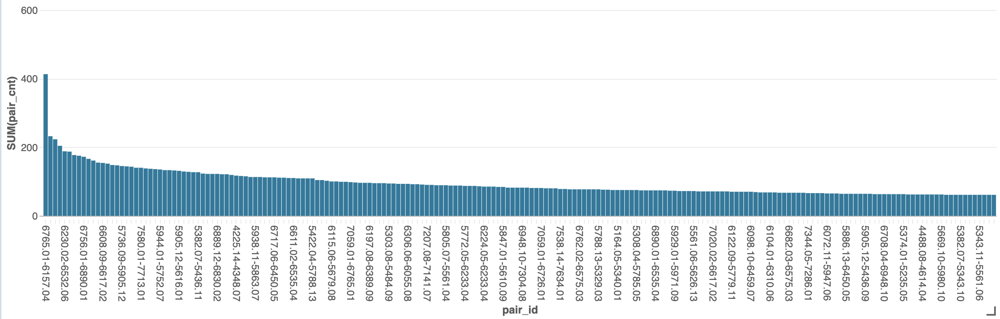

In [0]:
displayHTML("""<img width='50%' src='data:image/jpeg;base64,iVBORw0KGgoAAAANSUhEUgAACU4AAAL4CAYAAACu6//ZAAAMTGlDQ1BJQ0MgUHJvZmlsZQAASImVVwdYU1cbPndkkhAgEAEZYS9BREYAGSGsALKHICohCRBGjAlBxY0WFaxbRHCiVRCLVisgxYVbKYrbOooDhUot1uJW/hMCaOk/nv97nnPve9/znfd833fPHQcARodAJstFtQDIk+bLY0MC2JOSU9ikLkADKKAABIwWCBUybnR0BIA2dP67vb4J/aBdc1Rp/bP/v5q2SKwQAoBEQ5wuUgjzIP4RALxZKJPnA0CUQd5iZr5MhddDrCuHAUJcrcKZatyswulqfGXAJz6WB/ETAMg0gUCeCYBmL+TZBcJMqMOA2QJnqUgihdgfYt+8vOkiiBdCbAt94JwMlT4n/SudzL9ppg9rCgSZw1idy4CRAyUKWa5g9v9Zjv9tebnKoTlsYKNlyUNjVTnDuj3JmR6uwjSI30rTI6Mg1gEAxSWiAX8VZmUpQxPU/qitUMGDNQMsiCcocuP4g3ysSBAYDrERxBnS3MiIQZ+iDEmwygfWDy2X5PPjIdaHuFqsCIob9Dkhnx47NO/NDDmPO8h3CeQDMaj0PytzErhqfUwnS8wf1MecCrPikyCmQhxYIEmMhFgT4khFTlz4oE9qYRYvcshHroxV5WIJsVwsDQlQ62NlGfLg2EH/vXmKodyxE1kSfuQgvpqfFR+qrhX2RCgYiB/mgvWKpdyEIR2xYlLEUC4icWCQOnecLJYmxKl5XF+WHxCrHovby3KjB/3xAHFuiIo3hzheURA3NLYgHy5OtT5eLMuPjlfHiVdkC8Ki1fHgB0AE4IFAwAZK2NLBdJANJG09DT3wSt0TDARADjKBGDgOMkMjkgZ6pPAYBwrB7xCJgWJ4XMBArxgUQP7TCFbFSYY59dERZAz2qVRywFOI80A4yIXXygEl6XAEieAJZCT/iEgAmxDmkAubqv/f80PsF4YLmYhBRjk0I5sx5EkMIgYSQ4nBRDvcEPfFvfEIePSHzQXn4J5DeXzxJzwltBMeEW4QOgh3pkmK5COinAg6oH7wYH3Sv64Pbg013fAA3AeqQ2WchRsCR9wVzsPF/eDMbpDlDcatqgp7hPbfMvjqDg36UZwpKGUUxZ9iO3Kkpr2m27CKqtZf10cda/pwvXnDPSPn531VfRE8h4/0xJZhh7Bz2EnsAtaMNQA2dhxrxFqxoyo8vOKeDKy4odliB+LJgToj18yXO6uqpMK51rnb+aO6L188K1/1MPKmy2bLJZlZ+Wwu/GKI2Xyp0GkM28XZxRUA1fdH/Xp7FTPwXUFYrV+4xb8C4HO8v7//py9c2HEAfvCAr4QjXzhbDvy0aABw/ohQKS9Qc7jqQIBvDgZ8+gyACbAAtjAfF+AOvIE/CAJhIArEg2QwFUafBde5HMwEc8EiUAxKwWqwAVSAbWAnqAbfg4OgATSDk+AsuASugBvgLlw9neA56AWvwQcEQUgIHWEiBogpYoU4IC4IB/FFgpAIJBZJRtKQTESKKJG5yGKkFFmLVCA7kBrkB+QIchK5gLQjd5CHSDfyJ/IexVAaqosao9boWJSDctFwNB6dgmaiM9BCdAm6Ei1Hq9B9aD16Er2E3kA70OdoHwYwDYyFmWGOGAfjYVFYCpaBybH5WAlWhlVhdVgTvM/XsA6sB3uHE3EmzsYd4QoOxRNwIT4Dn4+vwCvwarweP41fwx/ivfhnAp1gRHAgeBH4hEmETMJMQjGhjLCbcJhwBj5LnYTXRCKRRbQhesBnMZmYTZxDXEHcQtxPPEFsJz4m9pFIJAOSA8mHFEUSkPJJxaRNpH2k46SrpE7SW7IG2ZTsQg4mp5Cl5CJyGXkv+Rj5KvkZ+QNFi2JF8aJEUUSU2ZRVlF2UJsplSiflA1WbakP1ocZTs6mLqOXUOuoZ6j3qKw0NDXMNT40YDYnGQo1yjQMa5zUearyj6dDsaTxaKk1JW0nbQztBu0N7RafTren+9BR6Pn0lvYZ+iv6A/laTqemkydcUaS7QrNSs17yq+YJBYVgxuIypjEJGGeMQ4zKjR4uiZa3F0xJozdeq1DqidUurT5upPU47SjtPe4X2Xu0L2l06JB1rnSAdkc4SnZ06p3QeMzGmBZPHFDIXM3cxzzA7dYm6Nrp83WzdUt3vddt0e/V09Fz1EvVm6VXqHdXrYGEsaxaflctaxTrIusl6P8p4FHeUeNTyUXWjro56oz9a319frF+iv1//hv57A7ZBkEGOwRqDBoP7hrihvWGM4UzDrYZnDHtG6472Hi0cXTL64OhfjFAje6NYozlGO41ajfqMTYxDjGXGm4xPGfeYsEz8TbJN1pscM+k2ZZr6mkpM15seN/2NrcfmsnPZ5ezT7F4zI7NQM6XZDrM2sw/mNuYJ5kXm+83vW1AtOBYZFustWix6LU0tJ1rOtay1/MWKYsWxyrLaaHXO6o21jXWS9VLrBusuG30bvk2hTa3NPVu6rZ/tDNsq2+t2RDuOXY7dFrsr9qi9m32WfaX9ZQfUwd1B4rDFoX0MYYznGOmYqjG3HGmOXMcCx1rHh04spwinIqcGpxdjLcemjF0z9tzYz85uzrnOu5zvjtMZFzauaFzTuD9d7F2ELpUu18fTxwePXzC+cfxLVwdXsetW19tuTLeJbkvdWtw+uXu4y93r3Ls9LD3SPDZ73OLocqI5KzjnPQmeAZ4LPJs933m5e+V7HfT6w9vRO8d7r3fXBJsJ4gm7Jjz2MfcR+Ozw6fBl+6b5bvft8DPzE/hV+T3yt/AX+e/2f8a142Zz93FfBDgHyAMOB7zhefHm8U4EYoEhgSWBbUE6QQlBFUEPgs2DM4Nrg3tD3ELmhJwIJYSGh64JvcU35gv5NfzeMI+weWGnw2nhceEV4Y8i7CPkEU0T0YlhE9dNvBdpFSmNbIgCUfyodVH3o22iZ0T/FEOMiY6pjHkaOy52buy5OGbctLi9ca/jA+JXxd9NsE1QJrQkMhJTE2sS3yQFJq1N6pg0dtK8SZeSDZMlyY0ppJTElN0pfZODJm+Y3JnqllqcenOKzZRZUy5MNZyaO/XoNMY0wbRDaYS0pLS9aR8FUYIqQV86P31zeq+QJ9wofC7yF60XdYt9xGvFzzJ8MtZmdGX6ZK7L7M7yyyrL6pHwJBWSl9mh2duy3+RE5ezJ6c9Nyt2fR85Lyzsi1ZHmSE9PN5k+a3q7zEFWLOuY4TVjw4xeebh8twJRTFE05uvCH/1Wpa3yG+XDAt+CyoK3MxNnHpqlPUs6q3W2/ezls58VBhd+NwefI5zTMtds7qK5D+dx5+2Yj8xPn9+ywGLBkgWdC0MWVi+iLspZ9HORc9Haor8WJy1uWmK8ZOGSx9+EfFNbrFksL7611HvptmX4MsmytuXjl29a/rlEVHKx1Lm0rPTjCuGKi9+O+7b82/6VGSvbVrmv2rqauFq6+uYavzXVa7XXFq59vG7iuvr17PUl6//aMG3DhTLXsm0bqRuVGzvKI8obN1luWr3pY0VWxY3KgMr9m402L9/8Zotoy9Wt/lvrthlvK932frtk++0dITvqq6yrynYSdxbsfLorcde57zjf1ew23F26+9Me6Z6O6tjq0zUeNTV7jfauqkVrlbXd+1L3Xfk+8PvGOse6HftZ+0sPgAPKA7/9kPbDzYPhB1sOcQ7V/Wj14+bDzMMl9Uj97PrehqyGjsbkxvYjYUdamrybDv/k9NOeZrPmyqN6R1cdox5bcqz/eOHxvhOyEz0nM08+bpnWcvfUpFPXT8ecbjsTfub82eCzp85xzx0/73O++YLXhSMXORcbLrlfqm91az38s9vPh9vc2+ove1xuvOJ5pal9Qvuxq35XT14LvHb2Ov/6pRuRN9pvJty8fSv1Vsdt0e2uO7l3Xv5S8MuHuwvvEe6V3Ne6X/bA6EHVr3a/7u9w7zj6MPBh66O4R3cfCx8/f6J48rFzyVP607Jnps9quly6mruDu6/8Nvm3zuey5x96in/X/n3zC9sXP/7h/0dr76Tezpfyl/1/rnhl8GrPX65/tfRF9z14nff6w5uStwZvq99x3p17n/T+2YeZH0kfyz/ZfWr6HP75Xn9ef79MIBcM/ApgQLW1yQDgzz0A0JMBYMJ9I3Wyen84YIh6TzuAwH/C6j3kgLkDUAf/6WN64N/NLQAO7ALAGuozUgGIpgMQ7wnQ8eOH29BebmDfqTIi3Btsj/6UnpcO/o2p96RfxT3yDFSqrmDk+V+1SYLlKgF54AAAAIplWElmTU0AKgAAAAgABAEaAAUAAAABAAAAPgEbAAUAAAABAAAARgEoAAMAAAABAAIAAIdpAAQAAAABAAAATgAAAAAAAACQAAAAAQAAAJAAAAABAAOShgAHAAAAEgAAAHigAgAEAAAAAQAACU6gAwAEAAAAAQAAAvgAAAAAQVNDSUkAAABTY3JlZW5zaG90Dv9fvwAAAAlwSFlzAAAWJQAAFiUBSVIk8AAAAddpVFh0WE1MOmNvbS5hZG9iZS54bXAAAAAAADx4OnhtcG1ldGEgeG1sbnM6eD0iYWRvYmU6bnM6bWV0YS8iIHg6eG1wdGs9IlhNUCBDb3JlIDYuMC4wIj4KICAgPHJkZjpSREYgeG1sbnM6cmRmPSJodHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjIj4KICAgICAgPHJkZjpEZXNjcmlwdGlvbiByZGY6YWJvdXQ9IiIKICAgICAgICAgICAgeG1sbnM6ZXhpZj0iaHR0cDovL25zLmFkb2JlLmNvbS9leGlmLzEuMC8iPgogICAgICAgICA8ZXhpZjpQaXhlbFlEaW1lbnNpb24+NzYwPC9leGlmOlBpeGVsWURpbWVuc2lvbj4KICAgICAgICAgPGV4aWY6UGl4ZWxYRGltZW5zaW9uPjIzODI8L2V4aWY6UGl4ZWxYRGltZW5zaW9uPgogICAgICAgICA8ZXhpZjpVc2VyQ29tbWVudD5TY3JlZW5zaG90PC9leGlmOlVzZXJDb21tZW50PgogICAgICA8L3JkZjpEZXNjcmlwdGlvbj4KICAgPC9yZGY6UkRGPgo8L3g6eG1wbWV0YT4KDHbYVQAAABxpRE9UAAAAAgAAAAAAAAF8AAAAKAAAAXwAAAF8AABw3mWMpGcAAEAASURBVHgB7N15lFVVfi/wX4EoAjIpMgS01VYe7cJok85zbFrToFF7Uts4IKg4TwlqEERBJBgEW0XjEtCFSvTlgcZn40ukbXVplLbbeWqHEBAUaWiCIg8RKQreOyfvXquKAqrwXKhz7+esRd1z9t1n39/+bP78rr2r1nz51cZX3l0QyXXUd/9b+ukPAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIEylmgSnCqnJfX3AgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQaEhAcKohFW0ECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECJS1gOBUWS+vyREgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAg0JCA4FRDKtoIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIEChrAcGpsl5ekyNAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAoCEBwamGVLQRIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIFDWAoJTZb28JkeAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAQEMCglMNqWgjQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQKCsBQSnynp5TY4AAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAgYYEBKcaUtFGgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgEBZCwhOlfXymhwBAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAg0JCE41pKKNAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIGyFhCcKuvlNTkCBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBBoSEJxqSEUbAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQJlLVD2wanVq1dHVVVVtG3bttELWVNTEy1btmx0/6Tjxo0bY8OGDU1+r0k/ojMBAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABApkIlGVwatWqVfHwww/Hv/3bv0USgkquJAi17777xkUXXRRdu3bdBO/TTz+NmTNnxksvvRTV1dXRqlWr6N27d/Tr1y8GDBiwSf9Cw9y5c+PRRx+NZcuWpU3J2AceeGAcd9xx0aNHj0I3nwQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQINCOBsgtOJaGp4cOHR7LTVENXEqC68cYbY++99y5+vXz58hg5cmSsXbu22Fb7ZuDAgTF48ODaTen9gw8+GHPmzNmkPWlo3bp1jB8/vsGQVoMvaCRAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAYLsJlF1wasyYMTF//vwUsH///nHsscdGmzZt4tlnn43HHnssbU92nkrCU4UrCVotWbIkfTz88MPjyCOPjC+++CKeeOKJWLBgQdp+2mmnxYknnlh4Jd58882YNGlS+pyM//Of/zx69eoV7777broDVfJF0n7bbbc16ZjA4g+4IUCAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECgZAJlFZyaN29ejB07NsU65phj4txzz60D9w//8A/x29/+Nm279957012h3n777bj55pvTtsMOOywuvfTS4jvJDlRXXnllJLtYJTtI3XPPPVFVVZV+P2LEiFi8eHF6BGCys1TPnj2L7z399NNx3333pc9DhgzZ4lF/xZfcECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECCw3QTKKjg1ZcqUeOGFF1K8qVOnbrLT06JFi2L27Nnp90mgqX379lH7nTvvvDM6depUB//JJ5+MGTNmpG2jRo2KPn36xOeff14MWB1xxBFx8cUX13kneTjnnHOiuro69tlnnxg3btwm32sgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQGDHCZRVcOqKK66ITz/9NL773e+mO0UVWDdu3FjcKarQVvi87LLLYuXKldGlS5f0WL1Ce+EzOcIvOcovuX72s5/FySefHC+++GLcddddaduwYcOiX79+6X3tP7fccku88cYbadODDz5Y+yv3BAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAjsYIGyCU599dVXMXTo0JTzlFNOiR49esQTTzwRCxcuTHd+6ty5cxpwOvXUU2PXXXdN+yWBqrPOOiu9P/TQQyMJUTV0DRo0KG0++uij09+YNWtWceeqO+64I5Kx618PP/xw/PKXv0ybp02bFm3atKnfxTMBAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAjtIoGyCUytWrIi//uu/ThmT0FSyU1RDV6tWreKmm26K7t27x5dffhnnn39+2m3gwIExePDghl4pHrt3yCGHxFVXXRXTp0+PZ555Ju173333RTJm/WvOnDlR2Glq0qRJ6e/V7+OZAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIEdI1A2walFixbFqFGj6igef/zx0bdv31i9enU8++yz8fvf/z79vmvXrjFx4sT0WL/kqL3kSo7gS47ia+i66KKL0jEOOOCAGD16dEyePDlefvnltGshHFX/veT37r333rR57Nixsd9++9Xpsnz58jrPHggQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQyE6gS5cuWxysbIJTH3zwQYwbN6442SRE1adPn+JzcixfstPUe++9l7Yl3yc7U1166aXpcxKaSsJTDV3nnHNOetxfYcepKVOmxAsvvJB23VxwKjkm8KGHHkr73HLLLdGtW7c6QwtO1eHwQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQCBTgYoJTi1btiw9Ri/R23///WPMmDGbQCZhpyT0lFxnnXVWJMfzJZ/Jtbmj+pLAVaHP0UcfHUOHDo2ZM2fG448/nr63uaP6Zs2aFbNnz077TJs2Ldq0aZPe+0OAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAwI4XKJsdp9avXx9nn312KloIONXn/eKLL+LCCy9MmwtBqcJuUgcddFAMHz68/ivpEX3JUX3JVdiV6sknn4wZM2akbRMmTIiePXum97X/3HPPPfHcc8+lTZvblap2f/cECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECGw/gbIJTiVk5513XqxduzYKR+rVZ/zss8/i8ssvT5uHDBkSAwYMiOuvvz4+/PDDaN26ddx77731X4nnn38+pk6dmrYnfXv37p0e9zd+/Pg649R/8ZJLLolVq1bFvvvuGzfeeGP9rz0TIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQILADBcoqODVx4sR46623omXLlnHnnXdG+/bt69AmR+clR+glV3KUX3Kk31NPPRX3339/2pYcw5fsVlX7Gjt2bMybNy9atWoV06dPj6qqqkiO70t2rlqzZk36G5MnT06/L7yX9E/eS64zzjgjjj/++MJXPgkQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQaAYCZRWcWrJkSfG4vb322iv+9m//Njp16pQyv/nmm3HrrbdGTU1NJN/ddNNNaXsSfrrgggvS+yRwdd1116WBqqTfQw89FMmxfMlVONovffh/f5Lj9+bMmZM+HnXUUTFo0KBo27ZtLF68OG644YZ056tkvDvuuCM6dOhQeM0nAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQLNQKCsglOJZ7Ir1DPPPFOkTXadWr9+fbo7VNKYhJnGjRuXhqcKnV599dW47bbbCo/p7lEbNmxIQ1ZJY7t27eL2229Pj/MrdKqurk53lVq4cGGhKf0+OSqwcA0ePDgNXBWefRIgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAg0DwEyi44lbAmwakHHnigGHwqUHft2jXdkSr5rH/NnTs3pk2btsk7vXr1St8p7FxV+70kJJXsXLVgwYLazWk46/TTT4/jjjuuTrsHAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgSah0BZBqcS2nXr1kWyG1Tyr2PHjrH33nvHnnvuGVVVVZuV37hxYyxatCjef//92HnnnWOfffZJ/232hf//xerVq+Pdd9+NP/7xj+lv9O3bN3bdddetveZ7AgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgR2kEDZBqd2kKefJUCAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp5GI0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgBwKCUzlYJCUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJCtgOBUtp6Zjva/Xp8XHdu03uqYn6z8PzHov39nq/10IECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEDgvwQEp5rx/4TJT78W/+OpV7da4bd6dYmZl/x0q/10IECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEDgvwQqJji1cuXK2LBhQ3Ts2DFatGixxfWvqamJli1bbrFP/S83btyYjt/U9+qPU/t5+tx3Yur/frF2U4P37Tu0jV+POKPB7zQSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQILCpQEUEp1577bW49dZb09mPGTMm9t9//00kPv3005g5c2a89NJLUV1dHa1atYrevXtHv379YsCAAZv0LzTMnTs3Hn300Vi2bFna1LVr1zjwwAPjuOOOix49ehS6bdNnY4NTdpzaJl4vESBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIVLBA2QenPv/88/ibv/mbNAyVrHNDwanly5fHyJEjY+3atQ3+Vxg4cGAMHjx4k+8efPDBmDNnzibtSUPr1q1j/PjxkQSptvUSnNpWOe8RIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQ2LJAWQenkuPzbrjhhpg/f35RoaHg1PDhw2PJkiVpn8MPPzyOPPLI+OKLL+KJJ56IBQsWpO2nnXZanHjiicVx3nzzzZg0aVL63KZNm/j5z38evXr1infffTfdgSr5Imm/7bbbom3btsX3mnIjONUULX0JECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQINF5guwWn1q1bF8lxeMm/li1bxh577BGdOnWKFi1aNL7aJvacPXt2zJo1q85b9YNTb7/9dtx8881pn8MOOywuvfTSYv9kB6orr7wyVq1ale4gdc8990RVVVX6/YgRI2Lx4sXpXJKdpXr27Fl87+mnn4777rsvfR4yZMgWj/orvtTAjeBUAyiaCBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECGQgULLg1FdffRWvvfZazJ07N37/+98Xj8qrX3NypF2fPn3i+9//fhxyyCGx00471e+yTc8LFy6M6667Ln13wIAB8etf/zq9rx+cmjJlSrzwwgvpd3feeWca5qr9g08++WTMmDEjbRo1alRaa3L8XyFgdcQRR8TFF19c+5X0/pxzzknnvM8++8S4ceM2+b4xDYJTjVHShwABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgEDTBTIPTi1fvjxmzpwZv/3tb5tcTbITVRKe+tGPfhT77bdfk98vvJCEtoYNG5buFPW9730vPWIvCUwlV/3g1GWXXRYrV66MLl26pMfqFcYofCZH+CVH+SXXz372szj55JPjxRdfjLvuuittS36nX79+6X3tP7fccku88cYbadODDz5Y+6tG3wtONZpKRwIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQJNEsgsOLVmzZr4x3/8x3j++eebVMDmOidhpGTXpo4dO26uy2bbk1BTEm5q165d3H777fHJJ5+kgankhdrBqY0bN8ZZZ52VjnPooYdGEqJq6Bo0aFDafPTRR8fQoUPT4/+SYwCT64477ojOnTun97X/PPzww/HLX/4ybZo2bVq0adOm9teNuhecahSTTgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgSaLJBJcOrVV1+Nu+++O9auXbvFApIdpXbbbbdIPr/88stIwlZbupJ+Z555ZgwcOHBL3ep8V3s3qOuvvz569+4d8+fPbzA4ldRw/vnnp+8nvzF48OA6YxUeCsfuJbthXXXVVTF9+vR45pln0q/vu+++aNWqVaFr8XPOnDlR2Glq0qRJ0b179+J3jb0RnGqslH4ECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIEmibwjYNTtY+yq/3T3bp1S4+wO/jggyO5b9++fRqYqt0nuU+O1UuCTe+880689dZbsXDhwvpd4sILL4yjjjpqk/b6DStWrIgrr7wyampq4oQTTojTTz897bK54FRyrGBy1F5yJUfwJUfxNXRddNFFsXr16jjggANi9OjRMXny5Hj55ZfTroVwVP33nn322bj33nvT5rFjx27T0YOCU/VVPRMgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBDIRuAbB6c+/vjjGDlyZFpNskNUsnNTElraliP2kkFWrVoVTz75ZCQ7NhV2sBoyZEgMGDBgizNOjt279tprI6knCWrdfPPNxaDW5oJTn3/+eVx66aXpuEloKglPNXTV33FqypQp8cILL6RdNxeceuKJJ+Khhx5K+9xyyy1pTbXHTkJbW7v+52vz48Fn395at+jZrVNMOaP/VvvpQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQKBSBLp06bLFqWYSnEp2YTrppJPS0NQuu+yyxR9s7JfJrlHJcXgzZ86Mv/qrv9pqcKp2UOmCCy6oE1T66KOP4v77709/OjmO71vf+la6A1bXrl3jrLPOSts3d1RfEsgq9Dn66KNj6NChaU2PP/54+t7mjuqbNWtWzJ49O+0zbdq0aNOmTXpf+CM4VZDwSYAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQCB7gZIHp5JgUXLcXuvWretU/+WXX8b69eujqqoq2rVrV+e7+g/JzlLV1dVpcxIwSnauKlxJezL+1saYMWNGulNV4b2tffbp0ydGjRoVhd2kDjrooBg+fPgmryVH9CVH9SVXYVeqZEes5PeSa8KECdGzZ8/0vvafe+65J5577rm0aXO7UtXu39C9o/oaUtFGgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBA4JsLfOMdpzZXQhI2SkJHyfXAAw/UCUPVf2fcuHHxwQcfpM3Dhg2Lfv361e+y1edHH300/vVf/7XBfkn4KtnBKrmSUFarVq3iT//0T+Pyyy+P66+/Pj788MM0+HXvvfdu8v7zzz8fU6dOTduTvr1794733nsvxo8fn7Zt7hjBSy65JD12cN99940bb7xxk3Eb0yA41RglfQgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAg0XaBZBKeuuuqqWLZsWVp9Ejg6/PDDmz6TLbzx8ccfx8iRI9MeY8aMif3337/Y+6mnnioe45ccw5ccx1f7Gjt2bMybNy8NW02fPj3dQSvZZevCCy+MNWvWpEf+TZ48Of2+8F7SP3kvuc4444w4/vjjC1816VNwqklcOhMgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBBotEBmwakpU6bEu+++W/zhTz/9tHjfsWPHaNGiRfG59s3nn39e3A0qad/ewakk/HTBBRekJSW7UV133XVpsCrZoeqhhx4qHv83cODAGDx4cLH05Pi9OXPmpM9HHXVUDBo0KNq2bRuLFy+OG264IZLjB5Px7rjjjujQoUPxvabcCE41RUtfAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAo0XyCw4lezkNH/+/Mb/8mZ61t8RajPdmtS8pR2nkoFeffXVuO2224pjJkf5bdiwoRjoateuXdx+++3pcX6FTsnxf8muUgsXLiw0pd8nganClQStksDVtl6CU9sq5z0CBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECWxZoVsGpZIemqVOn1gkobbn8xn2b7AI1YsSItHOyG9S3v/3tTV6cO3duTJs2rRiWKnTo1atXDB8+PDp16lRoKn4mIambbropFixYUGxLbpJ5nH766XHcccfVaW/qg+BUU8X0J0CAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQINA4gWYTnNprr73i5JNPjn79+jWu8hL02rhxYyxatCjef//92HnnnWOfffZJ/23tp1avXp0eU/jHP/4x9txzz+jbt2/suuuuW3ttq98LTm2VSAcCBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAEC2ySQWXAqObqupqamWMQVV1wRa9asSZ+nTJkSO+20U/G7+jfJDk3J8XiuugKCU3U9PBEgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBDISiCz4FT9gi677LJYuXJl2jxjxoxo0aJF/S6etyIgOLUVIF8TIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQ2EaBkgWntrEer9USEJyqheGWAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAQIYCJQ9OzZ8/PxYtWhRLly6N9evXb7X0k046Kdq1a7fVfpXQQXCqElbZHAkQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBHaEQMmCU2vXro277rorXn/99SbNa+LEidGjR48mvVOunQWnynVlzYsAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQGBHC5QsODV9+vR45plnmjw/wamvyQSnvrZwR4AAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQCBLgZIEp5Ldps4777xtqlNw6ms2wamvLdwRIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQyFKgJMGpDz/8MK6//vo6dfbp0yf23nvvaN26dZ32+g/HH398tGnTpn5zRT4LTlXksps0AQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIDAdhAoSXDq5ZdfjsmTJxfLP/vss+OHP/xh8dlN4wQEpxrnpBcBAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgACBpgqUJDg1f/78GDNmTLGWu+66Kzp06FB8dtM4AcGpxjnpRYAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQKCpAiUJTq1bty4uvPDCqK6uTuu59tpr4zvf+U5Ta6v4/oJTFf9fAAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgECJBEoSnEpqffrpp+O+++5Ly959991j9OjRkXy6Gi8gONV4Kz0JECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQINEWgZMGpRx55JJ599tlYuXJlsZ7OnTtHr169Ypdddim21b85++yzo3379vWbK/JZcKoil92kCRAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIEtoNAyYJTgwYN2qbyJ06cGD169Nimd8vtJcGpcltR8yFAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIEGguAoJTzWUlGqhDcKoBFE0ECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIEMhAQnMoAsVRDCE6VSta4BAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAEClS5QsuDU22+/HdXV1U327du3b7Rq1arJ75XjC4JT5biq5kSAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQINAcBEoWnGoOk8t7DYJTeV9B9RMgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECDRXge0SnFq2bFkkO1D92Z/9WXTs2DG1WLt2bbz22mvRu3fv2H333Zurzw6tS3Bqh/L7cQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAgTIWKGlw6pNPPonJkyfHkiVLUsKrr746Dj744PR+8eLFMWLEiPT+kEMOiXPPPTc6depUxtRNn5rgVNPNvEGAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECgMQIlC04tXbo0rrnmmqipqSnWsbngVNKhc+fOMXHixGjdunWxf6XfCE5V+v8A8ydAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECiVQMmCU3feeWf87ne/q1P3loJTScf9998/Ro8eHVVVVXXeq9QHwalKXXnzJkCAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQKLVASYJTX331VQwdOrRO7R07dkyP5uvZs2fa/tlnn8UNN9wQK1asqNNvwoQJUehT54sKfBCcqsBFN2UCBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIHtIlCS4NTixYvTkFRhBgMGDIghQ4YUHut8zp07N+6+++5i23nnnRc/+MEPis+VfCM4Vcmrb+4ECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQKlFChJcOr111+PX/ziF8W6J02aFN27dy8+177ZuHFjnHvuuVFdXZ029+/fP84///zaXSr2XnCqYpfexAkQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBEosUJLg1HvvvRfjx48vlj5s2LDo169f8bn2Tf3g1KGHHhqXXXZZ7S4Vey84VbFLb+IECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIlFihJcGrNmjVxwQUXFEvffffdY+TIkdGtW7diW3JTU1MTDz30UDz55JPF9hNOOCFOP/304nMl3whOVfLqmzsBAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgEApBUoSnEoKvuiii2L16tV1at9rr73SI/vatm0bS5cujYULF0YSsqp9jRkzJvbff//aTRV7LzhVsUtv4gQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAiUWKFlw6ne/+13ceeedTSq/Y8eO6TtVVVVNeq9cOwtOlevKmhcBAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgMCOFihZcCqZ2JQpU+KFF15o1BxbtmwZf//3fx89evRoVP9K6CQ4VQmrbI4ECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQI7QqCkwalkQsnOUw888ECsWrVqs/P73ve+F2eccUZ06dJls30q8QvBqUpcdXMmQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBDYHgIlD04lk6ipqYn/+I//iD/84Q/pvyREteeee0a3bt3i29/+tsDUZlZacGozMJoJECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIfEOB7RKcamqNy5cvj1tvvTVOOeWU6NevX1NfL5v+glNls5QmQoAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAg0MwEmmVwatGiRTFq1KgYPHhwDBw4sJmRbb9yBKe2n7VfIkCAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQqCwBwalmvN6CU814cZRGgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECCQawHBqWa8fIJTzXhxlEaAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJBrAcGpZrx8glPNeHGURoAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgkGsBwalmvHyCU814cZRGgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECCQawHBqWa8fIJTzXhxlEaAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJBrAcGpZrx8glPNeHGURoAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgkGsBwalmvHyCU814cZRGgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECCQawHBqWa8fIJTzXhxlEaAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJBrAcGpZrx8glPNeHGURoAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgkGsBwalmvHyCU814cZRGgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECCQawEdnP95AAAwnklEQVTBqWa8fIJTzXhxlEaAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIJBrAcGpZrx8glPNeHGURoAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgkGuBZhmc+uijj+Laa6+Ns88+O374wx/mGvibFC849U30vEuAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEBg8wIlCU69/PLLMXny5OKv9u3bN6655pris5vGCQhONc5JLwIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQJNFShJcGrevHkxduzYYi09e/aMCRMmFJ/dNE5AcKpxTnoRIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQaKpASYJTa9eujYsvvjiqq6vTelq2bBn3339/VFVVNbW+iu4vOFXRy2/yBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECJRQoSXAqqff555+PqVOnFks/7LDD4pJLLhGeKops/UZwautGehAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBDYFoGSBaeeeuqpeOWVV+Kdd94p1tWmTZvYb7/9om3btpHsQtXQdeaZZ0b79u0b+qri2gSnKm7JTZgAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQGA7CZQsODVo0KBtmsLEiROjR48e2/Ruub0kOFVuK2o+BAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECzUVAcKq5rEQDdQhONYCiiQABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgEAGAoJTGSCWagjBqVLJGpcAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQKDSBUoWnPrNb34TNTU1Tfb98z//89hll12a/F45viA4VY6rak4ECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQLNQaBkwanmMLm81yA4lfcVVD8BAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgEBzFRCcaq4r8//qEpxqxoujNAIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAgVwLZBKcevzxx4vH8vXq1Sv69esXs2fPjg0bNjQZ59hjj41dd921ye+V4wuCU+W4quZEgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECDQHAQyCU4NGjSoOJeDDjoohg8fHrXbil824mbixInRo0ePRvQs/y6CU+W/xmZIgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECCwYwQEp3aMe6N+VXCqUUw6ESBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIEGiygOBUk8m23wuCU9vP2i8RIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAhUlkAmwalZs2bF+vXrU7l99tknDjvssJg5c2bU1NQ0WfMnP/lJtG3btsnvleMLglPluKrmRIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAg0BwEMglONYeJlGMNglPluKrmRIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAg0BwEmlVwav78+bHXXntFq1atmoPNDq9BcGqHL4ECCBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIEylSgpMGpjRs3xscffxzz5s2LFStWbJYwOdJvyZIl8frrr8fEiROjR48em+1bSV8ITlXSapsrAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIDA9hQoWXAqCU3deuutaRiqKRMSnPpaS3Dqawt3BAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBLIUKFlw6pFHHonHHnusybUKTn1NJjj1tYU7AgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAlkKlCw4ddFFF8Xq1aubXKvg1NdkglNfW7gjQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgkKVASYJTy5cvj2HDhhXrbNeuXXTs2DEWL16ctrVp0yaOP/74+Pjjj+OVV16JmpqatH306NFxwAEHFN+r9BvBqUr/H2D+BAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECpRIoSXDq/fffj7/7u78r1nzbbbfFHnvsEZdffnmsXLkyWrZsGffff39UVVXFkiVLYvjw4WnfJDSVhKdc/yUgOOV/AgECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIHSCJQkOPXyyy/H5MmTixXPmDEjWrRoEXfddVe8+OKLafuECROiZ8+e6f24cePigw8+SO/vuOOO6Ny5c/HdSr4RnKrk1Td3AgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgACBUgqUJDi1aNGiGDVqVLHua665Jvr27RuPPfZYPPLII2n7qaeeGj/+8Y/T+1mzZsXs2bPT+/PPPz/69+9ffLeSbwSnKnn1zZ0AAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQKCUAiUJTq1bty7OPffcYt3JDlJnnnlm7LTTTpEc25dc7dq1i7Fjx0Z1dXVMmjQpVqxYkbYfc8wxdd5NGyv0j+BUhS68aRMgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECJRcoCTBqaTqyy67LFauXFmcQNeuXeP6669P24uNDdyccsop8dOf/rSBbyqvSXCq8tbcjAkQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBLaPQMmCU++9916MHz++OIskOPWLX/wirrvuuli4cGGxvf7N6NGj44ADDqjfXJHPglMVuewmTYAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgsB0EShacSmr/1a9+Ff/8z/8ca9asiUJwasmSJTFq1Kj0iL768zv44IPj6quvrt9csc+CUxW79CZOgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBQYoGSBqcKtf/7v/97LF68OI455pi06Q9/+EPMnDkz3n///Vi9enV07tw5vv/978dJJ50ULVq0KLxW8Z+CUxX/XwAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIBAiQS2S3CqRLWX/bCCU2W/xCZIgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECCwgwS2S3Bq3bp18cknn0Sy09TSpUtjw4YN0b179/iTP/mT6NGjR+y88847aPrN+2cFp5r3+qiOAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEAgvwIlDU4lAamnnnoq/umf/imqq6sbVGrZsmX8+Mc/jh/96EcCVPWEBKfqgXgkQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgkJFAyYJTGzdujDFjxsSCBQsaVWr79u3j1ltvjdatWzeqfyV0EpyqhFU2RwIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAgR0hULLg1COPPBKPPfZYk+bUt2/fuOaaa5r0Tjl3Fpwq59U1NwIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAgR0pUJLgVLLb1Nlnnx01NTWbzG2//faLnXbaKd2JqqHj+yZMmBA9e/bc5L1KbBCcqsRVN2cCBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIHtIVCS4NTixYtjxIgRxfpbtmwZV1xxRRx88MGR3CdXEq766KOP4u67746kf+E677zz4gc/+EHhsaI/BacqevlNngABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAoIQCJQlOvfHGG3HLLbcUyz7ttNPixBNPLD7Xvlm1alVccsklxaZjjz02zjrrrOJzJd8ITlXy6ps7AQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIBAKQVKEpz65JNP4pprrinWffXVV6e7TRUb6t2cc845UTi2b0shq3qvlf2j4FTZL7EJEiBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQI7CCBkgSnNmzYkO4itXr16nRaJ5xwQpx++ukNTrH+sX433XRT7LXXXg32rbRGwalKW3HzJUCAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQ2F4CJQlOJcXXP65v6NChcfTRR9eZ13/+53/GxIkTY8mSJWl7//794/zzz6/Tp5IfBKcqefXNnQABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAoJQCJQtOTZkyJd56661YtWpVsf5WrVpF9+7do1OnTrF06dJYtmxZ8bvkZr/99qvzXHg49NBD4y//8i8LjxXzKThVMUttogQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAttZoGTBqUGDBmU2lSOOOCIuvvjizMbLy0CCU3lZKXUSIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAjkTUBwqhmvmOBUM14cpREgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECORaQHCqGS+f4FQzXhylESBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQI5FqgZMGpJUuWxIYNGzLB2W233aJDhw6ZjJWnQQSn8rRaaiVAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIEMiTwDcOTq1bty4+++yz6Nq1a0nmvWLFili/fn3Jxi9J0RkNKjiVEaRhCBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECNQT+MbBqY8//jhGjhwZRxxxRJx00kmZBZw+//zzmDVrVjz33HMxZMiQGDBgQL3Sy/9RcKr819gMCRAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIEdoxAZsGpQvkHHnhg/OQnP4k+ffpEVVVVobnRn/Pnz49/+Zd/iZdeeqn4juBUkaLBm2/16hIzL/lpg99pJECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEBgU4FvHJxavnx5DBs2bJORW7ZsGUmI6pBDDolu3bpFhw4domPHjrHbbrulgaqvvvoqVq9eHatWrYp58+bFW2+9Fe+//36sXbt2k7GuvPLK+O53v7tJe7k32HGq3FfY/AgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBHaUwDcOTiWFL168OG6//fZYunRppvNo3bp1GspKAliVeAlOVeKqmzMBAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgMD2EMgkOJUUunHjxpgzZ07MmjUrqqurv1HtyW5Vf/EXfxGnnnpqJOGpSr0Epyp15c2bAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECg1AKZBacKha5bty6eeOKJ+NWvfpUew1dob8zn7rvvHv37948BAwakR/o15p1y7iM4Vc6ra24ECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQI7UiDz4FTtySRH+P3mN7+J119/PVasWBFr1qyp/XW0b98+9thjj+jbt28ceeSR0b179zrfV/qD4FSl/w8wfwIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAgVIJlDQ4Vb/o5Di/VatWRXIUX7t27ep/7bmegOBUPRCPBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBDIS2K7BqYxqrphhBKcqZqlNlAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAYDsLZBKceueddzY5hm9b53HwwQfHzjvvvK2vl9V7glNltZwmQ4AAAQIECBAgQIAAAQIECBAgQIAAAQIECPxf9u49Ssuq3gP4jxBEIARBhQkxUgbGLPV4Ty3pBAppLet4DBNIMZ0oyiuZt8RCA0QUbZl4zbQSPVm2UhZp6SG76EFSlyCiVMrChXdxIBKGOe1n9b7vDMPwzuWdZpj5PGsx73727Xn25+HP79qbAAECBAgQIECAAIF2JFCS4FRlZWVUVVWVZFkzZ86MsrKyksy1vU8iOLW9f0HvT4AAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAg0F4FBKfa65f553sJTrXjj+PVCBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIEtmsBwal2/PkEp9rxx/FqBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAEC27VAqwWnevfuHUOHDo3u3bs3CWjSpEnRp0+fJo3pqJ0Fpzrql7UuAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgACBthZoteBUbmFlZWUxYsSIqKioyH779euXa/JbREBwqgiQZgIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQLNFChJcGru3LmxePHiqK6uLvoaPXv2jPLy8thnn32yMNWQIUOia9euRcd1xg6CU53xq1szAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIDAv0OgJMGp9KI1NTWxevXqWLZsWSxdujSee+65WLt2baPWkMJTuSDVfvvtFzvssEOjxnX0ToJTHf0LWx8BAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgEBbCZQsOLW1BaTg1PLly7MgVQpUrVq1amvd6tTNnDkz0vF+rgjBKf8LCBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECLSOQKsGp7Z85U2bNsWLL76Y7Ur11FNPxYoVK7bsEoJTBRLBqYKFEgECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIFSCvzbglPvvvtudnxf7ii/hnafEpwqfF7BqYKFEgECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIFSCrRacOqVV17JdpZaunRpdlRfOravMdesWbNi0KBBjena4fsITnX4T2yBBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECbSRQkuBUOoJv5cqVWVDq2WefzY7g27hxY6OWNHjw4KioqIgRI0bE8OHDo2/fvo0a1xk6CU51hq9sjQQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAm0hUJLg1OTJk6MxO0r16NEjysvL80GpoUOHxg477NAW694unik4tV18Ji9JgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECCwHQqUJDhVWVkZVVVV9ZY/cODA2GefffK7SfXv379eHxUNCwhONWyjhQABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgEBLBFotOJV2l2rOblLf/e53Y8CAAS1ZU4cZKzjVYT6lhRAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECLQzgVYLTjV3nTNnzoyysrLmDu9Q4wSnOtTntBgCBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIF2JCA41Y4+xpavIji1pYh7AgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAqUREJwqjWOrzCI41SqsJiVAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECAQJQlOrVu3Lqqrq0vC2adPn5LM0xEmEZzqCF/RGggQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBNqjQEmCU+1xYR3hnQSnOsJXtAYCBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIH2KCA41R6/yr/eSXCqHX8cr0aAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQILBdC5QkODV//vx4++23Gw3RrVu36N27d+y7775RXl4eXbt2bfTYztRRcKozfW1rJUCAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQ+HcKlCQ4VVlZGVVVVc167xSaOuSQQyLNIUBVl7ApwalpJ3w8Hln+Ut0JGrg79ENlccCQ3RpoVU2AAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECg4wu0eXAqR3zQQQfFN77xjejSpUuuqtP/NiU4dcPEY2PMd3/UKLN7zjsphvTv06i+OhEgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBDoiALtJjiVcEeNGhUTJ07siM7NWpPgVLPYDCJAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBQVKAkwakbbrghXn/99aIPSx02bdoU7733Xrzxxhuxfv36emN++MMfOrLvXyqCU/X+e6ggQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgUBKBkgSnmvsmTz/9dMyePTuqq6vzU1xxxRUxZMiQ/H1nLghOdeavb+0ECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQKtKdCmwam0sEWLFsWNN96YX+Ppp58eRx99dP6+MxcEpzrz17d2AgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgACB1hRo8+BUOuLvrLPOyq/xk5/8ZJx22mn5+85cEJzqzF/f2gkQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBFpToM2DU2vXro3Jkyfn13jkkUdGZWVl/r4zF1orOHXX2SfGTt13aBTta+/+PfbfY9dG9dWJAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAwPYi0ObBqSVLlsTs2bPzXieddFIcf/zx+fvOXGit4NQ9550U5/z44Xh59etFecePPii+NvKAov10IECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQILA9CbRpcOq1116LSy65JKqqqvJm5513Xuy///75+85caM3g1KX3LYplL64uyis4VZRIBwIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAge1QoCTBqQceeCDeeeedRi2/pqYm1q9fH2vWrInnn38+qqur64y75pprYsCAAXXqOuuN4FRn/fLWTYAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAg0NoCJQlOVVZW1tk1qrkvPXz48GwHquaO72jjBKc62he1HgIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAgfYi0G6CU127do0rr7wyysrK2otNm7+H4FSbfwIvQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAg0EEF2kVwqm/fvnHRRRfFoEGDOihz85YlONU8N6MIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIFBMoSXBq1qxZ8cYbbxR7Vr59xx13jBSWGjBgQBx66KFRXl6eb1MoCAhOFSyUCBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECJRSoCTBqVK+kLkKAoJTBQslAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAqUUEJwqpWaJ5xKcKjGo6QgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAj8S6DVglMbNmyIHj161IGurq6ORYsWxQsvvBCrV6+OwYMHx7Bhw+Lggw+u17fOwE56IzjVST+8ZRMgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECLS6QEmDU6+99lr89Kc/jWXLlsXatWvjRz/6UXTp0iVbxFtvvRUzZsyIVatW1VtU375948ILL4yysrJ6bS2tqKqqiu7du2f/GjtXCnh17dq1sd2zfjU1NbF58+Ymj9vWQwSntqWjjQABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgEDzBUoWnEphqZkzZ8bGjRvzb3PHHXfE+973vuz+W9/6Vrz88sv5ti0LKah09dVXR//+/bdsavL9kiVLYuHChfHiiy/G+vXrs/E9e/aMESNGxKRJk2LnnXeuN+ebb74Zd999dzz++OPZGrp16xbDhw+PAw88MEaNGlWvf67isccei5/97GexZs2arGr33XePD3/4w3Hssce2OAgmOJVT9kuAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECgtAIlCU6l3aSmTJlS781ywamnn346C1XV67BFxSGHHBJf//rXt6ht2m0KMt1www0NDkqBqEsvvTSGDh2a75N2ykrBrnS84Nau0aNHx4QJE+o13XnnnbFgwYJ69akiHVM4ffr0SEGq5l6CU82VM44AAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIDAtgVKEpy66aab4tFHH633pNxRfSnIlAJNta/PfOYz8frrr8fvf//72tUxe/bsZoeNVqxYEdOmTcvmSztYfeELX4jy8vJsB6kHHnggnnzyyawthZmuuuqq/DGCU6dOjdWrV2dtH/vYx+LII4+MdevWxYMPPhgrV67M6tNcxx13XFZOf5566qmYNWtWdp92szrxxBNjjz32iKVLl2Y7UKWGVD9nzpzo1atX1q+pfwSnmiqmPwECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIHGCbQ4OPWPf/wjO/6u9uPGjh0bn/70p/NH4p1++ul1dnP60pe+FJ/61KeyIfPnz4/7778/P/yrX/1qHH744fn7phSuv/76+OMf/5gNueyyy2LvvfeuMzyFstIxfum6+OKLs6P7nnnmmZgxY0ZWl56bnp+70g5U55xzTqxduzbbQSoFxLp06ZI1X3DBBbFq1apIAa20s9TgwYNzw+Lhhx+O2267LbufOHHiNo/6yw/aSkFwaisoqggQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAiUQKDFwamXXnopLrzwwvyr7LfffnH++efn79MxeGeffXb+PhVSqCgdmZeud955p05Y6fOf/3yccMIJWVtT/6Rj/t58880YOHBgtqPUluOfffbZuPLKK7PqL37xizFmzJj4wQ9+EL/73e+yuuuuuy769etXZ9jChQsjHTmYrosuuigqKirqvPMRRxwRX/nKV+qMSTennnpqttNVOhLwO9/5Tr32xlS0l+DU5pqaWPN2VdFXXvPOurj51DFF++lAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAoK0FWhycSjs8pZ2eclft3aRS3SOPPBI333xzrjn22muv/HF6ucpTTjklV4yGgkj5DtsopN2dqqur46ijjoozzzyzXs/ly5fnQ0zjxo3LdsX62te+Fm+//Xbsuuuu2bF6Ww5KR/ilo/zSlQJdKdj1hz/8Ib7//e9ndSkUduCBB2bl2n/SUYB//vOfs6o777yzdlOjy+0lOLXb+3eK2f+zqOh7775b37j/7BOL9tOBAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAQFsLtDg4VftYurSY3K5MuYWlXZz+9Kc/5W7js5/9bJx4Yt1wTe3gVEOhp/wE2yikkNOmTZuib9++0adPn3o9a+8uld5zxIgRMX78+KzfYYcdFilEtbUr934jR47MjiWsfbzg3LlzY5dddqk37J577olf/OIXWf28efOiZ8+e9foUqxCcKiaknQABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgEDzBFocnHrmmWdixowZ+aeffPLJMXbs2Pz9GWecEevXr8/fX3DBBbHvvvvm77c8qi+FqlK4qtTXr371q/jJT36STdu/f/+4+uqr47333osvf/nLWd3o0aNjwoQJW31s7ti9Aw44IM4999y49dZb4ze/+U3Wt/axg7UHL1iwIHI7Tc2aNSsGDRpUuznSEYbFrp8++WLc+cgzxbrF4IH94soTDo/xNzxQtG/qcOOkUTHr10vihZdeL9r/c0dUxIBePWLewiVF+w7o//64feJ/Fu2nAwECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIHWFkgn0G3ranFwas2aNVmYKPeQioqKbNepdL9s2bKYPn16rin73TJolO7TrlW5K+36lHZ/KtWV3i/tNLVixYpsyq5du8bll18ee+65ZxZeSkftpSsdwZeO4tvaVVlZGVVVVVFeXh6XXnppXHvttfHEE09kXXPhqC3H1T6icNq0adkRhbX7CE7V1lAmQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgUFqBVg9OVVdXx2mnnRbpN3cdfvjh8aEPfSjuu+++OrtNDRs2LL797W9n3dJOVQ899FAsXrw4Nyz7nTNnThR76ToDGrjZsGFD3HvvvZF2fspdad7zzz8/ysrKsqrau12l0FQKT23t2nLHqdpH/jUUnHrwwQfjrrvuyqa76qqrYuDAgVubept1jurbJo9GAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAs0WaPGOU+nJP//5z7OQUrG3SMfifeITn8i6TZw4sU7YKlUedNBBcdZZZxWbpmj7888/HymslDsiMO0yddJJJ8WYMWOiS5cu+fE1NTUxfvz47L6ho/pq9xk5cmRMmjQp7r777vjlL3+ZjdtyB63c5PPnz4/7778/u503b1707Nkz19ToX8GpRlPpSIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQKBJAiUJTm3cuDGmTJmSHWfX0NP79OkT1113XaQQU7q2Fpxq7s5MtZ/529/+Nm655ZZ8VQpqjRs3Lnr37p2vq13I7Sb10Y9+NKZOnVq7KSunI/rSUX3pyu1KtXDhwrjjjjuyuu9973sxePDgrFz7z0033RSPPvpoVtXQrlS1+2+tLDi1NRV1BAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBFouUJLgVHqNd999N6655ppYvnx5vbdKx9RdcsklsfPOO+fbagenevTokYWWysvL8+3NKfz1r3+Niy++OBuadng655xzYsSIEducKr3XX/7yl0jvcPPNN9fru2jRorjxxhuz+tR3+PDhsWzZspg+fXpWl9YxatSoeuMmT54ca9euzY4svPzyy+u1N6ZCcKoxSvoQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQaLpAyYJTuUen4NSKFSvi5ZdfjhSY2muvvaKioiK6deuW65L9nnvuubHLLrvE3nvvHccee2ydUFWdjk24ufbaa+OJJ57InpV2gtp9992Ljn7ooYfi9ttvz/qlY/jScXy1r2nTpmXrSe9/6623Zkf9peP7zjzzzOwowLSTVnpu7fWl9adx6Tr55JNj7NixtadsdFlwqtFUOhIgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBBokkDJg1NNenqJO6cj9dLReimoddxxx21z9iFDhkS/fv2y8NMZZ5yR9U3HCKYdq4YNGxbV1dVx1113RTqWL12jR4+OCRMmZOX0Jx2/t2DBguz+qKOOilNOOSV69eoVq1atissuuyw2bNiQHUs4d+7cZofCBKfy3AoECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIESirQYYJTb731VkyZMqXROOPHj49jjjkm67948eKYM2dOfmzaPWrz5s1ZeCpV9u7dOzuGMB3nl7s2btyY7SqVjgfMXak9BaZyVwpapcBVcy/BqebKGUeAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIEBg2wIdJjiVjuhLR+Y19toy1PTYY4/FvHnz8mGp3Dx77LFHTJ06NdudKleX+00hqSuuuCJWrlyZq8p+085V48aNy44grNPQxJvtMTj187P+K97XpUsTV6o7AQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAgX+vQIcJTpWCraamJv72t7/Fc889F927d4+hQ4dm/4rNnY4HXLp0abz66qux2267xUc+8pHYaaedig0r2r49BqfumfK5uODeR2Pgzr2Lru/wvT8QHx/2gaL9dCBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBQagHBqVKLlnC+7TU49fFLbm2Uwm1f/1xcu/D/ovqfxyIWu/r33ilmnHh0sW7aCRAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECDRKQHCqUUxt06kzBKeuf2hxLF76t6LAn/v4fvHNMYcU7acDAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAgcYICE41RqmN+ghOFeAFpwoWSgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAi0XEJxquWGrzSA4VaAVnCpYKBEgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECLRcQHCq5YatNoPgVIFWcKpgoUSAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQINByAcGplhu22gyCUwVawamChRIBAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgEDLBQSnWm7YajMIThVoBacKFkoECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQItFxCcarlhq80gOFWgFZwqWCgRIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAi0XEBwquWGrTaD4FSBNgWndu2zU7zy9rpCZQOlt9b9Pa7675ENtKomQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgECE41Y7/FwhOFT5OCk59ZPCAmPbjhwuVDZR27tsrFn7z5AZa61e/u+G9eH+P7vUb1BAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECHRYAcGpdvxpBacKH6c5wakjL7s9uu3QtTDJVkrV1Ztj9sRj4uAPDtxKqyoCBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAIGOKiA41Y6/rOBU4eM0Jzh12EW3RM3mzYVJGihdf+bxglMN2KgmQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECHRUAcGpdvxlBacKH6e1g1O/fvavsUuvHoUHNlCq+sfGOO+YgxtoVU2AAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQILC9CAhOteMvJThV+DitHZy6+/FlsWjJC4UHNlA69rCKmPbZIxtoVU2AAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQILC9CAhOteMvJThV+DiCUwULJQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAAQIECBAgQIAAgZYLCE613LDVZhCcKtAKThUslAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBFouIDjVcsNWm0FwqkArOFWwUCJAgAABAgQIECBAgAABAgQIECBAgAABAgQIECBAgAABAgQIEGi5gOBUyw1bbQbBqQJtewpO/ccHB8bTL71aeLkGSm9UrY9rxn2qgVbVBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECbSkgONWW+kWeLThVAGpPwamRFXvGN29bUHi5Bko77rRj/O+lExpoVU2AAAECBAgQIECAAAECBAgQIECAAAECBAgQIECAAAECBAgQINCWAv8PAAD//+neIv0AAEAASURBVOzdC5xVdb3//w8MA8wMdwVFQeliJWqdxE5egn8qesCfZmGKUUpYj/xp5jknPXLKsrx1Dn+1jmiZlpKglHJCU0si1CNomkf0WAmn1BI1DfDCnRkuw29/9mrx4TN77dlrbdjD+rpf83jofL9rr1mzeH6/370u3/es3W3DxrZtTy75k+jX6EPfV/zO//IhcMujv5cb73us4s6MGD5Ybpg8TsZfMaviurrCnAsnyiV3LZKlL7xacf0zjj9MhvRtkmt+uqjiunsNGSBzvjRBxnz9lorr6gozzp8g1y9YLIuXLKu4/oQxH5BDhu0pl85+oOK6/Qe0yPypk+Twi2+Wbe3tFde//uyT5I4nlsqip5+vuO64ww+Uow/cX6bOmFdx3V5NvWThJWdWXI8VEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBLpeoBvBqa5HT/sbCU6ZFMEps6CEAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAgggsPMCBKd23rBmWyA4ZbQhB6e+Vni6194D+tg/pkxpSL9mOW3Ue8u8ymIEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQACBXSlAcGpXau7ibRGcMtCQg1NjLpspbRvb7B9TpjRtyjj56HuGl3mVxQgggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAK7UoDg1K7U3MXbIjhloASnzIISAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAwM4LEJzaecOabYHglNESnDILSggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAI7L0BwaucNa7YFglNGS3DKLCghgAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAII7LwAwamdN6zZFghOGW29BKceWrrM/tGdlDZvbZevnHC49O3ds5O1eAkBBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEECgnADBqXIyOVhOcMoaoZ6CU/MeX2r/8DKl0R98t0z8+wPlyrsfkeYK4ak31myQX150epktsRgBBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEKhPAYJTOW53glPWOASnzEJLcXDqvBvv9S8k1Lp17y6//NoZsnpDa8KrpYtWrN0gh43Yu/QFliCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAm8jAYJTOW5MglPWOASnzEJLWYNTj1/5ORlz6a3S1rrJbyih9o1Jx8oJh7wz4RUWIYAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACbx8BglM5bkuCU9Y4BKfMQkvVBKeOnzZbVq9a7zeUUCM4lYDCIgQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBB42wkQnMpxkxKcssYhOGUWWiI45T2oIYAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACWQUITmUV68L1CU4ZNsEps9BSrYNTC//wsjzz59f8L02oDejTJNcUPtqvX+9eCa+WLmro3k2aGnuUvsASBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEECgiwUITnUxeJZfR3DKtAhOmYWWah2c+t0rr8vchc/4X5pQGzVyfzlv7CiZMn1uwqulixZefpb06tFQ+gJLEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQACBLhYgONXF4Fl+HcEp0yI4ZRZaCjk4dd2Cp2RI/2b/D0qo9WjoLpP+/sCEV1iEAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAgjsvADBqZ03rNkWCE4ZLcEps9BSyMGpU6+bK8tXrPL/oITaBaeMlj+tWC1rW9sSXvWL1m7cJFdNPDr106w2b22XxkIwiy8EEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQqF8BglM5bnuCU9Y4BKfMQkv1EpxauXajzJz/pP/HJ9QOfNc+ctknRssXZ/5Smns1Jqxhiza0bZZbv3CSDGrpbQspIYAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggEDdCRCcynGTE5yyxiE4ZRZaIjjlPeLg1KlX3+FfKFO7/2tnEJwqY8NiBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEE6kWA4FSOW5rglDUOwSmz0BLBKe9RTXDqrqf/KEP79/EbSqitKzyhSr/6VHiSla7z2up18rmPvF+LfCGAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIBAzgUITuW4gQhOWeMQnDILLRGc8h7VBKfOuXWevPjySr+hhNrZJx5RXHrjfY8lvOoXjRg+WG47+2PS2NDdv1Cm1rZlq/Tq0VDmVRYjgAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAQC0FCE7VUncnt01wygAJTpmFlghOeY88BadumDxOvjjzl9KvuZffyQ61NRvaZNppR8t+e/Tr8ApVBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEOgKAYJTXaFc5e8gOGVwBKfMQksEp7xH3oJT46+Y5XewTG3OhRPln2cvkLUbWsusYYuPeN9+8tmjDpZBLU22sJNS78YePM2qEx9eQgABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAgOBUjvsAwSlrHIJTZqElglPeI+Tg1CV3LZKlL7zq/0EJtTOOP0yG9G2Sa366KOFVv6i5pbfMOOdk+evq9f6FMrVejQ3yweFDyrzKYgQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBN6eAgSnctyuBKescQhOmYWWCE55D4JT3mOvIQNkzpcmyJiv3+JfKFObcf4EGTl0jzKvshgBBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAIG3pwDBqRy3K8EpaxyCU2ahJYJT3oPglPeoJjj1g4efSfXRfk09e8gBew+U37600v/ShNqajW3yvTOOT3gledHa1k3St3fP5BdZigACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAwC4WIDi1i0F35eYITpkmwSmz0BLBKe9BcMp7VBOcun7BYlm8ZJnfUEKtmrE49t9mS/8+TQlbs0WtmzbLN08ZIx8asbctpIQAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggEANBQhO1RB3ZzdNcMoEqwlrHH7xzbKtvd02UqZ0/dknyR1PLJVFTz9fZg1bPO7wA+XoA/eXqTPm2cIypV5NvWThJWfKmMtmSlvhyTuVvqZNGScPLV0m8x5fWmlVglMdhAhOeZC8BaeyjMXvP/i0PPvCq/4flFAbdeBw+e5n0j/NKmETLEIAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQqHMBglM57gAEp6xxCE6ZhZZ44pT3IDjlPUIOTmUJMR757mHSunmL/8eXqR1VWHfPPr3LvMpiBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAIF6FCA4leNWJzhljUNwyiy0RHDKexCc8h71EpxK+/S3xl6N8sg3PysX3vmQDO7b4rESagfuu4d87P3vSniFRQgggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACbycBglM5bk2CU9Y4BKfMQksEp7wHwSnvQXDKe1TzsZn3PPWcrEnxEZu9e/aQsQeNkPtSfNTn2o2b5I5zT/Y7Rw0BBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAYLcJEJzabfSVfzHBKTMiOGUWWiI45T0ITnkPglPeo5rg1ENLl8m8x5f6DSXUqhmLCZthEQIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIDAbhAgOLUb0NP+SoJTJkVwyiy0VE1Y4/hps2X1qvV+Qwm1b0w6Vn73yusyd+EzCa/6RaNG7i/njR0lU6bP9S+UqS28/Cw59bq5snzFqjJr2OILThktK9dulJnzn7SFZUoEpzwMwSnvQXDKe1BDAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEIgECE7luCcQnLLGIThlFloiOOU9CE55D4JT3iNvwakr7ntM9u7f4ncyoda3d0+Z+KH3Jbyy84vat22T7t267fyG2AICCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCAQsADBqRw3HsEpaxyCU2ahJYJT3oPglPcgOOU98hacyvL0t9/86VVZ37bZ/4MSalu2tstJHzxA7v/tCwmv+kVvrtsoN5z5D/J/b50ne/Rt9i8m1A7cZw/53Efen/BK8qK2LVulV4+G5Bc7LN1c2O/Ghu4dllJFAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEukaA4FTXOFf1WwhOGRvBKbPQEsEp70FwynsQnPIeIQen8vKxmX947U156k+vediEWu+ePWTaaUfL2bfcL1ru7Kt10xa5/dyTZVBL785W4zUEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEECgZgIEp2pGu/MbJjhlhgSnzEJLBKe8B8Ep70FwynsQnPIeWlt4+Vly6nVzZfmKVaUvdlhywSmjZcXajTJr/pMdXimtZh2Lcy86XVa3birdUMKSV95aK8ePHJHwCosQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQACB6gQITlXn1iU/RXDKmAlOmYWWCE55j6xhjfu/doacU/iYshdfXuk3lFA7+8QjiktvvO+xhFf9ohHDB8sNk8fJ+Ctm+RfK1OZcOFEuuWuRLH3h1TJr2OIzjj9MhvRtkmt+usgWlikRnPIwBKe8h9byEpzSsfjZm+5NFeDSsXjWUQeX/mNYggACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCFQpQHCqSriu+DGCU6ZMcMostERwynsQnPIeBKe8B8Ep76G1PAWnsoQY17VtkrUbKz+havnqdXLNxGOksaF76T8+YUnblq3Sq0dDwissQgABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQACBt7MAwakcty7BKWscglNmoSWCU96D4JT3IDjlPQhOeQ+thRqc0n3P8vS3L9xyv/Rp6qk/VvZrXSGI9e1Jx8p+e/Qruw4vIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIDA21OA4FSO25XglDUOwSmz0BLBKe9BcMp7EJzyHgSnvIfW6iU4leVjM780a76sWbexFKvDko8cPEIu//joDkupIoAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIBAiAIEp3LcagSnrHEITpmFlghOeQ+CU96D4JT3IDjlPbRGcMqbzLlwolxy1yJZ+sKr/oWE2hnHHybv2LO/NPdsTHi1dNGwAX3klVXrSl9IWNKnV6P86fVVMqRvS8KrftGrq9bKpz880i+khgACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACmQQITmXi6tqVCU6ZN8Eps9ASwSnvQXDKexCc8h4Ep7yH1ghOeZOswakhfZvkmp8u8htJqA0c2Ed+9uXTZMzXb0l4tXTRjPMnyPULFsviJctKX+ywRI+L++3RV1ZvaOvwSml1xZr18vn/7wNyz9PPl76YsGSfwn7//pXXZVBL74RX/aJ1bZvlwn/4kF9IDQEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAIFABAhO5bihCE5Z4xCcMgstEZzyHgSnvAfBKe9BcMp7aI3glDepVXCqXsbiIcMHy6N/fMWjJtTWbGyTm6ecIJ+b8Qvp19QrYQ2/6Kj3DJNPHvpev7CT2trWTdK3d89O1uAlBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBLwAwSnvkasawSlrDoJTZqElglPeg+CU96iXsMbRB+4vU2fM8//4hBrBqVIUglPehOCU97j+7JPkjieWyqIUT6gad/iBUsuxOPvXz8pf31rrdzChtke/Zjn32FHy9Tsfkp6NPRLWsEXrCk/pWvDVT0v7tm22sJPSm+tbUz19K97E64X190zxtC5df2v7Nmno3i3+0U6/r1y3UYb2q/wxjp1uhBcRQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQScAMEpx5GvCsEpaw+CU2ahJYJT3oPglPcgOOU9CE55D60RnPImBKe8R56CUw8tXSbzHl/qdzChVs1xccylt0pb4SlVlb6+MelY+dWzL8qvn3mh0qry7hF7ycUfO0qmTJ9bcV1dQcfiuH+fLRsKYatKXxecMlpOO+x9lVbjdQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAgQwCBKcyYHX1qgSnTJzglFloqZoJ4uOnzZbVq9b7DSXUdIL4d6+8LnMXPpPwql80auT+ct7YUZkmiE+9bq4sX7HKbyihphPEK9dulJnzn0x41S8iOOU9CE55D4JT3kNrBKe8CcEp71EvwakQj4sEp3xfpYYAAggggAACCCCAAAIIIIAAAggggAACCCCAAAII7KwAwamdFazhzxOcMlyCU2ahJYJT3oPglPcgOOU9CE55D60RnPImBKe8B8Ep75GnQDHBKd821BBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQACBnRUgOLWzgjX8eYJThktwyiy0RHDKexCc8h4Ep7wHwSnvoTWCU96E4JT3IDjlPUINTq3euEn6N/X0/5gytY2bt0hTY48yr7IYAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEHj7ChCcynHbEpyyxiE4ZRZaIjjlPQhOeQ+CU96D4JT30BrBKW9CcMp7EJzyHnkKTv325ZWy8Hd/9juYUBvQt1muP/N4Of3an0qPHg0Ja9iiLVu2yn1TPyWDWnrbQkoIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAQJ0IEJzKcUMTnLLGIThlFloiOOU9CE55D4JT3oPglPfQGsEpb0JwynsQnPIeeQpOrVi7UWbNf9LvYEKtmuPivb99QfYd0Cdha36RPsnqlEMP8AupIYAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAKBChCcynHDEZyyxiE4ZRZaIjjlPaqZID7n1nnyYuHJHZW+zj7xiOIqN973WKVVZcTwwXLD5HEy/opZFdfVFQhreCbCGt6jXsIajEVr9xnnT5DrFyyWxUuW2cIyJY6LHqZejou1DE5lGYtnHXWwb4BOapu3tktjQ/dO1rCX2gpPv+pV4QlZtjYlBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQGDnBQhO7bxhzbZAcMpomSA2Cy3VywTxysKTNWbW6MkaWSaI1ZzglCqIMBYjh/j/9TIW8xLWUHfGYtT7GIvxKIy+Mxa9R60Dxa+tWid/LfxX6Wt92ya5euIx8o+3L5ABFT4KcNX6VrnylDGy3x79Km2W1xFAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQACBXSZAcGqXUe76DRGcMlMmiM1CS/UyQUxwytr9jOMPkyF9m+Sany6yhWVKfFSfh+Gj+ryH1vioPm/C09+8B09/8x48/c171PpJjBf+5EFZ37rJ/9KE2ocO2FcGNveW+c+8kPCqX9S9Wzf5z8IT3bZt88vL1d7a2CpD+7WUe5nlCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggg8DYSIDiV48YkOGWNQ3DKLLREcMp71PrJGvrbeMpNZM5Y9H2vXsYiT5yydifEaBZaGnf4gXL0gfvL1Bnz/AsJNUKMpSiEGL1JnkKML76+Wob27+N3MKH21oZWOeZ9+yW8wiIEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBAIQYDgVI5bieCUNQ5hDbPQUr2ENXjilLU7YQ2z0BJhDe8xauT+ct7YUTJl+lz/QpkaYQ0Pk6ewxvULFsviJcv8DibUOC56lHo5LhJitHbP03HxgL0HSOvmrbZzZUqvvrVOzjjyIHlgaeUxrpvYo6VJfv+X12XogMpPv3pj3Ub50jGHlvnNLEYAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAIFyAgSnysnkYDnBKWsEJojNQkv1MkFMcMraPU8TxIcM21Munf2A7VyZUv/CRO/8qZPk8Itvlm3t7WXWssV8PJhZaImPB/Metf54sEvuWiRLX3jV/9KEGmPRoxBi9B6EGL3HiOGD5YbJ42T8FbP8C2VqhBg9TNbj4gf330ueXrbcbySh9ua6Vrnu02PlS7cvkEF9eies4Rel3a7+1Oat7fKVEw6Xvr17+o1QQwABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAgpwIEp3LaMLpbBKescQhOmYWWCE55Dz6qz3vsNWSAzPnSBBnz9Vv8C2VqM86fIDzlxnCmTRknDxWeBjLv8aW2sEypXsYiT7mxDkBwyiy0RHDKexCc8h4Ep7xHPQWKr7z7EWmuEJ56Y80G+eVFp8vHr/1Pae5VOWg19pB3yFlHHeJRO6mtLDyFa3Cfpk7WsJe2tG+THt272YJOSnpMHNI33XY72QwvIYAAAggggAACCCCAAAIIIIAAAggggAACCOREgOBUThoiaTcITpkKwSmz0FK9hDV44pS1O2ENs9ASYQ3vQVjDexDW8B71FNY478Z7/T8+odate3d5/MrPyfHTZsvqVesT1vCLePqb9+Dpb96Dc1TvUetz1AcKH2X6RIqPOhyxz57ylZOOkM9/72fS0NDd72SH2tbCU7Ie+sZkOfHqO6S1dVOHV321vRCw+sePHSHvHjJI9myp/LQu/em2LVulV48Gv6EytZ6NPWTvfs1lXmUxAggggAACCCCAAAIIIIAAAggggAACCCCAQC0ECE7VQnUXbZPglEEyKWUWWqr1pNTvXnld5i58xv/ShFqtwxoEpwyd4JRZaInglPeo9VjkiVPmzVg0Cy0xFr0HY9F7EGL0HoQYvUc9hBiHFwJc3550rJxaCGWl+br/a2fIz555Xvbp36fi6msLIa9PjnpPxfVYAQEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQKBzAYJTnfvs1lcJThk/wSmz0BLBKe/BR/V5Dz6qz3v0auolCy85U8ZcNlPaNrb5FxNqfFSfR7nglNFCcMpMCE6ZhZYITnkPglPeg+CU9yA45T3qIThV63PUts1bC0+02uJhE2prNrTKJw97n8xf8mLCq6WLRh8wTEbtv1fpC7tgSfu2bdK9W7qPRdywaYs09+yxC34rm0AAAQQQQAABBBBAAAEEEEAAAQQQQAABBMoLEJwqb7PbXyE4ZU1AcMostERwynvUelJKf9uN9z3mf2lCjQlij8IEsfdggth7aE2frHHOrfPkxZdXlr7YYQkfD+ZBOC56j3o5LhJitHYnxGgWWiLE6D0IMXqPas5Rr7j319Kjwscc6m8ZXPhowX0G9JVnXlruf2lCbc2GNrn5cyfIWTf/XPo3d/5Rh6sLYa+LP3aUjBy6R8KWkhe9ub5VBqX8CMXkLSQv1ad79e3dM/lFliKAAAIIIIAAAggggAACCCCAAAIIIIBA8AIEp3LchASnrHGYIDYLLdXLBDEf1WftzgSxWWiJCWLvwQSx96hmgviSuxbJ0hde9RtKqDEWPQpj0XswFr0HY9F7ECj2HgSKvYfW8hQo/sbdi2TJ87v/uHj53Y/IqnUbS7E6LPnAO4bKmPcOl28X/tihsUdDh1d9VZ969cuLPiUfvWKWNPVq9C92qG3eslWuPP0YOajwsYtpv155a40MG9gv7eqp13tt1To5YK+BqddnRQQQQAABBBBAAAEEEEAAAQQQQAABBBBIJ0BwKp3TblmL4JSxE5wyCy0RnPIePHHKe/BRfd6Dj+rzHlpbePlZcup1c2X5ilWlL3ZYwkf1eRCCU96D4JT3IDjlPQhOeQ+CU96D4JT30BrBKW8y4/wJcv2CxbJ4yTL/QkKtmuvFI752s7RvbU/Yml90/dknyQ0PPiXPPvcX/0JCTY8Dp334QJk6Y17Cq35RQ2MP+fVlU+TIS2bI1s2VP3JRP066tfDxjHukeKrWirUb5P8c8k7/C6khgAACCCCAAAIIIIAAAggggAACCCCAQKIAwalElnwsJDhl7VDNjfDDL75ZtrWnuxF+xxNLZdHTz9svLFNigtjD1HqCmCdOmTdhDbPQEmPRe9R6LPLxYObNWDQLLTEWvQdj0XsQnPIeBKe8B8Ep76E1glPeJE/BqRCvF48dOUJWFgJUab6OP+gdcuujv5ehA1oqrt7cs4fouWGfCk/r0g2t2bhJzjvmgxW3Ga+gTwPr3q1bXOU7AggggAACCCCAAAIIIIAAAggggAACXSJAcKpLmKv7JQSnzI3glFloiSdOeQ+eOOU9eOKU9+CJU95DazxxypvMuXCi8FF9ZqJP1ghxgnji3x8o5914r/1DypQIa5TC5CmswVi09mEsmoWWvjHpWPndK6/L3IXP+BcSaoQYPUo1Ica8fFRfXp44FeJx8fTCcfGLOTgunlrYjwXP/tl3yoTa64WQ1/RPHydfnDVf9upfOcC114A+cv4xhyZsiUUIIIAAAggggAACCCCAAAIIIIAAAghkEyA4lc2rS9cmOGXcBKfMQksEp7wHwSnvQXDKexCc8h5aIzjlTQhOeQ/CGt6DsIb3OPvEI4oLbrzvMf9CQq2asAbBKYNkLJqFlhiL3qPWY5HglHmHOhbzEpw6b+womTJ9roF2Usp6jnraYe/rZGv+pdWFp1/1b+rpF5apbSx8dGJT4aMU03y9tmZ9cbWh/SqHvXTFLNvOss9p9pV1EEAAAQQQQAABBBBAAAEEEEAAAQSSBQhOJbvkYinBKWsGglNmoSWCU96D4JT3IDjlPQhOeQ+tZZ2U4qP6zJCP6jMLLfFRfd6Dp9x4D4JT3oOP6vMePP3Ne2gtT09/Izhl7UNwyiy0lKcQ4zMvrZD/+p/n/Q4m1Ab27yPf++w4mfidOdK9e+cfBdjevk1+/pVPy6Tv3iVr121M2Jot2lb4aMHPj/twccEP5/1GulX4mMG+fZpk9hc/If/n325PtR8zvzRBGirsb7w3b6xvlbYtW2WfFE/r0p/p1aOhuH78851931owOWCvgZ2twmsIIIAAAggggAACCCCAAAIIIIBA0AIEp3LcfASnrHEITpmFlghOeQ+CU96D4JT3IDjlPbRGcMqb8MQp7xHqBDEf1WftyHHRLLTEcdF7cFz0HlrjuOhN9LhIcMpMQj0u1sMTp1au3Sgz5z9pjVWmFPJx8cs/fkBe/svrZf5ltjhLuH/gwD7ysy+fJmO+fottoJPSjPMnyJMv/lX2LAS/Kn0tL3zk4l59myuttv31A4YMlOdWvLW93lmhuVejfPQ9wztbhdcQQAABBBBAAAEEEEAAAQQQQACBqgQITlXF1jU/RHDKnAlOmYWWCE55j5BvhPORRNaWoU5KEdawNmQsmoWWCGt4D8Ia3kNrhDW8CSFG78Fx0Xvk6Sk39fAkRoJT1v9CHYsEp6wNQz5HfTuPxZY+veXBi8+Qwy++Wba1t1uDlSnpWPzQiL3LvMpiBBBAAAEEEEAAAQQQQAABBBBAoHoBglPV29X8JwlOGTHBKbPQEsEp7xHyjXCCU9aWoU5KEZyyNmQsmoWWCE55D4JT3kNrBKe8CcEp78Fx0XsQnPIeZ594RHHBjfc95l9IqFXzsZlv57BG/LGZR3ztZmnfmi6scccTS2XR05U/Ei5PH2FLcMoGQ8jnqIxFa0c9Ls769e+lbfMWW1im1Kd3T/n7d+0jDz77Ypk1bPGK1evlrvNPsQUVSqs2tsmApl4V1rKX17Zukr6F/dnVX28WPp5xUEvv1JvdsGmLNPfskWr9LYWPZ+yR8mMiNUw8pG/lp5Gl+sWshAACCCCAAAIIIIAAAggggMBuEiA4tZvg0/xaglOmRHDKLLREcMp7hHwjnOCUtSUTxGahJSaIvUetJ4gZi+bNWDQLLTEWvQdj0Xtwjuo96uUclSdOWbtn+XiwvAWKCU5F7dite3d5/MrPyfHTZsvqVeutccuU8nRcrIeP6iM4ZR2x1ueox3zrNunR0N1+YUJpy5atcsmpH5W7F/9Rlry0PGENv+idQ/eQz4/5gFx0+6+kR48G/2KHWlvbFnn4kjOLY7HDSyVV3Y8LP3aUPPyHl+TpF14teb3jgoGFj0/8xidGy3m3/KLifrS2bpZfXfwZ+cR//Kds2bq146ZcXffj//7Dh+Tvhg2Rvfq3uNfKVdZv2iwtPRvLveyWF/JbMrA5fUjN/TAVBBBAAAEEEEAAAQQQQAABBDIIEJzKgNXVqxKcMnEmpcxCS/UyKVUPN8IJa1jfrvWN8DGXzZS2wl8HV/qaNmWcPLR0mcx7fGmlVetmLNbDBDFj0bo7Y9EstJSnCWLGorVNyGGNLB9JFOJTbngSo/XTkMP9hDWsHUM9LvLEKWtDxqJZaIkQo/eo9VNRGYvmPXyfPeXbk46VU6++wxZ2Urrzgony2prKgU7dxMp1G4pbGtynuZMt2ku9G3tIa4qnl+lP6BPD/vevb8i+A/raBsqUXl29rhgM65/yqWS6bX0qWZqvXo0N8sHhQ9KsyjoIIIAAAggggAACCCCAAAIZBQhOZQTrytUJTpk2wSmz0BLBKe8R8o1wwhrWlqFOSjFBbG3IWDQLLeVtUoqwRtQ+IT9Zg+CUjTGCU2ahpTx9PBjHRWubkI+LBKesHUM9RyWsYW3IWDQLLeXtHJWnv0XtE/I5ai3/6O2zN90ry1es8p04oZblqag6Bn70hZNk/BWzErZUukg/TroWx8WBA/vIz758moz5+i2lvzRhyYzzJ8ivlixL9dGPGwpP9hpSeNLYurbNCVvyi/5aeNrglNEHy/2/+7N/oUxtr37N8vtXXpfBhe+VvlZvaJMRg/vJW+sr/xHbq2+tlc+NeX/q/RjY0ks+8XcHVNoFXkcAAQQQQAABBBBAAAEEUgkQnErFtHtWIjhl7gSnzEJLBKe8R8g3wglOWVuGOinFBLG1IWPRLLSUt0kpglNR+4Q8KUVwysYYwSmz0BLBKe8xauT+ct7YUTJl+lz/QpnawsvPklOvm5tqYvaCU0ZLPYzFWkwQ5+24SFgjGhAhHxdrGdY459Z58uLLK8u8a9jiLGGNEcMHyw2Tx+32sAZj0dpPSzxxyntoLetxkbFohpyjmoWWqjlH/cg3fySbUwS+9GnhC559sfCRku3+lybU2rdtk4++bz9Z+IeXE171i95Yt1F+8NlxfuEurG3YtEWae/ZItcUthc+r7NG9W6p1WQkBBBBAAAEEEEAAAQR2ToDg1M751fSnCU4ZL8Eps9ASwSnvQVjDe+TtRjhhjah9Qp6UqocJYkKM9j5CiNEstMRH9XmPWk8QMxbNm7FoFlpiLHqPWo9FglPmHepY5IlT1oYhXy8yFq0dGYtmoaU8HRcJTlnbhBycIlActWN87+bEb8+RXoWPdKz0Nf7v3iV/Xrla/vcvr1daVfoUPppx6omHy7/MfkB692zsdP1VazfILy46XU7/7t3SvXv3TtfVFz960P4y4YMHyL4DK3+kpK6/euMm6d/UU4sVvzYWPtayKYWFbij+eM2h/VoqbldXyLLtLPv8l8ITzBp79Cg8ea0p1X6wEgIIIIAAAggggAACBKdy3AcITlnjEJwyCy0RnPIeId8IZ4LY2jLUG+E8ccrakLFoFloixOg9av3X/IxF82YsmoWWGIveg7HoPbSW9cka9RAoJqxh/STUc1SCU9aGIR8XGYvWjoxFs9ASwSnvQaDYe1RzH5XgVGQYB6eOnzZbVhc+xrDSV97G4qwFT1XaZRk+dJBc86lj5dRr7pRu3Tp/otW2wtO67r/4M3L69XfJmjUbKm77Cyd8uLjOTb/4TcV1+xU+7vEn531Cxl95W6r9mHPBaXLBTx6Ql199s+K2PzP20GJo6tt3PVpx3ebmXvLj80+R1RtaK66rK2QJe71eeIJZ94LxoJbeqbbdUgjUrS981Gaar9YtW+XN9a2yT//KIbXlhbYbfcC+aTbLOggggAACCCCAQN0KEJzKcdMTnLLGqeaCn6fcRH6hX/DPnP+kdYQypZBvhBOcskYN9UY4YQ1rQ8aiWWiJsIb3IKzhPbRGWMObzLlwonBcNBOOi2ahpTxNShGcsrbhyRpmoaVqPpJozGUzpW1jm99QQk0/kuihpctk3uNLE171i/QPbQhOmUnI56gEp6wdQz0uMhatDRmLZqGlvF0vEpyK2of7qL6fau3+r50hfIStucw4f4Jcec+j8vyLy21hmVKWOY2WPr3lwYvPkMMv/qFsK3xMY6WvrMfFI989TFoLTw9L83VUYd09C/vDFwIIIIAAAgggUE8CBKdy3NoEp6xxslxk9B/QIvOnTipcZNxcuMio/Dn3WS8yjj5wf5k6Y57tXJkSE8SlMFkniOvhce9MEFs/YSyahZaYIPYetf4LYsaieTMWzUJLjEXvwVj0Hpyjeo96eSoqwSlrd4JTZqElglPeY9TI/eW8saNkyvS5/oUyNa4XPYwGiglOmUmo56gEp6wNCU6ZhZYITnmPWt9HZSyaN2PRLLTEWPQejb0a5ZFvflYuvPMhGdy38tOsDtx3D/ntSyuksaHBbyihtmHTJvnIAcPkqWUrEl71i/66ep185/RjZOp//lfhiV3N/sWE2pD+zTLlyIMTXkletGHTFmnuWfnjOPWn2wtPXtMnh9Xiq63w5LBePSrb6e/evLW94Fz5oztrsZ9sEwEEEEAAgXoQIDiV41YmOGWNw6SUWWipXialCE5Zu4c8KUWIMWrHkP9qsR4miAlO2ftNqJNSPP3N2jDkG+GMRWtHxqJZaIkQo/eodYiRsIZ5hzoWmSC2Ngz5uMhYtHZkLJqFlvJ0XKyHezeMRet/jEWzYCx6C61xjupNqpnT4OlvkWE191Ef/t+X5I3CxyNW+mro3l3+8fjD5NK7Fknfpl6drr628GTYmV84ST77g/ukpXfPTtfVFw97x1B55a218tdV6yquqx+F+Y2TPyL/cseDqfbjhsnj5J9mL5CeKYJWBw8bIv903KiK+xCvkOUjKFdv3CT9mypbxNvW+8pD+jbFVb4jgAACCCCQWwGCU7ltGhGCU9Y41VxkENaI/Kq5yPjdK6/L3IXPWAOUKfEXxB5mxPDBohcw46+Y5V8oU+MjiTxMqDffCGtYO4Y8KUVYw9qRsWgWWsrTpBQhRmsbAsVmoaU8PeWG46K1TcjHRSaIrR1DPS4SnLI2ZCyahZZ4sob34Ck33kNrPP3Nm/D0N+/BcdF75Ol6kRCjtU3I14sEp6J2ZE7D+nNcyvqxma8VwlsP/faF+MfLfm8qBMJuLYTDTr7qJ9Kr8MSxzr7a2jbL7V+aIP94+69k7frWzlYtvnZk4dNbDh62p3xv3n9LjwpPy2osBMLuPP8U2Vx4Clear1UbWmVAc7qPlHy1YNGn8G/rVyEoF//epsLTyJoa0z2RLP4ZviOAAAIIhC9AcCrHbUhwyhqH4JRZaIknTnmPkG+EE9awtgz15hsTxNaGjEWz0FLeJqUIFEftE/LNN4JTNsZCvhHOWGQsWk/2paw3wvWnb7zvMb+RhFo14X6CUwYZ6jkqwSlrw5DPURmL1o6MRbPQEmEN78FTbrxHNfdRCWtEhiFfLxKcsnEQ8vUiY5GxaD3Zl7he9B4zzp8gV97zqDz/4nL/QkIty3GxVyFIdu9Fn5Lf/WVlwpZKF/UoPMHstTXrZHCfyh8p+VYh7NW/EN5K+9GP+w3qKy+9ubb0lyYs0Y+UXF14QtrAFGGyles2yNB+fWRLe3vClkoXZdkP/fjJY9+3X+lGWIIAAggEIEBwKseNRHDKGifLiU3/AS0yf+okYVIq8uOC3/pRXMrTRQbBqbhVREK9EU5wytow5EkpxqK1I2PRLLSUp0kpglPWNiHfCOccNWrHkM9R62EsEtaw95tQj4sEp6wNQz5HZSxaOzIWzUJLeTpHJaxhbRPyOSphjagdQz5HZSwyFk3Al/L0hGLOUa1tOEc1Cy3xB6jeo7HwhKxHvvlZ+cg3fySbC0/6qvQ1bco4eWjpMpn3+NJKqxYfzJB1LB5z5SxZv67yU8b0HPWFlatSPbFLn4p23EHvkN+nDKkdN3KEzC78+wb3q/zRj70aG2R965bCk866VfRYtaFNxo7cX5588a8V19UVRh8wTO5++nnZo0/lJ57FITkNtlX6eqPg++XCx4g2Vng6W7wdDan1SvHRnfH6Wb7r/sb7nuXnWBeB0AUITuW4BQlOWeMQnDILLfHEKe8R8kUGYQ1ry1BvhBOcsjZkLJqFlrjg9x61/hgUxqJ5MxbNQkuMRe/BWPQeWsv6kUQEp8yQCWKz0BKTUt6Dj3b3Hjz9zXvEf/RGWCNyIazh+4fW8vRHb4QYrX1CvXeTdYL4+GmzZfWq9fYPL1MixOhhePqb96hmToPjYmTIcdH3Ja1xXPQm+sSp6xcslsVLlvkXEmqMRY+i84scF80kb/dRL7zjQRnUp/Nw2JvrNso3T/6ITLv/cWnq2flHbOq/VD/WsqUQxvvLW5WfYPbG2g3y/cnj5JyZv6y4H7rt8e9/l9z79HMVP45T19V9eM/eg+TpZZWfFPfXQrDutsLHiH5uxv0ysKVySO3owkeDangwzVfPQuDsovEflgEpP74zzTbjdVYVnvyWZbtrWzdJ38KT7nb314ZNW6S58DGlab62tG+THt0rhxLTbKvjOlkCgZu3tqcOGnb8PeXqBKfKyeRgOcEpa4RqTmz4a/7Ij4sM60dxKU8XGQSn4lbhiVMmEZXydPOtHiaIGYvWA0O9EU5wytowbxf846+YZTvXSWnOhROFsWhAjEWz0BLHRe/BpJT3qOZ6kUmpyJDrRd+XtJan60XCGtY+oR4XmZSyNgz5HJWxaO3IWDQLLeXpHJUnTlnbEO43Cy0R7vcehPu9B+F+70G433twveg9tMb1ojcJOcQ47We/lt4VwkIbCk98++VFp8s//P8/keZC8Kuzr9ZC+GjqyUfKjx9bIisKwa9KX4P6Nsk5xxwqX5/zcMX9WLO+VR746qflxGvulMYUTxo7oRCQfPH11bLk5cofO9qnECD7yklHyAW3Lai4H6sLob37p35KJl5/l3TrVjk8dfQh75DVhX1/6k+vVeIo/u5ppx0tZ99yf8X9UOvbzz1ZvlAI1m0tBKgqfR3xnv0KYbkPVVpNCE5VJNp9KxCcMvtqboQTnIr8OLGxfhSX8nRiwwRx3CoEp0wiKuXp5hvBKWudkG++cVyM2jHk4yJjkbFoAr6UpxvhhBitbZggNgst5e3pbwSnovYJ+bjIBLGNsZDPURmLjEXryb6Up3s3BKesbQhOmYWW8nTvhuOitQ3HRbPQUp6uFwkUW9twvWgWWuJ60XvU+mnhjEXzZiyahZYYi96Dseg9tJb1yf15OUc966iDS/8xHZYQnOoAkqcqwSlrDYJTZqElPqrPe4R8YkNwytoy1JtvTBBbGzIWzUJLebvIIDgVtU/IE8QEp2yMhXwjnLHIWLSe7EtMEHuPkP9qceqMef4fk1Dj5lspSqg33/RfcuN9j5X+gzos4a/5PQh/ze89Qj5HzcuNcBVlLEb9qpr7qIQYIzvGYuSw4/85R91RQ4RzVO8xbcq44kcjzXt8qX8hocbHg3mUkO+jEii2tgx1ToPglLUhY9EstJS3OQ3OUaP24RzV91OtZT1HJThVahjUEoJT1lzVXPAzKRX58WZq/SguZX0z1Z+r1c03glNxq/DEKZOISnn6q0XCGtY6hDXMQkt5+qtFQozWNiFf8HNctHYM9eYbY9HaMOSxyI1wa8dQxyI3wq0NGYtmoSVuhHsPQozeQ2uEGL2Jfpw0x0Uz4bhoFlrK070bQozWNiHfu2GCOGpH5jSsP8elPM1pcFyMWyXcOQ2uF60NuV40Cy1xveg9uF70HloL9XqR4FRpWwa1hOCUNRfBKbPQEk+c8h4hn9gwQWxtGerNNyaIrQ0Zi2ahpbxdZBAojton5JtvhBhtjIV8I5yxyFi0nuxL3Aj3Hvw1v/fgr/m9xwWnjBYmiM0k5OMiE8RRO4Z8jspYZCyagC/l6Q9tmCC2tgn53g1hDWvHUO+jMhatDRmLZqGlvN1H5Rw1ah/OUX0/1Rr3brwJ9268B/duvEee7t0QnPJtE1yN4JQ1GcEps9ASwSnvEfJFBsEpa8tQL/gJTlkbMhbNQkt5u+AnrBG1T8gX/ASnbIyFPEHMWGQsWk/2JW6+eQ9uvnkPbr55jzzdfNM9q9UTipkgtnYP9XqRCWJrw5CvFxmL1o6MRbPQEk+c8h5nn3hEcQHHxcilmjkNwhqRXcj3bggU2/tCyPduGIuMRevJvsS9G+/BvRvvwb0b75GnezcEp3zbBFcjOGVNVs1FBpNSkR8XGdaP4lKeTmwITsWtEu5jbQlOWRuGfCOcsWjtGOqNcMaitSFj0Sy0RIjRe9T6EdOMRfMOeSwyQWztGOpxkbCGtSFj0Sy0lLfjIpNSUftw78b3U63l6d4Nx0VrH46LZqElglPeg+CU96hmToPjYmTIcdH3Ja1xXPQmhDW8B2EN75GnsIbuGYHiqH04Lvp+qg9J4d6NmdT63g3BKbMOskRwypqtmjdTglORHxcZ1o/iUp4uMghrxK1CcMokolKebr7xlBtrnZD/UorjYtSOIR8XGYuMRRPwpTx9DArBKWubWl/w62/i5lvkXc31IpNSkV3Ix0X+mj9qQ/1/yOeojEXGovVkX8rTvRuCU9Y2BKfMQkt5unfDcdHahuOiWWgpT9eLTBBb23C9aBZaItzvPWr9R2+MRfNmLJqFlhiL3oOx6D20tvDys+TU6+bK8hWrSl/ssCRPIUaCUx0aJ7QqwSlrsWpuhDNBHPlxI9z6UVzK0803glNxqxCcMomolKebb4Q1rHVCvvnGcTFqx5CPi4xFxqIJ+FKeboQTnLK24eabWWiJm2/eg5tv3kNrod58030nxKgKItXcuyE4FdmFfI5KWCNqQ/1/yNeLjEXGovVkX8rTfVRCjNY2hBjNQkt5uo/KcdHahuOiWWgpT/duCE5Z23Dvxiy0xL0b78G9G++htVDv3RCcKm3LoJYQnLLmqubmGxPEkR8336wfxaU8XfATnIpbheCUSUSlPF3wE9aw1gn5gp/jYtSOIR8XGYuMRRPwpTzdfCM4ZW3DzTez0BI337wHN9+8h9ZCvfmm+05wShUITkUK9n8+esEstMRx0XtwXPQeHBe9h9Y4LnqTORdOFIJTZkJwyiy0lKf7qASnrG1Cvo9KoDhqx5DvozIWGYsm4Et5uo9KiNHaptbXiwSnzDrIEsEpazaCU2ahJb35Vg+TUvVwYkNwyvp2qBf89TAWCWtYPw35gp/gVNSOIV/wMxYZiybgS3m64Oe4aG1T6wt+/U2ENSLvaq4XuREe2YV8XKyH60UmiKN+qv8P9XqRG+HWhhwXzUJLBKe8B8Ep76E1glPehOCU9+C46D0ITnmPs088oriA68XIhetF3z8I93sPzlG9B+eo3oNzVO+htVDPUQlOlbZlUEsITllzVXNiwwRx5MeNcOtHcYknTsUS0fcZ50+Q6xcslsVLlvkXEmqMRY9SLyFGwhrW7gSnzEJLhDW8x6iR+8t5Y0fJlOlz/QtlalkvMhiLBslYNAstMRa9B2PRe4wYPlhumDxOxl8xy79QpsaklIdhUsp7MCnlPZiU8h7VXC8SYowMuXfj+5LW8nTvhhCjtQ/HRbPQEsdF78Fx0XtwXPQehDW8B2EN70FYw3sQ1vAeWst6H5U/tDHDkO+jcr0YtSPXi9af41LW60WCU7FcoN8JTlnDVXORQXAq8uPN1PpRXMr6Zqo/V6u/zuCJU3GrhPsXxDxZw9ow5At+xqK1Y6g3whmL1oaMRbPQUt5uvnGOGrVPyOeo9RBiZILY3kdCPS7ylBtrw5CPi4xFa0fGolloibCG9yCs4T2quY/KpFRkGPI5KhPENg6YIDYLLeXpD204R7W24RzVLLSUt3s3HBej9uG46Pup1vI0v8j1orUP14tmoSWuF72HXi8SnPImwdUITlmTVXPBz6RU5MeJjfWjuJSnExvCGnGrEJwyiaiUpxObepggZixaDwz1IoPglLVhyDffGIvWjoxFs9ASx0XvwQSx96jmepEb4ZEh14u+L2ktT9eL3Ai39gn1uMgEsbVhyOeojEVrR8aiWWgpT+eoBKesbQhOmYWWCE55j1o/oZixaN6MRbPQEmPRezAWvQdPC/ce/Qe0yPypk4R7N5EL9258/9Ba1ns3BKdKDYNaQnDKmquaG+EEpyI/3kytH8WlrG+m+nM8cSrSYyzGvSj6zkf1eY+Qb4QT1rC2DPVGOMEpa0PGolloKW9/tcg5atQ+IZ+j1kOgmAliex8J9bhIWMPaMOTjImPR2pGxaBZaIqzhPQgUe49q7t0wKRUZhnyOSljDxgFhDbPQEmEN70FYw3sQ1vAehDW8B8dF76G1PM0vcr1o7cP1olloietF78ETp7xHkDWCU9Zs1VzwMykV+XFiY/0oLuXpxIawRtwqPHHKJKJSnk5s6mGCmLFoPTDUiwyCU9aGIU8QMxatHRmLZqEljovegwli71HN9SITxJEh14u+L2ktT9eL3Ai39gn1uEiI0dow5HNUxqK1I2PRLLSUp3NUglPWNgSnzEJLBKe8B8Ep70FwynsQnPIeXC96D61xvehNZpw/Qa5fsFgWL1nmX0ioce/Go+iDGbheNJNaXy/yxCmzDrJEcMqarZo3U4JTkR8nNtaP4lKeTmyYII5bheCUSUSlPN18IzhlrRPyzTeOi1E7hnxcZCwyFk3Al/J0I5wQo7VNrS/49TfV6qmoTBBbOzJBbBZaytM5KhPE1jYhn6MSYozaMeRzVMYiY9EEfClP56hMSlnbcI5qFlrK2xOKOS5G7cNx0fdTreVpToPrRWsfrhfNQktcL3oP/ujNe1Qz189xMTLkuOj7ktayHhcJTpUaBrWE4JQ1VzVvpkwQR368mVo/iktZ30z152o1KUVwKm4VglMmEZXydJFBWMNaJ+RJKY6LUTuGfFxkLDIWTcCX8jQpRXDK2oZJKbPQEpNS3qNXUy9ZeMmZMuaymdK2sc2/mFCbNmWcPLR0mcx7fGnCq34Rf7XoPRiL3oOx6D0Yi95DawsvP0tOvW6uLF+xqvTFDksuOGW0EJwylJCvF5mUitox5OtFxiJj0QR8KU/Xi4QYrW04RzULLXGO6j04R/UeWuMc1ZvMuXCiEGI0E0KMZqGlPM0v5uUcleCU7yPB1QhOWZMRnDILLemN8HqYlMrLm6maE5xSBRHGYuQQ/79exiJhjbjFRUK+EU5wKmrHkG+EMxYZiybgS3m6EV4P56j1MBa5+WZjjJtvZqElbr55D/6C2HtUc71IWCMyDPkctR7u3XBctLHOcdEstMRx0XtwXPQeHBePVxDGAABAAElEQVS9B+F+70FwynsQnPIeBKe8h9YITnkTglPeg3NU78E5qvfQc1SCU94kuBrBKWuyai4ymCCO/Lj5Zv0oLvHEqVgi+l7rzyBmLEbOIY/Fepgg5ulv9r4Q6kUGYQ1rw5BvvjEWrR0Zi2ahpTxd8NfDcZEJYut/oY5F/prf2jDk4yJj0dqRsWgWWsrTcZHglLVNyH9oQ4gxaseQ790wFhmLJuBLefpDG85RrW04RzULLRGc8h4Ep7yH1ghOeROCU96D60XvwfWi9yA45T2CrBGcsmYjOGUWWqqXp9zUwwU/E8TWt0M9sSGsYW0Y8gU/Y9HakbFoFlrK00VGPYQ1GIvW/xiLZsFY9BZa46/5vUk114tMEEeGTBD7vqS1PP2hDcEpa59Qj4tMEFsbhny9yFi0dmQsmoWW8nS9WA/3URmL1v8Yi2bBWPQWWuN60Ztwveg9ePqb9+Ac1XsQYvQehBi9h9ZCDTHyxKnStgxqCcEpa65qTmx4yk3kx41w60dxKU83wpkgjltFJNQLfoJT1oYhX2QwFq0dGYtmoaU83QgnOGVtE/Jf83OOGrVjyOeo9TAWmZSy95tQj4uENawNQz5HZSxaOzIWzUJLeTpHJaxhbRPyOSqB4qgdQz5HZSwyFk3Al3jilPcYNXJ/OW/sKJkyfa5/oUwt1Ali/efceN9jZf5VtnjE8MFyw+RxMv6KWbawkxJPufE4nKN6D85RvQchRu9RzVw/56iRIeeovi9pLetcP8GpUsOglhCcsuaq5s2USanIjzdT60dxKeubqf5crS4yCGvErUJwyiSiUp4uMuphgpixaD0w1At+QozWhiFPEDMWrR0Zi2ahJY6L3oObb96jmutFbr5Fhlwv+r6ktTxdLxKcsvYJ9bhIiNHaMORzVMaitSNj0Sy0lKdzVIJT1jaEGM1CSwSnvAfBKe9BcMp79B/QIvOnThKuFyMXrhd9/9Aa14veZMb5E+T6BYtl8ZJl/oWEGvduPApPf/Metb5eJDjlvYOrEZyyJqvmzZTgVOTHiY31o7iUpxMbJojjViE4ZRJRKU833whOWeuEfPON42LUjiEfFxmLjEUT8KU83QgnxGhtU+sLfv1NtQr3M0Fs7cgEsVloKU/nqEwQW9uEfI7KpFTUjiGfozIWGYsm4Et5OkclxGhtwzmqWWiJjyTyHnwkkffQGk+c8iY8ccp7cL3oPbhe9B780Zv3qGaun+vFyJDrRd+XtJZ1rp/gVKlhUEsITllzVfNmygRx5MebqfWjuJT1zVR/rlaTUgSn4lYhOGUSUSlPFxmENax1Qp6U4rgYtWPIx0XGImPRBHwpT5NSBKesbZiUMgstMSnlPZiU8h5aY1LKmzAp5T2YlPIeebpeJDhlbRPy9SKTUlE7hny9yFhkLJqAL+XpepEQo7UN14tmoSWuF70H14veQ2tcL3oTrhe9B9eL3oPrRe+hIUaCU94kuBrBKWsyglNmoSV9fF89TErVwwU/wSnr26Ge2NTDWCSsYf005BvhBKeidgz5RjhjkbFoAr6UpxvhHBetbbgRbhZa4ka49+BGuPfQGjfCvQk3wr1HqNeLTBBbO3JcNAstcVz0HhwXvYfWOC56E46L3oPjovdggth78JQb71HN/CKB4sgw5Puo9TC/yNPCbaxzXDQLLXFc9B4Ep7xHkDWCU9Zs1ZzYMEEc+XFiY/0oLvHEqVgi+l7rzyBmLEbOIY9Fwho2ZghOmYWWCGt4j1Ej95fzxo6SKdPn+hfK1LLeCGcsGiRj0Sy0xFj0HoxF7zFi+GC5YfI4GX/FLP9CmRqTUh6Gm2/eg5tv3oNJKe9Rzb0bJqUiw5CvF5mUsnEQ8jkqY5GxaD3Zl/J0H5UJYmsbzlHNQkuco3oPzlG9B+eo3kMfzEC430wI95uFlgj3ew/C/d5Da1nnNPJyvcgTp0rbMqglBKesuao5sSGsEflx8836UVzK0wU/T5yKW4WP6jOJqJSnC37CGtY6Id8I57gYtWPIx0XGImPRBHyJ4JT3IDjlPQhOeY/+A1pk/tRJwgRx5BLycTEvN99UslYf7c4EsY1fJojNQkt5ul5kLFrbhHy9yHExakeOi9af41Ke7qNyXIxbJdz7qIQ1rA0Ja5iFlghreA/CGt5Da6GGNXTfuV5UBZFq5vo5R43sOEeNHHb8f9ZzVIJTO+oFWCY4ZY1WzZspE8SRH2+m1o/iUtY3U/25Wp3YEJyKWyXcC34+ksjaMOQLfsaitWOok1KMRWtDxqJZaClvN984R43aJ+Rz1HoIMTIpZe8joR4XmZSyNgz5uMhYtHZkLJqFlghOeQ+erOE9qrmPyqRUZBjyOSohRhsHhBjNQkt5+kMbzlGtbThHNQst5e3eDcfFqH04Lvp+qrU8zS9yvWjtw/WiWWiJ60XvwUf1eY8gawSnrNmqueBnUiry48TG+lFcytOJDWGNuFUITplEVMrTiU09TBAzFq0HhnqRQXDK2jDkm2+MRWtHxqJZaInjovdggth7VHO9yI3wyJDrRd+XtJan60VuhFv7hHpcZILY2jDkc1TGorUjY9EstJSnc1SCU9Y2BKfMQksEp7xHrZ9QzFg0b8aiWWiJseg9GIveg6eFew+eFu49uHfjPbSW9d4NT5wqNQxqCcEpa65qboQTnIr8eDO1fhSXsr6Z6s/xxKlIj7EY96Lou34eOGENMwn5RjhhDWvHUG+EMxatDRmLZqGlvP3VIueoUfuEfI5aD4FiJojtfSTU4yJhDWvDkI+LjEVrR8aiWWiJsIb3IFDsPaq5d0OgODIM+RyVsIaNA8IaZqElwhreg7CG9yCs4T0Ia3gPjoveQ2t5ml/ketHah+tFs9AS14vegydOeY8gawSnrNmqueBnUiry48TG+lFcytOJDWGNuFV44pRJRKU8ndjUwwQxY9F6YKgXGQSnrA1DniBmLFo7MhbNQkscF70HE8Teo5rrRSaII0OuF31f0lqerhe5EW7tE+pxkRCjtWHI56iMRWtHxqJZaClP56gEp6xtCE6ZhZYITnkPglPeg+CU9yA45T24XvQeWuN60ZvMOH+CXL9gsSxessy/kFDj3o1H0QczcL1oJrW+XuSJU2YdZInglDVbNW+mBKciP05srB/FpTyd2DBBHLcKwSmTiEp5uvlGcMpaJ+SbbxwXo3YM+bjIWGQsmoAv5elGOCFGa5taX/Drb6rVU1GZILZ2ZILYLLSUp3NUJoitbUI+RyXEGLVjyOeojEXGogn4Up7OUZmUsrbhHNUstJS3JxRzXIzah+Oi76day9OcBteL1j5cL5qFlrhe9B780Zv3qGaun+NiZMhx0fclrWU9LhKcKjUMagnBKWuuat5MmSCO/HgztX4Ul7K+merP1WpSiuBU3CoEp0wiKuXpIoOwhrVOyJNSHBejdgz5uMhYZCyagC/laVKK4JS1DZNSZqElJqW8R6+mXrLwkjNlzGUzpW1jm38xoTZtyjh5aOkymff40oRX/SL+atF7MBa9B2PRezAWvYfWFl5+lpx63VxZvmJV6YsdllxwymghOGUoIV8vMikVtWPI14uMRcaiCfhSnq4XCTFa23COahZa4hzVe3CO6j20xjmqN5lz4UQhxGgmhBjNQkt5ml/MyzkqwSnfR4KrEZyyJiM4ZRZa0hvh9TAplZc3UzUnOKUKIozFyCH+f72MRcIacYuLhHwjnOBU1I4h3whnLDIWTcCX8nQjvB7OUethLHLzzcYYN9/MQkvcfPMe/AWx96jmepGwRmQY8jlqPdy74bhoY53jolloieOi9+C46D04LnoPwv3eg+CU9yA45T0ITnkPrRGc8iYEp7wH56jeg3NU76HnqASnvElwNYJT1mTVXGQwQRz5cfPN+lFc4olTsUT0vdafQcxYjJxDHov1MEHM09/sfSHUiwzCGtaGId98YyxaOzIWzUJLebrgr4fjIhPE1v9CHYv8Nb+1YcjHRcaitSNj0Sy0lKfjIsEpa5uQ/9CGEGPUjiHfu2EsMhZNwJfy9Ic2nKNa23COahZaIjjlPQhOeQ+tEZzyJgSnvAfXi96D60XvQXDKewRZIzhlzUZwyiy0VC9PuamHC34miK1vh3piQ1jD2jDkC37GorUjY9EstJSni4x6CGswFq3/MRbNgrHoLbTGX/N7k2quF5kgjgyZIPZ9SWt5+kMbglPWPqEeF5kgtjYM+XqRsWjtyFg0Cy3l6XqxHu6jMhat/zEWzYKx6C20xvWiN+F60Xvw9DfvwTmq9yDE6D0IMXoPrYUaYuSJU6VtGdQSglPWXNWc2PCUm8iPG+HWj+JSnm6EM0Ect4pIqBf8BKesDUO+yGAsWjsyFs1CS3m6EU5wytom5L/m5xw1aseQz1HrYSwyKWXvN6EeFwlrWBuGfI7KWLR2ZCyahZbydI5KWMPaJuRzVALFUTuGfI7KWGQsmoAv8cQp7zFq5P5y3thRMmX6XP9CmVqoE8T6z7nxvsfK/Kts8Yjhg+WGyeNk/BWzbGEnJZ5y43E4R/UenKN6D0KM3qOauX7OUSNDzlF9X9Ja1rl+glOlhkEtIThlzVXNmymTUpEfb6bWj+JS1jdT/blaXWQQ1ohbheCUSUSlPF1k1MMEMWPRemCoF/yEGK0NQ54gZixaOzIWzUJLHBe9BzffvEc114vcfIsMuV70fUlrebpeJDhl7RPqcZEQo7VhyOeojEVrR8aiWWgpT+eoBKesbQgxmoWWCE55D4JT3oPglPfoP6BF5k+dJFwvRi5cL/r+oTWuF73JjPMnyPULFsviJcv8Cwk17t14FJ7+5j1qfb1IcMp7B1cjOGVNVs2bKcGpyI8TG+tHcSlPJzZMEMetQnDKJKJSnm6+EZyy1gn55hvHxagdQz4uMhYZiybgS3m6EU6I0dqm1hf8+ptqFe5ngtjakQlis9BSns5RmSC2tgn5HJVJqagdQz5HZSwyFk3Al/J0jkqI0dqGc1Sz0BIfSeQ9+Egi76E1njjlTXjilPfgetF7cL3oPfijN+9RzVw/14uRIdeLvi9pLetcP8GpUsOglhCcsuaq5s2UCeLIjzdT60dxKeubqf5crSalCE7FrUJwyiSiUp4uMghrWOuEPCnFcTFqx5CPi4xFxqIJ+FKeJqUITlnbMCllFlpiUsp7MCnlPbTGpJQ3YVLKezAp5T3ydL1IcMraJuTrRSalonYM+XqRschYNAFfytP1IiFGaxuuF81CS1wveg+uF72H1rhe9CZcL3oPrhe9B9eL3kNDjASnvElNa9u2bZP29nZpaGjYZb+H4JRREpwyCy3p4/vqYVKqHi74CU5Z3w71xKYexiJhDeunId8IJzgVtWPIN8IZi4xFE/ClPN0I57hobcONcLPQEjfCvQc3wr2H1rgR7k24Ee49Qr1eZILY2pHjolloieOi9+C46D20xnHRm3Bc9B4cF70HE8Teg6fceI9q5hcJFEeGId9HrYf5RZ4WbmOd46JZaInjovcgOOU9alZ79NFHZe7cubJ8+fLi79hrr73koIMOknHjxsk+++yzU7+X4JTxVXNiwwRx5MeJjfWjuMQTp2KJ6HutP4OYsRg5hzwWCWvYmCE4ZRZaIqzhPUaN3F/OGztKpkyf618oU8t6I5yxaJCMRbPQEmPRezAWvceI4YPlhsnjZPwVs/wLZWpMSnkYbr55D26+eQ8mpbxHNfdumJSKDEO+XmRSysZByOeojEXGovVkX8rTfVQmiK1tOEc1Cy1xjuo9OEf1Hpyjeg99MAPhfjMh3G8WWiLc7z0I93sPrWWd08jL9SJPnCpty1265LbbbpN58+YlbrN3795y5ZVXigapqv0iOGVy1ZzYENaI/Lj5Zv0oLuXpgp8nTsWtwkf1mURUytMFP2ENa52Qb4RzXIzaMeTjImORsWgCvkRwynsQnPIeBKe8R/8BLTJ/6iRhgjhyCfm4mJebbypZq492Z4LYxi8TxGahpTxdLzIWrW1Cvl7kuBi1I8dF689xKU/3UTkuxq0S7n1UwhrWhoQ1zEJLhDW8B2EN76G1UMMauu9cL6qCSDVz/ZyjRnaco0YOO/4/6zkqwakd9XZx+ZlnnpGrrrqquNXm5mY59dRTZfjw4bJkyZLiE6j0BV3+ne98R1paWqr67QSnjK2aN1MmiCM/3kytH8WlrG+m+nO1OrEhOBW3SrgX/HwkkbVhyBf8jEVrx1AnpRiL1oaMRbPQUt5uvnGOGrVPyOeo9RBiZFLK3kdCPS4yKWVtGPJxkbFo7chYNAstEZzyHjxZw3tUcx+VSanIMORzVEKMNg4IMZqFlvL0hzaco1rbcI5qFlrK270bjotR+3Bc9P1Ua3maX+R60dqH60Wz0BLXi96Dj+rzHru89q//+q/yyiuvSENDQ/HJUsOGDdv+Ox544AGZMWNGsT558mQ57rjjtr+WpUBwyrSqueBnUiry48TG+lFcytOJDWGNuFUITplEVMrTiU09TBAzFq0HhnqRQXDK2jDkm2+MRWtHxqJZaInjovdggth7VHO9yI3wyJDrRd+XtJan60VuhFv7hHpcZILY2jDkc1TGorUjY9EstJSnc1SCU9Y2BKfMQksEp7xHrZ9QzFg0b8aiWWiJseg9GIveg6eFew+eFu49uHfjPbSW9d4NT5wqNdwlS1avXi1f/OIXi9s66qij5JxzzinZ7pQpU2Tz5s3yjne8Qy6//PKS19MsIDhlStXcCCc4FfnxZmr9KC5lfTPVn+OJU5EeYzHuRdF3/TxwwhpmEvKNcMIa1o6h3ghnLFobMhbNQkt5+6tFzlGj9gn5HLUeAsVMENv7SKjHRcIa1oYhHxcZi9aOjEWz0BJhDe9BoNh7VHPvhkBxZBjyOSphDRsHhDXMQkuENbwHYQ3vQVjDexDW8B4cF72H1vI0v8j1orUP14tmoSWuF70HT5zyHru09thjj8l3v/vd4jb/+Z//WUaNGlWy/auvvlr+53/+p7j8tttuK3k9zQKCU6ZUzQU/k1KRHyc21o/iUp5ObAhrxK3CE6dMIirl6cSmHiaIGYvWA0O9yCA4ZW0Y8gQxY9HakbFoFlriuOg9mCD2HtVcLzJBHBlyvej7ktbydL3IjXBrn1CPi4QYrQ1DPkdlLFo7MhbNQkt5OkclOGVtQ3DKLLREcMp7EJzyHgSnvAfBKe/B9aL30BrXi95kxvkT5PoFi2XxkmX+hYQa9248ij6YgetFM6n19SJPnDLrXVq688475Z577iluc/r06TJo0KCS7c+ZM0d+9rOfFZffdNNN0tzcXLJOpQUEp0yomjdTglORHyc21o/iUp5ObJggjluF4JRJRKU83XwjOGWtE/LNN46LUTuGfFxkLDIWTcCX8nQjnBCjtU2tL/j1N9XqqahMEFs7MkFsFlrK0zkqE8TWNiGfoxJijNox5HNUxiJj0QR8KU/nqExKWdtwjmoWWsrbE4o5Lkbtw3HR91Ot5WlOg+tFax+uF81CS1wveg/+6M17VDPXz3ExMuS46PuS1rIeFwlOlRrukiW33HKLPPjgg8VtzZgxQxobG0u2O2/ePImfNHXVVVfJ0KFDS9aptCBtcKpf/xa540sTZPwVsyptsvj6nAsnypdnPyAvv/p6xfWz3Hxrbukt8/51koz5+i0Vt6sraAr1ynseledfXF5x/SM/8C457qARcmlhvyt99erdUxZ+Y7J8+Ks/FNm2rdLqoic2Nzz4lDz73F8qrqt/jXDahw+UqTPmVVy3obGH/PqyKXLkJTNk6+YtFdefNmWc3PmbpalSuQcdsK+cc8yhct6N91bcrnTrJr/51udlzKW3Slvrporr64nNr559UX79zAsV1333iL3k4o8dJVOmz624rq6w8PKzZNy/z5YN61srrn/BKaMl7c234fvsKd8u7PepV99Rcbu6gr6ZTrxurqxZvb7i+llObBiLnpOx6D1CHotpwxqMRd/mHBe9B8dF76G1rMdFxqIZco5qFlriHNV71PoctS7G4o8L14t/eXtfLx5+8Q9lW/vb93rx3ML14he5Xiy+OQR9jspY3P4GH+q9G8bi9iYUxqJZaClv14scF//WPtxH9R21UMvVfVSOi9vbh+PidopigTkN71HzOQ3G4nZwxuJ2CsaipyjWGIsepZq5fs5R/2bIOarvTIVa1nNUglMlhLtmwbXXXiv//d//XdxYHI7quOX/+q//kh/+sBDcKXxdeuml8q53vcutcvfdd7t6UmXVpq0yoGdD0kslyza1i/TsXrI4ccGGrdukuaFb4msdF77VtlUaCtvt15huP/S+c/d0m5a1m9ulb2PKnS7s2Lot26RPj5Qb7/gP6aT+VsF5YEpn3cz6wn601GA/sm436353QuBeyuqcpR2z9I81m7fK1kK/HtgrXd/L0q+zjBcdh/rFWLRukrWP2E92Xsrap7OOmc5/u72adbtZ99t+U+elrM6MRe+ZZZxnef/guOidtZZ1zJRuIXlJ1u0yFr1jln6dZbxwXPTOWsv6fl26heQlWft01jGT/FtLl2bdbtb9Lv2NyUuyOnNc9I5ZxnmW9w+Oi95Za1nHTOkWkpdk3S5j0Ttm6ddZxgvHRe+stazv16VbSF6StU9nHTPJv7V0adbtZt3v0t+YvCSrM8dF75hlnGd5/+C46J21lnXMlG4heUnW7TIWvWOWfp1lvHBc9M5ay/p+XbqF5CVZ+3TWMZP8W0uXZt1u1v0u/Y3JS7I6c1z0jlnGeZb3D46L3llrWcdM6RaSl2TdLmPRO2bp11nGC8dF76y1rO/XpVtIXpK1T2cdM8m/tXRp1u1m3e/S35i8JKtzPRwXdZ7/4x//eDLY35Z227CxbduTS/5UrI4+9H2drsyLkcD3v/99eeSRR4qVcsGp+++/X26//fbiOldffbXsvffeji9NcMr9ABUEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBILUBwKjVV+hXvuOMOuffe6CPSyn1U35133in33HNPcaM33XSTNDc3p/8FrIkAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAI1FeCJU1Xwzp8/X2bOnFn8yX//93+XYcOGlWzlBz/4gTz88MPF5eWeSlXyQyxAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQACBLhEgOFUF89KlS+XKK68s/uTkyZPluOOOK9nKueeeK2vWrJF3vvOdctlll5W8zgIEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBDYfQIEp6qw37Ztm5x99tmyYcMG6devn1x77bXS2Ni4fUvPPfecXHrppcX6pEmT5IQTTtj+GgUEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBDY/QIEp6psA/34vXnz5hV/evTo0fKZz3xGWlpa5JVXXpFvfvOb0traKg0NDTJ9+nTp379/lb+FH0MAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAIFaCBCcqlJ18+bNxadKvfjii9u30Lt372JgKl5w5plnyvHHHx9X+Y4AAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAI5ESA4tRMNoU+V+ta3viV/+tOf3Fb0SVOf+tSnZNy4cW45FQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEMiHAMGpXdAO69atkyVLlsiKFStkyJAhcsghh0hTU9Mu2LLfxMqVK4sLBg8e7F8oU6vV+rXabvzPSLv9tOtl3W7W9dmPWCz6jof3iGtpXdKul3W7WddnP2Kx6DseeHgBX6N/4OEFfI3+4T3iWlqXtOtl3W7W9dmPWCz6jgceXsDX6B94eAFfo394j7iW1iXtelm3m3V99iMWi77jgYcX8DX6Bx5ewNfoH94jrqV1Sbte1u1mXZ/9iMWi73jg4QV8jf6BhxfwNfqH94hraV3Srpd1u1nXZz9iseg7Hvn08HsV1QhOJankdBkDyzcMHnh4AV/LS/+I9yrt/qRdL+t2s67PfsRi0Xc88PACvkb/wMML+Br9w3vEtbQuadfLut2s67MfsVj0HQ88vICv0T/w8AK+Rv/wHnEtrUva9bJuN+v67EcsFn3HAw8v4Gv0Dzy8gK/RP7xHXEvrkna9rNvNuj77EYtF3/HAwwv4Gv0DDy/ga/QP7xHX0rqkXS/rdrOuz37EYtF3PPLp4fcqqhGcSlLJ6TIGlm8YPPDwAr6Wl/4R71Xa/Um7XtbtZl2f/YjFou944OEFfI3+gYcX8DX6h/eIa2ld0q6XdbtZ12c/YrHoOx54eAFfo3/g4QV8jf7hPeJaWpe062Xdbtb12Y9YLPqOBx5ewNfoH3h4AV+jf3iPuJbWJe16WbebdX32IxaLvuOBhxfwNfoHHl7A1+gf3iOupXVJu17W7WZdn/2IxaLveOTTw+9VVCM4laSS02UMLN8weODhBXwtL/0j3qu0+5N2vazbzbo++xGLRd/xwMML+Br9Aw8v4Gv0D+8R19K6pF0v63azrs9+xGLRdzzw8AK+Rv/Awwv4Gv3De8S1tC5p18u63azrsx+xWPQdDzy8gK/RP/DwAr5G//AecS2tS9r1sm436/rsRywWfccDDy/ga/QPPLyAr9E/vEdcS+uSdr2s2826PvsRi0Xf8cinh9+rqEZwKkklp8sYWL5h8MDDC/haXvpHvFdp9yftelm3m3V99iMWi77jgYcX8DX6Bx5ewNfoH94jrqV1Sbte1u1mXZ/9iMWi73jg4QV8jf6BhxfwNfqH94hraV3Srpd1u1nXZz9iseg7Hnh4AV+jf+DhBXyN/uE94lpal7TrZd1u1vXZj1gs+o4HHl7A1+gfeHgBX6N/eI+4ltYl7XpZt5t1ffYjFou+45FPD79XUY3gVJJKTpcxsHzD4IGHF/C1vPSPeK/S7k/a9bJuN+v67EcsFn3HAw8v4Gv0Dzy8gK/RP7xHXEvrkna9rNvNuj77EYtF3/HAwwv4Gv0DDy/ga/QP7xHX0rqkXS/rdrOuz37EYtF3PPDwAr5G/8DDC/ga/cN7xLW0LmnXy7rdrOuzH7FY9B0PPLyAr9E/8PACvkb/8B5xLa1L2vWybjfr+uxHLBZ9xyOfHn6vohrBqSSVnC5jYPmGwQMPL+Breekf8V6l3Z+062Xdbtb12Y9YLPqOBx5ewNfoH3h4AV+jf3iPuJbWJe16WbebdX32IxaLvuOBhxfwNfoHHl7A1+gf3iOupXVJu17W7WZdn/2IxaLveODhBXyN/oGHF/A1+of3iGtpXdKul3W7WddnP2Kx6DseeHgBX6N/4OEFfI3+4T3iWlqXtOtl3W7W9dmPWCz6jkc+PfxeRTWCU0kqOV3GwPINgwceXsDX8tI/4r1Kuz9p18u63azrsx+xWPQdDzy8gK/RP/DwAr5G//AecS2tS9r1sm436/rsRywWfccDDy/ga/QPPLyAr9E/vEdcS+uSdr2s2826PvsRi0Xf8cDDC/ga/QMPL+Br9A/vEdfSuqRdL+t2s67PfsRi0Xc88PACvkb/wMML+Br9w3vEtbQuadfLut2s67MfsVj0HY98evi9imoEp5JUcrqMgeUbBg88vICv5aV/xHuVdn/Srpd1u1nXZz9iseg7Hnh4AV+jf+DhBXyN/uE94lpal7TrZd1u1vXZj1gs+o4HHl7A1+gfeHgBX6N/eI+4ltYl7XpZt5t1ffYjFou+44GHF/A1+gceXsDX6B/eI66ldUm7XtbtZl2f/YjFou944OEFfI3+gYcX8DX6h/eIa2ld0q6XdbtZ12c/YrHoOx759PB7FdUITiWp5HQZA8s3DB54eAFfy0v/iPcq7f6kXS/rdrOuz37EYtF3PPDwAr5G/8DDC/ga/cN7xLW0LmnXy7rdrOuzH7FY9B0PPLyAr9E/8PACvkb/8B5xLa1L2vWybjfr+uxHLBZ9xwMPL+Br9A88vICv0T+8R1xL65J2vazbzbo++xGLRd/xwMML+Br9Aw8v4Gv0D+8R19K6pF0v63azrs9+xGLRdzzy6eH3KqoRnEpSYRkCCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAgi8rQUITr2tm5d/HAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCQJEJxKUmEZAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIvK0FCE69rZuXfxwCCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggkCRCcSlLJ2bLW1lZZuXKlrFixQtauXSvNzc3Sp08fGTBggAwdOlS6deuWsz0WYZ+7rklCsl69erX8/ve/l3333VdGjBjRdUhd/JsWL14sb7zxhgwbNkxGjhzZxb89+nUhWoe4z6od6n7rvof0/qH7q19bt26Va665RrZt21Z8H/nkJz8pDQ0N0Ys5/D/9o+sbJaR+HXL/0JYNyTprT8zDsTze59CcQ+7XoVnHfSTt9zz06xD7R4j7vGOfCKlfY71jy+WrnIf3j6wiedtnxmLWFsy+fojvISHuc9wyIfVp3ecQrUPc57h/ZPmep/fr0Pq1Ooe4z6Hud6jWaccjYzGtlF8v1PfqUPc7xPePUK2Zh/FjvVa1EPtHiPuctv0ITqWV6uL1dEL4kUcekdtvv13WrVtX9rfrZPF73/teGT9+vHzwgx8su15XvMA+d4Vy9DtCs9b9/clPfiI///nPi/+AT3/608U+q5XrrrtOXn75Zdlnn322/6eBwL333ltaWlqif3Bg///KV75S/Dcdeuih8uUvf7lL9z5E6xD3WRs15P0O7fiy4yDatGmTnHXWWdsX7bXXXnLRRReJfs/TF/2ja1tDvUPq16H2D23V0Kyr7Ym781geqnOo/bpe+rT2q93Zr0PsHyHuc/yeF1q/xjpuufx+353vH9Wq5GGfGYvVtl62nwvxPSTEfdZWCa1Px/sc2j3JUPtHtpFra+/u9+tQ+3VI90Di1sY6lsjnd8ZitnYJ9b065P0O7X0vVOt4JDAPE0vU5nuI/SPEfc7aegSnsop1wfqaXL/44otl+fLlmX6bBk/05/r375/p53bFyuzzrlBMt40QrX/84x9vD03pv3LH4FR8Qp70r29sbJQ99thDjjnmGDnhhBOSVsnlsvjftDuCUyFah7jP2vFC3O8Q3z86DvKOJ+z6uoaIp0yZIh/96Ec7rr7b6vSPrqMPsV+H2D+0RUO0rrYn7s5jeajOIfbrUK1D7Nch9o8Q9znU92qsqx3VXfdzu/O4WO2/cnfvc4jHmFDHYoj7HeI+h9in9f0jROsQ97na92r9ud35fh1ivw5xn7WdQ9zvEPdZrav9Yixmkwv1vTrE/Q51LIZoveMoYB5mR41dXw6xf4S4z1lbjuBUVrEuWH/69OnyxBNPFH/T4MGD5Ygjjih+PN+f//xn+c1vflNcPmrUKPnwhz8sf/zjH+Xhhx+WzZs3F5frR/j9x3/8h/Tu3bsL9tR+BftsFrUuhWa9Zs0aOffcc4ss+vGSn//85+WQQw7Z/tFaO77R6lOmtC/rx9zt+LU7Akj68Zj6FJuDDz64+DS3D3zgA8UQ1477Va68uy4yQrQOcZ+13UPd79DeP5LG2I4n7Jdffrn84Ac/kJdeeqm4qj55Ud9vmpqakn60y5bRP7qMuviLQuvXofYPxQ7NOsRjeYjOus+h9uvQ+rRah9ivQ+wfIe6z9g/9Cq1fY911925CfP8IcZ+jkchYjB1q/T3E95AQ91nbMbTji+5ziNYh7rNah/p+HWK/DnGftY+EuN8h7jNjUXtb7b9Cfa8Odb9DHIuhWu84epiH2VFj15ZD7B8h7nM1rUZwqhq1Gv6MTv5+9atfLf6G4447Ts4880zp1q3b9t/4hz/8QXSiWL801PH+97+/GDTR8Mn8+fOLy0866SSZOHFisdwV/2Ofu0I5+h0hWi9atEhuvPHG4j/gO9/5jmgYcMcvfbTfZZddJs8995wceeSRxdCDLnvzzTflmmuuKQYidkdwSp/4dsEFF+y4q9KvXz8ZO3Zs8WMGOwtm7K7gVIjWIe6zdooQ9zvE9w83AP9W2fGE/Xvf+5707dtX7r77bvnpT39aXEMDxPoRme95z3uSfrxLltE/uoS5+EtC7Nch9g/FDtE6xGN5iM7aP0Ls16Fah9ivQ+wfIe5zqO/VWHfdvZsQ3z9C3GfG4peVoMu+QnwPCXGfQz1vCtE6xH3WAR/i+3WI/TrEfdb+EeJ+h7jPjMWuO68O9b06xP0OdSyGaK3vITt+MQ+zo8auLYfYP0Lc52pajeBUNWo1/JkFCxbIj370I9GJX50Q7t69e8lv+/73vy/6Wa5HHXWUnHPOOdtfj1O3+tFm11577fbltS6wz7UWtu2HaB0/UWq//faTb33rW/aP2aH0q1/9Sm699dbiE5127Lv/9m//Js8++6zsjuDU6tWr5aqrrpKXX35Ztm7dusPeRh8LpgGqj33sY4kfjbm7glMhWoe4z9oZQtzvEN8/3MD7W6XjCbsGGvVLn8qoYctVq1YV6yeffLJ88pOfdOHj4gtd8D/6Rxcg/+1XhNivQ+wfyh2idYjH8hCdtX+E2K9DtQ6xX4fYP0Lc51Dfq7Huuns3Ib5/hLjPjMWuDU6F+B4S4j6Het4UonWI+6zveyG+X4fYr0Pc51CPi6FaMxa1x9X+K9T36hD3O9SxGKJ1x5HDPExHkV1XD7F/hLjP1bQYwalq1Gr4MzNmzJAHHnhARo4cuf3JUx1/XXyg0Cf36BN84q+nnnpKvv3tbxc/Ak1DKF31xT53lbRIiNbxm6l+1N2//Mu/JGI988wzxZCSvnjbbbdtX2d3BqfinWhvb5dly5bJ008/LQ8++OD2UEb8+pgxY+SMM85wHw22u4NTIVmH2j9C3O8Q3z/icbbj93In7LqOvnbLLbcUw8Va18CmPjlOA8Vd+UX/6DrtEPt1iP1DWzRE67gnhnQsD9U5xH4dqnWI/TrE/hHiPof6Xo111927CfH9I9R9DvEYE+pYDHG/Q9znEPu0vn+EaB3iPsfv1fqda68dNXZ9OdSxGOJ+h7jPO/Y4xuKOGru+HOp7dYj7HepYDNG640hhHqajyK6rh9g/QtznalqM4FQ1ajX8mV/84hcye/ZsGT58uGhoJOnrjjvukHvvvVcGDRpU/GzoeB0NdujTNhobG4uTW/HyWn9nn2stbNsP0frRRx+VG264ofgxd9/97ncTn/6iH7F11113SXNzs9x0003b/8F5CE5t35m/FfQjBfVjMZ944ontT6LS/f6nf/qnYuBRV9tdwakQrUPcZ23jEPc7xPcPtd68eXMxuKhl/dK6vqfol36crY6/jl86PjVMrF8NDQ3FjwD9f+xdCdxWQ/uekpQkEbKUiBYVUsq+hL6yxWcX8VkjS1JJC8pWZCuyFVmjj/iQ7FkikchSRKSyRmkh/sj/u+Yzj3nPe57znOd5z5kz19s9v9/7nmXmnOc619xzz5yZ+9x3+/btg8VSOxb5SI3acjdmlGtG+QDxjFyXE5i/Tvjcl7PyzCjXrFwzyjWjfDBihmwwyrVwfVe+Zu3svM/9Yj4SfMcsbTFfzSV/nlGHMGJmlGlIGyPXjJijWrbP+ppRrhkxQz4YcTNilrboblzNqqsZcbO2RUauZR0mSosmm8coH4yYS6k1MZwqhbUUr5k1a1YunFn//v1zhhjmJ1esWKF69+6tsLW9yvz555/qsssuU3PmzFGbb765Gjp0qLkk9a1gTp3i3A8wcg1vTQMGDNDPcOihh+rQWbkH+u/OokWLtEwjHF7z5s1zZVHGR8Mpg33lypVq/PjxCmEGTerYsaM67rjj1KBBg3SIP9chBhm5ZsSM+mbEzag/wPW3336rvUZhvyLJ9mZXkfvEuVbkIw5LyZRhlGtG+UBtMXJdSMp87MtZeWaUa1auGeWaUT4YMbPqauHa3dwNo/5gxczYx7C2RUbcjJgZZRr6g5FrRsyFdDXy5d0rDkuFy7C2RUbcjJgLS5C0xTgcxSnDqqsZcbO2RUauZR0mTutPpgyjfDBiLqW2xHCqFNZSvAYWnQgrtHjxYu0lA4YY7dq1U7///ruaPn26/lIGRlNIPXr0ULvssot69dVX1YQJE7QBCs537txZde3aFbtOkmB2QrP+EUauAXzw4MEKXxghbbnllqpDhw5qnXXWUfPmzVNPPvlkznMTQvnBINAknw2nDEYMJsaOHavef/99fQohwZYtW6a94rg2nAIARq4ZMTNyzao/GAfsIh9gwE1ilWtGvcfKdRxJ9KkvZ+aZTa6ZuWaTa+Blkw9WzKxyzSgfrFwz6g9GzKzywdgWWfU1G9esMi3yEUeDui0j714V45u1LTLiZsRcjHRJWyyGrfCybH25eQo23MxtkY1rWYcxrcTNlk0+wAoj5mJrUwynimXMQfmFCxeqfv36Rf7SVlttpYYMGaLLwDPV/Pnz9T6MNoYPH67D9UXeIOFMwZwwoRG3Y+R66dKlOpQdBjn5EsJonXPOOWWyGQynDODZs2erG2+8UXuDM+eyMJxi5JoRM+qYETej/gDXy5cvx0YnxNY+77zz9P6wYcN0GNC/svJuqlSpoo018xZIIUPkIwVS89ySUa4Z5QP0M3KdR2xCT/vSl7PyzCjXrFyHCnCek77INaN8MGKGGDDKtXCdpwFnfNoX/VEMDT5hlrZYTM1VrCyjDmHEzCjTkCxGrhkxF9uKfdHXjHLNiBnywYibEbO0xWIZKL08q65mxM3aFhm5lnWY0nVCsVcyygcj5mLrRQynimXMUXlYdo4ePVrhJSKY9tprL3XSSSfljKMGDhyovvvuO4Xzhx9+uKpRo0bwEifHgtkJzfpHGLmGp7SHHnpITZ48uRxRRx99tDrooIMUjBvsBDec33zzjdp0001Vs2bN7Cwv9+F2esSIETnvU1kYToEYRq4ZMbNyzag/7AYPw6mTTz5Znxo1alQswyn7epf7jHLNKh+MuBnlA+2Hketi2r0vfTkrz4xyzco1o1wzygcjZlZdLVwX06rdlfWlXyzmiX3CzNjHsLZFRtyMmBllGvqDkWtGzMXoapT1RV8zyjUjZtQ5I25GzOC6mCRtsRi2ypZl1dWMuFnbIiPXRsplHcYwkd6WUT4YMRdTg2I4VQxbGZRFyD7EjcR2k002UQ0aNFC1a9cug+TPP/8sZ3BSpoDjA8HsjnBGrhF28uuvv9YGURtttJHafPPNdVhKd6yl+0tojxMnTtShM5s0aaJ22223dH8w4u6MXDNiRhUw4mbUH+D6jz/+UPfee69CW0NY2urVq+O010nkw131MMo1o3ygRhm5jiuJPvXlrDwzyjUr14xyzSgfjJhZdbVwHbdVuyvnU78Y96l9w8zYx7C2RUbcjJgZZRr6g5FrRsxxdTXK+aSvGeWaETPqnRE3I2ZwHTdJW4zLVHg5Vl3NiJu1LTJyLesw4e09jbOM8sGIOU7dieFUHJZIyixZskR/qVGrVi1Vp04dZ6jROOAqcYsttvDKgCstArLiudDz/Prrr/oLqpo1ayr8Bb03Fbrex3yfuP7xxx9V1apVvfZuU0wdglsMfBDek0VWfMWMEJSff/65+vLLL9V2222nOS2mLrIqi6+JFixYoOrXr++1XFf2PsZXuS5GLn3S1TZuln4Rk1PPPPOMnjDGWGrbbbe1H0P2U2AA+g/9Ov7QF66zzjr6w4T111+fpk9MgZbEbsnYLzJhrgz9IssYpNRGkWW/KPJRaq2le53v4z2mfrGyvZeHSV6WOiQMT5xzjJjjPJeLMkxjEJuPytiX+6qr2fUeUx9jyzjbvvDstsZY5ptY+xhTm0xyLf2iqTW/tr6MUVnbIvuctejq9Nojq0zHYUQMp+KwRFLmoosu0ovgrsODwUXiBRdcoL0GNWrUSLVq1Up16tRJL0IFqfvwww/V7bffrurVq6e23357HV7QpZFXEE8px1nxHMS6aNEiHfpu7ty5euEPispOa665poLHo5YtW2qe1113XTubYt8HrmfOnKnuuOMOzTG823Tu3Flz98QTTyjEc0UYQXiDw996663nBa8IcYiwiDDkueSSS7SnOgCDNf6YMWPUBx98oBeKDdhtttlGnXjiiQrtN6vEiBlcvfTSS+q+++5Tv/zyi6bu/PPPV23atClH49lnn63WXntt1aJFC9W2bVu9LVfI0QnojBtvvFHLg/nJjTfeWHXp0kXtueee+tT777+vpk2bpo0xIRfwnLbhhhua4k63zH0Mq1wXW8E+6GpgZu0XbbfHeI4OHTqobt26qWrVquFQUkIMfPLJJzpc8NSpU1VwzGR+Yo011tBjp7333lvtuuuuYkRliCliy9gvsmFm7hfZxiBFiH6Zoln2iyIfZarCyQHreI+tX2R8Ly9VALPUIasT5lKfNcnr2MYgeHbWvpxRVzPrPbY+Jsl27fJewrM7thnnmxj7GNQom1xLv+iuHZbySz6Mq1nbIvhmm7MWXV1KKyn+GmaZjvO0YjgVhyWSMll1AmZy1qYJBgLAs+WWW9qn1ZtvvqlGjBiROwfjnssuu0yHa8ud9HwnK54NLbDyHTt2rHrhhRfMqVhbGLMdd9xx2mtSrAs8KJQ111hcvfnmm3NM2IZTAwcOVPPmzcvlYQcLrjCeMsZUrVu31oaEZQqlfPDss8+qe+65J/craF9ohwj5efHFF5cxmMoV+msHC/UdO3YMnk79mBEzSHnuuefU3XffXYaffIZT3bt310ZIpvDJJ5+sjSPMsavtu+++q4YPH5735yDXc+bMUePHjy9TBrJ96qmnqj322KPMeRcHrH0Mq1yXUqdZ62r2fjH4Eoo6gDfAvn37qs0226yUKvHimvnz52vD4+bNm+vxR5ag7rrrrqLHTfA+NWDAAAXDUp+TTzwz9ouMmFn7RcYxSKltP8t+UeSj1For7TrW8R5bv8j4Xl6aRP3vqix1SKm4mTD7MnZiHIOw9uWMuppZ77H1McXoPV/0BzBXZp7xfL5wzTrfxNjHMMq19IuoNb9T1mNU1rZoapVlzlp0tamx9LfsMh2HITGcisOSwzLwYAOPTDvssIMO+VTMYk1WnYA9OQsDDYSsQoJRFLya2J6OYLxx55136sGv+dof5YYOHep0YYqRZyOG8HQEb0ImgXMYqoHbFStW6NNNmzbV3mFgoY/6MQnhfyAnLkOzsXIN+TzzzDO1JyEYjey7777qgAMO0N7SwCeMTzA4jkquvb/B9WjPnj21cRQww/MRPEkhBFGvXr3UDz/8oOFiMbh9+/a6zX322WfqlVdeyT3G4MGDVePGjXPHae8wYgYnNm7osGOOOUYbySHsHUI6BtPkyZPVjBkztLcvo/v69OmjPe8Fy6Z1vGrVKnXuuedq72n4DcgnPGDBExkmEoELcoOwVSYFj6+55hrtXc3ku9gy9jG2fLC0RVZdDRlk6xeD7cZ+CYVR5b333pvziAQdvv/++wcvoTiGd0OM79Dn2EbzrsHfcsst6rXXXsv9LPo4jIfgRQ/jJ+hGjJ+WLVumZs+erT7++ONcWej3kSNHhnpRzRXKeMcXnm29x9IvMmKGuDH2i4xjENZ+UeTDnVK2dQjLeA/ssPWLjO/l4JlRhzBiBtfFJh/GTrb+YBk3MfblkA2baxZdzar3wDdbHwPMxSQf9AfwVnae8Yy+cM0432TrPZY+hlGupV90t37EOkZlbYtojyaxzFmLrjY1lu62Msh0HIbEcCoOSw7L2BOd+FkYPCCk3X777acQTisq+WA4de2116qFCxeq66+/XkNFqDh4uQlLzzzzjF4cRN6BBx6ojj322LBiqZxj5BlEwPDlvPPO05zAYArGMHXr1tXHsKr9z3/+ox5++GFt/HDVVVdpz0cwZEN4NuMdCV5jEILGVWLl2vaOBq8f2223XRnKEJoN52F0AvlFmDOExsMf6uDHH3/UhimoI1fpxRdf1IaJmAwy9Y/fhgEdDKKQzjrrLB1+SB/89Q+Y+/fvrw1mYFB1zjnn2Nmp7jNiBiH213/QcdB1cRLaQ79+/bRRxF577aVOO+20OJclUubtt9/O6eagHsALCIzujFEXvKbhudZaay01ffp0deutt2r5QJhBlHOZbB3C0scwyrXNM+qXYfwBnIz9InDbyX4JHTVqlEJ/fsMNN2jdjXIIuYtwn6gTpmQmOoEZOiQL/LZ8wLAVY6gGDRpE0oj6GDt2bM6oGB47jz/++Mhrssz0gWc8P2O/yIgZXNv6mqVfZByD2DyDd5Z+0cYt8oGaSy8xjvcY+0XG93JInd0WccygQxgxg9tikw9jJ8YxCGNfDtlg1NWseo+xj2HUH6sDz6gXH3S1zTXLOgy4Y+xjbK5Z5m6kX3S3fsQ6RmVsi9AhdmKYs7b1h+hqu/aS368MMh2HFTGcisOSwzLff/993kXpRo0aqSOOOEJ7owqD5IvhFLxk2RaeMMKAMUZYwgLh66+/ro3CLrnkkrAiqZxj5BlEwGMCviqJ8oCA0GzwlgBju5NOOknzhw4O/C5YsECHRYQHCFeJlesJEyYo/MEjhTEEDHL2+OOP65Bmm2++ufaqYfJhtPThhx86N5yClxIYJO688856kd3gef755/UicJTXD3gxQ7tF+8Uii6vEiBnc/Pvf/9aGiginBc96wTRt2jRtsAiDB3h5stO4cePUxIkTFV4Eo8Lm2dcksf/YY49po758cmDy8VvBkIOmPeR73iTw5buH/XIE2WToYxjlmlVXM/aLQVkPvoQaT52TJk1S999/vy5eo0YNbSwNT0ksyZ7ohMdGhAt2nV5++WUdLhC/O3r0aAUe4yZ42Js5c6ZzXR0XnynnA8/AwtgvMmIG14z9ohljMI1BWPtFkQ+0EjeJcbzH2C+a9xCm93JIIKMOYcRcSmv3YezEOAZh7MshH4y6mlXvMfYxxeoQH/TH6sAz6sUHrlnnmxj7GEa5ln7R3foR6xiVsS0G+0WGOWvR1cOD1ZbacWWQ6TjkiOFUHJYcl/n99991uDuEC4Hl8ty5c8sgwMI1wkLtsssuZc77ZDgFbwnAA+9T+LIOYU5g7BNMZlCEPMTmdpnYeAY399xzjw6pBe9j+QzNnn76aXXfffephg0bqiuvvDJH6ZQpU7THB+E6R0nkjuG6devW6oILLggt+95776mrr75ae/i6++67c2WyMpxCmE+E3evQoYNCuCeTjIHXVlttpYYMGWJOl9kaa2F4q7KfpUyhFA4YMYMGhBzFl4utWrVSF154YTlmnnrqKfXAAw9ozyaQBzuhjvDcrrk2rrxheAEPY8FkfymD56tevXquiBmAusYMAGELgL73MaxyLf1iTuSd7uR7CQUIjKNgwIOvZ5BggHT00Udr/aFPOPwHd7xXXHFF7F/8+eefdfg7c0Hz5s0VvDchjKyrdMcddyiMNYNjoji/b75ORzg/tGlXiZFncMPYLzJiBteM/SLrGISxXxT5QCtxkxjHe4z9IuN7uZFARh3CiJlx7MQ4BmHtyxl1NaveY+xjGPUHI8/oFxm5Nm2RbR2GsY9hlGvpF/9eCzNj3zS3jGNUxrYYrEOGOWvR1e7aYmWQ6aCMhx2L4VQYK56dQ8gvLN7Aa8yyZcty6Fq0aKF69OihjGcCnwynABIGX8a4J18ovldffVXddttt2qjKteFUjsi/dnznGTAfeeQR9eijj6rGjRvnQq8FnwPh+mD5CYM1hMYxadasWdqQKgvDB4PBbBm4fuGFF7QxX5RXIOPJbAMsKAAAQABJREFUKWiMlpXhlPH0hrqHFySEWUN6//331bBhw7RMYFBfpUoVUxW5rZGt9dZbT910002582nvMGIGJ8YYLZ+HLhifPffcc9q4ASGfbM7Ni1U+rwtpcQ7PNfBgE9QN5veMzOMYhlW2ZxsYv8KLlmsDAmAJWwDEeZ/7GFa5Bq92YtDVRnex9YswKjIJL6EIxYcEg2czrjP5mBzAS+CMGTP0KYTS7NOnj/aIaMq42NptsdTfw7PB26ir9OCDD6onn3wyr96LwmG8A8Lj6+WXXx5VNNE8Rp5BAGO/yIgZXNsyYjwx4rzP/SLrGAS82omhXxT5sGss3X3G8R5jv2jeUZjey/NJHoMOCWJnwGzrvSD+uMeux6iMYxDWvpxRV7PqPcY+hlF/MPIMXczINet8E2MfwyjX0i+6Wz8KG88xjFEZ2yK4ZpuzFl09IqyJpHKOVaaLJUMMp4plLOPycFOKRfhvvvlGI4HBBkLh7bjjjtrDE0KxYb9Xr17OkNoDX3vyHgBuuOEGNX36dI1l0KBBqmnTpmVwDR48WH3yySehXlnKFHR84CPPoACLptddd502xsAW3sfsBC8sAwYMUPPnz9dcg3OTYJiGl+8oF/emrMutr1zPmTMn550JHqfgecpOWMhGCDYYMwYXVbMynLLbIjx7nHXWWapu3bp6sHPmmWeqP/74Q3sqOfjgg+1H0Z5MevfurX777bdM9QcLZpBne2eCgSi+PjIJ7fCMM87IDTLhIfCggw7S2fjCCvoZXON50V5dJePpCr8HIwDIrZ369u2rvvrqK30KnrQQrg9ep4C5Z8+eWn6ijFPseyW5b8s1Sx9jY2aS66h681VXM/aLtnxEcR6VFzTYjSqbVB4mJSoaXhRjkPPOOy8pSAXvY+QDBTt27Ki6detW8BoUgKcveGjEZEE+4/9YNyqhECPPeEzGfpERM7i2dQhLv8g6BgHf+ZKv/aLIR74aS/68zTXLeI+xX2R8L48jbb7qkCjsvmJmHDsxjkFY+3JGXc2q9xj7GEb9wcgz+hZmrvEROtM6DGMfwyjX0i+6W3+OGp8iz9cxKmNbtMdNhXjPl+96ztroD9HV+WokufOMMl3K04vhVCmsZXwNFuURdg0eTX755ReNZo899lAfffSRWrRoUaaGD8HJ+6VLl2rjEhhsQHEdf/zxqm3btuqnn35SDz/8cM6oar/99lMnnXRSxsyW/XnfeAa6FStWaC9j4BOegU4//XQdKgzHGCA888wz2rsQyh511FHqkEMOUV9++aX2MvPSSy/htGrfvr02ttMHnvzzkWsYtmBxF4ZRkF0Yvuy9996qdu3aat68eQouZDGQQOratavq3Llzjs2sDKcAwHztYMC0a9dOtWzZUsvO+PHj9Wl4EoJhDLwHYXEYHu0gQ0gwZoRxjMvEiBm6F8ZokBMMBmEoBV4xEYBQmfDwZid4iIHBAM7jGiTI10477WQXS3Ufob6MwQK8XcFj4RZbbKEN51AHCD1pJ8g9jKvscLHdu3dXu+++u10s9X17wM7UxzDKdaHK9FFXM/aLtkwX4jwqH7pGUjQDkFkYq2J8jAQvgejL0S+iP4cHPnhnXLlypVq+fLn67LPPtC6ER1STsugXzW8zbRn7RUbMkAlbh7D0i6xjkEJt0Md+UeSjUK0lm8823mPsF1nfy+NImo86pBBuRsyFnimLfMYxCHNfzqarWfUeYx+TRfuv6G8KzxVlMP71jPNNeDrGPoZRrqVfdLt+VKjl+jhGZWyL9nxCIc6j8l3OWYuudre+yCjTUXKaL08Mp/IxQ3AeoV0ee+wxHRrDhuuTxyngmjp1qrr55pttiGX2a9SooUaMGKGNOMpkeHLgC8+GjrfeekuHYTPHYVssBCK0Fgw6EHILHqiQYAgBL2DwQuRj8o1rO+RJPr6wCAsPHHYotiwNp4ATRonQDcWmE088Ue2///7FXpZIeUbMMEYcPXp03ueHd5MvvvhCffzxx+XKwPue7RGuXIGUThh3mvlu36ZNGy3LxlOgXS4rzPaAPbhADHw+9zGMcm3Xeb5933Q1W78I/vCFhkmYGL/99tv1IYzIa9WqZbLybqtVq+bU8DIvEIIMeM2Ddz873HVc2GEeJ+NeuzqWY+wXGTGz9ouMY5C47dinflHkI26tJVeObbzH2C+yvpfHlTKfdEhlxhz32VyVYxyDMPflbLqaVe8x9jGu2nySvyM8J8lm9L3Y5pvM0zD2MYxyLf2ikTh/tr6Nq9naIuuctehqd22QTaZLYUYMp0phzbNrPv/8czVs2DDtUQbQfDOcAia4rhwzZkzOqw3OISHUHEJAbbnllv874fH/rHm2qXnttdcUQu/BwjOY4NWmT58+Ch5ukIzh1Oabb6694gjXQcaij2fPnq0XtI23Crs0PAwhVCa8Vthp0qRJ2limRYsWmRki4asHDN6xOA8vSFEJBjEnnHBCudBtUdekkceIefLkyWrsf8OnGo9dhpf69esrGNDhPOIswxAJ3kzQLuFlCh7MbGM7c13aW3x98cQTTyjjfcz+vYYNG2p9Ae8r0DGvv/66lmN4t4NXw8MPPzwTzIUWAPEMPvcxjHJty0XUvvSLUezEz8NL6cknn6wvGDVqlFp33XXjXywlYzEA4zToPrzcLV68uOA1TZo00aFtgyGmC14oBRRbv4gqY8PM2i8yjkGKbdI+9IsiH8XWWjLl2cZ7jP0i63t5MRLmgw4pBi/KMmIu9hnTLM82BmHvy9l0NaveY+xj0mznad1beE6L2fL3ZV2HYetjwDybXEu/WL69+HLGpzEqY1s09cg0Zy262tRa+ltmmY7DjhhOxWGJoAzc0cHD0HfffacQmuvYY491hhph94x3m8MOOyyv5ygYbyDeKMKc1axZU2299dYK3k2qVq3qDGtFfyhLnoPYYTT15ptvaj7x8g+DDITdglEGPEuZBL7hgapevXrmFMXWJ64xCMaEBbwHff3112qjjTZS22yzjWJZUMUiMUI2InQmPG7AYAcL8/A8hueAZzLfEhNmcAr5QFtD+EOEI91kk018o7QMHvBrMEMfb7XVVmqHHXYoU8aXg8rUxzDJddz690lXs/aLv//+u7rwwgvVqlWr1JVXXqnHSHH5l3LFMwBDaIS3Rp+IP4TpgwE0jETxB6NnjJsklc4AY7/IhJm9X2Qag5TSCrLuF0U+Sqm1ZK9hG+8x9Yvs7+VxJC1rHRIHY7AMI+bgM2R5zDQGMTxVhr6cRVez6z2mPsbIN+NWeE6/1ljnmxj7GFObTHIt/aKpNb+2Po1RWdsi25y16Gp3bZBVpuMwJIZTcViSMsKAMCAMCAPCgDAgDAgDwoAwIAwIA8KAMCAMCAPCgDAgDAgDwoAwIAwIA8KAMCAMCAPCgDAgDAgDwoAwUKkYEMMpz6sTltXwYvL9999rb1Kw4oNHE3wJD28xzZo1Uw0aNMgkfFKQOoSkevbZZ9Ubb7yhvfIghFmrVq2CxXQZeOwB9ho1apTLd3kCmKdNm6ZmzpypPXXBAxYSPBCAZx898dj8ACfCacELEuJA4w/PBPmAR6FGjRrpOoAnqizCgtlYGeXD4J86dar2zgOPUwh5iHCYkO3q1aubIgpfd8Oief3118+cawMK7m1PP/10fbjZZpvpsJi+ex5jkmnDM6N8MGGGt0KEL0NoTHiCgXcs26ueqQdsUXbOnDk6DCz0XrVq1exs5/vMes85WavRDzLLdDHVNGvWLO1BC94ZBw0aVMyliZdlHe998skn+j1g5513LhMWeMGCBeqdd95R2OLZ8C7QsmVL7UUycfJKvCFjf86IGdXDiJsRczFNASGR58+fr7bbbjvVsWPHYi6tcNnK0McwvsOg4phwM/aL7ONqprk9yDPT+yLw2omNa2Bn6xeZxqiVoV9kkWlGrhkx2/qOqS3auBn1HnO/yDRGDcpJnOMs370MPmb5YBuDMOoPIyfFbEWui2GrbFmWcZONmlWHVNb+RQynbOn0aB/uHceNG6cnKwrBwgLyvvvuq7p06aLq1KlTqHgq+cA7cOBAHQbM/MD555+vQ/GZY7Pt3r27gptEJBj29OvXL5OQKDB0GTp0qEK8W6SuXbuqzp076/3BgwcrvHzAeGrjjTfWYfAQegt/CImHc7bRjL7I4b9vvvlG3XLLLWru3LmxfhWhZ4477ji16667xiqfdCFG+QAHMIS64YYb1AcffFCOkg033FBdffXVCs+GMli8REJ73G233dSJJ56o1lprrXLXuTxhxyA22GBIBXy+JTaZBn+M8sGI+dtvv1UXXHBBGZE96qij1CGHHFLmHA4QvnTEiBH6PNpip06dnIautQGx6j37GaL2IUsw7IaRLvpFluQDblaZLraO0XdinAVj7ltvvbXYyxMrzzjeg/64/vrrc2PUyy67TG255ZbaSOruu+9WL774Yig/MJ4644wz9McVoQUcnGTszxkxoyoZcTNiLqXZXHTRRfrdAB9b9OrVq5RblHxNZehjmN5h7Ipiwc3aL7LNNxnZQJ/ONLfH+L7IyjVws/WLjGNU5n6RTX8wcs2IGbqDsS0CNxKb3mPuF//HuFIsY1SDt9htlu9ezPLB1hYhF4yYi5VnU17k2jARf8s2bsKTMesQ4K+s/YsYTqF2PUsYtPft21cvjhQDDYvEMEJq3rx5MZdVuCzirV988cW5xR14kYJ3gWOPPVZ75wn+AAyqYPVpEgxQsCCEhTWX6ZprrtGepsxv9ujRQ+2yyy76EDwuXLjQZIVud999dwUjMNcJXy9fcskl+otW+7dh5AXuV61apb0fwdozmPDFc7du3YKnUz1mlQ+QgoXeKVOm5PiBBzKbV3iAgOEABm3BVL9+fQUZy9LTl91xwbgBHuuQ2rdvr0477bTMPb4Zzthk2uBmlA9GzGETWagDGACeeeaZpjr01jacMhn77LOPOuWUU8yhky2z3otLkDGKadiwofYqFPe6rMv5gJtRpkupN8M1rr322mu10Xkp96noNYzjPSwOY3xh0uWXX64/NnjwwQfVk08+aU7rLcZ+eNE2CYaMV111VV7PfKZcGlvG/pwRM+qOETcbZni3gb4uxTg4y0nOytDHsLzDBPUoC262fpF5XI32yDS3B5lmfF8Ebkau2fpF8Mw4RmXtFxllmpFrRsysbRG4GfUea78Ivk1iGKOyvnuxygdjW2TELHJttFD6W8ZxE1hh1SGmRhn6F4O1mK0YThXDloOyUKYXXnhhzhCjQ4cO2pgHRjHwjPTAAw+on3/+WbVu3Vqdeuqp6tNPP1VPPfWU+vjjj3Po8IU6jJFcpdmzZ6srrrhC/xwMMmCAVLVq1cifh6EJcJsv5v/5z38q/LlKMIqCcRQSQq4hrCA4Ngnh+0aOHKkPwTU8NuEahMQz3rKy+IL4999/1wYvxngH2OB1BV4IgiGpMMH42WefqbfeektNmjQpZ4jXp08ftf3225tHTX3LKB8gxX55Rni+nj17KhhDgfuHH35YTZw4sQx3aKs1a9ZUr732mg4Xhkzbi1mZwo4O7I7rpptu0nJgcMOQCrIA2ckyMco0+GKUD0bMQa579+6tHnrooZyHN3hW2WOPPXIiDHlCX4m+EbIOt+tIMBTca6+9cuXS3mHVe8XwYoxiYFB61113FXNppmV9wG23RRaZNpVmxh/mOGoLrmEwhQSjfiwcug6BzDjeQ/hoLGojQW8ddthhCmF28eXUueeeq88jNB88ze6www7aCBqG0WPHjtVe91Dg8MMP19fpwo7+MfbnjJhRnYy4GTEbXQ3jRHhzQ3vDO1TdunULtipfDKfY+hhDLMM7jMFqbxlwM/aLrONqxrk9o/cg10xzIIxcM/aLrGNUW65Z+kVGmYbeYOSaETNrW2TUe7Z8MPWLaI92YhijGq6Z3r0MZnDNJB+MbZERM+TCyIjINdhIL1WGcROTDrFrkqF/sfHG3RfDqbhMOSpnTwrZHpDMz2Nh5LzzztPGGwgFtv/+++ust99+W4f0wAG84Jx99tnmktS3zz77rLrnnnv0Ytjo0aPLfeEO71JYPMOiD4yU7IQv4j/88EPVokULhQlmV+m5555TCHWCBbzbbrstNOyesfYEZhizmWQwZ2E4VUg+DMbgFgZf8FIFozt4Axs0aFCwSGrHjPIBMp5//nm9CAlPbgj9FQyDifBDkGukQw89VB1xxBF6H/+GDBmi5syZo42S4E0tq2R3XKNGjdIhtWBkCeNKYwB45JFHauO7rDxjMco06pNRPhgxg2vzkoF9GGGsv/76Wodh4Sdf+0TZ5cuX634FxlMw6oWBrKvEqveK4ccYIOEaeJ1s0qRJMZdnVtYH3IwyjQqzcZdSgRhzwfMlPJK6Sozjvf/85z/q3//+t4JxFMacJsEQ/sYbb9R67+abby7nqRUG8xjrwWje9VgPGBn7c0bMwrW7d5h8Oq9x48bq6KOPVttuu61pnuW2vhhOsYybggQyvMMEMeOYATdjv8g6ri7Ux/g4t8f6vsjIdSHMYToG57Kc22Mdo9r9OUu/WEg+fNQfkE9Grhkxs7bFQnINGQpLWeo91n4xyCPDGNVuizZ+n9+9WOWDsS0yYoYci1zbrTm9/ULy4eu4iVWH2DXJ0L/YeOPui+FUXKYclXviiSe0N42NN94495V+8KfHjRunPWngq1d8LWMSvHDgeniSgZGEqwQDJEzAYSAzePDgcj9rFEBYvpkEg9UtjK5cJRh64bejFpbgOeiWW27RC1MwojIpS8MpLKThBamUOjbygZCI9vOY50pryygf4MLISJjcIv/VV1/VRnfYx+QL2qxJJs+1XJvfN9uwjgt5COkDGZg+fbouutVWW6levXppz2rmWldbRpkGN4zywYgZXNsvGaatwWuh6f+ijIUnTJig8AdjKxhAukqMeg+ehIwxaBye5s6dqx577DFdFP0KvDg2atQozqWJlmHEzSjTqDQbd6mVWMr4pdTfwnVG7zGN94zh/j/+8Q91wgkn5B4f7Q0eL6PCY8KT65133qm9qN5+++25a13sMPbnjJhRl4y4GTFjvPz4449ro0AYJOIrRjshhB8+QGjbtm250Nw+GU7hHcX3cZPNK/YZ3mGCmFlwM/aLjONqyAPj3J6RD7Y5EEauGftF1jGq/Q7DMp/AKNPQe4xcM2JmbYuMeo+1X0R7tBPD2Jrx3YtVPhjbIiNmtEGRa1sTpbfPOm5i1SF2TTL0LzbeuPtiOBWXKUflzKRQlAcm85VgcPFp1qxZ6sorr9RfouM+rtJ9992nnn76ae1tAl4nggmLPFjsCTPYMUrNtYGJWUxH6JgBAwYEIetj24sXntGkLA2nsBiGRTG47oPHo2KSMWBD2EGEbXOVGOUD3JgXUYSyC/MaZYdzNN6cDKdYZBk/frzztmh+32zzdVwm//XXX9fGX1gIgicQeKpr06aNyXayZZRpEMMoH4yYwXXYRBbOm74F+zDaxQR/ML355ps5gylbjwfLJX3MqPdsnkvlI98iS6n3i3MdI24bs5m8x7P6LNPAB6+VGLdVJMF7Y6dOnSpyi6KuZRzvISw3wlkHPZ6+/PLL6o477ijnicom5KWXXtIfIrgeVwMDY3/OiFm4dvcOY7cteHRDGGC8h2H8bBtRwTgbHqHtcYhvhlN4Ft/7GJtvhncYG6/ZZ8DN2C8yjqshE4xze6zvi4xcM45BWMeojO9ejDINvcfINSNm1rbIqPdY+0W0RzsxjFFtvCzvXqzywdgWGTHbMo19kesgI8kds46bWHWIXXNs/YuNPWpfDKei2Mkgz3wpHuUdY+zYsTpMVP369dXw4cNzKDGJCwOOtddeW7n8ynzy5MlqzJgx2vACjX2ttdbKYcKOMTTCPjx+4NlMMpPKwXAkJj+trQl3AmMReJXCAlMwIYQfPAcF68I8Txah+rCQhhckpGuuuUZtsskmQdh5j6+++mr13nvvqXbt2qlzzz03b7mkMxjlAxwYoz7sY6GyZs2a2M0lYxGMEwg7dOCBB+by4AkHX3ZHeY7LFU5wB+H34FnMJMR/hgwjwSAqTM4RShNhBU3aZ5991CmnnGIOU98yyjRIYZQPRszgOt9EFgZmZ511lv56Y4MNNlDXXXedNlbENSaZRULXBqOMes/m2fBX7DZo0F3s9aWUZ8RtY7YNp3yW6VLqxodrGMd7b7zxRs7AvW/fvmq77bbTVH755Ze50NEIubvhhhuWo/iKK67Q3nFKMbAvd7MiTzD254yYUS2MuBkx52sC8HSIdopnWrBgQa5Yly5d1OGHH66qVq2qQwUjL4v3RcY+hvEdBhXPiJuxX2QcV0M+GOf2WN8XGblm7BdZx6iM/SKjTEPvMXLNiJm1LTLqPdZ+kXGMCh0Slnx+92KVD8a2yIg5TJ7NOZFrw0QyW9ZxE6MOqUz9S5T0ieFUFDsZ5H3++edq0KBB+pfh+h8TsHaaN2+euuSSS/RXru3bt1fnnHOOzl66dKmeoEW8ToTdGjJkiH1ZqvvANHDgQP0bu+++uzrjjDNy4Qo+/vjjMt56YIQEowws9uCreHR6SPvtt5866aST9L6LfzAWOf/88/VPbbvttnrfNoyxvQkh/ELPnj1zsLI0nFqyZEmuzmEEc+aZZyqEbFxjjTVy+II7kAlYZZuwbCeffLLq0KFDsFhqx4zyATLef/99NWzYMM1LsC3a7RQFYIB30EEH6cXNF154QU2ZMkVfh/bQvXt3ve/in/3CX5Hfc+mZh1GmwS2jfDBiBte2XNtGJsibOnWquvnmm7GrWrdurY1C0R6RYGTQv39/3V9GeXHUhRP+x6j3YGhpG1GWQgkMp22PG6Xco9hrGHEzynSx9eJLecbx3qpVq7QHSIzfkPbcc0912GGHqXr16mmjeRjBw1gU41gTHhPuv2FYj8kCpGOOOUaPS/SBo3+M/TkjZlQnI25GzHGazowZM/R71o8//qiLI3zfBRdcoG644QZtVOWT4RQA+jpusvvFOLznK+PyHQYYGHEz9ouM42rIhz1nEJxPQD6ey7e5Pdb3RUauGftF1jGqratZ5hMYZRp6jZFrRsysbZFR77H2i7Zco22WmlyPrQvh9O3di1U+GNsiI+ZC8mzyRa4NE6VvWcdNjDqksvYvQekTw6kgIx4cw1gDjQYJX4zDQxAWBmH48tVXX+UQInwYwogZV3QmA4ZJ8BrjMhlvRvhNLObAGAkd2gcffKBhwAvWr7/+WiasgY0PoePgEcRlsj0GwfAIE9u1a9fWE1xQtibBqxe8e5mUpeEUMNiWqDiGkcDWW2+tscPbBxauEU4HC254jsWLF6OYTjCqQ2jCoFcwk5/WllE+4D4TRhfmS3Jwh/b2/fffq5kzZ2qqjIEGrMSDCTKFRZO6desGs1I7Rl1feumlufvjZdos5EA2qlWrlsvLt4NnwmSSy8Qo04zywYgZcmgPyIITncg3Hlawj5Cw8M6yfPnyXD+K87169dI6HvuuEqPec8XN6v47rDLNWm+M4z2M9xH+GgZRJmEsDU+jc+fONae04Tz6bbscPk5AOGfXYz2AYuzPGTEL17km4MUOwvY9++yzOkw33gnwDmBC+flmOAXCfBw3sb7DsOJm7BdZx9Vsc3us74vQbWxcAzPjGIRxjMr67sUo04xcM2KG/mBsi4x6j7VfZB2jQkYKJZ/evVjlAxwzjkEYMReSZ5Mvcm2YKH3LOG5i1CGVuX+xpU8Mp2w2PNmH0Uu/fv3KGLwEoXXq1Ekdf/zx+jSMO+bPn6/3bS9UwWvSPEaDwQKPMdII/haMOX744QcdStBMJKMMvCZhQRuGVq4TcMAzl70AFcRw4oknqv3337/M6awNpwAG3rpgMBdmsFMGrHUAjvv06aMNrazTTnYZ5QPEhL2I2oTB2wM8lcFACu3WJCxiQq5btWplTmWyLRRjNhNQeX6UTabxGIzywYi50ETWTz/9pD0uQs+EpT322EN7QgzLS/Mcq95LkxO59/8YYJVp1vpjHe/Bm+yDDz6YC7kbh3941+vRo4eCsXRWibE/Z8SM+mXEzYg5bluCy3J4wTQfQOE6Hw2nfB032TwzvcMw4mbsF1nH1Yxze4zvi2iHjFwDN2O/yDZGZX33YpRpRq4ZMUN3ILG1xf+h5tN7rP2i4Rtb1rG1/QzBfV/evZjlg3EMwog5KLtRxyLXUexE5zGOm/BEzDoE+Ctj/4LnEsMpsOBhwmTWxIkTdSg7KEyTEOqua9euCgZSJo0ZM0ZhAnTvvffWnjbMeddbGPFggQeesWAkha9t4fkDuNq0aaPhwAvIRx99pL0hwZsWQoxk8UW8zc2bb76pHnvsMfX1119rQyTg3mKLLVS3bt20Jye7LPbxDPiyHwYz8G6SVQKGd955RyGsIMIrQQYgNybBeAcLZwjlhzAvrsMnGRxmyyofK1euVPfff7+C20wTNgdhOCAfLVu2NI+nXe1joWSjjTZSWLjMUjYMKLaOi02mwTOjfLBhtieyrr/+eh3q1ci42UK/jBs3TofJxEAZCd4PEa5ql112McWcb1n1nnOiVrMfZJZpu6pgLF+1atVMjXRsPIX2Wcd7eA9AeD6MQxYuXKjHIhjzgXuMReGxFeNtvBvAM6YPibE/Z8SMumbEzYi5mHY1adIk/e6Aa7I2nGIbNxme2d5hWHGz9Yus42rGuT2290XTBhm5BnbWfpFljMr87sUm04xcM2I2Os9sWdqiwYstm95j7RcN56xja4M/apv1uxewMcsHW1sE34yYgbuYJHJdDFt/l2UbNxnkzDqksvYvYjhlpNPjLULcYXGqXr162hjJY6g5aFBSWNCpUqVK7hzDDjpeeMFiTeAdz4BwLj5zzyofCJkJwzqfubVlF+4esdCKBAM6YGdLLDINXtnkgwkz5AApjgzDcKp69eqxQlPqmzr6x6r3HNGz2v0Ms0wjXO0dd9yhx6Yw5u/cubOuP7jNxlevMC5GSDn8uQ7DHFeQ2Md7cZ/Tp3JM/bnhjREzsDPiZsRs5CRsa8Kl4/0dH+S4TuATiXXcxPoOw4obssLWL0LGGeebGOf2GN9xIdOMXAO3SZWtXzTPldWWvV8Ebywyzcg1I+as2lKav8ui9xj7ReYxahyZy/rdy8bIKB82fuyztEUbNyNmG3/Yvsh1GCvxz7GMm4JPxKZDKmv/IoZTQcn06BiLTx988IHabLPNtGcmj6AVhIIv4uHBCQZfS5Ys0R0uPPDUrl1bPwsmkH0zPsFk4aJFi9R3332nvUrB+AiYseiHxT/f8ILXTz/9VIdphIxsv/322vNAwcrxoAAb14YyNrnGoPHaa69V6MAa/de72xFHHBFrAcU8r+stk86Dcc4LL7ygw4yC26iFKdQDBmvQKb4kyMQ333yjvTdVq1YtBwuDswULFmivJsAN3dKwYcPMPQMagEwyYjAz62rzDIW2b7/9tvY0CU+SWYTeLYTPzkdoYxj9NG/eXB133HF2lrN9Zv0xdepUHYrKkGUbTg0cOFB7XzR52EI3YhxljKlat26dWRhbVr1n81lo35e2+MUXX2gPtBg3denSRY9BgtjnzZun6tev790HC6xj1CC/+Y59kBGWvpxZV9v1z/Y+YGOPs++DTAMn43iPsV9k4pldhzBxHdQVbHqPmWu2OTJGvReUb7Zj32VEdHV2EsWgq9nlw9SucG2YSH/LNp/A8m5u1xzzuImhLbJzzTTWY+9jmOd+bTkP2xfDqTBWMj6Hxo2QdwjVh2QvSo0cOVIvamMByvzBqAcLD7Vq1coUOQwDgBmxZhcvXhyJBQtpO++8szryyCO1J63IwilmguspU6bocAp2SMTgTwJv06ZNtVcFLPplncAzwlIF0+677666d++uQw4+/PDD6o033tDuQrGYvf/++2casoqVa0a5NnJhu0rEuY033lj17dtXb00ZH7aMOs925w39AGPQE044QW2zzTblKEUYjBEjRmgDgq233lovIiOsUhYJA/RHHnlEPf744/rnL7vsslxop7feeksblGDQZic839FHH63+8Y9/RBqI2dckvc8oI+CAUVeXUncXXXSRHptkEZKoWLwwSB86dKhC6GO0yywSq/5AiJwzzzxTe6WAXth3333VAQcckBvHDR8+XL377ruRlGYhI6x6L5LIPJlZt0XIyC233KLQ75l0/vnn50J2m3PYYryKsTfGJu3atVNHHXVUZh8psI5RbT7j7mcpI2x9OauuDsoCy/tAEHfc4yxl2mBkG++x9otsPDPrEDauTVs0Wya9x8g14xwZq94zMs22ZZIR0dXZSReDrmaWD7tmhWubjeT3GecT2N7NTa0xjpsMdmwZ2qLBy8Y141iPtY9hnfs1sh1nK4ZTcVhyXAYGMVBMJtmGU2Zi0OTZ2zXXXFNtsMEGqkOHDnohy85Lex9xOIcMGaIXTov9rXwLKsXep9jysAAfMGCAgoIqJsFgDdfVqVOnmMsSKwuDh/Hjx+e9X7du3dSHH36o8PVtMO25557q9NNPD55O/ZiVa0a5tiszOBhDHha7//Wvf6m9997bLprpPqPOswc2NnmnnHKK2meffexTegE5aKBx1llnqV133bVMORcHWNB+7bXXcj9lDKeCXmRyBawdGLueffbZ1hl3u4wywqirS61RMzbJwiimWMzGcArX3XrrrdqzZLH3qGh5Vv1hjEDx/DDCDRqAoq/HeRjPH3jggdpI9Msvv1T4gzE3vJBmISOseq8UOcu6LY4ePVp/QGGw490EMgEPb8FkDKfM+fbt2+s+xrWHV9YxquGt2G2WMsLWl7Pq6qBMsLwPBHHHPc5SpoGRcbzH2C8y8syqQxi5DuoLFr3HyDXrHBmj3gvKddTxrFmz1JVXXqk/+B00aFBU0dTz2GREdHXqIpH3Bxh0Nat8BEkXroOMJHfMOp/A9m6OGmMcNwUljaEtsnLNONZj7WMY536DbbHQsRhOFWLIcf6yZcsUFtSRENrk1FNP1SFNYOyAZHdq8DIF674ffvhB55l/rhelYKHcu3fvnAESwtt17NhRNWvWTBtywRPWqlWr9Ffly5cvVx999JGaNm2aDjFnMA8bNkyHhDLHLrYwZDBfxG+44YbaGxNCaSF+LPAhtWnTRmEhZ86cOerll1/WfOM8nvGGG25wHl4EnmDg7QEWtFiMglEdFqPgohJeyhD2xE54LmDFM5nUp08fHdbPHLvYMnLNKtd2fdqDMRjIIDwVwlQhwXMadE3NmjXtS5zvM+o8kGQPbDp16qTD9kEfIxljJH3w339on5MnT1affPKJwoQW2i8SDDDDFpN1Zgr/oB8QSgsJ/cdBBx2k9R7w9OjRQ+s36BUYdEHvwQvIZ599pvsd40UQ+me33XZLAV3+WzLKCKOuRqhaGDi0bNlS6weEf4UxdpyU9aJlHIymjG04BW9JWYTrY9Qf4G/ChAn6D2OL66+/3lBaZmsmMuDpEp69TLrqqqu0UbfrMSqj3mNtiwjzCl2AhP6jV69ekWN7GNShT0TYW4TwQDrppJPUfvvtp/dd/WMcozLKCGNfzqqrg22H4X2AUabBM+N4j7FfZOQZ8sGoQ1i5Bt92YtB7jFyzzpEx6j1bnuPsm3dczP/i46CsEqOMiK7OSlrKel7xdc6aUT7CapShX2TlmnE+gfHdnHHcxNoWGblmHesx6j3Wud+w9hh1TgynotjJIO/VV19Vt912m/5lLEphccpOeAmBZycswGNxG4YPOIdF7WuvvVYbRbhelIIhRv/+/TVMeLGBx6Pq1avbsEP3X3/9dTVq1CidhxAd5557bmi5NE7amBHCDpjtL9w//vhjbfyA3zZeFWAUAcO1Z599VkM6+OCDdfiqNPDlu6ctH0HjDMhBz549c4Z0bdu2Veedd55+Lnh5gMEEtjDUgMGGq8TKtY2bRa6DdWq/GKGt1a5dWz322GM6VBvKYlIFC5tNmjQJXurs2JZpFp0HcuyBDXQvEtoVvjRZd911dQiwatWq6fP2v7lz52odDmMleKaChypXadKkSTosKfBdd911OcPP999/X8F4FQlfKTZs2LAMJDwT5AQvVjCmgfGly8QoIzZmFl1ty7SpX8gKjBg6d+4caWSZpeEUDBOvuOIKA7ngFi+AkGWT0CfC+BGG0q6SzTWL/gA399xzjx4DwfD2ggsuCKXrvffeU1dffbX2bnj33XfnymRlOMWo92z5MAQytEWE6sZXR/jYA5OHQc+sGEdjHLrWWmvpftI8G0J59OvXT8FwYqeddtJjV5OX9tYe6zG9DzDKiN0vsoz3bJ6ZdHWw3TC8D9hcG/wMes+Wa5bxHmO/yMgz5NiWaxYdwsq10Rtmy6D3GLm2x01Mc2SMes/IctytMZxCeegbfMSQRWKUEdHVWUjK/36TQVczykdYjQrXYaxU/Jyt85jmE+wxCMu7uY2Z5b0rTMIY2iIj16xjPcY+hnHuN6wtFjonhlOFGHKcbzxKYeEaC9hh6bnnnlNYjIIniBtvvDFXJOtFKXgqMQsmOVAFdsaMGaM9say//vp6kaVA8cSyn3/+eTV27FhtOAKDkqpVq5a7N77SmTJlivauAi8rJhlL8iD/Jj/NLbxKPfnkk6pBgwYK9R1M5rlw/uKLLy5jEGPkBpPQxmAteH0axwYTjHSYuDYdLpNcB+svOBhD3SPBAxkmU7CAidSlSxd1xBFHlDEe1BkO/jHqPNASHNhgYurdd99Vw4cP16wdfvjh6rDDDgtl8L777lNPP/20CnpkCS2c4EmjbxHO9eSTT87dGToFugVeqAz+XOZfOyauNTwh3nTTTcHsVI8ZZYRRVy9dulRdc801OuSu8YpmKhaGEDCgOuSQQ8oZQ6BMloZTdls0eIvduu4XbcxmYtt3/QFO4RnorrvuitQVps9H34myJmU1RmXUe6xt0fRt+caoL774orrzzjtV48aN1eDBg41o6C2MuhHO0XUfY+SVbYzKKCOMfTmrri7TuP57wPA+wCjT4JlxvMfYLzLyDPlg1CGsXINvOzHoPUauWefIGPUe5Nl4NLdlO98+DKeMgSY+DMIHwHgfc50YZUR0tWsp+fv3GHQ1o3z8zfDfe8L131wkucc6n8D4bs44bgqTNYa2yMg161iPsY9hnPsNa4uFzonhVCGGHOebjivKq8fMmTP14iagQVBNympRCuG/EMauUaNG6vLLLzdwYm2NhaJrd8JYzMMC4LbbbpvzlhUEbAY/wZA0M2bM0N5asJBse1MIXp/GMQyP4KmradOmKixu/dtvv50Ln4MOA1/1m2QWrFzjZuWaUa5NXZttvsEY8pGHBUwYByLBWBMeROKG5tIXJfCPUefhscMGNjgPY9a33npLe9zAPhaBg+mNN97Qxkeu2yKMRaHXdt55Z3X22WfnYD3zzDPq3nvvjdThr732mkKs6KAxRO4mKe4wygijrjZViNC6X3zxhXrnnXcU+g1jYGny99xzT3XCCSeU8UCVpeEU8OUz+DOYC23Rz8NDo6vEqD/ADcIWw+spEvoLeJ6y0++//669h8KjV3BMmNUYlVXvgVe2togxMYz0W7RokQvZZ8uHCeMYHFejjBmjuu5jWMeohlcmGWHsy1l1tZEPs2V4HzBYmWQamBnHe4z9IiPPkA9GHcLKNfi2E4PeY+SadY6MUe/Z+sOW7bj7GFN37NhRHXvssXEvSaQco4zYXJuPmkCGz3N7jPojTMAYdDWjfAjXf3s+D+MiyXOs8wmM7+ai95KU3Oh7MXLNONZDLTD2MYxzv9ESH54rhlPhvGR21ixOw/vBzTffHOoB5pFHHlGPPvqoWnvttdXtt9+ew5rVotSECRMU/mAEgDCDNWrUyGEqtGNeqvItshS6vtT8p556Sj3wwAN5PTfhvg899JB64oknVNAbFhaT8TLlenEHmPA1Pr7KB9cwesHWTmZRCufgJWu33XbLZcONJUIQuv6an5VrRrnGF2mQT5NwDGMXJISjhM4IpjfffFPBGBAJ8oTwn+3btw8WS+2YUeeBjHwDG4QNO+ecczRfrVq1UhdeeGE57hDuEyGvgjq8XMGETxhjUNQzQmkZ9+2ffvqpuvTSSyN1OLwJwtA1C097jDLCqKvziRtCA0NmoSuMJyrILkLDwvgYKUvDqXy4fT7PqD/AJ/oUGJjBMAp65KCDDlII04EwsIgnjzEdng2pa9euOsSjPvjvv6zGqKx6z/Bmb31vi/CkiA868r3DmMkXPBMmGDGONmno0KEKX8qjXzJfy5u8NLesY9R8nPgsI4x9ObOuZnsfYJRpYGYc7zH2i4w8Qz4YdQgr14zzIIxcM86RoS0y6j1bf+AZSkmuvSoDI6OM2FzbhlM+z+0x6g/IB6OuZpQP4frvtVJwkWZinU9gfDcXvedurY6Ra8axHnQTYx/DOPdbSj8ghlOlsJbiNfDyMGDAAP0Lhx56qA6fZf/cokWLVO/evfXiJdzvmrIok9WiFBbLBg4cqGFuueWW2lAAHqQKJfN1OcodffTR6uCDDy50SWL5s2bNyoVC7N+/f27x1/zAihUrNM/Y2t6//vzzTwUDJHhdcB1mC9imTZumRo4cqWGef/75qk2bNgayWrlypV7Q/Pnnn/U5fNEP4ymERMF1WLBCymfMoTNT+MfKNaNc251tRarS9mRXkfvEuZZR5+G5bK7tyRXkmQEm9oPGA7bhQVi4IlyTVoKO6N69u+4/oKNPPPFE7X0KxjAwgoHnHniQgTcq21sdPGiZsLCI2Y7rXCZGGWHU1YXqFPIzfvx47VHGlMVXrMcdd5z2gLhgwQK14447ql69epls2eZhgFF/mEeZO3euuuSSS8xh6BbGL/ACVqVKlVx+VmNUVr2XIy5kx9e2CMMnGEAhIRwswsKaBGM7GBUb40u7r3n//ffVsGHDdNG2bdvq/shcl/aWdYxaiBcfZYSxL2fV1TbuQrISle/yfSAKB/J8lGngYhzvMfaLjDxDPuy2yPK+WBm4BvelJpd6j5FrxjkyyAKj3sO8Lj7krUiqU6eO6tSpU0VuUfS1jDIiurroai75Apvrkm/y3wtd6mobM0tfDm5t3MJ1RRiIvpZ1PoHx3Zxx3ATpYWyLjFwzjvWC8sHSxzDO/UZr8vBcMZwK5yXTs4MHD1b4YhgJhkhYeMAiN15AnnzyydyiQ58+fbRRjwGb1aIUfv+6667Lea3BMYy6YKCDL1zgiQCL8HjxW758ucKi23vvvZcL/wMPVVgwcRkiDMYLCDOzePFi7TUBi7/t2rVTCDMzffp0BctrGE0h9ejRQ+2yyy7q1Vdf1V/PwHgNqXPnztooQh84+vfLL7/oMDjgEt4eYGwGGfn++++1FzKDOQoO5AsGG64SK9fgh02uGQdj4JlR59lcBwc20CPGEAnPhwVi6Be0T0x+YQEZ6ZhjjtEeW/SBo3/24Bc/ib6lWbNmWlfDmBUJOhl6BV6FFi5cqAf5OA+dc/3112svfDh2mdhkhFFXx61PyD5c4MLYAQl9N2Qaul4Mp+KxyKo/zNPNnj1bezw14yFzHlt4IYOBDMZ+dpo0aZL2egkPozDAdJlY9V4hjnxri/i4AIaTRi722msv1bJlS4WvteERNWyMCq9T0B0mIeQ3wjy6Ssxj1Dgc+SYjbH05q662cceRk3xlXC5K5cMQPO+bTLOO99j6RVae7bbI8r5YGbgO6o1ijl3qPVau2ebITP2z6T2Dm3HLJiOiq91Jmc11RX7Vpa62MbP05eDWxi1cV4SB6GuZ5xPY3s1Zx02MbZGVa8axni0fLH0M49xvtCYPzxXDqXBeMj27dOlSvehuLyQEASGUlgkHZfKyNJyCoQA8GiGUTzEJi/bw4ATvSK4TDAL69esX+bNbbbWVGjJkiC4Dz1Tz58/X+1gohjcFO8xI5I0SzHz33Xf1b+e75T//+U9VvXp19eCDD5Yrgjz8uU6sXDPKNYwTTUK8eIRVQoJxIgwZCyV4CEG7dJkYdV7UwAbcwfsOPPEZ7xpBPuGxDjrb9sgSLJPW8YcffqjDqsJwNG6CMRX05dZbbx33kkTLMcoIo64uptJgPANPZLYxhBhOxWOQWX+YJ8SLEmQAX6p9/fXXaqONNlLbbLONatq0qSni1ZZR78Ul0Ke2iA8/MAGXL5122mnqyy+/VHBpH0yHH364Ouyww4KnUz9mHaMWQ4wvMsLWlzPrasb3AUaZBmbW8R5bv8jIM6sOYeQabZFR7zFyzThHBvlAYtN7/0PN959NRkRXu5UxNl3NKh+oVeHajWyzziewvZujNhnHTcDN1haZuWYb67H2MYxzv5DrYpIYThXDlsOyWIh86KGH1OTJk8v9KsLaHXTQQeUW3OEe8ptvvlGbbrqp9iBS7kIHJxDC7qWXXtJem0zIuLCfhaEUvkSHN604xhxh90jiHJTT6NGj9eJf8H7Ad9JJJ+WMo2AE8d1332ncWNyBIUFW6dNPP9Uh+3744YcyEA488EAd9rBq1ar6i/833nhDe/dC2JzddttNewIrc4HDA1auQRGbXJtqheEUwuUgwbAxy7ZmMOXbsum8QgMbPOdXX32lvZZBL9tpjz32UMcff7yqVauWfdrpPoweZsyYoRCGDy8etvGLDaRhw4Y6nN8//vGPMuH77DKu9tlkBLww6upi6hOucEeMGJHzPiWGU/HYY9cf8Z7Sv1KMei8uiz61RRhGwagSfaBJGDPvueeeqlu3bvoUPM/Cwysm6xo0aKA9M7r0hmpwmS3zGNU8Q6GtLzLC1JdXFl3N9D5QSI7tfF9kGphYx3ts/SIbz8w6hI1rWzdgn0nvsXLNOkfGpveCss10zCIjoquzkyoGXc0sH3bNCtc2G8nvQ04Y1xeZ3s1NrbGOmwx+hrZosLJyzTTWY+5jGOd+jWzH2YrhVByWMiyDLzXwJT8W3vE1P7yUIFwSQ0JoDoTvwR+MqBC2BTHW11tvvUwNBsK4g+cVeE3AdpNNNtGLOMEwM1C6WXiHCcNrzmHBCV6wsCCFhacsjbkMpkJbVq7NczHJNbwd3XvvvQqy27VrV+2JzDyHr1sWnQePgPDggITQVNWqVctLKQZBaKcIfbfFFls49+iVF5iVAVnBFxDQ1zC8hP6D5zEf+xsWGbHo1cYBbLraxh+1D/0yceJEbazbpEkTbaQbVV7ylA5NVpn0B2udMum9OBz71hZ/+ukn3ffVrFnTafi9OFzlK8M+Rs33XOa8TzLC0JdXlrEe4/uAkdlCW59kGlgZ381tjln6RRaeK4MOYeHalmPsM+o9Vq7BN9McGfDaiUXv2ZgZ932WEdHV2UkUg66uDPKBGhau3cg563wCw7t5sAZZx00MbbGycG2ew+exXmXoYxjnfo1sRG3FcCqKHckTBoQBYUAYEAaEAWFAGPCWAbwsIw44UosWLbTXRW/BkgMTrskrUOALA8KAMCAMCAPCgDAgDAgDwoAwIAwIA8KAMCAMCAPCgDAgDAgDwkAoA2I4FUqLnBQGhAFhQBgQBoQBYUAY8J0B261t8+bN1YABA3yHTItPuKatOgEuDAgDwoAwIAwIA8KAMCAMCAPCgDAgDAgDwoAwIAwIA8KAMCAMCAMRDIjhVAQ5WWQxfs0vmN1JinAtXEcxIPIRxU6yecJ1snxG3U24jmInuTxGnvH0tjEPwmb2798/OVJSupNwnRKxIbdl5JoRM6hnxM2IWbgOaegpnRL5SInYkNsK1yGkpHSKkWtGzKg+RtyMmIXrlJRFyG1FPkJISemUcJ0SsSG3ZeSaETOoZ8TNiFm4DmnoKZ0S+UiJ2JDbCtchpKR0ipFrRsyoPkbcjJhLaSpiOFUKayleYy8AsnhOEMwpCkTg1sJ1gJAUD4XrFMm1bs3IM+Az4mbELFxbjSXlXVb5SJmWVG4vXKdCa+hNGblmxAzyGXEzYhauQ5t6KidFPlKhNfSmwnUoLamcZOSaETMqjxE3I2bhOhVVEXpTkY9QWlI5KVynQmvoTRm5ZsQM8hlxM2IWrkObeionRT5SoTX0psJ1KC2pnGTkmhEzKo8RNyPmUhqKGE6VwlqK19iCx+I5QTCnKBCBWwvXAUJSPBSuUyTXujUjz4DPiJsRs3BtNZaUd1nlI2VaUrm9cJ0KraE3ZeSaETPIZ8TNiFm4Dm3qqZwU+UiF1tCbCtehtKRykpFrRsyoPEbcjJiF61RURehNRT5CaUnlpHCdCq2hN2XkmhEzyGfEzYhZuA5t6qmcFPlIhdbQmwrXobSkcpKRa0bMqDxG3IyYS2koYjhVCmtyjTAgDAgDwoAwIAwIA8KAtwysXLlS/fjjj/rvjz/+UOuss46qXbu2Wn/99VWVKlW8xc0ITLhmrDXBLAwIA8KAMCAMCAPCgDAgDAgDwoAwIAwIA8KAMCAMCAPCgDAgDAgDhgExnDJMyFYYEAaEAWFAGBAGhAFhgJaBTz75RE2ePFlNnTpV/fbbb6HPscYaa6gmTZqovffeW+26665iRBXKUuGTwnVhjqSEMCAMCAPCgDAgDAgDwoAwIAwIA8KAMCAMCAPCgDAgDAgDwoAwIAxwMCCGUwT1tHDhQvX1119rrwlLlixRtueERo0aqS222MK7hT/B7E6whGvhOooBRvmIeh6f84Rrn2tHsJXCAJNM33XXXeqFF14o6jHhfWrAgAFq4403Luq6NAoL12mwGn5PJq7NEzBiBnZG3IyYhWvTUtLfinykz7H5BVauDX6mrXDtrraEa+E6igFG+WDEjDpgxM2IWbiOavGSJ/LhVgZYdYhbluTXmBhglWlG3IyYmWTZxipc22xkty+GU9lxH/nLv/76q5o4caJ66aWX1OLFiyPLwnvCzjvvrI488khVr169yLJpZgrmNNkte2/huiwfaR4J12myy39vRvngZ12eIE0GGGX6lltuUa+99lqOlsaNG6ttt91WbbjhhmrttddWq1atUitWrFDLli1Ts2fPVh9//HGu7JprrqlGjhypQ/nlTjraEa4dEf3fn2HkmhEzapQRNyNm4RoMuEkiH254xq+wcu2OoeR+SbhOjstCdxKuCzGUXD4j14I5ufovdCfhuhBDyeUL18lxWRnvJPLhrlYZuXbHjvwSIwOsMs2ImxEzo0wDs3DtX82J4ZR/daJWrlyphgwZohYsWFA0uvPPP1+1adOm6OsqeoFgriiD8a8XruNzVdGSwnVFGUz++lmzZqkrr7xSNW3aVA0aNCj5HyjijozyUcTjKZ+4ruy4feGaUaZ/+OEHdd5552kRqV+/vt5v0KBBpMj83//9nxo7dqx65ZVXdLlOnTqp448/PvKapDOF66QZzX8/Rq4ZMaMGGHEzYhau87f3pHNEPpJmNP/9WLnO/0Tlc2S8V56TNM74wjOerbLLtXBdMQlmlA9GzKxtUbiuWPsq5mpWruM+o+jquEyFl2OVD1bc4bVQ/qxPcl0eXfgZRsx4El9ws8o0I25GzOGtLvysLzINdMJ1eB1lfVYMp7KugcDv//nnn6p3797q22+/1TnrrLOO6tixo2rWrJnaYIMNVK1atXKeE5YvX64++ugjNW3aNDV//vzcnYYNG6Y222yz3HHaO4I5bYb/vr9w/TcXae8J12kzXNr9P/jgAzV06FDtHebWW28t7SYJXMUoH8U+ti9crw64feCaVaZffvlldccdd2gxGT16tKpRo0ZskbnmmmvUzJkzFQyuhg8fHvu6ihYUroXrKBlilQ9G3IyYITuMuAVzVKtPNk+4TpbPJO8m470k2cx/Lx94BjrGtpif1fAc4TqclzhnGeWDETPqghE3I2bh2t06TBwdY5cRXW2zUdy+tEWR6+IkJrq0L20xGmX5XB9wS1t01xZZuS4vufnP+CDTQCdc56+jrHPEcCrrGgj8Pgyg+vfvr8/uvffeqlu3bqp69eqBUuUPX3/9dTVq1Cid0a5dO3XuueeWL5TSGcGcErEhtxWuQ0hJ6ZRwnRKxFbytGdjgNtdee63aeDaKDbEAAEAASURBVOONK3jH0i5nlI9in9QXrlcH3D5wzSrTMJqC8VTDhg21N7pi5OXFF19Ud955pw7nd/vttxdzaYXKCtfCdZQAscoHI25GzJAdRtyCOarVJ5snXCfLZ5J3k/Fekmzmv5cPPAMdY1vMz2p4jnAdzkucs4zywYgZdcGImxGzcO1uHSaOjrHLiK622ShuX9qiyHVxEhNd2pe2GI2yfK4PuKUtumuLrFyXl9z8Z3yQaaATrvPXUdY5YjiVdQ0Efn/SpEnq/vvvV2uuuaaC54Q11lgjUCL/4ZgxY9TkyZPV+uuvr0aMGJG/YMI5gjlhQiNuJ1xHkJNwlnCdMKERt/vtt98icstmYWADgymk5s2bq759+2p9WbZU+keM8gFWGLlmxc3GNatMP/jgg+rJJ58syQvduHHj1MSJE1WjRo3U5Zdfnr7i+OsXhGvhOkrYWOWDETcjZsgOI27BHNXqk80TrpPls9DdZLxXiKFk8tl4xlMztkXgFq7BQvqJUT4YMaMmGXEzYhau3a3DgGvR1WAh/SRtUeS6kJQxtkU8ExtuaYvu2iIr12wyjXYoXIMFP5MYTnlWL8ZzQimLeC+99JI2tkJ4P5chrASzOyESroXrKAYY5QNhSS+44IKox4rMg5Epwpkee+yxkeWSzhSuk2Y0//0YZYQRM6NMQ2pmzJihrrvuOi1A0AXw1BknLVy4UA0ZMkT9/PPP6sADD3SqQ4Rrd/qakWtGzGhzjLgZMQvX7sI0i3wI14XGEzLeK8RQMvmMPLPqauFa9F5Uq5V+UeQjSj5Y9R6jXIuulrZYGdsio1wzYobsMOJm1NXSL7rT1YwyzSofrFyD72KSGE4Vw5aDshMmTFD4g6ep2267TdWoUSP2r5oOpEWLFuqiiy6KfV1FCwrmijIY/3rhOj5XFS0pXFeUwXjXV7Szxa+su+66uVCl8X614qUY5YOVa0bcjJgZZRotGfHAe/XqpRYtWqQbNsJ3ItRxy5YtVe3atbUnqrXWWkutXLlSLV++XH322WfqvffeU6+++mpOEQwePFg1btw4d5z2jnAtXEfJGKt8MOJmxAzZYcQtmKNafbJ5wnWyfEbdTcZ7Uewkl8fIM56esS0K1zKPGtVyGWWatS0K19IWo9qi6GqRjyj5YNV7jHLNiBnywYhb+kXRe1F6j1GmRVePiqrSzPPEcCrzKigLYN68eWrgwIH65JZbbqkuvPBCvehXtlT5oxdffFHdeeedOuPoo49WBx98cPlCKZ0RzCkRG3Jb4TqElJROCdcpERu4Lby9PPHEE4GzxR3WqVNHderUqbiLKliaUT5YuWbEzYiZUaZNM16yZIkaMGCAWrZsmTkVewuPd61bt45dPomCwnUSLMa7ByPXjJhRG4y4GTEL1/KOW0j7Mco1I2bUg4z3CkljMvmMPOPJGeVauJY+JqrVMso0a1sUrqUtRrVF0dUiH1Hywar3GOWaETPkgxG39Iui96L0HqNMi652u5YbJT9heWI4FcZKxucQcgahZ0xq3ry5atWqlfaqAu8J8JwAZQDPCXPnztWeE3788UddHB6qhg0bpjbYYANzuZOtYHZCs/4R4Vq4jmKAUT6insfnPOHa59oRbKUwwCzTiGUOI0yELV68eHHBx2/SpImCoXnTpk0Llk2jgHCdBqvh92TkmhEz2GfEzYhZuA5v62mcFflIg9Xwe7JyHf40fp8Vrt3Vj3AtXEcxwCgfjJhRB4y4GTEL11EtXvJEPtzKAKsOccuS/BoTA6wyzYibETOTLNtYhWubDX/2xXDKn7rIIfn999912Kk333wzdy7OzjrrrKMuu+wyteGGG8YpnmgZwZwonZE3E64j6Uk0U7hOlM5KdzNG+ah0lSAPlCgDlUWmEbbvo48+UkuXLtV/CNMHw/P11ltP/yGkMcZMWSbh2h37jFwzYkaNMuJmxCxci/4oxACjXDNiLlQPvuYL1+5qRrgWrqMYYJQPRsyoA0bcjJiF66gWL3kiH25lgFWHuGVJfo2JAVaZZsTNiJlJlm2swrXNhj/7YjjlT12UQzJnzhztOWH69Onaw1S5An+dgKHUXnvtpTp06KC9UuUr5+K8YHbB8v9+Q7gWrqMYYJSPqOfxOU+49rl2BFspDIhMl8JaadcI16XxVspVjFwzYkbdMOJmxCxcl6IJSrtG5KM03kq5ipXrUp4162uEa3c1IFwL11EMMMoHI2bUASNuRszCdVSLlzyRD7cywKpD3LIkv8bEAKtMM+JmxMwkyzZW4dpmI/t9MZzKvg5iIViyZIlatmyZ/kOYPnhOqFOnjvacUKtWrVj3cF1IMLtjXLgWrqMYYJSPqOfxOU+49rl2BFspDPgu0whVPGrUKLXtttsqeJLaaqut1BprrBH6qCiLFxGEM95iiy1UtWrVQstlddJ3roO8wLPXvHnz1Pfff6++++47PUZde+21tTevunXrqmbNmqkGDRqoKlWqBC/N/JiNaxDGiJkVt3Dtrokycs2IWdqiO5lm/SVWuWbkW7h2V2uMXAtmkY8oBhjlA8/DiJsRc5Ts+JzHyDUjZta26LPsCrbsGZC26K4OWLl2x1ByvyRcJ8dlqXcSw6lSmZPrhAFhQBgQBoQBYSATBhYuXKj+/PNPBeOMrEOuJUHAL7/8og1Q1l13XbXpppsmccvV5h7ffvutuuCCC8o871FHHaUOOeSQMudwgBDII0aM0OdhXNWpUyd17LHHliuXxQkmmV68eLEaN26cmjp1akGqwPO+++6runTpog3+C14gBYQBYUAYEAaEgUrCAMaqSD4aELNTzDRuYuYaMgwDebyjrLXWWsyPQoFd5JqimgSkMOA9AzL+SK+KpF9Mj9ti7+zjPKrIR7G1WLHyMm6qGH+r09XSL2ZX2z7q6jhsiOFUHJakTCQD8DjQu3dv1bhxY9WyZUvt8aFp06ah18yfP18999xzql69emq77bZTW265ZWg5ORnNwPLlyzWPn3/+uerWrZtCuEYkdALg96233lILFixQq1atUptttpnm+sADD1TVq1ePvnGKuYyYU6RDbv0XA6uj/hg6dKj6+OOP1W677aZOPfVUZ7JQWbj+v//7P3XyySdr3mCUcfbZZ6uddtrJGY9p/NAHH3ygIBcNGzZUV155ZRo/UdQ90XdMmTJFffrppwpyA29CK1euVGuuuab2eLneeuup5s2b6/6+UaNGRd076cJhhlP4DbSvM888s8zP2YZTJmOfffZRp5xyijnMZMsk0+C7b9++6o8//iiKK7TVfv36abkp6sLVuPBPP/2k7r//fjV79mzdDtdff33Vpk0bBZmFrkDC2GrWrFkKZeFFDe0RXGeZWHEz6T1Tv6xcG/xxt1mNmww+GIuOHz9evffee+qwww5T+++/v856//339bvXJptsot9tfTOOYcVteGfb/vbbb2r69OnqlVdeUV999ZXWy5gkRIJerlmzptbdrVq1Urvuuqv2fsn2jL7gZRk3Mb97ffPNN+ruu+9W0HNI559/vh6DBGXgpptu0kZV8PoKT6NZe8Nn1nssch2UATlOnwGmMSqz3mOds5bxR/ptEL8g/aIbnov5FZ/mUdnkg1lXGxmRcZNhIr0t63zT6tIvZj1PFlfyfNLVcTGjnBhOFcOWh2V/+OEH9eKLL6rNN99c7bLLLpkgDFu0xIJqz549y02cBBctEcLlkksuUTVq1MgEe9wf9YFngxULaFdffbVCJ4B02WWXaQM0hHIcPHiwQn2EJXDcp08flc+oLeyapM4xYi722X2SkbjYfcC8OuiPYH1cdNFF2rBxxx13VL169Qpmp3ZcWbi2X44MWbvvvrs2foFhD2Myg0jgv+uuuzJ9BBjeYqEEYe3ipPr166vjjz9e7bDDDnGKJ17GlmsYcT/00EO6feGHzjjjDLXHHnvkfvP3339XMDiGQdjEiRNzz3jaaaepvfbaK1fO9Q6LTMNY6sILL9SThuCoQ4cOeuyJ8Hzg9YEHHlAIJ926dWttFAqen3rqKW0oaji9/vrrc8be5pxPWx/6RfCBRfchQ4aoFStWlKMHeuLaa69V+LoOW9uIDWEo0Q4wvs4iseJm03uoW1auS5HLrMZNwPrFF1/ody1jANO1a1fVuXNn/RgXX3yx+uyzz3KPBI8s6BPhORIfrsCgCgaN8I7pOrHijsuTL7ra4J02bZoOG2zrY5OXb8sydvWNa/DJMm6yx6hGDhjmyfCBD+aY7JTPcKp79+65sQoMBC+99NLMPo5k13sscm3LRaF9H/VHIczI9wk32xiVVe+xzllX5vGHT21R+sU4mtN9GV/mURnlg1VX21JWGcdNPuk91vmmyt4v2m0gy3kyG0ehfV90dSGcwXwxnAoyQnZsBG/jjTfWiydZwLc7W0yWmAlDTBwPGzaszJfv+GIN5+wEoy8Y/Pjs+tsHnsEZBgXnnntubnIKi5WY1EL9g1fzRSDKglcsoMHzFL68Q4LxFBbZ6tSpo49d/GPEXAovvshIMdh9wMyqP+B959VXX1X4ahwLY8WkrAY2rFwHubVfjtq2bau/7kcZeEGCJxzjiSV4nc/Hpi0CIxZimzRpkglceNOAYa6d7H4d59GvoJ8PGlYdeeSROhybfa2LfVuu0b/BK8+gQYO0UQmwIzRfWJ+HL0rRFvEc7du3V+ecc44LuKG/wSLTmFC+4oor9DP06NGjnME+DLjPO+88bdh94okn5ryyvP322woGU0g777yz9hKnDzz8Z9piluNq0IKPCubOnasZwlgPHlrBL8Z0SJBzyLAxotcn//oHw6qbb75Z4TrXiRE3o95DvbJxzThuAs8wRMQXxEh4t4WhrfkIBX0NjEajkmsjeYOFFbfBX2jri64GTniYuv3228tAhvc/eNiG9x2MmaCv8QfDDjNXggswZsW7PMYrviafuDYcsYyb7DGqPZ72eZ4MRqL4ANIYbm+//fYKfxgrh42nb7nlFoVxnjEuxXNirIi5KNeJXe+xyHUx9eqj/oiD3xfcjGNURr2Htsc2zw45ruzjDzyjD21R+kV3H/uizotJRj5wTVbzqKzywairg7JRGcdNeEYj1zInGazxwseM/SLrPFnh2vi7hJFpnMlKV/+NJv6eGE7F58rLkkbwMEExZswYVa1aNec47c72mmuuUc8++6wOFwcgHTt21KHkbFBwM/zll19qrxDvvvuuzjriiCPUoYceahfzat8HnkHIa6+9pjA5hWQvWsLrAELgIMFrxtFHH61dpusT//03efJkLR84hocIE+bK5Ke5ZcRcCh++yEgx2H3AzKo/bNxYnIYBFbysIGRcISNQHwynmHW1/XI0atQovQh144035ibsjzvuOHXAAQcU0xQSLwtjBrSvuAkGEo899pguvs4662h97joEHgbrZ511ljbEgExjcRhhwapWraq/ur311lt1yDAYTsFQF96b4PHy8ccfz3E/cOBAHaYj7nMnUc5uizCcwsslFrmxeIIUZagzYcIEhT8YocDAKqvEINPg5oknntBjt6gX+HHjxmlvXvBAZuoA18ITGK6HRxa0W1+TD/3iJ598oj8oAEfwSIK2aBbVgx8gwCAentVq166tXn75ZW3Qi+sQSgzGay4TI25WvcfIta2rWcZNCINpwueGvavifbZ///7aEAZtDp5kcA7vZTNmzND9aRaGU6y4i9FXPuhq4IWXxdNPP11Dh56GB859991Xj53CngdGU/gqHfM2aBNI3bp103MmYeV9OOcL1zYXLOMmW++xvHu98847uQ8yi5FN27M8vPLBO5/LVBn0HotcF1OvPuqPOPh9wM06RmXUe4xz1qvD+ANt1Ye2KP2iO8MpxnlUVvlg1NXB/rsyjpt80XuM802s/aLdFlnmyRh1dVB/xDkWw6k4LHlcxgwiAfHMM89Uu+22m3O0dgM3i5Y33XSTeuONNzSWyy+/XIUtAP/555/alTcWjLfbbjvtKcQ5+Jg/6APPgDp+/Hi9SA0jDYTLMWnKlCkKi9pYQMMXr1joDiYYXOGFEF+2mkWAYJk0jhkxl8KDLzJSDHYfMLPqDxu3zTkWTWC0c+CBByoYwIQlHwynmHV18OUIhhj4KhoeVozXPXiDgOcb5GWR8slHMVgaN26cM54o5rpSy2KR97rrrtOXo48Ieu7CYh/CdMCD4SGHHKKOOuooXRbPCq8beEkB79h3mWyujVzj9x9++OGcMRq8WoLPYLIXee67775gtrNjBpkGGQjh+Nxzz6kWLVpob11hBCEf5YIGUmZBCzoS+b4mH/pFhDdE2EO8NMPILPhRxJ133qmNFsEhDOFhEG/SHXfcoQ2oECos6D3OlElry4ibVe8xcm3ralsGfR43IaQrjEExnsN7VlgyxqLBPvuqq65SH374ocrCcIoVdxi/+c75oKuBzfaoOHz4cO2VLB9m+zz6fRjdwdDb9bu5jSPOvi9c21hZxk223jNjVN/nyfBBBOZvguM4wz8M/55++mntCRPvA3YyYxB4yQyG+rPLpbFfGfQei1wXU38+6o84+H3AzTpGZdR7jHPWq8P4A23Vh7Yo/aI7wylbf8TR1WFlgu9kYWWSPMcqHzbXLGPUYL1VxnETntEHvcc438TaL9pt0ZZxn+fJ8mG28Rfad62rC+EJyxfDqTBWMjz3008/qUceeSQ2Aky2wX2vSfA0BI9DLheL7cZiOlt8HYNFayykRk0GYtIFi5VYHAq6uDfPlMaWkWfwgEl7GEkFPXkZrxlRk1TGuAohXO666640aA29JyNmPAijjDBiZtQfkA8YkcyZM0d99NFHelD76aeflgm9gTJYzO7SpYsObYZjk3wynPJdVxvO7G3Yy5HJhwckGGWgfqDrYOgDw1zXyZbrUn8734JFqfcrdJ2ZMIShMwyew9J//vMf9e9//7ucgZTpy2G8O3r06LBLUztnc23GIPgxyAk8aMF1NrxkwSgMLx52MsZVCPOIhaysEoNMgxu0LxjtRHnoGjt2rHr++ef14jEWkU16/fXXtRGQjPcMI/m3ZuER3msGDBhQruC0adPUyJEj9XkYxcPblElTp07VRqSux3r4fUbcrHqPkWvGcZMxFo36wMdM0AX7vywNpxhxM77DQO8ZrqM8MaJcWIpj6BF2XUXPsXJtPzfLuClsjOr7u5cxzt522221cZ/NO/bhXf6ee+7RhlNB46iXXnpJvwdkMQYxbZFNX9v8Msg1q/5gxM06RmXUe4xz1kbnMY0/oO8Y26L0i1yGU67nUVnlg1FX22Mm7DOMm4CTUe8xzjex9ouM82S2/oCMl5Jc6+pSMIrhVCmspXgNo+DZmO1FS9vdLcKI7LHHHuWYg1cqLFa69kBgYy4HKuaJLBo4jOoeffRR1aBBA4UJeZOM14wNN9xQXX/99eZ0me0zzzyj7r333sivpstckNABI2Y8OqOMsGNm0R9hTQNhy9566y39BS686NkJBq0HHXSQqlKlij7tk+EUAPmsq20ezX7UyxHKoB1Alr766it9CcLnIHRK0GjG3C+NLeQBhnUVSQj5GOYlqSL3jLr2/vvvV5MmTdKhhsKMNXCtMZAKet+AASGMrVz35cBk6z1bhyDPGJFgH6E0zz33XG1Qh2M7xFKUByWUTTsxyDQ4+Pzzz3MexY488khtGGpzM2/ePHXJJZdow8X27durc845R2cvXbpUe6hatmyZ2mqrrdSQIUPsy1Ldt+Wj1B9yPd4zk2/5JsKNITyeB2EzN9tss9yjYZyH8V4Wi5aMuFn1HiPXOSH9a4dh3GS+tIz6MMWMoYL9X5aGU4y4GXU1RBkGJDAkiXoHD8q+OTbhb0u51tyjlC0r1/azsoybbK7tMarRG3gm3+bJ8IEEPpTI9yGF8bIXNs6At0zon+B7gl13ae0z6r0gFwxybct0EH/cY9fjauBixM06RrW5ZtF7jHPWjOMP1rYo/aI7wynGeVRW+WDU1cFxBsO4iVXvMc43sfaLQblmmCdj1NVBnuMci+FUHJYclrE7rlJ/1rXnBBuz/WIE/H379tWL15hYgbeHunXrlnkseJl65ZVXVL7FoTKFEzywMZd6W9c8Aydco5sv++DJ5ogjjtDGGEuWLMktUMLtP74QtBOsV02IpW222UYvbNr5ae4zYgYfjDLCjplFfxRqLz/88INeRIGRCdoeEowF0AahA30znAI+X3U1sEG/XXrppdjVCWFeES4OCRPzYaFJV61apcP36UL//Ve/fn1le78x52X7NwPGIxC8ZsCLDfrtYLrhhhvU9OnTyy2mmMWKrCfCgzoE+K+44go1e/Zs/SiQF3yJvnz58lxYR2T06tVLh1PShRz8Y5ZpGOqYkJibb765ateuncJLE+TCGCuCQoxVYGxgvvoxtJ5yyilqn332MYepbxn7RRPuEOTceOON5bwWQs7feecdzV2nTp20YSgOoBuxAAtvr0EDe1045X+MuFn1HiPXUeLn67gJug46DylfGDYYi8JgPjjOyNJwihE3o66GXBgPO9iHt+2ddtoJuwXTr7/+qj0Kwns4+kT0ja4SI9es4yab6+AY1dd3L9uoK2wM0rt3bx1iEvJqzzvh3evss89WWRjJAwuj3mOUa1umwXspKYt5VEbcrGNUm2sWvcc4Z804/oC+sOWjFP2Ba1zrEOkX3RlOlSoTWV7HKh92W2TR1YzjJsimzXWpsupa7zHON7H2i1Ey4es8WRTmypQnhlOVqTYzeha7Awh2tvA+MHDgQI0MoV0uvPDC3JfxJuQLMtu2bat69uyZ0RNw/SwWI/FihwRO//nPf2oPIQjdAnfO+OIZBlWtWrVSNWvWVAsXLlT4MhATs0iY0Np55531vqt/jJhdcbO6/05l1h/wsoJQpPB6g4S22b17d4UY6AsWLNCGGjDYcJVYubZxV4Qr1IWk/AwsWrRIG/ehBPqPHj16aMM0HCPcHcKvPfjggzhU++23nzrppJMUFkngaW3UqFHaSDBfWA99UUr/bPkIjkHwk3CLDGNFY2wXhAFvmDA2cZlszBX53SxkGkY5/fr1y8snnsc25sGi2vz58/Vj2l6oKvLclf1ae+wMT2nw3FW9enX92PAKhy/Q7QTPdNtvv70Opfjjjz/qrEMPPVSPBe1yae8z4mbVe4xcx5E/38ZNK1as0H0hjOBhGAyvhc2aNdOP8ttvv2lvQ5MnT9bH8G554okn5h4zS8MpVtw58oh28KUzxhCQByTIwV577aUNzMMeA0YlH374odbjRl8XY3AVds/V4RzruMnGHRyj2nrcp3kyTNBDJpFgII8xHxZrkPAOi/kmk/BuC5nfaKONFBYrzHgP3pYPPvhgU8zJllHv2fJREZKyeB+oCF65Nh4DrGNUW65Z9B5qhG3OWsYf8dpREqWkX3Q3Z51Efbm+B6t8MOpqG3NF6lnGTYXZs99TWOYkK3O/6Ns8WWEJqhwlxHCqctRjpk9hd1zBFyMAMy6GDUhMPK9cuTI3wYjzV199tdp0001NEdlGMIAF7CuvvFJ99tlnZUph4sp4tymTYR3AMwQm/V0nRsyuOVpdf2910B9ffPGFGj16tA5zZdfzjjvuqD3d2OfS3GflGhPhCP1gErzb4AtMJOg0eEgqlOA96V//+lehYqt9PhZDsCiChD4FYTpgHIUQbSbh/IgRI1SdOnXU4MGD1SeffGKytDdDeDV0mWy5RqhahLwJJixowoAYIc5g+IO0wQYbqGOOOUbtsssuweKpH7PLNMYaEydO1OFY8CwmYeGva9euCgZSJo0ZM0Ybr+29997a25c5L9toBm6++eYyRrfgFovsZnEe8gtve1hUCSZ4Vhs5cmSo17hg2aSPGXEz6j3UGyPXceXNl3ET8MIzMjwkm7T22murWrVqaeNR896FcQjaHD5YMSlLwylgYMVt+GPawqslvFvaCWMlhFyuXbu2NnzF2AOG3HgnttMBBxygjjvuOPuU7IcwwDpusseoTPNkwfk7GE7BW6vRefAoioVCGAIGE3Qk+qcwz7XBskkfs+k9VrlOut7kfvkZYByjsuo9xjlrGX/kbztJ50i/mDSjlet+jPLBqKtl3OS23TDON1X2ftGneTK30pjNr4nhVDa8V6pfLdTZInQIvFEYryvBhz/11FMVFtQkxWcAnL7xxhv6i7+wRbPgnTB5e9RRR6nOnTuHhrUKlk/jmBFzGjzIPcsysDrpj6CnEN8Mp1h0daE45mUlTI6KYQAycOuttyq4mw5L6EvOOuusnGGM8SaE8/C00aFDh7DLUj9nFnKAo1DC4iW891SrVq1QUWf5zDKNcEMw6KlXr542tnNGWiX/IcgpDAFNmEn7cSHnWKSHkQYm6RC2zxhUISwsPBka7xD2dS72GXGz6j1GrouVwazHTQbvhAkTFP7CEowE+vTpo4JGw+hLZ8yYob38nnzyyWGXpn6OFXfqxKTwAwhVe9ttt+mwjXFuDz0OD9GuvfLEwcZQhmXcxPqeC34RthteZYMJsosQfjAEhMEovJub1Lx5c+0lEx9KZpWY9R6LXGdVt6vj7zKOUVn1HuQLfLPNs8v4w41mkH7RDc+sv8IoH8y62siJjJsME+lsWeebVod+0Zd5snQkz5+7iuGUP3VBiwQLZkOHDtX4EQ4HXijCEhZ2Xn75Ze25Al/qbr311uqQQw7Ri21h5eVcPAbgrm/mzJk69Be++sNxlSpVdEiJunXrag8PTZs29WpBkxFzvNqQUsUysLrpj7lz56rLL79cL3K3adMmFxqtWN5KKV9ZuLZfjjCpj6/5WRJCpn799dfaCwHC2vmaIKcYiMM9L+Smfv36aosttlAI/2V7dEKIIvQ3MALMcpEkjEcWroGdWaaBn4lr4GVKCMMM4wt8WQTvJRg7d+nSpUx7g1c4hMeB8Rq8TfmQGHGz6j1GrouR0SzHTTbOJUuWqGeeeUa3Reg8hKaCsRQ8BsF4ytfEittXPgvhwrv49OnT1UcffaTfyfHOC0/bGKtijgTv5gh3gPCqPhlwF3ou3/JZxk3s717vvvuulme8D8BYG55+27Ztq+XYyATkG3KP9wN4wvQhseo9Frn2oY5XNwxMY1R2vWdki23OWsYfpubS3Uq/mC6/+e7OMt/EJB+VQVfLuClfi0n2POt8U2XvF32ZJ7OljUVX25ij9sVwKoodyRMGhAFhQBgQBhJmAKHm8IcFE1k0KY1cE+okTpi+0n4hnavuvvtu9dxzz+nwFXfddVc6PyJ31Qywcc0q0yCbjWtpIsKAMMDFgIybuOpL0AoDLhhgHje54Ed+g5MBkWvOehPUwoAwIAwIA+kxIPNN6XHLfmcZN7HXoOCvCAO+zZNVNl0thlMVkU6H18Jq+b333tNftMKtO0MSzO5qSbgWrqMYEPmIYifZPOE6WT6j7sbINeMgkpFnyI1wHdV6ks0TrpPlM9/dWNsiI25GzJAbRtyCOV+LT/68cJ08p/nuKFznYybZ84w8gwFG3IyYhetk21vU3UQ+othJNk+4TpbPqLsxcs2IGXXAiJsRMyvXMt8UpamSzWOUa0bMrG2RkWtGzKzywairozSoGE5FseNRHqPgCWZ3AiRcC9dRDIh8RLGTbJ5wnSyfUXcTrqPYSS6PkWc8PSNuRszCdXJtrdCdRD4KMZRcvnCdHJeF7sTINSNm1AMjbkbMwnWhVp9cvshHclwWupNwXYih5PIZuWbEjBpjxM2IWbhOTj8UupPIRyGGkssXrpPjstCdGLlmxIx6YMTNiFm4LtTqk8sX+UiOy0J3YuU633OJ4VQ+Zjw7zyh4gtmdEAnXwnUUAyIfUewkmydcJ8tn1N2E6yh2kstj5BlPz4ibEbNwnVxbK3QnkY9CDCWXL1wnx2WhOzFyzYgZ9cCImxGzcF2o1SeXL/KRHJeF7iRcF2IouXxGrhkxo8YYcTNiFq6T0w+F7iTyUYih5PKF6+S4LHQnRq4ZMaMeGHEzYhauC7X65PJFPpLjstCdWLnO91xiOJWPGc/OMwqeYHYnRMK1cB3FgMhHFDvJ5gnXyfIZdTfhOoqd5PIYecbTM+JmxCxcJ9fWCt1J5KMQQ8nlC9fJcVnoToxcM2JGPTDiZsQsXBdq9cnli3wkx2WhOwnXhRhKLp+Ra0bMqDFG3IyYhevk9EOhO4l8FGIouXzhOjkuC92JkWtGzKgHRtyMmIXrQq0+uXyRj+S4LHQnVq7zPZcYTuVjxrPzjIInmN0JkXAtXEcxIPIRxU6yecJ1snxG3Y2R60cffVRNmjRJ1a5dW1177bVRj+dNHiPPIE+4didCwrUbrlnbIiNuRsyQQkbcgtmN/hD5cMezcO2Oa0b9IfLhTj6Ea3dcS1sUrgsxwCgjgrlQrSaXL1wnx2WhOzFyLfNNhWo1uXxG+WDEjBpjxC2Yk2trhe7EyDWjro6qBzGcimLHozzGxiKY3QmQcC1cRzEg8hHFTrJ5wnWyfEbdjZHrqOfxNU94dlczwrVwHcUAq3ww4mbEDNlhxC2Yo1p9snnCdbJ8Rt1NuI5iJ7k8Rp7x9Iy4GTEL18m1tUJ3EvkoxFBy+cJ1clwWuhMj14yYUQ+MuBkxs3JdqK36mC/y4a5WhGvhOooBkY8odiQvigExnIpix6O8qVOnqmnTpmkvFaeccopHyPJDEcz5uUk6R7hOmtH89xOu83OTZA4jz3h+RtyMmJm4Xrp0qfrggw/UZpttpho1agToVIlRPn755Re1aNEi9d1336nly5ertddeW62zzjpqvfXWU5tssomqUqWKl3XAxLXItXsRYpIPmx1G3IyYwTkjbsFst5Z094XrdPm17y5c22ykt8/IM9hgxM2IWbhOr+0F7yzyEWQkvWPhOj1ug3dm5JoRM3hnxM2ImYlrmW8KaiQ3x4xyzYiZqS3aksfINSNmJvlg19W2fAf3xXAqyIgcCwPCgDAgDAgDwoAwUEEG/vzzT/Xggw+qiRMn6jt17dpVde7cWe+PHDlSLViwQG266aa5Pxj01K9fX9WqVauCv7x6Xg6+p0yZou6//361YsWKvCSsscYaqmnTprouWrdunbecZIQzIHIdzoucFQaEAWFAGBAGhAFhQBgQBoQBYUAYEAaEAWFAGCiNAZlvKo03uUoYEAaEAZcMrA66WgynXEpUCb8Fjwnz5s1T33//vfacsGzZspznhLp166pmzZqpBg0aeOU9QTCXUNElXsLE9R9//KG9ps2cOVO1a9dOtWnTRj81LFPhDWTNNdcskQX/Lhs/fryaP3++2m677VTHjh2dA2TkmhEzKpYVN7Az6Q/gNem3335Tp59+uj6EF6eePXuqevXqmWxvtuPGjcsZTQGUbTh10f+zdx7gVhRJG24RwbCoBLOgGBAEFBcVELOiYsLMigquWVFUggkUQUVQkaCYAwZUzJkVA+aIGBEliCJiWjGnf1389+3dPvade+LlnJn5Ll3Pc++kPjM1X1dXh6qpOvNM6ziVjVl0YePGjc2OO+5odt9992xFYjmnJB9EmBo4cKD54osvSsIGxzV+t9JKK5X0u3IVVtQfQa7LVfvF30epLfJWinLtakMNa8d3KdswRi0FraplVeVDiW9l/VFVWgofJd0WHYdK8uF4LmWbFpzhWQlr1baoyLciz64NKsk0PCtircizkw+2SjKijLUSzqry4fhWxdrxX8w2ybFTWG8qpobKVybovfJhWehOylir2GGoA1Wc1fhW19WF2ivXg+NUMSglUGbhwoUGASScXCEiesJOO+1kunXrlpjxDx4Dz4VqqnzX1bD+6aefzPDhw83cuXMtCL4DwZAhQ8ysWbOs89Rqq61mo68QeYU/jNqcq1evXvnAi+FOzinir3/9q+nbt28MT/zzEYpYK/IM4qp8q+mPP6X7v3v/93//Z4444ojMafpAHKk6d+6cOZf0Dk7OJ5xwgmWD9HBHHXWUadu2rYFXyB9gEmWKScjXX39tr7l/SegPnq0oH2PHjjWvvvqqhW6VVVYxnTp1sn0KfQ5pjiGcdTt06GBmzpxpnnnmGYs550nhN3r0aLPssstyGBsp6o8g17GJh32QYltUlGvAVsS6ptIYxqilI6cqH2p8q+qP0iXqv79Isi3CgZp8qOKsiLVqW1TkW5FnRZmGZ0WsFXkGa0itj1HFWg3n/0qHnnwoyrTDuibbpMaoYb2pJrVV898EvVdz7Er9pSrW7j0V7DDwqoqzGt/KutrJdDHb4DhVDEoxlyFiwmmnnWY9JEt5NAbZM844w7Rq1aqUn5WlbOC5LDAWdRNFrC+++GJDpClHvXv3toZtjpHZ+fPnu0tZt1tvvbU57rjjsl6r1Ek8fcEa561SKalJBnwqYq3IsyrWivoj2v78AfuKK65oGLBBOMUcffTRsTvARPnj+LnnnjNXX321vTRq1CiDM49PhDQdOnSodRrdaqutrJMV51j4GjlypI1Yl4TjlKJ8EN3vrLPOsvB26dLF9OzZs0oUzg8++MCcd9559jpjKyIB4qiG89rkyZPt+b322st0797dr6KK7yvqvSDXFReLzAMU2yLMK8q1ItZhjJppKhXfUZQPQFHkW1F/qLZFNflQxTm0xYqr6CoPUNQhijyr6Q8nJIpYK/Ic9J6TuMpvVduiIt+KPCuOncJ6U+X1hv8ExT5GsS2CuSLWvqwo2GGUcVaTD1Vd7ct0MfvBcaoYlGIsw8Dm9NNPN59//rl9Kql6/MgJt912m/n555/NZpttZiNYzJ492zz66KMGw6CjbEZad60S28BzJVDNfk9FrHGKwjkKIuLKSSedZCOBuDckGshll11mD5FrorPwm88++8z8+OOP9nxSDgT9+vWzThht2rQx7dq1M5tuuqkhRWYhSspxShFrRZ6pf0W+FfVHtrbmD9gvv/xyM2nSpExKPBypBgwYYJo3b57tp7GdcxGlmjVrZoYNG5b1uY8//ri56aabbFq+MWPGZMpceOGFZvr06SZuvacqH0888YQZP368jRx1xRVXmDp16mSwdDtXXXWVef75521UsuOPP96dNi5SFakR/TrIFKjQjqL+AIog1xUSiMhtVduiolyrYs2CYRijRhpOBQ5V5UORb0X9gcgptkVF+VDEGflQxFq1LSryrcizokzTFhWxVuQ56L34sg2otkVFvhV5pi0qjp3CehM1Fw8p9jGqbVER66gUKthhVHFW5FtRV0dlupjj4DhVDEoxlpkxY4a54IIL7BP9qDyOBSJrnHzyyTZaQq9evQzRFaDXX3/d4DAFdezY0Zx44ol2P45/gec4UP7vMxSxds4ByyyzjI3Aki3tnjNq41iF46CjpBwIeL6bZDhe3Hb99de3kUk23nhjd6raNinHKUWsFXmmwhX5VtQf1RrXf074A3YcZXCWwnmYPtA5Wx544IFm7733rhJ5KNu9KnXODSJxtsSRKxsRhY+vCqBbb701UyQpvacqHzfeeKN58sknDTrZRZ7KgPm/HedcReQvN1bi0rRp08yll15qUyjixBYXKeoPsAlyHY+EqLZFRblWxTqMUUNbzIeAolwr6g/qQLEtKsqHIs7IhyLWqm1RkW9FnhVlmraoiLUiz0Hvxec4pdoWFflW5Jm2qDh2CutN1Fw8pNjHqLZFRayjUqhgh1HFWZFvRV0dlelijoPjVDEoxVjmoYceMhMnTjSrrbaaTdeT7dFOOImA079//0wRfsfvMSJjTI6LAs9xIW1s/arJx80332zTIW200Ubm7LPPzgrWCy+8YK688kobMQQnKkdJORDw/F9//dU8+OCDdsHzww8/rJY6kxR+OGdsvvnm1ZwzknKcUsRakWfkQ5FvRV0N1lHKNmCnDG0W/TF16lT7k/XWW8/07dvXRrGL3qPSx06n0R+PGzeumo7g+ffcc4+57777bAS+a665JsNSUnpPVT6Iukk0zqZNmxqwy0ZufNSoUSMbZcqVeeONN+xYC8deHLDiIkX9ATZBruORENW2qCjXqliHMWpoi/kQUJRrRf1BHSi2RUX5UMQZ+VDEWrUtKvKtyLOiTNMWFbFW5Dnovfgcp1TboiLfijzTFhXHTmG9iZqLhxT7GNW2qIh1VAoV7DCqOCvyrairozJdzHFwnCoGpRjLEPEAT8PWrVsbnC+ykfNEjDpIvffeezYl0NJLL23T/2T7bSXOBZ4rgWr2eypife+99xr+WrVqZQYOHJj1xfyIaWmIvBJl8o8//jCkxXzqqafMiy++WMWJCkM8UeCIROUoKccpRawVeaaeFflW1B+uTfnbXAN2V4Y2evXVV9t2ikMMERjbt2/vLsey/fjjjzP6bp999jEHHHBAled+9dVX1vGZUMNR3ZiU45SqfLixDwATcSoaDZAoZDiZs/UjgKHXzzvvPDNz5kyz9tprm+HDh1epo0oeKOoP8AhyXUmp+PPeqm1RUa5Vsf5TWowJY1QfjfLuq8qHIt+K+iMqbSptUVE+fKxVcIZnRaxV26Ii34o8K8o0bVERa0Weg96Lz3FKtS0q8q3IM23RJ5WxU1hv8mutsvuKfYxqW1TEOip9CnYYVZwV+VbU1VGZLuY4OE4Vg1KMZXDMuOGGG0w0KoLPwvjx4w1pZ1ZffXVzySWXZC5hLCbS1PLLL2/86BWZAhXaCTxXCNgst1XE+rXXXjNjxowxODAQVWrZZZet9mY4OTz33HPV5D4pB4JqDHon/vWvf5mXX37ZEOXkk08+yVzp1q2b2X///U2dOnWs0yPX/vrXv9qIN5lCFd5RxFqRZ6pRkW9F/QHWOLwQMcjR77//bvUFxzhEZdMpOCbhEONohx12MEceeaQ7jGU7ZMgQM2vWLPus5s2bmx133NFG1fvoo4/Mww8/nHHAJJUfDj2OktJ7qvKBTu7Xr59ZuHChTbm3yy67mC233NIgJ0Qf40sIl8LRpUCmv2FygpxAXbt2NYcccoirgopvFfWHAyXItUOiclvVtqgo16pY55K+MEbNhUzNzqvKhyLfivojn1SluS0qykcurNOMMzwrYq3aFhX5VuRZUaZpi4pYK/Ic9F58jlOqbVGRb0WeaYu5KO1jp7DelKvmyntesY9RbYuKWCvaYRRxplWr8q2mq2uiQYPjVE1Qq+Bv5s6dm0lnRhownDF8wuA6ePBga3Dt0KGDOemkk+zl7777zjprfP/994b0REOHDvV/VtH9wHNF4a1yc0WsMUyfeuqp9j2IBML+csstl3mvV155xVx22WX2mLR3p5xySuZaUg4EGQYK7EybNs06On777be2JOn7MOCPHj3aOlXF7TiliLUiz1S2It+K+gOsv/jiC9uu2F8c8qPZLc59iv0t/TL6jIWJXOT3465MUnpPVT7Abf78+eaMM85wEGbd+mMjIlPNmzfPlmvcuLF1Qse5Ny5S1B8OmyDXDonKbVXboqJcq2JdjPSFMWoxKOUvoyofinwr6o/80vPn1bS1RUX5+BPN3HtpwxlOFbFWbYuKfCvyrCjTtEVFrBV5DnovPscp1baoyLciz7TFYiiNY6ew3lRMzS1+GcU+RrUtKmKtaIdRxJmWrMq3mq6uidYMjlM1Qa3CvxkxYoR555137FNIH+NHTliwYEHm6aSYIYqFC1XoLhBVg+gacVLgOT60FbF2+VpBiVSSOBQ1aNDALiYy8HFEBDUiqTlKyoHAPb+YLam2Jk+ebO68807rIMH7cQ6K23GKZypircizKtaK+oNIQueeey6QW1q0aJFxzoqkrK1bt667lHOLU8zIkSNzXq/UBfeVxpQpU6o9onv37mbPPfc0Sy21VJVrpJ77/PPPDY6YLVu2rHKt0geK8uEwYWJ33XXXmRkzZrhTme12221nDj/8cBv5kJODBg0yX375peE8kQKzRS3L/LhCO6p6DziCXFdIKLzbqrZFRblWxdoTl5y7YYyaE5qiL6jKhyLfivqjWEFKW1tUlI9isE4bzvCsiLVqW1TkW5FnRZmmLSpirchz0HsgEA+ptkVFvhV5LlYK0zh2CutNxdbe4pVT7GNU26Ia1qp2GDWcXQtW5VtNVzu8i90Gx6likYqx3M8//2wjJ6CkctFuu+1mDj30UHvZj5yQLXpFrnuU83zguZxo5r+XItYMxImCNmfOnJwv16tXL9OlS5cq1xUcpxzDdBbjxo3LOD1yPgnHKUWsFXmmfhX5VtQfYO1Todzaftm07JM27rPPPrMOUauuuqrBKRony7RRbZAPxk7k22a7xhprmKZNm1pHXR/rP/74o5rDmn89jn1F/RHFJch1FJHyHau2RUW5VsW6FGkLY9RS0KpaVlU+FPlW1B9VpaXwUVraoqJ8FEb3zxJpwRmOFLFWbYuKfCvyrCjTtEVFrBV5DnoPBOIh1baoyLciz6VKYZrGTo73sN7kkKjMVrGPUW2Lilj7Uqdih1HFWZVvJyMqutrxW+w2OE4Vi1TM5WgwjzzyiHn00Uftl/3u8Y0aNTKHHHKIwUHK0fXXX29++ukns/3225tNNtnEnY59G3iOD3JFrEHn1VdfNffff791ICB9FY4D66yzjunZs6fZYIMNqgH4ww8/mF9//dWm9vvLX/5S7XoaT0yaNMlMmDDBspaE45TDRBFrRZ7BW41vVf3hZFtlwO74ZfvLL7/Y9J1E1CNKVppJXT6IRlanTp3U4+xkQE1/OL6j299++82OV0nFy180klq0fNzHinKtyLOrVzW5VsbaYV7MNoxRi0GpehlV+VDlW01/VJeYwmfS0BZV5aMwun+WSAPOcKOKtWpbVORbjWdVmaY9qmGtyrOqjKjJhyrOinwr8oz+KJXSMnYqxPc333xjx1eNGzdOxdqTsnwEvVdI2sp3XQ1r9+ZqdhhVnFX5VrPDOLkutA2OU4UQSsF1jFEIYJMmTVIZoSIbRIHnbKhU5pwi1iCBQ1QS6ZEqUwtV70r6QaKd0GZxDEuaFLFW5Jl6VuNbUX8QLWjatGm2WbVr1y7V/SJR9saMGWP1gdMDq622munWrZvZdttt7SlS877yyivW6WTdddc1nTt3NqussoornuhWST7eeustc+2119rxEg7mXbt2tdg99NBDhtzbpD4kAhV/K6+8cqK45nq4kv4gD/vEiRNtJEnGqDhD+0R6zBYtWpg2bdrYlIhpchhUkmuHqSLPjncluYZnZawd5vm2YYyaD53C11TlQ5VvNf1RWIL+LJGmtqgqH3+imXsvTTjDpSrWqm1RkW81nlVlmvaohrUqz6oyoiYfqjgr8q3IM/qjWEp67PTee+/ZtaZPP/3UDB482EaRh3fsLASPePfdd63TlHufDTfc0JDFhPXUNJCyfAS9F58EKWGtZIeJ1qASzj7vCnzXBjuMj3l0PzhORREJx4uFAMZJBjBrrbVWagYshV4IL/XZs2ebefPmWb433XRTGy2h0O/Sch1FigHzyy+/NERoWn755Q3RmTAMYyBOU9QHOtrPP//cOgXUrVs3AyEh/T755BMzf/58O/hFfpo1a2bq16+fKaO08/rrr5uvv/7apuPaeOONJVhPE89KMu0ql69LRo4caZBxJmsHHHBAqh16VPUeKdimTp1qdQXOR2AdpY8++sgQ2Slpx8w333zTXHLJJVH2MseDBg0yM2fONHfeeWfmHDtE4jvqqKPMNttsU+V83AdKMv3SSy/ZVKkOI99xCpyRCZ/AmD7SOVNtttlmpm3btn6R1O4nravRcePHjzdPPvlkSRiRYrpHjx42GlhJP0ywcNJY8+pKOi9aVUo6xOedsSipVXEIdF+yMq5u0KCB7XNwiE/T2NrnXWVfZb5IKgB0HWN5xhv5Uuwi7yySMw9LmlT5juKmNh9Q1tdR7HMdp6FfdLypyYeK3nP4slWVaVW+fewL7aehLSrKNLgqr0mq6T0nx6p8O/7zbdPQFuFPcd6lqKuV9J7qfGDy5Mnm5ptvzjS78847zzRv3tyOSc4555wqDlOZQv/bIZvJLrvsEj0d67FiWwQgNb6V+nLVthhtOEp9uZJ8+Dgr9YtLgh0mOE750hn2a4wACumOO+6w6QW5iW+0vOyyy6xTDAZK94dDD4btFVZYocbPLMcPSYd4++23V7vV1ltvbY477jgbQeHuu+82L7/8sk21tPbaa5suXbqYTp06VftNnCfA+/nnn7cp4chDnYtY4N9oo41s5A0Mw0kRA7B77rnHPPjgg5YFN/Dl4LXXXrNRQhhI+ATv3bt3N7vuumteQ4X/m7Tsn3nmmVbmk0zVVyoWSfOsJtNRfP2wpVwjqtBpp51mt9GySR8r6j2i2Vx55ZU2tL7D79RTTzXt27d3h5ktuhu9SB1sueWW5qCDDordyL1o0SLTp08fa3iHMXRB69at7RdSLAS4VKXoRkfoPP/44osvts6v7nrcWxWZBsvjjz/efjEMhjvttJPZfffdbcQ/MMN5DSe2fBR0dT50ql4jgheRphyxiIWjABM8Nx5h3EHUtFmzZpkvvvjCFbXOB/Q1Kk4nSfaLajovU8nejooOgWUcXugbn3766SoRAr3XyeyiZzp27GgOPPDAjJ7JXAw7eRFQmy+iv/r162ffiXrHae6www4zfNUcJcKqjx071s5ZSD+Oc/cmm2wSLRbLsSrfgKM4H6gN+rpYwUyyX1SVDzW9B86qMq3Kd7Htzy+XZFtUlGmwU12TVOwXwVuVb3gvhZJsiz6fSvMuRV2tqPcU5wN8tHTKKadYfc3ci/VeIknxEVPfvn3tB+rIfaNGjUyHDh3smu+HH35onn322UxzGDJkiFl//fUzx3HvKLVFHxsVvhX7csW26GRDrS9XlA+wVusX4XdJsMMExymnCUS3hK8cNmyYdY45++yzE3sLnI8wODjyHafcRMJd87ekciEf8Y477mgNnf61Su/jxBON9OE/E0/16dOnG74giRIplo455pjo6ViO8fAdOHBgFWNkMQ/GaY3frbTSSsUUL2sZHB5eeOGFzD2d41TUOzVTwNvBOHXiiSd6Z9K/62Q+GOOLqytFmY6+WXSSwXUmen//+9/N9ttvHy2e2LGq3rvuuuusQdsBR9+BY1qrVq3cqczWOU65E0yo0SFxOmvQb4waNcqyQPQoXwb4So3FAAaaELqZL6eIsEc0rauuusouFGy++ea2nC2UwD8VmXbGaiBCJqKGavQL5wnrvccee1hjNiG/+cMxmqgyQVcXJ2BEUjz55JNtYRymWLxq2LChPWZC/cADD1hM0X0XXnihlW3CvBNO3UX9iraH4p6cTKkk+3I1nZethlR0yC+//GKGDh1qHd6zvUe+c7kcePP9JolrYb5YM9T9RU7/DkceeaTZYYcd/FPWsRvHKZ9OOOEEs9VWW/mnYtlX5Vt1PlAb9HWxgplkv6gqH4rrZKoyrcp3se3PL5dkW1SUabBTXJNU1XuqfPttrNj9JNuiz6PKvAueFXW1ot5TnA889dRT5oYbbrBr6W49CZnhgzwcoqBs8yvW9s466yy7jsr670knnWTLJvFPqS36+KjwrdiXK7ZFZEOxL1eUD7BW6xeXFDtMcJxCOoWJtHjDhw+33tcYW5Og77//3g5ceDapbzCKkfIGwxnkDzCJMoWxGOObT3EbLYluhGcknqgY4HH0wgCPdzuRs5yBz/FI5AQ83DEAOhowYIAhrV/cxKI8CgqCL6JfEe0B3l555RV7Hq98BoukgXrmmWcyBnreYfTo0bGmsAJLUiVB1P+ee+5peQb73r17W96oAwwL/hcDyA2Gboi66ty5s92P6x/pDzG2t2nTxhCti7rGya8YSmryrMgzeKrJdDYZ8CcZOAZee+21Nv0nZZEfJnfLLbdctp/Gdk5V75HGkzYFEUUKZw3SeeYiJs0YiUmvQ8ol6PDDDzc777xzrp+U/fz9999vHUj4EipqSOVh7jr7UcP7vffea/hD34wZM4YiiZCCTAOMw4v+0DmrRQFzDoNEjWTM5IjFGByk4x6DqOpqHKCZiNJnE02UMUWU0H8ffPCBbW+0OwhZGjx4sHVtaZoJAABAAElEQVRMidaBLVDBf4pYK+q8bFWooENw+Ovfv3/mYwRkmvD+LVu2tDqYyLhEECSaGumw33//fTvWJr23oxEjRuTtk1y5JLdhvlgz9P1FTtKNMq5wTs/uIxB3Z+aQU6ZMsQv7jEGY50B8tJLNydv9rhJbVb4V5wOK+lqxX6SdKMqH4jqZokwjH4p8K7ZFRZlGPlTXJBX1Hnir8a3YFsHZJ4V5F/wq6mpVvac4H7jlllvMY489ZqM7+x/QP/HEE2b8+PE20hT6JRsRFZ3o6KwZjxw5MluRWM6ptMUoGAp8q/blim0R+VDry1XlQ7FfVLTDRHVeMcfBcaoYlFJcxi2EwyIDAwYIcdNzzz1nrr76avtYjJYYL33CKMGX3HiI4xyDAwHncIqBZ4wPcRstfZ6jC9/wRjQQ59xF1A8iLBCthMgUOAGxZRGcxfA4CazwoodIGUhULD+KCsZK3gdykTdY4McJifRQ0F577WVT4NmDGP5NmjTJphRcccUVzaWXXppx2nrnnXcMxiaIqGnNmjWrwg2ezThIMEnBaQlHtTjJH9i45/IOOF907do1rxNMUo5TijwryrSTB3/rTzKuuOIK06BBA+scQ4pKCGMs8tyiRQv/Z7Huq+o9UifhfY8zLgP3aNQ8dBw6mYhNtFFHpF4644wzDAthW2yxRSZSjrteya37ymHjjTfO6Gz/eX5EKr6oqlevXuayc07hfW+66abM+bh3FGQaTG6++Wbbv+Gg6FIqRbF6++23zUUXXWRlyMc0KccpRV3tY02aKhyhstE//vEPc+utt9o+nb7dEemFcfDH6erGG290pyu+VcRaUedlq0gFHeKPQYgMyLja18fZ3otzL774oqGvh0gJS2rWNFOYL9asdnz94RbgmfsxR2G8wZikbt261W4+Z84cO/fFeYrIVESoipMU+fbbosoclzpV1Ne+fDi5TPscV1U+/LmXyjqZokyHttjXNeWKbxVlGlAU1yRV9Z4i34r9YrSxK8y74Fmxj1HVe75cq8xjrrnmGpt2j6w0RxxxREbM3YeQ6623np1jZS54Oy6jSVhH9UApYVdBhyj25VSBYltU7MtV5UOxX1S0w5SgDjNFg+NUBor07LgvWYvhiIVwNwDCkQdnGYxScZKLKIXji28k83l4/PHHrQE4GkEjKaMlUaUefvhh07RpU5tOxueVfefNzj4plHxnB/cuLDA6ownl4iDHF04YPLtOnTrVHothEgMlEZqI1OTIeQpH68Bdr9SWFD18gR0d+II/9UAUqksuuSTr40n/iHwRyezyyy/PWqZSJ0mndfHFF9svYtxX4+5ZDMRxoNp7772rOXFQJinHKUWeFWXayYG/jU4ynAMPkeDQ0Tj2QN26dTMHHHBAFYdH/z6V3FfVezhh4IyRS1+7cM7ksXfhmx2OLrJT3DpkwoQJdoEWXZ0tGiRRK5zzCM6wOFg5IpIP0QOJJMjCQVKkINNg47DM15c4PRN12klqDKKoq8EaR9D77rvPZGtrXIdI13fXXXdVi4TqUoXFvZCliLWizvtv7Vf9r6BD3OIKusE56FZ9i9xHbnybK7Jg7l+W50qYL5YHx3x3iS5y8oHSm2++mZm37L///mbffffNegvXjuOOsgcziny7flppjgvWrp6VxqiK/aKqfCiukynKdGiL8TlOKco08uHGbEprkqp6T5FvxX4RufZJYd4Fv4p9jKreU5wPEDGKyFHMB4i+z8exkPvwnvN8pOoHELAF/vPPrVXFvfbrnu+2Km3R8eu2Cnwr9uXgq9gWFftyVflQ7BcV7TBO15WyDY5TpaAVQ1lfmdbkcSz8k2Li4IMPrsnPa/QbN4jMFxXorbfesk4oPACF4CgpoyVOR3wtvtFGG5mzzz7bsZPZ+tFAULxusEYBZ6SP2/jHszG0o5xyRTGhjOvcommLpk2bZiM+xc33+P+EU4Wnjh07Gj/UKuFXCcO67rrrmvPPPx/Wq5GLvBI1dlcrWMETpGj5+OOPzRtvvGHr3jnAuEduu+225rDDDqsSgSopxynHkxLPijLtcPa3uSYZlOEaUYVwaIRwMiUyTrGpH+2PyvBPVe8RIQiH1datW2dS9vlwuK+PojqPMk5fx61Dnn322YzTE/oNPecTTs4LFiywp0htS7o+opyQ6oeIhzhr5nNO8e9VqX0FmebdSUlLVEuIdkXkKZ9+//13Gw2G6IXR/iapMYjjT0lXw7M/jiCCZFSHEbGTaCx8nRQdXzldn62dOjwquVXCWlHnZas7BR1CWl1SWkd1Q7b3iZ5zX4blcpCNli/ncZgvlhPN3PfyccYJ3kV2ZiH/tddes1EM2WeBPkovv/yy/egj7nkXfCjy7foIpTkuWCvra6V+UVU+FNfJVGValW/0iFJbVJRpMFZck1TVe6p8q7VF+PVJYd4Fv4q6WlXvKc4HfJ4JDkHGmoYNG5qff/7ZBgZgnbR79+42k4ov/2SM6d+/v02pHndGG58P9lXaoiLfin05OPtyrbKmoNiXq8qHYr+obIeJ6r58x8FxKh86CVzzlWlNHx93JCTn3MJzx40bl9fzOxpBIymj5d13323TaLGYjUMDW5+cIZ5zRG0iepMjUuGREi8JL/ZHH33U3HbbbTkjr8Cjy+sc/QIexx866LgdCJwjFxiTKskZHWbPnm3OPfdciz2pHpdddlkHcWbL1/8YpuKOkpVhIMsOKSdJe/jqq69a5waKINc4O7ioMUk7TkXZTjPPijINvkR6oE054pgvXyBS/SATUUJmcDyAaA9MAjt06BAtVrFjVb3nUn/l6mOcQxjAMbhHxzkaPny4ITIjegf9FxcxcSfFK4Qu7t27t1lnnXVsCliiUZE6zifkAcM96X0cHXfccWbrrbd2hxXfKso0oMA3WOMYBY577rmnIeUW6TLJcY5jBGMr6JBDDrGpVu3Bf/4lNQZxz49u06yr4fXHH3+0ssyCFWOgY445xuD4xzHtDIdovgaEDjroIBuV8dNPP7XR1+jLIXTeSSedZPeT/JdmrBV1HnWpqEPuvfdewx+6I9dYNJecOqerXE69uX5XjvNhvlgOFAvfw8fZX+TEydnpMXTg6aefXu1mzBUIYR6d+1YrWIETinyrzgdU9XU2sUtzv6gqH4rrZKoyrcq3WltUlGkwVlyTVNV7qnyrtUXFeRcYK+pqVb2nOB9ARlz0fvahLbfc0rRp08auRd155532HLYX5mDMs+bPn28/mGVNCiILAR+hxkWqbVGRb8W+HDlUbIuKfbmqfCj2i+iP2mKHyddXBMepfOgkcA0vakJTLg6ttNJKZrfddlucW5T0W6LxEGEA2meffWwaKv8GX331lfX8ZhCDx7grS5mkjJakQSIdEkSkj/bt29t9/v3yyy+28VMXENERcJ5i4MXvMNJDuRbK7cUK/XOpbrh9NL0T5zBq4mXP1o8ARhQIHL7wCI07ZQR44gBA/fNVfq9evWz0KY5xNiKCExFCiEblR/biS26+4oa6dOlif2cPUvKP92LQTiQcR0R769Gjh41i9sknn5ikv3RwfLltGnlWlGnw9Ae+Dt+abP0IfDX5fSm/UdV7OGTgAAWR554Q+45wlsF46SbJvi5x4Zwpu/nmm1t9434Xx9Z3wM32PPodQkxPnTq12uVotJ5qBSpwQlGmHQw4nA0ePNgdZt3iPEdaWD+sd1JjkKwMeifTqKsde37f7M5Ft/T1jLFwYmSsQgQqCOeU0aNH268Go79J6jiNWKvqPEUdgnPloEGDrPg1b97cOsAgv4XIRTOkXLavXgv9fnGvh/ni4iJY3O99mfYdp/i1c0ZnP+qU6y8kJRE9UpFv1fmAqr5GbnNRGvtFVflQXCdTlWlVvnO1Q86nsS0qyrTDUm1NUlXvqfKt1hb9sV4+3gtdi3M9El4UdbWq3vNlRGkeg5z48yyOiyXsTdiP4iQf58V5btxtUZFvxkVqfTky4WOt0hYV+3JV+VDsF5Hr2maH4Z2iFBynooiE4xohgEc3XylCGB4wbGN4wCDx8MMPZ4zaAwYMsA497iFJGS1//fVXm7oHwwOGvL322svy/c9//tPcd9991vHI8ZhrG7cXO3ywEE8qooULF1q+cdTB+55URBjf+RICpymICCedOnUyzz33nP2aHgc2qGvXrnaB3x7E9M932OCRyEbLli0NEWQwPkFEnEJ23BcDDCwg6mfUqFE2aos9kbJ/8Ek4SBdlg+hYOHNQV2lznHLQpYlnVZn2B74O15ps45wcqeo9HD/79u1rnA7bbrvt7BdHRHzAOcnpPB9/HDaQLUfZ0uW5a5XawjeO0O6rKP85pGvEoQRnUfQ2qWNdJMNtttnG7L///lUcfPzfVmpfUaZ9LGbMmGHTIzo58a/xRRoOdkSh8mnSpEkWdyLGxL3A4vORaz9NutrnEZkluhs6JUo4mzPWW3PNNe0l5ziF0/axxx5r+/nob9JwnCasVXWeqg4h7aSLBoks8pEHH0cwRkVnoKeZL/zwww92cYCIgS5tM2PXESNGVEtbmQaZTiMPavNFX6aji5zMvdwHIGCN4zZzMsYk9P3MBaC//e1vNhKiPYjpnyLfqvMBVX1djCimqV9UlQ9wVtN7qjKtyrdaW1SUaYex2pqkqt5T5dvJSb5tmvpFf6yXj+dC1+Jcj4QXVV2t1peDtS8jSvMYeIeI4s967+uvv56Ze//3SvX/fHh62GGH2Sj+1a9W9oyP8+I8Ke62qMq3Wl+OTPhYq7RF1b5cUT5U+0VkuzbaYXgvR8FxyiERtouFwHfffWcXj1GsuShbepakHKfg8c0337TRJ3Lxu99++5l69eqZO+64o1oRrvGXBBGG9Iwzzsj76PXWW88MHTrUlnFGSw5w6iHihp/KKu+Nynhx+vTpNg0KTl/FEgYp3nWDDTYo9ieJlaOzIEKW78SRVscpB1JaeFaVaYyojshj7lKzYUTF4FqIiHxTTGSLQvcp5bqq3sMxl8WKXHT00UcbUoIRTjZKOCHtu+++0dOxHaPzaGs4Ei+33HIG/dyuXbvYnl/KgxRl2n8/JhxgzVeBn332mVl11VXNhhtuaFhIUaa06GofQ5ymSD+KXLOohaMU6Si32GIL6/DsynIdPdekSRN3KtXbtGCtqvMUdQgOMESTRZ5LIeSaaK44CwYqDgG1+WK+RU7emOiyRCxzUS+jKOAwylzXj3QYLVOJY1W+VecDqvq6WNlLS7+oKh9qeg+5UJVpVb7V2qKiTDuM1dYkVfWeKt9OTgpt09IvKs67wFZRVyvqPdX5QLb2x5oq673UAx+nMLdizb1hw4Z2vS8JG5fPp2pbVOVbrS9XbYuqfbmafKj2i04H1lY7DO8XHKdcLYftYiOAw8jEiRPNlClTqt2LNBZ77rlntYVjQv99/vnn1uBGBKK4afbs2TadDEY/n/bYYw+beqNOnTo2ysnLL79s+MKcVD+dO3e2X6P75ePep9O97rrrrIE4+myisRx++OEZ5ygW9L/88kvDeRwIcEZKilCmfNVPqh8cOHwnI58norF07NjR7LrrrlXS9/ll0rhPWMixY8dmok+l3XEKDNPCs6pMOznEcYo0chAG2GIcp9xv496q6j0myjgnLliwIAMZ+mzbbbc1PXv2tOfQ00TfY0LdtGlTGwEizvz2GcZqwY6STNcCuAu+Qlp0dUFGa0GBtGCtrvPUdAjprJ9++mnbh7h03dnEGUcpxtRE101zX5+N9zScU5ovFlrkBE/GJEQtYz7rE9EjDz30ULPCCiv4p2PZV+UbcFTnA+r6upBgpqVfVJUPJb3nZEFVplX5drgX2qalLSrKtMNWbU1SVe+p8u3kpNA2LW3R8ak271LU1Wp6jzZIxhIoGuXGyU0a5zGON9WtWlt0OKvxrdSXK7dF1b5cST5cG1TsFx3vtXUbHKdqa80m+F58uU2kBxaQifbA17akW0szYWSfN2+edSrC2J6kc1EpOOF1T2QNtmussYZ1FIimIqKziPtL52LfgS+08XDniwGc1OCdL/jTLi/53g+8H3nkEetw16JFC+tol698Gq6liWdVmUaWb7nlFht6+pBDDrHR6tJQt/l4UNV7P/30k9XXRG9ad911871iaq6RPo7IO6SDxZEVnUdaUvQdX0nhOEzfkyZdrSbT8Dt58mSDozNjEFLzkW4rSpRhbALmKn29e4c06WrHU7FbUlYyztpkk00MaYbTTmnCWlHnUb9qOsSXSVLBoqf5w4mK8elKK61kVl555UQcYXzeasu+wnyRSMpEFYBI+Vq3bt2c8LOoiI6jbyf6Hv17UqTKt4+X6nxAVV/72OfaT1O/qCofCnovWv+qMq3KdxT/bMdpaouKMh3FlPGqwpqkqt5T5TsqJ9mO09QWVeddirpaRe/VhvkA73DMMcfY5rfWWmvZTDdpj2Su2hZV+Xa6Oc19eW1oi+p9eZrlw8mw2yr2i4o2L4d3vm1wnMqHTrhWIwSYPGAc5ivs+vXr1+ge4UdLDgLIC5Qmh4ElB/3wpuVCQFHvKfLs6ouQsfCP01GSxknHT64tk4vbb7/dvPTSS7mKZM7jMLrTTjuZbt26WQN95kLYKYgAOBNdEScHR6eeeqpp3769O8xsjzvuuEy0QxzvSAebZhnKMC6+c+aZZ9q0VgqRGMWhDuwvoQio9IvK1aM6blLlW1lWHO9gD4V5rkOkPNsg0+XBsbbfJfSLla/h0BYrj3F4QkAgIBAQWFIR8KMggQFrpjhSkQkmUHkRUO3PFcd6qliXV+LC3fIhoCLXtd3mFRyn8klpgtcQPL7OJ+3Qvvvua7p06WK5eeedd6yxmOhCeFmnaRGOCFM33XRTJk1ZLqPl5Zdfbp2qWrdubSM+JJHCwFUtXxY9/vjjZu7cuTbVE+k3IDoxzpNS7pNPPjGLFi0yeLcTKYE0fvXq1XO3CNsSEMDLmjRazz77rE1tgRftr7/+au/AAJgIMqTpI0rIVlttZRo3blzC3UNRh4Ci/nC8q20V9Z4iz75c+JNn9MaJJ55otthiC79IKvaJPnHaaafZqCulMMQ74czTqlWrUn5WtrJq+oP++pxzzrH9OCAQRWqjjTYyBx98sI14GQWGsQlfQzii3z/vvPMScZ6iD5wwYYKNaAJPjRo1ss5eO+ywg+0L4ZFxCmmNKUsUE5y9kJEkiK90kOs111yz5MenwXGKsdzzzz9vSFcK3kR/I83CMsssYyMKEU2Idsf4FJyTJjX5cHgp8q2m9xzWbqvSLzp+1dqi6rhJlW8nJ2pblXku/V///v0NqazbtGlj+zzGTdmIKGqsibDuxDpI8+bNsxWL7dySJNPDhw83H3zwgTUOHnXUUbFhrCwfPkhK/aLiuCm0RV/aKrNfW9piZdBJz12T0tUOAfU5jHuP2rpNWj7AVbGPcfLg9+UEZ3AfSnbo0MEcffTRqYogr9oWlftzXz7SbBtw8qyMtXsHha2yzgNfFblWtXmVIsPBcaoUtGIqS+o1jHjOoYS0T127drVPxzj44YcfZjhh4LD66qtbIxaOPThUYVgjCkecxKIOPPuUy3HKj/ZAx3buuecmsghH6oWLLrrIsMgJwT+LgQzEhgwZYo2D/vu4fYyyAwYMsIZZdy6t26+//to89dRT1njcqVOnRNl85ZVXzBVXXFGSE8HWW29tjjzySGvUTJT5Ih6eFqwV9UcR8GaKpAVnGFLUe4o8Zyr/fzv+INJdS5uuwMHk9NNPtylr4XHHHXc06GBS+OCoe9ttt9n0T5tttpnBGIIjx6OPPmplyr3TqFGjjHPmdecqvVXUH/TlF1xwgYWGBZTevXvb1K/5sGLCCt70j9B+++1n//L9ptzXFixYYIYOHZqJfuXfH0eekSNHGr4yYYs8OcKhGIMnqR3jJiZG/fr1swtUGFvbtWtnNt1006LGnEk7TuEIj3P/t99+WxRsjK0PPfRQ+45F/aDMhRTlAwgU+VbUe1FxU+gXHc9qbVF13KTKt5OTQts0zQfgVWme6/pyH2Ochk855ZRqqUhfffVVM3bs2ExRxh6DBw9OxFBV22U6A/L/dpIaN6nKRxQ/lX5RcdwU2mJU2ipzXFvaYiF00tafF+I3ej0pXQ0ftWEOE8UzehzkI4pIaceKfYz/hn5fThCGSZMmmUceecQWwR6KbS5pp36YUW2L6v25Lx9ObtJmG3B8qWPt3iPXNi26Wl3nga+CXKvavHLJb67zwXEqFzIJnscghlEPwnCDF7X7CvDss8/ORFXIxWLcaVBw8GKh7ccff7QsYUTjDwPmSiutVI3NK6+80rz++usZxzCcpzB6rr322tXKVuoESqhPnz4ZnjFm4zi12mqrmREjRmSiZvF8+MJQSeQpPMghnKcwZmZ7P1sgJf/effddwxcOvBf8JkVEmLrmmmuqPJ5oDny9SsQxFC5RNfhjwOkbiYlARd0kFWGjCtN5DtKCtZr+yANp1ktpwVlR7ynynE0I/EHk5ptvbqPYUY5oMUR4QmckTb4zD448UcdVHHRPPvlk67jbq1evTFRJ+kYcpqCOHTvaaFpxvoui/pg8ebK5+eabrYPtddddV62v4Gtd9Ab9DdEMfbrwwgvN9OnTbbQFFj3jJAyPc+bMsY9kDOIctxlrQESfok90zt325P/+4Vg1btw464jnn6/0frYFfJ5J1Iru3bubjTfeOCcLSS4qE70VR3mfGFP4Yw3GeRxHHasOPPBAmz7T/20c+4ryAS6KfCvqvagMKvSL8KzWFlXHTap8R+U633Fa5gPwqDbP9ftyvy9k3Yl1EH/OTbRzzvnE2ggfmdWvX98/XdF9VZkmquVzzz1nx5984FgKJTVuUpSPbLiq9Itq46bQFvtmE7eKnKstbbEQOGnozxV1NbjWhjlMkI9CCCzedbU+Jvq2fl/Oh/g4S+GAwpqps0GyXrP33nsnmpFHsS2q9ue+jPjykVbbAPzWBqx93LPtp6Evhy91ncc7KMi1qs0LfEuh4DhVCloxlCUdy7Bhw+yTDjjgALPPPvtUeeqnn35qzjrrLGvcIX0fXwdyjqgE06ZNswa2uB2n3njjjYxTTs+ePc0uu+xShedcB/4XjETUIrJWXPTCCy8YHLgg36gNjqRIgrbbbjtrCGRg5mjKlCnm+uuvt4dEEDniiCPcpVRuXcfFAih8161bN3Y+f/75Z5uDmgfDBxEcdtppp5wRQTBcMhCGXxYLoFLkyv4ggX9pwFpRf5RaVWnAGZ4V9Z4iz9nkwx9EMnnG2XLMmDEZZ9wePXqY3XffPdtPYzv30EMPmYkTJ+Z1Wr399tvt11JE7WGi7Yjf8Xv6Ht4vLlLVH0QRIo0MzjsY8qL0xBNPmPHjx2e97pyucIbG6SoumjVrVoZXvojCQd4ZKqNGSng79thjbSq5Z555xhrg4JMxIE53cRIT/gcffNCmFiT6qe94BB+k8GPhikWLaCrppAyALISfcMIJdnyMgxpYt2/f3o5B+Crqqquusu+D4xTG4d9//91GIuM9eV9o0KBBNrW0PYjhn6p8KPKtqveiYqjQLyq2RdVxkyrfUbnOd5yW+YDiPNc3xl988cWGsRDjKIh1HObdPpFak/UmxqdvvvmmvZRtncr/Tbn3VWXax5oxCA78RJslxXghx7Okxk0+zyrykU3eFPpFxXFTaIvJOE4pt8Vs7dM/l4b+3Nd7Krq6tsxhfFnIth/kIxsqxZ1T7GOibxbty519jnUa1nGmTp1qf7LeeuuZvn372o9po/eo9LFqW1Ttz/36jMpHGm0D8FsbsPZxz7afBl1dG3Qe2CrItaLNK5vcFjoXHKcKIRTzdUJOYkz9y1/+YgcB2R7vjK1RI6GLnBC34xTGpTvvvDOnkRcnmH/84x82mgJe4D5de+21BkMgkRaiqf78cuXeh1/4ZvGKdEqOnn/+eYs7hkoiJNWpU8ddymxxuMLxiqgmzsktczFlO67jgq3jjz/edO7cOXYO/Qgql1xyiY2iVgwTdBQ4CRJ9LWBdDGLGOmGo6Y/i3uzPUmmQabhR1HuKPP9Z83/uRQeRTJ752ogIPDidQERpJKKTm1j/+et49pwzT+vWrQ2Gj2yEkYpyUQcpN/HGkYbrcZHi+ANsbr31VjvGaNGihSGdcZTuvvtuc//992cdV7nBftyOU6QJJF0jC7M4x0Wdmm+44YZMGkEctHHUduTGTTgpRaMouTJxbP/44w+bYpJ0hy+++GIVJyqiZdH+GKc6SsoAyEcFl156qWWDMVs0Ih3OX6SWJqIoY9SDDjrIlmUBnSivGMXRJ+zHRaryoci3qt6LyqJCv6jYFlXHTap8R+U633Fa5gOK81zfQExEaiJTk/7k5ZdftpCff/75hsjQUaLfP/fcc220zE022cRGeY2WqdSxqkz7WPvYMMbnI4899tjDjk/9a24/qXGTz7OKfDjM/K1Cv6g4bgptMRnHKeW26LfLbPtp6M99vefzmGZdXVvmMD7e2faDfGRDpbhzin1M9M2y9eV+Gdahrr76arsWRVT2E0880X4k55ep9L5qW1Ttz/36zCYfabMNwG9twNrHPdt+GnR1bdB5YKsg14o2r2xyW+hccJwqhFDM153g5VuMcgt0UUNfUo5TzsBHihYcXaLkIjpkc456+umnbZQHBjg33nhj9KcVO8YzHSep6FeV9957r+EvG6+OGedcFTfPPP+nn34y99xzj2Ol4BanI9JiOCKVDpG04nQmcDJdk3SBxQxA3buVe6uMtZL+UMQZWVPUe4o8Z2vX2QaRrhxOHOgcnCHQ0ThE0B7iJvgAbxxIxo4dm/XxREEiGhKpUXAqdcTkH2canGqiKU5dmUpsna5W0h/g4CJBUt/07dEv+N3YiLLUBXXiyBmlmjZtaigXFznnJ6KGDhw4sNpjX3nlFXPZZZfZ8zhrN2jQIFPmpZdesk6CSYxBMkxEdkgniMGViapLNUiRbt26mf333986oTus43bud47yGIExBmejBx54wNx1113VHKRw+scxLzreznaPcp5TlQ9FvlX1XlTeFPpFxbaoOm5S5Ft1PuB0iNI81zcQO2M8EeFweMZZON8HS65fjHuMqijT6GnmIzNnzjTvv/++TRs9e/bsKo7mlME5nvESkS99SmrcpCgfPm5uX6FfVBw3hbaYrONU2nU17U+xP1fU1W78obZ2E+TD9VKV3yr2MTi9EOHUEdHASXkMETWcdZkoffXVV3as5c7vsMMO5sgjj3SHFd+qtkXV/tyvUIWxHvwqYq2oqxV1ni/Pbl9BrhVtXg7fUrbBcaoUtGIo67wj8znuuDRz0WgUzjgYt1EKYxNGp1xGKRchK5uRj4gLvHO+CFuVgB3no/vuu89EjaUufeAqq6xicyZne/Zjjz1mbrnllth5hhd/ISsbb8Wci0Y3KeY3i1Pm5ptvtikA8mGa6/4uGkhNfpvrnsWeV8RaUX8o4owMKeo9RZ6ztdd8g0jKI1MYghYsWGB/TkozUoTSZ8ZFc+fOzUSoIXUZBhGfPvroI5t7m0W6Dh06mJNOOsle/u6772yEqu+//94Qbnro0KH+zyq6r6g/AAQsSaUGkfaOtHYuTRwRL/1oljhNsYhCn4LjNu8M7bzzzubwww+3+3H8cxPnXIZW56ANL6SPW2uttTJsMf5gHJJtTJUplOAOUWV4v2+//dZyQWSsfv36mdGjR1unqrjHqBMmTDCTJk2yqa2zOanBpDMER8eiGDpxtoqOtysNr6p8KPKtqveiMqjQLyq2RdVxkyLfqvMBxXmuj7VznEKnuDUm9hlLbbPNNuxWIZykiU4Vd7+oKNNVgPvfAQbA1157zY475syZU6UIH7jtueeemTFsmhynYDTN8lEFyP8dKPSLiuOm0BaTdZxSaIt+H5OtbRZzLu416yhPCrpadQ4T5CMqbZU7VuxjyiEfIMrHb3GRalusDf25wlgPOVTEuhxtMe6+XFHnZdNTCnKtaPPKhnWhc8FxqhBCMV8nzRBGMihXWrPBgwfbEOnRKBVJOU75iyhjxoyp9rVc//79bbo13omIVESmghYtWmTDaCZhIPaNqRi0DzjgALtI9c0332QM2D6vluH//MPI7VK6bLjhhtbw7a7FsS1Hx7XyyivbBc84+OUZLqoY+3zJusUWW7BbkH777TcbiYOoWXF/MQBzilgr6g9FnJEPRb2nyDNYo5dJDeKIVCGk1YJwdMiWUpX+ha+VHEX7S3e+klv6cpc6cO211zZbbrmlYRFu6tSpGacuno9jD87S7kslxxMOPui+uEhRfzhsSFnnoivyxT7jDOSGcMEQkRHoU+jDsxFGQPrGuMilaeR52cZNGDLfeOMNy85uu+1mHf84QPYxZhIRIur4bQun5B84E22UCDNEo8LA6rCP23HKRXDj60Sid+FwFiWcumiX0Q8A3CJY3BN+VflQ5FtV7yn2i4ptUXXcpMi36nxAcZ7rY+07TtE3nnbaaXaMSl9JmtuGDRtW6TKJhPrss8/a9H78Ni5SlOlC2Hz99dd2rITzthsj8dEEa03gnjbHKd4nrfIBb4r9ouK4KbTF5B2n0t4W/T4GXmtCca9Z5+MxrbpadQ4T5COftJX3mmIfwzqvv/bLuq77II81mbp16xYEiTFsnGNU1bao2J8rjvUQWEWsFXW1os5DPlTlWs3mBdalUnCcKhWxCpfH0Nu7d2+7eMKgoE+fPqZly5b2qRif+KqRtDQQUTR69epl9/mXlOMUEwkcYiCMw2eccUbGAOnyuNqL//mH8Qy+V111VetQM2/ePHuJL+z22msvVyyWLcZqHKggolDst99+NiIBKXIw9sErDlVt27Y1yy23nJk/f74hehaOPBC5kzt27Gj3w7/cCOApi6EX+YWof9IFYqDMRjjSTZ8+3fBluhsgl+Jwle2eS8o5Rf2hWjeKek+RZ+SjHAN27hPnV0c8D+cW+kPn5MW5KPlOMTjruj7Rj0IV/U2ljpX1Bxifc845mT4jihGLL8g/KRCdcYoyONP07ds349Ad/V2ljv0oWZtttpl12K5Xr559HNGR6P98Wn/99c2mm25qCIfr+sV99tnHjlH8cmnbR6bGjRuXcSCEv7gdpwjdjhESYjzHGBuHS+jXX3+16TLvuOMOe+wij7FAR0QIJy+5UlHbH1Xgn6p8KPKtqvcU+0XFtqg6blLluwLqtOK3VJzn+voj6jjl63HWR04//fRM1EsXkh9QN998c3PKKadUHF/3gNos00SbZY5CKmaINajjjjvOsI5G+uO4x02K8gFuPt8c15TinC/67U1lPhDaYjocp3zZSZOurmm7U/hd2nS16hxGoa5rwmPa5IN38PWESh8Txb5Q5JVo+SSOVduiYn+uONZDJhWxTqItLe4zVXWeqlyr2bxqIl/BcaomqFX4N3zFx9d8joiUsMIKK1jjqzP4Yey77LLLrEOPK5eU4xTPd+kXHC98IfLDDz9kDJRE06CjwCkmSrwfhrVsUQCiZct5jMFs2LBh5sMPP6xyWz8yQpUL3gGRQ3BqC1QcAjNmzDAXXHBBlcLgXL9+fdOgQQODwRiFSw5d6sWn3Xff3fTo0cM/FfbzIKCoP/K8TqovKeo9RZ6ZiJLW1RFRm4hcAaGLs+W5d2Xdlv7l73//uzuMbUuf/cgjj9iUcLyHIxY4DznkEJumz527/vrrrQ7cfvvtzSabbOJOx7pV1h845+IAQ+Qgxhv0MeAInu3bt7c4Mi4h/RpjERy9ceClH0qCGPf4RjJkAqco52RM5CyiqeFsECUcfxgDxj1uivJR7LHvDBa3ARAecYbHAAkhF9Q7zlGEF3bE+bFjx5qVVlrJDBkyxMyaNctdstFFiTIaJ6nKhyLfinpPtV9UbIuK4yZ0lSrfcerZcj1LbZ7rL85GHaeyyQ4f8/3yyy+Z8QlliPRJKt44qbbL9Mcff2yuu+66KmMT8I173KQqH6r9ouK4KbTFeDSfaluMB53knpIWXQ0CinOY5GounienST54Y8U+xq8pBccp+FVti2r9uepYDxlRwxqeFUlR5ynLtZrNq1SZDo5TpSIWU/l7773X8JeNcDQaMGCAiRpxrrrqKjNt2jQbBemII47I9tOKnWMwQwoUvtCPEsYoUtHgFIOhj8hNjlq1amUjLbAglwSR9ubll1+2RrVsxskoT7zLQQcdZLp27Zo1PVS0fDj+E4EFCxaYq6++2qaZ/PNs7j2wJuJX3JHIcnOkc0VNf+ggW5VTRb2nyHNV1I1RmTxH+SZVHI4xTZo0sc4b0etpOa4N+oPBO05HSy21VFpgrcYHzsKjRo0yGFyjRP+HszHRLplgk7bPOVSRxoUoWXGmFozyV5NjnJSIDIb8r7POOjW5RY1/w1iPMTIhsrMReJ9wwgkZR0YX/Y3zRHbdcccds/2soudU5UOVb3W9p9IvKrZF1XGTKt8VVawVvLnSPLeQMZ52SsRF59wdhe2oo46yTunR85U+XlJk2nc2B9O0OU6lVT6i8qfSLyqOm0JbjEpbZY5VdXVl0EjfXZPW1Q4R9TmMe4/atk2LfCj2Mb4sMObAzgm1a9curKP64JRhX70/VxnrUVXqWJdB3GK5hbrOc7Li/DqYkyflM1FqhanYvEp5r+A4VQpaMZclx+Vjjz1m8FgnPRzp7XCWIgIPzlNppDfffNNGeyA8HgY/ooEQyr1hw4YZdvlikWgPq6yySqqcjwit+tZbb9mQ6PDHMUZXFBT8E7lio402SvVALQNyinfAloggRP0AY/6QCSJPEekBrAkjS1qiYvJXp/hVE2VNUX8kCthiPFxR7yny7KrInxzhsIvuSDPRh6PzcBru1q2bjXYT5Zc+c/XVVy8qelb0t5U4VtUf9CfvvvuuTStDVCEFIj0wi0HICdGvNthgAysn/uSI6EikccTpyKWZS/rdWMRibMpYzu+riQhHahnkHQe2tdZayzRr1iyxyF4+TnPmzDEsYtLecGKkzeHERdpD3sMRKbEZ/2Gs9OvBXY9zqyofinyr6j3kUa1fVGyLquMmVb7j1LPlfJbCPJf+b/jw4fa1zzzzTDv/zoYBTtvPPPOMjYBE9HPGJ3vvvbcdi2QrH9e5JUGm0ZHnn3++dZonaqpLORwHxury4TBS6xcVx02hLTppq8y2trTFyqCTjrsmqat9BJTnMP571Lb9tMgHuCr2MaXKw+uvv24jzxNZfuONNy7152Upr9oWVftztbEeQqaKdVkaSIw3UdZ5inIdY9XG+qjgOBUr3OFhAYGAQEAgIBAQCAgsLgIupWcxafoW91k1/T0RgnDsevXVVzO3wPDh0sZlTv5n57jjjjOEZ11ttdWswzGRDdMcLcnnPQ37OPGQpo+0iBBpEIkMCRHpEkceUsq4vzXWWMM6zWAIDFQaAjhD3XPPPZnUd+edd54hHTNE1NFrr73Wpt7170rkpu7du5tdd901OJ/7wIT9gEAZEVDoF8v4uuFWAYGAQECgViOAIzp/OKf7Duq1+qXL/HKhXywzoEvo7UJbXEIrvsjXDvJRJFBLaLEgH/FVPB8DsO4Xd6TO+N4wPCkbAmGslw2VcE4dgSDX6ajB4DiVjnooCxd33nmnjUhAZKRddtmlLPcs5iZ8CUPoODy6W7dubUgjg5EsG1F25syZpnHjxvYr/7QsAhGl4sUXXzSfffaZwUOcP4yDRHYg2gCRK9q2bWt5VjVmJyUfTg7AE49fonoRicw5D4A9EdSWWWYZVzRVW/iePHmyTemIfJx00klWFqJMUoaocC1btkwsakxtaIukzCQayD//+U/z5Zdf2uh0yAdtkWhk4Nu0adPUOZUo8q2o90gbQmozovPwJRGTYnRzvXr1Mk2StLAMMhs1apSonFx33XXm6aefzvCFjjvttNMMKWqj5Byn3PkOHTqYE088MVH+leTj9ttvzzhNgaHvOOUWUBy2/pY6YTxCKjaieSZBSjINPjgD+invnOMU70E++XzUsWNHK9f5ylTqmuoYZNasWbZPBDs/uh6LgkQDYcu70S+2adOmWhrvSuFZzH1xHj3mmGNsUSKPnXLKKYlHKsnFt6p85HqfcL68CCjNBfw3V+Wbd1Aag/iYK+k9x7fiHEYNZ9U+RnkMoqRDFOVDkWen81S3irq6VKyTXrOGX0W9p8izk42gqx0Sld/Wdh3i1v2SdpxSkmlf6tTkQ20dFayVx05qcy/wVmuLyIeK/Rl8S6H33nvPDBs2zGbyOvvss0v5aaJlg+NUovCX9+FJDRL83OvujYiWQSj3KBF5Y+zYsfY0zlW77babOfjgg6PFYjsmzQxGQEKoFkMrr7yy6dGjh9lqq62KKZ6qMknJByDgyEBKgLlz51pMfKP2kCFD7OQU5xiirRARhGgg/LHPOd8pIk5QFy5caAYNGmSdd9xzC0WMoRyOdmeccUbsKZWU2yJY4/zA4LcQoTt22mknm86K9I5JkiLfinoPR6jRo0fbNGzR+ibF1kUXXWSoC8rgSAAhJ507dza9evWKPU0YPKBzIXRY3759bcoyeyLLv08//dQwkHzyySdtijOKHH744WbnnXfOUrqyp9Tkg7Q4J5xwggWFPvqoo46yznTOgdt3qiI1GxO+r7/+ugqISSyuqMk0gOHUSp8IgeWee+5pOnXqZBcAevfubbHFGY0xEs5/yP6HH35odTvtEzr++ONtu7QHMf1THIOA16hRozLjJuegxmT6pptuMk899VRW9HCeOvbYY6ukyM5aMIaTfohpHkebxJEKvZwmUpSPUvFD39B++RiEsbUCpYVn2qLSXMDVrSrfamMQh7fbqug9+EVGFOde8K6Es2IfozwGUdMhivKhyDN6oxRKyxgEnpV1dSmYUzbJNWtFvafIs5OJoKsdEpXfKukQnHf42JQ1jc0228xsuumm9kPHYlBKUn/An5pMO0yV5AOeFddR4Vt97KQ091Jsi7RDxTUnZLsYevfdd61fAEExrrrqqmJ+kooywXEqFdXwJxMYRHB+qMmidlKDhGzOGrwRhhEMZD75jlPu/A477GCOPPJIdxjbdt68eWbw4MHW0Oc/FAce0j8tWrTIdmwYWaNERK+ePXtGT1f8WFE+AOXiiy+2kaYcQBhYMbZCOBjNnz/fXcq63XrrrW0qq6wXK3SS1E/nnHNOxmiJTGy00UbW0Y9IN1HCoYpBviOcOTB00inERaptEb6ZHCHfpRBGWOQnWwSfUu5T07KKfCvqPeqHgdXzzz+fqSqcM3zdTDQWjMIMkKOEgwc6KM5ogUSaIuIUMoqzcNTBD96JEFe/fn1ryHY8//bbb1am0SVbbLGFOfnkk92lWLaK8vHcc8+Zq6++2uKDowm61yd0+dChQ62DLg49OFlxjonJyJEjbaTOJByn1GQaTCdNmmQmTJhgZfbSSy/NRFd85513zIgRIyzsfEXSrFkzvwrs4gbOgzi5sfg1YMCAKtcrfaA4BmHSjE5zdP7551unbFJSPvzww+603TI+YQHJEXOICy+8MGf0V1eu0lt/cQWHHeofwqnu6KOPzshPpfkodH9F+Sj0TtHrbqGCtkkbVaA08Kw4F6BuVflWHINE25KK3lOcw/hYq+AMz4p9jOoYRFGHKMqHIs++/ihmPw1jEPhU1NWqa9aKek+RZ+Q66GpQiIfUdAj89uvXrwo4rCPwQWnXrl3NcsstV+Waf5CUTRQeFGUavtXkA54V11HhW33spDL3UmyLqms3yHWx5MbVlMcOw0fWChQcp1JWS26QgBEED+t27dpZIxMpqgpRUoMExzP89e/f30ycODET8YOv3rfZZpsM6+R3JurQ7NmzbVodDMcQBpTtttsuU67SO/DBM53hHU92ImQ1b97cRNMHosCImPDaa69Zo6Fz7sDwhwEwTnJYK8kHTlE4t0Ck1CLVHc5pjkjfd9lll9lD6oGIIfyGtHg//vijPZ+EUZt0YBdccIF9PkY+nL3q1Knj2M66xWnj0UcfzUSC2G+//Qx/cZGTD56n0hZpT6effnrG4YWUWTjVISPoittuu838/PPP9msTIsmgO8D4gw8+yMCazVkic7FCO4p8q+s9qhKnRdI9uchBd999d5UUbZRBhphQk07M9TF+lDvKVJpuvfVW849//MOmz8KBIUpEi7nhhhvM+uuvb4i659P9999veC904eWXX+5fqui+qny4iFL5HAIef/xxG6WHtHxjxozJ4EjdTJ8+3aZ8xLEnLvJ1tYpMg831119vpkyZYtvYEUcckYELRx4cemiXl1xySea8v/PII4/YyBZxy7XiGISUxiysQIyN9913X5viDme/Pn362POk5uvWrZudJzAmxClp/Pjxhg8UoP3339/+zh4k9M9fXEGX4XiHHEAsgDKOZtydJCnKR03wcgsVOB3feOONNblF7L9JA8+KcwEqSpFv1TFItGEo6D3FOYwizvCs2MeojkEUdYiifCjyHNUfxRynYQyiqqvdPFdpzVpR7ynyTNsLuroYDVSeMoo6hNRarIMQwR/+feKjVByosN1FP0ylXFI2UUWZBi9F+XD9C/wrraPWhrGTwhxXtS0qrt3QBp1PBfuFiHE1DlMQwS8InsHaZNopOE6lrIb8TsBnDeNq9+7dzcYbb+yfrrKf1CDB55lG0KhRI0O+SjqGXNE2YPyHH36wAxsM2zim4FATF/lKyY9+VOj5OPMQpQpHDqIPxZ2X08fa5zXN8uEM1ihEooJkS7vnPMZxrMKJxlFSRm2eT17Zm2++2SpyFznG8cWWiDAo/iZNmliHMP+a47t169aZdF3+9Urt+/JRW9oixmCi7tAhk3KtS5cuFr7XX3/dpjHigGhDJ554YqVgzXrfQjokjXwX4jnri/7nZNJ674knnjDj/+MQkKs/IQ0obRHaZ599zAEHHGD3+UekoZkzZ1rjPBHg4iJSaaH7cumABx980Nx55502OhKOfz45p6q4Ddyq8uEcp/JFMvIXFnFqc+R0ddzOuYoyDWa0Q3iP6tzHHnvM3HLLLTYiEpGRshGOjKRGjluuFccgDzzwgLnrrruqOV7iwI/jH7pw3Lhx1SJa4ujPGBVn/yTGqNF69xdXrrjiCusshdMzOs85xh944IF28TPOiIA+n4ry4fNf7L4zAFKeaKotWrQo9qeJlUsDz4pzASpMkW/VMUi0gSjovUJYp3EOo4gzPCv2MapjkEJyHZUhd5zkPFdRPhR5dnVdyjYNY5BCMp1WXe2vSfqYp3nNWlHvKfKMPBSSa19m/P2gq300itsvhHVadQhvRwaYjz/+2Lzxxhv2w3T3Qax782233dYcdthhVSJQJWUTLYSz4zm6TVKm4aUQ32mUD9V11NowdqoNc9xoG3THSbdFxbWbXGM9h2mhLXYBsnkdfPDBhYomej04TiUKf/WHk2oDgyodGIaPqIc16TcwMmy++ebV0g4lNUjwG4sLt0bkHSLeQFEDm//W9957r+EPZyvSGcVFGKSYaPDFO8acUoiIWg899JA1WOHwEycpygfOR3QC+Yx4zqAazXWalFGbOnWOD9kiwnDdDdiyXXedHl9Z4XQVFym2RdoSbYowjc77OIqXc4wgAp/TK5RxbbEm7Tj6jFKPFflW1XtOh2Rra9Sbn6rN9UGuPt21uNsi0aZw0EE2cXCIOgXQ77z44ouWTaJ/MGh05BzB8rUJV7acW1X5cP1HLqzB6J577jH33XefjWR3zTXXZGBLqo9RlGlAc/0ejjsXXXRRJrwukQDPPfdc69CDgzTtLUr0haSwjEb9ipYr97HDWmkM4pzJd911V7sg6DBx0ejyRVdzjpdEbfRl3d0jzm22xRWez1iWd5w6daplZ7311jNEfCMaWdykKB9ghDO5cxguBrM5c+YY5AdirE0k2HXXXdcex/VPkWfFuQD1qci36hgk2n4U9J7iHEYRZ3hW7GNUxyCKOkRRPhR5pi0qjkFUdbXimrWi3lPkmbYYdDUoxEOqOiQbOrNmzbJ2JaJrOzsp6x1kI3ABJpKyiSrKNBgryocbgyjZBsDa8a20JgnfPinMcVXbouLajW9/9uWklP0kbLml8EfZ4DhVKmIxlufLcYxRGEEwsLrBASzgaEQUFjoLR0kNEvzG4hutSTXkFulJReTz6nhm0OMcpvwoEO56pbakSAJXQjtipC6FnOEw7nQzUR5V5MM5xxGKb+DAgdHXsMd+9CBfDpIyasMUfOD8wFf5fJ0fJSffUWcvyrkBaNzOGopt0Q0QckXmAU/nnR/tVN977z0zbNgwa6znPnGSIt+qes8tCpHSKVvUKD/dp4tq4mTBRXbC0SNOGfG/UiWlGekDHfHlDhEWXZ9OilIiptWvX9+88847ZsSIEbYoDtIsBMRFqvLBl2iub4lGHAM7ogPicAne0X4oqT5GUabB8pdffjHHHXecxZK+jyiAOMeDLbLKl4C+PPMbyEVKYp+ogfwuLlIcg5CilpS00SiczzzzjLn22murRaLyscQ5DSe1uMcfPg9uP9fiirvO3AZHO+QH51H0YPv27d3lWLaK8gEw/nivpkDlWnCs6f0K/U6RZ8W5APWgyLfqGCQq9wp6T3EOo4gzPCv2MapjEEUdoigfijzTFhXHILVBV6usWSvqPUWeaYtBV4NCPFQbdEgUKdajiNyPjcARUUt69OhhM8KQ4i/uaPKKMg12ivKhuo6qOnZybYytwhxXtS0qrt2QiQvb9+IQKVd32223xblFxX8bHKcqDnF5HsAXMi+//LI1pDAQcNStWzez//77mzp16iSWz9efhPqOUyjVE044wX5ZToSBSy+91Do4ON7ZOueTuJ2QMEgx0YDIn7zGGmvY/WL+EWXh7bffNltuuaXp06dPMT+peJk0y4czmGIUI01PtkgUGM6IDBONPJaUUZsKmzJlirn++uutMY/BGU4NPjneOIfzH7w7ck6MTZs2NZSLixTboouOEa17H7Px/0sPtfrqq5tLLrkkcwmjK44ySUTWUORbVe85R0QqHqeB5ZZbLiMD7LivN9gnzOcee+zBriUcZoiAGHf0JhYJiaCC0w603XbbmTZt2phvvvnGRpV0aarsxf/9Q0eiyx2R8izOiCCq8gFeOGfzFRqEgx2Oajj2fPTRR+bhhx+2jhlcGzBggCGlnyOnx+NeXFGUaYeZ76jIOXBu2bKlja6GXoTo56kHdDNpm+mbIBwYSdPm95f2QgX/KY5BGO9ffvnlFhVyv2+yySZ2/9NPP82kMwbHVVZZpRpyF1xwgY1aW5MPA6rdrMQT6DUiQTr6/fff7diOYxyiso3/0JGkU3W0ww47mCOPPNIdVnyrKB+A4o/3agpS1Bm9pvcp9neKPCvOBagPRb5VxyCKek9xDqOIM21RsY9RHYMo6hBF+VDkmbaoOAZR1NVgnYvSvGatqPcUeUY2gq7O1ULKf7626RAfIXQ6dgI+PIWwOfKBKnom7rU9RZkGM0X5UF1HVRw7Kc69VNui4toNOmRJoOA4JVjL06ZNs176Lscv6fv69etnRo8ebZLwrvYnob7jFNC+9NJLNk0R+0QhwNHIpSTCAHTWWWdZg2a+aDP8ttyE8ZqIHxCGnOOPP96QBgyjXi5iEIb3qkstEo0ikut3cZ9Pm3xgFDv11FMtDIRQZd93fPCNsNEIK0kZtWEWg/ugQYMs31tvvbU59thjM+m2PvjggyqRbzACY+jDiEm0BzpraOeddzaHH3643Y/jn2JbnDt3rv0yBHxIQ4ozqE/Uw+DBg62e6NChQ6bdfvfdd9ZZlHZJmp+hQ4f6P6v4viLfqnrPj8IUlRG/Hqh0+pc999zTOho8+eST5vnnn7eyQBsmUk6chCMPDj256Oijjzb0g05f+OVwiN533339UxXfV5UPgEEfEPHIdzyLAubrD3ctqT5GVaYdbtOnT7eRghYuXOhOFdwy1iI92AYbbFCwbDkLKI5BFi1aZKMv0b9B2267rdUHTZo0sc7+OO+zOMh4yjlXkhaDDwJYAIP+4JUbkQAAQABJREFU9re/WV1oD2L6549BFueRfHEVFynKB9jglOY7nNUELz4IyBYNuCb3KuY3ijwrzgWoC0W+VccginrPHztHx9VOftI291LEGSwV+xjVMYiiDlGUD0WeaYuKYxBFXQ3WxVDa1qwV9Z4iz8hG0NXFtJDylKnNOsQhNGPGDDNmzBiDk4ejuB2nFGUarBTlQ3UdVXHspDj3Um2Lims3Tt/W9m1wnBKtYdJaTJ482YaoxFCIww/noLgHCb4yjTpOwY/7+p19IhPw5fwPP/yQ8QznPJE54DtO8j2VeS4Gdwx6DRo0sJETMCgQeg7DFQMK30CIowapgaJRiOLkP9+z0iQf8OlHhEFWqWtwBlf+HBFNiKhCjpIyarvnu+hiHGOkxPGLjpg0XBDRNH777bdM27MnvX9EjCCaWlyk2hZJTea+FCFKBtHcWNzCSXHBggUZ+EjTRhQTF1LWXcBpjSgVcZMi34p6j+hNONm6aIvoX+Tgn//8p3nrrbdstTuH3GyOM+gcHIsbNmwYt4hYxygm8r4c40CCI0TPnj0tPzhBIOs4/xClDifjOI3ZPiiK8uH4d1/E8LVGlLp3726dSJZaaqkql0j3SUQyHNCJmhQXKcu0w4h3YNGbr6fefPPNKotVrgzbZs2a2XR+u+66a2JjJsUxCDqDNME4RDlizEGE1Dlz5rhTdvyP/vPL4cRNGuq4x6iMk88999wMbyzou488iG5Ut27dzLVcO7wLc4k4SVE+4sRnSX+W2lzA1Zci34pjEFW9pzaHUcWZ9qjYxyiOQcBaUYcoyociz8iHIqnp6lIwTtuataLeU+QZGQm6upSWsnhla7MOcciQvo8sIM6mELdNFD4UZRq+1eRDeR1VbeykOvdSbYuKazfokNpOwXFKvIYxFI4bNy4zQOB14h4kFHLW+Omnn2xkGJRuNtpmm21sNJ9s1yp9juhAOGFkM7bnejbOM6T7cYb6XOXScD4N8gEOTIqJCOQb+6L49OrVy3Tp0qXK6aQdp5BZDJfO8FeFuf8cYCD8+uuvbbo457hIGRwjcAZEVuIk1baIgyKRSHLpCDAk7+2hhx5q4cSJZt68eXY/WxQZeyGGf6p8K+q9bItCfhW7SHY4SFEvjtDTtMW2bdu6U4ls6QeRWaLtuQgxiTBSxEMV5cN/LZwuP/vsM+sQteqqqxqcMfNFk/R/G+e+ukxHsaIPxCkeZ3PSR+McjbN8GrBXHYPgTHnHHXdk0t1FMc92TATX3r172w8Asl2P8xwpu4nOCpFWF+epNJKqfKQRy9rIk9pcwNWBKt/qYxAVvac6h3HyrYIz/Kr2MapjEDUdoigfijw73aG2VdfVxeCdljVreFXUe4o8g3XQ1aBQeVoSdAgo4lDzyCOP2EifLVq0MJ07d648uJEnqMk07CvKh+o6qvrYSWnupdgWVdduImqw1h0Gx6laUqWTJk0yEyZMsG+TpOPUqFGjbLqyKKw4Jt1+++02bRIdM0QEH1KJdOrUKVo81mO+0n/jjTcMKeNIe4GBmw7NEYZ3jD2k8iNKSFKRQBw/NdkmKR8+v6+++qq5//77rVHbRUpbZ511bOSVbOl7MMJSPzgbYIBNguATwyURYXCSwghM1LTtt9/etG/f3rIEn++//741GGOkxzEi7kgPMOI7Tqm1RdocEx3SlrF44og0iIcccojBQcrR9ddfb9spdUBdJEmqfCvqPb4kop8jyo1LYUWkICI3tWnTJiMGhDnlayOcZnAiSEp3ZBgS3FGUD0GYTZDpeGtNcQwCQvSJRKZD982fP9/qP8aqOKgxPiKyJX0h/STR+NJCSosrYKYqH2mp79rMh9JcwK8HVb6VxyBKek91DoOMK+Hs2qRqH6M4BlHUIYryociza49KW2VdXQrOaVmzhmdFvafIc9DVpbSQmpddUnRIzREq3y8VZVpRPpTXUVXHTmpzL8W2qLp2Uz4Nmr47Bcep9NVJjTly6eSaNGlicEaJk+hooWIiC+A4Va9evaJSdsT5Dv6zeB+ULGlRoql9/HJK+0nKRzacwJfITEqEXGCoTLNM1Ia2SPpDonyhy4rRKWmRIVW+HX5Keo+oQshGmtuiw7W2bJXkQxHzINPx1priGCRehBb/aS6dI3fi4wOl/jzIx+LXf229g8JcIBv2qny7d1EZg6jqPbU5jCrOTp5DH+OQiG+rokNARFE+FHmOT/rK9yQ1XV3qm6dtzbpU/kP5xUcg6OrFxzDfHWq7Dsn37kldU5JpRflQXkdVGjupz71o/0ptEV7Tbn9OSqfG+dzgOBUn2uFZAYGAQEAgIBAQCAjUegS++uorQ/pAiDSBp59+eq1/56ReMGAdH/IB6/iwDk8KCAQEAgIBgYBAQCAgEBAICAQEAgIBgYBAQCAgsCQgENabloRaDu8YEAgIqCOwpOjq4DilLqmB/4BAQCAgEBAICAQEUoWAnzazVatWZuDAganirzYxE7COrzYD1vFhHZ4UEAgIBAQCAgGBgEBAICAQEAgIBAQCAgGBgEBAYElAIKw3LQm1HN4xIBAQUEdgSdHVwXEqZZKq6LEXeI5PiALWAet8CAT5yIdOea8FrMuLZ767KWJNqsmLLrrIvlabNm1Mjx498r1iKq4p4gxwAev4xCdgHQ/Wqm1RkW9FnpFCRb4Dz/HojyAf8eEcsI4Pa0X9EeQjPvkIWMeHdWiLAetCCCjKSOC5UK2W73rAunxYFrqTItZhvalQrZbvuqJ8KPJMjSnyHXguX1srdCdFrBV1daF6yHY9OE5lQyXBc4oee4Hn+AQmYB2wzodAkI986JT3WsC6vHjmu5si1vneJ63XAs7x1UzAOmCdDwFV+VDkW5FnZEeR78BzvlZf3msB6/Lime9uAet86JTvmiLOvL0i34o8B6zL19YK3SnIRyGEync9YF0+LAvdSRFrRZ6pB0W+FXlWxbpQW03j9SAf8dVKwDpgnQ+BIB/50AnXaoJAcJyqCWoV/I2ix17guYICEbl1wDoCSAUPA9YVBNe7tSLOsK/ItyLPqlh7Ii6zqyofMgB7jAasPTAqvKuItSLPVKMi34o8B6wrrDS82wf58MCo8G7AusIAe7dXxFqRZyBX5FuR54C118ArvBvko8IAe7cPWHtgVHhXEWtFnqlGRb4VeVbFusJNvSK3D/JREViz3jRgnRWWipxUxFqRZypPle+KCF7Kbhocp1JWIYGdgEBAICAQEAgIBARqHwLz5883n332mR0Uf/PNN+bf//63+ctf/mIaNGhg1l13XbPOOuuYpZZaqva9eAJvFLCOD/SAdXxYhycFBAICAYGAQEAgIBAQCAgEBAICAYGAQEAgIBAQWBIQCOtNS0Ith3cMCAQE1BGojbo6OE6pS2XgPyAQEAgIBAQCAgGBVCLw22+/mUceecQ8/fTTZuHChXl5XHrppU3Hjh3NgQceaJo0aZK3bLhYHYGAdXVMKnUmYF0pZMN9AwIBgYBAQCAgEBAICAQEAgIBgYBAQCAgEBAICCyZCIT1piWz3sNbBwQCAloI1HZdHRynUi6P3333nXnxxRdtlAoiVPhRKlZccUUbpaJt27apilQReI5PqBSxjg+d8j5JEevAc3lloLbdTVE+qAMVvn/55RczdOhQ88knn5QsOqeeeqpp3759yb8r5w9UcOad1bEuZ71V+l7qWCvJtatLRZ7hXZFvRZ4D1q6lVH4b5KPyGLsnBKwdEpXfKmKtyDM1qci3Is8B68rrDfeEIB8OibDNhYCqjOR6n7SeV8VZkW9FnpFbFb7DelMyWkZFPpJBp7xPVcRakefy1lq4WxQBdV0dfZ9sx8FxKhsqKTj3+eefmyuvvNLMmTOnKG5WXnll06NHD7PVVlsVVb4ShQLPlUA1+z0Vsc7+JtXP/vrrr+ajjz4yOAauueaa1QvEfEYR68BzzEJSxOPSJNeK8gHESnz/8ccfpn///uaLL76w0kFKvl122cW0bNnSNG7c2Kywwgpm0aJF5scffzQ//PCDef/9980rr7xi5s2bl5GmESNGmLXWWitzHNeOEs5goox1sXWaFv2hjLWaXCMbijyr8h2wLlYbLX45RawVeQ5tcfFltZQ7KMpI4LmUGl68sgHrxcOvlF8HrEtBq+ZlFXHmbVX5Lqam0jJfdLwGrB0Sld2q4qzItyLPSJ8S32G9qbL6ItvdleQjG//5zoV+MR86xV0L8lEcTnGWSoNcK+vqUuoqOE6VglZMZTGcDh482PzrX/+q8sTll1/eLLvsstbY+tNPP1W7TmEMsz179qzyuzgOAs9xoPzfZyhiXQo67777rhk+fLhp1qyZGTZsWCk/LXtZRawDz2UXg7LcMC1yrSgfVIAa3/B71llnWdnZfvvtbb9cr169grJEhMkrrrjClttyyy1Nnz59Cv6mnAXUcObdVbEupd7SpD+CXJdSczUvq9gWeVtFvhV5DljXvG2V+ssgH6UiVvPyAeuaY1fqLxWxVuSZelHkW5HngHWpWqDm5YN81By7Sv4yLfNF3lFVRoqtn7RgrYqzIt+KPCu2RXAO603FaqLFL6cq18W+eVp0tWJbVOW5WNmgXJrkQ41vVV1dCs6UDY5TpSJW4fK///67OfroozNOUZtttpnZe++9TfPmzU3dunWrPB3vvg8//NC89tprZtKkSebf//63vT5gwACz6aabVilbyYPAcyXRrXpvRayrvkHhI9dxLbPMMubGG28s/IMKlVDEOvBcIWEow23TINeK8gH0inzTJ0+YMMGgx6677jqz9NJLFy1F119/vZkyZYpp1KiRGTt2bNG/W9yCijjzzopYl1pXadAfqlgryrUiz8iHIt+KPAeswxwXGchHinKtyDN1oMh34Dlf6ynvtYB1efHMd7eAdT50yndNEWfeXpXvUmouLfPFgHUptVbzsqo4K/KtyDOSpci34tqeIs6q8lGqxgz9YqmI/VleVa7/fIPCe2mRj8KcVi2RBr4VdXVVFIs7Co5TxeEUW6kZM2aYCy64wD6vd+/eplOnTkU9+7PPPrNRqn7++Wez0UYbmbPPPruo35WjUOC5HCgWdw9FrIt7sz9LuQ6AM+ecc45p0aLFnxdj3FPEOvAco4CU+Kg0yLWifACzIt/XXnuteeaZZ8y6665rzj///JKk5emnn7bOVqT3u+qqq0r67eIUVsSZ91XEutR6SoP+UMVaUa4VeUY+FPlW5DlgHea4yEA+UpRrRZ6pA0W+A8/5Wk95rwWsy4tnvrsFrPOhU75rijjz9qp8l1JzaZkvBqxLqbWal1XFWZFvRZ6RLEW+Fdf2FHFWlY9SNWboF0tF7M/yqnL95xsU3kuLfBTmtGqJNPCtqKuroljc0VI///LbH1Pf+9CW3uavLYv7VShVMQTuuusu88ADD5gVV1wxk66n2IdNnDjRPPTQQyZuY2vgudgaWvxyiliTchKlXizNmTPH3H///bY4snzGGWdY54Nif1+ucopYB57LVfuF76Mo14ryQU0o8n3vvfca/og0dfXVV9s0u4Wl6r8l3AC0devW5swzzyz2Z4tdThFnXloRa0X9oYq1olwr8ox8KPKtyHPAOj6H4iAfAWvaWz5SlJHAc74aLe+1gHV58cx3t4B1PnTKd00RZ95ekW/V+WLAunztLd+dFHFWbYsB6/jmA4pre0E+4pOP0C/Gh7WiXKvKhyLfiro635gq17XgOJULmYTO33DDDeapp54ya6+9thk+fHhJXDzxxBNm/PjxZuWVVzaXX355Sb9dnMKB58VBr7TfKmL9xRdfmH79+pX2opHS66+/vhkyZEjkbGUPFbEOPFdWJvy7K8q1onyAuSLfH330kRk0aJAVGVLtnn766dap2ZehbPv0/7wv1L17d7PXXntlK1aRc4o4A4Qi1or6QxVrRblW5Bn5UORbkeeAdZjjIgP5SFGuFXmmDhT5Djznaz3lvRawLi+e+e4WsM6HTvmuKeLM2yvyrTpfDFiXr73lu5MizqptMWAd39xLcW0vyEd88hH6xfiwVpRrVflQ5FtRV+cbU+W6FhynciGT0PlHH33U3HbbbfbpF198sVljjTWK5uSiiy4yb7/9ttlyyy1Nnz59iv7d4hYMPC8ugsX/XhHrcnQANYnAVjyq2UsqYh14zl6XlTirKNeK8kHdqfJ96aWXmmnTpmXEr1WrVqZt27Y2omSDBg1M/fr1Del1f/jhB0OkPfrvb7/91pZfdtllzYgRI0zjxo0zv6/0jirO4KKGtaL+cPKnhrWiXCvyjHwo8q3Ic8A6zHGdPs61VZRrRZ5DWwxtMVcbdOcV5VqR59AWQ1t0bS7XVlGuVeeLAetcUlje84o4g4Ai34o8q2IN32G9CRQqT4pyHfrFMN7L1zJU5UOVbzVdnU92cl0LjlO5kEno/DfffGNOOukk+3QMp8cff7xp166dTfeTi6Xvv//efkEzdepUW+SII44wO+64Y67iZT8feC47pDlvqIj177//bmbOnJnznYq5gIMBUafiJEWsA8/xSYiiXCvKBzWqyjcycsUVV5hXX321JMEkRel5551nVllllZJ+t7iFVXHmvdWwVtQfTr7UsFaUa0WekQ9FvhV5DliHOa7Tx7m2inKtyHNoi6Et5mqD7ryiXCvyHNpiaIuuzeXaKsq16nwxYJ1LCst7XhFnEFDkW5FnVazhO6w3gULlSVGuQ78Yxnv5WoaqfCjzrWTzyic7ua4Fx6lcyCR4/qGHHjITJ07McLDMMsuYDTbYwBChgsg7LkoFDlNz5841CxcuzJRdb731zMCBA22ZzMkYdgLPMYD8v0coYh0fOuV9kiLWgefyykBtu5uifFAHqnzDO46jTz/9tMG5mQhTuQhHqe222846PtPXJ0HKOIOXEtZJ1G85n6mEtaJcK/KMfCnyrchzwLqc2iz/vYJ85MennFcD1uVEM/+9FLFW5JlaUORbkeeAdf42X86rQT7KiWbtvJeqjKjVhirOinwr8ow8q/IN72G9CRQqS8ryUVlkyn93RawVeS5/zYU7FkJASVcXepfo9eA4FUUkJccYWW+66Sbzr3/9q2iONt54YzNgwACDo1USFHiOD3VFrONDp7xPUsQ68FxeGahtd1OUD+pAlW9ffviqB6dn/nCiwiF6pZVWMiuvvLJZYYUV/KKJ7dcGnAFPAevEKrnMD1bAWlGuFXlGtBT5VuQ5YF1mRZbndkE+8oBT5ksB6zIDmud2ilgr8kwVKPKtyHPAOk+DL/OlIB9lBrQW3k5VRtSqQhVnRb4VeUaeVfn222JYb/LRKO9+bZCP8iJSubspYq3Ic+VqMNy5EAIKurrQO/jXg+OUj0bK9n/99VfzxhtvmFdeecV6Wv/000/m3//+d4ZLHKSISkEqv2233Tb2VGYZRrydwLMHRoV3FbGuMCQVu70i1oHniolDrbixonwAvCrfakKjjvP8+fPNH3/8YRo2bGhIfRgoIAACinKtyHPAOt72pigjgef4ZCRgHbDOh0CQj3zolPdawLq8eOa7W8A6Hzrlu6aIM2+vynf5ai6+OwWs48FaFWdFvhV5RgpV+Y6nBZXvKao4q/JdvpqL706KWCvyHF+NhifVZgSC45RY7eI4hcJafvnlzVJLLSXBfeA5vmpSxDo+dMr7JEWsA8/llYHadjdF+aAOVPnOJT/Dhw83H3zwgencubM56qijchWL/bwKzv/3f/9njjjiCIvP0ksvbU488USzxRZbxI5XbX4gjvwTJkwwM2bMMF999ZVp1KiRad++vdlhhx1Ms2bN7Kv/8MMP5r333jOUXWeddcy6665rqI+0kYpc+7gp8gz/inwr8hyw9ltLZfeDfFQWX//uAWsfjcruK2KtyDO1qMi3Is8B68rqDP/uQT58NMJ+NgRUZSTbu6T5nCrOinwr8ozspp3vRYsWmeeff97Mnj3brjl9+eWX5pdffrFZdojcT9T+Vq1amdatW9u1prS2x7TjnAs3Vb5zvU+azytirchzmmVAmbfaoquz1UFwnMqGSorOETHhscces5ETMDyRjk+JfvvtN/Pjjz+a5ZZbzv6pOHulFePff//dEEkDWVDBUpHntNZ/JfkinCKTENKFkTosUHkR+Prrr81TTz1l1l57bdOpU6fy3rzIuy2JbVFRrs8880zzySefmL/+9a+mb9++RdZu+Yt9++23pk6dOjayZfnvXrk7+o5T7ilbb721OfLIIxNLZez4yLYlJfPcuXPNp59+ajbZZBPTuHHjbMVSc27BggVm6NChdmwXZYpIqCNHjrTjFLZMph3xXv379zdNmzZ1p8K2DAig48AZfFXGhbx2WvlmHIT+XX311eV0X7HilJZ+UXGOq8gzcqHKdy6ZTqv+gN8lQYfkqpdwPj8CauM93kaR5/y1kO6rinOv2ta/ICFp7GOU2uKSsOaUhrW9xdFmaZkLRN9BwX6k1Baj+Codv/baa+amm24y9IvFEHP3Qw891GbkKaZ8Jcso9uWF8Ehjv+jzzPwL3PljbYysAzjX8YFnGtfIFGVEebynJh9OthX4VtbVDud82+A4lQ+dFFyLGgB33HFH07NnT1O3bt0UcFedBSIPTJw40cyZM8d2WAwqfcKo1qJFC9OmTRuz3Xbb1VqjhP/O5dz/4osvTL9+/WzUBqI3tG3b1uy2225ZUxFNnz7dXHPNNaZJkyZm0003tXgn4RCjyHM560zlXmlx1lDBq1Q+3333XUMkodVWW806FpT6+3KUXxLbYlJyzQD3ueeeszp6jTXWKKn6kuLZMfnWW2+Za6+91vbhhxxyiOnatau99NBDD5nvvvvOrLnmmoZ34o+vvNJG/rhp8803N1OnTrUswutpp52WiYiUBr7JF3/rrbfaSKLwc+qpp9rITVHeiJpFpFG+puOd2CZFgwcPtmM8ng9PzZs3N99//711NuEcixNEm4qO/7jGGHDcuHH2dxwHyo8AEbsYU+NUB+7O6WzhwoXm+uuvN/QrvnPahhtuaHr16pX4F5eKfDNvGTNmjAFbR/TX3bp1s+nQOffOO+/Y9Ol8EMIYnKiAq6yyiisus026j3FA+bqac2mf48KjIs9qfCvqDzBeknQI7xuoNAQUx3uKPJdWK+kprTz3UusXFfsYtba4JKw5pWFtb3E0WFrmAmr2I7W2uDgykuRv3377bXPRRRdVYYHI5f66Bx+NcYwDik8HHnignb/75+LaV+3LFftF6nTWrFlmypQp5qWXXsq69kgZ5AYb9Pbbb2+22mqrxJ2oVGUELNXGe4ryAc5KfKvqanAuloLjVLFIJVQuqphggwECxr+11lorIa6qPxbP0/Hjx5snn3yy+sU8Z3D66dGjh41qkadY4pfmzZtnDcmEAYXfpMhNQv3nY7hk4oPx0qdXX33VjB07NnMKg+V5551nI95kTsawo8hzTWBJi4zUhHd+k5bJcyH+VXF2iysM3DF4J+H8uqS0RV+GkpJrH2t0NE6um222mU0ZV79+fZ/FavtJ8QwjTDpxbHHkO04NGjTIfPTRR+6S3SLPOCQ5ZyrekXdNkvxx0xVXXGE+/vhj6xBBmmOIPnz33XdPkkX77Mcff9x+Reczkstx6rjjjqsS4YlUhDgZxE1M4oYMGWIfSxSvo48+OpN+D6eSESNGZFhadtllzbHHHmu/9HrmmWesIyEXu3TpYp17MgVTtpOWPmby5Mnm5ptvzqDD+I1xHvJ8zjnnVFk4zBT63w4fWOyyyy7R07EcK/L95ptvmksuuSQnPui+mTNnmjvvvLNKGfQf6VS32WabKufTfpBkH+Nj4+tqdz6Nc1zHG1tFnpX4VtQf4FvbdUha+kWwLpbSxLPieE+R52Jlw5VLi4yoz72U+kXFPkaxLfrrIK69pX3N2vFZ7DYNa3vF8pqtXNJzAUX7kWJbzFb3+c6loV/kA9QTTjjBOsKgN1hvat++vbUZEuntqquuMjNmzLB2UdaeiHBHZocHH3ww8zEic/eWLVvme9WyX1PtyxX7RSrvxhtvLNn+zAeeAwcOtB+zl10Airihqoy4V1Ma7ynKBzgr8a2qq508F7sNjlPFIpVQOV8xYSi75ZZbMp60fFWOASoNRCQKvop3hHGHQQ4GHr7MhjbaaCP7ZTaGNyZTjkg/yMA9jeETHY9uYkRH6zsjuetxbf1JKBiT3gfCKYov5VdcccUMK2B/ww03GAa/LvID5VzUm0zBCu8o8lwTSNIgI0SDIcpYu3btbMonoiUUS0lPnovlMw04F8urX87xzbnjjz/eRqrwr8exr9oWFeXax9qvWwztOO3sscceWSMFUjaptkg/gWziYASfO+20k+WVqIUQjgUYB/NR0ukF4c0fN+E4Rb/IOASHMJx7IMYjJ598cpU+016I6R+hrk855RTr/EK//Le//c06nBFinPSIUeJLqmnTptkIQ64/HzBggI0mGS1byeNHH33U3HbbbXZ8B7ZRB1DGHCxcQVHnLqKY4UCFk130C8JK8lzqvZ2uTnK858sHbZHFQsb8hBwnfSeLhhA8dujQwS7+fPjhh+bZZ5/NvC4Obuuvv37mOI4dRb4XLVpk+vTpk/laFR1GRDciT7GQSHujDvwvXKPHF198sY3AFwfG7hmK/aLj3W19XZ3mOa7jl60izyp8K+oPsFXVIfBeLKWhXyyWV1cuLTz7cq0y3lPk2dV7Kds0yEhtmHup9Iu+XKuMrX2eVfQHbdBfB1FZsy5Fd1DW6Q/2k1rbU54LqNmPVNsi8lkKOblOch2ENa9LL73Usj1s2LBq0eKZk/OxIXP1vffe2xx00EG2LHrn7LPPNj///LNd62M/LlLty325VukXqdMrr7zSvPDCC5nqZc0LuzKRwLFDMzdj/Zeo+DjZffDBB5my9KWXXXZZzrX4TMEy76jKiA+DynhPUT7AWY1vRV3ty3Ox+8FxqlikEirnKyaMVHjmjx492oZugyVS3pHCBWNKUoQBBwMkxMQIo07Dhg3tMfw+8MAD5u6777aGhwsvvNAazXD4IeqKi17BF9uETkwruQEk/OHhnhTe/iR05MiRZv78+WbUqFEWNsJPEoUgGz322GPW6Y5rGOwPPvjgbMUqck6R55oAkQYZ8bHmHZBT0jTuvPPOhhQ++SgpZ418PGW7lgac4eunn34y99xzTzYWs577/PPPDWEsHXXv3j32dKW+fKjoD/Dy+eZYQa6Z0BOh5P3337cLa7Nnz65ieOc9iBhEGigibPiUVFv0oxQS1XKTTf6/vfsBlqqs/zj+vSplKoEIKQ2gVoIT+iv/BDrKZIw5UxNKI+FUhKClmF3DUcCopj8jpk4DI2IJUqJlNPgnIhm1aHRKZQiZCgNLi8ZCQgUqQbgIxK/PY8+Zs+fu7t27d/99z30/M3DP2T27+5zXec7/7/k+/5euVgio0uu6SKH9iOquLsT0T/t4pclu1cCpOCMK6rnnnnuSgCVddMnOZ5y2nn/TTxtpv639dyVF68INN9wQgjnU3bGewGtkicFPyr6pp7WyZc2aNeFChF7XiV/fvn2TSeI862KFnqRp1dIK+xi1UwWh6QJWPG6WVzrjl57EVLrxdNG6OHv27NC+FVDV3t6efrvuwx7rvW7duuQ4OnsuohsSCnDUhS4VBf1pfVXWQHUBqvMBbevVfaama2TxuF/M+ng4x81DnTUPHqw9bj9k63UborpXWlphv1hpXeN0rVLneOyjenk53vNY57jcu/O3FdpIHs69POxf1C487mO8rovpY1Qv15y8X9tTG/dwjUz19Hj/yOu6KO/ulFbYLyrDs7JHnXDCCXbjjTcWrb7uMd5///2dAqQeffRR++EPf2jKfL548eKin63Hi1735R73i+nthx461b3ooUOHll2sOk5ZsmRJ8pChej6aNGlS2c/U+k2vbSTt4OF4z2v78Fhvj9vqdHuudJjAqUqlmjRddsMUMwo98sgjdt9994Va6aBAwUqKsG1GUaSvbpCVi9xVFyOK8lUAx5QpU0I1NW9f+9rX7O9//3voPk6ZkFq1pA8glS2kWd31ZU9ClVEo/bSGbpLpZlmxosC7p59+OgTQyL1RxWOdq7FphTaybdu2kjfvdOIxYcKEkI2q2Pw1K1ijWF3KvdYKzqpful2Xq2+597Q913rZqJKusy5iedh+yCYP7VoppNeuXWs6mf/LX/5SsMgVRPexj30sybrYrHXxoYceMv3TkzoxILegov8d0UUMHSAPGTIkZC+M7yu4Y8OGDS0fOKX6aj1Q+9+yZUuovjJ36sRZQSqNKrrQows+CppTtshsUQCSgssVHK9sOOmydOlSW7lypelCQbnuxdKfqdVwzCilbYcMs+XJJ58MwSR6XanT011KK2Oqgrg9BU4163gvWp111lnh4YjovGrVqnDRp9xToMr+quPCUssoflc9/nqs9/Lly0PgZynT+L68sl1pxm1mqfW4HsbxO/OwX/Rwjhu941+PdVbdPdTb4/ZDtnEb4W0borpXWlrl3KvS+mq6Vqmzx+M9j3XuTtuI07ZCG4nHEZ7PvTzsX7TMPe5jvK6LHq85pesctxHd/dvoa3tezwU83j/yui52tw23wn5R9zl1v7PUg3qapxggpWBBPcgUix5aVbCVruvpYclGFa/7co/7RWWw18OcKgqO0/3wSouyhP/+979vynVUr20kbevheM9r+/BYb4/b6nR7rnSYwKlKpZo0XakNk6qjbEPa8CsyUUU3eHQDtpE3//S79957b+jOQhltSgXkxAObYcOGmdJtxhJvsjX6RppSUs6ZMydWo8u/SvepNI+x6CBOUcrqPqWRJX1CFwMflNVLN9rVHnTgqLST8syWuCFutLXHOsvOaxtRgIYyuiklqZ6CzgZp6AafuoU6++yzC5pIs4I1vDqn23UBZDdG+vfvbwsWLOjGJ3o2abrOXrYfcY69tetY72J/tc9WF1DaL8bun971rneFm/LK1tisdTHuy0877TS77rrrilU9ZE1TN2vZixHNDJzSNuTrX/96Ul/tE5UVS0X7xGJd38X0zfFDjQ5CigFIp556qs2aNStWI/kbu8TT01OyTRd1x6YuWbPLID1NvYZ/8YtfJBehFPCVzZam7cpvf/vb8PPpJ7m0TK688sqQOr3YPNWrvvpej/sYLV8tZ2WlUxdmscTARW0vvvnNb8aXC/7GJ2Kb0T481jumxNbDJ8rWlS3pbDJab9/ylrckk8QL/82wViW87xc9nOMmC/t/Ax7rrKp7qLfH7YdsPW5DPO4XPdZZ7cPj8Z7HOsvaYxvxeu4l71g87F9UV4/7GK/rosdrTuk6x7bd3b+Nvran+nk8F4jbPU/3j7yuix73i3rYXw8XKyAmJmjIrovqhUfZn7NZqeI1tEYHMcY27e06qsf9YsyAn723nG0jxcZjhi1156d5b2Tx2kbSRh6O97y2D4/19ritTrfnSocJnKpUqoHTKUgnFm2Y1BWfigKOYsap+L4OlLUBVt+SKupGYsaMGSFjRJym3n/VXdVPfvITU7+y3/jGN4r+XEylmY0I37hxY5ivRt90qMWJUaMPxgSbrncMfNDrCo6JQWuluuL79a9/bQsXLmx4tgePdc5aa7ya0ow2kq2nus/SAaIyVaSD/0aOHGlXX311sk1pVrBGun1k617peCs4V1rXZk6Xtvay/Sjl1ertulS906+rGyilklagg4r2g9OmTQtZnZSJsdHd3v3yl78MXaiVCyKKGW+yAbjNDJxKt+u0b3eHtSwaVWIATKmsQHpCTkFKahNKK93W1pZULd6kLZXdIpmwDgPqXvkrX/lK+GZdGFKWyxhIks6EGn9ax4XqLlb7IK2zKuPHjw/ZD+M09f5bi/bR6H1MzCSqY2YFqKlrOJVnn302ZPLS62oH6XYRHeMxeTMu3nusd3xSKnt+Ej3jdlHjCqxKZ/fVgwrKDteMi2+xfum/HvaL3s5x5euxzh7r7XH7IWeP2xCP+0WPdVb78Hi857HOsvbYRuIxhrdzL4/7RY/7mDysi96vOWnb4ql4OBeI56qe7h/lYV2sth03+jrIq6++Gh4oVX31kKHuWeg8XaWjoyPc1/jxj38cxmOPNnooUtn9FXClB1NLPRAVPlSH/7zuyz3uF7XsH3744dAm0tnGKlmsMXN/NuCuks/2dBqvbcTb8Z7X9uGx3h631dWsxwROVaNWx8/U4oQ/e0OzjtUNX62grblz54YbfPqbzUCgTANf/vKX7W9/+1unPojvvvtu0w6kXHrqetRfJxQ97eJGdVZ/uo0s6faRPglVHWLUvYa/+tWvBmsNx6KgthdeeCH0/5vNYBGnqcdfj3WWg9c2Um4ZKvWubsJv3bo1TKZthW58K0CjWYFTeXQutwya+Z7XdbErs1Zs113VOf3+iy++GNIMK1NcujQ6cOr5559Pstgo45QCY9JFgdrqNk4BmNmTzWYGTu3atct+9KMfJVVVPfX0g8qoUaMqSt+sbeHUqVOT76j3QDqLjYKe9cRlLOnsTHpNGQLVlaOKnhpU18z79u0rm748TFyn/+64446CYD8FcGk7rjqp6BhQWb50IpUtuuhVKitmdtpajXvcx6S31cpw+vnPf96UjU4XLq666qpwQVAZZseNG1fApGx2119/fVgWjd5+qCIe6x0zuKn+Su2vbVu6zJw5M+nWUxdv1V2fggW1Lk6fPj0si3IX/tPf1cjhVtwvpttHtRaNPsf1WGfZeqx3us6etnsetyEe94se66x10ePxnsc6y9pjG/F47pXeVsu9mtLofbnqmK63l32M13Uxbe3lmnU17bjVP9OK5wIy83j/yOu66HG/qDaybNmyEHiuYT1IqPNzBUelr5fq9fnz51u/fv1CAgfd64ole30tvl6vvx735bJIb6u97Bfj9kP1v+CCC2zy5Mka7LKohx5lbNf1tFLJJrr8kh5M4LGNpNtHtbPe6OM9r+3Da729bauraccETlWjVsfP1GLDpOo1MnOCbloqClyR3XrC/YorrgiR4RrXwfpjjz0WnpJXvSZOnGgXXnihvfTSS6Hf4ieeeEIv2+jRo0MARxjhv5IC6faRPQlV9hLd1Ja7DiInTZpkZ555pr3++uv2wAMPhFSm+uIYlV/yR2r8hsc615igpb5ON+XVRaYymuiJDZUxY8aY+gPXje5m3GxtKaAcVybP62Ie2nU2Y0+j10UFvigYWIFR2ocoWOe8886zvn37mjINKX2s2pDKpz/9afvIRz6SrC3NDJxKKvG/gXIphLPTNmtc214FwMhcJ5Pqxk5Pxunilo7flI0zXZRNVMHaej0GKGlZfeADH0hP1pBhXWyYN29e6A42+4NqN+oG+W1ve1vIwqFu+2J91b2cgr50nEjpWiBmMYlTKgjwlFNOMR1z6wRVRW1GwTzKeKSLQcrspWNAFQXLK6Cn0cVbvRVsFh+CUBCgzmeOP/740A265mX9+vUFhGrjunib7gZZmQLPPffcgulaYaTV9ovpY5Ce+DTyHNdjnWXrtd7eth+yzvM2RPNH6ZmAx+M9j3Xu2VJq3qc9nnt53b9oKXvbx3hdF9NtxMs16+ZtBer7y612LqC59Xj/yOu6WN/WVb9vV7tVNqGnnnqq6I/ofFwPluk+ooqyQitRg16/9NJLbezYsUU/V68XPe7Lo4W3/aLahq4pxoc0lcFf16x1nUzXrfWgprK179mzx3bu3GmbNm0K13PUA08szbhO5rGNpPfl0a6av428duO1fXiut6dtdTXtl8CpatTq+Bnd8FM0eyzauMa+V6dMmWJHHnlkfKvk38MOO6zhN9OUFlPdiZQr6UwD8cBG0+vgRtmS9DQ9pbxAeseVPQnVJ9Xlk7JBlCrqJ1pR+brJ1qjisc6Nsmnm72hbs3z58uRJjliXRgdrxN/lb/0FesO66L1d62a8sp5o33/GGWckaarr3zre/IV0t6+lflMnp8rYmO4mrFUDp9SdmU6gW7EocHzx4sUlq6YnqJSN7E9/+lOnaUaMGBEyS3Z6o4EvqIsyPRmjOurixHve8x676KKLku5fVRU9GaiLWAMHDkxSrDewiu5/SkHv2k93t+iC4Yc//OHufqxm03urd+x+oRSAtsXa3j3zzDOdJmmFdbFTpTIvtMp+0eM5rsc6a/F7rbfq7m37oTrnfRuieaRUL+DxeM9jnatfQs39pLdzL8/7Fy1pb/sYj+tib7jm1NytRvd/XettK1379Xj/yOO62P2W0lqf0P5RD5fqIU49YKhubfWA0/jx48NDhbG2jz/+eDhX170MdS3YjOJtX5428rZfVOZv9WqkB367W4r1rNDd76h2em9txOvxntf24bXeWh88bau7u/4SONVdsQZPrw3VZZddFn5V/fU26yCgktlWNLi63lM0frYoU8KMGTNMWRNUYuDUkCFDQqaFE088MfsRxosIdHUSqo+oy4Dvfe97SdaB+DXqPkfdijTa2mOdo1lv+Kt0t7fcckt48kfzS+BUfpd6b1oXPbdrdTWnfwqC1r9Gl+eeey4EbMeneNK/rww36t4zG4ykCxoK8Bk5cmRTAzZiXeNxiIKFW7noIs+S/3afGrMExbrqopCC0fT6gw8+GAI29MSUjqGUZUrZwNKBa/Fz/M2fgLKZ6Ka8HqrQBcNyRUE8n/nMZ0JGpHLTNeI9T/XWE14/+9nPkkxeaZ9hw4aFcxYFB+o8R92AalunzGnK1nnxxRe7WRdbbb/o6Rw3tgmPdVbdvdXb0/ZDvr1lG6J5pVQn4PF4z2Odq1s6zf+U53Mvb/sXLW1v+xhv62JvuubU/K1H92rQSucCHu8feVsXu9c6mLqnAp735d72i3rQWNdvFNC4Y8eOLhfd8OHD7ZJLLjFdL2tm8dxGPB3veW0fXuvdzHWq3r9N4FS9hXv4/bp5OmvWrPDU/k033RS6P+nhV9b147pZ+Zvf/CZEhGvHq5t8igjXjT5llopFEePKQKUsBJTKBdTtXsw+8PGPf7xk5ijdXFMmCDmryxxlgtAT84ccckjlP1ajKT3WuUaz7uZrlC759ttvt1deecXUHdAnP/lJN3WnopUL9LZ1kXZdedvITqmbgDqpUzahf/zjH/aOd7zDTjrppKafaGbrmYdxPSkla+2vlQ1SXewOHjw4D7PGPNRYQBeF1NW1umZWu1HwnB6oUMZWrZ/q9rEVi5d6q55xXdSxs7qXfP/739+KpFXXqZX2i97OcYXusc6e6626e9l+xLrmfRui+aRUJ+DxeM9jnatbOs3/lNdzL6/7xbjEvexjPK2Lve2aU2xLXv620rmAx/tHntZFL20yT/X0ui9PLwMv+8VYZz3w+8c//jFcI9N1MnXTpwd99aCb/unhXt1/bpXitY14Pd7z1j5iO/Va71j/vPwlcCovS5L5QAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAgYoFCJyqmIoJEUAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAIC8CBE7lZUkyHwgggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIFCxAIFTFVMxIQIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCORFgMCpvCxJ5gMBBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQqFiBwqmIqJkQAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAIG8CBA4lZclyXwggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIBAxQIETlVMxYQIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCQFwECp/KyJJkPBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQQAABBBBAAAEEEEAAAQQQqFiAwKmKqZgQAQQQQAABBBBAAAEEEEAAAQQQQKA3COzcudM6OjqSWe3fv7/16dMnGa/3wI4dO+zAgQPJzwwaNCgZZgABBBBAAAEEEEAAAQQQQAABBBBAoHYCBE7VzpJvQgABBBBAAAEEEEAAAQQQQAABBBDIgcCtt95q69evT+bkmmuusVGjRiXj9R6YOnWq7du3L/mZRYsW2RFHHJGMdzVwww032ObNm5PJvvWtb9nQoUOTcQYQQAABBBBAAAEEEEAAAQQQQAABBN4UIHCKloAAAggggAACCCCAAAIIIIAAAggggEBKwHvg1HXXXWcvv/xyMkdz5syx448/PhlnAAEEEEAAAQQQQAABBBBAAAEEEEDgTQECp2gJCCCAAAIIIIAAAggggAACCCCAAAIIpAQInEphMIgAAggggAACCCCAAAIIIIAAAgg4ELjyyisLarlw4cKC8VIjBE6VkuF1BBBAAAEEEEAAAQQQQAABBBBAAIFeKbB69Wr761//msz7hz70IRs8eHAyXu+B5cuX2+7du8PPtLW12cSJE+3QQw+t+GfJOFUxFRMigAACCCCAAAIIIIAAAggggEBOBAicysmCZDYQQAABBBBAAAEEEEAAAQQQQAABBN4USHc3d/jhh1u/fv2so6PDNmzYYK+88ooNHDjQ3v3ud9uAAQPKkukzL730Uvi3Y8cO69+/vw0aNMhGjBhhhx12WKfPvvbaa7Znz57kdX1/nz59wrgCmnbu3Jm8d8wxx4TvePHFF+2FF14Ir59//vnJ+9UMbN++3fbv35989Nhjj02G0wOq55///GfbvHlz6IpP8yMnAqfSSgwjgAACCCCAAAIIIIAAAggggEBvECBwqjcsZeYRAQQQQAABBBBAAAEEEEAAAQQQ6CUCr7/+uqUveA0fPtwUkHTXXXfZvn37ChRGjhxp7e3tdtRRRxW8/p///MceeughUwanYkVZnMaOHWuTJ082ZXaKpVxXfUuXLrWVK1fGSW3mzJn2+OOP29q1a8NrCspasGBB8n41A1OnTi2Yx0WLFtkRRxyRfJXm/84777Q1a9Ykr8WByy+/3B5++GFLB53NmTMnBFbFafiLAAIIIIAAAggggAACCCCAAAII5E0gfR1J80ZXfXlbwswPAggggAACCCCAAAIIIIAAAggg0IsEsoFTXc26Mi3NnTvX3v72tyeT3nLLLfbss88m46UGzjzzTJs+fXrydncCp4477jjbunVr8tl6B0698cYbNnv27ILfTH68xACBUyVgeBkBBBBAAAEEEEAAAQQQQAABBHIjQOBUbhYlM4IAAggggAACCCCAAAIIIIAAAggg0N3AKYmde+65Nm3atID373//266++upOkAqsUhd32aKnEI888sjwcncCp7LfU+/AqRUrVtiyZcuyP1t2nMCpsjy8iQACCCCAAAIIIIAAAggggAACORAgcCoHC5FZQAABBBBAAAEEEEAAAQQQQAABBBB4U6BY4JS61lO3eqeccopt377dvvOd79i//vWvArJ58+bZoEGD7JFHHrH77rsvee/000+3z33uc9a3b1/r6Oiwq666qqA7vFmzZtmpp54apq8mcGrYsGGhO7x3vvOdNm7cuOR3qxko1VXf3r17Q2BYuqvCAQMGhG4KFRD29NNPh24JDxw4UPCzBE4VcDCCAAIIIIAAAggggAACCCCAAAI5FCBwKocLlVlCAAEEEEAAAQQQQAABBBBAAAEEeqtAscApBT598IMfTEi2bdtW0MWe3mhvb7fRo0fbo48+ahs2bEimnTRpkh177LFhXMFW1157bUHglAKpzjnnnPB+dwOnlNnq7LPPTn6rpwOlAqfU7aC6H0yX2267zY455pjkpccee8x+8IMfJOMaIHCqgIMRBBBAAAEEEEAAAQQQQAABBBDIoQCBUzlcqMwSAggggAACCCCAAAIIIIAAAggg0FsFigVOKSCora2tgOQLX/hCQdapCRMm2Pjx45NpDh48aM8995z94Q9/sC1bttjmzZtt69atyftxoNrAqfe+9702e/bs+DU1+VsqcGrVqlW2ZMmS5DeUZUpZt9JF8ztlyhRLZ50icCotxDACCCCAAAIIIIAAAggggAACCORRgMCpPC5V5gkBBBBAAAEEEEAAAQQQQAABBBDopQLZwCl1STd//vxOGnfccYetXr06eX3MmDEWL5Q99dRTtnjx4oLMUsmEmYFqA6c++tGP2qc+9anMt/VstFTglLoeVBeEsSizljJsZYuyab366qvJywROJRQMIIAAAggggAACCCCAAAIIIIBATgXi9aA4ewsXLoyDZf+27d6z9+AzGzeFicacfnLZiXkTAQQQQAABBBBAAAEEEEAAAQQQQACBRghkA6eGDBliN998c6efvv32223NmjXJ6xdccIFNnjzZ1q9fb+pyr1jRd7322mvhX3y/2sCpT3ziE3bRRRfFr6nJ31KBU4sWLbJf/epXyW+cddZZpoxb2ZLNwnXjjTfaCSeckJ2McQQQQAABBBBAAAEEEEAAAQQQQCA3AgRO5WZRMiMIIIAAAggggAACCCCAAAIIIIAAAtnAqT59+tjdd9/dCWbatGm2a9eu5HUFTSl46oorrrDdu3cnr48cOTIEOI0YMcIOPfRQu+2222zt2rXJ+9UGTk2cONEuvPDC5HtqMVAqcGrFihW2bNmy5Cf69+9vCxYsSMY18M9//rNTFioyThUQMYIAAggggAACCCCAAAIIIIAAAjkUIHAqhwuVWUIAAQQQQAABBBBAAAEEEEAAAQR6q0A2cEoOM2bMsPe9730JibqjU7d06XL99dfb8OHDQ+BUfF1BV9///vetra0tvhQ+l+7OzkPg1Lp162zevHnJPGhAXRX269cvee2JJ54I3RMmL/x3gMCptAbDCCCAAAIIIIAAAggggAACCCCQRwECp/K4VJknBBBAAAEEEEAAAQQQQAABBBBAoJcKFAucUgDU5Zdfbqeddppt27bN5s6da9u3b0+ElEnqu9/9ru3Zs8e++MUvJq9rIAYYHTx40FatWmX33HNPwfseAqfUvWB7e7sdOHAgqfvQoUNt+vTpNnDgQNuwYUMIrNq3b1/yvgYInCrgYAQBBBBAAAEEEEAAAQQQQAABBHIoQOBUDhcqs4QAAggggAACCCCAAAIIIIAAAgj0VoFigVNdWYwfP94mTJgQJrv00ksLAoyOOuqokIlq48aN1tHR0emrPvvZz9p5550XXr/11ltt/fr1yTTXXHONjRo1KowvXbrUVq5cmbzXyK769KP333+//fSnP01+v5IBAqcqUWIaBBBAAAEEEEAAAQQQQAABBBDwLEDglOelR90RQAABBBBAAAEEEEAAAQQQQAABBAoEuhs4NWjQILv55pvtrW99a/iee++9137+858XfGd6RNmr0pmZxo4da5dddlmYpJUDp9544w370pe+ZC+//HJ6dgqGs/NG4FQBDyMIIIAAAggggAACCCCAAAIIIJBDAQKncrhQmSUEEEAAAQQQQAABBBBAAAEEEECgtwpkA6cGDBhgyu501113FWSSks8555xjyhilgKFY9u/fbwsXLrTVq1fHl8JfTaPMVCeeeKIpQCpdYnd+3/72t+13v/td8ta1115rZ5xxRhhftmyZrVixInnvkksusXHjxiXjtRiYOnVqQVDX4sWL7fDDD0++WgFfd955p61ZsyZ5TQPqqlDZsZ588klbu3Zt8t5NN91kw4YNS8YZQAABBBBAAAEEEEAAAQQQQAABBPImQOBU3pYo84MAAggggAACCCCAAAIIIIAAAgj0YoFigVPz588P3ew9//zztn37djvuuONCAFQ6qChLpsxMmzZtsl27dtnJJ59sQ4YMsba2tuxkLsd37txpstixY4eddNJJITjqkEMOcTkvVBoBBBBAAAEEEEAAAQQQQAABBBDoiQCBUz3R47MIIIAAAggggJYgzfAAAALrSURBVAACCCCAAAIIIIAAAi0lUCpwqqUqWaQye/futXXr1hV5p+uXBg8eHALBup6SKRBAAAEEEEAAAQQQQAABBBBAAIF8CGQDnmo1V8pEXklp271n78FnNm4K0445/eRKPsM0CCCAAAIIIIAAAggggAACCCCAAAII1FXAa+DUli1bbObMmVXZjB492trb26v6LB9CAAEEEEAAAQQQQAABBBBAAAEEPAoQOOVxqVFnBBBAAAEEEEAAAQQQQAABBBBAAIG6CngNnNq/f3/oPq8anAEDBoTuB6v5LJ9BAAEEEEAAAQQQQAABBBBAAAEEPAoQOOVxqVFnBBBAAAEEEEAAAQQQQAABBBBAAIG6CngNnKorCl+OAAIIIIAAAggggAACCCCAAAII5EyAwKmcLVBmBwEEEEAAAQQQQAABBBBAAAEEEECg5wIHDhywlStXJl909NFH25gxY5JxBhBAAAEEEEAAAQQQQAABBBBAAAEEEOipQNvuPXsPPrNxU/ieMaef3NPv4/MIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAQMsLEDjV8ouICiKAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggECtBQicqrUo34cAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAItL0DgVMsvIiqIAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACtRYgcKrWonwfAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIItLwAgVMtv4ioIAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCNRagMCpWovyfQgggAACCCCAAAIIIIAAAggggAACCCCAAAIIIIAAAggggAACCCCAAAIIINDyAv8PnV+x68VoE8gAAAAASUVORK5CYII='/>""")

In [0]:
%sql
SELECT start_station_id, end_station_id, concat(start_station_id,'-',end_station_id) as pair_id, count(1) as pair_cnt
FROM cb_join_v
GROUP BY start_station_id, end_station_id
ORDER BY pair_cnt DESC
LIMIT 200

start_station_id,end_station_id,pair_id,pair_cnt
6765.01,6157.04,6765.01-6157.04,413
5847.01,5329.03,5847.01-5329.03,232
5788.13,5788.15,5788.13-5788.15,223
6098.10,5886.13,6098.10-5886.13,204
6230.02,6532.06,6230.02-6532.06,188
6459.04,6140.05,6459.04-6140.05,187
6331.01,6004.06,6331.01-6004.06,177
6839.15,7100.07,6839.15-7100.07,175
6756.01,6890.01,6756.01-6890.01,172
6876.04,7354.01,6876.04-7354.01,166


Databricks visualization. Run in Databricks to view.

__Let's look at the most popular route (`6765.01` -> `6157.04`).__

In [0]:
%sql select * from cb_route_interim

start_station_id,end_station_id,start_node,end_node,start_node_meters,end_node_meters,seed_group,step,node_u,node_v,osmid,oneway,lanes,name,highway,maxspeed,reversed,length,speed_kph,travel_time,wkt
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,0,701654214,4024150291,"List(1185795656, 1185795657, 1185795655)",false,,,footway,,"List(false, true)",110.511,40.2,9.9,"LINESTRING (-74.013026 40.700549, -74.013117 40.701252, -74.013116 40.701336, -74.013108 40.701424, -74.013107 40.701432, -74.013095 40.701517, -74.013091 40.701539)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,1,4024150291,11014607103,List(399717853),false,,,footway,,List(true),10.365,40.2,0.9,"LINESTRING (-74.013091 40.701539, -74.012969 40.701529)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,2,11014607103,7687868850,"List(1185795666, 399717853)",false,,,footway,,"List(false, true)",28.521000000000004,40.2,2.6,"LINESTRING (-74.012969 40.701529, -74.012956 40.701528, -74.012834 40.701518, -74.012782 40.701518, -74.01274 40.701525, -74.012668 40.701543, -74.01265 40.701548, -74.012638 40.701551)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,3,7687868850,7689146655,"List(1185795667, 1185795670)",false,,,footway,,List(false),5.795,40.2,0.5,"LINESTRING (-74.012638 40.701551, -74.012623 40.701555, -74.012573 40.701569)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,4,7689146655,7689143055,List(32934351),false,,Whitehall Street,primary,25 mph,List(false),16.296,40.2,1.5,"LINESTRING (-74.012573 40.701569, -74.012616 40.701712)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,5,7689143055,12301558335,List(32934351),false,,Whitehall Street,primary,25 mph,List(false),5.492,40.2,0.5,"LINESTRING (-74.012616 40.701712, -74.012631 40.70176)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,6,12301558335,1805328840,List(1332885134),false,,Whitehall Street,primary,25 mph,List(false),68.972,40.2,6.2,"LINESTRING (-74.012631 40.70176, -74.012657 40.70184, -74.012811 40.702359, -74.012812 40.702365)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,7,1805328840,7689146672,"List(1185795651, 1185795647)",false,,,footway,,List(true),9.522,40.2,0.9,"LINESTRING (-74.012812 40.702365, -74.012752 40.702399, -74.012716 40.702408)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,8,7689146672,1805328848,"List(1185795651, 399719644)",false,,,footway,,List(true),8.815,40.2,0.8,"LINESTRING (-74.012716 40.702408, -74.012722 40.702429, -74.012739 40.702486)"
2861.02,3625.04,701654214,1390643946,6896.49,5821.31,1,9,1805328848,42433834,List(5670205),false,2,Water Street,primary,25 mph,List(true),49.659,40.2,4.4,"LINESTRING (-74.012739 40.702486, -74.012236 40.702718)"


In [0]:
display(
  spark.table(INTERIM_ROUTE_TBL)
    .filter("start_station_id = '6765.01'")
    .filter("end_station_id = '6157.04'")
)

start_station_id,end_station_id,start_node,end_node,start_node_meters,end_node_meters,seed_group,step,node_u,node_v,osmid,oneway,lanes,name,highway,maxspeed,reversed,length,speed_kph,travel_time,wkt
6765.01,6157.04,8307463485,3874650227,5.01,9.97,1,0,8307463485,8307463488,List(893820025),false,,Hudson River Park Esplanade,footway,,List(true),26.735,40.2,2.4,"LINESTRING (-74.002718 40.760883, -74.002824 40.760842, -74.002915 40.760708)"
6765.01,6157.04,8307463485,3874650227,5.01,9.97,1,1,8307463488,5070138817,List(893820025),false,,Hudson River Park Esplanade,footway,,List(true),18.403,40.2,1.6,"LINESTRING (-74.002915 40.760708, -74.003016 40.760562)"
6765.01,6157.04,8307463485,3874650227,5.01,9.97,1,2,5070138817,5070138818,"List(577830773, 520114990)",false,,,footway,,List(true),6.6049999999999995,40.2,0.6,"LINESTRING (-74.003016 40.760562, -74.002986 40.760555, -74.002945 40.760537)"
6765.01,6157.04,8307463485,3874650227,5.01,9.97,1,3,5070138818,8261122959,"List(893820021, 520114990)",false,,,footway,,"List(false, true)",6.644,40.2,0.6,"LINESTRING (-74.002945 40.760537, -74.00292 40.760526, -74.002876 40.760507)"
6765.01,6157.04,8307463485,3874650227,5.01,9.97,1,4,8261122959,8261122962,"List(888552536, 888552537, 888552535)",false,,,footway,,List(false),38.156,40.2,3.4,"LINESTRING (-74.002876 40.760507, -74.00299 40.760351, -74.00306 40.760252, -74.003093 40.760206)"
6765.01,6157.04,8307463485,3874650227,5.01,9.97,1,5,8261122962,2710280632,"List(1021580392, 1021580391)",false,,,footway,,List(false),5.396000000000001,40.2,0.5,"LINESTRING (-74.003093 40.760206, -74.003071 40.760196, -74.003038 40.760182)"
6765.01,6157.04,8307463485,3874650227,5.01,9.97,1,6,2710280632,1760566988,"List(989265265, 989265267)",false,,,service,,List(false),105.631,36.6,10.4,"LINESTRING (-74.003038 40.760182, -74.003226 40.759906, -74.003423 40.75966, -74.003535 40.759507, -74.003546 40.759478, -74.003552 40.759449, -74.003553 40.75941, -74.003547 40.759371, -74.003542 40.759332)"
6765.01,6157.04,8307463485,3874650227,5.01,9.97,1,7,1760566988,247079889,List(935228366),false,1,,service,,List(false),11.095,36.6,1.1,"LINESTRING (-74.003542 40.759332, -74.003429 40.759281)"
6765.01,6157.04,8307463485,3874650227,5.01,9.97,1,8,247079889,247081705,List(336872313),false,3,12th Avenue,trunk,30 mph,List(false),19.148,48.3,1.4,"LINESTRING (-74.003429 40.759281, -74.003538 40.75913)"
6765.01,6157.04,8307463485,3874650227,5.01,9.97,1,9,247081705,6575692624,List(1167572186),false,1,,trunk_link,,List(true),35.281,44.3,2.9,"LINESTRING (-74.003538 40.75913, -74.003518 40.759118, -74.003497 40.759105, -74.003481 40.759088, -74.003463 40.759069, -74.003461 40.759048, -74.003462 40.759025, -74.003469 40.758836)"


_Here is a screenshot of the rendered route._


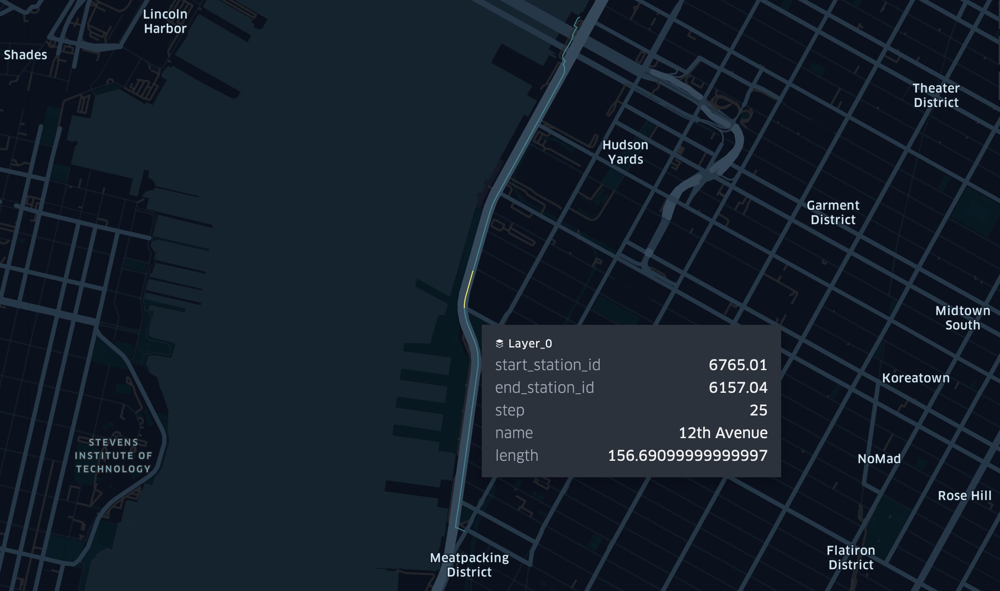

In [0]:
displayHTML("""<img width="50%" src='data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAkACQAAD/4QCSRXhpZgAATU0AKgAAAAgABAEaAAUAAAABAAAAPgEbAAUAAAABAAAARgEoAAMAAAABAAIAAIdpAAQAAAABAAAATgAAAAAAAACQAAAAAQAAAJAAAAABAAOShgAHAAAAEgAAAHigAgAEAAAAAQAACMigAwAEAAAAAQAABTIAAAAAQVNDSUkAAABTY3JlZW5zaG90/+0AOFBob3Rvc2hvcCAzLjAAOEJJTQQEAAAAAAAAOEJJTQQlAAAAAAAQ1B2M2Y8AsgTpgAmY7PhCfv/iD/BJQ0NfUFJPRklMRQABAQAAD+BhcHBsAhAAAG1udHJSR0IgWFlaIAfoAAwAAgAJAAEAG2Fjc3BBUFBMAAAAAEFQUEwAAAAAAAAAAAAAAAAAAAAAAAD21gABAAAAANMtYXBwbAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEWRlc2MAAAFQAAAAYmRzY20AAAG0AAAEvGNwcnQAAAZwAAAAI3d0cHQAAAaUAAAAFHJYWVoAAAaoAAAAFGdYWVoAAAa8AAAAFGJYWVoAAAbQAAAAFHJUUkMAAAbkAAAIDGFhcmcAAA7wAAAAIHZjZ3QAAA8QAAAAMG5kaW4AAA9AAAAAPm1tb2QAAA+AAAAAKHZjZ3AAAA+oAAAAOGJUUkMAAAbkAAAIDGdUUkMAAAbkAAAIDGFhYmcAAA7wAAAAIGFhZ2cAAA7wAAAAIGRlc2MAAAAAAAAACERpc3BsYXkAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABtbHVjAAAAAAAAACcAAAAMaHJIUgAAABQAAAHka29LUgAAAAwAAAH4bmJOTwAAABIAAAIEaWQAAAAAABIAAAIWaHVIVQAAABQAAAIoY3NDWgAAABYAAAI8c2xTSQAAABQAAAJSZGFESwAAABwAAAJmbmxOTAAAABYAAAKCZmlGSQAAABAAAAKYaXRJVAAAABgAAAKoZXNFUwAAABYAAALAcm9STwAAABIAAALWZnJDQQAAABYAAALoYXIAAAAAABQAAAL+dWtVQQAAABwAAAMSaGVJTAAAABYAAAMuemhUVwAAAAoAAANEdmlWTgAAAA4AAANOc2tTSwAAABYAAANcemhDTgAAAAoAAANEcnVSVQAAACQAAANyZW5HQgAAABQAAAOWZnJGUgAAABYAAAOqbXMAAAAAABIAAAPAaGlJTgAAABIAAAPSdGhUSAAAAAwAAAPkY2FFUwAAABgAAAPwZW5BVQAAABQAAAOWZXNYTAAAABIAAALWZGVERQAAABAAAAQIZW5VUwAAABIAAAQYcHRCUgAAABgAAAQqcGxQTAAAABIAAARCZWxHUgAAACIAAARUc3ZTRQAAABAAAAR2dHJUUgAAABQAAASGcHRQVAAAABYAAASaamFKUAAAAAwAAASwAEwAQwBEACAAdQAgAGIAbwBqAGnO7LfsACAATABDAEQARgBhAHIAZwBlAC0ATABDAEQATABDAEQAIABXAGEAcgBuAGEAUwB6AO0AbgBlAHMAIABMAEMARABCAGEAcgBlAHYAbgD9ACAATABDAEQAQgBhAHIAdgBuAGkAIABMAEMARABMAEMARAAtAGYAYQByAHYAZQBzAGsA5gByAG0ASwBsAGUAdQByAGUAbgAtAEwAQwBEAFYA5AByAGkALQBMAEMARABMAEMARAAgAGEAIABjAG8AbABvAHIAaQBMAEMARAAgAGEAIABjAG8AbABvAHIATABDAEQAIABjAG8AbABvAHIAQQBDAEwAIABjAG8AdQBsAGUAdQByIA8ATABDAEQAIAZFBkQGSAZGBikEGgQ+BDsETAQ+BEAEPgQyBDgEOQAgAEwAQwBEIA8ATABDAEQAIAXmBdEF4gXVBeAF2V9pgnIATABDAEQATABDAEQAIABNAOAAdQBGAGEAcgBlAGIAbgD9ACAATABDAEQEJgQyBDUEQgQ9BD4EOQAgBBYEGgAtBDQEOARBBD8EOwQ1BDkAQwBvAGwAbwB1AHIAIABMAEMARABMAEMARAAgAGMAbwB1AGwAZQB1AHIAVwBhAHIAbgBhACAATABDAEQJMAkCCRcJQAkoACAATABDAEQATABDAEQAIA4qDjUATABDAEQAIABlAG4AIABjAG8AbABvAHIARgBhAHIAYgAtAEwAQwBEAEMAbwBsAG8AcgAgAEwAQwBEAEwAQwBEACAAQwBvAGwAbwByAGkAZABvAEsAbwBsAG8AcgAgAEwAQwBEA4gDswPHA8EDyQO8A7cAIAO/A7gDzAO9A7cAIABMAEMARABGAOQAcgBnAC0ATABDAEQAUgBlAG4AawBsAGkAIABMAEMARABMAEMARAAgAGEAIABjAG8AcgBlAHMwqzDpMPwATABDAER0ZXh0AAAAAENvcHlyaWdodCBBcHBsZSBJbmMuLCAyMDI0AABYWVogAAAAAAAA81EAAQAAAAEWzFhZWiAAAAAAAACD3wAAPb////+7WFlaIAAAAAAAAEq/AACxNwAACrlYWVogAAAAAAAAKDgAABELAADIuWN1cnYAAAAAAAAEAAAAAAUACgAPABQAGQAeACMAKAAtADIANgA7AEAARQBKAE8AVABZAF4AYwBoAG0AcgB3AHwAgQCGAIsAkACVAJoAnwCjAKgArQCyALcAvADBAMYAywDQANUA2wDgAOUA6wDwAPYA+wEBAQcBDQETARkBHwElASsBMgE4AT4BRQFMAVIBWQFgAWcBbgF1AXwBgwGLAZIBmgGhAakBsQG5AcEByQHRAdkB4QHpAfIB+gIDAgwCFAIdAiYCLwI4AkECSwJUAl0CZwJxAnoChAKOApgCogKsArYCwQLLAtUC4ALrAvUDAAMLAxYDIQMtAzgDQwNPA1oDZgNyA34DigOWA6IDrgO6A8cD0wPgA+wD+QQGBBMEIAQtBDsESARVBGMEcQR+BIwEmgSoBLYExATTBOEE8AT+BQ0FHAUrBToFSQVYBWcFdwWGBZYFpgW1BcUF1QXlBfYGBgYWBicGNwZIBlkGagZ7BowGnQavBsAG0QbjBvUHBwcZBysHPQdPB2EHdAeGB5kHrAe/B9IH5Qf4CAsIHwgyCEYIWghuCIIIlgiqCL4I0gjnCPsJEAklCToJTwlkCXkJjwmkCboJzwnlCfsKEQonCj0KVApqCoEKmAquCsUK3ArzCwsLIgs5C1ELaQuAC5gLsAvIC+EL+QwSDCoMQwxcDHUMjgynDMAM2QzzDQ0NJg1ADVoNdA2ODakNww3eDfgOEw4uDkkOZA5/DpsOtg7SDu4PCQ8lD0EPXg96D5YPsw/PD+wQCRAmEEMQYRB+EJsQuRDXEPURExExEU8RbRGMEaoRyRHoEgcSJhJFEmQShBKjEsMS4xMDEyMTQxNjE4MTpBPFE+UUBhQnFEkUahSLFK0UzhTwFRIVNBVWFXgVmxW9FeAWAxYmFkkWbBaPFrIW1hb6Fx0XQRdlF4kXrhfSF/cYGxhAGGUYihivGNUY+hkgGUUZaxmRGbcZ3RoEGioaURp3Gp4axRrsGxQbOxtjG4obshvaHAIcKhxSHHscoxzMHPUdHh1HHXAdmR3DHeweFh5AHmoelB6+HukfEx8+H2kflB+/H+ogFSBBIGwgmCDEIPAhHCFIIXUhoSHOIfsiJyJVIoIiryLdIwojOCNmI5QjwiPwJB8kTSR8JKsk2iUJJTglaCWXJccl9yYnJlcmhya3JugnGCdJJ3onqyfcKA0oPyhxKKIo1CkGKTgpaymdKdAqAio1KmgqmyrPKwIrNitpK50r0SwFLDksbiyiLNctDC1BLXYtqy3hLhYuTC6CLrcu7i8kL1ovkS/HL/4wNTBsMKQw2zESMUoxgjG6MfIyKjJjMpsy1DMNM0YzfzO4M/E0KzRlNJ402DUTNU01hzXCNf02NzZyNq426TckN2A3nDfXOBQ4UDiMOMg5BTlCOX85vDn5OjY6dDqyOu87LTtrO6o76DwnPGU8pDzjPSI9YT2hPeA+ID5gPqA+4D8hP2E/oj/iQCNAZECmQOdBKUFqQaxB7kIwQnJCtUL3QzpDfUPARANER0SKRM5FEkVVRZpF3kYiRmdGq0bwRzVHe0fASAVIS0iRSNdJHUljSalJ8Eo3Sn1KxEsMS1NLmkviTCpMcky6TQJNSk2TTdxOJU5uTrdPAE9JT5NP3VAnUHFQu1EGUVBRm1HmUjFSfFLHUxNTX1OqU/ZUQlSPVNtVKFV1VcJWD1ZcVqlW91dEV5JX4FgvWH1Yy1kaWWlZuFoHWlZaplr1W0VblVvlXDVchlzWXSddeF3JXhpebF69Xw9fYV+zYAVgV2CqYPxhT2GiYfViSWKcYvBjQ2OXY+tkQGSUZOllPWWSZedmPWaSZuhnPWeTZ+loP2iWaOxpQ2maafFqSGqfavdrT2una/9sV2yvbQhtYG25bhJua27Ebx5veG/RcCtwhnDgcTpxlXHwcktypnMBc11zuHQUdHB0zHUodYV14XY+dpt2+HdWd7N4EXhueMx5KnmJeed6RnqlewR7Y3vCfCF8gXzhfUF9oX4BfmJ+wn8jf4R/5YBHgKiBCoFrgc2CMIKSgvSDV4O6hB2EgITjhUeFq4YOhnKG14c7h5+IBIhpiM6JM4mZif6KZIrKizCLlov8jGOMyo0xjZiN/45mjs6PNo+ekAaQbpDWkT+RqJIRknqS45NNk7aUIJSKlPSVX5XJljSWn5cKl3WX4JhMmLiZJJmQmfyaaJrVm0Kbr5wcnImc951kndKeQJ6unx2fi5/6oGmg2KFHobaiJqKWowajdqPmpFakx6U4pammGqaLpv2nbqfgqFKoxKk3qamqHKqPqwKrdavprFys0K1ErbiuLa6hrxavi7AAsHWw6rFgsdayS7LCszizrrQltJy1E7WKtgG2ebbwt2i34LhZuNG5SrnCuju6tbsuu6e8IbybvRW9j74KvoS+/796v/XAcMDswWfB48JfwtvDWMPUxFHEzsVLxcjGRsbDx0HHv8g9yLzJOsm5yjjKt8s2y7bMNcy1zTXNtc42zrbPN8+40DnQutE80b7SP9LB00TTxtRJ1MvVTtXR1lXW2Ndc1+DYZNjo2WzZ8dp22vvbgNwF3IrdEN2W3hzeot8p36/gNuC94UThzOJT4tvjY+Pr5HPk/OWE5g3mlucf56noMui86Ubp0Opb6uXrcOv77IbtEe2c7ijutO9A78zwWPDl8XLx//KM8xnzp/Q09ML1UPXe9m32+/eK+Bn4qPk4+cf6V/rn+3f8B/yY/Sn9uv5L/tz/bf//cGFyYQAAAAAAAwAAAAJmZgAA8qcAAA1ZAAAT0AAAClt2Y2d0AAAAAAAAAAEAAQAAAAAAAAABAAAAAQAAAAAAAAABAAAAAQAAAAAAAAABAABuZGluAAAAAAAAADYAAK4UAABR7AAAQ9cAALCkAAAmZgAAD1wAAFANAABUOQACMzMAAjMzAAIzMwAAAAAAAAAAbW1vZAAAAAAAAAYQAACgUP1ibWIAAAAAAAAAAAAAAAAAAAAAAAAAAHZjZ3AAAAAAAAMAAAACZmYAAwAAAAJmZgADAAAAAmZmAAAAAjMzNAAAAAACMzM0AAAAAAIzMzQA/8AAEQgFMgjIAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/bAEMAAgICAgICAwICAwQDAwMEBQQEBAQFBwUFBQUFBwgHBwcHBwcICAgICAgICAoKCgoKCgsLCwsLDQ0NDQ0NDQ0NDf/bAEMBAgICAwMDBgMDBg0JBwkNDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDQ0NDf/dAAQAjf/aAAwDAQACEQMRAD8A/KrR/FGnartiJ8i4PHluep/2T3/n7V0MsUU8ZimUOjcEMMivALSPkzN0XpXTaZ4yvbKTy7ofaLfoAfvqPY9/ofzr6WNb+Y8KeH19w1tY8D53T6O3v5Dn/wBBY/yP5155PBNbStDcI0brwVYYNe86dq1hqsXm2cobH3kPDr9R/kUajpVhqsXlXsQfH3WHDr9D1/pRKknrEUMRKOkzwCiu21fwXe2hMunE3MPXb/y0X8P4vw59q4tlZGKOCrA4IPBBrCUWtzsjNSV0NpD0NLSHoakoF+6KWuz0DwhNqMUd5euYbdhlVH33H48AH15rtU8HaAn3oGf/AHpG/oRWkaUmrmM8RCLsct4L0Tz5v7WuF/dxHEIP8Tjq30X+f0r0i8u4LG2ku7htsca5P9APcngVJDDFbxJBAoSNBhVHQAV5V4x1v7bc/wBnW7Zgt2+cjo8n+C9Prn2rfSnE5VerM5jU9Qm1S9kvJ+rnheyqOgH0qhRRXI3c70rKyCiiigYUUUUAFexeEdG/s6y+1Tri4uQCc9VTqB9T1P8A9auI8J6L/ad99onXNvbEM3ozfwr/AFPt9a9ilkjhjaaVgqICzMegA5Jroow+0zjxNT7COf8AE2sjSNPJjP8ApE2UiHcerf8AAf54rm/A2mE+bq84yTmOIn/x5v6fnXL6hd3PiXWlWIHEjCOFf7qep/ma9ms7WKytYrSEYSJQo/Dv9T1qovmlfoiJr2cOXqyzXO+Itej0W1+TDXMgPloe3+0fYfrVrWtYt9GtDcS/NI3Ecfdm/wAB3NeJ3V1dandtcXDGSWVgPz6ADsPSnUqW0W4qFHm1ex6l4NtZfsk2q3RLzXjk7m6lV4/U5/StjXbiGOya2lYA3OYwC+wsD97BPGcVpWlutpaw2qdIkVB/wEYrhfEWpaXLfta3ZRjbgLh4mbBYAnBDD27dqis+SnZFUV7SrfocvJpV5p8puNNlYsgJKMNsgHfjow+ma3LRY9Rsk+2xqokUv5Y5XA/jB/5Z5+uDUmn3VjORb28iME+cAeaCm3uN3A+grO8SC5MQSCMmI4aZk5AZRgLxyABzz615d3J2Z6ui1Rm3Xh+RWP2N9xPSOTCvj2P3W/A1gSxSwuY5kZGHUMMGrlrql5aL5aMHi/55yDcn5Hp+GK34tV0++QQ3ahOwWXLp/wABcfOn6itrzjvqZ2TOQorqLrQY2AktJNm7oshBQ/7sg4/PFc/cWtzaP5dzG0Z7ZHB+h6H8KuM1LYTi0V6KKKskKKK2dK0w3bCaYHyVbAA4Mjf3R/U9hSlJJXY0r6GtpcMdhp7XdwP9Yokcf9MwfkX/AIG36Vys80lxM88py8jFifc1u65frIfscLBgrbpGX7pYDAUf7KjgVztZ019p9SpPoh8YQuokJCZG4jkgVaX/AEu4LyfLGo3Nj+FF6AfoB71SrqtB0ltQuo7Jh+7GJrk+ij7qfU/19q2Su7Iyk0ldnZ+EdMMcLatcriW5A8sf3Ih0A+v8gK1/EOrLpGnPOpHnP8kQ/wBo9/oOtbQCouBhVUfQACvEvEurnV9RZ4z+4hykQ9R3b/gR/TFdUnyRsjhpxdSd3sc+zM7F2JLMcknqSaSiiuQ9AKKKKACiir+mW0d3eRwykYJ+6SRuP90EA4zSbsrgjQ0KzMs32tl3CIgRg9GlPQfQdT9KsTY1XUhAGJtbUEu/94ZyzfVzwPwq/qLJpNiLeBShfdHECctg/ffI9eAPamQomjacZJB+8yGYHvKR8ifRB8x9653K75vuNbdClr14RixTCnhpQOgwPkT6KOvvWtpk0sGni41BywClwx++kQ+7g9cueAM9K5fTrU392ZLgkxp+8mbueen1Y8Voa9ekt9iXAKkNLjpvxgKPZBx9abitIIE/tM0JLHT9XVprdgHwSXQAEf8AXSP+q9a5m6sbuwYNIPlP3ZEOUb6H+nWuk06NdKsWu5uHKiR+cHH/ACzT6seT7Uadqj6gZY7iMBghd3AzGwHZ0PGT0BHNKMpRvbYGk9znI7pXGycZHrSSWmRvgOR6f4GptYgt7a88u3G35FLpnIRyMlR9Kq2hk80BDgdW9MV0xldXMJRtsT28fko00gwfSizhN7dZfpnLfQf5xS39z5rLEoAC9fr/APWroNPthbW4yMM/J/oP896q3QzlKyv1LoAUAAYA4AFLRRVHKFRyxRzJslUMp7GpKKAM4R3diCLc/aIBz5EnUf7p6g/TH41MTp+sDY4PnDjDYWdceh6OB6HmrdVbizhuR84ww6OvDD8axnST1W5008Q1pIz/AC9R0hWMRF1aA/MpBIX/AHl6oferqz6drKCOQZkxgKxAlX/cfo49m5pFu72yI+1BriNRgTJxKo9/7w+v502bT7DUozc2rqjd3jHy5/206qfccVhJNP3vvOuMk17ojJfWGTzdwKfmPSVP94Hn+nvVqC5huV3QsG9R3H1FZy32oaY6R6ihljHCSq3zAf7Ljgj2P6VdNtZaiPtVo+yVeTJEMEf9dIx+rLwa0jVa+LYynQjLWO5borNNzc2ZVdQQFG+7PHyjfl/n2rQR0kUOjBlPQg5FdCkmro45wlF2Y6iiimQFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAWLe6uLV98DlT3HY/UV1NlrsE2Euh5T/3v4T/hXHUVUZtCcUz08EMAynIPQilrz6z1G6sjiJsp3RuV/wDrV1dlrFrd4Rj5Un91uh+hreM0zJxaIr3RLa4y8P7qT2Hyn6j/AArlbqxubNsTpgdmHKn8a9FprokilHAZTwQRkGiVNMam0eY0V1t7oCPl7M7D/cbp+B7Vy80E1u/lzIUb0P8AnmsJRa3NE0x1vcz2r74HKnv6H6jvXU2WvRS4jux5bf3h90/4Vx9FEZtA4pnp6srAMpBB6EdKWvPLTULqyP7pvl7oeVP+faurstZtbrCOfKk9GPB+hreNRMycWjYoooqyQrPvNNtbwZkXa/Z14P8A9etCihq+4XOEvNIurTL48yMfxL2+o7VlV6hWPe6NbXWXj/dSeqjg/UVjKl2NFPucPRV27sLmzb98vy9mHKn8f8apVk1bc0CiiikAUUUUAFFFFABRRRQAUUUUAFFFFABXLavdedP5Cn5Yuvu3f8un51u39z9ltmcffPyr9T/h1ri6mTN6MftD4o5JpEhiUs7sFVR1JPAA+tfWnhzSX0fSYLWch7jaDM4A+Z8eo67RwD7V5H8L/Dn2q7bX7pf3VsSkAP8AFLjlvooP5n2r3mumhT+0zHF1bvkQUUUhIAyeAK6TiOQ8b+If+Ef0SSSFsXVxmKD1DEct/wABHP1xXy4SScnkmu48catLr+sPPA261gHlQAf3R1b33Hn6Yrhq4K0+aR6uHhyx8wooorI3CiiigAoooAzwKANLTtX1DSpN9nKVBOWQ8o31H9eteq6F4nh1WMi4j8iRCqk5+RmboAeufb9a8zj0G8chZGSJmGdrHJByMBgAcZzx9Oa2bkjRdPEKHEvKKR3kYfO//AR8opfWHHSOpMsPGfxHq80MFzEYp0WWNxyrDINcBq/gdHzNpD7D18lz8v8AwFuo/H865DSvEWpaSQsL+ZD3iflfw7j8K9P0nxRpuq7Y93kTn/lnIep/2T0P8/autSjPRnE4VKWsdjxu6tLmylMF3E0Tjswx+XqKr19C3thZ6hCYLyJZU7Z6j3B6g/SvONW8EXEG6bSm85OvlNw4+h6H9D9aznRa2N6eIi9JaHA0U+SOSJzHKpR1OCrDBB9waZWJ0BRRRQAUUVs6FpEmsX62wysa/NK3oo/qegppXdkJtJXZ0Xg3QjdTjVblf3MJ/dA/xOO/0X+f0r1GaaO3heeU7UjUsx9ABk0kMMVvEkEChI4wFVR0AFcl42v/ALNpYtFOHum2/wDAF5P64H411pKETzm3Vmef6pMdYu5L4N8zngHoFHAHtgViPG8Zw4xSKzIcqcGrqXYYbZlyPX/61crd9zvSa0RQorQa1jkG6Bh9O1UnjeM4cYpWKTTGUUUUhhRRRQAUUUUASxzSRH5Dx6dquCWC4G2UbW9f/r1nUU7iaLUtpInK/MP1qrViK5ki4+8voatYt7rp8r/r/wDXotcV2tzNoqeW3ki5IyPUVBSKuFFFFABRRXReGNJ/tXUlWQZghxJL6EDov4n9M00ruwpSSV2eg+ENJ/s/Thcyrie6wxz1VP4R/U1NrviaHRJ4YDH5zP8AM4BwVToD9Sf5Vv3VzDZW0l1OdscSlm+g9Pf0rwTUL6XUbyW9m+9I2ceg7AfQcV0zlyKyOKlD2knKR7hpusafqse+zlDMBlkPDr9R/XpU19p1lqUXk3sSyL2z1X3B6ivAIpZYJFlhdkdTlWU4IPsRXeaR44mi2w6svmr081Bhh9R0P4c/WlGqnpIc8O46wItX8E3Vtum0tjcR9fLPEg+nZv0NcM6PGxSRSrKcEEYIP0r6EtL20v4hPZyrKh7qen1HUH2NUdU0LTtXTF1HiTGBKvDj8e/0ORRKinrEIYlrSZ4PSgEnA6muq1fwlqOm7pYR9pgH8SD5lH+0vX8RkfSudhTHzn8K53FrRnS6seXmRMoCgKO1LRQTgZPakcGrZDM2F2jqf5VVpzMWYk02g9CnDljY3NK8Q6lpBCwSb4c8xPyv4dx+Fen6R4p03VNsZb7POf8Alm56n/Zbof0PtXilFaRqOJNSjGR9GyxRzRtFMiujDDKwyCPcGuD1fwPDNum0pvKfr5TnKH6HqP5fSuZ0jxdqOm7Ypz9pgHG1z8yj2br+ByPpXp2l65p2rpm1kxJjJibhx+Hf6jIrdSjPRnI41KTutjxC7sruwlMF5E0Tjsw6/Q9CPpVWvoa7srS/iMF5EsqHsw6fQ9QfcV5zq/geaLdNpLeavXynOGH0PQ/jz9aylRa2N6eJT0kef0VJLFLBI0UyMjqcMrDBB9wajrE6QrX0TS31bUY7QZ2fekYdkHX8+g9zWRXsnhDSP7O04XEq4nusOc9VT+Ef1P19q0px5mZVqnLG50/7q2h7JHEv0Cqo/kBXheuao+rajJdHOz7sY9EHT8+p9zXfeNtX+z2y6XCf3k4zJjtGO3/Aj+gNeVVdaX2UZYanZczJY5pIj8p49O1XRLBcDbKNrev/ANes2isbnS0WpbSROV+YfrUCIXbb+dSxXMkXH3l9DVseRc8qdj/kf/r0EttIZ04FNdti7u/alZZIv9YMj+8P61Ulfe3HQdKRywoty1I6KKKDtCiiigAp6O8Z3IcGmUUAblin9oF45FwqLuZsZA7D05J6VWu9OeCRkQhipwRXQQKujab5jj96MOwPeVh8i/8AAB8xrkluJVcvuJLHJzzkmohNyb7A4WWhEQQcEYIpK0hLBcDbKNrev/16gltHTlPmH61pYnm7lSiiikUFekeBtJ+/q8y+scOfyZv6fnXC6bYS6lexWUPWRsE/3VHU/gK98treK0gjtoBtjiUKo9hW1GN3dnNiallyopavqUelafLePglRhFP8TnoP8favBpZZJ5XmlYs8jFmJ6knk113jLV/t1/8AYoWzDakg46NJ3P4dPzrjaVWd3YrD0+WN31Oh0nxLqWk4jRvOgH/LKTkD/dPVf5e1en6T4k03VgEjfypz/wAspOCf909G/Dn2rw+lBIORwRShVaHUoRlqfRU8ENzE0NxGsiN1VhkGvPtX8Dq26bSG2nr5Lnj/AIC3+P51jaR4xv7DEN5m6hHHzH94o9m7/j+demabrGn6rHvs5QxAyyHh1+o/r0re8ZnK41KWqPCbm1uLOUwXUbRSL1Vhg/8A1x71BX0HfadZalF5N7Esi9s9R9D1Febav4JurbdNpjG4j6+WeJB9Ozfofasp0mtjop4iMtHocLRTnR4nMcilWU4IIwQabWJ0BRRRQAVNBcT20omt5GjdejKcGoaKAPWPCviO+1WU2V3GHZE3GZeOBx8w6ZPtj6V3Fcr4Q0v+z9LE0gxNdYkb1C/wj8ufxo8Va3JpFpGtqwFxM3y8A4VeScH16fjXZFtRvI82cVKpywNDVtB0/WVzcqVlUYWVeGA9PQjnoa8u1fwtqWl7pFX7RAP+WiDkD/aXqP1HvXY6R42tbnbDqai3k6eYOYz9e6/qPeu4R0kUPGwZWGQQcgj60nGM9UUp1KTsz5xor2XV/CWnalulhH2ac/xIPlY+69PxGDXmWqaFqOkPi6jzHniVOUP49vocGsJU3E66daMjKjjeWRYowWdyFUDqSeAK940XTE0nTorRcbwN0hH8Tnqf6D2FcD4I0nz7htUmX5Ifliz3c9T+A/U+1ej397Dp1nLeT/diXOO5PYD3J4rWjGy5mc+Jnd8iOH8cavtRNIhPLYebHp/Cv49T+FeYtVq7upb25kupzmSVizfj2+gqoetYTlzO51U4csbHWeDba3utTljuYkmUQMQsihhncvOCDzXpX9kaT/z5W/8A36T/AArzvwN/yFpv+vdv/Q0r1Ws2aM//0PxSlV32WdsrO7cbVGSfwFdVpXge5n2zao/kJ18teXP1PIH6mvQ7HS7DTgfskQRm+8/Vj9Sefw6VJe6hZadF517KsS9s9T9B1P4V9MqSWsjwZYhvSA2x02y02LyrKJYx3I+8fqeppL7VLDTUD30yxA9AeWP0UZJ/KvPdV8cTy7odKTyl6ea4Bc/QdB+tcLNNNcSNNO7SO3JZjkn8TSlVS0iEMNKWsz6Dtrq2vIhPayLKh/iU5/8A1GqGp6HpurL/AKXEN+OJF+Vx+Pf6HIrxGzvruwl86zlaJ/VTwfqOhH1r0LSvHMb4h1aPYenmxjK/ivUfhn6U41Yy0kEsPKLvAwtV8G6jY7pbP/SoRz8oxIB7r3/D8qm8O+FprqVrnU4Xigi5EcilTI30P8I7+vT1r1S3uILqITW0iyxt0ZTkVI5wjE+hp+yje5P1iduVjQyRRFmIVEGSTwAAP5CuDuvHtvHKyWlq0yg4Ds+zPvjB4o1fxPp0sj6cGzEDh32eZG/twQcA9x1rn/smh3OGjMWevyTGPP8AwGQfyNYVcTyu0Ub0MKmuaRvWviq81RZAsIhVCnKnJYlh8uT6jPSvOr2JYbuaJCCqSMoI9AeK6W41SysYjBYbS4zt8ofu1YjG4seXYDoelcj15NYRlKTcpHVyRirRCiiirEFFFFABU1tby3c8dtAu6SRgqj3NQ16f4J0Xyojq9wvzyArCD2Xu349B7fWrhHmdjOpPkjc7DStNi0qxjs4udoyzf3nPU/57VxfjbWtqjR7duThpyOw6hfx6n8K7HWdUi0iwkvJMFh8san+Jz0H9T7V5BpNhceINW2ysW3sZJ39Fzz+J6Ct6jsuWJyUY3bqSOy8D6R5UT6tOvzSDZDnqF/iP4ngew967PUdQt9Ms5Ly5PyoOAOrE9APc1bjjSKNYo1CogCqB0AHAFePeLdZ/tO/+zwtm3tiVXHRn/ib+g9vrTb5IiinVndmJqmqXOrXbXVyevCqOiL2A/wA81b8N2v2vW7SMjIV/MP0j+b+mKw67/wAA2u+8ubwjiKMIPq5z/Ja54ay1OypaMHY9QJCgseAOTXz1fXJvLye6P/LWRn/AnIr23xDdfY9Fu5s4JjKL9X+UfzrxOxtWvLqO3BwGPzH0Uck/gK0xErGGEjuzpNIiSxsWvJuC481vXy0Pyj/gb/oKpW/iGYSbrtN5J/1kfySD8uCPYip9eugsUdnGNvmYcj0jUYjX8ufxrlq4YQ5ryl1O+UraI7M2+l6sN0WDIepjASX8Yz8rfVawb3SJ7RWmVlliXqw4K5OBuU8jmssEggg4I6Grk+oXdzCsE8hdVOQWALf99dcVShKL0egnJPcba311Zkm3kKg9V6qfqDwa6C31y2mTybxBGD1wN8R+qHlf+AmuUoqpU0xKTR1s+i2dynn2biMHup8yH8x8yfjWK+jaksgiWBn3fdZPmQj13Dj86pwXM9q/mW8jRt6qcf8A662V1+URlZII3c/xcqp92QHaTUWmttR3iya18P5+a5k3Y6pDg4/3nPyj9ak1TU44IxaWJXO3YTGcrGn91T3J/iasO6vr67UG4djH/CoG1B9AMCqNNU23eYcy2iFFFFakFq0iDuZHXckeCV/vMfur+J/TNe1eH9LOmWIE3NxOfMmP+0e34dK47wpo/m3InlXMVodx9GuD2/7Zj9a9GubiK0t5LmY4SNSxx149Pc9q6aMftM4sRO75Udj4Y+C3xa+LHgjxV4u8DWdrLo/hhJDqk0tykMiRxxGZ9iMct+7U9K+Ra/Zj9gy5e8/ZZ+PlzIMGS31A49B/ZcmB+FfjPWVR31NaGjcex9DfCL4E6Z8UfBXjDxffeOdC8Lv4VtjPFYanIFuL8iNnxGNykKdu0EBzuOMV881+lX7F/wAH/hr8QPgV8afFnjLQbXVtV8N6bJLpVxcBibWQWVzKGUAhSd8ankEcVnf8E9/gx8MvjNe/EjSviZpiX1tZaHC9tcc+dZPM0qvNCRkCRQAVyGGQODU8uw3VS5m+h+c1Ffs78G9f/YE+OPjKP4CaJ8Kp9Ma/juItN1q5bF1cvbxs5YzJK08bsiMy5LAkYIHSvhCy/ZpuNR/a2l/ZttryT7PH4gmsGvQoaRdPhBmaUjgbxbDPpu9qLFRqptpqx8o10uhwRxK17MwQtlIyf4F/jf8AAcD3Nfrb8T/E37A/7PPiy5+DQ+E8/jC/0hVj1PUHkEjpKyh2XzppQ7OqsN2wIoPA6V45+yR8A/hV8aPGnxE+Jni+0mtvhp4NknvbfSzI6M0DtNPDFKytv2Q28eXAfLEqM4zmJwv7qYRrpLnadj8+LWRL/UWvpABHDhIIz0JH3R9B9416f8IfhVq/7QfxV0z4WeHdQt7Ca9S5aO6ugzRA28TzSOwQFiW2YH4V+kHws8X/ALEX7RXjeL4Lx/CBfCcmsx3MekarbzLHO7woz8tFtaN2RSV3GRSRg15H+yf8Mbn4Pf8ABQhPhxdTm5/sCbWLaKcjBmhaxlkhcjoC0TKTjuaUaavzdAniHyyVrO1z4i8e+ELr4ReMfEngLULmK8vPD2ozWDzxKQk08LFd6hudqjnB715rpkUdxd+fdHdGh3sD1dj0X8T+lfduu+H9E8Z/8FF77wp4ms49Q0jUfHtxa3dpKCY5YpJWDq2MHn2Oa+p/inrn7CX7NHxR1H4dax8LZ9fu5bmO41G6kCTW9gt4olWK2jlkHyRRuOFUEDjcxo9nu+4/b2srXdrn4663fefILWNtyxks7Do0h6/go4Fa1uiaNpxklA8zh3B7yH7if8BHzGvtf9uL9nrwH8F/iP4a1z4awtB4a8X6e1/a2LO0iw3ETLlUMhL+UyyRsAxJHI6YA+DtavPtFx9njbdHCSN399z95vz4HtWcoaqmjaFRSjzoyHd5XaSQlmYkknqSa2rCSCwxJcZG7jKjJGfY9cDqKzbSLe+9vur/ADptxIZpDt5VelbW0Ibu7GtrEVh5SXVrt3Ssf9WfkIHU7TypGRx71RtNTntfkP7xP7pPT6HtWdRSiuVWHJKW521teQXYzEee6nhh+FWq4AEqQykgg5BHUGty01llwl0Nw/vjqPqO/wDnrVqRzTotaxOjoqOKWOZN8TBl9RUlUYBRRRQAVQksgJPtNo5gnHRlOAfqPf8Azmr9FJpPRlRk07opLqGzNvqcax7+N4XdC/8AvL2PuOfaoJ9I2Mt1pcnlOeUXflW/3H/o3NaTIrqVcBlPUEZFUBbXFmWfT3GxvvQSfMjfn/n3rCVJrWB108QnpMZDq5R2tdVjMTnh22ZVv+uidD9RzU76fsxcaZIsW/naW3QP9G/hPsefenC5stQH2S7j2SLwI5Tgj/rnJ2+h4qm1hqGmO8mmu0iD78TD5gP9pOQR7j9KyWj00Z0Ncy11ROl8Ef7PfIbeYdQ3Cn3B9P8APNaFZ8GoWGooLa6RUbskhOzP+w/VD7HilazvbIn7GWnjAyYJOJFH+z/eH049q2jW6T0OWeH6wL9FVLa9gucqhKuOqNwwq3W5ytNaMKKKKBBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGvZaxdWuEc+bGP4W6j6Gurs9Rtb0fumw/dG4b/AOv+Fee0oJUhlJBHQitI1GiXFM9PqKaCG4Ty50Dr6H/PFcpZa9NFhLoean94feH+NdRb3UF0m+Bww7+o+orZSTM2mjm73QHTL2Z3j+43X8D3rnXR42KOCrDggjBFenVUurK2vFxOmT2YcMPxqJU10Gp9zzqitu90S5t8vD+9j9vvD6j/AArErFprc0Tuatlq91aYQnzI/wC63b6HtXWWepWt6MRth+6Nwf8A69efUoJByOCKqNRoTimen0Vxtlrs8OEuf3qev8Q/xrqba7t7tN8DhvUdx9RW8Zp7Gbi0WaKKKokRlVgVYAg9QeRXP3ugxSZe0Plt/dP3T/UV0NFJxT3Gm0ebXFtPav5c6FT2z0P0PeoK9MlhinQxzKHU9jXM3ugMMyWRyP7jdfwP+NYyptbGin3OZop7xvExSRSrDqCMGmVkWFFFFABRRRQAUVjX+ptbTrFEA23l8+/YfhVu11C3ugAp2v3Q9fw9aLluDtcvUUjMFBZjgAZJPYVzUusyukkaoBuyEYcED368496TYowctitqV19puCFOY4/lX39T+P8AKjSdMudY1GDTbQZkncLnso6lj7Acms6vfvhj4c+xWLa7dL+/uxiEH+GH1+rn9APWnThzSsdFSapwPSNM0+30qwg060XbFAgUe/qT7k8n3q9RRXoHlN31YV5z8SPEP9k6R/Z9u2Lq+BTjqsX8Z/H7o+p9K9Bmmit4ZLidgkcSl3Y9AqjJJ+gr5O8S63L4g1ifUXyEY7YlP8Ma/dH9T7k1jWnyxsjow1Pmld7Ix4p5IuhyPQ1c3W9zw3yv+v8A9es2iuK56TiWZbaSPkfMvqKrVZiupI+D8y+9WSlvc8odrf57UWFdrczaKmlgki+8OPUdKhpFXCpYJBDPHKw3BHViPXBzioqntreS6njt4hlpGCj/AB/Ck9tRo9GjEkgjuoHYxkuygEBH8znc/Oflycj27VxGsXq3t0vlsWjhQRqx/ix1bHbJrZ1W4jsrFbO3OPMXYvtEDy31kb9K5CsKMPtFzl0CiiiugzOs0nxdqOnbYrg/aoBxtc/Mo9m/oa9N0vXNO1dM2smJMZMTcOPw7/UZFeDU5HeNg8bFWU5BBwQfrWsarW5hUoRlqtz3nUtF07Vk23kQLAYEi8Ov0P8AQ5FeZ6v4P1Cw3S2mbqEc/KPnUe69/qK2PDnii/lLQ3486KJcmX+Mc4A9GJPA6H3r0C3vLW63i3kVzGdrgHlSOxHatLwqadTD95S9D54IxwaK9v1bw1purZkdPJnP/LWPgn/eHRvx5968x1bw1qWk5kdPOgH/AC1j5A/3h1X+XvWUqTR0U68ZHPgEnA5Jr23wzo40jTlWQfv5sPL7Hsv/AAEfrmuG8G6N9tvP7QnXMNsflz0aTt/3z1+uK9brWjD7TMMTU+wgrxfxbqS6hqzrEcxW48pfQkfeP58fhXo3ifVv7K0x2jOJ5sxxeoJ6t+A/XFeI0q0vsjwsPtMKKKK5zsHK7IcqSDV1LsMNs65Hr/8AWqhRTTE0maDWscg3wN+HaqTxvGcOMUiuyHKkg1dju1b5LgZHcj/CgWqKFFac9pC/z2jZHp2/Os5lZDtYYNDQ07jaKKKQwooooAKKKKALkV26/LJ8w/WpWghnG+E4Pp/9as6lVipypwfanfuTbsPkieI4cY9+1R1fjuww2TjI9f8A61D2quN8BBHpRbsF+5RAJOByTXuHhzSRpOmpE4/fS/vJT/tHt/wEcfXNcD4P0ZrzUDd3C/urUg4PRpP4R+HX8q9O1S/i0yxlvZf+Wa/KP7zHgD8TW9GNlzM5cRO75EcJ451fcyaRC3C4ebHr/Cv9T+Fec1NcTy3M8lxMdzyMWY+5qGsZy5nc6acOWNgoooqSy1Z3t3YTCezlaJx3U9fqOhH1r0fSPHEE22HVV8p+nmoMofqOo/l9K8uoq4zcdjOdKMtz6NjkjmRZYmDowyGU5BHsRWDqnhrT9SzIq+RMf40HBP8AtDof0NeSabrOoaS+6zlIUnLRtyjfUf1HNem6R4w0+/2w3f8Aos54+Y/Ix9m7fQ1uqkZaM450JR1Rw+p6FqGlkmZN0WeJU5X8fT8awJ2wAo79fpX0KQrrg4KkfUEGuL1jwZZ3pafTyLaY/wAP/LM/h/D+HHtUTo9Yk0pRUryPJKKv3+l32mS+VexGM9m6q30PQ1QrBqx6KaeqCiiigYU5HeNg8bFWU5BBwQfY02igDu9I8bXVvth1RTcR9PMHEg+vZv0NekWOo2WpRedZSrIvfHUexHUV8+VYtrq5s5RPayNFIOjKcH/64raFZrc56mHjLVaHuupaPp+qx7LyIMwGFccOv0P9OleZav4Ov7DdNZ5uoRz8o/eKPde/1H5Vt6R44VtsOrrtPTzkHH/Al/w/KvQIJ4bmJZreRZEboynINa2jM51KpSdmeMeGNIOqamolXMNvh5c98dF/E/pmvZLq5is7aS6nOI4lLMfYf1NSJDFGzvGiq0hy5AALH1J71w/jl782kcMETG2zvlkXkZHQHHIA65PHShLkiDl7WaR5xqF9LqV7LezfekbOPQdgPoOKpUUVyM9BIKKKKACiiigC3Fdunyv8w/WpjDDcDdCdp9P/AK1Z1KCVOVODTuTy9h8kTxHDj8e1R1ejuwRsnGR6/wCIpz2qSDfAR9O1FuwX7mfRTmRkO1xg02kUFbWiWfn3H2h13RwYIX+85+6v58n2FYtatnq01nbtAig/eKN0KuwA3e+BnH1qZ3tZDja+preI7m1ljjihdZHR2BKnHI4bcMYyTjB781ylFFEI8qsDd3cKsRXMkXHVfQ1XoqhWNL/R7r/Zf9f/AK9VJbeSLkjK+oqCuj8PWs+qahHaN80Q+aRvRB159+n41S1diH7qudp4J0j7LaHUpl/e3Awme0Y/+KPP0Arb8R6sNJ015UOJpP3cQ/2j3/Ac/WtxVVFCKAqqMADoAK8X8ValJqOpMy/6iH5IvQ+rfif0xXTJ8kbI4oL2lS7OaJJJJOSeppKKK5D0AooooAKkillgkWWF2jdTlWU4IP1FR0UAeg6R44mi2wasvmL081B8w+o6H8MH616NaXtrfRCe0lWVD3U9PqOoPsa+eKtWd9d2Ewns5Wicd1PB+o6EfWtoVmtGc1TDJ6xPbtU0PTtXTF1HiQDCyrw4/HuPY5FeY6v4S1HTd0sI+0wD+JB8yj/aXr+IyK6fSPG8E22HVV8p+nmqMofqOSP1H0rvI5I5kWWJg6MMhlOQR7EVq4xnqjBSqUnZnzlRXtWr+FdN1TdKq/Z5z/y0QcE/7S9D+h968w1Xw/qWkEtcR7os8Spyn4+h+tYTpuJ1U60ZGJW54d0s6rqkUDDMSfvJf91e34nisOvY/B2l/YNMFzIMS3WHPqE/hH9fxopxvIdafLG51nCjsAB+AFeF+INTOq6nLcKcxL8kQ/2F7/iefxr0nxhqn2DTDbxnE11lB6hP4j+XH4143WlaX2THCw05mFbGl67qOkP/AKLJmPPMT8ofw7fUYrHorBNrVHU0mrM9m0jxbp2pbYpj9mnP8Ln5WPs3T8Dg11DokilJFDKwwQRkEfSvnGvXPBS6gdPae6lZoWO2BG5wF6kHrgngD2rpp1G3ZnFWoKK5kdbb20FpEILaNY41zhVGAMnJ/WvOPHd/O00WnBWWFR5hYggO3bB7hR+pr0wsqkBiAWOBk9T6Corm1t7yIwXUayxt1Vhkf/rrScbqyMac+WXMz52qM816TrHgdlDT6Q2f+mLnn/gLf4/nXnk9vPbSmG4jaN16qwwa45Qcdz0qdSM9jrPA3/IXm/69m/8AQ0r1avKPAv8AyF5v+vZv/Q0r1es5FM//0fx+vfHl1LEUsbdYGP8AGzbyPoMAZ+ua4e4ubi7lM9zI0sjdWY5NQUV70pt7nmQpxjsgoooqSwooooA6Xw3PNC9z5Tsn7tT8px0df8aoate3r3l3DJcSsglkG0uxGAx4xmrGgn97c/8AXDP5OtT32jyz3dxOs8CpJI7DL5OCSeig1lz2k7lcqaucyv3RS0gBAweopa1JCiiigAooooAKKKVVZmCqCSTgAckk0AbWgaS2sagluQREnzysOyjtn1PQV7miJEiogCqgAAHQAVheHNHXR9PWNh+/lw8p9+w+i9PzrL8Y619gs/sEDYnuQckdVj7n8eg/GuuCUI3ZwVJOrPlRxPinWv7WvykLZt4MrHjox7t+Pb2r0Twvo40rTlaRcXE4DyHuPRfw/nmvOPC2mf2lqqbxmGD97J6HHQfif0zXtTusaNI52qoJJPQAdamkrtyZVeXKlTRyvi3Wf7MsPs8LYuLkFVx1VP4m/oPf6V48kckpIjVnIBJCjOAOp+grR1nUX1XUZbxs7ScRj0QdB/X61peHYN3nSn+MpCD7Mdzf+OrXPXq9TpoUuVWOZr2HwTa+RoomI5uJGf8AAfKP5GvKL2c3V5NcdfMckfTPH6V7zptr9isLe17xRqp+oHP61rQV3cyxTtGxyPj268uwt7QHmaQsf91B/iRXK6HbJFbSXk3AlDDPpEnLn/gR+Wr3i9n1DX4tPh5MaImPRn+Yn8iKp61OltZpZwcCQBR/1xj4H/fbZP4VhiZXlyo2w0bQuzmru5e7uZLl+sjZx6DsPwHFV6KKaRYUUUUAFFFFABUkUZlcIO/X6VHWjCBbwGVvvN0/pTQmxl26gLAnRetUaViWJY9TzSUMErIK1NKtJbm4Xyl3OWCRg9DIehPso+Y/Ss1EaRxGgyzHAA7k16z4S0pYIftzjPBSH3H8b/8AAiMD/ZHvVQjzOxnVnyxudTYWUWnWkdnDysY5J6sT1J9yea4Dxnrh89NLtm+WMhpvduy/gOT7/Su11vVI9I0+S6bBf7san+Jz0/LqfavCJJJJpGllYs7kszHqSeSa2qysuVHNh6fM+dn7Qf8ABOzTb/xD+zP8a9G0qBri+1Fbq1t4Vxukmm010RBnjLMQBXwDL+xP+1PCjSv8OtVCICxOYOAOT/y1rhfhZ+0V8Zvgrp99pXwx8SzaHa6lMtxdRxwQSiSVF2hiZopCMLxwQK9Rf9vH9q+WN4ZvH90yOpVh9jshwRg/8u9Y3TWptyVIybjbU+u/2Ao3i/Zr/aHikG1k0uZWHoRp14DWV/wSx/5CvxX/AOxetv8A0Kavz18HfGr4l/DvQNe8NeCtfm07TfFMZi1e2SOJ1uUZGQhjIjFcq7D5SODVb4afGX4l/B6fU7j4ca3JosmsW62t8Y4opfOhUkhSJUcDknkYPvRzbBKk2peZ7p+wX/ydv4B/6+r7/wBIrivqPRPF2meDP+CqGpX+rusdve65c6Z5jsFVJL6xEMRJPHMjKv41+Yfgrxt4o+HXimw8aeDL99N1rTHaS1ukVHaNnRkY7XVlOVYjkHrTfFnjPxP448VX3jbxRfyXut6lOLm5vCFjd5gAA+IwqqRgfdApJ6FSpc0m+lrH6Bftf/s2fGSz/aF8W+JdC8I6tr+k+KL7+0LO8021ku42WZVZoWMSt5bLJkENj5QCODXtH7Ael6hqvwx+PnwNvk+w+Lrq3uIfsUxCSLLJbXFm6nnGI5gqt2G4V8a+Ev26v2otC0mPwxb+O52tggiinvba2up41AwB500TyHjgEsSK8g07x/8AEvwr40l+JPhTXbyz8Uy3E11cX8L7biVpyWkyuNkiSEksuCp7is3OMZX7h7KpKnyO2h9X/sW/AD4xw/tSeGtV8Q+E9X0Ww8L3M9zqFzf2ktvDEIoZESMSOoV2d2AAUnOSele/+AfEumeKf+CqWpappMqT2wm1G0WSMhlZrLS2t5CCOD+8jYZ9q+SNZ/bf/aq8T+HJNL1nxvJaWs8TCZ7O0trS5MP3T+9hiV1L9BtINfMHw++IHjjwH43tfGfgPUn0vXYDKIbxVSVo1mRkkJEqupyjHJIP501OOy6ClSnK7lu1Y+4bCH/jZjJO3/RRpVUep85sn8BXnP8AwUP3P+1t4xQc/JpgA+tjBXz/AH/xM8caf4+T4px6u58XSagdWGo+XHvFwW3eds2eXl25xs247VS8T+LPF/xR8RX3j7x5qTalrOpbVlvJURCywoE3lY1VQERQowBSdRctzSNJ86flY/SH/gphcNa6B8FXjOJD4eu1U+mY7IE/lX5IKpYhR1PFeo/Ev4zfEf4t/wBkxePtbl1eHQYGtdNWSOKPyIG2gqPLRM5CLy2Tx1rzy1jCKZ34A6VejdxU4uEOVjpmFvCIV6t1/rWnpFptX7S45PC/1P8AT86yreJ726GemefYD/P5116qqKEUYCjAHsKa1ZnVlZcpQu9NgucsP3cn94Dr9R3rmrmzntWxIvy9mHKn8a7akIDAqwBB6g02iIVWjgKK6S70dHzJana3XYeh+npXPyxSQvslUqw7GpaOmM1LYdDPNbtvhcqfbofqOhrobXWIpcJcDy29f4T/AIfy965iihMUoKW56BRXGWl/PaHCncndD0/D0rpbXULe6ACna/dD1/D1qkzmnTcS9RRRTMwooooAgntoblNkq59D3H0NVVa+sAAM3cC/dUnEqf7rDn+ntWjRUygpbmkKso7FN4dO1lS6E+b3ZQBKv++nRx7jmpbOI2No63NwJY42EgKnIjRem3PIZzxiq93aQMDckmKRBu8xOCMfz/nXPXWqXt5EsM75UHJwACxHQsR1rnlRe19Dtp1lJXsV7m5e5upLo/KzuX47E1pWmsSRfJcgyL2YfeH+NYtFbLTYmUVLc7iC6t7nPkPu24zwR1+oFWK4WB5kkBgYq3t/nn6V20XmeWvm4345x6/rVp3OSpT5diSiiimZhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABUkUskLiSJijDuDio6KAOpstf6Jej/gaj+Y/wrpI5I5UEkTB1PQg5rzKrFvd3Fo++ByvqOx+orWNR9SHDsekVm3ml2t5lmGyT++vX8R3qlZa7BNhLoeU/wDe/hP+H+ea3gQQCDkHoRWt1JGdmjgrzS7qzyzDfH/fXp+PpWbXqFYl7oltcZeD9y/t90/h2/Cs5Uuxan3OKp8ckkTiSJirDoQcGrF1ZXNm2J0wOzDlT+NVKy2NDp7LXyMR3oz/ALaj+Y/wrpYpYp0EkLB1PcHNeZ1Pb3M9q++Byp7+h+o71pGo1uQ4dj0miufstehlwl2PLb+8Pun/AArfVlYBlIIPQjpWyknsZtNC0UUUxFa5s7e7XbOgb0PQj6GuVvdDuIMvb/vU9P4h+Hf8K7OiplBPcpSaPMCCDg8EUleg3mnWt6Myrh+zrw3/ANeuUvdHurTLqPNj/vL1H1FYyptGikmZNV7q4W1gaZuSOAPUnp/n0qxXKatdmefyV+5EcfVu/wCXSsmzWnHmZmOzOxdjlmJJPuabRWx4f0S98Sa3ZaDpy7ri+mWFPQbjyx9lGSfYVKVzrnOMIuUtEjqfC/g/xp4yhkh0i1Z7VQWlvJz5UMagMfmlbjHyEd+eDiuBkjaKRomIJRipKsGXI44ZSQR7gkGvoP4j6nKr2/w78N3bWvh3QUNqBGcyXlyNwnkYJjcC7OD0XO49DXi8+gXSsRbMs2Oq/ckH/AW/oTRUnCL5U9UcmBlWqx9tNJRlql1t3fm1bS2hb8IeH28RazFaMD9nj/eXDDjEYPTPqx4H59q+qURI0WOMBVUBVA4AA6AVxfgPw9/YOiKZ123d3iWbPVf7qf8AAR+pNdtXdRhyxMMRU55abIKKKpajf2+l2M+oXR2xQIXb3x0A9yeB71qYJX0R5h8UvEP2a0TQLZsSXIEk5B6Rg8L/AMCI/Ie9eD1oarqVxrGoz6ldHMk7liOyjoFHsowBWfXnVJ80rnr0qfJGwUUUVBoFAJHIoooAuRXbL8svzD171K1vDMN0JAPp2/8ArVnUqsynKnBp37k27D5I3jOHGK6bRLVYoHvZjt8xWAP92Jfvt+P3RWIl2GGycZHr/wDWrZvLsXNkLe0G0HapGeAiDhR+PJ96zqRbVkVGVviMK9umvLl7hhgMcKv91RwB+AqpTmVkOGGDTapK2iC9wooopgFKAScDkmkre0KzMs/2tl3LEQEB6NKfuj6DqfpUylZXGld2Mu1vbmzffA5HIbB5UkdDjpTYLu5tp/tNvK0coOd6nB5659c1c1e4invGEOCsfy7wOXYdWJ75PT2rLpx/mB9j0nSfHI+WHV0x286Mf+hL/h+VegQXFvdxCa3kWWNujKcivnavSPAlhOPO1F2ZYj+7RMkKx7kjvjoPxrppVG3ZnFXoxS5kehwwQ26eXAixrknaoAGTyeBUtFIyq6lWGQRgg9CDXQcZ4j4m1b+1dTdozmCH93F6EDq34n9MVz1eoav4Hhl3TaS3lP18pzlD9D1H8vpXnN3ZXdhKYLyJonHZh1+h6EfSuOpGSd2enSnFq0SrRRRWZqFFFFABRRRQA9JHjOUOKvLcRTDZOAPft/8AWrOop3E0mXZbRgN0R3D071TIIODxUsU8kX3Tx6HpVwPb3Iw42t/nvQK7W5m0VZltZI+R8y+oqtSKTuFFFFABRRRQAVPbid5kit8l3YKqjuTwBUFegeB9J82ZtWmX5YspFnu56n8Bx9T7VUI3diKklGN2egaXYrp1lFajBZRlyO7nqf8AD2rz7xpey3lwtlAcxW5ywHeT/wCxHH512+v6qukabJcAjzW+SIernv8AQda8QS5mRi24tuOTnnJNb1ZJLlOXDwbfOyEgg4PFJWkHt7kYcbW/z3qtLayR8j5l9q57HYn3K1FFFIYUUUUAFFFFAHQ6R4m1LScRq3nQD/lk5yB/unqv8vavUNJ8SabqwCRv5Ux6xPw34Ho34c14dSgkHI4IrSNVoxqUIy1Pome3guYjDcRrIjdVYZFef6v4GB3T6Q+O/kueP+At/j+dY2keMr+x2w3ubqEcZJ/eKPY9/wAfzr0zTdX0/VY99nKGIGWQ8Ov1H9elb3jM5XGpSd1seE3NtcWkpguo2ikXqrDB/wD1VBX0FfadZalF5N7Esi9ieq/Q9RXm2r+Cbu2zNphNxH18s8SD6dm/Q+1ZTotbHRTxEZaPQ4ainOjRsUcFWU4IIwQabWJ0BRRRQAV3vgW1unu5bpZHS3jG1lB+V3I4BHsOfyrh4YZLiZIIV3PIwVQO5PSvetJ06PSrCKyj52DLN/ec9T+f6VtRjd3OfETtG3ctXFzb2kfnXUixJkDcxwMngVMCrrkYZWH1BBrybxpq/wBsvRp8LZitj82Ohk7/APfPT65rF0rxBqWkELBJvizzE/K/h6fhWjrJSsYLDNxv1PRdX8H6ff7prTFrOeflHyMfde31H5V5lqWjahpL7byIhScLIvKN9D/Q816tpHinTdU2xM32ec/8s3PBP+y3Q/ofaujkijmjaKZQ6MMMrDII9waHTjLVBGtODtI+cqK9R1bwPBNum0pvKfr5Tn5D9DyR+o+lecXljd2ExgvImicdmHB+h6EfSsJQcdzrhVjLYq0UUVBoFFFFABT0keM7kODTKKANBbmOUbJwPr2/+tTJLM43RHcPSqVSxzSRH5Tx6dqd+5NuxGQQcEYNJWkJYLkbZBtb1/8Ar1XltJE5X5h+tFg5u5VooopFBRRRQAV7N4S0j+zdOE0q4nucO3qF/hX8uT7mvP8AwrpH9qakrSrmC3w8noT/AAr+J/QGvaHdIkaSQhVQFmJ6ADkmuijH7TOPE1PsI5Xxfq507T/s8LYnucqMdVT+I/0H/wBavKY7vI2TDcPX/wCtVjW9TfVtRku2zs+7Gp/hQdPz6n3NZNZ1J3ZtSpKMbM0HtUkG+Aj6dqosjIdrjBpUd4zlDg1dS5jlGydR9e3/ANaoNNUZ9FXpLQ43QncPSqRBBwRgilYadxKKKKBhRRRQAVq6brOoaS+6zlIUnLRtyjfUf1HNZVFNO2wmk1Znsml+MNMvysUxNtKe0n3CfZv8cV1ZCupVgGVhgg8gg184V0Wk+JtS0nEat50A/wCWUhyAP9k9R/L2reFbpI5amG6wO/vfBml3NylxBmABwZI1+4y55AH8Ofbj2rrgAowOAP0rC0jxFp+sDbCxjmA5ifhvw7EfStx0WRGjcZVgQR6g1tFLeJyzctpHh/iPVP7V1SSZDmGP93F6bV7/AInmsGvSdX8DA7ptIfHfyXPH/AW/x/OvPbm2uLSUwXUbRSL1Vhg//qrknGSd2ehSnFq0SCiiioNTR0rT5dUv4rKPjefmb+6o6n8v1r3qCGO2hS3hXakahVA7AVx/gvSfsdkb+ZcS3I+XPUR9v++uv0xWn4m1b+ydNZo2xPNlIvUE9W/AfriuqmuWN2cFaTnPlRwHi7WDfal9ngY+VaEqpB6yfxH8Og+lTaT40vbPbDqANzEON3/LQD6/xfjz71xVFYc7vc6/ZR5eVnv9jqljqkXm2UofHVejL9R1H8qj1HTLHU4vKvIg/o3Rl+h6ivCIZ5raQTW7tG69GU4Nd5pPjhgFg1ddw/57IOf+BL/UflW0aqekjmnh5Rd4Gvo3hltF1WS5il8yB4WQbuHBLKRnseh54+ldbUFvdW15GJ7WRZYz0ZTn/wDUanrmqpKWh0UZNxvI/9L8P6KKK9w88KKKKACiiigCxbXU9pL51u+x8YzweD2weKtya1qjqQbhwMdFwv8AICsykPQ1Linq0NNoUszku5LMxJJPJJPUmikX7opaoQUUUUAFFFFABXeeCtG+0XB1W4X93CcRA95PX6L/AD+lcjpthNqd7FZQdZDyeyqOpP0Fe9WlrDZW0dpbjbHEoVR/U+56mtqMLu7ObEVOVcqG3t3DYWsl3cHCRLk+/oB7k8CvBtQvptSvJbyf70hzjso7AewFdZ401r7XcjTLdv3UBzIR/FJ6f8B/nmue0CwGpatBbOMx7t8n+6vJ/Pp+NFWXM+VBQhyR52eoeEtM/s/SlkkGJbnEjeoB+6PwHP1NO8S6zb6bbpby7i1xkYUBiFHUkNwQeldLwo9AK8K8QamdV1SW5BzGp2Rf7i9Pz6/jWlWyhyoxopzqczNmKPRdSkEcaxGRugAaBvyG5TWrFp0dpZNFbs6ZWRwzDeN0gCg5Udh7Vw+mXMNpcGeUMcRuqbRnDMMZPtgmn3uoPLevc2jvEuFVMHawVQAOhrzXSd7J6HqKatc1tM8P3L6nbKWjliEqs5RwflU5OQcHt6V7PXm3gu5vb69me5fzEgj4LKCwZjx82M9Ae9dvrN19j0q6uQcFIm2n/aPA/U16GHTULyPNxTUpqKPMrSZb7V9Qvs8s22M+iyOEz9dtc/q0ry6hNvG0I2xV9FXgfpWr4bYI1ySARtjyG6YLgGtO4utOu55LW8ADo7Ltn+Xv/DIOR7BuK4HK027HoqPupHDUV0t14fIObR+TyI5cAn/db7rfmK5+aCa3cxzo0bDswwa1jNPYhxaIqKKKoQUVoabZi8ugj8RIN8h9FHX8T0HvUmrW1vbXQitwVO0F0zkIx5CgnngYz71PMr2HbS5TtovNk5+6vJp13LvfYPur/OrDf6Lb7R99v8/pWbVvTQhau4UUVNbxedIFJwoG5j6KOp/w96RRv+HtKe/ukTkB85P92McM3sT90e5PpXtKIkaLHGAqoAqgdAB0FYPh3TPsFn5kqbJpwCw7oo+6n4Dr7k1S8Xax/Z1h9mhbE9yCox1VP4j/AEH/ANauuC5I3Z59STqTsjhPFesf2pqBjibNvb5RMdGP8Tfj0HsK5eiiuVu7uzujFRVkd18OPht4y+LXi218D+AbD+09avUlkgtvNjh3LAhkc75WRBhVJ5PPas3xp4N8RfD3xTqXgvxba/YdY0iY295b70k8uQAHG5CyngjkEivsH/gnD/ydp4W/69NV/wDSKavWP2pf2Nf2kfH37QPjbxl4Q8HS6jo+rakbi0uUu7WMSRmNFztkmVhyD1FPl0uZurapyvax8Paj8BvippXwrs/jXfaKY/Bt/IsVvqP2iAh3d2jA8oSeby6kfc7V4/X7afH/AMEeJ/hx/wAE0PDXgrxlZHT9Z0vULNLu1Z1cxO97cSAFkLKflYHgkV8Q/A3x3+xp4L8DW0vxg8B6z4y8XyTz+f5M7JZxwbj5WF+0Qru2dflbnuKGhQqtxbtfXofFNFfqB+0T8Dv2e/GH7NNn+1H+zxpt54ctYb6Oz1HSbh3dcPN9nbKvJLskjlKkFHKMjZwDXZ/CL9lP9nPX/wBlTwj8c/ihPNokFpPeXniK+iuJd93bQXM0EVvHGCwVpGWNRsUMcnHPQ5WP28eW/wAj8vvh54H1f4l+OND8AaDJBFqOv3sVjbPcsUhWSY4UuyqxC+uFNdx8Xfhx4q+APxDv/hh4tuLTULzTEt5JGs3d4cXESTL5buiOCFcZ4xn1r630HxD+zr4h/bB+Dsv7OOh3eh6NBq1lFfJeCQPLcic4cCSWY42Y53c9xX1h+1F4s/Yc8H/H/Vx8Z/C2teK/FWoxWP8AaTwlxZ6fF9njWLaqz25ZjEFY7Q55654pOCa1F7eSkkl0Pxqa4tNbtmgV2LNhmAwJRt6ZXo4HtWHAj6NcPJIouIJEMZeM4IDfXkH2NfbP7cH7Nfgz4K6l4V8e/CWaV/Bnje1a4sonkaU20qrHIAkjfO0cscqum7LDDAk8V9D6l8I/2Wv2Svhf4R139oXQNQ8deNfF1sLk2ME7Rx26hUeRQqywoEi8xULOXZ2zgAdMlRauuhp9Zi0pJas/LKa30/Vx56yEuAMyIPmAH9+P29VqtrF5HDbLZW3G8AEd1iX7o+rHk1+jfxy+AHwJ8efs6j9qP9mm0vfD1tptyINX0a5leRUXzFhkxvkkKSRs6N8rlGjbOAa7b4X/ALKf7OOs/ss+Dvjv8VZ59Ft7Z7u98R3sdzMZL2GO5mght40BYBnZUUeWAxycc8gVHXfQHio8t7eR+REUZlcIO/X6Vbun6QR9B1r6P/aU8R/s8634q0y6/Z00K70LRYNP8q8jvBIHluhI2HAklmOCm3nd9R2r530y1+0zmWTlV5PufT8a18hc2nMzZ021+zwbmGHfk+w7f41o0UVaRyN3d2FFFFAgqGa3huF2TIGHb1H0NTUUAcxd6PLFl7f94vp/EP8AGsavQKpXVhBdAlhtfs46/j61LibwrdJHGUVeu9PntTkjcn94dPx9Ko1J0Jp6o2LTV5YsJcZkT1/iH+P4/nXRQXENwu6Fww7+o+o61wtSRyyQuHiYqw7immZzpJ7HeUVg2usqQEuxg/3wOD9R/hW6rKwDKQQeQRyDV3OaUXHcWiiigkr3VuLqEwlioPce1cld2ctm4WTBDZ2sO+K7Wud1W0u5ZTMo3oBgBeqj6fWk0bUZWdjBooqaCFp5VjUZJOKg6jW0i03ubhxwp4+v/wBaukqOGJYY1iTooqSrSOKcuZ3CiiimQFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVfs9RurI4ibKd0bkf/WqhRTTtsFjurLWLW7wjHypP7rHg/Q1rV5fWvZaxdWuEc+bH6N1H0Naxq9zNw7HbuiSKUkUMp6gjINc7e6Aj5kszsP9xun4HtWtaaha3o/dNhu6Nw3/ANf8KvVo0pIhNo80mgmt38uZCjeh/wA81FXpU0ENwnlzIHX3/p6VzF7oEiZezO8f3D1/A96ylTa2NFNHOVdtNQurI/um+Xuh5U/4fhVR0ZGKOCrDqCMEU2s02izubLWbW6wjnypD2bofoa168vrVstXurTCE+ZH/AHW7fQ9q1jV7mbh2O7oqhZ6la3gxG2H7o3B/+vV+tkzOwUUUUAYuo6LBeRuYD5EzA4cDIz6kcV5Fqmg6jpDf6THmPOBKnKH8ex9jXu9NdFdSjgMp4IIyCKznTUjanWcD5xr6D+FtkPCXhXVPiTcgJdzhtM0YsOVkcHzpx/1zUEA9yGXvXJ6v4KtLndNphFvL12H/AFZ/qv6j2r1TwNf2XiXRtK+GHjOxbfbvJHp17ZDDwmRycSqMrICRliB90cjOWrFRcH59PUyzKfPQ0V4XXP35Vq/Xz8r2PC7+W4uJVsLZzG8i+ZK2T+7iA+UE9enJ9Sa7vwdpf2u7WKQs9vaKHYSHczsfu7s52g4yF9BzWBrGjL4b1jVLB5xfyQXTo0yLt87Y5WNVUM2N7DJGTgV7B4Y0Y6LpSQTYN1MTNcsOcyv1GfReg9hXNh6PPPXZfmelXxCVJSh9rb0Ohooor1zyArmdcuUl/wBCGGT/AJaA8g+xq74g1mHQdJn1ObBMa4jU/wAch4VfxPX0GTXy9b+IdWtryW9jnYvO5kkDcq7McnI/wrKpVUdDoo0XNNo77V/BVpdbptNIt5euw/6s/wBV/Dj2rza/0y+0yXyr2Joz2PVW+h6GvUdI8Y2F/iK8xazHj5j+7Y+zdvx/Oupngt7uEw3CLLGw5DDINZOnGWsTaNadN2mfO1Fek6t4GB3TaQ+O/kuf/QWP9fzrz24tri0lMF1G0Ui9VYYP/wCqueUHHc64VIy2IKKKKksKKKKACnpI8ZyhxTKKANFbiKYbJ1A9+3/1qjktCBuiO4eneqVSxzSRH5Tx6HpTv3JtbYjIIODwaStISW9yMSDa3+e9V5bSROV+YfrRYObuQRxvLIsUY3M5CqB3Jrr7yRNJ05YIT85DRoR3Y/6x/wD2UVzEcN3FEL+LciK20ODghvbnP49KZcXU90VadtxRQq8AYA+lZSjzPyNE7FeiiitCS3YWU2oXkVnAPnlbGfQdyfYDmvfLO1isrWK0gGEiUKP8fqetcV4I0jybdtVmX55vliz2QdT+J/Qe9d9XVShZXODEVLy5V0Ip5o7aF7iY7UjUsx9AK8dHi7VY9RlvInzHI2fJflAo4A9jjuK6Pxxq+xE0iFuXw82P7v8ACv4nk/hXmdRVqa2Rph6S5by6ntOkeK9O1PbE5+zzn+BzwT/st0P44Nbt3ZWl/CYLyJZUPZh0+h6g/Svnmup0jxZqOmbYpT9pgH8Dn5lH+y3X8DkU41ukhTw1tYGvq/geaLdNpLeanXynOHH0PQ/z+tcFLFJDI0UyMjqcMrDBB9wa900rXdO1df8ARpMSY5ifhx+Hce4zUupaNp+rJtvIgWAwsi8Ov0P9DxTlST1iKGIlF2meB0V1+r+D9QsN01pm6gHPyj51Huvf6j8q5Dpwa55Ra3OuM1JXQUUUUigooooAKKKKALMV1JHwfmX0NWdlvcjKHa3+e1ZtKCQcjincTXYllgki+8OPUdKhq7FdsPllG4evf/69SNbxTDfAQD6dv/rUW7CvbczqKe8bxnDjFMpFFqytJb+7is4Bl5WCj29T9AOa98srSKwtIrOAYSJQo9/U/UnmuJ8D6R5ULatMvzS5SLPZR1P4nj6D3rY8V6v/AGZpxjiOJ7nKJ6gfxN+A4+prpprljzM4q0nOfIjz/wAV6v8A2nqRjiOYLfKJ6E/xN+J4+grl6KK55O7uzrjFRVkFWYrqSPg/MvoarUUimjS2291yp2v+v5d6pywSRfeGR6jpUIJHIq5FeMvyy/MPXvTJs1sU6K0Wt4ZxvhIB9O35dqpSRvGcOMUWGmmR0UUUhhRRRQAVJFNLBIssDtG6nIZTgj8RUdFAHoWkeOJY9sOrL5i9POQfMP8AeHQ/Ufka9Ftby1vohPaSrKh7qf5jqD9a+eKt2d9d6fMJ7OVonHoeD7EdCPrW0azW5zVMMnrE9s1XQtO1df8ASY8SY4lThx+PcexzXmOr+E9R0zdLEPtMA/jQfMo/2l6/iMiup0jxvBNth1VfJfp5q8ofqOo/UfSu7jkjlQSRMHRhkMpyCPYitXGM9UYKdSk7M+cqK9p1fwpp2qbpUH2ec/xoOCf9peh/Q155N4T1eC9jtGj3LK4UTJygHcn0wOcGsJUpI6oV4yN3wPpG+RtXnHyplIc92/ib8Og/H0rsvEGqjSNNkuFI81/kiH+0e/4da0rS1isrWK0gGEiUKPw7/U9a8e8Vav8A2pqTLE2YLfKR46E/xN+J/QCtm+SFjmj+9qXexzTMWJZiSScknqSaSiiuU7wrq9I8W6jpu2KY/aYB/C5+ZR/st1/A5H0rlKKak1sTKKkrM940vXdO1dM2smJMZMTcOPw7/UZFX7uytb6IwXcSyoezDp9D1B+lfPSO8bB42KspyCDgg/Wu50jxtdW2IdTU3EfTzBxIPr2b9D710RrJ6SOSeGa1gTav4Hmi3T6S3mL18pz8w+h6H8cH61wUsUsEjRTI0bqcMrDBB+hr3+x1Gy1KLzrKVZF746j2I6iodS0fT9Vj2XkQYgYVxw6/Q/06USop6xCGIcdJngVbenaR9sgaeVjGC22M9uOXY+yj9a2tS8FahbSg2R+0QswGejrn1HcD1H5VbkurSwjjspH2xOpRFZdybBwWcdfnOeRXFWco6dTupSjLVHAEYJAOfcUlbur2FpbIlxbnaJTwgO9CO5RvQccHnmsKqjK6ugasFFFFUIKsRXMkXH3l9DVeigLGli3uunyv+v8A9eqktvJFyRkeoqCrkV26/LJ8w/WmTZrYp0oBYhVBJJwAOpNaDQw3A3QnB9P/AK1dP4P0Rp7831wv7q2IK+jSdv8Avnr9cU4xu7ClUSVzvPD2lDSNNjgYDzX+eU/7R7fh0rn/ABvq/wBntl0uFvnnG6THaMdv+BH9BXaXdzFZW0l1OcRxKWb8P6mvA9QvptRvJb2f70rZx2A7AewHFdFSXLGyOShFznzsp0UUVyncFFFFAEsc0kR+U8enarglguBtlG1vX/69Z1FO4mi3LaOnK/MP1qpViK5ki46r6GrWLe66fK/6/wD16BXa3M2ip5beSLkjI9RUFIq4UUUUAFFFOVS7BR1JxQBftv3ELT9D1H4dP1rodI8ZX9jiK9zdQ+pP7xfoe/4/nXO3bBEWFf8AIHSs+r5nF6GbgpL3j37TtXsNVj32coYj7yHh1+o/r0qS+02y1KLyb2JZB2J+8v0PUV4DFNLbyLNA7RupyGU4I/EV32keOJY9sOrL5i9POQfMP94dD9R+RraNVPSRyzw8o6wK2r+Cru23TaYTcRddh/1g/o36H2rE0HR5NT1RbWVSscZ3TZGCFXt7EnivabW8tb6IT2kqyoe6n+fcH61MIo1kaVUUO4AZgOSB0ye+Kfso3uhLEySaYoCouBhVUfQACvEPEmrHVtSeRD+5i/dxfQdT/wACPP0xXpviue9h0iRbKN3aX5HZBnYh6njnnpXidTWl9kvCw+0wooornOwQ9KZUh6VHQNbnZeBGb+1Zkydpt2JHbIdK9WryjwL/AMheb/r2b/0NK9XqZCP/0/w/ooor3DzwooooAKKKKACkPQ0tIehoAF+6KWkX7opaACiiigAoorqvCmi/2pfedOuba3IZs9Gbsv8AU+31pxV3ZEykoq7O28IaN/Z9l9snXFxcgHnqsfUD6nqfw9KveJdZGkaeWjI+0TZSIeh7t/wH+eK6EkKCx6Dk14p4pup7vVDLIcxFFMOOmz/HOc+9dM5KC5VucVOLqT5nsc4SWJZjknkk16T4CscLc6iw64hQ/T5m/pXmte9aFY/2dpNtakYYIGf/AH25P5E4rKiryub4mVoW7lfxNffYNGuJAcPIPKT6vx+gya8Nr0Lx7fb57fT1PEamV/q3A/IA/nXntFaV5WHho2hfuFFFFZG5614FtfK0qS5I5nlOP91OB+uaXxzdeVpSWwPM8oBH+ynJ/XFdFotr9j0q1tsYKxKWH+03J/UmvO/Hl15mow2oPEMWT/vOef0Arql7tOxwQ96tc5Kwu2srlZgNy/ddf7yHqK6TVdOe+RLq0HmSBR06yRkZVh6sBwR1rj67mW7bT9Ji+RXASBdrdMsC7dOQelefVummtz046qzOWt7++sCYlYhQfmikGV/FT0reh1exu4xBdqI/9mQGSL8D99Pw4qRb7TNUUR3IAfssxwR/uyjn/vqqN14fZTmzcknkRS4Vj/ut91vwxUvlfxKzBXWxNc6FBIvnWcnlhugdt8R+kg6fjXPXNndWbbbmMpnoeoP0I4NXbFdSt71bSAvDI5wVYcY7kg8EAV27TW7/ALgrtBQyY2gpsBwCynu56Y5xQ5yi7bhypmJZxppOnNPMBvIWRwe7H/Vp/wCzGudgDTSvdTHcSSxJ7seSa09duGmuxYRtuETEuf70jdT+A49sVmXLCGMQJ6c/T/69aUlpzMio/soqzy+bIW7dB9KhoorQQV3nhTR/tFwJJVzHCVkkz3fqifh95vwFcnp9q9xMu1N53BUX+87fdH07n2Fe46ZYJp1mlsp3MPmd+7O3LH8T+la0oXdznxFTlVkWppo7eF55mCpGpZiewFeD6vqUmrX8l4+QGOEU/wAKDoP8feu38caxgLo8DcnDz49Oqr/U/hXmtVWnd2ROGp2XMwooorA6j7p/4Jw/8naeFv8Ar01X/wBIpq739qv9qz9ojwT+0P458KeFPHWp6bpGm6mYbS0hMflxR+WjbV3ITjJPevhr4X/FDxj8HfGdn4+8B3UdlrNik0cM0kKTqFnjaNwUkDKcqxHIrL8d+N/EXxI8X6p458WTrdavrM5ubuZEWJXkIAyEUBVGAOAMVXNpYxdK9Tme1j9f/jr4v8S+Pf8AgmT4Y8W+L7+XVNY1HULR7q7nIMkrLfXCAtgAcKoHA6CszRZW/Zr/AGL/AAH8Tvg14I0zxL4n8WyLJrGtXdh/aD2olEjFSEw4VGUQqNwQEEkFjX5pan+0J8UtX+EFl8Cr7Uon8H6dKs1vZi2iEiskjSj98F8wje5OM967b4PftjfHv4G+Hm8J+BtdjGjbneKyvraO7it3kJLGHeNyZJyQDtzzjJNPmM/Yy5bedz9K/i54r8deN/8Agm7rfir4ieH7Xw3q+o6haSm1s7M2EckI1GBY5zCSSrSAZyeowa8e8aSSJ/wSm8IqjECTXArAdx/aF42D+IB/Cvh/xt+1h8d/iL4V13wZ408SPqmleIryK9vYZYIgfMgKGNYyqAxovlr8i4HHrmuVvvjz8TNS+ENl8DLvUo38H6fc/aoLP7PEHWXzHlz5u3zCN7scZ70cwRoySt53Oo/ZH/5Ob+Gf/YyWP/owV9G/8FDvhx4+1D9qjWdS07w7qd5a61b6YNPmt7SWWO5ZLWKJlRkUgsHUqRnIr4O8GeL9d8A+K9K8aeGZlt9V0W6jvLOV0WRUmiOVJRgVYA9iMV9ceHf+Ch/7U3h175l8SW+orfXEtzsv7KGZYHmYuwhwFKJk8JkqvQCkmrWZpOMufnifTv8AwUBA8EfAL4C/DPWSv9u6VYwy3UBOXjFnZwQOD7GRio9Sp9K0v+Cl/hXxD490L4WfFDwhp9xq2gS6RLE89lE06wm5EM0JfYDtEi5AJ4yuOtflp8Tfip49+MXimbxn8RdWl1fVJlEYkkCokUSklY4o0CpGi5OFUAZJPUk1758FP2zf2h/hFocXg7whrsNxodoGaG01S3W7jtUySRExxIqknhA23J4AoclrchUZLla3V/xPs7wJo2q/C3/gmN45bxrbTaZceJtQmfT7a7QxSuLmS1giIRwGG7yXcccqM9KzPH0zL/wSx8CKeFl1pFdezD7bfNj8wD9a+Hvjj+0z8X/jfcWlp8SdYN7bWZ82DTrRFtbSGVhjd5aD55NpxucsQDgEZNcxrvx3+JWqfCPTvghfajG/hLTbj7VbWYgj3pJvd8mXaJCN0jHr3pKSe2wexkrX3vc8alY3EwjjHGcAD1rrLWAW0KxDqOT7muX0vIvYyBnqPzFdhTXcKz6BRRRVGAUUUUAFFFFABRRRQAVj3WkQy5eA+W/p/Cf8Pw/KtiiixUZNbHCzW81u22ZSp/Q/Q9KhrvJIo5l2SqGU9jWBdaMykvancP7h6j6HvUNHRCsnozCq1bXk9q2Ym47qeVP4VWZWUlWBBHBB4IpKRq0nuddaanBc4Vv3ch/hJ4P0NaVef1p2mqT22Ef95GOMHqB7GqUjCdHrE62iq1vdwXS5ibJ7qeCPw/yKs1Rg1bcp3Fjb3J3OuG/vLwalS1t45PNSNVbGMip6KLBzO1gooooEFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAoJUhlJBHQit+y16aLCXQ81f7w+8P8a5+impNbCauekW91BdJvgcMO/qPqKsV5nFLJC4kiYow7g4rpbLX+iXo/4Go/mP8ACt41E9zNw7G5dWNteLidMkdGHDD8a5S90S5t8vD+9j9h8w+o/wAK7OOSOVBJEwdT0IOafVSgmJSaPL6K7680q1vMsw2Sf316/iO9cneaXdWeWZd8f99en4+lYSg0aKSZnAkHI4Irds9dnhwlzmVPX+If41g0VKk1sNq56RbXdvdpvgcN6juPqKsV5gLhrXM6uU2DO4deKsaX46BbytVjwpPEsYzgf7Q7/UflWyqrqT7GTV4no9FQW9zb3cQntpFljboynI//AF1PWpkQXEvlR5H3jwK9B8OongzwlP40mA/tPUi9npIbrEuCJZxnrjoOO2OjVxmgaQ/ijxHZaNGxVLiYIzDGVjHLsM99oOPWtvx9qv8Ab3iEaVpaFLDSB9gtIgeNkR2l/wDgZGfoBmuGU226i9F/n/XkKvD2k44To/el6dF83+Ca6nK6D4cF3qUWr3DlooHaUIwyXmb7rE/7I6D6V6ZVaztltLaO3BzsUAn1Pc1Zrto01CKSKrVHOV2FFFcr4x19fD2iS3SEfaJf3UA/22HX6KOf071o2krsiMXJ2R5F8TPEI1PVBpNs2bexJDY6NMeG/wC+fu/XNeZUrMzsXcksxySeSSaSvOlLmd2evCCjHlQVv6T4k1LSSEjfzYe8UnI/A9V/Dj2rAopJtaoqUU1Znt2k+JtN1bEat5M5/wCWUhwSf9k9D/P2rUvtNstSi8m9iWQdifvL9D1FfPtddpPjDUNP2xXP+lQjjDH51Hs39D+lbxrJ6SOSeGa1gXNX8E3VtmbTGNxH18s8SD6dm/Q+1cO6PGxSRSrKcEEYIP0r3nTNa07Vk3WkoL45jbhx+H9RkUzVNC07V0/0qPEmOJU4cfj3+hyKcqSesRQxDi7TPB6K6vV/COo6bulgH2mAc7kHzKPdev4jI+lcpXO4taM64yUldBRRRSKCiiigAqxFcyRcfeX0NV6KAsdGmoia0a1Q7GZSme4UnJAHv3NYctvJFyRkeoqCrcV26fK/zD9aEkLUqVq6Lpr6tqMVmuQpO6Qj+FB1P9B71GYYLgbojtb0/wDrV6l4R0f+zbE3Ew/f3OGPsg+6Px6n/wCtWlOF2ZVavLHzOqjjSKNYowFRAFUDoAOAKr395Dp9pLeTn5IlJx6nsB7k8Vbry7xxq3nTppULfJD88uO7noPwH6n2rqnLlVzhpQ55WOJvLqW9upbuc5eVix/Ht9B0qtRRXCeokFFFFADkd42DoxVlOQQcEGvQfDviu/edbK9H2hME+b0dFHJJ7Efr7155XY6VbLZ2LXMqljInmuByfKU/Kv8AwNuvtSlVcFdC9nGekj1eC6t7lcwuGIAJH8Q3DIyOorG1bwzpurZkdfJnP/LWMYJP+0Ojfz968dGo3i3jX8crRzMxbcpx17fT2rvdI8cK22DV1wennIOP+BKP6flXVGqpK0zjnQlB3ps5TVvDepaSS8iebD2lTlfxHUfjxWBX0VDNBdRCWB1ljccFTkGuT1fwbYX26ayxazHnAH7tj7jt+H5UpUesSqeJ6TPIaK0tS0i/0qTZeRFQThXHKN9D/TrWbWDVtzqTT1QUUUUhhRRRQAU5WZDuU4NNooAvpdK42TgEetaGnaN/ad7FbwNhGOXPXag6kf561gV6/wCDdJNjYfbJhiW6wwB/hj/h/Pr+VaU48zszGrLkjdHWIkNrAsaARxRLgDoFVR/QV4dr+qtq+pSXIJ8pfkiHog6H6nrXo3i7VYre2Gmh8SXI+b2j/wDsun515VLaOnzR/MP1rStLojLDRt7zKlFFFc51hRRRQAUUUUAKrMp3KcH2q9HdhhsnGR6//WqhRTTE0mX3tFcb4DkelUmVkO1hg0qSPGcocVeW4imGycAH17f/AFqNBaozqKuy2jD5ojuHp3/+vVMgg4PFKw07iUUUUDCiiigArV0zWtQ0l91pKQpOWjblG+o/qMGsqimm1qhNJqzPYtI8YafqG2K5/wBFnPGGPyMfZu30NddXgmi6Y+rajFaLkITukI7IOp/oPc17sBFbQgDCRxL9AqqP5AV1UpOS1PPr04xdolbU4bq5sJ4LJ1jmkQqrN0GevTpx37V4Zf6ZfaZL5V7E0Z7HqrfQ9DXsumeItL1VjHby7ZMkCOT5WI9R2P4c1rXFvBdRGC5jWSNuqsMiicFNXTHTqOm7NHzrRXpGreBvvTaQ/v5Ln/0Fj/X868+uLa4tJTBcxtFIvVWGDXNKDjudsKkZbEFFFFSWFFFFAE9tdXFnKJ7WRopF6Mpwf/rj2r0PSPHCtth1ddp6ecg4/wCBL/h+Vea0VUZuOxE6cZbn0XBPDcxLNbusiN0ZTkVjax4d0/WBvmUxzgYEqdfoR0I/zmvHdP1S+0uXzbKUpnqvVW+o6GvStI8aWV5th1AC2lPG7/lmT9f4fx4966FUjLSRxyozg7xOG1bwzqWk5kdfOgH/AC1QZAH+0Oq/y9656vo8FXUEEMrDg9QQa5HV/B+n3+6W0xazHn5R8jH3Xt9RUzo/ymlPE9Jnj1FampaNqGkvtvIiFJwsi8o30P8AQ81l1g1bRnUmmroKKKKQwooooAmt4pp544bcEySMFUDuTXvmm2S6fZRWincUX5m/vMep/E1wPgfSN7tq844TKQg+v8Tfh0H413mqahFpdjLey87B8o/vMeg/E11Uo2XMzhxE+aXIjjfGl806rpdu4+Uh5R6n+Ffw6/lXmbIyHDDBqaS6nluHuXcmSRizH1JqwtzFKNk4A9+3/wBasJS5nc6YR5FYz6K6a/hsfsSraojuMKrDg4HLMfUk8DPauaIIODwazTNRKKKKYBRRRQAUUUUAW4rt0+V/mH61p2C2T3STsAdh3BegLDpu9s1g0oJU5U4ND1VmK2t0a+tSJLd5jXhVCmT/AJ6N1J/M4HtWPV6O7yNk4yPX/wCtTntUkG+Aj6dqFGysgctdTPq7ZJlzIei9PqaqMjIdrjBq+37i0x/E/wDX/wCtTQpbWKUz+ZIz+p4+lR0UUigoopyKzsEQFmYgADqSaAOw8FWdzPqZuI3eOGAZk2kgOT91T6+v4V63JJHDG0srBEQFmY8AAdSaytC0tdI06O248w/PKfVz1/AdB9K5fxxq3lQrpULfPLh5cdkHQfif0HvXXH3Ianny/e1LI72OSOVBJEwdGGQynII9iK5vV/Cmm6pulQfZ5z/Gg4J/2l6H8MH3ryvTNa1HSX3WkpCE5aNuUP1H9Rg16dpHi/T9Q2xXP+iznjDH5GPs39DSVSMtGOVKcHeJ5tqugalpDE3Ee6LPEqcofr6H61i19HMqupVgGVhgg8gg1xOr+CrO63TaaRbS9dn/ACzP9V/Dj2qJUf5TSniU9JHk9R1p3+mX2mS+VexNGex6q30PQ1Sjj3vz0HWsGrHVzJLmLVnJPaEzQSPE7DGUYqdvXGRV/wDtTU/+fy4/7+t/jVJh3puU/vr+dBxyk27n/9T8P6Kl8ib+4fypPJlH8Dfka92zPPuR0U/ypP7jflTdrehpAJRRRQAUh6GlpD0NAAv3RS0i/dFLQAUUUUAFe1+ETbnQoFhwCN3mDvuJPJ+oxj2xXkNlaNdShQOM9+Mmtya11S3uIlsJHRZG2B4yUIbuGxyMelVCooO7MqtN1Fyo9lZVcbXAI9DzWBqfhnTdTjVWDQshJVoz03dRg5GPbiuavPE93pcUSowuC5+XzByY14LEjBy56VvQeKLf7El3fRtCCiu235wN7ED0PIGa1ValNJs5/YVYfCc/D4Fmt7+GX7QktukgZwwKsQDnGOQfTqK9IqhYanY6mhksZRKFxuwCCM9MggGr9bxilsYVJyk/ePLNbsU1eZ7yL5JWOEJyofHRGB+64HTsa4WSN4naORSrKcEHgg19FsiSKVdQwPUEZFZF94f0jUDvubdS4GNykqf0Iz+Nc31eSe9zqWKjazR4RV/S7X7bqVta4yJJVDf7uef0r0a48BWD5NrcSxH0YBx/7Kf1o0TwjPpWqJeyzRyxxq23AIbcwx06YwT3oVKV9SniIcrszu68K8RySy63dvKpUmQhc91XhT9CAK9yk3+W3lY34O3PTPbPtXFah4WmvYfLLJuUZjbJyh7ryOU9O4q6/NpZGOFcU25M8nrp7PXYyohvVI+UKXUblYDgb0PB47jBqjdeHtZsyRLaSED+JBvX65XP61jsrKSrAgjqDwa5Z077ndGfZnWz6RY3kZuLRhH/ALSEvFn3H3k/HIrN36to4CP80BPAb95C307flg1kwXE9tIJbeRo2HdTitd9clktZIHjAkkG0uh2qQeu5MEE+hGKz5ZLTdF8y3NODXbOVNtx5kOAQVA8wEHqFY/MufyqzZT7reXVJBkyM8pUdkgGET8yD9K4auu0UiXTXhP8AflTH+zIn+IpTppLQan3MOHID3cxyzEnP16/maz3cyMXbqatXUwbESfdWqddD7GK7sKciNI6xoMsxwB7mm1v6Jpsl9cRwplWmyNw/giH33+v8I9zQlfQcpWV2dr4Q0pVH9oMMpHlID/eY8PJ+P3R7Cur1XUYtKsJbyXnYMKv95z0H5/pVyGGO3hSCFQqRqFUDsBXknjDWP7QvvscLZgtiRx0aTufw6D8fWup2hE4Ip1Z6nK3E8t1O9xM26SRizH3NQ0UVyHoBRRRQAUUUUAFFFFABRRRQAUUVLD/rAfTNApOyuMKMMZHXoO9djCkejaeXlAMmQzg/xSn7qfROre9VNItBLKLthuETbYwehk9fog5NUNTuvt90IIWJhiyFP94n7zn3Y/pWMvelyoqm3yc0ivBuld7uc5JJJY9yepqnLIZZC34Ae1WrpwiCBOmOafptn9pl3N9xeT/n3rfyRnf7TNXSLUxRmdxgtwPp6/jWzSABQABgDgAUtUlY5JSu7hRRRTJCiiigAooooAKKKKACiiigAooooAq3NnBdLiUc9mHDD8a5u70ye2+Zf3ieoHI+orrqKTRpCo4nn9FdZd6XBcZeP93Ie46E+4/wrIh0ucXIimXC9Sw5BA9Klo6FVi1c09JtfKj89/vP09h/9etikACgKowBwAKWqSOWUru4UUUUyQooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKALFvd3Fo++ByvqOx+orqrLXYJsJcjyn/vfwn/AArjaKqM2hOKZ6eCCAQcg9CKWvPrPUbqyOImyndG5H/1q6uy1i1u8Ix8qT+6x4P0Pet4zTMnFoivdEt7jLwfuX9vun8O34Vyt1ZXNm22dMDsw5U/Q16LTXRJFKSKGU9QRkGiVNMam0eI6zddLVD/ALT/ANB/X8q5+vUdZ8Ex3DPc6W+yRiWMTn5STycHqPoePpXm93Z3VjKYLuJonHZh1+h6Ee4rlnBp6nfRlFqyJbHUr3TZfOspWjPcDlW+o6GvTtI8UNqlsyXEXlSKVQuv3GLencH25+teSojSOqIMsxAAHcmu2ZTptklrbczuTFHj+KZuHf8A4CPlFZTquK5V1NvZRk7s9++G2nz3fiS0uIJzbxWgN7c3CnHl28XXn/a+79CfStKa4j1zxBqPiMReUl3OzRL3C9AT74HPbJNYssU3w78D6R4Q0kK+v+LNk91v58mxUkjIBBAfJJ9tykcCuihiWGJYk6KMCu3Dx91Lt/X9ep8+pe1rSxC2+FeaT1fo3t5K/UkooorpNArzbxVp9l4jcRXG4CDIidTgqT1Poc4/Su11W7+zW+xT88nA9h3NcfUS10Lg2ndHi2r+FdS0vdKg+0QD+NByB/tL1H6iuYr6QrltX8J6dqeZYh9mnPO9B8rH/aXp+Iwa5pUesTtp4npM8YorZ1XQtR0hv9KjzGThZU5Q/j2Psaxqwaa3OtNNXQUUUUhj45HicSRMUdTkMpwQfYiu60jxvcQbYdVUzp081eHH1HRv0P1rgqKqMmtiJwjJWZ9CWV/Z6jD59nKsq98dQfQjqD9axtW8Labqm6QL5E5/5aRjqf8AaXof0PvXjlrd3NlKJ7SRopB3U4/P1HtXomkeOEfEOrrsPTzkHH/Al7fUflW6qxlpI5ZUJwd4HIar4d1LSCWmTfD2lTlfx7j8awq+iopoLqESQussbjqpDKRXI6v4Msb3dNYEWsx5wB+7J+nb8PyqZUesSoYnpM8jorR1HSb/AEqTy72Ipn7rjlG+h6f1rOrFq251Jp6oKKKKQwoopQCTgck0AdD4Y0o6pqaBh+5hxJKfUDov/Aj+ma9urn/DekjSdNSNxieX95L7E9F/4COPrmugrspx5UebXqc0jP1S+GnWMt1wWUYRT3c9BXgtwZnmeS4JMjsWZj3J5JrrfF+tNd6h9kt2/dWpK5HRpP4j+HT865xLqOQbJx+Pasasrux1UIOMb9zPoq9JaZG+A7h6f/XqkQVOGGDWTRummJRRRSGFbljrctuqRTqZEQYVlO2RB6A9x7GsOiplFPRjTaOze103V1MkJHmdS0Y2uP8Afj6H6rXOXum3FkBI214mO1ZEOQT6HuD7GqKO8bB0Yqw5BBwRVm6vrm82faGDFBjOACfqR1qYxkno9Cm00S6fql9pcvm2UpT1XqrfUdDXpekeNLK82w6gBbSnjdn92T9f4fx4968koreNRx2MKlKM9z6LkiguojHKqyxuOQQGUg1wWr+B45N0+kN5bdfJc/Kf91uo+h/MVxuleIdS0ghYJN8OeYn5X8O4/CvT9I8U6bqm2Mt5E5/5Zuep/wBk9D+h9q3Uoz0ZyOFSlrHY8durO6spTBdxNE47MMfl6j6VWr6FvbCz1CEwXkSyp2z1HuD1B+leb6v4IuIN02lMZk6+U3Dj6Hof0NZzotbG9PERektDgqKfJG8TmOVSjqcFWGCD7g0ysToCiiigDe8OaSdW1JInH7mP95Kf9kdvxPH0zXtk80NpbvPKQkcSlifQCsLwxpP9laaokXE8+JJfUei/gP1zXOeOdXwE0iFuuHmx6fwr/X8q6orkjdnDN+1qcq2OE1O/l1O+lvZesjfKP7qjoPwFV4riSLgHK+hqCiua73O2ytY0v9Huv9l/1/8Ar1VltpIuTyvqKr1biu3Th/mH60Cs1sVKK0TDBcDdEdren/1qpSRSRHDj8e1Fhp3I6KKKQwooooAKKKKAJop5Ivunj0PSrge3uRhxtb/Pes2immJosy2skfI+Zfaq1WYrqSPg/Mvoas7be65U7X/X8u9Friu1uZtFTSwSRfeGR6jpUNIq4UUV0XhjSf7V1JVkGYIcSS+hA6L+J/TNNK7sKUkldnoHg/SP7P0/7TKuJ7rDHPVU/hH9T/8AWqn421f7NajTIW/eXAzJjtGO3/Aj+gNdnc3ENpbyXMx2xxKWY+wrwTUr6XUr2W9m+9I2QP7q9h+AroqPljyo4qMXUnzspAkEEHBHIIrstI8ZX1jthvs3UI4yT+8Uex7/AI/nXGUVhGTWx2SgpKzPftO1aw1WPzLKUOR95Dw6/Udfx6VJf6bZalF5N7Esg7Hoy/Q9RXgUM01vIs0DtG6nIZTgj8a77SPHEibYNXXevTzkHzD/AHl6H6j8q3jVT0kck8PKOsCpq/gq7td02mk3EXXYf9YB/Jvw59q4llZGKOCrA4IIwQa+hbW7tr2IT2kqyoe6nP5+h+tZ2q6Dp2rqTcx7ZcYEqcOPx7j2NEqKesQhiWtJnhNFdRq/hTUdMzLGPtMA/jQcgf7S9R+GRXL1ztNaM64yUldBRRRSKCiiigDb0rxBqWkELBJvizzE/K/h6fhXp+keKtN1TbGzfZ5z/wAs3PBP+y3Q/ofavFaK0hUcTGpRjI+jZI45kaKVQ6MMFWGQR7g1wer+B4Jt02lN5T9fKc5Q/Q8kfqPpXMaR4t1HTdsUx+0wD+Fz8wH+y3X8DkV6dpeu6dq6f6LJiTHMT8OPw7j3Ga3Uoz0ZyuFSk7o8RvLG7sJjBeRNE47MOD9D0I+lVa+h7uytb6IwXcSyoezDp9D1B9xXnOr+B5Y902kt5i9fKc4YfQ9D+OD9aynRa1RvTxKekjz6rlhZTajeRWcH3pWxn0Hcn2A5qvLFLBI0UyNG6nDKwwQfoa9P8EaR5Fu2qTL88w2xZ7IOp/4Ef0HvUQjzOxrVqcsbna2lrFZW0dpAMRxKFH4d/qa8t8aat9rvRp8LZitj82Ohk7/989Prmu/8QaqNI02S4BHmt8kQ/wBs9/w614WzFiWYkknJJ6kmtq0tOVHNhoXfOxKKKK5jtJYppIj8p49O1XRJBcjbINrf571m0U0xNFqW1kj5X5h7daq1YiuZI+PvL6GrW23uuR8r/r/9ei1xXa3M2ip5beSLqMj1FQUirhRRRQAUUUUAFPR3jO5Dg0yigDVt5kuGEcy++e3FOvoGdv3R3Be1QWYCo8p/ziqqTyIxYHqckHpVX01M7a6ERBBweCKStISwXA2yja3r/wDXqvLaSJyvzD9aViubuVa7nwTpH2q7OpTL+6tzhM95D/8AEjn6kVxtvby3VxHbQrukkYKo9zXvem2EWm2UVlD0jXBP95j1P4mtKULu5jiKnLGy6kt5dxWNrLdznCRKWPv6D6k8V4Fe3ct/dy3k5y8rFj7eg+gHFdv441fzJV0mE/LHh5cd2PQfgOf/ANVefU60ruwsNTsuZ9QooorE6To9J8T6lpWIw3nQD/llIcgD/ZPUfy9q9P0nxHpurALE/lzd4n4b8Ox/CvDaUEggg4I5BFaRqtGNShGWp9E3FvBdRGC5jWSNuqsMiuB1PwYE3SaSeOvkuf8A0Fj/AF/OsbSPGd9ZbYb4G6hHGSf3ij69/wAfzr0jT9WsNVj8yzlDkfeQ8Ov1HX+lb3hM5JQnT9Dz3w5ZL/a8tnqFuCVgZikqZwdyjOCPrzXdf2RpP/Plb/8AfpP8K05FTcH2jcBjdjnB7Z/Cm1yVI8rsddBpw0P/1fxK+2Te35Uv22X0X9ariJyMgdfemlGHUGvduzzPdZsWd07byVHGKqfbm7oPzotWCxSZOD/gKqCKVkMoRii9WAOB9TTuCirlz7d/sfr/APWo+2oesf6//WrPopXY+VGh9qhPWP8AQUhubUg5j/QVQpD0NFx8qNATWZH+rx+ApfMsj/D+lZ8as+FUEk9AOTTnR42KSKVYdQRgj8KLhyl7Nie386kjtra5OyE4Prz/AFrMUFiFXkmtIsLOLCn94aaJemwl0/kD7PHwR1x2rp9D1F7mGUXBDSoFTcSRuRjjLeuOmevPPrXDsSxLMck9Sas2l3LZTCaLBOCpDcqynqD7VlUjzI0hodhqWjC9mMmWik4Tj95GABgDgBl/Ko9dtrgWSxW8bOm8ZKfNhIlCrnHqcmqsPiOMDEkcsfGP3cm4fgHBx+dQHxHI05ZoFZBwmGKyKP8AfHX8Qea51GomvI1bid14ItfI0czsMNPKzfgvyj9QaTxnqFxZ2dvDaSPHNNLwUJDbVHI49yK6u1Qx20SHOQoznk5xzn3zXn/iCUXPiaCI8x2MXmuPcfN+vy16k3yUjy6S56xTg1Hxha/KHW4x1RijEfXBDV0lp4ivVtDPqdp5bL5hIXK/Kig5wc9TwOa4fUtUms7r7NGkbhEXeJEDZdvmbnr3x1pIPEjINskG0dMxOVx9A24VxKrWtdHdKhSe6O5t/G2izYEplgP+2mR/47u/lXTWl5a30Pn2kgljJxuX1HavJtUgt7uwN8g2sqrIrFQpZWbaVbAAznkGvQfCtv8AZ9CtQerqZD/wMkj9MV10KznucWIoRgro6GiuY1zxLFolzDBJCZRIpZtrYKjOBxjnPNaNlrVlexLIjFC4zsbBYfUKTWzqRTs2YKlNq6RrVBPa2t0NtzDHKPR1DfzqVXRxlGDY9DmnVWjI1Rzs3hTQZm3G1Cn/AGGZR+QOKjHg/wAPj/l2J/7aP/8AFV01FLlj2K9pPuc3/wAIj4e/59P/ACJJ/wDFVYXw3oqxmJbfCHqN7/8AxVblFHLHsHtJdznx4W0Af8ua/wDfTf408eGdBH/Lmn5n/Gt2inyrsHtJdzBbwxoLqUNmgB7gkH8wc1Pp2i2WmTSzW27MqqmGOQqp2Xjoe9aUtxBAMzyJGPV2C/zrKl8RaHD9+9iP+6d//oOaVorUd5tWK/ifVG0vSnkiOJZT5UZ7gkHJ/AD868RruPEmv2OqzxwQZaGIH5yCAzNjsecDHXr1rlJbTA3wncPSuaq7vQ7KEeWOu5SopSCDg8UlZHQFFFFABRRRQAUUUUAFFFFABWjaRPO0UEfLSHCj8azq6rQ7RYoXvZjt3hgrf3Y1++34/dHvUzlZXJlT59GT6pcJYWS21ueZAUQjg7M/O/1duPpXPwKIITM/U9KdNM2pXrTsMJ0C/wB1Bwo/Kq91L5j+WvRf50U48quypu7siJEkuZdoBZmPauztoFtohEvbqfU1naVZiJPtDj5m+7x0Hr+P8vrWxWkV1OSrO7sgoooqjIKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKd9dC0gMnBY8KD3NZlrrIPyXYx/tqP5j/AA/Ks7Urr7TcnafkT5V9D6n8f5YrPqWzqhSXLqd8jpIoeNgynoQcinVw0FxNbPvhYr6jsfqO9dDa6xDLhLgeW3r/AAn/AA/zzTTMp0mtjYooBBGRyDRTMgooooAKKKKACiiigAooooAvp4hn0uHfN++jGAEJ+bnsDXU6Xrunauv+iyYkAy0T8OPw7j3GRXjur3DS3HlchI+MHjJ7mstHeNg8bFWU5BBwQfY1SqtGyw6lG/U+jqq3ljaX8JgvIllQ9mHI9weoP0rzPSPG11bbYdTBuI+nmDiQfXs38/c16PaanY38BuLSZZEAycfeH1HUfjWyqRaOaVKcWcY/hWLTr37RZyGTj92j9UZjjOe+BnAxmu3+GPhm21TXLvxZ4gBt9D8NxmWQyjG7y+QmDjLSEHjvyOpFNsba51C8SOCJpppHVI415LSMcKor0/xfYW0GlQfDO1fKALcavNEcNLdN823cP4YxgAfQHkHPJTp88uf+v6/4IY7EyUVhYP3pbvsur/RebXZnI6Nd3ni7XtR+IGqhg9+7RWMbc+TaocKB6Zx/M967CoreCG1gjtrdQkUShEUdAqjAH5VLXoxjZWObRJRirJaL0CkJCgseAOTS15Z8TfEZ0+xTRrRytxd/NIVOCkQP6FiMfQGiUlFXZcIOUuVG3fXRu7hpP4Rwo9h/jVOvJtI8a3lpth1EG5iHG/8A5aAf+zfjz716VYanY6nF5tlKsg7joy/UHkVlGopbGs6Uobl+iiirMxrokilHUMrDBBGQRXD6v4JtbndNphFvJ18s8xn6d1/Ue1d1RSlFPcuE5Rd0fPt9p17psvk3sTRt2J+630PQ1Rr6Juba3u4jBdRrLG3VWGR/+uvPNX8DEbptIfPfyXPP/AW/ofzrmnRa2OyniU9JHnNFTT289rKYbiNo5F6qwwahrE6QooooA0NP1W/0uXzbKUpn7y9Vb6g8f1r0vSfGllebYdQAtpTxu/5Zk/X+H8ePevJKKuM3HYzqUoz3PoqSKC6hMcqrLE45BAZSDXB6v4HjfM2kNsbr5LnKn/dbqPofzFcbpXiDUtIIWCTfFnmJ+V/D0/CvTtI8Vabqm2Nm+zzn/lm54J/2W6H9D7VupQnozlcKlLWOx49dWd1ZSmC7iaJx2YY/L1H0qtX0LeWFpqEJgvIllT36j3B6g/SvONX8ETw7ptKbzk6+Uxw4+h6H9D9aznRa2NqeIi9JaHA12Hg7SPt9/wDbJhmG1Ibno0n8I/Dr+XrXLC2uDcC18thMWCBCMNuPAGDXuuj6amlafFZpgsoy7D+Jz1P+HtSpQu9R4ipyxsupqVg+I9VGk6a8qnE0nyRD/aPf8BzW9XifijVv7V1JvLOYIMxx+h9W/E/pit6kuVHJQp80vI5wkkkk5J6mkoorjPSJI5ZIjlD+HaromhuBtmG0+v8A9es6incTRcltHX5o/mH61TqeK4ki4ByPQ1bzb3XB+V/1/wDr0Cu1uZtFWJbaSPn7y+oqvSKuFFFFABRRRQAUUUUAdZpHi7UdO2xXB+0wDja5+ZR7N/Q5r03S9b07VkzayfPjLRtw4/Dv9RkV4NTkd43EkbFGU5DKcEH2NaxqtbmFShGWq3PeNT0TTtWTbdxDfj5ZF4cfj3+hyK8y1fwhqOnbpbb/AEqAc5QfOo91/qP0q/pHja5t9sOqKZ4+nmLxIPr2b9D9a9Isr+z1GHz7OVZV746g+hHUH61raEznvUpb7Hz3XW+ENJ/tDURcyrmC1w5z0Z/4R/U//Xrv9W8L6bqu6Tb5E5/5aRjqf9odD/P3q/o2lxaRYJZxncwyzvjG5z1P9B7CpjRalqaTxKcNNyxqN9FptlLezfdjXOP7x7AfU14HdXMt5cSXU53SSsWY+5/pXaeNtX+0XS6XCf3ducyY7yHt/wABH6k1wlTWld2Lw9Pljd9QooorE6AooooAUEqcqcGrsd3kbJxkev8AiKo0U0xNJmg9qkg3wH8O1UWRkOGGDSpI8Z3IcGry3MUw2TgD37f/AFqBaozqKuy2hA3RHcPTvVMgg4PFKw07iUUUUDCiiigAoBI5FFFAFyK8Zflk+YevepWghnG6EgH07fl2rOpVZlOVODTv3Jt2HvFIjBWU5PTvn6V7b4c0kaTpqROP30vzyn/aPb8Bx9c1xXg+ybUbo3VwgMVsQQT0aTsMe3X8q9I1C8Sws5bp+di8D+83Yfia6KUUveZyYibb5EcF451bJTSIW6YebH/jq/1/KvOKsXUs89xJPckmSRizE+pqvWE5XdzqpwUY2CiiipLCiiigC5ZX95p8wns5WifvjofYjoR9a9H0jxvbz7YNUUQP081eUP1HUfqPpXllFXGbjsZzpRnufRqSJKgkiYOrDIZTkEexFc1q/hTTtT3Sxj7NOed6D5Sf9peh+owa8t0zW9R0l91pIdmctG3KN+Hb6jBr03SPF+nahtiuD9lnPGHPyE+zf0OPxrdTjPRnJKlOm7xPNdV0HUdIYm5j3RZwJU5Q/j2Psaxq+jmVXUo4DKwwQRkEVxGr+CrS63TaaRby9dh/1Z/qv4ZHtUTo9YmlPEp6SPKKKvX+m3umy+TexNGexPKt9D0NUawOpO+qCiiigYU5HeNg8bFWU5BBwQfY02igDutI8bXVtiHU1NxH08wcSD69m/Q+9ek2Oo2WpRedZSrIvcDqPqOor58qe2urizlE9rI0Ui9GU4P/AOqto1mtznqYeMtVoe76jpGn6qmy9iDkfdccOv0I5/DpV+ONIo1ijAVEAVQOgA4ArN0Sa+uNMgn1Hb50i7uBt+U9Mj1I5rVrpVtzhlde6zxbxXqx1PUmjjP7i2zGnuf4m/E/oBXMV7jq3hvTdWBeRPKm7Sx8N+I6N+PNeYat4Z1LScyMvnQD/lrGMgD/AGh1H8veuWpCV7ndRqwaUUc7RTzFIqLKyMEfIViDg464PfFMrI6AooooAKKKKALkV26/LJ8w/WpWghnG6E4Pp/8AWrOpQxU5U4NO5Nuw+SJ4jhxj37VHV6O7BGycZHr/APWpXtUcb4D+Hai3YL9yhRTmVkO1hg02kUFFFSRJvkVfU8/SgC7L+6tFTu3/AOs1nVdvXzIE/uj9TVKmxR2CrEVzJFx95fQ1Xq9pthLqV7FZQ9ZGwT/dXufwFCv0B2tqeh+DtNilzrLpg8pFkfgzf0/Out1fUU0rT5b1xkoMIv8Aec9B+fX2q5bW8Vpbx20A2xxKFUewry/xXrouNQ+xRfNBb/KSO8nf8un511P3InnpOpPyOJmlknleeVizyMWYnuTyajrRMMNwN0J2n0/+tVKSJ4jhx+PauVo9BMjooopDCiiigApYp5oJRNA7RupyGU4I/GkPSo6Bo9S8LeIrzVJnsLwK7RxmQSjgnBAwR079eK7avKPAv/IXm/69m/8AQ0r1epm23qSopbH/1vxOBwo9gP0Ffrp+z94A+CfwL/ZOj/ak+JXg+Px3q+rXRS2tZ40nito/tD20aBZQ0UeSjPJIys3IUe/5GpJbFAGJB/Gvuz9mP9uLVfgZ4Ym+GPjLQoPGPge4kkdbKUqs9sJjulVPMVo5Ynb5jG4+8SQwzivejbqeHOjK2ht/Gr9rP4A/Fv4Z6zoOl/BjT/C/iaeONdN1W0S0byCJULktHBA4zGGA4bk/jX0T8A/hZ4k+L/8AwTl1XwJ4JtYJdc1jxA6RNM6woEhvbeV2eQ8hVRCe544Gaxvin8DP2Zv2ifgF4k+P/wCzlZyeGNV8MQzXWo6WEMMLG2QTTQyW+5o438olo3hIQ4wQe2b4D1XVNG/4JX+J73SLueyuP7bki823kaKTZLf2yOu5SDhlJUjuDg1S3JbXKlDTVbngPxY/4J2fG/4WeBrvx+LzR/Een6ZA1zqEelTyNPbxJy7hZY0EioMltpyACcV82/Az4F+M/wBoHxhL4L8ES2EF3b2b388uoz/Z4Y7eN0RmyFdiQZBwFNfoh/wTG1bUtT0D4xeG9SupbrS/7EglFpM5khDypdJIQjEgF1ADccgc18ffsm/s6av8fte8Qh/Eb+E/DHh/TvtGvamgZj9ndi6whQyKwbyi53HaoTOCcVNtrGqqSXMpPbqexeLv+CZ/xu0HwxeeJPDes+HvFZsImlnstKuZTckIpZhGJIlR2AHC7gT254r45+Evwb8f/G7xaPBXw/sPtd+IZLidpWEUFtBFgNJM5+6oJA6EkkAAmv2Q/YV8M/s1eGPizrFv8DviTrniS/fSJo73TNRsmt7aaJJYj9ojby4wSjYAzk4Y+tcH+w1a22gxftNeK9JUR6tpf2uK029Y44hfyqFHoXRf++RT5UR7eSUr9LeRT/Z7/YB+LPwb+OXgrx/q2oaJrmk6bcynUo7CaQzW6zW8sQLRzRpuXc4zjJx2xXw1+2Zpdzf/ALXPjzR9HtmmubrWYILe3gTLSSywQhURR1ZmOAB1Jrov2FfFXie4/a18GTT6teu+rXd2L9muJCboNazuRL83zgsAcNnkV9I2GlaZqv8AwVauIdW2mKLX5LmNW6Ge303zYfxEiqR7ijRod5Rm3LXQ868Pf8Eyfj1e6PDf6tqnhvQ9Vuo/Mt9Jvb1zdNxnaTFFJGG7HDNjvXxp4j+DHxO8O/FMfB3V9EnTxbJeRWUNimH895yPKaJwdrRuCCHB245JGDj9O/2oPDP7NmpftD634k+IHxu1zw74osLm3IsLbSLi4XTvKjQxJDKgIAAw3Hck964f4+ftZ/CJ/wBqD4XfG/4fTv4ph8LWH2XWpBayWclwCZUJQTouZAkzsvYHAzihpBCpUeu912OMT/gl78cxp6tc+IfClvq7x+YNKkvpfP6cDcICme2QSvvX5zanp9xpOpXelXe3z7KeS3l2NuXfExVsMOCMjg96/Y/xr8DPgP8Ato+LdU+JvwC+KU1h45v0+2y6Hqu9XEkagfIrFJ4VGBkx+ai9RgV+QPirw/rXhPxNqvhjxHE0Oq6VeT2d7Gx3FbiBykgz3+YHnv1pSRpRm38T19DArV0S1+2avaW5GQ0qlh/sr8x/QVlVv+HBLHqSXqZ222Wb33AqFHu2cVN0tWbNNqyPca8wl1rSp72eVmQNIxUl4ypKgjA3pnI4HUV0OueJBZ2EnkRnziRFzjCl1Jz74FeO1deUaiSTMMNTlTbckdpPpdjqMslxE7F3YsTFIkoyf9k7WFZkvh+VW2xTox7LIGib/wAeGP1rnunIq/DqmowDbHcPt/usdw/JsiubkmvhZ18ye51OsWtytittbRO4LonyjcNkS4GcdMsTXqVtCLe3it16RIqD6KMV5ToOq3V9qlrayxxtlvvKChAX5j90gdvSvXK6sHBpO5xY2SbSR4z4yuPP12VOohRIx+W4/q1ZUGs3kKLE2yZEAVVkUHAHTBGD+tQancfa9RubnORJK7D6EnH6VRrOaUnqdFP3YpHY2vidEAV0kixnBRt459m5/WugtfE277lzHJ7SExt/49kfka8uorNU7fC7Fuz+JXPb49dAGbiJlH97Hy/mNwP5irI1uyc7Y23Meg3Lz+prw6C6ubY5t5XjP+yxFdhot3eXkbPdyGQCeILkAY27mbp7YzVSrVYK9zP6tSk9jevPHVrbyvDFavI0bFSWYKCQcf7VYs3j3UG/1FvDH/vbnP8ANa4eRt7s/wDeJP50ytfaz7kqhTXQ6abxfr0vS4EY9ERR+pBP61TTU9SumaW7u5nijG5lMhwfQYzjk/pWKAScCrlyREi2i/wHdIfV/T/gI4+uaTk3uyuSK2RXlkeaRpZDlnOSfrUdFFSWFSxTSRH5Tx6HpUVFAGlmC6GD8r/r/wDXqpLbyRcnlfUVBVyK7Zflk+Zf1p7k2a2KdFaL28Uw3wEA+nb/AOtVB0ZDtcYNDQ07jaKKKQwooooAKKKKAFGM89K7HXGaCy8mAYjaQRcdkVQyAfXOT71xtdq7Lc6VHI3OI4nz/tR5jP6VlNe8ik7JnOH/AEW3wPvt/P8A+tT9MszcS+Y4+ReT7+1UJ5fNkLdhwPpW7p2o2yxrbuPKI/i/hJ9z2P8AnNbbswndR0N2iiirOQKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsvVbo29vsQ4eTgew7n+labMFBZjgAZJPYVxV5ctdTtKenRR6KOlJs1pQu7lWiiioOsKKKKALdtfXNrxG2V/utyP/AK34V0drqdvc4Vv3bn+Eng/Q1yNFNMzlTUj0CiuQtdSuLbCk+ZGP4WPT6Ht/Kujtr+2uuEbD/wB1uD/9f8KpM5503EuUUUUzMKKKKACiiigCCe2huU2SqD6HuPoa5660eaLLQHzF9P4h/j/nitRtWt0uHgkBCqcbxyMjrkdevHen3Vs91sntZtrL90g/KQevIpM1i5R3OQrrNBtzbxNfu3llwQrf3Y15dvx6D3rnrsXBuT9pXEjYz78Yz+ldTrTeTAlrEMJJL5PHaOLGF/EnJ9TXPVb0iup2w1Vz334aagNF8Naj8S9bRIYbDfBpqsD+8uJuFYjnOxTzjsSR0q3o0Ze3/tCRzLJd/vTIeSwf5txPqxOfxqD4k6abvXtC+GlnlNK8PW6veBRtWSZlSRm99+8YHYliK3lVVUKoAAGABwABXo0I2Vu39P8Ay+R87Tl7S+Je89V5R+z9+svmLRRRXQaFa8u4LC0mvbltsUCNI59lGfz9K+Sdb1afW9UuNTuPvTNkL2VRwqj6Cvp3XLoECzXkHl/6D+teWav4NsL7dNZYtZjzwP3bH3Xt+H5VhWi5bHVhpxh8R5BU1vcT2sontpGjkXoynBq7qWj6hpUmy8iKgnCuOUb6H+nWsyuNpo9FNNaHpGk+Ofuw6unt5yD/ANCUf0/KvQbe5t7uJZ7aRZY26MpyP/1187VesNSvdNl86ylaM9wPut9R0NawrNbnPUwyesT6CorhtI8a2l1th1IC3l6bx/qz/VfxyPeu3VldQ6EMpGQQcgiuiMk9jinBxdmOoooqiShf6ZY6nF5V7EJB2boy/QjkV5pq3gq9tN02nE3MQ52/8tAPp/F+HPtXrVFRKCluaQqyhsfODKysVYEEHBB4INJXuuq+H9N1cFriPbLjiVOH/H1/GvMNX8K6lpe6VF+0QD/log5A/wBpeo/UVzTpNHbTrxl6nM0UUVmbhV3T7Q3t0sJO1BlpG/uovU/571SrsbCGPTNPa4nHzMBLID3H/LNP+BHk+1RUlZaFRV2dbpt7LZqI8uYgAAkj78E9Mtgsh9jkeldJb6ja3L+UjbZOSEbgsPVf7w9x+NeO6O1zcag98zthPnl2nG8seE/4EePpVi+M99qVtpdmf3kbkbl4xIxyxGOgX+lOlVnGXK9TKtQhJc2x6/JZ2ks8d1JEjTRZ2OR8wzx1qzUUMZihSIszlFClmOWbA6n3NS16R5bOU8Xat/Z2nGCI4nucouOoX+I/lwPrXjVe66xoNjrSD7RuSVBhJFPI9sdCK8u1bwvqWlZk2+fAP+WkY6D/AGh1H6j3rmrRk3foduHnBK3U5uiiisDqCiiigAooooAtRXUkfDfMPfrVgx29yN0Z2t/ntWbSgkHI4p3J5exLLBJF94ceo6VDV2K7YDbKNw9e/wD9epGt4phvgIB9O3/1qLdgvbczqK6qHwbrc1t9oCRqSMiNmw59O2Bn3Irmp4JraVobhGjkXgqwwRQ4tbgpJ7MiooopFBRRRQAVYtbu5spRPaSNFIO6nH5+oqvVi0tpby5jtYBmSVgq/j/QU15CdransPhfV77V7R5byJV8tgokXjee/HbHHfvXT1T0+xi06zisofuxrjPcnuT7k815vrviq9j1gjTZdsVtmPHVZG/iJHfngH8q63LlXvHnKHtJPkOh1nwdZ37Pc2bfZ52JY90Yn1HUfh+VeZ6jpV/pcvlXsRTP3W6q30PT+temaR4zsb7bDfAWsx4yT+7Y/Xt+P511ssMF1EYpkWWNxyGAYEVLhGeqNI1Z03aR860V6Xq/gdGzNpDbT18lzx/wFu30P5155c2tzZymC6jaKQdVYY//AFiueUHHc64VIy2K9FFFSWFFFFABRRRQBNFPJF908eh6VcD29yMONrf571m0U0xNFmW1kj5HzL6iq1WYrqSPg/MvoaslLe5GUO1/89qLXFdrczaKmlgki+8OPUdKhpFBRRRQAVJDFJPKkESlnkYKoHcngVHXoPgfSPMlbVpl+WPKRZ7t3P4DgfX2qox5nYipNRjdneaRpselafFZpglRl2H8Tnqf8PavPPGWtPNfCwtm/d2x+fHRpO//AHyOPrmu81/VV0jTZLkEea3yRD1c9/oOteFszOxdySzHJJ6kmt6srLlRy4eHM+dl9biKYbJwAfXt/wDWqOW0YfNEdw9O/wD9eqVTRTyRfdPHoelc9+512tsREEHB4pK0g9vcjDja3+e9V5bWSPkfMvqKLApdyrRRRSKCiiigAooooA6TSfFGpaVtj3efAP8AlnIeg/2T1H8vavT9K8Rabq4Cwv5c3eJ+G/DsfwrwylBKkMpwRyCK0jVaMalCMtep9E3Ftb3cRguY1ljbqrDIrzzV/A2N02kP7+S5/wDQW/x/OszSPGd9ZbYb8G6hHG4n94B9f4vx5969L07VbDVIvMspQ+PvKeGX6jr/AEre8ZnK1UpPTY8Gnt57WUw3MbRyL1Vhg1DX0Df6ZY6nF5V7Esg7Hoy/QjkV5rq/gq8tN02nE3MXXZ/y0A+nRvw59qxnSa2OiniIy0ehxFFKysjFWBUg4IPBBpKyOgK6LwzpP9rakqyDMEOJJfQgdF/E/pmueAJOByTXuHhvSRpOmpG4xPL+8lP+0eg/4COPrmtKUbsxr1OWOhusyxqWYhVUZJPQAV41f+KNQfV5L6ymaOMfIidVKL0yp456+ozXoniOUS2b6fHIUeVcuUAYqme65ztbBGRXkV5pt1Zje4DxHpInKH8ex9jVVqy5uVMzw1H3eZo9K0nxrZXe2HUQLaU8bv8AlmT9f4fx4967UFXUMpDKwyCOQQa+cK29K8QalpBC28m6LPMT8p+HofpThW/mFUwyesT1TVvD8GoWrw2xFu7ADIX5cA7sY7ZPUivJNS0bUNJfbeREKThZF5Rvof6HmvWtF8SWesIQAYZUxuRunPAw3Q8/Q+1b8kccyGKVQ6MMFWGQR7g1Xs4S1iZxrTg7SPnKivUdX8EQTbptKbyX6+Uxyh+h6j9RXnN5Y3enzGC8iaJx2I4PuD0I+lYyg47nXCrGWxUoooqDQKKfJFJE2yVGRuDhhg4P1plABT0keM5Q4plFAGitxFMNk4A9+3/1qjktCBuiO4eneqVSxTSRH5Tx6HpTv3JtbYjIIODwauWS/MznsMfnUokt7kbZBtb/AD3qZrdre1Yr827PTrzTS6icuhlSPvdn9TTKKKksK9X8E6R9mtDqcy/vbgYTPaP/AOyP6AVwGhaW2r6jHa8+WPnlI7IOv4noPrXuyIsaBEAVVAAA6ACt6MPtHLiallyow/EerDSdNeZT++k+SIf7R7/gOa8OJJJJOSeSTXReKNW/tXUmMZzBBmOP0Pq34n9MVzlRVndmlCnyx13FBKnKnBq7HdgjZOMj1/8ArVRoqEzVpM0HtUkG+A/hVFkZDtcYNKkjxnchwaupcxyjZOB9e3/1qBaoz6KuyWZxuiO4elUyCDgjBpWGncaelMp56UygqJ2PgT/kLzf9ezf+hpXq9eUeBP8AkLzf9ezf+hpXq9TIR//X/D+v0M+Cnjv9hDUfhfpPg748eEdTtPEml+cJtbsRKftYlleRSWtpFf5VYKFeNsY4NfnnRXup2PNnDmVrn6lfFv8Aax+APgv4G6z8Bv2VfDt9ZWXiQNHqWq3wdN0coCzEea7zSSSRqI8ttVVJwM15Fof7Rnw/0/8AYa1v9nm4W/8A+Eqv9V+2QssCm08r7XBP80u8EHZG3G3rXxFefLHGv+eKz6bbuZxoxt87n3X+xR+0Z4A+AA+IK+Okvn/4SbSYbOy+xQibEsXn535ddo/eDnmsv9jP9pXwn8B9W8VeHviPptzqfhDxtYLY6itphpYigkQNsJUujRzOrAMGGQRnGK+KKKVynSi736n66fCP9pD9h39nDx7/AGt8KND8T3q6rDLb6jq+oYke0ttpkWG2hZkJ3zLGGZhnaOpr5r/Zx/at0r4IfFzxt4h1XTJ9V8JeOHu4r63j2i4jjkmkkhlVGIRiqyMroSMhjg5HPw/TlRpDsXqafMyfYx1v1P1Z8HfGL9gT4LePtM+Jfwx0PxPqmtC6BC3O5bTS4bg7bh4o3ZWd1iZxGpZxk9R1r5P+KPx3jv8A9qHU/wBoH4cCVI4tcttW09btNjsIEjUpKqk4D7SGAJ4NfMsjrbRCGP7xHJ/rRF8lmzH+LP68U7iVNJ33P1f8ZfHv9gP9om9i8d/GXw34i8PeLDDHFeHT97LceUoVcvCxVwANqsyI+MA9K+PPEviz9lmH49aJrHhDwtqx+GFlAltqenXThry8YpKkkyF5WIJ3owzIrArkbeMfKVFLmKjSUdE2frX8P/jF/wAE9vgN4h/4Wr8MbDxdqXia1t50sNPu93lQvOhRhukIUZViu5mkwCSATX5h/EDxlqHxD8c6/wCO9VRY7zxBqNzqM0acqjXMjSbFPcLnA9hXIUUm7jhTUXcVVLEKoyScADua7M7NF07Ax5qn65nI5/CMfrWJocebwz4z5EbSDv8AN0X9SKNcmL3ptwcpbjy1+v8AEfqWzWE/ely9DdaK50d9ZNe2ATzAhDRNuYMQcRDqQDjrXNPoeoDJiVZwO8Thv0zn9K3tXnntbJHgkaJvNjGVJU8RDIrDTXb4f67y5/8Arogz+Ywf1qKfPy3iVK19TLlgmgO2aNoz6MCP51FW3e6y15a/ZwjR/MCcSMyEDttPv71iVvFtrUzduh3HgS38zU5bgjiKI4PuxA/lmvSdUuPsmm3VznBjicj644/WuT8B2+yxnuSOZJAv/fI/+vWh4zuPI0ORM4M7pGPz3H9FrthpC559T3qtjxqiiiuQ7wooooAK7Fv+Jdo23o/l49D5k/J/FUFcdVmW8up4xFNIzqGLfNyckAZz1PAqJx5rFRditRRT442lkWNBlmOBVklm3/co1238J2x+7+v/AAEc/XFUyc8mrNzIrMIojmOIbV9/U/if0qtQJBRRRQMKKKKACiiigByOyHchwa2Y2ie33Xajnp+PSsu3i82TB+6OTUt3Luby1+6v86a2JersLLaMPmi+YeneqRBHBqeC4kgYFeQDnaelbEot75BLjDY/Gi1xXa3MCirUtpJHyvzD261VpFJ3CiiigY5EMjBF6mte9juLa1jjKsIm+6f4ff2ye9VrZRDGbh/w/wA+9bNnrkUgMN6oTfwzhdyN/vp3+o5pTbirpCSTepy1FSzvHJM7xII0JJVRngfiT/OoqYy7a39xakBGyndD0/D0/CujtdSt7rCg7JP7rf0Pf+ftXH0U0zOVNSPQKK5S11aeD5Zcyp7/AHh+P+NdFb3dvdDMTZPdTww/D/IqkzmlTcSzRRRTICiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAxNYuzHGLZD8zjLey/wD165qr2oJOt1I8wI3MdpxwQOmPwqjUM7acUohRRRSLCiiigAooooAKUEg5HBFJRQBr2urzRYSf94vr/EPx7/j+ddDb3UNym+Js+o7j6iuHpyuyMGQlWHQg4NNMylST2O+ornbXWWGEuxuH98dfxH+Fb0U0Uyb4mDL6j/PFUmc0oOO5JVDUbv7Lbkr99/lX/H8Kv1xuoXX2q4LKfkXhfp6/jQ2VSjdlGrNvdz2rZibA7qeQfw/yarUVB1tX3JZpnnlaZ/vMc8dv/wBVdTZavbXSCHUCquSNxcfu3I6Nkco3v0NYul6eL6VjLuEMYBYr1JPCqPcmvQvCfguK81uO5kLG1tSJHjkXkt/AuR8rAkZPsMVDSnLk6jcuSPN0PrPxBo8mrMfGOlxrcRX0MLXTRHMiSRoE+deo4HpwOuK4qu/0BpPDug3niCYkPeqbS0jPRyc7nZehVcce+R3FcBXstJJHyeAlJKVLeMdE/Tp8tr/5BWXrWq2+iaZcanc8rCuQucFmPCqPqa1K8A+J/iL7dqC6HbNmGzO6XHRpiOn/AAAcfUmsqk+WNz1aNPnlY19N8XWGsv8Avm8i5c5KOeCf9luh+nB9q6Svm+uq0jxZqOm7YpT9pgH8Ln5gP9luv4HIrmjW6SOuphesD2KWKKeNopkWRGGGVhkEfQ1wWr+B4pN02kt5bdfKc5U/Q9R+OR9K6jStd07V1/0aTEmOYn4cfh3HuM1s1q1GSOeMpU2fPF3Z3VjKYLuJonHZh1+h6EfSq1fQ15Y2l/CYLyJZUPZhyPcHqD9K841fwRPDum0pvOTr5TEBx9DwD+h+tYSotbHZTxCekjgK2tK17UdIYC2k3RZyYn5Q/h2P0rIkjkhdopVZHU4KsMEH3BplZJtbG7Sasz2jSPFenantikP2ac8bHPyk/wCy3Q/Q4NdRXzfXUaR4r1LTNsUh+0wD+BzyB/st1H45FbwrdJHJUw3WB7RRWLpWv6bq6gW0m2XGTE/Dj8O4+lbVbpp7HI007MKKKKYjldX8JadqWZYR9mnP8SD5Sf8AaXp+Iwa8x1TQtR0hv9KjzHniVOUP49j7HFe8U10SRSkihlYYIIyCKznSTN6deUdHseD6PZi6ud8i7oocM4/vH+Ff+BHireu3bSzCyQ7vLYtJj+KU9R/wEfKK9Em8L20Nwb7S1WOTBBiYkIeh+UjlDx7jtisGezRblZLmFRcx/MvmkI2R0JI+WQDrkc159WEoS5mtD0aVWM1ZGZ8ui6b281f1nYfyjX9a3PBGklIn1e4GXlysWeu3+JvxPH/665gxNr+sRafbsTDGSC4/ujl3+rHp+FexxRRwRJDEoVI1Cqo6ADgVvhaf22YYurZciJK5nXPE9tosqW5jaaVgGKggBVJ7nnn0GK3ru6israS7nOEiUsfw7fU14Ff3kuoXkt5P9+Viceg7AewHFdFWfKtDmoUlN3ex7bpmu6bqyZtZMOBlo34cfh3+oyK2AcjIrx/SYUsLJr2f5S6+Y3YiIH5VHvI36CrGneN7+CQi/UXETEnj5XUH0PQge/51lTxKk2maVcI0rxOt1bwlp2pbpYR9mnP8SD5Sfden4jBrzPVNB1LSGJuY8xZwJU5Q/j2/GvY9N1nTtVTdZyhm7xnhx9R/UcVpsqupRwGUjBB5BFaypxlqjOFacNGfOFFetat4KsrvMunEW0p529Yz+HVfw49q811DSr/S5PLvYimejdVb6Hof51zypuO52U6sZ7GfRRRUGgUUUUAFd/4Q8OtO66reriJf9Uh/jP8AeP8Asj9T7dc3wx4ebVZxdXKkWkR5/wCmjD+Ee3qf8j2EBI0AUBVUYAHAAFb0qf2mctetb3Yjqz9Q0ux1SLyr2IPjo3Rl+h6j+Vcl4g8RG32tbOR18kA43Hp5jf7I/hHfrVLSPHLLth1dN3bzkHP/AAJf8Pyq1WjJtGP1ecUpIz9X8F3tnmbTybmIc7cfvAPp/F+HPtXFEFSVYEEHBB6g19EW11b3kQntZFljboynI/8A11l6r4f03VwWnj2S44lThvx7H8aUqKesS4YlrSZ4VRXTav4V1LS90qr9ogH/AC0Qcgf7S9R+o965mudprRnXGSkroK9L8D6RtVtXnXlspDn0/ib8en51wml6fLql9FZRfxn5j/dUdT+Ar3qGGG0gSCIBI4lCgegArajG7uzDE1LLlRg+KNW/srTW8s4nnzHH6j1b8B+uK8Tre8RaqdW1J5lP7mP5Ih/sjv8AieawaipLmZdCnyx13Ct7SfEepaSQsT+ZD3iflfw7j8KwaKhNrVGsopqzPbdI8T6bquIw3kzn/lk56n/ZPRv5+1a19p9lqMXk3sSyL2z1X3B6ivnyuu0jxhqGn7Yrr/SoBxhj86j2b+h/St41r6SOSeGa1gXdX8E3Vvum0tjcR9fLPEg+nZv0NcM6PGxSRSrKcEEYIP0r3nTda07Vk3WkoLAZMbcOv1H9RkUzVNC07V0xdR4kxgSrw4/Hv9DkU5Uk9YihiHF2meD0V1Wr+EtR03dLCPtMA/iQfMo916/iMiuWwSMgcCudxa3OuMlJXQlFFFIoKKKKAClBIORxSUUAXYrtgNso3D171I1vFMN8BA9u3/1qzqcrMh3KcGnfuTbsK8bxnDjFMrQS6SQbLgfjTZLQEb4Dken+Bot2Dm7kdjZzX93FZwDLysFHsO5+gHNe+2dpFY2sVpAMJEoUe/qfqTzXFeCNHMEL6pcLh5cpED1CDqfxP6D3rW8V6v8A2ZpxjiOJ7nKJ6gfxN+A4Hua6Ka5Y8zOOtJzmoI8/8V6v/aepGOJswW2UT0J/ib8Tx9BXL0UVzt3d2dkYqKsgoqVYmJIPGPWmMrKcMMUgUk3ZMbVmK5kj4PzL6Gq1FBTRpbbe65X5X/X/AOvVOWCSL7wyPUdKhBI5FXIrtl+WT5h+tMmzWxTorRaCGcb4SAfTt+XaqUkbxnDjFFhppkdFFFIYUUUUAFSwzzW0izW7tG68hlOCKiooA9E0jxw6bYNXXcOnnIOf+BL3+o/KvRLW7tr2IT2siyxnoynP/wCo1871csdQvNOm8+ylaJu+OhHoR0I+tbRrNbnNUwyesdD2nVdA03V1JuI9suOJU4cfX1H1rzHV/Cuo6XulQfaIB/y0Qcgf7S9R+orrdI8bW1xth1RRBJ08xeYz9e6/qK7pHSRBJGwdWGQynII9jWrjGeqMFOpSdmeReDtI+33/ANsmXMNqQ3PRpP4R+HX8vWvWbieK1gkuZjtjjUsx9hSxQQwBhDGsYZixCgAFj1PHeuG8dXV2lrFaRRuIJDulkA+Xg/KpP15/KmlyRE37WaPP77VLm91GTUd7I7NldpwVUdAPoK1LTXznbery3BljAyf99fut/OuZorhnFS3PSi+XRHXz6VY30ZuLRljz/HHkxf8AAl+9GfzFc5d2N1ZMBOmFP3XHKN9COKhguJ7WQS28jRsO6multNeib5LtRET1dF3Rsf8Aaj/qKztOO2qK91lmIDRtM3sMSjDEHvM4+Uf8AXk+9VtJ8XalpxEc5N1B/dc/MPo3X8DkVmaxfpeSrHAxaKPJ3EYLu3LNj9B7Vj1dK8fe6smooy0ex7xpeu6dq6/6LJiTGTE/Dj8O49xmr93Z2t9EYLuJZUPZh0+h6g/SvnpHeNg8bFWU5BBwQa7jSPG11bYh1NTcR9PMHEg+vZv5+9dkayekjhnhmtYE+r+B5Y902kt5i9fJc/MPo3Q/Q/ma5nTNOkN8wu4mVbbDOjDBLfwrj/aP6V7RY6jZalF51lKsi9wOo+o6ipLi0guRiVckchh1B7EfTNTVo8y9wKeJcXaZ4rr115twLYEN5Jbew7yN978BgD8Kwq7LWPB1/ZFp7Mm7i5JwP3g+o7/UflXHEEHB4IrBU3BWZ2Kop6oSiiigYUUUUAFX45ZYoFkZtys5UIf9kDJz+NUKt3XyCKH/AJ5xjP1f5j/PH4UCZPtt7rlflf8AX/69VJbeSLqMj1FQV1/hSzl1S/AmG6CAB3J7n+Ffx/kDVJXdiZPlVzt/CWkf2bpwmlXE9zh2z1Vf4V/Lk+5pvi/Vv7O0428TYnusoMdVT+I/0H1rqnZUUu5wqgkk9gK8L1+/m1LUpLqQEJ92IHoEHT8+p9zXTN8sbI46S9pPmkYtFFFch3hRRRQAUUUUAbuj3dlbCQXLMrOQM4yAg5IGO7HjpjFVmnt7tiXURliSAO2ewNZdFJKzuD1LM1pIgJX5h7dapVciuZIuPvL6GpyLe65Hyv8Ar/8AXqhJtbm94E/5C83/AF7N/wChpXq9eX+C7eSHV5t3Km3bBH++leoVEhn/0Pw/pyjLAepFNqWEZmT/AHhXuHnlm+PzIPY1Rq5enMoHotU6b3FHYKKKKQwAJOBWkAtpCXblyP8AIp9jbKQZZTjj5R/Wqt1HO7MxXIHTHPFUu5Dd3Yqbi/zNyTWhcfu7ZI/XGapQoS6IRjJGatXzZdV9B/OkthvdIpUUUUigooooA6zw9GqQSTvwGkUH/diBdv6Vg26Nf6jGrcmeUFv+BHJroh/omg+5hP53Df8AxArK0JCbx5/+eMTsP94jaP1NYJ/FI0a2Rb8RThzBGP4vMmI/32wv6LXM1q61IH1GVFOVh2xD/gAAP65rKrSmrRRMnqFHXiiprdd0yj3z+VWSe1+GIVh0W3C87txP1yR/SuX8f3HFnaA/35GH5Af1rnbbxJqWks0FqytH12ONwBPccgisS+v7rUrlrq8ffI3HoAB0AHYVvKouXlRywovn52U6KKKwOoKKKKACiiigAq4n+j25l6STAqnsnRj+PT86ht4vOkCk7VGWY+ijqf8APeieXzpC4GF6Kvoo6CgRDRRRQMKKKKACiiigAooq5aRbm81ui/zoQm7Ex/0W3x/G38//AK1ZtTTy+bIW7DgVDTYJBWrpCLLdeQ5OGRiAO7KCR/KsqrlhcizvYblgSsbAsB1I7/pUyvbQaSejNm8iENwyQ4AwrBScjDAH61nvHFKdrjY/8/6GrkynV5FmsmCNDGsZEjBCxBOMHp0xnJFV5lvLUbb23ZR/ex8p/HofzojNWs9yXB7oz5bWSPkfMPUUQ2zyMNwIXvmuj0kpcmTYMhAo5Hd2AArGvrl/tc0UOAquyjHcA4z+NO8b2D3rEN1JvYQp0X+f/wBapJNLukiEoXcD1UfeH4VpaXYbcXEw56pn+f8Ah/8Aqrdqkr6sxlVs7I5OLSp5rcTIQGPRTxkfWs10eNikilWHYjBrvqgntoblNkq59D3H0NHKJVnfU4aite70iaHLwZkX0/iH4d6yKk6IyT2CnKzIwZCVI6EHBptFAzdtdZdcJdDcP74HI+o7/h+tb8U0Uyb4mDL6j/PFcHUsU0sD+ZExVvUVSkYyop7Hd0ViWuspJhLkBD/eH3T9fT/PStpWDAMpBB5BHQ1VznlFrcWiiigkKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAa6JIpRwGU9QeawbrRer2rf8AAG/of8fzroKKTRUZuOxwUkbxOUkUqw6g0yu6mt4bhdsyhh29R9DXPXWjzR5e3PmL6fxD/H/PFS0dMKqe5jUUpBUkEYI6g0lI1CiiigAooooAKKKKACpYppYH8yJireoqKigDYl1eSa1aFlw7cFh0wevFY9FFFxKKWwUqqzsEUZLHAA7k0ldHoNmWf7a2MqdkWem/ux9kHP1qZy5VcpK7NPB0mxWGIbpy2xQOS07cEj12Dge9e9+FNEOg6JBZSHdOR5kxzn943JAPoOg+leYeBtLGt642sSKTZaZ8lvn+KXrn6j7x9yK9yrpwdKy55bs4cbWu+RbHezzReIfCYkYCO60JY06nbJA/yjgDAbOPfjnrXBV2vh9R/wAIx4jbuI7UD6F2/wAK4qvQlsmeDgkoyq047KWnzSf5tnOeK9ej8PaNNfZHnEeXAp/ikbp+A6n2FfKMkjyyNLKxZ3JZmPUk8kmu8+IfiH+2tZNrbtm1scxpjoz/AMbfmMD2Ge9cBXnVp80tD6PD0+SN3uwooorE6ByO0bB0JVlOQQcEGu30jxrd2xWHUwbiLpvH+sH9G/Q+9cNRVRk1sTOEZKzPoKx1Ky1KLzrKVZB3A+8v1HUVer52t7m4tJRPbSNFIvRlODXoWkeOQdsGrpjt5yD/ANCUf0/KuiFZPRnFUwzWsTs9S0bT9WTbeRAsBhZF4dfof6HivMtX8H6hYbprX/SoBzlR86j3Xv8AUV63BcQXUSzW0iyRt0ZTkVNVypqRnCrKGh839ODRXt+r+GdN1bMjL5M5/wCWqDBP+8Ojfz968v1bw3qWkkvInmwdpY+V/EdV/Hj3rmlTaO2nXjLTqYSsyMHQlWByCDgg122keNbu12w6kDcxdN4/1gH8m/Hn3rh6KmMmtjSUIyVmfQVhqVjqcXm2UqyDuOjL9R1FXq+dbe5ntJRPbSNFIvRlODXoWk+Ofuw6unt5yD/0JR/T8q6I1k9ziqYZrWJ6RRUNvcQXUQntpFljboynIqatjmCoLm1t7yIwXUayxt1Vhkf/AK6nozigDI03Q9O0mWWWyjKGUAHLFsAdhnmteiikklsNtt3Zx/iO9srl/wCxpHUtgO6FihPdcN93I64PXiuRXw9aK4c+c6jkqdgB+rBjgepr1p9Lt9VZbaeBJt3TeoOPfPUVSvfhRpM6FrS5ltpT043x5+h+b/x6uWrh5ylzRZ20cTThFRaPIda1GOcC1t2DKG3SMowpYcKq/wCyo6Vz1dtq/wAP/Emk7nFv9riHPmW+X491wGH5Y964plKkqwIIOCD1BFZKnyKx0qanqhySPE4kjYoynIZTgg+xFdtpXja8ttsWpL9pjHG8cSD+jfofeuGoqoya2FKEZbn0Bp+q2GqR+ZZSq+Oq9GX6g8j+VW5oIbiNoZ0WRG6qwyDXzxFNLBIssDtG68hlOCPxFegaF4znM0dnqu1lc7RN0IJ6bgOCPfiuiNZPRnHUwzWsS1q3geN902kvsbr5LnKn/dbqPxz9a86u7O6sZTBdxNE47MOv0PQj6V79NeW1vLHDPII2lzs3cBiOoB9fbv2pLuytL+IwXkSyoezDp9D1B9xRKknsKGIkviPnmt7QNDm1q628rbxkGV/Qeg9z+nWupv8AwGxnVtOnAiZhuWXqg7kEdfocfWu90+wt9NtUtLZcIg692Pcn3NRCk7+8a1MQuX3dyeCCG2hS3gUJHGNqqOgArk/EOtRQwuinMakqQDzK4/hH+yP4j+FXtc1aO1ikiV9gQfvXXqM9EX/ab9BzXj17eSXs3mv8qgYRB0VewFTWqX9yPzDD0f8Al5IiubiW7maedtzt+Q9h7CoKKKyStodRdsdRvdNl86ylaNu+OjexHQ16RpHja1uMQ6oot5OnmLzGfr3X9R715VRVxm47Gc6UZ7n0cjpIoeNgysMgg5BHsa5fVvCWm6kTLEPs05/jQfKfqvT8Rg15hpeuajpL5tZPkzkxtyh/Dt9Rg16noXiaDWmMAheKZF3MOqY6cN/iK6IzjPRnJKlOn70Rnhvw7/YnnSTusk0h2hlzgIOcc9yev0FVfGer/YrH7DCcTXQIOOqx9/z6fnXZ1m6hpGn6omy8hVzjAccOv0Yc/h0qnH3bRM41Lz5pngNFdpq/gy+st01gTdQjnaB+8A+n8X4flXG7Hyw2nK/e46c45/GuSUWtz0YzUldDaKKKkoKKKKAHxySQuJYmKOpyGU4IPsRXeaR43nh2w6qvnJ081Rhx9RwD+h+tcBRVRk47EThGSsz6Fs760v4RPZyrKh7qeR7EdQfrVO60WxuBIyRpHJJyxCja5AON4/iAJz714faXl1Yyie0laJx3U9fqOhH1r2nw5qN7qmnLdXsaoxYhWXjeB/FjtzW6lGouWSOOdOVJ80Wedaj4WuNOs5Li4cFlJbcv+r25AA6Z3MTx2/nXJV9HsqspVgCCMEHkEVxWreCrK73TacRbSnnb/wAsz+H8P4ce1RKg1qjWGKT0keS0Vfv9MvtMl8q9iaM9j1VvoehqhWLVjpTT1QUUUUDCiiigArY0Kyn1HUYrSIkKx3SH0QdT/Qe9Y9ew+DtI+waf9rmXE90A3PVU/hH49T+HpV048zMq0+WNzq1EcEQUYSONcegCgf0FeL+IrqbVdQe7X5ol+WNe4Qe3v1rtPGur/ZbMabC3725GXx1EY/8Aijx9M15dFcSRcA5X0Na1Z/ZMcPTducgqeFcnceg/nVvNvddflf8AX/69RmOSAYI3J6isLG1Rtxstx1IQCMEZFAYMMqc0tI4dUyu8PdD+BqAgg4PFX6ZJt2nd+FB0U67vZlKiiig6xVZlOVODV5LsMNk4yPX/AOtVCincTSZfe0VxvgOR6VSZWQ7WGDSpI8ZyhxV5biKYbJxg+vb/AOtQLVGdRV2W0YDdEdw9O9UyCDg8UrDTuPiieeVIYxl3IUD3NX9R01rAofMEiuWCkDB+XAJxzxnoe+K1NBtMBr5ztJykRP8ADx87/wDAV6e5rG1G7+2XTSLxGuEjX0Ren59T71mpNysti7WV2UaKKK0JCvSvAdvebZrppHFt9xY8/Kz9Sce3t615/ZWkt9dRWkAy8rBR7ep+gHNe+WVnFYWkVnAMJEoUe/qfqTzW1GOtzmxM7R5SaWWKFd8zqi5AyxAGTwBz6050SRSjqGVhggjIIryvxtq/2m6XTIW/d25zJjvIe3/AR+pNZWkeKdS0vbEW8+Af8s3PQf7LdR+o9q1dVJ2MFh5OPMjsdX8E2tzum0wi3k6+Wf8AVn6d1/l7V5tfade6bL5N7E0bdiejfQ9DXs+leIdN1cBYJNk3eJ+G/DsfwrVubW3vIjBdRrLG3VWGR/8ArpSpxlqhxrzg+WZ87UV6Nq/gdhum0hsjr5Lnn/gLf4/nXn89vPbSmG4jaN16qwwa55QcdzshUjLYhoooqSwooooAntrq4s5RPayNFIvRlOD/APqr0PSPHIO2HV0x285Bx/wJf8PyrzWiqjNx2InTjLc+ioLiC6iWa3kWSNujKcisbVvDem6sC8qeVMeksfDfiOh/Hn3rx2w1O+0yXzbKUxnuOqt9R0Nel6T41srvbDqIFtKeN3/LM/j/AA/jx710RqRlozjlRnB3gcPq3hnUtJzIy+dAP+WsYyAP9odR/L3rna+jgVdQykMrDII5BBrk9X8H6fqG6W1/0Wc85UfIx917fUfrUyo9YmlPE9JnjtFaupaNqOkvtvIiFJwJF5Q/Q/0ODWVWDTWjOpNNXRNbx+dPHEejMAT6Dv8ApSTyedM8vTexOPQGprX5Fmm/uRkD6v8AL/Ik1UpB1FALEKoJJOAB1Jr3Pw9pQ0nTY4GH71/nlP8AtHt+A4rz/wAF6R9svjfzLmK1IK56GTt/3z1+uK9VurmKzt5Lqc4jiUsx9h/WumjGy5mceJqXfIjjPGusG1t10y3bEs/zSEdQg7f8CP6A+tecR3YYbJxkeuP6U3Ub6XUr2W9m+9I2ceg7AfQcVSrGc7u50U6SjGxfe1VxvgII9KpMrIcMMGlSR4zlDiry3EUw2TgA+vb/AOtUl6ozqKuyWhA3RHcPTvVMgg4PFKw07iUUUUDCiiigAqPpUlMPWgEXrXU7q0fMbuuRjcjFWx6ZBGa0P+EhvP8An4uP+/jf/FVz5GRTcGgbif/R/Ew2UnYqafb2kwmUkDAz39qpiWUdHb86lS7uIzuV+nrzXu6HmtMluoZTM3yk9P5VTKOOqkfUVZ+2zklmwSfanC+fuoNGgK6KVWraDzG3N90fqa07B47248mRcDY7dc/dBPp7U3VXS3kNnCu3aFJPsyhsfrSur2G722M+5n3ttQ4VfTuaaLuZRyQ31FVqQ9DTuFkdFpRF67l0/wBUm71ySQoH61Bex2Zu5Yy2GRipIOOV4+laXhxFjtXuG4DSjP8AuwqXP64rlpHaR2kbqxLH6ms4zbk09huCtdFw2QPMb5HvUDWsy9s/SoAzKcqSD7VOt1Mv8WfrWmgtSAqynDAj606ONpZEiX7zsFH1PFXBe5GJEB+lWrS4so7qOdhtKMGGRjkdOnHWhrTQE+6NTxDIsdvHbp0aQ4/3YQEH65pPDyLHbyXD9GlXP+7EC7f0qlqBS+kRon4jQIO+eSSevcmtBGW30cwxsrSeU4wDyWlbB/JRXO6clDlNFNN3OTlkaWR5W6uxY/U80yntG6feUj6imVuQFXrFfnZ/QY/OqNaMX7u0Z+7Z/wAKaJlsUZG3uzepJplFFIoKKKKACiiigAooqzbRqWaaUZjiG4j1PZfxP6ZoAfJ/o9uIf45cM/svVV/HqfwqnT5JGldpHOWY5P40ygSCilALHaoJJ7CkIxwaBhRRRQAUUUUAORS7BF6mr1wwhiECdSOfp/8AXotkEUZnf04+n/16pO5kYu3U09kTuxlFFFIoKKKKALtrqF5ZgrbyFUJyUIDKfqDkVuWmvRt+6uoxEG6tGMof96M5BH0xXLVJDFJPKkMQy7kKB7molCL3KUmj0K1trO3he7t9qozCU7G3I3lKx47jk9D0rk9Ls/tDm5l+ZQT17tWvqEkWm6cLWEgl1aJD6g/6x/xPA9qzNIvIYkaCVgmTlSeh9ee1RQW7ZNdvlsjoqKKK6jzwooooAKo3WnwXYyw2v/eHX8fWr1FA02tUcbdafcWpyw3J/eHT8fSqNegVkXWkQzZeA+W/p/Cfw7f54qXE6IVukjlqKnntprZtkylfQ9j9DUFSbhVq2vJ7VsxNx3U8qfwqrRQJq+51trqkFydj/u39CeD9DWnXn9aNrqVxbYUnzIx/CT0+h7fyqlIwnR6xOvoqnbX1vd8RnDd1bg//AF/wq5VGDTW4UUUUCCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAKdzY291zIuG/vDg/wD1/wAa5260y4tsso8yP+8B0+o/yK66ik0aRqOJ5/RXXXemQXPzr+7f1A4P1Fc5c2VxaH94MqejDkVLR0QqKRUooopGgUUUUAFFFFABRRRQBPbW8l3cJbxfec4Ht6n6Ac1115uSGDStOUtNc4hhUdShOC31kb9Kr6Papa2r3lx8vmIST3WEdce7nge1d78ONHfUtQn8U3qYRCYrZewbGCR7KvA9yfSohH2lS3RBUn7ODkz1LQNHh0LSbfTIsExKN7D+OQ8s34np7cVsUVqaNpc+s6lBp0AOZWG5gM7EH3mP0Feul0R4NWoop1JvRas6W1j/ALM8E309wdj6vLFHbrzuZYGyx+nUf5FeIePPEP8AYOiOIWxdXeYocdR/ef8A4CP1Ir17xfq1ve6h5FmwWw0+MQQYPy7E6tnpyR17gCvi3xjr7eIdblukJ+zxfuoB/sL3+rHn9O1RiJ8qsiMpoSknVqLWT5mu2yS+5K/zOVooorzj6EKKKKACiiigAooooAv2Gp32mS+bZStGe46q31B4NelaR41s7vbDqIFtL03/APLM/j1X8ePevJqKuM3HYzqUoz3Po9WV1DIQykZBHIIoIBGDyDXhWla/qWkMBbybos8xPyh+nofpXp+keK9N1TbE5+zzn+BzwT/st0P44PtXTGqmcVShKOqKur+DbC+3TWWLWY88D92x917fh+VeZ6lpGoaVJsvIioJwrjlG+h/p1r32o5YYp42hnRZEYYKsMg/gaU6Sew6eIlHR6o+c6K9P1fwPFJun0lvLbr5Ln5T/ALp6j8ePpXnN3Z3VjKYLuJonHZh1+h6EfSueUHHc7IVIy2JrDU77TJfNspWjPcdVb6joa9J0jxrZ3W2HUgLaXpvH+rJ/mv45HvXk9FEZuOwVKUZ7n0erK6h0IZSMgjkEUteF6Rrmq6bIsVk5dXYAQt8ykk9h2J9sV7hCZTEhnAEhUbwvQNjnHtmuqE1I4KtJwZJWROl/DIZ4/wB6D1C8HHptJwfzrUWRHJCMGKnBwc4PoafVNGadhdB1i2W9Vbn90zgoC3AyfrXodeZzW0Uw+YYb1HWmwXuq6XjyZDJEP4W+ZQPp2/CmnbcTSex6dWJqvhvRNaB/tG0jlfGPMA2yD/gS4P8ASqVj4otrjCXKmJ/bkV0UU8M43QuH+hq9GidYu6PINS+EkTMX0m9ZB2jnXd/4+uP/AEGuOufhz4gtWxIYdv8Ae3Nj/wBBr6WoIzwaydCDNo4qoj5oj8A35/1tzCv+6Gb+YFaNv4JsLNxcaldiSJPmZCvlqcep3Hj8q9wvdFsL6NkkjUZ9Bx+XSvLdZ8A6Tblricvbxn+NJBsyfXeDj6VDpJapGkcQ5aN/gef+K9ch1e5jitM+Rb7grHjcWxkgenHFR6P4p1TTmWAk3UOQBG/LD2Vuo+nI9q6IeCtKz539oHyR1+5/6FnH6VqWFr4X0w/abPEzpwJiS4z7H7uf93msmmnzSdjdSg48kVc6y3laaBJXjaJnUEo+Ny57HBNZuq6ktnGY42AkPVjyEHqfU+grnL3VHurkQu3ltgsIwcMFAySxGdg+nzGsq6ntrdQ924Ax8gZcnH+xFngH+8xyaxnjL+7FFQwVvek/kcpq19Jdz7MMsSE7FbqSerMe7HvWVXTyz2mpzRWtspJbd95AgHfsT2FZd1pskDfLzkbgM9jSja1kbt66mZRSkEHBGCKSmAUUUUAFe0+FNI/svTQ8q4nuMO/qB/Cv4D9Sa8/8J6R/aeoiWUZgtsO/oW/hX8TyfYV67fXkVhaS3k5wkSlj7nsB7k8V0UY/aZx4mf2Ecb4w16axMVjYSGOY4kkZeqr2H49T7fWqWk+OSNsOrpnt5yDn/gSj+n5VwN5dy311LdznLysWPt6D6AcVWqHVfNdGqoR5eVn0Tb3NvdxCe2kWWNujKcj/APXVW50qyuWaVowsjgBnUAMwBzg+o4rw6w1K902XzrKVoz3A5VvqOhr0nSPGtpdbYdSAt5em8f6s/wBV/HI960U4zVpGEqM4PmgcdrfhvUtOkkuGQSwElt8S4VQfVf4R+nvXM19HKyyKGQhlYZBHIIrk9X8H6fqG6W1/0Wc85UfIx917fUfrSlR/lLp4rpM8dorV1PRdQ0l9t5EQpOFkXlG+h/ocGsqsGrbnUmmroKKKKQzR0nTpdVv4rKPjecs391B1P5frXvMUUVrAkMYCRxKFA7BVFcl4M0j7FYm+mXE10ARnqsfb8+v5UnjPV/sViLCFsTXQIbHVY+//AH10/OuqC5I8zOGq/aT5UcnqHizUDq8l1YSlYV+REPKMq9yPU9c9a7DSPGNhf7YbzFrMePmP7tj7N2+h/M14/RWKqyTudEqEGrH0VPBb3cJhuEWWNhyrDINefav4GB3T6Q+O/kuf/QWP9fzrltJ8S6lpJCI/mwD/AJZScgf7p6r+HHtXqGk+JdN1bEaP5U5/5ZPwT/uno34c+1bKUZ6M5nCpS1Wx4tcW1xaSmC5jaKReqsMGoK+gr/TbLUovJvYlkHY9GX6HqK811fwVd2u6bTSbiLrsP+sH9G/Dn2rKdJrY3p4iMtHocPRTmVkYo4KsDggjBBpoBJwKyOg6Hw1pP9rakiSDMEP7yX3A6L/wI/pmvaLieG0t3uJjtjiUsx9AKxvDWk/2TpqI4xPLiSX2J6L/AMBHH1zXMeOdW+5pELejzY/NV/r+VdUfcjdnBN+1qWWxwup38up30t7L1kbgf3VHQfgKoUUVyt3O5Kysgq1FdyJw3zD9aq0UA1c0vLgn+eI7W/z2qNt8RxKOP7w6VSBIORwauR3hxtlG4etPcznTT3HAgjI5FV5mydo7fzq2YEceZbNj27VQdHjOHBBoaIp0kpXGUUUUjoCiiigAooooAminki+6ePQ9Kuq9vdYWT5GPf0rMop3E0ddqNwkOni2s+QyiPj+GNeTn3duT7VyNWYrmSPg/Mvoas7be65X5X/X/AOvUxglsDk+pm0VNLBJF94ZHqOlXNI06TVdQis0yAxy7D+FB1P8Ah71SWtgcla53vgfSPLibVpl+aTKRZ7KOp/E8fh711Ou6omkadJdHHmH5Yge7np+XU+wrUhijgiSCFQqRqFUDsBwK8e8Xat/aOomCJswW2UX0Zv4j+fA+ldUnyR0OCKdWpd7HLO7SO0jkszEkk9ST1ptFFch6AoJUhlJBByCOoNdppHjS9s9sOoA3UQ43Z/eAfX+L8efeuKoqoya2JlBSVmfQGn6pY6pF5tlKHx1Xoy/UdRRqGl2OpxeVexB8dG6Mv0PUV4JBPNbSrNbu0br0ZTgivQNI8cMu2DV03Dp5yDn/AIEv9R+Vbxqp6SOOeHlHWBQ1fwXe2e6bTybmIc7f+WgH0/i/Dn2riiCpKsCCDgg9Qa+iLa6t7yIT2siyxt0ZTkf/AK6ytV8Pabq4LTx7JccSpw349j+NEqKesR08S1pM8LorpdX8Lalpe6RV+0QD/log5A/2l6j9R71zVc7TWjOuMlJXQUUUUigooooA29K8QalpDAW8m6LPMT8p+HofpXqeleJdN1OJMyLBM3BidgDu9vUV4jRWkakomVSjGZ9GyRxzIYpVDowwVYZBHuDXCat4Igm3TaU3kv18puUP0PUfqK5fSPFuo6btimP2mAfwufmA/wBluv4HIr07S9d07V1/0aTEmOYn4cfh3HuK3Uoz0ZyOFSk7o8cvbK602EW13G0UjyFiD3CDAIPQ8k9Kz4IZLmZIIV3PIwVQO5NfQV1Z2t9EYLuJZUPZh/I9QfpXPab4UstM1I38Ls6hSI43GdjHqc9+OBWbou+hrHEq2u5s6Vp0el2EVlHzsHzN/ec9T+f6Vw3jnV9zJpELfdw82PX+Ff6n8K7vU7+LTLGW9l6Rj5R/eY8Afia8EuJ5bqd7iZtzyMWY+5qqsrLlRGHhzS52Q0UUVzHcFFFFAE0U8kX3Tx6HpVwSW9yMONrf571m0U0xNFqW1kj5X5l9utVasxXMkfB+ZfQ1Z2291yvyv+v/ANeiwrtbmbRU0sEkX3hkeo6VDSKuFNanUw9aAOs8G21vdanLHcxJMogYhZFDDO5ecEHmvSv7I0n/AJ8rf/v0n+Fed+Bv+QtN/wBe7f8AoaV6rUsbP//S/D+iiivcPPJYYZbiRYYELu3QDrWquhXR/wBZLAnsZMn8lzVnw+IQ0pkdVaQpEoLAHazZb9Bj8aqz63qDyP5MxijLHaqALhe3QelZNycrRLSVrs2tP0xLASXEsm47SDIFYLGmPmOWAySOAK5i/uvtl3JcBdoYgKPRVAA/QVFLdXU4xPNJIP8AaYt/OoKcYNO7E5aWQUh6GlpQpc7V6ngfjWhJ1sf+iaB7mAn8Z2x/6CK5Gut11lhskt17yBR/uwKF/mTXJVlR2v3LnvYKKKK1ICiiigA6VMtxMvRj+PNQ0UAXlvn/AI1B+nFP860k++uD9P8ACs6incnlRofZoJP9U/P51NfRG2gjiJBz/TrWdCu+VV9/5VPeuWlCk52j+dPoKzuU6KKKksKKKKACiipoYjKx5CqoyzHoB/noO9ABDA0zEAhVUZZj0Uep/wA80+eZCoggGIlOcnqx9T/QdqJpwyiGEbYlOcd2Pq3v/Kq1Agp8aNLIsa9XIUfU8U0AscKCT7Vcgt5hIkmNu0hufajXoO66nVO9nocChVO85TKYEkjL94ljkqueBjmjdb61aOyplzuRS4UusgG5fmABIbGOapavPZ3JQl87HkbHI4cg/Ws2C/8AswKWinkgnA9OnWsFRdrvcp1UttjHorTaeIn99HgnuQD+tRyWgYb4DkHt/hXRYzUkUKlhiMsgXt1P0qMqVOGGD71oqPssBY/fb/P6UJDbIruUEiJei9frVKrljaPfXSwg4Byzt/dUck1LqVmllOI43LBl37T95QScBu2cYNS5q9hqNkaugtaTKbOdFZtzSEvEHUKAMndkMOlaE+naQX8thEjkAgJKY2w3I+V8gfTNQ6dBHp1g1zcDl1Ejjvs/gT6ueT7Vg28UuragTM33yZJW/uqOSf6Cue15Np6GuySN6Tw1CVV45ZQG7bBIcfVWxVa68PbVH2Z23/3JgF3n/ZIJGfYnNP1u9MMa2UGYywUuFONiAfIn5cn607Q4XS0lllcrFNkAE/KETl3x046D3oTmo8zYWV7WOWkjkhdopVKOpwVIwRXS6FaBEa+kO0sGVGP8CD77/gOB7ms5y+taqSvyiRup/hjUdT9AK63ULRXsfs9q4iDKqhj93YvIUn+EtkE5HNVUnoosUVrc4jULv7bdNMBtQYWNf7qL0H+e9Uqs3NpcWb+XcIUJ5B7EeoPQiq3Xito2toQ99TV025ullWCIhkJ+63Qdzg9q6usrSrXyYfNYfM44/wB3/wCvWrWkTiqtOWgUUUUzMKKKKACiiigBkkaSoY5AGU9QawbvRsZe0Of9g/0P+NdDRSaKjNx2OBdHjYo6lWHYjBptdxcWsN0u2Zc46HoR+Nc7d6TND80OZU9vvD8O/wCFS0dMKqe5k0UUUjUUEqQQcEcgiti01iWL5LgGRf738Q/xrGoouTKKe53UNxDcLuhcMO/qPqOoqauCjlkhcPExVh3Fb1prIPyXYx/tqP5j/D8qtM550WtUb9FNR0kUOjBlPQg5FOpmIUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUhAYFWGQeCDS0UAY11o8UmXtv3ben8J/wAK56a3mt22zKVP6H6HpXdVHJFHMuyVQynsaTRtCq1ucHRW/daMRl7Q5/2D/Q/41hOjxsUkUqw7EYNS0dEZKWw2iiikUFX9Ns/ttyEc4iQb5D6KOv4noPemWthd3mTbxllX7zHhR9SeK6vT4LTSraVrqVSW2+Y6HO3n5FX15BJOMcVnUnZWW5UY9xLmK51W/t/D9kMS3Dr5gHRAB8qn2jXk19Iabp9vpVhBp1qMRQIEX39Sfcnk+9cL4F0G1jaXxHtBluwRGQSy7Scsy5GQWPHtj3r0iu7CU+WF+55uMq80+VbIK721P/CNeF2vsbdQ1kNFEf4o7b+Jh6FjjH4HtXP+HNHOuarHZk7IQDJO/ZIk+8fbPAz6mmeL/ENte3k+ok+TYWkeyEHgJDEPT35OPwrtWi5jw8R++rRw62Wsv0XzevovM8Z+JfiH+zNKGk2zYuL4ENjqsPRv++vu/TNfO9bXiDWZte1afU5sgSNiNT/BGvCr+A6++TWLXmVZ80rn09GnyRsFFFFZmoUUUUAFFFFABRRRQAUUUUAFFFFAHU6R4s1HTMRSn7TAP4HPzAf7LdR9DkV6dpWvadq6/wCjSYlxkxPw4/DuPcV4RTlZkYOhKsDkEHBBrWFVowqUIy9T6OqpeWNpqEJgvIllQ9mHI9weoP0rzPSPGt3a7YdSBuIum8f6wf0b8cH3r0W21axvbcXNrJ5injAHIPoQelb+1ha7OR0ZxehwGr+CJ4d02lN5ydfKY4cfQ8A/ofrXByRyQuYpVKOpwVYYIPuDX0At6hPzKQPXrVbUNI0zWYv9JjDHGFkXh1+h/oeKxtCfwM6FVnD+IjgPBOkfaLptUmH7uA4jz3kPf/gI/U16BrWpppOnS3bYLAbY1P8AE56D+p9hVmwsYdOtI7O3HyRjGT1J7k+5NeU+MNW/tDUfssTZhtSVGOjP/Efw6D/69aP3IGS/e1L9DnIr+8guGuoZnSViWZ1OCSeTn1rrLPx1qUICXcUdwB/F9xj+I4/SuIornU2tjslTjLdHr1p440ibAuBJbn1Ybl/Ncn9K6S11PT73/j0uI5T6Kw3fl1r59o6citFWfUxlhY9D3+8t4thkX5XPAx0JqvbXV5agO+SueGB5/A15homt3ELm1uJ3KuR5bOxZUYdiD0Vu+Oleiw6/Yx+Vb3xEDSblBb7m5DggnoPr0NTGterZ6ImeHcad1qdhaeIJyMBhJ/suOfzFaSeKLCNgmoBrTJwJH+aEn/fHC/8AAgtcfJZI+JLdtpPIx0P0NRi5lh/dXS7lPH1H8jXXzM47I9YVldQykEEZBHIINDKrqUcAqwwQeQQa850q4bTjnTnxATlrc8xgnuo6ofYce2ea7a01O3usLny5D/C39D3rRO5Eo22OT1T4faJdM9xp8EVtOxyQVLRH/gGQF/AY9q8n8SJq2gyC3e2eH+FLggbMeke3Krx/wL6V9K1DcW9vdwtb3UayxOMMjgMpHuDXNVwsJPm6nTSxc46PVHyz4eRZTPI5LO7xRsT12uST+e3FYF5M9xdTTyfed2JHpz0/Cvfr74dWkM0l3obtCWGfILHYGHIK89vRsj0xXj/iXRrvTrozzQtEJTl1I4V+/wCB6g1xSg4T97qehCrGcfdY7QrVUhkvJflEmUB9I15kb8uKxbm/mnu5LkHAduF7BRwB+Arc0/U7OS2SzucRkR+Ud2fLdSc8kcqc9+lQ3egHO6ybk8iJyMkf7DdGH61nGVptyNWrqyMsSwXA2yja3r/9eoZbR05T5h+tV5I3icxyqUZTgqwwR+FdXZW0dppxnvBnK+aQeqr0RR6Fzz9K2lNJamSg+hyNOVWdgiAlmOAB1JNaGLe66fK/6/8A166vwfobS3x1CcZit/uf7Uh/+J6/XFXGN3YiVRRV2dzoGlLpGmx2xA81vnlI7uev4DpXEeONW86ddKhb5IsPLju56D8B+p9q73WdSTStPlvHwWUYRT/E56D/AB9q8GllkmkeaVizuxZmPUk8k1vVlZcqObDxcpc7GUUUVzHaFFFFAG1pWvajpDAW0m6LOTE/KH8Ox+lenaR4r07U9sUh+zTnjY54J/2W6H6HBrxeitIVHEyqUYzPo2SOOZDFKodGGCrDII9wa4PV/BEE26bSm8l+vlMcofoeSP1H0rl9I8WajpmIpT9pgH8Dn5gP9luo+hyK9O0rXtO1df8ARpMSY5ifhx+Hce4rdSjPRnI4VKTujxK8sbuwmMF5E0Tjsw4P0PQj6VqeHNJOr6kkTD9zH88p/wBkdvxPH0r2i7srS/iMF5EsqHsw6fQ9QfcVV0vSLLSI5I7JSBI25ixyeOgz6CpVHXyNHirx8y9NLFawPNKQkcSliewAFeDarqMuqX8t7JxvPyr/AHVHQfl+tereLLXVb3TxbacgdS2ZQGwxA6AA9Rnk9+BXjs0M1vIYp0aN16qwKkfgamu3sPCxVubqRUUUVgdYUoJByOCKSigDsNI8Y39hthvM3UI4+Y/vFHs3f6H8xXpum6xp+qx77OUMQMsh4dfqP69K8CqSKWWCRZYXaN1OVZTgg/UVrCq1uYVMPGWq0PctV0HTtXUm5j2y44lThx+PcfWuV0vwZLZauk9y6zW0XzoRwWYdAV7Y69+lV9D8Z3LSx2eoxmcuQiyRj58ngZHQ/hj8a9MrdKM9Tlk6lP3WUdSvotNspb2bpGuQP7zdh+JrwS5uJbu4kuZzuklYsx9zXt2u6Mut2ot2laIo29SOVLYx8w715Hqug6jpDE3Me6LOBKnKH8ex9jWdZP5G2GcV6mNRRRXOdYUUUUAFFFFADldkOVODV1LpJBsnHHrVCincTVy9JaAjfAcj0z/WqRUqcMMGnxyvEcoce3arqzwzjbMMH1/+vRoLVGdRVyWzdfmj+YfrVOlYadwooooGFFFFABR06UUUAXIrtl+WT5h+teseE9Kjs7Q3xXEt0AR2wnUfn1/KvOfDmknV9SSJh+5j+eU/7I7fieK9w+VF7Kqj6AAV0UY9WceJnb3Uc74p1b+y9NbyziefMcfqPVvwH64rxOuo1rXE1TUJGYZgX5Iv90d8e/WsZ7VXG+Agj0qKkuZ6GtGPJHUoUU5lZDtYYNNrI3CiiigAooooAu2Oo3umy+dZStG3fHRvYjoa9J0jxta3OIdTAt5OnmDmM/Xuv6j3rymirjNx2M50oz3Po5HSRQ8bBlYZBByCPrXLav4S07Ut0sA+zTn+JB8rH3X+owfrXmWl67qOkP8A6LJmPPMT8ofw7fUYr0/R/Fen6oVhk/0e4P8AAx+U4/ut/Q4NbqcZ6M5JUp03eJ5fqmh6jpD4uo8x54lXlD+Pb6Hmsivvv9nv9n60/aAk8Qx6p470/wAIJo5t1WO+jWU3In35Kh54eF289eor6Ovf+CVmlpYJrb/FvTrawlxsuW05Vt23dNrm8289sGspQ1902jiEtJn47UV9va3+yf4c8K/tOeCPgTc+ME8SaX4nNq1xqmlJHE8IuJJUaNQXuE3qIwcnP3uleXftN/BrS/g98cvEfwy8FnUNS07RltDHLcgTXB8+1imcuYo0XAZzj5RgfnWdmbKpFuyPnKigjHBqxbWl1eP5VpDJO4Gdsalzj1wAaRZXq3ZDFwsuSBF+8JBwcLz+p4/GqzKyMUcFWU4IIwQR61p2ljfXVrItjbTXDMRvMUbPtRfXaDjJ/lQJ7HYeHPFWpXF3Fp10n2nzWwHHDqOpJ7EAfjXpdeW+F4odOhmvbjK3LnykUjlR346gk/yr6T8c/BPxT4K/Z98K/HmfVjOviq+ltItLW3YPbIpnCSvJvIYN5OcbVxuAya6oTtH3jhqwTnaOh5fqOm2mq2/2a8UsmdwwcEMO4rzDV/Bt9Y7prLN1COcAfvFHuO/4flWtpfjkgCHVo+Rx5qD/ANCX/D8q7M6rGnlmeKWFZRlGkUqGHtkDND5JhH2lN2PBSCCQRgjqKSvWdbttC1Jm81Ck4/5bRjB/4F2I+vPvXnl9o15ZobhVaW2DbROqnZn0J6A1hKDR1wqKSMmiiioNAooooAKOnSiigC5FdsvyyfMP1qVoIZxuhOD6f/W7VnUqsynKnBp3Jt2HyRvGcOMVXPNaaXYYbJxkev8A9amSWiON9u2Qe1Fhp9zovA3/ACF5v+vZv/Q0r1avKvA6smszBwQfszdf99K9VqJDP//T/D+iiivcPPCiiigAooooAK0NKiEuoQhvuqS5+iAt/Ss+r1hdpZySSOpYPG0eR1Xd39+OPxqZ3s7DjuXtclLTQRE52RBj/vSEsf5isOrd9creXctyoIVz8oPUKOB+gqpRBWigluFFFFUIKKKKACiiigAooooAuWS5kLf3R/Oq8rb5Gb1NW7dljgd88/5xVCn0EtwooopDCiipI4pJPuDPv2oAjq7CrPaTLGCzb0yB/dw39cU9bWOMbp2H06D/AOvVq2vUWUQRAKsny5PABPQ/ninbuQ32KCWcrfewo/M1N5VrD/rG3H0/+sKYfMf/AFjn3A4oVFXoKNDKVZLQk+0YGII+PU8CmM0z/efA9F4paKLmLrN7DBGg7Z+vNPqaO3ml/wBWjMD0OMD8zxV2PTJ25dlQf99H+gpEtSe5mYyMEZFQbjA26JuvbrXTJplsv39z/U9PpjFTyWVrKhQxqAe4ABH407Mum1F7nP27xXcqROArk8E4A/M4/Kr2o6Rcli9vmQIOY8YkX329x7iqN3pM0PzwZlT/AMeH4d/wpbPWbm12xy/volPCsfmX/dbqP5e1RPn6HZT5XqaGgzW0ayQPhZ2kU4c7Q6L/AAZPAOex61YfRXm1BrqVzLCGMkqsMSA9QpX36AjjFSkabrS5HzS47YWcfh92QfrV0vLp2lkpIbkwDIYgkhyTtyDkqqDnnvXNKTvpubpaGBr94zyCyU/cO6XHQyHt9EHAq/YRR6Zp7XE4+ZgJJAfT/lmn4nk+1Yuk2n2y6M0wLxxfO47uxPyr9WNWdevTLMLRW3CIlpCOjSnr+C9BWjW0ETf7RnQRTapfbWb55WLOx6AdSfoBXYz3WnQiOzkxHvi2hXBKGLPy7iOVJ65/Os3SreOysmvLkY8xd7eoiB4X6yN+lZVpG2rai9xc58sEyS4/ujoo+vAFKVpPyQ1p6s6SOzstLjluBkK6h3BYNiMHhVYdd7YwfQVztjPfXmqGaKUxtIS8jD7oQdcjoQB0Bqzr14SwslwCDvlx03Y4Ueyjj61dsIY9M09rm4HzMokkHfH/ACzT6seT7UlpG73YdbFfX7lBElmoALP5xX+4CMKPYkcmsjTbT7TNlh8i8n/D8aqSPNeXDSOS0kjZP1P+eK6+ztxbQCPv1Y+9b04WVjnr1LbFqiiitjiCiiigAooooAKKKKACiiigAooooAp3Nhb3XLrhv7y8H/6/41zt1pdxbZZf3ieoHI+orrqKTRpGo4nn9Fdjc6bbXOWxsc/xL/Ud/wCdc9c6bc22WxvT+8v9R2qWjojVizPooopGhPb3M1q++FsZ6jsfqK6K01eGb5Z8RP6/wn8e34/nXLUU0yJQUtz0CiuNtb+e0OFO5P7h6fh6V0tnfRXi/JlWHVT/AE9qpM5p03Eu0UUUzMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK5XV7hZrgRL0iyCf8AaPX8q3L+6FrblgfnbhB7+v4VxtTJnRRh9oKlggkuZkghGXcgAVFT45JIXEkTFGHQg4PPBqH5HQdfeTxaTZRxQBXbpFuAIOPvyEH1PC+1UtEsL7xXrVvYSyO6k7pG7RxD7xA6D0HvisK5uZruTzZzlgqqMDAwowOB0r6F+G3h3+ytJ/tK4XFzfANz1WL+Efj94/h6VWHo3epGIrcsbo9CgghtoI7a3QJFEoRFHRVUYAH0FS0V1XhHTIb7UzdXvFlYIbm4Y9MJyF/E9u4Br1Erux4OIrKlTdSXQ05/+Kb8LLafc1DWBvl7PHajop7jf+oyO1fMHxT8ReVDH4etW+eXEtwR2QfdX8TyfYD1r2bxd4mVmvvEWosQiguFJ6KOEQe54A96+NNSv7jVL6fULo5lncu3oM9APYDge1YYmpZcqNcpwsop1KnxPV+vb5LQpUUUVwnuBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBJDFJPKkMQy7kKB7muwvLoaPZRx2jASYMcTYB4BzI//AAJuB7VT0G0Co19IdpbckbH+FQP3j/gOB7msXULv7bdNKBhBhY1/uovQVi/elboi1orna6X4yicLb6xEB2E8Yx/30o/p+Vd/ZCF0FzbyCWOQfKy9CK8N0vT5dUvorKLjefmP91R1P4CveoIYrWBIIgEjiUKB6AV20oJvma2ODES5Vyp7jpJY48b225OBWDq3hnTdWzKy+TOefNj6n/eHRv5+9ZkfivRr65e2ucwBWKxzE5Vh6n0z78e9bq/aLUB42EkR5BHIx6+1bXUtDntKD7M8m1bw3qWkkvInmw9pY+V/EdR+PHvWBX0NDdQzjaeCeqnv/jXL6v4NsL7M1li1mPOAP3bH3Hb8PyrKVHrE6YYnpM8horT1LSNQ0qTZeRFQThXHKN9D/TrWpodkgjN7OF5yIy4yFVeXfB446D3rlm+VanXH3tivounyPMLyWMmOMjywwwJJD90D1GeTUOtXYuLkQI25IMjd/ecnLt+J6ewqzd+IJHLC1TbkFfMkO58H07L+ArnaiMW3zSLbVrI3NK8Q6lpJCwSb4e8T8r+HcfhXpul+JtK1dRDIRDMf+WchGCf9luh/Q14tRXTGo0c9SjGWvU99ksnjPmWzEH0/+vSx3xU7LlSCO+P6V5XpHi3UdN2xTH7TAP4XPzAf7LdfwORXpOn6xpWuR4hceZjmN/lkH09R7jIrojNS2OKdKUdzrbbWLqFBsKzoOzHt7Nzj9a3tP1qx1FjFExjnUZaCT5ZB746MPdSR71541tPbnfbsWHp3/LvR51tdBUul2uhyrAkFW9VYfMp9xWikzLlTPWaqXlhaahEYbuJZFII5HIz6VyFnrWo2ICXOb+AfxDAnUforgfg3+8a6+yvrXUIfPtJA65wRghlPoynBU+xANU7SVmTrF3R4N418CTaUTqGkQtJacmQKctH7lcfd9wcew7+f2epXVmNiEPEesb8qfw7H3FfYleWeLPhxa6lvv9DC210cs0XSKQ+391v0Pt1rlqYZW907aOL6TPMor3TdUCxzqu9ekczYP0WT09mrM12+81xaRsGCnfIVOQXPYeyjgVj3dpdWFw9reRNDNGcMjjBH+fWq1capJO53Od0TW8Et1PHbwDdJIwVR7mvfdOsk06yis0OfLXBbuzdz+Jrg/A2k5L6vMvTMcOfX+Jv6fnXU+JNWGk6a8iHE8v7uL2J6t/wEc/XFdtJcseZnBXk5yUEcX4svk1S7+yQSfu7UleOhfufw6D8a4eSKSI4cfj2poZg24E59a6y+hgtLJTMuXPlxk9cts3McfkK55zTep1Qg4qyORorQe1SQb4D+HaqLIyHa4waLFJ3G0UUUhhRRRQAU5HaNg6EqynIIOCDTafFFJNIkMSlndgqqOpJ4AoA9T8H6tq2o+ZFdkSwwgfvW4fcegz0PH4/nXbSzRQJ5kzBFyBk+pOAPxNZ+jaamk6fFZrgsBukYfxOep/oPYVzPiPWtNM32GWRGEJyymMyfP+YXgfWuqc3Thd7nnxgqlSy2O1inhnBMThscHHUfUdRUN3YWd/H5d5Ckq9tw5H0PUfhXnUGu2LspM4Vl4BZGiYD0DJkAe1dZa62rJkMLlQOTGQzD6gf4VhDFraorGs8HJa03c5zVfAwwZdIfn/njIf8A0Fv8fzrz24tri0lMFzG0Ui9VYYP/AOqvoG2u7e7TzLdw4/UfUdqhv9NstTi8m9iWQdj0ZfoeorZ0oyV4kQryi7TPn2iu31fwXeWm6bTibmIc7P8Aloo+n8X4c+1cSQVJVgQQcEHqDWEotbnZGcZK6Eooq1ZWkt9dRWkAy8rBR7ep+gHNSU2dr4H0jzZ21WZfkiykWe7nqfwH6n2rudd1VdI06S54Mh+SIernp+A6n6VesrOGwtIrOAYSJQo9/Un3J5ryPxZq/wDaWomKJswW2UX0LfxN+fA9hXU/cgcC/e1L9Dp9I8bwTbYdVXyX6eavKH6jqP1Fd0rQ3MW5SssUg6jDKwP6EV86Vq6ZrWo6S+60lIUnJjblD9R/UYNRGs9pGtTDJ6xPQtX8FWlzum0wi3l67D/qz/Vf1HtXm19pt7psvk3sTRnsTyrfQ9DXqmkeMNP1DbDdf6LOeMMfkY+zf0P6109xbW95CYLmNZY26qwyKt04y1iZxrTg7TPnaivRtX8DEbptIfPfyXPP/AW/x/OvP57ee1laG4jaOReqsMGueUHHc64VIy2IaKKKksKKKKACiiigCaKeSLocj0NX4kiv3ESr+9PQd+Pesqus0a2S2tXvLj5fMUknusK/eI93PAqZz5UChdnOz2c0DEMMgVVrSm1KWa4eZwNrnIUcbR2A+goKW9yModrf57Va1JvbczaKmlgki+8OPUdKhpFBRRXW+ENI/tHURcSrmC1w5z0Z/wCEf1NOKu7Eykoq7PQPDGk/2VpqiRcTz4kl9R6L+A/XNZ3jPV/sViLCFsTXQIOOqx9/z6fnXXzTR28LzzNtSNSzE9gK8G1bUZNVv5b2TgOcIv8AdQdB+XX3rpqPljZHFRi5z5mZtPSR4zlDimUVyneaK3EUw2TgA+vb/wCtUctowG6I7h6d6pVNFPJF908eh6U79ybW2IiCDg8UlaQkt7kYcbW/z3qvLayR8j5h7UWBS7lWiiikUFFFFABVwf6PbFv+Wk4wPaMdT/wI8fQH1qK3iEsmGOEUFnPoo6//AFvemzymaUyEYHQAdABwB+AoEX7TVJrY7ZAJo+mH6j6H/Ir9lvjLL53/AATU+GT5O2S70sEE9R/pXBr8Va/Y746yKP8AgmF8MlVgHF1pZAB54+1fyyPzrSDOevFXj6nyb+zBp9vb/tJfDKWNcFtdtz/Ovv8A/aQ/bb8VfAz47a54R8G+DPD89tYtZvq93cpIL7UTNbxSf6yMoF2IwRdwfp6cV+af7IGu3dz+0n8NbO9fzFTXbcI7feHXgnv/ADr1X9vCRG/ai8eKrAkDTcjPI/0G3rS6exjKHvpS10/U7n/gph8OvC2k/EHwR438IabDpk3jjSmlu7a3RY0e4haPbKQoC73SZVYgDO3J5NfaXjXSPix+yh8PvBfgX9ln4XQeIdSuLBZfEOtGxa7d7hQoYO0bROzyOXPzMQigBQK+cf8AgpUFlg+DUkRDSRaJcSIQckEC0IP5ivon4uab8Wv2sPhj4I+Iv7Mfj99K1K0sfK1vR7bVJdPzPIqFg5iPyyxSB1xIAGUgg8czbVsnmvGKex84ftv+AZfG37O/hH9ofxX4OTwR8QF1BdL1+xWA25mSbzQjsvJb5o1ZGYlgrlSTip/gl8dv20j8P/Dlh8GfhHpz+F9K0+1sxfyae6nURbRqjzeY09ushkKk5RTgnqx5PzP+0n8I/wBqH4W+DNI1H4/eMLjWdN1LUhBDpb61PqLLJHGz+YyOdg4BAIJweuOM/pD+0N8P/jh8ZPDnw91v9l/xAtr4Hj0SFfs+n6sNNWF8DZJIyOodUi2oVBJQqfl5pLVlSaUEnZrU8Q/b70GCw8PfCb47Dw9B4a8ZX00f9r2flBR9qhjjuFSZRjeYZVdQxOWU4z0r2f43ftWfEXwJ+yP8Nvi7olno0ms+K7iCO7juLPzLNBLDPIxjiDjbzGB1PU14z/wUIlubH9mj4SWF7rkXiLUbO8ksbzU4ZTMtzd2tsYbhw55bEqMMnvWlq3ws8SftQfsCfC3w/wDCWSz1DVfDFzEb61luEhZDbR3MEqktwHBdWAOMqcjtTb6IiKXLFy2ued/sA/DvSvGcXxP/AGjPEXhm38U63pEkzaLpIhDxNqMySXUgiibcoYlo44yclAxxzzX1R8I/Enx8/aD1fV/hf+1P8IIdM8J6nY3DWeoLp8lt9hnXHloHlkk+baTsddrBlHY18uf8E7fHOm6RZfE79nLxBrqeGdb10S/2Re+b5TrfJHJazCJyVzJGRG6LkFgpxVq7/ZP/AOChttfXMM/xLuF06Def7QfxRdrE8S5O7YTvGR2YADue9JbFVEnOSk15f8A6L9gPwP4cOofH3wN40ijubHSPL0u6ndFZhDbyX0cjqSCVJEe7juBXhHx1/av/AOFueCD8J/BfgvS/DfgyzvYJNNMGftQgtSQm4ACNd4wWAGfVj1r0/wD4J0zXR8NftAtqlwZ719IRppZH3vLL5d/vcsTliWOSe5NflNpGv3+jyDyW3w5y0TfdPrj+6fcfrQpJWuX7K85W6WPRdV8H6ffr5tt/os+Oqj5GPuv9R+teaanouo6S+27iIUnAkXlD9D/Q4Ner6Z4p0rUisQfyZj/BJxk+x6H+ddDJHHKhjlUOjDBVhkEe4NaunGWqJjVnTdpHzlRXqWr+CIJt02lN5L9fKblD9D1H6j6V5xeWN3p8xgvImicevQ+4PQj6VhKDjudcKsZ7FSiiioNAooooAQ9KEkeM5Q4oPSmUDSO88F3In1KVWXDCBjnt95a9MryjwJ/yF5v+vZv/AENK9XqZbiP/1Pw/ooor3DzwooooAKKKKACkPQ0tIehoAF+6KWkX7opaACiiigAooooAKKKKACiiigAoq9badeXY3QxnYOrt8qD/AIEcCty30G3jTzbqQyAddp2Rj6yN1/AVEqkVuUotnLqrOwRAWY9ABkmtmDQrtyPtJFuD0VvmkP0QZP54rVbVNN09THaDcfSAbQfrI2WP4VjT61eSgpCRboeoi4J+rcsfzqOactlYdktzdTQ7BF2sWDqVLGRhuwTj7gzgc96526nkgle3A2mNip/Ditfw5Gd01yeSxWEFuR853MT64AzW/b/2dd/6ZF5bSM20yiMbtwBPIYEA4HUVPtHBtPUfIpanEW+majfENFExU/xtwv5n+lR31jPp8whmKklQ6shyCDnkH6iupsdXN5dNsi+WKN33yMXfjgY6AckdBWFr0zS6k6sd3lKsefdRz+uaqM5OVmJxVroiSRboE8LPySOgf6eje3Q9vQ249OuX5cBPqc/yFVdHj33e7+4Cf6f1rq63SucNVRUtEZcelxjmR2bnt8o/qaux21vFgxxgEdD1P5nmp6KqyM7sKKKKYgooooAKoXenW91liNkn94f1Her9FA02tUcXc2dxZsGccZ4demf6GtSz16aMqLwGQDgSKcSgfXo30at8gMCrDIPBBrFu9HSTMlsdjHnafu/h6VnOmnudNOv3Ogt5rSa3Z7IqG+Zt8a9HIwGePqMeoyM81zEOi3P2tftQzAMu8qncrKOuD6npg81k/wCk2UwI3RSL0I4P4GujsPEW07LxQC2MyovBI6F17/UYrBwlG/L/AF/X9I6lJPch167ORYrwch5QOgOPlT6Kv61fhVdG04ySD94MOwPeUj5F/wCAD5j71Zh02yubxdQjy5LF/k/eRu/rzyvPJBqnrVhd3TrHbMsixA5QnbIztyzYbGc9sE8VmmnaJVnuY+k2pvbpri4BeOM73/23Y8L9WP6VNrt6ZZvsituWJi0jDo0p6/gvQVqysmi6cEQgyAlVP96Yj5m+iDge9cfGjSyBByWP5k1rH3pc3QiWisbWjW2Sbhh93hfr/wDWH866KooIlgiWJeijr6nvUtdKR505XdwooopkhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBm3Wl29xll/due46H6iudubC5teXXK/3l5H/wBb8a7Sik0aRqtHn9FdZc6Tbz/NH+6b26H8KyX0a7UfLtf6H/HFTZnRGrFmUBk4rr7Gzjtk3rks4GcjGB16c/jzWfa6Q6OkkxHByV68V0FNIyq1L6IKKKKowCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAOS1aSV7orIpVVGEB7j1/Gsyu8kijmXZKoZfQ1gXWjOpL2p3D+4eo+h71LR006qtZmFRSsrKxVgQRwQe1J14FSbnXeCvD58Q63HDIubaDEs57FQeF/4EePpk9q+pQAoCqMAcACuO8DeHv+Ef0REmXF1c4ln9QSPlT/gI/XNdlXfRhyxPKxFTnlpsKASQAMk8ACu815h4e0SDwxAcXNxtub9gedxHyx/QcH8Ae5qp4SsYEefxFqI/0PTB5gGQPMn/AIEGffn649a878a+KGsbS+8QXhDTysfLU9Gkf7qj2H8hW9+WN2eTJfWMSqa+GGr/AMXRfLf7jxn4peIftN2mgWzZjtyJJ8d5COF/4CD+Z9q8jqWeaW5mkuJ2LySsXdj1LMckn6moq8ucuZ3PqKcFGKigoooqSwooooAKKKKACiiigAooooAKKKKACiiigAqzaWz3lylvHwXPJ7AdyfYDmq1dbo9slraPeXHHmqST3WFeuPdzwPaonLlRUVdhrNylraJZ2/y+YoAHdYV6fi55PtXJVYu7mS8uHuJOrnp2A7AewHFafh/Sjq+pR27A+Uvzyn/YHb8elOnCysKc+rO/8FaT9ksjqMy4luR8ue0fb/vrr9MVL4x1f7DYfYoWxNdAjjqsf8R/Hp+fpXWSSRW0LSOQkUSkk9AqqP6CvB9Y1KTVdQlvHyAxwin+FB0H+PvXZN8keVHBSTqT5mZlbWla/qOkMBbybos8xPyh+g7H6Vi0VzJtbHa0mrM9b0/XtK1fCZ+yXJ/gc/Kx/wBk9P5H2NdAtxcWp2TgsvY//XrwSun0rxVqGnAQTf6Vb9PLkPIH+y3b8cito1e5yzw38p67K9rc2ziRVlQjBRhnPsQa5TUNAnu7CSLTSsZ+Vdh4BRedqntz69asWd9p2sLu06XZMOTC/Dj6c8ituC78oCGdSu3jP+IonT55py2IjUdOLS3PDLqzurGUwXcTROOzDGfp2I9xVavoS6s7LUoPKuo1mjPTPb3B6g/SvOdX8ETw7ptKbzk6+Uxw4+h4B/Q/WlKi1sbU8QnpLQ4GinyRyQuYpVKOpwVYYIPuDTKxOgKcrMjB0JVlOQQcEGm0UAdxpPja7tdsOpA3EXTeOJB/RvxwfevQra60zWYvOtJFc98cOv1B5rwWpre4ntZRPbSNHIvRlODWsarWjOeeHi9Voz3QpdWfKHen6fl2q9ZagqTCeI+VNjB/2h6H1H1/CvPtJ8ckbYdXTPbzox/6Ev8Ah+VdsqWWoxC5tJFZW6MhyPx9/wBa6IyT2OScHH4j0ax1GK7AU/LKByvr9K0a8mWW7smG/LKOh9Poe1dfpfiGKbEVy3PZj1/H/GtVIxcexZ8QeGNK8SW/lX8eJUBEcycSJ+Pcex4r581TwXqel61FpMn7xJzmOdQdrIOpPoVHUf8A1q+owQwDKcg9CK5fXJo5Jo41wTGDk+hPaoqU4y1NKVeUNEc7bW8Nnbx20I2xxKFX6D1/rXjHibVv7W1JmjOYIf3cXoQOrf8AAj+mK9D8X6lJYaUY4Qd9yfL3D+FT159SOB/9avHFVnYIgJZiAAOpJrnrS+yjqw1P7bHQ7RKhcFl3DIHUjPSu21nT7i9jRomVFEjsS52giTBDc+gGMdaigsLfRYjcXbfvRwZBztJ/hjHdj3J6VpR3flwfarhEiON+ZCXMak/LuPLFj1wMV51SpdpxPRjHSzOV/sW+jObWSOY+iPg/k2M1DJ5kf7q/haM+rKQDXTtrunyLtkmRx/twOf8A2Y1dimt54t0b/u/70Z3x8/3o2yV+n61SrTW6JdOL2OBktDjdCdw9KpkEHB4IrtrrR0H762ZYCecg7oG/Hqn8qwriEo/k3sZic/dJ6Eeqt0IraFSMtjNxlHcxaKtS2kicr8w/WqtUJO4V2Pgmx+06sblhlLZC3/Am4H9T+FcdXsPgux+y6R9oYYe5Yv8A8BHC/wBT+NaUo3kZV5Wgbetah/ZmmT3gxuRcID/fbgfqa8Fd2kdpHJZmJJJ6knrXo/j2+4t9OU9czOP0X+tebVVaV3YnDQtG/cKcrMjB0JVhyCDgim0VidB0tj4hmicG63FhwJo+JB/vDo4+tehaf4ijmjDTMJYx1ljHT/fTqv6ivGKlhnmtpBLA7RuOhU4NSk4u8GKcYzVpn0RHLHMgkiYOp6FTkVjat4e03VwWnTZNjiVOG/HsR9a8603xK0L5mJhc9ZIxlG/306fivNeh2WuwTIpuSqBuBKp3RN+P8J9jXRGvGXuzVjjnh5w96DueYav4Y1LSt0hXz4B/y1QdB/tDqP5e9db4H0jyoW1aZfmlykWeyjqfxPH0HvXf/Kw4wQfxBpirFBEFULHHGuABwqqP5AVrGkk7oiVeTjys53xVq/8AZemskTYnuMpH6gfxN+A/UivFa2/EGqnV9SkuFJ8pPkiH+wO/1PWsSsKkuZnVRp8sQooorM2Cuj0nxPqWlYjDedAP+WUhyAP9k9R/L2rnKKabWwpRTVme5aT4j03VgEify5u8T8N+HY/hzV/UNLsdTi8q9iEg7N0Zfoeor5/BIIIOCOQRXZaR4yvrHbDfA3UI4yT+8UfXv+P51vGsnpI5J4ZrWA/V/Bd7abptPJuYhzt/5aAfT+L8OfauKZSpKsCCDgg9QRXvunatYarH5llKHI+8h4dfqOv9Krar4f03VwWnTZLjiVOG/H1/GnKinrEIYhp2meFUV0ur+FtS0vdIq/aIB/y0Qcgf7S9R/L3rmq52mtGdUZKSugooopFF7TrT7bdLETiMZeRv7qL1P9PrW1r15tRbGMbS21pFH8KgfIn4Dk+5q1YxR6Xp7XE4+ZgJXB7/APPNPxPJ9q5GWV55XmlO53JYn3NYr3pX6IvZWI6UEg5HFJRWxBdiu2HyyjcPXv8A/XqRreGYb4CAfTt/9as6nKzIdynB9qd+5NuxJ5E3mLEFJdyFUDuT0xXumiaYmk6dHaDG/wC9IR3c9fy6D2FcV4MsnvJW1G4UbIDtjPq/r/wEfqa9CvLqOytZLqX7sak49T2H1J4ropRsuY48RNt8hw3jjV/LjXSIT8z4ebHZf4V/E8n6D1rzGrV9cT3d3Lc3P+slYsfx7fQDpVWsZy5nc6qcOWNgoooqDQKKKKACrMVzJHwfmX0NVqKAaNLbb3PK/K/6/wD16pywSRfeGR6jpUPTpVyK7Zflk+YfrTJs1sU6K0WghnG6E4Pp/wDWqOK3KOZJ1/dxDcfRj2H4n9KLD5kJJ/o9uIP45cO/sv8ACv8AU/hVOnySNK7SOcsxyfxplIaCtCXVtVuLKPTZ7y4ktIiDHbvKzRIR02oTtH4Cs+v1W07/AIJWeOr7SLDV5fiBoVql/bxXCJLBOCBKgfGSRkjPOKaTexE6kY/Ez8r7e5uLOdLq0leCaIhkkjYo6sO4Ycg/SprjUL+8umvru5lnuHxulldnkbAwMsxJPAxz2r7l+N3/AAT2+NXwa8LXPjiK407xTodjGZrybSmk863iHWR4ZEUmNRyzIWwOTgZNeA/s/wDhL4NeMfG02l/HHxXc+EdBSxmmivLaLzHkulKhIyfLlCggsfuHOMZGaLMFUi1zLU4iw8YSXcsK+I5ri58kbIpXkaXYvptYnA4H3fyr0bR55bGX+1PDOqXVhJIMefYXDwsR6FoyD+FeI65BpdrrWoWuh3L3mnQ3U0dncyJ5bzW6uRHIyfwl0wSO2ahsNRvtNl86ylaNj1A5VvqOhrSNS2jM50b6xdj27WtNl8R3C3fiG/vdSuExiW6uHmfA7bnLHBq9bSanpljNp+n6tf2VjLkzW0NzJFA/ruRWCn8RXoHwF+EHjH9oPU9Y0zQdRtNMOg6PJq13NMrsh2EKIlC87mJOMnHBrx+z16FIlW8f5z6dq3XKcr59rnmGsaxdX7/ZFuZ3sLd2+zQPIxjQE8lUJwpbqcDvS6P4m8SeHlmXQNWvtNFwMSizuZIBIPRvLZdw+tdhq+m+HtQBnt2NtMf4kA2Mfdc/qMV6H8FPAPwM8R2fiyX41+M7vwrNp1kJNESzgMy3txh8qT5cmcEKAnyE7vvcVzyi0zsjUjy7HzmZJGkMrMS5O4sTznrnPrXUXfjzxzf2H9lX3iLVriyChPs0t9O8O0cAbGcrj2xXKnGeOlJWZqXrPU9S05ZU0+7ntlnXZKIZGjEi+jBSNw56GqNfQnwu/Z38SfFH4X+P/ipp+oW1lpvgC1W4uIpkdpbtmR5DHFt4BVU5J9RXz3RYSabaQV1OkeLNR0zbFKftMA/gc/MB/st1/A5FctRTUmtUKUVJWZ7vpevadq6/6NJiTHMT8OPw7j3FaF1Z2t9EYLuJZUPZh/LuD9K+eldkYOhKspyCDgg12+keNbu22w6mDcRdN4/1g/o36H3rojWT0kck8M1rAs6v4Hlj3TaQ3mL18lz8w+jdD9D+ZrgZoZbeRoZ0aN1OCrDBH4GvfrHUrLUovOspVkHcDhl+o6io9R0iw1WPZeRBiBhXHDr9D/TpRKknrEIYiUdJngNFdlq/g2+sd01lm6hHOAP3ij3Hf8PyrjiCCQRgjqKwlFrc64zUldDT0plSHpUdSWtzsfAn/IXm/wCvZv8A0NK9XryjwL/yF5v+vZv/AENK9XqZCP/V/D+iiivcPPCiiigAooooAKQ9DS0h6GgAX7opaRfuiloAKKKKACiilCseQCaAuJRRRQAVsaNZx3U7vKu9IVDbezMxAUH25rHrrtAVYrR7h+AZdx/3YFLfzIrOrK0SoLUj1HWmhma3t1V2jJUyOMgEcEIv3QB24rnbi6ubp99zI0h/2jnH0HaoWYuxduSxJP1NNpxgog5NhRRTkRpHWNeWYgD6mrJOutf9C0Qy9GMckn/ApT5afpk0W3+h6GZOjGKST/gUp8tf0BpNcPlWsdnFn55Aij1WFQo/NiaTXWFvZJaoerrGP92BQP8A0ImuRa282bbDPDsQEcszdHkRP+Apl2/kK5meUzzSTN1kYsfxOa6uH/RNCLkYJhdv+BTNsX/x0Vx9bU9ZNkS2SOj0SPCSSkdcAH+f9K3az9Mj8uzTjBbJP8v5CtCuhbHn1HeTCiiimQFFFFABRRRQAUUUUAFFFFAEU0EVwmyZQw/l9K5270eWPL237xfT+If4109FJouM3HY4EFh8oJGe1bCX+qWSKJf3sJAKiUb1wfQ9R+BFbk1nbzuJHQbgQcjv7H1qyQGBVhkHqDUuCe5t9Ytscbe30t9IHkCoqLtVF4VR/wDXrT0a163LD2X+tWbnR4JTvh/dt6fwn/CtOKNYY1jXooxRGNtBVKqa0JKKKKs5wooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAytWFuLYvKgLn5UPQ5+voOtbHw58Pf2xrAvrhc2tiQ5z0aT+BffHU/T3rkL2WTUL1YLcF/mEcSr1ZmOOPqen4V9QeGNDj8P6NBp64MgG+Zh/FK33j+HQewFXShzSuaVJunTt1Z0FSwwy3E0dvApeSVgiKOpZjgD8TUVdz4Vij0uyvPFd0oItR5NordGuHHB/wCAj+Z9K7oq7PHxVf2VNySu9ku7eweKpY9LsrPwpasCLUeddsvRrhxyP+Aj+Y9K+OPiR4i/tbV/7Ot2za2JKcdGl/jP4fdH0PrXsfjzxPJo+lXF6ZN19esyxE9TI+Sz/wDAc5+uK+VySTk8k1zYmpf3UduVYT2VP3tX1fdvdiUUUVxnrhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRV/TrL7bcCNiVjQbpG9FH9T0HvSbsrsEibStMk1GYA/LCpG9/6D1JrsL06eyfYbho0LBSULmMhR9wZwQcCmxTQQO1pAm14YWYKOkW7AA93JPJrkdbffqk4ByEIQf8AAH9K5tZyNdIovXmgOp3WRLHGfKfG/HqpHDj6c16P4W0f+ytODSri4uMPJnqB/Cv4D9Sa43wXFd3d4VZt1pB87KwyN/8O30OeePSvWK9DDQktZHn4uovhR5/441fyoV0mFvmlw8uOyjoPxPP0HvXl9ey634Us9WdrqNjBct1bqrYGBkf1H615fqWjahpL7byIhScLIvKN9D/AEPNFWMr3ZeHlDl5VuZVFFFYnQFFFFADlZkYOhKsDkEHBBrsdN8XzxhYNWQ3MQ4Eg4lX8f4vx/OuMoqoya2JlBS0Z7ZZXcNzH9o0ucTJ/Ev8S/7y9a27a489SSNpXg+lfP1vcT2sontpGikXoynBr0HSPHGMQ6un/baMfqyj+n5VvCqupx1MO1rHU7TUtG0/Vk23kQLAYWReHX6H+hyK8y1fwfqGn7pbXN1COcqPnUe69/qP0r1y3uYLuIT20iyxt0ZTkUkdzDIxRW5HrxmtJQjLcyhVlA+dqK9u1bwzpurZkZfJnP8Ay1jHJP8AtDof5+9eYat4b1LSSXkTzYe0sfK/iOo/Hj3rmnScTtp14y06mBRRRWZsFXbHUb3TZfOspWjbuB0b6joapUUJ2E1fRnrWieMLa/xa6kFgmPAb/lm/59D9eP5V001irfNCdjenb/61fP8AXYaD4sudNKWt4TNbdMnl0Hse49vyrohV6SOWph+sD1W1u9Qib7M7OF5PDEfy4NW6bGwlVXj5DgFfcHpXQLoDSwjzZmjc8/IOldCRxNnGahbCdXWdRJE4wykcY9D/AI9jXGwaFaaXcG7Xc6jJVnIITPQDjJbtmvSL+CfS5Ql188T/AHZVGAfYjsap3EcdzbMqgOp7dj6j8q4q+Hbu0/kdtDEWsmjz3Vl867sIcZRbrD+hICn9QTXP6/cSMYIc/KymZvd2YjJ/ADFdxeWhDi4UFlDKxA5ZWXgMPcDgjuK57VtLW7RGRwmzPluRmNkbkKWHTac4zXnwlZq56LV1ocLU0FxNbSCWB2jcd1OKsTaZfwv5bwOSehUbgR7EcGpYdH1GU8wtEvdpf3aj88fpXW5RtqzNJmvZeIADi6Xy2PWSMfKf95Oh/DBreH2W6gOPLaJuuPnhJ9x96M/lWdaeGIEUSXjtKcZ2r8i/iTzj8qzdSvbS1kRdKfZLEcboQAm3uC3V+e54rmajJ+4aXaWpcudHliIayPB6QyHOf9x+h+hwaw5IopXMcimKVTgqRhgfcVs2GvoxEN2qx7uCwH7tv95O31WtDV9Oju7czRg+dGp2HOT8oyUJ/i+XlT1rSNSUXyzIcE9YnI2+mXVzdR2kK7mlYKCOg9SfTA5r3uCFLaCO3iGEiUIo9lGBXnXgIrLLdNJ80kaoEJHQNnPP4Cun8SambGxaGBwLicFU9VB6t/Qe9ejTSUeY86u3KfIeVa/ff2hq1xcA5TfsT/dTgfnjP41j1JJE8Rw4/HtUdczd3c7YpJWQUUUUhhRRRQAVZtry5s2LW0hTPBHUH6g8H8arVv8AhvSTq2pJG4/cxfvJT/sjoPxPH0zQo82gnLlVz0rwja3Vto6G6diZmMiK38Ct0/Pr+NN8UanDb2Umnhv39yhAA7IeCT9eRXRzzRWsDzykJHEpYn0ArwXU9Rm1K/lvpCQXb5R/dUdB+ArqnLljZHDSi6k3JlOSNom2sP8A69R1pRyx3K+VLw3Y1UlgeI8jK+tc1jtT6MgooopFBRRRQAUUUUASwzTW8izQO0bqchlOCK77SPHDptg1dd46ecg+Yf7y9/qPyrzyiqjJx2InTjLc+iLW7tr2IT2kiyoe6nP5+hrnNX8JadqW6aAfZpzzuQfKx91/qMGvJrLULzTpvPs5WibvjoR6EdCPrXpGkeN7a42waoogk6eYvMZ+o6r+o+lbqpGWkjklRnB3gcFqmh6jpD4uo/kzhZV5Q/j2+hwaTR7MXVz5kq7oocM4/vH+Ff8AgRr3X9zcxfwyxOPZlYH9CK5+58PwxQudJVYZMs6ofuGQjAPcjHYdM1nVoyt7hrSxKvaZ5pr14ZJhaBtwiJaQjo0p6/8AfP3RWAASQAMk8ACrl/YXunzGK+iaNzk5bkN7g9DWjoNoZbg3RXIhICA9Glb7o/DqfpXPbkidd+Z3RBqGktYxLKZAeQjL334ywHqF7nisitbWbsXF15UbbooMop/vH+Jv+BGsmnC9tRStfQKsWttLeXMdrAMySsFUfX+gqvXpfgbSNqvq8y8tlIc+n8Tf0/OtIR5nYzqT5Y3O40+xi06zisofuxrjPqe5P1PNee+NNaZrlNMtm+WH5pcdC56D8B+p9q7vWdSTSdPlvGxuA2xg/wATnoP6n2rwaSR5pGllJZ3JZiepJ5JrerKy5UcuHhzPnZeW4hmG2cAH17f/AFqiltGX5ovmHp3qnU0U8kX3Tkeh6Vz37nXa2xCQRwaK0t9vcjD/ACv/AJ71WltZI+R8y+oosNPuVqKXBxuxwOM/WkpDCiiigAooooAVWKnKnB9qvpe7k8qcZUnPTv71n0U7iaTL72quN8ByPSqTKyHawwaVJHjOUOKvLcRTDZOAD69v/rUC1RnV+xv/AAU9mmi+H3wVETsm6xvM7SRnFvZYr8fZrXYN8Zytf0Dfti/sxfEv9pDwD8LovhydP36FYSNdC/uDbjbdQWoQqQj5/wBWc1SWjRhVklOLfmfPv/BKvxnr3iC/8e/C3XrubUdAfS4b2O0uXaWOJmkMEyoGJ2rKkg3AcHaK8v8A+CePg/w+37V/i7w1qljbajZ6ZperQwx3cSToDb3sEattcMMhe/Xmvqj9n74PWX/BPz4d+M/i18aNd019c1SzS3srCzlLhvI3OkEZdUaWWaUrnau1FXJPUj5X/wCCX+oz6t+074h1W7OZ73w9qNxIfV5bu2dv1Jp9kZNpqco7HL/sl/Dr4ffEP9tfXtC8e2tteWFhea7e2enXKg291dQXJWONkPyuEVmkCEYOzpgGvoL4+ftFfFPwRd+JPAPj/wCA3h/TfC8q3en6Vdy2RMQjbdHBNFcBHtmYcOAqrg8cGvgrw18L/iR8Wf2ivF2h/CWcW/iWw1PWNUs3F19jk/0a7IPlTZGx8Pkcgcda/Yb9n+D9pO28GeMNF/bMgtbjwPaaPLuudYe0muXYffDPC7B4xHuIaQb923ac04hXsnzPXyPGv+Ca/wAQ7ifwR4y8D3Oj6YU8K6c97DeiH/Srlbx5pGhnfPzxgpwOOK+JtO+Ol7+0J+0t8KbjXvDOg6Lb22vafZtaaVa+VDcQ3F3GSJ1Ysrnbx0wQcdK+iv8AgmXqGl3XjL4m+DoLhYrzWNBjNjFK2GeOOSVG9yVEyE47c18m+A/gz8R/gh+1R8MvDnxM0o6Vez+JdLng/exypNCt4ieYjRsw2kjjOD7USe1hxiueV9z9K/2h/jh8Ff2UvihfaN4R+H2la94y8RRRahqM1yI7eCzt3Xy4oIyIn5bYXKqFHIJJ4A8Q/wCCf2laR4ni+Nuq69pdpczf2dHdQieFJvIeYXrHyy6nb25GDwK+ef8AgpYc/tWa17aXpX/pOK93/wCCYs8j+HPjV5rlgmh2mNx6Dy73vT5tbEOnajzLyPMf+Cf/AMB/AXxN8eeIvGXxE09NR8P+C9NW7eznG+2luZi+wyJ/GqRxSNtPBbGRitH4rft9aR4r0DxD4B0r4R+HrDw/qVnd2OnTvGn2q3WRGjiuFCwiJWTIbaoGDwG711n/AATL8feGU8VeNfhVrt5FaHxppca2nmtsaSa381HiQk4LtHOzAdTtOK808d/sL/tBeC7TXWvdFsr7w9olvdXraqt7B5UltbKz7ljZhMJGVeF2ZDHGcc0JXWg217R859gfsl/HC7/4Yr8d+JJfDeivN8PLNrKKM2w8vUks7VJY2vB/y0b5sE1+QHxm+K9/8Z/G0njbUtH0vQ5pLaG2+yaPAbe1AhBAYIWb5jnk55r9Mf2IPD03j79lT43/AAo8LyRSeIdWWVrW1lkCFvtVmIouT0VpIiu48A4ya/K34g/Dvxl8LPFFx4M8e6a+laxaKjy2zukhVZBuU7o2ZSCOeDUSvY1oqPPLucVRRRUHUFFFFAE9vc3FpKJ7aRopF6Mpwa9C0jxyDth1dMdvOQf+hL/h+VebUVUZuOxE6cZbn0VBcQXUSzW0iyRt0ZTkVj6t4c03VgXlTy5u0qcN+PY/jzXjlhqd9pkvm2UrRnuOqt9QeDXpWkeNbO72w6iBbS9N/wDyzP49V/Hj3roVSMtJHHKjODvE4jVvDGpaVmRl86Af8tYxkAf7Q6j+XvXM19JKyuoZSGVhkEcgg1yGr+D9P1DdLbf6LMecqPkY+6/1FTOj/KaU8V0meQQ3NzauZLWV4WI2lo2KnHpkduKtf2zq/wDz/XP/AH+f/Gp9T0TUNKfbeREIThZF5Q/Q/wBDg1k7RWDVtzsVnqj/1vxUm0a9iRpF8uVEBZjG4OAOpxwf0rKrVbWb6SNo5ykoZSuXQFhkYyCADmsqvajzfaOB26BRRRVCCiiigCcQMYTNkYHaq56GtGb93aonrj/Gs49DTYk7gv3RS0i/dFLSGFFFFABWjbriMe9Z1ayDaoHoKa3OXFP3UgKq33gD9aiNtGfb6VPRVWRxqclsyk1qRyD+ddMwNnoRHGfIx+M7/wDxIrG2lyEXqxAH41r+IXEdskC/xSkD/dhUIP1JrCqveUT0MLOUk2zkKKKK0NgrV0WMPqMbsMrCGlb/AIAMj9cVlVqaXew2ckvnqxWWPZlMbl5B6Hg9Kmfwuw47m1MBNrttA/3bVFZ/qoMjfrxWfrsjS3UNuOWSNcj/AG5DuP8AMVuwX+kTTNMXiEkilWZg0TkN1yeVOfwpX023uL8akDK37wSELtlU46AFTkdO4rnU7O7Rq1fRFHXSsFklsh6yLGP92BQP/QjXJqMsBW54gkY3MUDdY48sPR5CWP8AMVm6fGZLuMDswP5cn9K2pK0TOo+p2MSeXEkec7VAz9KfRRXQeaFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFZmqXRtrfan35MqPYdzWkSFBZjgDkk9AK5dYrjXNVjtLRdzzuIoh7ep9u59KTNKcbu72PQvhd4e+13r69cr+6tTsgz0aUjk/8AAQfzI9K97rN0jS7fRtNg021+5AgXOMFm6sx9yea0q7qcOWNjkrVOeVy5p9jPqV7BYWwzJO4Qe2epPsByfaul8XX9vG8Ph7T2xZaWuxjwPMnH33P4/rnsauaCo8PaJP4nnGLm43W1gpHO4j5pPoOR+BHcV8/fEjxEdK0g2MD/AOlX+UznlY/42+p6D6n0rScuSN2eZRj9ZxV18MNF/i6v5LT7zyDxv4h/4SDW5JIWza2+YoPQgHlv+BHn6YrjqKK8uTbd2fURioqyCiiikUFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAAGeBXZwomjaeZJADJkMw/vSkfKn0Qcn3rM0KxMsv2xlyI22xg9Gk7fgo5NavkjUrkTN+8tYGKwqf8AltJ1Zz/s55J9OKwqSTduhpBdRLMfYbF726+aSTE8merEn92h+p+Y+1cgxluJixy8krZ9yzH+prY1nUVumFtC26NG3M/99+mR7AcL7VueCtI+03Z1OZf3VucJnvJ/9iOfqRWlGm279zOtNRVzvtB0pdI06O248w/PKR3c9fwHQVzXiPxVcabqKWthtYRDMwYZDE9Fz1GB/Ouq1jUk0rT5bx8FlGEU/wATnoP8favB5ZZJpHmlYs7sWZj1JPJNdlWXKrI4aFPnblI9m0jxVp2qbYnb7POf+Wbngn/Zbof0PtXRyRxzI0Uqh0YYKsMgj3Br5yrqtI8W6jpu2KY/aYB/C5+ZR/st1/A5FKNbpIqphusDp9X8DwTbptKbyn6+U5yh+h5I/UfSvOLyyu7CYwXkTROOzDr9D0I+le3aXrunaumbWTEmMmJuHH4d/qMir13ZWl/EYLyJZUPZh0+h6g+4qpUoy1iTCvKGkz55or0DV/A80W6bSW81OvlOcOPoeh/Hn61wcsUkMjRTIyOpwysMEH3BrnlFrc64VIyV0R0UUVJYUUUUAXrDUr3TJfOspWjPcdVb6joa73T/ABRYX2I78C0nP8Y5iY+/df5e9eaUVUZtGc6UZbnvKXM8ABf95GejA5BHsa0Y5op1wpz6qev5V4hpOuXmlsYw7PbsCGiJyvPcZ6HPpjNd3pmtaVqB8qGU28+flWXChv8AdIJH4ZzW8a15WsctTDtK5Z1fwbYX2ZrLFrMecAfu2PuO34flXmWpaRf6VJ5d5EVB+645Rvof6da9qS7mgby7lSffv/8AXq4wtryJo3CyxsMMrDI/EGqlTjLYmFeUd9UfO9Feoar4GhmJm0qTyWPPlPkp+B6j9a8/v9K1DTX2XsDR+jdVP0YcGueUHHc7IVYy2M+uk8L6T/aupL5i5ggxJJ6H0X8T+ma5wAsQAMk8ACvcvDulDSdNSFh++k+eU/7R7fgOKdKN2TXqcsdNzakvINPT7dcnbFAQ7H2B/rXoNvcQXcEdzbOskUqhkdTkEHuK+dfHGr73XSIG4TDzY/vfwr+HU/hUXgnxnN4duBZ3haTT5W+YdTEx/jX2/vDv169ej2yUrM5Pq7cOZbn0dc20N3C1vcLuRuo/qPevOb/SbvS5j5LFkPKn1HuPWvSYZoriJJ4HEkcihlZTkEHkEGoL2zjvYGhclT1Vh1U+orZq5zRdjykyJKTu+Rz1B6E/0qnLaS7sW5Csf4WGVOfyxn2Nb91aSQzfZdSi8uQnEcq/6uUf7J7HHVTyO2RzVIxXFo29PnUe2cf4fhXBVwkZO6O6nipRVmcZPf2dlK8FwyQyA/MiiVR+QAH+NVDremJ86SDcOhSEl/wLnAJ+ldlqNhpuvQiK6Xy5lHySD7yn69x7GvKdX0S90aby7lcxsfklX7rf4H2rKeEUeuh008Up6Nai6hrNze5jUmOH+6Dkt/vHv/KseiimopKyNG77hXf6HdPd2SoP9ZFhCfdeYz+WVNcBXf8Agq1LJPcv9xpI0A9SuWPH0qZ0+dWQudQTbNy6MHhfRpPsikXN45KL1IZvp2QdPf615uLHV52M5hndupdlbJ/E9a7rW9atxdlnPzoCiJHgy475bkID374rnG1lmbd5EZHfczs34MW4/KnOpJu0FojOPLBXqPVlXTUF20kF0SHjXdsxgsB97r3HXFVr3TTDKyRn3HoQehH1rp4pU1CNbiI7ZomGxnwWjf8AhBbALI/TmqetoEtVn5jkidVUHk4cbih9dh/nWcar5rM2dNWvE49kZDtcYNNrQW5jlGycAe/b/wCtTJLM43RHcPSt7djPm7lKilIIODwaSkUFe3eGdJ/snTVWQYnmw8vqCei/8BH65rz/AMH6R/aGofapVzDa4Y56M/8ACPw6mvVdRvotNspb2b7sa5x/ePYD6muijH7TOPEzu+RHDeONX2qukQty2Hmx6fwr/X8q81qe6uZby4kupzuklYsx9z/SoKxnLmdzppw5Y2CrkV2y/LL8w9e9U6Km5TVzRa3hmG6E4Pp2/LtVF43jOHGKRWZDuU4NXY7sMNk4yD3/APrU9BaooUVfe0VxvgOQe1UmVkO1hg0WGmmNooopDCiiigAooooA19L1vUdIfNrJ8mctG3KH8O31GDXpukeLtO1HbFcH7NOeNrn5GPs39DivG6K0jUcTKpRjLc+iLq0tr2IwXUayxnqrDP8A+o1yt94eezsXTRRlgrbI2PO5+CwY9SF4GfzrhtI8U6lpW2It58A48tz0H+yeo/Ue1en6V4h03VwFgfZN3ifhvw7H8K0ahVVpHNapSd47HiE0E1vI0M6NG68FWGCKir3/AFHSrDVIvLvYg+PusOHX6Hr/AErzPV/Bl9ZbprEm6hHOAP3ij6d/w/KonSa2NqeIjLR6HOaXp8up30VlFwZD8x/uqOSfwFe9wQRW0KW8K7UjUKo9AK47wXo5srNr+dcTXHCgjlYx/wDFHn8q1fEurf2TprvGcTzfu4vYnq3/AAEfritaa5Y3ZhWk5z5Uef8AjDV/t+ofZImzDakrx0Z/4j+HQf8A165CgnPJormk7u7O2EVFWQUUUUigqzFdSR8H5l9DVaigGrnUWN9arA8SxglsswIBDMAQu4egz75rnZYJIvvDj1HSogSDkcVciu2Hyy/MPXvQkr3FqUqK0Wt4phvgIB9O3/1qovG8Zw4xTsCaYyiiikMKKKKACiiigCRZXQbQeD27V6fbfGH4qrClvD448SQLGoREXVrtVVVGAFAlwAB0FeWUU0xNJnSeINa8TeIbgXniHVL3V5lGBLe3ElxIB6ZkZjVbQfEviPwretqXhjVb3SLtozE09hcSW0pjYglS8TK20kAkZxwKzYrmSPg/Mvoa0La1j1S4S3g4lkOB/Un1xT32JvZanZeBV1xNTk8U2epXljeo7GO8t5njuDKxy7eYrB888nPJNep+MviB8Qde0Z4fGvjHXNasIAGFrfX888TMPujY8hUnPQkVj2NnFYWkVnAMJEoUe57k+5PNeeeLdTW8vl0xD+4tP3k+O7Dt+GcfU+1dDShE41J1J+Rztnrms6BqEGs6LfXGnamreelzaSvBNFn7ux0IZeOeD0Iq/r3xB8eeKdZtvEXiXxFquqarZ7fs17d3k01xDsO5fLkdiyYPI2kYPNcnLI00jSv1Y5qOuW53WNXWdd1vxHfvqviHULrVL2QBXubyZ7iZgvABeQsxAHTmrWieLPFPhmO6i8Oaxf6Ul8gjulsrqW3E6DICyCNl3gBjw2RyfWsCigdiWGaa3mS4t5GiljYOjoSrKw5BBHIIPQivXn+O/wAWNU0keGvEvjHxBqOjFfLa0l1K4kjKYxtKNJtdcdjXjlFNNomUU9z37wprN7pF0mteB9cvNJvY12/aLCeS2nUHqCY2VgPY8GpNftrzxbqE2r+LtRu9av7gDzLu9mea4baMDMjszHHYE4rwO3uJ7WUT20jRSL0ZTg16FpPjn7sOrp7ecg/9CUf0/Kt41Iv4kcs6U1rFmVq/gy+st01iTdQjnAH7xR9O/wCH5VxpBUkEYI4INfRNvcwXcQntpFljboynIrH1bw7purAtMnlzdpU4b8ex/GnKit4ihiWtJnhtFdHq3hjUtKzIV8+Af8tYx0H+0Oo/l71zlc7TW52RkmroKKKKQwooooA2tK1/UtIYC3k3RZ5iflD9PQ/SvXbbW7G4EavKkbyEhcsNrkYztPcZOPevCKKuNSS2MqlGMt9z6KkiSVDHKodG4KsMgj3Bql/ZOl/8+dv/AN+l/wAK8r0jxZqOm4ilP2mAcbHPzKP9luo+hyK6P/hPoP8Anyb/AL+D/CuhVYvc5Hh5p6H/1/w/ooor3DzwooooAKfGu91X1IFMq1aLumB/ugmhCexJfNl1X0GfzqgehqxcNumY+hx+VVz0NN7gtgX7opaRfuilpDCiiigCSIZkH5/lV0MR0NVYByzegx+dWaDixDvKxJvPcU7ev0qGindnPZGnpqrJfw55VDvb6IM/0qHXpC1xDET/AKuIE/70hLn+Yq9o0RZpnHXYIx9ZCF/lmsPVJhPqNxIOnmED6LwP0FY3vUPRw8bUvUoUUUqjJArU0Nm30j7RAs3mbS2eMehxUb6NdqMqVf2B/wAcV00KeXEkf91QPyqSq5Tl9tK5xb2F5GcGJj7gZH6VXUywtuUsjDuMgiu8prIrja4DD0IyKOUpV31RwbMzsWcliepPJNbGix7p2kI4QcexP/1s1tyWFnJy0S8enH8sU63tIbUv5WQHxkfSjlCVVONizRRRVHOFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQA13WNGdzhVBJPsK51NakEzGRd0ZPAHDKP61PrNztQWqnlvmb6DoPz/lXOVLZ0UqaauzodQ1GOW1VLduZfvdioHUH6/l1r074WeHtkcniK5Xl8xWwP8Ad6O/4n5R9DXk+haRPruq2+mQZHmt87f3EHLN+A/XivrW0tYLK2is7ZQkUKBEUdgowK3oQu+ZmWIkoR5I9SxWpo2lz6zqUGnQA5lYbmAzsQfeY/QVl13tt/xTfhZr4fJqGsBooj/ElsMbiPTd/UEdK7Yq+542LrShDlp/FLRevf5LUxvGetWk94wgdU03TIvKhOflEcY+Z/xx17gCviXxNrcviDWJ9RfIRjsiU/wxr90f1PuTXsXxQ1i4t9NXSrQNi4O64df4YxyFOOm4/oPevn+uLEVeZ2R6uW4RUaSiv68/mFFFFcx6IUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAdDZ6tEsCWc6mNcCPfH2QklzyfvNwCfTPFT6rqaRxmzsyvzKFdkOVVOyKR1/wBo965eis/ZK9yud2sT21vLd3EdtAN0krBVHua9702wi02yisoeka4J/vMep/E1w3gfSMBtYnXrlIc/kzf0/Ouo8SaodK0uSaPPmyfu4z6M3f8AAc/Wu2lHlXMzgrycpciPPvGOr/b7/wCxwnMNqSvHRpP4j+HT8/WuPpSSTk8k0lc8nd3OuEVFWQUUUUihyO8bB42KspyCDgg/Wu50jxtc222HVFM8fTzB/rB9ezfoa4SiqjJrYicIyVmfQdjqFnqMPnWUqyL3x1U+hHUGoNS0bT9Wj2XkQLAYVxw6/Q/06V4Xa3dzZSie1kaKQdGU4/8A1j2r0bRfGvnMttqiYb/nsg4/4Evb8PyrojVUtJHJOhKOsDA1fwfqFhumtM3UA5+UfOo917/UflXIEY4NfRkUsU6CWFg6N0ZTkGsLVvDOm6tmR18mc/8ALWMYJP8AtDo38/eplR6xKp4npM8Qorf1bw3qWkkvInmw9pY+V/EdR+PHvWBWDTW51xkmroKKKKQwooooA6XS/FF/p4EE/wDpVuP+Wch5A/2W6j9RXfadqVhqfz6bNsmAyYXO1x649RXjlKrMpDKSCOQR1FaRqNGM6MZbaHvsd8VOy5Ugjvj+lXiIriMqwWRGGCCMgj3FeOWHizULYCK8Au4h2kOHH0fr+ea7LTddsbx1WzmMcrEDypflYn0B+638/at41EzknRlHU1F8LaNHex30UJR423hFPyE9jg56HkYxzW3cPLHBI8CebIqkomQNzY4GTwOalGcDd174pa0SS2MnJvc+fdRivoruQ6ijpO7F23jGSe49R9Ko17vrWiW2twJDOSjRtuV1AyPUc9jXGXXgGUDNndq5/uyLt/UZ/lXNKk09DuhiIta6FjwH42bRZF0rU2JsJG+Rzz5DHv8A7h7jt19c/QysrqHQhlYAgg5BB7ivku78M63Z5MlszqP4ovnH6cj8RXV+EPHd3oJGm6oWlsxwu770PsO+325x2FaUqjj7sjKvRU/egfQ8sUU8ZimRZEbgqwyD+BrCudDXBa0bH+wxyPwPX860bDU7LUolmtJA4cZGD1Ht61oV06M4dVoeaXem4crIpik+nWsq4icRNbXkazwNwVbkfn2NetzQRXCbJlDD37fSucu9FdAWtv3i/wB09f8A69Q4lqZ8/wCs+Gmtd11pxMsHVkP+sjH9R7j8fWuTr6Cn08biY8xuOx45/pXIar4LS8ZZ7N1hlY/vQR8hBPUY7+3Q+1c06T3R20sQtpHmdtbTXc6W1upeSQhVA9/6etej67cp4b0SHRrJsTyr8zjg4/ib/gR4Ht9K6Ow0rTfDlnJOoyUQtLK3LkKMnHoPQCvH9V1KbVb6S8m43cKvZVHQf570muRebKUvaS02RDEuBvPVv5VLXRQaPG9vGJw6zFQSEZcjPYo2GBA4py6Cm/mSVh/dEJVvzY7f1rk9tEU8PVcr2Kmh5F2zsMxLG3mehzjb+OelQ+JboS3gtkPywjLY7u3J/IYH4Vt3IttFtDJEcsWO0MQxaUDAzgAbU6/WuCZmdi7HJY5JPcmpguaXOdcYuEFBiVLHNJEflPHp2qKitxGkJILkbZBtb/PeojYzGRUhBkLkKoHXJ6CqVeheCNOkmkfUZ+YovliB7v3P4D9TVxXM7Gc3yK53Oi6amk6dFaL94DdIf7znqf6D2Fef+NtX+0XS6XC37uA5kx3kPb/gI/UmvQtX1BdNsXnJG8/LGD3c9PrjqfYV4XcRTB2kly5YkluuSeua2quy5Uc2HjzS55FaiiiuY7QooooAKKKKAHpI8ZyhxV5biGYbJwAfXt/9as6incTSZdltGHzRfMPTvVIgjg1NFPJF908eh6VdV7e64cbWx+P50C1W5mUVI6AMVQ7sGo6RQUUUUAFFFFABSglSGUkEHII6g0lFAHa6R40vbPbDqANzEON2f3gH1/i/Hn3r0vT9UsdUi82ylDgfeXoy/UdRXz/XtPhTSP7M01ZJVxPcYd/UD+FfwH6muijOTdjjxFOCV1udPXlvjSx1aW8+2NGXtI1CoU+baO5Ydsnv06c13Oq67Y6O8KXZbMxP3RnaB3I64zWlbXVveQie1kWWNujKcj/9daySl7tzCnJwfNY+dqK9j1fwhp2obpbb/RZzzlR8jH3X+orzHU9F1HSX23cRCE4WReUP0P8AQ4Ncsqbid0K0ZbGVRRRUGoUUUUAFFFFADlZkO5Tg1dS7VxsnGR61Qop3E1cvvaBhvgOR6f8A16osrKcMMGnxyPGcocVdWeGcbZgAfXt+fajQWqM6irktoy/NH8w/WqZBHBpWGncKKKKBhRRRQAV6d4H0jy4n1adfmkykOey/xH8TwPofWuD0jTpNVv4rKPIDnLsP4UHU/l09696hhjt4kghUKkahVA7AdK3owu7s5cTUsuVGdrWqR6RYPdv977sa+rnp+XU+wrxmRVui8kch3SHc/P3ieeR9a3fE+pDVtXWzjb/R7YlcjoSPvt+GP0rk5JS0zSoNm5iQBxgHtU1Z3diqNPljfqNkieM4cY/lUdX0uww2TjI9f/rUPaq43wHI9Kzt2Nr9yhRTmVkO1hg02kUFFFFABRRRQBesNSvdMl82ylaM9x1VvqOhr0rSPGtndbYdSAtpem8f6sn+a/jx715PRVxm47Gc6UZ7n0crK6hlIZWGQRyCK5TV/CGnahultv8ARZzzlR8jH3X+orzbStf1LSGAtpN0WeYn5Q/T0P0r07SPFenantikP2ec/wADngn/AGW6H6HBroU4z0ZySpTpu8TyzU9F1HSX23cZ2E4WReUb6H+hwayq+jZI45UMcqh0YYKsMgj3BrhNX8EW8+6bSm8l+vlNyh+h5I/UfSs50XvE1p4lPSR5bRVu9sLzT5jBeRNE/bPQ+4PQj6VUrA6k77BRRRQBPbW0t3cR2sA3SSsFUe5/pXS/8IXrn9yP/vsVu+BtJwH1eZeuUhz/AOPN/T869HreFJNXZyVcQ4ysj//Q/D+iiivcPPCiiigArZ0e1+0O4yRx/Cu48e341jVoqTDZ7gSGPQj3/wDrUCZdm0G4Vj5U0bn+6xMb/k4H86wD0NaK6rqKxmLz3ZGBGGO7g+mc4/Cs49DUxUvtFO3QF+6KWkX7opaoQVJ5Uvl+bsbZ03YOPzq1ptr9t1C3tO0siq3+6Tz+le+rBCsIt1jURBduzA27fTHTFaU6fMY1a3JZHz/CMJn1NS1avY4YryeK3/1SSuqf7oJxVWszjnK7bCiiigk6XS8W9k1ww6M8p+kKEj/x5q4okk5NenWeh3V9pIjidYg8ICs3+229uB7YFcFqml3Wk3RtboDdjcrLyrKe4qIQes2tz0oyikoJ6ozqt2MXm3Ua4yM5OfQdf0qpW1osW6dpCOEH5E//AFs1YTdotnTUUUVocIUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFRzSpDE0r/dUZP+fepK5zWbolxaJ0XBf69h/Wk2VCPM7GNLK80jSv95jk/wCfao6K6fwjoDeIdahs2B+zp+8nI7Rr1GfVjwPrUpNuyO1tRV2eu/DHw9/Z+mNrFwuJ74DZnqsI5H/fR5+mK9QpqKqKEQBVUAADgADoBTq9GMVFWR49SblLmZ0XhjSV1XUx9p+WztlNxdOeixJyc/Xp64ye1UfFevnUby51V1PkwqVgjUciJM7VA9T6eprqdU/4pzw5Bo0fyXuphbi8P8SxD/Vxn09/x7GvFNX1i0mum0mGZDNDhpUB+YEjIGPpya0k+VWPNwq9vVeJey0j6dX83+CXc8Mm8TXl3qc82qRMssrn7gxIgPRCpGGAGBgjNT3Gg294vnL/AKOxG7cqkA/WM4Kn6cV6XcWNtc5Z0AkIx5i8OB7N1rnZdLu7NneFVkQvu/dj5yqgnDFiSSTx1xivGr0ZxfPE+oo4iElyvQ8rv9NutOk2TrlT911+630PqO9UK9GthNLGy3uzzGPziJTKh/31AK5+hzWbe+HIZFM1nIsTf3GJ2H6E8g+xz9azjW6SN5Q6o4uip7i2ntZDFcIUYdj/AE9agrdO+xmFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFXtNsJdTvYrKHrI3J/uqOp/AVRr1jwVpH2W0OpTL+9uBhM9o//sjz9AKuEeZ2M6s+SNzsreCK1gjtoRtjiUKo9hT5I45UMcqh0YYKsMgj3Brk/GGr/YNP+yRNia6BXjqqfxH8eg/+tXD6R4s1HTMRSn7TAP4HPzKP9luv4HIrplUSdmcUaMpR5kdTq/giCbdNpTeS/Xym5Q/Q9R+o+lecXljd6fMYLyJonHr0PuD0I+le2aXr2nauv+jSYkxzE/Dj8O49xWhdWdrfRGC7iWVD2YfyPUH6VMqUZaxLhXlB2mfPFFehav4Hlj3TaS3mL18lz8w+jdD9D+ZrgZoZbeRoZ0aN1OCrDBH4GueUHHc64VIyWhHRRRUlhWrDGLePJ++1QWkIP75+g6VK7bmz+VPYwrVLKyLtjql9p0vmWkhTJyV6q31H9eteh6X4ts7zEV7i3lPGSf3ZP17fj+deWUhIUFj0FVGo47HFa7PoD5XXsQR9QQa47V/BtjfZmssWsx5wB+7Y+47fh+VYeh311pFiZ7iQmNh5pjckhE6KFHZnPT2rq9I8T6bqu2MN5E5/5ZOep/2T0P8AP2raFWFTQ1lSqUveR5JqOkX+lSeXeRFQT8rjlG+h/p1rNr6MmhiuI2hnRZEYYKsMg/hXA6v4Hjk3T6Q2xuvkuflP+63UfQ5+oqZ0WvhNaeJT0keY0VZurS6spTBdxNE47MP5eoqtWB1JhRRRQAV6F4H0jzJW1aZfljykOe7fxN+A4H1PpXEWNnNqF3FZwDLysAPYdyfYDmvfLO1isbWK0gGEiUKP8fqTzW1GF3c5sTUsuVdTN8QasNI057gY81vkiB7se/0A5rg7Dxfdx/LJtY+jcZP8v5VmeKdX/tTUmWNswW+Uj9Cf4m/E/oBXM0TqPm0CnQXL7x2d74m15rkXMEgjRRgRoMrj3Bzk+/5YrWsPHinCapb4/wCmkP8A8ST/ACP4V59FcyR8feX0NWsW910+V/1/+vUqpLoynSjazR7La6la6iu7S7xHbH+rcZI+q5D/AI5xVbUrLTr1Ma1brGegnQ8D/gYAI/4EAPrXjLwzQMHXPByGXt/hXU6T4yvrLEN9m6h6ZY/vAPr3/H860VVPSRk6DWsGdLbaRrXh6T7RokwvLY/MYGO1seqnpn3GPoa9F0XxYl4vlzBvMTHmRuNs0Z9weo964myey1BTceHrv7PL95oCMxk/7UZ6ZP8AEuPxp0mqxwSomvWxtZQcJcploj9HHzLn0P41pFqO2xjNc2+/4nstvdW90paBw2Oo7jPqKsV5pGyTIk8EpyOUmibB/Ajg57jofSuqstZGBHeZz08wd/qB0/CtlI53E1rmyt7sYlX5uzDgiuQvLVrScwscjqp9Qa7YSxMnmK6lf72eK5q6DapfbLblUXG49OvWm0CON1zSrzWdMlsrIkOSGxgkNt52nHTJ714w2n3VpOUuoSskL/PE+VPHOPx9fyr68t4EtolijHAHPufWuM8deHTrGltdWaf6dajfHgcyIPvIfXjke/1NYVaV1c6aFflfKeYRXsV3Arxb0HQDcPlf+424ED2P8qwpvEBhkaJ4Z9ynBDTbSCPYLWXZ6kI3ycDcNrKfusPStm8s4tUgEsRHnAYRz/EB/A/uOx715bpKL12PUVS+nU5e+vZL6XzHAVVG1EHRVHb/ABNU6c6MjFHBVlOCD1BFNrdJJaEsKKKKYizZ2st7dRWkAy8rBR+Pf6DrXvlhZw6fZxWcA+SJcZ9T3J9yea4jwPpHlxtq86/M+Uhz2X+JvxPA+h9a3fFOrf2VprCM4nnzHH6j+834D9SK6aa5Y8zOGvJznyI4Dxdq/wDaOomCFswWuUXHQv8AxH8+B9K5+K7dflk+YfrVOisHJt3OyMElynR2g0ySCRXUFn5JwNwAHAUnOCT1OKwJIniOHGP5UwMVOVODV2O7BGycZHrj+lSkh6oo0VoPao43wH8KosjIcMMGnYE7jaKKKQwooooAKKKKAHbgfvc+/enHnk8j1HX8ajpQSORQApXuORTaeCDz90+ooIH8XGe46UAMopSCKSgAoopyqzsEQEsxwAOpJoA6bwnpH9p6iJJRmC2w7+hb+FfxPP0FeyySJDG0spCogLMT0AHJNZGgaUukabHbEDzW+eUju56/gOlc1441byYF0qFvnm+aXHZB0H4n9B711xXJG55826tSyOC1nUn1bUJbxshSdsan+FB0H9T71BY6je6bL51lK0bdwOjfUdDVKiuW7vc71FWseraR42tbnbDqYFvJ08wcxn691/Ue9dqRDcxYIWWJx3wysD+hFfOlbOla7qOkN/o0mY88xPyh/DsfcYraNbpI5qmGW8DudX8EW8+6bSmEL9fKblD9D1H6j6V5xeWN3p8xgvImicevQ+4PQj6V65pHizTtT2xSn7NOeNjn5WP+y3T8Dg10F1Z2t9EYLuJZUPZh/I9QfpVOnGWsTONacHaZ88UV6Fq/geWPdNpLeYvXyXPzD/dPQ/Q/ma4GWGWCRop0aN1OCrDBH4GsJRcdzrhUjJaEdFFFSWFFFFABRRRQBNFPJF905HoelXN1vdcN8r/r/wDXrNop3E4lmW2kj5HzL6iq1WorqSPg/MPerBS3uRlDtb/PaiwrtbmbRU0sEkX3hx6jpWv4d0o6tqSQsP3Mfzyn/ZHb8TxQk27Dcklc9A8GaR9isft0y4mugCM9Vj7fn1/KtDxRq39laaxjbE8+Y4/UerfgP1xXRfKi9lVR9AAK8O8R6sdW1J5lP7mP5Ih/sjv+J5rqm+SNkcNOLqT5mZkX7q2lm7v+6X8eWP5cfjVSrd38nl2w/wCWS/N/vty35dPwqpXIdyCnpI8ZyhxTKKBmitxFMNk4APr2/wDrVHJaEDdEdw9O9Uqminki+6ePQ9Kd+5NrbERBBweKStISW9yMSDa3+e9V5bWSPlfmX260WBS7lWiiikUFFFFABRRRQB3nhvxFJaQtFeXIdAflSQ8qgBJIY9c9Atd3pevadq6/6LJiTvE/Dj8O49xXhFOVmRg6EqwOQQcEGtIVJReupjUoRltoz6FurO1vojBdxLKh7MP5eh+ledav4HkjzNpDeYvXyXPzD/dbofofzNVtI8a3dtth1MG4i6bx/rB/Rv0PvXpNjqVlqUXnWUqyDuBwy/UdRW/uzOW1Sk/I8Bmhlt5GhnRo3U4KsMEfhVvTLCXU76Kyi6yNyf7qjqfwFe36jpFhqsey8iDEDCuOHX6H+nSs3QvDcGiSzzLIZWkwqsRgqnXH1J6/QVn7F38jb60uXzN63gitYI7aEbY41CqPYVNWB4k1YaTpryIcTy/u4h/tHqf+Ajn64ry//hKdd/5+W/IVtKpGLsznhRlNcyP/0fw/oq41lIPukH9KgaCZOqH8Oa92x510RUUUUhgBk4FaF4dqJGO39Kq267pkHvn8q6x/7FuW2ymHePUvCR+PK0pS5UCV2cbSHoa69vD9rKu+3eUA912zr/44Qf0rE1DTGsY/MMqSAnbgAqw4PVSB6VMakXoinFoy1+6KWkX7opask7DwTa+frPnEcW8bPn3Pyj+Zr1a9uBa2c9yf+WUbN+IHFcV4Bttlnc3ZHMkgQfRBn+bVseLrjyNHaMHBmdU/D7x/lXVD3YXPOru9Q8nJJOTyTSUUVykBT40aSRY1+8xCj6npTK2vD1v9p1i2jIyFfe30Qbv5gUehUd9T2C3iEEEcK8BFA/KvK/HVysuqx26/8sIhn6sc/wAsV61XgGr3f27U7m6zkSSNt/3Rwv6AV01bRioo0w/vTcmZ1dTo0e23ZyOWb9B/+uuXAycV21kgjtYlH90H8+f61zrc6Kz92xZoooqzlCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigCvdXCW0LSt26D1PYVxLszsXY5ZiST7mtbV7rzZvIQ/LH1927/l0/OseobOulGyuFfTXgDw8ND0VZZ1xd3mJZc9VX+BPwHJ9ya8g+H/AIe/tzWlmnXNpZYlkz0Zv4E/EjJ9ga+ma6cPD7TObF1fsIK63wlpltc3cmq6lxp+mr502f4m/gQepJ7d+neuUVWdgiAszHAA5JJ7Cu58RMuhaTb+FISDPkXN+yngyMMqn/ARg/kfWuyPdnh42cmlQg/el+C6v9F5tHnnjbxYYYr7xJf43t/q4+xY8RoPYcZ9smvku7g1h3bWLhZN8zGZpQfmBbnJxyvtXpPjXVV13XRpkZ3WOlndNjkPN02/gfl/76rkbrWIrS9MLpuK/wCskjOHDnqB2IXpg8V5eKrtz5Yn0WBw0aVJK1l+hY0jxtc2+2HVFM8fTzF4kH17N+hr0ix1Cy1GLzrKVZF746r7EdRXm13o1rdx+eg8tyoYvGuMbhkb4+3HUj8q59LLWNNuFlsxIW/hkgywYfh29iKKWKWzKq4RPWJ65q2iQaog/eSQSLyrxsRz7rnB/n7153qNt4m0MlpJXnt/+en+sTHowbJH4/ga7K28RC1tk/tlgrjaryKON7ckbR/dGMkd+1dNDNBdRCWB1ljccFTkEVryUqqujBVKtF2lseR2+q2V7GLa8VY8/wAL5MRP+yfvR/qKrXegHO6ybk8iJyMkf7DfdYfrXc6v4Nsb7M1li1mPOAP3bH3Hb8Pyrg5o9Z8PP5F1HmFjwrfNE30PY/TBrmnQlB3iddPERnozAkjkicxyqUZeCrDBH4UyuyjvNN1ZBDOoD9AkjYYf7kn9GrLvNCniLNaEyheTGRiVR7r3HuKhVVe0tDVx6owaKUgg4PBFJWpAUUUUAFFFFABRRWnc6Vd2sYlcAjA3AHlSRuwR6gcnGcDrSbS3HYzKKCMcGimI2dB0ptX1GO2IPlL88pHZB1/E9BXuTNFbQlmwkUS5PYKqj+QFc34T0j+zNOEsoxPc4d89Qv8ACv4Dk+5rJ8b6v5MC6VC3zzfNLjsg6D8T+g966oLkjdnDUbqVOVbHBazqT6tqEt42QpO2NT/Cg6D+p96y6KK5m76nakkrIcrsjB0JVlOQQcEGu30jxrd222HUwbiLpvH+sH9G/Q+9cNRTjJrYUoRkrM+grHUrLUovOspVkHcDhl+o6io9R0iw1WPZeRBiBhXHDr9D/TpXhFvc3FpKJ7aRopF6Mpwa9C0jxyDth1dMdvOQf+hL/h+VdEaqekjjnh5Rd4GRq/g2+sczWWbqEc4A/eKPcd/w/KuTihaSTYRjH3vavoSC4guolmtpFkjboynIrM1HQrDUQzunlTH/AJaoMN+PY/jSlRW6HDEtaSPHpGAxGnAFMcY5Fb+peHr7S8yMvmwj/logzge46j+XvWC4yM1jJNbmMp8zuR1c0+0F5c/vATBBhpMfxH+FfqTx+dU8MSFQZdiFUepPSukkZNF08KpBlBIU/wB6Yj5m+kY4HvWFSVtFuzqwtO752Zuu3pd/sSEHYd0pHQydNv0QcCudpSSSSTknqaSqjHlVjqbuzrtI8X6hp+2G5zdQDjDH51Hs39DXpuma1p2rJutJQWAy0bcOv1H9RkV4JT45JInEkTFHU5DKcEH2IreFVrc56mHjLVbn0De2FnqMJgvIllTtnqPcHqD9K841fwRcQbptLYzp18puHH0PRv0P1pdI8bzw7YdVUzJ081Rhx9R0P8/rXo9nfWmoQiezlWVD3U8j2I6g/Wtvdmc37yk/I+fXjeJzHIpRlOCrDBB9waZXvWp6Jp2rJi7j+fGFkXhx+Pf6HIrz+TwPex38UaOJLV3+aQcMq9TkHvjpjPNYyotbHTDERa1NfwPpPkwNqsy/PNlIs9kHU/if0HvWr4t1f+zdOMMTYnucouOqr/E35cD3NdKqw20AVcRxRLgdgqqP5AV4ZruqNq+oyXXPlj5Ih6IOn4nqfrWs3yRsjCmvaVOZ7GPRRRXKdwUUUUAW4rt0+V/mH61MYYLgbojtb0/+tWdSglTkHBFO5PL2LA+02cqyxs0bqcq6Egg+xFdvpPjIviy1xFlif5TLtB4/216EeuP1rLs7VDp/2i+/iUyemI14B+rHgcVhtbRyjfAw+nb/AOtRCpr7pM4Jq00erTeG4cGfRbqWxaT5sRMTE2e+3P8AI4rN2+OrNiAYrxR0zs5H/jhrO8HaxOlx/Yl2d0bBvK3dVIGSv0IzVDVta13R9UuLSK6fYjZQOA/yNyOWBJwDiuhyjbmRzqMubldn6na2EXihpluNRuYIoh96FUDcfXjH/fRrvfDep6dcTT2cFxFJOoDFVYE4GR29K+abzVtS1A/6ZcSSA/wk4X/vkYH6VDY3tzp13FfWbmOaFgyMOx/wPQjuKSrJPQcsM5LVn2VRXPeF/EEPiTSU1CNdjgmOZOyyKASB6gggj2PrXQ11p3V0efKLTsz5v+I3h5NG1cXtsMW9/ucKOiSDG8fQ5BH1PpXD2t/cWmRGcqwwVPI//WK+iviRpn9oeGZZkGZLN1nHrtHyt+hz+FfNNcNaFpHqYefNDU0y8F4SX4kPOT1J+veqkttJFz95fUVXq1FdyJw3zD9azNbNbFWtLSdOk1W/iso8gOcu391B1P5dPegxQXI3Rna3p/8AWr03wfox0+za8nH7656e0Y6fn1/KrhC7M6tXljfqdZFFFawLFGAkcSgAdAFUV4h4h1U6vqTzqf3KfJEP9kd/xPNegeM9X+xWIsIWxLdAhsdRH3/766fnXkdXWl9lGWGp/bYUUUVgdYUUUUAPSR4zlDiry3MUw2TgD37f/WrOoppiaTLsloQN0R3D071TIIODwakimkiPynj0PSrokt7nCyfK3r/9egV2jNore1KysordHtMl8hTg5yAOWIPQk9AMYFYNSncoKKKKYBRRRQAUoJHTvSUUAPBHbjPY9KMA/wCyfQ9KZSgnGDyKAEII612/grSftV4dRmXMVsfkz3k/+xHP1xXN2MEV262igmSRtqD3PTBr27TLCLTLKKyh6Rjk/wB5j1P4mtqULu5z4ipyxsia8uorG1lu5zhIlLH/AA+pPFeB315NqF3LeTnLysT9B2A9gOK7fxxq/mSLpEJ+WPDzY7t/Cv4Dk/h6V57RWld2FhqdlzPqFFFFYnSFFFFABXT6R4r1HS9sTn7RAP4HPIH+y3UfqK5iimpNaomUVJWZ7tpWv6bq6gW8m2XGTE/Dj6eo+lT6lpGn6rHsvIgxAwrjh1+h/p0rwRWZGDoSrA5BHBBrttI8a3lrth1IG5i6b/8AloB/Jvxwfet41U9JHLPDtawINX8HX9jumss3UI54H7xR7r3/AA/KuPIIODwRX0DYalY6nF5tlKsg7joy/UdRWbq3hvTdWBeRPKnPSWPg/iOjfjz70Sop6xCGJa0meH0V0OreGtS0nMjr50A/5ax8gf7w6r/L3rnqwaa3OuMk1dBRRRSGFFFFABSgkHI4pKKALsV2wG2Ubh6969k8OaUmmWAO3bLPh5PUei/gP1zXnXhHSP7R1EXEq5gtsO2ejP8Awj+p+lewTSxwRPPMwVI1LMT2A5NdNGP2mcWJlryo5HxlqxsbD7FCcS3QIJH8Mff8+n515VaKpm3uMpEDIw9Qvb8TgfjWtqGsDVL2We4XCscIOu1B0H5frVFoDsb7O3yvjI9cHPWsqkuZ3NqUeSNmUHZnYuxyWJJPuabSspU4YYPvSVmbhRRRQAUUUUAFWYrmSPg/MvoarUUA0aW23uuV+V/1/wDr1Tlgki6jI9RUPTpVyK8Zflk+YfrTJs1sU6K0WghnG6E4Pp/9aqUkTxHDjHv2osNNMjooopDCiiigAqe3ubi0lE9tI0Ui9GU4NQUUAeseGPE13qs32G7h3OqljMnAwP7w9/b8q7iuW8J6R/ZmnCWVcT3OHfPUL/Cv5cn3NHinXH0e1RbYj7TM3y5GcKvUke/T/wDVXZFtRvI82cVKdoF/WdCs9ajVbjckiA7JFPK568dCK5j/AIQC2/5/JP8Avgf41b0nxrZXe2HUQLaU8bv+WZ/H+H8ePeui/tzRv+f63/7+L/jS9yWo71Ye6f/S/ENZZE+6xH41Ot7KPvYb9KqUV7tzzmkzqoLaC4sPtlwuPlkb1+VMD07txWLss5PuttP1x/Oug1H/AEPRxB0JWKH8f9Y/6kVx9Z05N3bKlBLRG3aWOXZ0fOBxn3rPmt5jIzbcgk9Oant2aG2eQEgnPI49v51VW6mXvn61q7GavciBkibI3Iw79DT57q5uEVbiV5AgO3eScZ69fpVkXoIxImfp/hSlrKQHI2n8v5cVPKtyuZmcv3RS1fFnGwzFJn9aWDTZ57iKBcEyOqcf7RxTsw5kex+GrX7JolpGRgsnmH6yfN/I1y/je53T21oD9xWkP/Ajgfyr0NEWNFjQYVQAB7CvHPEd0t1rVyVIIjbygP8Ac4P65rpq6QseXrJtmJRRRXKMK7fwRb77u4uj/wAs4wg+rnP6bf1riK9X8IW3kaSJSMGeRn/AfKP5Z/GtKSvIL2Rqa5d/YdJurkHDLGQp/wBpvlH6mvBK9V8eXfl2EFmDzNIWP+6g/wASPyryqqrP3rHXho2jcmt4/NmSPpuYDPpmu6rhIZXgkWWP7ynv0rft9ajbC3CbD/eXkfl1H61miq0W9jcoqlLf28UAuA29SQPl5OTz+HHrTINTtJyqqxVmOArDn/D9aq5hyu17GhRRRQSFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVTv7n7LbNIPvH5V+p/Pp1q5XIandfabjC/cjyq+/qfxpNmlOPMzPJJOTyTSojyOscYLMxAUDkknoBTa9R+GPh7+0NSbWbhcwWR/d56NMen/fA5+pFKEeZ2Omc1GLkz13wjoC+HdFhsmA89/wB5Ow7yN1GfReg+ldNRU9tbTXlxFa267pZnCIPVmOBXopWVkeNOe8pHX+ELeG0+0+J75c2+nKfKB6SXDD5VHuM59sg15P458TyaXptzqcj7727dli9TLJkk49F5P5CvWPF1zDZLb+FrBs2+ngGUj/lpcsPmY/TOPbJHYV8heItfh8QeKsCQG1sg6WoJ+R5B/F/wJunsBU4mp7OGhz5VRdeo8TP7W3lHp9+7/wCAY+f7I08ySHdPncxPJadxx9dg5PvWFo9p9qujPMC8cRDMOu9yflX6sf0zW1q2nXd2YzHlliXmLpJuPLNjvk9xmp3eLRdPwuPMBxxzmYjk/RB+teKnppuz6dvXbRGXq97c/alht3ZTCxZnU43Sn7xHsOgoTWbkJ+9hjkkPVssm76hSAT71kQ+ddzpBAuXkbAzzye9a2rw2tpDF5BO9uB/tIowXI7bm6Y7VfLFWizK9Z6qyMy8uLq8I8wBUTO1FPC569SSc+5/SpNOv9S0yXzbKQx+qnlG9iOh+tUPOf2/z+NSLcDGHX8R/n+tbR02MpOpbVI9S0nxnZ3ZEGogWs3Td/wAsyfr/AA/jx7118kUF1EY5VWWNxyCNykGvA9sco+Uhv0IrT03W9U0ZgsD+ZCOsT5K/h3X8K3jW6SObkUvh0Z1mr+B45N0+kN5bdfJc/Kf91uo+h/MVyAvdT0mQWmoRMQnRJMhl90bqPwyK9M0nxTpuqbYy3kTn/lnIep/2W6H9D7VtXthZ6hCYLyJZU7Z6j3B6g/SnOjCa0LhiJwdpnl3/ABLdaX+9Lj2Wcf8Assg/WsK70e6tg0kX7+JerKOV/wB5eq10+reCbm3JuNJczKOfLY4cfQ9D+h+tYdvrN1ayeTqCOzJxu+5Mntk9fo1ccqU6ex3QqwmjnaK7J7PTtWQzQMA/UvEuGH+/H/Va528026sxvcB4j0kTlT+PY+xpxqJ6DcbGfRRTlVnYIoyzHAA7k1ZJsaJZ+fcfaHXckBBC/wB6Q/dX8+T7Cuiic3V7KEbctuPJVv700xw7fgM49qrTMujaaI0P7wZRSO8rD52/4APlHvSW+dN0YyHh9hk/4HN8qfkuTXLN82pslbQ5zVJ1ub+aWP7m7av+6g2j9BWx4V0j+1NSDyrmC3w756E/wr+J/QGuZVWZgqgkk4AHUk194/sk/swyfHzUvEfh8+I38PSaDZQXjNHbC5E8k7Mu0/vI9oXb15rspRSt2RyV6lotnil5dRWNrLdznCRKWP4dvqeleB315NqF3LeTnLysT9B2A9gOK63xNq88cr6MZDIIJHEjHjcVJA9frj3r6X/al/ZRtP2dfD/gfXLfxE+tN4wt553ie0FuLYxRwPgMJH3587GcL0960qy5tjKjFQ33Z8YUVdvNN1DTiov7aa3352ebGybsYzjcBnGRmmmwvhai/NvKLYnAm2N5ZOcfexjrx9axOoqUVoabpGq6zcG10eyuL6cAt5dtE8z7R1O1ATivtr4K/s0eDfHn7M/xV+LXih9TtPEXgj7QLK3R1igzDbJMPOjaMuTuJB+YcfTlpXJlNRV2fCtFSwQT3UyW9tG80sh2okalmYnsAOSa1LzQdY0iVE1qwurDdyBcwvCWx6bwM0iiTSLu801jc28jJn+H+Fh7joa9F0zxZa3OIr4C3kP8X/LM/j2/H864Czsr/VbgWelWk95LjIit42lfH+6oJpL+w1HSrj7JqtnPZTYz5dxE0T4/3WANaxnbY4K95PRHtoKuoZSGBHBHIIrmNU8LWN9uktv9GlPOVHyE+6/1FcTpuqaxpsIubeOR7QvsyysYS57BsYDHB6HNejNqV7ZxwSa3pl3pguf9U11E8SSf7jOqhvwrbnjLRmPJLscFb6FeabcPPeKFK5WJgcoBjLSZ7YHTODmuU1K8+2XO5MiKMbI19FHf6nqa97/dXMWGAeNxghhkEHsRXDav4It5t02lN5L9fKblD9D1H6j6VhLDWlzI66WJXLyNWPLaKt3lhd6fMYLyJonHr0PuD0I+lVKzOpO+wUUUUAFWbS8urGUT2krROO6nr9R0I+tVqKAaPT9I8cQy7YNWXy26eagyp+o6j8Mj6V36Osih0IZWAII6EGvEfDWknVtSSNxmCL95L7gdF/4EePpmvabieGzt5LiY7Y4lLH2ArrpSbV2efXhFStEr6nZHUbGWyErQ+aMb1GePTHoe9eNar4e1LSCWnTfDniVOV/HuD9a9F0rxjp1+wiuf9FlJwN5yh9Pm7H64rriFdcHDKw+oINEoxnqgjOdJ2aPnCivW9X8F2V5um08i2lPO3/lmT9P4fw49q801DS77S5fKvYino3VW+h6GueVNx3OynVjPYz6KKKg0Cr2nWn226WJjhBlpG9EXqao1LDPLbvvhYqe+OhGc4I6EZHQ0ne2g0dFr13tVbKMbS215FH8Kgfu0/Acn3Nc0rshypINOllknkaaVizuSWJ7k1HShHlVgk7s0tLnlTVbWZW+fzk5+pA/lXUePUQalA4GGaHk+uGOK5bR43l1WzjQEkzxnA9AwJ/IV1Hjxx/aluARlYAf/AB5q3XwMwl/ERw5BHXikrRWeGcbZhg+v/wBeopbR1+aP5h+tZ2NL9z2b4RXG601K0/uSRSD/AIGCP/Za9irwH4S3GzWby1PHm22/8UcD/wBmNe/V3UX7iPMxKtUZDcQR3VvLazDMcyNG49VYYP6Gvju+tJLC9uLGX79vK8TfVCQf5V9lV8bX9yby+uLs9Z5Xk/77Yn+tZYnob4O+pUooorlO43vDmlNqupxxEHyo/wB5Kf8AZHb8TxXts0sVrA80pCRxKWY9gBWD4X0n+ytNUSLiefEknqPRfwH65rnvHGr7EXSIDy+Hmx6fwr+PU/hXVFckbs4Jv2tTlWxyWqzHWLyS+DcucKp6BR0Htx+tYbxvGdrjBpFdkO5Dg1eS6SQbJwPr2rnbudiXLotjPoq9JaZG+A5B7f8A16pFSpwwwfek0UmmJRRRSGFFFFABRRRQBZiuZI+D8y+hqztt7rlflf8AX/69ZtFO4mieW3ki6jI9RUFXIrxl+WT5h+tStBDON0JwfT/63ai3YV7bmdRUkkTxHDjHv2qOkUFFFFABRRV3TrGXUr2Kyh+9I2Cf7o7k/QUITdtWdz4G0jJfV5l6ZSHPr/E39PzrudW1GPSrCW9k52DCr/ec9B+f6VatbaKzt47WAbY4lCqPYf1rynxnq/22+FjC2YbUkHHQyd/y6fnXW/cicCTq1L9DCleLUJHmdv3rksx7knr9aoS28kXUZHqKgq5FduvyyfMP1rlO6zWxTorRaCGcboTg+n/1u1UpIniOHGPftRYaZHRRRSGFFFFABRRRQBNb3E9rKJ7aRopF6Mpwa9C0jxz92HV09vOQf+hKP6flXm9FVGbjsROnGW59EwXFvdwia3dZY26MpyDXLav4OsL/AHTWmLWc8/KP3bH3Xt9R+Rry6w1O+0yXzbKVoz3HVW+o6GvStI8a2d3th1EC2l6b/wDlmf6r+PHvXQqkZaSOSVKdN3gedalo+oaU+y8iKqThXHKN9D/TrWXX0W6Q3MJSRVlikHIIDKwP6GuE1fwPDLum0lvKfr5TnKH6HqPx4+lROi/smlPEp6SPL6KtXdldWMpgu4micdmHX6HoR9Kq1gdSd9gpyI0jrGgLMxAAHUk9BTa7vwTpH2i6bVJh+7tziPPeQ9/+Aj9SKqMbuxE58sbnfaHpaaTp0dqMb/vSkd3PX8ug9hXK+ONX8uJNJhb5pMPLjso6D8Tz+HvXb3t5FYWkt5OcJEpY+/oPqTxXgd7dy311LdznLysWPt6D6AcV0VZcseVHJQi5y52VatuTbeV5ZwxjDP6EsSR/47iq8aGWRY16uwUfU8VLdOslxIy/dzhf90cD9BXKdpZWeGcbZhg+v/16ils2X5o/mH61TqaKeSLocj0NO/cVrbENFaW63uuG+V/1/wDr1WltZI+g3D1FFhplairNzaXNo2y4QoTx6jIxkZHGRkZHaq1JO+qGFFFFABRRRQAqsVOVOD7V0tjBFdWTzXLrkbicYO1FHJYe54A71zNFJ36BZdTQktUcb7c5HpVFlZDtYYNKkjxnKHFXluIphsnAHv2/+tVE6ozqKuy2hA3RHcPTvVMgg4PFKw07iV0/hXSP7U1IPKuYLfDyehP8K/if0BrmVUsQqgkk4AHUk17p4f0oaRpsduQPNb55T/tnt+HStKUbsxr1OWOm5sSSJFG0shCogLMT0AHJNeD61qb6tqMt22QhO2MHsg6D+p9zXfeN9X8i3XS4W+eYbpcdkHQf8CP6D3ryyrrS1sRhqdlzMKKKKwOo/9P8P6uafB9pvYIMZDuoP0zz+laL6DOD8k8DexYof/HgKuaXpl1aXDXE6qMIyxlXVsu/yjGCexJr2JVFbRnCou5F4hn3tBH03B5iP+ujcf8AjoFc3WnrEol1Gbb92M+Wv0Qbf6VnxLvkVfUinTXuoJPUuz/u7ZI+5xms+rt62ZAvoP51SrRkR2CkPQ0tIehpDBCQBius8IRy3OtxAsSkStIwPPQYH6kVya/dFek+ALX/AI+70j+7Ep/Vv6VdNXkjKs7QZ6HPKtvBJO/3Y0Zz9FGTXg8lzbXMjSTLhnJYnHc89q9a8WXX2bQrjBw0uIh/wI8/+O5rxKta0tbGOGho2aYiib/VSke2c/pQYZV9H/Q/yxWZUizSp91iKw0N5U09y8FcsF2NkkAcZyT9K91s7cWlpDajpEipn1wMZ/GvIPDPm3us28LgMqsZGOOgQZ/ngV7OzKilmOABkn0AroorS5xV4qLsjx/xrd/aNZMIPy28ap+J+Y/zA/CuQq1fXLXl5PdN1lkZ/pk8D8Kq1hJ3bZ3wjyxSCiiipKCtLTIi94m4HC8/lz/Os5RlgK7uKPy40Q8lVC5+lNIyqzsrElFFFWcgUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFHTk0AZ2p3X2a3IU/PJ8q+3qfw/nXIVcvrn7VctIPuj5V/wB0f49ap1DZ2U48qLFpaz311FZ2y75ZnCIo7ljivrXQtIg0PSrfTIOREvzN/ec8s34n9OK8p+Fnh4O8niK5XhcxW2fXo7j6D5R+Ne2110IWXMzixVS75V0Cu78OJHoelXHiu5AMvzW1ghGczMOX57LyPz9q5XStNuNX1CDTrYfPM2M9lXqzH2A5rY8X6taPMmn2TBdN0qMxxsTw2B+8kY9OSOvtnvXXHT3jxMX+9msKuusvTt83p6XPIfH/AIjOm6c8XmE3moF1DZ5Cn77nv3wD6mvnlrREXfEc5/zxWv4p119d1aa/OREvyQqe0a9PxPU+5rlFnlVtwP4dq82rU5pHu0KTcbLY1rbWry0ZUlAkjQ5CP1XH91uo/lW681hrqKhyXQfKudsy+pGflcfrXMLPDONswwfX/wCv2qKS0dDviO4DkY61zypJ6o74zsrM6mw02Kw86Z5A+AQWAIMcQ5bIPRm6AVyt7dPe3LzsMA8KvZVHAH4Cui0bVby5lGnysXLBijk/MCqk4b+8OO9OvtBjlme4glEavg7RG3lgkcgMMjr7VlF8s/fNGrrQ5CiteXRb1FLR7JwBk+U244H+zw36VkEEHBrdST2IasFWo5s4WQ/Rv8aq0UzOcFJWZfaJXOCMH1FdBpfirU9LxFcZurccYY/Mo9m5P4GuXimKjax+X+VWQe4NNSa1Ryy5oaS1R7TpeuadqyZtZPnxlom4cfh3+oyKdqei6dqybbuIF8cSLw4/H+hyK8SClXEkTGN1OQynBBrsNK8aXdoVg1VTPH0Eq/fA9+gb9DXRGqnpIz5Lu9NlHU/CmqaU/wBqsWaeNOQ0fEi/UDn8RVW014g7L1Tk8GVAMn/fT7rfzr12x1Cz1GHz7KVZF746qfQjqD9aydW8Mabqu6Qr5M5/5axjqf8AaHQ/z96iph4y1RtTxTjpM4G40qyvY/tFoyx5/iTJiJ/2h96M/pRpmi3NnP8AaLkKHGfKAO4A9N5IyAqjnnvVW+0XWfD0pnTcYx0mi5XH+0O348VYh8SJJEY7xCnr5Sqyt9Vbv75/CuKpCpH3TuhOEtUVxs1XU+5tLVfzVT/N2/nTNfu2eUWef9Wd8uOnmHt9FHAqzL4gt0jxaxuXByu9VRAfXCfeI7Zrm4op725WKMF5ZnwPdmNOEW3docpKx1/grSPtd6dRmXMVsfkz0Mnb/vnr9cV+un/BMJQ3xC+Iyk4B0uwGf+20tfmtpdhFpljFZRdIx8x/vMeSfxNfot/wTD1C3b4hfE4tIqxw6VYqWYgDImmzyfSvQ5eWKR5NWfPzMwL7/gnT8Jb7U7i9b496Iq3E7ymPy7UsA7E7d327qM4zj8O1b/8AwVXs4dN8L/CDT7aYXEVrBqUMcy4xIscVkocYJGGAzwTX4+a0T/bV+e/2qb/0M1+t3/BTyWKXwB8EzE6uPsF7ypz/AMsLGsLqzN3GSqR5nff8jC/4KdCGK0+DJ2AZ8O3IOB2C2mPyzSa/BD/w6o0OREXcfEBO7Azn+0px1+gxXufxu+Ckn7dPwh+GPjj4NeINJOpaDpYtb2wvZynlmdIRKjmNZGjlhkiI2soDA5B6Z8z/AGr9O8Pfs8/sW+E/2abzXLTV/FcuppdXMdq4Plqs0t1M5QnesYeRY0LAFuuOoDe7ZnGStGHW52Vz4/X9hj9jr4d614A0LTpvGPjxIbq7vryIyDdcw/anaQqUd/LRo40TcFHX69D4L+P2uftD/sUfGvxZ4p0fTNN1qysL6yu7jTIjCl6BaLIkkiMWO9Q5XO45HTFcrqfgaX9t79jn4caR8ONX01/GPgRIbW9026nELf6PB9lcNgMyF1WORGI2sMjOa0/APwa1P4AfsafG/wAA+MdX0u48TXWm3Wp3en2FwJzZQz2xggWRsD55DC5wBwMeoy9SXy21+K/6nm//AATU0vTj8Pvibr3ge10nUPitahU0aDVGACQeTmMr/EqPMWDsuOVUMQK8Y/au+N37WepeD2+GH7RXhO00q3ub2K5tb9NPMRZ7ck7IbhJJIHU55C/Ngc15V+zT+zV8XPi9pmo+Nvg34htNK1zQbxbcW7X0lheFWRX8yGSPJxk4Odo46noP0L/aAm8ceA/2HNY8FftS69p2u+O9Rv4V0KNJUmuwqTQsjM4VDI8SLKXkAPysFLEml0Lm0ql9/wA0Y+r+NG/Yd/ZD+HeqfDTSdOPjHx+kF3fapdw+aw8+AXMhOCC+xXjjjUnaoycE07wz46m/bk/ZN+JM3xR0rTj4u8BxS3un6naQeU4aO3e5iIGSULeU8cig7WUg4zRrPgh/23/2QPh1pvwz1XTz4x8BJBaX2mXc/ktmC3FtIrcMU3hI5I2I2sMjOad4X8CzfsO/sl/EqL4o6ppyeLvHcUtnp+mWs4mYmW3e2iUcAuV82SSQqNqqBzmn+Rg7fO5S/Zb8aWfwy/4J/eJfiY+h2GvXnhzxFc3dlb6hGHhFy7WsEch43fu/NJGCD1AIzmu0/Zv+Pur/ALbvhD4jfCr41aHpE6Wek/arW6s4Gj8szb0BCSPJtkhcK6OrA8EGvCfhpNFH/wAEtviFEXUSNrcmFJG4/wClWB4HXoD+VZ//AASunhg8V/EySeRY1/4R2H5nIA/1rnv7Ci+qRrKC5Zy6pn5n6X4o1DRnNrIftFujFdjdRg/wt1H0ORXpml69p2rr/o0mJMcxPw4/DuPcV4fc/wDHzL/vt/OoldkYOhKspyCDgg0QqtHTUoRlr1PoW6s7W+iMF3EsqHsw/l6H6V51q/geSPM2kN5i9fJc/MP91uh+h/M1W0jxrd222HUwbiLpvH+sH9G/Q+9ek2OpWWpRedZSrIO4HDL9R1Fbe7M5rVKT8jwGaGW3kaGdGjdTgqwwR+FR179qOkWGqx+XeRBiPuuOHX6H+nSvM9X8G31jumsc3UI5wB+8Ue47/h+VYzpNbHTTxEZaPRnG0deBSkEEgjBHUV13g/Sft+ofapVzDa4bnoz/AMI/DqaziruyNZyUVdnoHhnSf7J01UkGJ5sSS+oJ6L/wEfrmuZ8c6qRs0iE9cSTf+yr/AF/KvQp5RDE0h5x0Hqa4m9tYb9SZ1Eu8nrkjPchuSnt29q0xFZU0oI5sNTdSTmzyquh0nxLqWk4jRvOgH/LJ+QP909V/l7VS1awSwnVI2LLIu4Bsbl5IwccHpwe9ZdZQn1R1Sinoz3DSfEmm6sAkb+VP/wA8pOCf909G/Dn2rbnghuYmhuEWRG6qwyK+dQSDkcEV2GkeMb+w2w3ubqEcfMf3ij2bv+P510xrdJHJUw1tYGzq/gcHdPpDYPXyXPH/AAFv8fzrzy5tbizlMF1G0Ui9VYYP/wCqvdtN1fT9Vj32coYgZZDw6/Uf16VLfadZalF5N7Esi9ieq/Q9RTlST1iTDESi7TPn2iu51fwVd22ZtMJuIuuw/wCsH07N+h9q4hkZGKOCrKcEEYINc8otbnZCcZK6G0oBYhVBJJwAOpNJXa+C9I+2Xp1CZcxWx+XPQydv++ev1xRGN3YJyUVdndeHtDg0myj3xr9qYbpHxkgn+EHsB0rzjxiEGvTFH3kqm4ZztO0cflz+Ner6rqMel2Et7JzsGFX+856D8/0rwWeaS5me4mbc8jFmJ7k1tVaS5UcuHTlJzZFU8VxJF0OR6GoKu6dp15qt5HYWEZlmlOFUfqSewHc1gvI63a2p6/8ACyzM9zd6xs2qqfZwx7sxDED6AD869orG0DSItC0i30yLBMS/Ow/ikPLN+J6e3FbNehTjaNjyKs+aTaM/Vb5NN0y61CQZW3heTHqVGQPxPFfHdfSXxH1OK30NtLDDz74hQO4RCGY/yH4185SQyRH5hx69q5sQ9bHbhFaLZFXW+ENI/tHURcSrmC1w5z0Z/wCEf1NcqiPK6xxgszkKoHUk8AV7vommJpOnR2gxv+9Iw7uev5dB7CopRu7mlepyxsty1f3sOnWct5P92Jc47k9gPcnivA7u6lvbmS7nOZJWLN+Pb6Cu18b6v59yulwt8kB3SY7ueg/4CP1PtXBU60ruwsPT5Y8z6hRRRWJ0EkcrxHKH8O1XRNDcDbMNp9f/AK9Z1FO4mi3LaOnzJ8w/WqlTxXEkXAOR6Grebe66/K/6/wD16BXa3M2irEttJFz95fUVXpFXCiiigAooooAKVWKnKnB9qSigC/HdhhsnGQe//wBah7VXG+AjHpVCnpI8ZyhxTv3Jt2EZWQ7WGDTa0VuIphsnAHv2/wDrVHLaEDdEdw9O9FuwX7lKvVfBOkfZrVtTmH7y4GI89ox3/wCBH9AK4LRNKfVtSjtMEIDulPog6/n0Hua92RFjRY0AVVAAA6ADpW1GP2jnxNSy5UYniLVRpGmvMp/fSfJEP9o9/wABzXhpJYlmOSeSTXR+KNW/tXUm8s5ggzHH6H1b8T+mK5uoqzuzShT5Y+YUUUVmbCqxU5U4PtV6O7DDZOMg9/8A61UKKaYmky+9qrjfAQR6VSZWQ7WGDSpI8ZyhxV5biKYbJwAfXt/9agWqM6irslowG6I7h6d6pkEHB4pWGncSiiigYUUUUAFFFFAG3pWv6lpDAW8m6LPMT8ofp6H6V6dpHirTdU2xO32ec/8ALNzwT/st0P6H2rxaitI1HEyqUYzPoa7srS/hMF5EsqHsw6e4PUH6V5xq/geeHdNpTeanXynOHH0PQ/z+tZWkeLdR03bFMftMA/hc/MB/st1/A5FenaXrunauv+iyYkxlon4cfh3HuM1teEzltUparY8Shsrma8SwWNlndwmxgQQT656Y717xp1jFptlFZQ/djXGf7x7k/U1M1tbvOl00amZAQr4+YA9eah1G5ks7Ga5hjaV40JVFGST24Hb19qqEFG7Jq1XUsjzzxxq3mzLpULfJFh5cd3PQfgP1PtXn9SSySTSvLMSzuxZiepJ5NR1yzlzO53QhyxsW7P5ZGm/55Iz/AI9F/wDHiKqVbX5LJ27yuFH0QZP6kVUqSkFFFFAwq5BeywMD97acjPbFU6KAaNy5uBqaIC20x5wPdjkkj1NZEsMkR+Yceo6VGCQcjg1cjuyBtlG4evemrE6opUVotbRTDfAwHt2/+tVF43jOHGKLDTTGUUUUhhRRRQAUUUUASxTSRH5Tx6HpV0SQXI2yDa3+e9ZtSwQS3MyW8K7nkYKo9SaaYmludv4R0Pzb/wC3zfNFbnKe8nb/AL56/XFemXd1FZW0l3OcJEpY/h2+pqDTLCPTbGKzj58tfmb+8x6n8/0rjPGOox3DDR4nwUw8uPX+Efh1P4V1JckTz23Un5Hnt/ezajeS3k/3pWzj0HYD2A4qnU0tvJF1GR6ioa5X5noK1tAooopDP//U/FMa1qgYkXL8nOD8w59jmnnXNQ2kBkVj/GqKr/gQOKyKK9rkj2OHmYpJJyeSatWa5lz/AHRVStC1+SF5f88VaIlsVJ23zMffH5VFRRSGFIehpaQ9DQAL90V7X4Rtfs2hQEjDTFpT/wACOB/46BXi0SNIVjQZZiAB7mvoi2gW2torZPuxIqD6KMVvQWtzlxUtEjgfH91iO0sgepaVh9OB/M15pXU+Mbr7RrkqA5ECrGPy3H9Sa5as6jvJmtGNoIKKKKg1PRPANpmW6vmH3VWJT9eW/kK6/wAS3f2PRLqQHDOnlr9X+X+RJqr4Ptfs2hQsRhpmaU/icD9AKw/H11thtbIH77NK3/ARgfzNdS92mcD9+seZUUUVyneFFFFAF3T4zJdxj0Ofy5P6V2dc3okWZXlI+6Mfif8AJrpKqJy1n71goooqjEKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsfV7ryYRAh+aTr7L3/P/ABrWd1jRnc4VQST7CuJurhrmdpm7ngeg7Ck2a0o3dyvWno+l3Gtalb6ZbffncAnGQq9WY+wHNZle+fC/w79jsn125X97djbCD1WIHk/8CI/ID1opw5pWNqtTkjc9NsLK302yhsLVdsUCBFHfA7n3PU+9W6K2/D2kPreqRWf3Yh+8nfOAkS43HP6D3Neil0R4tWrGnB1JvRanRaYP+Eb8Nzay523uqK1vZj+JYgf3j+3t+HrXzp8Sdf8AsViujW7fvrsbpcdViB6f8CP6A17P408Q21xeXOoswjsbKPy4QOghi6YHqx5A9wK+M9b1WbVtQuNTuPvStlV6hR0VR7AVliallyoxy6hKzq1Pilr6dl8l+NzFnbJ2DtyagoorgPo4R5VYKniuJIuhyPQ1BRQVY6LTr21WRi67XcbC3cKTyB9arXl3qJuXuUldAx4CMQFXsMA9BWNVqK6kj4b5l/WlyxbuxXa2NGDXrxGH2nFwo/vcOPdWHIP51sldN1pcjmX2ws4+o+7IP1rnTHBcjdGdren/ANaqbxSwsCeMHhhUSpLdaFRqdGX7zSLm1DSpiaJerp1X/eXqv41lV0Fnr00ZUXgMoHAkU4lA+vRvo1aMljp2qRme3YK3UvEMY/34+o+q8Uudx0mVyp7HHU9XZOn5Vbu9OurP5pFDRn7sifMh/H+h5qjWiaexDj0ZcSVW6/KfeqzvvbP5UyimZwpRi7osWt3c2UontZGikHRlOP8A9Y9q9E0jxwjYg1ddp6ecg4/4Evb6jP0rzOiqjNx2HOnGW59FRTQXUQlhdZY3HBUhgRXJav4Nsb7M1ji1mPOAP3bH3Hb8PyrzPT9Vv9Ll82ylKZ6r1VvqOn9a9L0jxpZXm2G/AtZTxuz+7J+v8P4/nXQpxnpI5JUp03eB5rqOk3+lSeXexFAT8rjlG+h6fh1rtPA2kZL6vMvAykOfX+Jv6fnXossUF1EY5VWWNxyGAZSDRBBDawpb26BI0GFUdAKI0kpXFPEOUeUxvEerDSdNeZT++k+SIf7R7/gOa8Uiurq3ZngmkjZ/vFGKk/XHWuk8YXlzdas0cyNHHANkQYYyO7D/AHj+mK5Ssasrs6KEOWN+4deTVia6urkKLiaSUJ93exbGfTPSpNPhtbm/tre9uPstvLNGks+wyeVGzAM+0EFto5wCM4r6v/aZ/ZH1/wDZz0rwz4m/t238UaD4njY2+o2kBgjSTasiIQZJM+ZE29GBwQD6VFjVySaT6nypp+rarpEpm0q8uLKRhgvbytExHoSpBqpPPPdTPcXMjyyyHLu7FmY+pJ5Jr6z/AGcf2S9c/aA8NeKvGs2v23hbw94Uj3XGoXcDTpI6xtLIqgPHjy41DMSeNwr5PuY4I7uWG0lNxCsjLFIU2GRASFbbklSw5xk46UWBSTbSJ9O1HU9MuPP0q7ns5iNvmW8jRPg9RuUg4q8bi8ZpXkuZnefmZmckyH/ayfm/GqS28tqf9JjeNmHAdSvH41IZFH8/wpo5a05uVol2zu7qwnW6sLmaznUYWWCRo3H/AAJSCKbf3mpahcG61S5nvZSMebNI0r49yxJ/Wq24hPMKnZnG7HGfTPrTk8193kozhRltoJwPU46UaCUnLSaLGn6hfaZOLvSrue0mxgS28rRP/wB9KQalvtQ1DVJze6veXF7KB/rbmVpXx/vOSa+ttQ/Zm8MWv7G+n/tJrqt//bl7qn2JrE+ULNY/tctvuHyeZu2oDy2M5r43ug5YW8IL5/u8k+2KCqcPe0ZWe8uGja3WVxAxz5e47PXp0pkNzc2xY28rxFhg7GK5HviomRkYo6lWHUEYNNqTrCiiigAqe3ubi0lE9tI0Ui9GU4NQUUAek6R45B2w6umO3nIP/Ql/w/KvQYLiC6iWa2kWSNujKcivnWr9hqd9pkvm2UrRnuOqt9QeDW0KzW5zVMMnrE9j1bw5purAvKnlzdpU4b8ex/HmrekaZFpFilnEdxXJd8Y3Mep/p9KpeHdYm1qza4mh8oo2zcD8rnvjPIx+NdBXQkn7yOOTkvcZzmpzRXEmwOQsO75gejchj0/hGRn3NZc0ixq08hVPlJ3qcgxLgnI6ZxwOvNdHc6VBMRLATBKM4ZehyckEdDk815/4rF3aRC3MZWOVvmdQdgVeig9Mk8n8K8yvQqOpzPY9PD1afJyo429umvbl7huNx+Uf3VHAH4CqtFFaJW0RQUUUUwJIppYJFlgdo3U5DKcEfiK77SPHEse2HVl8xennIPmH+8Oh+o/I157WnpVmLu53SjMMI3ye/ov1Y8U/aOGpMqanoz3eCeG5jWWBgysAQfY8jjqKzNV0HTtXX/SY8SY4lThx+PcexrzTUtZvLK8WOylMbxHdKV6Fz/CR0IUcAV02k+N7ebEOqr5L/wDPVQSh+o5I/UfSt6dZTj7xyVMPKDvA5XVfCmoadPGkWJ453EcbqMHcegYdv5V6xpenxaXYxWUX8A+Y/wB5j1P4mp7e5tr2IT27iWPJ2sOmRxxWV4i1YaTprzKf30nyRD/aPf8AAc1pGMY3kjOVSVS0GcD4z1f7bfCxhbMNqSDjo0nf8un51xdKSWJJOSeSTV/TNLvtYu0sdPiMsr9h0A7knoAPU1ytuTO6MVCNiOwsLvU7uOxsYzLNKcKo/mfQDue1fTfhLwnaeGLPaMS3koHnTY6/7K+ij9ep7AM8I+EbTwxa84lvZR++mx/46ueij9ep7AdhXXSpcur3ODEV+b3Y7BTXdIkaSQhVQFmJ4AA6k06vL/idr/8AZ+lro9u2J74fPjqsI6/99Hj6ZrWUuVXZhTg5SUUeP+Ktek8Qa3NqAJESny4B02xr0+hPU+5rIjvDjbKNw9apVYtLWW9uY7WAZklYKv4/0HevPu27nr8qSsd74Q0eCe5OrEZSHiMdi57/AID9TXa63qaaTp0t22N+Nsanu56f4n2FWtPsodOs4rKD7sS4z3J7k+5PNeZeJ9ahv9Qa06wW5Kg9QX/iP9Aa6X7kThV6k79Di5HeV2kkJZnJZiepJ5JplXpLTI3wHI9P/r1SIKnDDBrlZ3proJRRRSGFFFFABRRRQBaiu5E4b5h+tWDFBcDdEdren/1qzaUEg5HBFO5PL2JJIZIj8w49e1RVdjvDjbMNw9ae9tHKN8BH07f/AFqLdgv3M+inujxna4waZSKCiiigAooooAKminki+6ePQ9KhrpPC+k/2rqS+YuYIMSSeh9F/E/pmnFNuyJk0ldno/hjTvslgtzKm2e5AZvUL/CPy5qPxZqb2GmtDBnzrjKDHVV/iP5cD6107usaNI5CqoJJPQAda8Q1bXJdR1GS56xZ2xqeyDp+J6n611TlyxsjhpRc58zMCitLbb3XK/K/6/wD16pywSRfeGR6jpXLY71IhooopDCiiigAooooAminki+6ePQ9KuCS3uRhxtb/Pes2immJotS2skfI+ZfUVVqzFcyR8H5l9DVnbb3XKna/6/l3osK7W5m0VNLBJF94ZHqOlQ0irhRRRQAUUUUAFaOk2c9/qENrbEo7NnevBUDktn2FZ1es+CtJ+yWZ1GZf3tyPkz2j7f99Hn6Yq6ceZ2M6s+WNztUXYipknaAMk5Jx6n1qGC7trkuLeVJDGxRwpyVYdjWR4k1YaTpryIcTS/u4v949T+A5+uK8Wt7u5tJhcW0rRyD+JTg/j610TqqLscdKg5ps9m1bwzpurZkZfJnP/AC1Qck/7Q6H+fvXmGreHNS0gl5U82HtKnK/iOo/Hj3rrNI8cK22DV12np5yDj/gS/wCH5V38M0F1EJYHWWNxwVOQRScYT1Q1OpS0ex4Bc/KkMI/hQMfq/wA38sVUr17V/BtjfZmssWsx5wB+7Y+47fh+VeZ6jpN/pUnl3kRUE/K45Rvof6dawlTcTqp1Yy2M2iiioNQooooAKKKKAHKzIdynBq6l0jjZOOPWqFFO4mrl+S0BG+A5Hp/9eqJUqcMMGnxyvEcoce3arqzwzjbMAD6//Xo0FqjOoq5LaOvzR/MP1qnSsNO4UUUUDCvRfA+kbmfV514XKQ59f4m/DoPxrhtPspdRvIrKH70rYz6DuT7Ac175aW0VlbR2sAxHEoVfw/qa2oxu7nNiallyrqVtV1CLS7CW9l52D5V/vMeg/E/pXgs88txM9xKxaSRizH3PNdh401b7ZejT4WzFak7sdDJ3/wC+en1zXFUqs7uw8PT5Y3fUuRXjL8snzD9alaCGcboTg+n/ANas6lVipypwfas79za3YfJE8Rw4x79qjq/HdhhsnGQe/wD9apPMsvQf98miyC77H//V/D+iiivcPPCt2GwnnsgISm49mYKT378ViKu5go7nFbkuo3tiUiiOFHJR1BBHpgik720F1VzHnt5rWUwzoUdeoNQ12bpDrGnb40w4DCMdSki8lAf7rDoD3rjKmEr7lyVgpD0NbdnolxcBZJz5CN93Klnb6IOce/SpJ9AlTcI54mwOj5jb8mGP1o9pHYOVjfC9r9r1q0QjIR/MP/ABu/mK9zZgqlmOABkn2FeceCdIubW7nurlNoWMIhyGB3HJwQT6frXXeIrr7Jot3KDgmMoPq/y/1rso25OY8/EXdTlPEry4N3dzXTdZZGf/AL6JNVqKK5juCnKrOwRRkscAe5ptbfhy2+163aREZAkDn6J839KaV3YUnZXPbbSBbW1htl6RRqg/4CMV5F4zuftGtvGDkQIkY+v3j+rV7ISAMngCvnu/uTeXs90f+WsjOPoTx+ldFZ2VjiwqvJsqUUUVzHcFFFKBkgetAHVaRFstd5HLnP4D/wCvmtWoLaPyreOPGCFGR7nk/rU9Wtjhk7tsKKKKZIUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUU12CKWPQUAY2szOsQgQHDHLH0A6D8TXNV0zsXYs3esi8hijwycFj07VDZ3QjyqxpeF9Dk8Q6zBp6giPO+Zh/DEv3j+PQe5FfV8UUcESQxKESNQqqOgVRgAfQVwPw68Pf2PowvbhcXV8BI2eqx/wL7dcn6+1ehV20YcsTzcTU5pWWyCu9mP8AwjfhVIF+W/1ob5D/ABJa9Avtv/qfSsrwnpUGo6i1xfj/AEGxQ3FyT0Kr0X8T27gGuZ8aeKdxvvEV9xgfu48+nyog/TP4mui/KuY8esvb11RXwxs369F+r9F3PGvibr3+r0C3bpiW4x+aKf8A0L8q8UmfJ2joP51oX97Pd3E17ctummcux/2m5/IVk15k5c0rn0OGp/aCiiioOsKKKKACiiigBQSDkcGrkd4cbZRuHrVKimmJq5oPbRyjfAR9O3/1qqqZ7WUOhaN15BBwfzqNXZDuQ4NXkukkGycfj2o0YtUa9nrwOUvlxu4MiKCG/wB9OjfXrU1zpFpdx/aLN1jz3UloSf8A0JD7HisCS0yN8ByPT/69RQXNzZS74HaNu/ofYjoR9aydKzvE0VRPcLmzubN/LuEKE8g9QR6g9DVausttZtblPs96ix7uoI3QsfUjqh9xUd3oSOBJYsF38qjMCrf7knQ/Q4NJVLaSHy9UcvRUksMsEhimQo46hhg1HWpAUUVv+G9JOrakkbj9zF+8lP8AsjoPxPH0zTSu7ClJJXZ6N4Psbi00lZLh2JnO9UYnCJ2wO2ev5V0kt1bwSRxTSKjykhAxwWI649am+VF7Kqj6AAV4b4i1U6tqTzKf3MfyRD/ZHf8AE811ykoRPPhB1ZNs9ovbCz1CEwXkSyp2z1HuD1B+leb6v4IuIN02lMZk6+U3Dj6Hof0NZ2keLtR07bFcH7TAONrn51Hs39Dn8K9N0vW9O1ZM2snz4y0bcOPw7/UZFTeEyrVKW2x4TJG8TmOVSjqcFWGCD7g1+x/7M2qWn7XP7JXib9mXxFOp8U+EIUutAmlPzGCNi1qwPHEUm6B+eI3UV+c+p6Lp2rJtu4xvx8si8Ov4/wBDkV9A/sF2eo+Fv2t/CMVrdkW19HqNtMVO3zIms5nCOO43opHuBWbpuL8i5VVOPZrU+gv2otYtv2Wf2UfCH7LXh+VY/Evim2Go+JpIj8wjdg84YjP+tmAiX1iiI718b/skfEz4gfDvxTq8Xww+H1p498Q6tbwx26XNk961isLMWkRYwGXduAZt6DgZzxWv+3/qF/qX7WfjeO8meYWkljbQBjkRwrZwsEX0UMzH6kmvrD/gnit5qXwS+MHhf4ZX1rpnxQvI0bTLiVlSXyDCViKMQSAsvmfNjCsyk9qjeQNqNLXd6n1V4H/4Wl+0l4E8deAf2qPhbZ+Hnt9LNxpGox2jRL5rLIMxs8kxSaFgjgo4yMgjFfKX/BNvwr4M8V/D74xWPjq1hn0yO304XMskau8Vusd28pRmBK5VMnHXFfUP7I3gP9ov4e/8Jov7Rfiee4m1TSpX0vSNQ1galcYgz59yqiSRUQb0Xhs89BXyv/wTvdU+Dn7QeWAP9ioQM4/5dL8fzIquqOfaMkvI8K/aA/a0sPjV4Qt/gp8P/AWm+FvDEGqWx0l4Ti5McO6ONXRUVFEm4EgZORyWPNfcXx1+MehfsDeGfBfwl+FngzRr7U9R0v7Vql3qEbHzghETPIYyjyySyCQ5ZsKBgDGAPxEsb5dOvbTVYNxmtJop1Bxt3RMGA9eor9p/2wvgT40/a+0/wB8avgWLLxBay6N9lubcXcUDx7385SDKyrlGd0dSQykDj0SbLmo3UXsZ/wC0J8RNO+Kf/BOm18e6ZoFp4aXVNct2m06x4to54rySORoxhcK7KWxjv361H+yDol54U/Y+uvif8C/CekeMvifPqdwl6l8EeeGOKUoI0+ZH+WELIsauu8uTzwKzvjj8PdV+E/8AwTftfh34iurO41nR9ft1v0sphOlvPcXb3Pks44Lokq7scc8cc18o/s6/AP8Aa4m8Haf8Yf2cdWaCDUpZ4LiC11KK1kElrK0ZWaCdhDKhADDdk8/dxyS+pUYxdNq+lzl/2qvjv8R/i2dJ8L/FXwHp/g7xFoU80ss0FjLY3VwkqhQkiT7n2KVJBDlST0r4zkieI4cfj2r9lP8AgoJd6nH+zh8NrH41Ppcnxe+3mS4OnlN62gSYTH5P4DmENt+Qyg7eBX46x3eRsnGQe/8A9ape+p0UZXhdIo0VoPapIN8B/CqLIyHa4waVjZO42iiikMKs2lrLe3UVpAMvKwUfj3+g61Wr03wPpGyNtXmHzPlIc/3f4m/E8D6H1q4R5nYipPljc7iwsodPs4rOAfJEuM+p7k+5PNcBfeKNRfXDDpRV4Yv3ZV8BHIPzEkkY54HP867TWZ2isZI4nKSSqVVgNxX1bA5wPXtXjhh1DRpfPUAow27wA8br6f8A1jg1darb3I7nPh6PN78tj1jT/EdpdSC1u1Nndf8APKXgE/7LdDW9JHHKhjlUOjDBVhkEe4NeS2l9a6rGbaWIZVS5jbJTA6lG+8h/Sp08Q3mgXK2oc3VsUV/LlPzxhudob29+MVNLFXfLNajq4T7UGbGr+CLefdNpTeS/Xym5Q/Q9R+o+lecXtheafMYLyJon7Z6H3B6EfSvbNK17TtXX/RpMSY5ifhx+Hce4rQurO1vojBdxLKh7MP5eh+lbSpRlrEyjXlB2mfPFFehav4HkjzPpDeYvXyXPzD/dbofofzrgZoZbeRoZ0aN1OCrDBH4GueUXHc7IVIy2I67OMDRtN3sP3oIYg95mHyr/AMAHJ96yNDs/OuPtLruSEjaD0aQ/dH9T7Cma1efaLnyI23RwZG7+85+834np7CuefvS5TZaK5jsxZizHJJySe5NXdNsZdSvYrKH70jYJ/ur3P4CqNer+CtI+y2h1OZf3twMJntH/APZH9AK6aceZ2MKtTljc7K2t4bO3jtoBtjiUKo9h/nmvGfE+rf2rqTGNswQZSL0Pq34n9MV6lrv26a0Njpq5muPlLk4WNO5J7Z6Dv6dKn8MfD6yttl3ejz3HIZhx/wABX+p59K6JxcvdRxUpxh78tzzrw34G1XX3Erj7La95XHJH+yvf8cCvoPQ9A0zw/aC006PbnG+RuZJD6sf6dB2Fa8caRIEjAVR0Ap9awpKJlVrynvsFFFNd1jQu5wqjJNaGJk67rVnoGnSajen5V4RB953PRR7n9BzXyvrOrXeuajLqV62ZJTwo6Io6KPYCt7xr4g1DXNWYXKPBBASsEDjBC/3iO7N6/hXG1w1qnM7dD1MPR5Fd7hXpngfSNiNq845fKQ59P4m/HoPxrhNK0+XVL+Kyi43n5m/uqOp/L9a95hiitYEhiASOJQoHYBRTowu7sWJqWXKjC8T6t/ZWmsY2xPPmOL1Hq34D9cV4lW94j1Y6tqTyqf3MfyRD/ZHf8TzWDUVJ8zLoU+WOu5JHLJEcofw7VdE0FwNsw2t6/wD16zqKi5q0W5bR0+ZPmH61UqeK4ki4Byvoat5t7rr8r/r/APXoFdrczaKsS20kXPVfUVXpFXCiiigAooooAKcrsh3IcGm0UAaCXSSDZOB9e1NktMjfAcj0/wDr1RqSOWSI5Q/h2p37k27DCCpwwwaStETQXA2yja3r/wDXqGW0dPmT5h+tFg5u5UooopFCgFiABkngAV7l4d0oaTpqQsP30nzyn/aPb8BxXn/gzSPtt8b6Zcw2pBGehk7fl1/KvVrm5itLeS6nO2OJSzH2H9a6aMbe8zixNS75EcZ421f7NarpkLfvLgZkx2jHb/gR/QGvKau6jfS6ley3s33pGyB/dHYfgKpVjOXM7nTShyRsHTpVyK7Zflk+YfrVOiouW1c0WghnG6E4Pp/9btVKSN4zhximKzKcqcH2q8l2GGycZHr/APWpi1RQoq+9orjfAQR6VSZWQ7WGDRYadxtFFFIYUUUUAFAJHIoooAuRXjL8svzD171K1vDMN0BAPp2/+tWdSqzKdynB9qd+5Nuw543jOHGKZV9LtWGycZHrQ9orjfAcg9qLdgv3KFFOZWQ7WGDTaRRtaBpTavqUdsQfKX55T6IOo+p6V7oqqihVAVVGABwABXM+FNI/szThJKMT3OHf1A/hX8Byfc1D4w1b+z9O+zRNia6yox1VP4j/AEH/ANauuC5I3ZwVZOpPlR5/4m1b+1tSZozmCHMcXoQOrfif0xXO0UVyt3dzujFJWQVu6NqF3pxe4tpCg7r1U49R0rCrQ/1dl7t/X/61OPcUldWPS9I8aWV5thvwLWU8bs/uyfr/AA/jx712EkUF1EY5VWWNxyCNykGvnStzSvEOpaSQsD74e8T8r+HcfhWsK3SRzTw3WB2Wr+B45N0+kNsbr5Ln5T/ut1H0OfqK86urS6spTBdxNE47MP5eor2PSPFGm6rtj3eROf8Alm56n/ZPQ/z9q2L2ws9RhMF5Esqds9R7g9QfpVOlGWsSI15wdpnz3RXe6v4IuIN02lsZ06+U3Dj6Ho36H61wrxvE5jkUoynBVhgg+4NYSi1udcJxkroZRRRUlhRRRQAUUUUATxXEkXQ5Hoat7re64Pyv+v8A9es2incTiWJbaSPn7y+oqvVqK6kj4b5h79a2tK0yHWr2OCPKj70hHZB1/wAPqaaV9iXKyuzsPBGkfZ7ZtUmX55xtjz2jHf8A4Ef0FdB4h1UaRpsk6kea/wAkQ/2j3/DrWzGiRIscYCqgCqB0AHAFeMeKtX/tTUmWJswW+Ujx0J/ib8T+gFdMnyRsjigva1Ls5oksSzEkk5JPUmkoorkPQCiiigAooooA/9b8P6K+g7nTdPvP+Pq2ilJ7sgJ/PrXP3PgvRJ8mNZICf+eb5H5Nur6N0H0PFjio9UeS2i7pwfTmumGvwKzRypKADg4ZXB/4C4/rW8fAzwFmtboPnoJF24/EZ/lXMXXhPXoCW+z+aOuY2Dfpwf0rKdFtWaNoVo3umalrq+kgEBkjLENzCUO5ehJQkfpVd9Q0WFzJEI924nMcG5gfYyED9K5Se2ubZttzE8R9HUqf1qCuf2CN/aG3e63PPuS2zCjcM2cyP/vN6ew4qomralCpVbhyMdGO8fk2RWfSHoatQja1hczPavCLSy6Ol1MqhpnY/KoXIB2jIH0NZXj268uxt7QHmWQufog/xYV1mlWv2LTra17xRqp+uOf1rzHxxdedq624PFvEqkf7TfMf0IrtkuWnZHnU/fq3ONooorlO8K7zwFbb7+4uiOIowo+rn/BTXB1674GtvJ0hrgjmeViD/sr8o/XNaUleRjiJWgze1u4+y6TdS5wfLKg+hf5R+prxkorAbhXpXjS5EdhFbjrNJkj1VBz+pFebBl9auq7ysefqloQtboe35VE1t/dJq7RWXKXGtNdTNMLjpg/596jKsvUEfpWtjNRXGPsYz/z1O38hu/pSasdNKvKTsx0WsXcYw+2TnuMHH4Yq/HrkJH72JlP+yQ388VzdFF2bOlF9Ds49QspPuyqMf3vl/nirgIIyORXAU9JJIzujYqemVOD+lPmIdBdGd7RXIRarex4y+8DjDDP69f1rQj1pwqmeHgkjcvTj0B/xp3Rm6Mkb9FZserWUmMsUJOMMP8Mj9avpLHKMxurgf3SD/KmZuLW4+iiigQUUUUAFFFFABRRRQAUUUUAFFFFABRVee7t7bb57bd2ccE9PoDT454ZeInV8f3SDQOz3JaKKKBBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFULuXJ8oduTVyRxGhY/h9axySSSep5pNm9GN3zDSQBk8AVreDdD/wCEl19TMu60tcSTZ6EA/Kv/AAI9fbNc7eSEKIUyWfsOuP8A69fSHgvw+PD2iRwSLi5n/eznvvI4X/gI4+uT3qqMOaRWIqckdN2dbSgEkADJPAApK7LwlYwI8/iLUR/oemDzAMgeZP8AwIM+/P1x616CV3Y8PEV1Rpub/wCHfRfMta4R4c0aHw1CcXV0FuL9x155SL6Dqfz7mvkz4ka+b6/GjW7ZhtDmTHRpj/8AEjj6k17D448VPZWt5rdywN1cuREp/wCejdAAeyDnHoMV8oXEzsWldizyEkk9ST1Nc+KqfZReX4aUIWlrJ6v1e/8AkvJFWV9zYHQdKiooriPfjFJWQUUUUDCiiigAooooAKKKKACiiigCSOWSI5Q/h2q6JobgbZhtPr/9es6incTRbltHT5k+YfrTrTULqyJETZQ/ejYZRvqP8moYriSLgHI9DVvNvdcH5X/I/wD16TSYk2jfh1DT9TjEFyqq3QJKfl/4BJ1X6Hiubv4ILa6eG3ZmVeDuxkHuMgkHHrxUUttJFz95fUVXqIw5XoaOV0Fe3eGdJ/snTVWQYnmxJL6gnov/AAEfrmvP/B+kf2hqH2qVcwWuGOejP/CPw6n/AOvXrs00dvC88zbUjUsxPYCuujH7TOHEz+wjkfGer/YrEWMLYmugQcdVj7/n0/OvIq0tW1GTVb+W9k4DnCL/AHUHQfl196zayqS5mb0ocsbBTkd43EkbFGU5DKcEH2NNoqDU7zSPG1zb7YdUUzx9PMXiQfXs36H6131lcw3s8Wr6NfSwTwnKTW0hjljJGOqkMpx+leC1qWElzZuLm3kaOTsVOOP/AK9axqvZnLWpxiuZaHrOreHItauZNQ1G6uJ76UgtcyuZZGIGBvLElsAAcnNcaLbxJ4Qv01XSrq5s5oT+7vbGV4ZEz/toQy/nWzpfjFWIh1Vdh6eag4/Ef4flXbxSw3MQkhZZI2HUHINa8sZ7HLzy3Z5Zc+MPGF9qL6xea/qlxfyRmF7qW8medom6oZC5YqfQnFZlhqusaVDcW2l6hdWcV2uy4jgmeJZl5GHCkBhyeDmu+1TwnZ3mZrI/Zpjzgf6sn6dvw/KuAvtOvtNk8u8jKgnhxyrfQ9P6+1ZSg47hzy6MpJHn5RW9pfjjxl4ShlsvCniDVdHiuOZ47C9mtkk7fMInUMfrWI7iGEuep/yBWMzFiWPJNQzroQdryNafxDr9zZS6bc6leS2k832iWB55GieY/wDLRkLbS/H3iM1o+HvHHjTwjv8A+EU1/VNG83l/7PvJrXd9fKdc/jXL0VJ02NPV9a1nxBfPqevX9zqV5J9+4u5nnlbHq7lmP51mUUUAPSR4zuQ4NXUuY5RsnA+vb/61Z9FNMTVy7JZnG6E7h6VTIIODwRUkc0kR+U8enarolguBtlG1vX/69AtUJpOnSapfxWUfG85Zv7qDqfy/WveYoobWBYowEjiUAdgFUVyvhDRhp9q15JzLc425HIj7fn1/KovGmr/Y7IWELYlugd2Ooj7/APfXT6ZrpguSPMzjqy9pPlRxWqand61rRlsWYbPkgw235V75JA+br+lSwaw8Ttb6pGY3PDuF4b/fjPDfUc1z1peTWUhki2ncNrKwyGHoa6mC+07U1WKdF3LjEczY6f3JOoH+ya4K127tHoU0krIvGCw0+3ku0QKHVZHCklWX+FVzyN5xx6CuDnnkuZnnlOXkJYn61ua7fea4tI2DBTvkKnIMh4wPZRwK56ilGyuxzfRDlZkYOhKsDkEHBBrt9I8a3dtth1MG4i6bx/rB/Rv0PvXDUVvGTWxlKEZKzPoKx1Ky1KLzrKVZB3A4ZfqOoqPUdJsNVj8u9iDkfdccOv0PX8OleEW9zcWkontpGikXoynBr0LSPHIO2DV0x285B/6Eo/p+Vbxqp6SOOeHlF3gWL/Q7nSdOYaYrT7FO3H3wz/ecjuQvAxXl5BBIIwRwQa+iYLiC6iE1tIskbdGU5FY+reHNN1YF5U8ubtKnDfj2P481Lw6WsSoYp7TPJtB0ptX1GO2IPlL88pHZB1/E9BXuoVI0CqMKowAB0A9KwtA0KPQ7d03CSWRsu+MZA6AfT+dejaLaxiH7SwBdiQCewFbUoWWpjXq8z02INM0tiFubtNueVjbr9WHb6fn6V0lFVprkRMIkG+VvuoP5n0FbJWOZu5YLBevU9B60tQxRFfnkO6Q9T2HsB2FTUxATjk1wtx4isNYZ4NNnWWOFiH2nkkHGcddvoehrlPiF42WNJNA0iXLtlbqVT90d41Pqf4vTp648Vhnmt5Fmgdo3XkMpwRXPUr2dkdlLDNxuz3y/0yx1OLyr2JZB2PRl+h6ivNtX8FXlrum00m5i67P+WgH8m/DB9qt6R44dNsGrrvHTzkHzD/eXv9R+Vei2t3bXsQntJFlQ91Ofz9DS9yYXqUn5HKeDdGaws2vbhCs9x0BGCsY6D8ev5UvjLV/sNj9hhOJroEHHVY+5/Hp+ddlXk/ivRtYa+l1F18+FvumPkxoOgK9fxHFE1ywsgptTqXkcPRRRXIegFFXhp1y1n9tAynOBzuKr1bGPug96o0k7jsFFFFMRbiu3Th/mH61MYoLgbojtb0/+tWdSgkHIOCKdyeXsSSQyRH5hx69qiq9HeHG2Ybh6057aOUb4GH07f/Wot2C/cz6Ke6PGdrjBplIoKKKKACiiigAqeK4ki4ByvoagooCxpf6Pdf7L/r/9eoRY3DypDEvmNIwVcdyeBVOvSPBGnyyl9SuOUT5Ic92/iP4dPz9KuK5nYynLkVzttJ06PSrCKyj5KDLt/ec9T+fT2riPHOrZKaRC3TDzY/8AHV/r+Vd7f3iWFpJdP/AOB6seg/E14NeG5luJLi5+Z5GLM3Yk1vVlZcqObDx5pc7KlFFFcp3BRRRQAUUUUAPSR4zlDiry3EUw2TjB9e3/ANas6immJpMuy2jAbojuHp3qmQQcHipYp5Ivunj0PSrge3uRhxtb/PegV2tzNoqzLayR8j5l9qrUhp3CiiigYUUUUAFPSR4zlDimUUAaK3EMw2zgA+vb/wCtW/4c0EX2pLK/zW0GHfPc/wAK/iefoK5BVZ2CqCSTgAdSTXuugaWNJ02O2b/Wt88p/wBs9voOla0o8z1OevLkjoa8kiRRtLIQqICzE9AByTXg+tam+rajLdtnYTtjB7IOn+J9zXo3i/U40gGko+2ScbnweQmeB+JH5fWvLZbWSPkfMvqKqtK+iIw0Le8ytRRRWB1igEkAd6v3hCqkY7f04qtbLumX25/KnXbbpiP7oAp9CXuVqKKKRQV1mkeLtR07bFcH7TAONrn51Hs39D+lcnRTUmtUTKKkrM960vW9O1ZM2knzgZaNuHH4d/qMijU9E07Vkxdx/PjCyLw4/Hv9DkV4QkjxOJI2KMpyGU4IPsRXdaR43uYNsOqKZ06eavDj6jo36H610Rqp6SOSeHlF3gZ2r+ENR07dLbj7TAOcoPnUe6/1Gfwrk6+hLK/s9RhE9nKsqd8dR7EdQfrWPq/hfTdV3S7fInP/AC0QdT/tDof5+9KVG+sRwxNtJnidFbuq+HtS0glp03w54lTlfx7j8awqwaa3OtSTV0FFFFIYUUUUAFex+ENI/s/Thcyrie6wxz1VP4R/U/8A1q8/8MaT/aupKJBmCHEkvoR2X8T+ma9rZljQu5CqoJJPQAV0UY/aOTE1PsI5vxRrCaXY+Wp/e3GUXHUL/E39Pqa8la2ilG+Age3b/wCtVnXtUbV9RkuufLHyRA9kHT8T1P1rIV2Q5U4NZ1J3ZrSpcsfMV43jOHGKZWgl0kg2Tj8e1NktARvgOR6f/XqLdjTm7lGilKlThhg+9JSKCiiigD//1/xztvHOrxYFwkU47krtb81wP0rftvHtk+BdW0kR9UIcfrtNeWUoGTgd6+gVWSPKlQg+h7rB4i0a4UOtyibv+enyf+hYFa8ckcq74mV1PdTkfpXgV4dqJEO39KqRTzQNvgkaNvVCVP5itPb23Rh9VT1TPollV1KuAwPUEZFY9z4d0S7z5tpGCe6DYf8Ax3FeVW3irXbbAFyZAO0gD/qef1roLbx9crgXdqj+8bFP0O6q9rB7kewqR+E1bnwHp0mTazywk9mw6j8OD+tZKeBr23u4pDNFLAjqz9VbaDk8YI/WugtvG+jTYE3mwH/bXI/Ncn9K6K21Gxv43aynSbaPmCnkZ6ZHUU1CD2D2lWO5cXpXgWr3P2zVLq57PK2P90HA/SvfV6VVudPsbwf6Vbxy+7KCfz606kOZEUaqg7tHz3RXsd14K0SfJiWS3P8A0zbI/Jt1c7deAblcmzukf2kUp+o3f0rB0pI644iDPPq990a2+x6Va2+MFIl3f7xGT+pryyLwnrEd7BHc25MLSKHdSGULnk8c9PUV7NWlGLV7mOJmmkkeYeNLjzNRjtwciGMfgzHJ/TFcdWprVx9q1W6m6gyFQf8AZX5R+grLrCbvJswCnBm9abRUgP3mo707Ugi9ELn6uf8AACnAEkAd6hvmDXcmOQp2D6J8o/lQdGHj71ypRRRQdgUUUUAFW7n5Uhi/uxhj9X+b+RFV40Mkixr1YhR9TUt24kuZGX7u4hf90cD9KBFelBIORwRSUUDLkd/eR52ytz/e+b+eavx65MP9bGrfTK/41iUU7slwi90dTFrNq+BIGjOOSRkZ/Dn9Kvx3VtNgRyqxboM8/l1rh6KfMZuiuh6BRXDRXVxDgRSMoHQZ4/LpV+PWbtMBwr88kjB/TA/SnzGbovodVRWJHrkJ/wBbGy/TDD+lX49QspM7ZVGP73y/zxTuQ4SW6LlFAIIyOaKCAooooA5TWJN95s/55qB+J5/rVOzUPcxKeQWGfoTUc8nnTPL/AH2J596u6Uub1PbP8jUbs7fhiddRRRVnEFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRUU0nlxlh1PA+tA0ruxSupNz7B0X+dVGYIpZugGTS1SnWa6nisLZS8srKoUdSzHCj86jc7YpRVjtfh1oJ1nWW1a6XNvZEMAejS/wD/gPU/QetfRFYfhzRYtA0iDTY8FkG6Vh/HI33j+fA9sVuV30ocsbHl16nPK5LBBNdTJb26GSWVgqKOpY8AV2niqaHS7W28J2bbls/wB7dOOklw4z+Sg4/TtS+FYl0myu/Fl0vFsphtA3R53GMj1Cjr+PpXiXxB8RzaRo00qOzXl6xjR+4Lcu5PqB+pFaykoxuzy4ReJxVl8MPxl/9qvxfkeS+O/EH9taw0MDZtbImKPHRn/jb8SMA+g9689mbL/TirMYwqg+g/XmqNeZKV3dn0FCK5nboFFFFSdQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAWoruROG+YfrVpbeK9YLb/6xyAFHUk9OKy677wRpPnXDarMvyQ5WLPdz1P4D9T7VcE27GdRqK5jvdF0xNJ0+K0XBYDdIw/ic9T/QewrkfHGr7I10iBvmfDzY7L/Cv4nk/QetdxfXkOn2kt5OcJEufqewHuTxXiV7nUp5L3fmSVizen09sVvVdlyo5KC5pc8jHop7xvGdrjBplcp3hRRTlUuwUdTQDZLBH5jZP3RWjTUQIoUdqdVpHmVanPK4Yz1q3ZX97psnmWcpTPVTyrfUd6qUUzNM9J0zxdaXOIr8C2lPG7/lmT9f4fx4966qSOG5iMcqrJG45BGQQa8NAycVpWviG90bbFbsHTOTG/K49vQ/StY1f5jSFNz2On1vwaLj99pb7GH/ACxc/Kfo3b8fzFebXVpc2Upgu42icdmGPy9R9K9j0nxRpuq7Yt3kTn/lm56n/ZPQ/wA/ati9sLPUYTBeRLKnbPUe4PUH6USpxlrE1jWlD3Znz3RXe6v4IuIN02lMZ06+U3Dj6Ho36H61wrxvE5jlUoynBVhgg+4NYSi1udcJxkroZRRRUlhRRRQAVueHtKOralHAw/cp88p/2R2/E8Vh17X4W0n+y9NUyLie4w8nqP7q/gP1JrSnHmZjWqcsTfllitYHmkISOJSxPYKorxXUb2PWruS6clXY4UHqFHQe9dZ441fYi6RCeXw82P7v8K/ieT+FeZ1daetjPD09OYnlt5IuSMr6ioKtxXbpw/zD9amMMFwN0R2t6f8A1qxt2Oi7W5nUVJJDJEcOPx7VHSKCiinxxyTSLFEpd2OFVRkk+wFADK1dL0a/1eXZaR/IDhpG4Rfqf6Dmu/8ADnw4u7vbdaqNkZwRFnGR/tH+g/MV7NYaFYWESRoikIMBcYUfQVvToN6s5auJUdInmmieG7fRkDq8kkrfebcyoT/ug4/PJroa9DKqV2kAr0x2xXFajAlvdvHHwvBA9M9q6eVJaHC5uTuyjWvpupC0BilBaMnIx1B/wrIooA6W51uMJttQSx/iYcD9aZoj+ZLO8h3SMFOT1xzn+lc7T45pIG82IkMvTH/1+KdxWPQa8c8d+PvIMmiaHJ+8GUnuFP3exRD6+p7dBz0kn8eStNJpesQyaeJAVWTP3lPGdy/d+qkgetcNqfguQJ9q0WQXETDcEJG7H+y3Rh+v1rOpNtWgdFGmlK9Q4PryaKfJHJC7RSqyOpwVYYIPuDTK4j0RyI0jrGgLMxAAHUk9BXuegaSuj6eluQPNf55W9XPbPoOgrjPBehs8v9rXSEIn+oB/ibu30Hb3+leh315Dp9pLeTnCRLn6nsB7k8V00oWXMzixFS75EZ974h0zT75LC7kKOy7i2MquegY9RmthJElQSRsHVhkMpyCPYivnu8upb66lu5zl5WLH/D6AcVd0zW9R0l91pJ8mctG3KH8O31GDSVfXUcsLppuepav4U07U90sY+zTnneg4J/2l6H6jBrzybwtqVpdrDcriAkkzpygUck+xx2Nd9pHi/TtQ2xXB+yznjDn5GPs39Dj8a6wgMCCMg9QaqVOM17pEas6btI8a1u7EMK2MI2F1Xco/gjH3E/H7xrla9b1vwdb37vdWT+TO3JVslGP81/Dj2rzK/wBNvdMl8m9iaM9j1VvoehrlVFwVmdka0Z7FGiiigsKKKKACnK7IdyHBptFAGgl1HINk4H17U2S0yN8J3D0/wNUakjmkiOUP4dqd+5NuwwgqcMMGkrRE0FwNso2t6/8A16hltHTlPmH60WDm7lSiiikUFFFFAFuxs5tQu4rOAZeVgv0Hcn2A5r3yztYrG1itIBhIlCj/AB+pPNcT4H0nyYG1WZfnmykWeyDqfxP6D3rpdf1VdI02S5BHmt8kQ9XPT8B1NdVKPLHmZw15c8uRHA+NNYNzerp8Dfu7Y5fB6yf/AGI4+ua5WO842zDcPWqbMzsXcksxySepJptc8pNu51xglHlNB7aOUb4GH07f/Wqi6NGdrjBoR2Q7kODV5LqOQbJwPr2pD1Rn0VektMjdCdw9P/r1SIKnDDBoaGmmJRRRSGFFFFABRRRQBZiupI+D8y+hqztt7rlTtf8AX8u9ZtAJHIp3E0TSwSRfeGR6jpUNXIrxl+WX5h696la3hnG+EgH07fl2ot2Fe25nUU943jOHGKZSKCiipreCW5njt4RueRgqj3NAHYeCtI+13p1GZcxWx+TPQydv++ev1xXqV3dRWVtJdTnEcSlm/D+pqDS7CLTLGKyi/wCWa/Mf7zHkn8TXBeONX3umkQNwuHmx6/wr+HU/hXWvcgee/wB7U8jh9QvZdRvJbyf70rZx6DsB7AcUyK6kj4PzL6Gq1Fct+p32VrGlst7kZQ7X/wA9qpywSRfeGR6jpUIJHIq5FeMvyyfMPXvQKzWw6xXlnPYYqm7bmLepJrcWKJrVmhIBbP68ViyRvGcOMU2KLTZHRRRUlhRRRQAUUUUAWbW7ubKUT2kjROO6nH5+o+teiaR44jfbBq67G6ecg+U/7y9R9R+VeZVZjjGzLDr/ACqozcdjGsoWvI+gopYLqISRMssbjgqQykGuP1fwXZXm6awItpTztx+7J+n8P4ce1ee2GoajpMnmWEpAJ+ZDyrfUdD9etei6R4ysb7bDfYtZjxkn92x9j2/H866FOM9JHLySj71N6HmOoaVfaXL5V7EUz0bqrfQ9P61n19FTQwXURinRZY3HIYBgRXAav4HVt02kPtPXyXPH/AW7fj+dROi18JvTxKekjzSlAJIAGSegqe5tbmzlMF1G0Ug6qwwf/riup8G6R9uv/tswzDakEZ6NJ2H4dfyrKMW3Y3lNRjzHoHhzSRpOmpE4/fSfvJT/ALR7fgOPrmsXxrq/2W0Gmwt+9uBl8dox/wDFHj6A12dzcRWkElzOdscSlmPsK8D1K/l1O9lvZusjcD+6o6D8BXRUfLHlRxUIuc+eRRooorlO8KkjleI5Q/h2qOigDRWaG4G2YYPr/wDXqKW0dfmj+YfrVOp4riSLgHI9DTv3JtbYgorSzb3XX5X/AF/+vR9hT+8aLBzdz//Q/D+p7dd0yj0OfyqCr1ivzM/oMfnXurc857Ed226Yj+6AKq0523uzepJptJggooooGFereBrXytKnuiMGeQge6oOP1Jrymvd9EtfseiW0BGCIgzD/AGn+Y/qa2or3rnPiZWjYyvFupz6dpsZtZDHNLKAGHUKBk/0rjbXxvrMGBP5dwP8AaXafzXA/SrXjq58y+t7QHiGMsfq5/wAFFcLRUm+bQVGlFwV0epWvj2zfAu7aSI+qEOP12n+ddFa+JNEu8CO7RSe0n7s/+PYrwuihVpdRyw0HsfRyurqGQhlPQg5BqC8uFtbSa5Y4EUbNk+wrifANuVtLq6P/AC0kCD/gAyf/AEKtTxnc/Z9DeMHBndYx+e4/oK35vd5jkdO0+Q8uMDH5opN3+9z+tRMsyfeTI9VqiGZTlSQfarCXcy9TuHvXHodzpJ9B4lQ8HIPuKkBB6c/Sj7VDJxKn9aXyLaTmJ8H/AD260WMnQRNbYWUOeiZf/vkFv6VkkknJrTW3u1WQR4cMu0k9QODx+VZrI6HDAj60WNKMOVDaKKKRsdJpNhaS2jXV2m4b2PUj5I1y3QjqSBXN12Fx/oWhiPoxiRP+BTHe3/joArj6zptttlS00Ldl8sxl/wCeSM/4gcfriqlW4/ktJn7uyxj6feP8hVStCAooooGFFFFABRRRQAUUUUAFFFFAD0lkiOY3ZCf7pI/lXX6c0r2ivKxYnOCeuBxXHAZIFd1BH5UKR4wVUZx69/1qomFfYlqpfyeVZyv/ALOBj1bj+tW6w9bkIijiH8TFif8Ad/8A11TMYK8kjm6crsjBkJVh0IODTaKzO02LHVZInCXLF4z3PJX39SP8iunBDAMpyDyCOhFcBXTaLKWheI/wHI59apM56sFbmRtUUUVRzhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFNfdtOzG7tmgCnLcssmE5A4OfWq80plYHGAB0qIqynDAg+9JUNnbGEVsMlkESFz2Fd/wDC/QDdXcviK7XKQkxwZ7yEfM3/AAEHA9z7V53Fa3Gsalb6TZjMkrhR6Z7k+yjJNfVOl6db6Tp8GnWoxFAgUepPcn3JyT7mtqELu7MMVU5Y8q6l+rmn2M+pXsFhbDMk7hB7Z6k+wHJ9qp13uhBfDujTeJZ+Lq6D2+nqRzno0v0HT/8AWK74q7PExdd06d4/E9F6/wBavyKPjC/t0li0KxYCx0lTGGJxvk/5aO3bOc/qe9fIet+ModX1edpAy2ykxwsBuBjHd0PB3HnjkV6n4812bTbAW9tG80twf3uxsOkXdu55PHp1zXjDQadrCGSM5kxksgAlH++nRvqtedjayb5HserlWDVGkrf8P3fzZJcaVbXCefaMsfoQcxH+qH2PFcjc2lxZyeXcIUJ5HoR6g9CPpW5JBqGl7rmBsoR99OUPswP8iKsW2sWl0n2e8RY93UMN0JPrjqh9xxXGnJbao7qSTvdWZyVFdPeaCrYksTgtysbsCG/3H6N9DzXOSxSQOY5lKOvUMMGtYzUti3FojoooqhBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFmztZb26itIBl5WCj8e/0HWvfLCyh0+zis4B8kS4z6nuT7k81xHgfSPLjbV51+Z8pDnsv8TfieB9D611utammk6dLdtgsBtjX+856D+p9hXVSjyrmZw4iblLkRwXjfV/PuF0qFvkh+aXHdz0H4D9T7VwauyHchwaWSR5ZGlkJZ3JZiepJ5Jplc8pXdzrhBRjY0EukkGycD69qbJaAjfAcj0/8Ar1RqSOV4jlD+HalfuO3YYVKnDDB960IIti7j94/pT4ZEu3WIp+8JAUDnJ9qsTW09u2GGVyQCOhx6UK1zCvzONkR0UgYGlqzgCiinouTk9BQNK7sgLCKMu1YzuXYu3U1Zu5vMfaPur+pqpUNnp0ocsbBXWaR4u1HTtsVwftMA4w5+dR7N/Q5/CuTooUmtUVKKkrM960zW9O1ZM2knz4y0bcOPw7/UZFGp6Jp2rJtu4xvxhZF4dfx7/Q8V4OjvG4kjYoynIZTgg+xrutI8b3Nvth1RTPH08xeJB9R0b9D9a6I1U9JHJPDyi7wKGreENR0/dLbD7VAOcoPnUe6/1FclX0JZahZ6jD59nKsq98dQfQjqD9ayNW8L6bqu6Qr5E5/5aIOp/wBodD/P3pSo31iOGJa0meJUVu6t4d1LSCWmTzIe0qcr+PcfjWIiNI6xoCzMQAB1JPSsGmnZnWpJq6Op8JaR/aWoiaVcwW2Hb0Zv4R+fJ9hXrN/ew6dZy3k5+SJc49T2A9yeKp6Fpa6Rp0drx5h+eUju56/gOg+lcL431fz7hdKhb5Ifmlx3c9B+A/U+1dK9yBwv97Ut0OJu7qW9uZLuc5eVix/Ht9BVeiiuU7wpQSpypwaSigC9Hd5GyYbh6/8A1qc9rHIN8BH07f8A1qrW1tcXk6WtrG0ssh2oijJJNe8+Evhzb6bsv9bxPc9VhHMSf7398j8vr1rSEHPQxqzjBXPN/D/gHXNc2zsv2S1b/ltKOWH+yvU/Xge9e5aB4O0Xw+gNtF5s+Pmml5c/TsB7CuqorrhSjE4KleU/QKKKK1MCle3qWSBmUsW4AHr7muOnme4laZ+rGtjWrqKXZBGQ205YjoD6VzdxcQ2kD3NwwSOMFmY9gKiTLiiasu91rS9PB+1XCKw/gB3P/wB8jJrynW/E99qkzLC7wWw4WNTgkerEdc+nQfrXM1zyrdjshhesmejz+PmFyPs1qDbg/NvOHYe2OF/Wuw0rXtO1df8ARpMSYyYn4cfh3HuK8IpysyMHQlWByCDgg1mq0k9TWWGi1ofQt1Z2t9EYLuJZUPZh/L0P0rkJNC1XRXNx4enLxZy1rKcg/Q8f0PuawNI8a3lsVg1JTcx9N4/1g/o38/evUILiG5XdE2ccEdwfQjsa2Uoy9TmcZ099jhZdc0DUT5HiGza3uE+Vt6k4+jLhh+VNjt/A1vIrKwndmGxMvJyegwOPwNdjqOk2Gqx+XexByPuuOHX6Hr+HSua0rwcmm6qLx5RNDGMxAjDBz3PbgdPek4yvtcpThbdo7ZQAoAG0AdPSvLvG+r+dcLpULfJD80uO7noPwH6n2rvdZ1JNJ0+W8bBYDbGp/ic9B/U+wrweSR5pGllJZ3JZiepJ5JpVp2XKh4and8zGUUUVzHcFdHpPijUtKxGG8+Af8s5D0H+yeo/l7VzlFNNrYUopqzPc9K8RabqwCwv5c3eJ+G/DsfwrXuLaC7iMFzGssbdVYZFfOwJUgg4I5BFdlpHjO+stsN8DdQjjJP7wD69/x/OuiNbpI454ZrWBq6t4G+9NpD+/kuf/AEFj/X8689uLee1lMFzG0Ui9VYYNe86dq1hqsfmWUofH3lPDr9R1/pT7/TbHU4vKvYlkHY9GX6HqKJUk9YihiJR0mfPtFdxq/gq8td02mk3MXXYf9YP6N+HPtXEsrIxRwVYHBBGCDWEotbnZGcZK6G0UUVJQUUUUAFTxXEkXAOV9DUFFAWNL/R7of3X/AF/+vVWW2ki56r6iq9W4rt04f5h+tPcmzWxUrU0bTX1bUIrNchSdzsP4UHU/0HvTDFBcDdEdren/ANavUfCOjf2bYm5mH7+5wT7IPuj8ep/D0q4QuzOrV5Y36nVxxpDGsUShUQBVUdABwBXjfizV/wC09RMURzBbZRPQt/E34ngewr0DxXq/9l6aUibE9xlE9QP4m/AfqRXi1aVpfZRjhofbYUUUVznYFFFFAEkc0kRyh/DtV0TQXA2yja3r/wDXrOop3E0W5bR05T5h+tVKniuJIuAcr6Grf+j3Q/uv+v8A9egV2tzNoqeW3ki5PK+oqCkVcKKKKACiiigApVZlO5Tg+1JRQBfjuww2TjI9f/rUPaK43wEEelUKekjxnKHFO/cm3YRlZDtYYNeieBtI3M+rzLwuUhz6/wATf0/OuV06L+1rqKx2/PIcZ7Adz7YFe22ttFZ28drANscShVHsP61tShd3OfEVLLlK2q6hFpdhLey87B8o/vMeg/E/pXgk80lzM9xM255GLMT3JrsPGmrfbL0afCcxWp+bHeTv/wB89PrmuKqasruxWHp8sbvqFFFFZHQFFFSwLvlUe+fyoAu3LNFFGinB9vamJdhhsnGR6/8A1qjvGzLt/uiqlU3qSlpqX3tFcb4DkelUmVkO1hg0qSPGcocVeW4imGycAe/b/wCtSDVGdRV2W0IG6I7h6d6pkEHB4NKw07iUUUUDHxrvYA9Opq7Uca7V9zyakoOCtPmloMdtik9+1Uqllfc2B0HSoqDqow5Y6m9pPiPUtJISJ/Mh7xPyv4dx+HHtXqGkeJtN1bEat5M5/wCWTnkn/ZPQ/wA/avEaK0hUcRVKEZa9T6DvtOstSi8m9iWRe2eo9weopNO0620u1W0tQdiknLckk9ya5bwXcardWsj3khkt0ISLfy2R156kD/PSu3rqjZ+8cE04vkueb+OdW+5pEJ9JJsfmq/1/KvN6941TQtO1dP8ASo8SAcSpw4/HuPY5rzHV/CWo6bulhH2mAfxIPmUf7S9fxGRWFWEr3OuhUhblOVooorA6gooooAKKKKAClyaSigD/0fw/rQi/d2jP3bP+FZ9aFz+7gSP6fpXuo82XYz6KKKRQUUUUAW9PtjeX1va/89ZFQ/Qnn9K+g2ACEDgAV494LtftGtrKRxbo0n4n5R/OvWL+4FrZXFy3SKJ3/wC+QTXTRVo3OHEu8kjxLxBdfa9ZupQcgSFB9E+X+lY9G4t8zHJPJPuaK527u52pWVgooqWCJrieOBPvSOqD6scCkM9s8MW32XQ7VCMF18w/8DOR+hFcl4/ucy2lmD91WlYf7xwP5GvSYo1ijSJOFRQo+g4FeK+LLn7Trtxg5WIiIf8AARz+ua6qukLHBQ96pzHOUUUVyneFFFFAGpBLJDaM4Y85xn8q0tMksbiFxeOiyDcQCdvygcYzwSSentWVcfu7ZI+5x/8AXrOolfZMmKW7Nm7XT1uHijYEKcBlPB9cEcYzUMdlDLIgWTClgDnHQn17VmUoJHI4o6ajt2Op12Q3CRpBhhveRgCOOiqPwUVy7I6feBH1qVbmZejE/XmrCXrH5XQHPHFKMUlZA3LqQysot4YlIP3nbHYscYP4KPzqtW1cLY/KCoUn8P5VV+yRPzE/9aqxKkjPoq01nMvQBvpVdkdPvAj6iixSY2rlzYXVmoa4TYCxXqD8w6jg+9O02H7RqFvEejSLn6A5P6VqeIZt728fT5WlP1lYn+QFZuT5lFFpaXOdoooqyQooooAKKKKALVlF51zGmMgnke3f9K7auY0WPdcFz/Cpx9en9a6eqictZ62CuT1eTfelcfcUL9e/9a6yuDlk82V5cY3sWx6ZOach0FrcjopQCTgVpQ6VdS8kbB6tx/8AX/SoOhyS3MytGxN5Dme2j8wH5TwT79selaP9hrgfvSD3+X/69alnb/ZYRFnJyST6+n6U0jKdWNtDOXWQhK3EDIR6c/zxVyLU7KXAEgUkZw3GPx6frV1kVxtcBh6EZFVJdOs5ckxhSeMrx/8AWqtTG8H0LasrqGQhgehByKdWK2jIrh4JmQjp65+oxTRDrFvgJIJR3BOf1ODRcORPZm5RWH/ad3D/AMfVseuMrkD9c5qwmr2bZ3lo8dmH+GaLoTpyNSioo5oZf9U6vj+6QalpkBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFNZ1UgMcE9Kr3UuxNg6t/KgqMW3Ypzy+a+ew4FaqW9nc2oWI/Oo+8B86n1K5+YfQ5ArEqTRdPuNe1+20+1dowGy0i8FEXl2Hvjge+KxlFy0W53Ragtdj1X4b+Fm08Ta3ebXklzHbsDkeX/E31Y8eowfWvV6jiiSGNYoxhUAUD2FSV6dOPLFI8erPnk5GvoekTa3qUVhCdoY7pH7JGPvN+A6ep4qx401+zlneSNhFpmlxGKHn5fLj6v/AMCx9SMVvJjwz4YZ2+XUdaTaq/xRWoPJPcb+3r9Qa+Xvin4i8uKPw7at80mJbkjso+4n4nk/QetXUkoRPPwkPrOI9r9mOi/9uf6L59zz+/8AF1zqOqTXt0m6ORz5YX5XiQcKFYeg6g8E0moWqXUA1GxOJQPMDINhdf4uBwHQ9cdRXIV2WiBrax8+diI95mA/uogwx/4Gflx3rxaqs+fqfV09uUhsdbcoFvMsT8plXG7/AIEOjD680+fS7C/jNxaMsfq8YPl5/wBpPvRn9K5xJFd3KqFBYsFHQA9vwoE09pMJ7d2jY91P503T6x0MYVHzuEi6H1PRm2OMxP8Awt88Tj27flzWzFfadqkYguFAboElOMf7knUfRuKr2mtwTKYb1Vj3dSF3RN/vJ2+q0XWhxTL5tgwUt91M7o3/ANx/X2bmodvtaM6F5FW80GaMs1mTKByY2GJVH0/i+orAIIJBGCOorVtNXurQCGUedEp4R8gr/ut1U1uzQ2Wsweer4cD75HzofSQDqvowquaUfiJsnscZRVi5tprSUwzrtYfkR6g9xVetk76kBRRRQAUUUUAFFFFABRRRQAVpaTp0mq38VlHwHOXb+6g6n8unvWbXrvgzSPsVj9umXE10ARnqsfb8+v5VdOPMzKrPljc66GGO3hSCFdqRqFUDsBXkXjDV/wC0NQ+yxNmC1yox0Z/4j+HQf/Xr0TxJqMum6VLLAGMr/IpAztz1Y+mB+uK8NrWtP7KMMNT+2wooornOwKKK3dG077TJ9pmTdGjYRf8AnpJ2H0HU+1TKSirsaV3Y0dKs1soGvbk7HZNxPeOI9/8AefoPasS51OWe4MoAWMcJH2VR0H19av6tem7k+zRNuiRsyOP+Wknr9B0FZDLEo2tgfzqaafxPcirVinyItJLDP/st7/55pxV068isk4B45qzFdyJw3zD361rcynRUi8vzHA6mkupRCgjQ/Mf8k1ox2hMC3WNoZdy+u3pn8a5+5SUOWkHXoR0p300IpUeWWpXoooqTqCiiigAooooAsWt3c2UontJGikHdTj8/UV6JpHjhH2waumw9POQfL/wJe31H5V5nRVRm47ETpxlufRUUsF1EJIXWWNxwVIKkVjJ4a0mLUU1KGLy3Qk7F4Qt2OOxHtxXk2i3uqW15HFpchDysF2HlGJ9R0/HtXu67to34LY5x0zXVCSmtUcNSDpuye5l61qaaTp0t22CwG2MH+Jz0H9T7CvB5JHlkaWQlnclmJ6knkmvoiaGG5iMU6LJGw5VhkGuB1fwOj5m0hth6+S5+X/gLdR9D+dTVhJ7F4epGOjPMqKsXVpc2Upgu42ikHZhj8vUVXrlO5MK2ND0O/wDEF+thYKCxG53b7qKOrMfT+ZrOtbW4vbiO0tUMk0rBURepJr6k8J+GbfwzpogXD3MuGuJf7zeg/wBleg/PvWtKnzPyMK9VQXmN8M+ENM8NQ/uR510wxJcMPmPsv91fb8811dFBOOTXckkrI8yUnJ3YVm6lrGl6RH5upXUduDyA5+Y/RRyfwFee+KviTaadvsdD23NyMq0p5ijPt/fI/L69K8Jvb671G4e7vpXnmc/M7nJ/+sPQDisaldLRHRSwrlrLQ95k+Jdre3qadodu0skjbRLMNqY6khQdxAHPOK2J726uOJZCR6DgfkK8r8CaZzLqsg6fuov5sf5D869JohKTV2KrGMZWiISFBJOAOSTXj/irxAdUn+yWrf6LEeo/5aMP4voO3510PijXYpfM0a1kwfuzMP8A0Af1/L1rzeW2ki5+8vqKyqz6I3w9K3vSK9FFFc52BRRU1vBJczJbwjLyEKB9aGwNnQrIyy/a2XcI2Cxg9GlPT8FHzGm3+rTi9V7GZkW3yEdTgsSfmY/7x/StPUJ49NsEtrY/M6mND32/xv8AVjwPauPrKGsucuWi5T0/QPGM13PFYX8W+SQhVkjHUn+8vb6j8q9BrznwNpGA+rzL1ykOfT+Jv6fnXT+I9Y/sbTzLHgzyHZED69z9AP1xXowb5byPLqxTnywJ9Y0W11qBYbgspQkoynoT7dD/AJ6V5Vq3hjUtKzIV86Af8tYxkAf7Q6j+XvXbaR41s7rbDqIFtL03/wDLM/1X8ePeu1VldQykMrDII5BBpOMZ6oanOk7M+caK9j1fwhp+obpbb/RZzzlR8jH3X+orzHU9F1HSX23cRCE4WReUP0P9Dg1hOm4nXTrRlsZVFFFZmoUUUUASwzTW8izQO0bqchlOCK77SPHEiYg1dd46CZB8w/3l6H6j8q88oqoycdiJ04y3Poi1u7a9iE9pKsqHupz+fofrWbqugabq6k3Me2XGBKnDj8e4+teK2V/eadN59nK0T98dD7EdCPrXo+keN7efbDqiiB+nmryh+o6j9R9K6I1Yy0kckqEoawOU1fwpqOmZljH2mAc70HIH+0vUfhkVy9fRsciSoJImDowyGU5BHsRXNav4U07U8yxj7NOed6Dgn/aXofqMGplR6xKp4npM8Xora1XQNS0hibmPdFnAlTlD+PY/WsWsGmtzrTTV0FFFFIYUUUAZ4FAHQ+GdKbVdTRWz5MOJJT7Dov8AwI8fTNe2kqilmIVVGSTwABWB4a0n+ydNVJBiebDy+xPRf+Aj9c1leNdW+yWQ06FsS3I+bHaPv/310+ma64rkjdnn1G6lSyON166/tq+e6ifMa/JGD02j+RPWuZdGQ7XGDQjsh3IcGryXMcg2TgfXtXM3d3Z2pcqsjPoq9JacboTuHpVIgqcEYIpNFJpiUUUUhhRRRQAUUUUAW4rt04f5h+tTGKC4G6I7W9P/AK1Z1KCVOQcEU7k8vYkkhkiOHH49qiq9Hd8bZhuHr/8AWpz2scg3wH8O3/1qLdgv3M+inOjIdrjBptIoKKKKACiitbRNMfVtRjtBnZ96Qjsg6/n0HuaaV3YTdldnfeCdI+z2zapMP3k42x57Rjv/AMCP6D3rodf1VdI057gY81vkiB7se/0A5rZREjRY4wFVQFUDoAOgrxfxVq39qakyxNmC3ykfoT/E34n9AK6pPkjZHBBe1qXZmGSG7/1nDnuTyT9e9VZbWSPkfMvqKrVZiupI+D8y+hrlud1mtitRWlst7kZQ7X/z2qnLBJF94ceo6UNDUiGrtkuZC3oP51SrQt/3ds8nc5x/T9aEEtinK2+Rm9TUdFFIYUUUUASxTSRH5Tx6HpV0SQXIxINrf571m0U0xNFqW1kj5X5h7daihXc+T/DzT4rmSPj7y+hq0BBc8qdj/kf/AK9FrkSvaw2o5W2rx1PFOYSRH94Mr/eH9aqO+9s/lSOenRfNrsMooooOwKtWVpLf3cVnAMvKwUe3qfoBzVWvUPA+k+VC+rTL80uUiz2UdT+J4+g96uEeZ2M6s+WNztrK0isLSKzgGEiUKPf1P1J5NeceL9YmmvksrKQoto25nU4Pm/Uf3R+pNdzruqLpOnSXPWQ/JEvq56fl1P0rxfLElnO5mJLE8kk9TW1aVlyo4YO3vs7LS/GlzbbYdXQzJ0EyD5h9RwD+hr0SzvrS/hE9nKsqHup5H1HUH614TT7aa5spRcWMrQyD0PB+o7j2NRGs1uNqMvJnq2r+FdN1TdIi/Z5z/wAtEHBP+0vQ/ofevMdV8P6lpDE3Ee6LPEqcp+PofrXbaV42ici31dPKfp5qDKH6jqPqMj6V3SPDcwh42WWKQcEYZWB/Q1o4xnqio1J09HsfOlFes6v4Ks7vdNpxFtL12f8ALM/h1X8OPavNb/TL7TJfKvYmjPY9Vb6EcGsJQcdzrp1Yz2KFFFFQaBRRRQB//9L8Q4V3yqvvVi9bMoX+6P51ZtrOVZC3DYHas6Zt8rN717uyPNTuyOiiikUFFFFAHp3gG12291eEffdYx/wEZP8A6EK3PFzzLoc0cCM7SlU+UEkDOT07YGKm8L2v2XQ7VSMNIplP/Azkfpiq2vXJ89bZVDbIjIeSDukYImD2/ironLkpXOGK5639dDxjaV+VgQR2NFdnNrFiZnt59zKjlcuiypxxnn5v1qf+zNLuozL5QUMqsjRsY8hiQOGyB0ri9o1uj0LLucLXR+FLb7TrtuCMrETKf+Ajj/x7FST+HlGTDMye0qcf99puFdR4L0mazuLm6m2EbFjRkYMDk5PT6CtqUlKSSMq3uwbO+kkWKNpX4VFLH6Dk187zzNcTyTv96R2c/Vjk17Z4nufsuh3Tg4Lr5Y/4GcH9Ca8Orau9UjnwsdGwooorA6wp8a75FX1IplWrNd02f7oJpoT2H3rZdV9Bn86pVPcNumY++PyqCh7gtgooopDCp7Zd0yj0OfyqCr1kvzM57DH501uKWxHdtumI/ugCqvTkU523uW9STTaTBE63EydGJ+vNTret0dQfpxVGindg0je0+4txceaq7WVW5xjG4Y/rTb9Y725aVH6BVA64CgD+lU7MbUeQ9v6VQyc570NK9xK+yZZazmXphvpUDRun3lI+tPW4mTox/HmrC3zfxqD9OKNB6lGitHzLSX767T9MfypPssL8xP8A1osHN3M+irbWcy9MN9KrvHJH99Sv1FFgujc0ie2iR1kkCOx6NwMD36d66BWVwGUhgehHIrgKcjvG26Nip9QcGhMynSu73Oy1CTy7KVsZyu3/AL64/rXF1YkuriWMRSuXUHIzyc/XrUKnawOM4PT1obuVThyo6HSrHaBcyrz/AAA/z/w//VW7WI2oX1rGkl3bbVkzs/hyBjscmrNvqltcOIwGVj0yOv5ZpxatoY1ITvdo0qKKKoxCiiigAooooAKryWttLnzI1Oepxg/mOasUUDTtsZMmjWr5KFkJ6YOQP8/Wo/sOownMFyWAGMOT/I5FbVFKxXtJdTFF1qkOBNAJBjqvX8SMj9KdHrMDYEyPGT36gf1/StimPHHIMSKGHuM0D5ovdEEd7aS42SrycAE4P5HBq1WfJpdlJn5NpJzlT/kUsOnRW5/dySAZyRuwD+WKNRNR6Mv0UUUyAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKCQBk9BRQQCMHkUAZEsnmuW7dB9KjJJ6nOOKnuIkiYBM8jpVeoZ3RtbQrXU3lRHH3m4H+Neu/CnRfIsZ9bmXD3J8qL/rmh+Y/i3H/Aa8Zhgn1fUYbK2GXmkWKP/gRxk/zPtX1tp9lDptjBYW4xHbxrGvvtHU+56mt8PG7uc2LnaPL3LldJ4X0dNW1DfdkJY2g8+6kPQRrzj/gWMfTJ7Vzdd7qv/FPeGrfRF+W71HF1d+qx/wDLND/X3B9a7orqzwcbUkoqlTdpS09F1fyX42OW8T67/amoXGqyArF92JD/AAxrwq+mfX3NeEa74dsddlku5cxXLnJlTv6bh0OB+PvVD4keK7hNSi0nTJmj+yHfMyHrKRwp7EKDyPU+1ZWkeOI32wauuxunnIPlP+8vUfUflXNOrGUnGR6mHwsqVOKp7I5i68K6paXaQypuhdsecnKAdyfTA9al1y5SK3Szh+USBTj+7EnCD8T8xr2CKaG5iEsLrLG44ZSCCK5PW/CFtqTtc2r+RcEDryjY4HHbj0/Kuaph7tSR2U8XpaR5CpKkEdRVwgSpx36VJqOlX+ly+XexFM/dbqrfQ9P61VgJyV7dfpWbViqquuePQhIIOD2rU0q++yT7JSfIl4fH8J7MPdTzVWSPf8w6/wA6qEY4NJq6szSlUUldHUavpcssrXVsod8ZmROuf76jurDnjvXPW9xPaTCaBijr/nBHcVo2Ws3FqFilHnRL90E4ZP8AdbqP5VuNDp2tKZIyTJ3ZQBKv++nRx7jmsbuKtLY3snqhsFzZ6xB9nmUK/wDzzBAIPrET+qGsa80W4t9zwfv41+9tGHX/AHl6j9RVe80y5sh5hxJETxKnK/j6H2NW7PXLiHalzmZF4Vs4kUezdfwPFCTWsNgvfSRh0V2b22nawpkiP7zqWjUCQf78fRvqtc7eaXdWg8wgSRZ4kTlfx9D7GrjUT0e5Li0Z1FFFaEhRRRQAUUUUAb3h3STq2pJCw/cx/PKf9kdvxPFe4/Ki9lVR9AAK5zwvpP8AZWmqJBiefEknqPRfwH65ql4y1f7DYfYoTia6BBx1WP8AiP49PzrrguSN2efUk6k+VHMX/ilbnUpNyn7OhKROnDhe5weGBPOD2qvPpthqEZubV1Q93Qfu8/7adUP04rj6u2sskDCW3kMUg4yD1/DvXDODb5k9TvUlCNnsMurK5s32XCbc/dYcqw9QehqrXYW+qQzIbe+RU3deN0LH1K9VPuKr3egxMRJaSLEG5CyHKEeqyAEEfXmpVS2ki0lJXizDsbN72cRKdqj5nc9FUdT/AJ710ep3S2cC2FqNjsu1R3jiPr/tP1PoKlTyNF0/dw7MecciWUdB7onX3Ncvukkka5nYlmOST1570l77v0QqkuSPmSgBQAO1U5jmQkc9P5VP80n+yv6mmwgYZgOpwK2OKn7l5PcrBWIyAcVo6XZC8uP3mfJiG+QjrjsB7seBUb5Zdq5LMQoA5JJrp/k0TT+xlU/XdOR/6DGP1rOpKystzqoS51zPYoa7fMG+xRnaQQ0u3oGH3UHsg/WsaO7ONso3D1qmzM7FmOSTkk9yaSqguVWRUtdzQa2ilG+Age3b/wCtVJ43jOHGKRXZDlTg1dS6SQbJwPrVk6ooUVektARvgOR6f/XqkVKnDDBoaGmmJRRRSGFFFXtNsJdTvYrKHrI3J/uqOp/AUITdldndeBtI+/q8y+qQ5/Jm/p+ddP4m1b+ydNZ4ziebMcXqCerf8BH64rat4IbS3S3hG2OJQo9gK8W8SasdW1J5EP7iL93F7gdW/wCBHn6Yrqk+SNkcMF7WpzPYZpXiLUtJIWGTzIc8xScr+HcfhXp+k+KNN1XbHu8ic/8ALOQ9T/snof5+1eJ0VjGo0dNShGR9CXthZ6jD5F5Esq9s9QfUHqD9K841bwRcwZm0pvPT/nm2A4+h6H9D9az9I8X6jp22K4P2qAcYc/Oo9m/of0r2DSbmHUo0uYgQu0MVbhl3DIBFbXhPTqc1qlLVbFT4eeFI9JiOqX+Pt0y4SM9YUP8A7M3f0HHrXqVcvV6G+kT5ZPnX9a3haKsjmqNyfMzaryL4peIWtraLQrVyslwPMnKnBEY4C8f3j19h716fPqNpbWc1/M+2KBGdz3AUZ6evp618mazqk+s6ncancffncsB/dXoqj2AwKzrztGyNsLTvLmfQzKlggkuZo7eEbnkYKo9SeBUVd/4H0oy3D6rKPlhykXu5HJ/AHH4+1ckY8zsd9SfLG56Jp1lHp1jDZRdIlAz6nqT+Jya5zxV4hGlwfY7Rh9qlHUf8s1Pf6nt+dbWtarFo9g90/L/djX+856fgOp9q8LuJ5rqZ7idi8khLMx7k10VJ8qsjjoUud80iIkk5JyTzmrMV3InDfMP1qrRXLc7mrmkYoLgbojtb0/8ArVSkhkiPzDj17VGCQcjgirsd2cbZhuHrTFqijXW+H7dYI2v5sYcMoz0Ea/fb+g96wnto5RvgI+nb/wCtVUtPCGi3Mgf7ygkBh79jUTg2rFRkrneiHS9btFkVMbRsByFkQjopPIIx0zWKvhe5lvY7eBw6Mw3E/K6L3JU9fqMg1gWt5cWUnmW77c8MOqsPQjoRXsvhwSS2CXsyeW0wyq5yAvqM8gN1xk9qmlSlz2Wwq1VRhfqbcEMVpAkEQCRxKFUegFeKeJNWOrak8iH9zF+7iHsOp/4EefpivQPGOr/YLD7HC2JroFeOqx/xH8en515BXZWl9lHLhqf22FbWla/qWkMBbybos8xPyh+nofpWLRWCbWx1NJqzPaNI8V6bqe2KQ/Z5z/A54J/2W6H6HBrpZI45UMcqh0YYKsMgj3Br5yr0jRNWvNL00S3rmWML5m1zkqh4QA+rnpngCtliEviOWeFb1gWtX8EW8+6bSm8l+vlNyh+h5I/UfSvOL2wvNPmMF5E0T9s9D7g9CPpXtmla9p2rr/o0mJAMtE/Dj8O49xWhdWdrfRGC7iWVD2Yfy9D9KuVKMtYkRryhpM+eKK9C1fwPJHun0ht69fJc/MP91uh+h/OuBmhlt5GhnRo3U4KsMEfga55QcdzrhUjLYjoooqSwooooA1tM1vUdJfdaSnZnLRtyh/D+owa9N0jxfp2obYrk/ZZzxhz8jH2b+hrxyitIVHEyqUYy3Po5lV1KuAysMEHkEVxOr+CrO63TaaRbS9dh5jJ/mv4ce1cVpPifUtKxGG8+Af8ALKQ9B/snqP5e1en6T4i03VgFhfy5u8T8N+HY/hW6lGejORwqUndHjl/pl9pkvlXsTRnseqt9D0NUK+iri3guojBcxrLG3VWGRXnur+BvvTaQ/v5Ln/0Fj/X86ynRa2N6eJT0keb11/g/SPt+ofa5VzBakNz0Z/4R+HU//XrmpLK7iuRZyxOkxYKEIwSScDH17V7jo2mppOnxWa4LAbpGH8Tnqf6D2FKlC71HXqcsbLqaE88VtC9xM21I1LMfQCvBNU1CXVL6W9l43n5R/dUdB+Aru/HGr7VXSIW5bDzY9P4V/r+VeaU607uyJw1Oy5mFFFFYnUSxzSRHKH8O1XRLBcDbKNrev/16zaKaYmi3LaOnKfMv61UqxFcyRcdV9DVr/R7r/Zf9f/r0biu1uZtFTy28kXJGV9RUFIq4UUUUAFFFFABTkdozuQ4NNooA0EuY5BsnA+vamyWfG6E7h6VRqWOaSI5Q/h2p37k27EZBU4IwRSVpCWC4G2UbW9f/AK9QS2jpynzL+tFg5u5Ur2TwhpP9nacLiVcT3WHOeqp/CP6n61594Y0n+1dSUSLmCDEkvocdF/E/pmva2ZUUu5CqoJJPQAVvRj9pnNian2Ecx4s1f+zdOMUTYnucomOoX+Jvy4Hua8YrZ17VG1fUZLnnyh8kQPZB0/E9T9axqzqS5mbUafJEKKKKzNQBI5FXIrth8svzD171ToouJq5otbwzDfAcH07f/Wp1yjQWyREYJx/j/Os5WZWypIPtWxc3amZreYAhPlJ9wMHj61VyWmYtFX3tFYb4DkelUmVkO1hg0rFJpjaKKKQwooooAKKKKALkV26/LJ8w/WpTDDcDdCdp9P8A61Z1KCVOVODTuTbsPkieI4cfj2qOr0d3kbJxkev/ANanPapIN8BH0ot2C/cfo+myarqEVmmQGOXYfwoOp/w9695iijgiSGJQqIoVVHQAcAVyfg/Rzp9ibudcT3PPPVYx0H49fyq34p1b+zNOKxHFxcZjjx1H95vwH6kV0048sbs4q0nOfKjhfE+q/wBp6mY4jmC1yiejP/E39B9K56mou1QtOrmk7u7Ik1ey2CiiikSIQCMEZFXNP1LUdJk32EpCk5aNuUb6jp+PBqpRTTtsVGbR6jpPjCwvsQ3v+iz9PmPyE+x7fQ/ma6ie3t7uEw3CLLGw5VhkGvCmiRxhhz61qabr2q6MQkTefbj/AJZPyAPY9R+HHtW8ar2kFoy+HRnQat4G+9NpD+/kuf8A0Fj/AF/OvPri2uLSUwXMbRSL1Vhg17TpPiTTdWASN/Kn/wCeUnBP+6ejfhz7VpX+m2OpxeTexLIOx6Mv0PUU5UlLWJrGvKDtM+faK7jV/BV5a7ptNJuYuuw/6wf0b8Ofaud/sLWf+fKf/v21YOEl0OqNSLV0z//T/IfxhYw6ZHFeaf8AuDKxjdF+6eMggdsY7VwX2yZv9btl/wCuihj+f3v1rZ1e41LVmjnuZ4nXB8tAfLAB64DY5P1JrBkt54RmWNlHqRwfx6V782m7o8qkrRs9yXzLR/vxNGfWNsj8mz/OjyIH/wBVOM+kgKH9Mj9aqVLBEbieOBTgyOqAn1Y4qDQkazuQNwQuv95MOPzXNRwQvPPHbp96R1QfVjivY4fCGiRQCIxs0gHMu9g+fXg4H0xVSHwglvqkF+Lp5UhbdslGW4zt+Yeh9q29jI5/rMTsIo1ijSJBhUUKB7AYFcXrDqLi4vBtKxgsx3ZJ8lSAMY4+c+vWu0kcRxtI3RAWP0FeTN4ktbhJEuY3UvnO4LKvJzjnacVGNvyqKFgkuZyZxsavM6qOWcgD3JNdZrzrBaJax8BnCj/cgXaPzYmrenxaNcTrcW4iLRfvPlLxkbfVWyOvvWFrRaW/jtF5MSJH9Xblv1NcvNzSXkd1rIrwLrFvEtxbidYuoKglfrjpXrXhYzyaPHcXPMkzMxOACQDgZx9K4y/vE0wRBYzISxiQB2QhIgF4x6nPavUIEMcEcZzlVAOTk5A9e9dOFbk+Zo48ZZRSRxPjt5ms7e1iRnDOZG2jOAowM4/3q8q6cGuw8a3Zl1vy0JH2eNU4Pc/Mf5iuZ+23B4kIlH/TQB/1PI/Oqqu8mVRTUEVaKt+bav8A6yEofWNjj8mz/MUeRbv/AKqcD2kUqfzG4fqKzNblStCzG1HkPb+lQtZ3IG4JvX1Qhx+a5qcfu7M9i39f/rU0Ju6M8nJye9JRRSKCiiigArRj/d2bN3bP68VnkEcEYzV+6+SFIv8APFNEvsZ9FFFIoKKKUAkgDvQBf/1dl7t/X/61Z9aF4QqpGO39Kz6bJiFFFFIoKKKKALMEs3mKoY4JHXmr9zelXCMoOB2461Ss1zLu/ujNRTtvmY++Pyqr6ENJstebaSffXafp/hR9lhfmJ/61n0Urj5extW2iyTsC8ionsCzH2CjvW1jTNGHPyyj6STn/ANlj/nWFHc3EFkSkjKWGODjgmsjryaznBt6vQuErI1dR1Rr4eWsYjQNuyfmcnplmPPfp0pdHj3XW/wDuAn+n9aya6XRIyIpJP7xA/L/9Yq4xS0RnVl7rZt0UUVocQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRTJG2IzegoBIy523SsfQ4/Kqd02yBz6jH58VPWbfSZKwryep+vaszvSsrHo/wAKtF+06hPrUy/Jajy4s95HHJ/4Cv8A6FXvdc94V0caFoVrYEYkC75veR+W/LoPYV0NejTjyxseTXnzzbOq8I6ZDfambq94srBDc3DHphOQv4nt3ANcV4+8WvBBqHiO45kc4hQ/3j8sa/RR19ga9EvM6J4PtrDIFxq8n2qTHUW6gbAfYnDD8RXyr8WdW33FposbcRDz5R/tNlUH1Ayfxqq0uWBwZfD2+IlWe2y9Fv8Ae/yR5BNLJcSvPMxeSRi7sepZjkk/U1HRRXmH0xpadq1/pUnmWUpQH7yHlG+o6fj1r0vSPGdje7Yb4C1mPGSf3bH69vx/OvIq0tLsheXGZM+TEN0hHXHYD3Y8CqVVwVzOdGMz3iWGC6iMUyLLG45DAEEVwWq+CRlp9GfYephc/Kf91u30OfrWdceJ7vSblbe32uE5lRuVBOMIvptHp3rsdJ8T6bqu2MN5E5/5ZOep/wBk9D/P2raE41Fqcs6c6T01R5JPFPaSm3vI2hkHUMP5e36VE6K4569jXu99p9nqMPkXsSyL2z1U+oPUH6V51qng27tN02lN9oi6+U33x9OgP6H61M6LWxMZJu8dGcGyMnUcevakR3jYOjFWHIIOCKuZKsY5FKODgqwwf1qN4QeV4Pp2rE6Y1rO09Dcs9eOdl8DkjBlQDJH+2vRh+tT3WkWl2n2mzdI93QqcwsfT1Q+x4rk2UqcMMVYtbu4s5PMt3KE8EdQR6EdCKydO2sTqU7rUWaC6sJgsqtFIvII4/EEdfqK2rPX2B23oJJGDKmA2P9ofdcfXn3q7Z6jb6kn2SaIB8FvKPMbYBJ2HqjY9OK53UrVbO8eGPJjOGQnurDIpK0nyyWobao6CfS7C/jNxaMsfq8fMef8AaX7yH9K5u7sbmyYCdMA/dccq30I4NRQXE9rIJbd2jcd1NdJaa3DKvk3qLHu6kLuib/eTt9VotKPmh6M5WiurutEhnUTWBCFvuru3RufRH7H2auXkjeJ2jlUq6nBB4INaRmpbEOLQyut8IaR/aOoi4lXMFrhznoz/AMI/qa5REeR1jjBZnIVQOpJ6CveNE0xNJ06O0GN/3pGHdz1/LoPYVvShd3OevU5Y2W5pTSxwRPNKwVI1LMT2A5NeDavqUmq6hLePkBjhFP8ACg6D/H3rvPHGr+XEukwt80mHlx2UdB+J5/D3rzCqrTu+UjDU7LmYUUUVgdQ9ZHXoePQ9K0Ib26iBNpM8Z6lQ2B+XSsylBIOR1pNJ7kOPWOjLc95cXcoe8dpWUYAPGPwp23J3Nye3oKpMxY5PWrInTAznPf8AzmhK2iMqyk7ND5W2offj86SLHljFQyuHwF6D+dT2FvLdXK28ZwG+8x6Ko6k/QUN2V2KNFuFupu6Nal3+3NgbSVhz03AfM59lH61j6pei8uMR58mIbIweuO5Pux5NbesXSWlstlb/ACmRAoHdYR0B93PJ9q5Ks4K752ddlFcqCiiitSQooooAkjleI5Q49u1XVnhnG2YYPr/9es6incTRcltHX5o/mH61TqeK4ki6HI9DVvdb3XB+V/1/+vQK7W5m16x4K0j7LaHUpl/e3Awme0Y/+KPP0Arh9H0OXUdSjtjzCDukYdkHX8T0Fe1s0NrAXYiOKJck9AqqP6CtqMOrObE1NOVHKeMdX+wWH2OFsTXQK8dVj/iP49Pz9K8frU1jUn1XUJbx8hWOEU/woOg/x96y6zqS5mbUafJGwUUUVBqaWlWgu7oeYMxRDfJ7gdvqx4r6g0TRUs9LjhnGJ5D5spHZ2A4+igBfwryfwLofm3kEcq8Ji6n+o/1aH6dTXvVbYWPM3M48bO1oIwprOWLkfMvqP8KqV1FZWqGxsrOfULo+XHAhkcr3AHTHcnoPeuxo4U+hx+v2g1PT5NMMjRLNgsy/7JBAI7jI6V4hq3hvUtJJeRPNg7Sx8j8R1X8ePeuvsPHqTzsuqxeUGY7ZI8kKOwYdeB3H5V3cM8F3EJYHWWNxwynINYNRnqjqjKdLRrQ+frS1lvbqK0gGXlYKPx7/AEHWvfLCzh0+zis4B8kS4z6nuT7k81Ug0TTLW+OoW8IjlKlTt4XnqQOgP0qj4p1RtM0tzFkSzny0I/hz1P4Dp70oQ5E2x1KntGoxPPfFur/2lqJhibMFtlF9C38TfnwPYVytFFc0nd3O2MVFWQUUUUigooooAcjsh3IcGryXUcg2TgfXtWfRTTE1c6bR9DGp6hHGpzADvl/3R2B9+leyyPDbQtI5EcUSkk9AqqP6Cue8K6T/AGZpqtKMT3GJH9QP4V/AfqazPGGqRJGNID4aUBpMHGFzwM+5/SuqK5Y3OGbdSfKtjzvWNSk1XUJbx8gMcIp/hQdB/j71mVbltHTlPmX9aqVyu99Tuja1kFXrTTru9R3t0BVDgkkLknsM9TVSON5ZFijG5nIVQO5NdjcyRaPYRxoEkYEogYZVm/5aOR3H8IrKcmtFuXFdzCsdMle98q8jaNIhvlDAg7R2H+8eBV3X7wlhZLwVO+XHTeRwv0QcfWrCeIoRF80UgdeUQNui3DoefmAB5xWHYQi/1GKOckiV8ue57n86lXb5pdCtNkb+kQJYWjX05Ks67yRwViB4APrI3H0q7pvji7hlK6innRMxIK8OgPb0YD3596ydeu2xHarwHVZnx05HyL9FX9a5mrouS97uZ1YRkuVo+grDUrLUovOspVkHcdGX6jqKj1HSbDVY/LvYg5H3XHDr9D1/DpXhFvc3FpKJ7aRopF6Mpwa9B0nxz92HV09vOQf+hKP6flXbGqnpI4Z4eUdYGTq/g2+sd01iTdQjnAH7xR7jv+H5VxxBBIIwRwQa+ibe4guohPbSLJG3RlORWPq3hzTdWBaVPLm7Spw349j+NKVFbxKhiWtJnhtFdHq3hjUtKzIV8+Af8tYx0H+0Oo/l71zlc7TWjOuMk1dBRRRSGFKCQQQcEcgikooA7PSPGd9ZbYb4G6hHGSf3ij69/wAfzr0vTtWsNVj8yylDkfeQ8Ov1HX8eleA1d06O7mvoYrFmSd3ARlOCPfI7DvWsKrWjOepQi9Voe+yW8EsiSyxq7xHKMQCVPse1FxK0EEkyI0rIpYIv3mIHQe5p0SNHEiO5kZVALHqxA6nHHNKkschYRurbDtbBzgjsfQ11nAfPl5NcXV3LPcg+dI5LAjBBPbHt0xX6Y/Dz/gnRt8F2PxB/aC8e6d8PNN1CFJobSYxi5QSDcizSTyRRI5Xkou9h0ODkV85/Dnwpo/i34zeAdE1WJWg1DxDptvOeheJrhAyk9wRxz619P/8ABVXWtd1L416D4bDSNpek+HobiKFSSizXU8wkk2+pWNBn0WuSULN3Oz2rk1GOh5Z8ff2Uvgr8O/hnefEf4XfF7T/GRsrm3t30yI20s7faHCbg0E5KhRljmPHGK+EtP0zUtWuBaaXaT3k7dIreNpXP/AVBNez+Hv2ePiB4m+Cuu/HvTWsP+EY8PXRtLwSTst35gMI+SMIQwzOnO4d/SvpH9jz4j/tV6B4W1fwn+zf4NttaE+o/a77Vbi0Eghd4o0WHz5JIoV4TdtZiec4HeLXZqpOMXrc+CtT0fV9FmFvrFjc2ErDIjuYnhYj1w4BqsLS6NubsQyeQDtMu07AfTd0zX74fFbS/il8Wv2NfiBdftQeD7TRfGfhESX+lXcEceHjhEciSxNHJKqlv3kUiq+CuCVHFed/siX3gHw3+wh4h8dfETSE1vTPC/iO81UWTKpFxcQJbrbxtuBG1pXA54GckEcF8pH1j3b262PxdudG1ezit57uxuYIrv/j3eSF0Wbp9wkAN1HTNPttC1y9upLKz0+7nuIhueGKB3kQHnLKASBj1FfbHjr9rHxj+058VfhlaeKNG0vSLLQfEtmbODT1k/wBXc3Nuu2QyM27aIwBgKOTwK+8f2wf2wvFf7Mnxsi8K/DjwzoIXUbGz1fWbu5gdrm/Zy0Kxl43j2BIoAoJ3Hv7UrIp1JJpW1Z+HenW2rX13/Z9laT3lwM/uYY2klG3r8qgnjvxTLqxaKeS2uIntbiM4eKVSjKfRlIBBr94v2uv2in/Zk/4RPxl8I/COgWfiL4j2zX+q6hdWu+RobZISsZ8poiWJnO5iecZwTyPnv9vRtC+Kf7Onwn/aRbSbfSvEmvtFbXptx/rI7i3klKM3V1jkhJjLZIViM02iYVW2nayZ+TVlpOqalc/Y9MtJ7ycgkR28bSuQO+1QTUF3Z3dhcPaX8EltPGcPFMhjdT7qwBFfvnpHhT4tfs5fsz+ALP8AZl8C2+veM/E1rFqHiDVDbrO8XnwpM24s8ZbJcRxqWKqqH5c815v+1B4P8ZfFv9j64+LPxu8HQ+FfiX4Nv4laaOIRNd2Ms0UJPys52OJQdpY7XjyMA0cgLEXflsfiymmalIbcJaTsbo4gAjY+aRjhOPm6jpmn6lpGraNOLXWLK4sZiu4R3MTwuVPfa4BxX7ga78aLr9nj9iL4N/EXwx4f0nUvEk9pFpVjeajD5n2JLmOSaZ0ClWLP5Cg4ce+elYOs/EgftkfsMePvHXxI0bTrfxN4HuJGtb2yiK4ktkhnDR7y7p5kcjRuoYqev0OUFXe9tL2Pzx/Zc/Zovv2jvEus6RJqcmhWOj6PPqhu/sxnEzxSJGIlyyAZLHLZOMdK+aL/AEzUNLmMGoW01s2SAJo2jJ2nBwGAr9mf+CWvxT8V3ei+MvhvM8B0bw3p51WxURASi5upG3736svyjA7V+aHx3/aH+Iv7QmsWGqfEOSzkm0hJ4LX7JbLb4jlYMQ2372NowTSaViozk6ji9jweiiipNwqxDcSoQq/MDwF/wqvXZeDdI+3X/wBtmXMNqQRno0nYfh1/Kqim3ZEzkoxuz0XQtNGnWCIyhZpMPL67j2/AcVheNdUa2sRYQZ33H+sI/hjH/wAUePpmuwuLiK1gkuZztjiUsx9hXht5rE19ey3U4yJG4X+6vYD6CumpJRjY4aMHKXMzHorRMMFwN0R2t6f/AFqpSQyRHDj8e1ctjvTI6KKKQwooooAs2ahrmPdyqne3+6vzH9BUDMXYu3ViSfqas2/yRTy+iBB9XP8A8SDVSgXUekjxnKHFXluIZhtmAB9e3/1qzqKdwaTLktmy/NF8w9O9UyCODU0U8kX3Tkeh6VcDW90MMNr/AK/n3oFdrczaKsy2skfI+ZfUVWpFJ3CiiigAooooAK6Hwzpkmp6miciGP55T/sjt+J4+ma56vbvDGk/2VpqiRcTzYkl9Qey/gP1zWlKN2Y16nLE6ElUXJwqqPoABXietamdX1OS6B/cx/u4R/sjv+PWu58Z6sbSyGnwHE11wcdRH3/766fnXmSgKAo7VpWn9lHHFcsb9xaKKK5yRyjJoKke9CHmpqpK5LZXoqYqD7VGVIpNDTFDkdeakBB6VBR0oTBoc8IY7gcEdx1ro9L8W6jpuIb3N3AOMk/Oo9m7/AI/nXO7zjFMpqVti4zdrS1R7bpusafqse+zlDEDLIeHX6j+vStOvn5N8UizW7mKRTlWU4IP4Ve/tTXP+f+b/AL+NWyr90Hs4vZn/1PxNvm5VB2GarRzTQnMTsn+6SKdctumb24/KoK917nnJaFv7Wzf66OOT6rg/muDSh7MkMBJCw5BUhwD9DtI/OqdFILHpun+MmCLHeBJsDBdW8tz9VcBc/Rq7HTNVstWhM9kxZVO1gylSD1x/+qvAa9n8HWv2bQ4nIw07NKfxOB+gFdFKcm7M5K9KMVdHU1m32labfI32u2jkJB+Yrhv++hg/rXNeMtXu9NW1jspTFI7M7EY6LgAEHgg5/SuetvHeoxLtvIY5xjqPkb+o/StJVIp2ZlCjNrmiddB4T062LtaF4/MCghjuAUEMQM8849TXOHwpqkWri+k8uePzGlOxucjLAYOO+Bxmt2x8aaNcACYvbsf765X81z+uK6i3u7W7XfazJKvqjBv5Vm6NOV2i1Wqw3PLpLOefxFp9lNGyqmwtuBwSMyP9fSvWaKZInmRtGSV3KVyOoz6VpSpqCsjOrVdR3Z4Bqdz9s1G5us5EkrMP93PH6VRr0e68ANybK7B9FlXH/jy5/lXOXXhLXbXJ+z+ao7xMG/T736Vzypy6o7Y1YNWTOboqWaCe3bZPG8bejqVP5GoqzNRVZlO5SQR3FatzeSqsUThZCEVn3jdktyOvPQis2GMzTJEOrsF/M0+5kEs8kg6Mxx9O36UCaTZJ5lq/34Sh9Y24/Js/zo8iB/8AVTge0gKn8xuH61UooCxZazuVG4IXX+8mHH5qTVanKzIdykgjuOKsfbZzxKRKP+mgDH8zz+tAanSQa1aTKtu0ciADCqdsqAAdPmAIFc/qDq9y2zhR0HTrz0qxaNbyOWMXlkDqjHHPs2f51XkigmdmjnUEnpICp/PkfrSjBRWgOTb1KNFWWs7lRuCFl/vJhx+a5qtTGFT2y7plHoc/lUFXrFfmZ/QY/OmtxPYiu23TEf3QBVanO292b1JNNpMEFFFFAwooooA0LT5InlP+cVn1oP8Au7NV7tj9eaz6bJQUoBJAHU0lT2wJnQjsc/lzSKLl2vlrHE+VXIycc4HHTiq/2aN/9TOjez/If1+X9auXF8fNKuoIAA4qDfZyfeXafpj+VUyFexWktriIbpI2C/3sZX8xxXS6ZNbi2SNXUOc5GcHP0+lY8cOw7rWZlP8Asn/DFK32g/62OOb3I2n812n+dFmiZrmVjq6K5JZkiwA09tg5wDvXP0+X+tWv7Ru4UEm9LiMtgtggg+hHGPbrT5jJ0X0OjorEj1uFv9bGyc9vmH9K0I7+zl+5KvXGD8p/XFO5m4SW6LdFFFBIUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVm6nKUhVFOC5/Qf/AF8VpVz+pSbrjbzhAB+J5pPYTZVWeQdefrWv4X0z+1fE1jC2WUzea4PTZF85H0OMfjWF1r1j4V6fvvb3VHHEMawIf9pzub8gB+dFON5JDVWST1PbK09G06TVtUttOi6zOASeyjlj+Cgmsyu38Ikafaat4gPD2lt5UB44lnOFYZPUY/EE16cVdnk4yrKnRlKG+y9XovxMzxjqkN7rNxLGyra2i+RFjhVih9PbOTXw9r2pvrOsXepNnE8hKg9kHCD8FAFfRPj7UTY+HZ4Y22y3n7hPo33/APx3I/GvmSSGSL7w49R0rjxM7ux6mW4eNKkoLpoRUUUVynpBWxpGopYO6yglJNp3LglWQ5BweD9Kx6KUkmrMadjsLnTLLUUN1bOqM3JkTJjJP99fvRn9K5m6s7mycJcIVzyrdVYeoI4NMt7me1kEtu5jYdx3+vrXS2us2tyn2e9RYt3XI3QsfUr1U+4rL3oeaK0YukeL9R0/bFc/6VAOMMfnUezf0NenaZrWnasm60lBfHMbcOPw/qMivLLzQVbElicFuREzAhv9x+jfQ81zv+kWk38cMsZ91ZT/ADFdNLEHNVwyep7nqmh6dq6Yuo/nxhZF4cfj3+hyK821Twtqel5lgH2u3HdR86j3X+oyKvaR43uINsOqr5ydPNXhx9R0P6H616TaXltfwLc2jiSN+hH9QeQa3tCZytTp6S1R4KGSQY6+xqJ4e6flXsereFtN1TMoX7POefMjHU/7S9D+h9685v8AQdW0yUJNEZo2YKssfIJJwM+h+v51jOm46lwl/I/kR6DaOZzdkHMR2Rg8Zlbp+AHJqlq9ylxeYi5jhURK394L3/E5/CumunTTtPEMRy2GjUj+8f8AWP8A+yiuLeEjleR+tcsPek5HY6qXuPchooorYZdsr+exY+Wd0bffjblWHv7+/Wt69n06/sWuCfnQYXJAlVuynON6+/UVylWLS1lvbmO1gGZJWCr+P9B3qHTTd1uPmstTtPBGkfaLltUmX93Adsee7nqf+Aj9T7V6bdXMNnA9zcMERByWOBzwPzNRafZQ6dZxWUH3YlxnuT3J9yea868cat5066VC3yRYeXHdz0H4D9T7V3fBA87+LU8jO1fS5r65kvYX3SzHd5bkc/7jD5WGOg4NcpJHJE5jlUoynBVhgirlnqVzZ/IhDxHrG/Kn8Ox9xzXSR3WnaughmX950CSNhx/uSd/o1ee5Sj8Wp6dk9jkEjZ+nA9TUZGODXRXOkXNvua3zPGvJXGJUHuvce4yKyCiS8g8+3+FaRknsc8pyhL31oVKKlaJ156j2qKmaKSeqCiiigYV2NhBFplg9xcj5nUPIO+3+CP6seT7VkaNZfaJ/PkXdFCR8v99z91fz5PtUmuXxmm+yo25ImJdh0eU9T9B0FYz958qLjorsx7ieS6ne4mOXkOTUNFFbJEBRRRQAUUUUAFFFFABRRXTeFdJ/tTUlaRcwW+Hk9Cf4V/E/oDTiruyJlJRV2eh+FNMfT9NWSf8A11xh2z1Vf4V/Lk+5rP8AGOoDyBpUL7XlAeTHUIOg/E/y96668u4rG1lu5zhIlLH39B9SeK8Dvb2a+vJb2Y/vJW3fT0A+g4FdNSSjHlRx0YucnNkMsMkR+Yceo6VFV2O7IG2Ubh696ka3imG+Age3b/61c1ux2XtuZ1a2j2gubrzJF3RQDew/vH+Ff+BHisx43jOHGK37DUrWysGVMidcvgjO6Q8Kc+ijnnHNZ1L20NI2ue/eCbVYtNkuyQ0k8rBm9ShwcfRsj8K7Sud8JWxtPDWnQt94wLI2eu6T5zn3y1dFXp0YcsFFHjVp802wryr4r6n9n0i30tD813LvYf8ATOLn9WI/KvVa+ZviNqf9o+Jp41OY7NRbr9V5f/x4kfhU15WiXhoXn6HCVfsNTvtMl82ylaM916q31HQ1QoriTtsem0noz1rSPGlldgRaji2m6bv+Wbfj/D+PHvXYvHDcwlJFWWKQcggMrA/oa+dK29K8QalpDAW8m6LPMT8p+HofpW0a3SRyzwy3gdrq/geGXdNpLeU/XynOUP0PUfqPpXnN3ZXdhKYLyJonHZh1+h6EfSvX9I8V6dqm2Jz9nnP8Dngn/Zbof0Nbt3ZWl/EYLyJZUPZh0+h6g/SqdOMtYkRrTg7TPnmivVdX8LlNOaHTIxLtHyIxwy5O5mB7k4AHTj1ry6WKWCRopkZHU4ZWGCD7g1zuMl8SOyM4yV4sjooopFBXU+E9I/tPURLKMwW2Hf0Lfwr+fJ9hXMKrOwRASzEAAdSTXuug6UukadHbceYfnlPq56/gOgrWlG7MK9TljZbl+9u4bC0lvJzhIlLH39B9SeK8DvbuW/u5byc5eVix9vQfQDiu28cav5sy6TC3yRYeXHdz0H4Dn6n2rz+nWld2Jw9Oy5n1LEVzJFx1X0NWv9Huv9l/1/8Ar1m0Vlc6GjqdGsDFI105AIysR7AkfM//AAFf1rG1K8F5cl04iQbIx6KOn4nqaSDUJ4VMZYlGGCPY04ww3A3QnafT/wCtUKHvcw+ayszOrpdAtDlr1uDzHET0BI+dvoq/rWLFZTy3Edsq/NIwUen+RXSarPHY2K2duceYuxfXygfmb6yN+lRUb+FFw7nPaldLd3jyxjCDCJ67VGBn3IFUaKK0SsrEt31CiiimIv2Gp32mS+bZStGe46q31HQ16TpHjWzutsOpAW0vTf8A8sz/AFX8ePevJ6KuM3HYznSjPc+jlZXUMpDKwyCOQQa5TVvCGnahultv9FnPOVHyMfdf6ivNtK1/UtIYC2k3RZ5iflD9PQ/SvTtI8V6dqe2KQ/Z5z/A54J/2W6H6HBroU4z0ZySpTpu8TyzU9F1HSX23cZ2Zwsi8o34/0PNZVfRskccqGOVQ6MMFWGQR7g1wur+CLefdNpTCF+vlNyh+h6j9RWc6L3ia08SnpI8soq5e2F5p8xgvImiftnofcHoR9Kp1gdSd9gr03wPpGyN9XnX5nykOey/xN+J4H0PrXB6Tp0mq38VlHxvOWb+6g6n8v1r3qGGO3hSCFdqRqFUDsB0rejC7uzlxNSy5UZ2t6mmk6dJdnG/7sanu56fl1PsK8TttSvrO5N3bTMkrHLEH7xPPzDofxrf8X6t/aGom2ibMFrlBjoz/AMR/oPp71yVTVneWhdClyx16nrPhX4mXOheI9E8TCMR3+h6hbahCynCO9tIsgB7rkrg9RX7S/Gz4L+Hf26NM8N/GX4I+KdLh1WDThZXlnes3CbjII5vKV5Ipond1OUKsDkHGCfwBrW0jXdX0G4+1aReT2knQtDI0ZI9MqQf1pKo+op4dPWOh+4vi74H61+zt+wN8R/APjPU9Mn1PVr5b+L7C7eWfNmsl2L5qxszjyWY4Xp+Ncb+z5oHiX4p/sH3Hwr+BmvW+heO7PWZ5tTjW7NpcXMTzmTmRP3iLLCY1DdD5ZXOK/K+28T2viSVDr97dy3Q4BvJ2mUn/AGXfOPocfjXUQWC2swubGaa1lA2+ZBIY2we2VwcVooX1RzO8VaW97n6saF4H8W/Cj9jD4z+Afid4tt9e8Wx6ZPf3NlHftftpttdReXBE0jk/NI0MjbR049QT4d8K54V/4JcfEeFpFEja3JhSRuP+kaeeB17H8q/PTU/CRuBNLYXcsU03ModyySn/AGj1/Hn6V5vfW2r6WpsbzzYomOdm4+W3uMHaaiScd0a04xls+tzrfhGyp8VvBbsQFXxDpRJPQAXUVfbf/BUd0k/aVtnRgynwzp+CDkf665r841ZkYMpIIOQRwQRUs1xPcv5lxI8rYxudixx6ZNZ30sdLheSkfq3/AMFNZI5fD3wRaJg4/sC6GVOf+WdlTv2lpI3/AOCdnwPVGDFbyzDAHJH+i3nWvyjmurm4Ci4leUIMLvYttHtnpQ9zcyRLBJK7RJ91CxKr9B0FNyIjRsoq+x+6Fl/b37Y37LngLTvg74+j8NeP/B1vHZ6jp6X8ti8/kQrA4k8g+aFcRpJG+1k5IOD0+Kvj9+zh+038I/hhc+Kfi54+/tDT5Lq3tf7IXW7u+efzG4do5tqFEIB/iIOOnWvga0vLywnW6sZ5LaZPuyQuUdfoykEVNf6rqeqyibVLye8kUYD3ErSsB9WJNDlcUaLi9Hp6H6rftLzQyf8ABPP4GLuViLqzDAHJB+yXfWm/sxSQx/8ABPv47w+Yu4z3hCkjJzZ22K/KN7q5kiWCSWRok+6jMSq/QdBTory6gjaGKV1if7yBiFb6gcGjm1uHsfdtfrc/T3/glr4k0HTvib4y8JavexWV34j0JYbHzmCCWSGX5kXJGX2ybgo5IU18a/tAfs7/ABA/Z28SWug+PfsbPqaTXFnJZzeckkEb7dx+VSpOR8p5FeLQzxs6OrNDKhBV1O0gjoQexqXVLjVdRm+06jdT3sgG0PPI0rgDtliTih7DUbTcr7mPRRRUmxJDFJPKkESlnkYKoHcngV71pGnR6Vp8VmmCVGXYfxOep/w9q4LwPpHmStq0y/LHlIs92PU/gOPx9q9B1K+i02ylvZuka5A/vN2H4mumlGy5mcWInzPkRw3jnVuE0iFvR5sfmq/1/KvNqnubiW7uJLmc7pJWLMfc1BWE5czudVOHLGwoJU5U4NXY7vI2TDcPX/61UaKSZTSZoPaxyDfAR9O1UWRkO1xg0qO8Z3IcGrqXMco2TqPr2/8ArUC1Rn0VektDjdCdw9KpEEHBGCKVhp3LTfJZoveR2c/RRgfqTVSrd38rpD/zyjVfxPzH9SaqUAgooooGFFFFAFmK6kj4PzL6GrJS3uRlDtb/AD2rNpQSDkcU7ia7EssEkX3hx6jpUNXYrth8svzD171I1vFMN8BAPp2/+tRbsK9tzOop7xvGcOMURo8rrHGCzOQqgdSTwBSKOq8IaT/aGo/aZVzDa4c56M/8I/qf/r169PNHbwvPM21I1LMT2ArO0TTE0nTorRcb8bpGHdz1/wAB7CuS8b6sVRNHtz8z4ebHp/Cv4nk/hXWvciefJ+1qW6HFX19JquoTX8vG44Rf7qjoPwH61XpFAUBR2pa5W76inK70CiiplAA4oSM27DEHOalooqkiWwooopiGFAenFRkEdanoOMc0mhpleiiioLCnbm9abRQB/9X8QCckk96SiivcPPCiiigBVUswVRkk4A9zX0NZ262lpDar0ijVP++RivEvDtr9r1q0iIyBIHP0T5v6V7qSAMngCumgtGzixT1SPHPGl19o1t4wciBFj/H7x/nXJHoauX9yby+nuj/y1kZx9CeP0qmehrCTu7nXBWikC/dFa+iKTqcLgkCMmQkeiAn+lVLOwurxC1ugYLgHLBevpkjNdLo2kXkDTyTxlCyCNeQc72G4jHoBWNSaSauaRi73PSdGeeS13Tuzn5R83PYE8/U4/Ck1jWrXRY4pblXYSvtATBPAyTyRV+zj8u2RfXLf99En+teZ+PbnzL+3tQeIYyx+rn/BRXam401fc83lU6rXQ7W18U6HdYC3Kxse0oKfqeP1rdjljlUPE6up6FSCP0r5yqWGee3bfbyPE3qjFT+YqVXfVGssKujPoiSKOZSkqK6nswBH5GsG68LaHdZLWyxse8RKfoOP0rzS18W65bYHn+co7SqG/Xhv1ro7Xx+3AvbQH1aJsf8Ajrf41ftIPcz9hUj8JbfwLDE5lsrlgQrBVlAPJBAORjpnPSuXuvBuuW+SkaTgd42H8m2mvRLXxVo1zGJDKYc9pVx+oyP1rbguba5XfbSpKvqjBh+lHs4PYXtqkdz5/uLK8tDtuoJIj/tqV/nVavo9lVgVYAg9QeRWNdeHdFu8+baRgnug2H/x3FS6HZmscUuqPCaK9TuvAVk+TaXEkR9HAcf+ymuduvBGsQZMHl3A/wBltp/JsD9azdKSNo14Pqc9B+7tXk7nP+ArPrd1DTr6wtljuIJEHGSV+X8xxWFUy00Li76ocrMh3ISpHcHBqz9tnP8Ardso/wCmihj+fX9aqUVJVi35lo/34mjPrG2R+TZ/nVoLFFas8Tlg2fvLtI7ep/nWVXU2kFg9qIbsoG7bpPLPboSCv50N2VybXaRy1FdZJ4dhcboJJFHqyiRf++oz/Ssx9CvAf3DRz+yOA35Ng1mqsWaODMaipJYpIZGimUo6nBUjBFR1oSFOVdzBR3OKbVm0XdMPbmhCZNenlEHYZqhU9y26Zvbj8qgpvcI7BV6xX5mf0GPzqjWhF+7tGfu2f8KEKWxSdt7s3qSaZRRSKDpyKmW4mToxP15qGigDQS7D/JMoweM9vyqRIxHcrCP9XP8AIQemT0/I4NZigsQo7nFa7ANc28Z6Bgx+g6/oDT3RDVnoMstN+1xszMU2nHTOfUfyp0mjXScxlX57HBx+OK3bBStuGYYaQlz+P/1quU0tDB1ZJ6HFFL21yP3kYJxxkAn8Ksx6vepncVf/AHh0/LFdZVaSztZfvxKec8DB/TFFmP2qfxIy49cjP+tiZf8AdIP88VoR6jZS/dlUY/vfL/PFU5NFt2/1bsnPfkf0rPk0a6TmMq/PY4OPxxRqFqb2OoBBGRyKWuJMV5aEnEkeTjIyM/iKsR6texn5mDjGMMP8MH9afMJ0X0Z11FYMWuLwJoiOOSpzz9Dj+dX4tTspcASBSRnDcY/Hp+tFyHTkt0X6KRWVwGUhgehHIpaZAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFACEhQWJwByTXLE+ZI0hGNxJ/Ot6+k8u2b1b5R+PX9KwgMDFJkTYtfRHgDT/sPhm2dhh7stct/20+7/AOOBa+fba1e+uobGL79zIkS/VyBn8M5r6xhhjt4Y4IhhI1CKPQKMCuigtbmctIktdzqO7S/Ben2Iyr6lM93Jz1RAFUdOh4PXqK4+ztZL67hs4vvzyLGvGcFjjPFdJ45vIW1p7WLCW2mxJax9eFiHOc+hJGfQV1rRNnl4j369Ol2vJ/LRfi7/ACPk34p6o1zrsWnxt8llEMgHpJJ8x/8AHdteex3jD5ZRuHr3rXuY5vEWp32qFxGkszMCwJ+8TtUAZPCiqNxo13AhlTbOi/eMWSV+oIBH5Yryp1U5vU+pp07QSIjbwzDdCcH07fl2qlJG8Zw4xTFYqcqcH2q9HdhhsnGR6/8A1qNA1RQoq+9qrjfAQR6VSZWQ7WGDRYadxtFFFIZfs9RubP5UIeI/ejflD+HY+45rpI7rTtXQQyr8/RY3bDj/AK5yHr9GrjKKzlTT1KUrHSN4fb7QAso8gHMhb5ZI1HPKn8gRwTV3UdVl0zZBYMYZgFzt/wCWaD7qd+T1asW31u8gQRuEnC/cMo3FT7HOfwPFZckjyyNLISzuSWJ7k0oxlzXl0G2rWR6XpHjiOTbBq6+W3TzkHyn/AHl6j6j8hXexTQ3EaywOskbDIZTkEV86Vpadq9/pUnmWcpUE/Mh5RvqP69a7I1ntI4qmGT1ieoa54Uh1PE1pJ5EyLtVf+WZHXoOV+o/KvNb6xvtLl8m/hKf3XHKt9D0P8/avRtI8ZWN9iG9xazHjJP7tj7Ht+P511k0MF1EYp0WWNxyGGQRVOnGSvExcpR92ojwIokgz69xVZomXnqPUV6Tqvgnlp9GfYephc8f8BY/yP51wk0c9pMbe8jaGRezDH+fr0rCUHHc0hNr4HdGbXpngfSNqNq8w5bKQ59P4m/HoPxrjdP0ttUvYrWP5d5yzDoFHU/l+te4wQx20KW8I2pGoVR6AVrRhd3YVq6cbIoazqSaTp8t42CwG2NT/ABOeg/qfavBpZZJpHmlYs7sWZj1JPJNdb4x1f7fqH2SJsw2pK8dGf+I/h0H4+tcfU1ZXdjXD0+WN31Ciiisjc2bPWri32x3H7+Nfu5OHT/dbqPoeK22h07WVMkZzL1LKAJR/vJ0f6rzXF05HaNg6Eqw5BBwRWcqa3WjKUu5p3Vhe2Q8zPmw5wJF5X6Hup9jiqHlM3zArg+n/AOqt6z15gdt6CSRjzUA3Y/2h0cfrV99Lsr4efZtsz1aAb0P1jyGU+1T7Rx0mS6d9ae5yXktnkj/P4VMkDSutrbqXkcgcf5//AFVtJoczMVN0pH+xG7N+W0Yq87WOiQFADvYcqeJZP97+4nt1NN1VtHcmNKTd5vQS6lj0jT1hgPz/ADJGR3Y8SSf+yrXGVau7ua9m86bGcBVCjCqo6AD0qrVU4cq13NJO4UUUVZIUUUUAFFFFABRRRQAoBYhVBJJwAOpNe6eH9KGkabHbsB5r/PKf9o9vw6V5/wCC9J+2Xp1CYZitT8uehk7f989frivSdW1GPSrCW9k5KDCL/ec9B+fX2rooxsuZnHiJ3fIjg/HGr+ZKmkwt8seHmx3b+EfgOT9R6V57Uk0sk8rzzMWeRizE9yeTUdYzlzO5004csbBTlZkO5Tg02ipLL6XSONk449aVrMPgwHIPb/69Z9aGlF/7RtY0P35o1x2OWAqlruS1bVH19bNE9vG0GPLKDbjpjHFTV5nDcanpqlbKUmPrsIDY/A/0ru9O1K31C3WRGAkx86Z5Vu/HpXoJ9Dx3Ek1K9j03T7m/l+7bxPIffaM4/HpXx7NNJcTSXEp3PKxdj6sxyT+de+/E/XIbbRhpELhprxxuAP3Y4yGOfqcDHpmvn2uXESu7HfhIWjzPqFFFFc51hRRRQAV1OkeLNR0zbFKftMA/gc/MB/st1H0ORXLUU02tUTKKkrM930rXtO1dcW0mJcZMT8OPw7j3FTalo+n6rHsvIgzAYVxw6/Q/06V4IrMjB0JVlOQQcEGu20jxrd2u2HUgbiLpvH+sH9G/Hn3reNVPSRyTw7WsCvq/g6/sN01nm6hHPyj94o917/UflXIEEHB4Ir6BsNSsdSi82ylWQdx0ZfqOorN1bw3purAvInlTnpLHwfxHRvx596JUU9YjhiWtJnEeCtI+1XZ1KZf3VucJnvIf/iRz9SK9F1bUotJsZL2UbtuAq5xuY9B/ntUmm2EWmWUVlDysYwT3YnqT9TXlvjHV/t9/9jhOYbUleOjSfxH8On5+tU/cgQv3tTyJZI9P1wNMpJmPLMoAlH+8nRx7jmuavNNubP52AkiJ4lTlfofQ+xqijvGweNirDkEHBH410lnr2TsvhywwZVUHI/216MPfrXn2lHbVHpXT3OZorptU0y2Nub2zwMAOVQ5RkJxuXPIweoPSuZrSMlJXRLVgpQxU5U4PtSUVQjWs9TaB8yLuyCpI64PWnXoN/KblGGTgBewAGAB6YFY9PSR4zlDijS92K3YRkZDhhg02tBbmKYbJwB79v/rUyS0IG6I7h6d6duwubuUqKUgg4PBpKRQUUUUAFFFFAHU6R4s1HTMRSn7TAP4HPzAf7LdR9DkV6dpWvadq64tpNsuMmJ+HH4dx7ivCKcrMjB0JVlOQQcEGtYVWjCpQjL1PoW6s7W9iMF3EsqHswz+XofpXner+B5EzNpDb16+S5+Yf7rdD9D+dVNI8a3drth1IG4i6bx/rB/Rvx5969KsNSstTi86ylEi9wOGX6jqK29yZzWqUn5HOeD9FfTbV7q6QpcTnG1hgqgPA/E8/lV7xPq39laaxjbE8+Y4vUerfgP1xXR15x4w0XV7y5+3QDz4UQKsaffQDrx3yfTn24pyXLG0SYNTqXkebUUpBBIIwRwQaSuM9IKKKKAP1Z0b/AIJe6hqPhfRvE+o/FDSdLj1mxt72OO5sWXb9oiWTYGa4UMVDYJA/CuU+J37A3xq+EXg658c+E9d07x3oenRNcXUNgHS5jgj5eSONi6uqDJYI5IAJ2mvXv+CjhP8Awz98CvezH/pBa1h/8EoPF2tS+PPGXw9uriSfRLnRBqH2SRi8KTwzxxFlQ8DekxDY64GelarR2Rw803T9o3fyPjD4L3Hwc8Y+PIrP41a5qHh7w59klczWEZkmN0u3y0O2OUhG+Y5CHkAcZrldTbw1Hqur2WlTy6hoUd3MlhNeIFmltlciJ5F4CuUwTjGD6dK+y/2GfC+i2H7cPirwy1pBcWOlx+IreCKaNZEVbe7VEIDAjIUcGsb9nnwz4G8Yft7a/wCF/HsNrPpcOv8AiGaxsbkL9nuLu3uJTBCUPysAMsqYwSgGMcVSm92OUUr26K58D6roNmR9o0pnRGPCSD5T/uuf6/nXrf7N37Oev/tHeMdU8J6TqMWjjSdKm1Se6niaZMRuiLGFVl5cvwc4GD1r9PP2hP2g/wBoj4Z3/iHwz4s+EehL4Fc3Njp9ybCWe1+zOCkMv2lHaBXIIba0a4bjAqp/wTC+IuszWfib4bTWlh9h0Gwk1S3uVhP2t5LmYb0kl3fNGMAhQBg9zScU3cPbyVNs/Ei4ge2nkt5AQ0TshBGDlTg8VGqO7BEUsx6ADJr7t8RfGjxZ+0D8cfhjfeLNH0Ozt9J8S2VtGmmWht/NiuL2Dcs4Z3WTATA4HU8c8ff37Un7Qnw0/ZH+KF1H4K8B6XrnjTxVbW9/qNzdKsMVnZIn2eGCPYhb94Y3kYAqMtlt3AEcnc19s9Elqfkr8BPDv7Puv3HiIfHvxHq2gR21hv0caXAZTcXPzbg5EUuNuF2ghQ2Tlhivn+URiRxCS0YY7SwwSueMjnBxX63f8E2X0/xr48+MWv6xp1rI99pwvRE8SyJC1zPcOypuBwBnHGOBXj3/AATv+Cng/wCK3xb13xB4/sYtT0Pwdp/25rS4XfBLdTSFYjKnR0RUkbaeCwGQRxStsN1VFyb6WPzzMUoQSlGCHgNg4P419GfBj9m/X/jL4D+IPj7T9Ri0+z8A6cL6SOSFpWvHMcsnlRlWAVgsR5IPUcV9V/Er/go7f+JbHxB4E0P4deG4PCd5b3en2SSxMbmKGRWjjlGMQq6ghgojwDwD3r6W/Yk+OPiN/wBkv4iX8um6WX+G2lSRacFtyPtSQ2k06/azuPmndx/CNvGKaSuTUqzUb2sfhcQR1qxFcyRcfeX0NerfGv4zeIvjr4wTxr4n0/S9NvUs4rLytJt2trdkiZ2DFGd/nO8gnPIA4ryGpOharU0sW910+V/1/wDr0lvplzdXcVpCNxlYKCOg9SfoOazq9V8E6fIts2pXHLSfLFnqEHU/if5e9XCPM7GdSXJG52VlaRWNrFaQDCRKFHv6n6k815l421f7TdLpkLfu7c5kx3kPb/gI/UmvQtYvxp1hJOCPMI2xg93PT8B1NeEzrMJGebJZiSWPOSevNa1pWXKjnw0LvmZDRRRXMdoUUUUAFFFFAEsc0kR+U8enatK3a3vHCTDBHJ//AF1kVoWY2o8p7f0600TJaXC9t5DPJKvzBmJ9+TWfVmO6lQ8ncPQ1Zxb3XT5X/X/69AXa3M2ip5beSLkjK+oqCkVcKKKKACiiigApysyHcpwabRQBfS7VxsnGR612vhDRYpbo6q3McXEY7Fz3/Afr9K4O0tZb25jtYBmSVgq/j3+g7175p9lDp1nFZQfdiXGe5Pcn3J5ralG7uzmxE+VWXUW/vYdPs5byc/JEpOPU9gPcnivC5Z5b25lvrg5eViT+Pp7AcCu28X6tBcXA0kN8sWGkPYueg/Afr9K4Z7aSP5oTkenf/wCvRWld2RFKm+TzY6iollB4b5T+lS1iYyg46MKUEjpSUUEkof1p9V6UEjpVKRLiT0UwOD14p9VcmwUxzgYp5OBmoCcnNJsaQlFFFQWIxCgse1Q+f/s/rTZnydg6Dr9agoOunRTjeR//1vxZk0G+UkReXMR1CMNw/wCAttP6VlzW9xbnbPE8Z/2lI/nWs+s6pFIRcgNyfkmjBxn6gN+tXofEUeNk0ToO/lvuX/vh8j9a9ZOa3VzitE5Wiuw83Q7z73khj/eUwN+a5WmPoFtKu+2kkUeoCzJ+ac/pT9quqDk7G74I02HP9pAsX2MhBIKgluwHIOB3rr9fuvsej3c+cERlV+r/ACj9TWb4S006dpzlmV2mkLblzjaOAOQD1BrP8eXXl6bDag8zS5PuqDn9SK7oe7TuedP3q1jyikPQ0tIehrmO4vWeo3NnF5cOwqTuIZFbnp1Iz2rZsNWvbq8gtY0hRpnWPekYDAMcEj8K5hfuius8GW32jXEkIyIEeT8fuj9WpKnGUtUKU3GLZ7LXhPiK5+161dy5yBIUH0T5f6V7ddzra2s1y3SKNnP/AAEZr54Zi7FmOSTkn3NdVd7I48KtWxKKKK5jtCiipIl3yKvqRQBcuP3dskfrjP8An61RR3jYPGxVh0KnBq3etmQL/dH86pU3uKOxvWvibXLTAS6d1HaTD/8AoWT+tdFa+PrlcC8tUk942KH8ju/pXn9FUqklsyJUoPdHsdr400SfAlaS3J/56Lkfmua6W2u7W9j820lSZM4JQg4PofQ18717T4Ptfs2hQsRhpmaU/icD9AK3p1HJ2Zy16MYK6OnrLutE0m8ybi0iYnqwXa35rg1znjDWrzSzax2MnlyPuZuAflGAOCD15/KsC18eahHgXUEcw9Vyjf1H6VUqkb2ZEKM2uaJv3XgTS5cm2llgPpkOv5Hn9a5268C6pFk20sU49MlG/I8frXTWvjnSJsC4WW3Pckbl/Ncn9K6K11fTL3AtrqJyf4dwDfkcH9KXLCWxXtKsdzxmTQdXtpVW4tJQM8kLuX81yKp3zfvAn90fqa+g6o3Wm6fe/wDH3bxyn+8yjd+fWpdHsUsVr7yPAY5ZYW3ROyH1UkH9K3tM1LULm9gtZpBMjMAwlUP8o5PJGenvXoFz4J0SbmISQH/YfI/8e3VnW3gt7Gd54LlZMxuqB12kFhjOQT2z2rCpQlZ6HRDEw7nGa+UM1uAPm8kEnvgk7QfouKwa6/W/D+tG9lnS1aSLhUMZD/KoAHAOe3pXKSwywtsmRo29GBB/I1EYuMdTXnUnoyOr9kNqvIe3FUK0B+7svdv6/wD1qpCkUCSSSe9JRRSGFaFz+7gSL/PFVIV3yqvvU962ZQv90fzprYl7lOiiikUFFFFAFi1XdMvtz+VXo8vdSsvJSMqPq2F/9mqCyHLuewxV7S13kuR9+UfkgLfzIp9DOT3Z0KKERUXooAH0FOooqzjCiiigAooooAKrSWdrL/rIlPOcgYOfwqzRQNNrYxpdFt25jdkJOfUY9O1Z8ujXScxlX59cHH44rqaKVkWqskcU0F5akttdCONwyP1FSx6pexEDfuA7MM5+p6/rXYVXltLabPmRqc98YP5jmlYv2yfxIx4tcPAmi+pU/wBD/jV+LVLKXA37CezDH69P1qCXRbZ8mNmQn8R/n8aoS6LcLkxMrjsOh/wo1C1NnSo6SLujYMPUHIp1cS9rd2x3MjLt/iH+IrR027u3uFheQlec7uT0z1PNO4nS0umdLRRRTMQooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAMfU3y8cQ7fMf6Vn1JPJ5txI46ZwOcjAqOkjGb1O4+Hlh9t8SxzMMpZxvMfTcfkUfqT+FfQleYfC+w8nS7rUmHzXU2xf9yEY/wDQi1en12UVaJE97HZeCII/7XfU7hcw6bBJct0wSowo575OR7ivJviBrElr4f1G9dv393ujBHGXnOGx6YBJ/CvX7YjS/BFzOcCbVrhYU5GfKh5Y+vXKke4r5n+J2qRx3ulaY5BRZBcyg9MZ2qf/AEKrry5aZx5fH2uKnUe11Fei3/FtfI8+cnR9K2j5ZQNoPQ+dKMsf+AJx9ayrTXriJgLvMyjo+cSr9G7j2Na2rWFxerEInUsm8hTwJCxzuVvukkY4rj5YpYHMcyFHHUMMGvGpxjJa7n1Mm0ddJaadq6GaFhv6l41ww/34/wCq1zl5ptzZ/M4DxH7sicofx7H2PNU45JInEkTFGXkFTgiu3guZf7N+13gBZopHfjG9T8qbh0JLd8dKHeHoCtLc4hJHjOUOK1bQf2i/kMoyFLE9gB1PqKx67HTLcWGnNeTqfnHmv/uD7i/8CPJ9q1nPlRChzM5+606W3cqOSOcd+azyCDg8VZa8neZ5nbc0jFmz0yasCSC5GHG1v896takXaM2irUtrJHyPmX1FVaQ07hRRRQMKKKKACt/SfEepaSQkT+bD3iflfwPUfhx7VgUU02thSimrM9u0nxNpurYjVvJnP/LKQ8k/7J6H+ftWrfadZalF5N7Esi9s9R7g9RXz5Xo/g3VtXu7k2UredbxoWZn5ZOwAPfJ7HtXRCrfRnHUocvvRZ1mkeH7LRZJpLYuxlwPnIJUDsMAdTSeItVGlaezq2Jpvki+p6n8B+uK3qztR0qx1WLyr2MPj7rDhlz6H/IrVrS0Tm5ru8jwp4QxJBwfeqzKVOGGK7bVPCOoafmWxJu4Bztx+8UfTv+H5VyuVfKkcjgqetccotbnZGrJK+6KVFWHh7p+RqAgg4PBqTojNS2EooooKCnKzIwZCVI6EHBptFAF19R1B12vcykDtvP8AjVMkscsSSe5pKKSSWw22FFFFMQUUUUAFFFFABRRRQAVLBDJczJbwrueRgqgdyair0TwPpG931eccJlIc+v8AE34dB+NVCPM7EVJ8sbneaVp8el2EVlHzsHzN/eY9T+f6V5l4z1f7bfCxhbMNqSDjo0nf8un516B4i1UaTprzKf30nyRD/aPf8BzXhpJJJJyTySa2rSsuVHNh4XfOxKKKK5zsCiiigArt/BWlfar06jKMxW33c95D0/75HP1xXGQxSTypBEpZ5GCqB3J4Fe96Vp8el2EVlHzsHzN/eY8k/n+la0o3dznxFTljZdTRqvNbRTcsMN6jrViuZ8Vat/ZemskbYnuMpH6gfxN+A/UiuqTSV2cMU27I881m5t7+/kjD5ERMaH1CnqPqeawZbaSPkfMvqKrVaiupI+G+Ye/WuJu+56ajyqyKtFaRjguRujO1v89qpSwyRH5hx6jpSaKTIqKKKQwooooAKKKKAJre5ntJRPbSNFIvRlODXs3hjUdQ1PT/ALTfqv3tqOBguB1JHTrxxXkOm2Eup30VlF1kbk/3VHU/gK97t4IrS3jt4RtjiUKo9hXRQT3OTFNWt1J65HV/B+n6humtf9FnPOVHyMfde31FcZq/ii9fWGudOmZIov3aAcq4B5JHQ5P6V1GkeNbS62w6kBby9N4/1Z/qv45HvV88JaMyVKpBc0Tz3UtG1HSX23kRCk4WReUb6H+h5rKr6LZYbmLawWWJx0OGVgf0IrjbzwTYyXC3FoTGobc8J5Vsc4B6jP41lOi0rxNqeJT0kc1Zj7FpIN1yAjuVPZZRhU+rH5vauLrqPEr3MMyWUyMmP3jkjAZyOx7hRwMe9cvXLTi1ds7JNPYKKKK0JCiiigAqWKaSI/KePQ9KiooA0hJBcjbINrf571XltZI+V+ZfbrVWrMVzJHwfmX0NO5NmtitRWltt7rlflf8AX/69U5YJIvvDI9R0osNSIaKKKQwooooAK9r8LaT/AGXpqmQYnuMSSeo/ur+A/UmvP/COkf2jqInlXMFth2z0Lfwj8+T7CvYZpY4InmlYKkalmJ7AcmuijH7TOPEz+wjJ1TXrDSJYYrxmBmz90Z2qO574z6VqW9xBdRCe2kWSNujKcivCNX1KTVdQlvHyAxwin+FB0H+PvUdhqd9pkvm2UrRnuOqt9R0NHttfIPqvu+Z7Hq3hzTdWBaZPLm7Spw349j+NeYat4Y1LSsyFfPgH/LWMdB/tDqP5e9drpHjWzutsOpAW0vTf/wAsz/Vfx4967ZWV1DKQysMgjkEVbjGeqM1UqU3ZnzjRXser+ENO1DdLbf6LOecqPkY+6/1FeZanouo6S+27iOzOFkXlD+P9Dg1zzpuJ1060ZbH9AH7S37Mvj79pf4IfCLS/AV1pltLoemW9xctqU0kSss9lbooTy4pMnKnOcf4cj8BPgroP/BPnwn4t+Lnxo8TaZcazqFgLSysbF2O9Y28wQxeYqSSyzSBAcIFQLknGSPxGh+IXj63hS3t/EusRRRKEREv51VVUYAAD4AA4AFYOpavq2szC51e9uL6YDAkuZXmfH1ck0cyvcyWHly8jeh+jf/BN3WbnxF+13qPiC9x9o1PSdZvJsdPMuJopG/VjXg0nwq8Y/Gf9qnxx4Q+Ht1Bba7/wkGu31lJNP9mUtbXcj/LKOVfHKkdx+NfLmmavq2iXX23Rr24sLjaV861leGTaeo3IQcHHSmQ6lqNvfjVILqaO9EhlFykjLMJCclt4O7cTznOaVzb2b5nJH9B/7NOh/tV+BrDxNYfteX9jc/De00ecPLrN3bXs+4FQR50bMzQ+Vv3CYk5xt5r5I/4JkeKPD3/C6/HfhyKdbYa1pEw0hJThpI4rkMEGerrGwOOuAfSvzM1z4jfEHxPYrpniTxPrOq2a4It76/uLiIEdPkkdl4+lctZ3t5p11FfafPLbXMDB4poXMciMOhVlIIPuDT5zL6vdNPqfctz8GPiJ8Cvjx8PPD/xEsYrJ7/xNp89pJFOk6TQx30QMgKE7RyOGw3qBXqH/AAUd0q01b9pyaG5BH/Eg03a6nDDmWvzm1bxn4v1+/g1TXtb1HU7y1x5E97dS3EsW05Gx5GYrgjPB610+n+NDqV99r8TXVxPdsAn2m4lefIHQFnLMB+Y+lXGSbsyZUpR95H6Yf8EwtMOj+JfitDJIHRdBtsP04DzdfSvOf+CZfxK8NeE/i54m8C+KbuGyt/Gmmi2tpJ3Eavd20jFYtxIAaSOWTb6kADk8/J9o13byS3mjaldWf2pdsjWk7RCROeCUYbhz0PFc1e+DtOuYw0DNBOvIkX19x/hzVum+hlzxd1LqfVHxE/4Jv/H3wnqWvahp8Wl3fhrTEur2LU2vkj3WsIaQBom/eiTaMYCkbu+Oa9q/4J42sXjj4FfHD4R6TcwJ4i13T2FnBM4QOLm0nt1bPXasmAxx8u4Z61+b3iDxd8WbfSf+Ef1fxPrd3o23YLdtRuJLQr0CmNnKgexFef6TrOsaBfR6noV9c6deRZ2XFpM8Ey59HQqw/A1jszo5JThZs7X4p/Cfxx8GPFb+CfiFYrp+rxwR3DQpKkw8uUsEO+MspztPQmvOK1dZ13W/Ed++qeIdQutUvZAA9zeTvcTMB0BeQsxA7c1lVBur21NPR9NfVdQis0yFY5dh/Cg6n/D3r3mKKOCJIYlCoihVUdABwBXJeDtI+wWH2yZcTXQDc9Vj/hH49fyq54p1b+y9NYRnE9xmOP1H95vwH6kV1U1yxuzhrSc58qOA8WawdQ1IwwN+5tcopB4LfxH8+B7CsGO7BGycZHr/AIiqNFc7k27nYoJKxoPapIN8BH07VRZGQ7XGDSpI8Z3IcGrq3MUo2TgfXt/9akPVGfRV2SzON0R3D0qmQQcEYNDQ07iUUUUhhWgf3dl7t/X/AOtVBQWYKO5xV69IASMduf8ACmiWUKKKKRRbiu3T5X+YfrUxhguBuhO1vT/61Z1KCVOVODTuTy9h8kUkRw4/HtUdXo7vI2TjI9f/AK1Oe1SQb4D+Hai3YL9zPopzIyHa4wabSKCiitDS9Pl1S+isouN5+Y/3VHJP4D9aaV9BN2V2d34H0jaj6vMOWykOfT+Jvx6D8a7DWtSTSdOlu2+8BtjH95z0H9T7CtCCCO2hS3hXakahVHoBXkXjDV/7Q1D7LE2YbUlRjoz/AMR/DoP/AK9dT9yJwRXtal3scpJI8sjSyEs7ksxPUk8k0+KeSL7pyPQ9KhorkPQsaW63uuG+V/1/+vULxTQcr8y1Tq1FdSR8H5h707kOI5JFb2Poakpxjt7kZQ7W/wA9qgYTQcOMr60NHPKj/KS0U1XV+n5d6dSOdprRhTgxFNooEOZs8U2iigAprtsXd+VOqpK+5sDoKDWlDmkRUUUUHef/1/xsj8Q28i7LiORB0xkTL/3y4z+tP2aFe9PJDexaBvyOUrj6K9f2K6HFzvqdXN4diK74JZEGM/Ou9f8AvuPI/Ss7+x9ThbfakSEfxQuCR+HDfpWVFPPA26CRoz6qSP5V0ej6jfXuo21pMUnWSRQTIgLBRycEYPT3oUamydxOUbXZ63psUkGn28UxLSLEocscktjn9a8x8dXXm6rHbA8QRDP+8/J/TFet14jq9zaX+p3M7HlpCAemQvA9ugrvq6RsjzsPrNyZztIehrRNmrDMT5/X9RVeS0mUHA3fSuax3cyKy/dFem+ALbEN3eEfeZYlP+6Mn+YrzPaygBgR9a9t8KW32bQrcEYaUGU/8CPH/juK0oq8jDEytCxF4wuvs2hzKDhpmWIficn9Aa8Xr0fx/c82lmD/AHpWH6L/AFrziis7yHho2gFFFFZG4Vbs1zLn+6KqVoWvyQvL/nimhS2Kk7b5mPvj8qioopDCiiigByqzsEUZLEAD1Jr6GtIFtbWG2XpFGqD/AICMV4l4ctvtet2keMhZPMP0j+b+le6EgAk8Ada6aC0bOLFPVI8b8Z3X2jXJIwciBFjH5bj+prlKtX1wbu9nuj/y1kZ/wJzVWsJO7bOuCtFIKVVLMFUZJOAPc0lbXh21+161aREZAkDn6J839KSV3Ybdlc9utIBa2sNsORFGqf8AfIArh9Z8X3WmatLZwxxyxRBQd2Q24gE4IPv6V35IAyeAK+e7+5N5fXF0f+WsjOPoTx+ldNWXKtDhw8FJtyPSLbx7ZPxdW0kXuhDj9dproLbxLod1gR3aKT2kzH/6FgV4ZRWarS6m8sNB7H0cjpIoeNgynoVORTZYopl2TIsinswBH5GvnmG4uLZt9vK8TeqMVP6VvW3i3XbbA+0eao7SqG/X7361arrqjJ4WS2Z6Zc+FtCuslrVYz6xEp+g4/SsW98EQTRhLS5aPb0DqG/Ubf61t+HNVudYsDd3MaRkSFBszggAc857n1rRvtSstNVHvZREsjbVJBOT17A1pyxauZc1SLtc8sufBOtQZMQjnH+w2D+TYrnrnTNQs8/araWMDuynb+fSvd7a/srwZtZ45f9xgT+Qq3UOinsaLEyXxI+e7JcyFv7o/nVeZt8rN6mvfJtK024yZbaMk9WCgMfxGDXOXPgbSJsm3aWA9gG3L+TDP61DovoaRxMb6nkVFd5c+Ar5Mm0uI5R6OCh/9mH61z9z4b1u0yZLSRgO8f7wf+O5rNwkuhtGrB7Mw6Kc6PGxR1KsOoIwabUGhoJ+7s2bu2f14ra0qLbCh5+6W9suf8FFYt18kMcQ/ziupt4/KjCemF/75AX+marqYVH7pPRRRVHMFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFMEcYfzAoDHvjn86fRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABUU8nkwvJ6Dj69v1qWs3U5MRLEP4zz9B/8AXxQwZjqMLSk4BPXFLW74YsP7T8QWNoRlDKJHH+xF85/PGPxoS6GC1Z9D+H9P/srRbLTyMNDCof8A3zy/5sTWyASQAMk8ACkrofClgmo+ILO3kwYxJ5j5xgrGN5Bz2OMGvQiuiOavWUISqy2V2a3jMiyGm6Ah40+1UydeZpfmfr26EfXFfEXjrUDqPie9l/gifyE9NsXynHsWyfxr6p8a6+N+reIG6L5skYOOijEY44zwBXx19rS4J+1DJY5Ldck1hipXdjbJ6EqdFc2/X1er/EjtNRu7P5Ym3RnrG43Ifw/w5rootS0/UUEF0qoeySnK/wDAJPvL9DxXOSWZxuhO4elUyCDgjBFefOmme3GZ148PQCZZB5zRg58rZkn23g7cH1qxca3axXAtXyQi7GkjwVGf4Nh4ZR09fSuL86UKEDttHQZOPyqOo9k38TK5+yO1/sawvZEuYWCR53OYzmJgOoGeUPsamu9ZitJxaSqRxmRo8ZQt0UjowVcAg1ymmXpsrpXYnyn+SVR3Q8H8uoroNQ0tb/F1FKocgLv6xyY4B3D7rY6g1m42lab0KTutBLjSrK+j+02bLGT/ABJ/qif9odYz+lczdWlxZyeXcIVJ5B6hh6g9CKm/0/Srj+OCQfkR/Jh+YretdXtLtPs94iR7uoYZhY+vqh9xxWi5o7aoTszm4rmSPg/Mvoas7be55X5X/wA/nWneaCc77E8kZETEEkf7DdGH61zjK8blHBVlPIIwQa1jNPYzlCxJLBJF94ZHqOlQ1ciu2X5ZPmH61K0EM43wnB9O35dqq3Ym9tzOoqSSN4zhxio6RQUUUUAHXgV7f4a0n+ydNVJBieb95L7E9F/4CP1zXn/g/Sft+ofapVzDa4Y56M/8I/Dqa9cnnjtoXuJm2pGpZj6AV0UY/aZx4mp9hHK+MNYOnWAtYG2z3OQCOqoOp9s9B+PpXKaT40vbTbDqANzEON3/AC0A+v8AF+PPvXN6vqUurX0l5Lxu4Vf7qjoP896zaiVV810awoJQ5ZH0Bp+qWOpxebZSh8dV6Mv1HUVR1bw5purAtMnlzdpU4b8ex/GvE4Lie2lE1vI0br0ZTg16BpHjhhth1dcjp5yDn/gS/wCH5VpGqpaSMZUJRfNAwtU8PappOZHX7Rbj/lrGOg/2h1H8vesP5JR64/MV75bXVveQie1kWWNujKcj/wDXXNar4R06/YzW3+iTHncg+U/VePzGKUqPWJmppvXRnmcejzy2huoiDydqnjKqMs2ScccD3rHr0zU9Nu4IGtI12KQEVuoKAgKoP95jljXBzQ4do5Bh1JBIIPI9xwa5INu6kdkqija+vmZ9FSPEy89R6io6s0Uk9UFFFFAwooooAKKKKACiiigAooooAuWFlNqN5FZwfelbGfQdyfYDmvfLS1israO1gGI4lCj8O/1NcV4I0jyLdtUmX55vliz2QdT+J/Qe9aPi7Vv7O0428TYnusouOqp/Ef6D61001yx5mcNaTnPkR5/4o1b+1dSby2zBBmOP0Pq34n9MVzdFFc7d3dnbGKSsgooopDCiirFrbS3lzHawDMkrBVHuf6CgDt/A+k+bO+qzL8sWUiz3c9T+A/nXqNU7Cyi06zis4fuxLjPqe5PuTzVyu6EeVWPLqz55XEJCgknAHJJrwzxDqp1bUpJ1P7pPkiH+yO/4nmvQfGerfYrD7DCcTXQIOOoj7/n0/OvIqwrS+yjpw1PTnYUUUVgdYoJByODVyK7IG2Ubh696pUUXE1c0Wt4phvgIHt2/+tVF43jOHGKRWZDlTg1pWt9GsiNcoHCnPtkdM02LVGtLZWtlpJ+0xgy4yT0bzXHyqD1wg5I6Zrla6HU5mvxH5JyiZOD1Z25J/p9K59lKnDDB96zhFpaluSewlFFbWg6U2r6jHbEHyl+eUjsg6/iegrRK7sS2krs77wVpH2W0OpTL+9uRhM9o/wD7I8/TFWfGGr/YNP8AskLYmusrx1VP4j+PQfj6V1TNFbQlmIjiiXJ7BVUfyArwjWdSfVtQlvGyFJ2xqf4UHQf1PvXTN8kbI4qSdSfMzLooorlO42dK17UdIYC2kzFnJiflD+HY+4r07SPFmnantilP2ac8bHPyk/7LdD9Dg14xRWkajiZVKMZH0PdWdrfRGC7iWVD2YfyPUH6V51q/geWPdNpLeYvXyXPzD6N0P0P5msTSPFWpaXtic/aIB/A55A/2W6j9R7V6dpWv6bq6gW8m2XHMT8OPp6/hW14T3OXlqUtVseHTQy28jQzo0bqcFWGCPwNR179qOk2Gqx+XexByPuuOHX6Hr+HSvM9X8G31jumsSbqEc4A/eKPcd/w/KspUmtjeniIy0ehxtFKQQSCMEcEGkrI6AooooAKKKKAAEjkVcivGX5ZfmHr3qnRRcTVzRa3hnG+EgH07fl2qi8bxnDjFIrMh3KcGrqXauNk4yD3p6C1RQpyI0jrGgLMxAAHUk9BV17RWG+A5HpXWeC9Gae7bUrhSI7c4QHvIe/8AwEfqRTjFt2FKolG53uhaWmkadHa8eYfnlPq56/l0HsK5bxxq3lRJpMLfNJh5cdlHQfiefw967e9vIbC0lvJzhIlLH39APcnivA727lvrqW7nOXlYsfb0H0A4roqy5Vyo5KEXOXOyrRRRXKdwVtaVr+paQwFtJuizzE/KH6eh+lYtFNNrYTSasz2jSPFenantikP2ec/wOeCf9luh+hwa6WSOOVDHKodGGCrDII9wa+cq6nSPFmo6ZiKU/aYB/A5+YD/ZbqPocit41ukjkqYbrA6rV/BFvPun0phC/Xym5Q/Q9V/UfSvOL2wvNPmMF5E0T9s9D7g9CPpXtela9p2rri2k2y4yYn4cfh3HuK0Lq0tb2IwXcSyoezDP5eh+lVKlGWsSYV5QdpnzxRXoer+B5EzNpDb16+S5+Yf7rdD9D+dcDNDNbyNDOjRupwVYYI/CueUXHc64VIyWhFRRRUlhRRRQBq6ZrWo6S+60lIQnLRtyh+o/qMGvTdI8YafqG2K5/wBFnPGGPyMfZv6GvHaKuNRxMqlGMtz6OZVdSrAMrDBB5BBritX8FWd3um04i2l67P8Almfw6r+HHtXE6T4n1LSsRhvOgH/LKQ5AH+yeo/l7V6fpPiPTdWASJ/Lm7xPw34dj+HNdClGejOR06lN3R45f6ZfaZL5V7E0Z7HqrfQjg1oeG9JOrakkbjMMX7yU+w6D/AIEePpmva57eC6iaG5jWSNuqsMiqWm6RZaSkiWSFRK245OT7DJ5wO1T7HXyLeK93zNL5UXJwqqPoABXhviHVTq2pPOp/cp8kQ/2R3/E813/jPVvsViLCFsS3QIbHUR9/++un515HSrT+yisNT052FFFFc51hRRRQBLHNJEflPHp2q6JYLkbZBtb1/wDr1m0U0xNFqW0kTlfmHt1qrViK5ki4+8voatYt7rkfK/6//Xo3Fdrcq2q7ph7c0XTbpm9uKvW9s8O+RhlQOorKYlmLHuc0PYFqxKKKKRQUUUUAFPSR4zuQ4NMooA0EuY5RsnA+vb/61MkszjdEdw9KpVLHNJEflPHp2p37k27EZBBwRg16z4L0n7JZHUJhiW5Hy+0fb/vrr9MVx2h2MeuXqQSIdqfPIf8AZHbPv0r2UBUUAAKqjgdAAK3ow+0cuJqacpgeJtW/snTWeM4nmzHF6gnq3/AR+uK8Q68mug8S6sdW1J5EP7mL93F9B1b/AIEefpiufrOrK7NqFPljruFFFFZmwUUUUAKCQcjirkd2wG2Ubh696pUUXE1c0Wt4phvgbB/T/wCtUG6SI7Zgfr/nrVdWZDuU4NXUulcbJxketMiUL76gGVuVOaWhrX/lpbt+Gf61CJSDtlG00WOaVF7xJqKOoyORRSMCOR9q+54FU6fI29s9ugplB30ocsQooooNT//Q/ENoZU+8pqOtKaW6tJmguUw6nkHj/Ip0TpdyLEsRZ2OAAMmvd03PO17GXXZ+B7XztXa4I4t4mIP+03yj9Caz7rR4oYfN3YIOGwRtBPYE9T64rt/BNgLaznuCcmaQKDj+FB/iTVUkpSujKvK0GdRqdz9j0+5us4McTMP97HH618/7WxuwceteveNrryNG8kHm4kVPwHzH+Qry8DaAPQVdd62OalPkjfuUASOQcVMLqZAfmz9easEBuozVB8fNjpzisTqp1FPoaNvdPO6QlAzSEKAPU8V73DEsMSQpwsahR9AMCvEfCtt9q1u0UjIjbzT/AMAGR+uK9wdlRS7HAUEk+wrpobXObFPVJHknirF9rMpV/wDUhYgOvQZP6k1yzWcy9MN9Kbcztc3Uty3DSuzn6sc01biZOjE/XmsJNN3OuMWkkMZHT7ykfUUyry3zfxqD9OKd5tpJ99dp+n+FKw7vsZ9aD/u7NV7tj9eaUWkMpAifr+NT3ttIdqJggc07Cclcx6Ke0UifeUj8KZUlhRRRQB3vgK2331xdkcRRhB9XP+C13ev3X2PRruYHB8soPq/yj9TWL4HtvJ0czkczyswP+yvyj9Qag8eXPl6dDag4M0uT7qg5/UiuqPu07nBL3q1jyiiiiuU7wrvPAVr5l/cXZHEUYQfVz/gprg69d8D2vk6Q1wRzPKxB/wBlflH6g1pSV5GOIlaDNzXrr7Ho93ODgiMqp/2n+Ufqa8Gr1jx3deVpsNqDgzS5PuqDn9SK8nqqz96xGGjaNwooorE6Qooqe1ga6uobZesrqg/4EQKAPbvDlt9k0S0iIwTHvP1f5v61xXj653XdraA/6uMyH6ucD/0GvTlVUUIowFAAHsK8Q8T3P2rXLpwchG8sf8AG0/qDXVV0hY4MP71RyMEEg5HBFa1tr2sWmPIu5QB0DHePybIrIp8a73VfUgVzJvodzSe536eNNQtokNzHHOTjPVD+mR+la1t4802TAuYZYSe4w6j+R/SvNb5suqegz+dUa09rJGPsINbHvFtr+jXePJu48noGOw/k2DWuCGGVOQe4r5wq1b3t5aHNrPJF/uMV/lVqv3RnLCroz3+e2trldtzEkq+jqGH61hXHhLQpzuEHlNnOY2K/pyP0rzy28Za5b4DyrOB2kQfzXB/WunsPHPnZW6tduBy0bZ/Q/wCNV7SEtzP2NSOxi6/oP9m31q6OZLeRsfN1XbyQfXIqhHqmAFlTOOrA/wBP/r1d1XxA2s3BMaGOC2jcqCclmfCZPp14FZK6fcMEYYw+M88qD6g46VhJrm90qXNZJmrHf2z4+baT2YY/+tVtXRxlGDD1BzWa+lRn/Vuy89+R/Sqjabcp8yENg8YOD+uP50XZGpv0Vzxl1C3B3FwB1LDcPzOamTVZB99A304/xouG25t0VnpqVs3Dbl+o/wAM1bSeGT7jqfYHn8qYXJaKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsG+cvdFeyAD8+f61ukhQWY4A5Jrl9xdmkbqxJP40mTN6C16n8LrDzL291NhxDGsCH/ac7m/IKPzryyvonwDYfYfDNuzDD3Ra5b3D/d/8cC1rSV5GWybOzruPDBOnaNrWujIdIBawtyMPMcEjjqvB/wD11w9dxq//ABLvB+k6aQFlvJHvpQDztPyxk/7ykflXdHueZj/eUaP8zX3LV/grfM+efipqP2XQY7BThr2YAj1SP5j/AOPba+ea9J+KOo/a/EK2SHKWUSoR/tv8zfoVH4V5tXnVpXmfR4ePLTRLHNJEfkPHp2q4JYLgbZRtb1/+vWdRWaZs0W5bR05T5l/WqlTxXEkXA5X0NW/9Huv9l/1/+vQK7W5m1atb25s33W7lc9R1Vh7g8Gmy20kXPVfUVXpNdGUn1R11vq9neR/Z7xFjz/C4LQk+38UZ+nFQXegg/PYtgtyI3IO7/cccN9ODXMVetNRurPKxNujP3o3G5D+H+HNZezad4stST0ZNBfXumMbeRSUB+aGUHH1HcH3Fb6zadrKiOQZl6BWIEo/3H6OPY802K/07U0EFyoVugSU8D/ck6j6HiqF3oMsbE2RMhHPltxIPp2Ye4qHZvXRlK/TUq3ujXFsGlh/fRL94gYZP95eo/lWQrMpypwa37TW7i3YRXoaQJwHB2yp7ZPUexrRmsdP1SM3FuwVupkjXAz/00j6j/eHFWpuOkiXFPY51LsMNk4yPX/61D2iuN8ByPSq9zbvazNBIVLLjlTkHIyCD9KjSR4zlDitk7mTjbYRlZDtYYNLHG8sixRgs7kKoHUk8AVeW4imGycAH17f/AFq7TwfoitdHVJPmji4iB/vnqffA/X6VUY3dkTOpyq7O20XTU0nTorRfvAbpD/ec9T/QewrkPHGr7UTSITy2Hmx6fwr+PU/hXc397Dp9pLeXBwkS59yewHuTxXmN1HYa5vvA48w8tIow69h5idwOmVrSvUUEonNhqbnJzZxFFWby1ksrmS1lILRnBI6HPI/Sq1c6d9UdoUUUUwLtjqN7psvnWUrRt3A6N7EdDXpOkeNrW52w6mot5OnmDmM/Xuv6j3rymirjNx2M50oz3Po1WjlQMpDowyCOQRXGar4Pgn3Taa3lOefLblD9D1H8q4ew8Uarp6JFCysibRtYZBVRgL1wPqMH1NeiaR4t07UtsUx+zTnja5+Vj/st0/A4NbRnGekjjqUJQ21R5peWN3YS+TdxtG3bPQ+4PQ1ntErdPlPtXvtza295EYbqNZEPZh/L0rg9U8GumZtLbeOvlOefwPf8fzqJ0WtjONRrY81ZGTqPxptaksMsDtDOhR14KsMH8jVV4QeV4PpWJ2QxCekirRSspU4IxSUHQmFFFFABRRRQAVq6Lpj6tqMVouQhO6Qjsg6n+g9zWVXtfhjSbfTtNimVf39xGryMevIyF9gM/nWlOHMzKtU5InQARW0GBiOKJfoFVR/ICvC9c1R9W1GS6Odn3YgeyDp+fU+5r13xFaX99pclrp5UO5G4McFkHUA9ieOvavErm2uLSUwXUbRSL1Vhg/8A6q0rt7GGFS1fUgooornOwKKKKACvSPA2k/f1eYescOf/AB5v6fnXB2FlLqF5FZw/elYDPXA7k+wHNe+WttFZ20drAMRxKFUew/rW1GN3c5sTUsuVdSxUcsscETzSsFSNSzE9AByTUlcB441byYE0qFvnlw8uOyDoPxP6D3rolKyucdOHNKxwOsajJquoS3j5AY4RT/Cg6D/H3rMooribvqeolZWQUUUUhhRRRQAUUUUASRyvGcocfyq6s8M42zAA+v8A9es6incTSZcltGX5o/mH61654U0j+zNOEsq4nucO+eqr/Cv4Dk+5rg/COnSahqAZ+be3w7g9Cf4V/E8/QV67dXMVpbyXMxwkYyf6D8TxW9GP2jkxE38Bw/jfV/JgXSoW+eb5pcdkHQfif0HvXl1aepvdXd3LezfMZWLHHYdh9AOKzKyqSu7nRSgoxsFFFFQaBRRRQAUqsyMGUkEHII4INJRQB2+k+Nb202w6iDcxdN//AC0A+vRvx5969KsNTsdTi82ylEg7r0ZfqDyK+fqmguJ7WUTW8jRyL0ZTg1rGq1uc9TDxlqtD2zVvDmm6sC0qeXN2lThvx7H8a8w1bwxqWlZkK+fAP+WsY6D/AGh1H8veuj0jxyRth1dM9vOQc/8AAl/w/KvQ7a6t7yET2siyxt0ZTkf/AK615Yz1RgpVKWj2PnaivY9X8IadqG6W2H2Wc85QfIx91/qK8y1PRNR0l9t3EdmcLIvKH8e30ODWM6bidVOtGWxk0UUVmahRRRQAUUUUAWrKO4nuY7e15klYKo7ZPr7V73Y2kdjaR2sfRBgn1Pc/ia4PwNpGA+rzL1ykOfyZv6fnXaaxqUelafLePgsowin+Jz0H+PtXVSVo8zOHES5pcqOJ8bX0s7pptucpGd8uO7dh+A/X6V5wQRwatfbLhpXmkYuzsWbd3J5Jqxut7rhhtf8AX8+9YSfM7nVCPIrGbRVmW2kj5HzL6iq1QaJhRRRQAUUUUAOVmRg6EqwOQQcEGu20jxrd2u2HUgbiLpvH+sH9G/Hn3rh6KqMmtiZQjJWZ9BWGpWWpxedZSrIO46Mv1HUVHqOk2Gqx+XexByPuuOHX6Hr+HSvCLe5uLSUT20jRSL0ZTg16DpHjn7sOrp7ecg/9CUf0/Kt41U9JHHPDyi7wMrV/Bl9ZbprEm6hHOAP3ij6d/wAPyrjSCCQRgjgg19E29xBdRCe2kWWNujKcisfVvDmm6sC0yeXN2lThvx7H8aJUVvEqGJa0meG0V0ereGNS0rMhXz4B/wAtYx0H+0Oo/l71zlc7TW51xkmroKKKKQwpQSCCDgjoaSnxxvK6xRgszkKoHUk8AUAeneDNT1a+MkNy3m28Kj53++GPRQe/Gc5ya7+srRdMTSdOitFwXA3SMO7nr/gPYVyvjPXJLXy9OspGSUkSSMhwVA+6Mj1PJ/D1rsT5Y6nmte0qWidjfabZalF5N7Esg7E8Mv0PUV5tq/gq7tt02mE3EXXYf9YP6N+h9qs6R44lj2w6uvmL085B8w+q9D9R+Rr0W1vLW+iE9pKsqHup/n3B+tL3JlXqUn5Hz0yMjFHBVlOCCMEGm17vqmg6dq6/6THiTHEqcOPx7j2NeY6v4T1HTN0sQ+0wD+NB8wH+0vX8RkVjOk0dNOvGW+5y1FFFZG4UUUUAFFFFAG1DdNFZ5k+YH8+TiqzQQzjdCcH0/wDrUl18kEcf0/QVQDFTlTg+1U2Ql1Q+SJ4jhxj37VHV6O7BGycZHr/9ale1SQb4CPpSt2HfuUKKcyMhwwwabSKCiiigAoorqfCekf2nqIllGYLbDv6Fv4V/Pk+wpxV3YmUlFXZ6B4V0j+y9NV5VxPcYeT1A/hX8B+pNQ+LdZGm2YtouZrnI+iD7x/HoPxrqpZY4Y3mlYKiKWZj0AHJNeDazqT6tqEt42QrHCKf4UHQf1PvXTUlyxsjipRdSfMxuLe66fK/6/wD16qS28kXJGR6ioKuRXbr8snzD9a5jts1sU6K0WhhuBuhOD6f/AFqpSRPEcOPx7UWGmR0UUUhhRRRQAUUUUASRyvEcoce3arqzwzjbMMH1/wDr1nUU7iaTLz20kR3wncPTv/8AXqB5dy7cYPekinki6HI9DVzdb3XDfK/6/wD16CHFXu0ZtFWZbaSPkfMvqKrUjRMKKKKAP//R/G8ahpN5EhutileiSq7FPZWTqvoD0o/tDSLON2tdhLDBSJXUv7Fn6L6461x9Fev7Jdzi5y3eXs97JvmIAHCovCqPQCva/Dtr9k0W0iIwTGHP1f5v614lZ25u7uG1XrLIqf8AfRxX0MqhVCqMADAH0rsw8UtjhxctkeX+Prrfd21mDxHGXP1c4/ktcEGZehIrb8S3X2vXLuQHIV/LH0Qbf5isKs5u8mzenG0EmTCdx1wf8+1QHoaWkPQ1BSilsegfD+13XFzeEf6uNYx9XOT/AOg12viS5+yaJdyA4LJ5Y+r/AC/1rL8D23kaIsxHM8jP+A+Ufyql49udljb2gPMshc/RB/i1dS92mcUverWPLKKKK5TvCiiigCzarumHtzUk9xKJm2scDjHWnWQADyHtxVFiWJY9zmn0J3ZcW9kH3lB/Sn+fayf6xMH6f1HNZ9FFw5UaH2e2k/1b49s5/wDr1G1lIPukN+lU61dGjlutTtbUMdryqGH+yDlv0prXQHdK57XpNr9i0y2tSMGOJQ3+9jJ/WvNPHVz5uqx24PEEQz/vOcn9MV63XiGrX9veancyyLkGRgD1+VeB79BXRV0jY4sPdzcjnqK0PJtJPuNg/X+hpjWTj7jA/Xiuax28yKVe/wCkWv2PTLW2xgpEu7/eIyf1rxbTNPludStrZ0O15VDdxtzk/pXvVb0FuzlxUtkeS+OrrzdUjtgeIIhn/ec5P6Yria1NbuvtmrXdxnIaVgp/2V+UfoKy6xm7ybOmnG0UgoooqSwrp/CFt9p12EkZWENKfwGB+pFcxXo/gC25u7wj+7Ep/Vv6VdNXkjKtK0Gz0SeZbeCSd/uxozn6KMmvneSRpZGlc5Z2LE+55Ne1eK7n7NoVyQcNKBEP+BHn/wAdzXiVaV3qkZYWOjYVas13TZ/ugmqtaFp8kTyn/OKxW50y2Ktw26Zj74/KoaOvNFIYUUUUAFaFv+7t3k7nOPw6frWfWjB+8tWjHUZ/xpomWxpaGmElkI6kKPw5P863a5/RblRus34LEsvuccj9OK6CqWxy1b8wUUUUzMKikghlyZEVieM45/PrUtFAGe+mWzHK7k9gcj9cmqb6VKPuOreucj/GtyilZB6nP+XqFvjbvwDwFO4flzTl1K4Q7XCtg85GD/n8K3qayI42uoYehGaLBZGamqRH/WKV+nP+FW0vLZ/uyAY9eP51HJp9rJn5dpPdTj9On6VUk0ocmKT6Bh/Uf4UahY2KK5/7HfQn93np1Rv/ANRoF7eQYEmcdg64z/Wi4anQUVkJqvQSJ9SD/T/69W0v7Z8fNtJ7MMf/AFqLiuXKKaro4yjBgOODmnUxhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAU7+Ty7ZsHBb5R+PX9KwgMDFaGpvmSOL0G4+nP/wCqqFLqZTZPa2sl9dQ2UX37iRIl9i5Az+Gc19YQwx28McEQwkahFHoFGBXgHw8sPtviSOdhlLON5j/vH5FH/jxP4V9CV1UFpcieyRZs7WS+u4bOL788ixrxnBY4zxXR+PL2BtcmjTCW+nxLbqTnhYhls/Qk9Kl8EQw/2w+pXIzFpsEl0w45KjA6nrk5HuK8i+ImsSW3h7ULuRv396TECOMtMfm+ny7jXRJ8sLnnQj7XG2/lX4yf6JfifM2qXz6nqV1qD9biV5MHsGOQPwHFUKKK8o+pQUUUUAFFFFAFuK7dOH+Zf1qYxQXA3RHa3p/9as6lBIORwRTuTy9iSSGSI/OOPXtUVXY7w42zDcPWntbRyjfAw+nb/wCtRbsF+5n1p2erXNqBE2JoR/yzfkD/AHT1X8Kz3jeM7XGDTKlxT0ZafY7MTabrICScy9AHIWYf7r9H+h5qva6Q9pfJMlx+7Q5wPklJ7Jt689O4rlK0k1jU44xEtwwAGAeCwHpuxn9aydNpWiy1JdS9r90s06QAhmh3lyOm9zkqPZf55rn6Ukk5PJNJWkY2ViG7ssWlrLe3MdpAMySsFH49/oO9e+WFlDp1nFZwfciXGfU9yfcnmuH8D6RtR9XmHLZSHPp/E349B+NdfrWpJpOnS3bY3AbYwe7noP6n2FdlKPKuZnBiJuUuRHF+L9ThupxpKvxCQz4PVyOB6cD9T7VkadHBYWUk7HeT8747hfuJ+Lcn2FclJI8sjSyEs7ksxPUk8k1NFdSR8H5l9DXNU9/c66ceRWRHNNJPK80py7sWJ9zUVaW23ueVO1/1/LvVOWCSL7wyPUdKLWKUrkNFFFIYUUUUAFFFFAHTaR4q1LS9sTN9ogH/ACzc8gf7LdR+o9q9P0rxBpurgLbybJccxPw34ev4V4VSqxUhlJBByCOoIrSFVoxqUIy16nv+oaXY6pF5V5GG9GHDL9D1/pXnWpeEL6x3S2jG5gHQf8tFH07/AIflS6N4xu7dRFfg3Ea8bv8AloB9f4vx/OvRrHUrLUY/MtJQ/qvRh9R1rb3JnE+aF4s8MwGGCO5BBHIIqB4e6fka9s1Xw/p+qqTKvlynpLHw34+tea6p4e1PScySL9otx/y1jHQf7Q6j+XvWM6TRpTm/sv5HLEEHB4NJV3CSD1/mKgeEryvI/WszphWT0ejIaKKUAk4HJNBsdD4Z0n+1tSVZBmCHEkvoQOi/if0zXs9zcw2dtJcznbHEpZj7D09/Ssfw3pI0nTUjcYnl/eSn/aPQf8BHH1zXKeOdWyU0iFuBh5sev8K/1/KuqPuQuzgm/a1LLY7jTtXsNVj32coYj7yHh1+o/r0qS+02y1KLyb2JZB2J4ZfoeorwGKaW3kWaB2jdTkMpwR+IrvtI8cSR4h1dfMXp5yD5h/vL0P1H5GlGqnpIqeHlHWBW1fwVd226bTCbiLrsP+sH9G/Q+1cQysjFHBVgcEEYINfQtreWt9EJ7SVZUPdT/P0P1rP1XQdO1df9JjxLjAlThx+PcexolRT1iEMS1pM8IorqNX8J6jpm6WIfaYBzvQfMB/tL1H1GRWVo+mTavqMNhACTI3zEDJCjkn8v1rDld7HWpxaumd94H0nyoH1WZfmlykWeyDqfxP8AL3rv6kGnS2NukYhMcUahV44AHAqOuyMeVWPMqT5pXK13dRWVrLdznCRKWP4dvqa8DvrybULuW8nOXlYn6DsB7AcV3PjjV97ppEDcJh5sev8ACv4dT+Fed1z1pXdjsw1Oy5n1CiiisTpCiiigAooooAKKKKAClVWdgqgkk4AHUk0ldv4K0j7XeHUZlzFbH5M9DJ2/75HP1xVRjd2JnJRV2d/oGlDSNNjtyB5rfPKfVz2/DpXF+ONX8yVdJhb5Y8PLju3YfgOf/wBVd5q+ox6VYS3j8lRhF/vOeg/x9q8FmlknleeZizyMWYnuTya3qysuVHJh4uUnNk0V1JHwfmHvVgx29yModrf57Vm0oJByOK57nW49iWWCSL7w49R0qGrsV2wG2Ubh696ka3imG+AgH07f/Wot2C9tzOop7xvGcOMUykUFFFFABRRRQAVdsdRvdNl86ylaNu4HRvYjoapUUCavoz1bSPG1rc7YdTUW8nTzBzGfr3X9R712pENzFg7ZYnHsysD+hFfOlbGl67qOkPm1kzHnmJ+UP4dvqMGt4VukjmqYZbwO71fwRbT7ptLYQP18tuUP0PUfqPpXnF7YXmnTeRexNE3bPQ+4PQj6V6zpHi3TtS2xTH7NOf4XPysfZun4HBro7q0tr2IwXcayoezDP5ehqnTjLWJnGtODtM+d6K9E1fwO6bp9IbeOvkuef+At3+h/OuAmgmt5GhnRo3XgqwwRWEoOO51wqRlsRVf0ywl1O+isousjcn+6o6n8BVCvWPBWkfZbQ6lMv725GEz2j/8Asjz9AKcI8zsKrU5I3Oyt7eK1gjtoBtjiUKo9hXk3jHV/t9/9jhOYbUkcdGk/iP4dPzr0DxJqw0nTXkQ4ml/dxf7x6n8Bz9cV4eSScnkmtq0vso58NC752JRRRXMdhZiupI+D8y+9WSlvcjKHa3+e1ZtKCQcjinclx7EssEkX3hx6jpUNXYrtgNso3D171I1vFMN8BAPp2/8ArUW7Be25nUU943jOHGKZSKCiiigAooooAv2Gp32mS+bZStGe46q31HQ16TpHjWzutsOpAW0vTeP9WT/NfxyPevJ6KuM3HYzqUoz3Po5WV1DKQysMgjkEVymr+ENO1DdLbf6LOecqPkY+6/1FebaVr+paQwFtJuizzE/KH6DsfpXp2keK9O1PbFIfs8542OeCf9luh/HBrdTjPRnJKlOm7xPLdT0XUdJfbdxHZnCyLyh/H+hwaya+jZI0lQxyqHRhgqwyCPcGuF1fwRbz7ptKYQP18puUP0PUfqPpUToveJrTxKekjyyu98EaR59w2qTL8kPyx57uep/AfqfauWbRtRjv49OlhZJpWCqD0PuD0IHcivcLCyh06zis4PuxLjPcnuT7k80qUNbseIq2jZdRb+8h0+0lvJzhIlz9T2A9yeK8DvLqW9upbuc5eVix/Ht9B0rtfG+redcLpULfJD80uO7noPwH6n2rgaK0ruw8PT5Y8z6hVuzvrvT5hPZytE49Oh9iOhH1qpRWJ0NX3PUtI8bwTbYdVXyX6eavKH6jqP1H0ru45I5UEkTB0YZDKcgj2Ir5yrV0zWtR0l91pKQpOTG3KH6j+owa3jWe0jlqYZPWJ6pq/hXTdU3Sov2ec/8ALRBwT/tL0P6H3rzHVfD+paQxNxHuizxKnKfj6H616PpHjDT9Q2xXX+iznjDH5GPs3b6H9a60hXUqwDKwwQeQQa0cIz1RlGrOm7SPnCivWdW8FWd3um04i2l67P8Almfw6r+HHtXmt/pl9pkvlXsTRnseqt9D0Nc8oOO5106sZ7FCpIl3SKvqRUdWrNczA+gJqUW9h962ZFX0H86pVPctumY++PyqCh7gtgp6SPGcocUyikM0FuYphsnAHv2/+tTJLQgbojuHp3qlUsU0kR+U8eh6U79ybW2IyCDg8GkrSEkFyNsg2t/nvVeW1kj5X5h7daLBzdyuqs7BEBLMQAB1JNe66DpS6Rp0dsceafnlI7uev4DoK4DwVpH2q8OpTL+6tjhM95P/ALEc/XFen3l3FY2st3OcJEpY+/oPqTxXRRjZczOTEzu+RHE+ONW8mBdKhb55cPLjsg6D8T+g968uq3fXk2oXct5OcvK24+w7AewHFVKxnLmdzppQ5I2CiiioNBQxU5U4PtV2O7BGycZHr/8AWqjRTTE0maD2qSDfAfw7VRZGQ4YYNKkjxnchwaurcxyjZOAPft/9agWqM+irslocbojuHpVMgg4PBpWGncSiiigYUUUUAFFFFAFqK6kj4b5h79asGO3uRujO1v8APas2lBIORwadyXHsSSwyRH5hx6jpUVXY7sgbZRuHr3qX7Ra/3P8Ax0UaBd9j/9L8P6KKK9w886rwba/aNcjcjIgRpD+W0fqRXr91OttbS3L/AHYkZz9FGa4HwBa4ju7wj7zLEp+gyf5it/xfdfZtCmAOGmKxD8Tk/oDXVT92Fzgre9V5Txd3aR2kc5ZiST7mm0UVyneFIehpa0tItvtmp21v1DSAt/uryf0FCE3ZXPbtKtvsem21r0McSqfrjn9a8x8cXXnawIAeLeJVI/2m+Y/oRXri9K8C1e5+2apdXIOQ8rbf90HA/SuqtpGxxYZXm5GdRRRXKdwUUUdeKANBf3dkT3b+vH8qz60Lv5I0iH+cVn02THuFFFFIoK7LwPa+drBnI4giZgf9pvlH6E1xtep+ArbZY3F2RzLIEH0Qf4sa0pK8jGvK0GdhqVz9j0+4uuhiiZh9QOP1r58r2Hxtc+RophB5uJFT8B8x/lXj1VXetiMLG0bhT1kkT7rEUyisTpO58EiW51VpJOVgiLZx/E3yj9Ca9L1C5FnY3F0xx5UbMPqBx+tcf4CtdljcXZHMsgQfRB/ixq742uvI0Uwg83Eip+A+Y/yrqhpC5wVFzVbHl/l2cv3W2n64/nTGsm6owP14qjTld0+6xH0Nc1ztsyVraZf4c/TmoSCDgjFWFu5l6nP1FTC8VhiVMj25/Q0aBdlCvaPB9t9n0OJiMGdmlP4nA/QCvKVW0nIVflYnAHTk/pXu1pbraWsNqvSKNUH/AAEAVtRjrc5sVLRI4Tx/c4htLMH7zNIR/ujA/ma8yrrPGlz5+tvGDxAiR/j94/8AoVcnWdR3kzajG0EFaD/u7MDu2P15qgqlmCjucVevSBsjHYZqUW90ihRRRSKCiiigAqe3l8qQHseDUFFAMu3KtFKs8Zxk5BHZhXSW+oQzRJI5CFvlOem4Dn6Z6jNc9PxaR++3+VW9HiEnmbxuQlQQenGTn8MD86rqYzScbs6WiiiqOUKKKKACiiigAooooAKKKKACiiigCs9nauMGNR/u/L/LFVH0uI/6t2XnvyP6VqUUrIdzJt7CWG4WQsCq56ZycjFa1FFCQgooopgFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFQ3EnlQPJnBAOD7np+tAHO3UgluJHHTOBj0HFAqFRk1KTgZqV3MZas9v+GFh5Ol3OosPmupdin/AGIhj/0It+VenVkaBp/9laLZ2BGGihUP/vnl/wA2JrXr0IK0UjOb1O4sidM8EXt2MrJqlwlsp5H7uMFjjjvyp55/CvmL4p6hA8tlo7tjCm4bnuflX+TV9OeMP9Bh0rQR8v2K1DyKO00x3Pnk88Z/H0NfDvjTUf7U8TX1wpyiSeSnpti+Xj6kE/jU4qVo8phk0Ofmr/zNv5bL8EjBltHTlPmH61UqeK4ki4Byvoat5t7rr8r/AK//AF64D37tbmbRViW2ki56r6iq9Iq4UUUUAFFFFABTldkO5Dg02igDQS6SQbJx+NNktARvgOR6f/XqjUkcrxHKHHt2p37k27DCpU4YYPvSVoieGcbZhg+v/wBeopbR1+aP5h+tFgv3KdaGl6fLql9FZRcbz8x/uqOp/AfrWfXrXgvSfslkdQmGJbkfLntH2/766/TFVTjzOxNWpyRudjBDHbQpbwjakahVHoBXkfjDVvt+ofZImzDa5Xjoz/xH8Ogr0DxLq39k6a7xnE837uL2J6t/wEc/XFeIE55NbVpfZRz4an9thRRRXMdgdOlXIrtl+WT5h+tU6KLiauaLQQzjdCcH0/8ArVSkieM4cY/lTFYqcqcH2q/DejIE6hgCDyOD9RTFqinJFLEQsqMhIBAYEcHvzUddDqU7akkbR4+Usx9SzdefoAMVgMrIdrDBqVe2pV10G0UUUwCiiigCSJsOPfirfnTWzpcW7tHIh4ZTg8//AKqoVdk+aMn1AP8AWg56itNSO50jxww2w6uuR085Bz/wJf8AD8q9Dtrq3vIRPayLLG3RlOR/+uvnartjqN7psvnWUrRt3A6N7EdDW0azW4qmGT1ies6n4S06+Yz24+zTnPKD5Cfdf6jFeeaho+oaY2LqIhc4Dr8yH8f8cGuz0jxta3O2HU1FvJ08wcxn691/Ue9dt+5uIv4ZY3HsysD+hFaOEZ6o5ZqUdJHz/JGH+bODXTeDtHN9fC+mX9xbHIyOGk7D8Op/D1rqNU8HQTZm01vJfr5bcofoeo/UV0+l2KabYQ2a4/dr8xHQseSfzNRCk1LUpVmo8oanfxaZYy3svSNeB/eY8Afia8EuJ5bqeS4mO55GLMfc173qOm2mqW/2W8UsmdwwcEMO4rzLVvBl9ZbprAm6iHO0D94B9O/4c+1VWjJ7GmGnFaPc4uilIKkqwwRwQe1JXMdpbsr+80+YT2crRP3x0PsR0I+tekaR43t59sGqqIX6eav3D9RyR+o+leWUVcZuOxnOlGe59GxyRyoJImDowyGU5BHsRXQaBoljZvJqkcCJcXI2l1GDsBz+p5PrxXzRpmtajpL7rSU7M5aNuUP4f1GDX1PoV4b7SrWaRRHKYk8yPP3GwMiuulNSOCtScPQ1iAQQRkHqDXEeK2ttEsn1MAKoBGzsX/hA+pruK8z8e6fNr8UdlbTiP7MxfaR8ruRjk9RtGcfU8VpO9tDGmk5JPY+fJ55bmZ7iY7nkYsx9zUVXr/Tb3TZfJvYmjPYn7rfQ9DVGvOfmewmraBRRRSGFFFFABRRRQAUUUUATW8Et1PHbwrukkYKo9zXvemWEWmWMVlF0jHJ/vMeSfxNcL4G0jJfV5l6ZSHPr/E39Pzrq/EerDSdNeVD++k+SIf7R7/gOfrXTSjyrmZxV5OUuSJ5/4y1f7dffYoTmG1JBx0aTufw6fnXG0pJJJJyT1NJWEpXdzrhFRVkFFFFSUFOVmQ7lODTaKAL6XauNk4yPWh7QMN8ByPT/AOvVCpI5HjOUOKd+5NuwxlZThhg0laKzwzjbMAD69vz7VFLaMvzR/MP1ot2C/cp0UEEcGikUFFFFABRRRQAV0uk+KdS0vbGW+0QD/lm56D/ZbqP1HtXNUU02tUTKKkrM900rxDpurALBJsm7xPw34dj+FW9R0qw1SLy72IPj7rdGX6Hr/SvAQSpDKSCDkEdQa7TSfGl7Z7Yb8G6iHG7/AJaAfX+L8efet41k9JHLPDtO8C+/gSVL+IJKJLMtlyfldVHOPfPTI/KvSlVY0CKAqqMADoAKbDIJokmUEB1DAMMEAjPI7Gory3+12sttvaPzUK7k+8M+lbRio7HPOpKVlI8a8Tat/a2pM0ZzBDmOL0IHVvxP6Yrna6XVvC2paXukC+fAP+WiDoP9odR+o965quOd76no0+Xl90KKKKksKKKKACnKzIdynBptFAF9LpXGycZHrQ9oGG+A5Hp/9eqFSRyvGcocfyp37k27DGUqcMMH3pK0VnhnG2YYPr/9eopbNl+aP5h+tFgv3KdFFFIoKKKKACiiigDqNI8V6jpmIpD9pgHGxzyo/wBluo/HIr0/Ste07V1xbSbZcZMT8OPw7j3FeEVpaRYz6jqMNrbkqzNkuOCijktn2HT3rWFSS0MKtGLV9j30qpIJAJXofSq9488drLJap5syoSiZxlu3Wp0XYoQEnaAMk5Jx6moLe8tLouttKkhjYq4U5KkcHIrrPP8AM8AuluVuJBeKyzFiXDjDbjyc/Wq9e/ajpNhqsfl3sQcj7rjh1+h6/wBK801fwZfWW6axJuoRzgD94o+nf8PyrknSa2O+niIy0ehxlFKQVJBGCOCDSVkdAUUUUAFdFpPibUtJxGredAP+WUh4A/2T1H8vaudopptbClFNWZ7jpPiPTdWASJ/Km7xScN+HY/hz7Vsz28F1EYbiNZI26qwyK+dgSCCDgjoa7HSPGV9Y7Yb3N1COMk/vFHse/wCP510RrdJHHPDNawNfV/AwO6bSHx38lzx/wFv8fzrjIrWezlkjuo2idcAqwwf/ANVe0adq9hqse+zlDEfeQ8Ov1H9elT3lhaahEYbuMOpB56EZ9D1FN0k9YkxryXuzPnsnJJPc5pK7rV/BN1bZm0wm4j6+Wf8AWD6dm/Q+1cO6PGxR1KspwQRgg1zyi1udsJxkrobRRRUlBRRRQAVfsmuZp47WEeY0jBVX3P8AKqFej+BtJyX1eZemY4c/kzf0/OqhG7sZ1JqMbs72ws47C0jtYhwg5Pqx6n8TXAeOdTd2TTIf9Wnzykd27D8Bz+XpXc6tqMelWEt7JyUGEX+856D8+vtXiP8AaE0kjSXJ8wuSzHvk9a6KsrLlOXDwbfOzPorRaCGcboTg+n/1u1UpIniOHGPftXNY7U0yOiiikMKKKKACiiigCWKaSI/KePTtV0SQXI2yDa3+e9ZtFNMTRaltZI+V+Ye3WqtWIrmSPj7y+hq1tt7rkfK/6/8A16LXFdrczaKnlt5IuoyPUVBSKuFFFFABRRRQAUUUUAf/0/xItLWW8nW3i6t1J6ADqT7CtrV7bT7W3jSNSJSAEI4LIM5d/wDeJ49q0LaGHR7J5bjl2A80dy3VYh/Nq5Z5LjULvc53SzOAPqeAB7V66blK62OJ6LU9j8KWv2XQrcEYaUGU/wDAjx/47iua8f3X/HpZg/3pWH6L/WvQ4Ilt4Y4E+7GqoPoowK8a8X3X2nXZgDlYQsQ/AZP/AI8TXfU0hY82j71TmOZooorlO8K7LwRbebqctwRxBCxB/wBpuB+ma42vU/Att5em3N0RzNJtH0Qf4k1pSV5GVaVoM6vU7n7Hplzc5wY4mK/72OP1rwGvXfGtz5OiiAHm4lVcey/Mf1AryKqrvWxnhY2jcKKKKxOkKmt13zKPfP5VDV2xXLs3oMfnTQm9Bl426bH90AVVp8jb5Gb1JplDBbBRRRSGFe6+HLb7JolpERgmPzD9X+b+teJWkDXV1DbL1lkVB/wI4r6GVVRQijAUYA9AK6KC3ZyYqWiR5j4+ud11a2YP+rRpD9XOB/6DXn9b/ie5+1a5dODkI3lj/gA2n9QawKyqO8mb0o2gkFFFWLS3N1dw2y9ZZFT/AL6OKg0PbfDlt9k0S0iIwTGHP1f5v61xXj653XdtZg/6tDIfq5wP/Qa9PVQihVGABgD2FeHeJrr7Xrl04OQj+WP+ADb/ADBrqq6RscFD3qnMYNFFFcp3hRRRQBs+Hrb7XrVpCRkCQOfonzH+Ve7kgDJrynwHbeZqE90RxDFtHszn/AGvQdcufsekXc4OCImCn/ab5R+prqpaRucOIfNNRPENQuftl9cXX/PWRnH0JOP0qnRRXKzuSLVkqtcLv+6OTVy4jtppTtfBHHX/ABqCyGA8h6DimoARuI5bk/jVdDGpPl1BrJx91gfrxUDW8y9VP4c1aHH3SR9Dj/61SCWQfxZ+o/wxS0JVddTL6cGitUyhuJEB+nP88Uwx2jdcofy/nxRY0VRMzaVRuYKO5xV42QPMb5HvSwWkomBIyBzxRYrmQl6cbIx0AzWnpW5BEi9HDu3+7kKP1WsW6bdM3txVmIztagxFg6PtQoSCVILMOOwOD+ND3JcbxsdfRXJpq19H98h/95f8MVej1xCcSxEDHVTnn6HH86q6MHSkjeoqhFqVlLgCQKSM4bjH49P1q8rK4DKQwPQjkUzNprcWiiigQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVl6pJiJIxn5jn8B/wDrrUrndQkD3RxyEAX+v9aT2E9iuowK6DwxYf2nr9jaEZTzRI/psj+c59jjH41z4YGvVvhdp++8vNTYcRRrAh93O5vyCj86qmrtIx8z2it/wvYf2lr9lakZUyh3B6bY/mbPB6gYrAruPCoNhpes682V8m3+zRHnmScgcEEfd4z9c16MVqefj6jhQly7vRer0X5nFePfEAVtY1/duC+Y0R7HaNsQ6DrhR0r4pJLEsxyTySa+gfitqP2fRINOU4a8myw9Ui5P/jxWvn2uHEyvI9nL6Kp0lGO233BRRRXOdxaiu5E4b5h+tWDHb3AzGdrf57Vm0oJByODTuTy9iSSGSI/MOPXtUVXY7sgbZRuHr3p7W0Uw3wMB7dv/AK1FuwXtuZ9FPeN4zhximUigooooAKKKKACporiSLocj0NQ0UBY6nRNPh1y+SFlIVPnkP+yO2ffpXsoCooAAVVGAOgAFc14U0j+y9NDyrie4w7+oH8K/gP1JqPxZrI02yFvHzNc5UAHBCfxH+g/+tXXBcsbs8+o3OfLE878S6t/a2pM8ZzBD+7i9CB1b/gR/TFc9WkUt7kZQ7W/z2qnLBJF94ceo6VzSu3c7YWS5UQ0UUVJYUUUUAFFFFAD0keM5Q4q6tzFMNk4A9+3/ANas+immJpMuyWhA3RHcPTvVMgg4PBqSOaSI/KePTtV0SW9wMSDa3+e9ArtGbRVqW0kTlfmHt1qrSsNO4V0lhpf2u382RzGpG1Nq7iSBycegrCtbeS7uEt4vvOcfQdz9AOa9FMKfYxbWztGfLCoycyKgPDbcgncRnjmsas+XRA6alqzg7zTLmzHmMA8WcCROV/H0Psaz67+3N8N/2jZIoQ4uIz949AroRyST3APvXKaylvHfvHbqECgBwv3Q+PmA9gacKjbszSUbamXWxpeu6jpD/wCiyZjzzE/KH8O31GKx6tWVpLfXUVpAMvKwUe3qfoBzWyvfQzkk1qe3aJq39sWQuvKaIg7SCcgkdcHuPwrYqrZWcVhaRWcAwkShR7+p+pPNef6h40uLbV3S1VJrSP5Cp4LEdWDdueB1GK7HLlS5jzFBzk1E7Jk1KxO6Am9g/wCebkCZR/sv0b6Ng+9XLS/trzcsTESJ9+NxtkT6qefx6VQ0rxBpurgLbybJccxPw34ev4Veu9Ptb3a0ykSJ9yVDtkT6MOR9OlNd0J9pIoar4e03VgWnj2S9pU4b8ex/GvMtW8KalpmZEX7RAP40HIH+0vUfqPevTvN1PTf+PhTfW4/5aRgCZR/tIOG+q8+1aVreW17H5trIsi9DjqD6EdQfY1MoRl6mkKk4eaPniivadW8KabqeZUX7POf44xwT/tL0P4YPvXCXngrWbY5gCXK/7DYP4hsfpmueVKSOuFeEij4Z03+09WijcZii/eyemF6D8TgfSvc45HiYPGxVh0IrkvCejSaVYs90my4nbLDglVXhRx+J/GuqropRsjkrz5paGN4l8e3+jvBawCOSR8tJkYIToMEdCT3x2qPSvEWnawAIpNkx5MUnDZ9v734V45ql9JqV/NeS5BkY4B/hUcAfgKoAlSGU4I5BFZOs7+Rv9Wjy26n0TcW1vdxGC5jWWNuqsMivPNX8DEbptIbPfyXP/oLH+v51maR4zvrLbDfg3UI43E/vAPr/ABfjz716Xp2q2GqReZZSh8feXoy/Udf6VpeMzFqpSemx4NPbz2srQ3EbRyL1Vhg1DX0Df6ZY6nF5V7EJB2PRl+hHIrzXV/Bd5abptOJuYuuz/loB9P4vw59qxnSa2OiniIy0ehxFFKysrFWBBBwQeCDSVkdAUUUUAFXtOsZdSvYrKH70jYJ/ur3P4CqNereCdI+zWp1OZf3lwMR57Rjv/wACP6AVcI8zsZ1Z8kbnZ21vDZ28dtANscShVHsP8814z4n1b+1dSYxtmCHMcXoR3b8T+mK9A8X6t/Z+nfZomxNdZUY6qn8R/oK8crWtL7KMMND7bCiiiuc6wooooAKKKKACiiigAqaKeSL7pyPQ9KhooCxpbre64YbX/X8+9VpbWSPkfMvqKrVZiupI+D8y+9O9ybNbFaitIpb3Iyh2t/ntVOWCSL7w49R0oaGmQ0UUUhhRRRQAV0/hXSP7U1JXkXMFvh5PQn+FfxP6A1zKqWIVQSScADqSa908P6UNI02O3YDzW+eU/wC2e34dK1pQuzGvU5Y6bmxJIkUbSyEKiAsxPQAck15/aeO4mupEvIdsBc+XInLKvbcO/wCH5VN431fyLddLhb55/mkx2QdB+J/Qe9eWVdSo07Ixo0E43kfRFrd217EJ7WRZYz3U5/8A1Guc1fwjp2pbpYB9mnPO5B8rH3Xp+I5ryay1C806bz7KVom746EehHQj616RpHje2uNsGqKIJOnmLzGfqOq/qPpTVSMtJEyozg7wOC1TQ9R0h8XUf7vPEq8ofx7fQ4NZFfRf7m5i42yxOPZlYH9CK4nV/BNrc5m0thbydfLPMZ+ndf1HtUyo9YmlPEraR5VRV2+06902Xyb2Jo27Z6N7g9DVKsDqTvsFFFFABRRRQAVNFPJF0OR6GoaKAsaW63uuG+V/1/8Ar1WmtZYucZX1FQohkdY16sQB9TXdXtvM0Qt7KPzdkixkZGVVAFBI68kk5qZVEmkwUHujgqK6LUNMhj2sjjLZAx328E49M96wpYZIj8w49R0qlqroV+hFRRRQMK9b8F6T9jsjqEy4lugNueoj7f8AfXX6YrgPD+lHV9SjgYHyk+eU/wCyO349K9zAVFwMKqj6AAVvRh9pnJiamnKjn/Eurf2TprPGcTzfu4vYnq3/AAEfrivF4Lm4tZRPbyNHIOjKcGtrxLq39rak7xnMEX7uL3A6t/wI/piueqKk7vQ1o0+WOp6RpPjn7sOrp7ecg/8AQlH9Pyr0K3uILqIT20iyxt0ZTkV861fsNTvtMl82ylaM9x1VvqOhqoVmtyKmGT1iex6t4d03VgWmTy5u0qcN+PY/jXmGreGNS0rMhXz4B/y1jHQf7Q6j+XvXa6R41s7rbDqQFtL03jmMn+a/jx712ysrqGQhlYZBHIIrVxjPVGCnUpOzPnGivY9X8IadqG6W2H2Wc85QfIx91/qK8y1PRNR0l9t3EdmcLIvKH8f6HBrCdNxOunWjLYyaKKKzNQooooAkimlt5Fmgdo3U5DKcEfiK9I07xi9vHGmqqZAcDzUHzDjuO/4fka80AyQPWr18cbFHbNXGTjsZ1IKWjPeLW8tb6IT2kqyoe6n+Y6g/WqGqaFp2rr/pMeJMcSpw4/HuPY14lZ313p8wns5WicdweD7EdCPrXo2keN4JtsOqr5L9PNXlD9R1H6it41Yy0kcs6EoawOY1fwlqOm7pYR9pgH8SD5gP9pev4jIrla+jY5I5kEsTB0YZDKcgj2Irm9X8K6bqm6RF+zzn/log4J/2l6H9D71MqPWJUMT0meLUVt6r4f1LSCTcR7os8Spyn4+n41iVg01ozrTTV0XtOsZdSvYrKH70jYJ/ujufwFe921vFaW8drANscShVHsP61xngnSPs1q2pzD95cDEee0Y7/wDAj+gFbviLVRpOmvMp/fSfJEP9o9/wHNdNOPLG7OGvJznyI8/8Z6v9tvhYwtmG1JBx0aTv+XT864ylJLEknJPJJpK55Su7nbCKirIVWKnKnB9q6HS4TqCyCXBC7VAGMszdOPTgkn2rnaekkkR3RsUOCMqcHB4PSod7aFWXUv3FlHvb7M4cAkD0OPSs9lZDtYYNKkjxnKHFXluIphsnAB9e3/1qonVGdRV2S0IG6I7h6d6pkEHB4pWGncSiiigYUUUUAFFFFAFyK7dflk+YfrUrQQzjdCcH0/8ArVnUoYqcqcGncm3YfJE8Rw4x79qjq9HdgjZOMj1/+tSvao43wH8O1FuwX7lCinMrIdrDBptIoKKKKAP/1PzFurGzvV2XcEcwHTeoOPoe1YqeFNGiuoryCNonicOArEqSvIyGz+lcHa+N9ZgwJ/LuB33LtP5rgfpXfeH9eOuxyuYDD5JUE7twYnPTgdMfrX08ZQkz5+VOpBb6HRV4tqfh3XhczXUts0nmOzkxEPyxz0HP6V7JNPBbp5lxIsSZA3OQoyenJp6Okih42DKehByKqcFLRkU6jhqj51kilhbZMjIw7MCD+RqOvouWCGddk8ayL6OAw/I1hXPhTQrnJNsImPeIlP0Hy/pWLoPozpjil1R4jXumgWv2TQrWHGCYt5+r/Mf51zM/gGAsDa3TqufuyKGOPqMfyrvyoWMqowAuAPYVdKDi3czr1YySUTy7x3c77u2tAeI4y5+rnH8lrg66PxQLqTWLieWKRI9wRCykAhQBkE9QcZrnKwqO8mdVJWgkFFFFQaBWhB+7tXfuc4/lWfWhP+7tkj7nGaaJfYz6KKKRQUUUUAdR4PtvtOuwsRkQq0p/AYH6kV7FcTLbwSXD/diRnP0UZNefeALbi7vCO6xKf1b+ldH4tufs2hXGDhpdsQ/4Eef0Brqp6QucFb3qvKeLSSNLI0rnLOSxPueTTKKK5TvCuo8HWv2nXImIysCtKfwGB+pFcvXpXgC1+S7vCOpWJT9OW/mKumryRlWlaDPQLmZba3luH+7EjOfoozXzxI7SO0jnLMSxPua9o8XXX2bQpwDhpisQ/wCBHn/x0GvFK0rvWxlhY6NhRRRWB1BRRRQB634FtvK0qS4I5nlOD/soMD9c0njq58rS47YHmeUZ/wB1Bk/riui0S2+x6RaW5GCsSlh/tN8x/U15548ufM1GC1B4hiyf95zz+gFdUvdpnBD3q1zhqKKUDJwK5TvL4/d2RPdv6/8A1qAMDHpxVueO3aJIt+Dgd/Tiq32aVR8jhh7iqaOapHmWg2ikInX70ef92m+YnfK/UVJg6Ul0H0UgIPQ5+lLQZ2AKM+me44/lUtlNKFd2YkD1qFmCDce1KP3dl7t/X/61NHVRu07kSwxvGJ5pChkZgPl3dMZJ59/StvTEj+VY2EgjDMWAI+ZzjuAei1i3Ix5MH9yNc/V/m/rXVWkCQRKAu1mALfXFC3NKrtEmeKKT/WIrY6ZGapSaVZydFKHOcqf8c1o0VdjmUmtjn5dD6mGX6Bh/Uf4VTOm39uxaLPH8SNgn6d66yilymirSOTW91K2ISQscc4cZzn36/rVuLXDwJovqVP8AQ/410JAPBqpJY2kmN0S8enH8sUaj54vdEEerWUnVihzjDD/DI/Wr6SxyjMbq4H90g/yrJk0S3b/Vuyc9/m/wqi+jXSZaJlbB4wcGi7Dlg9mdPRXKl9XttwJkwOpI3D8zmpk1uZf9bEremMr/ADzRcXsn0OkorKj1izf7+5PqM/yzV+K5gmx5UisSM4B5x9OtMhxa3RNRRRQSFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQA1mCKXbooJP0FcruMkjO3ViSfxrf1CTy7ZgOrnb+fX9K5zOKlkyJSgPTivozwDp/2Dw1bsww90WuG9w/3T/wB8Ba+erK3lvruGyi+/cSJEp9C5Az+Ga+s4YY7eGOCIYSNQij0CjArow61bMpaIlrudW/4lvg7S9MIxLfSPfSDI4XG1Cf8AeUjH0rkbG1e+vbeyj+9PKkY+rED3re8d38La3c4YC30+MW6+irCPmHQdG3V2LRNnmYj38RTpdryfy0X4u/yPkf4nal9s8Rm0U5SyiWP23t8zH9QPwrzqtfVmnvb+51B/mNxK8h9RuJOPwrIry5u8mz6emkopIKKKKksKKKKACnKzIcqcGm0UAX0u1cbJxketD2gYb4Dken/16oU9JHjOUOKd+5Nuw1lZTtYYPvSVorcQzDbOAD69v/rVFLaMPmiO4enei3YL9ynRQQRwaKRQV1HhPSP7T1ESSjMFth39C38K/iefoK5lVZ2CICWY4AHUk17poGlLpGmx2xA81vnlI7ue30HStaULswr1OWOm5rySJFG0shCogLMT0AHJNeD61qT6tqMt22dpO2MHsg6D+p9zXfeN9X8i3XS4W+ecbpMdkHQfif0HvXllVWlrYjDU7LmYoJByOKuRXbD5ZRuHr3/+vVKisLnS1c0Wt4ZhvgIB9O3/ANaqLxvGcOMUisyHcpwaupdqw2TjI9f/AK1PQWqKFFX3tFcb4DkelUmVkO1hg0WGncbRRRSGFFFFABRRRQBYiuZIuPvD0NWsW910+V/1/wDr1m0U7iaOv0ezS1ikuJmGXBBI/hiX734seBWReXkk08l1koxPy4ONo6AD6CmWl1KiEOSyHjGfT+dPnjhuOIjgjkj/ABFQoK7ZhOfNJQ7EsWv3aL+9SOaRfuSOPmB7E4647ZrDJLEsxyTySafJFJEcOPx7VHQopbHTe4V6f4H0jy4n1aZfmkykWeyjqfxPH4e9cFpGnSarqEVmmQGOXYfwoOp/w9695jjhtYFjQCOKJQAOgVVH+FdNGOvMzkxNSy5Uc54r1f8AszTTHEcT3GUT1A/ib8B+prxetrX9VbV9SkuAT5S/JEPRB3+p61i1FSXMzWjT5IiqxUhlJBByCOoIrtdJ8aXtpth1AG5iHG7/AJaAfX+L8efeuJoqYya2LlBSVmfQGn6pY6nF5tlKHx1Xoy/UdRUd1pUFxJ9phZra57TRcMfZh0YexFeEwXE9tKJreRo3XoynBr0DSPHDKFg1dNw6ecg5/wCBL/h+Vbxqp6SOOeHlHWB1EuqX+lLnVbczRD/l4thkY9XQnK++CRVy113SL1d0F1H7hjsYfg2DV+2ura8hE9rIssbdGU5H/wCuuZ1bwhp2obpbYfZZzzlB8jH3X+orR36GS5XpLQ6tHSRQ8bBlbkEHII+tOrH0OC6tNOjsrxQslvlAynKuo6MPw455yK2KpbGbVnY+f9Us5rHUJ7aZdpVyR6FScgj2IrPr3nVrITwm4iQtPEvy7Qu9gP4QWBx7V57NZ2WpFlKsk6/fwuyZD/tx9G+q1wVm4S1Wh6lCSqR03OIqWGea2kWa3do3XoynBFXbvS7q0HmYEsPaROV/HuD9azaSaeqLa7nomkeOHXbBq67h085Bz/wJe/1H5V6JbXdtexCe1kWWM/xKc/8A6jXzvV2x1C806XzrKVo2746EehHQ/jW8KzWjOaphk9Y6HtGq+H9N1dSbiPbLjiVOHH19R9a8w1fwrqWl7pVX7RAP+WiDkD/aXqP1HvXX6R42trjbDqiiCTp5i8xn691/UV3KOkih42DKwyCDkEexrVxjPVGCnUpOzPnGivZtX8JadqW6WEfZpzzuQfKx/wBpen4jBrzHVNC1HSHxdR5jzxKnKH8e30OKwlTcTrp1oyDQtLfV9RjtefLHzyn0Qdfz6D617mTFbQknCRRL+Cqo/kBXNeEtI/s3ThNKuJ7nDtnqq/wr+XJ9zWZ431fyLddLhb55hulx2QdB/wACP6D3raC5I3ZzVH7SpyrY4LWtTfVtRlu2zsJ2xqeyDp/ifc1k0UVzN31O1JJWQUUUUhhRRRQAUUUUAFFFFABRRRQAUUUUAKCQcjirkV2w+WX5h696pUUXE1c0Wt4phvgIB9O3/wBaqLxvGcOMUisyHcpwaupdq42TjI9f/rU9BaooUVfktAw3wHI9P/r1Xit5pp0to1JkkYKq+pNFhpo6/wAF6T9rvTqEy5itj8uehk7f989frivUru6israS6nOI4lLN+H9TVfS9Pi0uxisov4B8x/vMep/E1wfjjV97ppEDcJh5sev8K/h1P4V1L3IHA71ankcPf3s2o3kt5P8AelbOPQdgPYDiqdFFcjPQSCiiigDpfDd9qNtdhbaUrAvzzKeU2j27E9BjnNel2/iTTpLgWVy4guMAlWPy5P8ADu6Z9jXBW0aaPpxllH7z5XcHvIf9Wn/AR8xrj5HeV2kkJZmJJJ7k0qVaV9NiatCElrufQ1za215EYLqNZY26qwyP/wBdeeav4HZd02kPuHXyXPP/AAFv8fzrnNJ8UalpWIw3nwD/AJZyHoP9k9R/L2r0/SfEWm6sAsL+XN3ifhvw7H8K6+aE9GcTjUparY8Tnt57aUw3EbRuvVWGDUNfQGoaXY6nF5V7EJPRujL9D1Fea6t4KvbTdNpxNzEOdv8Ay0H4fxfhz7VlKk1sb08RGWj0OJopWVlYqwIIOCDwQaSsjoCiiigABxyK2Ydcu0wtwFuFHTzB8w+jDBrGopOKe407Fu7vJby4NxJhTgBQvAVR0A+lOjuyBtlG4eveqVFNabCeu5otbxTDfAQPbt/9aqLxvGcOMUisyHcpwa7PwrZnVrzdcIDDb4dj2Lfwj+v0FUld2Ik+VXex2vhXSP7L01WlXE9xh5PUD+FfwH6k1W8Y6v8AYNP+yQtia6yvHVU/iP49B/8AWrrXdI0aSQ7VUFiT2A614Preoy6pqMt1ICoJ2op/hQdB/X610VHyxsjjoxc58zMmiiiuU7wooooAK2tK1/UdIYC2k3RZyYn5Q/h2PuKxaKabWwmk1ZntGkeK9O1PEUh+zTnjY54J/wBluh+hwa6WSNJUMcqh0YYKsMgj3Br5yrqNI8V6jpmIpD9pgHGxzyB/st1H45FbxrdJHJUw3WB1er+CLefdNpbCB+vlNyh+h6j9R9K84vbC80+YwXkTRP2z0PuD0I+le1aVr+m6uoFtJtlxzE/Dj8O4+laN1aW17EYLuJZUPZhn8vQ/SqlSjLWJMa84O0z54or0PV/A8ibp9IbevXyXPzD/AHW6H6H864GaGa3kaGdGjdTgqwwR+Fc8oOO51wqRlsEA3TIPf+VTXhzNj0ApLMZmB9ATUdwd0zn3x+VLoPqQ0UUUijV03WdQ0l91nKQpOWjblG+o/qOa9N0jxhp+obYrr/RZzxhj8jH2bt9D+teO0VcajiZToxlufRxCupVgGVhgg8gg1yF/4L0y6mWa3Jt/mBdF5RlzyAP4Tj049q4LSfE2paTiNW86Af8ALKQ5AH+yeo/l7V7JZXJvLSK6MbReaobY3UZrojKMzjlCdJ3TLCIsaKiAKqgAAdABXivijVv7V1JvLOYIMxx+h9W/E/pivanRZEZHGVYEEeoNed6v4GB3T6Q+O/kueP8AgLf4/nRVTash4eUVK8jzWip7m1uLOUwXUbRSL1Vhg/8A6qgrkPQCiiigAooooAminki+6ePQ9KuCSC5GHG1v896zaKaYmi1LayR8r8y+3WqtWYrmSPg/Mvoas7be55X5X/X/AOvRYV2tzNoqaWCSL7wyPUdKhpFXCiiigAooooAKekjxnKHFMooA0VuIphsnAHv2/wDrVHJaEDdEdw9O9UqlimkiPynj0PSnfuTa2xGQQcHg0laQkt7kbZBtb/Pel+yQf3j+YosHN3P/1fw/r2TwXbfZ9ESQjBndpPw+6P5V44AScDkmvoSwthZ2UFqP+WUaofqBz+tfR0Frc8XFP3Uji/H11stLazB5kkMh+iDH82rzWC5ubZt9tK8TeqMVP6V1Hja68/WTCDxbxqn4n5j/ADFchUVHeRpRjaCOmtfF2u22AZxMo7SqD+owf1robXx+eBeWn1aJv/ZT/jXnFFJVJLqVKjB7o9z0rxFp2sSGG1LiRV3lHXBABA6jI7+tbb/cb6GvOvAFt8t3eEdSsSn6ct/Sui8W3ZtNCnZGKvJtjUg4PJ5/QGumMny8zOGcEqnLE6IAFcEZB7VlXXh/RrvPnWkeT/Eg2H81xXkNn4j1u0UCK7kYDtJ84/8AHs10dt49vkwLu3jlHqhKH/2YVPtYvct4ecdYm1deA9OkybWeWEnscOo/Dg/rXO3XgXVYsm3kinHpko35Hj9a6m28caPNgTiWA9yy7l/Ncn9K6K21bTLzAtrqJyf4QwDfkcGjkpvYPaVY7ni0uh6tayAXNrKq55YLuX81yP1qretmQL6D+dfQdUbnTdPvP+Pq3ilJ7soJ/PrSdHsylitdUfPtFew3PgnRZ8mESQH/AGGyPybNc9deAbpcmzukk9pAUP5jdWbpSRtHEQZ5/RW9deGNctcl7V3A7x4f9F5/SsbyJhKIGRlkJChSMHJ9jWbTW5spJ7M9l8I2v2bQoCRhpi0p/wCBHA/8dArA8f3WEtLMHqWlYfThf5mu+toFtraK2T7sSKg+ijFeP+Mbn7RrkqA5ECrGPwG4/qTXTU0hY4aPvVeY5aiiiuU7wr2zwla/ZtCgyMNLulP/AAI8f+OgV4tHG0sixIMs5Cge54FfQ9vCtvBHbp92JFQfRRgVvQWrZy4qWiR594/uvltLIHqWlYfThf615tXUeMLr7Trkyg5WFViH4DJ/UmuXrOo7yZrRjaCCiiioNQq7p1t9sv7e17Syqp+hPP6VSrrfBdt5+trKRxBG0n4n5R/6FVRV3YmbtFs9jrwfxBc/a9au5s5HmFB9E+Ufyr2+9uBaWc90ekUbP/3yM188kliWY5JOSa3rvZHJhY6tiVPbrumUehz+VQVesV+Zn9Bj8651udj2I7tt0xH90AVXV3X7rEfQ0O292b1JNNpAloWVu5l6kN9RUwvVYYkTP+feqFFO7DlRoZspOo2n8v8A61P8gN/qpSfr81ZlHSi4nC5ektrhsDhselTzxFnhtOhZgP6VWtZZTMo3HA5556VaaQtdSzMf9TEcfUjaP1an0JStoiMRvc3olKHy5ZODjjbnt9BXXVTsWhNtGkTBiFBIByQTzz6c1cppHPUld2CiiimZhRRRQAUUUUAFFFFABUTwQy8yIrHpkjJqWigLmZJpFm+NoKY/un/HNUH0NgP3coJ/2hj+Wa6KilZGiqSXU5gQata8xliq8AA7hj6c/wAqtWd9fSTrbzIOPvEghsfy/St2iiwOpdaoKKKKZmFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGJqkmZEi7KMn8f/1VlVPcyebcO/YnjHoOBUFQyGd78OdP+2eI0uGGUtI3lPpuPyqP/Hsj6V9D15h8LtP8jSrjUWHzXUu1T6pEP/iiw/CvT67qMbQMaj1PqD9lnw9pNz4m8SeO/EVlHf6X4J8O6hqzwT5EEs/lMkUcmFYHcC+F4JIyAcEV8Y/EvWXh0DULtsJNqEhjAXgZmJLgd8bd1fcWmIfAn7IerahLiK9+JPiGCzgAIDy6bpGZGkHOdq3CvG3+8OzV+bPxb1HfdWWlIeI0adx7udq/kAfzr47Ia08Vj8wx7k3DnVKCvpakvea6X9pKaf8AhV30Xo1KUYqlTtrbmfz2/BL7zyWK5ki46r6GrWLe66fK/wCv/wBes2ivo7m7RPLbyRckZHqKgq3Fdunyv8w/WpjDBcDdEdren/1qLdhXa3M6ipJIpIjhx+Pao6RQUUUUAFFFFABU0U8kX3Tx6HpUNFAWNIPb3Iw42t/nvVeW1kj5HzL6iqtXrJrmWeO2hHmNIwVV9zT3JtbY6nwVpP2u8OozLmK2PyZ6GTt/3yOfrivUbu6israS6nOI4lLN+H9TUen2Uen2kdrEBhByR/Ex6n8TXB+OdTdtmlw52DDzEev8K/h1/Kuq3JE4W3VqHB6hey6jeS3k/wB6Vs49B2A9gOKp0UVyM9BIKKKKACiiigB6SPGcocVdW4imGycAH17f/WrPoppiaTLslowG6I7h6d6pkEHB4qSKaSI/KePQ9KuiS3uRtkG1v896BXa3M2irUtrJHyvzD261VpDTuFFFFAwooqWFdzZ7L/OgmUrK5ZACJz0Uc1T3tu3g4PtU0z/wD8ar0GVGOnM+peju8jZMNw9f/rU57aOQb4CPp2rProPDWmPqeppHyIo/nlI/ujt+J4qlq7GkrRVzv/B2jmwsjeTrie55/wB2MdB+PX8qh8a6t9kshp0LYluR8+O0ff8A76PH0zXYzTRWsDzykJHEpYnsAK8R1eSbU7yW/wB27zDwvoo4AH4V0T92PKjjpe/PmkYdFKQVOGGDSVyneFFFFABRRRQBdsdRvdNl86ylaNu4HRvYjoa9J0jxta3O2HU1FvJ08wcxn691/Ue9eU0VcZuOxnOlGe59HI6SKHjYMrcgg5BH1p1eD6Xruo6Q+bWTMeeYn5Q/h2+owa9O0jxbp2pbYpj9mnP8Ln5WPs3T8Dg10wqpnFUw8o6rY6qszUNIsdTA+0JiRfuyodsi/Rh/XitOmOXUZUbsduhP0q2k9GYptO6ODu9O1PTSZJA15D/z2iGJlX/bTo4Fc9Pplhfobi1ZYz3eMHy8/wC2n3kP04r1mG4in3CNvmQ4dTwyn3HUe3rWRqHh+0vJDdW5a0uv+e0XGT/tL0b+fvXHUwv2qeh3U8Z9moeMXdjc2TATpgH7rjlW+hHFVK9LuNOvIY5INRhV0wSzRj93Io7j+5IOvoa4C/tRZ3ctsG3BDwemQRkfoaxi3flludWjXNF6FOtfS9c1HSHzayZjzzE/KH8O31HNZFFaJtbEtJqzPZdI8W6dqW2Kc/Zpz/C5+Vj7N/Q4P1rqWRXUo4DKeoIyDXzkAWIVQSScADqTXvOh2U2n6ZBbXDs8gXLbjnBP8I9h0rppTctGcNelGGqNU5wccmvCddj1IajLNqcTRySsSM8rjoAp6EAcV7Wmo2T3b2KzIbhMbo8/NyM/j+FSXNrbXkRguo1ljPVWGf8A9Rqpw5kRSqezeqPneivRdX8Dsu6fSH3Dr5Lnn/gLd/ofzrz+eCa2laG4Ro3XqrDBFcsoOO53wqRlsRUUUVJYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAPSR4zlDivS/Bth9ozqs6AbCUiz6/wATD+X5157p9lLqN5FZQ/elbGfQdyfYDmvfLS2israO1gGI4lCr+H9TW9GN3c5cTOystxt9ctaWss6IZHVSUQdWbsK8AuZJpriSW5yZXYs+7g5PWu78TeI2XUvsUCrJBb8SKw+9J3weoK9OO+aorLputKEfJlxwGIWYf7rdHHseaxxFV81raGuGpJRv1ZxdFbF5o1xbBpIf30S9SBhl/wB5eo/lWPUqSexs01uFFKAWIVRkk4AHc1q3+lPYRLI0itlgjDoQ+MsB6hehPHNDkk7BYzmnmaJYGcmNCWVewJwD/KoqKKYgpQSCCDgjkEUlFAHZ6R4zvrLbDfA3UI4yT+8UfXv+P516Xp2rWGqx+ZZShiPvIeHX6jr+PSvAakhmlt5Fmgdo3U5DKcEfiK1jVa3MKmHjLVaM9x1Xw/purgm4j2y44lTh/wAfX8a8x1fwrqWl7pEX7RAP+WiDkD/aXqP1HvW3pHjiSPbBq6716ecg+Yf7y9D9R+Vei2t5a30QntJVlQ91P8/Q/WtbQnsc6lUpaPY+eKK9n1fwnp2p5liH2ac/xoPlY/7S9PxGDXmOqaDqOkN/pMeY84Eqcofx7H2NYypuJ1U60ZGNRRRWZqFFFFADlVnYIgJZiAAOpJr3XQdKXSNOjtuPMPzykd3PX8B0FcB4K0j7VdnUpl/dW5wme8n/ANiOfqRXp95dRWNrLdznCRKWP4dvqeldNGNlzM4sTO75EcZ411k2sSabbt+8l+eT2QdB+J/Qe9eeLPDONswwfX/69Q315NqF3LeTnLysT9B2A9gOKqVjOd3c6KdNRjYuS2jr80fzD9ap1PFcSRdDkehq3m3uuvyv+v8A9epLu1uZtFWJbaSPn7y+oqvSKuFFFFABRRRQA5WZGDoSrA5BBwQa7bSPGt5a7YdSBuYum8f6wD+Tfjz71w9FVGTWxMoRkrM+grDUrHU4vNspVkHcdGX6jqKj1HSbDVY/LvYg5H3XHDr9D1/pXg9vcz2sontpGikXoynBr0LSfHP3YdXT286Mf+hL/h+VdEaqekjjnh5R1gVbvwfd6e7zWbG5ix0x+8A9x3/D8q4N8723DBycg19EW9zBdxLPbSLLG3RlORWRq3h3TdXBaZPLm7Spw349j+NKVG/wjp4hp2meGUV0ereF9S0rMhXz4B/y0jHQf7Q6j+XvXOVztNbnZGSaugooopDOg8NaT/a2ppG4zBF+8l9CB0X/AIEePpmvbiVRSzEKqjJPQACue8L6T/ZemKJBiefEknqM9F/Afrms3xpq32SxFhEcS3QIb1EY6/8AfXT6ZrqguSN2efUftKnKjGHjqaPUZS0Ylsy+EA+V1UcZB7564P5iu703V9P1WPfZyhiBlkPDr9R/XpXgVSRTSwSLLA7RupyGU4I/EVnGs1udE8NFrQ9/vtOstSi8m9iWRexPVfoeorzbV/BN1bZm0xjcR9fLPEg+nZv5+1T6R44lj2wasvmL085B8w+o6H6j9a9GtLy1vohPaSrKh7qen1HUH61r7kzn/eUn5Hz06PGxSRSrKcEEYINNr3jVNC07V1/0qPEmMCVOHH49x7HNeY6v4S1HTd0sI+0wD+JB8yj/AGl6/iMisZ0mjpp14y0e5ytFFFZG4UUUUAFHTpRRQBciu2X5ZPmH61K0EM43wkA+nb8u1Z1KrMpypwadybdh8kbxnDjFR1fS7DDZOMj1/wDrVNHYR3MqCOQIjHknkAe3r9KGCfcyqKuX1m1lMImYPlQwx1APTI5we+MmqdJFBRRRQAUUUUAFFdT4T0j+0tSEsozBbYd/Qt/Cv58n2Fetf2bp/wDz7x/98itI0nJXMaleMHZn/9b8VtAtftms2kBGR5gZh7J8x/QV7zXlHgO18zUZrojiGLA/3nPH6A16Hrd19j0m7uAcFYmCn/ab5R+pFfTUdI3PBxD5pqKPEdTuftmoXN1nIllZh/u54/SqNFFcrO5K2gUUU5EaR1jQZZiAB7mgD2jwjbfZtCgJGGmLSn/gRwP0ArnviBc4jtbMdy8rfhwP5mvQLaBba2itk+7EioPooxXj3jO5+0a3KgORAixj8tx/UmuqppCxwUfeq8xyy/dFLSL90Utcp3hRRRQBvabqeoWcLvDcSKo6LuJXj2PFalr441iHAnEU47ll2t+a4H6Vzr/u7ML3bH681n1fM1szPkjLdHqlt49sXwLu3kiPqhDj/wBlNdDa+I9Eu8CK7jUntJ8h/wDHsV4VRVqtLqZyw0HsfRysrqGQhgehByKbJDFLjzUV9pyNwBwR3Ga+e7e7urVt1tNJEfVGK/yr0zwZqWqai1x9smMsUKqF3AZ3NnvjJ4FaRqqTtY56mHcVzXO8rgNT8EG7uZbuC7IeV2crIuRljnqOg/Cux1LUIdLs5L2cEpHjIXqdxA4z9ayLXxdoVzgGcwse0qlf1GR+tXLlekiKfOvegee3Xg7XLfJWJZwO8TA/ocH9K5+4s7u0O26hkiP+2pX+dfQMNzb3K77eVJV9UYMP0NSsqsCrAEHqDyKzdFPZmqxUl8SPD/DFr9q1y1QjKo3mH/gA3D9QK9vZlRS7HAUEk+wqpDp1hbzm5gt445SCpZFCkg9en0p97bvdWc1sj+W0sbIHxnG4YzjIq4Q5UZ1ainJM8Bu52urqa5brLIzn/gRzVeuzufA2rw5Nu0U47ANtb8mGP1rnrnR9Us8m5tZUA/i2kr+YyK5XGS3R3xnF7MzaKKKksK9O8AW22C6vCPvusYP+6Mn/ANCFeY17d4Vtvs2hWwIw0gMp/wCBnI/TFa0VeRz4mVoWIPGNz9n0OVAcGdljH4nJ/QGvGK9G8f3PzWlmD0DSsPrwv8jXnNFZ+8PDxtAK0Iv3doz92z/hWfWhc/u4Ej/zxWaNZdjPooopFBRRRQAUUUUAXrFeWc9hipreI3EbKODcSgZ9FXlv5imR/u7Nm7tn9eK1tNiwY8/8s49x/wB6Q5B/75xT8jKTsmypJokwP7qRWGO/BqPbrFt0LnP/AAMDH54rqKKqxj7V9Tmk1m5Q4miUgccZU5/X+VXotZtXwJA0ZxzkZH6c/pWo8aSDEihh7jNUpdMs5c/JtJ7qcf8A1qNQ5oPdFiK7tpseXKpJ6DOD+RwasVgyaGpyYpSPQMP6/wD1qgFjqlsQIHJUc/K3H5H/AAouHJF7M6WiuaGo6lb4E8e7J/iXBx7YxVqPW4TxLGynPb5v8KLoTpSNuiqceoWUmdsqjH975f54q4CDyKZDTW4UUUUCCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArO/tGNZnjkGFViAw56etXZpBFE0h/hBPPr2rk6TYmzrlZXXchDA9xzTq5SKaSBt0bY9R2P1rZg1KOTCzfI3r/Cf8P880JgmaVFFFMYUUUUAFFFFABUFzJ5UDyDqBx9TwKnrK1SQiNIx/EST+H/AOuhgzEoorovCmn/ANp+IbK1IynmiR/TbH85B+oGPxqEruxmfRegaf8A2Xo1nYEYaKJQ/wDvnl//AB4mtpEeV1iiUu7kKqqMkk8AADqTTK9s/Zz8H2/jj40eFtEvgrWUd4L+8Em0o1vYqbh1cMQCriPY3fDE4NVm2YUsvwNbHVvhpxlJ+kU3+hNGk6tWNOO7dvvPSP2pXXwsngP4M2zEp4M8PQNe8yANqeo4muCA+Pl4Vl4yN5Xtgfk54v1H+1fEl9dKcoJTGnpsj+QEfXGfxr7c+PvxCbxX4y8ZfEEnC3t3cy2v3QRCD5Vqp25UkRhASM5PPOa/P7rya8LhjL6mBybD4av/ABLc0/8AHNuc/wDyeUj05TVTETqR22XotF+Fgooor2iwpQSpypwaSigC9Hd5GycZHr/9anPapIN8BH07Vn09HeM7kODTv3J5ewjIyHa4wabWglzHKNk6j69v/rU2S0ON0J3D0ot2Dm7lGilIIOCMEUlIoKKKKACvRfA2kbmfV5l4XKQ59f4m/p+dcPp9jLqN5FZQ/elbGfQdyfoOa97tbaKzto7WAYjiUKo+n9TW1GN3c5sTUsuVdSvqmoRaXYy3svOwfKP7zHoPxNeHtqM00ry3J8wyMWY98mum8a6t9rvRp0JzFbH5sdDJ3/75HH1zXE0VZ3dkOhTtG76miYYZxuhOD6f/AFqpSRPEcOPx7UwMVOVOD7Vdju8jZOMj1/8ArVlobaoo0VoPapIN8B/DtVFkZDtcYNFhp3G0UUUhhRRRQAUUUUAWIrmSPg/Mvoatbbe65X5X/X/69ZtFO4mieW3ki6jI9RUFXIrt1+WT5h+tStBDON0JwfT/AOtRbsK9tzOq6AIk+nX3NMSB43y44HQ9iaZM2W2jt1+tIxn78uRbEJJJJPU0lFFB0BXtvhfSf7K01RIMTz4kk9R6L+A/XNefeENJ/tHURcSrmC1w5z0Z/wCEf1Ner6hfRabZS3s33Y1zj1PYD6muijH7TOPEzu+RHDeONX2qukQty2Hmx6fwr/X8q85jmkiOUP4dqkurmW8uZLqc5klYsx+v9BVespyu7nRTgox5TQe4jmiwyDf2/wDrH+lUcA/d6+hptOz/AHuf51DNErDenBoqTr/tAfmKbt7qc/zoAbRRRQAUUUUAFFFFAHTaR4p1LS9sbN9ogH/LNzyB/st1H6j2r0/SvEGm6uoEEmyXvE/D/h6j6V4VSglSGUkEHII6g1rGq0Y1KEZa9T6GntIbgh2BWRfuyIdrr9CO3seD3FV/Nu7Xi5Xz4x/y1jHzj/eQdfqufoK820nxpe2e2HUAbmIcbv8AloB9f4vx5969K0/VLHVIvNspQ+Oq9GX6jqK6IzUtjjnTlDfYtxyQ3Ee+NlkRu45Brkdc8IW+ou11Zv5FwcZB5jbAwPdenb8q6eSzQuZoGMMp6snRv95ejfz9CKaLqSD5b5Qg/wCeq8xn690/Hj3NOUU/iJjJx1izwy/0y+0yXyr2Joz2PVW+h6GqFfRM8FvdwmK4RZY27MAQfeuOv/A2nz5exka2b+6fnT9eR+dYSovodUMUn8RzngvSftl6dQmGYrU/LnoZO3/fPX64r0rVtRj0qwlvZOdgwq/3nPQfn+lLpenxaXYxWUXOwfM395j1P4n9K8z8Z6v9tvhYQtmK1JDY6GTv+XT65q/giZfxankcjLcTTTtcyOTK7Fy3fcTnNdhpHjS9tNsOog3MQ43f8tAPr/F+PPvXE0VzqTWx2yhGSsz6BsNTsdTi82ylEg7r0ZfqDyKTUNKsNUi8q9iD4+63Rl+h6/0rwWC4ntZRNbyNHIvRlODXoOkeOSNsOrpnt5yDn/gS/wCH5VvGqnpI454eUdYGZq/gy9s901gTdRDnb/y0A+n8X4c+1cYQVJVhgjgg9q+iLe5t7uIT20iyxt0ZTkf/AK6ydV8Pabq4LTJsm7Spw349j+NEqKesR08S1pM8MorpNW8L6lpW6Tb58A/5aRjoP9odR/L3rm652mtGdkZJq6CiiikMKKKKACiiigAooooAKKKKACiitbRNMfVtRitFzszukYdkHX/Ae5ppX0E3ZXZ33gjSPs9s2qTL8842x57IOp/4Ef0HvXQeINVGkabJOpHmv8kQ/wBo9/wHNbMaJEixxgKqAKoHQAcAV4x4q1b+1NSZY2zBb5SP0J/ib8T+gFdUnyRsjggnVqXZzRJYlmJJJySepNJ05FFFch6BvWeuzxFVu8yqvCuDiVR7N3Hsa1ZLPTtWQzQMA+Ml41ww/wCukf8A7MtcZT45ZIXEkTFHXkFTgisnT6x0LUu51OmaPPbXP2mXa4TAhZTuVnPQ/ReScisfVrxbq52xHMMI2R+/q3/AjzWtY+ITzHejBbgyqoIOeu9Oh+owfrTrrR7W5T7RZuse7oQd0LH0z1Q+x4qE2pXmU9vdOToqxc2txaSeVcIUb36H3B6EfSq9dCd9jIKKKKACiiigAq3Z393p8wns5WicenQ+xHQj61UooBq+56lpHjeCbbDqq+S/TzV5Q/UdR+o+ldyrQ3MW5SssUg6jDKwP6EV86Vq6brWo6S+6zlIUnJjblD9R/UYNbxrPaRy1MMnrE9C1fwVaXW6bTSLeXrsPMZ/qv4ZHtXm1/pt7psvk3sTRnsTyrfQ9DXqmkeMNP1DbFdf6LOeMMfkY+zdvof1rp7i3t7uEw3Mayxt1VhkVbpxlrEzjWnTdpnztU1vby3U8dtAN0krBVHua9C1bwN96bSH9/Jc/+gsf6/nUvg3QZraaXUL6Jo5EJjiVxgj+839AfrWPsnezOh148vMjtdNsItMsYrKLpGvJ/vMep/E1wHjjV/MkTSIW+VMPNju38K/gOT9R6V3mrajHpVhLeyc7BhV/vOeg/P8ASvBZppLiZ55mLPIxZie5PWtasrLlRhh4c0udkVFFFcx2hRRRQBaiupI+G+Zf1qwY4Lkboztb/Pas2lBIORwadyeXsSSQyRH5hx6jpUVXY7w42yjcPWntbRyjfAQPbt/9ai3YL23M+invG8Z2uMGmUigooooAKKKKAN2x1G80u3E1pIY2PbqDz3B4PFd3pHjW0utsOpAW8vTeP9Wf6r+PHvXm9z8tvGn0/QVn1opuOxjKlGa1Po5WV1DIQysMgjkEVymreENO1DdLbD7LOecoPkY+6/1FebaVr2o6QwFtJuizkxPyh/DsfpXp2keK9O1PbFIfs0542OeCf9luh+hwa3U4z0ZzSpTpu8Ty3U9E1HSX23cR2Zwsi8ofx7fQ4NanhLSf7S1ITSrmC2w7ehb+Efnz9BXsbxpKhjlUOrDBVhkEe4NVrLT7PTkeOyiESuxcgeppKilK43iW426liWWOCJ5pWCpGpZiegA5JrwXV9Rk1XUJbx8gMcIv91B0H5dfevQfHOptBbR6bFkG4+Zz/ALCnp+J6/T3ryyorS15TTDU7LmYUUUVgdQVbs7670+YT2crROO4PB9iOhH1qpRQDV9z1HSPG8E22HVV8l+nmqMofqOo/UV3kckcyLLEwdGGQynII9iK+cq1NN1nUNJfdZykKTlo25RvqP6jmt41mviOWphk9Ynq2r+FdN1TdKq/Z5z/y0QcE/wC0vQ/ofevMNV8P6lpBLXEe+LPEqcp+Pp+NejaR4w0/UNsV1/osx4wx+Rj7N2+hrrSFdSCAysOQeQQa0cIz1RlGpOm7SPnGivWtW8F2V3um08i2lPO3/lmfw/h/Dj2rzXUNLvtMl8q9iMeejdVb6Hoa55U3E66dWM9jPoooqDQKKKKACrdlJHHdRmZmWLcN+30qpRQB0eo3NjPKoBViyh2YdMtzjPsOvvWTLaMPmi+YeneqVbOjT28czrcvt3gIhb7gLEAk+mB+HrSvZCtroY5BBweKStieSzu5n2DYNx29jjt/+qqEtrJHyPmX1FVbqF+hWpyqzsEQEsxwAOpJptdv4K0n7XeHUZhmK2PyZ7yHp/3yOfrinGN3YU5KKuzv9A0pdI02O2IHmt88pHdz1/AdBW1Va8uorG1lu5zhIlLH8O31PSuU/wCE50r+5J+Vdl0tDzLSk7n/1/ya8C2vlaVJckczynH+6nA/XNJ46uvK0uO2B5nlGf8AdQZP64rotFtfsek2luRgrEpYf7Tcn9TXnnju68zUobUHiGLJ/wB5zz+gFfTS92nY8CHvVrnDUUUVyneFbnhu1+163aRkZCv5h+kfzfzFYdd74Ctt97c3ZHEUYQfVzn+S1cFeSM6rtBs9SJCgsxwByTXzxfXBu7qe6PWV3f8A76JNe3+ILn7Jot3NnB8soPq/yj+deDnoa1rvZGGFWjYL90UtIv3RS1znWFKoLMFHc4pKsWq7pl9uaAZPekDZGOwzVCrF026Zvbiq9N7ijsFFFFIYV7B4ItvJ0bziObiRm/BflH6g14/X0Dpdr9j062tcYMcShv8Aexz+tbUFrc5sVK0bHJ+PLry7CC1B5mkLH6IP8SK8qrtPHN152rLbg8QRAEf7TfMf0xXF1NV3kXQjaCHI7xsHjYqw6EHBrbtfE2uWmBHdu4HaTD/+hZNYVFQm1sauKe57toF9dalpcV5eBQ8hbGwEDAJA6k+lTajrOn6U0S30nl+du2naW+7jOcA+tT6dbfY7C3te8USqfqBz+teW+N7rztYEAPFvGq4/2m+Y/oRXXKTjG550IKc7dD1C21TTrzH2W5ikJ/hDDd+XWr9fN9adtrOq2eBb3UqAdF3ZX8jkfpWar90bSwvZnt1zpWm3mTdW0UhP8RUbvz61ztz4I0abJg823Pba24fk2T+tcpa+OdWiwLhIpx3JG1vzHH6V0Vr480+TAuoJYSe64dR/I/pVc8Jbkezqx2Mi58A3a82l1HIPSQFD+m6vTIYlghjgT7sahB9FGBWfYa3peptss51d8Z2EFWwPYgVqMyopZjgAZJPQAVcYxWsTOpOctJHi3i65+067OAcrCFiH/ARk/qTXM1tX0cF7e3FzDJxLK7jvwxJqg1nKPu4b6VySu3c9CFkkiGFd8qr71PetmUL/AHR/On2kLrKWdSNo/nVSVt8rN6ml0H1I6KKKRQUUUUAFFFTQLvmUe+fyoAuzoSsVsvViB/T+tdHaKux3Xoznb/ur8o/QVz+7/TPM7QIX/EDj9cVpWmqWnlJFIShVVXkcE/UZ/XFV1Oeom1obFFRxyxSjMTq+P7pB/lUlUc4UUUUAFFFFABVaSztZfvxKec8DBz+GKs0UDTa2MiXRrZ8mMshPTuB+H/16qHSbuElrabt2JUn/AD9a6KilYtVZHOiXWbbAZTIMdCN35kc/rUket4wJ4SPUqe/0P+Nb1MeOOQYkUN9Rmiwc8XuijFqllLj59hPZhj9en61fSRJBujYMPUHIqjJpdlJn5NpJzlT/AJFUm0XaxeCYqR93Pb8R/hRqFoPZm7RWRaQajBOFmk8yI5JOc849+a16ZElYKKKKBBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBWu4nngMcZAJx19q5ySKSFtsilTXWUySNJV2SKGHvSaE0clRWvPphGWtzn/ZP9D/j+dZLKynawII6g8GosS0WILuaDhGyv908ituC+hnwudjHsf6GuboppgmdhRXO29/NAAp+dB2PUfQ1tQXMVwPkPPdTwapMpMsUUUUxhXOahJvuWHBCgKMfr+tdCzBFLt0UEn8K5JmLsWbkk5P1NTImQletfCvT991eamw4jRYUPu5y34gKPzryWvpLwFp/2Dw1bFhh7ktcN77+FP/fAFaUI3kZydkdlX13+z0G8GfC/4rfF/Lw3Nlo6eH9NnUlStzqrqjMny4MkZ8pgQ2VBORg5r5Er6x+I23wT+zH8OvAwZVvfFV/eeLL6NGBIjx9ntGbB6SQsCM/xIQeVr5jjZfWaOGylf8xFWEX/AIIXqz+TjBx/7eR1Zf7kp1v5Yt/N6L8Xf5H58/FfUfI0i201DhrqXew/2Ihn/wBCI/KvAK9C+Jmo/bvEz26nKWcawj03H5m/U4/CvPa+mrSvNm2Hjy00FFFFZGwUUUUAFFFFABUsc0kR+U8enaoqKANISwXA2yja3r/9eoJbR05X5h+tVKsRXMkXHUehp3Js1sV6K0v9Huv9l/1/+vVrStFm1DUYrX/lmTukYdkHX/Ae5o5b7A5pK7O48EaR9ntm1SZfnnG2PPaMdT/wI/oK6LX9VGkabJcAjzW+SIf7Z7/h1rXjRIkWOMBVQBVA6ADgCvGvFer/ANp6kY4mzBbZRPQn+JvxPH0FdUnyRsjhgnVqXZzDMzsWYkknJJ6kmkoorkPQCiiigB6O8Z3IcGrq3Uco2Tr+Pb/61Z9FNMTVy9JacboTuHpVIgqcEYIqSOaSI5Q/h2q4JoLgbZRtb1/+vRuLVGdRVqW1dPmT5l9utVaQ07hRRRQMKKKKACnKWDDacHtim1YgT+M/QUETlyq5ordKke2UZHTOOv4VWe1SQb4G69qqSvubA6CmpI8Z3IcGncilBpX6iMjIcMCDQiPI6xxgszEKAOpJ6Cry3Mco2TgfXt/9auz8IaIkl2dTf5o4eIwe7nv74H6mqjG7sip1OVXZ22iaWmk6dHaDG/70jDu56/l0HsK4Lxtq/wBouV0uFv3cB3SY7yHt/wABH6mu91vVE0nTpLs43/djU93PT8up9hXhDu8jtJISzOSzE9ST1NbVZWXKjmw8HKXOxtFFFcx2hRRRQAU7IP3vzFNooAkPPLc+4ppU4yOR6ikBI5FOyD/sn17UDGUU8gfxDGe46H/P+RTSCOvegQlFFFABRRRQAVLBPNbSrNbu0br0ZTg1FRQB6LpHjhl2waum4dPOQc/8CX+o/KvRLa6tryIT2siyxt0ZTkf/AK6+dqu2Oo3umy+dZStG3fHRvYjoa2hWa3Oaphk9Y6HuUtlJGC2nS/Z267CN0RPuvGP+AkfjT7GW/kV11CBIXRsBkfcrj1AwCB7Hmub8PeKv7WlFlcwlLjBO5OUIA5J7r+orsq6ItPVHHNOPuyMTxBqqaTpsk2cSuCkQ77yOv0HWvCySxLMck8kmvaPEXh3+3AkiTmOWIEIG5Q5657gn1rybUNLvtLl8q9iKejdVb6Hof51hWTv5HXhuW1luZ9FFFYHUFFFFAF6x1K902XzrKVoz3A5VvqOhr0nSPGtpdbYdTAt5em8f6s/1X9R715RRVxm47Gc6UZ7n0crK6h0IZWGQQcgiuV1fwhp2o7pbcfZpzzlB8hPuv9RXmmla9qOkMBbSbos5MT8ofw7H3Fen6R4s07U9sUp+zTnjY5+Vj/st0P0ODW6nGejOSVKdN3ieW6nomo6S+27j+TOFkXlD+Pb6HBrJr6NeNJUMcqh1YYKsMgj3BrhdX8EW8+6fS2ED9fKblD9D1H6j6VE6L3ia08SnpI8soq5e2F5p8xgvImiftnofcHoR9Kp1gdSd9gooooAKKKKACiiigAr2PwhpP9n6cLmVcT3WHOeqp/CP6n/61ef+GNJ/tXUlEgzBDiSX0I7L+J/TNe1syxoXchVUEknoAK6KMftHJian2Ecv4t1f+zdOMMRxPc5RfUL/ABN+XA9zXjNbOvao2r6jJc8+WPkiB7IOn4nqaxqzqS5mbUafLEKKKKzNQooooAKs2t5c2b77dypPBHUMPQjoarUUmr6MDrrbVrK8j+z3ipHn+F+YSfY/ejP04qteaCc7rEnJ5ETkZI/2G6MP1rmq0LPU7mzHlqRJETkxvyv4eh9xWfI1rAvmvoyi6PGxSRSrLwQRgim12aXGnawgilH7zoEc4kH+5J0b6NWTfaFc2xZ4P3yAZIA/eKD/AHl/qMinGotnoDh2MKiiitCAooooAKKKKACui0nxNqWk4jVvOgH/ACykOQB/snqP5e1c7RTTa2FKKasz3LSPEWn6wNkLGOcDJif73HoehFb1cL4J0j7NanU5h+8uBiPPaMf/ABR/QCuk1nV7fRrUXM4LlmCqi9Tnr+QrsjJ8t5Hmzguflgc74x0vVdRSJrNRJDCCWjX75Y98d+OnfrXlLKyMUcFWBwQRgg173pusafqse+zlDEDLIeHX6j+vSodV0HTtXXNzHtlxgSpw4/HuPY1nOnze8jWnW5Pdkjwiiup1fwnqOmZliH2mAfxoPmA/2l6j6jIrlq53Frc7IyUldBRRRSKCiiigApyuyHchwabRQBoJdJINk4/HtTZLTI3wHIPb/A1RqSOV4jlD+HanfuTbsMKlThhg+9JWiJobgbZhtPr/APXqKW0dPmj+YfrRYObuU6co3MF9SBTamtxumQe+fypFFi+PzIvoCfzqjVq8OZiPQAVVpvcUdgoop8UbzSLDEpZ3YKqjqSeAKQz0rwPdarceas0pe0iUKN/JDnoFPXAHX8K9DrM0fTU0rT4rNMFlGXYfxOep/wAPauL8b6wyNHpds5VlIllKnBB6qP6/lXYnyR1POa9pUtE7+6tLa9iMF3EsqHswz+Xoa861fwO6Zn0ht46+S5+Yf7rdD9D+dVNI8a3lrth1IG5i6bx/rB/Rvx5969KsNSsdTi82ylWQdx0ZfqOope7MdqlJ+R4FNDNbyNDOjRupwVYYIqKvf9R0mw1WPy72IPj7rDh1+h6/0rzPV/Bl9ZbprEm6hHOAP3gH07/h+VYzpNbHRTxEZaPQ4yilIKkgjBHBBpKyOgKKKKACuh0nxNqWk4jRvOgH/LKQ5AH+yeq/y9q56imm1sKUU1ZnuOk+JNN1YBI38qc/8spOD+B6N+HPtWzPbwXMTQ3EayRt1VhkV87AkHI4IrsNI8Y39jthvc3UI45P7xR7N3/H866I1ukjkqYZrWBs6v4HVt02kNt7+S54/wCAt/j+deeXNrcWcpguo2ikXqrDB/8A1V7tpusafqse+zlDEDLIeHX6j+vSpr7TrLUovJvYlkXsT1H0PUU5Uk9YkwxEou0z58orutX8E3VtmbTGNxH18s8SD6dm/Q+1cO6PGxSRSrKcEEYIP0rnlFrc64TjJXQ2iiipLCiiigAqzFdSR8H5l9DVaigGrmtFbx6jKkMAxK5Cgd8n2r2vS7CLTLGKyi5EY+Y/3mPJP4muD8DaRuZ9XmXhcpDn1/ib8Og/Gu71TUItLsZbybog+Uf3mPQfn+ldVJWXMzgryblyI4Lxxq++RNIhPyph5sf3v4V/Acn8PSvPK1bhRfSPch8ySMWYnuT/ACqv9il9V/WsJtydzqppRjY//9D8z68G166+2axdzg5BkKqf9lPlH6CvdpA5RhGQGwdpPTPavHbrwbrkBLIiXA65jfn8mwa+mrJtKx4GGcU22zlKKtXFjeWhxdQSRf76lf51VrlO+4V694HtvJ0czkczysw/3V+UfqDXkNe/6TbfY9MtbbGCkShv94jJ/WtqC1uc2KlaNjlvHlz5enQWoODNLuPuqD/EivKD0Ndt46ufN1WO3B4giGf95+T+mK4k9DU1XeRdCNoIF+6KWkX7opazNgq/ZDG+Q9AMVQrQX93ZE92z+vFNEy2KDHcxY9zmkoopFBRRRQBp6NbfbNVtbYjIeVd3+6Dk/oK99ryPwNbebqz3BHEERIP+03A/TNem6pdfYtOubrODHExX/exx+tdVFWjc4cS7zUTxDWLn7Zqt1c5yHlbaf9kHA/QVm0UVzN3dztSsrBWrodr9s1e0tyMhpVLD/ZX5j+grKrt/Atr5uqS3JHEERx/vOcD9M04K8kiakrRbPWa+f9VuvtmpXN1nIklYr/u54/SvbtYuvsel3VznBSJtv+8Rgfqa8Brau9kc2FjuwooornOwKKKKAPQfANtuubq8I+4ixj6ucn/0Guz8SXP2TRLuQHBZPLH1k+X+tZngm28jRRMRzPIz/gPlH8qo+PbnZY29oDzLIXP0Qf4sK6l7tM4Je9WseWVMs8ydGP481DRXKd5uW146W7yOAevtVPzrST764P0/qKJv3doqdzj/ABrPqmyFFbmh9mt5P9U+D+dRtZSj7pDfpVOpVmlT7rGldDsxGilT7ykVHVxb2QfeAb9Kl+0W0n+sTB+n9aLId2Z1XbJcuzegx+dP8i2k/wBW+D6Z/oeasrbNb2jy5B6+3tTSJcugy1j8/wA3/ps6x/8AAfvN+WBV6TQ4ycxSFeOhGefrxSaZHjylI+6jSn2LnaP/AB0Vu0JXMak2nocpJo92n3dr/Q/44qPz9TtuWaRc8fOM/wA8119FOwvbPqjmY9bnU/vY1Ye2VOf1/lV+LWbV8CQNGcc5GR+nP6Veks7WX78SnnPAwc/hiqMujWz5MbMhP4gfh/8AXo1C9N7qxfju7aXAjlUlugzz+XWrFczJok65MTq4HTPBP9P1qv5Wp2f3fMVV5+U5X/Ci4ezi/hZ11FcrHrF5HxIFfn+IYOPwx/Kr0euQkfvYmU/7JDfzxRdEulJG5RVOPULKTO2VRj+98v8APFXAQRkc0yGmtwooooEFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVFLBFMMSKD6HuPxqWigDBn02WPLRfvF9P4h/j/AJ4rOIIODwRXX1WntYbjlxhv7w4NS4iaOYpQSCCDgjoauXFjNACw+dB3Hb6iqVSS1Y07fUnT5ZsuPXuP8a2IpophujYN/MfhXKU9HeNg6EqR3FNMEzf1GTZbEc5chePz/pXO1YnuZLgKJMfJnkd81XobBskijaaVIk+87BV+rHA/WvruCFLeGOCIYSNQij0CjAr5f8LW32vxHpsOMj7Sjke0eXP/AKDX1LXVhlo2Z1NkdB4T8OX3jDxRpHhTTMC71i+t7GEtnar3Eixhmx/Cuck9gDXun7WfibTtU+Ll5oGjuf7H8GWdt4dswXdtq6em2YHcT8yzF0JH3goPWrn7I+lWMnxWfxlrEYk03wTpGoeIrkOBtxaxFUOTwGV5A698pnsa+U/iBr95qFpr/iTUXDXl/wDabmZ1AUGe5LEkAcAF26Cvk1/tfFDk/hw1L/yetLX5qFNein56diXJhEus5fhH/gv8D5BvruS+vbi9l+/PK8jfVyTVWiivoTrCiiigAooooAKKKKACiiigAooooAK9m8Jaa9lpq3Fx/rrjD89VT+Ef1/GvO/DOk/2tqSrIMwQ4kl9CB0X8T+ma9tJVFLMQFUZJPAAFdFGP2jjxM/so5/xLqJstPeKFts84KJ6gfxN+A/U14pJFJEcOPx7Vsa/qz6rqb3KEiNPki7YUd/x61Rju8jZMNw9f/rVFSXMzWlBwiUaK0HtY5BvgP4dqosjIdrjBrNo2TuNooopDCiiigAooooAsRXMkXHVfQ1a/0e6/2X/X/wCvWbRTuJosS20kXOMr6iq9W4rt04f5h+tTGKC4G6I7W9P/AK1FuwrtbmdRUskMkR+YcevaoqRQqqWIUd6tuRHHgfQU2BcDd69Kgkbe2e3ag53787dEMooooOgsWttLeXMdrAMySsFUfX+gr3vT7GLTbKKyh+7GuM+p7k/U1w3gfSNqtq8y8tlIc+n8Tf0/Ouj8T6t/ZWmsY2xPPmOL1Hq34D9cV00lyx5mcVeTnLkRxXifVrfU742gb91bEqp7F/4iD+grkZbSROV+YfrTUiBXLdTUiyTQdDvT09P8Kwcru7NoSivdiynRWli3uunyv+v/ANeqktvJFyRkeopWNkyCiiikMKKKKACiiigBQSKcCP4eM9j0plFAD8A8fdPoaYRjrS7jjB5FPHPA5/2T/SkBHRTtufu/ketNpgFFFFABRRW74d0o6tqSQsP3Mfzyn/ZHb8TxTSu7IUmkrs9A8GaR9isTfTLiW6AIz1Efb8+v5VreINbTRLRZtoklkYKiE4zj7x/AfqRW38qL2VVH0AArw/xHqx1bUnmU/uY/kiH+yO/4nmuqb5I2RwU4+1nd7HqWkeJdN1bEaN5U5/5ZOcE/7p6N+HPtW3PBDcxNDcIsiN1VhkV86gkHI4IrsNI8Y39jiG9zdQjjJP7xR7Hv+P51Ea3SRpUw1tYGxq/gcHdPpDY7+S54/wCAsf6/nXntxbXFpKYLmNopF6qwwa9307VrDVY/Ms5QxH3kPDr9R/XpUl/ptjqcXk3sSyDsejL9D1FVKknrEmGIlHSZ8+0V2+r+Cry03TaaTcxddn/LQD+Tfhz7VxLKysVYEEHBB4INc8otbnZGcZK6EoooqSgooooA6jSPFeo6ZiKQ/aYB/A55A/2W6j8civTtK17TtXUC2k2y45ifhx+HcfSvCacrMjB0JVgcgg4INawqtGFShGXqfQt1aWt7EYLuJZUPZhn8vQ/SvO9X8DyR5n0ht69fJc/MP91uh+h/OqmkeNbu12w6kDcRdN4/1g/o348+9elWGpWWpRedZSrIO46Mv1HUVteEzmtUpeh4DNDLbyNDOjRupwVYYI/A1HXv2o6TYarH5d7EHI+644dfoev4dK8z1fwbfWO6ayzdQjnAH7xR7jv+H5VjKk1sdFPERlo9DjaKUggkEYI6ikrI6ApQCSABknoKSux8G6R9uv8A7bMMw2pBGejSdh+HX8qqMbuxM5KKuz0Dw5pI0nTUicfvpf3kp/2j2/AcfWsXxrq/2W0Gmwt+9uBl8do//sjx9Aa7O5uIrWCS5nO2OJSzH2FeB6lfy6ney3s3WRuB/dUdB+AroqS5Y2RxUIuc+eRRooorlO8KKKKACiiigAooooAKmt7ea6lEMC7nOcDIHTk9SKhqaCd7aVZo8bl/vAMPxBpO9tAOk07RTFMs8zJKyfMI48sN3bc2NoAPXmtODUmub14V/eW1suWkyQ5fplSCPvMcAelcfcaje3Y2zzMy/wB0cL/3yOK6eIDRtN3sB5owxB7zMPlX/gA5PvXPOL3luaxa6HP60FGoy4bc3G/gDDYGRxwceuBzWXSsxZizHJJySe5NJXRFWVjN7hRRRTEFFFFABWxoWlvq+ox2vPlj55T6IOv59B9ax69m8JaR/ZunCaVcT3OHb1Vf4R+XJ9zWlOPMzKtU5InUIixosaAKqgAAdAB0rxbxTq39qakwjbMEGUj9D/eb8T+mK9A8Xav/AGdpxgibE9zlFx1Vf4j+XA9zXjVaVpfZRhhqf22SRSywSLLC7RupyrKcEH6iu80jxxNFth1ZfNXp5qDDD6jofw5+tef0VjGTjsdM6cZKzPoa0vbS/iE9nKsqHup6fUdQfY1hav4U03U90sY+zzn+NBwT/tL0P6GvILS9u7CUT2crROO6nr9R0I+tejaT44hl2w6qnlP081BlD9R1H8vpW6qRlpI5JUZwd4HE6roGpaQxNxHuizxKnKH6+h+tYtfRaPDcwh42WWKQcEEMrA/oa43VvBVnd7ptOItpeuz/AJZn8Oq/hx7VMqPWJpDEraZ5NRV+/wBMvtMl8q9iaM9j1VvoehqhWDVjpTT1QUUUUDCiiigAqeK4ki4ByPQ1BRQFjSzb3XB+V/yP/wBelgtXjm3HlQDyKzKvW19JAfm+ce/WnfuQ07aFac7pnPuairSaOC5y0Z2t1P8A+qqUkMkR+YcevahopMirvvA+k+dcPqky/JD8see7nqfwH6n2riLa3lu7iO1gG6SVgqj3P9K9806xi02yisofuxrjPqe5/E1rRjd3MMRU5Y2XUNQvotOspb2b7sS5x6nsB9TxXgd1cy3lxJdTndJKxZj7n+ldv441bzrhdKhb5Ifmlx3cjgfgP1PtXA0VpXdgw9Pljd9Qqa3uJ7WUT20jRSL0ZTg1DRWJ0HpGk+Ofuw6unt5yD/0JR/T8q9Ct7mC7iE9tIssbdGU5FfOtXrDUr3TJfOspWjPcdVb6joa2hWa3Oaphk9Ynsuq+HdN1YFpk8ubtKnDfj2P415fq3hfUtKzIV8+Af8tIx0H+0Oo/l712ukeNbS62w6kBby9N4/1Z/qv48e9dsrK6h0IZWGQRyCK1cYz1Rgp1KTsz5xor2PV/CGnajulth9lnPOUHyMfdf6j9a8y1PRNR0l9t3GdmcLIvKN+Pb6HBrnlTcTrp1oy2MmiiioNQooooAkillgkWWF2jdTlWU4IP1Fd7pHjiaPbDqy+YvTzUGGH1HQ/hg/WvPqKqMnHYidOMlZn0PaXtrfRCe0lWVD3U9PqOoP1qhqmhadq6f6VHiTHEqcOPx7/Q5FeI2d9d2Ewns5Wicd1PB+o6EfWvR9I8cQTbYdVXyn6eagyh+o5I/UfSuiNVS0kck6EoawOY1fwlqOm7pYR9pgH8SD5lHuvX8RkVytfRsckcyLLEwdGGQynII9iK5zV/C2m6pulVfs85/wCWiDgn/aXof0PvUyo9YlU8T0meK0Vuar4f1LSCWnj3xZ4lTlfx9PxrDrBprRnWpJq6Crmn2Uuo3kVnB96VsZ9B3J9gOap16n4I0nyLdtUmX55vljz2QdT+J/Qe9VCPM7EVZ8kbna2ltFZW0drAMJEoVfw/qa8s8aat9svRp8JzFan5sd5O/wD3z0+ua9A8QaqNI02S4UjzW+SIf7Z7/h1rwsksSzEkk5JPUmtq0rLlRzYaF3zsVWZDuU4NSfaJv75qGiuY7T//0fzPormLjxbpVpey2Vz5kbRNtL7cqfpjJ/StO21rSbzH2e7iYnopba35HBr6pST6nzThJatGmQCMEZB7VkXXh/RrzJmtI8nqyDYfzXFbFFNpPclSa2OJk8DaZ5qywSyoFYEo2GUgHp0B5+prtqKKFFLYcpyluzxTxFY6o+qXV3NbSiN5DtfaSu0cLyMjoBXMnoa+kaz7zTNOvFY3VtFISD8xUbvz61jKjfVM6YYm2jR8/L90UtevT+CdGnGYfMtz22NuH5Nn+dc/deAbxMm0uY5B6OCh/TcKydKSN44iDOB68VoXfyRJEP8AOK0X8M61ayqZbV2UHO5MOOP93JrKvtyzlHBUqACCMGps0tS1JN6FOiiipLCiiigD1XwHa+Xp890RzNIFH+6g/wASat+N7rydG8gHm4kVfwX5j+oFa/h61+yaLaQ4wTGHP1f5j/OuG8fXW+8trQHiKMufq5x/Ja6n7tM4I+9WucDRRRXKd4V6x4EtfK0yW5I5nlwPdUGB+pNeT171oVr9j0e0gIwREGYf7T/Mf1NbUV71zmxUrRsYXjm68nSFtweZ5VBH+yvzH9cV5FXd+PLrzL+C0B4hjLH/AHnP+AFcJU1XeReHjaCCiiiszYKKK0NKtftmpW1rjIklUN/u55/ShCbsrnuGk2/2XTLW3IwUhQMP9rAz+teZeOLnztXWAHiCJQR/tN8x/QivXa8B1i5+2apdXIOQ8rbf90HA/QV1VnaNjiwyvNyM2nxrudV9SBTKkiO2RCezCuU7i1fN8yp6DP51Rq7eqRIrdiMflVKm9xR2CiiikMKKKKACtGJmeydMnAzx9Oazq0LP5o5E/wA8imiZbFt5ZFjgkRmXfEucHHK5X+lSJqNyvUhvqP8ADFVk+awibujsv4HBH8jUNK5wS+JpG5HqQIHmJj3U5/T/AOvVtLy3f+LB/wBrj/61YDRXEWQ8ZAXqccfn0qPzParuS+ZHVqysMqQR6jmlrlVlKnIyCO4qwl/OmPmJHvz/APXouhqR0VFY6ap/z0UH3HFW01C1fqxX/eH/AOundDTRZeKKT/WIrfUZqjJpNk/RSmP7p/xzV9JI5PuMGx6HNPosUpNbM56TQz1hlB56MMcfhmqhsNRtiWi3emY25P5c11lFKxoq0upya6jqFudshJ28Ydf5ng/rVyPXOgmi+pU/yB/xrfZVYbWAIPY1Tl06zlyTGASMZXjH9KNR88HuiOLVbKXGX2E9mGP15H61eSSOUZjZXA4ypB/lWPJocR/1cjL9ef8ACqD6ReRkGPDHrlTjGPrii7Dkg9mdVRWTpi3a+Z9qL8HgPz+p/wD1VrU0ZSVnYKKKKBBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVSnsYZssBsb1H9RV2igDmJ7WeDl1yv8AeHI/+t+NVq7Csm9soFRp1OzA6AcH/DJqXElxMWiiipJO/wDhrbef4lWbtbwSyficJ/JzX0LXhvwqP/E2vR/07g/+Pivcq7qC9wzqbn1f8GkTQPgD8ZPGbqPOuLTTNAtXxuOL6Yi4UjsCrIQc9j1IAr4O+J119n8LSRZwbmaKL8jv/wDZK+8bVTpf7F17OWOdZ8fxwYXBASGx8wZyAQd0Z6E9vevzu+L0zLa6bb/wvJK5+qBQP/Qq+O4ZftMRmeKe8q7j8oU6cLfem/Vs9GstaEO0b/e2zw2iiivozcKKKKACiiigAooooAKKKKAClAJOByTSV2Hg7SPt9/8AbJRmG1Ibno0n8I/Dr+XrTiruxM5KKuz0Hw3pI0nTUjcYml/eS/U9B/wEcfXNZPjTVvslkNPhbEtyPmx1Eff/AL66fnXYTzR20L3Ex2pGpZj6AV4JquoS6pfy3svG8/Kv91R0H5frXTUfLHlRxUYuc+ZmfRRRXKd49HeM7kODV1LmOUbJ1H17f/WrPoppiauXpLM43QncPSqRBBwRgipI5pIj8h49O1XRLBcDbKNrev8A9ejcWqM2ircto6cp8w/WqlKw07hRRRQMKKKKAClBIORwaSigC7HdkDbKNw9al+yxXHzQNj1Hb/61ZtXIAYxvBwTzn0FO/cyqPlV0OuA0I2EYJ4/CqNaIvFlJWdeD3/8ArU17RXG+A5Hp/wDXosFNcqsyhV/S7CXU76Kyi6yN8x/uqOSfwFUmVkO1hg16v4K0n7JZHUZlxLcj5M9o+3/fR5+mKqEeZ2HVqcsbnYwQw2lukEQCRxKFA9ABXi2v6m2s6o8in9xH8kf+6Op+rHn8q73xlq/2Gx+xQnE10CDjqsfc/j0/OvLYl2rz1NaVpfZRyU/djzvckooorAyI3jVueh9RT1nli4k+dfX/AD/WloouawqtaPYUwwXA3RHa3p/9aqUkMkRw4/HtVgxjO5DtNPW5ZfkuFyD3/wA9aZ1QqJ7FCitB7aOQb4CPp2qi6Mh2uMGho0TuNooopDCiiigAooooAdu7MM/zrRxa3ChV+Vh+B/8Ar1mUUCaJ5beSLkjI9RUFW4rt0+V/mH61MYYLgbojtb0/+tTt2Fdrczq9s8L6T/ZWmr5i4nnxJJ6j0X8B+pNcF4V0R7zUhNcL+4tsOfRm/hH9T9K9dmmjt4nnmYKkalmJ7Ada3ow+0zlxNS/uI5Hxlq/2Gx+wwnE10CDjqsfc/j0/OvIa0tX1GTVb+W9kyAxwi/3UHQf4+9ZtZVJczN6VPkjYKKKKg1JYZpreRZoHaN1OQynBH413+keOHTbBq67x0EyD5h/vL3+o/KvO6KqMnHYidOMtz6Itbu2vYhPayLLGejKc/wD6jWZqvh/TdXBa4TZLjiVOG/H1H1rxex1G802bzrKVo2746N7EdDXpOkeNrW52w6mBbydPMH+rP17r/L3rojUjLSRxyoSg+aBx2r+FtS0rdKF8+3H/AC0QdB/tL1H6j3rmq+jkdJFDowZWGQQcgiuV1fwhp2o7pbcfZpzzlB8jH3X+ox+NTKj1iXTxPSZ43RWrqei6hpL7buM7CcLIvKN9D/Q4NZVYNNaM6001dBRRRSGFT29zcWkontpGikXoynBqCigD0nSPHIO2DV0x285B/wChKP6flXoUE8NzEs9u6yRtyGU5Br59s7Z7y5jt04Lnk9gO5/AV6LuuLKAf2dMIQAmxiu5NijgOP4dxOc4NX9a5WlIwnhFLWOh0ereHNN1YF5U8qbtLHw349j+PPvXmGr+GdS0nMjL50A/5aoOAP9odR/L3r0bTvEZklSz1OA288nCOvzRSfQjOPx/OunBDDIwQR+BFb2hUV0znU6lJ2kfOkUUk8qQxKWeRgqgdSTwK950fTY9K0+KzTBKjLsP4nPU/4e1QpoGlxagupQwhJlzwvC5Pfb0z9Kt6lfRabZS3svSNcgerHgD8TTpw5btirVfaWUThfHOrfc0iE+kk2PzVf6/lXm9T3NxLd3ElzOd0krFmPuagrmnK7udtOHLGwUUUVJYUUUUAFFFFABRRRQAUUUUAbWiWnnXP2h13JBggf3pD91fz5PsKXXLvzrgWyNuSDIJ/vSH7zfnwPYVJaatFa2JgjQrMoYqeoLtxuPoVXoP1rArNJuXMy27KyCiiitCAooooAKKKUAsQqjJPAA70AdJ4W0n+1NSUyLmC3w8nof7q/if0Br2l3WNGkchVUEknoAOtYvh7ShpOmxwMP3r/ADyn/aPb8BxWD421b7NaLpkJ/eXAzJjtGO3/AAI/oDXXFckbs8+bdWpZHA67qj6vqMl0c+WPkiHog6fn1Puax6KK5W7u7O9KysgooopDCiiigDU03WNQ0p99nKVUnLIeUb6j+vWvTNI8Y2F/iG8xazHj5j+7Y+zdvx/M14/RVxqOJlUoxnufRU0FvdxGKdFljcchgCDXn+r+Bgd02kPjv5Lnj/gLf4/nXK6T4l1LSSEjfzYB/wAspOR/wE9V/Dj2r0/SfEum6tiNG8mc/wDLKTgn/dPRv5+1b80J6M5XCpSd1seL3NtcWkpguo2ikXqrDB//AFVBX0HfadZalF5N7Esi9ieo+h6ivNtX8E3VtmbTGNxH18s8SD6dm/n7VnOk1sb08RGWj0OFopzo8bFJFKspwQRgg02sToCiiigAooooAnhTI35IweMcVcWVlGJBvX9fy71BEMRj3q9ZWkt9dxWkP3pGAB9PU/QDmmr9DinVfMztfB2kw721jHGCkXp/tEfy/Ouu1jUU0rT5bx8EqMIp/ic9B/j7VbtbaKzto7WAYSJQqj6f1Nea+LNYgu746d1itzgnsZO/5dPrmup+5EzV6kzhZZZJpHmlYs7sWZj1JPJNR1ozWBVBLEwYN2rPIIODwRXKz0E09hKKKKQwooooAK2tK17UdIYC2k3RZyYn5Q/h2P0rFopptbCaTVme0aR4r07U9sUh+zTnjY54J/2W6H6HBrpXjSVDHKodWGCrDII9wa+cq6jSPFeo6ZiKQ/aYB/A55A/2W6j8cit4VukjkqYbrA6vV/BFvPum0thA/Xym5Q/Q9V/UfSvOL2wvNOm8i9iaJu2eh9wehH0r2fTvEel6lHuil2OBlo34cfh3H0qS4utGv4/s1yUmVv4WBPPt6GnKnGWqJhWnHSSPCKK7rUfB9xLDc6joNvc3FpaY+0P5TNHDu6bpQCq57biPrXESRvExSRSrDqCMGueUWtzsjJSV0MoqaC3nupRDbRvNI3RI1LMfoBk0ySN4naKVSjoSrKwwQR1BB6EUihlFFFAGppus6hpL7rOUhSctG3KN9R/Uc16bpHjDT7/bDd/6LMePmPyMfZu30P5149RVxqOJlUoxnufR5CupBAZWHI6gg1xWreC7K83TaeRbSnnb/wAsyfp/D+HHtXDaT4m1LScRo3nQD/lk5yAP9k9V/l7V6fpPiTTdWASN/KnP/LKTgn/dPRvw59q6FKM9Gcjp1KbujzS18Mai2qxafdxNGpO5nHK7B1IPT/65r2iONIo1ijAVEAVQOgA4Ap9ZurpfS6dPFp2PPddq5OOvXB9cdPeqjBR2InUdRpM8o8V6v/ampFImzBb5RPQn+JvxP6AVzFT3NrcWcpguo2ikXqrDB/8A1VBXHJtu7PRgkkkgooopFH//0vxuPiK2uSxuo5F3kkg7Zk59nAP5Gs/U30uS332Yi8wsB8qujAc5+Unb+IrAor2FTSd0cPNpYuW2oX9nj7LcSxY7KxA/LOK6C28aa5BgSOk4H/PRP6rtrk6K2UmtmZuEXuj1HT/HUU8ixXlsY89XjbcPyIB/U10CeKNCeTyvtQVh/fVlH5kYrxyxX52f0GPzqpI292b1JNaKrJIweHg3ofQ0FzbXK7raVJV9UYMP0qV/uN9DXzmjvGwZGKsOhBwa2IPEet2q4ju5GGOkh3j/AMezVquuqM3hX0Z7ovSnV5RaePNQjUC6t4ph6qSh/qP0rorbx1pUuBcRywH1wGX8wc/pVqrFmUqE10O1qCe1trldlzEkq+jqGH61TttZ0q7UPBdRkHpk7T+TYNaYIIyOQavRmTTRzN14Q0K5yRCYWPeJiP0OV/SuduvAHU2V39FlX/2Yf4V6RRUunF9DSNaa2Z4tdeENdtskQiZR3iYH9Dg/pWRFpt0b2CznikiaWRUw6lT8xx3r6ApCAetQ6C6GqxUuqBVCgKowAMAV4b4lufteuXcgOQr+WP8AgA2/zFe51wd54EtZ3aW3upI2Ylj5gDjJ+m2nVi2rIjDzjF3keV0V2F14I1mDJg8u4Hba20/k2B+tc9daXqNlk3VtLGB/EVO38+lczi1ujujOL2YzT7b7ZfW9r/z1kVT9Cef0r6EAAGBXjngu18/W1lI4gjaT8T8o/nXrV7cC0s57o9Io2f8A75Ga6KKtG5yYp3kkeI+Ibn7XrV3MDkCQoPonyj+VY1KSWJZjkk5JpK5m7u52pWVgooopDCux8EWvnaz55HFvGzZ92+UfoTXHV6l4Ctdlnc3ZHMsgQfRBn+bVpSV5GVeVoM6/VLn7Hp1zdZwY4mI/3scfrXz9XsPja58jRTCDzcSKn4D5j/IV49VV3rYzwsbRuFFFFYnSaLfv7QN/Ev8AT/61Z1XbJ8MYz0bp+FVpU8uRk9Dx9Kb7krexHRRRSKCiiigAq9Yn5mX1AP5VRq3ZnE2PUEU1uKWxbtxm2uI/7jBvyOP/AGakgTzJ40xkFhkew6/pToZlheZGjDbjzkkcN/8Aqq1b+V5ge2BEq9Ec5DeuCMc+gNI4p6Tub9RvDFIcuisemSATWZ/ag2tmMqwHHfn36Vpxb/KQyfe2jd9cc1d7kruU3022bG3cn0Oc/nmqr6Uwz5cgPoGGP1Gf5VtUUWQHNvYXSZ+TcB3U5/TrVVlZDtcFT6EYNddR160uUVkcfVlLu5T7sjfjz/PNbz2dq4wY1H+78v8ALFVH0uI58t2Un15A/lRZhy9iumqSj/WIrfTj/Grcep27cPuTjnIyP05/SqT6ZOuShVgOnYn+n61Va0uVO0xtk+nI/McUXYJM6ZWV1DryGGR9DTqaihEVF6KAB9BTqoYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABWZqkm2JYx/Gcn6D/69adc7qMge5IH8AC/1/rSewnsUaKKKgg9S+Ff/ACFb3/r3H/oYr3KvCfhZKq61dRH7z2xI/wCAuuf517tXdQ+Ayqbn0NeeMdJl/ZcsfAarN/aUXjRtTZio8nyDZSRYDbs7tzDjbjHevjH4g6AddS0CS+VLAJCmRlTv25z3H3ete+2o+0+A76M8/Y76Kcc9PMUR9PTn868g8RTQxXFtHI6q0wcIpOCxXGcep5rkwWU0MFGoqN/3knN3/mk9beRnh8bVrTfPvB8q9EtPwZ8zahpV/pcvlXsRTPRuqt9D0/rWdX0XNBDcxmG4RZEbqrDIP51wGr+B0fM+kNsPXyXPH/AW7fQ/nWk6LXwnp08SnpI8zoqxdWlzZSmC7jaKQdmGPy9R71XrA6gooooAKKKKACiiigB8Uck0iwxKWd2Cqo6kngCvedG01NK0+KzXBZRl2H8Tnqf8PauS8J+GXtmTVb9dsmMxRHquf4m9/Qdvr07a/vYdPtJbyc4SJc+5PYD3J4rqpQsrs4cRU5nyxOG8cavsRNIhbl8PNj0/hX8ep/CvM62bxhqc8l5v/eSMWb/D2xWVJG8Zw4xWE3d3OmlFRjykdFFFQahRRRQAUUUUAWIrmSLjqvoatf6Pdf7L/r/9es2incTRPLbyRckZX1FQVbiu3Th/mH61MYYLgbojtb0/+tRbsK7W5nUVLJDJEfnHHr2qKkUFFFFAD413MM9O9TztgbR1PX6U5AI48n6mqrMWYse9Bzr3536IbT0keM5Q4plFB0HUaFaDW71LWVPkX55COgUe/YnpXsbtFbQl2wkca5PYBVFc54U0j+zNOEkq4nuMO/qB/Cv4Dn6msnxprRt0TTLc/O+Hl9l7D8Tz+HvXVH3I3ZwT/eT5Y7HC6nfS6tqUt5KCFJwqn+FB90f4/jVenpPDN9/5W9f/AK/+NOeJl5HI9v8ACud66l1YPoRUUUVJzhRRRQAUHkYPSiigCLYyNviO0+lTC4R/3dwuPftSUhVW4YZppm8az+0JJacb4TuHp/8AXqkQVOGGDVoCSE5hJI9DU4lgnGyYbW/z3oOmM76ozaKty2jpynzD9aqUrFp3CiiigYUUUUAFPjWRpFSIEuxAUDqSelMru/BOkfabptUmH7u3OI895D3/AOAj9SKqMbuxE5KMbs9B0bT/AOzdPitm5kxukb1c9fy6D2Fcz4zvmNuNLt2wz4eX/dHRfxPNdffXkWn2kt5OcJEpY+57Ae5PFeDXN9cXV3LeyN+8lYsfT2H0HSuirLlXKjjoQcpczKrIyHa4wabWglzHKNk6j69v/rU2S0ON0J3D0rmt2O3m7lGilIIOCMEUlIoKKKKACiiigDZ0rXtR0hv9GkzHnmJ+UP4dj7ivT9I8V6dqeIpD9mnPGxzwx/2W6H6HBrxeitI1HEyqUYzPo2SOOVDHKodGGCrDII9wa4PV/BEE26bSmEL9fKY5Q/Q9R/L6Vy+keLNR0zbFKftMA/gc/Mo/2W6/gcivT9L13TtXTNrJiTGWibhx+Hce4yK3Uoz0ZyONSk7o8RvLK7sJjBeRNE47MOvuD0I+lVa+hruytL+EwXkSyoezDp7g9QfcV5xq/gieHdPpTGVOvlMcOPoeh/Q/Wsp0WtjeniE9JHAUU+SOSFzFKpR1OCrDBB9was2Fob26SDOF+87f3UHJP5Vg3ZXZ0rU6DRrZLa0e8n+XzVJJ7rCv3vxc8CsOTUrs3r30TmN2PG08Adh9AK2dduhHEllENu8KzKP4UX/Vp+XJ965asqaveT6lydtEdTa6/GUKXaPGSOWgxhvXKngE+oqbSte1mTVVisWyk7hVgblFUfywo5IrkK9Q8D6T5UL6tMvzS5SLPZR1P4nj6D3relSXNdGNepaGp6BTJI45kaKVQ6MMFWGQR7g1la7qi6Rp0l1x5h+SIernp+A6n6V5npXi/UtPIS4Y3UOeVc/MM+jdfwORXZKok7M8+FGUldHS6v4Hgm3TaU3lP18pzlD9DyR+o+lecXljd2ExgvImicdmHB+h6EfSvbtL13TtXTNrJiTGTE3Dj8O/1GRV67srW+iMF5EsqHsw6fQ9QfcVEqSlrE1hXlF2mfPNFegav4Hmi3TaS3mr18pzhh9D0P48/WuDlilgkaKZGR1OGVhgg+4Nc8ouO51wqRkrojoooqSwooooAKKKKACiiigAooooAKKKKACiiigArtPBekfbL438y5itSCuehk7f989friuQghkuJkghXc8jBVA7k171pWnR6XYRWUfOwZZv7znqfz/StaULu5z4ipyxsupaubiK0t5Lmc7Y4lLMfYf1rxG81X+07qSe7XHmNx3AHYfgK6zxzq2SmkQnpiSbH5qv9fyrziqqz1sicPStHmZektON0J3D0qkQVOCMEVJHNJEcofw7VdEsFwNso2t6/wD16x3OjVGbRW9qNlZx26PaZZ8heDncAOWI7EnGAO1YNSncoKKKKYBRRRQAUA45FFFAHX6R4w1Cw2xXebqEcfMfnUezd/oa9N03WdP1ZN1nKCwGWjbh1+o/qOK8Dp8ckkLrLEzI6nIZTgg+xFaxqtbmFTDxlqtD3XVNC07V0/0qPEmMCVOHH49/oa8x1fwlqOm7pYR9pgH8SD5lHuvX8RkVq6T43nh2w6qvnJ081Rhx9R0P6GvRrO+tNQhE9nKsqHup5HsR1B+ta2hM571KW+x89UV7Vq/hbTdU3Sqv2ec/8tEHBP8AtL0P6H3rzHVfD2paQS08e+LPEqcr+PcfjWMqbidNOtGRh0UUqjcwX1OKzNmXgMKB6AV6R4N0zy4n1OVfmkykWeyjqfxPH4e9cPptjJqV9FaR8eY3zMP4VHLH8B098V7bDFHBEkMShUjUKoHYDgVvRjd8x5cmZOv6oNJ02S4B/et8kQ/2z3/DrXhRJYlmJJJySepNdT4t1b+0dSMMTZgtsovoW/iP58fQVytTVldnbQp8sddyWOaSI/KePTtV0SwXA2yja3r/APXrNorO5s0W5bR05X5h+tVKsRXMkXHVfQ1a/wBHuv8AZf8AX/69ArtbmbRU8tvJFyRlfUVBSKuFFFFABX9CHxB/Zl8CfEb9iPSW8L+GtKs/FsHhHS9atLuzs4Yby4uLa1illVpEQO/nLuU5JyzAnmv576/own+Mi/CDTP2WjqM/laL4n0SPRNQB4T/SbKwWF39o5SCfbNXA5cTf3eU/Af4a+BtX+JXj/QPAGhqTfa7qEFlGR/AJGAeQ+0a5Y+wNftf+338K/hj8Lf2Z9Fbwh4d0yyn0/W9M0831taQpeSRxwTq3mTKodmYoC2W5PWq/w1/Z00b9m79oL4v/AB88SQrF4T8HWFxqWgZ6FtTjaZ1TI+9Cu63XHdxXm37SfjDVPiB/wTq8I+Ntalaa91vxW97K7dcy3WpED/gK4A9hVRVkZznzzjbb/M8R+BI+Nuofst/FW++H+raLa+CbY3La1b3luZNQmP2WMyiB9hVcxYHzHg5K4PNeFfBn4B+N/wBo/W28JeCLO3IsIlmvdQvHMUFnG7bVLOqs5ZiDtRQS2DxgEj65/ZIYr+wP8fWU4I/tAg/9w6Ktr9i/VLnw/wDsU/HHxjokpg1yEXiefFxLGkFgpjYY5BUyyMCOh5pqXcUrrma7nqX7Kv7DXjf4DfHvTvG95r2i+JNFt7G+tbs2MjedbTyx4jDxOOQWHBByCOQK+HtD+CkXxt/bZ8Z+Em1HTdNtLLxbqF7PDqDbFu7eHUcPbQqAd0jqcKuMYr0P/gnRqVwP2ldNjtLuUw3+k6kbpVkbbMyx7h5gzhiGGRnoea4KK0gb9vBbnG2VfijwwODg6mcg+oNDj2BSkpO71sex/t9/ssafoHiLX/iv4T1TwtoeiadZaekfhq1dba/z8kbOlsiKmGZt3ByRz9Pm74EfsP8AxR+N/hFviH9v0vwp4W3OkWpa1K0az+W21mjRVPyBsrvYqCQQM812n/BS22nb9qXWbhVLRrpWlgkc4/cDr6V75+27PPoH7GvwG8NaDI0Gj3tlZS3McRIjlkj0+ORN+OG+eR25/i56ipa1uaRlJQjFPVnyl8dP2HPij8E/B4+Iseo6V4t8LKyLPqOiytILfe21XkRlH7sthd6lgCRnFebyfs2eLv8AhndP2kbXULC40AX32CezQyfbIH87yNzjZs27yv8AFnDA4r7z/YWmn179kX49+GtcdptHtbC7lgjlJaOKSXT52k2A8D5oo24781yH7H9y3xJ/ZE+OvwSc+bc2Vmde0+Jufm8rf8v0ltE/FvelZD9rJXT6NfcfMvw8/Y7+JPxI+Bmt/HrRbzT4tI0ZL6T7HM0v2u5TT0DytEFQp/eAywyVNc18FP2cPFXxj8JeMvH+lX9jp2k+A7Zby/a9LgzL5cspSLYrAsFiOckDkc1+u/wZ1rTPhlpnwA/Z21RRGnjjwbrlzqkJ/il1NEuY1YepYSoK+frXwlffs7fsH/EHR9SXydX8X+LZdGUtwzwRukRA9vKgm/OmokuvLVfcfLfwR/Z4+Kn7QXh/xBrvgKexaTw/PbQSWdzKYZJ2uicbGxsAVVZmLEcDjNfQmr/8E8fjhYeHLnWNF8Q6Br2p2KF7jSLOeXzgQCTGkjoEaTjAVtuT0Ndd+w5dXWmfs7/tB3dhM9vc2ulySwyxMUkjdLC8KsrDBBBGQRXhH/BMTWdWT9ps2a3k3k6jomom6jMjFZinlupcZwxDDIJ5rRza0Mmm1JrofLTWlvrFs1vqlv8AvImZHVwVeNxwR2KkHg1wOr+Cru2zNphNxF12H/WD6dm/Q+1eq/FbxHbaH8bPiBpk0AW1TxRq6xmIY8sC7lAG3pge361Ba3lrfRCe0lWVD3U/z7g/WrtGa8x3nTd1sfPTKyMUcFWBwQRgg02vd9V0HTtXX/SY8S4wJU4cfj3Hsa53/hAdO/5+J/8Ax3/CsnRfQ3WKjbU//9P8P6KKK9w88KKKKANCH93au/c5/wABWfWhcfu7ZI/XGaz6bJj3CkPQ0tIehpFAv3RS0i/dFSRrvkVfUigC7P8Au7VI+5xn+f8AOore/vbT/j1nki9kcgfkKdetl1X0GfzqlTb10JS01OqtvGWuW+A8iTgdpFH81wf1roLbx+vS8tCPVomz+hx/OvNaKpVJLqRKjB9D2q28X6Fc4BmMLHtKpH6jI/Wuggube6j822lSVM43IwYZ+or51r2zwnbfZtCt8jDS7pT/AMCPH/juK3p1HJ2Zy1qMYK6OkorkvEniSTRJ7eKGNJfMVmcMSCACAMEevPaqVt480+TAuoJYT6rh1/of0q3UinZmSozaukd1RWLbeItFu8eVdxgns52H/wAexWyrKwDKQQehHIqk09iHFrciS2t4pGljiRHYYZlUAke5HWq2p2X9o2MtkZDEJQAWAyRgg9PfpV+inYLu9zym68B6hHk2s8Uw9Gyjf1H61z114f1m0yZrSTA7oN4/Nc17vRWLox6HRHEyW584EFThhgjsaSvoa4sbO7GLqCOX/fUN/OueuvBuh3GSkbwE942P8m3CodB9DWOKj1R41Xunhq2+yaJaRkYLJ5h+snzfyNchceAJA2bW7BGeki4OPqM/yr0lEWNFRBhVAAHsKqlBpu5niKsZJKJ5j4+ud11a2YP+rRpD9XOB/wCg15/W/wCKLn7Vrl0wPEbeUP8AgAwf1zWBWM3eTZ1UlaCQUUUVBoORijhx2Oau3ihgsy9Dx/hVCtC4+S2SP1xn8Ka2Je6M+iiikUFFFFABU9scTr+X51BU9su6ZR6HP5U0J7FmQYuH9wD/AEoBxyKWQ5nb2AH9aShnDW+IvOn2iSCQ8+aQr/7ynB/TBroqx9NTcuTn5XJH5YP8/wBK2KcRdAoooqgCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKoSajBG5Q7iQcHAHUfUircsgiiaQ/wgnmuTpN2E3Y3v7Ug/uv+Q/xrDdi7s7dWJJ/Gm0VLdyW7hS44z6UlSH5Vx60hHV+A7r7L4rsQThZvNiP/AAJOP/HgK+la+SdLufsWq2V50EFzFIT/ALIYZ/SvrauzDv3WiauyZ23hQNeaZrulD5jLZ/aFXGctA2Rj3yRXgHxPtjJocN0v3oLhefRXBH88V7v4GuVt/EltHIMx3IeBx6iRTgdR/EB/+uvM/H2mP/YmraewLPbB+2DmBsnj/gNdFVXpnmYd8uLqR72f6P8AJHgel+K76xxFc5uIRx8x+cD2b/HP4V6Hp+r2GpputZAW7o3Dj8P6jIrxKnxyPE4kjYoynIZTgg+xrghVa3PUaue43thZ6jD5F5Esq9s9QfUHqD9K841fwRcwbptLbz06+U3Dj6Ho36H61a0vxjPDiLUl81OnmLw4+o6H9D9a7+0vbW/iE1pIsi98dR9R1H41t7syoVJQ2Pnx43icxyqUZTgqwwQfcGmV71qeiadqybbuL58fLIvDj8e/0ORXmWr+ENR0/dLbf6VAOcqPnUe6/wBRWMqTWx2U8RGWj3OSooorI3Cu28GaOLy7OoTrmG3Py5HDSdv++ev1xXIW1vLd3EdtAN0krBVHua9702wi0yyisoeka8n+8x6n8TWtKF3c58RU5Y2XUuO6xqXc4A71434n16bU7p7WJttrCxCqP4yONx9fauz8V6t9ltniib5vuDH99h/7KvP1IryKipVbk4rYWHopLme4qsynKnBq9HdhhsnGR6//AFqoUVmmdDSZfe0VhvgOR6VRZWU7WGD705JHjOUOKvLPDONkwwfXt/8AWoFqjOoq5LaMvzR/MP1qnSsNO4UUUUDCiiigApQSpypwaSigC9HeH7sw3D1pz20co3wEfTt/9as+nK7IdyHBp37k8vYV43jO1xinRJubJ6CraXSSDZOvXvWh/Z6rbl4ycj5uehB9D60WM6s2o26mRO3AX15NVqklyXORj61HSLpx5YpBXUeFNI/tPURJKMwW2Hf0J/hX8Tz9BXMqrOwRASzHAA6kmvdNA0pdI02O2IHmt88p9XPb6DpWtKN2Z16nLHTc0L28hsLSW8nOEiUsff0A9yeK8DvbuW+upbuc5eVix9vQfQDiu28cat5sy6TC3yRYeXHdz0H4Dn6n2rz+nWnd2Jw9Oy5n1Cp4riSLgHI9DUFFYnTY1Fkhn4+6x/z+NDRsv09ay6tRXUkfDfMPene5jOimTUVMjQz/AHDhvSmMjL1FFjllTaGUUUUjMKKKKACmsiv978+9OooGm07oYrzQfdO9PSpf9Huuvyv+v/16bUEwUDOMMemKdzpp1eZ2e4kttJFz1HqKr1aiu3ThvmH61OYoLgbojtb0/wDrUWOi7W5nUVLJDJEfmHHr2qKkUT2ttLeXEdrAN0krBVHuf6V75p1jFptlFZQ/djXGf7x7k/U1w3gbSMK+rzL97KQ59P4m/p+ddlrOpJpOny3jYLAbY1P8TnoP6n2rqpR5VzM4cRNylyI4Lxxq/nTrpULfJDhpcd3PQfgP1PtXAU+SR5pGllYs7sWZj1JPJNMrnlLmdzrhDljYKljmkiPynj07VFRUlmiJYLgbZRtb1/8Ar1DLaOnKfMP1qpViK5ki46j0NO5NmtivRWl/o91/sv8Ar/8AXqpLbyRckZHqKLDTIKKKKQwooooAKcjvGweNirKcgg4IPsabRQB3mkeNrm32waopnj6eYvEg+vZv0P1r0iyv7PUYRPZyrKnfHUH0I6g/WvnurNrd3VlKJ7SVonHdT/P1FbQrNbnPUw8Zax0PctT0XTtWTbdxAsBhZF4dfof6HIriW0C40ESyLE15A5BZ4/vhF52lPQnqQTx2qzpHjiOTbBq6+W3QTIPlP+8Oo+o/IV30U0U8azQusiMMqynII+orSUIVEYRnUovU+ebieS5ne4lOXkYsfxqGva9X8L6bqu6QL5E5/wCWiDqf9odD/P3rzDVfD+paQS08e+LPEqcr+PofrWMqTj6HVCvGfqVtH02TVdQis0yAxy7D+FB1P+HvXvMUUcESQxKFRFCqo6ADgCuS8G6R9hsPtsy4mugCM9Vj/hH49fyq54p1b+y9NYRtie4ykfqP7zfgP1IramuWN2ctaTnPlR594t1f+0tRMMTZgtsouOhb+I/nwPYVytFFc0nd3Z2xioqyHI7xsHjYqynIIOCD9a7nSPG11bYh1RTcR9PMHEg+vZv0PvXCUU4ya2FOEZKzPoOx1Gy1KLzrKVZF746r7EdRUOpaPp+rR7LyIMwGFccOv0P9OleFW11c2contZGikHRlOP8A9Yr0PSPHCttg1dNp6ecg4/4Evb6j8q6I1VLSRyTw8ou8DE1fwdf2G6azzdQjn5R+8Ue69/qPyFceQQcGvouCeG5jWa3dZEboynINYer+GtN1bMjr5M5/5aoME/7w6N/P3qZUesSqeJtpM8QoroNW8N6lpJLyJ5sA/wCWsfI/4EOq/jx71z9YNNaM64yTV0FFdDf6bbQ6et1ahjyjlmOSUkXj24YEdKxrW2ku7iO3j+85xn0Hcn2A5qFNNXKcWnY0LLSHu7VrguI8sQm77pCgliT2A455rHrrdYuUtLNLO348xQo9RCp4/F25PtXJVNNt6scklogooorQkKKKKACiirdhZTaheRWcA+eVsZ9B3J9gOaEDZ3HgfSN8javOvyplIc92/ib8BwPx9K7/AFO/i0yxlvZeka8D+8x6D8TUtpaxWVrFaQDCRKFH4d/qeteYeNdW+1Xg02Fv3VscvjoZD/8AEjj6k11/BA89fvankcbcXEt1PJczHdJKxZj7moaKK5D0AooooAsRXMkXHVfQ1a/0e6/2X/X/AOvWbRTuJonlt5IuSMr6ioKtxXbp8r/MP1qYwwXA3RHa3p/9ai3YV2tzOoqSSKSI4cfj2qOkUFFFFABRRRQAVZtLy6sZRPaStE47qev1HQj61WooBq+56dpHjiKTbDqy+W3TzkHyn6r1H1H5Cu9jkguYhJEyyxuOCCGUg186Vpadq9/pUm+zlKgnLIeUb6j+vWt4VmviOWphk9YnpOr+C7K83TaeRbSnnb/yzJ+n8P4ce1ebXumX2kzhL2Epzw3VW+h6H+demaR4ysb7EN7i1mPGSf3bH2Pb8fzrrJYYLqIxTIssbjkMAwIq3TjJXiZKrOHuzOT8HaZ9nszqEq4kuR8meojHT/vrr9MVf8Uat/ZWmMYziefMcfqM9W/AfriuiVVRQqgAAYAHQAV4v4tvbi71eRJkaNIfkjVhjKj+L/gR5B9MU5+5CyJpR55+RzFFFFch6IUUUUAFFFFAFuK7dOH+YfrUxhguBuiO1vT/AOtWdSglTlTg07k8vYfJDJEcOPx7VHV6O7yNkw3D1/xFOe1jkG+Aj6dqLdgv3M+vuP8Aab/aT8EfF/4TfCPwP4Rt9TttS8B6cttfy3cUcUbSrbW0OYWSV2IDwsQSFOMV8POjIdrjBptFwcU2n2P0u/aG/bwg+Mf7N3h/4T6fbX1v4inWzXxPdShVt5xZqDiFldmYTTKsjblXGMc15t42/aS8CeI/2LfCH7PNja6kviTQdSW7uZ5IoxZNGJbt8I4lLk4nXqg7/j8NUUczIVGKSS9T7m+B37SfgX4a/sv/ABP+DWt2uoza54zN19glt4o2tUE9rHAvmu0isPmUk4Q8Y/Cl+x9+1PovwBl8S+EvH2iy6/4L8YwJBqVtAVM0TBXjLqjlVkV4pGV13KTgEHjB+JqKLsbpRaafU/Wn4d/tJ/sMfs++PLfxX8IvCHie7ub0SwXl7eOG+w2sgJKW0Usx3OzBQdxHy5G6viPWPjJZ3Hxy1L4s6BFJDnxVJ4hsI7nCkgXZuESTbuCkjAPUe9fOVFPnZPsI7n6i/tSfGv8AZn/aA8PT+OdG0TxDp3xLubaztVEm37CqQSDd5hWUq+IyyqwXJGMrnppfD79pL4KeL/gZpPwD/ai8OanfWPh4p/ZWq6V80qRxAiLOHR43jRjHkb1ZMZGa/MHSte1HSGH2aTdFnJiflD+HY+4xXp2keK9N1MCOU/Zp/wC45+Un/ZbofocGtYuMjnnScVpsfbXxQ/ag+B/w8+BOs/Af9l3w3q1jaeJ2ddV1jVvldo5gFlwS7u8jxqIxnYqKTgE184/scfH7Qf2e/iheeI/F9td3vh/V9IudK1C3slV5XWVkdCFd0U4ZMH5uhNcbLeae4MMzowbgqwyD7EYrgNf8PaUrl7CTyJCM+WeYznnjuP5UTptaodKUWnGS3Prv4m/tM6P47/al8KfGrwTZX9r4a8ELo9tZ2lwiLcfZbJy0qBFdkBcO4A3dMZr0z9sf9qrwJ8d9C8NeHvAGn6npunaTf3uq6j/aMUcIeeVQEKCOWTP35Sc46jFfE3hqC1tdMjt7c7mHzSN/ec9T/Qewrm/HGrbETSIDy+Hmx/d/hX8TyfwquXljdk2UpqKWx9Tfs5/tP+B/hR8Jfi54J8UWmoz6j47s5LfTjZxRvDEWtZ4B5zPIhUAyj7oboa82/Y4+NnhT4AfGeD4h+M4L2506LTby0MdhGkkxkuAoU4d41wMHPNfK1Fc/Mzr9lGzXc7n4neJrLxp8SPFPjDTUkitNc1m/1GBJQBIsd1O8qhgCQGAYZwTzXI2V/eafMJ7OVon746H2I6EfWqlFF+pdlax6npHje3n2waqohfp5q/cP1HJH6j6V0f8AwkWh/wDP7F+deE0Vqq0kYSw0G7n/1Pw/ooor3DzwqSJd8ir6kVHVuzXMuf7opoTeg69bMgX0H86pVLO2+Zj74/KoqGC2CkPQ0tIehpDBfuirlmuZs/3QTVNfuitG0+SJ5T/nFNbilsVZ23TMffH5VDR15opDCiiigB8cbSyLEgyzsFA9zwK+iLeFbeCO3T7sSKg+ijArxPwxa/atctUIyqN5h/4ANw/UCvb2ZUUuxwFBJPsK6aC0bOLFPVI8Y8YXP2nXZlByIVWIfgMn9Sa5irF3O11dTXLdZZGc/wDAjmq9c8nd3OuCtFIKvWE16lxHFZTSRPI6oNjFeWOO1Ua6Pwnbfaddt8jKxZlP/ARx/wCPYpxV3YJu0Wz2xRtULknAxk9a4m88awWOoz2UluzpC+zejDJI68Edj712ksiwxvK/CopY/QDJr53nla4mknf70jM5+rHJrpqzcdjhw9NSvc9ltvF+hXOAZjCx7SqR+oyP1rfgurW6XdbTJKPVGDfyr52pysyMGQlSOhBwazVd9TaWFXRn0dRXhVt4j1u0wIruRgO0h3j/AMezXQ23j2/TAureOUeqkof6j9KtVo9TGWGmtj1SmSyJDG8shwqKWY+gHJrH0TW4dbhkliieLyyFbdggkjPBB/oKTxHdrZ6NcyMM718sD13naf0JrTmVrox5HzcrPH5Y4LqV5g/zSMWPOeSc1A1lIPukH9Kk3WcnUbT+X8uKesP/ADwlP0zkVx2PTvYoNBKn3lP86irW/wBLT+6/6GmtKp/18RHvjNFhqRnRrukVfUirV82XVfQZ/OrlrFaSzAocEDOP/wBdR3VozysyMD259qLaC5lcyqKna2mXqpP05qEgjg8VJdxKKKKACr1iuXZvQY/OqNaMH7u1d/XP+FNEy2I0O4s/95ifwp9NUYUD0FW7ZRvMrDKxDcc9z2H4mkcE3eTZt2SeXEY+6n5v98jJ/IED8KuVWswRbIWOSw3E/wC9z/WrNWtinuFFFFMQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGdqcm2AR93P6Dn+eKwK0dTk3T+X2Qfqef8Kzqh7kPcKKKKQh6DnPpTWOTmnngbRUeCOtMQ1xlGHtX1lol+uqaRZ6gpz58KMfZsYYfgcivk+vb/AIVan52l3OkyHL2cu5B/sSf4MD+db4eVpWHJXh6HrtpcPZ3UN3F9+CRZF+qEEfyrp/HFpA+pLqUGHtdVhW4Xv94YcEfXr9frXIV3MZ/trwY0RfNzospdQ2Mm3l6gE88N+gA9K746po8jFfu6tOv0+F+j2/G33nw1r+lto2sXWnEHbE52E90blT+RH41j17J8UtJyttrUS9P3EpHoclD/ADH5V43Xl1I8srHrJ3QVPbXVxZyia2kaNx3U4/8A1ioK63QdBs9Us3uLh5VZZSgCEAYAB7g+tRexcYuTsjX0vxkj4h1Rdp6eag4/4EvX8R+VdvDPDcRiWB1kRujKcg1xv/CHaZ/z1n/76X/4mr1joEOnSeZaXNynqu5SrfUFcVrGvbc0eGkTat4Z0zVsyMvkzn/lrH1J/wBodD/P3rzDVvDmpaSS8iebD2lj5X8R1H48V7TvNIWyMEAg05zpyNKcasfQ4LwPpO0Nq868nKQ59P4m/p+dd5e3S2lu033m6Iv95jwB+dIm2JBHGqoq8BVGAPoBVS9tEvgokd02hsbCBgsMbuQeQOlDrRjC0dxexlOd57HkGuXpu7woG3JDld395icu34n9Kxa9R/4QbSf+etz/AN9J/wDEUf8ACDaT/wA9bn/vpP8A4iudWSsdZ5dRXqP/AAg2k/8APW5/76T/AOIo/wCEG0n/AJ63P/fSf/EU7oDy6ivUf+EG0n/nrc/99J/8RR/wg2k/89bn/vpP/iKLoDzSKeSLocj0NXN1vdcH5X/X/wCvXf8A/CDaT/z1uf8AvpP/AIij/hBtJ/563P8A30n/AMRT5hOJ5tLbSRc/eX1FV69bj8JafGMedcMP9plP/slQyeCtJkO7fOp/2WUf+y0roFc8qor1H/hBtJ/563P/AH0n/wARR/wg2k/89bn/AL6T/wCIouhnl1Feo/8ACDaT/wA9bn/vpP8A4ij/AIQbSf8Anrc/99J/8RRdAeXUV6j/AMINpP8Az1uf++k/+Io/4QbSf+etz/30n/xFF0B5rCuW3Ht0+tWGuJIV2oevOO1ekL4M0tF2iWf/AL6X/wCJqNvBGlOxYy3GT/tJ/wDEUcxh7NufNLY89E0NwNsw2t6//XqGW0dPmT5h+tejf8INpP8Az1uf++k/+IqxF4P06LhZrgj0LIR/6BT5ka2tsc54L0n7VenUZl/dWx+TPeTt/wB8jn64r0bWNTj0rT5bxsFlGEU/xOeg/wAfals7eKxt1toBhV7nqSepPTms/WNGt9aEa3UsqLFkhYyACT3OQea2jVjGNluc8qUpzvLY8WllknleaVizuxZmPUk8k1HXqP8Awg2k/wDPW5/76T/4ij/hBtJ/563P/fSf/EVhzHUeXUV6j/wg2k/89bn/AL6T/wCIo/4QbSf+etz/AN9J/wDEUXQHl1Feo/8ACDaT/wA9bn/vpP8A4ij/AIQbSf8Anrc/99J/8RRdAeXdOlXIrt1+WT5h+tei/wDCDaT/AM9bn/vpP/iKP+EG0n/nrc/99J/8RRzCaucKPKmGYzz6VGyMvWu/HgjSlOVmuQR3Dp/8RVseFNPA2mWdvqV/+Jp8yMZ0E9jzKivST4P0w8+ZOP8AgS//ABNH/CHaZ/z1n/76X/4mldGP1eR5uBmjBzivSB4P0wf8tZ/++l/+Ipf+EQ03/nrP/wB9L/8AEUXQvq8zzcocZqhI+9s9ugr1ZvB+mMpXzZxnj7y//EVX/wCEG0n/AJ63P/fSf/EUXRtRpOOrPLqUEg5Bwa9Q/wCEG0n/AJ63P/fSf/EUf8INpP8Az1uf++k/+IoujoPO47s42zDcPWtCy0pdUu44LVsbz8x7Be59uK7T/hBtJ/563P8A30n/AMRWxo+g2OivJLal3eQBS0hBIA5wMAde9UpK+pEk7e7udBbwxW0EdvCNscahVHsK8l8Yav8Ab9Q+yQtmC1JXjoz/AMR/DoPx9a9Wcs6MgJXcCNy9RnuPeuMPgfSSSTLc8/7a/wDxFa1KyasjCjRcXzSPLaK9R/4QbSf+etz/AN9J/wDEUf8ACDaT/wA9bn/vpP8A4isLo6jy6ivUf+EG0n/nrc/99J/8RR/wg2k/89bn/vpP/iKLoDy6ivUf+EG0n/nrc/8AfSf/ABFH/CDaT/z1uf8AvpP/AIii6A8uq3Fdunyv8w/WvRv+EG0n/nrc/wDfSf8AxFH/AAg2k/8APW5/76T/AOIo5hNXPPzDBcDdEdren/1qpSRSRHDj8e1enDwRpSnKzXII7h0/+Iq1/wAInp23a0kzD3K//E0+ZAk0eR0V6k3gfSCciS4HsGX/AOJpP+EG0n/nrc/99J/8RSuhnl1Feo/8INpP/PW5/wC+k/8AiKP+EG0n/nrc/wDfSf8AxFF0B5dRXqP/AAg2k/8APW5/76T/AOIo/wCEG0n/AJ63P/fSf/EUXQHl1aem6xqGlSb7OUqCcsh5RvqP69a77/hBtJ/563P/AH0n/wARR/wg2k/89bn/AL6T/wCIpqVthNJqzL+keMbC/wBsN5i1nPHzH5GPs3b6H86607HUg4ZWHIPIINcH/wAINpP/AD1uf++k/wDiK6bTLGPSrYWkMkkiA5BlbcR7DGAB7YreFdfaOWphusDXBUDA4ArxrxdJfzas73cTRxr8kOehQdwenPU169vNQ3EUN3EYLmNZI26qwyKJ1YSVripUpwlex8/UV6pJ4I0d3LK86AnhVdcD6ZUn8zTP+EG0n/nrc/8AfSf/ABFc90dh5dRXqP8Awg2k/wDPW5/76T/4ij/hBtJ/563P/fSf/EUXQHl1Feo/8INpP/PW5/76T/4ij/hBtJ/563P/AH0n/wARRdAef6fqt/pcvm2UpTP3l6q31HT+telaR40srzbDfgWsp43Z/dk/X+H8fzqr/wAINpP/AD1uf++k/wDiKP8AhBtJ/wCetz/30n/xFXGq47Gc6UZ7ne5R1yCGVh9QQa5DV/B2n3+ZrMi1mPPyjKN9V7fh+VXtL0dNJ+W3ubh4/wDnnIysn4fKCPwIra3mtnWhJe8cyoVIu8WeX+IoJtMs1s/LKpIVjDYyvlx8jn1Zjn1qpo1slvave3Hy+Yp57rCv3iPdj8or1eVUnjaKZFdGGCrDIP4GuY1nw9JeWbRaayxnK5jb7pVBwoPYA8/WuSVNfDTOyNRpXqHll5cveXL3D8FzwOwA6AfQVWqzdWd1YymC7iaJx2YdfoehH0qtV2toO99QooooAKKKKACvUvBGk+Tbtqsy/PN8sWeyDqfxP6D3rgtG019W1GKzXIUndIR/Cg6n+g9zXvEcaRRrFGAqIAqgdABwBW9GH2mcuJqWXKjK13Uv7K06W5XmUjbGOvzHofoOprwlmZ2LuSWYkknqSa67xNrrXmptFCd1vb5Rf9pv4m/PgewrB229zyvyv/n86mrLmehVCHJHXqZtFTSwSRfeGR6jpUNZHRcKKKKACiiigApQSpypwaSigC9Hd5GycZHr/wDWpz2qSDfAfw7Vn09HeM7kODTv3J5ewjIyHa4wabWglzHKNk4H17f/AFqZJZnG6I7h6UW7BzdylRSkEHBGDSUigooooAKKKKACvbvC9hPp+kxrcMxkl/ebWOQgPRQO3HJ96868J6R/aeoiWVcwW2Hf0Zv4V/Pk+wr2SWSOGNppWCogLMx6ADkmuijH7Rx4mf2ERSXdtFPHbSSossoJRCcFselQ32nWWpReTexLIvYnqvuD1FeJazqcmq6jJeNkKTtjH91B0H9frW3pHjC/sNsN5m6gHHzH94o9m7/Q/mKftk3Zk/V5JJx3LGr+Cru13TaaTcRddh/1g/o34c+1cSysjFHBVgcEHgg173pur6fqse+zlDEDLIeHX6j+vSq+q6Bp2rqTcJtlxgSpw4+vqPrRKinrEqGIcXaZ4VRXTav4W1HS90qr9otx/wAtEHIH+0vUfy965mudprRnVGSkroKKKKRQUUUUAFOR2jO5Dg02igDQW5jlGydR9e3/ANamyWfG6E7h6VRqWOaSI5Q/h2p37k27EZBU4IwRXf8Awo8Dv8TPiX4X+HyT/Zf+Eh1W009p+8aTyKrOM8EqpJA7muQEsFwNso2t6/8A160NF1XWPCWu6f4m8P3LWuoaXdRXlpOnDxTQMHRh2OGA+tFgv06n7OfGD4hfsgfsf+JoPg7F8GLbxTeWthbz3l/exW0sjidcqTNcxyvK5Ay2AqgnA6cfmT+0Z46+EnxM8c2Os/BPwc3g/TpLGOK505URd98ZH3MiRMyYKlANoGTniv0F0H9tn9nD9ofT9N8JftY+A4IdSCLbDXraMyQRs3BkDxlLq1Uk7iEMijkniuS8T/sl+FvgZ+2X8IdP0O6bU/B3izVob6wju2EskT2ciu0LOABImTGUbGSDg5Iybeuxy02oP373/M8o8Jf8E0v2ifEug2uualJofhxr2MSQWWq3jpdncMgMkUUoRiD90tuHcA18s/Gf4D/Er4B+J4/CvxI04Wdxcx+daXEMgmtbqIHBaKQddp4YEBlPUDIz9Q/8FIfFviS9/am1jS5765S00Oz02HT4lkZUhWS3SdmQA4DNJIxJHP5Cvev2wry68Y/sNfA3xz4jkNxrZlsomuZOZZFmspRISx5JfyUZvU80rLUuNSfut7M/Pz45/s6eP/2fJ9Bt/Hkmnu/iK0e9sxYTtNiJCoO/dGm05ccDPejUv2cviFpXwL079oW7awHhbU7r7HAqzsbwyGWSLmLZtA3RNzv6V90f8FT/APkLfCk/9S9cf+hw1Y8d/wDKKnwV/wBh1f8A0uvaLK7CNWTjF92ejeFv2ENRf9k640l7bw7P8RNT1SDULXWpbnMcNgTEwgFzsLKCgbKhfvNXn/7CPge78M/tc+JPAvjKCyvL7QdCvYZhGVubfzVltPmjZlAYbW4OO9RwyXUv/BKceXI3mt4g8sNuOcHVNuM+mOPpWP8A8Ey7KKx/aIvooju/4pa83E9STPa5J+prRHPJvlld9zV1T/gn1+0Treo+IPE2njRLJbrUr26tdPuLxluZYZJnZPuRtEm5SMBnHvivzl8ZfD7xNoniXVdE1q2ltNb064eC+sbjAkjlTqAR8pGMbexGCCRivq/4a/E3xk37buiySa1qE9xd+NzY3Mkl1I2+3mvGiMLAsQY/LO3b0A+ldr+3Vb2tt+1l4kW2RI2msdMmlCgDc7WiAsfcgDmmrS0ZSlOD+R+aM0M1vI0M6NG6nBVhgioq9/1HSbDVY/LvYg+PusOHX6Hr/SvNNX8GX1lumsCbqEc7QP3gH0/i/Dn2qJ0mtjeniIy0ehxdFKQVJVhgjgg9qSsjoCiiigD/1fw/ooor3DzwrQtPkieX/PFZ9aD/ALuzVe7Y/XmmiZGfRRRSKCkPQ0tIehoAF+6K0W/d2QHdsfrzWfGC21R34q/ekDZGO3P+FNEvdFCiiikUFFFFAHoHgG13XV1eEf6tFjH1c5P/AKDXa+I7n7Jol3KDgsnlj6v8v9ay/BNt5GiiYjmeRn/AfKP5VR8e3Oyxt7QHmWQufog/xYV1L3aZwS96tY8sooorlO8K9F8AWuZLu9I6BYlP15P8hXnVez+DbX7PocbkYadmkP57R+gFa0VeRhiJWgWfFN19l0O6YH5pFEQ/4GcH9M14fXp3j66229rZg/fdpD/wEYH/AKEfyrzGis/esLDRtC4UUUVkdAUUUoBJwOSaAPZvBtuINCifGDM7yH352g/kBUvivT5dQ0eRICd8LCYKP4goOR+RyPcVs2FsLOxt7Uf8so1Q/UDn9at13KPu2PLc/f5kfN9HSum8U6R/ZepM0S4guMvH6A/xL+B/QiuZrias7M9KMlJXRMs8y9GP481Ot7IPvAH9KpUUXG0jetJrd1eR0xjviq6eQWLRPgt2zUI/d2Xu39f/AK1Z9NsjkTubv7wdwfqP8KRuRh0yPzrGWR0+6xH0NTreTL1Ib6ii5PsmtmXGgt27bT+VQtYj+BvwNKt6p++v5c1Ks1s3fb+lGge+ik1pMvbP0NWpVMcEcRGCxGR+pqwqu7L5UmRnnPOabes7XCq2PkXPHvxRawSm7XZWq26FY47ZfvykM348KPyOfxqpWmoDaptPIViP++BgfyqTjhubgAUBVGAOAKWiitCgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiqt7II7Zz3YbR+PFAHOyv5sryc/MSefSo6KKzMwpV+8KSigCYEZJ71GWJGKdn+MfjSMP4hTEMrqPAWsLpXieIyNiG7zbuc8DeRtP/fQHPpmuZHALnsKzgSCCDgjoaIuzudNCHMmmfaddV4P1FLHWUgucG0vVNtcI2drJJwOnvj8M+teb+GdSk1bQrO9n/wBc0aiX/fA5P49fxrer04S2kjy8Th1UhKjProR+MvDpdNS8PXAww3Ihb1HzRt078HoOK+QpI3ikaKQFXQlWB6gjgivvzxJu1nQ9N8SKRJIi/Y7xsfMJE5Ut1HzDnPuPUAfHfxD0r+ztfe4jGIr0ecP9/o4/Pn8awxcPtInL68qlJOfxLR+q0f8AmcJXpPg7/kGS/wDXdv8A0Fa82r0jwac6ZL/18N/6ClcL2PWoL3jrKKKKg7AooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKcjoHEZYBmBIXPJA64Htmm15746keJ9PeNijqZiGU4IPydCKunLllcicOePKeg3dlaX8RgvIllQ/3uoPqD1B9xXnWr+CJ4d02lN5ydfKbhx9D0P6H61FpHje4g2w6qpmTp5q8OPqOjfofrXpdjf2mowiezlWVe+Oo9iOoP1rs92ZxWqUn5Hz9JHJE5jlUo6nBVhgg+4NMr3vU9F07Vk23cQLAYWReHX6H+hyK8y1fwfqGn7prb/SoBzlR86j3X+orGdJrY6aeIjLR7nI0UV0PhnSf7W1JUkGYIf3kvoQOi/8CP6ZrNK7sjaUkldnoHg/SfsGn/apVxNdYY56qn8I/Hqf/rVZ8Vav/ZemskTYnuMpH6gfxN+A/UiulJVFJJCqo5PQACvC/EGqnV9SkuFJ8pPkiH+yO/49a6pvkjZHDSi6k+ZmJR06UUVyHeXIrtl+WT5h+tStBDON0JwfT/61Z1KGKnKnBp37k27D5IniOHGPftUdXo7sEbJxkeuP6Ur2qSDfA34UW7BfuUKKcyMhwwwabSKCiiigAooooAKljmkiPynj07VFRQBpCWC5G2QbW9f/AK9V5bSROV+YfrVWrEVzJFx95fQ079ybNbFeitLFvdcj5X/X/wCvVSW3ki5IyPUUWGpEFORGkdY0BZmIAA6knoKbXeeCdI+0XLapOv7uA7Y895PX/gI/U+1OMbuxM58sbneaFpaaRp0dqMeYfmlYd3PX8B0HsK5fxxq/lQrpMDfPLh5cdk7D8Tz9B712t9eQ6faS3k5wkSkn3PYD3J4rwS9u5b66lu5zl5WLH29B9AOK6KsuVcqOShDnlzsq0UUVyncSRTS28izQO0bqchlOCPxFd/pHjiRNsGrrvXp5yD5h/vL3+o/I155RVRk47ETpxktT6Itbu2vYhPaSLLGe6nP5+hrm9X8I6fqO6a3H2ac87kHyMfdf6j9a8osdQvNOm8+ylaNu+OjD0I6EfWvSdI8bWtzth1QC3k6eYP8AVn691/l71uqkZaSOSVGcHeB5/qei6hpL7buM7CcLIvKN+P8AQ4NZNfRZWG5iwwWWKQdDhlYH9CK4XV/BEE26fSmET9fKY5Q/Q9R+o+lTOi94mlPEp6SPLqKtXdldWExgvImicdmHX6HoR9Kq1gdSd9gooooAKKKKACu1+HmteG9C8b6Fq/jXT31fQLK/gn1CwTbuuLZGBeMbiF+YcYJANcVRQDVz9brfV/8AglbPfp4wFprtpMjic6I0d+Yi2c7CgLpt7bRNtxx0r5//AGk/2xNR+Knxs8KfEfwJp8mkaR4AkhbQre52+Y7xSrK8kqoSqCTYqbAThFHOSa+EatxXbp8r/Mv61XMYqik77+p+t/xC+Lf7AP7TWp6f8Svi1c+JPCnilLSGDULSyikZLgQ5wpeOGdXAztVx5bFcAgYr50/bI/ag8HfGTT/Cnww+Emmz6Z4F8EwhLM3S+XLcSrGsMZCZYrHFENq7juYsxOK+IjFBcDdEdren/wBaqUkMkR+ccevahtihSimn2P1yk/aa/ZB/aO+G/hXQP2n7LV9J8S+FrZLddQ0+ORlm2oqOY5IBIwSbYGZHj+Vh8p7145+1l+1L8KvGvwt8Nfs+/ADSrvT/AAb4fuFuZJ7tPKMzRK4jREZnkILSPI7uQzMRx1r866v6ZYS6nfRWUXWRuT/dUdT+Ao5m9AVGMXzdj9Mf2bfj58Dbr9mzUP2c/wBoGPVbDS21CS9stR0yJpCVaVZwMoHZJEmDYyjKynBxXKfsyfGr4Q/s+ftE+IvGV5c6nJ4Mk0+90/S7hrcy3bpLNA8RkjG3BKxnPT6CvnGG0t7eCO3jjUJGoVQRngV5N4w1RLzUPslvgQ2uV4/if+I/h0H41tKPLE54JTk10Z6V4I+Ivh/w9+0lpfxUvvOOi2fi4a1JtTMxtRdmbhM/e2ds9a7T9sP4yeF/jN8fNT+I/wAP5roaZcWljBDJPGYJd1vCsbZXJIBIr5TorC52ci5uY9G0jxww2w6umR085Bz/AMCX/D8q9Dtrq3vIhPayLLG3RlOR/wDrr52q7Y6je6bL51lK0bd8dG9iOhrWNZrcxqYZPWOh7Nqvh3TdWBaZNk3aVOG/HsfxrzHVvC2paXukC+fAP+WkY6D/AGh1H8veuw0jxta3G2HVFFvJ08wcxn691/UV3KOkih42DKwyCDkEexrVxjPVGCnUpOzPnGivZdX8I6dqW6WAfZpzzuQfKx916fiMH61zn/CAXH/P4n/fB/xrF0ZdDpjiINan/9b8P+nBorQF3G/Eqf1o22UnQ7T+X8692x5t+6KCjcwUdzir16QNkY7DNTwWQMqsj5A5/wAmobuCYykhcgccU7aCumzPopSrLwwI+tJUlhSHoaWkPQ0AT2a7pV9uaddNumb24qWwAAaQ9hiqbHcxY9zmn0J6iUUUUigoorU0S1+2ataW+MhpVLD/AGV+Y/oKaV3YTdlc9v022+x6fb2veKJVP1A5/WvLvHFz52sCAHi3iVSP9pvmP6EV69XgGrXP2zU7q5zkPKxX/dBwP0rpraRscWGV5ORnUUUVyncKqlmCqMknAHua+hrO3FpaQ2q9Io1T/vkYrxLw9a/a9atISMgSBz9E+Y/yr3YkAZPAFdNBaNnFinqkeOeNLr7RrbRA5ECLH+J+Y/zrkquahc/bL64uv+esjOPoTx+lU6wk7u51wjaKQUUUVJQVraDbfbNYtIMZBlDH/dT5j+grJruPAlt5upy3JHEMWB7M5wP0BqoK8kiKkrRbPWK5TQtfjvp7i0ncB/Ndoc/xISSAPcfyrb1a4+yaZc3HQrG2P948D9TXiCsyMGUkEHII6g10VJ8rR5iR7pfWNtqNu1rdoHjb8wfUHsRXjeu+HrrRZdxzJbMfklA/RvQ/zruNA8UrcbLLUmCy9ElPAb0Deh9+9dlNDFcRNBOgeNxhlYZBFNqM1dGlOq4PyPnSlAycDvXYeIvC0ullruzzJa5yR1aP6+o9/wA648EggjqK5ZRadmehGSkrov3h2okQ7f0rPqWR3mO5ucDtUVDY1oFFFFIYUUUUAWrMEzAj+EE1O7bpHY884/Km2QAV5D24pF+6Cep5/Pmn0Oau9B4JByO1W5m8u5W5To+JBj36j88iqdWI5UKiGcZTsR95SfT1HqKRyo3be8hnAAO1v7p/p61brmPs4P8Aq5o2+p2/+hAVKqX8IBjD7R/d+Zf0yKrmKudFRWEmpXEZCyqGx1yMH/D9Ktx6nA2BIGQ9+4H9f0p3QXRpUVDHcQS42OpJ6DOD+XWpqYwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArH1WT7kI/3j/If1rYrmr2TzLlz2U7R+H/ANek9hPYqUUUVBAUUUUAOU4PtTxwcdjUVSc7QT2poTI5/khI9Tiq9pCLi6hgbgSSIh+jECrU674zjtzVO3mNvcRTgZMbq+P905pS8jtwrXKe/wDgnU0junsGOBcZkVfQglVA/wCArj64r0+vm43Z067tdVt2+SFwrEf88pTvRvwOfyr6JtLlLu2juY/uyKG/xH4GtsDUvHkZljqdpc66nf8AhF49Qgv/AAzcAbb6IyQHgFbiLlcZI69+e3oTXhvxF0dr3RJZNuJ7BzJjvtHDj8ufwr0Szu57C6ivLZtssLh1Pupzz7eo9K6LxzY273yalDGDaavAJxg5UswxIvQc5OT9fwHfNc0LHhQbo4q3SevzW/3r8mfB56V6R4N/5Bcv/Xw3/oK1xms6edN1O6sDn9xKyqT1K5+U/iMV2ng0Y0yX/r4b/wBBWvJke9Qd5HWUUUVB2BRRXu/wW/Zu+LPx7u3TwBpaPp8E3kXeqXkogsbV8K2JH+Z2OGU7I0d8HO3GSE2krsaTeiPCKK/VrxH/AMEtPFlr4fguPCnjew1HWlTdcW17aSWdqzcHbFMjzvxyAWjG44J2ZOPzh+I/wz8bfCXxRN4O8f6Y+l6pCiy+UzpIskTkhZI3jZkdG2nBB7EHkEVMakZbMcoNbnB0UV9N/HP4B6b8I/hz8KvG9lq0+ozfETRn1S4gliWNLRlgs5tiMpJcf6URk4+6D34pySdhW6nzJRRXpB+DfxeGlNrx8DeJBpixGdr3+yLv7MIgNxcy+VsCY53ZxihtIVjzeitzQPDHiXxXdvp/hbSb7WLqKIzvBp9tJdSrEpClykSswUFgCSMZIHesOmAUVt694Z8SeFbxNO8UaVfaPdyRLMkF/bSWsrRMSA4SVVYqSpAOMEg+lbl58MviRp+hf8JRf+FNcttG2LJ/aM2nXMdnsbGG89oxHg5GDuwc0rjscRRWppWh61rsk8OiafdahJawSXU62sLztFbxY3yuEBKxpkbmOAM8mtO78E+M7Dw9b+Lr7QNUt9CumCQapLZzJZSs2cKk7II2JwcAMc4PpTuI5iiivp/9nD9my5+Oz69rmsa9b+FPCPhWBZ9X1i6TeEDq7hIwzRocLGWkZnAjXBIOQCpSSV2NJvRHzBRX6B65+yL8LPGfgPxB40/Zt+JP/CZXPhW3a51HSLuzeC6eKJWd2hyscmWCN5Y8orIRtEmev5+UoyT2Bxa3CiiiqEFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFec+P/APlw/wC23/slejV5z4//AOXD/tt/7JTW4HntXLS8urKUT2kjRSDup/n6iqY6U8dKsctT0/SPHEcm2DV12N085B8p/wB5eo+oz9BXfQzRXEazQOsiMMhlOQfxr5zrS07Vr/SpPMs5SoJ+ZDyjfUf161vCs1pI5KmGT1iet6t4Y03Vd0hXyZz/AMtYx1P+0Oh/n71PoGjJotkYNweV2LSOBjPp+AH61D4d1465BIzQGJ4sBiOUJPp3+o7etdFWyUX7yOWUppcjOK8aat9jshp8LYluR82Ooj7/APfXT6ZrySvY9e8Kw6vIbuKUxXOAPmJZGx047fh+VeXajpN/pUnl3sRQH7rjlG+h6f1rCspXuzrw8o8tluZtFFFYnSFFFFABT0keM7kODTKKANBbmOUbJwB79v8A61MktDjdCdw9KpVLHNJEflPHp2p37k27EZBBwRg0laIlguBtlG1vX/69QS2jpyvzD9aLBzdyrRRRSKCiiigAooooAKuRXbr8snzD9ap0UXE1c2ILBdSnSG0OJJGAA7c+v0r2ywsodOs4rOAfJEuM9ye5PuTzXE+B9I8uJtWnX5pMpDnsv8TfieB9Peuu1nU4tJsHupD833Yx6uen5dT7CuqlGyuzhrycpciOB8b6v51wulQt8kPzS47ueg/AfqfauBrWkthdebcq5Zjlz3yxYZ/may2VkO1hg1zzbbuddNKMeVDaKKKk0CiiigAooooA2dK17UdIb/RpMxZyYn5Q/h2PuK9Q0jxVp2qbYpD9nuD/AAOeCf8AZbofpwa8WorSNRxMqlGMz6GvLG0v4TBeRLKh7MOnuD1B+leb6v4Inh3T6UxmTr5TffH0PQ/z+tZekeLdR03bFMftMA/hc/Mo/wBlv6HIr0/S9c07V0zayfPjLRNw4/Dv9RkVteEzltUpbbHhMkbxOY5VKOpwVYYIPuDTK961TRNP1ZNt3H8+MLIvDr+Pf6HIrzDV/CWo6bumgH2mAc7kHzKPdf6jIrKdJrY6KdeMtHucpRRRWRuFFFFABRRRQAoJU5BwRV2O842zDcPWqNFNMTSZoPbRyjfA34dv/rV6T4L0c2dq2oTriafhM/wxj/4o8/QCuB8P6dLqepx26EhB88pHZB1/PoPrXuiqqKFUYCjAHoBW9GN/eOTETsuRGD4k1YaTpryIcTS/u4v949/+Ajn64rw8kk5PJNdb4nu31a+MsDhoYRsjA6H1YfU/piuSIKnDDBqKsrs1oQ5Y+YlFFFZG4UUUUAFa+l65qOkPm1k+TOTE3KH8O31GDWRRTTtqhNJqzPZNI8XadqO2Kc/Zpzxtc/Kx9m/ocV0n2y0/57x/99j/ABr53orVVn1Od4WLeh//1/w/ooor3DzzQsfl3yZxjioBdzAk5zk55qdP3dmT3bP68Vn02StWy+L3IxIgI9v8KXdZSdRtP5fyrPoouHKjQNpG/MT/ANagezmAOMNx2NVunIqYXEyjhifrzRoFmW0RoLIlgQTn9eKzq257too0RgD9OOlVPOtJPvrg/T/CmxJvsZ9FaH2a3k/1b/rmo2spB90g/pSsVzIp123gW183VZLkjiCI4/3nOB+ma41oZU+8pr1PwHa+Vp010RgzS4HuqDj9SaukveMq8rQZ1Gr3P2PTLq5zgpExX/eIwP1rwCvXvHF15Oji3B5uJVUj/ZX5j+oFeQ1Vd62IwsbRuFFFFYnSd34CtfMv7i7I4hjCj6uf8Aa7/Xrr7Ho93ODgiMqp/wBp/lH6msLwNa+TpDXBHNxKxB/2V+UfqDUXju68rTYbYHBnlyfdUGT+pFdUfdp3OCfvVrHk9FFFcp3hRRRQAV6z4EtvK0yW5I5nlwP91BgfqTXk1e9aFbfY9HtIMYIiDMP9p/mP6mtqK965zYqVo2MfxnceVpawDrNIAf8AdXn+eK8trtfG1xvvYLYHiKMsfq5/wAriqmq7yONbEjL3FdpoHihoNllqTFo+iSnkr7N6j37fy44dBSEY+YfjQm4u6Ffoe8fJInZlYfUEGvNPEfhExB7/AElSU5Lwjqvuvt7du3oINC8RS6cVgnJktj2/iTPce3tXp8M0VxEs0DB0cZDDoa6Pdmhwm4O6Pn+EYTPqc1IVVuoBr03X/C6XQa805Qs3JeMcB/cejfofr181ZWRirgqwOCCMEEe1c04OL1Lc7vmRAYYz6j6GozAf4Tn68f41ZoqClWmupTMUg7flzUdaFRy/c9c4AoNoV23ZomQbbTHdzj8zj+VNqaUbRHGO39Bj+tRYIpsiu9bABk4pxQ9qQZXmnB/UUK3U53foMII60AlTlTg+1Kxyc02kMsC7uQMeYSPRvmH5HNL9oB/1kUbfQbf/AEEiq1FA7lrNrJxhoj653L+WM/qaQvcWrbA5AHIwcqQe47VWq1CfNieBudql09QRyR9CM0AWYdTlUgTAOO5HB/wrbRg6h16MAR+Ncia6uCPyoUj4BVQDj17/AK1SZS2uS0UUVQwooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqpeXDW0auoBJbGD6VbrH1Y8xD/e/pSYmINVbvGPzpf7W/6Zf+Pf8A1qx6Km7JuzY/tb/pl/49/wDWo/tb/pl/49/9aseii7C7NwarFj5kYH2wad/akH91/wAh/jWDRRzMOZm6dUgwdqvntkD/ABrDJJOTyTSUUN3Bu4UUUUhBRRRQAoxnmpWPy5qGlycYppiaHKx4FUpo/LfjoeRVqiVfMiz3XpQa0Z8sjoNJdb7TmtJT93MLH/ZflD/wF/51698PtVaay/s2c/vI13AHrlDscfgQD/wKvBtGuFhvVSQ4jnBib23dD+Bwa9O8OXBs9at52+UPKA4/2pB5Tj6btrfjWNOXs6qfR/qd9aPPSaPca7O3P9qeCbi2PMukzrMnJz5U3DcdODk8f/r4yus8D3CprYsJifIv4pLaQdiGUkcYPcY/H0zn24b2Pl8wTVH2q3i+b7t/vV0fKfxLszba3HeKPlu4QSf9uP5T/wCO7ak8GnOmS/8AXw3/AKCldp8VdJddNLsP3mn3JR8jGFYlG69PmxXFeDRjTJc/8/Df+gpXm4iNpM9rCyTaaOtooornO8K+uf2bNf8AGug6Vq8/ws8cXml+NftludM8MfbLez0/U0IIllmF8wtbiRQQqQgeaQDtOSK+Rq93+GPjz4dab4S1r4efEHRXS216ZH/4STTbWzudVslTYREq3cTFoN6B2WCa3kJz87DAqZq6Ki9T74k/bA/bH8UXkHgqw8Cx+HtT0+QRa3ffYzbvGCY49wfUm+xWpzKpBm3oWZD9zKt8BftE3FldfFG/ubDxveeP45YYJG1S+l8+WJ5F3ta+crNFKtuW2BocRdkUAYrstRHhJNPsbjxl8ZbrxfoGnSibSdBsre/ur1XWIqpkttUiTT7UIyxpIBLMGj3BN4ADeTfFfx1pXxD8WNr+j6Fa6BbrBHbiK2it4XuDGW/0m4W0gtrf7RKCPMMUMSEjIUVEIpPRFSd1qeaV+jX7aP8AyQH9mT/sUZP/AEi0ivzlr9WfEfjL9jT4z/CD4T+F/ib8RtT0LVPAvh23sJYNO028fFxLa2kdwju1hMjbHtgFKNtOSckYoqaNMUNmj8xvCcWvz+KtGh8KRST63JqFqumxRKGke8MqiBVB4LGTaADwTX7Q+A/+GxdE+LHhuH4nfF/wR5t3d2bal4QuNQto9Sksp2XzY4bWKzQGYRk+WY5MFwPnZSc/C+r3f7MPwS+IHgD4h/A/xhq/jSTSNciu9YtL6yeApZwshJhM1paqZGG8Ly2GweMc+561q37GD/HeL9o+4+J2qagZNWttbi8OQaRdC4j1CGSNw0lzIgAgicBzHtBKqVRn4Bio+bp+BcFbqcXrnj3Tv2bP+CgOua3pwFl4fk1ZINWhjysYstXhhmuW2gE7YpZPPVVx80YAwOK19e/ZnSH9v3T/AARBbBvDesaini+MbA8P9mAvdTRFVG1YjcRSWy+xX1r5c/ab8V6H8Wv2ifE3iX4dTS63Ya7d2Sac0FvMkty4tYIdqQyIk24yKVClASegORX6T6J8UNS8HfsZ23xj8caXd6P4+0DQr7wLod3eIbe4ukvZYEt5o0k+aTy0gjkJYbiYJmAw3KldJNbvQas20ePeCNX0X9pX/goXda1q/lajoHh97v8As2CUiWCWDR4zDbsg6Mj3B+1AerHPGRX0boPi349Wvxom1nxx8WPhvdeA7jULmG88Of2va7odOkLosahrVHM0SkE7pBvZSHOCa/Ir9nn4tN8EPi94f+I0lu95aafLJFfW8WPMltLmNoZgmSoLqr70BIBdQCQMmvrTxh4B/YT8deK9Q+Ilv8XdR0PT9Vu5L690UaTcPcxTXLebJHA32c7VDMQP3cqr/eIFE4Wdulu1xRloei/sh+GfB+k/tmfFnwxoL2l74XGha5Fai1kE9qdPn1CyZYldWYMqRNsyGPTrXxv8cf2rvij8b4rrw5q1zBp/g4XiXOnaDa2sCRWiW6skC+cIxO5VGO7L7CxyEUBVX039kT4pfCD4L/Hbxnrmta3cWXhO40XVdL0a9u7Wae4nSS+tntRLHawuyyPBEWY7FUMCOMgV8S6Zpmoa1qVpo+k28l3fX88dtbW8Kl5JppmCRoijkszEAAdSauMPebZMpe7ZFGv0W+G08tr/AME3fik9sSjzeMbaGVlOD5ZbR+CR2PII75Ir5n/4ZX/aN/6J14h/8ApK9r/Zt+LXw+8GeF/H37N/7REd9pnhfxNKfNuIYGebStTtvkkMkaRyS7w8MRQiN9ksQ3IVZiHNprTUIqz1Or/4JlSzL8ftXt1JMM3hW9Ey5+UgXVmQSOhwePxr87pRGJHERJQMdpPUjPFfp74Y8e/stfsoeGfFev8Awd8Y33jvx9r+mPpmmyNZSQQWEU/zrIxeKOPCyKjyrud2ZEUIgLNX5f04aychS2SCiiitCAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArznx//AMuH/bb/ANkr0auE8cWN3dQ2s9vE0iQeZ5m0ZK7tuDjrjg/SnHcLnmQ6U9elMHSnr0qxsWnxxvNIsUSlndgqqOpJ4Apld/4H0nzp21WZfkh+WLPdz1P4D9T7VUI8zsZznyxud7o2mppOnxWa4LAbpGH8Tnqf6D2rn/EniiTSLqG1tVSRx88obP3T0HHQnr+VdRqF7Dp1nLez/diXOPU9gPcnivA7u6lvbmS6nOZJWLN+P9BXRUlyqyOOhT525SPZtJ8Tabq2I1byZz/yykPJP+yeh/n7VuzQw3EbQzosiNwVYZBr50rsNH8Y32ngQ3mbqEYA3HDr9Dzn6H8xUxrdJFzw3WBu6v4HR8zaQ2w9fJc/L/wFuo+h/OvOrq0ubKUwXcbRSDswx+XqK9003WdP1ZN1nKCwGWjbh1+o/qOKsXun2eow+ReRLKvbPUH1B6g/SqlSUtYkwxEou0z57orvNX8E3Nvum0tjPH18tuJB9OzfofrXCujxuY5FKMpwVYYIPuK55Ra3OuE4yV0NoooqSwooooAKsRXMkXHVfQ1XooCx015paLCJZDsk+UMP9sjO33IGM1gS28kXJGV9RTWnmeNInclEJKgngZx0/Kport04f5h+tEdtRPTYqUVomKC4G6I7W9P/AK1U5IZIj8449e1OwJkVFFFIYVp6Ppsmq6hFZpkBjl2H8KDqf8PesyvYfB+kfYLD7XMuJ7oBueqp/CPx6n8PSrpx5mZVqnJG51cUUcESQxKFSNQqqOgA4FeVeKdU/tC/8iM5ht8oPRm/iP8ASu48S6p/ZunkRnE8+Uj9R6t+A/XFePk4BPoCa1rS+yjz473GxO0No7ocF5FUfRQSf5ipFuYphsnUD37f/WqGb5bWBP72+T8zt/8AZaqVhc9O1y7LaEDdEdw9O9UyCDg8VJFNJEflPHoelXRJBcjEg2t/nvQF2tzNoq1LayR8r8y+3WqtIadwooooGFFFFABT0d4nEkbFGU5DKcEH2NMooA73SPG9xBtg1VTMnTzV4cfUdG/Q/WvSLO+tNQhE9nKsqH0PI9iOoPsa+eqtWl7dWMontJWicd1PX6joR9a2hWa3Oeph1LWOh7Bq/hXTtU3SoPs85/5aIOCf9peh/Q+9eX6roGo6QxNzHuizgSpyh/wPsa7bSPG8Mu2DVl8p+nmoPkP1HUfy+ld2rQ3MQZSssUg6jDKwP6EVo4xnqjBVJ03aWx86UV6vq/gq1ud02mEW8vXyz/qz9O6/qPavNb7Tr3TZvJvYmjbsT0YeoPQ1hKDjudcKsZ7FKiiioNAoorpfC2k/2pqS+YMwQYkk9D/dX8T+maaV3YmUlFXZ6D4S0j+zdOE0q4nucO3qF/hH5cn3NM8X6t/Z+nG3ibE11lBjqE/iP9B9a6t3WNGkchVUEknoAOprwjXNTfVtRkuznZ92MHsg6fn1Pua6aj5Y2RxUoupPmZmRzSRHKH8O1XRNBcDbKNrev/16zqK5rnc0W5bR05T5h+tVKniuJIuAcr6Grf8Ao91/sv8Ar/8AXoFdrczaKsS20kXPVfUVXpFXCiiigAooooA//9D8P6KKmgXfMo98/lXuHnlq7+SKOL/PFZ9W7xsy7f7oFVKb3FHYKKKKQwqWFd8qr75/KoquWS5dm9B/OmhMbeNmXH90AVVpztvdm9SabSGgqRZpU+6xqOigC4t7KPvAH9K9w0SHyNKtUI2kxhyPQv8AMf514bY25u72C1H/AC1kVPwJwa+hQAAAOAOldFDqzjxVlZHm3jaSK4vILRnwYkLYz3c/4LXDtYt/AwP14q74juftet3coOQJPLH0T5f6Vjq7p91iPoazm05M3pxaikPa3mTqpP05qEgjrVpbyZeuG+taulsl/qFtaSR58yRQe/Gef0qUky22ldnsGkWv2PS7W2xgpEu7/eIyf1Jrzbx1debqkdsDxBEM/wC85yf0xXrVeI60hvtUurpHB3SED6L8o/QV0Vfhsjiw+s3JnO0VYa1mXtn6VAVZeGBH1rlO+4lFFFAFuwtjeX1va/8APWRUP0J5/SvoUAAYHAFeN+C7X7RraSEZECNJ+P3R/wChV67dTi2tZrhukSM//fIzXVRVlc4cU7ySPHdeuPtWsXUoOQHKD6J8v9KyKVmLMWY5JOSfrSVzN3dzEkUk/KKVgMZPNInc0OeMU+hPUYCQcit7RtbudLkyvzwsfnjJ4+o9DWBSg4OaIyaeg2rnulle21/ALi1fcp6+oPoR2NYuveHYdVQzwYjulHDdA+Ozf0P868207VLvTLgXFs2OzIfusPQ16zpWr2mrQ+ZAcOv34z95T/Ue9dMZqasxarU8auLea1maC4QxyIcFW61DXtGsaLa6vDtkGyVR8kgHI9j6j2ryG8tJrG5e1uBh0OPYjsR7GsJ03Eq9yrTcbpY098n8KdSwDdcM3ZRj86hbmtFe9clbmY/7IA/z+Yp1QE5JYdyT/n8KUORTuZ1dZDiCwGPel+6hqaKF3Tfwq/3mIUfhnr+FOK26j55c+yKT+p2ijQmzKVFWfNtU+5EW95G/ouP50faj08uLHpsH8+v61N0XysrUVZ823b78OP8AcYj+e6jbaN0d0/3lDD8wR/KgVitVmz/4+Y/Qtg/7vf8ASj7Orf6uaNvqSv8A6EB/OpAotFLuQZGBCqpBwCMEkjP4UAR2cfmXUa84B3H8Oa6esfSo/wDWTH/dH8z/AErYqomnSwUUUVQgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArF1KGV5ldEZhtA4GecmtqikwORZHT76lc+oxTa7Co2hhc7nRWPqQDS5RcqOTorpWsbVzkxgfQkfyxULaXbk5BdfYEf1FLlYcpgUVsNpQz8suB6Fc/wBahOl3GThkI+p/wosxcrM2irhsLsf8s8/QioDDMoy0bgDuVIpBysiooooJsFFFFABRSjrRn2oABycVKoI4qLj3FP300JmfKuyQgfUV6Jptz9rt0m3bWlQnd6Spw35/K34VwVzhsN0I7Gtnw/dFWktjyf8AXIPUoPmH/Alz+VY143V0eph53irn1PZ3H2q0hucY82NXI9CRkj8K0dPujY31veLnMEqScdflINcb4NeRtCiikcyeS7ojHqY87k/JSBXTV61OXNFSPHrU1dwe2xf+J+jibUNXsFAK3aGWMjoWkXcD1PR/zr558HgjTZQf+e7f+grX1J4z/fRaLescvNp0QfgDJTOTx65r5n0FPKGoQ/8APO/mX8ttYYxa3IyWTdGF90rfdp+hv0UUVwnuBRRRQAUUUUAFFFFABRRRQBs+HfEOs+E9e0/xP4dumstT0u4ju7S4QKzRTRMGRgGBU4IzggivQvif8dvi18Zms/8AhZfiS51qOwz9mhZIreCNm4LiG3jijLkcbypbHGccV5JRSsr3Hd7BRRRTEFT2t1c2VzFeWcrwXEDrLFLExSSORDlWVhgqykZBHINQUUAel/8AC6PjF/0Pfib/AMHF5/8AHa86ubm4vLiW7u5XnnndpJZZGLvI7nLMzHJLEnJJ5JqGilYdwooopiCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigApR1pK4zxZq99pE1jLZvjd5u9WGVbGzGR+NXTdpXM6sXKLSNLVvCunapulQfZ5z/Gg4J/2l6H9DXmmp6DqOkMftMe6LPEqcofx7H2Nei6P4u0/UNsVyRbTnAwx+Rj7N/Q/rXXlVkUo4DKwwQRkEV18kZq6ORVZ03aR8+WdrLfXUVpAMvKwUf4/QDmvfLGzh0+0is4BhIlC/U9yfcnmqFnoGmWF81/axbJGUrtB+Rc9SB2JqXWtTTSdOlu2wXA2xg93PT/ABPsKdOHIm2KrU9o0onA+N9X8+5XS4W+SD5pMd3PQf8AAR+p9q4KnyO8rtLISzOSzE9STyTTK5pSu7nbCHLGwUUUVJY+OSSF1liZkdTkMpwQfYiu80jxxPDth1VfNTp5q8OPqOh/Q/WuAoqoycdiJwjJWZ9DWd9aX8Ins5VlQ91PT6jqD9apapoenaumLqP58YWReHH49/ocivELS9urGUT2krROO6nr9R0I+tejaR44hl2w6svlN081BlT9R1H4ZH0rojVUtJHJOhKLvA5vV/COo6dultx9pgHO5B8yj3X+ozXJ19GRSxTxrLC6ujDKspyCPYiue1fwtpuqbpAvkTn/AJaIOp/2l6H9D71M6PWJUMT0meKUVuar4e1LSCWnj3w54lTlfx7j8aw6waa0Z1qSaugooopDCiiigBQSDkHBFXY7w42zDcPWqNFNMTSZoNbRyjfAw+nb/wCtVJ0eM4cYNIrsh3IcGr0dys2I5lyTwMDOT9KNxao0vDOkf2tqSrIMwQ4eX0I7L+J/TNe2kqiliQFUZJ6AAVi6BpMekWCwgfvJPnkP+0e30A4rI8X6qLa2GnQt+9nGXx1Ef/2XT6ZrqiuSN2efWnzy02OJ1zUzqmoPOCfKX5Ih/sjv+PWsSQ4jan01kMhSIdXcL+dcrd3cdNe8hl5xIkf9yNB+JGT+pNVKnunEtzLIOjOxH0zxUFI9BbBRRRQMsxXMkfB+ZfQ1Z2291yvyv+v/ANes2jp0p3E0TSwSRfeGR6jpUNXIrtl+WT5h+tStBDON8JAPp2/LtRbsK9tzOoqSSN4zhxio6RQUUUUAFFFFABWrpmtahpL7rSQhSctG3KN9R/UYNZVFNO2wmk1ZnsekeL9P1HbDc/6LOeMMfkY+zf0P610tza217CYLqNZY26qwz/k18710ukeKNR0rbEW8+3H/ACzc9B/snqP5e1bxrdJHLUw3WBv6v4HdN0+kNvHUwufmH+63f6H864CaGW3kaGdGjdTgqwwR+Fe4aV4g03VwFt32S45ifhvw9R9Ks6lpFhqsfl3kQYj7rjh1+h/p0pypJ6xJjiJRdpngQBYgAZJ4AFe5eHdKGk6akLD99J88p/2j2/AcVz+m+DBY6sl1JKJreL50BGG3jpkdOOufUdK7a5uIrS3kuZztjiUsx9h/WnShy6sVerzWjE4vxtq/2a1XS4T+8uBmTHaMdv8AgR/QGvKqvajfS6ley3s33pGyB/dHYfgKo1hOXM7nVShyRsFFFFQaBRRRQBbiu3Th/mH61OYoLgbojtb0/wDrVm0oJByDgincnl7EkkMkR+ccevaoqvR3hxtmG4etOe2jlG+Bh9O3/wBai3YL9zPorc0TR5NT1OO1dSI1+eU/7A68+/QV6P8A8IVof92T/vs1UabauiZVYxdmf//R/D+rtkuZC3oP51SrQt/3ds8nc5x/n617qPOlsUpW3yM3qTTKKKQwooooAKvw/u7WSTuc4/p+tUKv3H7u0VO56/zpomXYz1+6KWkX7opaRQUUUUAdX4MtvtGuJIRkQI0h/wDQR+pr127nW1tZrlukUbOf+AjNcH4AtsQ3d4R95liU/wC6Mn+Yrc8YXX2bQ5lBw0zLEPxOT+gNdVP3YXOCt71XlPGWZnYuxyWOSfUmm0UVyneFdl4HtfO1gzkcW8bNn/ab5R+hNcbXqfgK12WNxdkcyyBB9EH+LVpSV5GVeVoM7DUrn7HYXF10MUTMPqBx+tfPoZgcgkH2r2HxrdeRophB5uJFT8B8x/lXjtXXetjPCxtG5YW6mX+LP1qcXueJEz9KoUVjdnRyo0N1lJ1G0/l/Kj7JG/MT/wBaz6OlFxW7HqXgawaCK6unwS7LGpHovJ/mK2vFdz9n0aVQcGZljH4nJ/QGpPC1u1vodtvyWkBkJP8AtnI/TFc346vFVrWzz2aVvx4H9a6X7tM8+d5VGcHRTQynoQadXKJprcUEjpQST1pKKBBRRRQAVZtLu4sp1ubZyki9CP5H1FVqKAPaNF1ePV7QTDCyp8sieh9R7HtVDxNov9pW32iBc3MI+UDq691+vp/9evOdJ1OXSrxbmPJXpIn95e4+vpXs9vcRXcCXMDbo5BuU11wkpxsydmeBs4XjqfSpolMMRdvvv2967HxZpcNhMNSt4uLhiHA6Bzzn23fzriyzudz9fQdBXPKPK7HVGUYxuhOnA7UUVNboJJkQ9Cwz9O/6VBzj7rh0i/55oq/ieT+pNT6dAksrM6hlQdDzyfb86pyuZJHkP8TE/nW5psey23H+Mlvw6f0prcuPVmhRRRVjGPHHIMSKGHuM1WewtXydm0nupIx+HT9KuUUDuZL6Un/LOQj/AHhn+WKrnS7jPDIR9T/hW9RS5UIgtoBbxCMHPJJOMZzU9FFMAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigBGVWGGAIPY81A1pbMMGJR9Bj+VWKKB3KLadasMAFfcE/1zUDaVHj5JGH1AP+FatFKyC5gT2DW8Zl3hgOvGOvFZ1dBqTFbbA/iYA/z/pXP1LREgooopEgQCMHpTrXNvdwzxHBR1P4Z5ptKFLHavU8D60ntqaU5yi/dPpHwO4/sqaAf8sbmRR9OMfpXXVw/gUnyb8dvPGPwG0/yruK7cK70osjEq1VnV+KPn0Pw/cZzutpI8/9c2A/TNeEPZQ2VzdLCMedcSTOfVpDk/4fhXvHiL/kWPDn+5df+hrXimo4F7Lj1H8hRi9vuOTJH+7t5y/9KZSooorzz3gooru/A3w18ZfEa6mtfClgbkWwU3EzusUMQbONzuQMnBwoyxwTjANAHCUV7Z4p/Z++I/hTRbjxDdwWl3p9mu+4ms7qOTylHBLKSrHB67Qfy5r0v4EfCHXtS0XXvE11Z2c9prHhrUbTSzLJE7C7lYIjbSSYiCjDecYB6807AfJFFegeOfhn4r+HX2L/AISeKCP+0PN8jyLiOfPk7N2dhOPvjGetejWP7MPxTuYUkvotP0t5RlIb28RZG9OI/M5PoTn1xRYD55ors/G/w/8AFfw81NdK8V2RtJZVLwuGEkUyA4JR1JBx3HUdwKt6d8MfG2sWug3ek6c12viVrpdOWJ0LP9jcJMXGR5aqx+8+BjnOKQHA0V7PrvwE+Ifh3V9F0PUobRbzX2mS0RbpMbrdQ7h2OFXAI74J4HNe5/EP4AeLNQ8J+CNO8PWNgl3p2nSR6k3nww77iQo2d5I8zBz82TTsB8S0VZvbSawvJ7C42iW2leGTawZdyEqcMMgjI6jg1WpAFFereCPgt4/8f6e2saJZRxaarFPtt3KsEJZTg7S3zMAeCVUgHjOeKi8efB3xz8OrGHVfEVtAdPuJRBFd21wk0bSsrMFwDvBKoxyVxx1zTsB5dRX2toHwE8Up8Gde0uaxsG1zUNQtJrSQzwsVto/LJ/fZITOW+Xdz+NfM2q/DTxfpHi628DTWsc2s3YjMMFvNHKG8zO0bw2wHgk5IwOTRYDgqK+jYv2WvilJHhxpkV1t3fZHvUM/0woZMj/ex7147L4I8TW3i5PA19Zm01l7iO1+zzsqASS42ZfOzawIIYEqQcg4osBylXtO0zUtYu00/SbSe9upM7ILaNpZWwMnCICxwBk4HSvsXxX+z/wCMbr4aeCdF0uxsBqunHU31KT7RDGXNxMrw5kJHmbUGOp2gYrwb4dWnxE8PfE9dA8EPFF4mhlu7HDNE8RMKuZgWfMZUCNiD3wMdqLAeUSRyQyNFKrI6MVZWGGVhwQQeQQaZWrrEuqX2uX02qMZ9RuLuVrhgBl7h3JcgKAMlyeAMele0aT+zR8V9Tsor6awt9NWdQ0Ud9cpDM+RkL5fzMrf7LhSO+KQHgVFdh4z8A+Lfh/qCaZ4s06SxllUtExKvFKoxkpIhKNjIyAcrnkCt3w/8HviH4q03TNW8PaS99bas9wkDxugVfsx2uZWYhYhnhS5G48DJxkA8yor3XxD+zj8VPDukS63Np8N5b26GScWU6TSRKv3iUGGbb32bsdemceFUAFaOnaRq2sPLHpNlcXrwRtNKttE8pSNfvOwQHCjuTwKzq9d+EOofEqz1HWV+Gk6QXC6XNc3xkERAtIGXcw80EblZxjHPPpmgDyKirdhYXuqXkOnabBJdXVw4jhhhUvJI7cBVUckmvex+y58YTZfajptsJjyLQ3kPnkev3vL/APH6APCrrSNWsbK01K9sri3tL8ObW4lidIpxGQH8p2AV9pIB2k4zzWdX058aNN1DR/hR8L9L1W3ltLu2i1aOaCZSjowlh4IPP+Ir5joAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAoor7R/Yl/Zy0n4+/EG+uPGG8+FfC8MN1qMMbmNrqadmEFuXUhkjcRyNIykNtTaCpYMsykoq7Gk27I+LqK/YPxJ/wUA+DPw01S48GfB/4X2Oo6BYO0Iu4pYNLt7hkYhnihjtZ98b4ysjsrNnJUd/z8/aP+LXg/40eObLxl4O8JW/g6M6XDb39lbiHbNfLNPJJOXhji8wskiJvZA5CDPAFTGcnuipRS2Z8/0V+r1v8A8FDvhNb28UC/BSyxGioMXFr0UY/58a+pP2Z/jv4G/aQ1XW4bT4U6boGlaBapNd6lO1rPGJpWIjh2fZY+WRZHLZwoTn7wqZVJJXcRqCbsmfz+0V9e6T4G0n9qX9rbU9C8Fx/2Z4b1vWry8aa2iEYg0m2JZ5lTZtjeZFGwMuBJIobPJP3Z8Rf2mf2e/wBkbW3+E/wl+HVnrWo6Sqw6rcpLHahJdoYJJdtDcz3U67v3m7AQnaGyGVXKprZLUSh1b0PxWor7G/aY/aY8E/tAaFpH9lfD6z8J6/Z3kkt5fQNDcSXFt5e2OMzpBBKRuYsUYFQQCCcnH1N+xjrPhX4b/sl/EP4v694estfl0bXZgsFysavMI7ayEcQmeKUoC85/hbBJ4pubUbtAopuyZ+SdFfqp/wAPIPBP/RDtK/8ABnD/APKuvzb+IXii18b+O/EHjGy05NIg1zUrrUEsI3EiWwuZGk8pXCRhgm7AIRfoKcZSe6sJpLZnH0V3vwt8CXvxP+I3hz4f2DmKTXtRt7NplUOYYpGHmy7SRuEUe5yMjIXFfsB8Xfjh8Df2KNU0r4XfDz4b2Gs6tHp8c99cmSG2lSOQkR+fdeRPNPPIFLMGChVZSCQdqqc7OyV2OMbq7PxCor9lfG3h34Ofti/sz+Ivi/4G8KW3hTxn4UW6uJ0tYohM81lCtxNbyPCkf2qKaA/unZFZZOgADq35pfAD4QSfHP4n6b8O01aHREvI555ruZDIVhtozLII0BUO+1TgFlGASTxgkaiabelgcGnZHi9FfvdB8OP2b/Df7LPxXtPgrHYa6mj6JrNhqOuMq3dzcahbad52ftRQK4RZUZfIxCrE7QG3V+CNFOpzXCUOUKKKK0ICvOfH/wDy4f8Abb/2SvRq858f/wDLh/22/wDZKa3A89HSu68H6prD3senxP5tv1cSc+Wg7g9R6AdM1wo6V7T4S0f+zNPEsoxPcAO+eqr/AAr+XJ963pJuWhliJJR1OrqC5tre7iMF1GssbdVYZH/6653xXrH9l6eYoWxcXGUTHVR/E39B71xmk+NL6zxDfg3UQ43E/vAPr/F+PPvXRKpFOzOKFGTjzI09W8DEbptIfPfyZD/6C3+P5159cW89rKYLmNopF6qwwa9507VrDVI/MspQ+PvKeHX6jr/Sn3+m2OpxeVexLIOx6Mv0PUVEqSesTSGIlHSZ8+0V3Or+Cbu13TaaTcRddh4kH9G/DB9q4hkZGKOCrKcEEYINYSi1udkZxkrobRRRUlBRRRQBqabrGoaU++zlKqTlkPKN9R/XrXpmkeMbC/2w3mLWc8fMf3bH2bt+P614/RVxqOJlUoxnufR5CuuDhlYfUEGuL1fwXZXm6bTyLaU87f8AlmT9P4fw49q4XSPEuo6SVjVvOgHWJzwB/snqv8vavUNK8SaZq2Eifypj/wAspOG/Dsfw5roUoz0ZyOnUpu6PHtQ0u+0uXyr2Ip6N1VvoehrPr6LnghuYmhuI1kRuqsMg159q/gdW3TaQ209fJc8f8Bb/AB/Osp0WtjeniU9JHmtFT3NrcWcpguo2ikXqrDB//VUFYnSFFFFABXaeDNI+23pv5lzDakFc9Gk7f989friuRt4JbmeO3hG55GCqPc171penxaXYxWUXOwfM395j1P4mtaULu5z4ipyxsupZubmK0t5Lqc7Y4lLMfYf1rxK81NdVupLi6G1nPy8/dHYA9sV1XjjV9zLpEDcLh5sev8K/1P4V5zVVZ62ROHpe7zPqajRMvI+YfrTYSPtKN/zyDSf98jI/lVOKeSL7p49D0rVjFrdW7PKu1+QD/wDX/wAaxtcv2ajLmMSirUtrJHyvzL7VVpGydwooooGFFFFABSqzKcqcGkooAvx3YYbJxkev/wBah7RXG+A5HpVCnpI8ZyhxTv3Jt2EZWQ7WGDTa0VuIZhsnAB9e3/1qjltGHzRfMPTvRbsF+5SooII4NFIoKKKKACiiigBVZlYMpIIOQRwQRXd6F4w1BJYrK8RrtXYIrD/Wgngezfjj61wdegeB9J82Z9WmX5YspFnux6n8Bx+PtWlO/NZGVbl5byPUKzNX0yPV7JrKSRowxByvqOmR3HtUupX0Wm2Ut7L0jXIH95uw/E1w+leOQxEOrptyf9bGOB/vL1/L8q6ZSitGcEITfvROV1bw1qWkku6ebAP+WsfIH+8Oq/jx71z9fRUE9vdxCa3dZY2HDKcg1yur+DrC/wB01ni1mPPyj92x917fh+RrGVHrE6YYnpM8forT1LR9Q0p9l5EVUn5XHKN9D/TrWZWLVtzqTTV0FFFFIYUUUUAFOV2Q7kODTa6jwppH9p6iJJRmC3w756E/wr+J5+gpxTbsiZSSV2ei+GdOey05JZ1xPOA7+oH8I/Lk+5ro6a7pEjSSEKqAsxPQAck1m/23pP8Az9R/99V3JJKx5bbk7n//0vw/rQm/d2qJ64z/ADqlGu91X1IFW75vnVPQZ/OvdWx5r3KNFFFIoKKKKAHxrvkVfUirN+2WCegJ/Om2a7ps/wB0E1Fctulc/h+VPoT1IV+6KWkX7opaRQUUVJFG00qQp952Cj6k4FAHtXhS1+y6FbAjDSgyn/gZyP8Ax3Fcx4/uubSzB6BpWH6L/WvRIYlghjgT7sahB9FGBXjXi65+067OAcrCFiH/AAEZP/jxNdVTSFjgoe9U5jmaKKK5TvCvdfDlr9k0S0iIwWj8w/V/m/rXiVpbtdXUNsvWWRUH/AjivoZVVFCKMBRgD0Aregt2cmKlokeY+PrrddWtmD/q0aQ/Vzgf+g15/W94nuvtWuXTg5CP5Y/4ANp/UGsGs6jvJs3pRtBIKKKKg0CpIo2mlSFPvOwUfUnAqOuh8LW32rXbVSMrGxlPtsGR+uKaV3YUnZNntcMSwQpCn3Y1Cj6KMCvGPF1z9p12cA5WELEP+Ajn/wAeJr2l3WNGkc4VQST7Cvne5ma5uJbh/vSuzn6sc10V3pY4sKryciGnBmXoSKbRXMdzVyYTOOuDUgnU9QR+tVaKDJ0YPoX1YOCVOQOvtS0Rfu7R3P8AFn/CqAZl+6SPpTaMnh09mX6KqCZx1wfqP/1VIJx/EPypGboTRPXc+DdT8uZ9Mlb5ZMvHnsw6j8Rz+FcGJEPQ4+vFTwzPbypcRNtaNgyn3FVGXK7mTi9mj2/UbGPUbKWzk4Ei4B/ut2P4GvBZluLWaS3myHjYqwPPI4r3rTr2LUbKK8iIxIvIBzhh1H4GvPfHOleXMmqwj5ZcJLjswHB/EcfhW9aN1zI0w7V+SRwwnPdfy4qeK6WNiw4JBXJH94Y7GqFFcx0uhBmhXU2zxvAnlHKqAvPXj1964yKTb8rdP5Vs6dIy3AQH5Xzn8ASKaZzyg4ux0NFFFWSFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRTJJEiQySHCjrUC3tqxwJB+OR/OgC1RTFljf7jq30INPoAKKKKACiiigAooooAKKKKACiiigDI1VjtjXsST+WP8axq0tUP79RngIP5ms2oe5D3CiiikIKuafH5t9AnrImfoCM/pVOtPSQftgkH/ACzSR/yU/wBcVM/hZpRV5o938BgnTppT/HJn8Tlv/Zq7auU8FRGLSGz/ABTHH/AURD+qmurrvw6tSiZ4h3qs6vxGceGvDqHgiO5OPYuuK8Tvjm7lP+0R+Ve2eNsQyaXYAEG20+FWBPRjkn8a8OuDunkb1dj+tLF7HJkn8NPvzP723+pDRRRXnnvhX1L8JrrSPFvwo174SLrkGga3fait9avcuYoL1CsSGBn78p90cnIIVgGFfLVd7ovww8deJPDb+K/D2kT6nYR3T2j/AGRfOmWRFRj+5XMhXDj5lUgEHOKaA0fGfww+I3wzWQ+ILCe1s7n9ybq3k8y1mBOQrPGcDOMhXCk4zjivQP2f/wDkH/Eb/sUNQ/8AQa7v4Z2fj7RPhj48t/iLBeWfhVNEnjtYNVV4nF8wxCLZZgCoLEDgbfMKY5zXFfs2276rfeNPDdqV+26t4Wvre1RiFDyNtUKCSBn5gfoCegprcD5sALEADJPAAr33/hQXxP1KJNY8Sz2OlzXoDoNa1BYrmXpjIYuwb2bBHQgVyHhvQdX8C/ELwxdeOdLutItY9XtZHa/geCNo4J4zKwLqA6oCC2MjBHrXpnxy+GnxP1P4pavfxaPqOr21/OJLK5tYJLiH7OQBGm5AQnlj5SGx0z0IJVgOn+Mfh7XtG+Angy28WlZtV03U57RJlmW4DW0omaPbIpOV2JGAM8BQD0q5L411HwV+y14Wl0KT7NqmqXN/YJdp8s8Fs93PJN5T9VLmNFJHTORggEUPip4V1HwV+zp4W8N6y0Q1G11x3uoYpFk8iSeO4mETFSRvVHUtjjJ4JGCeS8a/8m2fDr/sIap/6UT0wPnGSWWZi8rs7MSxLEkknqST3NfSvx2/5ET4U/8AYur/AOi4K+Zq+ufij4U8R+M/hh8MdY8Jabdazb2ejmzuPsMTXDxSosSEMkYZvvI4zjAKkHHFJAfI1FPkjkikaKVSjoSrKwwVI4IIPQg0ykB9g2+kxfG34S+FvCnhDWbSy1vwyk8dzodxKYBdkn5Zk7O4Ck5wQDIwLL3+cPFnhDxr4ElGheK7G605ZH81I5Dut5XQYLoyFonKhsEqSRnHetiT4R/EqLSdN8QWeg3t7ZalAtzbT2EbXWFbkbxFuaM/7wHtXu/ij/hK7X9mxrX4p/aF1N9Zi/sKPUM/bViVV3bg37wKF80DfyAQPu7BTsBy/hz/AJNY8V/9jFb/AMrWvn3QbTW7/WbSz8OJPJqc0oW2W1JExkPTaVwRjrnIwOTxX0n8OtJ1DxX+zl4x8OeHoWvtUh1i2vDaQ/NM0REHKr1JIjcgdTtIGTxWb+znaTeFvjNa6Z4ptJdLv57O4htUvomgkjnlTKHbIFOXQMq/3t2B1pgZY/Z3+JFnPHJc32kWGqArKlrLqcaXgf7wIwSN2e4fr3rc/amtr+PxL4XutZQR6pP4ctBfKCp/0hHk8z5lyGO4kZBIwBjivPbn4MfF/UPE8+lXXh/Up76a4fzbyWNzbSOxJaQ3TfuiG67i3P14r0D9pqyj0298FabDcR3aWnhm0gW4hbdHKImZN6EdVbGQfSjoBn/FL/kivwp/646t/wCjYqx/2aP+S2+HP+37/wBIriu38VeFvEHjX4DfDu/8KWFxqo0k6lb3cVpGZpo2kmGCY0y+P3Z5xwCCeorj/wBnG2ubL47aDZ3kTwXED6hFLFKpSSORLO4DKynBVlIwQeQaXUC58EtFttb/AGgLSK8iE0NpfX14VboHtxI8Tf8AAZdjfhXlHxA8V6l408X6n4g1Od5muLmXyQzFligDny40z0RF4A/HqTXovwo8TWPhL462mrapL5Nm2o3lrNISAqi5EkSsxJACq7KzE9ACarfEP4KeP/D3i7UbLTtB1DUbCW4klsrmytpLmOSCRiY8tErBXC8MpwQR6YJOgHdfbbrxn+y7e3GtyG6uvCWtQxWc0hLSJby+UgQsSSVHnEAdAqqP4RUmr61q2k/sr+GYNLu5bVL/AFi7t7nyWKGWHfcMUYjkqSBkdDjmpfEulXXwt/Z3Xwh4iAt9c8Waqt8bIkebBbQiMguAT3iTI6gvjqpxjeKP+TXPB3/Yeu/53NMDC/Zq1vUtK+LmjWlnPJHb6i01vdQq2EmTyZGXcOh2sAw9CPrXlnjeyt9N8aa/p1ooSC11S8hjUDAVI5nVR+AFd7+z5/yWTwz/ANfMv/oiSuN+I3/JQvFH/YZ1D/0oel0A4yvo79mr/kP+L/8AsUNT/wDRkFfONfR37NX/ACH/ABf/ANihqf8A6MgoW4En7MyW+n+JfEPjK4hWY+GvD97fwb+izAAZ49Y/MU+zV4HqOu6zq2ry69qN7PPqM0nmvcu580v2IbqMdBjAA4HFe4/s16jpg8aal4V1ef7PB4p0e70lHOABNLtK5yQMlVZVHdiB1NcLqXwa+KOmavJosnhnU5pkk8sSW9rJNbv6MsyqUKnOc54745o6AeqfG7WdT1/4VfC3V9ZuHu7ye21PzZpOXco0CAse5woyTyTyea+Xq+qPjvoN74Y+GXwy0DUzGbuyh1SK4WJxIqS74C8e5cgtGxKtgkBgRmvlehgFFFFIAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK/ZX/gnvZeGYv2avijqfiW6k07Tp7u+g1S+t8ieCwg01GeRCFc7oklkZcKxz2PQ/jVX6k/8E4vH3he5i8b/AbxhdRwQ+LrcS2EUjiP7SzxPb3kKMSMyvE0bIoGSqOe1Y117hpS+Ibpv7Qv7AujXo8LWfwdmn0It5Lard20NzdYzt8wedPJcbf4siUPj+DPFeU/tzfs7eCfgvrvhrxV8Mt8XhnxfbzyRWhkedLae28piY5XJYxTRzKyKzMwKvztKhbrf8E4P2gx44/4RxY9OOg+ftHiH7XELfyM/fNtv+1eZt/g8sru434+avSf+ClPjDw5DeeAvg54duxPJ4Ssppb6MFX8nzkgitUdgeJRHC7MpA+V0P8AEKiLXOuV3Kd+V8yPy8iilnlSGFGkkkYKiKCzMzHAAA5JJ6Cv2A+K6xfse/sYab8KbRlh8a/EPzV1RkILqbhEOoHPzKVhgMdmCCM7vMXnNfO3/BPj4I/8LK+Lw8c6zBv0LwP5V8d4+SbUnJ+yR9s+WVackZwY0DDD15R+2F8aP+F2fG7V9a06fztB0c/2RoxU5R7W2Zt06kcEXEpeRT12Min7tXL3pqPYlaRufQn/AAS9tYpPjd4ku2I8yHwtOiKeuJLy0yR9NuPxr0Hx58bP2Ivh38QvEOkN8M7nxtq0mrXra5q9/FHMJL6SZ2uDCt0/8MpZfkjhTjKkj5j8x/sHfFPQfhX8frS68T3MVjpniHT7jRJryd9kNs87xTQu7HgK0sCRliQFD7iQAa9w/aG/YI+M+sfGDXfEvw0sbbWtB8S6jNqaytewWz2b3jmWVJkmaMlUkZthj8zKbc/NkCJJe095lRb5NCH9qH4D/BXXPgRpP7T/AMAbN9H0u6lhW/09t6xGOaU2xIiZpBDPBcgROqN5TcspOAXr/s7/ALRH7N3gv9mXU/hV8X7HUtWkvNae8u9Hs7dyb1N8EsMiyrLBGERoEDq8qltuNrKcH1b9p210n9nT9izw3+zlf6nDqHiPVZYmmSE5G1LxtRupVyFbyEnKxRsyqzgg4yG2/HXwp/Yv+Jnxo+FI+JvgS902eQ6hc2f9lXEvkTPHAI8SJLzHuZ2YbJPLwqhgx3AAjZw956XB3UtEfZvw71v9gX9pHX4fhbp3w9ufDGrX0c39nTtCtg8siRs5CT2dzJmRUUuFnBjYjHzHCn80fj38LH+C3xd8R/DU3JvYdIuE+zXDDDSWtzElxAX4UeYIpFD4G3eDjiv0C/ZM/Yk+L/gf4t6V8SviraWvh3SvDLy3SwteQXM91L5Tom020kkccaFt7s7g4GApySvzL8c2n/ah/a+1jSvhnNDdjXL+DS9MnncJbMmn2qQyT70D5hJhklVgGYoRgZIWnBpTaT0CSfLdrUo/sJIj/tW+BVkAID6oefVdMuyP1AqP9ul5JP2q/HbSdRLpqj6Lp1qB+gFT6X4Y8UfsY/tO+En+IUlnIdKuLW+uLjTnkuIH0y93288ke5I5CyxmUbSgJZe4IJ+zf2yP2PvHnxh8fw/GT4KRWXiC18RWNm15DHewxM8kUaxxXMMkzpA8MlusWNr5ypIB3cNySqKT2aEk+Sxgf8EyD9p8NfGGwuTutTa6QSjcr+8j1FXOPcKAfpX5MxTTQMXgdo2KshKEqSrqVYZHZlJBHcHFftb4O8Cy/sSfsk+OdX8eXlpD4w8VpNDbRW0gkK3M9uYLK2ViVEzQM0k8pTgKXxuC7j+NXhnw3rXjHxDp3hXw3bG81XVrmKzs7cOkZlnmYKi7pGVFyT1ZgB3NOm05SkthTVkkfq1+yZ/yYJ8af9/xN/6ZLWvyJr91f2d/gL8WfA/7IPxQ+GHinQTY+JvELa6dNsftVrKZ/tml29vD+9imeFN8qMvzuuMZOBg1+N/xO+E3xB+DevweGPiTpJ0fU7m0S/igM8FxutpHkjV99vJKgy8TjBOeOmMZVKScpajmnZHnVFFFbmQV5z4//wCXD/tt/wCyV6NXnvjqKSeXTYYVLPI0qqo6knYBTW4GJ4R0f+0r8TzLmC2wzejN/Cv9T7fWvY3kjhRpZWCoilmY9AB1NZeiabHpOnx2iYLAbpGH8Tnqf6D2rlfGuseXGukwN80gDTEdl7L+PU+31rtj7kbs4Jt1allscTreqSavqEl22Qn3Y1P8KDp+fU+5rJoormbvqdySSsiWGaa3kWaB2jdeQynBH4132keOJI9sOrp5i9POQYYf7y9D9R+RrzyinGTjsTOnGW59D2t5a30QntJVlQ91P8/Q/WqGqaFp2rr/AKVHiTHEqcOPx7j2Oa8Ss7670+YT2crROO4PB9iOhH1r0bSfHEE22HVV8p+nmoMofqOo/UfSuiNVS0kck6EoO8DmNX8Jajpu6WEfaYB/Eg+YD/aXr+IyK5Wvo2KWOaNZYXV0YZVlOQR7EVzureFtN1TMgX7POf8AlpGOp/2l6H9D71MqPWJVPE9JnilFbmq+HtS0klp498PaVOV/HuPxrDrBprc61JNXQUUUUhhSgkHI4IpKKAOx0jxjf2G2G8zdQjj5j+8Uezd/x/OvTNN1jT9Vj32coYgZZDw6/Uf16V4FUkUssEiywu0bqcqynBB+orWFVrcwqYeMtVoe/wB9p1lqUXk3sSyL2J6r9D1Feb6x4JuLYGfS2a4TnMbY8wfTs36H61NpHjiWPbBqy+YvTzkHzD6jofqP1r0a0vLW+iE9pKsqHup6fUdQfrW3uTOa9Sk/I+enR42KOpVlOCCMEGm17xqmhadq6/6THiTHEqcOPx7j2Ned3PgnUYbyOKFhLBI4BlHBQdyw+npmsZUmtjphiIy30NPwPpGS2sTr0ykOfXozf0/Ou41XUItLsJb2XnYPlX+8x6D8T+lW7a3itLeO2gG2OJQqj2FeUeM9X+23wsYWzDakg46NJ3/Lp+dbP3InMk6tS/Q5GeeW5me4mbc8jFmPqTUVFFch6AVoH5bED1/xrPrQuflt40+n6CmiX0IIrmSPg/MvoaslLe6GUO1/89u9ZtAJHIouNomlgki+8OPUdKhq7FdsPll+YevepzZC4jM9v90HB9M9fwoFe25l0U943jOHGKZSKCiiigAooooAKminki+6ePQ9KhooCxpb7e5GHG1/896rS2skfI+ZfUVWqzFdSR8H5l96d7k2a2K1FaRS3uRlDtf/AD2qnLBJF94ceo6UNDUiGiiikMtWVpLfXUVpAMvKwUe3qfoBzXvllaRWFpFZwDCRKFHv6k+5PJriPA+keXE+rTL80mUiz2UdT+J4/D3rqtc1RNI06S6OPMPyxA93PT8up9hXVSjyx5mcNeTlLkRwHjbV/tN2umQn93bnL47yH/4kfqTXC053aR2kclmYkknqSetNrnlK7udkIKMbIv2Gp32mS+bZStGe46q31HQ16VpPjWzu9sOogW0vTf8A8sz+P8P48e9eTUU4zcdialKM9z6LeOG5hKSKssUg5BAZWB/Q1wmr+B4Zd02kt5TdfKc5U/Q9R+OR9K4rSvEGpaQwFvJuizzE/Kfh6H6V6dpHirTdU2xO32ec/wDLNzwT/st0P6H2rdSjPRnK4VKesdjyC7srqxlMF3E0Tjsw6/Q9CPpVWvoa7srS/hMF5EsqHsw6e4PUH6V5xq/geeHdNpTeanXynOHH0PQ/z+tZzotbGtPEJ6SOAop8sUkMjRTIyOpwysMEH3BplYnSKqs7BFBJY4AHUk17roGlLpGmx25A81vnlPq57fQdK4DwVpH2u8OozLmK2PyZ6GTt/wB8jn64r1G7uorK2kupziOJSzfh/U100Y2XMzixM7vkRxfjfV/s9sulwt8843SY7IOg/wCBH9B715XVzUL2bUbyW9n+9K2ceg7AewHFU6xnO7udNKmoxsf/0/xJs13TZ/ugmo7ht0zH3x+Va9rBb7Xkjb9c9Kz3speqkN+le9bQ8xSVylRUrQyp95TUVSWFFFFAGhafJG8p/wA4rObkE1ot+7sgO7f15/lWcehpsldwX7opaRfuilpFBXQ+FrX7VrlspGVjYyn22DI/XFc9XoXgG13XF1eEfcRYwf8AeOT/AOgirpq8kZ1ZWg2emO6xo0jnCqCSfYV88XM7XNzLcv8AeldnP1Y5r2zxLdfZNDu5AcF08sf9tDt/ka8MrSu9UjDCx0bCiiisDrOo8H2v2nXImIysCtKfwGB+pFexXEy21vLcP92JGc/RRk15/wCALX5bu8I6lYlP05b+YrofFtz9m0KfBw0u2If8CPP6A11U9IXOCt71TlPF5HaWRpHOWclifc80yiiuU7wooooAK9C8A2264urwj7iLGD/vHJ/9BFee17H4LtvI0RZSOZ5Gk/AfKP5VrRV5GGIdoGh4lufsuh3cgOCyeWP+2h2/yNeGV6l4+udlnbWgPMshc/RBj+bV5bTrP3hYZWhcKKKKxOgKKKkiXfKq+poAuXP7u3SP1xn8Kz6uXrZkC+g/nVOmxR2CiiikMKKKsQWlzdZ+zxPJt67QTihvuB2vgfVfJuX0uU/JP88eezgcj8R/KvRtQsotRspbKb7sqkZ9D2P4HmvAkae0uFdcxyxMCMjBVlOa960rUI9UsIb2PjzF+Yf3WHBH4H9K6aMrrlZxYmFnzo8FubeW0uJLaYbZImKsPcVDXonjnStkkerQjh8Ry4/vD7p/EcfgK87rCceV2OqnPmjcKt2dx5M0bMcKGGT6Dv8ApVSipKaT0Z3yOkih0YMp6EHIp1cRbXk9q2Ym47qeVP4V01pqUF1hT+7k/uk9foe/86tM5Z0mjRooopmQUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBn6mxFsAP4mAP6mufra1ViFjTsST+X/66xaiW5D3CnrLInCOy/QkUyikItLeXSDAkP48/zzUy6ncgYO1vcj/Ais+indjuzXXVTj5owT7HH9KmGqQY+ZXB9sH+tYVFHMw5mdIL+0P8ePqD/hU6zwscLIpJ7AiuUop8w+Y7CiuQVmU7lJBHccVOt1cociRvxOf50cwcx1FFc8uo3S9SG+o/wxUyarIPvop+mR/jT5kPmRVviDdyEc9B+QFVKfI/mSNJjG4k4+tMqGQwooooAK2tGj3tOw7osf8A38dR/Q1i10miKFiaU95Uz9IlZzWdV2idGFV6iPf/AArH5ehwH/no0smfUPIxH6EV0lrAbm5htl6yyKg7csQKzNJgNtpVnbnrFBEh+qqAa6vwtCZ/EWnIBnFwj+n3Du/pXrU42io+h5uLq8sZ1e12S+PJRJ4nvMABY9iDHoqAV4BY36373bJysNw0II77VUn/AMeJr1zxldkXWs3wIBV7mQHsNpYj+VfP3gUk6TMTyTct/wCgJXPi5anRlFHkoQXZJfgdpRRRXCesFb2g+KfEvheZ7jw3qt5pkkmBIbSd4d4XoHCkBgPQ5FYNFAHV+IvHXjLxcqR+JtavtSjjbekVxOzxK2MblTO0HHcDNYGn6jqGk3kWo6VczWd3A26Ke3kaKVG6ZV1IIOPQ1TooA6TxF4w8VeLWgfxPq13qhtQywfapmlEYfG7aGOAW2jJHJwM9K09P+JfxD0qwXStN8S6rbWiLsjhivJVSNR2QBvkHsuK4iigDUuNb1m7szp11f3U1obhrswSTO8RuHGGl2ElfMYcFsbiO9Nn1nV7nTbbRrm+uZdPs2dra0eZ2ghaQksY4ydqFiSSQBknms2igArrdB8e+NfC9s9l4d13UNOt5CWaG3uHjjLNwW2g7QxwOQM+9clRQB6p4c8X/AA3sdMWHxZ4Ik8Qam0kkk2oNrNxamXexIzGiMAQDgnJJPJq5q/jL4SXml3dppXw6bTr2aF0gu/7duZ/IkIwr+W0YV9p52k4NeP0UXA67w/4/8beFIvs/hzXb/T4NxbyYLh1hLHqTHnZk+uM1ma74l8Q+KLpb3xHqV3qc6LtR7qZ5ii5ztXcTtGecDArEooA2tC8SeIPDF2b/AMO6ldaZcMuxpLWZomZc52ttI3LkZwcim6x4h13xBqR1jW7+4vr47f8ASJ5GeQBPugMTkAdgOlY9FAHdXXxO+I19YNpd54n1aa1kUo8T3szB0PBVstllI7HIrlL3VdU1NLaPUby4uls4Vt7ZZ5WkEMKfdjjDE7EGeFGAKoUUAdT4e8b+MPCaSReGtavtMjmO6SO2neNHbGNxUHaWxxnGazLfX9ds9YbxDaajdwao0kkpvYp3S5Mk2RI3mqQ+5wzbjnJyc9ayaKAHySSSyNLKxd3JZmY5LE8kknqTXdaR8UviPoNium6R4k1K2tEQRxwrcOUjQdBGGJCAf7OK4KigDR1XV9W1y9fUtavbjULuQAPPdStNKwUYALuSTgcDninS61rE+lw6HPf3MmnW0hlhs3mdreORs5ZIidisdxyQMnJrMooAuafqOoaTeRajpV1NZXcB3RT28jRSoSMZV1IYHBI4Ndl4U8S+ErC51C88d+HJPFc14yyRyPqc1k8b5cyszRq5laQsCSx4I75NcDRQB7l/wnfwU/6Jc3/hRXf/AMarya31zUNLvby68O3FzpKXaywsltcOjfZpWyYXdSpdMAAhuGwCRWNRQAoJBBBwR0Negj4s/E9bP7APFesCHP8Az+y7/pv3b8e2cV57RQBo3Wr6tfWdtp97e3Fxa2Zla2glld4oTM26QxoxKoXblsAbjyazqKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKkillglSeB2jkjYOjoSrKynIII5BB6Go6KAPaR+0h+0CNP/swfEfxT5G7d/yF7rzPTHm+Z5m3/Z3bfavG5557qeS5uZHlmldnkkdizu7HJZieSSeST1qKikklsO523h34lfEbwhpdxonhPxVreiaddu0lxZ6dqNxaW8zuoRmkjikVGLIoUkgkgAdBXE0UU7CCvXNC+Pvxv8MaUuh6B498RWOnxwrbxW0Wp3AigiThVhXfiEAcDy9uBxXkdFJpPcaZra5r+u+J9Um1vxLqN3q2o3JBmvL6d7m4lKgKN8kjM7YAAGTwBitPwt448aeBrqW+8Fa/qmgXE6hJZdLvJrN5EByFdoXQsoPY5FctRTt0Fc9W8U/HX4z+NtPk0jxZ4317U9PmRY5bOfUJzbSqpBHmQhxG5yAcspOea890XW9Y8N6taa94fvZ9O1GxlWa2uraRopoZF6MjqQQRWXRSSWw7nS+LfGXivx7rk3iXxnq13rOqXAAkuryVpZCq/dUEn5VX+FRhQOgrrfB3xu+MHw/tI9O8F+M9b0ixh3+XZ299KLRDISWItyxiBJJOduc89a8toostgu9zq/Fnjzxv48uor7xv4g1TxBcQBlhk1O8mu2iVzllQys2xSey4FYWmapqeiajbavo13PYX9nKs9tdWsrQzwyocq8ciEMjKeQQQQao0U7CPYP8AhoX4+/8ARS/GH/g+v/8A49XB+KPGPi7xvqEereNNc1LX76KFbeO51S7mvJkhVmYRrJMzsEDOxCg4BYnGSa5uikkkO7CiiimIKqS2UM95b3kgy9sHCD0L4yfwA/WrdKOtaUviRlXdoOxXv76LTbKW8m5WNcgd2PYfia8Iubma9uJLqc7pJWLMfr/Qdq7TxZrm++Gnx/NFB9/HeQ//ABI/XNcsYYLgb4TtPp/9atakruyM6EOWN31M6ipJIpIjhx+Pao6yOkKKKKACiiigDU03WNQ0p99nKVUnLIeUb6j+vWvTNI8Y2F/iK8xazHj5j+7Y+zdvx/OvH6KuNRxMqlGM9z6P+V1wcMrD6gg1xmr+DLG93TWBFrMedo/1ZP0/h/Dj2rgtJ8SalpJCRP5sPeKTlfwPUfhx7V6fpPifTdV2xhvJnP8AyykOCT/snof5+1dCnGejOSVOdN3ieR6jpN/pUnl3sRQH7rjlG+h6f1rNr6LmhhuI2hnRZEYYKsMg/hXBav4Hik3TaQ3lt18lz8p/3W6j6HP1FZyotfCbU8SnpI8xoqzdWd1YymC7iaJx2YdfoehH0qtWB1J32CiiigAq3Z313p8wns5WicdweD7EdCPrVSigGr7nqWkeN4JtsOqr5L9PNXlD9R1H6j6V3iOkiLJGwZWAKsDkEHoQa8N8P6UdX1JIGB8pPnlP+yO31PSvcgFRQBhVUYHYACuulJtann4iEYu0RlwkskEiQv5cjKQr4ztJHBx7V4fq2g6npTlrpC8ZPEy/Mpz6nqD9a9Ps/FmkXdy9qZPKZXKoz8I4BwCD2z6GukZVdSrAMrDBB5BBpyipoUJypPVHzjRXrGr+CrO63TaaRbS9dn/LM/1X8OPavNr/AEy+0yXyr2Joz2PVW+h6GuaUHHc7YVYz2KIGSB61evjyi+gJqrAMzIPcVNenM2PQCp6F9SpRX67ftfaFpUH7C/wNv7GwgjvJl0dXmihVZX8zTJCdzKMtuYDr3rqvAXhXwt+wx+yxd/E/x/plrffErx3EqaZp95GkrWxdCYItrA7RCredcEc7iE64p8pj7fS9tdj8X66ltRtLXTFjsmy+Nig/eDMAXdh69lrtfhf8MvH37RPxOi8JeGFS61vWZZru5uJz5cMKZ3zTylQdqKT0A6kKBkgV94/8O2/DlxqcngvTfjf4ZuPGkQIbRPKUSCRRkoVW5aYEd/3WQOStQ6fMaOtGGjZ+X6XSONk449aSS0BG+A5Hp/8AXr3jRv2bvGs/7Qlp+zn4nki0LXri/Ni9w6meBQYmmSVNpUyRyIAVIxkHt0H1ZpX/AATe8V2tp4g1bxr470nwxp2mXl/Z6dJdRESan9gZkaVY3ljEcbsh2fM7Ec4wRm0myJVIx6n5nFSpwwwfekr63/Z1/ZQ8aftFWuq+IYNSsPDXhTQn8u/1zU2IhR9u9ljUEbiiEM5ZkVQRlua9I+K37CF/4V+Heo/FH4T+PNG+JWh6IpfVRpe1Z7aNfvuBHNOjhB8zDcrBckAgUcrKdWKfK3qfAFFfWP7PX7M+i/GnQtT8VeKPiNoHgLStLvFsnOquonmcosmY1kkhQrhsffznPHr6d8Z/2ENQ8AfDG6+MHw28c6T8Q/DOmkfb5dPCo8CbgrOpjmnjkCFhvG8MoOcEUrMHVinytnwBRX7T/sL/ALPvgG++BPj7xbfeJdG1K88V6A1ncB40d/Dn7u5ybglm2tysuRtO1RwK/OP4gfABdD+KmhfCr4YeK9L+JF54gjg+y3WispgE88jx+S5EkoVkCb2JIwpyeOaHHS4o1ouTj2PnSiv1Kb/gm7oWjXFr4Z8bfGvwxoni68jRo9GZEZ98g+VR5lzFK2TwCIhnsDXyX8Qf2YfGXwq+N2j/AAY8e3lvYNrl3aw2Wsxq0tnLb3cvkpOoOxsK/DqcFSD7EnKxxrQlsz5qBIORxVyK7YfLL8w9e9fRfxh/Zl8SfCX466f8C31GLVr7Vn01LO9ihaKOX+0nEanyyzEbHyp5/hre/ap/ZN1z9l288PQanrsHiCDxBFcslxb27W6xSWrIrxkM75Pzg54o1Qc8XZdz5aa3imG+AgH07f8A1qk0zSp9R1CKxAKhzlm9EHU/l096+iv2gf2a9S/Z60XwTqOs6/BqOoeMdOOo/YIbdonskCRMVkdnIc7pNowBkqa+udF/4J2eINJtNM8ReJfiRoWg+HtV020vG1S9TyGWa5Bf7MkckyBiq7WLl1BzgA4NXFXepnOqoxumfGcMMdvEkEKhUjUKoHYDgV4/4u1b+0dRMETZgtsouOjN/Ef6D6V9s/tMfsueN/2evDFl40sfEFn4s8MavKLSDVLNTGYpZVLJvTfIu11Vtjq7DI5xxn8+2UqcMMH3q6s9LIzw0F8YlFFFYHYFFFFABRRRQB1WkeLNR0zbFKftMA/gc/MB/st1/A5FenaXrunauv8Ao0mJMcxPw4/DuPcV4PTkd42DoxVlOQQcEGtYVWjCpQjLVbnvWpaNp+rJtvIgWAwrrw6/Q/0PFebal4L1G1lBsv8ASYmYAEcMuf7w9PcVPpHja6tsQ6mDcR9PMH+sH17N+h969Ms7y3v7dLq1bfG/Q4I6devpWtoTOe9Sl6EWmWEWmWMVlF0jHJ/vMeSfxNcF441fc6aRA3C4ebHr/Cv4dT+FelnOOOteK67oOr2U8l3dDz0kYs0ycjJ5+YdV/l706t1GyFh7Od5HNUUUVyHoH//U/E8/u7Ierf1/+tVNZpU+6xFW70gKkY7c1Qr3WebHYuLeyj72G/SpPtUD/wCsT+tZ9FFx8qNDyrST7jbT9f8AGkNixI2MDn14qhVq0LecuCQBzwaBWa6lq+hlUIgUkD05rLYEAg8Voz3komIyCBxzTftiMuJUz+v86bsKN7Gev3RS1fAspAMHafy/+tQbIEZjfP1/xpWK5kUK9j8F23kaIshGDPI0n4D5R/6DXkrWk46Lu+le96fbCzsbe1/55Rqp+oHP61tRWtzmxUvdscb4+udlnbWgPMkhc/RBj+bV5bXYeN7rztZ8kHi3jVce7fMf0Irj6iq7yNaEbQQUUU+NGldY0GWchQPc1mantHhK1+zaFBkYabdKf+BHj/x0Cue8f3Xy2lmD1LSsPpwv8zXoFvCttbxW6fdiRUH0UYrx3xhdfadclUHKwKsQ/AZP6k11VNIWOCj71XmOXooorlO8KKKKACvoTTrb7HYW9r/zyjVT9QOf1rxDQ7X7Zq9pb4yGlUsP9lfmP6Cve66KC3Zx4qWyPIPG9152s+QDxbxquPdvmP6EVx1aGq3P2zUrm5zkSSsV/wB3OB+lZ9Yyd22dNONopBRRRUlhVuyXMpb+6KqVoWv7uF5f88U0KWxUmbfKze/8qioopDCilAJOB1pSrL94EUCuthtdhoZWPTmdxuXzJXYdMhIwf5muPrrNGmtpbP7EzASHzVKkhSyygDKk8ZGOhrKt8JpDcfqVtDqNqL63bc6oWDd3Reqt/tp69xVvwRqv2e7bTJW/d3HzJntIB/7MP1AqXTrJrJJYg3mxqwkCkYcA/K4ZT6qeoyOK425ik06/eNCVeCTKMOvByp/kaMPUtKyJrQ5o2Z7xfWcV/aS2c33JVKn2PY/UHmvArq2ls7mS1nGHiYq34f0Ne7aRqKapp8N4mAXGHA/hccEfn09q4jx1pWDHq0Q64jmx6/wt/T8q7qquuZHBh5csuRnnFFFFcx3BRRRQB2GmTGe0UsSWUlST3xWhXO6HKQ8kPYjd19OOldFVo4qitJhRRRTICiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAx9TSZ3TahZQDyBnnvWPkV2FIVDDawBB7GpaFZHIUV1DWlswwYlH0GD+YqBtNtWHyhk+h/xzS5WHKjnqK2n0pP+WchH1Gf8KgbS5gfkdSPfI/oaLMXKZlFXW0+7BwE3e4Yf1qA2868GN+P9k0g5WQ0UZFFAmgooooEFFFFABRRRQAUUUUAFdholuJoIIB1uHkGPdykQ/nXH16X4TtxLf6dEP8Apk/6vP8A+yis5q7jHzOrDac0uyPea67wIkY18XUuNtpBNOc+y4/9mzXI12XhXEGl6/qB4Mdl5APvOSB79Vr2obngZl/u0o99PvaX6njXjm6a38MalOT8zxbCfXzSEP8A6FXl3gT/AJBE3/Xy3/oCV2nxRnMfhoRL/wAtriNT9AGb+aiuL8Cf8gib/r5b/wBASvPxL94+gwqtA7SiiiuU6QooooAKKKKACiiigAoor2f4BeEtA8bfEmy0DxNa/bLCWC5keHzHiy0cZZfmjZW4PPBoA8Yop8gCuwHQEimUAFFFFABRXovw78Dw+N38Qie5e1TQ9BvdYBRQ3mPa7dsZyRgNu5PJ4rzqgAooooAKK9K0nwDHqPww1z4hyXTo2lX1tZx24QFZPOK7iWzkbQ4wAK43w/JosWu6fL4jimm0pLmJr2O3OJXtww8wIcj5iuccj6jrQBj0V1fjifwjc+Kb+fwJbXFpoTMn2SG6O6VQEUPklnODJuK5YnaRnngcpQAUUUUAFFFFABRRXX+BLjwbbeKbOfx/bXN3oa+Z9phtWKyMSjBOjIcB8E4YHH5EA5CitTW5NJl1m/l0COWHTHuZmso5yDKluXPlK5BYbgmAeTz3PWsugAor3HRvBvhy6+AWveN7i1L6zZa3DZwXPmSAJCywEr5YYRnO9uSpPPWvDqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiivTPhH8JfGXxr8b2fgLwPbpNf3IaWWWYlLe1t4yPMnncBisaZA4BJYhVBZgCm7asEjzOiv1vuv2Dv2a/AMcej/Fv4yRadrzxiUxNeafpQ2v91hb3LTSlOCN24A4zx0r4Q/aP+EfhL4N+ObLQPBHiyDxlpGp6XDqtvf2/lMqLNNPEITJDLLHIyiENvG3IcfKOpiNWMnZFuDW58/0V7j8Ef2ePib8fdbOl+BtO/0KBwt7q11mKwtBwcSS4O5yCMRoGkIOdu0Ej179rr9lvRv2aIvBkOm67da5ceIIb43kk8KQRrLZfZxmJFLFVczH5WZiMDk1XOubl6i5Xa58YUV6n8Evh3F8Wfiv4a+HdxcyWcOuXogmniUNJHEqs7sobgkKpxniv0X139hr9ljwvqtxoXiX43Wuk6lalRPZ32oaXbXERdQ6h4pJFdcqwYZAyCD0NKVSMXZgoNq6PyVor6//AGlPgd8FPhTomjal8KfiTZeN7i+upYLy2tr2yunt41TckhFq7MoJyMsMZxXrfwe/ZI+AXjz4a6F4v8X/ABbs9B1fU4HmutNa7sENswkdVUrLKJAdgBO4A5NHtI2uHI72Pzlor9cNP/YK/Zs1a9g0zS/jTBeXl1IsUFvb3WnSyyyMcKqIspZmJ4AAJNfFX7V/wI0X9nn4lWngbQtYn1mG40e31KSa4RI5I5Jpp4zGQhI4WJWGcHDfQ0o1Yt2Q3BpXZ8yUVc07T77V9QtdK0uCS6vL2aO3t4IlLSSzSsEREUclmYgADqTX6m6X/wAE+vhl4F0HTtU/aI+KNr4avNSj+WzimtLGNJgAXjjuLtn+0FNw3FI1Az6YYuU1HcUYt7H5TUV+gPx//Yd/4Vx8PD8X/hZ4qi8beFY9stw0SRmSK1kYItxHNBJJFcxBjiQqFKD5sFQxX8/qcZqSuhSi1owor7a/ZG/ZBuv2jhrOva9qFxonhrSitrHdW8avLdXzYcxJv+XbFGQ0hPOXQDOSV8L/AGg/hjYfBr4w+Ivhrpd7NqNroslssdzOqpLILi2in+YL8uQZMcdcUKab5eo+V2ueM0UUVRIVk61qaaTp8l2cb/uxj1c9Py6n2Fa1edePycWK5OCZSR2yNlVB2dyZxUlZnnzO0jGRyWZiSSepJ605CV5U4NRjpT16VRbL8d3kbJhkev8A9anPapIN8BH07Vn09HeM5Q4NO/cjl7CMjIdrjBptaCXMco2TqPr2/wDrU2S0ON0J3D0ot2Dm7lGilIIOCMEUlIoKKKKACiiigDrdJ8X6jp+2K5P2qEcYc/OB7N/Q16bpmt6dqyZtJRvxkxtw4/Dv9RkV4LTkd43EkbFGU5DKcEH2NaxqtbmFTDxlqj6DvLG0v4jBeRLKnow5HuD1B+lec6t4Hnh3TaU/mp18pzhx9D0P6H61HpHja5t9sOqKZ4+nmLxIPr2b9D716RY6jZalF51lKsi98dR7EdRW3uTOb95S9DwCWKSGRopkZHU4ZWGCD7g1HXvmpaPp+qptvIgzAYVxw6/Q/wBOleaav4Ov7HdNZ5uoRz8o/eKPde/4flWMqTWx008RGWj0OOopSCDg8EV1nhDSP7R1AXMy5gtSHOejP/CP6n/69ZxV3Y1lJRV2d/4X0j+ytNUyLiefDyeo9F/AfqTVPxjq/wBgsPscLYmugV46rH/Efx6D8a6yaWOCJ55mCpGpZiewHJrwbWNSk1XUJbx8gMcIp/hQdB/j7101Hyxsjioxc58zMyuj0nxPqWlYjDedAP8AllIcgD/ZPUfy9q5yiuZNrVHdKKasz3LSfEem6sAsT+XN3ifhvw7H8K2Li3guojBcxrLG3VWGRXzsCQQQcEcgiuy0jxnfWW2G+BuoRxkn94o+vf8AH866I1ltI5J4ZrWBuX3ghFm+0aXJtHP7qQ9Po3+P51wGqWlzZXrwXUZjcYIB6EeoPcV7za3Ed3bx3UOdkqh1yMHB9qztb0+31CwkSaISMoyhx8yn2PUU5Uk1oRTryTtI/Z3xh8eNN/Z//Y8+C/inVPCtl4sivbDRLP7NelQIf9BMplTcjjeAhC9OvWvCv+CiPgZvjV8MvB/7Uvw5v59W8PW2nrDd2oJZLa2uX3LcBOdjJKfKuB2IXP3TXyt8eP2iLT4qfs7fDz4LaT4evbS78FrZC4vJZEeO4+yWjW37tV+Ybi2ee1J+yv8AtlW3wN8G+I/hV8SNAn8WeD9ZWTy7BZFVrd51KXCYk+UxTKcsvBDDI6msn2Y4U2vfjvc9p/4JNQ2zfE/xzc7Va8i8PRrBn7wVrlN+PxVM18H/AA31PxCv7RnhvVYpZv7ZfxjZyM+T5pnkvl3575Ykg/U1v/BL4/XH7PXxnk+I/wAPLOSbRne4tn0u+kw8+mzuGEMkibgJE2qVcA/MoOMEivti1/a//Yo0jxi3xe0b4Namnjgzteo7TRLapeuSxlUee0asWJO9YMg8gZqVaxrJSjJtK9z2b43wWUX/AAU++FslttE02nWT3GOpcLfKpPvsC/hivhT/AIKH+Ldc8RftS+KdL1O6kls9BFnY2EBYmOGI20UrbV6AvJIzMepJ+lcrZ/tU6vq37VWnftK+ObE3P2K/Wf8As2zcARWkcTQxQRM/9xW5Y/ebJ715l+0T8UtP+NPxm8S/E7SrGbTrXXZoJY7W4ZXljEVvFCQzL8pyUJ47GhvQKdNxkr9j9UPgOnwui/4Js37/ABDbVk8Oy6nd/wButoOw33mG+RY+H+XG0Q7t3G3GeK8q+E37RH7FfwI8P+MNL+H48d3x8WaY9jcW+rQ2slux2SKhxHIu0/vCCcHg182fsuftez/AXRda+H3i3w5B4w8DeInMl7pkzKro7oI5GTero4dFUMjAA7QQQevoXxB/aA/YnuvB+t6b8NvglPZ67qtnNbW99fTKqWUsylRNGPPnwyE5UKq/XFFyHSd2mnZso/Aj9m74PSfAfUP2lv2hdT1WHw3FfNp+naZo20XF1IriLLMwPLSblVQUACli3QV9m/Cm5+A99+xv8c1+BNvr9rpQ02/e9tdfaN2juTZNtMJjZxtKKpOTnIFfEf7PH7W3gTwN8I9T+Anxw8Gy+MfBl5dte2620oSeB3Kuy4Zk4Ei71ZZEZST1zXeXH7bvwk0L4W+Ovg38MfhnJ4a8O+I9Kms7F1uRLdG7uY3jlnu3cszDaVCqGYrt64OA00FSM29b7/Kx3X7ARP8AwzT+0T/2B5P/AE33teAf8E3oLKf9rDw4bwKzRWOqSQbv+eotZACPcKWrF/ZF/aj0/wDZ5uvEujeJ9CfxJ4U8X2qW+pWULqkqmMSJuUP8rq8crK6krkY5454/xP8AGfwN4N+O+ifFj9m3w5ceEtO0IQyQ6fqEnnGWcNJ5+8iSQ+XNG+wjeSB0xxS7Mpxk3NW3M79rq+1WX9qH4j3N7JILmLxFdJExJ3LHCwWHaeoAjVduO2K+6P8AgppczxaD8D9fuHKa8NLuZJZDxIHSOykye/EpJ+uaxtb/AGwf2L/iD4ih+JvxH+DWo3PjNRFJO8E0b2s88KgK0n7+FZANoAMkJOAAc18aftS/tJ67+0z8QI/FeoWS6Tpem2/2LStNV/M8iDcWZnfC7pJG5YgAAAAcDND6jipOUbq1j9d9e8G23xq/aE/Zw+PEaK+n3vhqfUr+UDhZdPhF1EGPbbPcY/4DXjvim3m/bO+DGjanYgTXWhfFu9snA5K6ZqU7Sj/gOyWP/vmvAPhL+3tpPw5/Z2i+E194bvL/AMSaZpurabpOrrNGsNvHqLOyZU/P+73DOOoUYrhv2NP2wdD/AGaNN8S6J4p0G81+x1q5sr62S0ljjMFzbBwzHzODuBTGO607oy9lNK6Wq2N//go94oXxf+0xceG7Jw1j4O0iy03av3UdlNxIB75mVT/u+1e+/wDBQ12Pgz4H27sfJOhXDlCfl3Lb2QBx0yATzX58+PfEd98R/GPi74i3kDw3HibU7jUBC/LRRzSExRE9/LTC/hXrX7WX7S2mfG3w78P9C0vRrvSJvCmmS2M73MiOJzJHboWQJyF/cnrzzV2tqwUbuMV0Po7Vr2TUP+CVcc0rmUW/iARwlznYi6qQAM9BgnHsa/J5Z4ZxtmGD6/8A16+tW/aa0M/scr+zMNGu/wC0xqn246n5ifZtn2v7Tt2ff3Y+X0r45rKTN6UGr37lyWzZfmj+YfrVOrdq1w0qQw/MXYKFPqa3NSsLSMJ83zuSF/2tvBP0z09altXsba9TmKKsS20kfP3l9RVegdwooq4kYVNrDOetBFSoorUp0VJIqq2FqOgpO6uXtOsZdSvYrKH70jYJ/ujufwFe921tFaW8drANscShVHsP61xngnSPs1qdTmH7y4GI89ox3/4Ef0Are8Q6qNJ02SdT+9f5Ih/tHv8AgOa6qceWPMzhryc58iM648YafaapJp8yt5cZCmZfmAfuCOuB04zz2rp4Z4LuISwOssbjhlOQa+diSxLMSSTkk9SavWGp32mS+bZSmM916q31HQ1Eazvqaywqt7u56hq/g6wv901ni1mPPA/dsfde34flXO/8IDf/APPzD+Tf4Vu6T41srvbDqIFtKeN3/LMn6/w/jx710X9t6P8A8/1v/wB/V/xq+WnLUy5qsdD/1fxIu23TEf3cCq1Odtzs3qSabXuM85BRRRQMKv2S8u57DFUK0E/dWZbu2f14pomWxRZtzFj3OaYehpaQ9DSKBfuinAleVJH0pq/dFLQBu6CJrvV7S2J3K0gLA8/KvzH9BXudeQ+Bo9+ss+3Plwuc+hJA/rXqOpS+Tp11Lu27IZDnrghTXVR+G5wYnWaR4zqN3aX9/cXDf8tJGIPtnjp7VS+yRP8A6qT+tZ9Fc7Z2qNtEW2s5h0w30Na3huxefXLVHU7UfzDnp8g3D9QKxFnmXox/Hmu+8DF57u4mdRiOMLn3c/8A1qqCTkiKrai2elMyopdjgKMk+gFfPN3cNdXU1y3WWRnP/Ajmvc9cnS30i7lc7R5ZXP8Av/L/AFrxTyLaT/Vvg+mf6GtK/RGGF0TZn0VdaykH3WB/SoGgmTqp/DmsLHWmiGiiikM7bwLa+bqklyRxBEcf7znA/TNek6vc/Y9LurnOCkTbf94jA/U1y3gO38vTp7kjBll2j3CDj9Sas+OLjytGEIPM8qrj2XLfzArqh7tO5wVPeq2PIKKKK5TvCiiigArQk/d2ar/ex+vNUUXcwX1IFXb5uUQdhmmiXukUKKKKRRNAPnz6CrXSoYB8pPqf5VNQcFd3mIVU9QDTDFGexH0P/wCupKKCFOS2ZqWGrXNoyLKfPjXgb/vKD12t1/A8Va1e1S/t/wC0YGDMqbtwHEkYOOfRkzg1z7nCMfb+ddBoJWeye2c9JCh/3Z1K/wDoQrGpHl99HfhqkppqRZ8E6r9lvW06U4jueV9pB/8AFDj8q9QvLSK+tZbScZSVSp9vQ/UHmvnxWkhlDKSrxtkHuGB/oa930XUk1XTorwYDEbZAOzjqP6j2rvoyuuVnLiYWfOjw28tZbG6ltJhh4mKn3x3+hHNVq9I8daX/AKvVoh6Ry4/8dP8AT8q83rCcbOx1U580bhRRRUllywlEN3G5xjOCT2B4rtK8/HHNdvaXAurdZR1PDD0I61UTnrrZlmiiiqOcKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooARlVhhgCD2NQNaWzDBiUfQY/lViiiw7soNptqw+UMn0P+OagbSk/gkI+oz/hWtRSshGE2lzA/I6ke+R/Q1UmtZoBukHy5wCDnJ/nXUVlaq4EaJ6tn8h/9ek0hOxiUUUVJAUUUUAXLGWCG4EtxkqoPAQPk/QkV7D4Shjk1xSgA8iNzwMAFAqY/8fNeM2qeZcxR/wB+RV/MgV7r4EiDzXd17YH/AG0dyf0QVMI3rROmErUJHpFdjZkW3gTUJCCDeXsUAPY+WBJ/jXHV2Wpg23gnSIDgfarie4PPPyfIOPoa9iPVng43V04d5L8Nf0Pmf4rX3kJp1sBkOZXYf7u0D+ZrI8GtE+mStEMA3DZ+u1apfFe48zXoLcHiG2XP+8zMT+mKm8Cf8gib/r5b/wBASvNru8mfSUI2gjtKKKK5zUK+jvhXo/hXwz8Ptb+MHivTYNbksrxNL0nT7kZge6ZVZ3kUgq4CuCAeBtb+LaR8419g+BPE2qaL+zVqGqaJZ2N5No/iHNxFe26XSCCaOMeYY26HdIAG9Ae2aaAzvCXxn0z4geILHwZ8RvCmhS6Tq0qWMctjam2ntJJmCxtG+9iqhiAdpVgDnJxtOL8MPBVt4d/aTtfBWqRx39vY3eoQ4njV1ljS1neJmRgVyRtbHY9K5+L9oLxbBKk0OkeHY5I2DI66VCGVlOQQRyCD0NdD8FvFOq+Nf2jdH8T62Yze3zXbSmJNiZSwlQYXnHyqKYE+o/HCw8E6tdeHvAHgzQbTS7GWS13X9u1zd3IjYqWmlEik7sZ2ndt6ZIAqh8adJ8Max4T8J/FjwtpcejL4iW4gvrKEBYUubZyhZFAAG5lfJAAYBTgMTnw7xT/yM+r/APX/AHP/AKNavd/Gf/JtHw+/7CWpf+j7iluB0v2/w38CPh54Zv7bQtO1vxf4otV1NrnUY/OjtLZsNGFT5WUlX2/Ky5ZWLEgKtdz8CfippPj/AOIdvBrvhfS7HXUguJLTU9KhNsWGwiRJ1LMXDJkqSTg9FGcjyH9omKW5tfh9rsalbO98K2ccOPuh4hvdR7qJUz+FVf2VwT8YtPx2tbz/ANFGn1sB88S/61/94/zqOpJf9a/+8f51HUgfUvwns9L8NfCPxD8UrXQbbxFrtjqK2UUd5H58NlbhI2M5i4J5c5YEEADkANXG+I/jrqXi7Q73RfEPhrw/K1xFsgvILPybm2fI+ZHLN0AxgAfXtXD+BPiT4w+HF/JfeFb424nCi4t5FEkE6qcgOjcZHIDDDAEgEZOffbe98EfHfwv4jmufD1r4f8X6Fps+rJd6YPKt7xIBlxIh4BZiAdxZuQQ+ARTA0v2fPiBfL4Y8U6P/AGXpJTQPDd9eRTG1/f3LKS+y5fd+9jJOCuBkACvnXxz8RL/x79iF9pWk6Z9h83b/AGXaC18zzdmfM+Zt23Z8vpk+tenfs/Amw+IwHJPhDUMD/gNeL+C9Ft/EnjDQ/D13IYoNT1G1tJHUgMqTyqjFcgjdg8cdafQD2hP2kda0xvI8L+FvDekWK8LBHZFiR33uHXcT3IAJq38YrLQPFHw78K/F3SNKt9GvNWmnsdSt7RQkLzxFwrhRwCfKc9yQwBJIydf4g/GC++H/AIs1HwT8P9D0jR9L0eY2g3WSSz3BjADNK75LBjkg/eI5JJ5q98UfEN34q/Zy8K69e2dpYzXWuzFo7GAW8DFBdIXCAkbmK5Yjq2aAOt0D4r6pJ8ANd8VHRNCE9hq8FmtqtiBaSKRB88kQfDSfN97I6DjivmzTvEj+Pfir4b1DVdO061WbU9OtpLWythDbNGJ1BDR5YHcCQ2c5HHSvQfDgJ/ZY8V47eIrfP5WteNfDf/konhb/ALDWn/8ApRHQwO0+M+ipJ8a9a0HRreKDz763t7eGNRHGrSxxAABRgAsewr13xz400D4D6nB8P/APh/SrzUdPt4W1PVtStzcTy3EyK+E+ZSo2kNjcVG7aFGCTxXxGuobH9p2S9uSBDb6/psshbgbE8hjn2wKw/wBpKzubP4zeIDcKwFwbaaJmHDxtbxjI9QCCv1BFAHoSXnh346/D3xPqF1oenaL4u8LWp1NLnTYzBHd2y7mkV4xuLEKm35icMylSAWFZPwTj8I23w08fa/4v0aPWrfS30yZIDhHZ/MfYgk+8iM+3fjOVzkN0Nf8AZ2hlt9P+ImuyKWs7Lwtdxy5+6XlBdFPuRE2Kp/Db/khXxS/7hH/o80eYGxoP7Q9vealbaJ4k8GeGv+EbnmWKW2tbHy2hikO0uhZmQsoOfujOOCvUeW/GjwfYeBPiVrPhzSQy2MMkc1srHcUjuI1lCZJJIQsUBJyQMnJ5rzO3/wBfH/vr/OvoD9qP/ksuq/8AXvZ/+iEpXA+ea9l/Z9sbLUvjB4dstRt4rq3kkud8UyLJG222lYZVgQcEAjjqK8ar2/8AZw/5LT4a/wCul1/6SzUIDDt/CQ8XfGObwha4t4r3Xbi3JjAAigWZy5UYx8kYJA6cYr2nxp8ZdF+HPiC98D/DjwloI03SXaxuJ7+1a4mupYTtkLMHQkBgVy5ctjOQDgcp8M7qCz/abhluCAra5qcQ3HA3yieNPx3MMe9eR/Em0uLH4heJrW6DCVNXvc7hgkGZyG+jAgg9waYH09r3iXw94s/Zq17WdB0OHQJJNatlv7W14tmul8jMkKdEVo9mVAGGB6/ePxZX0z4e/wCTVvFH/YyQf+gWtfM1JgFFFFIAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACv2C/4JreGb+w+G/xM+Ifh60iv/EErLpmmQSlUDTWds1wsXmMVCrNLNGGywHyAkjGa/H2v2F/4J3X994g+BHxX+Hvhq7ksfEAeaezuIpDFJDNqdi1vbyo45Vklt87hypwaxr/AaUviOJuP+CdfjPxRq15d+Oviroh8aam73lxaBHu5ZppSXZmd5IZeSeohI9Bivhb44fAnx58APFq+E/HMMLNcQ/abK9tHMlpdw5Klo2ZVYMrDDoyqy8HG1lZvMmj8QjxCYXW9Gui92lSJPtv23zMYx/rPO8z/AIFu96/Vj/gpkZovBnwitvEOZPECw6j9okBGNyw2Iuc44+aXaR9DSTlGSTe47JptHw54S/am+LXgH4RP8HvBN+ui2E99cXk2o2oK6iUuERTDHNn9yu5S29AJMnAcAEH7o/4Krf6/4Y/9c9d/nYV+RNfrt/wVW/1/wx/6567/ADsKcklUjbzBNuDufI/7Btr9q/as8EAjKxHVJW9tmm3WD/31ivuL4zf8E/8Axj8XPiz4p+IN34z0nSv7cvTNZWnkS3EnkxokcYkJMWG2oMhQwHYmvx98MN4nj120n8GG/XWYGaa1fTDKLxGiUuzxGH94CiKzEr0UE9BWZdahf317Jqd7czXF5NIZZLiWRnleQnJdnYlixPOSc5pyg3LmTsSpK1mj3z4+fsx/E39na9so/GsVrd6dqZdbPVNOkaW1kkQAtE29I5I5ApB2ugDDOwttbHzxX7CftGX2uXH/AAT08BXHxMaafxFd3WlG3luSWnZyly8LyFvmMhsQd5b5ixJbkmvya8K+GdZ8Z+JdL8JeHoDc6nrF3DZWkQ4DTTuEXJ/hUE5ZjwBkngU6cm1dhONnZH6Nf8E8/hjpOnTeJP2l/HOLfQvBdpdRWM0gJAuFhL3c4AOT5FudgGCGaU4+ZK+DPi58R9W+LnxJ8QfEXWQUn1q8eZIiQ3kW6gJBCCAMiKFUTOMnbk8mv0x/bU8QaN8APgF4O/ZV8FTjzr22juNWkX5XktIJC7SOuSVN7e7pODgCN0+6RX5EVNL3m5jnouU+pP2KtFstf/ai8A2N/GssUV7cXqqwyBLY2k91E31WSJWHuK7L/goH4o1PxB+074h069l322gW2n6dZJ02RNbR3Lj3JmnkOfQgdq4j9jDXrLw3+0/4A1G/cRxS6hNYAn/nrqFtNaRD/gUkyj8a77/goR4R1bw5+0vrms3sRWy8SWthqFjKAdrpHbR2sgzjG5ZYWyMkhSpPUUf8vfkH2PmfTX/BPW+n8cfA/wCL3wl1UmTS44A0YJJKjWrS5gmVeeAPswYAY+Ziepr8wPhr8PvEPxU8daN8P/C0Ql1LWblYIy2dkSAFpJpCMkRxRhpHIBO1TgE8V+oP7AOnXXw9+AXxb+MWrq8WnXFu32fepXzU0S1uZZHTI+ZWe48sEZ+dGXqCKwv+CdOo/BHwLoPibx/428WaHofi26u20i0i1e/t7VodPSKGYyRJLJGzCaZ9rn/piACPmzHNyuTRXLdRTPoC98c+HfhV8Xfg/wDsdfC+TbYaPdRXfiOYY8yaQQyXEUUpH/LSWT/SphgAExBSBlR+a/7dH/J1Xjv/AK7ad/6brWv0R+E/wE/Z8t/jzpnxN0f412njLxfJqF1qAslv9OmlvrmeOUykRwOXOAzPhBgBegA4+aP+CiPw4+G+j+NL/wCImj+MIL/xfrOqWlvqfhxZoHlsYEsFCytGjecgIijPzrg+YMdszSaU7eRU03E/NGiiius5wrznx/8A8uH/AG2/9kr0avOfH/8Ay4f9tv8A2SmtwPPR0p69KYOlPXpVjYtFFFAgqWOaSI/KePTtUVFAGiJYLgbZRtb1/wDr1DLaOnKfMP1qpViK5ki4zlfQ07k2a2K9FaeLe65Hyv8Ar/8AXqlLBJF94ZHqOlFhqRDRRRSGFFFFABWpaTz2TrLbSNHIP4lOD9PpVOOIg7m7dPrUztsXd+VBy1p8zUYnf6b43QOLfVUx285Bx/wJf8PyrvYLiC6iWa2kWSNujKcivnWr9hqd9pkvm2UrRnuOqt9R0NbQrNbhLCpr3dz2LVvDem6sC8qeVMf+WsfDfiOh/Hn3q5o+lxaRYpZxHcRlnfGNzHqf6fSqnh3V5dZsftM0XlsrbCR9xiO6963q6Ek/eRyScl7jPPfHGr+XGukQN8z4ebHZf4V/E8n8PWvMa9k1zwpaaqXuYD5N038WflYj+8OfzFeWahpV/pcvl3sRTP3W6q30PT+tc1VSvdnbh5R5bIzqKKKyOgKKKt2EXn31vBjPmSouP95gKAbPe7KH7PZwW/8AzyiRP++QBXNXvi2DTdXl067jPlIE/eJyQWUHkdxz2/I119eD6/L52tXr5ziZl/75O3+lddSTitDzqEFOT5j3C1u7a9iE9pIssZ7qc/8A6jWbqugabq6k3Ee2XGBKnDj6+o+teK2WoXmnTefZStE3fHQ+xHQj616LpXjmCYrDqkfkt081OUJ9x1H60o1Yy0kXKhODvA5XV/CupaXulQfaIB/Gg5A/2l6j8Mj3rmK+jIpYp41mhdXRhlWU5BH1rmtW8J6bqZMsY+zTn+NB8p+q9D+GDUyo9YlU8T0meMUVuar4f1LSCWnj3xZ4lTlfx9D9aw6waa0Z1qSaugooopDCiiigBQSpypwaux3YI2TjI9f/AK1UaKaYmky+9qkg3wH8KpMrIdrDBpUkeM5Q4q8txFMNk4APr2/+tRoLVGdXVeEtI/tLURLKuYLbDt6Fv4V/Pk+wrGGnyzSJHajzDIQqjvk17Romkx6NYraId7klpHxjcx/oOgrSlC71Ma9VRjpuacsscETzSsFRFLMx6ADkmvBtY1J9V1CW8fIVjhFP8KDoP8feu48a65tU6NbnlgrTMD0HUL+PBPtXmlVWnd8qJw1Oy5mFFFFYHUdPoNptVr6Q7SdyRsf4VA/eP+A4HuaxtQu/tt00wG1BhY1/uovQVak1d3sPsaxhDhU3KeNi5JGOuSeSc81j1nGL5nJlN6WRaiupI+G+Zf1qwY4Lkboztb/Pas2lBIOQcGtbmfL2J/JaFwZRgDoeoqZnCru6+n1pI7w42yjcPWntbRyjfAQPbt/9ai3YynDmacjPrY0LS31fUY7Xnyx88p9EHX8+g+tZTRujbGByenvXtHhnRBo9lul5uJ8NJx93jhfw/nV04czHWqcsdDo0RY0WNAFVQAAOgA6V4t4p1b+1NSYRtmC3ykfof7zfif0AruvF2u/2dbfYbf8A4+LhDk5+4h4z9TyB+f18grStP7KMsNT+2wooornOsKKKKAP/1vw/ooor3DzwooooAOvFaF38kSRD/OKq267plHvn8qlvGzNj+6AKa2Je5UpD0NLSHoaRQL90UtIv3RS0AeneALbbBdXhH33WMf8AARk/+hCtnxjdfZ9DlQHBnZYx+Jyf0Bqx4WtfsuhWwI+aRTKf+BnI/TFct4/ucvaWYPQNKw+vA/ka6n7tM4F71Y85ooorlO8K9b8C2vlaU9wRzPKcH/ZTgfrmvJK980W2+x6TaW+MFYlLD/abk/qa2or3rnNipWjY53x1c+VpcdsDzPKM/wC6gyf1xXktdz47ufM1KG1B4hiyfZnPP6AVw1TVd5F0I2gh6yyJ91iPxqwt5KPvYaqlFRc1aTND7XC/Eqf1o2Wcn3W2n64/nWfVi1ga6uobZessioP+BECi4mrHt/h+1Fno9rCP7m8/8DO7+tcZ48kklubW2QEiNGc49XOP/Za9KVVRQijAUAAegFeL+I9Skm1u6KEFI38sA/7Awf1zXTV0jY4qF5VOY5ogrwwI+tJV8XoIxImfp/8AXpc2UnUbT+X/ANauax238jPorQNmjcxvn9f5VC1pMvQBvoaLMfMhLRd0w9smkum3TN7cflVq0jaPe7qRj1FZzEsxY9zmjoJbiUUUUiiVJSoAwCBUomQ9QR+tVaKDKVGL1LZmQHA5HqP8inCRD3/OqVFBLw8S1Mw2ADnJ7e1aegzbLp7fODOuE/66KQy/njH41hU5HaN1dDhlIIPoRUyjdWNaUeRWNPWLfyb1pFH7uf8Aep/wLqPwORXQeCtV+yX5sJTiK64X2kHT8+n1xUd+q6npguYx8wBmUDsekq/gfmFcgjMjB0JDKQQR1BFFGdvkVWgpJrufQt5axXtrLaTDKSqVP49/qOteBXtpLY3UtpMMPExU+/ofxHNe4aJqS6rpsV2MbyNsgHZ16/n1Hsa4/wAdaVkR6tEOmI5sen8J/p+VdlWPNHmRw4eXLLkZ5rRRRXKdwVtaNOUmMB6SDI9iP/rVi1JFIYpUlHVSDz7UEyjdWO8opqsHUOvRgCPoadWhwhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUVBcXCWyB3BOTgAUAT0VnDU7c9Qw/Af41Mt9ascCQfiCP5ii4rot0VGs0TnCOrH2INSUDCiiigAooooAKKKKACiiigArE1VsyRp6An8//wBVbdc9qT7roj+6AP6/1pPYT2KFFFFQQFFFFAGjpIH9oQkjIUlz/wAABb+le/eBYfL0p3I5Z1H4BFP8ya8G0hSZZm9IWA+rEL/7NX0h4Zi8rRoRjBYyN+Bc4/TFVh1etfyN6mmH9X/X5G9XY+LdsFnodguAYtPSVgOzTcn9R61yMaNLIsScs5Cj6nius8eybvEctuCCttFDCMDAwEDfzavU+yzw62uJpR7cz/JfqfFPxAuPtPiu+OeIykY/4Aig/rmuj8Cf8gib/r5b/wBASvP9euPtes39znIluZWH0LnH6V6B4E/5BE3/AF8t/wCgJXlTd22fURVopHaUUUVkMK9Q+GPxS1b4aX12YLWDVNK1SNYdR026AMVzGu4AZIbawDMMkMuCcqa8vooA+jx8TfgdayLqlj8L0a/yW8q41OWS0Vv+ubBkdf8AZMYFeeeDfiKPCXxNi+Iy6VDII7m8uBp1s/2aBftccqbIztk2JH5nyjaeBj3HmdFO4F7VL3+0tTu9RKeX9qnln2Z3bfMYtjOBnGeuK7zWfiGdX+Gnh74d/wBn+V/YVzc3H2zzt3nfaHkfb5ewbNu/Gd7Zx2rzWikB7v4U+MWlW/g+DwB8RPDcPijRrOUyWTee1rdWgZizBZEBZhk8AMhxlSSuAOn8N/Hvwj4A1aK6+H3gWDT7ZmcXrT3zz3l1EUISNZpEfyED7XZVDBioHHWvmGincDvPB3gZvGv2yUa/oWh/ZWTjWb4WZl8zcf3WVbdt2/N0xketdt/wo9v+h98Df+Dtf/jVeG0UXA9f8GePfCfh/Rbjwn4z8IWXiWyN29xHcpO9rdxuwVG2zoCxjIQYUFAepJ7dJq/xi8LaZ4X1Xwp8LvCi+HY9bj8i/vZ7p7u5lgIw0a787AwJB+ZhgnADHcPnyilcD0j4XfEa6+GfiR9bisotStrq1ksr2zmO1Z7eUqWXdhgpyo5KsMZGMGpvGHi7wbdarper/Dfw7J4WubCU3Mkn2yS63zBkeIosnyxiJlJGODu5AwK8xooA+mNW+NXw48XXS6944+HUOoa6ERZbm21Ga1huHjAALxqp7AD5jIcADJHFcx8QvjZefEHwja+E7jR7XTYbDUBdWn2NtkMFskJijt1i2fw7ixfdyeAoGAPDqKdwPZfhp8VrTwZo2r+EvEuiR+IfD2tNHJPaPKYGSWMjDo4VuuF44IKqQwwc83d+KfDNn490/wAVeEdCbS9N066tLpNOe7ecu1s6u376QMy+YV9G2+/SvPqKVwOy+IPi3/hO/GWp+Lfsn2H+0pVk+z+Z5vl7UVMb9qbvu5+6K9ej+NnhTxVpen6f8XPCK+IbvTYhBDqltdPaXTRKPlWTZgyHOSSXC5JO3JJPzfRRcD3bxZ8Y9Ou/B8vw/wDh94bg8L6JdSCS9xO11dXRVgyh5XAYDIGQS5wAoYLlTx/hvx//AMI94E8U+ChYfaP+El+x/wCk+ds+z/ZZC/8Aq9h37s4+8uPevOaKLgPjbY6v12kH8q9i8Ua03xz+JNxq4k07wx9tgTnVL4JbR/Z4lXBnMa/M+OBs74968aooA9y/4Ue3/Q++Bv8Awdr/APGqwfDmrH4N/E+11YvY+I/7GZju0273Wtx9otyv7u4Ebfc83DfIfmUr715XRTuBv33iC7n8U3HiqwzZ3UmoPqEO1txhkaUyrhsDJRsYOBnHSvdtV+M3w58aMmq/ETwBHqGuJCkcl7Y6hLZrcsnAMiIBjjAyS5AGAQAAPmqilcD3zxR8b4Nd8CX3w80vwzaaLpUs9vJZJazE/Z1hYO/mFkzPJIwyXJX6E5J8DoooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK9g+CPxv8bfATxpH4z8FSxGR4jbXtncrvtry2ZgxjkAIYfMoKspDKR1wSD4/RSaTVmNO2p+rX/Dxb4bHVv+E3b4I6b/AMJcGwNS+2W32nbt27vtn9n+eDjjbjp/FXwX8dPjn4z/AGgPGzeM/GRhhaKFbSysrUFbe0tlZmCJuJZmLMWd2JLE9lCqvjNFTGnGLuhubejPpT4A/G34efCK21qHxz8LdH+Ir6nJbNbSao8CmyEIkDrH51ndcSFwTjb90Zzxj628Xf8ABRP4feP/ALL/AMJz8CNI8QmyEgtTqmpw3nkCXbv8vztLbZv2Lu24ztGegr8taKUqUW7sam0rI9P+DnxV1z4KfEPTPiR4ctLO9v8AS/OWOG+RnhK3ETwyfcdGVvLdgGDcZ5BGQfv5/wDgoH8I9Rvj4q1v4EaPceJYnWWG9aa0lmMgOd/2l9P86NgeQQGPvX5ZUU5U4yd2JTa2Ppn9pL9qLxt+0jrNnNrlvDpGiaSZTp2lWztIsbS43STSsFM0pChQ21VUcKq7mLYf7N/xn0b4CfERfiLqXhceKbq1tJoLCFr77CLWafCNOG8ifc3lb4wMAAOT1xjwKinyK3L0Dmd7nqvxs+LGtfG34l6z8R9ci+zSanKot7MSGVLS1iUJDArELu2IBuYKodyz7QWIqp8HvH1r8Lvid4d+IF7pUetwaHeLdPYysEWXClQQxVgroTvQlTh1BxXmtFPlVrCu73Poj9o746Q/G74tv8TfD+kN4ZMUFtDAI5g1y0lqWKXMkiKmJuQBj7oVQGOM19c6L/wUU0fxH4b0/wAO/Hj4Y6Z40lsk+e+YwOksqjCy/Y7i3kjSRgBvZJAuclUUYUfl9RUunFpJjU2nc+6/2gv24/EPxj8Dp8MfCfhq18FeF2Ma3Vtbzi4luIoGDRQhlhgSGEMqsURCSVA37cq3wpRRTjFRVkJyb1Z6v8Dvif8A8KZ+Kmg/Ewab/bH9iSTyfYvP+zed50EsGPN8uXbjzN33GzjHfIf8c/ij/wALp+KuvfE06Z/Y/wDbb27/AGL7R9q8n7PbxW+PN8uLdu8vd9wYzjnGa8lop8qvcLu1gooopiCvP/HUDzCyKdV83j1zsr0CvPfHcrxGwZDj/XZ9D9ymtwPOipU7WGCKcvSryTw3ACzDafX/AOv2pslmyDMZ3D9a0sK/cqUUUUhhRRRQAUUUUAAJHIq5FeMvyy/MPXvVOii4mrmi1vDMN0BAPp2/+tVF43jOHGKRWZDuU4NXUu1YbJxketPQWqKFTQrltx6D+dbtlZabIjtM2dxGPmxtUckj1J6AHNZIKKSgBTk4Ddfzqb62IqyfJeI+qkr7mwOgqeV9i+54FU6Zlh4faYVZs7SW+uorSAZeVgo9vU/QDmq1en+B9I8uJ9WmX5pMpFnso6n8Tx+HvVQjzOxtVnyxudvZWcVhaRWcAwkShR7+p+pPNcRr3i6fT9VFtZBHjhGJgw+8x7Z7bR+pOa6rXNUTSNOkujjzD8sQPdz0/LqfYV4Q7tI7SOSzMSST1JPWuirPl0Ry0KfM3KR7ZpPifTdVxGreTOf+WUhwSf8AZPQ/z9q3ZoIbmNoZ0WRG4KsMg186V12k+MNR0/bFc/6VAOMMfnUezf0NKNbpIqphusDe1fwOj7ptIfYevkueP+At2/H8687urS5spTBdxtFIOzDH5eor3PTNa07Vk3WkoL4y0bcOPw/qMirN7YWeow+RexLKvbPUe4PUH6U5UlLWJMMRKLtM+e63vDEPn69Zp/dcv/3wC39K39X8EXEG6bSmM6dfKbhx9D0b9D9ag8E2rjW5PNUo0ELEhhggkgYIPsTWKg1JJnRKpFwbR6ySFBY8AcmvnWeUzTSTN1kYsfxOa961eb7Ppd3MOqwyEfXacfrXgFaV3sjLCLdhRRRXOdZp6brGoaVJvs5Sqk/Mh5RvqP69a9O0jxjYX+2G7xaznj5j8jH2bt9D+dePUVcajiZVKMZ7n0eQrqQQGVhgg8gg1xWr+CrO73TacRbSnnb/AMsz+H8P4ce1cNpHibUtJxGredAP+WTnIH+6eq/y9q9Q0nxHpurgJE/lTd4n4b8Ox/Dn2roUoz0ZyOnOm7o8dv8ATL7TJfKvYmjPY9Vb6HoaoV9FXFvBdRGC5jWSNuqsMivPdX8Dfem0hvfyXP8A6Cx/r+dZTotbG9PEp6SPN6KmuLee1lMFzG0ci9VYYNQ1idIUUUUAFFFW7Cym1C8is4B88rYz6DuT7Ac0IGzu/A2mOzPqk33FykQPQt/E34dPzrvdQvYtPtJLqUjCDgHux6D8TUlnaxWVrFaQDCRKFH4d/qeteX+NdW+13g06FsxWx+fHQyd/++Rx9c11/BE89Xq1Dl71LiWaS5lPmNIxZm75NUKsxXUkfB+ZfQ1Z2291yp2v+v5d65dzuvbczaKmlgki+8Mj1HSoaRVwooooAKKKKACnK7IdyHBptSRRSTypDEpZ3YKqjqSeAKAO48I2R1K6NzcIDFbEEHsz9h+HX8q9Pnmjt4XnlOEjUsT7CqOj6bHpWnxWaYLKMuw/ic9T/h7Vx3jXWmiZNKt254eb/wBlX+v5V1r3I3Z5z/eVLLY4PVL6bUb+a7nyGduFP8KjoPwFZ9aImguBtlG1vX/69Qy2jpynzD9a5Xrqd6aWhUooopFBRRRQB//X/D+iiivcPPCiiigC7ZLl2b0GPzqrI2+Rm9Sauwfu7V5O5zj+Q/Ws+m9iVuwpD0NLSHoaRQL90VLDE08yQp96Rgo+rHAqJfuiuj8K232rXbYEZWMmU+2wZH/j2KaV3YmTsmz2qGJYYkhThY1Cj6AYFeMeLbn7Trs+DlYtsQ/4COf/AB4mvaJHWJGkc4VAWJ9hXzxcTNc3Etw/3pXZz9WOa6K70scmFV25ENFFFcx2l7Tbb7ZqFva4yJZVU/Qnn9K+gq8e8E2vn60JiOLeNn/E/KP516vfXAtLKe6P/LKNn/EDIrqoqyucOJd5KJ4hr9z9r1m7nzkeaVB9k+UfoKyKUkkknknrSVzN3dztSsrBRRRSGFdR4PtftOuRMRlYVaU/gMD9SK5evSvAFr8t3ekdSsSn6ct/MVdNXkjKtK0GegXEy28Elw/3YkZz9FGTXzxJI0sjSucs5LE+55Ne0eLbr7NoU+DhptsQ/wCBHn/x0GvFK0rvVIywsdGwooorA6hQSORxUy3Ey9GJ+vNQUdeKAN2O8aO0LOoO70468VS820k++u0/T/Ci7+SKOIf5xWfVNkKKND7LBJ/qn/rUTWUo+7hv0qpUqzyp91j/ADpaDsxGikT7ykVHV1b2QfeAb9Kf9otpP9YmPw/r1osguzPorZTT7e6Qm1f5lGWHtnHeqE1nPAxV1yVJBxz0pDUirRRRQM6Xw/dEM9oeSf3sYPdlHzL/AMCX+VZOpWos7t405jbDxn1RuR+XSqkMrwSpNEcOjBgfcV1erRJe2C3cA/1Y81f+ubn5l/4A/wChrF+7O/ctaxJPBeq/Y9QNjKcRXWAPaQfd/Pp9cV6rd20V5bS2s4ykqlT+P9RXzwrMjB1JBU5BHUEV7xoWprq2mxXX/LTGyQejr1/Pr9DXfRldcrPPxMLPnR4hfWkthdy2c334mKn39D+I5qrXpfjrStyR6tEOVxHLj0P3T+fH4ivNKwnHldjppz5o3CiiipNDrdJm820Ck/NGdvXJx2rTrl9GmKXBiPSQfqOa6irWxx1VaQUUUUzMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKxdVYFo07gE/n/8AqrarntSfddEf3QB/X+tJ7CexQoooqCApyu6HKMVPscU2igCyt5cp0kb8ef55qddSuV67W+o/wxWfRTux3NZdVcD54wT7HH+NTLqkJHzIwPtg/wBRWHRRzMOZnRjULQjJfHsQanFxAekic+4rlaKfMPmOworkASDkcEVMt1cKciRuPUk/zo5g5jqa5i7bfcyH/ax+XFSrqN0pyWDexA/piqbsXdnPViSfxobBsbRRRUkhRRRQB0WhLxIx6NJCv5Esf/QRX0ppkRh021iPBSGMH6hRn9a+efD1u0ywwjrNM+P++Qg/Vq+lK1wa96UjXE6U4RNvw3btda/p8K55uI2OOuFIY/oKpeM7/GqaxqDHIhknYE/3YsgfotdF4DjV/E9q7/diWWQ8eiN6e5ryzxndhfD+qXEhwJYnUkn/AJ7Hb1/4FXoSdoHjU1zY1+UV+Lf+R8lMSck9TXqngT/kETf9fLf+gJXm01m6gmP5h+tek+Bf+QRN/wBfLf8AoCV5Mj6ltPY7SiiioEFFFFABRRWrpWh6vrjXSaRaS3ZsrWW9uPKGfKt4cF5G9FXIyfegDKooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKK9v8E/s2fHj4i2cWpeEPBGr3ljcRiWC8kh+y2s0Z6NFNcGKOQH1VjSbS3Gk3seIUV3/AI9+FXxH+F15FY/EHw5qGhST7vIa7hZIptmN3lSjMcm3IzsY4yM1V8B/Dnxx8T9ak8O+ANHuNb1KK3e7e3tgCywRsqs53FQFDOo69SKLq1ws9jiqK+lv+GO/2mv+ifar/wCQv/jteP8Aj34ceOPhfrMfh7x/o9xomozW6XcdvchQ7QOzorjaWBUsjDr1BoUk9mDi0cTRRRTEFec+P/8Alw/7bf8AslejV5z4/wD+XD/tt/7JTW4Hno6VZhuJIuAcj0NVh0p69KsbRp5t7rg/K/6//XqrLbSRc/eX1FV6tRXUkfDfMv6073Is1sVaK0jHBcjdGdrf57VSkhkiPzDj17UNDTIqKKKQwooooAKKKKAHpI8ZyhxV5biGYbZwAfXt/wDWrOop3E0mXZbRx80Z3jsO+KpEEcGpop5IvunI9D0q5ut7rhhtf9fz70Cu0GkadJqt/FZJkBjl2H8KDqf8PeveoYo4IkgiUKkahVA7AcCuU8I6MNOtGu5eZbnBHGCI+w/Hr+VW/FGrf2VpreWcTz5jj9R6t+A/UiumnHljdnFWk6k+WJ594u1b+0dRMETZgtsouOhb+I/0H0rlKKK5pO7udsYqKsgooopFD45HicSRMUdTkMpwQfYiu60jxvcQbYdVUzp081eHH1HRv0P1rgqKqMmtiJwjJWZ9CWV/Z6jD59nKsq98dQfQjqD9aseVGJDMEXzCNpbHJHpmvnu1u7mylE9pI0Ug7qcfn6ivafDWo3WqaYt1dhd+9lyoxuC45x610wqc2hxVaPJqtg8ULPJodzHbo0jsFGFGTjcCePpXh1fSFc7q3hjTdVzIy+TOf+WsYwSf9odD/P3pVKblqh0KygrM8Rorf1bw3qWkkvKnmw9pY+V/EdR+PHvWBXM01ud0ZJq6CiiikMKUEggg4I5BFJWlNpN/BCJ5IjswCcEEqD03Acj8aTkluNJnV+HPE+pCZbO6/wBIhAJLsfnRV6nPcfXn3r0m3vbW6ysMgLqAWTPzqCMjI6ivKrCGPTNPa4nHzMBJID6f8s0/E8n2rl/tl0Lo3iyMkxYtvU4OTVUq8uZ9jGrhotXWjPeb/TLHU4/KvYVkA6How+hHIrhfEvhq6dVn0+ITBSSwXiQDACgDuAB9aj0jxw67YNXXcOnnIOf+BL3+o/KvRLa6tryIT2siyxnoynP/AOo10uMKmvU5FKpS06HzwylSVYEEHBB6gikr3TVfD+m6uC08eyXHEqcN+PY/jXmGr+F9S0rdKF8+Af8ALRB0H+0Oo/Ue9YzpNHVTrxlp1Oar1LwRpPk27arMvzzfLFnsg6n8T+g964LRdNfVtRis1yFJ3SEfwoOp/oPeveI40ijWKMBUQBVA6ADgCrow15mZ4mpZcqMjX9VGkabJcAjzW+SIf7Z7/h1rwpmZ2LMSSTkk9STXT+K9X/tPUjHEcwW2UTHQn+JvxPH0FcvU1Z3ZdCnyx13CgEjkUUVkblyK8Zflk+YevepWghnG6EgH07fl2rOpVZlOVODTuTbsPkjeM4cYqOr6XYYbJxkev/1qHtVcb4DkelFuwX7lCinMrIdrDBptIoK9A8D6R5szatMvyRZSLPdz1P4Dj6n2ribK0lvrqK0gGXlYKPb1P0A5r3yys4bC0is4BhIlCj39SfcnmtqMbu5zYipZcq6kepX0Wm2Ut7N92Ncgf3j2H4mvBLm5lu7iS6nO6SVizH3P9K7Pxtq/2m6XTIT+7tzmTHeQ9v8AgI/UmuForSu7Dw9Pljd9QqeK4ki4HK+hqCisTosaX+j3X+y/6/8A16qS28kXJGV9RUFW4rt0+V/mH60ybNbFSitEww3A3QnafT/61R/YZP7w/WiwcyP/0Pw/oq41lKPukH9KrtDKn3lNe7Y85NMjoop8S75FX1IpDLs/7u2SPucZrPq7etmQL6D+dUqbFHYKQ9DS0h6GkMF+6K9E8AWuZ7q8I+6qxqf945P8hXna/dFey+C7b7PoiSEYM7vIfp90f+g1rRV5GGIlaBe8TXX2XQ7pweXTyx/wM7T+hNeG16j4+udlpbWgP+skMh+iDH/s1eXUVn71hYaNoXCiiisjoPUPANtttbq8I++6xj6IMn/0KtXxndfZ9DkjBwZ3WMfnuP6Crnhe2+y6HaqRy6+Yf+BnI/QiuS8f3OZbSzB+6rSsP944H8jXU/dpnAvfrHndFFFcp3hRRRQAV7X4Stfs2hQZGGm3Sn/gR4/8dArxeONpZFiQZZyFA9zwK+h7eFbeCO3T7sSKg+ijAregtWzlxUtEjz/x/dfLaWQPUtKw+nC/zNea11HjC6+065KoOVhVYh+Ayf1Jrl6zqO8ma0Y2ggoooqDUKmgXdMo98/lUNXbJcuzeg/nTW4m9Bt42Zsf3QBVSnyNvkZvUmmUMFsFFFFIYUUUUAddoca29k91IOHYuf9yAZ/ViBXOC9m3lnO7cSTn3rptS/wBC0kW69SscGR9PMc/iSK46sqTu3Iua6Gk8aXSeZHww/wA81nEEHB4Ip8UjRNuX8R61faJbxQ8P3+mO5PpWxltoZlddoDySWzxSKWjSQBc9GEvyun4jn2qGx0NV/e32GKjJjDYVR/00ft9BzTr7W0iH2exALICofG1E/wCua9vqea55y5vdibR01ZzdwiRTyRxtuVHZQfUA4Brq/Bmq/YtR+xynEV1heegkH3fz6flXMRxptDHkn8hTJQUkDqSCeQR2Irog+V3OWU4zbgfQV1bxXdvJazjKSqVYex/rXgN/Zy6feS2c33omK59R2P4jmvbNB1MatpkVySPMHySj0dev59fxrlfHWlb4o9WiHMeI5cf3T90/gePxFdNWPNHmRz0JOM+RnmVFFFcp3EkUhilWReqkH8q7pGDqHXowBH0NcDXXaVJ5lmoP8BK/l/8ArqomFdaXNKiiiqOYKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKxLuzuJLhnjXcGwc5A/nW3RSaA5Zra4U4MT8egJH5ioSCp2sMEdjXX0daXKFkcfRXUm2t26xJz7CoG060IwFK+4Y/wBc0uVi5Uc7RW22lRY+SRgffB/wqFtKkH3JFb6gj/GizFymVRV5tOul6KG+hH9cVA1rcocGJvwGf5Ug5WQUUpBU7WGCOxpKBNMKKKKBBRRRQAUUUUAFFFW7FYGuUW5x5ZzncSo6ccjmk3ZXGld2PQfBtsZL7T4v7v7z/wAfL/ySveK8o8G2qDVgY8BYYRgA7sbV2/8As9er10YH4HLuy8bpNR7I7bwjtt7TW9SJAMFg8a5/vTHAP5rj8a8B+KFx5PhZos/8fE8Uf5Zf/wBlr33Tc2/gjV5+n2q5t4B6/uyHPP0NfMnxduNtpp1pn78kkhH+4AB/6FXXXdqZ5eXLmxNSfml90V+rZ4nHcSQ9Dkehr1XwbKs2lyuox+/bP12rXkZ6V6r4E/5BE3/Xy3/oCV5j2PpWtTtKKKKgQV7N8OfhXp/ijQNR8b+LtbTw/wCGtLmW2kufKM8005Cny441OcgMpzgnngHkjxmvevhl8QfBlr4S1P4Y/Em0uZNC1O6W9ivLIgz2dyAib9p6rhAcgEjkbWDHDQEHiPwd8Fv7DvdR8G+N7ie/s4vMSxv7F4zckEDbHJtjUE5yB8xx2716l+z9oPw/fw/4m1F/EE41K48Mahb6rbfY322NrI3zyo/SUhUU7V5OcV554q+CFmvhq68cfDTxDb+KdEsgZLtFXyby0j5OZIyckKoy2QjY5CYBIufs/wD/ACD/AIjf9ihqH/oNNbgeaeNdC8B6fJp8Pw/1+58QyXLSLOkllJamNhsEQUNy5cluB0wPWvVbn4N/DnwQlvZfFfxm2na1cQiV9O061a5a2D8r5sihxnGCRtXP8JYYY+XfB+GCf4p+E47k4T+17Nh7skisg/FgBXtHxS0j4Qal8Q/EF34k8XarBqTX0qzwpppkWIxnYqK+/wCZUVQqnuAKQHl3xH+Fa+DdM03xX4f1aLxD4Z1gslrqEKGJllUEmKVDnY/DYGc/K2QpGK63wr8CbHxB8PtO+ImqeJrfRNMkkuRqEl1EW8hIXMcflAMDK8jDG3K9eMng29b8TfC7Sfg3qvw+8Na1f6vdXOpQ6jbG5szbrG4MaSDO4gDy1J+pqfxP/wAmq+EB/wBTBc/+3dMCfTPgv8K/HBfSPht48N5rqRM8drqFpJbR3JQZIQsiMBgEnaJGABJGOR8y31ld6be3GnX8TQXNrK8E0T8MkkbFWU+4IINdl8Lby4sPiV4WubV2RxrFiuUOCUeZEdeOzKSpHcHFdV+0Lbw2vxk8TRW6hVa4ikIH9+WCN3P4sxNLoB4zRRRSAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA3vCuunwv4n0fxMtrDenSL+2vhbXCh4ZzbSrJ5cikEFH27WBBBBNfbXxA/4KMftA+J9Ye58F3Vn4N0tTiCytbW3vpdvbzZ7uGTe3uiRLj+HqT8D17t+z9+z/AOM/2hfG0fhjwzGbewtikurarIha3sLZifmbpvlfBEUQILsDyqK7rE4x3kVFy2R+o+jeP9S/af8A2EPHfiP4tWFs+peH4dT+z3qxeUtzdaVbR3VvdxqABHIzuYX8v5Ww4ACsUHzt/wAEvNLZ/i54s18nEdl4aa2b0zc3du4/SA1p/tk/GrwP4C8A2P7IvwRkA0rRtkHiC5iKspaB/MNqZAPnmefMt2ygYkGzOTKi/LH7Mv7Tutfs1aj4hvtK0O11wa/ZwwFLiV4DDNbszROGUNuT9429MAt8uHXBzgoNwdupq5LmVz06b9rr9uZ9Ok8Qpqmqx6Vgy/ah4bsjapGeQfONgV2gdy1fLHxP+LfxC+M2vweKPiTqv9sanbWaWEU/2e3ttttG8kipsto4kOHlc5K7ucZwBj7p0D/gp/8AGOHXLWfxP4e8O3Wkeav2u3sYLq3uDF/F5Usl1Kqv6bkYduOtO/4KWfDXwj4X8Z+EvH/hizjsJvGNtfNqEUCLFHLPZtA4uCqgfvZVucSH+IoCfmLE3HSSTjYmWqumfmbRRRW5kFec+P8A/lw/7bf+yV6NXnPj/wD5cP8Att/7JTW4Hno6U9elMHSnr0qxsWiiigQoJByODVyO8ONso3D1qlRTTE1c0Gto5RvgI+nb/wCtVJ43jO1xg0iuyHchwavJdJINk4H17UC1Rn0VektMjfAcj0/+vVIgqcMMGhoaaYlFFFIYUUUUAFb3h3Sjq2pJCw/cx/PKf9kdvxPFYNe2eF9J/srTV8wYnnxJJ6j0X8B+ua0px5mY16nLHTc6P5UXsqqPoABXjeu38WuXzyxudkfyRj/ZHfHuea7Lxnq/2KxFjCcTXQIOOqx9/wA+n515GCQcjitK0/smOGp6cxLLBJF94ceo6VDV2K7YDbKNw9e9SNbxTDfAQD6dv/rVhbsdV7bmdRT3jeM4cYplIoKKKKACvcfC8PkaDaL3ZS//AH2xP8jXh1fQthD9nsbeD/nnEif98qBW9BatnLin7qRxfi/Wb3TL+0FlKUKxszL1VgxAGR0P3ataR40srzbDfgWsp43E/uyfr/D+P51yPjWbzdddP+eUaJ+Y3f8As1clSlUak7DjRjKCufRwKuuRhlYfUEGuQ1fwbYX2ZrLFrMeeB+7Y+69vw/KvPNK8Q6lpBCwSb4c8xPyv4dx+Fen6T4p03VMRFvs85/5ZyHgn/Zbof0PtWqnGejMZU503eJ5PqWj6hpUmy8iKgnCuOUb6H+nWsyvoyWKKeNopkV0YYZWGQR7g1wereB4Zd02kt5TdfKc5U/Q9R+OR9KzlRa+E1p4lPSRxGi2f2i48+Rd0cODt/vufur+J6+1a9xrUVtfNFs3qnDyocOZP4iD0I7YPHFWLqN9A09YWGybGF95WHzOPUIDgGuHri5eZtyO29lobWr6ml6UigLeWpLsXwGdz3IHAwOBWLRRWsYpKyJbvqFXbHUb3TZfOspWjbvjo3sR0NUqKadhNX3PVtI8bWtziHUwLeTp5g/1Z+vdf5e9dwjpIodGDKwyCDkEV84123gqTU3v/ACIJWFqgLyqeV9sA9CT6V0U6rvZnHVw6S5kem2+nWNpPLcW0KRyTY3lRjOPboOvOOtY/irU303Sn8kHzZz5asBwoPU5+nA966UkAZNMeNJUMcih1YYKsMgj3BrdrSyOWMveu9T5yor1PV/BFvPum0thA/Xym5Q/Q9V/UfSvOL2wvNOm8i9iaJu2eh9wehH0rjlBx3PShVjPYp0UUVBoFFFFABT0keM5Q4plFAGitxFMNk4APr2/+tUcloQN0R3D071SrY0O0uNQ1CKzhJCscueyoOp/z3qlroQ9Fc7jwRpBiifVZ1w8mUiB7KOp/E8fh711Gu6omkadJdHHmH5YlPdz0/LqfYVqxxpDGsUY2ogCqB2AryTxffS6hfeXF81vbZVcd2/iP9B9K6X7kdDij+9qXZx7u0jtI5LMxJJPUk9abRRXIegFFFFABRRRQAoYqcqcH2qTzpv77fnUVFAH/0fxEWaVPusanW9lH3gD+lU6K92551kaH2m3k/wBYnP51ZtobWSXdG2MD1/xrGrQtPkieX/PFNMlrTQfcWjvIzqwPPfjpVNreZeqk/Tmo1kdfusR9DU63ky9SG+tLQeqKpBHWkPQ1oi8jbiVM/r/OgiykHXafy/8ArUWC/kZyAkADkmvoawthZ2Nvaj/llGqH6gc/rXjmi6WtzqloiNuXzFYjrlV+Y8/QV7dXRQW7OTFSvZHj3ja58/WfJB4t41T8T8x/mK5CtDVZ2utRubkg4klZlz/dzx+lZ9YSd22dVONopBUsELXE8cCfekdUH1Y4FRV0fhO2+067b5GVizKf+Ajj9cUoq7sOTsmz2qONYo1iThUUKPoOBXiviu6+1a7cEHKxERD/AICOf/Hs17VLIsUbyucKilifYDJr53nla4mknf70jM5+rHJrorvRI5MKtWyKiiiuY7QooooA3/DFr9q1y1QjKo3mn/gAyP1Ar29mVFLscBQST6AV5l4Btd1zdXhH3EWMfVzk/wDoNdn4kuvsmiXcgOCyeWPq/wAv9a6qWkbnBX96pynid1O11dTXLdZZGc/8CJNV6KK5TvCiiigArQg/d2rydznH8qz60J/3dqkfc4z/AD/nTRMuxn0UUUigooooAKtWdq95cx26cbjyewUdT+AqrV7T702M5l2b1ZSjrnBKt1wexpSvbQa31NvxDcKY4oF43N5uO4UAKmeepAyfwrlq7OW3sNYi8+N/nUDLgfOuOgkUdR/tCuTubd7WdoJCpZccqcg5GQQfoazpNW5Sp3vcgqWGQxOGHTv7ioqK1IOgu7meaNFZv3Y/hHAz6+5rMkAKnIzgcVpaWsNyvl3HRR/eCemOSDWsNN06UN5TdBkskySbR6lQM49aiUlHQ5vYzcuZHHJIycdR6VYYeZHx35FMu7ea2neKcYYHPHQg9we4NSRkFAR6Y/KrTvqFdctpJanReDdV+w6l9klOIbrC89A4+6fx6fjXrdxBFdQSW8w3JIpVh7GvnuUFHDrxnkEdjXuHh/VBq2mR3BP71fklH+2vf8ev4100ZacrMq8b2qI8g1DTjY3ctpKMNG2MjjI7H8RVEwD+E/nXp3jPTfMhTU4h80eEkx/dPQ/gePxrzisZx5XYiNWa6lQwuOmD+NdRpKFbTnuxP6Af0rCro9P/AOPRP+BfzNTHc0dVyVmXaKKKsgKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqA21u2cxJz/ALIqeigLlFtOtCMBSvuGP9c1C2lRY+SRgffB/oK1KKVkBzd1afZQvz7t2e2OlU61dVbLxp6An8//ANVZVSyHuFFFFIQVJCnmypF/fYL+fFR1oaWgfUIAf4XD/wDfHzf0qZOybLpq8kj2/wACxBpb25/2iB9GYj/2QV6LXFeBYdmkGU/edx+W0N/NjXa13YWNqSRGKleq2dreYt/AlhECQbu9lmIxgHywU6/l/kV8j/Fm4361aWw6RW24/V2P9FFfXHijMOj+H7Ln5bMz5OP+W5Df0r4q+Itx9o8WXYByIhHGPwRSf1Jq8U7RscmSq8XPu5P8dPwOGPSvVfAn/IIm/wCvlv8A0BK8qPSvVfAn/IIm/wCvlv8A0BK897H0MjtKKKKgkK9c8D/Dnw/430GaVPF2maNr0VyUWw1Vzbwy25VNrpOQcvu3AqqscAZ29/I6KAPrnRNE0X4H+FPF134g8T6Vqmr67pU2k2elaTcfagTcDHmzAquNnXkAbdwBLMBXB/s+674d07Xtd0DxPfx6XZ+JdEutLW8mIWOKWbbgsxIVRt3ckgZwM814FRTuB6v4k8J6h8IfEOiaza65outTxXQvbY6Zc/afLNo8boZ12rsDkjaMnOG54r2nxt4I8F/GzVv+E88A+KtJ0u+1NVa/0nWJ/sssU6Kqsy7Q7HIAzhSpbJDHOB8f0UXA9Z8dfDbRvA2iwTt4u0nWtZluRG+n6U5uEih2sWkafIwQwVdjIpO7IJxX0Do3hvw34r/Zm8O6R4g1yDQJW1W6fT7q7O21a6V7jEczYwiNHv8AmJGCB1+63xLXpGpfEW51H4ZaT8NGskSHSr+W+F2HJeQyeb8pTGAB5p5yc4FFwPbvA/wx8KfDLXbbx58RPF+g3NtpBF5aWOlXRu7i6nT/AFRVcRthX2sNoYEj5tq5NfN3jLxLdeMfFWqeKLxdkmpXUk+zOfLRj8iZ7hFwufauaoouAUUUUgCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAOl8F6LpviTxjoXh3WdSi0bT9U1OzsrvUpyoisoLiZI5Lhy7IoSJWLtuZRgckDmv3wt/wDhm3wn8IR8IPhH8Y/DPge1lBF3qtlrOmzapcs67ZZWnadds8uADKBlFAWLywq7f56qKzqU+bqXCfKfpH48/ZQ/Zg8PeCfEPiLw/wDHTSdX1bTNLvb2ysE1DTJHvLm3heSOBVjuC7NK6hAFBYk8AnivAP2YfCP7PHjfVde8P/HrxDN4be6t7ePQrxZTbxR3Bdmmd5mR4Ewqqo88BCGbBDBTXy3RTUXazYuZXvY/Vzw7+xh+y54e1u08VeLvjnomseGo5hKlkt1YWn2ryzu8proXku9WxhxHGrlSQpU4I+fP24v2iNA+PPxD0238FMZvDPhe2ktrK6eNomup7llaeVUcKyx4jjRAyhvkLH7wA+JqKUaevM3cbnpZIKKKK0ICvO/HyMwsWUEhfOz/AOOV6JXA+OLgwGx4yG83P4bKa3A81HSnr0q/5dvdDMZ2t/ntVZ4JIfvDj1HSrsF7kVFFFABRRRQAUUUUASRyyRHKH8O1XRNDcDbMNrev/wBes6incTRbltHT5k+YfrVSp4riSLgHI9DVv/R7r/Zf9f8A69ArtbmbRViW2ki56r6ioURpHWNAWZiAAOpJ6CkVc6rwjpH9o6iLiVcwW2HbPQv/AAj+p+lewTTR28TzzMFSNSzE9gOTWZoelppOnR2ox5n3pSO7nr+XQewrlPHGr+XEmkwt80mHmx2X+EfiefwHrXWlyR1PPk3VqWWxwerajJqt/LeyZAc4Rf7qDoPy6+9ZtFFcrd9TvSsrIKcrMh3KcGm0Uhl9LpXGycAj1oktAw3wHIPb/wCvVCpI5XiOUOPbtTv3Jt2GMpU4YYPvSVorPDONswwfX/6/aopbR1+aP5h+tFuwX7jbGH7Re29v18yVE/76IFfQ1eHeGIfO160Qj7rlz/wAFv5ivcGYKpZuABk10UFo2ceKeqR4R4gm8/Wr2TriZl/74+X+lY9SzSGaaSZursWP4nNRVzt3dztirKwUUUUhnVaR4t1HTdsUx+0wD+Fz8wH+y3X8DkV6dpeu6dq6/wCiyYkxkxPw4/DuPcZrwenI7xsHRirKcgg4INawqtGFShGWq3PoS7srS/iMF5EsqHsw6fQ9QfpXnOr+B5ot02kt5q9fKc4cfQ9D+OD9ah0jxtdW2IdTBuI+nmD/AFg+vZv0PvXpFjqVlqUXnWUqyDuBwy/UdRW3uTOb95SfkeAyxSwSNFMjI6nDKwwQfcGo6991LR9P1WPZeRBiBhXHDr9D/TpXmer+Db+x3TWWbqEc8D94o917/h+VYzpNbHTTxEZaPQ46ilIIODwRSVkbgAScCvcPDWkjSdNSNxieX95L7E9F/wCAjj65rz/wdpH2/UPtkq5htSG56NJ/CPw6n8PWvWrieK1gkuJm2xxqWY+wrpox+0zjxM7vkRx3jXVvslmNOhb97cj58do+/wD30ePpmuO0jxXqOmYikP2mAfwOeQP9luo/HIrG1O/l1O+lvZesjfKP7qjoPwFUKylUbldG0KKUeVo920rX9N1dQLaTbLjJifhx+HcfStK6tLa9iMF3EsqHswz+Xoa+eVZkYOhKsDkEHBBrttI8a3lrth1IG5i6bx/rB/Rvx5961jWT0kYTwzWsC3q/geRMz6Q28dTC5+Yf7rdD9D+dcDNDNbyNDOjRupwVYYIr32w1Kx1OLzbKVZB3HRl+o6io9R0mw1WPy72IOR91xw6/Q9f6USpJ6xFDESjpM8Bors9X8GX1lumsSbqEc4A/eKPp3/D8q40gqSCMEcEGsJRa3OyM1JXQlFFFSUFeveDdI+w2P22YYmugCM9Vj7D8ev5V5/4c0k6vqSRMP3Mfzyn/AGR2/E8V7h8qL2VVH0AAroox+0cmJqfYRzninVv7L01hG2J58xx+o/vN+A/UivHYrmSPg/Mvoa1PEWqnV9SeZT+5T5Ih/sjv+J5rCrOpO7NaNPljZmltt7rlflf9f/r1Ult5IuoyPUVBVyK8dflk+YfrUGlmtinRWi0EM43QnB9P/rdqpSRPEcOMe/aiw0yOiiikMKKKKAP/0vw/ooor3DzwrQf93ZqvdsfrzVFV3MFHc4q7esBsjHYZpol7pFCiiikUFIehpaQ9DQB3HgK28zUZbk9IYsf8Cc4H6A16PrF19i0u6uRwUjbb/vHgfqa5jwFa+VpUlyRzPLx/uoMD9Sal8c3PlaSluDzPKAR/sryf1xXVH3adzgqe9VseZLe54kQH6Uu+zk+8u0/TH8qz6K5rnbyo0PskT/6qT+td14G09oprq7fBwqxqR7nJ/kK81r2fwdbtDoccj53Tu0nPpnaP0Fa0leRjiG1AteKLn7Lod0w6uvlj/gZwf0zXh1eq+OL/AOzwW1qBnzHZyM44UYH/AKFXnXn2sn+sTH4f4c0VneQsOrQuZ9FaHkW0n+rfB+v9DTGspB90g/pWVjo5kUqKlaCZOqn8Oajwc470hnsXgq18jRVlI5uJGk/AfKP5VnePbrZZ21oDzLIXP0QY/m1dlp9sLOxt7X/nlGqn6gc/rXlfje68/WfIB4t41XHu3zH9CK6p+7CxwUveq3OPooorlO8KKKKAHxrvkVfUirV62XVfQZ/Om2a5mz/dBNRXDbpmPvj8qfQnqQ0UqqWOByakWJiw3Kcd+KQ3JLcDC4GcZqMgg4Iwav8A1701mXYTwQAffmg5oV5dUUaKKKDqJYZpbeQSwuUdehU4NRszOxZiST1J5JpKKACiiigC1aSbJdp6Nx+PatPTYJl1eIwhtoYM5HQIfvZ7YrCBwciupTUjb2IKxeY3HH8HPILAdfoeKmd3FpAtJJlPXj+9tl9IAfzZiP0rPjChcpnB9fWoLi4mupTNOxd26k/54FJE+w4PQ0RVlYzrxcloWJF3IQOo5FdD4P1X7BqQtpWxDdYQ56B/4T/T8a52STZwPvfyqoCQQQcEdDVxdncypQbg09j6KnhjuIXglG5JFKsPY14hqFnJp95LaS9Y2wD6jsfxFeseHtUGraZHOxzKnyS/7y9/xHNYfjLTPNhTUoh80XySY7qeh/A/zrpqrmjzI47NOzPN66SwBFpHn3P5kmubrqbUYtov9xf5VzR3NI7E9FFFWMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKrXdx9mi3gZJOB9azl1VgPnjBPscf40riubVFZg1SHHzKwPtg/wBRU4v7Q4G/GfUH/Ci6C6LlFRLPCx2rIpJ7AjNS0xhRRRQAUUUUAFFFFABRRRQBz2otuuiP7oA/r/WqFWLpi9zIT/eI/Liq9QyGFFFFIQVqaSuZ5H7pC5H1I2j/ANCrLrf0NA3mk92ij/Bmyf0Ws6rtFm2HV6iPojw1CINGt1Axncf/AB4gfoBW8ASQAMk8ACqWnR+VYW0Z4KxID9cDP61vaNB9p1ext8ZElxEp+hYA+terSjaKicWIqJOVR+bOj8e7Y9cSyTpZ2sEHXPRd38mr4O8Szm517UJz0e5lK5/u7jj9K+2fG98P7d1a8fGIXcHnPEI2/wAlr4fN1Fck/ah8zEkn3P8AKs8W9bDySDjhoX7IyT0r1XwJ/wAgib/r5b/0BK84ms2AJhO4enevR/AoI0mYHg/aW/8AQErhke22nsdpRRRUCCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigArznx//wAuH/bb/wBkr0avOfH/APy4f9tv/ZKa3A89BIwRwa0IbxsbZRuHr3rPHSnr0q7hJXNJreKYb4CAfTt/9aqLxvGcOMUisyHcpwaupdK42TjI9aZOqKFFX3tAw3wHI9P/AK9UWUqcMMH3osNNMSiiikMKKKKACiiigC3FdunD/MP1rufCOlQXdz/apX5IDhBjAMnr/wABH6muCtbaW8uI7WAbpJWCqPc/0r3zTrGLTbKKyh+7GuCfU9z+JralG7uzmxElFWW7H315FYWkt5OcJEpY+57Ae5PFeBXl3LfXUt3OcvKxY+3oPoBxXfeMNbjNyNKT5kjw0pH989B+A/X6VxD20co3wEfTt/8AWp1ZXdkLDw5Vd9TPopzoyHa4wabWB1BRRRQAUUUUAFTxXEkXQ5HoagooCx3/AINEVzqrTBcNFEx/MgV6Bq83kaVdyjqsMmPrtOP1riPh/D/x+3B/6ZoP/Hif6V03iq5+zaJM3dyiD8WGf0BrrhpC559VXq2R4jRWkY4Lkboztb/PaqUkMkR+YcevauVo70yKiiikMKKKKACp7e5uLSUT20jRSL0ZTg1BRQB6TpPjkfLDq6e3nIP/AEJR/T8q9Bt7iC6iE9tIskbdGU5FfOtX7DU77TJfNspWjPcdVb6joa2hWa3Oaphk9YnsWreG9N1YF5U8qY9JY+G/EdD+PPvXmepeFNW0+QBIzcRswVXjGeTwMjqP5e9dnpHjW0utsOpAW8vTeP8AVn+q/jx712ysrqHQhlIyCDkEVq4xnqjBVKlN2Zm6NpqaTp8VmuCwG52H8Tnqf6D2rjfHOr4CaRC3XDzY9P4V/r+VeinODjr2zXhuu6bq1rdyXGpISZXLeavKMT6Ht7A4NKrpGyHQSlO8jCooorlO8KKKKAJre4ntZRPbSNFIvRlODXoWk+Ofuw6unt5yD/0JR/T8q83oqozcdiJ04y3Poq3uILqIT20iyxt0ZTkVj6t4d03VgWmTy5u0qcN+PY/jXjdhqV7pkvm2UrRnuOqt9R0NelaR41s7rbDqQFtL03/8syf5r+PHvXRGpGWjOOVGcHzROK1bwxqWlZkK+fAP+WsY6D/aHUfy965yvo5WV1DKQysMgjkEVgzeGNIlvor8ReW8bhyqcI5HTK9OvPHXvUyo/wApcMV0kM8MaT/ZWmqJFxPPiSX1Hov4D9c1neM9X+xWIsIWxNdAg46rH3/Pp+ddfNNHbwvPM21I1LMT2ArwbVtRk1W/lvZOA5wi/wB1B0H5dfeqqPljZEUYuc+ZmbRRRXKd4UUUUAKGKnKnBq7HdgjZOMj1/wDrVRoppiaTL72qON8B/DtVJkZDhhg0qSPGcocVdW5imGycAe/b/wCtRoLVGfRV2S0IG6I7h6d6g8ib+4fyosxpo//T/D+iiivcPPLFqu6Ye3NF026Zvbip7IAB5D24qixLMWPc5p9BdRKKKKQwpD0NLVqxtzd3kFr/AM9ZFU/Qnn9KAZ7doFr9j0a0tyMERhmH+03zH9TXBePLnzNQgtQeIYtx+rn/AAAr1NAAoArwrxDc/a9au5gcgSFB9E+Ufyrqq6RscOHXNNyMaiiiuU7hQCSABkngCvoWxtxaWUFqP+WUap/3yMV4joFt9r1m0hIyPMDH6J8x/QV7xXRQW7OLFS2R4741ufP1pogeII1T8T8x/nXI1d1K5+2ahcXWciWVmH0J4/SqVYyd22dcI2ikFSLLIn3WI/Go6KkotreSjrg1s6J5eoara27x5zICe/C/Mf0Fc3XceBLXzdSmuiOIIsD2ZzgfoDVwu5JGVSyi2esV4Bqs73Wo3N0wOJJWZc/3c8fpXtms3X2LSrq5BwUjbb/vHgfqRXiC3p6OoP0rau9kc+FT1ZRorQ8yzk+8u0/TH8qPskT8xP8A1rnsdnN3M+irTWcy9MN9KgZHT7ykfUUWBMu2nyRySn/OKz+vNaDfu7IDu2P15rPoYl3FHUY4rQ69KzqKRFSlz9SWV95wOgqPJ6UlWrO0kvZvJjwOCzMeiqOpNJu2rNIxSVkVaK7BNI021QG7bcW6NK/kg/7qjLfieKr3WhwNEZbJm3YLKpZZFfbyQrL3xzgis1WiacjOXooorUgKKKKACulttRXTYVVkYlsAlH2HgfQg1z8K75VX3qe9bMgX+6P50OKasxX1Q/UrwX1yZlBChQo3AbuPXaADyTzVCiiklZWRTdwooopiOs8H6r/Z+pi3kOIbrCH0D/wn8+Pxr1+aGO4heCUbkkUqw9jXzoCQciveNBvzqWk2905y5Xa/+8vB/PrXTRl9k4sVDXmR5JqNk+n3ktpJ1jbg+q9j+IrdtwRbxA/3F/lWh43tNlxb3qjiRTG3+8vI/MZ/Ks20fzLaNufu4OfUcf0rJxtJozjsWKKKKBhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAGPqx/1Qz/eOPyrHrR1Mg3AA7KAfzNZ1Q9yHuFFFFIQU5XdDlGKn1BxTaKALK3l0nAkP48/zzU66lcqMHa3uR/gRWfRTux3ZrjVTj5owT7HH+NTjVLc4yrj8B/jWDRRzMOZnSrfWrHAkHPqCP5ip1mic4R1Y+gINcnRT5h8x2FFckskifcdl+hIqYXlyFKeYSDxzyefc80cwcxXYliWbkk5NJRRUkhRRRQAV1/huAy+TEBzLcYH/AV4/Vq5CvS/BVuZL7T0xyN0p/B/8ErOavaPdnRhtG5dke811ngaAXHimxVhkIzyH/gCMR+oFcnXa+CD5N3qN9kD7Lp08gJ6buAP617UPiR4WYtrC1LbtNffoeZeO9QH9ja1fj5fOjmx7GYkD/0KvkFq+lviZceR4Umjzj7RLFH+Tb//AGWvmlq4cQ/ePdwUFGnZD455IeVPHoeleq+DJhPpcr4x+/YH/vlK8kPSvVfAn/IIm/6+W/8AQErmex2yWp2lFFFQIK2LHw/rmp2FzqenWM9za2ckMU8sSF1je4bZEpx3duFHc1j19V/A/wASan4Q+E3xJ8RaKyJfWY0wwPIgkCPI8ke/aeCy7ty5BGQMgjggHkEvwa+KkOnHVJfC2prAAWOYG80AckmL/WAfVa81CsW2AHdnGMc59MV6x4b+NHxK0fxLaa1J4i1K8C3CPNb3NzJNBNGWG9GjdimCuQMAFf4cEAjb/aM0230T4za5/ZyLAsz294FjG3bLNCjyN9Wk3OT6mmBz+nfA/wCLWq2wu7TwvfiMjI89BbsR7LKUY+3HNef61oWs+HNQk0rXrKfT7yLG6G4jMbgHocEDIPYjg9q92g0f9pzxco8QQt4klWX97HIbmS1Ug9DFGZIwFPUbFAI5FdT8dLXxDffCnwF4g8bW0tv4jhkvdOvDcR7J3SN2EZkzy2VjDg9CXLD73JYD51sfA3jLU1sG03Rb67GqJLLZ+RA8nnRwMEkZdoPyoxAY9BnmpPEXgLxp4SeNfEmi3uniZxHE80LCORyMhUcAozY7Ak19IeIfHvijwZ+z34AsvDF42nvqo1FZ7mDK3ASC4JCxyA5QMXyxXDHA5AyDo/Aj4leJtR8OeNE8TXDa+PD2lvrun/2mTdNDdWiuylXk3OPmCkc/KRlcZOSwHztP8IvifbaW2sXHhfU47VAWZmtnDqq8lmjx5iqBzkqBivOa94+H3xk+JMfxE0i8vvEGoXsV7qMEN1bXE7yW8kU8qq4ERPlpwTt2qNvbAruZvAeiah+1fJ4Te3X+zW1I3skCqPLIFt9tZCvTYz/KR0wcDFFgPEtG+EvxL8Qaeuq6P4cv7i0dBJHN5RRZEPQx79u8HttzXEajpuo6Pey6bq1rNZ3cDbZYJ0aORD1wysARxzX1d8RY/wBpHxH4x1HUNMs/ENlp8VzJHYQ2TSwRJbxsRGQI2UFivJY8kn0wAz42ab4i1b4SeFfGfjywls/FFneyaPdPNGI5LiBlklid1x2EfHbczHHPBYD5HooopAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABX67fs0/sHeD7RPD3jL4/6jZ3V34gVZ9D8MR3KrHcfuDcfvnDBrh1iBkaGH5FVcuzqWUfkTX25+xX4p8SeKv2tPh1L4k1S71N9PtdQsLQ3UzS+Ra2+k3aRQxhiQkaAcKMDOT1JJyq35XZl07X1PO/2w/CnhzwR+0f4x8L+EtPg0rSbJ7D7PZ2y7IovNsLaV9q9tzuzfU11P7LfhL9mPVLPxL4v/aL1yS3h8Pm2+yaKJmh/tFbkSAlFtz9rnZGUZWLYEyrOxUkCt+3Z/ydb47/AOummf8ApttK+R6aV4JXBu0mfsH4L+J3/BO74ja7YfC+L4cS6OupzLY2moX1ikCyTTMI41N3b3cl2hkYgK74C9WZa+Rv2m/2Wb74X/HSw+Gvw2hu9ZtvFNtHe6HbOQ1wC7yJJbNIdiuY2jLBjj92y7iWyTH+xZ8ANb+M/wAWNO1iSNofDPhS7ttS1S7YHbI8LiSG0T1eZl+bkbIwzZztDdb+2j+0PJ4u/aJt9d+GepyW0fgWEaZYanavzJeRySNcTxNj7m5/KU8q4TcCVYVmk1O0WU3eN2e1fE39izWrX9mHwFb+CPAzXHxH+2xTa+8Lr9rEM0Ny7pIXlEZWNzEmF6EDHfOR/wAE5/CWs+Ef2i/GXhfxbp7WOq6X4bniubWcKXhk+2WZxwSM4I5B6Gvbv2lPjD8TvCn7Hfwl8deHPEd9p+v60NE/tDUIXAnuftGlzTSbzjnfIoY+4rxH/gm94j13xb+0N4y8SeJr2bUtU1Dw1PNdXVw2+WVzeWYyx+gA9hxUXk6buW0lNWPmy7/ZI/aI8a6vrXiPwt4GvpdKn1C8ltpZXgs/NhMz7GijuJYndGGCpVSGGCMjmvmnxL4Y8ReDdbuvDfivTbrSdUsm2T2l5E0MqEjIyrAHDAgqRwwIIJBBr7S8fft3/tJQ/EzVrnSfEUWn6dp+pzxW2lRWVs9qIIJCgjcvG00m8L8zGTdknYUGAPaP+Cl1vput6b8J/iPBaR299rmmXiXDgfvGhC2txBGT3ETTy493NaxnJNKXUzcY2bR+VFbXhzQNT8V+IdL8L6LH52oaxeW9haRk4Dz3MixRrntlmAzWLX6Df8E4vhgPGfxvl8bX0W/TvBNk13k4KG/vA0NsrA+iedKpHRo1rScuWLZMVd2Pt34q/sjfA26+Evij4c/DzQrT/hPvC/hyx1GO8hjJv5pB5ph3tu2l702cyMD037sD5a/EHwh4P8S+PvEdn4R8H2Emp6vqBdba0iKh5DGjSNguVXhEY8ntX6a/s/ftI/8ACRft3eJNYlus6H4+kudEsyXKw+XYgDTZNp/jkS3CAf3529a+Wvj34a1X9mb9qm+vfDUQto9M1e38R6GNpjha1mkFwkQCnJijbfbsP4gjDoaxpcyfK99zSdnqj508a+B/Fnw68RXPhPxtpk2kavaLG01rPjcqyoJEOVJUhlYHIJ9OoNa3w8+FfxC+LGp3Oj/DvQ7nXLuzg+0zx2+0eXFuCbmZ2VRlmAAzk84HBx+iv/BRjw1pXjLw98O/2jvCwMmneILCLTp5T8p2Txm9scp2fa06uTyNqqenHSfsqvF+zt+x145/aDvFVNW8RM6aVu+cP9mZrOxBQ44+2ySs+OsYDdBxXtfc5luTye9Y/KqDwf4puvFTeB7LSrq619buSwOnW8RnuTcwsVeNUj3FmUqc4z0J6V7jqv7Hn7S+jaK2v33gHUvsiIZGEDQXE6qOSTbwyvOMDtszX3P/AME6vCdzp/w2+JPxq0XTP7d8Xq1xpelQSuFaaW2tluzCJGI2/appYhIxP8CnjnOx8MNR/wCCjemfFHSdb8c6Xe6j4futQhj1aynk0wWy2UrhZWiWKQNG0SEuhTklQG3DIKlVd2lbQapq2p+Q3hzw3rni3XrLwv4bs5L/AFXUplt7W1jxvllbooyQB+JAFe1aD+yj+0T4l1fUtD0jwNqUl1pE5trwymK3gjmChignmkSF2CsDhHbgg9CM/c/xW8C6P4J/4KP+CLnRYVt4/E1zp+uzRIAEFzO9xDMwAAwZHgMjdSXZj3qv+2z+1j8b/AHxrvvh54B1waBpWj21nIPs1vDJNcS3MKTlpXmSQ4XftCrtXA5BPNHtJNpR6hyJJ8x+bvxE+E/xG+E2pxaR8RdAvNDuZ1LQfaEBimVcbjFMhaKTbkbtjHGRnFSSfCP4kRfDuL4syaDdDwjNIYk1X5DAXErQYwG3geapTJXG7jPSv1H+KXjDUfjx/wAE6P8AhZXj9IbvxHo99bsLtIlh3XEWprYGUImFVpLeYhwoCliSFUYA5i+/5RWaf/1+N/6kMtCquyv3sHIr/K5+YHg3wZ4o+IXiSz8IeDNPk1TWL/zfs1pEVDyeTG0r4LlV+WNGY5PQVV8TeGde8G6/feF/E9lJp2q6bKYLq1lxvikHODgkdDnIJBFfUf7BX/J2Hgf/ALi//pqvK+r/AAD4A0jx5/wUl8Yya3CLi38NTXOupC4BR57dbaGAsD/zzlnWRf8AaQdsiqlUs2vImMLo+IdB/ZB/aU8S6MmvaT4C1I2ciCVDcNDaSujDIKw3EkcrAjkYTkdK8H8Q+Hde8J6zdeHvE+n3OlanZPsuLS8iaGaJiARuRwCMggg9CCCODX7D/Ga//wCCiGr/ABV1jUPhvpl9pfhmwv5YdHgtZdMaGa1gYok8omYtIZwPMKyAhd20AYrlP+ChfhW/1r4NfDX4veMtJTR/Gm+DRtYgjKkK9zbS3LRFlL7kimhkMXznaJG5JOamNV3V7alSpqzsfkVRRRW5kFec+P8A/lw/7bf+yV6NXnPj/wD5cP8Att/7JTW4Hno6U9elMHSnr0qxsWiiigRJHK8Zyhx/KrqzwzjbMMH1/wDr1nUU7iaTLktoy/NH8w/WqfTrU0U8kX3Tkeh6Vc3W91w3yv8Ar/8AXoFdrczaKsy20kfI+ZfUVWpFJhRRV/TLCXU76Kyi6yNyf7qjqfwFCVxN2V2d14G0nAfV5l65SHPp/E39Pzrs9Y1JNK0+W8fBZRhFP8TnoP8AH2q9bwRWsEdtCu2ONQqj2FeS+MdX+33/ANjiOYbUleOjSfxH8On5+tdb9yJwRXtal3scnLLJNI80rFndizMepJ5JpqOyHchwabRXIegaCXMcg2TgfXtTZLTjdCdw9Ko1LHNJEcofw7U79ybdiMgqcEYIpK0hLBcDbKNrev8A9eoJbR05T5l/Wiwc3cqUUUUigooooA9d8DQ+Xo7yHrLMx/AAD+YNV/Hs23TreD+/Nu/BVP8AjW54Xh8jQbRf7yF/++yW/rXH+P5s3Npb/wByN3/77IH/ALLXVLSmcEPerHn4JByODVyO8ONso3D1qlRXMmdzVzQa2jlG+Aj6dv8A61UnjeM7XGDSK7IdyHBq8l0kg2Tj8e1AtUZ9FXpLTI3wHI9P/r1SIKnDDBoaGmmJRRRSGFFFFAFmztJb66itIBl5WCj+p+gHNe+2NnFYWkVnAPkiUKPc9yfcnmuH8D6R5cT6tMvzSZSHPZf4j+J4/A+tdXrmqJpOnSXRx5n3Yge7np+XU+wrqpR5VzM4a8nOXIgXXdLN/JppmCzxkDDcAk9gemR6etakkaSoY5VDowwVYZBHuDXzo7tI7SOSzMSST1JPU102keK9R0zEUh+0wDjY55A/2W6j8cilGt3HLCu3unV6v4It5902lsIH6+U3KH6HqP1H0rzi9sLzT5jBeRNE/bPQ+4PQj6V7VpWv6bq6gW0m2XHMT8OPw7j6Vo3VpbXsRgu4llQ9mGfy9D9KcqUZaxFGvODtM+eKK9D1fwPIm6fSG3r18lz8w/3W6H6H864GaGa3kaGdGjdTgqwwRXPKLjudcKkZbEVFFFSWFFFFAG5o+uappsqRWbmRHYDyW5ViT2HYn2r3GMuY1MoCuQNwByAe4B715d4J0j7Rctqkw/dwHbHnvIe//AR+pr0m+vIdPtJbyc4SJc/U9gPcniuqjdRuzgxDTlZFl40lQxyKHVhgqwyCPcGuE1fwRbz7ptKYQv18puUP0PUfqK5ux8Z6pbXDyXGLiKRixjbgrk9FPb6HIr0jSte07V1xbSbZcZMT8OPw7j3FNSjPQThUpao8TvbC80+YwXkTRP2z0PuD0I+lVK+h7qztb6IwXcSyoezD+XofpXnWr+B5I90+kNvXr5Ln5h/ut0P0P51lOi1qjeniU9JaHntFSTQy28jQzo0bqcFWGCPwNR1idIUUUUAFFFFAFi3eYOscOWLEAL1yT0Fa/wBl1j/n0f8A75NbfgnSPtN02pzL+7tziPPeQ9/+Aj9SK9WraFK6vc5qtdRlax//1Pw/oooHPAr3DzzQX93ZE92/rx/Ks+tC7+SNIh/nFZ9Nkx7hRRRSKCur8HW3n6wJSOIInk/EjaP51ylemeA7Xba3l4R99hGP+AjJ/wDQhV01eSMqztBnc3VwLSymum6RRs//AHyM189kliWY5JOSa9k8X3X2fQpEBw07LGPx+Y/oDXjVaV3rYywsfdbCiiisDqO58B2vmajNdEcQxYH+854/QGvQ9bufsek3dwDgrEwU/wC03yj9TXO+BbXytLkuSOZ5Tj/dQYH65pfHVz5WlR2wPM8oz/uoMn9cV1R92nc4J+9WseSUUUVyneFFFFABXrXgW18rS5LkjmeU4/3UGB+ua8lr3zRLX7HpNpbkYKxKWH+03zH9Sa2oLW5zYqVo2Oe8dXXlaVHbA8zyjI/2U5P64ryUAsQqjJJwBXcePLrzNRhtQeIYsn/ec8/oBXM6PEJdRh3cqh8xvog3f0qK8tWzTDR9xFmTQLtPlWWF3HBQPgg+nzYH61Rm03ULbmW3kUf3gMj8xkV0mpXGqwGJrVGaExhnOwOhdiWPUEd8Vnw+IHjP7y3UH1iZoj+hI/SuWMp2vudLUTDW4mTox/HmrttcSTzRwbQTIwUY46nHvW+uradesscyksxAAmiWTJP+0NrV9P6R8Cfh3oPh/RvE3xM8Vf8ACPXeuQi7sbS3t5LhlhYAq7/e6gg4wAM4yTmtIzk7q39fMxqyhCzl18rv8D5W1WK0h8uNv4txH0U7QePXBrH+ywv/AKp/617B4h8H+EIfHkOjWmvLqGhLJbw/2msTIohk2sz7ck5j3HIzkkV9C2f7NHwYv/Dt74ss/iA0mk6dIsV1dCyfZE77QoIMgbncOg706U3O63a81/mZ1asKSTbaT8m/0PhVrKUfdw36VA0UifeUivVfG/hvwvoPi+PRvCer/wBtaY23bdhWj8zKgn5WJI2nIr6e8Sfs8fB7wdexaZ4p+IL6deSwJcCF7F3PlvnByjkdQfypxlzXt081/mE6yhbm67aO/wByR8EgEnAGSa6bS5bextnM4w7Hc2eQQv3V/E8mvUh4O8GyfEOPw1ZasbjRJ7yG1TVVj2krMABJsYggBicjPQVn/Fv4YXHw9+Icvg0SPdRxmMwy7dpljkUMrBcnBOSvXqKhzi030NFL3lG+rV/kedwWMeqvJcNIxZpACevLZP8ASm6de29lvQSfI2HHfDr0I+vQ17r8UPhjpvwk1DTdEhv2uby4sYr6+jZNot5pQVSMHcxJzn04wa9G/wCGdfhNpXhjw/r/AIx8aPo0mv2Md5FC1o8o+ZFZwCjnIUsBkgUK7coNben+ZEq9NRjO797bRu/4Hxrd26zTPPbgKrksFzwM+hrNZGQ4YEGvWPiN4Z8HeGPENvp/gjWTrmnyLGWu/LaHLsSGTYxJG0Ac+9esfFT9nu68DeCtE8badcNqOn6lbwyXWY9rWsk6B0B5OVOcBuORjHIqlJNOy2G6iTipP4tuh8m0V7z4q+FOnaH8LPDvxAt7lnn16a5iNuVIWL7OxXO7cc7segxW18Jvgjovi3w3qXjjxxrS6F4f0yVIJJ9jSyPM+CERRj+8vqcnp1oTb0t/VrjlVgouTem3zvb8z5804KJxI4yqYz3rcnuNGuIXbERkCkgMjRsSBxypwf0zXrfxE8B/DTQrezm+Hfid9dW7MizRtbPHLb7AMFgxBIbPGF7HmvFJdBulOIJIpv8AZDbG/wC+XxUSlFu19v63LpttcyX6fgzDoq1PZXlt/wAfELx+7Kcfn0qrWiaewWCiiimAV6X4BumMd1ZHopWVfx4P8hXmlegeAP8Aj7u/+ua/zrSl8RjXXuM6zxZCkuhzu3WIrIv1DAfyJFef6W+Y3j5+Vs/gf/1V6N4n/wCQDef7g/8AQhXmuk9Zv+A/1q63xI5IfD/XkbFFFFQMKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAzLrTzPI0qPgkDgjjI96pNptyoyNrewP+IFdBRSsGhzDWd0gy0bfh838qgZHT76lc+oxXXUUuULI4+iuraGFzl41Y+pANQtYWjHJjx9CR+mcUcouVHNUVvHS4OSGcfiP8KrnSmx8soJ91x/jSsxcpk0VoNptyoyNrewP+IFQNZ3SctG34fN/KlYOVlainMjp99SufUYptAmmgooooEFFFFABRRRQAV7N4DgLairH/AJYWyfmV5/V68q0wWxuCtztIZcLuDEbsj+7yD717l4IgXzb2cdAyoMfTH6bamGtaMToguWjKR6DXb+Hybbwv4gvO7JBbqf8AroxDD8iO9cRXap/o3gGQ8g3eoheO6ImeeP7w/wA817EN7ng4/WEYd5R/O/6HzZ8Xbjbp+n2mf9ZM8mP+ua4/9nrwdq9b+Ldxv1aytc/6q3Mn/fxiP/Za8kavOrO82fR4ZWpoYeleq+BP+QRN/wBfLf8AoCV5Ueleq+BP+QRN/wBfLf8AoCVi9jpkdpRRRUEhX0Z8Nv8AkhXxS/7hH/o818510em+LPEGkaFqnhnTrvydN1ryft0Hlxt532dt0fzspddp5+UjPfNAGFb/AOvj/wB9f519f/E6DTbn9q/TbfWFV7SS90hXRwCjEpHtVgeCpbAYHgjNfHasVYMvBByPwrofE/izxB4y1uXxF4kuzd6jMEV5giRZEahV+WJUUYAHQCmB638cNc+IzfFTWdP1W71GMrfOum28ckip9lLEW5hRTtO5MZKjJbOfmzXffGKw8Tab8BPAVp4wNwdWF5dPMLt2knVZDK8SuXJYFYmUbTyuNvGMV5vZ/tI/GSysEsI9eMgjQIks1tBLMABjmR4yzH/abJPrXnmvePvGHijTY9J8Q6pNf20VzJeIJwrP58owzGTbvPHAUsVA4AFFwPXPiT/yQr4W/wDcX/8AR4p/wF/5F/4nf9ihf/8Aot68T1LxZ4g1fQtK8Najd+bpui+d9hg8uNfK+0Nuk+ZVDtuIz8xOO2KXQPF3iHwxb6pa6Hd/ZotZs5LC+Xy45PNtpQQyZdWK5BPK4b0NF9QJPBH/ACOmgf8AYUs//RyV9Raxr1l4b/bDOq6i/l2/2yC3dz0X7VYJApYngKGkBJ7Dmvj+xvbnTb231Gyfy7i1lSaJ8BtskbBlOCCDgjoQRWl4k8R614u1q58ReIbj7XqF4UM02xI9xRAi/LGqoMKoHAH50XA9W+L1p8RfA3jnVrK/v9Vhs57yaaxm+0TCGa3kYumxt20lVIDAfdYEV5rrD+NJtMtbzxA+pvp907NayXhmMErxjDGMyfKxUNgkdM16N4d/aI+LXhrT4tKtNZ+02sCeXEl5DHOyKOmJGXzDjoAzEAcAYrivGvxK8bfEKWGXxdqcl8LbPkxbEiij3dSI41VcnpkgnHehsDhqKKKQBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV92/sHfD3x8n7Q/gXxy/hrWB4b/wCJqf7YNhONPwdPu4QftOzyeZfk+99/5evFfCVfSngj9r79on4ceFrDwV4M8W/2fo2lo6Wlt/Zunz+WsjtIw8ya2kkbLuT8zHrjpgVFRNxsiotJ3Z6l+3d4A8eL+0H468ct4b1ceGy+mY1g2M/9nc2NpD/x87PJ/wBb+7+99/5evFeY/s0fsy+Lv2jPFLWWnk6d4d050Orau65WFW5EUKn/AFk7gHavRR8zEDAat49/a3/aE+J/hO+8D+OfFf8AaWial5P2q1/s7T4PM8iVJ4/3kFtHIu2SNW+VhnGDkEg898Lf2jfjN8FdMvdG+GfiH+xrPUJxc3MX2Kzut8wUIGzcwSsvygDCkD2qUpqFupTcea5+pXx8074veDPAa/s7fsr/AA71mx8NwRGDU9ehiCS3pcfvlhclXYydJpyAX5VAI8MfyG8ffCz4ifC26tLL4haBe6FNfxtLbLdpt81EIVipBIO0kZGcjI9RX0B/w3r+1h/0PP8A5SNK/wDkOvF/ip8b/ih8bLzT7/4na1/bM+lxyQ2jfZba18tJSGcYtoog2So5YE0qcJR0YTlF7H6b/tAeD/FPxG/YQ+D8fgLSbzxBNp0WhS3MGmwPdTJHDpk1vI/lxhnISUhWwDtzk8AkeVf8EzdN1HR/j34v0nV7WaxvrPw3cwXFtcxtFNDLHfWiskiOAyspGCCAQetfK/wo/az+OnwY0EeFfBWvquio8kkVheW0V1FC8p3OYjIpeMFiWKqwQsSxXJJPNeG/2ifjD4P+IOufFLwzrwsfEviMTLqV4tlaSCZZ5ElceVLC8SZdFOVQEY64JyvZy5XEfOrqR5948/5HjxF/2Fr7/wBHvX6W/wDBQv8A5JJ8DP8AsGXH/pJp9fllf311qd9calfP5lzdyvPM+Au6SRizHCgAZJJwABXpXxC+NvxP+KukaFoPj3Wv7UsfDUTQaXF9ltrf7PGyRxkboIo2fKxIMuWPHqTnRxbafYlS0aPKq/bn9n3UfD37JX7GK/FTxjpzX134tuotQaw3RpLdR3zLDaQozAgp9kU3ODnAZ6/EavZ/iD+0J8X/AIp+F9M8FeOdeGoaHo0kUtjZR2VnaRwvDE0MZH2aCInZGxVQxIAJpVIOVl0CEuXU+69P/ba/Zd0m/ttV0r4BaTZXtlNHcW1zb2emRTQzRMGSSN1tgyOjAFWBBBGRzXYf8FC/C+mfEz4S+Af2kfCsJaB7e3guW2fvRp+qIJ7YykH5RBNujI/vz4r8fa9oX9oX4wD4Wf8AClG1/wAzwZ5Zi/syWytJMJ5/2kATvAbgbZvmUiTK4AXAAFT7KzUoj9pdNM/QL9mPd+0h+x743/Z3mdH13wy32jRfMIT5ZpDd2g3tnA+1RyxOw+5E6iue/wCChXibTfBHhn4efsy+F5CbDw1ptvf3mQNzmGM2lnuIP3yqzySAjkujV+f3ww+LvxE+DOvT+Jvhrq7aNqN1atZTTCCC5D27ukhQpcRyx/ejUg7cjHB5OcXx3488WfEzxVfeNvHF+2p61qRjNzdNHHDv8mNYk+SFEjUKiKoCqBx65oVJ89+gc/u26n6j/wDBO3Xl8U/CX4nfBLStXk0TxFeR3GoafdxOyTQC/tVs/tMJRlfdbSxxMxBUgumDk8fMOseH/wDgoDomuTeHrqb4ozXMMoi82zvdVu7RycYZLmGR4GTkZYPgd8YOPknwr4s8S+B9fs/FPhDUrnSdWsH8y3u7VzHIh6EccMrDhlbKspKsCCRX1rF/wUG/akj0w2DeJLSSYk4vW0uz88Z7YEQh4948+uaHCSk2uo1JWsyX4V2Xxa0j9srwHoXxru9UuvE+m6nYRSDVr46jPFBNGbiJBMZZhs2zbtqvhWYggNuFV/8AgoJ/ydL4n/69dK/9Ioa+ern4y/E29+JEHxdvdenufF1tPHcw6lPHFKySRDam2J0MIVRwE2bB6Vi/EH4h+MPin4quvGvjzUP7U1q9WJJ7nyYbfesEaxIPLgSOMYRQOFGepyeapQfMpPsS5K1j9K9H/wCUV+uf9hBP/T9bV1Hw78L6v8Y/+CbMngTwDEup69pd5cK9lG6iRpYNVN80fJADm2lDqp5bIA6ivzQh+OHxRg+Fc/wTi1rb4LuZBLLpn2W1O5xOt0D55h+0D98itgSY4x93im/Cz43/ABT+C1/c6j8Ndfn0dr1VW6hCRz204Q/KZIJkkiZlyQr7d6gkKRk5h0nZ+tylNfgfa/7CX7PPxe0n4+6V478V+FtV8O6R4bt76SWbV7OWxM0t1ay2qRRLOqNI2ZSxKgqoU5IJUHq/g58V/Den/wDBRXxdftcqth4ovdS8OW9xuUxPcK8QiwwOCs01qEjIzuLr65HzH4x/bp/aX8Z6XNo1x4oGl2lzH5Uw0q1htJXHcidVM6E9/LkXI46V8io7xuskbFWUgqwOCCOhB9afs3K7kLnSskfpz+0x4K/bU8IfFvxDP4M1f4gax4Z1fULi/wBJl0G91K5t4Le5fzRbmK1lkMAty/lKrKgYJlBjp8k/GHTf2mtI8OaFL8dLvxT/AGVrM00+mWviHUZ58zWiqrubWeZ5IJEWcAGSNGIY7cjdXe+Ff28P2m/CunR6UnildUt4IVhhOqWcFzMgXgMZygmkfHVpXcnvXjfxW+PHxY+NlxaT/EvX5dWWwLm1gEUVvbwmTG4rFAkabiABuILYGM0QjJbpBJxex5DRRRWxmFec+P8A/lw/7bf+yV6NXB+Npo4/sSyjKv5vv02U1uB5mOlPXpV1rRJBvtyPp2qoUZDtcEH3qwumJRRRQAUUUUAFFFFAFqK6kj4PzD3qwY7e5GUO1v8APas2lBIORxTuS49iWWCSL7w49R0r1LwVpH2WzOpTL+9uRhM9ox/8UefpiuM8PW0urX6WjjdEPmkb0Qf49K9pVVRQqgKqjAA4AArejD7RzYio0uUwvEmrDSdNeRDiaX93F/vHqfwHP1xXh5JJyeSa6TxTqb6lqbFc+RD8kXoQOrfif0xXNVnVldmtCHLEKKKKzNgooooAKsRXMkXHVfQ1XooCxpf6Pdf7L/r/APXqpLbyRckZX1FQVbiu3T5X+YfrTJs1sVKK0TDBcDdEdren/wBam2lo731vbuOJZUT2O5gKLD5ke72MP2eyt7f/AJ5xIn/fIAryXxpN5uuun/PKNE/Mbv8A2avZK8G1+bz9avJOv75lH0T5f6V01vhscWGV5tmRRRRXKdwUUVo6XaC7ugJP9VGN8h/2R2+p6Ck3ZXY0rm/psCWGnNc3A++vmuP9joi/Vzz9KwvPhusiZQrE9uB+HpWjr92SwshwQfMlA6biPlX6KvH1rm6ile3M+oTS2Lcto6fMnzD9aqVPFcSRcA5X0NW/9Huv9l/1/wDr1qRdrcza0tI06TVb+KyjyA5y7D+FB1P5dPeqsttJFz1X1Feq+DNI+xWP26YYmugCM9Vj7fn1/KqhC7sRVqcsbo6+GGO3iSCFQqRqFUDsB0rx/wAXat/aOomCJswW2UXHRm/iP9B9K9A8Uat/ZWmt5bYnnzHH6j1b8B+pFeJ1rWl9lGGGh9thRRRXOdg5WZGDoSrA5BBwQa7bSPGt5a7YdSBuYum8f6wf0b8efeuHoqoya2JlCMlZn0FYalY6nF5tlKsg7joy/UdRTNR0mw1WPy72IPj7rjh1+h6/0rwa3uJ7WUT20jRSL0ZTg16FpPjn7sOrp7ecg/8AQlH9PyreNVPSRxzw8o6wMrV/Bl9ZbprEm6hHOAP3gH07/h+VcaQVJBGCOCDX0Tb3MF3EJ7aRZY26MpyKyNV8O6bqwLTJ5c3aVOG/HsfxolR6xHDEtaTPDKsWttLeXMdrAMySsFUfX+grb1bwvqWlZkK+fAP+WkY6D/aHUfy966fwPpG1W1eZeWykOfT+Jv6fnWMYNyszonVSjzI7nT7GLTbKKyh+7GuM+p7k/U151431bzp10qFvkh+aXHdz0H4D9T7V32s6kmk6fLeNgsBtjU/xOeg/qfavBpJHmkaWVizuxZiepJ5JratKy5Uc+Hhd87GU5WZGDoSrKcgg4INNormO07nSPGt3a7YdSBuIum8f6wf0b8efevSbDUrLUovOspVkHcDhl+o6ivn2p7e5uLSUT20jRSL0ZTg1tCs1uc9TDxlqtD3fUdJsNVj8u9iDkfdccOv0PX8OleZ6v4NvrHdNYk3UI5wB+8Ue47/h+Va+keOQdsGrpjt5yD/0JR/T8q9BguILqITW0iyRt0ZTkVraMznTqUnrsfOxBBIIwRwQaSvctW8OabqwLyp5c3aVOG/Hsfx5rzDVvDGpaVmQr50A/wCWsYyAP9odR/L3rCVJo6qdeMtOpzlT2ttLeXEdrAN0krBVHuf6VBXpXgbSMB9XmXrlIc+n8Tf0/OphHmdi6k+WNzudOsYtNsorKH7sa4J9T3P4mrtFFdx5bd9Wf//V/D+prdd0yj3z+VRsrLwwI+tW7Jcuz+gx+de6tzzm9Bl426bH90AVVp8jb3ZvUmmUmC2CiiigYV7b4YtfsugW4I+aRDKf+B5I/TFeLQxNPMkKfekYKPqxwK+hkiWG3EKcLGgUfQDAregtWzlxUtEjznx5dZa0swegaVh9eF/ka87ro/Fdz9p1ufBysW2If8BHP65rnKzqO8mbUY2gkFFFXdOtvtl/b2vaWVVP0J5/SoRo3bU9u0S2+x6RaW+MFYlLD/ab5j+prz3x5c+ZqMFqDxDFk/7zn/ACvV68H8QXP2vWbuYHI8woPonyj+VdVXSNjhw65puTMeiiiuU7gooooAvaZbfbNQtrXGRLKqn/AHc8/pX0FXj/AIJtfP1nziOLeNn/ABPyj+Zr1W/uRZ2M90f+WUbOPqBx+tdVFWVzhxLvJRPEdfuvtms3c4OR5hVT7J8o/QVn21xNazLNbsVdeh69fY9ahJJOTyTUkIy+fTmuV67nZflj6G/FrdzGcy26E/3oiY2/8dOP0q5/bGmXXF0pzj/ltGsg/wC+lw1c/SEBuoB+tZulExji5dUdGljpE7rJbMoZSGHky9xz9yTB/I19a+Gfi54T1/Q9I8AfGDwydWt7KOO1sdRtyY7yGF8KnyjBYYx91uQBwT1+J0VI5ElA5RgwGeODX1HoX7VHjDRNHs9L/srR7uTToUgtLm4slaeJIxhcMrKMgDrj60oxcZb6elya9SFSKSWvra3mmcn8ePh0fhf4+udB8OXVxcWnlRXEYOS6RyjIVwOCVIIzgZGDivYfh7JJJ+yp46km++2pWpbjHO627V8teKPiF4g8W+ILrxJ4hxd3d24aSQ5UjAwAuwgKoAAAA4Arf034wazpXgbVfAFrDH/Z2szpcXO9S8oePYV2ybhgfIM5X1oWkm1HTX8djRwlOlCLldpxb+TVzzbRWLaxbFiT+87/AI1+lP7QPi74baH4ytLLxd4K/t+9bTLd1u/tslviMl8JtQY+UgnPvX5lWFw1texXCqXZWyFHUk19q/8ADUvxLvNhubDQmdQEPm2ZdkA6KSZCc+wzVOaimnpe3RPa5NejOc4zir2v1a3t1R83aiIru/a601JLWAXEk8UKKZNisfkQvkH5V4zX3svhyD4wap8KviTKqOiRPBrTHoJNMBl+Y/7bKw57EV+efxB8c3/xA8RT+I9Rhht7i4CiRLdPKiGxFQbUyccKM89a73wZ8fvGPgjwTf8AgbSmi+w6gJfMZ03Sx+cgjYxtuAXKj0PPNTRiofFqv8ndf15lYqE6kU6ekl+qs/68jM+MPjeXx18TNU1oOTBPffuRnP7mMhIR+CAfiTX2h8RPE3gTw98OfhsPGfhT/hJDNocZgb7VJbeSFjh3D5BzuyOvpX5pm4Zrr7S3J3h8fQ5xX1PpX7WvjfSdF0/QotP0qa20y2jtYPtFp5riOJQoyTJ1IHOAOa0i7J33flfW9yK9Bvk5FpHztpa26PE/Gl7pGqeKv7S8P6adK06aZfJtS5l8ofL8u9uW5BOTX6F+KPiFpvhnW/CPhDxcBN4V8T+EbC0v436ROd4ScehTufTnqor4F+JHxV1T4l6vZ6zq9ra281oiRBbSLyIyiMzDK7m+bLHmo/H/AMUta+IP9ktqiRRvo9nDYW5hQp+5gzt3ZZstzyeKiDlG9v61LrUFV5efZX6+Wln+p9YftH+EpfAXwX8JeGDOtwtlqOo+TOhBEkEjmSJuOMlGGfevIPg98XbnwT4fvfDviXQodf8ADGryBp7ab5f3iBRuRsEbtoU4x2BBFef+Ifiz4p8deEdF8BaoVuINJJW0kZf3oDDGHfPzKqjA4yAOtd78N/i14j+G+jSaFp9tpupabPKJnj1Gy8yMybQm4MCD0UDk4/WlUqJTvHT8eliYYeXsXCaUndve3W+/RnT/ABr+HPgceCNB+J/w6+1abY65PJCbC7c5hlTccqxJO3KMDkkdCD2r5eaXxDZqPOVpox3cCZPz5/nXpPxS+NPjb4hXVrBrgis4dO3C2tLeIRQRBupVMtnIAGSTx0rzODxBKhzNChP96ImJv04/SlJXd4rT+vuNsPGUYKNR6/f6a9S/pmrtdTi3aLyshmLROVACgn7p3A1ka7s+2rtVVfyozJtGAXIznA9iK2k1jTp9zSO0TMpUs8QZsHqAyYPPuK5i/uRd3s1yPuu5K/7vQfpSpx969rG0npYp0UUVuZhXongCJ/OvJsfKFRc+5JP9K87r2fwdZ/ZdEjcjDXDGU/Q8D9ADWtFe8YYiVoF3xKVGiXW44+VcfXcMV5tpS/u5H9WA/If/AF667xtd7LWCzU8yuXb6J/8AXP6VzdjGI7VB3Ybj+PP8qqq7yOSns2W6KKKgoKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqJoIXOXjVj6kA1LRQBTawtGOTHgn0JH6ZrKvraO2KeWSd2cg9sYroawNTINwAOygH9TUtCk9DOoooqSAooooAvabH5l/br/00Un6A5r6C8DRbdHMx+9LISfoef8A2avA9IH+lNJ/zzjkb/x0j+Zr6S8MwfZ9EtY8YO0k/mR/Kqw6vW9EbT0oerN6u01//RvDWgWGeWjmuWGc/wCtbKn8s/568XXb+O8w6hZWGQfsdhBEQBjDAEn9MV6i2Z4eI1xFKHq/uVv1Pjz4hPDe+KLmMN80CRx/+Ohv5tXnc0EkX3hx6jpW14nuTdeI9SuAeDdShT7KxUfoKzY7xl+WUbh6968ybvJn01OLjFIzj0r1XwJ/yCJv+vlv/QErzt7eGcFoCAfTt/8AWr0fwRG8WlTK4wftLf8AoCVnLY05rnY0UUVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5z4//AOXD/tt/7JXo1ec+P/8Alw/7bf8AslNbgcBHI8ZDIcGtFLmKZdk6ge/b/wCtWWOlPXpVhJXL0loQN0R3D071TIIODwakimkiPynj0PSrokguRtkG1v8APemTdozaKtS2skfK/MPbrVWkNO4UUUUDCiiun8K6R/ampK8q5gt8PJ6E/wAK/if0BppXdkTKSirs9A8J6R/ZmnCWVcT3OHfPUL/Cv5cn3NR+L9XOnaf9nhbE9zlRjqqD7x/oP/rV1UjpEjSyEKqAsxPQAck14RrWpvq2oy3bZ2E7Y1PZB0/xPua6ZvljZHFSi6k+ZkCXauNk4BHrQ9oGG+A5Hp/9eqFSRyPGcocVzX7nbbsMZWU4YYNJWis8M42zDB9f/r9qiltGX5o/mH60WC/cp0UdOtFIoKKKKACiiigBQSpypwa6nwvI1zrNrDIM4Ytn/cUt/SuVrtPAsPmau8p6RQsfxJA/lmrp/EjOrbkbPWyQoLHoBk187XBd55JJAQzsWOfc5r3nV5zbaXdzjgpC5H1wcfrXiCXMco2TgfXt/wDWrWv0Rz4XS7M+irslmcbojuHpVMgg4IwawaOtO4ldlZomk6aZ5R8+FlcHux/1af8AsxrD0e0Fzc+ZKN0UADuP7x/hX/gR4qzr12ZJhZhs+US0hHQyt1/756CsJ+9LlNI6K5hu7yu0kh3M5LMT3J60yiitiAooooA6fw1aTapqCW7jdDGN8hPZR2z7nivaPlRewAH0AArnPC+k/wBlaavmLiefDyeo9F/AfrmqPjLWDY2QsoGxNc8EjqsY6n8en511w92N2efUftKlkcF4m1CXUtSeY58lPki9No7/AFJ5rnqvR3fG2Ybh6057aOQb4CPp2rmerudsfdVjPopzo0Z2uMGm1JYUUUUAFFFFAF6w1K90yXzrKVoz3HVW+o6GvStI8a2l1th1IC3l6bx/qz/Vfx4968noq4zcdjOdKM9z6OVldQ6EMrDII5BFCIkahEUKo6ADAFcj4LsZ7XS/PndsXB3JGSdqp2IHYt1+mK6ia6trdo0nlWNpTtQMcbiOwrri7q7PNlG0rI818dSX8l1HG8TLaRD5H6qzt1OR6dADz19a4Gvo140lQxyqHVhgqwyCPcGuF1fwRbz7ptLYQP18tuUP0PVf1H0rGpSbd0dVGvFLlZ5ZRVy9sLzTpvIvYmibtnofcHoR9Kp1znYnfYKKKKACr9hqd9pkvm2UrRnuOqt9QeDVCihOwmk9Ges6R41s7vbDqIFtL03/APLMn+a/jx712qsrqGUhlYZBHIINfONbela/qWkMBbybos8xPyh+nofpW8K38xy1MMnrE9J1XwfpuoMZYP8ARZSckoPlb6r6+4xXTW8EVrBHbQjbHGoVR7Cq2l3rajYQ3rxGEyru2E549c+h6ir9bpLdHLKUvhfQa7rGjSOdqqCST0AHWqH9raZ/z8x/99VX16yvNQ0yW0spFjd8Z3fxL3XI6Zrzf/hCNb9Iv++//rUpSaeiKhCLV27H/9b8TlvT0dAfpV6J7b7O0m3buz2x7dqwq0Lj93bJH64z/n617yZ5jitg+ywv/qn/AK1E1lKPu4b9KqVKs8qfdY/zpaDsxGilT7ykVHVxb2QfeAP6VJ9pt5P9Yn9aLILs0vCtt9q122BGViJlPtsGR+uK9pmdY4ZJH4VVLH6AV5/4ItYDNc3sX8KiMdf4jk9foK6nxJM0OiXew4aRPLH/AAPg/oTXTSVo3OKs+aokeHzTNcTSXD/eldnP1Y5qOpvs06Dlc/TmoiCOCMVynehK67wVbefrSykcQRs/4n5R/OuRr0/wDbbba6vCPvusY/4CMn/0IVpSV5Iyru0GdvfXAtLOe6P/ACyjZ/8AvkZr56JLEseSeTXsvjK6+z6HIgODO6xj89x/QV4zV13rYywq91sKKKKwOoKKKKAPUfANrstLm8I5kkCD6IM/zatPxpdfZ9EeMHmd1j/D7x/lV/w1a/ZNEtIyMFk8w/WT5v5GuO8fXW64tbMH7iNIR/vHA/8AQTXU/dpnAverHntTQffP0qNPvr9RX198SvBvhrSPgL4J8T6dYpDqerPcC7uAWLShC4UEEkDGB0ArjbfT+tUv1OqtJJJPrp+Df6HyfRX3J8APhT4M+Ivwr10a5HHBqr3qWen37MwMUrxI0a4B2kM/BBGTnA5xXJfC/wCGdjbt8R9F8Y6cHv8Aw7o11PAshYGG4jzhxgjcO4zkEYNHvaabnDeF5K/w2v8AO233nyRS4Ne5/AbwJo3xC+J9n4e11ylk7zSSKp2tIsKs+xT2LYxnqBnHNetfEXxT8KtOh1jwm3wzk0O+hSWGzvJLiRZkkXIWR0IG5SefvMCPWk5e7zdP68ilD3+RXb+W17dWj4x57UjJvBBHJ71778KPF3wz0Nbq08beGD4hkuZU+zYnaDyQCd33eucj8q+iPjq3wT+G11ceErfwSq395pontr+O6kxBJOHVDsYtkoVz70024uWmnr/kHw1FBX166W6X69LnwnoVp5aG/lOwncsbH+BR99/wHA9zVix1WS6u5okGyFULwqP4TGQwJ9yAcmvpj9nXwf4c8ZeM9S0nxLZJeWtro880cbFlCyxmIBvlIPBZvavJfhzrHhLQPFF7e+MNDOvaeFMf2QSmH964Uo24c8Yb86591zy6/wDA/wAz0varmlTirtfje/8AkeRatEsOozon3S24ewcbsfhms6v0u8YT/ATwh4E8NeObn4frND4kSV0hW8lVoPLx95ixDZz2Ar5m+Bmj+GPHHxstNMvrJZtIvZZz9mYsBsEUropIIPy4HOe1dFnFqGjenfrby8znhiVOEqji0lft0vfr5HzVRXv8Og6TJ8fR4bNuv9mtr32PyATjyPtfl7M5zjZx1zW18YtO8KeBfjpd2EWnquiafcQE2aM2Gi2Qu6biSw3ZbnPep5pWvY1U48yh1av/AF958zUV+l3h+f4CeIPhprvxJh+Hyx2+hzxQNbG8lLzeaUGQ24Bcb/Q9K+K/HGveEPEvjKG98HaV/Y+nNtC2ZkMuwhcMd55OTz7VVR8qT0f3/wCRFCt7STjytW723+Tfc4nw6kZa4duGAjXPojthyP059K2tOiu31C7nuUK/OkSr/CEB3cdsbVH5195fEuH4L/DPV7PRJ/hudWe4sYbs3EN1NGuZCwK4+bkbc/jXxL428SaVP4kvbrwzpI0uxmYGGykkZxAAoUrngtkgnJ9axrQak43V/n/kisPilUjz8rS7u2v4s4nxG/mXkTHqYQT7ZZiP0Irn6vKZdRvw05y8z/Mf8+1fe2u6T8HfgF4d8P2HivwufE2u6vZJe3TS3DQxQK/RVABHByB8uTtyTzWsFZW7f15hWqqLSSbb2S8vU/Puivr/AOPHw98EP4G8P/Fn4f2kmnadrReGaxkcyeRPHu4ViScHY4IzjgEYziut+EWi/DfTPgTf/ELxl4aXX57LU1tQomeF/LkSEAAqccM5PIqtb2+flbfsZvER9mqiT3tbre9rb/qfCdFfR/xY8Y/DHX9Dht/BXhF/DlwkpaWVp2nEqFSAvzdMHmvnClGSe39fkbK7V2reT/4Fya3he5njt4+WldUX6scCvoWCFLeGOCPhY1VF+ijArx/wbZ/ataSQjK26tIfr0H6nP4V7BPMtvBJO/wB2NSx+gGa66KsrnFipXaieV+Jp/t2uNCpO2LbCMfm36k1ZrDst9zevcyZJyzk/7Tf/AKzW5WV7tslaJIKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACuevI5ZLmR1jcjIGdpxwMV0NFJoLLqceeDg9aK7AgHrUBtbYjBiTn0AH8qXKLlRy1FdE2nWrDAUr7gn+uapvpTj/VuDz/ABDHH4ZpWYuUm0WPeZj6hI/++3H9Aa+nbCPyrG3jxjbEg/HAzXzj4aiSZ0jBBL3USEA57Nt/M19M1phF78mXiNKcI+pd02AXWo2tq3SaeOM4GfvMB0/Gtnx3eI/iPUrlj8kJ2n2ESAH9QaPBsH2jxPp8fTEvmf8AftS/9K4rx9f4sNevwcGRblgfeQsB6dzXot2hc8WK5sal2j/6U/8A7U+PpZGmleV/vOxY/UnNQtTqa1eSfUiBmT5lOCPSvV/BMrTaVKz9RcMP/HUryY9K9V8Cf8gib/r5b/0BKT2HLc7SiiioEFet/DPwFpHjPRvGWo6nNcxSeHdEn1K2WBkVXmjV2Ak3IxKfLyF2n3rySvpP4C/8it8Uf+xUu/8A0XJTQHzZRXr/AMG/h9pvjvX7ybxHcPaeH9CspdR1OaM4byohwgODgtyScfdU45xXcx/E34FTXg0ef4apDojSFPta3shv1jJwJD3LY5KeaQD/ABHuWA+Z6K9n8ffDix8DfE+w8O28xv8ARtSeyu7GV2Baayun2jcVwMghlyMZA3cZwPX/AIjXXwN+EvjO+0Wy8Gt4h1JXSWdLu6eGzs1ljR0ihTa4k+UhiWU4LcMfuqWA+OaK+mvGfhz4eeNvhbcfFPwFpT+HbvSLyK11XTvNM0JExVVeMn/akXBAQEbsrkAnM+GvhzwRpHw41n4seNdNbXRaagml2Gmea0ETTlEdnkZckjbJwCCBtPBJGCwHzxW/4W8P3XivxJpvhqydIp9TuY7ZHkzsQyMBubGTgdTivqv4Z3nwh+MXiVfC+qeArXSLlYXuLaSxu5Y0lMOCYpAgTAK5O7k8djzXN/BDxh4TvvitbxN4PsoZ9U1EPYSwzyKumqkRAVEIIkJ25JJHzEkADABYD5x8Q6PL4d1/U/D88iyy6ZeXFm8iAhXa3kaMsAecErkZr0LxF4C0jSPhL4T8e201y1/r1zew3ETshgRbaWSNfLUIGBIQZyx56YrrPjJ4y8F32teJ9AsPBltY6qmrXMbawt5K8rvFct5knlFQgMu05GcDdx2r0+1vfh7pf7O3gbVfH1hcauLe51MWOnQymFLiZrqfJlkXlUQDPB5JHDDIosB8VUV9h+EJ/g58bryfwOnhCPwjrM1tK+l3tncGZTLEpbbIAkYbCgkhlbcob5lbaT8hXEEtrPJbTrtkhdo3U9mU4I/OkBDRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABXtHwX+APxM+POvHRvAOmmWCFlF7qVxmKws1boZpsH5iORGgaRhkhSASPF6/Tz4AftieJ2vvhB8A/BGjWXh7TItS03T9bvY0SSfUd86iXauxUiEwJMrYeV2OQ687oqOSXulQSb1Pjf9ob4G6l+z58QF8A6pqkGsStYQX4ubeJoV2zs67SrFjkFD36Uv7PPwK1j9oXx7J4E0bUrfSZYdPn1GS5uI2kQRwvGmAqYJJaVe4r6P/4KVf8AJxcP/Yu2H/o24rqf+CXmmSzfGjxNq4H7q18MS27ez3F5asv6RNUc79nzdSuVc9jp/wDh1j42/wCh80r/AMApv/i6+MP2kP2e9Y/Zx8Yad4R1fVrfWX1HTU1FLi2iaJFDTSxFCrknI8rOf9qvetY/4J+ftO6/NqPiu507So7y/nmvGsH1KI3JeZy5TcoMG7Jx/rdvvXxh468AeMvhn4juPCXjzSbjRtWtgGe3uAPmQkgPG6lkkjYg7XRmU4OCaKbbfxXCSstj2j4AfspfFL9od7i88KxW+naHZSCG51fUWZLbzeCYogiu80oU7iFG1eN7LuXP13q//BLTxfDYyNoPj/Sr3UEUEW93ZTWkWfeVJLhgMd/LP0r6b+IXw5+NXhz9m74e/An9nuxlttRv7CM65qttOtnHaxxxpLdk3DMpR7u6n3AITIyLIApXcR+ffib9gn9p/wCH1ifFmk29rqs9ojTuNAvne+iABLFEdIZJGxkbYt7HoAahVHJ35rF8iXS58K05EeR1jjUs7EKqqMkk9AB3JptfYv7B3gWz8c/tJ+HhqUST2mgRXGtyRuMgvaLi3I90uJIn/wCA10SlZXMYq7sesfDL/gmv8V/GGiQa9431ix8GpdRLLFZzQveX6K3I8+JWijiJXB2+aXHR1VgRXl/7Sf7Gfib9nTwzY+M7rxJp2vaPf38emIYYpbe6FxLFNMp8o+ZGY9kLZbzc5IG3HI+wf2jvgF+1V+078S9XezSHRfA+j3T2WiWuq3xt4Jxakxvdi3iWVy00gdkkeMExFQpKYJ/PX4z/ALPXxr+Atlb2XxAsZItCvbr/AEe6tLn7Rps12qNj7pGyby920SIjsobbkA4wpzbesvkaSiktjS/Z8/ZW+Jf7Rc93ceFRbadounSCG71a/ZlgWYgN5MaorPLLtIYgAKoI3Mu5d3094q/4Jj/EWw0ea/8ABHi3SPEt7bRs0li0b2MjuoJ8qKQvLGXboPMMS56kDmvWPA8Xiab/AIJkzx/DEXDa0z3v9oLp2ftZi/tZ/tI/d/Pn7HjeOpiz2r4M/ZA17x7oP7Qfg9/AKXk8l3qVva6pbWivIkulzSKl2Z0T5THHExk3P8sbqr9VBo5pu7T2HaKsmtz521XStS0LVLvRdZtpbK/sJ5La6tp1KSwzQsUdHU8qysCCD0Ir9BPhh/wTf+KvjXw/ZeJvGGs6f4Ptb+FbiO1uIpLm/jjcZUzQjyo4yykHaZd65wyqwIHpP7Tnwz0S9/4KAeAtNjtIjB4rfQdU1OJhmOfyrqWGYFen7yG0AOBgkknkknhP+ClvxF1rWvjFZ/DpLuVdG8O6bbTmzDkQtf3QeRpmUcFhC6IpOdo3YxubL9o5WUeouVK7Z5z8d/2Evip8E/DNz43jvbHxNoFmV+1T2IkjubaNiAJZYHGPLyQCUdyucsAoLD58+DXwU8e/HbxcPB3gG1jluEi+0XVzcyeVa2luGVDLK+GONzABUVnb+FTg4/Sr/gm54kvPHfgT4h/BTxVM9/oKWsRtraZmcRW+prPDdxLknbG2FYKuAGZ26sTVD/gnXDfp8JvjHF4KwvjcRRpZh9uFmFpdCwzu4x9o8zOePWk6kopp7ofIm1Y5S6/4JdeNRp7Lp3j3RZ9ZVdzWcttNFCM+sytJJj38mvzv+I3w38ZfCjxZd+CvHenPpuq2eGZGIZJI3+5LE65WSNx0ZSRnIOCCAaVf/EXRPiFDfaU+rW/jWDUv3ZUTf2p/aLOQVKkGVpmclWUgsxJBByRX6Z/8FKNAm1Xwd8LvidqenLp2tXNtJYanGV2zI80MVykD8k4gk88AZOC7VScoySk73JaTTaR86/Av9g/4o/GXwxb+Ob+/svCnh+9UyWc98GlubmIEjzkgTbtiJB2tI6FhhlBQhjr/ABi/4J8/FP4aeGbvxp4Z1Ox8ZaPYxma5FijwXscCgs8wgYujxoB82yVnHXaQCR9Jf8FDYfEbfBT4ZN4EFw3gCO3/ANN+yf8AHqB5FqNMM2z+DZ5ojP3NxGfmKV5r/wAExdc8dJ8Q/EHhu2jvbnwdc6ZJPejazWNtqCvGIXLH5Ellj3ptHzSKMkERgrHPPl57/IvljflPzk8G+DvEvxA8T6d4N8H2Mmpaxqs3kWttGQC7YLElmIVVVQWZmIVVBYkAE1+j+m/8EvfHD6aja7460Ww1aVMx2UVvLcRl/wC6ZmaJuO5WJq2f2PfDGheDf26viN4Vjt4rSDS4PENvo8BOfLRNQgEKxk5ORa7vfbnPeviL9qFfHdt+0B40k8dG8TUv7Zu5LV7kuD9h85/sjQFv+WAhC+Vt4CjjpVuUpStF2JUUldmb8cv2ffiN+z74ig0Hx5bRGG9RpLDUbNzLZXiR7d/luyowaMsA6OqsuQcFWVm7L9nr9kz4mftFC61Lw2bXS9BsZTb3Gq37MIjOFVjDFGgZ5JArqx4VFB5YEgH7w+MNl4n8e/8ABOTR/FnxUtLoeKPDz2VzFPfo8d26fb/sEM0nmHzHM1nMrMz/AOsJEhycGqtnF4pl/wCCYunx/DEXbXBNx/aoswftRtP7Vn+2AeV8+zGN/wD0753fLmp9q+XzvYfIrnk3jH/gmX8SdL0abU/AninSfFNzbRs0ljsaxmkdR/q4WZ5Ymc9vMeIepFfnDd6Tqljqs2h3tpPBqNvcNaS2kkbLPHcIxRomjI3Bw4KlSMg8da+nf2LPEHj/AEL9ofwovgWG8u4729htdZtrYSNC2lzOIriW4VPl8u3V/NDP8quqnr1+tPjR4Q8L+GP+Cj3gu6u4kgs/EF9oursqABTfu7wRNjpl7mBGb1ZiTyapScZcstROKaujh/BH/BND4l6zokGsePfEul+EZblQy2TRte3ERb7qzFXiiVz6JI+PrkDwT9oD9j34p/s+2cWv619l1rw7NIIhqumlykMjkhEuI3VXiL4+U/NGSQN+44r1v/gpHF4/Hx5EviIXJ8Ntp1qPDzEN9lEYjX7UFI+TzvtG8yD7+zy8/Lsr6H/ZLsvGPxP/AGOPiN4B8cWd1daMlpdx+G7rUEYxMBbs0aW7Pw0dndQq64yEc4B+XCxzyUVNvQfLFtxSPzS+CfwK+IHx98VN4W8BW0TNbRie9vbp/KtLOEttDyuAzEs3Cois7ckLhWI+5b7/AIJd+N109ho/jzRbvWEGXs5reaCFc9P3ymV+feEV2v7Aqai37NfxfHgAkeOGN2LLySgn83+zj/Z+0txn7R5uzd8u7PvX5geE9U+I3h34jWOpeFTqkXjS11L9wkKSvqDXxcho2jwZHd2JWSNgd+SrA5Iqm5Sk0nawrRSTaKPjzwF4s+Gfim+8F+N9Pk0zV9PYLNBIQwww3K6OpKujqQVZSQR3r68+CX7A3xQ+LfhW18daxqVj4S0LUIxPZyXqtNdXFuwys6wqVCxOOULyKWHzBdpVj7v/AMFQPD0Tv8NvHj2AtdS1CzvrDUGJ+YCH7PNBE3JH7tpp+R69eldT/wAFL4vEzeBvh6/hcXB8DRpcfaPsmfsYlKW4sjNs+THl7xCTx97HJpe0clG2lx8iTd+h8w/Gr9gP4pfCjwxd+OND1Gy8YaFYIZ7uSxV4buC3UFnnaBt6tEgGXMcjso+YrtDMPj7wL4G8U/ErxXp/gnwXYtqOsapIY7a3VlTO1S7szOQqqiKWZmIAAJr9J/8AgmFrHjibxX4r8KSQ3V34HuNLae481HksYNSWWJEUFv3SPPA8m9AN0iopOQgxc/YZ8O6D4R/bH+J/hS0UxjRLbXdO05GO4LBa6rBERliWLhFUA5yV3Zo9o43T6C5E7NdTHsv+CXfjY6cv9rePNFtNXkTdHZxW800LN3HnM0b4HqIT9K+HfjZ8BviJ8AvEsfhvx9ZxoLpGksb+1cy2V7GmA7QyFVbKFgHR1V1yCVwyky/H8/ECy+OHi2fx617F4gTWbmXzJy6uEErG3aAtyIQgXyCnyhNuzjFfpF+0Jpninx7/AME/fCnjf4n2E9t4t8Oy2cskl8jJetG1y2nq8vmfvN1zC0U0mfvNhj0GHzSi1d3uFk72Wx8Pfs9fshfE39oe2uNc0KS00fw9azNbyapfs22SZApaOCJAzyMoYEk7UHTduGK988cf8E0PiZouiT6x4C8S6X4uktULSWSxtZXEjL95IdzyxOw9Hkjzj1wD694rh8Tyf8E0vCqfCcXDWu1G18WgJmNl9ouft/CfNsF5t83H/LINu+TdXyD+wn4g8e6J+0P4ft/B0N9d2GoSG3122tVd4Dp7goZrgL8oS3d1kV2xhgAPvbWXNN3knsO0VZNHyP8A2Tqv9q/2F9juP7S+0fZPsflN9o+0b9nleXjf5m/5duM7uMZr9IPB/wDwTK+JGp6NBqfjzxVpXhW5uEBWxEZvpY3bpHK6yRRB88Hy3kHoTXY+L/CPhvwr/wAFNdDN5DDb6drV/a6vHGAAn264s3Cvz/HJfp5mepdsjmvEf+CisXjtf2iL6XxMLv8AsF7OzHh1pc/Zfswt4vtAhx8u77V5nmA/NkjPylKfO5NKOmlxcqSbZ5d+0D+yT8Uf2eUt9V8Ri11bQbuQQxatpzO0KTHJWKdHVXikYLkcFCOFckEDof2b/wBjzxP+0f4c1XxLo2v2OjW+l3y2JS6iklaRzGshI2cAAMK+0P2e7Xxf8Sf2CviF4a8f2d5fWVhZam3hqa+VwJIbO1W5thC7YLx293HhGBKjHlg4TaPx4ttQv7NSlnczQKxyRHIyAn3wRTjKUk1fVCkkrPofqJ/w6y8e/wDQ8aR/4Cz/AONfO37R/wCxz4m/Zx8L6Z4q1nxDYaxBqd//AGesVrFLE6OYnlDHfkFcRkHnOcVxv7MXw28RfHX4x6L4Je9vTpUbHUNZkWeQeXp1sVMoyGBUykrCrDO15AcYBr2n/goV8Y4fHnxbj+HegyL/AGD4CjewCxY8t9Rfb9qIAxxDtSAKR8rRvjhqSc1NRuO0eW9j4BooorcyCvOfH/8Ay4f9tv8A2SvRq858f/8ALh/22/8AZKa3A89HSnr0pg6U9elWNi0UUUCLEVzJHx95fQ1rJp/263+0xjbkkDPBO3kn0wPWsGtBNSuktWswRsK7AcfMq53EA+560m30CyK0tvJF1GR6ioKuRXbr8snzD9alaCGcboTg+n/1u1VbsTe25nqpYhVBJJwAOpJr3Tw/pQ0jTY7dgPNf55T/ALR7fh0rg/B2itPfm+uV/d2xBX0aTt/3z1+uK9Pu7mKytpLqc4SJSzfh/U10UY2XMzkxNS75EcX431fyLZdLhb55xukx2QdB/wACP6D3ryurmoXs2o3kt5P96Vs49B2A9gOKp1jOXM7nTShyRsFFFFQaBU0U8kX3Tkeh6VDRQFjS3W91w3yv+v8A9eq0ttJHyPmX1FVqtRXUkfB+ZfQ07k2a2KtFaRS3uRlDtb/PaqcsEkX3hx6jpQ0NMhoor2Qfs/8Axef4VL8bYvDs0vgxi2dTilhkChJTAzNErmZVEilSxQAdehzSBtLc8br0n4fw8Xtwf+maD/x4n+lcz4Q8JeIPHnibTvB3hW0N9q+rTrbWdsHVDLK3RdzlVGfcivXT4I8U/DHX9W8BeNrD+zda02VTd25kSUxmSNHUb42dDlGB4J61rSXvGOIfuNGT4vm8rQZx3kKIPxYE/oK8Vr1Hx1dxNYQW0bglptxA9FUj+teXUVn7wsMrQJY5pIj8p49O1XRLBcjbINrev/169j8a/s1fGv4e+ArD4neLvDcll4a1IWrW98J4JVYXieZCWSKR3QOvTco54PPFeFVnqjbSWqOxt3h07Ti0J3yL8/TkytkLx6IMn3NceSSSWOSeSTXvXjn9nX42/CvwXp/xA8d+HJNL0DU5IIrW4lngZme5jaWNTEkjSqSik/MoxjB5rxUi2uRnOx/8/nUqCTYe0ujOoqWSF4/ceoqKmUFdZ4R0j+0dRFxKuYLXDtnoz/wj+p+lesfAv9m3xz+0BaeKLzwbd6dbJ4TtEvb0X8skbPHIsrARBI5AzfujncV6j3xleF7SO00aFEGGfLufVif8OK1pQuzCvVtFpbm7NNHbxPPMwVI1LMT2ArwXVtRk1W/lvZMgOcIv91B0H5dfeu88cav5cS6RCfmkw82Oy/wr+J5P0HrXmNVWld8pGGp2XMwpyOyHchwabRWB1Ggl1HINk4/Ht/8AWpslpxuhO4en/wBeqNSxzSRHKH8O1O/cm3YjIKnBGCKStESwXA2yja3r/wDXqGW0dOU+YfrRYObuVKKKKRQVtaBpTavqUduQfKX55T6IO31PSsWvaPCmkf2ZpwklXE9xh3z1A/hX8Bz9TWlOPMzKtU5InTAKihVAVVGAOgAFeJeJdW/tbUmeM5gh/dxe4HVv+BH9MV6B4w1f7Bp/2SFsTXWV46qn8R/HoPx9K8erStL7Jjhqf22dRpHivUdMxFIftMA/gc8gf7LdR+ORXp2la/purqBbSbZcZMT8OPw7j6V4TTlZkYOhKsDkEHBBrOFVo0qUIy9T6GurS2vYjBdxrKh7MM/l6GvOtX8Dum6fSG3jr5Ln5h/ut3+h/OqmkeNby12w6kDcxdN4/wBYP6N+PPvXpNhqdjqcXm2UqyDuOjL9R1Fb+5M5rVKT8jwOaCa3kaGdGjdeCrDBFRV7/qOk2Gqx+XexB8fdYcOv0PX+leZ6v4MvrLdNYk3UI5wB+8UfTv8Ah+VYzpNbHRTxEZaPQ4yilIKkqwwRwQaSsjoCtrQNKbV9SjtiD5S/PKR2QdfxPSsWvaPCekf2ZpwklXE9zh3z1C/wr+A5Pua0px5mZVqnJE6dVVFCIAFUYAHQAVDc3MVpbyXU52xxKWY+w/rU9ebeOdWyU0iFumJJsf8Ajq/1/KuqcuVXPPpw55WOx0vXdO1df9FkxJjmJ+HH4dx7jNbFfOKO0bB0JVlOQQcEGrX9o6h/z8zf9/G/xrFV+6Op4XXRn//X/EOJd8ir6kVZvWzIF9B/Om2a5lz/AHRUM7b5mPvj8q93oeb1IqKKKRQUUUoBJwOSaAPY/Bdr9n0RJCMGd2kP0+6P/QazPHt20VpbWqMQZHaQ49EGP/Zv0rtLC2FnZQWo/wCWUaofqBz+teUeN7nz9YMIPFvEqfifmP8AMV1T92Fjgpe9VuczHdzADJDfUVYF6rDEiZ+nP6VnL90Utc1zu5UaH+hSf7J/L/61ex+G7RbPRrdF/jBkJ9d5yP0xXiMMTTzRwJ96Rgg+rHAr6HijWGJIk4VFCj6AYFb0d2zkxTskjz3x48krWtrHyFDSMM+vA/ka84aN0+8pH1FdN4o1CSXXLgRt8sWIwP8AdHP65rEW+f8AjUH6cVnUacmbUk4wRRoratEgv5fK27SFZicdAoyemKbdafBDM0AfDADI9MgHGKz0vY1v3Mep7WBrq5itk+9K6oPqxxUzWUg+6Qf0re8J2EkuuQtIvywhpD+AwP1IqlG7sTKaUWz2NEWNFjQYVQAB7CvEfFF19q1y6YHKxsIh7bBg/rmva55lt4JJ3+7GjOfooya+d5ZGlkeVzlnYsT7nk1vXeiRy4WOrYJ99fqK+5Pi5/wAmzfDj/rpdfzkr4ZBIORXVXHifXdQ0uDSry9mms4MmKB5GaKM852ISVXPsBXI79Ov+af6G2ISai29n+jX6n1V4BvLnT/2YfFd7ZyNDPBrmnvHIhwysvk4IPYivoPwf4x8P/E74ZeK/HB2ReKYPDN1pmrogA89UjLRT4/2gpHscjsM/mlB4j1u20uTRYLyZLCZg0lusjCJ2GMMyA7SRgYJGeBTNM1/WNGSaPTLuW2W4jaKYROyeZG33kbaRuU9wcg04TlF7dLfnr+JxVKcJrfW97/dp+B23w20Dxh4g8YCDwKZBrEDSXFv5UgicGHLEqxIAIA4556V94WP/AAsDxL8OvFVv+0HosEVnpmmyS2OpXMUcV19qVTsCFDyc45AGTwc5r809P1fUtKuxfadcSW1wrblkiYowb1BUgg/Suh1v4h+NfElutrrus3t9En3UuLiSVRj0DsRn8KmF43/pfMuraduluttd+juY+mhRrkQT7vm8V9Y/tfxCb4q6XEeh0yyJ+itKx/QGvjiGaSCUTRnDKcg11f8AbmteIrtrvWLua9lhh8pJJ5GlcbztVQzknA3NgdKmV1Fr0/X/ADNaSUqsZdr/AI2/yPq39kxt3j/Vj/EdAu3b6vLG38iK+V9vkCeU/wATyy/kojX9SayI/FOtaHqt3PoV5NZs5MReCRo2KLhduUKkqdo46VJqVzjSt6sGZ/Kj3KcjcMyPg/72BWUk3GMPX8bHbCHLVlUvvb8Ln1h8c/8Ak3j4Y/8AXC5/9krx79mPWbDQ/jFoN5qUqwwtOYi7EBVM0bxKST0G5xXj+oeKtf1Swh0u/vZp7S2GIYXkZkiHoiklVH0ArCilkgcSRMVYdCK6Fe/N6fhb/IwjRSpum3vzfi3/AJn3/B+z/wDElP2gx4ibTj/ZA1v+0Pt29PJ+zi48/P3s528bcZzXzv8AtLaxYa58YfEF7psqzQfafLV1IKsYUSJiCOCNyHFcL/wtX4hf2b/Y517UPsWNvkfapfLx6bd+Me2MVwUsskzmSVizHqTT02S63FTpTUueo02lbRH298Mf+TU/Hv8A1/Wn/oVvXxjpP/IVg/3z/I1dtPFWv2WlyaLa3s0djMQZbdZGETkYwWQHaxGBgkdqw4ZpIJVmjOGU5BqZJuNvK35/5mtOHJKTvu7/AIJfofrt8Wr79oK21rT0+Fls0+knTYDIRFbPifLbhmX5vu7favzO+I2jeJdE8VXlv4vtjaarK5nuIjtyGm/eZ+QleQ+cDpUA+K/xFHA8Q6l/4GT/APxyuT1jXdW1+6N9rF1Ld3DABpZnaR2wABlmJJwAAOaupJznza/fp8tDkoYT2dP2enqlZ/PUr2Uqx6hHISMB+v14r9Bvj78PPE/xo0/wj44+H9qdWtJtKht5lgZS8MqFmIZSQeC5U+hXmvzqrtdB+InjXwxC1voGsXljG/3lt55IgfchGUE+5pd10f6G9Sk24yg9VffbU+vvjlaP4A/Z/wDB/wANtZdF1rz5r64twwZoVbzcAkEjrMB7kHHStj4S+MNW8Cfsu6x4k0UQtdW+tRqouIxLGRIlupyp68HivgzWde1jxBdNe6zdy3c78tJM7SOT7sxJP4mrMXirX4dIbQYr2ZdPdtzWwkYQs4xhimdpbgckZ4FHNJPmj2svusR9VTpqE3fW789bs7f4m/FzXvinLa3GvQ20UtohjQ20IhBUnPIBOTnvXk9FFPzOhJJcsVZHqngOz8uxnvWHMzhV/wB1P/rk/lWr4tu/s+kNED807BB9Op/lj8a1dHs/sGmW1oRgpGN3+8eW/UmuF8a3fmXsVqDxCmT/ALz/AP1gK6pe7TsebJ8020ZGlx7YWkI5duPcD/6+a06igj8qFI+MqoBx69/1qWsEaPcKKKKYgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACmu4jRpG6KCT9BTqqXzhLOZj3Qj/vrj+tA0ruwzwE0reJ7K2TBSV8uCM/6oFwfqCvFfUVfOXwtt/O8TmXH+ot5H/ElU/9mr6Nrow8bRuTjJXmkdv4C/datcX20n7HZzzDHqAB/U14Z8SbjyPCdymcGd4ox/30GP6LXuHhzFtoGv354P2eO2XnGfPbB4/L/Oa+ePiszPpNnaKcF7gyY9dikf8As1b1nameXgVzYypL/CvuV/1Pn6mtUjIyHa4wajavMPpRh6V6r4E/5BE3/Xy3/oCV5Ueleq+BP+QRN/18t/6AlJ7FSO0oooqCQr6T+Av/ACK3xR/7FS7/APRclfNlet/DPx7pHgzRvGWnapDcyyeItEn021MCoypNIrqDJudSE+bkqGPtTQHqn7N15aWvhb4mG4sU1LZoyTm0csqzxQpcF4yV+bDZAOOa4L/haHw+/wCiZ6R/4F3P+Ncf8MfiJqXwx8VReJLCFbqMxvb3Vq7bVuLeTBZC2DtOQGU4OCBkEZB9Tvbn9lnV7iXWPI8U6UztuOnW32cxZ7hC/mEKT2Mgx2AHAAOR8RfEQ/EXxp4UuhpUGkxaSLHTYIYJGkHkwzZQFn5+UNgVe/aV/wCS2eJPrZf+kcFcZr+u+Cj42s9X8GaTcaVotnLbMIJpTPPJ5LhnkO5iFZwPu7yAe+DxP8XfGOmeP/iHq3i3R4p4bO/Nv5aXKqso8m3iiO4IzqMshIwx4x9KAPRvA/8Aybl8Sf8Ar80j/wBKYq7T4K6dHL8F/E0viLS7vxJoF3qccK6TpcBlvo7qNI2a5V1dSihSgIwT8vPykhvFfDnjzSNI+E/i3wJcw3LX+vXFjLbSRqhgQW0ySP5hLhgSFOMK3PXFev8AgO78U+F/2fbzxD8MhNJrN5rnlarLbp58trawRkrtjwwA5Us+3OHOeACrQGdH488A/CaO9ufAXhPXLPxBe20lrDfeIGVDarJ95o4lBViCB1APHJwSD5x8Av8AksPhf/r7b/0W9ex/C74s/HHxZ4r0/wAParC3iHSLu4jg1GG60+Lyo7V2CzO7pGmNqEkbyQTgYOcHyDXtY0v4d/HC91nwpCj2Oi608kMCNtQoj4kiUjOF+8innAx1o8wOT+J3/JSfFn/Yc1L/ANKZK9a8b/8AJt3w4/6/tV/9KZqxfijrXwV8UrqHijwpHr1p4h1O4+0SWtwIfsQklfdMxILuN2WI2sRk9AOBheIvHukav8JfCfgK2huVv9Bub2a5ldUEDrcyySII2DliQHGcqvPTNJgbX7NP/JbPDf8A2/f+kU9eUeKf+Rn1f/r/ALn/ANGtXV/CHxjpngD4iaT4t1iKeazsPtPmJbKrSnzreWJdodkU4ZwTlhxn6VxGtXkWo6xfahAGWO6uZpkD4DBZHLDOCRnB55NHQDNooopAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV7r+zF/ycR8OP+xl03/0eteFV9w/s4fFf9kr4Y6Vo+vfEnwd4j1Tx7o+pNfQanpz5tk8tw1viNtRt42KY5DQkE9cioqP3dCobnR/8FKv+Ti4f+xdsP/RtxXx78Ovit8Q/hLqV3q/w61y40S7vrZrO4kgCN5kLEHBWRXXIIyrAblP3SMmvvH9oT9pH9jv44WOs+ILnwV4qk8cS6RJYaTqVwUgggmRXNu0kcOpmMokj5bMTkjseBXzH+zJ8aPAvwa8Tavc/EPwdD4v0bX7FdNu4pBFI8EHmrK5SCdTFNuZEyjMnKghhjBiF+SzRUrc10zlNJ/aR+P2j6xb65afEPxLLdW8iyKLnVLm6hcqchZIZneORPVXUqfSvv3/gp7Db3Om/CnX7+2S01u8tNTS5RU+fYq2UhjZ/vYhkkbaCeN7HuazdF+O//BOvwtq9v450L4Za0NZhm8yGCS3EywyLysggm1F7NSDypUFlIBABGa+NP2mP2itf/aO8cxeJdQtP7L0vTYDaaXpqymYQRs255HbChppWxvYKo2qi87clJOU00rWG3aLVz9Kv29PiZ8RNJ+Cnw78TfDXXbzSPD/iIKL+406QwST/aLWK4s189CJFRkWYlVYK4+9kAV8+/8E5/iT8S9T+Ns/hK71vUtU0K40e8ubu0u7mW4hhaFotk6K7MEfewQkYyHwc8Yxfgh+2h4H0/4UL8D/2i/C03ivwzZQrb2E9qkc84hRsxxSxzSxAeRnEUsciuiqqhcjdXpFn+2R+y/wDAvw9qtn+zN8PryHXNQUKLvUV2wEkHBknlubi7kSJsEQ/IhOcMvWs+VqLhYvmTlzXPgb9o600yw+PvxEs9HwLWLxNqgVVUKqN9pfzEUDACo+5QB2FfSf8AwTb1ez039o8Wdy4WTVdB1C0twf4pVaG4IHv5cDn6CvH/ANnL4k/C3w/8Yr3xr+0NpR8VadqVtePIbm1j1Af2lcypJ9pmhlO2TI80HhiGcNjjI47UfinZeF/jvdfFr4M2P/CP2VprUmo6NZSqAsUDMf3MkcbbVjkQsrxI+1UYorYANbNNpw8jJNJ8x7F+158UPjRb/H/xh4d1zxTq8FtpGqSLplnb3Ultb29k+JbQpFCypuMDoTIRvbqxJr68bxJr/wAQf+CZ2t658S7yfULq2lCWWo3hM1zMLbVIY4GaR8szeYWgL5yVBBPWua179q/9jL42x2Gv/HX4can/AMJNZWwEstou6N2Q8RLcW93bSzJ3VZ0CrkjPc+J/tPfti6J8VfBFh8H/AIR+HpfC3gizeGSWOVYoJrhbfmKD7Pbs8UUMcnz43uXdVb5dpDZ2btG1rF3Su7ninwG/ak+Kn7PEl5b+Cp7W70rUH8650rUommtHn2hfOXy3jkjk2gKSjgMAN4bauPun4Zft6fGj4x/FDwp8OPCvhjRNJGuanbJqNxCks9yLSJxLeSxmSRY122ySH50kOBx82K+RP2bPiP8As1eEtE1/w58fvBVx4j/te4t3ttQtoY5ZLWKJWBRW82CeEFmJZonJfgEfKK+r9G/bB/ZG+BdhqL/s+/Di/wD7buIfKju7xRGkgLZ2yXU9zc3flggMUCgMQBkcFXUim37uoQbS30Nb9ovxlpcP/BRP4ZeVIHbSE0LSbsAj91Ne3Vw6hvTEd5Gx9jmvnX/go94eu9H/AGkLjVplIh13R9PvIXx8pEStasM+oMGSOoBHqK+OfFvjzxR428bah8QtevpJNd1K9N/JcxsUZJtwKeVg5RYgFWMA/IqgDoK/TOP9tD9nD42+D9H8PftR+B7y91fThtbULGMNBv2gPLHLDPb3cHnEAvEgZcgcnAwcrg01qHMpXRZ/4Jb6bNZy/EfxheAw6db22n2xnfiMspuJpPmPGY0ClvQMPWvzu+E/xt+IHwV8Zv438BXiW13OGjureaMS2t1AziRopY+CVLAcqVdf4WU19sfFb9tH4V6X8IL/AOC37MvhO68N6dqyT2t9eXcUcOLecBJjEqSzySyzx/IZZmDonABO0p8k/s5ePPhP8PvHd1q3xm8LHxb4futLnshaJBDcPDcSyRMs6JOyLuVEdQQ6sN+QacU/ek1uJtaJM+u0/wCCmXxl1WK307RPBvh46/dutus0cV1N5ryEKixQCYPuLH5QZHyccHv6P/wUp1zVLH4a/CzwX4juFvNdm86+1KdQi77iztoYZHKIFVRLJO5XaAvykAACsXw1+0f+wJ8JdTTxT8Nvhxq8uuIGkt5pIfONvLjjbJe3svkE5xuhUkDPbr8C/H344+Jv2gfiFc+O/EcSWaCNbTT7CJi8dlZxlmSIOQC7FmZncgbnYkBVwqzGCck0rJDlL3bN3Pafgp+3X8Yvg14btfBSRad4k0GyGy1t9Ujk8+2hyT5UM8TodmTwJFk2jCrtUAV+gn7Jf7VXxa/aP+J97pl3o2l6H4R0DTpLq5FhDI8j3E7LHbQyzSuwGf3kiiNIyfLOSRxXxN8H/ij+xMPhfofgv41/D+/ute0oXLXGr2cWxrtpZ5JV3z2tzbXD7VcIqyKwVVA3Yr03xh+3R8KvA3w3vvh5+yx4MufDEmoCWNtRuo4rYwGQBDcIsUs8s8+zhHldSmFJDAbaU4J3SjqOMratnxx8U/ibr2j/ALTXi/4m+BNTay1C08UanPpt/bFX/drPJEjAMGR0ki4ZWBVlYqQQSD9UWP8AwU9+LcemeTqnhXw3e6lGoEN4EuYkBAwWeLzmyx6nY6D0AFfB3wv1/wALeFfiFoHiPxtpH9vaFp19FcX2m4RhcxIc7CsoMbrnBKN8rD5TgHNfoxbfG3/gnFpmoJ4xs/hhqsmpmTzPsTWgkhRwcj/RpdQNiFz2VSMdu1aTitE43Ii30dj2T4+fEbxb4n/4J8t4p+Kf2e08QeOJ7CS2trdBFCIpdSW8tUiXc7YNjAJBuZnxncc1+bvwF/au+K37PMd3p3g6WzvtHvpTPPpepxNLbeeQqmaMxvFLHIUUKcPtIA3KxAx037V37V2sftIaxY2VlYvovhXRXkewsGk3yzTP8v2i424Tfs+VEGRGCwDNuJNr9nD4l/sweGPCeseEfj/4HuPEE+pX63FvqtrDG8tvAsaqIhIJre4iAcMx8pzu3DK8ZKjC0NV8hyleWjPrz4Sft0fGj43fFnwr8OPC3hvRNFttT1G3k1WeFJZ7gWNswmvGR5HESb4I3UFo2bLAKwbBr52/4KM+J4dT/aXkttOlZJ/DujadYyOhKsk5Ml4CpGMELcryOh969v0z9sn9lT4G6PqUX7Onw5vY9buYfKjur5FjifJyBLcyXNxePGjfMY8KGIxuX7w/LfxX4o1zxt4l1Pxd4luWvNU1e6lvLuZuN0srFjgDhVGcKowFUAAAAClTh73MlZDnL3bXufevg3/gpV8ZtD0eHR/Fuj6L4p+zxbFvLmOS3upGGdrTGJ/KcjgfLEhOMkk5Nfb3wT/aG+JnxM+APxO+NfxIt7HT9L0+wvYtGs7GFoIW+w2sskzq8rySSNLJIkWS+zdGQqqd2flb/hdX/BOfxB5Ov698LNS0/UraNAbO1t/KgdkXtHbXsVvJk8bpEUseSK84/aX/AG0tK+J3gO2+Dvwf8Ov4U8FoIhcpKkMM08cDB4rdIIC0UEKuodsOzOQv3QGDw4KTso2GpW1bPlv4MfHL4h/AbxO3ij4f3scMlxGIby0uY/OtLyFW3BJo8qeD0ZGWRckKwDMD9vQ/8FKfjZ4jey0Hwv4O8PDxFqcsdlFKkdzMZpp2EcSxQmZSGLsAod3GeoNfI/7N3jz4O/D/AMY6jqHxs8KyeLNDv9LlsY7eOGC4a3mklifz0SZ48OFQqHSRXUMcZzX3F4a/aX/YO+DuoHxN8K/hxq02vKkj208sXmGGRlxhZr28meDcCVLQocKSOQcHSolf4bkwbS3LX/BT/WJodL+GHhK+u0utSig1C8vmG1WZgttEkpRQABI4lxgAfKQBXzZ8Gv29fjH8I/DNn4Jmt9N8T6Hp6LDaxamkgube3QYWCOeJ1zGv8IkSQqMKpCgAeAfHL4zeJvjz8RL74geJ1SB5lS2s7OJi0VlZxEmOFGblsFmZmwNzszYUHA+rfhd8VP2Gp/hroHhT4wfDy/fXtGt2W51OzjKfbZWdnLPPaXVvPITnCrKpCKAobAoUOWCUlcOa8m07H2x+yF+1H8Wf2kPiJrEGq6PpejeEPD2lmR00+NzIb25lRbaOWWWRsjy452Hlog+X5s8V+R3iz4pa34d/aH8U/Fj4b6o1leN4n1jUdNvYQrgxXdzMR8rhkdJIpCCrAqykgjFfZ3xB/bn+Gvhr4YXnwv8A2XvB9z4Ui1FJoZtQuY4rV4BMAjyxLDLM8k7pwJpJAyYBAJA2/BHwf8T+DvBvxK0LxP8AEDRB4j8P2Fw0l9phSOQXCGN1UFJv3b7XKvtbAbbjIzkFOFrysE5Xsrn3Lbf8FPvi0um7L/wn4audTTiG7CXSRrxglovPZiT32yIPavoP9pf4g+MdU/YH03WPikIYvEvjm7sX8m3j8mOOOe7fUbaNU5KhLOFAdxLZHzEtnPkdh8cf+CcugalH4y0r4Y6tJqvmCVbWS1E0cT53A/Z59QazXaRxsU47Cvlj9qr9qXXP2kvEdmyWbaP4Z0XzBpmnGTzJGeXAe4uGACmVwoAUZWNflUklmaFBOStGxTlZO7uUPgL+1x8Wf2e7O40Xwo9lqWiXUpnfTNUieWBJm2hpYmjeKWN2VQCN5Q9ShPNfeHwS/bb+Mvx4+MHhr4deHvD2j6Dpl1dLd6vPaxS3Fwtnafvrj95I3lRrMF8rJjLAuArBsGvj39nP4l/ss+HvBGpeC/2gfA9xrt3e6o15b6vaQo0sNsYYkWEzJPb3Maq6O2I2YEvyOOfpmz/bS/Zi+CPh7U7H9mz4dXdvrN3EI0u9QjWKFzj5DNO1xcXkyRsc+UdgY5AZc7qdSKbdo6ig7ddD58/b+8WyXv7U2qyaTO8E/hy10y0iuIXKuk8cS3O5GUgq0bzYyCCGWu38Kf8ABS/4y6TpEel+K9E0PxLJBGFS8miktriSQdHmET+SxH+xHH+fNfAOta/qPijxJe+J/E88l9e6peSXt/NkLJNLO5eVhgbVLEnGBgdhjiv0xl+Nf/BOXXZl8T6v8LNTstTiAJsbW2ENuzAdFht76O0cdsui56kCqlFKKTVxKTbbTsfTXw/+PPxG+Jv7J3xR+MfxLisdLgk07VrTQ7eziaC2ZIbRoVdWkeSR2lu5DFkuRuTCqO/4L198ftQftm2Xxd8H2fwm+Fugv4W8EWphMsMixRTXKW2DBAIICYYIInAYIrPuZUOV24Pxj4Hm8I23jDR7nx9HeT+HIbyGXU4bBFe5mtkYM8UYeSFQZANm4uNoO4ZIwXSjypuwqkrtI/WH4CWFr+yN+yFrvx31uONPFnjSGJ9JilALbZgy6bFtLYYNua7kCkExcEZSvx8urq5vrqa9vZXuLi4kaWaWVi7ySOSzMzHJLMSSSeSa+1v2yP2qtI/aFu/DuieBbO/0rwroMDy/Zb+OKCWW+kJTcY4Jpo/LihVVi5BG+TjBFfENOlF6yluxTa2WwUUUVqQFec+P/wDlw/7bf+yV6NXB+Nlhf7EkvBPm7T/3xTW4HmY6U9elTy2kkfK/Mvt1qBelWF77C0UUUAFFFFABU9tFNPPHDbgmSRgqgepqCvRPA+kb3fV514XKQ59f4m/DoPxqoR5nYipNRjc77TbJdPsorRTkovzN/eY9T+JrivGl804XS7dhhSHlHqf4V/Dr+VdnqmoRaXYy3sv8A+Uf3mPQfia8Hku7iW4e5dyZJGLMfUmuirKy5TkoQcnzshZWQ7WGDTa0VuYphsnUD37f/WqOS0IG6I7h6d65rdjs5u5SopSCDg8GkpFBRRRQAUUUUAKCQcjirkV2wG2Ubh696pUUXE1c0HghlUyQHHt2/wDrV/Qn+yd4v8CeEf2JfAlt8SREdB8R6hfaBceeAYM6heXagS54EZxhjxgHNfzuqzKcqcV+sHjIg/8ABK7wYW/6GM/+lt9VxZz14XSi+5yun/s66n+zl+3r4A8OKsk3h3UtfhvdCvG5EtoxOY2b/npATsf14bowrF/ap8O6t4z/AG1vEvgrQsfb9f1bS9PgLfdV7i2tUDN7LnJ9hX2d+xB8ZPC/7R3hnw98Pficy3Hjn4Y3UOqaJeSN+/u7SAeWrhjyzxqRHKM/MNjnkHHzn8TdZsPD3/BSuLWdUkWK0t/E+iiWRuFQSW1tGGJ7AFgauPkYOTcrS3SOy+K/h/8AYR/Zc1nTvhf8RPB2s+PPEf2OG41K/Wd18kTjhtouYEVmA3BEU4XGWJNfN/7Zv7Nfw6+Gvhzwd8aPgpPO/gjxvEpitrl2le1mkiE8W13y+ySPdlWJKshGSCMdB/wUg+G3jk/tNX+v2ui395p+vWOntYz29vJMkjQwLA8YKKRvV0Py9cEHvXrv7Y1hc+Af2Gfgr8N/E0ZtvEAmtJ5LSTiWEQWkxlVgeQYzOiN6HipfUum7cjT3P0J1Lwv4e+K/7NPh34HatJHHfeK/AFtPpu8jInsba1KOoPeKWSJjjtmvwj/ZT+Bt/wDFD9pHRPh3rloy22jX0l3rsTD/AFcGmPmWNuDjfIFi+rV+kf7QfxYu/gnbfspfEKB2FtY6WI79F/5aWE9ppyXC/XyySPcCvZPjHo/gn9l7wt8X/wBprwrNEdX+IlpZ2+kFOQl3eIQXjPAxJI32lsddlNpMzpycFZddvW9jhv8Agpd4h0jxT+y5oet6FKk9hL4thihkjIKMLeO9hJXHGNyHFfmP8APF37IXhDwjcX/x08Iaz4u8TtqEi21vZzNHax2Qjj2M+J4FLFy/djx0Axn6t+PNxLd/8Ez/AIUXVwxeWbW4pHY9SzNqJJ/EmtX4P2dh8Cv2HrD47/DfwbpnjDxxrmqSQ3l5e2Rv20+ATzQ/cX51SMRKCFKgtJubjFJ7mkPdp8vnY5j4q/Bf9mr4tfsx61+0Z+ztpF94VufC9yIdQ0y6ld1cI0QlRkeWcBlSZZEdHwQCCM9Mf9mz9nv4B6B+z/d/tRftJQXepaS929vpulQNIiSKknkA7Y2jaWSWbcFBdUVVyfb6hHjz4hfEr/gn38TvFvxG8M2Xhq+uY50t0sbBtPS7tka3xOYmJJJcsobodvFeTalpWrfFL/gl14bsfBNnNqF54b1QG9trZDJKFtru4EjbFyThZ0kOBnbzRYlSfLZvrY+hf2VdU/Zf8Q+Hvihr/wCzvpOq+HJ5dG8rV9K1Hc0aqsdwYJYmMs4wTvBHmfgK/F2xvIdP0Bbyc4SJCx9zngD3J4r9NP8Agnb4Q8Q6H4P+Lmr6jpd5Z6fdaJDb29xcwPCk0sMV00gQuBuK7wTjpmvyP1m8e50+202Bvli+eQerHoPwH860i+VCjBSm1fscreXUt9dS3c5y8rFj/h9AOKrU5lZDtYYNNrnZ6C8goopRyQMZ9qAHtGVQOe/ao6vsA3B5FVzAf4SD6UHPTrp/EQVPFcSRcDlfQ1G0bIAT0plBummtDS/0e6/2X/X/AOvVSW3ki5PK+oqCrkFzLuEeDJkgAd8n0pis1sbnhTSP7T1ISSjMFth39Cf4V/E8/QV7LJIkMbSykKiAsxPQAck1maLpiaXYpAFAkb55Md3P+HSuY8b6q0FsumQk7pvmlI7IOg/E/oPeuqK5I3Zwzbq1LI4HWdSfVtQlvGyFJ2xqf4UHQf1PvWVRRXK3fU70klZBRRRSGFTW9xPayie2kaORejKcGoaKAPSNJ8c/dh1dPbzkH/oSj+n5V6Fb3NvdxCe2kWWNujKcivnWr1hqV7psvnWUrRnuB91vqOhraFZrc5qmGT1iey6r4d03VgWmTy5u0qcN+PY/j+leYat4X1LSt0m3z4B/y0jHQf7Q6j+XvXZ6R41tLrbDqQFvL03j/Vn+q/jke9durK6h0IZWGQQcgitXGM9UYKdSk7M8Y8KaR/aepB5VzBb4d/Qn+FfxP6CvaarwWlta7/s0SReY29tgAy3rxViqhDlViKtTndyhqd/FpljLey9I14H95j0H4mvBLieW6nkuZjukkYsx9zXZeNdX+1Xg02Fv3VscvjoZP/sRx9c1w9YVZ3djrw9Pljd9QooorE6D/9D8T7X5IZJf88Vn1oP+7s1Xu2P15rPr3Weau4UUUUigrX0G1+2axaQEZBlDMP8AZT5j+grIruPAlr5upzXJHEEWB/vOcD9AaqCvJIipK0Wz1ivnzVbn7Zf3V1nIkkdh/u54/SvcNauvselXVxnBWJtp/wBpuB+prwE9DW1d7I5sLHdgv3RS0i/dFLXOdh0XhS2+1a7bAjKxEyn22DI/8exXtckixRtK5wqAsT7DmvNvAFtma7vCPuqsSn/eOT/IV1vie5+y6HdODy6+WP8AgZ2n9Ca6qWkLnBX96pynidxM1xPJcP8AeldnP1Y5NRUUVynedL4dg3meQ8btkI/4G2W/RaxL6f7TeTT9ndiPpnj9K6bT/wDRNGM+cErLN+J/dp+ua4+soaybLlskPWWRPusR+Nel+BEkkW6u5ORlY1P6t/SvMa9r8I2v2bQoCRhpi0p/4EeP/HQK6qK945MS7QF8WXX2XQrjBw0uIh/wI8/+O5rxOvSvH91hLSyB6lpWH04X+ZrzWis7yDDRtC4V0Vjouq38IksrWWdQBkopbB98VzwBJwK9/wDhP8ZPGXw6d9K8LTQwR6hNGZzJCku7ZkDG4HHBPSsJO2vT+vQdZX0W/wB36M8rfw1r8aNJJYTqqglmKEAAdycVUs9J1K/Liyt5JihwwQbiPyr9BP2p/jJ4z8K+IrjwPp08X9kalpUYniaFGc/aA6vhyNwyBxzxXE/sYtevrni2TTQPth0eVrfOMCYyJs+9x97HXj1q+R+09mn5bf8ABOBVF7H20l0va/8AwP8AM+O5fDmvQxtLNYzoijJZkIA+pIrJigmmfZEhZvQV92/FrX/2k9O8E3kfxC+xro14Vt5RGLQszMdygGHLD7vWuZ/Zk0vTNJ8PeM/ilfWcN9ceHLAyWUUy7lWeQSNuwfTYBnqATioV3Ll29Vb9WaPlVPn39HfslrZdWfKF34Y8Q2EC3N7p9xBE33XkjZFP0JAB/Cr2h2s/2SS6iheQI+9yqkgLGrFckcDLE9fSvVvGP7RvxI8baPfeG/EN5FcWN26kxpbxR7TGwZdrKoYDI7k8V7P+zHoF9rvw/wDiP4e0xBJeahpdvFAjsFBkmScqCTwOT36VDi6j5F18vJvuaxmqMXVl08+7S3svM+GbTSdU1JpPsdvJOyE79gyRjrmmW+mX93cG0tYXlmXqi8n/AOvX6T/AH4H+Pfhlq3iLWPFdnFBbXOj3cUbJPHKfNco2MIzEcKea+Y/2Z/8AkvGi/wDXeT/0nlrTlmuW+l/LzS/U2WJhJVHDVRV999G/0PnI6dfC6+wmFhPnHl98+lJe6fe6dL5N9C0EnXa4wfyr9Bfi54D0jW/Fmk/F7wTGGtX1mOy1qCPBNrexTBGdgOiyYyT64P8AFx4Z+1REsvx01eIj5WktwR7fZ4aUuaN77f8AAbv+AUcRGq0kt0/k00rfifPOn+Htb1b/AJBllNc4GcRIWOPXA5qre6bf6bIYb6B4HU4KuMEH0I7V+hvxG8fax+z58PfBXh/4fpBZXGqact/f3RhSSWWRwh/jVh95j1BwAAMVznxYu1+Kn7PWkfFHWreBNftb97G4uIYwhmjO/G4D0IU+xzjAOKbTV1fVa7frfz7EQxLlyy5fdbsnfXr0t1t3PhqHRdVuLY3sFtI8C9ZAPlH1PasyvuP4VgH9ljx+SORdWuP++oK+ICN0u31bH60lfr6/i/8AI6IT5nJdnb8E/wBS/p+jarqriPTbWW5c9FjXcT9AOTRqGjarpT+XqVrLbOOqyKVIz6g8198weJLr4Ffs7+HfEXg2GCHWvEtxK9xePEsjrEm/CjcCOAqgZ4GScZNNm8SXfx1/Z48ReIfGUME2teGriJ7e8SJY5Gik2blbaAOQWBwADgHGRmn031tfbyvvfe3kc/1h3vy+7e17672va21/M/PuG3muH2QIXb0Fbtx4Q8T2luLu60y5hhIyJHjKqR9TxX1p+y/o2l6N4d8Z/E/ULKG+uPDVgXs4513KJ3EhDYPHAQDPUAnFZQ+Ofxw+I+la9pSsNQ042swvYorSILDb4wz5RAyBfUk/jUylaPNffbT/AIKNPayc3GK0Vrtu2/bRnyhZ6Lqt+rvZWskwj+8UGduPX0qK202+vLg2lrA8sw/gUZPFe8/Ab4jf8K7+IdveX5Dabdu1pfxt8ymCU4Y4PXYcN9AR3r6s0r4c6V8D/FvjP4rX8ccmlaZAH8PAkFZ5r8Hy1U9/LB2ZHY57U4qUtfv8lvf8/mRPFRi7W16ebva35fI/Na7sruwlMF5E0Mg6q3BFXtAs/t2sWtuRld4dv91PmP54xT/EWtXniHWrvWL+Qyz3UryO5/iZyST+JNegeDdF+xWn9oTrie4Hy56rH2/766/lWlFOVrmtaajE7WvFbmf+0dZefPEkpYZ/ur0H5DFem+ItRTT9NkOf3kwMcY75I5P4Dn615ppcJy1w3f5R7+pras9VE4Ka6mxRRRWZYUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVmau4SyZT/GyqP5/wBK06w9cfEUUf8AeYt/3yMf1pMumryR6D8IbbM2pXZH3VijB/3ixP8AIV7fXl/wotvL0C4uCOZrlsf7qKoH65r1Cu2irQRzYh3qM7WEeR4BnkOAbjUVj6clVQN1+o7+lfKvxavGGpafbI2DHA8mP+ujY/8AZK+rNYLW3g3Q7Q4zPJcXBGOeGwv6NXxn8TLjz/Fc0ec+RFFH+a7/AP2ajFO0bHJky5pTn3lL8Hy/ocglzHKNk4H17f8A1qjmszjfCdw9Kp09J5ITlDx6dq4Lnv2tsQMCMgjBFeqeBP8AkETf9fLf+gJXnnm29yNso2t6/wD169J8GQ+Rpkq5yDcMR/3ylTLYq/c66iiioAKKKKACiiigAooooAK6zwn468X+BbqS88J6pPp0kwAlEZDRybc7d8bhkfGTjcpxk461ydFAHsGrfH34wa1aPY33iW5WKQbW+zxw2rkem+CON+e/PNeP0UUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV5z4//wCXD/tt/wCyV6NXnPj/AP5cP+23/slNbgcLDdSRY/iX0NXsW90Mr8r/AK//AF6yR0p61pcGuxPLbyRdRkeoqGrkV4y/LJ8w/WpWghnG6E4Pp/8AWot2JvbczqKkkieM4cY/lUdIouafZS6jeRWcH3pWxn0Hcn2A5r3y0tYrK2jtYBiOJQq/h/U1xXgjSPIt21SZfnn+WPPZB1P4n9B710XiDVRpGmyXAI81vkiH+2e/4da6qUeWPMzhryc58iOA8a6t9rvRp8JzFbH5sd5O/wD3z0+ua4mlZmZizEkk5JPUk0lc8pXdzshFRVkFSxTSRH5Tx6HpUVFSUaQkt7kbZBtb/Peq8trJHyvzD261VqzFcyR8H5l9DTuTZrYrUVpbbe65X5X/AF/+vVSW3ki6jI9RRYakQUUUUhhRRRQAV7Hf/Hn4k6l8H7D4E3d/C3hDTbo3lvai3jEomMkkuTMF3kb5WOCe+K8cooE0nudt8OfGniz4feNtI8W+CL99N1mwuUa2nTBwW+UqykFWRlJDKQQQa9k8b6/4p+Jfi7VPHPja7ju9Z1Zo3uJoo1hUtEiRrhEAVcKgHArwXwtD52vWi9lYv/3wpP8AMV7czBFLt0UZP4V0UY3VzjxMrSSR7Z4e/wCCgv7UHgXS18M2mt2OsW1iDbwTanZLcXKonyqDKCjSYA4L7j65r5X+LXxn+JPxv8SDxT8S9Yl1W9ij8mBCqxQW0Wc7IYkARATycDJPUmvNzdy+a8uc72LEH1JzVjdb3XDDa/6/n3rJu5vGmo62PUvib8eviV8XdA8MeGfHF9Dd2HhC1NnpSRW8cLRxFIo8MyAFztiUZPpT/HP7QHxU+I/gHw38M/F2rm90DwoqrpsHlorr5cflJ5kgG6QpH8qlicCvIZbWSPkfMvqKrVOpoox6I9m8QfHz4l+J/hNovwS1i/hl8KaBOtzY2y20aSpIvm4JlADsP3z8E96674Kfta/HD4A6Zc6F8PtajTSbmRp20++gS6t0mYANJGH+ZGOBnawB7g1810UXYOEWrNH1H4s/bK/aD8c6N4n8PeKfEYv9O8WwxW9/bvbRBEhhZmVIAqjyRljnbye5NWf2d/jl8afglBd3fw61sWen38m6bT7qJbi0mdRt80xuPlYY27lKk4wcgCvmLTLCXU76Kyi6yN8x/uqOSfwFe928EVtBHbwjakahVHsK2pRvqzmruMVypHvvi39tb9paaW913UvE1uqXVhNpn2KK0iW1EVzt37Iypw52j5ySwGcGvz8WWRWLhjknJ966zxjq/wBv1D7JE2YbUleOjP8AxH8Og/H1rj6io1fQ0oQtG7W5orcxTDZOAPft/wDWqOS0IG6I7h6d6pVLFNJEflPHoelRfua2tsRkEHB4NTwL1c/QVaEkFyMSDa3+e9MaKWHp86D8xRYzqXcbIWimq6v938u9Mkk2cDrj8qRyKEm+UimbLbR0H86hoooO+MVFWQV2/grSftd4dRmXMVsfkz0Mnb/vkc/XFcdbwS3U8dvCu6SRgqj3Ne96ZYRaZYxWUXSMfMf7zHkn8TWtKF3cxxFTljZdSa8uorK1lu5zhIlLH/D6npXiFxq0l9cyXF2MmVieOcDsPoBxXV+ONX3yLpEJ+VMPNju38K/gOT+HpXnlVVnrZE4elaPM+poPbRyDfAR9O1UXRkO1xg0I7RnchwavLcxyjZOo+vb/AOtWJ0aoz6KvSWfG6E7h6VSIIOCMEUNDTTEooopDCiiigAr0XwIl+7zSeaws4xt2HlWkPPGemByce1efwQS3MyW8K7nkYKo9Sa970vT4tLsYrKL+AfMf7zHqfxNbUY3dznxM7Rt3NCiivNr/AMaz22ryJbIstpH+72ngsR1YN9eB1GBXRKSjucUKbnoi9rPgqC6Z7nTX8qViWKOSUYnrzyQT+Irza90+806byL2Jom7Z6H3B6EfSvatK1/TdXUC2k2y45ifhx9PUfStK6tLa9iMF3GsqHswz/wDqNZypRlrE2hXlDSZ870V6Jq/gd03T6Q28dfJc8/8AAW7/AEP51zf/AAiuv/8APo3/AH0v/wAVWDpyXQ6lWg1e5//R/E69PKIOwzVCrFy26Zvbj8qr17r3POjsFFFFIYV6z4EtvK0uW5I5nlOP91BgfrmvJq960K1+x6RaQYwREGYf7TfMf1NbUV71zmxUrRsYPjm58rSUtweZ5QCP9leT+uK8iPQ13fjy58zUILUHiGLcf95z/gBXCHoamq7yLw8bQQL90UtIv3RTgCTgck1mbHsngy2+z6GkhGDO7yH89o/RayvH11ttbWzB/wBY7SH6IMD/ANCrtbC2FnZQWo/5ZRqn4gYNeU+Nrnz9aMIPFvGqfifmP8xXVP3YWOCl71W5yFFFXtMhFxqFvEehcFv91eT+grkbsrnoJX0Oi1f/AEXS1tR1Jih/79rub/x5q4+uh8QTF5IIz12GU/WUk/yxXPVFJe6VN6j40aR1jQZZyFA9zX0PbQrbW8Vun3YkVB9FGK8T8M2v2vXLVCMqj+Yf+ADcP1Ar3FmVFLscBRkn2FdtBaNnn4qWqR4z4xuvtOuSqDlYFWIfgMn9Sa5arF3cNdXU103WWRnP/AiTVeueTu7nXCNopD4xmRfrn8q6PQmVNWtncgKsikk9gDXNocOp9xV8Eqcg4IqJK6aMKz5ZqR9SftY+ItC8T/EG31Pw9fwaja/2dbR+dbuJE3qZMqSOhGRkVrfspa74c0a98UweI9VtdIi1HSJbOKa6cIhkkZRxkjOBzivkZnd/vsT9TmlWR04ViPocVV5c3P1vc5OSPJ7Ppax9ZeJ/hX4U0/QL+/t/ifperSW8DyJYwkmSdlGQi5lPJ7cGqv7O3jzwrosXiXwH42ums9H8TWbWrXO0sIZF3hWOATghzz0BAzxXyx50399vzNMBIOQcGojHllzRVvvNJz548s239y/Jdz6X8b/Bbwb4X0S71qw8d6RrUxKfZbOzbdPMHcAkgOwXapyevSuu+DfijRND8A/Eu21DUYLG61DTUisI3kCSTOizhREM5JGV6dMivlDSnle68x3ZlhVpMEkj5Rx+uKp61cSJemBHZRCiR8HAJAyenuTWeqqe728/Q6oU1Oi1J7vy6NPofWn7M/ju007xB4jm8Xa0tvDJpF3bW7Xk+EaVnj2qu443EA15z+z7q+l6F8aNL1bWbqKys7eZ2lnmYJGgMEg5J4HJA+tfPKyyJnY7LnrgkULJIrFlYgnqQea0Sasl0/zT/QuVKL5/7yt+DX6n2T8OfjFY+Cfi1run6q6XnhfX9QnF2ud8W1pmMdwnYlMg5HVenIFeeftK67pWs/GHUtb0S7ivrKV4GjngYPG4WCIHBHoQQfevngu5beWO71zzQzu5y7Fj7nNO0uVQe3/D/wCYlRgqvtlva35f5H6CaqPh7+0J4A8LRX3iuy8Oa94ftBY3EWoHZHNGoUB0YsoOdoIwT1IIFcn8ZPFHgnwf8IdJ+Dvg/WItdmiunvb+9gH7kyHfhUOSDy3YnAUZ5OK+KUmlj4jdl/3SRTXd5Dl2LH1JzTbb33fX+tOhnHDKLWrsndLTf8+uh90/Am78Ial8EfFHgfxD4jsdAuNYuoTE924ztjEbFghZSRlcdeteLfE34WeC/BOjw6n4d8Y6f4kuJJijQ2Yw0ShS29v3j8EjHTvXgKzSoNqOyj0BIoaaZxtd2YehJNJptJdvXuaRpcs3NSdnrbTtb1Pu7wvqvgP4xfBXSvhx4h8Q23hzWNAuHe1mvPlgmikLnG4lRkB8EZyCoOCDTvEupeA/g98FtV+HHh7xDbeI9Y8QXKPdTWfzQQwxlTjcCwzhMAZySxOABXwnbzPE+FYru9DirbSO/wB9i31Oaetvla/l+W3U5KsFGW7te9tLX39d9bH1R+zp4/8AC2k23iTwH43uTZaT4pszbNdYJEEoDhWbGSAQ556AgZ4r13wd4S8A/CPQvGV+PHmjauNa0S8srWC2kHnNJKpK/KHc5JGMe/Wvz4BIOVJB9qinuZGG3zXPqNxx/OhXVtNtvmTGn7RtXava+2tvyJpp2F8xjOMSnn/gVfYvxk8cWGsfAXwJoVnrEd3fWkbC/tkmDSxlFCReYucjCkgZr4rjjeVxHEpd2OAqjJJ9hXqPh/wrJEEu9YJdxgpATlV9C3Yn26D+TjTk9InVVVOLUn0d/wAGjF8N+E5LspfakpSAYZIzw0n19F/nXqhKopJwqqOewAFNlljhjaWVgiKMlicACvM9c8STakxsdPDLA3BPRpP8F9vz9K67xpo45SlUZma1qMmtal+6/wBWDsiB4+Udz9etaEcaxRrGnRRiq1paLbLk8yN1P9B7Vcrn1buy9lZBRRRTAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK5rXHJmjj/uqW/76OP6V0tcvqKSXWpi3jGWO1FH15/rSk7I1oq8j6K+H9t9m8JWAIwZA8h997sR+mK7Ks7SLVbHSrOzXkQQRx59dqgZ/GtaCFrieO3TlpXVBj1Y4Fd8FokcFSXvNs7HxliGPRrAE4g06JiCMYZ85/E45r4W8W3H2rxLqU2cj7TIgPsh2j9BX3F8QLhf+Eku8/KlukaDPoqAn+dfAVxM1xcS3DfeldnP1Y5rLGPWxGQx/wBnjJ9Vf79SGmtTqRulcR7pGelereBSTpEuTnFwwH/fCV5Seleq+BP+QRN/18t/6AlJ7DZ2lFFFQIKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvOfH/wDy4f8Abb/2SvRq858f/wDLh/22/wDZKa3A89HSnr0plPHSrGxaVWKnKnB9qSigRfS7DDZOMj1/+tWnpmjDVb6KGFv3ZO6Q+iDr/h9a52vY/B+k/wBn6d9plGJrrDnPVU/hH9T/APWrSnHmdmY1Zckbo6qONIo1ijAVEAVQOgA4ArxnxXq/9qakUiOYLfKJ6E/xN+J/QCvRfE2rR6bY+Vu2zXOUT1A/ib8P5mvIJbRh80R3D07/AP161rS+yjDDR+0ylRSkEHB4pK5jtCiiigAooooAKuRXjL8snzD9ap0UXE1c0WghnG6E4Pp/9aqUkTxHDjHv2pisVOVOD7Vejuww2TjIPf8A+tT0FqihRV97VXG+Agj0qkysh2sMGiw07jaKKKQztPAsO/V5JT0ihY/iSB/LNelazN9n0m8l6FYXx9SCB+tcV8P4eL24P/TNB+pP9K6DxhN5WgzjvIUQf99An9BXVDSnc4KutWx4tRRRXKd5ZiupI+D8y+9WSlvcjKHa3+e1ZtKCQcjinclx7EssEkX3hx6jpUNXYrth8so3D17/AP162tH0eHWL6NEOIlO+XH90dvYnpTSvsJy5VeR2XgrSfslmdRmH725HyZ7R9v8Avo8/TFa/iXVv7J013jOJ5f3cXsT1b/gI5+uK3gFRQqgKqjAA4AArxLxLq39rakzxnMEOY4vQgdW/4Ef0xXTN8kbI4qadSpdnPEknJooorkPQCiiigAqxFcyR8feX0NV6KAsaWLe55X5X/X/69VJoJYzluR61BVyK7dflk+YfrTJs1sU6K0WghnG6E4Pp/wDWostMub2+iskGGlbG7qAO5/Ac0WYcyO18DaRln1edeBlIc+v8Tf0/Ou51bUY9KsJb2TnYMKv95z0H5/pVq1torO3jtYBiOJQqj2H9a8q8Z6v9tvhYQtmG1JDY6GTv/wB89Prmup+5E4VerUv0OQmmkuJnnmbc8jFmJ7k9aioorkPQCiiigCWOaSI/IePTtV0SwXA2yja3r/8AXrNoppiaLcto6cp8y/rVSrEVzJFx1X0NWv8AR7r/AGX/AF/+vRuK7W5m0VPLbyRckZX1FTafYy6jexWUP3pWxn0Hcn6Dmi3Qd1a53HgbSNzPq868LlIc+v8AE39B+Nel1XtbaKzto7WAYjiUKo+n9TU7MqqWYgADJJ6ACu2EeVWPLqT55XOZ8Vav/ZemlImxPcZRPUD+JvwH6mvFq2/EGqnV9SkuAT5S/JEP9gd/x61iVy1JczPQo0+SI5WZGDoSrA5BHBBrtdI8a3lrth1IG5i6b/8AloB/Jvx5964iipjJrYuUIyVmfQNhqdjqcXm2UqyDuOjL9QeRV+vnW3uJ7WUT20jRyL0ZTg1q/wDCR65/z+S/nWyr90crwuujP//S/EAncSx7nNJRRXuHnhRRRQBc0+2N5fW9r/z1kVT9Cef0r6EAxwK8c8F23n62spHEEbSfiflH869avbgWlnPdHpFGz/8AfIzXVRVlc4cS7yUTxHxDc/a9au5gcjzCg+ifKP5VinoacSWJZjkk5Jpp6GuZu7udqVlYF+6K2NBtvtmsWkGMgyhj9E+Y/oKx1+6K7nwJa+bqU1yRxBFgf7znA/QGnBXkkTUlaLZ6xXz7qdz9s1C5us5EkrMP93PH6V7frV19j0m6uM4KxMF/3m4H6mvAq2rvZHNhY7sK3tAiLzzSgcpHsX/ekIUfoTWDXX6GBbWD3TDq7yfVYVOP/Hmrjqu0TuhuYOrSibUZ2X7qtsX6J8o/lWdSkkkk8k0lWlZWE3d3PQPANruurq8I/wBWgjH1c5P/AKDXa+I7r7Jol3KDgmPyx9X+X+tZngq18jRRMRzcSM/4D5R/KqHj262WVvaA8yyFz9EH+LV1r3aZ58verWPLKKKK5TvCtDOQD68/nWfU8coA2t+BoMK8HJXRZoo96KDiCiiigDf0SMMZSf4jFH+DNk/otYV2qz3c0xJPmSM35k10Wlt5Fi8/o0sn/fqPA/8AHmrlZzLGfKkRo27hhg1jDWbZ3uM1CMYh5CAEnPFVaKK2KhFrd3CiilII6jFBYlFFFABRRRQAVaWVdgLHkce5qrTlVnYIgLMxwABkkn0oInBSWo95WbgcCtTSdCv9Yk22ybYwfmlbhR/ifYV1eh+Cmfbc6xlV6iAHk/7xHT6Dn6V6RFFFBGsMKBEQYVVGAB9K3hRb1kc868YLlgY2j+H7DRkzCvmTEYaZh8x9h6D2FaN7f2mnQme7kCL2Hdj6AdzXPax4rtLEtb2eJ5xwSD8iH3Pc+wrza7vbm/mM91IZHPr0HsB0Aq5VFHSJytSbvI1Na1+51d9nMdup+WMHr7t6n9BUWlwjDTkck7V+nesbk8DknpXVwRCGFYh/CP17/rXPdt3ZpFWVyWiiiqGFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRWBrN1JHJHDEzJgbiQcdeBz19azF1K+QbRKfxAJ/UGlc1jSbVzsqK5Vdau1ABCMfUg5/QirS6703Q/XDf8A1qLoHRkdBRWONbtTgFZB+A/xqyup2LEASgE+oI/UjFO5LhLsX6KhS4t5DtSVGPoGBNTUEWCiiigAooooAKKKKACkZgoLMcADJJ7ClqlqDmOylYDOV2/99cf1oGld2J0uLeQ7UlRj6BgTU1ef05HeM7kYqfUHFTzG7oeZ31V9Eszd6nJMfvyXH2aPH8I/ib6heB9a5FL68Q7lmcn3O4fkc16X4Fhae+sC3LNJLcHjuCBn/wAdNRUd7R7sunDkvJ9j3/pwK3/C1ubrxHp0XXFwjnPpGd5/QVgV2ngGLd4jiuDgraxTTHJwMBCv82r14rVHzuPnyYapJdn+RxPxEv8AaviG+B6fath/76VO/wBK+La+o/iFeLD4ZvHk/wCW7on/AH04J/QGvmt7VHG+A8elcWJd5Hr5fBU6Sj20+4oUh6U9lZDtYYNNrmPQI60rHXNU0yJreyn8tGYuRsVvmIAz8wJ6AVmnikIzQPc6D/hLfEH/AD9f+Q4//iaB4t8QZ/4+s/8AbOP/AOJrnK6XwvpX9p6iDIMwwYd/Q+g/E0lC7shSmoxuz0vSJNRaySW/kLyyfNjaq7VPQcAfWsfxH4hl01o7W3fbK/zM2Adq9uCO9dTdSx2lvJczHCRqWNeGajeyaheSXUp5c/gB2A+lbVEoqyRyUHKUtXodG3iPX3G+C8yPTy4//iapt4q8RIdrXOD/ANc4/wD4mudSR4zlDiry3EMw2TgA+vb/AOtWFjr2NL/hLfEH/P1/5Dj/APiaP+Et8Qf8/X/kOP8A+JrKlsmA3RHcPTvVIgg4PFKzKujov+Et8Qf8/X/kOP8A+Jpf+Es8Q4z9q4/65x//ABNc4AScDvV5U2rt6/1o5WZ1Kiian/CW+IP+fr/yHH/8TR/wlviD/n6/8hx//E1hzKi4wME9qgosy4yTVzo/+Et8Qf8AP1/5Dj/+Jpy+LtfBybnI9PLT/wCJrmqsWiQSXMa3LbIi3zH29Px6UNFaHcLrOvSWq3H2rYWXdgxp0JwP4e56Vlz+IvE1uxD3PTr+7j/+JrR3JM+5dpWHZI2Dld78Rjj+FBz9axNWuJoLvyXjIiQYUn+P1YHvk1lCbk7MJRtqjQs/GGo48u8mPJyJFRMj2K4GR9Oa2JtX1a4iE1neqg7MERoj9SV3IfrXEeTb3I3RHa3p/wDWotI7+C7SO1JV5GCgjlT9e2PrVTg90wjJPQ2LnxF4otH2T3BXPQ+XGQR6g7cGq/8AwlviD/n6/wDIcf8A8TVnW5o47XyFwfOcMo7BU4LAdtx/SuTog3JXHKyZ0f8AwlviD/n6/wDIcf8A8TR/wlviD/n6/wDIcf8A8TXOUVdmK6Oj/wCEt8Qf8/X/AJDj/wDia6zwvqOuanJJcXdwWt4/lxsQbnPuFzwP6V5tbwS3U8dvCNzyMFUe5r3TTdOj06yis4uiDk/3mPU/ia1pQu7s569RRjZbjrq8Wzt5LqdsJGpYn+n415tL4k12UtJbXQVSSQuxCAPTJXPHvVvxrqm6VdKhb5Uw8uP73YfgOfyrhEd4zuQ4NFS17JCop8t2zom8VeIkOGuSD/1zj/8Aiab/AMJb4g/5+v8AyHH/APE1mJcxTDZOMe/b/wCtSS2RxvhO4elZuJupLqan/CW+IP8An6/8hx//ABNH/CW+IP8An6/8hx//ABNc6QQcEYNJSsyro6P/AIS3xB/z9f8AkOP/AOJo/wCEt8Qf8/X/AJDj/wDia5yiizC6Oj/4S3xB/wA/X/kOP/4mj/hLfEH/AD9f+Q4//ia5yiizC6OkXxdr4OTc5Hp5af8AxNXE8VavKNoutjf7if8AxNcfRTSZLszq5fEniSPn7VlfURx//E1X/wCEt8Qf8/X/AJDj/wDiaxoruROG+Ye/WrPlW9yN0Z2t6f8A1qOUL23ND/hLfEH/AD9f+Q4//iaP+Et8Qf8AP1/5Dj/+JrClgkhPzjj1HSoaVmO6Oj/4S3xB/wA/X/kOP/4mj/hLfEH/AD9f+Q4//ia5yiizHdHR/wDCW+IP+fr/AMhx/wDxNH/CW+IP+fr/AMhx/wDxNc5RRZhdHR/8Jb4g/wCfr/yHH/8AE13Hhi+1i/ge7v5d8ZO2MbFXOOp4A+n515jp1jLqN7FZw/ekbBPoO5/AV7pbWkVrBHbQDakahVHsK1pQu7s5sRUsrLcqajftYWclyeSo+QHux6CvL38VeI0bD3OD/wBc4/8A4mrfi3Vzc34tLZ/3dsSCR0Mnf8un51zyXUcg2XAH17Uqlm9B0U0rs0/+Et8Qf8/X/kOP/wCJo/4S3xB/z9f+Q4//AImsuSyyN8B3A9v8KokFThhgjsazszdNHRf8Jb4g/wCfr/yHH/8AE0f8Jb4g/wCfr/yHH/8AE1zlFFmO6Oj/AOEt8Qf8/X/kOP8A+Jo/4S3xB/z9f+Q4/wD4mucooswujo/+Et8Qf8/X/kOP/wCJo/4S3xB/z9f+Q4//AImucooswujpk8Xa8D81zuH/AFzQf+y1bHifWZl/dXe0+nlx/wDxNcdQCRyKaRLsdRJ4m8SRfeuuPURx4/8AQai/4S3xB/z9f+Q4/wD4msmK7IG2Ubh696la1inXfbsAfTt/9ahxBPuaP/CW+IP+fr/yHH/8TR/wlviD/n6/8hx//E1z7xvGdrjFMpWY7o6P/hLfEH/P1/5Dj/8AiaP+Et8Qf8/X/kOP/wCJrnKKLMd0dH/wlviD/n6/8hx//E0f8Jb4g/5+v/Icf/xNc5RRZhdHTw+J/Ek8qQxXO53YKoEcfJP/AAGvVrf7THBGk8nmyBRvfAGW7nAAFcD4K0gyO2qzL8qZSLPdu7fgOPxPpXdaneR6bZS3kvSMcD+8x6D8TXRSgkryOKvVvLliU5tfsLe+/s+eYJJgHJ+7k9iexxzz61rCRyMg5BrwGeeS5me4mO55GLMfc1r6X4g1DSiFjfzIe8T8r+HcfhUqavqi5UpW92R6vqEWpTJmwuzbyDoCiMh+uVJH4flXn9/rPi7TJPLvJimfut5cZVvodv8A9eu00rxFpuq4jVvJnP8Ayyc4JP8Asnof5+1bk1tFPGYp0EiNwVYAg1cqUZaoyjWlB2keP/8ACW+IP+fr/wAhx/8AxNH/AAlviD/n6/8AIcf/AMTXTar4JV8zaS2w9fKc8H/dbt9D+defXVpc2Upguo2icdmGPy9RWEqbW51wqwlsbf8AwlviD/n6/wDIcf8A8TR/wlviD/n6/wDIcf8A8TXOUVNmaXR0f/CW+IP+fr/yHH/8TR/wlviD/n6/8hx//E1zlFFmF0dH/wAJb4g/5+v/ACHH/wDE0f8ACW+IP+fr/wAhx/8AxNc5RRZhdHSr4u18HJudw9PLT/4mrqeKdXmXC3exv+uaf/E1xtFNJkux1cviTxLFybrK+ojj/wDiaxr/AFbUNVMf2+XzfKzt+VVxuxn7oHoKhhvJE+V/nX9as+RBcfNCdrdx/wDWqkhX7mdUg6U54JIjhxx69qbQDYUUUoBJwOSaAOh8M6T/AGtqSrIMwQ4kl9CB0X8T+ma9sZlRSzEKqjJJ4AArB8N6SNJ01I3GJ5f3kv1PQf8AARx9c1keNdW+y2Y06Fv3tyPnx2jHX/vo8fTNdcVyRuzz6jdSpZHAa/qravqUlyCfKX5Ih6IOh+p6msuKeSL7p49D0qGiuVu7ud6ikrGkHt7kYcbX/wA96rS2skfI+ZfUVWqzFdSR8H5l9DRcVmtitRWlst7kZQ7X/wA9qpywSRfeHHqOlDQ1IhooopDCip7W3ku7hLeL7znH09T+A5qe+smsZFQsHVwWRhwSuSASO2cZpXV7Dt1KNFFFMQ9JHjOUOKvLcRTDZOAPft/9as6immJpMuy2hA3RHcPTvVMgg4PFSRTSRH5Tx6HpV0SW9yMSDa3+e9ArtbnpngaHy9GaQ/8ALWZm/AAD+YNVfH023T7aD+/Nu/BFI/8AZq6Lw7bfZNFtYf8AYL/99kt/WuQ8fJcM9q4jYwxq+XA+UMxHBPY8V0y0pnFB81a55xRRRXKd4UUUUAFe0eFNI/szThJKuJ7jDvnqB/Cv4Dn6mvP/AAppH9p6kJJRmC2w7+hP8K/iefoK9lkkSGNpZSFRAWYnoAOSa6KMftM48TU+wjmPFerx6fZi1BxLdArx/Cn8R/HpXlD2gYb4Dken/wBeptZ1J9W1CW8bIUnbGp/hQdB/U+9Z0cjxnKHFZznzM2pU3GPmMZWU4YYNJWis8M42TAA+vb8+1RS2jL80fzD9aixpfuU6KOnWikUFFFFABRRRQAoYqcqcH2r1rwbYSR2f9o3I/eTcR+oQd/xP6V53oelvq2ox2ozs+9IR2Qdfz6D3Ne7oiRoscYCqoCqB0AHQVvRj1OTEzsuVGTruoHTtOkliI85xsiB/vHv+HWvCpA4Y+ZncTk5710vibWn1HU2MD/uLfMceOh/vN+J/QCsdbmOUbJwB79v/AK1TUlzMujBwjcz6KuyWZxuiO4elUyCDg8Gs2jdO4lFFFIYUUUUAFFFFAFuK7dOH+YfrXqHhDSooYDqpTDzjCcYwmev4n9BXnWiaY+rajHaDOz70hHZB1/PoPc17wiJEixxgKqAKoHQAcAV0UY31ZyYmaXuodXE+NdW+yWQ06FsS3I+bHaPv/wB9dPpmuxnnitoXuJm2xxqWY+gFeJarK2rXct+GyXPCnoFHAHtxV1ZWVkY0IXld7GDRTmRkO1xg02uQ9EKKKKACiiigD//T/E/ZZyfdbafrj+dI1keqOD9aoU5WZeVJH0r3bnm2fRkzW0y/w5+nNQEFThgR9asLdzL3z9RUwvVYYkTP+fejQNTv/AFrtt7q8I++6xj/AICMn/0IVs+Mbr7PocqA4M7LGPz3H9AaueG4Eg0a32Lt8xfNPGPv8j9MVzXjkmc2tqrY2hpCPXPA/ka6tqZwp81a55jSHoattaTL0Ab6Gqzo6g7lI+orksd6Y1fuivWvAlt5Wly3JHM8px/uoMD9c15Kv3RXvehWv2PSLSDGCIgzD/ab5j+pragveuc+KlaNjB8c3PlaSluDzPKAR/sryf1xXkdd148uvM1CC1B4hi3H/ec/4AVwtTVd5F4eNoIK6+6/0PQxF0Yxxx/8CkJkb9ABXL2sJuLmKAf8tHVfzOK6HxFMCsMSnh2klx7Z2L+i1zT1kkdMdmzl6KK1dDtftmr2lvjIMoZh/sr8x/QVsld2M27K57dp1t9jsLe17xRKp+oHP615b43uvO1gQA8W8arj/ab5j+hFev18/ardfbdSubrORJKxX/dzx+ldFZ2jY4sMrycihWjptgL6V1dykca7mIG49QAAPUk1nV1ugKsNq9y/AaTJ/wB2BS5/UiuOpK0bo9CKuypP4edP9XOo9plaI/mcr+tZ8ukajCNxgZ1/vR/OPzXNMj1TUIWLRzuu4kkZyvPscir8OvzowaaGNz/eUGNvzQgfpU/vF5j90zo0lMbOxxszwR6frUJnbHAAPrW3qd+Lq1RgHUnszbuvvgZ/GudrXpqYezi3exP57eg/z+NDTkjCjB9agooD2UN7Hc+H/msAxXesbTAr65CnH41h69cmS5FrnIgzuPrI3Ln8Dx+FbnhsSrZZGQPNkYYGcgIBnHfBxXN3ul3dvun/ANfGSSZE55/2h1U/WuaFvaNs6XflMqiiiukyJYlVm57dvWpZ2+XHXJqrU28ONsnX+9QYzg+ZSIaKldFUfKwP+fxqKg1TT1QUUoBYhVBJJwAOpNd9ofguWfbc6vmOPqIRw5/3j/CPbr9KqMXLYmc1FXZy2laLfaxLstU+QHDyNwi/U+vsOa9a0bw5Y6OodB5twR80rDn/AICOw/X3rbgghtolgt0WONRgKowBWBqXiGOCRrPTkF1dD7wB/dxj1du2PT+VdCjGC5pHHKpOq+WJs3t/aadAbi8kEaD16k+gHUmvMPEPibUrr/R4Y5LS2ccbgVeRfc9h7D8TWmbWeWUXt5KLm4wSrHlU/wBmKM8Z9zWbr5VbJo2VixkQJuJZgwXc5yfqBxxXJPF80uWOx10sIormluZ2ix7YXk/vED8uf61pPaW0n3o165yOD+YxTbGPy7SJf9nP581arRLQ5pyvJsz106FJVkUt8rbsHp7frWhRRTsRcKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigDk9XffelcfcVV/r/WsurV85kvJmP98j8F4H8qq1DO6KskFFFFIoKKKKACno7xndGxU+oODTKKALaX95GcrMxz/eO7+easprF6n3ir/wC8P8MVl0U7slwi+huprkoH7yJWP+ySv881YTXICP3kbg+gwR/Suaoo5mS6UTrl1axYZLlfYqc/oDVlb20YBhMnPqwB/WuIop8xLoI78EEZByKyNZmCWwhB+aRhx7Dn+eK5gEg5HBFOeR5DmRixAxknPFHMEaNne4yiiipNgr3L4fW/+mxHGPItEJ+r5J/9CFeHKpZgo6k4H419HeBIAJL6YDAVliH0UAf+y0oq9WKIrO1KTPRa7bwkPIsNe1DIXyrBoQT6zHj26rXE122ngW/gbVLjJBurqG347+Xh8evQmvXhvc+YzHWkod3Ffir/AIHzp8WrjZotpag4Mtzv+oRG/qwrwNJHjOUOK9e+LtxuvNOtM/6uKSTH++QP/Za8erzqz99n0eGX7tGgtzFMNk4A9+3/ANamSWhA3RHcPTvVKpYppIj8p49D0rO/c1tbYiZT0PBFR9K1hJBcjbINrf571XltHTkfMv60WGpFaGLzW29+w969s8O6QNJ01IWAE0nzyn/aPb8BxXCeDNI+2X5vpB+5teRno0h6D8Ov5V6Xql8mmWMt7JzsX5R/eY9B+f6VvSikuZnHiJty5EcV4w1Lc66ZCeEw8uPXsPw6/lXmskXltg9O1a80sk8zzSnc7sWY+5rLkyzkmsZSu7l4bR6EO0UbRT9po2mpOu6HxTSQ/dPHoelXN1vdDDja/wDnvVDaaNpoE0mWjbNA2/BdfUdR+FPBUjcCMDrWlosJuWdZXDYAVEz8xY9/XCjk9qrzw2k8rrA3RiA3TIHfHeldN2RlOlfVmO53sWNN2irMttLF94ZHqOlQ7TTNU1bQZtFG0U/aaNpoHdEttcz2cnmW7lSeD6EehHIIro7fVrS6TyLxFjz2YboSfp1Q+44rl9po2molTUtylOx0l1oKnEtg20tyqMwIb/cfofocGqVtPeW90LeSM+ax2AEYb5uP8mqtpf3dlkRMCh+9G43I31H+HNdPbavZ3AUyMIJEB2+YC4TIwSjdR7A1F5xWuoWjIzNYsWkm8/eOflUdsJxgew9e9c68LRnDgitLUL1rm7MsJKxoNkQ9EHT8+poS6WQbLhQfetYLTUh6My9oo2itKSyDDfbtkemf60lhp09/fRWMYw0jYJx90dz+AqrMOZbnaeB9HyX1eZc4ykOfX+Jv6fnXfXs4s7WS4YAlFYgHuQCcVPa2sVnbx2sC7Y4lCqPYf1rhPGOq7YjaQty+U49B98/ifl/Ot5+5DTc4Ir2tS72PNJpHuJXnmYs8jFmJ7k9aj2in7TRtNc56F0M2ipYpXhPyHj0PSm7TRtNAXRf8y3uRtlG1vX/69V5bJ4+V+YfrUG01YhuJYuM7l9DTJtbYqbRRtFa222uunyv+v/16py2skXPVfUUWHzIq7RRtFP2mjaaQ7oZtFG0U/aaNpoC6GbRQBg5BINP2mjaaAui3HdnG2Ybh6057WKYb4Dj27f8A1qpbTTlLodyHBoJa7DHiaM4cEU3aK1EukkXZcKPr2pklkCN8ByPSnYfMupnbRRtFSFGU4bg+9a2h6U+rajHa8+WPnlI7IOv59B7mhK7sDkkrs7rwVo32a1bU5l/eXAxHntGO/wDwI/oBW74i1MaTprzLjzpPkiH+0e/4Dmt5EWNFRBtVQAAOgA6V4t4o1U6rqTeW2YIMpH6H1b8T+mK6Ze5HQ4Ka9rUuzmSNxJJJJ5JP/wCujaKftNG01ynoXQ6KV4TlDx6dquiWC5G2YbW9f/r1Q2mjaaBOzLEtk6cp8w/Wqm0Vbhnli4Byvoat4trvr8r/AK//AF6Yk7bmTtFG0ValtZYufvL6ioNppFXQzaKNop+00bTQF0M2ijaKftNG00BdDNopylkO5CQaXaaNpoC6LqXSONlwAR602SyVhvgOQe2f61U2mpI3kiOUbH8qfqS12IWjKnDAg+9JtFaomhuBtnAB9f8A69Qy2Tr80R3D9aLD5l1KG0VasbGXULuKzgGXlbA9h3J9gOag2mvUPBGkGGBtVmX55vliz2QdT+J/Qe9VCPM7EVaijG52VnZxWVrFaQDCRKFH+P1PWvMPGmqC6vBp0R/dWx+fHeTv/wB8jj65r0LXtUGk6dJcDHmt8kQPdz0/AdTXhbb3Yu5yzHJJ6kmtart7qObDQu+dke0UbRT9po2muc7boZjHINdbpPi2/sNsV1/pUI4wx+dR7N3+hrldpo2mmm1sTKMZKzR7tpur6fqybrOQFgMtG3Dr9R/UcVZvdNtNRh8i8iWRe2eoPqD1B+leBxvLC6yxOUdTkMpwQfYg13mk+NriHbDqq+anTzU4cfUdD+h+tbxqJ6SOOeHad4EGr+B7m33TaWxnj6+W2N4+nZv51wzxNG5jkUoynBVhgg+4r6FtL21v4hPZyrKh7r2+o6g/WqeqaHp+rJi6i+fGFlXhx+Pf6HIpyop6xCniWtJo8E2ijaK63VvCGo6dulgH2mAc7kHzKPdf6iuV2mudxa0Z2RnGSuhm0UbRT9po2mkVdDNoowKftNG2gLjacpYHKnBHel2iloBsvR3fGyYbh6057WOQb4D+Hb/61Z9OR2Q7kODTuRbsDoyHa4wa67wdpH2+/wDtkwzDakNz0aT+Efh1/L1rCgl+1Oluybndgqgc5J4Fe16RpsWlWMdnF1HzOfVj1P8AntWtKF3cxr1OWNupcuJ4raCS4mO1I1LMfYV4Jqd/Lqd9Ley9ZG+Uf3VHQfgK7vxzq2FTSIW+9h5sen8K/wBfyrzWitO7shYanZczCiiisTpCiiigABI5FXIrth8svzD171ToouJq5otbwzDfAQD6dv8A61UXjeM4cYpFZkO5Tg1eju0bCXC5HcinoLVG5o1qlvavez/L5innusK/eI92PArnby6e8uXuH43HgdlUdAPoK3r+7+12YhtRtDEbh22oMKo9h1+tcwyspwwwayjB3cpFuSashKKKK0EFFFFABRRRQB694b8RWU9hBaXDCGWFVi+b7rbQACD9PXvXYMqupVgGVhgg8gg14CnyWTH1z+vFaWk+JtS0nEat50A/5ZSHIA/2T1H8vauiNW2kjjnh7tuJ22r+CrO63TaaRbS9dh5jJ/mv4ce1ebX+mX2mS+VexNGex6q30PQ17FpPiTTdWASN/KnP/LKThvwPRvw59q2Z7eC6iMNzGskbdVYZFU6cZK8SI1pwdpnzrTlVnYIgJZjgAdSTXo+reBgd02kPjv5Mh/8AQW/x/OqnhPw/cDUnur+FoxaH5VcYzIeh9wBz+VY+zlezOn28eXmR3GgaUukabHbEDzW+eU+rnt9B0rm/G+r+TbrpULfPN80uOyDoPxP6D3rtby6isrWW7nOEiUsf8PqeleB397NqF5LeTn55Wzj0HYD2A4rarLljyo56EXOfOypRRRXKdwVNFPJF905HoelQ0UBY0t1vdcN8r/r/APXqtLbSR8j5l9RVarUV1JHw3zD3607k2a2KtFaRjguRmM7W/wA9qpSwyRH5hx6jpQ0NMioorpPC+k/2rqSiQZggxJJ6H0X8T+maEruwSkkrs9A8IaR/Z2nC4lXE91hznqqfwj+p+vtS+LdX/s3TjDE2J7nKL6qv8R/Lge5rqXdY0Z3IVVBJJ6ACvCdd1RtX1GS658sfJEPRB0/PqfrXTN8kbI4aUXUnzMx6KKK5TvJY5pIj8p49D0q6JLe5G2QbW9f/AK9ZtFNMTRaltJE5X5h+tVasRXMkXH3l9DVrFvdcj5X/AF/+vRuK7W5m0VPLbyRckZHqKgpFXCiiuj8MaT/aupKJFzBBiST0Pov4n9M00ruwpSSV2egeENJ/s/Thcyrie6w5z1Cfwj+p+vtXW0x5EiQu52qOprKu9d061tpLgyh/LUkKM5Y9gPqa7VaKseW+acrnJeOdX2qmkQty2Hmx6fwr/X8q83R3jO5Dg1LdXMt5cyXU5zJKxZj9f6CktrW5vZ0tbOJ55pDhI4lLux9AoyTXHOV3c9GnDljYspcxyjZOo+vb/wCtTZLM43QncPSqjRyJIYnUq6naVIwwYcYx1zmpA09s21gUPdWGOvsaV+5VuxCQQcEYIpK1W2PtW5jaNmHBYYz9DVWW0dOU+YfrRYObuVKKKKRR/9T8P6KKK9w88KkhiaeZIU+9IwUfVjgVHXReFbb7VrtsCMrETKfbYMj9cU4q7sTJ2TZ7VFEsMSQpwsahR9AMCvGPFl0bjXbgqeItsQ/4COf/AB7Ne0SOsUbSOcKgLE+w5r54uJmubiW4f70rs5+rHNdFd6WOTCq7chVuZl6MT9eamF82DvUHjtxVKkPQ1z3Z2WRt6elrqF5BbbMGWRV6Y6nnpXuwGOBXjXgm28/WUlI4gjaT8T8o/nXrl7cC0tJ7pukUbP8A98jNdNH4bnDifiSPG/EKy3msXVwpDAvtHPZPlH8qwGhlT7ykU4XEwJbeck555qZb2QfeAP6Vztpu52JNKxd0NM3pm/54RvJ+OML+pFN1t92oPEDkQKsQ/wCAjn9c1taMVkie42hQzhT9EG8/yFYUq291I8u/5nYsee5OehrFK82zRytGzMuu38CWvm6nLckcQRYH+85wP0BrlmsnH3GB+vFeneB7JrbTpZ5Bhppf/HUGB+pNdNKPvHPXmuR2Oi1m6+x6VdXOcFIm2/7x4H6kV4DXrnjm68rSUtweZ5QCP9leT+uK8jp13rYnCxtG4V2D/wCiaDt6EwgfjO24/wDjgrk4Y2mlSFersFH1JxXUeIpAsMcCdHkZh/uxgRr/AFrkqaySOyOibOTpVBZgo7nFJVi1XdMvtzWpDJ70gBIx25qhVi6bdM3txVem9xR2CiitDS4Bc38Mb/cDb3/3U+Y/oKluyuUld2OivWbTtJEKEpIFSEEHBDN+8f8AoKz7TX5UYC8Bkxx5qcSAe/Zh7Gk8QTl5YYD1VTK/+/Kc/oMVLo2mjAvrgDoWiVvu4HWRv9kdvU1glFQvI0u72Rb1LTrOW3lugoidIxLuUbA27orIfusfauOrY1XUjdt5EJPkIScnrI3dj/QdhWPWlNNLUibV9AoopQCTgck1oSJWnpmkX2rTeVaR5A+854Rfqf6da6jQ/Bk91tudUzDEeREOHb6/3R+v0r063toLSFYLaNY416KowK2hSb1ZzVcQo6R3MPRfDVjpCiTHnXOOZWHT/dHb+dbV3eW1jA1xdyCKNepP8h3J9hVO+1MQI6WYWe4GQqbsKGGMhj2IznFccsEl7IbzUJDcTr90hN0MftGv8RHrzRVxMKastzOnh51HzS2LN1ql9rDCKEvZWj5xj/XzD2H8K+9Z8sX2WAwWEcUjA8RbwoBHdskFz+lVdSTUJSyWEqKp+9lykzn3LBePYcVjvc6/ZDFysjIP+eqCRfzIP864JSlUd2/kehCEYK0UaVlNrZvP+JkjGJA0jeZGMfKOinHrjoa0p5C8pVuDGArAdNxGWx+Jx+FV9KvXnt/tLosIEhyEyFZEXc3BJHoOKbCzPGJW+9Jlz9XO7+tVRjed7bGeIlaFu5LRRRXWcAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBSm0+1nZndPmbqwOD/hVN9EtyMI7A+p5/wrZopWLU5Lqc8+hsB+7lBPuMf41WfRrtR8u1/of8cV1VFHKilWkcY+nXkeMxE5/u8/yqu8E0ZxIjLn1Fd3RS5SlXfVHAEEdRikrvGhhc5eNWPqQDVZtOsnO5ohk+mR/I0cpSrrqjjKK6ttGtGJI3L7A8fyqs2hrklZSB2G3/69KzKVWJztFbLaJcDOHQ+nX/CqzaXeqMmPp6EH+VFmWpxfUz6KsNa3KDc0TgDuQagKkdQaRVxKKKKACiiigC9pkfnajbR9jKufoDk19JeBo8aQ9wes0rN+HX+tfO+hr/p/m/8APKOR/wAlIH6mvp3wvB9n0O1TvtJP1zj+QqqCvW9EYYt2pfM367bUQtt4G0qHkNdXU9wef+eeU6fQj/Jria7fxcRBYaDp4GPKsFmI/wBqbr7dVr1I7NnzmL1q0Yebf3J/q0fG/wAT7jzvFLxZ/wCPeCKP6Zy//s1eeV03jK4+1eKNSlznE7R/9+/k/wDZa5mvMm7ybPp6atBIKKKKgsKu2klw8qW8QMjSMFVe5J4GKpV6D4H0nzZX1aZfljykWe7HqfwHH4+1VCLbsiKklGN2egaZYx6dZx2qAZAy5H8Tnqa4HxhfvdXK2cfMMGd2Ohc8H8hx+ddlr+qrpGnPcA/vW+SIf7R7/gOa8lju36yZcNzk9ea3qySXKjzkm/eZV6t+NZ1bskUUqGSE4b+v0rGkieI4cY9+1c9jrw63I6KKKR0hRRRQAoJByDgikBI5FPiCNIiytsQsAzYzgZ5OO+K6afQ7eWFZLOQKcABi26Nz/vfwsfQiplJLcaTZhRXbD5ZfmHr3qVreGYb4CAfTt/8AWqrcW09rIYrhDGw7H+nrUSsyHcpwatO5Lj2FeN4zhxiljTe3sOtW0u1cbJxketONvj57dsg9j0NFuxMm7W6ldoQeV49j0qtVmRiR5ZBVs8g1KFAQIR9frSMVUlBe+UaKsPCACynp2NV6DeE1JXQUUUUFEkcjxnKHFes+D7Araf2nOgEkwxH7IO/tuP6AV5zoelvq2ox2ozs+9IR2Qdfz6D3Ne7oixosaAKqgAAdAB0Fb0Y9WcmJnb3UU9RuhaW5bdtZvlU+nqfwHNeF6ldte3bzHIX7qA9lHQf571ueI9dkvtTb7O2YIcxoOx/vN+P8ALFY+63uuG+V/1/8Ar1FV80rmlGLhHVbmbRVmW2kj5HzL6iq1Zm6YUUUUAFFFFABVuK7dOH+YfrVSii4mrmiYYLgbojtb0/8ArVTkhkiOHH49qjBKnIOCKux3fG2Ybh609xaoo0VoPbRyDfAfw7VRdGjO1xg0NDTuNooopDCiiigAqSOV4jlDj27VHRQBorPDONswwfX/AOvXq/hbR10ux81x++uMM2eoX+Ef1NeeeFtI/tTUlMi5gt8PJ6H+6v4n9Aa9pd0jRpJCFVQWYnoAOproox+0zixE7e4jlfF2r/2dpxt4mxPdZRcdVT+I/wBB9favG66XVtRh1u9ediVx8sYPUIOn59fxrCltpI+fvL6is6kuZ3N6MeWNnuV6KKKzNgooooAKKKKALcV26cP8w/WpjFBcDdEdren/ANas6lBIOQcEU7k8vYkkhkiPzDj17VFV6O8P3ZhuHrTnto5RvgYfTt/9ai3YL9zPop7o8Z2uMGmUigooooAKKKKACp4riSLocj0NQUUBY6PSrKLW72O1AKk/M5HUIOp/pXtUUccMawxKFRAFVR0AHAFcl4O0j7Bp/wBrmXE11hueqx/wj8ev5elW/E+sLpNhhD++nyiDPIH8TfgP1NdcFyxuzz6r558sTz3xZq/9p6iYojmC2yiY6Fv4m/E8D2FctWkY7e5G6M7W/wA9qpSwyRH5hx6jpXNK7dzthZLlRFRRRUlhRRRQAUUUUAWrS9urGUT2krROO6nr9R0I+tejaR44hl2w6svlN081BlT9R1H4cfSvL6KuM3HYznTjLc+jIpYp41lhdXRhlWU5BHsRXPav4W03VN0gXyJz/wAtEHU/7S9D+h968o03WNQ0p99nKVUnLIeUb6j+vWvTNI8Y2F/thvMWs54+Y/u2Ps3b6H8zW6qRlozklRnB3ied6r4e1LSCWnTfDniVOV/HuPxrDr6PIV1wcMrD6gg1xer+C7K83TaeRbSnnbj92T9P4fw49qidHrE0p4lPSR5JRWhqGl32ly+VexFPRuqt9D0NZ9YtW3OpNPVBRRRSGFFFWbO0lvrqK0gGXlYKP6n6Ac0A2dt4H0nzp21WZfkiykWe7nqfwH6n2r0TUb6LTbKW9m+7Gucep7AfU8U+xs4rC0is4BhIlCj3Pcn3J5rzXxtq/wBouV0uE/u4Dukx3kPb/gI/U11/BE8/WrU8jmp71NSmea74lkJJPufQ/wBKpy2jpynzD9aqVPFcSRcA5X0Nct77nda2xBRWl/o91/sv+v8A9eqsttJFz1X1FFhpleiiikMKKKKACiiigCSOR4zlDirqzwzjZMAD69vz7VnUU7iaTLktoy/NH8w/WqfTrU0U8kX3Tkeh6Vc3W91w3yv+v/16BXa3M2irMttJHyPmX1FVqRSYUUUUAaEvy2aL64/xrPrQvPlSNP8APFZ9Nkx2FBIORwRXX6R4xv7DEV5m6hHHzH94o9m7/j+dcfRRGTWwSgpKzPfNN1jT9WTfZyhmAyyHh1+o/r0rUrzXwNpOS+rzDpmOHPr/ABN/T867vU7+PTbKS7k52D5R/eY9B+ddkJNxuzzasVGVonBeOdWLSJpER+VMSSn1J+6PwHP5eled1uTXJvJHkuvndyWJPqf5fhVCWzI+aI7h6d65ZvmdztouKjZFKilIIODwaSoNwooooAKKKKAFBIORxVyK7IG2Ubh696pUUXE1c0TbRz/Nbnk9v89K9h8O6SNI01IWH76T55T/ALR7fgOK4DwZpJvL830o/c23I9GkPQfh1/KvV7m4itIJLmdtscalmPsK6aMftHHiJu/Iji/G2r/ZrUaZC37y4GZMdox2/wCBH9Aa8prc1R5dTu5b/duMhyFz0A4AH0FYhUqcMMGsakru50UYqMbCV9Bfsp6Jo/iT9oz4f6F4gsoNR0691qCK5tLqNZYZoznKujAqwPoRXz7X0t+xx/ydD8Nf+w9b/wAmqVuVU+Fn6Y/tEfGv9lb4A/FO8+Fur/ATQ9YFrb2s8t7b21lDlLqMSYWNrcnKg4++M+1fOH7ev7P3wp8F+EPAvxu+Dmn/ANi6L4xRFm09S3lA3FuLq3kRGZvLJj3B1B2ggYA5r7T+N/hH9i34hftVReBfixBrL+PtWSwhUiaWDTJMwKbeIvG4wzqAvQZY4zXxX/wUq+JfiKfx1pHwKOgp4f8ADHgqCOXSlV/MF7FLEscUynACxxopjVckg7snPTSW2px0X70bX8zwj4EfsT/F/wCPXhx/GukPpugeGld401TWZmhimaM4cxKiOzKrcFiAucgEkHFn45/sP/GH4F+F/wDhO7+XTPEfhpWRZtS0Wd5kg3narSo6IwQthdy7lBOCRmvrj9s67ufC/wCxN8CvC3h2Z7bSdStLGW7SFiqTMtgsoD44YGSV3IPVueopP2Ebm58S/sn/AB58Ja9I9xo1pp9xLbxSsWjieawuGk2A8L80SNx35qbLY09rO3tOl9j45/Z+/ZB+L37QmjXXijw6+naR4ds5mt5NV1eZoYWlQAusYRHd9oI3HAUE4znisz9of9lDx3+zta6TqvifU9G1XT9bllhtLnSbhpQ0kIDMGR40I4YcjI5r6g/Z3+OHwA8a/s2t+yv8ddWv/B6RXstxZ6xaFlhl82Vp1811VwpR3IZZVMbLg5BHHkv7Qv7IuofBO38K+KNI8WQ+Mfhv4i1KGC11G3baIXm5+ZUd4jvjVsSI2DtIIHFDWhSnLntLT5fqR/Cf/gn38bfih4TtPHF1c6P4U0fUo1lsJdbuHiluUk+4yxxo7Krjld+0kcgEVynxI+AXxE/Zs1q38NfECzh2akGmtNRs5DNaXYQgNscqrBkyMoyqRnOMHNfqJ+3L4M+BWta14M0X4ofEfUfBlppelt/Zel2emy31tKgfZ5x8sEBgEVBnkAD1r5d/aO+LHwP179m/wb8JfA3jC88Z654W1WJ4L69sLi1n+x7J1YM0qKuFDogAJJCj0rSKs9DB1JTWuzPh3V/+QdN9B/MV9v8A7b3w88CeFf2Yvgx4g8NeH9N0rU9VgsjfXdnaxwTXRfTUkYyuiguS/wAxLE8818J+JbyOy0aaRj8z4RB6sf8A63P4V+23xc+K3wg+Ff7M3wg1L4xeCE8cWF/pGlwWtrJFBKIJ10+JzJif5eV4yOaqrvYiDacWu5+fX/BMzwB4J+IXxd8S6Z460LT9fs7bw81xFBqNulzEkv2mBN4WQEBtrEZ968+/ZttPifaftb6ppvwLTRbXXI7vW4bdNXiJsI7SOR967YxuXaqgLswRjHTiv1H/AGMvjr+zz8UvHmtaL8H/AIYxeB9StdJNzdXccFtD59uJ4k8o+RyfmYNz6V8F/sO/8n56n/128TfzlrK2xtztuba6HlPw2TxRL+31o8HxAa0uNeHjvytUNmgW0a5ScrII1wB5eRgcdOuetXf2+4oof2x/EUUKKiA6NhVGAM2dv2FbOhf8pKR/2Uu5/wDSt6yv2/8A/k8rxH/vaL/6R29J7M1j/EXoezf8FW7eC3+JvgRbeNIgfDbEhFCgn7TJ6V+WUVzJFx1Hoa/VP/grD/yU7wJ/2Lbf+lMlflJSluPD60kaX+j3X+y/6/8A16T7CP75/Ks6lyfU0rmtn0Z//9X8P6KKK9w88K9D8AWuZrq8I+6qxKf945P8hXnleyeDLX7PoiSEYM7tIfp90foK1oq8jDEStAveJ7n7Lod04OC6eWP+Bnaf0Jrw2vUfH1zttLazB/1khkP0QY/9mry6is/eFho2hcKQ9DS0h6GsjoPTfh/bbba6vCPvssY/4CMn/wBCFbfjG6+z6HKgOGnZYx+J3H9Aam8J232XQbUHrIplP/AzkfpiuY8f3WXtLMHoGlYfXhf5Gup+7TOBe9WPOaKKciNI6xryWIA+prlO865P9D0It3MLH/gU7bR/44K4+ut19lhtY7ZOA0mB/uwKEH6k1yVZUtrlz3sPWR0+6xH0Ne9aLA1tpVrC/wB4RKW/3m+Y/qa8P022+2X9va4yJZVU/Qnn9K+g67aC3ZwYp7I8y8a38Rv4bN13CKPce+C5/wAAK4zbZSdDtP5fzqx4guvtms3cwOR5hQfRPlH8qx6ynK7N6cLRSN3ToIYL2K4Z8pGSwGOpA45Hvik1kPPcJ5Q3JFGiAg5yep/UmsQMy8qSPpU63Uy98/Ws+VX5jTW1iAqynDAg+9XrIAb5D2GKBegjEiZ+n+FbFkLF4/321FfP3iU6+4ziq0Wond6HNMxZix7nNNrrX0C1lXfbSSKD3AEyfmhz+lZj6FeA/uGjn9kbDf8AfLYNZKrFmjg0YtdJ4dhDtO56kRwg/wDXRuf0BrDmtbm2OLiJ4/8AeUiuu8OREWZmIO3zmYkdcInGPfLfpSqy9zQcFrqUbezOp6jNfTqWhMpCIOshHRR7AdT2FQ6xqe8tZ27Arkea68BiOir/ALC9vWrWr6gLVfsNrhH27G29Ik/uA/3j/Efwrk6UI395jk7aIKKKntrea7nS2t0LySHCqK2MxbW1uL2dbe1jMkjdFX/PA969a0Dwrb6WFurrE111z1WP/d9/f8ve/oGhQaLbY4e4kA82T+g9h+tW9T1a30xVVwZJ5eIoU+85/oPUmumEFFc0jhqVnN8kC7c3VvZwtcXUixRr1Zjgf/rrir3WL3VP3drvs7R8gPj9/L/uL/CPf/8AVVC9uDM/27VJVbYTsB5hjPpGvV29SeK52bVp7+4W0tN0azOEZycyPk45PYew4rmqYmU9Ke3c6aWFjHWe50F3LBpGnt5KLxtBjPIZ3ycu38XA7fyrjt1/qU/mlmZx0PQKO2OwFbHiKUbIoU6O7yY/2VwifoDVrT4/KtIxjkjd9c9P0rGhDS7Na9Tl2MsT69bAIWeRf7rASj9c1LFr8kRImt9hzgmFmj/Tlf0rbpjxpIMSKGHoRmtXRi+hgsTLqUZNXt7uMwQ+b5s37sb1UBQxG45XGScAdK0aqrZ2qS+ckYVx3HH6dKtU4U1HYitV52gooorQxCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACmsiOMOoYehGadRQBVeytJBhol/AY/liuMk2GRjHwu47fp2rupHEcbSN0UEn8K4KpkdNBvUKKKKk3Oj8PRb3uG9VSL/AL+OP6CvqXT4xFY28YGNsSfngZr5t8KW/m7F7zXSL9dik/zYV9PAY4Fa4RXnJnJjn7sUPjjaWRYk5Z2Cj6niuw8fTK/iOaBPuWsUUK8Y4Chv5tWP4ag+0eINOi7G5iJ+isCf0FV/Fl35+rardZJHmzbSTnhSQv6AV6P2TwJe9jIrtF/i1/kz4p1WO6XULiS8ieKSWR5CHGPvEn8etZ1fQ91Z2t7EYbuJZUPZhnH09K4DVvA33ptIf38mQ/8AoLH+v5158qLWqPoaeJi9Hoeb0VNcW1xaSmC5jaKReqsMGoaxOk3NE0sapP5RzjIB7df8817ZaWsNlbR2tuu2OMYA/wA+prkPBVgI9PW9dcNIW259M4J/HGK6HWb37FZOwOGYED1A7muqmuWPMzzq0m5tHmXijUm1PVWiBPkWuUUep/iP4n9BWETjk052MkjyNwXYsfb2/Cqs7dEH1Nc0nd3LtzSUVshrTOcY+XBzxViO7BGycZHr/wDWqjRQmdigkrIvvao43wHj0qkysh2sMGlSR4zlDiry3EUw2TgD37f/AFqNA1RnUVdktCBuiO4eneqZBBweDSsNO4lWrW9ubJ91u5XP3lPKsPQg8GqtFJpPRjOvt9Tsb+MW12qxk/wPnys/7LdYz+lUdQ0Mwq89qSVRd7Rv94L6gjhl9xWLbW8l3cJbxfec4Ht6n8BzXUatcx2VklnbnHmJsX1EIPJ/7aNz9Kxa5ZJRNE7rU5CpI5HjOUOKjorczNFZ4ZxtmAB9f/r0NDJHzH86+ncVnVNFPJF0OR6GnfuRKCasLLIGG1cj1zUFaW63uuG+V/1/+vVWW2kj5+8vqKLBBKKsivRRXT+FNI/tTUg8ozBb4d/Qn+FfxP6A0RV3ZDlJRV2d94S0c6bp/nzLie5wzZ6qv8I/qfrR4u1f+zdOMETYnucouOoX+I/lwPc11LusaNI5CqoJJPQAda8J13VG1fUZLrnyx8kQ9EHT8+p+tdM3yRsjipRdSfMzHooorlO8tRXUkfDfMvv1qwY4LkZQ7W/z2rNpQSDkcU7kuPYllgki+8OPUdKhq7HdkDbKNw9e9SNbxTDfAQD6dv8A61FuwXtuZ1FPeN4zhximUigooooAKKKKAHI7IdyHBq8l1HINk4H17Vn0U0xNXL0lpkb4TuHp/wDXqkQVOGGDT45ZIjlD+HaromguBtmG1vX/AOvRoLVGdRVuW0dPmT5h+tVKVhp3ClALEKoyTwAO9JXaeC9I+2Xxv5lzFakFc9DJ2/756/XFVGN3YU5KKuz0Dw9pQ0nTY4GH71/nlP8AtHt+A4rA8bav9ntl0uFv3k43SY7Rjt/wI/oPeuzurmKztpLqc4jiUsx+n9TXgmoX0upXst7N96Rs49B2A+g4roqS5Y8qOOhFznzspVaiupI+G+Ye/WqtFcp2tXNIxwXI3Rna3+e1UpIZIj8w49R0qMEg5HBq5HdkDbKNw9e9MVmilRWg1tFMN8BA9u3/ANaqTxvGcOMUNDTTGUUUUhhRRRQAU5XZDuQ4NNooA0EukkGycfj2pslpkb4Dken/ANeqNSRyyRHKH8O1O/cm3YYQVOGGDSVoiaG4G2YbT6//AF6hltHT5k+YfrRYObuVKKKKRQV0HhvSTq2pJG4/cRfvJfcDov8AwI8fTNc/Xt/hnSf7J01UkGJ5sSS+oJ6L/wABH65rSlDmZjXqcsdDfJVFJOFVR9AAK8M8QaqdX1KS4Unyl+SIf7A7/j1rv/GmrfZLIafCcS3I+b2j7/8AfXT6ZryWrrT+yjLDU9OZigkHI4NXI7sgbZRuHr3qlRWFzqauaLW8Uw3wED27f/Wqi8bxnDjFIrMh3KcGrqXSONk4/HtT0FqihRV6S0BG+A5Hp/8AXqkVKnDDBoaGmmJRRRSGFFFFABRRRQB0Ok+JdS0nEaN50A/5ZScgf7p6r/L2r0/SfEmm6sAkb+VP/wA8pOCf909G/Dn2rw+lBIORwRWkKjiY1KEZan0VPBDcxNDcIsiN1VhkV59q/gdW3T6Q2D18lzx/wFj/AF/OsbSPGN/YbYb3N1COPmP7xR7N3/H869M03WNP1WPfZyhiBlkPDr9R/XpW6cZnK41KTutjwm5tbizlMF1G0Ui9VYYP/wCqoK+g77TrLUovJvYlkXsT1X6HqK821fwTdW26bTCbiPr5Z/1g+nZv5+1ZTotbHRTxEZaPQ4WvTvA+keXE+rTL80mUhz2X+I/iePwPrXC6Xpc+o6lHp+ChLfvMjBRR94nPcfzr3iGGO3iSCFQqRqFUDsBwKdGGt2Tiallyozdb1NNJ06S7ON/3Y1Pdz0/LqfYV4O7vI7SSEszEsxPUk9TXV+L9W/tDUTbRNmC1ygx0Z/4j/QfT3rkqmrO7sXQp8sbvcKKKKyNwq3FdunD/ADD9aqUUXE1c0jFBcDdEdren/wBaqUkMkR+ccevaowSDkHBFXY7w42zDcPWnuLVFGitB7aOUb4GH07f/AFqpOjxna4waGhp3GUUUUhhRRRQAUUUUAWorqSPhvmHv1qwY4Lkboztb/Pas2lBIORwadyXHsSSwyRH5hx6jpTYxukVfUirUd2QNso3D171dgs1nYT24O0HkgfLnH6UBe25SvT+8UegqlVu9VluGDDGMVUoe447BV3TrGXUr2Kyh+9I2M/3R3J+gqlXqvgnSPs9q2qTL+8nGI89ox3/4Ef0AqoR5nYirPkjc7S1torO3jtYBtjiUKo9h/WvNPF2qfa7wWURzFbnnHQyd/wAun513OvamNL095lP71/kjH+0e/wCHWvGSSxLMck8kmtq0rLlR5q7iU9XK9KZRXMWm1sTMIZxhxg+tU5bWSPlfmX261NUiSMvuKd7m8K9tzLorVeGGfkfK3tVCWCSL7wyPUdKLHVGaexDRRRSKCpIYpJ5UghUs8jBVA7k8Co69B8D6R5kratMvyx5SLPdu5/Acf/qqox5nYipNRjdne6Rp0elWEVmnJUZdv7znqf8AD2riPHOrfc0iFvSSbH5qv9fyru9Tv4tMsZb2XpGvA/vMeg/E14HcXEt1PJczndJKxZj7mt6srLlRyYeHNLnY2OV4jlDj27VdWeGcbZhg+v8A9es6iue52tFyW0dfmj+YfrXq/wCz7460X4Y/Grwd4/8AEgmOmaFqkV3dC3QSS+Wmc7VJUE89MivI4riSLocj0NW8291wflf9f/r0/Ql3tZn05+1r8b/D/wAYP2gbv4r/AA5kvbW18nTvsktzGILmOeyjVd4Cs2CHXKnNe0ftWftM/CD9pT4SeEL65tNQsvijoMUUV3ILZPscySAC5jEofOwuBLH8vynK9ya/PGW2kj5+8vqKr0XZKpx0t0P08+Gf7Un7P/xB+AWkfs/ftTaXqgg8NMg0rWNKUu6xwhlhJ2kvHJHGxjPyujrjIBqbx9+1B+zv8LfgPr3wM/ZW07Vpm8WeYmqazqylGEUyiOUgth3doh5ajYiICTya/L2ijmYvYRufb3wW1X9iDU/h5Y6F8eNO8Rad4psJbjzNV0jJiuoZJWeNWCF8sinblo88cNjAHSftPftJfC7xp8LvCf7OvwA0nULXwh4cuxd/atS4nuJgJAiqpZmwWmd2ZiCWIAUAV+fteg+B9I8yVtWmX5Y8pFnux6n8Bx+PtVRvJ8oqkYx99n6f2n7TX7Ovxq+H3h3wd+1R4b1WPXfDFqttBrelbm83aqozBo3EqmQIpdGV13DIIr5q+Oeofsw3Flo+k/s76PrcV3BdPLqOpaszkTwsm1I1DyMRtbnhFHrnjHkZVT1ANc54n1UaTprGIhZ58xxY6j1b8B+uK3cUtTjg7uyOH8VazFqF69ovMVuSqnsX/iP58D/69fav7Uf7Snw8+MPwF+F3w38Ix6gNV8IQWqaibqBYod0Fitu3lsHbf84PYcV+e1SxzSRH5Tx6dq53O71O5UkrW6H2x+wt+0H4F/Zz+JGueKfH8d89lqOjNp8QsYRNIJTPFKMqzJxiMjrWX+zX8efBPwn/AGoLz4v+J0vW0K4l1hlW2iWS4C35cx5Quo4DfN83FfJAlguRtkG1vX/69V5bSROV+YfrS1E4Rbd+p9PaX8ZvCdp+2APjrPHdf8I9/wAJhLrxRYwbkWsk7SAbNwG/B6Zqp+1R8XfCvxj/AGhdX+J/hJbpdHvTp/lC6jEU+LWCKJ8oGYDLIcc9K+Yq0NMa0S6DXhATacbl3LuPHzAc4xnkdDUylZGiprmT+R9q/t0/tD+Af2ivGnhjXvACXyWukaMbG4+3QiF/OMzSfKA75XB68V8NV1dzoUEyiWycR7vugtviY+iuOR9Grl5I3hkaKQbXQlWB7EVMainqhqnyLlQyiiiqGf/W/D+iiivcPPFAJOByTX0JYWws7KC1H/LKNUP1A5/WvEdBtftmsWkBGQZQzD/ZT5j+gr3muigt2ceKlsjx7xtc+frRhB4t41T8T8x/mK5Cr2p3P2zULm6zkSSsw/3c8fpVGsZO7bOqEbRSCnxxNNIsKfekYKPqeKZW/wCGLb7VrVuCMrHulP8AwAEj9cUkruw5Oyue128SwwJCn3Y1Cj6AYrxnxbc/adduMHKxbYh/wEc/+PE17OXWOJpHOFQFifYCvnq4ma5uJbh/vSuzn6sc10V3okceFV25ENamjRh9RiZhlYsyt9EBb+YrLrpfD0G8zyHjdshB/wB9st+i1x1HaLO+O5V12Qm6jhJ/1USg/wC83zn+dYlW76f7Tezz9Q7sR9M8fpVSnBWSFJ6nX+CbXz9aExHFvGz/AIn5R/OvV765FnZT3R/5ZRs/4gZFcT4Btdtrc3hH+scRj6IMn/0L9K1PGd19n0R4wcGd1jH0+8f0FdlPSFzz6vvVbHjhJJJPJPWkoorlO8KKKKACtC7+SJIv88VVgXfMo98/lUt42Zdv90Cn0Je5XSSSJt8bFGHdTg1px63qCgLI4mUdpVD/AKnn9ayaKlxT3LTa2Oog8RKAFlhZB38pzt/74fcP1qaXxBEkXlWW4MQcMyqgTPXCrnLe+cVyNFR7KI3J2sXWjRyWOcnvnr/OoTA3Yg1CCV5BI+lSiWQnG4D6j/61aHNyTjswjt55pUhiRmdyFVQMkk17J4c8PRaND5suHu5B87dQo/ur/U96y/B2jmKEapcgF5ARF7Kerfj29vrXWajfxabatcygtyFRF+87noo9zXTTgkuZnPUqyl7iIdW1SLS7cOQZJpDthiX7zt/gO5rh1kSKWS+1WVWml+R5CTtX/pnHjnA7kVaCyTPLqOoSf6QQVO3pCgBJRPfHU157e3st7Lvf5UUYRB0RfQf1PeuOrVdZ8q2O2jRVJXe51l1Y2mqv5iSMSqhVEMiSKoHYIdrCqtrpAsLtLlpgwjDMEZGRy2DtwCMHn3rkavw6pqNvxFcSAem4kfkcio9nJKyehtzK92XNYJk1MW68+SqRD6gZP/jxNdGihFCL0UAD6CuT09WuL5XckncXY989efxrrq3pqysceIldhRRRVnOFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUARToZYZI14LqVGfcYrmH0e8U4UBx6g/wCOK6yik1cuE3HY4prG7QkGJuO4GRVXaR1Brv6gudot5GdQ4VS2CMg4GaXKaqv5G34Et993pygc7pJvyYD+SmvoCvHfh/b/AOnRHH+otUJ+rAk/+hCvYq2wS91vzMMc/fS8jsvAaKPEKXb42WkM07Z6YCEf+zV5F4+vpIfDl9cBisspQBgcHLuM89ema9h8L4ttG8QalyGS0W3U9P8Aj4Yg/qB3/pXz98Ubjy9Dt7cdZbkE/RFY/wAyK66rtTPFw3vYqpLtyr7lf/248103xffWxEd6PtEfr0kH49/x/OvQbDVbHU032koYgcoeHX6j/Irw+pIpZIZBLCxR1OQynBH41wxqtbnqNHt19ptlqUXk3sSyDsTwy/Q9RXAXXgSRbuP7JNutmcb93DovfHZuPpU2l+MpYsRaovmKP+WqDDD6jofwx+NehxSpPEk0ZykihlJBGQeRwea29yZUak4bCRxw2sCxoBHFEoAHQKqj/CvIdc1mXU7typxApxGvTgdCfc9a9ZvbRL60ls5GZFlUqShw2DXl+p+Fb/TwZIM3MI/iX74Huv8AhmlWUraEq2/U5hiFBY9qokknJ61NM2W2Dt1+tQVyndQhZXCiiig3CiiigCWKaSI/KePQ9KuiSC5G2QbW/wA96zaKaYmi1LayR8r8w9utFlave3KW6cbjy3ZVHJJ+gpsVzJHwfmX0NbunXlmjMSnzSYDEdSo5K/j3PpSle3ugnZ+8b1rp1nAzSQRmJSuHkZ9xEZ56dVLD9K5DV0vPtbzXcewOfkxym0dApHGAKJrm/jvHvlcq7nO5emOw+gHHNa9rrVvOhgvVWPd1+XdC3+8n8J91rDllB33NeZSVkcpRXU3ehRSAS2LBN/Kozbkf/cfp+Dc1zc0MtvIYp0KOOoYYNaxmpbEOLRFRRUkcZfPYDvVEtpK7I6tRXUkfDfMPfrUDoydenrTKA0aNPyobo/uuHPYdSfpXsWgaUukaclucea3zykd2Pb6AcV5/4L0n7XfHUJR+6tj8vvIen/fPX8q9TurmGztpLqc7Y4lLMfp/U100o6czOLES15Ecb421f7NajTIT+8uBmTHaMf8AxR/QGvKa29SeTVbqS/LZaQ529gB0A+grGZWQ7WGDWNSV3c6aMVGNhtFFFQahRRRQAU5WZDuU4NNooAvpdK42TgEetEloGG+A5B7f/XqhUkcrxHKHHt2p37k27DGUqcMMH3pK0VnhnG2YYPr/APX7VFLZsvzR/MP1ot2C/cp0UUUigooooAKKKKAJ4riSLgHI9DVvNvddflf9f/r1m0U7iaLq2FxJMkMK72kYKuPU17lpWnR6XYRWUfOwfM395z1P5/pXE+CNPlk36nccouUhz6/xH8Og/Gu71C8SwtJLp/4B8o9WPQfnXTSikuY4sRNt8hwHjjV9zJpEDcLh5sev8K/1P4V51Vu8NxJPJcXJ3PIxZm7Emqlc85XdzrpwUY2QUUUVJYUUUUAOV2Q5U4NXUukkGycD61Qop3E1cvSWgI3wHI9M/wBapFSpwwwafHK8Ryhx7dqurPDONswwfX/69GgtUZ1FXJbR1+aP5h+tU6Vhp3CiiigYUUUUAFTxXEkXAOR6GoKKAsaWbe66/K/6/wD16qy20kXP3l9RVerttPO0iQqDIXIVR3JPAApk2a2Oh8H6T/aGofapVzDa4Y56M/8ACPw6n/69euzzx20L3EzbUjUsx9AKpaTp8emWSWyABvvOR3c9T/SuO8c6oyRJpUOfnw8xHoPur+J5/KupLkicMm6tSyOC1TUJdUvpb2XjeflH91R0H4D9az6KK5W76nelZWQUUUUhhRRRQBJHK8Ryhx7dqurPDONswwfX/wCvWdRTuJouS2jr80fzD9ap1PFcSRdDkehq3ut7rg/K/wCv/wBegV2tzNoqxLbSR8/eX1FV6RVwooooAKKKKACpIppYJFlgdo3U5DKcEfiKjooA9B0jxxLHtg1ZfMXp5yD5h9R0P1H616NaXlrfRCe0lWVD3U9PqOoP1r54rp/CVveXGrx/ZZHiSP55SpwCg7Hscnjn61vTqu9mctahG3MtD2QQQiY3AjUSldpfA3FfQnrisrxDd3VnpU0tnG7ykbQUGSmerfgP1rZJABJOAOppsckcqCSJg6MMhlOQR7EV0PscSdndnzlRXtOr+FNO1TdKg+zzn+NBwT/tL0P6GvMNV0DUtIYm4j3RZ4lTlD9fQ/WuSVNxPSp1ozMWiiiszUKKKKACiiigByuyHchwavJdJINk4H17Vn0U7iauXpLTI3wnI9P/AK9UiCpwwwafHLJEcofw7VdE0FwNso2t6/8A16BaozqKty2jp8yfMP1qpSsNO4UUUUDCiiigArtfD7Z04xdmnbn0+QVxVdxp4Wz0+FlXJZRKefvNISo/ICs6nRD6MzdVeCO4SN1/1kSu3pk5/piseS0BG+A5Hp/9etvxEAsdup5KvKgJ67EIAHv3rmo5XiOUOPbtVU5XjdilGz0NTRdKk1XUo7MghB80p9EHX8+g9zXuyIsaLGgCqoAAHQAdBXOeF9PNpp63My7Z7gBm9Qv8I/Lk1d1zUV06wklB+cjag9zXXG0IczPPqydSdked+KNSN/qTRocxW+Y19Cf4j+fH4VzdKSScnkmkrnbbd2ZhRRRSAKKKKADpUyykcNyKhoouVGTWw57WOT5ojtPp2qg8bxnDjFXgSDkVMJAw2yDINPQ6YV+jKVjZzX93FZwDLysFHt6n6Ac177Z2kVjaxWkAwkShR7+p+pPNcf4P0aO3R9UYfNKNsQPZe5/E/p9a6DXtVXSNOkuePMPyRA93PT8B1NdNOPKrsxrz55KMTgPGur/arsabC37q3OXx3k/+xHH1Jrh6czM7F3JLMSST1JNNrnlK7udsI8sbIKKKKkoKKKKALUV1JHw3zL+tWDHBcjdGdrf57Vm0oJByODTuTy9iSSGSI/MOPXtUVXY7w42yjcPWntbRyjfAQPbt/wDWot2C9tyGytJb+7is4Bl5WCj29T9AOa98srSKxtYrSAYSJQo9/U/UnmuL8FaMbeN9TuFxJJlIgeyDqfxP6fWu+rpowsrnFiKnM+VdBCQASTgDqa8O8R6sdX1J5VP7mP5Ih/sjv+J5r0Dxlq/2Gw+wwnE10CDjqsfc/j0/OvIamtP7KNMNT052FFFFc51hViK5ki4+8voar0UBY0sW910+V/1/+vVSW3ki5IyPUVBVyG8eMgSDeo9aZNmtjprBF0zTTcTDkgTOD3/55J+J+Y+1chJI8sjSyHLOSxPqT1rfvLz+04FjU7cMXYdcnGBn0AHArBkikiOHH49qzhBq7ZbknoiOinKrOwRASzHAA6kmrf8AZ1//AM+8v/fBqxH/1/w/ooor3DzzuPAlr5upTXJHEEWB/vOcD9Aa9F1q6+x6VdXGcFYmCn/abgfqa5vwJbeVpctyRzPKcf7qDA/XNP8AHNz5Wkpbg8zygEf7K8n9cV1R92nc4J+9WseR0UUVyneFeg+A7bMl5eEfcQRqf97k/wAhXn1exeDrbyNBEhHM7vJ+H3R/6DWtFXkY13aBe8SXP2XQrpweXTyx/wADwp/QmvD69P8AHdzss7W0B/1khkP0QY/9mrzCnWfvWJw0bQuFdfp3+iaOZ+hKyzfj/q0/UmuQrsNX/wBF0tbYdcxQ/wDftdzf+PGuSrraJ1w7nH0UVPbQNc3EVun3pXVB9WOK1IPa/DNr9k0O1Qjl08w/8DO4foRXIeP7rdPa2YP3FaRh/vHA/ka9LRFjRY0GFUBQPYV4l4puvtWu3LA5WNhEPbYMH9c11VdIWOCh71TmOeooorlO8KKK6m2vtIe3jhuFVSiBT5kIIz3wyENyfXmplK3QaVzDslzIW9B/Oqsrb5Gb1JrprqKwhtXnsgvP9xyw/JhuFctVKV0TbVhRRRQMKKKKACu/8P6ZY6tCts8WViw0u4Ybce6uoHXGMHtXE20TSONoyxICj1Jr3PSNMj0qyS2TBf70jf3mPX8B0FXClzvXoctbEOLtE0gEjQKoCqowB0AArgLy+/tK7N4G228O5Lc9sD/WTfh0WtXxH4gttNxYncZJVyxQK21T6huOfT0rlv7T0q7g+zs6AMApDq0PyjkDK5A559Pali6j+BFYOl9uQ69ugdKeZV2p5BCD2lfaPxKgk/U1wVdprT2n9mFYG+XdEqbHV1OwEAHByOMnp1ri656C0OupuFFFFbEG9okfzyS+gA/P/wDVXRVl6RFstN2OXJOe+Bx/PNalWtjjqu8mFFFFMzCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqnqBb7JIqdWwo/4EQP61cqvMnm3FpF/euEJHqFyT/KlJ2TZdNXkker+BYR5t7OOisIx9Bgf+yV6LXFeBYsaS07felkJ/A/N/7NXa104SNqSRhi5Xqs7aMi18AytjDXuoKmcdUjQN19mB/wA5r5j+K9xmbTrUfwrLIf8AgRUD+Rr6a1//AEbw1oFhnlo5rlhnP+tbKn8s/wCevyT8TLjzvEYiz/qLeNPxJLf+zVrinaNjzMtV1KfeUvwdvyR57RRRXnHpm34f0v8AtXUUjcZgixJL6EDov/Aj+ma9dubiGytpLmY7Y4lLN9B6f0rF8Mac1hpaGVds058xweoz90fguPxzXMeONUZ3j0eE8cSS+/8AdH4dT+FdUbQhcpR5pcvYvaX41huGKajF5ILHa6ZK47bh149R+VdvFLFPGJYXV0bkMpyDXgQAACjtU9nrF/ps/mWUpQZ5XqjfUdD9etRGs/tDVPnk+U9X1bwxpuq7pCvkTn/lrGOp/wBodD/P3rzHVvDmpaSS8qebCOksfK/iOo/Hj3rvdJ8aWN5thvwLWU8bif3ZP1/h/Hj3rsgVdcjDKw+oINaOEZq6Gqk6btI+caK9f1fwdYX+6azxazHn5R+7Y+69vw/KvNNS0fUNKfbeRFVJwrjlG+h/p1rnlTcTrhWjLYy6KKKg1CiiigAooooAuRXbr8snzD9alaCGcboTg+n/ANbtWdShipypwad+5NuxoW91fae+2M/K55Qjcj/h/k102rtEunuLlRuwioud2yXqwVuu0DqPXiuctdQ8qRHlUNtIIPuPb2qzqMjah5bxN8sa4Cnnk8sc+pNZSp3kmi1OyszCqzFIoUKePeoGVkO1hg02tCJwUlZmh+uajFs08scMCkySsFVR3JqsjsnTp6V6F4J0szSvrE4+VMxwg+v8R/Dp+JqoR5nY5uR0/evod1pWnxaXYRWUfOwfM395j1P5/pXC+OdX3MmkQNwuHmx6/wAK/wBT+Fd5ql/FpljLey8iMfKP7zHgD8TXglxPLczyXEx3PIxZj7mt6srLlRGHhzS52MSR4zlDiry3EMw2TgA+vb/61Z1Fc9ztaTLstow+aL5h6d6pkEHB4qWKeSL7p49D0q5vt7kYcbX/AM96BXa3M2irMtrJHyPmX2qtSKTuFFFFABRRRQAVPFcSRdDkehqCigLGlut7rhvlf9f/AK9VZbaSPn7y+oqvVqK6kj4b5h79ad7k2a2KtFaRjguRujO1v89qpSwyRH5hx6jpQ0NMiooopDCrlhZTajeRWcH3pWxn0Hcn2A5qnXqfgjSPIt21SZfnmG2LPZB1P/Aj+g96uEeZ2M6s+SNztbS1israO0gGEiUKPw7/AFNeXeNNXN1fCwgb93an5sd5O/8A3yOPrmu+8QaqNI02S4BHmt8kQ/2z3/DrXhbMzMWYkknJJ6kmtq0rLlRzYaF3zsuR3hxtlG4etPa2ilG+Aj6dv/rVn05XZDuQ4Nc9+518vYV43jO1xg0ytBLpJBsnA+vamyWgI3wHI9P8DRbsHN3KNFKVKnDDB96SkUFFFFABRRRQBPFcSRdDkehq3ut7rg/K/wCv/wBes2incTiWJbaSPn7y+oqvVqK6kj4b5h79asGOC5G6M7W/z2osK7W5m0VLLDJEfmHHqOlRUigooooAK73wRpPn3DapMvyQ/LHnu56n/gI/U+1cVaWst7cx2kAzJKwVfx7/AEFe+WFlDp1nFZwfdiXGfU9yfcnmtqMLu5z4ipyxsuoX97Dp1nLeT/diXOO5PYD3J4rw+XVJbqeSe7+ZpGLEj37Y9BXU+N9X8+4XS4W+SH5pMd3PQfgP1PtXBUVZ62QqFK0bvqaDW0Uo3wEfTt/9aqTxvGdrjBpFdkO5Dg1eS6SQbJx+PasjfVGfRV6S0BG+A5Hp/wDXqkVKnDDB96GhppiUUUUhhRRRQAUUUUAWorqSPhvmHv1qwY4Lkboztb/Pas2lBIORwadyeXsSSwyRH5hx69qiq7HdnG2Ubh609raOUb4CB7dv/rUW7Be25n0U943jOHGKZSKCiiigAr2zwvpP9laavmDE8+JJPUei/gP1Jrz7wjpP9o6iJ5VzBbYds9C38I/qfpXsMsscETzSsFSNSzMegA5NdFGP2mceJn9hHI+MtX+w2H2KE4mugQcdVj/iP49PzrzbTNa1DSX3WkpCk5aNuUb6j+owabq+pSarqEt4+QGOEU/woOg/x96zKznNuV0bU6SjCzPY9I8X6fqG2K5/0Wc8YY/Ix9m/oa6tlV1KsAysMEHkEGvnGuj0jxPqWlYjDefAP+WUh6D/AGT1H8vatI1ukjKphusDtdX8FWd1um00i2l67P8Almf6r+HHtXmt/pt7pkvlXsTRnseqt9D0NeyaT4i03VgFhfy5u8T8N+HY/hWxcW0F1EYLmNZY26qwyKp04y1iZxrTg+WR860V6Rq3gb702kP7+S5/9BY/1/OvPbi3ntZTBcxtHIvVWGDXPKDjudkKkZbENFFFSWFFFFABRRRQBPFcSRcA5Hoat5t7rr8r/r/9es2incTRYltpIufvL6iq9WoruROG+YfrVgxQXI3Rna3p/wDWosK7W5m0VLJDJEfmHHr2qKkUFd+seI7WE/8ATuh/Bcn+dcBXo9rKs8cdygGXVJF74KgIw/DFZVN0Pocz4gkLPbqf+ebP/wB9ux/pT/C+k/2rqS+YuYIMSSeh9F/E/pmo9chme9jESM8flIkTKM7gPp3z1Fep+HdKGk6akLD99J88p/2j2/AcVtho3SMsTU5V5m4SFBY8AcmvJvE+pm9vfJQ/u4eMf7Xf8un1zXc+ItTFhZsFPztwPqen+P4V5GMuxLck8k1pWlzS5V0OFe7G/f8AIZRRRWRIUUVZs3ijnV5hwM4PoexoGrX1IXjkjx5ilc9MjFMrW1G5jkAhjO7B3Fh0+lZaAE802gY2irFRyDoaGiUyOtLSdPfU76O0XIUnLkdkHU/571m16r4T0v7FY/apRia5w3PUJ2H49fyqqceZg2dRHGkMaxRAKiAKoHQAdBXk/iXWLfU79rbP7m3JRD2LfxH8+B7Cu18Vav8A2XprLE2J7jKR+oH8TfgP1IrxWtq0/so6MNTv7zLktmy/NH8w/WqdTxXEkXQ5Hoat5t7rg/K/6/8A165zru1uZtFWJbaSLn7y+oqvSKuFFFFABRRRQAVq6LYTalqMVpESoY5dh/Cg6n/D3rKr1/wdpH2Cw+2TLia6Abnqsf8ACPx6/lV048zMq0+WNzro40ijWKMbVQBVA7AdKJZEhjaWQ7UQFmJ7AU+uA8a6ybdE0y3b53+eX2Xsv4nn8PeuuUuVXPPhBylZHBaxqEup6hLdygruOEU/woOg/wAfesutETQ3A2zDafX/AOvUMto6fMnzD9a4nrqemmloVKKKKRQUUUUAFFFFACglTlTg1dju8jZOMj1/+tVGpre3lup47aAbpJWCqPc00JpdTu/CWjQ3N5/aZ5igPyDqDJ/9j1+uK9PqjplhFpljFZRdI15P95j1P4mr1dkIWVjzKlRylc//0PxNaxP8DA/WoGtpl/hz9OaiV2X7pI+hrT01p7u+t7TO4SyKhyOxPP5Cvd0Z5rutT2bQ7X7HpFpbkYKxAsPRm+Y/qa8+8eXXmahBag8Qxbj/ALzn/ACvVq8V124tL7V7qVm5EhQHkcJ8o9u1dNXSNjiw+s+ZnM0VfNkrDMb5Hvz+oqFrSZeg3fSuazO7mRWAJOBX0HZWws9Phtf+eUSofqBz+teKaJZtc6xaW7qcGUMQR/CnzH9BXuz/AHG+hregt2cmKlqkeP8AjS58/WPJB4gjVPxPzH+Yrkau6lc/bNQuLrORJIxH+7nj9KpVjJ3dzqgrRSL2mQfaNQt4j0Lgt/ujk/oK0/EExeSCM9djSn6ysT/ICmaBCXnmlAyUjKL/AL0pCD9CapavKJtRnZfuq2xfonyj+VYb1PQ12iZ1dN4RtftOuwEjKwhpT/wEYH/jxFczXpHgC1/4+7wj+7Ep/Vv6V0U1eSOetK0Gz0OeVYIZJ3+7Gpc/RRk188SyNNK8z8s7Fj9ScmvafFd19l0K4IOGlAiH/Azz/wCO5rxKtK71SMsLHRsKKKKwOoKKKfGu+RV9SKAOgs75NNiXerndj7jbSOueoIPXvV77Rot9/rfL3H/nophb/vtPl/Oubvmy6p6DP51SqJ003cISaR1kvh+2kXzLeR0XrkgTJ/30nI/EVz97YzWMipLhlcbldeVYe30702zM/wBpjS3do3d1UFTg8nFeg3kFtfRGJ1G2SQjI6qxJVXHbnac+tZuTg9Xc0SUtjzSlUAkAnA9aV12OyZztJGR3xVu0iBJlbovT61utTJ6I6XwnaLeasjYylsPMPHGRwv68/hXrU0qQRPNIcJGpZj7AZNcx4Qt9mmm7ZcG4YkeuxeB+uTS+Lr37NpnkKcPcNt/4COT/AEH411w92FzzKiXNZHlt7Ib66lu5SS8rFjz/APW7VTMB7MPx4/xqxRXIaRqyWzKZikHbP05phBHB4q/R1GD0oNViX1Rn1MlvPINyIxHqBmpzGGICqNxIAx612EaLGgjQYVRgCmlc0dfS6RHbR+VbxpjBCjI9zyf1qenAr0IzS4Q9CR9as52xlFP2HsQf8/hTSrDqCKBCUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFUy6/2raR5+bEoHsWXC/rVyuW1WZhfhoyVaILgj1+8CPzqJq8Wjah8dz6b8KRCLQLPAxvQOc+/T9MV0VUNKjkh0uzhmOZEgiVye7BQCfzrUgha4njt05aV1QY9WOBXoU42ionn1Z3k5M7Lx2vk6jZWYOVtrCCMDsMZ+lfFnjKc3XijUHHOJvLH/AGzATH6V9l+PJA/im8AG1YxEg7cCNa+TZLmwvJrm+smU+bNIxkjGw5YkgOxDMoPqOKwx9TlMsjoc+Ghd9E/v1ORi0q6cBpsQKehk4J+i/eP5V0WlaNGt3GBl3PO6QBQAOrKh+Yn0JwM9q5u/1XUoJngEYtG77eXIP+2ck/UV3vg7THt7NtSuctPd4ILckRjp/wB9dfpiuKnTlUeux7M1ClG63OwZljQuxwqjJPoBXhF5dG/vri+b/ltISuey9h+WBXovjTVvsdiLGFsS3WQcdRGOv59PzrzCPiNa6q0uhyRTUObuEjbUJ79B+NUqsTn7o/Gq9YHXQjaNwrc0rxBqWkELBJvizzE/K/h6fhWHRTTa1Rq4pqzPadI8Vabqe2N2+zzn/lm54J/2W6H9D7V0kkccyNFKodGGCrDII9wa+cq6jSPFmpaZiKQ/aYBxsc/MB/st1H0ORW8a3SRyTw3WB1OreB4Jt02lN5L9fKblD9D1H6j6V5ze2F5p8xgvImiftnofcHoR9K9r0rX9N1dQLeTbLjmJ+H/D1/CtG6tLW9iMF3EsqHswz+XofpVSpRlrEmNecHaZ88UV6Jq/gd0zNpD7x18lzz/wFu/0P51wE0E1tK0NwjRuvBVhgiueUHHc64VIy2IqKKKksKKKKACnpI8ZyhxTKKANFbiKYbJwB79v/rVHJaEDdEdw9O9UqlimkiPynj0PSnfuTa2xPY2U1/eRWUI+eVtv0Hcn2A5r3uztYrK1itIBhIlCj8O/1PWuS8H6ePs51WZNrygrHnqEB5P4n9K3td1L+y9NluU5lI2xjr8x7/QdTXTTjyq7OKtNzlyo8+8a6t9rvBp0LZitj8+O8h6/98jj65riKczM7F3JLMcknqSabXPKV3c7YRUVZBRRRUlBRRRQBZiupI+D8y+hqzst7kZQ7X/z2rNoBI5FO4muxNLBJF94ceo6VDVyK7Zfll+YevepWt4ZhugIB9O3/wBai3YV7bmdRT3jeM4cYplIoKKKKACiiigBQSDkcGrkd2QNso3D171SoouJq5oNbRTDfAQPbt/9aqTxvGcOMUiuyHKnBq6l0kg2TgfWmLVE2i6Y+rajFaLkITukI7IOp/oPc17xHGkUaxRgKiAKoHQAcAVzHhXSI9OsjckfvbnDc9Qn8I/r/wDqpfFmr/2ZpxiibE9zlEx1C/xN+XA9zXTBckbs4qsnUnyo8/8AFWr/ANqakUibMFvlE9Cf4m/E/oBXMUUVzN3d2dsYqKsgooopFBUkcrxHKH8O1R0UAaImhuBtmG0+v/16hltHT5k+YfrVSp4riSLgHK+hp37k2a2IKK0s2911+V/1/wDr1VltpIufvL6iiw0yvRRRSGFFFFABSgkHI4NJRQBdjuyBtlG4evepGtophvgIHt2/+tWdTlZkO5Tg079yeXsK8bxnDjFMq+l0jjZOPx7VdsdHbUryK3tm+Vz8x67VHU59hTtfYOa252HgfSNqPq8w5bKQ59P4m/HoPxrr9a1NNJ06W7bBcDbGPVz0H9T7CtCCGO2hS3hG1I1CqPQCvIvGGrf2hqP2WJsw2uVGOjP/ABH8Og/+vXS/cicMV7Wpd7HKSSPLI0shLO5LMT1JPJNMoorkPQCiiigCSOV4jlD+HarqzQzjbMMH1/8Ar1nUU7iaLkto6/NH8w/WqdTxXEkXAOR6Grebe66/K/6//XoFdrczaKsS20kfP3l9RVekVcKKKKACiiigApyuyHKnBptFAGgl0kg2Tj8e1NktARvgOR6f/XqjUkcrxHKH8O1O/cm3YYVKnDDB96VEaR1jQFmYgADqSelX1mhuBtmGD6//AF67DwhoYe8OpS/NFBxGCOsh7/8AAR+pFVGN3ZEzqcquzuND0tNI06O1GPMPzSkd3PX8ug9hXLeONW8qFdJhb5pcPLjso6D8Tz9B71217dxWFpLeTnCRKWPv6D6k8V4He3ct/dy3k5y8rFj7eg+gHFb1Zcq5UctCLnLnZVooorlO4KKKKAFBKkEHBHIIrstI8Z31lthvgbqEcZJ/eKPr3/H864yiqjJrYmUFJWZ7/p2rWGqx+ZZSh8feU8Ov1HX+lOv9MsdTi8q9iWQdj0ZfoeorwOGea3kWaB2jdeQynBFd/pHjh0xBq67x0EyD5v8AgS9/qPyreNVPSRxzw8o6wKWr+Cry13TaaTcxddn/AC0A/k34c+1cUysjFHBVgcEHgg19DWt3bXsQntJFlQ91Of8A9RrN1XQNN1dSbiPbLjiVOHH19R9aJUU9YjhiWtJnhNFdPq/hXUtL3SoPtEA/jQcgf7S9R+ormK52mtGdcZKSugooopFBRRRQAUoJByDg0lFAF2O8ONso3D1p7W0co3wEfTt/9as+nK7IdyHBp37k8vYV43jO1xg1t6Vqy2qi2uAfLDEq68lC2M8dwcdKopdJINk4H17Uo0+SeRUtPnLkBV9SfQ0nG41K256nokAnl+1A5jX5gUbMbse+P59xXUyyLFG0j9FGff8A/XVDSdOj0qwiso+Sgy7f3nPU/n09qxvEupi1gaND8w4H++en/fI5+uK6ElRp+ZwSftZ+X6HEeINQa9vWXOVjJHHQt3/LoPpWMgwPrUfLH61PWEEZ1JXdyA9TSUp5JxSUgCiiigAo6UUUATK2frTHOTimUU7isbnh/SzqmoKjjMMXzyfQdB+J/TNexkqi5OFVR9AAKwvDul/2Zp6q4xNL88nqCeg/Afrmsjxpq32OyGnwtiW6B3Y6iPv/AN9dPpmuqC5I3YRjzSsjgPEGqnV9SknUnyk+SIf7I7/j1rDoorlbu7nqRSSsgooopDLUV3InDfMP1qwYoLgbojtb0/8ArVm0oJByOCKdyeXsSSQyRH5hx69qiq7HdnG2Ybh6097aOUb4GH07f/Wot2C/cz6Kc6NGdrjBptIo3/DeknVtSSNxmGL95Kf9kdB/wI8fTNe4AADA4ArnvDOk/wBk6aqyLiebEkvqCei/gP1zXRV2U48qPNr1OaXkVb68isLSW8nOEiUsff0A9yeK8CvLuW+upbuc5eVix9vQfQDiu38cat5s66TC3yRYeXHdz0H4D9T7V5/WNaV3Y6cPTtHmfUKniuJIuAcr6GoKKxOmxpZt7rr8r/r/APXqrLbSRc9V9RVercV26cP8w/WmTZrYqUVomKC4G6I7W9P/AK1U5IZIj8449e1FhpkVFFFIYV6R4G0n7+rzL6pDn8mb+n51wum2Eup3sVlD1kbk/wB1R1P4CvfLa3itII7aAbY4lCqPYVtRjd3ObE1LLlRU1bUYtKsJb2TnYMKv95z0H5/pXBf8J/cf8+qf99GqHjPV/tt8LGFsw2pIOOhk7/l0/OuMqp1XeyJpYdct5H//0fw/rrfBdt5+trKRxBG0n4n5R/OsKbStRgG54HK/3l+dfzXIrv8AwDa7YLu7Ycu6xj/gIyf/AEIV79G0pKx5dd8sGdxe3AtLOe6PSKNn/wC+QTXzySWJZjkk5Jr2bxldfZ9DkQHBndYx+e4/oDXjFaV3rYxwq91sUEjkHFTLczL/ABZ+vNQUVgdVj0DwTuutQlmdRiGPqP7znA/QGu/1e4W00u6nY7dsTAH3IwP1Ncx4EtfK0yW5I5nlwPdUGB+pNP8AHVz5Ojrbg8zyAEf7K/Mf1xXXF2hc8+a5qtjzMWkLj90/9ajazmHTDfSqa9BU6zzJ0Y/jzXLod+p1Wip9ksnnkGDvaQ/7sKEj/wAeNcgSWJY8k8muyuZPsmlKzfeKRKR0+aTLt+QxXOefayf6xMH1x/Uc1lTSbckVJtaNGfXtXhC1+zaFCSMNMWlP4nA/QCvJ0tYJ2CQt8zEADPc/rXu9tAttbRWyfdiRUH0UYrrox1uceKnokcD4/usR2lkD1ZpWH0GB/M15pXXeMZJbnWpAqkpCixgjntuP6k1yJBHWoqO8mbUVaCCiiiszUKtWa7ps/wB0E1VrQtPkjeU/5xTW4pbFW4bdMx98flUNHXmikM19Cj36nEcZKBnA9Sqkj9a7Bpkig8xCCYYzIcZyNiHGfcuxrzpHeNg6MVYdCDgirsmqahNCbeW4d4z1DHOfx61jUpOUrmkZWRTRDI4ReprU8pppYdOt/vysqD8TiqtkuZC390fzrrPBln9r1eW+YZS2Ukf7z5A/TNdMVd2OepKyb7HqNtBHa28dtEMJEgRfooxXl/iu8+16q0IOUtlCf8CPJ/w/CvTby5SztJbp+kSFvqR0H4mvEHd5C8shy7ksx92res9LHmLuV6KKK5SwooooAsWiB7uJT2O78uR/KuorC0pMzSSf3VC/nz/St2qiavZIKKKKoQUuSOAaSigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKworZb/AFuG2K5Nxcxw+v3mC/yrdqPwTAbzxbYKwyEeSdv+AqxH/j1FrtIadtT6Yq3YXP2K+t7zaH8iVJdp6HYwOPxxVSivQOGUVJNM7HxPceB9atr++k1G50e4ulYeddKHgjklO0E7ckKCe7AAdSOa+RvEnw58Z+BduqNEt5prDMeo2TefaSIem5h90H/aAB7Zr0H4o3n2bwz9nB5up448f7K5c/qoryjwj8QPFvgybGgXriGQ/vLOQebby54IaM8ZPTK4b3rnxEoylyyQYTCYjDwvhp3X8sv0a1XzuXtIhs/Eg8qWPCw4Z15ymf7jf3Wxyp6V6WqhVCqAABgAdABXQ3Or6LqWixudAs9K1p3Vp5dOXybd1IO4eVk4YHHOTnk5rmftEHn/AGbzF83bu2ZG7ae+OuOKVKkqasjd4mdbWceW3TT9DxLxHLfT6tNLfRPCxOERuyDpg9D9R3qivCgewr3e7srS/hMF5EsqHsw6fQ9QfpXBap4NlizNpjeYvXym4YfQ9D/nrWc6TvdGsqqlFI88nOXx6Af41DU9zHJFO8UqlHU4KsMEY9qgrA7oK0UFFFFBYUUUUAKrMjBlJUg5BHBBrtdJ8a3tpth1AG5iHG7/AJaAfX+L8efeuJoqoya2JlCMlZn0Bp+qWOqRebZSh8feXoy/UdR/KjUNLsNUj8q9iD4+63Rl+hHI/lXgkE81tKs1u7RuvRlOCK7/AEjxw6bYdXTeOnnIOf8AgS9/qPyNbxqp6SOOeHlHWBR1bwVe2m6bTybmIc7f+WgH0/i/Dn2rimVkYqwIIOCDwQa+h7W7tr2IT2kqyoe6nP5+h+tZuq6Bpurgm4j2y44lTh/x9fxolRT1iOGJa0meE0V1Gr+E9S0zMsY+0wD+NByB/tL1H4ZFcvXO4tbnXGSkroKKKKRQVp6PpzarqMNmvCscufRByT+XT3rMr0fwHp7Bp9SccY8pD69C39KuEbysZ1Z8sWz0aONIY1iiUKiAKqjoAOAK8i8Ta615qbRQndb2+UX/AGm/ib8+B7CvR/EN2bHRrqdDtfZsUjqC52jH0zmvCK2rStojmw0L3kzS2291yvyv+v8A9eqktvJF1GR6ioKuRXbr8snzD9a5zrs1sU6K0Wt4pxvgOD6dv/rVReN4zhxihoaaYyiiikMKKKKACnKzIdynBptFAF9LtXGycZB70PaK43wHIPaqFPSR4zlDinfuTbsIysh2sMGm1orcQzDbOAD69v8A61RS2jD5ovmHp3ot2C/cp0UEEcGikUFFFFABXReGdJ/tbUlWQZghxJL6EDov4n9M1zwBJwOSa9w8N6SNJ01I3GJpf3kv+8eg/AcfXNaUo3ZjXqcsfM3WZY1LMQqqMknoAK8X1jVodZvpJHGEB2xZ/ujp9CeprsvGur/ZbQabC3725GXx2j/+yPH0BryetK09eUyw1PTmZcltHX5o/mH61TqeK4ki4ByPQ1bzb3XX5X/X/wCvWB03a3M2irEttJFz95fUVXpFXCiiigAooooAKtRXbpw3zD9aq0UCauaRiguBuiO1vT/61UpIZIj8w49e1RgkHIOCKuR3ZxtmG4etMWqKVFaD20co3wEfTt/9aqTo8Z2uMGhoadxlFFFIYUUUUAFet+C9JNnYm/mGJLrBUHtGOn/fXX6Yrz/w/pR1fUo7cg+Unzyn/ZHb8ele5gKi4GFVR9AAK3ow+0zkxNTTlRieIdUTTLAkPtlmzHH6gnqfwH64rxiW0cfMh3D9a1PEmrHVtSeRD+4i/dxe4HVv+BHn6YrGiuJIuhyPQ1NSfMzSjTcY+ZBRWlut7rhvlf8AX/69VZbaSPkfMvqKzsbJleiiikMKKKKACiiigC1FdSR8N8w9+tWDHBcjdGdrf57Vm0oJByODTuTy9iSWGSI/MOPUdKiq7HdkDbKNw9e9SNbRTDfAQPbt/wDWot2C9tzOop7xvGcOMUykUFFFFABRRRQBPbW0t3cR2sA3SSsFUe5/pXvmnWMWm2UVlF92NcE+p7n8TXC+BtJwH1eZeuUhz+TN/T867TV9Sj0rT5bx+Sowi/3nPQf4+1dNKNlzM4cRNylyI4zxhqUVzKNIR8eWQ8mD1bsPwHOK89ltpIufvL6io5ZZJ5XnlYs8jFmJ6knk1NFdyJw3zD9axlLmd2dUIcisirRWkYoLkboztb0/+tVKSGSI/MOPXtUtFpkVFFFIYUUUUAFFFFAFyy1C806bz7KVom746H2I6EfWvSNI8bW1xiHVFEEnTzF5jP17r+oryuirjNx2M50oz3Po5HSRBJGwdWGQynII9jXMav4T07U90sQ+zTnneg+Un/aXp+Iwa8v0vXNR0l82snyZyY25Q/h2+owa9O0jxdp2pbYpz9mnPG1z8rH2b+hrdVIy0ZySpTpu8TzLVNC1HSG/0qPMeeJU5Q/j2PscVj19HOiSKUkUMrDBBGQRXD6v4JtbnM2mEW8nXyz/AKs/Tuv8vaolRe8TWniU9JHlNFXb7Tr3TZfJvYmjbsT0b3B6GqVYHSnfVBRRRQMKKKKACvRPA2lu7vqk2diZSIHoW/ib8Bx+fpXDWNnNqF3FZwDLysAPYdyfYDmvfLO1isbWK0gGEiUKP8fqTzW1GN3c5sTUtHlXUj1C+i060ku5jwg4Hqx4A/E15f4hd5HjZySfMuOv+8v+NTeM9XN1fLp0BzHbHL4/ik/+xHH1JqHXRwrek0w/PYf6VliJ3qRQU6fLRlJ7s55SAeae7cYHeoqKLnHYKKKKQwooooAKKKKACup8KaX9uv8A7TKMw22GOehf+Ef1NcyiPK6xxgszkKoHUk9BXtWkacml2EdquNwG5yO7nr/gPataUbu4my/NKkETzynCIpZj7CvBNV1CXU7+W8lyN5wq/wB1R0H4D9a77xprRg2aXbn5mw830/hX8ev5VwW63uuGG1/8/nVVpXdjqw8OVczM2irEttJFz95fUVXrA60wooooAKKKKACnI7IdyHBptFAGglzHINk4H17V0/hfQ0u9RW7b5oLfD4POX/hHuO5ri443ldYowWZyFUDqSeAK940XTE0nTorRcFwN0h9XPX/AewralHmepzV5csbLqatZesakmlafLePgsowin+Jz0H+PtWpXk/jK+lvrwW8J3QW2Rx3c9T+HT863qSsjkpQ5pWZxcssk0jzSsWd2LMx6knkmo6KK4j1AooooAKKKKAFBIOQcEVdjvDjbMNw9ao0U0xNXNB7aOUb4GH07f/Wqk6PGdrjBpEdkO5Dg10ug2p1q9S0lTKL88jDptH8ielNK+iJb5Vd7HY+CtI+y2h1KZf3tyMJntH/9kefpitvxFqo0nTXmU/vpPkiH+0e/4DmttVVFCIAFUYAHQAV4r4p1U6nqbBD+5gzHH7+rfif0xXTJ8kbI4oJ1al2c4SWJJOSeSTSUUVyHoH//0vxfh8QSocywox/vRkxN+a8fpXrmjHfplvNhh5qiT5jk/NyMnAzxXhEMTTzRwJ96Rgg+rHAr6HijWGJIU4VFCj6AYFfQ4emk3JHjYub5VE848f3OXtLMHoGlYfXgfyNedV0ni25+067cYOVi2xD/AICOf/Hs1zdTUd5M1oxtBIKKKt2Fsby+t7Uf8tZFQ/Qnn9KhGjdtT2/QbX7Ho9pARgiIMw/2n+Y/qa8/8fXPmX0FqDxDEWP1c/4AV6sAAMDgCvCPEd19r1m8lByA5QfRPl/pXVV0jY4cOuabkYq/dFWLWE3FzFAP+Wjqv5nFV1+6K2tCTN8Zv+eEbyfjjA/UiuOTsmzvjuX/ABFMCsMSnh2klx7Z2L+i1y9a+uPu1BogciBViH/ARz+uayKVNWihyepu+GrX7XrlrGRkI/mH6IN38xXuRIUFmOABkmvL/ANrvu7m8I4jjEY+rnP/ALL+td3rlx9m0m5kBwShQfV/l/rXbS0jc83EyvOx5Fc3FxcXMtwWBMrs+COm457elQGVsYkiyPbn9KdRWJKryRAfsbcMNh+hFJ9kifmN/wCtWCARg81EYYz/AA4PtxSsbRxK6ldrKUfdw36VZeKSGz2lTlv6/wD1qZskUgJIw+vNTGe72gMEYD04NI09tF9TIorVMoPEsJ/DDVGVs3OPuH8R/OlY1U0zV03T7K+sGVc+bnDtjLI3JUgd1I4IHORmqF3o8trE03nROqYyASH5OPukCtnTJILS1YROC+5pOTzkLtUe/JzWPLNqskLW8k7SxtjKs2ehz3rFRnzPsa80bEEH7u1eTuc4/kK9Y8I2H2LRo3YYe4Pmt9G+7/47g/jXmtrZNeXFrpy9ZnAbHZRyx/Ac17eqqihEGFUAADsBXdRjrc4MRLSxx3jK88u0isVPMzbm/wBxP8Tj8q83c8Vu+Ibz7bqszqcpGfKT6J1/M5rBk7Cs6ju7nMtyOiiisigoopD0NA0ruxvaUm23MmMeYxPvj/8AXmtOoLaPyreNMYIUZHueT+tT1a2NJbhRRRTEFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRSEgAk9BzQBBNIrQS+W43KrDIOcECuh+Ftt5uvXd0eRBbbR/vSMP6A15ZD80hZuT1yfWvc/hNbbbLUb3/AJ6zrED7Rrn/ANnqqWs0VVXKmj1uiiiu44Tw34u3m660/Twf9XG8zD/fIUf+gmuW8F6P9qujqc6/urc4TP8AFJ6/8B6/XFT+OGm1rxrNZ2/zFDHbp7bVBbPsCTXomn2UOnWcVnAPljXGe5Pcn3J5rkS5qjZ3ylyUlFbsku7qGytpLuc4jiUsfw7fU9BXg17qNze38moOxWR23DacbQOgB9hXY+N9Y86ZdJgb5IiGlx3fsPwHX3+lef1Fad3ZGmHp2jzPqd7o3jW6hK2+pr56dPMHEg+vZv0P1r0m1vLa9iEttIHUgHjqM+o6ivn6EfPn0BrSivLm0f7RbytHIowGB7dh9PaiFZrcxrwXNaJ7LqWj6fqybLyIFgMK44dfof6dK8z1fwdf2G6azzdQjn5R+8Ue69/qPyrb0jxwrbYdXTaennIOP+BL2/D8q9AgnhuYlmt3WRG6MpyDWtozEpVKTs9j51IIODwRSV7hq3hrTdWBd08qc/8ALWPgn/eHRvx5968w1bw1qWk5kdPOgH/LWPkD/eHVf5e9YTptHVTrxloc9RRRWZsFFFFABRRRQBbsr+80+YT2crRP3weD7EdCPrXo+k+N7ebbDqq+S/TzV5Q/UdR+o+leW0VcZuOxnOlGW59GxyRzIssTK6MMhlOQR7EVzer+FdN1PdIi/Z5z/wAtEHBP+0vQ/ofevKtN1nUNKfdZykKTlo25RvqP6jmvTNI8Y6ff7YrzFrMePmP7tj7N2/H863VSMtGckqM4O8TzrVfD+paSS08e+LPEqcr+Pp+NYlfRxCuuDhlYfUEGuM1bwXY3m6awItZTzt/5Zk/T+H8OPaonR6xNKeJW0jyu2t5Lq4jt4hl5GCgfWvfdPso9Ps4rOLpGoBPqe5/E1xXhfw3dWF9Jc6hGFaIYj5yCT3B+ldtf3kWn2c15N92JS2PU9h+J4q6UeVXZniKnM1GJ51461TzJ49KiPyxfvJcf3j0H4Dn8a8/qa5uJbqeS5mO55WLMfc1DXPOV3c7KcOWKQUUUVJY5WZDuU4NXUu1cbJxketUKKdxNXL72gYb4Dken/wBeqLKynDDBp8cjxnKHFXVnhnGyYAH17fn2oFqjOoq5LaMvzR/MP1qmQRwaVhp3CiiigYUUUUASRJvbnoOtWlMkX+qOR/dNIibFx371KoyaDinWfNpsLuguPlkGx/fg1VltZI+R8y+oq48auMMM1VS5eJiud6jpmqfma0qvNsVKK0tlvcjKHa/+e1VxZ3DSpCiF2kYKoXuTwBSsbqSOn8G6R9uv/tsy5htSDz0aT+Efh1/L1r1m4uIrWCS5nO2OJSzH2FUtH02PStPis0wSoy7D+Jz1P+HtXF+OdW+5pELejzY/NV/r+VdS9yJwN+1qWWxwup38up30t7L1kbgf3VHQfgKoUUVyN3O9K2iCiiigZaiu5E4b5h+tWDFBcjdGdren/wBas2lBIOQcGncnl7EkkMkR+Ycevaoqux3hxtlG4etPe2jlG+Aj6dv/AK1FuwX7mfRT3jeM7XGDTKRQUUUUAFFFFADldkO5Dg1eS6jkGycD69qz6KaYmrl6S0yN8J3D0/8Ar1SIKnDDBp8c0kRyh/DtV0TQXA2yja3r/wDXoFqjOoq3LaOnKfMP1re8J6R/aepCSVcwW2HfPQt/Cv4nk+wpqLbsDmkrnoHhXSP7L01XlXE9xh5PUD+FfwH6k1W8Y6v9gsPscJxNdArx1WP+I/j0/OutkkSGNpZWCogLMx6ADkmvBtZ1J9W1CW8bIVjhFP8ACg6D+p966KkuWNkcVGLnPmZl0UUVyneFWorqSPhvmHv1qrRQJq5pGO3uRujO1v8APaqUsMkR+Yceo6VGCQcjg1cjuyBtlG4evemKzRSorRa2imG+BgPbt/8AWqi8bxnDjFFhppjKKKKQwooooAKcrMh3KcGm0UAX0ukcbJxx60SWgI3wHI9P/r1QqSOV4jlDj27U79ybdhjKVOGGD70laKzwzjbMMH1/+v2qKWzZfmj+YfrRbsF+5Tq/plhLqd9FZRdZG5P91R1P4CqFeseCtI+y2h1KZf3twMJntGP/AIo8/QCqpx5nYmrU5I3Oyt7eK1gjtoBtjiUKo9hXk/jLV/t1/wDYoTmG1JBx0aTufw6fnXoHiPVhpOmvKh/fSfJEP9o9/wABzXhxJJJJyT1NbVpfZRz4aF3zsSiiiuY7BQSDkHBq5HeHG2Ubh61SoppiauaDW0co3wEfTt/9aqTxvGdrjBpFdkO5Dg1eS6SQbJwPr2oFqjPoq9JaAjfAcj0/wNUipU4YYPvQ0NNMSiiikMKKKKACiiigDpdI8U6lpe2It58A/wCWbnoP9luo/Ue1en6V4h03VwFgk2S45ifhvw9fwrwulBKkMpIIOQR1BrSFVoxqUIy16n0Rc2tveRGC6jWWNuqsMj/9deeav4HZd0+kNuHXyXPP/AW/ofzrP0nxpe2e2HUAbmIcbv8AloB9f4vx5969K0/VLHVIvNspQ+Oq9GX6jqK3vGZy2qUn5Hgk8E1tK0NwjRuvVWGDUVfQGoaXY6pF5V7EHx0boy/Q9R/KvNNX8F3tnum08m6iHO3H7wD6fxfhz7VjOk1sdFPERlo9DiqKUgqSrAgg4IPUGtPRtNfVdQis1yFJ3Ow/hQdT/Qe9ZpXdjdtJXZ3vgfSfJgbVZl+ebKRZ7IOp/E/oPeul17VV0jTZLkEea3yRA93PT8B1Na8caQxrFEoVEAVVHQAcAV434s1f+09RMUTZgtsomOhb+JvxPA9hXVJ8kbI4IJ1al2Y+mRm61OESHOZN7k85C/Mc/lWzrMpd4Yz1CGRv96Qlv5YqroEJeWeUdVjEY/3pSF/lmm6lKJr6Z1+6G2r9F4H6CvP3qeh2Yh2p27lGiiitTzwopyKzsEQZZuABTpYnhcxyDBH60Dt1I6KKKBBRRU9rbS3lxHbQjLyMFH4/4UAdf4O0vzp21KYfJD8see7nqfwH6mu+v72HTrOW8n+7EucdyewHuTxTrKzisLWO0h+7GuM+p7n6k815t431fz7hdLhb5ITukx3c9B/wEfqfauv4IDpw55WOKu7qW9uZLuc5klYsfx7fQdqr0UVyHplqK6kj4b5l9+tWDFBcjdGdren/ANas2lBIOQcEU7kuPYkkhkiOHH49qiq9Hd8bJhuHr/iKc9qkg3wEfTtRbsF+5n0U5kZDtYYNNpFBRRVi0tZb25jtYBmSVgq/j3+goA7XwRpHn3DapMvyQ/LHnu56n8B+p9q9TqnYWUOnWcVnB92JcZ7k9yfcnmrnTk13Qjyqx5dWfPK5z/iTVhpOmvIhxPL+7i+p6n/gI5+uK8XjuZYz13D0NbXibVv7W1JmjOYIcxxehA6t/wACP6Yrna5qk7vQ7qNPljqaX+j3Q/uv+v8A9eqktvJFyeV9RUFW4rt04f5h+tZmlmtipRWiYoLgbojtb0/+tVOSGSI/OOPXtRYaZFRRRSGFFFFABXtHhTSP7M04SSjE9zh39QP4V/Acn3Nef+FNI/tPURJKMwW2Hf0J/hX8Tz9BXssjpEjSyEKqAsxPQAck10UY/aZx4mp9hHL+LdY/syw8iE/v7nKr7J/Ef6D6+1eViaC4G2UbW9f/AK9S63qb6tqMl22dmdsansg6fn1PuayaznO7NqVLlj5luW0dOU+YfrVfy5P7rfkakiuJIuByvoasfbj/AHP1qNDT3j//0/xh8K232rXbYEZWImU/8AGR/wCPYr2uSRYo2lc4VAWJ9hya4nwr4evdJu7ie9VQSgSMq24EE5b3HQdRW34nuvsuh3Tg4Lp5Y/4Gdp/Qmvp6a5Y6nz9aXPNJHidxM1xPJcP96V2c/VjmoaKK5D0ArrPBdr9o1tJCMiBGk/H7o/8AQq5OvTfAFtiG6vCPvMsan/dGT/MVdNXkjKtK0Gd3eXC2lpNdN0ijZ/8AvkZr53di25mOSckn3Ne0eMbr7Nocqg4M7LEPxOT+gNeLHoa0rvWxlhY+62C/dFdZ4diCwyzv0aRFP+7GDI38hXJr90V3NnazrooWFPmeF2ySFGZmC5ycDhBXHWfu2O2mtTi5pWmmeZusjFj9Sc1HWjNpOowDc9u5X+8o3j81yKzyCDgjn0rRNPYlp9T2DwTa+RoomI5uJGf8B8o/kaZ4zuNlnBbA8yyFj9EH+JFdLptt9j0+3tehiiVT9QOf1rz7xfcebqghB4hjAx7t838iK7JaQseTOV5NnK0UUVz3ICiiii4Df4voKdTF5JNPoQ2FBAIwaKKYiMxR/wB0D6cfypHJjUuHYYHTOR+ualqtcFm2xICWY9B1PoMe9Jm1KUnJK52vga0e4uZ9Tm5ES+Un+83Jx9B/Ou81W8+wafPc5+ZVwv8AvHgfrVbQNOOl6VDauMSYLyf7zcn8un4VzvjO94gsFP8A01cfov8AWuhe7AmrLmk2jguvJqF/vVNRXO0QmV6KmKr6UxlA71LRSdxlPjTzJEj5+ZgDj0703HvV3Tk3Xan+4pb8+KRpDc6KiiitBhRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFVL5wlnMzd0I/FuB/OrdZesPssyuPvsF/r/SgqCvJHNQDBL9lFfSXw3tfs3hO2cjBneSU/ixUfoor5nDFc47jFfXfh61+xaFp9qRgx20Qb/e2jP61ph171x4vRepsUjMFUsxwAMk+wpaoapzp1ymcb42TI6jcMce/NdhwI8Y8NWRuLq78R3K/vL2WR4geoR2JJ/Ht7fWtrXNVTSNPkujgyH5Yl9XPT8B1P0rWREjRY4wFVAFUDoAOgrxfxTrH9q6gUibNvb5SPHRj3b8e3sK5pPkidkI+0nd7HOSO8rtLISzOSzE9STyTTKKK5D0CxAPvH6CpJTiM++BSQjCfUmknPygep/l/wDroON61SrWhp+qX2ly+bZSlPVeqt9R0P8AOs+imnbY62k9Get6R40srzbDqAFtKeN3/LMn6/w/jx712gKuuRhlYfUEGvnCuo0bWr/SIS6yFoevlPyv4ehPtW8Kz2kctXDLeJ3Or+DtPv8AdNaYtZzz8o+Rj7r2+o/KvMtS0bUNKfbeREKThZF5Rvof6HmvV9I8U6bqm2Jm+zzn/lm54J/2W6H9D7V0UkUc0bRTKHRhgqwyCPcGqdOMtUZxrTg7SPnKivUdX8DwTbptKbyn6+U5yh+h5I/UfSvOLyxu7CYwXkTROOzDg/Q9CPpWEoOO51wqxlsVaKKKg0CiiigAooooA39J8SalpJCRP5sI/wCWUnK/geo/Dj2r0/SPE2m6tiJW8mc/8sn6k/7J6H+ftXiNd/4I0rzJ21OUfLGMR59TxmtqU5Xsc9enC3Mz1GvOPHmoOPJ0xMhSPNkPr1Cj+Z/Ku+vLqKytZbuY4SJSx98dvqeleHz6tLe3Ek958xkOT7DsMegrWrKysc+Hhd83YyKK0Hto5BvgI+naqLoyHa4wa5WjvTuNooopDCiiigAooooAminki+6cj0PSrm63uuG+V/1/+vWbRTuJxLMttJHyPmX1FVqtRXUkfB+ZfQ1YKW9yModrf57UWFdrczamhTLbj0H86JYJIvvDj1HSp0ACAKc/T1pGdado6D6kGV5xSIMmpapI89srzShU46nis+pJX8xye3ao6k9GjT5YgCRyK9W8H6Wwt11C6GXbmPI6Dsfxrz/RNOOqajFa/wAP3n/3R1r3eKNYo1iQYVRgAVpSjeXkiMTO0bdWV767SxtJLqToi5A9T2H4mvBLyS4nuZLi6yZJWLMexJ9Paux8aay094unW7YjtzlyO8h7f8BH6k1yaXauNk4BHrVVZXdhUIOMebuUKKvyWgYb4Dken/16osrKdrDB96yaOhNMSiiikMKKKKACnK7IdyHBptFAGgl0kg2Tj8e1NktMjfAcj0/+vVGpI5ZIjlD+HanfuTbsMIKnDDBpK0RNDcDbMNrev/16hltHT5k+YfrRYObuVKKKKRQUUUUAFFFFAFmCaZWWNMvuIAXrkn0r3LRtPXTbFISAJG+eUju56898dK878FaT9qvDqUy/urY4TPeT/wCxHP1xXqF5dRWNrLdznCRKWP8Ah9SeK6aMbLmZw4mV3yo4zxvqbxWq6bBnMvzSkdkHQfif0HvXldatxqtxd3Ut1cfMZWLY9B2A9gOKjMUFwN0R2t6f/WrKcuZ3OmnHkjZmdRUskMkRw4/HtUVZmoUUUUAFFFFADlZkO5Tg1dS6RxsnHHrVCincTVy/JaBhvgOQe3/16ospU4YYPvT45XiOUOPbtV1Z4ZxtmGD6/wD1+1GgtUZ1FXJbNl+aP5h+tU6Vhp3CiiigYUUUUAFTxXEkXQ5HoagooCx0+jWEOuXyQMpAX55COoQdeffpXs6qqKEQAKoAAHQAVzHhPSP7N04Syrie5w7+oX+Ffy5PuaTxXrA0yxEMZ/fXOVAB5CfxH+grrguWN2efUfPPlieeeKNW/tXUmMZzBBmOP0Pq34n9MVzlaRjguRujO1v89qpywSRfeHHqOlc0rt3O2FkuVENFFFSWFFFFABRRRQBJHK8Ryh/DtV0TQ3A2zDafX/69Z1FO4mi3LaOnzJ8w/WqlTxXEkXAOR6Grebe66/K/6/8A16BXa3M2irEttJFz95fUVXpFXCiiigAor6t/ZX/ZX1f9qPV9f0nSdfttBOg21vcu9zbvcCUXDsgACOmMbc819cn/AIJXamDg/FjQAR/06t/8fqlFmUq0IuzZ+TNTQXE9tKJreRo3XoynBr7G+DX7Lek+PP2oNR/Z78R6+/2bTP7QV9U0tUPnNZJuDRiTeu1/xr5v+KXhK18A/ErxT4IsZpLm30DWL3TYppceZIlrM0as20AbiFycAClZrUpTTfKWtI8cMNsOrrkdPOQc/wDAl/w/KvQ7a5t7uIT2siyxt0ZTkf8A66+efKk2ebsbZ/ewcfnW54Yh1i+1yx0jRJGS61G5htYgCcM8zhFyO4ya1jWa3MamGi9Y6Hquq+HtN1YFp49k3aVOG/Hsfxqv4e8PpoaTFnEssrffAx8g6DHb1NepfHT4Ya5+z78R5fhv4i1aLWLlNOt743VvE0UX+kBvkCuzHK7eveo7fSPgfJ8D5vE83ivUx8Tvt3lxaGsH+hG380KCX8vBBiy+7zchuNta80b3sYWly8t9Dy7xVq/9l6aUibE9xlE9QP4m/AfqRXi1enaxbaXrEcbTTPFdIm0N1X1wVz+o/WvPLqyntGxIMrnh15U/Q1lVu3c6MOko26nS6Iv2fTzcEdXeX8Ilwv8A481YBOTmtxplj0wWsKszCKNDtGcFiZG/XArB3DFclNathi73SQtFIDk4AJJ6Ad6UgqxVgVYdQeDWpy8rJIpXhcPGcEfrTp53uH8x8ZxjjoBUNFBIUUUUAFeieDdL2o2qTDlspFn0/ib8en51xWmWMmpXsVpHxvPzH+6o6n8q9thhjt4kgiG1I1CqPQCt6MLu7E2Z2tammk6dLdtguBtjHq56D+p9hXg8kjyyNLISzuSzE9STyTXZeMb6W/vRDCd0FtlQB3f+I/0FcVU1ZXdjtw8OWNwooorI6AooooAKekjxnchwaZRQBorcxTDZOAPft/8AWqOW0YDdEdw9O9Uqminki+6ePQ9Kd+5NrbEJBHBr0zwPpGxG1eYcvlIc+n8Tfj0H41yenWia1dx2igq7H5j6KOpz7Cva4IY7aFLeEbUjUKo9AK2pQ1uc+Iq2XKS1yPjDV/7P0/7LE2J7rKjHVU/iP49B/wDWrq5JEijaWQhUQFmJ6ADkmvB9a1J9W1GW7bO0nbGD2QdB/U+5rWrOyMMPT5pXfQyqKKK4z0QooooAUEqcg4Iq7HecbZhuHrVGimmJpM0Hto5Rvgb8O3/1qpOjxna4waRHZDuQ4NXkuo5BsnA+vagWqM+nKrOwRASzHAA6kmrklpkb4TuHp/8AXrq/Bejm4vW1Gdf3dscID3k/+xHP1xTjFt2FKolG53ugaUukabHbEDzW+eUju56/gOgrnPG+r+RbrpcLfPON0mOyDoP+BH9B712t3dRWVtJdznCRKWP4dvqa8Dv72bUbyW8n+9K2ceg7AewHFdFWXLHlRyUIucudlOiiiuU7gooooA//1PzNR0kUPGwZW5BByCPrSSRxyqUlVXU9QwyPyNV7C2FnZQWo/wCWUaofqBzXBeIvE+o6drD21k6+XEihkZQQWI3E569CB1r6qUlFXZ83Cm5StE6i58L6HdZLWqxn1iJT9Bx+lc9deAbZsmzunT2kUN+o21UtfH8owLy0VvVomI/Q5/nXRWvjLQ7jAeR4Ce0in+a5FZ3pyNbVonD3PgrWoMmJY7gf7DYP5NivRPDVjJp+jwwTKUlO53B6gsT/AExWpb3tndjNrPHL/uMG/lVqqjTSd0RUrSkuWR5t4/ufmtLMHoGlYfXhf615uehr6AvdI03UTuvbdJWAxuPDY9Nwwf1rmLvwLpcis1tLLCcHjIdfyPP61nUpSbujajXjGKizyiJGkKovJYgD6mu41a/fTreOGBVJLlF3jdhYgF4B465q1beCby0vIZ1mjmijYMRyrHbyOOR196yfEGmaossebaVo44gCyqWXcSWbkZ7muSpTk5K60OuFWDWjKUPiCZDmWCNj6x5ib81OP0re0vUbTVb63tJI3LM2cSKkowvJ+YgMOBXBEEHB4IrtfAtr5uqSXJHEERx/vOcD9M040YuSCpUai2etV4rqVx9rv7i47PIxH0zgfpXreqXH2XTrifusbY+p4H614tXZVfQ8gKKKKwSAKQ8DNLTX+7Q+40MQnOKlqOMdTUlC2B7hRRRTEFdh4R0Xz5zrF0vyRnbAD3YcFvoO3v8ASsPR9Mk1S8WBchB80jeij+p6CvYIoo4IkhhUIiAKqjoAK0pwu7sqMrJkd3dQ2Vu91OdqRjJ/oB7ntXjV9ey6jdyXc3DOeB6KOg/Ct/xPq/224+xwN+4hPJHRn9foOgrlaKkruwgooAJIAGSSAB7mr0WnzPzKRGPQcn8+g/Wsxxg3qVooZZ9xjXIXqc459B71fsrVleQzpjICgHBBB6/0rSREjQIgwo6CnUjZJLYqPY2sn8G04xleMfh0/Si2tEtmdkJO/HXrxVuinYd2FFFFAgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKguJGjhZ16ivq74sfsdfFP4Q/CjTfjDrOoaXqWjX/wBiLxWLTNPbpfpvjeQPEi7clUJBPzMKBpHyxXKaxKWuygzhVUEdieT/AFrpQZp2igtEaSadljjRRlmdjgADuSelfRf7Qf7GvxL/AGffBOlfEHxxqWlXEWsXkVkLSzeZriCaSF5cSb4kT5RGQcMeaT2NaVlLU+RbC2N5fW1mOs8yRf8AfbAf1r7IAAAA4A6V8oeETAniSxluTiOKTzWPpsBYfqBX0vba/pl0dsUn5/8A666MPszPFptpI2ax9bk22gT++wH4Dmo5/EWl27bXlyfb/wDXXPar4g0+7KCGThFLHPv+J9K3ckcihLscf4p1eOwtPsgfbNdAqMfwp0J9vQf/AFq8lltGHzRfMPTvX0P4c+BPjL4r+BfHvxg0u7s4NE8CRoLpJ2fz5yVLbIVVCpI6ksy43d68Hsbby5FNzKFTqY1+dj7ccD864KtRX1PSoQtHTcwyCODRW7fCwaURpw4HzYOQCewPfFZMkDLyvzL6ioWquja/cnQYRR7fz5qCc/MB7VY3KOBVSUgucdOKDlopud2R0UV7n+zh8G0+Pnxd0f4XyaodGXVEuna8WH7QYxbQPMQELpktsx97vQdUmkrs8RhjMsgTt3+lWLyQZEK9F616R8WfAkXwn+Jnin4fR3h1EeHtSn09bpo/KM3ktgMUBbbn0ya4Pw/ZafqviDTdO1i+XTLG8vIIbq+dTIttDI4WSYqOWEaksQOTintoLfUxq6vSPFuo6btimP2mAfwufmUf7LdfwOR9K9F+PvgP4X/DzxpFofwm8ap450h7KKeS/SLyxFOxYNFkfK2AA2R0zg8ivD6abi9BNRmtT3jS9d07V0/0WTEmOYn4cfh3+oyKv3dla30Rgu4llQ9mHT6HqD7ivnpHeNg8bFWU5BBwQfrXcaR42urbEOpqbiPp5g4kH17N+h963jWT0kcs8M1rAn1fwPLHum0lvMXr5TnDD6HofxwfrXBSxSwSNFMjRupwVYYI/A17hB4i0q5j82KXI7joR9Rmpr3TNN1uBTcxh8j5XHDr9D/TpRKknrEIV5R0mjwWiux1fwbf2OZrLN1COcAfvFHuO/4flXHkEHB4IrnlFrc64zUldCUUUUiie2ga5mWJe/UjsB1/z617zpdkthYxWwAUgZYD1P8Ah0z3ryXQIcanZW/8csiyv7InzqPxxn8q9qrooLqcWKlqkec+OtUwsekxHriSXHp/CP6/lXmtXdSu3vr+e7c5MkhI+nQD8BxVKspyu7nTShyxsOR2jO5Dg1eS5jlGycD69v8A61Z9FSmW1cvSWfG6E7h6VSIIOCMEVJHNJEfkPHp2q6JYLgbZRtb1/wDr0bi1Rm0ValtJE5X5l/WqtKw07hRRRQMKKKKAClBIORxSUUAXYrtgNso3D171L5Mcn7y3bB9O35Vm05WZDuU4NO/clxLolaM7ZV2+/ai4kATCn738qEu1cbJxketD2gYb4Dken/16foYexipXKFFKyspwwwa0dJ06TVdQiskyA5y7f3UHU/l096SV3Y6G0ldnf+BtKMMD6rMMNMNkef7gPJ/Ej9K6fXdUXSNOkuuPMPyRD1c9PwHU/StSGKOCJIYlCpGoVQOwHArx7xbq39o6kYImzBbZRfQt/Efz4HsK6pPkjocEU6tS72OWd2kdnclmYkknqSetNoorkPQHpI8ZyhxV5biGYbZwAfXt/wDWrOop3E0mXJbNl+aL5h6d6pkEcGpop5IvunI9D0q5ut7rhhtf9fz70Cu1uZtFWZbWSPkfMvqKrUikwooooAKKKKACp4riSLgHI9DUFFAWNL/R7r/Zf9f/AK9VZbaSLnqvqKr1biu3Th/mH60ybNbFSitIxQXA3RHa3p/9aqUkMkR+ccevaiw0yKpreCW6njt4RukkYKo9zUNejeBtIyX1eZemUhz6/wATf0/OnCPM7E1J8sbnd6ZYRaZYxWUXSNeT/eY9T+JrgPHGr+ZIukQn5Y8PNju38K/gOT+HpXe6tqMelWEt7JyUGEX+856D8+vtXgs00lxM88zFnkYsxPcnrW9WVlyo5cPDmlzsipQSpyDgikormO0vR3fG2Ybh6057WOQb4D+Hb/61Z9OR2jO5Dg079yeXsDoyHa4wabWglzHINk4H17U2Sz43QncPSi3YObuUaKUgg4IwRSUigooooAKKKKAJ4riSLocj0NW91vdcN8r/AK//AF6zaKdxOJZltpI+R8y+oqtVqK6kj4b5h79asGO3uRujO1v89qLCu1uZtFSywyRH5hx6jpUVIoK6bwrpP9qakrSLmC3w8noT/Cv4n9Aa5oAsQqgkk4AHUmvc/D2lDSdNjgYDzX+eU/7R7fh0rSlG7Ma9TljpubTukaNJIQqqCzE9AB1NeEa3qb6tqMl2c7Puxg9kHT8+p9zXfeNtX+z2y6XCf3k4zJjtGO3/AAI/oDXlVXWlrymeGp2XMxQSDkcVcjuyBtlG4eveqVFYXOlq5otbxTDfAQD6dv8A61UXjeM4cYpFZkO5Tg1dS6VxsnGR60xaooUVfe0DDfAcj0/+vVFlZThhg+9FhppiUUUUhhRRRQAUUUUAWoruROG+YfrVgxQXA3RHa3p/9as2lBIORwRTuTy9iSSGSI/MOPXtUVXY7w42zDcPWnvbRyjfAw+nb/61FuwX7n61f8EklL+LfiQg6tpWngZ95Zq4HxF/wTA+PUA1LXZvEHhgwx+fdMDd3IbYMv1a2C5x6nHvXe/8EmQYfFfxL3/Lt0mwJJ4xiWbmvyz1rxP4lk1W/D6tfMGuJsg3MmDlz23VWllc50pOrLlfY+1P+CaAI/ar0wHqNJ1XP/fmvGviV4hHhP8Aa88U+JTpEGv/ANm+OdQuP7LuUEkV4UvXIhZSr5DnjG089q9k/wCCZ3/J1Ol/9gjVP/RNdT8HL7wfY/8ABSXVLjxkYRanxd4gW0knIESXzvcC2ZiTjPmYC5/iK0dBydqkn5H2X8I/jj+074v8YaD4c+IXwDsNM8Ba5cpaTtHpU0P2O3m4ErpMzKUXILBolBGcYr5U1wad+zB/wUJk8PeAdH059I16+0qxWxu4TLDaQa01s8nkDcNjRyEmM8hRxjFfU0vw7/bStv2rn8aeJ/Fs+mfDG18Qfa/NfV0i019IEuY7UWgkzvdMRkMg+Y5Ld6+UP2vL2y0n/goJaeItSkEdjpV94Xu7iQnhY4Vt2Yn/AHQCT9KrUwhbmaWzXQ9w/wCCgvx28TaV4y134I2WiaHNpmp6NZzTahPas+ooZck+XMHAXb5YAyp4Nee2OmaZa/8ABL/VtaWxtjqCa2F+0mJPOwNUiXHmY3YwSOvSun/4KJfB74gXPjm8+PGkWUV74OTRLGGa+injJiZWZOYywdlbepVlBBB61zdjcef/AMEptXlcgGTXjgf9xWLj8hVNkwXuxt3R2H7FWkfC7V/2QvHviX4o6XBd6RouvS394WiR5pIbG3tZ/IVyN22UgpgEZ3Hpmvn74rfG6X9rTxN4A+FGmeDtO8HaU+vwWlobJg0ggvHSAK4EaIPLUlsKMZr0b9nFh/w7h+Nig8/b7rjvzBZV8G/CHxoPAXjvwR4vv8yWuhaxY6hP1ZhDFcBmx3PyKcCoc0rX6m0aTcpSXQ/WD9oP9oey/ZG8T6f8E/gb4H8OrbaXptvc382oW7O8xm3EKWiaNmcoAzyOWJLdsV4d+2x4N8D/ABC/Z98AftWeE9BtfDuqa9LDZ6zbWaLHFK0yS8sFADNFNAyh8ZZWGc4Few/tgfsw/Ez43fEqx+L/AMF7e08UaH4i0mzjMkN5BF5bRAqsmZXUNG8e0gqSQcgj14/9seOx+EP7JXw3/Zv1O7t7rxPDLDf6hBA+/wAlIhM8jHoQpmn2oSPmCkjpVtaGFNq8bbnrXxv+MXhj9mX4R/CDxzoXgHQtb8Va/wCHrS1iv7+EAW0VvawSyHCAMzyPNnIZT1yT0ryT9oXUPCP7TP7FMf7Sc/hmw0DxdomqR208tmoBkX7StrJHvwGeNhIjqH3FSuAeucb/AIKB20l18C/2fYrbDsmiE7c84+w2P+FUfDn7v/glX4ljk+Vv+Egxg8HP9o2xxj8Kl9QilZS8z8o6KKKyEwoorZ0LTDqmoJCw/dJ88p/2R2/HpTSu7Adx4R0v7JZm+lGJbkfLntH2/Pr+VXfE2rf2TprNGcTzZSL1BPVv+Aj9cV0I2ouBhVUfQACvD/EmrHVtSeRD+5i/dxD2HU/8CPP0xXVN8kbIujDnlqZEVzJHxncPQ1axb3XT5X/X/wCvWbRXLc9Bonlt5IuSMj1FQVciu3T5ZPmH61K0EM43QnB9P/rUW7CvbczqKkkieI4cY9+1R0igooooAKKK3PD+lHV9SjgYHyk+eU/7I7fj0ppXdhSaSuzv/Bek/Y7I6hMuJboDbnqI+3/fXX6YrtaQAKAqgAAYAHQCoLu6israW7nOEiUsfw7fU12xSirHlyk5Sucl4w1AC3/sqJ9skwDSY6hB0H4kfl9a8qlgki+8OPUdKmvr6bULyW9mPzyNn6DsB7AcUsV2w+WX5h6965Zy5mehTg4RsUqK0Wt4ZhugIB9O3/1qovG8Zw4xUWNE0xlFFFIYUUUUAFFFFAFuzW5muI7e25eVgqr2JNe82FmljaR2sf8AAOT6t3P4muD8DaT9/V5l9Uhz+TN/T867fVtRi0qwlvZOdgwq/wB5z0H5/pXVSjZczOHES5pcqOJ8b6hJLs0y35VCHmx3P8I/Dqfwrzarhvrh5nmlbe0jFmz3JqbNvddflf8AX/69YSfM7nTCPIrGbRViW2ki5+8vqKr1BrcKKKKAP//V/M+vn3U7n7ZqFzdZyJJWYf7ueP0r2/Wrn7HpN1cA4KxMFP8AtNwP1NeBV9JXeyPDwsd2FFFFc52HQ+Frb7VrtqpHEbGU+2wZH64r213WNGkc4VQST7CvM/ANtuuLq8I+4ixg/wC8cn/0EV2PiW5+y6HdyA4LJ5Y/7aHb/I11UtIXOCv71TlOIg8e36MftFvHKueNpKNj68j9K3oPHOlTKVuElgOOpG5fzHP6V5LSHoaxVWSOl4eD6H0BY6pp9/HvtJ0kGQOuDk+xwa0a8d0v/RNGM+cErLN+OPLT9Sa5+21PUbLH2W5ljA7Kx2/l0pwxN27ozng7bM93ubCxvBi6t45fd1BP59ahsNKsNMMn2GLyvNILAEnOM46k4615hbeNtZgwJvLnH+2uD+a4/lXrFpK9xawzyLseSNXZQc4LDOPwrojKMtjnqQnBWexQ1uxudRsGtLZlVmZSd5IBA5xwD3xXnNx4c1i3yTbmQesZDfoOf0r02bVtNt7j7JcXMcUuAdrnbwenJ4q8kiSKHjYMp6FTkUSipMyafU8MkikibZKjI3owIP60yvdJIopl2Sorr6MAR+tY9x4c0e4yTAIz6xkr+g4/Ss3SfQR5HUcnYV6JceC4jk2tyy+0i7v1GP5VgXPhHWY2/dqkw9UcD/0LbWcoSXQaOcXhRTq0JdJ1OHiS1lGO4QkfmOKosjocOpU+hGKVrCG0+ON5XWKNSzuQqgdSTSxQyzyLDAhkkc4VVGSTXp2heHo9NAubjElyR/wFM+nv6n/JqMWx2L+i6Wml2Yi6yv8ANI3q3p9BWd4m1f7BbfZYG/fzDt1VO5+p6Ct2+vIrC0ku5eRGpIA6sewHuTXjd3dy31w91MctIc+wHYD2ArWcuVWQW6laiirFtb/aZdrEhFGWx39BWDHGN3YbbRtLOgQZCMGY9hiuipiRpGoSMBVHYU+kbbKyCiiimAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVvP+Pdvwr+l3Vo/DfxB+Gnhz9nnxDtRvHPw/ea0kbqstjDaAEf7SNMsq/9czX80V5/x7t+FfsJ+1l8SdQ+EOufsyfETTi2dG0kzTxqSPOtTDYrPGcf34iy/jTQpR5uVLzPlH9i34G3/if9pldL8YW3k2Xw3muNR1lZh+7S4sJDHDG27jBnAbnqqNX2T/wUZ8YaZ8Rv2XvBHjHSwfsOqeJRLb5BBMawXiKSD3IXNep/tZeI/AnwS+CfjX4leADHDrvxnNlaxXMJCtKk1ud8yEc4+ztIxP8AfcV8kftHsX/4J3/BR3OSb+3JP/bve5p+QJ80ozNj9nr4Y+BPgj+y/Z/tE614CT4geMvEt60ek2NxCbpLe3LyRRkRhJAoKxvI77CxyqgjrXY+LNA8K/tL/s+eNfH1x8Novhz458CQm+jktbVrSO9tokaVl5ih8xTGjghgxRgpDYOK7H9n3xX8SPih+w3pOg/ATWk03x54MujZzwJJEsssMUsjBP3wZF82GVWUsApZCMjt8+fEV/8AgoTZ/DvxJqXxCvdWs/DVvYyx6obp9OAktpv3ToFhDSMGD4OOx6047aCd3J3etzzj9m34x/8ACE+HJtC8OfBuw+IXiSS8kuH1Ka0a9nit3VQkW2OCZwAVY9VHPevpj49eEvCXxm/ZL1z413vw6i+HPjXwpdrHPBHamzeWNZokcMvlwtJE6TZUuuVZcA467vwttfiPY/sIeG7r9l+Jz4nutVlbX5LFYzqB2zTrLs80YLKBCB/EI/u966Pxsnxnt/8Agn38RI/jxdzXHihwJRFdPG93BZSXNqIUm8rgMSrkA84NHQTd5adzH/Zg+M2lL+w54v8AFj+C9Ef/AIQqM2NzZtCv2fWDaQwOJrsbTvdvM5JzyK+P/wBmLxN4X/aA/bY0bVtZ8GaJpWk39leh9CtbdG08NbWUhV/KZduSyhunWvXv2MtD1P4h/sRfGj4b+FIxeeILu5nNvZhlV5PPtYfLALED52hdQScZGK8R/YU8E+K/h5+2r4f8J+NdNm0jV7Oz1Iz2lwAJI/MsJXXOCRypB61nvY2skp23PonxX+1B+zt8CvjFqnwX0f4JaI/h/TdWbT9X1KdIJLmSQvtlkSOSGTdGmflVpBkDjb0r5o/4KE/A/wAJ/Bn4t6be+AbWOw0Hxbpx1CKyhGIbe4icpMsQ/hjYFHC9AWIHGBXpfx4/Yh+P/j79qTxDqukaB5vhzxLrzXqayJ4hbQWs7hnaQFw4aMZBXaSSOM1q/wDBRrxf4L139ob4feAbi5SfTvCltbW+tsjZ8pLu4QyxsQeHW3QMR1G6m9tQhyqS5X01LXw6/acurbw7YReA/wBl2w1Tw9awwx3l7baW9w9zsAEknmpZum5iCfmL89TXHft8fATwbo/xH+HGsfCvR49CT4mQKjabDGIoo7xpIArLEMLGXFwodVwNy5xya+xv2rbL9suLx74b0b9mJLm08CjS7WO0OifZkt0m3MG89n+7GqbNn8G3pk5ryz/gof4luvCHiP8AZ78WatNHqFzoskl/dTQsGSeW1k0+SRlK8EOykgj1pvYilL3049bl74yeOP2ef2D49C+Ffhj4X6X4z8SXWmRXmpahqojLsjM0YeSWSGdy0jo5CKFRVx6189fso/EDw/8AFD9vjQvGvhjwxZ+ELG+tL7GlWO3yIpE02VZGXYka/OwJ4UfSvd/29P2Z/iH8fPE/hv43fBKyTxXpepaJb2sqWk8QkAR5JIpUDsodHSXB2klSvIr5x/Yv+GvjP4S/tseFfBvj7TjpesRWN/cS2zSJIyJPp8zpkxsy5weRnik73Kjyuk3fWzPfNI/ZT1Dxl+2J8Rfiv8X9Ll0r4b+GtYvdce51GIxW2phGMkYQuAJIFC75WGVKjb/FXwh8QviD4S+Mn7T2lap4Y0Cw0bwpJr2nafYada2sdvFJZLcoheWNAFLzglmGOAdvbn9OvB/7Tt74m/av+Jf7MXxkuo9Q8HeI72/0LR45Y0QW0g3ItvvVQSs6EqCxJEgXB5r8wPFfwa1j4DftV6T8OdW3SRWfiXS5bC5YYFzYzXUbQSj3K8N6OGHah+RdJu/vb20Pav8AgpL4S8L+EP2h9J0nwrpNlpFlJ4esJWtrKBLeIu1xcKWKIAuSFAJxzivtH9p34h/Af9kvXvDN9o3we0PXvEfiHSkczzxxQW0FrbnZ8qeVKPNcscsFXIAyT0r5P/4Kj/8AJy+j/wDYt6f/AOlN1XV/8FWP+Rx+G3/YuTf+jhR3JiuZQTF/bN8FfCr4ifs4eCf2q/h14atvCd5rd6lpqNnaokSyiYTIdyxKsbPHNbkBwoLK3PoNr4E6L4F+Cf7FLftHaZ4F0zx54w1DUpLaQ6lb/a47KIXTW4G3DGNEVAzbdpZnGTjFUfil/wAosvhz/wBhuP8A9KdQr3z9jZNM8P8A7G+mar4a8aW/w91HUtduft+q69FE9lPOkjoIYVuXSLa0SoNyEncrA85wdSW7U7eZyfjXxX4N8T/sV65+0Xe/Crwv4X8ZXiyaFETpyRq8V1Otu09uGRW3GN2ZCckFT8xFfkRoXjKKCJLPU0KqvAmTnv8AxL/UflX6n/tUfBD9pH4r+AL/AMX2/wAVtE+JHhnw0j6hNpOj+XAIxCjFpFS2DRyuke4gO+7GdtfjXRzOL0NKVOMotP8A4Y+ioLiC5iE1vIsiN0ZTkVjat4b03VgXlTypj0lj4b8R0P48+9eO2GqX2mS+bZStH6r1VvqOhr0vSfGtld7YdRAtpTxu/wCWZ/H+H8ePeto1Iy0ZnKjODvE4fVvDOpaTmRl86Af8tYxkAf7Q6j+XvWNbRozmSX/Vxjc3v6D8TxX0KCrqGUhlYZBHIINctq3hOxv42+y4tZC287R8jN/tL/h696mdH+UuGJ6SOM8Gq11r5uH5KRvIfxwv/s1epahN9nsLmf8A55xO35KTXI+E9DvdJvLs3qAfKiowOVYEknB/Adea2fFU3kaDdEdWVUH/AAJgD+lXTXLDUzqtSqJI8QooorkPQCiiigAooooAsRXMkXH3l9DVrFvdcj5X/X/69ZtFO4mieW3ki5IyPUVBVyK7dflk+YfrUrQQzjdCcH0/+tRbsK9tzOoqSSJ4jhxj37VHSKCiiigAooooAKkjkeM5Q4qOigDRWeGcbZgAfXt+favTvCGjrY2rXzcyXONueojHT8zz+Vec6DpbatqUdsQfLHzyn0Qdfz6fjXuqqqKFUBVUYAHQAV0UY395nHiZ291HPeKNW/srTGMbYnnzHH6jPVvwH64rxKuu1/U7fWr9trfu4spEfUDqR9T+lc1LbSR8j5l9RUVXdmtCPLGz3K1FFFZG4UUUUAFFFFAFmK6kj4PzL71ZKW9yModrf57Vm0oJByOKdxNdiWWCSL7w49R0qGrsV2w+WUbh69//AK9SNbxTDfAQD6dv/rUW7CvbczqKe8bxnDjFMpFBRRRQAUUUUAKCQcg4Iq7HecbZhuHrVGimmJq5t2ml/wBp3McFo2DI2D3AHc/gK9utbaKzt47WAbY4lCqPYf1ri/BOkfZ7VtTmH7y4GI89ox3/AOBH9AK6LXdUj0mwaZmxI/yRj/aPf8OtdNNcq5mcNaTlLkR554z1f7bfCwhbMNqSDjoZO/5dPrmuLq/LalsyRNvzzyck/j3qiQVOGGDXPJtu7OymklZCUUUVJYUUUUAFSxzSRHKH8O1RUUAaQlguBtlG1vX/AOvUEto6cp8y/rVSrEVzJFx1X0NO/cmzWxXorS/0e6/2X/X/AOvVSW3ki5IyvqKLDTIKKKKQwooooAKUEg5HBpKKALsd2QNso3D171I1vFMN8DAe3b/61Z1T20c808cNuCZJGCqB3Jp3Ja6o7HwdorXF+b65X93akFc9Gk7f989frivUbq5is7eS6nOI4lLMfYf1qDTbJNPsorVTkoPmb+8x6n8TXF+Nb55lXS7dhwQ8o9T/AAr/AF/KupLkicDftah59qN9LqV7LezfekbOP7o7AfQVSpWUqcMMH3pK5Gegl2CiiigYUUUUASRyvGcocfyq6s8M42zDB9f/AK/as6incTSZcltGX5o/mH61T6daminki+6cj0PSrm63uuG+V/1/+vQK7W5m0VZltpI+R8y+oqtSKTCiiigAooooAKcrsh3IcGm0UAdJovijXdCeZ9G1O90t7lQkzWVxJB5ijor+Wy5HscisqW1ZsyRtvzycnJP496oV+m3gv/gmJ8XPFvhLRfGFh4t8O21trmn2uoxRTG63ol1Esqq2ISu4BsHBPNUtTOc4w1bsfm3per6xoF6uoaLe3OnXaAqs9rK8EqhuCA6EMAe/NVZ7u6urqS+uppJrmVzK80jlpHdjkszEklieSSc5r70+MH/BPX4+fCvw3deLZE03xPpdhG012+jyyPPBEnLSGGWON2VRyxTdgckYFfM/wS8E/Dnxv8QbXQPil4sHg7w9JDNJLqZj8wiRFykYyCqlz/EwIGPcUmgjUi1zI5DUPiD8RPENra6NqviXWdRtoGQW1tc3880UbDhdiO5VSO2BxXov2G9vi13r19c6lfTIomuLqVppGIA6u5LEDoMnpWFLoHhjQvHWtw+HdV/tvQ9MvJ4NN1ExGL7XErEJLsbplf55Fat14j062gkmLFigJCjHJ7Dr3Nb0opLmZz1pNvliZPjLxt4sh0ePwOPEWqz6QAGfTnvZms0AOUUQlzH156ccV52PEOvjRz4eGp3g0ov5hsfPk+yl87t3lbtmc85xnNevfAv4IeMf2lfiHP4N8L3Nra332OfUpp7wusKRQlVI+RWOSzqqjge9eKX9m+n39zYSMGe2meFmXoTGxUke3FYyd3c6KaSXL1Llr4g16y0y40Wz1K8g0+7O64tIp5Et5TwMvGGCMcAdQa6r7OscBhPPlqqfiqAfzauFtVV7mJW+6XXP0zz+lfTfwN8HfCX4h+IdYt/iz47/AOEH0+0tGubKbyfNN1OXP7vOCBtUAkdW6CsZJuSNG0o3PKNP+KHxJ8FPcaT4O8W63o1krFfIsNQuLaLI4J2RyKuSc54rFHjDUNRvJrvxPPcanPcnMt1PK0twT6s7kl/xP41zN+sK31yttN9phEziOYqU8xAxw+08ruHODyKqVpFuKJlFM95j1CbxHb2puNZu9Shsk2W8VxO8ot1IA2ojsdgwAMAAcVLPZ30+kvoLanerpkj+Y1ms7i3L5zu8rdsJzzkjrTvgh8BPG/xi03xj4j8J31tp9v4H0ttVvpLhnVpIwsjiOLYrAsViY4YgcVw+j+OOkGsL7ecg/wDQlH8x+VdMakX8SOSdOSb5Hco6p4TvrHMtrm5hH90fvFHuvf6j8q5XGOte9QXEF1Es1vIskbdGU5FZGqeHdP1TMjr5U5/5ax8E/wC8OjfjzRKj1iYc3c8cr17w1pf9m6eGkGJp8PJ6gfwr+A/Umud07wldW+qo15te3i+cOp4cjoCDyOeT2x3r0CWWOCJ5pWCoilmY9AByTRSg1qyZdjk/GOr/AGCw+xxHE10CvH8Mf8R/Hp+deP1qaxqT6rqEt4+QrHCKf4UHQf4+9ZdY1JczPRo0+SNgoooqDUKUMVOVODSUUAX47sMNk4yPX/61D2qON8DDHpVCnpI8ZyhxTv3J5ewjKyHawwabWitxFMNk4APr2/8ArVHLaMBuiO4enei3YL9ylXtXhXSP7L01WlXE9xh5PUD+FfwH6k15/wCE9HOo6kJZl/cW2HfPdv4V/Pk+wr2at6MftHLiqn2EFeZeONX3uukQHhMPNj+9/Cv4dT+Fd5quox6XYS3snOwfKv8AeY9B+f6V4LPNJczPPM255GLMT3Jqq0rKxOGp3fMyKiiiuU7hVZlO5Tg+1Xkuww2TjI9f/rVQoppiaTL72iuN8ByPSqTKyHawwaVJHjOUOKurcRTDZOoB9e3/ANagWqM+irsloQN0R3D071TIIODwaVhp3Eq9pthLqd7FZQ9ZG5P91R1P4CqNeseCtI+y2h1KZf3tyMJntH/9kefpirhHmdiKs+SNzsra3itII7aAbY4lCqPYV5R4z1f7bfCxhbMNqSDjoZO/5dPzr0DxFqo0nTXmU/vpPkiH+0e/4DmvDSSxJJyTySa2rS+yjmw1O752JRRRXMdpaiu5E4b5h+tWDFBcDdGdrf57Vm0oJByDg07k8vYkkhkiPzDj17VFV2O8ONso3D1qb7Ra/wB3/wAdFFkF32P/1vya8c3PlaSluDzPKAR/spyf1xXkld148ufM1CC1B4hi3H/ec/4AVwtfQVXeR5OHjaCCiijrwKzNj2PwXbeRoiykczyNJ+A+UfyrO8fXOyztrQHmWQufogx/Nq7LTrb7HYW9r/zyjVT9QOf1ryzxvdedrPkA8W8arj3b5j+hFdU/dhY4KXvVbnHUh6Glq5p8P2i9hiPQuCfoOT+grkbsrnoJX0Oi1T/RNJW2HUmKH/v2u9v/AB4iuRroNemLtBGf7jSn6ynP8gK5+opK0Rzepasbc3d7Baj/AJayKn4E4NfQoAAwOAK8a8G232jXI3IyIEeQ/ltH6mvX7qdbW1muW6RIzn/gIJrtoqyuefineSR4j4juftet3coOQJCg+ifL/SsqG5uLZt9vK8TeqMVP6VGzM7F2OSxJJ9zTa529bnalZWOltvF2u22AZxMo7SqG/Xhv1rorXx+3AvLQH1aJsfof8a84oqlUkupEqMH0PaLXxhodzgNK0BPaVSP1GR+tdOCGAZTkHkGvn3Tbb7Zf29rjIlkVT9Cef0r6DropTclqcVenGDVgprKrjDAEeh5rxbWNb1A6xdSWt1LGglKqEchcJ8o4BxzjNRxeKteh6XRYejqrfzGaXtkV9Vla6PaI7W2hcyRQxo5GCyqASPTIFUNW1m00iHfOd0jZ8uJfvMf6D1NebL441oLtIgY/3ihz+jAfpXPzX0l5M1zdyNJK/wB5m/kMdAPSlKsre6L6vJas0tQ1u6vpzPdsSpPyxr91R7D19+pqudpUOvfn86okRyAZIPpzzWgxxACeDt/rWCd9xu3Ly9SKtbTFHlySYOWbH4KP8SaxfMHcV0dmuy1jHXK7v++uf6073M6asmyzRRRTLCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKrtcqrFWSQYPXaSD9MZoGlcsUVSOo2anBcg/7rf4UqX9o/CyAfUEfzApXQ+V9i5RVf7Xa/89o/++hTluLdzhJUY+gYGmKzJqKMg9KKBBRTHkSPG9guTgZOMmn0AFFFFABRRRQAUUUUARyxiVChOM10XiTxd408ZQafaeLvEGpa1BpMRhsI7+5kuFto2CgrEHYhAQiggf3R6Vg0UDUmjX1fxL4s8QaXpmh69rl/qOm6NGYtOtLm4klgtEIAKwozFUGABhQOlGt+M/Gmp+FLTwlrHiHUr3QdKw9lps9zJJaW7AMqmOJmKIQGIGBwCayKWOybU7m30xM5u5kiJHZScsfwUE0D5mexfDWLxF4R0/T9d8K63f6DqbxiU3FhM8EhDksoJRlyACODxXpninxz8WfHNgdK8ZePNd1ewcYe1uLuQwuPR0DhW/EGsGONIo1ijAVEAVQOgA4AqXS9F8R+LvF2heCPCvkDU9euls7Y3DbIvMfpvbaxA9wDXZyRS1OfnlKRD4a8QeO/hlb3U3w+8V6r4eFwv75LC4eFJT0BZVbaWHY4yK8j8dfET4iiyvtMvfFus3kPiNvM1WGe9mkS88rGwzKzkPgnjPTHFffl7+wF+1HcQGPzPDbcg4F+4Jx9bcV8N/tBfAf4xfBvWbOL4l6G9jBdjybO8hdZ7O4dfmZUljJUPzna2GxzjFYVXG2htQu56s4rwl438b/DNB4i8A6/qHh+/a3iR5rCd4GkWRmO19pAYAdAwIr2D9nT9ox/A37R+m/G74v3+q+IGhhu4ry53fabyTzrZ4Ex5jqCF3DjIGBWH4I+E/grxl8JvF/jTxD8RtM8N6p4cULYaDdKGudTMMQYeX+8VsOxKLsR8MCTxXzJXJTulqd81GV18j64+Jn7Xfxa1X4i+MdZ+G3jTxFonhvX9Uuby1sVvHi8qGZuAFViIzjrsIr5Ymu7vUrmfUNRnkurm4cySzTOZJJHblmZmJLMSckk5NZ1e1aD8DvHmt/BvW/jlZR2w8L6Bfx6fdPJKVuGnlMSjy49pDKDKmTuGM1d2zGpFRjaJHZfHr42aR4VbwZpnjrX7XQxGYhYxahMkSxngooDZVMfwggY7VwGveNfF/imx03TfEmtX+qWmjxGDT4bu4eZLWJsZSJXJCKcDgY6VgysNmAeSarUrjorS7PY/h/8cvjP8O7J9L8CeNNZ0SwPJtrW7dYAT3WMkop9wAaw2+K3xEbxofH7+J9X/wCEkAZRrK3kv24KylCBKW3bSpIwCBg4r0W3+Efgc/s+z/Fl/iLpcXiRL02yeEdoN86eaI92fM3glf3gPl7Nv8Wa+c6bLSTbZ0moa34jv9dk8X3Wp3N7q0lyLx9SaZ3uvtAYMJWkJ3hwwBDE9ehrT8R/Ev4heL9Xsdf8U+JNU1bUtMKmzu7y7kmntyjB18t3Ysm1gCMHg81xccjxMHjYqw7jivaNb+B/jnR/g7ofx01aK1h8N+Ib+TTrN0kP2hpYzKCzw7QFQmF8ENzjpRqN2W5554r8beMPHWqJrnjPWr7W9QSJYVur+4e4mEaElVDuScKScDPGam8WePvG/jyW1n8a69qOuyWMXk2zahcyXBhjOPkTzCdq8Dgelcs8LoN/3kPRl5X86ipDsjrrrx/44vfCtv4FvNe1Gfw7aSebb6XJcyNZxPknckJbYDkk5A7190/DH9o79n3xf8A9E/Z8/aV0XWUs/C93Jc6Tq2gspcb2kbEikghh5rqflcMMHg1+dFFNMmVNSR+m1z+0p+zJ8DPhr4u8Gfsv6N4hvda8a2RsL3V9fdVjghZHjyqA/MyrI20CNRk5LHGK/Mmiihu4QgohRRTkUuwUdScUizpND1m/0tS0chMA/wCWT8r7ken4V6JpPirTdU2xM32ec/8ALNzwT/st0P6H2ryW6YRxrAv4/Ss+tY1HHQwlRjPVn0hXFeO5CukRoP451B+gVj/PFctoXibUbKNo5W+0QrjCyHlfo3XHtzVLU/Elxq0o+0IEhTO1F5xnqTnqa0lVTiYQoSjO/Y5qitFreKYb4CB7dv8A61UXjeM4cYrnsdqaYyiiikMKKKKACiiigApQxU5U4NJRQBejuwRsnGR6/wD1qV7VHG+A8elUKekjxnKHFO/cnl7CMrIdrDBptaK3EUw2TqB79v8A61Ry2hA3RHcPTvRbsF+5SopSCDg8UlIoKKK6HwzpP9q6miSDMEP7yX0IHRfxP6ZppXdhSkkrs9D8IaT/AGfponlXE11h2z1Cfwj+v40eL9W/s/TTbxNia6ygx1CfxH+n411TMqKWYhVUZJPQAV4Vr2qNq+pSXQz5Y+SIHsg6fn1P1rpm+SNkcNKLqT5mY1WYrqSPg/MvvVaiuU7mrmkUt7kZQ7W/z2qnLBJF94ceo6VECQcjirkV2w+WUbh69/8A69MVmtilRWi1vFMN8BAPp2/+tVF43jOHGKLDTTGUUUUhhRRRQAU5WZDuU4NNooAvpdq42TjI9aHtAw3wHI9P/r1QqSOR4zlDinfuTbsMZWU4YYNJWis8M42TAA+vb8+1RS2jL80fzD9aLdgv3KdFBBHBopFBWvoelvq2ox2ozs+9IR2Qdfz6D3NZFeyeENJ/s7ThcSrie6w5z1VP4R/U/WtKcOZmVapyxudUiJGixxgKqgKoHQAdBXi3inVv7U1JhG2YLfMcfof7zfif0Ar0Dxbq/wDZunGGJsT3OUXHVV/iP5cD3NeNVpWl9lGGGp/bZJHNJEcofw7VdE0FwNso2t6//XrOorC51tFuW0dOU+YfrVSp4riSLgcr6Grf+j3X+y/6/wD16BXa3M2ip5beSLk8r6ioKRVwooooAKKKKACrcV26cP8AMP1qpRRcTVzRMMFwN0R2t6f/AFqpSRSRHDj8e1MBKnKnBq7Hd5GyYZHr/wDWp7i1RRorQe1SQb4CPp2qiyMh2uMGiw07jaKKKQwr0TwPpG921edeEykOfX+Jvw6D8a4ewsptRvIrOD78rYz6DuT7Ac175aWsVlbR2kAwkShR+Hf6mtqMbu5zYmpZcq6kGp38WmWMt7L0jXgf3mPAH4mvCJLy4luJLmRyXkYsx7Emut8a6t9rvBp0LZitj8+Ohk7/APfI4+ua4ilVnd2Q8PTtG76mis8M42zDB9f/AK9RS2bL80fzD9ap1NFcSRdDkehrO/c2tbYhorS3W91w3yv+v/16rS20kfI+ZfUUWGmVqKKKQwooooAKKKKALMV1JHwfmX3qyUt7kZQ7W/z2rNpQSDkcU7kuPYllgki+8OPUdKhq7FdsPll+YevepGt4phvgIB9O3/1qLdgvbczqKe8bxnDjFMpFBRRRQAV+y37dWoX+n/sifAhrC5mtmktNOVzDI0ZYf2WhwdpGRnmvxpr9+f2hv2fPiP8AtCfss/BjQ/htb2tzd6Tpml3dwt1cLbDyn02OMYZ+CcnpVR6nNXaUotnzr/wS0+J/i2/+JfiP4Y61qV1qWh32hy36Wt3K08cM9vNFGSgckKHSVgwHDYGelcD+yp8PPCsX7fGv+AdU0y01LR9KvfEkEFpdwpPCFtXkEXyOCp2ADHFfVH7Jn7Nt/wDsYW3i347fH/VdM03ytLaxtra3n84rGXWWTL4VWllaNEjjTcTzz0r5b/YJ1248ZftpXPju7Qxya+Nf1DYf4ftIeUj8C2PwqktjKUk+eUdrDfh38MPAfjr9vTWvh74nt4IvDsXiTW5E05QIoZ/sbSvFbAKVwhKjKjqoI717n+0T+0DcfB/xDrfw+8Rfs5aCvgyFprLTb64sVjinh5SOaOZbdofm4YKpDDoTnmvkHxz4M8efEH9rbxv4Z+GCM3iZ/E2tXNgyT/ZnV7aaWXckuV2MAuQcgZ7iv0t/Zdn/AGutWm13wR+1toUN34Di0qfz77XVtTKXXHyF4mImjKbizuDtwDvzVPsTKytJ/dc8E/4JT/ECC81bxJ8OH0LTklsrGbVk1hYx9uZJZ4Y2tmkxnyQSGC5xmvjf4ofG7Tvjl8XvBmlHwP4f8L2+j+I1tpBpFuIvt0c93Cp+0AABiAh+u419I/8ABNLUvC2n/tO+OtI0adVs7/SdQi0gMeZYIb2J0Az1Pkjd9ATXyJ4k+C3xK+Dnx68NWvxD0WXShqfimJ7CV3R47qKK+j3SRlGbK/OuCcdfrUa2RtFL2sn1P1O/aM8W/s3/ALJnxDl1qD4c6b4n8X+KLaKeCy8mC3s9L0+3RYAVBikVWmljdjtjDNzkgD5vnP8A4J7aT4R+KXx1+JmteJfDmnT293p8+o21hcwR3EVn9qvAQsauuF2K20EAHHpXO/8ABTrcf2j9OUc58L2QA9zPdAD8zXUf8EsWRvi/8QSpBA8PRDI6ZW4jB/UUub3+UhQtQc+p4F+xB8AvDXx0+P2p2njS2+1eG/DUNxqd5a7ikdxIJhHBC5XB8ssxZgCMhMdDXrnxL/bk+DiNrvw58I/BHw5J4bhW502zu5o4I5yEDRJOsa2xCcjco3lumWzVT/gmr8QNF8L/ALQ/ifwjrU0duPFtjPa2jyuED3VtP5ixAnqzoZMDqSABXlPxJ/4J/ftHeHvGOuQ6P4cGp6FBPdXNvqsV3brA1mrM6s4eRZFYIPmUrnPTPWnrbQuXK6jU36H3B/wT/wDitaXP7N3xEtpfDGkh/Aelu0kqwrv1eNre6nCXpI/eAbCgByNhxX5M/HP4wRfGnxZbeKYfC2j+Ehb2KWZstEh8m2co7v5hUADed+D9K/Qz/gmvD/wkvwv+Ofw+0yRG1rWNIiW0gdgu/wA62vIAcnACiSRQT0GRX5jfEP4Z+O/hPr48L/EPR5tE1VoFuRbTlC5hdmVX+RmGGKHHPbPSht2HSjFVZdzk7DU77TJfNspTGe69Vb6joa9L0jxpZXe2HUALaU8bv+WZP1/h/H868loojUcdjWpSjPc+jwQwDKQQRkEdCKyta06XVNPksoZvJL4ycZBA5wfY15DpXiDUtIIWCTfFnmJ+V/D0P0r0/SPFOm6ptjZvs85/5ZueCf8AZbof0PtXRGpGSszinRlB3R5RqWjahpL7LyIhScK68o30P9DzWXX0ZLFFPG0UyK6MMMrDII9wa4PV/A8Mu6bSW8p+vlOcofoeo/Hj6VnKi18JvTxKekjy+irV3ZXVjKYLuJonHZh1+h6EfSqtYHUnfYKKKKACiiigAqxBLMrhIssWIAXrkmq9dz4K0j7VdnUpl/dW5wme8h/+JHP1Iqoxu7IiclGN2eh6Pp402xjhIAkYbpCO7nrz3x0FalFYmv6sukac9x1lf5Ix6se/4Dmu3RI8xJyZ59401f7ZfCwhbMVqSGx0Mnf/AL56fXNcXWmyw3eXBw55PqT7+tUpYJIvvDj1HSuKTbdz0qaUVyohoooqTQKKKKACiiigCWKaSI/KePQ9KuiS3uRiQbW/z3rNoppiaOi0fQpNR1GOA8wg7pWHGEHb6noK9sVVRQiABVGAB0AFc34V0ptN0xXmz50+HbPVV/hX8Byfc03xVqa2dgbSOURz3QKqTnhf4jkdM9Aa6oJRjdnBUk6k+VHnXijVv7V1JjGcwQZjj9D6t+J/TFc5UksMkLbZF255HcEex6H8Kjrlbu7ndFJKyCiiikUFFFFABRRRQB//1/xY8Q3X2vWruYHI8woPonyj+VY1KSWJZjkk5JpK91u7ueclZWCtXQ7X7Zq9pbkZDSqWH+yvzH9BWVXbeBbbzdUkuSOIIjj/AHnOB+macFeSRNSVotnrVfP+q3P2zUrm6zkSSsV/3c8fpXt2sXP2PS7q5zgpE23/AHiMD9TXgNbV3sjmwsd2FbmhRFpZ5QMlIiq/70hCD9Caw663RVFvp8lyw6s8h/3YUJH/AI81cdV2id0FqYWqyibUJmX7qtsX6J8o/lWfQCW+Y8k8mirSsrCbu7npfgC2xHd3hHUrEp+nJ/mK3/F9z9m0KYA4aYrEPxOT+gNL4Stvs2hQZGGl3Sn/AIEeP0ArnfH9zxaWYPdpWH5Bf611/DTPP+KscAs6AYxt+n+RT90bd1P1/wDr1SorlOl0IvVG/psmmAyJdrGH3fK0gJUqRgjgHaQeQRWj/Y2m3OTbM3/bKVJR/wB8na1cfRWbg73TOiLSVrHo3hvQBb6slyZC4hVmCtGyHJG0deO/rXf31yLOynuj/wAso2f8QMiuP8CJMbK4uZXZlaQIoYkgbBk4+u79Kv8AjO6+z6I8YODO6xj6feP6Cu2knGndnn1vfq2R44SSSTyT1pKKK5juCiiigA68VsuAsQQHoP5VmW67plHvn8q0X5c/gPy5prYwxD90jWPdIsefvELn611tc7YKXvFPGFBY/wAv610VOJzLZBRRRVAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFIVB6gGlooAoXVjHNA0cSIjnGGwBjB9hWP/Ylz/fT9f8ACunopWRpGpJbHJNpF4DhVDe+R/jXQWGk2ot4zcIgm53HzXVup/u5HSrtFRKndblqvJdDOm0G2mzJBJIuScniZM/VfmH4is1tL1WFcWsnnIP+eL8j/gOQ36VjJLLG/mRuyP8A3lJB/OtWLXL1cCfZcAf89Fy3/fQw361laa2f9f15nZ7r3RSea/iJWR5kI6hiwNKmoXqDAlY/Xn+dby+JFxzHMv8AuzZH6qT+tSf8JHAfvLP/AN9I381p+0n2FyQMD+1L/wD56/8Ajq/4U9dXvV6uG+qj+mK3Tr9g33kl/FIm/oKb/bGlN95G/G3iP9aXtJ9heygZP9t3f92P8j/jSjW7rPKR4+h/xrVGoaI3VE/G1X+jCnfa9Ab+GEfW3Yfyan7V9hewgZw1094R/wB9f/WqVNciJPmRMo7bSG/nirRl8Pt/zw/79zD+RNOW00W6V1gEZKrkmJpAyj+9h+CB3FHtu6Yvq8She6sNqiycEnO4lTkdMYyMfzr0H4X2Ul9qM2rzksLWPYhP/PSTrj0woP8A31Xkt3bNaXMlsxDGNiuR3r6d8D6MdF8O28EoxNP+/l9Qz4wPwUAfWuqh70rnJiYqELLc6+vRPgT/AMnHfDL/ALD1v/M153XonwJ/5OO+GX/Yet/5muup8JxQ3PQf29PH3jjw/wDtKa7Z6L4m1jSrO003Tpkhsr+e3jVjbqzEJG6rknnpya9n8M+LtZ/aK/4JweMtU+I1w2raz4UkvWgv7j5p2fS/KuoZGfqX8uQxFupXrnJrmv22/wBlf4//ABa+O2r+Jvh34XbUtIv7TToFuzd2sCkwQqrjEsqOMMMdOxrpPGnh1P2O/wBgHWPhh41vbU+MfG0tzGLO3kD/AL2+aNJQp6skFtH87gbd5wOozySOiNuWNt9D53/Zk+Gfw98Xfsf/ABs8aeIvD9jqOuaHBef2bf3EQkntTHYrKpiY/dIk+bI71L+wT8Efhx4t8D/EH4v+NvC7ePNQ8JhY9N8Nr83nOIWmJ8snbI8pARAwYDa2FJxXX/se8fsLftAn/pjf/wDptWvkv9mlP2ovD/8AaXxG/Zzs9TukspUs9Uj0+JbuOTI8xFmtmDCRcZIIUlecYqFZWN3d86T6nXftA/Hv4NfELwZe+FdO+B9l8O/F8F3A0N9abIniiRv3scsSwW7ZZRj5g34V+iPgL4wfDiz/AGBtT+IjfDPSm0SxvI7S88Nh1+yX1zHNbW7XEh8rAaRirkbDgjvXHfHH+3/i/wDsVeIviR+0p4JtfCPjnQbmKPRbswG1u7kmSBVPlyEyos290aMsVO3eAMCuD+DfhnXfiR/wTO8W+DvA9nJrGtx67IfsFqN9w3l3VpcEKg5LeV8wA5Pbmn1MZOLgvJ9zyT9j3Q/hV+0H+1l4hk1fwLplh4avdBury18PECe0spYzaxbo/kjGcl2HyjG4/Wr/AMbvGX7JHwk8I+K/gB4I8Brr3iy1gmsbrxbLHE3k6qG/emF5C0oSFsqAm1VxgbsElP8Agmjoes+Gv2rNW0LxDZTadqNn4bv47i1uEMc0T+dana6nlTgjg818G/FuY/8ACzvGSk5Z/EGqFj3/AOPqT+dK+hrGN52b2SPujTfhh8PZf+CbOp/E2Tw/Yt4qTWPKTVzEDdrGNRji2iTqB5ZK49DWj+yX8FPgp4e+AXiX9qr4+aS3iDTtLunttL0tzmGTyWSPd5e5VleWeTy1DnYoUkg9uq0j/lE/qv8A2HP/AHKxV1X7P/h65/aD/wCCdvif4NeDmjl8UaFqUjx2ZkVGlYXSX8Wd2ABKpdFJ43L19HYmUnyvX7X4Hyl8bP2kP2efiPoen2/gr4L6f4S1XTtWtLv7TbmAJc2UJJlt5RDFEP3nAOVcYz+P6NfFX42fC/wz+xr8PfiBqPwq0fVvD+t3kS2fhaaQCysHlW5fcjGFsldjY+Qfe7V+L/jT9nr42fDrQZ/E/jrwdqmhaVb3CWr3V9F5MZmlztVdxy+dp5UEe/Sv0v8AiN4H8W/Fb/gnD8KLP4caXc+IbrSr2GW7t9PQzzRpCL2GQ7Fyx2OwDYHGc9KE3qOpCHu22v3PyL1/WLXUvEeq6xo9kmlWV/eXFxBYRnfFbQyyM6QA7VDLGpCg7RnHQVmf6NP/ANMJPxMZ/mV/UfSo7y0ubC7nsL2Nobi2keGWNxhkkQlWUj1BGDVeszrsSywywttkXGeh6gj1BHBH0qKp4riSIFOGQ9UblT/gfcc1L5UE/wDqG8t/+ebng/7rf0OPqaAv3KdFPeN4mKSKVYdQRg0ygYVftEChp26Dp/WqSKXYKOpNXrphHGsCfj9Ka7ky7FKRzI5c96ZRRSKNBP3dmW7tn9eKz60Lv5YY4/8APArPpsmI5WZDuU4NXUukcbJxx61QoouNq5fktAw3wHI9P/r1RZSpwwwfenxyvEcoce3arqzwzjbMMH1/+v2o0FqjOoq5LZsvzR/MP1qnSsNO4UUUUDCiiigAooooAKminki+6ePQ9KhooA0hJBcjDja3+e9V5bWSPkfMPaqtWYrmSPg/MvoadybNbFavbvDGk/2VpiLIuJ5v3kvqCei/gP1zXEeGNMg1W/F0y/u7Yh29C38IPrzz+FeqzSxwRPPKwVI1LMT2A5NdFGH2jkxNS/uI43xrqv2SxGnxHEtz972jHX/vo8fTNeS1patqMmqahLevkBzhFP8ACg4A/Lr71m1jUlzO50UocsbBRRRUGoUUUUAOVmQ7lODV1LtXGycZHrVCincTVy+9oGG+A5Hp/wDXqiyspwwwafHI8ZyhxV1Z4ZxtmAB9e359qNBaozqKuS2jL80fzD9apkEcGlYadwooooGFFFFABU0U8kX3Tkeh6VDRQFjS3W91w3yv+v8A9eq0ttJHyPmX1FVqtQ3MqkL98dAO/wCFO5NmtjZ8L6T/AGrqSiQZggxJJ6H0X8T+ma9rd1jQu5CqoJJPQAVkaFpiaZYKhXbLL88vruI6fgOKwPG2qtbWQ0+E/Pcf6wjtGO3/AAI/oDXVFckbs4Zt1Z2R5/ruqPq+oyXXPlj5Ih6IOn59T9ax6KK5W7u7O9JJWQUUUUhhRRRQBbiu3Th/mH61MYYLgbojtb0/+tWdSglTkHBFO5PL2HyQyRHDj8e1R1eju+Nsw3D1pz20cg3wEfTtRbsF+5n0U50ZDtcYNNpFBRRRQAUUUUAPR3jO5Dg1dS5jlGydR9e3/wBas+immJq5dkszjdCdw9KpkEHB4IqSOaSI/KePTtW9pFomt3sdoVI/icjsg6nP6fU00r7Et8quzsPBGk+Rbtqky/PN8sWeyDqfxP6D3ro9f1VdI02S5BHmt8kQPdz3+g61rxxpFGsUYCogCqB0AHAFeN+LNX/tPUTFEcwW2UT0LfxN+J4+grpk+SNkcUE6tS7OYZmdi7klmOST1JNNoorkPQCiiigAq1FdSR8N8w9+tVaKBNXNIxwXI3Rna3+e1UpYZIj8w49R0qMEg5HFXIrsgbZRuHr3pis1sUqK0Wt4phvgIB9O3/1qovG8Zw4xQ0NNMZRRRSGFFFFABTlZkO5Tg02igC+l2rjZOMj1/wDrUSWgYb4Dken/ANeqFPSR4zlDinfuTbsNZWU7WGD70laK3EMw2zDB9e359qils2X5ovmHp3ot2C/cp169Y/tAfHPS7K303TfiB4ltbS0iSCCCHVbpI4oo1CoiKJAFVVAAA4AFeQkEcGikNpPc9A1Pxf4/+Jmo29r4u8RarrhVtwbUbya6ES/xMoldgDj069K9O0WbWfC2owav4S1W80O9t4zFHc2EzwTKjDBAeNlbBHXnmuN8GaR9isTfzLiW6AK56iPt/wB9dfpitHxPq39laaxjbE8+Y4vUerfgP1xXVCKUbyOKrNynyxOM1Xxf4hsvF8viLStZvotWimeU6nFcSJdvOxzJJ5ytvyT1OefxrqfFH7Qvxz8a6M3h3xX481/VNMkXbJaXF/M0Mi+jruw49mzXjlFczZ2KCNLR9Z1fw9qVvrOg3txp1/aP5kF1aStDNE47o6EMp+hr0vWfil8R/ibqllfePPFeq6zfaSPM06a+uZJmt8EMxjLH5GyqnI6kewryKui8Pw7jcTf7KxD6yHn/AMdBqJtqOhSim7s9B1/xN4l8V6sNc8a63f65exQrEtzqM8l1KIVJIUPIzNtBYkAcZJrjdA8a+L/Aeo3l34H1vUtBe6VoXksLmW2eWDOQrmNgWX2OasanMVsJ5VOCVQKf99yf5LXLJdRyDZOB9e1KGrbFayt0KyXVzHci8jldLhXEqyqxDhwchgw5DZ5z1zXslx+0j8frvQD4XufiF4jk0sx+SbdtSnKmPGNhO7cVxxgnFeRSWmRvhO4en/161tP0u3No1xfgjdlupBSNOrfVjwM1UpcquwUVIb4W8X+KfBGsReIPB2r3ui6lCCEurCd7eYA9RuQgkHHIPBq14z8eeNPiLrH/AAkHjvW77XtS8pYBdX87TyiJCSqBnJwoLEgDjJNcq23cdmQueM8nHvTaYWV7hRRRQMKKKKAOr0jxdqOm7Ypz9pgHG1z8yj2br+B4r07S9c07V0zayfPjLRtw4/Dv9RkV4NTkd43EkbFGU5DKcEH2NaxqtbmFShGWq3PoS7srS/hMF5EsqHsw6e4PUH6V5xq/geeHdNpTeanXym4cfQ9D+h+tM0jxtc2+2HVFM8fTzF4kH17N+h+tekWV/Z6jD59nKsq98dQfQjqD9a292ZzfvKT8j5+kjkhdopVZHU4KsMEH3Bple96lo2n6sm28iBYDCyLw6/Q/0ORXmWr+D9Q0/dLa5uoBzlR86j3Xv9R+lYypNbHTTxEZaM5Giiisjcmt7eW6njtoBuklYKo9zXvmm2EWmWMVlF0jXk/3mPU/ia4XwNpP39XmX1SHP5M39Pzr0iuqjGyucGJqXfKgrxTxTq39qakwjbMFvlI/Q/3m/E/oBXoPi3V/7N04wxNie5yi+oX+I/lwPc14zU1pfZReGp/bYoJByOKuRXbD5ZRuHr3/APr1SornudbVzRa3imG+AgH07f8A1qovG8Zw4xSKzIdynBq6l0rjZOAR60xaooUVfktAw3wHI9P/AK9USpU4YYNDQ00xKKKKQwrqPCmkf2nqIklGYLbDv6E/wr+J5+grmVVnYIgJZjgAdSTXumgaUukabHbEDzW+eUju56/gOgrSlG7MK9Tljpua8jpEjSyEKqAsxPQAck14Rrepvq2oyXbZ2Z2xqeyDp+fU+5rvfG+r+RbrpcLfPON0mOyDoP8AgR/Qe9eWVdaevKRhqdlzMniuJI12cPGeqNyv/wBY+4wal8qCfm3bY/8Azzc9f91un4HH41TorA6bDnR42KSKVYdQRg02rSXJ2iOdRKg4APVf909R/L2p32ZZRutG3/8ATM8OPw/i/Dn2oC5TooIIODRQMKKKKAP/0Pw/ooor3Dzwr1jwJbeXps10RgzS4HuqDj9Sa8nr3nQLX7Ho1pBjB8sMw93+Y/qa2or3rnNiZWjYq+JfIl0/7JO20TuBjeqE7eeN3B5A4rzmbw5/zwlZc9BKhwf+BJuFafj26331vaA8RRlz9XP+CisHQJJlu2KSMqxxO5UEhScYGR06kVjiebmbTNcKkoJMp3ek3tmhllUNGCAXRgwGemccj8a3bv8A0PQvL6MYo4/+BSkyN+gArU1ZS8Ztv45mt7Yn1JO4n8qxPEkwMcUSnh2klx/sj5F/RTXKpubVzpa5bnLL90U9EaR1jQZZiAB7mmL90VveGrb7VrlpGRkK/mH6Rjd/MV1pXdjGTsrntttCttbxW6fdiRUH0UYrx7xjc/aNclUHIgVYx+Ayf1Jr2YkKCzHAAyTXzzeXBu7ue6PWWRn/AO+iTXRWdlY4sKrybK1FFFcx3BRRU9tA1zcxWyfeldUH1Y4oA9s8M2v2TQ7VCMF08w/8DO7+RrjvH11untbMH7itIw/3jgfyNemIixosaDCqAAPYV4j4puvtWuXLA5WNhEPbYMH9c11VdIWOCh71TmOfooorlO8KKKKALtkuXZvQY/OrAOfm69T+dMtRtgZuhY8H9B+tObofc1Rx4l9DU0pP9ZKR6KD+p/pWxVLT4/LtVOMF8sfx6fpirtNbEMKKKKYgooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACkJwCfSlqC6JW2lYdQjEflQNHDUUUVmd4UUUUAFFFFABRRRQAV12lWaWVq93dEqZEy/wDsQ5BH/AnI49qy9F0/7XMZ5ELxREfL/fc9F+nc+1S63qBmkNpG25EbMjDo8n+C9BWM3zPkRcdFdmx4S0w+JvFSvKn7hHNzMOo2qeF/E4H0zX07XnHwz0T+zdC/tCVcTX5EnPURDhB+PLfiK9Hr1KEOWJ5GJqc0wrEv9R1jQ9V0zxB4cv5NN1XTpxcWtzCcSRSJ0ZTzyK26838UauLaC6v8jESlY/dui/mTWk7W1Mqd76HQax+2P+07FfT2kHxK1sxxny8rKoyR15C5618+eLvG/jHx9qza7421q/13UGGDcahcPcSBfQFydq+wwK5cksSzHJJySe5pK85u568YKOx6D4e+KvxF8J+E9Y8C+HNfvNP0DX9w1OwhYCG63oEO8YJOVAHB6VpfDT43fFj4OzXM3w08T3+gi8KtcR27gwzFeFLxSBo2IHAJXNeWUUrjcV1R7J8Rfj78YvjEbaD4l+Kr/Xbe1YyQ28zLHbo+MbhFEqR7scbtucd6m+Gvxm+KXwjmurj4Y+KL7w+bwA3MUDK0UpUcF4pA8bMOzbcj1rxqEfPn0FWJSQhx7fzp3OappNRWx6tpnxh+LWieOtR+Klh4nvbTxRqayJd6rEyrPMsgUODhduDsUYAHQYrynUdQvNW1C51TUZWuLq8mkuJ5XOWkllYs7H3ZiSauNdOtmiyKJFOMhu4+o5ql5MM/Ns21v+ebnB/Buh/Q/Whm8dDtU+KvxFj+H7fCtNfvB4Seb7Q2kBx9mMu/zN23Gc7/AJuvWqngT4kePPhhrI8QfD7Xb7QdQ27GmspjHvT+7Iv3XX/ZYEe1cW6PGxRwVYcEEYIptIqyPcfiX+0l8cfjDpUWh/Efxde6zp0MiyrausUMPmL0ZkhRAzDPBbNVvhz+0T8bfhJpc+ifDrxfqOi6dcM0j2kTJJBvbqyxyq6ox7lQCa8Xop3YuSNrW0Ld/f3mqX9zqeoStPdXkzzzyv8AekllYs7H3ZiSaqUUUigooooAspcsEEUoEsY6K3Uf7p6j+XtT/s6Tc2jbj/zzbh/w7N+HPtVOnxoZHCr1NAmXbWPYGmkGMZHPt1qlI5kcue9bM12m1babLcAEnnjtmqMloCN8ByPT/wCvVWJT1uyjTkG5gvqQKQqVOGGD71LbjMyD3z+VSWWL4/Mq+gJ/OqNWrw5mx6ACqtN7ijsFFFFIYUVZ8kFQOjd6hdNjY60ERqRk7IkiuJIuhyPQ1b3W91w3yv8Ar/8AXrNop3KcSxLbSRZPVfUVXq3Fdunyv8y/rU5iguBuiO1vT/61FhXa3M2ipZIZIj8449e1RUigoorrdItY7Sze8uePNQs3qIR6e7nj6VE58quOKuclRUk0glmeUKEDsWCr0GT0HsKjqxBSqrMwVQSScADqSaSu18F6T9svjfyjMVqQVz0Mh6f989friqjG7sTOSirs9B0DSxpOmx2xA81vnlPq56/l0rn/ABlrK2saaYnLSjdLjsnYfif5V2V1cxWdtJdTnEcSlmPsP614HqF7LqN5LeT/AHpWzj0HYD2A4roqy5Y2RxUIc8nKRK1vDON8JAPp2/LtVF43jOHGKarMp3KcH2q8l2rDZOMj1rm0O3VFCir72iuN8ByD2qkysh2sMGiw00xtFFFIYUUUUAFFFFAE0U8kX3Tkeh6Vc3W91ww2v+v596zaKaYnEsy20kfI+ZfUVWqzFdSR8H5l96slLe5GUO1v89qLCu1uZtFTSwSRfeHHqOlQ0igooooAK7LwbpH26/8AtswzDakEZ6NJ2H4dfyrkYopJ5UhiUs8jBVA6kngV7zpGmx6Vp8VmmCVGXYfxOep/w9q1pRu7mGIqcsbLqXbm4itLeS5nO2OJSzH2FeHXesS395Lc3IyJGOB/dXsPwFdf451b7mkQt6STY/NV/r+Veb1VaetkRh6do8zNFreKYb4CAfTt/wDWqi8bxnDjFIrMh3KcGrqXSuNk4yPWsTo1RQoq+9oGG+A5Hp/9eqLKVOGGD70WGmmJRRRSGFFFFABTkdozuQ4NNooA0EuY5RsnX8e3/wBamyWfG6E7h6VRqWOaSI/IePTtTv3Jt2IyCDgjBFJWkJYLgbZRtb1/+vUEto6cp8w/Wiwc3cqUUUUigooooAK9i8H6T/Z+n/apVxNdYY56qn8I/Hqf/rV594Z0n+1tSVJBmCHEkvoQOi/8CP6Zr24lUUsSFVRkk8AAV0UY/aOTE1PsI5vxRrA0qw2of38+UQdwP4m/Afqa8mxb3XT5X/X/AOvVnxBqp1fUpLgE+UvyRD/YHf8AHrWJWdSd2a0qXLHzJ5beSLkjI9RUFXIrt0+WT5h+tSmGG4G6E7T6f/WqLdjS7W5nUVJJE8Rw4/HtUdIoKKKKACiiigBysyHKnBq6l0rjZOMj1qhRTuJq5fe0DDfAcj0/+vVFlKnDDB96fHK8Ryhx7dqurPDONswwfX/69AtUZ1FXJbN1+aP5h+tU+nWlYadwooooGFFFFABU0U8kX3Tkeh6VDRQFjS329yMONr/571paJoT6hqUcL8wJ88p6fKO349K5uvbfDGltpumJ52fPmw756j0X8B+pNa048z1MK0+SOh0PyovZVUfQACvD/EerHV9SeVT+5j+SIf7I7/iea9H8V6j9nsjYRPtmuQRx1Efc/j0/OvIJYJIvvDj1HSrrS6GWGh9pkNFFFc52BXd6HalNLjm7vI749eNg/kfzrhK9T06PbpUCZ2/uFOfTcM5/DNY1pWSLir3Oe1wO2n5jAKiVWcj+6QQhHbHJB9642vQbtlS0mZgNvkSMR/v4AH/fRyK8+p0+qE9kySOaSI5Q/h2rWGoG4tzaysQrYzz129OaxaK1IaLcto6cp8w/WqlTxXEkXAOV9DVv/R7r/Zf9f/r0xXa3M2irEttJFz1X1FV6RVwooooAKKKKACrFrd3NlKJ7SRopB3U4/P1FV6KAaPTdI8cRvtg1ddjdPOQfKf8AeXqPqPyrvoZobiNZoHWRG5DKcg/jXzpWlp2rX+lSeZZSlAfvIeUb6jp+PWt41mviOWphk9YnrmreGNN1XMjL5M5/5axjBJ/2h0P8/evPJfCGqw30VqV3xSuFEycqB3J7jA9fwrs9I8ZWN9thvsWsx4yT+7Y+x7fj+ddiCCAQcg9DWnJCeqMVUqU9GRW1vFaW8dtANscShVHsKkd1jRpHIVVBJJ6ADrTq4nxtqUlrYLZRBgbkkO+OAg6jPqf5Zq5OyuZRi5Ssee67qj6vqMl1z5Y+SIeiDp+fU/WseiiuJu7ueokkrIKKKKQwooooAkjleI5Q49u1XVnhnG2YYPr/APXrOop3E0XJbR1+aP5h+tU6niuJIuAcj0NaEEUepTJbxjE0hCqO+T/SjfYV2tzofBWkfarw6lMv7q2OEz3k/wDsRz9SK9Qu7qKytpLuc4SJSx/Dt9TUOm2EWmWUVlD0jXk/3mPU/ia4jx5eXISGxRHWBvneTHys3Zc+3U/hXUlyQOFv2tQ4C/vZtRvJbyf70rZx6DsB7AcVToorkZ6CQUUUUAFAOORRRQBbFyso23a7/wDbHDj8e/4/mKR7Y7TJA3moOpHVf95eo/l71VpyO8bB42KsOhBwRQK3YbRVzzYJ+Lhdj/8APRB/6EvQ/UYP1o8m0/5+D/37NAXP/9H8T/skT/6p/wCtRNZyjpg1UqVZ5k6Mfx5r3dDzbMs2dlLc3sFqVI82RUz7E4NfQIAAwOAK8k8HmS71hd4BWFGkJ/8AHR+pr1W6nW1tpbl/uxIzn6KM100VZXOLEybkkeI+I7n7Xrd3KDkCQxj6J8v9KseHYkeaaSQMQqqoCnGS7AAHsfx+tZzRW07Fw/zMcnnufrXQaOiWlu7ZDNvMh9cRqduR/vGuOtezaO6m0rItPeRXOpbIWLi186d2xgF8BFA+nHPeuZ119188Q6QIsQ/4COf1zWxoUDRrLLPj95IgOf7qZdv5CuVuJGmllmf70jMx+rHNZU4WlbsayldES/dFd94Ctt97c3ZHEUYQfVzn+S1wK/dFev8Age28nR2nI5nlZgf9lflH6g110leRy4iVoM2fEFz9k0W7mzg+WUH1f5R/OvCK9X8eXPl6bDag4M0uT7qg5/UivKKqs/esRho2jcKKKKxOkK6bwha/addhJGVhDSn8Bgf+PEVzNekeALX/AI+70j+7Ep/Vv6VdNXkjKtK0GehzyrbwSTv92NWc/RRk188SyNNK8r8s7Fj9ScmvafFl19l0K4wcNLiIf8CPP/jua8SrSu9UjLCx0bCiiisDqCiinxrvkVfUigDUA2Qon4n+f86jYE4UAk+nuamlOWx/nnrTrVPMu0HOAc/988/zqmcE3eodGihEVF6KAB+FOooqhBRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABVa8OLSb/rm38qs1Q1MlbGUj0A/MgUFR3Rx1FFFZncFFFFABRRRQAUdeBRWxotsJrvznG5LceYR6t0Ufi2KUnZXGld2Ox02I2FoIFALphiO7SHlwPXapArI0vwndaprUVpFtNrJLlpFYcRA5PHXcF7Y61la3dubxYY3P+jZBZTjMp5c5+vH4V7R8M7W5l0+TWb4KXmJihfaA5RT8xJ75bj/AIDUYelJyT7ixFVRgz0yONIo1ijUKiAKoHQAcAU+iivYPDKGpXH2a0Zgfmf5V+p/+tXz7471LfLDpcZ4jHmSf7x+6PwHP41694i1COIyPI2IrVCzfUDJ/wAK+aL26kvruW7m+/KxY+2eg/AcVzV5aWOzC07vmZVooorkPQCiiigCeD7x+n9akm/1f4j+tRwdSfbFPn+5+NByy/iomuOLaMfT+VZ9aF5xHGtZ9N7nRHYtJdHaI51EqDgA/eH0bqP5e1O+zLLzaNv/AOmbcOPoOjfhz7VTopDsKQQcHgikq2LoSDbdL5g6Bxw4/Hv+OaGtdyl7ZvNUckAYcfVf6jIoC5UooooGFFFFABWjAogiM79SOPp/9eqtvF5smD90cmpbuXe3lr91f5013JeuhVZi7Fm6mnRyvEcoce3ao6KRRorPDONswwfX/wCvT4bRkmDodygE+9ZdaWnSurNg5UDoapESVloVLk5nf64/KoK1Ga3umOflcn8f/r1TltpIufvL6ik0NPoV6VW2kMO1JRSKZcSRX46H0NV5G3NkdB0qOigyhSUXdBRUkab256DrUksfIKDr1oKdRKXKV6UEg5BwRTzE6jJH5c1HQUmnsXo7zjbMNw9ac1tHKN8DD6dv/rVn05HZDuQ4NO/cXL2NHT7Brm6EcwKxRjfIf9kenuegrT168PFimAeHlA6A4+VPoo/Wqtjqxt/lkUHJBz7jp+R5qnPbvKzTo28uSxyeST1OazcG5XKU7Kxn0UpBU4YYNJVgSRRSTypDEpZ5GCqo6kngCvetI05NK0+KzTBKjLsP4nPU/n09q8/8D6T51w+qzL8kPyRZ7uRyfwH6n2r0XUL2LTrKW9m+7Eucep7D8TxXTRjZczOLEzu+RHCeOdW+5pEJ9JJsf+Or/X8q83qe6uZby4kupzuklYsx9z/SoKwnK7udVOHLGwUUUVJY9JHjOUOKvLcQzDbOAD69v/rVnUU7iaTLktmy/NF8w9O9UyCODU0U8kX3Tkeh6Vc3W91ww2v+v596BXa3M2irMttJHyPmX1FVqRSYUUUUAFFFFABSgkHI4pKKALsV2w+WUbh69/8A69SNbxTDfAQD6dv/AK1Z1OVmQ7lODTv3Jt2FeN4zhximVfS7VxsnGR61Yg0tr64jgszkysAAeg9T+AotfYOa251XgfSfNmfVpl+WLKRZ7sep/Acfj7V6DqV9FptlLezdI1yB/ebsPxNSWVpFYWkVnAMJEoUe/qfqTya8y8bav9puxpkLfurc5fHeQ/8AxI/Umur4IHCv3tTyONubiW7uJLmc7pJWLMfc1BRRXIegFFFFAEkcrxnKHH8qurPDONswAPr/APXrOop3E0mXJbRl+aP5h+tU+nWpop5IuhyPQ1c3W91w3yv+v/16BXa3M2irMttJHyPmX1FVqRSYUUUUAFFFFABViK5ki46r6Gq9FAWNL/R7r/Zf9f8A69VJbeSLkjK+oqCrcV26fK/zD9aZNmtipQAScCtEwwXA3RHa3p/9aui8JaI91qP2q4X9za4b2Z/4R+HU/h601Ft2FKaSuzvfDWkjSdNSNxieX95L7E9F/wCAjj65rJ8a6t9kshp8LYluR82O0ff/AL66fTNdjPPHbQvcTNtSNSzH0ArwTVNQl1S+lvZf4z8o/uqOg/AV0VJcsbI46MXOfMzPooorlO8KUMVOVOD7UlFAF6O7yNk4yD3/AMRTntUkG+A/h2rPp6SPGdyHBp37k8vYRkZDtcYNNrQW5jlGycAe/b/61MkszjdEdw9KLdg5u5SopSCDg8GkpFBRRRQAUUUUATRTyRdDkehq5ut7rhvlf9f/AK9ZtFO4nEsy20kfI+ZfUVWq1FdSR8N8w9+tWDHb3Iyh2t/ntRYV2tzNoqaWCSL7w49R0qGkUFFFORGkdY0BZmIAA6knpQB1PhHSP7R1ETyrmC2w7Z6M38I/Pk+wr2GaWOCJ55mCpGpZiewHJrL0LS00jTo7UY8w/NKR3c9fy6D2Fct441fy4l0mFvmkw8uOyjoPxPP4e9dcVyR1PPk3VqWWxweralJqmoS3rZAY4Qf3UHQf4+9QxXbD5ZfmHr3qlRXLd3ud/KrWNFreKYb4CAfTt/8AWqi8bxnDjFIrMh3KcGrsd2rjZOAQe9AtUUK9ZdTDZlF6iNYsfkK8+ttPW5uYlicBWYZzzwOT+leg3Tr5e8cjO4fUDjNc1ZXkkaRl7rsc1r0oSzdF/wCWsixj/djG4/qRXF1ua9cGS6+ygfLblhnuzMcsf6fhWHWtNaXFLsFFFFWIKKKKALcV26cP8w/WpzFBcDdEdren/wBas2lBIOQcEU7k8vYkkhkiPzjj17VFV6O842zDcPWnPbRyjfA34dv/AK1FuwX7mfRTnRoztcYNNpFBRRRQAUUUUAbGhaW2r6jHa8+WPnlPog6/ieg+te7IixoqIAqqAAB0AFcv4S0j+zdOE0q4nucO2eoX+Eflyfc11VdlKFkedXqc0rLYQkDrUc0MNxG0M6LIjcFWGQa888cavymkQN0xJNj81X+v5VjaR4w1DT9sN3m6gHGGPzqPZu/0P6UnVSdmEaEnHmRu6v4HR90+kNsPXyXPy/8AAW7fQ/nXnd1aXNlKYLqNopB/Cwx/+se9e6abrOn6sm6zlBYDLRtw6/Uf1HFWL7T7PUYfIvIlkXtnqD6g9QfpSlST1iXDESi7TPnuiu81fwTc2+6fS2M8fXy24kH07N+h+tcK6PG5jkUqynBDDBB9xXPKLW51wnGSuhtFFFSWFFFFABXpHgbSfv6vMvqkOfyZv6fnXC6bYS6nexWUPWRuT/dUdT+Ar3y2t4rSCO2gG2OJQqj2FbUY3dzmxNSy5UPeSOLBkZV3EKNxxknsPekliinjaKZFdGGGVhkEe4NeTeM9X+23wsYWzDakg46GTv8Al0/OoNI8Xajp22Kc/aYBxtc/Mo9m/oc1o6qvZmCw8uXmW50mr+B4Zd02kt5TdfKc5Q/Q9R+o+lec3dld2EpgvImicdmHX6HoR9K9v0vXNO1dM2smJMZaJuHH4d/qMirt3ZWl/EYLyJZUPZh0+h6g/SiVKMtYlQryhpM+eaK9A1fwPNFum0lvNXr5TnDD6Hofx5+tcHLFLBI0UyNG6nDKwwQfoa55Ra3OuFSMldEdFFFSWFFFFABRRS4PoaAP/9L8P6KKK9w889B8AAfabw99ifzNdn4lJGhXmP8Ann/UVxvw/wD+Pi8/3E/ma7HxN/yArz/c/qK6ofwzgq/xfuPDKmidwwAYgfWoakj++K5ludz2Oztf+PEn/Zl/kKxZFVlO4A8d62rX/jwP+7L/ACFY7fdP0oj1MzDkADEDivcfDQA0Kzx/zz/qa8Pk++a9w8Nf8gKz/wCuf9TW1DczxXwo4zx+T9psx/sP/MV59XoPj/8A4+bP/cf+Yrz6oq/EzSh/DQUUUVmahXr/AIHAGinHed/5LXkFeweB/wDkCn/rs/8AIVrR+IwxPwFXx6T/AGbbjt5//srV5TXq3j3/AJBtv/13/wDZTXlNFb4gw/wBRRRWRuFWLX/Xr+P8jVerFr/r1/H+RpoGXz/rG/3v6Crem/8AH03+4f5iqh/1jf73/soq5pn/AB9N/uH+YpnB9tm7RRRVCCiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACs/VP8Ajwl/4D/6EK0Kz9U/48Jf+A/+hChlQ+JHH0UUVmdwUUUUAFFFFABXY+GwPs+cdblM/gpIrjq7Lw3/AMe//b0n/oJrKv8AAy4bnHuSXYk5JJya+s/CqqvhrSwoAH2SE8cclQT+Zr5Mb7x+tfWvhf8A5FvS/wDrzg/9AFduG3OHG/CjdooorsPOPGPGzMNFuiCeZFz7/OK8Sr2vxv8A8gW5/wCuif8AoYrxSuGv8R6eF+AKKKKxOkKKKKALEH8X4U6f7o+tNg/i/CnT/dH1oOV/xia+6J+P9Kz60b7on4/0rOpvc6Y7BRRRSGFKrMpDKSCOhHBpKKAZq6qqhoWAGXjBY9yfU+prKrX1X/l3/wCuQrIoFHYKKKKBmlZ/6lz7n+VZtaVp/qH+p/lWbTexK3YUUUUigrQsej/h/Ws+tGx6P+H9aa3JnsZ1bNsSYVJOaxq2LX/UrTiKoULoATEAY4HSq1Wrv/Xn6CqtJloKKKKQFuH7gqWo4fuCpKDz6vxsKqzgB+PQVaqtcff/AAFBph/iIKKKKDsCrtkTvIzxjpVKrll/rD9Ka3FLYsXoHl5xznrWXWref6r8ayqHuEdj3LwwqroNntAGUJOPUk1iePWYaZAoJAM4yPXCmtzwz/yArP8A3P6msLx7/wAg23/67/8Asprrl8B58f4vzPKaKKK4z0QooooAsXAGQfXNV6s3H8P41WoIpfAgooooLNe0JMIJOeTVK7AEvAxxVyz/ANSPqaqXn+u/AVT2IjuypRRRUlhRRRQAUUUUAFFFFABXb+AwDq0ue0DEfXctcRXb+A/+QtN/17t/6EtXT+JGdb4Ges185zMzSuzEkliSTySSa+jK+cpP9Y3+8a2r9DnwnUZRRRXMdgUUUUAFFFFABRRRQBsWpJhBJzVG7AEvAxxV20/1I+pqnef678BVPYiO7KlFFFSWFFFFABRRRQAUUUUAOUkMCDg17Z4WAGjxkDksxPuc14kOo+te3eFv+QNF/vP/ADrajucuK2KvjNmXQpApIy6A47jNeNV7J40/5AT/APXRP5143RX+IrC/AFFFFYnQFFFFABRRRQAVesSdzDPGOlUavWP32+lNbilsS3oGwHHOetZlal7/AKsfWsuh7hHYKKKKQwooooAKKKKAClBIORxSUUAbqfNGM85HOaxpQBIwHHNbMf8Aq1+grGl/1jfWqkRAjrf8LgNr1mGAI3k8+oUkVgV0Hhb/AJD9n/vN/wCgtRHdDn8LPcK8J8REtrl6WJJ80jn0HAr3avCPEP8AyG73/rs1dFf4TjwvxMxqKKK5TuCiiigC5Yu6zjaxHGeDiu4PzLCW5LAZJ7/WuFs/9cPoa7r+CD6D+dKXQiRxWq/8hO6/67P/ADNUKv6p/wAhK6/67P8A+hGqFKHwo1luwoooqiQooooAKKKKACprckTLg4yeahqaD/XJ9aaBmrMAYmyM4FYlbkv+rb6Vh05Ew2CiiipKCrenqrX9srAEGaMEHkEFhVSrunf8hC1/67R/+hCmgZ9B0UUV3njngGsMzateliSftEoyfZjWdWhq3/IVvf8Ar4l/9CNZ9cD3PXjsiWGSSGVJImZHUghlOCPoRX0JbEtbRMxySikk9+K+eF+8PrX0Pa/8esP/AFzX+QroodTkxXQnrz7x7DELa3mCKJC5UvgbiAOmeuK9BrgvH3/Hjbf9dT/Krq/CZYf4zyyiiiuM9EKKKKAO+8AqpvbpiBkRAA9xk816dKSInI4IU/yrzLwB/wAfl3/1zX+demzf6mT/AHT/ACrro/CefifjPnQksSSck8kmkoorkPQHI7xsHjYqynIIOCD7GvoHTXaSwt3clmaNSSTkk4r58r6B0v8A5B1t/wBc1/lXRQ6nHiuhfriPHMMR01Jii+YHCh8DcAe2euK7euM8cf8AIIX/AK6rWtX4WY0PjR5FRRRXEekFFFFAGnoqq2r2SsAQZ48g8g/MK91+yWv/ADxj/wC+BXhmh/8AIZsf+viP/wBCFe91rDYynuf/2Q=='/>""")

In [0]:
## -- uncomment to render in Databricks
# df_pop_route = (
#   spark.table(INTERIM_ROUTE_TBL)
#     .filter("start_station_id = '6765.01'")
#     .filter("end_station_id = '6157.04'")
#   .drop(
#     "start_node", "end_node", "start_node_meters", "end_node_meters",
#     "seed_group", "node_u", "node_v", "osmid", "oneway", "lanes",
#     "highway", "maxspeed", "reversed", "speed_kph", "travel_time"
#   )
# )
#displayHTML(kviz.map_render(df_pop_route, "wkt"))

__We could do a lot more route analytics, e.g. blend with H3 and evaluate where to position a new store to capture bike traffic...__